In [1]:
#下面这行代码，是为了把自己编写的代码文件当作一共模块导入，这里是把Utilities文件夹中的plotting.py文件当作python的模块导入，对应的是下面的from plotting import newfig, savefig。路径要随着不同设备的系统做相应的修改
import sys #导入sys模块。sys模块提供了一些变量和函数，用于与 Python解释器进行交互和访问。例如，sys.path 是一个 Python 在导入模块时会查找的路径列表，sys.argv 是一个包含命令行参数的列表，sys.exit() 函数可以用于退出 Python 程序。导入 sys 模块后，你就可以在你的程序中使用这些变量和函数了。
sys.path.insert(0, '../../Utilities/') #在 Python的sys.path列表中插入一个新的路径。sys.path是一个 Python 在导入模块时会查找的路径列表。新的路径'../../Utilities/'相对于当前脚本的路径。当你尝试导入一个模块时，Python 会在 sys.path 列表中的路径下查找这个模块。通过在列表开始位置插入一个路径，你可以让 Python 优先在这个路径下查找模块。这在你需要导入自定义模块或者不在 Python 标准库中的模块时非常有用。

import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号


from plotting_torch import newfig, savefig #从自定义的plotting_torch.py文件中导入了newfig和savefig函数。这两个函数用于创建和保存图形。这两个函数的定义在plotting_torch.py文件中

from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。



In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0
GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(0) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers):
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(
                ('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1]))
            )
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（因为没有激活函数了）
        layer_list.append(
            ('layer_%d' % (self.depth - 1), torch.nn.Linear(layers[-2], layers[-1]))
        )
        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict)
    
    #第二个方法，定义了模型的前向传播过程
    def forward(self, x):  #接收输入x
        out = self.layers(x) #将输入x传入神经网络模型self.layers中，得到输出out
        return out #返回输出out
    
    # 新增方法，获取最后一个隐藏层的输出
    def hidden_output(self, x):
        # 遍历每一层，直到最后一个隐藏层
        for i in range(self.depth - 1):
            # 获取当前层的线性变换
            x = self.layers[i*2](x)
            # 获取当前层的激活函数
            x = self.layers[i*2 + 1](x)
        # 返回最后一个隐藏层的输出
        return x

In [5]:
#set the class of PINN

#定义了一个名为`PhysicsInformedNN'的类，用于实现基于物理的神经网络。
class PhysicsInformedNN:
    # Initialize the class
    def __init__(self, x0, u0, v0, tb, X_f, layers, lb, ub, X_star, u_star, v_star, h_star): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数
        
        
        #`numpy.concatenate`是一个用于数组拼接的函数。它可以将多个数组沿指定的轴拼接在一起，形成一个新的数组：numpy.concatenate((a1,a2, ...), axis=0)其中，`a1,a2, ...`是需要拼接的数组（只能接受数组或序列类型的参数，且参数形状必须相同），可以是多个。`axis`参数用于指定拼接的轴向，`axis=0`表示沿着第一个轴（即行）进行拼接，不指定`axis`参数默认值是0。
        X0 = np.concatenate((x0,0*x0), 1) # [x0, 0],将x0和0*x0两个数组在第二个维度（即列）上进行了合并。0*x0会生成一个与x0形状相同，但所有元素都为0的数组。因此，X0的结果是一个新的二维数组，其中第一列是x0的值，第二列全为0
        X_lb = np.concatenate((0*tb+lb[0],tb), 1) # [lb[0], tb],将0*tb+lb[0]和tb两个数组在第二个维度（即列）上进行了合并。0*tb+lb[0]会生成一个与tb形状相同，但所有元素都为lb[0]的数组。因此，X_lb的结果是一个新的二维数组，其中第一列全为lb[0]的值，第二列是tb的值。
        X_ub = np.concatenate((0*tb+ub[0],tb), 1) # [ub[0], tb],同上生成一个与tb形状相同，但所有元素都为ub[0]的数组。因此，X_ub的结果是一个新的二维数组，其中第一列全为ub[0]的值，第二列是tb的值
        
        #Python使用self关键字来表示类的实例。当在类的方法中定义一个变量时，例如lb和ub，这些变量只在该方法内部可见，也就是说它们的作用域仅限于该方法。当方法执行完毕后，这些变量就会被销毁，无法在其他方法中访问它们。但如果希望在类的其他方法中也能访问这些变量就需要将它们保存为类的实例属性。这就是self.lb和self.ub的作用。
            #通过将lb和ub赋值给self.lb和self.ub，就可以在类的其他方法中通过self.lb和self.ub来访问这些值。总的来说，self.lb和self.ub是类的实例属性，它们的作用域是整个类，而不仅仅是定义它们的方法。
        self.lb = torch.tensor(lb).float().to(device) #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.ub = torch.tensor(ub).float().to(device)


        self.x0 = torch.tensor(X0[:,0:1], requires_grad=True).float().to(device) #将X0的第一列赋值给self.x0（:表示取所有行,0：1实际上表示取第一列，因为python是左闭右开的）,将X0的第二列赋值给self.t0。这样可以在类的其他方法中通过self.x0和self.t0来访问这些值。
        self.t0 = torch.tensor(X0[:,1:2], requires_grad=True).float().to(device) #将x0的第二列赋值给self.t0

        self.x_lb = torch.tensor(X_lb[:,0:1], requires_grad=True).float().to(device) #将X_lb的第一列赋值给self.x_lb
        self.t_lb = torch.tensor(X_lb[:,1:2], requires_grad=True).float().to(device) #将X_lb的第二列赋值给self.t_lb

        self.x_ub = torch.tensor(X_ub[:,0:1], requires_grad=True).float().to(device) #将X_ub的第一列赋值给self.x_ub
        self.t_ub = torch.tensor(X_ub[:,0:1], requires_grad=True).float().to(device) #将X_ub的第二列赋值给self.t_ub
        
        self.x_f = torch.tensor(X_f[:,0:1], requires_grad=True).float().to(device) #将X_f的第一列赋值给self.x_f
        self.t_f = torch.tensor(X_f[:,1:2], requires_grad=True).float().to(device) #将X_f的第二列赋值给self.t_f
        
        self.u0 = torch.tensor(u0).float().to(device) #将传入的u0和v0参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u0和self.v0来访问这些值。
        self.v0 = torch.tensor(v0).float().to(device)


        self.x_star = torch.tensor(X_star[:,0:1], requires_grad=True).float().to(device) #将X_star的第一列赋值给self.x_star
        self.t_star = torch.tensor(X_star[:,1:2], requires_grad=True).float().to(device) #将X_star的第二列赋值给self.t_star
        self.u_star = torch.tensor(u_star).float().to(device) #将传入的u_star和v_star参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.u_star和self.v_star来访问这些值。
        self.v_star = torch.tensor(v_star).float().to(device)
        self.h_star = torch.tensor(h_star).float().to(device)
        
        # Initialize NNs 
        self.layers = layers #将传入的layers参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.layers来访问这些值。
        
        
        # deep neural networks
        self.dnn = DNN(layers).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上



        # optimizers: using the same settings，这里是使用pytorch库进行优化的部分
        #创建优化器optimizer，使用LBFGS算法，具体每个参数意义见下方
        self.optimizer_LBFGS = torch.optim.LBFGS(
            self.dnn.parameters(), #要优化的参数，这里返回的是一个生成器，包含了self.dnn中的所有参数（神经网络权重、偏置以及两个新加的变量）
            lr=1.0,  #学习率设置为1
            max_iter=50000,  #最大迭代次数为50000
            max_eval=50000,  #最大评估次数为50000
            history_size=50, #历史大小为50，即用于计算Hessian矩阵近似的最近几步的信息
            tolerance_grad=1e-5,  #优化的第一个停止条件，当梯度的L2范数小于1e-5时停止优化
            tolerance_change=1.0 * np.finfo(float).eps, #优化的第二个停止条件，当优化的目标函数值的变化小于1.0 * np.finfo(float).eps时停止优化
            line_search_fn="strong_wolfe"       # 制定了用于一维搜索的方法，这里表示用强Wolfe条件
        )
        #创建第二个优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters())
                

        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        self.test_error_mse = [] #创建一个空列表，用于存储测试误差
        self.test_error_mae = [] #创建一个空列表，用于存储测试误差
    
    #这个函数与下面的net_uv函数功能相同，只是不计算梯度，因为在记录每个epoch的error时，使用with torch.no_grad()情况下调用net_uv函数会报错，不知道为啥？
    def net_uv_error(self, x, t):  
        uv = self.dnn(torch.cat([x, t], dim=1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        #将uv（是一个二维张量）的第一列赋值给u，第二列赋值给v
        u=uv[:,0:1]
        v=uv[:,1:2]

        return u,v #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #pytorch中
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_uv(self, x, t):  
        uv = self.dnn(torch.cat([x, t], dim=1))  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        #将uv（是一个二维张量）的第一列赋值给u，第二列赋值给v
        u=uv[:,0:1]
        v=uv[:,1:2]

        u_x = torch.autograd.grad(
            u, x, 
            grad_outputs=torch.ones_like(u),
            retain_graph=True,
            create_graph=True
        )[0]
        v_x = torch.autograd.grad(
            v, x, 
            grad_outputs=torch.ones_like(v),
            retain_graph=True,
            create_graph=True
        )[0]

        return u,v,u_x,v_x #返回神经网络的输出u和v，以及u关于x的梯度u_x和v关于x的梯度v_x


    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f_uv(self, x, t):
        """ The pytorch autograd version of calculating residual """

        u,v,u_x,v_x=self.net_uv(x,t) #调用上面的函数/方法，计算神经网络的输出（两个）以及输出关于输入x的梯度（两个）
        
        #计算u关于t的梯度，也就是u关于t的导数，这里使用了pytorch的自动求导功能
        u_t = torch.autograd.grad(
            u, t,  #输入的张量，要计算u关于t的导数
            grad_outputs=torch.ones_like(u), #生成一个与u形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        v_t = torch.autograd.grad(
            v, t, 
            grad_outputs=torch.ones_like(v),
            retain_graph=True,
            create_graph=True
        )[0]
        u_xx = torch.autograd.grad(
            u_x, x, 
            grad_outputs=torch.ones_like(u_x),
            retain_graph=True,
            create_graph=True
        )[0]
        v_xx = torch.autograd.grad(
            v_x, x, 
            grad_outputs=torch.ones_like(v_x),
            retain_graph=True,
            create_graph=True
        )[0]
        
        f_u=u_t+0.5*v_xx+(u**2+v**2)*v    #计算f_u,定义见论文
        f_v=v_t-0.5*u_xx-(u**2+v**2)*u   #计算f_v,定义见论文
        return f_u, f_v  #返回计算得到的f_u和f_v


    def loss_func(self):
        self.optimizer_LBFGS.zero_grad() #清除之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）

        u0_pred, v0_pred, _ , _ = self.net_uv(self.x0, self.t0) #是调用net_uv函数,将self.x0_tf和self.t0_tf作为参数传入,然后将返回的前两个结果赋值给self.u0_pred和self.v0_pred。后两个_是Python惯用法，表示不关心net_uv函数返回的后两个结果。
        u_lb_pred, v_lb_pred, u_x_lb_pred, v_x_lb_pred = self.net_uv(self.x_lb, self.t_lb) #同上，不过这里函数返回的后两个结果会赋值给self.u_x_lb_pred和self.v_x_lb_pred。
        u_ub_pred, v_ub_pred, u_x_ub_pred, v_x_ub_pred = self.net_uv(self.x_ub, self.t_ub) #同上
        f_u_pred, f_v_pred = self.net_f_uv(self.x_f, self.t_f) #调用net_f_uv函数,将self.x_f_tf和self.t_f_tf作为参数传入,然后将返回的结果赋值给self.f_u_pred和self.f_v_pred。

        loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((self.v0 - v0_pred) ** 2) + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((v_lb_pred - v_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean((v_x_lb_pred - v_x_ub_pred) ** 2) + \
                    torch.mean(f_u_pred ** 2) + \
                    torch.mean(f_v_pred ** 2)
        loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
        
        self.iter += 1 #每调用一次损失函数，迭代次数加1


        #record the loss value
        self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

        #record the test error\
        self.dnn.eval()
        with torch.no_grad():
            u_real_pred, v_real_pred= self.net_uv_error(self.x_star, self.t_star)
            h_real_pred = torch.sqrt(u_real_pred**2 + v_real_pred**2)

        error_u_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
        error_v_test = torch.norm(self.v_star - v_real_pred, 2) / torch.norm(self.v_star, 2)
        error_h_test = torch.norm(self.h_star - h_real_pred, 2) / torch.norm(self.h_star, 2)
        
        self.test_error.append(torch.tensor([error_u_test.item(), error_v_test.item(), error_h_test.item()]))

        # 计算 MAE
        mae = torch.mean(torch.abs(self.h_star - h_real_pred))
        # 计算 MSE
        mse = torch.mean((self.h_star - h_real_pred) ** 2)
        # 记录 MAE 和 MSE
        self.test_error_mae.append(mae)
        self.test_error_mse.append(mse)
        

        return loss #返回loss



    
    #定义了一个名为train的函数/方法，用于训练神经网络。这个方法接受一个参数nIter，表示训练的迭代次数。
    def train(self, nIter, nIterLBFGS):

        #先使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train()#将神经网络设置为训练模式而不是评估模式
            u0_pred, v0_pred, _ , _ = self.net_uv(self.x0, self.t0) #是调用net_uv函数,将self.x0_tf和self.t0_tf作为参数传入,然后将返回的前两个结果赋值给self.u0_pred和self.v0_pred。后两个_是Python惯用法，表示不关心net_uv函数返回的后两个结果。
            u_lb_pred, v_lb_pred, u_x_lb_pred, v_x_lb_pred = self.net_uv(self.x_lb, self.t_lb) #同上，不过这里函数返回的后两个结果会赋值给self.u_x_lb_pred和self.v_x_lb_pred。
            u_ub_pred, v_ub_pred, u_x_ub_pred, v_x_ub_pred = self.net_uv(self.x_ub, self.t_ub) #同上
            f_u_pred, f_v_pred = self.net_f_uv(self.x_f, self.t_f) #调用net_f_uv函数,将self.x_f_tf和self.t_f_tf作为参数传入,然后将返回的结果赋值给self.f_u_pred和self.f_v_pred。

            loss = torch.mean((self.u0 - u0_pred) ** 2)  + \
                    torch.mean((self.v0 - v0_pred) ** 2) + \
                    torch.mean((u_lb_pred - u_ub_pred) ** 2) + \
                    torch.mean((v_lb_pred - v_ub_pred) ** 2) + \
                    torch.mean((u_x_lb_pred - u_x_ub_pred) ** 2) + \
                    torch.mean((v_x_lb_pred - v_x_ub_pred) ** 2) + \
                    torch.mean(f_u_pred ** 2) + \
                    torch.mean(f_v_pred ** 2)
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            

            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中
            

            #record the test error
            self.dnn.eval()
            with torch.no_grad():
                u_real_pred, v_real_pred = self.net_uv_error(self.x_star, self.t_star)
                h_real_pred = torch.sqrt(u_real_pred**2 + v_real_pred**2)

            error_u_test = torch.norm(self.u_star - u_real_pred, 2) / torch.norm(self.u_star, 2)
            error_v_test = torch.norm(self.v_star - v_real_pred, 2) / torch.norm(self.v_star, 2)
            error_h_test = torch.norm(self.h_star - h_real_pred, 2) / torch.norm(self.h_star, 2)
            
            self.test_error.append(torch.tensor([error_u_test.item(), error_v_test.item(), error_h_test.item()]))

            # 计算 MAE和MSE
            mae = torch.mean(torch.abs(self.h_star - h_real_pred))
            mse = torch.mean((self.h_star - h_real_pred) ** 2)
            # 记录 MAE 和 MSE
            self.test_error_mae.append(mae)
            self.test_error_mse.append(mse)



        #Backward the optimize，使用LBFGS优化器进一步，注意这里虽然迭代了500次，但其实使用LBFGS优化器优化的次数不止500次
        for i in tqdm(range(nIterLBFGS), desc='LBFGS'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            self.optimizer_LBFGS.step(self.loss_func)  #使用之前的优化器self.optimizer，调用step方法(执行一步优化算法)，传入计算损失函数的方法self.loss_func，进行优化   

                                    
    #定义了一个名为predict的函数/方法，用于预测神经网络的输出。这个方法接受一个参数X_star，表示输入数据。最后返回预测的两个输出和两个输出的梯度。
    def predict(self, X):
        x = torch.tensor(X[:, 0:1], requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(X[:, 1:2], requires_grad=True).float().to(device)

        self.dnn.eval() #将神经网络切换为评估模式
        u, v, _, _ = self.net_uv(x, t) #调用之前定义的函数得到神经网络的输出u,以及f
        f_u, f_v = self.net_f_uv(x, t) 

        u = u.detach().cpu().numpy() #将张量u和v先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        v = v.detach().cpu().numpy()
        f_u = f_u.detach().cpu().numpy()
        f_v = f_v.detach().cpu().numpy()
        return u, v, f_u, f_v 
    
    #定义函数获得隐藏层的输出
    def hidden_predict(self, x,t):
        x = torch.tensor(x, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        t = torch.tensor(t, requires_grad=True).float().to(device)
        self.dnn.eval() #将神经网络切换为评估模式
        hidden_output = self.dnn.hidden_output(torch.cat([x, t], dim=1)) #调用上一个神经网络类中的hidden_output方法，得到最后一个隐藏层的输出
        hidden_output_x = hidden_output[:, 0] #将输出的第一列赋值给hidden_output_x
        hidden_output_t = hidden_output[:, 1] #将输出的第二列赋值给hidden_output_t
        hidden_output_x = hidden_output_x.detach().cpu().numpy() #将张量hidden_output_x和hidden_output_t先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        hidden_output_t = hidden_output_t.detach().cpu().numpy() #将张量hidden_output_x和hidden_output_t先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        return hidden_output_x, hidden_output_t #返回隐藏层的输出


In [6]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [7]:
#定义根据模型计算给定输入（点集中的点）的混沌度的函数，这个函数接受三个参数，分别是模型、输入数据和迭代次数
def calculate_chaos(model, X, num_iter):
    """
    计算模型混沌情况的函数。
    参数:
    - model: 用于预测的模型对象，必须有一个名为hidden_predict的方法。模型的hidden_predict为倒数第二层的输出，倒数第二层的维度必须和输入维度相同。
    - X: 输入数据，形状为(N_f_new, 2)，其中第一列为x0，第二列为t0。
    - num_iter: 计算混沌情况的迭代次数。
    返回:
    - distances: 每个采样点（与该采样点加上微扰比较）在最后一次迭代后的欧氏距离数组，形状为(N_f_new,)。
    """
    #对于所有的采样点
    x0 = X[:, 0:1] #取X_f_train_new的第一列，赋值给x0，(N_f_new,1)形状
    t0 = X[:, 1:2] #取X_f_train_new的第二列，赋值给t0
    # 利用x0和t0计算x{t}和t{t}，存储在xs中
    xs = [] #初始化xs
    x,t = model.hidden_predict(x0,t0) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    
    # 迭代预测
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
        xs.append([x,t]) #将x的数据添加到xs中
    #最后得到的xs是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应原始采样点的迭代结果


    # 给所有采样点加上一个很小的扰动
    x1 = x0 + np.random.normal(0, 0.0001) #加上一个很小的扰动，(N_f_new,1)形状
    t1 = t0 + np.random.normal(0, 0.0001)
    # 利用x0{1}和t0{1}计算x{t1}和t{t1}，存储在xs1中
    xs1 = [] #初始化xs1
    x,t = model.hidden_predict(x1,t1) #调用predict方法，传入X_f_train_new，得到x和t，这里x和t形状均为(N_f_new,)，因此下一步需要reshape
    x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）
    t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)（这一步是为了之后能重复输入神经网络）

    # 迭代预测（扰动后）
    for i in range(num_iter): #循环num_iter次
        x,t = model.hidden_predict(x,t) #每次计算隐藏层输出，得到的x和t形状均为(N_f_new,)，因此下一步需要reshape
        x = x.reshape(-1,1) #将x的形状变为(N_f_new,1)
        t = t.reshape(-1,1) #将t的形状变为(N_f_new,1)
        xs1.append([x,t]) #将x的数据添加到xs1中
    #最后得到的xs1是一个列表，列表中的每个元素都是一个列表（num_iter个元素），每个列表中有两个元素，分别代表x和t，长度均为N_f_new，对应加了扰动后的采样点的迭代结果

    # 计算最后一次迭代的隐藏层输出，即最后一次迭代的x和t
    last_iter_xs = np.array(xs[-1]) #转换为数组，便于之后计算距离
    last_iter_xs1 = np.array(xs1[-1])
    #这两个数组的形状均为(2,N_f_new,1)，第一个代表x和t，第二个代表N_f_new个样本点得到的结果，第三个代表1个数

    # 计算这两个点的欧氏距离
    distances = np.linalg.norm(last_iter_xs - last_iter_xs1, axis=0)
    #得到的是一个形状为（N_f_new,1）的数组，每个元素代表了两个点之间的欧氏距离，这里点在xt平面上

    distances = distances.flatten()

    # #对distances进行归一化
    # distances = distances / np.linalg.norm(distances)
    # 对distances进行归一化前，检查分母是否接近零
    # norm = np.linalg.norm(distances)
    # if norm < 1e-10:  # 1e-10是一个非常小的数，用于检测norm是否接近于零
    #     distances = np.zeros_like(distances)  # 如果分母接近0，将distances设置为全零数组，因为范数为0时，distances中的值想对于彼此几乎没有差异，意味着所有点都几乎处于同一混沌度水平
    # else:
    #     distances = distances / norm

    # 现在可以安全地根据distances对点进行排序，即使在所有值都相同的情况下

    return distances

In [8]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 21, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [1]

#设置噪声值为0 
noise = 0.0        

# Doman bounds，定义两个一维数组lb和ub，问题域是一个二维空间，其中 x 的范围是 -5 到 5，t 的范围是 0 到 π/2(竖着的)
lb = np.array([-5.0, 0.0])
ub = np.array([5.0, np.pi/2])
#定义三个整数，分别表示初始条件点数量、边界条件点数量和配位点的数量（这些点用于训练神经网络）
N0 = 50
N_b = 50
N_f = 10000
#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
layers = [2, 100, 100, 100, 100, 2, 2]
#读取名为NLS.mat的Matlab文件，文件中的数据存储在data变量中。这里的路径也要随着设备的情况修改    
data = scipy.io.loadmat('../data/NLS.mat')
#从data字典中取出变量tt和x的值，并转换为一维数组（flatten方法），最后tongg[:,None]将一维数组转换为二维数组
t = data['tt'].flatten()[:,None]
x = data['x'].flatten()[:,None]
Exact = data['uu'] #从data字典中取出变量uu的值，并赋值给Exact
Exact_u = np.real(Exact)  #取Exact的实部，赋值给Exact_u
Exact_v = np.imag(Exact)  #取Exact的虚部，赋值给Exact_v
Exact_h = np.sqrt(Exact_u**2 + Exact_v**2) #计算复数uu的|uu|
#生成一个二位网络，X和T是输出的二维数组
X, T = np.meshgrid(x,t)

X_star = np.hstack((X.flatten()[:,None], T.flatten()[:,None]))  #X_star是一个二维数组，其中第一列是X的展平，第二列是T的展平
u_star = Exact_u.T.flatten()[:,None] #先对Exact_u进行转置，然后使用flatten方法将其转换为一维数组，最后使用[:,None]将其转换为二维数组
v_star = Exact_v.T.flatten()[:,None] #同上，比如Exact_v是m*n二维数组，Exact_v.T是n*m二维数组，Exact_v.T.flatten()是一个长度为n*m的一维数组，Exact_v.T.flatten()[:,None]是一个(n*m)*1的三维数组
h_star = Exact_h.T.flatten()[:,None]
#上面五行代码的意义见Numpy库的索引的介绍


###########################

#从0~数组x的行数(256)中随机选择N0个数，replace=False表示不允许重复选择，最后将这N0个数赋值给idx_x
#从所有的初值边界值训练基础数据中选取N_u=100个点
idx_x = np.linspace(0, x.shape[0] - 1, N0, dtype=int) #生成一个等差数列，从0到X的行数，间隔为1，赋值给idx_x
# idx_x = np.random.choice(x.shape[0], N0, replace=False)
#从x中选择N0个对应的行(idx_x对应的行)，最后将这N0行赋值给x0
x0 = x[idx_x,:]
#从Exact_u中选择N0个对应的行(idx_x对应的行)的第一列元素，最后将这N0个元素赋值给u0
u0 = Exact_u[idx_x,0:1]
v0 = Exact_v[idx_x,0:1]
#从0~数组t的行数中随机选择N_b个数，replace=False表示不允许重复选择，最后将这N_b个数赋值给idx_t
idx_t = np.linspace(0, t.shape[0] - 1, N_b, dtype=int) #生成一个等差数列，从0到t的行数，间隔为1，赋值给idx_t
# idx_t = np.random.choice(t.shape[0], N_b, replace=False)
#从t中选择N_b个对应的行(idx_t对应的行)，最后将这N_b行赋值给tb
tb = t[idx_t,:]



error = [] #创建一个空列表，用于存储误差值
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值

i = 0 #初始化i为0

for seed in seeds:
    set_seed(seed) #设置随机数种子

    nIter = 50000 #设置迭代次数为10000
    nIterLBFGS = 1000 #设置LBFGS迭代次数为500


    X_f = lb + (ub-lb)*lhs(2, N_f) #lhs函数采用拉丁超采样方法，生成一个近似均匀分布的多维样本点集，返回的是一个形状为（$N_f$，2）的数组，每一行都是一个2维的样本点，所有样本点都在[0,1]范围内，并对该样本集进行缩放，把每个样本从[0,1]区间缩放到[lb,ub]区域内，即得到了指定范围内均匀分布的样本$X_f$。


    #开始训练


    #创建PINN模型并输入各种参数        
    model = PhysicsInformedNN(x0, u0, v0, tb, X_f, layers, lb, ub, X_star, u_star, v_star, h_star)
    #获取当前时间并赋值给start_time          
    start_time = time.time()       
    #训练模型50000次         
    model.train(nIter, nIterLBFGS)
    #获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time                
    #打印训练所需时间
    print('Training time: %.4f' % (elapsed))



    #每一个seed训练好之后，用训练好的模型进行预测，得到测试误差

    #用训练好的模型进行预测，返回四个值（均为数组）    
    u_pred, v_pred, f_u_pred, f_v_pred = model.predict(X_star)
    #计算u_pred和v_pred的模（平方和的平方根），赋值给h_pred
    h_pred = np.sqrt(u_pred**2 + v_pred**2)
    #计算误差（基于2范数）        
    error_u = np.linalg.norm(u_star-u_pred,2)/np.linalg.norm(u_star,2)
    error_v = np.linalg.norm(v_star-v_pred,2)/np.linalg.norm(v_star,2)
    error_h = np.linalg.norm(h_star-h_pred,2)/np.linalg.norm(h_star,2)
    #打印误差
    # print('Error u: %e' % (error_u))
    # print('Error v: %e' % (error_v))
    print('Error h: %e' % (error_h))

    #将误差添加到error_h列表中

    #计算误差（基于2范数）        
    error.append(error_h) #计算误差，然后将误差添加到error_u列表中
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(h_star - h_pred))
    mse = np.mean((h_star - h_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)

    i+=1 #i加1
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE
    print(f'当前为第{i}次循环，种子为{seed}')





#使用griddata函数将X_star、u_pred、v_pred和h_pred插值到网格上，得到U_pred、V_pred和H_pred
U_pred = griddata(X_star, u_pred.flatten(), (X, T), method='cubic')
V_pred = griddata(X_star, v_pred.flatten(), (X, T), method='cubic')
H_pred = griddata(X_star, h_pred.flatten(), (X, T), method='cubic')
#同上，使用griddata函数将X_star、f_u_pred和f_v_pred插值到网格上，得到FU_pred和FV_pred
FU_pred = griddata(X_star, f_u_pred.flatten(), (X, T), method='cubic')
FV_pred = griddata(X_star, f_v_pred.flatten(), (X, T), method='cubic')     

H_star = griddata(X_star, h_star.flatten(), (X, T), method='cubic') #同上，将X_star和h_star插值到网格上，得到H_star

Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:00<1:33:48,  8.88it/s]

Adam:   0%|          | 13/50000 [00:00<11:53, 70.07it/s] 

Adam:   0%|          | 26/50000 [00:00<08:53, 93.63it/s]

Adam:   0%|          | 38/50000 [00:00<08:04, 103.08it/s]

Adam:   0%|          | 50/50000 [00:00<07:38, 108.95it/s]

Adam:   0%|          | 63/50000 [00:00<07:19, 113.69it/s]

Adam:   0%|          | 75/50000 [00:00<07:40, 108.35it/s]

Adam:   0%|          | 88/50000 [00:00<07:19, 113.50it/s]

Adam:   0%|          | 101/50000 [00:00<07:06, 117.03it/s]

Adam:   0%|          | 114/50000 [00:01<06:58, 119.17it/s]

Adam:   0%|          | 127/50000 [00:01<06:51, 121.18it/s]

Adam:   0%|          | 140/50000 [00:01<06:48, 122.01it/s]

Adam:   0%|          | 153/50000 [00:01<06:52, 120.98it/s]

Adam:   0%|          | 166/50000 [00:01<06:46, 122.53it/s]

Adam:   0%|          | 179/50000 [00:01<06:44, 123.27it/s]

Adam:   0%|          | 192/50000 [00:01<06:41, 124.08it/s]

Adam:   0%|          | 205/50000 [00:01<06:39, 124.53it/s]

Adam:   0%|          | 218/50000 [00:01<06:45, 122.84it/s]

Adam:   0%|          | 231/50000 [00:02<06:42, 123.65it/s]

Adam:   0%|          | 244/50000 [00:02<06:40, 124.25it/s]

Adam:   1%|          | 257/50000 [00:02<06:39, 124.54it/s]

Adam:   1%|          | 270/50000 [00:02<06:37, 125.11it/s]

Adam:   1%|          | 283/50000 [00:02<06:37, 125.17it/s]

Adam:   1%|          | 296/50000 [00:02<06:36, 125.36it/s]

Adam:   1%|          | 309/50000 [00:02<06:36, 125.42it/s]

Adam:   1%|          | 322/50000 [00:02<06:42, 123.34it/s]

Adam:   1%|          | 335/50000 [00:02<06:42, 123.40it/s]

Adam:   1%|          | 348/50000 [00:02<06:41, 123.59it/s]

Adam:   1%|          | 361/50000 [00:03<06:39, 124.22it/s]

Adam:   1%|          | 374/50000 [00:03<06:37, 124.85it/s]

Adam:   1%|          | 387/50000 [00:03<06:36, 124.98it/s]

Adam:   1%|          | 400/50000 [00:03<06:43, 122.84it/s]

Adam:   1%|          | 413/50000 [00:03<06:44, 122.64it/s]

Adam:   1%|          | 426/50000 [00:03<06:41, 123.47it/s]

Adam:   1%|          | 439/50000 [00:03<06:38, 124.28it/s]

Adam:   1%|          | 452/50000 [00:03<06:39, 124.09it/s]

Adam:   1%|          | 465/50000 [00:03<06:41, 123.27it/s]

Adam:   1%|          | 478/50000 [00:04<06:54, 119.35it/s]

Adam:   1%|          | 491/50000 [00:04<06:49, 121.01it/s]

Adam:   1%|          | 504/50000 [00:04<06:46, 121.63it/s]

Adam:   1%|          | 517/50000 [00:04<06:44, 122.42it/s]

Adam:   1%|          | 530/50000 [00:04<06:42, 122.80it/s]

Adam:   1%|          | 543/50000 [00:04<06:40, 123.58it/s]

Adam:   1%|          | 556/50000 [00:04<06:38, 124.16it/s]

Adam:   1%|          | 569/50000 [00:04<06:43, 122.65it/s]

Adam:   1%|          | 582/50000 [00:04<06:50, 120.31it/s]

Adam:   1%|          | 595/50000 [00:04<06:45, 121.79it/s]

Adam:   1%|          | 608/50000 [00:05<06:47, 121.13it/s]

Adam:   1%|          | 621/50000 [00:05<06:43, 122.51it/s]

Adam:   1%|▏         | 634/50000 [00:05<06:39, 123.58it/s]

Adam:   1%|▏         | 647/50000 [00:05<06:40, 123.27it/s]

Adam:   1%|▏         | 660/50000 [00:05<06:38, 123.94it/s]

Adam:   1%|▏         | 673/50000 [00:05<06:36, 124.49it/s]

Adam:   1%|▏         | 686/50000 [00:05<06:36, 124.31it/s]

Adam:   1%|▏         | 699/50000 [00:05<06:41, 122.88it/s]

Adam:   1%|▏         | 712/50000 [00:05<06:42, 122.55it/s]

Adam:   1%|▏         | 725/50000 [00:06<07:02, 116.71it/s]

Adam:   1%|▏         | 738/50000 [00:06<06:55, 118.47it/s]

Adam:   2%|▏         | 751/50000 [00:06<06:48, 120.63it/s]

Adam:   2%|▏         | 764/50000 [00:06<06:56, 118.17it/s]

Adam:   2%|▏         | 777/50000 [00:06<06:48, 120.37it/s]

Adam:   2%|▏         | 790/50000 [00:06<06:44, 121.60it/s]

Adam:   2%|▏         | 803/50000 [00:06<06:43, 121.87it/s]

Adam:   2%|▏         | 816/50000 [00:06<06:39, 123.09it/s]

Adam:   2%|▏         | 829/50000 [00:06<06:37, 123.58it/s]

Adam:   2%|▏         | 842/50000 [00:06<06:35, 124.27it/s]

Adam:   2%|▏         | 855/50000 [00:07<06:37, 123.73it/s]

Adam:   2%|▏         | 868/50000 [00:07<06:34, 124.43it/s]

Adam:   2%|▏         | 881/50000 [00:07<06:32, 125.02it/s]

Adam:   2%|▏         | 894/50000 [00:07<06:34, 124.47it/s]

Adam:   2%|▏         | 907/50000 [00:07<06:32, 125.05it/s]

Adam:   2%|▏         | 920/50000 [00:07<06:32, 125.02it/s]

Adam:   2%|▏         | 933/50000 [00:07<06:33, 124.77it/s]

Adam:   2%|▏         | 946/50000 [00:07<06:34, 124.38it/s]

Adam:   2%|▏         | 959/50000 [00:07<06:33, 124.68it/s]

Adam:   2%|▏         | 972/50000 [00:08<06:32, 124.91it/s]

Adam:   2%|▏         | 985/50000 [00:08<06:31, 125.24it/s]

Adam:   2%|▏         | 998/50000 [00:08<06:30, 125.49it/s]

Adam:   2%|▏         | 1011/50000 [00:08<06:31, 125.26it/s]

Adam:   2%|▏         | 1024/50000 [00:08<06:30, 125.44it/s]

Adam:   2%|▏         | 1037/50000 [00:08<06:37, 123.19it/s]

Adam:   2%|▏         | 1050/50000 [00:08<06:34, 123.93it/s]

Adam:   2%|▏         | 1063/50000 [00:08<06:33, 124.23it/s]

Adam:   2%|▏         | 1076/50000 [00:08<06:32, 124.74it/s]

Adam:   2%|▏         | 1089/50000 [00:08<06:31, 124.78it/s]

Adam:   2%|▏         | 1102/50000 [00:09<06:31, 124.79it/s]

Adam:   2%|▏         | 1115/50000 [00:09<06:30, 125.05it/s]

Adam:   2%|▏         | 1128/50000 [00:09<06:30, 125.10it/s]

Adam:   2%|▏         | 1141/50000 [00:09<06:31, 124.82it/s]

Adam:   2%|▏         | 1154/50000 [00:09<06:30, 125.01it/s]

Adam:   2%|▏         | 1167/50000 [00:09<06:37, 122.82it/s]

Adam:   2%|▏         | 1180/50000 [00:09<06:35, 123.48it/s]

Adam:   2%|▏         | 1193/50000 [00:09<06:32, 124.23it/s]

Adam:   2%|▏         | 1206/50000 [00:09<06:31, 124.68it/s]

Adam:   2%|▏         | 1219/50000 [00:10<06:30, 124.86it/s]

Adam:   2%|▏         | 1232/50000 [00:10<06:30, 125.00it/s]

Adam:   2%|▏         | 1245/50000 [00:10<06:28, 125.34it/s]

Adam:   3%|▎         | 1258/50000 [00:10<06:29, 125.29it/s]

Adam:   3%|▎         | 1271/50000 [00:10<06:37, 122.56it/s]

Adam:   3%|▎         | 1284/50000 [00:10<06:39, 122.06it/s]

Adam:   3%|▎         | 1297/50000 [00:10<06:36, 122.76it/s]

Adam:   3%|▎         | 1310/50000 [00:10<06:33, 123.78it/s]

Adam:   3%|▎         | 1323/50000 [00:10<06:41, 121.20it/s]

Adam:   3%|▎         | 1336/50000 [00:10<06:54, 117.53it/s]

Adam:   3%|▎         | 1348/50000 [00:11<06:58, 116.30it/s]

Adam:   3%|▎         | 1360/50000 [00:11<06:58, 116.21it/s]

Adam:   3%|▎         | 1372/50000 [00:11<07:01, 115.46it/s]

Adam:   3%|▎         | 1385/50000 [00:11<06:51, 118.11it/s]

Adam:   3%|▎         | 1398/50000 [00:11<06:45, 119.91it/s]

Adam:   3%|▎         | 1411/50000 [00:11<06:42, 120.76it/s]

Adam:   3%|▎         | 1424/50000 [00:11<06:39, 121.54it/s]

Adam:   3%|▎         | 1437/50000 [00:11<06:36, 122.46it/s]

Adam:   3%|▎         | 1450/50000 [00:11<06:35, 122.87it/s]

Adam:   3%|▎         | 1463/50000 [00:12<06:39, 121.38it/s]

Adam:   3%|▎         | 1476/50000 [00:12<06:35, 122.61it/s]

Adam:   3%|▎         | 1489/50000 [00:12<06:39, 121.36it/s]

Adam:   3%|▎         | 1502/50000 [00:12<06:38, 121.57it/s]

Adam:   3%|▎         | 1515/50000 [00:12<06:38, 121.78it/s]

Adam:   3%|▎         | 1528/50000 [00:12<06:41, 120.69it/s]

Adam:   3%|▎         | 1541/50000 [00:12<06:35, 122.43it/s]

Adam:   3%|▎         | 1554/50000 [00:12<06:39, 121.37it/s]

Adam:   3%|▎         | 1567/50000 [00:12<06:36, 122.17it/s]

Adam:   3%|▎         | 1580/50000 [00:12<06:36, 122.25it/s]

Adam:   3%|▎         | 1593/50000 [00:13<06:41, 120.65it/s]

Adam:   3%|▎         | 1606/50000 [00:13<06:50, 117.96it/s]

Adam:   3%|▎         | 1618/50000 [00:13<07:06, 113.46it/s]

Adam:   3%|▎         | 1630/50000 [00:13<07:00, 115.03it/s]

Adam:   3%|▎         | 1642/50000 [00:13<08:03, 100.12it/s]

Adam:   3%|▎         | 1655/50000 [00:13<07:34, 106.34it/s]

Adam:   3%|▎         | 1667/50000 [00:13<07:21, 109.42it/s]

Adam:   3%|▎         | 1680/50000 [00:13<07:05, 113.62it/s]

Adam:   3%|▎         | 1693/50000 [00:14<06:55, 116.36it/s]

Adam:   3%|▎         | 1705/50000 [00:14<07:15, 110.97it/s]

Adam:   3%|▎         | 1717/50000 [00:14<07:08, 112.74it/s]

Adam:   3%|▎         | 1729/50000 [00:14<07:01, 114.65it/s]

Adam:   3%|▎         | 1741/50000 [00:14<06:57, 115.55it/s]

Adam:   4%|▎         | 1753/50000 [00:14<07:06, 113.01it/s]

Adam:   4%|▎         | 1766/50000 [00:14<06:58, 115.26it/s]

Adam:   4%|▎         | 1779/50000 [00:14<06:47, 118.44it/s]

Adam:   4%|▎         | 1791/50000 [00:14<06:45, 118.87it/s]

Adam:   4%|▎         | 1804/50000 [00:14<06:41, 119.96it/s]

Adam:   4%|▎         | 1817/50000 [00:15<06:37, 121.31it/s]

Adam:   4%|▎         | 1830/50000 [00:15<06:41, 119.94it/s]

Adam:   4%|▎         | 1843/50000 [00:15<06:38, 120.96it/s]

Adam:   4%|▎         | 1856/50000 [00:15<06:39, 120.54it/s]

Adam:   4%|▎         | 1869/50000 [00:15<06:39, 120.47it/s]

Adam:   4%|▍         | 1882/50000 [00:15<06:39, 120.33it/s]

Adam:   4%|▍         | 1895/50000 [00:15<06:42, 119.43it/s]

Adam:   4%|▍         | 1907/50000 [00:15<06:44, 119.01it/s]

Adam:   4%|▍         | 1919/50000 [00:15<06:47, 117.86it/s]

Adam:   4%|▍         | 1932/50000 [00:16<06:40, 119.94it/s]

Adam:   4%|▍         | 1945/50000 [00:16<06:38, 120.70it/s]

Adam:   4%|▍         | 1958/50000 [00:16<06:37, 120.88it/s]

Adam:   4%|▍         | 1971/50000 [00:16<06:45, 118.39it/s]

Adam:   4%|▍         | 1983/50000 [00:16<06:50, 116.88it/s]

Adam:   4%|▍         | 1996/50000 [00:16<06:42, 119.40it/s]

Adam:   4%|▍         | 2008/50000 [00:16<06:45, 118.21it/s]

Adam:   4%|▍         | 2020/50000 [00:16<06:45, 118.26it/s]

Adam:   4%|▍         | 2032/50000 [00:16<06:44, 118.57it/s]

Adam:   4%|▍         | 2045/50000 [00:16<06:39, 120.02it/s]

Adam:   4%|▍         | 2058/50000 [00:17<06:36, 120.82it/s]

Adam:   4%|▍         | 2071/50000 [00:17<06:36, 121.03it/s]

Adam:   4%|▍         | 2084/50000 [00:17<06:31, 122.46it/s]

Adam:   4%|▍         | 2097/50000 [00:17<06:31, 122.49it/s]

Adam:   4%|▍         | 2110/50000 [00:17<06:42, 119.11it/s]

Adam:   4%|▍         | 2122/50000 [00:17<06:41, 119.24it/s]

Adam:   4%|▍         | 2134/50000 [00:17<06:52, 116.14it/s]

Adam:   4%|▍         | 2146/50000 [00:17<06:56, 115.01it/s]

Adam:   4%|▍         | 2158/50000 [00:17<07:15, 109.81it/s]

Adam:   4%|▍         | 2170/50000 [00:18<07:06, 112.14it/s]

Adam:   4%|▍         | 2182/50000 [00:18<06:58, 114.33it/s]

Adam:   4%|▍         | 2194/50000 [00:18<07:07, 111.84it/s]

Adam:   4%|▍         | 2206/50000 [00:18<07:01, 113.50it/s]

Adam:   4%|▍         | 2219/50000 [00:18<06:50, 116.33it/s]

Adam:   4%|▍         | 2232/50000 [00:18<06:44, 118.13it/s]

Adam:   4%|▍         | 2245/50000 [00:18<06:36, 120.49it/s]

Adam:   5%|▍         | 2258/50000 [00:18<06:32, 121.69it/s]

Adam:   5%|▍         | 2271/50000 [00:18<06:35, 120.73it/s]

Adam:   5%|▍         | 2284/50000 [00:19<06:35, 120.64it/s]

Adam:   5%|▍         | 2297/50000 [00:19<06:35, 120.47it/s]

Adam:   5%|▍         | 2310/50000 [00:19<06:30, 122.23it/s]

Adam:   5%|▍         | 2323/50000 [00:19<06:40, 118.95it/s]

Adam:   5%|▍         | 2335/50000 [00:19<06:40, 118.90it/s]

Adam:   5%|▍         | 2347/50000 [00:19<06:52, 115.60it/s]

Adam:   5%|▍         | 2359/50000 [00:19<06:51, 115.73it/s]

Adam:   5%|▍         | 2371/50000 [00:19<06:47, 116.87it/s]

Adam:   5%|▍         | 2383/50000 [00:19<06:46, 117.14it/s]

Adam:   5%|▍         | 2396/50000 [00:19<06:37, 119.77it/s]

Adam:   5%|▍         | 2409/50000 [00:20<06:31, 121.58it/s]

Adam:   5%|▍         | 2422/50000 [00:20<06:47, 116.67it/s]

Adam:   5%|▍         | 2434/50000 [00:20<06:52, 115.22it/s]

Adam:   5%|▍         | 2446/50000 [00:20<06:54, 114.82it/s]

Adam:   5%|▍         | 2459/50000 [00:20<06:44, 117.67it/s]

Adam:   5%|▍         | 2472/50000 [00:20<06:35, 120.14it/s]

Adam:   5%|▍         | 2485/50000 [00:20<06:40, 118.69it/s]

Adam:   5%|▍         | 2497/50000 [00:20<06:42, 118.16it/s]

Adam:   5%|▌         | 2509/50000 [00:20<06:40, 118.66it/s]

Adam:   5%|▌         | 2522/50000 [00:21<06:32, 121.03it/s]

Adam:   5%|▌         | 2535/50000 [00:21<06:32, 121.00it/s]

Adam:   5%|▌         | 2548/50000 [00:21<06:31, 121.20it/s]

Adam:   5%|▌         | 2561/50000 [00:21<06:28, 122.23it/s]

Adam:   5%|▌         | 2574/50000 [00:21<06:26, 122.62it/s]

Adam:   5%|▌         | 2587/50000 [00:21<06:25, 122.89it/s]

Adam:   5%|▌         | 2600/50000 [00:21<06:24, 123.17it/s]

Adam:   5%|▌         | 2613/50000 [00:21<06:31, 121.05it/s]

Adam:   5%|▌         | 2626/50000 [00:21<06:29, 121.72it/s]

Adam:   5%|▌         | 2639/50000 [00:21<06:25, 122.79it/s]

Adam:   5%|▌         | 2652/50000 [00:22<06:38, 118.93it/s]

Adam:   5%|▌         | 2664/50000 [00:22<06:37, 119.11it/s]

Adam:   5%|▌         | 2676/50000 [00:22<06:38, 118.70it/s]

Adam:   5%|▌         | 2688/50000 [00:22<06:43, 117.22it/s]

Adam:   5%|▌         | 2701/50000 [00:22<06:38, 118.61it/s]

Adam:   5%|▌         | 2713/50000 [00:22<06:42, 117.34it/s]

Adam:   5%|▌         | 2725/50000 [00:22<06:43, 117.10it/s]

Adam:   5%|▌         | 2737/50000 [00:22<06:57, 113.11it/s]

Adam:   6%|▌         | 2750/50000 [00:22<06:47, 115.89it/s]

Adam:   6%|▌         | 2763/50000 [00:23<06:37, 118.73it/s]

Adam:   6%|▌         | 2776/50000 [00:23<06:31, 120.73it/s]

Adam:   6%|▌         | 2789/50000 [00:23<06:39, 118.18it/s]

Adam:   6%|▌         | 2802/50000 [00:23<06:31, 120.42it/s]

Adam:   6%|▌         | 2815/50000 [00:23<06:27, 121.77it/s]

Adam:   6%|▌         | 2828/50000 [00:23<06:25, 122.52it/s]

Adam:   6%|▌         | 2841/50000 [00:23<06:27, 121.81it/s]

Adam:   6%|▌         | 2854/50000 [00:23<06:23, 123.04it/s]

Adam:   6%|▌         | 2867/50000 [00:23<06:21, 123.60it/s]

Adam:   6%|▌         | 2880/50000 [00:23<06:20, 123.92it/s]

Adam:   6%|▌         | 2893/50000 [00:24<06:17, 124.69it/s]

Adam:   6%|▌         | 2906/50000 [00:24<06:25, 122.20it/s]

Adam:   6%|▌         | 2919/50000 [00:24<06:25, 122.18it/s]

Adam:   6%|▌         | 2932/50000 [00:24<06:23, 122.75it/s]

Adam:   6%|▌         | 2945/50000 [00:24<06:30, 120.58it/s]

Adam:   6%|▌         | 2958/50000 [00:24<06:32, 119.92it/s]

Adam:   6%|▌         | 2971/50000 [00:24<06:40, 117.30it/s]

Adam:   6%|▌         | 2983/50000 [00:24<06:43, 116.62it/s]

Adam:   6%|▌         | 2995/50000 [00:24<06:49, 114.88it/s]

Adam:   6%|▌         | 3008/50000 [00:25<06:40, 117.30it/s]

Adam:   6%|▌         | 3020/50000 [00:25<06:39, 117.50it/s]

Adam:   6%|▌         | 3032/50000 [00:25<06:45, 115.95it/s]

Adam:   6%|▌         | 3045/50000 [00:25<06:39, 117.53it/s]

Adam:   6%|▌         | 3058/50000 [00:25<06:31, 119.88it/s]

Adam:   6%|▌         | 3071/50000 [00:25<06:26, 121.44it/s]

Adam:   6%|▌         | 3084/50000 [00:25<06:34, 118.78it/s]

Adam:   6%|▌         | 3096/50000 [00:25<07:09, 109.10it/s]

Adam:   6%|▌         | 3108/50000 [00:25<07:36, 102.80it/s]

Adam:   6%|▌         | 3119/50000 [00:26<07:53, 99.01it/s] 

Adam:   6%|▋         | 3130/50000 [00:26<08:05, 96.46it/s]

Adam:   6%|▋         | 3140/50000 [00:26<08:14, 94.67it/s]

Adam:   6%|▋         | 3150/50000 [00:26<08:18, 93.94it/s]

Adam:   6%|▋         | 3160/50000 [00:26<08:23, 93.01it/s]

Adam:   6%|▋         | 3170/50000 [00:26<08:27, 92.26it/s]

Adam:   6%|▋         | 3180/50000 [00:26<08:38, 90.22it/s]

Adam:   6%|▋         | 3190/50000 [00:26<08:50, 88.21it/s]

Adam:   6%|▋         | 3199/50000 [00:27<09:02, 86.28it/s]

Adam:   6%|▋         | 3209/50000 [00:27<08:57, 87.13it/s]

Adam:   6%|▋         | 3218/50000 [00:27<09:00, 86.55it/s]

Adam:   6%|▋         | 3227/50000 [00:27<09:04, 85.93it/s]

Adam:   6%|▋         | 3236/50000 [00:27<08:57, 87.07it/s]

Adam:   6%|▋         | 3245/50000 [00:27<08:52, 87.85it/s]

Adam:   7%|▋         | 3254/50000 [00:27<08:49, 88.30it/s]

Adam:   7%|▋         | 3263/50000 [00:27<08:53, 87.61it/s]

Adam:   7%|▋         | 3272/50000 [00:27<09:26, 82.50it/s]

Adam:   7%|▋         | 3281/50000 [00:27<09:13, 84.38it/s]

Adam:   7%|▋         | 3291/50000 [00:28<09:02, 86.05it/s]

Adam:   7%|▋         | 3301/50000 [00:28<08:54, 87.37it/s]

Adam:   7%|▋         | 3311/50000 [00:28<08:48, 88.39it/s]

Adam:   7%|▋         | 3321/50000 [00:28<08:43, 89.20it/s]

Adam:   7%|▋         | 3330/50000 [00:28<08:43, 89.21it/s]

Adam:   7%|▋         | 3339/50000 [00:28<08:46, 88.65it/s]

Adam:   7%|▋         | 3348/50000 [00:28<08:50, 87.90it/s]

Adam:   7%|▋         | 3357/50000 [00:28<08:47, 88.46it/s]

Adam:   7%|▋         | 3366/50000 [00:28<08:55, 87.12it/s]

Adam:   7%|▋         | 3376/50000 [00:29<08:49, 88.03it/s]

Adam:   7%|▋         | 3386/50000 [00:29<08:40, 89.57it/s]

Adam:   7%|▋         | 3396/50000 [00:29<08:38, 89.96it/s]

Adam:   7%|▋         | 3406/50000 [00:29<08:32, 90.92it/s]

Adam:   7%|▋         | 3416/50000 [00:29<08:37, 89.94it/s]

Adam:   7%|▋         | 3425/50000 [00:29<08:40, 89.55it/s]

Adam:   7%|▋         | 3434/50000 [00:29<08:59, 86.27it/s]

Adam:   7%|▋         | 3443/50000 [00:29<09:16, 83.63it/s]

Adam:   7%|▋         | 3453/50000 [00:29<09:08, 84.89it/s]

Adam:   7%|▋         | 3462/50000 [00:30<09:01, 85.87it/s]

Adam:   7%|▋         | 3472/50000 [00:30<08:48, 88.10it/s]

Adam:   7%|▋         | 3482/50000 [00:30<08:41, 89.13it/s]

Adam:   7%|▋         | 3491/50000 [00:30<08:43, 88.80it/s]

Adam:   7%|▋         | 3501/50000 [00:30<08:40, 89.39it/s]

Adam:   7%|▋         | 3510/50000 [00:30<08:52, 87.25it/s]

Adam:   7%|▋         | 3519/50000 [00:30<10:12, 75.83it/s]

Adam:   7%|▋         | 3528/50000 [00:30<09:46, 79.24it/s]

Adam:   7%|▋         | 3537/50000 [00:30<09:27, 81.93it/s]

Adam:   7%|▋         | 3546/50000 [00:31<09:20, 82.81it/s]

Adam:   7%|▋         | 3556/50000 [00:31<09:05, 85.20it/s]

Adam:   7%|▋         | 3566/50000 [00:31<08:53, 87.00it/s]

Adam:   7%|▋         | 3575/50000 [00:31<09:00, 85.88it/s]

Adam:   7%|▋         | 3585/50000 [00:31<08:48, 87.79it/s]

Adam:   7%|▋         | 3595/50000 [00:31<08:39, 89.26it/s]

Adam:   7%|▋         | 3605/50000 [00:31<08:34, 90.14it/s]

Adam:   7%|▋         | 3615/50000 [00:31<08:41, 88.97it/s]

Adam:   7%|▋         | 3624/50000 [00:31<08:40, 89.05it/s]

Adam:   7%|▋         | 3633/50000 [00:31<08:40, 89.08it/s]

Adam:   7%|▋         | 3643/50000 [00:32<08:37, 89.50it/s]

Adam:   7%|▋         | 3652/50000 [00:32<08:42, 88.67it/s]

Adam:   7%|▋         | 3661/50000 [00:32<09:12, 83.94it/s]

Adam:   7%|▋         | 3670/50000 [00:32<09:01, 85.50it/s]

Adam:   7%|▋         | 3679/50000 [00:32<08:55, 86.52it/s]

Adam:   7%|▋         | 3688/50000 [00:32<08:52, 86.92it/s]

Adam:   7%|▋         | 3697/50000 [00:32<08:48, 87.66it/s]

Adam:   7%|▋         | 3707/50000 [00:32<08:43, 88.47it/s]

Adam:   7%|▋         | 3717/50000 [00:32<08:33, 90.11it/s]

Adam:   7%|▋         | 3727/50000 [00:33<08:35, 89.73it/s]

Adam:   7%|▋         | 3736/50000 [00:33<08:39, 89.00it/s]

Adam:   7%|▋         | 3745/50000 [00:33<08:46, 87.90it/s]

Adam:   8%|▊         | 3754/50000 [00:33<09:09, 84.16it/s]

Adam:   8%|▊         | 3763/50000 [00:33<09:08, 84.23it/s]

Adam:   8%|▊         | 3772/50000 [00:33<08:59, 85.70it/s]

Adam:   8%|▊         | 3782/50000 [00:33<08:50, 87.19it/s]

Adam:   8%|▊         | 3791/50000 [00:33<08:55, 86.23it/s]

Adam:   8%|▊         | 3800/50000 [00:33<09:00, 85.53it/s]

Adam:   8%|▊         | 3809/50000 [00:34<08:56, 86.16it/s]

Adam:   8%|▊         | 3818/50000 [00:34<08:52, 86.71it/s]

Adam:   8%|▊         | 3828/50000 [00:34<08:44, 87.97it/s]

Adam:   8%|▊         | 3837/50000 [00:34<08:42, 88.35it/s]

Adam:   8%|▊         | 3846/50000 [00:34<08:40, 88.64it/s]

Adam:   8%|▊         | 3856/50000 [00:34<08:37, 89.12it/s]

Adam:   8%|▊         | 3865/50000 [00:34<08:36, 89.29it/s]

Adam:   8%|▊         | 3874/50000 [00:34<08:35, 89.43it/s]

Adam:   8%|▊         | 3883/50000 [00:34<08:38, 88.91it/s]

Adam:   8%|▊         | 3892/50000 [00:34<08:45, 87.66it/s]

Adam:   8%|▊         | 3902/50000 [00:35<08:41, 88.46it/s]

Adam:   8%|▊         | 3911/50000 [00:35<08:40, 88.59it/s]

Adam:   8%|▊         | 3920/50000 [00:35<08:46, 87.59it/s]

Adam:   8%|▊         | 3930/50000 [00:35<08:40, 88.44it/s]

Adam:   8%|▊         | 3940/50000 [00:35<08:32, 89.84it/s]

Adam:   8%|▊         | 3950/50000 [00:35<08:30, 90.28it/s]

Adam:   8%|▊         | 3960/50000 [00:35<08:32, 89.87it/s]

Adam:   8%|▊         | 3969/50000 [00:35<08:36, 89.16it/s]

Adam:   8%|▊         | 3978/50000 [00:35<08:35, 89.24it/s]

Adam:   8%|▊         | 3987/50000 [00:36<08:42, 88.08it/s]

Adam:   8%|▊         | 3996/50000 [00:36<08:55, 85.94it/s]

Adam:   8%|▊         | 4005/50000 [00:36<09:13, 83.11it/s]

Adam:   8%|▊         | 4014/50000 [00:36<09:02, 84.78it/s]

Adam:   8%|▊         | 4024/50000 [00:36<08:52, 86.41it/s]

Adam:   8%|▊         | 4034/50000 [00:36<08:45, 87.45it/s]

Adam:   8%|▊         | 4044/50000 [00:36<08:37, 88.81it/s]

Adam:   8%|▊         | 4054/50000 [00:36<08:31, 89.82it/s]

Adam:   8%|▊         | 4063/50000 [00:36<08:32, 89.55it/s]

Adam:   8%|▊         | 4072/50000 [00:36<08:32, 89.57it/s]

Adam:   8%|▊         | 4081/50000 [00:37<08:49, 86.72it/s]

Adam:   8%|▊         | 4090/50000 [00:37<08:47, 86.97it/s]

Adam:   8%|▊         | 4099/50000 [00:37<08:52, 86.21it/s]

Adam:   8%|▊         | 4108/50000 [00:37<08:56, 85.54it/s]

Adam:   8%|▊         | 4117/50000 [00:37<08:58, 85.18it/s]

Adam:   8%|▊         | 4126/50000 [00:37<08:52, 86.21it/s]

Adam:   8%|▊         | 4136/50000 [00:37<08:40, 88.13it/s]

Adam:   8%|▊         | 4146/50000 [00:37<08:33, 89.29it/s]

Adam:   8%|▊         | 4155/50000 [00:37<08:32, 89.44it/s]

Adam:   8%|▊         | 4165/50000 [00:38<08:24, 90.77it/s]

Adam:   8%|▊         | 4175/50000 [00:38<08:22, 91.22it/s]

Adam:   8%|▊         | 4185/50000 [00:38<08:23, 91.05it/s]

Adam:   8%|▊         | 4195/50000 [00:38<08:22, 91.23it/s]

Adam:   8%|▊         | 4205/50000 [00:38<08:20, 91.43it/s]

Adam:   8%|▊         | 4215/50000 [00:38<08:31, 89.49it/s]

Adam:   8%|▊         | 4224/50000 [00:38<08:32, 89.40it/s]

Adam:   8%|▊         | 4234/50000 [00:38<08:25, 90.57it/s]

Adam:   8%|▊         | 4244/50000 [00:38<08:23, 90.83it/s]

Adam:   9%|▊         | 4254/50000 [00:39<08:25, 90.50it/s]

Adam:   9%|▊         | 4264/50000 [00:39<08:34, 88.84it/s]

Adam:   9%|▊         | 4273/50000 [00:39<08:58, 84.90it/s]

Adam:   9%|▊         | 4282/50000 [00:39<09:00, 84.59it/s]

Adam:   9%|▊         | 4291/50000 [00:39<08:54, 85.45it/s]

Adam:   9%|▊         | 4301/50000 [00:39<08:45, 86.91it/s]

Adam:   9%|▊         | 4311/50000 [00:39<08:39, 87.95it/s]

Adam:   9%|▊         | 4320/50000 [00:39<08:36, 88.42it/s]

Adam:   9%|▊         | 4329/50000 [00:39<08:34, 88.83it/s]

Adam:   9%|▊         | 4338/50000 [00:40<08:32, 89.14it/s]

Adam:   9%|▊         | 4347/50000 [00:40<08:31, 89.24it/s]

Adam:   9%|▊         | 4356/50000 [00:40<08:53, 85.56it/s]

Adam:   9%|▊         | 4366/50000 [00:40<08:44, 87.05it/s]

Adam:   9%|▉         | 4375/50000 [00:40<08:46, 86.60it/s]

Adam:   9%|▉         | 4385/50000 [00:40<08:37, 88.19it/s]

Adam:   9%|▉         | 4394/50000 [00:40<08:34, 88.58it/s]

Adam:   9%|▉         | 4403/50000 [00:40<08:32, 88.90it/s]

Adam:   9%|▉         | 4413/50000 [00:40<08:29, 89.44it/s]

Adam:   9%|▉         | 4422/50000 [00:40<08:34, 88.53it/s]

Adam:   9%|▉         | 4431/50000 [00:41<08:32, 88.88it/s]

Adam:   9%|▉         | 4440/50000 [00:41<08:37, 88.05it/s]

Adam:   9%|▉         | 4449/50000 [00:41<08:37, 87.96it/s]

Adam:   9%|▉         | 4458/50000 [00:41<08:46, 86.54it/s]

Adam:   9%|▉         | 4467/50000 [00:41<08:40, 87.51it/s]

Adam:   9%|▉         | 4476/50000 [00:41<08:43, 86.90it/s]

Adam:   9%|▉         | 4485/50000 [00:41<08:51, 85.61it/s]

Adam:   9%|▉         | 4494/50000 [00:41<08:55, 85.03it/s]

Adam:   9%|▉         | 4504/50000 [00:41<08:44, 86.71it/s]

Adam:   9%|▉         | 4514/50000 [00:42<08:34, 88.38it/s]

Adam:   9%|▉         | 4523/50000 [00:42<08:33, 88.64it/s]

Adam:   9%|▉         | 4532/50000 [00:42<08:32, 88.71it/s]

Adam:   9%|▉         | 4542/50000 [00:42<08:30, 89.02it/s]

Adam:   9%|▉         | 4551/50000 [00:42<08:28, 89.30it/s]

Adam:   9%|▉         | 4560/50000 [00:42<08:31, 88.82it/s]

Adam:   9%|▉         | 4569/50000 [00:42<08:30, 89.01it/s]

Adam:   9%|▉         | 4578/50000 [00:42<08:36, 88.00it/s]

Adam:   9%|▉         | 4587/50000 [00:42<08:35, 88.10it/s]

Adam:   9%|▉         | 4596/50000 [00:42<08:33, 88.35it/s]

Adam:   9%|▉         | 4605/50000 [00:43<08:33, 88.38it/s]

Adam:   9%|▉         | 4614/50000 [00:43<08:33, 88.42it/s]

Adam:   9%|▉         | 4623/50000 [00:43<08:36, 87.90it/s]

Adam:   9%|▉         | 4632/50000 [00:43<08:39, 87.34it/s]

Adam:   9%|▉         | 4641/50000 [00:43<08:36, 87.84it/s]

Adam:   9%|▉         | 4651/50000 [00:43<08:30, 88.84it/s]

Adam:   9%|▉         | 4661/50000 [00:43<08:26, 89.49it/s]

Adam:   9%|▉         | 4670/50000 [00:43<08:48, 85.77it/s]

Adam:   9%|▉         | 4679/50000 [00:43<08:54, 84.73it/s]

Adam:   9%|▉         | 4688/50000 [00:43<08:51, 85.19it/s]

Adam:   9%|▉         | 4697/50000 [00:44<08:46, 86.04it/s]

Adam:   9%|▉         | 4706/50000 [00:44<08:56, 84.40it/s]

Adam:   9%|▉         | 4715/50000 [00:44<08:49, 85.53it/s]

Adam:   9%|▉         | 4724/50000 [00:44<08:43, 86.45it/s]

Adam:   9%|▉         | 4733/50000 [00:44<08:38, 87.28it/s]

Adam:   9%|▉         | 4742/50000 [00:44<08:40, 86.94it/s]

Adam:  10%|▉         | 4751/50000 [00:44<08:35, 87.73it/s]

Adam:  10%|▉         | 4760/50000 [00:44<08:41, 86.70it/s]

Adam:  10%|▉         | 4769/50000 [00:44<08:45, 86.15it/s]

Adam:  10%|▉         | 4778/50000 [00:45<08:39, 87.02it/s]

Adam:  10%|▉         | 4788/50000 [00:45<08:31, 88.32it/s]

Adam:  10%|▉         | 4797/50000 [00:45<08:53, 84.80it/s]

Adam:  10%|▉         | 4806/50000 [00:45<08:44, 86.16it/s]

Adam:  10%|▉         | 4815/50000 [00:45<08:55, 84.42it/s]

Adam:  10%|▉         | 4824/50000 [00:45<09:00, 83.62it/s]

Adam:  10%|▉         | 4833/50000 [00:45<08:52, 84.77it/s]

Adam:  10%|▉         | 4843/50000 [00:45<08:41, 86.66it/s]

Adam:  10%|▉         | 4852/50000 [00:45<08:40, 86.77it/s]

Adam:  10%|▉         | 4861/50000 [00:46<08:47, 85.54it/s]

Adam:  10%|▉         | 4870/50000 [00:46<08:44, 86.11it/s]

Adam:  10%|▉         | 4879/50000 [00:46<08:44, 85.97it/s]

Adam:  10%|▉         | 4888/50000 [00:46<08:37, 87.09it/s]

Adam:  10%|▉         | 4897/50000 [00:46<08:32, 87.93it/s]

Adam:  10%|▉         | 4906/50000 [00:46<08:30, 88.38it/s]

Adam:  10%|▉         | 4915/50000 [00:46<08:30, 88.34it/s]

Adam:  10%|▉         | 4924/50000 [00:46<08:29, 88.50it/s]

Adam:  10%|▉         | 4933/50000 [00:46<08:28, 88.66it/s]

Adam:  10%|▉         | 4942/50000 [00:46<08:31, 88.08it/s]

Adam:  10%|▉         | 4951/50000 [00:47<09:00, 83.40it/s]

Adam:  10%|▉         | 4960/50000 [00:47<08:49, 85.02it/s]

Adam:  10%|▉         | 4969/50000 [00:47<08:48, 85.19it/s]

Adam:  10%|▉         | 4978/50000 [00:47<08:40, 86.54it/s]

Adam:  10%|▉         | 4987/50000 [00:47<08:35, 87.38it/s]

Adam:  10%|▉         | 4996/50000 [00:47<08:31, 87.92it/s]

Adam:  10%|█         | 5005/50000 [00:47<08:29, 88.31it/s]

Adam:  10%|█         | 5014/50000 [00:47<08:34, 87.51it/s]

Adam:  10%|█         | 5023/50000 [00:47<08:29, 88.24it/s]

Adam:  10%|█         | 5032/50000 [00:47<08:32, 87.68it/s]

Adam:  10%|█         | 5041/50000 [00:48<08:32, 87.65it/s]

Adam:  10%|█         | 5050/50000 [00:48<08:31, 87.89it/s]

Adam:  10%|█         | 5059/50000 [00:48<08:31, 87.93it/s]

Adam:  10%|█         | 5068/50000 [00:48<08:38, 86.68it/s]

Adam:  10%|█         | 5077/50000 [00:48<08:34, 87.25it/s]

Adam:  10%|█         | 5086/50000 [00:48<08:37, 86.75it/s]

Adam:  10%|█         | 5095/50000 [00:48<08:45, 85.47it/s]

Adam:  10%|█         | 5104/50000 [00:48<08:44, 85.68it/s]

Adam:  10%|█         | 5113/50000 [00:48<08:37, 86.73it/s]

Adam:  10%|█         | 5122/50000 [00:49<08:37, 86.76it/s]

Adam:  10%|█         | 5131/50000 [00:49<08:36, 86.95it/s]

Adam:  10%|█         | 5140/50000 [00:49<08:33, 87.36it/s]

Adam:  10%|█         | 5149/50000 [00:49<08:30, 87.94it/s]

Adam:  10%|█         | 5158/50000 [00:49<08:28, 88.19it/s]

Adam:  10%|█         | 5167/50000 [00:49<08:28, 88.08it/s]

Adam:  10%|█         | 5177/50000 [00:49<08:24, 88.90it/s]

Adam:  10%|█         | 5186/50000 [00:49<08:33, 87.29it/s]

Adam:  10%|█         | 5195/50000 [00:49<08:28, 88.07it/s]

Adam:  10%|█         | 5204/50000 [00:49<08:25, 88.53it/s]

Adam:  10%|█         | 5214/50000 [00:50<08:22, 89.09it/s]

Adam:  10%|█         | 5223/50000 [00:50<08:22, 89.07it/s]

Adam:  10%|█         | 5233/50000 [00:50<08:18, 89.87it/s]

Adam:  10%|█         | 5242/50000 [00:50<08:19, 89.66it/s]

Adam:  11%|█         | 5251/50000 [00:50<08:22, 89.09it/s]

Adam:  11%|█         | 5260/50000 [00:50<08:21, 89.16it/s]

Adam:  11%|█         | 5270/50000 [00:50<08:20, 89.32it/s]

Adam:  11%|█         | 5279/50000 [00:50<08:36, 86.55it/s]

Adam:  11%|█         | 5288/50000 [00:50<08:47, 84.78it/s]

Adam:  11%|█         | 5297/50000 [00:50<08:47, 84.68it/s]

Adam:  11%|█         | 5306/50000 [00:51<08:41, 85.75it/s]

Adam:  11%|█         | 5315/50000 [00:51<08:49, 84.33it/s]

Adam:  11%|█         | 5324/50000 [00:51<08:51, 84.11it/s]

Adam:  11%|█         | 5333/50000 [00:51<08:54, 83.50it/s]

Adam:  11%|█         | 5342/50000 [00:51<08:53, 83.69it/s]

Adam:  11%|█         | 5351/50000 [00:51<09:07, 81.61it/s]

Adam:  11%|█         | 5360/50000 [00:51<09:03, 82.19it/s]

Adam:  11%|█         | 5369/50000 [00:51<08:57, 83.07it/s]

Adam:  11%|█         | 5378/50000 [00:51<09:00, 82.62it/s]

Adam:  11%|█         | 5387/50000 [00:52<08:56, 83.10it/s]

Adam:  11%|█         | 5396/50000 [00:52<08:55, 83.25it/s]

Adam:  11%|█         | 5405/50000 [00:52<08:44, 85.09it/s]

Adam:  11%|█         | 5414/50000 [00:52<08:37, 86.14it/s]

Adam:  11%|█         | 5423/50000 [00:52<08:39, 85.81it/s]

Adam:  11%|█         | 5432/50000 [00:52<08:42, 85.28it/s]

Adam:  11%|█         | 5441/50000 [00:52<08:35, 86.45it/s]

Adam:  11%|█         | 5450/50000 [00:52<08:30, 87.24it/s]

Adam:  11%|█         | 5459/50000 [00:52<08:35, 86.38it/s]

Adam:  11%|█         | 5468/50000 [00:53<08:31, 87.11it/s]

Adam:  11%|█         | 5477/50000 [00:53<08:27, 87.69it/s]

Adam:  11%|█         | 5486/50000 [00:53<08:25, 88.08it/s]

Adam:  11%|█         | 5495/50000 [00:53<08:30, 87.14it/s]

Adam:  11%|█         | 5504/50000 [00:53<08:26, 87.81it/s]

Adam:  11%|█         | 5513/50000 [00:53<08:32, 86.79it/s]

Adam:  11%|█         | 5522/50000 [00:53<08:28, 87.51it/s]

Adam:  11%|█         | 5531/50000 [00:53<08:35, 86.29it/s]

Adam:  11%|█         | 5540/50000 [00:53<08:33, 86.57it/s]

Adam:  11%|█         | 5549/50000 [00:53<08:36, 86.02it/s]

Adam:  11%|█         | 5559/50000 [00:54<08:27, 87.52it/s]

Adam:  11%|█         | 5568/50000 [00:54<08:25, 87.95it/s]

Adam:  11%|█         | 5577/50000 [00:54<08:38, 85.63it/s]

Adam:  11%|█         | 5587/50000 [00:54<08:24, 88.09it/s]

Adam:  11%|█         | 5596/50000 [00:54<08:22, 88.32it/s]

Adam:  11%|█         | 5605/50000 [00:54<08:22, 88.42it/s]

Adam:  11%|█         | 5614/50000 [00:54<08:27, 87.40it/s]

Adam:  11%|█         | 5623/50000 [00:54<08:35, 86.00it/s]

Adam:  11%|█▏        | 5632/50000 [00:54<08:40, 85.31it/s]

Adam:  11%|█▏        | 5641/50000 [00:55<08:36, 85.94it/s]

Adam:  11%|█▏        | 5650/50000 [00:55<08:33, 86.44it/s]

Adam:  11%|█▏        | 5659/50000 [00:55<08:30, 86.81it/s]

Adam:  11%|█▏        | 5668/50000 [00:55<08:28, 87.21it/s]

Adam:  11%|█▏        | 5678/50000 [00:55<08:18, 88.91it/s]

Adam:  11%|█▏        | 5688/50000 [00:55<08:16, 89.27it/s]

Adam:  11%|█▏        | 5697/50000 [00:55<08:18, 88.89it/s]

Adam:  11%|█▏        | 5706/50000 [00:55<08:20, 88.41it/s]

Adam:  11%|█▏        | 5715/50000 [00:55<08:20, 88.50it/s]

Adam:  11%|█▏        | 5724/50000 [00:55<08:30, 86.72it/s]

Adam:  11%|█▏        | 5733/50000 [00:56<08:28, 87.08it/s]

Adam:  11%|█▏        | 5742/50000 [00:56<08:41, 84.81it/s]

Adam:  12%|█▏        | 5751/50000 [00:56<08:36, 85.64it/s]

Adam:  12%|█▏        | 5760/50000 [00:56<08:32, 86.33it/s]

Adam:  12%|█▏        | 5769/50000 [00:56<08:27, 87.13it/s]

Adam:  12%|█▏        | 5778/50000 [00:56<08:25, 87.42it/s]

Adam:  12%|█▏        | 5787/50000 [00:56<08:27, 87.07it/s]

Adam:  12%|█▏        | 5796/50000 [00:56<08:27, 87.10it/s]

Adam:  12%|█▏        | 5805/50000 [00:56<08:25, 87.47it/s]

Adam:  12%|█▏        | 5815/50000 [00:56<08:18, 88.62it/s]

Adam:  12%|█▏        | 5824/50000 [00:57<08:16, 88.91it/s]

Adam:  12%|█▏        | 5833/50000 [00:57<08:17, 88.77it/s]

Adam:  12%|█▏        | 5842/50000 [00:57<08:18, 88.58it/s]

Adam:  12%|█▏        | 5851/50000 [00:57<08:17, 88.71it/s]

Adam:  12%|█▏        | 5860/50000 [00:57<08:17, 88.77it/s]

Adam:  12%|█▏        | 5869/50000 [00:57<08:16, 88.80it/s]

Adam:  12%|█▏        | 5879/50000 [00:57<08:13, 89.40it/s]

Adam:  12%|█▏        | 5888/50000 [00:57<08:23, 87.69it/s]

Adam:  12%|█▏        | 5898/50000 [00:57<08:16, 88.74it/s]

Adam:  12%|█▏        | 5907/50000 [00:58<08:18, 88.46it/s]

Adam:  12%|█▏        | 5916/50000 [00:58<08:17, 88.67it/s]

Adam:  12%|█▏        | 5925/50000 [00:58<08:17, 88.58it/s]

Adam:  12%|█▏        | 5934/50000 [00:58<08:16, 88.82it/s]

Adam:  12%|█▏        | 5943/50000 [00:58<08:15, 88.83it/s]

Adam:  12%|█▏        | 5953/50000 [00:58<08:12, 89.49it/s]

Adam:  12%|█▏        | 5963/50000 [00:58<08:10, 89.83it/s]

Adam:  12%|█▏        | 5972/50000 [00:58<08:20, 88.02it/s]

Adam:  12%|█▏        | 5981/50000 [00:58<08:23, 87.39it/s]

Adam:  12%|█▏        | 5990/50000 [00:58<08:25, 87.08it/s]

Adam:  12%|█▏        | 5999/50000 [00:59<08:28, 86.50it/s]

Adam:  12%|█▏        | 6008/50000 [00:59<08:38, 84.87it/s]

Adam:  12%|█▏        | 6018/50000 [00:59<08:18, 88.22it/s]

Adam:  12%|█▏        | 6028/50000 [00:59<08:13, 89.06it/s]

Adam:  12%|█▏        | 6037/50000 [00:59<08:14, 88.86it/s]

Adam:  12%|█▏        | 6046/50000 [00:59<08:13, 89.08it/s]

Adam:  12%|█▏        | 6055/50000 [00:59<08:14, 88.94it/s]

Adam:  12%|█▏        | 6065/50000 [00:59<08:11, 89.35it/s]

Adam:  12%|█▏        | 6074/50000 [00:59<08:22, 87.33it/s]

Adam:  12%|█▏        | 6083/50000 [01:00<08:32, 85.63it/s]

Adam:  12%|█▏        | 6092/50000 [01:00<08:37, 84.90it/s]

Adam:  12%|█▏        | 6101/50000 [01:00<08:48, 83.02it/s]

Adam:  12%|█▏        | 6110/50000 [01:00<08:40, 84.39it/s]

Adam:  12%|█▏        | 6119/50000 [01:00<08:45, 83.50it/s]

Adam:  12%|█▏        | 6128/50000 [01:00<08:46, 83.28it/s]

Adam:  12%|█▏        | 6137/50000 [01:00<08:41, 84.09it/s]

Adam:  12%|█▏        | 6146/50000 [01:00<08:42, 83.89it/s]

Adam:  12%|█▏        | 6155/50000 [01:00<08:51, 82.44it/s]

Adam:  12%|█▏        | 6164/50000 [01:01<08:43, 83.79it/s]

Adam:  12%|█▏        | 6173/50000 [01:01<08:42, 83.92it/s]

Adam:  12%|█▏        | 6182/50000 [01:01<08:34, 85.24it/s]

Adam:  12%|█▏        | 6191/50000 [01:01<08:33, 85.29it/s]

Adam:  12%|█▏        | 6201/50000 [01:01<08:24, 86.85it/s]

Adam:  12%|█▏        | 6210/50000 [01:01<08:22, 87.14it/s]

Adam:  12%|█▏        | 6219/50000 [01:01<08:21, 87.29it/s]

Adam:  12%|█▏        | 6228/50000 [01:01<08:23, 86.99it/s]

Adam:  12%|█▏        | 6237/50000 [01:01<08:25, 86.61it/s]

Adam:  12%|█▏        | 6246/50000 [01:01<08:32, 85.44it/s]

Adam:  13%|█▎        | 6255/50000 [01:02<08:27, 86.20it/s]

Adam:  13%|█▎        | 6264/50000 [01:02<08:40, 84.03it/s]

Adam:  13%|█▎        | 6273/50000 [01:02<08:34, 85.05it/s]

Adam:  13%|█▎        | 6282/50000 [01:02<08:29, 85.80it/s]

Adam:  13%|█▎        | 6291/50000 [01:02<08:26, 86.32it/s]

Adam:  13%|█▎        | 6301/50000 [01:02<08:17, 87.80it/s]

Adam:  13%|█▎        | 6310/50000 [01:02<08:18, 87.68it/s]

Adam:  13%|█▎        | 6319/50000 [01:02<08:26, 86.25it/s]

Adam:  13%|█▎        | 6328/50000 [01:02<08:24, 86.55it/s]

Adam:  13%|█▎        | 6338/50000 [01:03<08:16, 87.89it/s]

Adam:  13%|█▎        | 6347/50000 [01:03<08:19, 87.47it/s]

Adam:  13%|█▎        | 6356/50000 [01:03<08:25, 86.36it/s]

Adam:  13%|█▎        | 6365/50000 [01:03<08:29, 85.64it/s]

Adam:  13%|█▎        | 6374/50000 [01:03<08:31, 85.33it/s]

Adam:  13%|█▎        | 6383/50000 [01:03<08:38, 84.13it/s]

Adam:  13%|█▎        | 6392/50000 [01:03<08:38, 84.06it/s]

Adam:  13%|█▎        | 6401/50000 [01:03<08:34, 84.66it/s]

Adam:  13%|█▎        | 6410/50000 [01:03<08:45, 82.96it/s]

Adam:  13%|█▎        | 6419/50000 [01:03<08:43, 83.18it/s]

Adam:  13%|█▎        | 6428/50000 [01:04<08:34, 84.68it/s]

Adam:  13%|█▎        | 6438/50000 [01:04<08:32, 85.03it/s]

Adam:  13%|█▎        | 6448/50000 [01:04<08:22, 86.61it/s]

Adam:  13%|█▎        | 6457/50000 [01:04<08:46, 82.63it/s]

Adam:  13%|█▎        | 6466/50000 [01:04<08:38, 84.00it/s]

Adam:  13%|█▎        | 6475/50000 [01:04<08:30, 85.31it/s]

Adam:  13%|█▎        | 6484/50000 [01:04<08:34, 84.54it/s]

Adam:  13%|█▎        | 6493/50000 [01:04<08:28, 85.51it/s]

Adam:  13%|█▎        | 6502/50000 [01:04<08:23, 86.37it/s]

Adam:  13%|█▎        | 6511/50000 [01:05<08:18, 87.21it/s]

Adam:  13%|█▎        | 6520/50000 [01:05<08:38, 83.86it/s]

Adam:  13%|█▎        | 6529/50000 [01:05<08:32, 84.88it/s]

Adam:  13%|█▎        | 6538/50000 [01:05<08:26, 85.80it/s]

Adam:  13%|█▎        | 6547/50000 [01:05<08:22, 86.52it/s]

Adam:  13%|█▎        | 6556/50000 [01:05<08:25, 85.88it/s]

Adam:  13%|█▎        | 6565/50000 [01:05<08:21, 86.67it/s]

Adam:  13%|█▎        | 6574/50000 [01:05<08:28, 85.46it/s]

Adam:  13%|█▎        | 6583/50000 [01:05<08:26, 85.68it/s]

Adam:  13%|█▎        | 6592/50000 [01:05<08:21, 86.56it/s]

Adam:  13%|█▎        | 6601/50000 [01:06<08:27, 85.56it/s]

Adam:  13%|█▎        | 6610/50000 [01:06<08:26, 85.60it/s]

Adam:  13%|█▎        | 6619/50000 [01:06<08:23, 86.20it/s]

Adam:  13%|█▎        | 6628/50000 [01:06<08:20, 86.59it/s]

Adam:  13%|█▎        | 6637/50000 [01:06<08:17, 87.16it/s]

Adam:  13%|█▎        | 6646/50000 [01:06<08:19, 86.85it/s]

Adam:  13%|█▎        | 6656/50000 [01:06<08:10, 88.32it/s]

Adam:  13%|█▎        | 6665/50000 [01:06<08:15, 87.54it/s]

Adam:  13%|█▎        | 6674/50000 [01:06<08:20, 86.63it/s]

Adam:  13%|█▎        | 6683/50000 [01:07<08:21, 86.43it/s]

Adam:  13%|█▎        | 6692/50000 [01:07<08:27, 85.30it/s]

Adam:  13%|█▎        | 6701/50000 [01:07<08:23, 85.96it/s]

Adam:  13%|█▎        | 6711/50000 [01:07<08:16, 87.25it/s]

Adam:  13%|█▎        | 6720/50000 [01:07<08:14, 87.48it/s]

Adam:  13%|█▎        | 6730/50000 [01:07<08:09, 88.38it/s]

Adam:  13%|█▎        | 6739/50000 [01:07<08:09, 88.31it/s]

Adam:  13%|█▎        | 6748/50000 [01:07<08:11, 88.08it/s]

Adam:  14%|█▎        | 6757/50000 [01:07<08:12, 87.87it/s]

Adam:  14%|█▎        | 6766/50000 [01:07<08:10, 88.10it/s]

Adam:  14%|█▎        | 6775/50000 [01:08<08:10, 88.12it/s]

Adam:  14%|█▎        | 6785/50000 [01:08<08:03, 89.39it/s]

Adam:  14%|█▎        | 6794/50000 [01:08<08:15, 87.15it/s]

Adam:  14%|█▎        | 6803/50000 [01:08<08:15, 87.18it/s]

Adam:  14%|█▎        | 6812/50000 [01:08<08:13, 87.59it/s]

Adam:  14%|█▎        | 6821/50000 [01:08<08:11, 87.84it/s]

Adam:  14%|█▎        | 6830/50000 [01:08<08:22, 85.85it/s]

Adam:  14%|█▎        | 6840/50000 [01:08<08:14, 87.32it/s]

Adam:  14%|█▎        | 6849/50000 [01:08<08:14, 87.31it/s]

Adam:  14%|█▎        | 6858/50000 [01:09<08:10, 87.99it/s]

Adam:  14%|█▎        | 6867/50000 [01:09<08:13, 87.45it/s]

Adam:  14%|█▍        | 6876/50000 [01:09<08:12, 87.64it/s]

Adam:  14%|█▍        | 6885/50000 [01:09<08:11, 87.67it/s]

Adam:  14%|█▍        | 6894/50000 [01:09<08:19, 86.28it/s]

Adam:  14%|█▍        | 6903/50000 [01:09<08:25, 85.19it/s]

Adam:  14%|█▍        | 6912/50000 [01:09<08:24, 85.40it/s]

Adam:  14%|█▍        | 6921/50000 [01:09<08:30, 84.45it/s]

Adam:  14%|█▍        | 6930/50000 [01:09<08:25, 85.19it/s]

Adam:  14%|█▍        | 6939/50000 [01:09<08:28, 84.68it/s]

Adam:  14%|█▍        | 6948/50000 [01:10<08:28, 84.69it/s]

Adam:  14%|█▍        | 6957/50000 [01:10<08:22, 85.69it/s]

Adam:  14%|█▍        | 6966/50000 [01:10<08:44, 82.04it/s]

Adam:  14%|█▍        | 6975/50000 [01:10<08:34, 83.69it/s]

Adam:  14%|█▍        | 6984/50000 [01:10<08:42, 82.38it/s]

Adam:  14%|█▍        | 6993/50000 [01:10<08:30, 84.21it/s]

Adam:  14%|█▍        | 7003/50000 [01:10<08:19, 86.01it/s]

Adam:  14%|█▍        | 7012/50000 [01:10<08:21, 85.75it/s]

Adam:  14%|█▍        | 7021/50000 [01:10<08:17, 86.45it/s]

Adam:  14%|█▍        | 7030/50000 [01:11<08:14, 86.92it/s]

Adam:  14%|█▍        | 7039/50000 [01:11<08:20, 85.76it/s]

Adam:  14%|█▍        | 7048/50000 [01:11<08:18, 86.13it/s]

Adam:  14%|█▍        | 7057/50000 [01:11<08:16, 86.47it/s]

Adam:  14%|█▍        | 7066/50000 [01:11<08:18, 86.08it/s]

Adam:  14%|█▍        | 7075/50000 [01:11<08:13, 86.92it/s]

Adam:  14%|█▍        | 7085/50000 [01:11<08:07, 88.11it/s]

Adam:  14%|█▍        | 7094/50000 [01:11<08:04, 88.56it/s]

Adam:  14%|█▍        | 7103/50000 [01:11<08:05, 88.33it/s]

Adam:  14%|█▍        | 7112/50000 [01:12<08:22, 85.35it/s]

Adam:  14%|█▍        | 7121/50000 [01:12<08:19, 85.77it/s]

Adam:  14%|█▍        | 7130/50000 [01:12<08:21, 85.51it/s]

Adam:  14%|█▍        | 7139/50000 [01:12<08:19, 85.73it/s]

Adam:  14%|█▍        | 7148/50000 [01:12<08:16, 86.30it/s]

Adam:  14%|█▍        | 7157/50000 [01:12<08:14, 86.66it/s]

Adam:  14%|█▍        | 7166/50000 [01:12<08:13, 86.78it/s]

Adam:  14%|█▍        | 7175/50000 [01:12<08:14, 86.60it/s]

Adam:  14%|█▍        | 7184/50000 [01:12<08:12, 86.93it/s]

Adam:  14%|█▍        | 7193/50000 [01:12<08:12, 86.98it/s]

Adam:  14%|█▍        | 7202/50000 [01:13<08:09, 87.36it/s]

Adam:  14%|█▍        | 7211/50000 [01:13<08:20, 85.57it/s]

Adam:  14%|█▍        | 7221/50000 [01:13<08:06, 87.99it/s]

Adam:  14%|█▍        | 7230/50000 [01:13<08:09, 87.36it/s]

Adam:  14%|█▍        | 7239/50000 [01:13<08:13, 86.60it/s]

Adam:  14%|█▍        | 7248/50000 [01:13<08:08, 87.55it/s]

Adam:  15%|█▍        | 7257/50000 [01:13<08:12, 86.78it/s]

Adam:  15%|█▍        | 7266/50000 [01:13<08:15, 86.32it/s]

Adam:  15%|█▍        | 7275/50000 [01:13<08:19, 85.57it/s]

Adam:  15%|█▍        | 7284/50000 [01:13<08:12, 86.65it/s]

Adam:  15%|█▍        | 7293/50000 [01:14<08:20, 85.34it/s]

Adam:  15%|█▍        | 7302/50000 [01:14<08:17, 85.90it/s]

Adam:  15%|█▍        | 7311/50000 [01:14<08:22, 84.89it/s]

Adam:  15%|█▍        | 7320/50000 [01:14<08:18, 85.58it/s]

Adam:  15%|█▍        | 7329/50000 [01:14<08:30, 83.60it/s]

Adam:  15%|█▍        | 7339/50000 [01:14<08:17, 85.78it/s]

Adam:  15%|█▍        | 7348/50000 [01:14<08:21, 85.08it/s]

Adam:  15%|█▍        | 7357/50000 [01:14<08:25, 84.39it/s]

Adam:  15%|█▍        | 7366/50000 [01:14<08:19, 85.32it/s]

Adam:  15%|█▍        | 7375/50000 [01:15<08:14, 86.16it/s]

Adam:  15%|█▍        | 7384/50000 [01:15<08:11, 86.72it/s]

Adam:  15%|█▍        | 7393/50000 [01:15<08:08, 87.28it/s]

Adam:  15%|█▍        | 7402/50000 [01:15<08:07, 87.41it/s]

Adam:  15%|█▍        | 7411/50000 [01:15<08:20, 85.05it/s]

Adam:  15%|█▍        | 7420/50000 [01:15<08:18, 85.34it/s]

Adam:  15%|█▍        | 7429/50000 [01:15<08:14, 86.08it/s]

Adam:  15%|█▍        | 7438/50000 [01:15<08:12, 86.47it/s]

Adam:  15%|█▍        | 7447/50000 [01:15<08:35, 82.62it/s]

Adam:  15%|█▍        | 7456/50000 [01:16<08:24, 84.28it/s]

Adam:  15%|█▍        | 7465/50000 [01:16<08:20, 85.06it/s]

Adam:  15%|█▍        | 7474/50000 [01:16<08:16, 85.63it/s]

Adam:  15%|█▍        | 7483/50000 [01:16<08:15, 85.76it/s]

Adam:  15%|█▍        | 7492/50000 [01:16<08:13, 86.14it/s]

Adam:  15%|█▌        | 7501/50000 [01:16<08:11, 86.46it/s]

Adam:  15%|█▌        | 7510/50000 [01:16<08:10, 86.62it/s]

Adam:  15%|█▌        | 7519/50000 [01:16<08:05, 87.54it/s]

Adam:  15%|█▌        | 7528/50000 [01:16<08:08, 86.95it/s]

Adam:  15%|█▌        | 7537/50000 [01:16<08:03, 87.83it/s]

Adam:  15%|█▌        | 7546/50000 [01:17<08:20, 84.89it/s]

Adam:  15%|█▌        | 7555/50000 [01:17<08:27, 83.56it/s]

Adam:  15%|█▌        | 7565/50000 [01:17<08:16, 85.54it/s]

Adam:  15%|█▌        | 7574/50000 [01:17<08:21, 84.55it/s]

Adam:  15%|█▌        | 7583/50000 [01:17<08:13, 85.97it/s]

Adam:  15%|█▌        | 7592/50000 [01:17<08:17, 85.26it/s]

Adam:  15%|█▌        | 7601/50000 [01:17<08:12, 86.14it/s]

Adam:  15%|█▌        | 7610/50000 [01:17<08:10, 86.49it/s]

Adam:  15%|█▌        | 7619/50000 [01:17<08:08, 86.69it/s]

Adam:  15%|█▌        | 7628/50000 [01:18<08:07, 86.83it/s]

Adam:  15%|█▌        | 7637/50000 [01:18<08:07, 86.98it/s]

Adam:  15%|█▌        | 7646/50000 [01:18<08:07, 86.91it/s]

Adam:  15%|█▌        | 7655/50000 [01:18<08:03, 87.60it/s]

Adam:  15%|█▌        | 7664/50000 [01:18<08:07, 86.76it/s]

Adam:  15%|█▌        | 7673/50000 [01:18<08:20, 84.51it/s]

Adam:  15%|█▌        | 7682/50000 [01:18<08:26, 83.49it/s]

Adam:  15%|█▌        | 7691/50000 [01:18<08:17, 84.98it/s]

Adam:  15%|█▌        | 7700/50000 [01:18<08:14, 85.50it/s]

Adam:  15%|█▌        | 7709/50000 [01:18<08:07, 86.74it/s]

Adam:  15%|█▌        | 7718/50000 [01:19<08:06, 86.95it/s]

Adam:  15%|█▌        | 7727/50000 [01:19<08:22, 84.11it/s]

Adam:  15%|█▌        | 7736/50000 [01:19<08:20, 84.46it/s]

Adam:  15%|█▌        | 7745/50000 [01:19<08:26, 83.42it/s]

Adam:  16%|█▌        | 7754/50000 [01:19<08:17, 84.96it/s]

Adam:  16%|█▌        | 7763/50000 [01:19<08:13, 85.58it/s]

Adam:  16%|█▌        | 7772/50000 [01:19<08:10, 86.04it/s]

Adam:  16%|█▌        | 7781/50000 [01:19<08:08, 86.50it/s]

Adam:  16%|█▌        | 7790/50000 [01:19<08:04, 87.04it/s]

Adam:  16%|█▌        | 7799/50000 [01:19<08:05, 86.92it/s]

Adam:  16%|█▌        | 7808/50000 [01:20<08:03, 87.32it/s]

Adam:  16%|█▌        | 7817/50000 [01:20<08:14, 85.32it/s]

Adam:  16%|█▌        | 7826/50000 [01:20<08:18, 84.62it/s]

Adam:  16%|█▌        | 7835/50000 [01:20<08:44, 80.45it/s]

Adam:  16%|█▌        | 7844/50000 [01:20<08:43, 80.52it/s]

Adam:  16%|█▌        | 7853/50000 [01:20<08:32, 82.19it/s]

Adam:  16%|█▌        | 7862/50000 [01:20<08:24, 83.46it/s]

Adam:  16%|█▌        | 7871/50000 [01:20<08:45, 80.15it/s]

Adam:  16%|█▌        | 7880/50000 [01:20<08:33, 82.04it/s]

Adam:  16%|█▌        | 7890/50000 [01:21<08:13, 85.28it/s]

Adam:  16%|█▌        | 7899/50000 [01:21<08:24, 83.38it/s]

Adam:  16%|█▌        | 7908/50000 [01:21<08:18, 84.36it/s]

Adam:  16%|█▌        | 7917/50000 [01:21<08:14, 85.07it/s]

Adam:  16%|█▌        | 7926/50000 [01:21<08:10, 85.71it/s]

Adam:  16%|█▌        | 7935/50000 [01:21<08:07, 86.21it/s]

Adam:  16%|█▌        | 7944/50000 [01:21<08:05, 86.55it/s]

Adam:  16%|█▌        | 7953/50000 [01:21<08:04, 86.75it/s]

Adam:  16%|█▌        | 7962/50000 [01:21<08:03, 86.89it/s]

Adam:  16%|█▌        | 7972/50000 [01:22<07:59, 87.72it/s]

Adam:  16%|█▌        | 7981/50000 [01:22<08:00, 87.45it/s]

Adam:  16%|█▌        | 7990/50000 [01:22<07:56, 88.08it/s]

Adam:  16%|█▌        | 7999/50000 [01:22<07:59, 87.56it/s]

Adam:  16%|█▌        | 8008/50000 [01:22<08:05, 86.54it/s]

Adam:  16%|█▌        | 8017/50000 [01:22<08:08, 85.94it/s]

Adam:  16%|█▌        | 8026/50000 [01:22<08:07, 86.04it/s]

Adam:  16%|█▌        | 8035/50000 [01:22<08:07, 86.08it/s]

Adam:  16%|█▌        | 8044/50000 [01:22<08:08, 85.80it/s]

Adam:  16%|█▌        | 8053/50000 [01:22<08:07, 86.05it/s]

Adam:  16%|█▌        | 8062/50000 [01:23<08:07, 86.09it/s]

Adam:  16%|█▌        | 8071/50000 [01:23<08:14, 84.87it/s]

Adam:  16%|█▌        | 8080/50000 [01:23<08:10, 85.53it/s]

Adam:  16%|█▌        | 8089/50000 [01:23<08:07, 86.01it/s]

Adam:  16%|█▌        | 8098/50000 [01:23<08:13, 84.90it/s]

Adam:  16%|█▌        | 8107/50000 [01:23<08:35, 81.34it/s]

Adam:  16%|█▌        | 8116/50000 [01:23<08:20, 83.72it/s]

Adam:  16%|█▋        | 8125/50000 [01:23<08:23, 83.11it/s]

Adam:  16%|█▋        | 8134/50000 [01:23<08:19, 83.78it/s]

Adam:  16%|█▋        | 8143/50000 [01:24<08:19, 83.80it/s]

Adam:  16%|█▋        | 8152/50000 [01:24<08:40, 80.36it/s]

Adam:  16%|█▋        | 8161/50000 [01:24<08:40, 80.46it/s]

Adam:  16%|█▋        | 8170/50000 [01:24<08:31, 81.84it/s]

Adam:  16%|█▋        | 8179/50000 [01:24<08:22, 83.29it/s]

Adam:  16%|█▋        | 8188/50000 [01:24<08:19, 83.69it/s]

Adam:  16%|█▋        | 8197/50000 [01:24<08:13, 84.78it/s]

Adam:  16%|█▋        | 8206/50000 [01:24<08:10, 85.22it/s]

Adam:  16%|█▋        | 8215/50000 [01:24<08:14, 84.50it/s]

Adam:  16%|█▋        | 8224/50000 [01:25<08:09, 85.29it/s]

Adam:  16%|█▋        | 8233/50000 [01:25<08:06, 85.86it/s]

Adam:  16%|█▋        | 8242/50000 [01:25<08:06, 85.91it/s]

Adam:  17%|█▋        | 8251/50000 [01:25<08:02, 86.46it/s]

Adam:  17%|█▋        | 8260/50000 [01:25<08:04, 86.14it/s]

Adam:  17%|█▋        | 8269/50000 [01:25<08:10, 85.04it/s]

Adam:  17%|█▋        | 8278/50000 [01:25<08:03, 86.31it/s]

Adam:  17%|█▋        | 8287/50000 [01:25<08:01, 86.56it/s]

Adam:  17%|█▋        | 8296/50000 [01:25<08:10, 85.05it/s]

Adam:  17%|█▋        | 8305/50000 [01:25<08:08, 85.36it/s]

Adam:  17%|█▋        | 8314/50000 [01:26<08:06, 85.62it/s]

Adam:  17%|█▋        | 8323/50000 [01:26<08:00, 86.81it/s]

Adam:  17%|█▋        | 8332/50000 [01:26<08:03, 86.22it/s]

Adam:  17%|█▋        | 8341/50000 [01:26<08:16, 83.91it/s]

Adam:  17%|█▋        | 8350/50000 [01:26<08:19, 83.46it/s]

Adam:  17%|█▋        | 8359/50000 [01:26<08:18, 83.52it/s]

Adam:  17%|█▋        | 8368/50000 [01:26<08:13, 84.34it/s]

Adam:  17%|█▋        | 8377/50000 [01:26<08:19, 83.31it/s]

Adam:  17%|█▋        | 8387/50000 [01:26<08:03, 86.10it/s]

Adam:  17%|█▋        | 8396/50000 [01:27<08:02, 86.15it/s]

Adam:  17%|█▋        | 8405/50000 [01:27<08:02, 86.24it/s]

Adam:  17%|█▋        | 8414/50000 [01:27<08:03, 85.99it/s]

Adam:  17%|█▋        | 8423/50000 [01:27<08:01, 86.30it/s]

Adam:  17%|█▋        | 8432/50000 [01:27<08:07, 85.27it/s]

Adam:  17%|█▋        | 8441/50000 [01:27<08:06, 85.50it/s]

Adam:  17%|█▋        | 8450/50000 [01:27<08:04, 85.78it/s]

Adam:  17%|█▋        | 8459/50000 [01:27<08:00, 86.44it/s]

Adam:  17%|█▋        | 8468/50000 [01:27<08:08, 85.10it/s]

Adam:  17%|█▋        | 8477/50000 [01:27<08:04, 85.73it/s]

Adam:  17%|█▋        | 8486/50000 [01:28<08:01, 86.24it/s]

Adam:  17%|█▋        | 8495/50000 [01:28<07:59, 86.54it/s]

Adam:  17%|█▋        | 8504/50000 [01:28<08:00, 86.43it/s]

Adam:  17%|█▋        | 8513/50000 [01:28<07:58, 86.71it/s]

Adam:  17%|█▋        | 8522/50000 [01:28<07:55, 87.19it/s]

Adam:  17%|█▋        | 8531/50000 [01:28<07:55, 87.13it/s]

Adam:  17%|█▋        | 8540/50000 [01:28<07:56, 86.96it/s]

Adam:  17%|█▋        | 8549/50000 [01:28<08:03, 85.79it/s]

Adam:  17%|█▋        | 8558/50000 [01:28<08:12, 84.11it/s]

Adam:  17%|█▋        | 8567/50000 [01:29<08:12, 84.05it/s]

Adam:  17%|█▋        | 8577/50000 [01:29<07:58, 86.56it/s]

Adam:  17%|█▋        | 8586/50000 [01:29<07:59, 86.35it/s]

Adam:  17%|█▋        | 8595/50000 [01:29<07:59, 86.38it/s]

Adam:  17%|█▋        | 8604/50000 [01:29<07:55, 87.05it/s]

Adam:  17%|█▋        | 8613/50000 [01:29<07:58, 86.47it/s]

Adam:  17%|█▋        | 8622/50000 [01:29<08:02, 85.80it/s]

Adam:  17%|█▋        | 8631/50000 [01:29<07:59, 86.20it/s]

Adam:  17%|█▋        | 8640/50000 [01:29<08:02, 85.73it/s]

Adam:  17%|█▋        | 8649/50000 [01:29<08:02, 85.66it/s]

Adam:  17%|█▋        | 8658/50000 [01:30<08:14, 83.58it/s]

Adam:  17%|█▋        | 8667/50000 [01:30<08:09, 84.48it/s]

Adam:  17%|█▋        | 8676/50000 [01:30<08:05, 85.04it/s]

Adam:  17%|█▋        | 8685/50000 [01:30<08:03, 85.41it/s]

Adam:  17%|█▋        | 8694/50000 [01:30<08:08, 84.56it/s]

Adam:  17%|█▋        | 8703/50000 [01:30<08:14, 83.58it/s]

Adam:  17%|█▋        | 8712/50000 [01:30<08:28, 81.13it/s]

Adam:  17%|█▋        | 8721/50000 [01:30<08:55, 77.10it/s]

Adam:  17%|█▋        | 8730/50000 [01:30<08:32, 80.49it/s]

Adam:  17%|█▋        | 8739/50000 [01:31<08:21, 82.28it/s]

Adam:  17%|█▋        | 8748/50000 [01:31<08:13, 83.61it/s]

Adam:  18%|█▊        | 8757/50000 [01:31<08:15, 83.28it/s]

Adam:  18%|█▊        | 8766/50000 [01:31<08:08, 84.35it/s]

Adam:  18%|█▊        | 8775/50000 [01:31<08:04, 85.04it/s]

Adam:  18%|█▊        | 8784/50000 [01:31<08:05, 84.87it/s]

Adam:  18%|█▊        | 8793/50000 [01:31<08:01, 85.58it/s]

Adam:  18%|█▊        | 8802/50000 [01:31<08:07, 84.42it/s]

Adam:  18%|█▊        | 8811/50000 [01:31<08:04, 85.05it/s]

Adam:  18%|█▊        | 8820/50000 [01:32<07:57, 86.22it/s]

Adam:  18%|█▊        | 8829/50000 [01:32<07:55, 86.50it/s]

Adam:  18%|█▊        | 8838/50000 [01:32<07:56, 86.41it/s]

Adam:  18%|█▊        | 8847/50000 [01:32<08:05, 84.74it/s]

Adam:  18%|█▊        | 8856/50000 [01:32<08:15, 83.10it/s]

Adam:  18%|█▊        | 8865/50000 [01:32<08:17, 82.75it/s]

Adam:  18%|█▊        | 8874/50000 [01:32<08:08, 84.11it/s]

Adam:  18%|█▊        | 8883/50000 [01:32<08:05, 84.67it/s]

Adam:  18%|█▊        | 8892/50000 [01:32<08:02, 85.20it/s]

Adam:  18%|█▊        | 8901/50000 [01:32<08:00, 85.61it/s]

Adam:  18%|█▊        | 8910/50000 [01:33<08:06, 84.46it/s]

Adam:  18%|█▊        | 8919/50000 [01:33<08:02, 85.14it/s]

Adam:  18%|█▊        | 8928/50000 [01:33<08:01, 85.23it/s]

Adam:  18%|█▊        | 8937/50000 [01:33<07:59, 85.64it/s]

Adam:  18%|█▊        | 8946/50000 [01:33<07:59, 85.62it/s]

Adam:  18%|█▊        | 8955/50000 [01:33<08:11, 83.46it/s]

Adam:  18%|█▊        | 8964/50000 [01:33<08:11, 83.56it/s]

Adam:  18%|█▊        | 8973/50000 [01:33<08:06, 84.37it/s]

Adam:  18%|█▊        | 8982/50000 [01:33<07:58, 85.78it/s]

Adam:  18%|█▊        | 8991/50000 [01:34<08:07, 84.18it/s]

Adam:  18%|█▊        | 9000/50000 [01:34<08:04, 84.55it/s]

Adam:  18%|█▊        | 9009/50000 [01:34<07:56, 86.03it/s]

Adam:  18%|█▊        | 9018/50000 [01:34<07:52, 86.81it/s]

Adam:  18%|█▊        | 9027/50000 [01:34<07:59, 85.43it/s]

Adam:  18%|█▊        | 9036/50000 [01:34<08:02, 84.96it/s]

Adam:  18%|█▊        | 9045/50000 [01:34<08:06, 84.15it/s]

Adam:  18%|█▊        | 9054/50000 [01:34<08:03, 84.61it/s]

Adam:  18%|█▊        | 9063/50000 [01:34<08:05, 84.39it/s]

Adam:  18%|█▊        | 9072/50000 [01:35<08:02, 84.78it/s]

Adam:  18%|█▊        | 9081/50000 [01:35<07:59, 85.42it/s]

Adam:  18%|█▊        | 9090/50000 [01:35<08:13, 82.85it/s]

Adam:  18%|█▊        | 9099/50000 [01:35<08:25, 80.95it/s]

Adam:  18%|█▊        | 9108/50000 [01:35<08:19, 81.90it/s]

Adam:  18%|█▊        | 9117/50000 [01:35<08:13, 82.92it/s]

Adam:  18%|█▊        | 9126/50000 [01:35<08:08, 83.74it/s]

Adam:  18%|█▊        | 9135/50000 [01:35<08:04, 84.27it/s]

Adam:  18%|█▊        | 9144/50000 [01:35<07:57, 85.63it/s]

Adam:  18%|█▊        | 9153/50000 [01:35<08:03, 84.42it/s]

Adam:  18%|█▊        | 9162/50000 [01:36<08:00, 84.93it/s]

Adam:  18%|█▊        | 9171/50000 [01:36<08:00, 84.97it/s]

Adam:  18%|█▊        | 9180/50000 [01:36<08:02, 84.61it/s]

Adam:  18%|█▊        | 9189/50000 [01:36<07:56, 85.63it/s]

Adam:  18%|█▊        | 9198/50000 [01:36<08:05, 83.98it/s]

Adam:  18%|█▊        | 9207/50000 [01:36<08:04, 84.18it/s]

Adam:  18%|█▊        | 9216/50000 [01:36<08:18, 81.79it/s]

Adam:  18%|█▊        | 9225/50000 [01:36<08:37, 78.82it/s]

Adam:  18%|█▊        | 9234/50000 [01:36<08:32, 79.52it/s]

Adam:  18%|█▊        | 9243/50000 [01:37<08:16, 82.12it/s]

Adam:  19%|█▊        | 9252/50000 [01:37<08:15, 82.28it/s]

Adam:  19%|█▊        | 9261/50000 [01:37<08:04, 84.17it/s]

Adam:  19%|█▊        | 9270/50000 [01:37<08:03, 84.25it/s]

Adam:  19%|█▊        | 9279/50000 [01:37<08:02, 84.39it/s]

Adam:  19%|█▊        | 9288/50000 [01:37<08:04, 84.02it/s]

Adam:  19%|█▊        | 9297/50000 [01:37<08:13, 82.52it/s]

Adam:  19%|█▊        | 9306/50000 [01:37<08:15, 82.19it/s]

Adam:  19%|█▊        | 9315/50000 [01:37<08:08, 83.28it/s]

Adam:  19%|█▊        | 9324/50000 [01:38<08:11, 82.71it/s]

Adam:  19%|█▊        | 9333/50000 [01:38<08:06, 83.54it/s]

Adam:  19%|█▊        | 9342/50000 [01:38<08:03, 84.07it/s]

Adam:  19%|█▊        | 9351/50000 [01:38<08:16, 81.94it/s]

Adam:  19%|█▊        | 9360/50000 [01:38<08:09, 83.04it/s]

Adam:  19%|█▊        | 9369/50000 [01:38<08:20, 81.21it/s]

Adam:  19%|█▉        | 9378/50000 [01:38<08:11, 82.70it/s]

Adam:  19%|█▉        | 9387/50000 [01:38<08:04, 83.86it/s]

Adam:  19%|█▉        | 9396/50000 [01:38<08:01, 84.27it/s]

Adam:  19%|█▉        | 9405/50000 [01:38<07:55, 85.38it/s]

Adam:  19%|█▉        | 9414/50000 [01:39<08:02, 84.20it/s]

Adam:  19%|█▉        | 9423/50000 [01:39<07:59, 84.70it/s]

Adam:  19%|█▉        | 9432/50000 [01:39<07:56, 85.16it/s]

Adam:  19%|█▉        | 9441/50000 [01:39<07:57, 84.89it/s]

Adam:  19%|█▉        | 9450/50000 [01:39<07:50, 86.16it/s]

Adam:  19%|█▉        | 9459/50000 [01:39<07:46, 86.88it/s]

Adam:  19%|█▉        | 9468/50000 [01:39<07:53, 85.57it/s]

Adam:  19%|█▉        | 9477/50000 [01:39<08:03, 83.79it/s]

Adam:  19%|█▉        | 9486/50000 [01:39<07:56, 84.96it/s]

Adam:  19%|█▉        | 9495/50000 [01:40<07:54, 85.34it/s]

Adam:  19%|█▉        | 9504/50000 [01:40<07:54, 85.30it/s]

Adam:  19%|█▉        | 9513/50000 [01:40<07:55, 85.10it/s]

Adam:  19%|█▉        | 9522/50000 [01:40<08:11, 82.31it/s]

Adam:  19%|█▉        | 9531/50000 [01:40<08:05, 83.34it/s]

Adam:  19%|█▉        | 9540/50000 [01:40<08:00, 84.20it/s]

Adam:  19%|█▉        | 9549/50000 [01:40<07:57, 84.77it/s]

Adam:  19%|█▉        | 9558/50000 [01:40<08:06, 83.07it/s]

Adam:  19%|█▉        | 9567/50000 [01:40<07:59, 84.26it/s]

Adam:  19%|█▉        | 9576/50000 [01:41<08:01, 84.03it/s]

Adam:  19%|█▉        | 9585/50000 [01:41<07:57, 84.62it/s]

Adam:  19%|█▉        | 9594/50000 [01:41<07:56, 84.73it/s]

Adam:  19%|█▉        | 9603/50000 [01:41<07:49, 86.01it/s]

Adam:  19%|█▉        | 9612/50000 [01:41<07:49, 86.08it/s]

Adam:  19%|█▉        | 9621/50000 [01:41<07:51, 85.64it/s]

Adam:  19%|█▉        | 9630/50000 [01:41<07:59, 84.21it/s]

Adam:  19%|█▉        | 9639/50000 [01:41<08:13, 81.77it/s]

Adam:  19%|█▉        | 9648/50000 [01:41<08:16, 81.34it/s]

Adam:  19%|█▉        | 9657/50000 [01:41<08:09, 82.50it/s]

Adam:  19%|█▉        | 9666/50000 [01:42<08:03, 83.44it/s]

Adam:  19%|█▉        | 9675/50000 [01:42<08:00, 83.96it/s]

Adam:  19%|█▉        | 9684/50000 [01:42<08:02, 83.51it/s]

Adam:  19%|█▉        | 9693/50000 [01:42<08:08, 82.54it/s]

Adam:  19%|█▉        | 9703/50000 [01:42<07:55, 84.78it/s]

Adam:  19%|█▉        | 9712/50000 [01:42<07:55, 84.71it/s]

Adam:  19%|█▉        | 9721/50000 [01:42<08:03, 83.29it/s]

Adam:  19%|█▉        | 9730/50000 [01:42<07:58, 84.12it/s]

Adam:  19%|█▉        | 9739/50000 [01:42<07:55, 84.60it/s]

Adam:  19%|█▉        | 9748/50000 [01:43<07:54, 84.89it/s]

Adam:  20%|█▉        | 9757/50000 [01:43<07:55, 84.67it/s]

Adam:  20%|█▉        | 9766/50000 [01:43<07:53, 85.01it/s]

Adam:  20%|█▉        | 9775/50000 [01:43<07:58, 83.98it/s]

Adam:  20%|█▉        | 9784/50000 [01:43<07:55, 84.58it/s]

Adam:  20%|█▉        | 9793/50000 [01:43<08:03, 83.19it/s]

Adam:  20%|█▉        | 9802/50000 [01:43<07:57, 84.21it/s]

Adam:  20%|█▉        | 9811/50000 [01:43<07:54, 84.70it/s]

Adam:  20%|█▉        | 9820/50000 [01:43<08:00, 83.63it/s]

Adam:  20%|█▉        | 9829/50000 [01:44<07:57, 84.09it/s]

Adam:  20%|█▉        | 9838/50000 [01:44<07:55, 84.53it/s]

Adam:  20%|█▉        | 9847/50000 [01:44<08:08, 82.26it/s]

Adam:  20%|█▉        | 9856/50000 [01:44<08:04, 82.86it/s]

Adam:  20%|█▉        | 9865/50000 [01:44<07:59, 83.73it/s]

Adam:  20%|█▉        | 9874/50000 [01:44<07:55, 84.30it/s]

Adam:  20%|█▉        | 9883/50000 [01:44<08:02, 83.07it/s]

Adam:  20%|█▉        | 9892/50000 [01:44<07:53, 84.71it/s]

Adam:  20%|█▉        | 9901/50000 [01:44<07:47, 85.74it/s]

Adam:  20%|█▉        | 9910/50000 [01:44<07:48, 85.50it/s]

Adam:  20%|█▉        | 9919/50000 [01:45<07:48, 85.50it/s]

Adam:  20%|█▉        | 9928/50000 [01:45<07:48, 85.51it/s]

Adam:  20%|█▉        | 9937/50000 [01:45<07:47, 85.68it/s]

Adam:  20%|█▉        | 9946/50000 [01:45<07:46, 85.85it/s]

Adam:  20%|█▉        | 9955/50000 [01:45<07:55, 84.25it/s]

Adam:  20%|█▉        | 9965/50000 [01:45<07:45, 86.09it/s]

Adam:  20%|█▉        | 9974/50000 [01:45<07:56, 84.08it/s]

Adam:  20%|█▉        | 9983/50000 [01:45<07:51, 84.92it/s]

Adam:  20%|█▉        | 9992/50000 [01:45<07:49, 85.13it/s]

Adam:  20%|██        | 10001/50000 [01:46<08:07, 81.97it/s]

Adam:  20%|██        | 10010/50000 [01:46<08:01, 83.00it/s]

Adam:  20%|██        | 10019/50000 [01:46<08:14, 80.78it/s]

Adam:  20%|██        | 10028/50000 [01:46<08:15, 80.64it/s]

Adam:  20%|██        | 10037/50000 [01:46<08:27, 78.77it/s]

Adam:  20%|██        | 10046/50000 [01:46<08:11, 81.22it/s]

Adam:  20%|██        | 10055/50000 [01:46<08:05, 82.24it/s]

Adam:  20%|██        | 10064/50000 [01:46<08:00, 83.09it/s]

Adam:  20%|██        | 10073/50000 [01:46<07:57, 83.69it/s]

Adam:  20%|██        | 10082/50000 [01:47<07:52, 84.43it/s]

Adam:  20%|██        | 10091/50000 [01:47<07:52, 84.52it/s]

Adam:  20%|██        | 10100/50000 [01:47<07:58, 83.40it/s]

Adam:  20%|██        | 10109/50000 [01:47<07:55, 83.85it/s]

Adam:  20%|██        | 10118/50000 [01:47<07:51, 84.50it/s]

Adam:  20%|██        | 10127/50000 [01:47<07:51, 84.58it/s]

Adam:  20%|██        | 10136/50000 [01:47<07:58, 83.23it/s]

Adam:  20%|██        | 10145/50000 [01:47<07:55, 83.79it/s]

Adam:  20%|██        | 10154/50000 [01:47<07:52, 84.38it/s]

Adam:  20%|██        | 10163/50000 [01:48<07:51, 84.44it/s]

Adam:  20%|██        | 10172/50000 [01:48<07:51, 84.44it/s]

Adam:  20%|██        | 10181/50000 [01:48<07:54, 83.85it/s]

Adam:  20%|██        | 10190/50000 [01:48<07:53, 83.99it/s]

Adam:  20%|██        | 10199/50000 [01:48<07:46, 85.39it/s]

Adam:  20%|██        | 10208/50000 [01:48<07:54, 83.82it/s]

Adam:  20%|██        | 10217/50000 [01:48<07:52, 84.20it/s]

Adam:  20%|██        | 10226/50000 [01:48<07:50, 84.62it/s]

Adam:  20%|██        | 10235/50000 [01:48<07:59, 82.98it/s]

Adam:  20%|██        | 10244/50000 [01:48<08:16, 80.13it/s]

Adam:  21%|██        | 10253/50000 [01:49<08:06, 81.66it/s]

Adam:  21%|██        | 10262/50000 [01:49<08:03, 82.15it/s]

Adam:  21%|██        | 10271/50000 [01:49<07:59, 82.93it/s]

Adam:  21%|██        | 10280/50000 [01:49<07:57, 83.19it/s]

Adam:  21%|██        | 10289/50000 [01:49<08:01, 82.46it/s]

Adam:  21%|██        | 10298/50000 [01:49<08:04, 81.92it/s]

Adam:  21%|██        | 10307/50000 [01:49<08:09, 81.14it/s]

Adam:  21%|██        | 10316/50000 [01:49<08:05, 81.77it/s]

Adam:  21%|██        | 10325/50000 [01:49<07:59, 82.71it/s]

Adam:  21%|██        | 10334/50000 [01:50<08:05, 81.72it/s]

Adam:  21%|██        | 10343/50000 [01:50<08:05, 81.66it/s]

Adam:  21%|██        | 10352/50000 [01:50<07:53, 83.68it/s]

Adam:  21%|██        | 10361/50000 [01:50<07:58, 82.79it/s]

Adam:  21%|██        | 10370/50000 [01:50<07:53, 83.68it/s]

Adam:  21%|██        | 10379/50000 [01:50<07:52, 83.92it/s]

Adam:  21%|██        | 10388/50000 [01:50<07:48, 84.59it/s]

Adam:  21%|██        | 10397/50000 [01:50<07:46, 84.85it/s]

Adam:  21%|██        | 10406/50000 [01:50<07:55, 83.29it/s]

Adam:  21%|██        | 10415/50000 [01:51<07:54, 83.50it/s]

Adam:  21%|██        | 10424/50000 [01:51<07:55, 83.20it/s]

Adam:  21%|██        | 10433/50000 [01:51<08:03, 81.89it/s]

Adam:  21%|██        | 10442/50000 [01:51<08:03, 81.78it/s]

Adam:  21%|██        | 10451/50000 [01:51<08:08, 80.91it/s]

Adam:  21%|██        | 10460/50000 [01:51<08:02, 81.95it/s]

Adam:  21%|██        | 10469/50000 [01:51<07:55, 83.21it/s]

Adam:  21%|██        | 10478/50000 [01:51<07:50, 83.94it/s]

Adam:  21%|██        | 10487/50000 [01:51<07:49, 84.08it/s]

Adam:  21%|██        | 10496/50000 [01:52<07:52, 83.60it/s]

Adam:  21%|██        | 10505/50000 [01:52<07:52, 83.54it/s]

Adam:  21%|██        | 10514/50000 [01:52<07:49, 84.07it/s]

Adam:  21%|██        | 10523/50000 [01:52<07:47, 84.44it/s]

Adam:  21%|██        | 10532/50000 [01:52<07:46, 84.64it/s]

Adam:  21%|██        | 10541/50000 [01:52<07:44, 84.88it/s]

Adam:  21%|██        | 10550/50000 [01:52<07:44, 84.94it/s]

Adam:  21%|██        | 10559/50000 [01:52<07:44, 84.82it/s]

Adam:  21%|██        | 10568/50000 [01:52<07:48, 84.21it/s]

Adam:  21%|██        | 10577/50000 [01:52<07:51, 83.66it/s]

Adam:  21%|██        | 10586/50000 [01:53<07:48, 84.20it/s]

Adam:  21%|██        | 10595/50000 [01:53<07:40, 85.48it/s]

Adam:  21%|██        | 10604/50000 [01:53<07:35, 86.52it/s]

Adam:  21%|██        | 10613/50000 [01:53<07:37, 86.13it/s]

Adam:  21%|██        | 10622/50000 [01:53<07:46, 84.42it/s]

Adam:  21%|██▏       | 10631/50000 [01:53<07:45, 84.60it/s]

Adam:  21%|██▏       | 10640/50000 [01:53<07:45, 84.50it/s]

Adam:  21%|██▏       | 10649/50000 [01:53<07:51, 83.48it/s]

Adam:  21%|██▏       | 10658/50000 [01:53<07:49, 83.79it/s]

Adam:  21%|██▏       | 10667/50000 [01:54<07:42, 85.11it/s]

Adam:  21%|██▏       | 10676/50000 [01:54<07:42, 85.09it/s]

Adam:  21%|██▏       | 10685/50000 [01:54<07:48, 83.87it/s]

Adam:  21%|██▏       | 10694/50000 [01:54<07:55, 82.60it/s]

Adam:  21%|██▏       | 10703/50000 [01:54<08:05, 80.95it/s]

Adam:  21%|██▏       | 10712/50000 [01:54<08:01, 81.56it/s]

Adam:  21%|██▏       | 10721/50000 [01:54<07:57, 82.34it/s]

Adam:  21%|██▏       | 10730/50000 [01:54<07:48, 83.85it/s]

Adam:  21%|██▏       | 10739/50000 [01:54<07:48, 83.76it/s]

Adam:  21%|██▏       | 10748/50000 [01:55<07:47, 84.02it/s]

Adam:  22%|██▏       | 10757/50000 [01:55<07:48, 83.77it/s]

Adam:  22%|██▏       | 10766/50000 [01:55<07:56, 82.39it/s]

Adam:  22%|██▏       | 10775/50000 [01:55<07:48, 83.73it/s]

Adam:  22%|██▏       | 10785/50000 [01:55<07:37, 85.69it/s]

Adam:  22%|██▏       | 10794/50000 [01:55<07:35, 86.17it/s]

Adam:  22%|██▏       | 10803/50000 [01:55<07:33, 86.39it/s]

Adam:  22%|██▏       | 10812/50000 [01:55<07:33, 86.49it/s]

Adam:  22%|██▏       | 10821/50000 [01:55<07:30, 86.90it/s]

Adam:  22%|██▏       | 10830/50000 [01:55<07:35, 85.95it/s]

Adam:  22%|██▏       | 10839/50000 [01:56<07:36, 85.75it/s]

Adam:  22%|██▏       | 10848/50000 [01:56<07:33, 86.32it/s]

Adam:  22%|██▏       | 10857/50000 [01:56<07:37, 85.55it/s]

Adam:  22%|██▏       | 10866/50000 [01:56<07:51, 83.05it/s]

Adam:  22%|██▏       | 10875/50000 [01:56<07:42, 84.61it/s]

Adam:  22%|██▏       | 10884/50000 [01:56<07:41, 84.85it/s]

Adam:  22%|██▏       | 10894/50000 [01:56<07:32, 86.48it/s]

Adam:  22%|██▏       | 10903/50000 [01:56<07:30, 86.71it/s]

Adam:  22%|██▏       | 10912/50000 [01:56<07:35, 85.77it/s]

Adam:  22%|██▏       | 10921/50000 [01:57<07:36, 85.55it/s]

Adam:  22%|██▏       | 10930/50000 [01:57<07:47, 83.60it/s]

Adam:  22%|██▏       | 10939/50000 [01:57<08:15, 78.82it/s]

Adam:  22%|██▏       | 10948/50000 [01:57<08:07, 80.14it/s]

Adam:  22%|██▏       | 10957/50000 [01:57<08:14, 78.90it/s]

Adam:  22%|██▏       | 10966/50000 [01:57<08:06, 80.23it/s]

Adam:  22%|██▏       | 10975/50000 [01:57<08:09, 79.69it/s]

Adam:  22%|██▏       | 10984/50000 [01:57<07:58, 81.47it/s]

Adam:  22%|██▏       | 10993/50000 [01:57<07:53, 82.32it/s]

Adam:  22%|██▏       | 11002/50000 [01:58<07:57, 81.64it/s]

Adam:  22%|██▏       | 11011/50000 [01:58<07:52, 82.53it/s]

Adam:  22%|██▏       | 11020/50000 [01:58<07:45, 83.73it/s]

Adam:  22%|██▏       | 11029/50000 [01:58<07:39, 84.89it/s]

Adam:  22%|██▏       | 11038/50000 [01:58<07:39, 84.81it/s]

Adam:  22%|██▏       | 11047/50000 [01:58<07:39, 84.70it/s]

Adam:  22%|██▏       | 11056/50000 [01:58<07:39, 84.68it/s]

Adam:  22%|██▏       | 11065/50000 [01:58<07:40, 84.54it/s]

Adam:  22%|██▏       | 11074/50000 [01:58<07:41, 84.41it/s]

Adam:  22%|██▏       | 11083/50000 [01:59<07:55, 81.80it/s]

Adam:  22%|██▏       | 11092/50000 [01:59<08:00, 80.95it/s]

Adam:  22%|██▏       | 11101/50000 [01:59<07:54, 81.91it/s]

Adam:  22%|██▏       | 11110/50000 [01:59<07:48, 82.98it/s]

Adam:  22%|██▏       | 11119/50000 [01:59<07:48, 82.95it/s]

Adam:  22%|██▏       | 11128/50000 [01:59<07:46, 83.37it/s]

Adam:  22%|██▏       | 11137/50000 [01:59<07:43, 83.78it/s]

Adam:  22%|██▏       | 11146/50000 [01:59<07:42, 84.02it/s]

Adam:  22%|██▏       | 11155/50000 [01:59<07:41, 84.10it/s]

Adam:  22%|██▏       | 11164/50000 [01:59<07:40, 84.32it/s]

Adam:  22%|██▏       | 11173/50000 [02:00<07:42, 83.87it/s]

Adam:  22%|██▏       | 11182/50000 [02:00<07:41, 84.18it/s]

Adam:  22%|██▏       | 11191/50000 [02:00<07:58, 81.04it/s]

Adam:  22%|██▏       | 11200/50000 [02:00<07:55, 81.61it/s]

Adam:  22%|██▏       | 11209/50000 [02:00<07:49, 82.61it/s]

Adam:  22%|██▏       | 11218/50000 [02:00<07:42, 83.83it/s]

Adam:  22%|██▏       | 11227/50000 [02:00<07:42, 83.84it/s]

Adam:  22%|██▏       | 11236/50000 [02:00<07:57, 81.18it/s]

Adam:  22%|██▏       | 11245/50000 [02:00<07:53, 81.86it/s]

Adam:  23%|██▎       | 11254/50000 [02:01<08:05, 79.78it/s]

Adam:  23%|██▎       | 11263/50000 [02:01<07:55, 81.41it/s]

Adam:  23%|██▎       | 11272/50000 [02:01<07:57, 81.12it/s]

Adam:  23%|██▎       | 11281/50000 [02:01<08:07, 79.42it/s]

Adam:  23%|██▎       | 11290/50000 [02:01<07:59, 80.75it/s]

Adam:  23%|██▎       | 11299/50000 [02:01<07:54, 81.48it/s]

Adam:  23%|██▎       | 11308/50000 [02:01<07:50, 82.24it/s]

Adam:  23%|██▎       | 11317/50000 [02:01<07:47, 82.74it/s]

Adam:  23%|██▎       | 11326/50000 [02:01<07:41, 83.88it/s]

Adam:  23%|██▎       | 11335/50000 [02:02<07:38, 84.41it/s]

Adam:  23%|██▎       | 11344/50000 [02:02<07:38, 84.31it/s]

Adam:  23%|██▎       | 11353/50000 [02:02<07:37, 84.43it/s]

Adam:  23%|██▎       | 11362/50000 [02:02<07:37, 84.41it/s]

Adam:  23%|██▎       | 11371/50000 [02:02<07:41, 83.77it/s]

Adam:  23%|██▎       | 11380/50000 [02:02<07:36, 84.59it/s]

Adam:  23%|██▎       | 11389/50000 [02:02<07:51, 81.80it/s]

Adam:  23%|██▎       | 11398/50000 [02:02<07:47, 82.53it/s]

Adam:  23%|██▎       | 11407/50000 [02:02<07:59, 80.55it/s]

Adam:  23%|██▎       | 11416/50000 [02:03<07:48, 82.43it/s]

Adam:  23%|██▎       | 11425/50000 [02:03<07:42, 83.35it/s]

Adam:  23%|██▎       | 11434/50000 [02:03<07:37, 84.33it/s]

Adam:  23%|██▎       | 11443/50000 [02:03<07:40, 83.68it/s]

Adam:  23%|██▎       | 11453/50000 [02:03<07:30, 85.56it/s]

Adam:  23%|██▎       | 11462/50000 [02:03<07:37, 84.29it/s]

Adam:  23%|██▎       | 11471/50000 [02:03<07:48, 82.18it/s]

Adam:  23%|██▎       | 11480/50000 [02:03<07:47, 82.41it/s]

Adam:  23%|██▎       | 11489/50000 [02:03<07:53, 81.39it/s]

Adam:  23%|██▎       | 11498/50000 [02:04<07:48, 82.11it/s]

Adam:  23%|██▎       | 11507/50000 [02:04<07:44, 82.93it/s]

Adam:  23%|██▎       | 11516/50000 [02:04<07:37, 84.11it/s]

Adam:  23%|██▎       | 11525/50000 [02:04<07:37, 84.02it/s]

Adam:  23%|██▎       | 11534/50000 [02:04<07:33, 84.91it/s]

Adam:  23%|██▎       | 11543/50000 [02:04<07:43, 82.92it/s]

Adam:  23%|██▎       | 11552/50000 [02:04<07:43, 82.93it/s]

Adam:  23%|██▎       | 11561/50000 [02:04<07:36, 84.21it/s]

Adam:  23%|██▎       | 11570/50000 [02:04<07:35, 84.37it/s]

Adam:  23%|██▎       | 11579/50000 [02:04<07:30, 85.21it/s]

Adam:  23%|██▎       | 11588/50000 [02:05<07:31, 85.14it/s]

Adam:  23%|██▎       | 11597/50000 [02:05<07:34, 84.48it/s]

Adam:  23%|██▎       | 11606/50000 [02:05<07:54, 80.91it/s]

Adam:  23%|██▎       | 11615/50000 [02:05<07:51, 81.37it/s]

Adam:  23%|██▎       | 11624/50000 [02:05<07:55, 80.72it/s]

Adam:  23%|██▎       | 11633/50000 [02:05<07:49, 81.73it/s]

Adam:  23%|██▎       | 11642/50000 [02:05<07:47, 82.08it/s]

Adam:  23%|██▎       | 11651/50000 [02:05<07:42, 82.91it/s]

Adam:  23%|██▎       | 11660/50000 [02:05<07:34, 84.42it/s]

Adam:  23%|██▎       | 11669/50000 [02:06<07:36, 83.92it/s]

Adam:  23%|██▎       | 11678/50000 [02:06<07:38, 83.58it/s]

Adam:  23%|██▎       | 11687/50000 [02:06<07:39, 83.41it/s]

Adam:  23%|██▎       | 11696/50000 [02:06<07:38, 83.51it/s]

Adam:  23%|██▎       | 11705/50000 [02:06<07:35, 84.09it/s]

Adam:  23%|██▎       | 11714/50000 [02:06<07:36, 83.79it/s]

Adam:  23%|██▎       | 11723/50000 [02:06<07:35, 84.11it/s]

Adam:  23%|██▎       | 11732/50000 [02:06<07:34, 84.14it/s]

Adam:  23%|██▎       | 11741/50000 [02:06<07:36, 83.84it/s]

Adam:  24%|██▎       | 11750/50000 [02:07<07:34, 84.08it/s]

Adam:  24%|██▎       | 11759/50000 [02:07<07:48, 81.67it/s]

Adam:  24%|██▎       | 11768/50000 [02:07<07:44, 82.37it/s]

Adam:  24%|██▎       | 11777/50000 [02:07<07:46, 81.96it/s]

Adam:  24%|██▎       | 11786/50000 [02:07<07:42, 82.63it/s]

Adam:  24%|██▎       | 11795/50000 [02:07<07:39, 83.13it/s]

Adam:  24%|██▎       | 11804/50000 [02:07<07:36, 83.62it/s]

Adam:  24%|██▎       | 11813/50000 [02:07<07:34, 84.04it/s]

Adam:  24%|██▎       | 11822/50000 [02:07<07:39, 83.08it/s]

Adam:  24%|██▎       | 11831/50000 [02:08<07:37, 83.52it/s]

Adam:  24%|██▎       | 11840/50000 [02:08<07:34, 83.89it/s]

Adam:  24%|██▎       | 11849/50000 [02:08<07:34, 83.94it/s]

Adam:  24%|██▎       | 11858/50000 [02:08<07:34, 84.00it/s]

Adam:  24%|██▎       | 11867/50000 [02:08<07:32, 84.21it/s]

Adam:  24%|██▍       | 11876/50000 [02:08<07:37, 83.25it/s]

Adam:  24%|██▍       | 11885/50000 [02:08<07:34, 83.92it/s]

Adam:  24%|██▍       | 11894/50000 [02:08<07:32, 84.17it/s]

Adam:  24%|██▍       | 11903/50000 [02:08<07:38, 83.08it/s]

Adam:  24%|██▍       | 11912/50000 [02:09<07:43, 82.09it/s]

Adam:  24%|██▍       | 11921/50000 [02:09<07:57, 79.69it/s]

Adam:  24%|██▍       | 11930/50000 [02:09<07:44, 82.01it/s]

Adam:  24%|██▍       | 11939/50000 [02:09<07:39, 82.87it/s]

Adam:  24%|██▍       | 11948/50000 [02:09<07:44, 81.94it/s]

Adam:  24%|██▍       | 11957/50000 [02:09<07:40, 82.57it/s]

Adam:  24%|██▍       | 11966/50000 [02:09<07:37, 83.16it/s]

Adam:  24%|██▍       | 11975/50000 [02:09<07:34, 83.58it/s]

Adam:  24%|██▍       | 11984/50000 [02:09<07:33, 83.74it/s]

Adam:  24%|██▍       | 11993/50000 [02:09<07:32, 83.91it/s]

Adam:  24%|██▍       | 12002/50000 [02:10<07:31, 84.07it/s]

Adam:  24%|██▍       | 12011/50000 [02:10<07:33, 83.85it/s]

Adam:  24%|██▍       | 12020/50000 [02:10<07:25, 85.19it/s]

Adam:  24%|██▍       | 12029/50000 [02:10<07:39, 82.55it/s]

Adam:  24%|██▍       | 12038/50000 [02:10<07:36, 83.22it/s]

Adam:  24%|██▍       | 12047/50000 [02:10<07:40, 82.35it/s]

Adam:  24%|██▍       | 12056/50000 [02:10<07:38, 82.73it/s]

Adam:  24%|██▍       | 12065/50000 [02:10<07:35, 83.28it/s]

Adam:  24%|██▍       | 12074/50000 [02:10<07:46, 81.22it/s]

Adam:  24%|██▍       | 12083/50000 [02:11<07:43, 81.83it/s]

Adam:  24%|██▍       | 12092/50000 [02:11<07:43, 81.78it/s]

Adam:  24%|██▍       | 12101/50000 [02:11<07:43, 81.80it/s]

Adam:  24%|██▍       | 12110/50000 [02:11<07:39, 82.51it/s]

Adam:  24%|██▍       | 12119/50000 [02:11<07:42, 81.96it/s]

Adam:  24%|██▍       | 12128/50000 [02:11<07:53, 79.95it/s]

Adam:  24%|██▍       | 12137/50000 [02:11<07:44, 81.47it/s]

Adam:  24%|██▍       | 12146/50000 [02:11<07:38, 82.56it/s]

Adam:  24%|██▍       | 12155/50000 [02:11<07:35, 83.08it/s]

Adam:  24%|██▍       | 12164/50000 [02:12<07:33, 83.43it/s]

Adam:  24%|██▍       | 12173/50000 [02:12<07:30, 83.90it/s]

Adam:  24%|██▍       | 12182/50000 [02:12<07:32, 83.61it/s]

Adam:  24%|██▍       | 12191/50000 [02:12<07:46, 80.99it/s]

Adam:  24%|██▍       | 12200/50000 [02:12<07:40, 82.06it/s]

Adam:  24%|██▍       | 12210/50000 [02:12<07:24, 84.93it/s]

Adam:  24%|██▍       | 12219/50000 [02:12<07:47, 80.88it/s]

Adam:  24%|██▍       | 12228/50000 [02:12<07:50, 80.20it/s]

Adam:  24%|██▍       | 12237/50000 [02:12<07:49, 80.48it/s]

Adam:  24%|██▍       | 12246/50000 [02:13<07:42, 81.59it/s]

Adam:  25%|██▍       | 12255/50000 [02:13<07:36, 82.75it/s]

Adam:  25%|██▍       | 12264/50000 [02:13<07:28, 84.05it/s]

Adam:  25%|██▍       | 12273/50000 [02:13<07:36, 82.63it/s]

Adam:  25%|██▍       | 12282/50000 [02:13<07:44, 81.27it/s]

Adam:  25%|██▍       | 12291/50000 [02:13<07:45, 81.05it/s]

Adam:  25%|██▍       | 12300/50000 [02:13<07:45, 81.00it/s]

Adam:  25%|██▍       | 12309/50000 [02:13<07:39, 81.95it/s]

Adam:  25%|██▍       | 12318/50000 [02:13<07:36, 82.60it/s]

Adam:  25%|██▍       | 12327/50000 [02:14<07:32, 83.22it/s]

Adam:  25%|██▍       | 12336/50000 [02:14<07:29, 83.71it/s]

Adam:  25%|██▍       | 12345/50000 [02:14<07:27, 84.14it/s]

Adam:  25%|██▍       | 12354/50000 [02:14<07:24, 84.64it/s]

Adam:  25%|██▍       | 12363/50000 [02:14<07:23, 84.83it/s]

Adam:  25%|██▍       | 12372/50000 [02:14<07:23, 84.82it/s]

Adam:  25%|██▍       | 12381/50000 [02:14<07:40, 81.66it/s]

Adam:  25%|██▍       | 12390/50000 [02:14<07:42, 81.27it/s]

Adam:  25%|██▍       | 12399/50000 [02:14<07:48, 80.22it/s]

Adam:  25%|██▍       | 12408/50000 [02:15<07:48, 80.22it/s]

Adam:  25%|██▍       | 12417/50000 [02:15<07:57, 78.78it/s]

Adam:  25%|██▍       | 12426/50000 [02:15<07:49, 80.10it/s]

Adam:  25%|██▍       | 12435/50000 [02:15<07:58, 78.43it/s]

Adam:  25%|██▍       | 12444/50000 [02:15<07:52, 79.52it/s]

Adam:  25%|██▍       | 12453/50000 [02:15<07:46, 80.40it/s]

Adam:  25%|██▍       | 12462/50000 [02:15<07:40, 81.47it/s]

Adam:  25%|██▍       | 12471/50000 [02:15<07:37, 81.95it/s]

Adam:  25%|██▍       | 12480/50000 [02:15<07:31, 83.15it/s]

Adam:  25%|██▍       | 12489/50000 [02:16<07:28, 83.67it/s]

Adam:  25%|██▍       | 12498/50000 [02:16<07:20, 85.10it/s]

Adam:  25%|██▌       | 12507/50000 [02:16<07:34, 82.53it/s]

Adam:  25%|██▌       | 12516/50000 [02:16<07:30, 83.12it/s]

Adam:  25%|██▌       | 12525/50000 [02:16<07:32, 82.86it/s]

Adam:  25%|██▌       | 12534/50000 [02:16<07:35, 82.21it/s]

Adam:  25%|██▌       | 12543/50000 [02:16<07:33, 82.61it/s]

Adam:  25%|██▌       | 12552/50000 [02:16<07:36, 82.05it/s]

Adam:  25%|██▌       | 12561/50000 [02:16<07:25, 83.99it/s]

Adam:  25%|██▌       | 12570/50000 [02:16<07:19, 85.14it/s]

Adam:  25%|██▌       | 12579/50000 [02:17<07:34, 82.38it/s]

Adam:  25%|██▌       | 12589/50000 [02:17<07:22, 84.47it/s]

Adam:  25%|██▌       | 12598/50000 [02:17<07:30, 83.05it/s]

Adam:  25%|██▌       | 12607/50000 [02:17<07:29, 83.25it/s]

Adam:  25%|██▌       | 12616/50000 [02:17<07:32, 82.59it/s]

Adam:  25%|██▌       | 12625/50000 [02:17<07:32, 82.56it/s]

Adam:  25%|██▌       | 12634/50000 [02:17<07:36, 81.86it/s]

Adam:  25%|██▌       | 12643/50000 [02:17<07:39, 81.25it/s]

Adam:  25%|██▌       | 12652/50000 [02:17<07:36, 81.77it/s]

Adam:  25%|██▌       | 12661/50000 [02:18<07:41, 80.97it/s]

Adam:  25%|██▌       | 12670/50000 [02:18<07:42, 80.74it/s]

Adam:  25%|██▌       | 12679/50000 [02:18<07:45, 80.20it/s]

Adam:  25%|██▌       | 12688/50000 [02:18<07:46, 79.97it/s]

Adam:  25%|██▌       | 12697/50000 [02:18<07:38, 81.33it/s]

Adam:  25%|██▌       | 12706/50000 [02:18<07:30, 82.70it/s]

Adam:  25%|██▌       | 12715/50000 [02:18<07:26, 83.54it/s]

Adam:  25%|██▌       | 12724/50000 [02:18<07:50, 79.27it/s]

Adam:  25%|██▌       | 12733/50000 [02:18<07:42, 80.61it/s]

Adam:  25%|██▌       | 12742/50000 [02:19<07:36, 81.68it/s]

Adam:  26%|██▌       | 12751/50000 [02:19<07:30, 82.60it/s]

Adam:  26%|██▌       | 12760/50000 [02:19<07:28, 83.02it/s]

Adam:  26%|██▌       | 12769/50000 [02:19<07:45, 80.01it/s]

Adam:  26%|██▌       | 12778/50000 [02:19<07:39, 80.93it/s]

Adam:  26%|██▌       | 12787/50000 [02:19<07:29, 82.72it/s]

Adam:  26%|██▌       | 12796/50000 [02:19<07:36, 81.46it/s]

Adam:  26%|██▌       | 12805/50000 [02:19<07:38, 81.04it/s]

Adam:  26%|██▌       | 12814/50000 [02:19<07:42, 80.48it/s]

Adam:  26%|██▌       | 12823/50000 [02:20<07:39, 80.84it/s]

Adam:  26%|██▌       | 12832/50000 [02:20<07:32, 82.11it/s]

Adam:  26%|██▌       | 12841/50000 [02:20<07:43, 80.23it/s]

Adam:  26%|██▌       | 12850/50000 [02:20<07:36, 81.39it/s]

Adam:  26%|██▌       | 12859/50000 [02:20<07:29, 82.55it/s]

Adam:  26%|██▌       | 12868/50000 [02:20<07:26, 83.15it/s]

Adam:  26%|██▌       | 12877/50000 [02:20<07:24, 83.46it/s]

Adam:  26%|██▌       | 12886/50000 [02:20<07:23, 83.67it/s]

Adam:  26%|██▌       | 12895/50000 [02:20<07:27, 82.94it/s]

Adam:  26%|██▌       | 12904/50000 [02:21<07:41, 80.30it/s]

Adam:  26%|██▌       | 12913/50000 [02:21<07:29, 82.47it/s]

Adam:  26%|██▌       | 12922/50000 [02:21<07:21, 83.98it/s]

Adam:  26%|██▌       | 12931/50000 [02:21<07:20, 84.21it/s]

Adam:  26%|██▌       | 12940/50000 [02:21<07:19, 84.29it/s]

Adam:  26%|██▌       | 12949/50000 [02:21<07:18, 84.50it/s]

Adam:  26%|██▌       | 12958/50000 [02:21<07:23, 83.48it/s]

Adam:  26%|██▌       | 12967/50000 [02:21<07:30, 82.22it/s]

Adam:  26%|██▌       | 12976/50000 [02:21<08:02, 76.79it/s]

Adam:  26%|██▌       | 12984/50000 [02:22<08:00, 77.04it/s]

Adam:  26%|██▌       | 12992/50000 [02:22<08:10, 75.42it/s]

Adam:  26%|██▌       | 13001/50000 [02:22<08:00, 76.98it/s]

Adam:  26%|██▌       | 13010/50000 [02:22<07:50, 78.55it/s]

Adam:  26%|██▌       | 13019/50000 [02:22<07:41, 80.06it/s]

Adam:  26%|██▌       | 13028/50000 [02:22<07:41, 80.19it/s]

Adam:  26%|██▌       | 13037/50000 [02:22<07:41, 80.10it/s]

Adam:  26%|██▌       | 13046/50000 [02:22<07:35, 81.12it/s]

Adam:  26%|██▌       | 13055/50000 [02:22<07:38, 80.65it/s]

Adam:  26%|██▌       | 13064/50000 [02:23<07:39, 80.34it/s]

Adam:  26%|██▌       | 13073/50000 [02:23<07:29, 82.14it/s]

Adam:  26%|██▌       | 13082/50000 [02:23<07:37, 80.67it/s]

Adam:  26%|██▌       | 13091/50000 [02:23<07:54, 77.83it/s]

Adam:  26%|██▌       | 13100/50000 [02:23<07:46, 79.11it/s]

Adam:  26%|██▌       | 13109/50000 [02:23<07:41, 79.94it/s]

Adam:  26%|██▌       | 13118/50000 [02:23<07:51, 78.23it/s]

Adam:  26%|██▋       | 13126/50000 [02:23<07:51, 78.24it/s]

Adam:  26%|██▋       | 13135/50000 [02:23<07:43, 79.61it/s]

Adam:  26%|██▋       | 13144/50000 [02:24<07:36, 80.82it/s]

Adam:  26%|██▋       | 13153/50000 [02:24<07:40, 80.04it/s]

Adam:  26%|██▋       | 13162/50000 [02:24<07:31, 81.55it/s]

Adam:  26%|██▋       | 13171/50000 [02:24<07:26, 82.43it/s]

Adam:  26%|██▋       | 13180/50000 [02:24<07:27, 82.19it/s]

Adam:  26%|██▋       | 13189/50000 [02:24<07:27, 82.30it/s]

Adam:  26%|██▋       | 13198/50000 [02:24<07:32, 81.26it/s]

Adam:  26%|██▋       | 13207/50000 [02:24<07:22, 83.18it/s]

Adam:  26%|██▋       | 13216/50000 [02:24<07:22, 83.06it/s]

Adam:  26%|██▋       | 13225/50000 [02:25<07:21, 83.34it/s]

Adam:  26%|██▋       | 13234/50000 [02:25<07:14, 84.54it/s]

Adam:  26%|██▋       | 13243/50000 [02:25<07:16, 84.28it/s]

Adam:  27%|██▋       | 13252/50000 [02:25<07:16, 84.27it/s]

Adam:  27%|██▋       | 13261/50000 [02:25<07:16, 84.16it/s]

Adam:  27%|██▋       | 13270/50000 [02:25<07:18, 83.79it/s]

Adam:  27%|██▋       | 13279/50000 [02:25<07:13, 84.68it/s]

Adam:  27%|██▋       | 13288/50000 [02:25<07:15, 84.39it/s]

Adam:  27%|██▋       | 13297/50000 [02:25<07:14, 84.42it/s]

Adam:  27%|██▋       | 13306/50000 [02:26<07:23, 82.65it/s]

Adam:  27%|██▋       | 13315/50000 [02:26<07:22, 82.86it/s]

Adam:  27%|██▋       | 13324/50000 [02:26<07:21, 83.05it/s]

Adam:  27%|██▋       | 13333/50000 [02:26<07:15, 84.15it/s]

Adam:  27%|██▋       | 13342/50000 [02:26<07:26, 82.06it/s]

Adam:  27%|██▋       | 13351/50000 [02:26<07:32, 80.96it/s]

Adam:  27%|██▋       | 13360/50000 [02:26<07:31, 81.10it/s]

Adam:  27%|██▋       | 13369/50000 [02:26<07:29, 81.52it/s]

Adam:  27%|██▋       | 13378/50000 [02:26<07:24, 82.42it/s]

Adam:  27%|██▋       | 13388/50000 [02:27<07:10, 84.98it/s]

Adam:  27%|██▋       | 13397/50000 [02:27<07:11, 84.84it/s]

Adam:  27%|██▋       | 13406/50000 [02:27<07:11, 84.82it/s]

Adam:  27%|██▋       | 13415/50000 [02:27<07:18, 83.48it/s]

Adam:  27%|██▋       | 13424/50000 [02:27<07:15, 84.03it/s]

Adam:  27%|██▋       | 13433/50000 [02:27<07:19, 83.18it/s]

Adam:  27%|██▋       | 13442/50000 [02:27<07:40, 79.36it/s]

Adam:  27%|██▋       | 13451/50000 [02:27<07:35, 80.31it/s]

Adam:  27%|██▋       | 13460/50000 [02:27<07:42, 78.93it/s]

Adam:  27%|██▋       | 13469/50000 [02:28<07:38, 79.68it/s]

Adam:  27%|██▋       | 13478/50000 [02:28<07:31, 80.96it/s]

Adam:  27%|██▋       | 13487/50000 [02:28<07:44, 78.61it/s]

Adam:  27%|██▋       | 13496/50000 [02:28<07:35, 80.09it/s]

Adam:  27%|██▋       | 13505/50000 [02:28<07:23, 82.30it/s]

Adam:  27%|██▋       | 13514/50000 [02:28<07:20, 82.80it/s]

Adam:  27%|██▋       | 13523/50000 [02:28<07:18, 83.27it/s]

Adam:  27%|██▋       | 13532/50000 [02:28<07:22, 82.40it/s]

Adam:  27%|██▋       | 13541/50000 [02:28<07:21, 82.54it/s]

Adam:  27%|██▋       | 13550/50000 [02:28<07:19, 82.85it/s]

Adam:  27%|██▋       | 13559/50000 [02:29<07:18, 83.16it/s]

Adam:  27%|██▋       | 13568/50000 [02:29<07:17, 83.22it/s]

Adam:  27%|██▋       | 13577/50000 [02:29<07:15, 83.62it/s]

Adam:  27%|██▋       | 13586/50000 [02:29<07:14, 83.72it/s]

Adam:  27%|██▋       | 13595/50000 [02:29<07:18, 83.04it/s]

Adam:  27%|██▋       | 13604/50000 [02:29<07:16, 83.45it/s]

Adam:  27%|██▋       | 13613/50000 [02:29<07:17, 83.25it/s]

Adam:  27%|██▋       | 13622/50000 [02:29<07:17, 83.20it/s]

Adam:  27%|██▋       | 13631/50000 [02:29<07:31, 80.59it/s]

Adam:  27%|██▋       | 13640/50000 [02:30<07:22, 82.23it/s]

Adam:  27%|██▋       | 13649/50000 [02:30<07:23, 81.98it/s]

Adam:  27%|██▋       | 13658/50000 [02:30<07:22, 82.21it/s]

Adam:  27%|██▋       | 13667/50000 [02:30<07:19, 82.69it/s]

Adam:  27%|██▋       | 13677/50000 [02:30<07:06, 85.22it/s]

Adam:  27%|██▋       | 13686/50000 [02:30<07:03, 85.82it/s]

Adam:  27%|██▋       | 13695/50000 [02:30<07:01, 86.18it/s]

Adam:  27%|██▋       | 13704/50000 [02:30<07:03, 85.65it/s]

Adam:  27%|██▋       | 13713/50000 [02:30<07:13, 83.79it/s]

Adam:  27%|██▋       | 13722/50000 [02:31<07:21, 82.16it/s]

Adam:  27%|██▋       | 13731/50000 [02:31<07:20, 82.31it/s]

Adam:  27%|██▋       | 13740/50000 [02:31<07:20, 82.40it/s]

Adam:  27%|██▋       | 13749/50000 [02:31<07:18, 82.60it/s]

Adam:  28%|██▊       | 13758/50000 [02:31<07:16, 83.11it/s]

Adam:  28%|██▊       | 13767/50000 [02:31<07:23, 81.68it/s]

Adam:  28%|██▊       | 13776/50000 [02:31<07:15, 83.16it/s]

Adam:  28%|██▊       | 13785/50000 [02:31<07:16, 83.01it/s]

Adam:  28%|██▊       | 13794/50000 [02:31<07:15, 83.18it/s]

Adam:  28%|██▊       | 13803/50000 [02:32<07:24, 81.47it/s]

Adam:  28%|██▊       | 13812/50000 [02:32<07:20, 82.12it/s]

Adam:  28%|██▊       | 13821/50000 [02:32<07:16, 82.91it/s]

Adam:  28%|██▊       | 13830/50000 [02:32<07:13, 83.38it/s]

Adam:  28%|██▊       | 13839/50000 [02:32<07:11, 83.78it/s]

Adam:  28%|██▊       | 13848/50000 [02:32<07:11, 83.81it/s]

Adam:  28%|██▊       | 13857/50000 [02:32<07:13, 83.47it/s]

Adam:  28%|██▊       | 13866/50000 [02:32<07:14, 83.13it/s]

Adam:  28%|██▊       | 13875/50000 [02:32<07:05, 84.86it/s]

Adam:  28%|██▊       | 13884/50000 [02:32<06:59, 86.10it/s]

Adam:  28%|██▊       | 13893/50000 [02:33<07:03, 85.23it/s]

Adam:  28%|██▊       | 13902/50000 [02:33<07:04, 85.12it/s]

Adam:  28%|██▊       | 13911/50000 [02:33<07:07, 84.39it/s]

Adam:  28%|██▊       | 13920/50000 [02:33<07:11, 83.62it/s]

Adam:  28%|██▊       | 13929/50000 [02:33<07:20, 81.95it/s]

Adam:  28%|██▊       | 13938/50000 [02:33<07:19, 82.03it/s]

Adam:  28%|██▊       | 13947/50000 [02:33<07:16, 82.60it/s]

Adam:  28%|██▊       | 13956/50000 [02:33<07:17, 82.32it/s]

Adam:  28%|██▊       | 13965/50000 [02:33<07:15, 82.71it/s]

Adam:  28%|██▊       | 13974/50000 [02:34<07:18, 82.11it/s]

Adam:  28%|██▊       | 13983/50000 [02:34<07:20, 81.77it/s]

Adam:  28%|██▊       | 13992/50000 [02:34<07:16, 82.43it/s]

Adam:  28%|██▊       | 14001/50000 [02:34<07:16, 82.48it/s]

Adam:  28%|██▊       | 14010/50000 [02:34<07:12, 83.28it/s]

Adam:  28%|██▊       | 14019/50000 [02:34<07:16, 82.43it/s]

Adam:  28%|██▊       | 14028/50000 [02:34<07:16, 82.36it/s]

Adam:  28%|██▊       | 14037/50000 [02:34<07:23, 81.17it/s]

Adam:  28%|██▊       | 14046/50000 [02:34<07:29, 79.95it/s]

Adam:  28%|██▊       | 14055/50000 [02:35<07:32, 79.52it/s]

Adam:  28%|██▊       | 14063/50000 [02:35<07:36, 78.74it/s]

Adam:  28%|██▊       | 14072/50000 [02:35<07:22, 81.15it/s]

Adam:  28%|██▊       | 14081/50000 [02:35<07:19, 81.64it/s]

Adam:  28%|██▊       | 14090/50000 [02:35<07:25, 80.64it/s]

Adam:  28%|██▊       | 14099/50000 [02:35<07:15, 82.41it/s]

Adam:  28%|██▊       | 14108/50000 [02:35<07:20, 81.48it/s]

Adam:  28%|██▊       | 14117/50000 [02:35<07:27, 80.23it/s]

Adam:  28%|██▊       | 14126/50000 [02:35<07:21, 81.20it/s]

Adam:  28%|██▊       | 14135/50000 [02:36<07:17, 82.06it/s]

Adam:  28%|██▊       | 14144/50000 [02:36<07:15, 82.39it/s]

Adam:  28%|██▊       | 14153/50000 [02:36<07:11, 83.05it/s]

Adam:  28%|██▊       | 14162/50000 [02:36<07:12, 82.92it/s]

Adam:  28%|██▊       | 14171/50000 [02:36<07:05, 84.25it/s]

Adam:  28%|██▊       | 14180/50000 [02:36<07:07, 83.76it/s]

Adam:  28%|██▊       | 14189/50000 [02:36<07:10, 83.22it/s]

Adam:  28%|██▊       | 14198/50000 [02:36<07:11, 82.90it/s]

Adam:  28%|██▊       | 14207/50000 [02:36<07:05, 84.21it/s]

Adam:  28%|██▊       | 14216/50000 [02:37<07:04, 84.29it/s]

Adam:  28%|██▊       | 14225/50000 [02:37<07:05, 83.99it/s]

Adam:  28%|██▊       | 14234/50000 [02:37<07:13, 82.53it/s]

Adam:  28%|██▊       | 14243/50000 [02:37<07:13, 82.56it/s]

Adam:  29%|██▊       | 14252/50000 [02:37<07:13, 82.55it/s]

Adam:  29%|██▊       | 14261/50000 [02:37<07:12, 82.58it/s]

Adam:  29%|██▊       | 14270/50000 [02:37<07:23, 80.56it/s]

Adam:  29%|██▊       | 14279/50000 [02:37<07:18, 81.52it/s]

Adam:  29%|██▊       | 14288/50000 [02:37<07:09, 83.12it/s]

Adam:  29%|██▊       | 14297/50000 [02:38<07:12, 82.50it/s]

Adam:  29%|██▊       | 14306/50000 [02:38<07:17, 81.62it/s]

Adam:  29%|██▊       | 14315/50000 [02:38<07:21, 80.81it/s]

Adam:  29%|██▊       | 14325/50000 [02:38<07:07, 83.52it/s]

Adam:  29%|██▊       | 14334/50000 [02:38<07:01, 84.65it/s]

Adam:  29%|██▊       | 14343/50000 [02:38<06:56, 85.62it/s]

Adam:  29%|██▊       | 14352/50000 [02:38<06:57, 85.37it/s]

Adam:  29%|██▊       | 14361/50000 [02:38<07:00, 84.84it/s]

Adam:  29%|██▊       | 14370/50000 [02:38<07:09, 82.97it/s]

Adam:  29%|██▉       | 14379/50000 [02:38<07:14, 82.07it/s]

Adam:  29%|██▉       | 14388/50000 [02:39<07:11, 82.50it/s]

Adam:  29%|██▉       | 14397/50000 [02:39<07:28, 79.31it/s]

Adam:  29%|██▉       | 14405/50000 [02:39<07:28, 79.34it/s]

Adam:  29%|██▉       | 14414/50000 [02:39<07:23, 80.25it/s]

Adam:  29%|██▉       | 14423/50000 [02:39<07:15, 81.76it/s]

Adam:  29%|██▉       | 14432/50000 [02:39<07:19, 80.86it/s]

Adam:  29%|██▉       | 14441/50000 [02:39<07:12, 82.15it/s]

Adam:  29%|██▉       | 14450/50000 [02:39<07:11, 82.40it/s]

Adam:  29%|██▉       | 14459/50000 [02:39<07:16, 81.47it/s]

Adam:  29%|██▉       | 14468/50000 [02:40<07:13, 81.98it/s]

Adam:  29%|██▉       | 14477/50000 [02:40<07:19, 80.80it/s]

Adam:  29%|██▉       | 14486/50000 [02:40<07:16, 81.35it/s]

Adam:  29%|██▉       | 14495/50000 [02:40<07:10, 82.48it/s]

Adam:  29%|██▉       | 14504/50000 [02:40<07:07, 82.96it/s]

Adam:  29%|██▉       | 14513/50000 [02:40<07:02, 83.91it/s]

Adam:  29%|██▉       | 14522/50000 [02:40<07:00, 84.37it/s]

Adam:  29%|██▉       | 14531/50000 [02:40<07:02, 83.85it/s]

Adam:  29%|██▉       | 14540/50000 [02:40<07:11, 82.15it/s]

Adam:  29%|██▉       | 14549/50000 [02:41<07:04, 83.46it/s]

Adam:  29%|██▉       | 14558/50000 [02:41<07:00, 84.36it/s]

Adam:  29%|██▉       | 14567/50000 [02:41<07:02, 83.80it/s]

Adam:  29%|██▉       | 14576/50000 [02:41<07:09, 82.51it/s]

Adam:  29%|██▉       | 14585/50000 [02:41<07:07, 82.87it/s]

Adam:  29%|██▉       | 14594/50000 [02:41<07:06, 83.10it/s]

Adam:  29%|██▉       | 14603/50000 [02:41<07:05, 83.25it/s]

Adam:  29%|██▉       | 14612/50000 [02:41<07:04, 83.44it/s]

Adam:  29%|██▉       | 14622/50000 [02:41<06:51, 86.06it/s]

Adam:  29%|██▉       | 14631/50000 [02:42<06:55, 85.11it/s]

Adam:  29%|██▉       | 14640/50000 [02:42<06:58, 84.50it/s]

Adam:  29%|██▉       | 14649/50000 [02:42<06:59, 84.35it/s]

Adam:  29%|██▉       | 14658/50000 [02:42<07:01, 83.83it/s]

Adam:  29%|██▉       | 14667/50000 [02:42<07:16, 81.00it/s]

Adam:  29%|██▉       | 14676/50000 [02:42<07:11, 81.81it/s]

Adam:  29%|██▉       | 14685/50000 [02:42<07:09, 82.13it/s]

Adam:  29%|██▉       | 14694/50000 [02:42<07:14, 81.23it/s]

Adam:  29%|██▉       | 14703/50000 [02:42<07:18, 80.54it/s]

Adam:  29%|██▉       | 14712/50000 [02:43<07:13, 81.34it/s]

Adam:  29%|██▉       | 14721/50000 [02:43<07:19, 80.20it/s]

Adam:  29%|██▉       | 14730/50000 [02:43<07:20, 79.98it/s]

Adam:  29%|██▉       | 14739/50000 [02:43<07:17, 80.55it/s]

Adam:  29%|██▉       | 14748/50000 [02:43<07:12, 81.47it/s]

Adam:  30%|██▉       | 14757/50000 [02:43<07:05, 82.90it/s]

Adam:  30%|██▉       | 14766/50000 [02:43<06:59, 83.92it/s]

Adam:  30%|██▉       | 14775/50000 [02:43<07:16, 80.63it/s]

Adam:  30%|██▉       | 14784/50000 [02:43<07:11, 81.67it/s]

Adam:  30%|██▉       | 14793/50000 [02:44<07:11, 81.59it/s]

Adam:  30%|██▉       | 14802/50000 [02:44<07:10, 81.71it/s]

Adam:  30%|██▉       | 14811/50000 [02:44<07:07, 82.27it/s]

Adam:  30%|██▉       | 14820/50000 [02:44<07:05, 82.66it/s]

Adam:  30%|██▉       | 14829/50000 [02:44<07:05, 82.66it/s]

Adam:  30%|██▉       | 14838/50000 [02:44<07:04, 82.80it/s]

Adam:  30%|██▉       | 14847/50000 [02:44<07:03, 83.04it/s]

Adam:  30%|██▉       | 14856/50000 [02:44<07:10, 81.66it/s]

Adam:  30%|██▉       | 14865/50000 [02:44<07:03, 82.88it/s]

Adam:  30%|██▉       | 14874/50000 [02:45<07:00, 83.58it/s]

Adam:  30%|██▉       | 14883/50000 [02:45<07:03, 82.97it/s]

Adam:  30%|██▉       | 14892/50000 [02:45<06:57, 84.05it/s]

Adam:  30%|██▉       | 14901/50000 [02:45<06:58, 83.81it/s]

Adam:  30%|██▉       | 14910/50000 [02:45<07:07, 82.01it/s]

Adam:  30%|██▉       | 14919/50000 [02:45<07:14, 80.82it/s]

Adam:  30%|██▉       | 14928/50000 [02:45<07:16, 80.30it/s]

Adam:  30%|██▉       | 14937/50000 [02:45<07:03, 82.85it/s]

Adam:  30%|██▉       | 14946/50000 [02:45<07:01, 83.26it/s]

Adam:  30%|██▉       | 14955/50000 [02:45<07:10, 81.47it/s]

Adam:  30%|██▉       | 14964/50000 [02:46<07:17, 80.01it/s]

Adam:  30%|██▉       | 14973/50000 [02:46<07:12, 80.90it/s]

Adam:  30%|██▉       | 14982/50000 [02:46<07:09, 81.47it/s]

Adam:  30%|██▉       | 14991/50000 [02:46<07:07, 81.96it/s]

Adam:  30%|███       | 15000/50000 [02:46<07:06, 82.11it/s]

Adam:  30%|███       | 15009/50000 [02:46<06:59, 83.39it/s]

Adam:  30%|███       | 15018/50000 [02:46<06:55, 84.18it/s]

Adam:  30%|███       | 15027/50000 [02:46<06:57, 83.83it/s]

Adam:  30%|███       | 15036/50000 [02:46<06:59, 83.34it/s]

Adam:  30%|███       | 15045/50000 [02:47<07:00, 83.03it/s]

Adam:  30%|███       | 15054/50000 [02:47<07:00, 83.06it/s]

Adam:  30%|███       | 15063/50000 [02:47<07:06, 81.83it/s]

Adam:  30%|███       | 15072/50000 [02:47<07:04, 82.25it/s]

Adam:  30%|███       | 15081/50000 [02:47<07:02, 82.56it/s]

Adam:  30%|███       | 15090/50000 [02:47<07:10, 81.04it/s]

Adam:  30%|███       | 15099/50000 [02:47<07:07, 81.69it/s]

Adam:  30%|███       | 15108/50000 [02:47<07:04, 82.15it/s]

Adam:  30%|███       | 15117/50000 [02:47<07:13, 80.50it/s]

Adam:  30%|███       | 15126/50000 [02:48<07:10, 81.08it/s]

Adam:  30%|███       | 15135/50000 [02:48<07:10, 81.05it/s]

Adam:  30%|███       | 15144/50000 [02:48<07:15, 80.06it/s]

Adam:  30%|███       | 15153/50000 [02:48<07:10, 80.93it/s]

Adam:  30%|███       | 15162/50000 [02:48<07:03, 82.33it/s]

Adam:  30%|███       | 15171/50000 [02:48<07:03, 82.19it/s]

Adam:  30%|███       | 15180/50000 [02:48<07:04, 82.06it/s]

Adam:  30%|███       | 15189/50000 [02:48<07:05, 81.86it/s]

Adam:  30%|███       | 15198/50000 [02:48<07:07, 81.32it/s]

Adam:  30%|███       | 15207/50000 [02:49<07:13, 80.31it/s]

Adam:  30%|███       | 15216/50000 [02:49<07:18, 79.27it/s]

Adam:  30%|███       | 15225/50000 [02:49<07:13, 80.13it/s]

Adam:  30%|███       | 15234/50000 [02:49<07:08, 81.17it/s]

Adam:  30%|███       | 15243/50000 [02:49<06:55, 83.57it/s]

Adam:  31%|███       | 15252/50000 [02:49<06:58, 83.01it/s]

Adam:  31%|███       | 15261/50000 [02:49<07:07, 81.25it/s]

Adam:  31%|███       | 15270/50000 [02:49<07:06, 81.40it/s]

Adam:  31%|███       | 15279/50000 [02:49<07:04, 81.77it/s]

Adam:  31%|███       | 15288/50000 [02:50<07:10, 80.62it/s]

Adam:  31%|███       | 15297/50000 [02:50<07:06, 81.31it/s]

Adam:  31%|███       | 15306/50000 [02:50<07:10, 80.51it/s]

Adam:  31%|███       | 15315/50000 [02:50<07:07, 81.23it/s]

Adam:  31%|███       | 15324/50000 [02:50<07:10, 80.48it/s]

Adam:  31%|███       | 15333/50000 [02:50<07:10, 80.49it/s]

Adam:  31%|███       | 15342/50000 [02:50<07:06, 81.28it/s]

Adam:  31%|███       | 15351/50000 [02:50<07:03, 81.74it/s]

Adam:  31%|███       | 15360/50000 [02:50<07:02, 81.98it/s]

Adam:  31%|███       | 15369/50000 [02:51<07:00, 82.41it/s]

Adam:  31%|███       | 15378/50000 [02:51<07:03, 81.83it/s]

Adam:  31%|███       | 15387/50000 [02:51<07:03, 81.66it/s]

Adam:  31%|███       | 15396/50000 [02:51<06:58, 82.60it/s]

Adam:  31%|███       | 15405/50000 [02:51<06:58, 82.71it/s]

Adam:  31%|███       | 15414/50000 [02:51<06:56, 83.04it/s]

Adam:  31%|███       | 15423/50000 [02:51<06:56, 82.94it/s]

Adam:  31%|███       | 15432/50000 [02:51<07:11, 80.19it/s]

Adam:  31%|███       | 15441/50000 [02:51<07:08, 80.72it/s]

Adam:  31%|███       | 15450/50000 [02:52<07:18, 78.81it/s]

Adam:  31%|███       | 15459/50000 [02:52<07:12, 79.93it/s]

Adam:  31%|███       | 15468/50000 [02:52<07:06, 80.89it/s]

Adam:  31%|███       | 15477/50000 [02:52<07:11, 80.03it/s]

Adam:  31%|███       | 15486/50000 [02:52<07:08, 80.62it/s]

Adam:  31%|███       | 15495/50000 [02:52<07:05, 81.14it/s]

Adam:  31%|███       | 15504/50000 [02:52<07:06, 80.97it/s]

Adam:  31%|███       | 15513/50000 [02:52<07:02, 81.57it/s]

Adam:  31%|███       | 15522/50000 [02:52<07:00, 82.06it/s]

Adam:  31%|███       | 15531/50000 [02:53<06:59, 82.08it/s]

Adam:  31%|███       | 15540/50000 [02:53<06:59, 82.23it/s]

Adam:  31%|███       | 15549/50000 [02:53<06:59, 82.11it/s]

Adam:  31%|███       | 15558/50000 [02:53<06:57, 82.47it/s]

Adam:  31%|███       | 15567/50000 [02:53<06:53, 83.33it/s]

Adam:  31%|███       | 15576/50000 [02:53<06:49, 84.16it/s]

Adam:  31%|███       | 15585/50000 [02:53<06:55, 82.76it/s]

Adam:  31%|███       | 15594/50000 [02:53<06:59, 81.98it/s]

Adam:  31%|███       | 15603/50000 [02:53<06:53, 83.28it/s]

Adam:  31%|███       | 15612/50000 [02:54<06:54, 83.02it/s]

Adam:  31%|███       | 15621/50000 [02:54<06:54, 82.94it/s]

Adam:  31%|███▏      | 15630/50000 [02:54<07:02, 81.38it/s]

Adam:  31%|███▏      | 15639/50000 [02:54<07:00, 81.69it/s]

Adam:  31%|███▏      | 15648/50000 [02:54<07:04, 80.87it/s]

Adam:  31%|███▏      | 15657/50000 [02:54<07:03, 81.09it/s]

Adam:  31%|███▏      | 15666/50000 [02:54<06:56, 82.45it/s]

Adam:  31%|███▏      | 15675/50000 [02:54<06:55, 82.58it/s]

Adam:  31%|███▏      | 15684/50000 [02:54<06:52, 83.22it/s]

Adam:  31%|███▏      | 15693/50000 [02:55<07:02, 81.13it/s]

Adam:  31%|███▏      | 15702/50000 [02:55<07:11, 79.48it/s]

Adam:  31%|███▏      | 15711/50000 [02:55<07:04, 80.80it/s]

Adam:  31%|███▏      | 15720/50000 [02:55<07:01, 81.35it/s]

Adam:  31%|███▏      | 15729/50000 [02:55<06:59, 81.71it/s]

Adam:  31%|███▏      | 15738/50000 [02:55<06:56, 82.29it/s]

Adam:  31%|███▏      | 15747/50000 [02:55<06:55, 82.52it/s]

Adam:  32%|███▏      | 15756/50000 [02:55<06:53, 82.74it/s]

Adam:  32%|███▏      | 15765/50000 [02:55<06:55, 82.42it/s]

Adam:  32%|███▏      | 15774/50000 [02:56<07:01, 81.22it/s]

Adam:  32%|███▏      | 15783/50000 [02:56<07:01, 81.20it/s]

Adam:  32%|███▏      | 15792/50000 [02:56<06:59, 81.51it/s]

Adam:  32%|███▏      | 15801/50000 [02:56<06:53, 82.74it/s]

Adam:  32%|███▏      | 15810/50000 [02:56<06:49, 83.42it/s]

Adam:  32%|███▏      | 15819/50000 [02:56<06:59, 81.42it/s]

Adam:  32%|███▏      | 15828/50000 [02:56<06:58, 81.69it/s]

Adam:  32%|███▏      | 15837/50000 [02:56<06:56, 81.97it/s]

Adam:  32%|███▏      | 15846/50000 [02:56<06:56, 81.94it/s]

Adam:  32%|███▏      | 15855/50000 [02:57<06:54, 82.30it/s]

Adam:  32%|███▏      | 15864/50000 [02:57<06:55, 82.11it/s]

Adam:  32%|███▏      | 15873/50000 [02:57<07:18, 77.91it/s]

Adam:  32%|███▏      | 15882/50000 [02:57<07:08, 79.53it/s]

Adam:  32%|███▏      | 15891/50000 [02:57<07:06, 79.91it/s]

Adam:  32%|███▏      | 15900/50000 [02:57<07:16, 78.05it/s]

Adam:  32%|███▏      | 15909/50000 [02:57<07:09, 79.33it/s]

Adam:  32%|███▏      | 15918/50000 [02:57<07:06, 79.94it/s]

Adam:  32%|███▏      | 15927/50000 [02:57<07:15, 78.29it/s]

Adam:  32%|███▏      | 15936/50000 [02:58<07:10, 79.07it/s]

Adam:  32%|███▏      | 15944/50000 [02:58<07:12, 78.78it/s]

Adam:  32%|███▏      | 15953/50000 [02:58<07:06, 79.92it/s]

Adam:  32%|███▏      | 15961/50000 [02:58<07:09, 79.17it/s]

Adam:  32%|███▏      | 15970/50000 [02:58<06:58, 81.30it/s]

Adam:  32%|███▏      | 15979/50000 [02:58<06:53, 82.22it/s]

Adam:  32%|███▏      | 15988/50000 [02:58<06:54, 82.06it/s]

Adam:  32%|███▏      | 15997/50000 [02:58<06:57, 81.50it/s]

Adam:  32%|███▏      | 16006/50000 [02:58<06:56, 81.70it/s]

Adam:  32%|███▏      | 16015/50000 [02:59<06:54, 82.03it/s]

Adam:  32%|███▏      | 16024/50000 [02:59<07:08, 79.27it/s]

Adam:  32%|███▏      | 16033/50000 [02:59<07:05, 79.88it/s]

Adam:  32%|███▏      | 16042/50000 [02:59<07:01, 80.59it/s]

Adam:  32%|███▏      | 16051/50000 [02:59<06:58, 81.21it/s]

Adam:  32%|███▏      | 16060/50000 [02:59<06:54, 81.85it/s]

Adam:  32%|███▏      | 16069/50000 [02:59<06:54, 81.85it/s]

Adam:  32%|███▏      | 16078/50000 [02:59<06:49, 82.84it/s]

Adam:  32%|███▏      | 16087/50000 [02:59<07:00, 80.72it/s]

Adam:  32%|███▏      | 16096/50000 [03:00<06:59, 80.78it/s]

Adam:  32%|███▏      | 16105/50000 [03:00<07:02, 80.24it/s]

Adam:  32%|███▏      | 16114/50000 [03:00<06:52, 82.07it/s]

Adam:  32%|███▏      | 16123/50000 [03:00<06:43, 83.91it/s]

Adam:  32%|███▏      | 16132/50000 [03:00<06:47, 83.03it/s]

Adam:  32%|███▏      | 16141/50000 [03:00<06:52, 82.12it/s]

Adam:  32%|███▏      | 16150/50000 [03:00<06:48, 82.95it/s]

Adam:  32%|███▏      | 16159/50000 [03:00<06:59, 80.76it/s]

Adam:  32%|███▏      | 16168/50000 [03:00<06:55, 81.43it/s]

Adam:  32%|███▏      | 16177/50000 [03:00<07:01, 80.26it/s]

Adam:  32%|███▏      | 16186/50000 [03:01<06:59, 80.60it/s]

Adam:  32%|███▏      | 16195/50000 [03:01<06:56, 81.16it/s]

Adam:  32%|███▏      | 16204/50000 [03:01<07:02, 79.99it/s]

Adam:  32%|███▏      | 16213/50000 [03:01<07:04, 79.52it/s]

Adam:  32%|███▏      | 16222/50000 [03:01<07:00, 80.27it/s]

Adam:  32%|███▏      | 16231/50000 [03:01<06:57, 80.87it/s]

Adam:  32%|███▏      | 16240/50000 [03:01<06:56, 81.08it/s]

Adam:  32%|███▏      | 16249/50000 [03:01<07:17, 77.16it/s]

Adam:  33%|███▎      | 16257/50000 [03:02<07:17, 77.08it/s]

Adam:  33%|███▎      | 16265/50000 [03:02<07:19, 76.77it/s]

Adam:  33%|███▎      | 16273/50000 [03:02<07:21, 76.41it/s]

Adam:  33%|███▎      | 16281/50000 [03:02<07:21, 76.40it/s]

Adam:  33%|███▎      | 16290/50000 [03:02<07:10, 78.27it/s]

Adam:  33%|███▎      | 16298/50000 [03:02<07:11, 78.11it/s]

Adam:  33%|███▎      | 16307/50000 [03:02<07:04, 79.30it/s]

Adam:  33%|███▎      | 16316/50000 [03:02<06:59, 80.22it/s]

Adam:  33%|███▎      | 16325/50000 [03:02<06:56, 80.89it/s]

Adam:  33%|███▎      | 16334/50000 [03:02<06:58, 80.39it/s]

Adam:  33%|███▎      | 16343/50000 [03:03<06:58, 80.43it/s]

Adam:  33%|███▎      | 16352/50000 [03:03<07:05, 79.13it/s]

Adam:  33%|███▎      | 16360/50000 [03:03<07:04, 79.22it/s]

Adam:  33%|███▎      | 16368/50000 [03:03<07:08, 78.54it/s]

Adam:  33%|███▎      | 16376/50000 [03:03<07:20, 76.42it/s]

Adam:  33%|███▎      | 16385/50000 [03:03<07:09, 78.22it/s]

Adam:  33%|███▎      | 16393/50000 [03:03<07:14, 77.39it/s]

Adam:  33%|███▎      | 16402/50000 [03:03<07:02, 79.48it/s]

Adam:  33%|███▎      | 16411/50000 [03:03<07:01, 79.61it/s]

Adam:  33%|███▎      | 16420/50000 [03:04<06:58, 80.32it/s]

Adam:  33%|███▎      | 16429/50000 [03:04<07:02, 79.41it/s]

Adam:  33%|███▎      | 16437/50000 [03:04<07:05, 78.93it/s]

Adam:  33%|███▎      | 16445/50000 [03:04<07:07, 78.48it/s]

Adam:  33%|███▎      | 16453/50000 [03:04<07:18, 76.55it/s]

Adam:  33%|███▎      | 16462/50000 [03:04<07:08, 78.32it/s]

Adam:  33%|███▎      | 16471/50000 [03:04<06:57, 80.34it/s]

Adam:  33%|███▎      | 16480/50000 [03:04<06:55, 80.75it/s]

Adam:  33%|███▎      | 16489/50000 [03:04<06:54, 80.88it/s]

Adam:  33%|███▎      | 16498/50000 [03:05<06:52, 81.16it/s]

Adam:  33%|███▎      | 16507/50000 [03:05<06:55, 80.67it/s]

Adam:  33%|███▎      | 16516/50000 [03:05<07:00, 79.63it/s]

Adam:  33%|███▎      | 16524/50000 [03:05<07:06, 78.50it/s]

Adam:  33%|███▎      | 16533/50000 [03:05<07:00, 79.50it/s]

Adam:  33%|███▎      | 16541/50000 [03:05<07:02, 79.22it/s]

Adam:  33%|███▎      | 16550/50000 [03:05<07:00, 79.62it/s]

Adam:  33%|███▎      | 16559/50000 [03:05<06:56, 80.33it/s]

Adam:  33%|███▎      | 16568/50000 [03:05<06:53, 80.89it/s]

Adam:  33%|███▎      | 16577/50000 [03:06<06:53, 80.87it/s]

Adam:  33%|███▎      | 16586/50000 [03:06<06:59, 79.66it/s]

Adam:  33%|███▎      | 16595/50000 [03:06<06:55, 80.36it/s]

Adam:  33%|███▎      | 16604/50000 [03:06<06:52, 80.94it/s]

Adam:  33%|███▎      | 16613/50000 [03:06<06:48, 81.74it/s]

Adam:  33%|███▎      | 16622/50000 [03:06<06:47, 81.98it/s]

Adam:  33%|███▎      | 16631/50000 [03:06<06:46, 82.17it/s]

Adam:  33%|███▎      | 16640/50000 [03:06<06:42, 82.93it/s]

Adam:  33%|███▎      | 16649/50000 [03:06<06:43, 82.63it/s]

Adam:  33%|███▎      | 16658/50000 [03:07<06:45, 82.20it/s]

Adam:  33%|███▎      | 16667/50000 [03:07<06:45, 82.18it/s]

Adam:  33%|███▎      | 16676/50000 [03:07<06:46, 81.99it/s]

Adam:  33%|███▎      | 16685/50000 [03:07<06:45, 82.13it/s]

Adam:  33%|███▎      | 16694/50000 [03:07<06:45, 82.11it/s]

Adam:  33%|███▎      | 16703/50000 [03:07<06:59, 79.30it/s]

Adam:  33%|███▎      | 16712/50000 [03:07<06:54, 80.30it/s]

Adam:  33%|███▎      | 16721/50000 [03:07<06:58, 79.50it/s]

Adam:  33%|███▎      | 16730/50000 [03:07<06:53, 80.48it/s]

Adam:  33%|███▎      | 16739/50000 [03:08<06:46, 81.88it/s]

Adam:  33%|███▎      | 16748/50000 [03:08<06:46, 81.88it/s]

Adam:  34%|███▎      | 16757/50000 [03:08<06:45, 82.05it/s]

Adam:  34%|███▎      | 16766/50000 [03:08<06:51, 80.75it/s]

Adam:  34%|███▎      | 16775/50000 [03:08<06:49, 81.16it/s]

Adam:  34%|███▎      | 16784/50000 [03:08<06:47, 81.42it/s]

Adam:  34%|███▎      | 16793/50000 [03:08<06:52, 80.42it/s]

Adam:  34%|███▎      | 16802/50000 [03:08<06:51, 80.75it/s]

Adam:  34%|███▎      | 16811/50000 [03:08<07:02, 78.53it/s]

Adam:  34%|███▎      | 16820/50000 [03:09<06:58, 79.37it/s]

Adam:  34%|███▎      | 16828/50000 [03:09<06:59, 79.01it/s]

Adam:  34%|███▎      | 16836/50000 [03:09<07:10, 77.06it/s]

Adam:  34%|███▎      | 16845/50000 [03:09<07:03, 78.35it/s]

Adam:  34%|███▎      | 16854/50000 [03:09<06:56, 79.57it/s]

Adam:  34%|███▎      | 16863/50000 [03:09<06:51, 80.46it/s]

Adam:  34%|███▎      | 16872/50000 [03:09<06:48, 81.10it/s]

Adam:  34%|███▍      | 16881/50000 [03:09<06:46, 81.45it/s]

Adam:  34%|███▍      | 16890/50000 [03:09<06:46, 81.55it/s]

Adam:  34%|███▍      | 16899/50000 [03:10<06:48, 81.05it/s]

Adam:  34%|███▍      | 16908/50000 [03:10<06:51, 80.35it/s]

Adam:  34%|███▍      | 16917/50000 [03:10<06:45, 81.53it/s]

Adam:  34%|███▍      | 16926/50000 [03:10<06:48, 81.06it/s]

Adam:  34%|███▍      | 16935/50000 [03:10<06:42, 82.13it/s]

Adam:  34%|███▍      | 16944/50000 [03:10<06:46, 81.40it/s]

Adam:  34%|███▍      | 16953/50000 [03:10<06:47, 81.17it/s]

Adam:  34%|███▍      | 16962/50000 [03:10<06:45, 81.45it/s]

Adam:  34%|███▍      | 16971/50000 [03:10<06:49, 80.72it/s]

Adam:  34%|███▍      | 16980/50000 [03:11<06:47, 81.07it/s]

Adam:  34%|███▍      | 16989/50000 [03:11<06:45, 81.32it/s]

Adam:  34%|███▍      | 16998/50000 [03:11<06:54, 79.57it/s]

Adam:  34%|███▍      | 17006/50000 [03:11<06:55, 79.48it/s]

Adam:  34%|███▍      | 17014/50000 [03:11<06:58, 78.74it/s]

Adam:  34%|███▍      | 17023/50000 [03:11<06:54, 79.65it/s]

Adam:  34%|███▍      | 17032/50000 [03:11<06:49, 80.52it/s]

Adam:  34%|███▍      | 17041/50000 [03:11<06:52, 79.97it/s]

Adam:  34%|███▍      | 17050/50000 [03:11<06:48, 80.74it/s]

Adam:  34%|███▍      | 17059/50000 [03:12<06:47, 80.86it/s]

Adam:  34%|███▍      | 17068/50000 [03:12<06:46, 81.06it/s]

Adam:  34%|███▍      | 17077/50000 [03:12<06:46, 80.92it/s]

Adam:  34%|███▍      | 17086/50000 [03:12<06:45, 81.07it/s]

Adam:  34%|███▍      | 17095/50000 [03:12<06:47, 80.80it/s]

Adam:  34%|███▍      | 17104/50000 [03:12<06:45, 81.17it/s]

Adam:  34%|███▍      | 17113/50000 [03:12<06:44, 81.34it/s]

Adam:  34%|███▍      | 17122/50000 [03:12<06:38, 82.41it/s]

Adam:  34%|███▍      | 17131/50000 [03:12<06:40, 82.17it/s]

Adam:  34%|███▍      | 17140/50000 [03:12<06:41, 81.90it/s]

Adam:  34%|███▍      | 17149/50000 [03:13<06:40, 82.06it/s]

Adam:  34%|███▍      | 17158/50000 [03:13<06:40, 82.06it/s]

Adam:  34%|███▍      | 17167/50000 [03:13<06:48, 80.34it/s]

Adam:  34%|███▍      | 17176/50000 [03:13<07:09, 76.38it/s]

Adam:  34%|███▍      | 17185/50000 [03:13<07:00, 78.11it/s]

Adam:  34%|███▍      | 17193/50000 [03:13<07:10, 76.18it/s]

Adam:  34%|███▍      | 17201/50000 [03:13<07:14, 75.52it/s]

Adam:  34%|███▍      | 17209/50000 [03:13<07:24, 73.75it/s]

Adam:  34%|███▍      | 17217/50000 [03:14<07:14, 75.46it/s]

Adam:  34%|███▍      | 17226/50000 [03:14<07:03, 77.36it/s]

Adam:  34%|███▍      | 17235/50000 [03:14<06:56, 78.67it/s]

Adam:  34%|███▍      | 17244/50000 [03:14<06:51, 79.54it/s]

Adam:  35%|███▍      | 17253/50000 [03:14<06:50, 79.78it/s]

Adam:  35%|███▍      | 17262/50000 [03:14<06:46, 80.56it/s]

Adam:  35%|███▍      | 17271/50000 [03:14<06:58, 78.16it/s]

Adam:  35%|███▍      | 17280/50000 [03:14<06:48, 80.13it/s]

Adam:  35%|███▍      | 17289/50000 [03:14<06:55, 78.78it/s]

Adam:  35%|███▍      | 17298/50000 [03:15<06:52, 79.32it/s]

Adam:  35%|███▍      | 17306/50000 [03:15<07:03, 77.26it/s]

Adam:  35%|███▍      | 17314/50000 [03:15<07:09, 76.13it/s]

Adam:  35%|███▍      | 17322/50000 [03:15<07:09, 76.04it/s]

Adam:  35%|███▍      | 17331/50000 [03:15<06:55, 78.63it/s]

Adam:  35%|███▍      | 17339/50000 [03:15<06:54, 78.73it/s]

Adam:  35%|███▍      | 17347/50000 [03:15<06:56, 78.35it/s]

Adam:  35%|███▍      | 17355/50000 [03:15<07:01, 77.54it/s]

Adam:  35%|███▍      | 17364/50000 [03:15<06:54, 78.67it/s]

Adam:  35%|███▍      | 17373/50000 [03:15<06:49, 79.62it/s]

Adam:  35%|███▍      | 17382/50000 [03:16<06:47, 80.05it/s]

Adam:  35%|███▍      | 17391/50000 [03:16<06:34, 82.58it/s]

Adam:  35%|███▍      | 17400/50000 [03:16<06:29, 83.63it/s]

Adam:  35%|███▍      | 17409/50000 [03:16<06:34, 82.52it/s]

Adam:  35%|███▍      | 17418/50000 [03:16<06:37, 81.94it/s]

Adam:  35%|███▍      | 17427/50000 [03:16<06:47, 79.94it/s]

Adam:  35%|███▍      | 17436/50000 [03:16<06:44, 80.44it/s]

Adam:  35%|███▍      | 17445/50000 [03:16<06:38, 81.76it/s]

Adam:  35%|███▍      | 17454/50000 [03:16<06:38, 81.77it/s]

Adam:  35%|███▍      | 17463/50000 [03:17<06:40, 81.26it/s]

Adam:  35%|███▍      | 17472/50000 [03:17<06:34, 82.37it/s]

Adam:  35%|███▍      | 17481/50000 [03:17<06:39, 81.42it/s]

Adam:  35%|███▍      | 17490/50000 [03:17<06:39, 81.42it/s]

Adam:  35%|███▍      | 17499/50000 [03:17<06:38, 81.54it/s]

Adam:  35%|███▌      | 17508/50000 [03:17<06:39, 81.43it/s]

Adam:  35%|███▌      | 17517/50000 [03:17<06:38, 81.41it/s]

Adam:  35%|███▌      | 17526/50000 [03:17<06:38, 81.41it/s]

Adam:  35%|███▌      | 17535/50000 [03:17<06:44, 80.30it/s]

Adam:  35%|███▌      | 17544/50000 [03:18<06:44, 80.27it/s]

Adam:  35%|███▌      | 17553/50000 [03:18<06:42, 80.60it/s]

Adam:  35%|███▌      | 17562/50000 [03:18<06:41, 80.83it/s]

Adam:  35%|███▌      | 17571/50000 [03:18<06:40, 80.99it/s]

Adam:  35%|███▌      | 17580/50000 [03:18<06:39, 81.18it/s]

Adam:  35%|███▌      | 17589/50000 [03:18<06:40, 80.96it/s]

Adam:  35%|███▌      | 17598/50000 [03:18<06:39, 81.13it/s]

Adam:  35%|███▌      | 17607/50000 [03:18<06:39, 81.15it/s]

Adam:  35%|███▌      | 17616/50000 [03:18<06:38, 81.17it/s]

Adam:  35%|███▌      | 17625/50000 [03:19<06:39, 81.02it/s]

Adam:  35%|███▌      | 17634/50000 [03:19<06:38, 81.13it/s]

Adam:  35%|███▌      | 17643/50000 [03:19<06:51, 78.60it/s]

Adam:  35%|███▌      | 17651/50000 [03:19<06:57, 77.50it/s]

Adam:  35%|███▌      | 17659/50000 [03:19<07:20, 73.43it/s]

Adam:  35%|███▌      | 17668/50000 [03:19<07:07, 75.59it/s]

Adam:  35%|███▌      | 17677/50000 [03:19<06:57, 77.43it/s]

Adam:  35%|███▌      | 17686/50000 [03:19<06:52, 78.43it/s]

Adam:  35%|███▌      | 17695/50000 [03:19<06:54, 77.99it/s]

Adam:  35%|███▌      | 17703/50000 [03:20<07:05, 75.82it/s]

Adam:  35%|███▌      | 17712/50000 [03:20<06:56, 77.46it/s]

Adam:  35%|███▌      | 17721/50000 [03:20<06:57, 77.40it/s]

Adam:  35%|███▌      | 17730/50000 [03:20<06:47, 79.13it/s]

Adam:  35%|███▌      | 17739/50000 [03:20<06:44, 79.81it/s]

Adam:  35%|███▌      | 17747/50000 [03:20<06:52, 78.11it/s]

Adam:  36%|███▌      | 17756/50000 [03:20<06:47, 79.14it/s]

Adam:  36%|███▌      | 17765/50000 [03:20<06:39, 80.77it/s]

Adam:  36%|███▌      | 17774/50000 [03:20<06:35, 81.55it/s]

Adam:  36%|███▌      | 17783/50000 [03:21<06:29, 82.67it/s]

Adam:  36%|███▌      | 17792/50000 [03:21<06:34, 81.73it/s]

Adam:  36%|███▌      | 17801/50000 [03:21<06:35, 81.49it/s]

Adam:  36%|███▌      | 17810/50000 [03:21<06:31, 82.25it/s]

Adam:  36%|███▌      | 17819/50000 [03:21<06:32, 81.93it/s]

Adam:  36%|███▌      | 17828/50000 [03:21<06:34, 81.61it/s]

Adam:  36%|███▌      | 17837/50000 [03:21<06:42, 79.90it/s]

Adam:  36%|███▌      | 17846/50000 [03:21<06:49, 78.54it/s]

Adam:  36%|███▌      | 17854/50000 [03:21<06:47, 78.91it/s]

Adam:  36%|███▌      | 17862/50000 [03:22<06:53, 77.74it/s]

Adam:  36%|███▌      | 17870/50000 [03:22<06:54, 77.44it/s]

Adam:  36%|███▌      | 17878/50000 [03:22<06:56, 77.12it/s]

Adam:  36%|███▌      | 17887/50000 [03:22<06:43, 79.49it/s]

Adam:  36%|███▌      | 17896/50000 [03:22<06:40, 80.18it/s]

Adam:  36%|███▌      | 17905/50000 [03:22<06:47, 78.74it/s]

Adam:  36%|███▌      | 17913/50000 [03:22<06:53, 77.56it/s]

Adam:  36%|███▌      | 17922/50000 [03:22<06:45, 79.20it/s]

Adam:  36%|███▌      | 17930/50000 [03:22<06:44, 79.25it/s]

Adam:  36%|███▌      | 17939/50000 [03:23<06:36, 80.94it/s]

Adam:  36%|███▌      | 17948/50000 [03:23<06:34, 81.25it/s]

Adam:  36%|███▌      | 17957/50000 [03:23<06:24, 83.35it/s]

Adam:  36%|███▌      | 17966/50000 [03:23<06:22, 83.70it/s]

Adam:  36%|███▌      | 17975/50000 [03:23<06:18, 84.60it/s]

Adam:  36%|███▌      | 17984/50000 [03:23<06:17, 84.77it/s]

Adam:  36%|███▌      | 17993/50000 [03:23<06:22, 83.62it/s]

Adam:  36%|███▌      | 18002/50000 [03:23<06:21, 83.88it/s]

Adam:  36%|███▌      | 18011/50000 [03:23<06:13, 85.63it/s]

Adam:  36%|███▌      | 18020/50000 [03:24<06:15, 85.22it/s]

Adam:  36%|███▌      | 18029/50000 [03:24<06:15, 85.16it/s]

Adam:  36%|███▌      | 18038/50000 [03:24<06:23, 83.45it/s]

Adam:  36%|███▌      | 18047/50000 [03:24<06:23, 83.27it/s]

Adam:  36%|███▌      | 18056/50000 [03:24<06:27, 82.51it/s]

Adam:  36%|███▌      | 18065/50000 [03:24<06:22, 83.40it/s]

Adam:  36%|███▌      | 18074/50000 [03:24<06:23, 83.35it/s]

Adam:  36%|███▌      | 18083/50000 [03:24<06:17, 84.59it/s]

Adam:  36%|███▌      | 18092/50000 [03:24<06:25, 82.79it/s]

Adam:  36%|███▌      | 18101/50000 [03:24<06:30, 81.78it/s]

Adam:  36%|███▌      | 18110/50000 [03:25<06:26, 82.44it/s]

Adam:  36%|███▌      | 18119/50000 [03:25<06:29, 81.95it/s]

Adam:  36%|███▋      | 18128/50000 [03:25<06:40, 79.55it/s]

Adam:  36%|███▋      | 18137/50000 [03:25<06:34, 80.86it/s]

Adam:  36%|███▋      | 18146/50000 [03:25<06:35, 80.55it/s]

Adam:  36%|███▋      | 18155/50000 [03:25<06:31, 81.33it/s]

Adam:  36%|███▋      | 18164/50000 [03:25<06:45, 78.55it/s]

Adam:  36%|███▋      | 18173/50000 [03:25<06:35, 80.39it/s]

Adam:  36%|███▋      | 18182/50000 [03:25<06:30, 81.58it/s]

Adam:  36%|███▋      | 18191/50000 [03:26<06:25, 82.57it/s]

Adam:  36%|███▋      | 18200/50000 [03:26<06:29, 81.55it/s]

Adam:  36%|███▋      | 18209/50000 [03:26<06:24, 82.65it/s]

Adam:  36%|███▋      | 18218/50000 [03:26<06:22, 83.15it/s]

Adam:  36%|███▋      | 18227/50000 [03:26<06:25, 82.40it/s]

Adam:  36%|███▋      | 18236/50000 [03:26<06:44, 78.54it/s]

Adam:  36%|███▋      | 18244/50000 [03:26<06:48, 77.67it/s]

Adam:  37%|███▋      | 18253/50000 [03:26<06:38, 79.70it/s]

Adam:  37%|███▋      | 18262/50000 [03:26<06:31, 81.01it/s]

Adam:  37%|███▋      | 18271/50000 [03:27<06:26, 82.11it/s]

Adam:  37%|███▋      | 18280/50000 [03:27<06:28, 81.66it/s]

Adam:  37%|███▋      | 18289/50000 [03:27<06:32, 80.89it/s]

Adam:  37%|███▋      | 18298/50000 [03:27<06:30, 81.23it/s]

Adam:  37%|███▋      | 18307/50000 [03:27<06:25, 82.30it/s]

Adam:  37%|███▋      | 18316/50000 [03:27<06:26, 82.08it/s]

Adam:  37%|███▋      | 18325/50000 [03:27<06:22, 82.77it/s]

Adam:  37%|███▋      | 18334/50000 [03:27<06:20, 83.23it/s]

Adam:  37%|███▋      | 18343/50000 [03:27<06:17, 83.80it/s]

Adam:  37%|███▋      | 18352/50000 [03:28<06:16, 84.12it/s]

Adam:  37%|███▋      | 18361/50000 [03:28<06:21, 82.98it/s]

Adam:  37%|███▋      | 18370/50000 [03:28<06:20, 83.17it/s]

Adam:  37%|███▋      | 18379/50000 [03:28<06:23, 82.48it/s]

Adam:  37%|███▋      | 18388/50000 [03:28<06:20, 83.14it/s]

Adam:  37%|███▋      | 18397/50000 [03:28<06:18, 83.51it/s]

Adam:  37%|███▋      | 18406/50000 [03:28<06:18, 83.56it/s]

Adam:  37%|███▋      | 18415/50000 [03:28<06:13, 84.48it/s]

Adam:  37%|███▋      | 18424/50000 [03:28<06:14, 84.23it/s]

Adam:  37%|███▋      | 18433/50000 [03:29<06:14, 84.29it/s]

Adam:  37%|███▋      | 18442/50000 [03:29<06:28, 81.28it/s]

Adam:  37%|███▋      | 18451/50000 [03:29<06:24, 82.11it/s]

Adam:  37%|███▋      | 18460/50000 [03:29<06:22, 82.54it/s]

Adam:  37%|███▋      | 18469/50000 [03:29<06:19, 83.04it/s]

Adam:  37%|███▋      | 18478/50000 [03:29<06:18, 83.32it/s]

Adam:  37%|███▋      | 18487/50000 [03:29<06:16, 83.63it/s]

Adam:  37%|███▋      | 18496/50000 [03:29<06:15, 83.85it/s]

Adam:  37%|███▋      | 18505/50000 [03:29<06:15, 83.86it/s]

Adam:  37%|███▋      | 18514/50000 [03:30<06:16, 83.71it/s]

Adam:  37%|███▋      | 18523/50000 [03:30<06:15, 83.88it/s]

Adam:  37%|███▋      | 18532/50000 [03:30<06:12, 84.51it/s]

Adam:  37%|███▋      | 18541/50000 [03:30<06:12, 84.45it/s]

Adam:  37%|███▋      | 18550/50000 [03:30<06:13, 84.25it/s]

Adam:  37%|███▋      | 18559/50000 [03:30<06:14, 84.04it/s]

Adam:  37%|███▋      | 18568/50000 [03:30<06:11, 84.54it/s]

Adam:  37%|███▋      | 18577/50000 [03:30<06:11, 84.55it/s]

Adam:  37%|███▋      | 18586/50000 [03:30<06:14, 83.78it/s]

Adam:  37%|███▋      | 18595/50000 [03:30<06:14, 83.91it/s]

Adam:  37%|███▋      | 18604/50000 [03:31<06:17, 83.22it/s]

Adam:  37%|███▋      | 18613/50000 [03:31<06:22, 82.10it/s]

Adam:  37%|███▋      | 18622/50000 [03:31<06:20, 82.48it/s]

Adam:  37%|███▋      | 18631/50000 [03:31<06:18, 82.94it/s]

Adam:  37%|███▋      | 18640/50000 [03:31<06:22, 81.90it/s]

Adam:  37%|███▋      | 18649/50000 [03:31<06:31, 80.00it/s]

Adam:  37%|███▋      | 18658/50000 [03:31<06:24, 81.61it/s]

Adam:  37%|███▋      | 18667/50000 [03:31<06:21, 82.16it/s]

Adam:  37%|███▋      | 18676/50000 [03:31<06:29, 80.42it/s]

Adam:  37%|███▋      | 18685/50000 [03:32<06:30, 80.11it/s]

Adam:  37%|███▋      | 18694/50000 [03:32<06:27, 80.71it/s]

Adam:  37%|███▋      | 18703/50000 [03:32<06:24, 81.50it/s]

Adam:  37%|███▋      | 18712/50000 [03:32<06:21, 82.06it/s]

Adam:  37%|███▋      | 18721/50000 [03:32<06:27, 80.64it/s]

Adam:  37%|███▋      | 18730/50000 [03:32<06:25, 81.20it/s]

Adam:  37%|███▋      | 18739/50000 [03:32<06:26, 80.89it/s]

Adam:  37%|███▋      | 18748/50000 [03:32<06:32, 79.62it/s]

Adam:  38%|███▊      | 18756/50000 [03:32<06:38, 78.36it/s]

Adam:  38%|███▊      | 18764/50000 [03:33<06:44, 77.15it/s]

Adam:  38%|███▊      | 18772/50000 [03:33<06:44, 77.13it/s]

Adam:  38%|███▊      | 18781/50000 [03:33<06:32, 79.60it/s]

Adam:  38%|███▊      | 18790/50000 [03:33<06:27, 80.59it/s]

Adam:  38%|███▊      | 18799/50000 [03:33<06:23, 81.38it/s]

Adam:  38%|███▊      | 18808/50000 [03:33<06:20, 81.93it/s]

Adam:  38%|███▊      | 18817/50000 [03:33<06:21, 81.81it/s]

Adam:  38%|███▊      | 18826/50000 [03:33<06:19, 82.06it/s]

Adam:  38%|███▊      | 18835/50000 [03:33<06:15, 83.02it/s]

Adam:  38%|███▊      | 18844/50000 [03:34<06:12, 83.65it/s]

Adam:  38%|███▊      | 18853/50000 [03:34<06:11, 83.77it/s]

Adam:  38%|███▊      | 18862/50000 [03:34<06:08, 84.61it/s]

Adam:  38%|███▊      | 18871/50000 [03:34<06:05, 85.13it/s]

Adam:  38%|███▊      | 18880/50000 [03:34<06:05, 85.17it/s]

Adam:  38%|███▊      | 18889/50000 [03:34<06:07, 84.69it/s]

Adam:  38%|███▊      | 18898/50000 [03:34<06:07, 84.71it/s]

Adam:  38%|███▊      | 18907/50000 [03:34<06:08, 84.30it/s]

Adam:  38%|███▊      | 18916/50000 [03:34<06:09, 84.08it/s]

Adam:  38%|███▊      | 18925/50000 [03:35<06:10, 83.78it/s]

Adam:  38%|███▊      | 18934/50000 [03:35<06:14, 82.92it/s]

Adam:  38%|███▊      | 18943/50000 [03:35<06:13, 83.06it/s]

Adam:  38%|███▊      | 18952/50000 [03:35<06:19, 81.76it/s]

Adam:  38%|███▊      | 18961/50000 [03:35<06:17, 82.25it/s]

Adam:  38%|███▊      | 18970/50000 [03:35<06:21, 81.33it/s]

Adam:  38%|███▊      | 18979/50000 [03:35<06:22, 81.02it/s]

Adam:  38%|███▊      | 18988/50000 [03:35<06:17, 82.17it/s]

Adam:  38%|███▊      | 18997/50000 [03:35<06:12, 83.27it/s]

Adam:  38%|███▊      | 19006/50000 [03:35<06:12, 83.27it/s]

Adam:  38%|███▊      | 19015/50000 [03:36<06:10, 83.71it/s]

Adam:  38%|███▊      | 19024/50000 [03:36<06:06, 84.63it/s]

Adam:  38%|███▊      | 19033/50000 [03:36<06:07, 84.16it/s]

Adam:  38%|███▊      | 19042/50000 [03:36<06:13, 82.80it/s]

Adam:  38%|███▊      | 19051/50000 [03:36<06:12, 83.14it/s]

Adam:  38%|███▊      | 19060/50000 [03:36<06:16, 82.08it/s]

Adam:  38%|███▊      | 19069/50000 [03:36<06:11, 83.23it/s]

Adam:  38%|███▊      | 19078/50000 [03:36<06:13, 82.89it/s]

Adam:  38%|███▊      | 19087/50000 [03:36<06:21, 81.03it/s]

Adam:  38%|███▊      | 19096/50000 [03:37<06:21, 81.03it/s]

Adam:  38%|███▊      | 19105/50000 [03:37<06:26, 79.93it/s]

Adam:  38%|███▊      | 19114/50000 [03:37<06:36, 77.95it/s]

Adam:  38%|███▊      | 19122/50000 [03:37<06:34, 78.30it/s]

Adam:  38%|███▊      | 19131/50000 [03:37<06:25, 79.97it/s]

Adam:  38%|███▊      | 19140/50000 [03:37<06:18, 81.44it/s]

Adam:  38%|███▊      | 19149/50000 [03:37<06:21, 80.82it/s]

Adam:  38%|███▊      | 19158/50000 [03:37<06:18, 81.51it/s]

Adam:  38%|███▊      | 19167/50000 [03:37<06:14, 82.30it/s]

Adam:  38%|███▊      | 19176/50000 [03:38<06:09, 83.46it/s]

Adam:  38%|███▊      | 19185/50000 [03:38<06:05, 84.30it/s]

Adam:  38%|███▊      | 19194/50000 [03:38<06:05, 84.19it/s]

Adam:  38%|███▊      | 19203/50000 [03:38<06:05, 84.30it/s]

Adam:  38%|███▊      | 19212/50000 [03:38<06:06, 84.03it/s]

Adam:  38%|███▊      | 19221/50000 [03:38<06:15, 81.96it/s]

Adam:  38%|███▊      | 19230/50000 [03:38<06:14, 82.24it/s]

Adam:  38%|███▊      | 19239/50000 [03:38<06:12, 82.64it/s]

Adam:  38%|███▊      | 19248/50000 [03:38<06:22, 80.37it/s]

Adam:  39%|███▊      | 19257/50000 [03:39<06:29, 78.95it/s]

Adam:  39%|███▊      | 19266/50000 [03:39<06:22, 80.29it/s]

Adam:  39%|███▊      | 19275/50000 [03:39<06:18, 81.20it/s]

Adam:  39%|███▊      | 19284/50000 [03:39<06:16, 81.55it/s]

Adam:  39%|███▊      | 19293/50000 [03:39<06:28, 79.12it/s]

Adam:  39%|███▊      | 19302/50000 [03:39<06:22, 80.24it/s]

Adam:  39%|███▊      | 19311/50000 [03:39<06:12, 82.28it/s]

Adam:  39%|███▊      | 19320/50000 [03:39<06:10, 82.79it/s]

Adam:  39%|███▊      | 19329/50000 [03:39<06:09, 83.11it/s]

Adam:  39%|███▊      | 19338/50000 [03:40<06:08, 83.32it/s]

Adam:  39%|███▊      | 19347/50000 [03:40<06:07, 83.34it/s]

Adam:  39%|███▊      | 19356/50000 [03:40<06:02, 84.48it/s]

Adam:  39%|███▊      | 19365/50000 [03:40<06:26, 79.26it/s]

Adam:  39%|███▊      | 19373/50000 [03:40<06:29, 78.73it/s]

Adam:  39%|███▉      | 19382/50000 [03:40<06:24, 79.68it/s]

Adam:  39%|███▉      | 19391/50000 [03:40<06:14, 81.68it/s]

Adam:  39%|███▉      | 19400/50000 [03:40<06:05, 83.78it/s]

Adam:  39%|███▉      | 19409/50000 [03:40<06:13, 81.98it/s]

Adam:  39%|███▉      | 19418/50000 [03:41<06:10, 82.45it/s]

Adam:  39%|███▉      | 19427/50000 [03:41<06:15, 81.49it/s]

Adam:  39%|███▉      | 19436/50000 [03:41<06:11, 82.34it/s]

Adam:  39%|███▉      | 19445/50000 [03:41<06:10, 82.57it/s]

Adam:  39%|███▉      | 19454/50000 [03:41<06:08, 82.94it/s]

Adam:  39%|███▉      | 19463/50000 [03:41<06:06, 83.22it/s]

Adam:  39%|███▉      | 19472/50000 [03:41<06:05, 83.49it/s]

Adam:  39%|███▉      | 19481/50000 [03:41<06:06, 83.21it/s]

Adam:  39%|███▉      | 19490/50000 [03:41<06:03, 83.97it/s]

Adam:  39%|███▉      | 19499/50000 [03:41<06:07, 83.00it/s]

Adam:  39%|███▉      | 19508/50000 [03:42<06:06, 83.24it/s]

Adam:  39%|███▉      | 19517/50000 [03:42<06:05, 83.33it/s]

Adam:  39%|███▉      | 19526/50000 [03:42<06:04, 83.61it/s]

Adam:  39%|███▉      | 19535/50000 [03:42<06:02, 84.13it/s]

Adam:  39%|███▉      | 19544/50000 [03:42<06:26, 78.88it/s]

Adam:  39%|███▉      | 19553/50000 [03:42<06:19, 80.30it/s]

Adam:  39%|███▉      | 19562/50000 [03:42<06:15, 80.98it/s]

Adam:  39%|███▉      | 19571/50000 [03:42<06:19, 80.14it/s]

Adam:  39%|███▉      | 19580/50000 [03:42<06:18, 80.40it/s]

Adam:  39%|███▉      | 19589/50000 [03:43<06:13, 81.35it/s]

Adam:  39%|███▉      | 19598/50000 [03:43<06:09, 82.20it/s]

Adam:  39%|███▉      | 19607/50000 [03:43<06:14, 81.15it/s]

Adam:  39%|███▉      | 19616/50000 [03:43<06:23, 79.22it/s]

Adam:  39%|███▉      | 19625/50000 [03:43<06:16, 80.68it/s]

Adam:  39%|███▉      | 19634/50000 [03:43<06:10, 81.91it/s]

Adam:  39%|███▉      | 19643/50000 [03:43<06:11, 81.66it/s]

Adam:  39%|███▉      | 19652/50000 [03:43<06:14, 80.99it/s]

Adam:  39%|███▉      | 19661/50000 [03:43<06:17, 80.34it/s]

Adam:  39%|███▉      | 19670/50000 [03:44<06:12, 81.40it/s]

Adam:  39%|███▉      | 19679/50000 [03:44<06:10, 81.91it/s]

Adam:  39%|███▉      | 19688/50000 [03:44<06:08, 82.23it/s]

Adam:  39%|███▉      | 19697/50000 [03:44<06:07, 82.54it/s]

Adam:  39%|███▉      | 19706/50000 [03:44<06:08, 82.26it/s]

Adam:  39%|███▉      | 19715/50000 [03:44<06:07, 82.44it/s]

Adam:  39%|███▉      | 19724/50000 [03:44<06:01, 83.69it/s]

Adam:  39%|███▉      | 19733/50000 [03:44<06:11, 81.49it/s]

Adam:  39%|███▉      | 19742/50000 [03:44<06:14, 80.83it/s]

Adam:  40%|███▉      | 19751/50000 [03:45<06:18, 80.01it/s]

Adam:  40%|███▉      | 19760/50000 [03:45<06:09, 81.86it/s]

Adam:  40%|███▉      | 19769/50000 [03:45<06:06, 82.56it/s]

Adam:  40%|███▉      | 19778/50000 [03:45<06:05, 82.65it/s]

Adam:  40%|███▉      | 19787/50000 [03:45<06:11, 81.30it/s]

Adam:  40%|███▉      | 19796/50000 [03:45<06:10, 81.59it/s]

Adam:  40%|███▉      | 19805/50000 [03:45<06:08, 81.95it/s]

Adam:  40%|███▉      | 19814/50000 [03:45<06:12, 81.08it/s]

Adam:  40%|███▉      | 19823/50000 [03:45<06:11, 81.30it/s]

Adam:  40%|███▉      | 19832/50000 [03:46<06:09, 81.60it/s]

Adam:  40%|███▉      | 19841/50000 [03:46<06:06, 82.21it/s]

Adam:  40%|███▉      | 19850/50000 [03:46<06:04, 82.78it/s]

Adam:  40%|███▉      | 19859/50000 [03:46<06:05, 82.56it/s]

Adam:  40%|███▉      | 19868/50000 [03:46<06:00, 83.59it/s]

Adam:  40%|███▉      | 19877/50000 [03:46<06:00, 83.66it/s]

Adam:  40%|███▉      | 19886/50000 [03:46<06:01, 83.21it/s]

Adam:  40%|███▉      | 19895/50000 [03:46<06:08, 81.74it/s]

Adam:  40%|███▉      | 19904/50000 [03:46<06:11, 81.10it/s]

Adam:  40%|███▉      | 19913/50000 [03:47<06:10, 81.30it/s]

Adam:  40%|███▉      | 19922/50000 [03:47<06:06, 81.99it/s]

Adam:  40%|███▉      | 19931/50000 [03:47<06:04, 82.56it/s]

Adam:  40%|███▉      | 19940/50000 [03:47<06:02, 82.82it/s]

Adam:  40%|███▉      | 19949/50000 [03:47<06:01, 83.03it/s]

Adam:  40%|███▉      | 19958/50000 [03:47<06:03, 82.57it/s]

Adam:  40%|███▉      | 19967/50000 [03:47<06:01, 82.97it/s]

Adam:  40%|███▉      | 19976/50000 [03:47<05:57, 84.08it/s]

Adam:  40%|███▉      | 19985/50000 [03:47<05:57, 83.88it/s]

Adam:  40%|███▉      | 19994/50000 [03:48<05:58, 83.80it/s]

Adam:  40%|████      | 20003/50000 [03:48<06:00, 83.12it/s]

Adam:  40%|████      | 20012/50000 [03:48<06:00, 83.24it/s]

Adam:  40%|████      | 20021/50000 [03:48<05:56, 84.15it/s]

Adam:  40%|████      | 20030/50000 [03:48<05:58, 83.68it/s]

Adam:  40%|████      | 20039/50000 [03:48<06:03, 82.36it/s]

Adam:  40%|████      | 20048/50000 [03:48<06:12, 80.31it/s]

Adam:  40%|████      | 20057/50000 [03:48<06:09, 81.11it/s]

Adam:  40%|████      | 20066/50000 [03:48<06:06, 81.66it/s]

Adam:  40%|████      | 20075/50000 [03:49<06:01, 82.89it/s]

Adam:  40%|████      | 20084/50000 [03:49<06:05, 81.92it/s]

Adam:  40%|████      | 20093/50000 [03:49<06:03, 82.26it/s]

Adam:  40%|████      | 20102/50000 [03:49<06:01, 82.72it/s]

Adam:  40%|████      | 20111/50000 [03:49<06:01, 82.71it/s]

Adam:  40%|████      | 20120/50000 [03:49<05:59, 83.05it/s]

Adam:  40%|████      | 20129/50000 [03:49<06:06, 81.45it/s]

Adam:  40%|████      | 20138/50000 [03:49<06:15, 79.43it/s]

Adam:  40%|████      | 20147/50000 [03:49<06:12, 80.11it/s]

Adam:  40%|████      | 20156/50000 [03:50<06:14, 79.72it/s]

Adam:  40%|████      | 20165/50000 [03:50<06:10, 80.63it/s]

Adam:  40%|████      | 20174/50000 [03:50<06:07, 81.27it/s]

Adam:  40%|████      | 20183/50000 [03:50<05:59, 82.89it/s]

Adam:  40%|████      | 20192/50000 [03:50<05:59, 83.02it/s]

Adam:  40%|████      | 20201/50000 [03:50<06:03, 82.06it/s]

Adam:  40%|████      | 20210/50000 [03:50<05:55, 83.70it/s]

Adam:  40%|████      | 20219/50000 [03:50<05:52, 84.40it/s]

Adam:  40%|████      | 20228/50000 [03:50<05:54, 84.08it/s]

Adam:  40%|████      | 20237/50000 [03:50<05:54, 84.05it/s]

Adam:  40%|████      | 20246/50000 [03:51<05:56, 83.38it/s]

Adam:  41%|████      | 20255/50000 [03:51<06:08, 80.73it/s]

Adam:  41%|████      | 20264/50000 [03:51<06:00, 82.47it/s]

Adam:  41%|████      | 20273/50000 [03:51<05:57, 83.07it/s]

Adam:  41%|████      | 20282/50000 [03:51<06:01, 82.32it/s]

Adam:  41%|████      | 20291/50000 [03:51<06:05, 81.36it/s]

Adam:  41%|████      | 20300/50000 [03:51<05:57, 82.97it/s]

Adam:  41%|████      | 20309/50000 [03:51<05:57, 82.96it/s]

Adam:  41%|████      | 20318/50000 [03:51<06:03, 81.58it/s]

Adam:  41%|████      | 20327/50000 [03:52<06:09, 80.32it/s]

Adam:  41%|████      | 20336/50000 [03:52<06:09, 80.28it/s]

Adam:  41%|████      | 20345/50000 [03:52<06:02, 81.81it/s]

Adam:  41%|████      | 20354/50000 [03:52<06:00, 82.21it/s]

Adam:  41%|████      | 20363/50000 [03:52<06:05, 81.03it/s]

Adam:  41%|████      | 20372/50000 [03:52<06:08, 80.29it/s]

Adam:  41%|████      | 20381/50000 [03:52<06:12, 79.57it/s]

Adam:  41%|████      | 20390/50000 [03:52<06:08, 80.37it/s]

Adam:  41%|████      | 20399/50000 [03:52<06:04, 81.14it/s]

Adam:  41%|████      | 20408/50000 [03:53<06:02, 81.69it/s]

Adam:  41%|████      | 20417/50000 [03:53<06:12, 79.37it/s]

Adam:  41%|████      | 20426/50000 [03:53<06:07, 80.50it/s]

Adam:  41%|████      | 20435/50000 [03:53<06:04, 81.05it/s]

Adam:  41%|████      | 20444/50000 [03:53<06:01, 81.79it/s]

Adam:  41%|████      | 20453/50000 [03:53<06:00, 81.97it/s]

Adam:  41%|████      | 20462/50000 [03:53<05:54, 83.25it/s]

Adam:  41%|████      | 20471/50000 [03:53<05:54, 83.30it/s]

Adam:  41%|████      | 20480/50000 [03:53<06:00, 81.81it/s]

Adam:  41%|████      | 20489/50000 [03:54<05:58, 82.26it/s]

Adam:  41%|████      | 20498/50000 [03:54<05:58, 82.37it/s]

Adam:  41%|████      | 20507/50000 [03:54<05:56, 82.63it/s]

Adam:  41%|████      | 20516/50000 [03:54<05:57, 82.59it/s]

Adam:  41%|████      | 20525/50000 [03:54<05:55, 82.93it/s]

Adam:  41%|████      | 20534/50000 [03:54<05:56, 82.67it/s]

Adam:  41%|████      | 20543/50000 [03:54<05:56, 82.71it/s]

Adam:  41%|████      | 20552/50000 [03:54<06:01, 81.55it/s]

Adam:  41%|████      | 20561/50000 [03:54<05:58, 82.09it/s]

Adam:  41%|████      | 20570/50000 [03:55<05:53, 83.25it/s]

Adam:  41%|████      | 20579/50000 [03:55<06:04, 80.81it/s]

Adam:  41%|████      | 20588/50000 [03:55<05:53, 83.28it/s]

Adam:  41%|████      | 20597/50000 [03:55<06:00, 81.46it/s]

Adam:  41%|████      | 20606/50000 [03:55<05:59, 81.83it/s]

Adam:  41%|████      | 20615/50000 [03:55<06:03, 80.91it/s]

Adam:  41%|████      | 20624/50000 [03:55<06:02, 80.93it/s]

Adam:  41%|████▏     | 20633/50000 [03:55<06:00, 81.52it/s]

Adam:  41%|████▏     | 20642/50000 [03:55<05:58, 82.00it/s]

Adam:  41%|████▏     | 20651/50000 [03:56<05:56, 82.37it/s]

Adam:  41%|████▏     | 20660/50000 [03:56<05:54, 82.65it/s]

Adam:  41%|████▏     | 20669/50000 [03:56<05:55, 82.53it/s]

Adam:  41%|████▏     | 20678/50000 [03:56<06:00, 81.38it/s]

Adam:  41%|████▏     | 20687/50000 [03:56<06:04, 80.52it/s]

Adam:  41%|████▏     | 20696/50000 [03:56<06:02, 80.92it/s]

Adam:  41%|████▏     | 20705/50000 [03:56<05:56, 82.13it/s]

Adam:  41%|████▏     | 20714/50000 [03:56<05:55, 82.33it/s]

Adam:  41%|████▏     | 20723/50000 [03:56<05:54, 82.58it/s]

Adam:  41%|████▏     | 20732/50000 [03:57<05:54, 82.66it/s]

Adam:  41%|████▏     | 20741/50000 [03:57<06:00, 81.19it/s]

Adam:  42%|████▏     | 20750/50000 [03:57<05:58, 81.70it/s]

Adam:  42%|████▏     | 20759/50000 [03:57<05:50, 83.33it/s]

Adam:  42%|████▏     | 20768/50000 [03:57<05:58, 81.61it/s]

Adam:  42%|████▏     | 20777/50000 [03:57<05:49, 83.53it/s]

Adam:  42%|████▏     | 20786/50000 [03:57<05:50, 83.24it/s]

Adam:  42%|████▏     | 20795/50000 [03:57<05:43, 85.02it/s]

Adam:  42%|████▏     | 20804/50000 [03:57<05:54, 82.42it/s]

Adam:  42%|████▏     | 20813/50000 [03:58<05:48, 83.70it/s]

Adam:  42%|████▏     | 20822/50000 [03:58<05:49, 83.40it/s]

Adam:  42%|████▏     | 20831/50000 [03:58<05:52, 82.85it/s]

Adam:  42%|████▏     | 20840/50000 [03:58<05:51, 82.97it/s]

Adam:  42%|████▏     | 20849/50000 [03:58<05:58, 81.33it/s]

Adam:  42%|████▏     | 20858/50000 [03:58<06:06, 79.62it/s]

Adam:  42%|████▏     | 20867/50000 [03:58<05:58, 81.17it/s]

Adam:  42%|████▏     | 20876/50000 [03:58<05:58, 81.16it/s]

Adam:  42%|████▏     | 20885/50000 [03:58<05:56, 81.72it/s]

Adam:  42%|████▏     | 20894/50000 [03:59<05:55, 81.84it/s]

Adam:  42%|████▏     | 20903/50000 [03:59<05:53, 82.21it/s]

Adam:  42%|████▏     | 20912/50000 [03:59<05:48, 83.54it/s]

Adam:  42%|████▏     | 20921/50000 [03:59<05:49, 83.24it/s]

Adam:  42%|████▏     | 20930/50000 [03:59<05:49, 83.18it/s]

Adam:  42%|████▏     | 20939/50000 [03:59<05:52, 82.40it/s]

Adam:  42%|████▏     | 20948/50000 [03:59<05:52, 82.49it/s]

Adam:  42%|████▏     | 20957/50000 [03:59<05:51, 82.55it/s]

Adam:  42%|████▏     | 20966/50000 [03:59<05:47, 83.57it/s]

Adam:  42%|████▏     | 20975/50000 [03:59<05:46, 83.65it/s]

Adam:  42%|████▏     | 20984/50000 [04:00<05:53, 82.16it/s]

Adam:  42%|████▏     | 20993/50000 [04:00<05:47, 83.38it/s]

Adam:  42%|████▏     | 21002/50000 [04:00<05:54, 81.89it/s]

Adam:  42%|████▏     | 21011/50000 [04:00<05:57, 81.06it/s]

Adam:  42%|████▏     | 21020/50000 [04:00<05:55, 81.58it/s]

Adam:  42%|████▏     | 21029/50000 [04:00<05:56, 81.34it/s]

Adam:  42%|████▏     | 21038/50000 [04:00<06:14, 77.24it/s]

Adam:  42%|████▏     | 21047/50000 [04:00<06:06, 78.96it/s]

Adam:  42%|████▏     | 21055/50000 [04:00<06:08, 78.54it/s]

Adam:  42%|████▏     | 21063/50000 [04:01<06:08, 78.43it/s]

Adam:  42%|████▏     | 21072/50000 [04:01<06:04, 79.39it/s]

Adam:  42%|████▏     | 21081/50000 [04:01<05:59, 80.50it/s]

Adam:  42%|████▏     | 21090/50000 [04:01<06:01, 79.92it/s]

Adam:  42%|████▏     | 21099/50000 [04:01<06:02, 79.77it/s]

Adam:  42%|████▏     | 21108/50000 [04:01<05:58, 80.54it/s]

Adam:  42%|████▏     | 21117/50000 [04:01<05:56, 81.10it/s]

Adam:  42%|████▏     | 21126/50000 [04:01<05:55, 81.17it/s]

Adam:  42%|████▏     | 21135/50000 [04:01<05:56, 80.86it/s]

Adam:  42%|████▏     | 21144/50000 [04:02<05:54, 81.48it/s]

Adam:  42%|████▏     | 21153/50000 [04:02<05:51, 82.03it/s]

Adam:  42%|████▏     | 21162/50000 [04:02<05:51, 82.09it/s]

Adam:  42%|████▏     | 21171/50000 [04:02<05:49, 82.42it/s]

Adam:  42%|████▏     | 21180/50000 [04:02<05:51, 82.08it/s]

Adam:  42%|████▏     | 21189/50000 [04:02<05:57, 80.68it/s]

Adam:  42%|████▏     | 21198/50000 [04:02<05:54, 81.30it/s]

Adam:  42%|████▏     | 21207/50000 [04:02<05:51, 81.84it/s]

Adam:  42%|████▏     | 21216/50000 [04:02<05:46, 83.08it/s]

Adam:  42%|████▏     | 21225/50000 [04:03<05:56, 80.83it/s]

Adam:  42%|████▏     | 21234/50000 [04:03<05:51, 81.88it/s]

Adam:  42%|████▏     | 21243/50000 [04:03<05:50, 81.95it/s]

Adam:  43%|████▎     | 21252/50000 [04:03<05:47, 82.63it/s]

Adam:  43%|████▎     | 21261/50000 [04:03<05:47, 82.80it/s]

Adam:  43%|████▎     | 21270/50000 [04:03<05:54, 81.09it/s]

Adam:  43%|████▎     | 21279/50000 [04:03<05:53, 81.27it/s]

Adam:  43%|████▎     | 21288/50000 [04:03<05:50, 82.00it/s]

Adam:  43%|████▎     | 21297/50000 [04:03<05:49, 82.16it/s]

Adam:  43%|████▎     | 21306/50000 [04:04<05:48, 82.27it/s]

Adam:  43%|████▎     | 21315/50000 [04:04<05:42, 83.73it/s]

Adam:  43%|████▎     | 21324/50000 [04:04<05:43, 83.47it/s]

Adam:  43%|████▎     | 21333/50000 [04:04<05:50, 81.77it/s]

Adam:  43%|████▎     | 21342/50000 [04:04<05:45, 82.87it/s]

Adam:  43%|████▎     | 21351/50000 [04:04<05:45, 83.01it/s]

Adam:  43%|████▎     | 21360/50000 [04:04<05:46, 82.56it/s]

Adam:  43%|████▎     | 21369/50000 [04:04<05:55, 80.44it/s]

Adam:  43%|████▎     | 21378/50000 [04:04<05:59, 79.70it/s]

Adam:  43%|████▎     | 21387/50000 [04:05<05:56, 80.19it/s]

Adam:  43%|████▎     | 21396/50000 [04:05<05:58, 79.89it/s]

Adam:  43%|████▎     | 21405/50000 [04:05<05:54, 80.58it/s]

Adam:  43%|████▎     | 21414/50000 [04:05<05:57, 80.05it/s]

Adam:  43%|████▎     | 21423/50000 [04:05<05:55, 80.47it/s]

Adam:  43%|████▎     | 21432/50000 [04:05<05:51, 81.32it/s]

Adam:  43%|████▎     | 21441/50000 [04:05<05:56, 80.01it/s]

Adam:  43%|████▎     | 21450/50000 [04:05<05:53, 80.86it/s]

Adam:  43%|████▎     | 21459/50000 [04:05<05:50, 81.48it/s]

Adam:  43%|████▎     | 21468/50000 [04:06<05:48, 81.77it/s]

Adam:  43%|████▎     | 21477/50000 [04:06<05:48, 81.88it/s]

Adam:  43%|████▎     | 21486/50000 [04:06<05:47, 82.17it/s]

Adam:  43%|████▎     | 21495/50000 [04:06<05:45, 82.43it/s]

Adam:  43%|████▎     | 21504/50000 [04:06<05:45, 82.44it/s]

Adam:  43%|████▎     | 21513/50000 [04:06<05:48, 81.82it/s]

Adam:  43%|████▎     | 21522/50000 [04:06<05:44, 82.74it/s]

Adam:  43%|████▎     | 21531/50000 [04:06<05:44, 82.53it/s]

Adam:  43%|████▎     | 21540/50000 [04:06<05:45, 82.46it/s]

Adam:  43%|████▎     | 21549/50000 [04:07<05:49, 81.38it/s]

Adam:  43%|████▎     | 21558/50000 [04:07<05:49, 81.50it/s]

Adam:  43%|████▎     | 21567/50000 [04:07<05:47, 81.92it/s]

Adam:  43%|████▎     | 21576/50000 [04:07<05:46, 82.11it/s]

Adam:  43%|████▎     | 21585/50000 [04:07<05:46, 82.06it/s]

Adam:  43%|████▎     | 21594/50000 [04:07<05:44, 82.34it/s]

Adam:  43%|████▎     | 21603/50000 [04:07<05:45, 82.13it/s]

Adam:  43%|████▎     | 21612/50000 [04:07<05:44, 82.37it/s]

Adam:  43%|████▎     | 21621/50000 [04:07<05:57, 79.42it/s]

Adam:  43%|████▎     | 21630/50000 [04:08<05:53, 80.15it/s]

Adam:  43%|████▎     | 21639/50000 [04:08<05:50, 80.99it/s]

Adam:  43%|████▎     | 21648/50000 [04:08<05:48, 81.31it/s]

Adam:  43%|████▎     | 21657/50000 [04:08<05:52, 80.39it/s]

Adam:  43%|████▎     | 21666/50000 [04:08<05:50, 80.91it/s]

Adam:  43%|████▎     | 21675/50000 [04:08<05:48, 81.32it/s]

Adam:  43%|████▎     | 21684/50000 [04:08<05:46, 81.74it/s]

Adam:  43%|████▎     | 21693/50000 [04:08<05:37, 83.79it/s]

Adam:  43%|████▎     | 21702/50000 [04:08<05:39, 83.44it/s]

Adam:  43%|████▎     | 21711/50000 [04:09<05:40, 83.14it/s]

Adam:  43%|████▎     | 21720/50000 [04:09<05:36, 84.16it/s]

Adam:  43%|████▎     | 21729/50000 [04:09<05:37, 83.81it/s]

Adam:  43%|████▎     | 21738/50000 [04:09<05:42, 82.53it/s]

Adam:  43%|████▎     | 21747/50000 [04:09<05:42, 82.53it/s]

Adam:  44%|████▎     | 21756/50000 [04:09<05:48, 81.00it/s]

Adam:  44%|████▎     | 21765/50000 [04:09<05:46, 81.53it/s]

Adam:  44%|████▎     | 21774/50000 [04:09<05:40, 82.93it/s]

Adam:  44%|████▎     | 21783/50000 [04:09<05:40, 82.90it/s]

Adam:  44%|████▎     | 21792/50000 [04:10<05:46, 81.45it/s]

Adam:  44%|████▎     | 21801/50000 [04:10<05:44, 81.89it/s]

Adam:  44%|████▎     | 21810/50000 [04:10<05:39, 83.07it/s]

Adam:  44%|████▎     | 21819/50000 [04:10<05:39, 82.96it/s]

Adam:  44%|████▎     | 21828/50000 [04:10<05:40, 82.66it/s]

Adam:  44%|████▎     | 21837/50000 [04:10<05:47, 80.96it/s]

Adam:  44%|████▎     | 21846/50000 [04:10<05:53, 79.68it/s]

Adam:  44%|████▎     | 21855/50000 [04:10<05:49, 80.55it/s]

Adam:  44%|████▎     | 21864/50000 [04:10<05:39, 82.94it/s]

Adam:  44%|████▎     | 21873/50000 [04:10<05:42, 82.22it/s]

Adam:  44%|████▍     | 21882/50000 [04:11<05:41, 82.37it/s]

Adam:  44%|████▍     | 21891/50000 [04:11<05:36, 83.47it/s]

Adam:  44%|████▍     | 21900/50000 [04:11<05:37, 83.36it/s]

Adam:  44%|████▍     | 21909/50000 [04:11<05:38, 83.00it/s]

Adam:  44%|████▍     | 21918/50000 [04:11<05:46, 81.11it/s]

Adam:  44%|████▍     | 21927/50000 [04:11<05:45, 81.35it/s]

Adam:  44%|████▍     | 21936/50000 [04:11<05:44, 81.37it/s]

Adam:  44%|████▍     | 21945/50000 [04:11<05:43, 81.70it/s]

Adam:  44%|████▍     | 21954/50000 [04:11<05:44, 81.50it/s]

Adam:  44%|████▍     | 21963/50000 [04:12<05:48, 80.36it/s]

Adam:  44%|████▍     | 21972/50000 [04:12<05:45, 81.16it/s]

Adam:  44%|████▍     | 21981/50000 [04:12<05:50, 80.02it/s]

Adam:  44%|████▍     | 21990/50000 [04:12<05:48, 80.48it/s]

Adam:  44%|████▍     | 21999/50000 [04:12<05:46, 80.87it/s]

Adam:  44%|████▍     | 22008/50000 [04:12<05:44, 81.21it/s]

Adam:  44%|████▍     | 22017/50000 [04:12<05:42, 81.74it/s]

Adam:  44%|████▍     | 22026/50000 [04:12<05:41, 82.03it/s]

Adam:  44%|████▍     | 22035/50000 [04:12<05:51, 79.59it/s]

Adam:  44%|████▍     | 22044/50000 [04:13<05:46, 80.62it/s]

Adam:  44%|████▍     | 22053/50000 [04:13<05:49, 79.99it/s]

Adam:  44%|████▍     | 22062/50000 [04:13<05:56, 78.45it/s]

Adam:  44%|████▍     | 22071/50000 [04:13<05:50, 79.72it/s]

Adam:  44%|████▍     | 22079/50000 [04:13<05:50, 79.56it/s]

Adam:  44%|████▍     | 22088/50000 [04:13<05:48, 80.02it/s]

Adam:  44%|████▍     | 22097/50000 [04:13<05:41, 81.63it/s]

Adam:  44%|████▍     | 22106/50000 [04:13<05:40, 81.87it/s]

Adam:  44%|████▍     | 22115/50000 [04:13<05:39, 82.07it/s]

Adam:  44%|████▍     | 22124/50000 [04:14<05:39, 82.20it/s]

Adam:  44%|████▍     | 22133/50000 [04:14<05:37, 82.48it/s]

Adam:  44%|████▍     | 22142/50000 [04:14<05:38, 82.26it/s]

Adam:  44%|████▍     | 22151/50000 [04:14<05:38, 82.31it/s]

Adam:  44%|████▍     | 22160/50000 [04:14<05:38, 82.36it/s]

Adam:  44%|████▍     | 22169/50000 [04:14<05:41, 81.61it/s]

Adam:  44%|████▍     | 22178/50000 [04:14<05:45, 80.59it/s]

Adam:  44%|████▍     | 22187/50000 [04:14<05:42, 81.09it/s]

Adam:  44%|████▍     | 22196/50000 [04:14<05:37, 82.43it/s]

Adam:  44%|████▍     | 22205/50000 [04:15<05:37, 82.40it/s]

Adam:  44%|████▍     | 22214/50000 [04:15<05:37, 82.37it/s]

Adam:  44%|████▍     | 22223/50000 [04:15<05:33, 83.37it/s]

Adam:  44%|████▍     | 22232/50000 [04:15<05:36, 82.60it/s]

Adam:  44%|████▍     | 22241/50000 [04:15<05:35, 82.67it/s]

Adam:  44%|████▍     | 22250/50000 [04:15<05:36, 82.52it/s]

Adam:  45%|████▍     | 22259/50000 [04:15<05:32, 83.52it/s]

Adam:  45%|████▍     | 22268/50000 [04:15<05:32, 83.28it/s]

Adam:  45%|████▍     | 22277/50000 [04:15<05:39, 81.57it/s]

Adam:  45%|████▍     | 22286/50000 [04:16<05:33, 83.17it/s]

Adam:  45%|████▍     | 22295/50000 [04:16<05:45, 80.28it/s]

Adam:  45%|████▍     | 22304/50000 [04:16<05:47, 79.70it/s]

Adam:  45%|████▍     | 22313/50000 [04:16<05:43, 80.59it/s]

Adam:  45%|████▍     | 22322/50000 [04:16<05:47, 79.57it/s]

Adam:  45%|████▍     | 22331/50000 [04:16<05:44, 80.22it/s]

Adam:  45%|████▍     | 22340/50000 [04:16<05:46, 79.82it/s]

Adam:  45%|████▍     | 22349/50000 [04:16<05:40, 81.28it/s]

Adam:  45%|████▍     | 22358/50000 [04:16<05:40, 81.11it/s]

Adam:  45%|████▍     | 22367/50000 [04:17<05:41, 80.89it/s]

Adam:  45%|████▍     | 22376/50000 [04:17<05:37, 81.75it/s]

Adam:  45%|████▍     | 22385/50000 [04:17<05:36, 82.11it/s]

Adam:  45%|████▍     | 22394/50000 [04:17<05:42, 80.57it/s]

Adam:  45%|████▍     | 22403/50000 [04:17<05:35, 82.14it/s]

Adam:  45%|████▍     | 22412/50000 [04:17<05:35, 82.17it/s]

Adam:  45%|████▍     | 22421/50000 [04:17<05:35, 82.24it/s]

Adam:  45%|████▍     | 22430/50000 [04:17<05:31, 83.21it/s]

Adam:  45%|████▍     | 22439/50000 [04:17<05:33, 82.75it/s]

Adam:  45%|████▍     | 22448/50000 [04:18<05:32, 82.77it/s]

Adam:  45%|████▍     | 22457/50000 [04:18<05:30, 83.22it/s]

Adam:  45%|████▍     | 22466/50000 [04:18<05:32, 82.84it/s]

Adam:  45%|████▍     | 22475/50000 [04:18<05:28, 83.77it/s]

Adam:  45%|████▍     | 22484/50000 [04:18<05:31, 83.09it/s]

Adam:  45%|████▍     | 22493/50000 [04:18<05:31, 82.94it/s]

Adam:  45%|████▌     | 22502/50000 [04:18<05:32, 82.81it/s]

Adam:  45%|████▌     | 22511/50000 [04:18<05:25, 84.41it/s]

Adam:  45%|████▌     | 22520/50000 [04:18<05:24, 84.57it/s]

Adam:  45%|████▌     | 22529/50000 [04:19<05:27, 83.95it/s]

Adam:  45%|████▌     | 22538/50000 [04:19<05:28, 83.50it/s]

Adam:  45%|████▌     | 22547/50000 [04:19<05:36, 81.54it/s]

Adam:  45%|████▌     | 22556/50000 [04:19<05:37, 81.29it/s]

Adam:  45%|████▌     | 22565/50000 [04:19<05:35, 81.69it/s]

Adam:  45%|████▌     | 22574/50000 [04:19<05:34, 81.90it/s]

Adam:  45%|████▌     | 22583/50000 [04:19<05:34, 82.01it/s]

Adam:  45%|████▌     | 22592/50000 [04:19<05:29, 83.13it/s]

Adam:  45%|████▌     | 22601/50000 [04:19<05:27, 83.70it/s]

Adam:  45%|████▌     | 22610/50000 [04:19<05:29, 83.23it/s]

Adam:  45%|████▌     | 22619/50000 [04:20<05:48, 78.64it/s]

Adam:  45%|████▌     | 22628/50000 [04:20<05:38, 80.88it/s]

Adam:  45%|████▌     | 22637/50000 [04:20<05:41, 80.14it/s]

Adam:  45%|████▌     | 22646/50000 [04:20<05:42, 79.97it/s]

Adam:  45%|████▌     | 22655/50000 [04:20<05:40, 80.33it/s]

Adam:  45%|████▌     | 22664/50000 [04:20<05:34, 81.62it/s]

Adam:  45%|████▌     | 22673/50000 [04:20<05:31, 82.37it/s]

Adam:  45%|████▌     | 22682/50000 [04:20<05:31, 82.46it/s]

Adam:  45%|████▌     | 22691/50000 [04:21<05:30, 82.54it/s]

Adam:  45%|████▌     | 22700/50000 [04:21<05:27, 83.40it/s]

Adam:  45%|████▌     | 22709/50000 [04:21<05:29, 82.93it/s]

Adam:  45%|████▌     | 22718/50000 [04:21<05:29, 82.84it/s]

Adam:  45%|████▌     | 22727/50000 [04:21<05:35, 81.27it/s]

Adam:  45%|████▌     | 22736/50000 [04:21<05:33, 81.73it/s]

Adam:  45%|████▌     | 22745/50000 [04:21<05:32, 81.89it/s]

Adam:  46%|████▌     | 22754/50000 [04:21<05:31, 82.13it/s]

Adam:  46%|████▌     | 22763/50000 [04:21<05:31, 82.16it/s]

Adam:  46%|████▌     | 22772/50000 [04:22<05:44, 79.00it/s]

Adam:  46%|████▌     | 22781/50000 [04:22<05:42, 79.48it/s]

Adam:  46%|████▌     | 22790/50000 [04:22<05:38, 80.31it/s]

Adam:  46%|████▌     | 22799/50000 [04:22<05:36, 80.73it/s]

Adam:  46%|████▌     | 22808/50000 [04:22<05:34, 81.29it/s]

Adam:  46%|████▌     | 22817/50000 [04:22<05:32, 81.72it/s]

Adam:  46%|████▌     | 22826/50000 [04:22<05:32, 81.70it/s]

Adam:  46%|████▌     | 22835/50000 [04:22<05:24, 83.71it/s]

Adam:  46%|████▌     | 22844/50000 [04:22<05:27, 82.81it/s]

Adam:  46%|████▌     | 22853/50000 [04:22<05:28, 82.58it/s]

Adam:  46%|████▌     | 22862/50000 [04:23<05:31, 81.95it/s]

Adam:  46%|████▌     | 22871/50000 [04:23<05:42, 79.25it/s]

Adam:  46%|████▌     | 22880/50000 [04:23<05:38, 80.13it/s]

Adam:  46%|████▌     | 22889/50000 [04:23<05:41, 79.37it/s]

Adam:  46%|████▌     | 22898/50000 [04:23<05:38, 79.98it/s]

Adam:  46%|████▌     | 22907/50000 [04:23<05:36, 80.50it/s]

Adam:  46%|████▌     | 22916/50000 [04:23<05:45, 78.35it/s]

Adam:  46%|████▌     | 22924/50000 [04:23<05:49, 77.36it/s]

Adam:  46%|████▌     | 22932/50000 [04:23<05:51, 77.11it/s]

Adam:  46%|████▌     | 22941/50000 [04:24<05:43, 78.70it/s]

Adam:  46%|████▌     | 22950/50000 [04:24<05:35, 80.62it/s]

Adam:  46%|████▌     | 22959/50000 [04:24<05:35, 80.70it/s]

Adam:  46%|████▌     | 22968/50000 [04:24<05:33, 81.09it/s]

Adam:  46%|████▌     | 22977/50000 [04:24<05:32, 81.33it/s]

Adam:  46%|████▌     | 22986/50000 [04:24<05:32, 81.12it/s]

Adam:  46%|████▌     | 22995/50000 [04:24<05:32, 81.33it/s]

Adam:  46%|████▌     | 23004/50000 [04:24<05:37, 79.98it/s]

Adam:  46%|████▌     | 23013/50000 [04:24<05:41, 79.00it/s]

Adam:  46%|████▌     | 23022/50000 [04:25<05:37, 79.88it/s]

Adam:  46%|████▌     | 23031/50000 [04:25<05:35, 80.36it/s]

Adam:  46%|████▌     | 23040/50000 [04:25<05:40, 79.21it/s]

Adam:  46%|████▌     | 23048/50000 [04:25<05:40, 79.20it/s]

Adam:  46%|████▌     | 23057/50000 [04:25<05:41, 78.84it/s]

Adam:  46%|████▌     | 23065/50000 [04:25<05:45, 77.86it/s]

Adam:  46%|████▌     | 23074/50000 [04:25<05:40, 79.09it/s]

Adam:  46%|████▌     | 23082/50000 [04:25<05:40, 78.96it/s]

Adam:  46%|████▌     | 23090/50000 [04:25<05:44, 78.04it/s]

Adam:  46%|████▌     | 23099/50000 [04:26<05:41, 78.82it/s]

Adam:  46%|████▌     | 23108/50000 [04:26<05:36, 79.80it/s]

Adam:  46%|████▌     | 23117/50000 [04:26<05:32, 80.94it/s]

Adam:  46%|████▋     | 23126/50000 [04:26<05:31, 81.10it/s]

Adam:  46%|████▋     | 23135/50000 [04:26<05:38, 79.38it/s]

Adam:  46%|████▋     | 23144/50000 [04:26<05:35, 79.95it/s]

Adam:  46%|████▋     | 23153/50000 [04:26<05:34, 80.15it/s]

Adam:  46%|████▋     | 23162/50000 [04:26<05:44, 77.97it/s]

Adam:  46%|████▋     | 23171/50000 [04:26<05:38, 79.28it/s]

Adam:  46%|████▋     | 23180/50000 [04:27<05:35, 79.92it/s]

Adam:  46%|████▋     | 23189/50000 [04:27<05:32, 80.54it/s]

Adam:  46%|████▋     | 23198/50000 [04:27<05:30, 81.03it/s]

Adam:  46%|████▋     | 23207/50000 [04:27<05:29, 81.43it/s]

Adam:  46%|████▋     | 23216/50000 [04:27<05:24, 82.45it/s]

Adam:  46%|████▋     | 23225/50000 [04:27<05:26, 82.00it/s]

Adam:  46%|████▋     | 23234/50000 [04:27<05:26, 81.93it/s]

Adam:  46%|████▋     | 23243/50000 [04:27<05:34, 80.03it/s]

Adam:  47%|████▋     | 23252/50000 [04:27<05:32, 80.55it/s]

Adam:  47%|████▋     | 23261/50000 [04:28<05:30, 80.92it/s]

Adam:  47%|████▋     | 23270/50000 [04:28<05:29, 81.18it/s]

Adam:  47%|████▋     | 23279/50000 [04:28<05:34, 79.85it/s]

Adam:  47%|████▋     | 23287/50000 [04:28<05:39, 78.71it/s]

Adam:  47%|████▋     | 23296/50000 [04:28<05:37, 79.23it/s]

Adam:  47%|████▋     | 23305/50000 [04:28<05:30, 80.86it/s]

Adam:  47%|████▋     | 23314/50000 [04:28<05:32, 80.31it/s]

Adam:  47%|████▋     | 23323/50000 [04:28<05:36, 79.29it/s]

Adam:  47%|████▋     | 23332/50000 [04:28<05:35, 79.57it/s]

Adam:  47%|████▋     | 23341/50000 [04:29<05:32, 80.15it/s]

Adam:  47%|████▋     | 23350/50000 [04:29<05:33, 79.97it/s]

Adam:  47%|████▋     | 23358/50000 [04:29<05:33, 79.97it/s]

Adam:  47%|████▋     | 23366/50000 [04:29<05:37, 78.82it/s]

Adam:  47%|████▋     | 23375/50000 [04:29<05:30, 80.54it/s]

Adam:  47%|████▋     | 23384/50000 [04:29<05:30, 80.55it/s]

Adam:  47%|████▋     | 23393/50000 [04:29<05:28, 80.90it/s]

Adam:  47%|████▋     | 23402/50000 [04:29<05:28, 81.08it/s]

Adam:  47%|████▋     | 23411/50000 [04:29<05:30, 80.46it/s]

Adam:  47%|████▋     | 23420/50000 [04:30<05:24, 81.86it/s]

Adam:  47%|████▋     | 23429/50000 [04:30<05:25, 81.71it/s]

Adam:  47%|████▋     | 23438/50000 [04:30<05:23, 82.07it/s]

Adam:  47%|████▋     | 23447/50000 [04:30<05:22, 82.23it/s]

Adam:  47%|████▋     | 23456/50000 [04:30<05:23, 82.05it/s]

Adam:  47%|████▋     | 23465/50000 [04:30<05:23, 82.01it/s]

Adam:  47%|████▋     | 23474/50000 [04:30<05:35, 79.15it/s]

Adam:  47%|████▋     | 23483/50000 [04:30<05:27, 81.00it/s]

Adam:  47%|████▋     | 23492/50000 [04:30<05:32, 79.77it/s]

Adam:  47%|████▋     | 23501/50000 [04:31<05:30, 80.06it/s]

Adam:  47%|████▋     | 23510/50000 [04:31<05:35, 79.01it/s]

Adam:  47%|████▋     | 23519/50000 [04:31<05:32, 79.57it/s]

Adam:  47%|████▋     | 23527/50000 [04:31<05:37, 78.51it/s]

Adam:  47%|████▋     | 23536/50000 [04:31<05:33, 79.41it/s]

Adam:  47%|████▋     | 23545/50000 [04:31<05:31, 79.87it/s]

Adam:  47%|████▋     | 23553/50000 [04:31<05:36, 78.66it/s]

Adam:  47%|████▋     | 23562/50000 [04:31<05:28, 80.46it/s]

Adam:  47%|████▋     | 23571/50000 [04:31<05:28, 80.58it/s]

Adam:  47%|████▋     | 23580/50000 [04:32<05:44, 76.75it/s]

Adam:  47%|████▋     | 23589/50000 [04:32<05:39, 77.89it/s]

Adam:  47%|████▋     | 23598/50000 [04:32<05:35, 78.81it/s]

Adam:  47%|████▋     | 23607/50000 [04:32<05:31, 79.65it/s]

Adam:  47%|████▋     | 23615/50000 [04:32<05:34, 78.88it/s]

Adam:  47%|████▋     | 23624/50000 [04:32<05:31, 79.58it/s]

Adam:  47%|████▋     | 23633/50000 [04:32<05:28, 80.20it/s]

Adam:  47%|████▋     | 23642/50000 [04:32<05:26, 80.68it/s]

Adam:  47%|████▋     | 23651/50000 [04:32<05:25, 80.89it/s]

Adam:  47%|████▋     | 23660/50000 [04:33<05:27, 80.54it/s]

Adam:  47%|████▋     | 23669/50000 [04:33<05:26, 80.57it/s]

Adam:  47%|████▋     | 23678/50000 [04:33<05:25, 80.89it/s]

Adam:  47%|████▋     | 23687/50000 [04:33<05:21, 81.93it/s]

Adam:  47%|████▋     | 23696/50000 [04:33<05:22, 81.59it/s]

Adam:  47%|████▋     | 23705/50000 [04:33<05:22, 81.43it/s]

Adam:  47%|████▋     | 23714/50000 [04:33<05:22, 81.46it/s]

Adam:  47%|████▋     | 23723/50000 [04:33<05:25, 80.67it/s]

Adam:  47%|████▋     | 23732/50000 [04:33<05:32, 78.94it/s]

Adam:  47%|████▋     | 23741/50000 [04:34<05:29, 79.65it/s]

Adam:  48%|████▊     | 23750/50000 [04:34<05:24, 80.82it/s]

Adam:  48%|████▊     | 23759/50000 [04:34<05:35, 78.15it/s]

Adam:  48%|████▊     | 23767/50000 [04:34<05:35, 78.31it/s]

Adam:  48%|████▊     | 23775/50000 [04:34<05:37, 77.80it/s]

Adam:  48%|████▊     | 23784/50000 [04:34<05:32, 78.73it/s]

Adam:  48%|████▊     | 23793/50000 [04:34<05:29, 79.57it/s]

Adam:  48%|████▊     | 23801/50000 [04:34<05:34, 78.39it/s]

Adam:  48%|████▊     | 23809/50000 [04:34<05:32, 78.69it/s]

Adam:  48%|████▊     | 23817/50000 [04:35<05:33, 78.51it/s]

Adam:  48%|████▊     | 23825/50000 [04:35<05:32, 78.62it/s]

Adam:  48%|████▊     | 23834/50000 [04:35<05:30, 79.16it/s]

Adam:  48%|████▊     | 23843/50000 [04:35<05:28, 79.63it/s]

Adam:  48%|████▊     | 23852/50000 [04:35<05:25, 80.27it/s]

Adam:  48%|████▊     | 23861/50000 [04:35<05:36, 77.79it/s]

Adam:  48%|████▊     | 23870/50000 [04:35<05:31, 78.74it/s]

Adam:  48%|████▊     | 23879/50000 [04:35<05:28, 79.41it/s]

Adam:  48%|████▊     | 23888/50000 [04:35<05:26, 79.95it/s]

Adam:  48%|████▊     | 23897/50000 [04:36<05:24, 80.36it/s]

Adam:  48%|████▊     | 23906/50000 [04:36<05:22, 80.87it/s]

Adam:  48%|████▊     | 23915/50000 [04:36<05:18, 81.81it/s]

Adam:  48%|████▊     | 23924/50000 [04:36<05:20, 81.44it/s]

Adam:  48%|████▊     | 23933/50000 [04:36<05:20, 81.30it/s]

Adam:  48%|████▊     | 23942/50000 [04:36<05:24, 80.41it/s]

Adam:  48%|████▊     | 23951/50000 [04:36<05:23, 80.47it/s]

Adam:  48%|████▊     | 23960/50000 [04:36<05:22, 80.85it/s]

Adam:  48%|████▊     | 23969/50000 [04:36<05:15, 82.63it/s]

Adam:  48%|████▊     | 23978/50000 [04:37<05:23, 80.55it/s]

Adam:  48%|████▊     | 23987/50000 [04:37<05:22, 80.55it/s]

Adam:  48%|████▊     | 23996/50000 [04:37<05:19, 81.46it/s]

Adam:  48%|████▊     | 24005/50000 [04:37<05:15, 82.27it/s]

Adam:  48%|████▊     | 24014/50000 [04:37<05:17, 81.83it/s]

Adam:  48%|████▊     | 24023/50000 [04:37<05:18, 81.54it/s]

Adam:  48%|████▊     | 24032/50000 [04:37<05:18, 81.55it/s]

Adam:  48%|████▊     | 24041/50000 [04:37<05:18, 81.53it/s]

Adam:  48%|████▊     | 24050/50000 [04:37<05:24, 80.08it/s]

Adam:  48%|████▊     | 24059/50000 [04:38<05:27, 79.30it/s]

Adam:  48%|████▊     | 24068/50000 [04:38<05:25, 79.61it/s]

Adam:  48%|████▊     | 24077/50000 [04:38<05:24, 80.00it/s]

Adam:  48%|████▊     | 24086/50000 [04:38<05:21, 80.54it/s]

Adam:  48%|████▊     | 24095/50000 [04:38<05:23, 79.98it/s]

Adam:  48%|████▊     | 24104/50000 [04:38<05:27, 79.03it/s]

Adam:  48%|████▊     | 24113/50000 [04:38<05:21, 80.40it/s]

Adam:  48%|████▊     | 24122/50000 [04:38<05:22, 80.34it/s]

Adam:  48%|████▊     | 24131/50000 [04:38<05:23, 79.99it/s]

Adam:  48%|████▊     | 24140/50000 [04:39<05:20, 80.57it/s]

Adam:  48%|████▊     | 24149/50000 [04:39<05:19, 80.80it/s]

Adam:  48%|████▊     | 24158/50000 [04:39<05:20, 80.53it/s]

Adam:  48%|████▊     | 24167/50000 [04:39<05:18, 81.09it/s]

Adam:  48%|████▊     | 24176/50000 [04:39<05:21, 80.24it/s]

Adam:  48%|████▊     | 24185/50000 [04:39<05:21, 80.41it/s]

Adam:  48%|████▊     | 24194/50000 [04:39<05:21, 80.32it/s]

Adam:  48%|████▊     | 24203/50000 [04:39<05:21, 80.33it/s]

Adam:  48%|████▊     | 24212/50000 [04:39<05:20, 80.39it/s]

Adam:  48%|████▊     | 24221/50000 [04:40<05:20, 80.51it/s]

Adam:  48%|████▊     | 24230/50000 [04:40<05:19, 80.54it/s]

Adam:  48%|████▊     | 24239/50000 [04:40<05:24, 79.37it/s]

Adam:  48%|████▊     | 24247/50000 [04:40<05:25, 79.05it/s]

Adam:  49%|████▊     | 24255/50000 [04:40<06:39, 64.40it/s]

Adam:  49%|████▊     | 24264/50000 [04:40<06:11, 69.19it/s]

Adam:  49%|████▊     | 24272/50000 [04:40<05:58, 71.80it/s]

Adam:  49%|████▊     | 24281/50000 [04:40<05:42, 75.00it/s]

Adam:  49%|████▊     | 24290/50000 [04:41<05:34, 76.76it/s]

Adam:  49%|████▊     | 24298/50000 [04:41<05:33, 77.08it/s]

Adam:  49%|████▊     | 24306/50000 [04:41<05:35, 76.69it/s]

Adam:  49%|████▊     | 24315/50000 [04:41<05:29, 78.06it/s]

Adam:  49%|████▊     | 24324/50000 [04:41<05:26, 78.75it/s]

Adam:  49%|████▊     | 24333/50000 [04:41<05:20, 80.17it/s]

Adam:  49%|████▊     | 24342/50000 [04:41<05:22, 79.61it/s]

Adam:  49%|████▊     | 24351/50000 [04:41<05:20, 79.95it/s]

Adam:  49%|████▊     | 24360/50000 [04:41<05:19, 80.14it/s]

Adam:  49%|████▊     | 24369/50000 [04:42<05:20, 80.08it/s]

Adam:  49%|████▉     | 24378/50000 [04:42<05:23, 79.21it/s]

Adam:  49%|████▉     | 24387/50000 [04:42<05:21, 79.56it/s]

Adam:  49%|████▉     | 24395/50000 [04:42<05:28, 77.93it/s]

Adam:  49%|████▉     | 24403/50000 [04:42<05:26, 78.46it/s]

Adam:  49%|████▉     | 24412/50000 [04:42<05:21, 79.56it/s]

Adam:  49%|████▉     | 24421/50000 [04:42<05:19, 80.00it/s]

Adam:  49%|████▉     | 24430/50000 [04:42<05:16, 80.71it/s]

Adam:  49%|████▉     | 24439/50000 [04:42<05:18, 80.17it/s]

Adam:  49%|████▉     | 24448/50000 [04:42<05:20, 79.75it/s]

Adam:  49%|████▉     | 24456/50000 [04:43<05:30, 77.39it/s]

Adam:  49%|████▉     | 24464/50000 [04:43<05:32, 76.83it/s]

Adam:  49%|████▉     | 24473/50000 [04:43<05:23, 78.85it/s]

Adam:  49%|████▉     | 24481/50000 [04:43<05:23, 78.99it/s]

Adam:  49%|████▉     | 24490/50000 [04:43<05:20, 79.57it/s]

Adam:  49%|████▉     | 24498/50000 [04:43<05:20, 79.58it/s]

Adam:  49%|████▉     | 24506/50000 [04:43<05:19, 79.67it/s]

Adam:  49%|████▉     | 24515/50000 [04:43<05:18, 80.12it/s]

Adam:  49%|████▉     | 24524/50000 [04:43<05:13, 81.18it/s]

Adam:  49%|████▉     | 24533/50000 [04:44<05:14, 81.00it/s]

Adam:  49%|████▉     | 24542/50000 [04:44<05:20, 79.43it/s]

Adam:  49%|████▉     | 24551/50000 [04:44<05:19, 79.70it/s]

Adam:  49%|████▉     | 24560/50000 [04:44<05:14, 80.97it/s]

Adam:  49%|████▉     | 24569/50000 [04:44<05:19, 79.55it/s]

Adam:  49%|████▉     | 24578/50000 [04:44<05:18, 79.78it/s]

Adam:  49%|████▉     | 24586/50000 [04:44<05:19, 79.63it/s]

Adam:  49%|████▉     | 24594/50000 [04:44<05:20, 79.36it/s]

Adam:  49%|████▉     | 24603/50000 [04:44<05:12, 81.31it/s]

Adam:  49%|████▉     | 24612/50000 [04:45<05:11, 81.50it/s]

Adam:  49%|████▉     | 24621/50000 [04:45<05:20, 79.29it/s]

Adam:  49%|████▉     | 24630/50000 [04:45<05:14, 80.57it/s]

Adam:  49%|████▉     | 24639/50000 [04:45<05:17, 79.80it/s]

Adam:  49%|████▉     | 24648/50000 [04:45<05:17, 79.84it/s]

Adam:  49%|████▉     | 24657/50000 [04:45<05:16, 80.05it/s]

Adam:  49%|████▉     | 24666/50000 [04:45<05:15, 80.18it/s]

Adam:  49%|████▉     | 24675/50000 [04:45<05:14, 80.47it/s]

Adam:  49%|████▉     | 24684/50000 [04:45<05:19, 79.32it/s]

Adam:  49%|████▉     | 24692/50000 [04:46<05:19, 79.26it/s]

Adam:  49%|████▉     | 24701/50000 [04:46<05:18, 79.50it/s]

Adam:  49%|████▉     | 24709/50000 [04:46<05:21, 78.68it/s]

Adam:  49%|████▉     | 24718/50000 [04:46<05:19, 79.19it/s]

Adam:  49%|████▉     | 24727/50000 [04:46<05:16, 79.95it/s]

Adam:  49%|████▉     | 24735/50000 [04:46<05:18, 79.38it/s]

Adam:  49%|████▉     | 24744/50000 [04:46<05:16, 79.86it/s]

Adam:  50%|████▉     | 24753/50000 [04:46<05:14, 80.33it/s]

Adam:  50%|████▉     | 24762/50000 [04:46<05:15, 79.95it/s]

Adam:  50%|████▉     | 24771/50000 [04:47<05:14, 80.16it/s]

Adam:  50%|████▉     | 24780/50000 [04:47<05:14, 80.31it/s]

Adam:  50%|████▉     | 24789/50000 [04:47<05:16, 79.78it/s]

Adam:  50%|████▉     | 24797/50000 [04:47<05:17, 79.49it/s]

Adam:  50%|████▉     | 24805/50000 [04:47<05:16, 79.60it/s]

Adam:  50%|████▉     | 24814/50000 [04:47<05:15, 79.94it/s]

Adam:  50%|████▉     | 24822/50000 [04:47<05:15, 79.86it/s]

Adam:  50%|████▉     | 24831/50000 [04:47<05:14, 79.98it/s]

Adam:  50%|████▉     | 24840/50000 [04:47<05:13, 80.16it/s]

Adam:  50%|████▉     | 24849/50000 [04:48<05:15, 79.72it/s]

Adam:  50%|████▉     | 24858/50000 [04:48<05:10, 81.07it/s]

Adam:  50%|████▉     | 24867/50000 [04:48<05:16, 79.49it/s]

Adam:  50%|████▉     | 24876/50000 [04:48<05:11, 80.77it/s]

Adam:  50%|████▉     | 24885/50000 [04:48<05:18, 78.74it/s]

Adam:  50%|████▉     | 24894/50000 [04:48<05:13, 80.15it/s]

Adam:  50%|████▉     | 24903/50000 [04:48<05:12, 80.40it/s]

Adam:  50%|████▉     | 24912/50000 [04:48<05:11, 80.48it/s]

Adam:  50%|████▉     | 24921/50000 [04:48<05:16, 79.28it/s]

Adam:  50%|████▉     | 24930/50000 [04:49<05:10, 80.84it/s]

Adam:  50%|████▉     | 24939/50000 [04:49<05:10, 80.66it/s]

Adam:  50%|████▉     | 24948/50000 [04:49<05:11, 80.41it/s]

Adam:  50%|████▉     | 24957/50000 [04:49<05:16, 79.11it/s]

Adam:  50%|████▉     | 24965/50000 [04:49<05:15, 79.23it/s]

Adam:  50%|████▉     | 24974/50000 [04:49<05:15, 79.43it/s]

Adam:  50%|████▉     | 24982/50000 [04:49<05:15, 79.29it/s]

Adam:  50%|████▉     | 24990/50000 [04:49<05:16, 79.03it/s]

Adam:  50%|████▉     | 24998/50000 [04:49<05:15, 79.23it/s]

Adam:  50%|█████     | 25007/50000 [04:49<05:09, 80.68it/s]

Adam:  50%|█████     | 25016/50000 [04:50<05:15, 79.20it/s]

Adam:  50%|█████     | 25025/50000 [04:50<05:13, 79.70it/s]

Adam:  50%|█████     | 25034/50000 [04:50<05:11, 80.08it/s]

Adam:  50%|█████     | 25043/50000 [04:50<05:10, 80.35it/s]

Adam:  50%|█████     | 25052/50000 [04:50<05:16, 78.72it/s]

Adam:  50%|█████     | 25061/50000 [04:50<05:14, 79.36it/s]

Adam:  50%|█████     | 25070/50000 [04:50<05:12, 79.84it/s]

Adam:  50%|█████     | 25078/50000 [04:50<05:16, 78.63it/s]

Adam:  50%|█████     | 25086/50000 [04:50<05:15, 78.90it/s]

Adam:  50%|█████     | 25095/50000 [04:51<05:09, 80.53it/s]

Adam:  50%|█████     | 25104/50000 [04:51<05:09, 80.43it/s]

Adam:  50%|█████     | 25113/50000 [04:51<05:09, 80.43it/s]

Adam:  50%|█████     | 25122/50000 [04:51<05:08, 80.58it/s]

Adam:  50%|█████     | 25131/50000 [04:51<05:09, 80.24it/s]

Adam:  50%|█████     | 25140/50000 [04:51<05:14, 79.02it/s]

Adam:  50%|█████     | 25148/50000 [04:51<05:18, 77.94it/s]

Adam:  50%|█████     | 25156/50000 [04:51<05:27, 75.83it/s]

Adam:  50%|█████     | 25164/50000 [04:51<05:22, 76.94it/s]

Adam:  50%|█████     | 25172/50000 [04:52<05:19, 77.78it/s]

Adam:  50%|█████     | 25181/50000 [04:52<05:15, 78.77it/s]

Adam:  50%|█████     | 25189/50000 [04:52<05:13, 79.08it/s]

Adam:  50%|█████     | 25198/50000 [04:52<05:12, 79.45it/s]

Adam:  50%|█████     | 25206/50000 [04:52<05:24, 76.49it/s]

Adam:  50%|█████     | 25214/50000 [04:52<05:25, 76.05it/s]

Adam:  50%|█████     | 25223/50000 [04:52<05:19, 77.56it/s]

Adam:  50%|█████     | 25231/50000 [04:52<05:16, 78.22it/s]

Adam:  50%|█████     | 25239/50000 [04:52<05:17, 78.07it/s]

Adam:  50%|█████     | 25247/50000 [04:53<05:14, 78.62it/s]

Adam:  51%|█████     | 25255/50000 [04:53<05:14, 78.75it/s]

Adam:  51%|█████     | 25263/50000 [04:53<05:19, 77.48it/s]

Adam:  51%|█████     | 25271/50000 [04:53<05:16, 78.07it/s]

Adam:  51%|█████     | 25279/50000 [04:53<05:15, 78.37it/s]

Adam:  51%|█████     | 25287/50000 [04:53<05:15, 78.38it/s]

Adam:  51%|█████     | 25295/50000 [04:53<05:20, 77.18it/s]

Adam:  51%|█████     | 25303/50000 [04:53<05:27, 75.33it/s]

Adam:  51%|█████     | 25311/50000 [04:53<05:27, 75.31it/s]

Adam:  51%|█████     | 25320/50000 [04:53<05:20, 76.91it/s]

Adam:  51%|█████     | 25329/50000 [04:54<05:15, 78.29it/s]

Adam:  51%|█████     | 25338/50000 [04:54<05:10, 79.38it/s]

Adam:  51%|█████     | 25346/50000 [04:54<05:13, 78.77it/s]

Adam:  51%|█████     | 25354/50000 [04:54<05:13, 78.60it/s]

Adam:  51%|█████     | 25362/50000 [04:54<05:16, 77.75it/s]

Adam:  51%|█████     | 25371/50000 [04:54<05:10, 79.35it/s]

Adam:  51%|█████     | 25380/50000 [04:54<05:09, 79.65it/s]

Adam:  51%|█████     | 25389/50000 [04:54<05:08, 79.72it/s]

Adam:  51%|█████     | 25397/50000 [04:54<05:12, 78.80it/s]

Adam:  51%|█████     | 25405/50000 [04:55<05:16, 77.61it/s]

Adam:  51%|█████     | 25413/50000 [04:55<05:14, 78.23it/s]

Adam:  51%|█████     | 25421/50000 [04:55<05:17, 77.31it/s]

Adam:  51%|█████     | 25430/50000 [04:55<05:14, 78.14it/s]

Adam:  51%|█████     | 25439/50000 [04:55<05:11, 78.85it/s]

Adam:  51%|█████     | 25448/50000 [04:55<05:09, 79.21it/s]

Adam:  51%|█████     | 25456/50000 [04:55<05:09, 79.30it/s]

Adam:  51%|█████     | 25465/50000 [04:55<05:06, 80.07it/s]

Adam:  51%|█████     | 25474/50000 [04:55<05:05, 80.26it/s]

Adam:  51%|█████     | 25483/50000 [04:56<05:15, 77.79it/s]

Adam:  51%|█████     | 25492/50000 [04:56<05:12, 78.40it/s]

Adam:  51%|█████     | 25500/50000 [04:56<05:11, 78.76it/s]

Adam:  51%|█████     | 25509/50000 [04:56<05:09, 79.16it/s]

Adam:  51%|█████     | 25517/50000 [04:56<05:15, 77.71it/s]

Adam:  51%|█████     | 25525/50000 [04:56<05:17, 76.97it/s]

Adam:  51%|█████     | 25534/50000 [04:56<05:13, 78.00it/s]

Adam:  51%|█████     | 25542/50000 [04:56<05:16, 77.32it/s]

Adam:  51%|█████     | 25551/50000 [04:56<05:12, 78.22it/s]

Adam:  51%|█████     | 25559/50000 [04:57<05:15, 77.44it/s]

Adam:  51%|█████     | 25568/50000 [04:57<05:11, 78.35it/s]

Adam:  51%|█████     | 25576/50000 [04:57<05:10, 78.70it/s]

Adam:  51%|█████     | 25584/50000 [04:57<05:14, 77.75it/s]

Adam:  51%|█████     | 25593/50000 [04:57<05:10, 78.72it/s]

Adam:  51%|█████     | 25601/50000 [04:57<05:13, 77.87it/s]

Adam:  51%|█████     | 25610/50000 [04:57<05:10, 78.65it/s]

Adam:  51%|█████     | 25618/50000 [04:57<05:16, 77.00it/s]

Adam:  51%|█████▏    | 25627/50000 [04:57<05:10, 78.61it/s]

Adam:  51%|█████▏    | 25635/50000 [04:58<05:12, 77.88it/s]

Adam:  51%|█████▏    | 25643/50000 [04:58<05:26, 74.53it/s]

Adam:  51%|█████▏    | 25651/50000 [04:58<05:20, 75.98it/s]

Adam:  51%|█████▏    | 25660/50000 [04:58<05:14, 77.38it/s]

Adam:  51%|█████▏    | 25669/50000 [04:58<05:06, 79.34it/s]

Adam:  51%|█████▏    | 25678/50000 [04:58<05:01, 80.72it/s]

Adam:  51%|█████▏    | 25687/50000 [04:58<05:07, 79.15it/s]

Adam:  51%|█████▏    | 25696/50000 [04:58<05:05, 79.46it/s]

Adam:  51%|█████▏    | 25705/50000 [04:58<05:02, 80.43it/s]

Adam:  51%|█████▏    | 25714/50000 [04:59<05:00, 80.91it/s]

Adam:  51%|█████▏    | 25723/50000 [04:59<05:06, 79.25it/s]

Adam:  51%|█████▏    | 25732/50000 [04:59<05:01, 80.39it/s]

Adam:  51%|█████▏    | 25741/50000 [04:59<05:07, 78.84it/s]

Adam:  52%|█████▏    | 25750/50000 [04:59<05:05, 79.44it/s]

Adam:  52%|█████▏    | 25758/50000 [04:59<05:05, 79.27it/s]

Adam:  52%|█████▏    | 25766/50000 [04:59<05:10, 77.95it/s]

Adam:  52%|█████▏    | 25774/50000 [04:59<05:11, 77.89it/s]

Adam:  52%|█████▏    | 25783/50000 [04:59<05:09, 78.37it/s]

Adam:  52%|█████▏    | 25791/50000 [04:59<05:07, 78.80it/s]

Adam:  52%|█████▏    | 25799/50000 [05:00<05:05, 79.10it/s]

Adam:  52%|█████▏    | 25808/50000 [05:00<05:04, 79.49it/s]

Adam:  52%|█████▏    | 25817/50000 [05:00<05:03, 79.74it/s]

Adam:  52%|█████▏    | 25825/50000 [05:00<05:05, 79.14it/s]

Adam:  52%|█████▏    | 25833/50000 [05:00<05:04, 79.25it/s]

Adam:  52%|█████▏    | 25841/50000 [05:00<05:09, 78.14it/s]

Adam:  52%|█████▏    | 25849/50000 [05:00<05:07, 78.60it/s]

Adam:  52%|█████▏    | 25858/50000 [05:00<05:02, 79.72it/s]

Adam:  52%|█████▏    | 25867/50000 [05:00<05:01, 79.99it/s]

Adam:  52%|█████▏    | 25876/50000 [05:01<05:01, 80.02it/s]

Adam:  52%|█████▏    | 25884/50000 [05:01<05:11, 77.36it/s]

Adam:  52%|█████▏    | 25892/50000 [05:01<05:09, 77.99it/s]

Adam:  52%|█████▏    | 25901/50000 [05:01<05:06, 78.66it/s]

Adam:  52%|█████▏    | 25909/50000 [05:01<05:09, 77.76it/s]

Adam:  52%|█████▏    | 25917/50000 [05:01<05:07, 78.30it/s]

Adam:  52%|█████▏    | 25925/50000 [05:01<05:12, 77.16it/s]

Adam:  52%|█████▏    | 25934/50000 [05:01<05:07, 78.18it/s]

Adam:  52%|█████▏    | 25942/50000 [05:01<05:12, 77.10it/s]

Adam:  52%|█████▏    | 25951/50000 [05:02<05:07, 78.24it/s]

Adam:  52%|█████▏    | 25960/50000 [05:02<05:01, 79.80it/s]

Adam:  52%|█████▏    | 25969/50000 [05:02<04:56, 81.02it/s]

Adam:  52%|█████▏    | 25978/50000 [05:02<04:54, 81.65it/s]

Adam:  52%|█████▏    | 25987/50000 [05:02<04:59, 80.22it/s]

Adam:  52%|█████▏    | 25996/50000 [05:02<04:59, 80.05it/s]

Adam:  52%|█████▏    | 26005/50000 [05:02<04:59, 80.00it/s]

Adam:  52%|█████▏    | 26014/50000 [05:02<04:59, 80.18it/s]

Adam:  52%|█████▏    | 26023/50000 [05:02<04:59, 80.18it/s]

Adam:  52%|█████▏    | 26032/50000 [05:03<04:55, 81.05it/s]

Adam:  52%|█████▏    | 26041/50000 [05:03<05:02, 79.10it/s]

Adam:  52%|█████▏    | 26050/50000 [05:03<05:00, 79.67it/s]

Adam:  52%|█████▏    | 26058/50000 [05:03<05:05, 78.33it/s]

Adam:  52%|█████▏    | 26067/50000 [05:03<05:03, 78.94it/s]

Adam:  52%|█████▏    | 26076/50000 [05:03<04:57, 80.33it/s]

Adam:  52%|█████▏    | 26085/50000 [05:03<04:58, 80.09it/s]

Adam:  52%|█████▏    | 26094/50000 [05:03<04:58, 80.16it/s]

Adam:  52%|█████▏    | 26103/50000 [05:03<04:56, 80.53it/s]

Adam:  52%|█████▏    | 26112/50000 [05:04<05:00, 79.45it/s]

Adam:  52%|█████▏    | 26120/50000 [05:04<05:02, 79.06it/s]

Adam:  52%|█████▏    | 26129/50000 [05:04<05:00, 79.31it/s]

Adam:  52%|█████▏    | 26138/50000 [05:04<04:59, 79.64it/s]

Adam:  52%|█████▏    | 26147/50000 [05:04<04:58, 79.84it/s]

Adam:  52%|█████▏    | 26155/50000 [05:04<05:03, 78.48it/s]

Adam:  52%|█████▏    | 26164/50000 [05:04<05:01, 79.10it/s]

Adam:  52%|█████▏    | 26173/50000 [05:04<05:00, 79.42it/s]

Adam:  52%|█████▏    | 26181/50000 [05:04<05:04, 78.22it/s]

Adam:  52%|█████▏    | 26190/50000 [05:05<05:01, 78.88it/s]

Adam:  52%|█████▏    | 26199/50000 [05:05<05:00, 79.31it/s]

Adam:  52%|█████▏    | 26207/50000 [05:05<05:05, 78.00it/s]

Adam:  52%|█████▏    | 26215/50000 [05:05<05:03, 78.26it/s]

Adam:  52%|█████▏    | 26223/50000 [05:05<05:03, 78.35it/s]

Adam:  52%|█████▏    | 26231/50000 [05:05<05:04, 78.17it/s]

Adam:  52%|█████▏    | 26239/50000 [05:05<05:04, 78.15it/s]

Adam:  52%|█████▏    | 26248/50000 [05:05<05:02, 78.63it/s]

Adam:  53%|█████▎    | 26257/50000 [05:05<05:00, 79.14it/s]

Adam:  53%|█████▎    | 26265/50000 [05:05<04:59, 79.25it/s]

Adam:  53%|█████▎    | 26273/50000 [05:06<04:59, 79.24it/s]

Adam:  53%|█████▎    | 26281/50000 [05:06<04:58, 79.46it/s]

Adam:  53%|█████▎    | 26289/50000 [05:06<04:57, 79.60it/s]

Adam:  53%|█████▎    | 26298/50000 [05:06<04:57, 79.76it/s]

Adam:  53%|█████▎    | 26306/50000 [05:06<04:57, 79.76it/s]

Adam:  53%|█████▎    | 26314/50000 [05:06<04:58, 79.44it/s]

Adam:  53%|█████▎    | 26322/50000 [05:06<05:01, 78.41it/s]

Adam:  53%|█████▎    | 26330/50000 [05:06<05:02, 78.12it/s]

Adam:  53%|█████▎    | 26338/50000 [05:06<05:03, 78.01it/s]

Adam:  53%|█████▎    | 26346/50000 [05:07<05:07, 77.02it/s]

Adam:  53%|█████▎    | 26354/50000 [05:07<05:22, 73.43it/s]

Adam:  53%|█████▎    | 26363/50000 [05:07<05:12, 75.57it/s]

Adam:  53%|█████▎    | 26371/50000 [05:07<05:11, 75.89it/s]

Adam:  53%|█████▎    | 26379/50000 [05:07<05:11, 75.82it/s]

Adam:  53%|█████▎    | 26387/50000 [05:07<05:12, 75.65it/s]

Adam:  53%|█████▎    | 26395/50000 [05:07<05:08, 76.47it/s]

Adam:  53%|█████▎    | 26404/50000 [05:07<04:59, 78.82it/s]

Adam:  53%|█████▎    | 26412/50000 [05:07<05:03, 77.80it/s]

Adam:  53%|█████▎    | 26420/50000 [05:07<05:01, 78.32it/s]

Adam:  53%|█████▎    | 26428/50000 [05:08<05:00, 78.42it/s]

Adam:  53%|█████▎    | 26436/50000 [05:08<05:03, 77.53it/s]

Adam:  53%|█████▎    | 26444/50000 [05:08<05:07, 76.53it/s]

Adam:  53%|█████▎    | 26452/50000 [05:08<05:11, 75.53it/s]

Adam:  53%|█████▎    | 26460/50000 [05:08<05:07, 76.68it/s]

Adam:  53%|█████▎    | 26469/50000 [05:08<04:58, 78.88it/s]

Adam:  53%|█████▎    | 26478/50000 [05:08<04:56, 79.31it/s]

Adam:  53%|█████▎    | 26487/50000 [05:08<04:55, 79.61it/s]

Adam:  53%|█████▎    | 26495/50000 [05:08<04:55, 79.46it/s]

Adam:  53%|█████▎    | 26503/50000 [05:09<04:59, 78.37it/s]

Adam:  53%|█████▎    | 26512/50000 [05:09<04:53, 79.93it/s]

Adam:  53%|█████▎    | 26522/50000 [05:09<04:39, 83.96it/s]

Adam:  53%|█████▎    | 26531/50000 [05:09<04:46, 82.05it/s]

Adam:  53%|█████▎    | 26540/50000 [05:09<04:58, 78.68it/s]

Adam:  53%|█████▎    | 26548/50000 [05:09<05:08, 76.07it/s]

Adam:  53%|█████▎    | 26556/50000 [05:09<05:09, 75.80it/s]

Adam:  53%|█████▎    | 26565/50000 [05:09<05:00, 78.03it/s]

Adam:  53%|█████▎    | 26574/50000 [05:09<04:58, 78.51it/s]

Adam:  53%|█████▎    | 26583/50000 [05:10<04:56, 78.95it/s]

Adam:  53%|█████▎    | 26591/50000 [05:10<04:55, 79.10it/s]

Adam:  53%|█████▎    | 26599/50000 [05:10<04:55, 79.21it/s]

Adam:  53%|█████▎    | 26608/50000 [05:10<04:49, 80.69it/s]

Adam:  53%|█████▎    | 26617/50000 [05:10<04:48, 81.02it/s]

Adam:  53%|█████▎    | 26626/50000 [05:10<04:50, 80.42it/s]

Adam:  53%|█████▎    | 26635/50000 [05:10<04:52, 80.01it/s]

Adam:  53%|█████▎    | 26644/50000 [05:10<04:51, 80.01it/s]

Adam:  53%|█████▎    | 26653/50000 [05:10<05:01, 77.49it/s]

Adam:  53%|█████▎    | 26661/50000 [05:11<05:03, 76.82it/s]

Adam:  53%|█████▎    | 26669/50000 [05:11<05:06, 76.16it/s]

Adam:  53%|█████▎    | 26678/50000 [05:11<05:00, 77.68it/s]

Adam:  53%|█████▎    | 26686/50000 [05:11<05:03, 76.83it/s]

Adam:  53%|█████▎    | 26695/50000 [05:11<04:58, 78.12it/s]

Adam:  53%|█████▎    | 26703/50000 [05:11<04:56, 78.58it/s]

Adam:  53%|█████▎    | 26711/50000 [05:11<04:55, 78.86it/s]

Adam:  53%|█████▎    | 26720/50000 [05:11<04:53, 79.25it/s]

Adam:  53%|█████▎    | 26728/50000 [05:11<04:57, 78.11it/s]

Adam:  53%|█████▎    | 26736/50000 [05:11<05:01, 77.21it/s]

Adam:  53%|█████▎    | 26744/50000 [05:12<04:58, 77.92it/s]

Adam:  54%|█████▎    | 26753/50000 [05:12<04:54, 78.83it/s]

Adam:  54%|█████▎    | 26761/50000 [05:12<04:54, 78.79it/s]

Adam:  54%|█████▎    | 26770/50000 [05:12<04:53, 79.28it/s]

Adam:  54%|█████▎    | 26779/50000 [05:12<04:52, 79.51it/s]

Adam:  54%|█████▎    | 26788/50000 [05:12<04:47, 80.81it/s]

Adam:  54%|█████▎    | 26797/50000 [05:12<04:48, 80.55it/s]

Adam:  54%|█████▎    | 26806/50000 [05:12<04:47, 80.58it/s]

Adam:  54%|█████▎    | 26815/50000 [05:12<04:55, 78.55it/s]

Adam:  54%|█████▎    | 26824/50000 [05:13<04:53, 79.06it/s]

Adam:  54%|█████▎    | 26832/50000 [05:13<05:01, 76.78it/s]

Adam:  54%|█████▎    | 26841/50000 [05:13<04:57, 77.82it/s]

Adam:  54%|█████▎    | 26849/50000 [05:13<04:59, 77.21it/s]

Adam:  54%|█████▎    | 26857/50000 [05:13<04:57, 77.85it/s]

Adam:  54%|█████▎    | 26865/50000 [05:13<04:59, 77.15it/s]

Adam:  54%|█████▎    | 26874/50000 [05:13<04:53, 78.72it/s]

Adam:  54%|█████▍    | 26882/50000 [05:13<05:03, 76.05it/s]

Adam:  54%|█████▍    | 26890/50000 [05:13<05:02, 76.43it/s]

Adam:  54%|█████▍    | 26898/50000 [05:14<04:59, 77.24it/s]

Adam:  54%|█████▍    | 26906/50000 [05:14<04:56, 77.97it/s]

Adam:  54%|█████▍    | 26914/50000 [05:14<04:58, 77.25it/s]

Adam:  54%|█████▍    | 26922/50000 [05:14<04:57, 77.63it/s]

Adam:  54%|█████▍    | 26930/50000 [05:14<04:55, 77.95it/s]

Adam:  54%|█████▍    | 26939/50000 [05:14<04:50, 79.25it/s]

Adam:  54%|█████▍    | 26948/50000 [05:14<04:42, 81.54it/s]

Adam:  54%|█████▍    | 26957/50000 [05:14<04:49, 79.65it/s]

Adam:  54%|█████▍    | 26966/50000 [05:14<04:45, 80.58it/s]

Adam:  54%|█████▍    | 26975/50000 [05:15<04:45, 80.52it/s]

Adam:  54%|█████▍    | 26984/50000 [05:15<04:46, 80.37it/s]

Adam:  54%|█████▍    | 26993/50000 [05:15<04:43, 81.04it/s]

Adam:  54%|█████▍    | 27002/50000 [05:15<04:45, 80.55it/s]

Adam:  54%|█████▍    | 27011/50000 [05:15<04:45, 80.55it/s]

Adam:  54%|█████▍    | 27020/50000 [05:15<04:46, 80.28it/s]

Adam:  54%|█████▍    | 27029/50000 [05:15<04:46, 80.16it/s]

Adam:  54%|█████▍    | 27038/50000 [05:15<04:52, 78.49it/s]

Adam:  54%|█████▍    | 27046/50000 [05:15<04:58, 77.02it/s]

Adam:  54%|█████▍    | 27055/50000 [05:16<04:53, 78.16it/s]

Adam:  54%|█████▍    | 27063/50000 [05:16<04:57, 77.22it/s]

Adam:  54%|█████▍    | 27071/50000 [05:16<04:59, 76.45it/s]

Adam:  54%|█████▍    | 27079/50000 [05:16<04:56, 77.38it/s]

Adam:  54%|█████▍    | 27087/50000 [05:16<04:59, 76.43it/s]

Adam:  54%|█████▍    | 27095/50000 [05:16<05:01, 75.91it/s]

Adam:  54%|█████▍    | 27103/50000 [05:16<04:57, 77.04it/s]

Adam:  54%|█████▍    | 27112/50000 [05:16<04:53, 78.01it/s]

Adam:  54%|█████▍    | 27120/50000 [05:16<04:57, 76.79it/s]

Adam:  54%|█████▍    | 27128/50000 [05:16<04:56, 77.17it/s]

Adam:  54%|█████▍    | 27136/50000 [05:17<04:54, 77.73it/s]

Adam:  54%|█████▍    | 27144/50000 [05:17<04:59, 76.34it/s]

Adam:  54%|█████▍    | 27152/50000 [05:17<04:55, 77.34it/s]

Adam:  54%|█████▍    | 27160/50000 [05:17<05:04, 75.04it/s]

Adam:  54%|█████▍    | 27168/50000 [05:17<05:05, 74.82it/s]

Adam:  54%|█████▍    | 27177/50000 [05:17<04:58, 76.46it/s]

Adam:  54%|█████▍    | 27185/50000 [05:17<04:54, 77.44it/s]

Adam:  54%|█████▍    | 27194/50000 [05:17<04:49, 78.85it/s]

Adam:  54%|█████▍    | 27202/50000 [05:17<04:48, 79.11it/s]

Adam:  54%|█████▍    | 27211/50000 [05:18<04:46, 79.42it/s]

Adam:  54%|█████▍    | 27219/50000 [05:18<04:46, 79.41it/s]

Adam:  54%|█████▍    | 27227/50000 [05:18<04:57, 76.58it/s]

Adam:  54%|█████▍    | 27236/50000 [05:18<04:49, 78.51it/s]

Adam:  54%|█████▍    | 27244/50000 [05:18<04:48, 78.80it/s]

Adam:  55%|█████▍    | 27252/50000 [05:18<04:54, 77.32it/s]

Adam:  55%|█████▍    | 27260/50000 [05:18<04:57, 76.40it/s]

Adam:  55%|█████▍    | 27268/50000 [05:18<04:55, 77.04it/s]

Adam:  55%|█████▍    | 27276/50000 [05:18<04:54, 77.15it/s]

Adam:  55%|█████▍    | 27285/50000 [05:19<04:49, 78.51it/s]

Adam:  55%|█████▍    | 27293/50000 [05:19<04:48, 78.73it/s]

Adam:  55%|█████▍    | 27301/50000 [05:19<04:49, 78.51it/s]

Adam:  55%|█████▍    | 27309/50000 [05:19<04:47, 78.92it/s]

Adam:  55%|█████▍    | 27317/50000 [05:19<04:46, 79.18it/s]

Adam:  55%|█████▍    | 27326/50000 [05:19<04:42, 80.37it/s]

Adam:  55%|█████▍    | 27335/50000 [05:19<04:42, 80.19it/s]

Adam:  55%|█████▍    | 27344/50000 [05:19<04:40, 80.67it/s]

Adam:  55%|█████▍    | 27353/50000 [05:19<04:37, 81.54it/s]

Adam:  55%|█████▍    | 27362/50000 [05:19<04:40, 80.75it/s]

Adam:  55%|█████▍    | 27371/50000 [05:20<04:42, 79.99it/s]

Adam:  55%|█████▍    | 27380/50000 [05:20<04:44, 79.61it/s]

Adam:  55%|█████▍    | 27388/50000 [05:20<04:45, 79.27it/s]

Adam:  55%|█████▍    | 27396/50000 [05:20<04:46, 78.80it/s]

Adam:  55%|█████▍    | 27404/50000 [05:20<04:58, 75.71it/s]

Adam:  55%|█████▍    | 27412/50000 [05:20<04:55, 76.44it/s]

Adam:  55%|█████▍    | 27420/50000 [05:20<04:52, 77.32it/s]

Adam:  55%|█████▍    | 27428/50000 [05:20<04:53, 76.79it/s]

Adam:  55%|█████▍    | 27437/50000 [05:20<04:48, 78.18it/s]

Adam:  55%|█████▍    | 27446/50000 [05:21<04:43, 79.58it/s]

Adam:  55%|█████▍    | 27455/50000 [05:21<04:47, 78.42it/s]

Adam:  55%|█████▍    | 27464/50000 [05:21<04:43, 79.62it/s]

Adam:  55%|█████▍    | 27473/50000 [05:21<04:40, 80.45it/s]

Adam:  55%|█████▍    | 27482/50000 [05:21<04:47, 78.45it/s]

Adam:  55%|█████▍    | 27490/50000 [05:21<04:45, 78.78it/s]

Adam:  55%|█████▍    | 27498/50000 [05:21<04:45, 78.95it/s]

Adam:  55%|█████▌    | 27506/50000 [05:21<04:44, 79.13it/s]

Adam:  55%|█████▌    | 27514/50000 [05:21<04:50, 77.53it/s]

Adam:  55%|█████▌    | 27523/50000 [05:22<04:46, 78.40it/s]

Adam:  55%|█████▌    | 27531/50000 [05:22<04:46, 78.39it/s]

Adam:  55%|█████▌    | 27539/50000 [05:22<04:50, 77.44it/s]

Adam:  55%|█████▌    | 27547/50000 [05:22<04:54, 76.33it/s]

Adam:  55%|█████▌    | 27555/50000 [05:22<04:50, 77.18it/s]

Adam:  55%|█████▌    | 27563/50000 [05:22<05:03, 73.83it/s]

Adam:  55%|█████▌    | 27571/50000 [05:22<04:57, 75.30it/s]

Adam:  55%|█████▌    | 27580/50000 [05:22<04:50, 77.24it/s]

Adam:  55%|█████▌    | 27588/50000 [05:22<04:54, 75.98it/s]

Adam:  55%|█████▌    | 27596/50000 [05:22<04:54, 75.96it/s]

Adam:  55%|█████▌    | 27604/50000 [05:23<04:51, 76.76it/s]

Adam:  55%|█████▌    | 27612/50000 [05:23<04:52, 76.47it/s]

Adam:  55%|█████▌    | 27620/50000 [05:23<04:52, 76.61it/s]

Adam:  55%|█████▌    | 27628/50000 [05:23<04:54, 75.86it/s]

Adam:  55%|█████▌    | 27636/50000 [05:23<04:52, 76.59it/s]

Adam:  55%|█████▌    | 27645/50000 [05:23<04:43, 78.76it/s]

Adam:  55%|█████▌    | 27653/50000 [05:23<04:43, 78.69it/s]

Adam:  55%|█████▌    | 27661/50000 [05:23<04:48, 77.43it/s]

Adam:  55%|█████▌    | 27669/50000 [05:23<04:46, 77.94it/s]

Adam:  55%|█████▌    | 27677/50000 [05:24<04:49, 77.15it/s]

Adam:  55%|█████▌    | 27686/50000 [05:24<04:43, 78.72it/s]

Adam:  55%|█████▌    | 27694/50000 [05:24<04:44, 78.31it/s]

Adam:  55%|█████▌    | 27702/50000 [05:24<04:44, 78.35it/s]

Adam:  55%|█████▌    | 27710/50000 [05:24<04:44, 78.38it/s]

Adam:  55%|█████▌    | 27719/50000 [05:24<04:37, 80.24it/s]

Adam:  55%|█████▌    | 27728/50000 [05:24<04:38, 79.91it/s]

Adam:  55%|█████▌    | 27736/50000 [05:24<04:39, 79.55it/s]

Adam:  55%|█████▌    | 27745/50000 [05:24<04:35, 80.91it/s]

Adam:  56%|█████▌    | 27754/50000 [05:24<04:37, 80.10it/s]

Adam:  56%|█████▌    | 27763/50000 [05:25<04:38, 79.98it/s]

Adam:  56%|█████▌    | 27772/50000 [05:25<04:38, 79.70it/s]

Adam:  56%|█████▌    | 27780/50000 [05:25<04:40, 79.25it/s]

Adam:  56%|█████▌    | 27788/50000 [05:25<04:46, 77.62it/s]

Adam:  56%|█████▌    | 27797/50000 [05:25<04:40, 79.04it/s]

Adam:  56%|█████▌    | 27806/50000 [05:25<04:38, 79.74it/s]

Adam:  56%|█████▌    | 27814/50000 [05:25<04:38, 79.77it/s]

Adam:  56%|█████▌    | 27822/50000 [05:25<04:38, 79.76it/s]

Adam:  56%|█████▌    | 27830/50000 [05:25<04:40, 79.17it/s]

Adam:  56%|█████▌    | 27838/50000 [05:26<04:40, 79.10it/s]

Adam:  56%|█████▌    | 27846/50000 [05:26<04:39, 79.17it/s]

Adam:  56%|█████▌    | 27854/50000 [05:26<04:44, 77.89it/s]

Adam:  56%|█████▌    | 27862/50000 [05:26<04:42, 78.34it/s]

Adam:  56%|█████▌    | 27870/50000 [05:26<04:45, 77.51it/s]

Adam:  56%|█████▌    | 27879/50000 [05:26<04:39, 79.01it/s]

Adam:  56%|█████▌    | 27887/50000 [05:26<04:39, 78.98it/s]

Adam:  56%|█████▌    | 27895/50000 [05:26<04:41, 78.58it/s]

Adam:  56%|█████▌    | 27903/50000 [05:26<04:45, 77.33it/s]

Adam:  56%|█████▌    | 27912/50000 [05:27<04:39, 79.11it/s]

Adam:  56%|█████▌    | 27921/50000 [05:27<04:35, 80.07it/s]

Adam:  56%|█████▌    | 27930/50000 [05:27<04:36, 79.90it/s]

Adam:  56%|█████▌    | 27938/50000 [05:27<04:39, 79.05it/s]

Adam:  56%|█████▌    | 27946/50000 [05:27<04:53, 75.02it/s]

Adam:  56%|█████▌    | 27954/50000 [05:27<04:50, 75.95it/s]

Adam:  56%|█████▌    | 27962/50000 [05:27<04:46, 76.91it/s]

Adam:  56%|█████▌    | 27970/50000 [05:27<04:43, 77.63it/s]

Adam:  56%|█████▌    | 27978/50000 [05:27<04:41, 78.30it/s]

Adam:  56%|█████▌    | 27986/50000 [05:27<04:40, 78.38it/s]

Adam:  56%|█████▌    | 27994/50000 [05:28<04:39, 78.62it/s]

Adam:  56%|█████▌    | 28002/50000 [05:28<04:43, 77.47it/s]

Adam:  56%|█████▌    | 28010/50000 [05:28<04:47, 76.45it/s]

Adam:  56%|█████▌    | 28019/50000 [05:28<04:41, 78.10it/s]

Adam:  56%|█████▌    | 28027/50000 [05:28<04:39, 78.51it/s]

Adam:  56%|█████▌    | 28035/50000 [05:28<04:44, 77.17it/s]

Adam:  56%|█████▌    | 28043/50000 [05:28<04:43, 77.58it/s]

Adam:  56%|█████▌    | 28051/50000 [05:28<04:41, 77.94it/s]

Adam:  56%|█████▌    | 28059/50000 [05:28<04:48, 76.09it/s]

Adam:  56%|█████▌    | 28068/50000 [05:29<04:42, 77.54it/s]

Adam:  56%|█████▌    | 28076/50000 [05:29<04:42, 77.48it/s]

Adam:  56%|█████▌    | 28084/50000 [05:29<04:41, 77.95it/s]

Adam:  56%|█████▌    | 28093/50000 [05:29<04:38, 78.57it/s]

Adam:  56%|█████▌    | 28101/50000 [05:29<04:38, 78.64it/s]

Adam:  56%|█████▌    | 28109/50000 [05:29<04:37, 78.91it/s]

Adam:  56%|█████▌    | 28118/50000 [05:29<04:36, 79.14it/s]

Adam:  56%|█████▋    | 28126/50000 [05:29<04:35, 79.37it/s]

Adam:  56%|█████▋    | 28134/50000 [05:29<04:35, 79.37it/s]

Adam:  56%|█████▋    | 28142/50000 [05:29<04:36, 79.06it/s]

Adam:  56%|█████▋    | 28150/50000 [05:30<04:35, 79.32it/s]

Adam:  56%|█████▋    | 28158/50000 [05:30<04:35, 79.19it/s]

Adam:  56%|█████▋    | 28166/50000 [05:30<04:35, 79.35it/s]

Adam:  56%|█████▋    | 28174/50000 [05:30<04:35, 79.32it/s]

Adam:  56%|█████▋    | 28182/50000 [05:30<04:34, 79.49it/s]

Adam:  56%|█████▋    | 28190/50000 [05:30<04:34, 79.33it/s]

Adam:  56%|█████▋    | 28198/50000 [05:30<04:43, 76.93it/s]

Adam:  56%|█████▋    | 28206/50000 [05:30<04:40, 77.71it/s]

Adam:  56%|█████▋    | 28214/50000 [05:30<04:44, 76.48it/s]

Adam:  56%|█████▋    | 28222/50000 [05:30<04:41, 77.31it/s]

Adam:  56%|█████▋    | 28230/50000 [05:31<04:38, 78.04it/s]

Adam:  56%|█████▋    | 28239/50000 [05:31<04:33, 79.47it/s]

Adam:  56%|█████▋    | 28247/50000 [05:31<04:34, 79.31it/s]

Adam:  57%|█████▋    | 28255/50000 [05:31<04:34, 79.30it/s]

Adam:  57%|█████▋    | 28263/50000 [05:31<04:35, 78.87it/s]

Adam:  57%|█████▋    | 28271/50000 [05:31<04:34, 79.17it/s]

Adam:  57%|█████▋    | 28279/50000 [05:31<04:34, 79.25it/s]

Adam:  57%|█████▋    | 28288/50000 [05:31<04:30, 80.35it/s]

Adam:  57%|█████▋    | 28297/50000 [05:31<04:36, 78.57it/s]

Adam:  57%|█████▋    | 28305/50000 [05:32<04:35, 78.72it/s]

Adam:  57%|█████▋    | 28313/50000 [05:32<04:34, 78.99it/s]

Adam:  57%|█████▋    | 28321/50000 [05:32<04:34, 78.89it/s]

Adam:  57%|█████▋    | 28329/50000 [05:32<04:34, 79.07it/s]

Adam:  57%|█████▋    | 28337/50000 [05:32<04:35, 78.53it/s]

Adam:  57%|█████▋    | 28345/50000 [05:32<04:36, 78.45it/s]

Adam:  57%|█████▋    | 28353/50000 [05:32<04:36, 78.40it/s]

Adam:  57%|█████▋    | 28362/50000 [05:32<04:31, 79.79it/s]

Adam:  57%|█████▋    | 28370/50000 [05:32<04:33, 79.18it/s]

Adam:  57%|█████▋    | 28378/50000 [05:32<04:33, 79.19it/s]

Adam:  57%|█████▋    | 28386/50000 [05:33<04:32, 79.22it/s]

Adam:  57%|█████▋    | 28394/50000 [05:33<04:32, 79.29it/s]

Adam:  57%|█████▋    | 28402/50000 [05:33<04:37, 77.70it/s]

Adam:  57%|█████▋    | 28410/50000 [05:33<04:36, 78.15it/s]

Adam:  57%|█████▋    | 28418/50000 [05:33<04:35, 78.44it/s]

Adam:  57%|█████▋    | 28426/50000 [05:33<04:34, 78.67it/s]

Adam:  57%|█████▋    | 28434/50000 [05:33<04:33, 78.81it/s]

Adam:  57%|█████▋    | 28442/50000 [05:33<04:32, 79.06it/s]

Adam:  57%|█████▋    | 28450/50000 [05:33<04:32, 79.07it/s]

Adam:  57%|█████▋    | 28458/50000 [05:33<04:32, 79.00it/s]

Adam:  57%|█████▋    | 28466/50000 [05:34<04:37, 77.70it/s]

Adam:  57%|█████▋    | 28475/50000 [05:34<04:28, 80.10it/s]

Adam:  57%|█████▋    | 28484/50000 [05:34<04:25, 81.18it/s]

Adam:  57%|█████▋    | 28493/50000 [05:34<04:23, 81.56it/s]

Adam:  57%|█████▋    | 28502/50000 [05:34<04:27, 80.43it/s]

Adam:  57%|█████▋    | 28511/50000 [05:34<04:27, 80.19it/s]

Adam:  57%|█████▋    | 28520/50000 [05:34<04:29, 79.58it/s]

Adam:  57%|█████▋    | 28528/50000 [05:34<04:29, 79.66it/s]

Adam:  57%|█████▋    | 28537/50000 [05:34<04:23, 81.42it/s]

Adam:  57%|█████▋    | 28546/50000 [05:35<04:21, 81.96it/s]

Adam:  57%|█████▋    | 28555/50000 [05:35<04:24, 81.07it/s]

Adam:  57%|█████▋    | 28564/50000 [05:35<04:25, 80.61it/s]

Adam:  57%|█████▋    | 28573/50000 [05:35<04:24, 81.12it/s]

Adam:  57%|█████▋    | 28582/50000 [05:35<04:26, 80.22it/s]

Adam:  57%|█████▋    | 28591/50000 [05:35<04:33, 78.34it/s]

Adam:  57%|█████▋    | 28600/50000 [05:35<04:29, 79.36it/s]

Adam:  57%|█████▋    | 28608/50000 [05:35<04:35, 77.78it/s]

Adam:  57%|█████▋    | 28616/50000 [05:35<04:37, 77.02it/s]

Adam:  57%|█████▋    | 28624/50000 [05:36<04:34, 77.85it/s]

Adam:  57%|█████▋    | 28633/50000 [05:36<04:28, 79.44it/s]

Adam:  57%|█████▋    | 28641/50000 [05:36<04:30, 78.95it/s]

Adam:  57%|█████▋    | 28649/50000 [05:36<04:29, 79.11it/s]

Adam:  57%|█████▋    | 28657/50000 [05:36<04:29, 79.08it/s]

Adam:  57%|█████▋    | 28666/50000 [05:36<04:23, 80.85it/s]

Adam:  57%|█████▋    | 28675/50000 [05:36<04:30, 78.83it/s]

Adam:  57%|█████▋    | 28683/50000 [05:36<04:30, 78.93it/s]

Adam:  57%|█████▋    | 28691/50000 [05:36<04:30, 78.89it/s]

Adam:  57%|█████▋    | 28699/50000 [05:36<04:29, 78.93it/s]

Adam:  57%|█████▋    | 28708/50000 [05:37<04:25, 80.14it/s]

Adam:  57%|█████▋    | 28717/50000 [05:37<04:27, 79.58it/s]

Adam:  57%|█████▋    | 28725/50000 [05:37<04:27, 79.60it/s]

Adam:  57%|█████▋    | 28733/50000 [05:37<04:27, 79.45it/s]

Adam:  57%|█████▋    | 28742/50000 [05:37<04:27, 79.48it/s]

Adam:  57%|█████▊    | 28750/50000 [05:37<04:27, 79.30it/s]

Adam:  58%|█████▊    | 28758/50000 [05:37<04:28, 79.20it/s]

Adam:  58%|█████▊    | 28766/50000 [05:37<04:33, 77.52it/s]

Adam:  58%|█████▊    | 28774/50000 [05:37<04:50, 73.17it/s]

Adam:  58%|█████▊    | 28782/50000 [05:38<04:46, 74.16it/s]

Adam:  58%|█████▊    | 28790/50000 [05:38<04:53, 72.16it/s]

Adam:  58%|█████▊    | 28798/50000 [05:38<04:49, 73.35it/s]

Adam:  58%|█████▊    | 28807/50000 [05:38<04:41, 75.38it/s]

Adam:  58%|█████▊    | 28815/50000 [05:38<04:37, 76.25it/s]

Adam:  58%|█████▊    | 28823/50000 [05:38<04:34, 77.04it/s]

Adam:  58%|█████▊    | 28832/50000 [05:38<04:28, 78.84it/s]

Adam:  58%|█████▊    | 28840/50000 [05:38<04:29, 78.55it/s]

Adam:  58%|█████▊    | 28849/50000 [05:38<04:26, 79.27it/s]

Adam:  58%|█████▊    | 28857/50000 [05:39<04:26, 79.36it/s]

Adam:  58%|█████▊    | 28865/50000 [05:39<04:26, 79.25it/s]

Adam:  58%|█████▊    | 28873/50000 [05:39<04:28, 78.82it/s]

Adam:  58%|█████▊    | 28881/50000 [05:39<04:27, 78.91it/s]

Adam:  58%|█████▊    | 28889/50000 [05:39<04:29, 78.47it/s]

Adam:  58%|█████▊    | 28898/50000 [05:39<04:25, 79.42it/s]

Adam:  58%|█████▊    | 28906/50000 [05:39<04:26, 79.23it/s]

Adam:  58%|█████▊    | 28914/50000 [05:39<04:26, 79.24it/s]

Adam:  58%|█████▊    | 28922/50000 [05:39<04:37, 76.09it/s]

Adam:  58%|█████▊    | 28930/50000 [05:39<04:34, 76.84it/s]

Adam:  58%|█████▊    | 28939/50000 [05:40<04:27, 78.69it/s]

Adam:  58%|█████▊    | 28947/50000 [05:40<04:28, 78.55it/s]

Adam:  58%|█████▊    | 28955/50000 [05:40<04:28, 78.52it/s]

Adam:  58%|█████▊    | 28963/50000 [05:40<04:31, 77.41it/s]

Adam:  58%|█████▊    | 28971/50000 [05:40<04:31, 77.59it/s]

Adam:  58%|█████▊    | 28979/50000 [05:40<04:29, 77.99it/s]

Adam:  58%|█████▊    | 28987/50000 [05:40<04:33, 76.82it/s]

Adam:  58%|█████▊    | 28995/50000 [05:40<04:32, 77.15it/s]

Adam:  58%|█████▊    | 29003/50000 [05:40<04:31, 77.43it/s]

Adam:  58%|█████▊    | 29011/50000 [05:41<04:30, 77.54it/s]

Adam:  58%|█████▊    | 29020/50000 [05:41<04:28, 78.26it/s]

Adam:  58%|█████▊    | 29028/50000 [05:41<04:27, 78.44it/s]

Adam:  58%|█████▊    | 29036/50000 [05:41<04:31, 77.08it/s]

Adam:  58%|█████▊    | 29044/50000 [05:41<04:29, 77.80it/s]

Adam:  58%|█████▊    | 29052/50000 [05:41<04:30, 77.56it/s]

Adam:  58%|█████▊    | 29060/50000 [05:41<04:28, 77.94it/s]

Adam:  58%|█████▊    | 29068/50000 [05:41<04:27, 78.26it/s]

Adam:  58%|█████▊    | 29076/50000 [05:41<04:26, 78.50it/s]

Adam:  58%|█████▊    | 29084/50000 [05:41<04:25, 78.66it/s]

Adam:  58%|█████▊    | 29092/50000 [05:42<04:33, 76.46it/s]

Adam:  58%|█████▊    | 29100/50000 [05:42<04:32, 76.76it/s]

Adam:  58%|█████▊    | 29108/50000 [05:42<04:31, 76.95it/s]

Adam:  58%|█████▊    | 29116/50000 [05:42<04:30, 77.34it/s]

Adam:  58%|█████▊    | 29124/50000 [05:42<04:34, 76.17it/s]

Adam:  58%|█████▊    | 29132/50000 [05:42<04:31, 76.90it/s]

Adam:  58%|█████▊    | 29140/50000 [05:42<04:28, 77.61it/s]

Adam:  58%|█████▊    | 29148/50000 [05:42<04:28, 77.80it/s]

Adam:  58%|█████▊    | 29156/50000 [05:42<04:25, 78.41it/s]

Adam:  58%|█████▊    | 29164/50000 [05:42<04:25, 78.34it/s]

Adam:  58%|█████▊    | 29172/50000 [05:43<04:26, 78.08it/s]

Adam:  58%|█████▊    | 29180/50000 [05:43<04:25, 78.45it/s]

Adam:  58%|█████▊    | 29188/50000 [05:43<04:27, 77.84it/s]

Adam:  58%|█████▊    | 29196/50000 [05:43<04:26, 78.09it/s]

Adam:  58%|█████▊    | 29204/50000 [05:43<04:28, 77.52it/s]

Adam:  58%|█████▊    | 29212/50000 [05:43<04:26, 77.91it/s]

Adam:  58%|█████▊    | 29220/50000 [05:43<04:25, 78.26it/s]

Adam:  58%|█████▊    | 29228/50000 [05:43<04:25, 78.26it/s]

Adam:  58%|█████▊    | 29236/50000 [05:43<04:28, 77.22it/s]

Adam:  58%|█████▊    | 29244/50000 [05:44<04:28, 77.33it/s]

Adam:  59%|█████▊    | 29252/50000 [05:44<04:26, 77.77it/s]

Adam:  59%|█████▊    | 29260/50000 [05:44<04:33, 75.76it/s]

Adam:  59%|█████▊    | 29268/50000 [05:44<04:34, 75.59it/s]

Adam:  59%|█████▊    | 29276/50000 [05:44<04:30, 76.55it/s]

Adam:  59%|█████▊    | 29284/50000 [05:44<04:32, 75.91it/s]

Adam:  59%|█████▊    | 29292/50000 [05:44<04:30, 76.57it/s]

Adam:  59%|█████▊    | 29300/50000 [05:44<04:28, 77.10it/s]

Adam:  59%|█████▊    | 29308/50000 [05:44<04:26, 77.61it/s]

Adam:  59%|█████▊    | 29316/50000 [05:44<04:26, 77.73it/s]

Adam:  59%|█████▊    | 29324/50000 [05:45<04:24, 78.04it/s]

Adam:  59%|█████▊    | 29332/50000 [05:45<04:23, 78.31it/s]

Adam:  59%|█████▊    | 29341/50000 [05:45<04:19, 79.72it/s]

Adam:  59%|█████▊    | 29349/50000 [05:45<04:20, 79.35it/s]

Adam:  59%|█████▊    | 29358/50000 [05:45<04:17, 80.18it/s]

Adam:  59%|█████▊    | 29367/50000 [05:45<04:19, 79.62it/s]

Adam:  59%|█████▉    | 29375/50000 [05:45<04:20, 79.08it/s]

Adam:  59%|█████▉    | 29383/50000 [05:45<04:21, 78.77it/s]

Adam:  59%|█████▉    | 29391/50000 [05:45<04:26, 77.28it/s]

Adam:  59%|█████▉    | 29399/50000 [05:45<04:25, 77.68it/s]

Adam:  59%|█████▉    | 29407/50000 [05:46<04:26, 77.25it/s]

Adam:  59%|█████▉    | 29415/50000 [05:46<04:33, 75.24it/s]

Adam:  59%|█████▉    | 29423/50000 [05:46<04:35, 74.71it/s]

Adam:  59%|█████▉    | 29431/50000 [05:46<04:30, 75.95it/s]

Adam:  59%|█████▉    | 29439/50000 [05:46<04:26, 77.09it/s]

Adam:  59%|█████▉    | 29447/50000 [05:46<04:25, 77.49it/s]

Adam:  59%|█████▉    | 29456/50000 [05:46<04:16, 80.01it/s]

Adam:  59%|█████▉    | 29465/50000 [05:46<04:14, 80.57it/s]

Adam:  59%|█████▉    | 29474/50000 [05:46<04:21, 78.53it/s]

Adam:  59%|█████▉    | 29482/50000 [05:47<04:20, 78.62it/s]

Adam:  59%|█████▉    | 29491/50000 [05:47<04:18, 79.33it/s]

Adam:  59%|█████▉    | 29499/50000 [05:47<04:19, 78.87it/s]

Adam:  59%|█████▉    | 29507/50000 [05:47<04:21, 78.36it/s]

Adam:  59%|█████▉    | 29515/50000 [05:47<04:22, 78.19it/s]

Adam:  59%|█████▉    | 29523/50000 [05:47<04:20, 78.54it/s]

Adam:  59%|█████▉    | 29531/50000 [05:47<04:20, 78.46it/s]

Adam:  59%|█████▉    | 29539/50000 [05:47<04:21, 78.19it/s]

Adam:  59%|█████▉    | 29547/50000 [05:47<04:26, 76.89it/s]

Adam:  59%|█████▉    | 29555/50000 [05:48<04:27, 76.41it/s]

Adam:  59%|█████▉    | 29563/50000 [05:48<04:31, 75.29it/s]

Adam:  59%|█████▉    | 29572/50000 [05:48<04:22, 77.83it/s]

Adam:  59%|█████▉    | 29581/50000 [05:48<04:17, 79.17it/s]

Adam:  59%|█████▉    | 29589/50000 [05:48<04:27, 76.24it/s]

Adam:  59%|█████▉    | 29597/50000 [05:48<04:24, 77.05it/s]

Adam:  59%|█████▉    | 29605/50000 [05:48<04:23, 77.52it/s]

Adam:  59%|█████▉    | 29613/50000 [05:48<04:27, 76.30it/s]

Adam:  59%|█████▉    | 29621/50000 [05:48<04:29, 75.70it/s]

Adam:  59%|█████▉    | 29629/50000 [05:48<04:27, 76.22it/s]

Adam:  59%|█████▉    | 29637/50000 [05:49<04:24, 76.89it/s]

Adam:  59%|█████▉    | 29645/50000 [05:49<04:23, 77.38it/s]

Adam:  59%|█████▉    | 29653/50000 [05:49<04:21, 77.79it/s]

Adam:  59%|█████▉    | 29661/50000 [05:49<04:20, 78.13it/s]

Adam:  59%|█████▉    | 29669/50000 [05:49<04:19, 78.31it/s]

Adam:  59%|█████▉    | 29677/50000 [05:49<04:22, 77.34it/s]

Adam:  59%|█████▉    | 29685/50000 [05:49<04:21, 77.64it/s]

Adam:  59%|█████▉    | 29693/50000 [05:49<04:24, 76.64it/s]

Adam:  59%|█████▉    | 29701/50000 [05:49<04:23, 77.12it/s]

Adam:  59%|█████▉    | 29709/50000 [05:49<04:21, 77.50it/s]

Adam:  59%|█████▉    | 29717/50000 [05:50<04:20, 77.90it/s]

Adam:  59%|█████▉    | 29725/50000 [05:50<04:25, 76.45it/s]

Adam:  59%|█████▉    | 29733/50000 [05:50<04:24, 76.60it/s]

Adam:  59%|█████▉    | 29741/50000 [05:50<04:26, 75.90it/s]

Adam:  59%|█████▉    | 29749/50000 [05:50<04:28, 75.29it/s]

Adam:  60%|█████▉    | 29757/50000 [05:50<04:24, 76.48it/s]

Adam:  60%|█████▉    | 29766/50000 [05:50<04:20, 77.73it/s]

Adam:  60%|█████▉    | 29774/50000 [05:50<04:20, 77.51it/s]

Adam:  60%|█████▉    | 29783/50000 [05:50<04:16, 78.89it/s]

Adam:  60%|█████▉    | 29791/50000 [05:51<04:15, 79.03it/s]

Adam:  60%|█████▉    | 29799/50000 [05:51<04:16, 78.83it/s]

Adam:  60%|█████▉    | 29807/50000 [05:51<04:16, 78.61it/s]

Adam:  60%|█████▉    | 29815/50000 [05:51<04:16, 78.68it/s]

Adam:  60%|█████▉    | 29823/50000 [05:51<04:16, 78.68it/s]

Adam:  60%|█████▉    | 29831/50000 [05:51<04:16, 78.77it/s]

Adam:  60%|█████▉    | 29839/50000 [05:51<04:21, 77.18it/s]

Adam:  60%|█████▉    | 29847/50000 [05:51<04:21, 76.97it/s]

Adam:  60%|█████▉    | 29855/50000 [05:51<04:21, 77.08it/s]

Adam:  60%|█████▉    | 29864/50000 [05:51<04:16, 78.64it/s]

Adam:  60%|█████▉    | 29872/50000 [05:52<04:17, 78.15it/s]

Adam:  60%|█████▉    | 29880/50000 [05:52<04:18, 77.92it/s]

Adam:  60%|█████▉    | 29888/50000 [05:52<04:17, 77.98it/s]

Adam:  60%|█████▉    | 29896/50000 [05:52<04:27, 75.12it/s]

Adam:  60%|█████▉    | 29904/50000 [05:52<04:24, 75.86it/s]

Adam:  60%|█████▉    | 29912/50000 [05:52<04:32, 73.82it/s]

Adam:  60%|█████▉    | 29920/50000 [05:52<04:27, 75.16it/s]

Adam:  60%|█████▉    | 29928/50000 [05:52<04:24, 75.99it/s]

Adam:  60%|█████▉    | 29936/50000 [05:52<04:21, 76.63it/s]

Adam:  60%|█████▉    | 29944/50000 [05:53<04:19, 77.25it/s]

Adam:  60%|█████▉    | 29952/50000 [05:53<04:17, 77.83it/s]

Adam:  60%|█████▉    | 29960/50000 [05:53<04:21, 76.53it/s]

Adam:  60%|█████▉    | 29968/50000 [05:53<04:19, 77.16it/s]

Adam:  60%|█████▉    | 29976/50000 [05:53<04:23, 76.11it/s]

Adam:  60%|█████▉    | 29984/50000 [05:53<04:20, 76.72it/s]

Adam:  60%|█████▉    | 29992/50000 [05:53<04:18, 77.39it/s]

Adam:  60%|██████    | 30001/50000 [05:53<04:14, 78.66it/s]

Adam:  60%|██████    | 30010/50000 [05:53<04:10, 79.69it/s]

Adam:  60%|██████    | 30018/50000 [05:53<04:11, 79.33it/s]

Adam:  60%|██████    | 30026/50000 [05:54<04:12, 79.18it/s]

Adam:  60%|██████    | 30035/50000 [05:54<04:05, 81.42it/s]

Adam:  60%|██████    | 30044/50000 [05:54<04:09, 80.05it/s]

Adam:  60%|██████    | 30053/50000 [05:54<04:10, 79.56it/s]

Adam:  60%|██████    | 30061/50000 [05:54<04:11, 79.34it/s]

Adam:  60%|██████    | 30069/50000 [05:54<04:11, 79.14it/s]

Adam:  60%|██████    | 30077/50000 [05:54<04:12, 78.84it/s]

Adam:  60%|██████    | 30085/50000 [05:54<04:12, 78.85it/s]

Adam:  60%|██████    | 30094/50000 [05:54<04:08, 80.00it/s]

Adam:  60%|██████    | 30102/50000 [05:55<04:09, 79.69it/s]

Adam:  60%|██████    | 30110/50000 [05:55<04:09, 79.57it/s]

Adam:  60%|██████    | 30118/50000 [05:55<04:10, 79.34it/s]

Adam:  60%|██████    | 30126/50000 [05:55<04:20, 76.35it/s]

Adam:  60%|██████    | 30134/50000 [05:55<04:21, 76.08it/s]

Adam:  60%|██████    | 30142/50000 [05:55<04:18, 76.68it/s]

Adam:  60%|██████    | 30150/50000 [05:55<04:26, 74.61it/s]

Adam:  60%|██████    | 30158/50000 [05:55<04:20, 76.06it/s]

Adam:  60%|██████    | 30166/50000 [05:55<04:17, 77.17it/s]

Adam:  60%|██████    | 30174/50000 [05:55<04:21, 75.89it/s]

Adam:  60%|██████    | 30182/50000 [05:56<04:18, 76.73it/s]

Adam:  60%|██████    | 30190/50000 [05:56<04:17, 77.05it/s]

Adam:  60%|██████    | 30199/50000 [05:56<04:11, 78.58it/s]

Adam:  60%|██████    | 30207/50000 [05:56<04:15, 77.33it/s]

Adam:  60%|██████    | 30216/50000 [05:56<04:12, 78.50it/s]

Adam:  60%|██████    | 30224/50000 [05:56<04:12, 78.21it/s]

Adam:  60%|██████    | 30232/50000 [05:56<04:16, 76.94it/s]

Adam:  60%|██████    | 30241/50000 [05:56<04:12, 78.34it/s]

Adam:  60%|██████    | 30249/50000 [05:56<04:12, 78.15it/s]

Adam:  61%|██████    | 30257/50000 [05:57<04:20, 75.84it/s]

Adam:  61%|██████    | 30265/50000 [05:57<04:18, 76.47it/s]

Adam:  61%|██████    | 30273/50000 [05:57<04:16, 76.95it/s]

Adam:  61%|██████    | 30281/50000 [05:57<04:16, 76.94it/s]

Adam:  61%|██████    | 30289/50000 [05:57<04:23, 74.70it/s]

Adam:  61%|██████    | 30297/50000 [05:57<04:25, 74.19it/s]

Adam:  61%|██████    | 30305/50000 [05:57<04:30, 72.84it/s]

Adam:  61%|██████    | 30313/50000 [05:57<04:24, 74.44it/s]

Adam:  61%|██████    | 30321/50000 [05:57<04:30, 72.80it/s]

Adam:  61%|██████    | 30329/50000 [05:58<04:38, 70.68it/s]

Adam:  61%|██████    | 30337/50000 [05:58<04:30, 72.69it/s]

Adam:  61%|██████    | 30345/50000 [05:58<04:31, 72.47it/s]

Adam:  61%|██████    | 30353/50000 [05:58<04:24, 74.35it/s]

Adam:  61%|██████    | 30361/50000 [05:58<04:20, 75.53it/s]

Adam:  61%|██████    | 30369/50000 [05:58<04:16, 76.45it/s]

Adam:  61%|██████    | 30377/50000 [05:58<04:15, 76.91it/s]

Adam:  61%|██████    | 30385/50000 [05:58<04:13, 77.34it/s]

Adam:  61%|██████    | 30393/50000 [05:58<04:12, 77.61it/s]

Adam:  61%|██████    | 30401/50000 [05:58<04:12, 77.47it/s]

Adam:  61%|██████    | 30409/50000 [05:59<04:13, 77.38it/s]

Adam:  61%|██████    | 30417/50000 [05:59<04:12, 77.44it/s]

Adam:  61%|██████    | 30425/50000 [05:59<04:11, 77.88it/s]

Adam:  61%|██████    | 30433/50000 [05:59<04:16, 76.38it/s]

Adam:  61%|██████    | 30441/50000 [05:59<04:13, 77.22it/s]

Adam:  61%|██████    | 30449/50000 [05:59<04:13, 77.13it/s]

Adam:  61%|██████    | 30457/50000 [05:59<04:11, 77.69it/s]

Adam:  61%|██████    | 30465/50000 [05:59<04:11, 77.80it/s]

Adam:  61%|██████    | 30473/50000 [05:59<04:10, 77.92it/s]

Adam:  61%|██████    | 30482/50000 [06:00<04:06, 79.05it/s]

Adam:  61%|██████    | 30490/50000 [06:00<04:06, 79.14it/s]

Adam:  61%|██████    | 30498/50000 [06:00<04:07, 78.75it/s]

Adam:  61%|██████    | 30506/50000 [06:00<04:07, 78.64it/s]

Adam:  61%|██████    | 30514/50000 [06:00<04:07, 78.75it/s]

Adam:  61%|██████    | 30522/50000 [06:00<04:06, 78.98it/s]

Adam:  61%|██████    | 30530/50000 [06:00<04:07, 78.69it/s]

Adam:  61%|██████    | 30538/50000 [06:00<04:07, 78.70it/s]

Adam:  61%|██████    | 30546/50000 [06:00<04:19, 75.00it/s]

Adam:  61%|██████    | 30554/50000 [06:00<04:16, 75.74it/s]

Adam:  61%|██████    | 30562/50000 [06:01<04:14, 76.47it/s]

Adam:  61%|██████    | 30571/50000 [06:01<04:08, 78.27it/s]

Adam:  61%|██████    | 30579/50000 [06:01<04:08, 78.17it/s]

Adam:  61%|██████    | 30588/50000 [06:01<04:05, 79.15it/s]

Adam:  61%|██████    | 30596/50000 [06:01<04:06, 78.81it/s]

Adam:  61%|██████    | 30604/50000 [06:01<04:06, 78.83it/s]

Adam:  61%|██████    | 30612/50000 [06:01<04:12, 76.84it/s]

Adam:  61%|██████    | 30620/50000 [06:01<04:11, 77.21it/s]

Adam:  61%|██████▏   | 30628/50000 [06:01<04:16, 75.61it/s]

Adam:  61%|██████▏   | 30636/50000 [06:01<04:12, 76.56it/s]

Adam:  61%|██████▏   | 30644/50000 [06:02<04:13, 76.38it/s]

Adam:  61%|██████▏   | 30652/50000 [06:02<04:11, 76.89it/s]

Adam:  61%|██████▏   | 30660/50000 [06:02<04:09, 77.49it/s]

Adam:  61%|██████▏   | 30668/50000 [06:02<04:08, 77.72it/s]

Adam:  61%|██████▏   | 30676/50000 [06:02<04:08, 77.85it/s]

Adam:  61%|██████▏   | 30684/50000 [06:02<04:17, 75.14it/s]

Adam:  61%|██████▏   | 30692/50000 [06:02<04:13, 76.31it/s]

Adam:  61%|██████▏   | 30701/50000 [06:02<04:08, 77.60it/s]

Adam:  61%|██████▏   | 30709/50000 [06:02<04:08, 77.72it/s]

Adam:  61%|██████▏   | 30717/50000 [06:03<04:07, 77.88it/s]

Adam:  61%|██████▏   | 30725/50000 [06:03<04:07, 77.94it/s]

Adam:  61%|██████▏   | 30733/50000 [06:03<04:06, 78.15it/s]

Adam:  61%|██████▏   | 30741/50000 [06:03<04:08, 77.45it/s]

Adam:  62%|██████▏   | 30750/50000 [06:03<04:05, 78.57it/s]

Adam:  62%|██████▏   | 30758/50000 [06:03<04:05, 78.33it/s]

Adam:  62%|██████▏   | 30766/50000 [06:03<04:05, 78.28it/s]

Adam:  62%|██████▏   | 30774/50000 [06:03<04:10, 76.89it/s]

Adam:  62%|██████▏   | 30783/50000 [06:03<04:04, 78.73it/s]

Adam:  62%|██████▏   | 30791/50000 [06:03<04:05, 78.38it/s]

Adam:  62%|██████▏   | 30799/50000 [06:04<04:05, 78.33it/s]

Adam:  62%|██████▏   | 30807/50000 [06:04<04:05, 78.08it/s]

Adam:  62%|██████▏   | 30815/50000 [06:04<04:06, 77.89it/s]

Adam:  62%|██████▏   | 30824/50000 [06:04<04:02, 79.10it/s]

Adam:  62%|██████▏   | 30832/50000 [06:04<04:02, 78.90it/s]

Adam:  62%|██████▏   | 30840/50000 [06:04<04:17, 74.51it/s]

Adam:  62%|██████▏   | 30848/50000 [06:04<04:13, 75.53it/s]

Adam:  62%|██████▏   | 30856/50000 [06:04<04:10, 76.34it/s]

Adam:  62%|██████▏   | 30864/50000 [06:04<04:08, 77.11it/s]

Adam:  62%|██████▏   | 30872/50000 [06:05<04:07, 77.32it/s]

Adam:  62%|██████▏   | 30880/50000 [06:05<04:06, 77.65it/s]

Adam:  62%|██████▏   | 30889/50000 [06:05<04:02, 78.96it/s]

Adam:  62%|██████▏   | 30897/50000 [06:05<04:06, 77.54it/s]

Adam:  62%|██████▏   | 30905/50000 [06:05<04:05, 77.76it/s]

Adam:  62%|██████▏   | 30913/50000 [06:05<04:05, 77.71it/s]

Adam:  62%|██████▏   | 30922/50000 [06:05<04:01, 79.12it/s]

Adam:  62%|██████▏   | 30930/50000 [06:05<04:03, 78.43it/s]

Adam:  62%|██████▏   | 30938/50000 [06:05<04:02, 78.45it/s]

Adam:  62%|██████▏   | 30946/50000 [06:05<04:03, 78.33it/s]

Adam:  62%|██████▏   | 30954/50000 [06:06<04:07, 76.96it/s]

Adam:  62%|██████▏   | 30963/50000 [06:06<04:02, 78.38it/s]

Adam:  62%|██████▏   | 30971/50000 [06:06<04:03, 78.23it/s]

Adam:  62%|██████▏   | 30979/50000 [06:06<04:07, 76.89it/s]

Adam:  62%|██████▏   | 30987/50000 [06:06<04:10, 75.99it/s]

Adam:  62%|██████▏   | 30995/50000 [06:06<04:07, 76.81it/s]

Adam:  62%|██████▏   | 31003/50000 [06:06<04:05, 77.25it/s]

Adam:  62%|██████▏   | 31012/50000 [06:06<04:01, 78.67it/s]

Adam:  62%|██████▏   | 31020/50000 [06:06<04:01, 78.50it/s]

Adam:  62%|██████▏   | 31028/50000 [06:07<04:01, 78.53it/s]

Adam:  62%|██████▏   | 31036/50000 [06:07<04:01, 78.52it/s]

Adam:  62%|██████▏   | 31044/50000 [06:07<04:05, 77.11it/s]

Adam:  62%|██████▏   | 31053/50000 [06:07<04:00, 78.86it/s]

Adam:  62%|██████▏   | 31061/50000 [06:07<04:00, 78.69it/s]

Adam:  62%|██████▏   | 31069/50000 [06:07<04:06, 76.80it/s]

Adam:  62%|██████▏   | 31077/50000 [06:07<04:04, 77.39it/s]

Adam:  62%|██████▏   | 31085/50000 [06:07<04:03, 77.53it/s]

Adam:  62%|██████▏   | 31093/50000 [06:07<04:02, 77.96it/s]

Adam:  62%|██████▏   | 31101/50000 [06:07<04:03, 77.60it/s]

Adam:  62%|██████▏   | 31109/50000 [06:08<04:03, 77.66it/s]

Adam:  62%|██████▏   | 31117/50000 [06:08<04:02, 77.75it/s]

Adam:  62%|██████▏   | 31125/50000 [06:08<04:07, 76.33it/s]

Adam:  62%|██████▏   | 31133/50000 [06:08<04:06, 76.69it/s]

Adam:  62%|██████▏   | 31141/50000 [06:08<04:10, 75.15it/s]

Adam:  62%|██████▏   | 31149/50000 [06:08<04:08, 75.72it/s]

Adam:  62%|██████▏   | 31157/50000 [06:08<04:06, 76.44it/s]

Adam:  62%|██████▏   | 31165/50000 [06:08<04:04, 77.07it/s]

Adam:  62%|██████▏   | 31173/50000 [06:08<04:04, 77.13it/s]

Adam:  62%|██████▏   | 31181/50000 [06:09<04:03, 77.23it/s]

Adam:  62%|██████▏   | 31189/50000 [06:09<04:02, 77.51it/s]

Adam:  62%|██████▏   | 31197/50000 [06:09<04:03, 77.21it/s]

Adam:  62%|██████▏   | 31205/50000 [06:09<04:08, 75.69it/s]

Adam:  62%|██████▏   | 31213/50000 [06:09<04:08, 75.68it/s]

Adam:  62%|██████▏   | 31222/50000 [06:09<04:01, 77.77it/s]

Adam:  62%|██████▏   | 31230/50000 [06:09<04:02, 77.52it/s]

Adam:  62%|██████▏   | 31238/50000 [06:09<04:06, 76.13it/s]

Adam:  62%|██████▏   | 31246/50000 [06:09<04:07, 75.74it/s]

Adam:  63%|██████▎   | 31254/50000 [06:09<04:10, 74.71it/s]

Adam:  63%|██████▎   | 31262/50000 [06:10<04:13, 74.04it/s]

Adam:  63%|██████▎   | 31270/50000 [06:10<04:14, 73.61it/s]

Adam:  63%|██████▎   | 31278/50000 [06:10<04:14, 73.49it/s]

Adam:  63%|██████▎   | 31286/50000 [06:10<04:15, 73.28it/s]

Adam:  63%|██████▎   | 31294/50000 [06:10<04:10, 74.60it/s]

Adam:  63%|██████▎   | 31302/50000 [06:10<04:06, 75.70it/s]

Adam:  63%|██████▎   | 31310/50000 [06:10<04:09, 75.04it/s]

Adam:  63%|██████▎   | 31318/50000 [06:10<04:06, 75.93it/s]

Adam:  63%|██████▎   | 31326/50000 [06:10<04:03, 76.57it/s]

Adam:  63%|██████▎   | 31334/50000 [06:11<04:02, 77.12it/s]

Adam:  63%|██████▎   | 31343/50000 [06:11<03:58, 78.16it/s]

Adam:  63%|██████▎   | 31351/50000 [06:11<03:57, 78.55it/s]

Adam:  63%|██████▎   | 31359/50000 [06:11<03:56, 78.84it/s]

Adam:  63%|██████▎   | 31367/50000 [06:11<03:56, 78.70it/s]

Adam:  63%|██████▎   | 31375/50000 [06:11<03:56, 78.67it/s]

Adam:  63%|██████▎   | 31383/50000 [06:11<03:57, 78.50it/s]

Adam:  63%|██████▎   | 31391/50000 [06:11<04:01, 77.07it/s]

Adam:  63%|██████▎   | 31400/50000 [06:11<03:57, 78.33it/s]

Adam:  63%|██████▎   | 31408/50000 [06:11<03:58, 78.05it/s]

Adam:  63%|██████▎   | 31416/50000 [06:12<03:59, 77.73it/s]

Adam:  63%|██████▎   | 31424/50000 [06:12<04:05, 75.64it/s]

Adam:  63%|██████▎   | 31432/50000 [06:12<04:03, 76.28it/s]

Adam:  63%|██████▎   | 31440/50000 [06:12<04:01, 76.81it/s]

Adam:  63%|██████▎   | 31449/50000 [06:12<03:57, 78.03it/s]

Adam:  63%|██████▎   | 31457/50000 [06:12<03:57, 78.04it/s]

Adam:  63%|██████▎   | 31465/50000 [06:12<03:57, 77.98it/s]

Adam:  63%|██████▎   | 31473/50000 [06:12<03:58, 77.73it/s]

Adam:  63%|██████▎   | 31481/50000 [06:12<04:00, 76.86it/s]

Adam:  63%|██████▎   | 31489/50000 [06:13<04:00, 76.87it/s]

Adam:  63%|██████▎   | 31497/50000 [06:13<04:04, 75.74it/s]

Adam:  63%|██████▎   | 31505/50000 [06:13<04:02, 76.20it/s]

Adam:  63%|██████▎   | 31513/50000 [06:13<04:06, 75.13it/s]

Adam:  63%|██████▎   | 31521/50000 [06:13<04:11, 73.62it/s]

Adam:  63%|██████▎   | 31529/50000 [06:13<04:06, 74.94it/s]

Adam:  63%|██████▎   | 31537/50000 [06:13<04:04, 75.58it/s]

Adam:  63%|██████▎   | 31545/50000 [06:13<04:01, 76.46it/s]

Adam:  63%|██████▎   | 31553/50000 [06:13<03:59, 76.90it/s]

Adam:  63%|██████▎   | 31561/50000 [06:13<03:58, 77.28it/s]

Adam:  63%|██████▎   | 31569/50000 [06:14<04:02, 76.10it/s]

Adam:  63%|██████▎   | 31577/50000 [06:14<04:02, 76.02it/s]

Adam:  63%|██████▎   | 31585/50000 [06:14<04:00, 76.54it/s]

Adam:  63%|██████▎   | 31593/50000 [06:14<04:03, 75.45it/s]

Adam:  63%|██████▎   | 31601/50000 [06:14<04:01, 76.28it/s]

Adam:  63%|██████▎   | 31609/50000 [06:14<03:58, 76.98it/s]

Adam:  63%|██████▎   | 31617/50000 [06:14<04:01, 76.08it/s]

Adam:  63%|██████▎   | 31625/50000 [06:14<04:00, 76.34it/s]

Adam:  63%|██████▎   | 31633/50000 [06:14<04:04, 75.23it/s]

Adam:  63%|██████▎   | 31641/50000 [06:15<04:13, 72.37it/s]

Adam:  63%|██████▎   | 31649/50000 [06:15<04:08, 73.72it/s]

Adam:  63%|██████▎   | 31657/50000 [06:15<04:10, 73.23it/s]

Adam:  63%|██████▎   | 31666/50000 [06:15<04:03, 75.44it/s]

Adam:  63%|██████▎   | 31674/50000 [06:15<04:01, 75.84it/s]

Adam:  63%|██████▎   | 31682/50000 [06:15<03:59, 76.41it/s]

Adam:  63%|██████▎   | 31690/50000 [06:15<04:02, 75.50it/s]

Adam:  63%|██████▎   | 31699/50000 [06:15<03:57, 76.91it/s]

Adam:  63%|██████▎   | 31707/50000 [06:15<04:03, 75.25it/s]

Adam:  63%|██████▎   | 31715/50000 [06:16<04:03, 75.13it/s]

Adam:  63%|██████▎   | 31723/50000 [06:16<04:00, 75.90it/s]

Adam:  63%|██████▎   | 31731/50000 [06:16<03:58, 76.55it/s]

Adam:  63%|██████▎   | 31739/50000 [06:16<03:57, 76.75it/s]

Adam:  63%|██████▎   | 31747/50000 [06:16<03:56, 77.13it/s]

Adam:  64%|██████▎   | 31756/50000 [06:16<03:53, 78.21it/s]

Adam:  64%|██████▎   | 31764/50000 [06:16<03:57, 76.81it/s]

Adam:  64%|██████▎   | 31772/50000 [06:16<03:56, 77.04it/s]

Adam:  64%|██████▎   | 31780/50000 [06:16<04:01, 75.30it/s]

Adam:  64%|██████▎   | 31788/50000 [06:16<04:00, 75.78it/s]

Adam:  64%|██████▎   | 31796/50000 [06:17<03:58, 76.45it/s]

Adam:  64%|██████▎   | 31804/50000 [06:17<03:57, 76.62it/s]

Adam:  64%|██████▎   | 31812/50000 [06:17<03:55, 77.20it/s]

Adam:  64%|██████▎   | 31820/50000 [06:17<03:54, 77.46it/s]

Adam:  64%|██████▎   | 31828/50000 [06:17<04:00, 75.58it/s]

Adam:  64%|██████▎   | 31836/50000 [06:17<04:01, 75.12it/s]

Adam:  64%|██████▎   | 31844/50000 [06:17<03:59, 75.85it/s]

Adam:  64%|██████▎   | 31852/50000 [06:17<04:08, 73.13it/s]

Adam:  64%|██████▎   | 31861/50000 [06:17<03:59, 75.74it/s]

Adam:  64%|██████▎   | 31869/50000 [06:18<03:56, 76.57it/s]

Adam:  64%|██████▍   | 31877/50000 [06:18<03:55, 76.90it/s]

Adam:  64%|██████▍   | 31885/50000 [06:18<03:55, 77.07it/s]

Adam:  64%|██████▍   | 31894/50000 [06:18<03:51, 78.33it/s]

Adam:  64%|██████▍   | 31902/50000 [06:18<03:50, 78.38it/s]

Adam:  64%|██████▍   | 31910/50000 [06:18<03:50, 78.37it/s]

Adam:  64%|██████▍   | 31918/50000 [06:18<03:56, 76.60it/s]

Adam:  64%|██████▍   | 31926/50000 [06:18<03:54, 77.02it/s]

Adam:  64%|██████▍   | 31934/50000 [06:18<03:53, 77.21it/s]

Adam:  64%|██████▍   | 31942/50000 [06:18<03:54, 77.14it/s]

Adam:  64%|██████▍   | 31950/50000 [06:19<03:53, 77.25it/s]

Adam:  64%|██████▍   | 31958/50000 [06:19<03:52, 77.58it/s]

Adam:  64%|██████▍   | 31966/50000 [06:19<03:52, 77.63it/s]

Adam:  64%|██████▍   | 31975/50000 [06:19<03:49, 78.51it/s]

Adam:  64%|██████▍   | 31984/50000 [06:19<03:45, 79.86it/s]

Adam:  64%|██████▍   | 31992/50000 [06:19<03:46, 79.37it/s]

Adam:  64%|██████▍   | 32000/50000 [06:19<03:49, 78.59it/s]

Adam:  64%|██████▍   | 32008/50000 [06:19<03:53, 77.10it/s]

Adam:  64%|██████▍   | 32017/50000 [06:19<03:49, 78.35it/s]

Adam:  64%|██████▍   | 32025/50000 [06:20<03:50, 78.13it/s]

Adam:  64%|██████▍   | 32033/50000 [06:20<03:50, 77.85it/s]

Adam:  64%|██████▍   | 32042/50000 [06:20<03:48, 78.74it/s]

Adam:  64%|██████▍   | 32050/50000 [06:20<03:49, 78.25it/s]

Adam:  64%|██████▍   | 32058/50000 [06:20<03:49, 78.15it/s]

Adam:  64%|██████▍   | 32066/50000 [06:20<03:55, 76.31it/s]

Adam:  64%|██████▍   | 32074/50000 [06:20<03:52, 77.00it/s]

Adam:  64%|██████▍   | 32082/50000 [06:20<03:52, 77.13it/s]

Adam:  64%|██████▍   | 32090/50000 [06:20<03:51, 77.44it/s]

Adam:  64%|██████▍   | 32098/50000 [06:20<03:51, 77.48it/s]

Adam:  64%|██████▍   | 32106/50000 [06:21<03:51, 77.45it/s]

Adam:  64%|██████▍   | 32114/50000 [06:21<04:00, 74.47it/s]

Adam:  64%|██████▍   | 32122/50000 [06:21<03:57, 75.17it/s]

Adam:  64%|██████▍   | 32130/50000 [06:21<03:54, 76.12it/s]

Adam:  64%|██████▍   | 32138/50000 [06:21<04:02, 73.78it/s]

Adam:  64%|██████▍   | 32146/50000 [06:21<03:58, 74.85it/s]

Adam:  64%|██████▍   | 32154/50000 [06:21<04:04, 72.90it/s]

Adam:  64%|██████▍   | 32163/50000 [06:21<03:57, 74.95it/s]

Adam:  64%|██████▍   | 32171/50000 [06:21<03:57, 74.92it/s]

Adam:  64%|██████▍   | 32179/50000 [06:22<03:55, 75.60it/s]

Adam:  64%|██████▍   | 32187/50000 [06:22<03:53, 76.39it/s]

Adam:  64%|██████▍   | 32195/50000 [06:22<03:54, 75.97it/s]

Adam:  64%|██████▍   | 32203/50000 [06:22<03:52, 76.52it/s]

Adam:  64%|██████▍   | 32211/50000 [06:22<03:51, 76.79it/s]

Adam:  64%|██████▍   | 32220/50000 [06:22<03:46, 78.47it/s]

Adam:  64%|██████▍   | 32228/50000 [06:22<03:52, 76.48it/s]

Adam:  64%|██████▍   | 32236/50000 [06:22<03:51, 76.65it/s]

Adam:  64%|██████▍   | 32244/50000 [06:22<03:53, 76.15it/s]

Adam:  65%|██████▍   | 32252/50000 [06:23<03:51, 76.63it/s]

Adam:  65%|██████▍   | 32260/50000 [06:23<03:49, 77.15it/s]

Adam:  65%|██████▍   | 32268/50000 [06:23<03:53, 75.79it/s]

Adam:  65%|██████▍   | 32276/50000 [06:23<03:51, 76.45it/s]

Adam:  65%|██████▍   | 32284/50000 [06:23<03:51, 76.65it/s]

Adam:  65%|██████▍   | 32292/50000 [06:23<03:49, 77.10it/s]

Adam:  65%|██████▍   | 32301/50000 [06:23<03:46, 78.08it/s]

Adam:  65%|██████▍   | 32309/50000 [06:23<03:46, 78.05it/s]

Adam:  65%|██████▍   | 32317/50000 [06:23<03:46, 78.01it/s]

Adam:  65%|██████▍   | 32326/50000 [06:23<03:43, 79.05it/s]

Adam:  65%|██████▍   | 32334/50000 [06:24<03:43, 79.03it/s]

Adam:  65%|██████▍   | 32342/50000 [06:24<03:44, 78.56it/s]

Adam:  65%|██████▍   | 32350/50000 [06:24<03:46, 77.83it/s]

Adam:  65%|██████▍   | 32358/50000 [06:24<03:46, 77.79it/s]

Adam:  65%|██████▍   | 32366/50000 [06:24<03:51, 76.12it/s]

Adam:  65%|██████▍   | 32374/50000 [06:24<03:54, 75.30it/s]

Adam:  65%|██████▍   | 32382/50000 [06:24<04:05, 71.87it/s]

Adam:  65%|██████▍   | 32390/50000 [06:24<04:04, 72.11it/s]

Adam:  65%|██████▍   | 32398/50000 [06:24<03:58, 73.69it/s]

Adam:  65%|██████▍   | 32406/50000 [06:25<03:55, 74.81it/s]

Adam:  65%|██████▍   | 32414/50000 [06:25<03:54, 74.87it/s]

Adam:  65%|██████▍   | 32422/50000 [06:25<03:53, 75.33it/s]

Adam:  65%|██████▍   | 32430/50000 [06:25<03:51, 75.79it/s]

Adam:  65%|██████▍   | 32438/50000 [06:25<03:50, 76.28it/s]

Adam:  65%|██████▍   | 32446/50000 [06:25<03:49, 76.65it/s]

Adam:  65%|██████▍   | 32454/50000 [06:25<03:47, 76.99it/s]

Adam:  65%|██████▍   | 32463/50000 [06:25<03:46, 77.37it/s]

Adam:  65%|██████▍   | 32471/50000 [06:25<03:48, 76.70it/s]

Adam:  65%|██████▍   | 32479/50000 [06:26<03:51, 75.67it/s]

Adam:  65%|██████▍   | 32487/50000 [06:26<03:49, 76.41it/s]

Adam:  65%|██████▍   | 32495/50000 [06:26<03:48, 76.63it/s]

Adam:  65%|██████▌   | 32503/50000 [06:26<03:48, 76.49it/s]

Adam:  65%|██████▌   | 32511/50000 [06:26<03:50, 75.99it/s]

Adam:  65%|██████▌   | 32520/50000 [06:26<03:45, 77.45it/s]

Adam:  65%|██████▌   | 32528/50000 [06:26<03:45, 77.56it/s]

Adam:  65%|██████▌   | 32536/50000 [06:26<03:45, 77.36it/s]

Adam:  65%|██████▌   | 32544/50000 [06:26<03:46, 77.23it/s]

Adam:  65%|██████▌   | 32552/50000 [06:26<03:47, 76.80it/s]

Adam:  65%|██████▌   | 32561/50000 [06:27<03:43, 78.10it/s]

Adam:  65%|██████▌   | 32569/50000 [06:27<03:43, 78.02it/s]

Adam:  65%|██████▌   | 32577/50000 [06:27<03:46, 77.08it/s]

Adam:  65%|██████▌   | 32585/50000 [06:27<03:46, 76.78it/s]

Adam:  65%|██████▌   | 32593/50000 [06:27<03:47, 76.54it/s]

Adam:  65%|██████▌   | 32601/50000 [06:27<03:47, 76.55it/s]

Adam:  65%|██████▌   | 32609/50000 [06:27<03:47, 76.33it/s]

Adam:  65%|██████▌   | 32617/50000 [06:27<03:46, 76.62it/s]

Adam:  65%|██████▌   | 32625/50000 [06:27<03:46, 76.82it/s]

Adam:  65%|██████▌   | 32633/50000 [06:28<03:45, 77.07it/s]

Adam:  65%|██████▌   | 32641/50000 [06:28<03:44, 77.21it/s]

Adam:  65%|██████▌   | 32649/50000 [06:28<03:43, 77.52it/s]

Adam:  65%|██████▌   | 32657/50000 [06:28<03:44, 77.13it/s]

Adam:  65%|██████▌   | 32665/50000 [06:28<03:46, 76.55it/s]

Adam:  65%|██████▌   | 32673/50000 [06:28<03:46, 76.43it/s]

Adam:  65%|██████▌   | 32681/50000 [06:28<03:46, 76.55it/s]

Adam:  65%|██████▌   | 32689/50000 [06:28<03:45, 76.92it/s]

Adam:  65%|██████▌   | 32697/50000 [06:28<03:49, 75.32it/s]

Adam:  65%|██████▌   | 32705/50000 [06:28<03:49, 75.33it/s]

Adam:  65%|██████▌   | 32713/50000 [06:29<03:48, 75.82it/s]

Adam:  65%|██████▌   | 32721/50000 [06:29<03:51, 74.71it/s]

Adam:  65%|██████▌   | 32729/50000 [06:29<03:49, 75.38it/s]

Adam:  65%|██████▌   | 32737/50000 [06:29<03:53, 74.04it/s]

Adam:  65%|██████▌   | 32745/50000 [06:29<03:49, 75.03it/s]

Adam:  66%|██████▌   | 32753/50000 [06:29<03:47, 75.67it/s]

Adam:  66%|██████▌   | 32762/50000 [06:29<03:43, 77.07it/s]

Adam:  66%|██████▌   | 32770/50000 [06:29<03:44, 76.90it/s]

Adam:  66%|██████▌   | 32778/50000 [06:29<03:43, 77.08it/s]

Adam:  66%|██████▌   | 32786/50000 [06:30<03:47, 75.68it/s]

Adam:  66%|██████▌   | 32794/50000 [06:30<03:49, 75.04it/s]

Adam:  66%|██████▌   | 32802/50000 [06:30<03:47, 75.70it/s]

Adam:  66%|██████▌   | 32810/50000 [06:30<03:46, 75.87it/s]

Adam:  66%|██████▌   | 32818/50000 [06:30<03:48, 75.12it/s]

Adam:  66%|██████▌   | 32826/50000 [06:30<03:54, 73.38it/s]

Adam:  66%|██████▌   | 32834/50000 [06:30<03:50, 74.41it/s]

Adam:  66%|██████▌   | 32842/50000 [06:30<03:46, 75.83it/s]

Adam:  66%|██████▌   | 32850/50000 [06:30<03:44, 76.33it/s]

Adam:  66%|██████▌   | 32858/50000 [06:30<03:44, 76.38it/s]

Adam:  66%|██████▌   | 32866/50000 [06:31<03:43, 76.59it/s]

Adam:  66%|██████▌   | 32874/50000 [06:31<03:42, 76.80it/s]

Adam:  66%|██████▌   | 32882/50000 [06:31<03:43, 76.49it/s]

Adam:  66%|██████▌   | 32890/50000 [06:31<03:43, 76.54it/s]

Adam:  66%|██████▌   | 32898/50000 [06:31<03:46, 75.43it/s]

Adam:  66%|██████▌   | 32907/50000 [06:31<03:40, 77.40it/s]

Adam:  66%|██████▌   | 32915/50000 [06:31<03:41, 77.05it/s]

Adam:  66%|██████▌   | 32923/50000 [06:31<03:41, 77.10it/s]

Adam:  66%|██████▌   | 32931/50000 [06:31<03:40, 77.27it/s]

Adam:  66%|██████▌   | 32939/50000 [06:32<03:40, 77.41it/s]

Adam:  66%|██████▌   | 32948/50000 [06:32<03:36, 78.65it/s]

Adam:  66%|██████▌   | 32956/50000 [06:32<03:37, 78.31it/s]

Adam:  66%|██████▌   | 32964/50000 [06:32<03:38, 77.96it/s]

Adam:  66%|██████▌   | 32972/50000 [06:32<03:39, 77.61it/s]

Adam:  66%|██████▌   | 32980/50000 [06:32<03:37, 78.24it/s]

Adam:  66%|██████▌   | 32988/50000 [06:32<03:42, 76.53it/s]

Adam:  66%|██████▌   | 32996/50000 [06:32<03:43, 75.97it/s]

Adam:  66%|██████▌   | 33004/50000 [06:32<03:42, 76.23it/s]

Adam:  66%|██████▌   | 33012/50000 [06:32<03:50, 73.68it/s]

Adam:  66%|██████▌   | 33020/50000 [06:33<03:51, 73.45it/s]

Adam:  66%|██████▌   | 33028/50000 [06:33<03:48, 74.21it/s]

Adam:  66%|██████▌   | 33036/50000 [06:33<03:47, 74.65it/s]

Adam:  66%|██████▌   | 33044/50000 [06:33<03:44, 75.44it/s]

Adam:  66%|██████▌   | 33052/50000 [06:33<03:47, 74.51it/s]

Adam:  66%|██████▌   | 33060/50000 [06:33<03:51, 73.24it/s]

Adam:  66%|██████▌   | 33068/50000 [06:33<03:52, 72.69it/s]

Adam:  66%|██████▌   | 33076/50000 [06:33<03:49, 73.85it/s]

Adam:  66%|██████▌   | 33084/50000 [06:33<03:45, 75.06it/s]

Adam:  66%|██████▌   | 33092/50000 [06:34<03:43, 75.69it/s]

Adam:  66%|██████▌   | 33100/50000 [06:34<03:46, 74.76it/s]

Adam:  66%|██████▌   | 33108/50000 [06:34<03:44, 75.22it/s]

Adam:  66%|██████▌   | 33117/50000 [06:34<03:35, 78.40it/s]

Adam:  66%|██████▋   | 33126/50000 [06:34<03:33, 79.17it/s]

Adam:  66%|██████▋   | 33134/50000 [06:34<03:51, 72.97it/s]

Adam:  66%|██████▋   | 33142/50000 [06:34<03:47, 74.06it/s]

Adam:  66%|██████▋   | 33150/50000 [06:34<03:44, 75.08it/s]

Adam:  66%|██████▋   | 33158/50000 [06:34<03:41, 76.01it/s]

Adam:  66%|██████▋   | 33166/50000 [06:35<03:40, 76.26it/s]

Adam:  66%|██████▋   | 33174/50000 [06:35<03:40, 76.37it/s]

Adam:  66%|██████▋   | 33183/50000 [06:35<03:33, 78.92it/s]

Adam:  66%|██████▋   | 33191/50000 [06:35<03:33, 78.56it/s]

Adam:  66%|██████▋   | 33199/50000 [06:35<03:35, 78.01it/s]

Adam:  66%|██████▋   | 33207/50000 [06:35<03:40, 76.33it/s]

Adam:  66%|██████▋   | 33215/50000 [06:35<03:39, 76.50it/s]

Adam:  66%|██████▋   | 33223/50000 [06:35<03:43, 75.00it/s]

Adam:  66%|██████▋   | 33231/50000 [06:35<03:48, 73.51it/s]

Adam:  66%|██████▋   | 33239/50000 [06:35<03:48, 73.50it/s]

Adam:  66%|██████▋   | 33247/50000 [06:36<03:53, 71.77it/s]

Adam:  67%|██████▋   | 33255/50000 [06:36<03:48, 73.25it/s]

Adam:  67%|██████▋   | 33263/50000 [06:36<03:42, 75.11it/s]

Adam:  67%|██████▋   | 33271/50000 [06:36<03:40, 75.70it/s]

Adam:  67%|██████▋   | 33279/50000 [06:36<03:39, 76.19it/s]

Adam:  67%|██████▋   | 33287/50000 [06:36<03:39, 76.31it/s]

Adam:  67%|██████▋   | 33296/50000 [06:36<03:35, 77.54it/s]

Adam:  67%|██████▋   | 33304/50000 [06:36<03:36, 77.19it/s]

Adam:  67%|██████▋   | 33312/50000 [06:36<03:35, 77.26it/s]

Adam:  67%|██████▋   | 33320/50000 [06:37<03:35, 77.22it/s]

Adam:  67%|██████▋   | 33328/50000 [06:37<03:36, 77.11it/s]

Adam:  67%|██████▋   | 33336/50000 [06:37<03:35, 77.34it/s]

Adam:  67%|██████▋   | 33345/50000 [06:37<03:32, 78.30it/s]

Adam:  67%|██████▋   | 33353/50000 [06:37<03:33, 78.07it/s]

Adam:  67%|██████▋   | 33361/50000 [06:37<03:34, 77.71it/s]

Adam:  67%|██████▋   | 33369/50000 [06:37<03:34, 77.47it/s]

Adam:  67%|██████▋   | 33378/50000 [06:37<03:31, 78.44it/s]

Adam:  67%|██████▋   | 33386/50000 [06:37<03:32, 78.05it/s]

Adam:  67%|██████▋   | 33394/50000 [06:38<03:37, 76.39it/s]

Adam:  67%|██████▋   | 33402/50000 [06:38<03:36, 76.82it/s]

Adam:  67%|██████▋   | 33410/50000 [06:38<03:39, 75.43it/s]

Adam:  67%|██████▋   | 33418/50000 [06:38<03:41, 74.79it/s]

Adam:  67%|██████▋   | 33426/50000 [06:38<03:39, 75.44it/s]

Adam:  67%|██████▋   | 33434/50000 [06:38<03:41, 74.65it/s]

Adam:  67%|██████▋   | 33442/50000 [06:38<03:40, 75.23it/s]

Adam:  67%|██████▋   | 33450/50000 [06:38<03:39, 75.24it/s]

Adam:  67%|██████▋   | 33458/50000 [06:38<03:42, 74.46it/s]

Adam:  67%|██████▋   | 33466/50000 [06:38<03:39, 75.37it/s]

Adam:  67%|██████▋   | 33474/50000 [06:39<03:37, 75.93it/s]

Adam:  67%|██████▋   | 33482/50000 [06:39<03:36, 76.28it/s]

Adam:  67%|██████▋   | 33490/50000 [06:39<03:35, 76.67it/s]

Adam:  67%|██████▋   | 33498/50000 [06:39<03:34, 76.88it/s]

Adam:  67%|██████▋   | 33506/50000 [06:39<03:34, 77.02it/s]

Adam:  67%|██████▋   | 33514/50000 [06:39<03:33, 77.22it/s]

Adam:  67%|██████▋   | 33523/50000 [06:39<03:30, 78.13it/s]

Adam:  67%|██████▋   | 33531/50000 [06:39<03:31, 77.93it/s]

Adam:  67%|██████▋   | 33539/50000 [06:39<03:31, 77.68it/s]

Adam:  67%|██████▋   | 33547/50000 [06:40<03:32, 77.59it/s]

Adam:  67%|██████▋   | 33555/50000 [06:40<03:32, 77.43it/s]

Adam:  67%|██████▋   | 33563/50000 [06:40<03:37, 75.67it/s]

Adam:  67%|██████▋   | 33571/50000 [06:40<03:34, 76.74it/s]

Adam:  67%|██████▋   | 33580/50000 [06:40<03:30, 78.14it/s]

Adam:  67%|██████▋   | 33588/50000 [06:40<03:31, 77.62it/s]

Adam:  67%|██████▋   | 33596/50000 [06:40<03:31, 77.54it/s]

Adam:  67%|██████▋   | 33605/50000 [06:40<03:29, 78.36it/s]

Adam:  67%|██████▋   | 33614/50000 [06:40<03:30, 77.76it/s]

Adam:  67%|██████▋   | 33622/50000 [06:40<03:31, 77.50it/s]

Adam:  67%|██████▋   | 33630/50000 [06:41<03:30, 77.60it/s]

Adam:  67%|██████▋   | 33638/50000 [06:41<03:30, 77.60it/s]

Adam:  67%|██████▋   | 33646/50000 [06:41<03:31, 77.36it/s]

Adam:  67%|██████▋   | 33654/50000 [06:41<03:29, 77.97it/s]

Adam:  67%|██████▋   | 33662/50000 [06:41<03:28, 78.29it/s]

Adam:  67%|██████▋   | 33671/50000 [06:41<03:30, 77.54it/s]

Adam:  67%|██████▋   | 33679/50000 [06:41<03:30, 77.38it/s]

Adam:  67%|██████▋   | 33687/50000 [06:41<03:31, 77.18it/s]

Adam:  67%|██████▋   | 33695/50000 [06:41<03:31, 77.16it/s]

Adam:  67%|██████▋   | 33703/50000 [06:42<03:34, 75.96it/s]

Adam:  67%|██████▋   | 33711/50000 [06:42<03:33, 76.20it/s]

Adam:  67%|██████▋   | 33719/50000 [06:42<03:32, 76.72it/s]

Adam:  67%|██████▋   | 33727/50000 [06:42<03:32, 76.67it/s]

Adam:  67%|██████▋   | 33735/50000 [06:42<03:31, 76.73it/s]

Adam:  67%|██████▋   | 33743/50000 [06:42<03:35, 75.50it/s]

Adam:  68%|██████▊   | 33751/50000 [06:42<03:34, 75.88it/s]

Adam:  68%|██████▊   | 33759/50000 [06:42<03:32, 76.35it/s]

Adam:  68%|██████▊   | 33767/50000 [06:42<03:31, 76.86it/s]

Adam:  68%|██████▊   | 33775/50000 [06:42<03:31, 76.77it/s]

Adam:  68%|██████▊   | 33783/50000 [06:43<03:30, 76.88it/s]

Adam:  68%|██████▊   | 33791/50000 [06:43<03:28, 77.66it/s]

Adam:  68%|██████▊   | 33800/50000 [06:43<03:24, 79.09it/s]

Adam:  68%|██████▊   | 33808/50000 [06:43<03:26, 78.32it/s]

Adam:  68%|██████▊   | 33816/50000 [06:43<03:27, 77.97it/s]

Adam:  68%|██████▊   | 33824/50000 [06:43<03:28, 77.41it/s]

Adam:  68%|██████▊   | 33832/50000 [06:43<03:28, 77.39it/s]

Adam:  68%|██████▊   | 33840/50000 [06:43<03:33, 75.86it/s]

Adam:  68%|██████▊   | 33848/50000 [06:43<03:31, 76.32it/s]

Adam:  68%|██████▊   | 33856/50000 [06:44<03:35, 74.84it/s]

Adam:  68%|██████▊   | 33864/50000 [06:44<03:33, 75.40it/s]

Adam:  68%|██████▊   | 33872/50000 [06:44<03:32, 75.95it/s]

Adam:  68%|██████▊   | 33880/50000 [06:44<03:34, 75.26it/s]

Adam:  68%|██████▊   | 33888/50000 [06:44<03:34, 75.19it/s]

Adam:  68%|██████▊   | 33896/50000 [06:44<03:34, 75.21it/s]

Adam:  68%|██████▊   | 33904/50000 [06:44<03:32, 75.67it/s]

Adam:  68%|██████▊   | 33912/50000 [06:44<03:31, 75.99it/s]

Adam:  68%|██████▊   | 33921/50000 [06:44<03:24, 78.46it/s]

Adam:  68%|██████▊   | 33929/50000 [06:44<03:29, 76.64it/s]

Adam:  68%|██████▊   | 33937/50000 [06:45<03:29, 76.84it/s]

Adam:  68%|██████▊   | 33945/50000 [06:45<03:28, 77.00it/s]

Adam:  68%|██████▊   | 33953/50000 [06:45<03:28, 77.13it/s]

Adam:  68%|██████▊   | 33961/50000 [06:45<03:27, 77.13it/s]

Adam:  68%|██████▊   | 33969/50000 [06:45<03:27, 77.22it/s]

Adam:  68%|██████▊   | 33977/50000 [06:45<03:26, 77.44it/s]

Adam:  68%|██████▊   | 33985/50000 [06:45<03:27, 77.00it/s]

Adam:  68%|██████▊   | 33993/50000 [06:45<03:28, 76.96it/s]

Adam:  68%|██████▊   | 34001/50000 [06:45<03:27, 76.93it/s]

Adam:  68%|██████▊   | 34009/50000 [06:46<03:27, 77.04it/s]

Adam:  68%|██████▊   | 34017/50000 [06:46<03:27, 77.03it/s]

Adam:  68%|██████▊   | 34025/50000 [06:46<03:27, 77.03it/s]

Adam:  68%|██████▊   | 34034/50000 [06:46<03:24, 78.21it/s]

Adam:  68%|██████▊   | 34042/50000 [06:46<03:24, 77.91it/s]

Adam:  68%|██████▊   | 34050/50000 [06:46<03:29, 76.23it/s]

Adam:  68%|██████▊   | 34058/50000 [06:46<03:29, 76.18it/s]

Adam:  68%|██████▊   | 34066/50000 [06:46<03:28, 76.34it/s]

Adam:  68%|██████▊   | 34074/50000 [06:46<03:27, 76.68it/s]

Adam:  68%|██████▊   | 34082/50000 [06:46<03:29, 75.85it/s]

Adam:  68%|██████▊   | 34090/50000 [06:47<03:28, 76.33it/s]

Adam:  68%|██████▊   | 34098/50000 [06:47<03:31, 75.23it/s]

Adam:  68%|██████▊   | 34106/50000 [06:47<03:29, 75.95it/s]

Adam:  68%|██████▊   | 34114/50000 [06:47<03:28, 76.16it/s]

Adam:  68%|██████▊   | 34122/50000 [06:47<03:28, 76.32it/s]

Adam:  68%|██████▊   | 34130/50000 [06:47<03:26, 76.67it/s]

Adam:  68%|██████▊   | 34138/50000 [06:47<03:26, 76.76it/s]

Adam:  68%|██████▊   | 34146/50000 [06:47<03:27, 76.55it/s]

Adam:  68%|██████▊   | 34154/50000 [06:47<03:27, 76.49it/s]

Adam:  68%|██████▊   | 34162/50000 [06:48<03:26, 76.52it/s]

Adam:  68%|██████▊   | 34170/50000 [06:48<03:30, 75.20it/s]

Adam:  68%|██████▊   | 34178/50000 [06:48<03:34, 73.71it/s]

Adam:  68%|██████▊   | 34186/50000 [06:48<03:32, 74.41it/s]

Adam:  68%|██████▊   | 34194/50000 [06:48<03:30, 75.03it/s]

Adam:  68%|██████▊   | 34202/50000 [06:48<03:29, 75.49it/s]

Adam:  68%|██████▊   | 34210/50000 [06:48<03:28, 75.81it/s]

Adam:  68%|██████▊   | 34218/50000 [06:48<03:26, 76.32it/s]

Adam:  68%|██████▊   | 34226/50000 [06:48<03:26, 76.43it/s]

Adam:  68%|██████▊   | 34234/50000 [06:48<03:30, 74.88it/s]

Adam:  68%|██████▊   | 34242/50000 [06:49<03:31, 74.37it/s]

Adam:  68%|██████▊   | 34250/50000 [06:49<03:29, 75.06it/s]

Adam:  69%|██████▊   | 34259/50000 [06:49<03:24, 76.94it/s]

Adam:  69%|██████▊   | 34267/50000 [06:49<03:25, 76.41it/s]

Adam:  69%|██████▊   | 34275/50000 [06:49<03:25, 76.50it/s]

Adam:  69%|██████▊   | 34283/50000 [06:49<03:24, 77.03it/s]

Adam:  69%|██████▊   | 34291/50000 [06:49<03:21, 77.79it/s]

Adam:  69%|██████▊   | 34299/50000 [06:49<03:22, 77.45it/s]

Adam:  69%|██████▊   | 34307/50000 [06:49<03:22, 77.50it/s]

Adam:  69%|██████▊   | 34315/50000 [06:50<03:24, 76.58it/s]

Adam:  69%|██████▊   | 34323/50000 [06:50<03:25, 76.45it/s]

Adam:  69%|██████▊   | 34331/50000 [06:50<03:28, 75.27it/s]

Adam:  69%|██████▊   | 34339/50000 [06:50<03:26, 75.86it/s]

Adam:  69%|██████▊   | 34347/50000 [06:50<03:25, 76.20it/s]

Adam:  69%|██████▊   | 34355/50000 [06:50<03:24, 76.41it/s]

Adam:  69%|██████▊   | 34363/50000 [06:50<03:24, 76.59it/s]

Adam:  69%|██████▊   | 34371/50000 [06:50<03:23, 76.70it/s]

Adam:  69%|██████▉   | 34379/50000 [06:50<03:23, 76.63it/s]

Adam:  69%|██████▉   | 34388/50000 [06:50<03:20, 77.72it/s]

Adam:  69%|██████▉   | 34396/50000 [06:51<03:21, 77.54it/s]

Adam:  69%|██████▉   | 34404/50000 [06:51<03:21, 77.40it/s]

Adam:  69%|██████▉   | 34412/50000 [06:51<03:21, 77.36it/s]

Adam:  69%|██████▉   | 34420/50000 [06:51<03:21, 77.32it/s]

Adam:  69%|██████▉   | 34428/50000 [06:51<03:21, 77.34it/s]

Adam:  69%|██████▉   | 34436/50000 [06:51<03:21, 77.33it/s]

Adam:  69%|██████▉   | 34444/50000 [06:51<03:25, 75.78it/s]

Adam:  69%|██████▉   | 34452/50000 [06:51<03:24, 76.11it/s]

Adam:  69%|██████▉   | 34460/50000 [06:51<03:34, 72.52it/s]

Adam:  69%|██████▉   | 34468/50000 [06:52<03:34, 72.57it/s]

Adam:  69%|██████▉   | 34476/50000 [06:52<03:30, 73.81it/s]

Adam:  69%|██████▉   | 34484/50000 [06:52<03:25, 75.47it/s]

Adam:  69%|██████▉   | 34492/50000 [06:52<03:24, 75.97it/s]

Adam:  69%|██████▉   | 34500/50000 [06:52<03:26, 75.00it/s]

Adam:  69%|██████▉   | 34508/50000 [06:52<03:29, 73.94it/s]

Adam:  69%|██████▉   | 34516/50000 [06:52<03:27, 74.75it/s]

Adam:  69%|██████▉   | 34524/50000 [06:52<03:29, 73.96it/s]

Adam:  69%|██████▉   | 34533/50000 [06:52<03:23, 75.86it/s]

Adam:  69%|██████▉   | 34541/50000 [06:53<03:23, 75.96it/s]

Adam:  69%|██████▉   | 34549/50000 [06:53<03:22, 76.22it/s]

Adam:  69%|██████▉   | 34557/50000 [06:53<03:25, 75.00it/s]

Adam:  69%|██████▉   | 34565/50000 [06:53<03:24, 75.57it/s]

Adam:  69%|██████▉   | 34573/50000 [06:53<03:23, 75.93it/s]

Adam:  69%|██████▉   | 34581/50000 [06:53<03:22, 76.28it/s]

Adam:  69%|██████▉   | 34589/50000 [06:53<03:25, 75.16it/s]

Adam:  69%|██████▉   | 34598/50000 [06:53<03:20, 76.79it/s]

Adam:  69%|██████▉   | 34606/50000 [06:53<03:20, 76.75it/s]

Adam:  69%|██████▉   | 34614/50000 [06:53<03:20, 76.76it/s]

Adam:  69%|██████▉   | 34622/50000 [06:54<03:22, 76.06it/s]

Adam:  69%|██████▉   | 34630/50000 [06:54<03:21, 76.19it/s]

Adam:  69%|██████▉   | 34638/50000 [06:54<03:21, 76.23it/s]

Adam:  69%|██████▉   | 34646/50000 [06:54<03:18, 77.21it/s]

Adam:  69%|██████▉   | 34654/50000 [06:54<03:19, 76.99it/s]

Adam:  69%|██████▉   | 34662/50000 [06:54<03:18, 77.08it/s]

Adam:  69%|██████▉   | 34670/50000 [06:54<03:20, 76.64it/s]

Adam:  69%|██████▉   | 34679/50000 [06:54<03:16, 77.80it/s]

Adam:  69%|██████▉   | 34687/50000 [06:54<03:18, 77.16it/s]

Adam:  69%|██████▉   | 34695/50000 [06:55<03:22, 75.62it/s]

Adam:  69%|██████▉   | 34703/50000 [06:55<03:25, 74.34it/s]

Adam:  69%|██████▉   | 34711/50000 [06:55<03:23, 74.99it/s]

Adam:  69%|██████▉   | 34720/50000 [06:55<03:19, 76.58it/s]

Adam:  69%|██████▉   | 34728/50000 [06:55<03:19, 76.42it/s]

Adam:  69%|██████▉   | 34736/50000 [06:55<03:19, 76.40it/s]

Adam:  69%|██████▉   | 34744/50000 [06:55<03:20, 76.13it/s]

Adam:  70%|██████▉   | 34752/50000 [06:55<03:19, 76.62it/s]

Adam:  70%|██████▉   | 34760/50000 [06:55<03:22, 75.22it/s]

Adam:  70%|██████▉   | 34768/50000 [06:55<03:21, 75.67it/s]

Adam:  70%|██████▉   | 34776/50000 [06:56<03:20, 75.93it/s]

Adam:  70%|██████▉   | 34784/50000 [06:56<03:24, 74.43it/s]

Adam:  70%|██████▉   | 34792/50000 [06:56<03:22, 74.96it/s]

Adam:  70%|██████▉   | 34800/50000 [06:56<03:20, 75.69it/s]

Adam:  70%|██████▉   | 34808/50000 [06:56<03:18, 76.46it/s]

Adam:  70%|██████▉   | 34816/50000 [06:56<03:20, 75.54it/s]

Adam:  70%|██████▉   | 34824/50000 [06:56<03:19, 75.93it/s]

Adam:  70%|██████▉   | 34832/50000 [06:56<03:19, 76.04it/s]

Adam:  70%|██████▉   | 34840/50000 [06:56<03:18, 76.39it/s]

Adam:  70%|██████▉   | 34848/50000 [06:57<03:18, 76.45it/s]

Adam:  70%|██████▉   | 34856/50000 [06:57<03:17, 76.78it/s]

Adam:  70%|██████▉   | 34864/50000 [06:57<03:17, 76.77it/s]

Adam:  70%|██████▉   | 34872/50000 [06:57<03:17, 76.49it/s]

Adam:  70%|██████▉   | 34881/50000 [06:57<03:14, 77.67it/s]

Adam:  70%|██████▉   | 34889/50000 [06:57<03:15, 77.38it/s]

Adam:  70%|██████▉   | 34897/50000 [06:57<03:16, 76.87it/s]

Adam:  70%|██████▉   | 34906/50000 [06:57<03:13, 77.91it/s]

Adam:  70%|██████▉   | 34914/50000 [06:57<03:14, 77.64it/s]

Adam:  70%|██████▉   | 34922/50000 [06:58<03:14, 77.40it/s]

Adam:  70%|██████▉   | 34930/50000 [06:58<03:16, 76.72it/s]

Adam:  70%|██████▉   | 34938/50000 [06:58<03:16, 76.72it/s]

Adam:  70%|██████▉   | 34946/50000 [06:58<03:16, 76.77it/s]

Adam:  70%|██████▉   | 34955/50000 [06:58<03:10, 79.05it/s]

Adam:  70%|██████▉   | 34963/50000 [06:58<03:13, 77.87it/s]

Adam:  70%|██████▉   | 34971/50000 [06:58<03:14, 77.36it/s]

Adam:  70%|██████▉   | 34979/50000 [06:58<03:23, 73.90it/s]

Adam:  70%|██████▉   | 34987/50000 [06:58<03:21, 74.36it/s]

Adam:  70%|██████▉   | 34995/50000 [06:58<03:20, 74.90it/s]

Adam:  70%|███████   | 35003/50000 [06:59<03:22, 73.93it/s]

Adam:  70%|███████   | 35011/50000 [06:59<03:20, 74.68it/s]

Adam:  70%|███████   | 35019/50000 [06:59<03:18, 75.57it/s]

Adam:  70%|███████   | 35027/50000 [06:59<03:21, 74.26it/s]

Adam:  70%|███████   | 35035/50000 [06:59<03:20, 74.69it/s]

Adam:  70%|███████   | 35043/50000 [06:59<03:18, 75.20it/s]

Adam:  70%|███████   | 35051/50000 [06:59<03:17, 75.65it/s]

Adam:  70%|███████   | 35059/50000 [06:59<03:19, 74.89it/s]

Adam:  70%|███████   | 35067/50000 [06:59<03:18, 75.30it/s]

Adam:  70%|███████   | 35075/50000 [07:00<03:16, 75.82it/s]

Adam:  70%|███████   | 35083/50000 [07:00<03:16, 76.05it/s]

Adam:  70%|███████   | 35091/50000 [07:00<03:19, 74.70it/s]

Adam:  70%|███████   | 35099/50000 [07:00<03:18, 75.06it/s]

Adam:  70%|███████   | 35107/50000 [07:00<03:16, 75.65it/s]

Adam:  70%|███████   | 35115/50000 [07:00<03:15, 76.03it/s]

Adam:  70%|███████   | 35123/50000 [07:00<03:13, 76.76it/s]

Adam:  70%|███████   | 35131/50000 [07:00<03:18, 75.09it/s]

Adam:  70%|███████   | 35139/50000 [07:00<03:16, 75.73it/s]

Adam:  70%|███████   | 35147/50000 [07:00<03:15, 76.01it/s]

Adam:  70%|███████   | 35155/50000 [07:01<03:14, 76.20it/s]

Adam:  70%|███████   | 35163/50000 [07:01<03:15, 75.75it/s]

Adam:  70%|███████   | 35171/50000 [07:01<03:14, 76.34it/s]

Adam:  70%|███████   | 35179/50000 [07:01<03:18, 74.53it/s]

Adam:  70%|███████   | 35187/50000 [07:01<03:17, 74.86it/s]

Adam:  70%|███████   | 35195/50000 [07:01<03:17, 74.86it/s]

Adam:  70%|███████   | 35203/50000 [07:01<03:19, 74.30it/s]

Adam:  70%|███████   | 35211/50000 [07:01<03:21, 73.48it/s]

Adam:  70%|███████   | 35219/50000 [07:01<03:18, 74.54it/s]

Adam:  70%|███████   | 35227/50000 [07:02<03:16, 75.25it/s]

Adam:  70%|███████   | 35235/50000 [07:02<03:14, 75.95it/s]

Adam:  70%|███████   | 35243/50000 [07:02<03:14, 75.95it/s]

Adam:  71%|███████   | 35251/50000 [07:02<03:14, 75.88it/s]

Adam:  71%|███████   | 35259/50000 [07:02<03:13, 76.04it/s]

Adam:  71%|███████   | 35267/50000 [07:02<03:17, 74.55it/s]

Adam:  71%|███████   | 35275/50000 [07:02<03:16, 75.11it/s]

Adam:  71%|███████   | 35283/50000 [07:02<03:15, 75.32it/s]

Adam:  71%|███████   | 35291/50000 [07:02<03:14, 75.67it/s]

Adam:  71%|███████   | 35299/50000 [07:03<03:13, 75.85it/s]

Adam:  71%|███████   | 35307/50000 [07:03<03:13, 75.99it/s]

Adam:  71%|███████   | 35315/50000 [07:03<03:13, 76.09it/s]

Adam:  71%|███████   | 35323/50000 [07:03<03:13, 76.03it/s]

Adam:  71%|███████   | 35331/50000 [07:03<03:12, 76.21it/s]

Adam:  71%|███████   | 35339/50000 [07:03<03:11, 76.47it/s]

Adam:  71%|███████   | 35347/50000 [07:03<03:11, 76.56it/s]

Adam:  71%|███████   | 35355/50000 [07:03<03:08, 77.51it/s]

Adam:  71%|███████   | 35363/50000 [07:03<03:09, 77.19it/s]

Adam:  71%|███████   | 35371/50000 [07:03<03:10, 76.99it/s]

Adam:  71%|███████   | 35379/50000 [07:04<03:11, 76.19it/s]

Adam:  71%|███████   | 35387/50000 [07:04<03:10, 76.67it/s]

Adam:  71%|███████   | 35395/50000 [07:04<03:10, 76.65it/s]

Adam:  71%|███████   | 35403/50000 [07:04<03:14, 75.11it/s]

Adam:  71%|███████   | 35411/50000 [07:04<03:16, 74.14it/s]

Adam:  71%|███████   | 35419/50000 [07:04<03:19, 73.19it/s]

Adam:  71%|███████   | 35427/50000 [07:04<03:20, 72.61it/s]

Adam:  71%|███████   | 35435/50000 [07:04<03:25, 71.03it/s]

Adam:  71%|███████   | 35443/50000 [07:04<03:20, 72.44it/s]

Adam:  71%|███████   | 35451/50000 [07:05<03:19, 72.95it/s]

Adam:  71%|███████   | 35459/50000 [07:05<03:16, 74.00it/s]

Adam:  71%|███████   | 35467/50000 [07:05<03:14, 74.75it/s]

Adam:  71%|███████   | 35476/50000 [07:05<03:09, 76.46it/s]

Adam:  71%|███████   | 35484/50000 [07:05<03:09, 76.49it/s]

Adam:  71%|███████   | 35492/50000 [07:05<03:13, 75.17it/s]

Adam:  71%|███████   | 35500/50000 [07:05<03:10, 75.94it/s]

Adam:  71%|███████   | 35508/50000 [07:05<03:10, 75.91it/s]

Adam:  71%|███████   | 35516/50000 [07:05<03:10, 76.09it/s]

Adam:  71%|███████   | 35524/50000 [07:05<03:14, 74.25it/s]

Adam:  71%|███████   | 35532/50000 [07:06<03:16, 73.47it/s]

Adam:  71%|███████   | 35540/50000 [07:06<03:15, 74.13it/s]

Adam:  71%|███████   | 35548/50000 [07:06<03:12, 75.06it/s]

Adam:  71%|███████   | 35556/50000 [07:06<03:15, 73.88it/s]

Adam:  71%|███████   | 35564/50000 [07:06<03:15, 73.81it/s]

Adam:  71%|███████   | 35572/50000 [07:06<03:12, 74.78it/s]

Adam:  71%|███████   | 35580/50000 [07:06<03:11, 75.43it/s]

Adam:  71%|███████   | 35588/50000 [07:06<03:20, 71.98it/s]

Adam:  71%|███████   | 35596/50000 [07:06<03:16, 73.31it/s]

Adam:  71%|███████   | 35605/50000 [07:07<03:10, 75.44it/s]

Adam:  71%|███████   | 35613/50000 [07:07<03:10, 75.57it/s]

Adam:  71%|███████   | 35621/50000 [07:07<03:09, 75.88it/s]

Adam:  71%|███████▏  | 35629/50000 [07:07<03:08, 76.29it/s]

Adam:  71%|███████▏  | 35637/50000 [07:07<03:08, 76.40it/s]

Adam:  71%|███████▏  | 35645/50000 [07:07<03:07, 76.51it/s]

Adam:  71%|███████▏  | 35653/50000 [07:07<03:14, 73.75it/s]

Adam:  71%|███████▏  | 35661/50000 [07:07<03:14, 73.85it/s]

Adam:  71%|███████▏  | 35669/50000 [07:07<03:14, 73.79it/s]

Adam:  71%|███████▏  | 35677/50000 [07:08<03:12, 74.47it/s]

Adam:  71%|███████▏  | 35685/50000 [07:08<03:11, 74.81it/s]

Adam:  71%|███████▏  | 35693/50000 [07:08<03:10, 75.04it/s]

Adam:  71%|███████▏  | 35701/50000 [07:08<03:19, 71.73it/s]

Adam:  71%|███████▏  | 35709/50000 [07:08<03:17, 72.47it/s]

Adam:  71%|███████▏  | 35717/50000 [07:08<03:14, 73.50it/s]

Adam:  71%|███████▏  | 35725/50000 [07:08<03:12, 74.35it/s]

Adam:  71%|███████▏  | 35733/50000 [07:08<03:10, 74.99it/s]

Adam:  71%|███████▏  | 35741/50000 [07:08<03:12, 73.94it/s]

Adam:  71%|███████▏  | 35749/50000 [07:09<03:11, 74.33it/s]

Adam:  72%|███████▏  | 35757/50000 [07:09<03:13, 73.68it/s]

Adam:  72%|███████▏  | 35765/50000 [07:09<03:13, 73.69it/s]

Adam:  72%|███████▏  | 35773/50000 [07:09<03:12, 74.01it/s]

Adam:  72%|███████▏  | 35781/50000 [07:09<03:10, 74.52it/s]

Adam:  72%|███████▏  | 35789/50000 [07:09<03:09, 75.02it/s]

Adam:  72%|███████▏  | 35797/50000 [07:09<03:08, 75.24it/s]

Adam:  72%|███████▏  | 35805/50000 [07:09<03:05, 76.52it/s]

Adam:  72%|███████▏  | 35813/50000 [07:09<03:05, 76.51it/s]

Adam:  72%|███████▏  | 35821/50000 [07:09<03:05, 76.50it/s]

Adam:  72%|███████▏  | 35829/50000 [07:10<03:04, 76.61it/s]

Adam:  72%|███████▏  | 35837/50000 [07:10<03:05, 76.34it/s]

Adam:  72%|███████▏  | 35845/50000 [07:10<03:05, 76.31it/s]

Adam:  72%|███████▏  | 35853/50000 [07:10<03:05, 76.43it/s]

Adam:  72%|███████▏  | 35861/50000 [07:10<03:05, 76.15it/s]

Adam:  72%|███████▏  | 35869/50000 [07:10<03:04, 76.41it/s]

Adam:  72%|███████▏  | 35877/50000 [07:10<03:04, 76.42it/s]

Adam:  72%|███████▏  | 35885/50000 [07:10<03:04, 76.34it/s]

Adam:  72%|███████▏  | 35893/50000 [07:10<03:08, 74.89it/s]

Adam:  72%|███████▏  | 35901/50000 [07:11<03:07, 75.36it/s]

Adam:  72%|███████▏  | 35909/50000 [07:11<03:06, 75.68it/s]

Adam:  72%|███████▏  | 35917/50000 [07:11<03:05, 75.97it/s]

Adam:  72%|███████▏  | 35926/50000 [07:11<03:02, 77.23it/s]

Adam:  72%|███████▏  | 35934/50000 [07:11<03:06, 75.41it/s]

Adam:  72%|███████▏  | 35942/50000 [07:11<03:06, 75.40it/s]

Adam:  72%|███████▏  | 35950/50000 [07:11<03:05, 75.61it/s]

Adam:  72%|███████▏  | 35958/50000 [07:11<03:08, 74.62it/s]

Adam:  72%|███████▏  | 35966/50000 [07:11<03:07, 74.96it/s]

Adam:  72%|███████▏  | 35974/50000 [07:11<03:07, 74.93it/s]

Adam:  72%|███████▏  | 35982/50000 [07:12<03:06, 75.16it/s]

Adam:  72%|███████▏  | 35990/50000 [07:12<03:06, 75.01it/s]

Adam:  72%|███████▏  | 35998/50000 [07:12<03:05, 75.46it/s]

Adam:  72%|███████▏  | 36006/50000 [07:12<03:04, 75.71it/s]

Adam:  72%|███████▏  | 36014/50000 [07:12<03:02, 76.46it/s]

Adam:  72%|███████▏  | 36022/50000 [07:12<03:01, 76.99it/s]

Adam:  72%|███████▏  | 36030/50000 [07:12<03:02, 76.75it/s]

Adam:  72%|███████▏  | 36038/50000 [07:12<03:02, 76.49it/s]

Adam:  72%|███████▏  | 36046/50000 [07:12<03:06, 74.83it/s]

Adam:  72%|███████▏  | 36055/50000 [07:13<02:59, 77.90it/s]

Adam:  72%|███████▏  | 36063/50000 [07:13<03:00, 77.14it/s]

Adam:  72%|███████▏  | 36071/50000 [07:13<03:03, 75.74it/s]

Adam:  72%|███████▏  | 36079/50000 [07:13<03:03, 75.75it/s]

Adam:  72%|███████▏  | 36088/50000 [07:13<03:00, 77.13it/s]

Adam:  72%|███████▏  | 36096/50000 [07:13<02:59, 77.66it/s]

Adam:  72%|███████▏  | 36104/50000 [07:13<02:58, 77.92it/s]

Adam:  72%|███████▏  | 36112/50000 [07:13<02:59, 77.50it/s]

Adam:  72%|███████▏  | 36120/50000 [07:13<02:59, 77.26it/s]

Adam:  72%|███████▏  | 36128/50000 [07:14<03:00, 76.87it/s]

Adam:  72%|███████▏  | 36136/50000 [07:14<03:00, 76.61it/s]

Adam:  72%|███████▏  | 36144/50000 [07:14<03:08, 73.32it/s]

Adam:  72%|███████▏  | 36152/50000 [07:14<03:06, 74.22it/s]

Adam:  72%|███████▏  | 36160/50000 [07:14<03:05, 74.69it/s]

Adam:  72%|███████▏  | 36168/50000 [07:14<03:03, 75.28it/s]

Adam:  72%|███████▏  | 36176/50000 [07:14<03:03, 75.45it/s]

Adam:  72%|███████▏  | 36184/50000 [07:14<03:07, 73.64it/s]

Adam:  72%|███████▏  | 36192/50000 [07:14<03:05, 74.47it/s]

Adam:  72%|███████▏  | 36200/50000 [07:14<03:04, 74.71it/s]

Adam:  72%|███████▏  | 36208/50000 [07:15<03:01, 75.86it/s]

Adam:  72%|███████▏  | 36216/50000 [07:15<02:59, 76.99it/s]

Adam:  72%|███████▏  | 36224/50000 [07:15<02:59, 76.83it/s]

Adam:  72%|███████▏  | 36232/50000 [07:15<02:59, 76.74it/s]

Adam:  72%|███████▏  | 36240/50000 [07:15<03:00, 76.36it/s]

Adam:  72%|███████▏  | 36248/50000 [07:15<03:00, 76.20it/s]

Adam:  73%|███████▎  | 36256/50000 [07:15<03:01, 75.80it/s]

Adam:  73%|███████▎  | 36264/50000 [07:15<03:05, 74.16it/s]

Adam:  73%|███████▎  | 36272/50000 [07:15<03:03, 74.67it/s]

Adam:  73%|███████▎  | 36280/50000 [07:16<03:06, 73.67it/s]

Adam:  73%|███████▎  | 36288/50000 [07:16<03:03, 74.55it/s]

Adam:  73%|███████▎  | 36296/50000 [07:16<03:07, 73.03it/s]

Adam:  73%|███████▎  | 36304/50000 [07:16<03:05, 73.92it/s]

Adam:  73%|███████▎  | 36312/50000 [07:16<03:03, 74.51it/s]

Adam:  73%|███████▎  | 36320/50000 [07:16<02:59, 76.03it/s]

Adam:  73%|███████▎  | 36328/50000 [07:16<02:58, 76.55it/s]

Adam:  73%|███████▎  | 36336/50000 [07:16<03:02, 74.94it/s]

Adam:  73%|███████▎  | 36345/50000 [07:16<02:58, 76.56it/s]

Adam:  73%|███████▎  | 36354/50000 [07:17<02:55, 77.64it/s]

Adam:  73%|███████▎  | 36362/50000 [07:17<02:55, 77.50it/s]

Adam:  73%|███████▎  | 36370/50000 [07:17<02:55, 77.72it/s]

Adam:  73%|███████▎  | 36378/50000 [07:17<03:00, 75.66it/s]

Adam:  73%|███████▎  | 36386/50000 [07:17<02:59, 75.94it/s]

Adam:  73%|███████▎  | 36394/50000 [07:17<02:56, 76.95it/s]

Adam:  73%|███████▎  | 36402/50000 [07:17<02:57, 76.69it/s]

Adam:  73%|███████▎  | 36410/50000 [07:17<03:00, 75.25it/s]

Adam:  73%|███████▎  | 36418/50000 [07:17<02:59, 75.51it/s]

Adam:  73%|███████▎  | 36426/50000 [07:17<03:00, 75.41it/s]

Adam:  73%|███████▎  | 36434/50000 [07:18<03:00, 75.15it/s]

Adam:  73%|███████▎  | 36442/50000 [07:18<02:59, 75.37it/s]

Adam:  73%|███████▎  | 36451/50000 [07:18<02:56, 76.89it/s]

Adam:  73%|███████▎  | 36459/50000 [07:18<02:58, 75.72it/s]

Adam:  73%|███████▎  | 36467/50000 [07:18<02:58, 75.66it/s]

Adam:  73%|███████▎  | 36475/50000 [07:18<02:57, 76.03it/s]

Adam:  73%|███████▎  | 36483/50000 [07:18<02:58, 75.71it/s]

Adam:  73%|███████▎  | 36491/50000 [07:18<02:58, 75.74it/s]

Adam:  73%|███████▎  | 36499/50000 [07:18<02:59, 75.31it/s]

Adam:  73%|███████▎  | 36507/50000 [07:19<03:02, 73.81it/s]

Adam:  73%|███████▎  | 36515/50000 [07:19<03:02, 73.75it/s]

Adam:  73%|███████▎  | 36523/50000 [07:19<03:03, 73.25it/s]

Adam:  73%|███████▎  | 36531/50000 [07:19<03:08, 71.51it/s]

Adam:  73%|███████▎  | 36539/50000 [07:19<03:08, 71.49it/s]

Adam:  73%|███████▎  | 36547/50000 [07:19<03:04, 72.90it/s]

Adam:  73%|███████▎  | 36555/50000 [07:19<03:02, 73.66it/s]

Adam:  73%|███████▎  | 36563/50000 [07:19<03:00, 74.31it/s]

Adam:  73%|███████▎  | 36571/50000 [07:19<02:59, 74.97it/s]

Adam:  73%|███████▎  | 36579/50000 [07:20<03:01, 73.78it/s]

Adam:  73%|███████▎  | 36587/50000 [07:20<03:01, 73.81it/s]

Adam:  73%|███████▎  | 36595/50000 [07:20<03:06, 71.76it/s]

Adam:  73%|███████▎  | 36603/50000 [07:20<03:07, 71.49it/s]

Adam:  73%|███████▎  | 36611/50000 [07:20<03:07, 71.24it/s]

Adam:  73%|███████▎  | 36619/50000 [07:20<03:04, 72.66it/s]

Adam:  73%|███████▎  | 36627/50000 [07:20<03:05, 72.15it/s]

Adam:  73%|███████▎  | 36635/50000 [07:20<03:02, 73.18it/s]

Adam:  73%|███████▎  | 36643/50000 [07:20<03:00, 74.07it/s]

Adam:  73%|███████▎  | 36651/50000 [07:21<02:58, 74.63it/s]

Adam:  73%|███████▎  | 36659/50000 [07:21<03:00, 73.76it/s]

Adam:  73%|███████▎  | 36667/50000 [07:21<03:02, 73.05it/s]

Adam:  73%|███████▎  | 36675/50000 [07:21<02:59, 74.08it/s]

Adam:  73%|███████▎  | 36683/50000 [07:21<03:01, 73.24it/s]

Adam:  73%|███████▎  | 36691/50000 [07:21<03:00, 73.89it/s]

Adam:  73%|███████▎  | 36699/50000 [07:21<03:01, 73.35it/s]

Adam:  73%|███████▎  | 36707/50000 [07:21<03:00, 73.71it/s]

Adam:  73%|███████▎  | 36715/50000 [07:21<02:58, 74.39it/s]

Adam:  73%|███████▎  | 36723/50000 [07:21<02:57, 75.00it/s]

Adam:  73%|███████▎  | 36731/50000 [07:22<02:53, 76.27it/s]

Adam:  73%|███████▎  | 36739/50000 [07:22<02:57, 74.85it/s]

Adam:  73%|███████▎  | 36747/50000 [07:22<02:56, 74.94it/s]

Adam:  74%|███████▎  | 36755/50000 [07:22<02:56, 75.14it/s]

Adam:  74%|███████▎  | 36763/50000 [07:22<02:56, 74.84it/s]

Adam:  74%|███████▎  | 36771/50000 [07:22<02:55, 75.17it/s]

Adam:  74%|███████▎  | 36779/50000 [07:22<02:55, 75.51it/s]

Adam:  74%|███████▎  | 36787/50000 [07:22<02:55, 75.50it/s]

Adam:  74%|███████▎  | 36795/50000 [07:22<02:52, 76.50it/s]

Adam:  74%|███████▎  | 36803/50000 [07:23<02:52, 76.30it/s]

Adam:  74%|███████▎  | 36811/50000 [07:23<02:53, 76.16it/s]

Adam:  74%|███████▎  | 36819/50000 [07:23<02:56, 74.67it/s]

Adam:  74%|███████▎  | 36827/50000 [07:23<02:57, 74.41it/s]

Adam:  74%|███████▎  | 36835/50000 [07:23<02:57, 74.08it/s]

Adam:  74%|███████▎  | 36843/50000 [07:23<02:58, 73.90it/s]

Adam:  74%|███████▎  | 36851/50000 [07:23<02:56, 74.49it/s]

Adam:  74%|███████▎  | 36859/50000 [07:23<02:58, 73.63it/s]

Adam:  74%|███████▎  | 36868/50000 [07:23<02:50, 77.11it/s]

Adam:  74%|███████▍  | 36876/50000 [07:24<02:53, 75.47it/s]

Adam:  74%|███████▍  | 36884/50000 [07:24<02:56, 74.24it/s]

Adam:  74%|███████▍  | 36892/50000 [07:24<02:55, 74.84it/s]

Adam:  74%|███████▍  | 36900/50000 [07:24<02:52, 76.05it/s]

Adam:  74%|███████▍  | 36908/50000 [07:24<02:52, 76.11it/s]

Adam:  74%|███████▍  | 36916/50000 [07:24<02:49, 77.04it/s]

Adam:  74%|███████▍  | 36925/50000 [07:24<02:45, 78.97it/s]

Adam:  74%|███████▍  | 36933/50000 [07:24<02:47, 78.07it/s]

Adam:  74%|███████▍  | 36941/50000 [07:24<02:48, 77.44it/s]

Adam:  74%|███████▍  | 36949/50000 [07:24<02:49, 76.95it/s]

Adam:  74%|███████▍  | 36957/50000 [07:25<02:50, 76.69it/s]

Adam:  74%|███████▍  | 36965/50000 [07:25<02:50, 76.34it/s]

Adam:  74%|███████▍  | 36973/50000 [07:25<02:51, 76.16it/s]

Adam:  74%|███████▍  | 36982/50000 [07:25<02:47, 77.51it/s]

Adam:  74%|███████▍  | 36990/50000 [07:25<02:46, 78.20it/s]

Adam:  74%|███████▍  | 36998/50000 [07:25<02:48, 77.32it/s]

Adam:  74%|███████▍  | 37007/50000 [07:25<02:43, 79.57it/s]

Adam:  74%|███████▍  | 37015/50000 [07:25<02:45, 78.42it/s]

Adam:  74%|███████▍  | 37023/50000 [07:25<02:47, 77.35it/s]

Adam:  74%|███████▍  | 37031/50000 [07:26<02:48, 76.75it/s]

Adam:  74%|███████▍  | 37039/50000 [07:26<02:49, 76.54it/s]

Adam:  74%|███████▍  | 37047/50000 [07:26<02:49, 76.33it/s]

Adam:  74%|███████▍  | 37055/50000 [07:26<02:49, 76.18it/s]

Adam:  74%|███████▍  | 37063/50000 [07:26<02:49, 76.20it/s]

Adam:  74%|███████▍  | 37071/50000 [07:26<02:49, 76.23it/s]

Adam:  74%|███████▍  | 37079/50000 [07:26<02:48, 76.72it/s]

Adam:  74%|███████▍  | 37088/50000 [07:26<02:45, 77.96it/s]

Adam:  74%|███████▍  | 37096/50000 [07:26<02:48, 76.71it/s]

Adam:  74%|███████▍  | 37104/50000 [07:26<02:48, 76.48it/s]

Adam:  74%|███████▍  | 37112/50000 [07:27<02:48, 76.30it/s]

Adam:  74%|███████▍  | 37120/50000 [07:27<02:48, 76.37it/s]

Adam:  74%|███████▍  | 37128/50000 [07:27<02:49, 75.94it/s]

Adam:  74%|███████▍  | 37136/50000 [07:27<02:50, 75.58it/s]

Adam:  74%|███████▍  | 37144/50000 [07:27<02:49, 75.70it/s]

Adam:  74%|███████▍  | 37152/50000 [07:27<02:49, 75.72it/s]

Adam:  74%|███████▍  | 37160/50000 [07:27<02:50, 75.14it/s]

Adam:  74%|███████▍  | 37168/50000 [07:27<02:54, 73.67it/s]

Adam:  74%|███████▍  | 37176/50000 [07:27<02:54, 73.49it/s]

Adam:  74%|███████▍  | 37184/50000 [07:28<02:52, 74.23it/s]

Adam:  74%|███████▍  | 37192/50000 [07:28<02:51, 74.81it/s]

Adam:  74%|███████▍  | 37200/50000 [07:28<02:50, 75.02it/s]

Adam:  74%|███████▍  | 37208/50000 [07:28<02:53, 73.84it/s]

Adam:  74%|███████▍  | 37216/50000 [07:28<02:51, 74.51it/s]

Adam:  74%|███████▍  | 37224/50000 [07:28<02:50, 75.03it/s]

Adam:  74%|███████▍  | 37232/50000 [07:28<02:49, 75.30it/s]

Adam:  74%|███████▍  | 37241/50000 [07:28<02:46, 76.83it/s]

Adam:  74%|███████▍  | 37249/50000 [07:28<02:46, 76.45it/s]

Adam:  75%|███████▍  | 37257/50000 [07:29<02:47, 76.11it/s]

Adam:  75%|███████▍  | 37266/50000 [07:29<02:44, 77.34it/s]

Adam:  75%|███████▍  | 37274/50000 [07:29<02:45, 76.76it/s]

Adam:  75%|███████▍  | 37282/50000 [07:29<02:46, 76.40it/s]

Adam:  75%|███████▍  | 37290/50000 [07:29<02:46, 76.26it/s]

Adam:  75%|███████▍  | 37299/50000 [07:29<02:41, 78.47it/s]

Adam:  75%|███████▍  | 37307/50000 [07:29<02:43, 77.40it/s]

Adam:  75%|███████▍  | 37315/50000 [07:29<02:44, 77.01it/s]

Adam:  75%|███████▍  | 37323/50000 [07:29<02:45, 76.71it/s]

Adam:  75%|███████▍  | 37331/50000 [07:29<02:46, 76.28it/s]

Adam:  75%|███████▍  | 37339/50000 [07:30<02:46, 76.25it/s]

Adam:  75%|███████▍  | 37347/50000 [07:30<02:46, 76.15it/s]

Adam:  75%|███████▍  | 37355/50000 [07:30<02:47, 75.53it/s]

Adam:  75%|███████▍  | 37363/50000 [07:30<02:47, 75.61it/s]

Adam:  75%|███████▍  | 37372/50000 [07:30<02:44, 76.68it/s]

Adam:  75%|███████▍  | 37380/50000 [07:30<02:45, 76.40it/s]

Adam:  75%|███████▍  | 37388/50000 [07:30<02:45, 76.34it/s]

Adam:  75%|███████▍  | 37396/50000 [07:30<02:45, 76.23it/s]

Adam:  75%|███████▍  | 37404/50000 [07:30<02:45, 76.27it/s]

Adam:  75%|███████▍  | 37412/50000 [07:31<02:45, 75.91it/s]

Adam:  75%|███████▍  | 37420/50000 [07:31<02:46, 75.62it/s]

Adam:  75%|███████▍  | 37428/50000 [07:31<02:46, 75.73it/s]

Adam:  75%|███████▍  | 37436/50000 [07:31<02:45, 75.97it/s]

Adam:  75%|███████▍  | 37444/50000 [07:31<02:45, 75.69it/s]

Adam:  75%|███████▍  | 37452/50000 [07:31<02:45, 75.77it/s]

Adam:  75%|███████▍  | 37460/50000 [07:31<02:45, 75.83it/s]

Adam:  75%|███████▍  | 37468/50000 [07:31<02:45, 75.86it/s]

Adam:  75%|███████▍  | 37476/50000 [07:31<02:45, 75.85it/s]

Adam:  75%|███████▍  | 37484/50000 [07:31<02:42, 76.87it/s]

Adam:  75%|███████▍  | 37492/50000 [07:32<02:47, 74.90it/s]

Adam:  75%|███████▌  | 37500/50000 [07:32<02:46, 75.23it/s]

Adam:  75%|███████▌  | 37508/50000 [07:32<02:44, 75.87it/s]

Adam:  75%|███████▌  | 37516/50000 [07:32<02:42, 76.61it/s]

Adam:  75%|███████▌  | 37524/50000 [07:32<02:44, 75.62it/s]

Adam:  75%|███████▌  | 37532/50000 [07:32<02:45, 75.26it/s]

Adam:  75%|███████▌  | 37540/50000 [07:32<02:44, 75.52it/s]

Adam:  75%|███████▌  | 37548/50000 [07:32<02:44, 75.75it/s]

Adam:  75%|███████▌  | 37556/50000 [07:32<02:48, 73.84it/s]

Adam:  75%|███████▌  | 37564/50000 [07:33<02:47, 74.34it/s]

Adam:  75%|███████▌  | 37572/50000 [07:33<02:46, 74.87it/s]

Adam:  75%|███████▌  | 37580/50000 [07:33<02:46, 74.68it/s]

Adam:  75%|███████▌  | 37588/50000 [07:33<02:49, 73.43it/s]

Adam:  75%|███████▌  | 37596/50000 [07:33<02:46, 74.47it/s]

Adam:  75%|███████▌  | 37604/50000 [07:33<02:46, 74.62it/s]

Adam:  75%|███████▌  | 37612/50000 [07:33<02:45, 74.83it/s]

Adam:  75%|███████▌  | 37620/50000 [07:33<02:44, 75.23it/s]

Adam:  75%|███████▌  | 37628/50000 [07:33<02:45, 74.71it/s]

Adam:  75%|███████▌  | 37636/50000 [07:34<02:46, 74.07it/s]

Adam:  75%|███████▌  | 37644/50000 [07:34<02:50, 72.61it/s]

Adam:  75%|███████▌  | 37652/50000 [07:34<02:47, 73.58it/s]

Adam:  75%|███████▌  | 37660/50000 [07:34<02:46, 73.92it/s]

Adam:  75%|███████▌  | 37668/50000 [07:34<02:49, 72.91it/s]

Adam:  75%|███████▌  | 37676/50000 [07:34<02:44, 74.84it/s]

Adam:  75%|███████▌  | 37684/50000 [07:34<02:44, 74.99it/s]

Adam:  75%|███████▌  | 37692/50000 [07:34<02:44, 74.80it/s]

Adam:  75%|███████▌  | 37700/50000 [07:34<02:45, 74.19it/s]

Adam:  75%|███████▌  | 37708/50000 [07:34<02:44, 74.63it/s]

Adam:  75%|███████▌  | 37716/50000 [07:35<02:43, 75.03it/s]

Adam:  75%|███████▌  | 37724/50000 [07:35<02:43, 75.12it/s]

Adam:  75%|███████▌  | 37732/50000 [07:35<02:42, 75.42it/s]

Adam:  75%|███████▌  | 37740/50000 [07:35<02:43, 75.04it/s]

Adam:  75%|███████▌  | 37748/50000 [07:35<02:42, 75.31it/s]

Adam:  76%|███████▌  | 37756/50000 [07:35<02:43, 75.03it/s]

Adam:  76%|███████▌  | 37764/50000 [07:35<02:42, 75.34it/s]

Adam:  76%|███████▌  | 37773/50000 [07:35<02:39, 76.63it/s]

Adam:  76%|███████▌  | 37781/50000 [07:35<02:44, 74.49it/s]

Adam:  76%|███████▌  | 37789/50000 [07:36<02:43, 74.81it/s]

Adam:  76%|███████▌  | 37797/50000 [07:36<02:45, 73.68it/s]

Adam:  76%|███████▌  | 37805/50000 [07:36<02:43, 74.45it/s]

Adam:  76%|███████▌  | 37813/50000 [07:36<02:44, 73.97it/s]

Adam:  76%|███████▌  | 37821/50000 [07:36<02:43, 74.37it/s]

Adam:  76%|███████▌  | 37829/50000 [07:36<02:46, 73.19it/s]

Adam:  76%|███████▌  | 37837/50000 [07:36<02:47, 72.60it/s]

Adam:  76%|███████▌  | 37845/50000 [07:36<02:45, 73.55it/s]

Adam:  76%|███████▌  | 37853/50000 [07:36<02:43, 74.09it/s]

Adam:  76%|███████▌  | 37861/50000 [07:37<02:42, 74.62it/s]

Adam:  76%|███████▌  | 37869/50000 [07:37<02:44, 73.89it/s]

Adam:  76%|███████▌  | 37877/50000 [07:37<02:43, 74.05it/s]

Adam:  76%|███████▌  | 37885/50000 [07:37<02:42, 74.49it/s]

Adam:  76%|███████▌  | 37893/50000 [07:37<02:42, 74.68it/s]

Adam:  76%|███████▌  | 37901/50000 [07:37<02:44, 73.60it/s]

Adam:  76%|███████▌  | 37909/50000 [07:37<02:42, 74.19it/s]

Adam:  76%|███████▌  | 37917/50000 [07:37<02:42, 74.39it/s]

Adam:  76%|███████▌  | 37925/50000 [07:37<02:40, 75.45it/s]

Adam:  76%|███████▌  | 37933/50000 [07:37<02:38, 75.98it/s]

Adam:  76%|███████▌  | 37941/50000 [07:38<02:39, 75.59it/s]

Adam:  76%|███████▌  | 37949/50000 [07:38<02:40, 75.21it/s]

Adam:  76%|███████▌  | 37957/50000 [07:38<02:39, 75.31it/s]

Adam:  76%|███████▌  | 37965/50000 [07:38<02:39, 75.53it/s]

Adam:  76%|███████▌  | 37973/50000 [07:38<02:39, 75.40it/s]

Adam:  76%|███████▌  | 37982/50000 [07:38<02:34, 77.72it/s]

Adam:  76%|███████▌  | 37990/50000 [07:38<02:39, 75.46it/s]

Adam:  76%|███████▌  | 37998/50000 [07:38<02:38, 75.50it/s]

Adam:  76%|███████▌  | 38006/50000 [07:38<02:36, 76.73it/s]

Adam:  76%|███████▌  | 38014/50000 [07:39<02:36, 76.38it/s]

Adam:  76%|███████▌  | 38022/50000 [07:39<02:37, 76.06it/s]

Adam:  76%|███████▌  | 38030/50000 [07:39<02:41, 74.01it/s]

Adam:  76%|███████▌  | 38038/50000 [07:39<02:40, 74.63it/s]

Adam:  76%|███████▌  | 38046/50000 [07:39<02:39, 75.08it/s]

Adam:  76%|███████▌  | 38054/50000 [07:39<02:43, 72.85it/s]

Adam:  76%|███████▌  | 38062/50000 [07:39<02:42, 73.35it/s]

Adam:  76%|███████▌  | 38070/50000 [07:39<02:41, 73.92it/s]

Adam:  76%|███████▌  | 38078/50000 [07:39<02:40, 74.22it/s]

Adam:  76%|███████▌  | 38086/50000 [07:40<02:39, 74.67it/s]

Adam:  76%|███████▌  | 38094/50000 [07:40<02:37, 75.67it/s]

Adam:  76%|███████▌  | 38102/50000 [07:40<02:37, 75.40it/s]

Adam:  76%|███████▌  | 38110/50000 [07:40<02:37, 75.46it/s]

Adam:  76%|███████▌  | 38118/50000 [07:40<02:37, 75.32it/s]

Adam:  76%|███████▋  | 38126/50000 [07:40<02:37, 75.53it/s]

Adam:  76%|███████▋  | 38134/50000 [07:40<02:39, 74.36it/s]

Adam:  76%|███████▋  | 38142/50000 [07:40<02:37, 75.52it/s]

Adam:  76%|███████▋  | 38150/50000 [07:40<02:37, 75.46it/s]

Adam:  76%|███████▋  | 38158/50000 [07:40<02:34, 76.53it/s]

Adam:  76%|███████▋  | 38166/50000 [07:41<02:35, 76.15it/s]

Adam:  76%|███████▋  | 38174/50000 [07:41<02:35, 76.05it/s]

Adam:  76%|███████▋  | 38182/50000 [07:41<02:35, 75.85it/s]

Adam:  76%|███████▋  | 38190/50000 [07:41<02:39, 74.12it/s]

Adam:  76%|███████▋  | 38198/50000 [07:41<02:38, 74.63it/s]

Adam:  76%|███████▋  | 38206/50000 [07:41<02:40, 73.48it/s]

Adam:  76%|███████▋  | 38214/50000 [07:41<02:39, 74.13it/s]

Adam:  76%|███████▋  | 38222/50000 [07:41<02:38, 74.42it/s]

Adam:  76%|███████▋  | 38230/50000 [07:41<02:39, 73.62it/s]

Adam:  76%|███████▋  | 38238/50000 [07:42<02:39, 73.63it/s]

Adam:  76%|███████▋  | 38246/50000 [07:42<02:38, 74.10it/s]

Adam:  77%|███████▋  | 38254/50000 [07:42<02:37, 74.63it/s]

Adam:  77%|███████▋  | 38262/50000 [07:42<02:36, 74.93it/s]

Adam:  77%|███████▋  | 38270/50000 [07:42<02:45, 70.75it/s]

Adam:  77%|███████▋  | 38278/50000 [07:42<02:42, 72.19it/s]

Adam:  77%|███████▋  | 38286/50000 [07:42<02:39, 73.23it/s]

Adam:  77%|███████▋  | 38294/50000 [07:42<02:38, 73.73it/s]

Adam:  77%|███████▋  | 38302/50000 [07:42<02:37, 74.24it/s]

Adam:  77%|███████▋  | 38310/50000 [07:43<02:36, 74.52it/s]

Adam:  77%|███████▋  | 38318/50000 [07:43<02:35, 74.96it/s]

Adam:  77%|███████▋  | 38326/50000 [07:43<02:35, 75.10it/s]

Adam:  77%|███████▋  | 38334/50000 [07:43<02:34, 75.32it/s]

Adam:  77%|███████▋  | 38342/50000 [07:43<02:34, 75.54it/s]

Adam:  77%|███████▋  | 38350/50000 [07:43<02:37, 73.89it/s]

Adam:  77%|███████▋  | 38358/50000 [07:43<02:39, 72.96it/s]

Adam:  77%|███████▋  | 38366/50000 [07:43<02:43, 71.14it/s]

Adam:  77%|███████▋  | 38374/50000 [07:43<02:41, 72.06it/s]

Adam:  77%|███████▋  | 38382/50000 [07:44<02:39, 72.78it/s]

Adam:  77%|███████▋  | 38390/50000 [07:44<02:37, 73.63it/s]

Adam:  77%|███████▋  | 38398/50000 [07:44<02:36, 73.92it/s]

Adam:  77%|███████▋  | 38406/50000 [07:44<02:38, 73.09it/s]

Adam:  77%|███████▋  | 38414/50000 [07:44<02:40, 72.17it/s]

Adam:  77%|███████▋  | 38422/50000 [07:44<02:38, 73.16it/s]

Adam:  77%|███████▋  | 38430/50000 [07:44<02:36, 73.94it/s]

Adam:  77%|███████▋  | 38438/50000 [07:44<02:36, 73.87it/s]

Adam:  77%|███████▋  | 38446/50000 [07:44<02:35, 74.33it/s]

Adam:  77%|███████▋  | 38454/50000 [07:44<02:34, 74.85it/s]

Adam:  77%|███████▋  | 38462/50000 [07:45<02:33, 74.97it/s]

Adam:  77%|███████▋  | 38470/50000 [07:45<02:34, 74.86it/s]

Adam:  77%|███████▋  | 38478/50000 [07:45<02:33, 74.91it/s]

Adam:  77%|███████▋  | 38486/50000 [07:45<02:33, 74.94it/s]

Adam:  77%|███████▋  | 38494/50000 [07:45<02:33, 74.87it/s]

Adam:  77%|███████▋  | 38502/50000 [07:45<02:33, 74.84it/s]

Adam:  77%|███████▋  | 38510/50000 [07:45<02:32, 75.15it/s]

Adam:  77%|███████▋  | 38518/50000 [07:45<02:32, 75.12it/s]

Adam:  77%|███████▋  | 38526/50000 [07:45<02:32, 75.30it/s]

Adam:  77%|███████▋  | 38534/50000 [07:46<02:34, 74.00it/s]

Adam:  77%|███████▋  | 38542/50000 [07:46<02:34, 74.27it/s]

Adam:  77%|███████▋  | 38550/50000 [07:46<02:33, 74.51it/s]

Adam:  77%|███████▋  | 38558/50000 [07:46<02:34, 74.21it/s]

Adam:  77%|███████▋  | 38566/50000 [07:46<02:33, 74.59it/s]

Adam:  77%|███████▋  | 38574/50000 [07:46<02:32, 74.91it/s]

Adam:  77%|███████▋  | 38582/50000 [07:46<02:32, 74.65it/s]

Adam:  77%|███████▋  | 38590/50000 [07:46<02:32, 74.95it/s]

Adam:  77%|███████▋  | 38598/50000 [07:46<02:33, 74.35it/s]

Adam:  77%|███████▋  | 38606/50000 [07:47<02:32, 74.73it/s]

Adam:  77%|███████▋  | 38614/50000 [07:47<02:37, 72.42it/s]

Adam:  77%|███████▋  | 38622/50000 [07:47<02:38, 71.81it/s]

Adam:  77%|███████▋  | 38630/50000 [07:47<02:39, 71.45it/s]

Adam:  77%|███████▋  | 38638/50000 [07:47<02:36, 72.43it/s]

Adam:  77%|███████▋  | 38646/50000 [07:47<02:34, 73.32it/s]

Adam:  77%|███████▋  | 38654/50000 [07:47<02:36, 72.71it/s]

Adam:  77%|███████▋  | 38662/50000 [07:47<02:34, 73.37it/s]

Adam:  77%|███████▋  | 38670/50000 [07:47<02:33, 73.92it/s]

Adam:  77%|███████▋  | 38678/50000 [07:48<02:32, 74.35it/s]

Adam:  77%|███████▋  | 38686/50000 [07:48<02:31, 74.58it/s]

Adam:  77%|███████▋  | 38694/50000 [07:48<02:31, 74.59it/s]

Adam:  77%|███████▋  | 38702/50000 [07:48<02:32, 74.25it/s]

Adam:  77%|███████▋  | 38710/50000 [07:48<02:31, 74.61it/s]

Adam:  77%|███████▋  | 38718/50000 [07:48<02:30, 74.80it/s]

Adam:  77%|███████▋  | 38726/50000 [07:48<02:33, 73.38it/s]

Adam:  77%|███████▋  | 38734/50000 [07:48<02:35, 72.42it/s]

Adam:  77%|███████▋  | 38742/50000 [07:48<02:33, 73.33it/s]

Adam:  78%|███████▊  | 38750/50000 [07:48<02:32, 73.72it/s]

Adam:  78%|███████▊  | 38758/50000 [07:49<02:31, 74.29it/s]

Adam:  78%|███████▊  | 38766/50000 [07:49<02:30, 74.68it/s]

Adam:  78%|███████▊  | 38774/50000 [07:49<02:38, 70.81it/s]

Adam:  78%|███████▊  | 38782/50000 [07:49<02:38, 70.67it/s]

Adam:  78%|███████▊  | 38790/50000 [07:49<02:33, 73.05it/s]

Adam:  78%|███████▊  | 38798/50000 [07:49<02:29, 74.87it/s]

Adam:  78%|███████▊  | 38806/50000 [07:49<02:34, 72.36it/s]

Adam:  78%|███████▊  | 38814/50000 [07:49<02:33, 73.03it/s]

Adam:  78%|███████▊  | 38822/50000 [07:49<02:34, 72.41it/s]

Adam:  78%|███████▊  | 38830/50000 [07:50<02:32, 73.04it/s]

Adam:  78%|███████▊  | 38838/50000 [07:50<02:31, 73.73it/s]

Adam:  78%|███████▊  | 38846/50000 [07:50<02:31, 73.84it/s]

Adam:  78%|███████▊  | 38854/50000 [07:50<02:32, 73.16it/s]

Adam:  78%|███████▊  | 38862/50000 [07:50<02:33, 72.34it/s]

Adam:  78%|███████▊  | 38870/50000 [07:50<02:33, 72.51it/s]

Adam:  78%|███████▊  | 38878/50000 [07:50<02:31, 73.41it/s]

Adam:  78%|███████▊  | 38886/50000 [07:50<02:30, 74.05it/s]

Adam:  78%|███████▊  | 38894/50000 [07:50<02:32, 72.87it/s]

Adam:  78%|███████▊  | 38902/50000 [07:51<02:30, 73.69it/s]

Adam:  78%|███████▊  | 38910/50000 [07:51<02:30, 73.67it/s]

Adam:  78%|███████▊  | 38918/50000 [07:51<02:29, 74.16it/s]

Adam:  78%|███████▊  | 38926/50000 [07:51<02:28, 74.49it/s]

Adam:  78%|███████▊  | 38935/50000 [07:51<02:23, 76.96it/s]

Adam:  78%|███████▊  | 38943/50000 [07:51<02:24, 76.38it/s]

Adam:  78%|███████▊  | 38951/50000 [07:51<02:25, 76.14it/s]

Adam:  78%|███████▊  | 38959/50000 [07:51<02:23, 76.84it/s]

Adam:  78%|███████▊  | 38967/50000 [07:51<02:24, 76.32it/s]

Adam:  78%|███████▊  | 38975/50000 [07:52<02:26, 75.26it/s]

Adam:  78%|███████▊  | 38983/50000 [07:52<02:26, 74.97it/s]

Adam:  78%|███████▊  | 38991/50000 [07:52<02:29, 73.64it/s]

Adam:  78%|███████▊  | 38999/50000 [07:52<02:26, 75.03it/s]

Adam:  78%|███████▊  | 39007/50000 [07:52<02:28, 73.90it/s]

Adam:  78%|███████▊  | 39015/50000 [07:52<02:32, 72.15it/s]

Adam:  78%|███████▊  | 39023/50000 [07:52<02:30, 73.12it/s]

Adam:  78%|███████▊  | 39031/50000 [07:52<02:28, 73.72it/s]

Adam:  78%|███████▊  | 39039/50000 [07:52<02:28, 73.81it/s]

Adam:  78%|███████▊  | 39047/50000 [07:53<02:27, 74.46it/s]

Adam:  78%|███████▊  | 39055/50000 [07:53<02:26, 74.60it/s]

Adam:  78%|███████▊  | 39063/50000 [07:53<02:26, 74.48it/s]

Adam:  78%|███████▊  | 39071/50000 [07:53<02:26, 74.84it/s]

Adam:  78%|███████▊  | 39079/50000 [07:53<02:28, 73.70it/s]

Adam:  78%|███████▊  | 39087/50000 [07:53<02:27, 73.91it/s]

Adam:  78%|███████▊  | 39095/50000 [07:53<02:29, 72.87it/s]

Adam:  78%|███████▊  | 39103/50000 [07:53<02:31, 72.14it/s]

Adam:  78%|███████▊  | 39112/50000 [07:53<02:26, 74.53it/s]

Adam:  78%|███████▊  | 39120/50000 [07:54<02:26, 74.50it/s]

Adam:  78%|███████▊  | 39128/50000 [07:54<02:25, 74.71it/s]

Adam:  78%|███████▊  | 39136/50000 [07:54<02:23, 75.78it/s]

Adam:  78%|███████▊  | 39144/50000 [07:54<02:24, 75.37it/s]

Adam:  78%|███████▊  | 39152/50000 [07:54<02:23, 75.57it/s]

Adam:  78%|███████▊  | 39160/50000 [07:54<02:24, 75.20it/s]

Adam:  78%|███████▊  | 39168/50000 [07:54<02:24, 75.19it/s]

Adam:  78%|███████▊  | 39176/50000 [07:54<02:24, 75.16it/s]

Adam:  78%|███████▊  | 39184/50000 [07:54<02:24, 75.08it/s]

Adam:  78%|███████▊  | 39192/50000 [07:54<02:26, 73.68it/s]

Adam:  78%|███████▊  | 39200/50000 [07:55<02:28, 72.55it/s]

Adam:  78%|███████▊  | 39208/50000 [07:55<02:31, 71.46it/s]

Adam:  78%|███████▊  | 39216/50000 [07:55<02:28, 72.42it/s]

Adam:  78%|███████▊  | 39224/50000 [07:55<02:24, 74.35it/s]

Adam:  78%|███████▊  | 39232/50000 [07:55<02:25, 74.07it/s]

Adam:  78%|███████▊  | 39240/50000 [07:55<02:24, 74.29it/s]

Adam:  78%|███████▊  | 39248/50000 [07:55<02:21, 75.78it/s]

Adam:  79%|███████▊  | 39256/50000 [07:55<02:23, 74.65it/s]

Adam:  79%|███████▊  | 39264/50000 [07:55<02:23, 74.69it/s]

Adam:  79%|███████▊  | 39273/50000 [07:56<02:20, 76.22it/s]

Adam:  79%|███████▊  | 39281/50000 [07:56<02:21, 75.76it/s]

Adam:  79%|███████▊  | 39289/50000 [07:56<02:22, 75.35it/s]

Adam:  79%|███████▊  | 39297/50000 [07:56<02:22, 75.19it/s]

Adam:  79%|███████▊  | 39305/50000 [07:56<02:22, 75.25it/s]

Adam:  79%|███████▊  | 39313/50000 [07:56<02:21, 75.47it/s]

Adam:  79%|███████▊  | 39321/50000 [07:56<02:21, 75.26it/s]

Adam:  79%|███████▊  | 39329/50000 [07:56<02:21, 75.22it/s]

Adam:  79%|███████▊  | 39337/50000 [07:56<02:21, 75.19it/s]

Adam:  79%|███████▊  | 39345/50000 [07:57<02:21, 75.08it/s]

Adam:  79%|███████▊  | 39353/50000 [07:57<02:22, 74.77it/s]

Adam:  79%|███████▊  | 39361/50000 [07:57<02:22, 74.83it/s]

Adam:  79%|███████▊  | 39369/50000 [07:57<02:22, 74.81it/s]

Adam:  79%|███████▉  | 39377/50000 [07:57<02:21, 75.05it/s]

Adam:  79%|███████▉  | 39385/50000 [07:57<02:23, 74.00it/s]

Adam:  79%|███████▉  | 39393/50000 [07:57<02:24, 73.64it/s]

Adam:  79%|███████▉  | 39401/50000 [07:57<02:23, 74.01it/s]

Adam:  79%|███████▉  | 39409/50000 [07:57<02:22, 74.46it/s]

Adam:  79%|███████▉  | 39417/50000 [07:57<02:22, 74.40it/s]

Adam:  79%|███████▉  | 39425/50000 [07:58<02:22, 74.46it/s]

Adam:  79%|███████▉  | 39433/50000 [07:58<02:21, 74.57it/s]

Adam:  79%|███████▉  | 39441/50000 [07:58<02:21, 74.62it/s]

Adam:  79%|███████▉  | 39449/50000 [07:58<02:23, 73.49it/s]

Adam:  79%|███████▉  | 39457/50000 [07:58<02:22, 73.74it/s]

Adam:  79%|███████▉  | 39465/50000 [07:58<02:22, 73.94it/s]

Adam:  79%|███████▉  | 39473/50000 [07:58<02:30, 69.90it/s]

Adam:  79%|███████▉  | 39481/50000 [07:58<02:27, 71.17it/s]

Adam:  79%|███████▉  | 39489/50000 [07:58<02:25, 72.43it/s]

Adam:  79%|███████▉  | 39497/50000 [07:59<02:25, 71.99it/s]

Adam:  79%|███████▉  | 39505/50000 [07:59<02:23, 72.92it/s]

Adam:  79%|███████▉  | 39513/50000 [07:59<02:25, 71.97it/s]

Adam:  79%|███████▉  | 39521/50000 [07:59<02:23, 73.09it/s]

Adam:  79%|███████▉  | 39529/50000 [07:59<02:22, 73.42it/s]

Adam:  79%|███████▉  | 39537/50000 [07:59<02:21, 73.93it/s]

Adam:  79%|███████▉  | 39545/50000 [07:59<02:23, 73.01it/s]

Adam:  79%|███████▉  | 39553/50000 [07:59<02:21, 73.74it/s]

Adam:  79%|███████▉  | 39561/50000 [07:59<02:20, 74.19it/s]

Adam:  79%|███████▉  | 39569/50000 [08:00<02:19, 74.64it/s]

Adam:  79%|███████▉  | 39577/50000 [08:00<02:20, 74.44it/s]

Adam:  79%|███████▉  | 39585/50000 [08:00<02:18, 74.94it/s]

Adam:  79%|███████▉  | 39593/50000 [08:00<02:18, 74.89it/s]

Adam:  79%|███████▉  | 39601/50000 [08:00<02:24, 72.15it/s]

Adam:  79%|███████▉  | 39609/50000 [08:00<02:24, 72.05it/s]

Adam:  79%|███████▉  | 39617/50000 [08:00<02:28, 69.86it/s]

Adam:  79%|███████▉  | 39625/50000 [08:00<02:23, 72.46it/s]

Adam:  79%|███████▉  | 39633/50000 [08:00<02:22, 72.75it/s]

Adam:  79%|███████▉  | 39641/50000 [08:01<02:21, 73.30it/s]

Adam:  79%|███████▉  | 39649/50000 [08:01<02:26, 70.72it/s]

Adam:  79%|███████▉  | 39657/50000 [08:01<02:26, 70.61it/s]

Adam:  79%|███████▉  | 39665/50000 [08:01<02:23, 71.90it/s]

Adam:  79%|███████▉  | 39673/50000 [08:01<02:21, 72.79it/s]

Adam:  79%|███████▉  | 39681/50000 [08:01<02:20, 73.51it/s]

Adam:  79%|███████▉  | 39689/50000 [08:01<02:19, 73.94it/s]

Adam:  79%|███████▉  | 39697/50000 [08:01<02:19, 73.85it/s]

Adam:  79%|███████▉  | 39705/50000 [08:01<02:19, 73.63it/s]

Adam:  79%|███████▉  | 39713/50000 [08:02<02:19, 73.75it/s]

Adam:  79%|███████▉  | 39721/50000 [08:02<02:18, 74.19it/s]

Adam:  79%|███████▉  | 39729/50000 [08:02<02:23, 71.79it/s]

Adam:  79%|███████▉  | 39737/50000 [08:02<02:21, 72.77it/s]

Adam:  79%|███████▉  | 39745/50000 [08:02<02:19, 73.32it/s]

Adam:  80%|███████▉  | 39753/50000 [08:02<02:19, 73.67it/s]

Adam:  80%|███████▉  | 39761/50000 [08:02<02:16, 74.88it/s]

Adam:  80%|███████▉  | 39769/50000 [08:02<02:16, 74.92it/s]

Adam:  80%|███████▉  | 39777/50000 [08:02<02:16, 74.94it/s]

Adam:  80%|███████▉  | 39785/50000 [08:03<02:18, 73.51it/s]

Adam:  80%|███████▉  | 39793/50000 [08:03<02:16, 74.59it/s]

Adam:  80%|███████▉  | 39801/50000 [08:03<02:14, 75.91it/s]

Adam:  80%|███████▉  | 39809/50000 [08:03<02:15, 75.08it/s]

Adam:  80%|███████▉  | 39817/50000 [08:03<02:16, 74.62it/s]

Adam:  80%|███████▉  | 39825/50000 [08:03<02:16, 74.46it/s]

Adam:  80%|███████▉  | 39833/50000 [08:03<02:16, 74.54it/s]

Adam:  80%|███████▉  | 39841/50000 [08:03<02:16, 74.63it/s]

Adam:  80%|███████▉  | 39849/50000 [08:03<02:16, 74.60it/s]

Adam:  80%|███████▉  | 39857/50000 [08:03<02:15, 74.68it/s]

Adam:  80%|███████▉  | 39865/50000 [08:04<02:13, 75.70it/s]

Adam:  80%|███████▉  | 39873/50000 [08:04<02:12, 76.36it/s]

Adam:  80%|███████▉  | 39881/50000 [08:04<02:11, 76.75it/s]

Adam:  80%|███████▉  | 39889/50000 [08:04<02:12, 76.07it/s]

Adam:  80%|███████▉  | 39897/50000 [08:04<02:13, 75.69it/s]

Adam:  80%|███████▉  | 39905/50000 [08:04<02:16, 74.20it/s]

Adam:  80%|███████▉  | 39913/50000 [08:04<02:19, 72.25it/s]

Adam:  80%|███████▉  | 39921/50000 [08:04<02:19, 72.18it/s]

Adam:  80%|███████▉  | 39929/50000 [08:04<02:21, 71.27it/s]

Adam:  80%|███████▉  | 39937/50000 [08:05<02:22, 70.85it/s]

Adam:  80%|███████▉  | 39945/50000 [08:05<02:24, 69.35it/s]

Adam:  80%|███████▉  | 39953/50000 [08:05<02:21, 70.84it/s]

Adam:  80%|███████▉  | 39961/50000 [08:05<02:21, 70.98it/s]

Adam:  80%|███████▉  | 39969/50000 [08:05<02:17, 73.01it/s]

Adam:  80%|███████▉  | 39977/50000 [08:05<02:15, 73.76it/s]

Adam:  80%|███████▉  | 39985/50000 [08:05<02:13, 75.12it/s]

Adam:  80%|███████▉  | 39993/50000 [08:05<02:13, 74.88it/s]

Adam:  80%|████████  | 40001/50000 [08:05<02:13, 74.89it/s]

Adam:  80%|████████  | 40009/50000 [08:06<02:13, 74.68it/s]

Adam:  80%|████████  | 40017/50000 [08:06<02:11, 75.92it/s]

Adam:  80%|████████  | 40025/50000 [08:06<02:12, 75.25it/s]

Adam:  80%|████████  | 40033/50000 [08:06<02:15, 73.83it/s]

Adam:  80%|████████  | 40041/50000 [08:06<02:14, 74.23it/s]

Adam:  80%|████████  | 40049/50000 [08:06<02:16, 73.09it/s]

Adam:  80%|████████  | 40057/50000 [08:06<02:15, 73.63it/s]

Adam:  80%|████████  | 40066/50000 [08:06<02:10, 76.22it/s]

Adam:  80%|████████  | 40074/50000 [08:06<02:11, 75.50it/s]

Adam:  80%|████████  | 40082/50000 [08:07<02:11, 75.38it/s]

Adam:  80%|████████  | 40090/50000 [08:07<02:11, 75.27it/s]

Adam:  80%|████████  | 40098/50000 [08:07<02:12, 74.75it/s]

Adam:  80%|████████  | 40106/50000 [08:07<02:12, 74.87it/s]

Adam:  80%|████████  | 40114/50000 [08:07<02:11, 74.96it/s]

Adam:  80%|████████  | 40122/50000 [08:07<02:15, 72.97it/s]

Adam:  80%|████████  | 40130/50000 [08:07<02:15, 72.73it/s]

Adam:  80%|████████  | 40138/50000 [08:07<02:15, 72.96it/s]

Adam:  80%|████████  | 40146/50000 [08:07<02:16, 72.02it/s]

Adam:  80%|████████  | 40154/50000 [08:07<02:15, 72.54it/s]

Adam:  80%|████████  | 40162/50000 [08:08<02:15, 72.85it/s]

Adam:  80%|████████  | 40170/50000 [08:08<02:14, 73.33it/s]

Adam:  80%|████████  | 40178/50000 [08:08<02:14, 73.29it/s]

Adam:  80%|████████  | 40186/50000 [08:08<02:13, 73.76it/s]

Adam:  80%|████████  | 40194/50000 [08:08<02:12, 74.13it/s]

Adam:  80%|████████  | 40202/50000 [08:08<02:11, 74.40it/s]

Adam:  80%|████████  | 40210/50000 [08:08<02:11, 74.59it/s]

Adam:  80%|████████  | 40218/50000 [08:08<02:11, 74.67it/s]

Adam:  80%|████████  | 40226/50000 [08:08<02:11, 74.24it/s]

Adam:  80%|████████  | 40234/50000 [08:09<02:13, 73.18it/s]

Adam:  80%|████████  | 40242/50000 [08:09<02:12, 73.64it/s]

Adam:  80%|████████  | 40250/50000 [08:09<02:12, 73.85it/s]

Adam:  81%|████████  | 40258/50000 [08:09<02:09, 74.96it/s]

Adam:  81%|████████  | 40266/50000 [08:09<02:14, 72.24it/s]

Adam:  81%|████████  | 40274/50000 [08:09<02:12, 73.20it/s]

Adam:  81%|████████  | 40282/50000 [08:09<02:10, 74.21it/s]

Adam:  81%|████████  | 40290/50000 [08:09<02:10, 74.23it/s]

Adam:  81%|████████  | 40298/50000 [08:09<02:12, 73.09it/s]

Adam:  81%|████████  | 40306/50000 [08:10<02:12, 73.41it/s]

Adam:  81%|████████  | 40314/50000 [08:10<02:11, 73.65it/s]

Adam:  81%|████████  | 40322/50000 [08:10<02:10, 74.05it/s]

Adam:  81%|████████  | 40330/50000 [08:10<02:10, 74.15it/s]

Adam:  81%|████████  | 40338/50000 [08:10<02:12, 72.92it/s]

Adam:  81%|████████  | 40346/50000 [08:10<02:11, 73.30it/s]

Adam:  81%|████████  | 40354/50000 [08:10<02:10, 73.90it/s]

Adam:  81%|████████  | 40362/50000 [08:10<02:09, 74.21it/s]

Adam:  81%|████████  | 40370/50000 [08:10<02:09, 74.41it/s]

Adam:  81%|████████  | 40378/50000 [08:11<02:07, 75.68it/s]

Adam:  81%|████████  | 40386/50000 [08:11<02:07, 75.25it/s]

Adam:  81%|████████  | 40394/50000 [08:11<02:07, 75.16it/s]

Adam:  81%|████████  | 40402/50000 [08:11<02:08, 74.50it/s]

Adam:  81%|████████  | 40410/50000 [08:11<02:12, 72.33it/s]

Adam:  81%|████████  | 40418/50000 [08:11<02:13, 71.73it/s]

Adam:  81%|████████  | 40426/50000 [08:11<02:11, 72.60it/s]

Adam:  81%|████████  | 40434/50000 [08:11<02:10, 73.22it/s]

Adam:  81%|████████  | 40442/50000 [08:11<02:07, 75.06it/s]

Adam:  81%|████████  | 40450/50000 [08:11<02:07, 75.03it/s]

Adam:  81%|████████  | 40458/50000 [08:12<02:05, 76.32it/s]

Adam:  81%|████████  | 40466/50000 [08:12<02:04, 76.60it/s]

Adam:  81%|████████  | 40474/50000 [08:12<02:05, 76.12it/s]

Adam:  81%|████████  | 40482/50000 [08:12<02:05, 75.79it/s]

Adam:  81%|████████  | 40490/50000 [08:12<02:06, 75.42it/s]

Adam:  81%|████████  | 40498/50000 [08:12<02:06, 75.17it/s]

Adam:  81%|████████  | 40506/50000 [08:12<02:09, 73.58it/s]

Adam:  81%|████████  | 40514/50000 [08:12<02:08, 73.74it/s]

Adam:  81%|████████  | 40522/50000 [08:12<02:09, 73.15it/s]

Adam:  81%|████████  | 40530/50000 [08:13<02:11, 72.01it/s]

Adam:  81%|████████  | 40538/50000 [08:13<02:10, 72.66it/s]

Adam:  81%|████████  | 40546/50000 [08:13<02:08, 73.34it/s]

Adam:  81%|████████  | 40554/50000 [08:13<02:08, 73.69it/s]

Adam:  81%|████████  | 40562/50000 [08:13<02:09, 72.78it/s]

Adam:  81%|████████  | 40570/50000 [08:13<02:10, 72.12it/s]

Adam:  81%|████████  | 40578/50000 [08:13<02:09, 72.75it/s]

Adam:  81%|████████  | 40586/50000 [08:13<02:08, 73.40it/s]

Adam:  81%|████████  | 40594/50000 [08:13<02:07, 73.62it/s]

Adam:  81%|████████  | 40602/50000 [08:14<02:09, 72.62it/s]

Adam:  81%|████████  | 40610/50000 [08:14<02:10, 71.76it/s]

Adam:  81%|████████  | 40618/50000 [08:14<02:11, 71.10it/s]

Adam:  81%|████████▏ | 40626/50000 [08:14<02:10, 71.94it/s]

Adam:  81%|████████▏ | 40634/50000 [08:14<02:08, 72.76it/s]

Adam:  81%|████████▏ | 40642/50000 [08:14<02:07, 73.31it/s]

Adam:  81%|████████▏ | 40650/50000 [08:14<02:07, 73.55it/s]

Adam:  81%|████████▏ | 40658/50000 [08:14<02:07, 73.55it/s]

Adam:  81%|████████▏ | 40666/50000 [08:14<02:06, 73.52it/s]

Adam:  81%|████████▏ | 40674/50000 [08:15<02:06, 73.87it/s]

Adam:  81%|████████▏ | 40682/50000 [08:15<02:05, 74.17it/s]

Adam:  81%|████████▏ | 40690/50000 [08:15<02:05, 74.41it/s]

Adam:  81%|████████▏ | 40698/50000 [08:15<02:04, 74.53it/s]

Adam:  81%|████████▏ | 40706/50000 [08:15<02:04, 74.65it/s]

Adam:  81%|████████▏ | 40714/50000 [08:15<02:04, 74.61it/s]

Adam:  81%|████████▏ | 40722/50000 [08:15<02:04, 74.68it/s]

Adam:  81%|████████▏ | 40730/50000 [08:15<02:04, 74.50it/s]

Adam:  81%|████████▏ | 40738/50000 [08:15<02:04, 74.44it/s]

Adam:  81%|████████▏ | 40746/50000 [08:16<02:06, 72.99it/s]

Adam:  82%|████████▏ | 40754/50000 [08:16<02:04, 74.12it/s]

Adam:  82%|████████▏ | 40762/50000 [08:16<02:03, 74.88it/s]

Adam:  82%|████████▏ | 40770/50000 [08:16<02:02, 75.27it/s]

Adam:  82%|████████▏ | 40778/50000 [08:16<02:03, 74.87it/s]

Adam:  82%|████████▏ | 40786/50000 [08:16<02:05, 73.63it/s]

Adam:  82%|████████▏ | 40794/50000 [08:16<02:05, 73.60it/s]

Adam:  82%|████████▏ | 40802/50000 [08:16<02:04, 73.67it/s]

Adam:  82%|████████▏ | 40810/50000 [08:16<02:02, 75.11it/s]

Adam:  82%|████████▏ | 40818/50000 [08:16<02:02, 74.67it/s]

Adam:  82%|████████▏ | 40826/50000 [08:17<02:03, 74.38it/s]

Adam:  82%|████████▏ | 40834/50000 [08:17<02:07, 71.76it/s]

Adam:  82%|████████▏ | 40842/50000 [08:17<02:06, 72.61it/s]

Adam:  82%|████████▏ | 40850/50000 [08:17<02:04, 73.20it/s]

Adam:  82%|████████▏ | 40858/50000 [08:17<02:04, 73.47it/s]

Adam:  82%|████████▏ | 40866/50000 [08:17<02:04, 73.56it/s]

Adam:  82%|████████▏ | 40874/50000 [08:17<02:03, 73.70it/s]

Adam:  82%|████████▏ | 40882/50000 [08:17<02:03, 73.90it/s]

Adam:  82%|████████▏ | 40890/50000 [08:17<02:02, 74.16it/s]

Adam:  82%|████████▏ | 40898/50000 [08:18<02:04, 73.07it/s]

Adam:  82%|████████▏ | 40906/50000 [08:18<02:05, 72.30it/s]

Adam:  82%|████████▏ | 40914/50000 [08:18<02:03, 73.82it/s]

Adam:  82%|████████▏ | 40922/50000 [08:18<02:02, 73.93it/s]

Adam:  82%|████████▏ | 40930/50000 [08:18<02:02, 74.09it/s]

Adam:  82%|████████▏ | 40938/50000 [08:18<02:02, 74.11it/s]

Adam:  82%|████████▏ | 40946/50000 [08:18<02:01, 74.29it/s]

Adam:  82%|████████▏ | 40954/50000 [08:18<02:04, 72.90it/s]

Adam:  82%|████████▏ | 40962/50000 [08:18<02:03, 73.25it/s]

Adam:  82%|████████▏ | 40970/50000 [08:19<02:02, 73.68it/s]

Adam:  82%|████████▏ | 40978/50000 [08:19<02:01, 74.05it/s]

Adam:  82%|████████▏ | 40986/50000 [08:19<02:04, 72.31it/s]

Adam:  82%|████████▏ | 40994/50000 [08:19<02:06, 71.11it/s]

Adam:  82%|████████▏ | 41002/50000 [08:19<02:06, 71.25it/s]

Adam:  82%|████████▏ | 41010/50000 [08:19<02:04, 72.13it/s]

Adam:  82%|████████▏ | 41018/50000 [08:19<02:05, 71.65it/s]

Adam:  82%|████████▏ | 41026/50000 [08:19<02:03, 72.47it/s]

Adam:  82%|████████▏ | 41034/50000 [08:19<02:00, 74.13it/s]

Adam:  82%|████████▏ | 41042/50000 [08:20<02:00, 74.24it/s]

Adam:  82%|████████▏ | 41050/50000 [08:20<02:00, 74.33it/s]

Adam:  82%|████████▏ | 41058/50000 [08:20<02:00, 74.43it/s]

Adam:  82%|████████▏ | 41066/50000 [08:20<02:02, 72.73it/s]

Adam:  82%|████████▏ | 41074/50000 [08:20<02:02, 73.07it/s]

Adam:  82%|████████▏ | 41082/50000 [08:20<02:01, 73.33it/s]

Adam:  82%|████████▏ | 41090/50000 [08:20<01:58, 75.02it/s]

Adam:  82%|████████▏ | 41098/50000 [08:20<01:57, 75.61it/s]

Adam:  82%|████████▏ | 41106/50000 [08:20<01:56, 76.38it/s]

Adam:  82%|████████▏ | 41114/50000 [08:21<01:55, 76.87it/s]

Adam:  82%|████████▏ | 41122/50000 [08:21<01:55, 77.07it/s]

Adam:  82%|████████▏ | 41130/50000 [08:21<01:56, 76.23it/s]

Adam:  82%|████████▏ | 41138/50000 [08:21<01:55, 76.82it/s]

Adam:  82%|████████▏ | 41146/50000 [08:21<01:58, 74.55it/s]

Adam:  82%|████████▏ | 41154/50000 [08:21<01:56, 75.65it/s]

Adam:  82%|████████▏ | 41162/50000 [08:21<01:59, 73.88it/s]

Adam:  82%|████████▏ | 41170/50000 [08:21<01:59, 73.97it/s]

Adam:  82%|████████▏ | 41178/50000 [08:21<01:59, 74.00it/s]

Adam:  82%|████████▏ | 41186/50000 [08:21<01:58, 74.08it/s]

Adam:  82%|████████▏ | 41194/50000 [08:22<01:58, 74.03it/s]

Adam:  82%|████████▏ | 41202/50000 [08:22<01:58, 74.07it/s]

Adam:  82%|████████▏ | 41210/50000 [08:22<01:58, 73.95it/s]

Adam:  82%|████████▏ | 41218/50000 [08:22<01:58, 73.99it/s]

Adam:  82%|████████▏ | 41226/50000 [08:22<02:01, 72.50it/s]

Adam:  82%|████████▏ | 41234/50000 [08:22<02:00, 73.03it/s]

Adam:  82%|████████▏ | 41242/50000 [08:22<01:59, 73.37it/s]

Adam:  82%|████████▎ | 41250/50000 [08:22<01:58, 73.64it/s]

Adam:  83%|████████▎ | 41258/50000 [08:22<02:01, 72.25it/s]

Adam:  83%|████████▎ | 41266/50000 [08:23<01:59, 73.05it/s]

Adam:  83%|████████▎ | 41274/50000 [08:23<02:01, 71.81it/s]

Adam:  83%|████████▎ | 41282/50000 [08:23<02:01, 71.79it/s]

Adam:  83%|████████▎ | 41290/50000 [08:23<02:02, 71.08it/s]

Adam:  83%|████████▎ | 41298/50000 [08:23<02:03, 70.46it/s]

Adam:  83%|████████▎ | 41306/50000 [08:23<02:01, 71.34it/s]

Adam:  83%|████████▎ | 41314/50000 [08:23<02:02, 70.86it/s]

Adam:  83%|████████▎ | 41322/50000 [08:23<02:02, 70.88it/s]

Adam:  83%|████████▎ | 41330/50000 [08:23<02:03, 70.08it/s]

Adam:  83%|████████▎ | 41338/50000 [08:24<02:01, 71.43it/s]

Adam:  83%|████████▎ | 41346/50000 [08:24<02:00, 71.79it/s]

Adam:  83%|████████▎ | 41354/50000 [08:24<02:04, 69.28it/s]

Adam:  83%|████████▎ | 41362/50000 [08:24<02:02, 70.23it/s]

Adam:  83%|████████▎ | 41370/50000 [08:24<02:01, 71.18it/s]

Adam:  83%|████████▎ | 41378/50000 [08:24<02:02, 70.63it/s]

Adam:  83%|████████▎ | 41386/50000 [08:24<02:00, 71.34it/s]

Adam:  83%|████████▎ | 41394/50000 [08:24<01:59, 71.84it/s]

Adam:  83%|████████▎ | 41402/50000 [08:24<01:58, 72.35it/s]

Adam:  83%|████████▎ | 41410/50000 [08:25<01:58, 72.78it/s]

Adam:  83%|████████▎ | 41418/50000 [08:25<01:57, 73.27it/s]

Adam:  83%|████████▎ | 41426/50000 [08:25<01:56, 73.36it/s]

Adam:  83%|████████▎ | 41434/50000 [08:25<01:56, 73.68it/s]

Adam:  83%|████████▎ | 41442/50000 [08:25<01:58, 72.43it/s]

Adam:  83%|████████▎ | 41450/50000 [08:25<01:57, 72.96it/s]

Adam:  83%|████████▎ | 41458/50000 [08:25<01:56, 73.50it/s]

Adam:  83%|████████▎ | 41466/50000 [08:25<01:55, 73.71it/s]

Adam:  83%|████████▎ | 41474/50000 [08:25<01:55, 73.73it/s]

Adam:  83%|████████▎ | 41482/50000 [08:26<01:55, 73.55it/s]

Adam:  83%|████████▎ | 41490/50000 [08:26<01:55, 73.45it/s]

Adam:  83%|████████▎ | 41498/50000 [08:26<01:55, 73.59it/s]

Adam:  83%|████████▎ | 41506/50000 [08:26<01:57, 72.44it/s]

Adam:  83%|████████▎ | 41514/50000 [08:26<01:58, 71.60it/s]

Adam:  83%|████████▎ | 41522/50000 [08:26<01:59, 70.91it/s]

Adam:  83%|████████▎ | 41530/50000 [08:26<01:59, 70.71it/s]

Adam:  83%|████████▎ | 41538/50000 [08:26<01:57, 71.81it/s]

Adam:  83%|████████▎ | 41546/50000 [08:26<01:55, 73.21it/s]

Adam:  83%|████████▎ | 41554/50000 [08:27<01:55, 73.08it/s]

Adam:  83%|████████▎ | 41562/50000 [08:27<01:55, 73.29it/s]

Adam:  83%|████████▎ | 41570/50000 [08:27<01:55, 73.07it/s]

Adam:  83%|████████▎ | 41578/50000 [08:27<01:54, 73.31it/s]

Adam:  83%|████████▎ | 41586/50000 [08:27<01:54, 73.62it/s]

Adam:  83%|████████▎ | 41594/50000 [08:27<01:54, 73.71it/s]

Adam:  83%|████████▎ | 41602/50000 [08:27<01:52, 74.96it/s]

Adam:  83%|████████▎ | 41610/50000 [08:27<01:53, 73.85it/s]

Adam:  83%|████████▎ | 41618/50000 [08:27<01:52, 74.25it/s]

Adam:  83%|████████▎ | 41626/50000 [08:28<01:51, 74.77it/s]

Adam:  83%|████████▎ | 41634/50000 [08:28<01:52, 74.46it/s]

Adam:  83%|████████▎ | 41642/50000 [08:28<01:52, 74.40it/s]

Adam:  83%|████████▎ | 41650/50000 [08:28<01:52, 74.23it/s]

Adam:  83%|████████▎ | 41658/50000 [08:28<01:52, 74.02it/s]

Adam:  83%|████████▎ | 41666/50000 [08:28<01:52, 73.76it/s]

Adam:  83%|████████▎ | 41674/50000 [08:28<01:53, 73.64it/s]

Adam:  83%|████████▎ | 41682/50000 [08:28<01:54, 72.55it/s]

Adam:  83%|████████▎ | 41690/50000 [08:28<01:54, 72.77it/s]

Adam:  83%|████████▎ | 41698/50000 [08:29<01:52, 73.89it/s]

Adam:  83%|████████▎ | 41706/50000 [08:29<01:54, 72.29it/s]

Adam:  83%|████████▎ | 41714/50000 [08:29<01:52, 73.41it/s]

Adam:  83%|████████▎ | 41722/50000 [08:29<01:54, 72.37it/s]

Adam:  83%|████████▎ | 41730/50000 [08:29<01:54, 72.51it/s]

Adam:  83%|████████▎ | 41738/50000 [08:29<01:55, 71.52it/s]

Adam:  83%|████████▎ | 41746/50000 [08:29<01:54, 72.36it/s]

Adam:  84%|████████▎ | 41754/50000 [08:29<01:55, 71.38it/s]

Adam:  84%|████████▎ | 41762/50000 [08:29<01:54, 72.05it/s]

Adam:  84%|████████▎ | 41770/50000 [08:30<01:57, 70.14it/s]

Adam:  84%|████████▎ | 41778/50000 [08:30<01:55, 70.96it/s]

Adam:  84%|████████▎ | 41786/50000 [08:30<01:54, 71.66it/s]

Adam:  84%|████████▎ | 41794/50000 [08:30<01:56, 70.67it/s]

Adam:  84%|████████▎ | 41802/50000 [08:30<01:57, 69.83it/s]

Adam:  84%|████████▎ | 41810/50000 [08:30<01:55, 70.72it/s]

Adam:  84%|████████▎ | 41818/50000 [08:30<01:54, 71.55it/s]

Adam:  84%|████████▎ | 41826/50000 [08:30<01:53, 72.15it/s]

Adam:  84%|████████▎ | 41834/50000 [08:30<01:52, 72.72it/s]

Adam:  84%|████████▎ | 41842/50000 [08:31<01:51, 73.30it/s]

Adam:  84%|████████▎ | 41850/50000 [08:31<01:51, 73.15it/s]

Adam:  84%|████████▎ | 41858/50000 [08:31<01:50, 73.48it/s]

Adam:  84%|████████▎ | 41866/50000 [08:31<01:49, 74.23it/s]

Adam:  84%|████████▎ | 41874/50000 [08:31<01:48, 74.91it/s]

Adam:  84%|████████▍ | 41882/50000 [08:31<01:48, 74.70it/s]

Adam:  84%|████████▍ | 41890/50000 [08:31<01:50, 73.34it/s]

Adam:  84%|████████▍ | 41898/50000 [08:31<01:50, 73.21it/s]

Adam:  84%|████████▍ | 41906/50000 [08:31<01:55, 69.89it/s]

Adam:  84%|████████▍ | 41914/50000 [08:32<01:56, 69.58it/s]

Adam:  84%|████████▍ | 41922/50000 [08:32<01:53, 71.25it/s]

Adam:  84%|████████▍ | 41930/50000 [08:32<01:52, 72.05it/s]

Adam:  84%|████████▍ | 41938/50000 [08:32<01:49, 73.78it/s]

Adam:  84%|████████▍ | 41947/50000 [08:32<01:46, 75.95it/s]

Adam:  84%|████████▍ | 41955/50000 [08:32<01:47, 75.02it/s]

Adam:  84%|████████▍ | 41963/50000 [08:32<01:47, 74.87it/s]

Adam:  84%|████████▍ | 41971/50000 [08:32<01:48, 74.23it/s]

Adam:  84%|████████▍ | 41979/50000 [08:32<01:48, 74.07it/s]

Adam:  84%|████████▍ | 41987/50000 [08:33<01:54, 69.89it/s]

Adam:  84%|████████▍ | 41995/50000 [08:33<01:57, 68.37it/s]

Adam:  84%|████████▍ | 42003/50000 [08:33<01:54, 69.97it/s]

Adam:  84%|████████▍ | 42011/50000 [08:33<01:52, 70.99it/s]

Adam:  84%|████████▍ | 42019/50000 [08:33<01:51, 71.85it/s]

Adam:  84%|████████▍ | 42027/50000 [08:33<01:50, 72.35it/s]

Adam:  84%|████████▍ | 42035/50000 [08:33<01:49, 72.94it/s]

Adam:  84%|████████▍ | 42043/50000 [08:33<01:48, 73.48it/s]

Adam:  84%|████████▍ | 42051/50000 [08:33<01:48, 73.59it/s]

Adam:  84%|████████▍ | 42059/50000 [08:34<01:49, 72.45it/s]

Adam:  84%|████████▍ | 42067/50000 [08:34<01:48, 72.92it/s]

Adam:  84%|████████▍ | 42075/50000 [08:34<01:46, 74.70it/s]

Adam:  84%|████████▍ | 42083/50000 [08:34<01:45, 75.11it/s]

Adam:  84%|████████▍ | 42091/50000 [08:34<01:46, 74.56it/s]

Adam:  84%|████████▍ | 42099/50000 [08:34<01:49, 72.30it/s]

Adam:  84%|████████▍ | 42107/50000 [08:34<01:48, 72.90it/s]

Adam:  84%|████████▍ | 42115/50000 [08:34<01:47, 73.04it/s]

Adam:  84%|████████▍ | 42123/50000 [08:34<01:47, 73.35it/s]

Adam:  84%|████████▍ | 42131/50000 [08:34<01:46, 73.61it/s]

Adam:  84%|████████▍ | 42139/50000 [08:35<01:46, 73.91it/s]

Adam:  84%|████████▍ | 42147/50000 [08:35<01:49, 71.54it/s]

Adam:  84%|████████▍ | 42155/50000 [08:35<01:49, 71.96it/s]

Adam:  84%|████████▍ | 42163/50000 [08:35<01:48, 72.42it/s]

Adam:  84%|████████▍ | 42171/50000 [08:35<01:50, 70.80it/s]

Adam:  84%|████████▍ | 42179/50000 [08:35<01:49, 71.65it/s]

Adam:  84%|████████▍ | 42187/50000 [08:35<01:48, 71.80it/s]

Adam:  84%|████████▍ | 42195/50000 [08:35<01:48, 72.20it/s]

Adam:  84%|████████▍ | 42203/50000 [08:35<01:47, 72.84it/s]

Adam:  84%|████████▍ | 42211/50000 [08:36<01:46, 73.18it/s]

Adam:  84%|████████▍ | 42219/50000 [08:36<01:46, 73.36it/s]

Adam:  84%|████████▍ | 42227/50000 [08:36<01:47, 72.07it/s]

Adam:  84%|████████▍ | 42235/50000 [08:36<01:49, 71.16it/s]

Adam:  84%|████████▍ | 42243/50000 [08:36<01:47, 71.90it/s]

Adam:  85%|████████▍ | 42251/50000 [08:36<01:48, 71.23it/s]

Adam:  85%|████████▍ | 42259/50000 [08:36<01:47, 71.97it/s]

Adam:  85%|████████▍ | 42267/50000 [08:36<01:46, 72.33it/s]

Adam:  85%|████████▍ | 42275/50000 [08:36<01:46, 72.57it/s]

Adam:  85%|████████▍ | 42283/50000 [08:37<01:43, 74.33it/s]

Adam:  85%|████████▍ | 42291/50000 [08:37<01:42, 74.98it/s]

Adam:  85%|████████▍ | 42299/50000 [08:37<01:43, 74.69it/s]

Adam:  85%|████████▍ | 42307/50000 [08:37<01:46, 72.56it/s]

Adam:  85%|████████▍ | 42315/50000 [08:37<01:44, 73.88it/s]

Adam:  85%|████████▍ | 42324/50000 [08:37<01:40, 76.23it/s]

Adam:  85%|████████▍ | 42332/50000 [08:37<01:44, 73.28it/s]

Adam:  85%|████████▍ | 42340/50000 [08:37<01:44, 73.21it/s]

Adam:  85%|████████▍ | 42348/50000 [08:37<01:43, 73.82it/s]

Adam:  85%|████████▍ | 42356/50000 [08:38<01:43, 73.76it/s]

Adam:  85%|████████▍ | 42364/50000 [08:38<01:46, 71.70it/s]

Adam:  85%|████████▍ | 42372/50000 [08:38<01:45, 72.23it/s]

Adam:  85%|████████▍ | 42380/50000 [08:38<01:45, 72.26it/s]

Adam:  85%|████████▍ | 42388/50000 [08:38<01:46, 71.27it/s]

Adam:  85%|████████▍ | 42396/50000 [08:38<01:46, 71.73it/s]

Adam:  85%|████████▍ | 42404/50000 [08:38<01:45, 72.23it/s]

Adam:  85%|████████▍ | 42412/50000 [08:38<01:46, 71.10it/s]

Adam:  85%|████████▍ | 42420/50000 [08:38<01:45, 71.87it/s]

Adam:  85%|████████▍ | 42428/50000 [08:39<01:44, 72.58it/s]

Adam:  85%|████████▍ | 42436/50000 [08:39<01:46, 71.35it/s]

Adam:  85%|████████▍ | 42444/50000 [08:39<01:44, 72.17it/s]

Adam:  85%|████████▍ | 42452/50000 [08:39<01:43, 72.90it/s]

Adam:  85%|████████▍ | 42460/50000 [08:39<01:43, 73.03it/s]

Adam:  85%|████████▍ | 42468/50000 [08:39<01:41, 74.39it/s]

Adam:  85%|████████▍ | 42476/50000 [08:39<01:41, 74.27it/s]

Adam:  85%|████████▍ | 42484/50000 [08:39<01:39, 75.39it/s]

Adam:  85%|████████▍ | 42492/50000 [08:39<01:40, 74.68it/s]

Adam:  85%|████████▌ | 42500/50000 [08:40<01:41, 74.24it/s]

Adam:  85%|████████▌ | 42508/50000 [08:40<01:41, 74.17it/s]

Adam:  85%|████████▌ | 42516/50000 [08:40<01:41, 74.01it/s]

Adam:  85%|████████▌ | 42524/50000 [08:40<01:40, 74.15it/s]

Adam:  85%|████████▌ | 42532/50000 [08:40<01:40, 74.02it/s]

Adam:  85%|████████▌ | 42540/50000 [08:40<01:40, 74.15it/s]

Adam:  85%|████████▌ | 42548/50000 [08:40<01:41, 73.14it/s]

Adam:  85%|████████▌ | 42556/50000 [08:40<01:41, 73.27it/s]

Adam:  85%|████████▌ | 42564/50000 [08:40<01:41, 73.48it/s]

Adam:  85%|████████▌ | 42572/50000 [08:41<01:40, 74.16it/s]

Adam:  85%|████████▌ | 42580/50000 [08:41<01:40, 73.54it/s]

Adam:  85%|████████▌ | 42588/50000 [08:41<01:43, 71.59it/s]

Adam:  85%|████████▌ | 42596/50000 [08:41<01:42, 72.02it/s]

Adam:  85%|████████▌ | 42604/50000 [08:41<01:41, 72.58it/s]

Adam:  85%|████████▌ | 42612/50000 [08:41<01:41, 72.60it/s]

Adam:  85%|████████▌ | 42620/50000 [08:41<01:43, 71.28it/s]

Adam:  85%|████████▌ | 42628/50000 [08:41<01:42, 71.98it/s]

Adam:  85%|████████▌ | 42636/50000 [08:41<01:41, 72.37it/s]

Adam:  85%|████████▌ | 42644/50000 [08:42<01:42, 71.45it/s]

Adam:  85%|████████▌ | 42652/50000 [08:42<01:41, 72.04it/s]

Adam:  85%|████████▌ | 42660/50000 [08:42<01:43, 71.10it/s]

Adam:  85%|████████▌ | 42668/50000 [08:42<01:40, 72.77it/s]

Adam:  85%|████████▌ | 42676/50000 [08:42<01:40, 72.77it/s]

Adam:  85%|████████▌ | 42684/50000 [08:42<01:40, 72.49it/s]

Adam:  85%|████████▌ | 42692/50000 [08:42<01:40, 72.61it/s]

Adam:  85%|████████▌ | 42700/50000 [08:42<01:40, 72.94it/s]

Adam:  85%|████████▌ | 42708/50000 [08:42<01:42, 70.82it/s]

Adam:  85%|████████▌ | 42716/50000 [08:43<01:40, 72.56it/s]

Adam:  85%|████████▌ | 42724/50000 [08:43<01:39, 72.89it/s]

Adam:  85%|████████▌ | 42732/50000 [08:43<01:39, 72.91it/s]

Adam:  85%|████████▌ | 42740/50000 [08:43<01:39, 73.18it/s]

Adam:  85%|████████▌ | 42748/50000 [08:43<01:38, 73.34it/s]

Adam:  86%|████████▌ | 42756/50000 [08:43<01:38, 73.33it/s]

Adam:  86%|████████▌ | 42764/50000 [08:43<01:38, 73.42it/s]

Adam:  86%|████████▌ | 42772/50000 [08:43<01:38, 73.54it/s]

Adam:  86%|████████▌ | 42780/50000 [08:43<01:38, 73.50it/s]

Adam:  86%|████████▌ | 42788/50000 [08:44<01:36, 74.65it/s]

Adam:  86%|████████▌ | 42796/50000 [08:44<01:36, 74.33it/s]

Adam:  86%|████████▌ | 42804/50000 [08:44<01:37, 73.97it/s]

Adam:  86%|████████▌ | 42812/50000 [08:44<01:41, 70.98it/s]

Adam:  86%|████████▌ | 42820/50000 [08:44<01:41, 70.93it/s]

Adam:  86%|████████▌ | 42828/50000 [08:44<01:40, 71.61it/s]

Adam:  86%|████████▌ | 42836/50000 [08:44<01:40, 71.10it/s]

Adam:  86%|████████▌ | 42844/50000 [08:44<01:39, 71.94it/s]

Adam:  86%|████████▌ | 42852/50000 [08:44<01:36, 73.83it/s]

Adam:  86%|████████▌ | 42860/50000 [08:44<01:37, 73.59it/s]

Adam:  86%|████████▌ | 42868/50000 [08:45<01:38, 72.60it/s]

Adam:  86%|████████▌ | 42876/50000 [08:45<01:38, 72.32it/s]

Adam:  86%|████████▌ | 42884/50000 [08:45<01:38, 72.50it/s]

Adam:  86%|████████▌ | 42892/50000 [08:45<01:41, 70.19it/s]

Adam:  86%|████████▌ | 42900/50000 [08:45<01:40, 71.00it/s]

Adam:  86%|████████▌ | 42908/50000 [08:45<01:42, 69.11it/s]

Adam:  86%|████████▌ | 42916/50000 [08:45<01:40, 70.45it/s]

Adam:  86%|████████▌ | 42924/50000 [08:45<01:41, 69.73it/s]

Adam:  86%|████████▌ | 42932/50000 [08:46<01:40, 70.56it/s]

Adam:  86%|████████▌ | 42940/50000 [08:46<01:39, 70.84it/s]

Adam:  86%|████████▌ | 42948/50000 [08:46<01:37, 71.98it/s]

Adam:  86%|████████▌ | 42956/50000 [08:46<01:38, 71.36it/s]

Adam:  86%|████████▌ | 42964/50000 [08:46<01:38, 71.09it/s]

Adam:  86%|████████▌ | 42972/50000 [08:46<01:38, 71.45it/s]

Adam:  86%|████████▌ | 42980/50000 [08:46<01:35, 73.43it/s]

Adam:  86%|████████▌ | 42988/50000 [08:46<01:37, 72.05it/s]

Adam:  86%|████████▌ | 42996/50000 [08:46<01:38, 70.99it/s]

Adam:  86%|████████▌ | 43004/50000 [08:47<01:37, 72.01it/s]

Adam:  86%|████████▌ | 43012/50000 [08:47<01:36, 72.46it/s]

Adam:  86%|████████▌ | 43020/50000 [08:47<01:34, 73.51it/s]

Adam:  86%|████████▌ | 43028/50000 [08:47<01:37, 71.72it/s]

Adam:  86%|████████▌ | 43036/50000 [08:47<01:38, 71.02it/s]

Adam:  86%|████████▌ | 43044/50000 [08:47<01:36, 71.85it/s]

Adam:  86%|████████▌ | 43052/50000 [08:47<01:36, 72.17it/s]

Adam:  86%|████████▌ | 43060/50000 [08:47<01:36, 72.22it/s]

Adam:  86%|████████▌ | 43068/50000 [08:47<01:35, 72.74it/s]

Adam:  86%|████████▌ | 43076/50000 [08:48<01:35, 72.70it/s]

Adam:  86%|████████▌ | 43084/50000 [08:48<01:34, 72.87it/s]

Adam:  86%|████████▌ | 43092/50000 [08:48<01:35, 72.45it/s]

Adam:  86%|████████▌ | 43100/50000 [08:48<01:34, 72.76it/s]

Adam:  86%|████████▌ | 43108/50000 [08:48<01:34, 72.81it/s]

Adam:  86%|████████▌ | 43116/50000 [08:48<01:34, 73.05it/s]

Adam:  86%|████████▌ | 43124/50000 [08:48<01:35, 72.29it/s]

Adam:  86%|████████▋ | 43132/50000 [08:48<01:34, 72.46it/s]

Adam:  86%|████████▋ | 43140/50000 [08:48<01:34, 72.47it/s]

Adam:  86%|████████▋ | 43148/50000 [08:49<01:34, 72.59it/s]

Adam:  86%|████████▋ | 43156/50000 [08:49<01:34, 72.39it/s]

Adam:  86%|████████▋ | 43164/50000 [08:49<01:34, 72.51it/s]

Adam:  86%|████████▋ | 43172/50000 [08:49<01:33, 72.74it/s]

Adam:  86%|████████▋ | 43180/50000 [08:49<01:37, 70.15it/s]

Adam:  86%|████████▋ | 43188/50000 [08:49<01:35, 71.09it/s]

Adam:  86%|████████▋ | 43196/50000 [08:49<01:34, 71.83it/s]

Adam:  86%|████████▋ | 43204/50000 [08:49<01:36, 70.68it/s]

Adam:  86%|████████▋ | 43212/50000 [08:49<01:35, 71.10it/s]

Adam:  86%|████████▋ | 43220/50000 [08:50<01:34, 71.53it/s]

Adam:  86%|████████▋ | 43228/50000 [08:50<01:35, 71.08it/s]

Adam:  86%|████████▋ | 43236/50000 [08:50<01:36, 69.97it/s]

Adam:  86%|████████▋ | 43244/50000 [08:50<01:35, 70.40it/s]

Adam:  87%|████████▋ | 43252/50000 [08:50<01:33, 71.90it/s]

Adam:  87%|████████▋ | 43260/50000 [08:50<01:33, 71.70it/s]

Adam:  87%|████████▋ | 43268/50000 [08:50<01:33, 71.65it/s]

Adam:  87%|████████▋ | 43276/50000 [08:50<01:35, 70.37it/s]

Adam:  87%|████████▋ | 43284/50000 [08:50<01:36, 69.70it/s]

Adam:  87%|████████▋ | 43292/50000 [08:51<01:34, 70.83it/s]

Adam:  87%|████████▋ | 43300/50000 [08:51<01:36, 69.54it/s]

Adam:  87%|████████▋ | 43308/50000 [08:51<01:35, 70.22it/s]

Adam:  87%|████████▋ | 43316/50000 [08:51<01:34, 70.63it/s]

Adam:  87%|████████▋ | 43324/50000 [08:51<01:33, 71.44it/s]

Adam:  87%|████████▋ | 43332/50000 [08:51<01:33, 71.34it/s]

Adam:  87%|████████▋ | 43340/50000 [08:51<01:32, 71.68it/s]

Adam:  87%|████████▋ | 43348/50000 [08:51<01:32, 72.02it/s]

Adam:  87%|████████▋ | 43356/50000 [08:51<01:31, 72.39it/s]

Adam:  87%|████████▋ | 43364/50000 [08:52<01:33, 71.12it/s]

Adam:  87%|████████▋ | 43372/50000 [08:52<01:32, 71.48it/s]

Adam:  87%|████████▋ | 43380/50000 [08:52<01:32, 71.91it/s]

Adam:  87%|████████▋ | 43388/50000 [08:52<01:31, 72.06it/s]

Adam:  87%|████████▋ | 43396/50000 [08:52<01:31, 72.06it/s]

Adam:  87%|████████▋ | 43404/50000 [08:52<01:29, 73.73it/s]

Adam:  87%|████████▋ | 43412/50000 [08:52<01:30, 73.17it/s]

Adam:  87%|████████▋ | 43420/50000 [08:52<01:31, 71.62it/s]

Adam:  87%|████████▋ | 43428/50000 [08:52<01:32, 70.73it/s]

Adam:  87%|████████▋ | 43436/50000 [08:53<01:32, 71.18it/s]

Adam:  87%|████████▋ | 43444/50000 [08:53<01:31, 71.55it/s]

Adam:  87%|████████▋ | 43452/50000 [08:53<01:30, 71.97it/s]

Adam:  87%|████████▋ | 43460/50000 [08:53<01:30, 72.25it/s]

Adam:  87%|████████▋ | 43468/50000 [08:53<01:30, 72.12it/s]

Adam:  87%|████████▋ | 43476/50000 [08:53<01:30, 72.01it/s]

Adam:  87%|████████▋ | 43484/50000 [08:53<01:31, 71.08it/s]

Adam:  87%|████████▋ | 43492/50000 [08:53<01:31, 71.44it/s]

Adam:  87%|████████▋ | 43500/50000 [08:53<01:30, 71.94it/s]

Adam:  87%|████████▋ | 43508/50000 [08:54<01:30, 71.95it/s]

Adam:  87%|████████▋ | 43516/50000 [08:54<01:32, 69.80it/s]

Adam:  87%|████████▋ | 43524/50000 [08:54<01:31, 70.40it/s]

Adam:  87%|████████▋ | 43532/50000 [08:54<01:33, 69.52it/s]

Adam:  87%|████████▋ | 43540/50000 [08:54<01:31, 70.27it/s]

Adam:  87%|████████▋ | 43548/50000 [08:54<01:29, 71.82it/s]

Adam:  87%|████████▋ | 43556/50000 [08:54<01:29, 71.90it/s]

Adam:  87%|████████▋ | 43564/50000 [08:54<01:31, 70.67it/s]

Adam:  87%|████████▋ | 43572/50000 [08:54<01:29, 72.06it/s]

Adam:  87%|████████▋ | 43580/50000 [08:55<01:30, 70.55it/s]

Adam:  87%|████████▋ | 43588/50000 [08:55<01:33, 68.63it/s]

Adam:  87%|████████▋ | 43596/50000 [08:55<01:32, 69.04it/s]

Adam:  87%|████████▋ | 43603/50000 [08:55<01:34, 67.59it/s]

Adam:  87%|████████▋ | 43610/50000 [08:55<01:33, 68.19it/s]

Adam:  87%|████████▋ | 43618/50000 [08:55<01:32, 69.19it/s]

Adam:  87%|████████▋ | 43626/50000 [08:55<01:31, 69.93it/s]

Adam:  87%|████████▋ | 43634/50000 [08:55<01:30, 70.38it/s]

Adam:  87%|████████▋ | 43642/50000 [08:55<01:28, 71.46it/s]

Adam:  87%|████████▋ | 43650/50000 [08:56<01:28, 71.39it/s]

Adam:  87%|████████▋ | 43658/50000 [08:56<01:28, 71.42it/s]

Adam:  87%|████████▋ | 43666/50000 [08:56<01:27, 72.45it/s]

Adam:  87%|████████▋ | 43674/50000 [08:56<01:29, 70.62it/s]

Adam:  87%|████████▋ | 43682/50000 [08:56<01:28, 71.20it/s]

Adam:  87%|████████▋ | 43690/50000 [08:56<01:27, 71.76it/s]

Adam:  87%|████████▋ | 43698/50000 [08:56<01:28, 71.52it/s]

Adam:  87%|████████▋ | 43706/50000 [08:56<01:27, 71.88it/s]

Adam:  87%|████████▋ | 43714/50000 [08:56<01:27, 72.00it/s]

Adam:  87%|████████▋ | 43722/50000 [08:57<01:27, 71.98it/s]

Adam:  87%|████████▋ | 43730/50000 [08:57<01:27, 72.02it/s]

Adam:  87%|████████▋ | 43738/50000 [08:57<01:26, 72.09it/s]

Adam:  87%|████████▋ | 43746/50000 [08:57<01:27, 71.87it/s]

Adam:  88%|████████▊ | 43754/50000 [08:57<01:28, 70.22it/s]

Adam:  88%|████████▊ | 43762/50000 [08:57<01:28, 70.64it/s]

Adam:  88%|████████▊ | 43770/50000 [08:57<01:27, 70.99it/s]

Adam:  88%|████████▊ | 43778/50000 [08:57<01:27, 71.27it/s]

Adam:  88%|████████▊ | 43786/50000 [08:57<01:27, 71.39it/s]

Adam:  88%|████████▊ | 43794/50000 [08:58<01:25, 72.85it/s]

Adam:  88%|████████▊ | 43802/50000 [08:58<01:25, 72.45it/s]

Adam:  88%|████████▊ | 43810/50000 [08:58<01:25, 72.14it/s]

Adam:  88%|████████▊ | 43818/50000 [08:58<01:25, 72.16it/s]

Adam:  88%|████████▊ | 43826/50000 [08:58<01:25, 71.81it/s]

Adam:  88%|████████▊ | 43834/50000 [08:58<01:24, 72.94it/s]

Adam:  88%|████████▊ | 43842/50000 [08:58<01:23, 73.92it/s]

Adam:  88%|████████▊ | 43850/50000 [08:58<01:22, 74.49it/s]

Adam:  88%|████████▊ | 43858/50000 [08:58<01:23, 73.31it/s]

Adam:  88%|████████▊ | 43866/50000 [08:59<01:24, 72.25it/s]

Adam:  88%|████████▊ | 43874/50000 [08:59<01:25, 71.64it/s]

Adam:  88%|████████▊ | 43882/50000 [08:59<01:25, 71.55it/s]

Adam:  88%|████████▊ | 43890/50000 [08:59<01:25, 71.72it/s]

Adam:  88%|████████▊ | 43898/50000 [08:59<01:24, 71.98it/s]

Adam:  88%|████████▊ | 43906/50000 [08:59<01:24, 71.90it/s]

Adam:  88%|████████▊ | 43914/50000 [08:59<01:29, 68.24it/s]

Adam:  88%|████████▊ | 43922/50000 [08:59<01:26, 69.86it/s]

Adam:  88%|████████▊ | 43930/50000 [08:59<01:26, 70.40it/s]

Adam:  88%|████████▊ | 43938/50000 [09:00<01:26, 70.42it/s]

Adam:  88%|████████▊ | 43946/50000 [09:00<01:25, 71.19it/s]

Adam:  88%|████████▊ | 43954/50000 [09:00<01:22, 72.86it/s]

Adam:  88%|████████▊ | 43962/50000 [09:00<01:22, 72.78it/s]

Adam:  88%|████████▊ | 43970/50000 [09:00<01:25, 70.51it/s]

Adam:  88%|████████▊ | 43978/50000 [09:00<01:24, 71.37it/s]

Adam:  88%|████████▊ | 43986/50000 [09:00<01:23, 71.66it/s]

Adam:  88%|████████▊ | 43994/50000 [09:00<01:25, 70.57it/s]

Adam:  88%|████████▊ | 44002/50000 [09:00<01:22, 72.47it/s]

Adam:  88%|████████▊ | 44010/50000 [09:01<01:21, 73.44it/s]

Adam:  88%|████████▊ | 44018/50000 [09:01<01:21, 73.15it/s]

Adam:  88%|████████▊ | 44026/50000 [09:01<01:21, 73.11it/s]

Adam:  88%|████████▊ | 44034/50000 [09:01<01:22, 72.29it/s]

Adam:  88%|████████▊ | 44042/50000 [09:01<01:22, 72.09it/s]

Adam:  88%|████████▊ | 44050/50000 [09:01<01:22, 72.21it/s]

Adam:  88%|████████▊ | 44058/50000 [09:01<01:25, 69.41it/s]

Adam:  88%|████████▊ | 44066/50000 [09:01<01:25, 69.71it/s]

Adam:  88%|████████▊ | 44074/50000 [09:01<01:23, 70.67it/s]

Adam:  88%|████████▊ | 44082/50000 [09:02<01:22, 71.92it/s]

Adam:  88%|████████▊ | 44090/50000 [09:02<01:24, 69.94it/s]

Adam:  88%|████████▊ | 44098/50000 [09:02<01:24, 70.12it/s]

Adam:  88%|████████▊ | 44106/50000 [09:02<01:23, 70.77it/s]

Adam:  88%|████████▊ | 44114/50000 [09:02<01:22, 71.46it/s]

Adam:  88%|████████▊ | 44122/50000 [09:02<01:22, 71.53it/s]

Adam:  88%|████████▊ | 44130/50000 [09:02<01:21, 71.64it/s]

Adam:  88%|████████▊ | 44138/50000 [09:02<01:21, 71.82it/s]

Adam:  88%|████████▊ | 44146/50000 [09:02<01:21, 71.72it/s]

Adam:  88%|████████▊ | 44154/50000 [09:03<01:21, 71.57it/s]

Adam:  88%|████████▊ | 44162/50000 [09:03<01:20, 72.82it/s]

Adam:  88%|████████▊ | 44170/50000 [09:03<01:20, 72.65it/s]

Adam:  88%|████████▊ | 44178/50000 [09:03<01:20, 72.22it/s]

Adam:  88%|████████▊ | 44186/50000 [09:03<01:20, 72.43it/s]

Adam:  88%|████████▊ | 44194/50000 [09:03<01:20, 72.16it/s]

Adam:  88%|████████▊ | 44202/50000 [09:03<01:19, 73.33it/s]

Adam:  88%|████████▊ | 44210/50000 [09:03<01:19, 72.83it/s]

Adam:  88%|████████▊ | 44218/50000 [09:03<01:19, 72.72it/s]

Adam:  88%|████████▊ | 44226/50000 [09:04<01:18, 73.92it/s]

Adam:  88%|████████▊ | 44234/50000 [09:04<01:18, 73.25it/s]

Adam:  88%|████████▊ | 44242/50000 [09:04<01:19, 72.88it/s]

Adam:  88%|████████▊ | 44250/50000 [09:04<01:20, 71.03it/s]

Adam:  89%|████████▊ | 44258/50000 [09:04<01:20, 71.60it/s]

Adam:  89%|████████▊ | 44266/50000 [09:04<01:20, 71.58it/s]

Adam:  89%|████████▊ | 44274/50000 [09:04<01:19, 71.68it/s]

Adam:  89%|████████▊ | 44282/50000 [09:04<01:19, 71.76it/s]

Adam:  89%|████████▊ | 44290/50000 [09:04<01:17, 73.38it/s]

Adam:  89%|████████▊ | 44298/50000 [09:05<01:18, 72.79it/s]

Adam:  89%|████████▊ | 44306/50000 [09:05<01:18, 72.69it/s]

Adam:  89%|████████▊ | 44314/50000 [09:05<01:19, 71.23it/s]

Adam:  89%|████████▊ | 44322/50000 [09:05<01:21, 70.02it/s]

Adam:  89%|████████▊ | 44330/50000 [09:05<01:20, 70.74it/s]

Adam:  89%|████████▊ | 44338/50000 [09:05<01:21, 69.68it/s]

Adam:  89%|████████▊ | 44346/50000 [09:05<01:20, 70.39it/s]

Adam:  89%|████████▊ | 44354/50000 [09:05<01:19, 70.84it/s]

Adam:  89%|████████▊ | 44362/50000 [09:06<01:19, 71.13it/s]

Adam:  89%|████████▊ | 44370/50000 [09:06<01:18, 71.59it/s]

Adam:  89%|████████▉ | 44378/50000 [09:06<01:20, 70.01it/s]

Adam:  89%|████████▉ | 44386/50000 [09:06<01:19, 70.69it/s]

Adam:  89%|████████▉ | 44394/50000 [09:06<01:18, 71.18it/s]

Adam:  89%|████████▉ | 44402/50000 [09:06<01:18, 71.41it/s]

Adam:  89%|████████▉ | 44410/50000 [09:06<01:17, 72.50it/s]

Adam:  89%|████████▉ | 44418/50000 [09:06<01:16, 72.50it/s]

Adam:  89%|████████▉ | 44426/50000 [09:06<01:16, 73.15it/s]

Adam:  89%|████████▉ | 44434/50000 [09:06<01:15, 73.46it/s]

Adam:  89%|████████▉ | 44442/50000 [09:07<01:16, 72.99it/s]

Adam:  89%|████████▉ | 44450/50000 [09:07<01:16, 72.49it/s]

Adam:  89%|████████▉ | 44458/50000 [09:07<01:16, 72.69it/s]

Adam:  89%|████████▉ | 44466/50000 [09:07<01:16, 72.00it/s]

Adam:  89%|████████▉ | 44474/50000 [09:07<01:17, 71.67it/s]

Adam:  89%|████████▉ | 44482/50000 [09:07<01:16, 71.79it/s]

Adam:  89%|████████▉ | 44490/50000 [09:07<01:18, 69.84it/s]

Adam:  89%|████████▉ | 44498/50000 [09:07<01:17, 70.59it/s]

Adam:  89%|████████▉ | 44506/50000 [09:08<01:17, 70.98it/s]

Adam:  89%|████████▉ | 44514/50000 [09:08<01:16, 72.17it/s]

Adam:  89%|████████▉ | 44522/50000 [09:08<01:15, 72.23it/s]

Adam:  89%|████████▉ | 44530/50000 [09:08<01:15, 72.04it/s]

Adam:  89%|████████▉ | 44538/50000 [09:08<01:14, 73.24it/s]

Adam:  89%|████████▉ | 44546/50000 [09:08<01:15, 72.68it/s]

Adam:  89%|████████▉ | 44554/50000 [09:08<01:15, 72.25it/s]

Adam:  89%|████████▉ | 44562/50000 [09:08<01:17, 70.55it/s]

Adam:  89%|████████▉ | 44570/50000 [09:08<01:16, 70.90it/s]

Adam:  89%|████████▉ | 44578/50000 [09:09<01:16, 71.10it/s]

Adam:  89%|████████▉ | 44586/50000 [09:09<01:14, 72.35it/s]

Adam:  89%|████████▉ | 44594/50000 [09:09<01:14, 72.20it/s]

Adam:  89%|████████▉ | 44602/50000 [09:09<01:14, 72.19it/s]

Adam:  89%|████████▉ | 44610/50000 [09:09<01:14, 72.01it/s]

Adam:  89%|████████▉ | 44618/50000 [09:09<01:14, 71.88it/s]

Adam:  89%|████████▉ | 44626/50000 [09:09<01:16, 70.69it/s]

Adam:  89%|████████▉ | 44634/50000 [09:09<01:15, 71.31it/s]

Adam:  89%|████████▉ | 44642/50000 [09:09<01:15, 71.27it/s]

Adam:  89%|████████▉ | 44650/50000 [09:10<01:14, 71.57it/s]

Adam:  89%|████████▉ | 44658/50000 [09:10<01:13, 73.09it/s]

Adam:  89%|████████▉ | 44666/50000 [09:10<01:15, 70.81it/s]

Adam:  89%|████████▉ | 44674/50000 [09:10<01:16, 69.67it/s]

Adam:  89%|████████▉ | 44682/50000 [09:10<01:15, 70.04it/s]

Adam:  89%|████████▉ | 44690/50000 [09:10<01:15, 69.92it/s]

Adam:  89%|████████▉ | 44698/50000 [09:10<01:15, 70.45it/s]

Adam:  89%|████████▉ | 44706/50000 [09:10<01:14, 70.98it/s]

Adam:  89%|████████▉ | 44714/50000 [09:10<01:14, 71.20it/s]

Adam:  89%|████████▉ | 44722/50000 [09:11<01:13, 71.38it/s]

Adam:  89%|████████▉ | 44730/50000 [09:11<01:13, 71.28it/s]

Adam:  89%|████████▉ | 44738/50000 [09:11<01:15, 69.64it/s]

Adam:  89%|████████▉ | 44746/50000 [09:11<01:14, 70.23it/s]

Adam:  90%|████████▉ | 44754/50000 [09:11<01:14, 70.66it/s]

Adam:  90%|████████▉ | 44762/50000 [09:11<01:13, 71.19it/s]

Adam:  90%|████████▉ | 44770/50000 [09:11<01:13, 71.36it/s]

Adam:  90%|████████▉ | 44778/50000 [09:11<01:13, 71.49it/s]

Adam:  90%|████████▉ | 44786/50000 [09:11<01:11, 73.02it/s]

Adam:  90%|████████▉ | 44794/50000 [09:12<01:11, 73.28it/s]

Adam:  90%|████████▉ | 44802/50000 [09:12<01:11, 72.80it/s]

Adam:  90%|████████▉ | 44810/50000 [09:12<01:13, 70.65it/s]

Adam:  90%|████████▉ | 44818/50000 [09:12<01:13, 70.32it/s]

Adam:  90%|████████▉ | 44826/50000 [09:12<01:12, 70.94it/s]

Adam:  90%|████████▉ | 44834/50000 [09:12<01:13, 70.17it/s]

Adam:  90%|████████▉ | 44842/50000 [09:12<01:13, 70.28it/s]

Adam:  90%|████████▉ | 44850/50000 [09:12<01:13, 69.75it/s]

Adam:  90%|████████▉ | 44858/50000 [09:12<01:13, 70.31it/s]

Adam:  90%|████████▉ | 44866/50000 [09:13<01:13, 70.06it/s]

Adam:  90%|████████▉ | 44874/50000 [09:13<01:12, 70.23it/s]

Adam:  90%|████████▉ | 44882/50000 [09:13<01:12, 70.76it/s]

Adam:  90%|████████▉ | 44890/50000 [09:13<01:11, 71.23it/s]

Adam:  90%|████████▉ | 44898/50000 [09:13<01:11, 71.53it/s]

Adam:  90%|████████▉ | 44906/50000 [09:13<01:12, 70.03it/s]

Adam:  90%|████████▉ | 44914/50000 [09:13<01:13, 69.47it/s]

Adam:  90%|████████▉ | 44922/50000 [09:13<01:12, 70.37it/s]

Adam:  90%|████████▉ | 44930/50000 [09:13<01:11, 70.97it/s]

Adam:  90%|████████▉ | 44938/50000 [09:14<01:12, 69.58it/s]

Adam:  90%|████████▉ | 44946/50000 [09:14<01:11, 70.27it/s]

Adam:  90%|████████▉ | 44954/50000 [09:14<01:11, 70.88it/s]

Adam:  90%|████████▉ | 44962/50000 [09:14<01:10, 71.45it/s]

Adam:  90%|████████▉ | 44970/50000 [09:14<01:13, 68.26it/s]

Adam:  90%|████████▉ | 44978/50000 [09:14<01:12, 69.25it/s]

Adam:  90%|████████▉ | 44986/50000 [09:14<01:11, 70.24it/s]

Adam:  90%|████████▉ | 44994/50000 [09:14<01:10, 70.73it/s]

Adam:  90%|█████████ | 45002/50000 [09:15<01:11, 69.82it/s]

Adam:  90%|█████████ | 45010/50000 [09:15<01:09, 71.61it/s]

Adam:  90%|█████████ | 45018/50000 [09:15<01:10, 70.99it/s]

Adam:  90%|█████████ | 45026/50000 [09:15<01:11, 69.42it/s]

Adam:  90%|█████████ | 45033/50000 [09:15<01:11, 69.12it/s]

Adam:  90%|█████████ | 45040/50000 [09:15<01:12, 68.06it/s]

Adam:  90%|█████████ | 45047/50000 [09:15<01:13, 67.83it/s]

Adam:  90%|█████████ | 45055/50000 [09:15<01:11, 69.17it/s]

Adam:  90%|█████████ | 45063/50000 [09:15<01:10, 70.10it/s]

Adam:  90%|█████████ | 45071/50000 [09:15<01:09, 70.61it/s]

Adam:  90%|█████████ | 45079/50000 [09:16<01:10, 69.43it/s]

Adam:  90%|█████████ | 45086/50000 [09:16<01:11, 68.81it/s]

Adam:  90%|█████████ | 45094/50000 [09:16<01:10, 69.71it/s]

Adam:  90%|█████████ | 45102/50000 [09:16<01:09, 70.52it/s]

Adam:  90%|█████████ | 45110/50000 [09:16<01:08, 71.08it/s]

Adam:  90%|█████████ | 45118/50000 [09:16<01:08, 71.47it/s]

Adam:  90%|█████████ | 45126/50000 [09:16<01:08, 71.24it/s]

Adam:  90%|█████████ | 45134/50000 [09:16<01:06, 72.77it/s]

Adam:  90%|█████████ | 45142/50000 [09:16<01:06, 72.84it/s]

Adam:  90%|█████████ | 45151/50000 [09:17<01:04, 75.03it/s]

Adam:  90%|█████████ | 45159/50000 [09:17<01:05, 74.02it/s]

Adam:  90%|█████████ | 45167/50000 [09:17<01:05, 73.35it/s]

Adam:  90%|█████████ | 45175/50000 [09:17<01:06, 72.50it/s]

Adam:  90%|█████████ | 45183/50000 [09:17<01:06, 72.46it/s]

Adam:  90%|█████████ | 45191/50000 [09:17<01:06, 72.39it/s]

Adam:  90%|█████████ | 45200/50000 [09:17<01:04, 74.59it/s]

Adam:  90%|█████████ | 45208/50000 [09:17<01:05, 73.57it/s]

Adam:  90%|█████████ | 45216/50000 [09:17<01:05, 73.00it/s]

Adam:  90%|█████████ | 45224/50000 [09:18<01:05, 72.59it/s]

Adam:  90%|█████████ | 45232/50000 [09:18<01:05, 72.59it/s]

Adam:  90%|█████████ | 45240/50000 [09:18<01:05, 72.40it/s]

Adam:  90%|█████████ | 45248/50000 [09:18<01:05, 72.26it/s]

Adam:  91%|█████████ | 45256/50000 [09:18<01:05, 72.35it/s]

Adam:  91%|█████████ | 45264/50000 [09:18<01:08, 69.22it/s]

Adam:  91%|█████████ | 45272/50000 [09:18<01:06, 71.03it/s]

Adam:  91%|█████████ | 45280/50000 [09:18<01:06, 71.50it/s]

Adam:  91%|█████████ | 45288/50000 [09:18<01:05, 71.53it/s]

Adam:  91%|█████████ | 45296/50000 [09:19<01:05, 71.78it/s]

Adam:  91%|█████████ | 45304/50000 [09:19<01:05, 71.84it/s]

Adam:  91%|█████████ | 45312/50000 [09:19<01:05, 71.95it/s]

Adam:  91%|█████████ | 45320/50000 [09:19<01:04, 72.09it/s]

Adam:  91%|█████████ | 45328/50000 [09:19<01:06, 70.47it/s]

Adam:  91%|█████████ | 45336/50000 [09:19<01:05, 70.93it/s]

Adam:  91%|█████████ | 45344/50000 [09:19<01:05, 71.32it/s]

Adam:  91%|█████████ | 45352/50000 [09:19<01:04, 71.51it/s]

Adam:  91%|█████████ | 45360/50000 [09:20<01:04, 71.78it/s]

Adam:  91%|█████████ | 45368/50000 [09:20<01:05, 71.22it/s]

Adam:  91%|█████████ | 45376/50000 [09:20<01:04, 71.30it/s]

Adam:  91%|█████████ | 45384/50000 [09:20<01:04, 71.49it/s]

Adam:  91%|█████████ | 45392/50000 [09:20<01:04, 71.86it/s]

Adam:  91%|█████████ | 45401/50000 [09:20<01:01, 74.19it/s]

Adam:  91%|█████████ | 45409/50000 [09:20<01:02, 72.97it/s]

Adam:  91%|█████████ | 45417/50000 [09:20<01:03, 72.61it/s]

Adam:  91%|█████████ | 45425/50000 [09:20<01:03, 72.54it/s]

Adam:  91%|█████████ | 45433/50000 [09:21<01:03, 72.46it/s]

Adam:  91%|█████████ | 45441/50000 [09:21<01:02, 72.67it/s]

Adam:  91%|█████████ | 45449/50000 [09:21<01:05, 69.55it/s]

Adam:  91%|█████████ | 45457/50000 [09:21<01:04, 70.29it/s]

Adam:  91%|█████████ | 45465/50000 [09:21<01:05, 69.53it/s]

Adam:  91%|█████████ | 45473/50000 [09:21<01:04, 70.14it/s]

Adam:  91%|█████████ | 45481/50000 [09:21<01:03, 70.81it/s]

Adam:  91%|█████████ | 45489/50000 [09:21<01:03, 71.22it/s]

Adam:  91%|█████████ | 45497/50000 [09:21<01:02, 71.67it/s]

Adam:  91%|█████████ | 45505/50000 [09:22<01:02, 71.40it/s]

Adam:  91%|█████████ | 45513/50000 [09:22<01:02, 71.60it/s]

Adam:  91%|█████████ | 45521/50000 [09:22<01:01, 72.46it/s]

Adam:  91%|█████████ | 45529/50000 [09:22<01:01, 72.43it/s]

Adam:  91%|█████████ | 45537/50000 [09:22<01:01, 72.14it/s]

Adam:  91%|█████████ | 45545/50000 [09:22<01:00, 73.17it/s]

Adam:  91%|█████████ | 45553/50000 [09:22<01:01, 72.32it/s]

Adam:  91%|█████████ | 45561/50000 [09:22<01:01, 72.24it/s]

Adam:  91%|█████████ | 45569/50000 [09:22<01:01, 72.34it/s]

Adam:  91%|█████████ | 45577/50000 [09:23<01:01, 72.01it/s]

Adam:  91%|█████████ | 45585/50000 [09:23<01:02, 70.58it/s]

Adam:  91%|█████████ | 45593/50000 [09:23<01:01, 71.20it/s]

Adam:  91%|█████████ | 45602/50000 [09:23<00:59, 73.72it/s]

Adam:  91%|█████████ | 45610/50000 [09:23<01:01, 71.59it/s]

Adam:  91%|█████████ | 45618/50000 [09:23<01:01, 70.82it/s]

Adam:  91%|█████████▏| 45626/50000 [09:23<01:01, 71.21it/s]

Adam:  91%|█████████▏| 45634/50000 [09:23<01:01, 71.26it/s]

Adam:  91%|█████████▏| 45642/50000 [09:23<01:00, 71.60it/s]

Adam:  91%|█████████▏| 45650/50000 [09:24<01:01, 71.13it/s]

Adam:  91%|█████████▏| 45658/50000 [09:24<01:03, 68.60it/s]

Adam:  91%|█████████▏| 45666/50000 [09:24<01:02, 69.59it/s]

Adam:  91%|█████████▏| 45674/50000 [09:24<01:01, 70.17it/s]

Adam:  91%|█████████▏| 45682/50000 [09:24<01:01, 70.64it/s]

Adam:  91%|█████████▏| 45690/50000 [09:24<01:00, 71.04it/s]

Adam:  91%|█████████▏| 45698/50000 [09:24<01:00, 71.34it/s]

Adam:  91%|█████████▏| 45706/50000 [09:24<01:00, 71.40it/s]

Adam:  91%|█████████▏| 45714/50000 [09:24<01:00, 71.27it/s]

Adam:  91%|█████████▏| 45722/50000 [09:25<00:59, 71.52it/s]

Adam:  91%|█████████▏| 45730/50000 [09:25<00:59, 71.66it/s]

Adam:  91%|█████████▏| 45738/50000 [09:25<00:58, 72.49it/s]

Adam:  91%|█████████▏| 45746/50000 [09:25<00:58, 72.46it/s]

Adam:  92%|█████████▏| 45754/50000 [09:25<00:58, 72.13it/s]

Adam:  92%|█████████▏| 45762/50000 [09:25<00:58, 72.17it/s]

Adam:  92%|█████████▏| 45770/50000 [09:25<00:58, 72.25it/s]

Adam:  92%|█████████▏| 45778/50000 [09:25<00:58, 72.08it/s]

Adam:  92%|█████████▏| 45786/50000 [09:25<01:00, 69.22it/s]

Adam:  92%|█████████▏| 45794/50000 [09:26<01:00, 69.60it/s]

Adam:  92%|█████████▏| 45802/50000 [09:26<00:59, 70.70it/s]

Adam:  92%|█████████▏| 45810/50000 [09:26<00:58, 71.03it/s]

Adam:  92%|█████████▏| 45818/50000 [09:26<00:58, 71.41it/s]

Adam:  92%|█████████▏| 45826/50000 [09:26<00:58, 71.39it/s]

Adam:  92%|█████████▏| 45834/50000 [09:26<00:58, 71.54it/s]

Adam:  92%|█████████▏| 45842/50000 [09:26<00:57, 72.84it/s]

Adam:  92%|█████████▏| 45850/50000 [09:26<00:57, 72.75it/s]

Adam:  92%|█████████▏| 45858/50000 [09:26<00:56, 73.45it/s]

Adam:  92%|█████████▏| 45866/50000 [09:27<00:56, 73.01it/s]

Adam:  92%|█████████▏| 45874/50000 [09:27<00:56, 72.57it/s]

Adam:  92%|█████████▏| 45882/50000 [09:27<00:58, 70.78it/s]

Adam:  92%|█████████▏| 45890/50000 [09:27<00:57, 71.30it/s]

Adam:  92%|█████████▏| 45898/50000 [09:27<00:57, 71.50it/s]

Adam:  92%|█████████▏| 45906/50000 [09:27<00:56, 71.87it/s]

Adam:  92%|█████████▏| 45914/50000 [09:27<00:57, 71.57it/s]

Adam:  92%|█████████▏| 45922/50000 [09:27<00:57, 70.68it/s]

Adam:  92%|█████████▏| 45930/50000 [09:27<00:57, 70.50it/s]

Adam:  92%|█████████▏| 45938/50000 [09:28<00:56, 72.16it/s]

Adam:  92%|█████████▏| 45946/50000 [09:28<00:56, 72.01it/s]

Adam:  92%|█████████▏| 45954/50000 [09:28<00:56, 72.07it/s]

Adam:  92%|█████████▏| 45962/50000 [09:28<00:57, 70.45it/s]

Adam:  92%|█████████▏| 45970/50000 [09:28<00:56, 70.90it/s]

Adam:  92%|█████████▏| 45978/50000 [09:28<00:57, 69.68it/s]

Adam:  92%|█████████▏| 45986/50000 [09:28<00:57, 70.25it/s]

Adam:  92%|█████████▏| 45994/50000 [09:28<00:55, 71.83it/s]

Adam:  92%|█████████▏| 46002/50000 [09:28<00:55, 71.94it/s]

Adam:  92%|█████████▏| 46010/50000 [09:29<00:55, 71.90it/s]

Adam:  92%|█████████▏| 46018/50000 [09:29<00:55, 71.96it/s]

Adam:  92%|█████████▏| 46026/50000 [09:29<00:55, 72.01it/s]

Adam:  92%|█████████▏| 46034/50000 [09:29<00:55, 72.01it/s]

Adam:  92%|█████████▏| 46042/50000 [09:29<00:54, 71.99it/s]

Adam:  92%|█████████▏| 46050/50000 [09:29<00:56, 70.51it/s]

Adam:  92%|█████████▏| 46058/50000 [09:29<00:55, 70.40it/s]

Adam:  92%|█████████▏| 46066/50000 [09:29<00:55, 70.64it/s]

Adam:  92%|█████████▏| 46074/50000 [09:29<00:55, 70.67it/s]

Adam:  92%|█████████▏| 46082/50000 [09:30<00:55, 70.96it/s]

Adam:  92%|█████████▏| 46090/50000 [09:30<00:54, 71.29it/s]

Adam:  92%|█████████▏| 46098/50000 [09:30<00:54, 71.28it/s]

Adam:  92%|█████████▏| 46106/50000 [09:30<00:54, 71.54it/s]

Adam:  92%|█████████▏| 46114/50000 [09:30<00:54, 71.63it/s]

Adam:  92%|█████████▏| 46122/50000 [09:30<00:54, 71.74it/s]

Adam:  92%|█████████▏| 46130/50000 [09:30<00:54, 71.59it/s]

Adam:  92%|█████████▏| 46138/50000 [09:30<00:53, 71.68it/s]

Adam:  92%|█████████▏| 46146/50000 [09:31<00:53, 71.80it/s]

Adam:  92%|█████████▏| 46154/50000 [09:31<00:53, 71.67it/s]

Adam:  92%|█████████▏| 46162/50000 [09:31<00:53, 71.75it/s]

Adam:  92%|█████████▏| 46170/50000 [09:31<00:52, 72.74it/s]

Adam:  92%|█████████▏| 46178/50000 [09:31<00:52, 72.61it/s]

Adam:  92%|█████████▏| 46186/50000 [09:31<00:53, 70.69it/s]

Adam:  92%|█████████▏| 46194/50000 [09:31<00:53, 70.97it/s]

Adam:  92%|█████████▏| 46202/50000 [09:31<00:54, 69.78it/s]

Adam:  92%|█████████▏| 46210/50000 [09:31<00:54, 70.10it/s]

Adam:  92%|█████████▏| 46218/50000 [09:32<00:54, 68.86it/s]

Adam:  92%|█████████▏| 46226/50000 [09:32<00:54, 69.63it/s]

Adam:  92%|█████████▏| 46234/50000 [09:32<00:53, 70.34it/s]

Adam:  92%|█████████▏| 46242/50000 [09:32<00:53, 70.29it/s]

Adam:  92%|█████████▎| 46250/50000 [09:32<00:52, 70.84it/s]

Adam:  93%|█████████▎| 46258/50000 [09:32<00:51, 72.40it/s]

Adam:  93%|█████████▎| 46266/50000 [09:32<00:51, 72.16it/s]

Adam:  93%|█████████▎| 46274/50000 [09:32<00:52, 71.61it/s]

Adam:  93%|█████████▎| 46282/50000 [09:32<00:51, 72.29it/s]

Adam:  93%|█████████▎| 46290/50000 [09:33<00:51, 72.10it/s]

Adam:  93%|█████████▎| 46298/50000 [09:33<00:51, 72.07it/s]

Adam:  93%|█████████▎| 46306/50000 [09:33<00:51, 71.85it/s]

Adam:  93%|█████████▎| 46314/50000 [09:33<00:51, 71.70it/s]

Adam:  93%|█████████▎| 46322/50000 [09:33<00:51, 71.72it/s]

Adam:  93%|█████████▎| 46330/50000 [09:33<00:51, 71.85it/s]

Adam:  93%|█████████▎| 46338/50000 [09:33<00:51, 71.62it/s]

Adam:  93%|█████████▎| 46346/50000 [09:33<00:50, 71.82it/s]

Adam:  93%|█████████▎| 46354/50000 [09:33<00:50, 71.68it/s]

Adam:  93%|█████████▎| 46362/50000 [09:34<00:51, 70.54it/s]

Adam:  93%|█████████▎| 46370/50000 [09:34<00:51, 70.63it/s]

Adam:  93%|█████████▎| 46378/50000 [09:34<00:52, 69.35it/s]

Adam:  93%|█████████▎| 46386/50000 [09:34<00:51, 69.88it/s]

Adam:  93%|█████████▎| 46394/50000 [09:34<00:51, 70.52it/s]

Adam:  93%|█████████▎| 46402/50000 [09:34<00:50, 70.94it/s]

Adam:  93%|█████████▎| 46410/50000 [09:34<00:51, 69.17it/s]

Adam:  93%|█████████▎| 46418/50000 [09:34<00:51, 69.94it/s]

Adam:  93%|█████████▎| 46426/50000 [09:34<00:50, 70.53it/s]

Adam:  93%|█████████▎| 46434/50000 [09:35<00:50, 70.82it/s]

Adam:  93%|█████████▎| 46442/50000 [09:35<00:51, 69.59it/s]

Adam:  93%|█████████▎| 46449/50000 [09:35<00:51, 69.41it/s]

Adam:  93%|█████████▎| 46457/50000 [09:35<00:50, 70.05it/s]

Adam:  93%|█████████▎| 46465/50000 [09:35<00:50, 70.27it/s]

Adam:  93%|█████████▎| 46473/50000 [09:35<00:50, 69.86it/s]

Adam:  93%|█████████▎| 46481/50000 [09:35<00:50, 70.31it/s]

Adam:  93%|█████████▎| 46489/50000 [09:35<00:49, 70.49it/s]

Adam:  93%|█████████▎| 46497/50000 [09:35<00:49, 70.77it/s]

Adam:  93%|█████████▎| 46505/50000 [09:36<00:49, 70.27it/s]

Adam:  93%|█████████▎| 46513/50000 [09:36<00:49, 70.54it/s]

Adam:  93%|█████████▎| 46521/50000 [09:36<00:49, 70.36it/s]

Adam:  93%|█████████▎| 46529/50000 [09:36<00:49, 70.78it/s]

Adam:  93%|█████████▎| 46537/50000 [09:36<00:48, 71.03it/s]

Adam:  93%|█████████▎| 46545/50000 [09:36<00:48, 70.96it/s]

Adam:  93%|█████████▎| 46553/50000 [09:36<00:48, 71.37it/s]

Adam:  93%|█████████▎| 46561/50000 [09:36<00:48, 71.33it/s]

Adam:  93%|█████████▎| 46569/50000 [09:36<00:48, 71.08it/s]

Adam:  93%|█████████▎| 46577/50000 [09:37<00:48, 71.01it/s]

Adam:  93%|█████████▎| 46585/50000 [09:37<00:48, 70.36it/s]

Adam:  93%|█████████▎| 46593/50000 [09:37<00:48, 70.31it/s]

Adam:  93%|█████████▎| 46601/50000 [09:37<00:48, 70.68it/s]

Adam:  93%|█████████▎| 46609/50000 [09:37<00:47, 70.98it/s]

Adam:  93%|█████████▎| 46617/50000 [09:37<00:47, 71.21it/s]

Adam:  93%|█████████▎| 46625/50000 [09:37<00:47, 71.35it/s]

Adam:  93%|█████████▎| 46633/50000 [09:37<00:46, 71.74it/s]

Adam:  93%|█████████▎| 46641/50000 [09:37<00:46, 71.65it/s]

Adam:  93%|█████████▎| 46649/50000 [09:38<00:46, 71.56it/s]

Adam:  93%|█████████▎| 46657/50000 [09:38<00:48, 68.90it/s]

Adam:  93%|█████████▎| 46665/50000 [09:38<00:47, 69.56it/s]

Adam:  93%|█████████▎| 46673/50000 [09:38<00:47, 70.06it/s]

Adam:  93%|█████████▎| 46681/50000 [09:38<00:47, 70.46it/s]

Adam:  93%|█████████▎| 46689/50000 [09:38<00:47, 69.67it/s]

Adam:  93%|█████████▎| 46697/50000 [09:38<00:47, 70.13it/s]

Adam:  93%|█████████▎| 46705/50000 [09:38<00:46, 70.77it/s]

Adam:  93%|█████████▎| 46713/50000 [09:39<00:46, 70.97it/s]

Adam:  93%|█████████▎| 46721/50000 [09:39<00:46, 71.24it/s]

Adam:  93%|█████████▎| 46729/50000 [09:39<00:45, 71.34it/s]

Adam:  93%|█████████▎| 46737/50000 [09:39<00:44, 72.64it/s]

Adam:  93%|█████████▎| 46745/50000 [09:39<00:44, 72.41it/s]

Adam:  94%|█████████▎| 46753/50000 [09:39<00:44, 72.24it/s]

Adam:  94%|█████████▎| 46761/50000 [09:39<00:44, 72.04it/s]

Adam:  94%|█████████▎| 46769/50000 [09:39<00:46, 70.11it/s]

Adam:  94%|█████████▎| 46777/50000 [09:39<00:46, 69.06it/s]

Adam:  94%|█████████▎| 46784/50000 [09:40<00:47, 68.39it/s]

Adam:  94%|█████████▎| 46792/50000 [09:40<00:46, 69.13it/s]

Adam:  94%|█████████▎| 46800/50000 [09:40<00:45, 71.00it/s]

Adam:  94%|█████████▎| 46808/50000 [09:40<00:45, 70.63it/s]

Adam:  94%|█████████▎| 46816/50000 [09:40<00:45, 70.60it/s]

Adam:  94%|█████████▎| 46824/50000 [09:40<00:45, 70.47it/s]

Adam:  94%|█████████▎| 46832/50000 [09:40<00:44, 70.85it/s]

Adam:  94%|█████████▎| 46840/50000 [09:40<00:44, 71.13it/s]

Adam:  94%|█████████▎| 46848/50000 [09:40<00:45, 69.49it/s]

Adam:  94%|█████████▎| 46856/50000 [09:41<00:44, 70.09it/s]

Adam:  94%|█████████▎| 46864/50000 [09:41<00:44, 70.71it/s]

Adam:  94%|█████████▎| 46872/50000 [09:41<00:42, 72.97it/s]

Adam:  94%|█████████▍| 46880/50000 [09:41<00:42, 72.63it/s]

Adam:  94%|█████████▍| 46888/50000 [09:41<00:43, 72.05it/s]

Adam:  94%|█████████▍| 46896/50000 [09:41<00:43, 71.94it/s]

Adam:  94%|█████████▍| 46904/50000 [09:41<00:42, 72.10it/s]

Adam:  94%|█████████▍| 46912/50000 [09:41<00:42, 72.96it/s]

Adam:  94%|█████████▍| 46920/50000 [09:41<00:42, 72.54it/s]

Adam:  94%|█████████▍| 46928/50000 [09:42<00:42, 72.12it/s]

Adam:  94%|█████████▍| 46936/50000 [09:42<00:42, 71.96it/s]

Adam:  94%|█████████▍| 46944/50000 [09:42<00:42, 71.74it/s]

Adam:  94%|█████████▍| 46952/50000 [09:42<00:42, 71.53it/s]

Adam:  94%|█████████▍| 46960/50000 [09:42<00:42, 71.31it/s]

Adam:  94%|█████████▍| 46968/50000 [09:42<00:42, 71.46it/s]

Adam:  94%|█████████▍| 46976/50000 [09:42<00:42, 71.41it/s]

Adam:  94%|█████████▍| 46984/50000 [09:42<00:42, 71.45it/s]

Adam:  94%|█████████▍| 46992/50000 [09:42<00:41, 71.92it/s]

Adam:  94%|█████████▍| 47000/50000 [09:43<00:41, 71.95it/s]

Adam:  94%|█████████▍| 47008/50000 [09:43<00:42, 70.04it/s]

Adam:  94%|█████████▍| 47016/50000 [09:43<00:42, 69.78it/s]

Adam:  94%|█████████▍| 47024/50000 [09:43<00:42, 70.44it/s]

Adam:  94%|█████████▍| 47032/50000 [09:43<00:41, 70.98it/s]

Adam:  94%|█████████▍| 47040/50000 [09:43<00:41, 70.92it/s]

Adam:  94%|█████████▍| 47048/50000 [09:43<00:41, 71.26it/s]

Adam:  94%|█████████▍| 47056/50000 [09:43<00:41, 71.22it/s]

Adam:  94%|█████████▍| 47064/50000 [09:43<00:41, 70.70it/s]

Adam:  94%|█████████▍| 47072/50000 [09:44<00:40, 71.67it/s]

Adam:  94%|█████████▍| 47080/50000 [09:44<00:40, 71.65it/s]

Adam:  94%|█████████▍| 47088/50000 [09:44<00:40, 71.40it/s]

Adam:  94%|█████████▍| 47096/50000 [09:44<00:40, 71.19it/s]

Adam:  94%|█████████▍| 47104/50000 [09:44<00:40, 71.06it/s]

Adam:  94%|█████████▍| 47112/50000 [09:44<00:40, 71.27it/s]

Adam:  94%|█████████▍| 47120/50000 [09:44<00:40, 71.10it/s]

Adam:  94%|█████████▍| 47128/50000 [09:44<00:40, 71.32it/s]

Adam:  94%|█████████▍| 47136/50000 [09:44<00:40, 69.96it/s]

Adam:  94%|█████████▍| 47144/50000 [09:45<00:40, 70.17it/s]

Adam:  94%|█████████▍| 47152/50000 [09:45<00:40, 70.41it/s]

Adam:  94%|█████████▍| 47160/50000 [09:45<00:40, 70.64it/s]

Adam:  94%|█████████▍| 47168/50000 [09:45<00:39, 71.67it/s]

Adam:  94%|█████████▍| 47176/50000 [09:45<00:39, 71.47it/s]

Adam:  94%|█████████▍| 47184/50000 [09:45<00:39, 71.54it/s]

Adam:  94%|█████████▍| 47192/50000 [09:45<00:39, 71.11it/s]

Adam:  94%|█████████▍| 47200/50000 [09:45<00:39, 71.33it/s]

Adam:  94%|█████████▍| 47208/50000 [09:45<00:38, 72.18it/s]

Adam:  94%|█████████▍| 47216/50000 [09:46<00:38, 72.03it/s]

Adam:  94%|█████████▍| 47224/50000 [09:46<00:38, 71.85it/s]

Adam:  94%|█████████▍| 47232/50000 [09:46<00:38, 71.63it/s]

Adam:  94%|█████████▍| 47240/50000 [09:46<00:38, 71.70it/s]

Adam:  94%|█████████▍| 47248/50000 [09:46<00:38, 71.49it/s]

Adam:  95%|█████████▍| 47256/50000 [09:46<00:38, 71.49it/s]

Adam:  95%|█████████▍| 47264/50000 [09:46<00:38, 71.48it/s]

Adam:  95%|█████████▍| 47272/50000 [09:46<00:38, 71.50it/s]

Adam:  95%|█████████▍| 47280/50000 [09:46<00:38, 71.39it/s]

Adam:  95%|█████████▍| 47288/50000 [09:47<00:37, 71.44it/s]

Adam:  95%|█████████▍| 47296/50000 [09:47<00:37, 71.58it/s]

Adam:  95%|█████████▍| 47304/50000 [09:47<00:37, 72.01it/s]

Adam:  95%|█████████▍| 47312/50000 [09:47<00:37, 71.14it/s]

Adam:  95%|█████████▍| 47320/50000 [09:47<00:37, 70.63it/s]

Adam:  95%|█████████▍| 47328/50000 [09:47<00:37, 71.03it/s]

Adam:  95%|█████████▍| 47336/50000 [09:47<00:37, 71.08it/s]

Adam:  95%|█████████▍| 47344/50000 [09:47<00:37, 71.01it/s]

Adam:  95%|█████████▍| 47352/50000 [09:47<00:36, 72.41it/s]

Adam:  95%|█████████▍| 47360/50000 [09:48<00:36, 71.84it/s]

Adam:  95%|█████████▍| 47368/50000 [09:48<00:36, 71.64it/s]

Adam:  95%|█████████▍| 47376/50000 [09:48<00:36, 71.52it/s]

Adam:  95%|█████████▍| 47384/50000 [09:48<00:37, 69.89it/s]

Adam:  95%|█████████▍| 47392/50000 [09:48<00:37, 69.28it/s]

Adam:  95%|█████████▍| 47399/50000 [09:48<00:37, 69.12it/s]

Adam:  95%|█████████▍| 47407/50000 [09:48<00:37, 69.80it/s]

Adam:  95%|█████████▍| 47414/50000 [09:48<00:37, 68.72it/s]

Adam:  95%|█████████▍| 47421/50000 [09:48<00:37, 68.18it/s]

Adam:  95%|█████████▍| 47429/50000 [09:49<00:37, 69.05it/s]

Adam:  95%|█████████▍| 47436/50000 [09:49<00:38, 66.50it/s]

Adam:  95%|█████████▍| 47444/50000 [09:49<00:37, 68.81it/s]

Adam:  95%|█████████▍| 47452/50000 [09:49<00:36, 69.43it/s]

Adam:  95%|█████████▍| 47459/50000 [09:49<00:37, 68.18it/s]

Adam:  95%|█████████▍| 47467/50000 [09:49<00:36, 69.08it/s]

Adam:  95%|█████████▍| 47475/50000 [09:49<00:36, 69.49it/s]

Adam:  95%|█████████▍| 47483/50000 [09:49<00:35, 70.04it/s]

Adam:  95%|█████████▍| 47491/50000 [09:49<00:35, 69.89it/s]

Adam:  95%|█████████▍| 47498/50000 [09:50<00:35, 69.83it/s]

Adam:  95%|█████████▌| 47506/50000 [09:50<00:35, 70.12it/s]

Adam:  95%|█████████▌| 47514/50000 [09:50<00:35, 70.32it/s]

Adam:  95%|█████████▌| 47522/50000 [09:50<00:35, 69.28it/s]

Adam:  95%|█████████▌| 47530/50000 [09:50<00:35, 69.89it/s]

Adam:  95%|█████████▌| 47538/50000 [09:50<00:34, 70.50it/s]

Adam:  95%|█████████▌| 47546/50000 [09:50<00:34, 70.42it/s]

Adam:  95%|█████████▌| 47554/50000 [09:50<00:34, 70.63it/s]

Adam:  95%|█████████▌| 47562/50000 [09:50<00:34, 70.89it/s]

Adam:  95%|█████████▌| 47570/50000 [09:51<00:34, 70.70it/s]

Adam:  95%|█████████▌| 47578/50000 [09:51<00:34, 70.87it/s]

Adam:  95%|█████████▌| 47586/50000 [09:51<00:34, 70.97it/s]

Adam:  95%|█████████▌| 47594/50000 [09:51<00:33, 71.00it/s]

Adam:  95%|█████████▌| 47602/50000 [09:51<00:33, 71.21it/s]

Adam:  95%|█████████▌| 47610/50000 [09:51<00:33, 71.00it/s]

Adam:  95%|█████████▌| 47618/50000 [09:51<00:33, 71.06it/s]

Adam:  95%|█████████▌| 47626/50000 [09:51<00:33, 70.95it/s]

Adam:  95%|█████████▌| 47634/50000 [09:52<00:33, 70.23it/s]

Adam:  95%|█████████▌| 47642/50000 [09:52<00:33, 70.01it/s]

Adam:  95%|█████████▌| 47650/50000 [09:52<00:34, 68.44it/s]

Adam:  95%|█████████▌| 47658/50000 [09:52<00:33, 69.00it/s]

Adam:  95%|█████████▌| 47666/50000 [09:52<00:33, 69.80it/s]

Adam:  95%|█████████▌| 47673/50000 [09:52<00:34, 68.24it/s]

Adam:  95%|█████████▌| 47681/50000 [09:52<00:33, 69.02it/s]

Adam:  95%|█████████▌| 47689/50000 [09:52<00:33, 69.67it/s]

Adam:  95%|█████████▌| 47696/50000 [09:52<00:33, 68.59it/s]

Adam:  95%|█████████▌| 47703/50000 [09:53<00:33, 67.95it/s]

Adam:  95%|█████████▌| 47711/50000 [09:53<00:33, 68.80it/s]

Adam:  95%|█████████▌| 47719/50000 [09:53<00:32, 69.39it/s]

Adam:  95%|█████████▌| 47727/50000 [09:53<00:32, 69.97it/s]

Adam:  95%|█████████▌| 47735/50000 [09:53<00:32, 70.18it/s]

Adam:  95%|█████████▌| 47743/50000 [09:53<00:31, 72.38it/s]

Adam:  96%|█████████▌| 47751/50000 [09:53<00:31, 71.99it/s]

Adam:  96%|█████████▌| 47759/50000 [09:53<00:31, 71.65it/s]

Adam:  96%|█████████▌| 47767/50000 [09:53<00:31, 71.54it/s]

Adam:  96%|█████████▌| 47775/50000 [09:54<00:31, 71.12it/s]

Adam:  96%|█████████▌| 47783/50000 [09:54<00:31, 71.05it/s]

Adam:  96%|█████████▌| 47791/50000 [09:54<00:31, 71.18it/s]

Adam:  96%|█████████▌| 47799/50000 [09:54<00:30, 71.27it/s]

Adam:  96%|█████████▌| 47807/50000 [09:54<00:30, 71.29it/s]

Adam:  96%|█████████▌| 47815/50000 [09:54<00:30, 71.36it/s]

Adam:  96%|█████████▌| 47823/50000 [09:54<00:31, 69.89it/s]

Adam:  96%|█████████▌| 47831/50000 [09:54<00:30, 70.00it/s]

Adam:  96%|█████████▌| 47839/50000 [09:54<00:30, 69.93it/s]

Adam:  96%|█████████▌| 47846/50000 [09:55<00:30, 69.77it/s]

Adam:  96%|█████████▌| 47854/50000 [09:55<00:30, 70.15it/s]

Adam:  96%|█████████▌| 47862/50000 [09:55<00:30, 70.55it/s]

Adam:  96%|█████████▌| 47870/50000 [09:55<00:30, 70.98it/s]

Adam:  96%|█████████▌| 47878/50000 [09:55<00:29, 72.14it/s]

Adam:  96%|█████████▌| 47886/50000 [09:55<00:30, 70.34it/s]

Adam:  96%|█████████▌| 47894/50000 [09:55<00:29, 70.82it/s]

Adam:  96%|█████████▌| 47902/50000 [09:55<00:29, 70.99it/s]

Adam:  96%|█████████▌| 47910/50000 [09:55<00:29, 71.08it/s]

Adam:  96%|█████████▌| 47918/50000 [09:56<00:29, 71.25it/s]

Adam:  96%|█████████▌| 47926/50000 [09:56<00:29, 71.23it/s]

Adam:  96%|█████████▌| 47934/50000 [09:56<00:28, 71.32it/s]

Adam:  96%|█████████▌| 47942/50000 [09:56<00:29, 70.02it/s]

Adam:  96%|█████████▌| 47950/50000 [09:56<00:29, 70.51it/s]

Adam:  96%|█████████▌| 47958/50000 [09:56<00:28, 70.79it/s]

Adam:  96%|█████████▌| 47966/50000 [09:56<00:28, 71.06it/s]

Adam:  96%|█████████▌| 47974/50000 [09:56<00:28, 71.25it/s]

Adam:  96%|█████████▌| 47982/50000 [09:56<00:28, 71.23it/s]

Adam:  96%|█████████▌| 47990/50000 [09:57<00:28, 71.13it/s]

Adam:  96%|█████████▌| 47998/50000 [09:57<00:28, 70.98it/s]

Adam:  96%|█████████▌| 48006/50000 [09:57<00:28, 70.98it/s]

Adam:  96%|█████████▌| 48014/50000 [09:57<00:28, 69.29it/s]

Adam:  96%|█████████▌| 48022/50000 [09:57<00:28, 69.86it/s]

Adam:  96%|█████████▌| 48030/50000 [09:57<00:27, 70.36it/s]

Adam:  96%|█████████▌| 48038/50000 [09:57<00:28, 68.69it/s]

Adam:  96%|█████████▌| 48045/50000 [09:57<00:28, 68.98it/s]

Adam:  96%|█████████▌| 48053/50000 [09:57<00:28, 69.49it/s]

Adam:  96%|█████████▌| 48061/50000 [09:58<00:27, 70.99it/s]

Adam:  96%|█████████▌| 48069/50000 [09:58<00:27, 70.91it/s]

Adam:  96%|█████████▌| 48077/50000 [09:58<00:27, 69.46it/s]

Adam:  96%|█████████▌| 48085/50000 [09:58<00:27, 69.89it/s]

Adam:  96%|█████████▌| 48093/50000 [09:58<00:27, 70.20it/s]

Adam:  96%|█████████▌| 48101/50000 [09:58<00:26, 70.47it/s]

Adam:  96%|█████████▌| 48109/50000 [09:58<00:26, 70.17it/s]

Adam:  96%|█████████▌| 48117/50000 [09:58<00:26, 71.75it/s]

Adam:  96%|█████████▋| 48125/50000 [09:58<00:25, 72.34it/s]

Adam:  96%|█████████▋| 48133/50000 [09:59<00:25, 72.00it/s]

Adam:  96%|█████████▋| 48141/50000 [09:59<00:26, 68.98it/s]

Adam:  96%|█████████▋| 48148/50000 [09:59<00:26, 69.19it/s]

Adam:  96%|█████████▋| 48156/50000 [09:59<00:26, 69.87it/s]

Adam:  96%|█████████▋| 48164/50000 [09:59<00:26, 69.89it/s]

Adam:  96%|█████████▋| 48172/50000 [09:59<00:25, 70.42it/s]

Adam:  96%|█████████▋| 48180/50000 [09:59<00:25, 70.46it/s]

Adam:  96%|█████████▋| 48188/50000 [09:59<00:25, 70.46it/s]

Adam:  96%|█████████▋| 48196/50000 [09:59<00:25, 70.40it/s]

Adam:  96%|█████████▋| 48204/50000 [10:00<00:25, 70.64it/s]

Adam:  96%|█████████▋| 48212/50000 [10:00<00:26, 67.99it/s]

Adam:  96%|█████████▋| 48219/50000 [10:00<00:26, 67.45it/s]

Adam:  96%|█████████▋| 48226/50000 [10:00<00:26, 67.06it/s]

Adam:  96%|█████████▋| 48234/50000 [10:00<00:25, 68.20it/s]

Adam:  96%|█████████▋| 48242/50000 [10:00<00:25, 69.09it/s]

Adam:  96%|█████████▋| 48250/50000 [10:00<00:25, 69.58it/s]

Adam:  97%|█████████▋| 48257/50000 [10:00<00:25, 69.52it/s]

Adam:  97%|█████████▋| 48264/50000 [10:00<00:25, 69.20it/s]

Adam:  97%|█████████▋| 48271/50000 [10:01<00:25, 68.89it/s]

Adam:  97%|█████████▋| 48278/50000 [10:01<00:26, 65.93it/s]

Adam:  97%|█████████▋| 48285/50000 [10:01<00:25, 66.49it/s]

Adam:  97%|█████████▋| 48293/50000 [10:01<00:24, 68.95it/s]

Adam:  97%|█████████▋| 48301/50000 [10:01<00:24, 70.47it/s]

Adam:  97%|█████████▋| 48309/50000 [10:01<00:23, 70.47it/s]

Adam:  97%|█████████▋| 48317/50000 [10:01<00:23, 70.76it/s]

Adam:  97%|█████████▋| 48325/50000 [10:01<00:23, 70.93it/s]

Adam:  97%|█████████▋| 48333/50000 [10:01<00:23, 70.30it/s]

Adam:  97%|█████████▋| 48341/50000 [10:02<00:22, 72.54it/s]

Adam:  97%|█████████▋| 48349/50000 [10:02<00:23, 71.20it/s]

Adam:  97%|█████████▋| 48357/50000 [10:02<00:23, 70.89it/s]

Adam:  97%|█████████▋| 48365/50000 [10:02<00:23, 69.40it/s]

Adam:  97%|█████████▋| 48373/50000 [10:02<00:23, 69.98it/s]

Adam:  97%|█████████▋| 48381/50000 [10:02<00:22, 71.17it/s]

Adam:  97%|█████████▋| 48389/50000 [10:02<00:22, 70.40it/s]

Adam:  97%|█████████▋| 48397/50000 [10:02<00:22, 70.56it/s]

Adam:  97%|█████████▋| 48405/50000 [10:02<00:22, 70.69it/s]

Adam:  97%|█████████▋| 48413/50000 [10:03<00:22, 70.73it/s]

Adam:  97%|█████████▋| 48421/50000 [10:03<00:22, 69.08it/s]

Adam:  97%|█████████▋| 48429/50000 [10:03<00:22, 70.52it/s]

Adam:  97%|█████████▋| 48437/50000 [10:03<00:22, 70.68it/s]

Adam:  97%|█████████▋| 48445/50000 [10:03<00:21, 70.76it/s]

Adam:  97%|█████████▋| 48453/50000 [10:03<00:21, 70.51it/s]

Adam:  97%|█████████▋| 48461/50000 [10:03<00:21, 70.65it/s]

Adam:  97%|█████████▋| 48469/50000 [10:03<00:21, 70.76it/s]

Adam:  97%|█████████▋| 48477/50000 [10:04<00:21, 71.89it/s]

Adam:  97%|█████████▋| 48485/50000 [10:04<00:21, 71.56it/s]

Adam:  97%|█████████▋| 48493/50000 [10:04<00:21, 71.44it/s]

Adam:  97%|█████████▋| 48501/50000 [10:04<00:21, 69.79it/s]

Adam:  97%|█████████▋| 48509/50000 [10:04<00:21, 70.17it/s]

Adam:  97%|█████████▋| 48517/50000 [10:04<00:21, 70.06it/s]

Adam:  97%|█████████▋| 48525/50000 [10:04<00:20, 71.66it/s]

Adam:  97%|█████████▋| 48533/50000 [10:04<00:20, 71.40it/s]

Adam:  97%|█████████▋| 48541/50000 [10:04<00:20, 71.31it/s]

Adam:  97%|█████████▋| 48549/50000 [10:05<00:20, 71.27it/s]

Adam:  97%|█████████▋| 48557/50000 [10:05<00:20, 70.33it/s]

Adam:  97%|█████████▋| 48565/50000 [10:05<00:20, 69.45it/s]

Adam:  97%|█████████▋| 48573/50000 [10:05<00:20, 69.83it/s]

Adam:  97%|█████████▋| 48581/50000 [10:05<00:20, 70.77it/s]

Adam:  97%|█████████▋| 48589/50000 [10:05<00:20, 68.77it/s]

Adam:  97%|█████████▋| 48597/50000 [10:05<00:20, 69.49it/s]

Adam:  97%|█████████▋| 48605/50000 [10:05<00:20, 69.69it/s]

Adam:  97%|█████████▋| 48613/50000 [10:05<00:19, 69.88it/s]

Adam:  97%|█████████▋| 48620/50000 [10:06<00:20, 67.36it/s]

Adam:  97%|█████████▋| 48628/50000 [10:06<00:20, 68.20it/s]

Adam:  97%|█████████▋| 48636/50000 [10:06<00:19, 69.10it/s]

Adam:  97%|█████████▋| 48644/50000 [10:06<00:19, 69.79it/s]

Adam:  97%|█████████▋| 48652/50000 [10:06<00:19, 69.92it/s]

Adam:  97%|█████████▋| 48660/50000 [10:06<00:19, 70.26it/s]

Adam:  97%|█████████▋| 48668/50000 [10:06<00:18, 70.50it/s]

Adam:  97%|█████████▋| 48676/50000 [10:06<00:18, 70.40it/s]

Adam:  97%|█████████▋| 48684/50000 [10:06<00:18, 70.52it/s]

Adam:  97%|█████████▋| 48692/50000 [10:07<00:18, 68.87it/s]

Adam:  97%|█████████▋| 48699/50000 [10:07<00:18, 69.05it/s]

Adam:  97%|█████████▋| 48707/50000 [10:07<00:18, 69.55it/s]

Adam:  97%|█████████▋| 48715/50000 [10:07<00:18, 71.12it/s]

Adam:  97%|█████████▋| 48723/50000 [10:07<00:17, 71.02it/s]

Adam:  97%|█████████▋| 48731/50000 [10:07<00:18, 69.00it/s]

Adam:  97%|█████████▋| 48738/50000 [10:07<00:18, 68.86it/s]

Adam:  97%|█████████▋| 48746/50000 [10:07<00:18, 69.48it/s]

Adam:  98%|█████████▊| 48754/50000 [10:07<00:17, 70.59it/s]

Adam:  98%|█████████▊| 48762/50000 [10:08<00:17, 69.57it/s]

Adam:  98%|█████████▊| 48769/50000 [10:08<00:17, 69.52it/s]

Adam:  98%|█████████▊| 48776/50000 [10:08<00:17, 68.16it/s]

Adam:  98%|█████████▊| 48783/50000 [10:08<00:18, 66.41it/s]

Adam:  98%|█████████▊| 48791/50000 [10:08<00:17, 67.72it/s]

Adam:  98%|█████████▊| 48799/50000 [10:08<00:17, 68.47it/s]

Adam:  98%|█████████▊| 48806/50000 [10:08<00:17, 68.81it/s]

Adam:  98%|█████████▊| 48813/50000 [10:08<00:17, 67.20it/s]

Adam:  98%|█████████▊| 48820/50000 [10:08<00:17, 65.59it/s]

Adam:  98%|█████████▊| 48828/50000 [10:09<00:17, 67.03it/s]

Adam:  98%|█████████▊| 48836/50000 [10:09<00:16, 69.18it/s]

Adam:  98%|█████████▊| 48844/50000 [10:09<00:16, 69.30it/s]

Adam:  98%|█████████▊| 48851/50000 [10:09<00:16, 69.21it/s]

Adam:  98%|█████████▊| 48859/50000 [10:09<00:16, 69.73it/s]

Adam:  98%|█████████▊| 48866/50000 [10:09<00:16, 69.79it/s]

Adam:  98%|█████████▊| 48874/50000 [10:09<00:16, 70.19it/s]

Adam:  98%|█████████▊| 48882/50000 [10:09<00:15, 70.33it/s]

Adam:  98%|█████████▊| 48890/50000 [10:09<00:15, 69.81it/s]

Adam:  98%|█████████▊| 48898/50000 [10:10<00:15, 69.84it/s]

Adam:  98%|█████████▊| 48906/50000 [10:10<00:15, 70.78it/s]

Adam:  98%|█████████▊| 48914/50000 [10:10<00:15, 71.14it/s]

Adam:  98%|█████████▊| 48922/50000 [10:10<00:15, 71.79it/s]

Adam:  98%|█████████▊| 48930/50000 [10:10<00:14, 72.34it/s]

Adam:  98%|█████████▊| 48938/50000 [10:10<00:14, 71.90it/s]

Adam:  98%|█████████▊| 48946/50000 [10:10<00:15, 69.67it/s]

Adam:  98%|█████████▊| 48953/50000 [10:10<00:15, 69.75it/s]

Adam:  98%|█████████▊| 48961/50000 [10:10<00:14, 70.14it/s]

Adam:  98%|█████████▊| 48969/50000 [10:11<00:14, 70.39it/s]

Adam:  98%|█████████▊| 48977/50000 [10:11<00:14, 70.40it/s]

Adam:  98%|█████████▊| 48985/50000 [10:11<00:14, 70.17it/s]

Adam:  98%|█████████▊| 48993/50000 [10:11<00:14, 70.45it/s]

Adam:  98%|█████████▊| 49001/50000 [10:11<00:14, 70.56it/s]

Adam:  98%|█████████▊| 49009/50000 [10:11<00:13, 71.76it/s]

Adam:  98%|█████████▊| 49017/50000 [10:11<00:13, 71.28it/s]

Adam:  98%|█████████▊| 49025/50000 [10:11<00:13, 71.08it/s]

Adam:  98%|█████████▊| 49033/50000 [10:11<00:13, 72.35it/s]

Adam:  98%|█████████▊| 49041/50000 [10:12<00:13, 73.04it/s]

Adam:  98%|█████████▊| 49049/50000 [10:12<00:13, 71.97it/s]

Adam:  98%|█████████▊| 49057/50000 [10:12<00:12, 74.02it/s]

Adam:  98%|█████████▊| 49065/50000 [10:12<00:12, 72.80it/s]

Adam:  98%|█████████▊| 49073/50000 [10:12<00:13, 70.58it/s]

Adam:  98%|█████████▊| 49081/50000 [10:12<00:13, 68.11it/s]

Adam:  98%|█████████▊| 49089/50000 [10:12<00:13, 67.75it/s]

Adam:  98%|█████████▊| 49097/50000 [10:12<00:13, 68.38it/s]

Adam:  98%|█████████▊| 49105/50000 [10:12<00:12, 69.02it/s]

Adam:  98%|█████████▊| 49113/50000 [10:13<00:12, 69.56it/s]

Adam:  98%|█████████▊| 49120/50000 [10:13<00:12, 69.14it/s]

Adam:  98%|█████████▊| 49128/50000 [10:13<00:12, 69.66it/s]

Adam:  98%|█████████▊| 49136/50000 [10:13<00:12, 70.02it/s]

Adam:  98%|█████████▊| 49144/50000 [10:13<00:12, 70.33it/s]

Adam:  98%|█████████▊| 49152/50000 [10:13<00:12, 69.12it/s]

Adam:  98%|█████████▊| 49160/50000 [10:13<00:12, 69.68it/s]

Adam:  98%|█████████▊| 49167/50000 [10:13<00:11, 69.64it/s]

Adam:  98%|█████████▊| 49174/50000 [10:13<00:11, 69.64it/s]

Adam:  98%|█████████▊| 49181/50000 [10:14<00:11, 69.62it/s]

Adam:  98%|█████████▊| 49189/50000 [10:14<00:11, 71.48it/s]

Adam:  98%|█████████▊| 49197/50000 [10:14<00:11, 71.11it/s]

Adam:  98%|█████████▊| 49205/50000 [10:14<00:11, 70.93it/s]

Adam:  98%|█████████▊| 49213/50000 [10:14<00:11, 70.57it/s]

Adam:  98%|█████████▊| 49221/50000 [10:14<00:11, 70.23it/s]

Adam:  98%|█████████▊| 49229/50000 [10:14<00:10, 70.62it/s]

Adam:  98%|█████████▊| 49237/50000 [10:14<00:10, 70.66it/s]

Adam:  98%|█████████▊| 49245/50000 [10:14<00:10, 70.52it/s]

Adam:  99%|█████████▊| 49253/50000 [10:15<00:10, 70.29it/s]

Adam:  99%|█████████▊| 49261/50000 [10:15<00:10, 69.11it/s]

Adam:  99%|█████████▊| 49268/50000 [10:15<00:10, 68.15it/s]

Adam:  99%|█████████▊| 49276/50000 [10:15<00:10, 68.89it/s]

Adam:  99%|█████████▊| 49284/50000 [10:15<00:10, 69.15it/s]

Adam:  99%|█████████▊| 49292/50000 [10:15<00:10, 69.52it/s]

Adam:  99%|█████████▊| 49299/50000 [10:15<00:10, 69.57it/s]

Adam:  99%|█████████▊| 49307/50000 [10:15<00:09, 69.77it/s]

Adam:  99%|█████████▊| 49315/50000 [10:16<00:09, 70.17it/s]

Adam:  99%|█████████▊| 49323/50000 [10:16<00:09, 69.37it/s]

Adam:  99%|█████████▊| 49330/50000 [10:16<00:09, 69.37it/s]

Adam:  99%|█████████▊| 49338/50000 [10:16<00:09, 71.05it/s]

Adam:  99%|█████████▊| 49346/50000 [10:16<00:09, 70.84it/s]

Adam:  99%|█████████▊| 49354/50000 [10:16<00:09, 70.83it/s]

Adam:  99%|█████████▊| 49362/50000 [10:16<00:09, 69.45it/s]

Adam:  99%|█████████▊| 49370/50000 [10:16<00:09, 69.90it/s]

Adam:  99%|█████████▉| 49378/50000 [10:16<00:08, 70.17it/s]

Adam:  99%|█████████▉| 49386/50000 [10:17<00:08, 68.94it/s]

Adam:  99%|█████████▉| 49393/50000 [10:17<00:08, 68.14it/s]

Adam:  99%|█████████▉| 49401/50000 [10:17<00:08, 68.83it/s]

Adam:  99%|█████████▉| 49409/50000 [10:17<00:08, 69.26it/s]

Adam:  99%|█████████▉| 49417/50000 [10:17<00:08, 69.75it/s]

Adam:  99%|█████████▉| 49424/50000 [10:17<00:08, 69.71it/s]

Adam:  99%|█████████▉| 49431/50000 [10:17<00:08, 68.46it/s]

Adam:  99%|█████████▉| 49438/50000 [10:17<00:08, 67.45it/s]

Adam:  99%|█████████▉| 49446/50000 [10:17<00:07, 69.34it/s]

Adam:  99%|█████████▉| 49454/50000 [10:18<00:07, 69.94it/s]

Adam:  99%|█████████▉| 49461/50000 [10:18<00:07, 68.91it/s]

Adam:  99%|█████████▉| 49468/50000 [10:18<00:07, 69.13it/s]

Adam:  99%|█████████▉| 49476/50000 [10:18<00:07, 69.58it/s]

Adam:  99%|█████████▉| 49483/50000 [10:18<00:07, 69.17it/s]

Adam:  99%|█████████▉| 49491/50000 [10:18<00:07, 69.65it/s]

Adam:  99%|█████████▉| 49499/50000 [10:18<00:07, 69.60it/s]

Adam:  99%|█████████▉| 49506/50000 [10:18<00:07, 68.35it/s]

Adam:  99%|█████████▉| 49513/50000 [10:18<00:07, 68.46it/s]

Adam:  99%|█████████▉| 49521/50000 [10:18<00:06, 69.00it/s]

Adam:  99%|█████████▉| 49529/50000 [10:19<00:06, 69.54it/s]

Adam:  99%|█████████▉| 49536/50000 [10:19<00:06, 67.97it/s]

Adam:  99%|█████████▉| 49543/50000 [10:19<00:06, 68.52it/s]

Adam:  99%|█████████▉| 49550/50000 [10:19<00:06, 68.63it/s]

Adam:  99%|█████████▉| 49557/50000 [10:19<00:06, 68.94it/s]

Adam:  99%|█████████▉| 49565/50000 [10:19<00:06, 69.66it/s]

Adam:  99%|█████████▉| 49572/50000 [10:19<00:06, 69.64it/s]

Adam:  99%|█████████▉| 49580/50000 [10:19<00:06, 69.94it/s]

Adam:  99%|█████████▉| 49588/50000 [10:19<00:05, 70.01it/s]

Adam:  99%|█████████▉| 49596/50000 [10:20<00:05, 70.30it/s]

Adam:  99%|█████████▉| 49604/50000 [10:20<00:05, 71.10it/s]

Adam:  99%|█████████▉| 49612/50000 [10:20<00:05, 71.03it/s]

Adam:  99%|█████████▉| 49620/50000 [10:20<00:05, 71.12it/s]

Adam:  99%|█████████▉| 49628/50000 [10:20<00:05, 70.91it/s]

Adam:  99%|█████████▉| 49636/50000 [10:20<00:05, 70.98it/s]

Adam:  99%|█████████▉| 49644/50000 [10:20<00:05, 71.00it/s]

Adam:  99%|█████████▉| 49652/50000 [10:20<00:04, 70.86it/s]

Adam:  99%|█████████▉| 49660/50000 [10:20<00:04, 69.39it/s]

Adam:  99%|█████████▉| 49668/50000 [10:21<00:04, 69.86it/s]

Adam:  99%|█████████▉| 49675/50000 [10:21<00:04, 69.72it/s]

Adam:  99%|█████████▉| 49683/50000 [10:21<00:04, 70.06it/s]

Adam:  99%|█████████▉| 49691/50000 [10:21<00:04, 70.33it/s]

Adam:  99%|█████████▉| 49699/50000 [10:21<00:04, 70.49it/s]

Adam:  99%|█████████▉| 49707/50000 [10:21<00:04, 70.62it/s]

Adam:  99%|█████████▉| 49715/50000 [10:21<00:04, 70.74it/s]

Adam:  99%|█████████▉| 49723/50000 [10:21<00:03, 70.78it/s]

Adam:  99%|█████████▉| 49731/50000 [10:21<00:03, 70.74it/s]

Adam:  99%|█████████▉| 49739/50000 [10:22<00:03, 70.84it/s]

Adam:  99%|█████████▉| 49747/50000 [10:22<00:03, 70.69it/s]

Adam: 100%|█████████▉| 49755/50000 [10:22<00:03, 71.73it/s]

Adam: 100%|█████████▉| 49763/50000 [10:22<00:03, 72.74it/s]

Adam: 100%|█████████▉| 49771/50000 [10:22<00:03, 71.57it/s]

Adam: 100%|█████████▉| 49779/50000 [10:22<00:03, 72.27it/s]

Adam: 100%|█████████▉| 49787/50000 [10:22<00:02, 71.96it/s]

Adam: 100%|█████████▉| 49795/50000 [10:22<00:02, 70.90it/s]

Adam: 100%|█████████▉| 49803/50000 [10:22<00:02, 71.11it/s]

Adam: 100%|█████████▉| 49811/50000 [10:23<00:02, 70.81it/s]

Adam: 100%|█████████▉| 49819/50000 [10:23<00:02, 72.24it/s]

Adam: 100%|█████████▉| 49827/50000 [10:23<00:02, 71.51it/s]

Adam: 100%|█████████▉| 49835/50000 [10:23<00:02, 71.42it/s]

Adam: 100%|█████████▉| 49843/50000 [10:23<00:02, 70.97it/s]

Adam: 100%|█████████▉| 49851/50000 [10:23<00:02, 71.01it/s]

Adam: 100%|█████████▉| 49859/50000 [10:23<00:01, 71.26it/s]

Adam: 100%|█████████▉| 49867/50000 [10:23<00:01, 71.06it/s]

Adam: 100%|█████████▉| 49875/50000 [10:23<00:01, 70.46it/s]

Adam: 100%|█████████▉| 49883/50000 [10:24<00:01, 70.65it/s]

Adam: 100%|█████████▉| 49891/50000 [10:24<00:01, 70.51it/s]

Adam: 100%|█████████▉| 49899/50000 [10:24<00:01, 68.76it/s]

Adam: 100%|█████████▉| 49907/50000 [10:24<00:01, 69.56it/s]

Adam: 100%|█████████▉| 49915/50000 [10:24<00:01, 71.01it/s]

Adam: 100%|█████████▉| 49923/50000 [10:24<00:01, 70.99it/s]

Adam: 100%|█████████▉| 49931/50000 [10:24<00:00, 71.00it/s]

Adam: 100%|█████████▉| 49939/50000 [10:24<00:00, 70.46it/s]

Adam: 100%|█████████▉| 49947/50000 [10:25<00:00, 70.14it/s]

Adam: 100%|█████████▉| 49955/50000 [10:25<00:00, 71.75it/s]

Adam: 100%|█████████▉| 49963/50000 [10:25<00:00, 71.29it/s]

Adam: 100%|█████████▉| 49971/50000 [10:25<00:00, 69.75it/s]

Adam: 100%|█████████▉| 49978/50000 [10:25<00:00, 69.68it/s]

Adam: 100%|█████████▉| 49986/50000 [10:25<00:00, 70.01it/s]

Adam: 100%|█████████▉| 49994/50000 [10:25<00:00, 68.54it/s]

Adam: 100%|██████████| 50000/50000 [10:25<00:00, 79.90it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [07:01<116:54:58, 421.32s/it]

LBFGS:   0%|          | 2/1000 [07:01<48:06:52, 173.56s/it] 

LBFGS:   0%|          | 3/1000 [07:01<26:08:03, 94.37s/it] 

LBFGS:   0%|          | 4/1000 [07:01<15:48:51, 57.16s/it]

LBFGS:   0%|          | 5/1000 [07:01<10:06:57, 36.60s/it]

LBFGS:   1%|          | 6/1000 [07:01<6:41:00, 24.21s/it] 

LBFGS:   1%|          | 7/1000 [07:02<4:30:26, 16.34s/it]

LBFGS:   1%|          | 8/1000 [07:02<3:04:55, 11.18s/it]

LBFGS:   1%|          | 9/1000 [07:02<2:07:44,  7.73s/it]

LBFGS:   1%|          | 10/1000 [07:02<1:28:52,  5.39s/it]

LBFGS:   1%|          | 11/1000 [07:02<1:02:22,  3.78s/it]

LBFGS:   1%|          | 12/1000 [07:02<44:09,  2.68s/it]  

LBFGS:   1%|▏         | 13/1000 [07:03<31:27,  1.91s/it]

LBFGS:   1%|▏         | 14/1000 [07:03<22:41,  1.38s/it]

LBFGS:   2%|▏         | 15/1000 [07:03<16:36,  1.01s/it]

LBFGS:   2%|▏         | 16/1000 [07:03<12:17,  1.33it/s]

LBFGS:   2%|▏         | 17/1000 [07:03<09:19,  1.76it/s]

LBFGS:   2%|▏         | 18/1000 [07:03<07:11,  2.28it/s]

LBFGS:   2%|▏         | 19/1000 [07:03<05:44,  2.84it/s]

LBFGS:   2%|▏         | 20/1000 [07:04<04:43,  3.45it/s]

LBFGS:   2%|▏         | 21/1000 [07:04<04:01,  4.05it/s]

LBFGS:   2%|▏         | 22/1000 [07:04<03:28,  4.70it/s]

LBFGS:   2%|▏         | 23/1000 [07:04<03:03,  5.31it/s]

LBFGS:   2%|▏         | 24/1000 [07:04<02:47,  5.81it/s]

LBFGS:   2%|▎         | 25/1000 [07:04<02:40,  6.08it/s]

LBFGS:   3%|▎         | 26/1000 [07:04<02:34,  6.29it/s]

LBFGS:   3%|▎         | 27/1000 [07:05<02:30,  6.45it/s]

LBFGS:   3%|▎         | 28/1000 [07:05<02:29,  6.48it/s]

LBFGS:   3%|▎         | 29/1000 [07:05<02:25,  6.69it/s]

LBFGS:   3%|▎         | 30/1000 [07:05<02:22,  6.80it/s]

LBFGS:   3%|▎         | 31/1000 [07:05<02:21,  6.83it/s]

LBFGS:   3%|▎         | 32/1000 [07:05<02:21,  6.82it/s]

LBFGS:   3%|▎         | 33/1000 [07:05<02:18,  6.99it/s]

LBFGS:   3%|▎         | 34/1000 [07:06<02:21,  6.85it/s]

LBFGS:   4%|▎         | 35/1000 [07:06<02:20,  6.84it/s]

LBFGS:   4%|▎         | 36/1000 [07:06<02:21,  6.81it/s]

LBFGS:   4%|▎         | 37/1000 [07:06<02:14,  7.18it/s]

LBFGS:   4%|▍         | 38/1000 [07:06<02:13,  7.18it/s]

LBFGS:   4%|▍         | 39/1000 [07:06<02:17,  6.99it/s]

LBFGS:   4%|▍         | 40/1000 [07:06<02:17,  6.97it/s]

LBFGS:   4%|▍         | 41/1000 [07:07<02:14,  7.11it/s]

LBFGS:   4%|▍         | 42/1000 [07:07<02:22,  6.73it/s]

LBFGS:   4%|▍         | 43/1000 [07:07<02:20,  6.80it/s]

LBFGS:   4%|▍         | 44/1000 [07:07<02:16,  6.99it/s]

LBFGS:   4%|▍         | 45/1000 [07:07<02:14,  7.10it/s]

LBFGS:   5%|▍         | 46/1000 [07:07<02:16,  7.00it/s]

LBFGS:   5%|▍         | 47/1000 [07:07<02:14,  7.10it/s]

LBFGS:   5%|▍         | 48/1000 [07:08<02:10,  7.31it/s]

LBFGS:   5%|▍         | 49/1000 [07:08<02:11,  7.23it/s]

LBFGS:   5%|▌         | 50/1000 [07:08<02:16,  6.97it/s]

LBFGS:   5%|▌         | 51/1000 [07:08<02:14,  7.04it/s]

LBFGS:   5%|▌         | 52/1000 [07:08<02:09,  7.33it/s]

LBFGS:   5%|▌         | 53/1000 [07:08<02:14,  7.03it/s]

LBFGS:   5%|▌         | 54/1000 [07:08<02:17,  6.90it/s]

LBFGS:   6%|▌         | 55/1000 [07:09<02:17,  6.87it/s]

LBFGS:   6%|▌         | 56/1000 [07:09<02:12,  7.13it/s]

LBFGS:   6%|▌         | 57/1000 [07:09<02:13,  7.08it/s]

LBFGS:   6%|▌         | 58/1000 [07:09<02:11,  7.17it/s]

LBFGS:   6%|▌         | 59/1000 [07:09<02:08,  7.33it/s]

LBFGS:   6%|▌         | 60/1000 [07:09<02:12,  7.09it/s]

LBFGS:   6%|▌         | 61/1000 [07:09<02:13,  7.02it/s]

LBFGS:   6%|▌         | 62/1000 [07:10<02:19,  6.75it/s]

LBFGS:   6%|▋         | 63/1000 [07:10<02:16,  6.89it/s]

LBFGS:   6%|▋         | 64/1000 [07:10<02:11,  7.13it/s]

LBFGS:   6%|▋         | 65/1000 [07:10<02:11,  7.13it/s]

LBFGS:   7%|▋         | 66/1000 [07:10<02:11,  7.10it/s]

LBFGS:   7%|▋         | 67/1000 [07:10<02:12,  7.04it/s]

LBFGS:   7%|▋         | 68/1000 [07:10<02:13,  6.97it/s]

LBFGS:   7%|▋         | 69/1000 [07:10<02:10,  7.16it/s]

LBFGS:   7%|▋         | 70/1000 [07:11<02:12,  7.02it/s]

LBFGS:   7%|▋         | 71/1000 [07:11<02:11,  7.06it/s]

LBFGS:   7%|▋         | 72/1000 [07:11<02:12,  7.02it/s]

LBFGS:   7%|▋         | 73/1000 [07:11<02:13,  6.93it/s]

LBFGS:   7%|▋         | 74/1000 [07:11<02:13,  6.95it/s]

LBFGS:   8%|▊         | 75/1000 [07:11<02:12,  6.99it/s]

LBFGS:   8%|▊         | 76/1000 [07:12<02:16,  6.75it/s]

LBFGS:   8%|▊         | 77/1000 [07:12<02:17,  6.73it/s]

LBFGS:   8%|▊         | 78/1000 [07:12<02:18,  6.65it/s]

LBFGS:   8%|▊         | 79/1000 [07:12<02:15,  6.80it/s]

LBFGS:   8%|▊         | 80/1000 [07:12<02:16,  6.72it/s]

LBFGS:   8%|▊         | 81/1000 [07:12<02:12,  6.94it/s]

LBFGS:   8%|▊         | 82/1000 [07:12<02:09,  7.07it/s]

LBFGS:   8%|▊         | 83/1000 [07:13<02:07,  7.18it/s]

LBFGS:   8%|▊         | 84/1000 [07:13<02:06,  7.25it/s]

LBFGS:   8%|▊         | 85/1000 [07:13<02:10,  7.03it/s]

LBFGS:   9%|▊         | 86/1000 [07:13<02:08,  7.09it/s]

LBFGS:   9%|▊         | 87/1000 [07:13<02:10,  7.02it/s]

LBFGS:   9%|▉         | 88/1000 [07:13<02:10,  6.98it/s]

LBFGS:   9%|▉         | 89/1000 [07:13<02:13,  6.83it/s]

LBFGS:   9%|▉         | 90/1000 [07:14<02:13,  6.83it/s]

LBFGS:   9%|▉         | 91/1000 [07:14<02:08,  7.06it/s]

LBFGS:   9%|▉         | 92/1000 [07:14<02:10,  6.97it/s]

LBFGS:   9%|▉         | 93/1000 [07:14<02:08,  7.07it/s]

LBFGS:   9%|▉         | 94/1000 [07:14<02:10,  6.94it/s]

LBFGS:  10%|▉         | 95/1000 [07:14<02:08,  7.06it/s]

LBFGS:  10%|▉         | 96/1000 [07:14<02:06,  7.15it/s]

LBFGS:  10%|▉         | 97/1000 [07:15<02:08,  7.03it/s]

LBFGS:  10%|▉         | 98/1000 [07:15<02:08,  7.00it/s]

LBFGS:  10%|▉         | 99/1000 [07:15<02:11,  6.85it/s]

LBFGS:  10%|█         | 100/1000 [07:15<02:09,  6.93it/s]

LBFGS:  10%|█         | 101/1000 [07:15<02:12,  6.81it/s]

LBFGS:  10%|█         | 102/1000 [07:15<02:10,  6.91it/s]

LBFGS:  10%|█         | 103/1000 [07:15<02:06,  7.08it/s]

LBFGS:  10%|█         | 104/1000 [07:16<02:08,  7.00it/s]

LBFGS:  10%|█         | 105/1000 [07:16<02:05,  7.13it/s]

LBFGS:  11%|█         | 106/1000 [07:16<02:06,  7.05it/s]

LBFGS:  11%|█         | 107/1000 [07:16<02:08,  6.95it/s]

LBFGS:  11%|█         | 108/1000 [07:16<02:11,  6.81it/s]

LBFGS:  11%|█         | 109/1000 [07:16<02:09,  6.87it/s]

LBFGS:  11%|█         | 110/1000 [07:16<02:06,  7.04it/s]

LBFGS:  11%|█         | 111/1000 [07:17<02:04,  7.16it/s]

LBFGS:  11%|█         | 112/1000 [07:17<02:04,  7.13it/s]

LBFGS:  11%|█▏        | 113/1000 [07:17<02:08,  6.92it/s]

LBFGS:  11%|█▏        | 114/1000 [07:17<02:05,  7.05it/s]

LBFGS:  12%|█▏        | 115/1000 [07:17<02:05,  7.07it/s]

LBFGS:  12%|█▏        | 116/1000 [07:17<02:08,  6.88it/s]

LBFGS:  12%|█▏        | 117/1000 [07:17<02:05,  7.03it/s]

LBFGS:  12%|█▏        | 118/1000 [07:18<02:04,  7.07it/s]

LBFGS:  12%|█▏        | 119/1000 [07:18<01:59,  7.38it/s]

LBFGS:  12%|█▏        | 120/1000 [07:18<01:55,  7.60it/s]

LBFGS:  12%|█▏        | 121/1000 [07:18<02:02,  7.17it/s]

LBFGS:  12%|█▏        | 122/1000 [07:18<02:06,  6.97it/s]

LBFGS:  12%|█▏        | 123/1000 [07:18<02:09,  6.79it/s]

LBFGS:  12%|█▏        | 124/1000 [07:18<02:08,  6.80it/s]

LBFGS:  12%|█▎        | 125/1000 [07:19<02:06,  6.89it/s]

LBFGS:  13%|█▎        | 126/1000 [07:19<02:09,  6.76it/s]

LBFGS:  13%|█▎        | 127/1000 [07:19<02:05,  6.94it/s]

LBFGS:  13%|█▎        | 128/1000 [07:19<02:03,  7.07it/s]

LBFGS:  13%|█▎        | 129/1000 [07:19<02:03,  7.08it/s]

LBFGS:  13%|█▎        | 130/1000 [07:19<02:05,  6.96it/s]

LBFGS:  13%|█▎        | 131/1000 [07:19<02:08,  6.78it/s]

LBFGS:  13%|█▎        | 132/1000 [07:20<02:04,  6.98it/s]

LBFGS:  13%|█▎        | 133/1000 [07:20<02:03,  7.02it/s]

LBFGS:  13%|█▎        | 134/1000 [07:20<02:00,  7.20it/s]

LBFGS:  14%|█▎        | 135/1000 [07:20<02:01,  7.15it/s]

LBFGS:  14%|█▎        | 136/1000 [07:20<02:03,  6.97it/s]

LBFGS:  14%|█▎        | 137/1000 [07:20<02:05,  6.89it/s]

LBFGS:  14%|█▍        | 138/1000 [07:20<02:05,  6.85it/s]

LBFGS:  14%|█▍        | 139/1000 [07:21<02:12,  6.52it/s]

LBFGS:  14%|█▍        | 140/1000 [07:21<02:08,  6.70it/s]

LBFGS:  14%|█▍        | 141/1000 [07:21<02:08,  6.66it/s]

LBFGS:  14%|█▍        | 142/1000 [07:21<02:07,  6.75it/s]

LBFGS:  14%|█▍        | 143/1000 [07:21<02:05,  6.81it/s]

LBFGS:  14%|█▍        | 144/1000 [07:21<02:06,  6.78it/s]

LBFGS:  14%|█▍        | 145/1000 [07:21<02:11,  6.49it/s]

LBFGS:  15%|█▍        | 146/1000 [07:22<02:12,  6.46it/s]

LBFGS:  15%|█▍        | 147/1000 [07:22<02:09,  6.57it/s]

LBFGS:  15%|█▍        | 148/1000 [07:22<02:08,  6.63it/s]

LBFGS:  15%|█▍        | 149/1000 [07:22<02:09,  6.57it/s]

LBFGS:  15%|█▌        | 150/1000 [07:22<02:05,  6.78it/s]

LBFGS:  15%|█▌        | 151/1000 [07:22<02:02,  6.95it/s]

LBFGS:  15%|█▌        | 152/1000 [07:22<02:01,  6.99it/s]

LBFGS:  15%|█▌        | 153/1000 [07:23<02:03,  6.84it/s]

LBFGS:  15%|█▌        | 154/1000 [07:23<02:03,  6.84it/s]

LBFGS:  16%|█▌        | 155/1000 [07:23<02:03,  6.85it/s]

LBFGS:  16%|█▌        | 156/1000 [07:23<01:59,  7.04it/s]

LBFGS:  16%|█▌        | 157/1000 [07:23<02:02,  6.90it/s]

LBFGS:  16%|█▌        | 158/1000 [07:23<02:02,  6.85it/s]

LBFGS:  16%|█▌        | 159/1000 [07:24<02:03,  6.82it/s]

LBFGS:  16%|█▌        | 160/1000 [07:24<02:00,  6.95it/s]

LBFGS:  16%|█▌        | 161/1000 [07:24<02:02,  6.86it/s]

LBFGS:  16%|█▌        | 162/1000 [07:24<02:03,  6.79it/s]

LBFGS:  16%|█▋        | 163/1000 [07:24<02:03,  6.76it/s]

LBFGS:  16%|█▋        | 164/1000 [07:24<01:58,  7.07it/s]

LBFGS:  16%|█▋        | 165/1000 [07:24<01:56,  7.15it/s]

LBFGS:  17%|█▋        | 166/1000 [07:25<02:00,  6.91it/s]

LBFGS:  17%|█▋        | 167/1000 [07:25<01:56,  7.14it/s]

LBFGS:  17%|█▋        | 168/1000 [07:25<01:55,  7.21it/s]

LBFGS:  17%|█▋        | 169/1000 [07:25<01:55,  7.17it/s]

LBFGS:  17%|█▋        | 170/1000 [07:25<01:59,  6.94it/s]

LBFGS:  17%|█▋        | 171/1000 [07:25<01:58,  7.00it/s]

LBFGS:  17%|█▋        | 172/1000 [07:25<02:00,  6.90it/s]

LBFGS:  17%|█▋        | 173/1000 [07:26<02:02,  6.77it/s]

LBFGS:  17%|█▋        | 174/1000 [07:26<02:03,  6.69it/s]

LBFGS:  18%|█▊        | 175/1000 [07:26<02:06,  6.50it/s]

LBFGS:  18%|█▊        | 176/1000 [07:26<02:05,  6.55it/s]

LBFGS:  18%|█▊        | 177/1000 [07:26<02:04,  6.60it/s]

LBFGS:  18%|█▊        | 178/1000 [07:26<02:05,  6.56it/s]

LBFGS:  18%|█▊        | 179/1000 [07:26<02:00,  6.79it/s]

LBFGS:  18%|█▊        | 180/1000 [07:27<01:59,  6.88it/s]

LBFGS:  18%|█▊        | 181/1000 [07:27<01:56,  7.04it/s]

LBFGS:  18%|█▊        | 182/1000 [07:27<01:56,  7.01it/s]

LBFGS:  18%|█▊        | 183/1000 [07:27<01:53,  7.19it/s]

LBFGS:  18%|█▊        | 184/1000 [07:27<01:52,  7.23it/s]

LBFGS:  18%|█▊        | 185/1000 [07:27<01:55,  7.08it/s]

LBFGS:  19%|█▊        | 186/1000 [07:27<01:57,  6.95it/s]

LBFGS:  19%|█▊        | 187/1000 [07:28<01:56,  7.00it/s]

LBFGS:  19%|█▉        | 188/1000 [07:28<01:59,  6.81it/s]

LBFGS:  19%|█▉        | 189/1000 [07:28<02:02,  6.64it/s]

LBFGS:  19%|█▉        | 190/1000 [07:28<02:02,  6.59it/s]

LBFGS:  19%|█▉        | 191/1000 [07:28<02:00,  6.73it/s]

LBFGS:  19%|█▉        | 192/1000 [07:28<01:52,  7.17it/s]

LBFGS:  19%|█▉        | 193/1000 [07:28<01:53,  7.11it/s]

LBFGS:  19%|█▉        | 194/1000 [07:29<01:55,  6.96it/s]

LBFGS:  20%|█▉        | 195/1000 [07:29<01:54,  7.06it/s]

LBFGS:  20%|█▉        | 196/1000 [07:29<01:55,  6.98it/s]

LBFGS:  20%|█▉        | 197/1000 [07:29<01:51,  7.21it/s]

LBFGS:  20%|█▉        | 198/1000 [07:29<01:52,  7.14it/s]

LBFGS:  20%|█▉        | 199/1000 [07:29<01:55,  6.94it/s]

LBFGS:  20%|██        | 200/1000 [07:29<01:56,  6.87it/s]

LBFGS:  20%|██        | 201/1000 [07:30<01:53,  7.02it/s]

LBFGS:  20%|██        | 202/1000 [07:30<01:53,  7.00it/s]

LBFGS:  20%|██        | 203/1000 [07:30<01:53,  7.02it/s]

LBFGS:  20%|██        | 204/1000 [07:30<01:54,  6.96it/s]

LBFGS:  20%|██        | 205/1000 [07:30<01:54,  6.93it/s]

LBFGS:  21%|██        | 206/1000 [07:30<01:55,  6.89it/s]

LBFGS:  21%|██        | 207/1000 [07:30<01:57,  6.78it/s]

LBFGS:  21%|██        | 208/1000 [07:31<01:58,  6.68it/s]

LBFGS:  21%|██        | 209/1000 [07:31<01:56,  6.78it/s]

LBFGS:  21%|██        | 210/1000 [07:31<01:55,  6.86it/s]

LBFGS:  21%|██        | 211/1000 [07:31<01:55,  6.83it/s]

LBFGS:  21%|██        | 212/1000 [07:31<01:52,  7.01it/s]

LBFGS:  21%|██▏       | 213/1000 [07:31<01:55,  6.80it/s]

LBFGS:  21%|██▏       | 214/1000 [07:31<01:59,  6.59it/s]

LBFGS:  22%|██▏       | 215/1000 [07:32<01:55,  6.80it/s]

LBFGS:  22%|██▏       | 216/1000 [07:32<01:52,  6.94it/s]

LBFGS:  22%|██▏       | 217/1000 [07:32<01:53,  6.87it/s]

LBFGS:  22%|██▏       | 218/1000 [07:32<01:53,  6.90it/s]

LBFGS:  22%|██▏       | 219/1000 [07:32<01:54,  6.82it/s]

LBFGS:  22%|██▏       | 220/1000 [07:32<01:54,  6.82it/s]

LBFGS:  22%|██▏       | 221/1000 [07:32<01:52,  6.91it/s]

LBFGS:  22%|██▏       | 222/1000 [07:33<01:53,  6.86it/s]

LBFGS:  22%|██▏       | 223/1000 [07:33<01:53,  6.85it/s]

LBFGS:  22%|██▏       | 224/1000 [07:33<01:52,  6.88it/s]

LBFGS:  22%|██▎       | 225/1000 [07:33<01:51,  6.96it/s]

LBFGS:  23%|██▎       | 226/1000 [07:33<01:52,  6.91it/s]

LBFGS:  23%|██▎       | 227/1000 [07:33<01:55,  6.68it/s]

LBFGS:  23%|██▎       | 228/1000 [07:34<01:56,  6.60it/s]

LBFGS:  23%|██▎       | 229/1000 [07:34<01:56,  6.61it/s]

LBFGS:  23%|██▎       | 230/1000 [07:34<01:55,  6.67it/s]

LBFGS:  23%|██▎       | 231/1000 [07:34<01:58,  6.51it/s]

LBFGS:  23%|██▎       | 232/1000 [07:34<01:56,  6.57it/s]

LBFGS:  23%|██▎       | 233/1000 [07:34<01:57,  6.54it/s]

LBFGS:  23%|██▎       | 234/1000 [07:34<01:52,  6.79it/s]

LBFGS:  24%|██▎       | 235/1000 [07:35<01:52,  6.79it/s]

LBFGS:  24%|██▎       | 236/1000 [07:35<01:52,  6.79it/s]

LBFGS:  24%|██▎       | 237/1000 [07:35<01:52,  6.79it/s]

LBFGS:  24%|██▍       | 238/1000 [07:35<01:52,  6.79it/s]

LBFGS:  24%|██▍       | 239/1000 [07:35<01:50,  6.86it/s]

LBFGS:  24%|██▍       | 240/1000 [07:35<01:51,  6.84it/s]

LBFGS:  24%|██▍       | 241/1000 [07:35<01:49,  6.91it/s]

LBFGS:  24%|██▍       | 242/1000 [07:36<01:50,  6.84it/s]

LBFGS:  24%|██▍       | 243/1000 [07:36<01:50,  6.84it/s]

LBFGS:  24%|██▍       | 244/1000 [07:36<01:53,  6.65it/s]

LBFGS:  24%|██▍       | 245/1000 [07:36<01:53,  6.68it/s]

LBFGS:  25%|██▍       | 246/1000 [07:36<01:52,  6.73it/s]

LBFGS:  25%|██▍       | 247/1000 [07:36<01:51,  6.73it/s]

LBFGS:  25%|██▍       | 248/1000 [07:36<01:53,  6.65it/s]

LBFGS:  25%|██▍       | 249/1000 [07:37<01:52,  6.69it/s]

LBFGS:  25%|██▌       | 250/1000 [07:37<01:51,  6.72it/s]

LBFGS:  25%|██▌       | 251/1000 [07:37<01:50,  6.76it/s]

LBFGS:  25%|██▌       | 252/1000 [07:37<01:53,  6.60it/s]

LBFGS:  25%|██▌       | 253/1000 [07:37<01:52,  6.62it/s]

LBFGS:  25%|██▌       | 254/1000 [07:37<01:53,  6.58it/s]

LBFGS:  26%|██▌       | 255/1000 [07:38<01:52,  6.62it/s]

LBFGS:  26%|██▌       | 256/1000 [07:38<01:50,  6.73it/s]

LBFGS:  26%|██▌       | 257/1000 [07:38<01:48,  6.85it/s]

LBFGS:  26%|██▌       | 258/1000 [07:38<01:48,  6.82it/s]

LBFGS:  26%|██▌       | 259/1000 [07:38<01:49,  6.77it/s]

LBFGS:  26%|██▌       | 260/1000 [07:38<01:49,  6.76it/s]

LBFGS:  26%|██▌       | 261/1000 [07:38<01:49,  6.75it/s]

LBFGS:  26%|██▌       | 262/1000 [07:39<01:49,  6.73it/s]

LBFGS:  26%|██▋       | 263/1000 [07:39<01:48,  6.80it/s]

LBFGS:  26%|██▋       | 264/1000 [07:39<01:49,  6.71it/s]

LBFGS:  26%|██▋       | 265/1000 [07:39<01:46,  6.89it/s]

LBFGS:  27%|██▋       | 266/1000 [07:39<01:51,  6.56it/s]

LBFGS:  27%|██▋       | 267/1000 [07:39<01:48,  6.73it/s]

LBFGS:  27%|██▋       | 268/1000 [07:39<01:48,  6.75it/s]

LBFGS:  27%|██▋       | 269/1000 [07:40<01:46,  6.83it/s]

LBFGS:  27%|██▋       | 270/1000 [07:40<01:44,  6.99it/s]

LBFGS:  27%|██▋       | 271/1000 [07:40<01:46,  6.88it/s]

LBFGS:  27%|██▋       | 272/1000 [07:40<01:45,  6.89it/s]

LBFGS:  27%|██▋       | 273/1000 [07:40<01:43,  7.01it/s]

LBFGS:  27%|██▋       | 274/1000 [07:40<01:44,  6.96it/s]

LBFGS:  28%|██▊       | 275/1000 [07:40<01:45,  6.89it/s]

LBFGS:  28%|██▊       | 276/1000 [07:41<01:45,  6.86it/s]

LBFGS:  28%|██▊       | 277/1000 [07:41<01:43,  6.98it/s]

LBFGS:  28%|██▊       | 278/1000 [07:41<01:43,  6.99it/s]

LBFGS:  28%|██▊       | 279/1000 [07:41<01:43,  6.99it/s]

LBFGS:  28%|██▊       | 280/1000 [07:41<01:44,  6.89it/s]

LBFGS:  28%|██▊       | 281/1000 [07:41<01:44,  6.88it/s]

LBFGS:  28%|██▊       | 282/1000 [07:41<01:46,  6.75it/s]

LBFGS:  28%|██▊       | 283/1000 [07:42<01:46,  6.74it/s]

LBFGS:  28%|██▊       | 284/1000 [07:42<01:43,  6.90it/s]

LBFGS:  28%|██▊       | 285/1000 [07:42<01:38,  7.25it/s]

LBFGS:  29%|██▊       | 286/1000 [07:42<01:36,  7.41it/s]

LBFGS:  29%|██▊       | 287/1000 [07:42<01:41,  7.06it/s]

LBFGS:  29%|██▉       | 288/1000 [07:42<01:44,  6.84it/s]

LBFGS:  29%|██▉       | 289/1000 [07:42<01:46,  6.69it/s]

LBFGS:  29%|██▉       | 290/1000 [07:43<01:44,  6.80it/s]

LBFGS:  29%|██▉       | 291/1000 [07:43<01:39,  7.15it/s]

LBFGS:  29%|██▉       | 292/1000 [07:43<01:43,  6.82it/s]

LBFGS:  29%|██▉       | 293/1000 [07:43<01:44,  6.76it/s]

LBFGS:  29%|██▉       | 294/1000 [07:43<01:40,  7.01it/s]

LBFGS:  30%|██▉       | 295/1000 [07:43<01:42,  6.85it/s]

LBFGS:  30%|██▉       | 296/1000 [07:44<01:45,  6.67it/s]

LBFGS:  30%|██▉       | 297/1000 [07:44<01:45,  6.67it/s]

LBFGS:  30%|██▉       | 298/1000 [07:44<01:44,  6.71it/s]

LBFGS:  30%|██▉       | 299/1000 [07:44<01:42,  6.86it/s]

LBFGS:  30%|███       | 300/1000 [07:44<01:38,  7.11it/s]

LBFGS:  30%|███       | 301/1000 [07:44<01:41,  6.90it/s]

LBFGS:  30%|███       | 302/1000 [07:44<01:42,  6.84it/s]

LBFGS:  30%|███       | 303/1000 [07:45<01:39,  7.00it/s]

LBFGS:  30%|███       | 304/1000 [07:45<01:44,  6.68it/s]

LBFGS:  30%|███       | 305/1000 [07:45<01:40,  6.90it/s]

LBFGS:  31%|███       | 306/1000 [07:45<01:38,  7.04it/s]

LBFGS:  31%|███       | 307/1000 [07:45<01:39,  6.98it/s]

LBFGS:  31%|███       | 308/1000 [07:45<01:40,  6.89it/s]

LBFGS:  31%|███       | 309/1000 [07:45<01:38,  7.01it/s]

LBFGS:  31%|███       | 310/1000 [07:46<01:35,  7.20it/s]

LBFGS:  31%|███       | 311/1000 [07:46<01:39,  6.95it/s]

LBFGS:  31%|███       | 312/1000 [07:46<01:39,  6.89it/s]

LBFGS:  31%|███▏      | 313/1000 [07:46<01:43,  6.66it/s]

LBFGS:  31%|███▏      | 314/1000 [07:46<01:38,  6.98it/s]

LBFGS:  32%|███▏      | 315/1000 [07:46<01:36,  7.09it/s]

LBFGS:  32%|███▏      | 316/1000 [07:46<01:37,  7.05it/s]

LBFGS:  32%|███▏      | 317/1000 [07:47<01:34,  7.20it/s]

LBFGS:  32%|███▏      | 318/1000 [07:47<01:38,  6.92it/s]

LBFGS:  32%|███▏      | 319/1000 [07:47<01:36,  7.04it/s]

LBFGS:  32%|███▏      | 320/1000 [07:47<01:34,  7.23it/s]

LBFGS:  32%|███▏      | 321/1000 [07:47<01:36,  7.04it/s]

LBFGS:  32%|███▏      | 322/1000 [07:47<01:35,  7.06it/s]

LBFGS:  32%|███▏      | 323/1000 [07:47<01:33,  7.26it/s]

LBFGS:  32%|███▏      | 324/1000 [07:48<01:33,  7.20it/s]

LBFGS:  32%|███▎      | 325/1000 [07:48<01:34,  7.16it/s]

LBFGS:  33%|███▎      | 326/1000 [07:48<01:35,  7.06it/s]

LBFGS:  33%|███▎      | 327/1000 [07:48<01:35,  7.06it/s]

LBFGS:  33%|███▎      | 328/1000 [07:48<01:36,  6.94it/s]

LBFGS:  33%|███▎      | 329/1000 [07:48<01:39,  6.74it/s]

LBFGS:  33%|███▎      | 330/1000 [07:48<01:39,  6.71it/s]

LBFGS:  33%|███▎      | 331/1000 [07:49<01:39,  6.73it/s]

LBFGS:  33%|███▎      | 332/1000 [07:49<01:41,  6.61it/s]

LBFGS:  33%|███▎      | 333/1000 [07:49<01:41,  6.55it/s]

LBFGS:  33%|███▎      | 334/1000 [07:49<01:40,  6.60it/s]

LBFGS:  34%|███▎      | 335/1000 [07:49<01:38,  6.75it/s]

LBFGS:  34%|███▎      | 336/1000 [07:49<01:37,  6.84it/s]

LBFGS:  34%|███▎      | 337/1000 [07:49<01:35,  6.98it/s]

LBFGS:  34%|███▍      | 338/1000 [07:50<01:37,  6.80it/s]

LBFGS:  34%|███▍      | 339/1000 [07:50<01:37,  6.78it/s]

LBFGS:  34%|███▍      | 340/1000 [07:50<01:39,  6.65it/s]

LBFGS:  34%|███▍      | 341/1000 [07:50<01:38,  6.66it/s]

LBFGS:  34%|███▍      | 342/1000 [07:50<01:41,  6.50it/s]

LBFGS:  34%|███▍      | 343/1000 [07:50<01:38,  6.66it/s]

LBFGS:  34%|███▍      | 344/1000 [07:50<01:36,  6.79it/s]

LBFGS:  34%|███▍      | 345/1000 [07:51<01:35,  6.87it/s]

LBFGS:  35%|███▍      | 346/1000 [07:51<01:38,  6.67it/s]

LBFGS:  35%|███▍      | 347/1000 [07:51<01:34,  6.93it/s]

LBFGS:  35%|███▍      | 348/1000 [07:51<01:35,  6.83it/s]

LBFGS:  35%|███▍      | 349/1000 [07:51<01:34,  6.91it/s]

LBFGS:  35%|███▌      | 350/1000 [07:51<01:30,  7.21it/s]

LBFGS:  35%|███▌      | 351/1000 [07:51<01:32,  7.05it/s]

LBFGS:  35%|███▌      | 352/1000 [07:52<01:32,  7.04it/s]

LBFGS:  35%|███▌      | 353/1000 [07:52<01:26,  7.48it/s]

LBFGS:  35%|███▌      | 354/1000 [07:52<01:29,  7.23it/s]

LBFGS:  36%|███▌      | 355/1000 [07:52<01:28,  7.25it/s]

LBFGS:  36%|███▌      | 356/1000 [07:52<01:26,  7.48it/s]

LBFGS:  36%|███▌      | 357/1000 [07:52<01:27,  7.34it/s]

LBFGS:  36%|███▌      | 358/1000 [07:52<01:25,  7.53it/s]

LBFGS:  36%|███▌      | 359/1000 [07:53<01:28,  7.25it/s]

LBFGS:  36%|███▌      | 360/1000 [07:53<01:30,  7.05it/s]

LBFGS:  36%|███▌      | 361/1000 [07:53<01:31,  6.98it/s]

LBFGS:  36%|███▌      | 362/1000 [07:53<01:30,  7.06it/s]

LBFGS:  36%|███▋      | 363/1000 [07:53<01:32,  6.87it/s]

LBFGS:  36%|███▋      | 364/1000 [07:53<01:36,  6.61it/s]

LBFGS:  36%|███▋      | 365/1000 [07:53<01:36,  6.61it/s]

LBFGS:  37%|███▋      | 366/1000 [07:54<01:33,  6.80it/s]

LBFGS:  37%|███▋      | 367/1000 [07:54<01:33,  6.74it/s]

LBFGS:  37%|███▋      | 368/1000 [07:54<01:31,  6.93it/s]

LBFGS:  37%|███▋      | 369/1000 [07:54<01:28,  7.12it/s]

LBFGS:  37%|███▋      | 370/1000 [07:54<01:31,  6.87it/s]

LBFGS:  37%|███▋      | 371/1000 [07:54<01:31,  6.87it/s]

LBFGS:  37%|███▋      | 372/1000 [07:54<01:32,  6.81it/s]

LBFGS:  37%|███▋      | 373/1000 [07:55<01:32,  6.75it/s]

LBFGS:  37%|███▋      | 374/1000 [07:55<01:33,  6.70it/s]

LBFGS:  38%|███▊      | 375/1000 [07:55<01:34,  6.60it/s]

LBFGS:  38%|███▊      | 376/1000 [07:55<01:37,  6.42it/s]

LBFGS:  38%|███▊      | 377/1000 [07:55<01:35,  6.51it/s]

LBFGS:  38%|███▊      | 378/1000 [07:55<01:34,  6.56it/s]

LBFGS:  38%|███▊      | 379/1000 [07:56<01:33,  6.61it/s]

LBFGS:  38%|███▊      | 380/1000 [07:56<01:32,  6.73it/s]

LBFGS:  38%|███▊      | 381/1000 [07:56<01:28,  7.03it/s]

LBFGS:  38%|███▊      | 382/1000 [07:56<01:29,  6.93it/s]

LBFGS:  38%|███▊      | 383/1000 [07:56<01:27,  7.05it/s]

LBFGS:  38%|███▊      | 384/1000 [07:56<01:25,  7.22it/s]

LBFGS:  38%|███▊      | 385/1000 [07:56<01:26,  7.14it/s]

LBFGS:  39%|███▊      | 386/1000 [07:57<01:25,  7.21it/s]

LBFGS:  39%|███▊      | 387/1000 [07:57<01:28,  6.92it/s]

LBFGS:  39%|███▉      | 388/1000 [07:57<01:32,  6.62it/s]

LBFGS:  39%|███▉      | 389/1000 [07:57<01:31,  6.66it/s]

LBFGS:  39%|███▉      | 390/1000 [07:57<01:28,  6.88it/s]

LBFGS:  39%|███▉      | 391/1000 [07:57<01:27,  6.98it/s]

LBFGS:  39%|███▉      | 392/1000 [07:57<01:27,  6.91it/s]

LBFGS:  39%|███▉      | 393/1000 [07:58<01:32,  6.55it/s]

LBFGS:  39%|███▉      | 394/1000 [07:58<01:31,  6.59it/s]

LBFGS:  40%|███▉      | 395/1000 [07:58<01:30,  6.69it/s]

LBFGS:  40%|███▉      | 396/1000 [07:58<01:30,  6.68it/s]

LBFGS:  40%|███▉      | 397/1000 [07:58<01:28,  6.84it/s]

LBFGS:  40%|███▉      | 398/1000 [07:58<01:23,  7.19it/s]

LBFGS:  40%|███▉      | 399/1000 [07:58<01:24,  7.10it/s]

LBFGS:  40%|████      | 400/1000 [07:59<01:21,  7.33it/s]

LBFGS:  40%|████      | 401/1000 [07:59<01:22,  7.22it/s]

LBFGS:  40%|████      | 402/1000 [07:59<01:20,  7.42it/s]

LBFGS:  40%|████      | 403/1000 [07:59<01:26,  6.89it/s]

LBFGS:  40%|████      | 404/1000 [07:59<01:24,  7.05it/s]

LBFGS:  40%|████      | 405/1000 [07:59<01:27,  6.81it/s]

LBFGS:  41%|████      | 406/1000 [07:59<01:26,  6.88it/s]

LBFGS:  41%|████      | 407/1000 [08:00<01:24,  6.98it/s]

LBFGS:  41%|████      | 408/1000 [08:00<01:25,  6.90it/s]

LBFGS:  41%|████      | 409/1000 [08:00<01:26,  6.84it/s]

LBFGS:  41%|████      | 410/1000 [08:00<01:27,  6.78it/s]

LBFGS:  41%|████      | 411/1000 [08:00<01:26,  6.83it/s]

LBFGS:  41%|████      | 412/1000 [08:00<01:25,  6.91it/s]

LBFGS:  41%|████▏     | 413/1000 [08:00<01:27,  6.74it/s]

LBFGS:  41%|████▏     | 414/1000 [08:01<01:26,  6.77it/s]

LBFGS:  42%|████▏     | 415/1000 [08:01<01:28,  6.64it/s]

LBFGS:  42%|████▏     | 416/1000 [08:01<01:26,  6.73it/s]

LBFGS:  42%|████▏     | 417/1000 [08:01<01:24,  6.87it/s]

LBFGS:  42%|████▏     | 418/1000 [08:01<01:25,  6.85it/s]

LBFGS:  42%|████▏     | 419/1000 [08:01<01:22,  7.01it/s]

LBFGS:  42%|████▏     | 420/1000 [08:01<01:22,  7.02it/s]

LBFGS:  42%|████▏     | 421/1000 [08:02<01:27,  6.63it/s]

LBFGS:  42%|████▏     | 422/1000 [08:02<01:26,  6.70it/s]

LBFGS:  42%|████▏     | 423/1000 [08:02<01:24,  6.83it/s]

LBFGS:  42%|████▏     | 424/1000 [08:02<01:25,  6.72it/s]

LBFGS:  42%|████▎     | 425/1000 [08:02<01:28,  6.52it/s]

LBFGS:  43%|████▎     | 426/1000 [08:02<01:25,  6.73it/s]

LBFGS:  43%|████▎     | 427/1000 [08:03<01:24,  6.76it/s]

LBFGS:  43%|████▎     | 428/1000 [08:03<01:27,  6.51it/s]

LBFGS:  43%|████▎     | 429/1000 [08:03<01:25,  6.66it/s]

LBFGS:  43%|████▎     | 430/1000 [08:03<01:26,  6.58it/s]

LBFGS:  43%|████▎     | 431/1000 [08:03<01:25,  6.69it/s]

LBFGS:  43%|████▎     | 432/1000 [08:03<01:22,  6.88it/s]

LBFGS:  43%|████▎     | 433/1000 [08:03<01:24,  6.72it/s]

LBFGS:  43%|████▎     | 434/1000 [08:04<01:24,  6.71it/s]

LBFGS:  44%|████▎     | 435/1000 [08:04<01:23,  6.76it/s]

LBFGS:  44%|████▎     | 436/1000 [08:04<01:23,  6.74it/s]

LBFGS:  44%|████▎     | 437/1000 [08:04<01:23,  6.71it/s]

LBFGS:  44%|████▍     | 438/1000 [08:04<01:23,  6.75it/s]

LBFGS:  44%|████▍     | 439/1000 [08:04<01:17,  7.20it/s]

LBFGS:  44%|████▍     | 440/1000 [08:04<01:20,  6.92it/s]

LBFGS:  44%|████▍     | 441/1000 [08:05<01:20,  6.95it/s]

LBFGS:  44%|████▍     | 442/1000 [08:05<01:20,  6.95it/s]

LBFGS:  44%|████▍     | 444/1000 [08:05<01:04,  8.67it/s]

LBFGS:  44%|████▍     | 445/1000 [08:05<01:03,  8.74it/s]

LBFGS:  45%|████▍     | 446/1000 [08:05<01:06,  8.34it/s]

LBFGS:  45%|████▍     | 447/1000 [08:05<01:10,  7.81it/s]

LBFGS:  45%|████▍     | 448/1000 [08:05<01:11,  7.74it/s]

LBFGS:  45%|████▍     | 449/1000 [08:06<01:12,  7.61it/s]

LBFGS:  45%|████▌     | 450/1000 [08:06<01:15,  7.31it/s]

LBFGS:  45%|████▌     | 451/1000 [08:06<01:16,  7.17it/s]

LBFGS:  45%|████▌     | 452/1000 [08:06<01:15,  7.26it/s]

LBFGS:  45%|████▌     | 453/1000 [08:06<01:14,  7.30it/s]

LBFGS:  45%|████▌     | 454/1000 [08:06<01:17,  7.00it/s]

LBFGS:  46%|████▌     | 455/1000 [08:06<01:17,  7.03it/s]

LBFGS:  46%|████▌     | 456/1000 [08:07<01:17,  6.98it/s]

LBFGS:  46%|████▌     | 457/1000 [08:07<01:18,  6.96it/s]

LBFGS:  46%|████▌     | 458/1000 [08:07<01:18,  6.87it/s]

LBFGS:  46%|████▌     | 459/1000 [08:07<01:20,  6.75it/s]

LBFGS:  46%|████▌     | 460/1000 [08:07<01:20,  6.68it/s]

LBFGS:  46%|████▌     | 461/1000 [08:07<01:21,  6.64it/s]

LBFGS:  46%|████▌     | 462/1000 [08:07<01:20,  6.69it/s]

LBFGS:  46%|████▋     | 463/1000 [08:08<01:19,  6.75it/s]

LBFGS:  46%|████▋     | 464/1000 [08:08<01:17,  6.87it/s]

LBFGS:  46%|████▋     | 465/1000 [08:08<01:19,  6.70it/s]

LBFGS:  47%|████▋     | 466/1000 [08:08<01:17,  6.85it/s]

LBFGS:  47%|████▋     | 467/1000 [08:08<01:21,  6.58it/s]

LBFGS:  47%|████▋     | 468/1000 [08:08<01:20,  6.63it/s]

LBFGS:  47%|████▋     | 469/1000 [08:09<01:22,  6.41it/s]

LBFGS:  47%|████▋     | 470/1000 [08:09<01:23,  6.36it/s]

LBFGS:  47%|████▋     | 471/1000 [08:09<01:23,  6.33it/s]

LBFGS:  47%|████▋     | 472/1000 [08:09<01:21,  6.49it/s]

LBFGS:  47%|████▋     | 473/1000 [08:09<01:19,  6.63it/s]

LBFGS:  47%|████▋     | 474/1000 [08:09<01:16,  6.88it/s]

LBFGS:  48%|████▊     | 475/1000 [08:09<01:19,  6.58it/s]

LBFGS:  48%|████▊     | 476/1000 [08:10<01:17,  6.79it/s]

LBFGS:  48%|████▊     | 477/1000 [08:10<01:14,  6.98it/s]

LBFGS:  48%|████▊     | 478/1000 [08:10<01:12,  7.17it/s]

LBFGS:  48%|████▊     | 479/1000 [08:10<01:14,  7.02it/s]

LBFGS:  48%|████▊     | 480/1000 [08:10<01:12,  7.17it/s]

LBFGS:  48%|████▊     | 481/1000 [08:10<01:10,  7.38it/s]

LBFGS:  48%|████▊     | 482/1000 [08:10<01:12,  7.11it/s]

LBFGS:  48%|████▊     | 483/1000 [08:11<01:14,  6.96it/s]

LBFGS:  48%|████▊     | 484/1000 [08:11<01:13,  6.99it/s]

LBFGS:  48%|████▊     | 485/1000 [08:11<01:14,  6.87it/s]

LBFGS:  49%|████▊     | 486/1000 [08:11<01:15,  6.77it/s]

LBFGS:  49%|████▊     | 487/1000 [08:11<01:14,  6.89it/s]

LBFGS:  49%|████▉     | 488/1000 [08:11<01:13,  6.94it/s]

LBFGS:  49%|████▉     | 489/1000 [08:11<01:13,  6.99it/s]

LBFGS:  49%|████▉     | 490/1000 [08:12<01:14,  6.86it/s]

LBFGS:  49%|████▉     | 491/1000 [08:12<01:13,  6.88it/s]

LBFGS:  49%|████▉     | 492/1000 [08:12<01:14,  6.82it/s]

LBFGS:  49%|████▉     | 493/1000 [08:12<01:12,  6.98it/s]

LBFGS:  49%|████▉     | 494/1000 [08:12<01:11,  7.08it/s]

LBFGS:  50%|████▉     | 495/1000 [08:12<01:11,  7.07it/s]

LBFGS:  50%|████▉     | 496/1000 [08:12<01:13,  6.89it/s]

LBFGS:  50%|████▉     | 497/1000 [08:13<01:13,  6.82it/s]

LBFGS:  50%|████▉     | 498/1000 [08:13<01:11,  7.01it/s]

LBFGS:  50%|████▉     | 499/1000 [08:13<01:12,  6.90it/s]

LBFGS:  50%|█████     | 500/1000 [08:13<01:14,  6.71it/s]

LBFGS:  50%|█████     | 501/1000 [08:13<01:15,  6.61it/s]

LBFGS:  50%|█████     | 502/1000 [08:13<01:15,  6.59it/s]

LBFGS:  50%|█████     | 503/1000 [08:13<01:15,  6.61it/s]

LBFGS:  50%|█████     | 504/1000 [08:14<01:14,  6.62it/s]

LBFGS:  50%|█████     | 505/1000 [08:14<01:13,  6.71it/s]

LBFGS:  51%|█████     | 506/1000 [08:14<01:14,  6.66it/s]

LBFGS:  51%|█████     | 507/1000 [08:14<01:11,  6.93it/s]

LBFGS:  51%|█████     | 508/1000 [08:14<01:14,  6.61it/s]

LBFGS:  51%|█████     | 509/1000 [08:14<01:13,  6.65it/s]

LBFGS:  51%|█████     | 510/1000 [08:15<01:13,  6.65it/s]

LBFGS:  51%|█████     | 511/1000 [08:15<01:16,  6.35it/s]

LBFGS:  51%|█████     | 512/1000 [08:15<01:14,  6.52it/s]

LBFGS:  51%|█████▏    | 513/1000 [08:15<01:14,  6.51it/s]

LBFGS:  51%|█████▏    | 514/1000 [08:15<01:13,  6.65it/s]

LBFGS:  52%|█████▏    | 515/1000 [08:15<01:11,  6.76it/s]

LBFGS:  52%|█████▏    | 516/1000 [08:15<01:10,  6.90it/s]

LBFGS:  52%|█████▏    | 517/1000 [08:16<01:07,  7.17it/s]

LBFGS:  52%|█████▏    | 518/1000 [08:16<01:08,  7.01it/s]

LBFGS:  52%|█████▏    | 519/1000 [08:16<01:09,  6.89it/s]

LBFGS:  52%|█████▏    | 520/1000 [08:16<01:10,  6.81it/s]

LBFGS:  52%|█████▏    | 521/1000 [08:16<01:10,  6.79it/s]

LBFGS:  52%|█████▏    | 522/1000 [08:16<01:10,  6.83it/s]

LBFGS:  52%|█████▏    | 523/1000 [08:16<01:09,  6.91it/s]

LBFGS:  52%|█████▏    | 524/1000 [08:17<01:06,  7.14it/s]

LBFGS:  52%|█████▎    | 525/1000 [08:17<01:07,  7.08it/s]

LBFGS:  53%|█████▎    | 526/1000 [08:17<01:08,  6.94it/s]

LBFGS:  53%|█████▎    | 527/1000 [08:17<01:09,  6.83it/s]

LBFGS:  53%|█████▎    | 528/1000 [08:17<01:11,  6.61it/s]

LBFGS:  53%|█████▎    | 529/1000 [08:17<01:11,  6.57it/s]

LBFGS:  53%|█████▎    | 530/1000 [08:17<01:09,  6.77it/s]

LBFGS:  53%|█████▎    | 531/1000 [08:18<01:09,  6.77it/s]

LBFGS:  53%|█████▎    | 532/1000 [08:18<01:09,  6.74it/s]

LBFGS:  53%|█████▎    | 533/1000 [08:18<01:10,  6.65it/s]

LBFGS:  53%|█████▎    | 534/1000 [08:18<01:11,  6.56it/s]

LBFGS:  54%|█████▎    | 535/1000 [08:18<01:11,  6.49it/s]

LBFGS:  54%|█████▎    | 536/1000 [08:18<01:11,  6.46it/s]

LBFGS:  54%|█████▎    | 537/1000 [08:19<01:12,  6.42it/s]

LBFGS:  54%|█████▍    | 538/1000 [08:19<01:09,  6.68it/s]

LBFGS:  54%|█████▍    | 539/1000 [08:19<01:08,  6.74it/s]

LBFGS:  54%|█████▍    | 540/1000 [08:19<01:08,  6.70it/s]

LBFGS:  54%|█████▍    | 541/1000 [08:19<01:07,  6.77it/s]

LBFGS:  54%|█████▍    | 542/1000 [08:19<01:07,  6.78it/s]

LBFGS:  54%|█████▍    | 543/1000 [08:19<01:06,  6.86it/s]

LBFGS:  54%|█████▍    | 544/1000 [08:20<01:03,  7.14it/s]

LBFGS:  55%|█████▍    | 545/1000 [08:20<01:06,  6.86it/s]

LBFGS:  55%|█████▍    | 546/1000 [08:20<01:07,  6.68it/s]

LBFGS:  55%|█████▍    | 547/1000 [08:20<01:07,  6.66it/s]

LBFGS:  55%|█████▍    | 548/1000 [08:20<01:08,  6.57it/s]

LBFGS:  55%|█████▍    | 549/1000 [08:20<01:07,  6.63it/s]

LBFGS:  55%|█████▌    | 550/1000 [08:20<01:07,  6.71it/s]

LBFGS:  55%|█████▌    | 551/1000 [08:21<01:06,  6.71it/s]

LBFGS:  55%|█████▌    | 552/1000 [08:21<01:08,  6.57it/s]

LBFGS:  55%|█████▌    | 553/1000 [08:21<01:07,  6.60it/s]

LBFGS:  55%|█████▌    | 554/1000 [08:21<01:08,  6.50it/s]

LBFGS:  56%|█████▌    | 555/1000 [08:21<01:08,  6.47it/s]

LBFGS:  56%|█████▌    | 556/1000 [08:21<01:07,  6.59it/s]

LBFGS:  56%|█████▌    | 557/1000 [08:22<01:09,  6.38it/s]

LBFGS:  56%|█████▌    | 558/1000 [08:22<01:07,  6.52it/s]

LBFGS:  56%|█████▌    | 559/1000 [08:22<01:09,  6.38it/s]

LBFGS:  56%|█████▌    | 560/1000 [08:22<01:08,  6.42it/s]

LBFGS:  56%|█████▌    | 561/1000 [08:22<01:06,  6.56it/s]

LBFGS:  56%|█████▌    | 562/1000 [08:22<01:06,  6.59it/s]

LBFGS:  56%|█████▋    | 563/1000 [08:22<01:06,  6.61it/s]

LBFGS:  56%|█████▋    | 564/1000 [08:23<01:07,  6.51it/s]

LBFGS:  56%|█████▋    | 565/1000 [08:23<01:08,  6.36it/s]

LBFGS:  57%|█████▋    | 566/1000 [08:23<01:07,  6.45it/s]

LBFGS:  57%|█████▋    | 567/1000 [08:23<01:07,  6.46it/s]

LBFGS:  57%|█████▋    | 568/1000 [08:23<01:05,  6.62it/s]

LBFGS:  57%|█████▋    | 569/1000 [08:23<01:03,  6.78it/s]

LBFGS:  57%|█████▋    | 570/1000 [08:24<01:04,  6.71it/s]

LBFGS:  57%|█████▋    | 571/1000 [08:24<01:04,  6.70it/s]

LBFGS:  57%|█████▋    | 572/1000 [08:24<01:00,  7.04it/s]

LBFGS:  57%|█████▋    | 573/1000 [08:24<00:59,  7.18it/s]

LBFGS:  57%|█████▋    | 574/1000 [08:24<01:03,  6.74it/s]

LBFGS:  57%|█████▊    | 575/1000 [08:24<01:06,  6.43it/s]

LBFGS:  58%|█████▊    | 576/1000 [08:24<01:03,  6.64it/s]

LBFGS:  58%|█████▊    | 577/1000 [08:25<01:02,  6.78it/s]

LBFGS:  58%|█████▊    | 578/1000 [08:25<01:00,  6.98it/s]

LBFGS:  58%|█████▊    | 579/1000 [08:25<01:01,  6.80it/s]

LBFGS:  58%|█████▊    | 580/1000 [08:25<00:59,  7.03it/s]

LBFGS:  58%|█████▊    | 581/1000 [08:25<01:00,  6.88it/s]

LBFGS:  58%|█████▊    | 582/1000 [08:25<01:01,  6.81it/s]

LBFGS:  58%|█████▊    | 583/1000 [08:25<01:02,  6.64it/s]

LBFGS:  58%|█████▊    | 584/1000 [08:26<01:01,  6.78it/s]

LBFGS:  58%|█████▊    | 585/1000 [08:26<01:01,  6.80it/s]

LBFGS:  59%|█████▊    | 586/1000 [08:26<01:02,  6.62it/s]

LBFGS:  59%|█████▊    | 587/1000 [08:26<01:02,  6.63it/s]

LBFGS:  59%|█████▉    | 588/1000 [08:26<01:00,  6.78it/s]

LBFGS:  59%|█████▉    | 589/1000 [08:26<01:00,  6.81it/s]

LBFGS:  59%|█████▉    | 590/1000 [08:26<01:01,  6.71it/s]

LBFGS:  59%|█████▉    | 591/1000 [08:27<01:00,  6.73it/s]

LBFGS:  59%|█████▉    | 592/1000 [08:27<01:01,  6.62it/s]

LBFGS:  59%|█████▉    | 593/1000 [08:27<01:01,  6.65it/s]

LBFGS:  59%|█████▉    | 594/1000 [08:27<01:00,  6.72it/s]

LBFGS:  60%|█████▉    | 595/1000 [08:27<00:58,  6.90it/s]

LBFGS:  60%|█████▉    | 596/1000 [08:27<00:56,  7.21it/s]

LBFGS:  60%|█████▉    | 597/1000 [08:27<00:57,  6.97it/s]

LBFGS:  60%|█████▉    | 598/1000 [08:28<00:57,  6.95it/s]

LBFGS:  60%|█████▉    | 599/1000 [08:28<00:59,  6.77it/s]

LBFGS:  60%|██████    | 600/1000 [08:28<00:58,  6.84it/s]

LBFGS:  60%|██████    | 601/1000 [08:28<00:59,  6.76it/s]

LBFGS:  60%|██████    | 602/1000 [08:28<00:59,  6.72it/s]

LBFGS:  60%|██████    | 603/1000 [08:28<00:58,  6.77it/s]

LBFGS:  60%|██████    | 604/1000 [08:29<00:59,  6.68it/s]

LBFGS:  60%|██████    | 605/1000 [08:29<00:58,  6.78it/s]

LBFGS:  61%|██████    | 606/1000 [08:29<00:57,  6.81it/s]

LBFGS:  61%|██████    | 607/1000 [08:29<00:59,  6.64it/s]

LBFGS:  61%|██████    | 608/1000 [08:29<00:58,  6.65it/s]

LBFGS:  61%|██████    | 609/1000 [08:29<00:58,  6.72it/s]

LBFGS:  61%|██████    | 610/1000 [08:29<00:56,  6.88it/s]

LBFGS:  61%|██████    | 611/1000 [08:30<00:56,  6.89it/s]

LBFGS:  61%|██████    | 612/1000 [08:30<00:57,  6.69it/s]

LBFGS:  61%|██████▏   | 613/1000 [08:30<00:59,  6.47it/s]

LBFGS:  61%|██████▏   | 614/1000 [08:30<01:00,  6.41it/s]

LBFGS:  62%|██████▏   | 615/1000 [08:30<01:00,  6.39it/s]

LBFGS:  62%|██████▏   | 616/1000 [08:30<01:00,  6.38it/s]

LBFGS:  62%|██████▏   | 617/1000 [08:30<00:58,  6.56it/s]

LBFGS:  62%|██████▏   | 618/1000 [08:31<00:57,  6.59it/s]

LBFGS:  62%|██████▏   | 619/1000 [08:31<00:55,  6.85it/s]

LBFGS:  62%|██████▏   | 620/1000 [08:31<00:54,  7.04it/s]

LBFGS:  62%|██████▏   | 621/1000 [08:31<00:53,  7.07it/s]

LBFGS:  62%|██████▏   | 622/1000 [08:31<00:55,  6.78it/s]

LBFGS:  62%|██████▏   | 623/1000 [08:31<00:54,  6.86it/s]

LBFGS:  62%|██████▏   | 624/1000 [08:31<00:54,  6.91it/s]

LBFGS:  62%|██████▎   | 625/1000 [08:32<00:54,  6.94it/s]

LBFGS:  63%|██████▎   | 626/1000 [08:32<00:55,  6.80it/s]

LBFGS:  63%|██████▎   | 627/1000 [08:32<00:55,  6.73it/s]

LBFGS:  63%|██████▎   | 628/1000 [08:32<00:54,  6.85it/s]

LBFGS:  63%|██████▎   | 629/1000 [08:32<00:55,  6.74it/s]

LBFGS:  63%|██████▎   | 630/1000 [08:32<00:55,  6.67it/s]

LBFGS:  63%|██████▎   | 631/1000 [08:33<00:56,  6.55it/s]

LBFGS:  63%|██████▎   | 632/1000 [08:33<00:54,  6.75it/s]

LBFGS:  63%|██████▎   | 633/1000 [08:33<00:52,  6.95it/s]

LBFGS:  63%|██████▎   | 634/1000 [08:33<00:52,  6.98it/s]

LBFGS:  64%|██████▎   | 635/1000 [08:33<00:53,  6.86it/s]

LBFGS:  64%|██████▎   | 636/1000 [08:33<00:51,  7.04it/s]

LBFGS:  64%|██████▎   | 637/1000 [08:33<00:50,  7.15it/s]

LBFGS:  64%|██████▍   | 638/1000 [08:34<00:50,  7.19it/s]

LBFGS:  64%|██████▍   | 639/1000 [08:34<00:51,  7.07it/s]

LBFGS:  64%|██████▍   | 640/1000 [08:34<00:50,  7.18it/s]

LBFGS:  64%|██████▍   | 641/1000 [08:34<00:49,  7.29it/s]

LBFGS:  64%|██████▍   | 642/1000 [08:34<00:50,  7.04it/s]

LBFGS:  64%|██████▍   | 643/1000 [08:34<00:52,  6.85it/s]

LBFGS:  64%|██████▍   | 644/1000 [08:34<00:51,  6.93it/s]

LBFGS:  64%|██████▍   | 645/1000 [08:35<00:51,  6.83it/s]

LBFGS:  65%|██████▍   | 646/1000 [08:35<00:52,  6.71it/s]

LBFGS:  65%|██████▍   | 647/1000 [08:35<00:52,  6.75it/s]

LBFGS:  65%|██████▍   | 648/1000 [08:35<00:49,  7.07it/s]

LBFGS:  65%|██████▍   | 649/1000 [08:35<00:51,  6.78it/s]

LBFGS:  65%|██████▌   | 650/1000 [08:35<00:50,  6.98it/s]

LBFGS:  65%|██████▌   | 651/1000 [08:35<00:49,  7.03it/s]

LBFGS:  65%|██████▌   | 652/1000 [08:36<00:49,  6.97it/s]

LBFGS:  65%|██████▌   | 653/1000 [08:36<00:50,  6.83it/s]

LBFGS:  65%|██████▌   | 654/1000 [08:36<00:50,  6.82it/s]

LBFGS:  66%|██████▌   | 655/1000 [08:36<00:52,  6.62it/s]

LBFGS:  66%|██████▌   | 656/1000 [08:36<00:52,  6.56it/s]

LBFGS:  66%|██████▌   | 657/1000 [08:36<00:51,  6.60it/s]

LBFGS:  66%|██████▌   | 658/1000 [08:36<00:52,  6.50it/s]

LBFGS:  66%|██████▌   | 659/1000 [08:37<00:50,  6.79it/s]

LBFGS:  66%|██████▌   | 661/1000 [08:37<00:37,  9.10it/s]

LBFGS:  66%|██████▋   | 663/1000 [08:37<00:29, 11.43it/s]

LBFGS:  66%|██████▋   | 665/1000 [08:37<00:25, 13.33it/s]

LBFGS:  67%|██████▋   | 667/1000 [08:37<00:22, 14.95it/s]

LBFGS:  67%|██████▋   | 669/1000 [08:37<00:20, 16.15it/s]

LBFGS:  67%|██████▋   | 671/1000 [08:37<00:19, 17.06it/s]

LBFGS:  67%|██████▋   | 673/1000 [08:37<00:18, 17.49it/s]

LBFGS:  68%|██████▊   | 675/1000 [08:37<00:18, 17.89it/s]

LBFGS:  68%|██████▊   | 677/1000 [08:38<00:17, 18.02it/s]

LBFGS:  68%|██████▊   | 679/1000 [08:38<00:17, 18.38it/s]

LBFGS:  68%|██████▊   | 681/1000 [08:38<00:18, 17.53it/s]

LBFGS:  68%|██████▊   | 683/1000 [08:38<00:17, 18.05it/s]

LBFGS:  68%|██████▊   | 685/1000 [08:38<00:17, 17.98it/s]

LBFGS:  69%|██████▊   | 687/1000 [08:38<00:17, 18.41it/s]

LBFGS:  69%|██████▉   | 689/1000 [08:38<00:16, 18.73it/s]

LBFGS:  69%|██████▉   | 691/1000 [08:38<00:16, 18.94it/s]

LBFGS:  69%|██████▉   | 693/1000 [08:38<00:16, 19.11it/s]

LBFGS:  70%|██████▉   | 695/1000 [08:39<00:16, 18.48it/s]

LBFGS:  70%|██████▉   | 697/1000 [08:39<00:16, 18.81it/s]

LBFGS:  70%|██████▉   | 699/1000 [08:39<00:15, 19.03it/s]

LBFGS:  70%|███████   | 701/1000 [08:39<00:15, 19.02it/s]

LBFGS:  70%|███████   | 703/1000 [08:39<00:15, 18.77it/s]

LBFGS:  70%|███████   | 705/1000 [08:39<00:16, 18.41it/s]

LBFGS:  71%|███████   | 707/1000 [08:39<00:15, 18.69it/s]

LBFGS:  71%|███████   | 709/1000 [08:39<00:15, 18.93it/s]

LBFGS:  71%|███████   | 711/1000 [08:39<00:15, 18.98it/s]

LBFGS:  71%|███████▏  | 713/1000 [08:39<00:14, 19.16it/s]

LBFGS:  72%|███████▏  | 715/1000 [08:40<00:14, 19.34it/s]

LBFGS:  72%|███████▏  | 717/1000 [08:40<00:14, 18.99it/s]

LBFGS:  72%|███████▏  | 719/1000 [08:40<00:14, 19.20it/s]

LBFGS:  72%|███████▏  | 721/1000 [08:40<00:15, 17.99it/s]

LBFGS:  72%|███████▏  | 723/1000 [08:40<00:15, 17.97it/s]

LBFGS:  72%|███████▎  | 725/1000 [08:40<00:14, 18.47it/s]

LBFGS:  73%|███████▎  | 727/1000 [08:40<00:14, 18.76it/s]

LBFGS:  73%|███████▎  | 729/1000 [08:40<00:14, 18.98it/s]

LBFGS:  73%|███████▎  | 731/1000 [08:40<00:14, 19.18it/s]

LBFGS:  73%|███████▎  | 733/1000 [08:41<00:13, 19.30it/s]

LBFGS:  74%|███████▎  | 735/1000 [08:41<00:13, 19.12it/s]

LBFGS:  74%|███████▎  | 737/1000 [08:41<00:13, 19.00it/s]

LBFGS:  74%|███████▍  | 739/1000 [08:41<00:13, 19.23it/s]

LBFGS:  74%|███████▍  | 741/1000 [08:41<00:13, 19.25it/s]

LBFGS:  74%|███████▍  | 743/1000 [08:41<00:13, 19.24it/s]

LBFGS:  74%|███████▍  | 745/1000 [08:41<00:13, 19.15it/s]

LBFGS:  75%|███████▍  | 747/1000 [08:41<00:13, 19.28it/s]

LBFGS:  75%|███████▍  | 749/1000 [08:41<00:12, 19.34it/s]

LBFGS:  75%|███████▌  | 751/1000 [08:41<00:12, 19.48it/s]

LBFGS:  75%|███████▌  | 753/1000 [08:42<00:12, 19.61it/s]

LBFGS:  76%|███████▌  | 755/1000 [08:42<00:12, 19.65it/s]

LBFGS:  76%|███████▌  | 757/1000 [08:42<00:12, 19.56it/s]

LBFGS:  76%|███████▌  | 759/1000 [08:42<00:12, 19.48it/s]

LBFGS:  76%|███████▌  | 761/1000 [08:42<00:12, 19.57it/s]

LBFGS:  76%|███████▋  | 763/1000 [08:42<00:12, 19.58it/s]

LBFGS:  76%|███████▋  | 765/1000 [08:42<00:15, 15.42it/s]

LBFGS:  77%|███████▋  | 767/1000 [08:42<00:17, 13.17it/s]

LBFGS:  77%|███████▋  | 769/1000 [08:43<00:19, 11.76it/s]

LBFGS:  77%|███████▋  | 771/1000 [08:43<00:21, 10.79it/s]

LBFGS:  77%|███████▋  | 773/1000 [08:43<00:22, 10.27it/s]

LBFGS:  78%|███████▊  | 775/1000 [08:43<00:22, 10.00it/s]

LBFGS:  78%|███████▊  | 777/1000 [08:44<00:22,  9.97it/s]

LBFGS:  78%|███████▊  | 779/1000 [08:44<00:22,  9.68it/s]

LBFGS:  78%|███████▊  | 780/1000 [08:44<00:23,  9.48it/s]

LBFGS:  78%|███████▊  | 781/1000 [08:44<00:23,  9.28it/s]

LBFGS:  78%|███████▊  | 782/1000 [08:44<00:23,  9.27it/s]

LBFGS:  78%|███████▊  | 783/1000 [08:44<00:23,  9.35it/s]

LBFGS:  78%|███████▊  | 784/1000 [08:44<00:22,  9.42it/s]

LBFGS:  78%|███████▊  | 785/1000 [08:44<00:22,  9.51it/s]

LBFGS:  79%|███████▊  | 787/1000 [08:45<00:21,  9.76it/s]

LBFGS:  79%|███████▉  | 788/1000 [08:45<00:22,  9.63it/s]

LBFGS:  79%|███████▉  | 789/1000 [08:45<00:21,  9.67it/s]

LBFGS:  79%|███████▉  | 790/1000 [08:45<00:21,  9.58it/s]

LBFGS:  79%|███████▉  | 791/1000 [08:45<00:21,  9.56it/s]

LBFGS:  79%|███████▉  | 792/1000 [08:45<00:21,  9.63it/s]

LBFGS:  79%|███████▉  | 794/1000 [08:45<00:20,  9.86it/s]

LBFGS:  80%|███████▉  | 796/1000 [08:46<00:20,  9.88it/s]

LBFGS:  80%|███████▉  | 797/1000 [08:46<00:20,  9.80it/s]

LBFGS:  80%|███████▉  | 798/1000 [08:46<00:20,  9.84it/s]

LBFGS:  80%|███████▉  | 799/1000 [08:46<00:20,  9.80it/s]

LBFGS:  80%|████████  | 800/1000 [08:46<00:20,  9.54it/s]

LBFGS:  80%|████████  | 801/1000 [08:46<00:20,  9.59it/s]

LBFGS:  80%|████████  | 802/1000 [08:46<00:20,  9.69it/s]

LBFGS:  80%|████████  | 803/1000 [08:46<00:20,  9.65it/s]

LBFGS:  80%|████████  | 804/1000 [08:46<00:20,  9.55it/s]

LBFGS:  80%|████████  | 805/1000 [08:46<00:20,  9.52it/s]

LBFGS:  81%|████████  | 806/1000 [08:47<00:20,  9.45it/s]

LBFGS:  81%|████████  | 807/1000 [08:47<00:20,  9.24it/s]

LBFGS:  81%|████████  | 808/1000 [08:47<00:20,  9.44it/s]

LBFGS:  81%|████████  | 809/1000 [08:47<00:20,  9.53it/s]

LBFGS:  81%|████████  | 811/1000 [08:47<00:19,  9.65it/s]

LBFGS:  81%|████████  | 812/1000 [08:47<00:19,  9.65it/s]

LBFGS:  81%|████████▏ | 813/1000 [08:47<00:19,  9.71it/s]

LBFGS:  81%|████████▏ | 814/1000 [08:47<00:19,  9.76it/s]

LBFGS:  82%|████████▏ | 815/1000 [08:48<00:18,  9.80it/s]

LBFGS:  82%|████████▏ | 816/1000 [08:48<00:18,  9.84it/s]

LBFGS:  82%|████████▏ | 817/1000 [08:48<00:18,  9.74it/s]

LBFGS:  82%|████████▏ | 818/1000 [08:48<00:18,  9.69it/s]

LBFGS:  82%|████████▏ | 819/1000 [08:48<00:18,  9.77it/s]

LBFGS:  82%|████████▏ | 820/1000 [08:48<00:18,  9.79it/s]

LBFGS:  82%|████████▏ | 822/1000 [08:48<00:18,  9.73it/s]

LBFGS:  82%|████████▏ | 823/1000 [08:48<00:18,  9.63it/s]

LBFGS:  82%|████████▏ | 824/1000 [08:48<00:18,  9.67it/s]

LBFGS:  82%|████████▎ | 825/1000 [08:49<00:18,  9.30it/s]

LBFGS:  83%|████████▎ | 826/1000 [08:49<00:18,  9.31it/s]

LBFGS:  83%|████████▎ | 827/1000 [08:49<00:18,  9.24it/s]

LBFGS:  83%|████████▎ | 828/1000 [08:49<00:18,  9.18it/s]

LBFGS:  83%|████████▎ | 829/1000 [08:49<00:18,  9.21it/s]

LBFGS:  83%|████████▎ | 830/1000 [08:49<00:18,  9.07it/s]

LBFGS:  83%|████████▎ | 831/1000 [08:49<00:18,  9.05it/s]

LBFGS:  83%|████████▎ | 832/1000 [08:49<00:18,  9.26it/s]

LBFGS:  83%|████████▎ | 833/1000 [08:49<00:17,  9.36it/s]

LBFGS:  83%|████████▎ | 834/1000 [08:50<00:17,  9.25it/s]

LBFGS:  84%|████████▎ | 835/1000 [08:50<00:18,  9.05it/s]

LBFGS:  84%|████████▎ | 836/1000 [08:50<00:18,  9.05it/s]

LBFGS:  84%|████████▎ | 837/1000 [08:50<00:17,  9.18it/s]

LBFGS:  84%|████████▍ | 838/1000 [08:50<00:17,  9.19it/s]

LBFGS:  84%|████████▍ | 840/1000 [08:50<00:16,  9.69it/s]

LBFGS:  84%|████████▍ | 841/1000 [08:50<00:16,  9.46it/s]

LBFGS:  84%|████████▍ | 842/1000 [08:50<00:16,  9.45it/s]

LBFGS:  84%|████████▍ | 843/1000 [08:51<00:16,  9.47it/s]

LBFGS:  84%|████████▍ | 845/1000 [08:51<00:16,  9.57it/s]

LBFGS:  85%|████████▍ | 846/1000 [08:51<00:16,  9.30it/s]

LBFGS:  85%|████████▍ | 847/1000 [08:51<00:16,  9.36it/s]

LBFGS:  85%|████████▍ | 848/1000 [08:51<00:16,  9.29it/s]

LBFGS:  85%|████████▍ | 849/1000 [08:51<00:16,  9.38it/s]

LBFGS:  85%|████████▌ | 850/1000 [08:51<00:16,  9.31it/s]

LBFGS:  85%|████████▌ | 851/1000 [08:51<00:16,  9.28it/s]

LBFGS:  85%|████████▌ | 852/1000 [08:51<00:16,  9.02it/s]

LBFGS:  85%|████████▌ | 853/1000 [08:52<00:16,  8.95it/s]

LBFGS:  85%|████████▌ | 854/1000 [08:52<00:16,  9.07it/s]

LBFGS:  86%|████████▌ | 855/1000 [08:52<00:15,  9.13it/s]

LBFGS:  86%|████████▌ | 856/1000 [08:52<00:16,  8.92it/s]

LBFGS:  86%|████████▌ | 857/1000 [08:52<00:15,  9.04it/s]

LBFGS:  86%|████████▌ | 858/1000 [08:52<00:15,  9.06it/s]

LBFGS:  86%|████████▌ | 859/1000 [08:52<00:15,  9.22it/s]

LBFGS:  86%|████████▌ | 860/1000 [08:52<00:15,  9.18it/s]

LBFGS:  86%|████████▌ | 861/1000 [08:52<00:15,  8.98it/s]

LBFGS:  86%|████████▌ | 862/1000 [08:53<00:15,  9.03it/s]

LBFGS:  86%|████████▋ | 863/1000 [08:53<00:14,  9.19it/s]

LBFGS:  86%|████████▋ | 864/1000 [08:53<00:14,  9.15it/s]

LBFGS:  86%|████████▋ | 865/1000 [08:53<00:14,  9.23it/s]

LBFGS:  87%|████████▋ | 866/1000 [08:53<00:14,  9.19it/s]

LBFGS:  87%|████████▋ | 867/1000 [08:53<00:14,  9.14it/s]

LBFGS:  87%|████████▋ | 868/1000 [08:53<00:14,  9.16it/s]

LBFGS:  87%|████████▋ | 869/1000 [08:53<00:14,  9.21it/s]

LBFGS:  87%|████████▋ | 870/1000 [08:53<00:14,  9.13it/s]

LBFGS:  87%|████████▋ | 871/1000 [08:54<00:13,  9.24it/s]

LBFGS:  87%|████████▋ | 872/1000 [08:54<00:13,  9.35it/s]

LBFGS:  87%|████████▋ | 873/1000 [08:54<00:13,  9.44it/s]

LBFGS:  87%|████████▋ | 874/1000 [08:54<00:13,  9.32it/s]

LBFGS:  88%|████████▊ | 875/1000 [08:54<00:13,  9.28it/s]

LBFGS:  88%|████████▊ | 877/1000 [08:54<00:12,  9.70it/s]

LBFGS:  88%|████████▊ | 878/1000 [08:54<00:12,  9.62it/s]

LBFGS:  88%|████████▊ | 879/1000 [08:54<00:12,  9.53it/s]

LBFGS:  88%|████████▊ | 880/1000 [08:55<00:12,  9.53it/s]

LBFGS:  88%|████████▊ | 881/1000 [08:55<00:12,  9.62it/s]

LBFGS:  88%|████████▊ | 882/1000 [08:55<00:12,  9.54it/s]

LBFGS:  88%|████████▊ | 883/1000 [08:55<00:12,  9.53it/s]

LBFGS:  88%|████████▊ | 884/1000 [08:55<00:12,  9.64it/s]

LBFGS:  88%|████████▊ | 885/1000 [08:55<00:12,  9.48it/s]

LBFGS:  89%|████████▊ | 886/1000 [08:55<00:12,  9.18it/s]

LBFGS:  89%|████████▊ | 887/1000 [08:55<00:12,  8.82it/s]

LBFGS:  89%|████████▉ | 888/1000 [08:55<00:12,  8.70it/s]

LBFGS:  89%|████████▉ | 889/1000 [08:55<00:12,  9.03it/s]

LBFGS:  89%|████████▉ | 891/1000 [08:56<00:11,  9.34it/s]

LBFGS:  89%|████████▉ | 892/1000 [08:56<00:11,  9.45it/s]

LBFGS:  89%|████████▉ | 893/1000 [08:56<00:11,  9.33it/s]

LBFGS:  89%|████████▉ | 894/1000 [08:56<00:11,  9.45it/s]

LBFGS:  90%|████████▉ | 895/1000 [08:56<00:11,  9.46it/s]

LBFGS:  90%|████████▉ | 897/1000 [08:56<00:10,  9.63it/s]

LBFGS:  90%|████████▉ | 898/1000 [08:56<00:10,  9.42it/s]

LBFGS:  90%|████████▉ | 899/1000 [08:57<00:10,  9.35it/s]

LBFGS:  90%|█████████ | 900/1000 [08:57<00:11,  9.06it/s]

LBFGS:  90%|█████████ | 901/1000 [08:57<00:11,  8.98it/s]

LBFGS:  90%|█████████ | 902/1000 [08:57<00:10,  9.01it/s]

LBFGS:  90%|█████████ | 903/1000 [08:57<00:10,  9.17it/s]

LBFGS:  90%|█████████ | 904/1000 [08:57<00:10,  9.14it/s]

LBFGS:  90%|█████████ | 905/1000 [08:57<00:10,  9.00it/s]

LBFGS:  91%|█████████ | 907/1000 [08:57<00:09,  9.42it/s]

LBFGS:  91%|█████████ | 908/1000 [08:58<00:09,  9.35it/s]

LBFGS:  91%|█████████ | 909/1000 [08:58<00:09,  9.25it/s]

LBFGS:  91%|█████████ | 910/1000 [08:58<00:09,  9.31it/s]

LBFGS:  91%|█████████ | 911/1000 [08:58<00:09,  9.23it/s]

LBFGS:  91%|█████████ | 912/1000 [08:58<00:09,  9.29it/s]

LBFGS:  91%|█████████▏| 913/1000 [08:58<00:09,  9.31it/s]

LBFGS:  91%|█████████▏| 914/1000 [08:58<00:09,  9.43it/s]

LBFGS:  92%|█████████▏| 915/1000 [08:58<00:09,  9.02it/s]

LBFGS:  92%|█████████▏| 916/1000 [08:58<00:09,  8.97it/s]

LBFGS:  92%|█████████▏| 917/1000 [08:59<00:09,  9.17it/s]

LBFGS:  92%|█████████▏| 918/1000 [08:59<00:09,  9.07it/s]

LBFGS:  92%|█████████▏| 919/1000 [08:59<00:08,  9.20it/s]

LBFGS:  92%|█████████▏| 920/1000 [08:59<00:08,  9.33it/s]

LBFGS:  92%|█████████▏| 921/1000 [08:59<00:08,  9.44it/s]

LBFGS:  92%|█████████▏| 922/1000 [08:59<00:08,  9.47it/s]

LBFGS:  92%|█████████▏| 923/1000 [08:59<00:08,  9.50it/s]

LBFGS:  92%|█████████▎| 925/1000 [08:59<00:07,  9.66it/s]

LBFGS:  93%|█████████▎| 927/1000 [09:00<00:07,  9.80it/s]

LBFGS:  93%|█████████▎| 928/1000 [09:00<00:07,  9.77it/s]

LBFGS:  93%|█████████▎| 929/1000 [09:00<00:07,  9.69it/s]

LBFGS:  93%|█████████▎| 930/1000 [09:00<00:07,  9.57it/s]

LBFGS:  93%|█████████▎| 931/1000 [09:00<00:07,  9.53it/s]

LBFGS:  93%|█████████▎| 933/1000 [09:00<00:06,  9.82it/s]

LBFGS:  93%|█████████▎| 934/1000 [09:00<00:06,  9.65it/s]

LBFGS:  94%|█████████▎| 935/1000 [09:00<00:06,  9.49it/s]

LBFGS:  94%|█████████▎| 936/1000 [09:00<00:06,  9.51it/s]

LBFGS:  94%|█████████▎| 937/1000 [09:01<00:06,  9.42it/s]

LBFGS:  94%|█████████▍| 938/1000 [09:01<00:06,  9.34it/s]

LBFGS:  94%|█████████▍| 939/1000 [09:01<00:06,  9.34it/s]

LBFGS:  94%|█████████▍| 940/1000 [09:01<00:06,  9.30it/s]

LBFGS:  94%|█████████▍| 941/1000 [09:01<00:06,  9.27it/s]

LBFGS:  94%|█████████▍| 942/1000 [09:01<00:06,  9.27it/s]

LBFGS:  94%|█████████▍| 943/1000 [09:01<00:06,  9.24it/s]

LBFGS:  94%|█████████▍| 944/1000 [09:01<00:06,  8.81it/s]

LBFGS:  94%|█████████▍| 945/1000 [09:01<00:06,  8.78it/s]

LBFGS:  95%|█████████▍| 947/1000 [09:02<00:05,  9.09it/s]

LBFGS:  95%|█████████▍| 948/1000 [09:02<00:05,  9.18it/s]

LBFGS:  95%|█████████▍| 949/1000 [09:02<00:05,  9.24it/s]

LBFGS:  95%|█████████▌| 950/1000 [09:02<00:05,  9.28it/s]

LBFGS:  95%|█████████▌| 952/1000 [09:02<00:05,  9.53it/s]

LBFGS:  95%|█████████▌| 953/1000 [09:02<00:04,  9.56it/s]

LBFGS:  95%|█████████▌| 954/1000 [09:02<00:04,  9.46it/s]

LBFGS:  96%|█████████▌| 955/1000 [09:03<00:04,  9.33it/s]

LBFGS:  96%|█████████▌| 956/1000 [09:03<00:04,  9.29it/s]

LBFGS:  96%|█████████▌| 957/1000 [09:03<00:04,  9.40it/s]

LBFGS:  96%|█████████▌| 958/1000 [09:03<00:04,  9.47it/s]

LBFGS:  96%|█████████▌| 959/1000 [09:03<00:04,  9.41it/s]

LBFGS:  96%|█████████▌| 960/1000 [09:03<00:04,  9.43it/s]

LBFGS:  96%|█████████▌| 961/1000 [09:03<00:04,  9.31it/s]

LBFGS:  96%|█████████▌| 962/1000 [09:03<00:04,  9.40it/s]

LBFGS:  96%|█████████▋| 963/1000 [09:03<00:03,  9.31it/s]

LBFGS:  96%|█████████▋| 964/1000 [09:04<00:03,  9.40it/s]

LBFGS:  96%|█████████▋| 965/1000 [09:04<00:03,  9.42it/s]

LBFGS:  97%|█████████▋| 966/1000 [09:04<00:03,  9.13it/s]

LBFGS:  97%|█████████▋| 967/1000 [09:04<00:03,  9.13it/s]

LBFGS:  97%|█████████▋| 968/1000 [09:04<00:03,  9.23it/s]

LBFGS:  97%|█████████▋| 969/1000 [09:04<00:03,  8.94it/s]

LBFGS:  97%|█████████▋| 970/1000 [09:04<00:03,  8.94it/s]

LBFGS:  97%|█████████▋| 971/1000 [09:04<00:03,  8.80it/s]

LBFGS:  97%|█████████▋| 972/1000 [09:04<00:03,  8.80it/s]

LBFGS:  97%|█████████▋| 973/1000 [09:05<00:02,  9.10it/s]

LBFGS:  97%|█████████▋| 974/1000 [09:05<00:02,  9.12it/s]

LBFGS:  98%|█████████▊| 975/1000 [09:05<00:02,  9.17it/s]

LBFGS:  98%|█████████▊| 977/1000 [09:05<00:02,  9.35it/s]

LBFGS:  98%|█████████▊| 978/1000 [09:05<00:02,  9.36it/s]

LBFGS:  98%|█████████▊| 980/1000 [09:05<00:02,  9.49it/s]

LBFGS:  98%|█████████▊| 981/1000 [09:05<00:02,  9.47it/s]

LBFGS:  98%|█████████▊| 982/1000 [09:05<00:01,  9.50it/s]

LBFGS:  98%|█████████▊| 983/1000 [09:06<00:01,  9.45it/s]

LBFGS:  98%|█████████▊| 984/1000 [09:06<00:01,  9.18it/s]

LBFGS:  98%|█████████▊| 985/1000 [09:06<00:01,  9.28it/s]

LBFGS:  99%|█████████▊| 986/1000 [09:06<00:01,  9.21it/s]

LBFGS:  99%|█████████▊| 987/1000 [09:06<00:01,  9.27it/s]

LBFGS:  99%|█████████▉| 988/1000 [09:06<00:01,  9.33it/s]

LBFGS:  99%|█████████▉| 989/1000 [09:06<00:01,  9.23it/s]

LBFGS:  99%|█████████▉| 990/1000 [09:06<00:01,  9.43it/s]

LBFGS:  99%|█████████▉| 992/1000 [09:07<00:00,  9.85it/s]

LBFGS:  99%|█████████▉| 993/1000 [09:07<00:00,  9.64it/s]

LBFGS:  99%|█████████▉| 994/1000 [09:07<00:00,  9.13it/s]

LBFGS: 100%|█████████▉| 995/1000 [09:07<00:00,  9.09it/s]

LBFGS: 100%|█████████▉| 996/1000 [09:07<00:00,  9.17it/s]

LBFGS: 100%|█████████▉| 997/1000 [09:07<00:00,  9.11it/s]

LBFGS: 100%|█████████▉| 998/1000 [09:07<00:00,  9.20it/s]

LBFGS: 100%|█████████▉| 999/1000 [09:07<00:00,  9.32it/s]

LBFGS: 100%|██████████| 1000/1000 [09:07<00:00,  1.83it/s]

Training time: 1173.6632
Error h: 3.483230e-01
MAE: 1.448220e-01
MSE: 9.705433e-02
当前为第1次循环，种子为0


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 9/50000 [00:00<09:51, 84.46it/s]

Adam:   0%|          | 18/50000 [00:00<09:33, 87.10it/s]

Adam:   0%|          | 27/50000 [00:00<09:27, 88.05it/s]

Adam:   0%|          | 36/50000 [00:00<09:25, 88.42it/s]

Adam:   0%|          | 46/50000 [00:00<09:21, 88.92it/s]

Adam:   0%|          | 55/50000 [00:00<09:24, 88.47it/s]

Adam:   0%|          | 64/50000 [00:00<09:25, 88.26it/s]

Adam:   0%|          | 74/50000 [00:00<09:20, 89.15it/s]

Adam:   0%|          | 83/50000 [00:00<09:38, 86.21it/s]

Adam:   0%|          | 92/50000 [00:01<09:37, 86.45it/s]

Adam:   0%|          | 101/50000 [00:01<09:42, 85.72it/s]

Adam:   0%|          | 110/50000 [00:01<09:37, 86.43it/s]

Adam:   0%|          | 119/50000 [00:01<09:43, 85.45it/s]

Adam:   0%|          | 128/50000 [00:01<09:51, 84.28it/s]

Adam:   0%|          | 137/50000 [00:01<09:46, 85.04it/s]

Adam:   0%|          | 146/50000 [00:01<09:45, 85.22it/s]

Adam:   0%|          | 155/50000 [00:01<09:38, 86.18it/s]

Adam:   0%|          | 164/50000 [00:01<09:31, 87.17it/s]

Adam:   0%|          | 173/50000 [00:01<09:27, 87.73it/s]

Adam:   0%|          | 182/50000 [00:02<09:28, 87.57it/s]

Adam:   0%|          | 191/50000 [00:02<09:29, 87.50it/s]

Adam:   0%|          | 201/50000 [00:02<09:23, 88.34it/s]

Adam:   0%|          | 210/50000 [00:02<09:21, 88.65it/s]

Adam:   0%|          | 219/50000 [00:02<09:35, 86.53it/s]

Adam:   0%|          | 229/50000 [00:02<09:25, 87.98it/s]

Adam:   0%|          | 238/50000 [00:02<09:31, 87.04it/s]

Adam:   0%|          | 247/50000 [00:02<09:29, 87.35it/s]

Adam:   1%|          | 256/50000 [00:02<09:44, 85.15it/s]

Adam:   1%|          | 265/50000 [00:03<09:59, 83.00it/s]

Adam:   1%|          | 274/50000 [00:03<09:47, 84.65it/s]

Adam:   1%|          | 283/50000 [00:03<09:40, 85.60it/s]

Adam:   1%|          | 292/50000 [00:03<09:45, 84.94it/s]

Adam:   1%|          | 301/50000 [00:03<09:39, 85.79it/s]

Adam:   1%|          | 310/50000 [00:03<09:34, 86.53it/s]

Adam:   1%|          | 319/50000 [00:03<09:40, 85.58it/s]

Adam:   1%|          | 329/50000 [00:03<09:28, 87.43it/s]

Adam:   1%|          | 338/50000 [00:03<09:26, 87.67it/s]

Adam:   1%|          | 347/50000 [00:04<09:26, 87.60it/s]

Adam:   1%|          | 356/50000 [00:04<09:25, 87.72it/s]

Adam:   1%|          | 365/50000 [00:04<09:25, 87.80it/s]

Adam:   1%|          | 375/50000 [00:04<09:18, 88.91it/s]

Adam:   1%|          | 384/50000 [00:04<09:23, 88.06it/s]

Adam:   1%|          | 393/50000 [00:04<09:20, 88.48it/s]

Adam:   1%|          | 402/50000 [00:04<09:48, 84.24it/s]

Adam:   1%|          | 411/50000 [00:04<09:44, 84.88it/s]

Adam:   1%|          | 420/50000 [00:04<09:38, 85.66it/s]

Adam:   1%|          | 429/50000 [00:04<09:48, 84.23it/s]

Adam:   1%|          | 438/50000 [00:05<09:40, 85.43it/s]

Adam:   1%|          | 447/50000 [00:05<09:48, 84.22it/s]

Adam:   1%|          | 456/50000 [00:05<09:52, 83.68it/s]

Adam:   1%|          | 465/50000 [00:05<09:49, 83.97it/s]

Adam:   1%|          | 474/50000 [00:05<09:44, 84.75it/s]

Adam:   1%|          | 483/50000 [00:05<09:38, 85.53it/s]

Adam:   1%|          | 492/50000 [00:05<09:38, 85.60it/s]

Adam:   1%|          | 501/50000 [00:05<09:30, 86.74it/s]

Adam:   1%|          | 510/50000 [00:05<09:49, 83.95it/s]

Adam:   1%|          | 519/50000 [00:06<10:00, 82.38it/s]

Adam:   1%|          | 528/50000 [00:06<09:50, 83.72it/s]

Adam:   1%|          | 537/50000 [00:06<09:52, 83.53it/s]

Adam:   1%|          | 546/50000 [00:06<09:41, 84.99it/s]

Adam:   1%|          | 555/50000 [00:06<09:35, 85.95it/s]

Adam:   1%|          | 564/50000 [00:06<09:31, 86.57it/s]

Adam:   1%|          | 573/50000 [00:06<09:30, 86.58it/s]

Adam:   1%|          | 582/50000 [00:06<09:48, 83.92it/s]

Adam:   1%|          | 591/50000 [00:06<09:38, 85.40it/s]

Adam:   1%|          | 600/50000 [00:06<09:36, 85.74it/s]

Adam:   1%|          | 609/50000 [00:07<09:40, 85.06it/s]

Adam:   1%|          | 618/50000 [00:07<09:47, 84.06it/s]

Adam:   1%|▏         | 627/50000 [00:07<09:50, 83.63it/s]

Adam:   1%|▏         | 636/50000 [00:07<09:42, 84.80it/s]

Adam:   1%|▏         | 645/50000 [00:07<09:40, 85.02it/s]

Adam:   1%|▏         | 654/50000 [00:07<09:54, 82.99it/s]

Adam:   1%|▏         | 663/50000 [00:07<09:46, 84.19it/s]

Adam:   1%|▏         | 672/50000 [00:07<09:37, 85.35it/s]

Adam:   1%|▏         | 681/50000 [00:07<09:45, 84.17it/s]

Adam:   1%|▏         | 690/50000 [00:08<09:37, 85.42it/s]

Adam:   1%|▏         | 699/50000 [00:08<09:45, 84.26it/s]

Adam:   1%|▏         | 708/50000 [00:08<09:39, 85.08it/s]

Adam:   1%|▏         | 717/50000 [00:08<09:47, 83.88it/s]

Adam:   1%|▏         | 726/50000 [00:08<09:50, 83.39it/s]

Adam:   1%|▏         | 736/50000 [00:08<09:34, 85.76it/s]

Adam:   1%|▏         | 745/50000 [00:08<09:30, 86.39it/s]

Adam:   2%|▏         | 754/50000 [00:08<09:27, 86.80it/s]

Adam:   2%|▏         | 763/50000 [00:08<09:24, 87.20it/s]

Adam:   2%|▏         | 772/50000 [00:08<09:20, 87.90it/s]

Adam:   2%|▏         | 781/50000 [00:09<09:18, 88.16it/s]

Adam:   2%|▏         | 790/50000 [00:09<09:19, 88.00it/s]

Adam:   2%|▏         | 799/50000 [00:09<09:17, 88.17it/s]

Adam:   2%|▏         | 808/50000 [00:09<09:25, 87.06it/s]

Adam:   2%|▏         | 817/50000 [00:09<09:21, 87.55it/s]

Adam:   2%|▏         | 826/50000 [00:09<09:20, 87.65it/s]

Adam:   2%|▏         | 835/50000 [00:09<09:19, 87.83it/s]

Adam:   2%|▏         | 844/50000 [00:09<09:29, 86.30it/s]

Adam:   2%|▏         | 853/50000 [00:09<09:27, 86.61it/s]

Adam:   2%|▏         | 863/50000 [00:10<09:20, 87.73it/s]

Adam:   2%|▏         | 872/50000 [00:10<09:20, 87.63it/s]

Adam:   2%|▏         | 881/50000 [00:10<09:19, 87.83it/s]

Adam:   2%|▏         | 890/50000 [00:10<09:19, 87.73it/s]

Adam:   2%|▏         | 899/50000 [00:10<09:28, 86.35it/s]

Adam:   2%|▏         | 908/50000 [00:10<09:34, 85.46it/s]

Adam:   2%|▏         | 917/50000 [00:10<09:26, 86.65it/s]

Adam:   2%|▏         | 926/50000 [00:10<09:22, 87.23it/s]

Adam:   2%|▏         | 935/50000 [00:10<09:19, 87.67it/s]

Adam:   2%|▏         | 944/50000 [00:10<09:29, 86.19it/s]

Adam:   2%|▏         | 953/50000 [00:11<09:24, 86.81it/s]

Adam:   2%|▏         | 962/50000 [00:11<09:23, 86.95it/s]

Adam:   2%|▏         | 971/50000 [00:11<09:34, 85.33it/s]

Adam:   2%|▏         | 981/50000 [00:11<09:24, 86.78it/s]

Adam:   2%|▏         | 990/50000 [00:11<09:25, 86.62it/s]

Adam:   2%|▏         | 999/50000 [00:11<09:23, 86.90it/s]

Adam:   2%|▏         | 1009/50000 [00:11<09:18, 87.72it/s]

Adam:   2%|▏         | 1018/50000 [00:11<09:28, 86.18it/s]

Adam:   2%|▏         | 1027/50000 [00:11<09:43, 83.92it/s]

Adam:   2%|▏         | 1036/50000 [00:12<09:36, 84.99it/s]

Adam:   2%|▏         | 1045/50000 [00:12<09:30, 85.76it/s]

Adam:   2%|▏         | 1054/50000 [00:12<09:42, 84.04it/s]

Adam:   2%|▏         | 1063/50000 [00:12<09:35, 85.01it/s]

Adam:   2%|▏         | 1072/50000 [00:12<09:39, 84.36it/s]

Adam:   2%|▏         | 1082/50000 [00:12<09:27, 86.20it/s]

Adam:   2%|▏         | 1092/50000 [00:12<09:18, 87.52it/s]

Adam:   2%|▏         | 1102/50000 [00:12<09:10, 88.84it/s]

Adam:   2%|▏         | 1111/50000 [00:12<09:09, 89.00it/s]

Adam:   2%|▏         | 1120/50000 [00:12<09:11, 88.67it/s]

Adam:   2%|▏         | 1129/50000 [00:13<09:11, 88.65it/s]

Adam:   2%|▏         | 1138/50000 [00:13<09:21, 86.99it/s]

Adam:   2%|▏         | 1147/50000 [00:13<09:32, 85.31it/s]

Adam:   2%|▏         | 1156/50000 [00:13<09:29, 85.72it/s]

Adam:   2%|▏         | 1165/50000 [00:13<09:24, 86.58it/s]

Adam:   2%|▏         | 1174/50000 [00:13<09:20, 87.10it/s]

Adam:   2%|▏         | 1184/50000 [00:13<09:02, 89.90it/s]

Adam:   2%|▏         | 1193/50000 [00:13<09:06, 89.39it/s]

Adam:   2%|▏         | 1202/50000 [00:13<09:05, 89.50it/s]

Adam:   2%|▏         | 1211/50000 [00:14<09:04, 89.55it/s]

Adam:   2%|▏         | 1220/50000 [00:14<09:04, 89.59it/s]

Adam:   2%|▏         | 1229/50000 [00:14<09:09, 88.82it/s]

Adam:   2%|▏         | 1238/50000 [00:14<09:10, 88.53it/s]

Adam:   2%|▏         | 1247/50000 [00:14<09:12, 88.17it/s]

Adam:   3%|▎         | 1256/50000 [00:14<09:12, 88.21it/s]

Adam:   3%|▎         | 1265/50000 [00:14<09:11, 88.31it/s]

Adam:   3%|▎         | 1274/50000 [00:14<09:13, 88.07it/s]

Adam:   3%|▎         | 1283/50000 [00:14<09:13, 88.06it/s]

Adam:   3%|▎         | 1292/50000 [00:14<09:15, 87.67it/s]

Adam:   3%|▎         | 1301/50000 [00:15<09:17, 87.31it/s]

Adam:   3%|▎         | 1310/50000 [00:15<09:28, 85.70it/s]

Adam:   3%|▎         | 1319/50000 [00:15<09:24, 86.26it/s]

Adam:   3%|▎         | 1328/50000 [00:15<09:23, 86.35it/s]

Adam:   3%|▎         | 1337/50000 [00:15<09:30, 85.25it/s]

Adam:   3%|▎         | 1346/50000 [00:15<09:26, 85.82it/s]

Adam:   3%|▎         | 1355/50000 [00:15<09:19, 86.96it/s]

Adam:   3%|▎         | 1365/50000 [00:15<09:12, 88.04it/s]

Adam:   3%|▎         | 1374/50000 [00:15<09:24, 86.07it/s]

Adam:   3%|▎         | 1383/50000 [00:16<09:39, 83.84it/s]

Adam:   3%|▎         | 1392/50000 [00:16<09:47, 82.72it/s]

Adam:   3%|▎         | 1401/50000 [00:16<09:37, 84.20it/s]

Adam:   3%|▎         | 1410/50000 [00:16<09:30, 85.13it/s]

Adam:   3%|▎         | 1419/50000 [00:16<09:26, 85.73it/s]

Adam:   3%|▎         | 1428/50000 [00:16<09:28, 85.50it/s]

Adam:   3%|▎         | 1437/50000 [00:16<09:26, 85.71it/s]

Adam:   3%|▎         | 1446/50000 [00:16<09:24, 86.02it/s]

Adam:   3%|▎         | 1455/50000 [00:16<09:34, 84.45it/s]

Adam:   3%|▎         | 1464/50000 [00:16<09:28, 85.41it/s]

Adam:   3%|▎         | 1473/50000 [00:17<09:30, 85.01it/s]

Adam:   3%|▎         | 1482/50000 [00:17<09:35, 84.29it/s]

Adam:   3%|▎         | 1492/50000 [00:17<09:27, 85.43it/s]

Adam:   3%|▎         | 1501/50000 [00:17<09:29, 85.16it/s]

Adam:   3%|▎         | 1510/50000 [00:17<09:30, 84.99it/s]

Adam:   3%|▎         | 1519/50000 [00:17<09:26, 85.62it/s]

Adam:   3%|▎         | 1528/50000 [00:17<09:25, 85.68it/s]

Adam:   3%|▎         | 1537/50000 [00:17<09:30, 84.91it/s]

Adam:   3%|▎         | 1546/50000 [00:17<09:27, 85.41it/s]

Adam:   3%|▎         | 1555/50000 [00:18<09:27, 85.33it/s]

Adam:   3%|▎         | 1564/50000 [00:18<09:24, 85.88it/s]

Adam:   3%|▎         | 1573/50000 [00:18<09:21, 86.19it/s]

Adam:   3%|▎         | 1582/50000 [00:18<09:19, 86.60it/s]

Adam:   3%|▎         | 1591/50000 [00:18<09:19, 86.59it/s]

Adam:   3%|▎         | 1600/50000 [00:18<09:22, 86.09it/s]

Adam:   3%|▎         | 1609/50000 [00:18<09:31, 84.73it/s]

Adam:   3%|▎         | 1618/50000 [00:18<09:26, 85.47it/s]

Adam:   3%|▎         | 1627/50000 [00:18<09:26, 85.44it/s]

Adam:   3%|▎         | 1636/50000 [00:18<09:17, 86.69it/s]

Adam:   3%|▎         | 1645/50000 [00:19<09:16, 86.89it/s]

Adam:   3%|▎         | 1654/50000 [00:19<09:24, 85.64it/s]

Adam:   3%|▎         | 1663/50000 [00:19<09:20, 86.28it/s]

Adam:   3%|▎         | 1672/50000 [00:19<09:27, 85.10it/s]

Adam:   3%|▎         | 1681/50000 [00:19<09:28, 84.96it/s]

Adam:   3%|▎         | 1690/50000 [00:19<09:24, 85.56it/s]

Adam:   3%|▎         | 1699/50000 [00:19<09:20, 86.17it/s]

Adam:   3%|▎         | 1708/50000 [00:19<09:30, 84.72it/s]

Adam:   3%|▎         | 1718/50000 [00:19<09:19, 86.33it/s]

Adam:   3%|▎         | 1727/50000 [00:20<09:43, 82.79it/s]

Adam:   3%|▎         | 1736/50000 [00:20<09:35, 83.84it/s]

Adam:   3%|▎         | 1745/50000 [00:20<09:26, 85.11it/s]

Adam:   4%|▎         | 1754/50000 [00:20<09:23, 85.55it/s]

Adam:   4%|▎         | 1763/50000 [00:20<09:17, 86.49it/s]

Adam:   4%|▎         | 1772/50000 [00:20<09:36, 83.62it/s]

Adam:   4%|▎         | 1781/50000 [00:20<09:32, 84.17it/s]

Adam:   4%|▎         | 1790/50000 [00:20<09:34, 83.86it/s]

Adam:   4%|▎         | 1799/50000 [00:20<09:25, 85.28it/s]

Adam:   4%|▎         | 1809/50000 [00:21<09:16, 86.63it/s]

Adam:   4%|▎         | 1818/50000 [00:21<09:23, 85.45it/s]

Adam:   4%|▎         | 1827/50000 [00:21<09:42, 82.67it/s]

Adam:   4%|▎         | 1836/50000 [00:21<09:36, 83.58it/s]

Adam:   4%|▎         | 1845/50000 [00:21<09:31, 84.24it/s]

Adam:   4%|▎         | 1854/50000 [00:21<09:27, 84.80it/s]

Adam:   4%|▎         | 1863/50000 [00:21<09:31, 84.18it/s]

Adam:   4%|▎         | 1872/50000 [00:21<09:42, 82.59it/s]

Adam:   4%|▍         | 1881/50000 [00:21<09:32, 84.01it/s]

Adam:   4%|▍         | 1890/50000 [00:21<09:34, 83.75it/s]

Adam:   4%|▍         | 1899/50000 [00:22<09:30, 84.27it/s]

Adam:   4%|▍         | 1908/50000 [00:22<09:27, 84.70it/s]

Adam:   4%|▍         | 1917/50000 [00:22<09:30, 84.28it/s]

Adam:   4%|▍         | 1926/50000 [00:22<09:26, 84.82it/s]

Adam:   4%|▍         | 1935/50000 [00:22<09:35, 83.58it/s]

Adam:   4%|▍         | 1944/50000 [00:22<09:35, 83.52it/s]

Adam:   4%|▍         | 1953/50000 [00:22<09:33, 83.72it/s]

Adam:   4%|▍         | 1962/50000 [00:22<09:29, 84.37it/s]

Adam:   4%|▍         | 1971/50000 [00:22<09:27, 84.66it/s]

Adam:   4%|▍         | 1980/50000 [00:23<09:21, 85.49it/s]

Adam:   4%|▍         | 1989/50000 [00:23<09:19, 85.82it/s]

Adam:   4%|▍         | 1998/50000 [00:23<09:42, 82.44it/s]

Adam:   4%|▍         | 2008/50000 [00:23<09:18, 85.88it/s]

Adam:   4%|▍         | 2017/50000 [00:23<09:14, 86.46it/s]

Adam:   4%|▍         | 2026/50000 [00:23<09:13, 86.68it/s]

Adam:   4%|▍         | 2035/50000 [00:23<09:12, 86.81it/s]

Adam:   4%|▍         | 2044/50000 [00:23<09:12, 86.75it/s]

Adam:   4%|▍         | 2053/50000 [00:23<09:13, 86.67it/s]

Adam:   4%|▍         | 2062/50000 [00:23<09:12, 86.74it/s]

Adam:   4%|▍         | 2071/50000 [00:24<09:11, 86.92it/s]

Adam:   4%|▍         | 2080/50000 [00:24<09:30, 84.06it/s]

Adam:   4%|▍         | 2090/50000 [00:24<09:16, 86.07it/s]

Adam:   4%|▍         | 2099/50000 [00:24<09:23, 84.97it/s]

Adam:   4%|▍         | 2108/50000 [00:24<09:28, 84.26it/s]

Adam:   4%|▍         | 2117/50000 [00:24<09:23, 84.96it/s]

Adam:   4%|▍         | 2126/50000 [00:24<09:19, 85.61it/s]

Adam:   4%|▍         | 2135/50000 [00:24<09:16, 86.02it/s]

Adam:   4%|▍         | 2144/50000 [00:24<09:15, 86.16it/s]

Adam:   4%|▍         | 2153/50000 [00:25<09:15, 86.14it/s]

Adam:   4%|▍         | 2163/50000 [00:25<09:06, 87.50it/s]

Adam:   4%|▍         | 2172/50000 [00:25<09:11, 86.79it/s]

Adam:   4%|▍         | 2181/50000 [00:25<09:13, 86.47it/s]

Adam:   4%|▍         | 2190/50000 [00:25<09:11, 86.63it/s]

Adam:   4%|▍         | 2199/50000 [00:25<09:10, 86.79it/s]

Adam:   4%|▍         | 2208/50000 [00:25<09:10, 86.76it/s]

Adam:   4%|▍         | 2217/50000 [00:25<09:11, 86.61it/s]

Adam:   4%|▍         | 2226/50000 [00:25<09:10, 86.72it/s]

Adam:   4%|▍         | 2235/50000 [00:25<09:12, 86.52it/s]

Adam:   4%|▍         | 2244/50000 [00:26<09:11, 86.57it/s]

Adam:   5%|▍         | 2253/50000 [00:26<09:16, 85.83it/s]

Adam:   5%|▍         | 2262/50000 [00:26<09:15, 85.98it/s]

Adam:   5%|▍         | 2271/50000 [00:26<09:14, 86.03it/s]

Adam:   5%|▍         | 2280/50000 [00:26<09:22, 84.77it/s]

Adam:   5%|▍         | 2290/50000 [00:26<09:08, 86.97it/s]

Adam:   5%|▍         | 2300/50000 [00:26<09:01, 88.15it/s]

Adam:   5%|▍         | 2309/50000 [00:26<09:25, 84.40it/s]

Adam:   5%|▍         | 2318/50000 [00:26<09:22, 84.76it/s]

Adam:   5%|▍         | 2328/50000 [00:27<09:11, 86.47it/s]

Adam:   5%|▍         | 2337/50000 [00:27<09:06, 87.18it/s]

Adam:   5%|▍         | 2346/50000 [00:27<09:05, 87.43it/s]

Adam:   5%|▍         | 2355/50000 [00:27<09:03, 87.60it/s]

Adam:   5%|▍         | 2364/50000 [00:27<09:14, 85.92it/s]

Adam:   5%|▍         | 2374/50000 [00:27<09:04, 87.53it/s]

Adam:   5%|▍         | 2383/50000 [00:27<09:03, 87.58it/s]

Adam:   5%|▍         | 2392/50000 [00:27<09:02, 87.83it/s]

Adam:   5%|▍         | 2401/50000 [00:27<09:05, 87.29it/s]

Adam:   5%|▍         | 2410/50000 [00:28<09:01, 87.88it/s]

Adam:   5%|▍         | 2419/50000 [00:28<09:04, 87.39it/s]

Adam:   5%|▍         | 2428/50000 [00:28<09:15, 85.66it/s]

Adam:   5%|▍         | 2437/50000 [00:28<09:08, 86.66it/s]

Adam:   5%|▍         | 2446/50000 [00:28<09:04, 87.37it/s]

Adam:   5%|▍         | 2455/50000 [00:28<09:19, 85.00it/s]

Adam:   5%|▍         | 2465/50000 [00:28<09:10, 86.36it/s]

Adam:   5%|▍         | 2474/50000 [00:28<09:09, 86.44it/s]

Adam:   5%|▍         | 2483/50000 [00:28<09:08, 86.62it/s]

Adam:   5%|▍         | 2492/50000 [00:28<09:06, 86.86it/s]

Adam:   5%|▌         | 2501/50000 [00:29<09:06, 86.84it/s]

Adam:   5%|▌         | 2510/50000 [00:29<09:18, 84.99it/s]

Adam:   5%|▌         | 2519/50000 [00:29<09:10, 86.18it/s]

Adam:   5%|▌         | 2528/50000 [00:29<09:20, 84.67it/s]

Adam:   5%|▌         | 2537/50000 [00:29<09:17, 85.11it/s]

Adam:   5%|▌         | 2546/50000 [00:29<09:28, 83.46it/s]

Adam:   5%|▌         | 2555/50000 [00:29<09:31, 82.95it/s]

Adam:   5%|▌         | 2564/50000 [00:29<09:19, 84.81it/s]

Adam:   5%|▌         | 2573/50000 [00:29<09:09, 86.25it/s]

Adam:   5%|▌         | 2582/50000 [00:30<09:04, 87.13it/s]

Adam:   5%|▌         | 2591/50000 [00:30<09:32, 82.88it/s]

Adam:   5%|▌         | 2600/50000 [00:30<09:28, 83.38it/s]

Adam:   5%|▌         | 2609/50000 [00:30<09:22, 84.26it/s]

Adam:   5%|▌         | 2619/50000 [00:30<09:09, 86.29it/s]

Adam:   5%|▌         | 2628/50000 [00:30<09:16, 85.08it/s]

Adam:   5%|▌         | 2637/50000 [00:30<09:13, 85.58it/s]

Adam:   5%|▌         | 2646/50000 [00:30<09:14, 85.34it/s]

Adam:   5%|▌         | 2655/50000 [00:30<09:20, 84.42it/s]

Adam:   5%|▌         | 2664/50000 [00:30<09:17, 84.91it/s]

Adam:   5%|▌         | 2673/50000 [00:31<09:13, 85.47it/s]

Adam:   5%|▌         | 2682/50000 [00:31<09:23, 84.00it/s]

Adam:   5%|▌         | 2691/50000 [00:31<09:17, 84.85it/s]

Adam:   5%|▌         | 2700/50000 [00:31<09:12, 85.56it/s]

Adam:   5%|▌         | 2709/50000 [00:31<09:09, 86.05it/s]

Adam:   5%|▌         | 2718/50000 [00:31<09:17, 84.84it/s]

Adam:   5%|▌         | 2727/50000 [00:31<09:15, 85.06it/s]

Adam:   5%|▌         | 2736/50000 [00:31<09:12, 85.59it/s]

Adam:   5%|▌         | 2745/50000 [00:31<09:09, 86.05it/s]

Adam:   6%|▌         | 2754/50000 [00:32<09:33, 82.33it/s]

Adam:   6%|▌         | 2763/50000 [00:32<09:21, 84.11it/s]

Adam:   6%|▌         | 2772/50000 [00:32<09:40, 81.42it/s]

Adam:   6%|▌         | 2781/50000 [00:32<09:33, 82.37it/s]

Adam:   6%|▌         | 2790/50000 [00:32<09:27, 83.26it/s]

Adam:   6%|▌         | 2799/50000 [00:32<09:27, 83.16it/s]

Adam:   6%|▌         | 2808/50000 [00:32<09:36, 81.85it/s]

Adam:   6%|▌         | 2817/50000 [00:32<09:27, 83.15it/s]

Adam:   6%|▌         | 2826/50000 [00:32<09:33, 82.23it/s]

Adam:   6%|▌         | 2835/50000 [00:33<09:33, 82.21it/s]

Adam:   6%|▌         | 2844/50000 [00:33<09:23, 83.68it/s]

Adam:   6%|▌         | 2853/50000 [00:33<09:19, 84.32it/s]

Adam:   6%|▌         | 2862/50000 [00:33<09:23, 83.69it/s]

Adam:   6%|▌         | 2871/50000 [00:33<09:17, 84.59it/s]

Adam:   6%|▌         | 2880/50000 [00:33<09:16, 84.63it/s]

Adam:   6%|▌         | 2889/50000 [00:33<09:16, 84.72it/s]

Adam:   6%|▌         | 2898/50000 [00:33<09:23, 83.62it/s]

Adam:   6%|▌         | 2907/50000 [00:33<09:21, 83.86it/s]

Adam:   6%|▌         | 2916/50000 [00:34<09:26, 83.08it/s]

Adam:   6%|▌         | 2925/50000 [00:34<09:28, 82.83it/s]

Adam:   6%|▌         | 2934/50000 [00:34<09:32, 82.26it/s]

Adam:   6%|▌         | 2943/50000 [00:34<09:25, 83.18it/s]

Adam:   6%|▌         | 2952/50000 [00:34<09:21, 83.78it/s]

Adam:   6%|▌         | 2961/50000 [00:34<09:12, 85.15it/s]

Adam:   6%|▌         | 2970/50000 [00:34<09:10, 85.41it/s]

Adam:   6%|▌         | 2979/50000 [00:34<09:07, 85.88it/s]

Adam:   6%|▌         | 2988/50000 [00:34<09:08, 85.70it/s]

Adam:   6%|▌         | 2997/50000 [00:34<09:21, 83.74it/s]

Adam:   6%|▌         | 3007/50000 [00:35<09:08, 85.71it/s]

Adam:   6%|▌         | 3016/50000 [00:35<09:08, 85.59it/s]

Adam:   6%|▌         | 3025/50000 [00:35<09:06, 85.95it/s]

Adam:   6%|▌         | 3034/50000 [00:35<09:09, 85.48it/s]

Adam:   6%|▌         | 3043/50000 [00:35<09:08, 85.69it/s]

Adam:   6%|▌         | 3052/50000 [00:35<09:06, 85.83it/s]

Adam:   6%|▌         | 3061/50000 [00:35<09:04, 86.20it/s]

Adam:   6%|▌         | 3070/50000 [00:35<09:04, 86.13it/s]

Adam:   6%|▌         | 3079/50000 [00:35<09:17, 84.22it/s]

Adam:   6%|▌         | 3088/50000 [00:36<09:18, 84.07it/s]

Adam:   6%|▌         | 3097/50000 [00:36<09:16, 84.31it/s]

Adam:   6%|▌         | 3106/50000 [00:36<09:28, 82.53it/s]

Adam:   6%|▌         | 3115/50000 [00:36<09:22, 83.38it/s]

Adam:   6%|▌         | 3124/50000 [00:36<09:19, 83.76it/s]

Adam:   6%|▋         | 3133/50000 [00:36<09:23, 83.12it/s]

Adam:   6%|▋         | 3142/50000 [00:36<09:19, 83.75it/s]

Adam:   6%|▋         | 3151/50000 [00:36<09:16, 84.24it/s]

Adam:   6%|▋         | 3160/50000 [00:36<09:06, 85.69it/s]

Adam:   6%|▋         | 3169/50000 [00:36<09:02, 86.26it/s]

Adam:   6%|▋         | 3178/50000 [00:37<09:07, 85.56it/s]

Adam:   6%|▋         | 3187/50000 [00:37<09:09, 85.22it/s]

Adam:   6%|▋         | 3196/50000 [00:37<09:09, 85.13it/s]

Adam:   6%|▋         | 3205/50000 [00:37<09:08, 85.30it/s]

Adam:   6%|▋         | 3214/50000 [00:37<09:07, 85.40it/s]

Adam:   6%|▋         | 3223/50000 [00:37<09:04, 85.83it/s]

Adam:   6%|▋         | 3232/50000 [00:37<09:04, 85.84it/s]

Adam:   6%|▋         | 3241/50000 [00:37<09:06, 85.53it/s]

Adam:   6%|▋         | 3250/50000 [00:37<09:13, 84.50it/s]

Adam:   7%|▋         | 3259/50000 [00:38<09:28, 82.15it/s]

Adam:   7%|▋         | 3268/50000 [00:38<09:20, 83.36it/s]

Adam:   7%|▋         | 3277/50000 [00:38<09:18, 83.64it/s]

Adam:   7%|▋         | 3286/50000 [00:38<09:18, 83.66it/s]

Adam:   7%|▋         | 3295/50000 [00:38<09:12, 84.50it/s]

Adam:   7%|▋         | 3304/50000 [00:38<09:12, 84.58it/s]

Adam:   7%|▋         | 3313/50000 [00:38<09:12, 84.53it/s]

Adam:   7%|▋         | 3322/50000 [00:38<09:17, 83.74it/s]

Adam:   7%|▋         | 3331/50000 [00:38<09:13, 84.36it/s]

Adam:   7%|▋         | 3340/50000 [00:39<09:11, 84.68it/s]

Adam:   7%|▋         | 3349/50000 [00:39<09:09, 84.91it/s]

Adam:   7%|▋         | 3358/50000 [00:39<09:09, 84.81it/s]

Adam:   7%|▋         | 3367/50000 [00:39<09:20, 83.20it/s]

Adam:   7%|▋         | 3376/50000 [00:39<09:23, 82.68it/s]

Adam:   7%|▋         | 3385/50000 [00:39<09:20, 83.20it/s]

Adam:   7%|▋         | 3394/50000 [00:39<09:28, 82.04it/s]

Adam:   7%|▋         | 3403/50000 [00:39<09:21, 82.95it/s]

Adam:   7%|▋         | 3412/50000 [00:39<09:12, 84.29it/s]

Adam:   7%|▋         | 3421/50000 [00:39<09:07, 85.06it/s]

Adam:   7%|▋         | 3430/50000 [00:40<09:02, 85.84it/s]

Adam:   7%|▋         | 3439/50000 [00:40<09:00, 86.10it/s]

Adam:   7%|▋         | 3448/50000 [00:40<09:00, 86.15it/s]

Adam:   7%|▋         | 3457/50000 [00:40<08:56, 86.79it/s]

Adam:   7%|▋         | 3466/50000 [00:40<09:00, 86.08it/s]

Adam:   7%|▋         | 3475/50000 [00:40<09:03, 85.60it/s]

Adam:   7%|▋         | 3484/50000 [00:40<09:03, 85.57it/s]

Adam:   7%|▋         | 3493/50000 [00:40<09:05, 85.23it/s]

Adam:   7%|▋         | 3502/50000 [00:40<09:01, 85.90it/s]

Adam:   7%|▋         | 3511/50000 [00:41<08:59, 86.15it/s]

Adam:   7%|▋         | 3520/50000 [00:41<09:00, 86.05it/s]

Adam:   7%|▋         | 3529/50000 [00:41<09:02, 85.72it/s]

Adam:   7%|▋         | 3538/50000 [00:41<09:04, 85.29it/s]

Adam:   7%|▋         | 3547/50000 [00:41<09:33, 81.06it/s]

Adam:   7%|▋         | 3556/50000 [00:41<09:25, 82.09it/s]

Adam:   7%|▋         | 3565/50000 [00:41<09:19, 82.95it/s]

Adam:   7%|▋         | 3574/50000 [00:41<09:11, 84.19it/s]

Adam:   7%|▋         | 3583/50000 [00:41<09:04, 85.28it/s]

Adam:   7%|▋         | 3592/50000 [00:41<09:06, 84.94it/s]

Adam:   7%|▋         | 3601/50000 [00:42<09:06, 84.90it/s]

Adam:   7%|▋         | 3611/50000 [00:42<08:51, 87.35it/s]

Adam:   7%|▋         | 3620/50000 [00:42<08:53, 86.88it/s]

Adam:   7%|▋         | 3629/50000 [00:42<08:55, 86.59it/s]

Adam:   7%|▋         | 3638/50000 [00:42<08:51, 87.16it/s]

Adam:   7%|▋         | 3647/50000 [00:42<08:54, 86.76it/s]

Adam:   7%|▋         | 3656/50000 [00:42<08:55, 86.59it/s]

Adam:   7%|▋         | 3665/50000 [00:42<08:55, 86.54it/s]

Adam:   7%|▋         | 3674/50000 [00:42<09:05, 84.99it/s]

Adam:   7%|▋         | 3683/50000 [00:43<08:57, 86.16it/s]

Adam:   7%|▋         | 3692/50000 [00:43<08:53, 86.88it/s]

Adam:   7%|▋         | 3701/50000 [00:43<08:54, 86.69it/s]

Adam:   7%|▋         | 3710/50000 [00:43<08:55, 86.51it/s]

Adam:   7%|▋         | 3719/50000 [00:43<08:55, 86.44it/s]

Adam:   7%|▋         | 3728/50000 [00:43<08:56, 86.29it/s]

Adam:   7%|▋         | 3737/50000 [00:43<09:14, 83.46it/s]

Adam:   7%|▋         | 3746/50000 [00:43<09:19, 82.66it/s]

Adam:   8%|▊         | 3756/50000 [00:43<08:59, 85.68it/s]

Adam:   8%|▊         | 3765/50000 [00:43<08:59, 85.70it/s]

Adam:   8%|▊         | 3774/50000 [00:44<09:12, 83.68it/s]

Adam:   8%|▊         | 3783/50000 [00:44<09:07, 84.34it/s]

Adam:   8%|▊         | 3792/50000 [00:44<09:03, 84.97it/s]

Adam:   8%|▊         | 3802/50000 [00:44<08:53, 86.67it/s]

Adam:   8%|▊         | 3811/50000 [00:44<09:03, 84.95it/s]

Adam:   8%|▊         | 3820/50000 [00:44<09:03, 85.00it/s]

Adam:   8%|▊         | 3829/50000 [00:44<08:59, 85.64it/s]

Adam:   8%|▊         | 3838/50000 [00:44<08:58, 85.65it/s]

Adam:   8%|▊         | 3847/50000 [00:44<09:15, 83.08it/s]

Adam:   8%|▊         | 3856/50000 [00:45<09:04, 84.70it/s]

Adam:   8%|▊         | 3865/50000 [00:45<09:11, 83.64it/s]

Adam:   8%|▊         | 3874/50000 [00:45<09:43, 79.01it/s]

Adam:   8%|▊         | 3883/50000 [00:45<09:31, 80.74it/s]

Adam:   8%|▊         | 3892/50000 [00:45<09:23, 81.76it/s]

Adam:   8%|▊         | 3901/50000 [00:45<09:15, 82.94it/s]

Adam:   8%|▊         | 3910/50000 [00:45<09:12, 83.38it/s]

Adam:   8%|▊         | 3919/50000 [00:45<09:10, 83.68it/s]

Adam:   8%|▊         | 3928/50000 [00:45<09:06, 84.35it/s]

Adam:   8%|▊         | 3937/50000 [00:46<09:01, 85.09it/s]

Adam:   8%|▊         | 3946/50000 [00:46<09:02, 84.93it/s]

Adam:   8%|▊         | 3955/50000 [00:46<09:11, 83.48it/s]

Adam:   8%|▊         | 3964/50000 [00:46<09:06, 84.29it/s]

Adam:   8%|▊         | 3973/50000 [00:46<09:02, 84.79it/s]

Adam:   8%|▊         | 3982/50000 [00:46<09:00, 85.16it/s]

Adam:   8%|▊         | 3991/50000 [00:46<08:59, 85.32it/s]

Adam:   8%|▊         | 4000/50000 [00:46<08:57, 85.52it/s]

Adam:   8%|▊         | 4009/50000 [00:46<08:51, 86.60it/s]

Adam:   8%|▊         | 4018/50000 [00:47<09:10, 83.48it/s]

Adam:   8%|▊         | 4027/50000 [00:47<09:08, 83.84it/s]

Adam:   8%|▊         | 4036/50000 [00:47<09:02, 84.73it/s]

Adam:   8%|▊         | 4045/50000 [00:47<09:24, 81.37it/s]

Adam:   8%|▊         | 4054/50000 [00:47<09:28, 80.76it/s]

Adam:   8%|▊         | 4063/50000 [00:47<09:18, 82.22it/s]

Adam:   8%|▊         | 4072/50000 [00:47<09:13, 83.00it/s]

Adam:   8%|▊         | 4081/50000 [00:47<09:07, 83.94it/s]

Adam:   8%|▊         | 4090/50000 [00:47<09:12, 83.11it/s]

Adam:   8%|▊         | 4099/50000 [00:47<09:08, 83.69it/s]

Adam:   8%|▊         | 4108/50000 [00:48<09:02, 84.53it/s]

Adam:   8%|▊         | 4117/50000 [00:48<09:17, 82.37it/s]

Adam:   8%|▊         | 4126/50000 [00:48<09:09, 83.44it/s]

Adam:   8%|▊         | 4135/50000 [00:48<09:20, 81.86it/s]

Adam:   8%|▊         | 4144/50000 [00:48<09:13, 82.79it/s]

Adam:   8%|▊         | 4153/50000 [00:48<09:19, 81.89it/s]

Adam:   8%|▊         | 4162/50000 [00:48<09:22, 81.47it/s]

Adam:   8%|▊         | 4171/50000 [00:48<09:26, 80.91it/s]

Adam:   8%|▊         | 4180/50000 [00:48<09:17, 82.22it/s]

Adam:   8%|▊         | 4189/50000 [00:49<09:17, 82.15it/s]

Adam:   8%|▊         | 4198/50000 [00:49<09:10, 83.28it/s]

Adam:   8%|▊         | 4207/50000 [00:49<09:08, 83.41it/s]

Adam:   8%|▊         | 4216/50000 [00:49<09:11, 83.08it/s]

Adam:   8%|▊         | 4225/50000 [00:49<09:06, 83.80it/s]

Adam:   8%|▊         | 4234/50000 [00:49<08:59, 84.86it/s]

Adam:   8%|▊         | 4243/50000 [00:49<09:19, 81.81it/s]

Adam:   9%|▊         | 4252/50000 [00:49<09:19, 81.82it/s]

Adam:   9%|▊         | 4261/50000 [00:49<09:33, 79.74it/s]

Adam:   9%|▊         | 4270/50000 [00:50<09:15, 82.26it/s]

Adam:   9%|▊         | 4279/50000 [00:50<09:11, 82.92it/s]

Adam:   9%|▊         | 4288/50000 [00:50<09:19, 81.71it/s]

Adam:   9%|▊         | 4297/50000 [00:50<09:14, 82.48it/s]

Adam:   9%|▊         | 4306/50000 [00:50<09:09, 83.16it/s]

Adam:   9%|▊         | 4315/50000 [00:50<09:08, 83.24it/s]

Adam:   9%|▊         | 4324/50000 [00:50<09:16, 82.14it/s]

Adam:   9%|▊         | 4333/50000 [00:50<09:10, 82.90it/s]

Adam:   9%|▊         | 4342/50000 [00:50<09:05, 83.75it/s]

Adam:   9%|▊         | 4351/50000 [00:51<09:01, 84.32it/s]

Adam:   9%|▊         | 4360/50000 [00:51<09:01, 84.33it/s]

Adam:   9%|▊         | 4369/50000 [00:51<09:01, 84.25it/s]

Adam:   9%|▉         | 4378/50000 [00:51<09:09, 83.10it/s]

Adam:   9%|▉         | 4387/50000 [00:51<09:13, 82.42it/s]

Adam:   9%|▉         | 4396/50000 [00:51<09:07, 83.37it/s]

Adam:   9%|▉         | 4405/50000 [00:51<09:12, 82.56it/s]

Adam:   9%|▉         | 4414/50000 [00:51<09:09, 82.91it/s]

Adam:   9%|▉         | 4423/50000 [00:51<09:13, 82.39it/s]

Adam:   9%|▉         | 4432/50000 [00:52<09:17, 81.70it/s]

Adam:   9%|▉         | 4441/50000 [00:52<09:13, 82.33it/s]

Adam:   9%|▉         | 4450/50000 [00:52<09:09, 82.95it/s]

Adam:   9%|▉         | 4459/50000 [00:52<09:03, 83.75it/s]

Adam:   9%|▉         | 4468/50000 [00:52<09:21, 81.15it/s]

Adam:   9%|▉         | 4477/50000 [00:52<09:20, 81.23it/s]

Adam:   9%|▉         | 4486/50000 [00:52<09:11, 82.59it/s]

Adam:   9%|▉         | 4495/50000 [00:52<09:08, 82.95it/s]

Adam:   9%|▉         | 4504/50000 [00:52<09:08, 82.92it/s]

Adam:   9%|▉         | 4513/50000 [00:52<09:08, 82.93it/s]

Adam:   9%|▉         | 4522/50000 [00:53<09:06, 83.17it/s]

Adam:   9%|▉         | 4531/50000 [00:53<09:13, 82.12it/s]

Adam:   9%|▉         | 4540/50000 [00:53<09:19, 81.26it/s]

Adam:   9%|▉         | 4549/50000 [00:53<09:13, 82.16it/s]

Adam:   9%|▉         | 4558/50000 [00:53<09:16, 81.71it/s]

Adam:   9%|▉         | 4567/50000 [00:53<09:08, 82.81it/s]

Adam:   9%|▉         | 4576/50000 [00:53<09:02, 83.65it/s]

Adam:   9%|▉         | 4585/50000 [00:53<08:58, 84.29it/s]

Adam:   9%|▉         | 4594/50000 [00:53<08:53, 85.10it/s]

Adam:   9%|▉         | 4603/50000 [00:54<08:47, 86.13it/s]

Adam:   9%|▉         | 4612/50000 [00:54<08:50, 85.60it/s]

Adam:   9%|▉         | 4621/50000 [00:54<08:55, 84.78it/s]

Adam:   9%|▉         | 4630/50000 [00:54<09:01, 83.80it/s]

Adam:   9%|▉         | 4639/50000 [00:54<09:42, 77.92it/s]

Adam:   9%|▉         | 4648/50000 [00:54<09:27, 79.88it/s]

Adam:   9%|▉         | 4657/50000 [00:54<09:17, 81.36it/s]

Adam:   9%|▉         | 4666/50000 [00:54<09:13, 81.89it/s]

Adam:   9%|▉         | 4675/50000 [00:54<09:02, 83.51it/s]

Adam:   9%|▉         | 4684/50000 [00:55<09:05, 83.08it/s]

Adam:   9%|▉         | 4693/50000 [00:55<08:54, 84.73it/s]

Adam:   9%|▉         | 4702/50000 [00:55<08:55, 84.64it/s]

Adam:   9%|▉         | 4711/50000 [00:55<08:54, 84.75it/s]

Adam:   9%|▉         | 4720/50000 [00:55<08:48, 85.73it/s]

Adam:   9%|▉         | 4729/50000 [00:55<08:50, 85.34it/s]

Adam:   9%|▉         | 4738/50000 [00:55<08:52, 85.07it/s]

Adam:   9%|▉         | 4747/50000 [00:55<09:02, 83.38it/s]

Adam:  10%|▉         | 4756/50000 [00:55<08:58, 84.00it/s]

Adam:  10%|▉         | 4765/50000 [00:56<08:58, 83.95it/s]

Adam:  10%|▉         | 4774/50000 [00:56<08:54, 84.57it/s]

Adam:  10%|▉         | 4783/50000 [00:56<08:56, 84.29it/s]

Adam:  10%|▉         | 4792/50000 [00:56<09:07, 82.57it/s]

Adam:  10%|▉         | 4801/50000 [00:56<09:06, 82.64it/s]

Adam:  10%|▉         | 4811/50000 [00:56<08:50, 85.16it/s]

Adam:  10%|▉         | 4820/50000 [00:56<08:44, 86.09it/s]

Adam:  10%|▉         | 4829/50000 [00:56<08:48, 85.39it/s]

Adam:  10%|▉         | 4838/50000 [00:56<08:47, 85.55it/s]

Adam:  10%|▉         | 4847/50000 [00:56<08:49, 85.25it/s]

Adam:  10%|▉         | 4856/50000 [00:57<08:47, 85.56it/s]

Adam:  10%|▉         | 4865/50000 [00:57<08:49, 85.18it/s]

Adam:  10%|▉         | 4874/50000 [00:57<09:00, 83.46it/s]

Adam:  10%|▉         | 4883/50000 [00:57<09:07, 82.41it/s]

Adam:  10%|▉         | 4892/50000 [00:57<09:02, 83.13it/s]

Adam:  10%|▉         | 4901/50000 [00:57<08:59, 83.65it/s]

Adam:  10%|▉         | 4910/50000 [00:57<08:56, 84.07it/s]

Adam:  10%|▉         | 4919/50000 [00:57<08:48, 85.37it/s]

Adam:  10%|▉         | 4928/50000 [00:57<08:44, 85.99it/s]

Adam:  10%|▉         | 4937/50000 [00:58<08:44, 85.97it/s]

Adam:  10%|▉         | 4946/50000 [00:58<08:46, 85.51it/s]

Adam:  10%|▉         | 4955/50000 [00:58<08:56, 83.96it/s]

Adam:  10%|▉         | 4964/50000 [00:58<09:08, 82.04it/s]

Adam:  10%|▉         | 4973/50000 [00:58<09:11, 81.68it/s]

Adam:  10%|▉         | 4982/50000 [00:58<09:01, 83.12it/s]

Adam:  10%|▉         | 4991/50000 [00:58<09:19, 80.47it/s]

Adam:  10%|█         | 5000/50000 [00:58<09:27, 79.23it/s]

Adam:  10%|█         | 5009/50000 [00:58<09:16, 80.89it/s]

Adam:  10%|█         | 5018/50000 [00:59<09:18, 80.54it/s]

Adam:  10%|█         | 5027/50000 [00:59<09:20, 80.31it/s]

Adam:  10%|█         | 5036/50000 [00:59<09:17, 80.65it/s]

Adam:  10%|█         | 5045/50000 [00:59<09:09, 81.82it/s]

Adam:  10%|█         | 5054/50000 [00:59<09:10, 81.71it/s]

Adam:  10%|█         | 5063/50000 [00:59<09:07, 82.15it/s]

Adam:  10%|█         | 5072/50000 [00:59<09:02, 82.87it/s]

Adam:  10%|█         | 5081/50000 [00:59<09:00, 83.13it/s]

Adam:  10%|█         | 5090/50000 [00:59<08:49, 84.85it/s]

Adam:  10%|█         | 5099/50000 [01:00<08:58, 83.35it/s]

Adam:  10%|█         | 5108/50000 [01:00<08:55, 83.78it/s]

Adam:  10%|█         | 5117/50000 [01:00<08:50, 84.65it/s]

Adam:  10%|█         | 5126/50000 [01:00<08:49, 84.68it/s]

Adam:  10%|█         | 5135/50000 [01:00<08:52, 84.33it/s]

Adam:  10%|█         | 5144/50000 [01:00<09:12, 81.14it/s]

Adam:  10%|█         | 5153/50000 [01:00<09:05, 82.16it/s]

Adam:  10%|█         | 5162/50000 [01:00<08:59, 83.08it/s]

Adam:  10%|█         | 5171/50000 [01:00<08:56, 83.53it/s]

Adam:  10%|█         | 5180/50000 [01:00<08:57, 83.37it/s]

Adam:  10%|█         | 5189/50000 [01:01<09:08, 81.73it/s]

Adam:  10%|█         | 5198/50000 [01:01<09:08, 81.68it/s]

Adam:  10%|█         | 5207/50000 [01:01<09:00, 82.82it/s]

Adam:  10%|█         | 5217/50000 [01:01<08:44, 85.44it/s]

Adam:  10%|█         | 5226/50000 [01:01<08:46, 84.99it/s]

Adam:  10%|█         | 5235/50000 [01:01<08:47, 84.81it/s]

Adam:  10%|█         | 5244/50000 [01:01<08:48, 84.69it/s]

Adam:  11%|█         | 5253/50000 [01:01<08:56, 83.45it/s]

Adam:  11%|█         | 5262/50000 [01:01<08:54, 83.67it/s]

Adam:  11%|█         | 5271/50000 [01:02<09:03, 82.28it/s]

Adam:  11%|█         | 5280/50000 [01:02<09:16, 80.38it/s]

Adam:  11%|█         | 5289/50000 [01:02<09:14, 80.67it/s]

Adam:  11%|█         | 5298/50000 [01:02<09:06, 81.76it/s]

Adam:  11%|█         | 5307/50000 [01:02<08:59, 82.90it/s]

Adam:  11%|█         | 5316/50000 [01:02<08:56, 83.25it/s]

Adam:  11%|█         | 5325/50000 [01:02<08:53, 83.76it/s]

Adam:  11%|█         | 5334/50000 [01:02<08:51, 84.08it/s]

Adam:  11%|█         | 5343/50000 [01:02<08:50, 84.13it/s]

Adam:  11%|█         | 5352/50000 [01:03<08:49, 84.36it/s]

Adam:  11%|█         | 5361/50000 [01:03<08:57, 83.00it/s]

Adam:  11%|█         | 5370/50000 [01:03<09:14, 80.46it/s]

Adam:  11%|█         | 5379/50000 [01:03<09:04, 81.92it/s]

Adam:  11%|█         | 5388/50000 [01:03<09:11, 80.85it/s]

Adam:  11%|█         | 5397/50000 [01:03<09:12, 80.79it/s]

Adam:  11%|█         | 5406/50000 [01:03<08:57, 82.93it/s]

Adam:  11%|█         | 5415/50000 [01:03<08:53, 83.52it/s]

Adam:  11%|█         | 5424/50000 [01:03<08:49, 84.18it/s]

Adam:  11%|█         | 5433/50000 [01:04<08:49, 84.13it/s]

Adam:  11%|█         | 5442/50000 [01:04<08:48, 84.28it/s]

Adam:  11%|█         | 5451/50000 [01:04<09:02, 82.12it/s]

Adam:  11%|█         | 5460/50000 [01:04<09:03, 81.97it/s]

Adam:  11%|█         | 5469/50000 [01:04<09:17, 79.92it/s]

Adam:  11%|█         | 5478/50000 [01:04<09:09, 80.99it/s]

Adam:  11%|█         | 5487/50000 [01:04<09:21, 79.27it/s]

Adam:  11%|█         | 5496/50000 [01:04<09:12, 80.61it/s]

Adam:  11%|█         | 5505/50000 [01:04<09:03, 81.91it/s]

Adam:  11%|█         | 5514/50000 [01:05<08:59, 82.48it/s]

Adam:  11%|█         | 5523/50000 [01:05<08:55, 83.09it/s]

Adam:  11%|█         | 5532/50000 [01:05<08:57, 82.71it/s]

Adam:  11%|█         | 5541/50000 [01:05<08:54, 83.10it/s]

Adam:  11%|█         | 5550/50000 [01:05<09:11, 80.53it/s]

Adam:  11%|█         | 5559/50000 [01:05<09:03, 81.83it/s]

Adam:  11%|█         | 5568/50000 [01:05<09:07, 81.16it/s]

Adam:  11%|█         | 5577/50000 [01:05<09:17, 79.62it/s]

Adam:  11%|█         | 5586/50000 [01:05<09:14, 80.13it/s]

Adam:  11%|█         | 5595/50000 [01:06<09:06, 81.23it/s]

Adam:  11%|█         | 5604/50000 [01:06<09:01, 81.96it/s]

Adam:  11%|█         | 5613/50000 [01:06<09:05, 81.33it/s]

Adam:  11%|█         | 5622/50000 [01:06<09:05, 81.35it/s]

Adam:  11%|█▏        | 5631/50000 [01:06<09:07, 81.11it/s]

Adam:  11%|█▏        | 5640/50000 [01:06<09:02, 81.79it/s]

Adam:  11%|█▏        | 5649/50000 [01:06<09:08, 80.84it/s]

Adam:  11%|█▏        | 5658/50000 [01:06<08:55, 82.86it/s]

Adam:  11%|█▏        | 5667/50000 [01:06<08:59, 82.12it/s]

Adam:  11%|█▏        | 5676/50000 [01:07<08:51, 83.42it/s]

Adam:  11%|█▏        | 5685/50000 [01:07<08:43, 84.65it/s]

Adam:  11%|█▏        | 5694/50000 [01:07<08:48, 83.76it/s]

Adam:  11%|█▏        | 5703/50000 [01:07<08:48, 83.81it/s]

Adam:  11%|█▏        | 5712/50000 [01:07<08:47, 84.02it/s]

Adam:  11%|█▏        | 5721/50000 [01:07<08:49, 83.69it/s]

Adam:  11%|█▏        | 5730/50000 [01:07<08:43, 84.61it/s]

Adam:  11%|█▏        | 5739/50000 [01:07<08:42, 84.65it/s]

Adam:  11%|█▏        | 5748/50000 [01:07<08:45, 84.13it/s]

Adam:  12%|█▏        | 5757/50000 [01:07<08:44, 84.35it/s]

Adam:  12%|█▏        | 5766/50000 [01:08<08:43, 84.47it/s]

Adam:  12%|█▏        | 5775/50000 [01:08<08:43, 84.41it/s]

Adam:  12%|█▏        | 5784/50000 [01:08<08:43, 84.51it/s]

Adam:  12%|█▏        | 5793/50000 [01:08<08:41, 84.70it/s]

Adam:  12%|█▏        | 5802/50000 [01:08<08:42, 84.57it/s]

Adam:  12%|█▏        | 5811/50000 [01:08<08:59, 81.84it/s]

Adam:  12%|█▏        | 5820/50000 [01:08<08:49, 83.38it/s]

Adam:  12%|█▏        | 5829/50000 [01:08<08:48, 83.61it/s]

Adam:  12%|█▏        | 5838/50000 [01:08<08:49, 83.36it/s]

Adam:  12%|█▏        | 5847/50000 [01:09<08:45, 84.06it/s]

Adam:  12%|█▏        | 5856/50000 [01:09<08:39, 84.97it/s]

Adam:  12%|█▏        | 5865/50000 [01:09<08:40, 84.77it/s]

Adam:  12%|█▏        | 5874/50000 [01:09<08:50, 83.10it/s]

Adam:  12%|█▏        | 5883/50000 [01:09<08:42, 84.44it/s]

Adam:  12%|█▏        | 5892/50000 [01:09<08:43, 84.33it/s]

Adam:  12%|█▏        | 5901/50000 [01:09<08:43, 84.28it/s]

Adam:  12%|█▏        | 5910/50000 [01:09<08:41, 84.57it/s]

Adam:  12%|█▏        | 5919/50000 [01:09<08:36, 85.40it/s]

Adam:  12%|█▏        | 5928/50000 [01:10<08:36, 85.26it/s]

Adam:  12%|█▏        | 5937/50000 [01:10<08:39, 84.89it/s]

Adam:  12%|█▏        | 5946/50000 [01:10<08:39, 84.75it/s]

Adam:  12%|█▏        | 5955/50000 [01:10<08:40, 84.64it/s]

Adam:  12%|█▏        | 5964/50000 [01:10<08:52, 82.68it/s]

Adam:  12%|█▏        | 5973/50000 [01:10<08:47, 83.41it/s]

Adam:  12%|█▏        | 5982/50000 [01:10<08:47, 83.50it/s]

Adam:  12%|█▏        | 5991/50000 [01:10<08:45, 83.80it/s]

Adam:  12%|█▏        | 6000/50000 [01:10<08:49, 83.03it/s]

Adam:  12%|█▏        | 6009/50000 [01:10<09:04, 80.83it/s]

Adam:  12%|█▏        | 6018/50000 [01:11<08:55, 82.08it/s]

Adam:  12%|█▏        | 6027/50000 [01:11<08:46, 83.49it/s]

Adam:  12%|█▏        | 6036/50000 [01:11<08:59, 81.51it/s]

Adam:  12%|█▏        | 6045/50000 [01:11<08:49, 83.00it/s]

Adam:  12%|█▏        | 6054/50000 [01:11<08:54, 82.26it/s]

Adam:  12%|█▏        | 6063/50000 [01:11<08:48, 83.07it/s]

Adam:  12%|█▏        | 6072/50000 [01:11<08:42, 84.06it/s]

Adam:  12%|█▏        | 6081/50000 [01:11<08:34, 85.37it/s]

Adam:  12%|█▏        | 6090/50000 [01:11<08:46, 83.47it/s]

Adam:  12%|█▏        | 6099/50000 [01:12<08:52, 82.49it/s]

Adam:  12%|█▏        | 6108/50000 [01:12<08:50, 82.79it/s]

Adam:  12%|█▏        | 6117/50000 [01:12<08:46, 83.33it/s]

Adam:  12%|█▏        | 6126/50000 [01:12<08:45, 83.56it/s]

Adam:  12%|█▏        | 6135/50000 [01:12<08:44, 83.69it/s]

Adam:  12%|█▏        | 6144/50000 [01:12<08:46, 83.24it/s]

Adam:  12%|█▏        | 6153/50000 [01:12<08:44, 83.60it/s]

Adam:  12%|█▏        | 6162/50000 [01:12<08:43, 83.67it/s]

Adam:  12%|█▏        | 6171/50000 [01:12<08:41, 83.97it/s]

Adam:  12%|█▏        | 6180/50000 [01:13<08:42, 83.86it/s]

Adam:  12%|█▏        | 6189/50000 [01:13<08:34, 85.18it/s]

Adam:  12%|█▏        | 6198/50000 [01:13<08:35, 84.91it/s]

Adam:  12%|█▏        | 6207/50000 [01:13<08:35, 84.94it/s]

Adam:  12%|█▏        | 6216/50000 [01:13<08:42, 83.75it/s]

Adam:  12%|█▏        | 6225/50000 [01:13<08:39, 84.33it/s]

Adam:  12%|█▏        | 6234/50000 [01:13<09:00, 80.91it/s]

Adam:  12%|█▏        | 6243/50000 [01:13<08:54, 81.90it/s]

Adam:  13%|█▎        | 6252/50000 [01:13<08:51, 82.25it/s]

Adam:  13%|█▎        | 6261/50000 [01:14<08:53, 82.01it/s]

Adam:  13%|█▎        | 6270/50000 [01:14<08:54, 81.84it/s]

Adam:  13%|█▎        | 6279/50000 [01:14<08:49, 82.61it/s]

Adam:  13%|█▎        | 6288/50000 [01:14<08:47, 82.89it/s]

Adam:  13%|█▎        | 6297/50000 [01:14<08:40, 83.97it/s]

Adam:  13%|█▎        | 6306/50000 [01:14<08:42, 83.57it/s]

Adam:  13%|█▎        | 6315/50000 [01:14<08:48, 82.69it/s]

Adam:  13%|█▎        | 6324/50000 [01:14<08:45, 83.17it/s]

Adam:  13%|█▎        | 6333/50000 [01:14<08:42, 83.51it/s]

Adam:  13%|█▎        | 6342/50000 [01:14<08:40, 83.91it/s]

Adam:  13%|█▎        | 6351/50000 [01:15<08:55, 81.57it/s]

Adam:  13%|█▎        | 6360/50000 [01:15<08:53, 81.81it/s]

Adam:  13%|█▎        | 6369/50000 [01:15<08:54, 81.61it/s]

Adam:  13%|█▎        | 6378/50000 [01:15<08:50, 82.18it/s]

Adam:  13%|█▎        | 6387/50000 [01:15<08:49, 82.31it/s]

Adam:  13%|█▎        | 6396/50000 [01:15<08:45, 82.97it/s]

Adam:  13%|█▎        | 6405/50000 [01:15<08:42, 83.37it/s]

Adam:  13%|█▎        | 6414/50000 [01:15<08:43, 83.31it/s]

Adam:  13%|█▎        | 6423/50000 [01:15<08:42, 83.36it/s]

Adam:  13%|█▎        | 6432/50000 [01:16<08:43, 83.16it/s]

Adam:  13%|█▎        | 6441/50000 [01:16<08:54, 81.54it/s]

Adam:  13%|█▎        | 6450/50000 [01:16<08:55, 81.38it/s]

Adam:  13%|█▎        | 6459/50000 [01:16<08:50, 82.06it/s]

Adam:  13%|█▎        | 6468/50000 [01:16<08:46, 82.75it/s]

Adam:  13%|█▎        | 6477/50000 [01:16<08:43, 83.17it/s]

Adam:  13%|█▎        | 6486/50000 [01:16<08:43, 83.16it/s]

Adam:  13%|█▎        | 6495/50000 [01:16<08:42, 83.25it/s]

Adam:  13%|█▎        | 6504/50000 [01:16<08:42, 83.31it/s]

Adam:  13%|█▎        | 6513/50000 [01:17<09:00, 80.38it/s]

Adam:  13%|█▎        | 6522/50000 [01:17<08:58, 80.71it/s]

Adam:  13%|█▎        | 6531/50000 [01:17<09:01, 80.32it/s]

Adam:  13%|█▎        | 6540/50000 [01:17<08:54, 81.24it/s]

Adam:  13%|█▎        | 6549/50000 [01:17<09:09, 79.05it/s]

Adam:  13%|█▎        | 6558/50000 [01:17<09:00, 80.39it/s]

Adam:  13%|█▎        | 6567/50000 [01:17<09:04, 79.83it/s]

Adam:  13%|█▎        | 6576/50000 [01:17<08:54, 81.22it/s]

Adam:  13%|█▎        | 6585/50000 [01:17<08:48, 82.15it/s]

Adam:  13%|█▎        | 6594/50000 [01:18<08:53, 81.41it/s]

Adam:  13%|█▎        | 6603/50000 [01:18<09:08, 79.06it/s]

Adam:  13%|█▎        | 6612/50000 [01:18<08:59, 80.49it/s]

Adam:  13%|█▎        | 6621/50000 [01:18<08:52, 81.45it/s]

Adam:  13%|█▎        | 6630/50000 [01:18<08:47, 82.27it/s]

Adam:  13%|█▎        | 6639/50000 [01:18<08:55, 81.02it/s]

Adam:  13%|█▎        | 6648/50000 [01:18<09:10, 78.71it/s]

Adam:  13%|█▎        | 6656/50000 [01:18<09:13, 78.25it/s]

Adam:  13%|█▎        | 6665/50000 [01:18<09:06, 79.36it/s]

Adam:  13%|█▎        | 6674/50000 [01:19<08:56, 80.81it/s]

Adam:  13%|█▎        | 6683/50000 [01:19<08:58, 80.37it/s]

Adam:  13%|█▎        | 6692/50000 [01:19<08:48, 81.89it/s]

Adam:  13%|█▎        | 6701/50000 [01:19<08:47, 82.14it/s]

Adam:  13%|█▎        | 6710/50000 [01:19<08:43, 82.62it/s]

Adam:  13%|█▎        | 6719/50000 [01:19<08:44, 82.49it/s]

Adam:  13%|█▎        | 6728/50000 [01:19<08:54, 80.98it/s]

Adam:  13%|█▎        | 6737/50000 [01:19<08:50, 81.53it/s]

Adam:  13%|█▎        | 6746/50000 [01:19<09:05, 79.32it/s]

Adam:  14%|█▎        | 6755/50000 [01:20<08:56, 80.65it/s]

Adam:  14%|█▎        | 6764/50000 [01:20<08:45, 82.21it/s]

Adam:  14%|█▎        | 6773/50000 [01:20<08:41, 82.91it/s]

Adam:  14%|█▎        | 6782/50000 [01:20<08:40, 83.01it/s]

Adam:  14%|█▎        | 6791/50000 [01:20<08:39, 83.13it/s]

Adam:  14%|█▎        | 6800/50000 [01:20<08:47, 81.84it/s]

Adam:  14%|█▎        | 6809/50000 [01:20<08:56, 80.48it/s]

Adam:  14%|█▎        | 6818/50000 [01:20<08:57, 80.38it/s]

Adam:  14%|█▎        | 6827/50000 [01:20<08:57, 80.27it/s]

Adam:  14%|█▎        | 6836/50000 [01:21<08:52, 81.07it/s]

Adam:  14%|█▎        | 6845/50000 [01:21<08:45, 82.14it/s]

Adam:  14%|█▎        | 6854/50000 [01:21<08:45, 82.11it/s]

Adam:  14%|█▎        | 6863/50000 [01:21<08:39, 83.08it/s]

Adam:  14%|█▎        | 6872/50000 [01:21<08:37, 83.40it/s]

Adam:  14%|█▍        | 6881/50000 [01:21<08:34, 83.73it/s]

Adam:  14%|█▍        | 6890/50000 [01:21<08:25, 85.23it/s]

Adam:  14%|█▍        | 6899/50000 [01:21<08:28, 84.82it/s]

Adam:  14%|█▍        | 6908/50000 [01:21<08:29, 84.53it/s]

Adam:  14%|█▍        | 6917/50000 [01:22<08:31, 84.22it/s]

Adam:  14%|█▍        | 6926/50000 [01:22<08:32, 83.99it/s]

Adam:  14%|█▍        | 6935/50000 [01:22<08:35, 83.53it/s]

Adam:  14%|█▍        | 6944/50000 [01:22<08:35, 83.57it/s]

Adam:  14%|█▍        | 6953/50000 [01:22<08:33, 83.80it/s]

Adam:  14%|█▍        | 6962/50000 [01:22<08:33, 83.82it/s]

Adam:  14%|█▍        | 6971/50000 [01:22<08:35, 83.49it/s]

Adam:  14%|█▍        | 6980/50000 [01:22<08:45, 81.86it/s]

Adam:  14%|█▍        | 6989/50000 [01:22<08:42, 82.39it/s]

Adam:  14%|█▍        | 6998/50000 [01:22<08:40, 82.65it/s]

Adam:  14%|█▍        | 7007/50000 [01:23<08:48, 81.38it/s]

Adam:  14%|█▍        | 7016/50000 [01:23<08:43, 82.13it/s]

Adam:  14%|█▍        | 7025/50000 [01:23<08:39, 82.76it/s]

Adam:  14%|█▍        | 7034/50000 [01:23<08:37, 83.07it/s]

Adam:  14%|█▍        | 7043/50000 [01:23<08:35, 83.38it/s]

Adam:  14%|█▍        | 7052/50000 [01:23<08:41, 82.28it/s]

Adam:  14%|█▍        | 7061/50000 [01:23<08:37, 82.91it/s]

Adam:  14%|█▍        | 7070/50000 [01:23<08:36, 83.08it/s]

Adam:  14%|█▍        | 7080/50000 [01:23<08:24, 85.11it/s]

Adam:  14%|█▍        | 7089/50000 [01:24<08:26, 84.71it/s]

Adam:  14%|█▍        | 7098/50000 [01:24<08:27, 84.50it/s]

Adam:  14%|█▍        | 7107/50000 [01:24<08:27, 84.47it/s]

Adam:  14%|█▍        | 7116/50000 [01:24<08:37, 82.82it/s]

Adam:  14%|█▍        | 7125/50000 [01:24<08:37, 82.87it/s]

Adam:  14%|█▍        | 7134/50000 [01:24<08:36, 83.06it/s]

Adam:  14%|█▍        | 7143/50000 [01:24<08:35, 83.16it/s]

Adam:  14%|█▍        | 7152/50000 [01:24<08:35, 83.14it/s]

Adam:  14%|█▍        | 7161/50000 [01:24<08:33, 83.44it/s]

Adam:  14%|█▍        | 7170/50000 [01:25<08:31, 83.81it/s]

Adam:  14%|█▍        | 7179/50000 [01:25<08:30, 83.82it/s]

Adam:  14%|█▍        | 7188/50000 [01:25<08:34, 83.16it/s]

Adam:  14%|█▍        | 7197/50000 [01:25<08:25, 84.61it/s]

Adam:  14%|█▍        | 7206/50000 [01:25<08:38, 82.55it/s]

Adam:  14%|█▍        | 7215/50000 [01:25<08:46, 81.34it/s]

Adam:  14%|█▍        | 7224/50000 [01:25<08:41, 81.98it/s]

Adam:  14%|█▍        | 7233/50000 [01:25<08:37, 82.59it/s]

Adam:  14%|█▍        | 7242/50000 [01:25<08:37, 82.61it/s]

Adam:  15%|█▍        | 7251/50000 [01:26<08:35, 82.93it/s]

Adam:  15%|█▍        | 7260/50000 [01:26<08:43, 81.65it/s]

Adam:  15%|█▍        | 7269/50000 [01:26<08:40, 82.11it/s]

Adam:  15%|█▍        | 7278/50000 [01:26<08:50, 80.57it/s]

Adam:  15%|█▍        | 7287/50000 [01:26<08:44, 81.45it/s]

Adam:  15%|█▍        | 7296/50000 [01:26<08:41, 81.94it/s]

Adam:  15%|█▍        | 7305/50000 [01:26<08:47, 81.01it/s]

Adam:  15%|█▍        | 7314/50000 [01:26<08:44, 81.37it/s]

Adam:  15%|█▍        | 7323/50000 [01:26<08:35, 82.81it/s]

Adam:  15%|█▍        | 7332/50000 [01:27<08:35, 82.84it/s]

Adam:  15%|█▍        | 7341/50000 [01:27<08:33, 83.11it/s]

Adam:  15%|█▍        | 7350/50000 [01:27<08:38, 82.34it/s]

Adam:  15%|█▍        | 7359/50000 [01:27<08:36, 82.49it/s]

Adam:  15%|█▍        | 7368/50000 [01:27<08:35, 82.75it/s]

Adam:  15%|█▍        | 7377/50000 [01:27<08:33, 82.93it/s]

Adam:  15%|█▍        | 7386/50000 [01:27<08:33, 83.00it/s]

Adam:  15%|█▍        | 7395/50000 [01:27<08:36, 82.45it/s]

Adam:  15%|█▍        | 7404/50000 [01:27<08:36, 82.44it/s]

Adam:  15%|█▍        | 7413/50000 [01:28<08:37, 82.33it/s]

Adam:  15%|█▍        | 7422/50000 [01:28<08:36, 82.49it/s]

Adam:  15%|█▍        | 7431/50000 [01:28<08:34, 82.69it/s]

Adam:  15%|█▍        | 7440/50000 [01:28<08:35, 82.48it/s]

Adam:  15%|█▍        | 7449/50000 [01:28<08:33, 82.85it/s]

Adam:  15%|█▍        | 7458/50000 [01:28<08:40, 81.69it/s]

Adam:  15%|█▍        | 7467/50000 [01:28<08:47, 80.64it/s]

Adam:  15%|█▍        | 7476/50000 [01:28<08:44, 81.13it/s]

Adam:  15%|█▍        | 7485/50000 [01:28<08:39, 81.79it/s]

Adam:  15%|█▍        | 7494/50000 [01:29<08:53, 79.71it/s]

Adam:  15%|█▌        | 7503/50000 [01:29<08:45, 80.84it/s]

Adam:  15%|█▌        | 7512/50000 [01:29<08:40, 81.69it/s]

Adam:  15%|█▌        | 7521/50000 [01:29<08:36, 82.30it/s]

Adam:  15%|█▌        | 7530/50000 [01:29<08:23, 84.33it/s]

Adam:  15%|█▌        | 7539/50000 [01:29<08:25, 84.08it/s]

Adam:  15%|█▌        | 7548/50000 [01:29<08:39, 81.73it/s]

Adam:  15%|█▌        | 7557/50000 [01:29<08:51, 79.92it/s]

Adam:  15%|█▌        | 7566/50000 [01:29<08:48, 80.23it/s]

Adam:  15%|█▌        | 7575/50000 [01:30<08:56, 79.10it/s]

Adam:  15%|█▌        | 7584/50000 [01:30<08:50, 80.00it/s]

Adam:  15%|█▌        | 7593/50000 [01:30<08:51, 79.85it/s]

Adam:  15%|█▌        | 7601/50000 [01:30<08:57, 78.83it/s]

Adam:  15%|█▌        | 7610/50000 [01:30<08:51, 79.81it/s]

Adam:  15%|█▌        | 7619/50000 [01:30<08:39, 81.55it/s]

Adam:  15%|█▌        | 7628/50000 [01:30<08:42, 81.13it/s]

Adam:  15%|█▌        | 7637/50000 [01:30<08:46, 80.46it/s]

Adam:  15%|█▌        | 7646/50000 [01:30<08:45, 80.65it/s]

Adam:  15%|█▌        | 7655/50000 [01:30<08:43, 80.82it/s]

Adam:  15%|█▌        | 7664/50000 [01:31<08:37, 81.78it/s]

Adam:  15%|█▌        | 7673/50000 [01:31<08:36, 81.95it/s]

Adam:  15%|█▌        | 7682/50000 [01:31<08:34, 82.21it/s]

Adam:  15%|█▌        | 7691/50000 [01:31<08:32, 82.56it/s]

Adam:  15%|█▌        | 7700/50000 [01:31<08:26, 83.56it/s]

Adam:  15%|█▌        | 7709/50000 [01:31<08:31, 82.71it/s]

Adam:  15%|█▌        | 7718/50000 [01:31<08:27, 83.31it/s]

Adam:  15%|█▌        | 7727/50000 [01:31<08:43, 80.80it/s]

Adam:  15%|█▌        | 7736/50000 [01:31<08:35, 82.03it/s]

Adam:  15%|█▌        | 7745/50000 [01:32<08:33, 82.21it/s]

Adam:  16%|█▌        | 7754/50000 [01:32<08:31, 82.57it/s]

Adam:  16%|█▌        | 7763/50000 [01:32<08:30, 82.80it/s]

Adam:  16%|█▌        | 7772/50000 [01:32<08:28, 83.00it/s]

Adam:  16%|█▌        | 7781/50000 [01:32<08:27, 83.11it/s]

Adam:  16%|█▌        | 7790/50000 [01:32<08:42, 80.80it/s]

Adam:  16%|█▌        | 7799/50000 [01:32<08:46, 80.17it/s]

Adam:  16%|█▌        | 7808/50000 [01:32<08:46, 80.19it/s]

Adam:  16%|█▌        | 7817/50000 [01:32<08:45, 80.35it/s]

Adam:  16%|█▌        | 7826/50000 [01:33<08:34, 81.95it/s]

Adam:  16%|█▌        | 7835/50000 [01:33<08:26, 83.26it/s]

Adam:  16%|█▌        | 7844/50000 [01:33<08:26, 83.28it/s]

Adam:  16%|█▌        | 7853/50000 [01:33<08:36, 81.60it/s]

Adam:  16%|█▌        | 7862/50000 [01:33<08:42, 80.59it/s]

Adam:  16%|█▌        | 7871/50000 [01:33<08:37, 81.43it/s]

Adam:  16%|█▌        | 7880/50000 [01:33<08:34, 81.92it/s]

Adam:  16%|█▌        | 7889/50000 [01:33<08:31, 82.34it/s]

Adam:  16%|█▌        | 7898/50000 [01:33<08:28, 82.76it/s]

Adam:  16%|█▌        | 7907/50000 [01:34<08:37, 81.40it/s]

Adam:  16%|█▌        | 7916/50000 [01:34<08:33, 81.97it/s]

Adam:  16%|█▌        | 7925/50000 [01:34<08:31, 82.28it/s]

Adam:  16%|█▌        | 7934/50000 [01:34<08:32, 82.15it/s]

Adam:  16%|█▌        | 7943/50000 [01:34<08:38, 81.07it/s]

Adam:  16%|█▌        | 7952/50000 [01:34<08:50, 79.19it/s]

Adam:  16%|█▌        | 7960/50000 [01:34<08:50, 79.28it/s]

Adam:  16%|█▌        | 7969/50000 [01:34<08:44, 80.17it/s]

Adam:  16%|█▌        | 7978/50000 [01:34<08:49, 79.37it/s]

Adam:  16%|█▌        | 7987/50000 [01:35<08:41, 80.59it/s]

Adam:  16%|█▌        | 7996/50000 [01:35<08:36, 81.35it/s]

Adam:  16%|█▌        | 8005/50000 [01:35<08:32, 81.95it/s]

Adam:  16%|█▌        | 8014/50000 [01:35<08:29, 82.38it/s]

Adam:  16%|█▌        | 8023/50000 [01:35<08:28, 82.61it/s]

Adam:  16%|█▌        | 8032/50000 [01:35<08:20, 83.78it/s]

Adam:  16%|█▌        | 8041/50000 [01:35<08:20, 83.82it/s]

Adam:  16%|█▌        | 8050/50000 [01:35<08:33, 81.73it/s]

Adam:  16%|█▌        | 8059/50000 [01:35<08:23, 83.32it/s]

Adam:  16%|█▌        | 8068/50000 [01:36<08:30, 82.17it/s]

Adam:  16%|█▌        | 8077/50000 [01:36<08:31, 82.01it/s]

Adam:  16%|█▌        | 8086/50000 [01:36<08:38, 80.79it/s]

Adam:  16%|█▌        | 8095/50000 [01:36<08:34, 81.52it/s]

Adam:  16%|█▌        | 8104/50000 [01:36<08:33, 81.59it/s]

Adam:  16%|█▌        | 8113/50000 [01:36<08:51, 78.82it/s]

Adam:  16%|█▌        | 8121/50000 [01:36<08:54, 78.33it/s]

Adam:  16%|█▋        | 8130/50000 [01:36<08:39, 80.64it/s]

Adam:  16%|█▋        | 8139/50000 [01:36<08:35, 81.24it/s]

Adam:  16%|█▋        | 8148/50000 [01:37<08:30, 81.96it/s]

Adam:  16%|█▋        | 8157/50000 [01:37<08:29, 82.15it/s]

Adam:  16%|█▋        | 8166/50000 [01:37<08:49, 79.00it/s]

Adam:  16%|█▋        | 8175/50000 [01:37<08:41, 80.22it/s]

Adam:  16%|█▋        | 8184/50000 [01:37<08:41, 80.14it/s]

Adam:  16%|█▋        | 8193/50000 [01:37<08:47, 79.19it/s]

Adam:  16%|█▋        | 8202/50000 [01:37<08:40, 80.35it/s]

Adam:  16%|█▋        | 8211/50000 [01:37<08:31, 81.71it/s]

Adam:  16%|█▋        | 8220/50000 [01:37<08:28, 82.23it/s]

Adam:  16%|█▋        | 8229/50000 [01:38<08:25, 82.58it/s]

Adam:  16%|█▋        | 8238/50000 [01:38<08:21, 83.25it/s]

Adam:  16%|█▋        | 8247/50000 [01:38<08:22, 83.09it/s]

Adam:  17%|█▋        | 8256/50000 [01:38<08:22, 83.06it/s]

Adam:  17%|█▋        | 8265/50000 [01:38<08:38, 80.43it/s]

Adam:  17%|█▋        | 8274/50000 [01:38<08:34, 81.07it/s]

Adam:  17%|█▋        | 8283/50000 [01:38<08:30, 81.75it/s]

Adam:  17%|█▋        | 8292/50000 [01:38<08:27, 82.23it/s]

Adam:  17%|█▋        | 8301/50000 [01:38<08:25, 82.54it/s]

Adam:  17%|█▋        | 8310/50000 [01:39<08:25, 82.45it/s]

Adam:  17%|█▋        | 8319/50000 [01:39<08:34, 81.04it/s]

Adam:  17%|█▋        | 8328/50000 [01:39<08:32, 81.32it/s]

Adam:  17%|█▋        | 8337/50000 [01:39<08:28, 81.93it/s]

Adam:  17%|█▋        | 8346/50000 [01:39<08:36, 80.59it/s]

Adam:  17%|█▋        | 8355/50000 [01:39<08:33, 81.14it/s]

Adam:  17%|█▋        | 8364/50000 [01:39<08:32, 81.17it/s]

Adam:  17%|█▋        | 8373/50000 [01:39<08:28, 81.80it/s]

Adam:  17%|█▋        | 8382/50000 [01:39<08:25, 82.30it/s]

Adam:  17%|█▋        | 8391/50000 [01:40<08:26, 82.15it/s]

Adam:  17%|█▋        | 8400/50000 [01:40<08:29, 81.67it/s]

Adam:  17%|█▋        | 8409/50000 [01:40<08:18, 83.51it/s]

Adam:  17%|█▋        | 8418/50000 [01:40<08:43, 79.40it/s]

Adam:  17%|█▋        | 8426/50000 [01:40<08:52, 78.10it/s]

Adam:  17%|█▋        | 8435/50000 [01:40<08:43, 79.39it/s]

Adam:  17%|█▋        | 8443/50000 [01:40<08:46, 78.92it/s]

Adam:  17%|█▋        | 8452/50000 [01:40<08:38, 80.06it/s]

Adam:  17%|█▋        | 8461/50000 [01:40<08:48, 78.53it/s]

Adam:  17%|█▋        | 8470/50000 [01:41<08:44, 79.14it/s]

Adam:  17%|█▋        | 8479/50000 [01:41<08:39, 79.93it/s]

Adam:  17%|█▋        | 8488/50000 [01:41<08:43, 79.31it/s]

Adam:  17%|█▋        | 8497/50000 [01:41<08:35, 80.53it/s]

Adam:  17%|█▋        | 8506/50000 [01:41<08:40, 79.76it/s]

Adam:  17%|█▋        | 8514/50000 [01:41<08:43, 79.32it/s]

Adam:  17%|█▋        | 8523/50000 [01:41<08:37, 80.11it/s]

Adam:  17%|█▋        | 8532/50000 [01:41<08:41, 79.57it/s]

Adam:  17%|█▋        | 8541/50000 [01:41<08:33, 80.67it/s]

Adam:  17%|█▋        | 8550/50000 [01:42<08:41, 79.41it/s]

Adam:  17%|█▋        | 8559/50000 [01:42<08:34, 80.54it/s]

Adam:  17%|█▋        | 8568/50000 [01:42<08:30, 81.23it/s]

Adam:  17%|█▋        | 8577/50000 [01:42<08:21, 82.68it/s]

Adam:  17%|█▋        | 8586/50000 [01:42<08:21, 82.65it/s]

Adam:  17%|█▋        | 8595/50000 [01:42<08:15, 83.63it/s]

Adam:  17%|█▋        | 8604/50000 [01:42<08:17, 83.15it/s]

Adam:  17%|█▋        | 8613/50000 [01:42<08:20, 82.74it/s]

Adam:  17%|█▋        | 8622/50000 [01:42<08:35, 80.28it/s]

Adam:  17%|█▋        | 8631/50000 [01:43<08:59, 76.74it/s]

Adam:  17%|█▋        | 8640/50000 [01:43<08:44, 78.92it/s]

Adam:  17%|█▋        | 8649/50000 [01:43<08:39, 79.58it/s]

Adam:  17%|█▋        | 8658/50000 [01:43<08:43, 79.00it/s]

Adam:  17%|█▋        | 8666/50000 [01:43<08:44, 78.75it/s]

Adam:  17%|█▋        | 8674/50000 [01:43<08:42, 79.09it/s]

Adam:  17%|█▋        | 8683/50000 [01:43<08:35, 80.08it/s]

Adam:  17%|█▋        | 8692/50000 [01:43<08:46, 78.48it/s]

Adam:  17%|█▋        | 8701/50000 [01:43<08:38, 79.59it/s]

Adam:  17%|█▋        | 8710/50000 [01:43<08:28, 81.20it/s]

Adam:  17%|█▋        | 8719/50000 [01:44<08:27, 81.28it/s]

Adam:  17%|█▋        | 8728/50000 [01:44<08:27, 81.33it/s]

Adam:  17%|█▋        | 8737/50000 [01:44<08:25, 81.60it/s]

Adam:  17%|█▋        | 8746/50000 [01:44<08:17, 82.89it/s]

Adam:  18%|█▊        | 8755/50000 [01:44<08:18, 82.76it/s]

Adam:  18%|█▊        | 8764/50000 [01:44<08:19, 82.60it/s]

Adam:  18%|█▊        | 8773/50000 [01:44<08:18, 82.72it/s]

Adam:  18%|█▊        | 8782/50000 [01:44<08:18, 82.73it/s]

Adam:  18%|█▊        | 8791/50000 [01:44<08:16, 83.03it/s]

Adam:  18%|█▊        | 8800/50000 [01:45<08:20, 82.28it/s]

Adam:  18%|█▊        | 8809/50000 [01:45<08:22, 82.01it/s]

Adam:  18%|█▊        | 8818/50000 [01:45<08:22, 81.94it/s]

Adam:  18%|█▊        | 8827/50000 [01:45<08:30, 80.69it/s]

Adam:  18%|█▊        | 8836/50000 [01:45<08:33, 80.24it/s]

Adam:  18%|█▊        | 8845/50000 [01:45<08:42, 78.80it/s]

Adam:  18%|█▊        | 8854/50000 [01:45<08:35, 79.82it/s]

Adam:  18%|█▊        | 8863/50000 [01:45<08:29, 80.75it/s]

Adam:  18%|█▊        | 8872/50000 [01:45<08:24, 81.57it/s]

Adam:  18%|█▊        | 8881/50000 [01:46<08:22, 81.82it/s]

Adam:  18%|█▊        | 8890/50000 [01:46<08:21, 82.02it/s]

Adam:  18%|█▊        | 8899/50000 [01:46<08:19, 82.24it/s]

Adam:  18%|█▊        | 8908/50000 [01:46<08:19, 82.33it/s]

Adam:  18%|█▊        | 8917/50000 [01:46<08:19, 82.22it/s]

Adam:  18%|█▊        | 8926/50000 [01:46<08:28, 80.77it/s]

Adam:  18%|█▊        | 8935/50000 [01:46<08:37, 79.43it/s]

Adam:  18%|█▊        | 8943/50000 [01:46<08:45, 78.07it/s]

Adam:  18%|█▊        | 8952/50000 [01:46<08:39, 79.08it/s]

Adam:  18%|█▊        | 8960/50000 [01:47<08:41, 78.75it/s]

Adam:  18%|█▊        | 8968/50000 [01:47<08:39, 79.00it/s]

Adam:  18%|█▊        | 8976/50000 [01:47<08:48, 77.63it/s]

Adam:  18%|█▊        | 8985/50000 [01:47<08:37, 79.18it/s]

Adam:  18%|█▊        | 8994/50000 [01:47<08:30, 80.31it/s]

Adam:  18%|█▊        | 9003/50000 [01:47<08:25, 81.07it/s]

Adam:  18%|█▊        | 9012/50000 [01:47<08:22, 81.52it/s]

Adam:  18%|█▊        | 9021/50000 [01:47<08:21, 81.65it/s]

Adam:  18%|█▊        | 9030/50000 [01:47<08:15, 82.69it/s]

Adam:  18%|█▊        | 9039/50000 [01:48<08:13, 83.04it/s]

Adam:  18%|█▊        | 9048/50000 [01:48<08:16, 82.54it/s]

Adam:  18%|█▊        | 9057/50000 [01:48<08:14, 82.76it/s]

Adam:  18%|█▊        | 9066/50000 [01:48<08:12, 83.14it/s]

Adam:  18%|█▊        | 9075/50000 [01:48<08:12, 83.02it/s]

Adam:  18%|█▊        | 9084/50000 [01:48<08:22, 81.41it/s]

Adam:  18%|█▊        | 9093/50000 [01:48<08:29, 80.28it/s]

Adam:  18%|█▊        | 9102/50000 [01:48<08:24, 80.99it/s]

Adam:  18%|█▊        | 9111/50000 [01:48<08:40, 78.53it/s]

Adam:  18%|█▊        | 9120/50000 [01:49<08:35, 79.33it/s]

Adam:  18%|█▊        | 9129/50000 [01:49<08:28, 80.35it/s]

Adam:  18%|█▊        | 9138/50000 [01:49<08:24, 81.02it/s]

Adam:  18%|█▊        | 9147/50000 [01:49<08:29, 80.16it/s]

Adam:  18%|█▊        | 9156/50000 [01:49<08:40, 78.53it/s]

Adam:  18%|█▊        | 9164/50000 [01:49<08:37, 78.86it/s]

Adam:  18%|█▊        | 9173/50000 [01:49<08:31, 79.88it/s]

Adam:  18%|█▊        | 9182/50000 [01:49<08:29, 80.19it/s]

Adam:  18%|█▊        | 9191/50000 [01:49<08:42, 78.09it/s]

Adam:  18%|█▊        | 9200/50000 [01:50<08:31, 79.75it/s]

Adam:  18%|█▊        | 9209/50000 [01:50<08:26, 80.55it/s]

Adam:  18%|█▊        | 9218/50000 [01:50<08:24, 80.88it/s]

Adam:  18%|█▊        | 9227/50000 [01:50<08:22, 81.21it/s]

Adam:  18%|█▊        | 9236/50000 [01:50<08:43, 77.80it/s]

Adam:  18%|█▊        | 9245/50000 [01:50<08:38, 78.57it/s]

Adam:  19%|█▊        | 9254/50000 [01:50<08:32, 79.50it/s]

Adam:  19%|█▊        | 9263/50000 [01:50<08:29, 79.92it/s]

Adam:  19%|█▊        | 9272/50000 [01:50<08:26, 80.44it/s]

Adam:  19%|█▊        | 9281/50000 [01:51<08:26, 80.38it/s]

Adam:  19%|█▊        | 9290/50000 [01:51<08:24, 80.69it/s]

Adam:  19%|█▊        | 9299/50000 [01:51<08:29, 79.82it/s]

Adam:  19%|█▊        | 9308/50000 [01:51<08:25, 80.50it/s]

Adam:  19%|█▊        | 9317/50000 [01:51<08:31, 79.48it/s]

Adam:  19%|█▊        | 9326/50000 [01:51<08:30, 79.72it/s]

Adam:  19%|█▊        | 9335/50000 [01:51<08:37, 78.65it/s]

Adam:  19%|█▊        | 9343/50000 [01:51<08:43, 77.68it/s]

Adam:  19%|█▊        | 9351/50000 [01:51<08:42, 77.73it/s]

Adam:  19%|█▊        | 9360/50000 [01:52<08:33, 79.11it/s]

Adam:  19%|█▊        | 9369/50000 [01:52<08:27, 80.05it/s]

Adam:  19%|█▉        | 9378/50000 [01:52<08:22, 80.76it/s]

Adam:  19%|█▉        | 9387/50000 [01:52<08:18, 81.52it/s]

Adam:  19%|█▉        | 9396/50000 [01:52<08:17, 81.59it/s]

Adam:  19%|█▉        | 9405/50000 [01:52<08:15, 81.87it/s]

Adam:  19%|█▉        | 9414/50000 [01:52<08:11, 82.64it/s]

Adam:  19%|█▉        | 9423/50000 [01:52<08:16, 81.65it/s]

Adam:  19%|█▉        | 9432/50000 [01:52<08:14, 82.09it/s]

Adam:  19%|█▉        | 9441/50000 [01:53<08:15, 81.84it/s]

Adam:  19%|█▉        | 9450/50000 [01:53<08:22, 80.73it/s]

Adam:  19%|█▉        | 9459/50000 [01:53<08:21, 80.83it/s]

Adam:  19%|█▉        | 9468/50000 [01:53<08:25, 80.25it/s]

Adam:  19%|█▉        | 9477/50000 [01:53<08:22, 80.57it/s]

Adam:  19%|█▉        | 9486/50000 [01:53<08:20, 81.00it/s]

Adam:  19%|█▉        | 9495/50000 [01:53<08:18, 81.18it/s]

Adam:  19%|█▉        | 9504/50000 [01:53<08:11, 82.31it/s]

Adam:  19%|█▉        | 9513/50000 [01:53<08:06, 83.17it/s]

Adam:  19%|█▉        | 9522/50000 [01:54<08:10, 82.61it/s]

Adam:  19%|█▉        | 9531/50000 [01:54<08:22, 80.52it/s]

Adam:  19%|█▉        | 9540/50000 [01:54<08:27, 79.78it/s]

Adam:  19%|█▉        | 9548/50000 [01:54<08:42, 77.49it/s]

Adam:  19%|█▉        | 9557/50000 [01:54<08:35, 78.40it/s]

Adam:  19%|█▉        | 9565/50000 [01:54<08:38, 78.04it/s]

Adam:  19%|█▉        | 9573/50000 [01:54<08:51, 76.08it/s]

Adam:  19%|█▉        | 9581/50000 [01:54<08:48, 76.48it/s]

Adam:  19%|█▉        | 9590/50000 [01:54<08:40, 77.58it/s]

Adam:  19%|█▉        | 9599/50000 [01:55<08:30, 79.08it/s]

Adam:  19%|█▉        | 9607/50000 [01:55<08:45, 76.86it/s]

Adam:  19%|█▉        | 9616/50000 [01:55<08:28, 79.44it/s]

Adam:  19%|█▉        | 9625/50000 [01:55<08:16, 81.33it/s]

Adam:  19%|█▉        | 9634/50000 [01:55<08:15, 81.39it/s]

Adam:  19%|█▉        | 9643/50000 [01:55<08:17, 81.09it/s]

Adam:  19%|█▉        | 9652/50000 [01:55<08:25, 79.82it/s]

Adam:  19%|█▉        | 9660/50000 [01:55<08:30, 79.06it/s]

Adam:  19%|█▉        | 9669/50000 [01:55<08:25, 79.85it/s]

Adam:  19%|█▉        | 9678/50000 [01:56<08:20, 80.62it/s]

Adam:  19%|█▉        | 9687/50000 [01:56<08:16, 81.22it/s]

Adam:  19%|█▉        | 9696/50000 [01:56<08:14, 81.49it/s]

Adam:  19%|█▉        | 9705/50000 [01:56<08:12, 81.78it/s]

Adam:  19%|█▉        | 9714/50000 [01:56<08:12, 81.88it/s]

Adam:  19%|█▉        | 9723/50000 [01:56<08:12, 81.84it/s]

Adam:  19%|█▉        | 9732/50000 [01:56<08:11, 81.98it/s]

Adam:  19%|█▉        | 9741/50000 [01:56<08:12, 81.72it/s]

Adam:  20%|█▉        | 9750/50000 [01:56<08:11, 81.89it/s]

Adam:  20%|█▉        | 9759/50000 [01:57<08:10, 81.97it/s]

Adam:  20%|█▉        | 9768/50000 [01:57<08:10, 81.96it/s]

Adam:  20%|█▉        | 9777/50000 [01:57<08:10, 82.05it/s]

Adam:  20%|█▉        | 9786/50000 [01:57<08:10, 81.94it/s]

Adam:  20%|█▉        | 9795/50000 [01:57<07:59, 83.90it/s]

Adam:  20%|█▉        | 9804/50000 [01:57<07:55, 84.54it/s]

Adam:  20%|█▉        | 9813/50000 [01:57<07:59, 83.79it/s]

Adam:  20%|█▉        | 9822/50000 [01:57<08:04, 82.96it/s]

Adam:  20%|█▉        | 9831/50000 [01:57<08:05, 82.79it/s]

Adam:  20%|█▉        | 9840/50000 [01:57<08:15, 81.02it/s]

Adam:  20%|█▉        | 9849/50000 [01:58<08:16, 80.81it/s]

Adam:  20%|█▉        | 9858/50000 [01:58<08:14, 81.19it/s]

Adam:  20%|█▉        | 9867/50000 [01:58<08:13, 81.32it/s]

Adam:  20%|█▉        | 9876/50000 [01:58<08:20, 80.13it/s]

Adam:  20%|█▉        | 9885/50000 [01:58<08:31, 78.44it/s]

Adam:  20%|█▉        | 9894/50000 [01:58<08:23, 79.71it/s]

Adam:  20%|█▉        | 9903/50000 [01:58<08:19, 80.24it/s]

Adam:  20%|█▉        | 9912/50000 [01:58<08:24, 79.48it/s]

Adam:  20%|█▉        | 9921/50000 [01:59<08:14, 81.11it/s]

Adam:  20%|█▉        | 9930/50000 [01:59<08:13, 81.27it/s]

Adam:  20%|█▉        | 9939/50000 [01:59<08:20, 80.01it/s]

Adam:  20%|█▉        | 9948/50000 [01:59<08:27, 78.88it/s]

Adam:  20%|█▉        | 9957/50000 [01:59<08:23, 79.47it/s]

Adam:  20%|█▉        | 9966/50000 [01:59<08:19, 80.22it/s]

Adam:  20%|█▉        | 9975/50000 [01:59<08:16, 80.62it/s]

Adam:  20%|█▉        | 9984/50000 [01:59<08:20, 79.91it/s]

Adam:  20%|█▉        | 9993/50000 [01:59<08:17, 80.47it/s]

Adam:  20%|██        | 10002/50000 [02:00<08:14, 80.86it/s]

Adam:  20%|██        | 10011/50000 [02:00<08:21, 79.69it/s]

Adam:  20%|██        | 10020/50000 [02:00<08:20, 79.82it/s]

Adam:  20%|██        | 10028/50000 [02:00<08:28, 78.60it/s]

Adam:  20%|██        | 10036/50000 [02:00<08:26, 78.88it/s]

Adam:  20%|██        | 10045/50000 [02:00<08:21, 79.71it/s]

Adam:  20%|██        | 10054/50000 [02:00<08:15, 80.66it/s]

Adam:  20%|██        | 10063/50000 [02:00<08:23, 79.25it/s]

Adam:  20%|██        | 10072/50000 [02:00<08:20, 79.70it/s]

Adam:  20%|██        | 10080/50000 [02:01<08:27, 78.65it/s]

Adam:  20%|██        | 10089/50000 [02:01<08:23, 79.33it/s]

Adam:  20%|██        | 10098/50000 [02:01<08:13, 80.90it/s]

Adam:  20%|██        | 10107/50000 [02:01<08:10, 81.26it/s]

Adam:  20%|██        | 10116/50000 [02:01<08:10, 81.34it/s]

Adam:  20%|██        | 10125/50000 [02:01<08:07, 81.82it/s]

Adam:  20%|██        | 10134/50000 [02:01<08:09, 81.41it/s]

Adam:  20%|██        | 10143/50000 [02:01<08:17, 80.05it/s]

Adam:  20%|██        | 10152/50000 [02:01<08:15, 80.38it/s]

Adam:  20%|██        | 10161/50000 [02:01<08:15, 80.46it/s]

Adam:  20%|██        | 10170/50000 [02:02<08:15, 80.42it/s]

Adam:  20%|██        | 10179/50000 [02:02<08:18, 79.90it/s]

Adam:  20%|██        | 10188/50000 [02:02<08:17, 80.07it/s]

Adam:  20%|██        | 10197/50000 [02:02<08:27, 78.44it/s]

Adam:  20%|██        | 10206/50000 [02:02<08:21, 79.34it/s]

Adam:  20%|██        | 10215/50000 [02:02<08:11, 80.91it/s]

Adam:  20%|██        | 10224/50000 [02:02<08:08, 81.37it/s]

Adam:  20%|██        | 10233/50000 [02:02<08:09, 81.31it/s]

Adam:  20%|██        | 10242/50000 [02:03<08:07, 81.56it/s]

Adam:  21%|██        | 10251/50000 [02:03<08:07, 81.60it/s]

Adam:  21%|██        | 10260/50000 [02:03<08:16, 80.09it/s]

Adam:  21%|██        | 10269/50000 [02:03<08:15, 80.15it/s]

Adam:  21%|██        | 10278/50000 [02:03<08:20, 79.32it/s]

Adam:  21%|██        | 10287/50000 [02:03<08:16, 79.99it/s]

Adam:  21%|██        | 10296/50000 [02:03<08:02, 82.23it/s]

Adam:  21%|██        | 10305/50000 [02:03<08:00, 82.61it/s]

Adam:  21%|██        | 10314/50000 [02:03<08:02, 82.24it/s]

Adam:  21%|██        | 10323/50000 [02:04<08:09, 80.98it/s]

Adam:  21%|██        | 10332/50000 [02:04<07:58, 82.98it/s]

Adam:  21%|██        | 10341/50000 [02:04<07:58, 82.94it/s]

Adam:  21%|██        | 10350/50000 [02:04<07:54, 83.62it/s]

Adam:  21%|██        | 10359/50000 [02:04<07:55, 83.44it/s]

Adam:  21%|██        | 10368/50000 [02:04<07:55, 83.31it/s]

Adam:  21%|██        | 10377/50000 [02:04<08:14, 80.18it/s]

Adam:  21%|██        | 10386/50000 [02:04<08:20, 79.11it/s]

Adam:  21%|██        | 10394/50000 [02:04<08:24, 78.46it/s]

Adam:  21%|██        | 10403/50000 [02:04<08:18, 79.47it/s]

Adam:  21%|██        | 10412/50000 [02:05<08:10, 80.65it/s]

Adam:  21%|██        | 10421/50000 [02:05<08:07, 81.16it/s]

Adam:  21%|██        | 10430/50000 [02:05<08:02, 82.00it/s]

Adam:  21%|██        | 10439/50000 [02:05<08:02, 82.05it/s]

Adam:  21%|██        | 10448/50000 [02:05<08:03, 81.80it/s]

Adam:  21%|██        | 10457/50000 [02:05<08:05, 81.46it/s]

Adam:  21%|██        | 10466/50000 [02:05<08:06, 81.32it/s]

Adam:  21%|██        | 10475/50000 [02:05<08:05, 81.37it/s]

Adam:  21%|██        | 10484/50000 [02:05<08:06, 81.18it/s]

Adam:  21%|██        | 10493/50000 [02:06<08:06, 81.28it/s]

Adam:  21%|██        | 10502/50000 [02:06<08:04, 81.58it/s]

Adam:  21%|██        | 10511/50000 [02:06<08:12, 80.22it/s]

Adam:  21%|██        | 10520/50000 [02:06<08:16, 79.48it/s]

Adam:  21%|██        | 10529/50000 [02:06<08:12, 80.20it/s]

Adam:  21%|██        | 10538/50000 [02:06<08:09, 80.62it/s]

Adam:  21%|██        | 10547/50000 [02:06<08:10, 80.41it/s]

Adam:  21%|██        | 10556/50000 [02:06<08:10, 80.42it/s]

Adam:  21%|██        | 10565/50000 [02:06<08:08, 80.72it/s]

Adam:  21%|██        | 10574/50000 [02:07<08:14, 79.76it/s]

Adam:  21%|██        | 10582/50000 [02:07<08:15, 79.63it/s]

Adam:  21%|██        | 10591/50000 [02:07<08:12, 80.00it/s]

Adam:  21%|██        | 10600/50000 [02:07<08:17, 79.24it/s]

Adam:  21%|██        | 10609/50000 [02:07<08:13, 79.90it/s]

Adam:  21%|██        | 10618/50000 [02:07<08:09, 80.53it/s]

Adam:  21%|██▏       | 10627/50000 [02:07<08:05, 81.05it/s]

Adam:  21%|██▏       | 10636/50000 [02:07<08:05, 81.15it/s]

Adam:  21%|██▏       | 10645/50000 [02:07<07:57, 82.43it/s]

Adam:  21%|██▏       | 10654/50000 [02:08<07:59, 82.01it/s]

Adam:  21%|██▏       | 10663/50000 [02:08<08:06, 80.93it/s]

Adam:  21%|██▏       | 10672/50000 [02:08<08:04, 81.17it/s]

Adam:  21%|██▏       | 10681/50000 [02:08<08:05, 81.06it/s]

Adam:  21%|██▏       | 10690/50000 [02:08<08:05, 80.98it/s]

Adam:  21%|██▏       | 10699/50000 [02:08<08:04, 81.10it/s]

Adam:  21%|██▏       | 10708/50000 [02:08<08:05, 80.90it/s]

Adam:  21%|██▏       | 10717/50000 [02:08<08:06, 80.83it/s]

Adam:  21%|██▏       | 10726/50000 [02:08<08:30, 76.88it/s]

Adam:  21%|██▏       | 10735/50000 [02:09<08:23, 77.94it/s]

Adam:  21%|██▏       | 10743/50000 [02:09<08:27, 77.35it/s]

Adam:  22%|██▏       | 10752/50000 [02:09<08:19, 78.63it/s]

Adam:  22%|██▏       | 10760/50000 [02:09<08:30, 76.87it/s]

Adam:  22%|██▏       | 10769/50000 [02:09<08:11, 79.75it/s]

Adam:  22%|██▏       | 10777/50000 [02:09<08:31, 76.75it/s]

Adam:  22%|██▏       | 10786/50000 [02:09<08:14, 79.35it/s]

Adam:  22%|██▏       | 10795/50000 [02:09<08:06, 80.51it/s]

Adam:  22%|██▏       | 10804/50000 [02:09<08:04, 80.86it/s]

Adam:  22%|██▏       | 10813/50000 [02:10<08:11, 79.78it/s]

Adam:  22%|██▏       | 10822/50000 [02:10<08:09, 79.97it/s]

Adam:  22%|██▏       | 10831/50000 [02:10<08:16, 78.91it/s]

Adam:  22%|██▏       | 10839/50000 [02:10<08:21, 78.04it/s]

Adam:  22%|██▏       | 10848/50000 [02:10<08:16, 78.85it/s]

Adam:  22%|██▏       | 10857/50000 [02:10<08:15, 79.07it/s]

Adam:  22%|██▏       | 10865/50000 [02:10<08:18, 78.51it/s]

Adam:  22%|██▏       | 10874/50000 [02:10<08:13, 79.33it/s]

Adam:  22%|██▏       | 10883/50000 [02:10<08:10, 79.77it/s]

Adam:  22%|██▏       | 10892/50000 [02:11<08:07, 80.17it/s]

Adam:  22%|██▏       | 10901/50000 [02:11<08:06, 80.30it/s]

Adam:  22%|██▏       | 10910/50000 [02:11<08:05, 80.52it/s]

Adam:  22%|██▏       | 10919/50000 [02:11<07:58, 81.71it/s]

Adam:  22%|██▏       | 10928/50000 [02:11<07:58, 81.66it/s]

Adam:  22%|██▏       | 10937/50000 [02:11<07:59, 81.43it/s]

Adam:  22%|██▏       | 10946/50000 [02:11<08:22, 77.76it/s]

Adam:  22%|██▏       | 10954/50000 [02:11<08:18, 78.27it/s]

Adam:  22%|██▏       | 10962/50000 [02:11<08:16, 78.57it/s]

Adam:  22%|██▏       | 10970/50000 [02:12<08:18, 78.27it/s]

Adam:  22%|██▏       | 10978/50000 [02:12<08:32, 76.12it/s]

Adam:  22%|██▏       | 10987/50000 [02:12<08:23, 77.45it/s]

Adam:  22%|██▏       | 10996/50000 [02:12<08:11, 79.29it/s]

Adam:  22%|██▏       | 11005/50000 [02:12<08:07, 79.95it/s]

Adam:  22%|██▏       | 11014/50000 [02:12<08:04, 80.51it/s]

Adam:  22%|██▏       | 11023/50000 [02:12<08:03, 80.69it/s]

Adam:  22%|██▏       | 11032/50000 [02:12<08:02, 80.84it/s]

Adam:  22%|██▏       | 11041/50000 [02:12<08:12, 79.04it/s]

Adam:  22%|██▏       | 11050/50000 [02:13<08:02, 80.65it/s]

Adam:  22%|██▏       | 11059/50000 [02:13<08:03, 80.49it/s]

Adam:  22%|██▏       | 11068/50000 [02:13<08:18, 78.07it/s]

Adam:  22%|██▏       | 11077/50000 [02:13<08:07, 79.86it/s]

Adam:  22%|██▏       | 11086/50000 [02:13<08:03, 80.53it/s]

Adam:  22%|██▏       | 11095/50000 [02:13<08:03, 80.49it/s]

Adam:  22%|██▏       | 11104/50000 [02:13<08:05, 80.13it/s]

Adam:  22%|██▏       | 11113/50000 [02:13<08:02, 80.59it/s]

Adam:  22%|██▏       | 11122/50000 [02:13<08:00, 80.85it/s]

Adam:  22%|██▏       | 11131/50000 [02:14<07:59, 80.99it/s]

Adam:  22%|██▏       | 11140/50000 [02:14<07:53, 82.07it/s]

Adam:  22%|██▏       | 11149/50000 [02:14<07:51, 82.39it/s]

Adam:  22%|██▏       | 11158/50000 [02:14<07:45, 83.44it/s]

Adam:  22%|██▏       | 11167/50000 [02:14<07:43, 83.78it/s]

Adam:  22%|██▏       | 11176/50000 [02:14<07:41, 84.06it/s]

Adam:  22%|██▏       | 11185/50000 [02:14<07:43, 83.80it/s]

Adam:  22%|██▏       | 11194/50000 [02:14<07:41, 84.06it/s]

Adam:  22%|██▏       | 11203/50000 [02:14<07:48, 82.80it/s]

Adam:  22%|██▏       | 11212/50000 [02:15<07:47, 83.00it/s]

Adam:  22%|██▏       | 11221/50000 [02:15<07:45, 83.25it/s]

Adam:  22%|██▏       | 11230/50000 [02:15<07:50, 82.32it/s]

Adam:  22%|██▏       | 11239/50000 [02:15<07:54, 81.64it/s]

Adam:  22%|██▏       | 11248/50000 [02:15<07:59, 80.86it/s]

Adam:  23%|██▎       | 11257/50000 [02:15<08:01, 80.42it/s]

Adam:  23%|██▎       | 11266/50000 [02:15<08:02, 80.33it/s]

Adam:  23%|██▎       | 11275/50000 [02:15<07:57, 81.07it/s]

Adam:  23%|██▎       | 11284/50000 [02:15<07:50, 82.33it/s]

Adam:  23%|██▎       | 11293/50000 [02:16<07:48, 82.68it/s]

Adam:  23%|██▎       | 11302/50000 [02:16<07:46, 82.87it/s]

Adam:  23%|██▎       | 11311/50000 [02:16<07:43, 83.46it/s]

Adam:  23%|██▎       | 11320/50000 [02:16<07:42, 83.58it/s]

Adam:  23%|██▎       | 11329/50000 [02:16<07:42, 83.62it/s]

Adam:  23%|██▎       | 11338/50000 [02:16<07:39, 84.09it/s]

Adam:  23%|██▎       | 11347/50000 [02:16<07:46, 82.88it/s]

Adam:  23%|██▎       | 11356/50000 [02:16<07:41, 83.65it/s]

Adam:  23%|██▎       | 11365/50000 [02:16<07:40, 83.94it/s]

Adam:  23%|██▎       | 11374/50000 [02:17<07:39, 84.05it/s]

Adam:  23%|██▎       | 11383/50000 [02:17<07:38, 84.26it/s]

Adam:  23%|██▎       | 11392/50000 [02:17<07:37, 84.46it/s]

Adam:  23%|██▎       | 11401/50000 [02:17<07:37, 84.45it/s]

Adam:  23%|██▎       | 11410/50000 [02:17<07:37, 84.43it/s]

Adam:  23%|██▎       | 11419/50000 [02:17<07:33, 85.07it/s]

Adam:  23%|██▎       | 11428/50000 [02:17<07:41, 83.58it/s]

Adam:  23%|██▎       | 11437/50000 [02:17<07:52, 81.68it/s]

Adam:  23%|██▎       | 11446/50000 [02:17<07:59, 80.37it/s]

Adam:  23%|██▎       | 11455/50000 [02:17<07:55, 81.12it/s]

Adam:  23%|██▎       | 11464/50000 [02:18<07:52, 81.53it/s]

Adam:  23%|██▎       | 11473/50000 [02:18<07:47, 82.35it/s]

Adam:  23%|██▎       | 11482/50000 [02:18<07:44, 82.95it/s]

Adam:  23%|██▎       | 11491/50000 [02:18<07:40, 83.54it/s]

Adam:  23%|██▎       | 11500/50000 [02:18<07:39, 83.75it/s]

Adam:  23%|██▎       | 11509/50000 [02:18<07:34, 84.61it/s]

Adam:  23%|██▎       | 11518/50000 [02:18<07:36, 84.21it/s]

Adam:  23%|██▎       | 11527/50000 [02:18<07:39, 83.78it/s]

Adam:  23%|██▎       | 11536/50000 [02:18<07:35, 84.38it/s]

Adam:  23%|██▎       | 11545/50000 [02:19<07:39, 83.72it/s]

Adam:  23%|██▎       | 11554/50000 [02:19<07:45, 82.67it/s]

Adam:  23%|██▎       | 11563/50000 [02:19<07:43, 82.98it/s]

Adam:  23%|██▎       | 11572/50000 [02:19<07:40, 83.38it/s]

Adam:  23%|██▎       | 11581/50000 [02:19<07:39, 83.61it/s]

Adam:  23%|██▎       | 11590/50000 [02:19<07:53, 81.11it/s]

Adam:  23%|██▎       | 11599/50000 [02:19<07:48, 81.91it/s]

Adam:  23%|██▎       | 11608/50000 [02:19<07:45, 82.43it/s]

Adam:  23%|██▎       | 11617/50000 [02:19<07:41, 83.12it/s]

Adam:  23%|██▎       | 11626/50000 [02:20<07:38, 83.73it/s]

Adam:  23%|██▎       | 11635/50000 [02:20<07:46, 82.20it/s]

Adam:  23%|██▎       | 11644/50000 [02:20<07:50, 81.48it/s]

Adam:  23%|██▎       | 11653/50000 [02:20<07:41, 83.13it/s]

Adam:  23%|██▎       | 11662/50000 [02:20<07:56, 80.39it/s]

Adam:  23%|██▎       | 11671/50000 [02:20<07:57, 80.28it/s]

Adam:  23%|██▎       | 11680/50000 [02:20<07:49, 81.70it/s]

Adam:  23%|██▎       | 11689/50000 [02:20<07:44, 82.47it/s]

Adam:  23%|██▎       | 11698/50000 [02:20<07:41, 82.94it/s]

Adam:  23%|██▎       | 11707/50000 [02:21<07:39, 83.39it/s]

Adam:  23%|██▎       | 11716/50000 [02:21<07:32, 84.53it/s]

Adam:  23%|██▎       | 11725/50000 [02:21<07:29, 85.11it/s]

Adam:  23%|██▎       | 11734/50000 [02:21<07:25, 85.80it/s]

Adam:  23%|██▎       | 11743/50000 [02:21<07:37, 83.69it/s]

Adam:  24%|██▎       | 11752/50000 [02:21<07:46, 81.99it/s]

Adam:  24%|██▎       | 11761/50000 [02:21<07:40, 83.02it/s]

Adam:  24%|██▎       | 11770/50000 [02:21<07:41, 82.79it/s]

Adam:  24%|██▎       | 11779/50000 [02:21<07:43, 82.49it/s]

Adam:  24%|██▎       | 11788/50000 [02:22<07:46, 81.96it/s]

Adam:  24%|██▎       | 11797/50000 [02:22<07:43, 82.49it/s]

Adam:  24%|██▎       | 11806/50000 [02:22<07:40, 82.91it/s]

Adam:  24%|██▎       | 11815/50000 [02:22<07:43, 82.42it/s]

Adam:  24%|██▎       | 11824/50000 [02:22<07:40, 82.83it/s]

Adam:  24%|██▎       | 11833/50000 [02:22<07:35, 83.87it/s]

Adam:  24%|██▎       | 11842/50000 [02:22<07:35, 83.81it/s]

Adam:  24%|██▎       | 11851/50000 [02:22<07:33, 84.08it/s]

Adam:  24%|██▎       | 11860/50000 [02:22<07:29, 84.78it/s]

Adam:  24%|██▎       | 11869/50000 [02:22<07:31, 84.41it/s]

Adam:  24%|██▍       | 11878/50000 [02:23<07:54, 80.29it/s]

Adam:  24%|██▍       | 11887/50000 [02:23<07:49, 81.21it/s]

Adam:  24%|██▍       | 11896/50000 [02:23<07:44, 81.99it/s]

Adam:  24%|██▍       | 11905/50000 [02:23<07:56, 79.93it/s]

Adam:  24%|██▍       | 11914/50000 [02:23<07:50, 80.98it/s]

Adam:  24%|██▍       | 11923/50000 [02:23<07:58, 79.62it/s]

Adam:  24%|██▍       | 11931/50000 [02:23<08:06, 78.22it/s]

Adam:  24%|██▍       | 11939/50000 [02:23<08:07, 78.15it/s]

Adam:  24%|██▍       | 11948/50000 [02:23<07:56, 79.86it/s]

Adam:  24%|██▍       | 11957/50000 [02:24<07:43, 81.99it/s]

Adam:  24%|██▍       | 11966/50000 [02:24<07:44, 81.81it/s]

Adam:  24%|██▍       | 11975/50000 [02:24<07:59, 79.34it/s]

Adam:  24%|██▍       | 11984/50000 [02:24<07:52, 80.44it/s]

Adam:  24%|██▍       | 11993/50000 [02:24<07:46, 81.48it/s]

Adam:  24%|██▍       | 12002/50000 [02:24<07:48, 81.15it/s]

Adam:  24%|██▍       | 12011/50000 [02:24<07:47, 81.24it/s]

Adam:  24%|██▍       | 12020/50000 [02:24<07:43, 81.86it/s]

Adam:  24%|██▍       | 12029/50000 [02:24<07:41, 82.26it/s]

Adam:  24%|██▍       | 12038/50000 [02:25<07:40, 82.42it/s]

Adam:  24%|██▍       | 12047/50000 [02:25<07:37, 82.90it/s]

Adam:  24%|██▍       | 12056/50000 [02:25<07:55, 79.88it/s]

Adam:  24%|██▍       | 12065/50000 [02:25<07:51, 80.54it/s]

Adam:  24%|██▍       | 12074/50000 [02:25<07:44, 81.72it/s]

Adam:  24%|██▍       | 12083/50000 [02:25<07:40, 82.41it/s]

Adam:  24%|██▍       | 12092/50000 [02:25<07:44, 81.60it/s]

Adam:  24%|██▍       | 12101/50000 [02:25<07:41, 82.08it/s]

Adam:  24%|██▍       | 12110/50000 [02:25<07:38, 82.67it/s]

Adam:  24%|██▍       | 12119/50000 [02:26<07:41, 82.11it/s]

Adam:  24%|██▍       | 12128/50000 [02:26<07:40, 82.22it/s]

Adam:  24%|██▍       | 12137/50000 [02:26<07:32, 83.65it/s]

Adam:  24%|██▍       | 12146/50000 [02:26<07:33, 83.41it/s]

Adam:  24%|██▍       | 12155/50000 [02:26<07:40, 82.24it/s]

Adam:  24%|██▍       | 12164/50000 [02:26<07:48, 80.83it/s]

Adam:  24%|██▍       | 12173/50000 [02:26<07:43, 81.63it/s]

Adam:  24%|██▍       | 12182/50000 [02:26<07:41, 81.97it/s]

Adam:  24%|██▍       | 12191/50000 [02:26<07:38, 82.48it/s]

Adam:  24%|██▍       | 12200/50000 [02:27<07:37, 82.67it/s]

Adam:  24%|██▍       | 12209/50000 [02:27<07:37, 82.59it/s]

Adam:  24%|██▍       | 12218/50000 [02:27<07:36, 82.79it/s]

Adam:  24%|██▍       | 12227/50000 [02:27<07:34, 83.13it/s]

Adam:  24%|██▍       | 12236/50000 [02:27<07:33, 83.20it/s]

Adam:  24%|██▍       | 12245/50000 [02:27<07:33, 83.33it/s]

Adam:  25%|██▍       | 12254/50000 [02:27<07:30, 83.72it/s]

Adam:  25%|██▍       | 12263/50000 [02:27<07:31, 83.67it/s]

Adam:  25%|██▍       | 12272/50000 [02:27<07:45, 81.07it/s]

Adam:  25%|██▍       | 12281/50000 [02:28<07:41, 81.71it/s]

Adam:  25%|██▍       | 12290/50000 [02:28<07:38, 82.32it/s]

Adam:  25%|██▍       | 12299/50000 [02:28<07:44, 81.10it/s]

Adam:  25%|██▍       | 12308/50000 [02:28<07:40, 81.81it/s]

Adam:  25%|██▍       | 12317/50000 [02:28<07:39, 82.02it/s]

Adam:  25%|██▍       | 12326/50000 [02:28<07:51, 79.85it/s]

Adam:  25%|██▍       | 12335/50000 [02:28<07:45, 80.88it/s]

Adam:  25%|██▍       | 12344/50000 [02:28<07:58, 78.75it/s]

Adam:  25%|██▍       | 12352/50000 [02:28<08:02, 77.97it/s]

Adam:  25%|██▍       | 12361/50000 [02:29<07:55, 79.23it/s]

Adam:  25%|██▍       | 12370/50000 [02:29<07:50, 79.96it/s]

Adam:  25%|██▍       | 12379/50000 [02:29<07:50, 79.92it/s]

Adam:  25%|██▍       | 12388/50000 [02:29<07:46, 80.59it/s]

Adam:  25%|██▍       | 12397/50000 [02:29<07:58, 78.64it/s]

Adam:  25%|██▍       | 12405/50000 [02:29<08:12, 76.36it/s]

Adam:  25%|██▍       | 12414/50000 [02:29<07:59, 78.32it/s]

Adam:  25%|██▍       | 12423/50000 [02:29<07:52, 79.61it/s]

Adam:  25%|██▍       | 12432/50000 [02:29<07:43, 81.06it/s]

Adam:  25%|██▍       | 12441/50000 [02:30<07:40, 81.53it/s]

Adam:  25%|██▍       | 12450/50000 [02:30<07:40, 81.61it/s]

Adam:  25%|██▍       | 12459/50000 [02:30<07:36, 82.27it/s]

Adam:  25%|██▍       | 12468/50000 [02:30<07:33, 82.77it/s]

Adam:  25%|██▍       | 12477/50000 [02:30<07:31, 83.10it/s]

Adam:  25%|██▍       | 12486/50000 [02:30<07:30, 83.30it/s]

Adam:  25%|██▍       | 12495/50000 [02:30<07:30, 83.29it/s]

Adam:  25%|██▌       | 12504/50000 [02:30<07:29, 83.33it/s]

Adam:  25%|██▌       | 12513/50000 [02:30<07:24, 84.40it/s]

Adam:  25%|██▌       | 12522/50000 [02:30<07:26, 83.98it/s]

Adam:  25%|██▌       | 12531/50000 [02:31<07:25, 84.02it/s]

Adam:  25%|██▌       | 12540/50000 [02:31<07:28, 83.57it/s]

Adam:  25%|██▌       | 12549/50000 [02:31<07:29, 83.29it/s]

Adam:  25%|██▌       | 12558/50000 [02:31<07:24, 84.19it/s]

Adam:  25%|██▌       | 12567/50000 [02:31<07:22, 84.58it/s]

Adam:  25%|██▌       | 12576/50000 [02:31<07:24, 84.26it/s]

Adam:  25%|██▌       | 12585/50000 [02:31<07:25, 83.96it/s]

Adam:  25%|██▌       | 12594/50000 [02:31<07:25, 83.91it/s]

Adam:  25%|██▌       | 12603/50000 [02:31<07:26, 83.68it/s]

Adam:  25%|██▌       | 12612/50000 [02:32<07:28, 83.33it/s]

Adam:  25%|██▌       | 12621/50000 [02:32<07:26, 83.79it/s]

Adam:  25%|██▌       | 12630/50000 [02:32<07:29, 83.10it/s]

Adam:  25%|██▌       | 12639/50000 [02:32<07:38, 81.44it/s]

Adam:  25%|██▌       | 12649/50000 [02:32<07:25, 83.90it/s]

Adam:  25%|██▌       | 12658/50000 [02:32<07:20, 84.78it/s]

Adam:  25%|██▌       | 12667/50000 [02:32<07:34, 82.11it/s]

Adam:  25%|██▌       | 12676/50000 [02:32<07:31, 82.58it/s]

Adam:  25%|██▌       | 12685/50000 [02:32<07:30, 82.80it/s]

Adam:  25%|██▌       | 12694/50000 [02:33<07:29, 82.96it/s]

Adam:  25%|██▌       | 12703/50000 [02:33<07:28, 83.09it/s]

Adam:  25%|██▌       | 12712/50000 [02:33<07:23, 84.05it/s]

Adam:  25%|██▌       | 12721/50000 [02:33<07:29, 83.01it/s]

Adam:  25%|██▌       | 12730/50000 [02:33<07:23, 84.12it/s]

Adam:  25%|██▌       | 12739/50000 [02:33<07:22, 84.12it/s]

Adam:  25%|██▌       | 12748/50000 [02:33<07:33, 82.21it/s]

Adam:  26%|██▌       | 12757/50000 [02:33<07:30, 82.65it/s]

Adam:  26%|██▌       | 12766/50000 [02:33<07:25, 83.61it/s]

Adam:  26%|██▌       | 12775/50000 [02:34<07:24, 83.71it/s]

Adam:  26%|██▌       | 12784/50000 [02:34<07:41, 80.73it/s]

Adam:  26%|██▌       | 12793/50000 [02:34<07:36, 81.59it/s]

Adam:  26%|██▌       | 12802/50000 [02:34<07:39, 80.96it/s]

Adam:  26%|██▌       | 12811/50000 [02:34<07:37, 81.36it/s]

Adam:  26%|██▌       | 12820/50000 [02:34<07:33, 81.99it/s]

Adam:  26%|██▌       | 12829/50000 [02:34<07:31, 82.41it/s]

Adam:  26%|██▌       | 12838/50000 [02:34<07:28, 82.92it/s]

Adam:  26%|██▌       | 12847/50000 [02:34<07:26, 83.25it/s]

Adam:  26%|██▌       | 12856/50000 [02:35<07:28, 82.83it/s]

Adam:  26%|██▌       | 12865/50000 [02:35<07:25, 83.29it/s]

Adam:  26%|██▌       | 12874/50000 [02:35<07:26, 83.17it/s]

Adam:  26%|██▌       | 12883/50000 [02:35<07:35, 81.41it/s]

Adam:  26%|██▌       | 12892/50000 [02:35<07:34, 81.57it/s]

Adam:  26%|██▌       | 12901/50000 [02:35<07:42, 80.21it/s]

Adam:  26%|██▌       | 12910/50000 [02:35<07:39, 80.70it/s]

Adam:  26%|██▌       | 12919/50000 [02:35<07:30, 82.31it/s]

Adam:  26%|██▌       | 12928/50000 [02:35<07:25, 83.13it/s]

Adam:  26%|██▌       | 12937/50000 [02:35<07:20, 84.12it/s]

Adam:  26%|██▌       | 12946/50000 [02:36<07:17, 84.70it/s]

Adam:  26%|██▌       | 12955/50000 [02:36<07:18, 84.39it/s]

Adam:  26%|██▌       | 12964/50000 [02:36<07:24, 83.39it/s]

Adam:  26%|██▌       | 12973/50000 [02:36<07:25, 83.12it/s]

Adam:  26%|██▌       | 12982/50000 [02:36<07:29, 82.37it/s]

Adam:  26%|██▌       | 12991/50000 [02:36<07:30, 82.07it/s]

Adam:  26%|██▌       | 13000/50000 [02:36<07:28, 82.48it/s]

Adam:  26%|██▌       | 13009/50000 [02:36<07:38, 80.62it/s]

Adam:  26%|██▌       | 13018/50000 [02:36<07:34, 81.39it/s]

Adam:  26%|██▌       | 13027/50000 [02:37<07:32, 81.78it/s]

Adam:  26%|██▌       | 13036/50000 [02:37<07:26, 82.75it/s]

Adam:  26%|██▌       | 13045/50000 [02:37<07:29, 82.22it/s]

Adam:  26%|██▌       | 13054/50000 [02:37<07:27, 82.49it/s]

Adam:  26%|██▌       | 13063/50000 [02:37<07:26, 82.71it/s]

Adam:  26%|██▌       | 13072/50000 [02:37<07:25, 82.89it/s]

Adam:  26%|██▌       | 13081/50000 [02:37<07:25, 82.87it/s]

Adam:  26%|██▌       | 13090/50000 [02:37<07:25, 82.85it/s]

Adam:  26%|██▌       | 13099/50000 [02:37<07:43, 79.55it/s]

Adam:  26%|██▌       | 13107/50000 [02:38<07:44, 79.42it/s]

Adam:  26%|██▌       | 13116/50000 [02:38<07:40, 80.10it/s]

Adam:  26%|██▋       | 13125/50000 [02:38<07:39, 80.30it/s]

Adam:  26%|██▋       | 13134/50000 [02:38<07:41, 79.83it/s]

Adam:  26%|██▋       | 13143/50000 [02:38<07:35, 80.84it/s]

Adam:  26%|██▋       | 13152/50000 [02:38<07:29, 81.93it/s]

Adam:  26%|██▋       | 13161/50000 [02:38<07:27, 82.26it/s]

Adam:  26%|██▋       | 13170/50000 [02:38<07:39, 80.09it/s]

Adam:  26%|██▋       | 13179/50000 [02:38<07:30, 81.72it/s]

Adam:  26%|██▋       | 13188/50000 [02:39<07:28, 82.17it/s]

Adam:  26%|██▋       | 13197/50000 [02:39<07:32, 81.31it/s]

Adam:  26%|██▋       | 13206/50000 [02:39<07:49, 78.30it/s]

Adam:  26%|██▋       | 13215/50000 [02:39<07:42, 79.52it/s]

Adam:  26%|██▋       | 13224/50000 [02:39<07:39, 80.02it/s]

Adam:  26%|██▋       | 13233/50000 [02:39<07:34, 80.82it/s]

Adam:  26%|██▋       | 13242/50000 [02:39<07:33, 81.13it/s]

Adam:  27%|██▋       | 13251/50000 [02:39<07:32, 81.30it/s]

Adam:  27%|██▋       | 13260/50000 [02:39<07:24, 82.71it/s]

Adam:  27%|██▋       | 13269/50000 [02:40<07:19, 83.56it/s]

Adam:  27%|██▋       | 13278/50000 [02:40<07:27, 82.12it/s]

Adam:  27%|██▋       | 13287/50000 [02:40<07:25, 82.50it/s]

Adam:  27%|██▋       | 13296/50000 [02:40<07:23, 82.77it/s]

Adam:  27%|██▋       | 13305/50000 [02:40<07:29, 81.62it/s]

Adam:  27%|██▋       | 13314/50000 [02:40<07:29, 81.60it/s]

Adam:  27%|██▋       | 13323/50000 [02:40<07:30, 81.46it/s]

Adam:  27%|██▋       | 13332/50000 [02:40<07:34, 80.70it/s]

Adam:  27%|██▋       | 13341/50000 [02:40<07:36, 80.32it/s]

Adam:  27%|██▋       | 13350/50000 [02:41<07:39, 79.71it/s]

Adam:  27%|██▋       | 13358/50000 [02:41<07:50, 77.83it/s]

Adam:  27%|██▋       | 13367/50000 [02:41<07:40, 79.48it/s]

Adam:  27%|██▋       | 13376/50000 [02:41<07:33, 80.71it/s]

Adam:  27%|██▋       | 13385/50000 [02:41<07:31, 81.15it/s]

Adam:  27%|██▋       | 13394/50000 [02:41<07:41, 79.29it/s]

Adam:  27%|██▋       | 13403/50000 [02:41<07:30, 81.25it/s]

Adam:  27%|██▋       | 13412/50000 [02:41<07:33, 80.75it/s]

Adam:  27%|██▋       | 13421/50000 [02:41<07:31, 81.08it/s]

Adam:  27%|██▋       | 13430/50000 [02:42<07:31, 80.98it/s]

Adam:  27%|██▋       | 13439/50000 [02:42<07:28, 81.55it/s]

Adam:  27%|██▋       | 13448/50000 [02:42<07:32, 80.81it/s]

Adam:  27%|██▋       | 13457/50000 [02:42<07:30, 81.13it/s]

Adam:  27%|██▋       | 13466/50000 [02:42<07:41, 79.22it/s]

Adam:  27%|██▋       | 13475/50000 [02:42<07:34, 80.36it/s]

Adam:  27%|██▋       | 13484/50000 [02:42<07:29, 81.25it/s]

Adam:  27%|██▋       | 13493/50000 [02:42<07:25, 81.94it/s]

Adam:  27%|██▋       | 13502/50000 [02:42<07:22, 82.41it/s]

Adam:  27%|██▋       | 13511/50000 [02:43<07:16, 83.62it/s]

Adam:  27%|██▋       | 13520/50000 [02:43<07:16, 83.48it/s]

Adam:  27%|██▋       | 13529/50000 [02:43<07:17, 83.38it/s]

Adam:  27%|██▋       | 13538/50000 [02:43<07:17, 83.41it/s]

Adam:  27%|██▋       | 13547/50000 [02:43<07:18, 83.20it/s]

Adam:  27%|██▋       | 13556/50000 [02:43<07:18, 83.07it/s]

Adam:  27%|██▋       | 13565/50000 [02:43<07:14, 83.87it/s]

Adam:  27%|██▋       | 13574/50000 [02:43<07:14, 83.77it/s]

Adam:  27%|██▋       | 13583/50000 [02:43<07:14, 83.77it/s]

Adam:  27%|██▋       | 13592/50000 [02:44<07:13, 84.06it/s]

Adam:  27%|██▋       | 13601/50000 [02:44<07:13, 83.98it/s]

Adam:  27%|██▋       | 13610/50000 [02:44<07:18, 83.03it/s]

Adam:  27%|██▋       | 13619/50000 [02:44<07:24, 81.82it/s]

Adam:  27%|██▋       | 13628/50000 [02:44<07:22, 82.26it/s]

Adam:  27%|██▋       | 13637/50000 [02:44<07:20, 82.50it/s]

Adam:  27%|██▋       | 13646/50000 [02:44<07:21, 82.42it/s]

Adam:  27%|██▋       | 13655/50000 [02:44<07:19, 82.75it/s]

Adam:  27%|██▋       | 13664/50000 [02:44<07:18, 82.91it/s]

Adam:  27%|██▋       | 13673/50000 [02:44<07:17, 82.99it/s]

Adam:  27%|██▋       | 13682/50000 [02:45<07:19, 82.63it/s]

Adam:  27%|██▋       | 13691/50000 [02:45<07:15, 83.32it/s]

Adam:  27%|██▋       | 13700/50000 [02:45<07:14, 83.47it/s]

Adam:  27%|██▋       | 13709/50000 [02:45<07:15, 83.24it/s]

Adam:  27%|██▋       | 13718/50000 [02:45<07:22, 81.95it/s]

Adam:  27%|██▋       | 13727/50000 [02:45<07:15, 83.20it/s]

Adam:  27%|██▋       | 13736/50000 [02:45<07:16, 83.04it/s]

Adam:  27%|██▋       | 13745/50000 [02:45<07:16, 83.15it/s]

Adam:  28%|██▊       | 13754/50000 [02:45<07:16, 82.96it/s]

Adam:  28%|██▊       | 13763/50000 [02:46<07:17, 82.88it/s]

Adam:  28%|██▊       | 13772/50000 [02:46<07:23, 81.66it/s]

Adam:  28%|██▊       | 13781/50000 [02:46<07:11, 83.85it/s]

Adam:  28%|██▊       | 13790/50000 [02:46<07:10, 84.16it/s]

Adam:  28%|██▊       | 13799/50000 [02:46<07:12, 83.72it/s]

Adam:  28%|██▊       | 13808/50000 [02:46<07:16, 82.92it/s]

Adam:  28%|██▊       | 13817/50000 [02:46<07:17, 82.75it/s]

Adam:  28%|██▊       | 13826/50000 [02:46<07:38, 78.86it/s]

Adam:  28%|██▊       | 13835/50000 [02:46<07:32, 79.87it/s]

Adam:  28%|██▊       | 13844/50000 [02:47<07:35, 79.31it/s]

Adam:  28%|██▊       | 13853/50000 [02:47<07:31, 80.03it/s]

Adam:  28%|██▊       | 13862/50000 [02:47<07:26, 80.99it/s]

Adam:  28%|██▊       | 13871/50000 [02:47<07:22, 81.67it/s]

Adam:  28%|██▊       | 13880/50000 [02:47<07:19, 82.16it/s]

Adam:  28%|██▊       | 13889/50000 [02:47<07:18, 82.29it/s]

Adam:  28%|██▊       | 13898/50000 [02:47<07:17, 82.51it/s]

Adam:  28%|██▊       | 13907/50000 [02:47<07:17, 82.56it/s]

Adam:  28%|██▊       | 13916/50000 [02:47<07:14, 82.97it/s]

Adam:  28%|██▊       | 13925/50000 [02:48<07:24, 81.15it/s]

Adam:  28%|██▊       | 13934/50000 [02:48<07:30, 80.06it/s]

Adam:  28%|██▊       | 13944/50000 [02:48<07:13, 83.10it/s]

Adam:  28%|██▊       | 13953/50000 [02:48<07:15, 82.79it/s]

Adam:  28%|██▊       | 13962/50000 [02:48<07:20, 81.90it/s]

Adam:  28%|██▊       | 13971/50000 [02:48<07:25, 80.87it/s]

Adam:  28%|██▊       | 13980/50000 [02:48<07:29, 80.07it/s]

Adam:  28%|██▊       | 13989/50000 [02:48<07:32, 79.55it/s]

Adam:  28%|██▊       | 13998/50000 [02:48<07:27, 80.39it/s]

Adam:  28%|██▊       | 14007/50000 [02:49<07:22, 81.31it/s]

Adam:  28%|██▊       | 14016/50000 [02:49<07:11, 83.38it/s]

Adam:  28%|██▊       | 14025/50000 [02:49<07:08, 83.86it/s]

Adam:  28%|██▊       | 14034/50000 [02:49<07:05, 84.61it/s]

Adam:  28%|██▊       | 14043/50000 [02:49<07:10, 83.59it/s]

Adam:  28%|██▊       | 14052/50000 [02:49<07:10, 83.45it/s]

Adam:  28%|██▊       | 14061/50000 [02:49<07:14, 82.81it/s]

Adam:  28%|██▊       | 14070/50000 [02:49<07:14, 82.77it/s]

Adam:  28%|██▊       | 14079/50000 [02:49<07:14, 82.64it/s]

Adam:  28%|██▊       | 14088/50000 [02:50<07:15, 82.54it/s]

Adam:  28%|██▊       | 14097/50000 [02:50<07:14, 82.62it/s]

Adam:  28%|██▊       | 14106/50000 [02:50<07:22, 81.15it/s]

Adam:  28%|██▊       | 14115/50000 [02:50<07:20, 81.52it/s]

Adam:  28%|██▊       | 14124/50000 [02:50<07:17, 82.03it/s]

Adam:  28%|██▊       | 14133/50000 [02:50<07:22, 81.04it/s]

Adam:  28%|██▊       | 14142/50000 [02:50<07:33, 79.12it/s]

Adam:  28%|██▊       | 14151/50000 [02:50<07:26, 80.33it/s]

Adam:  28%|██▊       | 14160/50000 [02:50<07:22, 80.96it/s]

Adam:  28%|██▊       | 14169/50000 [02:51<07:23, 80.84it/s]

Adam:  28%|██▊       | 14178/50000 [02:51<07:27, 80.01it/s]

Adam:  28%|██▊       | 14187/50000 [02:51<07:22, 80.94it/s]

Adam:  28%|██▊       | 14196/50000 [02:51<07:40, 77.77it/s]

Adam:  28%|██▊       | 14205/50000 [02:51<07:29, 79.59it/s]

Adam:  28%|██▊       | 14214/50000 [02:51<07:28, 79.82it/s]

Adam:  28%|██▊       | 14223/50000 [02:51<07:16, 81.98it/s]

Adam:  28%|██▊       | 14232/50000 [02:51<07:13, 82.58it/s]

Adam:  28%|██▊       | 14241/50000 [02:51<07:12, 82.75it/s]

Adam:  28%|██▊       | 14250/50000 [02:52<07:18, 81.45it/s]

Adam:  29%|██▊       | 14259/50000 [02:52<07:19, 81.35it/s]

Adam:  29%|██▊       | 14268/50000 [02:52<07:23, 80.56it/s]

Adam:  29%|██▊       | 14277/50000 [02:52<07:18, 81.51it/s]

Adam:  29%|██▊       | 14286/50000 [02:52<07:16, 81.90it/s]

Adam:  29%|██▊       | 14295/50000 [02:52<07:10, 83.00it/s]

Adam:  29%|██▊       | 14304/50000 [02:52<07:16, 81.72it/s]

Adam:  29%|██▊       | 14313/50000 [02:52<07:20, 81.01it/s]

Adam:  29%|██▊       | 14322/50000 [02:52<07:25, 80.00it/s]

Adam:  29%|██▊       | 14331/50000 [02:53<07:22, 80.64it/s]

Adam:  29%|██▊       | 14340/50000 [02:53<07:20, 80.96it/s]

Adam:  29%|██▊       | 14349/50000 [02:53<07:19, 81.20it/s]

Adam:  29%|██▊       | 14358/50000 [02:53<07:22, 80.53it/s]

Adam:  29%|██▊       | 14367/50000 [02:53<07:25, 80.03it/s]

Adam:  29%|██▉       | 14376/50000 [02:53<07:19, 80.98it/s]

Adam:  29%|██▉       | 14385/50000 [02:53<07:25, 79.96it/s]

Adam:  29%|██▉       | 14394/50000 [02:53<07:27, 79.51it/s]

Adam:  29%|██▉       | 14403/50000 [02:53<07:22, 80.46it/s]

Adam:  29%|██▉       | 14412/50000 [02:54<07:20, 80.73it/s]

Adam:  29%|██▉       | 14421/50000 [02:54<07:16, 81.52it/s]

Adam:  29%|██▉       | 14430/50000 [02:54<07:19, 80.99it/s]

Adam:  29%|██▉       | 14439/50000 [02:54<07:27, 79.41it/s]

Adam:  29%|██▉       | 14448/50000 [02:54<07:26, 79.69it/s]

Adam:  29%|██▉       | 14457/50000 [02:54<07:12, 82.21it/s]

Adam:  29%|██▉       | 14466/50000 [02:54<07:21, 80.57it/s]

Adam:  29%|██▉       | 14475/50000 [02:54<07:18, 80.98it/s]

Adam:  29%|██▉       | 14484/50000 [02:54<07:15, 81.59it/s]

Adam:  29%|██▉       | 14493/50000 [02:55<07:17, 81.18it/s]

Adam:  29%|██▉       | 14502/50000 [02:55<07:22, 80.18it/s]

Adam:  29%|██▉       | 14511/50000 [02:55<07:19, 80.78it/s]

Adam:  29%|██▉       | 14520/50000 [02:55<07:12, 81.96it/s]

Adam:  29%|██▉       | 14529/50000 [02:55<07:17, 81.00it/s]

Adam:  29%|██▉       | 14538/50000 [02:55<07:22, 80.10it/s]

Adam:  29%|██▉       | 14547/50000 [02:55<07:18, 80.82it/s]

Adam:  29%|██▉       | 14556/50000 [02:55<07:15, 81.39it/s]

Adam:  29%|██▉       | 14565/50000 [02:55<07:27, 79.14it/s]

Adam:  29%|██▉       | 14573/50000 [02:56<07:32, 78.35it/s]

Adam:  29%|██▉       | 14582/50000 [02:56<07:25, 79.46it/s]

Adam:  29%|██▉       | 14591/50000 [02:56<07:21, 80.28it/s]

Adam:  29%|██▉       | 14600/50000 [02:56<07:17, 80.97it/s]

Adam:  29%|██▉       | 14609/50000 [02:56<07:14, 81.49it/s]

Adam:  29%|██▉       | 14618/50000 [02:56<07:11, 82.02it/s]

Adam:  29%|██▉       | 14627/50000 [02:56<07:11, 81.96it/s]

Adam:  29%|██▉       | 14636/50000 [02:56<07:12, 81.71it/s]

Adam:  29%|██▉       | 14645/50000 [02:56<07:12, 81.70it/s]

Adam:  29%|██▉       | 14654/50000 [02:57<07:13, 81.45it/s]

Adam:  29%|██▉       | 14663/50000 [02:57<07:11, 81.97it/s]

Adam:  29%|██▉       | 14672/50000 [02:57<07:21, 79.99it/s]

Adam:  29%|██▉       | 14681/50000 [02:57<07:17, 80.76it/s]

Adam:  29%|██▉       | 14690/50000 [02:57<07:15, 81.16it/s]

Adam:  29%|██▉       | 14699/50000 [02:57<07:20, 80.19it/s]

Adam:  29%|██▉       | 14708/50000 [02:57<07:17, 80.58it/s]

Adam:  29%|██▉       | 14717/50000 [02:57<07:14, 81.24it/s]

Adam:  29%|██▉       | 14726/50000 [02:57<07:12, 81.54it/s]

Adam:  29%|██▉       | 14735/50000 [02:58<07:11, 81.76it/s]

Adam:  29%|██▉       | 14744/50000 [02:58<07:10, 81.91it/s]

Adam:  30%|██▉       | 14753/50000 [02:58<07:05, 82.86it/s]

Adam:  30%|██▉       | 14762/50000 [02:58<07:06, 82.60it/s]

Adam:  30%|██▉       | 14771/50000 [02:58<07:06, 82.57it/s]

Adam:  30%|██▉       | 14780/50000 [02:58<07:10, 81.74it/s]

Adam:  30%|██▉       | 14789/50000 [02:58<07:28, 78.52it/s]

Adam:  30%|██▉       | 14798/50000 [02:58<07:23, 79.32it/s]

Adam:  30%|██▉       | 14807/50000 [02:58<07:21, 79.78it/s]

Adam:  30%|██▉       | 14815/50000 [02:59<07:22, 79.54it/s]

Adam:  30%|██▉       | 14824/50000 [02:59<07:12, 81.32it/s]

Adam:  30%|██▉       | 14833/50000 [02:59<07:07, 82.24it/s]

Adam:  30%|██▉       | 14842/50000 [02:59<07:07, 82.31it/s]

Adam:  30%|██▉       | 14851/50000 [02:59<07:05, 82.67it/s]

Adam:  30%|██▉       | 14860/50000 [02:59<06:56, 84.37it/s]

Adam:  30%|██▉       | 14869/50000 [02:59<06:58, 83.92it/s]

Adam:  30%|██▉       | 14878/50000 [02:59<07:00, 83.56it/s]

Adam:  30%|██▉       | 14887/50000 [02:59<07:01, 83.29it/s]

Adam:  30%|██▉       | 14896/50000 [03:00<07:02, 83.16it/s]

Adam:  30%|██▉       | 14905/50000 [03:00<07:03, 82.84it/s]

Adam:  30%|██▉       | 14914/50000 [03:00<06:59, 83.72it/s]

Adam:  30%|██▉       | 14923/50000 [03:00<07:00, 83.50it/s]

Adam:  30%|██▉       | 14932/50000 [03:00<07:02, 83.00it/s]

Adam:  30%|██▉       | 14941/50000 [03:00<06:57, 84.01it/s]

Adam:  30%|██▉       | 14950/50000 [03:00<07:04, 82.51it/s]

Adam:  30%|██▉       | 14959/50000 [03:00<07:27, 78.32it/s]

Adam:  30%|██▉       | 14967/50000 [03:00<07:42, 75.71it/s]

Adam:  30%|██▉       | 14975/50000 [03:01<07:46, 75.05it/s]

Adam:  30%|██▉       | 14984/50000 [03:01<07:28, 78.01it/s]

Adam:  30%|██▉       | 14992/50000 [03:01<07:26, 78.43it/s]

Adam:  30%|███       | 15001/50000 [03:01<07:20, 79.47it/s]

Adam:  30%|███       | 15009/50000 [03:01<07:21, 79.17it/s]

Adam:  30%|███       | 15018/50000 [03:01<07:17, 80.03it/s]

Adam:  30%|███       | 15027/50000 [03:01<07:20, 79.39it/s]

Adam:  30%|███       | 15036/50000 [03:01<07:15, 80.35it/s]

Adam:  30%|███       | 15045/50000 [03:01<07:12, 80.90it/s]

Adam:  30%|███       | 15054/50000 [03:01<07:28, 77.90it/s]

Adam:  30%|███       | 15062/50000 [03:02<07:25, 78.46it/s]

Adam:  30%|███       | 15070/50000 [03:02<07:22, 78.88it/s]

Adam:  30%|███       | 15078/50000 [03:02<07:27, 78.09it/s]

Adam:  30%|███       | 15086/50000 [03:02<07:33, 76.96it/s]

Adam:  30%|███       | 15095/50000 [03:02<07:20, 79.33it/s]

Adam:  30%|███       | 15104/50000 [03:02<07:13, 80.43it/s]

Adam:  30%|███       | 15113/50000 [03:02<07:11, 80.89it/s]

Adam:  30%|███       | 15122/50000 [03:02<07:08, 81.38it/s]

Adam:  30%|███       | 15131/50000 [03:02<07:06, 81.71it/s]

Adam:  30%|███       | 15140/50000 [03:03<07:02, 82.60it/s]

Adam:  30%|███       | 15149/50000 [03:03<07:03, 82.32it/s]

Adam:  30%|███       | 15158/50000 [03:03<07:03, 82.30it/s]

Adam:  30%|███       | 15167/50000 [03:03<08:35, 67.64it/s]

Adam:  30%|███       | 15176/50000 [03:03<08:08, 71.33it/s]

Adam:  30%|███       | 15185/50000 [03:03<07:44, 75.00it/s]

Adam:  30%|███       | 15194/50000 [03:03<07:27, 77.84it/s]

Adam:  30%|███       | 15203/50000 [03:03<07:19, 79.18it/s]

Adam:  30%|███       | 15212/50000 [03:04<07:15, 79.86it/s]

Adam:  30%|███       | 15221/50000 [03:04<07:11, 80.59it/s]

Adam:  30%|███       | 15230/50000 [03:04<07:08, 81.05it/s]

Adam:  30%|███       | 15239/50000 [03:04<07:03, 82.11it/s]

Adam:  30%|███       | 15248/50000 [03:04<07:01, 82.38it/s]

Adam:  31%|███       | 15257/50000 [03:04<07:07, 81.34it/s]

Adam:  31%|███       | 15266/50000 [03:04<07:17, 79.41it/s]

Adam:  31%|███       | 15274/50000 [03:04<07:19, 79.10it/s]

Adam:  31%|███       | 15283/50000 [03:04<07:10, 80.63it/s]

Adam:  31%|███       | 15292/50000 [03:04<07:07, 81.22it/s]

Adam:  31%|███       | 15301/50000 [03:05<07:05, 81.56it/s]

Adam:  31%|███       | 15310/50000 [03:05<06:59, 82.77it/s]

Adam:  31%|███       | 15319/50000 [03:05<07:00, 82.43it/s]

Adam:  31%|███       | 15328/50000 [03:05<07:01, 82.28it/s]

Adam:  31%|███       | 15337/50000 [03:05<07:01, 82.15it/s]

Adam:  31%|███       | 15346/50000 [03:05<07:02, 82.01it/s]

Adam:  31%|███       | 15355/50000 [03:05<07:01, 82.25it/s]

Adam:  31%|███       | 15364/50000 [03:05<07:00, 82.29it/s]

Adam:  31%|███       | 15373/50000 [03:05<07:00, 82.26it/s]

Adam:  31%|███       | 15382/50000 [03:06<07:01, 82.16it/s]

Adam:  31%|███       | 15391/50000 [03:06<07:12, 80.01it/s]

Adam:  31%|███       | 15400/50000 [03:06<07:21, 78.42it/s]

Adam:  31%|███       | 15409/50000 [03:06<07:14, 79.61it/s]

Adam:  31%|███       | 15417/50000 [03:06<07:17, 79.04it/s]

Adam:  31%|███       | 15426/50000 [03:06<07:12, 79.91it/s]

Adam:  31%|███       | 15434/50000 [03:06<07:20, 78.54it/s]

Adam:  31%|███       | 15442/50000 [03:06<07:19, 78.57it/s]

Adam:  31%|███       | 15451/50000 [03:06<07:08, 80.63it/s]

Adam:  31%|███       | 15460/50000 [03:07<07:04, 81.27it/s]

Adam:  31%|███       | 15469/50000 [03:07<07:06, 81.00it/s]

Adam:  31%|███       | 15478/50000 [03:07<07:06, 81.01it/s]

Adam:  31%|███       | 15487/50000 [03:07<07:04, 81.37it/s]

Adam:  31%|███       | 15496/50000 [03:07<07:07, 80.64it/s]

Adam:  31%|███       | 15505/50000 [03:07<06:57, 82.57it/s]

Adam:  31%|███       | 15514/50000 [03:07<07:04, 81.19it/s]

Adam:  31%|███       | 15523/50000 [03:07<07:04, 81.21it/s]

Adam:  31%|███       | 15532/50000 [03:07<07:10, 80.05it/s]

Adam:  31%|███       | 15541/50000 [03:08<07:14, 79.26it/s]

Adam:  31%|███       | 15550/50000 [03:08<07:10, 80.04it/s]

Adam:  31%|███       | 15559/50000 [03:08<07:13, 79.49it/s]

Adam:  31%|███       | 15568/50000 [03:08<07:08, 80.32it/s]

Adam:  31%|███       | 15577/50000 [03:08<07:05, 80.85it/s]

Adam:  31%|███       | 15586/50000 [03:08<07:11, 79.72it/s]

Adam:  31%|███       | 15594/50000 [03:08<07:12, 79.54it/s]

Adam:  31%|███       | 15603/50000 [03:08<07:08, 80.28it/s]

Adam:  31%|███       | 15612/50000 [03:08<07:05, 80.80it/s]

Adam:  31%|███       | 15621/50000 [03:09<07:04, 81.06it/s]

Adam:  31%|███▏      | 15630/50000 [03:09<07:02, 81.40it/s]

Adam:  31%|███▏      | 15639/50000 [03:09<07:07, 80.36it/s]

Adam:  31%|███▏      | 15648/50000 [03:09<07:05, 80.82it/s]

Adam:  31%|███▏      | 15657/50000 [03:09<07:10, 79.73it/s]

Adam:  31%|███▏      | 15665/50000 [03:09<07:16, 78.73it/s]

Adam:  31%|███▏      | 15673/50000 [03:09<07:18, 78.24it/s]

Adam:  31%|███▏      | 15682/50000 [03:09<07:12, 79.42it/s]

Adam:  31%|███▏      | 15690/50000 [03:09<07:19, 78.04it/s]

Adam:  31%|███▏      | 15699/50000 [03:10<07:12, 79.39it/s]

Adam:  31%|███▏      | 15708/50000 [03:10<07:08, 79.98it/s]

Adam:  31%|███▏      | 15716/50000 [03:10<07:09, 79.82it/s]

Adam:  31%|███▏      | 15724/50000 [03:10<07:12, 79.22it/s]

Adam:  31%|███▏      | 15733/50000 [03:10<07:08, 79.95it/s]

Adam:  31%|███▏      | 15742/50000 [03:10<06:59, 81.60it/s]

Adam:  32%|███▏      | 15751/50000 [03:10<07:14, 78.86it/s]

Adam:  32%|███▏      | 15759/50000 [03:10<07:24, 77.00it/s]

Adam:  32%|███▏      | 15768/50000 [03:10<07:16, 78.45it/s]

Adam:  32%|███▏      | 15777/50000 [03:11<07:09, 79.60it/s]

Adam:  32%|███▏      | 15786/50000 [03:11<07:06, 80.16it/s]

Adam:  32%|███▏      | 15795/50000 [03:11<07:03, 80.84it/s]

Adam:  32%|███▏      | 15804/50000 [03:11<06:56, 82.13it/s]

Adam:  32%|███▏      | 15813/50000 [03:11<06:57, 81.95it/s]

Adam:  32%|███▏      | 15822/50000 [03:11<06:56, 82.04it/s]

Adam:  32%|███▏      | 15831/50000 [03:11<06:57, 81.83it/s]

Adam:  32%|███▏      | 15840/50000 [03:11<06:59, 81.44it/s]

Adam:  32%|███▏      | 15849/50000 [03:11<06:58, 81.64it/s]

Adam:  32%|███▏      | 15858/50000 [03:12<06:59, 81.41it/s]

Adam:  32%|███▏      | 15867/50000 [03:12<06:57, 81.79it/s]

Adam:  32%|███▏      | 15876/50000 [03:12<06:56, 81.86it/s]

Adam:  32%|███▏      | 15885/50000 [03:12<06:58, 81.49it/s]

Adam:  32%|███▏      | 15894/50000 [03:12<07:04, 80.29it/s]

Adam:  32%|███▏      | 15903/50000 [03:12<07:08, 79.49it/s]

Adam:  32%|███▏      | 15912/50000 [03:12<07:07, 79.79it/s]

Adam:  32%|███▏      | 15921/50000 [03:12<07:03, 80.47it/s]

Adam:  32%|███▏      | 15930/50000 [03:12<07:01, 80.88it/s]

Adam:  32%|███▏      | 15939/50000 [03:13<07:06, 79.81it/s]

Adam:  32%|███▏      | 15947/50000 [03:13<07:13, 78.49it/s]

Adam:  32%|███▏      | 15955/50000 [03:13<07:15, 78.22it/s]

Adam:  32%|███▏      | 15963/50000 [03:13<07:17, 77.75it/s]

Adam:  32%|███▏      | 15972/50000 [03:13<07:12, 78.75it/s]

Adam:  32%|███▏      | 15980/50000 [03:13<07:19, 77.44it/s]

Adam:  32%|███▏      | 15989/50000 [03:13<07:08, 79.43it/s]

Adam:  32%|███▏      | 15998/50000 [03:13<06:59, 81.07it/s]

Adam:  32%|███▏      | 16007/50000 [03:13<07:04, 80.01it/s]

Adam:  32%|███▏      | 16016/50000 [03:14<07:03, 80.31it/s]

Adam:  32%|███▏      | 16025/50000 [03:14<07:07, 79.41it/s]

Adam:  32%|███▏      | 16034/50000 [03:14<07:03, 80.29it/s]

Adam:  32%|███▏      | 16043/50000 [03:14<07:01, 80.50it/s]

Adam:  32%|███▏      | 16052/50000 [03:14<06:59, 80.91it/s]

Adam:  32%|███▏      | 16061/50000 [03:14<06:57, 81.29it/s]

Adam:  32%|███▏      | 16070/50000 [03:14<07:06, 79.55it/s]

Adam:  32%|███▏      | 16079/50000 [03:14<07:03, 80.18it/s]

Adam:  32%|███▏      | 16088/50000 [03:14<07:01, 80.40it/s]

Adam:  32%|███▏      | 16097/50000 [03:15<07:04, 79.89it/s]

Adam:  32%|███▏      | 16106/50000 [03:15<07:03, 79.98it/s]

Adam:  32%|███▏      | 16115/50000 [03:15<07:00, 80.59it/s]

Adam:  32%|███▏      | 16124/50000 [03:15<06:58, 80.98it/s]

Adam:  32%|███▏      | 16133/50000 [03:15<06:57, 81.21it/s]

Adam:  32%|███▏      | 16142/50000 [03:15<06:56, 81.24it/s]

Adam:  32%|███▏      | 16151/50000 [03:15<06:56, 81.31it/s]

Adam:  32%|███▏      | 16160/50000 [03:15<06:54, 81.58it/s]

Adam:  32%|███▏      | 16169/50000 [03:15<06:49, 82.71it/s]

Adam:  32%|███▏      | 16178/50000 [03:15<06:46, 83.23it/s]

Adam:  32%|███▏      | 16187/50000 [03:16<06:57, 81.08it/s]

Adam:  32%|███▏      | 16196/50000 [03:16<06:56, 81.17it/s]

Adam:  32%|███▏      | 16205/50000 [03:16<06:58, 80.76it/s]

Adam:  32%|███▏      | 16214/50000 [03:16<07:05, 79.45it/s]

Adam:  32%|███▏      | 16223/50000 [03:16<07:02, 79.90it/s]

Adam:  32%|███▏      | 16232/50000 [03:16<06:55, 81.33it/s]

Adam:  32%|███▏      | 16241/50000 [03:16<06:49, 82.35it/s]

Adam:  32%|███▎      | 16250/50000 [03:16<06:48, 82.68it/s]

Adam:  33%|███▎      | 16259/50000 [03:16<06:46, 83.05it/s]

Adam:  33%|███▎      | 16268/50000 [03:17<06:48, 82.48it/s]

Adam:  33%|███▎      | 16277/50000 [03:17<06:51, 81.99it/s]

Adam:  33%|███▎      | 16286/50000 [03:17<06:53, 81.53it/s]

Adam:  33%|███▎      | 16295/50000 [03:17<06:52, 81.68it/s]

Adam:  33%|███▎      | 16304/50000 [03:17<06:47, 82.71it/s]

Adam:  33%|███▎      | 16313/50000 [03:17<06:48, 82.43it/s]

Adam:  33%|███▎      | 16322/50000 [03:17<06:49, 82.20it/s]

Adam:  33%|███▎      | 16331/50000 [03:17<06:50, 81.93it/s]

Adam:  33%|███▎      | 16340/50000 [03:17<06:52, 81.68it/s]

Adam:  33%|███▎      | 16349/50000 [03:18<06:56, 80.73it/s]

Adam:  33%|███▎      | 16358/50000 [03:18<06:57, 80.67it/s]

Adam:  33%|███▎      | 16367/50000 [03:18<06:56, 80.79it/s]

Adam:  33%|███▎      | 16376/50000 [03:18<06:45, 82.82it/s]

Adam:  33%|███▎      | 16385/50000 [03:18<07:01, 79.83it/s]

Adam:  33%|███▎      | 16394/50000 [03:18<07:06, 78.85it/s]

Adam:  33%|███▎      | 16403/50000 [03:18<07:02, 79.55it/s]

Adam:  33%|███▎      | 16412/50000 [03:18<06:58, 80.20it/s]

Adam:  33%|███▎      | 16421/50000 [03:19<07:07, 78.53it/s]

Adam:  33%|███▎      | 16430/50000 [03:19<07:02, 79.40it/s]

Adam:  33%|███▎      | 16438/50000 [03:19<07:06, 78.69it/s]

Adam:  33%|███▎      | 16447/50000 [03:19<06:57, 80.28it/s]

Adam:  33%|███▎      | 16456/50000 [03:19<06:56, 80.50it/s]

Adam:  33%|███▎      | 16465/50000 [03:19<07:01, 79.52it/s]

Adam:  33%|███▎      | 16474/50000 [03:19<06:58, 80.06it/s]

Adam:  33%|███▎      | 16483/50000 [03:19<07:03, 79.14it/s]

Adam:  33%|███▎      | 16491/50000 [03:19<07:11, 77.71it/s]

Adam:  33%|███▎      | 16499/50000 [03:19<07:07, 78.29it/s]

Adam:  33%|███▎      | 16507/50000 [03:20<07:11, 77.60it/s]

Adam:  33%|███▎      | 16515/50000 [03:20<07:13, 77.32it/s]

Adam:  33%|███▎      | 16524/50000 [03:20<07:07, 78.26it/s]

Adam:  33%|███▎      | 16532/50000 [03:20<07:11, 77.61it/s]

Adam:  33%|███▎      | 16541/50000 [03:20<06:59, 79.75it/s]

Adam:  33%|███▎      | 16550/50000 [03:20<06:57, 80.17it/s]

Adam:  33%|███▎      | 16559/50000 [03:20<07:04, 78.84it/s]

Adam:  33%|███▎      | 16568/50000 [03:20<07:01, 79.28it/s]

Adam:  33%|███▎      | 16577/50000 [03:20<06:59, 79.64it/s]

Adam:  33%|███▎      | 16586/50000 [03:21<06:58, 79.90it/s]

Adam:  33%|███▎      | 16594/50000 [03:21<07:02, 79.14it/s]

Adam:  33%|███▎      | 16603/50000 [03:21<06:53, 80.77it/s]

Adam:  33%|███▎      | 16612/50000 [03:21<06:54, 80.56it/s]

Adam:  33%|███▎      | 16621/50000 [03:21<07:02, 79.02it/s]

Adam:  33%|███▎      | 16630/50000 [03:21<06:58, 79.68it/s]

Adam:  33%|███▎      | 16639/50000 [03:21<06:56, 80.17it/s]

Adam:  33%|███▎      | 16648/50000 [03:21<06:44, 82.44it/s]

Adam:  33%|███▎      | 16657/50000 [03:21<06:41, 83.05it/s]

Adam:  33%|███▎      | 16666/50000 [03:22<06:50, 81.15it/s]

Adam:  33%|███▎      | 16675/50000 [03:22<06:51, 81.00it/s]

Adam:  33%|███▎      | 16684/50000 [03:22<06:52, 80.74it/s]

Adam:  33%|███▎      | 16693/50000 [03:22<06:52, 80.65it/s]

Adam:  33%|███▎      | 16702/50000 [03:22<06:58, 79.50it/s]

Adam:  33%|███▎      | 16711/50000 [03:22<06:56, 79.95it/s]

Adam:  33%|███▎      | 16720/50000 [03:22<06:55, 80.16it/s]

Adam:  33%|███▎      | 16729/50000 [03:22<06:48, 81.43it/s]

Adam:  33%|███▎      | 16738/50000 [03:22<06:48, 81.38it/s]

Adam:  33%|███▎      | 16747/50000 [03:23<06:56, 79.89it/s]

Adam:  34%|███▎      | 16756/50000 [03:23<06:49, 81.25it/s]

Adam:  34%|███▎      | 16765/50000 [03:23<06:50, 80.91it/s]

Adam:  34%|███▎      | 16774/50000 [03:23<06:50, 80.97it/s]

Adam:  34%|███▎      | 16783/50000 [03:23<06:53, 80.27it/s]

Adam:  34%|███▎      | 16792/50000 [03:23<06:51, 80.62it/s]

Adam:  34%|███▎      | 16801/50000 [03:23<06:40, 82.94it/s]

Adam:  34%|███▎      | 16810/50000 [03:23<06:43, 82.16it/s]

Adam:  34%|███▎      | 16819/50000 [03:23<06:46, 81.54it/s]

Adam:  34%|███▎      | 16828/50000 [03:24<06:48, 81.26it/s]

Adam:  34%|███▎      | 16837/50000 [03:24<06:38, 83.19it/s]

Adam:  34%|███▎      | 16846/50000 [03:24<06:42, 82.36it/s]

Adam:  34%|███▎      | 16855/50000 [03:24<06:50, 80.68it/s]

Adam:  34%|███▎      | 16864/50000 [03:24<06:50, 80.81it/s]

Adam:  34%|███▎      | 16873/50000 [03:24<06:59, 78.96it/s]

Adam:  34%|███▍      | 16881/50000 [03:24<07:05, 77.93it/s]

Adam:  34%|███▍      | 16890/50000 [03:24<06:59, 78.87it/s]

Adam:  34%|███▍      | 16899/50000 [03:24<06:56, 79.52it/s]

Adam:  34%|███▍      | 16908/50000 [03:25<06:54, 79.87it/s]

Adam:  34%|███▍      | 16917/50000 [03:25<06:52, 80.16it/s]

Adam:  34%|███▍      | 16926/50000 [03:25<06:56, 79.46it/s]

Adam:  34%|███▍      | 16935/50000 [03:25<06:47, 81.15it/s]

Adam:  34%|███▍      | 16944/50000 [03:25<06:44, 81.69it/s]

Adam:  34%|███▍      | 16953/50000 [03:25<06:52, 80.15it/s]

Adam:  34%|███▍      | 16963/50000 [03:25<06:36, 83.37it/s]

Adam:  34%|███▍      | 16972/50000 [03:25<06:34, 83.71it/s]

Adam:  34%|███▍      | 16981/50000 [03:25<06:40, 82.43it/s]

Adam:  34%|███▍      | 16990/50000 [03:26<06:42, 81.99it/s]

Adam:  34%|███▍      | 16999/50000 [03:26<06:44, 81.53it/s]

Adam:  34%|███▍      | 17008/50000 [03:26<06:42, 82.07it/s]

Adam:  34%|███▍      | 17017/50000 [03:26<06:49, 80.49it/s]

Adam:  34%|███▍      | 17026/50000 [03:26<06:55, 79.31it/s]

Adam:  34%|███▍      | 17034/50000 [03:26<06:57, 79.02it/s]

Adam:  34%|███▍      | 17042/50000 [03:26<06:56, 79.06it/s]

Adam:  34%|███▍      | 17051/50000 [03:26<06:49, 80.42it/s]

Adam:  34%|███▍      | 17060/50000 [03:26<06:54, 79.41it/s]

Adam:  34%|███▍      | 17068/50000 [03:27<06:59, 78.51it/s]

Adam:  34%|███▍      | 17076/50000 [03:27<06:58, 78.63it/s]

Adam:  34%|███▍      | 17085/50000 [03:27<07:02, 77.98it/s]

Adam:  34%|███▍      | 17094/50000 [03:27<06:58, 78.58it/s]

Adam:  34%|███▍      | 17103/50000 [03:27<06:53, 79.65it/s]

Adam:  34%|███▍      | 17112/50000 [03:27<06:51, 79.87it/s]

Adam:  34%|███▍      | 17121/50000 [03:27<06:50, 80.09it/s]

Adam:  34%|███▍      | 17130/50000 [03:27<06:49, 80.23it/s]

Adam:  34%|███▍      | 17139/50000 [03:27<07:02, 77.84it/s]

Adam:  34%|███▍      | 17147/50000 [03:28<07:05, 77.22it/s]

Adam:  34%|███▍      | 17156/50000 [03:28<06:59, 78.30it/s]

Adam:  34%|███▍      | 17165/50000 [03:28<06:54, 79.21it/s]

Adam:  34%|███▍      | 17174/50000 [03:28<06:46, 80.67it/s]

Adam:  34%|███▍      | 17183/50000 [03:28<07:00, 78.02it/s]

Adam:  34%|███▍      | 17192/50000 [03:28<06:55, 79.00it/s]

Adam:  34%|███▍      | 17201/50000 [03:28<06:49, 80.04it/s]

Adam:  34%|███▍      | 17210/50000 [03:28<06:55, 78.89it/s]

Adam:  34%|███▍      | 17219/50000 [03:28<06:49, 80.15it/s]

Adam:  34%|███▍      | 17228/50000 [03:29<06:47, 80.46it/s]

Adam:  34%|███▍      | 17237/50000 [03:29<06:46, 80.53it/s]

Adam:  34%|███▍      | 17246/50000 [03:29<06:46, 80.50it/s]

Adam:  35%|███▍      | 17255/50000 [03:29<06:47, 80.26it/s]

Adam:  35%|███▍      | 17264/50000 [03:29<06:53, 79.25it/s]

Adam:  35%|███▍      | 17272/50000 [03:29<06:57, 78.41it/s]

Adam:  35%|███▍      | 17281/50000 [03:29<06:53, 79.19it/s]

Adam:  35%|███▍      | 17290/50000 [03:29<06:50, 79.60it/s]

Adam:  35%|███▍      | 17299/50000 [03:29<06:43, 81.01it/s]

Adam:  35%|███▍      | 17308/50000 [03:30<06:44, 80.81it/s]

Adam:  35%|███▍      | 17317/50000 [03:30<06:38, 81.92it/s]

Adam:  35%|███▍      | 17326/50000 [03:30<06:41, 81.32it/s]

Adam:  35%|███▍      | 17335/50000 [03:30<06:41, 81.33it/s]

Adam:  35%|███▍      | 17344/50000 [03:30<06:48, 79.93it/s]

Adam:  35%|███▍      | 17353/50000 [03:30<06:49, 79.76it/s]

Adam:  35%|███▍      | 17362/50000 [03:30<06:47, 80.17it/s]

Adam:  35%|███▍      | 17371/50000 [03:30<06:46, 80.20it/s]

Adam:  35%|███▍      | 17380/50000 [03:30<06:49, 79.71it/s]

Adam:  35%|███▍      | 17388/50000 [03:31<07:05, 76.71it/s]

Adam:  35%|███▍      | 17396/50000 [03:31<07:00, 77.51it/s]

Adam:  35%|███▍      | 17405/50000 [03:31<06:54, 78.58it/s]

Adam:  35%|███▍      | 17414/50000 [03:31<06:51, 79.23it/s]

Adam:  35%|███▍      | 17422/50000 [03:31<06:56, 78.24it/s]

Adam:  35%|███▍      | 17431/50000 [03:31<06:51, 79.13it/s]

Adam:  35%|███▍      | 17439/50000 [03:31<06:59, 77.56it/s]

Adam:  35%|███▍      | 17447/50000 [03:31<07:04, 76.64it/s]

Adam:  35%|███▍      | 17455/50000 [03:31<07:01, 77.27it/s]

Adam:  35%|███▍      | 17464/50000 [03:32<06:55, 78.25it/s]

Adam:  35%|███▍      | 17473/50000 [03:32<06:47, 79.79it/s]

Adam:  35%|███▍      | 17482/50000 [03:32<06:46, 79.94it/s]

Adam:  35%|███▍      | 17491/50000 [03:32<06:45, 80.11it/s]

Adam:  35%|███▌      | 17500/50000 [03:32<06:44, 80.29it/s]

Adam:  35%|███▌      | 17509/50000 [03:32<06:49, 79.35it/s]

Adam:  35%|███▌      | 17517/50000 [03:32<07:01, 77.07it/s]

Adam:  35%|███▌      | 17526/50000 [03:32<06:54, 78.30it/s]

Adam:  35%|███▌      | 17535/50000 [03:32<06:47, 79.64it/s]

Adam:  35%|███▌      | 17544/50000 [03:33<06:36, 81.91it/s]

Adam:  35%|███▌      | 17553/50000 [03:33<06:46, 79.84it/s]

Adam:  35%|███▌      | 17562/50000 [03:33<06:44, 80.16it/s]

Adam:  35%|███▌      | 17571/50000 [03:33<06:40, 80.95it/s]

Adam:  35%|███▌      | 17580/50000 [03:33<06:41, 80.80it/s]

Adam:  35%|███▌      | 17589/50000 [03:33<06:45, 80.00it/s]

Adam:  35%|███▌      | 17598/50000 [03:33<06:46, 79.65it/s]

Adam:  35%|███▌      | 17606/50000 [03:33<06:48, 79.37it/s]

Adam:  35%|███▌      | 17614/50000 [03:33<06:49, 79.01it/s]

Adam:  35%|███▌      | 17623/50000 [03:34<06:46, 79.57it/s]

Adam:  35%|███▌      | 17632/50000 [03:34<06:42, 80.52it/s]

Adam:  35%|███▌      | 17641/50000 [03:34<06:45, 79.76it/s]

Adam:  35%|███▌      | 17650/50000 [03:34<06:44, 79.91it/s]

Adam:  35%|███▌      | 17658/50000 [03:34<06:44, 79.87it/s]

Adam:  35%|███▌      | 17667/50000 [03:34<06:39, 80.91it/s]

Adam:  35%|███▌      | 17676/50000 [03:34<06:40, 80.64it/s]

Adam:  35%|███▌      | 17685/50000 [03:34<06:40, 80.63it/s]

Adam:  35%|███▌      | 17694/50000 [03:34<06:42, 80.24it/s]

Adam:  35%|███▌      | 17703/50000 [03:35<06:42, 80.20it/s]

Adam:  35%|███▌      | 17712/50000 [03:35<06:40, 80.66it/s]

Adam:  35%|███▌      | 17721/50000 [03:35<06:40, 80.57it/s]

Adam:  35%|███▌      | 17730/50000 [03:35<06:40, 80.50it/s]

Adam:  35%|███▌      | 17739/50000 [03:35<06:39, 80.75it/s]

Adam:  35%|███▌      | 17748/50000 [03:35<06:35, 81.60it/s]

Adam:  36%|███▌      | 17757/50000 [03:35<06:31, 82.26it/s]

Adam:  36%|███▌      | 17766/50000 [03:35<06:28, 82.90it/s]

Adam:  36%|███▌      | 17775/50000 [03:35<06:32, 82.20it/s]

Adam:  36%|███▌      | 17784/50000 [03:36<06:46, 79.23it/s]

Adam:  36%|███▌      | 17792/50000 [03:36<07:03, 76.04it/s]

Adam:  36%|███▌      | 17800/50000 [03:36<06:59, 76.72it/s]

Adam:  36%|███▌      | 17809/50000 [03:36<06:52, 77.97it/s]

Adam:  36%|███▌      | 17817/50000 [03:36<06:50, 78.49it/s]

Adam:  36%|███▌      | 17826/50000 [03:36<06:37, 80.99it/s]

Adam:  36%|███▌      | 17835/50000 [03:36<06:38, 80.70it/s]

Adam:  36%|███▌      | 17844/50000 [03:36<06:37, 80.82it/s]

Adam:  36%|███▌      | 17853/50000 [03:36<06:39, 80.42it/s]

Adam:  36%|███▌      | 17862/50000 [03:37<06:39, 80.54it/s]

Adam:  36%|███▌      | 17871/50000 [03:37<06:41, 80.03it/s]

Adam:  36%|███▌      | 17880/50000 [03:37<06:42, 79.80it/s]

Adam:  36%|███▌      | 17889/50000 [03:37<06:40, 80.11it/s]

Adam:  36%|███▌      | 17898/50000 [03:37<06:43, 79.51it/s]

Adam:  36%|███▌      | 17907/50000 [03:37<06:41, 79.86it/s]

Adam:  36%|███▌      | 17916/50000 [03:37<06:40, 80.02it/s]

Adam:  36%|███▌      | 17925/50000 [03:37<06:50, 78.23it/s]

Adam:  36%|███▌      | 17933/50000 [03:37<06:49, 78.28it/s]

Adam:  36%|███▌      | 17942/50000 [03:38<06:41, 79.91it/s]

Adam:  36%|███▌      | 17951/50000 [03:38<06:41, 79.77it/s]

Adam:  36%|███▌      | 17960/50000 [03:38<06:40, 80.09it/s]

Adam:  36%|███▌      | 17969/50000 [03:38<06:35, 80.92it/s]

Adam:  36%|███▌      | 17978/50000 [03:38<06:37, 80.60it/s]

Adam:  36%|███▌      | 17987/50000 [03:38<06:45, 78.97it/s]

Adam:  36%|███▌      | 17995/50000 [03:38<06:58, 76.53it/s]

Adam:  36%|███▌      | 18004/50000 [03:38<06:51, 77.67it/s]

Adam:  36%|███▌      | 18013/50000 [03:38<06:47, 78.45it/s]

Adam:  36%|███▌      | 18022/50000 [03:39<06:44, 79.00it/s]

Adam:  36%|███▌      | 18031/50000 [03:39<06:42, 79.41it/s]

Adam:  36%|███▌      | 18039/50000 [03:39<06:47, 78.47it/s]

Adam:  36%|███▌      | 18047/50000 [03:39<06:49, 78.09it/s]

Adam:  36%|███▌      | 18055/50000 [03:39<06:48, 78.21it/s]

Adam:  36%|███▌      | 18063/50000 [03:39<06:52, 77.40it/s]

Adam:  36%|███▌      | 18071/50000 [03:39<06:50, 77.79it/s]

Adam:  36%|███▌      | 18080/50000 [03:39<06:39, 79.84it/s]

Adam:  36%|███▌      | 18088/50000 [03:39<06:39, 79.83it/s]

Adam:  36%|███▌      | 18097/50000 [03:39<06:39, 79.81it/s]

Adam:  36%|███▌      | 18105/50000 [03:40<06:46, 78.44it/s]

Adam:  36%|███▌      | 18113/50000 [03:40<06:51, 77.55it/s]

Adam:  36%|███▌      | 18122/50000 [03:40<06:38, 79.93it/s]

Adam:  36%|███▋      | 18131/50000 [03:40<06:37, 80.14it/s]

Adam:  36%|███▋      | 18140/50000 [03:40<06:38, 80.01it/s]

Adam:  36%|███▋      | 18149/50000 [03:40<06:45, 78.59it/s]

Adam:  36%|███▋      | 18157/50000 [03:40<06:43, 78.91it/s]

Adam:  36%|███▋      | 18165/50000 [03:40<06:42, 79.01it/s]

Adam:  36%|███▋      | 18174/50000 [03:40<06:40, 79.44it/s]

Adam:  36%|███▋      | 18183/50000 [03:41<06:39, 79.61it/s]

Adam:  36%|███▋      | 18191/50000 [03:41<06:50, 77.45it/s]

Adam:  36%|███▋      | 18200/50000 [03:41<06:43, 78.82it/s]

Adam:  36%|███▋      | 18209/50000 [03:41<06:41, 79.18it/s]

Adam:  36%|███▋      | 18218/50000 [03:41<06:34, 80.48it/s]

Adam:  36%|███▋      | 18227/50000 [03:41<06:43, 78.84it/s]

Adam:  36%|███▋      | 18236/50000 [03:41<06:35, 80.22it/s]

Adam:  36%|███▋      | 18245/50000 [03:41<06:36, 80.12it/s]

Adam:  37%|███▋      | 18254/50000 [03:41<06:35, 80.17it/s]

Adam:  37%|███▋      | 18263/50000 [03:42<06:36, 79.98it/s]

Adam:  37%|███▋      | 18272/50000 [03:42<06:35, 80.22it/s]

Adam:  37%|███▋      | 18281/50000 [03:42<06:39, 79.47it/s]

Adam:  37%|███▋      | 18290/50000 [03:42<06:38, 79.65it/s]

Adam:  37%|███▋      | 18298/50000 [03:42<06:43, 78.51it/s]

Adam:  37%|███▋      | 18306/50000 [03:42<06:50, 77.13it/s]

Adam:  37%|███▋      | 18314/50000 [03:42<06:46, 77.93it/s]

Adam:  37%|███▋      | 18323/50000 [03:42<06:41, 78.82it/s]

Adam:  37%|███▋      | 18331/50000 [03:42<06:40, 79.14it/s]

Adam:  37%|███▋      | 18340/50000 [03:43<06:35, 80.09it/s]

Adam:  37%|███▋      | 18349/50000 [03:43<06:36, 79.91it/s]

Adam:  37%|███▋      | 18357/50000 [03:43<06:36, 79.80it/s]

Adam:  37%|███▋      | 18365/50000 [03:43<06:36, 79.85it/s]

Adam:  37%|███▋      | 18373/50000 [03:43<06:35, 79.89it/s]

Adam:  37%|███▋      | 18381/50000 [03:43<06:41, 78.68it/s]

Adam:  37%|███▋      | 18390/50000 [03:43<06:39, 79.17it/s]

Adam:  37%|███▋      | 18398/50000 [03:43<06:40, 78.97it/s]

Adam:  37%|███▋      | 18406/50000 [03:43<06:42, 78.57it/s]

Adam:  37%|███▋      | 18415/50000 [03:44<06:38, 79.22it/s]

Adam:  37%|███▋      | 18424/50000 [03:44<06:36, 79.59it/s]

Adam:  37%|███▋      | 18433/50000 [03:44<06:31, 80.72it/s]

Adam:  37%|███▋      | 18442/50000 [03:44<06:31, 80.59it/s]

Adam:  37%|███▋      | 18451/50000 [03:44<06:32, 80.36it/s]

Adam:  37%|███▋      | 18460/50000 [03:44<06:32, 80.39it/s]

Adam:  37%|███▋      | 18469/50000 [03:44<06:41, 78.52it/s]

Adam:  37%|███▋      | 18478/50000 [03:44<06:38, 79.13it/s]

Adam:  37%|███▋      | 18486/50000 [03:44<06:47, 77.40it/s]

Adam:  37%|███▋      | 18495/50000 [03:45<06:37, 79.25it/s]

Adam:  37%|███▋      | 18503/50000 [03:45<06:42, 78.28it/s]

Adam:  37%|███▋      | 18512/50000 [03:45<06:34, 79.89it/s]

Adam:  37%|███▋      | 18520/50000 [03:45<06:35, 79.65it/s]

Adam:  37%|███▋      | 18528/50000 [03:45<06:34, 79.72it/s]

Adam:  37%|███▋      | 18536/50000 [03:45<06:40, 78.51it/s]

Adam:  37%|███▋      | 18545/50000 [03:45<06:43, 78.01it/s]

Adam:  37%|███▋      | 18553/50000 [03:45<06:47, 77.09it/s]

Adam:  37%|███▋      | 18562/50000 [03:45<06:42, 78.09it/s]

Adam:  37%|███▋      | 18570/50000 [03:45<06:41, 78.21it/s]

Adam:  37%|███▋      | 18579/50000 [03:46<06:33, 79.87it/s]

Adam:  37%|███▋      | 18588/50000 [03:46<06:32, 80.03it/s]

Adam:  37%|███▋      | 18597/50000 [03:46<06:38, 78.73it/s]

Adam:  37%|███▋      | 18605/50000 [03:46<06:37, 78.95it/s]

Adam:  37%|███▋      | 18613/50000 [03:46<06:36, 79.17it/s]

Adam:  37%|███▋      | 18621/50000 [03:46<06:37, 79.01it/s]

Adam:  37%|███▋      | 18629/50000 [03:46<06:49, 76.66it/s]

Adam:  37%|███▋      | 18637/50000 [03:46<06:59, 74.76it/s]

Adam:  37%|███▋      | 18646/50000 [03:46<06:49, 76.48it/s]

Adam:  37%|███▋      | 18654/50000 [03:47<06:46, 77.19it/s]

Adam:  37%|███▋      | 18663/50000 [03:47<06:40, 78.31it/s]

Adam:  37%|███▋      | 18672/50000 [03:47<06:32, 79.77it/s]

Adam:  37%|███▋      | 18681/50000 [03:47<06:26, 81.14it/s]

Adam:  37%|███▋      | 18690/50000 [03:47<06:25, 81.14it/s]

Adam:  37%|███▋      | 18699/50000 [03:47<06:27, 80.80it/s]

Adam:  37%|███▋      | 18708/50000 [03:47<06:28, 80.52it/s]

Adam:  37%|███▋      | 18717/50000 [03:47<06:29, 80.31it/s]

Adam:  37%|███▋      | 18726/50000 [03:47<06:28, 80.44it/s]

Adam:  37%|███▋      | 18735/50000 [03:48<06:26, 80.79it/s]

Adam:  37%|███▋      | 18744/50000 [03:48<06:28, 80.43it/s]

Adam:  38%|███▊      | 18753/50000 [03:48<06:35, 79.08it/s]

Adam:  38%|███▊      | 18762/50000 [03:48<06:32, 79.58it/s]

Adam:  38%|███▊      | 18771/50000 [03:48<06:30, 79.95it/s]

Adam:  38%|███▊      | 18780/50000 [03:48<06:25, 80.91it/s]

Adam:  38%|███▊      | 18789/50000 [03:48<06:23, 81.32it/s]

Adam:  38%|███▊      | 18798/50000 [03:48<06:25, 80.99it/s]

Adam:  38%|███▊      | 18807/50000 [03:48<06:27, 80.60it/s]

Adam:  38%|███▊      | 18816/50000 [03:49<06:28, 80.19it/s]

Adam:  38%|███▊      | 18825/50000 [03:49<06:29, 79.97it/s]

Adam:  38%|███▊      | 18834/50000 [03:49<06:29, 80.11it/s]

Adam:  38%|███▊      | 18843/50000 [03:49<06:27, 80.38it/s]

Adam:  38%|███▊      | 18852/50000 [03:49<06:29, 79.88it/s]

Adam:  38%|███▊      | 18860/50000 [03:49<06:35, 78.65it/s]

Adam:  38%|███▊      | 18868/50000 [03:49<06:33, 79.02it/s]

Adam:  38%|███▊      | 18877/50000 [03:49<06:31, 79.43it/s]

Adam:  38%|███▊      | 18885/50000 [03:49<06:32, 79.37it/s]

Adam:  38%|███▊      | 18894/50000 [03:50<06:31, 79.51it/s]

Adam:  38%|███▊      | 18903/50000 [03:50<06:30, 79.69it/s]

Adam:  38%|███▊      | 18912/50000 [03:50<06:29, 79.86it/s]

Adam:  38%|███▊      | 18921/50000 [03:50<06:27, 80.26it/s]

Adam:  38%|███▊      | 18930/50000 [03:50<06:26, 80.42it/s]

Adam:  38%|███▊      | 18939/50000 [03:50<06:27, 80.08it/s]

Adam:  38%|███▊      | 18948/50000 [03:50<06:27, 80.07it/s]

Adam:  38%|███▊      | 18957/50000 [03:50<06:27, 80.19it/s]

Adam:  38%|███▊      | 18966/50000 [03:50<06:23, 80.90it/s]

Adam:  38%|███▊      | 18975/50000 [03:51<06:17, 82.18it/s]

Adam:  38%|███▊      | 18984/50000 [03:51<06:23, 80.86it/s]

Adam:  38%|███▊      | 18993/50000 [03:51<06:38, 77.82it/s]

Adam:  38%|███▊      | 19002/50000 [03:51<06:34, 78.56it/s]

Adam:  38%|███▊      | 19010/50000 [03:51<06:33, 78.85it/s]

Adam:  38%|███▊      | 19018/50000 [03:51<06:32, 78.85it/s]

Adam:  38%|███▊      | 19026/50000 [03:51<06:37, 77.95it/s]

Adam:  38%|███▊      | 19034/50000 [03:51<06:34, 78.42it/s]

Adam:  38%|███▊      | 19043/50000 [03:51<06:30, 79.20it/s]

Adam:  38%|███▊      | 19052/50000 [03:52<06:20, 81.35it/s]

Adam:  38%|███▊      | 19061/50000 [03:52<06:39, 77.35it/s]

Adam:  38%|███▊      | 19069/50000 [03:52<06:45, 76.25it/s]

Adam:  38%|███▊      | 19077/50000 [03:52<06:41, 76.95it/s]

Adam:  38%|███▊      | 19085/50000 [03:52<06:44, 76.39it/s]

Adam:  38%|███▊      | 19093/50000 [03:52<06:50, 75.25it/s]

Adam:  38%|███▊      | 19102/50000 [03:52<06:41, 76.88it/s]

Adam:  38%|███▊      | 19110/50000 [03:52<06:52, 74.81it/s]

Adam:  38%|███▊      | 19119/50000 [03:52<06:38, 77.41it/s]

Adam:  38%|███▊      | 19128/50000 [03:53<06:34, 78.20it/s]

Adam:  38%|███▊      | 19136/50000 [03:53<06:32, 78.56it/s]

Adam:  38%|███▊      | 19144/50000 [03:53<06:30, 78.93it/s]

Adam:  38%|███▊      | 19152/50000 [03:53<06:32, 78.63it/s]

Adam:  38%|███▊      | 19161/50000 [03:53<06:36, 77.75it/s]

Adam:  38%|███▊      | 19169/50000 [03:53<06:41, 76.79it/s]

Adam:  38%|███▊      | 19177/50000 [03:53<06:37, 77.55it/s]

Adam:  38%|███▊      | 19186/50000 [03:53<06:33, 78.22it/s]

Adam:  38%|███▊      | 19194/50000 [03:53<06:38, 77.27it/s]

Adam:  38%|███▊      | 19203/50000 [03:53<06:35, 77.87it/s]

Adam:  38%|███▊      | 19211/50000 [03:54<06:34, 77.98it/s]

Adam:  38%|███▊      | 19219/50000 [03:54<06:35, 77.85it/s]

Adam:  38%|███▊      | 19228/50000 [03:54<06:23, 80.27it/s]

Adam:  38%|███▊      | 19237/50000 [03:54<06:25, 79.84it/s]

Adam:  38%|███▊      | 19245/50000 [03:54<06:34, 78.02it/s]

Adam:  39%|███▊      | 19253/50000 [03:54<06:38, 77.24it/s]

Adam:  39%|███▊      | 19261/50000 [03:54<06:36, 77.54it/s]

Adam:  39%|███▊      | 19269/50000 [03:54<06:47, 75.42it/s]

Adam:  39%|███▊      | 19278/50000 [03:54<06:39, 76.89it/s]

Adam:  39%|███▊      | 19286/50000 [03:55<06:35, 77.61it/s]

Adam:  39%|███▊      | 19295/50000 [03:55<06:31, 78.40it/s]

Adam:  39%|███▊      | 19303/50000 [03:55<06:39, 76.91it/s]

Adam:  39%|███▊      | 19311/50000 [03:55<06:43, 76.05it/s]

Adam:  39%|███▊      | 19319/50000 [03:55<06:37, 77.15it/s]

Adam:  39%|███▊      | 19327/50000 [03:55<06:34, 77.73it/s]

Adam:  39%|███▊      | 19335/50000 [03:55<06:35, 77.46it/s]

Adam:  39%|███▊      | 19343/50000 [03:55<06:33, 77.93it/s]

Adam:  39%|███▊      | 19352/50000 [03:55<06:25, 79.51it/s]

Adam:  39%|███▊      | 19360/50000 [03:56<06:32, 78.00it/s]

Adam:  39%|███▊      | 19369/50000 [03:56<06:27, 79.03it/s]

Adam:  39%|███▉      | 19377/50000 [03:56<06:30, 78.39it/s]

Adam:  39%|███▉      | 19385/50000 [03:56<06:28, 78.74it/s]

Adam:  39%|███▉      | 19393/50000 [03:56<06:28, 78.80it/s]

Adam:  39%|███▉      | 19401/50000 [03:56<06:26, 79.14it/s]

Adam:  39%|███▉      | 19410/50000 [03:56<06:24, 79.57it/s]

Adam:  39%|███▉      | 19418/50000 [03:56<06:25, 79.31it/s]

Adam:  39%|███▉      | 19426/50000 [03:56<06:25, 79.22it/s]

Adam:  39%|███▉      | 19434/50000 [03:56<06:24, 79.41it/s]

Adam:  39%|███▉      | 19442/50000 [03:57<06:31, 78.11it/s]

Adam:  39%|███▉      | 19451/50000 [03:57<06:27, 78.75it/s]

Adam:  39%|███▉      | 19459/50000 [03:57<06:32, 77.72it/s]

Adam:  39%|███▉      | 19467/50000 [03:57<06:30, 78.27it/s]

Adam:  39%|███▉      | 19475/50000 [03:57<06:30, 78.20it/s]

Adam:  39%|███▉      | 19483/50000 [03:57<06:28, 78.54it/s]

Adam:  39%|███▉      | 19491/50000 [03:57<06:27, 78.78it/s]

Adam:  39%|███▉      | 19499/50000 [03:57<06:41, 76.03it/s]

Adam:  39%|███▉      | 19507/50000 [03:57<06:36, 76.84it/s]

Adam:  39%|███▉      | 19516/50000 [03:57<06:27, 78.71it/s]

Adam:  39%|███▉      | 19524/50000 [03:58<06:36, 76.94it/s]

Adam:  39%|███▉      | 19532/50000 [03:58<06:39, 76.29it/s]

Adam:  39%|███▉      | 19541/50000 [03:58<06:30, 78.07it/s]

Adam:  39%|███▉      | 19549/50000 [03:58<06:28, 78.46it/s]

Adam:  39%|███▉      | 19558/50000 [03:58<06:25, 78.96it/s]

Adam:  39%|███▉      | 19566/50000 [03:58<06:26, 78.79it/s]

Adam:  39%|███▉      | 19575/50000 [03:58<06:20, 80.00it/s]

Adam:  39%|███▉      | 19584/50000 [03:58<06:15, 81.07it/s]

Adam:  39%|███▉      | 19593/50000 [03:58<06:17, 80.52it/s]

Adam:  39%|███▉      | 19602/50000 [03:59<06:24, 78.97it/s]

Adam:  39%|███▉      | 19610/50000 [03:59<06:27, 78.33it/s]

Adam:  39%|███▉      | 19619/50000 [03:59<06:22, 79.36it/s]

Adam:  39%|███▉      | 19627/50000 [03:59<06:24, 78.99it/s]

Adam:  39%|███▉      | 19635/50000 [03:59<06:24, 79.00it/s]

Adam:  39%|███▉      | 19644/50000 [03:59<06:17, 80.35it/s]

Adam:  39%|███▉      | 19653/50000 [03:59<06:14, 81.02it/s]

Adam:  39%|███▉      | 19662/50000 [03:59<06:16, 80.58it/s]

Adam:  39%|███▉      | 19671/50000 [03:59<06:17, 80.41it/s]

Adam:  39%|███▉      | 19680/50000 [04:00<06:17, 80.32it/s]

Adam:  39%|███▉      | 19689/50000 [04:00<06:14, 81.00it/s]

Adam:  39%|███▉      | 19698/50000 [04:00<06:16, 80.55it/s]

Adam:  39%|███▉      | 19707/50000 [04:00<06:17, 80.34it/s]

Adam:  39%|███▉      | 19716/50000 [04:00<06:17, 80.21it/s]

Adam:  39%|███▉      | 19725/50000 [04:00<06:18, 79.98it/s]

Adam:  39%|███▉      | 19733/50000 [04:00<06:19, 79.80it/s]

Adam:  39%|███▉      | 19742/50000 [04:00<06:18, 79.93it/s]

Adam:  40%|███▉      | 19750/50000 [04:00<06:19, 79.70it/s]

Adam:  40%|███▉      | 19759/50000 [04:01<06:18, 79.82it/s]

Adam:  40%|███▉      | 19768/50000 [04:01<06:18, 79.94it/s]

Adam:  40%|███▉      | 19776/50000 [04:01<06:25, 78.35it/s]

Adam:  40%|███▉      | 19784/50000 [04:01<06:39, 75.55it/s]

Adam:  40%|███▉      | 19792/50000 [04:01<06:34, 76.51it/s]

Adam:  40%|███▉      | 19801/50000 [04:01<06:26, 78.12it/s]

Adam:  40%|███▉      | 19809/50000 [04:01<06:24, 78.52it/s]

Adam:  40%|███▉      | 19817/50000 [04:01<06:36, 76.11it/s]

Adam:  40%|███▉      | 19825/50000 [04:01<06:32, 76.81it/s]

Adam:  40%|███▉      | 19834/50000 [04:02<06:26, 78.02it/s]

Adam:  40%|███▉      | 19843/50000 [04:02<06:20, 79.34it/s]

Adam:  40%|███▉      | 19851/50000 [04:02<06:26, 78.09it/s]

Adam:  40%|███▉      | 19859/50000 [04:02<06:24, 78.31it/s]

Adam:  40%|███▉      | 19867/50000 [04:02<06:23, 78.52it/s]

Adam:  40%|███▉      | 19875/50000 [04:02<06:28, 77.50it/s]

Adam:  40%|███▉      | 19884/50000 [04:02<06:20, 79.19it/s]

Adam:  40%|███▉      | 19893/50000 [04:02<06:18, 79.50it/s]

Adam:  40%|███▉      | 19902/50000 [04:02<06:16, 79.94it/s]

Adam:  40%|███▉      | 19911/50000 [04:02<06:13, 80.56it/s]

Adam:  40%|███▉      | 19920/50000 [04:03<06:12, 80.69it/s]

Adam:  40%|███▉      | 19929/50000 [04:03<06:13, 80.54it/s]

Adam:  40%|███▉      | 19938/50000 [04:03<06:22, 78.68it/s]

Adam:  40%|███▉      | 19946/50000 [04:03<06:21, 78.75it/s]

Adam:  40%|███▉      | 19954/50000 [04:03<06:28, 77.35it/s]

Adam:  40%|███▉      | 19963/50000 [04:03<06:24, 78.18it/s]

Adam:  40%|███▉      | 19972/50000 [04:03<06:21, 78.76it/s]

Adam:  40%|███▉      | 19981/50000 [04:03<06:18, 79.26it/s]

Adam:  40%|███▉      | 19989/50000 [04:03<06:18, 79.28it/s]

Adam:  40%|███▉      | 19998/50000 [04:04<06:19, 79.09it/s]

Adam:  40%|████      | 20006/50000 [04:04<06:26, 77.67it/s]

Adam:  40%|████      | 20014/50000 [04:04<06:24, 77.99it/s]

Adam:  40%|████      | 20022/50000 [04:04<06:28, 77.24it/s]

Adam:  40%|████      | 20030/50000 [04:04<06:27, 77.33it/s]

Adam:  40%|████      | 20039/50000 [04:04<06:23, 78.15it/s]

Adam:  40%|████      | 20048/50000 [04:04<06:20, 78.78it/s]

Adam:  40%|████      | 20056/50000 [04:04<06:19, 78.95it/s]

Adam:  40%|████      | 20064/50000 [04:04<06:24, 77.87it/s]

Adam:  40%|████      | 20072/50000 [04:05<06:21, 78.42it/s]

Adam:  40%|████      | 20081/50000 [04:05<06:18, 79.00it/s]

Adam:  40%|████      | 20089/50000 [04:05<06:17, 79.18it/s]

Adam:  40%|████      | 20098/50000 [04:05<06:11, 80.45it/s]

Adam:  40%|████      | 20107/50000 [04:05<06:12, 80.27it/s]

Adam:  40%|████      | 20116/50000 [04:05<06:16, 79.43it/s]

Adam:  40%|████      | 20125/50000 [04:05<06:14, 79.79it/s]

Adam:  40%|████      | 20133/50000 [04:05<06:17, 79.22it/s]

Adam:  40%|████      | 20141/50000 [04:05<06:21, 78.28it/s]

Adam:  40%|████      | 20149/50000 [04:06<06:19, 78.76it/s]

Adam:  40%|████      | 20157/50000 [04:06<06:17, 78.95it/s]

Adam:  40%|████      | 20166/50000 [04:06<06:12, 80.02it/s]

Adam:  40%|████      | 20174/50000 [04:06<06:13, 79.84it/s]

Adam:  40%|████      | 20182/50000 [04:06<06:13, 79.73it/s]

Adam:  40%|████      | 20190/50000 [04:06<06:16, 79.27it/s]

Adam:  40%|████      | 20199/50000 [04:06<06:10, 80.40it/s]

Adam:  40%|████      | 20208/50000 [04:06<06:12, 79.95it/s]

Adam:  40%|████      | 20217/50000 [04:06<06:12, 80.03it/s]

Adam:  40%|████      | 20226/50000 [04:06<06:09, 80.68it/s]

Adam:  40%|████      | 20235/50000 [04:07<06:09, 80.63it/s]

Adam:  40%|████      | 20244/50000 [04:07<06:14, 79.39it/s]

Adam:  41%|████      | 20252/50000 [04:07<06:17, 78.72it/s]

Adam:  41%|████      | 20261/50000 [04:07<06:07, 80.87it/s]

Adam:  41%|████      | 20270/50000 [04:07<06:11, 80.01it/s]

Adam:  41%|████      | 20279/50000 [04:07<06:12, 79.76it/s]

Adam:  41%|████      | 20287/50000 [04:07<06:20, 78.02it/s]

Adam:  41%|████      | 20295/50000 [04:07<06:20, 78.17it/s]

Adam:  41%|████      | 20304/50000 [04:07<06:15, 79.11it/s]

Adam:  41%|████      | 20312/50000 [04:08<06:18, 78.52it/s]

Adam:  41%|████      | 20320/50000 [04:08<06:16, 78.74it/s]

Adam:  41%|████      | 20329/50000 [04:08<06:13, 79.52it/s]

Adam:  41%|████      | 20337/50000 [04:08<06:13, 79.47it/s]

Adam:  41%|████      | 20345/50000 [04:08<06:13, 79.44it/s]

Adam:  41%|████      | 20353/50000 [04:08<06:13, 79.48it/s]

Adam:  41%|████      | 20361/50000 [04:08<06:15, 78.94it/s]

Adam:  41%|████      | 20369/50000 [04:08<06:14, 79.19it/s]

Adam:  41%|████      | 20378/50000 [04:08<06:09, 80.22it/s]

Adam:  41%|████      | 20387/50000 [04:08<06:09, 80.08it/s]

Adam:  41%|████      | 20396/50000 [04:09<06:09, 80.07it/s]

Adam:  41%|████      | 20405/50000 [04:09<06:10, 79.96it/s]

Adam:  41%|████      | 20414/50000 [04:09<06:09, 80.02it/s]

Adam:  41%|████      | 20423/50000 [04:09<06:09, 80.07it/s]

Adam:  41%|████      | 20432/50000 [04:09<06:09, 80.02it/s]

Adam:  41%|████      | 20441/50000 [04:09<06:10, 79.87it/s]

Adam:  41%|████      | 20450/50000 [04:09<06:08, 80.14it/s]

Adam:  41%|████      | 20459/50000 [04:09<06:07, 80.38it/s]

Adam:  41%|████      | 20468/50000 [04:10<06:22, 77.17it/s]

Adam:  41%|████      | 20476/50000 [04:10<06:19, 77.78it/s]

Adam:  41%|████      | 20484/50000 [04:10<06:18, 77.98it/s]

Adam:  41%|████      | 20492/50000 [04:10<06:23, 77.02it/s]

Adam:  41%|████      | 20500/50000 [04:10<06:20, 77.57it/s]

Adam:  41%|████      | 20508/50000 [04:10<06:17, 78.16it/s]

Adam:  41%|████      | 20516/50000 [04:10<06:22, 77.00it/s]

Adam:  41%|████      | 20525/50000 [04:10<06:18, 77.91it/s]

Adam:  41%|████      | 20533/50000 [04:10<06:23, 76.74it/s]

Adam:  41%|████      | 20541/50000 [04:10<06:21, 77.14it/s]

Adam:  41%|████      | 20549/50000 [04:11<06:18, 77.84it/s]

Adam:  41%|████      | 20557/50000 [04:11<06:15, 78.33it/s]

Adam:  41%|████      | 20565/50000 [04:11<06:22, 77.03it/s]

Adam:  41%|████      | 20573/50000 [04:11<06:25, 76.37it/s]

Adam:  41%|████      | 20581/50000 [04:11<06:21, 77.10it/s]

Adam:  41%|████      | 20589/50000 [04:11<06:25, 76.37it/s]

Adam:  41%|████      | 20597/50000 [04:11<06:22, 76.89it/s]

Adam:  41%|████      | 20605/50000 [04:11<06:22, 76.87it/s]

Adam:  41%|████      | 20613/50000 [04:11<06:27, 75.92it/s]

Adam:  41%|████      | 20621/50000 [04:12<06:21, 76.94it/s]

Adam:  41%|████▏     | 20629/50000 [04:12<06:20, 77.25it/s]

Adam:  41%|████▏     | 20637/50000 [04:12<06:25, 76.26it/s]

Adam:  41%|████▏     | 20646/50000 [04:12<06:18, 77.50it/s]

Adam:  41%|████▏     | 20654/50000 [04:12<06:16, 77.93it/s]

Adam:  41%|████▏     | 20662/50000 [04:12<06:13, 78.51it/s]

Adam:  41%|████▏     | 20671/50000 [04:12<06:06, 80.02it/s]

Adam:  41%|████▏     | 20680/50000 [04:12<05:57, 81.93it/s]

Adam:  41%|████▏     | 20689/50000 [04:12<05:53, 82.95it/s]

Adam:  41%|████▏     | 20698/50000 [04:12<05:51, 83.44it/s]

Adam:  41%|████▏     | 20707/50000 [04:13<05:56, 82.10it/s]

Adam:  41%|████▏     | 20716/50000 [04:13<06:11, 78.80it/s]

Adam:  41%|████▏     | 20724/50000 [04:13<06:10, 78.94it/s]

Adam:  41%|████▏     | 20732/50000 [04:13<06:11, 78.79it/s]

Adam:  41%|████▏     | 20740/50000 [04:13<06:10, 78.90it/s]

Adam:  41%|████▏     | 20749/50000 [04:13<06:00, 81.09it/s]

Adam:  42%|████▏     | 20758/50000 [04:13<06:02, 80.75it/s]

Adam:  42%|████▏     | 20767/50000 [04:13<06:02, 80.66it/s]

Adam:  42%|████▏     | 20776/50000 [04:13<06:04, 80.26it/s]

Adam:  42%|████▏     | 20785/50000 [04:14<06:03, 80.31it/s]

Adam:  42%|████▏     | 20794/50000 [04:14<06:10, 78.73it/s]

Adam:  42%|████▏     | 20803/50000 [04:14<06:01, 80.69it/s]

Adam:  42%|████▏     | 20812/50000 [04:14<06:20, 76.63it/s]

Adam:  42%|████▏     | 20820/50000 [04:14<06:25, 75.69it/s]

Adam:  42%|████▏     | 20828/50000 [04:14<06:20, 76.71it/s]

Adam:  42%|████▏     | 20837/50000 [04:14<06:15, 77.71it/s]

Adam:  42%|████▏     | 20845/50000 [04:14<06:12, 78.28it/s]

Adam:  42%|████▏     | 20853/50000 [04:14<06:11, 78.48it/s]

Adam:  42%|████▏     | 20861/50000 [04:15<06:10, 78.57it/s]

Adam:  42%|████▏     | 20869/50000 [04:15<06:09, 78.75it/s]

Adam:  42%|████▏     | 20877/50000 [04:15<06:14, 77.77it/s]

Adam:  42%|████▏     | 20885/50000 [04:15<06:11, 78.38it/s]

Adam:  42%|████▏     | 20893/50000 [04:15<06:10, 78.55it/s]

Adam:  42%|████▏     | 20901/50000 [04:15<06:09, 78.83it/s]

Adam:  42%|████▏     | 20909/50000 [04:15<06:08, 78.84it/s]

Adam:  42%|████▏     | 20917/50000 [04:15<06:16, 77.33it/s]

Adam:  42%|████▏     | 20925/50000 [04:15<06:19, 76.64it/s]

Adam:  42%|████▏     | 20933/50000 [04:15<06:14, 77.53it/s]

Adam:  42%|████▏     | 20941/50000 [04:16<06:11, 78.14it/s]

Adam:  42%|████▏     | 20949/50000 [04:16<06:10, 78.47it/s]

Adam:  42%|████▏     | 20957/50000 [04:16<06:08, 78.81it/s]

Adam:  42%|████▏     | 20965/50000 [04:16<06:08, 78.85it/s]

Adam:  42%|████▏     | 20974/50000 [04:16<06:06, 79.18it/s]

Adam:  42%|████▏     | 20983/50000 [04:16<05:56, 81.37it/s]

Adam:  42%|████▏     | 20992/50000 [04:16<05:59, 80.73it/s]

Adam:  42%|████▏     | 21001/50000 [04:16<06:02, 80.10it/s]

Adam:  42%|████▏     | 21010/50000 [04:16<06:08, 78.68it/s]

Adam:  42%|████▏     | 21018/50000 [04:17<06:11, 77.98it/s]

Adam:  42%|████▏     | 21026/50000 [04:17<06:11, 77.98it/s]

Adam:  42%|████▏     | 21034/50000 [04:17<06:09, 78.41it/s]

Adam:  42%|████▏     | 21043/50000 [04:17<06:06, 79.00it/s]

Adam:  42%|████▏     | 21051/50000 [04:17<06:10, 78.06it/s]

Adam:  42%|████▏     | 21059/50000 [04:17<06:12, 77.64it/s]

Adam:  42%|████▏     | 21067/50000 [04:17<06:10, 78.08it/s]

Adam:  42%|████▏     | 21075/50000 [04:17<06:09, 78.38it/s]

Adam:  42%|████▏     | 21083/50000 [04:17<06:16, 76.78it/s]

Adam:  42%|████▏     | 21091/50000 [04:17<06:13, 77.40it/s]

Adam:  42%|████▏     | 21099/50000 [04:18<06:11, 77.75it/s]

Adam:  42%|████▏     | 21108/50000 [04:18<06:03, 79.43it/s]

Adam:  42%|████▏     | 21116/50000 [04:18<06:03, 79.46it/s]

Adam:  42%|████▏     | 21124/50000 [04:18<06:04, 79.17it/s]

Adam:  42%|████▏     | 21132/50000 [04:18<06:13, 77.28it/s]

Adam:  42%|████▏     | 21140/50000 [04:18<06:11, 77.59it/s]

Adam:  42%|████▏     | 21148/50000 [04:18<06:13, 77.25it/s]

Adam:  42%|████▏     | 21156/50000 [04:18<06:18, 76.28it/s]

Adam:  42%|████▏     | 21165/50000 [04:18<06:09, 77.96it/s]

Adam:  42%|████▏     | 21173/50000 [04:19<06:11, 77.58it/s]

Adam:  42%|████▏     | 21181/50000 [04:19<06:09, 78.09it/s]

Adam:  42%|████▏     | 21189/50000 [04:19<06:08, 78.10it/s]

Adam:  42%|████▏     | 21197/50000 [04:19<06:16, 76.58it/s]

Adam:  42%|████▏     | 21205/50000 [04:19<06:13, 77.11it/s]

Adam:  42%|████▏     | 21213/50000 [04:19<06:19, 75.79it/s]

Adam:  42%|████▏     | 21221/50000 [04:19<06:16, 76.34it/s]

Adam:  42%|████▏     | 21230/50000 [04:19<06:06, 78.49it/s]

Adam:  42%|████▏     | 21238/50000 [04:19<06:13, 76.92it/s]

Adam:  42%|████▏     | 21246/50000 [04:19<06:19, 75.74it/s]

Adam:  43%|████▎     | 21254/50000 [04:20<06:16, 76.32it/s]

Adam:  43%|████▎     | 21262/50000 [04:20<06:12, 77.11it/s]

Adam:  43%|████▎     | 21270/50000 [04:20<06:23, 74.86it/s]

Adam:  43%|████▎     | 21278/50000 [04:20<06:24, 74.63it/s]

Adam:  43%|████▎     | 21286/50000 [04:20<06:17, 76.07it/s]

Adam:  43%|████▎     | 21294/50000 [04:20<06:13, 76.82it/s]

Adam:  43%|████▎     | 21303/50000 [04:20<06:09, 77.63it/s]

Adam:  43%|████▎     | 21311/50000 [04:20<06:06, 78.25it/s]

Adam:  43%|████▎     | 21319/50000 [04:20<06:08, 77.76it/s]

Adam:  43%|████▎     | 21327/50000 [04:21<06:07, 78.01it/s]

Adam:  43%|████▎     | 21335/50000 [04:21<06:12, 77.04it/s]

Adam:  43%|████▎     | 21344/50000 [04:21<06:03, 78.94it/s]

Adam:  43%|████▎     | 21352/50000 [04:21<06:02, 79.07it/s]

Adam:  43%|████▎     | 21361/50000 [04:21<05:57, 80.14it/s]

Adam:  43%|████▎     | 21370/50000 [04:21<06:07, 77.88it/s]

Adam:  43%|████▎     | 21378/50000 [04:21<06:05, 78.35it/s]

Adam:  43%|████▎     | 21386/50000 [04:21<06:08, 77.57it/s]

Adam:  43%|████▎     | 21395/50000 [04:21<06:01, 79.03it/s]

Adam:  43%|████▎     | 21403/50000 [04:21<06:00, 79.27it/s]

Adam:  43%|████▎     | 21411/50000 [04:22<06:10, 77.12it/s]

Adam:  43%|████▎     | 21419/50000 [04:22<06:07, 77.70it/s]

Adam:  43%|████▎     | 21428/50000 [04:22<06:00, 79.17it/s]

Adam:  43%|████▎     | 21436/50000 [04:22<06:00, 79.23it/s]

Adam:  43%|████▎     | 21444/50000 [04:22<06:07, 77.76it/s]

Adam:  43%|████▎     | 21452/50000 [04:22<06:16, 75.78it/s]

Adam:  43%|████▎     | 21461/50000 [04:22<06:05, 78.07it/s]

Adam:  43%|████▎     | 21470/50000 [04:22<05:59, 79.42it/s]

Adam:  43%|████▎     | 21478/50000 [04:22<06:12, 76.55it/s]

Adam:  43%|████▎     | 21486/50000 [04:23<06:08, 77.41it/s]

Adam:  43%|████▎     | 21495/50000 [04:23<05:59, 79.30it/s]

Adam:  43%|████▎     | 21503/50000 [04:23<06:00, 79.04it/s]

Adam:  43%|████▎     | 21511/50000 [04:23<05:59, 79.16it/s]

Adam:  43%|████▎     | 21520/50000 [04:23<05:54, 80.34it/s]

Adam:  43%|████▎     | 21529/50000 [04:23<05:57, 79.60it/s]

Adam:  43%|████▎     | 21538/50000 [04:23<05:52, 80.75it/s]

Adam:  43%|████▎     | 21547/50000 [04:23<05:52, 80.80it/s]

Adam:  43%|████▎     | 21556/50000 [04:23<05:49, 81.36it/s]

Adam:  43%|████▎     | 21565/50000 [04:24<05:57, 79.50it/s]

Adam:  43%|████▎     | 21573/50000 [04:24<05:58, 79.35it/s]

Adam:  43%|████▎     | 21581/50000 [04:24<05:58, 79.36it/s]

Adam:  43%|████▎     | 21589/50000 [04:24<05:57, 79.38it/s]

Adam:  43%|████▎     | 21598/50000 [04:24<05:55, 79.85it/s]

Adam:  43%|████▎     | 21606/50000 [04:24<05:55, 79.82it/s]

Adam:  43%|████▎     | 21615/50000 [04:24<05:48, 81.56it/s]

Adam:  43%|████▎     | 21624/50000 [04:24<05:52, 80.52it/s]

Adam:  43%|████▎     | 21633/50000 [04:24<06:00, 78.77it/s]

Adam:  43%|████▎     | 21642/50000 [04:24<05:57, 79.31it/s]

Adam:  43%|████▎     | 21650/50000 [04:25<05:57, 79.33it/s]

Adam:  43%|████▎     | 21658/50000 [04:25<06:04, 77.78it/s]

Adam:  43%|████▎     | 21666/50000 [04:25<06:03, 78.03it/s]

Adam:  43%|████▎     | 21674/50000 [04:25<06:01, 78.42it/s]

Adam:  43%|████▎     | 21682/50000 [04:25<06:07, 77.03it/s]

Adam:  43%|████▎     | 21691/50000 [04:25<05:56, 79.31it/s]

Adam:  43%|████▎     | 21699/50000 [04:25<05:58, 78.94it/s]

Adam:  43%|████▎     | 21707/50000 [04:25<05:59, 78.70it/s]

Adam:  43%|████▎     | 21715/50000 [04:25<05:59, 78.65it/s]

Adam:  43%|████▎     | 21723/50000 [04:26<06:06, 77.17it/s]

Adam:  43%|████▎     | 21731/50000 [04:26<06:09, 76.49it/s]

Adam:  43%|████▎     | 21739/50000 [04:26<06:07, 76.88it/s]

Adam:  43%|████▎     | 21747/50000 [04:26<06:19, 74.45it/s]

Adam:  44%|████▎     | 21755/50000 [04:26<06:15, 75.16it/s]

Adam:  44%|████▎     | 21763/50000 [04:26<06:09, 76.34it/s]

Adam:  44%|████▎     | 21771/50000 [04:26<06:07, 76.91it/s]

Adam:  44%|████▎     | 21779/50000 [04:26<06:03, 77.60it/s]

Adam:  44%|████▎     | 21787/50000 [04:26<06:08, 76.63it/s]

Adam:  44%|████▎     | 21796/50000 [04:26<06:00, 78.21it/s]

Adam:  44%|████▎     | 21805/50000 [04:27<05:55, 79.28it/s]

Adam:  44%|████▎     | 21814/50000 [04:27<05:50, 80.39it/s]

Adam:  44%|████▎     | 21823/50000 [04:27<05:53, 79.70it/s]

Adam:  44%|████▎     | 21831/50000 [04:27<05:53, 79.65it/s]

Adam:  44%|████▎     | 21839/50000 [04:27<05:54, 79.46it/s]

Adam:  44%|████▎     | 21847/50000 [04:27<05:56, 78.93it/s]

Adam:  44%|████▎     | 21855/50000 [04:27<05:58, 78.42it/s]

Adam:  44%|████▎     | 21863/50000 [04:27<05:59, 78.30it/s]

Adam:  44%|████▎     | 21871/50000 [04:27<06:02, 77.58it/s]

Adam:  44%|████▍     | 21879/50000 [04:28<05:59, 78.19it/s]

Adam:  44%|████▍     | 21887/50000 [04:28<06:00, 77.98it/s]

Adam:  44%|████▍     | 21895/50000 [04:28<05:59, 78.16it/s]

Adam:  44%|████▍     | 21903/50000 [04:28<06:03, 77.36it/s]

Adam:  44%|████▍     | 21911/50000 [04:28<06:01, 77.67it/s]

Adam:  44%|████▍     | 21920/50000 [04:28<05:55, 79.06it/s]

Adam:  44%|████▍     | 21928/50000 [04:28<05:55, 79.03it/s]

Adam:  44%|████▍     | 21936/50000 [04:28<05:55, 78.93it/s]

Adam:  44%|████▍     | 21944/50000 [04:28<05:56, 78.70it/s]

Adam:  44%|████▍     | 21952/50000 [04:28<05:57, 78.35it/s]

Adam:  44%|████▍     | 21960/50000 [04:29<05:56, 78.71it/s]

Adam:  44%|████▍     | 21968/50000 [04:29<05:55, 78.78it/s]

Adam:  44%|████▍     | 21977/50000 [04:29<05:51, 79.79it/s]

Adam:  44%|████▍     | 21985/50000 [04:29<05:52, 79.50it/s]

Adam:  44%|████▍     | 21993/50000 [04:29<05:52, 79.37it/s]

Adam:  44%|████▍     | 22001/50000 [04:29<05:53, 79.14it/s]

Adam:  44%|████▍     | 22009/50000 [04:29<05:54, 78.87it/s]

Adam:  44%|████▍     | 22017/50000 [04:29<05:54, 78.94it/s]

Adam:  44%|████▍     | 22026/50000 [04:29<05:50, 79.86it/s]

Adam:  44%|████▍     | 22034/50000 [04:30<05:51, 79.56it/s]

Adam:  44%|████▍     | 22042/50000 [04:30<05:51, 79.53it/s]

Adam:  44%|████▍     | 22050/50000 [04:30<05:52, 79.30it/s]

Adam:  44%|████▍     | 22058/50000 [04:30<06:04, 76.63it/s]

Adam:  44%|████▍     | 22067/50000 [04:30<05:56, 78.27it/s]

Adam:  44%|████▍     | 22075/50000 [04:30<05:59, 77.58it/s]

Adam:  44%|████▍     | 22083/50000 [04:30<06:02, 77.07it/s]

Adam:  44%|████▍     | 22092/50000 [04:30<05:52, 79.08it/s]

Adam:  44%|████▍     | 22101/50000 [04:30<05:50, 79.56it/s]

Adam:  44%|████▍     | 22109/50000 [04:30<05:50, 79.61it/s]

Adam:  44%|████▍     | 22117/50000 [04:31<05:51, 79.41it/s]

Adam:  44%|████▍     | 22125/50000 [04:31<05:52, 79.06it/s]

Adam:  44%|████▍     | 22133/50000 [04:31<05:54, 78.56it/s]

Adam:  44%|████▍     | 22141/50000 [04:31<05:54, 78.65it/s]

Adam:  44%|████▍     | 22150/50000 [04:31<05:42, 81.25it/s]

Adam:  44%|████▍     | 22159/50000 [04:31<05:46, 80.41it/s]

Adam:  44%|████▍     | 22168/50000 [04:31<05:49, 79.72it/s]

Adam:  44%|████▍     | 22176/50000 [04:31<05:50, 79.40it/s]

Adam:  44%|████▍     | 22184/50000 [04:31<05:51, 79.12it/s]

Adam:  44%|████▍     | 22193/50000 [04:32<05:43, 81.06it/s]

Adam:  44%|████▍     | 22202/50000 [04:32<05:46, 80.19it/s]

Adam:  44%|████▍     | 22211/50000 [04:32<05:37, 82.23it/s]

Adam:  44%|████▍     | 22220/50000 [04:32<05:42, 81.02it/s]

Adam:  44%|████▍     | 22229/50000 [04:32<05:45, 80.30it/s]

Adam:  44%|████▍     | 22238/50000 [04:32<05:48, 79.74it/s]

Adam:  44%|████▍     | 22246/50000 [04:32<05:49, 79.40it/s]

Adam:  45%|████▍     | 22255/50000 [04:32<05:46, 80.09it/s]

Adam:  45%|████▍     | 22264/50000 [04:32<05:42, 81.02it/s]

Adam:  45%|████▍     | 22273/50000 [04:33<05:42, 81.00it/s]

Adam:  45%|████▍     | 22282/50000 [04:33<05:45, 80.20it/s]

Adam:  45%|████▍     | 22291/50000 [04:33<05:46, 79.94it/s]

Adam:  45%|████▍     | 22299/50000 [04:33<05:58, 77.36it/s]

Adam:  45%|████▍     | 22307/50000 [04:33<05:57, 77.40it/s]

Adam:  45%|████▍     | 22315/50000 [04:33<05:54, 78.03it/s]

Adam:  45%|████▍     | 22323/50000 [04:33<05:54, 78.18it/s]

Adam:  45%|████▍     | 22332/50000 [04:33<05:48, 79.45it/s]

Adam:  45%|████▍     | 22341/50000 [04:33<05:43, 80.45it/s]

Adam:  45%|████▍     | 22350/50000 [04:33<05:46, 79.76it/s]

Adam:  45%|████▍     | 22358/50000 [04:34<05:56, 77.58it/s]

Adam:  45%|████▍     | 22367/50000 [04:34<05:51, 78.68it/s]

Adam:  45%|████▍     | 22375/50000 [04:34<05:50, 78.71it/s]

Adam:  45%|████▍     | 22383/50000 [04:34<05:49, 78.91it/s]

Adam:  45%|████▍     | 22391/50000 [04:34<05:50, 78.67it/s]

Adam:  45%|████▍     | 22399/50000 [04:34<05:56, 77.43it/s]

Adam:  45%|████▍     | 22408/50000 [04:34<05:49, 78.93it/s]

Adam:  45%|████▍     | 22416/50000 [04:34<05:55, 77.59it/s]

Adam:  45%|████▍     | 22424/50000 [04:34<05:55, 77.64it/s]

Adam:  45%|████▍     | 22432/50000 [04:35<05:53, 77.91it/s]

Adam:  45%|████▍     | 22440/50000 [04:35<05:52, 78.29it/s]

Adam:  45%|████▍     | 22448/50000 [04:35<05:51, 78.34it/s]

Adam:  45%|████▍     | 22456/50000 [04:35<05:50, 78.48it/s]

Adam:  45%|████▍     | 22464/50000 [04:35<05:51, 78.35it/s]

Adam:  45%|████▍     | 22472/50000 [04:35<05:57, 76.96it/s]

Adam:  45%|████▍     | 22480/50000 [04:35<05:57, 77.03it/s]

Adam:  45%|████▍     | 22489/50000 [04:35<05:50, 78.50it/s]

Adam:  45%|████▍     | 22498/50000 [04:35<05:45, 79.51it/s]

Adam:  45%|████▌     | 22506/50000 [04:35<05:49, 78.71it/s]

Adam:  45%|████▌     | 22514/50000 [04:36<05:55, 77.33it/s]

Adam:  45%|████▌     | 22522/50000 [04:36<05:55, 77.29it/s]

Adam:  45%|████▌     | 22530/50000 [04:36<05:54, 77.56it/s]

Adam:  45%|████▌     | 22538/50000 [04:36<05:52, 77.90it/s]

Adam:  45%|████▌     | 22546/50000 [04:36<05:51, 78.20it/s]

Adam:  45%|████▌     | 22554/50000 [04:36<05:56, 76.99it/s]

Adam:  45%|████▌     | 22562/50000 [04:36<05:55, 77.26it/s]

Adam:  45%|████▌     | 22570/50000 [04:36<06:00, 76.09it/s]

Adam:  45%|████▌     | 22578/50000 [04:36<05:59, 76.35it/s]

Adam:  45%|████▌     | 22586/50000 [04:37<05:57, 76.61it/s]

Adam:  45%|████▌     | 22594/50000 [04:37<05:54, 77.21it/s]

Adam:  45%|████▌     | 22603/50000 [04:37<05:47, 78.78it/s]

Adam:  45%|████▌     | 22611/50000 [04:37<05:48, 78.57it/s]

Adam:  45%|████▌     | 22620/50000 [04:37<05:44, 79.37it/s]

Adam:  45%|████▌     | 22629/50000 [04:37<05:41, 80.20it/s]

Adam:  45%|████▌     | 22638/50000 [04:37<05:44, 79.38it/s]

Adam:  45%|████▌     | 22646/50000 [04:37<05:45, 79.07it/s]

Adam:  45%|████▌     | 22655/50000 [04:37<05:44, 79.49it/s]

Adam:  45%|████▌     | 22663/50000 [04:37<05:44, 79.29it/s]

Adam:  45%|████▌     | 22672/50000 [04:38<05:41, 80.06it/s]

Adam:  45%|████▌     | 22681/50000 [04:38<05:41, 79.93it/s]

Adam:  45%|████▌     | 22689/50000 [04:38<05:45, 79.14it/s]

Adam:  45%|████▌     | 22697/50000 [04:38<05:44, 79.17it/s]

Adam:  45%|████▌     | 22705/50000 [04:38<05:45, 79.02it/s]

Adam:  45%|████▌     | 22713/50000 [04:38<05:46, 78.83it/s]

Adam:  45%|████▌     | 22721/50000 [04:38<05:56, 76.43it/s]

Adam:  45%|████▌     | 22729/50000 [04:38<05:53, 77.16it/s]

Adam:  45%|████▌     | 22737/50000 [04:38<05:50, 77.74it/s]

Adam:  45%|████▌     | 22746/50000 [04:39<05:45, 78.78it/s]

Adam:  46%|████▌     | 22754/50000 [04:39<05:54, 76.85it/s]

Adam:  46%|████▌     | 22763/50000 [04:39<05:46, 78.61it/s]

Adam:  46%|████▌     | 22771/50000 [04:39<05:49, 77.82it/s]

Adam:  46%|████▌     | 22779/50000 [04:39<05:55, 76.47it/s]

Adam:  46%|████▌     | 22787/50000 [04:39<05:53, 77.00it/s]

Adam:  46%|████▌     | 22795/50000 [04:39<05:50, 77.58it/s]

Adam:  46%|████▌     | 22803/50000 [04:39<05:50, 77.54it/s]

Adam:  46%|████▌     | 22811/50000 [04:39<05:50, 77.60it/s]

Adam:  46%|████▌     | 22820/50000 [04:39<05:46, 78.40it/s]

Adam:  46%|████▌     | 22828/50000 [04:40<05:46, 78.38it/s]

Adam:  46%|████▌     | 22837/50000 [04:40<05:43, 79.10it/s]

Adam:  46%|████▌     | 22845/50000 [04:40<05:43, 78.98it/s]

Adam:  46%|████▌     | 22853/50000 [04:40<05:43, 79.06it/s]

Adam:  46%|████▌     | 22862/50000 [04:40<05:35, 80.87it/s]

Adam:  46%|████▌     | 22871/50000 [04:40<05:37, 80.33it/s]

Adam:  46%|████▌     | 22880/50000 [04:40<05:36, 80.63it/s]

Adam:  46%|████▌     | 22889/50000 [04:40<05:34, 80.95it/s]

Adam:  46%|████▌     | 22898/50000 [04:40<05:37, 80.20it/s]

Adam:  46%|████▌     | 22907/50000 [04:41<05:38, 79.93it/s]

Adam:  46%|████▌     | 22915/50000 [04:41<05:42, 79.19it/s]

Adam:  46%|████▌     | 22923/50000 [04:41<05:42, 79.04it/s]

Adam:  46%|████▌     | 22931/50000 [04:41<05:48, 77.57it/s]

Adam:  46%|████▌     | 22939/50000 [04:41<05:46, 78.20it/s]

Adam:  46%|████▌     | 22948/50000 [04:41<05:40, 79.47it/s]

Adam:  46%|████▌     | 22956/50000 [04:41<05:42, 79.01it/s]

Adam:  46%|████▌     | 22964/50000 [04:41<05:49, 77.35it/s]

Adam:  46%|████▌     | 22972/50000 [04:41<05:49, 77.43it/s]

Adam:  46%|████▌     | 22980/50000 [04:42<05:47, 77.77it/s]

Adam:  46%|████▌     | 22988/50000 [04:42<05:46, 77.95it/s]

Adam:  46%|████▌     | 22997/50000 [04:42<05:41, 79.13it/s]

Adam:  46%|████▌     | 23005/50000 [04:42<05:42, 78.88it/s]

Adam:  46%|████▌     | 23013/50000 [04:42<05:42, 78.74it/s]

Adam:  46%|████▌     | 23021/50000 [04:42<05:42, 78.70it/s]

Adam:  46%|████▌     | 23029/50000 [04:42<05:49, 77.17it/s]

Adam:  46%|████▌     | 23037/50000 [04:42<05:48, 77.27it/s]

Adam:  46%|████▌     | 23045/50000 [04:42<05:46, 77.79it/s]

Adam:  46%|████▌     | 23053/50000 [04:42<05:46, 77.87it/s]

Adam:  46%|████▌     | 23061/50000 [04:43<05:46, 77.82it/s]

Adam:  46%|████▌     | 23069/50000 [04:43<05:46, 77.77it/s]

Adam:  46%|████▌     | 23077/50000 [04:43<05:43, 78.28it/s]

Adam:  46%|████▌     | 23086/50000 [04:43<05:41, 78.81it/s]

Adam:  46%|████▌     | 23094/50000 [04:43<05:41, 78.77it/s]

Adam:  46%|████▌     | 23102/50000 [04:43<05:42, 78.43it/s]

Adam:  46%|████▌     | 23110/50000 [04:43<05:42, 78.49it/s]

Adam:  46%|████▌     | 23118/50000 [04:43<05:42, 78.54it/s]

Adam:  46%|████▋     | 23126/50000 [04:43<05:41, 78.63it/s]

Adam:  46%|████▋     | 23134/50000 [04:43<05:41, 78.67it/s]

Adam:  46%|████▋     | 23142/50000 [04:44<05:41, 78.69it/s]

Adam:  46%|████▋     | 23150/50000 [04:44<05:41, 78.54it/s]

Adam:  46%|████▋     | 23158/50000 [04:44<05:41, 78.57it/s]

Adam:  46%|████▋     | 23166/50000 [04:44<05:42, 78.26it/s]

Adam:  46%|████▋     | 23174/50000 [04:44<05:44, 77.98it/s]

Adam:  46%|████▋     | 23182/50000 [04:44<05:43, 78.00it/s]

Adam:  46%|████▋     | 23190/50000 [04:44<05:49, 76.77it/s]

Adam:  46%|████▋     | 23198/50000 [04:44<05:46, 77.37it/s]

Adam:  46%|████▋     | 23206/50000 [04:44<05:44, 77.76it/s]

Adam:  46%|████▋     | 23214/50000 [04:45<05:42, 78.14it/s]

Adam:  46%|████▋     | 23222/50000 [04:45<05:40, 78.65it/s]

Adam:  46%|████▋     | 23230/50000 [04:45<05:41, 78.39it/s]

Adam:  46%|████▋     | 23238/50000 [04:45<05:45, 77.41it/s]

Adam:  46%|████▋     | 23246/50000 [04:45<05:44, 77.63it/s]

Adam:  47%|████▋     | 23254/50000 [04:45<05:45, 77.38it/s]

Adam:  47%|████▋     | 23262/50000 [04:45<05:50, 76.36it/s]

Adam:  47%|████▋     | 23270/50000 [04:45<05:46, 77.05it/s]

Adam:  47%|████▋     | 23278/50000 [04:45<05:44, 77.46it/s]

Adam:  47%|████▋     | 23286/50000 [04:45<05:51, 75.97it/s]

Adam:  47%|████▋     | 23294/50000 [04:46<05:47, 76.78it/s]

Adam:  47%|████▋     | 23302/50000 [04:46<05:44, 77.42it/s]

Adam:  47%|████▋     | 23310/50000 [04:46<05:43, 77.79it/s]

Adam:  47%|████▋     | 23318/50000 [04:46<05:42, 77.86it/s]

Adam:  47%|████▋     | 23326/50000 [04:46<05:47, 76.70it/s]

Adam:  47%|████▋     | 23334/50000 [04:46<05:45, 77.22it/s]

Adam:  47%|████▋     | 23342/50000 [04:46<05:42, 77.80it/s]

Adam:  47%|████▋     | 23350/50000 [04:46<05:48, 76.47it/s]

Adam:  47%|████▋     | 23358/50000 [04:46<05:49, 76.33it/s]

Adam:  47%|████▋     | 23366/50000 [04:46<05:46, 76.84it/s]

Adam:  47%|████▋     | 23374/50000 [04:47<05:56, 74.77it/s]

Adam:  47%|████▋     | 23382/50000 [04:47<05:49, 76.10it/s]

Adam:  47%|████▋     | 23391/50000 [04:47<05:41, 77.92it/s]

Adam:  47%|████▋     | 23399/50000 [04:47<05:42, 77.73it/s]

Adam:  47%|████▋     | 23407/50000 [04:47<05:45, 77.07it/s]

Adam:  47%|████▋     | 23416/50000 [04:47<05:39, 78.22it/s]

Adam:  47%|████▋     | 23424/50000 [04:47<05:39, 78.19it/s]

Adam:  47%|████▋     | 23433/50000 [04:47<05:36, 78.89it/s]

Adam:  47%|████▋     | 23441/50000 [04:47<05:41, 77.75it/s]

Adam:  47%|████▋     | 23449/50000 [04:48<05:47, 76.44it/s]

Adam:  47%|████▋     | 23458/50000 [04:48<05:41, 77.72it/s]

Adam:  47%|████▋     | 23466/50000 [04:48<05:40, 77.84it/s]

Adam:  47%|████▋     | 23474/50000 [04:48<05:41, 77.76it/s]

Adam:  47%|████▋     | 23482/50000 [04:48<05:43, 77.21it/s]

Adam:  47%|████▋     | 23490/50000 [04:48<05:53, 75.08it/s]

Adam:  47%|████▋     | 23498/50000 [04:48<05:52, 75.09it/s]

Adam:  47%|████▋     | 23506/50000 [04:48<05:47, 76.14it/s]

Adam:  47%|████▋     | 23514/50000 [04:48<05:58, 73.89it/s]

Adam:  47%|████▋     | 23522/50000 [04:49<06:01, 73.23it/s]

Adam:  47%|████▋     | 23530/50000 [04:49<05:54, 74.70it/s]

Adam:  47%|████▋     | 23538/50000 [04:49<05:48, 75.88it/s]

Adam:  47%|████▋     | 23546/50000 [04:49<05:44, 76.79it/s]

Adam:  47%|████▋     | 23554/50000 [04:49<05:42, 77.21it/s]

Adam:  47%|████▋     | 23562/50000 [04:49<05:40, 77.74it/s]

Adam:  47%|████▋     | 23570/50000 [04:49<05:41, 77.44it/s]

Adam:  47%|████▋     | 23578/50000 [04:49<05:41, 77.47it/s]

Adam:  47%|████▋     | 23586/50000 [04:49<05:38, 77.98it/s]

Adam:  47%|████▋     | 23594/50000 [04:49<05:36, 78.50it/s]

Adam:  47%|████▋     | 23602/50000 [04:50<05:36, 78.56it/s]

Adam:  47%|████▋     | 23610/50000 [04:50<05:35, 78.72it/s]

Adam:  47%|████▋     | 23618/50000 [04:50<05:37, 78.17it/s]

Adam:  47%|████▋     | 23626/50000 [04:50<05:43, 76.88it/s]

Adam:  47%|████▋     | 23634/50000 [04:50<05:48, 75.72it/s]

Adam:  47%|████▋     | 23642/50000 [04:50<05:51, 74.96it/s]

Adam:  47%|████▋     | 23650/50000 [04:50<05:54, 74.41it/s]

Adam:  47%|████▋     | 23658/50000 [04:50<05:48, 75.53it/s]

Adam:  47%|████▋     | 23666/50000 [04:50<05:51, 74.81it/s]

Adam:  47%|████▋     | 23674/50000 [04:51<05:52, 74.59it/s]

Adam:  47%|████▋     | 23682/50000 [04:51<05:48, 75.59it/s]

Adam:  47%|████▋     | 23690/50000 [04:51<06:05, 71.91it/s]

Adam:  47%|████▋     | 23698/50000 [04:51<05:56, 73.86it/s]

Adam:  47%|████▋     | 23706/50000 [04:51<06:03, 72.42it/s]

Adam:  47%|████▋     | 23714/50000 [04:51<05:55, 73.92it/s]

Adam:  47%|████▋     | 23723/50000 [04:51<05:45, 76.04it/s]

Adam:  47%|████▋     | 23731/50000 [04:51<05:48, 75.30it/s]

Adam:  47%|████▋     | 23739/50000 [04:51<05:49, 75.06it/s]

Adam:  47%|████▋     | 23747/50000 [04:51<05:52, 74.39it/s]

Adam:  48%|████▊     | 23755/50000 [04:52<05:46, 75.64it/s]

Adam:  48%|████▊     | 23764/50000 [04:52<05:38, 77.49it/s]

Adam:  48%|████▊     | 23772/50000 [04:52<05:37, 77.66it/s]

Adam:  48%|████▊     | 23780/50000 [04:52<05:38, 77.46it/s]

Adam:  48%|████▊     | 23788/50000 [04:52<05:38, 77.40it/s]

Adam:  48%|████▊     | 23796/50000 [04:52<05:38, 77.32it/s]

Adam:  48%|████▊     | 23805/50000 [04:52<05:33, 78.51it/s]

Adam:  48%|████▊     | 23813/50000 [04:52<05:34, 78.24it/s]

Adam:  48%|████▊     | 23821/50000 [04:52<05:39, 77.18it/s]

Adam:  48%|████▊     | 23830/50000 [04:53<05:34, 78.24it/s]

Adam:  48%|████▊     | 23838/50000 [04:53<05:33, 78.34it/s]

Adam:  48%|████▊     | 23846/50000 [04:53<05:33, 78.50it/s]

Adam:  48%|████▊     | 23855/50000 [04:53<05:30, 79.20it/s]

Adam:  48%|████▊     | 23863/50000 [04:53<05:32, 78.70it/s]

Adam:  48%|████▊     | 23871/50000 [04:53<05:32, 78.67it/s]

Adam:  48%|████▊     | 23879/50000 [04:53<05:40, 76.78it/s]

Adam:  48%|████▊     | 23887/50000 [04:53<05:40, 76.71it/s]

Adam:  48%|████▊     | 23895/50000 [04:53<05:45, 75.59it/s]

Adam:  48%|████▊     | 23903/50000 [04:54<05:47, 75.10it/s]

Adam:  48%|████▊     | 23911/50000 [04:54<05:42, 76.12it/s]

Adam:  48%|████▊     | 23920/50000 [04:54<05:35, 77.63it/s]

Adam:  48%|████▊     | 23929/50000 [04:54<05:30, 78.96it/s]

Adam:  48%|████▊     | 23937/50000 [04:54<05:31, 78.69it/s]

Adam:  48%|████▊     | 23945/50000 [04:54<05:32, 78.40it/s]

Adam:  48%|████▊     | 23953/50000 [04:54<05:31, 78.46it/s]

Adam:  48%|████▊     | 23961/50000 [04:54<05:38, 76.98it/s]

Adam:  48%|████▊     | 23969/50000 [04:54<05:37, 77.22it/s]

Adam:  48%|████▊     | 23977/50000 [04:54<05:35, 77.53it/s]

Adam:  48%|████▊     | 23985/50000 [04:55<05:40, 76.30it/s]

Adam:  48%|████▊     | 23993/50000 [04:55<05:44, 75.52it/s]

Adam:  48%|████▊     | 24001/50000 [04:55<05:40, 76.43it/s]

Adam:  48%|████▊     | 24009/50000 [04:55<05:43, 75.67it/s]

Adam:  48%|████▊     | 24017/50000 [04:55<05:39, 76.44it/s]

Adam:  48%|████▊     | 24025/50000 [04:55<05:39, 76.60it/s]

Adam:  48%|████▊     | 24033/50000 [04:55<05:37, 76.98it/s]

Adam:  48%|████▊     | 24041/50000 [04:55<05:37, 76.95it/s]

Adam:  48%|████▊     | 24049/50000 [04:55<05:35, 77.40it/s]

Adam:  48%|████▊     | 24057/50000 [04:55<05:39, 76.38it/s]

Adam:  48%|████▊     | 24066/50000 [04:56<05:32, 77.88it/s]

Adam:  48%|████▊     | 24074/50000 [04:56<05:39, 76.44it/s]

Adam:  48%|████▊     | 24082/50000 [04:56<05:35, 77.25it/s]

Adam:  48%|████▊     | 24090/50000 [04:56<05:34, 77.46it/s]

Adam:  48%|████▊     | 24098/50000 [04:56<05:32, 77.80it/s]

Adam:  48%|████▊     | 24106/50000 [04:56<05:31, 78.09it/s]

Adam:  48%|████▊     | 24114/50000 [04:56<05:45, 74.88it/s]

Adam:  48%|████▊     | 24122/50000 [04:56<05:41, 75.84it/s]

Adam:  48%|████▊     | 24130/50000 [04:56<05:39, 76.27it/s]

Adam:  48%|████▊     | 24138/50000 [04:57<05:36, 76.89it/s]

Adam:  48%|████▊     | 24147/50000 [04:57<05:25, 79.43it/s]

Adam:  48%|████▊     | 24156/50000 [04:57<05:21, 80.44it/s]

Adam:  48%|████▊     | 24165/50000 [04:57<05:24, 79.50it/s]

Adam:  48%|████▊     | 24173/50000 [04:57<05:26, 79.21it/s]

Adam:  48%|████▊     | 24181/50000 [04:57<05:27, 78.93it/s]

Adam:  48%|████▊     | 24189/50000 [04:57<05:27, 78.74it/s]

Adam:  48%|████▊     | 24197/50000 [04:57<05:28, 78.51it/s]

Adam:  48%|████▊     | 24205/50000 [04:57<05:29, 78.37it/s]

Adam:  48%|████▊     | 24213/50000 [04:57<05:31, 77.77it/s]

Adam:  48%|████▊     | 24221/50000 [04:58<05:31, 77.85it/s]

Adam:  48%|████▊     | 24229/50000 [04:58<05:30, 78.07it/s]

Adam:  48%|████▊     | 24238/50000 [04:58<05:24, 79.35it/s]

Adam:  48%|████▊     | 24246/50000 [04:58<05:26, 78.88it/s]

Adam:  49%|████▊     | 24255/50000 [04:58<05:24, 79.46it/s]

Adam:  49%|████▊     | 24263/50000 [04:58<05:26, 78.89it/s]

Adam:  49%|████▊     | 24271/50000 [04:58<05:26, 78.80it/s]

Adam:  49%|████▊     | 24279/50000 [04:58<05:42, 75.07it/s]

Adam:  49%|████▊     | 24288/50000 [04:58<05:33, 77.01it/s]

Adam:  49%|████▊     | 24296/50000 [04:59<05:32, 77.27it/s]

Adam:  49%|████▊     | 24304/50000 [04:59<05:31, 77.55it/s]

Adam:  49%|████▊     | 24312/50000 [04:59<05:35, 76.55it/s]

Adam:  49%|████▊     | 24320/50000 [04:59<05:34, 76.79it/s]

Adam:  49%|████▊     | 24329/50000 [04:59<05:28, 78.17it/s]

Adam:  49%|████▊     | 24337/50000 [04:59<05:28, 78.13it/s]

Adam:  49%|████▊     | 24345/50000 [04:59<05:28, 78.08it/s]

Adam:  49%|████▊     | 24353/50000 [04:59<05:28, 78.13it/s]

Adam:  49%|████▊     | 24361/50000 [04:59<05:28, 77.99it/s]

Adam:  49%|████▊     | 24369/50000 [05:00<05:29, 77.83it/s]

Adam:  49%|████▉     | 24377/50000 [05:00<05:29, 77.77it/s]

Adam:  49%|████▉     | 24385/50000 [05:00<05:35, 76.25it/s]

Adam:  49%|████▉     | 24393/50000 [05:00<05:38, 75.75it/s]

Adam:  49%|████▉     | 24401/50000 [05:00<05:36, 76.15it/s]

Adam:  49%|████▉     | 24409/50000 [05:00<05:46, 73.76it/s]

Adam:  49%|████▉     | 24417/50000 [05:00<05:41, 74.90it/s]

Adam:  49%|████▉     | 24426/50000 [05:00<05:32, 76.96it/s]

Adam:  49%|████▉     | 24434/50000 [05:00<05:33, 76.66it/s]

Adam:  49%|████▉     | 24442/50000 [05:00<05:35, 76.07it/s]

Adam:  49%|████▉     | 24451/50000 [05:01<05:26, 78.21it/s]

Adam:  49%|████▉     | 24459/50000 [05:01<05:25, 78.56it/s]

Adam:  49%|████▉     | 24468/50000 [05:01<05:21, 79.32it/s]

Adam:  49%|████▉     | 24476/50000 [05:01<05:27, 77.95it/s]

Adam:  49%|████▉     | 24484/50000 [05:01<05:34, 76.34it/s]

Adam:  49%|████▉     | 24492/50000 [05:01<05:32, 76.65it/s]

Adam:  49%|████▉     | 24500/50000 [05:01<05:36, 75.69it/s]

Adam:  49%|████▉     | 24508/50000 [05:01<05:33, 76.35it/s]

Adam:  49%|████▉     | 24516/50000 [05:01<05:30, 77.09it/s]

Adam:  49%|████▉     | 24524/50000 [05:02<05:30, 77.09it/s]

Adam:  49%|████▉     | 24532/50000 [05:02<05:28, 77.52it/s]

Adam:  49%|████▉     | 24541/50000 [05:02<05:17, 80.19it/s]

Adam:  49%|████▉     | 24550/50000 [05:02<05:20, 79.33it/s]

Adam:  49%|████▉     | 24558/50000 [05:02<05:22, 78.92it/s]

Adam:  49%|████▉     | 24566/50000 [05:02<05:26, 77.82it/s]

Adam:  49%|████▉     | 24574/50000 [05:02<05:27, 77.75it/s]

Adam:  49%|████▉     | 24582/50000 [05:02<05:26, 77.95it/s]

Adam:  49%|████▉     | 24590/50000 [05:02<05:25, 78.07it/s]

Adam:  49%|████▉     | 24598/50000 [05:02<05:26, 77.84it/s]

Adam:  49%|████▉     | 24606/50000 [05:03<05:31, 76.51it/s]

Adam:  49%|████▉     | 24614/50000 [05:03<05:37, 75.21it/s]

Adam:  49%|████▉     | 24622/50000 [05:03<05:33, 76.03it/s]

Adam:  49%|████▉     | 24630/50000 [05:03<05:39, 74.81it/s]

Adam:  49%|████▉     | 24638/50000 [05:03<05:37, 75.18it/s]

Adam:  49%|████▉     | 24646/50000 [05:03<05:34, 75.91it/s]

Adam:  49%|████▉     | 24654/50000 [05:03<05:31, 76.47it/s]

Adam:  49%|████▉     | 24662/50000 [05:03<05:29, 76.85it/s]

Adam:  49%|████▉     | 24670/50000 [05:03<05:27, 77.27it/s]

Adam:  49%|████▉     | 24678/50000 [05:04<05:25, 77.72it/s]

Adam:  49%|████▉     | 24686/50000 [05:04<05:38, 74.84it/s]

Adam:  49%|████▉     | 24694/50000 [05:04<05:35, 75.41it/s]

Adam:  49%|████▉     | 24703/50000 [05:04<05:28, 77.04it/s]

Adam:  49%|████▉     | 24711/50000 [05:04<05:27, 77.10it/s]

Adam:  49%|████▉     | 24719/50000 [05:04<05:27, 77.12it/s]

Adam:  49%|████▉     | 24727/50000 [05:04<05:24, 77.83it/s]

Adam:  49%|████▉     | 24736/50000 [05:04<05:20, 78.92it/s]

Adam:  49%|████▉     | 24744/50000 [05:04<05:24, 77.89it/s]

Adam:  50%|████▉     | 24752/50000 [05:04<05:31, 76.05it/s]

Adam:  50%|████▉     | 24761/50000 [05:05<05:26, 77.38it/s]

Adam:  50%|████▉     | 24769/50000 [05:05<05:24, 77.64it/s]

Adam:  50%|████▉     | 24777/50000 [05:05<05:23, 77.88it/s]

Adam:  50%|████▉     | 24785/50000 [05:05<05:24, 77.67it/s]

Adam:  50%|████▉     | 24793/50000 [05:05<05:24, 77.71it/s]

Adam:  50%|████▉     | 24801/50000 [05:05<05:30, 76.31it/s]

Adam:  50%|████▉     | 24809/50000 [05:05<05:27, 76.87it/s]

Adam:  50%|████▉     | 24817/50000 [05:05<05:30, 76.15it/s]

Adam:  50%|████▉     | 24825/50000 [05:05<05:29, 76.38it/s]

Adam:  50%|████▉     | 24833/50000 [05:06<05:27, 76.80it/s]

Adam:  50%|████▉     | 24841/50000 [05:06<05:33, 75.33it/s]

Adam:  50%|████▉     | 24849/50000 [05:06<05:32, 75.67it/s]

Adam:  50%|████▉     | 24857/50000 [05:06<05:29, 76.34it/s]

Adam:  50%|████▉     | 24865/50000 [05:06<05:27, 76.72it/s]

Adam:  50%|████▉     | 24873/50000 [05:06<05:31, 75.88it/s]

Adam:  50%|████▉     | 24881/50000 [05:06<05:38, 74.15it/s]

Adam:  50%|████▉     | 24890/50000 [05:06<05:30, 75.88it/s]

Adam:  50%|████▉     | 24898/50000 [05:06<05:30, 75.93it/s]

Adam:  50%|████▉     | 24906/50000 [05:06<05:27, 76.57it/s]

Adam:  50%|████▉     | 24914/50000 [05:07<05:25, 77.07it/s]

Adam:  50%|████▉     | 24922/50000 [05:07<05:31, 75.56it/s]

Adam:  50%|████▉     | 24930/50000 [05:07<05:28, 76.32it/s]

Adam:  50%|████▉     | 24938/50000 [05:07<05:27, 76.64it/s]

Adam:  50%|████▉     | 24946/50000 [05:07<05:24, 77.21it/s]

Adam:  50%|████▉     | 24954/50000 [05:07<05:23, 77.36it/s]

Adam:  50%|████▉     | 24962/50000 [05:07<05:23, 77.42it/s]

Adam:  50%|████▉     | 24970/50000 [05:07<05:22, 77.71it/s]

Adam:  50%|████▉     | 24978/50000 [05:07<05:22, 77.50it/s]

Adam:  50%|████▉     | 24986/50000 [05:08<05:23, 77.32it/s]

Adam:  50%|████▉     | 24994/50000 [05:08<05:24, 77.13it/s]

Adam:  50%|█████     | 25002/50000 [05:08<05:22, 77.43it/s]

Adam:  50%|█████     | 25010/50000 [05:08<05:22, 77.52it/s]

Adam:  50%|█████     | 25018/50000 [05:08<05:22, 77.47it/s]

Adam:  50%|█████     | 25026/50000 [05:08<05:22, 77.43it/s]

Adam:  50%|█████     | 25034/50000 [05:08<05:23, 77.18it/s]

Adam:  50%|█████     | 25042/50000 [05:08<05:23, 77.18it/s]

Adam:  50%|█████     | 25050/50000 [05:08<05:28, 76.01it/s]

Adam:  50%|█████     | 25058/50000 [05:08<05:31, 75.17it/s]

Adam:  50%|█████     | 25066/50000 [05:09<05:28, 75.89it/s]

Adam:  50%|█████     | 25074/50000 [05:09<05:28, 75.83it/s]

Adam:  50%|█████     | 25082/50000 [05:09<05:24, 76.70it/s]

Adam:  50%|█████     | 25091/50000 [05:09<05:19, 77.90it/s]

Adam:  50%|█████     | 25100/50000 [05:09<05:16, 78.66it/s]

Adam:  50%|█████     | 25108/50000 [05:09<05:20, 77.72it/s]

Adam:  50%|█████     | 25116/50000 [05:09<05:25, 76.54it/s]

Adam:  50%|█████     | 25124/50000 [05:09<05:27, 75.88it/s]

Adam:  50%|█████     | 25132/50000 [05:09<05:28, 75.80it/s]

Adam:  50%|█████     | 25140/50000 [05:10<05:27, 75.87it/s]

Adam:  50%|█████     | 25148/50000 [05:10<05:25, 76.43it/s]

Adam:  50%|█████     | 25156/50000 [05:10<05:29, 75.37it/s]

Adam:  50%|█████     | 25164/50000 [05:10<05:27, 75.85it/s]

Adam:  50%|█████     | 25172/50000 [05:10<05:25, 76.31it/s]

Adam:  50%|█████     | 25180/50000 [05:10<05:24, 76.51it/s]

Adam:  50%|█████     | 25188/50000 [05:10<05:23, 76.61it/s]

Adam:  50%|█████     | 25196/50000 [05:10<05:23, 76.62it/s]

Adam:  50%|█████     | 25204/50000 [05:10<05:29, 75.31it/s]

Adam:  50%|█████     | 25212/50000 [05:10<05:30, 74.89it/s]

Adam:  50%|█████     | 25220/50000 [05:11<05:24, 76.29it/s]

Adam:  50%|█████     | 25228/50000 [05:11<05:23, 76.61it/s]

Adam:  50%|█████     | 25236/50000 [05:11<05:28, 75.47it/s]

Adam:  50%|█████     | 25244/50000 [05:11<05:26, 75.90it/s]

Adam:  51%|█████     | 25252/50000 [05:11<05:25, 76.10it/s]

Adam:  51%|█████     | 25260/50000 [05:11<05:22, 76.66it/s]

Adam:  51%|█████     | 25268/50000 [05:11<05:20, 77.06it/s]

Adam:  51%|█████     | 25276/50000 [05:11<05:20, 77.18it/s]

Adam:  51%|█████     | 25284/50000 [05:11<05:25, 75.95it/s]

Adam:  51%|█████     | 25292/50000 [05:12<05:22, 76.52it/s]

Adam:  51%|█████     | 25300/50000 [05:12<05:22, 76.59it/s]

Adam:  51%|█████     | 25308/50000 [05:12<05:19, 77.16it/s]

Adam:  51%|█████     | 25316/50000 [05:12<05:19, 77.30it/s]

Adam:  51%|█████     | 25325/50000 [05:12<05:13, 78.69it/s]

Adam:  51%|█████     | 25333/50000 [05:12<05:14, 78.32it/s]

Adam:  51%|█████     | 25341/50000 [05:12<05:15, 78.13it/s]

Adam:  51%|█████     | 25349/50000 [05:12<05:16, 77.94it/s]

Adam:  51%|█████     | 25357/50000 [05:12<05:22, 76.44it/s]

Adam:  51%|█████     | 25365/50000 [05:12<05:23, 76.25it/s]

Adam:  51%|█████     | 25373/50000 [05:13<05:19, 76.96it/s]

Adam:  51%|█████     | 25381/50000 [05:13<05:19, 77.02it/s]

Adam:  51%|█████     | 25389/50000 [05:13<05:20, 76.82it/s]

Adam:  51%|█████     | 25397/50000 [05:13<05:19, 77.11it/s]

Adam:  51%|█████     | 25405/50000 [05:13<05:17, 77.51it/s]

Adam:  51%|█████     | 25413/50000 [05:13<05:23, 75.98it/s]

Adam:  51%|█████     | 25421/50000 [05:13<05:22, 76.20it/s]

Adam:  51%|█████     | 25429/50000 [05:13<05:20, 76.55it/s]

Adam:  51%|█████     | 25438/50000 [05:13<05:15, 77.96it/s]

Adam:  51%|█████     | 25446/50000 [05:14<05:16, 77.64it/s]

Adam:  51%|█████     | 25454/50000 [05:14<05:22, 76.20it/s]

Adam:  51%|█████     | 25462/50000 [05:14<05:21, 76.42it/s]

Adam:  51%|█████     | 25470/50000 [05:14<05:18, 77.07it/s]

Adam:  51%|█████     | 25478/50000 [05:14<05:15, 77.84it/s]

Adam:  51%|█████     | 25486/50000 [05:14<05:14, 77.86it/s]

Adam:  51%|█████     | 25494/50000 [05:14<05:14, 77.92it/s]

Adam:  51%|█████     | 25502/50000 [05:14<05:27, 74.88it/s]

Adam:  51%|█████     | 25510/50000 [05:14<05:29, 74.28it/s]

Adam:  51%|█████     | 25518/50000 [05:14<05:25, 75.23it/s]

Adam:  51%|█████     | 25526/50000 [05:15<05:21, 76.10it/s]

Adam:  51%|█████     | 25534/50000 [05:15<05:32, 73.56it/s]

Adam:  51%|█████     | 25542/50000 [05:15<05:27, 74.57it/s]

Adam:  51%|█████     | 25550/50000 [05:15<05:24, 75.32it/s]

Adam:  51%|█████     | 25558/50000 [05:15<05:24, 75.31it/s]

Adam:  51%|█████     | 25566/50000 [05:15<05:21, 75.91it/s]

Adam:  51%|█████     | 25574/50000 [05:15<05:19, 76.34it/s]

Adam:  51%|█████     | 25582/50000 [05:15<05:18, 76.63it/s]

Adam:  51%|█████     | 25590/50000 [05:15<05:17, 76.79it/s]

Adam:  51%|█████     | 25598/50000 [05:16<05:19, 76.42it/s]

Adam:  51%|█████     | 25606/50000 [05:16<05:30, 73.92it/s]

Adam:  51%|█████     | 25615/50000 [05:16<05:19, 76.32it/s]

Adam:  51%|█████     | 25623/50000 [05:16<05:18, 76.43it/s]

Adam:  51%|█████▏    | 25631/50000 [05:16<05:18, 76.52it/s]

Adam:  51%|█████▏    | 25639/50000 [05:16<05:17, 76.69it/s]

Adam:  51%|█████▏    | 25647/50000 [05:16<05:26, 74.68it/s]

Adam:  51%|█████▏    | 25655/50000 [05:16<05:23, 75.33it/s]

Adam:  51%|█████▏    | 25663/50000 [05:16<05:25, 74.74it/s]

Adam:  51%|█████▏    | 25671/50000 [05:16<05:21, 75.63it/s]

Adam:  51%|█████▏    | 25679/50000 [05:17<05:19, 76.21it/s]

Adam:  51%|█████▏    | 25688/50000 [05:17<05:09, 78.56it/s]

Adam:  51%|█████▏    | 25696/50000 [05:17<05:08, 78.71it/s]

Adam:  51%|█████▏    | 25704/50000 [05:17<05:10, 78.37it/s]

Adam:  51%|█████▏    | 25712/50000 [05:17<05:11, 77.88it/s]

Adam:  51%|█████▏    | 25720/50000 [05:17<05:12, 77.65it/s]

Adam:  51%|█████▏    | 25728/50000 [05:17<05:13, 77.36it/s]

Adam:  51%|█████▏    | 25736/50000 [05:17<05:14, 77.07it/s]

Adam:  51%|█████▏    | 25744/50000 [05:17<05:14, 77.08it/s]

Adam:  52%|█████▏    | 25752/50000 [05:18<05:13, 77.32it/s]

Adam:  52%|█████▏    | 25760/50000 [05:18<05:13, 77.28it/s]

Adam:  52%|█████▏    | 25769/50000 [05:18<05:05, 79.40it/s]

Adam:  52%|█████▏    | 25777/50000 [05:18<05:08, 78.50it/s]

Adam:  52%|█████▏    | 25785/50000 [05:18<05:09, 78.21it/s]

Adam:  52%|█████▏    | 25794/50000 [05:18<05:04, 79.47it/s]

Adam:  52%|█████▏    | 25802/50000 [05:18<05:07, 78.64it/s]

Adam:  52%|█████▏    | 25810/50000 [05:18<05:08, 78.45it/s]

Adam:  52%|█████▏    | 25818/50000 [05:18<05:08, 78.28it/s]

Adam:  52%|█████▏    | 25826/50000 [05:18<05:12, 77.38it/s]

Adam:  52%|█████▏    | 25834/50000 [05:19<05:19, 75.63it/s]

Adam:  52%|█████▏    | 25842/50000 [05:19<05:17, 75.98it/s]

Adam:  52%|█████▏    | 25850/50000 [05:19<05:16, 76.33it/s]

Adam:  52%|█████▏    | 25858/50000 [05:19<05:21, 75.07it/s]

Adam:  52%|█████▏    | 25866/50000 [05:19<05:25, 74.11it/s]

Adam:  52%|█████▏    | 25874/50000 [05:19<05:21, 75.09it/s]

Adam:  52%|█████▏    | 25882/50000 [05:19<05:18, 75.78it/s]

Adam:  52%|█████▏    | 25890/50000 [05:19<05:16, 76.16it/s]

Adam:  52%|█████▏    | 25898/50000 [05:19<05:14, 76.65it/s]

Adam:  52%|█████▏    | 25906/50000 [05:20<05:13, 76.92it/s]

Adam:  52%|█████▏    | 25914/50000 [05:20<05:11, 77.41it/s]

Adam:  52%|█████▏    | 25922/50000 [05:20<05:13, 76.72it/s]

Adam:  52%|█████▏    | 25930/50000 [05:20<05:12, 77.11it/s]

Adam:  52%|█████▏    | 25938/50000 [05:20<05:11, 77.18it/s]

Adam:  52%|█████▏    | 25947/50000 [05:20<05:06, 78.38it/s]

Adam:  52%|█████▏    | 25955/50000 [05:20<05:08, 77.84it/s]

Adam:  52%|█████▏    | 25963/50000 [05:20<05:14, 76.33it/s]

Adam:  52%|█████▏    | 25971/50000 [05:20<05:12, 76.97it/s]

Adam:  52%|█████▏    | 25979/50000 [05:20<05:20, 74.92it/s]

Adam:  52%|█████▏    | 25987/50000 [05:21<05:24, 74.07it/s]

Adam:  52%|█████▏    | 25995/50000 [05:21<05:32, 72.22it/s]

Adam:  52%|█████▏    | 26003/50000 [05:21<05:25, 73.67it/s]

Adam:  52%|█████▏    | 26011/50000 [05:21<05:20, 74.85it/s]

Adam:  52%|█████▏    | 26019/50000 [05:21<05:24, 73.97it/s]

Adam:  52%|█████▏    | 26027/50000 [05:21<05:19, 75.04it/s]

Adam:  52%|█████▏    | 26035/50000 [05:21<05:17, 75.57it/s]

Adam:  52%|█████▏    | 26043/50000 [05:21<05:20, 74.64it/s]

Adam:  52%|█████▏    | 26051/50000 [05:21<05:26, 73.38it/s]

Adam:  52%|█████▏    | 26059/50000 [05:22<05:28, 72.87it/s]

Adam:  52%|█████▏    | 26067/50000 [05:22<05:23, 74.07it/s]

Adam:  52%|█████▏    | 26076/50000 [05:22<05:14, 76.11it/s]

Adam:  52%|█████▏    | 26085/50000 [05:22<05:03, 78.90it/s]

Adam:  52%|█████▏    | 26093/50000 [05:22<05:05, 78.19it/s]

Adam:  52%|█████▏    | 26101/50000 [05:22<05:06, 78.09it/s]

Adam:  52%|█████▏    | 26109/50000 [05:22<05:10, 76.88it/s]

Adam:  52%|█████▏    | 26117/50000 [05:22<05:11, 76.72it/s]

Adam:  52%|█████▏    | 26126/50000 [05:22<05:06, 77.86it/s]

Adam:  52%|█████▏    | 26134/50000 [05:23<05:08, 77.43it/s]

Adam:  52%|█████▏    | 26143/50000 [05:23<05:04, 78.38it/s]

Adam:  52%|█████▏    | 26152/50000 [05:23<05:01, 79.20it/s]

Adam:  52%|█████▏    | 26160/50000 [05:23<05:03, 78.49it/s]

Adam:  52%|█████▏    | 26168/50000 [05:23<05:09, 76.90it/s]

Adam:  52%|█████▏    | 26176/50000 [05:23<05:09, 76.91it/s]

Adam:  52%|█████▏    | 26184/50000 [05:23<05:10, 76.72it/s]

Adam:  52%|█████▏    | 26192/50000 [05:23<05:09, 77.02it/s]

Adam:  52%|█████▏    | 26200/50000 [05:23<05:15, 75.39it/s]

Adam:  52%|█████▏    | 26208/50000 [05:24<05:13, 75.88it/s]

Adam:  52%|█████▏    | 26216/50000 [05:24<05:17, 74.92it/s]

Adam:  52%|█████▏    | 26224/50000 [05:24<05:13, 75.74it/s]

Adam:  52%|█████▏    | 26232/50000 [05:24<05:24, 73.31it/s]

Adam:  52%|█████▏    | 26240/50000 [05:24<05:27, 72.59it/s]

Adam:  52%|█████▏    | 26248/50000 [05:24<05:19, 74.28it/s]

Adam:  53%|█████▎    | 26256/50000 [05:24<05:30, 71.95it/s]

Adam:  53%|█████▎    | 26264/50000 [05:24<05:22, 73.55it/s]

Adam:  53%|█████▎    | 26272/50000 [05:24<05:18, 74.54it/s]

Adam:  53%|█████▎    | 26280/50000 [05:24<05:16, 74.91it/s]

Adam:  53%|█████▎    | 26288/50000 [05:25<05:20, 74.02it/s]

Adam:  53%|█████▎    | 26296/50000 [05:25<05:21, 73.74it/s]

Adam:  53%|█████▎    | 26304/50000 [05:25<05:16, 74.92it/s]

Adam:  53%|█████▎    | 26312/50000 [05:25<05:20, 73.90it/s]

Adam:  53%|█████▎    | 26320/50000 [05:25<05:21, 73.56it/s]

Adam:  53%|█████▎    | 26328/50000 [05:25<05:16, 74.80it/s]

Adam:  53%|█████▎    | 26336/50000 [05:25<05:10, 76.22it/s]

Adam:  53%|█████▎    | 26344/50000 [05:25<05:10, 76.11it/s]

Adam:  53%|█████▎    | 26352/50000 [05:25<05:09, 76.35it/s]

Adam:  53%|█████▎    | 26360/50000 [05:26<05:08, 76.70it/s]

Adam:  53%|█████▎    | 26368/50000 [05:26<05:07, 76.96it/s]

Adam:  53%|█████▎    | 26377/50000 [05:26<05:02, 77.96it/s]

Adam:  53%|█████▎    | 26385/50000 [05:26<05:03, 77.78it/s]

Adam:  53%|█████▎    | 26393/50000 [05:26<05:04, 77.53it/s]

Adam:  53%|█████▎    | 26401/50000 [05:26<05:11, 75.82it/s]

Adam:  53%|█████▎    | 26409/50000 [05:26<05:11, 75.64it/s]

Adam:  53%|█████▎    | 26417/50000 [05:26<05:09, 76.10it/s]

Adam:  53%|█████▎    | 26425/50000 [05:26<05:14, 74.88it/s]

Adam:  53%|█████▎    | 26434/50000 [05:27<05:03, 77.63it/s]

Adam:  53%|█████▎    | 26442/50000 [05:27<05:04, 77.38it/s]

Adam:  53%|█████▎    | 26450/50000 [05:27<05:05, 77.17it/s]

Adam:  53%|█████▎    | 26458/50000 [05:27<05:04, 77.38it/s]

Adam:  53%|█████▎    | 26466/50000 [05:27<05:04, 77.37it/s]

Adam:  53%|█████▎    | 26474/50000 [05:27<05:03, 77.60it/s]

Adam:  53%|█████▎    | 26482/50000 [05:27<05:04, 77.25it/s]

Adam:  53%|█████▎    | 26490/50000 [05:27<05:03, 77.44it/s]

Adam:  53%|█████▎    | 26498/50000 [05:27<05:03, 77.35it/s]

Adam:  53%|█████▎    | 26506/50000 [05:27<05:10, 75.74it/s]

Adam:  53%|█████▎    | 26515/50000 [05:28<05:03, 77.27it/s]

Adam:  53%|█████▎    | 26524/50000 [05:28<05:00, 78.08it/s]

Adam:  53%|█████▎    | 26532/50000 [05:28<05:02, 77.51it/s]

Adam:  53%|█████▎    | 26540/50000 [05:28<05:03, 77.39it/s]

Adam:  53%|█████▎    | 26548/50000 [05:28<05:12, 75.03it/s]

Adam:  53%|█████▎    | 26556/50000 [05:28<05:09, 75.64it/s]

Adam:  53%|█████▎    | 26564/50000 [05:28<05:07, 76.14it/s]

Adam:  53%|█████▎    | 26572/50000 [05:28<05:07, 76.25it/s]

Adam:  53%|█████▎    | 26581/50000 [05:28<05:01, 77.70it/s]

Adam:  53%|█████▎    | 26590/50000 [05:29<04:58, 78.43it/s]

Adam:  53%|█████▎    | 26598/50000 [05:29<05:00, 77.81it/s]

Adam:  53%|█████▎    | 26606/50000 [05:29<05:01, 77.51it/s]

Adam:  53%|█████▎    | 26614/50000 [05:29<05:03, 77.15it/s]

Adam:  53%|█████▎    | 26622/50000 [05:29<05:02, 77.30it/s]

Adam:  53%|█████▎    | 26630/50000 [05:29<05:02, 77.31it/s]

Adam:  53%|█████▎    | 26638/50000 [05:29<05:00, 77.87it/s]

Adam:  53%|█████▎    | 26646/50000 [05:29<05:04, 76.81it/s]

Adam:  53%|█████▎    | 26654/50000 [05:29<05:03, 76.83it/s]

Adam:  53%|█████▎    | 26662/50000 [05:29<05:09, 75.43it/s]

Adam:  53%|█████▎    | 26670/50000 [05:30<05:07, 75.87it/s]

Adam:  53%|█████▎    | 26678/50000 [05:30<05:06, 76.20it/s]

Adam:  53%|█████▎    | 26686/50000 [05:30<05:05, 76.40it/s]

Adam:  53%|█████▎    | 26694/50000 [05:30<05:10, 75.09it/s]

Adam:  53%|█████▎    | 26702/50000 [05:30<05:08, 75.58it/s]

Adam:  53%|█████▎    | 26711/50000 [05:30<05:01, 77.24it/s]

Adam:  53%|█████▎    | 26719/50000 [05:30<05:02, 76.86it/s]

Adam:  53%|█████▎    | 26727/50000 [05:30<05:08, 75.46it/s]

Adam:  53%|█████▎    | 26735/50000 [05:30<05:06, 76.01it/s]

Adam:  53%|█████▎    | 26744/50000 [05:31<04:59, 77.60it/s]

Adam:  54%|█████▎    | 26752/50000 [05:31<05:00, 77.25it/s]

Adam:  54%|█████▎    | 26761/50000 [05:31<04:57, 78.06it/s]

Adam:  54%|█████▎    | 26769/50000 [05:31<04:58, 77.72it/s]

Adam:  54%|█████▎    | 26777/50000 [05:31<05:07, 75.43it/s]

Adam:  54%|█████▎    | 26785/50000 [05:31<05:11, 74.42it/s]

Adam:  54%|█████▎    | 26793/50000 [05:31<05:08, 75.20it/s]

Adam:  54%|█████▎    | 26801/50000 [05:31<05:06, 75.60it/s]

Adam:  54%|█████▎    | 26809/50000 [05:31<05:04, 76.15it/s]

Adam:  54%|█████▎    | 26817/50000 [05:31<05:03, 76.45it/s]

Adam:  54%|█████▎    | 26825/50000 [05:32<05:07, 75.30it/s]

Adam:  54%|█████▎    | 26833/50000 [05:32<05:05, 75.89it/s]

Adam:  54%|█████▎    | 26841/50000 [05:32<05:09, 74.71it/s]

Adam:  54%|█████▎    | 26849/50000 [05:32<05:07, 75.21it/s]

Adam:  54%|█████▎    | 26857/50000 [05:32<05:10, 74.49it/s]

Adam:  54%|█████▎    | 26866/50000 [05:32<05:00, 77.07it/s]

Adam:  54%|█████▎    | 26874/50000 [05:32<05:07, 75.19it/s]

Adam:  54%|█████▍    | 26882/50000 [05:32<05:13, 73.70it/s]

Adam:  54%|█████▍    | 26890/50000 [05:32<05:06, 75.36it/s]

Adam:  54%|█████▍    | 26898/50000 [05:33<05:06, 75.39it/s]

Adam:  54%|█████▍    | 26906/50000 [05:33<05:04, 75.81it/s]

Adam:  54%|█████▍    | 26914/50000 [05:33<05:14, 73.44it/s]

Adam:  54%|█████▍    | 26922/50000 [05:33<05:08, 74.72it/s]

Adam:  54%|█████▍    | 26930/50000 [05:33<05:06, 75.34it/s]

Adam:  54%|█████▍    | 26938/50000 [05:33<05:03, 76.02it/s]

Adam:  54%|█████▍    | 26946/50000 [05:33<05:08, 74.76it/s]

Adam:  54%|█████▍    | 26954/50000 [05:33<05:12, 73.63it/s]

Adam:  54%|█████▍    | 26963/50000 [05:33<04:59, 76.94it/s]

Adam:  54%|█████▍    | 26971/50000 [05:34<04:59, 76.91it/s]

Adam:  54%|█████▍    | 26979/50000 [05:34<04:58, 77.01it/s]

Adam:  54%|█████▍    | 26987/50000 [05:34<05:03, 75.78it/s]

Adam:  54%|█████▍    | 26995/50000 [05:34<05:02, 75.99it/s]

Adam:  54%|█████▍    | 27003/50000 [05:34<05:03, 75.88it/s]

Adam:  54%|█████▍    | 27011/50000 [05:34<05:09, 74.18it/s]

Adam:  54%|█████▍    | 27019/50000 [05:34<05:08, 74.52it/s]

Adam:  54%|█████▍    | 27027/50000 [05:34<05:12, 73.43it/s]

Adam:  54%|█████▍    | 27035/50000 [05:34<05:10, 73.92it/s]

Adam:  54%|█████▍    | 27043/50000 [05:35<05:07, 74.59it/s]

Adam:  54%|█████▍    | 27051/50000 [05:35<05:11, 73.64it/s]

Adam:  54%|█████▍    | 27059/50000 [05:35<05:08, 74.42it/s]

Adam:  54%|█████▍    | 27067/50000 [05:35<05:06, 74.94it/s]

Adam:  54%|█████▍    | 27075/50000 [05:35<05:03, 75.50it/s]

Adam:  54%|█████▍    | 27083/50000 [05:35<05:02, 75.77it/s]

Adam:  54%|█████▍    | 27091/50000 [05:35<05:04, 75.34it/s]

Adam:  54%|█████▍    | 27099/50000 [05:35<05:05, 74.86it/s]

Adam:  54%|█████▍    | 27107/50000 [05:35<05:05, 75.05it/s]

Adam:  54%|█████▍    | 27115/50000 [05:35<05:05, 74.94it/s]

Adam:  54%|█████▍    | 27124/50000 [05:36<04:58, 76.67it/s]

Adam:  54%|█████▍    | 27132/50000 [05:36<04:58, 76.66it/s]

Adam:  54%|█████▍    | 27140/50000 [05:36<05:09, 73.84it/s]

Adam:  54%|█████▍    | 27148/50000 [05:36<05:05, 74.79it/s]

Adam:  54%|█████▍    | 27156/50000 [05:36<05:03, 75.16it/s]

Adam:  54%|█████▍    | 27164/50000 [05:36<05:02, 75.56it/s]

Adam:  54%|█████▍    | 27172/50000 [05:36<05:09, 73.81it/s]

Adam:  54%|█████▍    | 27180/50000 [05:36<05:06, 74.42it/s]

Adam:  54%|█████▍    | 27188/50000 [05:36<05:03, 75.16it/s]

Adam:  54%|█████▍    | 27196/50000 [05:37<05:13, 72.72it/s]

Adam:  54%|█████▍    | 27204/50000 [05:37<05:05, 74.56it/s]

Adam:  54%|█████▍    | 27212/50000 [05:37<05:03, 75.06it/s]

Adam:  54%|█████▍    | 27220/50000 [05:37<05:07, 74.17it/s]

Adam:  54%|█████▍    | 27228/50000 [05:37<05:02, 75.16it/s]

Adam:  54%|█████▍    | 27236/50000 [05:37<05:01, 75.42it/s]

Adam:  54%|█████▍    | 27244/50000 [05:37<05:01, 75.48it/s]

Adam:  55%|█████▍    | 27252/50000 [05:37<05:01, 75.54it/s]

Adam:  55%|█████▍    | 27260/50000 [05:37<05:06, 74.25it/s]

Adam:  55%|█████▍    | 27268/50000 [05:38<05:04, 74.57it/s]

Adam:  55%|█████▍    | 27276/50000 [05:38<05:02, 75.13it/s]

Adam:  55%|█████▍    | 27284/50000 [05:38<05:00, 75.50it/s]

Adam:  55%|█████▍    | 27292/50000 [05:38<04:59, 75.84it/s]

Adam:  55%|█████▍    | 27300/50000 [05:38<05:04, 74.65it/s]

Adam:  55%|█████▍    | 27308/50000 [05:38<05:08, 73.47it/s]

Adam:  55%|█████▍    | 27316/50000 [05:38<05:05, 74.21it/s]

Adam:  55%|█████▍    | 27325/50000 [05:38<04:57, 76.13it/s]

Adam:  55%|█████▍    | 27333/50000 [05:38<04:57, 76.10it/s]

Adam:  55%|█████▍    | 27341/50000 [05:38<04:56, 76.40it/s]

Adam:  55%|█████▍    | 27349/50000 [05:39<04:57, 76.16it/s]

Adam:  55%|█████▍    | 27357/50000 [05:39<04:58, 75.96it/s]

Adam:  55%|█████▍    | 27365/50000 [05:39<04:57, 76.08it/s]

Adam:  55%|█████▍    | 27373/50000 [05:39<04:56, 76.30it/s]

Adam:  55%|█████▍    | 27381/50000 [05:39<04:55, 76.54it/s]

Adam:  55%|█████▍    | 27389/50000 [05:39<04:54, 76.70it/s]

Adam:  55%|█████▍    | 27397/50000 [05:39<04:54, 76.79it/s]

Adam:  55%|█████▍    | 27405/50000 [05:39<05:01, 74.95it/s]

Adam:  55%|█████▍    | 27413/50000 [05:39<04:58, 75.69it/s]

Adam:  55%|█████▍    | 27422/50000 [05:40<04:50, 77.64it/s]

Adam:  55%|█████▍    | 27431/50000 [05:40<04:48, 78.35it/s]

Adam:  55%|█████▍    | 27440/50000 [05:40<04:44, 79.18it/s]

Adam:  55%|█████▍    | 27449/50000 [05:40<04:43, 79.52it/s]

Adam:  55%|█████▍    | 27457/50000 [05:40<04:45, 78.87it/s]

Adam:  55%|█████▍    | 27465/50000 [05:40<04:47, 78.38it/s]

Adam:  55%|█████▍    | 27473/50000 [05:40<04:48, 77.98it/s]

Adam:  55%|█████▍    | 27481/50000 [05:40<04:50, 77.40it/s]

Adam:  55%|█████▍    | 27489/50000 [05:40<04:51, 77.31it/s]

Adam:  55%|█████▍    | 27497/50000 [05:41<05:01, 74.55it/s]

Adam:  55%|█████▌    | 27505/50000 [05:41<05:00, 74.80it/s]

Adam:  55%|█████▌    | 27516/50000 [05:41<04:25, 84.77it/s]

Adam:  55%|█████▌    | 27526/50000 [05:41<04:18, 87.01it/s]

Adam:  55%|█████▌    | 27535/50000 [05:41<04:27, 84.00it/s]

Adam:  55%|█████▌    | 27544/50000 [05:41<04:40, 80.18it/s]

Adam:  55%|█████▌    | 27553/50000 [05:41<04:35, 81.36it/s]

Adam:  55%|█████▌    | 27562/50000 [05:41<04:46, 78.43it/s]

Adam:  55%|█████▌    | 27570/50000 [05:41<04:47, 77.94it/s]

Adam:  55%|█████▌    | 27578/50000 [05:42<04:51, 76.90it/s]

Adam:  55%|█████▌    | 27586/50000 [05:42<04:52, 76.67it/s]

Adam:  55%|█████▌    | 27594/50000 [05:42<04:53, 76.28it/s]

Adam:  55%|█████▌    | 27602/50000 [05:42<04:51, 76.82it/s]

Adam:  55%|█████▌    | 27610/50000 [05:42<04:49, 77.36it/s]

Adam:  55%|█████▌    | 27618/50000 [05:42<04:49, 77.23it/s]

Adam:  55%|█████▌    | 27626/50000 [05:42<04:55, 75.65it/s]

Adam:  55%|█████▌    | 27634/50000 [05:42<04:55, 75.72it/s]

Adam:  55%|█████▌    | 27642/50000 [05:42<04:53, 76.26it/s]

Adam:  55%|█████▌    | 27650/50000 [05:42<04:50, 77.05it/s]

Adam:  55%|█████▌    | 27658/50000 [05:43<04:48, 77.44it/s]

Adam:  55%|█████▌    | 27667/50000 [05:43<04:40, 79.59it/s]

Adam:  55%|█████▌    | 27675/50000 [05:43<04:42, 78.91it/s]

Adam:  55%|█████▌    | 27684/50000 [05:43<04:38, 80.26it/s]

Adam:  55%|█████▌    | 27693/50000 [05:43<04:41, 79.13it/s]

Adam:  55%|█████▌    | 27701/50000 [05:43<04:44, 78.29it/s]

Adam:  55%|█████▌    | 27709/50000 [05:43<04:43, 78.62it/s]

Adam:  55%|█████▌    | 27717/50000 [05:43<04:46, 77.85it/s]

Adam:  55%|█████▌    | 27725/50000 [05:43<04:52, 76.14it/s]

Adam:  55%|█████▌    | 27733/50000 [05:44<04:52, 76.13it/s]

Adam:  55%|█████▌    | 27741/50000 [05:44<04:51, 76.38it/s]

Adam:  55%|█████▌    | 27749/50000 [05:44<04:50, 76.47it/s]

Adam:  56%|█████▌    | 27757/50000 [05:44<04:51, 76.20it/s]

Adam:  56%|█████▌    | 27765/50000 [05:44<04:51, 76.24it/s]

Adam:  56%|█████▌    | 27773/50000 [05:44<04:51, 76.26it/s]

Adam:  56%|█████▌    | 27782/50000 [05:44<04:43, 78.44it/s]

Adam:  56%|█████▌    | 27790/50000 [05:44<04:48, 76.91it/s]

Adam:  56%|█████▌    | 27798/50000 [05:44<04:49, 76.64it/s]

Adam:  56%|█████▌    | 27806/50000 [05:44<04:49, 76.66it/s]

Adam:  56%|█████▌    | 27814/50000 [05:45<04:49, 76.53it/s]

Adam:  56%|█████▌    | 27822/50000 [05:45<04:50, 76.41it/s]

Adam:  56%|█████▌    | 27830/50000 [05:45<04:50, 76.20it/s]

Adam:  56%|█████▌    | 27838/50000 [05:45<04:56, 74.69it/s]

Adam:  56%|█████▌    | 27846/50000 [05:45<04:54, 75.26it/s]

Adam:  56%|█████▌    | 27854/50000 [05:45<04:56, 74.66it/s]

Adam:  56%|█████▌    | 27862/50000 [05:45<04:55, 75.02it/s]

Adam:  56%|█████▌    | 27870/50000 [05:45<04:54, 75.17it/s]

Adam:  56%|█████▌    | 27878/50000 [05:45<04:58, 74.12it/s]

Adam:  56%|█████▌    | 27886/50000 [05:46<04:56, 74.57it/s]

Adam:  56%|█████▌    | 27894/50000 [05:46<04:56, 74.51it/s]

Adam:  56%|█████▌    | 27902/50000 [05:46<05:06, 72.02it/s]

Adam:  56%|█████▌    | 27910/50000 [05:46<05:02, 73.00it/s]

Adam:  56%|█████▌    | 27918/50000 [05:46<05:05, 72.34it/s]

Adam:  56%|█████▌    | 27926/50000 [05:46<05:01, 73.17it/s]

Adam:  56%|█████▌    | 27934/50000 [05:46<04:57, 74.05it/s]

Adam:  56%|█████▌    | 27942/50000 [05:46<04:54, 75.01it/s]

Adam:  56%|█████▌    | 27950/50000 [05:46<04:57, 74.20it/s]

Adam:  56%|█████▌    | 27958/50000 [05:47<04:57, 74.10it/s]

Adam:  56%|█████▌    | 27966/50000 [05:47<04:52, 75.42it/s]

Adam:  56%|█████▌    | 27975/50000 [05:47<04:43, 77.81it/s]

Adam:  56%|█████▌    | 27983/50000 [05:47<04:44, 77.40it/s]

Adam:  56%|█████▌    | 27991/50000 [05:47<04:45, 77.21it/s]

Adam:  56%|█████▌    | 27999/50000 [05:47<04:45, 77.12it/s]

Adam:  56%|█████▌    | 28007/50000 [05:47<04:45, 77.00it/s]

Adam:  56%|█████▌    | 28015/50000 [05:47<04:43, 77.62it/s]

Adam:  56%|█████▌    | 28024/50000 [05:47<04:38, 78.87it/s]

Adam:  56%|█████▌    | 28032/50000 [05:47<04:44, 77.08it/s]

Adam:  56%|█████▌    | 28040/50000 [05:48<04:47, 76.25it/s]

Adam:  56%|█████▌    | 28048/50000 [05:48<04:50, 75.62it/s]

Adam:  56%|█████▌    | 28056/50000 [05:48<04:50, 75.62it/s]

Adam:  56%|█████▌    | 28064/50000 [05:48<04:48, 76.14it/s]

Adam:  56%|█████▌    | 28072/50000 [05:48<04:44, 77.12it/s]

Adam:  56%|█████▌    | 28080/50000 [05:48<04:44, 77.09it/s]

Adam:  56%|█████▌    | 28088/50000 [05:48<04:46, 76.59it/s]

Adam:  56%|█████▌    | 28096/50000 [05:48<04:48, 75.98it/s]

Adam:  56%|█████▌    | 28104/50000 [05:48<04:48, 75.99it/s]

Adam:  56%|█████▌    | 28112/50000 [05:49<04:47, 76.12it/s]

Adam:  56%|█████▌    | 28120/50000 [05:49<04:51, 74.97it/s]

Adam:  56%|█████▋    | 28128/50000 [05:49<04:49, 75.63it/s]

Adam:  56%|█████▋    | 28136/50000 [05:49<04:45, 76.59it/s]

Adam:  56%|█████▋    | 28144/50000 [05:49<04:43, 77.12it/s]

Adam:  56%|█████▋    | 28152/50000 [05:49<04:44, 76.85it/s]

Adam:  56%|█████▋    | 28161/50000 [05:49<04:45, 76.40it/s]

Adam:  56%|█████▋    | 28169/50000 [05:49<04:45, 76.54it/s]

Adam:  56%|█████▋    | 28178/50000 [05:49<04:37, 78.76it/s]

Adam:  56%|█████▋    | 28186/50000 [05:49<04:41, 77.63it/s]

Adam:  56%|█████▋    | 28194/50000 [05:50<04:42, 77.25it/s]

Adam:  56%|█████▋    | 28202/50000 [05:50<04:43, 76.97it/s]

Adam:  56%|█████▋    | 28210/50000 [05:50<04:55, 73.80it/s]

Adam:  56%|█████▋    | 28218/50000 [05:50<04:51, 74.62it/s]

Adam:  56%|█████▋    | 28226/50000 [05:50<04:46, 75.99it/s]

Adam:  56%|█████▋    | 28234/50000 [05:50<04:45, 76.25it/s]

Adam:  56%|█████▋    | 28242/50000 [05:50<04:44, 76.51it/s]

Adam:  56%|█████▋    | 28250/50000 [05:50<04:49, 75.10it/s]

Adam:  57%|█████▋    | 28258/50000 [05:50<04:48, 75.24it/s]

Adam:  57%|█████▋    | 28266/50000 [05:51<04:46, 75.75it/s]

Adam:  57%|█████▋    | 28274/50000 [05:51<04:46, 75.92it/s]

Adam:  57%|█████▋    | 28282/50000 [05:51<04:50, 74.73it/s]

Adam:  57%|█████▋    | 28291/50000 [05:51<04:43, 76.55it/s]

Adam:  57%|█████▋    | 28299/50000 [05:51<04:42, 76.69it/s]

Adam:  57%|█████▋    | 28307/50000 [05:51<04:42, 76.88it/s]

Adam:  57%|█████▋    | 28315/50000 [05:51<04:48, 75.28it/s]

Adam:  57%|█████▋    | 28323/50000 [05:51<04:51, 74.44it/s]

Adam:  57%|█████▋    | 28331/50000 [05:51<04:49, 74.98it/s]

Adam:  57%|█████▋    | 28339/50000 [05:51<04:47, 75.39it/s]

Adam:  57%|█████▋    | 28347/50000 [05:52<04:45, 75.82it/s]

Adam:  57%|█████▋    | 28355/50000 [05:52<04:45, 75.86it/s]

Adam:  57%|█████▋    | 28363/50000 [05:52<04:44, 75.96it/s]

Adam:  57%|█████▋    | 28371/50000 [05:52<04:50, 74.54it/s]

Adam:  57%|█████▋    | 28379/50000 [05:52<04:51, 74.22it/s]

Adam:  57%|█████▋    | 28388/50000 [05:52<04:42, 76.60it/s]

Adam:  57%|█████▋    | 28396/50000 [05:52<04:42, 76.47it/s]

Adam:  57%|█████▋    | 28404/50000 [05:52<04:42, 76.45it/s]

Adam:  57%|█████▋    | 28412/50000 [05:52<04:44, 75.83it/s]

Adam:  57%|█████▋    | 28420/50000 [05:53<04:43, 76.02it/s]

Adam:  57%|█████▋    | 28428/50000 [05:53<04:42, 76.46it/s]

Adam:  57%|█████▋    | 28436/50000 [05:53<04:42, 76.36it/s]

Adam:  57%|█████▋    | 28444/50000 [05:53<04:41, 76.48it/s]

Adam:  57%|█████▋    | 28453/50000 [05:53<04:37, 77.67it/s]

Adam:  57%|█████▋    | 28461/50000 [05:53<04:38, 77.43it/s]

Adam:  57%|█████▋    | 28469/50000 [05:53<04:38, 77.38it/s]

Adam:  57%|█████▋    | 28477/50000 [05:53<04:39, 77.01it/s]

Adam:  57%|█████▋    | 28486/50000 [05:53<04:37, 77.46it/s]

Adam:  57%|█████▋    | 28494/50000 [05:54<04:36, 77.92it/s]

Adam:  57%|█████▋    | 28502/50000 [05:54<04:37, 77.49it/s]

Adam:  57%|█████▋    | 28510/50000 [05:54<04:41, 76.40it/s]

Adam:  57%|█████▋    | 28518/50000 [05:54<04:39, 76.96it/s]

Adam:  57%|█████▋    | 28526/50000 [05:54<04:45, 75.22it/s]

Adam:  57%|█████▋    | 28534/50000 [05:54<04:47, 74.70it/s]

Adam:  57%|█████▋    | 28542/50000 [05:54<04:48, 74.49it/s]

Adam:  57%|█████▋    | 28550/50000 [05:54<04:45, 75.09it/s]

Adam:  57%|█████▋    | 28558/50000 [05:54<04:43, 75.51it/s]

Adam:  57%|█████▋    | 28566/50000 [05:54<04:43, 75.71it/s]

Adam:  57%|█████▋    | 28574/50000 [05:55<04:42, 75.76it/s]

Adam:  57%|█████▋    | 28582/50000 [05:55<04:41, 76.13it/s]

Adam:  57%|█████▋    | 28590/50000 [05:55<04:41, 76.00it/s]

Adam:  57%|█████▋    | 28598/50000 [05:55<04:38, 76.92it/s]

Adam:  57%|█████▋    | 28606/50000 [05:55<04:44, 75.25it/s]

Adam:  57%|█████▋    | 28614/50000 [05:55<04:41, 76.10it/s]

Adam:  57%|█████▋    | 28622/50000 [05:55<04:42, 75.70it/s]

Adam:  57%|█████▋    | 28630/50000 [05:55<04:40, 76.09it/s]

Adam:  57%|█████▋    | 28638/50000 [05:55<04:45, 74.77it/s]

Adam:  57%|█████▋    | 28646/50000 [05:56<04:43, 75.32it/s]

Adam:  57%|█████▋    | 28654/50000 [05:56<04:42, 75.44it/s]

Adam:  57%|█████▋    | 28663/50000 [05:56<04:36, 77.05it/s]

Adam:  57%|█████▋    | 28671/50000 [05:56<04:39, 76.38it/s]

Adam:  57%|█████▋    | 28680/50000 [05:56<04:35, 77.28it/s]

Adam:  57%|█████▋    | 28688/50000 [05:56<04:38, 76.39it/s]

Adam:  57%|█████▋    | 28697/50000 [05:56<04:35, 77.33it/s]

Adam:  57%|█████▋    | 28705/50000 [05:56<04:38, 76.37it/s]

Adam:  57%|█████▋    | 28713/50000 [05:56<04:42, 75.42it/s]

Adam:  57%|█████▋    | 28721/50000 [05:57<04:40, 75.81it/s]

Adam:  57%|█████▋    | 28729/50000 [05:57<04:39, 76.08it/s]

Adam:  57%|█████▋    | 28737/50000 [05:57<04:38, 76.25it/s]

Adam:  57%|█████▋    | 28745/50000 [05:57<04:38, 76.35it/s]

Adam:  58%|█████▊    | 28753/50000 [05:57<04:42, 75.16it/s]

Adam:  58%|█████▊    | 28761/50000 [05:57<04:41, 75.50it/s]

Adam:  58%|█████▊    | 28769/50000 [05:57<04:40, 75.61it/s]

Adam:  58%|█████▊    | 28777/50000 [05:57<04:40, 75.57it/s]

Adam:  58%|█████▊    | 28785/50000 [05:57<04:40, 75.66it/s]

Adam:  58%|█████▊    | 28793/50000 [05:57<04:40, 75.68it/s]

Adam:  58%|█████▊    | 28801/50000 [05:58<04:45, 74.23it/s]

Adam:  58%|█████▊    | 28809/50000 [05:58<04:42, 75.09it/s]

Adam:  58%|█████▊    | 28817/50000 [05:58<04:37, 76.27it/s]

Adam:  58%|█████▊    | 28825/50000 [05:58<04:39, 75.63it/s]

Adam:  58%|█████▊    | 28833/50000 [05:58<04:44, 74.47it/s]

Adam:  58%|█████▊    | 28841/50000 [05:58<04:44, 74.37it/s]

Adam:  58%|█████▊    | 28849/50000 [05:58<04:42, 74.84it/s]

Adam:  58%|█████▊    | 28857/50000 [05:58<04:41, 75.18it/s]

Adam:  58%|█████▊    | 28865/50000 [05:58<04:42, 74.92it/s]

Adam:  58%|█████▊    | 28873/50000 [05:59<04:40, 75.24it/s]

Adam:  58%|█████▊    | 28881/50000 [05:59<04:40, 75.29it/s]

Adam:  58%|█████▊    | 28889/50000 [05:59<04:38, 75.76it/s]

Adam:  58%|█████▊    | 28897/50000 [05:59<04:39, 75.46it/s]

Adam:  58%|█████▊    | 28905/50000 [05:59<04:38, 75.68it/s]

Adam:  58%|█████▊    | 28913/50000 [05:59<04:37, 75.97it/s]

Adam:  58%|█████▊    | 28921/50000 [05:59<04:43, 74.45it/s]

Adam:  58%|█████▊    | 28929/50000 [05:59<04:41, 74.98it/s]

Adam:  58%|█████▊    | 28937/50000 [05:59<04:40, 75.21it/s]

Adam:  58%|█████▊    | 28945/50000 [05:59<04:38, 75.55it/s]

Adam:  58%|█████▊    | 28953/50000 [06:00<04:37, 75.85it/s]

Adam:  58%|█████▊    | 28961/50000 [06:00<04:37, 75.86it/s]

Adam:  58%|█████▊    | 28969/50000 [06:00<04:37, 75.73it/s]

Adam:  58%|█████▊    | 28977/50000 [06:00<04:36, 76.02it/s]

Adam:  58%|█████▊    | 28985/50000 [06:00<04:36, 76.09it/s]

Adam:  58%|█████▊    | 28993/50000 [06:00<04:38, 75.55it/s]

Adam:  58%|█████▊    | 29001/50000 [06:00<04:37, 75.73it/s]

Adam:  58%|█████▊    | 29009/50000 [06:00<04:34, 76.50it/s]

Adam:  58%|█████▊    | 29018/50000 [06:00<04:30, 77.66it/s]

Adam:  58%|█████▊    | 29026/50000 [06:01<04:31, 77.33it/s]

Adam:  58%|█████▊    | 29034/50000 [06:01<04:31, 77.16it/s]

Adam:  58%|█████▊    | 29042/50000 [06:01<04:32, 76.84it/s]

Adam:  58%|█████▊    | 29050/50000 [06:01<04:33, 76.65it/s]

Adam:  58%|█████▊    | 29058/50000 [06:01<04:32, 76.72it/s]

Adam:  58%|█████▊    | 29066/50000 [06:01<04:33, 76.64it/s]

Adam:  58%|█████▊    | 29074/50000 [06:01<04:44, 73.58it/s]

Adam:  58%|█████▊    | 29082/50000 [06:01<04:42, 74.18it/s]

Adam:  58%|█████▊    | 29090/50000 [06:01<04:39, 74.92it/s]

Adam:  58%|█████▊    | 29098/50000 [06:02<04:41, 74.17it/s]

Adam:  58%|█████▊    | 29106/50000 [06:02<04:40, 74.53it/s]

Adam:  58%|█████▊    | 29114/50000 [06:02<04:41, 74.22it/s]

Adam:  58%|█████▊    | 29122/50000 [06:02<04:39, 74.64it/s]

Adam:  58%|█████▊    | 29130/50000 [06:02<04:38, 74.87it/s]

Adam:  58%|█████▊    | 29138/50000 [06:02<04:37, 75.31it/s]

Adam:  58%|█████▊    | 29146/50000 [06:02<04:40, 74.35it/s]

Adam:  58%|█████▊    | 29154/50000 [06:02<04:38, 74.95it/s]

Adam:  58%|█████▊    | 29162/50000 [06:02<04:37, 75.21it/s]

Adam:  58%|█████▊    | 29170/50000 [06:02<04:34, 75.95it/s]

Adam:  58%|█████▊    | 29178/50000 [06:03<04:32, 76.38it/s]

Adam:  58%|█████▊    | 29186/50000 [06:03<04:33, 76.19it/s]

Adam:  58%|█████▊    | 29194/50000 [06:03<04:33, 76.03it/s]

Adam:  58%|█████▊    | 29202/50000 [06:03<04:32, 76.25it/s]

Adam:  58%|█████▊    | 29210/50000 [06:03<04:32, 76.31it/s]

Adam:  58%|█████▊    | 29218/50000 [06:03<04:32, 76.21it/s]

Adam:  58%|█████▊    | 29226/50000 [06:03<04:31, 76.39it/s]

Adam:  58%|█████▊    | 29234/50000 [06:03<04:32, 76.31it/s]

Adam:  58%|█████▊    | 29242/50000 [06:03<04:33, 75.97it/s]

Adam:  58%|█████▊    | 29250/50000 [06:04<04:33, 75.92it/s]

Adam:  59%|█████▊    | 29258/50000 [06:04<04:37, 74.77it/s]

Adam:  59%|█████▊    | 29266/50000 [06:04<04:46, 72.47it/s]

Adam:  59%|█████▊    | 29274/50000 [06:04<04:41, 73.51it/s]

Adam:  59%|█████▊    | 29282/50000 [06:04<04:35, 75.24it/s]

Adam:  59%|█████▊    | 29291/50000 [06:04<04:28, 77.01it/s]

Adam:  59%|█████▊    | 29299/50000 [06:04<04:31, 76.15it/s]

Adam:  59%|█████▊    | 29307/50000 [06:04<04:41, 73.43it/s]

Adam:  59%|█████▊    | 29315/50000 [06:04<04:42, 73.09it/s]

Adam:  59%|█████▊    | 29323/50000 [06:04<04:38, 74.12it/s]

Adam:  59%|█████▊    | 29331/50000 [06:05<04:36, 74.78it/s]

Adam:  59%|█████▊    | 29339/50000 [06:05<04:36, 74.85it/s]

Adam:  59%|█████▊    | 29347/50000 [06:05<04:35, 74.97it/s]

Adam:  59%|█████▊    | 29355/50000 [06:05<04:34, 75.23it/s]

Adam:  59%|█████▊    | 29363/50000 [06:05<04:33, 75.33it/s]

Adam:  59%|█████▊    | 29371/50000 [06:05<04:33, 75.37it/s]

Adam:  59%|█████▉    | 29379/50000 [06:05<04:33, 75.36it/s]

Adam:  59%|█████▉    | 29388/50000 [06:05<04:28, 76.77it/s]

Adam:  59%|█████▉    | 29396/50000 [06:05<04:28, 76.69it/s]

Adam:  59%|█████▉    | 29404/50000 [06:06<04:35, 74.75it/s]

Adam:  59%|█████▉    | 29412/50000 [06:06<04:32, 75.44it/s]

Adam:  59%|█████▉    | 29420/50000 [06:06<04:37, 74.25it/s]

Adam:  59%|█████▉    | 29428/50000 [06:06<04:36, 74.33it/s]

Adam:  59%|█████▉    | 29436/50000 [06:06<04:35, 74.59it/s]

Adam:  59%|█████▉    | 29444/50000 [06:06<04:33, 75.08it/s]

Adam:  59%|█████▉    | 29452/50000 [06:06<04:28, 76.42it/s]

Adam:  59%|█████▉    | 29460/50000 [06:06<04:31, 75.58it/s]

Adam:  59%|█████▉    | 29468/50000 [06:06<04:30, 75.79it/s]

Adam:  59%|█████▉    | 29476/50000 [06:07<04:30, 75.77it/s]

Adam:  59%|█████▉    | 29484/50000 [06:07<04:30, 75.74it/s]

Adam:  59%|█████▉    | 29492/50000 [06:07<04:29, 76.09it/s]

Adam:  59%|█████▉    | 29500/50000 [06:07<04:33, 74.98it/s]

Adam:  59%|█████▉    | 29508/50000 [06:07<04:33, 74.80it/s]

Adam:  59%|█████▉    | 29516/50000 [06:07<04:33, 75.01it/s]

Adam:  59%|█████▉    | 29524/50000 [06:07<04:30, 75.62it/s]

Adam:  59%|█████▉    | 29532/50000 [06:07<04:31, 75.48it/s]

Adam:  59%|█████▉    | 29540/50000 [06:07<04:27, 76.57it/s]

Adam:  59%|█████▉    | 29548/50000 [06:07<04:23, 77.51it/s]

Adam:  59%|█████▉    | 29556/50000 [06:08<04:25, 77.06it/s]

Adam:  59%|█████▉    | 29564/50000 [06:08<04:26, 76.66it/s]

Adam:  59%|█████▉    | 29572/50000 [06:08<04:27, 76.50it/s]

Adam:  59%|█████▉    | 29580/50000 [06:08<04:27, 76.20it/s]

Adam:  59%|█████▉    | 29588/50000 [06:08<04:27, 76.40it/s]

Adam:  59%|█████▉    | 29596/50000 [06:08<04:23, 77.33it/s]

Adam:  59%|█████▉    | 29604/50000 [06:08<04:24, 77.06it/s]

Adam:  59%|█████▉    | 29612/50000 [06:08<04:27, 76.30it/s]

Adam:  59%|█████▉    | 29620/50000 [06:08<04:28, 76.02it/s]

Adam:  59%|█████▉    | 29628/50000 [06:09<04:32, 74.62it/s]

Adam:  59%|█████▉    | 29636/50000 [06:09<04:33, 74.54it/s]

Adam:  59%|█████▉    | 29644/50000 [06:09<04:30, 75.13it/s]

Adam:  59%|█████▉    | 29652/50000 [06:09<04:30, 75.35it/s]

Adam:  59%|█████▉    | 29660/50000 [06:09<04:35, 73.80it/s]

Adam:  59%|█████▉    | 29668/50000 [06:09<04:34, 74.06it/s]

Adam:  59%|█████▉    | 29676/50000 [06:09<04:33, 74.24it/s]

Adam:  59%|█████▉    | 29684/50000 [06:09<04:31, 74.82it/s]

Adam:  59%|█████▉    | 29692/50000 [06:09<04:30, 75.08it/s]

Adam:  59%|█████▉    | 29700/50000 [06:09<04:28, 75.62it/s]

Adam:  59%|█████▉    | 29708/50000 [06:10<04:33, 74.18it/s]

Adam:  59%|█████▉    | 29716/50000 [06:10<04:31, 74.64it/s]

Adam:  59%|█████▉    | 29724/50000 [06:10<04:30, 74.87it/s]

Adam:  59%|█████▉    | 29732/50000 [06:10<04:30, 74.98it/s]

Adam:  59%|█████▉    | 29740/50000 [06:10<04:33, 74.00it/s]

Adam:  59%|█████▉    | 29748/50000 [06:10<04:31, 74.52it/s]

Adam:  60%|█████▉    | 29756/50000 [06:10<04:29, 75.02it/s]

Adam:  60%|█████▉    | 29764/50000 [06:10<04:29, 75.13it/s]

Adam:  60%|█████▉    | 29772/50000 [06:10<04:38, 72.67it/s]

Adam:  60%|█████▉    | 29780/50000 [06:11<04:35, 73.53it/s]

Adam:  60%|█████▉    | 29788/50000 [06:11<04:34, 73.57it/s]

Adam:  60%|█████▉    | 29796/50000 [06:11<04:30, 74.72it/s]

Adam:  60%|█████▉    | 29804/50000 [06:11<04:24, 76.22it/s]

Adam:  60%|█████▉    | 29812/50000 [06:11<04:33, 73.84it/s]

Adam:  60%|█████▉    | 29820/50000 [06:11<04:37, 72.62it/s]

Adam:  60%|█████▉    | 29828/50000 [06:11<04:36, 73.03it/s]

Adam:  60%|█████▉    | 29836/50000 [06:11<04:33, 73.70it/s]

Adam:  60%|█████▉    | 29844/50000 [06:11<04:33, 73.83it/s]

Adam:  60%|█████▉    | 29852/50000 [06:12<04:34, 73.40it/s]

Adam:  60%|█████▉    | 29860/50000 [06:12<04:32, 73.96it/s]

Adam:  60%|█████▉    | 29868/50000 [06:12<04:28, 75.00it/s]

Adam:  60%|█████▉    | 29876/50000 [06:12<04:24, 76.11it/s]

Adam:  60%|█████▉    | 29884/50000 [06:12<04:24, 76.19it/s]

Adam:  60%|█████▉    | 29892/50000 [06:12<04:26, 75.36it/s]

Adam:  60%|█████▉    | 29900/50000 [06:12<04:23, 76.40it/s]

Adam:  60%|█████▉    | 29908/50000 [06:12<04:23, 76.13it/s]

Adam:  60%|█████▉    | 29916/50000 [06:12<04:23, 76.17it/s]

Adam:  60%|█████▉    | 29924/50000 [06:12<04:25, 75.61it/s]

Adam:  60%|█████▉    | 29932/50000 [06:13<04:24, 75.75it/s]

Adam:  60%|█████▉    | 29940/50000 [06:13<04:24, 75.76it/s]

Adam:  60%|█████▉    | 29949/50000 [06:13<04:19, 77.13it/s]

Adam:  60%|█████▉    | 29957/50000 [06:13<04:20, 76.87it/s]

Adam:  60%|█████▉    | 29965/50000 [06:13<04:20, 76.78it/s]

Adam:  60%|█████▉    | 29974/50000 [06:13<04:14, 78.76it/s]

Adam:  60%|█████▉    | 29982/50000 [06:13<04:13, 78.82it/s]

Adam:  60%|█████▉    | 29990/50000 [06:13<04:13, 78.89it/s]

Adam:  60%|█████▉    | 29998/50000 [06:13<04:21, 76.39it/s]

Adam:  60%|██████    | 30006/50000 [06:14<04:22, 76.09it/s]

Adam:  60%|██████    | 30014/50000 [06:14<04:22, 76.04it/s]

Adam:  60%|██████    | 30022/50000 [06:14<04:22, 76.16it/s]

Adam:  60%|██████    | 30030/50000 [06:14<04:27, 74.64it/s]

Adam:  60%|██████    | 30038/50000 [06:14<04:26, 74.83it/s]

Adam:  60%|██████    | 30046/50000 [06:14<04:30, 73.71it/s]

Adam:  60%|██████    | 30055/50000 [06:14<04:21, 76.28it/s]

Adam:  60%|██████    | 30063/50000 [06:14<04:25, 74.99it/s]

Adam:  60%|██████    | 30072/50000 [06:14<04:17, 77.29it/s]

Adam:  60%|██████    | 30080/50000 [06:15<04:29, 73.98it/s]

Adam:  60%|██████    | 30088/50000 [06:15<04:31, 73.47it/s]

Adam:  60%|██████    | 30096/50000 [06:15<04:29, 73.96it/s]

Adam:  60%|██████    | 30104/50000 [06:15<04:26, 74.61it/s]

Adam:  60%|██████    | 30112/50000 [06:15<04:24, 75.06it/s]

Adam:  60%|██████    | 30120/50000 [06:15<04:23, 75.45it/s]

Adam:  60%|██████    | 30128/50000 [06:15<04:23, 75.45it/s]

Adam:  60%|██████    | 30136/50000 [06:15<04:22, 75.56it/s]

Adam:  60%|██████    | 30144/50000 [06:15<04:22, 75.51it/s]

Adam:  60%|██████    | 30152/50000 [06:15<04:20, 76.28it/s]

Adam:  60%|██████    | 30160/50000 [06:16<04:25, 74.69it/s]

Adam:  60%|██████    | 30168/50000 [06:16<04:29, 73.56it/s]

Adam:  60%|██████    | 30176/50000 [06:16<04:28, 73.88it/s]

Adam:  60%|██████    | 30184/50000 [06:16<04:25, 74.55it/s]

Adam:  60%|██████    | 30192/50000 [06:16<04:25, 74.71it/s]

Adam:  60%|██████    | 30200/50000 [06:16<04:25, 74.68it/s]

Adam:  60%|██████    | 30208/50000 [06:16<04:23, 75.25it/s]

Adam:  60%|██████    | 30216/50000 [06:16<04:23, 75.08it/s]

Adam:  60%|██████    | 30224/50000 [06:16<04:34, 72.16it/s]

Adam:  60%|██████    | 30232/50000 [06:17<04:29, 73.22it/s]

Adam:  60%|██████    | 30240/50000 [06:17<04:32, 72.47it/s]

Adam:  60%|██████    | 30248/50000 [06:17<04:34, 72.01it/s]

Adam:  61%|██████    | 30256/50000 [06:17<04:35, 71.76it/s]

Adam:  61%|██████    | 30264/50000 [06:17<04:30, 72.91it/s]

Adam:  61%|██████    | 30272/50000 [06:17<04:32, 72.30it/s]

Adam:  61%|██████    | 30280/50000 [06:17<04:30, 72.96it/s]

Adam:  61%|██████    | 30288/50000 [06:17<04:26, 73.85it/s]

Adam:  61%|██████    | 30296/50000 [06:17<04:25, 74.23it/s]

Adam:  61%|██████    | 30304/50000 [06:18<04:30, 72.78it/s]

Adam:  61%|██████    | 30313/50000 [06:18<04:22, 75.01it/s]

Adam:  61%|██████    | 30321/50000 [06:18<04:21, 75.36it/s]

Adam:  61%|██████    | 30329/50000 [06:18<04:21, 75.36it/s]

Adam:  61%|██████    | 30337/50000 [06:18<04:21, 75.07it/s]

Adam:  61%|██████    | 30345/50000 [06:18<04:24, 74.34it/s]

Adam:  61%|██████    | 30353/50000 [06:18<04:24, 74.29it/s]

Adam:  61%|██████    | 30361/50000 [06:18<04:22, 74.67it/s]

Adam:  61%|██████    | 30369/50000 [06:18<04:25, 73.96it/s]

Adam:  61%|██████    | 30377/50000 [06:19<04:25, 73.91it/s]

Adam:  61%|██████    | 30385/50000 [06:19<04:30, 72.61it/s]

Adam:  61%|██████    | 30393/50000 [06:19<04:27, 73.25it/s]

Adam:  61%|██████    | 30401/50000 [06:19<04:25, 73.74it/s]

Adam:  61%|██████    | 30409/50000 [06:19<04:25, 73.80it/s]

Adam:  61%|██████    | 30418/50000 [06:19<04:18, 75.71it/s]

Adam:  61%|██████    | 30426/50000 [06:19<04:18, 75.59it/s]

Adam:  61%|██████    | 30434/50000 [06:19<04:18, 75.79it/s]

Adam:  61%|██████    | 30442/50000 [06:19<04:23, 74.26it/s]

Adam:  61%|██████    | 30450/50000 [06:20<04:27, 73.22it/s]

Adam:  61%|██████    | 30458/50000 [06:20<04:25, 73.62it/s]

Adam:  61%|██████    | 30466/50000 [06:20<04:23, 74.24it/s]

Adam:  61%|██████    | 30474/50000 [06:20<04:20, 74.96it/s]

Adam:  61%|██████    | 30482/50000 [06:20<04:16, 76.21it/s]

Adam:  61%|██████    | 30490/50000 [06:20<04:17, 75.72it/s]

Adam:  61%|██████    | 30498/50000 [06:20<04:18, 75.55it/s]

Adam:  61%|██████    | 30506/50000 [06:20<04:22, 74.16it/s]

Adam:  61%|██████    | 30514/50000 [06:20<04:22, 74.21it/s]

Adam:  61%|██████    | 30522/50000 [06:20<04:20, 74.78it/s]

Adam:  61%|██████    | 30530/50000 [06:21<04:24, 73.53it/s]

Adam:  61%|██████    | 30538/50000 [06:21<04:22, 74.14it/s]

Adam:  61%|██████    | 30546/50000 [06:21<04:17, 75.58it/s]

Adam:  61%|██████    | 30554/50000 [06:21<04:22, 74.10it/s]

Adam:  61%|██████    | 30562/50000 [06:21<04:26, 72.91it/s]

Adam:  61%|██████    | 30570/50000 [06:21<04:25, 73.21it/s]

Adam:  61%|██████    | 30578/50000 [06:21<04:32, 71.33it/s]

Adam:  61%|██████    | 30586/50000 [06:21<04:29, 71.97it/s]

Adam:  61%|██████    | 30594/50000 [06:21<04:29, 72.10it/s]

Adam:  61%|██████    | 30602/50000 [06:22<04:28, 72.23it/s]

Adam:  61%|██████    | 30610/50000 [06:22<04:26, 72.73it/s]

Adam:  61%|██████    | 30618/50000 [06:22<04:24, 73.33it/s]

Adam:  61%|██████▏   | 30626/50000 [06:22<04:22, 73.86it/s]

Adam:  61%|██████▏   | 30634/50000 [06:22<04:20, 74.32it/s]

Adam:  61%|██████▏   | 30642/50000 [06:22<04:19, 74.52it/s]

Adam:  61%|██████▏   | 30650/50000 [06:22<04:19, 74.62it/s]

Adam:  61%|██████▏   | 30658/50000 [06:22<04:20, 74.17it/s]

Adam:  61%|██████▏   | 30666/50000 [06:22<04:24, 73.05it/s]

Adam:  61%|██████▏   | 30674/50000 [06:23<04:27, 72.33it/s]

Adam:  61%|██████▏   | 30682/50000 [06:23<04:23, 73.35it/s]

Adam:  61%|██████▏   | 30690/50000 [06:23<04:34, 70.31it/s]

Adam:  61%|██████▏   | 30698/50000 [06:23<04:26, 72.30it/s]

Adam:  61%|██████▏   | 30706/50000 [06:23<04:23, 73.15it/s]

Adam:  61%|██████▏   | 30714/50000 [06:23<04:22, 73.40it/s]

Adam:  61%|██████▏   | 30722/50000 [06:23<04:20, 73.87it/s]

Adam:  61%|██████▏   | 30730/50000 [06:23<04:20, 74.04it/s]

Adam:  61%|██████▏   | 30738/50000 [06:23<04:15, 75.33it/s]

Adam:  61%|██████▏   | 30746/50000 [06:24<04:25, 72.56it/s]

Adam:  62%|██████▏   | 30754/50000 [06:24<04:22, 73.39it/s]

Adam:  62%|██████▏   | 30762/50000 [06:24<04:19, 74.23it/s]

Adam:  62%|██████▏   | 30770/50000 [06:24<04:18, 74.53it/s]

Adam:  62%|██████▏   | 30778/50000 [06:24<04:18, 74.35it/s]

Adam:  62%|██████▏   | 30786/50000 [06:24<04:13, 75.88it/s]

Adam:  62%|██████▏   | 30795/50000 [06:24<04:06, 77.98it/s]

Adam:  62%|██████▏   | 30803/50000 [06:24<04:07, 77.63it/s]

Adam:  62%|██████▏   | 30811/50000 [06:24<04:08, 77.08it/s]

Adam:  62%|██████▏   | 30819/50000 [06:25<04:10, 76.69it/s]

Adam:  62%|██████▏   | 30827/50000 [06:25<04:16, 74.79it/s]

Adam:  62%|██████▏   | 30835/50000 [06:25<04:14, 75.44it/s]

Adam:  62%|██████▏   | 30843/50000 [06:25<04:19, 73.93it/s]

Adam:  62%|██████▏   | 30851/50000 [06:25<04:18, 74.08it/s]

Adam:  62%|██████▏   | 30859/50000 [06:25<04:17, 74.29it/s]

Adam:  62%|██████▏   | 30867/50000 [06:25<04:19, 73.74it/s]

Adam:  62%|██████▏   | 30875/50000 [06:25<04:19, 73.83it/s]

Adam:  62%|██████▏   | 30883/50000 [06:25<04:17, 74.35it/s]

Adam:  62%|██████▏   | 30891/50000 [06:25<04:20, 73.30it/s]

Adam:  62%|██████▏   | 30899/50000 [06:26<04:14, 75.01it/s]

Adam:  62%|██████▏   | 30907/50000 [06:26<04:14, 74.97it/s]

Adam:  62%|██████▏   | 30915/50000 [06:26<04:13, 75.23it/s]

Adam:  62%|██████▏   | 30923/50000 [06:26<04:14, 75.02it/s]

Adam:  62%|██████▏   | 30931/50000 [06:26<04:18, 73.88it/s]

Adam:  62%|██████▏   | 30939/50000 [06:26<04:14, 74.79it/s]

Adam:  62%|██████▏   | 30947/50000 [06:26<04:12, 75.43it/s]

Adam:  62%|██████▏   | 30955/50000 [06:26<04:12, 75.31it/s]

Adam:  62%|██████▏   | 30963/50000 [06:26<04:15, 74.64it/s]

Adam:  62%|██████▏   | 30971/50000 [06:27<04:16, 74.23it/s]

Adam:  62%|██████▏   | 30979/50000 [06:27<04:20, 72.91it/s]

Adam:  62%|██████▏   | 30987/50000 [06:27<04:20, 72.93it/s]

Adam:  62%|██████▏   | 30995/50000 [06:27<04:17, 73.76it/s]

Adam:  62%|██████▏   | 31003/50000 [06:27<04:15, 74.39it/s]

Adam:  62%|██████▏   | 31011/50000 [06:27<04:13, 74.81it/s]

Adam:  62%|██████▏   | 31019/50000 [06:27<04:12, 75.25it/s]

Adam:  62%|██████▏   | 31028/50000 [06:27<04:04, 77.45it/s]

Adam:  62%|██████▏   | 31036/50000 [06:27<04:07, 76.74it/s]

Adam:  62%|██████▏   | 31044/50000 [06:28<04:08, 76.27it/s]

Adam:  62%|██████▏   | 31052/50000 [06:28<04:09, 75.84it/s]

Adam:  62%|██████▏   | 31060/50000 [06:28<04:11, 75.39it/s]

Adam:  62%|██████▏   | 31068/50000 [06:28<04:13, 74.75it/s]

Adam:  62%|██████▏   | 31077/50000 [06:28<04:05, 76.98it/s]

Adam:  62%|██████▏   | 31085/50000 [06:28<04:07, 76.30it/s]

Adam:  62%|██████▏   | 31093/50000 [06:28<04:08, 75.97it/s]

Adam:  62%|██████▏   | 31101/50000 [06:28<04:09, 75.85it/s]

Adam:  62%|██████▏   | 31109/50000 [06:28<04:09, 75.83it/s]

Adam:  62%|██████▏   | 31117/50000 [06:28<04:10, 75.38it/s]

Adam:  62%|██████▏   | 31125/50000 [06:29<04:15, 73.83it/s]

Adam:  62%|██████▏   | 31133/50000 [06:29<04:13, 74.43it/s]

Adam:  62%|██████▏   | 31142/50000 [06:29<04:08, 76.03it/s]

Adam:  62%|██████▏   | 31150/50000 [06:29<04:12, 74.55it/s]

Adam:  62%|██████▏   | 31158/50000 [06:29<04:08, 75.73it/s]

Adam:  62%|██████▏   | 31166/50000 [06:29<04:09, 75.60it/s]

Adam:  62%|██████▏   | 31175/50000 [06:29<04:01, 77.91it/s]

Adam:  62%|██████▏   | 31183/50000 [06:29<04:03, 77.23it/s]

Adam:  62%|██████▏   | 31191/50000 [06:29<04:09, 75.33it/s]

Adam:  62%|██████▏   | 31199/50000 [06:30<04:09, 75.24it/s]

Adam:  62%|██████▏   | 31207/50000 [06:30<04:09, 75.28it/s]

Adam:  62%|██████▏   | 31216/50000 [06:30<04:02, 77.49it/s]

Adam:  62%|██████▏   | 31224/50000 [06:30<04:04, 76.95it/s]

Adam:  62%|██████▏   | 31232/50000 [06:30<04:06, 76.24it/s]

Adam:  62%|██████▏   | 31241/50000 [06:30<04:01, 77.79it/s]

Adam:  62%|██████▏   | 31249/50000 [06:30<04:04, 76.67it/s]

Adam:  63%|██████▎   | 31257/50000 [06:30<04:02, 77.43it/s]

Adam:  63%|██████▎   | 31265/50000 [06:30<04:03, 77.05it/s]

Adam:  63%|██████▎   | 31273/50000 [06:31<04:04, 76.45it/s]

Adam:  63%|██████▎   | 31281/50000 [06:31<04:05, 76.23it/s]

Adam:  63%|██████▎   | 31289/50000 [06:31<04:06, 75.93it/s]

Adam:  63%|██████▎   | 31297/50000 [06:31<04:06, 75.73it/s]

Adam:  63%|██████▎   | 31305/50000 [06:31<04:03, 76.81it/s]

Adam:  63%|██████▎   | 31313/50000 [06:31<04:04, 76.43it/s]

Adam:  63%|██████▎   | 31322/50000 [06:31<03:55, 79.31it/s]

Adam:  63%|██████▎   | 31330/50000 [06:31<03:58, 78.28it/s]

Adam:  63%|██████▎   | 31338/50000 [06:31<04:00, 77.44it/s]

Adam:  63%|██████▎   | 31347/50000 [06:31<03:58, 78.13it/s]

Adam:  63%|██████▎   | 31355/50000 [06:32<04:00, 77.47it/s]

Adam:  63%|██████▎   | 31363/50000 [06:32<04:02, 76.73it/s]

Adam:  63%|██████▎   | 31371/50000 [06:32<03:59, 77.65it/s]

Adam:  63%|██████▎   | 31379/50000 [06:32<04:02, 76.84it/s]

Adam:  63%|██████▎   | 31387/50000 [06:32<04:08, 75.01it/s]

Adam:  63%|██████▎   | 31395/50000 [06:32<04:08, 74.87it/s]

Adam:  63%|██████▎   | 31403/50000 [06:32<04:07, 75.13it/s]

Adam:  63%|██████▎   | 31411/50000 [06:32<04:08, 74.77it/s]

Adam:  63%|██████▎   | 31419/50000 [06:32<04:12, 73.48it/s]

Adam:  63%|██████▎   | 31427/50000 [06:33<04:07, 75.16it/s]

Adam:  63%|██████▎   | 31435/50000 [06:33<04:07, 75.07it/s]

Adam:  63%|██████▎   | 31443/50000 [06:33<04:06, 75.18it/s]

Adam:  63%|██████▎   | 31451/50000 [06:33<04:04, 75.90it/s]

Adam:  63%|██████▎   | 31459/50000 [06:33<04:05, 75.60it/s]

Adam:  63%|██████▎   | 31467/50000 [06:33<04:06, 75.08it/s]

Adam:  63%|██████▎   | 31475/50000 [06:33<04:06, 75.07it/s]

Adam:  63%|██████▎   | 31483/50000 [06:33<04:06, 75.04it/s]

Adam:  63%|██████▎   | 31491/50000 [06:33<04:10, 73.98it/s]

Adam:  63%|██████▎   | 31499/50000 [06:34<04:18, 71.64it/s]

Adam:  63%|██████▎   | 31507/50000 [06:34<04:15, 72.43it/s]

Adam:  63%|██████▎   | 31515/50000 [06:34<04:08, 74.33it/s]

Adam:  63%|██████▎   | 31523/50000 [06:34<04:07, 74.66it/s]

Adam:  63%|██████▎   | 31531/50000 [06:34<04:06, 74.95it/s]

Adam:  63%|██████▎   | 31539/50000 [06:34<04:05, 75.07it/s]

Adam:  63%|██████▎   | 31547/50000 [06:34<04:05, 75.31it/s]

Adam:  63%|██████▎   | 31555/50000 [06:34<04:17, 71.75it/s]

Adam:  63%|██████▎   | 31563/50000 [06:34<04:15, 72.05it/s]

Adam:  63%|██████▎   | 31571/50000 [06:34<04:14, 72.54it/s]

Adam:  63%|██████▎   | 31579/50000 [06:35<04:11, 73.17it/s]

Adam:  63%|██████▎   | 31587/50000 [06:35<04:09, 73.78it/s]

Adam:  63%|██████▎   | 31595/50000 [06:35<04:08, 74.07it/s]

Adam:  63%|██████▎   | 31603/50000 [06:35<04:07, 74.40it/s]

Adam:  63%|██████▎   | 31611/50000 [06:35<04:05, 74.80it/s]

Adam:  63%|██████▎   | 31619/50000 [06:35<04:05, 74.88it/s]

Adam:  63%|██████▎   | 31627/50000 [06:35<04:06, 74.67it/s]

Adam:  63%|██████▎   | 31635/50000 [06:35<04:06, 74.39it/s]

Adam:  63%|██████▎   | 31643/50000 [06:35<04:06, 74.46it/s]

Adam:  63%|██████▎   | 31651/50000 [06:36<04:05, 74.89it/s]

Adam:  63%|██████▎   | 31659/50000 [06:36<04:04, 75.06it/s]

Adam:  63%|██████▎   | 31667/50000 [06:36<04:05, 74.62it/s]

Adam:  63%|██████▎   | 31675/50000 [06:36<04:02, 75.42it/s]

Adam:  63%|██████▎   | 31683/50000 [06:36<04:02, 75.38it/s]

Adam:  63%|██████▎   | 31691/50000 [06:36<04:03, 75.29it/s]

Adam:  63%|██████▎   | 31699/50000 [06:36<04:07, 73.83it/s]

Adam:  63%|██████▎   | 31707/50000 [06:36<04:11, 72.77it/s]

Adam:  63%|██████▎   | 31715/50000 [06:36<04:08, 73.45it/s]

Adam:  63%|██████▎   | 31723/50000 [06:37<04:06, 74.14it/s]

Adam:  63%|██████▎   | 31731/50000 [06:37<04:04, 74.60it/s]

Adam:  63%|██████▎   | 31739/50000 [06:37<04:08, 73.49it/s]

Adam:  63%|██████▎   | 31747/50000 [06:37<04:11, 72.61it/s]

Adam:  64%|██████▎   | 31755/50000 [06:37<04:09, 73.23it/s]

Adam:  64%|██████▎   | 31763/50000 [06:37<04:05, 74.16it/s]

Adam:  64%|██████▎   | 31771/50000 [06:37<04:06, 74.06it/s]

Adam:  64%|██████▎   | 31779/50000 [06:37<04:05, 74.33it/s]

Adam:  64%|██████▎   | 31787/50000 [06:37<04:03, 74.71it/s]

Adam:  64%|██████▎   | 31795/50000 [06:38<04:00, 75.57it/s]

Adam:  64%|██████▎   | 31803/50000 [06:38<04:07, 73.50it/s]

Adam:  64%|██████▎   | 31811/50000 [06:38<04:10, 72.59it/s]

Adam:  64%|██████▎   | 31819/50000 [06:38<04:07, 73.50it/s]

Adam:  64%|██████▎   | 31827/50000 [06:38<04:02, 74.82it/s]

Adam:  64%|██████▎   | 31835/50000 [06:38<04:07, 73.54it/s]

Adam:  64%|██████▎   | 31843/50000 [06:38<04:13, 71.61it/s]

Adam:  64%|██████▎   | 31851/50000 [06:38<04:14, 71.41it/s]

Adam:  64%|██████▎   | 31859/50000 [06:38<04:10, 72.54it/s]

Adam:  64%|██████▎   | 31867/50000 [06:38<04:09, 72.65it/s]

Adam:  64%|██████▍   | 31875/50000 [06:39<04:11, 72.05it/s]

Adam:  64%|██████▍   | 31883/50000 [06:39<04:05, 73.81it/s]

Adam:  64%|██████▍   | 31891/50000 [06:39<04:08, 73.01it/s]

Adam:  64%|██████▍   | 31899/50000 [06:39<04:06, 73.46it/s]

Adam:  64%|██████▍   | 31907/50000 [06:39<04:05, 73.82it/s]

Adam:  64%|██████▍   | 31915/50000 [06:39<04:03, 74.37it/s]

Adam:  64%|██████▍   | 31923/50000 [06:39<04:02, 74.64it/s]

Adam:  64%|██████▍   | 31931/50000 [06:39<03:57, 76.14it/s]

Adam:  64%|██████▍   | 31939/50000 [06:39<03:58, 75.65it/s]

Adam:  64%|██████▍   | 31947/50000 [06:40<03:58, 75.66it/s]

Adam:  64%|██████▍   | 31955/50000 [06:40<03:59, 75.34it/s]

Adam:  64%|██████▍   | 31963/50000 [06:40<03:59, 75.47it/s]

Adam:  64%|██████▍   | 31971/50000 [06:40<03:56, 76.27it/s]

Adam:  64%|██████▍   | 31979/50000 [06:40<03:59, 75.28it/s]

Adam:  64%|██████▍   | 31987/50000 [06:40<03:57, 75.86it/s]

Adam:  64%|██████▍   | 31995/50000 [06:40<03:58, 75.61it/s]

Adam:  64%|██████▍   | 32003/50000 [06:40<03:58, 75.56it/s]

Adam:  64%|██████▍   | 32011/50000 [06:40<03:58, 75.44it/s]

Adam:  64%|██████▍   | 32019/50000 [06:41<03:57, 75.57it/s]

Adam:  64%|██████▍   | 32027/50000 [06:41<03:58, 75.51it/s]

Adam:  64%|██████▍   | 32035/50000 [06:41<03:57, 75.62it/s]

Adam:  64%|██████▍   | 32043/50000 [06:41<04:01, 74.27it/s]

Adam:  64%|██████▍   | 32051/50000 [06:41<03:56, 75.77it/s]

Adam:  64%|██████▍   | 32059/50000 [06:41<03:57, 75.69it/s]

Adam:  64%|██████▍   | 32067/50000 [06:41<03:57, 75.48it/s]

Adam:  64%|██████▍   | 32075/50000 [06:41<03:57, 75.43it/s]

Adam:  64%|██████▍   | 32083/50000 [06:41<03:59, 74.67it/s]

Adam:  64%|██████▍   | 32091/50000 [06:41<03:58, 75.06it/s]

Adam:  64%|██████▍   | 32099/50000 [06:42<03:59, 74.62it/s]

Adam:  64%|██████▍   | 32108/50000 [06:42<03:52, 77.06it/s]

Adam:  64%|██████▍   | 32116/50000 [06:42<03:50, 77.63it/s]

Adam:  64%|██████▍   | 32124/50000 [06:42<03:52, 76.86it/s]

Adam:  64%|██████▍   | 32132/50000 [06:42<03:53, 76.49it/s]

Adam:  64%|██████▍   | 32140/50000 [06:42<03:54, 76.14it/s]

Adam:  64%|██████▍   | 32148/50000 [06:42<03:55, 75.91it/s]

Adam:  64%|██████▍   | 32156/50000 [06:42<03:52, 76.76it/s]

Adam:  64%|██████▍   | 32164/50000 [06:42<03:55, 75.89it/s]

Adam:  64%|██████▍   | 32172/50000 [06:43<04:00, 74.16it/s]

Adam:  64%|██████▍   | 32180/50000 [06:43<03:59, 74.39it/s]

Adam:  64%|██████▍   | 32188/50000 [06:43<04:03, 73.23it/s]

Adam:  64%|██████▍   | 32196/50000 [06:43<04:01, 73.62it/s]

Adam:  64%|██████▍   | 32204/50000 [06:43<04:04, 72.64it/s]

Adam:  64%|██████▍   | 32212/50000 [06:43<04:02, 73.21it/s]

Adam:  64%|██████▍   | 32220/50000 [06:43<04:01, 73.61it/s]

Adam:  64%|██████▍   | 32228/50000 [06:43<03:59, 74.10it/s]

Adam:  64%|██████▍   | 32236/50000 [06:43<03:58, 74.44it/s]

Adam:  64%|██████▍   | 32244/50000 [06:44<03:57, 74.75it/s]

Adam:  65%|██████▍   | 32252/50000 [06:44<03:56, 75.01it/s]

Adam:  65%|██████▍   | 32260/50000 [06:44<03:59, 74.21it/s]

Adam:  65%|██████▍   | 32269/50000 [06:44<03:50, 76.81it/s]

Adam:  65%|██████▍   | 32277/50000 [06:44<03:53, 75.98it/s]

Adam:  65%|██████▍   | 32285/50000 [06:44<03:58, 74.32it/s]

Adam:  65%|██████▍   | 32293/50000 [06:44<03:59, 73.96it/s]

Adam:  65%|██████▍   | 32301/50000 [06:44<03:58, 74.33it/s]

Adam:  65%|██████▍   | 32309/50000 [06:44<03:57, 74.44it/s]

Adam:  65%|██████▍   | 32317/50000 [06:44<03:57, 74.32it/s]

Adam:  65%|██████▍   | 32325/50000 [06:45<03:57, 74.42it/s]

Adam:  65%|██████▍   | 32333/50000 [06:45<03:56, 74.72it/s]

Adam:  65%|██████▍   | 32341/50000 [06:45<04:00, 73.48it/s]

Adam:  65%|██████▍   | 32349/50000 [06:45<03:58, 74.13it/s]

Adam:  65%|██████▍   | 32357/50000 [06:45<03:56, 74.53it/s]

Adam:  65%|██████▍   | 32365/50000 [06:45<03:56, 74.42it/s]

Adam:  65%|██████▍   | 32373/50000 [06:45<03:57, 74.31it/s]

Adam:  65%|██████▍   | 32381/50000 [06:45<03:56, 74.55it/s]

Adam:  65%|██████▍   | 32389/50000 [06:45<03:56, 74.50it/s]

Adam:  65%|██████▍   | 32397/50000 [06:46<03:56, 74.56it/s]

Adam:  65%|██████▍   | 32405/50000 [06:46<03:55, 74.58it/s]

Adam:  65%|██████▍   | 32413/50000 [06:46<03:54, 74.92it/s]

Adam:  65%|██████▍   | 32421/50000 [06:46<03:51, 75.90it/s]

Adam:  65%|██████▍   | 32429/50000 [06:46<03:48, 76.86it/s]

Adam:  65%|██████▍   | 32437/50000 [06:46<03:50, 76.22it/s]

Adam:  65%|██████▍   | 32445/50000 [06:46<03:51, 75.96it/s]

Adam:  65%|██████▍   | 32453/50000 [06:46<03:51, 75.87it/s]

Adam:  65%|██████▍   | 32461/50000 [06:46<03:51, 75.82it/s]

Adam:  65%|██████▍   | 32469/50000 [06:47<03:50, 76.08it/s]

Adam:  65%|██████▍   | 32477/50000 [06:47<03:53, 75.08it/s]

Adam:  65%|██████▍   | 32485/50000 [06:47<03:54, 74.67it/s]

Adam:  65%|██████▍   | 32493/50000 [06:47<03:54, 74.67it/s]

Adam:  65%|██████▌   | 32501/50000 [06:47<03:58, 73.25it/s]

Adam:  65%|██████▌   | 32509/50000 [06:47<04:00, 72.61it/s]

Adam:  65%|██████▌   | 32517/50000 [06:47<03:59, 73.00it/s]

Adam:  65%|██████▌   | 32525/50000 [06:47<03:57, 73.58it/s]

Adam:  65%|██████▌   | 32533/50000 [06:47<03:58, 73.26it/s]

Adam:  65%|██████▌   | 32541/50000 [06:47<03:56, 73.72it/s]

Adam:  65%|██████▌   | 32549/50000 [06:48<03:55, 74.09it/s]

Adam:  65%|██████▌   | 32557/50000 [06:48<03:54, 74.23it/s]

Adam:  65%|██████▌   | 32565/50000 [06:48<03:50, 75.66it/s]

Adam:  65%|██████▌   | 32573/50000 [06:48<03:52, 75.05it/s]

Adam:  65%|██████▌   | 32581/50000 [06:48<03:56, 73.54it/s]

Adam:  65%|██████▌   | 32589/50000 [06:48<03:55, 74.03it/s]

Adam:  65%|██████▌   | 32597/50000 [06:48<03:51, 75.26it/s]

Adam:  65%|██████▌   | 32605/50000 [06:48<03:51, 75.06it/s]

Adam:  65%|██████▌   | 32613/50000 [06:48<03:56, 73.56it/s]

Adam:  65%|██████▌   | 32621/50000 [06:49<03:55, 73.90it/s]

Adam:  65%|██████▌   | 32629/50000 [06:49<03:53, 74.29it/s]

Adam:  65%|██████▌   | 32637/50000 [06:49<03:53, 74.43it/s]

Adam:  65%|██████▌   | 32645/50000 [06:49<03:53, 74.40it/s]

Adam:  65%|██████▌   | 32653/50000 [06:49<03:52, 74.60it/s]

Adam:  65%|██████▌   | 32661/50000 [06:49<03:51, 74.82it/s]

Adam:  65%|██████▌   | 32669/50000 [06:49<03:57, 72.96it/s]

Adam:  65%|██████▌   | 32677/50000 [06:49<03:56, 73.31it/s]

Adam:  65%|██████▌   | 32685/50000 [06:49<03:58, 72.59it/s]

Adam:  65%|██████▌   | 32693/50000 [06:50<03:53, 74.03it/s]

Adam:  65%|██████▌   | 32701/50000 [06:50<04:01, 71.53it/s]

Adam:  65%|██████▌   | 32709/50000 [06:50<04:02, 71.20it/s]

Adam:  65%|██████▌   | 32717/50000 [06:50<03:59, 72.20it/s]

Adam:  65%|██████▌   | 32725/50000 [06:50<03:56, 72.94it/s]

Adam:  65%|██████▌   | 32733/50000 [06:50<03:57, 72.63it/s]

Adam:  65%|██████▌   | 32741/50000 [06:50<03:55, 73.34it/s]

Adam:  65%|██████▌   | 32749/50000 [06:50<03:53, 73.73it/s]

Adam:  66%|██████▌   | 32757/50000 [06:50<03:57, 72.64it/s]

Adam:  66%|██████▌   | 32765/50000 [06:51<03:55, 73.19it/s]

Adam:  66%|██████▌   | 32773/50000 [06:51<03:58, 72.19it/s]

Adam:  66%|██████▌   | 32781/50000 [06:51<03:56, 72.77it/s]

Adam:  66%|██████▌   | 32789/50000 [06:51<04:01, 71.34it/s]

Adam:  66%|██████▌   | 32797/50000 [06:51<04:03, 70.67it/s]

Adam:  66%|██████▌   | 32805/50000 [06:51<03:55, 73.15it/s]

Adam:  66%|██████▌   | 32813/50000 [06:51<03:53, 73.57it/s]

Adam:  66%|██████▌   | 32821/50000 [06:51<03:48, 75.06it/s]

Adam:  66%|██████▌   | 32829/50000 [06:51<03:50, 74.60it/s]

Adam:  66%|██████▌   | 32837/50000 [06:52<03:49, 74.88it/s]

Adam:  66%|██████▌   | 32845/50000 [06:52<03:49, 74.73it/s]

Adam:  66%|██████▌   | 32853/50000 [06:52<03:57, 72.09it/s]

Adam:  66%|██████▌   | 32861/50000 [06:52<03:59, 71.50it/s]

Adam:  66%|██████▌   | 32870/50000 [06:52<03:48, 74.89it/s]

Adam:  66%|██████▌   | 32878/50000 [06:52<03:49, 74.47it/s]

Adam:  66%|██████▌   | 32886/50000 [06:52<03:50, 74.41it/s]

Adam:  66%|██████▌   | 32894/50000 [06:52<03:49, 74.61it/s]

Adam:  66%|██████▌   | 32902/50000 [06:52<03:47, 75.23it/s]

Adam:  66%|██████▌   | 32910/50000 [06:53<03:48, 74.87it/s]

Adam:  66%|██████▌   | 32918/50000 [06:53<03:48, 74.73it/s]

Adam:  66%|██████▌   | 32926/50000 [06:53<03:48, 74.80it/s]

Adam:  66%|██████▌   | 32934/50000 [06:53<03:44, 76.03it/s]

Adam:  66%|██████▌   | 32942/50000 [06:53<03:45, 75.69it/s]

Adam:  66%|██████▌   | 32950/50000 [06:53<03:44, 75.79it/s]

Adam:  66%|██████▌   | 32958/50000 [06:53<03:46, 75.31it/s]

Adam:  66%|██████▌   | 32966/50000 [06:53<03:47, 75.04it/s]

Adam:  66%|██████▌   | 32974/50000 [06:53<03:43, 76.05it/s]

Adam:  66%|██████▌   | 32982/50000 [06:53<03:45, 75.42it/s]

Adam:  66%|██████▌   | 32990/50000 [06:54<03:50, 73.83it/s]

Adam:  66%|██████▌   | 32998/50000 [06:54<03:49, 74.19it/s]

Adam:  66%|██████▌   | 33006/50000 [06:54<03:50, 73.83it/s]

Adam:  66%|██████▌   | 33014/50000 [06:54<03:49, 73.98it/s]

Adam:  66%|██████▌   | 33022/50000 [06:54<03:50, 73.75it/s]

Adam:  66%|██████▌   | 33030/50000 [06:54<03:54, 72.52it/s]

Adam:  66%|██████▌   | 33038/50000 [06:54<03:51, 73.24it/s]

Adam:  66%|██████▌   | 33046/50000 [06:54<03:46, 74.97it/s]

Adam:  66%|██████▌   | 33054/50000 [06:54<03:46, 74.73it/s]

Adam:  66%|██████▌   | 33062/50000 [06:55<03:47, 74.57it/s]

Adam:  66%|██████▌   | 33070/50000 [06:55<03:45, 75.11it/s]

Adam:  66%|██████▌   | 33078/50000 [06:55<03:45, 75.11it/s]

Adam:  66%|██████▌   | 33086/50000 [06:55<03:45, 75.02it/s]

Adam:  66%|██████▌   | 33094/50000 [06:55<03:48, 74.01it/s]

Adam:  66%|██████▌   | 33102/50000 [06:55<03:47, 74.17it/s]

Adam:  66%|██████▌   | 33110/50000 [06:55<03:47, 74.15it/s]

Adam:  66%|██████▌   | 33118/50000 [06:55<03:47, 74.35it/s]

Adam:  66%|██████▋   | 33126/50000 [06:55<03:49, 73.41it/s]

Adam:  66%|██████▋   | 33134/50000 [06:56<03:49, 73.62it/s]

Adam:  66%|██████▋   | 33142/50000 [06:56<03:48, 73.91it/s]

Adam:  66%|██████▋   | 33150/50000 [06:56<03:45, 74.81it/s]

Adam:  66%|██████▋   | 33158/50000 [06:56<03:48, 73.60it/s]

Adam:  66%|██████▋   | 33166/50000 [06:56<03:47, 73.88it/s]

Adam:  66%|██████▋   | 33174/50000 [06:56<03:57, 70.87it/s]

Adam:  66%|██████▋   | 33182/50000 [06:56<03:53, 71.98it/s]

Adam:  66%|██████▋   | 33190/50000 [06:56<03:51, 72.66it/s]

Adam:  66%|██████▋   | 33198/50000 [06:56<03:50, 73.02it/s]

Adam:  66%|██████▋   | 33206/50000 [06:57<03:49, 73.33it/s]

Adam:  66%|██████▋   | 33214/50000 [06:57<03:51, 72.46it/s]

Adam:  66%|██████▋   | 33222/50000 [06:57<03:49, 73.15it/s]

Adam:  66%|██████▋   | 33230/50000 [06:57<03:48, 73.45it/s]

Adam:  66%|██████▋   | 33238/50000 [06:57<03:46, 73.91it/s]

Adam:  66%|██████▋   | 33246/50000 [06:57<03:41, 75.48it/s]

Adam:  67%|██████▋   | 33254/50000 [06:57<03:42, 75.16it/s]

Adam:  67%|██████▋   | 33262/50000 [06:57<03:42, 75.15it/s]

Adam:  67%|██████▋   | 33270/50000 [06:57<03:43, 75.02it/s]

Adam:  67%|██████▋   | 33278/50000 [06:57<03:53, 71.57it/s]

Adam:  67%|██████▋   | 33286/50000 [06:58<03:47, 73.35it/s]

Adam:  67%|██████▋   | 33294/50000 [06:58<03:47, 73.39it/s]

Adam:  67%|██████▋   | 33302/50000 [06:58<03:46, 73.71it/s]

Adam:  67%|██████▋   | 33310/50000 [06:58<03:45, 73.89it/s]

Adam:  67%|██████▋   | 33318/50000 [06:58<03:45, 74.00it/s]

Adam:  67%|██████▋   | 33326/50000 [06:58<03:44, 74.39it/s]

Adam:  67%|██████▋   | 33334/50000 [06:58<03:48, 72.93it/s]

Adam:  67%|██████▋   | 33342/50000 [06:58<03:47, 73.37it/s]

Adam:  67%|██████▋   | 33350/50000 [06:58<03:45, 73.82it/s]

Adam:  67%|██████▋   | 33358/50000 [06:59<03:45, 73.70it/s]

Adam:  67%|██████▋   | 33367/50000 [06:59<03:37, 76.60it/s]

Adam:  67%|██████▋   | 33375/50000 [06:59<03:38, 75.93it/s]

Adam:  67%|██████▋   | 33383/50000 [06:59<03:39, 75.61it/s]

Adam:  67%|██████▋   | 33391/50000 [06:59<03:49, 72.47it/s]

Adam:  67%|██████▋   | 33399/50000 [06:59<03:50, 71.92it/s]

Adam:  67%|██████▋   | 33407/50000 [06:59<03:49, 72.23it/s]

Adam:  67%|██████▋   | 33415/50000 [06:59<03:51, 71.77it/s]

Adam:  67%|██████▋   | 33423/50000 [06:59<03:47, 72.82it/s]

Adam:  67%|██████▋   | 33431/50000 [07:00<03:47, 72.80it/s]

Adam:  67%|██████▋   | 33439/50000 [07:00<03:41, 74.66it/s]

Adam:  67%|██████▋   | 33447/50000 [07:00<03:41, 74.65it/s]

Adam:  67%|██████▋   | 33455/50000 [07:00<03:45, 73.46it/s]

Adam:  67%|██████▋   | 33463/50000 [07:00<03:44, 73.71it/s]

Adam:  67%|██████▋   | 33471/50000 [07:00<03:43, 73.94it/s]

Adam:  67%|██████▋   | 33479/50000 [07:00<03:42, 74.13it/s]

Adam:  67%|██████▋   | 33487/50000 [07:00<03:40, 75.03it/s]

Adam:  67%|██████▋   | 33495/50000 [07:00<03:40, 75.00it/s]

Adam:  67%|██████▋   | 33503/50000 [07:01<03:41, 74.55it/s]

Adam:  67%|██████▋   | 33511/50000 [07:01<03:42, 74.21it/s]

Adam:  67%|██████▋   | 33519/50000 [07:01<03:45, 73.04it/s]

Adam:  67%|██████▋   | 33527/50000 [07:01<03:48, 72.03it/s]

Adam:  67%|██████▋   | 33535/50000 [07:01<03:47, 72.53it/s]

Adam:  67%|██████▋   | 33543/50000 [07:01<03:44, 73.16it/s]

Adam:  67%|██████▋   | 33551/50000 [07:01<03:40, 74.58it/s]

Adam:  67%|██████▋   | 33559/50000 [07:01<03:37, 75.44it/s]

Adam:  67%|██████▋   | 33567/50000 [07:01<03:42, 73.71it/s]

Adam:  67%|██████▋   | 33575/50000 [07:02<03:42, 73.69it/s]

Adam:  67%|██████▋   | 33583/50000 [07:02<03:41, 74.20it/s]

Adam:  67%|██████▋   | 33591/50000 [07:02<03:40, 74.44it/s]

Adam:  67%|██████▋   | 33599/50000 [07:02<03:37, 75.29it/s]

Adam:  67%|██████▋   | 33607/50000 [07:02<03:37, 75.26it/s]

Adam:  67%|██████▋   | 33615/50000 [07:02<03:35, 76.15it/s]

Adam:  67%|██████▋   | 33623/50000 [07:02<03:38, 74.91it/s]

Adam:  67%|██████▋   | 33631/50000 [07:02<03:39, 74.67it/s]

Adam:  67%|██████▋   | 33639/50000 [07:02<03:39, 74.65it/s]

Adam:  67%|██████▋   | 33647/50000 [07:02<03:39, 74.57it/s]

Adam:  67%|██████▋   | 33655/50000 [07:03<03:35, 75.78it/s]

Adam:  67%|██████▋   | 33663/50000 [07:03<03:36, 75.43it/s]

Adam:  67%|██████▋   | 33671/50000 [07:03<03:39, 74.27it/s]

Adam:  67%|██████▋   | 33680/50000 [07:03<03:38, 74.55it/s]

Adam:  67%|██████▋   | 33688/50000 [07:03<03:39, 74.29it/s]

Adam:  67%|██████▋   | 33696/50000 [07:03<03:36, 75.17it/s]

Adam:  67%|██████▋   | 33704/50000 [07:03<03:36, 75.40it/s]

Adam:  67%|██████▋   | 33712/50000 [07:03<03:36, 75.19it/s]

Adam:  67%|██████▋   | 33720/50000 [07:03<03:37, 74.99it/s]

Adam:  67%|██████▋   | 33728/50000 [07:04<03:33, 76.17it/s]

Adam:  67%|██████▋   | 33736/50000 [07:04<03:36, 75.24it/s]

Adam:  67%|██████▋   | 33744/50000 [07:04<03:36, 75.04it/s]

Adam:  68%|██████▊   | 33752/50000 [07:04<03:42, 73.17it/s]

Adam:  68%|██████▊   | 33760/50000 [07:04<03:43, 72.67it/s]

Adam:  68%|██████▊   | 33768/50000 [07:04<03:38, 74.35it/s]

Adam:  68%|██████▊   | 33776/50000 [07:04<03:38, 74.11it/s]

Adam:  68%|██████▊   | 33784/50000 [07:04<03:38, 74.35it/s]

Adam:  68%|██████▊   | 33792/50000 [07:04<03:37, 74.42it/s]

Adam:  68%|██████▊   | 33800/50000 [07:05<03:34, 75.63it/s]

Adam:  68%|██████▊   | 33808/50000 [07:05<03:39, 73.87it/s]

Adam:  68%|██████▊   | 33816/50000 [07:05<03:38, 74.01it/s]

Adam:  68%|██████▊   | 33824/50000 [07:05<03:38, 74.18it/s]

Adam:  68%|██████▊   | 33832/50000 [07:05<03:37, 74.34it/s]

Adam:  68%|██████▊   | 33840/50000 [07:05<03:37, 74.37it/s]

Adam:  68%|██████▊   | 33848/50000 [07:05<03:37, 74.37it/s]

Adam:  68%|██████▊   | 33856/50000 [07:05<03:37, 74.27it/s]

Adam:  68%|██████▊   | 33864/50000 [07:05<03:37, 74.03it/s]

Adam:  68%|██████▊   | 33872/50000 [07:05<03:41, 72.83it/s]

Adam:  68%|██████▊   | 33880/50000 [07:06<03:42, 72.52it/s]

Adam:  68%|██████▊   | 33888/50000 [07:06<03:43, 72.01it/s]

Adam:  68%|██████▊   | 33896/50000 [07:06<03:41, 72.85it/s]

Adam:  68%|██████▊   | 33904/50000 [07:06<03:44, 71.78it/s]

Adam:  68%|██████▊   | 33912/50000 [07:06<03:45, 71.42it/s]

Adam:  68%|██████▊   | 33920/50000 [07:06<03:44, 71.60it/s]

Adam:  68%|██████▊   | 33928/50000 [07:06<03:46, 70.84it/s]

Adam:  68%|██████▊   | 33936/50000 [07:06<03:42, 72.08it/s]

Adam:  68%|██████▊   | 33944/50000 [07:06<03:41, 72.64it/s]

Adam:  68%|██████▊   | 33952/50000 [07:07<03:41, 72.46it/s]

Adam:  68%|██████▊   | 33960/50000 [07:07<03:43, 71.73it/s]

Adam:  68%|██████▊   | 33968/50000 [07:07<03:41, 72.39it/s]

Adam:  68%|██████▊   | 33976/50000 [07:07<03:43, 71.83it/s]

Adam:  68%|██████▊   | 33984/50000 [07:07<03:44, 71.26it/s]

Adam:  68%|██████▊   | 33992/50000 [07:07<03:42, 72.01it/s]

Adam:  68%|██████▊   | 34000/50000 [07:07<03:36, 73.90it/s]

Adam:  68%|██████▊   | 34008/50000 [07:07<03:35, 74.28it/s]

Adam:  68%|██████▊   | 34016/50000 [07:07<03:35, 74.18it/s]

Adam:  68%|██████▊   | 34024/50000 [07:08<03:34, 74.41it/s]

Adam:  68%|██████▊   | 34032/50000 [07:08<03:30, 75.94it/s]

Adam:  68%|██████▊   | 34040/50000 [07:08<03:36, 73.76it/s]

Adam:  68%|██████▊   | 34048/50000 [07:08<03:36, 73.76it/s]

Adam:  68%|██████▊   | 34056/50000 [07:08<03:35, 73.97it/s]

Adam:  68%|██████▊   | 34064/50000 [07:08<03:35, 73.80it/s]

Adam:  68%|██████▊   | 34072/50000 [07:08<03:35, 73.99it/s]

Adam:  68%|██████▊   | 34080/50000 [07:08<03:31, 75.38it/s]

Adam:  68%|██████▊   | 34088/50000 [07:08<03:32, 74.89it/s]

Adam:  68%|██████▊   | 34096/50000 [07:09<03:44, 70.97it/s]

Adam:  68%|██████▊   | 34104/50000 [07:09<03:41, 71.67it/s]

Adam:  68%|██████▊   | 34112/50000 [07:09<03:42, 71.45it/s]

Adam:  68%|██████▊   | 34120/50000 [07:09<03:41, 71.75it/s]

Adam:  68%|██████▊   | 34128/50000 [07:09<03:39, 72.37it/s]

Adam:  68%|██████▊   | 34136/50000 [07:09<03:41, 71.78it/s]

Adam:  68%|██████▊   | 34144/50000 [07:09<03:43, 70.86it/s]

Adam:  68%|██████▊   | 34152/50000 [07:09<03:41, 71.70it/s]

Adam:  68%|██████▊   | 34160/50000 [07:09<03:38, 72.51it/s]

Adam:  68%|██████▊   | 34168/50000 [07:10<03:36, 73.03it/s]

Adam:  68%|██████▊   | 34176/50000 [07:10<03:35, 73.50it/s]

Adam:  68%|██████▊   | 34184/50000 [07:10<03:31, 74.76it/s]

Adam:  68%|██████▊   | 34192/50000 [07:10<03:32, 74.22it/s]

Adam:  68%|██████▊   | 34200/50000 [07:10<03:32, 74.29it/s]

Adam:  68%|██████▊   | 34208/50000 [07:10<03:37, 72.76it/s]

Adam:  68%|██████▊   | 34216/50000 [07:10<03:39, 72.03it/s]

Adam:  68%|██████▊   | 34224/50000 [07:10<03:34, 73.38it/s]

Adam:  68%|██████▊   | 34232/50000 [07:10<03:33, 73.96it/s]

Adam:  68%|██████▊   | 34240/50000 [07:11<03:33, 73.88it/s]

Adam:  68%|██████▊   | 34248/50000 [07:11<03:29, 75.36it/s]

Adam:  69%|██████▊   | 34256/50000 [07:11<03:30, 74.83it/s]

Adam:  69%|██████▊   | 34264/50000 [07:11<03:30, 74.71it/s]

Adam:  69%|██████▊   | 34272/50000 [07:11<03:31, 74.53it/s]

Adam:  69%|██████▊   | 34280/50000 [07:11<03:30, 74.51it/s]

Adam:  69%|██████▊   | 34288/50000 [07:11<03:30, 74.51it/s]

Adam:  69%|██████▊   | 34296/50000 [07:11<03:31, 74.37it/s]

Adam:  69%|██████▊   | 34304/50000 [07:11<03:30, 74.49it/s]

Adam:  69%|██████▊   | 34312/50000 [07:11<03:31, 74.27it/s]

Adam:  69%|██████▊   | 34320/50000 [07:12<03:30, 74.34it/s]

Adam:  69%|██████▊   | 34328/50000 [07:12<03:35, 72.76it/s]

Adam:  69%|██████▊   | 34336/50000 [07:12<03:34, 72.88it/s]

Adam:  69%|██████▊   | 34344/50000 [07:12<03:46, 69.09it/s]

Adam:  69%|██████▊   | 34352/50000 [07:12<03:42, 70.44it/s]

Adam:  69%|██████▊   | 34360/50000 [07:12<03:39, 71.34it/s]

Adam:  69%|██████▊   | 34368/50000 [07:12<03:36, 72.16it/s]

Adam:  69%|██████▉   | 34376/50000 [07:12<03:34, 72.72it/s]

Adam:  69%|██████▉   | 34384/50000 [07:12<03:33, 73.22it/s]

Adam:  69%|██████▉   | 34392/50000 [07:13<03:33, 73.25it/s]

Adam:  69%|██████▉   | 34400/50000 [07:13<03:34, 72.75it/s]

Adam:  69%|██████▉   | 34408/50000 [07:13<03:33, 73.01it/s]

Adam:  69%|██████▉   | 34416/50000 [07:13<03:33, 73.08it/s]

Adam:  69%|██████▉   | 34424/50000 [07:13<03:37, 71.48it/s]

Adam:  69%|██████▉   | 34432/50000 [07:13<03:35, 72.28it/s]

Adam:  69%|██████▉   | 34440/50000 [07:13<03:33, 72.89it/s]

Adam:  69%|██████▉   | 34448/50000 [07:13<03:31, 73.40it/s]

Adam:  69%|██████▉   | 34456/50000 [07:13<03:30, 73.69it/s]

Adam:  69%|██████▉   | 34464/50000 [07:14<03:30, 73.94it/s]

Adam:  69%|██████▉   | 34472/50000 [07:14<03:29, 74.28it/s]

Adam:  69%|██████▉   | 34480/50000 [07:14<03:28, 74.29it/s]

Adam:  69%|██████▉   | 34488/50000 [07:14<03:28, 74.35it/s]

Adam:  69%|██████▉   | 34496/50000 [07:14<03:29, 74.12it/s]

Adam:  69%|██████▉   | 34504/50000 [07:14<03:28, 74.26it/s]

Adam:  69%|██████▉   | 34513/50000 [07:14<03:22, 76.62it/s]

Adam:  69%|██████▉   | 34521/50000 [07:14<03:24, 75.79it/s]

Adam:  69%|██████▉   | 34529/50000 [07:14<03:24, 75.49it/s]

Adam:  69%|██████▉   | 34537/50000 [07:15<03:25, 75.09it/s]

Adam:  69%|██████▉   | 34545/50000 [07:15<03:26, 74.70it/s]

Adam:  69%|██████▉   | 34553/50000 [07:15<03:27, 74.43it/s]

Adam:  69%|██████▉   | 34561/50000 [07:15<03:28, 74.00it/s]

Adam:  69%|██████▉   | 34569/50000 [07:15<03:28, 74.04it/s]

Adam:  69%|██████▉   | 34577/50000 [07:15<03:28, 74.03it/s]

Adam:  69%|██████▉   | 34585/50000 [07:15<03:28, 74.08it/s]

Adam:  69%|██████▉   | 34593/50000 [07:15<03:31, 72.69it/s]

Adam:  69%|██████▉   | 34601/50000 [07:15<03:27, 74.13it/s]

Adam:  69%|██████▉   | 34609/50000 [07:16<03:27, 74.16it/s]

Adam:  69%|██████▉   | 34617/50000 [07:16<03:24, 75.19it/s]

Adam:  69%|██████▉   | 34625/50000 [07:16<03:26, 74.50it/s]

Adam:  69%|██████▉   | 34633/50000 [07:16<03:26, 74.42it/s]

Adam:  69%|██████▉   | 34641/50000 [07:16<03:27, 74.17it/s]

Adam:  69%|██████▉   | 34649/50000 [07:16<03:27, 74.13it/s]

Adam:  69%|██████▉   | 34657/50000 [07:16<03:30, 72.75it/s]

Adam:  69%|██████▉   | 34665/50000 [07:16<03:30, 72.84it/s]

Adam:  69%|██████▉   | 34673/50000 [07:16<03:30, 72.67it/s]

Adam:  69%|██████▉   | 34681/50000 [07:17<03:33, 71.60it/s]

Adam:  69%|██████▉   | 34689/50000 [07:17<03:31, 72.39it/s]

Adam:  69%|██████▉   | 34697/50000 [07:17<03:33, 71.83it/s]

Adam:  69%|██████▉   | 34705/50000 [07:17<03:32, 72.04it/s]

Adam:  69%|██████▉   | 34713/50000 [07:17<03:31, 72.30it/s]

Adam:  69%|██████▉   | 34721/50000 [07:17<03:29, 73.01it/s]

Adam:  69%|██████▉   | 34729/50000 [07:17<03:28, 73.11it/s]

Adam:  69%|██████▉   | 34737/50000 [07:17<03:35, 70.82it/s]

Adam:  69%|██████▉   | 34745/50000 [07:17<03:36, 70.48it/s]

Adam:  70%|██████▉   | 34753/50000 [07:18<03:33, 71.42it/s]

Adam:  70%|██████▉   | 34761/50000 [07:18<03:31, 72.18it/s]

Adam:  70%|██████▉   | 34769/50000 [07:18<03:34, 71.10it/s]

Adam:  70%|██████▉   | 34777/50000 [07:18<03:32, 71.78it/s]

Adam:  70%|██████▉   | 34785/50000 [07:18<03:29, 72.72it/s]

Adam:  70%|██████▉   | 34793/50000 [07:18<03:34, 70.82it/s]

Adam:  70%|██████▉   | 34801/50000 [07:18<03:31, 71.92it/s]

Adam:  70%|██████▉   | 34809/50000 [07:18<03:28, 72.84it/s]

Adam:  70%|██████▉   | 34817/50000 [07:18<03:28, 72.88it/s]

Adam:  70%|██████▉   | 34825/50000 [07:19<03:26, 73.35it/s]

Adam:  70%|██████▉   | 34833/50000 [07:19<03:30, 72.02it/s]

Adam:  70%|██████▉   | 34841/50000 [07:19<03:27, 73.01it/s]

Adam:  70%|██████▉   | 34849/50000 [07:19<03:26, 73.48it/s]

Adam:  70%|██████▉   | 34857/50000 [07:19<03:26, 73.50it/s]

Adam:  70%|██████▉   | 34865/50000 [07:19<03:30, 71.94it/s]

Adam:  70%|██████▉   | 34873/50000 [07:19<03:28, 72.56it/s]

Adam:  70%|██████▉   | 34881/50000 [07:19<03:31, 71.56it/s]

Adam:  70%|██████▉   | 34889/50000 [07:19<03:28, 72.37it/s]

Adam:  70%|██████▉   | 34897/50000 [07:20<03:27, 72.95it/s]

Adam:  70%|██████▉   | 34905/50000 [07:20<03:26, 73.26it/s]

Adam:  70%|██████▉   | 34913/50000 [07:20<03:25, 73.36it/s]

Adam:  70%|██████▉   | 34921/50000 [07:20<03:24, 73.57it/s]

Adam:  70%|██████▉   | 34929/50000 [07:20<03:24, 73.75it/s]

Adam:  70%|██████▉   | 34937/50000 [07:20<03:24, 73.63it/s]

Adam:  70%|██████▉   | 34945/50000 [07:20<03:24, 73.76it/s]

Adam:  70%|██████▉   | 34953/50000 [07:20<03:24, 73.61it/s]

Adam:  70%|██████▉   | 34961/50000 [07:20<03:24, 73.61it/s]

Adam:  70%|██████▉   | 34969/50000 [07:20<03:23, 73.75it/s]

Adam:  70%|██████▉   | 34977/50000 [07:21<03:24, 73.58it/s]

Adam:  70%|██████▉   | 34985/50000 [07:21<03:23, 73.90it/s]

Adam:  70%|██████▉   | 34993/50000 [07:21<03:30, 71.23it/s]

Adam:  70%|███████   | 35001/50000 [07:21<03:28, 71.99it/s]

Adam:  70%|███████   | 35009/50000 [07:21<03:28, 71.86it/s]

Adam:  70%|███████   | 35017/50000 [07:21<03:26, 72.39it/s]

Adam:  70%|███████   | 35025/50000 [07:21<03:24, 73.08it/s]

Adam:  70%|███████   | 35033/50000 [07:21<03:24, 73.27it/s]

Adam:  70%|███████   | 35041/50000 [07:21<03:23, 73.68it/s]

Adam:  70%|███████   | 35049/50000 [07:22<03:20, 74.62it/s]

Adam:  70%|███████   | 35057/50000 [07:22<03:21, 74.13it/s]

Adam:  70%|███████   | 35065/50000 [07:22<03:19, 74.80it/s]

Adam:  70%|███████   | 35073/50000 [07:22<03:20, 74.55it/s]

Adam:  70%|███████   | 35081/50000 [07:22<03:21, 73.98it/s]

Adam:  70%|███████   | 35089/50000 [07:22<03:25, 72.40it/s]

Adam:  70%|███████   | 35097/50000 [07:22<03:22, 73.61it/s]

Adam:  70%|███████   | 35105/50000 [07:22<03:30, 70.62it/s]

Adam:  70%|███████   | 35113/50000 [07:22<03:30, 70.88it/s]

Adam:  70%|███████   | 35121/50000 [07:23<03:28, 71.43it/s]

Adam:  70%|███████   | 35129/50000 [07:23<03:22, 73.39it/s]

Adam:  70%|███████   | 35137/50000 [07:23<03:21, 73.62it/s]

Adam:  70%|███████   | 35145/50000 [07:23<03:22, 73.18it/s]

Adam:  70%|███████   | 35153/50000 [07:23<03:22, 73.25it/s]

Adam:  70%|███████   | 35161/50000 [07:23<03:22, 73.39it/s]

Adam:  70%|███████   | 35169/50000 [07:23<03:21, 73.50it/s]

Adam:  70%|███████   | 35177/50000 [07:23<03:21, 73.55it/s]

Adam:  70%|███████   | 35185/50000 [07:23<03:21, 73.62it/s]

Adam:  70%|███████   | 35193/50000 [07:24<03:25, 72.06it/s]

Adam:  70%|███████   | 35201/50000 [07:24<03:29, 70.49it/s]

Adam:  70%|███████   | 35209/50000 [07:24<03:28, 70.91it/s]

Adam:  70%|███████   | 35217/50000 [07:24<03:25, 71.98it/s]

Adam:  70%|███████   | 35225/50000 [07:24<03:23, 72.44it/s]

Adam:  70%|███████   | 35233/50000 [07:24<03:22, 72.82it/s]

Adam:  70%|███████   | 35241/50000 [07:24<03:21, 73.26it/s]

Adam:  70%|███████   | 35249/50000 [07:24<03:21, 73.35it/s]

Adam:  71%|███████   | 35257/50000 [07:24<03:24, 71.97it/s]

Adam:  71%|███████   | 35265/50000 [07:25<03:22, 72.63it/s]

Adam:  71%|███████   | 35273/50000 [07:25<03:21, 73.06it/s]

Adam:  71%|███████   | 35281/50000 [07:25<03:21, 73.00it/s]

Adam:  71%|███████   | 35289/50000 [07:25<03:20, 73.38it/s]

Adam:  71%|███████   | 35297/50000 [07:25<03:20, 73.33it/s]

Adam:  71%|███████   | 35305/50000 [07:25<03:20, 73.45it/s]

Adam:  71%|███████   | 35313/50000 [07:25<03:20, 73.40it/s]

Adam:  71%|███████   | 35321/50000 [07:25<03:23, 72.13it/s]

Adam:  71%|███████   | 35329/50000 [07:25<03:22, 72.50it/s]

Adam:  71%|███████   | 35337/50000 [07:26<03:21, 72.94it/s]

Adam:  71%|███████   | 35345/50000 [07:26<03:25, 71.44it/s]

Adam:  71%|███████   | 35353/50000 [07:26<03:23, 71.98it/s]

Adam:  71%|███████   | 35361/50000 [07:26<03:21, 72.48it/s]

Adam:  71%|███████   | 35369/50000 [07:26<03:21, 72.75it/s]

Adam:  71%|███████   | 35377/50000 [07:26<03:28, 70.23it/s]

Adam:  71%|███████   | 35385/50000 [07:26<03:29, 69.69it/s]

Adam:  71%|███████   | 35393/50000 [07:26<03:26, 70.61it/s]

Adam:  71%|███████   | 35401/50000 [07:26<03:24, 71.32it/s]

Adam:  71%|███████   | 35409/50000 [07:27<03:23, 71.82it/s]

Adam:  71%|███████   | 35417/50000 [07:27<03:20, 72.59it/s]

Adam:  71%|███████   | 35425/50000 [07:27<03:21, 72.33it/s]

Adam:  71%|███████   | 35433/50000 [07:27<03:21, 72.31it/s]

Adam:  71%|███████   | 35441/50000 [07:27<03:20, 72.46it/s]

Adam:  71%|███████   | 35449/50000 [07:27<03:19, 72.94it/s]

Adam:  71%|███████   | 35457/50000 [07:27<03:18, 73.32it/s]

Adam:  71%|███████   | 35465/50000 [07:27<03:22, 71.92it/s]

Adam:  71%|███████   | 35473/50000 [07:27<03:24, 71.14it/s]

Adam:  71%|███████   | 35481/50000 [07:28<03:22, 71.68it/s]

Adam:  71%|███████   | 35489/50000 [07:28<03:20, 72.39it/s]

Adam:  71%|███████   | 35497/50000 [07:28<03:21, 71.83it/s]

Adam:  71%|███████   | 35505/50000 [07:28<03:22, 71.53it/s]

Adam:  71%|███████   | 35513/50000 [07:28<03:25, 70.50it/s]

Adam:  71%|███████   | 35521/50000 [07:28<03:23, 71.09it/s]

Adam:  71%|███████   | 35529/50000 [07:28<03:29, 69.17it/s]

Adam:  71%|███████   | 35537/50000 [07:28<03:21, 71.61it/s]

Adam:  71%|███████   | 35545/50000 [07:28<03:20, 71.92it/s]

Adam:  71%|███████   | 35553/50000 [07:29<03:16, 73.69it/s]

Adam:  71%|███████   | 35561/50000 [07:29<03:16, 73.45it/s]

Adam:  71%|███████   | 35569/50000 [07:29<03:19, 72.47it/s]

Adam:  71%|███████   | 35577/50000 [07:29<03:21, 71.49it/s]

Adam:  71%|███████   | 35585/50000 [07:29<03:19, 72.17it/s]

Adam:  71%|███████   | 35593/50000 [07:29<03:19, 72.25it/s]

Adam:  71%|███████   | 35601/50000 [07:29<03:18, 72.48it/s]

Adam:  71%|███████   | 35609/50000 [07:29<03:14, 73.96it/s]

Adam:  71%|███████   | 35617/50000 [07:29<03:17, 72.64it/s]

Adam:  71%|███████▏  | 35625/50000 [07:30<03:17, 72.88it/s]

Adam:  71%|███████▏  | 35633/50000 [07:30<03:16, 73.09it/s]

Adam:  71%|███████▏  | 35641/50000 [07:30<03:14, 73.64it/s]

Adam:  71%|███████▏  | 35649/50000 [07:30<03:16, 73.17it/s]

Adam:  71%|███████▏  | 35657/50000 [07:30<03:15, 73.55it/s]

Adam:  71%|███████▏  | 35665/50000 [07:30<03:19, 71.97it/s]

Adam:  71%|███████▏  | 35673/50000 [07:30<03:17, 72.49it/s]

Adam:  71%|███████▏  | 35681/50000 [07:30<03:17, 72.53it/s]

Adam:  71%|███████▏  | 35689/50000 [07:30<03:16, 72.75it/s]

Adam:  71%|███████▏  | 35697/50000 [07:31<03:18, 72.05it/s]

Adam:  71%|███████▏  | 35705/50000 [07:31<03:14, 73.47it/s]

Adam:  71%|███████▏  | 35713/50000 [07:31<03:15, 72.97it/s]

Adam:  71%|███████▏  | 35721/50000 [07:31<03:15, 73.13it/s]

Adam:  71%|███████▏  | 35729/50000 [07:31<03:14, 73.31it/s]

Adam:  71%|███████▏  | 35737/50000 [07:31<03:18, 71.76it/s]

Adam:  71%|███████▏  | 35745/50000 [07:31<03:20, 71.15it/s]

Adam:  72%|███████▏  | 35753/50000 [07:31<03:19, 71.53it/s]

Adam:  72%|███████▏  | 35761/50000 [07:31<03:17, 72.05it/s]

Adam:  72%|███████▏  | 35769/50000 [07:32<03:16, 72.46it/s]

Adam:  72%|███████▏  | 35777/50000 [07:32<03:15, 72.69it/s]

Adam:  72%|███████▏  | 35785/50000 [07:32<03:14, 73.04it/s]

Adam:  72%|███████▏  | 35793/50000 [07:32<03:11, 74.21it/s]

Adam:  72%|███████▏  | 35801/50000 [07:32<03:16, 72.44it/s]

Adam:  72%|███████▏  | 35809/50000 [07:32<03:19, 71.31it/s]

Adam:  72%|███████▏  | 35817/50000 [07:32<03:24, 69.36it/s]

Adam:  72%|███████▏  | 35825/50000 [07:32<03:21, 70.51it/s]

Adam:  72%|███████▏  | 35833/50000 [07:32<03:18, 71.50it/s]

Adam:  72%|███████▏  | 35841/50000 [07:33<03:15, 72.27it/s]

Adam:  72%|███████▏  | 35849/50000 [07:33<03:15, 72.33it/s]

Adam:  72%|███████▏  | 35857/50000 [07:33<03:13, 72.96it/s]

Adam:  72%|███████▏  | 35865/50000 [07:33<03:13, 73.09it/s]

Adam:  72%|███████▏  | 35873/50000 [07:33<03:12, 73.22it/s]

Adam:  72%|███████▏  | 35881/50000 [07:33<03:12, 73.49it/s]

Adam:  72%|███████▏  | 35889/50000 [07:33<03:08, 74.75it/s]

Adam:  72%|███████▏  | 35897/50000 [07:33<03:09, 74.41it/s]

Adam:  72%|███████▏  | 35905/50000 [07:33<03:14, 72.34it/s]

Adam:  72%|███████▏  | 35913/50000 [07:34<03:12, 73.00it/s]

Adam:  72%|███████▏  | 35921/50000 [07:34<03:12, 73.17it/s]

Adam:  72%|███████▏  | 35929/50000 [07:34<03:19, 70.59it/s]

Adam:  72%|███████▏  | 35937/50000 [07:34<03:16, 71.61it/s]

Adam:  72%|███████▏  | 35945/50000 [07:34<03:21, 69.65it/s]

Adam:  72%|███████▏  | 35953/50000 [07:34<03:18, 70.74it/s]

Adam:  72%|███████▏  | 35961/50000 [07:34<03:19, 70.25it/s]

Adam:  72%|███████▏  | 35969/50000 [07:34<03:16, 71.36it/s]

Adam:  72%|███████▏  | 35977/50000 [07:34<03:14, 72.01it/s]

Adam:  72%|███████▏  | 35985/50000 [07:35<03:13, 72.38it/s]

Adam:  72%|███████▏  | 35993/50000 [07:35<03:12, 72.88it/s]

Adam:  72%|███████▏  | 36001/50000 [07:35<03:10, 73.32it/s]

Adam:  72%|███████▏  | 36009/50000 [07:35<03:09, 73.69it/s]

Adam:  72%|███████▏  | 36017/50000 [07:35<03:09, 73.60it/s]

Adam:  72%|███████▏  | 36025/50000 [07:35<03:14, 71.99it/s]

Adam:  72%|███████▏  | 36033/50000 [07:35<03:12, 72.43it/s]

Adam:  72%|███████▏  | 36041/50000 [07:35<03:15, 71.55it/s]

Adam:  72%|███████▏  | 36049/50000 [07:35<03:14, 71.83it/s]

Adam:  72%|███████▏  | 36057/50000 [07:36<03:12, 72.57it/s]

Adam:  72%|███████▏  | 36065/50000 [07:36<03:08, 73.83it/s]

Adam:  72%|███████▏  | 36073/50000 [07:36<03:08, 73.72it/s]

Adam:  72%|███████▏  | 36081/50000 [07:36<03:09, 73.60it/s]

Adam:  72%|███████▏  | 36089/50000 [07:36<03:09, 73.48it/s]

Adam:  72%|███████▏  | 36097/50000 [07:36<03:10, 72.88it/s]

Adam:  72%|███████▏  | 36105/50000 [07:36<03:11, 72.60it/s]

Adam:  72%|███████▏  | 36113/50000 [07:36<03:11, 72.62it/s]

Adam:  72%|███████▏  | 36121/50000 [07:36<03:11, 72.64it/s]

Adam:  72%|███████▏  | 36129/50000 [07:36<03:11, 72.51it/s]

Adam:  72%|███████▏  | 36137/50000 [07:37<03:11, 72.28it/s]

Adam:  72%|███████▏  | 36145/50000 [07:37<03:10, 72.68it/s]

Adam:  72%|███████▏  | 36153/50000 [07:37<03:10, 72.84it/s]

Adam:  72%|███████▏  | 36161/50000 [07:37<03:10, 72.68it/s]

Adam:  72%|███████▏  | 36169/50000 [07:37<03:09, 72.96it/s]

Adam:  72%|███████▏  | 36177/50000 [07:37<03:08, 73.30it/s]

Adam:  72%|███████▏  | 36185/50000 [07:37<03:08, 73.27it/s]

Adam:  72%|███████▏  | 36193/50000 [07:37<03:08, 73.24it/s]

Adam:  72%|███████▏  | 36201/50000 [07:37<03:07, 73.48it/s]

Adam:  72%|███████▏  | 36209/50000 [07:38<03:09, 72.91it/s]

Adam:  72%|███████▏  | 36217/50000 [07:38<03:10, 72.34it/s]

Adam:  72%|███████▏  | 36225/50000 [07:38<03:10, 72.40it/s]

Adam:  72%|███████▏  | 36233/50000 [07:38<03:08, 73.04it/s]

Adam:  72%|███████▏  | 36241/50000 [07:38<03:07, 73.24it/s]

Adam:  72%|███████▏  | 36249/50000 [07:38<03:07, 73.48it/s]

Adam:  73%|███████▎  | 36257/50000 [07:38<03:06, 73.66it/s]

Adam:  73%|███████▎  | 36265/50000 [07:38<03:06, 73.70it/s]

Adam:  73%|███████▎  | 36273/50000 [07:38<03:06, 73.61it/s]

Adam:  73%|███████▎  | 36281/50000 [07:39<03:07, 73.25it/s]

Adam:  73%|███████▎  | 36289/50000 [07:39<03:06, 73.47it/s]

Adam:  73%|███████▎  | 36297/50000 [07:39<03:06, 73.61it/s]

Adam:  73%|███████▎  | 36305/50000 [07:39<03:06, 73.62it/s]

Adam:  73%|███████▎  | 36313/50000 [07:39<03:05, 73.74it/s]

Adam:  73%|███████▎  | 36321/50000 [07:39<03:05, 73.81it/s]

Adam:  73%|███████▎  | 36329/50000 [07:39<03:05, 73.55it/s]

Adam:  73%|███████▎  | 36337/50000 [07:39<03:06, 73.37it/s]

Adam:  73%|███████▎  | 36345/50000 [07:39<03:06, 73.30it/s]

Adam:  73%|███████▎  | 36353/50000 [07:40<03:13, 70.58it/s]

Adam:  73%|███████▎  | 36361/50000 [07:40<03:11, 71.37it/s]

Adam:  73%|███████▎  | 36369/50000 [07:40<03:09, 71.99it/s]

Adam:  73%|███████▎  | 36377/50000 [07:40<03:08, 72.41it/s]

Adam:  73%|███████▎  | 36385/50000 [07:40<03:04, 73.87it/s]

Adam:  73%|███████▎  | 36393/50000 [07:40<03:04, 73.55it/s]

Adam:  73%|███████▎  | 36401/50000 [07:40<03:02, 74.43it/s]

Adam:  73%|███████▎  | 36409/50000 [07:40<03:03, 74.21it/s]

Adam:  73%|███████▎  | 36417/50000 [07:40<03:03, 73.98it/s]

Adam:  73%|███████▎  | 36425/50000 [07:41<03:03, 73.89it/s]

Adam:  73%|███████▎  | 36433/50000 [07:41<03:04, 73.63it/s]

Adam:  73%|███████▎  | 36441/50000 [07:41<03:04, 73.62it/s]

Adam:  73%|███████▎  | 36449/50000 [07:41<03:03, 73.71it/s]

Adam:  73%|███████▎  | 36457/50000 [07:41<03:07, 72.17it/s]

Adam:  73%|███████▎  | 36465/50000 [07:41<03:06, 72.50it/s]

Adam:  73%|███████▎  | 36473/50000 [07:41<03:09, 71.23it/s]

Adam:  73%|███████▎  | 36481/50000 [07:41<03:08, 71.82it/s]

Adam:  73%|███████▎  | 36489/50000 [07:41<03:07, 72.10it/s]

Adam:  73%|███████▎  | 36497/50000 [07:42<03:05, 72.73it/s]

Adam:  73%|███████▎  | 36505/50000 [07:42<03:08, 71.48it/s]

Adam:  73%|███████▎  | 36513/50000 [07:42<03:07, 72.09it/s]

Adam:  73%|███████▎  | 36521/50000 [07:42<03:06, 72.24it/s]

Adam:  73%|███████▎  | 36529/50000 [07:42<03:05, 72.50it/s]

Adam:  73%|███████▎  | 36537/50000 [07:42<03:06, 72.33it/s]

Adam:  73%|███████▎  | 36545/50000 [07:42<03:07, 71.78it/s]

Adam:  73%|███████▎  | 36553/50000 [07:42<03:07, 71.58it/s]

Adam:  73%|███████▎  | 36561/50000 [07:42<03:10, 70.62it/s]

Adam:  73%|███████▎  | 36569/50000 [07:43<03:08, 71.11it/s]

Adam:  73%|███████▎  | 36577/50000 [07:43<03:11, 70.22it/s]

Adam:  73%|███████▎  | 36585/50000 [07:43<03:09, 70.78it/s]

Adam:  73%|███████▎  | 36593/50000 [07:43<03:07, 71.48it/s]

Adam:  73%|███████▎  | 36601/50000 [07:43<03:06, 71.77it/s]

Adam:  73%|███████▎  | 36609/50000 [07:43<03:06, 71.99it/s]

Adam:  73%|███████▎  | 36617/50000 [07:43<03:05, 72.30it/s]

Adam:  73%|███████▎  | 36625/50000 [07:43<03:06, 71.79it/s]

Adam:  73%|███████▎  | 36633/50000 [07:43<03:06, 71.62it/s]

Adam:  73%|███████▎  | 36641/50000 [07:44<03:05, 72.04it/s]

Adam:  73%|███████▎  | 36649/50000 [07:44<03:05, 71.94it/s]

Adam:  73%|███████▎  | 36657/50000 [07:44<03:04, 72.22it/s]

Adam:  73%|███████▎  | 36665/50000 [07:44<03:04, 72.31it/s]

Adam:  73%|███████▎  | 36673/50000 [07:44<03:03, 72.47it/s]

Adam:  73%|███████▎  | 36681/50000 [07:44<03:03, 72.64it/s]

Adam:  73%|███████▎  | 36689/50000 [07:44<03:02, 72.88it/s]

Adam:  73%|███████▎  | 36697/50000 [07:44<03:04, 72.28it/s]

Adam:  73%|███████▎  | 36705/50000 [07:44<03:04, 72.00it/s]

Adam:  73%|███████▎  | 36713/50000 [07:45<03:04, 71.86it/s]

Adam:  73%|███████▎  | 36721/50000 [07:45<03:05, 71.50it/s]

Adam:  73%|███████▎  | 36729/50000 [07:45<03:04, 71.92it/s]

Adam:  73%|███████▎  | 36737/50000 [07:45<03:04, 72.02it/s]

Adam:  73%|███████▎  | 36745/50000 [07:45<03:03, 72.09it/s]

Adam:  74%|███████▎  | 36753/50000 [07:45<03:03, 72.30it/s]

Adam:  74%|███████▎  | 36761/50000 [07:45<03:03, 72.16it/s]

Adam:  74%|███████▎  | 36769/50000 [07:45<03:03, 72.27it/s]

Adam:  74%|███████▎  | 36777/50000 [07:45<03:02, 72.34it/s]

Adam:  74%|███████▎  | 36785/50000 [07:46<03:03, 72.17it/s]

Adam:  74%|███████▎  | 36793/50000 [07:46<03:04, 71.47it/s]

Adam:  74%|███████▎  | 36801/50000 [07:46<03:05, 71.28it/s]

Adam:  74%|███████▎  | 36809/50000 [07:46<03:07, 70.39it/s]

Adam:  74%|███████▎  | 36817/50000 [07:46<03:13, 68.12it/s]

Adam:  74%|███████▎  | 36825/50000 [07:46<03:09, 69.38it/s]

Adam:  74%|███████▎  | 36832/50000 [07:46<03:11, 68.73it/s]

Adam:  74%|███████▎  | 36839/50000 [07:46<03:12, 68.44it/s]

Adam:  74%|███████▎  | 36847/50000 [07:46<03:10, 69.17it/s]

Adam:  74%|███████▎  | 36855/50000 [07:47<03:07, 70.18it/s]

Adam:  74%|███████▎  | 36863/50000 [07:47<03:03, 71.61it/s]

Adam:  74%|███████▎  | 36871/50000 [07:47<03:02, 71.85it/s]

Adam:  74%|███████▍  | 36879/50000 [07:47<03:02, 72.04it/s]

Adam:  74%|███████▍  | 36887/50000 [07:47<03:02, 71.93it/s]

Adam:  74%|███████▍  | 36895/50000 [07:47<03:01, 72.19it/s]

Adam:  74%|███████▍  | 36903/50000 [07:47<03:01, 71.99it/s]

Adam:  74%|███████▍  | 36911/50000 [07:47<03:01, 72.09it/s]

Adam:  74%|███████▍  | 36919/50000 [07:47<03:01, 72.20it/s]

Adam:  74%|███████▍  | 36927/50000 [07:48<03:00, 72.24it/s]

Adam:  74%|███████▍  | 36935/50000 [07:48<03:01, 72.12it/s]

Adam:  74%|███████▍  | 36943/50000 [07:48<03:00, 72.27it/s]

Adam:  74%|███████▍  | 36951/50000 [07:48<03:00, 72.38it/s]

Adam:  74%|███████▍  | 36959/50000 [07:48<02:59, 72.59it/s]

Adam:  74%|███████▍  | 36967/50000 [07:48<03:07, 69.56it/s]

Adam:  74%|███████▍  | 36974/50000 [07:48<03:08, 69.01it/s]

Adam:  74%|███████▍  | 36982/50000 [07:48<03:03, 70.84it/s]

Adam:  74%|███████▍  | 36990/50000 [07:48<03:01, 71.49it/s]

Adam:  74%|███████▍  | 36998/50000 [07:49<03:00, 71.87it/s]

Adam:  74%|███████▍  | 37006/50000 [07:49<03:00, 72.13it/s]

Adam:  74%|███████▍  | 37014/50000 [07:49<02:59, 72.20it/s]

Adam:  74%|███████▍  | 37022/50000 [07:49<03:00, 71.77it/s]

Adam:  74%|███████▍  | 37030/50000 [07:49<03:00, 71.90it/s]

Adam:  74%|███████▍  | 37038/50000 [07:49<02:59, 72.20it/s]

Adam:  74%|███████▍  | 37046/50000 [07:49<03:00, 71.59it/s]

Adam:  74%|███████▍  | 37054/50000 [07:49<02:59, 72.07it/s]

Adam:  74%|███████▍  | 37062/50000 [07:49<03:00, 71.59it/s]

Adam:  74%|███████▍  | 37070/50000 [07:50<02:57, 72.81it/s]

Adam:  74%|███████▍  | 37078/50000 [07:50<02:57, 72.78it/s]

Adam:  74%|███████▍  | 37086/50000 [07:50<02:58, 72.48it/s]

Adam:  74%|███████▍  | 37094/50000 [07:50<02:58, 72.41it/s]

Adam:  74%|███████▍  | 37102/50000 [07:50<02:59, 71.92it/s]

Adam:  74%|███████▍  | 37110/50000 [07:50<02:58, 72.04it/s]

Adam:  74%|███████▍  | 37118/50000 [07:50<02:58, 72.19it/s]

Adam:  74%|███████▍  | 37126/50000 [07:50<02:58, 72.12it/s]

Adam:  74%|███████▍  | 37134/50000 [07:50<03:02, 70.36it/s]

Adam:  74%|███████▍  | 37142/50000 [07:51<03:01, 70.71it/s]

Adam:  74%|███████▍  | 37150/50000 [07:51<02:59, 71.74it/s]

Adam:  74%|███████▍  | 37158/50000 [07:51<02:57, 72.52it/s]

Adam:  74%|███████▍  | 37166/50000 [07:51<03:04, 69.41it/s]

Adam:  74%|███████▍  | 37174/50000 [07:51<03:02, 70.32it/s]

Adam:  74%|███████▍  | 37182/50000 [07:51<03:00, 70.87it/s]

Adam:  74%|███████▍  | 37190/50000 [07:51<02:59, 71.31it/s]

Adam:  74%|███████▍  | 37198/50000 [07:51<02:58, 71.60it/s]

Adam:  74%|███████▍  | 37206/50000 [07:51<02:55, 72.78it/s]

Adam:  74%|███████▍  | 37214/50000 [07:52<02:56, 72.37it/s]

Adam:  74%|███████▍  | 37222/50000 [07:52<02:57, 72.19it/s]

Adam:  74%|███████▍  | 37230/50000 [07:52<02:57, 71.90it/s]

Adam:  74%|███████▍  | 37238/50000 [07:52<02:57, 72.01it/s]

Adam:  74%|███████▍  | 37246/50000 [07:52<02:56, 72.21it/s]

Adam:  75%|███████▍  | 37254/50000 [07:52<02:58, 71.57it/s]

Adam:  75%|███████▍  | 37262/50000 [07:52<03:02, 69.74it/s]

Adam:  75%|███████▍  | 37270/50000 [07:52<03:04, 69.08it/s]

Adam:  75%|███████▍  | 37278/50000 [07:52<03:02, 69.65it/s]

Adam:  75%|███████▍  | 37286/50000 [07:53<03:02, 69.65it/s]

Adam:  75%|███████▍  | 37294/50000 [07:53<03:01, 70.11it/s]

Adam:  75%|███████▍  | 37302/50000 [07:53<02:56, 71.95it/s]

Adam:  75%|███████▍  | 37310/50000 [07:53<02:56, 72.09it/s]

Adam:  75%|███████▍  | 37318/50000 [07:53<02:57, 71.44it/s]

Adam:  75%|███████▍  | 37326/50000 [07:53<02:58, 71.06it/s]

Adam:  75%|███████▍  | 37334/50000 [07:53<02:57, 71.39it/s]

Adam:  75%|███████▍  | 37342/50000 [07:53<02:56, 71.87it/s]

Adam:  75%|███████▍  | 37350/50000 [07:53<02:59, 70.57it/s]

Adam:  75%|███████▍  | 37358/50000 [07:54<02:57, 71.18it/s]

Adam:  75%|███████▍  | 37366/50000 [07:54<02:53, 72.80it/s]

Adam:  75%|███████▍  | 37374/50000 [07:54<02:53, 72.85it/s]

Adam:  75%|███████▍  | 37382/50000 [07:54<02:53, 72.67it/s]

Adam:  75%|███████▍  | 37390/50000 [07:54<02:56, 71.40it/s]

Adam:  75%|███████▍  | 37398/50000 [07:54<02:55, 71.64it/s]

Adam:  75%|███████▍  | 37406/50000 [07:54<02:55, 71.87it/s]

Adam:  75%|███████▍  | 37414/50000 [07:54<02:54, 72.00it/s]

Adam:  75%|███████▍  | 37422/50000 [07:54<02:55, 71.68it/s]

Adam:  75%|███████▍  | 37430/50000 [07:55<02:51, 73.27it/s]

Adam:  75%|███████▍  | 37438/50000 [07:55<02:52, 72.89it/s]

Adam:  75%|███████▍  | 37446/50000 [07:55<02:52, 72.63it/s]

Adam:  75%|███████▍  | 37454/50000 [07:55<02:52, 72.59it/s]

Adam:  75%|███████▍  | 37463/50000 [07:55<02:47, 74.99it/s]

Adam:  75%|███████▍  | 37471/50000 [07:55<02:46, 75.29it/s]

Adam:  75%|███████▍  | 37479/50000 [07:55<02:51, 72.94it/s]

Adam:  75%|███████▍  | 37487/50000 [07:55<02:52, 72.73it/s]

Adam:  75%|███████▍  | 37495/50000 [07:55<03:02, 68.50it/s]

Adam:  75%|███████▌  | 37503/50000 [07:56<02:59, 69.61it/s]

Adam:  75%|███████▌  | 37511/50000 [07:56<02:57, 70.50it/s]

Adam:  75%|███████▌  | 37519/50000 [07:56<02:58, 69.98it/s]

Adam:  75%|███████▌  | 37527/50000 [07:56<03:00, 69.26it/s]

Adam:  75%|███████▌  | 37535/50000 [07:56<02:57, 70.04it/s]

Adam:  75%|███████▌  | 37543/50000 [07:56<02:56, 70.49it/s]

Adam:  75%|███████▌  | 37551/50000 [07:56<02:55, 70.95it/s]

Adam:  75%|███████▌  | 37559/50000 [07:56<02:52, 72.19it/s]

Adam:  75%|███████▌  | 37567/50000 [07:56<02:52, 72.00it/s]

Adam:  75%|███████▌  | 37575/50000 [07:57<02:53, 71.82it/s]

Adam:  75%|███████▌  | 37583/50000 [07:57<02:50, 72.89it/s]

Adam:  75%|███████▌  | 37591/50000 [07:57<02:50, 72.96it/s]

Adam:  75%|███████▌  | 37599/50000 [07:57<02:51, 72.31it/s]

Adam:  75%|███████▌  | 37607/50000 [07:57<02:51, 72.35it/s]

Adam:  75%|███████▌  | 37615/50000 [07:57<02:48, 73.50it/s]

Adam:  75%|███████▌  | 37623/50000 [07:57<02:51, 72.27it/s]

Adam:  75%|███████▌  | 37631/50000 [07:57<02:50, 72.38it/s]

Adam:  75%|███████▌  | 37639/50000 [07:57<02:51, 71.97it/s]

Adam:  75%|███████▌  | 37647/50000 [07:58<02:52, 71.77it/s]

Adam:  75%|███████▌  | 37655/50000 [07:58<02:51, 71.88it/s]

Adam:  75%|███████▌  | 37663/50000 [07:58<02:58, 69.16it/s]

Adam:  75%|███████▌  | 37671/50000 [07:58<02:56, 70.01it/s]

Adam:  75%|███████▌  | 37679/50000 [07:58<02:57, 69.25it/s]

Adam:  75%|███████▌  | 37687/50000 [07:58<02:55, 70.02it/s]

Adam:  75%|███████▌  | 37695/50000 [07:58<02:54, 70.57it/s]

Adam:  75%|███████▌  | 37703/50000 [07:58<02:53, 70.87it/s]

Adam:  75%|███████▌  | 37711/50000 [07:59<02:52, 71.08it/s]

Adam:  75%|███████▌  | 37719/50000 [07:59<02:52, 71.40it/s]

Adam:  75%|███████▌  | 37727/50000 [07:59<02:51, 71.54it/s]

Adam:  75%|███████▌  | 37735/50000 [07:59<02:55, 70.08it/s]

Adam:  75%|███████▌  | 37743/50000 [07:59<02:55, 69.93it/s]

Adam:  76%|███████▌  | 37751/50000 [07:59<02:53, 70.64it/s]

Adam:  76%|███████▌  | 37759/50000 [07:59<02:53, 70.39it/s]

Adam:  76%|███████▌  | 37767/50000 [07:59<02:56, 69.30it/s]

Adam:  76%|███████▌  | 37775/50000 [07:59<02:52, 70.83it/s]

Adam:  76%|███████▌  | 37783/50000 [08:00<02:51, 71.15it/s]

Adam:  76%|███████▌  | 37791/50000 [08:00<02:51, 71.27it/s]

Adam:  76%|███████▌  | 37799/50000 [08:00<02:50, 71.54it/s]

Adam:  76%|███████▌  | 37807/50000 [08:00<02:51, 71.06it/s]

Adam:  76%|███████▌  | 37815/50000 [08:00<02:49, 71.85it/s]

Adam:  76%|███████▌  | 37823/50000 [08:00<02:47, 72.86it/s]

Adam:  76%|███████▌  | 37831/50000 [08:00<02:49, 71.74it/s]

Adam:  76%|███████▌  | 37839/50000 [08:00<02:52, 70.44it/s]

Adam:  76%|███████▌  | 37847/50000 [08:00<02:51, 70.81it/s]

Adam:  76%|███████▌  | 37855/50000 [08:01<02:48, 72.02it/s]

Adam:  76%|███████▌  | 37863/50000 [08:01<02:49, 71.77it/s]

Adam:  76%|███████▌  | 37871/50000 [08:01<02:48, 72.06it/s]

Adam:  76%|███████▌  | 37879/50000 [08:01<02:51, 70.65it/s]

Adam:  76%|███████▌  | 37887/50000 [08:01<02:50, 71.22it/s]

Adam:  76%|███████▌  | 37895/50000 [08:01<02:49, 71.21it/s]

Adam:  76%|███████▌  | 37903/50000 [08:01<02:46, 72.49it/s]

Adam:  76%|███████▌  | 37911/50000 [08:01<02:47, 72.03it/s]

Adam:  76%|███████▌  | 37919/50000 [08:01<02:51, 70.55it/s]

Adam:  76%|███████▌  | 37927/50000 [08:02<02:49, 71.25it/s]

Adam:  76%|███████▌  | 37935/50000 [08:02<02:49, 70.99it/s]

Adam:  76%|███████▌  | 37943/50000 [08:02<02:46, 72.50it/s]

Adam:  76%|███████▌  | 37951/50000 [08:02<02:46, 72.23it/s]

Adam:  76%|███████▌  | 37959/50000 [08:02<02:47, 72.09it/s]

Adam:  76%|███████▌  | 37967/50000 [08:02<02:48, 71.30it/s]

Adam:  76%|███████▌  | 37975/50000 [08:02<02:48, 71.43it/s]

Adam:  76%|███████▌  | 37983/50000 [08:02<02:46, 72.34it/s]

Adam:  76%|███████▌  | 37991/50000 [08:02<02:46, 72.29it/s]

Adam:  76%|███████▌  | 37999/50000 [08:03<02:46, 72.25it/s]

Adam:  76%|███████▌  | 38007/50000 [08:03<02:45, 72.28it/s]

Adam:  76%|███████▌  | 38015/50000 [08:03<02:44, 72.86it/s]

Adam:  76%|███████▌  | 38023/50000 [08:03<02:45, 72.56it/s]

Adam:  76%|███████▌  | 38031/50000 [08:03<02:46, 71.69it/s]

Adam:  76%|███████▌  | 38039/50000 [08:03<02:47, 71.29it/s]

Adam:  76%|███████▌  | 38047/50000 [08:03<02:44, 72.59it/s]

Adam:  76%|███████▌  | 38055/50000 [08:03<02:44, 72.71it/s]

Adam:  76%|███████▌  | 38063/50000 [08:03<02:45, 72.27it/s]

Adam:  76%|███████▌  | 38071/50000 [08:04<02:45, 72.28it/s]

Adam:  76%|███████▌  | 38079/50000 [08:04<02:45, 72.11it/s]

Adam:  76%|███████▌  | 38087/50000 [08:04<02:45, 71.84it/s]

Adam:  76%|███████▌  | 38095/50000 [08:04<02:46, 71.63it/s]

Adam:  76%|███████▌  | 38103/50000 [08:04<02:46, 71.52it/s]

Adam:  76%|███████▌  | 38111/50000 [08:04<02:46, 71.61it/s]

Adam:  76%|███████▌  | 38119/50000 [08:04<02:45, 71.81it/s]

Adam:  76%|███████▋  | 38127/50000 [08:04<02:48, 70.40it/s]

Adam:  76%|███████▋  | 38135/50000 [08:04<02:48, 70.47it/s]

Adam:  76%|███████▋  | 38143/50000 [08:05<02:46, 71.05it/s]

Adam:  76%|███████▋  | 38151/50000 [08:05<02:46, 71.25it/s]

Adam:  76%|███████▋  | 38159/50000 [08:05<02:45, 71.42it/s]

Adam:  76%|███████▋  | 38167/50000 [08:05<02:46, 70.90it/s]

Adam:  76%|███████▋  | 38175/50000 [08:05<02:45, 71.38it/s]

Adam:  76%|███████▋  | 38183/50000 [08:05<02:42, 72.54it/s]

Adam:  76%|███████▋  | 38191/50000 [08:05<02:43, 72.17it/s]

Adam:  76%|███████▋  | 38199/50000 [08:05<02:43, 72.02it/s]

Adam:  76%|███████▋  | 38207/50000 [08:05<02:43, 72.10it/s]

Adam:  76%|███████▋  | 38215/50000 [08:06<02:43, 72.03it/s]

Adam:  76%|███████▋  | 38223/50000 [08:06<02:43, 71.82it/s]

Adam:  76%|███████▋  | 38231/50000 [08:06<02:43, 71.95it/s]

Adam:  76%|███████▋  | 38239/50000 [08:06<02:43, 71.75it/s]

Adam:  76%|███████▋  | 38247/50000 [08:06<02:44, 71.31it/s]

Adam:  77%|███████▋  | 38255/50000 [08:06<02:47, 70.06it/s]

Adam:  77%|███████▋  | 38263/50000 [08:06<02:47, 70.26it/s]

Adam:  77%|███████▋  | 38271/50000 [08:06<02:46, 70.53it/s]

Adam:  77%|███████▋  | 38279/50000 [08:06<02:45, 70.72it/s]

Adam:  77%|███████▋  | 38287/50000 [08:07<02:44, 71.06it/s]

Adam:  77%|███████▋  | 38295/50000 [08:07<02:44, 71.29it/s]

Adam:  77%|███████▋  | 38303/50000 [08:07<02:42, 71.79it/s]

Adam:  77%|███████▋  | 38311/50000 [08:07<02:40, 72.86it/s]

Adam:  77%|███████▋  | 38319/50000 [08:07<02:40, 72.66it/s]

Adam:  77%|███████▋  | 38327/50000 [08:07<02:41, 72.42it/s]

Adam:  77%|███████▋  | 38335/50000 [08:07<02:41, 72.08it/s]

Adam:  77%|███████▋  | 38343/50000 [08:07<02:42, 71.77it/s]

Adam:  77%|███████▋  | 38351/50000 [08:07<02:39, 72.83it/s]

Adam:  77%|███████▋  | 38359/50000 [08:08<02:43, 71.15it/s]

Adam:  77%|███████▋  | 38367/50000 [08:08<02:42, 71.43it/s]

Adam:  77%|███████▋  | 38375/50000 [08:08<02:42, 71.62it/s]

Adam:  77%|███████▋  | 38383/50000 [08:08<02:42, 71.33it/s]

Adam:  77%|███████▋  | 38391/50000 [08:08<02:42, 71.38it/s]

Adam:  77%|███████▋  | 38399/50000 [08:08<02:39, 72.84it/s]

Adam:  77%|███████▋  | 38407/50000 [08:08<02:40, 72.28it/s]

Adam:  77%|███████▋  | 38415/50000 [08:08<02:44, 70.63it/s]

Adam:  77%|███████▋  | 38423/50000 [08:08<02:44, 70.20it/s]

Adam:  77%|███████▋  | 38431/50000 [08:09<02:46, 69.36it/s]

Adam:  77%|███████▋  | 38439/50000 [08:09<02:45, 70.02it/s]

Adam:  77%|███████▋  | 38447/50000 [08:09<02:40, 71.96it/s]

Adam:  77%|███████▋  | 38455/50000 [08:09<02:40, 71.95it/s]

Adam:  77%|███████▋  | 38463/50000 [08:09<02:40, 71.94it/s]

Adam:  77%|███████▋  | 38471/50000 [08:09<02:41, 71.50it/s]

Adam:  77%|███████▋  | 38479/50000 [08:09<02:41, 71.47it/s]

Adam:  77%|███████▋  | 38487/50000 [08:09<02:44, 70.12it/s]

Adam:  77%|███████▋  | 38495/50000 [08:09<02:42, 70.66it/s]

Adam:  77%|███████▋  | 38503/50000 [08:10<02:41, 71.18it/s]

Adam:  77%|███████▋  | 38511/50000 [08:10<02:41, 71.06it/s]

Adam:  77%|███████▋  | 38519/50000 [08:10<02:37, 72.78it/s]

Adam:  77%|███████▋  | 38527/50000 [08:10<02:38, 72.50it/s]

Adam:  77%|███████▋  | 38535/50000 [08:10<02:38, 72.41it/s]

Adam:  77%|███████▋  | 38543/50000 [08:10<02:35, 73.71it/s]

Adam:  77%|███████▋  | 38551/50000 [08:10<02:36, 73.18it/s]

Adam:  77%|███████▋  | 38560/50000 [08:10<02:32, 75.07it/s]

Adam:  77%|███████▋  | 38568/50000 [08:10<02:33, 74.26it/s]

Adam:  77%|███████▋  | 38576/50000 [08:11<02:35, 73.51it/s]

Adam:  77%|███████▋  | 38584/50000 [08:11<02:36, 72.75it/s]

Adam:  77%|███████▋  | 38592/50000 [08:11<02:37, 72.52it/s]

Adam:  77%|███████▋  | 38600/50000 [08:11<02:37, 72.17it/s]

Adam:  77%|███████▋  | 38608/50000 [08:11<02:38, 72.01it/s]

Adam:  77%|███████▋  | 38616/50000 [08:11<02:41, 70.58it/s]

Adam:  77%|███████▋  | 38624/50000 [08:11<02:41, 70.54it/s]

Adam:  77%|███████▋  | 38632/50000 [08:11<02:42, 70.16it/s]

Adam:  77%|███████▋  | 38640/50000 [08:11<02:40, 70.85it/s]

Adam:  77%|███████▋  | 38648/50000 [08:12<02:40, 70.61it/s]

Adam:  77%|███████▋  | 38656/50000 [08:12<02:37, 71.99it/s]

Adam:  77%|███████▋  | 38664/50000 [08:12<02:37, 72.10it/s]

Adam:  77%|███████▋  | 38672/50000 [08:12<02:37, 71.88it/s]

Adam:  77%|███████▋  | 38680/50000 [08:12<02:37, 71.79it/s]

Adam:  77%|███████▋  | 38688/50000 [08:12<02:37, 71.78it/s]

Adam:  77%|███████▋  | 38696/50000 [08:12<02:37, 71.66it/s]

Adam:  77%|███████▋  | 38704/50000 [08:12<02:38, 71.41it/s]

Adam:  77%|███████▋  | 38712/50000 [08:12<02:37, 71.76it/s]

Adam:  77%|███████▋  | 38720/50000 [08:13<02:36, 71.89it/s]

Adam:  77%|███████▋  | 38728/50000 [08:13<02:37, 71.78it/s]

Adam:  77%|███████▋  | 38736/50000 [08:13<02:39, 70.50it/s]

Adam:  77%|███████▋  | 38744/50000 [08:13<02:39, 70.66it/s]

Adam:  78%|███████▊  | 38752/50000 [08:13<02:40, 70.19it/s]

Adam:  78%|███████▊  | 38760/50000 [08:13<02:42, 69.03it/s]

Adam:  78%|███████▊  | 38768/50000 [08:13<02:40, 69.87it/s]

Adam:  78%|███████▊  | 38776/50000 [08:13<02:36, 71.53it/s]

Adam:  78%|███████▊  | 38784/50000 [08:13<02:36, 71.49it/s]

Adam:  78%|███████▊  | 38792/50000 [08:14<02:37, 71.39it/s]

Adam:  78%|███████▊  | 38800/50000 [08:14<02:36, 71.72it/s]

Adam:  78%|███████▊  | 38808/50000 [08:14<02:38, 70.59it/s]

Adam:  78%|███████▊  | 38816/50000 [08:14<02:37, 71.12it/s]

Adam:  78%|███████▊  | 38824/50000 [08:14<02:36, 71.39it/s]

Adam:  78%|███████▊  | 38832/50000 [08:14<02:36, 71.49it/s]

Adam:  78%|███████▊  | 38840/50000 [08:14<02:42, 68.66it/s]

Adam:  78%|███████▊  | 38847/50000 [08:14<02:42, 68.70it/s]

Adam:  78%|███████▊  | 38854/50000 [08:15<02:45, 67.55it/s]

Adam:  78%|███████▊  | 38861/50000 [08:15<02:45, 67.43it/s]

Adam:  78%|███████▊  | 38869/50000 [08:15<02:41, 68.93it/s]

Adam:  78%|███████▊  | 38876/50000 [08:15<02:42, 68.44it/s]

Adam:  78%|███████▊  | 38883/50000 [08:15<02:43, 68.03it/s]

Adam:  78%|███████▊  | 38891/50000 [08:15<02:40, 69.24it/s]

Adam:  78%|███████▊  | 38898/50000 [08:15<02:40, 69.37it/s]

Adam:  78%|███████▊  | 38906/50000 [08:15<02:36, 71.04it/s]

Adam:  78%|███████▊  | 38914/50000 [08:15<02:36, 70.90it/s]

Adam:  78%|███████▊  | 38922/50000 [08:15<02:36, 70.99it/s]

Adam:  78%|███████▊  | 38930/50000 [08:16<02:37, 70.06it/s]

Adam:  78%|███████▊  | 38938/50000 [08:16<02:39, 69.18it/s]

Adam:  78%|███████▊  | 38946/50000 [08:16<02:38, 69.83it/s]

Adam:  78%|███████▊  | 38954/50000 [08:16<02:36, 70.57it/s]

Adam:  78%|███████▊  | 38962/50000 [08:16<02:35, 70.79it/s]

Adam:  78%|███████▊  | 38970/50000 [08:16<02:35, 71.14it/s]

Adam:  78%|███████▊  | 38978/50000 [08:16<02:34, 71.47it/s]

Adam:  78%|███████▊  | 38986/50000 [08:16<02:34, 71.09it/s]

Adam:  78%|███████▊  | 38994/50000 [08:16<02:34, 71.06it/s]

Adam:  78%|███████▊  | 39002/50000 [08:17<02:37, 69.90it/s]

Adam:  78%|███████▊  | 39010/50000 [08:17<02:35, 70.63it/s]

Adam:  78%|███████▊  | 39018/50000 [08:17<02:34, 70.95it/s]

Adam:  78%|███████▊  | 39026/50000 [08:17<02:34, 71.08it/s]

Adam:  78%|███████▊  | 39034/50000 [08:17<02:33, 71.33it/s]

Adam:  78%|███████▊  | 39042/50000 [08:17<02:33, 71.35it/s]

Adam:  78%|███████▊  | 39050/50000 [08:17<02:33, 71.38it/s]

Adam:  78%|███████▊  | 39058/50000 [08:17<02:33, 71.44it/s]

Adam:  78%|███████▊  | 39066/50000 [08:18<02:33, 71.39it/s]

Adam:  78%|███████▊  | 39074/50000 [08:18<02:33, 71.25it/s]

Adam:  78%|███████▊  | 39082/50000 [08:18<02:32, 71.60it/s]

Adam:  78%|███████▊  | 39090/50000 [08:18<02:32, 71.60it/s]

Adam:  78%|███████▊  | 39098/50000 [08:18<02:32, 71.26it/s]

Adam:  78%|███████▊  | 39106/50000 [08:18<02:32, 71.36it/s]

Adam:  78%|███████▊  | 39114/50000 [08:18<02:35, 70.08it/s]

Adam:  78%|███████▊  | 39122/50000 [08:18<02:37, 69.15it/s]

Adam:  78%|███████▊  | 39130/50000 [08:18<02:35, 69.77it/s]

Adam:  78%|███████▊  | 39138/50000 [08:19<02:34, 70.29it/s]

Adam:  78%|███████▊  | 39146/50000 [08:19<02:36, 69.35it/s]

Adam:  78%|███████▊  | 39154/50000 [08:19<02:34, 70.11it/s]

Adam:  78%|███████▊  | 39162/50000 [08:19<02:33, 70.52it/s]

Adam:  78%|███████▊  | 39170/50000 [08:19<02:32, 70.99it/s]

Adam:  78%|███████▊  | 39178/50000 [08:19<02:31, 71.21it/s]

Adam:  78%|███████▊  | 39186/50000 [08:19<02:31, 71.42it/s]

Adam:  78%|███████▊  | 39194/50000 [08:19<02:31, 71.32it/s]

Adam:  78%|███████▊  | 39202/50000 [08:19<02:33, 70.55it/s]

Adam:  78%|███████▊  | 39210/50000 [08:20<02:32, 70.76it/s]

Adam:  78%|███████▊  | 39218/50000 [08:20<02:33, 70.28it/s]

Adam:  78%|███████▊  | 39226/50000 [08:20<02:33, 70.03it/s]

Adam:  78%|███████▊  | 39234/50000 [08:20<02:31, 71.07it/s]

Adam:  78%|███████▊  | 39242/50000 [08:20<02:31, 71.00it/s]

Adam:  78%|███████▊  | 39250/50000 [08:20<02:31, 70.77it/s]

Adam:  79%|███████▊  | 39258/50000 [08:20<02:30, 71.41it/s]

Adam:  79%|███████▊  | 39266/50000 [08:20<02:27, 72.64it/s]

Adam:  79%|███████▊  | 39274/50000 [08:20<02:28, 72.33it/s]

Adam:  79%|███████▊  | 39282/50000 [08:21<02:28, 71.98it/s]

Adam:  79%|███████▊  | 39290/50000 [08:21<02:26, 73.27it/s]

Adam:  79%|███████▊  | 39298/50000 [08:21<02:27, 72.77it/s]

Adam:  79%|███████▊  | 39306/50000 [08:21<02:30, 71.06it/s]

Adam:  79%|███████▊  | 39314/50000 [08:21<02:29, 71.24it/s]

Adam:  79%|███████▊  | 39322/50000 [08:21<02:34, 69.31it/s]

Adam:  79%|███████▊  | 39329/50000 [08:21<02:34, 68.98it/s]

Adam:  79%|███████▊  | 39336/50000 [08:21<02:35, 68.43it/s]

Adam:  79%|███████▊  | 39343/50000 [08:21<02:39, 66.72it/s]

Adam:  79%|███████▊  | 39351/50000 [08:22<02:36, 68.24it/s]

Adam:  79%|███████▊  | 39359/50000 [08:22<02:33, 69.39it/s]

Adam:  79%|███████▊  | 39367/50000 [08:22<02:31, 70.30it/s]

Adam:  79%|███████▉  | 39375/50000 [08:22<02:32, 69.90it/s]

Adam:  79%|███████▉  | 39383/50000 [08:22<02:30, 70.35it/s]

Adam:  79%|███████▉  | 39391/50000 [08:22<02:30, 70.68it/s]

Adam:  79%|███████▉  | 39399/50000 [08:22<02:29, 70.85it/s]

Adam:  79%|███████▉  | 39407/50000 [08:22<02:29, 71.07it/s]

Adam:  79%|███████▉  | 39415/50000 [08:22<02:31, 69.75it/s]

Adam:  79%|███████▉  | 39423/50000 [08:23<02:30, 70.34it/s]

Adam:  79%|███████▉  | 39431/50000 [08:23<02:29, 70.78it/s]

Adam:  79%|███████▉  | 39439/50000 [08:23<02:28, 71.08it/s]

Adam:  79%|███████▉  | 39447/50000 [08:23<02:27, 71.39it/s]

Adam:  79%|███████▉  | 39455/50000 [08:23<02:27, 71.62it/s]

Adam:  79%|███████▉  | 39463/50000 [08:23<02:24, 73.05it/s]

Adam:  79%|███████▉  | 39471/50000 [08:23<02:25, 72.60it/s]

Adam:  79%|███████▉  | 39479/50000 [08:23<02:25, 72.39it/s]

Adam:  79%|███████▉  | 39487/50000 [08:23<02:23, 73.41it/s]

Adam:  79%|███████▉  | 39495/50000 [08:24<02:24, 72.71it/s]

Adam:  79%|███████▉  | 39503/50000 [08:24<02:24, 72.49it/s]

Adam:  79%|███████▉  | 39511/50000 [08:24<02:25, 72.17it/s]

Adam:  79%|███████▉  | 39519/50000 [08:24<02:25, 72.01it/s]

Adam:  79%|███████▉  | 39527/50000 [08:24<02:26, 71.72it/s]

Adam:  79%|███████▉  | 39535/50000 [08:24<02:25, 71.75it/s]

Adam:  79%|███████▉  | 39543/50000 [08:24<02:31, 69.08it/s]

Adam:  79%|███████▉  | 39551/50000 [08:24<02:29, 69.69it/s]

Adam:  79%|███████▉  | 39559/50000 [08:24<02:29, 70.02it/s]

Adam:  79%|███████▉  | 39567/50000 [08:25<02:28, 70.26it/s]

Adam:  79%|███████▉  | 39575/50000 [08:25<02:27, 70.67it/s]

Adam:  79%|███████▉  | 39583/50000 [08:25<02:27, 70.73it/s]

Adam:  79%|███████▉  | 39591/50000 [08:25<02:26, 70.88it/s]

Adam:  79%|███████▉  | 39599/50000 [08:25<02:26, 71.08it/s]

Adam:  79%|███████▉  | 39607/50000 [08:25<02:25, 71.27it/s]

Adam:  79%|███████▉  | 39615/50000 [08:25<02:25, 71.33it/s]

Adam:  79%|███████▉  | 39623/50000 [08:25<02:28, 69.93it/s]

Adam:  79%|███████▉  | 39631/50000 [08:25<02:30, 69.00it/s]

Adam:  79%|███████▉  | 39639/50000 [08:26<02:31, 68.46it/s]

Adam:  79%|███████▉  | 39646/50000 [08:26<02:30, 68.72it/s]

Adam:  79%|███████▉  | 39654/50000 [08:26<02:29, 69.43it/s]

Adam:  79%|███████▉  | 39661/50000 [08:26<02:28, 69.42it/s]

Adam:  79%|███████▉  | 39669/50000 [08:26<02:27, 70.01it/s]

Adam:  79%|███████▉  | 39677/50000 [08:26<02:26, 70.59it/s]

Adam:  79%|███████▉  | 39685/50000 [08:26<02:24, 71.21it/s]

Adam:  79%|███████▉  | 39693/50000 [08:26<02:23, 71.77it/s]

Adam:  79%|███████▉  | 39701/50000 [08:26<02:23, 71.71it/s]

Adam:  79%|███████▉  | 39709/50000 [08:27<02:24, 71.44it/s]

Adam:  79%|███████▉  | 39717/50000 [08:27<02:24, 71.38it/s]

Adam:  79%|███████▉  | 39725/50000 [08:27<02:24, 71.29it/s]

Adam:  79%|███████▉  | 39733/50000 [08:27<02:27, 69.71it/s]

Adam:  79%|███████▉  | 39740/50000 [08:27<02:31, 67.92it/s]

Adam:  79%|███████▉  | 39748/50000 [08:27<02:29, 68.78it/s]

Adam:  80%|███████▉  | 39755/50000 [08:27<03:14, 52.68it/s]

Adam:  80%|███████▉  | 39763/50000 [08:27<02:58, 57.31it/s]

Adam:  80%|███████▉  | 39771/50000 [08:28<02:47, 61.07it/s]

Adam:  80%|███████▉  | 39779/50000 [08:28<02:37, 65.08it/s]

Adam:  80%|███████▉  | 39787/50000 [08:28<02:32, 66.79it/s]

Adam:  80%|███████▉  | 39795/50000 [08:28<02:30, 67.98it/s]

Adam:  80%|███████▉  | 39803/50000 [08:28<02:27, 69.03it/s]

Adam:  80%|███████▉  | 39811/50000 [08:28<02:24, 70.71it/s]

Adam:  80%|███████▉  | 39819/50000 [08:28<02:24, 70.67it/s]

Adam:  80%|███████▉  | 39827/50000 [08:28<02:25, 70.05it/s]

Adam:  80%|███████▉  | 39835/50000 [08:28<02:24, 70.59it/s]

Adam:  80%|███████▉  | 39843/50000 [08:29<02:21, 71.67it/s]

Adam:  80%|███████▉  | 39851/50000 [08:29<02:20, 72.28it/s]

Adam:  80%|███████▉  | 39859/50000 [08:29<02:19, 72.65it/s]

Adam:  80%|███████▉  | 39867/50000 [08:29<02:21, 71.56it/s]

Adam:  80%|███████▉  | 39875/50000 [08:29<02:19, 72.41it/s]

Adam:  80%|███████▉  | 39883/50000 [08:29<02:20, 72.20it/s]

Adam:  80%|███████▉  | 39891/50000 [08:29<02:20, 71.77it/s]

Adam:  80%|███████▉  | 39899/50000 [08:29<02:21, 71.39it/s]

Adam:  80%|███████▉  | 39907/50000 [08:29<02:19, 72.55it/s]

Adam:  80%|███████▉  | 39915/50000 [08:30<02:19, 72.09it/s]

Adam:  80%|███████▉  | 39923/50000 [08:30<02:20, 71.73it/s]

Adam:  80%|███████▉  | 39931/50000 [08:30<02:20, 71.51it/s]

Adam:  80%|███████▉  | 39939/50000 [08:30<02:21, 71.27it/s]

Adam:  80%|███████▉  | 39947/50000 [08:30<02:18, 72.47it/s]

Adam:  80%|███████▉  | 39955/50000 [08:30<02:20, 71.69it/s]

Adam:  80%|███████▉  | 39963/50000 [08:30<02:19, 71.73it/s]

Adam:  80%|███████▉  | 39971/50000 [08:30<02:20, 71.52it/s]

Adam:  80%|███████▉  | 39979/50000 [08:30<02:20, 71.11it/s]

Adam:  80%|███████▉  | 39987/50000 [08:31<02:20, 71.06it/s]

Adam:  80%|███████▉  | 39995/50000 [08:31<02:21, 70.85it/s]

Adam:  80%|████████  | 40003/50000 [08:31<02:20, 70.94it/s]

Adam:  80%|████████  | 40011/50000 [08:31<02:20, 71.22it/s]

Adam:  80%|████████  | 40019/50000 [08:31<02:19, 71.56it/s]

Adam:  80%|████████  | 40027/50000 [08:31<02:20, 71.18it/s]

Adam:  80%|████████  | 40035/50000 [08:31<02:19, 71.41it/s]

Adam:  80%|████████  | 40043/50000 [08:31<02:19, 71.31it/s]

Adam:  80%|████████  | 40051/50000 [08:32<02:19, 71.41it/s]

Adam:  80%|████████  | 40059/50000 [08:32<02:16, 72.77it/s]

Adam:  80%|████████  | 40067/50000 [08:32<02:17, 72.35it/s]

Adam:  80%|████████  | 40075/50000 [08:32<02:20, 70.72it/s]

Adam:  80%|████████  | 40083/50000 [08:32<02:22, 69.45it/s]

Adam:  80%|████████  | 40091/50000 [08:32<02:21, 69.99it/s]

Adam:  80%|████████  | 40099/50000 [08:32<02:21, 70.15it/s]

Adam:  80%|████████  | 40107/50000 [08:32<02:17, 71.73it/s]

Adam:  80%|████████  | 40115/50000 [08:32<02:18, 71.26it/s]

Adam:  80%|████████  | 40123/50000 [08:33<02:18, 71.11it/s]

Adam:  80%|████████  | 40131/50000 [08:33<02:19, 70.96it/s]

Adam:  80%|████████  | 40139/50000 [08:33<02:18, 70.99it/s]

Adam:  80%|████████  | 40147/50000 [08:33<02:21, 69.73it/s]

Adam:  80%|████████  | 40155/50000 [08:33<02:20, 70.29it/s]

Adam:  80%|████████  | 40163/50000 [08:33<02:19, 70.37it/s]

Adam:  80%|████████  | 40171/50000 [08:33<02:18, 70.78it/s]

Adam:  80%|████████  | 40179/50000 [08:33<02:18, 70.87it/s]

Adam:  80%|████████  | 40187/50000 [08:33<02:18, 71.00it/s]

Adam:  80%|████████  | 40195/50000 [08:34<02:17, 71.08it/s]

Adam:  80%|████████  | 40203/50000 [08:34<02:17, 71.18it/s]

Adam:  80%|████████  | 40211/50000 [08:34<02:17, 71.06it/s]

Adam:  80%|████████  | 40219/50000 [08:34<02:17, 70.99it/s]

Adam:  80%|████████  | 40227/50000 [08:34<02:18, 70.31it/s]

Adam:  80%|████████  | 40235/50000 [08:34<02:21, 68.86it/s]

Adam:  80%|████████  | 40242/50000 [08:34<02:22, 68.33it/s]

Adam:  80%|████████  | 40250/50000 [08:34<02:20, 69.28it/s]

Adam:  81%|████████  | 40257/50000 [08:34<02:21, 68.98it/s]

Adam:  81%|████████  | 40264/50000 [08:35<02:24, 67.61it/s]

Adam:  81%|████████  | 40272/50000 [08:35<02:21, 68.75it/s]

Adam:  81%|████████  | 40280/50000 [08:35<02:19, 69.53it/s]

Adam:  81%|████████  | 40288/50000 [08:35<02:18, 70.29it/s]

Adam:  81%|████████  | 40296/50000 [08:35<02:22, 67.92it/s]

Adam:  81%|████████  | 40303/50000 [08:35<02:21, 68.30it/s]

Adam:  81%|████████  | 40311/50000 [08:35<02:20, 68.92it/s]

Adam:  81%|████████  | 40319/50000 [08:35<02:17, 70.32it/s]

Adam:  81%|████████  | 40327/50000 [08:35<02:14, 71.91it/s]

Adam:  81%|████████  | 40335/50000 [08:36<02:17, 70.41it/s]

Adam:  81%|████████  | 40343/50000 [08:36<02:14, 71.65it/s]

Adam:  81%|████████  | 40351/50000 [08:36<02:16, 70.86it/s]

Adam:  81%|████████  | 40359/50000 [08:36<02:16, 70.83it/s]

Adam:  81%|████████  | 40367/50000 [08:36<02:16, 70.61it/s]

Adam:  81%|████████  | 40375/50000 [08:36<02:16, 70.63it/s]

Adam:  81%|████████  | 40383/50000 [08:36<02:15, 70.91it/s]

Adam:  81%|████████  | 40391/50000 [08:36<02:16, 70.36it/s]

Adam:  81%|████████  | 40399/50000 [08:36<02:16, 70.33it/s]

Adam:  81%|████████  | 40407/50000 [08:37<02:15, 70.61it/s]

Adam:  81%|████████  | 40415/50000 [08:37<02:15, 70.73it/s]

Adam:  81%|████████  | 40423/50000 [08:37<02:14, 70.99it/s]

Adam:  81%|████████  | 40431/50000 [08:37<02:14, 71.06it/s]

Adam:  81%|████████  | 40439/50000 [08:37<02:14, 71.15it/s]

Adam:  81%|████████  | 40447/50000 [08:37<02:12, 72.16it/s]

Adam:  81%|████████  | 40455/50000 [08:37<02:13, 71.40it/s]

Adam:  81%|████████  | 40463/50000 [08:37<02:13, 71.37it/s]

Adam:  81%|████████  | 40471/50000 [08:37<02:13, 71.26it/s]

Adam:  81%|████████  | 40479/50000 [08:38<02:13, 71.54it/s]

Adam:  81%|████████  | 40487/50000 [08:38<02:12, 71.55it/s]

Adam:  81%|████████  | 40495/50000 [08:38<02:13, 71.18it/s]

Adam:  81%|████████  | 40503/50000 [08:38<02:13, 71.07it/s]

Adam:  81%|████████  | 40511/50000 [08:38<02:13, 70.86it/s]

Adam:  81%|████████  | 40519/50000 [08:38<02:16, 69.67it/s]

Adam:  81%|████████  | 40527/50000 [08:38<02:15, 70.15it/s]

Adam:  81%|████████  | 40535/50000 [08:38<02:14, 70.15it/s]

Adam:  81%|████████  | 40543/50000 [08:38<02:17, 68.93it/s]

Adam:  81%|████████  | 40551/50000 [08:39<02:15, 69.56it/s]

Adam:  81%|████████  | 40559/50000 [08:39<02:14, 70.12it/s]

Adam:  81%|████████  | 40567/50000 [08:39<02:14, 69.98it/s]

Adam:  81%|████████  | 40575/50000 [08:39<02:15, 69.73it/s]

Adam:  81%|████████  | 40583/50000 [08:39<02:14, 70.26it/s]

Adam:  81%|████████  | 40591/50000 [08:39<02:13, 70.24it/s]

Adam:  81%|████████  | 40599/50000 [08:39<02:13, 70.20it/s]

Adam:  81%|████████  | 40607/50000 [08:39<02:11, 71.41it/s]

Adam:  81%|████████  | 40615/50000 [08:40<02:11, 71.34it/s]

Adam:  81%|████████  | 40623/50000 [08:40<02:11, 71.25it/s]

Adam:  81%|████████▏ | 40631/50000 [08:40<02:09, 72.43it/s]

Adam:  81%|████████▏ | 40639/50000 [08:40<02:09, 72.11it/s]

Adam:  81%|████████▏ | 40647/50000 [08:40<02:09, 72.12it/s]

Adam:  81%|████████▏ | 40655/50000 [08:40<02:10, 71.75it/s]

Adam:  81%|████████▏ | 40663/50000 [08:40<02:13, 70.13it/s]

Adam:  81%|████████▏ | 40671/50000 [08:40<02:12, 70.20it/s]

Adam:  81%|████████▏ | 40679/50000 [08:40<02:12, 70.44it/s]

Adam:  81%|████████▏ | 40687/50000 [08:41<02:11, 70.78it/s]

Adam:  81%|████████▏ | 40695/50000 [08:41<02:08, 72.18it/s]

Adam:  81%|████████▏ | 40703/50000 [08:41<02:07, 72.83it/s]

Adam:  81%|████████▏ | 40711/50000 [08:41<02:08, 72.43it/s]

Adam:  81%|████████▏ | 40719/50000 [08:41<02:09, 71.78it/s]

Adam:  81%|████████▏ | 40727/50000 [08:41<02:09, 71.63it/s]

Adam:  81%|████████▏ | 40735/50000 [08:41<02:07, 72.76it/s]

Adam:  81%|████████▏ | 40743/50000 [08:41<02:08, 72.15it/s]

Adam:  82%|████████▏ | 40751/50000 [08:41<02:13, 69.09it/s]

Adam:  82%|████████▏ | 40759/50000 [08:42<02:10, 71.03it/s]

Adam:  82%|████████▏ | 40767/50000 [08:42<02:09, 71.14it/s]

Adam:  82%|████████▏ | 40775/50000 [08:42<02:09, 71.01it/s]

Adam:  82%|████████▏ | 40783/50000 [08:42<02:09, 71.18it/s]

Adam:  82%|████████▏ | 40791/50000 [08:42<02:09, 71.24it/s]

Adam:  82%|████████▏ | 40799/50000 [08:42<02:09, 71.18it/s]

Adam:  82%|████████▏ | 40807/50000 [08:42<02:08, 71.28it/s]

Adam:  82%|████████▏ | 40815/50000 [08:42<02:11, 69.77it/s]

Adam:  82%|████████▏ | 40823/50000 [08:42<02:11, 69.98it/s]

Adam:  82%|████████▏ | 40831/50000 [08:43<02:15, 67.49it/s]

Adam:  82%|████████▏ | 40839/50000 [08:43<02:14, 68.32it/s]

Adam:  82%|████████▏ | 40847/50000 [08:43<02:12, 69.23it/s]

Adam:  82%|████████▏ | 40855/50000 [08:43<02:11, 69.77it/s]

Adam:  82%|████████▏ | 40863/50000 [08:43<02:10, 69.99it/s]

Adam:  82%|████████▏ | 40871/50000 [08:43<02:12, 68.78it/s]

Adam:  82%|████████▏ | 40878/50000 [08:43<02:14, 67.98it/s]

Adam:  82%|████████▏ | 40885/50000 [08:43<02:17, 66.21it/s]

Adam:  82%|████████▏ | 40892/50000 [08:43<02:16, 66.88it/s]

Adam:  82%|████████▏ | 40900/50000 [08:44<02:12, 68.51it/s]

Adam:  82%|████████▏ | 40907/50000 [08:44<02:12, 68.42it/s]

Adam:  82%|████████▏ | 40914/50000 [08:44<02:12, 68.65it/s]

Adam:  82%|████████▏ | 40922/50000 [08:44<02:10, 69.55it/s]

Adam:  82%|████████▏ | 40930/50000 [08:44<02:09, 70.08it/s]

Adam:  82%|████████▏ | 40938/50000 [08:44<02:08, 70.40it/s]

Adam:  82%|████████▏ | 40946/50000 [08:44<02:09, 69.77it/s]

Adam:  82%|████████▏ | 40954/50000 [08:44<02:08, 70.43it/s]

Adam:  82%|████████▏ | 40962/50000 [08:44<02:05, 71.82it/s]

Adam:  82%|████████▏ | 40970/50000 [08:45<02:06, 71.40it/s]

Adam:  82%|████████▏ | 40978/50000 [08:45<02:04, 72.43it/s]

Adam:  82%|████████▏ | 40986/50000 [08:45<02:05, 71.80it/s]

Adam:  82%|████████▏ | 40994/50000 [08:45<02:06, 71.44it/s]

Adam:  82%|████████▏ | 41002/50000 [08:45<02:04, 72.49it/s]

Adam:  82%|████████▏ | 41010/50000 [08:45<02:04, 72.02it/s]

Adam:  82%|████████▏ | 41018/50000 [08:45<02:06, 70.76it/s]

Adam:  82%|████████▏ | 41026/50000 [08:45<02:05, 71.63it/s]

Adam:  82%|████████▏ | 41034/50000 [08:45<02:04, 72.04it/s]

Adam:  82%|████████▏ | 41042/50000 [08:46<02:05, 71.44it/s]

Adam:  82%|████████▏ | 41050/50000 [08:46<02:05, 71.58it/s]

Adam:  82%|████████▏ | 41058/50000 [08:46<02:05, 71.50it/s]

Adam:  82%|████████▏ | 41066/50000 [08:46<02:10, 68.67it/s]

Adam:  82%|████████▏ | 41074/50000 [08:46<02:08, 69.48it/s]

Adam:  82%|████████▏ | 41082/50000 [08:46<02:07, 69.89it/s]

Adam:  82%|████████▏ | 41090/50000 [08:46<02:06, 70.31it/s]

Adam:  82%|████████▏ | 41098/50000 [08:46<02:06, 70.39it/s]

Adam:  82%|████████▏ | 41106/50000 [08:46<02:06, 70.57it/s]

Adam:  82%|████████▏ | 41114/50000 [08:47<02:06, 70.51it/s]

Adam:  82%|████████▏ | 41122/50000 [08:47<02:05, 70.64it/s]

Adam:  82%|████████▏ | 41130/50000 [08:47<02:06, 70.31it/s]

Adam:  82%|████████▏ | 41138/50000 [08:47<02:03, 71.76it/s]

Adam:  82%|████████▏ | 41146/50000 [08:47<02:01, 72.80it/s]

Adam:  82%|████████▏ | 41154/50000 [08:47<02:02, 72.23it/s]

Adam:  82%|████████▏ | 41162/50000 [08:47<02:05, 70.55it/s]

Adam:  82%|████████▏ | 41170/50000 [08:47<02:04, 70.86it/s]

Adam:  82%|████████▏ | 41178/50000 [08:47<02:04, 70.94it/s]

Adam:  82%|████████▏ | 41186/50000 [08:48<02:04, 70.92it/s]

Adam:  82%|████████▏ | 41194/50000 [08:48<02:07, 69.33it/s]

Adam:  82%|████████▏ | 41202/50000 [08:48<02:05, 69.84it/s]

Adam:  82%|████████▏ | 41209/50000 [08:48<02:12, 66.40it/s]

Adam:  82%|████████▏ | 41216/50000 [08:48<02:12, 66.23it/s]

Adam:  82%|████████▏ | 41224/50000 [08:48<02:09, 67.90it/s]

Adam:  82%|████████▏ | 41232/50000 [08:48<02:07, 68.92it/s]

Adam:  82%|████████▏ | 41240/50000 [08:48<02:06, 69.42it/s]

Adam:  82%|████████▏ | 41247/50000 [08:48<02:08, 68.12it/s]

Adam:  83%|████████▎ | 41255/50000 [08:49<02:05, 69.78it/s]

Adam:  83%|████████▎ | 41263/50000 [08:49<02:04, 70.38it/s]

Adam:  83%|████████▎ | 41271/50000 [08:49<02:03, 70.71it/s]

Adam:  83%|████████▎ | 41279/50000 [08:49<02:03, 70.81it/s]

Adam:  83%|████████▎ | 41287/50000 [08:49<02:03, 70.58it/s]

Adam:  83%|████████▎ | 41295/50000 [08:49<02:05, 69.37it/s]

Adam:  83%|████████▎ | 41303/50000 [08:49<02:02, 71.12it/s]

Adam:  83%|████████▎ | 41311/50000 [08:49<02:00, 72.20it/s]

Adam:  83%|████████▎ | 41319/50000 [08:50<02:01, 71.44it/s]

Adam:  83%|████████▎ | 41327/50000 [08:50<02:04, 69.67it/s]

Adam:  83%|████████▎ | 41334/50000 [08:50<02:04, 69.67it/s]

Adam:  83%|████████▎ | 41341/50000 [08:50<02:04, 69.62it/s]

Adam:  83%|████████▎ | 41349/50000 [08:50<02:03, 69.84it/s]

Adam:  83%|████████▎ | 41357/50000 [08:50<02:03, 70.10it/s]

Adam:  83%|████████▎ | 41365/50000 [08:50<02:00, 71.49it/s]

Adam:  83%|████████▎ | 41373/50000 [08:50<02:00, 71.56it/s]

Adam:  83%|████████▎ | 41381/50000 [08:50<02:00, 71.47it/s]

Adam:  83%|████████▎ | 41389/50000 [08:50<01:59, 72.18it/s]

Adam:  83%|████████▎ | 41397/50000 [08:51<01:59, 71.95it/s]

Adam:  83%|████████▎ | 41405/50000 [08:51<01:57, 73.18it/s]

Adam:  83%|████████▎ | 41413/50000 [08:51<01:58, 72.41it/s]

Adam:  83%|████████▎ | 41421/50000 [08:51<01:59, 72.07it/s]

Adam:  83%|████████▎ | 41429/50000 [08:51<01:59, 71.95it/s]

Adam:  83%|████████▎ | 41437/50000 [08:51<01:59, 71.73it/s]

Adam:  83%|████████▎ | 41445/50000 [08:51<02:03, 69.43it/s]

Adam:  83%|████████▎ | 41453/50000 [08:51<02:02, 69.72it/s]

Adam:  83%|████████▎ | 41460/50000 [08:51<02:02, 69.72it/s]

Adam:  83%|████████▎ | 41467/50000 [08:52<02:02, 69.51it/s]

Adam:  83%|████████▎ | 41475/50000 [08:52<02:01, 69.92it/s]

Adam:  83%|████████▎ | 41483/50000 [08:52<02:01, 70.13it/s]

Adam:  83%|████████▎ | 41491/50000 [08:52<02:01, 69.93it/s]

Adam:  83%|████████▎ | 41499/50000 [08:52<01:59, 70.95it/s]

Adam:  83%|████████▎ | 41507/50000 [08:52<01:59, 70.93it/s]

Adam:  83%|████████▎ | 41515/50000 [08:52<01:58, 71.37it/s]

Adam:  83%|████████▎ | 41523/50000 [08:52<02:00, 70.32it/s]

Adam:  83%|████████▎ | 41531/50000 [08:52<01:59, 70.64it/s]

Adam:  83%|████████▎ | 41539/50000 [08:53<01:59, 70.60it/s]

Adam:  83%|████████▎ | 41547/50000 [08:53<01:59, 70.62it/s]

Adam:  83%|████████▎ | 41555/50000 [08:53<01:59, 70.76it/s]

Adam:  83%|████████▎ | 41563/50000 [08:53<01:59, 70.80it/s]

Adam:  83%|████████▎ | 41571/50000 [08:53<01:58, 70.88it/s]

Adam:  83%|████████▎ | 41579/50000 [08:53<01:59, 70.58it/s]

Adam:  83%|████████▎ | 41587/50000 [08:53<01:59, 70.13it/s]

Adam:  83%|████████▎ | 41595/50000 [08:53<02:00, 69.83it/s]

Adam:  83%|████████▎ | 41603/50000 [08:54<01:59, 70.38it/s]

Adam:  83%|████████▎ | 41611/50000 [08:54<02:01, 68.86it/s]

Adam:  83%|████████▎ | 41619/50000 [08:54<01:58, 70.53it/s]

Adam:  83%|████████▎ | 41627/50000 [08:54<01:58, 70.68it/s]

Adam:  83%|████████▎ | 41635/50000 [08:54<01:58, 70.66it/s]

Adam:  83%|████████▎ | 41643/50000 [08:54<01:58, 70.29it/s]

Adam:  83%|████████▎ | 41651/50000 [08:54<02:01, 68.65it/s]

Adam:  83%|████████▎ | 41658/50000 [08:54<02:02, 67.93it/s]

Adam:  83%|████████▎ | 41666/50000 [08:54<02:01, 68.85it/s]

Adam:  83%|████████▎ | 41674/50000 [08:55<01:59, 69.45it/s]

Adam:  83%|████████▎ | 41682/50000 [08:55<01:59, 69.70it/s]

Adam:  83%|████████▎ | 41690/50000 [08:55<01:58, 70.18it/s]

Adam:  83%|████████▎ | 41698/50000 [08:55<01:57, 70.46it/s]

Adam:  83%|████████▎ | 41706/50000 [08:55<01:57, 70.81it/s]

Adam:  83%|████████▎ | 41714/50000 [08:55<01:57, 70.24it/s]

Adam:  83%|████████▎ | 41722/50000 [08:55<02:00, 68.85it/s]

Adam:  83%|████████▎ | 41730/50000 [08:55<01:58, 69.61it/s]

Adam:  83%|████████▎ | 41738/50000 [08:55<01:57, 70.10it/s]

Adam:  83%|████████▎ | 41746/50000 [08:56<01:57, 70.28it/s]

Adam:  84%|████████▎ | 41754/50000 [08:56<01:57, 70.48it/s]

Adam:  84%|████████▎ | 41762/50000 [08:56<01:56, 70.88it/s]

Adam:  84%|████████▎ | 41770/50000 [08:56<01:56, 70.46it/s]

Adam:  84%|████████▎ | 41778/50000 [08:56<01:59, 68.69it/s]

Adam:  84%|████████▎ | 41786/50000 [08:56<01:58, 69.41it/s]

Adam:  84%|████████▎ | 41794/50000 [08:56<01:57, 70.02it/s]

Adam:  84%|████████▎ | 41802/50000 [08:56<01:57, 69.68it/s]

Adam:  84%|████████▎ | 41809/50000 [08:56<01:59, 68.74it/s]

Adam:  84%|████████▎ | 41817/50000 [08:57<01:58, 69.29it/s]

Adam:  84%|████████▎ | 41824/50000 [08:57<01:57, 69.41it/s]

Adam:  84%|████████▎ | 41831/50000 [08:57<01:57, 69.51it/s]

Adam:  84%|████████▎ | 41839/50000 [08:57<01:56, 69.93it/s]

Adam:  84%|████████▎ | 41847/50000 [08:57<01:56, 70.05it/s]

Adam:  84%|████████▎ | 41855/50000 [08:57<01:55, 70.29it/s]

Adam:  84%|████████▎ | 41863/50000 [08:57<01:55, 70.64it/s]

Adam:  84%|████████▎ | 41871/50000 [08:57<01:57, 69.19it/s]

Adam:  84%|████████▍ | 41879/50000 [08:57<01:56, 69.78it/s]

Adam:  84%|████████▍ | 41887/50000 [08:58<01:55, 70.26it/s]

Adam:  84%|████████▍ | 41895/50000 [08:58<01:54, 70.53it/s]

Adam:  84%|████████▍ | 41903/50000 [08:58<01:55, 70.03it/s]

Adam:  84%|████████▍ | 41911/50000 [08:58<01:56, 69.50it/s]

Adam:  84%|████████▍ | 41918/50000 [08:58<01:56, 69.55it/s]

Adam:  84%|████████▍ | 41926/50000 [08:58<01:55, 69.85it/s]

Adam:  84%|████████▍ | 41934/50000 [08:58<01:53, 71.09it/s]

Adam:  84%|████████▍ | 41942/50000 [08:58<01:51, 72.54it/s]

Adam:  84%|████████▍ | 41950/50000 [08:58<01:51, 71.94it/s]

Adam:  84%|████████▍ | 41958/50000 [08:59<01:52, 71.63it/s]

Adam:  84%|████████▍ | 41966/50000 [08:59<01:52, 71.33it/s]

Adam:  84%|████████▍ | 41974/50000 [08:59<01:52, 71.10it/s]

Adam:  84%|████████▍ | 41982/50000 [08:59<01:52, 71.21it/s]

Adam:  84%|████████▍ | 41990/50000 [08:59<01:53, 70.74it/s]

Adam:  84%|████████▍ | 41998/50000 [08:59<01:53, 70.61it/s]

Adam:  84%|████████▍ | 42006/50000 [08:59<01:53, 70.24it/s]

Adam:  84%|████████▍ | 42014/50000 [08:59<01:54, 69.85it/s]

Adam:  84%|████████▍ | 42022/50000 [09:00<01:53, 70.24it/s]

Adam:  84%|████████▍ | 42030/50000 [09:00<01:52, 70.56it/s]

Adam:  84%|████████▍ | 42038/50000 [09:00<01:53, 70.30it/s]

Adam:  84%|████████▍ | 42046/50000 [09:00<01:52, 70.50it/s]

Adam:  84%|████████▍ | 42054/50000 [09:00<01:55, 68.92it/s]

Adam:  84%|████████▍ | 42062/50000 [09:00<01:53, 69.70it/s]

Adam:  84%|████████▍ | 42070/50000 [09:00<01:53, 69.77it/s]

Adam:  84%|████████▍ | 42077/50000 [09:00<01:53, 69.51it/s]

Adam:  84%|████████▍ | 42085/50000 [09:00<01:53, 69.97it/s]

Adam:  84%|████████▍ | 42093/50000 [09:01<01:52, 70.12it/s]

Adam:  84%|████████▍ | 42101/50000 [09:01<01:52, 70.44it/s]

Adam:  84%|████████▍ | 42109/50000 [09:01<01:54, 69.21it/s]

Adam:  84%|████████▍ | 42117/50000 [09:01<01:53, 69.58it/s]

Adam:  84%|████████▍ | 42125/50000 [09:01<01:52, 69.74it/s]

Adam:  84%|████████▍ | 42133/50000 [09:01<01:51, 70.87it/s]

Adam:  84%|████████▍ | 42141/50000 [09:01<01:51, 70.63it/s]

Adam:  84%|████████▍ | 42149/50000 [09:01<01:54, 68.27it/s]

Adam:  84%|████████▍ | 42156/50000 [09:01<01:55, 67.99it/s]

Adam:  84%|████████▍ | 42163/50000 [09:02<01:55, 67.87it/s]

Adam:  84%|████████▍ | 42171/50000 [09:02<01:53, 68.77it/s]

Adam:  84%|████████▍ | 42178/50000 [09:02<01:54, 68.08it/s]

Adam:  84%|████████▍ | 42186/50000 [09:02<01:53, 68.81it/s]

Adam:  84%|████████▍ | 42194/50000 [09:02<01:52, 69.44it/s]

Adam:  84%|████████▍ | 42202/50000 [09:02<01:51, 69.93it/s]

Adam:  84%|████████▍ | 42209/50000 [09:02<01:53, 68.54it/s]

Adam:  84%|████████▍ | 42217/50000 [09:02<01:52, 68.96it/s]

Adam:  84%|████████▍ | 42224/50000 [09:02<01:52, 69.03it/s]

Adam:  84%|████████▍ | 42231/50000 [09:03<01:52, 69.20it/s]

Adam:  84%|████████▍ | 42239/50000 [09:03<01:51, 69.59it/s]

Adam:  84%|████████▍ | 42246/50000 [09:03<01:51, 69.47it/s]

Adam:  85%|████████▍ | 42253/50000 [09:03<01:51, 69.55it/s]

Adam:  85%|████████▍ | 42261/50000 [09:03<01:48, 71.02it/s]

Adam:  85%|████████▍ | 42269/50000 [09:03<01:51, 69.51it/s]

Adam:  85%|████████▍ | 42276/50000 [09:03<01:50, 69.61it/s]

Adam:  85%|████████▍ | 42283/50000 [09:03<01:52, 68.55it/s]

Adam:  85%|████████▍ | 42290/50000 [09:03<01:52, 68.80it/s]

Adam:  85%|████████▍ | 42298/50000 [09:03<01:51, 69.35it/s]

Adam:  85%|████████▍ | 42305/50000 [09:04<01:50, 69.33it/s]

Adam:  85%|████████▍ | 42312/50000 [09:04<01:52, 68.21it/s]

Adam:  85%|████████▍ | 42320/50000 [09:04<01:51, 69.03it/s]

Adam:  85%|████████▍ | 42327/50000 [09:04<01:50, 69.27it/s]

Adam:  85%|████████▍ | 42334/50000 [09:04<01:50, 69.45it/s]

Adam:  85%|████████▍ | 42342/50000 [09:04<01:49, 69.90it/s]

Adam:  85%|████████▍ | 42349/50000 [09:04<01:49, 69.91it/s]

Adam:  85%|████████▍ | 42356/50000 [09:04<01:53, 67.20it/s]

Adam:  85%|████████▍ | 42364/50000 [09:04<01:51, 68.24it/s]

Adam:  85%|████████▍ | 42371/50000 [09:05<01:53, 67.41it/s]

Adam:  85%|████████▍ | 42379/50000 [09:05<01:50, 69.22it/s]

Adam:  85%|████████▍ | 42387/50000 [09:05<01:49, 69.62it/s]

Adam:  85%|████████▍ | 42394/50000 [09:05<01:49, 69.45it/s]

Adam:  85%|████████▍ | 42401/50000 [09:05<01:49, 69.17it/s]

Adam:  85%|████████▍ | 42409/50000 [09:05<01:48, 69.75it/s]

Adam:  85%|████████▍ | 42417/50000 [09:05<01:48, 70.08it/s]

Adam:  85%|████████▍ | 42425/50000 [09:05<01:47, 70.32it/s]

Adam:  85%|████████▍ | 42433/50000 [09:05<01:49, 69.01it/s]

Adam:  85%|████████▍ | 42440/50000 [09:06<01:51, 67.76it/s]

Adam:  85%|████████▍ | 42448/50000 [09:06<01:49, 68.83it/s]

Adam:  85%|████████▍ | 42456/50000 [09:06<01:48, 69.40it/s]

Adam:  85%|████████▍ | 42464/50000 [09:06<01:44, 72.26it/s]

Adam:  85%|████████▍ | 42472/50000 [09:06<01:47, 70.11it/s]

Adam:  85%|████████▍ | 42480/50000 [09:06<01:47, 69.76it/s]

Adam:  85%|████████▍ | 42487/50000 [09:06<01:47, 69.69it/s]

Adam:  85%|████████▍ | 42495/50000 [09:06<01:47, 70.11it/s]

Adam:  85%|████████▌ | 42503/50000 [09:06<01:47, 69.88it/s]

Adam:  85%|████████▌ | 42511/50000 [09:07<01:46, 70.20it/s]

Adam:  85%|████████▌ | 42519/50000 [09:07<01:45, 70.99it/s]

Adam:  85%|████████▌ | 42527/50000 [09:07<01:45, 70.96it/s]

Adam:  85%|████████▌ | 42535/50000 [09:07<01:45, 70.62it/s]

Adam:  85%|████████▌ | 42543/50000 [09:07<01:47, 69.30it/s]

Adam:  85%|████████▌ | 42550/50000 [09:07<01:47, 69.15it/s]

Adam:  85%|████████▌ | 42557/50000 [09:07<01:47, 69.06it/s]

Adam:  85%|████████▌ | 42564/50000 [09:07<01:47, 68.94it/s]

Adam:  85%|████████▌ | 42571/50000 [09:07<01:49, 67.95it/s]

Adam:  85%|████████▌ | 42579/50000 [09:08<01:47, 68.84it/s]

Adam:  85%|████████▌ | 42586/50000 [09:08<01:47, 68.75it/s]

Adam:  85%|████████▌ | 42594/50000 [09:08<01:46, 69.33it/s]

Adam:  85%|████████▌ | 42601/50000 [09:08<01:46, 69.42it/s]

Adam:  85%|████████▌ | 42608/50000 [09:08<01:46, 69.43it/s]

Adam:  85%|████████▌ | 42616/50000 [09:08<01:45, 69.81it/s]

Adam:  85%|████████▌ | 42623/50000 [09:08<01:48, 68.13it/s]

Adam:  85%|████████▌ | 42630/50000 [09:08<01:49, 67.07it/s]

Adam:  85%|████████▌ | 42637/50000 [09:08<01:49, 67.06it/s]

Adam:  85%|████████▌ | 42644/50000 [09:08<01:51, 66.00it/s]

Adam:  85%|████████▌ | 42651/50000 [09:09<01:49, 67.07it/s]

Adam:  85%|████████▌ | 42659/50000 [09:09<01:46, 69.06it/s]

Adam:  85%|████████▌ | 42666/50000 [09:09<01:47, 68.11it/s]

Adam:  85%|████████▌ | 42673/50000 [09:09<01:48, 67.77it/s]

Adam:  85%|████████▌ | 42680/50000 [09:09<01:50, 66.46it/s]

Adam:  85%|████████▌ | 42688/50000 [09:09<01:48, 67.64it/s]

Adam:  85%|████████▌ | 42696/50000 [09:09<01:46, 68.46it/s]

Adam:  85%|████████▌ | 42704/50000 [09:09<01:45, 69.35it/s]

Adam:  85%|████████▌ | 42711/50000 [09:09<01:45, 69.38it/s]

Adam:  85%|████████▌ | 42719/50000 [09:10<01:44, 69.63it/s]

Adam:  85%|████████▌ | 42727/50000 [09:10<01:43, 69.97it/s]

Adam:  85%|████████▌ | 42734/50000 [09:10<01:45, 68.65it/s]

Adam:  85%|████████▌ | 42742/50000 [09:10<01:44, 69.20it/s]

Adam:  86%|████████▌ | 42750/50000 [09:10<01:44, 69.48it/s]

Adam:  86%|████████▌ | 42757/50000 [09:10<01:45, 68.47it/s]

Adam:  86%|████████▌ | 42764/50000 [09:10<01:45, 68.83it/s]

Adam:  86%|████████▌ | 42772/50000 [09:10<01:44, 69.23it/s]

Adam:  86%|████████▌ | 42780/50000 [09:10<01:43, 69.49it/s]

Adam:  86%|████████▌ | 42788/50000 [09:11<01:43, 69.82it/s]

Adam:  86%|████████▌ | 42796/50000 [09:11<01:42, 70.22it/s]

Adam:  86%|████████▌ | 42804/50000 [09:11<01:42, 70.27it/s]

Adam:  86%|████████▌ | 42812/50000 [09:11<01:41, 70.57it/s]

Adam:  86%|████████▌ | 42820/50000 [09:11<01:42, 70.14it/s]

Adam:  86%|████████▌ | 42828/50000 [09:11<01:44, 68.80it/s]

Adam:  86%|████████▌ | 42836/50000 [09:11<01:43, 69.26it/s]

Adam:  86%|████████▌ | 42844/50000 [09:11<01:42, 69.84it/s]

Adam:  86%|████████▌ | 42852/50000 [09:11<01:42, 69.94it/s]

Adam:  86%|████████▌ | 42860/50000 [09:12<01:41, 70.17it/s]

Adam:  86%|████████▌ | 42868/50000 [09:12<01:43, 68.86it/s]

Adam:  86%|████████▌ | 42875/50000 [09:12<01:47, 66.56it/s]

Adam:  86%|████████▌ | 42883/50000 [09:12<01:44, 67.86it/s]

Adam:  86%|████████▌ | 42891/50000 [09:12<01:45, 67.57it/s]

Adam:  86%|████████▌ | 42899/50000 [09:12<01:44, 68.17it/s]

Adam:  86%|████████▌ | 42907/50000 [09:12<01:42, 68.89it/s]

Adam:  86%|████████▌ | 42915/50000 [09:12<01:42, 69.44it/s]

Adam:  86%|████████▌ | 42923/50000 [09:13<01:41, 69.76it/s]

Adam:  86%|████████▌ | 42931/50000 [09:13<01:40, 70.01it/s]

Adam:  86%|████████▌ | 42939/50000 [09:13<01:40, 70.10it/s]

Adam:  86%|████████▌ | 42947/50000 [09:13<01:40, 70.26it/s]

Adam:  86%|████████▌ | 42955/50000 [09:13<01:41, 69.48it/s]

Adam:  86%|████████▌ | 42962/50000 [09:13<01:43, 68.21it/s]

Adam:  86%|████████▌ | 42970/50000 [09:13<01:41, 69.50it/s]

Adam:  86%|████████▌ | 42977/50000 [09:13<01:41, 69.50it/s]

Adam:  86%|████████▌ | 42984/50000 [09:13<01:42, 68.55it/s]

Adam:  86%|████████▌ | 42992/50000 [09:14<01:41, 69.12it/s]

Adam:  86%|████████▌ | 42999/50000 [09:14<01:41, 69.23it/s]

Adam:  86%|████████▌ | 43007/50000 [09:14<01:40, 69.61it/s]

Adam:  86%|████████▌ | 43015/50000 [09:14<01:39, 69.93it/s]

Adam:  86%|████████▌ | 43023/50000 [09:14<01:39, 70.03it/s]

Adam:  86%|████████▌ | 43031/50000 [09:14<01:37, 71.25it/s]

Adam:  86%|████████▌ | 43039/50000 [09:14<01:36, 72.20it/s]

Adam:  86%|████████▌ | 43047/50000 [09:14<01:37, 71.45it/s]

Adam:  86%|████████▌ | 43055/50000 [09:14<01:38, 70.57it/s]

Adam:  86%|████████▌ | 43063/50000 [09:15<01:35, 72.39it/s]

Adam:  86%|████████▌ | 43071/50000 [09:15<01:36, 71.89it/s]

Adam:  86%|████████▌ | 43079/50000 [09:15<01:36, 71.62it/s]

Adam:  86%|████████▌ | 43087/50000 [09:15<01:37, 71.26it/s]

Adam:  86%|████████▌ | 43095/50000 [09:15<01:37, 71.14it/s]

Adam:  86%|████████▌ | 43103/50000 [09:15<01:37, 70.94it/s]

Adam:  86%|████████▌ | 43111/50000 [09:15<01:37, 70.33it/s]

Adam:  86%|████████▌ | 43119/50000 [09:15<01:38, 69.88it/s]

Adam:  86%|████████▋ | 43126/50000 [09:15<01:39, 68.74it/s]

Adam:  86%|████████▋ | 43134/50000 [09:16<01:39, 69.30it/s]

Adam:  86%|████████▋ | 43142/50000 [09:16<01:38, 69.57it/s]

Adam:  86%|████████▋ | 43150/50000 [09:16<01:36, 71.06it/s]

Adam:  86%|████████▋ | 43158/50000 [09:16<01:36, 71.08it/s]

Adam:  86%|████████▋ | 43166/50000 [09:16<01:36, 70.88it/s]

Adam:  86%|████████▋ | 43174/50000 [09:16<01:36, 70.86it/s]

Adam:  86%|████████▋ | 43182/50000 [09:16<01:36, 70.64it/s]

Adam:  86%|████████▋ | 43190/50000 [09:16<01:36, 70.53it/s]

Adam:  86%|████████▋ | 43198/50000 [09:16<01:38, 69.05it/s]

Adam:  86%|████████▋ | 43206/50000 [09:17<01:37, 69.39it/s]

Adam:  86%|████████▋ | 43214/50000 [09:17<01:37, 69.94it/s]

Adam:  86%|████████▋ | 43222/50000 [09:17<01:35, 70.82it/s]

Adam:  86%|████████▋ | 43230/50000 [09:17<01:35, 70.81it/s]

Adam:  86%|████████▋ | 43238/50000 [09:17<01:35, 70.69it/s]

Adam:  86%|████████▋ | 43246/50000 [09:17<01:35, 70.75it/s]

Adam:  87%|████████▋ | 43254/50000 [09:17<01:35, 70.59it/s]

Adam:  87%|████████▋ | 43262/50000 [09:17<01:35, 70.54it/s]

Adam:  87%|████████▋ | 43270/50000 [09:17<01:35, 70.31it/s]

Adam:  87%|████████▋ | 43278/50000 [09:18<01:35, 70.41it/s]

Adam:  87%|████████▋ | 43286/50000 [09:18<01:35, 70.39it/s]

Adam:  87%|████████▋ | 43294/50000 [09:18<01:35, 70.53it/s]

Adam:  87%|████████▋ | 43302/50000 [09:18<01:35, 70.35it/s]

Adam:  87%|████████▋ | 43310/50000 [09:18<01:34, 70.51it/s]

Adam:  87%|████████▋ | 43318/50000 [09:18<01:36, 69.09it/s]

Adam:  87%|████████▋ | 43325/50000 [09:18<01:37, 68.78it/s]

Adam:  87%|████████▋ | 43333/50000 [09:18<01:36, 68.95it/s]

Adam:  87%|████████▋ | 43341/50000 [09:18<01:35, 69.63it/s]

Adam:  87%|████████▋ | 43349/50000 [09:19<01:35, 69.90it/s]

Adam:  87%|████████▋ | 43357/50000 [09:19<01:31, 72.57it/s]

Adam:  87%|████████▋ | 43365/50000 [09:19<01:32, 71.73it/s]

Adam:  87%|████████▋ | 43373/50000 [09:19<01:32, 71.50it/s]

Adam:  87%|████████▋ | 43381/50000 [09:19<01:32, 71.27it/s]

Adam:  87%|████████▋ | 43389/50000 [09:19<01:32, 71.30it/s]

Adam:  87%|████████▋ | 43397/50000 [09:19<01:33, 70.84it/s]

Adam:  87%|████████▋ | 43405/50000 [09:19<01:31, 71.93it/s]

Adam:  87%|████████▋ | 43413/50000 [09:19<01:32, 71.13it/s]

Adam:  87%|████████▋ | 43421/50000 [09:20<01:32, 70.77it/s]

Adam:  87%|████████▋ | 43429/50000 [09:20<01:33, 70.59it/s]

Adam:  87%|████████▋ | 43437/50000 [09:20<01:32, 70.83it/s]

Adam:  87%|████████▋ | 43445/50000 [09:20<01:32, 70.64it/s]

Adam:  87%|████████▋ | 43453/50000 [09:20<01:34, 69.45it/s]

Adam:  87%|████████▋ | 43460/50000 [09:20<01:34, 69.49it/s]

Adam:  87%|████████▋ | 43468/50000 [09:20<01:33, 69.85it/s]

Adam:  87%|████████▋ | 43476/50000 [09:20<01:30, 72.37it/s]

Adam:  87%|████████▋ | 43484/50000 [09:20<01:30, 71.62it/s]

Adam:  87%|████████▋ | 43492/50000 [09:21<01:31, 70.77it/s]

Adam:  87%|████████▋ | 43500/50000 [09:21<01:34, 68.89it/s]

Adam:  87%|████████▋ | 43507/50000 [09:21<01:33, 69.14it/s]

Adam:  87%|████████▋ | 43515/50000 [09:21<01:33, 69.63it/s]

Adam:  87%|████████▋ | 43523/50000 [09:21<01:32, 69.89it/s]

Adam:  87%|████████▋ | 43531/50000 [09:21<01:32, 69.99it/s]

Adam:  87%|████████▋ | 43539/50000 [09:21<01:32, 69.88it/s]

Adam:  87%|████████▋ | 43546/50000 [09:21<01:32, 69.73it/s]

Adam:  87%|████████▋ | 43554/50000 [09:21<01:32, 69.97it/s]

Adam:  87%|████████▋ | 43562/50000 [09:22<01:31, 70.04it/s]

Adam:  87%|████████▋ | 43570/50000 [09:22<01:31, 70.01it/s]

Adam:  87%|████████▋ | 43578/50000 [09:22<01:31, 70.14it/s]

Adam:  87%|████████▋ | 43586/50000 [09:22<01:33, 68.39it/s]

Adam:  87%|████████▋ | 43593/50000 [09:22<01:33, 68.65it/s]

Adam:  87%|████████▋ | 43600/50000 [09:22<01:33, 68.74it/s]

Adam:  87%|████████▋ | 43608/50000 [09:22<01:30, 70.46it/s]

Adam:  87%|████████▋ | 43616/50000 [09:22<01:31, 70.07it/s]

Adam:  87%|████████▋ | 43624/50000 [09:22<01:31, 69.92it/s]

Adam:  87%|████████▋ | 43632/50000 [09:23<01:30, 70.06it/s]

Adam:  87%|████████▋ | 43640/50000 [09:23<01:30, 70.09it/s]

Adam:  87%|████████▋ | 43648/50000 [09:23<01:30, 69.81it/s]

Adam:  87%|████████▋ | 43655/50000 [09:23<01:30, 69.80it/s]

Adam:  87%|████████▋ | 43663/50000 [09:23<01:30, 70.07it/s]

Adam:  87%|████████▋ | 43671/50000 [09:23<01:30, 70.32it/s]

Adam:  87%|████████▋ | 43679/50000 [09:23<01:30, 70.17it/s]

Adam:  87%|████████▋ | 43687/50000 [09:23<01:30, 69.76it/s]

Adam:  87%|████████▋ | 43694/50000 [09:24<01:31, 69.13it/s]

Adam:  87%|████████▋ | 43701/50000 [09:24<01:31, 69.09it/s]

Adam:  87%|████████▋ | 43709/50000 [09:24<01:30, 69.48it/s]

Adam:  87%|████████▋ | 43716/50000 [09:24<01:30, 69.13it/s]

Adam:  87%|████████▋ | 43723/50000 [09:24<01:30, 69.29it/s]

Adam:  87%|████████▋ | 43730/50000 [09:24<01:30, 69.25it/s]

Adam:  87%|████████▋ | 43738/50000 [09:24<01:29, 69.70it/s]

Adam:  87%|████████▋ | 43745/50000 [09:24<01:30, 69.48it/s]

Adam:  88%|████████▊ | 43752/50000 [09:24<01:30, 69.12it/s]

Adam:  88%|████████▊ | 43760/50000 [09:24<01:29, 69.55it/s]

Adam:  88%|████████▊ | 43768/50000 [09:25<01:28, 70.61it/s]

Adam:  88%|████████▊ | 43776/50000 [09:25<01:28, 70.27it/s]

Adam:  88%|████████▊ | 43784/50000 [09:25<01:29, 69.36it/s]

Adam:  88%|████████▊ | 43792/50000 [09:25<01:28, 69.93it/s]

Adam:  88%|████████▊ | 43799/50000 [09:25<01:28, 69.78it/s]

Adam:  88%|████████▊ | 43807/50000 [09:25<01:28, 69.74it/s]

Adam:  88%|████████▊ | 43814/50000 [09:25<01:29, 69.44it/s]

Adam:  88%|████████▊ | 43822/50000 [09:25<01:27, 70.75it/s]

Adam:  88%|████████▊ | 43830/50000 [09:25<01:27, 70.33it/s]

Adam:  88%|████████▊ | 43838/50000 [09:26<01:28, 69.45it/s]

Adam:  88%|████████▊ | 43845/50000 [09:26<01:28, 69.56it/s]

Adam:  88%|████████▊ | 43852/50000 [09:26<01:28, 69.54it/s]

Adam:  88%|████████▊ | 43859/50000 [09:26<01:28, 69.64it/s]

Adam:  88%|████████▊ | 43866/50000 [09:26<01:28, 69.62it/s]

Adam:  88%|████████▊ | 43874/50000 [09:26<01:27, 69.78it/s]

Adam:  88%|████████▊ | 43882/50000 [09:26<01:27, 69.70it/s]

Adam:  88%|████████▊ | 43889/50000 [09:26<01:28, 69.34it/s]

Adam:  88%|████████▊ | 43896/50000 [09:26<01:28, 68.71it/s]

Adam:  88%|████████▊ | 43903/50000 [09:27<01:28, 68.80it/s]

Adam:  88%|████████▊ | 43910/50000 [09:27<01:28, 68.75it/s]

Adam:  88%|████████▊ | 43917/50000 [09:27<01:30, 67.51it/s]

Adam:  88%|████████▊ | 43924/50000 [09:27<01:29, 67.82it/s]

Adam:  88%|████████▊ | 43931/50000 [09:27<01:29, 67.86it/s]

Adam:  88%|████████▊ | 43938/50000 [09:27<01:30, 67.20it/s]

Adam:  88%|████████▊ | 43946/50000 [09:27<01:27, 69.03it/s]

Adam:  88%|████████▊ | 43953/50000 [09:27<01:27, 69.25it/s]

Adam:  88%|████████▊ | 43961/50000 [09:27<01:26, 69.46it/s]

Adam:  88%|████████▊ | 43968/50000 [09:27<01:27, 68.81it/s]

Adam:  88%|████████▊ | 43976/50000 [09:28<01:25, 70.23it/s]

Adam:  88%|████████▊ | 43984/50000 [09:28<01:25, 70.29it/s]

Adam:  88%|████████▊ | 43992/50000 [09:28<01:27, 68.78it/s]

Adam:  88%|████████▊ | 43999/50000 [09:28<01:27, 68.42it/s]

Adam:  88%|████████▊ | 44006/50000 [09:28<01:29, 67.08it/s]

Adam:  88%|████████▊ | 44015/50000 [09:28<01:24, 70.79it/s]

Adam:  88%|████████▊ | 44023/50000 [09:28<01:25, 70.32it/s]

Adam:  88%|████████▊ | 44031/50000 [09:28<01:24, 70.31it/s]

Adam:  88%|████████▊ | 44039/50000 [09:28<01:24, 70.16it/s]

Adam:  88%|████████▊ | 44047/50000 [09:29<01:26, 68.77it/s]

Adam:  88%|████████▊ | 44055/50000 [09:29<01:24, 70.14it/s]

Adam:  88%|████████▊ | 44063/50000 [09:29<01:27, 67.86it/s]

Adam:  88%|████████▊ | 44070/50000 [09:29<01:26, 68.21it/s]

Adam:  88%|████████▊ | 44077/50000 [09:29<01:26, 68.64it/s]

Adam:  88%|████████▊ | 44085/50000 [09:29<01:25, 69.07it/s]

Adam:  88%|████████▊ | 44092/50000 [09:29<01:25, 68.83it/s]

Adam:  88%|████████▊ | 44100/50000 [09:29<01:25, 69.28it/s]

Adam:  88%|████████▊ | 44107/50000 [09:29<01:24, 69.43it/s]

Adam:  88%|████████▊ | 44115/50000 [09:30<01:24, 69.42it/s]

Adam:  88%|████████▊ | 44123/50000 [09:30<01:24, 69.93it/s]

Adam:  88%|████████▊ | 44130/50000 [09:30<01:24, 69.64it/s]

Adam:  88%|████████▊ | 44138/50000 [09:30<01:23, 69.94it/s]

Adam:  88%|████████▊ | 44145/50000 [09:30<01:23, 69.93it/s]

Adam:  88%|████████▊ | 44153/50000 [09:30<01:23, 70.20it/s]

Adam:  88%|████████▊ | 44161/50000 [09:30<01:23, 69.83it/s]

Adam:  88%|████████▊ | 44168/50000 [09:30<01:23, 69.84it/s]

Adam:  88%|████████▊ | 44175/50000 [09:30<01:23, 69.75it/s]

Adam:  88%|████████▊ | 44182/50000 [09:31<01:23, 69.80it/s]

Adam:  88%|████████▊ | 44190/50000 [09:31<01:21, 70.86it/s]

Adam:  88%|████████▊ | 44198/50000 [09:31<01:21, 70.79it/s]

Adam:  88%|████████▊ | 44206/50000 [09:31<01:22, 70.39it/s]

Adam:  88%|████████▊ | 44214/50000 [09:31<01:23, 68.99it/s]

Adam:  88%|████████▊ | 44221/50000 [09:31<01:23, 69.18it/s]

Adam:  88%|████████▊ | 44229/50000 [09:31<01:23, 68.95it/s]

Adam:  88%|████████▊ | 44236/50000 [09:31<01:23, 68.75it/s]

Adam:  88%|████████▊ | 44243/50000 [09:31<01:25, 67.47it/s]

Adam:  88%|████████▊ | 44250/50000 [09:32<01:25, 67.40it/s]

Adam:  89%|████████▊ | 44258/50000 [09:32<01:23, 68.43it/s]

Adam:  89%|████████▊ | 44265/50000 [09:32<01:24, 67.82it/s]

Adam:  89%|████████▊ | 44272/50000 [09:32<01:26, 66.07it/s]

Adam:  89%|████████▊ | 44280/50000 [09:32<01:24, 67.42it/s]

Adam:  89%|████████▊ | 44288/50000 [09:32<01:23, 68.26it/s]

Adam:  89%|████████▊ | 44295/50000 [09:32<01:23, 68.69it/s]

Adam:  89%|████████▊ | 44303/50000 [09:32<01:22, 69.21it/s]

Adam:  89%|████████▊ | 44311/50000 [09:32<01:21, 69.61it/s]

Adam:  89%|████████▊ | 44318/50000 [09:33<01:21, 69.50it/s]

Adam:  89%|████████▊ | 44325/50000 [09:33<01:21, 69.45it/s]

Adam:  89%|████████▊ | 44332/50000 [09:33<01:21, 69.45it/s]

Adam:  89%|████████▊ | 44339/50000 [09:33<01:21, 69.60it/s]

Adam:  89%|████████▊ | 44347/50000 [09:33<01:20, 69.81it/s]

Adam:  89%|████████▊ | 44354/50000 [09:33<01:21, 69.28it/s]

Adam:  89%|████████▊ | 44361/50000 [09:33<01:22, 68.69it/s]

Adam:  89%|████████▊ | 44368/50000 [09:33<01:21, 68.87it/s]

Adam:  89%|████████▉ | 44376/50000 [09:33<01:21, 69.35it/s]

Adam:  89%|████████▉ | 44383/50000 [09:33<01:20, 69.49it/s]

Adam:  89%|████████▉ | 44391/50000 [09:34<01:20, 69.81it/s]

Adam:  89%|████████▉ | 44398/50000 [09:34<01:20, 69.71it/s]

Adam:  89%|████████▉ | 44406/50000 [09:34<01:20, 69.83it/s]

Adam:  89%|████████▉ | 44413/50000 [09:34<01:20, 69.61it/s]

Adam:  89%|████████▉ | 44421/50000 [09:34<01:19, 69.76it/s]

Adam:  89%|████████▉ | 44429/50000 [09:34<01:19, 70.02it/s]

Adam:  89%|████████▉ | 44436/50000 [09:34<01:20, 69.43it/s]

Adam:  89%|████████▉ | 44444/50000 [09:34<01:19, 69.77it/s]

Adam:  89%|████████▉ | 44451/50000 [09:34<01:21, 68.39it/s]

Adam:  89%|████████▉ | 44459/50000 [09:35<01:19, 69.99it/s]

Adam:  89%|████████▉ | 44467/50000 [09:35<01:18, 70.18it/s]

Adam:  89%|████████▉ | 44475/50000 [09:35<01:18, 69.96it/s]

Adam:  89%|████████▉ | 44482/50000 [09:35<01:19, 69.32it/s]

Adam:  89%|████████▉ | 44490/50000 [09:35<01:19, 69.61it/s]

Adam:  89%|████████▉ | 44497/50000 [09:35<01:19, 69.52it/s]

Adam:  89%|████████▉ | 44504/50000 [09:35<01:19, 69.50it/s]

Adam:  89%|████████▉ | 44512/50000 [09:35<01:17, 70.70it/s]

Adam:  89%|████████▉ | 44520/50000 [09:35<01:18, 69.73it/s]

Adam:  89%|████████▉ | 44527/50000 [09:36<01:18, 69.42it/s]

Adam:  89%|████████▉ | 44534/50000 [09:36<01:18, 69.30it/s]

Adam:  89%|████████▉ | 44541/50000 [09:36<01:19, 68.94it/s]

Adam:  89%|████████▉ | 44549/50000 [09:36<01:19, 68.80it/s]

Adam:  89%|████████▉ | 44557/50000 [09:36<01:18, 69.08it/s]

Adam:  89%|████████▉ | 44565/50000 [09:36<01:18, 69.41it/s]

Adam:  89%|████████▉ | 44572/50000 [09:36<01:18, 69.50it/s]

Adam:  89%|████████▉ | 44579/50000 [09:36<01:18, 69.02it/s]

Adam:  89%|████████▉ | 44587/50000 [09:36<01:17, 70.06it/s]

Adam:  89%|████████▉ | 44595/50000 [09:36<01:17, 70.00it/s]

Adam:  89%|████████▉ | 44602/50000 [09:37<01:17, 69.76it/s]

Adam:  89%|████████▉ | 44609/50000 [09:37<01:18, 68.29it/s]

Adam:  89%|████████▉ | 44616/50000 [09:37<01:18, 68.62it/s]

Adam:  89%|████████▉ | 44624/50000 [09:37<01:17, 69.07it/s]

Adam:  89%|████████▉ | 44632/50000 [09:37<01:17, 69.49it/s]

Adam:  89%|████████▉ | 44639/50000 [09:37<01:16, 69.63it/s]

Adam:  89%|████████▉ | 44647/50000 [09:37<01:15, 70.70it/s]

Adam:  89%|████████▉ | 44655/50000 [09:37<01:15, 70.51it/s]

Adam:  89%|████████▉ | 44663/50000 [09:37<01:15, 70.45it/s]

Adam:  89%|████████▉ | 44671/50000 [09:38<01:15, 70.24it/s]

Adam:  89%|████████▉ | 44679/50000 [09:38<01:16, 69.93it/s]

Adam:  89%|████████▉ | 44687/50000 [09:38<01:15, 70.19it/s]

Adam:  89%|████████▉ | 44695/50000 [09:38<01:17, 68.81it/s]

Adam:  89%|████████▉ | 44703/50000 [09:38<01:16, 69.21it/s]

Adam:  89%|████████▉ | 44711/50000 [09:38<01:15, 69.62it/s]

Adam:  89%|████████▉ | 44718/50000 [09:38<01:15, 69.68it/s]

Adam:  89%|████████▉ | 44725/50000 [09:38<01:15, 69.53it/s]

Adam:  89%|████████▉ | 44732/50000 [09:38<01:16, 69.26it/s]

Adam:  89%|████████▉ | 44739/50000 [09:39<01:17, 67.91it/s]

Adam:  89%|████████▉ | 44747/50000 [09:39<01:15, 69.81it/s]

Adam:  90%|████████▉ | 44754/50000 [09:39<01:15, 69.82it/s]

Adam:  90%|████████▉ | 44761/50000 [09:39<01:15, 69.66it/s]

Adam:  90%|████████▉ | 44769/50000 [09:39<01:13, 71.09it/s]

Adam:  90%|████████▉ | 44777/50000 [09:39<01:13, 70.70it/s]

Adam:  90%|████████▉ | 44785/50000 [09:39<01:12, 71.60it/s]

Adam:  90%|████████▉ | 44793/50000 [09:39<01:12, 72.26it/s]

Adam:  90%|████████▉ | 44801/50000 [09:39<01:11, 73.09it/s]

Adam:  90%|████████▉ | 44809/50000 [09:40<01:12, 71.84it/s]

Adam:  90%|████████▉ | 44817/50000 [09:40<01:12, 71.43it/s]

Adam:  90%|████████▉ | 44825/50000 [09:40<01:12, 70.96it/s]

Adam:  90%|████████▉ | 44833/50000 [09:40<01:11, 71.99it/s]

Adam:  90%|████████▉ | 44841/50000 [09:40<01:12, 71.03it/s]

Adam:  90%|████████▉ | 44849/50000 [09:40<01:11, 71.59it/s]

Adam:  90%|████████▉ | 44857/50000 [09:40<01:12, 71.12it/s]

Adam:  90%|████████▉ | 44865/50000 [09:40<01:12, 70.54it/s]

Adam:  90%|████████▉ | 44873/50000 [09:40<01:13, 70.08it/s]

Adam:  90%|████████▉ | 44881/50000 [09:41<01:13, 69.92it/s]

Adam:  90%|████████▉ | 44889/50000 [09:41<01:12, 70.54it/s]

Adam:  90%|████████▉ | 44897/50000 [09:41<01:14, 68.59it/s]

Adam:  90%|████████▉ | 44905/50000 [09:41<01:12, 69.93it/s]

Adam:  90%|████████▉ | 44913/50000 [09:41<01:13, 69.55it/s]

Adam:  90%|████████▉ | 44920/50000 [09:41<01:13, 68.90it/s]

Adam:  90%|████████▉ | 44928/50000 [09:41<01:13, 69.26it/s]

Adam:  90%|████████▉ | 44935/50000 [09:41<01:14, 68.10it/s]

Adam:  90%|████████▉ | 44943/50000 [09:41<01:12, 69.43it/s]

Adam:  90%|████████▉ | 44950/50000 [09:42<01:13, 68.86it/s]

Adam:  90%|████████▉ | 44957/50000 [09:42<01:13, 68.41it/s]

Adam:  90%|████████▉ | 44965/50000 [09:42<01:12, 69.08it/s]

Adam:  90%|████████▉ | 44973/50000 [09:42<01:11, 70.51it/s]

Adam:  90%|████████▉ | 44981/50000 [09:42<01:11, 70.09it/s]

Adam:  90%|████████▉ | 44989/50000 [09:42<01:11, 70.15it/s]

Adam:  90%|████████▉ | 44997/50000 [09:42<01:11, 69.84it/s]

Adam:  90%|█████████ | 45005/50000 [09:42<01:11, 70.02it/s]

Adam:  90%|█████████ | 45013/50000 [09:42<01:11, 69.91it/s]

Adam:  90%|█████████ | 45020/50000 [09:43<01:11, 69.74it/s]

Adam:  90%|█████████ | 45028/50000 [09:43<01:09, 71.10it/s]

Adam:  90%|█████████ | 45036/50000 [09:43<01:10, 70.24it/s]

Adam:  90%|█████████ | 45044/50000 [09:43<01:10, 70.30it/s]

Adam:  90%|█████████ | 45052/50000 [09:43<01:11, 69.67it/s]

Adam:  90%|█████████ | 45059/50000 [09:43<01:12, 68.28it/s]

Adam:  90%|█████████ | 45067/50000 [09:43<01:11, 68.76it/s]

Adam:  90%|█████████ | 45075/50000 [09:43<01:11, 69.33it/s]

Adam:  90%|█████████ | 45082/50000 [09:43<01:10, 69.35it/s]

Adam:  90%|█████████ | 45089/50000 [09:44<01:10, 69.22it/s]

Adam:  90%|█████████ | 45096/50000 [09:44<01:12, 67.54it/s]

Adam:  90%|█████████ | 45103/50000 [09:44<01:11, 68.10it/s]

Adam:  90%|█████████ | 45111/50000 [09:44<01:10, 68.92it/s]

Adam:  90%|█████████ | 45118/50000 [09:44<01:12, 67.52it/s]

Adam:  90%|█████████ | 45125/50000 [09:44<01:11, 68.12it/s]

Adam:  90%|█████████ | 45132/50000 [09:44<01:12, 67.32it/s]

Adam:  90%|█████████ | 45140/50000 [09:44<01:09, 70.28it/s]

Adam:  90%|█████████ | 45148/50000 [09:44<01:09, 69.90it/s]

Adam:  90%|█████████ | 45155/50000 [09:45<01:11, 68.07it/s]

Adam:  90%|█████████ | 45162/50000 [09:45<01:11, 68.04it/s]

Adam:  90%|█████████ | 45169/50000 [09:45<01:10, 68.39it/s]

Adam:  90%|█████████ | 45176/50000 [09:45<01:10, 68.77it/s]

Adam:  90%|█████████ | 45183/50000 [09:45<01:09, 68.98it/s]

Adam:  90%|█████████ | 45191/50000 [09:45<01:09, 69.42it/s]

Adam:  90%|█████████ | 45198/50000 [09:45<01:10, 68.48it/s]

Adam:  90%|█████████ | 45205/50000 [09:45<01:10, 67.71it/s]

Adam:  90%|█████████ | 45212/50000 [09:45<01:10, 68.29it/s]

Adam:  90%|█████████ | 45219/50000 [09:45<01:09, 68.65it/s]

Adam:  90%|█████████ | 45226/50000 [09:46<01:09, 68.71it/s]

Adam:  90%|█████████ | 45233/50000 [09:46<01:09, 68.91it/s]

Adam:  90%|█████████ | 45240/50000 [09:46<01:10, 67.46it/s]

Adam:  90%|█████████ | 45247/50000 [09:46<01:11, 66.59it/s]

Adam:  91%|█████████ | 45255/50000 [09:46<01:09, 67.80it/s]

Adam:  91%|█████████ | 45262/50000 [09:46<01:09, 68.29it/s]

Adam:  91%|█████████ | 45270/50000 [09:46<01:07, 70.15it/s]

Adam:  91%|█████████ | 45278/50000 [09:46<01:07, 70.07it/s]

Adam:  91%|█████████ | 45286/50000 [09:46<01:07, 70.02it/s]

Adam:  91%|█████████ | 45294/50000 [09:47<01:07, 70.02it/s]

Adam:  91%|█████████ | 45302/50000 [09:47<01:07, 69.98it/s]

Adam:  91%|█████████ | 45309/50000 [09:47<01:07, 69.84it/s]

Adam:  91%|█████████ | 45317/50000 [09:47<01:06, 69.96it/s]

Adam:  91%|█████████ | 45325/50000 [09:47<01:06, 70.07it/s]

Adam:  91%|█████████ | 45333/50000 [09:47<01:07, 69.64it/s]

Adam:  91%|█████████ | 45341/50000 [09:47<01:06, 69.95it/s]

Adam:  91%|█████████ | 45348/50000 [09:47<01:06, 69.87it/s]

Adam:  91%|█████████ | 45355/50000 [09:47<01:07, 69.28it/s]

Adam:  91%|█████████ | 45362/50000 [09:48<01:07, 69.20it/s]

Adam:  91%|█████████ | 45369/50000 [09:48<01:07, 69.04it/s]

Adam:  91%|█████████ | 45377/50000 [09:48<01:06, 69.37it/s]

Adam:  91%|█████████ | 45384/50000 [09:48<01:06, 69.54it/s]

Adam:  91%|█████████ | 45391/50000 [09:48<01:06, 69.52it/s]

Adam:  91%|█████████ | 45399/50000 [09:48<01:05, 69.85it/s]

Adam:  91%|█████████ | 45406/50000 [09:48<01:05, 69.86it/s]

Adam:  91%|█████████ | 45413/50000 [09:48<01:05, 69.76it/s]

Adam:  91%|█████████ | 45420/50000 [09:48<01:05, 69.61it/s]

Adam:  91%|█████████ | 45427/50000 [09:48<01:05, 69.69it/s]

Adam:  91%|█████████ | 45435/50000 [09:49<01:04, 70.96it/s]

Adam:  91%|█████████ | 45443/50000 [09:49<01:04, 70.85it/s]

Adam:  91%|█████████ | 45451/50000 [09:49<01:04, 70.22it/s]

Adam:  91%|█████████ | 45459/50000 [09:49<01:04, 69.89it/s]

Adam:  91%|█████████ | 45467/50000 [09:49<01:03, 71.42it/s]

Adam:  91%|█████████ | 45475/50000 [09:49<01:03, 70.80it/s]

Adam:  91%|█████████ | 45483/50000 [09:49<01:04, 70.29it/s]

Adam:  91%|█████████ | 45491/50000 [09:49<01:05, 68.65it/s]

Adam:  91%|█████████ | 45499/50000 [09:49<01:04, 70.22it/s]

Adam:  91%|█████████ | 45507/50000 [09:50<01:04, 70.09it/s]

Adam:  91%|█████████ | 45515/50000 [09:50<01:04, 69.82it/s]

Adam:  91%|█████████ | 45522/50000 [09:50<01:04, 69.77it/s]

Adam:  91%|█████████ | 45529/50000 [09:50<01:04, 69.62it/s]

Adam:  91%|█████████ | 45536/50000 [09:50<01:04, 69.54it/s]

Adam:  91%|█████████ | 45544/50000 [09:50<01:03, 70.44it/s]

Adam:  91%|█████████ | 45552/50000 [09:50<01:03, 70.55it/s]

Adam:  91%|█████████ | 45560/50000 [09:50<01:03, 70.25it/s]

Adam:  91%|█████████ | 45568/50000 [09:50<01:04, 68.73it/s]

Adam:  91%|█████████ | 45576/50000 [09:51<01:04, 69.12it/s]

Adam:  91%|█████████ | 45583/50000 [09:51<01:04, 68.72it/s]

Adam:  91%|█████████ | 45590/50000 [09:51<01:04, 68.79it/s]

Adam:  91%|█████████ | 45597/50000 [09:51<01:04, 67.80it/s]

Adam:  91%|█████████ | 45605/50000 [09:51<01:03, 68.71it/s]

Adam:  91%|█████████ | 45612/50000 [09:51<01:03, 68.94it/s]

Adam:  91%|█████████ | 45619/50000 [09:51<01:03, 68.76it/s]

Adam:  91%|█████████▏| 45627/50000 [09:51<01:03, 69.15it/s]

Adam:  91%|█████████▏| 45634/50000 [09:51<01:03, 68.92it/s]

Adam:  91%|█████████▏| 45642/50000 [09:52<01:02, 69.33it/s]

Adam:  91%|█████████▏| 45649/50000 [09:52<01:02, 69.47it/s]

Adam:  91%|█████████▏| 45656/50000 [09:52<01:02, 69.54it/s]

Adam:  91%|█████████▏| 45664/50000 [09:52<01:02, 69.66it/s]

Adam:  91%|█████████▏| 45671/50000 [09:52<01:02, 69.61it/s]

Adam:  91%|█████████▏| 45678/50000 [09:52<01:02, 69.29it/s]

Adam:  91%|█████████▏| 45686/50000 [09:52<01:01, 69.63it/s]

Adam:  91%|█████████▏| 45693/50000 [09:52<01:01, 69.48it/s]

Adam:  91%|█████████▏| 45700/50000 [09:52<01:01, 69.51it/s]

Adam:  91%|█████████▏| 45707/50000 [09:52<01:02, 68.20it/s]

Adam:  91%|█████████▏| 45714/50000 [09:53<01:02, 68.54it/s]

Adam:  91%|█████████▏| 45721/50000 [09:53<01:02, 68.69it/s]

Adam:  91%|█████████▏| 45728/50000 [09:53<01:01, 68.94it/s]

Adam:  91%|█████████▏| 45736/50000 [09:53<01:01, 69.36it/s]

Adam:  91%|█████████▏| 45743/50000 [09:53<01:02, 68.16it/s]

Adam:  92%|█████████▏| 45750/50000 [09:53<01:02, 68.42it/s]

Adam:  92%|█████████▏| 45758/50000 [09:53<01:00, 70.14it/s]

Adam:  92%|█████████▏| 45766/50000 [09:53<01:00, 70.49it/s]

Adam:  92%|█████████▏| 45774/50000 [09:53<01:01, 69.06it/s]

Adam:  92%|█████████▏| 45782/50000 [09:54<01:00, 69.42it/s]

Adam:  92%|█████████▏| 45789/50000 [09:54<01:02, 67.64it/s]

Adam:  92%|█████████▏| 45797/50000 [09:54<01:00, 69.52it/s]

Adam:  92%|█████████▏| 45804/50000 [09:54<01:00, 69.41it/s]

Adam:  92%|█████████▏| 45812/50000 [09:54<01:00, 69.57it/s]

Adam:  92%|█████████▏| 45820/50000 [09:54<00:59, 69.68it/s]

Adam:  92%|█████████▏| 45827/50000 [09:54<01:00, 69.31it/s]

Adam:  92%|█████████▏| 45834/50000 [09:54<01:00, 69.37it/s]

Adam:  92%|█████████▏| 45841/50000 [09:54<01:00, 68.98it/s]

Adam:  92%|█████████▏| 45848/50000 [09:55<01:01, 68.06it/s]

Adam:  92%|█████████▏| 45855/50000 [09:55<01:01, 67.82it/s]

Adam:  92%|█████████▏| 45862/50000 [09:55<01:00, 68.12it/s]

Adam:  92%|█████████▏| 45869/50000 [09:55<01:00, 68.01it/s]

Adam:  92%|█████████▏| 45877/50000 [09:55<00:59, 69.48it/s]

Adam:  92%|█████████▏| 45884/50000 [09:55<00:59, 69.35it/s]

Adam:  92%|█████████▏| 45891/50000 [09:55<00:59, 69.36it/s]

Adam:  92%|█████████▏| 45898/50000 [09:55<00:59, 69.37it/s]

Adam:  92%|█████████▏| 45905/50000 [09:55<01:00, 67.91it/s]

Adam:  92%|█████████▏| 45912/50000 [09:55<00:59, 68.50it/s]

Adam:  92%|█████████▏| 45919/50000 [09:56<00:59, 68.73it/s]

Adam:  92%|█████████▏| 45927/50000 [09:56<00:58, 69.12it/s]

Adam:  92%|█████████▏| 45934/50000 [09:56<00:58, 69.08it/s]

Adam:  92%|█████████▏| 45941/50000 [09:56<00:59, 68.60it/s]

Adam:  92%|█████████▏| 45948/50000 [09:56<00:59, 68.06it/s]

Adam:  92%|█████████▏| 45956/50000 [09:56<00:59, 68.50it/s]

Adam:  92%|█████████▏| 45963/50000 [09:56<00:59, 68.39it/s]

Adam:  92%|█████████▏| 45970/50000 [09:56<00:58, 68.66it/s]

Adam:  92%|█████████▏| 45978/50000 [09:56<00:56, 70.98it/s]

Adam:  92%|█████████▏| 45989/50000 [09:57<00:49, 81.64it/s]

Adam:  92%|█████████▏| 46002/50000 [09:57<00:42, 94.40it/s]

Adam:  92%|█████████▏| 46014/50000 [09:57<00:39, 101.17it/s]

Adam:  92%|█████████▏| 46026/50000 [09:57<00:38, 104.34it/s]

Adam:  92%|█████████▏| 46039/50000 [09:57<00:35, 110.65it/s]

Adam:  92%|█████████▏| 46052/50000 [09:57<00:34, 114.64it/s]

Adam:  92%|█████████▏| 46064/50000 [09:57<00:34, 114.97it/s]

Adam:  92%|█████████▏| 46076/50000 [09:57<00:35, 111.18it/s]

Adam:  92%|█████████▏| 46088/50000 [09:57<00:36, 106.30it/s]

Adam:  92%|█████████▏| 46099/50000 [09:57<00:36, 105.67it/s]

Adam:  92%|█████████▏| 46112/50000 [09:58<00:35, 110.68it/s]

Adam:  92%|█████████▏| 46124/50000 [09:58<00:34, 110.80it/s]

Adam:  92%|█████████▏| 46136/50000 [09:58<00:34, 112.19it/s]

Adam:  92%|█████████▏| 46148/50000 [09:58<00:35, 108.79it/s]

Adam:  92%|█████████▏| 46160/50000 [09:58<00:34, 110.82it/s]

Adam:  92%|█████████▏| 46172/50000 [09:58<00:34, 111.26it/s]

Adam:  92%|█████████▏| 46184/50000 [09:58<00:33, 113.43it/s]

Adam:  92%|█████████▏| 46196/50000 [09:58<00:34, 111.24it/s]

Adam:  92%|█████████▏| 46208/50000 [09:58<00:34, 111.51it/s]

Adam:  92%|█████████▏| 46221/50000 [09:59<00:32, 115.15it/s]

Adam:  92%|█████████▏| 46234/50000 [09:59<00:32, 117.08it/s]

Adam:  92%|█████████▏| 46247/50000 [09:59<00:32, 117.22it/s]

Adam:  93%|█████████▎| 46260/50000 [09:59<00:31, 119.39it/s]

Adam:  93%|█████████▎| 46272/50000 [09:59<00:32, 114.44it/s]

Adam:  93%|█████████▎| 46285/50000 [09:59<00:31, 116.90it/s]

Adam:  93%|█████████▎| 46297/50000 [09:59<00:33, 110.26it/s]

Adam:  93%|█████████▎| 46309/50000 [09:59<00:33, 109.29it/s]

Adam:  93%|█████████▎| 46321/50000 [09:59<00:33, 110.54it/s]

Adam:  93%|█████████▎| 46334/50000 [10:00<00:32, 113.75it/s]

Adam:  93%|█████████▎| 46346/50000 [10:00<00:31, 114.75it/s]

Adam:  93%|█████████▎| 46359/50000 [10:00<00:30, 117.47it/s]

Adam:  93%|█████████▎| 46371/50000 [10:00<00:31, 115.32it/s]

Adam:  93%|█████████▎| 46383/50000 [10:00<00:32, 112.43it/s]

Adam:  93%|█████████▎| 46395/50000 [10:00<00:32, 111.75it/s]

Adam:  93%|█████████▎| 46407/50000 [10:00<00:34, 104.29it/s]

Adam:  93%|█████████▎| 46418/50000 [10:00<00:37, 96.64it/s] 

Adam:  93%|█████████▎| 46428/50000 [10:00<00:36, 96.81it/s]

Adam:  93%|█████████▎| 46441/50000 [10:01<00:34, 104.14it/s]

Adam:  93%|█████████▎| 46452/50000 [10:01<00:33, 105.25it/s]

Adam:  93%|█████████▎| 46465/50000 [10:01<00:31, 111.25it/s]

Adam:  93%|█████████▎| 46478/50000 [10:01<00:30, 115.56it/s]

Adam:  93%|█████████▎| 46490/50000 [10:01<00:31, 112.10it/s]

Adam:  93%|█████████▎| 46502/50000 [10:01<00:31, 110.50it/s]

Adam:  93%|█████████▎| 46514/50000 [10:01<00:31, 109.76it/s]

Adam:  93%|█████████▎| 46526/50000 [10:01<00:31, 108.93it/s]

Adam:  93%|█████████▎| 46539/50000 [10:01<00:30, 113.43it/s]

Adam:  93%|█████████▎| 46551/50000 [10:02<00:30, 113.07it/s]

Adam:  93%|█████████▎| 46563/50000 [10:02<00:30, 114.48it/s]

Adam:  93%|█████████▎| 46576/50000 [10:02<00:29, 117.60it/s]

Adam:  93%|█████████▎| 46588/50000 [10:02<00:29, 115.57it/s]

Adam:  93%|█████████▎| 46600/50000 [10:02<00:29, 113.39it/s]

Adam:  93%|█████████▎| 46612/50000 [10:02<00:32, 105.62it/s]

Adam:  93%|█████████▎| 46623/50000 [10:02<00:33, 101.09it/s]

Adam:  93%|█████████▎| 46634/50000 [10:02<00:34, 98.03it/s] 

Adam:  93%|█████████▎| 46644/50000 [10:02<00:34, 95.89it/s]

Adam:  93%|█████████▎| 46654/50000 [10:03<00:37, 90.41it/s]

Adam:  93%|█████████▎| 46664/50000 [10:03<00:36, 90.55it/s]

Adam:  93%|█████████▎| 46674/50000 [10:03<00:37, 89.66it/s]

Adam:  93%|█████████▎| 46683/50000 [10:03<00:37, 89.60it/s]

Adam:  93%|█████████▎| 46693/50000 [10:03<00:37, 88.44it/s]

Adam:  93%|█████████▎| 46702/50000 [10:03<00:37, 88.58it/s]

Adam:  93%|█████████▎| 46712/50000 [10:03<00:37, 88.09it/s]

Adam:  93%|█████████▎| 46721/50000 [10:03<00:37, 87.12it/s]

Adam:  93%|█████████▎| 46730/50000 [10:03<00:37, 86.81it/s]

Adam:  93%|█████████▎| 46739/50000 [10:04<00:38, 85.79it/s]

Adam:  93%|█████████▎| 46748/50000 [10:04<00:38, 85.04it/s]

Adam:  94%|█████████▎| 46757/50000 [10:04<00:38, 85.28it/s]

Adam:  94%|█████████▎| 46767/50000 [10:04<00:37, 86.83it/s]

Adam:  94%|█████████▎| 46777/50000 [10:04<00:36, 87.96it/s]

Adam:  94%|█████████▎| 46786/50000 [10:04<00:36, 88.30it/s]

Adam:  94%|█████████▎| 46796/50000 [10:04<00:35, 89.28it/s]

Adam:  94%|█████████▎| 46806/50000 [10:04<00:35, 90.49it/s]

Adam:  94%|█████████▎| 46816/50000 [10:04<00:34, 91.50it/s]

Adam:  94%|█████████▎| 46826/50000 [10:05<00:34, 90.87it/s]

Adam:  94%|█████████▎| 46836/50000 [10:05<00:34, 90.86it/s]

Adam:  94%|█████████▎| 46846/50000 [10:05<00:34, 90.89it/s]

Adam:  94%|█████████▎| 46856/50000 [10:05<00:34, 90.98it/s]

Adam:  94%|█████████▎| 46866/50000 [10:05<00:34, 89.67it/s]

Adam:  94%|█████████▍| 46875/50000 [10:05<00:35, 88.64it/s]

Adam:  94%|█████████▍| 46885/50000 [10:05<00:34, 89.31it/s]

Adam:  94%|█████████▍| 46895/50000 [10:05<00:34, 89.61it/s]

Adam:  94%|█████████▍| 46905/50000 [10:05<00:34, 90.08it/s]

Adam:  94%|█████████▍| 46915/50000 [10:05<00:33, 91.61it/s]

Adam:  94%|█████████▍| 46925/50000 [10:06<00:34, 88.31it/s]

Adam:  94%|█████████▍| 46934/50000 [10:06<00:34, 88.53it/s]

Adam:  94%|█████████▍| 46944/50000 [10:06<00:34, 89.13it/s]

Adam:  94%|█████████▍| 46954/50000 [10:06<00:34, 89.58it/s]

Adam:  94%|█████████▍| 46964/50000 [10:06<00:33, 89.92it/s]

Adam:  94%|█████████▍| 46974/50000 [10:06<00:33, 90.23it/s]

Adam:  94%|█████████▍| 46984/50000 [10:06<00:33, 90.33it/s]

Adam:  94%|█████████▍| 46994/50000 [10:06<00:33, 90.51it/s]

Adam:  94%|█████████▍| 47004/50000 [10:06<00:33, 89.30it/s]

Adam:  94%|█████████▍| 47014/50000 [10:07<00:33, 90.09it/s]

Adam:  94%|█████████▍| 47024/50000 [10:07<00:32, 90.22it/s]

Adam:  94%|█████████▍| 47034/50000 [10:07<00:32, 90.32it/s]

Adam:  94%|█████████▍| 47044/50000 [10:07<00:32, 89.96it/s]

Adam:  94%|█████████▍| 47053/50000 [10:07<00:33, 88.88it/s]

Adam:  94%|█████████▍| 47062/50000 [10:07<00:33, 88.60it/s]

Adam:  94%|█████████▍| 47071/50000 [10:07<00:32, 88.91it/s]

Adam:  94%|█████████▍| 47080/50000 [10:07<00:33, 88.03it/s]

Adam:  94%|█████████▍| 47089/50000 [10:07<00:32, 88.54it/s]

Adam:  94%|█████████▍| 47098/50000 [10:08<00:32, 88.37it/s]

Adam:  94%|█████████▍| 47108/50000 [10:08<00:32, 88.83it/s]

Adam:  94%|█████████▍| 47117/50000 [10:08<00:33, 86.93it/s]

Adam:  94%|█████████▍| 47127/50000 [10:08<00:32, 88.22it/s]

Adam:  94%|█████████▍| 47136/50000 [10:08<00:32, 87.90it/s]

Adam:  94%|█████████▍| 47145/50000 [10:08<00:32, 88.34it/s]

Adam:  94%|█████████▍| 47154/50000 [10:08<00:32, 88.66it/s]

Adam:  94%|█████████▍| 47163/50000 [10:08<00:32, 86.34it/s]

Adam:  94%|█████████▍| 47173/50000 [10:08<00:32, 87.56it/s]

Adam:  94%|█████████▍| 47182/50000 [10:09<00:33, 85.29it/s]

Adam:  94%|█████████▍| 47192/50000 [10:09<00:32, 86.95it/s]

Adam:  94%|█████████▍| 47201/50000 [10:09<00:33, 82.65it/s]

Adam:  94%|█████████▍| 47210/50000 [10:09<00:33, 84.41it/s]

Adam:  94%|█████████▍| 47219/50000 [10:09<00:32, 84.28it/s]

Adam:  94%|█████████▍| 47228/50000 [10:09<00:32, 85.73it/s]

Adam:  94%|█████████▍| 47237/50000 [10:09<00:31, 86.70it/s]

Adam:  94%|█████████▍| 47246/50000 [10:09<00:32, 84.70it/s]

Adam:  95%|█████████▍| 47255/50000 [10:09<00:32, 85.16it/s]

Adam:  95%|█████████▍| 47265/50000 [10:09<00:31, 87.95it/s]

Adam:  95%|█████████▍| 47274/50000 [10:10<00:31, 87.77it/s]

Adam:  95%|█████████▍| 47283/50000 [10:10<00:32, 84.73it/s]

Adam:  95%|█████████▍| 47292/50000 [10:10<00:31, 85.05it/s]

Adam:  95%|█████████▍| 47302/50000 [10:10<00:31, 86.85it/s]

Adam:  95%|█████████▍| 47311/50000 [10:10<00:31, 85.95it/s]

Adam:  95%|█████████▍| 47320/50000 [10:10<00:30, 86.83it/s]

Adam:  95%|█████████▍| 47330/50000 [10:10<00:30, 88.36it/s]

Adam:  95%|█████████▍| 47339/50000 [10:10<00:30, 88.62it/s]

Adam:  95%|█████████▍| 47348/50000 [10:10<00:29, 88.96it/s]

Adam:  95%|█████████▍| 47357/50000 [10:11<00:30, 85.99it/s]

Adam:  95%|█████████▍| 47367/50000 [10:11<00:30, 87.37it/s]

Adam:  95%|█████████▍| 47377/50000 [10:11<00:29, 88.82it/s]

Adam:  95%|█████████▍| 47387/50000 [10:11<00:29, 90.03it/s]

Adam:  95%|█████████▍| 47397/50000 [10:11<00:29, 88.68it/s]

Adam:  95%|█████████▍| 47406/50000 [10:11<00:29, 88.62it/s]

Adam:  95%|█████████▍| 47416/50000 [10:11<00:28, 89.27it/s]

Adam:  95%|█████████▍| 47425/50000 [10:11<00:28, 89.46it/s]

Adam:  95%|█████████▍| 47434/50000 [10:11<00:29, 88.17it/s]

Adam:  95%|█████████▍| 47444/50000 [10:12<00:28, 89.67it/s]

Adam:  95%|█████████▍| 47454/50000 [10:12<00:28, 90.40it/s]

Adam:  95%|█████████▍| 47464/50000 [10:12<00:28, 90.48it/s]

Adam:  95%|█████████▍| 47474/50000 [10:12<00:28, 87.65it/s]

Adam:  95%|█████████▍| 47483/50000 [10:12<00:29, 85.30it/s]

Adam:  95%|█████████▍| 47492/50000 [10:12<00:28, 86.52it/s]

Adam:  95%|█████████▌| 47501/50000 [10:12<00:28, 86.85it/s]

Adam:  95%|█████████▌| 47511/50000 [10:12<00:28, 88.55it/s]

Adam:  95%|█████████▌| 47520/50000 [10:12<00:28, 85.99it/s]

Adam:  95%|█████████▌| 47530/50000 [10:13<00:28, 87.30it/s]

Adam:  95%|█████████▌| 47540/50000 [10:13<00:27, 88.23it/s]

Adam:  95%|█████████▌| 47549/50000 [10:13<00:27, 88.27it/s]

Adam:  95%|█████████▌| 47559/50000 [10:13<00:27, 89.33it/s]

Adam:  95%|█████████▌| 47568/50000 [10:13<00:27, 87.08it/s]

Adam:  95%|█████████▌| 47577/50000 [10:13<00:27, 86.54it/s]

Adam:  95%|█████████▌| 47587/50000 [10:13<00:27, 87.71it/s]

Adam:  95%|█████████▌| 47597/50000 [10:13<00:27, 88.82it/s]

Adam:  95%|█████████▌| 47606/50000 [10:13<00:26, 88.89it/s]

Adam:  95%|█████████▌| 47615/50000 [10:13<00:27, 85.66it/s]

Adam:  95%|█████████▌| 47624/50000 [10:14<00:27, 86.60it/s]

Adam:  95%|█████████▌| 47633/50000 [10:14<00:27, 85.97it/s]

Adam:  95%|█████████▌| 47642/50000 [10:14<00:27, 86.13it/s]

Adam:  95%|█████████▌| 47652/50000 [10:14<00:26, 87.80it/s]

Adam:  95%|█████████▌| 47661/50000 [10:14<00:26, 87.30it/s]

Adam:  95%|█████████▌| 47670/50000 [10:14<00:26, 87.88it/s]

Adam:  95%|█████████▌| 47679/50000 [10:14<00:26, 88.47it/s]

Adam:  95%|█████████▌| 47689/50000 [10:14<00:25, 89.08it/s]

Adam:  95%|█████████▌| 47698/50000 [10:14<00:26, 86.96it/s]

Adam:  95%|█████████▌| 47707/50000 [10:15<00:26, 85.83it/s]

Adam:  95%|█████████▌| 47717/50000 [10:15<00:26, 87.35it/s]

Adam:  95%|█████████▌| 47727/50000 [10:15<00:25, 89.07it/s]

Adam:  95%|█████████▌| 47736/50000 [10:15<00:25, 87.85it/s]

Adam:  95%|█████████▌| 47746/50000 [10:15<00:25, 88.70it/s]

Adam:  96%|█████████▌| 47756/50000 [10:15<00:25, 89.12it/s]

Adam:  96%|█████████▌| 47765/50000 [10:15<00:25, 89.27it/s]

Adam:  96%|█████████▌| 47774/50000 [10:15<00:25, 88.65it/s]

Adam:  96%|█████████▌| 47783/50000 [10:15<00:26, 84.63it/s]

Adam:  96%|█████████▌| 47792/50000 [10:15<00:25, 85.89it/s]

Adam:  96%|█████████▌| 47802/50000 [10:16<00:25, 87.45it/s]

Adam:  96%|█████████▌| 47811/50000 [10:16<00:24, 88.03it/s]

Adam:  96%|█████████▌| 47820/50000 [10:16<00:25, 86.32it/s]

Adam:  96%|█████████▌| 47829/50000 [10:16<00:26, 83.39it/s]

Adam:  96%|█████████▌| 47838/50000 [10:16<00:25, 85.10it/s]

Adam:  96%|█████████▌| 47848/50000 [10:16<00:24, 86.81it/s]

Adam:  96%|█████████▌| 47857/50000 [10:16<00:24, 87.06it/s]

Adam:  96%|█████████▌| 47866/50000 [10:16<00:24, 86.80it/s]

Adam:  96%|█████████▌| 47875/50000 [10:16<00:24, 86.37it/s]

Adam:  96%|█████████▌| 47885/50000 [10:17<00:24, 87.64it/s]

Adam:  96%|█████████▌| 47894/50000 [10:17<00:23, 88.19it/s]

Adam:  96%|█████████▌| 47903/50000 [10:17<00:24, 85.98it/s]

Adam:  96%|█████████▌| 47912/50000 [10:17<00:24, 85.47it/s]

Adam:  96%|█████████▌| 47921/50000 [10:17<00:24, 85.12it/s]

Adam:  96%|█████████▌| 47931/50000 [10:17<00:23, 87.21it/s]

Adam:  96%|█████████▌| 47941/50000 [10:17<00:23, 88.28it/s]

Adam:  96%|█████████▌| 47951/50000 [10:17<00:23, 89.02it/s]

Adam:  96%|█████████▌| 47960/50000 [10:17<00:23, 87.46it/s]

Adam:  96%|█████████▌| 47970/50000 [10:18<00:22, 88.63it/s]

Adam:  96%|█████████▌| 47979/50000 [10:18<00:22, 88.96it/s]

Adam:  96%|█████████▌| 47989/50000 [10:18<00:22, 91.05it/s]

Adam:  96%|█████████▌| 47999/50000 [10:18<00:22, 90.48it/s]

Adam:  96%|█████████▌| 48009/50000 [10:18<00:21, 90.53it/s]

Adam:  96%|█████████▌| 48019/50000 [10:18<00:21, 91.07it/s]

Adam:  96%|█████████▌| 48029/50000 [10:18<00:21, 90.96it/s]

Adam:  96%|█████████▌| 48039/50000 [10:18<00:22, 88.08it/s]

Adam:  96%|█████████▌| 48048/50000 [10:18<00:22, 87.11it/s]

Adam:  96%|█████████▌| 48057/50000 [10:19<00:22, 87.15it/s]

Adam:  96%|█████████▌| 48066/50000 [10:19<00:22, 86.13it/s]

Adam:  96%|█████████▌| 48075/50000 [10:19<00:22, 85.77it/s]

Adam:  96%|█████████▌| 48084/50000 [10:19<00:22, 86.53it/s]

Adam:  96%|█████████▌| 48094/50000 [10:19<00:21, 87.79it/s]

Adam:  96%|█████████▌| 48104/50000 [10:19<00:21, 89.87it/s]

Adam:  96%|█████████▌| 48114/50000 [10:19<00:20, 91.39it/s]

Adam:  96%|█████████▌| 48124/50000 [10:19<00:20, 91.08it/s]

Adam:  96%|█████████▋| 48134/50000 [10:19<00:20, 90.55it/s]

Adam:  96%|█████████▋| 48144/50000 [10:19<00:20, 88.72it/s]

Adam:  96%|█████████▋| 48153/50000 [10:20<00:21, 86.94it/s]

Adam:  96%|█████████▋| 48162/50000 [10:20<00:21, 85.34it/s]

Adam:  96%|█████████▋| 48171/50000 [10:20<00:21, 83.79it/s]

Adam:  96%|█████████▋| 48180/50000 [10:20<00:21, 85.38it/s]

Adam:  96%|█████████▋| 48189/50000 [10:20<00:21, 85.35it/s]

Adam:  96%|█████████▋| 48198/50000 [10:20<00:21, 83.69it/s]

Adam:  96%|█████████▋| 48208/50000 [10:20<00:20, 85.68it/s]

Adam:  96%|█████████▋| 48217/50000 [10:20<00:20, 86.24it/s]

Adam:  96%|█████████▋| 48226/50000 [10:20<00:20, 86.91it/s]

Adam:  96%|█████████▋| 48235/50000 [10:21<00:21, 83.23it/s]

Adam:  96%|█████████▋| 48244/50000 [10:21<00:21, 83.11it/s]

Adam:  97%|█████████▋| 48253/50000 [10:21<00:20, 84.50it/s]

Adam:  97%|█████████▋| 48262/50000 [10:21<00:20, 84.15it/s]

Adam:  97%|█████████▋| 48271/50000 [10:21<00:20, 85.77it/s]

Adam:  97%|█████████▋| 48281/50000 [10:21<00:19, 87.41it/s]

Adam:  97%|█████████▋| 48290/50000 [10:21<00:19, 88.01it/s]

Adam:  97%|█████████▋| 48299/50000 [10:21<00:19, 87.19it/s]

Adam:  97%|█████████▋| 48308/50000 [10:21<00:20, 83.88it/s]

Adam:  97%|█████████▋| 48318/50000 [10:22<00:19, 85.76it/s]

Adam:  97%|█████████▋| 48327/50000 [10:22<00:19, 85.36it/s]

Adam:  97%|█████████▋| 48336/50000 [10:22<00:19, 83.57it/s]

Adam:  97%|█████████▋| 48345/50000 [10:22<00:20, 80.12it/s]

Adam:  97%|█████████▋| 48354/50000 [10:22<00:19, 82.58it/s]

Adam:  97%|█████████▋| 48363/50000 [10:22<00:19, 84.63it/s]

Adam:  97%|█████████▋| 48373/50000 [10:22<00:18, 86.35it/s]

Adam:  97%|█████████▋| 48382/50000 [10:22<00:18, 85.83it/s]

Adam:  97%|█████████▋| 48391/50000 [10:22<00:18, 86.70it/s]

Adam:  97%|█████████▋| 48401/50000 [10:23<00:17, 88.85it/s]

Adam:  97%|█████████▋| 48410/50000 [10:23<00:17, 88.93it/s]

Adam:  97%|█████████▋| 48419/50000 [10:23<00:17, 89.20it/s]

Adam:  97%|█████████▋| 48428/50000 [10:23<00:17, 87.76it/s]

Adam:  97%|█████████▋| 48438/50000 [10:23<00:17, 89.39it/s]

Adam:  97%|█████████▋| 48447/50000 [10:23<00:17, 89.24it/s]

Adam:  97%|█████████▋| 48456/50000 [10:23<00:17, 88.49it/s]

Adam:  97%|█████████▋| 48465/50000 [10:23<00:17, 86.86it/s]

Adam:  97%|█████████▋| 48474/50000 [10:23<00:17, 87.32it/s]

Adam:  97%|█████████▋| 48483/50000 [10:23<00:17, 87.69it/s]

Adam:  97%|█████████▋| 48492/50000 [10:24<00:17, 87.06it/s]

Adam:  97%|█████████▋| 48501/50000 [10:24<00:17, 87.89it/s]

Adam:  97%|█████████▋| 48510/50000 [10:24<00:16, 87.87it/s]

Adam:  97%|█████████▋| 48519/50000 [10:24<00:17, 86.59it/s]

Adam:  97%|█████████▋| 48529/50000 [10:24<00:16, 88.37it/s]

Adam:  97%|█████████▋| 48538/50000 [10:24<00:16, 88.56it/s]

Adam:  97%|█████████▋| 48547/50000 [10:24<00:16, 88.91it/s]

Adam:  97%|█████████▋| 48556/50000 [10:24<00:16, 87.84it/s]

Adam:  97%|█████████▋| 48566/50000 [10:24<00:16, 89.05it/s]

Adam:  97%|█████████▋| 48575/50000 [10:24<00:15, 89.16it/s]

Adam:  97%|█████████▋| 48584/50000 [10:25<00:16, 86.13it/s]

Adam:  97%|█████████▋| 48594/50000 [10:25<00:16, 87.68it/s]

Adam:  97%|█████████▋| 48603/50000 [10:25<00:16, 87.14it/s]

Adam:  97%|█████████▋| 48612/50000 [10:25<00:15, 87.36it/s]

Adam:  97%|█████████▋| 48621/50000 [10:25<00:15, 86.51it/s]

Adam:  97%|█████████▋| 48630/50000 [10:25<00:15, 87.51it/s]

Adam:  97%|█████████▋| 48639/50000 [10:25<00:15, 86.69it/s]

Adam:  97%|█████████▋| 48648/50000 [10:25<00:15, 86.24it/s]

Adam:  97%|█████████▋| 48657/50000 [10:25<00:15, 87.14it/s]

Adam:  97%|█████████▋| 48666/50000 [10:26<00:15, 87.56it/s]

Adam:  97%|█████████▋| 48676/50000 [10:26<00:15, 87.74it/s]

Adam:  97%|█████████▋| 48685/50000 [10:26<00:15, 87.19it/s]

Adam:  97%|█████████▋| 48694/50000 [10:26<00:15, 84.77it/s]

Adam:  97%|█████████▋| 48703/50000 [10:26<00:15, 82.48it/s]

Adam:  97%|█████████▋| 48712/50000 [10:26<00:15, 83.80it/s]

Adam:  97%|█████████▋| 48721/50000 [10:26<00:15, 85.24it/s]

Adam:  97%|█████████▋| 48730/50000 [10:26<00:14, 86.36it/s]

Adam:  97%|█████████▋| 48739/50000 [10:26<00:15, 83.80it/s]

Adam:  97%|█████████▋| 48748/50000 [10:27<00:14, 83.84it/s]

Adam:  98%|█████████▊| 48757/50000 [10:27<00:14, 83.96it/s]

Adam:  98%|█████████▊| 48766/50000 [10:27<00:14, 85.28it/s]

Adam:  98%|█████████▊| 48775/50000 [10:27<00:14, 85.14it/s]

Adam:  98%|█████████▊| 48784/50000 [10:27<00:14, 86.28it/s]

Adam:  98%|█████████▊| 48793/50000 [10:27<00:13, 87.20it/s]

Adam:  98%|█████████▊| 48802/50000 [10:27<00:13, 87.82it/s]

Adam:  98%|█████████▊| 48811/50000 [10:27<00:13, 87.98it/s]

Adam:  98%|█████████▊| 48820/50000 [10:27<00:13, 88.25it/s]

Adam:  98%|█████████▊| 48830/50000 [10:27<00:13, 88.83it/s]

Adam:  98%|█████████▊| 48839/50000 [10:28<00:13, 87.68it/s]

Adam:  98%|█████████▊| 48848/50000 [10:28<00:13, 86.10it/s]

Adam:  98%|█████████▊| 48858/50000 [10:28<00:13, 87.78it/s]

Adam:  98%|█████████▊| 48868/50000 [10:28<00:12, 88.42it/s]

Adam:  98%|█████████▊| 48877/50000 [10:28<00:12, 88.23it/s]

Adam:  98%|█████████▊| 48887/50000 [10:28<00:12, 89.53it/s]

Adam:  98%|█████████▊| 48896/50000 [10:28<00:12, 86.44it/s]

Adam:  98%|█████████▊| 48906/50000 [10:28<00:12, 88.29it/s]

Adam:  98%|█████████▊| 48915/50000 [10:28<00:12, 87.92it/s]

Adam:  98%|█████████▊| 48924/50000 [10:29<00:12, 87.13it/s]

Adam:  98%|█████████▊| 48933/50000 [10:29<00:12, 87.52it/s]

Adam:  98%|█████████▊| 48943/50000 [10:29<00:11, 88.89it/s]

Adam:  98%|█████████▊| 48952/50000 [10:29<00:11, 88.70it/s]

Adam:  98%|█████████▊| 48962/50000 [10:29<00:11, 89.47it/s]

Adam:  98%|█████████▊| 48972/50000 [10:29<00:11, 89.53it/s]

Adam:  98%|█████████▊| 48981/50000 [10:29<00:11, 87.90it/s]

Adam:  98%|█████████▊| 48991/50000 [10:29<00:11, 88.96it/s]

Adam:  98%|█████████▊| 49000/50000 [10:29<00:11, 88.87it/s]

Adam:  98%|█████████▊| 49009/50000 [10:29<00:11, 88.72it/s]

Adam:  98%|█████████▊| 49018/50000 [10:30<00:11, 87.88it/s]

Adam:  98%|█████████▊| 49027/50000 [10:30<00:11, 87.13it/s]

Adam:  98%|█████████▊| 49036/50000 [10:30<00:10, 87.86it/s]

Adam:  98%|█████████▊| 49045/50000 [10:30<00:11, 86.62it/s]

Adam:  98%|█████████▊| 49054/50000 [10:30<00:10, 86.67it/s]

Adam:  98%|█████████▊| 49064/50000 [10:30<00:10, 88.44it/s]

Adam:  98%|█████████▊| 49073/50000 [10:30<00:10, 88.43it/s]

Adam:  98%|█████████▊| 49082/50000 [10:30<00:10, 88.40it/s]

Adam:  98%|█████████▊| 49091/50000 [10:30<00:10, 88.21it/s]

Adam:  98%|█████████▊| 49100/50000 [10:31<00:10, 88.05it/s]

Adam:  98%|█████████▊| 49109/50000 [10:31<00:10, 87.76it/s]

Adam:  98%|█████████▊| 49118/50000 [10:31<00:10, 87.59it/s]

Adam:  98%|█████████▊| 49127/50000 [10:31<00:10, 86.03it/s]

Adam:  98%|█████████▊| 49136/50000 [10:31<00:10, 83.97it/s]

Adam:  98%|█████████▊| 49146/50000 [10:31<00:09, 86.13it/s]

Adam:  98%|█████████▊| 49155/50000 [10:31<00:10, 83.96it/s]

Adam:  98%|█████████▊| 49164/50000 [10:31<00:09, 84.77it/s]

Adam:  98%|█████████▊| 49173/50000 [10:31<00:09, 85.75it/s]

Adam:  98%|█████████▊| 49182/50000 [10:31<00:09, 85.68it/s]

Adam:  98%|█████████▊| 49192/50000 [10:32<00:09, 87.12it/s]

Adam:  98%|█████████▊| 49201/50000 [10:32<00:09, 87.04it/s]

Adam:  98%|█████████▊| 49210/50000 [10:32<00:09, 84.65it/s]

Adam:  98%|█████████▊| 49219/50000 [10:32<00:09, 84.96it/s]

Adam:  98%|█████████▊| 49228/50000 [10:32<00:08, 86.01it/s]

Adam:  98%|█████████▊| 49238/50000 [10:32<00:08, 87.63it/s]

Adam:  98%|█████████▊| 49247/50000 [10:32<00:08, 87.90it/s]

Adam:  99%|█████████▊| 49257/50000 [10:32<00:08, 88.62it/s]

Adam:  99%|█████████▊| 49266/50000 [10:32<00:08, 87.98it/s]

Adam:  99%|█████████▊| 49275/50000 [10:33<00:08, 88.47it/s]

Adam:  99%|█████████▊| 49284/50000 [10:33<00:08, 88.79it/s]

Adam:  99%|█████████▊| 49293/50000 [10:33<00:08, 87.18it/s]

Adam:  99%|█████████▊| 49302/50000 [10:33<00:08, 85.16it/s]

Adam:  99%|█████████▊| 49311/50000 [10:33<00:08, 86.07it/s]

Adam:  99%|█████████▊| 49320/50000 [10:33<00:07, 86.94it/s]

Adam:  99%|█████████▊| 49329/50000 [10:33<00:07, 87.58it/s]

Adam:  99%|█████████▊| 49338/50000 [10:33<00:07, 88.19it/s]

Adam:  99%|█████████▊| 49347/50000 [10:33<00:07, 88.64it/s]

Adam:  99%|█████████▊| 49356/50000 [10:33<00:07, 88.78it/s]

Adam:  99%|█████████▊| 49366/50000 [10:34<00:07, 90.11it/s]

Adam:  99%|█████████▉| 49376/50000 [10:34<00:06, 90.63it/s]

Adam:  99%|█████████▉| 49386/50000 [10:34<00:06, 90.60it/s]

Adam:  99%|█████████▉| 49396/50000 [10:34<00:06, 88.67it/s]

Adam:  99%|█████████▉| 49405/50000 [10:34<00:06, 88.55it/s]

Adam:  99%|█████████▉| 49414/50000 [10:34<00:06, 88.55it/s]

Adam:  99%|█████████▉| 49423/50000 [10:34<00:06, 88.80it/s]

Adam:  99%|█████████▉| 49432/50000 [10:34<00:06, 88.83it/s]

Adam:  99%|█████████▉| 49441/50000 [10:34<00:06, 88.91it/s]

Adam:  99%|█████████▉| 49450/50000 [10:35<00:06, 88.61it/s]

Adam:  99%|█████████▉| 49459/50000 [10:35<00:06, 88.72it/s]

Adam:  99%|█████████▉| 49468/50000 [10:35<00:05, 88.78it/s]

Adam:  99%|█████████▉| 49477/50000 [10:35<00:06, 87.15it/s]

Adam:  99%|█████████▉| 49487/50000 [10:35<00:05, 88.53it/s]

Adam:  99%|█████████▉| 49496/50000 [10:35<00:05, 88.85it/s]

Adam:  99%|█████████▉| 49506/50000 [10:35<00:05, 89.09it/s]

Adam:  99%|█████████▉| 49515/50000 [10:35<00:05, 87.22it/s]

Adam:  99%|█████████▉| 49524/50000 [10:35<00:05, 86.83it/s]

Adam:  99%|█████████▉| 49533/50000 [10:35<00:05, 87.34it/s]

Adam:  99%|█████████▉| 49542/50000 [10:36<00:05, 87.54it/s]

Adam:  99%|█████████▉| 49551/50000 [10:36<00:05, 84.91it/s]

Adam:  99%|█████████▉| 49560/50000 [10:36<00:05, 84.92it/s]

Adam:  99%|█████████▉| 49569/50000 [10:36<00:05, 85.73it/s]

Adam:  99%|█████████▉| 49578/50000 [10:36<00:04, 86.67it/s]

Adam:  99%|█████████▉| 49587/50000 [10:36<00:04, 85.17it/s]

Adam:  99%|█████████▉| 49596/50000 [10:36<00:04, 82.95it/s]

Adam:  99%|█████████▉| 49605/50000 [10:36<00:04, 84.19it/s]

Adam:  99%|█████████▉| 49615/50000 [10:36<00:04, 86.46it/s]

Adam:  99%|█████████▉| 49624/50000 [10:37<00:04, 87.31it/s]

Adam:  99%|█████████▉| 49633/50000 [10:37<00:04, 87.76it/s]

Adam:  99%|█████████▉| 49642/50000 [10:37<00:04, 87.92it/s]

Adam:  99%|█████████▉| 49651/50000 [10:37<00:03, 88.03it/s]

Adam:  99%|█████████▉| 49660/50000 [10:37<00:03, 87.18it/s]

Adam:  99%|█████████▉| 49670/50000 [10:37<00:03, 88.40it/s]

Adam:  99%|█████████▉| 49679/50000 [10:37<00:03, 86.22it/s]

Adam:  99%|█████████▉| 49688/50000 [10:37<00:03, 86.69it/s]

Adam:  99%|█████████▉| 49697/50000 [10:37<00:03, 86.59it/s]

Adam:  99%|█████████▉| 49706/50000 [10:37<00:03, 86.99it/s]

Adam:  99%|█████████▉| 49715/50000 [10:38<00:03, 87.35it/s]

Adam:  99%|█████████▉| 49725/50000 [10:38<00:03, 88.40it/s]

Adam:  99%|█████████▉| 49734/50000 [10:38<00:03, 88.29it/s]

Adam:  99%|█████████▉| 49744/50000 [10:38<00:02, 87.57it/s]

Adam: 100%|█████████▉| 49753/50000 [10:38<00:02, 87.59it/s]

Adam: 100%|█████████▉| 49762/50000 [10:38<00:02, 87.09it/s]

Adam: 100%|█████████▉| 49771/50000 [10:38<00:02, 87.40it/s]

Adam: 100%|█████████▉| 49780/50000 [10:38<00:02, 87.73it/s]

Adam: 100%|█████████▉| 49789/50000 [10:38<00:02, 85.55it/s]

Adam: 100%|█████████▉| 49798/50000 [10:39<00:02, 86.25it/s]

Adam: 100%|█████████▉| 49807/50000 [10:39<00:02, 83.48it/s]

Adam: 100%|█████████▉| 49816/50000 [10:39<00:02, 84.83it/s]

Adam: 100%|█████████▉| 49826/50000 [10:39<00:02, 86.88it/s]

Adam: 100%|█████████▉| 49835/50000 [10:39<00:01, 87.34it/s]

Adam: 100%|█████████▉| 49844/50000 [10:39<00:01, 87.30it/s]

Adam: 100%|█████████▉| 49853/50000 [10:39<00:01, 87.69it/s]

Adam: 100%|█████████▉| 49862/50000 [10:39<00:01, 87.99it/s]

Adam: 100%|█████████▉| 49871/50000 [10:39<00:01, 88.32it/s]

Adam: 100%|█████████▉| 49880/50000 [10:39<00:01, 85.58it/s]

Adam: 100%|█████████▉| 49889/50000 [10:40<00:01, 85.00it/s]

Adam: 100%|█████████▉| 49898/50000 [10:40<00:01, 85.99it/s]

Adam: 100%|█████████▉| 49907/50000 [10:40<00:01, 87.02it/s]

Adam: 100%|█████████▉| 49917/50000 [10:40<00:00, 88.40it/s]

Adam: 100%|█████████▉| 49926/50000 [10:40<00:00, 88.40it/s]

Adam: 100%|█████████▉| 49935/50000 [10:40<00:00, 88.54it/s]

Adam: 100%|█████████▉| 49944/50000 [10:40<00:00, 88.70it/s]

Adam: 100%|█████████▉| 49953/50000 [10:40<00:00, 88.54it/s]

Adam: 100%|█████████▉| 49962/50000 [10:40<00:00, 88.70it/s]

Adam: 100%|█████████▉| 49971/50000 [10:40<00:00, 88.88it/s]

Adam: 100%|█████████▉| 49981/50000 [10:41<00:00, 89.61it/s]

Adam: 100%|█████████▉| 49990/50000 [10:41<00:00, 88.05it/s]

Adam: 100%|█████████▉| 49999/50000 [10:41<00:00, 88.25it/s]

Adam: 100%|██████████| 50000/50000 [10:41<00:00, 77.96it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [06:55<115:19:45, 415.60s/it]

LBFGS:   0%|          | 2/1000 [06:55<47:27:51, 171.21s/it] 

LBFGS:   0%|          | 3/1000 [06:55<25:47:00, 93.10s/it] 

LBFGS:   0%|          | 4/1000 [06:56<15:36:15, 56.40s/it]

LBFGS:   0%|          | 5/1000 [06:56<9:58:58, 36.12s/it] 

LBFGS:   1%|          | 6/1000 [06:56<6:35:46, 23.89s/it]

LBFGS:   1%|          | 7/1000 [06:56<4:26:56, 16.13s/it]

LBFGS:   1%|          | 8/1000 [06:56<3:02:31, 11.04s/it]

LBFGS:   1%|          | 9/1000 [06:56<2:06:06,  7.64s/it]

LBFGS:   1%|          | 10/1000 [06:56<1:27:51,  5.32s/it]

LBFGS:   1%|          | 11/1000 [06:57<1:01:38,  3.74s/it]

LBFGS:   1%|          | 12/1000 [06:57<43:32,  2.64s/it]  

LBFGS:   1%|▏         | 13/1000 [06:57<30:58,  1.88s/it]

LBFGS:   1%|▏         | 14/1000 [06:57<22:18,  1.36s/it]

LBFGS:   2%|▏         | 15/1000 [06:57<16:21,  1.00it/s]

LBFGS:   2%|▏         | 16/1000 [06:57<12:05,  1.36it/s]

LBFGS:   2%|▏         | 17/1000 [06:57<09:12,  1.78it/s]

LBFGS:   2%|▏         | 18/1000 [06:58<07:05,  2.31it/s]

LBFGS:   2%|▏         | 19/1000 [06:58<05:41,  2.87it/s]

LBFGS:   2%|▏         | 20/1000 [06:58<04:43,  3.46it/s]

LBFGS:   2%|▏         | 21/1000 [06:58<03:56,  4.13it/s]

LBFGS:   2%|▏         | 22/1000 [06:58<03:32,  4.60it/s]

LBFGS:   2%|▏         | 23/1000 [06:58<03:11,  5.11it/s]

LBFGS:   2%|▏         | 24/1000 [06:58<02:57,  5.49it/s]

LBFGS:   2%|▎         | 25/1000 [06:59<02:46,  5.86it/s]

LBFGS:   3%|▎         | 26/1000 [06:59<02:38,  6.13it/s]

LBFGS:   3%|▎         | 27/1000 [06:59<02:35,  6.24it/s]

LBFGS:   3%|▎         | 28/1000 [06:59<02:34,  6.29it/s]

LBFGS:   3%|▎         | 29/1000 [06:59<02:35,  6.26it/s]

LBFGS:   3%|▎         | 30/1000 [06:59<02:32,  6.35it/s]

LBFGS:   3%|▎         | 31/1000 [07:00<02:32,  6.34it/s]

LBFGS:   3%|▎         | 32/1000 [07:00<02:27,  6.55it/s]

LBFGS:   3%|▎         | 33/1000 [07:00<02:27,  6.55it/s]

LBFGS:   3%|▎         | 34/1000 [07:00<02:27,  6.57it/s]

LBFGS:   4%|▎         | 35/1000 [07:00<02:26,  6.59it/s]

LBFGS:   4%|▎         | 36/1000 [07:00<02:23,  6.70it/s]

LBFGS:   4%|▎         | 37/1000 [07:00<02:24,  6.65it/s]

LBFGS:   4%|▍         | 38/1000 [07:01<02:26,  6.55it/s]

LBFGS:   4%|▍         | 39/1000 [07:01<02:24,  6.65it/s]

LBFGS:   4%|▍         | 40/1000 [07:01<02:23,  6.70it/s]

LBFGS:   4%|▍         | 41/1000 [07:01<02:25,  6.58it/s]

LBFGS:   4%|▍         | 42/1000 [07:01<02:20,  6.84it/s]

LBFGS:   4%|▍         | 43/1000 [07:01<02:25,  6.58it/s]

LBFGS:   4%|▍         | 44/1000 [07:01<02:21,  6.76it/s]

LBFGS:   4%|▍         | 45/1000 [07:02<02:22,  6.72it/s]

LBFGS:   5%|▍         | 46/1000 [07:02<02:20,  6.80it/s]

LBFGS:   5%|▍         | 47/1000 [07:02<02:21,  6.75it/s]

LBFGS:   5%|▍         | 48/1000 [07:02<02:18,  6.86it/s]

LBFGS:   5%|▍         | 49/1000 [07:02<02:19,  6.80it/s]

LBFGS:   5%|▌         | 50/1000 [07:02<02:20,  6.77it/s]

LBFGS:   5%|▌         | 51/1000 [07:03<02:19,  6.78it/s]

LBFGS:   5%|▌         | 52/1000 [07:03<02:27,  6.44it/s]

LBFGS:   5%|▌         | 53/1000 [07:03<02:27,  6.43it/s]

LBFGS:   5%|▌         | 54/1000 [07:03<02:22,  6.64it/s]

LBFGS:   6%|▌         | 55/1000 [07:03<02:24,  6.52it/s]

LBFGS:   6%|▌         | 56/1000 [07:03<02:26,  6.44it/s]

LBFGS:   6%|▌         | 57/1000 [07:03<02:24,  6.51it/s]

LBFGS:   6%|▌         | 58/1000 [07:04<02:26,  6.44it/s]

LBFGS:   6%|▌         | 59/1000 [07:04<02:29,  6.28it/s]

LBFGS:   6%|▌         | 60/1000 [07:04<02:27,  6.37it/s]

LBFGS:   6%|▌         | 61/1000 [07:04<02:24,  6.52it/s]

LBFGS:   6%|▌         | 62/1000 [07:04<02:24,  6.51it/s]

LBFGS:   6%|▋         | 63/1000 [07:04<02:23,  6.52it/s]

LBFGS:   6%|▋         | 64/1000 [07:05<02:20,  6.67it/s]

LBFGS:   6%|▋         | 65/1000 [07:05<02:21,  6.59it/s]

LBFGS:   7%|▋         | 66/1000 [07:05<02:24,  6.44it/s]

LBFGS:   7%|▋         | 67/1000 [07:05<02:25,  6.41it/s]

LBFGS:   7%|▋         | 68/1000 [07:05<02:22,  6.54it/s]

LBFGS:   7%|▋         | 69/1000 [07:05<02:18,  6.70it/s]

LBFGS:   7%|▋         | 70/1000 [07:05<02:18,  6.70it/s]

LBFGS:   7%|▋         | 71/1000 [07:06<02:18,  6.69it/s]

LBFGS:   7%|▋         | 72/1000 [07:06<02:15,  6.83it/s]

LBFGS:   7%|▋         | 73/1000 [07:06<02:15,  6.86it/s]

LBFGS:   7%|▋         | 74/1000 [07:06<02:14,  6.87it/s]

LBFGS:   8%|▊         | 75/1000 [07:06<02:16,  6.77it/s]

LBFGS:   8%|▊         | 76/1000 [07:06<02:16,  6.79it/s]

LBFGS:   8%|▊         | 77/1000 [07:06<02:15,  6.82it/s]

LBFGS:   8%|▊         | 78/1000 [07:07<02:13,  6.90it/s]

LBFGS:   8%|▊         | 79/1000 [07:07<02:14,  6.85it/s]

LBFGS:   8%|▊         | 80/1000 [07:07<02:13,  6.87it/s]

LBFGS:   8%|▊         | 81/1000 [07:07<02:15,  6.79it/s]

LBFGS:   8%|▊         | 82/1000 [07:07<02:20,  6.53it/s]

LBFGS:   8%|▊         | 83/1000 [07:07<02:19,  6.59it/s]

LBFGS:   8%|▊         | 84/1000 [07:08<02:21,  6.45it/s]

LBFGS:   8%|▊         | 85/1000 [07:08<02:16,  6.69it/s]

LBFGS:   9%|▊         | 86/1000 [07:08<02:17,  6.66it/s]

LBFGS:   9%|▊         | 87/1000 [07:08<02:15,  6.74it/s]

LBFGS:   9%|▉         | 88/1000 [07:08<02:16,  6.66it/s]

LBFGS:   9%|▉         | 89/1000 [07:08<02:19,  6.54it/s]

LBFGS:   9%|▉         | 90/1000 [07:08<02:19,  6.50it/s]

LBFGS:   9%|▉         | 91/1000 [07:09<02:15,  6.70it/s]

LBFGS:   9%|▉         | 92/1000 [07:09<02:07,  7.09it/s]

LBFGS:   9%|▉         | 93/1000 [07:09<02:09,  7.01it/s]

LBFGS:   9%|▉         | 94/1000 [07:09<02:08,  7.04it/s]

LBFGS:  10%|▉         | 95/1000 [07:09<02:07,  7.07it/s]

LBFGS:  10%|▉         | 96/1000 [07:09<02:07,  7.07it/s]

LBFGS:  10%|▉         | 97/1000 [07:09<02:09,  6.96it/s]

LBFGS:  10%|▉         | 98/1000 [07:10<02:04,  7.22it/s]

LBFGS:  10%|▉         | 99/1000 [07:10<02:04,  7.22it/s]

LBFGS:  10%|█         | 100/1000 [07:10<02:08,  7.01it/s]

LBFGS:  10%|█         | 101/1000 [07:10<02:07,  7.05it/s]

LBFGS:  10%|█         | 102/1000 [07:10<02:10,  6.89it/s]

LBFGS:  10%|█         | 103/1000 [07:10<02:09,  6.93it/s]

LBFGS:  10%|█         | 104/1000 [07:10<02:05,  7.12it/s]

LBFGS:  10%|█         | 105/1000 [07:11<02:06,  7.06it/s]

LBFGS:  11%|█         | 106/1000 [07:11<02:08,  6.95it/s]

LBFGS:  11%|█         | 107/1000 [07:11<02:07,  6.98it/s]

LBFGS:  11%|█         | 108/1000 [07:11<02:09,  6.87it/s]

LBFGS:  11%|█         | 109/1000 [07:11<02:10,  6.81it/s]

LBFGS:  11%|█         | 110/1000 [07:11<02:16,  6.53it/s]

LBFGS:  11%|█         | 111/1000 [07:11<02:13,  6.65it/s]

LBFGS:  11%|█         | 112/1000 [07:12<02:16,  6.53it/s]

LBFGS:  11%|█▏        | 113/1000 [07:12<02:14,  6.61it/s]

LBFGS:  11%|█▏        | 114/1000 [07:12<02:11,  6.76it/s]

LBFGS:  12%|█▏        | 115/1000 [07:12<02:09,  6.85it/s]

LBFGS:  12%|█▏        | 116/1000 [07:12<02:14,  6.59it/s]

LBFGS:  12%|█▏        | 117/1000 [07:12<02:15,  6.49it/s]

LBFGS:  12%|█▏        | 118/1000 [07:12<02:11,  6.68it/s]

LBFGS:  12%|█▏        | 119/1000 [07:13<02:12,  6.65it/s]

LBFGS:  12%|█▏        | 120/1000 [07:13<02:12,  6.63it/s]

LBFGS:  12%|█▏        | 121/1000 [07:13<02:12,  6.62it/s]

LBFGS:  12%|█▏        | 122/1000 [07:13<02:12,  6.61it/s]

LBFGS:  12%|█▏        | 123/1000 [07:13<02:12,  6.60it/s]

LBFGS:  12%|█▏        | 124/1000 [07:13<02:09,  6.78it/s]

LBFGS:  12%|█▎        | 125/1000 [07:14<02:10,  6.70it/s]

LBFGS:  13%|█▎        | 126/1000 [07:14<02:00,  7.24it/s]

LBFGS:  13%|█▎        | 127/1000 [07:14<01:58,  7.35it/s]

LBFGS:  13%|█▎        | 128/1000 [07:14<02:01,  7.19it/s]

LBFGS:  13%|█▎        | 129/1000 [07:14<02:02,  7.10it/s]

LBFGS:  13%|█▎        | 130/1000 [07:14<02:02,  7.08it/s]

LBFGS:  13%|█▎        | 131/1000 [07:14<02:09,  6.72it/s]

LBFGS:  13%|█▎        | 132/1000 [07:15<02:08,  6.78it/s]

LBFGS:  13%|█▎        | 133/1000 [07:15<02:04,  6.97it/s]

LBFGS:  13%|█▎        | 134/1000 [07:15<02:06,  6.87it/s]

LBFGS:  14%|█▎        | 135/1000 [07:15<02:06,  6.81it/s]

LBFGS:  14%|█▎        | 136/1000 [07:15<02:03,  7.02it/s]

LBFGS:  14%|█▎        | 137/1000 [07:15<02:05,  6.86it/s]

LBFGS:  14%|█▍        | 138/1000 [07:15<02:08,  6.68it/s]

LBFGS:  14%|█▍        | 139/1000 [07:16<02:10,  6.62it/s]

LBFGS:  14%|█▍        | 140/1000 [07:16<02:10,  6.61it/s]

LBFGS:  14%|█▍        | 141/1000 [07:16<02:09,  6.65it/s]

LBFGS:  14%|█▍        | 142/1000 [07:16<02:09,  6.65it/s]

LBFGS:  14%|█▍        | 143/1000 [07:16<02:05,  6.82it/s]

LBFGS:  14%|█▍        | 144/1000 [07:16<02:05,  6.83it/s]

LBFGS:  14%|█▍        | 145/1000 [07:16<02:01,  7.03it/s]

LBFGS:  15%|█▍        | 146/1000 [07:17<02:02,  6.98it/s]

LBFGS:  15%|█▍        | 147/1000 [07:17<02:01,  7.00it/s]

LBFGS:  15%|█▍        | 148/1000 [07:17<02:03,  6.88it/s]

LBFGS:  15%|█▍        | 149/1000 [07:17<02:06,  6.70it/s]

LBFGS:  15%|█▌        | 150/1000 [07:17<02:08,  6.62it/s]

LBFGS:  15%|█▌        | 151/1000 [07:17<02:07,  6.65it/s]

LBFGS:  15%|█▌        | 152/1000 [07:17<02:11,  6.43it/s]

LBFGS:  15%|█▌        | 153/1000 [07:18<02:06,  6.71it/s]

LBFGS:  15%|█▌        | 154/1000 [07:18<02:04,  6.78it/s]

LBFGS:  16%|█▌        | 155/1000 [07:18<02:04,  6.81it/s]

LBFGS:  16%|█▌        | 156/1000 [07:18<02:05,  6.73it/s]

LBFGS:  16%|█▌        | 157/1000 [07:18<02:05,  6.70it/s]

LBFGS:  16%|█▌        | 158/1000 [07:18<01:58,  7.08it/s]

LBFGS:  16%|█▌        | 159/1000 [07:18<02:01,  6.89it/s]

LBFGS:  16%|█▌        | 160/1000 [07:19<02:04,  6.74it/s]

LBFGS:  16%|█▌        | 161/1000 [07:19<02:03,  6.81it/s]

LBFGS:  16%|█▌        | 162/1000 [07:19<02:02,  6.83it/s]

LBFGS:  16%|█▋        | 163/1000 [07:19<02:02,  6.84it/s]

LBFGS:  16%|█▋        | 164/1000 [07:19<02:01,  6.88it/s]

LBFGS:  16%|█▋        | 165/1000 [07:19<02:01,  6.87it/s]

LBFGS:  17%|█▋        | 166/1000 [07:20<01:59,  6.95it/s]

LBFGS:  17%|█▋        | 167/1000 [07:20<01:56,  7.14it/s]

LBFGS:  17%|█▋        | 168/1000 [07:20<01:55,  7.22it/s]

LBFGS:  17%|█▋        | 169/1000 [07:20<01:55,  7.20it/s]

LBFGS:  17%|█▋        | 170/1000 [07:20<01:58,  7.00it/s]

LBFGS:  17%|█▋        | 171/1000 [07:20<01:59,  6.93it/s]

LBFGS:  17%|█▋        | 172/1000 [07:20<02:04,  6.67it/s]

LBFGS:  17%|█▋        | 173/1000 [07:21<02:01,  6.82it/s]

LBFGS:  17%|█▋        | 174/1000 [07:21<02:02,  6.77it/s]

LBFGS:  18%|█▊        | 175/1000 [07:21<02:02,  6.73it/s]

LBFGS:  18%|█▊        | 176/1000 [07:21<02:03,  6.69it/s]

LBFGS:  18%|█▊        | 177/1000 [07:21<02:02,  6.72it/s]

LBFGS:  18%|█▊        | 178/1000 [07:21<01:59,  6.90it/s]

LBFGS:  18%|█▊        | 179/1000 [07:21<02:03,  6.67it/s]

LBFGS:  18%|█▊        | 180/1000 [07:22<02:03,  6.66it/s]

LBFGS:  18%|█▊        | 181/1000 [07:22<01:57,  6.96it/s]

LBFGS:  18%|█▊        | 182/1000 [07:22<01:59,  6.86it/s]

LBFGS:  18%|█▊        | 183/1000 [07:22<01:58,  6.87it/s]

LBFGS:  18%|█▊        | 184/1000 [07:22<01:58,  6.88it/s]

LBFGS:  18%|█▊        | 185/1000 [07:22<02:01,  6.70it/s]

LBFGS:  19%|█▊        | 186/1000 [07:22<01:57,  6.94it/s]

LBFGS:  19%|█▊        | 187/1000 [07:23<01:56,  7.00it/s]

LBFGS:  19%|█▉        | 188/1000 [07:23<01:56,  6.95it/s]

LBFGS:  19%|█▉        | 189/1000 [07:23<02:00,  6.73it/s]

LBFGS:  19%|█▉        | 190/1000 [07:23<01:56,  6.97it/s]

LBFGS:  19%|█▉        | 191/1000 [07:23<01:56,  6.92it/s]

LBFGS:  19%|█▉        | 192/1000 [07:23<01:53,  7.10it/s]

LBFGS:  19%|█▉        | 193/1000 [07:23<01:59,  6.76it/s]

LBFGS:  19%|█▉        | 194/1000 [07:24<02:00,  6.67it/s]

LBFGS:  20%|█▉        | 195/1000 [07:24<01:56,  6.88it/s]

LBFGS:  20%|█▉        | 196/1000 [07:24<01:55,  6.99it/s]

LBFGS:  20%|█▉        | 197/1000 [07:24<01:56,  6.88it/s]

LBFGS:  20%|█▉        | 198/1000 [07:24<01:58,  6.78it/s]

LBFGS:  20%|█▉        | 199/1000 [07:24<01:58,  6.76it/s]

LBFGS:  20%|██        | 200/1000 [07:24<01:54,  6.97it/s]

LBFGS:  20%|██        | 201/1000 [07:25<01:55,  6.90it/s]

LBFGS:  20%|██        | 202/1000 [07:25<01:55,  6.93it/s]

LBFGS:  20%|██        | 203/1000 [07:25<01:56,  6.82it/s]

LBFGS:  20%|██        | 204/1000 [07:25<01:57,  6.76it/s]

LBFGS:  20%|██        | 205/1000 [07:25<01:54,  6.97it/s]

LBFGS:  21%|██        | 206/1000 [07:25<01:55,  6.86it/s]

LBFGS:  21%|██        | 207/1000 [07:25<01:56,  6.81it/s]

LBFGS:  21%|██        | 208/1000 [07:26<01:56,  6.80it/s]

LBFGS:  21%|██        | 209/1000 [07:26<01:46,  7.44it/s]

LBFGS:  21%|██        | 211/1000 [07:26<01:16, 10.28it/s]

LBFGS:  21%|██▏       | 213/1000 [07:26<01:02, 12.57it/s]

LBFGS:  22%|██▏       | 215/1000 [07:26<00:54, 14.48it/s]

LBFGS:  22%|██▏       | 217/1000 [07:26<00:49, 15.90it/s]

LBFGS:  22%|██▏       | 219/1000 [07:26<00:46, 16.65it/s]

LBFGS:  22%|██▏       | 221/1000 [07:26<00:46, 16.77it/s]

LBFGS:  22%|██▏       | 223/1000 [07:26<00:44, 17.28it/s]

LBFGS:  22%|██▎       | 225/1000 [07:27<00:43, 17.67it/s]

LBFGS:  23%|██▎       | 227/1000 [07:27<00:44, 17.43it/s]

LBFGS:  23%|██▎       | 229/1000 [07:27<00:42, 17.96it/s]

LBFGS:  23%|██▎       | 231/1000 [07:27<00:41, 18.42it/s]

LBFGS:  23%|██▎       | 233/1000 [07:27<00:40, 18.83it/s]

LBFGS:  24%|██▎       | 235/1000 [07:27<00:40, 19.11it/s]

LBFGS:  24%|██▎       | 237/1000 [07:27<00:40, 18.74it/s]

LBFGS:  24%|██▍       | 239/1000 [07:27<00:40, 18.76it/s]

LBFGS:  24%|██▍       | 241/1000 [07:27<00:42, 17.92it/s]

LBFGS:  24%|██▍       | 243/1000 [07:28<00:42, 17.98it/s]

LBFGS:  24%|██▍       | 245/1000 [07:28<00:40, 18.51it/s]

LBFGS:  25%|██▍       | 247/1000 [07:28<00:40, 18.74it/s]

LBFGS:  25%|██▍       | 249/1000 [07:28<00:40, 18.58it/s]

LBFGS:  25%|██▌       | 251/1000 [07:28<00:40, 18.52it/s]

LBFGS:  25%|██▌       | 253/1000 [07:28<00:41, 18.02it/s]

LBFGS:  26%|██▌       | 255/1000 [07:28<00:40, 18.43it/s]

LBFGS:  26%|██▌       | 257/1000 [07:28<00:39, 18.79it/s]

LBFGS:  26%|██▌       | 259/1000 [07:28<00:38, 19.02it/s]

LBFGS:  26%|██▌       | 261/1000 [07:29<00:38, 19.00it/s]

LBFGS:  26%|██▋       | 263/1000 [07:29<00:38, 19.03it/s]

LBFGS:  26%|██▋       | 265/1000 [07:29<00:38, 19.22it/s]

LBFGS:  27%|██▋       | 267/1000 [07:29<00:37, 19.30it/s]

LBFGS:  27%|██▋       | 269/1000 [07:29<00:37, 19.48it/s]

LBFGS:  27%|██▋       | 271/1000 [07:29<00:38, 19.03it/s]

LBFGS:  27%|██▋       | 273/1000 [07:29<00:38, 18.71it/s]

LBFGS:  28%|██▊       | 275/1000 [07:29<00:40, 17.75it/s]

LBFGS:  28%|██▊       | 277/1000 [07:29<00:42, 17.04it/s]

LBFGS:  28%|██▊       | 279/1000 [07:30<00:43, 16.71it/s]

LBFGS:  28%|██▊       | 281/1000 [07:30<00:41, 17.47it/s]

LBFGS:  28%|██▊       | 283/1000 [07:30<00:39, 18.13it/s]

LBFGS:  28%|██▊       | 285/1000 [07:30<00:38, 18.60it/s]

LBFGS:  29%|██▊       | 287/1000 [07:30<00:37, 18.91it/s]

LBFGS:  29%|██▉       | 289/1000 [07:30<00:37, 19.19it/s]

LBFGS:  29%|██▉       | 291/1000 [07:30<00:36, 19.40it/s]

LBFGS:  29%|██▉       | 293/1000 [07:30<00:37, 19.11it/s]

LBFGS:  30%|██▉       | 295/1000 [07:30<00:36, 19.18it/s]

LBFGS:  30%|██▉       | 297/1000 [07:30<00:36, 19.36it/s]

LBFGS:  30%|██▉       | 299/1000 [07:31<00:35, 19.50it/s]

LBFGS:  30%|███       | 301/1000 [07:31<00:35, 19.61it/s]

LBFGS:  30%|███       | 303/1000 [07:31<00:36, 19.04it/s]

LBFGS:  30%|███       | 305/1000 [07:31<00:38, 18.21it/s]

LBFGS:  31%|███       | 307/1000 [07:31<00:37, 18.59it/s]

LBFGS:  31%|███       | 309/1000 [07:31<00:37, 18.62it/s]

LBFGS:  31%|███       | 311/1000 [07:31<00:39, 17.36it/s]

LBFGS:  31%|███▏      | 313/1000 [07:31<00:49, 13.87it/s]

LBFGS:  32%|███▏      | 315/1000 [07:32<00:54, 12.49it/s]

LBFGS:  32%|███▏      | 317/1000 [07:32<01:00, 11.30it/s]

LBFGS:  32%|███▏      | 319/1000 [07:32<01:03, 10.72it/s]

LBFGS:  32%|███▏      | 321/1000 [07:32<01:05, 10.34it/s]

LBFGS:  32%|███▏      | 323/1000 [07:32<01:08,  9.91it/s]

LBFGS:  32%|███▎      | 325/1000 [07:33<01:10,  9.56it/s]

LBFGS:  33%|███▎      | 326/1000 [07:33<01:11,  9.37it/s]

LBFGS:  33%|███▎      | 327/1000 [07:33<01:12,  9.23it/s]

LBFGS:  33%|███▎      | 328/1000 [07:33<01:13,  9.13it/s]

LBFGS:  33%|███▎      | 329/1000 [07:33<01:13,  9.13it/s]

LBFGS:  33%|███▎      | 330/1000 [07:33<01:12,  9.25it/s]

LBFGS:  33%|███▎      | 331/1000 [07:33<01:12,  9.22it/s]

LBFGS:  33%|███▎      | 332/1000 [07:34<01:12,  9.20it/s]

LBFGS:  33%|███▎      | 333/1000 [07:34<01:13,  9.05it/s]

LBFGS:  33%|███▎      | 334/1000 [07:34<01:13,  9.06it/s]

LBFGS:  34%|███▎      | 335/1000 [07:34<01:12,  9.18it/s]

LBFGS:  34%|███▎      | 336/1000 [07:34<01:13,  8.98it/s]

LBFGS:  34%|███▍      | 338/1000 [07:34<01:12,  9.18it/s]

LBFGS:  34%|███▍      | 339/1000 [07:34<01:12,  9.17it/s]

LBFGS:  34%|███▍      | 340/1000 [07:34<01:11,  9.17it/s]

LBFGS:  34%|███▍      | 341/1000 [07:34<01:11,  9.19it/s]

LBFGS:  34%|███▍      | 342/1000 [07:35<01:10,  9.29it/s]

LBFGS:  34%|███▍      | 343/1000 [07:35<01:10,  9.30it/s]

LBFGS:  34%|███▍      | 344/1000 [07:35<01:10,  9.28it/s]

LBFGS:  34%|███▍      | 345/1000 [07:35<01:09,  9.47it/s]

LBFGS:  35%|███▍      | 346/1000 [07:35<01:08,  9.59it/s]

LBFGS:  35%|███▍      | 347/1000 [07:35<01:10,  9.23it/s]

LBFGS:  35%|███▍      | 348/1000 [07:35<01:11,  9.06it/s]

LBFGS:  35%|███▍      | 349/1000 [07:35<01:11,  9.13it/s]

LBFGS:  35%|███▌      | 350/1000 [07:35<01:11,  9.11it/s]

LBFGS:  35%|███▌      | 351/1000 [07:36<01:09,  9.31it/s]

LBFGS:  35%|███▌      | 352/1000 [07:36<01:11,  9.04it/s]

LBFGS:  35%|███▌      | 353/1000 [07:36<01:10,  9.16it/s]

LBFGS:  35%|███▌      | 354/1000 [07:36<01:09,  9.31it/s]

LBFGS:  36%|███▌      | 356/1000 [07:36<01:07,  9.51it/s]

LBFGS:  36%|███▌      | 358/1000 [07:36<01:05,  9.83it/s]

LBFGS:  36%|███▌      | 359/1000 [07:36<01:06,  9.64it/s]

LBFGS:  36%|███▌      | 360/1000 [07:37<01:07,  9.48it/s]

LBFGS:  36%|███▌      | 361/1000 [07:37<01:07,  9.41it/s]

LBFGS:  36%|███▌      | 362/1000 [07:37<01:07,  9.43it/s]

LBFGS:  36%|███▋      | 364/1000 [07:37<01:04,  9.86it/s]

LBFGS:  36%|███▋      | 365/1000 [07:37<01:06,  9.53it/s]

LBFGS:  37%|███▋      | 366/1000 [07:37<01:06,  9.47it/s]

LBFGS:  37%|███▋      | 367/1000 [07:37<01:06,  9.55it/s]

LBFGS:  37%|███▋      | 369/1000 [07:37<01:03,  9.94it/s]

LBFGS:  37%|███▋      | 370/1000 [07:38<01:05,  9.63it/s]

LBFGS:  37%|███▋      | 371/1000 [07:38<01:08,  9.20it/s]

LBFGS:  37%|███▋      | 372/1000 [07:38<01:07,  9.28it/s]

LBFGS:  37%|███▋      | 373/1000 [07:38<01:08,  9.15it/s]

LBFGS:  37%|███▋      | 374/1000 [07:38<01:08,  9.16it/s]

LBFGS:  38%|███▊      | 375/1000 [07:38<01:10,  8.92it/s]

LBFGS:  38%|███▊      | 376/1000 [07:38<01:09,  9.03it/s]

LBFGS:  38%|███▊      | 377/1000 [07:38<01:08,  9.15it/s]

LBFGS:  38%|███▊      | 378/1000 [07:38<01:07,  9.26it/s]

LBFGS:  38%|███▊      | 379/1000 [07:39<01:06,  9.28it/s]

LBFGS:  38%|███▊      | 380/1000 [07:39<01:06,  9.34it/s]

LBFGS:  38%|███▊      | 381/1000 [07:39<01:06,  9.37it/s]

LBFGS:  38%|███▊      | 382/1000 [07:39<01:05,  9.38it/s]

LBFGS:  38%|███▊      | 383/1000 [07:39<01:07,  9.15it/s]

LBFGS:  38%|███▊      | 385/1000 [07:39<01:04,  9.56it/s]

LBFGS:  39%|███▊      | 387/1000 [07:39<01:02,  9.86it/s]

LBFGS:  39%|███▉      | 388/1000 [07:39<01:02,  9.80it/s]

LBFGS:  39%|███▉      | 389/1000 [07:40<01:03,  9.70it/s]

LBFGS:  39%|███▉      | 390/1000 [07:40<01:02,  9.72it/s]

LBFGS:  39%|███▉      | 391/1000 [07:40<01:03,  9.57it/s]

LBFGS:  39%|███▉      | 392/1000 [07:40<01:04,  9.46it/s]

LBFGS:  39%|███▉      | 393/1000 [07:40<01:06,  9.18it/s]

LBFGS:  40%|███▉      | 395/1000 [07:40<01:04,  9.37it/s]

LBFGS:  40%|███▉      | 396/1000 [07:40<01:05,  9.17it/s]

LBFGS:  40%|███▉      | 397/1000 [07:40<01:05,  9.17it/s]

LBFGS:  40%|███▉      | 399/1000 [07:41<01:05,  9.13it/s]

LBFGS:  40%|████      | 400/1000 [07:41<01:04,  9.29it/s]

LBFGS:  40%|████      | 401/1000 [07:41<01:05,  9.08it/s]

LBFGS:  40%|████      | 402/1000 [07:41<01:06,  9.05it/s]

LBFGS:  40%|████      | 403/1000 [07:41<01:05,  9.06it/s]

LBFGS:  40%|████      | 404/1000 [07:41<01:05,  9.05it/s]

LBFGS:  41%|████      | 406/1000 [07:41<01:03,  9.37it/s]

LBFGS:  41%|████      | 408/1000 [07:42<01:02,  9.48it/s]

LBFGS:  41%|████      | 410/1000 [07:42<01:00,  9.71it/s]

LBFGS:  41%|████      | 411/1000 [07:42<01:01,  9.64it/s]

LBFGS:  41%|████      | 412/1000 [07:42<01:01,  9.59it/s]

LBFGS:  41%|████▏     | 413/1000 [07:42<01:01,  9.54it/s]

LBFGS:  41%|████▏     | 414/1000 [07:42<01:02,  9.42it/s]

LBFGS:  42%|████▏     | 415/1000 [07:42<01:02,  9.33it/s]

LBFGS:  42%|████▏     | 416/1000 [07:42<01:02,  9.34it/s]

LBFGS:  42%|████▏     | 417/1000 [07:43<01:01,  9.45it/s]

LBFGS:  42%|████▏     | 418/1000 [07:43<01:01,  9.54it/s]

LBFGS:  42%|████▏     | 419/1000 [07:43<01:00,  9.67it/s]

LBFGS:  42%|████▏     | 420/1000 [07:43<01:00,  9.62it/s]

LBFGS:  42%|████▏     | 421/1000 [07:43<01:00,  9.60it/s]

LBFGS:  42%|████▏     | 422/1000 [07:43<01:01,  9.34it/s]

LBFGS:  42%|████▏     | 423/1000 [07:43<01:01,  9.45it/s]

LBFGS:  42%|████▏     | 424/1000 [07:43<01:01,  9.42it/s]

LBFGS:  43%|████▎     | 426/1000 [07:44<00:58,  9.74it/s]

LBFGS:  43%|████▎     | 427/1000 [07:44<00:59,  9.68it/s]

LBFGS:  43%|████▎     | 429/1000 [07:44<00:58,  9.81it/s]

LBFGS:  43%|████▎     | 430/1000 [07:44<00:58,  9.80it/s]

LBFGS:  43%|████▎     | 431/1000 [07:44<00:58,  9.71it/s]

LBFGS:  43%|████▎     | 432/1000 [07:44<00:58,  9.70it/s]

LBFGS:  43%|████▎     | 433/1000 [07:44<00:58,  9.66it/s]

LBFGS:  43%|████▎     | 434/1000 [07:44<00:58,  9.66it/s]

LBFGS:  44%|████▎     | 435/1000 [07:44<00:58,  9.70it/s]

LBFGS:  44%|████▎     | 436/1000 [07:45<00:58,  9.59it/s]

LBFGS:  44%|████▎     | 437/1000 [07:45<00:58,  9.56it/s]

LBFGS:  44%|████▍     | 438/1000 [07:45<00:59,  9.43it/s]

LBFGS:  44%|████▍     | 439/1000 [07:45<01:00,  9.25it/s]

LBFGS:  44%|████▍     | 440/1000 [07:45<01:00,  9.20it/s]

LBFGS:  44%|████▍     | 441/1000 [07:45<01:00,  9.27it/s]

LBFGS:  44%|████▍     | 442/1000 [07:45<01:01,  9.07it/s]

LBFGS:  44%|████▍     | 443/1000 [07:45<01:01,  9.13it/s]

LBFGS:  44%|████▍     | 444/1000 [07:45<01:02,  8.94it/s]

LBFGS:  44%|████▍     | 445/1000 [07:46<01:00,  9.13it/s]

LBFGS:  45%|████▍     | 446/1000 [07:46<01:00,  9.23it/s]

LBFGS:  45%|████▍     | 447/1000 [07:46<01:02,  8.89it/s]

LBFGS:  45%|████▍     | 448/1000 [07:46<01:02,  8.86it/s]

LBFGS:  45%|████▌     | 450/1000 [07:46<00:57,  9.49it/s]

LBFGS:  45%|████▌     | 451/1000 [07:46<00:58,  9.35it/s]

LBFGS:  45%|████▌     | 452/1000 [07:46<01:00,  9.04it/s]

LBFGS:  45%|████▌     | 453/1000 [07:46<01:02,  8.80it/s]

LBFGS:  45%|████▌     | 454/1000 [07:47<01:00,  9.00it/s]

LBFGS:  46%|████▌     | 455/1000 [07:47<01:01,  8.91it/s]

LBFGS:  46%|████▌     | 456/1000 [07:47<01:02,  8.67it/s]

LBFGS:  46%|████▌     | 457/1000 [07:47<01:01,  8.77it/s]

LBFGS:  46%|████▌     | 458/1000 [07:47<01:00,  8.98it/s]

LBFGS:  46%|████▌     | 459/1000 [07:47<00:59,  9.05it/s]

LBFGS:  46%|████▌     | 460/1000 [07:47<00:58,  9.17it/s]

LBFGS:  46%|████▌     | 461/1000 [07:47<00:59,  9.04it/s]

LBFGS:  46%|████▌     | 462/1000 [07:47<00:59,  8.98it/s]

LBFGS:  46%|████▋     | 463/1000 [07:48<00:58,  9.12it/s]

LBFGS:  46%|████▋     | 464/1000 [07:48<00:59,  9.07it/s]

LBFGS:  46%|████▋     | 465/1000 [07:48<01:00,  8.90it/s]

LBFGS:  47%|████▋     | 466/1000 [07:48<00:58,  9.07it/s]

LBFGS:  47%|████▋     | 467/1000 [07:48<00:57,  9.20it/s]

LBFGS:  47%|████▋     | 468/1000 [07:48<00:57,  9.25it/s]

LBFGS:  47%|████▋     | 469/1000 [07:48<00:56,  9.33it/s]

LBFGS:  47%|████▋     | 470/1000 [07:48<00:56,  9.37it/s]

LBFGS:  47%|████▋     | 471/1000 [07:48<00:57,  9.23it/s]

LBFGS:  47%|████▋     | 472/1000 [07:49<00:56,  9.29it/s]

LBFGS:  47%|████▋     | 473/1000 [07:49<00:56,  9.39it/s]

LBFGS:  47%|████▋     | 474/1000 [07:49<00:55,  9.41it/s]

LBFGS:  48%|████▊     | 475/1000 [07:49<00:55,  9.51it/s]

LBFGS:  48%|████▊     | 477/1000 [07:49<00:53,  9.75it/s]

LBFGS:  48%|████▊     | 478/1000 [07:49<00:54,  9.59it/s]

LBFGS:  48%|████▊     | 479/1000 [07:49<00:54,  9.51it/s]

LBFGS:  48%|████▊     | 480/1000 [07:49<00:55,  9.29it/s]

LBFGS:  48%|████▊     | 481/1000 [07:49<00:55,  9.36it/s]

LBFGS:  48%|████▊     | 482/1000 [07:50<00:55,  9.26it/s]

LBFGS:  48%|████▊     | 483/1000 [07:50<00:56,  9.21it/s]

LBFGS:  48%|████▊     | 484/1000 [07:50<00:56,  9.12it/s]

LBFGS:  48%|████▊     | 485/1000 [07:50<00:56,  9.10it/s]

LBFGS:  49%|████▊     | 487/1000 [07:50<00:54,  9.50it/s]

LBFGS:  49%|████▉     | 488/1000 [07:50<00:54,  9.34it/s]

LBFGS:  49%|████▉     | 490/1000 [07:50<00:52,  9.69it/s]

LBFGS:  49%|████▉     | 491/1000 [07:51<00:52,  9.64it/s]

LBFGS:  49%|████▉     | 492/1000 [07:51<00:53,  9.53it/s]

LBFGS:  49%|████▉     | 493/1000 [07:51<00:53,  9.57it/s]

LBFGS:  50%|████▉     | 495/1000 [07:51<00:51,  9.76it/s]

LBFGS:  50%|████▉     | 496/1000 [07:51<00:52,  9.66it/s]

LBFGS:  50%|████▉     | 497/1000 [07:51<00:53,  9.33it/s]

LBFGS:  50%|████▉     | 498/1000 [07:51<00:53,  9.31it/s]

LBFGS:  50%|█████     | 500/1000 [07:51<00:53,  9.42it/s]

LBFGS:  50%|█████     | 501/1000 [07:52<00:52,  9.49it/s]

LBFGS:  50%|█████     | 502/1000 [07:52<00:53,  9.24it/s]

LBFGS:  50%|█████     | 503/1000 [07:52<00:52,  9.39it/s]

LBFGS:  50%|█████     | 504/1000 [07:52<00:54,  9.16it/s]

LBFGS:  50%|█████     | 505/1000 [07:52<00:54,  9.11it/s]

LBFGS:  51%|█████     | 506/1000 [07:52<00:53,  9.24it/s]

LBFGS:  51%|█████     | 507/1000 [07:52<00:52,  9.35it/s]

LBFGS:  51%|█████     | 508/1000 [07:52<00:51,  9.46it/s]

LBFGS:  51%|█████     | 509/1000 [07:52<00:51,  9.47it/s]

LBFGS:  51%|█████     | 510/1000 [07:53<00:51,  9.46it/s]

LBFGS:  51%|█████     | 511/1000 [07:53<00:51,  9.41it/s]

LBFGS:  51%|█████     | 512/1000 [07:53<00:52,  9.35it/s]

LBFGS:  51%|█████▏    | 513/1000 [07:53<00:51,  9.37it/s]

LBFGS:  51%|█████▏    | 514/1000 [07:53<00:54,  8.94it/s]

LBFGS:  52%|█████▏    | 515/1000 [07:53<00:54,  8.92it/s]

LBFGS:  52%|█████▏    | 516/1000 [07:53<00:53,  9.09it/s]

LBFGS:  52%|█████▏    | 517/1000 [07:53<00:53,  9.01it/s]

LBFGS:  52%|█████▏    | 518/1000 [07:53<00:53,  9.03it/s]

LBFGS:  52%|█████▏    | 520/1000 [07:54<00:50,  9.45it/s]

LBFGS:  52%|█████▏    | 521/1000 [07:54<00:50,  9.41it/s]

LBFGS:  52%|█████▏    | 522/1000 [07:54<00:52,  9.16it/s]

LBFGS:  52%|█████▏    | 523/1000 [07:54<00:51,  9.21it/s]

LBFGS:  52%|█████▎    | 525/1000 [07:54<00:50,  9.46it/s]

LBFGS:  53%|█████▎    | 526/1000 [07:54<00:49,  9.51it/s]

LBFGS:  53%|█████▎    | 527/1000 [07:54<00:51,  9.23it/s]

LBFGS:  53%|█████▎    | 528/1000 [07:54<00:50,  9.31it/s]

LBFGS:  53%|█████▎    | 529/1000 [07:55<00:49,  9.43it/s]

LBFGS:  53%|█████▎    | 530/1000 [07:55<00:50,  9.38it/s]

LBFGS:  53%|█████▎    | 531/1000 [07:55<00:49,  9.43it/s]

LBFGS:  53%|█████▎    | 533/1000 [07:55<00:46, 10.07it/s]

LBFGS:  53%|█████▎    | 534/1000 [07:55<00:47,  9.88it/s]

LBFGS:  54%|█████▎    | 535/1000 [07:55<00:49,  9.39it/s]

LBFGS:  54%|█████▎    | 536/1000 [07:55<00:49,  9.36it/s]

LBFGS:  54%|█████▎    | 537/1000 [07:55<00:48,  9.46it/s]

LBFGS:  54%|█████▍    | 538/1000 [07:56<00:48,  9.46it/s]

LBFGS:  54%|█████▍    | 540/1000 [07:56<00:47,  9.64it/s]

LBFGS:  54%|█████▍    | 541/1000 [07:56<00:48,  9.45it/s]

LBFGS:  54%|█████▍    | 542/1000 [07:56<00:48,  9.39it/s]

LBFGS:  54%|█████▍    | 543/1000 [07:56<00:49,  9.29it/s]

LBFGS:  54%|█████▍    | 544/1000 [07:56<00:49,  9.23it/s]

LBFGS:  55%|█████▍    | 545/1000 [07:56<00:49,  9.16it/s]

LBFGS:  55%|█████▍    | 546/1000 [07:56<00:49,  9.14it/s]

LBFGS:  55%|█████▍    | 547/1000 [07:56<00:48,  9.36it/s]

LBFGS:  55%|█████▍    | 548/1000 [07:57<00:47,  9.47it/s]

LBFGS:  55%|█████▍    | 549/1000 [07:57<00:47,  9.54it/s]

LBFGS:  55%|█████▌    | 550/1000 [07:57<00:47,  9.55it/s]

LBFGS:  55%|█████▌    | 551/1000 [07:57<00:47,  9.42it/s]

LBFGS:  55%|█████▌    | 552/1000 [07:57<00:49,  9.13it/s]

LBFGS:  55%|█████▌    | 553/1000 [07:57<00:48,  9.18it/s]

LBFGS:  55%|█████▌    | 554/1000 [07:57<00:47,  9.41it/s]

LBFGS:  56%|█████▌    | 555/1000 [07:57<00:47,  9.39it/s]

LBFGS:  56%|█████▌    | 556/1000 [07:57<00:47,  9.39it/s]

LBFGS:  56%|█████▌    | 557/1000 [07:58<00:47,  9.34it/s]

LBFGS:  56%|█████▌    | 558/1000 [07:58<00:47,  9.38it/s]

LBFGS:  56%|█████▌    | 559/1000 [07:58<00:47,  9.25it/s]

LBFGS:  56%|█████▌    | 560/1000 [07:58<00:47,  9.27it/s]

LBFGS:  56%|█████▌    | 561/1000 [07:58<00:47,  9.28it/s]

LBFGS:  56%|█████▌    | 562/1000 [07:58<00:48,  9.01it/s]

LBFGS:  56%|█████▋    | 563/1000 [07:58<00:47,  9.20it/s]

LBFGS:  56%|█████▋    | 565/1000 [07:58<00:45,  9.48it/s]

LBFGS:  57%|█████▋    | 567/1000 [07:59<00:45,  9.50it/s]

LBFGS:  57%|█████▋    | 568/1000 [07:59<00:45,  9.54it/s]

LBFGS:  57%|█████▋    | 569/1000 [07:59<00:45,  9.56it/s]

LBFGS:  57%|█████▋    | 570/1000 [07:59<00:45,  9.54it/s]

LBFGS:  57%|█████▋    | 571/1000 [07:59<00:46,  9.32it/s]

LBFGS:  57%|█████▋    | 573/1000 [07:59<00:44,  9.63it/s]

LBFGS:  57%|█████▊    | 575/1000 [07:59<00:44,  9.58it/s]

LBFGS:  58%|█████▊    | 576/1000 [08:00<00:45,  9.40it/s]

LBFGS:  58%|█████▊    | 577/1000 [08:00<00:45,  9.29it/s]

LBFGS:  58%|█████▊    | 578/1000 [08:00<00:45,  9.24it/s]

LBFGS:  58%|█████▊    | 579/1000 [08:00<00:46,  9.14it/s]

LBFGS:  58%|█████▊    | 580/1000 [08:00<00:45,  9.26it/s]

LBFGS:  58%|█████▊    | 581/1000 [08:00<00:44,  9.39it/s]

LBFGS:  58%|█████▊    | 582/1000 [08:00<00:44,  9.31it/s]

LBFGS:  58%|█████▊    | 583/1000 [08:00<00:43,  9.49it/s]

LBFGS:  58%|█████▊    | 584/1000 [08:00<00:44,  9.30it/s]

LBFGS:  58%|█████▊    | 585/1000 [08:01<00:44,  9.33it/s]

LBFGS:  59%|█████▊    | 586/1000 [08:01<00:44,  9.38it/s]

LBFGS:  59%|█████▊    | 587/1000 [08:01<00:44,  9.21it/s]

LBFGS:  59%|█████▉    | 588/1000 [08:01<00:44,  9.16it/s]

LBFGS:  59%|█████▉    | 589/1000 [08:01<00:44,  9.29it/s]

LBFGS:  59%|█████▉    | 590/1000 [08:01<00:45,  8.93it/s]

LBFGS:  59%|█████▉    | 591/1000 [08:01<00:45,  8.99it/s]

LBFGS:  59%|█████▉    | 592/1000 [08:01<00:44,  9.08it/s]

LBFGS:  59%|█████▉    | 593/1000 [08:01<00:45,  8.85it/s]

LBFGS:  59%|█████▉    | 594/1000 [08:02<00:44,  9.08it/s]

LBFGS:  60%|█████▉    | 595/1000 [08:02<00:45,  8.81it/s]

LBFGS:  60%|█████▉    | 596/1000 [08:02<00:44,  9.05it/s]

LBFGS:  60%|█████▉    | 597/1000 [08:02<00:43,  9.21it/s]

LBFGS:  60%|█████▉    | 598/1000 [08:02<00:45,  8.81it/s]

LBFGS:  60%|█████▉    | 599/1000 [08:02<00:45,  8.73it/s]

LBFGS:  60%|██████    | 600/1000 [08:02<00:44,  9.07it/s]

LBFGS:  60%|██████    | 601/1000 [08:02<00:43,  9.08it/s]

LBFGS:  60%|██████    | 602/1000 [08:02<00:43,  9.09it/s]

LBFGS:  60%|██████    | 603/1000 [08:03<00:43,  9.19it/s]

LBFGS:  60%|██████    | 604/1000 [08:03<00:42,  9.35it/s]

LBFGS:  60%|██████    | 605/1000 [08:03<00:42,  9.28it/s]

LBFGS:  61%|██████    | 607/1000 [08:03<00:40,  9.80it/s]

LBFGS:  61%|██████    | 608/1000 [08:03<00:41,  9.45it/s]

LBFGS:  61%|██████    | 609/1000 [08:03<00:41,  9.38it/s]

LBFGS:  61%|██████    | 610/1000 [08:03<00:41,  9.38it/s]

LBFGS:  61%|██████    | 611/1000 [08:03<00:41,  9.47it/s]

LBFGS:  61%|██████    | 612/1000 [08:03<00:41,  9.38it/s]

LBFGS:  61%|██████▏   | 613/1000 [08:04<00:40,  9.47it/s]

LBFGS:  61%|██████▏   | 614/1000 [08:04<00:40,  9.44it/s]

LBFGS:  62%|██████▏   | 615/1000 [08:04<00:41,  9.35it/s]

LBFGS:  62%|██████▏   | 617/1000 [08:04<00:40,  9.56it/s]

LBFGS:  62%|██████▏   | 618/1000 [08:04<00:40,  9.52it/s]

LBFGS:  62%|██████▏   | 620/1000 [08:04<00:38,  9.76it/s]

LBFGS:  62%|██████▏   | 622/1000 [08:05<00:38,  9.82it/s]

LBFGS:  62%|██████▏   | 623/1000 [08:05<00:39,  9.46it/s]

LBFGS:  62%|██████▏   | 624/1000 [08:05<00:41,  9.16it/s]

LBFGS:  62%|██████▎   | 625/1000 [08:05<00:41,  9.06it/s]

LBFGS:  63%|██████▎   | 627/1000 [08:05<00:39,  9.46it/s]

LBFGS:  63%|██████▎   | 628/1000 [08:05<00:40,  9.22it/s]

LBFGS:  63%|██████▎   | 630/1000 [08:05<00:39,  9.32it/s]

LBFGS:  63%|██████▎   | 631/1000 [08:05<00:39,  9.40it/s]

LBFGS:  63%|██████▎   | 632/1000 [08:06<00:39,  9.25it/s]

LBFGS:  63%|██████▎   | 633/1000 [08:06<00:39,  9.20it/s]

LBFGS:  64%|██████▎   | 635/1000 [08:06<00:40,  8.94it/s]

LBFGS:  64%|██████▎   | 636/1000 [08:06<00:40,  8.97it/s]

LBFGS:  64%|██████▎   | 637/1000 [08:06<00:40,  8.87it/s]

LBFGS:  64%|██████▍   | 638/1000 [08:06<00:40,  8.86it/s]

LBFGS:  64%|██████▍   | 639/1000 [08:06<00:40,  8.99it/s]

LBFGS:  64%|██████▍   | 640/1000 [08:07<00:39,  9.15it/s]

LBFGS:  64%|██████▍   | 641/1000 [08:07<00:38,  9.37it/s]

LBFGS:  64%|██████▍   | 642/1000 [08:07<00:38,  9.40it/s]

LBFGS:  64%|██████▍   | 643/1000 [08:07<00:39,  9.04it/s]

LBFGS:  64%|██████▍   | 644/1000 [08:07<00:40,  8.76it/s]

LBFGS:  64%|██████▍   | 645/1000 [08:07<00:40,  8.72it/s]

LBFGS:  65%|██████▍   | 646/1000 [08:07<00:39,  8.90it/s]

LBFGS:  65%|██████▍   | 647/1000 [08:07<00:39,  8.97it/s]

LBFGS:  65%|██████▍   | 648/1000 [08:07<00:39,  8.80it/s]

LBFGS:  65%|██████▍   | 649/1000 [08:08<00:40,  8.77it/s]

LBFGS:  65%|██████▌   | 650/1000 [08:08<00:40,  8.69it/s]

LBFGS:  65%|██████▌   | 651/1000 [08:08<00:38,  9.04it/s]

LBFGS:  65%|██████▌   | 652/1000 [08:08<00:37,  9.28it/s]

LBFGS:  65%|██████▌   | 653/1000 [08:08<00:36,  9.40it/s]

LBFGS:  65%|██████▌   | 654/1000 [08:08<00:36,  9.46it/s]

LBFGS:  66%|██████▌   | 656/1000 [08:08<00:35,  9.72it/s]

LBFGS:  66%|██████▌   | 657/1000 [08:08<00:35,  9.65it/s]

LBFGS:  66%|██████▌   | 658/1000 [08:08<00:35,  9.57it/s]

LBFGS:  66%|██████▌   | 659/1000 [08:09<00:35,  9.55it/s]

LBFGS:  66%|██████▌   | 660/1000 [08:09<00:35,  9.60it/s]

LBFGS:  66%|██████▌   | 661/1000 [08:09<00:35,  9.62it/s]

LBFGS:  66%|██████▌   | 662/1000 [08:09<00:35,  9.50it/s]

LBFGS:  66%|██████▋   | 664/1000 [08:09<00:35,  9.51it/s]

LBFGS:  66%|██████▋   | 665/1000 [08:09<00:35,  9.48it/s]

LBFGS:  67%|██████▋   | 666/1000 [08:09<00:35,  9.35it/s]

LBFGS:  67%|██████▋   | 667/1000 [08:09<00:36,  9.17it/s]

LBFGS:  67%|██████▋   | 668/1000 [08:10<00:35,  9.23it/s]

LBFGS:  67%|██████▋   | 669/1000 [08:10<00:36,  9.09it/s]

LBFGS:  67%|██████▋   | 670/1000 [08:10<00:36,  9.11it/s]

LBFGS:  67%|██████▋   | 671/1000 [08:10<00:37,  8.73it/s]

LBFGS:  67%|██████▋   | 672/1000 [08:10<00:37,  8.75it/s]

LBFGS:  67%|██████▋   | 673/1000 [08:10<00:37,  8.67it/s]

LBFGS:  67%|██████▋   | 674/1000 [08:10<00:38,  8.49it/s]

LBFGS:  68%|██████▊   | 675/1000 [08:10<00:37,  8.57it/s]

LBFGS:  68%|██████▊   | 676/1000 [08:10<00:36,  8.91it/s]

LBFGS:  68%|██████▊   | 677/1000 [08:11<00:35,  9.04it/s]

LBFGS:  68%|██████▊   | 678/1000 [08:11<00:34,  9.22it/s]

LBFGS:  68%|██████▊   | 679/1000 [08:11<00:34,  9.36it/s]

LBFGS:  68%|██████▊   | 680/1000 [08:11<00:34,  9.16it/s]

LBFGS:  68%|██████▊   | 681/1000 [08:11<00:34,  9.27it/s]

LBFGS:  68%|██████▊   | 682/1000 [08:11<00:33,  9.37it/s]

LBFGS:  68%|██████▊   | 683/1000 [08:11<00:33,  9.43it/s]

LBFGS:  68%|██████▊   | 684/1000 [08:11<00:33,  9.45it/s]

LBFGS:  68%|██████▊   | 685/1000 [08:11<00:34,  9.23it/s]

LBFGS:  69%|██████▊   | 686/1000 [08:12<00:33,  9.30it/s]

LBFGS:  69%|██████▊   | 687/1000 [08:12<00:34,  9.01it/s]

LBFGS:  69%|██████▉   | 688/1000 [08:12<00:34,  9.05it/s]

LBFGS:  69%|██████▉   | 689/1000 [08:12<00:34,  9.12it/s]

LBFGS:  69%|██████▉   | 690/1000 [08:12<00:34,  9.09it/s]

LBFGS:  69%|██████▉   | 691/1000 [08:12<00:34,  9.01it/s]

LBFGS:  69%|██████▉   | 692/1000 [08:12<00:33,  9.08it/s]

LBFGS:  69%|██████▉   | 693/1000 [08:12<00:33,  9.18it/s]

LBFGS:  69%|██████▉   | 694/1000 [08:12<00:33,  9.19it/s]

LBFGS:  70%|██████▉   | 695/1000 [08:13<00:33,  9.12it/s]

LBFGS:  70%|██████▉   | 696/1000 [08:13<00:32,  9.23it/s]

LBFGS:  70%|██████▉   | 697/1000 [08:13<00:33,  9.16it/s]

LBFGS:  70%|██████▉   | 698/1000 [08:13<00:34,  8.85it/s]

LBFGS:  70%|██████▉   | 699/1000 [08:13<00:33,  8.97it/s]

LBFGS:  70%|███████   | 700/1000 [08:13<00:32,  9.12it/s]

LBFGS:  70%|███████   | 701/1000 [08:13<00:32,  9.18it/s]

LBFGS:  70%|███████   | 702/1000 [08:13<00:32,  9.15it/s]

LBFGS:  70%|███████   | 703/1000 [08:13<00:32,  9.22it/s]

LBFGS:  70%|███████   | 704/1000 [08:13<00:32,  9.25it/s]

LBFGS:  70%|███████   | 705/1000 [08:14<00:31,  9.27it/s]

LBFGS:  71%|███████   | 706/1000 [08:14<00:31,  9.40it/s]

LBFGS:  71%|███████   | 707/1000 [08:14<00:30,  9.57it/s]

LBFGS:  71%|███████   | 708/1000 [08:14<00:32,  9.06it/s]

LBFGS:  71%|███████   | 709/1000 [08:14<00:32,  8.96it/s]

LBFGS:  71%|███████   | 710/1000 [08:14<00:31,  9.22it/s]

LBFGS:  71%|███████   | 711/1000 [08:14<00:30,  9.43it/s]

LBFGS:  71%|███████   | 712/1000 [08:14<00:30,  9.45it/s]

LBFGS:  71%|███████▏  | 713/1000 [08:14<00:30,  9.43it/s]

LBFGS:  71%|███████▏  | 714/1000 [08:15<00:31,  9.13it/s]

LBFGS:  72%|███████▏  | 715/1000 [08:15<00:30,  9.26it/s]

LBFGS:  72%|███████▏  | 716/1000 [08:15<00:31,  9.02it/s]

LBFGS:  72%|███████▏  | 717/1000 [08:15<00:30,  9.19it/s]

LBFGS:  72%|███████▏  | 718/1000 [08:15<00:30,  9.31it/s]

LBFGS:  72%|███████▏  | 719/1000 [08:15<00:30,  9.14it/s]

LBFGS:  72%|███████▏  | 720/1000 [08:15<00:30,  9.17it/s]

LBFGS:  72%|███████▏  | 721/1000 [08:15<00:29,  9.34it/s]

LBFGS:  72%|███████▏  | 722/1000 [08:15<00:29,  9.31it/s]

LBFGS:  72%|███████▏  | 723/1000 [08:16<00:29,  9.49it/s]

LBFGS:  72%|███████▏  | 724/1000 [08:16<00:28,  9.54it/s]

LBFGS:  72%|███████▎  | 725/1000 [08:16<00:28,  9.49it/s]

LBFGS:  73%|███████▎  | 727/1000 [08:16<00:27,  9.77it/s]

LBFGS:  73%|███████▎  | 728/1000 [08:16<00:27,  9.77it/s]

LBFGS:  73%|███████▎  | 729/1000 [08:16<00:28,  9.64it/s]

LBFGS:  73%|███████▎  | 730/1000 [08:16<00:28,  9.41it/s]

LBFGS:  73%|███████▎  | 731/1000 [08:16<00:29,  9.25it/s]

LBFGS:  73%|███████▎  | 732/1000 [08:16<00:28,  9.27it/s]

LBFGS:  73%|███████▎  | 733/1000 [08:17<00:28,  9.31it/s]

LBFGS:  73%|███████▎  | 734/1000 [08:17<00:29,  8.96it/s]

LBFGS:  74%|███████▎  | 735/1000 [08:17<00:29,  9.09it/s]

LBFGS:  74%|███████▎  | 736/1000 [08:17<00:29,  8.91it/s]

LBFGS:  74%|███████▎  | 737/1000 [08:17<00:29,  8.87it/s]

LBFGS:  74%|███████▍  | 738/1000 [08:17<00:30,  8.64it/s]

LBFGS:  74%|███████▍  | 739/1000 [08:17<00:29,  8.77it/s]

LBFGS:  74%|███████▍  | 740/1000 [08:17<00:29,  8.79it/s]

LBFGS:  74%|███████▍  | 741/1000 [08:18<00:29,  8.78it/s]

LBFGS:  74%|███████▍  | 742/1000 [08:18<00:28,  8.91it/s]

LBFGS:  74%|███████▍  | 743/1000 [08:18<00:28,  9.17it/s]

LBFGS:  74%|███████▍  | 744/1000 [08:18<00:28,  9.07it/s]

LBFGS:  74%|███████▍  | 745/1000 [08:18<00:28,  8.98it/s]

LBFGS:  75%|███████▍  | 746/1000 [08:18<00:28,  8.95it/s]

LBFGS:  75%|███████▍  | 747/1000 [08:18<00:27,  9.09it/s]

LBFGS:  75%|███████▍  | 748/1000 [08:18<00:28,  8.76it/s]

LBFGS:  75%|███████▍  | 749/1000 [08:18<00:28,  8.89it/s]

LBFGS:  75%|███████▌  | 750/1000 [08:19<00:27,  8.98it/s]

LBFGS:  75%|███████▌  | 751/1000 [08:19<00:27,  9.03it/s]

LBFGS:  75%|███████▌  | 752/1000 [08:19<00:27,  8.97it/s]

LBFGS:  75%|███████▌  | 753/1000 [08:19<00:27,  8.97it/s]

LBFGS:  75%|███████▌  | 754/1000 [08:19<00:27,  8.92it/s]

LBFGS:  76%|███████▌  | 755/1000 [08:19<00:27,  8.79it/s]

LBFGS:  76%|███████▌  | 756/1000 [08:19<00:26,  9.06it/s]

LBFGS:  76%|███████▌  | 757/1000 [08:19<00:27,  8.85it/s]

LBFGS:  76%|███████▌  | 758/1000 [08:19<00:27,  8.76it/s]

LBFGS:  76%|███████▌  | 759/1000 [08:20<00:27,  8.83it/s]

LBFGS:  76%|███████▌  | 760/1000 [08:20<00:27,  8.65it/s]

LBFGS:  76%|███████▌  | 761/1000 [08:20<00:28,  8.47it/s]

LBFGS:  76%|███████▌  | 762/1000 [08:20<00:27,  8.51it/s]

LBFGS:  76%|███████▋  | 764/1000 [08:20<00:25,  9.11it/s]

LBFGS:  76%|███████▋  | 765/1000 [08:20<00:25,  9.22it/s]

LBFGS:  77%|███████▋  | 766/1000 [08:20<00:26,  8.99it/s]

LBFGS:  77%|███████▋  | 767/1000 [08:20<00:25,  9.05it/s]

LBFGS:  77%|███████▋  | 768/1000 [08:21<00:26,  8.84it/s]

LBFGS:  77%|███████▋  | 769/1000 [08:21<00:25,  8.93it/s]

LBFGS:  77%|███████▋  | 770/1000 [08:21<00:24,  9.21it/s]

LBFGS:  77%|███████▋  | 771/1000 [08:21<00:24,  9.22it/s]

LBFGS:  77%|███████▋  | 772/1000 [08:21<00:24,  9.22it/s]

LBFGS:  77%|███████▋  | 773/1000 [08:21<00:25,  8.97it/s]

LBFGS:  77%|███████▋  | 774/1000 [08:21<00:25,  8.96it/s]

LBFGS:  78%|███████▊  | 775/1000 [08:21<00:25,  8.96it/s]

LBFGS:  78%|███████▊  | 776/1000 [08:21<00:25,  8.79it/s]

LBFGS:  78%|███████▊  | 777/1000 [08:22<00:24,  9.04it/s]

LBFGS:  78%|███████▊  | 778/1000 [08:22<00:24,  9.08it/s]

LBFGS:  78%|███████▊  | 779/1000 [08:22<00:23,  9.22it/s]

LBFGS:  78%|███████▊  | 780/1000 [08:22<00:23,  9.35it/s]

LBFGS:  78%|███████▊  | 781/1000 [08:22<00:23,  9.29it/s]

LBFGS:  78%|███████▊  | 782/1000 [08:22<00:23,  9.45it/s]

LBFGS:  78%|███████▊  | 783/1000 [08:22<00:23,  9.41it/s]

LBFGS:  78%|███████▊  | 784/1000 [08:22<00:24,  8.91it/s]

LBFGS:  78%|███████▊  | 785/1000 [08:22<00:24,  8.83it/s]

LBFGS:  79%|███████▊  | 786/1000 [08:23<00:23,  8.94it/s]

LBFGS:  79%|███████▊  | 787/1000 [08:23<00:24,  8.87it/s]

LBFGS:  79%|███████▉  | 788/1000 [08:23<00:23,  8.92it/s]

LBFGS:  79%|███████▉  | 789/1000 [08:23<00:23,  8.90it/s]

LBFGS:  79%|███████▉  | 790/1000 [08:23<00:23,  8.85it/s]

LBFGS:  79%|███████▉  | 791/1000 [08:23<00:23,  8.99it/s]

LBFGS:  79%|███████▉  | 792/1000 [08:23<00:23,  8.81it/s]

LBFGS:  79%|███████▉  | 793/1000 [08:23<00:24,  8.54it/s]

LBFGS:  79%|███████▉  | 794/1000 [08:23<00:24,  8.51it/s]

LBFGS:  80%|███████▉  | 795/1000 [08:24<00:24,  8.43it/s]

LBFGS:  80%|███████▉  | 796/1000 [08:24<00:23,  8.51it/s]

LBFGS:  80%|███████▉  | 797/1000 [08:24<00:23,  8.68it/s]

LBFGS:  80%|███████▉  | 798/1000 [08:24<00:22,  9.03it/s]

LBFGS:  80%|███████▉  | 799/1000 [08:24<00:22,  9.09it/s]

LBFGS:  80%|████████  | 800/1000 [08:24<00:22,  8.95it/s]

LBFGS:  80%|████████  | 801/1000 [08:24<00:21,  9.06it/s]

LBFGS:  80%|████████  | 802/1000 [08:24<00:21,  9.18it/s]

LBFGS:  80%|████████  | 803/1000 [08:24<00:21,  9.18it/s]

LBFGS:  80%|████████  | 804/1000 [08:25<00:21,  9.12it/s]

LBFGS:  80%|████████  | 805/1000 [08:25<00:21,  8.93it/s]

LBFGS:  81%|████████  | 807/1000 [08:25<00:21,  9.10it/s]

LBFGS:  81%|████████  | 808/1000 [08:25<00:21,  9.00it/s]

LBFGS:  81%|████████  | 809/1000 [08:25<00:21,  9.05it/s]

LBFGS:  81%|████████  | 810/1000 [08:25<00:22,  8.59it/s]

LBFGS:  81%|████████  | 811/1000 [08:25<00:21,  8.60it/s]

LBFGS:  81%|████████  | 812/1000 [08:25<00:21,  8.79it/s]

LBFGS:  81%|████████▏ | 813/1000 [08:26<00:21,  8.86it/s]

LBFGS:  81%|████████▏ | 814/1000 [08:26<00:21,  8.62it/s]

LBFGS:  82%|████████▏ | 815/1000 [08:26<00:21,  8.75it/s]

LBFGS:  82%|████████▏ | 816/1000 [08:26<00:20,  8.81it/s]

LBFGS:  82%|████████▏ | 817/1000 [08:26<00:21,  8.59it/s]

LBFGS:  82%|████████▏ | 818/1000 [08:26<00:21,  8.59it/s]

LBFGS:  82%|████████▏ | 819/1000 [08:26<00:21,  8.50it/s]

LBFGS:  82%|████████▏ | 820/1000 [08:26<00:21,  8.33it/s]

LBFGS:  82%|████████▏ | 821/1000 [08:26<00:20,  8.64it/s]

LBFGS:  82%|████████▏ | 822/1000 [08:27<00:21,  8.48it/s]

LBFGS:  82%|████████▏ | 823/1000 [08:27<00:20,  8.74it/s]

LBFGS:  82%|████████▏ | 824/1000 [08:27<00:20,  8.61it/s]

LBFGS:  82%|████████▎ | 825/1000 [08:27<00:20,  8.45it/s]

LBFGS:  83%|████████▎ | 826/1000 [08:27<00:20,  8.63it/s]

LBFGS:  83%|████████▎ | 827/1000 [08:27<00:19,  8.78it/s]

LBFGS:  83%|████████▎ | 828/1000 [08:27<00:19,  8.94it/s]

LBFGS:  83%|████████▎ | 829/1000 [08:27<00:19,  8.97it/s]

LBFGS:  83%|████████▎ | 830/1000 [08:28<00:18,  9.03it/s]

LBFGS:  83%|████████▎ | 831/1000 [08:28<00:19,  8.82it/s]

LBFGS:  83%|████████▎ | 832/1000 [08:28<00:19,  8.46it/s]

LBFGS:  83%|████████▎ | 833/1000 [08:28<00:19,  8.71it/s]

LBFGS:  83%|████████▎ | 834/1000 [08:28<00:19,  8.72it/s]

LBFGS:  84%|████████▎ | 835/1000 [08:28<00:18,  8.82it/s]

LBFGS:  84%|████████▎ | 836/1000 [08:28<00:18,  8.67it/s]

LBFGS:  84%|████████▎ | 837/1000 [08:28<00:19,  8.56it/s]

LBFGS:  84%|████████▍ | 838/1000 [08:28<00:18,  8.81it/s]

LBFGS:  84%|████████▍ | 839/1000 [08:29<00:17,  8.97it/s]

LBFGS:  84%|████████▍ | 840/1000 [08:29<00:17,  9.14it/s]

LBFGS:  84%|████████▍ | 841/1000 [08:29<00:17,  8.89it/s]

LBFGS:  84%|████████▍ | 842/1000 [08:29<00:17,  8.84it/s]

LBFGS:  84%|████████▍ | 843/1000 [08:29<00:17,  8.89it/s]

LBFGS:  84%|████████▍ | 844/1000 [08:29<00:17,  8.67it/s]

LBFGS:  84%|████████▍ | 845/1000 [08:29<00:17,  8.74it/s]

LBFGS:  85%|████████▍ | 846/1000 [08:29<00:17,  8.99it/s]

LBFGS:  85%|████████▍ | 847/1000 [08:29<00:17,  8.80it/s]

LBFGS:  85%|████████▍ | 848/1000 [08:30<00:17,  8.84it/s]

LBFGS:  85%|████████▍ | 849/1000 [08:30<00:17,  8.44it/s]

LBFGS:  85%|████████▌ | 850/1000 [08:30<00:17,  8.77it/s]

LBFGS:  85%|████████▌ | 851/1000 [08:30<00:16,  8.86it/s]

LBFGS:  85%|████████▌ | 852/1000 [08:30<00:16,  8.73it/s]

LBFGS:  85%|████████▌ | 853/1000 [08:30<00:16,  8.75it/s]

LBFGS:  85%|████████▌ | 854/1000 [08:30<00:16,  8.71it/s]

LBFGS:  86%|████████▌ | 855/1000 [08:30<00:16,  8.82it/s]

LBFGS:  86%|████████▌ | 856/1000 [08:30<00:16,  8.83it/s]

LBFGS:  86%|████████▌ | 857/1000 [08:31<00:16,  8.81it/s]

LBFGS:  86%|████████▌ | 858/1000 [08:31<00:16,  8.66it/s]

LBFGS:  86%|████████▌ | 859/1000 [08:31<00:16,  8.51it/s]

LBFGS:  86%|████████▌ | 860/1000 [08:31<00:15,  8.78it/s]

LBFGS:  86%|████████▌ | 861/1000 [08:31<00:16,  8.64it/s]

LBFGS:  86%|████████▌ | 862/1000 [08:31<00:16,  8.41it/s]

LBFGS:  86%|████████▋ | 863/1000 [08:31<00:15,  8.57it/s]

LBFGS:  86%|████████▋ | 864/1000 [08:31<00:15,  8.71it/s]

LBFGS:  86%|████████▋ | 865/1000 [08:32<00:15,  9.00it/s]

LBFGS:  87%|████████▋ | 866/1000 [08:32<00:14,  9.05it/s]

LBFGS:  87%|████████▋ | 867/1000 [08:32<00:14,  8.88it/s]

LBFGS:  87%|████████▋ | 868/1000 [08:32<00:14,  8.93it/s]

LBFGS:  87%|████████▋ | 869/1000 [08:32<00:14,  8.94it/s]

LBFGS:  87%|████████▋ | 870/1000 [08:32<00:14,  8.91it/s]

LBFGS:  87%|████████▋ | 871/1000 [08:32<00:14,  8.74it/s]

LBFGS:  87%|████████▋ | 872/1000 [08:32<00:14,  8.63it/s]

LBFGS:  87%|████████▋ | 873/1000 [08:32<00:14,  8.76it/s]

LBFGS:  87%|████████▋ | 874/1000 [08:33<00:14,  8.59it/s]

LBFGS:  88%|████████▊ | 875/1000 [08:33<00:14,  8.70it/s]

LBFGS:  88%|████████▊ | 876/1000 [08:33<00:14,  8.42it/s]

LBFGS:  88%|████████▊ | 877/1000 [08:33<00:14,  8.30it/s]

LBFGS:  88%|████████▊ | 878/1000 [08:33<00:14,  8.70it/s]

LBFGS:  88%|████████▊ | 879/1000 [08:33<00:13,  8.71it/s]

LBFGS:  88%|████████▊ | 880/1000 [08:33<00:13,  8.76it/s]

LBFGS:  88%|████████▊ | 881/1000 [08:33<00:13,  8.69it/s]

LBFGS:  88%|████████▊ | 882/1000 [08:33<00:13,  8.75it/s]

LBFGS:  88%|████████▊ | 883/1000 [08:34<00:13,  8.82it/s]

LBFGS:  88%|████████▊ | 884/1000 [08:34<00:13,  8.77it/s]

LBFGS:  88%|████████▊ | 885/1000 [08:34<00:12,  8.92it/s]

LBFGS:  89%|████████▊ | 886/1000 [08:34<00:12,  9.14it/s]

LBFGS:  89%|████████▊ | 887/1000 [08:34<00:12,  9.09it/s]

LBFGS:  89%|████████▉ | 888/1000 [08:34<00:12,  8.81it/s]

LBFGS:  89%|████████▉ | 889/1000 [08:34<00:12,  8.80it/s]

LBFGS:  89%|████████▉ | 890/1000 [08:34<00:12,  9.07it/s]

LBFGS:  89%|████████▉ | 891/1000 [08:34<00:12,  8.83it/s]

LBFGS:  89%|████████▉ | 892/1000 [08:35<00:12,  8.84it/s]

LBFGS:  89%|████████▉ | 893/1000 [08:35<00:12,  8.82it/s]

LBFGS:  89%|████████▉ | 894/1000 [08:35<00:12,  8.66it/s]

LBFGS:  90%|████████▉ | 895/1000 [08:35<00:11,  8.87it/s]

LBFGS:  90%|████████▉ | 896/1000 [08:35<00:11,  8.74it/s]

LBFGS:  90%|████████▉ | 897/1000 [08:35<00:11,  8.93it/s]

LBFGS:  90%|████████▉ | 898/1000 [08:35<00:11,  8.93it/s]

LBFGS:  90%|████████▉ | 899/1000 [08:35<00:11,  8.83it/s]

LBFGS:  90%|█████████ | 900/1000 [08:35<00:11,  8.95it/s]

LBFGS:  90%|█████████ | 901/1000 [08:36<00:11,  8.88it/s]

LBFGS:  90%|█████████ | 902/1000 [08:36<00:10,  9.09it/s]

LBFGS:  90%|█████████ | 903/1000 [08:36<00:10,  8.88it/s]

LBFGS:  90%|█████████ | 904/1000 [08:36<00:10,  9.09it/s]

LBFGS:  90%|█████████ | 905/1000 [08:36<00:10,  8.98it/s]

LBFGS:  91%|█████████ | 906/1000 [08:36<00:10,  8.69it/s]

LBFGS:  91%|█████████ | 907/1000 [08:36<00:10,  8.88it/s]

LBFGS:  91%|█████████ | 908/1000 [08:36<00:10,  9.09it/s]

LBFGS:  91%|█████████ | 909/1000 [08:36<00:10,  9.06it/s]

LBFGS:  91%|█████████ | 910/1000 [08:37<00:10,  8.99it/s]

LBFGS:  91%|█████████ | 911/1000 [08:37<00:09,  8.90it/s]

LBFGS:  91%|█████████ | 912/1000 [08:37<00:10,  8.71it/s]

LBFGS:  91%|█████████▏| 913/1000 [08:37<00:09,  8.70it/s]

LBFGS:  91%|█████████▏| 914/1000 [08:37<00:09,  8.62it/s]

LBFGS:  92%|█████████▏| 915/1000 [08:37<00:09,  8.61it/s]

LBFGS:  92%|█████████▏| 916/1000 [08:37<00:09,  8.79it/s]

LBFGS:  92%|█████████▏| 917/1000 [08:37<00:09,  8.91it/s]

LBFGS:  92%|█████████▏| 918/1000 [08:38<00:09,  8.71it/s]

LBFGS:  92%|█████████▏| 919/1000 [08:38<00:09,  8.84it/s]

LBFGS:  92%|█████████▏| 920/1000 [08:38<00:09,  8.70it/s]

LBFGS:  92%|█████████▏| 921/1000 [08:38<00:08,  8.79it/s]

LBFGS:  92%|█████████▏| 922/1000 [08:38<00:08,  8.71it/s]

LBFGS:  92%|█████████▏| 923/1000 [08:38<00:08,  8.69it/s]

LBFGS:  92%|█████████▏| 924/1000 [08:38<00:08,  8.57it/s]

LBFGS:  92%|█████████▎| 925/1000 [08:38<00:08,  8.64it/s]

LBFGS:  93%|█████████▎| 926/1000 [08:38<00:08,  8.67it/s]

LBFGS:  93%|█████████▎| 927/1000 [08:39<00:08,  8.60it/s]

LBFGS:  93%|█████████▎| 928/1000 [08:39<00:08,  8.49it/s]

LBFGS:  93%|█████████▎| 929/1000 [08:39<00:08,  8.69it/s]

LBFGS:  93%|█████████▎| 930/1000 [08:39<00:08,  8.69it/s]

LBFGS:  93%|█████████▎| 931/1000 [08:39<00:07,  8.76it/s]

LBFGS:  93%|█████████▎| 932/1000 [08:39<00:08,  8.37it/s]

LBFGS:  93%|█████████▎| 933/1000 [08:39<00:07,  8.47it/s]

LBFGS:  93%|█████████▎| 934/1000 [08:39<00:07,  8.52it/s]

LBFGS:  94%|█████████▎| 935/1000 [08:40<00:07,  8.13it/s]

LBFGS:  94%|█████████▎| 936/1000 [08:40<00:07,  8.26it/s]

LBFGS:  94%|█████████▎| 937/1000 [08:40<00:07,  8.57it/s]

LBFGS:  94%|█████████▍| 939/1000 [08:40<00:06,  9.01it/s]

LBFGS:  94%|█████████▍| 940/1000 [08:40<00:06,  8.79it/s]

LBFGS:  94%|█████████▍| 941/1000 [08:40<00:06,  8.67it/s]

LBFGS:  94%|█████████▍| 942/1000 [08:40<00:06,  8.57it/s]

LBFGS:  94%|█████████▍| 943/1000 [08:40<00:06,  8.76it/s]

LBFGS:  94%|█████████▍| 944/1000 [08:41<00:06,  9.01it/s]

LBFGS:  94%|█████████▍| 945/1000 [08:41<00:06,  9.16it/s]

LBFGS:  95%|█████████▍| 946/1000 [08:41<00:05,  9.29it/s]

LBFGS:  95%|█████████▍| 947/1000 [08:41<00:05,  9.09it/s]

LBFGS:  95%|█████████▍| 948/1000 [08:41<00:05,  9.07it/s]

LBFGS:  95%|█████████▍| 949/1000 [08:41<00:05,  9.12it/s]

LBFGS:  95%|█████████▌| 950/1000 [08:41<00:05,  8.93it/s]

LBFGS:  95%|█████████▌| 951/1000 [08:41<00:05,  8.85it/s]

LBFGS:  95%|█████████▌| 952/1000 [08:41<00:05,  8.83it/s]

LBFGS:  95%|█████████▌| 953/1000 [08:42<00:05,  8.63it/s]

LBFGS:  95%|█████████▌| 954/1000 [08:42<00:05,  8.61it/s]

LBFGS:  96%|█████████▌| 955/1000 [08:42<00:05,  8.50it/s]

LBFGS:  96%|█████████▌| 956/1000 [08:42<00:05,  8.39it/s]

LBFGS:  96%|█████████▌| 957/1000 [08:42<00:04,  8.69it/s]

LBFGS:  96%|█████████▌| 958/1000 [08:42<00:04,  8.56it/s]

LBFGS:  96%|█████████▌| 959/1000 [08:42<00:04,  8.49it/s]

LBFGS:  96%|█████████▌| 960/1000 [08:42<00:04,  8.51it/s]

LBFGS:  96%|█████████▌| 961/1000 [08:42<00:04,  8.45it/s]

LBFGS:  96%|█████████▌| 962/1000 [08:43<00:04,  8.57it/s]

LBFGS:  96%|█████████▋| 963/1000 [08:43<00:04,  8.61it/s]

LBFGS:  96%|█████████▋| 964/1000 [08:43<00:04,  8.83it/s]

LBFGS:  96%|█████████▋| 965/1000 [08:43<00:03,  8.99it/s]

LBFGS:  97%|█████████▋| 966/1000 [08:43<00:03,  8.87it/s]

LBFGS:  97%|█████████▋| 967/1000 [08:43<00:03,  8.70it/s]

LBFGS:  97%|█████████▋| 968/1000 [08:43<00:03,  8.60it/s]

LBFGS:  97%|█████████▋| 969/1000 [08:43<00:03,  8.65it/s]

LBFGS:  97%|█████████▋| 970/1000 [08:44<00:03,  8.49it/s]

LBFGS:  97%|█████████▋| 971/1000 [08:44<00:03,  8.54it/s]

LBFGS:  97%|█████████▋| 972/1000 [08:44<00:03,  8.85it/s]

LBFGS:  97%|█████████▋| 973/1000 [08:44<00:03,  8.84it/s]

LBFGS:  97%|█████████▋| 974/1000 [08:44<00:02,  8.94it/s]

LBFGS:  98%|█████████▊| 975/1000 [08:44<00:02,  8.66it/s]

LBFGS:  98%|█████████▊| 976/1000 [08:44<00:02,  8.49it/s]

LBFGS:  98%|█████████▊| 978/1000 [08:44<00:02,  9.05it/s]

LBFGS:  98%|█████████▊| 979/1000 [08:45<00:02,  9.02it/s]

LBFGS:  98%|█████████▊| 980/1000 [08:45<00:02,  9.19it/s]

LBFGS:  98%|█████████▊| 981/1000 [08:45<00:02,  9.13it/s]

LBFGS:  98%|█████████▊| 982/1000 [08:45<00:01,  9.13it/s]

LBFGS:  98%|█████████▊| 983/1000 [08:45<00:01,  9.12it/s]

LBFGS:  98%|█████████▊| 984/1000 [08:45<00:01,  8.77it/s]

LBFGS:  98%|█████████▊| 985/1000 [08:45<00:01,  8.66it/s]

LBFGS:  99%|█████████▊| 986/1000 [08:45<00:01,  8.96it/s]

LBFGS:  99%|█████████▊| 987/1000 [08:45<00:01,  9.24it/s]

LBFGS:  99%|█████████▉| 988/1000 [08:46<00:01,  9.05it/s]

LBFGS:  99%|█████████▉| 989/1000 [08:46<00:01,  9.04it/s]

LBFGS:  99%|█████████▉| 990/1000 [08:46<00:01,  8.93it/s]

LBFGS:  99%|█████████▉| 991/1000 [08:46<00:01,  8.87it/s]

LBFGS:  99%|█████████▉| 992/1000 [08:46<00:00,  8.69it/s]

LBFGS:  99%|█████████▉| 993/1000 [08:46<00:00,  8.70it/s]

LBFGS:  99%|█████████▉| 994/1000 [08:46<00:00,  8.75it/s]

LBFGS: 100%|█████████▉| 995/1000 [08:46<00:00,  8.60it/s]

LBFGS: 100%|█████████▉| 996/1000 [08:46<00:00,  8.61it/s]

LBFGS: 100%|█████████▉| 997/1000 [08:47<00:00,  8.84it/s]

LBFGS: 100%|█████████▉| 998/1000 [08:47<00:00,  8.73it/s]

LBFGS: 100%|█████████▉| 999/1000 [08:47<00:00,  8.61it/s]

LBFGS: 100%|██████████| 1000/1000 [08:47<00:00,  8.93it/s]

LBFGS: 100%|██████████| 1000/1000 [08:47<00:00,  1.90it/s]

Training time: 1168.7175
Error h: 6.655279e-02
MAE: 2.523694e-02
MSE: 3.543097e-03
当前为第2次循环，种子为1


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 8/50000 [00:00<10:30, 79.32it/s]

Adam:   0%|          | 17/50000 [00:00<10:03, 82.82it/s]

Adam:   0%|          | 26/50000 [00:00<09:45, 85.30it/s]

Adam:   0%|          | 35/50000 [00:00<09:46, 85.14it/s]

Adam:   0%|          | 44/50000 [00:00<09:51, 84.42it/s]

Adam:   0%|          | 53/50000 [00:00<09:51, 84.40it/s]

Adam:   0%|          | 62/50000 [00:00<09:56, 83.68it/s]

Adam:   0%|          | 71/50000 [00:00<10:02, 82.87it/s]

Adam:   0%|          | 80/50000 [00:00<10:03, 82.76it/s]

Adam:   0%|          | 89/50000 [00:01<10:06, 82.32it/s]

Adam:   0%|          | 98/50000 [00:01<10:01, 82.91it/s]

Adam:   0%|          | 107/50000 [00:01<09:56, 83.59it/s]

Adam:   0%|          | 116/50000 [00:01<10:08, 81.97it/s]

Adam:   0%|          | 125/50000 [00:01<10:10, 81.65it/s]

Adam:   0%|          | 134/50000 [00:01<10:25, 79.74it/s]

Adam:   0%|          | 143/50000 [00:01<10:23, 80.01it/s]

Adam:   0%|          | 152/50000 [00:01<10:12, 81.41it/s]

Adam:   0%|          | 161/50000 [00:01<10:10, 81.59it/s]

Adam:   0%|          | 170/50000 [00:02<10:02, 82.69it/s]

Adam:   0%|          | 179/50000 [00:02<09:57, 83.44it/s]

Adam:   0%|          | 188/50000 [00:02<09:52, 84.07it/s]

Adam:   0%|          | 197/50000 [00:02<09:48, 84.59it/s]

Adam:   0%|          | 206/50000 [00:02<09:46, 84.84it/s]

Adam:   0%|          | 215/50000 [00:02<09:46, 84.96it/s]

Adam:   0%|          | 224/50000 [00:02<09:47, 84.76it/s]

Adam:   0%|          | 233/50000 [00:02<09:53, 83.84it/s]

Adam:   0%|          | 242/50000 [00:02<10:02, 82.58it/s]

Adam:   1%|          | 252/50000 [00:03<09:46, 84.80it/s]

Adam:   1%|          | 261/50000 [00:03<09:39, 85.82it/s]

Adam:   1%|          | 270/50000 [00:03<09:45, 85.00it/s]

Adam:   1%|          | 279/50000 [00:03<09:54, 83.63it/s]

Adam:   1%|          | 288/50000 [00:03<09:49, 84.27it/s]

Adam:   1%|          | 297/50000 [00:03<09:48, 84.46it/s]

Adam:   1%|          | 306/50000 [00:03<10:18, 80.30it/s]

Adam:   1%|          | 315/50000 [00:03<10:09, 81.50it/s]

Adam:   1%|          | 324/50000 [00:03<10:02, 82.45it/s]

Adam:   1%|          | 334/50000 [00:04<09:47, 84.54it/s]

Adam:   1%|          | 343/50000 [00:04<09:45, 84.78it/s]

Adam:   1%|          | 352/50000 [00:04<09:46, 84.66it/s]

Adam:   1%|          | 361/50000 [00:04<09:45, 84.76it/s]

Adam:   1%|          | 370/50000 [00:04<10:03, 82.18it/s]

Adam:   1%|          | 379/50000 [00:04<09:52, 83.81it/s]

Adam:   1%|          | 388/50000 [00:04<09:51, 83.85it/s]

Adam:   1%|          | 397/50000 [00:04<09:57, 82.99it/s]

Adam:   1%|          | 406/50000 [00:04<09:56, 83.15it/s]

Adam:   1%|          | 415/50000 [00:04<09:56, 83.10it/s]

Adam:   1%|          | 424/50000 [00:05<10:03, 82.17it/s]

Adam:   1%|          | 433/50000 [00:05<10:21, 79.72it/s]

Adam:   1%|          | 442/50000 [00:05<10:15, 80.53it/s]

Adam:   1%|          | 451/50000 [00:05<10:06, 81.63it/s]

Adam:   1%|          | 460/50000 [00:05<10:00, 82.52it/s]

Adam:   1%|          | 469/50000 [00:05<10:07, 81.54it/s]

Adam:   1%|          | 478/50000 [00:05<10:12, 80.85it/s]

Adam:   1%|          | 487/50000 [00:05<10:09, 81.25it/s]

Adam:   1%|          | 496/50000 [00:05<10:06, 81.61it/s]

Adam:   1%|          | 505/50000 [00:06<10:09, 81.19it/s]

Adam:   1%|          | 514/50000 [00:06<09:58, 82.66it/s]

Adam:   1%|          | 523/50000 [00:06<09:56, 82.99it/s]

Adam:   1%|          | 532/50000 [00:06<09:51, 83.65it/s]

Adam:   1%|          | 541/50000 [00:06<09:53, 83.34it/s]

Adam:   1%|          | 550/50000 [00:06<09:45, 84.39it/s]

Adam:   1%|          | 560/50000 [00:06<09:33, 86.22it/s]

Adam:   1%|          | 569/50000 [00:06<09:38, 85.51it/s]

Adam:   1%|          | 578/50000 [00:06<10:00, 82.36it/s]

Adam:   1%|          | 587/50000 [00:07<09:56, 82.82it/s]

Adam:   1%|          | 596/50000 [00:07<09:54, 83.17it/s]

Adam:   1%|          | 605/50000 [00:07<09:53, 83.19it/s]

Adam:   1%|          | 614/50000 [00:07<09:50, 83.65it/s]

Adam:   1%|          | 623/50000 [00:07<09:56, 82.84it/s]

Adam:   1%|▏         | 632/50000 [00:07<09:52, 83.35it/s]

Adam:   1%|▏         | 641/50000 [00:07<10:00, 82.26it/s]

Adam:   1%|▏         | 650/50000 [00:07<09:56, 82.78it/s]

Adam:   1%|▏         | 659/50000 [00:07<09:52, 83.29it/s]

Adam:   1%|▏         | 668/50000 [00:08<09:50, 83.61it/s]

Adam:   1%|▏         | 677/50000 [00:08<09:48, 83.84it/s]

Adam:   1%|▏         | 686/50000 [00:08<09:46, 84.10it/s]

Adam:   1%|▏         | 695/50000 [00:08<09:57, 82.56it/s]

Adam:   1%|▏         | 704/50000 [00:08<09:53, 83.03it/s]

Adam:   1%|▏         | 713/50000 [00:08<09:59, 82.16it/s]

Adam:   1%|▏         | 722/50000 [00:08<09:47, 83.90it/s]

Adam:   1%|▏         | 731/50000 [00:08<09:57, 82.48it/s]

Adam:   1%|▏         | 740/50000 [00:08<09:54, 82.92it/s]

Adam:   1%|▏         | 749/50000 [00:09<09:50, 83.40it/s]

Adam:   2%|▏         | 758/50000 [00:09<09:47, 83.78it/s]

Adam:   2%|▏         | 767/50000 [00:09<09:43, 84.34it/s]

Adam:   2%|▏         | 776/50000 [00:09<09:39, 84.93it/s]

Adam:   2%|▏         | 785/50000 [00:09<09:43, 84.33it/s]

Adam:   2%|▏         | 794/50000 [00:09<10:30, 78.10it/s]

Adam:   2%|▏         | 803/50000 [00:09<10:21, 79.15it/s]

Adam:   2%|▏         | 812/50000 [00:09<10:08, 80.79it/s]

Adam:   2%|▏         | 821/50000 [00:09<10:00, 81.87it/s]

Adam:   2%|▏         | 830/50000 [00:10<09:55, 82.51it/s]

Adam:   2%|▏         | 839/50000 [00:10<09:51, 83.07it/s]

Adam:   2%|▏         | 848/50000 [00:10<09:48, 83.46it/s]

Adam:   2%|▏         | 857/50000 [00:10<09:46, 83.84it/s]

Adam:   2%|▏         | 866/50000 [00:10<09:39, 84.80it/s]

Adam:   2%|▏         | 875/50000 [00:10<09:38, 84.95it/s]

Adam:   2%|▏         | 884/50000 [00:10<09:39, 84.82it/s]

Adam:   2%|▏         | 893/50000 [00:10<09:39, 84.72it/s]

Adam:   2%|▏         | 902/50000 [00:10<09:40, 84.57it/s]

Adam:   2%|▏         | 911/50000 [00:10<09:33, 85.61it/s]

Adam:   2%|▏         | 920/50000 [00:11<09:38, 84.85it/s]

Adam:   2%|▏         | 929/50000 [00:11<09:59, 81.79it/s]

Adam:   2%|▏         | 938/50000 [00:11<09:56, 82.29it/s]

Adam:   2%|▏         | 947/50000 [00:11<09:50, 83.06it/s]

Adam:   2%|▏         | 956/50000 [00:11<09:41, 84.35it/s]

Adam:   2%|▏         | 965/50000 [00:11<09:57, 82.02it/s]

Adam:   2%|▏         | 974/50000 [00:11<09:46, 83.59it/s]

Adam:   2%|▏         | 983/50000 [00:11<09:40, 84.42it/s]

Adam:   2%|▏         | 992/50000 [00:11<09:44, 83.87it/s]

Adam:   2%|▏         | 1001/50000 [00:12<09:56, 82.21it/s]

Adam:   2%|▏         | 1010/50000 [00:12<10:13, 79.82it/s]

Adam:   2%|▏         | 1019/50000 [00:12<10:13, 79.78it/s]

Adam:   2%|▏         | 1028/50000 [00:12<10:05, 80.85it/s]

Adam:   2%|▏         | 1037/50000 [00:12<10:00, 81.57it/s]

Adam:   2%|▏         | 1046/50000 [00:12<09:55, 82.22it/s]

Adam:   2%|▏         | 1055/50000 [00:12<10:01, 81.43it/s]

Adam:   2%|▏         | 1064/50000 [00:12<09:59, 81.61it/s]

Adam:   2%|▏         | 1073/50000 [00:12<10:01, 81.34it/s]

Adam:   2%|▏         | 1082/50000 [00:13<09:52, 82.56it/s]

Adam:   2%|▏         | 1091/50000 [00:13<09:55, 82.14it/s]

Adam:   2%|▏         | 1100/50000 [00:13<10:04, 80.95it/s]

Adam:   2%|▏         | 1109/50000 [00:13<10:06, 80.66it/s]

Adam:   2%|▏         | 1118/50000 [00:13<10:25, 78.17it/s]

Adam:   2%|▏         | 1127/50000 [00:13<10:14, 79.55it/s]

Adam:   2%|▏         | 1136/50000 [00:13<10:09, 80.22it/s]

Adam:   2%|▏         | 1145/50000 [00:13<10:10, 79.99it/s]

Adam:   2%|▏         | 1154/50000 [00:13<10:13, 79.67it/s]

Adam:   2%|▏         | 1163/50000 [00:14<10:01, 81.22it/s]

Adam:   2%|▏         | 1172/50000 [00:14<10:02, 81.09it/s]

Adam:   2%|▏         | 1181/50000 [00:14<10:05, 80.57it/s]

Adam:   2%|▏         | 1190/50000 [00:14<09:56, 81.87it/s]

Adam:   2%|▏         | 1199/50000 [00:14<09:53, 82.16it/s]

Adam:   2%|▏         | 1208/50000 [00:14<09:49, 82.78it/s]

Adam:   2%|▏         | 1217/50000 [00:14<09:38, 84.39it/s]

Adam:   2%|▏         | 1226/50000 [00:14<09:42, 83.80it/s]

Adam:   2%|▏         | 1235/50000 [00:14<09:41, 83.93it/s]

Adam:   2%|▏         | 1244/50000 [00:15<09:42, 83.73it/s]

Adam:   3%|▎         | 1253/50000 [00:15<09:53, 82.18it/s]

Adam:   3%|▎         | 1262/50000 [00:15<09:49, 82.68it/s]

Adam:   3%|▎         | 1271/50000 [00:15<09:47, 82.90it/s]

Adam:   3%|▎         | 1280/50000 [00:15<09:45, 83.27it/s]

Adam:   3%|▎         | 1289/50000 [00:15<09:46, 83.08it/s]

Adam:   3%|▎         | 1298/50000 [00:15<09:45, 83.14it/s]

Adam:   3%|▎         | 1307/50000 [00:15<09:44, 83.25it/s]

Adam:   3%|▎         | 1316/50000 [00:15<09:52, 82.17it/s]

Adam:   3%|▎         | 1325/50000 [00:16<10:04, 80.49it/s]

Adam:   3%|▎         | 1334/50000 [00:16<09:56, 81.65it/s]

Adam:   3%|▎         | 1343/50000 [00:16<09:53, 82.03it/s]

Adam:   3%|▎         | 1352/50000 [00:16<09:41, 83.73it/s]

Adam:   3%|▎         | 1361/50000 [00:16<09:45, 83.01it/s]

Adam:   3%|▎         | 1370/50000 [00:16<09:45, 83.09it/s]

Adam:   3%|▎         | 1379/50000 [00:16<10:05, 80.27it/s]

Adam:   3%|▎         | 1388/50000 [00:16<10:01, 80.80it/s]

Adam:   3%|▎         | 1397/50000 [00:16<09:54, 81.79it/s]

Adam:   3%|▎         | 1406/50000 [00:17<09:53, 81.85it/s]

Adam:   3%|▎         | 1415/50000 [00:17<09:59, 81.05it/s]

Adam:   3%|▎         | 1424/50000 [00:17<09:50, 82.26it/s]

Adam:   3%|▎         | 1433/50000 [00:17<09:45, 82.96it/s]

Adam:   3%|▎         | 1442/50000 [00:17<09:39, 83.77it/s]

Adam:   3%|▎         | 1451/50000 [00:17<09:55, 81.53it/s]

Adam:   3%|▎         | 1460/50000 [00:17<10:14, 78.98it/s]

Adam:   3%|▎         | 1469/50000 [00:17<10:06, 80.08it/s]

Adam:   3%|▎         | 1478/50000 [00:17<09:57, 81.15it/s]

Adam:   3%|▎         | 1487/50000 [00:17<09:50, 82.21it/s]

Adam:   3%|▎         | 1496/50000 [00:18<09:37, 84.06it/s]

Adam:   3%|▎         | 1505/50000 [00:18<09:38, 83.76it/s]

Adam:   3%|▎         | 1514/50000 [00:18<09:37, 83.91it/s]

Adam:   3%|▎         | 1523/50000 [00:18<09:36, 84.03it/s]

Adam:   3%|▎         | 1532/50000 [00:18<09:36, 84.06it/s]

Adam:   3%|▎         | 1541/50000 [00:18<09:37, 83.95it/s]

Adam:   3%|▎         | 1550/50000 [00:18<09:37, 83.89it/s]

Adam:   3%|▎         | 1559/50000 [00:18<09:27, 85.35it/s]

Adam:   3%|▎         | 1568/50000 [00:18<09:41, 83.24it/s]

Adam:   3%|▎         | 1577/50000 [00:19<09:44, 82.79it/s]

Adam:   3%|▎         | 1586/50000 [00:19<09:40, 83.46it/s]

Adam:   3%|▎         | 1595/50000 [00:19<09:38, 83.62it/s]

Adam:   3%|▎         | 1604/50000 [00:19<09:47, 82.39it/s]

Adam:   3%|▎         | 1613/50000 [00:19<09:53, 81.58it/s]

Adam:   3%|▎         | 1622/50000 [00:19<09:41, 83.14it/s]

Adam:   3%|▎         | 1631/50000 [00:19<09:39, 83.54it/s]

Adam:   3%|▎         | 1640/50000 [00:19<09:34, 84.17it/s]

Adam:   3%|▎         | 1649/50000 [00:19<09:45, 82.54it/s]

Adam:   3%|▎         | 1658/50000 [00:20<09:53, 81.48it/s]

Adam:   3%|▎         | 1667/50000 [00:20<09:59, 80.60it/s]

Adam:   3%|▎         | 1676/50000 [00:20<09:52, 81.60it/s]

Adam:   3%|▎         | 1685/50000 [00:20<09:35, 83.90it/s]

Adam:   3%|▎         | 1694/50000 [00:20<09:43, 82.83it/s]

Adam:   3%|▎         | 1703/50000 [00:20<09:41, 82.98it/s]

Adam:   3%|▎         | 1712/50000 [00:20<09:34, 84.10it/s]

Adam:   3%|▎         | 1721/50000 [00:20<09:35, 83.91it/s]

Adam:   3%|▎         | 1730/50000 [00:20<09:34, 83.95it/s]

Adam:   3%|▎         | 1739/50000 [00:21<09:34, 84.03it/s]

Adam:   3%|▎         | 1748/50000 [00:21<09:36, 83.65it/s]

Adam:   4%|▎         | 1757/50000 [00:21<09:33, 84.08it/s]

Adam:   4%|▎         | 1766/50000 [00:21<09:48, 82.03it/s]

Adam:   4%|▎         | 1775/50000 [00:21<09:43, 82.58it/s]

Adam:   4%|▎         | 1784/50000 [00:21<09:40, 83.07it/s]

Adam:   4%|▎         | 1793/50000 [00:21<09:40, 83.02it/s]

Adam:   4%|▎         | 1802/50000 [00:21<09:39, 83.21it/s]

Adam:   4%|▎         | 1811/50000 [00:21<09:54, 81.01it/s]

Adam:   4%|▎         | 1820/50000 [00:21<09:46, 82.16it/s]

Adam:   4%|▎         | 1829/50000 [00:22<09:45, 82.24it/s]

Adam:   4%|▎         | 1838/50000 [00:22<09:53, 81.11it/s]

Adam:   4%|▎         | 1847/50000 [00:22<09:47, 81.97it/s]

Adam:   4%|▎         | 1856/50000 [00:22<09:37, 83.39it/s]

Adam:   4%|▎         | 1865/50000 [00:22<09:41, 82.82it/s]

Adam:   4%|▎         | 1874/50000 [00:22<09:43, 82.49it/s]

Adam:   4%|▍         | 1883/50000 [00:22<09:54, 80.92it/s]

Adam:   4%|▍         | 1892/50000 [00:22<09:49, 81.54it/s]

Adam:   4%|▍         | 1901/50000 [00:22<09:43, 82.36it/s]

Adam:   4%|▍         | 1910/50000 [00:23<09:40, 82.81it/s]

Adam:   4%|▍         | 1919/50000 [00:23<09:44, 82.21it/s]

Adam:   4%|▍         | 1928/50000 [00:23<09:49, 81.54it/s]

Adam:   4%|▍         | 1937/50000 [00:23<09:47, 81.84it/s]

Adam:   4%|▍         | 1946/50000 [00:23<09:46, 81.91it/s]

Adam:   4%|▍         | 1955/50000 [00:23<09:44, 82.20it/s]

Adam:   4%|▍         | 1964/50000 [00:23<09:35, 83.41it/s]

Adam:   4%|▍         | 1973/50000 [00:23<09:35, 83.43it/s]

Adam:   4%|▍         | 1982/50000 [00:23<09:37, 83.12it/s]

Adam:   4%|▍         | 1991/50000 [00:24<09:35, 83.48it/s]

Adam:   4%|▍         | 2000/50000 [00:24<10:03, 79.59it/s]

Adam:   4%|▍         | 2009/50000 [00:24<09:56, 80.40it/s]

Adam:   4%|▍         | 2018/50000 [00:24<09:51, 81.16it/s]

Adam:   4%|▍         | 2027/50000 [00:24<09:45, 82.00it/s]

Adam:   4%|▍         | 2036/50000 [00:24<09:40, 82.68it/s]

Adam:   4%|▍         | 2045/50000 [00:24<09:47, 81.57it/s]

Adam:   4%|▍         | 2054/50000 [00:24<09:44, 82.10it/s]

Adam:   4%|▍         | 2063/50000 [00:24<09:39, 82.68it/s]

Adam:   4%|▍         | 2072/50000 [00:25<09:38, 82.83it/s]

Adam:   4%|▍         | 2081/50000 [00:25<09:39, 82.64it/s]

Adam:   4%|▍         | 2090/50000 [00:25<09:39, 82.64it/s]

Adam:   4%|▍         | 2099/50000 [00:25<09:46, 81.63it/s]

Adam:   4%|▍         | 2108/50000 [00:25<10:01, 79.65it/s]

Adam:   4%|▍         | 2117/50000 [00:25<09:56, 80.33it/s]

Adam:   4%|▍         | 2126/50000 [00:25<09:59, 79.83it/s]

Adam:   4%|▍         | 2134/50000 [00:25<10:02, 79.51it/s]

Adam:   4%|▍         | 2143/50000 [00:25<09:53, 80.67it/s]

Adam:   4%|▍         | 2152/50000 [00:26<10:06, 78.83it/s]

Adam:   4%|▍         | 2161/50000 [00:26<09:55, 80.32it/s]

Adam:   4%|▍         | 2170/50000 [00:26<09:56, 80.23it/s]

Adam:   4%|▍         | 2179/50000 [00:26<09:44, 81.77it/s]

Adam:   4%|▍         | 2188/50000 [00:26<09:38, 82.66it/s]

Adam:   4%|▍         | 2197/50000 [00:26<09:34, 83.15it/s]

Adam:   4%|▍         | 2206/50000 [00:26<09:33, 83.35it/s]

Adam:   4%|▍         | 2215/50000 [00:26<09:53, 80.45it/s]

Adam:   4%|▍         | 2224/50000 [00:26<09:48, 81.25it/s]

Adam:   4%|▍         | 2233/50000 [00:27<09:42, 82.06it/s]

Adam:   4%|▍         | 2242/50000 [00:27<09:37, 82.69it/s]

Adam:   5%|▍         | 2251/50000 [00:27<09:35, 83.00it/s]

Adam:   5%|▍         | 2260/50000 [00:27<09:26, 84.27it/s]

Adam:   5%|▍         | 2269/50000 [00:27<09:28, 83.90it/s]

Adam:   5%|▍         | 2278/50000 [00:27<09:29, 83.85it/s]

Adam:   5%|▍         | 2287/50000 [00:27<09:30, 83.62it/s]

Adam:   5%|▍         | 2296/50000 [00:27<09:50, 80.72it/s]

Adam:   5%|▍         | 2305/50000 [00:27<09:59, 79.58it/s]

Adam:   5%|▍         | 2313/50000 [00:28<10:02, 79.17it/s]

Adam:   5%|▍         | 2322/50000 [00:28<09:51, 80.62it/s]

Adam:   5%|▍         | 2331/50000 [00:28<09:40, 82.05it/s]

Adam:   5%|▍         | 2340/50000 [00:28<09:37, 82.52it/s]

Adam:   5%|▍         | 2349/50000 [00:28<09:49, 80.87it/s]

Adam:   5%|▍         | 2358/50000 [00:28<10:05, 78.72it/s]

Adam:   5%|▍         | 2366/50000 [00:28<10:02, 79.05it/s]

Adam:   5%|▍         | 2374/50000 [00:28<10:03, 78.93it/s]

Adam:   5%|▍         | 2383/50000 [00:28<09:53, 80.17it/s]

Adam:   5%|▍         | 2392/50000 [00:29<09:46, 81.21it/s]

Adam:   5%|▍         | 2401/50000 [00:29<09:40, 81.95it/s]

Adam:   5%|▍         | 2410/50000 [00:29<09:40, 82.05it/s]

Adam:   5%|▍         | 2419/50000 [00:29<09:49, 80.74it/s]

Adam:   5%|▍         | 2428/50000 [00:29<09:42, 81.62it/s]

Adam:   5%|▍         | 2437/50000 [00:29<09:39, 82.07it/s]

Adam:   5%|▍         | 2446/50000 [00:29<09:37, 82.28it/s]

Adam:   5%|▍         | 2455/50000 [00:29<09:36, 82.50it/s]

Adam:   5%|▍         | 2464/50000 [00:29<09:36, 82.48it/s]

Adam:   5%|▍         | 2473/50000 [00:30<09:56, 79.66it/s]

Adam:   5%|▍         | 2482/50000 [00:30<09:55, 79.73it/s]

Adam:   5%|▍         | 2491/50000 [00:30<09:53, 80.00it/s]

Adam:   5%|▌         | 2500/50000 [00:30<09:46, 80.95it/s]

Adam:   5%|▌         | 2509/50000 [00:30<09:42, 81.48it/s]

Adam:   5%|▌         | 2518/50000 [00:30<10:17, 76.84it/s]

Adam:   5%|▌         | 2526/50000 [00:30<10:15, 77.19it/s]

Adam:   5%|▌         | 2535/50000 [00:30<10:00, 78.98it/s]

Adam:   5%|▌         | 2544/50000 [00:30<09:45, 81.01it/s]

Adam:   5%|▌         | 2553/50000 [00:31<09:42, 81.39it/s]

Adam:   5%|▌         | 2562/50000 [00:31<09:48, 80.58it/s]

Adam:   5%|▌         | 2571/50000 [00:31<09:42, 81.48it/s]

Adam:   5%|▌         | 2580/50000 [00:31<09:43, 81.31it/s]

Adam:   5%|▌         | 2589/50000 [00:31<09:39, 81.87it/s]

Adam:   5%|▌         | 2598/50000 [00:31<09:54, 79.75it/s]

Adam:   5%|▌         | 2607/50000 [00:31<09:50, 80.21it/s]

Adam:   5%|▌         | 2616/50000 [00:31<10:02, 78.70it/s]

Adam:   5%|▌         | 2625/50000 [00:31<09:50, 80.29it/s]

Adam:   5%|▌         | 2634/50000 [00:32<09:41, 81.39it/s]

Adam:   5%|▌         | 2643/50000 [00:32<09:34, 82.48it/s]

Adam:   5%|▌         | 2652/50000 [00:32<09:43, 81.09it/s]

Adam:   5%|▌         | 2661/50000 [00:32<09:39, 81.73it/s]

Adam:   5%|▌         | 2670/50000 [00:32<09:38, 81.76it/s]

Adam:   5%|▌         | 2679/50000 [00:32<09:33, 82.56it/s]

Adam:   5%|▌         | 2688/50000 [00:32<09:31, 82.79it/s]

Adam:   5%|▌         | 2697/50000 [00:32<09:37, 81.86it/s]

Adam:   5%|▌         | 2706/50000 [00:32<09:50, 80.04it/s]

Adam:   5%|▌         | 2715/50000 [00:33<09:52, 79.79it/s]

Adam:   5%|▌         | 2724/50000 [00:33<09:44, 80.85it/s]

Adam:   5%|▌         | 2733/50000 [00:33<10:00, 78.68it/s]

Adam:   5%|▌         | 2741/50000 [00:33<10:04, 78.21it/s]

Adam:   6%|▌         | 2750/50000 [00:33<09:53, 79.55it/s]

Adam:   6%|▌         | 2758/50000 [00:33<09:57, 79.02it/s]

Adam:   6%|▌         | 2766/50000 [00:33<10:01, 78.56it/s]

Adam:   6%|▌         | 2775/50000 [00:33<09:51, 79.79it/s]

Adam:   6%|▌         | 2784/50000 [00:33<09:37, 81.81it/s]

Adam:   6%|▌         | 2793/50000 [00:33<09:42, 81.09it/s]

Adam:   6%|▌         | 2802/50000 [00:34<09:50, 79.99it/s]

Adam:   6%|▌         | 2811/50000 [00:34<09:52, 79.68it/s]

Adam:   6%|▌         | 2819/50000 [00:34<09:56, 79.12it/s]

Adam:   6%|▌         | 2828/50000 [00:34<09:48, 80.20it/s]

Adam:   6%|▌         | 2837/50000 [00:34<09:42, 80.95it/s]

Adam:   6%|▌         | 2846/50000 [00:34<09:37, 81.68it/s]

Adam:   6%|▌         | 2855/50000 [00:34<09:46, 80.40it/s]

Adam:   6%|▌         | 2864/50000 [00:34<09:48, 80.07it/s]

Adam:   6%|▌         | 2873/50000 [00:34<09:42, 80.84it/s]

Adam:   6%|▌         | 2882/50000 [00:35<09:39, 81.24it/s]

Adam:   6%|▌         | 2891/50000 [00:35<09:36, 81.74it/s]

Adam:   6%|▌         | 2900/50000 [00:35<09:22, 83.66it/s]

Adam:   6%|▌         | 2909/50000 [00:35<09:20, 84.06it/s]

Adam:   6%|▌         | 2918/50000 [00:35<09:17, 84.44it/s]

Adam:   6%|▌         | 2927/50000 [00:35<09:20, 83.96it/s]

Adam:   6%|▌         | 2936/50000 [00:35<09:34, 81.99it/s]

Adam:   6%|▌         | 2945/50000 [00:35<09:33, 82.04it/s]

Adam:   6%|▌         | 2954/50000 [00:35<09:44, 80.52it/s]

Adam:   6%|▌         | 2963/50000 [00:36<09:40, 81.01it/s]

Adam:   6%|▌         | 2972/50000 [00:36<09:42, 80.79it/s]

Adam:   6%|▌         | 2981/50000 [00:36<09:46, 80.21it/s]

Adam:   6%|▌         | 2990/50000 [00:36<09:52, 79.39it/s]

Adam:   6%|▌         | 2999/50000 [00:36<09:47, 79.99it/s]

Adam:   6%|▌         | 3008/50000 [00:36<09:41, 80.85it/s]

Adam:   6%|▌         | 3017/50000 [00:36<09:44, 80.34it/s]

Adam:   6%|▌         | 3026/50000 [00:36<11:09, 70.15it/s]

Adam:   6%|▌         | 3035/50000 [00:37<10:41, 73.21it/s]

Adam:   6%|▌         | 3043/50000 [00:37<10:29, 74.58it/s]

Adam:   6%|▌         | 3052/50000 [00:37<10:09, 76.97it/s]

Adam:   6%|▌         | 3061/50000 [00:37<09:56, 78.67it/s]

Adam:   6%|▌         | 3070/50000 [00:37<09:45, 80.20it/s]

Adam:   6%|▌         | 3079/50000 [00:37<09:38, 81.16it/s]

Adam:   6%|▌         | 3088/50000 [00:37<09:33, 81.86it/s]

Adam:   6%|▌         | 3097/50000 [00:37<09:30, 82.24it/s]

Adam:   6%|▌         | 3106/50000 [00:37<09:26, 82.80it/s]

Adam:   6%|▌         | 3115/50000 [00:37<09:26, 82.81it/s]

Adam:   6%|▌         | 3124/50000 [00:38<09:28, 82.50it/s]

Adam:   6%|▋         | 3133/50000 [00:38<09:27, 82.60it/s]

Adam:   6%|▋         | 3142/50000 [00:38<09:44, 80.18it/s]

Adam:   6%|▋         | 3151/50000 [00:38<09:49, 79.44it/s]

Adam:   6%|▋         | 3160/50000 [00:38<09:41, 80.51it/s]

Adam:   6%|▋         | 3169/50000 [00:38<09:48, 79.53it/s]

Adam:   6%|▋         | 3178/50000 [00:38<09:40, 80.69it/s]

Adam:   6%|▋         | 3187/50000 [00:38<09:34, 81.43it/s]

Adam:   6%|▋         | 3196/50000 [00:38<09:35, 81.39it/s]

Adam:   6%|▋         | 3205/50000 [00:39<09:29, 82.19it/s]

Adam:   6%|▋         | 3214/50000 [00:39<09:27, 82.49it/s]

Adam:   6%|▋         | 3223/50000 [00:39<09:20, 83.53it/s]

Adam:   6%|▋         | 3232/50000 [00:39<09:24, 82.83it/s]

Adam:   6%|▋         | 3241/50000 [00:39<09:34, 81.34it/s]

Adam:   6%|▋         | 3250/50000 [00:39<09:33, 81.53it/s]

Adam:   7%|▋         | 3259/50000 [00:39<09:32, 81.59it/s]

Adam:   7%|▋         | 3268/50000 [00:39<09:45, 79.86it/s]

Adam:   7%|▋         | 3276/50000 [00:39<10:09, 76.72it/s]

Adam:   7%|▋         | 3285/50000 [00:40<09:50, 79.10it/s]

Adam:   7%|▋         | 3294/50000 [00:40<09:42, 80.14it/s]

Adam:   7%|▋         | 3303/50000 [00:40<09:30, 81.91it/s]

Adam:   7%|▋         | 3312/50000 [00:40<09:27, 82.23it/s]

Adam:   7%|▋         | 3321/50000 [00:40<09:25, 82.55it/s]

Adam:   7%|▋         | 3330/50000 [00:40<09:23, 82.78it/s]

Adam:   7%|▋         | 3339/50000 [00:40<09:22, 82.90it/s]

Adam:   7%|▋         | 3348/50000 [00:40<09:19, 83.43it/s]

Adam:   7%|▋         | 3357/50000 [00:40<09:20, 83.20it/s]

Adam:   7%|▋         | 3366/50000 [00:41<09:19, 83.30it/s]

Adam:   7%|▋         | 3375/50000 [00:41<09:24, 82.57it/s]

Adam:   7%|▋         | 3384/50000 [00:41<09:21, 83.05it/s]

Adam:   7%|▋         | 3393/50000 [00:41<09:20, 83.18it/s]

Adam:   7%|▋         | 3402/50000 [00:41<09:27, 82.06it/s]

Adam:   7%|▋         | 3411/50000 [00:41<09:30, 81.69it/s]

Adam:   7%|▋         | 3420/50000 [00:41<09:28, 81.99it/s]

Adam:   7%|▋         | 3429/50000 [00:41<09:53, 78.51it/s]

Adam:   7%|▋         | 3438/50000 [00:41<09:45, 79.51it/s]

Adam:   7%|▋         | 3447/50000 [00:42<09:39, 80.29it/s]

Adam:   7%|▋         | 3456/50000 [00:42<09:32, 81.30it/s]

Adam:   7%|▋         | 3465/50000 [00:42<09:27, 81.96it/s]

Adam:   7%|▋         | 3474/50000 [00:42<09:25, 82.34it/s]

Adam:   7%|▋         | 3483/50000 [00:42<09:23, 82.58it/s]

Adam:   7%|▋         | 3492/50000 [00:42<09:24, 82.40it/s]

Adam:   7%|▋         | 3501/50000 [00:42<09:22, 82.65it/s]

Adam:   7%|▋         | 3510/50000 [00:42<09:21, 82.84it/s]

Adam:   7%|▋         | 3519/50000 [00:42<09:21, 82.85it/s]

Adam:   7%|▋         | 3528/50000 [00:43<09:22, 82.64it/s]

Adam:   7%|▋         | 3537/50000 [00:43<09:22, 82.55it/s]

Adam:   7%|▋         | 3546/50000 [00:43<09:32, 81.16it/s]

Adam:   7%|▋         | 3555/50000 [00:43<09:27, 81.78it/s]

Adam:   7%|▋         | 3564/50000 [00:43<09:27, 81.77it/s]

Adam:   7%|▋         | 3573/50000 [00:43<09:34, 80.75it/s]

Adam:   7%|▋         | 3582/50000 [00:43<09:39, 80.07it/s]

Adam:   7%|▋         | 3591/50000 [00:43<09:30, 81.31it/s]

Adam:   7%|▋         | 3600/50000 [00:43<09:28, 81.61it/s]

Adam:   7%|▋         | 3609/50000 [00:44<09:28, 81.60it/s]

Adam:   7%|▋         | 3618/50000 [00:44<09:27, 81.71it/s]

Adam:   7%|▋         | 3627/50000 [00:44<09:30, 81.25it/s]

Adam:   7%|▋         | 3636/50000 [00:44<09:27, 81.74it/s]

Adam:   7%|▋         | 3645/50000 [00:44<09:26, 81.90it/s]

Adam:   7%|▋         | 3654/50000 [00:44<09:33, 80.83it/s]

Adam:   7%|▋         | 3663/50000 [00:44<09:29, 81.33it/s]

Adam:   7%|▋         | 3672/50000 [00:44<09:36, 80.37it/s]

Adam:   7%|▋         | 3681/50000 [00:44<09:32, 80.91it/s]

Adam:   7%|▋         | 3690/50000 [00:45<09:27, 81.57it/s]

Adam:   7%|▋         | 3699/50000 [00:45<09:30, 81.20it/s]

Adam:   7%|▋         | 3708/50000 [00:45<09:20, 82.63it/s]

Adam:   7%|▋         | 3717/50000 [00:45<09:18, 82.80it/s]

Adam:   7%|▋         | 3726/50000 [00:45<09:20, 82.49it/s]

Adam:   7%|▋         | 3735/50000 [00:45<09:25, 81.84it/s]

Adam:   7%|▋         | 3744/50000 [00:45<09:22, 82.20it/s]

Adam:   8%|▊         | 3753/50000 [00:45<09:33, 80.61it/s]

Adam:   8%|▊         | 3762/50000 [00:45<09:36, 80.15it/s]

Adam:   8%|▊         | 3771/50000 [00:46<09:36, 80.13it/s]

Adam:   8%|▊         | 3780/50000 [00:46<09:32, 80.76it/s]

Adam:   8%|▊         | 3789/50000 [00:46<09:28, 81.27it/s]

Adam:   8%|▊         | 3798/50000 [00:46<09:41, 79.50it/s]

Adam:   8%|▊         | 3807/50000 [00:46<09:34, 80.39it/s]

Adam:   8%|▊         | 3816/50000 [00:46<09:32, 80.65it/s]

Adam:   8%|▊         | 3825/50000 [00:46<09:33, 80.51it/s]

Adam:   8%|▊         | 3834/50000 [00:46<09:38, 79.87it/s]

Adam:   8%|▊         | 3843/50000 [00:46<09:35, 80.25it/s]

Adam:   8%|▊         | 3852/50000 [00:47<09:37, 79.84it/s]

Adam:   8%|▊         | 3860/50000 [00:47<09:42, 79.18it/s]

Adam:   8%|▊         | 3869/50000 [00:47<09:39, 79.56it/s]

Adam:   8%|▊         | 3877/50000 [00:47<09:44, 78.87it/s]

Adam:   8%|▊         | 3885/50000 [00:47<09:50, 78.05it/s]

Adam:   8%|▊         | 3893/50000 [00:47<09:49, 78.28it/s]

Adam:   8%|▊         | 3902/50000 [00:47<09:40, 79.43it/s]

Adam:   8%|▊         | 3910/50000 [00:47<09:44, 78.85it/s]

Adam:   8%|▊         | 3919/50000 [00:47<09:39, 79.51it/s]

Adam:   8%|▊         | 3928/50000 [00:48<09:36, 79.98it/s]

Adam:   8%|▊         | 3936/50000 [00:48<09:39, 79.44it/s]

Adam:   8%|▊         | 3944/50000 [00:48<09:47, 78.39it/s]

Adam:   8%|▊         | 3952/50000 [00:48<09:52, 77.67it/s]

Adam:   8%|▊         | 3961/50000 [00:48<09:39, 79.40it/s]

Adam:   8%|▊         | 3970/50000 [00:48<09:32, 80.38it/s]

Adam:   8%|▊         | 3979/50000 [00:48<09:28, 80.94it/s]

Adam:   8%|▊         | 3988/50000 [00:48<09:51, 77.84it/s]

Adam:   8%|▊         | 3997/50000 [00:48<09:48, 78.11it/s]

Adam:   8%|▊         | 4006/50000 [00:48<09:39, 79.33it/s]

Adam:   8%|▊         | 4015/50000 [00:49<09:33, 80.21it/s]

Adam:   8%|▊         | 4024/50000 [00:49<09:30, 80.64it/s]

Adam:   8%|▊         | 4033/50000 [00:49<09:26, 81.12it/s]

Adam:   8%|▊         | 4042/50000 [00:49<09:23, 81.60it/s]

Adam:   8%|▊         | 4051/50000 [00:49<09:24, 81.45it/s]

Adam:   8%|▊         | 4060/50000 [00:49<09:46, 78.29it/s]

Adam:   8%|▊         | 4069/50000 [00:49<09:30, 80.52it/s]

Adam:   8%|▊         | 4078/50000 [00:49<09:26, 81.01it/s]

Adam:   8%|▊         | 4087/50000 [00:49<09:26, 81.03it/s]

Adam:   8%|▊         | 4096/50000 [00:50<09:41, 78.90it/s]

Adam:   8%|▊         | 4105/50000 [00:50<09:35, 79.72it/s]

Adam:   8%|▊         | 4113/50000 [00:50<09:41, 78.97it/s]

Adam:   8%|▊         | 4122/50000 [00:50<09:34, 79.91it/s]

Adam:   8%|▊         | 4131/50000 [00:50<09:23, 81.40it/s]

Adam:   8%|▊         | 4140/50000 [00:50<09:15, 82.52it/s]

Adam:   8%|▊         | 4149/50000 [00:50<09:31, 80.23it/s]

Adam:   8%|▊         | 4158/50000 [00:50<09:37, 79.38it/s]

Adam:   8%|▊         | 4167/50000 [00:50<09:35, 79.66it/s]

Adam:   8%|▊         | 4176/50000 [00:51<09:29, 80.53it/s]

Adam:   8%|▊         | 4185/50000 [00:51<09:26, 80.89it/s]

Adam:   8%|▊         | 4194/50000 [00:51<09:31, 80.08it/s]

Adam:   8%|▊         | 4203/50000 [00:51<09:27, 80.70it/s]

Adam:   8%|▊         | 4212/50000 [00:51<09:36, 79.45it/s]

Adam:   8%|▊         | 4221/50000 [00:51<09:30, 80.25it/s]

Adam:   8%|▊         | 4230/50000 [00:51<09:26, 80.76it/s]

Adam:   8%|▊         | 4239/50000 [00:51<09:22, 81.34it/s]

Adam:   8%|▊         | 4248/50000 [00:51<09:16, 82.19it/s]

Adam:   9%|▊         | 4257/50000 [00:52<09:17, 82.10it/s]

Adam:   9%|▊         | 4266/50000 [00:52<09:19, 81.73it/s]

Adam:   9%|▊         | 4275/50000 [00:52<09:20, 81.65it/s]

Adam:   9%|▊         | 4284/50000 [00:52<09:26, 80.73it/s]

Adam:   9%|▊         | 4293/50000 [00:52<09:19, 81.67it/s]

Adam:   9%|▊         | 4302/50000 [00:52<09:21, 81.37it/s]

Adam:   9%|▊         | 4311/50000 [00:52<09:26, 80.65it/s]

Adam:   9%|▊         | 4320/50000 [00:52<09:25, 80.81it/s]

Adam:   9%|▊         | 4329/50000 [00:52<09:25, 80.80it/s]

Adam:   9%|▊         | 4338/50000 [00:53<09:23, 81.05it/s]

Adam:   9%|▊         | 4347/50000 [00:53<09:27, 80.50it/s]

Adam:   9%|▊         | 4356/50000 [00:53<09:34, 79.40it/s]

Adam:   9%|▊         | 4365/50000 [00:53<09:29, 80.07it/s]

Adam:   9%|▊         | 4374/50000 [00:53<09:27, 80.38it/s]

Adam:   9%|▉         | 4383/50000 [00:53<09:32, 79.72it/s]

Adam:   9%|▉         | 4391/50000 [00:53<09:35, 79.21it/s]

Adam:   9%|▉         | 4399/50000 [00:53<09:52, 76.92it/s]

Adam:   9%|▉         | 4408/50000 [00:53<09:40, 78.55it/s]

Adam:   9%|▉         | 4417/50000 [00:54<09:34, 79.28it/s]

Adam:   9%|▉         | 4426/50000 [00:54<09:29, 80.09it/s]

Adam:   9%|▉         | 4435/50000 [00:54<09:25, 80.59it/s]

Adam:   9%|▉         | 4444/50000 [00:54<09:23, 80.92it/s]

Adam:   9%|▉         | 4453/50000 [00:54<09:29, 79.91it/s]

Adam:   9%|▉         | 4461/50000 [00:54<09:36, 78.99it/s]

Adam:   9%|▉         | 4470/50000 [00:54<09:29, 79.94it/s]

Adam:   9%|▉         | 4479/50000 [00:54<09:25, 80.56it/s]

Adam:   9%|▉         | 4488/50000 [00:54<09:39, 78.54it/s]

Adam:   9%|▉         | 4497/50000 [00:55<09:31, 79.64it/s]

Adam:   9%|▉         | 4506/50000 [00:55<09:26, 80.34it/s]

Adam:   9%|▉         | 4515/50000 [00:55<09:22, 80.93it/s]

Adam:   9%|▉         | 4524/50000 [00:55<09:19, 81.32it/s]

Adam:   9%|▉         | 4533/50000 [00:55<09:14, 81.93it/s]

Adam:   9%|▉         | 4542/50000 [00:55<09:05, 83.28it/s]

Adam:   9%|▉         | 4551/50000 [00:55<08:59, 84.24it/s]

Adam:   9%|▉         | 4560/50000 [00:55<09:34, 79.11it/s]

Adam:   9%|▉         | 4569/50000 [00:55<09:30, 79.59it/s]

Adam:   9%|▉         | 4578/50000 [00:56<09:19, 81.23it/s]

Adam:   9%|▉         | 4587/50000 [00:56<09:15, 81.70it/s]

Adam:   9%|▉         | 4596/50000 [00:56<09:08, 82.74it/s]

Adam:   9%|▉         | 4605/50000 [00:56<09:03, 83.59it/s]

Adam:   9%|▉         | 4614/50000 [00:56<09:05, 83.20it/s]

Adam:   9%|▉         | 4623/50000 [00:56<09:08, 82.74it/s]

Adam:   9%|▉         | 4632/50000 [00:56<09:06, 83.02it/s]

Adam:   9%|▉         | 4641/50000 [00:56<09:07, 82.82it/s]

Adam:   9%|▉         | 4650/50000 [00:56<09:08, 82.61it/s]

Adam:   9%|▉         | 4659/50000 [00:57<09:19, 81.02it/s]

Adam:   9%|▉         | 4668/50000 [00:57<09:18, 81.20it/s]

Adam:   9%|▉         | 4677/50000 [00:57<09:16, 81.52it/s]

Adam:   9%|▉         | 4686/50000 [00:57<09:19, 80.94it/s]

Adam:   9%|▉         | 4695/50000 [00:57<09:28, 79.67it/s]

Adam:   9%|▉         | 4704/50000 [00:57<09:32, 79.16it/s]

Adam:   9%|▉         | 4713/50000 [00:57<09:26, 79.95it/s]

Adam:   9%|▉         | 4722/50000 [00:57<09:23, 80.39it/s]

Adam:   9%|▉         | 4731/50000 [00:57<09:18, 81.05it/s]

Adam:   9%|▉         | 4740/50000 [00:58<09:29, 79.53it/s]

Adam:   9%|▉         | 4748/50000 [00:58<09:34, 78.73it/s]

Adam:  10%|▉         | 4757/50000 [00:58<09:29, 79.47it/s]

Adam:  10%|▉         | 4766/50000 [00:58<09:18, 81.04it/s]

Adam:  10%|▉         | 4775/50000 [00:58<09:17, 81.10it/s]

Adam:  10%|▉         | 4784/50000 [00:58<09:08, 82.41it/s]

Adam:  10%|▉         | 4793/50000 [00:58<09:08, 82.34it/s]

Adam:  10%|▉         | 4802/50000 [00:58<09:08, 82.35it/s]

Adam:  10%|▉         | 4811/50000 [00:58<09:10, 82.15it/s]

Adam:  10%|▉         | 4820/50000 [00:59<09:09, 82.15it/s]

Adam:  10%|▉         | 4829/50000 [00:59<09:19, 80.80it/s]

Adam:  10%|▉         | 4838/50000 [00:59<09:18, 80.87it/s]

Adam:  10%|▉         | 4847/50000 [00:59<09:10, 81.96it/s]

Adam:  10%|▉         | 4856/50000 [00:59<09:04, 82.86it/s]

Adam:  10%|▉         | 4866/50000 [00:59<08:50, 85.13it/s]

Adam:  10%|▉         | 4875/50000 [00:59<09:00, 83.54it/s]

Adam:  10%|▉         | 4884/50000 [00:59<09:06, 82.52it/s]

Adam:  10%|▉         | 4893/50000 [00:59<09:07, 82.31it/s]

Adam:  10%|▉         | 4902/50000 [01:00<09:00, 83.51it/s]

Adam:  10%|▉         | 4911/50000 [01:00<09:11, 81.81it/s]

Adam:  10%|▉         | 4920/50000 [01:00<09:19, 80.54it/s]

Adam:  10%|▉         | 4929/50000 [01:00<09:26, 79.62it/s]

Adam:  10%|▉         | 4937/50000 [01:00<09:34, 78.40it/s]

Adam:  10%|▉         | 4945/50000 [01:00<09:33, 78.53it/s]

Adam:  10%|▉         | 4954/50000 [01:00<09:27, 79.43it/s]

Adam:  10%|▉         | 4963/50000 [01:00<09:14, 81.23it/s]

Adam:  10%|▉         | 4972/50000 [01:00<09:23, 79.97it/s]

Adam:  10%|▉         | 4981/50000 [01:01<09:19, 80.53it/s]

Adam:  10%|▉         | 4990/50000 [01:01<09:16, 80.85it/s]

Adam:  10%|▉         | 4999/50000 [01:01<09:16, 80.87it/s]

Adam:  10%|█         | 5008/50000 [01:01<09:07, 82.11it/s]

Adam:  10%|█         | 5017/50000 [01:01<09:12, 81.42it/s]

Adam:  10%|█         | 5026/50000 [01:01<09:12, 81.34it/s]

Adam:  10%|█         | 5035/50000 [01:01<09:05, 82.37it/s]

Adam:  10%|█         | 5044/50000 [01:01<09:08, 81.92it/s]

Adam:  10%|█         | 5053/50000 [01:01<09:08, 81.97it/s]

Adam:  10%|█         | 5062/50000 [01:02<09:15, 80.85it/s]

Adam:  10%|█         | 5071/50000 [01:02<09:23, 79.80it/s]

Adam:  10%|█         | 5079/50000 [01:02<09:28, 78.99it/s]

Adam:  10%|█         | 5088/50000 [01:02<09:23, 79.72it/s]

Adam:  10%|█         | 5096/50000 [01:02<09:27, 79.10it/s]

Adam:  10%|█         | 5105/50000 [01:02<09:21, 79.99it/s]

Adam:  10%|█         | 5113/50000 [01:02<09:25, 79.35it/s]

Adam:  10%|█         | 5122/50000 [01:02<09:21, 79.92it/s]

Adam:  10%|█         | 5130/50000 [01:02<09:29, 78.77it/s]

Adam:  10%|█         | 5139/50000 [01:03<09:21, 79.90it/s]

Adam:  10%|█         | 5148/50000 [01:03<09:16, 80.62it/s]

Adam:  10%|█         | 5157/50000 [01:03<09:15, 80.70it/s]

Adam:  10%|█         | 5166/50000 [01:03<09:28, 78.80it/s]

Adam:  10%|█         | 5174/50000 [01:03<09:54, 75.41it/s]

Adam:  10%|█         | 5183/50000 [01:03<09:38, 77.48it/s]

Adam:  10%|█         | 5191/50000 [01:03<09:42, 76.88it/s]

Adam:  10%|█         | 5200/50000 [01:03<09:32, 78.20it/s]

Adam:  10%|█         | 5208/50000 [01:03<09:59, 74.66it/s]

Adam:  10%|█         | 5216/50000 [01:04<09:54, 75.33it/s]

Adam:  10%|█         | 5224/50000 [01:04<09:47, 76.26it/s]

Adam:  10%|█         | 5232/50000 [01:04<09:53, 75.48it/s]

Adam:  10%|█         | 5240/50000 [01:04<09:47, 76.24it/s]

Adam:  10%|█         | 5248/50000 [01:04<09:49, 75.97it/s]

Adam:  11%|█         | 5257/50000 [01:04<09:35, 77.69it/s]

Adam:  11%|█         | 5265/50000 [01:04<09:42, 76.74it/s]

Adam:  11%|█         | 5273/50000 [01:04<09:51, 75.63it/s]

Adam:  11%|█         | 5281/50000 [01:04<09:45, 76.35it/s]

Adam:  11%|█         | 5290/50000 [01:04<09:28, 78.70it/s]

Adam:  11%|█         | 5299/50000 [01:05<09:25, 79.09it/s]

Adam:  11%|█         | 5307/50000 [01:05<09:56, 74.96it/s]

Adam:  11%|█         | 5316/50000 [01:05<09:41, 76.89it/s]

Adam:  11%|█         | 5325/50000 [01:05<09:30, 78.27it/s]

Adam:  11%|█         | 5334/50000 [01:05<09:15, 80.42it/s]

Adam:  11%|█         | 5343/50000 [01:05<09:26, 78.78it/s]

Adam:  11%|█         | 5351/50000 [01:05<09:37, 77.31it/s]

Adam:  11%|█         | 5359/50000 [01:05<09:44, 76.34it/s]

Adam:  11%|█         | 5367/50000 [01:05<09:47, 75.94it/s]

Adam:  11%|█         | 5376/50000 [01:06<09:34, 77.62it/s]

Adam:  11%|█         | 5384/50000 [01:06<09:31, 78.14it/s]

Adam:  11%|█         | 5393/50000 [01:06<09:22, 79.27it/s]

Adam:  11%|█         | 5402/50000 [01:06<09:16, 80.09it/s]

Adam:  11%|█         | 5411/50000 [01:06<09:13, 80.61it/s]

Adam:  11%|█         | 5420/50000 [01:06<09:07, 81.38it/s]

Adam:  11%|█         | 5429/50000 [01:06<09:13, 80.50it/s]

Adam:  11%|█         | 5438/50000 [01:06<09:10, 80.95it/s]

Adam:  11%|█         | 5447/50000 [01:06<09:06, 81.47it/s]

Adam:  11%|█         | 5456/50000 [01:07<09:05, 81.58it/s]

Adam:  11%|█         | 5465/50000 [01:07<09:05, 81.59it/s]

Adam:  11%|█         | 5474/50000 [01:07<09:06, 81.43it/s]

Adam:  11%|█         | 5483/50000 [01:07<08:57, 82.82it/s]

Adam:  11%|█         | 5492/50000 [01:07<09:00, 82.27it/s]

Adam:  11%|█         | 5501/50000 [01:07<09:02, 81.97it/s]

Adam:  11%|█         | 5510/50000 [01:07<09:03, 81.88it/s]

Adam:  11%|█         | 5519/50000 [01:07<08:58, 82.63it/s]

Adam:  11%|█         | 5528/50000 [01:07<09:18, 79.61it/s]

Adam:  11%|█         | 5536/50000 [01:08<09:26, 78.56it/s]

Adam:  11%|█         | 5544/50000 [01:08<09:28, 78.23it/s]

Adam:  11%|█         | 5552/50000 [01:08<09:32, 77.66it/s]

Adam:  11%|█         | 5560/50000 [01:08<09:37, 76.93it/s]

Adam:  11%|█         | 5569/50000 [01:08<09:28, 78.11it/s]

Adam:  11%|█         | 5578/50000 [01:08<09:23, 78.90it/s]

Adam:  11%|█         | 5586/50000 [01:08<09:20, 79.20it/s]

Adam:  11%|█         | 5594/50000 [01:08<09:19, 79.30it/s]

Adam:  11%|█         | 5602/50000 [01:08<09:36, 77.01it/s]

Adam:  11%|█         | 5610/50000 [01:09<09:40, 76.53it/s]

Adam:  11%|█         | 5618/50000 [01:09<09:39, 76.57it/s]

Adam:  11%|█▏        | 5626/50000 [01:09<09:45, 75.81it/s]

Adam:  11%|█▏        | 5634/50000 [01:09<09:40, 76.43it/s]

Adam:  11%|█▏        | 5642/50000 [01:09<09:43, 76.01it/s]

Adam:  11%|█▏        | 5651/50000 [01:09<09:32, 77.47it/s]

Adam:  11%|█▏        | 5660/50000 [01:09<09:24, 78.57it/s]

Adam:  11%|█▏        | 5668/50000 [01:09<09:28, 77.99it/s]

Adam:  11%|█▏        | 5676/50000 [01:09<09:34, 77.11it/s]

Adam:  11%|█▏        | 5685/50000 [01:09<09:18, 79.32it/s]

Adam:  11%|█▏        | 5694/50000 [01:10<09:14, 79.85it/s]

Adam:  11%|█▏        | 5703/50000 [01:10<09:11, 80.30it/s]

Adam:  11%|█▏        | 5712/50000 [01:10<09:28, 77.91it/s]

Adam:  11%|█▏        | 5721/50000 [01:10<09:21, 78.79it/s]

Adam:  11%|█▏        | 5730/50000 [01:10<09:15, 79.71it/s]

Adam:  11%|█▏        | 5739/50000 [01:10<09:10, 80.41it/s]

Adam:  11%|█▏        | 5748/50000 [01:10<09:03, 81.49it/s]

Adam:  12%|█▏        | 5757/50000 [01:10<08:58, 82.21it/s]

Adam:  12%|█▏        | 5766/50000 [01:10<08:59, 81.92it/s]

Adam:  12%|█▏        | 5775/50000 [01:11<09:13, 79.87it/s]

Adam:  12%|█▏        | 5784/50000 [01:11<09:11, 80.16it/s]

Adam:  12%|█▏        | 5793/50000 [01:11<09:10, 80.34it/s]

Adam:  12%|█▏        | 5802/50000 [01:11<09:06, 80.85it/s]

Adam:  12%|█▏        | 5811/50000 [01:11<09:02, 81.42it/s]

Adam:  12%|█▏        | 5820/50000 [01:11<09:02, 81.50it/s]

Adam:  12%|█▏        | 5829/50000 [01:11<09:13, 79.79it/s]

Adam:  12%|█▏        | 5838/50000 [01:11<09:10, 80.19it/s]

Adam:  12%|█▏        | 5847/50000 [01:11<09:02, 81.38it/s]

Adam:  12%|█▏        | 5856/50000 [01:12<09:03, 81.24it/s]

Adam:  12%|█▏        | 5865/50000 [01:12<09:19, 78.81it/s]

Adam:  12%|█▏        | 5874/50000 [01:12<09:09, 80.29it/s]

Adam:  12%|█▏        | 5884/50000 [01:12<08:50, 83.09it/s]

Adam:  12%|█▏        | 5893/50000 [01:12<09:05, 80.84it/s]

Adam:  12%|█▏        | 5902/50000 [01:12<09:13, 79.73it/s]

Adam:  12%|█▏        | 5910/50000 [01:12<09:14, 79.49it/s]

Adam:  12%|█▏        | 5919/50000 [01:12<09:10, 80.12it/s]

Adam:  12%|█▏        | 5928/50000 [01:13<09:11, 79.97it/s]

Adam:  12%|█▏        | 5937/50000 [01:13<09:02, 81.16it/s]

Adam:  12%|█▏        | 5946/50000 [01:13<09:05, 80.75it/s]

Adam:  12%|█▏        | 5955/50000 [01:13<09:14, 79.49it/s]

Adam:  12%|█▏        | 5964/50000 [01:13<09:04, 80.88it/s]

Adam:  12%|█▏        | 5973/50000 [01:13<09:08, 80.34it/s]

Adam:  12%|█▏        | 5982/50000 [01:13<09:11, 79.78it/s]

Adam:  12%|█▏        | 5991/50000 [01:13<09:08, 80.20it/s]

Adam:  12%|█▏        | 6000/50000 [01:13<09:01, 81.30it/s]

Adam:  12%|█▏        | 6009/50000 [01:14<08:54, 82.23it/s]

Adam:  12%|█▏        | 6019/50000 [01:14<08:30, 86.17it/s]

Adam:  12%|█▏        | 6029/50000 [01:14<08:29, 86.31it/s]

Adam:  12%|█▏        | 6038/50000 [01:14<08:38, 84.83it/s]

Adam:  12%|█▏        | 6047/50000 [01:14<08:44, 83.78it/s]

Adam:  12%|█▏        | 6056/50000 [01:14<08:50, 82.84it/s]

Adam:  12%|█▏        | 6065/50000 [01:14<09:15, 79.05it/s]

Adam:  12%|█▏        | 6073/50000 [01:14<09:22, 78.15it/s]

Adam:  12%|█▏        | 6081/50000 [01:14<09:21, 78.22it/s]

Adam:  12%|█▏        | 6090/50000 [01:14<09:15, 78.99it/s]

Adam:  12%|█▏        | 6099/50000 [01:15<09:07, 80.21it/s]

Adam:  12%|█▏        | 6108/50000 [01:15<09:07, 80.22it/s]

Adam:  12%|█▏        | 6117/50000 [01:15<09:14, 79.16it/s]

Adam:  12%|█▏        | 6126/50000 [01:15<09:11, 79.58it/s]

Adam:  12%|█▏        | 6134/50000 [01:15<09:11, 79.55it/s]

Adam:  12%|█▏        | 6143/50000 [01:15<09:06, 80.18it/s]

Adam:  12%|█▏        | 6152/50000 [01:15<09:15, 78.97it/s]

Adam:  12%|█▏        | 6161/50000 [01:15<09:04, 80.46it/s]

Adam:  12%|█▏        | 6170/50000 [01:15<09:08, 79.90it/s]

Adam:  12%|█▏        | 6178/50000 [01:16<09:10, 79.64it/s]

Adam:  12%|█▏        | 6187/50000 [01:16<08:59, 81.17it/s]

Adam:  12%|█▏        | 6196/50000 [01:16<09:21, 78.08it/s]

Adam:  12%|█▏        | 6205/50000 [01:16<09:08, 79.79it/s]

Adam:  12%|█▏        | 6214/50000 [01:16<09:04, 80.46it/s]

Adam:  12%|█▏        | 6223/50000 [01:16<08:58, 81.33it/s]

Adam:  12%|█▏        | 6232/50000 [01:16<08:50, 82.48it/s]

Adam:  12%|█▏        | 6241/50000 [01:16<08:40, 84.03it/s]

Adam:  12%|█▎        | 6250/50000 [01:16<08:41, 83.93it/s]

Adam:  13%|█▎        | 6259/50000 [01:17<08:59, 81.09it/s]

Adam:  13%|█▎        | 6268/50000 [01:17<09:05, 80.19it/s]

Adam:  13%|█▎        | 6277/50000 [01:17<09:00, 80.83it/s]

Adam:  13%|█▎        | 6286/50000 [01:17<08:58, 81.11it/s]

Adam:  13%|█▎        | 6295/50000 [01:17<08:54, 81.77it/s]

Adam:  13%|█▎        | 6304/50000 [01:17<08:49, 82.49it/s]

Adam:  13%|█▎        | 6313/50000 [01:17<08:45, 83.09it/s]

Adam:  13%|█▎        | 6322/50000 [01:17<08:44, 83.22it/s]

Adam:  13%|█▎        | 6331/50000 [01:17<08:42, 83.54it/s]

Adam:  13%|█▎        | 6340/50000 [01:18<08:49, 82.40it/s]

Adam:  13%|█▎        | 6349/50000 [01:18<08:48, 82.65it/s]

Adam:  13%|█▎        | 6358/50000 [01:18<08:46, 82.88it/s]

Adam:  13%|█▎        | 6367/50000 [01:18<08:45, 82.99it/s]

Adam:  13%|█▎        | 6376/50000 [01:18<08:42, 83.57it/s]

Adam:  13%|█▎        | 6385/50000 [01:18<08:42, 83.53it/s]

Adam:  13%|█▎        | 6394/50000 [01:18<08:51, 82.01it/s]

Adam:  13%|█▎        | 6403/50000 [01:18<09:04, 80.02it/s]

Adam:  13%|█▎        | 6412/50000 [01:18<08:59, 80.84it/s]

Adam:  13%|█▎        | 6421/50000 [01:19<08:53, 81.74it/s]

Adam:  13%|█▎        | 6430/50000 [01:19<08:54, 81.46it/s]

Adam:  13%|█▎        | 6439/50000 [01:19<08:49, 82.26it/s]

Adam:  13%|█▎        | 6448/50000 [01:19<08:45, 82.94it/s]

Adam:  13%|█▎        | 6457/50000 [01:19<08:37, 84.18it/s]

Adam:  13%|█▎        | 6466/50000 [01:19<08:36, 84.25it/s]

Adam:  13%|█▎        | 6475/50000 [01:19<08:43, 83.14it/s]

Adam:  13%|█▎        | 6484/50000 [01:19<08:49, 82.15it/s]

Adam:  13%|█▎        | 6493/50000 [01:19<08:50, 81.94it/s]

Adam:  13%|█▎        | 6502/50000 [01:20<08:45, 82.77it/s]

Adam:  13%|█▎        | 6511/50000 [01:20<08:37, 84.02it/s]

Adam:  13%|█▎        | 6520/50000 [01:20<08:35, 84.27it/s]

Adam:  13%|█▎        | 6529/50000 [01:20<08:35, 84.41it/s]

Adam:  13%|█▎        | 6538/50000 [01:20<08:43, 82.98it/s]

Adam:  13%|█▎        | 6547/50000 [01:20<08:37, 83.89it/s]

Adam:  13%|█▎        | 6556/50000 [01:20<08:45, 82.72it/s]

Adam:  13%|█▎        | 6565/50000 [01:20<08:41, 83.32it/s]

Adam:  13%|█▎        | 6574/50000 [01:20<08:39, 83.64it/s]

Adam:  13%|█▎        | 6583/50000 [01:21<08:54, 81.22it/s]

Adam:  13%|█▎        | 6592/50000 [01:21<08:47, 82.23it/s]

Adam:  13%|█▎        | 6601/50000 [01:21<08:38, 83.72it/s]

Adam:  13%|█▎        | 6610/50000 [01:21<08:35, 84.15it/s]

Adam:  13%|█▎        | 6619/50000 [01:21<08:33, 84.41it/s]

Adam:  13%|█▎        | 6628/50000 [01:21<08:33, 84.51it/s]

Adam:  13%|█▎        | 6637/50000 [01:21<08:33, 84.48it/s]

Adam:  13%|█▎        | 6646/50000 [01:21<08:33, 84.50it/s]

Adam:  13%|█▎        | 6655/50000 [01:21<08:41, 83.12it/s]

Adam:  13%|█▎        | 6664/50000 [01:21<08:50, 81.72it/s]

Adam:  13%|█▎        | 6673/50000 [01:22<08:48, 82.01it/s]

Adam:  13%|█▎        | 6682/50000 [01:22<08:53, 81.20it/s]

Adam:  13%|█▎        | 6691/50000 [01:22<08:50, 81.68it/s]

Adam:  13%|█▎        | 6700/50000 [01:22<08:46, 82.19it/s]

Adam:  13%|█▎        | 6709/50000 [01:22<08:54, 80.98it/s]

Adam:  13%|█▎        | 6718/50000 [01:22<08:59, 80.26it/s]

Adam:  13%|█▎        | 6727/50000 [01:22<08:49, 81.70it/s]

Adam:  13%|█▎        | 6736/50000 [01:22<08:40, 83.09it/s]

Adam:  13%|█▎        | 6745/50000 [01:22<08:40, 83.07it/s]

Adam:  14%|█▎        | 6754/50000 [01:23<08:33, 84.24it/s]

Adam:  14%|█▎        | 6763/50000 [01:23<08:27, 85.16it/s]

Adam:  14%|█▎        | 6772/50000 [01:23<08:30, 84.72it/s]

Adam:  14%|█▎        | 6781/50000 [01:23<08:39, 83.26it/s]

Adam:  14%|█▎        | 6790/50000 [01:23<08:36, 83.64it/s]

Adam:  14%|█▎        | 6799/50000 [01:23<08:33, 84.07it/s]

Adam:  14%|█▎        | 6808/50000 [01:23<08:36, 83.65it/s]

Adam:  14%|█▎        | 6817/50000 [01:23<08:36, 83.62it/s]

Adam:  14%|█▎        | 6826/50000 [01:23<08:34, 83.87it/s]

Adam:  14%|█▎        | 6835/50000 [01:24<08:33, 84.04it/s]

Adam:  14%|█▎        | 6844/50000 [01:24<08:33, 84.00it/s]

Adam:  14%|█▎        | 6853/50000 [01:24<08:42, 82.57it/s]

Adam:  14%|█▎        | 6862/50000 [01:24<08:48, 81.60it/s]

Adam:  14%|█▎        | 6871/50000 [01:24<08:40, 82.83it/s]

Adam:  14%|█▍        | 6880/50000 [01:24<08:38, 83.16it/s]

Adam:  14%|█▍        | 6889/50000 [01:24<08:43, 82.40it/s]

Adam:  14%|█▍        | 6898/50000 [01:24<08:37, 83.22it/s]

Adam:  14%|█▍        | 6907/50000 [01:24<08:38, 83.11it/s]

Adam:  14%|█▍        | 6916/50000 [01:25<08:36, 83.35it/s]

Adam:  14%|█▍        | 6925/50000 [01:25<08:35, 83.56it/s]

Adam:  14%|█▍        | 6934/50000 [01:25<08:36, 83.38it/s]

Adam:  14%|█▍        | 6943/50000 [01:25<08:35, 83.47it/s]

Adam:  14%|█▍        | 6952/50000 [01:25<08:52, 80.79it/s]

Adam:  14%|█▍        | 6961/50000 [01:25<08:41, 82.58it/s]

Adam:  14%|█▍        | 6970/50000 [01:25<08:39, 82.83it/s]

Adam:  14%|█▍        | 6979/50000 [01:25<08:38, 82.90it/s]

Adam:  14%|█▍        | 6988/50000 [01:25<08:37, 83.04it/s]

Adam:  14%|█▍        | 6997/50000 [01:25<08:32, 83.91it/s]

Adam:  14%|█▍        | 7006/50000 [01:26<08:28, 84.59it/s]

Adam:  14%|█▍        | 7015/50000 [01:26<08:30, 84.19it/s]

Adam:  14%|█▍        | 7024/50000 [01:26<08:30, 84.11it/s]

Adam:  14%|█▍        | 7033/50000 [01:26<08:32, 83.91it/s]

Adam:  14%|█▍        | 7042/50000 [01:26<08:31, 83.97it/s]

Adam:  14%|█▍        | 7051/50000 [01:26<08:42, 82.20it/s]

Adam:  14%|█▍        | 7060/50000 [01:26<08:40, 82.56it/s]

Adam:  14%|█▍        | 7069/50000 [01:26<08:40, 82.48it/s]

Adam:  14%|█▍        | 7078/50000 [01:26<08:39, 82.62it/s]

Adam:  14%|█▍        | 7087/50000 [01:27<08:36, 83.01it/s]

Adam:  14%|█▍        | 7096/50000 [01:27<08:43, 81.93it/s]

Adam:  14%|█▍        | 7105/50000 [01:27<08:52, 80.61it/s]

Adam:  14%|█▍        | 7114/50000 [01:27<08:54, 80.18it/s]

Adam:  14%|█▍        | 7123/50000 [01:27<08:55, 80.00it/s]

Adam:  14%|█▍        | 7132/50000 [01:27<08:48, 81.12it/s]

Adam:  14%|█▍        | 7141/50000 [01:27<08:42, 82.04it/s]

Adam:  14%|█▍        | 7150/50000 [01:27<08:39, 82.48it/s]

Adam:  14%|█▍        | 7159/50000 [01:27<08:37, 82.79it/s]

Adam:  14%|█▍        | 7168/50000 [01:28<08:47, 81.13it/s]

Adam:  14%|█▍        | 7177/50000 [01:28<08:45, 81.53it/s]

Adam:  14%|█▍        | 7186/50000 [01:28<08:41, 82.06it/s]

Adam:  14%|█▍        | 7195/50000 [01:28<08:47, 81.13it/s]

Adam:  14%|█▍        | 7204/50000 [01:28<08:43, 81.81it/s]

Adam:  14%|█▍        | 7213/50000 [01:28<08:36, 82.87it/s]

Adam:  14%|█▍        | 7222/50000 [01:28<08:35, 82.94it/s]

Adam:  14%|█▍        | 7231/50000 [01:28<08:42, 81.84it/s]

Adam:  14%|█▍        | 7240/50000 [01:28<08:39, 82.33it/s]

Adam:  14%|█▍        | 7249/50000 [01:29<08:28, 84.00it/s]

Adam:  15%|█▍        | 7258/50000 [01:29<08:33, 83.24it/s]

Adam:  15%|█▍        | 7267/50000 [01:29<08:37, 82.65it/s]

Adam:  15%|█▍        | 7276/50000 [01:29<08:55, 79.76it/s]

Adam:  15%|█▍        | 7285/50000 [01:29<08:48, 80.79it/s]

Adam:  15%|█▍        | 7295/50000 [01:29<08:29, 83.89it/s]

Adam:  15%|█▍        | 7304/50000 [01:29<08:29, 83.74it/s]

Adam:  15%|█▍        | 7313/50000 [01:29<08:30, 83.59it/s]

Adam:  15%|█▍        | 7322/50000 [01:29<08:30, 83.54it/s]

Adam:  15%|█▍        | 7331/50000 [01:30<08:32, 83.27it/s]

Adam:  15%|█▍        | 7340/50000 [01:30<08:32, 83.29it/s]

Adam:  15%|█▍        | 7349/50000 [01:30<08:31, 83.33it/s]

Adam:  15%|█▍        | 7358/50000 [01:30<08:34, 82.92it/s]

Adam:  15%|█▍        | 7367/50000 [01:30<08:33, 82.96it/s]

Adam:  15%|█▍        | 7376/50000 [01:30<08:34, 82.81it/s]

Adam:  15%|█▍        | 7385/50000 [01:30<08:33, 82.95it/s]

Adam:  15%|█▍        | 7394/50000 [01:30<08:34, 82.80it/s]

Adam:  15%|█▍        | 7403/50000 [01:30<08:32, 83.16it/s]

Adam:  15%|█▍        | 7412/50000 [01:31<08:31, 83.28it/s]

Adam:  15%|█▍        | 7421/50000 [01:31<08:30, 83.42it/s]

Adam:  15%|█▍        | 7430/50000 [01:31<08:48, 80.57it/s]

Adam:  15%|█▍        | 7439/50000 [01:31<08:46, 80.80it/s]

Adam:  15%|█▍        | 7448/50000 [01:31<08:37, 82.30it/s]

Adam:  15%|█▍        | 7457/50000 [01:31<08:34, 82.73it/s]

Adam:  15%|█▍        | 7466/50000 [01:31<08:35, 82.58it/s]

Adam:  15%|█▍        | 7475/50000 [01:31<08:51, 80.06it/s]

Adam:  15%|█▍        | 7484/50000 [01:31<08:50, 80.19it/s]

Adam:  15%|█▍        | 7493/50000 [01:32<09:00, 78.67it/s]

Adam:  15%|█▌        | 7502/50000 [01:32<08:51, 79.97it/s]

Adam:  15%|█▌        | 7511/50000 [01:32<08:45, 80.78it/s]

Adam:  15%|█▌        | 7520/50000 [01:32<08:42, 81.37it/s]

Adam:  15%|█▌        | 7529/50000 [01:32<08:47, 80.50it/s]

Adam:  15%|█▌        | 7538/50000 [01:32<09:01, 78.47it/s]

Adam:  15%|█▌        | 7547/50000 [01:32<08:47, 80.42it/s]

Adam:  15%|█▌        | 7556/50000 [01:32<08:43, 81.06it/s]

Adam:  15%|█▌        | 7565/50000 [01:32<08:47, 80.48it/s]

Adam:  15%|█▌        | 7574/50000 [01:33<08:42, 81.27it/s]

Adam:  15%|█▌        | 7583/50000 [01:33<08:36, 82.20it/s]

Adam:  15%|█▌        | 7592/50000 [01:33<08:40, 81.47it/s]

Adam:  15%|█▌        | 7601/50000 [01:33<08:38, 81.79it/s]

Adam:  15%|█▌        | 7610/50000 [01:33<08:52, 79.64it/s]

Adam:  15%|█▌        | 7618/50000 [01:33<08:53, 79.47it/s]

Adam:  15%|█▌        | 7626/50000 [01:33<08:55, 79.20it/s]

Adam:  15%|█▌        | 7634/50000 [01:33<08:59, 78.53it/s]

Adam:  15%|█▌        | 7643/50000 [01:33<08:52, 79.47it/s]

Adam:  15%|█▌        | 7652/50000 [01:33<08:38, 81.68it/s]

Adam:  15%|█▌        | 7661/50000 [01:34<08:38, 81.68it/s]

Adam:  15%|█▌        | 7670/50000 [01:34<08:37, 81.78it/s]

Adam:  15%|█▌        | 7679/50000 [01:34<08:35, 82.14it/s]

Adam:  15%|█▌        | 7688/50000 [01:34<08:33, 82.32it/s]

Adam:  15%|█▌        | 7697/50000 [01:34<08:30, 82.89it/s]

Adam:  15%|█▌        | 7706/50000 [01:34<08:37, 81.77it/s]

Adam:  15%|█▌        | 7715/50000 [01:34<08:35, 82.09it/s]

Adam:  15%|█▌        | 7724/50000 [01:34<08:42, 80.90it/s]

Adam:  15%|█▌        | 7733/50000 [01:34<08:36, 81.79it/s]

Adam:  15%|█▌        | 7742/50000 [01:35<08:35, 82.04it/s]

Adam:  16%|█▌        | 7751/50000 [01:35<08:26, 83.37it/s]

Adam:  16%|█▌        | 7760/50000 [01:35<08:22, 84.08it/s]

Adam:  16%|█▌        | 7769/50000 [01:35<08:22, 84.01it/s]

Adam:  16%|█▌        | 7778/50000 [01:35<08:31, 82.49it/s]

Adam:  16%|█▌        | 7787/50000 [01:35<08:26, 83.30it/s]

Adam:  16%|█▌        | 7796/50000 [01:35<08:28, 83.03it/s]

Adam:  16%|█▌        | 7805/50000 [01:35<08:30, 82.67it/s]

Adam:  16%|█▌        | 7814/50000 [01:35<08:29, 82.79it/s]

Adam:  16%|█▌        | 7823/50000 [01:36<08:27, 83.17it/s]

Adam:  16%|█▌        | 7832/50000 [01:36<08:20, 84.19it/s]

Adam:  16%|█▌        | 7841/50000 [01:36<08:24, 83.55it/s]

Adam:  16%|█▌        | 7850/50000 [01:36<08:24, 83.50it/s]

Adam:  16%|█▌        | 7859/50000 [01:36<08:24, 83.46it/s]

Adam:  16%|█▌        | 7868/50000 [01:36<08:17, 84.69it/s]

Adam:  16%|█▌        | 7877/50000 [01:36<08:19, 84.32it/s]

Adam:  16%|█▌        | 7886/50000 [01:36<08:27, 83.01it/s]

Adam:  16%|█▌        | 7895/50000 [01:36<08:34, 81.81it/s]

Adam:  16%|█▌        | 7904/50000 [01:37<08:32, 82.10it/s]

Adam:  16%|█▌        | 7913/50000 [01:37<08:30, 82.49it/s]

Adam:  16%|█▌        | 7922/50000 [01:37<08:36, 81.44it/s]

Adam:  16%|█▌        | 7931/50000 [01:37<08:39, 80.95it/s]

Adam:  16%|█▌        | 7940/50000 [01:37<08:52, 79.01it/s]

Adam:  16%|█▌        | 7949/50000 [01:37<08:49, 79.37it/s]

Adam:  16%|█▌        | 7958/50000 [01:37<08:43, 80.28it/s]

Adam:  16%|█▌        | 7967/50000 [01:37<08:47, 79.74it/s]

Adam:  16%|█▌        | 7976/50000 [01:37<08:29, 82.53it/s]

Adam:  16%|█▌        | 7985/50000 [01:38<08:28, 82.69it/s]

Adam:  16%|█▌        | 7994/50000 [01:38<08:26, 82.99it/s]

Adam:  16%|█▌        | 8003/50000 [01:38<08:34, 81.68it/s]

Adam:  16%|█▌        | 8012/50000 [01:38<08:31, 82.02it/s]

Adam:  16%|█▌        | 8021/50000 [01:38<08:31, 82.01it/s]

Adam:  16%|█▌        | 8030/50000 [01:38<08:36, 81.34it/s]

Adam:  16%|█▌        | 8039/50000 [01:38<08:57, 78.04it/s]

Adam:  16%|█▌        | 8048/50000 [01:38<08:47, 79.52it/s]

Adam:  16%|█▌        | 8057/50000 [01:38<08:35, 81.42it/s]

Adam:  16%|█▌        | 8066/50000 [01:39<08:27, 82.57it/s]

Adam:  16%|█▌        | 8075/50000 [01:39<08:41, 80.37it/s]

Adam:  16%|█▌        | 8084/50000 [01:39<08:37, 81.06it/s]

Adam:  16%|█▌        | 8093/50000 [01:39<08:31, 81.89it/s]

Adam:  16%|█▌        | 8102/50000 [01:39<08:36, 81.09it/s]

Adam:  16%|█▌        | 8111/50000 [01:39<08:33, 81.56it/s]

Adam:  16%|█▌        | 8120/50000 [01:39<08:24, 83.03it/s]

Adam:  16%|█▋        | 8129/50000 [01:39<08:43, 79.96it/s]

Adam:  16%|█▋        | 8138/50000 [01:39<08:31, 81.91it/s]

Adam:  16%|█▋        | 8147/50000 [01:40<08:34, 81.33it/s]

Adam:  16%|█▋        | 8156/50000 [01:40<08:36, 81.02it/s]

Adam:  16%|█▋        | 8165/50000 [01:40<08:30, 81.96it/s]

Adam:  16%|█▋        | 8174/50000 [01:40<08:37, 80.83it/s]

Adam:  16%|█▋        | 8183/50000 [01:40<08:26, 82.50it/s]

Adam:  16%|█▋        | 8192/50000 [01:40<08:30, 81.93it/s]

Adam:  16%|█▋        | 8201/50000 [01:40<08:29, 82.05it/s]

Adam:  16%|█▋        | 8210/50000 [01:40<08:37, 80.79it/s]

Adam:  16%|█▋        | 8219/50000 [01:40<08:36, 80.85it/s]

Adam:  16%|█▋        | 8228/50000 [01:41<08:39, 80.45it/s]

Adam:  16%|█▋        | 8237/50000 [01:41<08:35, 81.04it/s]

Adam:  16%|█▋        | 8246/50000 [01:41<08:28, 82.16it/s]

Adam:  17%|█▋        | 8255/50000 [01:41<08:44, 79.59it/s]

Adam:  17%|█▋        | 8264/50000 [01:41<08:30, 81.72it/s]

Adam:  17%|█▋        | 8273/50000 [01:41<08:27, 82.19it/s]

Adam:  17%|█▋        | 8282/50000 [01:41<08:22, 83.10it/s]

Adam:  17%|█▋        | 8291/50000 [01:41<08:10, 85.04it/s]

Adam:  17%|█▋        | 8300/50000 [01:41<08:13, 84.53it/s]

Adam:  17%|█▋        | 8309/50000 [01:42<08:17, 83.77it/s]

Adam:  17%|█▋        | 8318/50000 [01:42<08:21, 83.11it/s]

Adam:  17%|█▋        | 8327/50000 [01:42<08:22, 82.93it/s]

Adam:  17%|█▋        | 8336/50000 [01:42<08:22, 82.88it/s]

Adam:  17%|█▋        | 8345/50000 [01:42<08:16, 83.93it/s]

Adam:  17%|█▋        | 8354/50000 [01:42<08:19, 83.45it/s]

Adam:  17%|█▋        | 8363/50000 [01:42<08:24, 82.59it/s]

Adam:  17%|█▋        | 8372/50000 [01:42<08:21, 82.95it/s]

Adam:  17%|█▋        | 8381/50000 [01:42<08:21, 83.02it/s]

Adam:  17%|█▋        | 8390/50000 [01:42<08:12, 84.43it/s]

Adam:  17%|█▋        | 8399/50000 [01:43<08:16, 83.83it/s]

Adam:  17%|█▋        | 8408/50000 [01:43<08:12, 84.48it/s]

Adam:  17%|█▋        | 8417/50000 [01:43<08:17, 83.54it/s]

Adam:  17%|█▋        | 8426/50000 [01:43<08:18, 83.37it/s]

Adam:  17%|█▋        | 8435/50000 [01:43<08:18, 83.32it/s]

Adam:  17%|█▋        | 8444/50000 [01:43<08:18, 83.31it/s]

Adam:  17%|█▋        | 8453/50000 [01:43<08:25, 82.27it/s]

Adam:  17%|█▋        | 8462/50000 [01:43<08:30, 81.35it/s]

Adam:  17%|█▋        | 8471/50000 [01:43<08:35, 80.53it/s]

Adam:  17%|█▋        | 8480/50000 [01:44<08:47, 78.75it/s]

Adam:  17%|█▋        | 8489/50000 [01:44<08:39, 79.89it/s]

Adam:  17%|█▋        | 8498/50000 [01:44<08:39, 79.89it/s]

Adam:  17%|█▋        | 8507/50000 [01:44<08:32, 81.02it/s]

Adam:  17%|█▋        | 8516/50000 [01:44<08:28, 81.63it/s]

Adam:  17%|█▋        | 8525/50000 [01:44<08:25, 81.98it/s]

Adam:  17%|█▋        | 8534/50000 [01:44<08:27, 81.64it/s]

Adam:  17%|█▋        | 8543/50000 [01:44<08:23, 82.37it/s]

Adam:  17%|█▋        | 8552/50000 [01:44<08:22, 82.45it/s]

Adam:  17%|█▋        | 8561/50000 [01:45<08:22, 82.51it/s]

Adam:  17%|█▋        | 8570/50000 [01:45<08:30, 81.15it/s]

Adam:  17%|█▋        | 8579/50000 [01:45<08:27, 81.58it/s]

Adam:  17%|█▋        | 8588/50000 [01:45<08:42, 79.30it/s]

Adam:  17%|█▋        | 8597/50000 [01:45<08:36, 80.17it/s]

Adam:  17%|█▋        | 8606/50000 [01:45<08:33, 80.69it/s]

Adam:  17%|█▋        | 8615/50000 [01:45<08:30, 80.99it/s]

Adam:  17%|█▋        | 8624/50000 [01:45<08:30, 81.00it/s]

Adam:  17%|█▋        | 8633/50000 [01:45<08:28, 81.39it/s]

Adam:  17%|█▋        | 8642/50000 [01:46<08:21, 82.43it/s]

Adam:  17%|█▋        | 8651/50000 [01:46<08:17, 83.10it/s]

Adam:  17%|█▋        | 8660/50000 [01:46<08:17, 83.15it/s]

Adam:  17%|█▋        | 8669/50000 [01:46<08:17, 83.00it/s]

Adam:  17%|█▋        | 8678/50000 [01:46<08:18, 82.91it/s]

Adam:  17%|█▋        | 8687/50000 [01:46<08:28, 81.23it/s]

Adam:  17%|█▋        | 8696/50000 [01:46<08:24, 81.80it/s]

Adam:  17%|█▋        | 8705/50000 [01:46<08:32, 80.64it/s]

Adam:  17%|█▋        | 8714/50000 [01:46<08:27, 81.30it/s]

Adam:  17%|█▋        | 8723/50000 [01:47<08:35, 80.03it/s]

Adam:  17%|█▋        | 8732/50000 [01:47<08:31, 80.67it/s]

Adam:  17%|█▋        | 8741/50000 [01:47<08:38, 79.59it/s]

Adam:  18%|█▊        | 8750/50000 [01:47<08:27, 81.34it/s]

Adam:  18%|█▊        | 8759/50000 [01:47<08:22, 82.00it/s]

Adam:  18%|█▊        | 8768/50000 [01:47<08:21, 82.22it/s]

Adam:  18%|█▊        | 8777/50000 [01:47<08:14, 83.43it/s]

Adam:  18%|█▊        | 8786/50000 [01:47<08:22, 82.01it/s]

Adam:  18%|█▊        | 8795/50000 [01:47<08:31, 80.48it/s]

Adam:  18%|█▊        | 8804/50000 [01:48<08:21, 82.18it/s]

Adam:  18%|█▊        | 8813/50000 [01:48<08:29, 80.81it/s]

Adam:  18%|█▊        | 8822/50000 [01:48<08:25, 81.48it/s]

Adam:  18%|█▊        | 8831/50000 [01:48<08:23, 81.71it/s]

Adam:  18%|█▊        | 8840/50000 [01:48<08:20, 82.23it/s]

Adam:  18%|█▊        | 8849/50000 [01:48<08:30, 80.66it/s]

Adam:  18%|█▊        | 8858/50000 [01:48<08:34, 79.94it/s]

Adam:  18%|█▊        | 8867/50000 [01:48<08:24, 81.53it/s]

Adam:  18%|█▊        | 8876/50000 [01:48<08:33, 80.05it/s]

Adam:  18%|█▊        | 8885/50000 [01:49<08:37, 79.51it/s]

Adam:  18%|█▊        | 8894/50000 [01:49<08:31, 80.32it/s]

Adam:  18%|█▊        | 8903/50000 [01:49<08:22, 81.73it/s]

Adam:  18%|█▊        | 8912/50000 [01:49<08:30, 80.48it/s]

Adam:  18%|█▊        | 8921/50000 [01:49<08:20, 82.11it/s]

Adam:  18%|█▊        | 8930/50000 [01:49<08:36, 79.44it/s]

Adam:  18%|█▊        | 8939/50000 [01:49<08:32, 80.18it/s]

Adam:  18%|█▊        | 8948/50000 [01:49<08:43, 78.49it/s]

Adam:  18%|█▊        | 8956/50000 [01:49<08:42, 78.49it/s]

Adam:  18%|█▊        | 8964/50000 [01:50<08:43, 78.45it/s]

Adam:  18%|█▊        | 8973/50000 [01:50<08:34, 79.73it/s]

Adam:  18%|█▊        | 8982/50000 [01:50<08:28, 80.62it/s]

Adam:  18%|█▊        | 8991/50000 [01:50<08:35, 79.60it/s]

Adam:  18%|█▊        | 9000/50000 [01:50<08:30, 80.30it/s]

Adam:  18%|█▊        | 9009/50000 [01:50<08:27, 80.83it/s]

Adam:  18%|█▊        | 9018/50000 [01:50<08:24, 81.20it/s]

Adam:  18%|█▊        | 9027/50000 [01:50<08:22, 81.59it/s]

Adam:  18%|█▊        | 9036/50000 [01:50<08:27, 80.67it/s]

Adam:  18%|█▊        | 9045/50000 [01:51<08:19, 81.94it/s]

Adam:  18%|█▊        | 9054/50000 [01:51<08:26, 80.84it/s]

Adam:  18%|█▊        | 9063/50000 [01:51<08:25, 80.93it/s]

Adam:  18%|█▊        | 9072/50000 [01:51<08:24, 81.05it/s]

Adam:  18%|█▊        | 9081/50000 [01:51<08:21, 81.55it/s]

Adam:  18%|█▊        | 9090/50000 [01:51<08:19, 81.96it/s]

Adam:  18%|█▊        | 9099/50000 [01:51<08:16, 82.34it/s]

Adam:  18%|█▊        | 9108/50000 [01:51<08:15, 82.51it/s]

Adam:  18%|█▊        | 9117/50000 [01:51<08:13, 82.77it/s]

Adam:  18%|█▊        | 9126/50000 [01:52<08:13, 82.86it/s]

Adam:  18%|█▊        | 9135/50000 [01:52<08:12, 82.98it/s]

Adam:  18%|█▊        | 9144/50000 [01:52<08:08, 83.62it/s]

Adam:  18%|█▊        | 9153/50000 [01:52<08:09, 83.42it/s]

Adam:  18%|█▊        | 9162/50000 [01:52<08:05, 84.04it/s]

Adam:  18%|█▊        | 9171/50000 [01:52<08:08, 83.53it/s]

Adam:  18%|█▊        | 9180/50000 [01:52<08:24, 80.84it/s]

Adam:  18%|█▊        | 9189/50000 [01:52<08:23, 81.12it/s]

Adam:  18%|█▊        | 9198/50000 [01:52<08:15, 82.37it/s]

Adam:  18%|█▊        | 9207/50000 [01:53<08:15, 82.26it/s]

Adam:  18%|█▊        | 9216/50000 [01:53<08:30, 79.96it/s]

Adam:  18%|█▊        | 9225/50000 [01:53<08:26, 80.55it/s]

Adam:  18%|█▊        | 9234/50000 [01:53<08:31, 79.67it/s]

Adam:  18%|█▊        | 9243/50000 [01:53<08:24, 80.83it/s]

Adam:  19%|█▊        | 9252/50000 [01:53<08:21, 81.18it/s]

Adam:  19%|█▊        | 9261/50000 [01:53<08:17, 81.91it/s]

Adam:  19%|█▊        | 9270/50000 [01:53<08:23, 80.95it/s]

Adam:  19%|█▊        | 9279/50000 [01:53<08:19, 81.60it/s]

Adam:  19%|█▊        | 9288/50000 [01:54<08:14, 82.32it/s]

Adam:  19%|█▊        | 9297/50000 [01:54<08:10, 82.98it/s]

Adam:  19%|█▊        | 9306/50000 [01:54<08:01, 84.44it/s]

Adam:  19%|█▊        | 9315/50000 [01:54<08:05, 83.87it/s]

Adam:  19%|█▊        | 9324/50000 [01:54<08:06, 83.68it/s]

Adam:  19%|█▊        | 9333/50000 [01:54<08:07, 83.49it/s]

Adam:  19%|█▊        | 9342/50000 [01:54<08:34, 78.97it/s]

Adam:  19%|█▊        | 9351/50000 [01:54<08:29, 79.82it/s]

Adam:  19%|█▊        | 9360/50000 [01:54<08:18, 81.53it/s]

Adam:  19%|█▊        | 9369/50000 [01:54<08:15, 82.05it/s]

Adam:  19%|█▉        | 9378/50000 [01:55<08:16, 81.84it/s]

Adam:  19%|█▉        | 9387/50000 [01:55<08:27, 80.03it/s]

Adam:  19%|█▉        | 9396/50000 [01:55<08:18, 81.47it/s]

Adam:  19%|█▉        | 9405/50000 [01:55<08:33, 79.04it/s]

Adam:  19%|█▉        | 9413/50000 [01:55<08:33, 79.09it/s]

Adam:  19%|█▉        | 9421/50000 [01:55<08:33, 79.03it/s]

Adam:  19%|█▉        | 9430/50000 [01:55<08:24, 80.37it/s]

Adam:  19%|█▉        | 9439/50000 [01:55<08:20, 81.04it/s]

Adam:  19%|█▉        | 9449/50000 [01:55<08:00, 84.36it/s]

Adam:  19%|█▉        | 9458/50000 [01:56<07:56, 85.14it/s]

Adam:  19%|█▉        | 9467/50000 [01:56<07:59, 84.59it/s]

Adam:  19%|█▉        | 9476/50000 [01:56<08:07, 83.20it/s]

Adam:  19%|█▉        | 9485/50000 [01:56<08:10, 82.61it/s]

Adam:  19%|█▉        | 9494/50000 [01:56<08:01, 84.19it/s]

Adam:  19%|█▉        | 9503/50000 [01:56<08:04, 83.66it/s]

Adam:  19%|█▉        | 9512/50000 [01:56<08:17, 81.45it/s]

Adam:  19%|█▉        | 9521/50000 [01:56<08:28, 79.66it/s]

Adam:  19%|█▉        | 9530/50000 [01:56<08:23, 80.44it/s]

Adam:  19%|█▉        | 9539/50000 [01:57<08:28, 79.54it/s]

Adam:  19%|█▉        | 9548/50000 [01:57<08:25, 80.02it/s]

Adam:  19%|█▉        | 9557/50000 [01:57<08:14, 81.85it/s]

Adam:  19%|█▉        | 9566/50000 [01:57<08:13, 81.95it/s]

Adam:  19%|█▉        | 9575/50000 [01:57<08:05, 83.24it/s]

Adam:  19%|█▉        | 9584/50000 [01:57<08:03, 83.67it/s]

Adam:  19%|█▉        | 9593/50000 [01:57<07:58, 84.52it/s]

Adam:  19%|█▉        | 9602/50000 [01:57<08:02, 83.67it/s]

Adam:  19%|█▉        | 9611/50000 [01:57<08:05, 83.25it/s]

Adam:  19%|█▉        | 9620/50000 [01:58<08:05, 83.25it/s]

Adam:  19%|█▉        | 9629/50000 [01:58<08:01, 83.80it/s]

Adam:  19%|█▉        | 9638/50000 [01:58<07:57, 84.58it/s]

Adam:  19%|█▉        | 9647/50000 [01:58<08:18, 80.94it/s]

Adam:  19%|█▉        | 9656/50000 [01:58<08:33, 78.55it/s]

Adam:  19%|█▉        | 9664/50000 [01:58<08:36, 78.04it/s]

Adam:  19%|█▉        | 9673/50000 [01:58<08:27, 79.44it/s]

Adam:  19%|█▉        | 9681/50000 [01:58<08:29, 79.06it/s]

Adam:  19%|█▉        | 9690/50000 [01:58<08:22, 80.17it/s]

Adam:  19%|█▉        | 9699/50000 [01:59<08:17, 80.99it/s]

Adam:  19%|█▉        | 9708/50000 [01:59<08:31, 78.74it/s]

Adam:  19%|█▉        | 9716/50000 [01:59<08:43, 76.99it/s]

Adam:  19%|█▉        | 9724/50000 [01:59<08:42, 77.09it/s]

Adam:  19%|█▉        | 9732/50000 [01:59<08:52, 75.60it/s]

Adam:  19%|█▉        | 9741/50000 [01:59<08:40, 77.38it/s]

Adam:  20%|█▉        | 9750/50000 [01:59<08:23, 79.87it/s]

Adam:  20%|█▉        | 9759/50000 [01:59<08:21, 80.24it/s]

Adam:  20%|█▉        | 9768/50000 [01:59<08:17, 80.93it/s]

Adam:  20%|█▉        | 9777/50000 [02:00<08:23, 79.97it/s]

Adam:  20%|█▉        | 9786/50000 [02:00<08:26, 79.36it/s]

Adam:  20%|█▉        | 9795/50000 [02:00<08:24, 79.62it/s]

Adam:  20%|█▉        | 9803/50000 [02:00<08:28, 79.03it/s]

Adam:  20%|█▉        | 9812/50000 [02:00<08:21, 80.15it/s]

Adam:  20%|█▉        | 9821/50000 [02:00<08:15, 81.07it/s]

Adam:  20%|█▉        | 9830/50000 [02:00<08:13, 81.35it/s]

Adam:  20%|█▉        | 9839/50000 [02:00<08:13, 81.46it/s]

Adam:  20%|█▉        | 9848/50000 [02:00<08:12, 81.59it/s]

Adam:  20%|█▉        | 9857/50000 [02:01<08:05, 82.74it/s]

Adam:  20%|█▉        | 9866/50000 [02:01<08:03, 83.00it/s]

Adam:  20%|█▉        | 9875/50000 [02:01<08:13, 81.25it/s]

Adam:  20%|█▉        | 9884/50000 [02:01<08:14, 81.14it/s]

Adam:  20%|█▉        | 9893/50000 [02:01<08:39, 77.14it/s]

Adam:  20%|█▉        | 9902/50000 [02:01<08:31, 78.44it/s]

Adam:  20%|█▉        | 9911/50000 [02:01<08:19, 80.25it/s]

Adam:  20%|█▉        | 9920/50000 [02:01<08:15, 80.86it/s]

Adam:  20%|█▉        | 9929/50000 [02:01<08:29, 78.61it/s]

Adam:  20%|█▉        | 9938/50000 [02:02<08:25, 79.22it/s]

Adam:  20%|█▉        | 9946/50000 [02:02<08:31, 78.35it/s]

Adam:  20%|█▉        | 9955/50000 [02:02<08:26, 79.10it/s]

Adam:  20%|█▉        | 9964/50000 [02:02<08:19, 80.13it/s]

Adam:  20%|█▉        | 9973/50000 [02:02<08:20, 80.00it/s]

Adam:  20%|█▉        | 9982/50000 [02:02<08:13, 81.05it/s]

Adam:  20%|█▉        | 9991/50000 [02:02<08:15, 80.79it/s]

Adam:  20%|██        | 10000/50000 [02:02<08:14, 80.87it/s]

Adam:  20%|██        | 10009/50000 [02:02<08:25, 79.14it/s]

Adam:  20%|██        | 10017/50000 [02:03<08:24, 79.21it/s]

Adam:  20%|██        | 10026/50000 [02:03<08:19, 80.04it/s]

Adam:  20%|██        | 10035/50000 [02:03<08:14, 80.80it/s]

Adam:  20%|██        | 10044/50000 [02:03<08:18, 80.08it/s]

Adam:  20%|██        | 10053/50000 [02:03<08:13, 80.97it/s]

Adam:  20%|██        | 10062/50000 [02:03<08:18, 80.16it/s]

Adam:  20%|██        | 10071/50000 [02:03<08:08, 81.68it/s]

Adam:  20%|██        | 10080/50000 [02:03<08:25, 78.95it/s]

Adam:  20%|██        | 10089/50000 [02:03<08:22, 79.45it/s]

Adam:  20%|██        | 10097/50000 [02:04<08:24, 79.06it/s]

Adam:  20%|██        | 10106/50000 [02:04<08:18, 80.03it/s]

Adam:  20%|██        | 10115/50000 [02:04<08:13, 80.87it/s]

Adam:  20%|██        | 10124/50000 [02:04<08:11, 81.17it/s]

Adam:  20%|██        | 10133/50000 [02:04<08:25, 78.88it/s]

Adam:  20%|██        | 10142/50000 [02:04<08:18, 80.01it/s]

Adam:  20%|██        | 10151/50000 [02:04<08:14, 80.52it/s]

Adam:  20%|██        | 10160/50000 [02:04<08:10, 81.23it/s]

Adam:  20%|██        | 10169/50000 [02:04<08:09, 81.44it/s]

Adam:  20%|██        | 10178/50000 [02:05<08:06, 81.82it/s]

Adam:  20%|██        | 10187/50000 [02:05<08:12, 80.78it/s]

Adam:  20%|██        | 10196/50000 [02:05<08:09, 81.30it/s]

Adam:  20%|██        | 10205/50000 [02:05<08:03, 82.30it/s]

Adam:  20%|██        | 10214/50000 [02:05<07:56, 83.44it/s]

Adam:  20%|██        | 10223/50000 [02:05<07:52, 84.18it/s]

Adam:  20%|██        | 10232/50000 [02:05<07:57, 83.25it/s]

Adam:  20%|██        | 10241/50000 [02:05<07:58, 83.01it/s]

Adam:  20%|██        | 10250/50000 [02:05<07:59, 82.90it/s]

Adam:  21%|██        | 10259/50000 [02:06<08:00, 82.73it/s]

Adam:  21%|██        | 10268/50000 [02:06<08:00, 82.68it/s]

Adam:  21%|██        | 10277/50000 [02:06<08:07, 81.47it/s]

Adam:  21%|██        | 10286/50000 [02:06<08:01, 82.56it/s]

Adam:  21%|██        | 10295/50000 [02:06<08:03, 82.09it/s]

Adam:  21%|██        | 10304/50000 [02:06<08:04, 82.00it/s]

Adam:  21%|██        | 10313/50000 [02:06<08:04, 81.94it/s]

Adam:  21%|██        | 10322/50000 [02:06<08:03, 82.00it/s]

Adam:  21%|██        | 10331/50000 [02:06<08:01, 82.38it/s]

Adam:  21%|██        | 10340/50000 [02:06<07:59, 82.77it/s]

Adam:  21%|██        | 10349/50000 [02:07<07:54, 83.63it/s]

Adam:  21%|██        | 10358/50000 [02:07<07:57, 83.07it/s]

Adam:  21%|██        | 10367/50000 [02:07<07:59, 82.73it/s]

Adam:  21%|██        | 10376/50000 [02:07<07:59, 82.70it/s]

Adam:  21%|██        | 10385/50000 [02:07<07:54, 83.56it/s]

Adam:  21%|██        | 10394/50000 [02:07<07:55, 83.34it/s]

Adam:  21%|██        | 10403/50000 [02:07<07:57, 82.86it/s]

Adam:  21%|██        | 10412/50000 [02:07<07:51, 83.91it/s]

Adam:  21%|██        | 10421/50000 [02:07<07:50, 84.06it/s]

Adam:  21%|██        | 10430/50000 [02:08<07:52, 83.73it/s]

Adam:  21%|██        | 10439/50000 [02:08<07:49, 84.35it/s]

Adam:  21%|██        | 10448/50000 [02:08<07:53, 83.60it/s]

Adam:  21%|██        | 10457/50000 [02:08<07:47, 84.65it/s]

Adam:  21%|██        | 10466/50000 [02:08<08:00, 82.33it/s]

Adam:  21%|██        | 10475/50000 [02:08<08:00, 82.22it/s]

Adam:  21%|██        | 10484/50000 [02:08<08:14, 79.92it/s]

Adam:  21%|██        | 10493/50000 [02:08<08:09, 80.63it/s]

Adam:  21%|██        | 10502/50000 [02:08<08:15, 79.75it/s]

Adam:  21%|██        | 10510/50000 [02:09<08:20, 78.88it/s]

Adam:  21%|██        | 10519/50000 [02:09<08:14, 79.81it/s]

Adam:  21%|██        | 10528/50000 [02:09<08:11, 80.25it/s]

Adam:  21%|██        | 10537/50000 [02:09<08:17, 79.25it/s]

Adam:  21%|██        | 10545/50000 [02:09<08:20, 78.90it/s]

Adam:  21%|██        | 10553/50000 [02:09<08:37, 76.24it/s]

Adam:  21%|██        | 10562/50000 [02:09<08:25, 78.01it/s]

Adam:  21%|██        | 10571/50000 [02:09<08:19, 78.98it/s]

Adam:  21%|██        | 10579/50000 [02:09<08:19, 78.98it/s]

Adam:  21%|██        | 10587/50000 [02:10<08:26, 77.78it/s]

Adam:  21%|██        | 10596/50000 [02:10<08:25, 77.90it/s]

Adam:  21%|██        | 10605/50000 [02:10<08:13, 79.80it/s]

Adam:  21%|██        | 10613/50000 [02:10<08:16, 79.36it/s]

Adam:  21%|██        | 10622/50000 [02:10<08:12, 80.00it/s]

Adam:  21%|██▏       | 10631/50000 [02:10<08:08, 80.56it/s]

Adam:  21%|██▏       | 10640/50000 [02:10<08:04, 81.25it/s]

Adam:  21%|██▏       | 10649/50000 [02:10<07:57, 82.47it/s]

Adam:  21%|██▏       | 10658/50000 [02:10<07:58, 82.17it/s]

Adam:  21%|██▏       | 10667/50000 [02:11<08:00, 81.83it/s]

Adam:  21%|██▏       | 10676/50000 [02:11<07:56, 82.55it/s]

Adam:  21%|██▏       | 10685/50000 [02:11<07:57, 82.37it/s]

Adam:  21%|██▏       | 10694/50000 [02:11<08:00, 81.79it/s]

Adam:  21%|██▏       | 10703/50000 [02:11<07:53, 82.92it/s]

Adam:  21%|██▏       | 10712/50000 [02:11<07:50, 83.58it/s]

Adam:  21%|██▏       | 10721/50000 [02:11<07:47, 84.06it/s]

Adam:  21%|██▏       | 10730/50000 [02:11<08:11, 79.93it/s]

Adam:  21%|██▏       | 10739/50000 [02:11<08:08, 80.41it/s]

Adam:  21%|██▏       | 10748/50000 [02:12<08:06, 80.65it/s]

Adam:  22%|██▏       | 10757/50000 [02:12<08:02, 81.32it/s]

Adam:  22%|██▏       | 10766/50000 [02:12<08:10, 79.97it/s]

Adam:  22%|██▏       | 10775/50000 [02:12<08:15, 79.22it/s]

Adam:  22%|██▏       | 10784/50000 [02:12<08:11, 79.80it/s]

Adam:  22%|██▏       | 10792/50000 [02:12<08:25, 77.51it/s]

Adam:  22%|██▏       | 10800/50000 [02:12<08:26, 77.47it/s]

Adam:  22%|██▏       | 10809/50000 [02:12<08:19, 78.44it/s]

Adam:  22%|██▏       | 10817/50000 [02:12<08:17, 78.80it/s]

Adam:  22%|██▏       | 10826/50000 [02:12<07:59, 81.75it/s]

Adam:  22%|██▏       | 10835/50000 [02:13<08:05, 80.63it/s]

Adam:  22%|██▏       | 10844/50000 [02:13<08:02, 81.14it/s]

Adam:  22%|██▏       | 10853/50000 [02:13<08:00, 81.52it/s]

Adam:  22%|██▏       | 10862/50000 [02:13<08:07, 80.32it/s]

Adam:  22%|██▏       | 10871/50000 [02:13<08:03, 80.99it/s]

Adam:  22%|██▏       | 10880/50000 [02:13<08:02, 81.16it/s]

Adam:  22%|██▏       | 10889/50000 [02:13<08:08, 80.05it/s]

Adam:  22%|██▏       | 10898/50000 [02:13<08:05, 80.54it/s]

Adam:  22%|██▏       | 10907/50000 [02:14<08:04, 80.61it/s]

Adam:  22%|██▏       | 10916/50000 [02:14<08:02, 80.96it/s]

Adam:  22%|██▏       | 10925/50000 [02:14<08:02, 80.98it/s]

Adam:  22%|██▏       | 10934/50000 [02:14<08:00, 81.29it/s]

Adam:  22%|██▏       | 10943/50000 [02:14<07:59, 81.47it/s]

Adam:  22%|██▏       | 10952/50000 [02:14<08:16, 78.71it/s]

Adam:  22%|██▏       | 10961/50000 [02:14<08:10, 79.63it/s]

Adam:  22%|██▏       | 10970/50000 [02:14<08:06, 80.28it/s]

Adam:  22%|██▏       | 10979/50000 [02:14<08:10, 79.49it/s]

Adam:  22%|██▏       | 10987/50000 [02:15<08:13, 79.01it/s]

Adam:  22%|██▏       | 10996/50000 [02:15<08:10, 79.59it/s]

Adam:  22%|██▏       | 11005/50000 [02:15<08:05, 80.39it/s]

Adam:  22%|██▏       | 11014/50000 [02:15<08:02, 80.87it/s]

Adam:  22%|██▏       | 11023/50000 [02:15<08:01, 80.99it/s]

Adam:  22%|██▏       | 11032/50000 [02:15<07:54, 82.10it/s]

Adam:  22%|██▏       | 11041/50000 [02:15<07:55, 81.88it/s]

Adam:  22%|██▏       | 11050/50000 [02:15<07:55, 81.96it/s]

Adam:  22%|██▏       | 11059/50000 [02:15<07:55, 81.95it/s]

Adam:  22%|██▏       | 11068/50000 [02:15<07:51, 82.57it/s]

Adam:  22%|██▏       | 11077/50000 [02:16<07:51, 82.60it/s]

Adam:  22%|██▏       | 11086/50000 [02:16<07:53, 82.26it/s]

Adam:  22%|██▏       | 11095/50000 [02:16<07:53, 82.22it/s]

Adam:  22%|██▏       | 11104/50000 [02:16<07:49, 82.79it/s]

Adam:  22%|██▏       | 11113/50000 [02:16<07:50, 82.59it/s]

Adam:  22%|██▏       | 11122/50000 [02:16<07:49, 82.78it/s]

Adam:  22%|██▏       | 11131/50000 [02:16<07:51, 82.40it/s]

Adam:  22%|██▏       | 11140/50000 [02:16<07:53, 82.13it/s]

Adam:  22%|██▏       | 11149/50000 [02:16<08:12, 78.81it/s]

Adam:  22%|██▏       | 11158/50000 [02:17<08:08, 79.50it/s]

Adam:  22%|██▏       | 11167/50000 [02:17<08:05, 79.99it/s]

Adam:  22%|██▏       | 11176/50000 [02:17<08:14, 78.50it/s]

Adam:  22%|██▏       | 11184/50000 [02:17<08:24, 76.98it/s]

Adam:  22%|██▏       | 11193/50000 [02:17<08:17, 78.07it/s]

Adam:  22%|██▏       | 11202/50000 [02:17<08:11, 78.98it/s]

Adam:  22%|██▏       | 11211/50000 [02:17<07:57, 81.15it/s]

Adam:  22%|██▏       | 11220/50000 [02:17<07:58, 81.03it/s]

Adam:  22%|██▏       | 11229/50000 [02:17<07:59, 80.80it/s]

Adam:  22%|██▏       | 11238/50000 [02:18<08:07, 79.53it/s]

Adam:  22%|██▏       | 11247/50000 [02:18<08:05, 79.89it/s]

Adam:  23%|██▎       | 11255/50000 [02:18<08:16, 78.04it/s]

Adam:  23%|██▎       | 11263/50000 [02:18<08:20, 77.45it/s]

Adam:  23%|██▎       | 11272/50000 [02:18<08:11, 78.80it/s]

Adam:  23%|██▎       | 11281/50000 [02:18<08:06, 79.59it/s]

Adam:  23%|██▎       | 11289/50000 [02:18<08:23, 76.95it/s]

Adam:  23%|██▎       | 11298/50000 [02:18<08:14, 78.28it/s]

Adam:  23%|██▎       | 11307/50000 [02:18<08:09, 79.09it/s]

Adam:  23%|██▎       | 11316/50000 [02:19<08:07, 79.42it/s]

Adam:  23%|██▎       | 11325/50000 [02:19<07:59, 80.64it/s]

Adam:  23%|██▎       | 11334/50000 [02:19<07:58, 80.78it/s]

Adam:  23%|██▎       | 11343/50000 [02:19<08:07, 79.31it/s]

Adam:  23%|██▎       | 11351/50000 [02:19<08:11, 78.63it/s]

Adam:  23%|██▎       | 11360/50000 [02:19<08:06, 79.44it/s]

Adam:  23%|██▎       | 11369/50000 [02:19<08:00, 80.43it/s]

Adam:  23%|██▎       | 11378/50000 [02:19<08:13, 78.22it/s]

Adam:  23%|██▎       | 11386/50000 [02:19<08:13, 78.31it/s]

Adam:  23%|██▎       | 11394/50000 [02:20<08:15, 77.92it/s]

Adam:  23%|██▎       | 11403/50000 [02:20<08:13, 78.27it/s]

Adam:  23%|██▎       | 11411/50000 [02:20<08:15, 77.94it/s]

Adam:  23%|██▎       | 11420/50000 [02:20<08:05, 79.45it/s]

Adam:  23%|██▎       | 11429/50000 [02:20<07:59, 80.39it/s]

Adam:  23%|██▎       | 11438/50000 [02:20<07:57, 80.83it/s]

Adam:  23%|██▎       | 11447/50000 [02:20<07:56, 80.99it/s]

Adam:  23%|██▎       | 11456/50000 [02:20<07:57, 80.70it/s]

Adam:  23%|██▎       | 11465/50000 [02:20<07:58, 80.55it/s]

Adam:  23%|██▎       | 11474/50000 [02:21<07:55, 81.05it/s]

Adam:  23%|██▎       | 11483/50000 [02:21<07:55, 80.95it/s]

Adam:  23%|██▎       | 11492/50000 [02:21<07:52, 81.44it/s]

Adam:  23%|██▎       | 11501/50000 [02:21<07:43, 82.98it/s]

Adam:  23%|██▎       | 11510/50000 [02:21<07:50, 81.76it/s]

Adam:  23%|██▎       | 11519/50000 [02:21<07:39, 83.68it/s]

Adam:  23%|██▎       | 11528/50000 [02:21<07:38, 83.96it/s]

Adam:  23%|██▎       | 11537/50000 [02:21<07:43, 83.04it/s]

Adam:  23%|██▎       | 11546/50000 [02:21<07:45, 82.60it/s]

Adam:  23%|██▎       | 11555/50000 [02:22<07:56, 80.69it/s]

Adam:  23%|██▎       | 11564/50000 [02:22<08:05, 79.17it/s]

Adam:  23%|██▎       | 11573/50000 [02:22<07:57, 80.42it/s]

Adam:  23%|██▎       | 11582/50000 [02:22<07:58, 80.32it/s]

Adam:  23%|██▎       | 11591/50000 [02:22<08:05, 79.17it/s]

Adam:  23%|██▎       | 11600/50000 [02:22<07:50, 81.62it/s]

Adam:  23%|██▎       | 11609/50000 [02:22<07:52, 81.24it/s]

Adam:  23%|██▎       | 11618/50000 [02:22<08:03, 79.46it/s]

Adam:  23%|██▎       | 11627/50000 [02:22<08:00, 79.88it/s]

Adam:  23%|██▎       | 11636/50000 [02:23<08:00, 79.76it/s]

Adam:  23%|██▎       | 11645/50000 [02:23<07:54, 80.81it/s]

Adam:  23%|██▎       | 11654/50000 [02:23<07:56, 80.52it/s]

Adam:  23%|██▎       | 11663/50000 [02:23<07:56, 80.43it/s]

Adam:  23%|██▎       | 11672/50000 [02:23<07:56, 80.52it/s]

Adam:  23%|██▎       | 11681/50000 [02:23<07:58, 80.05it/s]

Adam:  23%|██▎       | 11690/50000 [02:23<07:56, 80.40it/s]

Adam:  23%|██▎       | 11699/50000 [02:23<07:55, 80.52it/s]

Adam:  23%|██▎       | 11708/50000 [02:23<08:22, 76.24it/s]

Adam:  23%|██▎       | 11716/50000 [02:24<08:24, 75.90it/s]

Adam:  23%|██▎       | 11725/50000 [02:24<08:14, 77.41it/s]

Adam:  23%|██▎       | 11734/50000 [02:24<08:08, 78.37it/s]

Adam:  23%|██▎       | 11743/50000 [02:24<07:58, 79.97it/s]

Adam:  24%|██▎       | 11752/50000 [02:24<07:54, 80.53it/s]

Adam:  24%|██▎       | 11761/50000 [02:24<08:03, 79.17it/s]

Adam:  24%|██▎       | 11770/50000 [02:24<07:58, 79.95it/s]

Adam:  24%|██▎       | 11779/50000 [02:24<07:57, 80.07it/s]

Adam:  24%|██▎       | 11788/50000 [02:24<08:03, 79.03it/s]

Adam:  24%|██▎       | 11797/50000 [02:25<07:59, 79.71it/s]

Adam:  24%|██▎       | 11806/50000 [02:25<07:55, 80.26it/s]

Adam:  24%|██▎       | 11815/50000 [02:25<07:54, 80.44it/s]

Adam:  24%|██▎       | 11824/50000 [02:25<07:54, 80.39it/s]

Adam:  24%|██▎       | 11833/50000 [02:25<07:54, 80.51it/s]

Adam:  24%|██▎       | 11842/50000 [02:25<07:52, 80.69it/s]

Adam:  24%|██▎       | 11851/50000 [02:25<08:00, 79.35it/s]

Adam:  24%|██▎       | 11860/50000 [02:25<07:58, 79.63it/s]

Adam:  24%|██▎       | 11869/50000 [02:26<07:55, 80.13it/s]

Adam:  24%|██▍       | 11878/50000 [02:26<07:57, 79.82it/s]

Adam:  24%|██▍       | 11887/50000 [02:26<07:55, 80.21it/s]

Adam:  24%|██▍       | 11896/50000 [02:26<07:53, 80.50it/s]

Adam:  24%|██▍       | 11905/50000 [02:26<07:51, 80.83it/s]

Adam:  24%|██▍       | 11914/50000 [02:26<07:49, 81.12it/s]

Adam:  24%|██▍       | 11923/50000 [02:26<07:49, 81.16it/s]

Adam:  24%|██▍       | 11932/50000 [02:26<07:48, 81.33it/s]

Adam:  24%|██▍       | 11941/50000 [02:26<07:48, 81.31it/s]

Adam:  24%|██▍       | 11950/50000 [02:27<07:49, 81.11it/s]

Adam:  24%|██▍       | 11959/50000 [02:27<07:49, 81.11it/s]

Adam:  24%|██▍       | 11968/50000 [02:27<07:48, 81.10it/s]

Adam:  24%|██▍       | 11977/50000 [02:27<07:51, 80.61it/s]

Adam:  24%|██▍       | 11986/50000 [02:27<07:52, 80.47it/s]

Adam:  24%|██▍       | 11995/50000 [02:27<07:57, 79.53it/s]

Adam:  24%|██▍       | 12004/50000 [02:27<07:54, 80.10it/s]

Adam:  24%|██▍       | 12013/50000 [02:27<07:52, 80.32it/s]

Adam:  24%|██▍       | 12022/50000 [02:27<07:53, 80.29it/s]

Adam:  24%|██▍       | 12031/50000 [02:28<07:52, 80.34it/s]

Adam:  24%|██▍       | 12040/50000 [02:28<07:51, 80.59it/s]

Adam:  24%|██▍       | 12049/50000 [02:28<07:50, 80.71it/s]

Adam:  24%|██▍       | 12058/50000 [02:28<07:52, 80.36it/s]

Adam:  24%|██▍       | 12067/50000 [02:28<07:51, 80.47it/s]

Adam:  24%|██▍       | 12076/50000 [02:28<07:48, 80.90it/s]

Adam:  24%|██▍       | 12085/50000 [02:28<07:37, 82.83it/s]

Adam:  24%|██▍       | 12094/50000 [02:28<07:41, 82.22it/s]

Adam:  24%|██▍       | 12103/50000 [02:28<07:37, 82.84it/s]

Adam:  24%|██▍       | 12112/50000 [02:29<07:55, 79.69it/s]

Adam:  24%|██▍       | 12120/50000 [02:29<08:02, 78.47it/s]

Adam:  24%|██▍       | 12128/50000 [02:29<08:04, 78.23it/s]

Adam:  24%|██▍       | 12137/50000 [02:29<07:59, 79.04it/s]

Adam:  24%|██▍       | 12145/50000 [02:29<07:57, 79.22it/s]

Adam:  24%|██▍       | 12154/50000 [02:29<07:54, 79.70it/s]

Adam:  24%|██▍       | 12163/50000 [02:29<07:51, 80.19it/s]

Adam:  24%|██▍       | 12172/50000 [02:29<07:53, 79.96it/s]

Adam:  24%|██▍       | 12181/50000 [02:29<07:45, 81.28it/s]

Adam:  24%|██▍       | 12190/50000 [02:29<07:44, 81.35it/s]

Adam:  24%|██▍       | 12199/50000 [02:30<07:47, 80.93it/s]

Adam:  24%|██▍       | 12208/50000 [02:30<07:54, 79.57it/s]

Adam:  24%|██▍       | 12216/50000 [02:30<07:54, 79.64it/s]

Adam:  24%|██▍       | 12225/50000 [02:30<07:53, 79.85it/s]

Adam:  24%|██▍       | 12233/50000 [02:30<08:07, 77.52it/s]

Adam:  24%|██▍       | 12242/50000 [02:30<07:57, 79.11it/s]

Adam:  25%|██▍       | 12251/50000 [02:30<07:55, 79.36it/s]

Adam:  25%|██▍       | 12259/50000 [02:30<08:05, 77.70it/s]

Adam:  25%|██▍       | 12267/50000 [02:30<08:02, 78.24it/s]

Adam:  25%|██▍       | 12276/50000 [02:31<07:50, 80.17it/s]

Adam:  25%|██▍       | 12285/50000 [02:31<07:52, 79.75it/s]

Adam:  25%|██▍       | 12294/50000 [02:31<07:47, 80.67it/s]

Adam:  25%|██▍       | 12303/50000 [02:31<07:49, 80.27it/s]

Adam:  25%|██▍       | 12312/50000 [02:31<07:43, 81.25it/s]

Adam:  25%|██▍       | 12321/50000 [02:31<07:43, 81.21it/s]

Adam:  25%|██▍       | 12330/50000 [02:31<07:45, 80.86it/s]

Adam:  25%|██▍       | 12339/50000 [02:31<07:44, 81.04it/s]

Adam:  25%|██▍       | 12348/50000 [02:31<07:46, 80.64it/s]

Adam:  25%|██▍       | 12357/50000 [02:32<07:40, 81.79it/s]

Adam:  25%|██▍       | 12366/50000 [02:32<07:46, 80.71it/s]

Adam:  25%|██▍       | 12375/50000 [02:32<07:46, 80.60it/s]

Adam:  25%|██▍       | 12384/50000 [02:32<07:46, 80.56it/s]

Adam:  25%|██▍       | 12393/50000 [02:32<08:14, 76.11it/s]

Adam:  25%|██▍       | 12401/50000 [02:32<08:16, 75.76it/s]

Adam:  25%|██▍       | 12409/50000 [02:32<08:10, 76.65it/s]

Adam:  25%|██▍       | 12418/50000 [02:32<08:02, 77.88it/s]

Adam:  25%|██▍       | 12427/50000 [02:32<07:56, 78.79it/s]

Adam:  25%|██▍       | 12436/50000 [02:33<07:48, 80.21it/s]

Adam:  25%|██▍       | 12445/50000 [02:33<08:03, 77.72it/s]

Adam:  25%|██▍       | 12453/50000 [02:33<08:06, 77.21it/s]

Adam:  25%|██▍       | 12462/50000 [02:33<07:53, 79.35it/s]

Adam:  25%|██▍       | 12471/50000 [02:33<07:42, 81.15it/s]

Adam:  25%|██▍       | 12480/50000 [02:33<07:38, 81.75it/s]

Adam:  25%|██▍       | 12489/50000 [02:33<07:50, 79.81it/s]

Adam:  25%|██▍       | 12498/50000 [02:33<07:48, 80.06it/s]

Adam:  25%|██▌       | 12507/50000 [02:33<07:54, 79.08it/s]

Adam:  25%|██▌       | 12515/50000 [02:34<08:01, 77.89it/s]

Adam:  25%|██▌       | 12524/50000 [02:34<07:55, 78.75it/s]

Adam:  25%|██▌       | 12532/50000 [02:34<07:54, 78.90it/s]

Adam:  25%|██▌       | 12540/50000 [02:34<07:53, 79.08it/s]

Adam:  25%|██▌       | 12548/50000 [02:34<08:19, 74.96it/s]

Adam:  25%|██▌       | 12556/50000 [02:34<08:18, 75.08it/s]

Adam:  25%|██▌       | 12564/50000 [02:34<08:17, 75.20it/s]

Adam:  25%|██▌       | 12573/50000 [02:34<08:05, 77.01it/s]

Adam:  25%|██▌       | 12582/50000 [02:34<07:58, 78.23it/s]

Adam:  25%|██▌       | 12591/50000 [02:35<07:52, 79.13it/s]

Adam:  25%|██▌       | 12599/50000 [02:35<07:57, 78.28it/s]

Adam:  25%|██▌       | 12607/50000 [02:35<08:03, 77.37it/s]

Adam:  25%|██▌       | 12615/50000 [02:35<07:58, 78.12it/s]

Adam:  25%|██▌       | 12624/50000 [02:35<07:47, 80.02it/s]

Adam:  25%|██▌       | 12633/50000 [02:35<07:45, 80.24it/s]

Adam:  25%|██▌       | 12642/50000 [02:35<07:55, 78.51it/s]

Adam:  25%|██▌       | 12651/50000 [02:35<07:51, 79.15it/s]

Adam:  25%|██▌       | 12659/50000 [02:35<07:51, 79.27it/s]

Adam:  25%|██▌       | 12668/50000 [02:36<07:49, 79.55it/s]

Adam:  25%|██▌       | 12677/50000 [02:36<07:42, 80.77it/s]

Adam:  25%|██▌       | 12686/50000 [02:36<07:42, 80.67it/s]

Adam:  25%|██▌       | 12695/50000 [02:36<07:51, 79.20it/s]

Adam:  25%|██▌       | 12704/50000 [02:36<07:48, 79.61it/s]

Adam:  25%|██▌       | 12712/50000 [02:36<07:52, 78.89it/s]

Adam:  25%|██▌       | 12720/50000 [02:36<07:57, 78.02it/s]

Adam:  25%|██▌       | 12728/50000 [02:36<08:03, 77.09it/s]

Adam:  25%|██▌       | 12737/50000 [02:36<07:57, 78.08it/s]

Adam:  25%|██▌       | 12745/50000 [02:37<07:53, 78.61it/s]

Adam:  26%|██▌       | 12754/50000 [02:37<07:42, 80.45it/s]

Adam:  26%|██▌       | 12763/50000 [02:37<07:46, 79.75it/s]

Adam:  26%|██▌       | 12772/50000 [02:37<07:46, 79.88it/s]

Adam:  26%|██▌       | 12780/50000 [02:37<08:02, 77.06it/s]

Adam:  26%|██▌       | 12789/50000 [02:37<07:53, 78.65it/s]

Adam:  26%|██▌       | 12798/50000 [02:37<07:38, 81.19it/s]

Adam:  26%|██▌       | 12807/50000 [02:37<07:48, 79.44it/s]

Adam:  26%|██▌       | 12816/50000 [02:37<07:45, 79.80it/s]

Adam:  26%|██▌       | 12825/50000 [02:38<07:43, 80.24it/s]

Adam:  26%|██▌       | 12834/50000 [02:38<07:42, 80.44it/s]

Adam:  26%|██▌       | 12843/50000 [02:38<07:30, 82.40it/s]

Adam:  26%|██▌       | 12852/50000 [02:38<07:35, 81.60it/s]

Adam:  26%|██▌       | 12861/50000 [02:38<07:26, 83.23it/s]

Adam:  26%|██▌       | 12870/50000 [02:38<07:33, 81.96it/s]

Adam:  26%|██▌       | 12879/50000 [02:38<07:35, 81.43it/s]

Adam:  26%|██▌       | 12888/50000 [02:38<08:00, 77.22it/s]

Adam:  26%|██▌       | 12896/50000 [02:38<08:05, 76.48it/s]

Adam:  26%|██▌       | 12904/50000 [02:39<07:59, 77.41it/s]

Adam:  26%|██▌       | 12912/50000 [02:39<07:55, 78.01it/s]

Adam:  26%|██▌       | 12921/50000 [02:39<07:50, 78.81it/s]

Adam:  26%|██▌       | 12930/50000 [02:39<07:47, 79.28it/s]

Adam:  26%|██▌       | 12939/50000 [02:39<07:45, 79.54it/s]

Adam:  26%|██▌       | 12948/50000 [02:39<07:44, 79.80it/s]

Adam:  26%|██▌       | 12957/50000 [02:39<07:38, 80.87it/s]

Adam:  26%|██▌       | 12966/50000 [02:39<07:37, 80.94it/s]

Adam:  26%|██▌       | 12975/50000 [02:39<07:37, 80.96it/s]

Adam:  26%|██▌       | 12984/50000 [02:39<07:37, 80.90it/s]

Adam:  26%|██▌       | 12993/50000 [02:40<07:45, 79.53it/s]

Adam:  26%|██▌       | 13002/50000 [02:40<07:37, 80.85it/s]

Adam:  26%|██▌       | 13011/50000 [02:40<07:38, 80.75it/s]

Adam:  26%|██▌       | 13020/50000 [02:40<07:39, 80.50it/s]

Adam:  26%|██▌       | 13029/50000 [02:40<07:39, 80.38it/s]

Adam:  26%|██▌       | 13038/50000 [02:40<07:43, 79.69it/s]

Adam:  26%|██▌       | 13046/50000 [02:40<07:46, 79.26it/s]

Adam:  26%|██▌       | 13054/50000 [02:40<07:47, 79.07it/s]

Adam:  26%|██▌       | 13062/50000 [02:40<07:48, 78.88it/s]

Adam:  26%|██▌       | 13071/50000 [02:41<07:45, 79.32it/s]

Adam:  26%|██▌       | 13080/50000 [02:41<07:38, 80.54it/s]

Adam:  26%|██▌       | 13089/50000 [02:41<07:38, 80.55it/s]

Adam:  26%|██▌       | 13098/50000 [02:41<07:39, 80.37it/s]

Adam:  26%|██▌       | 13107/50000 [02:41<07:37, 80.64it/s]

Adam:  26%|██▌       | 13116/50000 [02:41<07:40, 80.06it/s]

Adam:  26%|██▋       | 13125/50000 [02:41<07:45, 79.22it/s]

Adam:  26%|██▋       | 13134/50000 [02:41<07:43, 79.60it/s]

Adam:  26%|██▋       | 13142/50000 [02:41<07:42, 79.69it/s]

Adam:  26%|██▋       | 13151/50000 [02:42<07:41, 79.89it/s]

Adam:  26%|██▋       | 13160/50000 [02:42<07:40, 80.00it/s]

Adam:  26%|██▋       | 13169/50000 [02:42<07:40, 80.03it/s]

Adam:  26%|██▋       | 13178/50000 [02:42<07:39, 80.16it/s]

Adam:  26%|██▋       | 13187/50000 [02:42<07:48, 78.53it/s]

Adam:  26%|██▋       | 13195/50000 [02:42<07:55, 77.37it/s]

Adam:  26%|██▋       | 13203/50000 [02:42<07:54, 77.60it/s]

Adam:  26%|██▋       | 13211/50000 [02:42<07:50, 78.21it/s]

Adam:  26%|██▋       | 13220/50000 [02:42<07:46, 78.90it/s]

Adam:  26%|██▋       | 13229/50000 [02:43<07:43, 79.40it/s]

Adam:  26%|██▋       | 13238/50000 [02:43<07:38, 80.17it/s]

Adam:  26%|██▋       | 13247/50000 [02:43<07:33, 81.13it/s]

Adam:  27%|██▋       | 13256/50000 [02:43<07:49, 78.30it/s]

Adam:  27%|██▋       | 13264/50000 [02:43<07:46, 78.74it/s]

Adam:  27%|██▋       | 13272/50000 [02:43<07:51, 77.86it/s]

Adam:  27%|██▋       | 13280/50000 [02:43<07:48, 78.41it/s]

Adam:  27%|██▋       | 13289/50000 [02:43<07:43, 79.13it/s]

Adam:  27%|██▋       | 13297/50000 [02:43<07:52, 77.71it/s]

Adam:  27%|██▋       | 13305/50000 [02:44<08:00, 76.30it/s]

Adam:  27%|██▋       | 13313/50000 [02:44<07:54, 77.26it/s]

Adam:  27%|██▋       | 13321/50000 [02:44<07:49, 78.04it/s]

Adam:  27%|██▋       | 13329/50000 [02:44<08:10, 74.70it/s]

Adam:  27%|██▋       | 13338/50000 [02:44<07:54, 77.32it/s]

Adam:  27%|██▋       | 13347/50000 [02:44<07:47, 78.48it/s]

Adam:  27%|██▋       | 13355/50000 [02:44<07:56, 76.96it/s]

Adam:  27%|██▋       | 13364/50000 [02:44<07:48, 78.22it/s]

Adam:  27%|██▋       | 13372/50000 [02:44<07:45, 78.70it/s]

Adam:  27%|██▋       | 13381/50000 [02:45<07:41, 79.31it/s]

Adam:  27%|██▋       | 13389/50000 [02:45<07:47, 78.24it/s]

Adam:  27%|██▋       | 13398/50000 [02:45<07:43, 78.98it/s]

Adam:  27%|██▋       | 13407/50000 [02:45<07:35, 80.35it/s]

Adam:  27%|██▋       | 13416/50000 [02:45<07:45, 78.63it/s]

Adam:  27%|██▋       | 13425/50000 [02:45<07:45, 78.51it/s]

Adam:  27%|██▋       | 13433/50000 [02:45<07:51, 77.51it/s]

Adam:  27%|██▋       | 13441/50000 [02:45<07:48, 78.01it/s]

Adam:  27%|██▋       | 13449/50000 [02:45<07:52, 77.29it/s]

Adam:  27%|██▋       | 13458/50000 [02:46<07:46, 78.32it/s]

Adam:  27%|██▋       | 13466/50000 [02:46<07:44, 78.72it/s]

Adam:  27%|██▋       | 13474/50000 [02:46<07:50, 77.71it/s]

Adam:  27%|██▋       | 13483/50000 [02:46<07:45, 78.45it/s]

Adam:  27%|██▋       | 13492/50000 [02:46<07:41, 79.09it/s]

Adam:  27%|██▋       | 13501/50000 [02:46<07:39, 79.49it/s]

Adam:  27%|██▋       | 13509/50000 [02:46<07:40, 79.32it/s]

Adam:  27%|██▋       | 13517/50000 [02:46<07:38, 79.52it/s]

Adam:  27%|██▋       | 13525/50000 [02:46<07:45, 78.35it/s]

Adam:  27%|██▋       | 13534/50000 [02:46<07:41, 79.00it/s]

Adam:  27%|██▋       | 13543/50000 [02:47<07:39, 79.40it/s]

Adam:  27%|██▋       | 13552/50000 [02:47<07:32, 80.49it/s]

Adam:  27%|██▋       | 13561/50000 [02:47<07:32, 80.55it/s]

Adam:  27%|██▋       | 13570/50000 [02:47<07:33, 80.37it/s]

Adam:  27%|██▋       | 13579/50000 [02:47<07:33, 80.29it/s]

Adam:  27%|██▋       | 13588/50000 [02:47<07:40, 79.01it/s]

Adam:  27%|██▋       | 13597/50000 [02:47<07:37, 79.55it/s]

Adam:  27%|██▋       | 13605/50000 [02:47<07:41, 78.89it/s]

Adam:  27%|██▋       | 13614/50000 [02:47<07:32, 80.43it/s]

Adam:  27%|██▋       | 13623/50000 [02:48<07:30, 80.80it/s]

Adam:  27%|██▋       | 13632/50000 [02:48<07:52, 76.95it/s]

Adam:  27%|██▋       | 13640/50000 [02:48<08:02, 75.38it/s]

Adam:  27%|██▋       | 13648/50000 [02:48<08:02, 75.33it/s]

Adam:  27%|██▋       | 13656/50000 [02:48<07:56, 76.27it/s]

Adam:  27%|██▋       | 13664/50000 [02:48<07:57, 76.05it/s]

Adam:  27%|██▋       | 13673/50000 [02:48<07:50, 77.21it/s]

Adam:  27%|██▋       | 13682/50000 [02:48<07:44, 78.10it/s]

Adam:  27%|██▋       | 13691/50000 [02:48<07:35, 79.66it/s]

Adam:  27%|██▋       | 13700/50000 [02:49<07:27, 81.16it/s]

Adam:  27%|██▋       | 13709/50000 [02:49<07:30, 80.64it/s]

Adam:  27%|██▋       | 13718/50000 [02:49<07:38, 79.21it/s]

Adam:  27%|██▋       | 13727/50000 [02:49<07:37, 79.37it/s]

Adam:  27%|██▋       | 13735/50000 [02:49<07:40, 78.78it/s]

Adam:  27%|██▋       | 13743/50000 [02:49<07:38, 79.06it/s]

Adam:  28%|██▊       | 13751/50000 [02:49<07:37, 79.28it/s]

Adam:  28%|██▊       | 13759/50000 [02:49<07:52, 76.76it/s]

Adam:  28%|██▊       | 13767/50000 [02:49<07:55, 76.26it/s]

Adam:  28%|██▊       | 13775/50000 [02:50<07:49, 77.09it/s]

Adam:  28%|██▊       | 13783/50000 [02:50<07:47, 77.49it/s]

Adam:  28%|██▊       | 13792/50000 [02:50<07:41, 78.53it/s]

Adam:  28%|██▊       | 13801/50000 [02:50<07:37, 79.04it/s]

Adam:  28%|██▊       | 13810/50000 [02:50<07:28, 80.67it/s]

Adam:  28%|██▊       | 13819/50000 [02:50<07:30, 80.34it/s]

Adam:  28%|██▊       | 13828/50000 [02:50<07:31, 80.05it/s]

Adam:  28%|██▊       | 13837/50000 [02:50<07:33, 79.77it/s]

Adam:  28%|██▊       | 13846/50000 [02:50<07:33, 79.80it/s]

Adam:  28%|██▊       | 13854/50000 [02:51<07:39, 78.74it/s]

Adam:  28%|██▊       | 13862/50000 [02:51<07:39, 78.70it/s]

Adam:  28%|██▊       | 13870/50000 [02:51<07:36, 79.06it/s]

Adam:  28%|██▊       | 13879/50000 [02:51<07:29, 80.34it/s]

Adam:  28%|██▊       | 13888/50000 [02:51<07:29, 80.35it/s]

Adam:  28%|██▊       | 13897/50000 [02:51<07:31, 80.03it/s]

Adam:  28%|██▊       | 13906/50000 [02:51<07:31, 79.90it/s]

Adam:  28%|██▊       | 13915/50000 [02:51<07:30, 80.15it/s]

Adam:  28%|██▊       | 13924/50000 [02:51<07:21, 81.69it/s]

Adam:  28%|██▊       | 13933/50000 [02:52<07:13, 83.13it/s]

Adam:  28%|██▊       | 13942/50000 [02:52<07:19, 82.03it/s]

Adam:  28%|██▊       | 13951/50000 [02:52<07:34, 79.23it/s]

Adam:  28%|██▊       | 13959/50000 [02:52<07:36, 79.02it/s]

Adam:  28%|██▊       | 13968/50000 [02:52<07:33, 79.38it/s]

Adam:  28%|██▊       | 13976/50000 [02:52<07:33, 79.52it/s]

Adam:  28%|██▊       | 13984/50000 [02:52<07:32, 79.61it/s]

Adam:  28%|██▊       | 13993/50000 [02:52<07:22, 81.36it/s]

Adam:  28%|██▊       | 14002/50000 [02:52<07:27, 80.36it/s]

Adam:  28%|██▊       | 14011/50000 [02:52<07:42, 77.83it/s]

Adam:  28%|██▊       | 14019/50000 [02:53<07:41, 78.02it/s]

Adam:  28%|██▊       | 14027/50000 [02:53<07:54, 75.85it/s]

Adam:  28%|██▊       | 14036/50000 [02:53<07:41, 77.85it/s]

Adam:  28%|██▊       | 14044/50000 [02:53<07:41, 77.91it/s]

Adam:  28%|██▊       | 14052/50000 [02:53<07:39, 78.26it/s]

Adam:  28%|██▊       | 14060/50000 [02:53<07:43, 77.51it/s]

Adam:  28%|██▊       | 14068/50000 [02:53<07:39, 78.18it/s]

Adam:  28%|██▊       | 14076/50000 [02:53<07:40, 78.05it/s]

Adam:  28%|██▊       | 14085/50000 [02:53<07:35, 78.81it/s]

Adam:  28%|██▊       | 14094/50000 [02:54<07:33, 79.25it/s]

Adam:  28%|██▊       | 14102/50000 [02:54<07:40, 77.94it/s]

Adam:  28%|██▊       | 14110/50000 [02:54<07:39, 78.11it/s]

Adam:  28%|██▊       | 14118/50000 [02:54<07:37, 78.46it/s]

Adam:  28%|██▊       | 14126/50000 [02:54<07:51, 76.13it/s]

Adam:  28%|██▊       | 14134/50000 [02:54<07:51, 76.08it/s]

Adam:  28%|██▊       | 14142/50000 [02:54<07:52, 75.94it/s]

Adam:  28%|██▊       | 14150/50000 [02:54<07:55, 75.33it/s]

Adam:  28%|██▊       | 14158/50000 [02:54<07:51, 75.97it/s]

Adam:  28%|██▊       | 14167/50000 [02:55<07:39, 78.00it/s]

Adam:  28%|██▊       | 14175/50000 [02:55<07:38, 78.19it/s]

Adam:  28%|██▊       | 14183/50000 [02:55<07:35, 78.67it/s]

Adam:  28%|██▊       | 14191/50000 [02:55<07:37, 78.26it/s]

Adam:  28%|██▊       | 14199/50000 [02:55<07:38, 78.15it/s]

Adam:  28%|██▊       | 14207/50000 [02:55<07:45, 76.81it/s]

Adam:  28%|██▊       | 14215/50000 [02:55<07:40, 77.70it/s]

Adam:  28%|██▊       | 14223/50000 [02:55<07:38, 77.96it/s]

Adam:  28%|██▊       | 14231/50000 [02:55<07:37, 78.14it/s]

Adam:  28%|██▊       | 14239/50000 [02:55<07:36, 78.39it/s]

Adam:  28%|██▊       | 14247/50000 [02:56<07:34, 78.72it/s]

Adam:  29%|██▊       | 14256/50000 [02:56<07:31, 79.17it/s]

Adam:  29%|██▊       | 14264/50000 [02:56<07:32, 78.93it/s]

Adam:  29%|██▊       | 14272/50000 [02:56<07:33, 78.81it/s]

Adam:  29%|██▊       | 14280/50000 [02:56<07:31, 79.15it/s]

Adam:  29%|██▊       | 14289/50000 [02:56<07:23, 80.53it/s]

Adam:  29%|██▊       | 14298/50000 [02:56<07:11, 82.71it/s]

Adam:  29%|██▊       | 14307/50000 [02:56<07:27, 79.73it/s]

Adam:  29%|██▊       | 14316/50000 [02:56<07:27, 79.68it/s]

Adam:  29%|██▊       | 14325/50000 [02:56<07:15, 81.83it/s]

Adam:  29%|██▊       | 14334/50000 [02:57<07:18, 81.27it/s]

Adam:  29%|██▊       | 14343/50000 [02:57<07:21, 80.71it/s]

Adam:  29%|██▊       | 14352/50000 [02:57<07:31, 79.04it/s]

Adam:  29%|██▊       | 14361/50000 [02:57<07:25, 80.02it/s]

Adam:  29%|██▊       | 14370/50000 [02:57<07:30, 79.06it/s]

Adam:  29%|██▉       | 14378/50000 [02:57<07:30, 79.10it/s]

Adam:  29%|██▉       | 14386/50000 [02:57<07:32, 78.68it/s]

Adam:  29%|██▉       | 14394/50000 [02:57<07:31, 78.92it/s]

Adam:  29%|██▉       | 14403/50000 [02:57<07:23, 80.32it/s]

Adam:  29%|██▉       | 14412/50000 [02:58<07:24, 80.14it/s]

Adam:  29%|██▉       | 14421/50000 [02:58<07:18, 81.13it/s]

Adam:  29%|██▉       | 14430/50000 [02:58<07:21, 80.51it/s]

Adam:  29%|██▉       | 14439/50000 [02:58<07:16, 81.39it/s]

Adam:  29%|██▉       | 14448/50000 [02:58<07:16, 81.47it/s]

Adam:  29%|██▉       | 14457/50000 [02:58<07:20, 80.76it/s]

Adam:  29%|██▉       | 14466/50000 [02:58<07:32, 78.51it/s]

Adam:  29%|██▉       | 14474/50000 [02:58<07:34, 78.11it/s]

Adam:  29%|██▉       | 14483/50000 [02:58<07:31, 78.63it/s]

Adam:  29%|██▉       | 14491/50000 [02:59<07:30, 78.90it/s]

Adam:  29%|██▉       | 14500/50000 [02:59<07:27, 79.33it/s]

Adam:  29%|██▉       | 14508/50000 [02:59<07:27, 79.38it/s]

Adam:  29%|██▉       | 14516/50000 [02:59<07:28, 79.10it/s]

Adam:  29%|██▉       | 14524/50000 [02:59<07:27, 79.32it/s]

Adam:  29%|██▉       | 14532/50000 [02:59<07:26, 79.42it/s]

Adam:  29%|██▉       | 14540/50000 [02:59<07:33, 78.24it/s]

Adam:  29%|██▉       | 14549/50000 [02:59<07:26, 79.48it/s]

Adam:  29%|██▉       | 14557/50000 [02:59<07:27, 79.24it/s]

Adam:  29%|██▉       | 14565/50000 [03:00<07:29, 78.88it/s]

Adam:  29%|██▉       | 14573/50000 [03:00<07:28, 79.06it/s]

Adam:  29%|██▉       | 14581/50000 [03:00<07:27, 79.14it/s]

Adam:  29%|██▉       | 14589/50000 [03:00<07:28, 79.02it/s]

Adam:  29%|██▉       | 14597/50000 [03:00<07:29, 78.80it/s]

Adam:  29%|██▉       | 14606/50000 [03:00<07:26, 79.28it/s]

Adam:  29%|██▉       | 14614/50000 [03:00<07:44, 76.15it/s]

Adam:  29%|██▉       | 14622/50000 [03:00<07:47, 75.73it/s]

Adam:  29%|██▉       | 14631/50000 [03:00<07:31, 78.36it/s]

Adam:  29%|██▉       | 14639/50000 [03:00<07:30, 78.56it/s]

Adam:  29%|██▉       | 14647/50000 [03:01<07:29, 78.68it/s]

Adam:  29%|██▉       | 14655/50000 [03:01<07:37, 77.21it/s]

Adam:  29%|██▉       | 14663/50000 [03:01<07:34, 77.71it/s]

Adam:  29%|██▉       | 14672/50000 [03:01<07:28, 78.80it/s]

Adam:  29%|██▉       | 14680/50000 [03:01<07:31, 78.19it/s]

Adam:  29%|██▉       | 14688/50000 [03:01<07:48, 75.34it/s]

Adam:  29%|██▉       | 14696/50000 [03:01<07:42, 76.32it/s]

Adam:  29%|██▉       | 14705/50000 [03:01<07:33, 77.77it/s]

Adam:  29%|██▉       | 14714/50000 [03:01<07:28, 78.61it/s]

Adam:  29%|██▉       | 14723/50000 [03:02<07:26, 79.07it/s]

Adam:  29%|██▉       | 14731/50000 [03:02<07:37, 77.11it/s]

Adam:  29%|██▉       | 14739/50000 [03:02<07:42, 76.31it/s]

Adam:  29%|██▉       | 14748/50000 [03:02<07:29, 78.48it/s]

Adam:  30%|██▉       | 14757/50000 [03:02<07:25, 79.03it/s]

Adam:  30%|██▉       | 14766/50000 [03:02<07:20, 79.95it/s]

Adam:  30%|██▉       | 14774/50000 [03:02<07:21, 79.87it/s]

Adam:  30%|██▉       | 14782/50000 [03:02<07:37, 76.90it/s]

Adam:  30%|██▉       | 14790/50000 [03:02<07:36, 77.17it/s]

Adam:  30%|██▉       | 14798/50000 [03:03<07:39, 76.56it/s]

Adam:  30%|██▉       | 14806/50000 [03:03<07:45, 75.60it/s]

Adam:  30%|██▉       | 14814/50000 [03:03<07:39, 76.64it/s]

Adam:  30%|██▉       | 14822/50000 [03:03<07:33, 77.49it/s]

Adam:  30%|██▉       | 14830/50000 [03:03<07:36, 76.99it/s]

Adam:  30%|██▉       | 14839/50000 [03:03<07:25, 78.90it/s]

Adam:  30%|██▉       | 14847/50000 [03:03<07:39, 76.54it/s]

Adam:  30%|██▉       | 14855/50000 [03:03<07:35, 77.12it/s]

Adam:  30%|██▉       | 14863/50000 [03:03<07:36, 76.95it/s]

Adam:  30%|██▉       | 14871/50000 [03:03<07:32, 77.69it/s]

Adam:  30%|██▉       | 14879/50000 [03:04<07:30, 77.96it/s]

Adam:  30%|██▉       | 14887/50000 [03:04<07:30, 77.95it/s]

Adam:  30%|██▉       | 14896/50000 [03:04<07:26, 78.62it/s]

Adam:  30%|██▉       | 14905/50000 [03:04<07:30, 77.92it/s]

Adam:  30%|██▉       | 14913/50000 [03:04<07:27, 78.37it/s]

Adam:  30%|██▉       | 14921/50000 [03:04<07:34, 77.15it/s]

Adam:  30%|██▉       | 14929/50000 [03:04<07:30, 77.89it/s]

Adam:  30%|██▉       | 14937/50000 [03:04<07:34, 77.14it/s]

Adam:  30%|██▉       | 14946/50000 [03:04<07:22, 79.16it/s]

Adam:  30%|██▉       | 14955/50000 [03:05<07:17, 80.14it/s]

Adam:  30%|██▉       | 14964/50000 [03:05<07:21, 79.39it/s]

Adam:  30%|██▉       | 14973/50000 [03:05<07:16, 80.28it/s]

Adam:  30%|██▉       | 14982/50000 [03:05<07:15, 80.44it/s]

Adam:  30%|██▉       | 14991/50000 [03:05<07:15, 80.36it/s]

Adam:  30%|███       | 15000/50000 [03:05<07:18, 79.78it/s]

Adam:  30%|███       | 15008/50000 [03:05<07:18, 79.77it/s]

Adam:  30%|███       | 15017/50000 [03:05<07:07, 81.81it/s]

Adam:  30%|███       | 15026/50000 [03:05<07:11, 81.10it/s]

Adam:  30%|███       | 15035/50000 [03:06<07:11, 81.01it/s]

Adam:  30%|███       | 15044/50000 [03:06<07:13, 80.61it/s]

Adam:  30%|███       | 15053/50000 [03:06<07:14, 80.46it/s]

Adam:  30%|███       | 15062/50000 [03:06<07:14, 80.42it/s]

Adam:  30%|███       | 15071/50000 [03:06<07:16, 79.94it/s]

Adam:  30%|███       | 15080/50000 [03:06<07:16, 80.00it/s]

Adam:  30%|███       | 15089/50000 [03:06<07:16, 79.98it/s]

Adam:  30%|███       | 15098/50000 [03:06<07:10, 80.99it/s]

Adam:  30%|███       | 15107/50000 [03:06<07:14, 80.22it/s]

Adam:  30%|███       | 15116/50000 [03:07<07:31, 77.21it/s]

Adam:  30%|███       | 15124/50000 [03:07<07:32, 77.04it/s]

Adam:  30%|███       | 15132/50000 [03:07<07:29, 77.59it/s]

Adam:  30%|███       | 15140/50000 [03:07<07:26, 78.13it/s]

Adam:  30%|███       | 15148/50000 [03:07<07:23, 78.50it/s]

Adam:  30%|███       | 15156/50000 [03:07<07:22, 78.75it/s]

Adam:  30%|███       | 15165/50000 [03:07<07:21, 78.89it/s]

Adam:  30%|███       | 15173/50000 [03:07<07:45, 74.74it/s]

Adam:  30%|███       | 15181/50000 [03:07<07:37, 76.09it/s]

Adam:  30%|███       | 15189/50000 [03:07<07:34, 76.58it/s]

Adam:  30%|███       | 15197/50000 [03:08<07:36, 76.27it/s]

Adam:  30%|███       | 15205/50000 [03:08<07:30, 77.19it/s]

Adam:  30%|███       | 15213/50000 [03:08<07:39, 75.64it/s]

Adam:  30%|███       | 15222/50000 [03:08<07:28, 77.57it/s]

Adam:  30%|███       | 15230/50000 [03:08<07:36, 76.19it/s]

Adam:  30%|███       | 15238/50000 [03:08<07:32, 76.74it/s]

Adam:  30%|███       | 15246/50000 [03:08<07:28, 77.49it/s]

Adam:  31%|███       | 15254/50000 [03:08<07:42, 75.15it/s]

Adam:  31%|███       | 15262/50000 [03:08<07:36, 76.13it/s]

Adam:  31%|███       | 15270/50000 [03:09<07:30, 77.12it/s]

Adam:  31%|███       | 15278/50000 [03:09<07:30, 77.11it/s]

Adam:  31%|███       | 15286/50000 [03:09<07:33, 76.57it/s]

Adam:  31%|███       | 15294/50000 [03:09<07:56, 72.82it/s]

Adam:  31%|███       | 15302/50000 [03:09<07:45, 74.55it/s]

Adam:  31%|███       | 15310/50000 [03:09<07:37, 75.85it/s]

Adam:  31%|███       | 15318/50000 [03:09<07:51, 73.63it/s]

Adam:  31%|███       | 15326/50000 [03:09<07:40, 75.35it/s]

Adam:  31%|███       | 15335/50000 [03:09<07:29, 77.12it/s]

Adam:  31%|███       | 15344/50000 [03:10<07:19, 78.90it/s]

Adam:  31%|███       | 15352/50000 [03:10<07:27, 77.39it/s]

Adam:  31%|███       | 15360/50000 [03:10<07:25, 77.79it/s]

Adam:  31%|███       | 15368/50000 [03:10<07:21, 78.38it/s]

Adam:  31%|███       | 15376/50000 [03:10<07:30, 76.77it/s]

Adam:  31%|███       | 15384/50000 [03:10<07:27, 77.34it/s]

Adam:  31%|███       | 15392/50000 [03:10<07:23, 77.96it/s]

Adam:  31%|███       | 15400/50000 [03:10<07:20, 78.54it/s]

Adam:  31%|███       | 15409/50000 [03:10<07:17, 79.03it/s]

Adam:  31%|███       | 15417/50000 [03:10<07:17, 79.07it/s]

Adam:  31%|███       | 15425/50000 [03:11<07:27, 77.25it/s]

Adam:  31%|███       | 15434/50000 [03:11<07:20, 78.49it/s]

Adam:  31%|███       | 15443/50000 [03:11<07:14, 79.52it/s]

Adam:  31%|███       | 15451/50000 [03:11<07:14, 79.53it/s]

Adam:  31%|███       | 15460/50000 [03:11<07:09, 80.39it/s]

Adam:  31%|███       | 15469/50000 [03:11<07:18, 78.74it/s]

Adam:  31%|███       | 15478/50000 [03:11<07:07, 80.75it/s]

Adam:  31%|███       | 15487/50000 [03:11<07:08, 80.54it/s]

Adam:  31%|███       | 15496/50000 [03:11<07:10, 80.22it/s]

Adam:  31%|███       | 15505/50000 [03:12<07:11, 79.85it/s]

Adam:  31%|███       | 15514/50000 [03:12<07:11, 79.94it/s]

Adam:  31%|███       | 15522/50000 [03:12<07:12, 79.76it/s]

Adam:  31%|███       | 15530/50000 [03:12<07:20, 78.32it/s]

Adam:  31%|███       | 15538/50000 [03:12<07:42, 74.48it/s]

Adam:  31%|███       | 15546/50000 [03:12<07:40, 74.76it/s]

Adam:  31%|███       | 15554/50000 [03:12<07:33, 76.01it/s]

Adam:  31%|███       | 15563/50000 [03:12<07:20, 78.19it/s]

Adam:  31%|███       | 15571/50000 [03:12<07:18, 78.48it/s]

Adam:  31%|███       | 15579/50000 [03:13<07:17, 78.64it/s]

Adam:  31%|███       | 15587/50000 [03:13<07:18, 78.50it/s]

Adam:  31%|███       | 15595/50000 [03:13<07:17, 78.59it/s]

Adam:  31%|███       | 15604/50000 [03:13<07:09, 80.10it/s]

Adam:  31%|███       | 15613/50000 [03:13<07:11, 79.62it/s]

Adam:  31%|███       | 15621/50000 [03:13<07:20, 78.10it/s]

Adam:  31%|███▏      | 15629/50000 [03:13<07:38, 74.95it/s]

Adam:  31%|███▏      | 15637/50000 [03:13<07:43, 74.19it/s]

Adam:  31%|███▏      | 15646/50000 [03:13<07:28, 76.60it/s]

Adam:  31%|███▏      | 15655/50000 [03:13<07:22, 77.69it/s]

Adam:  31%|███▏      | 15663/50000 [03:14<07:18, 78.24it/s]

Adam:  31%|███▏      | 15671/50000 [03:14<07:17, 78.45it/s]

Adam:  31%|███▏      | 15679/50000 [03:14<07:16, 78.64it/s]

Adam:  31%|███▏      | 15687/50000 [03:14<07:15, 78.78it/s]

Adam:  31%|███▏      | 15695/50000 [03:14<07:32, 75.81it/s]

Adam:  31%|███▏      | 15703/50000 [03:14<07:27, 76.57it/s]

Adam:  31%|███▏      | 15711/50000 [03:14<07:40, 74.40it/s]

Adam:  31%|███▏      | 15719/50000 [03:14<07:32, 75.78it/s]

Adam:  31%|███▏      | 15727/50000 [03:14<07:27, 76.57it/s]

Adam:  31%|███▏      | 15735/50000 [03:15<07:21, 77.55it/s]

Adam:  31%|███▏      | 15743/50000 [03:15<07:22, 77.47it/s]

Adam:  32%|███▏      | 15751/50000 [03:15<07:38, 74.75it/s]

Adam:  32%|███▏      | 15759/50000 [03:15<07:29, 76.14it/s]

Adam:  32%|███▏      | 15768/50000 [03:15<07:21, 77.52it/s]

Adam:  32%|███▏      | 15776/50000 [03:15<07:23, 77.12it/s]

Adam:  32%|███▏      | 15784/50000 [03:15<07:21, 77.42it/s]

Adam:  32%|███▏      | 15792/50000 [03:15<07:22, 77.33it/s]

Adam:  32%|███▏      | 15800/50000 [03:15<07:19, 77.87it/s]

Adam:  32%|███▏      | 15808/50000 [03:15<07:26, 76.56it/s]

Adam:  32%|███▏      | 15816/50000 [03:16<07:31, 75.76it/s]

Adam:  32%|███▏      | 15824/50000 [03:16<07:34, 75.25it/s]

Adam:  32%|███▏      | 15833/50000 [03:16<07:19, 77.74it/s]

Adam:  32%|███▏      | 15841/50000 [03:16<07:28, 76.17it/s]

Adam:  32%|███▏      | 15849/50000 [03:16<07:23, 77.07it/s]

Adam:  32%|███▏      | 15857/50000 [03:16<07:19, 77.62it/s]

Adam:  32%|███▏      | 15865/50000 [03:16<07:16, 78.13it/s]

Adam:  32%|███▏      | 15873/50000 [03:16<07:15, 78.33it/s]

Adam:  32%|███▏      | 15881/50000 [03:16<07:30, 75.79it/s]

Adam:  32%|███▏      | 15890/50000 [03:17<07:17, 77.88it/s]

Adam:  32%|███▏      | 15898/50000 [03:17<07:16, 78.20it/s]

Adam:  32%|███▏      | 15907/50000 [03:17<07:07, 79.77it/s]

Adam:  32%|███▏      | 15915/50000 [03:17<07:09, 79.31it/s]

Adam:  32%|███▏      | 15923/50000 [03:17<07:09, 79.26it/s]

Adam:  32%|███▏      | 15931/50000 [03:17<07:18, 77.76it/s]

Adam:  32%|███▏      | 15939/50000 [03:17<07:14, 78.32it/s]

Adam:  32%|███▏      | 15947/50000 [03:17<07:17, 77.86it/s]

Adam:  32%|███▏      | 15955/50000 [03:17<07:14, 78.36it/s]

Adam:  32%|███▏      | 15963/50000 [03:17<07:13, 78.44it/s]

Adam:  32%|███▏      | 15971/50000 [03:18<07:15, 78.14it/s]

Adam:  32%|███▏      | 15979/50000 [03:18<07:16, 78.02it/s]

Adam:  32%|███▏      | 15987/50000 [03:18<07:14, 78.23it/s]

Adam:  32%|███▏      | 15996/50000 [03:18<07:02, 80.42it/s]

Adam:  32%|███▏      | 16005/50000 [03:18<07:05, 79.90it/s]

Adam:  32%|███▏      | 16013/50000 [03:18<07:16, 77.94it/s]

Adam:  32%|███▏      | 16021/50000 [03:18<07:14, 78.26it/s]

Adam:  32%|███▏      | 16030/50000 [03:18<07:10, 78.87it/s]

Adam:  32%|███▏      | 16038/50000 [03:18<07:10, 78.82it/s]

Adam:  32%|███▏      | 16046/50000 [03:19<07:21, 76.96it/s]

Adam:  32%|███▏      | 16054/50000 [03:19<07:17, 77.55it/s]

Adam:  32%|███▏      | 16062/50000 [03:19<07:15, 77.87it/s]

Adam:  32%|███▏      | 16070/50000 [03:19<07:20, 77.03it/s]

Adam:  32%|███▏      | 16079/50000 [03:19<07:11, 78.67it/s]

Adam:  32%|███▏      | 16087/50000 [03:19<07:22, 76.66it/s]

Adam:  32%|███▏      | 16095/50000 [03:19<07:19, 77.21it/s]

Adam:  32%|███▏      | 16103/50000 [03:19<07:22, 76.60it/s]

Adam:  32%|███▏      | 16111/50000 [03:19<07:27, 75.80it/s]

Adam:  32%|███▏      | 16119/50000 [03:19<07:22, 76.58it/s]

Adam:  32%|███▏      | 16128/50000 [03:20<07:13, 78.12it/s]

Adam:  32%|███▏      | 16136/50000 [03:20<07:14, 77.90it/s]

Adam:  32%|███▏      | 16144/50000 [03:20<07:12, 78.20it/s]

Adam:  32%|███▏      | 16152/50000 [03:20<07:19, 76.99it/s]

Adam:  32%|███▏      | 16160/50000 [03:20<07:26, 75.72it/s]

Adam:  32%|███▏      | 16169/50000 [03:20<07:13, 78.11it/s]

Adam:  32%|███▏      | 16177/50000 [03:20<07:10, 78.49it/s]

Adam:  32%|███▏      | 16186/50000 [03:20<06:58, 80.70it/s]

Adam:  32%|███▏      | 16195/50000 [03:20<07:02, 80.03it/s]

Adam:  32%|███▏      | 16204/50000 [03:21<07:04, 79.65it/s]

Adam:  32%|███▏      | 16212/50000 [03:21<07:17, 77.16it/s]

Adam:  32%|███▏      | 16220/50000 [03:21<07:21, 76.49it/s]

Adam:  32%|███▏      | 16228/50000 [03:21<07:18, 76.96it/s]

Adam:  32%|███▏      | 16236/50000 [03:21<07:21, 76.41it/s]

Adam:  32%|███▏      | 16244/50000 [03:21<07:27, 75.44it/s]

Adam:  33%|███▎      | 16252/50000 [03:21<07:24, 75.96it/s]

Adam:  33%|███▎      | 16261/50000 [03:21<07:15, 77.50it/s]

Adam:  33%|███▎      | 16270/50000 [03:21<06:59, 80.38it/s]

Adam:  33%|███▎      | 16279/50000 [03:22<07:06, 79.00it/s]

Adam:  33%|███▎      | 16288/50000 [03:22<07:05, 79.20it/s]

Adam:  33%|███▎      | 16296/50000 [03:22<07:06, 79.07it/s]

Adam:  33%|███▎      | 16304/50000 [03:22<07:06, 79.00it/s]

Adam:  33%|███▎      | 16312/50000 [03:22<07:05, 79.25it/s]

Adam:  33%|███▎      | 16320/50000 [03:22<07:04, 79.36it/s]

Adam:  33%|███▎      | 16328/50000 [03:22<07:04, 79.29it/s]

Adam:  33%|███▎      | 16337/50000 [03:22<06:57, 80.53it/s]

Adam:  33%|███▎      | 16346/50000 [03:22<07:07, 78.75it/s]

Adam:  33%|███▎      | 16354/50000 [03:22<07:07, 78.69it/s]

Adam:  33%|███▎      | 16362/50000 [03:23<07:05, 79.04it/s]

Adam:  33%|███▎      | 16370/50000 [03:23<07:09, 78.22it/s]

Adam:  33%|███▎      | 16378/50000 [03:23<07:18, 76.69it/s]

Adam:  33%|███▎      | 16386/50000 [03:23<07:15, 77.19it/s]

Adam:  33%|███▎      | 16395/50000 [03:23<07:01, 79.72it/s]

Adam:  33%|███▎      | 16403/50000 [03:23<07:11, 77.77it/s]

Adam:  33%|███▎      | 16411/50000 [03:23<07:08, 78.31it/s]

Adam:  33%|███▎      | 16420/50000 [03:23<07:05, 78.91it/s]

Adam:  33%|███▎      | 16428/50000 [03:23<07:06, 78.78it/s]

Adam:  33%|███▎      | 16436/50000 [03:24<07:06, 78.68it/s]

Adam:  33%|███▎      | 16444/50000 [03:24<07:14, 77.21it/s]

Adam:  33%|███▎      | 16452/50000 [03:24<07:20, 76.15it/s]

Adam:  33%|███▎      | 16461/50000 [03:24<07:08, 78.24it/s]

Adam:  33%|███▎      | 16469/50000 [03:24<07:07, 78.35it/s]

Adam:  33%|███▎      | 16478/50000 [03:24<07:01, 79.45it/s]

Adam:  33%|███▎      | 16486/50000 [03:24<07:01, 79.44it/s]

Adam:  33%|███▎      | 16494/50000 [03:24<07:26, 75.06it/s]

Adam:  33%|███▎      | 16503/50000 [03:24<07:15, 76.87it/s]

Adam:  33%|███▎      | 16511/50000 [03:24<07:13, 77.33it/s]

Adam:  33%|███▎      | 16519/50000 [03:25<07:09, 77.88it/s]

Adam:  33%|███▎      | 16528/50000 [03:25<07:01, 79.47it/s]

Adam:  33%|███▎      | 16536/50000 [03:25<07:02, 79.24it/s]

Adam:  33%|███▎      | 16544/50000 [03:25<07:02, 79.27it/s]

Adam:  33%|███▎      | 16552/50000 [03:25<07:05, 78.55it/s]

Adam:  33%|███▎      | 16560/50000 [03:25<07:06, 78.50it/s]

Adam:  33%|███▎      | 16568/50000 [03:25<07:04, 78.78it/s]

Adam:  33%|███▎      | 16577/50000 [03:25<07:01, 79.20it/s]

Adam:  33%|███▎      | 16586/50000 [03:25<06:58, 79.86it/s]

Adam:  33%|███▎      | 16594/50000 [03:26<07:04, 78.66it/s]

Adam:  33%|███▎      | 16602/50000 [03:26<07:05, 78.51it/s]

Adam:  33%|███▎      | 16610/50000 [03:26<07:05, 78.42it/s]

Adam:  33%|███▎      | 16618/50000 [03:26<07:04, 78.61it/s]

Adam:  33%|███▎      | 16626/50000 [03:26<07:12, 77.14it/s]

Adam:  33%|███▎      | 16634/50000 [03:26<07:08, 77.81it/s]

Adam:  33%|███▎      | 16642/50000 [03:26<07:21, 75.61it/s]

Adam:  33%|███▎      | 16650/50000 [03:26<07:24, 74.98it/s]

Adam:  33%|███▎      | 16658/50000 [03:26<07:33, 73.57it/s]

Adam:  33%|███▎      | 16666/50000 [03:26<07:27, 74.51it/s]

Adam:  33%|███▎      | 16674/50000 [03:27<07:19, 75.89it/s]

Adam:  33%|███▎      | 16682/50000 [03:27<07:14, 76.73it/s]

Adam:  33%|███▎      | 16690/50000 [03:27<07:10, 77.39it/s]

Adam:  33%|███▎      | 16698/50000 [03:27<07:09, 77.55it/s]

Adam:  33%|███▎      | 16706/50000 [03:27<07:14, 76.54it/s]

Adam:  33%|███▎      | 16714/50000 [03:27<07:23, 75.05it/s]

Adam:  33%|███▎      | 16722/50000 [03:27<07:22, 75.24it/s]

Adam:  33%|███▎      | 16730/50000 [03:27<07:16, 76.24it/s]

Adam:  33%|███▎      | 16738/50000 [03:27<07:10, 77.25it/s]

Adam:  33%|███▎      | 16746/50000 [03:28<07:08, 77.64it/s]

Adam:  34%|███▎      | 16754/50000 [03:28<07:05, 78.17it/s]

Adam:  34%|███▎      | 16762/50000 [03:28<07:07, 77.75it/s]

Adam:  34%|███▎      | 16770/50000 [03:28<07:14, 76.41it/s]

Adam:  34%|███▎      | 16778/50000 [03:28<07:10, 77.21it/s]

Adam:  34%|███▎      | 16786/50000 [03:28<07:07, 77.63it/s]

Adam:  34%|███▎      | 16795/50000 [03:28<07:03, 78.48it/s]

Adam:  34%|███▎      | 16803/50000 [03:28<07:05, 77.96it/s]

Adam:  34%|███▎      | 16812/50000 [03:28<07:00, 78.96it/s]

Adam:  34%|███▎      | 16821/50000 [03:28<06:54, 79.96it/s]

Adam:  34%|███▎      | 16829/50000 [03:29<07:05, 78.02it/s]

Adam:  34%|███▎      | 16837/50000 [03:29<07:03, 78.30it/s]

Adam:  34%|███▎      | 16845/50000 [03:29<07:01, 78.62it/s]

Adam:  34%|███▎      | 16853/50000 [03:29<07:05, 77.90it/s]

Adam:  34%|███▎      | 16862/50000 [03:29<06:57, 79.47it/s]

Adam:  34%|███▎      | 16870/50000 [03:29<07:05, 77.83it/s]

Adam:  34%|███▍      | 16878/50000 [03:29<07:05, 77.78it/s]

Adam:  34%|███▍      | 16887/50000 [03:29<07:05, 77.80it/s]

Adam:  34%|███▍      | 16896/50000 [03:29<06:58, 79.17it/s]

Adam:  34%|███▍      | 16904/50000 [03:30<07:06, 77.66it/s]

Adam:  34%|███▍      | 16912/50000 [03:30<07:04, 77.97it/s]

Adam:  34%|███▍      | 16920/50000 [03:30<07:02, 78.34it/s]

Adam:  34%|███▍      | 16929/50000 [03:30<06:57, 79.29it/s]

Adam:  34%|███▍      | 16937/50000 [03:30<06:58, 79.04it/s]

Adam:  34%|███▍      | 16945/50000 [03:30<06:58, 79.00it/s]

Adam:  34%|███▍      | 16953/50000 [03:30<07:07, 77.22it/s]

Adam:  34%|███▍      | 16961/50000 [03:30<07:06, 77.54it/s]

Adam:  34%|███▍      | 16970/50000 [03:30<06:50, 80.38it/s]

Adam:  34%|███▍      | 16979/50000 [03:31<06:54, 79.72it/s]

Adam:  34%|███▍      | 16987/50000 [03:31<06:57, 78.99it/s]

Adam:  34%|███▍      | 16995/50000 [03:31<07:05, 77.54it/s]

Adam:  34%|███▍      | 17003/50000 [03:31<07:02, 78.04it/s]

Adam:  34%|███▍      | 17011/50000 [03:31<07:09, 76.84it/s]

Adam:  34%|███▍      | 17019/50000 [03:31<07:08, 76.95it/s]

Adam:  34%|███▍      | 17027/50000 [03:31<07:08, 76.91it/s]

Adam:  34%|███▍      | 17035/50000 [03:31<07:04, 77.58it/s]

Adam:  34%|███▍      | 17043/50000 [03:31<07:05, 77.44it/s]

Adam:  34%|███▍      | 17051/50000 [03:31<07:09, 76.70it/s]

Adam:  34%|███▍      | 17059/50000 [03:32<07:05, 77.40it/s]

Adam:  34%|███▍      | 17067/50000 [03:32<07:02, 77.91it/s]

Adam:  34%|███▍      | 17075/50000 [03:32<07:01, 78.14it/s]

Adam:  34%|███▍      | 17083/50000 [03:32<07:11, 76.25it/s]

Adam:  34%|███▍      | 17091/50000 [03:32<07:07, 76.89it/s]

Adam:  34%|███▍      | 17100/50000 [03:32<06:57, 78.85it/s]

Adam:  34%|███▍      | 17108/50000 [03:32<06:57, 78.73it/s]

Adam:  34%|███▍      | 17116/50000 [03:32<07:10, 76.30it/s]

Adam:  34%|███▍      | 17124/50000 [03:32<07:07, 76.83it/s]

Adam:  34%|███▍      | 17132/50000 [03:32<07:04, 77.49it/s]

Adam:  34%|███▍      | 17140/50000 [03:33<07:01, 77.87it/s]

Adam:  34%|███▍      | 17148/50000 [03:33<07:01, 77.86it/s]

Adam:  34%|███▍      | 17156/50000 [03:33<07:05, 77.26it/s]

Adam:  34%|███▍      | 17164/50000 [03:33<07:02, 77.71it/s]

Adam:  34%|███▍      | 17172/50000 [03:33<07:09, 76.48it/s]

Adam:  34%|███▍      | 17180/50000 [03:33<07:14, 75.61it/s]

Adam:  34%|███▍      | 17188/50000 [03:33<07:07, 76.70it/s]

Adam:  34%|███▍      | 17196/50000 [03:33<07:03, 77.49it/s]

Adam:  34%|███▍      | 17204/50000 [03:33<07:09, 76.35it/s]

Adam:  34%|███▍      | 17212/50000 [03:34<07:06, 76.95it/s]

Adam:  34%|███▍      | 17221/50000 [03:34<06:57, 78.47it/s]

Adam:  34%|███▍      | 17229/50000 [03:34<06:57, 78.49it/s]

Adam:  34%|███▍      | 17237/50000 [03:34<07:02, 77.53it/s]

Adam:  34%|███▍      | 17245/50000 [03:34<06:59, 78.09it/s]

Adam:  35%|███▍      | 17253/50000 [03:34<07:02, 77.46it/s]

Adam:  35%|███▍      | 17262/50000 [03:34<06:56, 78.54it/s]

Adam:  35%|███▍      | 17270/50000 [03:34<06:58, 78.13it/s]

Adam:  35%|███▍      | 17278/50000 [03:34<06:57, 78.35it/s]

Adam:  35%|███▍      | 17286/50000 [03:34<06:57, 78.43it/s]

Adam:  35%|███▍      | 17294/50000 [03:35<07:11, 75.81it/s]

Adam:  35%|███▍      | 17302/50000 [03:35<07:05, 76.84it/s]

Adam:  35%|███▍      | 17310/50000 [03:35<07:02, 77.42it/s]

Adam:  35%|███▍      | 17318/50000 [03:35<06:58, 78.10it/s]

Adam:  35%|███▍      | 17327/50000 [03:35<06:48, 79.97it/s]

Adam:  35%|███▍      | 17335/50000 [03:35<06:52, 79.23it/s]

Adam:  35%|███▍      | 17343/50000 [03:35<07:11, 75.66it/s]

Adam:  35%|███▍      | 17351/50000 [03:35<07:06, 76.48it/s]

Adam:  35%|███▍      | 17360/50000 [03:35<06:55, 78.52it/s]

Adam:  35%|███▍      | 17369/50000 [03:36<06:51, 79.25it/s]

Adam:  35%|███▍      | 17378/50000 [03:36<06:46, 80.21it/s]

Adam:  35%|███▍      | 17387/50000 [03:36<06:48, 79.89it/s]

Adam:  35%|███▍      | 17395/50000 [03:36<06:51, 79.29it/s]

Adam:  35%|███▍      | 17403/50000 [03:36<06:51, 79.14it/s]

Adam:  35%|███▍      | 17411/50000 [03:36<06:54, 78.65it/s]

Adam:  35%|███▍      | 17419/50000 [03:36<06:53, 78.84it/s]

Adam:  35%|███▍      | 17428/50000 [03:36<06:47, 79.96it/s]

Adam:  35%|███▍      | 17436/50000 [03:36<06:56, 78.15it/s]

Adam:  35%|███▍      | 17444/50000 [03:36<07:10, 75.56it/s]

Adam:  35%|███▍      | 17452/50000 [03:37<07:14, 74.86it/s]

Adam:  35%|███▍      | 17460/50000 [03:37<07:08, 75.99it/s]

Adam:  35%|███▍      | 17468/50000 [03:37<07:03, 76.86it/s]

Adam:  35%|███▍      | 17476/50000 [03:37<06:59, 77.47it/s]

Adam:  35%|███▍      | 17484/50000 [03:37<06:57, 77.81it/s]

Adam:  35%|███▍      | 17492/50000 [03:37<06:58, 77.65it/s]

Adam:  35%|███▌      | 17500/50000 [03:37<07:01, 77.02it/s]

Adam:  35%|███▌      | 17508/50000 [03:37<06:58, 77.71it/s]

Adam:  35%|███▌      | 17516/50000 [03:37<06:55, 78.12it/s]

Adam:  35%|███▌      | 17524/50000 [03:38<06:53, 78.58it/s]

Adam:  35%|███▌      | 17532/50000 [03:38<06:51, 78.84it/s]

Adam:  35%|███▌      | 17540/50000 [03:38<06:52, 78.75it/s]

Adam:  35%|███▌      | 17548/50000 [03:38<07:01, 77.01it/s]

Adam:  35%|███▌      | 17556/50000 [03:38<06:57, 77.64it/s]

Adam:  35%|███▌      | 17564/50000 [03:38<06:54, 78.27it/s]

Adam:  35%|███▌      | 17572/50000 [03:38<07:06, 76.00it/s]

Adam:  35%|███▌      | 17580/50000 [03:38<07:26, 72.64it/s]

Adam:  35%|███▌      | 17588/50000 [03:38<07:25, 72.80it/s]

Adam:  35%|███▌      | 17596/50000 [03:38<07:15, 74.33it/s]

Adam:  35%|███▌      | 17604/50000 [03:39<07:08, 75.59it/s]

Adam:  35%|███▌      | 17613/50000 [03:39<06:56, 77.72it/s]

Adam:  35%|███▌      | 17622/50000 [03:39<06:49, 79.02it/s]

Adam:  35%|███▌      | 17630/50000 [03:39<06:59, 77.13it/s]

Adam:  35%|███▌      | 17638/50000 [03:39<06:59, 77.12it/s]

Adam:  35%|███▌      | 17646/50000 [03:39<06:56, 77.60it/s]

Adam:  35%|███▌      | 17654/50000 [03:39<06:57, 77.55it/s]

Adam:  35%|███▌      | 17662/50000 [03:39<07:03, 76.36it/s]

Adam:  35%|███▌      | 17670/50000 [03:39<06:59, 76.99it/s]

Adam:  35%|███▌      | 17678/50000 [03:40<06:57, 77.44it/s]

Adam:  35%|███▌      | 17686/50000 [03:40<07:02, 76.48it/s]

Adam:  35%|███▌      | 17694/50000 [03:40<07:16, 73.96it/s]

Adam:  35%|███▌      | 17702/50000 [03:40<07:09, 75.27it/s]

Adam:  35%|███▌      | 17710/50000 [03:40<07:13, 74.41it/s]

Adam:  35%|███▌      | 17718/50000 [03:40<07:09, 75.22it/s]

Adam:  35%|███▌      | 17726/50000 [03:40<07:04, 75.98it/s]

Adam:  35%|███▌      | 17734/50000 [03:40<07:00, 76.65it/s]

Adam:  35%|███▌      | 17742/50000 [03:40<06:59, 76.91it/s]

Adam:  36%|███▌      | 17751/50000 [03:40<06:53, 78.02it/s]

Adam:  36%|███▌      | 17759/50000 [03:41<06:57, 77.31it/s]

Adam:  36%|███▌      | 17767/50000 [03:41<06:55, 77.65it/s]

Adam:  36%|███▌      | 17775/50000 [03:41<06:52, 78.05it/s]

Adam:  36%|███▌      | 17783/50000 [03:41<07:02, 76.22it/s]

Adam:  36%|███▌      | 17791/50000 [03:41<07:07, 75.30it/s]

Adam:  36%|███▌      | 17799/50000 [03:41<07:03, 76.09it/s]

Adam:  36%|███▌      | 17807/50000 [03:41<07:02, 76.25it/s]

Adam:  36%|███▌      | 17815/50000 [03:41<06:58, 76.96it/s]

Adam:  36%|███▌      | 17824/50000 [03:41<06:49, 78.66it/s]

Adam:  36%|███▌      | 17832/50000 [03:42<07:14, 74.01it/s]

Adam:  36%|███▌      | 17840/50000 [03:42<07:14, 74.08it/s]

Adam:  36%|███▌      | 17848/50000 [03:42<07:17, 73.45it/s]

Adam:  36%|███▌      | 17856/50000 [03:42<07:07, 75.15it/s]

Adam:  36%|███▌      | 17864/50000 [03:42<07:02, 76.00it/s]

Adam:  36%|███▌      | 17872/50000 [03:42<06:58, 76.80it/s]

Adam:  36%|███▌      | 17880/50000 [03:42<06:57, 77.02it/s]

Adam:  36%|███▌      | 17888/50000 [03:42<06:54, 77.41it/s]

Adam:  36%|███▌      | 17896/50000 [03:42<06:54, 77.40it/s]

Adam:  36%|███▌      | 17904/50000 [03:42<06:52, 77.85it/s]

Adam:  36%|███▌      | 17912/50000 [03:43<06:50, 78.18it/s]

Adam:  36%|███▌      | 17920/50000 [03:43<06:49, 78.40it/s]

Adam:  36%|███▌      | 17928/50000 [03:43<06:51, 77.87it/s]

Adam:  36%|███▌      | 17936/50000 [03:43<06:49, 78.30it/s]

Adam:  36%|███▌      | 17944/50000 [03:43<06:49, 78.24it/s]

Adam:  36%|███▌      | 17952/50000 [03:43<07:06, 75.18it/s]

Adam:  36%|███▌      | 17960/50000 [03:43<07:09, 74.59it/s]

Adam:  36%|███▌      | 17968/50000 [03:43<07:03, 75.62it/s]

Adam:  36%|███▌      | 17976/50000 [03:43<06:58, 76.44it/s]

Adam:  36%|███▌      | 17984/50000 [03:44<06:55, 77.02it/s]

Adam:  36%|███▌      | 17992/50000 [03:44<06:52, 77.56it/s]

Adam:  36%|███▌      | 18000/50000 [03:44<06:51, 77.83it/s]

Adam:  36%|███▌      | 18008/50000 [03:44<06:49, 78.16it/s]

Adam:  36%|███▌      | 18016/50000 [03:44<06:57, 76.56it/s]

Adam:  36%|███▌      | 18024/50000 [03:44<06:54, 77.12it/s]

Adam:  36%|███▌      | 18032/50000 [03:44<06:50, 77.80it/s]

Adam:  36%|███▌      | 18040/50000 [03:44<06:50, 77.81it/s]

Adam:  36%|███▌      | 18048/50000 [03:44<06:50, 77.91it/s]

Adam:  36%|███▌      | 18056/50000 [03:44<06:51, 77.66it/s]

Adam:  36%|███▌      | 18064/50000 [03:45<06:57, 76.55it/s]

Adam:  36%|███▌      | 18072/50000 [03:45<06:53, 77.22it/s]

Adam:  36%|███▌      | 18080/50000 [03:45<06:51, 77.65it/s]

Adam:  36%|███▌      | 18088/50000 [03:45<06:49, 77.96it/s]

Adam:  36%|███▌      | 18096/50000 [03:45<06:48, 78.12it/s]

Adam:  36%|███▌      | 18104/50000 [03:45<06:47, 78.28it/s]

Adam:  36%|███▌      | 18112/50000 [03:45<06:54, 77.01it/s]

Adam:  36%|███▌      | 18120/50000 [03:45<06:50, 77.68it/s]

Adam:  36%|███▋      | 18128/50000 [03:45<06:53, 77.09it/s]

Adam:  36%|███▋      | 18136/50000 [03:45<06:52, 77.26it/s]

Adam:  36%|███▋      | 18144/50000 [03:46<06:51, 77.50it/s]

Adam:  36%|███▋      | 18152/50000 [03:46<06:49, 77.74it/s]

Adam:  36%|███▋      | 18160/50000 [03:46<06:49, 77.83it/s]

Adam:  36%|███▋      | 18168/50000 [03:46<06:55, 76.67it/s]

Adam:  36%|███▋      | 18176/50000 [03:46<06:54, 76.81it/s]

Adam:  36%|███▋      | 18184/50000 [03:46<06:50, 77.55it/s]

Adam:  36%|███▋      | 18192/50000 [03:46<06:49, 77.72it/s]

Adam:  36%|███▋      | 18200/50000 [03:46<06:48, 77.81it/s]

Adam:  36%|███▋      | 18208/50000 [03:46<06:54, 76.71it/s]

Adam:  36%|███▋      | 18216/50000 [03:47<06:55, 76.45it/s]

Adam:  36%|███▋      | 18224/50000 [03:47<06:52, 77.00it/s]

Adam:  36%|███▋      | 18232/50000 [03:47<06:50, 77.45it/s]

Adam:  36%|███▋      | 18240/50000 [03:47<06:47, 77.93it/s]

Adam:  36%|███▋      | 18248/50000 [03:47<06:48, 77.71it/s]

Adam:  37%|███▋      | 18257/50000 [03:47<06:39, 79.42it/s]

Adam:  37%|███▋      | 18266/50000 [03:47<06:37, 79.78it/s]

Adam:  37%|███▋      | 18274/50000 [03:47<06:37, 79.79it/s]

Adam:  37%|███▋      | 18283/50000 [03:47<06:35, 80.16it/s]

Adam:  37%|███▋      | 18292/50000 [03:47<06:37, 79.80it/s]

Adam:  37%|███▋      | 18300/50000 [03:48<06:39, 79.45it/s]

Adam:  37%|███▋      | 18308/50000 [03:48<06:40, 79.08it/s]

Adam:  37%|███▋      | 18316/50000 [03:48<06:41, 78.92it/s]

Adam:  37%|███▋      | 18324/50000 [03:48<06:43, 78.43it/s]

Adam:  37%|███▋      | 18332/50000 [03:48<06:45, 78.11it/s]

Adam:  37%|███▋      | 18340/50000 [03:48<06:44, 78.25it/s]

Adam:  37%|███▋      | 18348/50000 [03:48<06:51, 76.89it/s]

Adam:  37%|███▋      | 18356/50000 [03:48<06:49, 77.26it/s]

Adam:  37%|███▋      | 18364/50000 [03:48<06:47, 77.62it/s]

Adam:  37%|███▋      | 18372/50000 [03:49<06:47, 77.60it/s]

Adam:  37%|███▋      | 18380/50000 [03:49<06:52, 76.61it/s]

Adam:  37%|███▋      | 18388/50000 [03:49<06:49, 77.26it/s]

Adam:  37%|███▋      | 18397/50000 [03:49<06:43, 78.40it/s]

Adam:  37%|███▋      | 18405/50000 [03:49<06:43, 78.38it/s]

Adam:  37%|███▋      | 18413/50000 [03:49<06:42, 78.47it/s]

Adam:  37%|███▋      | 18421/50000 [03:49<06:43, 78.19it/s]

Adam:  37%|███▋      | 18429/50000 [03:49<06:45, 77.89it/s]

Adam:  37%|███▋      | 18437/50000 [03:49<06:45, 77.91it/s]

Adam:  37%|███▋      | 18446/50000 [03:49<06:39, 78.89it/s]

Adam:  37%|███▋      | 18454/50000 [03:50<06:41, 78.66it/s]

Adam:  37%|███▋      | 18462/50000 [03:50<06:41, 78.50it/s]

Adam:  37%|███▋      | 18470/50000 [03:50<06:48, 77.16it/s]

Adam:  37%|███▋      | 18478/50000 [03:50<06:52, 76.46it/s]

Adam:  37%|███▋      | 18486/50000 [03:50<06:58, 75.35it/s]

Adam:  37%|███▋      | 18494/50000 [03:50<06:53, 76.11it/s]

Adam:  37%|███▋      | 18502/50000 [03:50<06:49, 76.85it/s]

Adam:  37%|███▋      | 18510/50000 [03:50<06:46, 77.42it/s]

Adam:  37%|███▋      | 18518/50000 [03:50<06:44, 77.83it/s]

Adam:  37%|███▋      | 18526/50000 [03:51<06:43, 78.08it/s]

Adam:  37%|███▋      | 18534/50000 [03:51<06:42, 78.27it/s]

Adam:  37%|███▋      | 18542/50000 [03:51<07:05, 73.90it/s]

Adam:  37%|███▋      | 18550/50000 [03:51<07:07, 73.61it/s]

Adam:  37%|███▋      | 18558/50000 [03:51<07:10, 72.97it/s]

Adam:  37%|███▋      | 18566/50000 [03:51<07:01, 74.51it/s]

Adam:  37%|███▋      | 18574/50000 [03:51<06:55, 75.71it/s]

Adam:  37%|███▋      | 18582/50000 [03:51<06:50, 76.46it/s]

Adam:  37%|███▋      | 18591/50000 [03:51<06:41, 78.31it/s]

Adam:  37%|███▋      | 18600/50000 [03:51<06:38, 78.87it/s]

Adam:  37%|███▋      | 18608/50000 [03:52<06:39, 78.61it/s]

Adam:  37%|███▋      | 18616/50000 [03:52<06:39, 78.49it/s]

Adam:  37%|███▋      | 18624/50000 [03:52<06:39, 78.54it/s]

Adam:  37%|███▋      | 18632/50000 [03:52<06:47, 76.96it/s]

Adam:  37%|███▋      | 18640/50000 [03:52<06:49, 76.56it/s]

Adam:  37%|███▋      | 18648/50000 [03:52<06:47, 76.96it/s]

Adam:  37%|███▋      | 18656/50000 [03:52<06:53, 75.81it/s]

Adam:  37%|███▋      | 18665/50000 [03:52<06:38, 78.67it/s]

Adam:  37%|███▋      | 18673/50000 [03:52<06:38, 78.63it/s]

Adam:  37%|███▋      | 18681/50000 [03:53<06:37, 78.76it/s]

Adam:  37%|███▋      | 18690/50000 [03:53<06:35, 79.09it/s]

Adam:  37%|███▋      | 18698/50000 [03:53<06:37, 78.79it/s]

Adam:  37%|███▋      | 18706/50000 [03:53<06:37, 78.65it/s]

Adam:  37%|███▋      | 18714/50000 [03:53<06:37, 78.63it/s]

Adam:  37%|███▋      | 18722/50000 [03:53<06:37, 78.67it/s]

Adam:  37%|███▋      | 18730/50000 [03:53<06:52, 75.89it/s]

Adam:  37%|███▋      | 18738/50000 [03:53<06:56, 75.07it/s]

Adam:  37%|███▋      | 18746/50000 [03:53<06:50, 76.07it/s]

Adam:  38%|███▊      | 18754/50000 [03:53<06:53, 75.54it/s]

Adam:  38%|███▊      | 18763/50000 [03:54<06:43, 77.46it/s]

Adam:  38%|███▊      | 18771/50000 [03:54<06:44, 77.28it/s]

Adam:  38%|███▊      | 18779/50000 [03:54<06:43, 77.32it/s]

Adam:  38%|███▊      | 18787/50000 [03:54<06:47, 76.52it/s]

Adam:  38%|███▊      | 18795/50000 [03:54<06:46, 76.82it/s]

Adam:  38%|███▊      | 18803/50000 [03:54<06:45, 76.89it/s]

Adam:  38%|███▊      | 18811/50000 [03:54<06:58, 74.50it/s]

Adam:  38%|███▊      | 18819/50000 [03:54<06:51, 75.73it/s]

Adam:  38%|███▊      | 18827/50000 [03:54<06:53, 75.42it/s]

Adam:  38%|███▊      | 18835/50000 [03:55<06:56, 74.88it/s]

Adam:  38%|███▊      | 18844/50000 [03:55<06:46, 76.65it/s]

Adam:  38%|███▊      | 18852/50000 [03:55<06:45, 76.86it/s]

Adam:  38%|███▊      | 18860/50000 [03:55<06:42, 77.44it/s]

Adam:  38%|███▊      | 18868/50000 [03:55<06:41, 77.58it/s]

Adam:  38%|███▊      | 18877/50000 [03:55<06:35, 78.75it/s]

Adam:  38%|███▊      | 18885/50000 [03:55<06:38, 78.01it/s]

Adam:  38%|███▊      | 18893/50000 [03:55<06:37, 78.27it/s]

Adam:  38%|███▊      | 18901/50000 [03:55<06:45, 76.64it/s]

Adam:  38%|███▊      | 18909/50000 [03:55<06:42, 77.23it/s]

Adam:  38%|███▊      | 18917/50000 [03:56<06:40, 77.62it/s]

Adam:  38%|███▊      | 18925/50000 [03:56<06:47, 76.32it/s]

Adam:  38%|███▊      | 18933/50000 [03:56<06:45, 76.59it/s]

Adam:  38%|███▊      | 18941/50000 [03:56<06:42, 77.08it/s]

Adam:  38%|███▊      | 18949/50000 [03:56<06:41, 77.39it/s]

Adam:  38%|███▊      | 18957/50000 [03:56<06:39, 77.71it/s]

Adam:  38%|███▊      | 18965/50000 [03:56<06:39, 77.63it/s]

Adam:  38%|███▊      | 18973/50000 [03:56<06:38, 77.86it/s]

Adam:  38%|███▊      | 18981/50000 [03:56<06:52, 75.19it/s]

Adam:  38%|███▊      | 18989/50000 [03:57<07:00, 73.73it/s]

Adam:  38%|███▊      | 18997/50000 [03:57<06:53, 74.92it/s]

Adam:  38%|███▊      | 19005/50000 [03:57<06:47, 76.00it/s]

Adam:  38%|███▊      | 19014/50000 [03:57<06:34, 78.62it/s]

Adam:  38%|███▊      | 19022/50000 [03:57<06:41, 77.21it/s]

Adam:  38%|███▊      | 19030/50000 [03:57<06:41, 77.14it/s]

Adam:  38%|███▊      | 19038/50000 [03:57<06:49, 75.62it/s]

Adam:  38%|███▊      | 19046/50000 [03:57<06:44, 76.44it/s]

Adam:  38%|███▊      | 19054/50000 [03:57<06:43, 76.68it/s]

Adam:  38%|███▊      | 19062/50000 [03:57<06:41, 77.14it/s]

Adam:  38%|███▊      | 19070/50000 [03:58<06:47, 75.95it/s]

Adam:  38%|███▊      | 19078/50000 [03:58<06:53, 74.84it/s]

Adam:  38%|███▊      | 19086/50000 [03:58<06:59, 73.77it/s]

Adam:  38%|███▊      | 19094/50000 [03:58<07:00, 73.53it/s]

Adam:  38%|███▊      | 19102/50000 [03:58<06:52, 74.99it/s]

Adam:  38%|███▊      | 19110/50000 [03:58<06:47, 75.78it/s]

Adam:  38%|███▊      | 19118/50000 [03:58<06:44, 76.41it/s]

Adam:  38%|███▊      | 19126/50000 [03:58<06:41, 76.88it/s]

Adam:  38%|███▊      | 19135/50000 [03:58<06:33, 78.39it/s]

Adam:  38%|███▊      | 19144/50000 [03:59<06:29, 79.29it/s]

Adam:  38%|███▊      | 19152/50000 [03:59<06:30, 78.98it/s]

Adam:  38%|███▊      | 19161/50000 [03:59<06:25, 79.94it/s]

Adam:  38%|███▊      | 19169/50000 [03:59<06:29, 79.24it/s]

Adam:  38%|███▊      | 19177/50000 [03:59<06:31, 78.76it/s]

Adam:  38%|███▊      | 19185/50000 [03:59<06:32, 78.47it/s]

Adam:  38%|███▊      | 19194/50000 [03:59<06:27, 79.50it/s]

Adam:  38%|███▊      | 19202/50000 [03:59<06:31, 78.64it/s]

Adam:  38%|███▊      | 19210/50000 [03:59<06:32, 78.43it/s]

Adam:  38%|███▊      | 19218/50000 [03:59<06:32, 78.33it/s]

Adam:  38%|███▊      | 19227/50000 [04:00<06:28, 79.23it/s]

Adam:  38%|███▊      | 19235/50000 [04:00<06:27, 79.30it/s]

Adam:  38%|███▊      | 19244/50000 [04:00<06:28, 79.18it/s]

Adam:  39%|███▊      | 19252/50000 [04:00<06:28, 79.08it/s]

Adam:  39%|███▊      | 19260/50000 [04:00<06:32, 78.23it/s]

Adam:  39%|███▊      | 19268/50000 [04:00<06:40, 76.82it/s]

Adam:  39%|███▊      | 19276/50000 [04:00<06:43, 76.23it/s]

Adam:  39%|███▊      | 19284/50000 [04:00<06:43, 76.11it/s]

Adam:  39%|███▊      | 19293/50000 [04:00<06:35, 77.64it/s]

Adam:  39%|███▊      | 19301/50000 [04:01<06:44, 75.92it/s]

Adam:  39%|███▊      | 19309/50000 [04:01<06:41, 76.45it/s]

Adam:  39%|███▊      | 19317/50000 [04:01<06:42, 76.29it/s]

Adam:  39%|███▊      | 19325/50000 [04:01<06:40, 76.66it/s]

Adam:  39%|███▊      | 19333/50000 [04:01<06:37, 77.11it/s]

Adam:  39%|███▊      | 19341/50000 [04:01<06:35, 77.50it/s]

Adam:  39%|███▊      | 19349/50000 [04:01<06:34, 77.71it/s]

Adam:  39%|███▊      | 19357/50000 [04:01<06:33, 77.94it/s]

Adam:  39%|███▊      | 19365/50000 [04:01<06:35, 77.45it/s]

Adam:  39%|███▊      | 19373/50000 [04:01<06:33, 77.91it/s]

Adam:  39%|███▉      | 19382/50000 [04:02<06:25, 79.48it/s]

Adam:  39%|███▉      | 19390/50000 [04:02<06:27, 78.96it/s]

Adam:  39%|███▉      | 19399/50000 [04:02<06:24, 79.66it/s]

Adam:  39%|███▉      | 19407/50000 [04:02<06:40, 76.36it/s]

Adam:  39%|███▉      | 19415/50000 [04:02<06:38, 76.68it/s]

Adam:  39%|███▉      | 19423/50000 [04:02<06:36, 77.21it/s]

Adam:  39%|███▉      | 19432/50000 [04:02<06:28, 78.60it/s]

Adam:  39%|███▉      | 19440/50000 [04:02<06:30, 78.35it/s]

Adam:  39%|███▉      | 19448/50000 [04:02<06:30, 78.34it/s]

Adam:  39%|███▉      | 19457/50000 [04:03<06:26, 78.93it/s]

Adam:  39%|███▉      | 19465/50000 [04:03<06:28, 78.51it/s]

Adam:  39%|███▉      | 19473/50000 [04:03<06:29, 78.42it/s]

Adam:  39%|███▉      | 19481/50000 [04:03<06:29, 78.32it/s]

Adam:  39%|███▉      | 19489/50000 [04:03<06:29, 78.32it/s]

Adam:  39%|███▉      | 19497/50000 [04:03<06:29, 78.27it/s]

Adam:  39%|███▉      | 19505/50000 [04:03<06:29, 78.33it/s]

Adam:  39%|███▉      | 19513/50000 [04:03<06:28, 78.53it/s]

Adam:  39%|███▉      | 19521/50000 [04:03<06:32, 77.63it/s]

Adam:  39%|███▉      | 19529/50000 [04:03<06:33, 77.52it/s]

Adam:  39%|███▉      | 19537/50000 [04:04<06:31, 77.75it/s]

Adam:  39%|███▉      | 19546/50000 [04:04<06:26, 78.82it/s]

Adam:  39%|███▉      | 19554/50000 [04:04<06:35, 77.04it/s]

Adam:  39%|███▉      | 19562/50000 [04:04<06:32, 77.52it/s]

Adam:  39%|███▉      | 19570/50000 [04:04<06:39, 76.18it/s]

Adam:  39%|███▉      | 19578/50000 [04:04<06:36, 76.65it/s]

Adam:  39%|███▉      | 19586/50000 [04:04<06:42, 75.60it/s]

Adam:  39%|███▉      | 19594/50000 [04:04<06:38, 76.31it/s]

Adam:  39%|███▉      | 19602/50000 [04:04<06:44, 75.09it/s]

Adam:  39%|███▉      | 19610/50000 [04:05<06:43, 75.38it/s]

Adam:  39%|███▉      | 19618/50000 [04:05<06:38, 76.28it/s]

Adam:  39%|███▉      | 19626/50000 [04:05<06:35, 76.72it/s]

Adam:  39%|███▉      | 19634/50000 [04:05<06:42, 75.49it/s]

Adam:  39%|███▉      | 19642/50000 [04:05<06:46, 74.77it/s]

Adam:  39%|███▉      | 19650/50000 [04:05<06:40, 75.81it/s]

Adam:  39%|███▉      | 19658/50000 [04:05<06:37, 76.43it/s]

Adam:  39%|███▉      | 19666/50000 [04:05<06:34, 76.83it/s]

Adam:  39%|███▉      | 19674/50000 [04:05<06:34, 76.78it/s]

Adam:  39%|███▉      | 19683/50000 [04:05<06:28, 78.07it/s]

Adam:  39%|███▉      | 19691/50000 [04:06<06:38, 76.14it/s]

Adam:  39%|███▉      | 19699/50000 [04:06<06:34, 76.73it/s]

Adam:  39%|███▉      | 19707/50000 [04:06<06:33, 76.90it/s]

Adam:  39%|███▉      | 19715/50000 [04:06<06:31, 77.29it/s]

Adam:  39%|███▉      | 19723/50000 [04:06<06:33, 76.89it/s]

Adam:  39%|███▉      | 19731/50000 [04:06<06:32, 77.15it/s]

Adam:  39%|███▉      | 19740/50000 [04:06<06:25, 78.46it/s]

Adam:  39%|███▉      | 19748/50000 [04:06<06:36, 76.38it/s]

Adam:  40%|███▉      | 19756/50000 [04:06<06:34, 76.75it/s]

Adam:  40%|███▉      | 19764/50000 [04:07<06:31, 77.27it/s]

Adam:  40%|███▉      | 19772/50000 [04:07<06:30, 77.40it/s]

Adam:  40%|███▉      | 19780/50000 [04:07<06:28, 77.70it/s]

Adam:  40%|███▉      | 19788/50000 [04:07<06:28, 77.71it/s]

Adam:  40%|███▉      | 19796/50000 [04:07<06:28, 77.81it/s]

Adam:  40%|███▉      | 19804/50000 [04:07<06:28, 77.71it/s]

Adam:  40%|███▉      | 19812/50000 [04:07<06:28, 77.66it/s]

Adam:  40%|███▉      | 19820/50000 [04:07<06:27, 77.81it/s]

Adam:  40%|███▉      | 19828/50000 [04:07<06:28, 77.57it/s]

Adam:  40%|███▉      | 19836/50000 [04:07<06:27, 77.86it/s]

Adam:  40%|███▉      | 19844/50000 [04:08<06:28, 77.72it/s]

Adam:  40%|███▉      | 19852/50000 [04:08<06:26, 77.91it/s]

Adam:  40%|███▉      | 19860/50000 [04:08<06:29, 77.36it/s]

Adam:  40%|███▉      | 19868/50000 [04:08<06:30, 77.06it/s]

Adam:  40%|███▉      | 19876/50000 [04:08<06:29, 77.41it/s]

Adam:  40%|███▉      | 19884/50000 [04:08<06:29, 77.33it/s]

Adam:  40%|███▉      | 19892/50000 [04:08<06:27, 77.66it/s]

Adam:  40%|███▉      | 19900/50000 [04:08<06:43, 74.62it/s]

Adam:  40%|███▉      | 19908/50000 [04:08<06:38, 75.51it/s]

Adam:  40%|███▉      | 19916/50000 [04:09<06:35, 75.98it/s]

Adam:  40%|███▉      | 19924/50000 [04:09<06:34, 76.16it/s]

Adam:  40%|███▉      | 19932/50000 [04:09<06:31, 76.75it/s]

Adam:  40%|███▉      | 19940/50000 [04:09<06:30, 76.95it/s]

Adam:  40%|███▉      | 19948/50000 [04:09<06:35, 75.95it/s]

Adam:  40%|███▉      | 19956/50000 [04:09<06:32, 76.48it/s]

Adam:  40%|███▉      | 19964/50000 [04:09<06:30, 76.97it/s]

Adam:  40%|███▉      | 19972/50000 [04:09<06:29, 77.17it/s]

Adam:  40%|███▉      | 19980/50000 [04:09<06:27, 77.40it/s]

Adam:  40%|███▉      | 19989/50000 [04:09<06:21, 78.77it/s]

Adam:  40%|███▉      | 19997/50000 [04:10<06:22, 78.47it/s]

Adam:  40%|████      | 20005/50000 [04:10<06:22, 78.40it/s]

Adam:  40%|████      | 20013/50000 [04:10<06:24, 77.96it/s]

Adam:  40%|████      | 20021/50000 [04:10<06:25, 77.84it/s]

Adam:  40%|████      | 20029/50000 [04:10<06:31, 76.48it/s]

Adam:  40%|████      | 20037/50000 [04:10<06:30, 76.73it/s]

Adam:  40%|████      | 20045/50000 [04:10<06:28, 77.05it/s]

Adam:  40%|████      | 20053/50000 [04:10<06:31, 76.52it/s]

Adam:  40%|████      | 20061/50000 [04:10<06:29, 76.89it/s]

Adam:  40%|████      | 20069/50000 [04:11<06:35, 75.69it/s]

Adam:  40%|████      | 20078/50000 [04:11<06:25, 77.72it/s]

Adam:  40%|████      | 20086/50000 [04:11<06:25, 77.58it/s]

Adam:  40%|████      | 20094/50000 [04:11<06:34, 75.85it/s]

Adam:  40%|████      | 20103/50000 [04:11<06:21, 78.29it/s]

Adam:  40%|████      | 20111/50000 [04:11<06:23, 78.01it/s]

Adam:  40%|████      | 20119/50000 [04:11<06:31, 76.38it/s]

Adam:  40%|████      | 20127/50000 [04:11<06:28, 76.81it/s]

Adam:  40%|████      | 20135/50000 [04:11<06:33, 75.85it/s]

Adam:  40%|████      | 20143/50000 [04:11<06:39, 74.70it/s]

Adam:  40%|████      | 20151/50000 [04:12<06:41, 74.30it/s]

Adam:  40%|████      | 20159/50000 [04:12<06:37, 75.02it/s]

Adam:  40%|████      | 20167/50000 [04:12<06:33, 75.73it/s]

Adam:  40%|████      | 20175/50000 [04:12<06:39, 74.69it/s]

Adam:  40%|████      | 20183/50000 [04:12<06:34, 75.63it/s]

Adam:  40%|████      | 20191/50000 [04:12<06:34, 75.63it/s]

Adam:  40%|████      | 20199/50000 [04:12<06:30, 76.22it/s]

Adam:  40%|████      | 20207/50000 [04:12<06:30, 76.33it/s]

Adam:  40%|████      | 20216/50000 [04:12<06:24, 77.52it/s]

Adam:  40%|████      | 20224/50000 [04:13<06:25, 77.27it/s]

Adam:  40%|████      | 20232/50000 [04:13<06:26, 77.01it/s]

Adam:  40%|████      | 20240/50000 [04:13<06:24, 77.43it/s]

Adam:  40%|████      | 20248/50000 [04:13<06:24, 77.33it/s]

Adam:  41%|████      | 20257/50000 [04:13<06:17, 78.78it/s]

Adam:  41%|████      | 20265/50000 [04:13<06:19, 78.35it/s]

Adam:  41%|████      | 20273/50000 [04:13<06:28, 76.61it/s]

Adam:  41%|████      | 20281/50000 [04:13<06:40, 74.19it/s]

Adam:  41%|████      | 20289/50000 [04:13<06:37, 74.74it/s]

Adam:  41%|████      | 20297/50000 [04:14<06:38, 74.61it/s]

Adam:  41%|████      | 20305/50000 [04:14<06:33, 75.46it/s]

Adam:  41%|████      | 20313/50000 [04:14<06:29, 76.17it/s]

Adam:  41%|████      | 20321/50000 [04:14<06:28, 76.45it/s]

Adam:  41%|████      | 20329/50000 [04:14<06:33, 75.50it/s]

Adam:  41%|████      | 20337/50000 [04:14<06:29, 76.19it/s]

Adam:  41%|████      | 20346/50000 [04:14<06:20, 77.89it/s]

Adam:  41%|████      | 20354/50000 [04:14<06:20, 78.00it/s]

Adam:  41%|████      | 20362/50000 [04:14<06:19, 78.09it/s]

Adam:  41%|████      | 20371/50000 [04:14<06:15, 78.98it/s]

Adam:  41%|████      | 20379/50000 [04:15<06:17, 78.52it/s]

Adam:  41%|████      | 20387/50000 [04:15<06:18, 78.31it/s]

Adam:  41%|████      | 20395/50000 [04:15<06:18, 78.21it/s]

Adam:  41%|████      | 20403/50000 [04:15<06:18, 78.16it/s]

Adam:  41%|████      | 20411/50000 [04:15<06:18, 78.15it/s]

Adam:  41%|████      | 20419/50000 [04:15<06:18, 78.21it/s]

Adam:  41%|████      | 20427/50000 [04:15<06:19, 78.00it/s]

Adam:  41%|████      | 20436/50000 [04:15<06:14, 78.94it/s]

Adam:  41%|████      | 20444/50000 [04:15<06:19, 77.90it/s]

Adam:  41%|████      | 20452/50000 [04:15<06:20, 77.59it/s]

Adam:  41%|████      | 20460/50000 [04:16<06:20, 77.61it/s]

Adam:  41%|████      | 20468/50000 [04:16<06:23, 77.07it/s]

Adam:  41%|████      | 20476/50000 [04:16<06:22, 77.12it/s]

Adam:  41%|████      | 20484/50000 [04:16<06:22, 77.11it/s]

Adam:  41%|████      | 20492/50000 [04:16<06:22, 77.06it/s]

Adam:  41%|████      | 20500/50000 [04:16<06:20, 77.46it/s]

Adam:  41%|████      | 20508/50000 [04:16<06:20, 77.43it/s]

Adam:  41%|████      | 20516/50000 [04:16<06:19, 77.70it/s]

Adam:  41%|████      | 20524/50000 [04:16<06:19, 77.64it/s]

Adam:  41%|████      | 20533/50000 [04:17<06:12, 79.06it/s]

Adam:  41%|████      | 20542/50000 [04:17<06:09, 79.64it/s]

Adam:  41%|████      | 20550/50000 [04:17<06:13, 78.92it/s]

Adam:  41%|████      | 20558/50000 [04:17<06:15, 78.34it/s]

Adam:  41%|████      | 20566/50000 [04:17<06:17, 77.99it/s]

Adam:  41%|████      | 20575/50000 [04:17<06:09, 79.61it/s]

Adam:  41%|████      | 20584/50000 [04:17<06:08, 79.79it/s]

Adam:  41%|████      | 20592/50000 [04:17<06:11, 79.21it/s]

Adam:  41%|████      | 20600/50000 [04:17<06:12, 78.87it/s]

Adam:  41%|████      | 20608/50000 [04:17<06:14, 78.46it/s]

Adam:  41%|████      | 20616/50000 [04:18<06:16, 78.11it/s]

Adam:  41%|████      | 20624/50000 [04:18<06:16, 78.05it/s]

Adam:  41%|████▏     | 20632/50000 [04:18<06:17, 77.90it/s]

Adam:  41%|████▏     | 20640/50000 [04:18<06:17, 77.67it/s]

Adam:  41%|████▏     | 20648/50000 [04:18<06:22, 76.73it/s]

Adam:  41%|████▏     | 20656/50000 [04:18<06:30, 75.07it/s]

Adam:  41%|████▏     | 20664/50000 [04:18<06:29, 75.37it/s]

Adam:  41%|████▏     | 20673/50000 [04:18<06:19, 77.27it/s]

Adam:  41%|████▏     | 20681/50000 [04:18<06:19, 77.24it/s]

Adam:  41%|████▏     | 20689/50000 [04:19<06:17, 77.55it/s]

Adam:  41%|████▏     | 20697/50000 [04:19<06:18, 77.47it/s]

Adam:  41%|████▏     | 20705/50000 [04:19<06:19, 77.10it/s]

Adam:  41%|████▏     | 20713/50000 [04:19<06:19, 77.10it/s]

Adam:  41%|████▏     | 20722/50000 [04:19<06:07, 79.58it/s]

Adam:  41%|████▏     | 20730/50000 [04:19<06:11, 78.76it/s]

Adam:  41%|████▏     | 20738/50000 [04:19<06:12, 78.50it/s]

Adam:  41%|████▏     | 20746/50000 [04:19<06:20, 76.79it/s]

Adam:  42%|████▏     | 20755/50000 [04:19<06:13, 78.28it/s]

Adam:  42%|████▏     | 20763/50000 [04:19<06:18, 77.29it/s]

Adam:  42%|████▏     | 20771/50000 [04:20<06:17, 77.46it/s]

Adam:  42%|████▏     | 20779/50000 [04:20<06:18, 77.28it/s]

Adam:  42%|████▏     | 20787/50000 [04:20<06:19, 77.00it/s]

Adam:  42%|████▏     | 20795/50000 [04:20<06:18, 77.12it/s]

Adam:  42%|████▏     | 20803/50000 [04:20<06:29, 74.95it/s]

Adam:  42%|████▏     | 20812/50000 [04:20<06:20, 76.64it/s]

Adam:  42%|████▏     | 20820/50000 [04:20<06:24, 75.86it/s]

Adam:  42%|████▏     | 20828/50000 [04:20<06:19, 76.88it/s]

Adam:  42%|████▏     | 20836/50000 [04:20<06:19, 76.85it/s]

Adam:  42%|████▏     | 20844/50000 [04:21<06:26, 75.43it/s]

Adam:  42%|████▏     | 20852/50000 [04:21<06:31, 74.50it/s]

Adam:  42%|████▏     | 20860/50000 [04:21<06:25, 75.51it/s]

Adam:  42%|████▏     | 20868/50000 [04:21<06:22, 76.14it/s]

Adam:  42%|████▏     | 20876/50000 [04:21<06:28, 74.99it/s]

Adam:  42%|████▏     | 20884/50000 [04:21<06:21, 76.34it/s]

Adam:  42%|████▏     | 20893/50000 [04:21<06:12, 78.18it/s]

Adam:  42%|████▏     | 20902/50000 [04:21<06:06, 79.31it/s]

Adam:  42%|████▏     | 20911/50000 [04:21<06:05, 79.61it/s]

Adam:  42%|████▏     | 20919/50000 [04:22<06:14, 77.63it/s]

Adam:  42%|████▏     | 20928/50000 [04:22<06:09, 78.69it/s]

Adam:  42%|████▏     | 20936/50000 [04:22<06:14, 77.61it/s]

Adam:  42%|████▏     | 20944/50000 [04:22<06:18, 76.74it/s]

Adam:  42%|████▏     | 20952/50000 [04:22<06:19, 76.61it/s]

Adam:  42%|████▏     | 20960/50000 [04:22<06:17, 76.93it/s]

Adam:  42%|████▏     | 20968/50000 [04:22<06:15, 77.39it/s]

Adam:  42%|████▏     | 20977/50000 [04:22<06:10, 78.36it/s]

Adam:  42%|████▏     | 20985/50000 [04:22<06:11, 78.08it/s]

Adam:  42%|████▏     | 20993/50000 [04:22<06:11, 78.02it/s]

Adam:  42%|████▏     | 21001/50000 [04:23<06:11, 78.13it/s]

Adam:  42%|████▏     | 21009/50000 [04:23<06:12, 77.82it/s]

Adam:  42%|████▏     | 21017/50000 [04:23<06:13, 77.69it/s]

Adam:  42%|████▏     | 21025/50000 [04:23<06:18, 76.53it/s]

Adam:  42%|████▏     | 21033/50000 [04:23<06:17, 76.68it/s]

Adam:  42%|████▏     | 21041/50000 [04:23<06:17, 76.74it/s]

Adam:  42%|████▏     | 21050/50000 [04:23<06:11, 77.97it/s]

Adam:  42%|████▏     | 21058/50000 [04:23<06:14, 77.28it/s]

Adam:  42%|████▏     | 21066/50000 [04:23<06:15, 77.05it/s]

Adam:  42%|████▏     | 21074/50000 [04:24<06:15, 77.06it/s]

Adam:  42%|████▏     | 21082/50000 [04:24<06:14, 77.13it/s]

Adam:  42%|████▏     | 21090/50000 [04:24<06:15, 77.09it/s]

Adam:  42%|████▏     | 21098/50000 [04:24<06:32, 73.59it/s]

Adam:  42%|████▏     | 21106/50000 [04:24<06:28, 74.34it/s]

Adam:  42%|████▏     | 21114/50000 [04:24<06:23, 75.24it/s]

Adam:  42%|████▏     | 21122/50000 [04:24<06:20, 75.85it/s]

Adam:  42%|████▏     | 21130/50000 [04:24<06:18, 76.20it/s]

Adam:  42%|████▏     | 21138/50000 [04:24<06:18, 76.22it/s]

Adam:  42%|████▏     | 21146/50000 [04:24<06:15, 76.79it/s]

Adam:  42%|████▏     | 21154/50000 [04:25<06:16, 76.70it/s]

Adam:  42%|████▏     | 21162/50000 [04:25<06:15, 76.80it/s]

Adam:  42%|████▏     | 21170/50000 [04:25<06:21, 75.50it/s]

Adam:  42%|████▏     | 21178/50000 [04:25<06:20, 75.79it/s]

Adam:  42%|████▏     | 21186/50000 [04:25<06:21, 75.58it/s]

Adam:  42%|████▏     | 21194/50000 [04:25<06:21, 75.43it/s]

Adam:  42%|████▏     | 21202/50000 [04:25<06:22, 75.25it/s]

Adam:  42%|████▏     | 21210/50000 [04:25<06:19, 75.84it/s]

Adam:  42%|████▏     | 21218/50000 [04:25<06:17, 76.24it/s]

Adam:  42%|████▏     | 21226/50000 [04:26<06:23, 74.99it/s]

Adam:  42%|████▏     | 21234/50000 [04:26<06:20, 75.66it/s]

Adam:  42%|████▏     | 21242/50000 [04:26<06:17, 76.20it/s]

Adam:  42%|████▎     | 21250/50000 [04:26<06:12, 77.26it/s]

Adam:  43%|████▎     | 21258/50000 [04:26<06:11, 77.34it/s]

Adam:  43%|████▎     | 21266/50000 [04:26<06:10, 77.45it/s]

Adam:  43%|████▎     | 21274/50000 [04:26<06:09, 77.72it/s]

Adam:  43%|████▎     | 21282/50000 [04:26<06:11, 77.27it/s]

Adam:  43%|████▎     | 21290/50000 [04:26<06:11, 77.29it/s]

Adam:  43%|████▎     | 21298/50000 [04:26<06:11, 77.31it/s]

Adam:  43%|████▎     | 21306/50000 [04:27<06:11, 77.15it/s]

Adam:  43%|████▎     | 21314/50000 [04:27<06:11, 77.25it/s]

Adam:  43%|████▎     | 21323/50000 [04:27<06:05, 78.48it/s]

Adam:  43%|████▎     | 21332/50000 [04:27<06:02, 79.05it/s]

Adam:  43%|████▎     | 21340/50000 [04:27<06:18, 75.77it/s]

Adam:  43%|████▎     | 21348/50000 [04:27<06:16, 76.04it/s]

Adam:  43%|████▎     | 21356/50000 [04:27<06:14, 76.42it/s]

Adam:  43%|████▎     | 21364/50000 [04:27<06:13, 76.70it/s]

Adam:  43%|████▎     | 21372/50000 [04:27<06:14, 76.51it/s]

Adam:  43%|████▎     | 21380/50000 [04:28<06:12, 76.79it/s]

Adam:  43%|████▎     | 21388/50000 [04:28<06:13, 76.55it/s]

Adam:  43%|████▎     | 21396/50000 [04:28<06:14, 76.41it/s]

Adam:  43%|████▎     | 21405/50000 [04:28<06:08, 77.70it/s]

Adam:  43%|████▎     | 21413/50000 [04:28<06:08, 77.65it/s]

Adam:  43%|████▎     | 21421/50000 [04:28<06:08, 77.53it/s]

Adam:  43%|████▎     | 21429/50000 [04:28<06:08, 77.46it/s]

Adam:  43%|████▎     | 21437/50000 [04:28<06:09, 77.39it/s]

Adam:  43%|████▎     | 21445/50000 [04:28<06:10, 77.13it/s]

Adam:  43%|████▎     | 21454/50000 [04:28<06:03, 78.49it/s]

Adam:  43%|████▎     | 21462/50000 [04:29<06:06, 77.84it/s]

Adam:  43%|████▎     | 21470/50000 [04:29<06:13, 76.41it/s]

Adam:  43%|████▎     | 21478/50000 [04:29<06:14, 76.26it/s]

Adam:  43%|████▎     | 21486/50000 [04:29<06:14, 76.18it/s]

Adam:  43%|████▎     | 21494/50000 [04:29<06:27, 73.52it/s]

Adam:  43%|████▎     | 21502/50000 [04:29<06:30, 72.96it/s]

Adam:  43%|████▎     | 21510/50000 [04:29<06:24, 74.06it/s]

Adam:  43%|████▎     | 21518/50000 [04:29<06:26, 73.72it/s]

Adam:  43%|████▎     | 21526/50000 [04:29<06:27, 73.47it/s]

Adam:  43%|████▎     | 21534/50000 [04:30<06:23, 74.29it/s]

Adam:  43%|████▎     | 21543/50000 [04:30<06:15, 75.75it/s]

Adam:  43%|████▎     | 21551/50000 [04:30<06:13, 76.23it/s]

Adam:  43%|████▎     | 21559/50000 [04:30<06:12, 76.40it/s]

Adam:  43%|████▎     | 21567/50000 [04:30<06:11, 76.54it/s]

Adam:  43%|████▎     | 21575/50000 [04:30<06:09, 76.94it/s]

Adam:  43%|████▎     | 21583/50000 [04:30<06:06, 77.60it/s]

Adam:  43%|████▎     | 21591/50000 [04:30<06:10, 76.78it/s]

Adam:  43%|████▎     | 21599/50000 [04:30<06:11, 76.55it/s]

Adam:  43%|████▎     | 21608/50000 [04:31<06:05, 77.73it/s]

Adam:  43%|████▎     | 21616/50000 [04:31<06:03, 78.13it/s]

Adam:  43%|████▎     | 21624/50000 [04:31<06:09, 76.75it/s]

Adam:  43%|████▎     | 21632/50000 [04:31<06:11, 76.31it/s]

Adam:  43%|████▎     | 21640/50000 [04:31<06:19, 74.83it/s]

Adam:  43%|████▎     | 21648/50000 [04:31<06:12, 76.21it/s]

Adam:  43%|████▎     | 21656/50000 [04:31<06:11, 76.33it/s]

Adam:  43%|████▎     | 21664/50000 [04:31<06:18, 74.94it/s]

Adam:  43%|████▎     | 21672/50000 [04:31<06:14, 75.65it/s]

Adam:  43%|████▎     | 21680/50000 [04:31<06:14, 75.61it/s]

Adam:  43%|████▎     | 21688/50000 [04:32<06:13, 75.70it/s]

Adam:  43%|████▎     | 21696/50000 [04:32<06:15, 75.40it/s]

Adam:  43%|████▎     | 21704/50000 [04:32<06:14, 75.65it/s]

Adam:  43%|████▎     | 21712/50000 [04:32<06:13, 75.71it/s]

Adam:  43%|████▎     | 21720/50000 [04:32<06:19, 74.52it/s]

Adam:  43%|████▎     | 21728/50000 [04:32<06:20, 74.38it/s]

Adam:  43%|████▎     | 21736/50000 [04:32<06:20, 74.33it/s]

Adam:  43%|████▎     | 21744/50000 [04:32<06:16, 75.03it/s]

Adam:  44%|████▎     | 21753/50000 [04:32<06:08, 76.64it/s]

Adam:  44%|████▎     | 21761/50000 [04:33<06:07, 76.85it/s]

Adam:  44%|████▎     | 21769/50000 [04:33<06:06, 77.01it/s]

Adam:  44%|████▎     | 21778/50000 [04:33<06:01, 78.13it/s]

Adam:  44%|████▎     | 21786/50000 [04:33<06:03, 77.72it/s]

Adam:  44%|████▎     | 21794/50000 [04:33<06:03, 77.68it/s]

Adam:  44%|████▎     | 21802/50000 [04:33<06:03, 77.56it/s]

Adam:  44%|████▎     | 21811/50000 [04:33<05:54, 79.45it/s]

Adam:  44%|████▎     | 21819/50000 [04:33<06:05, 77.06it/s]

Adam:  44%|████▎     | 21828/50000 [04:33<06:01, 77.87it/s]

Adam:  44%|████▎     | 21836/50000 [04:34<06:08, 76.51it/s]

Adam:  44%|████▎     | 21844/50000 [04:34<06:08, 76.40it/s]

Adam:  44%|████▎     | 21852/50000 [04:34<06:09, 76.20it/s]

Adam:  44%|████▎     | 21860/50000 [04:34<06:08, 76.28it/s]

Adam:  44%|████▎     | 21868/50000 [04:34<06:13, 75.28it/s]

Adam:  44%|████▍     | 21876/50000 [04:34<06:10, 75.87it/s]

Adam:  44%|████▍     | 21884/50000 [04:34<06:15, 74.82it/s]

Adam:  44%|████▍     | 21892/50000 [04:34<06:12, 75.54it/s]

Adam:  44%|████▍     | 21900/50000 [04:34<06:10, 75.78it/s]

Adam:  44%|████▍     | 21908/50000 [04:34<06:10, 75.81it/s]

Adam:  44%|████▍     | 21916/50000 [04:35<06:09, 76.02it/s]

Adam:  44%|████▍     | 21924/50000 [04:35<06:10, 75.87it/s]

Adam:  44%|████▍     | 21932/50000 [04:35<06:08, 76.22it/s]

Adam:  44%|████▍     | 21940/50000 [04:35<06:18, 74.17it/s]

Adam:  44%|████▍     | 21948/50000 [04:35<06:25, 72.73it/s]

Adam:  44%|████▍     | 21956/50000 [04:35<06:24, 72.88it/s]

Adam:  44%|████▍     | 21964/50000 [04:35<06:15, 74.68it/s]

Adam:  44%|████▍     | 21972/50000 [04:35<06:15, 74.59it/s]

Adam:  44%|████▍     | 21980/50000 [04:35<06:12, 75.24it/s]

Adam:  44%|████▍     | 21988/50000 [04:36<06:15, 74.67it/s]

Adam:  44%|████▍     | 21996/50000 [04:36<06:11, 75.39it/s]

Adam:  44%|████▍     | 22004/50000 [04:36<06:12, 75.15it/s]

Adam:  44%|████▍     | 22012/50000 [04:36<06:19, 73.82it/s]

Adam:  44%|████▍     | 22020/50000 [04:36<06:14, 74.71it/s]

Adam:  44%|████▍     | 22028/50000 [04:36<06:10, 75.51it/s]

Adam:  44%|████▍     | 22036/50000 [04:36<06:11, 75.37it/s]

Adam:  44%|████▍     | 22044/50000 [04:36<06:10, 75.52it/s]

Adam:  44%|████▍     | 22052/50000 [04:36<06:08, 75.86it/s]

Adam:  44%|████▍     | 22060/50000 [04:36<06:06, 76.24it/s]

Adam:  44%|████▍     | 22068/50000 [04:37<06:05, 76.46it/s]

Adam:  44%|████▍     | 22076/50000 [04:37<06:06, 76.16it/s]

Adam:  44%|████▍     | 22084/50000 [04:37<06:03, 76.78it/s]

Adam:  44%|████▍     | 22092/50000 [04:37<06:01, 77.11it/s]

Adam:  44%|████▍     | 22100/50000 [04:37<06:02, 76.90it/s]

Adam:  44%|████▍     | 22108/50000 [04:37<06:01, 77.06it/s]

Adam:  44%|████▍     | 22116/50000 [04:37<05:59, 77.61it/s]

Adam:  44%|████▍     | 22124/50000 [04:37<06:09, 75.42it/s]

Adam:  44%|████▍     | 22132/50000 [04:37<06:07, 75.88it/s]

Adam:  44%|████▍     | 22140/50000 [04:38<06:05, 76.17it/s]

Adam:  44%|████▍     | 22148/50000 [04:38<06:04, 76.45it/s]

Adam:  44%|████▍     | 22156/50000 [04:38<06:10, 75.08it/s]

Adam:  44%|████▍     | 22164/50000 [04:38<06:21, 72.92it/s]

Adam:  44%|████▍     | 22172/50000 [04:38<06:16, 73.92it/s]

Adam:  44%|████▍     | 22180/50000 [04:38<06:18, 73.50it/s]

Adam:  44%|████▍     | 22188/50000 [04:38<06:12, 74.64it/s]

Adam:  44%|████▍     | 22196/50000 [04:38<06:05, 76.02it/s]

Adam:  44%|████▍     | 22204/50000 [04:38<06:03, 76.40it/s]

Adam:  44%|████▍     | 22212/50000 [04:38<06:03, 76.51it/s]

Adam:  44%|████▍     | 22220/50000 [04:39<06:04, 76.19it/s]

Adam:  44%|████▍     | 22228/50000 [04:39<06:07, 75.54it/s]

Adam:  44%|████▍     | 22236/50000 [04:39<06:06, 75.67it/s]

Adam:  44%|████▍     | 22244/50000 [04:39<06:10, 74.85it/s]

Adam:  45%|████▍     | 22252/50000 [04:39<06:09, 75.12it/s]

Adam:  45%|████▍     | 22260/50000 [04:39<06:07, 75.58it/s]

Adam:  45%|████▍     | 22268/50000 [04:39<06:06, 75.69it/s]

Adam:  45%|████▍     | 22276/50000 [04:39<06:04, 76.15it/s]

Adam:  45%|████▍     | 22284/50000 [04:39<06:02, 76.40it/s]

Adam:  45%|████▍     | 22292/50000 [04:40<06:01, 76.57it/s]

Adam:  45%|████▍     | 22300/50000 [04:40<05:59, 77.10it/s]

Adam:  45%|████▍     | 22309/50000 [04:40<05:54, 78.22it/s]

Adam:  45%|████▍     | 22317/50000 [04:40<05:55, 77.92it/s]

Adam:  45%|████▍     | 22325/50000 [04:40<05:55, 77.82it/s]

Adam:  45%|████▍     | 22333/50000 [04:40<06:03, 76.08it/s]

Adam:  45%|████▍     | 22341/50000 [04:40<06:00, 76.69it/s]

Adam:  45%|████▍     | 22349/50000 [04:40<06:06, 75.41it/s]

Adam:  45%|████▍     | 22357/50000 [04:40<06:05, 75.71it/s]

Adam:  45%|████▍     | 22365/50000 [04:41<06:10, 74.68it/s]

Adam:  45%|████▍     | 22373/50000 [04:41<06:06, 75.39it/s]

Adam:  45%|████▍     | 22381/50000 [04:41<06:09, 74.68it/s]

Adam:  45%|████▍     | 22389/50000 [04:41<06:02, 76.10it/s]

Adam:  45%|████▍     | 22398/50000 [04:41<05:56, 77.42it/s]

Adam:  45%|████▍     | 22406/50000 [04:41<05:56, 77.37it/s]

Adam:  45%|████▍     | 22415/50000 [04:41<05:52, 78.32it/s]

Adam:  45%|████▍     | 22423/50000 [04:41<05:53, 77.96it/s]

Adam:  45%|████▍     | 22431/50000 [04:41<05:54, 77.70it/s]

Adam:  45%|████▍     | 22439/50000 [04:41<05:55, 77.53it/s]

Adam:  45%|████▍     | 22447/50000 [04:42<05:56, 77.23it/s]

Adam:  45%|████▍     | 22455/50000 [04:42<05:58, 76.88it/s]

Adam:  45%|████▍     | 22463/50000 [04:42<05:59, 76.53it/s]

Adam:  45%|████▍     | 22471/50000 [04:42<06:04, 75.53it/s]

Adam:  45%|████▍     | 22479/50000 [04:42<06:03, 75.81it/s]

Adam:  45%|████▍     | 22487/50000 [04:42<06:01, 76.04it/s]

Adam:  45%|████▍     | 22495/50000 [04:42<06:01, 76.13it/s]

Adam:  45%|████▌     | 22503/50000 [04:42<05:59, 76.46it/s]

Adam:  45%|████▌     | 22511/50000 [04:42<06:05, 75.11it/s]

Adam:  45%|████▌     | 22519/50000 [04:43<06:03, 75.53it/s]

Adam:  45%|████▌     | 22527/50000 [04:43<06:01, 76.02it/s]

Adam:  45%|████▌     | 22535/50000 [04:43<05:59, 76.41it/s]

Adam:  45%|████▌     | 22543/50000 [04:43<05:59, 76.40it/s]

Adam:  45%|████▌     | 22551/50000 [04:43<05:58, 76.64it/s]

Adam:  45%|████▌     | 22559/50000 [04:43<05:57, 76.67it/s]

Adam:  45%|████▌     | 22567/50000 [04:43<06:04, 75.31it/s]

Adam:  45%|████▌     | 22575/50000 [04:43<06:01, 75.94it/s]

Adam:  45%|████▌     | 22583/50000 [04:43<06:00, 76.13it/s]

Adam:  45%|████▌     | 22591/50000 [04:43<05:59, 76.30it/s]

Adam:  45%|████▌     | 22600/50000 [04:44<05:53, 77.50it/s]

Adam:  45%|████▌     | 22608/50000 [04:44<05:54, 77.21it/s]

Adam:  45%|████▌     | 22616/50000 [04:44<06:02, 75.54it/s]

Adam:  45%|████▌     | 22624/50000 [04:44<06:00, 75.93it/s]

Adam:  45%|████▌     | 22632/50000 [04:44<05:58, 76.38it/s]

Adam:  45%|████▌     | 22640/50000 [04:44<05:58, 76.33it/s]

Adam:  45%|████▌     | 22648/50000 [04:44<05:56, 76.64it/s]

Adam:  45%|████▌     | 22656/50000 [04:44<05:56, 76.66it/s]

Adam:  45%|████▌     | 22664/50000 [04:44<05:56, 76.59it/s]

Adam:  45%|████▌     | 22672/50000 [04:45<05:56, 76.57it/s]

Adam:  45%|████▌     | 22680/50000 [04:45<05:56, 76.57it/s]

Adam:  45%|████▌     | 22688/50000 [04:45<06:10, 73.71it/s]

Adam:  45%|████▌     | 22696/50000 [04:45<06:07, 74.34it/s]

Adam:  45%|████▌     | 22704/50000 [04:45<06:02, 75.21it/s]

Adam:  45%|████▌     | 22712/50000 [04:45<06:00, 75.80it/s]

Adam:  45%|████▌     | 22720/50000 [04:45<05:55, 76.66it/s]

Adam:  45%|████▌     | 22728/50000 [04:45<05:56, 76.53it/s]

Adam:  45%|████▌     | 22736/50000 [04:45<05:57, 76.35it/s]

Adam:  45%|████▌     | 22744/50000 [04:45<05:56, 76.55it/s]

Adam:  46%|████▌     | 22752/50000 [04:46<06:01, 75.30it/s]

Adam:  46%|████▌     | 22760/50000 [04:46<05:55, 76.63it/s]

Adam:  46%|████▌     | 22768/50000 [04:46<05:57, 76.14it/s]

Adam:  46%|████▌     | 22776/50000 [04:46<05:57, 76.18it/s]

Adam:  46%|████▌     | 22784/50000 [04:46<06:00, 75.52it/s]

Adam:  46%|████▌     | 22792/50000 [04:46<05:58, 75.85it/s]

Adam:  46%|████▌     | 22800/50000 [04:46<06:00, 75.52it/s]

Adam:  46%|████▌     | 22808/50000 [04:46<05:59, 75.69it/s]

Adam:  46%|████▌     | 22816/50000 [04:46<05:59, 75.70it/s]

Adam:  46%|████▌     | 22824/50000 [04:47<05:57, 76.03it/s]

Adam:  46%|████▌     | 22833/50000 [04:47<05:51, 77.27it/s]

Adam:  46%|████▌     | 22842/50000 [04:47<05:47, 78.25it/s]

Adam:  46%|████▌     | 22850/50000 [04:47<06:02, 74.86it/s]

Adam:  46%|████▌     | 22858/50000 [04:47<06:08, 73.75it/s]

Adam:  46%|████▌     | 22866/50000 [04:47<06:07, 73.91it/s]

Adam:  46%|████▌     | 22874/50000 [04:47<05:59, 75.45it/s]

Adam:  46%|████▌     | 22882/50000 [04:47<05:56, 76.12it/s]

Adam:  46%|████▌     | 22890/50000 [04:47<05:55, 76.21it/s]

Adam:  46%|████▌     | 22898/50000 [04:47<05:55, 76.20it/s]

Adam:  46%|████▌     | 22906/50000 [04:48<05:56, 76.09it/s]

Adam:  46%|████▌     | 22914/50000 [04:48<05:55, 76.13it/s]

Adam:  46%|████▌     | 22922/50000 [04:48<05:53, 76.59it/s]

Adam:  46%|████▌     | 22931/50000 [04:48<05:47, 77.84it/s]

Adam:  46%|████▌     | 22939/50000 [04:48<05:49, 77.44it/s]

Adam:  46%|████▌     | 22947/50000 [04:48<05:51, 77.07it/s]

Adam:  46%|████▌     | 22955/50000 [04:48<05:50, 77.08it/s]

Adam:  46%|████▌     | 22963/50000 [04:48<05:51, 77.02it/s]

Adam:  46%|████▌     | 22971/50000 [04:48<06:02, 74.64it/s]

Adam:  46%|████▌     | 22979/50000 [04:49<06:07, 73.45it/s]

Adam:  46%|████▌     | 22987/50000 [04:49<06:02, 74.56it/s]

Adam:  46%|████▌     | 22995/50000 [04:49<05:59, 75.02it/s]

Adam:  46%|████▌     | 23003/50000 [04:49<05:57, 75.56it/s]

Adam:  46%|████▌     | 23011/50000 [04:49<06:05, 73.89it/s]

Adam:  46%|████▌     | 23019/50000 [04:49<06:02, 74.52it/s]

Adam:  46%|████▌     | 23027/50000 [04:49<06:02, 74.39it/s]

Adam:  46%|████▌     | 23035/50000 [04:49<06:01, 74.62it/s]

Adam:  46%|████▌     | 23043/50000 [04:49<05:58, 75.23it/s]

Adam:  46%|████▌     | 23051/50000 [04:50<05:56, 75.55it/s]

Adam:  46%|████▌     | 23059/50000 [04:50<05:56, 75.65it/s]

Adam:  46%|████▌     | 23067/50000 [04:50<06:09, 72.98it/s]

Adam:  46%|████▌     | 23075/50000 [04:50<06:06, 73.49it/s]

Adam:  46%|████▌     | 23083/50000 [04:50<06:04, 73.87it/s]

Adam:  46%|████▌     | 23091/50000 [04:50<06:02, 74.20it/s]

Adam:  46%|████▌     | 23099/50000 [04:50<05:58, 75.02it/s]

Adam:  46%|████▌     | 23107/50000 [04:50<05:52, 76.24it/s]

Adam:  46%|████▌     | 23116/50000 [04:50<05:47, 77.35it/s]

Adam:  46%|████▋     | 23125/50000 [04:50<05:43, 78.26it/s]

Adam:  46%|████▋     | 23133/50000 [04:51<05:46, 77.44it/s]

Adam:  46%|████▋     | 23141/50000 [04:51<05:48, 77.02it/s]

Adam:  46%|████▋     | 23149/50000 [04:51<05:49, 76.89it/s]

Adam:  46%|████▋     | 23157/50000 [04:51<05:56, 75.33it/s]

Adam:  46%|████▋     | 23165/50000 [04:51<06:03, 73.82it/s]

Adam:  46%|████▋     | 23173/50000 [04:51<05:59, 74.65it/s]

Adam:  46%|████▋     | 23181/50000 [04:51<05:58, 74.86it/s]

Adam:  46%|████▋     | 23189/50000 [04:51<05:56, 75.11it/s]

Adam:  46%|████▋     | 23197/50000 [04:51<05:54, 75.58it/s]

Adam:  46%|████▋     | 23205/50000 [04:52<05:52, 75.95it/s]

Adam:  46%|████▋     | 23213/50000 [04:52<05:51, 76.25it/s]

Adam:  46%|████▋     | 23221/50000 [04:52<05:57, 74.82it/s]

Adam:  46%|████▋     | 23230/50000 [04:52<05:49, 76.55it/s]

Adam:  46%|████▋     | 23238/50000 [04:52<05:47, 76.91it/s]

Adam:  46%|████▋     | 23246/50000 [04:52<05:49, 76.65it/s]

Adam:  47%|████▋     | 23255/50000 [04:52<05:44, 77.69it/s]

Adam:  47%|████▋     | 23263/50000 [04:52<05:45, 77.35it/s]

Adam:  47%|████▋     | 23271/50000 [04:52<05:52, 75.82it/s]

Adam:  47%|████▋     | 23279/50000 [04:53<06:12, 71.76it/s]

Adam:  47%|████▋     | 23287/50000 [04:53<06:06, 72.95it/s]

Adam:  47%|████▋     | 23295/50000 [04:53<06:00, 74.01it/s]

Adam:  47%|████▋     | 23303/50000 [04:53<05:56, 74.88it/s]

Adam:  47%|████▋     | 23311/50000 [04:53<05:53, 75.42it/s]

Adam:  47%|████▋     | 23319/50000 [04:53<05:51, 75.80it/s]

Adam:  47%|████▋     | 23327/50000 [04:53<05:50, 76.05it/s]

Adam:  47%|████▋     | 23335/50000 [04:53<05:50, 76.10it/s]

Adam:  47%|████▋     | 23343/50000 [04:53<05:49, 76.35it/s]

Adam:  47%|████▋     | 23351/50000 [04:53<05:55, 74.91it/s]

Adam:  47%|████▋     | 23359/50000 [04:54<05:54, 75.26it/s]

Adam:  47%|████▋     | 23367/50000 [04:54<05:51, 75.68it/s]

Adam:  47%|████▋     | 23376/50000 [04:54<05:41, 77.95it/s]

Adam:  47%|████▋     | 23384/50000 [04:54<05:43, 77.48it/s]

Adam:  47%|████▋     | 23392/50000 [04:54<05:44, 77.27it/s]

Adam:  47%|████▋     | 23400/50000 [04:54<05:45, 76.94it/s]

Adam:  47%|████▋     | 23408/50000 [04:54<05:54, 75.09it/s]

Adam:  47%|████▋     | 23416/50000 [04:54<05:59, 74.03it/s]

Adam:  47%|████▋     | 23424/50000 [04:54<05:54, 74.92it/s]

Adam:  47%|████▋     | 23432/50000 [04:55<05:52, 75.41it/s]

Adam:  47%|████▋     | 23440/50000 [04:55<05:53, 75.24it/s]

Adam:  47%|████▋     | 23448/50000 [04:55<05:47, 76.44it/s]

Adam:  47%|████▋     | 23456/50000 [04:55<05:45, 76.83it/s]

Adam:  47%|████▋     | 23464/50000 [04:55<05:44, 77.01it/s]

Adam:  47%|████▋     | 23472/50000 [04:55<05:59, 73.88it/s]

Adam:  47%|████▋     | 23480/50000 [04:55<06:03, 73.04it/s]

Adam:  47%|████▋     | 23488/50000 [04:55<05:57, 74.11it/s]

Adam:  47%|████▋     | 23497/50000 [04:55<05:48, 76.00it/s]

Adam:  47%|████▋     | 23505/50000 [04:56<05:48, 75.92it/s]

Adam:  47%|████▋     | 23513/50000 [04:56<05:47, 76.18it/s]

Adam:  47%|████▋     | 23521/50000 [04:56<05:48, 75.98it/s]

Adam:  47%|████▋     | 23529/50000 [04:56<05:43, 77.03it/s]

Adam:  47%|████▋     | 23537/50000 [04:56<05:47, 76.11it/s]

Adam:  47%|████▋     | 23545/50000 [04:56<05:46, 76.40it/s]

Adam:  47%|████▋     | 23553/50000 [04:56<05:46, 76.30it/s]

Adam:  47%|████▋     | 23561/50000 [04:56<05:56, 74.17it/s]

Adam:  47%|████▋     | 23569/50000 [04:56<05:59, 73.55it/s]

Adam:  47%|████▋     | 23577/50000 [04:56<05:56, 74.16it/s]

Adam:  47%|████▋     | 23585/50000 [04:57<05:54, 74.54it/s]

Adam:  47%|████▋     | 23593/50000 [04:57<05:51, 75.10it/s]

Adam:  47%|████▋     | 23601/50000 [04:57<05:49, 75.55it/s]

Adam:  47%|████▋     | 23609/50000 [04:57<05:54, 74.44it/s]

Adam:  47%|████▋     | 23618/50000 [04:57<05:46, 76.17it/s]

Adam:  47%|████▋     | 23626/50000 [04:57<05:45, 76.31it/s]

Adam:  47%|████▋     | 23634/50000 [04:57<05:47, 75.96it/s]

Adam:  47%|████▋     | 23642/50000 [04:57<05:46, 76.05it/s]

Adam:  47%|████▋     | 23650/50000 [04:57<05:46, 76.12it/s]

Adam:  47%|████▋     | 23658/50000 [04:58<05:45, 76.24it/s]

Adam:  47%|████▋     | 23666/50000 [04:58<05:52, 74.63it/s]

Adam:  47%|████▋     | 23674/50000 [04:58<05:50, 75.11it/s]

Adam:  47%|████▋     | 23682/50000 [04:58<05:49, 75.36it/s]

Adam:  47%|████▋     | 23690/50000 [04:58<05:47, 75.77it/s]

Adam:  47%|████▋     | 23698/50000 [04:58<05:46, 75.95it/s]

Adam:  47%|████▋     | 23706/50000 [04:58<05:45, 76.07it/s]

Adam:  47%|████▋     | 23714/50000 [04:58<05:52, 74.55it/s]

Adam:  47%|████▋     | 23722/50000 [04:58<05:49, 75.17it/s]

Adam:  47%|████▋     | 23730/50000 [04:59<05:44, 76.29it/s]

Adam:  47%|████▋     | 23738/50000 [04:59<05:45, 75.93it/s]

Adam:  47%|████▋     | 23746/50000 [04:59<05:44, 76.10it/s]

Adam:  48%|████▊     | 23754/50000 [04:59<05:46, 75.73it/s]

Adam:  48%|████▊     | 23762/50000 [04:59<05:48, 75.34it/s]

Adam:  48%|████▊     | 23770/50000 [04:59<07:13, 60.51it/s]

Adam:  48%|████▊     | 23778/50000 [04:59<06:42, 65.19it/s]

Adam:  48%|████▊     | 23786/50000 [04:59<06:29, 67.36it/s]

Adam:  48%|████▊     | 23794/50000 [04:59<06:16, 69.64it/s]

Adam:  48%|████▊     | 23803/50000 [05:00<05:58, 73.01it/s]

Adam:  48%|████▊     | 23811/50000 [05:00<05:54, 73.79it/s]

Adam:  48%|████▊     | 23819/50000 [05:00<05:50, 74.62it/s]

Adam:  48%|████▊     | 23827/50000 [05:00<05:48, 75.12it/s]

Adam:  48%|████▊     | 23835/50000 [05:00<05:47, 75.31it/s]

Adam:  48%|████▊     | 23843/50000 [05:00<05:47, 75.37it/s]

Adam:  48%|████▊     | 23851/50000 [05:00<05:46, 75.57it/s]

Adam:  48%|████▊     | 23859/50000 [05:00<05:44, 75.83it/s]

Adam:  48%|████▊     | 23867/50000 [05:00<05:47, 75.18it/s]

Adam:  48%|████▊     | 23875/50000 [05:00<05:46, 75.39it/s]

Adam:  48%|████▊     | 23883/50000 [05:01<05:40, 76.59it/s]

Adam:  48%|████▊     | 23891/50000 [05:01<05:47, 75.21it/s]

Adam:  48%|████▊     | 23899/50000 [05:01<05:48, 74.92it/s]

Adam:  48%|████▊     | 23907/50000 [05:01<05:47, 75.19it/s]

Adam:  48%|████▊     | 23915/50000 [05:01<05:46, 75.32it/s]

Adam:  48%|████▊     | 23923/50000 [05:01<05:46, 75.34it/s]

Adam:  48%|████▊     | 23931/50000 [05:01<05:46, 75.32it/s]

Adam:  48%|████▊     | 23939/50000 [05:01<05:46, 75.29it/s]

Adam:  48%|████▊     | 23947/50000 [05:01<05:45, 75.43it/s]

Adam:  48%|████▊     | 23955/50000 [05:02<05:44, 75.58it/s]

Adam:  48%|████▊     | 23963/50000 [05:02<05:44, 75.49it/s]

Adam:  48%|████▊     | 23971/50000 [05:02<05:49, 74.45it/s]

Adam:  48%|████▊     | 23979/50000 [05:02<05:53, 73.58it/s]

Adam:  48%|████▊     | 23987/50000 [05:02<05:45, 75.23it/s]

Adam:  48%|████▊     | 23995/50000 [05:02<05:44, 75.39it/s]

Adam:  48%|████▊     | 24003/50000 [05:02<05:43, 75.66it/s]

Adam:  48%|████▊     | 24011/50000 [05:02<05:42, 75.90it/s]

Adam:  48%|████▊     | 24019/50000 [05:02<05:42, 75.88it/s]

Adam:  48%|████▊     | 24027/50000 [05:03<05:37, 77.07it/s]

Adam:  48%|████▊     | 24035/50000 [05:03<05:38, 76.63it/s]

Adam:  48%|████▊     | 24044/50000 [05:03<05:34, 77.71it/s]

Adam:  48%|████▊     | 24052/50000 [05:03<05:31, 78.23it/s]

Adam:  48%|████▊     | 24060/50000 [05:03<05:35, 77.41it/s]

Adam:  48%|████▊     | 24068/50000 [05:03<05:36, 77.12it/s]

Adam:  48%|████▊     | 24076/50000 [05:03<05:43, 75.41it/s]

Adam:  48%|████▊     | 24084/50000 [05:03<05:50, 74.04it/s]

Adam:  48%|████▊     | 24092/50000 [05:03<05:47, 74.63it/s]

Adam:  48%|████▊     | 24100/50000 [05:03<05:51, 73.74it/s]

Adam:  48%|████▊     | 24108/50000 [05:04<05:47, 74.49it/s]

Adam:  48%|████▊     | 24116/50000 [05:04<05:45, 74.94it/s]

Adam:  48%|████▊     | 24124/50000 [05:04<05:58, 72.18it/s]

Adam:  48%|████▊     | 24132/50000 [05:04<05:53, 73.23it/s]

Adam:  48%|████▊     | 24140/50000 [05:04<05:49, 73.95it/s]

Adam:  48%|████▊     | 24148/50000 [05:04<05:54, 72.87it/s]

Adam:  48%|████▊     | 24156/50000 [05:04<05:50, 73.84it/s]

Adam:  48%|████▊     | 24164/50000 [05:04<05:46, 74.53it/s]

Adam:  48%|████▊     | 24172/50000 [05:04<05:39, 76.03it/s]

Adam:  48%|████▊     | 24180/50000 [05:05<05:36, 76.64it/s]

Adam:  48%|████▊     | 24188/50000 [05:05<05:45, 74.68it/s]

Adam:  48%|████▊     | 24196/50000 [05:05<05:45, 74.72it/s]

Adam:  48%|████▊     | 24204/50000 [05:05<05:43, 75.08it/s]

Adam:  48%|████▊     | 24212/50000 [05:05<05:42, 75.37it/s]

Adam:  48%|████▊     | 24220/50000 [05:05<05:41, 75.45it/s]

Adam:  48%|████▊     | 24228/50000 [05:05<05:40, 75.69it/s]

Adam:  48%|████▊     | 24236/50000 [05:05<05:40, 75.78it/s]

Adam:  48%|████▊     | 24244/50000 [05:05<05:38, 75.98it/s]

Adam:  49%|████▊     | 24252/50000 [05:06<05:38, 76.09it/s]

Adam:  49%|████▊     | 24260/50000 [05:06<05:35, 76.69it/s]

Adam:  49%|████▊     | 24268/50000 [05:06<05:31, 77.54it/s]

Adam:  49%|████▊     | 24276/50000 [05:06<05:30, 77.93it/s]

Adam:  49%|████▊     | 24284/50000 [05:06<05:31, 77.56it/s]

Adam:  49%|████▊     | 24292/50000 [05:06<05:33, 77.12it/s]

Adam:  49%|████▊     | 24300/50000 [05:06<05:41, 75.33it/s]

Adam:  49%|████▊     | 24308/50000 [05:06<05:45, 74.27it/s]

Adam:  49%|████▊     | 24316/50000 [05:06<05:43, 74.85it/s]

Adam:  49%|████▊     | 24324/50000 [05:06<05:42, 74.91it/s]

Adam:  49%|████▊     | 24332/50000 [05:07<05:40, 75.37it/s]

Adam:  49%|████▊     | 24340/50000 [05:07<05:41, 75.21it/s]

Adam:  49%|████▊     | 24348/50000 [05:07<05:39, 75.58it/s]

Adam:  49%|████▊     | 24356/50000 [05:07<05:39, 75.52it/s]

Adam:  49%|████▊     | 24364/50000 [05:07<05:39, 75.45it/s]

Adam:  49%|████▊     | 24372/50000 [05:07<05:51, 72.93it/s]

Adam:  49%|████▉     | 24380/50000 [05:07<06:00, 71.09it/s]

Adam:  49%|████▉     | 24388/50000 [05:07<05:52, 72.61it/s]

Adam:  49%|████▉     | 24396/50000 [05:07<05:48, 73.57it/s]

Adam:  49%|████▉     | 24404/50000 [05:08<05:44, 74.36it/s]

Adam:  49%|████▉     | 24412/50000 [05:08<05:41, 75.00it/s]

Adam:  49%|████▉     | 24420/50000 [05:08<05:35, 76.31it/s]

Adam:  49%|████▉     | 24428/50000 [05:08<05:37, 75.74it/s]

Adam:  49%|████▉     | 24436/50000 [05:08<05:44, 74.10it/s]

Adam:  49%|████▉     | 24444/50000 [05:08<05:47, 73.60it/s]

Adam:  49%|████▉     | 24452/50000 [05:08<05:44, 74.24it/s]

Adam:  49%|████▉     | 24460/50000 [05:08<05:47, 73.47it/s]

Adam:  49%|████▉     | 24468/50000 [05:08<05:43, 74.26it/s]

Adam:  49%|████▉     | 24476/50000 [05:08<05:42, 74.57it/s]

Adam:  49%|████▉     | 24484/50000 [05:09<05:39, 75.09it/s]

Adam:  49%|████▉     | 24492/50000 [05:09<05:38, 75.43it/s]

Adam:  49%|████▉     | 24500/50000 [05:09<05:36, 75.77it/s]

Adam:  49%|████▉     | 24508/50000 [05:09<05:36, 75.86it/s]

Adam:  49%|████▉     | 24516/50000 [05:09<05:32, 76.66it/s]

Adam:  49%|████▉     | 24524/50000 [05:09<05:40, 74.74it/s]

Adam:  49%|████▉     | 24532/50000 [05:09<05:38, 75.13it/s]

Adam:  49%|████▉     | 24540/50000 [05:09<05:37, 75.41it/s]

Adam:  49%|████▉     | 24548/50000 [05:09<05:43, 74.18it/s]

Adam:  49%|████▉     | 24556/50000 [05:10<05:40, 74.81it/s]

Adam:  49%|████▉     | 24564/50000 [05:10<05:38, 75.14it/s]

Adam:  49%|████▉     | 24572/50000 [05:10<05:37, 75.33it/s]

Adam:  49%|████▉     | 24580/50000 [05:10<05:36, 75.46it/s]

Adam:  49%|████▉     | 24588/50000 [05:10<05:34, 75.90it/s]

Adam:  49%|████▉     | 24596/50000 [05:10<05:35, 75.66it/s]

Adam:  49%|████▉     | 24604/50000 [05:10<05:35, 75.73it/s]

Adam:  49%|████▉     | 24612/50000 [05:10<05:36, 75.52it/s]

Adam:  49%|████▉     | 24620/50000 [05:10<05:39, 74.86it/s]

Adam:  49%|████▉     | 24628/50000 [05:11<05:37, 75.13it/s]

Adam:  49%|████▉     | 24636/50000 [05:11<05:37, 75.14it/s]

Adam:  49%|████▉     | 24644/50000 [05:11<05:43, 73.89it/s]

Adam:  49%|████▉     | 24652/50000 [05:11<05:58, 70.80it/s]

Adam:  49%|████▉     | 24660/50000 [05:11<05:51, 72.13it/s]

Adam:  49%|████▉     | 24668/50000 [05:11<05:46, 73.15it/s]

Adam:  49%|████▉     | 24676/50000 [05:11<05:42, 74.01it/s]

Adam:  49%|████▉     | 24684/50000 [05:11<05:39, 74.51it/s]

Adam:  49%|████▉     | 24692/50000 [05:11<05:37, 74.99it/s]

Adam:  49%|████▉     | 24700/50000 [05:11<05:33, 75.93it/s]

Adam:  49%|████▉     | 24708/50000 [05:12<05:28, 77.08it/s]

Adam:  49%|████▉     | 24716/50000 [05:12<05:31, 76.34it/s]

Adam:  49%|████▉     | 24725/50000 [05:12<05:23, 78.01it/s]

Adam:  49%|████▉     | 24733/50000 [05:12<05:32, 76.01it/s]

Adam:  49%|████▉     | 24741/50000 [05:12<05:32, 75.92it/s]

Adam:  49%|████▉     | 24749/50000 [05:12<05:33, 75.79it/s]

Adam:  50%|████▉     | 24757/50000 [05:12<05:40, 74.10it/s]

Adam:  50%|████▉     | 24765/50000 [05:12<05:40, 74.21it/s]

Adam:  50%|████▉     | 24773/50000 [05:12<05:40, 74.06it/s]

Adam:  50%|████▉     | 24781/50000 [05:13<05:43, 73.48it/s]

Adam:  50%|████▉     | 24789/50000 [05:13<05:45, 73.02it/s]

Adam:  50%|████▉     | 24798/50000 [05:13<05:31, 75.98it/s]

Adam:  50%|████▉     | 24806/50000 [05:13<05:39, 74.28it/s]

Adam:  50%|████▉     | 24814/50000 [05:13<05:36, 74.83it/s]

Adam:  50%|████▉     | 24822/50000 [05:13<05:30, 76.19it/s]

Adam:  50%|████▉     | 24830/50000 [05:13<05:31, 75.94it/s]

Adam:  50%|████▉     | 24838/50000 [05:13<05:31, 75.88it/s]

Adam:  50%|████▉     | 24846/50000 [05:13<05:45, 72.76it/s]

Adam:  50%|████▉     | 24854/50000 [05:14<05:41, 73.55it/s]

Adam:  50%|████▉     | 24862/50000 [05:14<05:38, 74.32it/s]

Adam:  50%|████▉     | 24870/50000 [05:14<05:44, 72.85it/s]

Adam:  50%|████▉     | 24878/50000 [05:14<05:40, 73.73it/s]

Adam:  50%|████▉     | 24886/50000 [05:14<05:38, 74.24it/s]

Adam:  50%|████▉     | 24894/50000 [05:14<05:36, 74.63it/s]

Adam:  50%|████▉     | 24902/50000 [05:14<05:35, 74.76it/s]

Adam:  50%|████▉     | 24910/50000 [05:14<05:33, 75.13it/s]

Adam:  50%|████▉     | 24918/50000 [05:14<05:32, 75.39it/s]

Adam:  50%|████▉     | 24926/50000 [05:15<05:32, 75.46it/s]

Adam:  50%|████▉     | 24934/50000 [05:15<05:34, 74.96it/s]

Adam:  50%|████▉     | 24942/50000 [05:15<05:35, 74.72it/s]

Adam:  50%|████▉     | 24950/50000 [05:15<05:33, 75.00it/s]

Adam:  50%|████▉     | 24958/50000 [05:15<05:45, 72.48it/s]

Adam:  50%|████▉     | 24966/50000 [05:15<05:46, 72.18it/s]

Adam:  50%|████▉     | 24974/50000 [05:15<05:44, 72.69it/s]

Adam:  50%|████▉     | 24982/50000 [05:15<05:45, 72.42it/s]

Adam:  50%|████▉     | 24990/50000 [05:15<05:47, 72.01it/s]

Adam:  50%|████▉     | 24998/50000 [05:16<05:47, 71.97it/s]

Adam:  50%|█████     | 25006/50000 [05:16<05:56, 70.11it/s]

Adam:  50%|█████     | 25014/50000 [05:16<05:49, 71.46it/s]

Adam:  50%|█████     | 25022/50000 [05:16<05:50, 71.19it/s]

Adam:  50%|█████     | 25030/50000 [05:16<05:45, 72.29it/s]

Adam:  50%|█████     | 25038/50000 [05:16<05:36, 74.14it/s]

Adam:  50%|█████     | 25046/50000 [05:16<05:33, 74.82it/s]

Adam:  50%|█████     | 25054/50000 [05:16<05:31, 75.19it/s]

Adam:  50%|█████     | 25062/50000 [05:16<05:31, 75.15it/s]

Adam:  50%|█████     | 25070/50000 [05:16<05:36, 74.11it/s]

Adam:  50%|█████     | 25078/50000 [05:17<05:35, 74.38it/s]

Adam:  50%|█████     | 25086/50000 [05:17<05:33, 74.60it/s]

Adam:  50%|█████     | 25094/50000 [05:17<05:32, 74.81it/s]

Adam:  50%|█████     | 25103/50000 [05:17<05:25, 76.37it/s]

Adam:  50%|█████     | 25111/50000 [05:17<05:24, 76.67it/s]

Adam:  50%|█████     | 25119/50000 [05:17<05:25, 76.53it/s]

Adam:  50%|█████     | 25127/50000 [05:17<05:33, 74.58it/s]

Adam:  50%|█████     | 25135/50000 [05:17<05:32, 74.88it/s]

Adam:  50%|█████     | 25143/50000 [05:17<05:30, 75.22it/s]

Adam:  50%|█████     | 25151/50000 [05:18<05:32, 74.67it/s]

Adam:  50%|█████     | 25159/50000 [05:18<05:32, 74.77it/s]

Adam:  50%|█████     | 25167/50000 [05:18<05:30, 75.09it/s]

Adam:  50%|█████     | 25175/50000 [05:18<05:29, 75.24it/s]

Adam:  50%|█████     | 25183/50000 [05:18<05:32, 74.66it/s]

Adam:  50%|█████     | 25192/50000 [05:18<05:21, 77.22it/s]

Adam:  50%|█████     | 25200/50000 [05:18<05:28, 75.54it/s]

Adam:  50%|█████     | 25208/50000 [05:18<05:34, 74.11it/s]

Adam:  50%|█████     | 25216/50000 [05:18<05:32, 74.46it/s]

Adam:  50%|█████     | 25224/50000 [05:19<05:32, 74.61it/s]

Adam:  50%|█████     | 25232/50000 [05:19<05:30, 74.94it/s]

Adam:  50%|█████     | 25240/50000 [05:19<05:32, 74.54it/s]

Adam:  50%|█████     | 25248/50000 [05:19<05:33, 74.16it/s]

Adam:  51%|█████     | 25256/50000 [05:19<05:35, 73.79it/s]

Adam:  51%|█████     | 25264/50000 [05:19<05:33, 74.24it/s]

Adam:  51%|█████     | 25272/50000 [05:19<05:26, 75.66it/s]

Adam:  51%|█████     | 25280/50000 [05:19<05:31, 74.53it/s]

Adam:  51%|█████     | 25288/50000 [05:19<05:30, 74.81it/s]

Adam:  51%|█████     | 25296/50000 [05:19<05:31, 74.42it/s]

Adam:  51%|█████     | 25304/50000 [05:20<05:31, 74.59it/s]

Adam:  51%|█████     | 25312/50000 [05:20<05:29, 74.85it/s]

Adam:  51%|█████     | 25320/50000 [05:20<05:34, 73.83it/s]

Adam:  51%|█████     | 25328/50000 [05:20<05:31, 74.35it/s]

Adam:  51%|█████     | 25336/50000 [05:20<05:31, 74.33it/s]

Adam:  51%|█████     | 25344/50000 [05:20<05:31, 74.45it/s]

Adam:  51%|█████     | 25352/50000 [05:20<05:29, 74.84it/s]

Adam:  51%|█████     | 25360/50000 [05:20<05:33, 73.84it/s]

Adam:  51%|█████     | 25368/50000 [05:20<05:37, 73.01it/s]

Adam:  51%|█████     | 25376/50000 [05:21<05:36, 73.25it/s]

Adam:  51%|█████     | 25385/50000 [05:21<05:26, 75.37it/s]

Adam:  51%|█████     | 25394/50000 [05:21<05:16, 77.84it/s]

Adam:  51%|█████     | 25402/50000 [05:21<05:19, 77.08it/s]

Adam:  51%|█████     | 25410/50000 [05:21<05:21, 76.55it/s]

Adam:  51%|█████     | 25418/50000 [05:21<05:21, 76.56it/s]

Adam:  51%|█████     | 25426/50000 [05:21<05:22, 76.26it/s]

Adam:  51%|█████     | 25434/50000 [05:21<05:29, 74.59it/s]

Adam:  51%|█████     | 25442/50000 [05:21<05:27, 75.10it/s]

Adam:  51%|█████     | 25450/50000 [05:22<05:27, 74.92it/s]

Adam:  51%|█████     | 25458/50000 [05:22<05:27, 75.04it/s]

Adam:  51%|█████     | 25466/50000 [05:22<05:26, 75.09it/s]

Adam:  51%|█████     | 25474/50000 [05:22<05:25, 75.29it/s]

Adam:  51%|█████     | 25482/50000 [05:22<05:23, 75.74it/s]

Adam:  51%|█████     | 25490/50000 [05:22<05:26, 75.08it/s]

Adam:  51%|█████     | 25498/50000 [05:22<05:26, 75.15it/s]

Adam:  51%|█████     | 25506/50000 [05:22<05:22, 75.84it/s]

Adam:  51%|█████     | 25514/50000 [05:22<05:23, 75.70it/s]

Adam:  51%|█████     | 25522/50000 [05:22<05:18, 76.86it/s]

Adam:  51%|█████     | 25530/50000 [05:23<05:16, 77.36it/s]

Adam:  51%|█████     | 25538/50000 [05:23<05:21, 76.11it/s]

Adam:  51%|█████     | 25546/50000 [05:23<05:27, 74.72it/s]

Adam:  51%|█████     | 25554/50000 [05:23<05:36, 72.54it/s]

Adam:  51%|█████     | 25562/50000 [05:23<05:39, 71.99it/s]

Adam:  51%|█████     | 25570/50000 [05:23<05:34, 72.98it/s]

Adam:  51%|█████     | 25578/50000 [05:23<05:27, 74.58it/s]

Adam:  51%|█████     | 25586/50000 [05:23<05:26, 74.75it/s]

Adam:  51%|█████     | 25594/50000 [05:23<05:32, 73.50it/s]

Adam:  51%|█████     | 25602/50000 [05:24<05:24, 75.08it/s]

Adam:  51%|█████     | 25610/50000 [05:24<05:29, 74.05it/s]

Adam:  51%|█████     | 25618/50000 [05:24<05:27, 74.37it/s]

Adam:  51%|█████▏    | 25626/50000 [05:24<05:26, 74.71it/s]

Adam:  51%|█████▏    | 25634/50000 [05:24<05:24, 75.07it/s]

Adam:  51%|█████▏    | 25642/50000 [05:24<05:23, 75.23it/s]

Adam:  51%|█████▏    | 25650/50000 [05:24<05:22, 75.41it/s]

Adam:  51%|█████▏    | 25658/50000 [05:24<05:26, 74.61it/s]

Adam:  51%|█████▏    | 25666/50000 [05:24<05:34, 72.70it/s]

Adam:  51%|█████▏    | 25674/50000 [05:25<05:36, 72.35it/s]

Adam:  51%|█████▏    | 25682/50000 [05:25<05:34, 72.65it/s]

Adam:  51%|█████▏    | 25690/50000 [05:25<05:30, 73.61it/s]

Adam:  51%|█████▏    | 25698/50000 [05:25<05:27, 74.11it/s]

Adam:  51%|█████▏    | 25706/50000 [05:25<05:25, 74.59it/s]

Adam:  51%|█████▏    | 25714/50000 [05:25<05:25, 74.73it/s]

Adam:  51%|█████▏    | 25722/50000 [05:25<05:33, 72.87it/s]

Adam:  51%|█████▏    | 25730/50000 [05:25<05:33, 72.68it/s]

Adam:  51%|█████▏    | 25738/50000 [05:25<05:31, 73.26it/s]

Adam:  51%|█████▏    | 25746/50000 [05:26<05:28, 73.94it/s]

Adam:  52%|█████▏    | 25754/50000 [05:26<05:26, 74.30it/s]

Adam:  52%|█████▏    | 25762/50000 [05:26<05:25, 74.46it/s]

Adam:  52%|█████▏    | 25770/50000 [05:26<05:25, 74.50it/s]

Adam:  52%|█████▏    | 25778/50000 [05:26<05:29, 73.53it/s]

Adam:  52%|█████▏    | 25786/50000 [05:26<05:26, 74.13it/s]

Adam:  52%|█████▏    | 25794/50000 [05:26<05:24, 74.54it/s]

Adam:  52%|█████▏    | 25802/50000 [05:26<05:30, 73.24it/s]

Adam:  52%|█████▏    | 25810/50000 [05:26<05:33, 72.61it/s]

Adam:  52%|█████▏    | 25818/50000 [05:27<05:34, 72.25it/s]

Adam:  52%|█████▏    | 25826/50000 [05:27<05:30, 73.25it/s]

Adam:  52%|█████▏    | 25834/50000 [05:27<05:27, 73.73it/s]

Adam:  52%|█████▏    | 25842/50000 [05:27<05:25, 74.16it/s]

Adam:  52%|█████▏    | 25850/50000 [05:27<05:43, 70.37it/s]

Adam:  52%|█████▏    | 25858/50000 [05:27<05:35, 72.03it/s]

Adam:  52%|█████▏    | 25866/50000 [05:27<05:25, 74.13it/s]

Adam:  52%|█████▏    | 25874/50000 [05:27<05:23, 74.49it/s]

Adam:  52%|█████▏    | 25882/50000 [05:27<05:22, 74.72it/s]

Adam:  52%|█████▏    | 25890/50000 [05:27<05:21, 74.98it/s]

Adam:  52%|█████▏    | 25898/50000 [05:28<05:16, 76.23it/s]

Adam:  52%|█████▏    | 25906/50000 [05:28<05:12, 77.17it/s]

Adam:  52%|█████▏    | 25914/50000 [05:28<05:13, 76.88it/s]

Adam:  52%|█████▏    | 25922/50000 [05:28<05:14, 76.61it/s]

Adam:  52%|█████▏    | 25930/50000 [05:28<05:22, 74.74it/s]

Adam:  52%|█████▏    | 25938/50000 [05:28<05:27, 73.43it/s]

Adam:  52%|█████▏    | 25946/50000 [05:28<05:25, 73.89it/s]

Adam:  52%|█████▏    | 25954/50000 [05:28<05:22, 74.51it/s]

Adam:  52%|█████▏    | 25962/50000 [05:28<05:23, 74.21it/s]

Adam:  52%|█████▏    | 25970/50000 [05:29<05:20, 75.00it/s]

Adam:  52%|█████▏    | 25978/50000 [05:29<05:25, 73.83it/s]

Adam:  52%|█████▏    | 25986/50000 [05:29<05:22, 74.41it/s]

Adam:  52%|█████▏    | 25994/50000 [05:29<05:23, 74.30it/s]

Adam:  52%|█████▏    | 26002/50000 [05:29<05:27, 73.35it/s]

Adam:  52%|█████▏    | 26010/50000 [05:29<05:27, 73.32it/s]

Adam:  52%|█████▏    | 26018/50000 [05:29<05:28, 72.91it/s]

Adam:  52%|█████▏    | 26026/50000 [05:29<05:37, 70.96it/s]

Adam:  52%|█████▏    | 26034/50000 [05:29<05:32, 72.05it/s]

Adam:  52%|█████▏    | 26042/50000 [05:30<05:27, 73.22it/s]

Adam:  52%|█████▏    | 26050/50000 [05:30<05:20, 74.73it/s]

Adam:  52%|█████▏    | 26058/50000 [05:30<05:19, 74.87it/s]

Adam:  52%|█████▏    | 26066/50000 [05:30<05:17, 75.44it/s]

Adam:  52%|█████▏    | 26074/50000 [05:30<05:14, 76.09it/s]

Adam:  52%|█████▏    | 26082/50000 [05:30<05:22, 74.18it/s]

Adam:  52%|█████▏    | 26090/50000 [05:30<05:22, 74.03it/s]

Adam:  52%|█████▏    | 26098/50000 [05:30<05:20, 74.63it/s]

Adam:  52%|█████▏    | 26106/50000 [05:30<05:21, 74.23it/s]

Adam:  52%|█████▏    | 26114/50000 [05:30<05:20, 74.52it/s]

Adam:  52%|█████▏    | 26122/50000 [05:31<05:20, 74.40it/s]

Adam:  52%|█████▏    | 26130/50000 [05:31<05:19, 74.61it/s]

Adam:  52%|█████▏    | 26138/50000 [05:31<05:17, 75.10it/s]

Adam:  52%|█████▏    | 26146/50000 [05:31<05:18, 75.01it/s]

Adam:  52%|█████▏    | 26154/50000 [05:31<05:20, 74.44it/s]

Adam:  52%|█████▏    | 26162/50000 [05:31<05:18, 74.83it/s]

Adam:  52%|█████▏    | 26170/50000 [05:31<05:18, 74.92it/s]

Adam:  52%|█████▏    | 26178/50000 [05:31<05:17, 75.10it/s]

Adam:  52%|█████▏    | 26186/50000 [05:31<05:16, 75.18it/s]

Adam:  52%|█████▏    | 26194/50000 [05:32<05:16, 75.18it/s]

Adam:  52%|█████▏    | 26202/50000 [05:32<05:24, 73.38it/s]

Adam:  52%|█████▏    | 26210/50000 [05:32<05:21, 73.99it/s]

Adam:  52%|█████▏    | 26218/50000 [05:32<05:25, 73.03it/s]

Adam:  52%|█████▏    | 26226/50000 [05:32<05:29, 72.23it/s]

Adam:  52%|█████▏    | 26234/50000 [05:32<05:24, 73.19it/s]

Adam:  52%|█████▏    | 26242/50000 [05:32<05:21, 73.85it/s]

Adam:  52%|█████▎    | 26250/50000 [05:32<05:19, 74.24it/s]

Adam:  53%|█████▎    | 26258/50000 [05:32<05:13, 75.72it/s]

Adam:  53%|█████▎    | 26266/50000 [05:33<05:13, 75.63it/s]

Adam:  53%|█████▎    | 26274/50000 [05:33<05:14, 75.53it/s]

Adam:  53%|█████▎    | 26282/50000 [05:33<05:14, 75.35it/s]

Adam:  53%|█████▎    | 26290/50000 [05:33<05:14, 75.37it/s]

Adam:  53%|█████▎    | 26298/50000 [05:33<05:27, 72.32it/s]

Adam:  53%|█████▎    | 26306/50000 [05:33<05:23, 73.31it/s]

Adam:  53%|█████▎    | 26315/50000 [05:33<05:14, 75.29it/s]

Adam:  53%|█████▎    | 26323/50000 [05:33<05:15, 75.10it/s]

Adam:  53%|█████▎    | 26331/50000 [05:33<05:14, 75.18it/s]

Adam:  53%|█████▎    | 26340/50000 [05:34<05:08, 76.79it/s]

Adam:  53%|█████▎    | 26349/50000 [05:34<05:01, 78.34it/s]

Adam:  53%|█████▎    | 26357/50000 [05:34<05:06, 77.21it/s]

Adam:  53%|█████▎    | 26365/50000 [05:34<05:11, 75.91it/s]

Adam:  53%|█████▎    | 26373/50000 [05:34<05:17, 74.40it/s]

Adam:  53%|█████▎    | 26381/50000 [05:34<05:16, 74.51it/s]

Adam:  53%|█████▎    | 26389/50000 [05:34<05:16, 74.54it/s]

Adam:  53%|█████▎    | 26397/50000 [05:34<05:15, 74.85it/s]

Adam:  53%|█████▎    | 26405/50000 [05:34<05:19, 73.81it/s]

Adam:  53%|█████▎    | 26413/50000 [05:34<05:18, 74.17it/s]

Adam:  53%|█████▎    | 26421/50000 [05:35<05:22, 73.04it/s]

Adam:  53%|█████▎    | 26429/50000 [05:35<05:25, 72.33it/s]

Adam:  53%|█████▎    | 26437/50000 [05:35<05:22, 72.96it/s]

Adam:  53%|█████▎    | 26445/50000 [05:35<05:18, 73.92it/s]

Adam:  53%|█████▎    | 26453/50000 [05:35<05:25, 72.24it/s]

Adam:  53%|█████▎    | 26461/50000 [05:35<05:20, 73.46it/s]

Adam:  53%|█████▎    | 26469/50000 [05:35<05:18, 73.97it/s]

Adam:  53%|█████▎    | 26477/50000 [05:35<05:11, 75.43it/s]

Adam:  53%|█████▎    | 26485/50000 [05:35<05:24, 72.51it/s]

Adam:  53%|█████▎    | 26493/50000 [05:36<05:24, 72.50it/s]

Adam:  53%|█████▎    | 26501/50000 [05:36<05:20, 73.21it/s]

Adam:  53%|█████▎    | 26509/50000 [05:36<05:33, 70.49it/s]

Adam:  53%|█████▎    | 26517/50000 [05:36<05:27, 71.66it/s]

Adam:  53%|█████▎    | 26525/50000 [05:36<05:23, 72.67it/s]

Adam:  53%|█████▎    | 26533/50000 [05:36<05:25, 72.10it/s]

Adam:  53%|█████▎    | 26541/50000 [05:36<05:27, 71.62it/s]

Adam:  53%|█████▎    | 26549/50000 [05:36<05:28, 71.30it/s]

Adam:  53%|█████▎    | 26557/50000 [05:36<05:29, 71.14it/s]

Adam:  53%|█████▎    | 26565/50000 [05:37<05:30, 70.81it/s]

Adam:  53%|█████▎    | 26573/50000 [05:37<05:26, 71.76it/s]

Adam:  53%|█████▎    | 26581/50000 [05:37<05:23, 72.45it/s]

Adam:  53%|█████▎    | 26589/50000 [05:37<05:19, 73.28it/s]

Adam:  53%|█████▎    | 26597/50000 [05:37<05:25, 71.95it/s]

Adam:  53%|█████▎    | 26605/50000 [05:37<05:21, 72.68it/s]

Adam:  53%|█████▎    | 26613/50000 [05:37<05:18, 73.49it/s]

Adam:  53%|█████▎    | 26621/50000 [05:37<05:15, 74.03it/s]

Adam:  53%|█████▎    | 26629/50000 [05:37<05:20, 72.85it/s]

Adam:  53%|█████▎    | 26637/50000 [05:38<05:14, 74.19it/s]

Adam:  53%|█████▎    | 26645/50000 [05:38<05:14, 74.22it/s]

Adam:  53%|█████▎    | 26653/50000 [05:38<05:13, 74.49it/s]

Adam:  53%|█████▎    | 26661/50000 [05:38<05:14, 74.12it/s]

Adam:  53%|█████▎    | 26669/50000 [05:38<05:13, 74.37it/s]

Adam:  53%|█████▎    | 26677/50000 [05:38<05:07, 75.84it/s]

Adam:  53%|█████▎    | 26685/50000 [05:38<05:07, 75.78it/s]

Adam:  53%|█████▎    | 26693/50000 [05:38<05:03, 76.91it/s]

Adam:  53%|█████▎    | 26701/50000 [05:38<05:00, 77.56it/s]

Adam:  53%|█████▎    | 26709/50000 [05:39<05:03, 76.78it/s]

Adam:  53%|█████▎    | 26717/50000 [05:39<05:05, 76.23it/s]

Adam:  53%|█████▎    | 26725/50000 [05:39<05:06, 75.95it/s]

Adam:  53%|█████▎    | 26733/50000 [05:39<05:07, 75.64it/s]

Adam:  53%|█████▎    | 26741/50000 [05:39<05:08, 75.44it/s]

Adam:  53%|█████▎    | 26749/50000 [05:39<05:08, 75.48it/s]

Adam:  54%|█████▎    | 26757/50000 [05:39<05:13, 74.08it/s]

Adam:  54%|█████▎    | 26765/50000 [05:39<05:07, 75.54it/s]

Adam:  54%|█████▎    | 26773/50000 [05:39<05:12, 74.38it/s]

Adam:  54%|█████▎    | 26781/50000 [05:39<05:11, 74.58it/s]

Adam:  54%|█████▎    | 26789/50000 [05:40<05:11, 74.63it/s]

Adam:  54%|█████▎    | 26797/50000 [05:40<05:09, 74.86it/s]

Adam:  54%|█████▎    | 26805/50000 [05:40<05:09, 74.91it/s]

Adam:  54%|█████▎    | 26813/50000 [05:40<05:06, 75.66it/s]

Adam:  54%|█████▎    | 26821/50000 [05:40<05:08, 75.03it/s]

Adam:  54%|█████▎    | 26829/50000 [05:40<05:08, 75.00it/s]

Adam:  54%|█████▎    | 26837/50000 [05:40<05:10, 74.72it/s]

Adam:  54%|█████▎    | 26845/50000 [05:40<05:11, 74.41it/s]

Adam:  54%|█████▎    | 26853/50000 [05:40<05:16, 73.10it/s]

Adam:  54%|█████▎    | 26861/50000 [05:41<05:14, 73.50it/s]

Adam:  54%|█████▎    | 26869/50000 [05:41<05:12, 74.06it/s]

Adam:  54%|█████▍    | 26877/50000 [05:41<05:10, 74.47it/s]

Adam:  54%|█████▍    | 26885/50000 [05:41<05:15, 73.29it/s]

Adam:  54%|█████▍    | 26893/50000 [05:41<05:13, 73.70it/s]

Adam:  54%|█████▍    | 26901/50000 [05:41<05:17, 72.74it/s]

Adam:  54%|█████▍    | 26909/50000 [05:41<05:10, 74.35it/s]

Adam:  54%|█████▍    | 26917/50000 [05:41<05:09, 74.54it/s]

Adam:  54%|█████▍    | 26925/50000 [05:41<05:03, 76.03it/s]

Adam:  54%|█████▍    | 26933/50000 [05:42<05:04, 75.70it/s]

Adam:  54%|█████▍    | 26941/50000 [05:42<05:05, 75.58it/s]

Adam:  54%|█████▍    | 26949/50000 [05:42<05:05, 75.55it/s]

Adam:  54%|█████▍    | 26957/50000 [05:42<05:06, 75.23it/s]

Adam:  54%|█████▍    | 26965/50000 [05:42<05:02, 76.19it/s]

Adam:  54%|█████▍    | 26973/50000 [05:42<04:59, 76.98it/s]

Adam:  54%|█████▍    | 26981/50000 [05:42<04:59, 76.76it/s]

Adam:  54%|█████▍    | 26989/50000 [05:42<05:05, 75.24it/s]

Adam:  54%|█████▍    | 26997/50000 [05:42<05:06, 75.11it/s]

Adam:  54%|█████▍    | 27005/50000 [05:42<05:05, 75.22it/s]

Adam:  54%|█████▍    | 27013/50000 [05:43<05:06, 74.94it/s]

Adam:  54%|█████▍    | 27021/50000 [05:43<05:07, 74.78it/s]

Adam:  54%|█████▍    | 27029/50000 [05:43<05:10, 73.93it/s]

Adam:  54%|█████▍    | 27037/50000 [05:43<05:10, 74.02it/s]

Adam:  54%|█████▍    | 27045/50000 [05:43<05:10, 73.86it/s]

Adam:  54%|█████▍    | 27053/50000 [05:43<05:11, 73.55it/s]

Adam:  54%|█████▍    | 27061/50000 [05:43<05:13, 73.26it/s]

Adam:  54%|█████▍    | 27069/50000 [05:43<05:18, 72.01it/s]

Adam:  54%|█████▍    | 27077/50000 [05:43<05:15, 72.61it/s]

Adam:  54%|█████▍    | 27085/50000 [05:44<05:13, 73.21it/s]

Adam:  54%|█████▍    | 27093/50000 [05:44<05:10, 73.89it/s]

Adam:  54%|█████▍    | 27101/50000 [05:44<05:04, 75.27it/s]

Adam:  54%|█████▍    | 27109/50000 [05:44<05:04, 75.14it/s]

Adam:  54%|█████▍    | 27117/50000 [05:44<05:11, 73.36it/s]

Adam:  54%|█████▍    | 27125/50000 [05:44<05:14, 72.67it/s]

Adam:  54%|█████▍    | 27133/50000 [05:44<05:11, 73.32it/s]

Adam:  54%|█████▍    | 27141/50000 [05:44<05:14, 72.58it/s]

Adam:  54%|█████▍    | 27149/50000 [05:44<05:12, 73.12it/s]

Adam:  54%|█████▍    | 27157/50000 [05:45<05:09, 73.75it/s]

Adam:  54%|█████▍    | 27165/50000 [05:45<05:08, 74.11it/s]

Adam:  54%|█████▍    | 27173/50000 [05:45<05:06, 74.47it/s]

Adam:  54%|█████▍    | 27181/50000 [05:45<05:04, 74.95it/s]

Adam:  54%|█████▍    | 27189/50000 [05:45<05:04, 74.85it/s]

Adam:  54%|█████▍    | 27197/50000 [05:45<05:04, 74.83it/s]

Adam:  54%|█████▍    | 27205/50000 [05:45<05:03, 75.04it/s]

Adam:  54%|█████▍    | 27213/50000 [05:45<05:16, 71.93it/s]

Adam:  54%|█████▍    | 27221/50000 [05:45<05:13, 72.66it/s]

Adam:  54%|█████▍    | 27229/50000 [05:46<05:21, 70.74it/s]

Adam:  54%|█████▍    | 27237/50000 [05:46<05:12, 72.75it/s]

Adam:  54%|█████▍    | 27245/50000 [05:46<05:10, 73.29it/s]

Adam:  55%|█████▍    | 27253/50000 [05:46<05:07, 73.96it/s]

Adam:  55%|█████▍    | 27261/50000 [05:46<05:06, 74.13it/s]

Adam:  55%|█████▍    | 27269/50000 [05:46<05:06, 74.14it/s]

Adam:  55%|█████▍    | 27277/50000 [05:46<05:10, 73.23it/s]

Adam:  55%|█████▍    | 27285/50000 [05:46<05:07, 73.89it/s]

Adam:  55%|█████▍    | 27293/50000 [05:46<05:12, 72.59it/s]

Adam:  55%|█████▍    | 27301/50000 [05:47<05:10, 73.10it/s]

Adam:  55%|█████▍    | 27309/50000 [05:47<05:03, 74.76it/s]

Adam:  55%|█████▍    | 27317/50000 [05:47<05:04, 74.61it/s]

Adam:  55%|█████▍    | 27325/50000 [05:47<05:02, 74.89it/s]

Adam:  55%|█████▍    | 27333/50000 [05:47<05:03, 74.77it/s]

Adam:  55%|█████▍    | 27341/50000 [05:47<05:02, 74.83it/s]

Adam:  55%|█████▍    | 27349/50000 [05:47<05:02, 74.84it/s]

Adam:  55%|█████▍    | 27357/50000 [05:47<05:02, 74.80it/s]

Adam:  55%|█████▍    | 27365/50000 [05:47<05:02, 74.89it/s]

Adam:  55%|█████▍    | 27373/50000 [05:47<05:01, 75.08it/s]

Adam:  55%|█████▍    | 27381/50000 [05:48<05:00, 75.17it/s]

Adam:  55%|█████▍    | 27389/50000 [05:48<05:00, 75.20it/s]

Adam:  55%|█████▍    | 27397/50000 [05:48<05:02, 74.76it/s]

Adam:  55%|█████▍    | 27405/50000 [05:48<05:02, 74.59it/s]

Adam:  55%|█████▍    | 27413/50000 [05:48<05:02, 74.68it/s]

Adam:  55%|█████▍    | 27421/50000 [05:48<05:19, 70.65it/s]

Adam:  55%|█████▍    | 27429/50000 [05:48<05:18, 70.79it/s]

Adam:  55%|█████▍    | 27437/50000 [05:48<05:18, 70.76it/s]

Adam:  55%|█████▍    | 27445/50000 [05:48<05:08, 73.18it/s]

Adam:  55%|█████▍    | 27453/50000 [05:49<05:05, 73.78it/s]

Adam:  55%|█████▍    | 27461/50000 [05:49<05:15, 71.51it/s]

Adam:  55%|█████▍    | 27469/50000 [05:49<05:16, 71.14it/s]

Adam:  55%|█████▍    | 27477/50000 [05:49<05:20, 70.29it/s]

Adam:  55%|█████▍    | 27485/50000 [05:49<05:17, 70.89it/s]

Adam:  55%|█████▍    | 27493/50000 [05:49<05:12, 72.11it/s]

Adam:  55%|█████▌    | 27501/50000 [05:49<05:09, 72.76it/s]

Adam:  55%|█████▌    | 27509/50000 [05:49<05:08, 72.94it/s]

Adam:  55%|█████▌    | 27517/50000 [05:49<05:08, 72.77it/s]

Adam:  55%|█████▌    | 27525/50000 [05:50<05:04, 73.86it/s]

Adam:  55%|█████▌    | 27533/50000 [05:50<05:02, 74.36it/s]

Adam:  55%|█████▌    | 27541/50000 [05:50<05:02, 74.33it/s]

Adam:  55%|█████▌    | 27549/50000 [05:50<05:01, 74.45it/s]

Adam:  55%|█████▌    | 27557/50000 [05:50<05:01, 74.47it/s]

Adam:  55%|█████▌    | 27565/50000 [05:50<05:02, 74.25it/s]

Adam:  55%|█████▌    | 27573/50000 [05:50<05:15, 70.99it/s]

Adam:  55%|█████▌    | 27581/50000 [05:50<05:22, 69.58it/s]

Adam:  55%|█████▌    | 27589/50000 [05:50<05:16, 70.83it/s]

Adam:  55%|█████▌    | 27597/50000 [05:51<05:07, 72.83it/s]

Adam:  55%|█████▌    | 27605/50000 [05:51<05:04, 73.46it/s]

Adam:  55%|█████▌    | 27613/50000 [05:51<05:03, 73.67it/s]

Adam:  55%|█████▌    | 27621/50000 [05:51<05:00, 74.50it/s]

Adam:  55%|█████▌    | 27629/50000 [05:51<05:00, 74.38it/s]

Adam:  55%|█████▌    | 27637/50000 [05:51<04:56, 75.41it/s]

Adam:  55%|█████▌    | 27645/50000 [05:51<04:56, 75.42it/s]

Adam:  55%|█████▌    | 27653/50000 [05:51<04:57, 75.10it/s]

Adam:  55%|█████▌    | 27661/50000 [05:51<04:57, 75.11it/s]

Adam:  55%|█████▌    | 27669/50000 [05:52<05:02, 73.75it/s]

Adam:  55%|█████▌    | 27677/50000 [05:52<05:01, 74.13it/s]

Adam:  55%|█████▌    | 27685/50000 [05:52<05:00, 74.36it/s]

Adam:  55%|█████▌    | 27693/50000 [05:52<05:02, 73.64it/s]

Adam:  55%|█████▌    | 27701/50000 [05:52<04:56, 75.17it/s]

Adam:  55%|█████▌    | 27709/50000 [05:52<04:56, 75.12it/s]

Adam:  55%|█████▌    | 27717/50000 [05:52<04:58, 74.68it/s]

Adam:  55%|█████▌    | 27725/50000 [05:52<04:57, 74.75it/s]

Adam:  55%|█████▌    | 27733/50000 [05:52<05:04, 73.05it/s]

Adam:  55%|█████▌    | 27741/50000 [05:52<05:02, 73.69it/s]

Adam:  55%|█████▌    | 27749/50000 [05:53<05:00, 74.12it/s]

Adam:  56%|█████▌    | 27757/50000 [05:53<04:58, 74.58it/s]

Adam:  56%|█████▌    | 27765/50000 [05:53<04:58, 74.44it/s]

Adam:  56%|█████▌    | 27773/50000 [05:53<05:09, 71.92it/s]

Adam:  56%|█████▌    | 27781/50000 [05:53<05:05, 72.66it/s]

Adam:  56%|█████▌    | 27789/50000 [05:53<05:09, 71.80it/s]

Adam:  56%|█████▌    | 27797/50000 [05:53<05:06, 72.55it/s]

Adam:  56%|█████▌    | 27805/50000 [05:53<05:03, 73.07it/s]

Adam:  56%|█████▌    | 27813/50000 [05:53<05:01, 73.60it/s]

Adam:  56%|█████▌    | 27821/50000 [05:54<04:59, 73.93it/s]

Adam:  56%|█████▌    | 27829/50000 [05:54<05:02, 73.26it/s]

Adam:  56%|█████▌    | 27837/50000 [05:54<05:00, 73.81it/s]

Adam:  56%|█████▌    | 27845/50000 [05:54<05:04, 72.69it/s]

Adam:  56%|█████▌    | 27853/50000 [05:54<05:07, 72.11it/s]

Adam:  56%|█████▌    | 27861/50000 [05:54<05:03, 72.84it/s]

Adam:  56%|█████▌    | 27869/50000 [05:54<05:01, 73.48it/s]

Adam:  56%|█████▌    | 27877/50000 [05:54<05:00, 73.63it/s]

Adam:  56%|█████▌    | 27885/50000 [05:54<04:58, 74.14it/s]

Adam:  56%|█████▌    | 27893/50000 [05:55<05:02, 73.17it/s]

Adam:  56%|█████▌    | 27901/50000 [05:55<04:54, 74.99it/s]

Adam:  56%|█████▌    | 27909/50000 [05:55<04:50, 76.01it/s]

Adam:  56%|█████▌    | 27917/50000 [05:55<04:53, 75.36it/s]

Adam:  56%|█████▌    | 27925/50000 [05:55<04:48, 76.60it/s]

Adam:  56%|█████▌    | 27933/50000 [05:55<04:49, 76.21it/s]

Adam:  56%|█████▌    | 27941/50000 [05:55<04:54, 74.91it/s]

Adam:  56%|█████▌    | 27949/50000 [05:55<04:54, 74.98it/s]

Adam:  56%|█████▌    | 27957/50000 [05:55<04:53, 75.00it/s]

Adam:  56%|█████▌    | 27965/50000 [05:56<05:02, 72.88it/s]

Adam:  56%|█████▌    | 27973/50000 [05:56<05:05, 72.10it/s]

Adam:  56%|█████▌    | 27981/50000 [05:56<05:05, 72.17it/s]

Adam:  56%|█████▌    | 27989/50000 [05:56<05:03, 72.59it/s]

Adam:  56%|█████▌    | 27997/50000 [05:56<05:00, 73.24it/s]

Adam:  56%|█████▌    | 28005/50000 [05:56<04:59, 73.42it/s]

Adam:  56%|█████▌    | 28013/50000 [05:56<04:57, 73.93it/s]

Adam:  56%|█████▌    | 28021/50000 [05:56<04:57, 73.85it/s]

Adam:  56%|█████▌    | 28029/50000 [05:56<04:58, 73.55it/s]

Adam:  56%|█████▌    | 28037/50000 [05:56<04:58, 73.68it/s]

Adam:  56%|█████▌    | 28045/50000 [05:57<04:56, 73.97it/s]

Adam:  56%|█████▌    | 28053/50000 [05:57<04:55, 74.34it/s]

Adam:  56%|█████▌    | 28061/50000 [05:57<04:54, 74.37it/s]

Adam:  56%|█████▌    | 28069/50000 [05:57<04:50, 75.58it/s]

Adam:  56%|█████▌    | 28077/50000 [05:57<04:51, 75.21it/s]

Adam:  56%|█████▌    | 28085/50000 [05:57<04:52, 74.96it/s]

Adam:  56%|█████▌    | 28093/50000 [05:57<04:52, 74.99it/s]

Adam:  56%|█████▌    | 28101/50000 [05:57<04:51, 75.00it/s]

Adam:  56%|█████▌    | 28109/50000 [05:57<04:52, 74.86it/s]

Adam:  56%|█████▌    | 28117/50000 [05:58<04:52, 74.86it/s]

Adam:  56%|█████▋    | 28125/50000 [05:58<04:52, 74.86it/s]

Adam:  56%|█████▋    | 28133/50000 [05:58<04:51, 74.90it/s]

Adam:  56%|█████▋    | 28141/50000 [05:58<04:47, 75.98it/s]

Adam:  56%|█████▋    | 28149/50000 [05:58<04:49, 75.53it/s]

Adam:  56%|█████▋    | 28157/50000 [05:58<04:50, 75.30it/s]

Adam:  56%|█████▋    | 28165/50000 [05:58<04:50, 75.21it/s]

Adam:  56%|█████▋    | 28173/50000 [05:58<04:50, 75.05it/s]

Adam:  56%|█████▋    | 28181/50000 [05:58<04:51, 74.76it/s]

Adam:  56%|█████▋    | 28189/50000 [05:59<04:52, 74.56it/s]

Adam:  56%|█████▋    | 28197/50000 [05:59<04:52, 74.60it/s]

Adam:  56%|█████▋    | 28205/50000 [05:59<04:51, 74.73it/s]

Adam:  56%|█████▋    | 28213/50000 [05:59<04:50, 74.90it/s]

Adam:  56%|█████▋    | 28221/50000 [05:59<04:46, 75.98it/s]

Adam:  56%|█████▋    | 28229/50000 [05:59<04:44, 76.65it/s]

Adam:  56%|█████▋    | 28237/50000 [05:59<04:45, 76.27it/s]

Adam:  56%|█████▋    | 28245/50000 [05:59<04:51, 74.65it/s]

Adam:  57%|█████▋    | 28253/50000 [05:59<04:52, 74.27it/s]

Adam:  57%|█████▋    | 28261/50000 [05:59<04:47, 75.53it/s]

Adam:  57%|█████▋    | 28270/50000 [06:00<04:40, 77.56it/s]

Adam:  57%|█████▋    | 28278/50000 [06:00<04:43, 76.68it/s]

Adam:  57%|█████▋    | 28286/50000 [06:00<04:45, 75.94it/s]

Adam:  57%|█████▋    | 28294/50000 [06:00<04:49, 75.09it/s]

Adam:  57%|█████▋    | 28302/50000 [06:00<04:57, 73.05it/s]

Adam:  57%|█████▋    | 28310/50000 [06:00<04:58, 72.77it/s]

Adam:  57%|█████▋    | 28318/50000 [06:00<04:55, 73.31it/s]

Adam:  57%|█████▋    | 28326/50000 [06:00<04:54, 73.71it/s]

Adam:  57%|█████▋    | 28334/50000 [06:00<04:58, 72.64it/s]

Adam:  57%|█████▋    | 28342/50000 [06:01<05:01, 71.80it/s]

Adam:  57%|█████▋    | 28350/50000 [06:01<04:57, 72.73it/s]

Adam:  57%|█████▋    | 28358/50000 [06:01<04:55, 73.18it/s]

Adam:  57%|█████▋    | 28366/50000 [06:01<04:54, 73.53it/s]

Adam:  57%|█████▋    | 28374/50000 [06:01<04:52, 73.97it/s]

Adam:  57%|█████▋    | 28382/50000 [06:01<04:50, 74.35it/s]

Adam:  57%|█████▋    | 28390/50000 [06:01<04:50, 74.44it/s]

Adam:  57%|█████▋    | 28398/50000 [06:01<04:49, 74.52it/s]

Adam:  57%|█████▋    | 28406/50000 [06:01<04:46, 75.34it/s]

Adam:  57%|█████▋    | 28414/50000 [06:02<04:44, 75.78it/s]

Adam:  57%|█████▋    | 28422/50000 [06:02<04:41, 76.68it/s]

Adam:  57%|█████▋    | 28430/50000 [06:02<04:43, 75.99it/s]

Adam:  57%|█████▋    | 28438/50000 [06:02<04:45, 75.59it/s]

Adam:  57%|█████▋    | 28446/50000 [06:02<04:47, 75.04it/s]

Adam:  57%|█████▋    | 28454/50000 [06:02<04:46, 75.10it/s]

Adam:  57%|█████▋    | 28462/50000 [06:02<04:50, 74.13it/s]

Adam:  57%|█████▋    | 28470/50000 [06:02<04:49, 74.29it/s]

Adam:  57%|█████▋    | 28478/50000 [06:02<04:49, 74.27it/s]

Adam:  57%|█████▋    | 28486/50000 [06:02<04:50, 74.10it/s]

Adam:  57%|█████▋    | 28494/50000 [06:03<04:51, 73.87it/s]

Adam:  57%|█████▋    | 28502/50000 [06:03<04:55, 72.82it/s]

Adam:  57%|█████▋    | 28510/50000 [06:03<04:53, 73.32it/s]

Adam:  57%|█████▋    | 28518/50000 [06:03<04:50, 73.90it/s]

Adam:  57%|█████▋    | 28526/50000 [06:03<04:49, 74.18it/s]

Adam:  57%|█████▋    | 28534/50000 [06:03<04:44, 75.43it/s]

Adam:  57%|█████▋    | 28542/50000 [06:03<04:45, 75.05it/s]

Adam:  57%|█████▋    | 28550/50000 [06:03<04:45, 75.08it/s]

Adam:  57%|█████▋    | 28558/50000 [06:03<04:45, 75.01it/s]

Adam:  57%|█████▋    | 28566/50000 [06:04<04:49, 73.95it/s]

Adam:  57%|█████▋    | 28574/50000 [06:04<04:53, 73.10it/s]

Adam:  57%|█████▋    | 28582/50000 [06:04<04:51, 73.60it/s]

Adam:  57%|█████▋    | 28590/50000 [06:04<05:00, 71.15it/s]

Adam:  57%|█████▋    | 28598/50000 [06:04<04:59, 71.41it/s]

Adam:  57%|█████▋    | 28606/50000 [06:04<04:59, 71.45it/s]

Adam:  57%|█████▋    | 28614/50000 [06:04<04:51, 73.38it/s]

Adam:  57%|█████▋    | 28622/50000 [06:04<04:50, 73.69it/s]

Adam:  57%|█████▋    | 28630/50000 [06:04<04:49, 73.92it/s]

Adam:  57%|█████▋    | 28638/50000 [06:05<04:48, 74.08it/s]

Adam:  57%|█████▋    | 28646/50000 [06:05<04:44, 74.99it/s]

Adam:  57%|█████▋    | 28654/50000 [06:05<04:44, 75.01it/s]

Adam:  57%|█████▋    | 28662/50000 [06:05<04:40, 76.07it/s]

Adam:  57%|█████▋    | 28670/50000 [06:05<04:42, 75.50it/s]

Adam:  57%|█████▋    | 28678/50000 [06:05<04:43, 75.33it/s]

Adam:  57%|█████▋    | 28686/50000 [06:05<04:44, 74.95it/s]

Adam:  57%|█████▋    | 28694/50000 [06:05<04:43, 75.04it/s]

Adam:  57%|█████▋    | 28702/50000 [06:05<04:40, 75.97it/s]

Adam:  57%|█████▋    | 28710/50000 [06:06<04:45, 74.46it/s]

Adam:  57%|█████▋    | 28718/50000 [06:06<04:52, 72.84it/s]

Adam:  57%|█████▋    | 28726/50000 [06:06<04:51, 73.02it/s]

Adam:  57%|█████▋    | 28734/50000 [06:06<04:50, 73.10it/s]

Adam:  57%|█████▋    | 28742/50000 [06:06<04:49, 73.35it/s]

Adam:  57%|█████▊    | 28750/50000 [06:06<04:48, 73.56it/s]

Adam:  58%|█████▊    | 28758/50000 [06:06<04:46, 74.23it/s]

Adam:  58%|█████▊    | 28766/50000 [06:06<04:43, 74.85it/s]

Adam:  58%|█████▊    | 28774/50000 [06:06<04:48, 73.51it/s]

Adam:  58%|█████▊    | 28782/50000 [06:06<04:47, 73.92it/s]

Adam:  58%|█████▊    | 28790/50000 [06:07<04:46, 74.00it/s]

Adam:  58%|█████▊    | 28798/50000 [06:07<04:46, 73.96it/s]

Adam:  58%|█████▊    | 28806/50000 [06:07<04:48, 73.55it/s]

Adam:  58%|█████▊    | 28814/50000 [06:07<04:45, 74.21it/s]

Adam:  58%|█████▊    | 28822/50000 [06:07<04:47, 73.78it/s]

Adam:  58%|█████▊    | 28830/50000 [06:07<04:52, 72.41it/s]

Adam:  58%|█████▊    | 28838/50000 [06:07<04:46, 73.99it/s]

Adam:  58%|█████▊    | 28846/50000 [06:07<04:45, 74.21it/s]

Adam:  58%|█████▊    | 28854/50000 [06:07<04:44, 74.27it/s]

Adam:  58%|█████▊    | 28862/50000 [06:08<04:44, 74.19it/s]

Adam:  58%|█████▊    | 28870/50000 [06:08<04:43, 74.41it/s]

Adam:  58%|█████▊    | 28878/50000 [06:08<04:43, 74.50it/s]

Adam:  58%|█████▊    | 28886/50000 [06:08<04:42, 74.61it/s]

Adam:  58%|█████▊    | 28894/50000 [06:08<04:43, 74.41it/s]

Adam:  58%|█████▊    | 28902/50000 [06:08<04:50, 72.67it/s]

Adam:  58%|█████▊    | 28910/50000 [06:08<04:51, 72.44it/s]

Adam:  58%|█████▊    | 28918/50000 [06:08<04:49, 72.84it/s]

Adam:  58%|█████▊    | 28926/50000 [06:08<04:42, 74.48it/s]

Adam:  58%|█████▊    | 28934/50000 [06:09<04:37, 75.88it/s]

Adam:  58%|█████▊    | 28942/50000 [06:09<04:42, 74.49it/s]

Adam:  58%|█████▊    | 28950/50000 [06:09<04:45, 73.80it/s]

Adam:  58%|█████▊    | 28958/50000 [06:09<04:44, 73.94it/s]

Adam:  58%|█████▊    | 28966/50000 [06:09<04:46, 73.32it/s]

Adam:  58%|█████▊    | 28974/50000 [06:09<04:51, 72.12it/s]

Adam:  58%|█████▊    | 28982/50000 [06:09<04:49, 72.72it/s]

Adam:  58%|█████▊    | 28990/50000 [06:09<04:47, 73.16it/s]

Adam:  58%|█████▊    | 28998/50000 [06:09<04:51, 72.13it/s]

Adam:  58%|█████▊    | 29006/50000 [06:10<04:59, 70.10it/s]

Adam:  58%|█████▊    | 29014/50000 [06:10<04:58, 70.29it/s]

Adam:  58%|█████▊    | 29022/50000 [06:10<04:54, 71.25it/s]

Adam:  58%|█████▊    | 29030/50000 [06:10<04:58, 70.13it/s]

Adam:  58%|█████▊    | 29038/50000 [06:10<04:49, 72.38it/s]

Adam:  58%|█████▊    | 29046/50000 [06:10<04:47, 72.76it/s]

Adam:  58%|█████▊    | 29054/50000 [06:10<04:46, 73.21it/s]

Adam:  58%|█████▊    | 29062/50000 [06:10<04:44, 73.64it/s]

Adam:  58%|█████▊    | 29070/50000 [06:10<04:49, 72.31it/s]

Adam:  58%|█████▊    | 29078/50000 [06:11<04:46, 73.00it/s]

Adam:  58%|█████▊    | 29087/50000 [06:11<04:36, 75.68it/s]

Adam:  58%|█████▊    | 29095/50000 [06:11<04:43, 73.82it/s]

Adam:  58%|█████▊    | 29103/50000 [06:11<04:42, 73.86it/s]

Adam:  58%|█████▊    | 29112/50000 [06:11<04:34, 76.12it/s]

Adam:  58%|█████▊    | 29120/50000 [06:11<04:35, 75.66it/s]

Adam:  58%|█████▊    | 29128/50000 [06:11<04:37, 75.25it/s]

Adam:  58%|█████▊    | 29136/50000 [06:11<04:38, 75.02it/s]

Adam:  58%|█████▊    | 29144/50000 [06:11<04:44, 73.23it/s]

Adam:  58%|█████▊    | 29152/50000 [06:12<04:42, 73.73it/s]

Adam:  58%|█████▊    | 29160/50000 [06:12<04:41, 73.92it/s]

Adam:  58%|█████▊    | 29168/50000 [06:12<04:37, 75.13it/s]

Adam:  58%|█████▊    | 29176/50000 [06:12<04:39, 74.56it/s]

Adam:  58%|█████▊    | 29184/50000 [06:12<04:39, 74.41it/s]

Adam:  58%|█████▊    | 29192/50000 [06:12<04:39, 74.56it/s]

Adam:  58%|█████▊    | 29200/50000 [06:12<04:40, 74.21it/s]

Adam:  58%|█████▊    | 29208/50000 [06:12<04:40, 74.16it/s]

Adam:  58%|█████▊    | 29216/50000 [06:12<04:39, 74.30it/s]

Adam:  58%|█████▊    | 29224/50000 [06:12<04:39, 74.36it/s]

Adam:  58%|█████▊    | 29233/50000 [06:13<04:30, 76.88it/s]

Adam:  58%|█████▊    | 29241/50000 [06:13<04:39, 74.40it/s]

Adam:  58%|█████▊    | 29249/50000 [06:13<04:44, 72.91it/s]

Adam:  59%|█████▊    | 29257/50000 [06:13<04:43, 73.14it/s]

Adam:  59%|█████▊    | 29265/50000 [06:13<04:47, 72.04it/s]

Adam:  59%|█████▊    | 29273/50000 [06:13<04:49, 71.55it/s]

Adam:  59%|█████▊    | 29281/50000 [06:13<04:45, 72.50it/s]

Adam:  59%|█████▊    | 29289/50000 [06:13<04:44, 72.84it/s]

Adam:  59%|█████▊    | 29297/50000 [06:13<04:42, 73.21it/s]

Adam:  59%|█████▊    | 29305/50000 [06:14<04:46, 72.28it/s]

Adam:  59%|█████▊    | 29313/50000 [06:14<04:50, 71.14it/s]

Adam:  59%|█████▊    | 29321/50000 [06:14<04:46, 72.10it/s]

Adam:  59%|█████▊    | 29329/50000 [06:14<04:40, 73.76it/s]

Adam:  59%|█████▊    | 29337/50000 [06:14<04:38, 74.08it/s]

Adam:  59%|█████▊    | 29345/50000 [06:14<04:38, 74.29it/s]

Adam:  59%|█████▊    | 29353/50000 [06:14<04:39, 73.97it/s]

Adam:  59%|█████▊    | 29361/50000 [06:14<04:38, 74.15it/s]

Adam:  59%|█████▊    | 29369/50000 [06:14<04:33, 75.41it/s]

Adam:  59%|█████▉    | 29377/50000 [06:15<04:34, 75.14it/s]

Adam:  59%|█████▉    | 29385/50000 [06:15<04:36, 74.67it/s]

Adam:  59%|█████▉    | 29393/50000 [06:15<04:36, 74.42it/s]

Adam:  59%|█████▉    | 29401/50000 [06:15<04:36, 74.49it/s]

Adam:  59%|█████▉    | 29409/50000 [06:15<04:36, 74.50it/s]

Adam:  59%|█████▉    | 29417/50000 [06:15<04:36, 74.31it/s]

Adam:  59%|█████▉    | 29425/50000 [06:15<04:36, 74.51it/s]

Adam:  59%|█████▉    | 29433/50000 [06:15<04:35, 74.59it/s]

Adam:  59%|█████▉    | 29441/50000 [06:15<04:36, 74.33it/s]

Adam:  59%|█████▉    | 29449/50000 [06:16<04:36, 74.37it/s]

Adam:  59%|█████▉    | 29457/50000 [06:16<04:36, 74.41it/s]

Adam:  59%|█████▉    | 29465/50000 [06:16<04:35, 74.41it/s]

Adam:  59%|█████▉    | 29473/50000 [06:16<04:37, 73.95it/s]

Adam:  59%|█████▉    | 29481/50000 [06:16<04:37, 74.00it/s]

Adam:  59%|█████▉    | 29489/50000 [06:16<04:38, 73.78it/s]

Adam:  59%|█████▉    | 29497/50000 [06:16<04:37, 73.83it/s]

Adam:  59%|█████▉    | 29505/50000 [06:16<04:38, 73.66it/s]

Adam:  59%|█████▉    | 29513/50000 [06:16<04:36, 74.03it/s]

Adam:  59%|█████▉    | 29521/50000 [06:17<04:40, 72.91it/s]

Adam:  59%|█████▉    | 29529/50000 [06:17<04:43, 72.11it/s]

Adam:  59%|█████▉    | 29537/50000 [06:17<04:37, 73.61it/s]

Adam:  59%|█████▉    | 29545/50000 [06:17<04:37, 73.79it/s]

Adam:  59%|█████▉    | 29553/50000 [06:17<04:44, 71.83it/s]

Adam:  59%|█████▉    | 29561/50000 [06:17<04:48, 70.85it/s]

Adam:  59%|█████▉    | 29569/50000 [06:17<04:44, 71.85it/s]

Adam:  59%|█████▉    | 29577/50000 [06:17<04:47, 70.97it/s]

Adam:  59%|█████▉    | 29585/50000 [06:17<04:44, 71.86it/s]

Adam:  59%|█████▉    | 29593/50000 [06:18<04:46, 71.22it/s]

Adam:  59%|█████▉    | 29601/50000 [06:18<04:49, 70.37it/s]

Adam:  59%|█████▉    | 29609/50000 [06:18<04:45, 71.32it/s]

Adam:  59%|█████▉    | 29617/50000 [06:18<04:50, 70.17it/s]

Adam:  59%|█████▉    | 29625/50000 [06:18<04:52, 69.60it/s]

Adam:  59%|█████▉    | 29633/50000 [06:18<04:50, 70.19it/s]

Adam:  59%|█████▉    | 29641/50000 [06:18<04:45, 71.24it/s]

Adam:  59%|█████▉    | 29649/50000 [06:18<04:41, 72.26it/s]

Adam:  59%|█████▉    | 29657/50000 [06:18<04:44, 71.55it/s]

Adam:  59%|█████▉    | 29665/50000 [06:19<04:37, 73.40it/s]

Adam:  59%|█████▉    | 29673/50000 [06:19<04:41, 72.10it/s]

Adam:  59%|█████▉    | 29681/50000 [06:19<04:52, 69.44it/s]

Adam:  59%|█████▉    | 29689/50000 [06:19<04:47, 70.70it/s]

Adam:  59%|█████▉    | 29697/50000 [06:19<04:44, 71.33it/s]

Adam:  59%|█████▉    | 29705/50000 [06:19<04:42, 71.90it/s]

Adam:  59%|█████▉    | 29713/50000 [06:19<04:41, 71.97it/s]

Adam:  59%|█████▉    | 29721/50000 [06:19<04:45, 71.13it/s]

Adam:  59%|█████▉    | 29729/50000 [06:19<04:42, 71.86it/s]

Adam:  59%|█████▉    | 29737/50000 [06:20<04:39, 72.40it/s]

Adam:  59%|█████▉    | 29745/50000 [06:20<04:39, 72.45it/s]

Adam:  60%|█████▉    | 29753/50000 [06:20<04:37, 73.01it/s]

Adam:  60%|█████▉    | 29761/50000 [06:20<04:35, 73.52it/s]

Adam:  60%|█████▉    | 29769/50000 [06:20<04:36, 73.15it/s]

Adam:  60%|█████▉    | 29777/50000 [06:20<04:35, 73.28it/s]

Adam:  60%|█████▉    | 29785/50000 [06:20<04:34, 73.58it/s]

Adam:  60%|█████▉    | 29793/50000 [06:20<04:33, 73.83it/s]

Adam:  60%|█████▉    | 29801/50000 [06:20<04:33, 73.87it/s]

Adam:  60%|█████▉    | 29809/50000 [06:21<04:33, 73.92it/s]

Adam:  60%|█████▉    | 29817/50000 [06:21<04:34, 73.64it/s]

Adam:  60%|█████▉    | 29825/50000 [06:21<04:33, 73.70it/s]

Adam:  60%|█████▉    | 29833/50000 [06:21<04:33, 73.66it/s]

Adam:  60%|█████▉    | 29841/50000 [06:21<04:33, 73.71it/s]

Adam:  60%|█████▉    | 29849/50000 [06:21<04:32, 73.98it/s]

Adam:  60%|█████▉    | 29857/50000 [06:21<04:31, 74.14it/s]

Adam:  60%|█████▉    | 29865/50000 [06:21<04:27, 75.28it/s]

Adam:  60%|█████▉    | 29873/50000 [06:21<04:24, 76.08it/s]

Adam:  60%|█████▉    | 29881/50000 [06:21<04:21, 76.83it/s]

Adam:  60%|█████▉    | 29889/50000 [06:22<04:24, 75.96it/s]

Adam:  60%|█████▉    | 29897/50000 [06:22<04:28, 74.97it/s]

Adam:  60%|█████▉    | 29905/50000 [06:22<04:29, 74.45it/s]

Adam:  60%|█████▉    | 29913/50000 [06:22<04:30, 74.39it/s]

Adam:  60%|█████▉    | 29921/50000 [06:22<04:39, 71.84it/s]

Adam:  60%|█████▉    | 29929/50000 [06:22<04:37, 72.27it/s]

Adam:  60%|█████▉    | 29937/50000 [06:22<04:35, 72.77it/s]

Adam:  60%|█████▉    | 29945/50000 [06:22<04:34, 72.95it/s]

Adam:  60%|█████▉    | 29953/50000 [06:22<04:34, 73.03it/s]

Adam:  60%|█████▉    | 29961/50000 [06:23<04:28, 74.60it/s]

Adam:  60%|█████▉    | 29969/50000 [06:23<04:29, 74.23it/s]

Adam:  60%|█████▉    | 29977/50000 [06:23<04:29, 74.19it/s]

Adam:  60%|█████▉    | 29985/50000 [06:23<04:30, 73.93it/s]

Adam:  60%|█████▉    | 29993/50000 [06:23<04:32, 73.35it/s]

Adam:  60%|██████    | 30001/50000 [06:23<04:31, 73.57it/s]

Adam:  60%|██████    | 30009/50000 [06:23<04:31, 73.65it/s]

Adam:  60%|██████    | 30017/50000 [06:23<04:33, 73.19it/s]

Adam:  60%|██████    | 30025/50000 [06:23<04:31, 73.65it/s]

Adam:  60%|██████    | 30033/50000 [06:24<04:31, 73.55it/s]

Adam:  60%|██████    | 30041/50000 [06:24<04:30, 73.89it/s]

Adam:  60%|██████    | 30049/50000 [06:24<04:30, 73.81it/s]

Adam:  60%|██████    | 30057/50000 [06:24<04:29, 73.91it/s]

Adam:  60%|██████    | 30065/50000 [06:24<04:31, 73.47it/s]

Adam:  60%|██████    | 30073/50000 [06:24<04:36, 72.02it/s]

Adam:  60%|██████    | 30081/50000 [06:24<04:40, 70.97it/s]

Adam:  60%|██████    | 30089/50000 [06:24<04:37, 71.84it/s]

Adam:  60%|██████    | 30097/50000 [06:24<04:33, 72.66it/s]

Adam:  60%|██████    | 30105/50000 [06:25<04:39, 71.17it/s]

Adam:  60%|██████    | 30113/50000 [06:25<04:36, 71.91it/s]

Adam:  60%|██████    | 30121/50000 [06:25<04:34, 72.51it/s]

Adam:  60%|██████    | 30129/50000 [06:25<04:32, 72.85it/s]

Adam:  60%|██████    | 30137/50000 [06:25<04:32, 73.01it/s]

Adam:  60%|██████    | 30145/50000 [06:25<04:30, 73.30it/s]

Adam:  60%|██████    | 30153/50000 [06:25<04:29, 73.68it/s]

Adam:  60%|██████    | 30161/50000 [06:25<04:29, 73.53it/s]

Adam:  60%|██████    | 30169/50000 [06:25<04:29, 73.56it/s]

Adam:  60%|██████    | 30177/50000 [06:26<04:26, 74.50it/s]

Adam:  60%|██████    | 30185/50000 [06:26<04:25, 74.51it/s]

Adam:  60%|██████    | 30193/50000 [06:26<04:26, 74.30it/s]

Adam:  60%|██████    | 30201/50000 [06:26<04:26, 74.16it/s]

Adam:  60%|██████    | 30209/50000 [06:26<04:27, 73.92it/s]

Adam:  60%|██████    | 30217/50000 [06:26<04:33, 72.41it/s]

Adam:  60%|██████    | 30225/50000 [06:26<04:31, 72.78it/s]

Adam:  60%|██████    | 30233/50000 [06:26<04:35, 71.70it/s]

Adam:  60%|██████    | 30241/50000 [06:26<04:38, 70.84it/s]

Adam:  60%|██████    | 30249/50000 [06:27<04:35, 71.62it/s]

Adam:  61%|██████    | 30257/50000 [06:27<04:32, 72.36it/s]

Adam:  61%|██████    | 30265/50000 [06:27<04:35, 71.53it/s]

Adam:  61%|██████    | 30273/50000 [06:27<04:33, 72.12it/s]

Adam:  61%|██████    | 30281/50000 [06:27<04:38, 70.80it/s]

Adam:  61%|██████    | 30289/50000 [06:27<04:35, 71.50it/s]

Adam:  61%|██████    | 30297/50000 [06:27<04:32, 72.30it/s]

Adam:  61%|██████    | 30305/50000 [06:27<04:31, 72.58it/s]

Adam:  61%|██████    | 30313/50000 [06:27<04:40, 70.29it/s]

Adam:  61%|██████    | 30321/50000 [06:28<04:32, 72.16it/s]

Adam:  61%|██████    | 30329/50000 [06:28<04:31, 72.51it/s]

Adam:  61%|██████    | 30337/50000 [06:28<04:33, 71.79it/s]

Adam:  61%|██████    | 30345/50000 [06:28<04:31, 72.37it/s]

Adam:  61%|██████    | 30353/50000 [06:28<04:30, 72.65it/s]

Adam:  61%|██████    | 30361/50000 [06:28<04:24, 74.13it/s]

Adam:  61%|██████    | 30373/50000 [06:28<03:52, 84.60it/s]

Adam:  61%|██████    | 30382/50000 [06:28<04:09, 78.55it/s]

Adam:  61%|██████    | 30390/50000 [06:28<04:15, 76.64it/s]

Adam:  61%|██████    | 30398/50000 [06:29<04:20, 75.28it/s]

Adam:  61%|██████    | 30406/50000 [06:29<04:18, 75.88it/s]

Adam:  61%|██████    | 30414/50000 [06:29<04:15, 76.61it/s]

Adam:  61%|██████    | 30422/50000 [06:29<04:20, 75.26it/s]

Adam:  61%|██████    | 30430/50000 [06:29<04:20, 75.07it/s]

Adam:  61%|██████    | 30438/50000 [06:29<04:22, 74.45it/s]

Adam:  61%|██████    | 30446/50000 [06:29<04:32, 71.75it/s]

Adam:  61%|██████    | 30454/50000 [06:29<04:31, 72.06it/s]

Adam:  61%|██████    | 30462/50000 [06:29<04:28, 72.69it/s]

Adam:  61%|██████    | 30470/50000 [06:30<04:27, 72.96it/s]

Adam:  61%|██████    | 30478/50000 [06:30<04:26, 73.17it/s]

Adam:  61%|██████    | 30486/50000 [06:30<04:26, 73.11it/s]

Adam:  61%|██████    | 30494/50000 [06:30<04:26, 73.25it/s]

Adam:  61%|██████    | 30502/50000 [06:30<04:30, 72.03it/s]

Adam:  61%|██████    | 30510/50000 [06:30<04:27, 72.74it/s]

Adam:  61%|██████    | 30518/50000 [06:30<04:26, 72.99it/s]

Adam:  61%|██████    | 30526/50000 [06:30<04:25, 73.37it/s]

Adam:  61%|██████    | 30534/50000 [06:30<04:24, 73.49it/s]

Adam:  61%|██████    | 30542/50000 [06:31<04:24, 73.51it/s]

Adam:  61%|██████    | 30550/50000 [06:31<04:24, 73.54it/s]

Adam:  61%|██████    | 30558/50000 [06:31<04:24, 73.55it/s]

Adam:  61%|██████    | 30566/50000 [06:31<04:30, 71.94it/s]

Adam:  61%|██████    | 30574/50000 [06:31<04:28, 72.30it/s]

Adam:  61%|██████    | 30582/50000 [06:31<04:27, 72.62it/s]

Adam:  61%|██████    | 30590/50000 [06:31<04:26, 72.97it/s]

Adam:  61%|██████    | 30598/50000 [06:31<04:33, 70.82it/s]

Adam:  61%|██████    | 30606/50000 [06:31<04:29, 72.04it/s]

Adam:  61%|██████    | 30614/50000 [06:32<04:31, 71.29it/s]

Adam:  61%|██████    | 30622/50000 [06:32<04:34, 70.67it/s]

Adam:  61%|██████▏   | 30630/50000 [06:32<04:43, 68.39it/s]

Adam:  61%|██████▏   | 30638/50000 [06:32<04:33, 70.91it/s]

Adam:  61%|██████▏   | 30646/50000 [06:32<04:29, 71.90it/s]

Adam:  61%|██████▏   | 30654/50000 [06:32<04:24, 73.11it/s]

Adam:  61%|██████▏   | 30662/50000 [06:32<04:34, 70.47it/s]

Adam:  61%|██████▏   | 30670/50000 [06:32<04:30, 71.55it/s]

Adam:  61%|██████▏   | 30678/50000 [06:32<04:28, 71.92it/s]

Adam:  61%|██████▏   | 30686/50000 [06:33<04:32, 70.96it/s]

Adam:  61%|██████▏   | 30694/50000 [06:33<04:29, 71.59it/s]

Adam:  61%|██████▏   | 30702/50000 [06:33<04:26, 72.49it/s]

Adam:  61%|██████▏   | 30710/50000 [06:33<04:29, 71.48it/s]

Adam:  61%|██████▏   | 30718/50000 [06:33<04:28, 71.77it/s]

Adam:  61%|██████▏   | 30726/50000 [06:33<04:25, 72.51it/s]

Adam:  61%|██████▏   | 30734/50000 [06:33<04:24, 72.82it/s]

Adam:  61%|██████▏   | 30742/50000 [06:33<04:23, 73.18it/s]

Adam:  62%|██████▏   | 30750/50000 [06:33<04:23, 73.18it/s]

Adam:  62%|██████▏   | 30758/50000 [06:33<04:18, 74.41it/s]

Adam:  62%|██████▏   | 30766/50000 [06:34<04:14, 75.46it/s]

Adam:  62%|██████▏   | 30774/50000 [06:34<04:21, 73.42it/s]

Adam:  62%|██████▏   | 30782/50000 [06:34<04:21, 73.49it/s]

Adam:  62%|██████▏   | 30790/50000 [06:34<04:21, 73.35it/s]

Adam:  62%|██████▏   | 30798/50000 [06:34<04:21, 73.44it/s]

Adam:  62%|██████▏   | 30806/50000 [06:34<04:20, 73.61it/s]

Adam:  62%|██████▏   | 30814/50000 [06:34<04:26, 71.93it/s]

Adam:  62%|██████▏   | 30822/50000 [06:34<04:25, 72.18it/s]

Adam:  62%|██████▏   | 30830/50000 [06:34<04:23, 72.64it/s]

Adam:  62%|██████▏   | 30838/50000 [06:35<04:22, 72.88it/s]

Adam:  62%|██████▏   | 30846/50000 [06:35<04:22, 72.85it/s]

Adam:  62%|██████▏   | 30854/50000 [06:35<04:32, 70.24it/s]

Adam:  62%|██████▏   | 30862/50000 [06:35<04:28, 71.30it/s]

Adam:  62%|██████▏   | 30870/50000 [06:35<04:25, 72.05it/s]

Adam:  62%|██████▏   | 30878/50000 [06:35<04:23, 72.58it/s]

Adam:  62%|██████▏   | 30886/50000 [06:35<04:22, 72.93it/s]

Adam:  62%|██████▏   | 30894/50000 [06:35<04:20, 73.37it/s]

Adam:  62%|██████▏   | 30902/50000 [06:35<04:19, 73.57it/s]

Adam:  62%|██████▏   | 30910/50000 [06:36<04:19, 73.45it/s]

Adam:  62%|██████▏   | 30918/50000 [06:36<04:19, 73.62it/s]

Adam:  62%|██████▏   | 30926/50000 [06:36<04:18, 73.83it/s]

Adam:  62%|██████▏   | 30934/50000 [06:36<04:17, 73.95it/s]

Adam:  62%|██████▏   | 30942/50000 [06:36<04:17, 73.94it/s]

Adam:  62%|██████▏   | 30950/50000 [06:36<04:17, 73.96it/s]

Adam:  62%|██████▏   | 30958/50000 [06:36<04:12, 75.37it/s]

Adam:  62%|██████▏   | 30966/50000 [06:36<04:15, 74.38it/s]

Adam:  62%|██████▏   | 30974/50000 [06:36<04:17, 73.84it/s]

Adam:  62%|██████▏   | 30982/50000 [06:37<04:22, 72.34it/s]

Adam:  62%|██████▏   | 30990/50000 [06:37<04:22, 72.37it/s]

Adam:  62%|██████▏   | 30998/50000 [06:37<04:26, 71.29it/s]

Adam:  62%|██████▏   | 31006/50000 [06:37<04:24, 71.69it/s]

Adam:  62%|██████▏   | 31014/50000 [06:37<04:22, 72.26it/s]

Adam:  62%|██████▏   | 31022/50000 [06:37<04:22, 72.25it/s]

Adam:  62%|██████▏   | 31030/50000 [06:37<04:21, 72.65it/s]

Adam:  62%|██████▏   | 31038/50000 [06:37<04:26, 71.24it/s]

Adam:  62%|██████▏   | 31046/50000 [06:37<04:24, 71.79it/s]

Adam:  62%|██████▏   | 31054/50000 [06:38<04:28, 70.56it/s]

Adam:  62%|██████▏   | 31062/50000 [06:38<04:25, 71.21it/s]

Adam:  62%|██████▏   | 31070/50000 [06:38<04:24, 71.67it/s]

Adam:  62%|██████▏   | 31078/50000 [06:38<04:21, 72.28it/s]

Adam:  62%|██████▏   | 31086/50000 [06:38<04:20, 72.71it/s]

Adam:  62%|██████▏   | 31094/50000 [06:38<04:19, 72.89it/s]

Adam:  62%|██████▏   | 31102/50000 [06:38<04:19, 72.90it/s]

Adam:  62%|██████▏   | 31110/50000 [06:38<04:24, 71.49it/s]

Adam:  62%|██████▏   | 31118/50000 [06:38<04:21, 72.17it/s]

Adam:  62%|██████▏   | 31126/50000 [06:39<04:20, 72.49it/s]

Adam:  62%|██████▏   | 31134/50000 [06:39<04:18, 72.90it/s]

Adam:  62%|██████▏   | 31142/50000 [06:39<04:18, 72.90it/s]

Adam:  62%|██████▏   | 31150/50000 [06:39<04:18, 72.85it/s]

Adam:  62%|██████▏   | 31158/50000 [06:39<04:18, 72.93it/s]

Adam:  62%|██████▏   | 31166/50000 [06:39<04:23, 71.40it/s]

Adam:  62%|██████▏   | 31174/50000 [06:39<04:26, 70.63it/s]

Adam:  62%|██████▏   | 31182/50000 [06:39<04:19, 72.41it/s]

Adam:  62%|██████▏   | 31190/50000 [06:39<04:19, 72.61it/s]

Adam:  62%|██████▏   | 31198/50000 [06:40<04:17, 72.91it/s]

Adam:  62%|██████▏   | 31206/50000 [06:40<04:17, 73.08it/s]

Adam:  62%|██████▏   | 31214/50000 [06:40<04:16, 73.29it/s]

Adam:  62%|██████▏   | 31222/50000 [06:40<04:16, 73.18it/s]

Adam:  62%|██████▏   | 31230/50000 [06:40<04:15, 73.38it/s]

Adam:  62%|██████▏   | 31238/50000 [06:40<04:16, 73.24it/s]

Adam:  62%|██████▏   | 31246/50000 [06:40<04:19, 72.16it/s]

Adam:  63%|██████▎   | 31254/50000 [06:40<04:19, 72.29it/s]

Adam:  63%|██████▎   | 31262/50000 [06:40<04:16, 73.07it/s]

Adam:  63%|██████▎   | 31270/50000 [06:41<04:17, 72.82it/s]

Adam:  63%|██████▎   | 31278/50000 [06:41<04:17, 72.77it/s]

Adam:  63%|██████▎   | 31286/50000 [06:41<04:16, 72.90it/s]

Adam:  63%|██████▎   | 31294/50000 [06:41<04:20, 71.91it/s]

Adam:  63%|██████▎   | 31302/50000 [06:41<04:18, 72.30it/s]

Adam:  63%|██████▎   | 31310/50000 [06:41<04:17, 72.57it/s]

Adam:  63%|██████▎   | 31318/50000 [06:41<04:16, 72.92it/s]

Adam:  63%|██████▎   | 31326/50000 [06:41<04:17, 72.58it/s]

Adam:  63%|██████▎   | 31334/50000 [06:41<04:15, 72.98it/s]

Adam:  63%|██████▎   | 31342/50000 [06:42<04:14, 73.26it/s]

Adam:  63%|██████▎   | 31350/50000 [06:42<04:14, 73.40it/s]

Adam:  63%|██████▎   | 31358/50000 [06:42<04:19, 71.89it/s]

Adam:  63%|██████▎   | 31366/50000 [06:42<04:17, 72.41it/s]

Adam:  63%|██████▎   | 31374/50000 [06:42<04:16, 72.50it/s]

Adam:  63%|██████▎   | 31382/50000 [06:42<04:16, 72.57it/s]

Adam:  63%|██████▎   | 31390/50000 [06:42<04:25, 70.15it/s]

Adam:  63%|██████▎   | 31398/50000 [06:42<04:21, 71.01it/s]

Adam:  63%|██████▎   | 31406/50000 [06:42<04:19, 71.77it/s]

Adam:  63%|██████▎   | 31414/50000 [06:43<04:18, 71.85it/s]

Adam:  63%|██████▎   | 31422/50000 [06:43<04:12, 73.64it/s]

Adam:  63%|██████▎   | 31430/50000 [06:43<04:13, 73.37it/s]

Adam:  63%|██████▎   | 31438/50000 [06:43<04:14, 72.82it/s]

Adam:  63%|██████▎   | 31446/50000 [06:43<04:13, 73.25it/s]

Adam:  63%|██████▎   | 31454/50000 [06:43<04:19, 71.58it/s]

Adam:  63%|██████▎   | 31462/50000 [06:43<04:24, 70.22it/s]

Adam:  63%|██████▎   | 31470/50000 [06:43<04:21, 70.85it/s]

Adam:  63%|██████▎   | 31478/50000 [06:43<04:23, 70.17it/s]

Adam:  63%|██████▎   | 31486/50000 [06:44<04:26, 69.44it/s]

Adam:  63%|██████▎   | 31494/50000 [06:44<04:23, 70.21it/s]

Adam:  63%|██████▎   | 31502/50000 [06:44<04:21, 70.66it/s]

Adam:  63%|██████▎   | 31510/50000 [06:44<04:20, 71.02it/s]

Adam:  63%|██████▎   | 31518/50000 [06:44<04:19, 71.10it/s]

Adam:  63%|██████▎   | 31526/50000 [06:44<04:34, 67.18it/s]

Adam:  63%|██████▎   | 31534/50000 [06:44<04:28, 68.79it/s]

Adam:  63%|██████▎   | 31542/50000 [06:44<04:25, 69.57it/s]

Adam:  63%|██████▎   | 31550/50000 [06:44<04:23, 70.14it/s]

Adam:  63%|██████▎   | 31558/50000 [06:45<04:19, 70.96it/s]

Adam:  63%|██████▎   | 31566/50000 [06:45<04:19, 71.04it/s]

Adam:  63%|██████▎   | 31574/50000 [06:45<04:19, 70.97it/s]

Adam:  63%|██████▎   | 31582/50000 [06:45<04:18, 71.26it/s]

Adam:  63%|██████▎   | 31590/50000 [06:45<04:17, 71.55it/s]

Adam:  63%|██████▎   | 31598/50000 [06:45<04:16, 71.87it/s]

Adam:  63%|██████▎   | 31606/50000 [06:45<04:15, 72.05it/s]

Adam:  63%|██████▎   | 31614/50000 [06:45<04:14, 72.27it/s]

Adam:  63%|██████▎   | 31622/50000 [06:45<04:13, 72.51it/s]

Adam:  63%|██████▎   | 31630/50000 [06:46<04:13, 72.50it/s]

Adam:  63%|██████▎   | 31638/50000 [06:46<04:14, 72.22it/s]

Adam:  63%|██████▎   | 31646/50000 [06:46<04:13, 72.39it/s]

Adam:  63%|██████▎   | 31654/50000 [06:46<04:13, 72.43it/s]

Adam:  63%|██████▎   | 31662/50000 [06:46<04:13, 72.24it/s]

Adam:  63%|██████▎   | 31670/50000 [06:46<04:17, 71.29it/s]

Adam:  63%|██████▎   | 31678/50000 [06:46<04:13, 72.24it/s]

Adam:  63%|██████▎   | 31686/50000 [06:46<04:13, 72.25it/s]

Adam:  63%|██████▎   | 31694/50000 [06:46<04:17, 71.23it/s]

Adam:  63%|██████▎   | 31702/50000 [06:47<04:15, 71.71it/s]

Adam:  63%|██████▎   | 31710/50000 [06:47<04:13, 72.03it/s]

Adam:  63%|██████▎   | 31718/50000 [06:47<04:14, 71.86it/s]

Adam:  63%|██████▎   | 31726/50000 [06:47<04:13, 71.95it/s]

Adam:  63%|██████▎   | 31734/50000 [06:47<04:12, 72.33it/s]

Adam:  63%|██████▎   | 31742/50000 [06:47<04:11, 72.46it/s]

Adam:  64%|██████▎   | 31750/50000 [06:47<04:16, 71.20it/s]

Adam:  64%|██████▎   | 31758/50000 [06:47<04:19, 70.23it/s]

Adam:  64%|██████▎   | 31766/50000 [06:47<04:16, 70.99it/s]

Adam:  64%|██████▎   | 31774/50000 [06:48<04:14, 71.60it/s]

Adam:  64%|██████▎   | 31782/50000 [06:48<04:13, 71.90it/s]

Adam:  64%|██████▎   | 31790/50000 [06:48<04:12, 72.23it/s]

Adam:  64%|██████▎   | 31798/50000 [06:48<04:12, 72.09it/s]

Adam:  64%|██████▎   | 31806/50000 [06:48<04:11, 72.37it/s]

Adam:  64%|██████▎   | 31814/50000 [06:48<04:10, 72.63it/s]

Adam:  64%|██████▎   | 31822/50000 [06:48<04:10, 72.55it/s]

Adam:  64%|██████▎   | 31830/50000 [06:48<04:11, 72.27it/s]

Adam:  64%|██████▎   | 31838/50000 [06:48<04:05, 73.87it/s]

Adam:  64%|██████▎   | 31847/50000 [06:49<04:00, 75.63it/s]

Adam:  64%|██████▎   | 31855/50000 [06:49<04:03, 74.66it/s]

Adam:  64%|██████▎   | 31863/50000 [06:49<04:05, 73.79it/s]

Adam:  64%|██████▎   | 31871/50000 [06:49<04:06, 73.42it/s]

Adam:  64%|██████▍   | 31879/50000 [06:49<04:03, 74.43it/s]

Adam:  64%|██████▍   | 31887/50000 [06:49<04:04, 73.98it/s]

Adam:  64%|██████▍   | 31895/50000 [06:49<04:06, 73.45it/s]

Adam:  64%|██████▍   | 31903/50000 [06:49<04:07, 73.01it/s]

Adam:  64%|██████▍   | 31911/50000 [06:49<04:08, 72.82it/s]

Adam:  64%|██████▍   | 31919/50000 [06:50<04:11, 71.88it/s]

Adam:  64%|██████▍   | 31927/50000 [06:50<04:10, 72.11it/s]

Adam:  64%|██████▍   | 31935/50000 [06:50<04:11, 71.96it/s]

Adam:  64%|██████▍   | 31943/50000 [06:50<04:09, 72.42it/s]

Adam:  64%|██████▍   | 31951/50000 [06:50<04:05, 73.42it/s]

Adam:  64%|██████▍   | 31959/50000 [06:50<04:08, 72.74it/s]

Adam:  64%|██████▍   | 31967/50000 [06:50<04:08, 72.53it/s]

Adam:  64%|██████▍   | 31975/50000 [06:50<04:16, 70.29it/s]

Adam:  64%|██████▍   | 31983/50000 [06:50<04:13, 71.03it/s]

Adam:  64%|██████▍   | 31991/50000 [06:51<04:12, 71.38it/s]

Adam:  64%|██████▍   | 31999/50000 [06:51<04:16, 70.11it/s]

Adam:  64%|██████▍   | 32007/50000 [06:51<04:13, 71.04it/s]

Adam:  64%|██████▍   | 32015/50000 [06:51<04:11, 71.43it/s]

Adam:  64%|██████▍   | 32023/50000 [06:51<04:10, 71.81it/s]

Adam:  64%|██████▍   | 32031/50000 [06:51<04:09, 71.93it/s]

Adam:  64%|██████▍   | 32039/50000 [06:51<04:10, 71.57it/s]

Adam:  64%|██████▍   | 32047/50000 [06:51<04:10, 71.58it/s]

Adam:  64%|██████▍   | 32055/50000 [06:51<04:09, 71.89it/s]

Adam:  64%|██████▍   | 32063/50000 [06:52<04:13, 70.81it/s]

Adam:  64%|██████▍   | 32071/50000 [06:52<04:09, 71.81it/s]

Adam:  64%|██████▍   | 32079/50000 [06:52<04:11, 71.30it/s]

Adam:  64%|██████▍   | 32087/50000 [06:52<04:10, 71.52it/s]

Adam:  64%|██████▍   | 32095/50000 [06:52<04:09, 71.85it/s]

Adam:  64%|██████▍   | 32103/50000 [06:52<04:09, 71.63it/s]

Adam:  64%|██████▍   | 32111/50000 [06:52<04:03, 73.35it/s]

Adam:  64%|██████▍   | 32119/50000 [06:52<04:06, 72.40it/s]

Adam:  64%|██████▍   | 32127/50000 [06:52<04:06, 72.64it/s]

Adam:  64%|██████▍   | 32135/50000 [06:53<04:02, 73.78it/s]

Adam:  64%|██████▍   | 32143/50000 [06:53<04:03, 73.25it/s]

Adam:  64%|██████▍   | 32151/50000 [06:53<04:09, 71.53it/s]

Adam:  64%|██████▍   | 32159/50000 [06:53<04:08, 71.76it/s]

Adam:  64%|██████▍   | 32167/50000 [06:53<04:08, 71.81it/s]

Adam:  64%|██████▍   | 32175/50000 [06:53<04:07, 72.08it/s]

Adam:  64%|██████▍   | 32183/50000 [06:53<04:06, 72.38it/s]

Adam:  64%|██████▍   | 32191/50000 [06:53<04:06, 72.29it/s]

Adam:  64%|██████▍   | 32199/50000 [06:53<04:06, 72.24it/s]

Adam:  64%|██████▍   | 32207/50000 [06:54<04:11, 70.75it/s]

Adam:  64%|██████▍   | 32215/50000 [06:54<04:09, 71.18it/s]

Adam:  64%|██████▍   | 32223/50000 [06:54<04:05, 72.41it/s]

Adam:  64%|██████▍   | 32231/50000 [06:54<04:06, 72.07it/s]

Adam:  64%|██████▍   | 32239/50000 [06:54<04:05, 72.28it/s]

Adam:  64%|██████▍   | 32247/50000 [06:54<04:05, 72.26it/s]

Adam:  65%|██████▍   | 32255/50000 [06:54<04:06, 72.08it/s]

Adam:  65%|██████▍   | 32263/50000 [06:54<04:02, 73.14it/s]

Adam:  65%|██████▍   | 32271/50000 [06:54<04:03, 72.81it/s]

Adam:  65%|██████▍   | 32279/50000 [06:55<04:03, 72.80it/s]

Adam:  65%|██████▍   | 32287/50000 [06:55<04:03, 72.78it/s]

Adam:  65%|██████▍   | 32295/50000 [06:55<04:03, 72.75it/s]

Adam:  65%|██████▍   | 32303/50000 [06:55<04:08, 71.27it/s]

Adam:  65%|██████▍   | 32311/50000 [06:55<04:06, 71.70it/s]

Adam:  65%|██████▍   | 32319/50000 [06:55<04:05, 72.00it/s]

Adam:  65%|██████▍   | 32327/50000 [06:55<04:04, 72.28it/s]

Adam:  65%|██████▍   | 32335/50000 [06:55<04:08, 70.97it/s]

Adam:  65%|██████▍   | 32343/50000 [06:55<04:07, 71.47it/s]

Adam:  65%|██████▍   | 32351/50000 [06:56<04:06, 71.46it/s]

Adam:  65%|██████▍   | 32359/50000 [06:56<04:06, 71.61it/s]

Adam:  65%|██████▍   | 32367/50000 [06:56<04:05, 71.85it/s]

Adam:  65%|██████▍   | 32375/50000 [06:56<04:05, 71.88it/s]

Adam:  65%|██████▍   | 32383/50000 [06:56<04:04, 72.04it/s]

Adam:  65%|██████▍   | 32391/50000 [06:56<04:09, 70.49it/s]

Adam:  65%|██████▍   | 32399/50000 [06:56<04:07, 71.04it/s]

Adam:  65%|██████▍   | 32407/50000 [06:56<04:13, 69.46it/s]

Adam:  65%|██████▍   | 32415/50000 [06:56<04:09, 70.35it/s]

Adam:  65%|██████▍   | 32423/50000 [06:57<04:07, 71.12it/s]

Adam:  65%|██████▍   | 32431/50000 [06:57<04:05, 71.43it/s]

Adam:  65%|██████▍   | 32439/50000 [06:57<04:05, 71.41it/s]

Adam:  65%|██████▍   | 32447/50000 [06:57<04:08, 70.74it/s]

Adam:  65%|██████▍   | 32455/50000 [06:57<04:06, 71.03it/s]

Adam:  65%|██████▍   | 32463/50000 [06:57<04:10, 69.98it/s]

Adam:  65%|██████▍   | 32471/50000 [06:57<04:08, 70.55it/s]

Adam:  65%|██████▍   | 32479/50000 [06:57<04:05, 71.28it/s]

Adam:  65%|██████▍   | 32487/50000 [06:57<04:10, 70.03it/s]

Adam:  65%|██████▍   | 32495/50000 [06:58<04:08, 70.53it/s]

Adam:  65%|██████▌   | 32503/50000 [06:58<04:06, 71.10it/s]

Adam:  65%|██████▌   | 32511/50000 [06:58<04:07, 70.55it/s]

Adam:  65%|██████▌   | 32519/50000 [06:58<04:06, 70.85it/s]

Adam:  65%|██████▌   | 32527/50000 [06:58<04:05, 71.23it/s]

Adam:  65%|██████▌   | 32535/50000 [06:58<04:04, 71.40it/s]

Adam:  65%|██████▌   | 32543/50000 [06:58<04:02, 71.88it/s]

Adam:  65%|██████▌   | 32551/50000 [06:58<04:03, 71.72it/s]

Adam:  65%|██████▌   | 32559/50000 [06:58<04:02, 71.93it/s]

Adam:  65%|██████▌   | 32567/50000 [06:59<04:01, 72.04it/s]

Adam:  65%|██████▌   | 32575/50000 [06:59<04:02, 71.99it/s]

Adam:  65%|██████▌   | 32583/50000 [06:59<04:01, 72.16it/s]

Adam:  65%|██████▌   | 32591/50000 [06:59<04:00, 72.33it/s]

Adam:  65%|██████▌   | 32599/50000 [06:59<04:00, 72.42it/s]

Adam:  65%|██████▌   | 32607/50000 [06:59<04:00, 72.37it/s]

Adam:  65%|██████▌   | 32615/50000 [06:59<04:01, 72.07it/s]

Adam:  65%|██████▌   | 32623/50000 [06:59<04:05, 70.70it/s]

Adam:  65%|██████▌   | 32631/50000 [07:00<04:08, 69.96it/s]

Adam:  65%|██████▌   | 32639/50000 [07:00<04:05, 70.74it/s]

Adam:  65%|██████▌   | 32647/50000 [07:00<04:06, 70.52it/s]

Adam:  65%|██████▌   | 32655/50000 [07:00<04:04, 71.05it/s]

Adam:  65%|██████▌   | 32663/50000 [07:00<04:00, 72.23it/s]

Adam:  65%|██████▌   | 32671/50000 [07:00<04:00, 72.09it/s]

Adam:  65%|██████▌   | 32679/50000 [07:00<04:01, 71.61it/s]

Adam:  65%|██████▌   | 32687/50000 [07:00<04:07, 70.09it/s]

Adam:  65%|██████▌   | 32695/50000 [07:00<04:05, 70.51it/s]

Adam:  65%|██████▌   | 32703/50000 [07:01<04:03, 70.90it/s]

Adam:  65%|██████▌   | 32711/50000 [07:01<04:04, 70.85it/s]

Adam:  65%|██████▌   | 32719/50000 [07:01<04:02, 71.27it/s]

Adam:  65%|██████▌   | 32727/50000 [07:01<04:02, 71.17it/s]

Adam:  65%|██████▌   | 32735/50000 [07:01<04:03, 70.92it/s]

Adam:  65%|██████▌   | 32743/50000 [07:01<04:06, 70.05it/s]

Adam:  66%|██████▌   | 32751/50000 [07:01<04:04, 70.64it/s]

Adam:  66%|██████▌   | 32759/50000 [07:01<04:02, 71.17it/s]

Adam:  66%|██████▌   | 32767/50000 [07:01<04:00, 71.61it/s]

Adam:  66%|██████▌   | 32775/50000 [07:02<03:58, 72.28it/s]

Adam:  66%|██████▌   | 32783/50000 [07:02<03:58, 72.31it/s]

Adam:  66%|██████▌   | 32791/50000 [07:02<03:58, 72.10it/s]

Adam:  66%|██████▌   | 32799/50000 [07:02<03:58, 72.26it/s]

Adam:  66%|██████▌   | 32807/50000 [07:02<03:59, 71.87it/s]

Adam:  66%|██████▌   | 32815/50000 [07:02<03:55, 72.93it/s]

Adam:  66%|██████▌   | 32823/50000 [07:02<03:52, 73.94it/s]

Adam:  66%|██████▌   | 32831/50000 [07:02<03:59, 71.79it/s]

Adam:  66%|██████▌   | 32839/50000 [07:02<03:58, 71.97it/s]

Adam:  66%|██████▌   | 32847/50000 [07:03<03:57, 72.13it/s]

Adam:  66%|██████▌   | 32855/50000 [07:03<03:57, 72.25it/s]

Adam:  66%|██████▌   | 32863/50000 [07:03<03:56, 72.39it/s]

Adam:  66%|██████▌   | 32871/50000 [07:03<04:02, 70.73it/s]

Adam:  66%|██████▌   | 32879/50000 [07:03<04:02, 70.63it/s]

Adam:  66%|██████▌   | 32887/50000 [07:03<04:00, 71.28it/s]

Adam:  66%|██████▌   | 32895/50000 [07:03<03:59, 71.51it/s]

Adam:  66%|██████▌   | 32903/50000 [07:03<04:02, 70.41it/s]

Adam:  66%|██████▌   | 32911/50000 [07:03<04:04, 69.78it/s]

Adam:  66%|██████▌   | 32919/50000 [07:04<03:59, 71.27it/s]

Adam:  66%|██████▌   | 32927/50000 [07:04<03:57, 71.87it/s]

Adam:  66%|██████▌   | 32935/50000 [07:04<03:52, 73.26it/s]

Adam:  66%|██████▌   | 32943/50000 [07:04<03:55, 72.58it/s]

Adam:  66%|██████▌   | 32951/50000 [07:04<03:55, 72.43it/s]

Adam:  66%|██████▌   | 32959/50000 [07:04<03:55, 72.47it/s]

Adam:  66%|██████▌   | 32967/50000 [07:04<04:02, 70.26it/s]

Adam:  66%|██████▌   | 32975/50000 [07:04<03:59, 71.07it/s]

Adam:  66%|██████▌   | 32983/50000 [07:04<03:58, 71.21it/s]

Adam:  66%|██████▌   | 32991/50000 [07:05<03:57, 71.49it/s]

Adam:  66%|██████▌   | 32999/50000 [07:05<04:01, 70.52it/s]

Adam:  66%|██████▌   | 33007/50000 [07:05<04:03, 69.72it/s]

Adam:  66%|██████▌   | 33015/50000 [07:05<04:01, 70.28it/s]

Adam:  66%|██████▌   | 33023/50000 [07:05<03:59, 70.77it/s]

Adam:  66%|██████▌   | 33031/50000 [07:05<03:59, 70.83it/s]

Adam:  66%|██████▌   | 33039/50000 [07:05<03:58, 71.16it/s]

Adam:  66%|██████▌   | 33047/50000 [07:05<03:53, 72.72it/s]

Adam:  66%|██████▌   | 33055/50000 [07:05<03:54, 72.34it/s]

Adam:  66%|██████▌   | 33063/50000 [07:06<03:59, 70.61it/s]

Adam:  66%|██████▌   | 33071/50000 [07:06<03:58, 71.06it/s]

Adam:  66%|██████▌   | 33079/50000 [07:06<03:57, 71.19it/s]

Adam:  66%|██████▌   | 33087/50000 [07:06<03:53, 72.53it/s]

Adam:  66%|██████▌   | 33095/50000 [07:06<03:53, 72.29it/s]

Adam:  66%|██████▌   | 33103/50000 [07:06<03:51, 73.10it/s]

Adam:  66%|██████▌   | 33111/50000 [07:06<03:52, 72.49it/s]

Adam:  66%|██████▌   | 33119/50000 [07:06<03:53, 72.27it/s]

Adam:  66%|██████▋   | 33127/50000 [07:06<03:53, 72.36it/s]

Adam:  66%|██████▋   | 33135/50000 [07:07<03:53, 72.09it/s]

Adam:  66%|██████▋   | 33143/50000 [07:07<03:54, 71.91it/s]

Adam:  66%|██████▋   | 33151/50000 [07:07<04:00, 70.18it/s]

Adam:  66%|██████▋   | 33159/50000 [07:07<03:58, 70.64it/s]

Adam:  66%|██████▋   | 33167/50000 [07:07<03:58, 70.71it/s]

Adam:  66%|██████▋   | 33175/50000 [07:07<03:56, 71.22it/s]

Adam:  66%|██████▋   | 33183/50000 [07:07<03:55, 71.48it/s]

Adam:  66%|██████▋   | 33191/50000 [07:07<03:54, 71.57it/s]

Adam:  66%|██████▋   | 33199/50000 [07:07<03:54, 71.72it/s]

Adam:  66%|██████▋   | 33207/50000 [07:08<03:53, 71.83it/s]

Adam:  66%|██████▋   | 33215/50000 [07:08<03:53, 72.00it/s]

Adam:  66%|██████▋   | 33223/50000 [07:08<03:55, 71.38it/s]

Adam:  66%|██████▋   | 33231/50000 [07:08<03:58, 70.17it/s]

Adam:  66%|██████▋   | 33239/50000 [07:08<03:57, 70.70it/s]

Adam:  66%|██████▋   | 33247/50000 [07:08<03:54, 71.32it/s]

Adam:  67%|██████▋   | 33255/50000 [07:08<03:50, 72.75it/s]

Adam:  67%|██████▋   | 33263/50000 [07:08<03:51, 72.45it/s]

Adam:  67%|██████▋   | 33271/50000 [07:08<03:48, 73.29it/s]

Adam:  67%|██████▋   | 33279/50000 [07:09<03:50, 72.53it/s]

Adam:  67%|██████▋   | 33287/50000 [07:09<03:51, 72.17it/s]

Adam:  67%|██████▋   | 33295/50000 [07:09<03:47, 73.56it/s]

Adam:  67%|██████▋   | 33303/50000 [07:09<03:55, 71.02it/s]

Adam:  67%|██████▋   | 33311/50000 [07:09<03:54, 71.24it/s]

Adam:  67%|██████▋   | 33319/50000 [07:09<03:50, 72.37it/s]

Adam:  67%|██████▋   | 33327/50000 [07:09<03:50, 72.49it/s]

Adam:  67%|██████▋   | 33335/50000 [07:09<04:00, 69.24it/s]

Adam:  67%|██████▋   | 33342/50000 [07:09<04:03, 68.37it/s]

Adam:  67%|██████▋   | 33349/50000 [07:10<04:04, 68.15it/s]

Adam:  67%|██████▋   | 33357/50000 [07:10<04:00, 69.25it/s]

Adam:  67%|██████▋   | 33365/50000 [07:10<03:57, 70.09it/s]

Adam:  67%|██████▋   | 33373/50000 [07:10<03:55, 70.50it/s]

Adam:  67%|██████▋   | 33381/50000 [07:10<03:54, 70.74it/s]

Adam:  67%|██████▋   | 33389/50000 [07:10<03:53, 71.01it/s]

Adam:  67%|██████▋   | 33397/50000 [07:10<03:49, 72.29it/s]

Adam:  67%|██████▋   | 33405/50000 [07:10<03:54, 70.90it/s]

Adam:  67%|██████▋   | 33413/50000 [07:10<03:53, 71.16it/s]

Adam:  67%|██████▋   | 33421/50000 [07:11<03:52, 71.32it/s]

Adam:  67%|██████▋   | 33429/50000 [07:11<03:48, 72.42it/s]

Adam:  67%|██████▋   | 33437/50000 [07:11<03:45, 73.47it/s]

Adam:  67%|██████▋   | 33445/50000 [07:11<03:46, 73.03it/s]

Adam:  67%|██████▋   | 33453/50000 [07:11<03:52, 71.19it/s]

Adam:  67%|██████▋   | 33461/50000 [07:11<03:51, 71.34it/s]

Adam:  67%|██████▋   | 33469/50000 [07:11<03:55, 70.14it/s]

Adam:  67%|██████▋   | 33477/50000 [07:11<03:54, 70.53it/s]

Adam:  67%|██████▋   | 33485/50000 [07:11<03:52, 71.14it/s]

Adam:  67%|██████▋   | 33493/50000 [07:12<03:51, 71.40it/s]

Adam:  67%|██████▋   | 33501/50000 [07:12<03:50, 71.66it/s]

Adam:  67%|██████▋   | 33509/50000 [07:12<03:49, 71.96it/s]

Adam:  67%|██████▋   | 33517/50000 [07:12<03:53, 70.57it/s]

Adam:  67%|██████▋   | 33525/50000 [07:12<03:53, 70.46it/s]

Adam:  67%|██████▋   | 33533/50000 [07:12<03:56, 69.50it/s]

Adam:  67%|██████▋   | 33541/50000 [07:12<03:53, 70.47it/s]

Adam:  67%|██████▋   | 33549/50000 [07:12<03:52, 70.88it/s]

Adam:  67%|██████▋   | 33557/50000 [07:12<03:45, 73.03it/s]

Adam:  67%|██████▋   | 33565/50000 [07:13<03:44, 73.24it/s]

Adam:  67%|██████▋   | 33573/50000 [07:13<03:46, 72.52it/s]

Adam:  67%|██████▋   | 33581/50000 [07:13<03:48, 71.72it/s]

Adam:  67%|██████▋   | 33589/50000 [07:13<03:48, 71.82it/s]

Adam:  67%|██████▋   | 33597/50000 [07:13<03:48, 71.93it/s]

Adam:  67%|██████▋   | 33605/50000 [07:13<03:47, 72.10it/s]

Adam:  67%|██████▋   | 33613/50000 [07:13<03:46, 72.23it/s]

Adam:  67%|██████▋   | 33621/50000 [07:13<03:46, 72.32it/s]

Adam:  67%|██████▋   | 33629/50000 [07:13<03:46, 72.32it/s]

Adam:  67%|██████▋   | 33637/50000 [07:14<03:46, 72.20it/s]

Adam:  67%|██████▋   | 33645/50000 [07:14<03:47, 71.88it/s]

Adam:  67%|██████▋   | 33653/50000 [07:14<03:49, 71.30it/s]

Adam:  67%|██████▋   | 33661/50000 [07:14<03:48, 71.62it/s]

Adam:  67%|██████▋   | 33669/50000 [07:14<03:48, 71.48it/s]

Adam:  67%|██████▋   | 33677/50000 [07:14<03:47, 71.76it/s]

Adam:  67%|██████▋   | 33685/50000 [07:14<03:51, 70.59it/s]

Adam:  67%|██████▋   | 33693/50000 [07:14<03:47, 71.80it/s]

Adam:  67%|██████▋   | 33701/50000 [07:14<03:47, 71.76it/s]

Adam:  67%|██████▋   | 33709/50000 [07:15<03:50, 70.73it/s]

Adam:  67%|██████▋   | 33717/50000 [07:15<03:53, 69.82it/s]

Adam:  67%|██████▋   | 33724/50000 [07:15<03:58, 68.13it/s]

Adam:  67%|██████▋   | 33732/50000 [07:15<03:54, 69.35it/s]

Adam:  67%|██████▋   | 33739/50000 [07:15<03:55, 68.91it/s]

Adam:  67%|██████▋   | 33746/50000 [07:15<03:55, 69.04it/s]

Adam:  68%|██████▊   | 33754/50000 [07:15<03:48, 70.97it/s]

Adam:  68%|██████▊   | 33762/50000 [07:15<03:47, 71.31it/s]

Adam:  68%|██████▊   | 33770/50000 [07:15<03:46, 71.67it/s]

Adam:  68%|██████▊   | 33778/50000 [07:16<03:45, 71.96it/s]

Adam:  68%|██████▊   | 33786/50000 [07:16<03:45, 71.83it/s]

Adam:  68%|██████▊   | 33794/50000 [07:16<03:46, 71.60it/s]

Adam:  68%|██████▊   | 33802/50000 [07:16<03:45, 71.70it/s]

Adam:  68%|██████▊   | 33810/50000 [07:16<03:45, 71.71it/s]

Adam:  68%|██████▊   | 33818/50000 [07:16<03:45, 71.80it/s]

Adam:  68%|██████▊   | 33826/50000 [07:16<03:43, 72.41it/s]

Adam:  68%|██████▊   | 33834/50000 [07:16<03:41, 73.08it/s]

Adam:  68%|██████▊   | 33842/50000 [07:16<03:41, 72.83it/s]

Adam:  68%|██████▊   | 33850/50000 [07:17<03:42, 72.59it/s]

Adam:  68%|██████▊   | 33858/50000 [07:17<03:42, 72.66it/s]

Adam:  68%|██████▊   | 33866/50000 [07:17<03:44, 71.93it/s]

Adam:  68%|██████▊   | 33874/50000 [07:17<03:46, 71.25it/s]

Adam:  68%|██████▊   | 33882/50000 [07:17<03:49, 70.10it/s]

Adam:  68%|██████▊   | 33890/50000 [07:17<03:45, 71.42it/s]

Adam:  68%|██████▊   | 33898/50000 [07:17<03:45, 71.52it/s]

Adam:  68%|██████▊   | 33906/50000 [07:17<03:42, 72.25it/s]

Adam:  68%|██████▊   | 33914/50000 [07:17<03:39, 73.20it/s]

Adam:  68%|██████▊   | 33922/50000 [07:18<03:41, 72.74it/s]

Adam:  68%|██████▊   | 33930/50000 [07:18<03:41, 72.49it/s]

Adam:  68%|██████▊   | 33938/50000 [07:18<03:42, 72.07it/s]

Adam:  68%|██████▊   | 33946/50000 [07:18<03:44, 71.51it/s]

Adam:  68%|██████▊   | 33954/50000 [07:18<03:45, 71.22it/s]

Adam:  68%|██████▊   | 33962/50000 [07:18<03:45, 71.00it/s]

Adam:  68%|██████▊   | 33970/50000 [07:18<03:44, 71.38it/s]

Adam:  68%|██████▊   | 33978/50000 [07:18<03:44, 71.49it/s]

Adam:  68%|██████▊   | 33986/50000 [07:18<03:41, 72.40it/s]

Adam:  68%|██████▊   | 33994/50000 [07:19<03:45, 71.04it/s]

Adam:  68%|██████▊   | 34002/50000 [07:19<03:44, 71.35it/s]

Adam:  68%|██████▊   | 34010/50000 [07:19<03:39, 72.84it/s]

Adam:  68%|██████▊   | 34018/50000 [07:19<03:39, 72.68it/s]

Adam:  68%|██████▊   | 34026/50000 [07:19<03:43, 71.51it/s]

Adam:  68%|██████▊   | 34034/50000 [07:19<03:40, 72.49it/s]

Adam:  68%|██████▊   | 34042/50000 [07:19<03:40, 72.49it/s]

Adam:  68%|██████▊   | 34050/50000 [07:19<03:41, 71.89it/s]

Adam:  68%|██████▊   | 34058/50000 [07:19<03:41, 71.94it/s]

Adam:  68%|██████▊   | 34066/50000 [07:20<03:46, 70.26it/s]

Adam:  68%|██████▊   | 34074/50000 [07:20<03:45, 70.75it/s]

Adam:  68%|██████▊   | 34082/50000 [07:20<03:44, 70.90it/s]

Adam:  68%|██████▊   | 34091/50000 [07:20<03:37, 73.31it/s]

Adam:  68%|██████▊   | 34099/50000 [07:20<03:37, 73.08it/s]

Adam:  68%|██████▊   | 34107/50000 [07:20<03:39, 72.51it/s]

Adam:  68%|██████▊   | 34115/50000 [07:20<03:39, 72.40it/s]

Adam:  68%|██████▊   | 34123/50000 [07:20<03:43, 70.88it/s]

Adam:  68%|██████▊   | 34131/50000 [07:20<03:39, 72.45it/s]

Adam:  68%|██████▊   | 34139/50000 [07:21<03:39, 72.21it/s]

Adam:  68%|██████▊   | 34147/50000 [07:21<03:39, 72.27it/s]

Adam:  68%|██████▊   | 34155/50000 [07:21<03:44, 70.60it/s]

Adam:  68%|██████▊   | 34163/50000 [07:21<03:44, 70.69it/s]

Adam:  68%|██████▊   | 34171/50000 [07:21<03:43, 70.88it/s]

Adam:  68%|██████▊   | 34179/50000 [07:21<03:42, 71.19it/s]

Adam:  68%|██████▊   | 34187/50000 [07:21<03:41, 71.46it/s]

Adam:  68%|██████▊   | 34195/50000 [07:21<03:46, 69.79it/s]

Adam:  68%|██████▊   | 34203/50000 [07:21<03:43, 70.63it/s]

Adam:  68%|██████▊   | 34211/50000 [07:22<03:52, 67.86it/s]

Adam:  68%|██████▊   | 34219/50000 [07:22<03:49, 68.87it/s]

Adam:  68%|██████▊   | 34227/50000 [07:22<03:47, 69.33it/s]

Adam:  68%|██████▊   | 34235/50000 [07:22<03:45, 70.00it/s]

Adam:  68%|██████▊   | 34243/50000 [07:22<03:47, 69.27it/s]

Adam:  69%|██████▊   | 34251/50000 [07:22<03:44, 70.14it/s]

Adam:  69%|██████▊   | 34259/50000 [07:22<03:43, 70.59it/s]

Adam:  69%|██████▊   | 34267/50000 [07:22<03:42, 70.83it/s]

Adam:  69%|██████▊   | 34275/50000 [07:23<03:41, 71.07it/s]

Adam:  69%|██████▊   | 34283/50000 [07:23<03:37, 72.30it/s]

Adam:  69%|██████▊   | 34291/50000 [07:23<03:37, 72.13it/s]

Adam:  69%|██████▊   | 34299/50000 [07:23<03:38, 71.99it/s]

Adam:  69%|██████▊   | 34307/50000 [07:23<03:38, 71.98it/s]

Adam:  69%|██████▊   | 34315/50000 [07:23<03:39, 71.59it/s]

Adam:  69%|██████▊   | 34323/50000 [07:23<03:38, 71.64it/s]

Adam:  69%|██████▊   | 34331/50000 [07:23<03:38, 71.59it/s]

Adam:  69%|██████▊   | 34339/50000 [07:23<03:38, 71.60it/s]

Adam:  69%|██████▊   | 34347/50000 [07:24<03:39, 71.26it/s]

Adam:  69%|██████▊   | 34355/50000 [07:24<03:38, 71.46it/s]

Adam:  69%|██████▊   | 34363/50000 [07:24<03:37, 71.75it/s]

Adam:  69%|██████▊   | 34371/50000 [07:24<03:38, 71.68it/s]

Adam:  69%|██████▉   | 34379/50000 [07:24<03:38, 71.56it/s]

Adam:  69%|██████▉   | 34387/50000 [07:24<03:38, 71.47it/s]

Adam:  69%|██████▉   | 34395/50000 [07:24<03:41, 70.38it/s]

Adam:  69%|██████▉   | 34403/50000 [07:24<03:40, 70.85it/s]

Adam:  69%|██████▉   | 34411/50000 [07:24<03:41, 70.42it/s]

Adam:  69%|██████▉   | 34419/50000 [07:25<03:41, 70.39it/s]

Adam:  69%|██████▉   | 34427/50000 [07:25<03:39, 70.99it/s]

Adam:  69%|██████▉   | 34435/50000 [07:25<03:41, 70.35it/s]

Adam:  69%|██████▉   | 34443/50000 [07:25<03:46, 68.83it/s]

Adam:  69%|██████▉   | 34451/50000 [07:25<03:44, 69.38it/s]

Adam:  69%|██████▉   | 34459/50000 [07:25<03:41, 70.03it/s]

Adam:  69%|██████▉   | 34467/50000 [07:25<03:40, 70.40it/s]

Adam:  69%|██████▉   | 34475/50000 [07:25<03:39, 70.70it/s]

Adam:  69%|██████▉   | 34483/50000 [07:25<03:37, 71.19it/s]

Adam:  69%|██████▉   | 34491/50000 [07:26<03:37, 71.17it/s]

Adam:  69%|██████▉   | 34499/50000 [07:26<03:37, 71.17it/s]

Adam:  69%|██████▉   | 34507/50000 [07:26<03:42, 69.70it/s]

Adam:  69%|██████▉   | 34515/50000 [07:26<03:40, 70.28it/s]

Adam:  69%|██████▉   | 34523/50000 [07:26<03:39, 70.60it/s]

Adam:  69%|██████▉   | 34531/50000 [07:26<03:42, 69.39it/s]

Adam:  69%|██████▉   | 34538/50000 [07:26<03:46, 68.39it/s]

Adam:  69%|██████▉   | 34546/50000 [07:26<03:47, 67.88it/s]

Adam:  69%|██████▉   | 34553/50000 [07:26<03:46, 68.08it/s]

Adam:  69%|██████▉   | 34561/50000 [07:27<03:43, 68.92it/s]

Adam:  69%|██████▉   | 34569/50000 [07:27<03:41, 69.71it/s]

Adam:  69%|██████▉   | 34576/50000 [07:27<03:45, 68.52it/s]

Adam:  69%|██████▉   | 34584/50000 [07:27<03:42, 69.35it/s]

Adam:  69%|██████▉   | 34592/50000 [07:27<03:39, 70.20it/s]

Adam:  69%|██████▉   | 34600/50000 [07:27<03:38, 70.47it/s]

Adam:  69%|██████▉   | 34608/50000 [07:27<03:38, 70.55it/s]

Adam:  69%|██████▉   | 34616/50000 [07:27<03:37, 70.66it/s]

Adam:  69%|██████▉   | 34624/50000 [07:27<03:37, 70.79it/s]

Adam:  69%|██████▉   | 34632/50000 [07:28<03:37, 70.78it/s]

Adam:  69%|██████▉   | 34640/50000 [07:28<03:36, 70.98it/s]

Adam:  69%|██████▉   | 34648/50000 [07:28<03:36, 70.98it/s]

Adam:  69%|██████▉   | 34656/50000 [07:28<03:35, 71.18it/s]

Adam:  69%|██████▉   | 34664/50000 [07:28<03:37, 70.64it/s]

Adam:  69%|██████▉   | 34672/50000 [07:28<03:36, 70.72it/s]

Adam:  69%|██████▉   | 34680/50000 [07:28<03:35, 71.01it/s]

Adam:  69%|██████▉   | 34688/50000 [07:28<03:35, 71.13it/s]

Adam:  69%|██████▉   | 34696/50000 [07:28<03:34, 71.42it/s]

Adam:  69%|██████▉   | 34704/50000 [07:29<03:31, 72.48it/s]

Adam:  69%|██████▉   | 34712/50000 [07:29<03:32, 72.03it/s]

Adam:  69%|██████▉   | 34720/50000 [07:29<03:37, 70.37it/s]

Adam:  69%|██████▉   | 34728/50000 [07:29<03:31, 72.06it/s]

Adam:  69%|██████▉   | 34736/50000 [07:29<03:32, 71.81it/s]

Adam:  69%|██████▉   | 34744/50000 [07:29<03:30, 72.47it/s]

Adam:  70%|██████▉   | 34752/50000 [07:29<03:31, 72.02it/s]

Adam:  70%|██████▉   | 34760/50000 [07:29<03:34, 71.03it/s]

Adam:  70%|██████▉   | 34768/50000 [07:29<03:33, 71.28it/s]

Adam:  70%|██████▉   | 34776/50000 [07:30<03:29, 72.63it/s]

Adam:  70%|██████▉   | 34784/50000 [07:30<03:31, 72.11it/s]

Adam:  70%|██████▉   | 34792/50000 [07:30<03:35, 70.45it/s]

Adam:  70%|██████▉   | 34800/50000 [07:30<03:35, 70.45it/s]

Adam:  70%|██████▉   | 34808/50000 [07:30<03:34, 70.83it/s]

Adam:  70%|██████▉   | 34816/50000 [07:30<03:33, 71.06it/s]

Adam:  70%|██████▉   | 34824/50000 [07:30<03:33, 71.17it/s]

Adam:  70%|██████▉   | 34832/50000 [07:30<03:29, 72.37it/s]

Adam:  70%|██████▉   | 34840/50000 [07:30<03:27, 73.02it/s]

Adam:  70%|██████▉   | 34848/50000 [07:31<03:28, 72.61it/s]

Adam:  70%|██████▉   | 34856/50000 [07:31<03:29, 72.17it/s]

Adam:  70%|██████▉   | 34864/50000 [07:31<03:30, 72.01it/s]

Adam:  70%|██████▉   | 34872/50000 [07:31<03:30, 71.98it/s]

Adam:  70%|██████▉   | 34880/50000 [07:31<03:28, 72.38it/s]

Adam:  70%|██████▉   | 34888/50000 [07:31<03:28, 72.65it/s]

Adam:  70%|██████▉   | 34896/50000 [07:31<03:32, 70.97it/s]

Adam:  70%|██████▉   | 34904/50000 [07:31<03:32, 71.03it/s]

Adam:  70%|██████▉   | 34912/50000 [07:31<03:32, 71.09it/s]

Adam:  70%|██████▉   | 34920/50000 [07:32<03:32, 71.11it/s]

Adam:  70%|██████▉   | 34928/50000 [07:32<03:32, 71.09it/s]

Adam:  70%|██████▉   | 34936/50000 [07:32<03:32, 71.00it/s]

Adam:  70%|██████▉   | 34944/50000 [07:32<03:30, 71.51it/s]

Adam:  70%|██████▉   | 34952/50000 [07:32<03:29, 71.94it/s]

Adam:  70%|██████▉   | 34960/50000 [07:32<03:29, 71.65it/s]

Adam:  70%|██████▉   | 34968/50000 [07:32<03:27, 72.45it/s]

Adam:  70%|██████▉   | 34976/50000 [07:32<03:28, 72.23it/s]

Adam:  70%|██████▉   | 34984/50000 [07:33<03:28, 72.02it/s]

Adam:  70%|██████▉   | 34992/50000 [07:33<03:29, 71.47it/s]

Adam:  70%|███████   | 35000/50000 [07:33<03:33, 70.26it/s]

Adam:  70%|███████   | 35008/50000 [07:33<03:31, 70.75it/s]

Adam:  70%|███████   | 35016/50000 [07:33<03:31, 70.84it/s]

Adam:  70%|███████   | 35024/50000 [07:33<03:30, 71.16it/s]

Adam:  70%|███████   | 35032/50000 [07:33<03:30, 71.15it/s]

Adam:  70%|███████   | 35040/50000 [07:33<03:29, 71.28it/s]

Adam:  70%|███████   | 35048/50000 [07:33<03:29, 71.41it/s]

Adam:  70%|███████   | 35056/50000 [07:34<03:28, 71.63it/s]

Adam:  70%|███████   | 35064/50000 [07:34<03:28, 71.51it/s]

Adam:  70%|███████   | 35072/50000 [07:34<03:28, 71.58it/s]

Adam:  70%|███████   | 35080/50000 [07:34<03:25, 72.72it/s]

Adam:  70%|███████   | 35088/50000 [07:34<03:26, 72.15it/s]

Adam:  70%|███████   | 35096/50000 [07:34<03:28, 71.50it/s]

Adam:  70%|███████   | 35104/50000 [07:34<03:33, 69.68it/s]

Adam:  70%|███████   | 35111/50000 [07:34<03:33, 69.65it/s]

Adam:  70%|███████   | 35119/50000 [07:34<03:32, 70.17it/s]

Adam:  70%|███████   | 35127/50000 [07:35<03:30, 70.64it/s]

Adam:  70%|███████   | 35135/50000 [07:35<03:31, 70.28it/s]

Adam:  70%|███████   | 35143/50000 [07:35<03:30, 70.41it/s]

Adam:  70%|███████   | 35151/50000 [07:35<03:30, 70.59it/s]

Adam:  70%|███████   | 35159/50000 [07:35<03:29, 70.95it/s]

Adam:  70%|███████   | 35167/50000 [07:35<03:30, 70.62it/s]

Adam:  70%|███████   | 35175/50000 [07:35<03:29, 70.81it/s]

Adam:  70%|███████   | 35183/50000 [07:35<03:29, 70.69it/s]

Adam:  70%|███████   | 35191/50000 [07:35<03:28, 70.90it/s]

Adam:  70%|███████   | 35199/50000 [07:36<03:28, 71.11it/s]

Adam:  70%|███████   | 35207/50000 [07:36<03:27, 71.31it/s]

Adam:  70%|███████   | 35215/50000 [07:36<03:26, 71.46it/s]

Adam:  70%|███████   | 35223/50000 [07:36<03:23, 72.77it/s]

Adam:  70%|███████   | 35231/50000 [07:36<03:27, 71.13it/s]

Adam:  70%|███████   | 35239/50000 [07:36<03:27, 71.05it/s]

Adam:  70%|███████   | 35247/50000 [07:36<03:26, 71.36it/s]

Adam:  71%|███████   | 35255/50000 [07:36<03:27, 71.07it/s]

Adam:  71%|███████   | 35263/50000 [07:36<03:26, 71.33it/s]

Adam:  71%|███████   | 35271/50000 [07:37<03:27, 71.08it/s]

Adam:  71%|███████   | 35279/50000 [07:37<03:26, 71.33it/s]

Adam:  71%|███████   | 35287/50000 [07:37<03:25, 71.45it/s]

Adam:  71%|███████   | 35295/50000 [07:37<03:31, 69.68it/s]

Adam:  71%|███████   | 35303/50000 [07:37<03:29, 70.00it/s]

Adam:  71%|███████   | 35311/50000 [07:37<03:28, 70.57it/s]

Adam:  71%|███████   | 35319/50000 [07:37<03:31, 69.56it/s]

Adam:  71%|███████   | 35326/50000 [07:37<03:37, 67.45it/s]

Adam:  71%|███████   | 35334/50000 [07:37<03:33, 68.59it/s]

Adam:  71%|███████   | 35341/50000 [07:38<03:32, 68.94it/s]

Adam:  71%|███████   | 35349/50000 [07:38<03:30, 69.75it/s]

Adam:  71%|███████   | 35357/50000 [07:38<03:28, 70.37it/s]

Adam:  71%|███████   | 35365/50000 [07:38<03:27, 70.69it/s]

Adam:  71%|███████   | 35373/50000 [07:38<03:27, 70.48it/s]

Adam:  71%|███████   | 35381/50000 [07:38<03:27, 70.32it/s]

Adam:  71%|███████   | 35389/50000 [07:38<03:27, 70.39it/s]

Adam:  71%|███████   | 35397/50000 [07:38<03:26, 70.72it/s]

Adam:  71%|███████   | 35405/50000 [07:38<03:26, 70.83it/s]

Adam:  71%|███████   | 35413/50000 [07:39<03:26, 70.69it/s]

Adam:  71%|███████   | 35421/50000 [07:39<03:25, 70.84it/s]

Adam:  71%|███████   | 35429/50000 [07:39<03:25, 70.84it/s]

Adam:  71%|███████   | 35437/50000 [07:39<03:26, 70.64it/s]

Adam:  71%|███████   | 35445/50000 [07:39<03:25, 70.68it/s]

Adam:  71%|███████   | 35453/50000 [07:39<03:21, 72.16it/s]

Adam:  71%|███████   | 35461/50000 [07:39<03:21, 72.10it/s]

Adam:  71%|███████   | 35469/50000 [07:39<03:23, 71.42it/s]

Adam:  71%|███████   | 35477/50000 [07:39<03:24, 70.96it/s]

Adam:  71%|███████   | 35485/50000 [07:40<03:21, 72.20it/s]

Adam:  71%|███████   | 35493/50000 [07:40<03:23, 71.45it/s]

Adam:  71%|███████   | 35501/50000 [07:40<03:28, 69.53it/s]

Adam:  71%|███████   | 35508/50000 [07:40<03:29, 69.13it/s]

Adam:  71%|███████   | 35516/50000 [07:40<03:27, 69.72it/s]

Adam:  71%|███████   | 35523/50000 [07:40<03:32, 68.20it/s]

Adam:  71%|███████   | 35531/50000 [07:40<03:28, 69.49it/s]

Adam:  71%|███████   | 35538/50000 [07:40<03:28, 69.25it/s]

Adam:  71%|███████   | 35546/50000 [07:40<03:27, 69.74it/s]

Adam:  71%|███████   | 35554/50000 [07:41<03:26, 69.83it/s]

Adam:  71%|███████   | 35562/50000 [07:41<03:26, 69.91it/s]

Adam:  71%|███████   | 35570/50000 [07:41<03:25, 70.23it/s]

Adam:  71%|███████   | 35578/50000 [07:41<03:24, 70.47it/s]

Adam:  71%|███████   | 35586/50000 [07:41<03:25, 70.25it/s]

Adam:  71%|███████   | 35594/50000 [07:41<03:24, 70.52it/s]

Adam:  71%|███████   | 35602/50000 [07:41<03:23, 70.86it/s]

Adam:  71%|███████   | 35610/50000 [07:41<03:23, 70.85it/s]

Adam:  71%|███████   | 35618/50000 [07:41<03:22, 71.05it/s]

Adam:  71%|███████▏  | 35626/50000 [07:42<03:21, 71.25it/s]

Adam:  71%|███████▏  | 35634/50000 [07:42<03:22, 70.93it/s]

Adam:  71%|███████▏  | 35642/50000 [07:42<03:22, 70.98it/s]

Adam:  71%|███████▏  | 35650/50000 [07:42<03:21, 71.19it/s]

Adam:  71%|███████▏  | 35658/50000 [07:42<03:22, 70.71it/s]

Adam:  71%|███████▏  | 35666/50000 [07:42<03:18, 72.14it/s]

Adam:  71%|███████▏  | 35674/50000 [07:42<03:20, 71.36it/s]

Adam:  71%|███████▏  | 35682/50000 [07:42<03:20, 71.36it/s]

Adam:  71%|███████▏  | 35690/50000 [07:42<03:21, 71.07it/s]

Adam:  71%|███████▏  | 35698/50000 [07:43<03:21, 70.88it/s]

Adam:  71%|███████▏  | 35706/50000 [07:43<03:21, 70.97it/s]

Adam:  71%|███████▏  | 35714/50000 [07:43<03:20, 71.16it/s]

Adam:  71%|███████▏  | 35722/50000 [07:43<03:20, 71.14it/s]

Adam:  71%|███████▏  | 35730/50000 [07:43<03:20, 71.24it/s]

Adam:  71%|███████▏  | 35738/50000 [07:43<03:20, 71.29it/s]

Adam:  71%|███████▏  | 35746/50000 [07:43<03:19, 71.27it/s]

Adam:  72%|███████▏  | 35754/50000 [07:43<03:20, 71.17it/s]

Adam:  72%|███████▏  | 35762/50000 [07:44<03:19, 71.22it/s]

Adam:  72%|███████▏  | 35770/50000 [07:44<03:19, 71.46it/s]

Adam:  72%|███████▏  | 35778/50000 [07:44<03:20, 71.02it/s]

Adam:  72%|███████▏  | 35786/50000 [07:44<03:20, 70.80it/s]

Adam:  72%|███████▏  | 35794/50000 [07:44<03:16, 72.19it/s]

Adam:  72%|███████▏  | 35802/50000 [07:44<03:19, 71.24it/s]

Adam:  72%|███████▏  | 35810/50000 [07:44<03:19, 71.05it/s]

Adam:  72%|███████▏  | 35818/50000 [07:44<03:23, 69.82it/s]

Adam:  72%|███████▏  | 35826/50000 [07:44<03:21, 70.22it/s]

Adam:  72%|███████▏  | 35834/50000 [07:45<03:21, 70.46it/s]

Adam:  72%|███████▏  | 35842/50000 [07:45<03:20, 70.56it/s]

Adam:  72%|███████▏  | 35850/50000 [07:45<03:19, 70.75it/s]

Adam:  72%|███████▏  | 35858/50000 [07:45<03:22, 69.68it/s]

Adam:  72%|███████▏  | 35865/50000 [07:45<03:23, 69.59it/s]

Adam:  72%|███████▏  | 35873/50000 [07:45<03:17, 71.40it/s]

Adam:  72%|███████▏  | 35882/50000 [07:45<03:11, 73.87it/s]

Adam:  72%|███████▏  | 35890/50000 [07:45<03:16, 71.78it/s]

Adam:  72%|███████▏  | 35898/50000 [07:45<03:17, 71.25it/s]

Adam:  72%|███████▏  | 35906/50000 [07:46<03:17, 71.24it/s]

Adam:  72%|███████▏  | 35914/50000 [07:46<03:18, 71.10it/s]

Adam:  72%|███████▏  | 35922/50000 [07:46<03:18, 71.04it/s]

Adam:  72%|███████▏  | 35930/50000 [07:46<03:18, 71.03it/s]

Adam:  72%|███████▏  | 35938/50000 [07:46<03:17, 71.21it/s]

Adam:  72%|███████▏  | 35946/50000 [07:46<03:17, 71.06it/s]

Adam:  72%|███████▏  | 35954/50000 [07:46<03:17, 71.00it/s]

Adam:  72%|███████▏  | 35962/50000 [07:46<03:21, 69.55it/s]

Adam:  72%|███████▏  | 35970/50000 [07:46<03:20, 69.98it/s]

Adam:  72%|███████▏  | 35978/50000 [07:47<03:19, 70.19it/s]

Adam:  72%|███████▏  | 35986/50000 [07:47<03:18, 70.58it/s]

Adam:  72%|███████▏  | 35994/50000 [07:47<03:14, 72.05it/s]

Adam:  72%|███████▏  | 36002/50000 [07:47<03:15, 71.76it/s]

Adam:  72%|███████▏  | 36010/50000 [07:47<03:19, 70.28it/s]

Adam:  72%|███████▏  | 36018/50000 [07:47<03:14, 71.72it/s]

Adam:  72%|███████▏  | 36026/50000 [07:47<03:16, 71.16it/s]

Adam:  72%|███████▏  | 36034/50000 [07:47<03:16, 71.04it/s]

Adam:  72%|███████▏  | 36042/50000 [07:47<03:16, 71.03it/s]

Adam:  72%|███████▏  | 36050/50000 [07:48<03:16, 70.83it/s]

Adam:  72%|███████▏  | 36058/50000 [07:48<03:16, 71.09it/s]

Adam:  72%|███████▏  | 36066/50000 [07:48<03:18, 70.12it/s]

Adam:  72%|███████▏  | 36074/50000 [07:48<03:18, 70.22it/s]

Adam:  72%|███████▏  | 36082/50000 [07:48<03:16, 70.68it/s]

Adam:  72%|███████▏  | 36090/50000 [07:48<03:17, 70.53it/s]

Adam:  72%|███████▏  | 36098/50000 [07:48<03:16, 70.78it/s]

Adam:  72%|███████▏  | 36106/50000 [07:48<03:16, 70.83it/s]

Adam:  72%|███████▏  | 36114/50000 [07:48<03:19, 69.61it/s]

Adam:  72%|███████▏  | 36121/50000 [07:49<03:20, 69.37it/s]

Adam:  72%|███████▏  | 36128/50000 [07:49<03:22, 68.53it/s]

Adam:  72%|███████▏  | 36135/50000 [07:49<03:24, 67.94it/s]

Adam:  72%|███████▏  | 36142/50000 [07:49<03:23, 68.03it/s]

Adam:  72%|███████▏  | 36149/50000 [07:49<03:26, 67.18it/s]

Adam:  72%|███████▏  | 36157/50000 [07:49<03:22, 68.20it/s]

Adam:  72%|███████▏  | 36165/50000 [07:49<03:19, 69.29it/s]

Adam:  72%|███████▏  | 36172/50000 [07:49<03:19, 69.32it/s]

Adam:  72%|███████▏  | 36180/50000 [07:49<03:18, 69.68it/s]

Adam:  72%|███████▏  | 36187/50000 [07:50<03:19, 69.35it/s]

Adam:  72%|███████▏  | 36195/50000 [07:50<03:16, 70.20it/s]

Adam:  72%|███████▏  | 36203/50000 [07:50<03:15, 70.57it/s]

Adam:  72%|███████▏  | 36212/50000 [07:50<03:07, 73.43it/s]

Adam:  72%|███████▏  | 36220/50000 [07:50<03:06, 73.80it/s]

Adam:  72%|███████▏  | 36228/50000 [07:50<03:08, 72.87it/s]

Adam:  72%|███████▏  | 36236/50000 [07:50<03:12, 71.55it/s]

Adam:  72%|███████▏  | 36244/50000 [07:50<03:09, 72.42it/s]

Adam:  73%|███████▎  | 36252/50000 [07:50<03:10, 72.04it/s]

Adam:  73%|███████▎  | 36260/50000 [07:51<03:11, 71.78it/s]

Adam:  73%|███████▎  | 36268/50000 [07:51<03:14, 70.70it/s]

Adam:  73%|███████▎  | 36276/50000 [07:51<03:12, 71.20it/s]

Adam:  73%|███████▎  | 36284/50000 [07:51<03:13, 70.98it/s]

Adam:  73%|███████▎  | 36292/50000 [07:51<03:13, 71.00it/s]

Adam:  73%|███████▎  | 36300/50000 [07:51<03:14, 70.46it/s]

Adam:  73%|███████▎  | 36308/50000 [07:51<03:13, 70.70it/s]

Adam:  73%|███████▎  | 36316/50000 [07:51<03:13, 70.85it/s]

Adam:  73%|███████▎  | 36324/50000 [07:51<03:12, 71.06it/s]

Adam:  73%|███████▎  | 36332/50000 [07:52<03:11, 71.20it/s]

Adam:  73%|███████▎  | 36340/50000 [07:52<03:14, 70.06it/s]

Adam:  73%|███████▎  | 36348/50000 [07:52<03:14, 70.35it/s]

Adam:  73%|███████▎  | 36356/50000 [07:52<03:13, 70.50it/s]

Adam:  73%|███████▎  | 36364/50000 [07:52<03:11, 71.29it/s]

Adam:  73%|███████▎  | 36372/50000 [07:52<03:08, 72.13it/s]

Adam:  73%|███████▎  | 36380/50000 [07:52<03:12, 70.85it/s]

Adam:  73%|███████▎  | 36388/50000 [07:52<03:11, 70.99it/s]

Adam:  73%|███████▎  | 36396/50000 [07:52<03:11, 71.12it/s]

Adam:  73%|███████▎  | 36404/50000 [07:53<03:11, 71.13it/s]

Adam:  73%|███████▎  | 36412/50000 [07:53<03:10, 71.27it/s]

Adam:  73%|███████▎  | 36420/50000 [07:53<03:09, 71.61it/s]

Adam:  73%|███████▎  | 36428/50000 [07:53<03:07, 72.32it/s]

Adam:  73%|███████▎  | 36436/50000 [07:53<03:04, 73.41it/s]

Adam:  73%|███████▎  | 36444/50000 [07:53<03:06, 72.67it/s]

Adam:  73%|███████▎  | 36452/50000 [07:53<03:07, 72.27it/s]

Adam:  73%|███████▎  | 36460/50000 [07:53<03:04, 73.33it/s]

Adam:  73%|███████▎  | 36469/50000 [07:53<02:59, 75.48it/s]

Adam:  73%|███████▎  | 36477/50000 [07:54<03:04, 73.49it/s]

Adam:  73%|███████▎  | 36485/50000 [07:54<03:11, 70.73it/s]

Adam:  73%|███████▎  | 36493/50000 [07:54<03:10, 71.01it/s]

Adam:  73%|███████▎  | 36501/50000 [07:54<03:10, 70.74it/s]

Adam:  73%|███████▎  | 36509/50000 [07:54<03:10, 70.91it/s]

Adam:  73%|███████▎  | 36517/50000 [07:54<03:10, 70.71it/s]

Adam:  73%|███████▎  | 36525/50000 [07:54<03:14, 69.44it/s]

Adam:  73%|███████▎  | 36533/50000 [07:54<03:11, 70.15it/s]

Adam:  73%|███████▎  | 36541/50000 [07:54<03:11, 70.24it/s]

Adam:  73%|███████▎  | 36549/50000 [07:55<03:10, 70.46it/s]

Adam:  73%|███████▎  | 36557/50000 [07:55<03:10, 70.66it/s]

Adam:  73%|███████▎  | 36565/50000 [07:55<03:09, 70.75it/s]

Adam:  73%|███████▎  | 36573/50000 [07:55<03:09, 70.95it/s]

Adam:  73%|███████▎  | 36581/50000 [07:55<03:13, 69.51it/s]

Adam:  73%|███████▎  | 36588/50000 [07:55<03:15, 68.43it/s]

Adam:  73%|███████▎  | 36596/50000 [07:55<03:13, 69.25it/s]

Adam:  73%|███████▎  | 36604/50000 [07:55<03:08, 71.07it/s]

Adam:  73%|███████▎  | 36612/50000 [07:55<03:06, 71.70it/s]

Adam:  73%|███████▎  | 36620/50000 [07:56<03:06, 71.72it/s]

Adam:  73%|███████▎  | 36628/50000 [07:56<03:07, 71.38it/s]

Adam:  73%|███████▎  | 36636/50000 [07:56<03:09, 70.69it/s]

Adam:  73%|███████▎  | 36644/50000 [07:56<03:09, 70.59it/s]

Adam:  73%|███████▎  | 36652/50000 [07:56<03:09, 70.47it/s]

Adam:  73%|███████▎  | 36660/50000 [07:56<03:08, 70.79it/s]

Adam:  73%|███████▎  | 36668/50000 [07:56<03:08, 70.86it/s]

Adam:  73%|███████▎  | 36676/50000 [07:56<03:08, 70.65it/s]

Adam:  73%|███████▎  | 36684/50000 [07:57<03:08, 70.61it/s]

Adam:  73%|███████▎  | 36692/50000 [07:57<03:08, 70.59it/s]

Adam:  73%|███████▎  | 36700/50000 [07:57<03:07, 70.92it/s]

Adam:  73%|███████▎  | 36708/50000 [07:57<03:04, 72.20it/s]

Adam:  73%|███████▎  | 36716/50000 [07:57<03:04, 71.87it/s]

Adam:  73%|███████▎  | 36724/50000 [07:57<03:04, 71.77it/s]

Adam:  73%|███████▎  | 36732/50000 [07:57<03:05, 71.54it/s]

Adam:  73%|███████▎  | 36740/50000 [07:57<03:10, 69.61it/s]

Adam:  73%|███████▎  | 36748/50000 [07:57<03:09, 69.99it/s]

Adam:  74%|███████▎  | 36756/50000 [07:58<03:08, 70.21it/s]

Adam:  74%|███████▎  | 36764/50000 [07:58<03:07, 70.44it/s]

Adam:  74%|███████▎  | 36772/50000 [07:58<03:07, 70.49it/s]

Adam:  74%|███████▎  | 36780/50000 [07:58<03:07, 70.48it/s]

Adam:  74%|███████▎  | 36788/50000 [07:58<03:07, 70.58it/s]

Adam:  74%|███████▎  | 36796/50000 [07:58<03:07, 70.53it/s]

Adam:  74%|███████▎  | 36804/50000 [07:58<03:06, 70.69it/s]

Adam:  74%|███████▎  | 36812/50000 [07:58<03:06, 70.83it/s]

Adam:  74%|███████▎  | 36820/50000 [07:58<03:05, 70.86it/s]

Adam:  74%|███████▎  | 36828/50000 [07:59<03:08, 69.86it/s]

Adam:  74%|███████▎  | 36835/50000 [07:59<03:11, 68.92it/s]

Adam:  74%|███████▎  | 36843/50000 [07:59<03:09, 69.53it/s]

Adam:  74%|███████▎  | 36851/50000 [07:59<03:07, 69.95it/s]

Adam:  74%|███████▎  | 36859/50000 [07:59<03:06, 70.39it/s]

Adam:  74%|███████▎  | 36867/50000 [07:59<03:06, 70.56it/s]

Adam:  74%|███████▍  | 36875/50000 [07:59<03:06, 70.48it/s]

Adam:  74%|███████▍  | 36883/50000 [07:59<03:06, 70.35it/s]

Adam:  74%|███████▍  | 36891/50000 [07:59<03:05, 70.50it/s]

Adam:  74%|███████▍  | 36899/50000 [08:00<03:02, 71.62it/s]

Adam:  74%|███████▍  | 36907/50000 [08:00<03:02, 71.58it/s]

Adam:  74%|███████▍  | 36915/50000 [08:00<03:07, 69.82it/s]

Adam:  74%|███████▍  | 36923/50000 [08:00<03:06, 70.00it/s]

Adam:  74%|███████▍  | 36931/50000 [08:00<03:07, 69.67it/s]

Adam:  74%|███████▍  | 36938/50000 [08:00<03:07, 69.62it/s]

Adam:  74%|███████▍  | 36946/50000 [08:00<03:04, 70.85it/s]

Adam:  74%|███████▍  | 36954/50000 [08:00<03:05, 70.47it/s]

Adam:  74%|███████▍  | 36962/50000 [08:00<03:04, 70.78it/s]

Adam:  74%|███████▍  | 36970/50000 [08:01<03:04, 70.49it/s]

Adam:  74%|███████▍  | 36978/50000 [08:01<03:04, 70.73it/s]

Adam:  74%|███████▍  | 36986/50000 [08:01<03:03, 70.81it/s]

Adam:  74%|███████▍  | 36994/50000 [08:01<03:03, 70.88it/s]

Adam:  74%|███████▍  | 37002/50000 [08:01<03:02, 71.10it/s]

Adam:  74%|███████▍  | 37010/50000 [08:01<03:03, 70.81it/s]

Adam:  74%|███████▍  | 37018/50000 [08:01<03:04, 70.54it/s]

Adam:  74%|███████▍  | 37026/50000 [08:01<03:04, 70.44it/s]

Adam:  74%|███████▍  | 37034/50000 [08:01<03:03, 70.56it/s]

Adam:  74%|███████▍  | 37042/50000 [08:02<03:03, 70.45it/s]

Adam:  74%|███████▍  | 37050/50000 [08:02<03:03, 70.62it/s]

Adam:  74%|███████▍  | 37058/50000 [08:02<03:02, 70.87it/s]

Adam:  74%|███████▍  | 37066/50000 [08:02<03:03, 70.61it/s]

Adam:  74%|███████▍  | 37074/50000 [08:02<03:02, 70.70it/s]

Adam:  74%|███████▍  | 37082/50000 [08:02<03:02, 70.63it/s]

Adam:  74%|███████▍  | 37090/50000 [08:02<03:02, 70.79it/s]

Adam:  74%|███████▍  | 37098/50000 [08:02<03:02, 70.66it/s]

Adam:  74%|███████▍  | 37106/50000 [08:02<03:04, 70.07it/s]

Adam:  74%|███████▍  | 37114/50000 [08:03<03:00, 71.34it/s]

Adam:  74%|███████▍  | 37122/50000 [08:03<03:01, 70.85it/s]

Adam:  74%|███████▍  | 37130/50000 [08:03<03:01, 70.99it/s]

Adam:  74%|███████▍  | 37138/50000 [08:03<03:02, 70.67it/s]

Adam:  74%|███████▍  | 37146/50000 [08:03<03:01, 70.73it/s]

Adam:  74%|███████▍  | 37154/50000 [08:03<03:01, 70.73it/s]

Adam:  74%|███████▍  | 37162/50000 [08:03<03:04, 69.43it/s]

Adam:  74%|███████▍  | 37170/50000 [08:03<03:03, 69.75it/s]

Adam:  74%|███████▍  | 37178/50000 [08:04<03:03, 70.06it/s]

Adam:  74%|███████▍  | 37186/50000 [08:04<03:02, 70.32it/s]

Adam:  74%|███████▍  | 37194/50000 [08:04<03:01, 70.67it/s]

Adam:  74%|███████▍  | 37202/50000 [08:04<03:01, 70.50it/s]

Adam:  74%|███████▍  | 37210/50000 [08:04<03:01, 70.42it/s]

Adam:  74%|███████▍  | 37218/50000 [08:04<03:03, 69.56it/s]

Adam:  74%|███████▍  | 37226/50000 [08:04<03:01, 70.20it/s]

Adam:  74%|███████▍  | 37234/50000 [08:04<03:02, 69.90it/s]

Adam:  74%|███████▍  | 37242/50000 [08:04<02:58, 71.41it/s]

Adam:  74%|███████▍  | 37250/50000 [08:05<02:59, 71.02it/s]

Adam:  75%|███████▍  | 37258/50000 [08:05<02:58, 71.19it/s]

Adam:  75%|███████▍  | 37266/50000 [08:05<03:00, 70.71it/s]

Adam:  75%|███████▍  | 37274/50000 [08:05<02:59, 70.71it/s]

Adam:  75%|███████▍  | 37282/50000 [08:05<02:59, 70.78it/s]

Adam:  75%|███████▍  | 37290/50000 [08:05<03:01, 70.16it/s]

Adam:  75%|███████▍  | 37298/50000 [08:05<03:04, 69.03it/s]

Adam:  75%|███████▍  | 37305/50000 [08:05<03:09, 67.10it/s]

Adam:  75%|███████▍  | 37312/50000 [08:05<03:07, 67.68it/s]

Adam:  75%|███████▍  | 37319/50000 [08:06<03:08, 67.30it/s]

Adam:  75%|███████▍  | 37327/50000 [08:06<03:05, 68.30it/s]

Adam:  75%|███████▍  | 37334/50000 [08:06<03:04, 68.60it/s]

Adam:  75%|███████▍  | 37342/50000 [08:06<03:02, 69.41it/s]

Adam:  75%|███████▍  | 37349/50000 [08:06<03:04, 68.38it/s]

Adam:  75%|███████▍  | 37357/50000 [08:06<03:02, 69.17it/s]

Adam:  75%|███████▍  | 37365/50000 [08:06<02:57, 71.14it/s]

Adam:  75%|███████▍  | 37373/50000 [08:06<02:59, 70.51it/s]

Adam:  75%|███████▍  | 37381/50000 [08:06<02:58, 70.63it/s]

Adam:  75%|███████▍  | 37389/50000 [08:07<02:59, 70.08it/s]

Adam:  75%|███████▍  | 37397/50000 [08:07<02:58, 70.43it/s]

Adam:  75%|███████▍  | 37405/50000 [08:07<02:56, 71.47it/s]

Adam:  75%|███████▍  | 37413/50000 [08:07<02:58, 70.32it/s]

Adam:  75%|███████▍  | 37421/50000 [08:07<02:58, 70.59it/s]

Adam:  75%|███████▍  | 37429/50000 [08:07<03:01, 69.29it/s]

Adam:  75%|███████▍  | 37437/50000 [08:07<03:00, 69.57it/s]

Adam:  75%|███████▍  | 37445/50000 [08:07<02:59, 69.90it/s]

Adam:  75%|███████▍  | 37453/50000 [08:07<02:58, 70.26it/s]

Adam:  75%|███████▍  | 37461/50000 [08:08<02:57, 70.45it/s]

Adam:  75%|███████▍  | 37469/50000 [08:08<02:58, 70.31it/s]

Adam:  75%|███████▍  | 37477/50000 [08:08<02:57, 70.45it/s]

Adam:  75%|███████▍  | 37485/50000 [08:08<02:57, 70.57it/s]

Adam:  75%|███████▍  | 37493/50000 [08:08<02:57, 70.28it/s]

Adam:  75%|███████▌  | 37501/50000 [08:08<02:57, 70.37it/s]

Adam:  75%|███████▌  | 37509/50000 [08:08<02:57, 70.29it/s]

Adam:  75%|███████▌  | 37517/50000 [08:08<02:57, 70.48it/s]

Adam:  75%|███████▌  | 37525/50000 [08:08<02:57, 70.27it/s]

Adam:  75%|███████▌  | 37533/50000 [08:09<02:57, 70.34it/s]

Adam:  75%|███████▌  | 37541/50000 [08:09<02:56, 70.42it/s]

Adam:  75%|███████▌  | 37549/50000 [08:09<02:55, 70.84it/s]

Adam:  75%|███████▌  | 37557/50000 [08:09<02:54, 71.39it/s]

Adam:  75%|███████▌  | 37565/50000 [08:09<02:55, 70.95it/s]

Adam:  75%|███████▌  | 37573/50000 [08:09<02:55, 70.98it/s]

Adam:  75%|███████▌  | 37581/50000 [08:09<02:54, 71.07it/s]

Adam:  75%|███████▌  | 37589/50000 [08:09<02:55, 70.74it/s]

Adam:  75%|███████▌  | 37597/50000 [08:09<02:59, 69.12it/s]

Adam:  75%|███████▌  | 37605/50000 [08:10<02:57, 69.75it/s]

Adam:  75%|███████▌  | 37612/50000 [08:10<02:58, 69.42it/s]

Adam:  75%|███████▌  | 37620/50000 [08:10<02:57, 69.91it/s]

Adam:  75%|███████▌  | 37628/50000 [08:10<02:57, 69.89it/s]

Adam:  75%|███████▌  | 37636/50000 [08:10<02:56, 70.18it/s]

Adam:  75%|███████▌  | 37644/50000 [08:10<02:55, 70.46it/s]

Adam:  75%|███████▌  | 37652/50000 [08:10<02:55, 70.21it/s]

Adam:  75%|███████▌  | 37660/50000 [08:10<02:49, 72.65it/s]

Adam:  75%|███████▌  | 37668/50000 [08:10<02:47, 73.49it/s]

Adam:  75%|███████▌  | 37676/50000 [08:11<02:50, 72.46it/s]

Adam:  75%|███████▌  | 37684/50000 [08:11<02:55, 70.11it/s]

Adam:  75%|███████▌  | 37692/50000 [08:11<02:57, 69.33it/s]

Adam:  75%|███████▌  | 37699/50000 [08:11<03:01, 67.73it/s]

Adam:  75%|███████▌  | 37706/50000 [08:11<03:00, 68.20it/s]

Adam:  75%|███████▌  | 37713/50000 [08:11<02:59, 68.62it/s]

Adam:  75%|███████▌  | 37721/50000 [08:11<02:56, 69.49it/s]

Adam:  75%|███████▌  | 37729/50000 [08:11<02:52, 71.27it/s]

Adam:  75%|███████▌  | 37737/50000 [08:11<02:47, 73.09it/s]

Adam:  75%|███████▌  | 37745/50000 [08:12<02:49, 72.24it/s]

Adam:  76%|███████▌  | 37753/50000 [08:12<02:53, 70.60it/s]

Adam:  76%|███████▌  | 37761/50000 [08:12<02:57, 68.82it/s]

Adam:  76%|███████▌  | 37769/50000 [08:12<02:56, 69.38it/s]

Adam:  76%|███████▌  | 37776/50000 [08:12<02:55, 69.50it/s]

Adam:  76%|███████▌  | 37784/50000 [08:12<02:54, 69.99it/s]

Adam:  76%|███████▌  | 37792/50000 [08:12<02:54, 69.97it/s]

Adam:  76%|███████▌  | 37800/50000 [08:12<02:53, 70.16it/s]

Adam:  76%|███████▌  | 37808/50000 [08:12<02:53, 70.17it/s]

Adam:  76%|███████▌  | 37816/50000 [08:13<02:53, 70.36it/s]

Adam:  76%|███████▌  | 37824/50000 [08:13<02:52, 70.52it/s]

Adam:  76%|███████▌  | 37832/50000 [08:13<02:52, 70.39it/s]

Adam:  76%|███████▌  | 37840/50000 [08:13<02:52, 70.40it/s]

Adam:  76%|███████▌  | 37848/50000 [08:13<02:52, 70.30it/s]

Adam:  76%|███████▌  | 37856/50000 [08:13<02:52, 70.42it/s]

Adam:  76%|███████▌  | 37864/50000 [08:13<02:52, 70.41it/s]

Adam:  76%|███████▌  | 37872/50000 [08:13<02:51, 70.52it/s]

Adam:  76%|███████▌  | 37880/50000 [08:14<02:52, 70.46it/s]

Adam:  76%|███████▌  | 37888/50000 [08:14<02:55, 69.02it/s]

Adam:  76%|███████▌  | 37896/50000 [08:14<02:54, 69.35it/s]

Adam:  76%|███████▌  | 37904/50000 [08:14<02:53, 69.70it/s]

Adam:  76%|███████▌  | 37912/50000 [08:14<02:52, 70.06it/s]

Adam:  76%|███████▌  | 37920/50000 [08:14<02:51, 70.26it/s]

Adam:  76%|███████▌  | 37928/50000 [08:14<02:51, 70.47it/s]

Adam:  76%|███████▌  | 37936/50000 [08:14<02:50, 70.59it/s]

Adam:  76%|███████▌  | 37944/50000 [08:14<02:51, 70.22it/s]

Adam:  76%|███████▌  | 37952/50000 [08:15<02:51, 70.39it/s]

Adam:  76%|███████▌  | 37960/50000 [08:15<02:50, 70.58it/s]

Adam:  76%|███████▌  | 37968/50000 [08:15<02:50, 70.45it/s]

Adam:  76%|███████▌  | 37976/50000 [08:15<02:47, 71.59it/s]

Adam:  76%|███████▌  | 37984/50000 [08:15<02:48, 71.31it/s]

Adam:  76%|███████▌  | 37992/50000 [08:15<02:48, 71.07it/s]

Adam:  76%|███████▌  | 38000/50000 [08:15<02:49, 70.87it/s]

Adam:  76%|███████▌  | 38008/50000 [08:15<02:49, 70.60it/s]

Adam:  76%|███████▌  | 38016/50000 [08:15<02:49, 70.69it/s]

Adam:  76%|███████▌  | 38024/50000 [08:16<02:49, 70.79it/s]

Adam:  76%|███████▌  | 38032/50000 [08:16<02:48, 70.89it/s]

Adam:  76%|███████▌  | 38040/50000 [08:16<02:48, 70.89it/s]

Adam:  76%|███████▌  | 38048/50000 [08:16<02:51, 69.79it/s]

Adam:  76%|███████▌  | 38056/50000 [08:16<02:50, 70.18it/s]

Adam:  76%|███████▌  | 38064/50000 [08:16<02:50, 70.14it/s]

Adam:  76%|███████▌  | 38072/50000 [08:16<02:50, 70.00it/s]

Adam:  76%|███████▌  | 38080/50000 [08:16<02:50, 69.93it/s]

Adam:  76%|███████▌  | 38088/50000 [08:16<02:50, 70.01it/s]

Adam:  76%|███████▌  | 38096/50000 [08:17<02:49, 70.18it/s]

Adam:  76%|███████▌  | 38104/50000 [08:17<02:49, 70.05it/s]

Adam:  76%|███████▌  | 38112/50000 [08:17<02:52, 68.82it/s]

Adam:  76%|███████▌  | 38120/50000 [08:17<02:51, 69.27it/s]

Adam:  76%|███████▋  | 38129/50000 [08:17<02:42, 73.10it/s]

Adam:  76%|███████▋  | 38137/50000 [08:17<02:41, 73.44it/s]

Adam:  76%|███████▋  | 38145/50000 [08:17<02:43, 72.53it/s]

Adam:  76%|███████▋  | 38153/50000 [08:17<02:45, 71.76it/s]

Adam:  76%|███████▋  | 38161/50000 [08:17<02:45, 71.49it/s]

Adam:  76%|███████▋  | 38169/50000 [08:18<02:47, 70.67it/s]

Adam:  76%|███████▋  | 38177/50000 [08:18<02:51, 69.06it/s]

Adam:  76%|███████▋  | 38184/50000 [08:18<02:50, 69.29it/s]

Adam:  76%|███████▋  | 38192/50000 [08:18<02:49, 69.63it/s]

Adam:  76%|███████▋  | 38200/50000 [08:18<02:48, 69.88it/s]

Adam:  76%|███████▋  | 38208/50000 [08:18<02:48, 70.11it/s]

Adam:  76%|███████▋  | 38216/50000 [08:18<02:45, 71.03it/s]

Adam:  76%|███████▋  | 38224/50000 [08:18<02:47, 70.10it/s]

Adam:  76%|███████▋  | 38232/50000 [08:19<02:47, 70.30it/s]

Adam:  76%|███████▋  | 38240/50000 [08:19<02:47, 70.25it/s]

Adam:  76%|███████▋  | 38248/50000 [08:19<02:45, 70.81it/s]

Adam:  77%|███████▋  | 38256/50000 [08:19<02:42, 72.44it/s]

Adam:  77%|███████▋  | 38264/50000 [08:19<02:42, 72.08it/s]

Adam:  77%|███████▋  | 38272/50000 [08:19<02:44, 71.50it/s]

Adam:  77%|███████▋  | 38280/50000 [08:19<02:42, 72.32it/s]

Adam:  77%|███████▋  | 38288/50000 [08:19<02:43, 71.49it/s]

Adam:  77%|███████▋  | 38296/50000 [08:19<02:44, 71.17it/s]

Adam:  77%|███████▋  | 38304/50000 [08:20<02:47, 69.69it/s]

Adam:  77%|███████▋  | 38312/50000 [08:20<02:47, 69.88it/s]

Adam:  77%|███████▋  | 38320/50000 [08:20<02:46, 70.22it/s]

Adam:  77%|███████▋  | 38328/50000 [08:20<02:45, 70.47it/s]

Adam:  77%|███████▋  | 38336/50000 [08:20<02:45, 70.55it/s]

Adam:  77%|███████▋  | 38344/50000 [08:20<02:44, 70.70it/s]

Adam:  77%|███████▋  | 38352/50000 [08:20<02:44, 70.77it/s]

Adam:  77%|███████▋  | 38360/50000 [08:20<02:44, 70.55it/s]

Adam:  77%|███████▋  | 38368/50000 [08:20<02:44, 70.67it/s]

Adam:  77%|███████▋  | 38376/50000 [08:21<02:44, 70.73it/s]

Adam:  77%|███████▋  | 38384/50000 [08:21<02:44, 70.59it/s]

Adam:  77%|███████▋  | 38392/50000 [08:21<02:44, 70.65it/s]

Adam:  77%|███████▋  | 38400/50000 [08:21<02:43, 70.80it/s]

Adam:  77%|███████▋  | 38408/50000 [08:21<02:44, 70.65it/s]

Adam:  77%|███████▋  | 38416/50000 [08:21<02:44, 70.37it/s]

Adam:  77%|███████▋  | 38424/50000 [08:21<02:43, 70.63it/s]

Adam:  77%|███████▋  | 38432/50000 [08:21<02:45, 69.87it/s]

Adam:  77%|███████▋  | 38439/50000 [08:21<02:46, 69.45it/s]

Adam:  77%|███████▋  | 38446/50000 [08:22<02:46, 69.38it/s]

Adam:  77%|███████▋  | 38453/50000 [08:22<02:46, 69.29it/s]

Adam:  77%|███████▋  | 38461/50000 [08:22<02:43, 70.63it/s]

Adam:  77%|███████▋  | 38469/50000 [08:22<02:40, 71.90it/s]

Adam:  77%|███████▋  | 38477/50000 [08:22<02:41, 71.22it/s]

Adam:  77%|███████▋  | 38485/50000 [08:22<02:39, 72.26it/s]

Adam:  77%|███████▋  | 38493/50000 [08:22<02:41, 71.42it/s]

Adam:  77%|███████▋  | 38501/50000 [08:22<02:42, 70.95it/s]

Adam:  77%|███████▋  | 38509/50000 [08:22<02:42, 70.91it/s]

Adam:  77%|███████▋  | 38517/50000 [08:23<02:39, 71.86it/s]

Adam:  77%|███████▋  | 38525/50000 [08:23<02:41, 70.98it/s]

Adam:  77%|███████▋  | 38533/50000 [08:23<02:42, 70.72it/s]

Adam:  77%|███████▋  | 38541/50000 [08:23<02:42, 70.63it/s]

Adam:  77%|███████▋  | 38549/50000 [08:23<02:43, 70.24it/s]

Adam:  77%|███████▋  | 38557/50000 [08:23<02:41, 71.06it/s]

Adam:  77%|███████▋  | 38565/50000 [08:23<02:40, 71.06it/s]

Adam:  77%|███████▋  | 38573/50000 [08:23<02:42, 70.52it/s]

Adam:  77%|███████▋  | 38581/50000 [08:23<02:42, 70.40it/s]

Adam:  77%|███████▋  | 38589/50000 [08:24<02:42, 70.36it/s]

Adam:  77%|███████▋  | 38597/50000 [08:24<02:41, 70.41it/s]

Adam:  77%|███████▋  | 38605/50000 [08:24<02:42, 70.27it/s]

Adam:  77%|███████▋  | 38613/50000 [08:24<02:42, 69.96it/s]

Adam:  77%|███████▋  | 38621/50000 [08:24<02:42, 70.06it/s]

Adam:  77%|███████▋  | 38629/50000 [08:24<02:42, 70.13it/s]

Adam:  77%|███████▋  | 38637/50000 [08:24<02:42, 69.99it/s]

Adam:  77%|███████▋  | 38645/50000 [08:24<02:41, 70.22it/s]

Adam:  77%|███████▋  | 38653/50000 [08:24<02:41, 70.13it/s]

Adam:  77%|███████▋  | 38661/50000 [08:25<02:41, 70.22it/s]

Adam:  77%|███████▋  | 38669/50000 [08:25<02:41, 70.22it/s]

Adam:  77%|███████▋  | 38678/50000 [08:25<02:35, 72.84it/s]

Adam:  77%|███████▋  | 38686/50000 [08:25<02:38, 71.47it/s]

Adam:  77%|███████▋  | 38694/50000 [08:25<02:39, 71.03it/s]

Adam:  77%|███████▋  | 38702/50000 [08:25<02:40, 70.45it/s]

Adam:  77%|███████▋  | 38710/50000 [08:25<02:40, 70.48it/s]

Adam:  77%|███████▋  | 38718/50000 [08:25<02:43, 68.80it/s]

Adam:  77%|███████▋  | 38726/50000 [08:26<02:42, 69.21it/s]

Adam:  77%|███████▋  | 38733/50000 [08:26<02:43, 69.05it/s]

Adam:  77%|███████▋  | 38741/50000 [08:26<02:42, 69.49it/s]

Adam:  77%|███████▋  | 38749/50000 [08:26<02:41, 69.60it/s]

Adam:  78%|███████▊  | 38757/50000 [08:26<02:40, 69.88it/s]

Adam:  78%|███████▊  | 38765/50000 [08:26<02:40, 70.11it/s]

Adam:  78%|███████▊  | 38773/50000 [08:26<02:40, 69.82it/s]

Adam:  78%|███████▊  | 38780/50000 [08:26<02:41, 69.51it/s]

Adam:  78%|███████▊  | 38787/50000 [08:26<02:42, 69.07it/s]

Adam:  78%|███████▊  | 38795/50000 [08:26<02:40, 69.65it/s]

Adam:  78%|███████▊  | 38802/50000 [08:27<02:40, 69.71it/s]

Adam:  78%|███████▊  | 38810/50000 [08:27<02:39, 69.97it/s]

Adam:  78%|███████▊  | 38818/50000 [08:27<02:37, 71.15it/s]

Adam:  78%|███████▊  | 38826/50000 [08:27<02:37, 71.00it/s]

Adam:  78%|███████▊  | 38834/50000 [08:27<02:41, 69.15it/s]

Adam:  78%|███████▊  | 38842/50000 [08:27<02:40, 69.63it/s]

Adam:  78%|███████▊  | 38850/50000 [08:27<02:36, 71.03it/s]

Adam:  78%|███████▊  | 38858/50000 [08:27<02:35, 71.86it/s]

Adam:  78%|███████▊  | 38866/50000 [08:27<02:36, 71.22it/s]

Adam:  78%|███████▊  | 38874/50000 [08:28<02:36, 71.01it/s]

Adam:  78%|███████▊  | 38882/50000 [08:28<02:38, 70.33it/s]

Adam:  78%|███████▊  | 38890/50000 [08:28<02:39, 69.77it/s]

Adam:  78%|███████▊  | 38898/50000 [08:28<02:38, 70.00it/s]

Adam:  78%|███████▊  | 38906/50000 [08:28<02:39, 69.38it/s]

Adam:  78%|███████▊  | 38913/50000 [08:28<02:40, 69.27it/s]

Adam:  78%|███████▊  | 38921/50000 [08:28<02:39, 69.67it/s]

Adam:  78%|███████▊  | 38928/50000 [08:28<02:38, 69.68it/s]

Adam:  78%|███████▊  | 38936/50000 [08:29<02:38, 69.83it/s]

Adam:  78%|███████▊  | 38943/50000 [08:29<02:38, 69.85it/s]

Adam:  78%|███████▊  | 38950/50000 [08:29<02:39, 69.30it/s]

Adam:  78%|███████▊  | 38957/50000 [08:29<02:42, 67.96it/s]

Adam:  78%|███████▊  | 38965/50000 [08:29<02:40, 68.87it/s]

Adam:  78%|███████▊  | 38972/50000 [08:29<02:39, 69.07it/s]

Adam:  78%|███████▊  | 38980/50000 [08:29<02:38, 69.54it/s]

Adam:  78%|███████▊  | 38988/50000 [08:29<02:37, 69.93it/s]

Adam:  78%|███████▊  | 38996/50000 [08:29<02:37, 70.00it/s]

Adam:  78%|███████▊  | 39004/50000 [08:29<02:36, 70.24it/s]

Adam:  78%|███████▊  | 39012/50000 [08:30<02:36, 70.22it/s]

Adam:  78%|███████▊  | 39020/50000 [08:30<02:36, 70.18it/s]

Adam:  78%|███████▊  | 39028/50000 [08:30<02:36, 70.19it/s]

Adam:  78%|███████▊  | 39036/50000 [08:30<02:36, 70.01it/s]

Adam:  78%|███████▊  | 39044/50000 [08:30<02:36, 70.07it/s]

Adam:  78%|███████▊  | 39052/50000 [08:30<02:36, 70.13it/s]

Adam:  78%|███████▊  | 39060/50000 [08:30<02:35, 70.33it/s]

Adam:  78%|███████▊  | 39068/50000 [08:30<02:36, 70.04it/s]

Adam:  78%|███████▊  | 39076/50000 [08:31<02:35, 70.23it/s]

Adam:  78%|███████▊  | 39084/50000 [08:31<02:38, 68.94it/s]

Adam:  78%|███████▊  | 39091/50000 [08:31<02:37, 69.23it/s]

Adam:  78%|███████▊  | 39098/50000 [08:31<02:37, 69.31it/s]

Adam:  78%|███████▊  | 39105/50000 [08:31<02:36, 69.44it/s]

Adam:  78%|███████▊  | 39113/50000 [08:31<02:30, 72.29it/s]

Adam:  78%|███████▊  | 39121/50000 [08:31<02:31, 71.65it/s]

Adam:  78%|███████▊  | 39129/50000 [08:31<02:32, 71.36it/s]

Adam:  78%|███████▊  | 39137/50000 [08:31<02:34, 70.43it/s]

Adam:  78%|███████▊  | 39145/50000 [08:31<02:34, 70.19it/s]

Adam:  78%|███████▊  | 39153/50000 [08:32<02:35, 69.91it/s]

Adam:  78%|███████▊  | 39161/50000 [08:32<02:34, 70.02it/s]

Adam:  78%|███████▊  | 39169/50000 [08:32<02:34, 70.25it/s]

Adam:  78%|███████▊  | 39177/50000 [08:32<02:34, 70.21it/s]

Adam:  78%|███████▊  | 39185/50000 [08:32<02:34, 70.04it/s]

Adam:  78%|███████▊  | 39193/50000 [08:32<02:34, 70.03it/s]

Adam:  78%|███████▊  | 39201/50000 [08:32<02:33, 70.20it/s]

Adam:  78%|███████▊  | 39209/50000 [08:32<02:33, 70.28it/s]

Adam:  78%|███████▊  | 39217/50000 [08:33<02:33, 70.11it/s]

Adam:  78%|███████▊  | 39225/50000 [08:33<02:37, 68.49it/s]

Adam:  78%|███████▊  | 39233/50000 [08:33<02:35, 69.10it/s]

Adam:  78%|███████▊  | 39240/50000 [08:33<02:35, 69.03it/s]

Adam:  78%|███████▊  | 39247/50000 [08:33<02:35, 69.14it/s]

Adam:  79%|███████▊  | 39254/50000 [08:33<02:35, 69.23it/s]

Adam:  79%|███████▊  | 39262/50000 [08:33<02:34, 69.41it/s]

Adam:  79%|███████▊  | 39269/50000 [08:33<02:34, 69.40it/s]

Adam:  79%|███████▊  | 39276/50000 [08:33<02:34, 69.51it/s]

Adam:  79%|███████▊  | 39283/50000 [08:33<02:34, 69.47it/s]

Adam:  79%|███████▊  | 39291/50000 [08:34<02:33, 69.88it/s]

Adam:  79%|███████▊  | 39298/50000 [08:34<02:33, 69.67it/s]

Adam:  79%|███████▊  | 39305/50000 [08:34<02:37, 68.05it/s]

Adam:  79%|███████▊  | 39312/50000 [08:34<02:38, 67.30it/s]

Adam:  79%|███████▊  | 39319/50000 [08:34<02:37, 67.90it/s]

Adam:  79%|███████▊  | 39327/50000 [08:34<02:35, 68.54it/s]

Adam:  79%|███████▊  | 39335/50000 [08:34<02:31, 70.33it/s]

Adam:  79%|███████▊  | 39343/50000 [08:34<02:34, 69.18it/s]

Adam:  79%|███████▊  | 39350/50000 [08:34<02:33, 69.31it/s]

Adam:  79%|███████▊  | 39358/50000 [08:35<02:32, 69.58it/s]

Adam:  79%|███████▊  | 39366/50000 [08:35<02:31, 70.08it/s]

Adam:  79%|███████▊  | 39374/50000 [08:35<02:33, 69.20it/s]

Adam:  79%|███████▉  | 39381/50000 [08:35<02:33, 69.25it/s]

Adam:  79%|███████▉  | 39388/50000 [08:35<02:33, 69.34it/s]

Adam:  79%|███████▉  | 39396/50000 [08:35<02:32, 69.70it/s]

Adam:  79%|███████▉  | 39404/50000 [08:35<02:31, 69.91it/s]

Adam:  79%|███████▉  | 39412/50000 [08:35<02:31, 69.88it/s]

Adam:  79%|███████▉  | 39420/50000 [08:35<02:31, 70.01it/s]

Adam:  79%|███████▉  | 39428/50000 [08:36<02:30, 70.03it/s]

Adam:  79%|███████▉  | 39436/50000 [08:36<02:30, 70.21it/s]

Adam:  79%|███████▉  | 39444/50000 [08:36<02:30, 70.22it/s]

Adam:  79%|███████▉  | 39452/50000 [08:36<02:31, 69.70it/s]

Adam:  79%|███████▉  | 39460/50000 [08:36<02:28, 70.92it/s]

Adam:  79%|███████▉  | 39468/50000 [08:36<02:29, 70.56it/s]

Adam:  79%|███████▉  | 39476/50000 [08:36<02:29, 70.56it/s]

Adam:  79%|███████▉  | 39484/50000 [08:36<02:29, 70.53it/s]

Adam:  79%|███████▉  | 39492/50000 [08:36<02:26, 71.72it/s]

Adam:  79%|███████▉  | 39500/50000 [08:37<02:27, 71.35it/s]

Adam:  79%|███████▉  | 39508/50000 [08:37<02:27, 71.12it/s]

Adam:  79%|███████▉  | 39516/50000 [08:37<02:24, 72.42it/s]

Adam:  79%|███████▉  | 39524/50000 [08:37<02:22, 73.29it/s]

Adam:  79%|███████▉  | 39532/50000 [08:37<02:25, 72.13it/s]

Adam:  79%|███████▉  | 39540/50000 [08:37<02:26, 71.53it/s]

Adam:  79%|███████▉  | 39548/50000 [08:37<02:27, 71.00it/s]

Adam:  79%|███████▉  | 39556/50000 [08:37<02:29, 70.06it/s]

Adam:  79%|███████▉  | 39564/50000 [08:37<02:29, 69.61it/s]

Adam:  79%|███████▉  | 39571/50000 [08:38<02:29, 69.54it/s]

Adam:  79%|███████▉  | 39579/50000 [08:38<02:29, 69.87it/s]

Adam:  79%|███████▉  | 39586/50000 [08:38<02:29, 69.61it/s]

Adam:  79%|███████▉  | 39593/50000 [08:38<02:29, 69.61it/s]

Adam:  79%|███████▉  | 39601/50000 [08:38<02:29, 69.77it/s]

Adam:  79%|███████▉  | 39608/50000 [08:38<02:28, 69.83it/s]

Adam:  79%|███████▉  | 39615/50000 [08:38<02:28, 69.76it/s]

Adam:  79%|███████▉  | 39623/50000 [08:38<02:28, 69.89it/s]

Adam:  79%|███████▉  | 39631/50000 [08:38<02:28, 69.89it/s]

Adam:  79%|███████▉  | 39638/50000 [08:39<02:32, 68.03it/s]

Adam:  79%|███████▉  | 39645/50000 [08:39<02:31, 68.56it/s]

Adam:  79%|███████▉  | 39652/50000 [08:39<02:30, 68.83it/s]

Adam:  79%|███████▉  | 39660/50000 [08:39<02:29, 69.18it/s]

Adam:  79%|███████▉  | 39667/50000 [08:39<02:29, 69.32it/s]

Adam:  79%|███████▉  | 39674/50000 [08:39<02:28, 69.31it/s]

Adam:  79%|███████▉  | 39682/50000 [08:39<02:27, 69.75it/s]

Adam:  79%|███████▉  | 39689/50000 [08:39<02:27, 69.68it/s]

Adam:  79%|███████▉  | 39696/50000 [08:39<02:27, 69.77it/s]

Adam:  79%|███████▉  | 39703/50000 [08:39<02:27, 69.77it/s]

Adam:  79%|███████▉  | 39711/50000 [08:40<02:27, 69.87it/s]

Adam:  79%|███████▉  | 39718/50000 [08:40<02:27, 69.91it/s]

Adam:  79%|███████▉  | 39725/50000 [08:40<02:27, 69.75it/s]

Adam:  79%|███████▉  | 39733/50000 [08:40<02:26, 69.94it/s]

Adam:  79%|███████▉  | 39740/50000 [08:40<02:26, 69.82it/s]

Adam:  79%|███████▉  | 39748/50000 [08:40<02:26, 70.16it/s]

Adam:  80%|███████▉  | 39756/50000 [08:40<02:26, 70.14it/s]

Adam:  80%|███████▉  | 39764/50000 [08:40<02:26, 70.05it/s]

Adam:  80%|███████▉  | 39772/50000 [08:40<02:26, 70.00it/s]

Adam:  80%|███████▉  | 39779/50000 [08:41<02:26, 69.75it/s]

Adam:  80%|███████▉  | 39787/50000 [08:41<02:25, 70.06it/s]

Adam:  80%|███████▉  | 39795/50000 [08:41<02:25, 69.92it/s]

Adam:  80%|███████▉  | 39802/50000 [08:41<02:25, 69.91it/s]

Adam:  80%|███████▉  | 39809/50000 [08:41<02:29, 67.97it/s]

Adam:  80%|███████▉  | 39816/50000 [08:41<02:28, 68.49it/s]

Adam:  80%|███████▉  | 39823/50000 [08:41<02:27, 68.89it/s]

Adam:  80%|███████▉  | 39831/50000 [08:41<02:24, 70.60it/s]

Adam:  80%|███████▉  | 39839/50000 [08:41<02:24, 70.31it/s]

Adam:  80%|███████▉  | 39847/50000 [08:42<02:24, 70.30it/s]

Adam:  80%|███████▉  | 39855/50000 [08:42<02:24, 70.09it/s]

Adam:  80%|███████▉  | 39863/50000 [08:42<02:24, 69.97it/s]

Adam:  80%|███████▉  | 39870/50000 [08:42<02:25, 69.59it/s]

Adam:  80%|███████▉  | 39877/50000 [08:42<02:26, 69.24it/s]

Adam:  80%|███████▉  | 39884/50000 [08:42<02:25, 69.33it/s]

Adam:  80%|███████▉  | 39891/50000 [08:42<02:25, 69.28it/s]

Adam:  80%|███████▉  | 39898/50000 [08:42<02:25, 69.44it/s]

Adam:  80%|███████▉  | 39905/50000 [08:42<02:25, 69.51it/s]

Adam:  80%|███████▉  | 39912/50000 [08:42<02:27, 68.28it/s]

Adam:  80%|███████▉  | 39920/50000 [08:43<02:26, 69.00it/s]

Adam:  80%|███████▉  | 39927/50000 [08:43<02:25, 69.28it/s]

Adam:  80%|███████▉  | 39934/50000 [08:43<02:25, 69.34it/s]

Adam:  80%|███████▉  | 39942/50000 [08:43<02:24, 69.69it/s]

Adam:  80%|███████▉  | 39949/50000 [08:43<02:24, 69.64it/s]

Adam:  80%|███████▉  | 39957/50000 [08:43<02:21, 70.86it/s]

Adam:  80%|███████▉  | 39965/50000 [08:43<02:21, 70.80it/s]

Adam:  80%|███████▉  | 39973/50000 [08:43<02:22, 70.28it/s]

Adam:  80%|███████▉  | 39981/50000 [08:43<02:22, 70.23it/s]

Adam:  80%|███████▉  | 39989/50000 [08:44<02:22, 70.33it/s]

Adam:  80%|███████▉  | 39997/50000 [08:44<02:26, 68.41it/s]

Adam:  80%|████████  | 40005/50000 [08:44<02:25, 68.91it/s]

Adam:  80%|████████  | 40012/50000 [08:44<02:24, 69.20it/s]

Adam:  80%|████████  | 40019/50000 [08:44<02:23, 69.40it/s]

Adam:  80%|████████  | 40026/50000 [08:44<02:23, 69.40it/s]

Adam:  80%|████████  | 40033/50000 [08:44<02:23, 69.48it/s]

Adam:  80%|████████  | 40041/50000 [08:44<02:22, 69.80it/s]

Adam:  80%|████████  | 40048/50000 [08:44<02:24, 68.66it/s]

Adam:  80%|████████  | 40055/50000 [08:45<02:24, 68.75it/s]

Adam:  80%|████████  | 40063/50000 [08:45<02:23, 69.43it/s]

Adam:  80%|████████  | 40070/50000 [08:45<02:22, 69.55it/s]

Adam:  80%|████████  | 40077/50000 [08:45<02:22, 69.41it/s]

Adam:  80%|████████  | 40084/50000 [08:45<02:23, 69.33it/s]

Adam:  80%|████████  | 40091/50000 [08:45<02:23, 69.19it/s]

Adam:  80%|████████  | 40099/50000 [08:45<02:22, 69.63it/s]

Adam:  80%|████████  | 40106/50000 [08:45<02:25, 68.04it/s]

Adam:  80%|████████  | 40114/50000 [08:45<02:23, 68.74it/s]

Adam:  80%|████████  | 40122/50000 [08:46<02:22, 69.19it/s]

Adam:  80%|████████  | 40130/50000 [08:46<02:22, 69.48it/s]

Adam:  80%|████████  | 40137/50000 [08:46<02:21, 69.56it/s]

Adam:  80%|████████  | 40145/50000 [08:46<02:21, 69.60it/s]

Adam:  80%|████████  | 40153/50000 [08:46<02:18, 71.10it/s]

Adam:  80%|████████  | 40161/50000 [08:46<02:16, 71.95it/s]

Adam:  80%|████████  | 40169/50000 [08:46<02:16, 72.23it/s]

Adam:  80%|████████  | 40177/50000 [08:46<02:17, 71.54it/s]

Adam:  80%|████████  | 40185/50000 [08:46<02:18, 71.08it/s]

Adam:  80%|████████  | 40193/50000 [08:47<02:19, 70.32it/s]

Adam:  80%|████████  | 40201/50000 [08:47<02:20, 69.88it/s]

Adam:  80%|████████  | 40208/50000 [08:47<02:20, 69.87it/s]

Adam:  80%|████████  | 40216/50000 [08:47<02:19, 70.09it/s]

Adam:  80%|████████  | 40224/50000 [08:47<02:20, 69.79it/s]

Adam:  80%|████████  | 40232/50000 [08:47<02:19, 70.06it/s]

Adam:  80%|████████  | 40240/50000 [08:47<02:19, 70.00it/s]

Adam:  80%|████████  | 40248/50000 [08:47<02:19, 69.86it/s]

Adam:  81%|████████  | 40255/50000 [08:47<02:20, 69.46it/s]

Adam:  81%|████████  | 40263/50000 [08:48<02:19, 69.78it/s]

Adam:  81%|████████  | 40270/50000 [08:48<02:19, 69.68it/s]

Adam:  81%|████████  | 40278/50000 [08:48<02:19, 69.83it/s]

Adam:  81%|████████  | 40285/50000 [08:48<02:19, 69.63it/s]

Adam:  81%|████████  | 40292/50000 [08:48<02:20, 69.20it/s]

Adam:  81%|████████  | 40299/50000 [08:48<02:19, 69.36it/s]

Adam:  81%|████████  | 40307/50000 [08:48<02:17, 70.43it/s]

Adam:  81%|████████  | 40315/50000 [08:48<02:19, 69.44it/s]

Adam:  81%|████████  | 40322/50000 [08:48<02:20, 68.74it/s]

Adam:  81%|████████  | 40329/50000 [08:48<02:21, 68.44it/s]

Adam:  81%|████████  | 40337/50000 [08:49<02:20, 69.00it/s]

Adam:  81%|████████  | 40344/50000 [08:49<02:22, 67.73it/s]

Adam:  81%|████████  | 40351/50000 [08:49<02:21, 68.31it/s]

Adam:  81%|████████  | 40359/50000 [08:49<02:19, 68.89it/s]

Adam:  81%|████████  | 40366/50000 [08:49<02:19, 68.98it/s]

Adam:  81%|████████  | 40374/50000 [08:49<02:18, 69.44it/s]

Adam:  81%|████████  | 40381/50000 [08:49<02:18, 69.56it/s]

Adam:  81%|████████  | 40389/50000 [08:49<02:17, 69.99it/s]

Adam:  81%|████████  | 40397/50000 [08:49<02:17, 70.07it/s]

Adam:  81%|████████  | 40405/50000 [08:50<02:18, 69.30it/s]

Adam:  81%|████████  | 40412/50000 [08:50<02:18, 69.23it/s]

Adam:  81%|████████  | 40419/50000 [08:50<02:20, 68.12it/s]

Adam:  81%|████████  | 40426/50000 [08:50<02:20, 68.35it/s]

Adam:  81%|████████  | 40433/50000 [08:50<02:19, 68.76it/s]

Adam:  81%|████████  | 40441/50000 [08:50<02:15, 70.72it/s]

Adam:  81%|████████  | 40449/50000 [08:50<02:13, 71.55it/s]

Adam:  81%|████████  | 40457/50000 [08:50<02:09, 73.66it/s]

Adam:  81%|████████  | 40465/50000 [08:50<02:09, 73.75it/s]

Adam:  81%|████████  | 40473/50000 [08:51<02:08, 74.00it/s]

Adam:  81%|████████  | 40481/50000 [08:51<02:10, 72.91it/s]

Adam:  81%|████████  | 40489/50000 [08:51<02:08, 74.04it/s]

Adam:  81%|████████  | 40497/50000 [08:51<02:14, 70.50it/s]

Adam:  81%|████████  | 40505/50000 [08:51<02:18, 68.74it/s]

Adam:  81%|████████  | 40512/50000 [08:51<02:17, 68.83it/s]

Adam:  81%|████████  | 40519/50000 [08:51<02:17, 68.85it/s]

Adam:  81%|████████  | 40527/50000 [08:51<02:17, 69.14it/s]

Adam:  81%|████████  | 40535/50000 [08:51<02:16, 69.53it/s]

Adam:  81%|████████  | 40542/50000 [08:52<02:15, 69.66it/s]

Adam:  81%|████████  | 40549/50000 [08:52<02:15, 69.61it/s]

Adam:  81%|████████  | 40556/50000 [08:52<02:16, 69.01it/s]

Adam:  81%|████████  | 40563/50000 [08:52<02:16, 69.25it/s]

Adam:  81%|████████  | 40570/50000 [08:52<02:16, 69.21it/s]

Adam:  81%|████████  | 40577/50000 [08:52<02:15, 69.41it/s]

Adam:  81%|████████  | 40585/50000 [08:52<02:13, 70.44it/s]

Adam:  81%|████████  | 40593/50000 [08:52<02:17, 68.50it/s]

Adam:  81%|████████  | 40600/50000 [08:52<02:16, 68.87it/s]

Adam:  81%|████████  | 40607/50000 [08:52<02:16, 68.96it/s]

Adam:  81%|████████  | 40614/50000 [08:53<02:15, 69.19it/s]

Adam:  81%|████████  | 40621/50000 [08:53<02:15, 69.35it/s]

Adam:  81%|████████▏ | 40628/50000 [08:53<02:15, 69.25it/s]

Adam:  81%|████████▏ | 40635/50000 [08:53<02:15, 69.24it/s]

Adam:  81%|████████▏ | 40642/50000 [08:53<02:15, 69.30it/s]

Adam:  81%|████████▏ | 40650/50000 [08:53<02:14, 69.64it/s]

Adam:  81%|████████▏ | 40658/50000 [08:53<02:13, 69.85it/s]

Adam:  81%|████████▏ | 40666/50000 [08:53<02:11, 70.87it/s]

Adam:  81%|████████▏ | 40674/50000 [08:53<02:14, 69.16it/s]

Adam:  81%|████████▏ | 40681/50000 [08:54<02:14, 69.33it/s]

Adam:  81%|████████▏ | 40688/50000 [08:54<02:14, 69.47it/s]

Adam:  81%|████████▏ | 40695/50000 [08:54<02:13, 69.51it/s]

Adam:  81%|████████▏ | 40702/50000 [08:54<02:13, 69.43it/s]

Adam:  81%|████████▏ | 40710/50000 [08:54<02:13, 69.73it/s]

Adam:  81%|████████▏ | 40717/50000 [08:54<02:13, 69.34it/s]

Adam:  81%|████████▏ | 40725/50000 [08:54<02:13, 69.70it/s]

Adam:  81%|████████▏ | 40733/50000 [08:54<02:12, 69.74it/s]

Adam:  81%|████████▏ | 40741/50000 [08:54<02:11, 70.16it/s]

Adam:  81%|████████▏ | 40749/50000 [08:54<02:10, 71.14it/s]

Adam:  82%|████████▏ | 40757/50000 [08:55<02:08, 71.67it/s]

Adam:  82%|████████▏ | 40765/50000 [08:55<02:07, 72.45it/s]

Adam:  82%|████████▏ | 40773/50000 [08:55<02:08, 71.68it/s]

Adam:  82%|████████▏ | 40781/50000 [08:55<02:10, 70.81it/s]

Adam:  82%|████████▏ | 40789/50000 [08:55<02:09, 71.09it/s]

Adam:  82%|████████▏ | 40797/50000 [08:55<02:10, 70.48it/s]

Adam:  82%|████████▏ | 40805/50000 [08:55<02:11, 69.97it/s]

Adam:  82%|████████▏ | 40813/50000 [08:55<02:11, 70.07it/s]

Adam:  82%|████████▏ | 40821/50000 [08:55<02:08, 71.26it/s]

Adam:  82%|████████▏ | 40829/50000 [08:56<02:10, 70.47it/s]

Adam:  82%|████████▏ | 40837/50000 [08:56<02:10, 70.19it/s]

Adam:  82%|████████▏ | 40845/50000 [08:56<02:10, 69.93it/s]

Adam:  82%|████████▏ | 40852/50000 [08:56<02:11, 69.48it/s]

Adam:  82%|████████▏ | 40859/50000 [08:56<02:11, 69.54it/s]

Adam:  82%|████████▏ | 40867/50000 [08:56<02:11, 69.59it/s]

Adam:  82%|████████▏ | 40874/50000 [08:56<02:11, 69.35it/s]

Adam:  82%|████████▏ | 40881/50000 [08:56<02:11, 69.23it/s]

Adam:  82%|████████▏ | 40888/50000 [08:56<02:11, 69.09it/s]

Adam:  82%|████████▏ | 40895/50000 [08:57<02:11, 69.13it/s]

Adam:  82%|████████▏ | 40903/50000 [08:57<02:10, 69.63it/s]

Adam:  82%|████████▏ | 40911/50000 [08:57<02:10, 69.68it/s]

Adam:  82%|████████▏ | 40918/50000 [08:57<02:10, 69.48it/s]

Adam:  82%|████████▏ | 40925/50000 [08:57<02:11, 69.23it/s]

Adam:  82%|████████▏ | 40932/50000 [08:57<02:10, 69.45it/s]

Adam:  82%|████████▏ | 40940/50000 [08:57<02:10, 69.54it/s]

Adam:  82%|████████▏ | 40948/50000 [08:57<02:09, 69.87it/s]

Adam:  82%|████████▏ | 40956/50000 [08:57<02:06, 71.37it/s]

Adam:  82%|████████▏ | 40964/50000 [08:58<02:05, 72.26it/s]

Adam:  82%|████████▏ | 40972/50000 [08:58<02:04, 72.29it/s]

Adam:  82%|████████▏ | 40983/50000 [08:58<01:49, 82.63it/s]

Adam:  82%|████████▏ | 40996/50000 [08:58<01:34, 94.93it/s]

Adam:  82%|████████▏ | 41009/50000 [08:58<01:26, 103.54it/s]

Adam:  82%|████████▏ | 41022/50000 [08:58<01:21, 109.94it/s]

Adam:  82%|████████▏ | 41035/50000 [08:58<01:18, 114.86it/s]

Adam:  82%|████████▏ | 41048/50000 [08:58<01:15, 118.14it/s]

Adam:  82%|████████▏ | 41061/50000 [08:58<01:14, 120.19it/s]

Adam:  82%|████████▏ | 41074/50000 [08:58<01:13, 121.96it/s]

Adam:  82%|████████▏ | 41087/50000 [08:59<01:13, 120.96it/s]

Adam:  82%|████████▏ | 41100/50000 [08:59<01:14, 119.76it/s]

Adam:  82%|████████▏ | 41113/50000 [08:59<01:13, 121.55it/s]

Adam:  82%|████████▏ | 41126/50000 [08:59<01:13, 120.47it/s]

Adam:  82%|████████▏ | 41139/50000 [08:59<01:16, 115.30it/s]

Adam:  82%|████████▏ | 41151/50000 [08:59<01:16, 116.39it/s]

Adam:  82%|████████▏ | 41164/50000 [08:59<01:14, 118.80it/s]

Adam:  82%|████████▏ | 41176/50000 [08:59<01:14, 119.12it/s]

Adam:  82%|████████▏ | 41188/50000 [08:59<01:14, 118.65it/s]

Adam:  82%|████████▏ | 41200/50000 [09:00<01:13, 118.98it/s]

Adam:  82%|████████▏ | 41212/50000 [09:00<01:16, 115.43it/s]

Adam:  82%|████████▏ | 41224/50000 [09:00<01:16, 114.93it/s]

Adam:  82%|████████▏ | 41236/50000 [09:00<01:18, 111.15it/s]

Adam:  82%|████████▏ | 41248/50000 [09:00<01:20, 108.35it/s]

Adam:  83%|████████▎ | 41261/50000 [09:00<01:17, 112.08it/s]

Adam:  83%|████████▎ | 41274/50000 [09:00<01:15, 115.45it/s]

Adam:  83%|████████▎ | 41287/50000 [09:00<01:13, 118.34it/s]

Adam:  83%|████████▎ | 41299/50000 [09:00<01:13, 118.45it/s]

Adam:  83%|████████▎ | 41312/50000 [09:01<01:12, 120.34it/s]

Adam:  83%|████████▎ | 41325/50000 [09:01<01:11, 122.06it/s]

Adam:  83%|████████▎ | 41338/50000 [09:01<01:10, 123.57it/s]

Adam:  83%|████████▎ | 41351/50000 [09:01<01:09, 124.01it/s]

Adam:  83%|████████▎ | 41364/50000 [09:01<01:09, 124.46it/s]

Adam:  83%|████████▎ | 41377/50000 [09:01<01:10, 122.87it/s]

Adam:  83%|████████▎ | 41390/50000 [09:01<01:11, 120.71it/s]

Adam:  83%|████████▎ | 41403/50000 [09:01<01:11, 119.84it/s]

Adam:  83%|████████▎ | 41415/50000 [09:01<01:14, 115.89it/s]

Adam:  83%|████████▎ | 41428/50000 [09:01<01:11, 119.09it/s]

Adam:  83%|████████▎ | 41441/50000 [09:02<01:11, 120.38it/s]

Adam:  83%|████████▎ | 41454/50000 [09:02<01:10, 121.63it/s]

Adam:  83%|████████▎ | 41467/50000 [09:02<01:09, 122.14it/s]

Adam:  83%|████████▎ | 41480/50000 [09:02<01:10, 121.18it/s]

Adam:  83%|████████▎ | 41493/50000 [09:02<01:11, 119.67it/s]

Adam:  83%|████████▎ | 41505/50000 [09:02<01:11, 119.53it/s]

Adam:  83%|████████▎ | 41518/50000 [09:02<01:10, 119.81it/s]

Adam:  83%|████████▎ | 41530/50000 [09:02<01:11, 119.26it/s]

Adam:  83%|████████▎ | 41542/50000 [09:02<01:13, 115.42it/s]

Adam:  83%|████████▎ | 41554/50000 [09:03<01:12, 116.69it/s]

Adam:  83%|████████▎ | 41567/50000 [09:03<01:11, 117.81it/s]

Adam:  83%|████████▎ | 41579/50000 [09:03<01:14, 112.79it/s]

Adam:  83%|████████▎ | 41591/50000 [09:03<01:22, 101.98it/s]

Adam:  83%|████████▎ | 41602/50000 [09:03<01:26, 97.24it/s] 

Adam:  83%|████████▎ | 41612/50000 [09:03<01:29, 93.71it/s]

Adam:  83%|████████▎ | 41622/50000 [09:03<01:32, 90.86it/s]

Adam:  83%|████████▎ | 41632/50000 [09:03<01:34, 88.50it/s]

Adam:  83%|████████▎ | 41641/50000 [09:03<01:35, 87.86it/s]

Adam:  83%|████████▎ | 41650/50000 [09:04<01:36, 86.81it/s]

Adam:  83%|████████▎ | 41660/50000 [09:04<01:35, 87.75it/s]

Adam:  83%|████████▎ | 41670/50000 [09:04<01:33, 88.70it/s]

Adam:  83%|████████▎ | 41680/50000 [09:04<01:33, 89.29it/s]

Adam:  83%|████████▎ | 41690/50000 [09:04<01:32, 89.63it/s]

Adam:  83%|████████▎ | 41700/50000 [09:04<01:32, 89.90it/s]

Adam:  83%|████████▎ | 41710/50000 [09:04<01:31, 90.80it/s]

Adam:  83%|████████▎ | 41720/50000 [09:04<01:30, 91.89it/s]

Adam:  83%|████████▎ | 41730/50000 [09:04<01:29, 92.34it/s]

Adam:  83%|████████▎ | 41740/50000 [09:05<01:32, 89.33it/s]

Adam:  84%|████████▎ | 41750/50000 [09:05<01:31, 89.69it/s]

Adam:  84%|████████▎ | 41760/50000 [09:05<01:31, 90.38it/s]

Adam:  84%|████████▎ | 41770/50000 [09:05<01:33, 87.64it/s]

Adam:  84%|████████▎ | 41779/50000 [09:05<01:33, 87.98it/s]

Adam:  84%|████████▎ | 41789/50000 [09:05<01:32, 88.72it/s]

Adam:  84%|████████▎ | 41799/50000 [09:05<01:31, 89.26it/s]

Adam:  84%|████████▎ | 41809/50000 [09:05<01:31, 89.94it/s]

Adam:  84%|████████▎ | 41819/50000 [09:05<01:30, 90.56it/s]

Adam:  84%|████████▎ | 41829/50000 [09:06<01:30, 90.45it/s]

Adam:  84%|████████▎ | 41839/50000 [09:06<01:30, 90.14it/s]

Adam:  84%|████████▎ | 41849/50000 [09:06<01:30, 90.31it/s]

Adam:  84%|████████▎ | 41859/50000 [09:06<01:30, 90.22it/s]

Adam:  84%|████████▎ | 41869/50000 [09:06<01:31, 88.98it/s]

Adam:  84%|████████▍ | 41879/50000 [09:06<01:30, 89.91it/s]

Adam:  84%|████████▍ | 41889/50000 [09:06<01:29, 90.16it/s]

Adam:  84%|████████▍ | 41899/50000 [09:06<01:29, 90.09it/s]

Adam:  84%|████████▍ | 41909/50000 [09:06<01:32, 87.91it/s]

Adam:  84%|████████▍ | 41918/50000 [09:07<01:32, 87.40it/s]

Adam:  84%|████████▍ | 41927/50000 [09:07<01:33, 86.48it/s]

Adam:  84%|████████▍ | 41936/50000 [09:07<01:32, 87.05it/s]

Adam:  84%|████████▍ | 41945/50000 [09:07<01:32, 87.38it/s]

Adam:  84%|████████▍ | 41954/50000 [09:07<01:31, 88.03it/s]

Adam:  84%|████████▍ | 41964/50000 [09:07<01:30, 88.70it/s]

Adam:  84%|████████▍ | 41973/50000 [09:07<01:33, 86.08it/s]

Adam:  84%|████████▍ | 41982/50000 [09:07<01:38, 81.14it/s]

Adam:  84%|████████▍ | 41991/50000 [09:07<01:36, 82.97it/s]

Adam:  84%|████████▍ | 42000/50000 [09:08<01:35, 84.20it/s]

Adam:  84%|████████▍ | 42009/50000 [09:08<01:33, 85.16it/s]

Adam:  84%|████████▍ | 42019/50000 [09:08<01:31, 87.01it/s]

Adam:  84%|████████▍ | 42028/50000 [09:08<01:31, 87.38it/s]

Adam:  84%|████████▍ | 42037/50000 [09:08<01:33, 85.52it/s]

Adam:  84%|████████▍ | 42047/50000 [09:08<01:29, 89.09it/s]

Adam:  84%|████████▍ | 42057/50000 [09:08<01:28, 90.12it/s]

Adam:  84%|████████▍ | 42067/50000 [09:08<01:27, 90.65it/s]

Adam:  84%|████████▍ | 42077/50000 [09:08<01:26, 91.30it/s]

Adam:  84%|████████▍ | 42087/50000 [09:09<01:27, 90.49it/s]

Adam:  84%|████████▍ | 42097/50000 [09:09<01:27, 90.47it/s]

Adam:  84%|████████▍ | 42107/50000 [09:09<01:27, 90.43it/s]

Adam:  84%|████████▍ | 42117/50000 [09:09<01:27, 90.07it/s]

Adam:  84%|████████▍ | 42127/50000 [09:09<01:27, 89.52it/s]

Adam:  84%|████████▍ | 42137/50000 [09:09<01:27, 89.66it/s]

Adam:  84%|████████▍ | 42146/50000 [09:09<01:30, 86.78it/s]

Adam:  84%|████████▍ | 42155/50000 [09:09<01:31, 85.79it/s]

Adam:  84%|████████▍ | 42164/50000 [09:09<01:32, 84.26it/s]

Adam:  84%|████████▍ | 42173/50000 [09:10<01:32, 84.43it/s]

Adam:  84%|████████▍ | 42182/50000 [09:10<01:31, 85.54it/s]

Adam:  84%|████████▍ | 42191/50000 [09:10<01:31, 85.53it/s]

Adam:  84%|████████▍ | 42200/50000 [09:10<01:31, 85.25it/s]

Adam:  84%|████████▍ | 42210/50000 [09:10<01:29, 87.16it/s]

Adam:  84%|████████▍ | 42219/50000 [09:10<01:28, 87.65it/s]

Adam:  84%|████████▍ | 42229/50000 [09:10<01:27, 88.63it/s]

Adam:  84%|████████▍ | 42239/50000 [09:10<01:26, 89.77it/s]

Adam:  84%|████████▍ | 42248/50000 [09:10<01:26, 89.48it/s]

Adam:  85%|████████▍ | 42258/50000 [09:10<01:25, 90.66it/s]

Adam:  85%|████████▍ | 42268/50000 [09:11<01:25, 90.94it/s]

Adam:  85%|████████▍ | 42278/50000 [09:11<01:25, 90.67it/s]

Adam:  85%|████████▍ | 42288/50000 [09:11<01:25, 90.54it/s]

Adam:  85%|████████▍ | 42298/50000 [09:11<01:25, 90.24it/s]

Adam:  85%|████████▍ | 42308/50000 [09:11<01:28, 87.01it/s]

Adam:  85%|████████▍ | 42317/50000 [09:11<01:30, 84.56it/s]

Adam:  85%|████████▍ | 42327/50000 [09:11<01:28, 86.34it/s]

Adam:  85%|████████▍ | 42336/50000 [09:11<01:27, 87.22it/s]

Adam:  85%|████████▍ | 42345/50000 [09:11<01:28, 86.26it/s]

Adam:  85%|████████▍ | 42355/50000 [09:12<01:26, 88.06it/s]

Adam:  85%|████████▍ | 42364/50000 [09:12<01:29, 85.55it/s]

Adam:  85%|████████▍ | 42373/50000 [09:12<01:28, 86.35it/s]

Adam:  85%|████████▍ | 42382/50000 [09:12<01:27, 87.12it/s]

Adam:  85%|████████▍ | 42392/50000 [09:12<01:24, 89.56it/s]

Adam:  85%|████████▍ | 42401/50000 [09:12<01:25, 89.08it/s]

Adam:  85%|████████▍ | 42411/50000 [09:12<01:25, 88.55it/s]

Adam:  85%|████████▍ | 42420/50000 [09:12<01:25, 88.83it/s]

Adam:  85%|████████▍ | 42429/50000 [09:12<01:27, 86.88it/s]

Adam:  85%|████████▍ | 42438/50000 [09:13<01:28, 85.77it/s]

Adam:  85%|████████▍ | 42447/50000 [09:13<01:27, 86.11it/s]

Adam:  85%|████████▍ | 42457/50000 [09:13<01:27, 85.96it/s]

Adam:  85%|████████▍ | 42466/50000 [09:13<01:26, 87.08it/s]

Adam:  85%|████████▍ | 42475/50000 [09:13<01:25, 87.61it/s]

Adam:  85%|████████▍ | 42484/50000 [09:13<01:27, 85.73it/s]

Adam:  85%|████████▍ | 42493/50000 [09:13<01:26, 86.80it/s]

Adam:  85%|████████▌ | 42502/50000 [09:13<01:27, 85.31it/s]

Adam:  85%|████████▌ | 42511/50000 [09:13<01:29, 84.05it/s]

Adam:  85%|████████▌ | 42520/50000 [09:13<01:29, 83.86it/s]

Adam:  85%|████████▌ | 42529/50000 [09:14<01:34, 78.66it/s]

Adam:  85%|████████▌ | 42537/50000 [09:14<01:34, 78.76it/s]

Adam:  85%|████████▌ | 42548/50000 [09:14<01:25, 87.43it/s]

Adam:  85%|████████▌ | 42561/50000 [09:14<01:15, 98.61it/s]

Adam:  85%|████████▌ | 42572/50000 [09:14<01:12, 101.85it/s]

Adam:  85%|████████▌ | 42585/50000 [09:14<01:07, 109.07it/s]

Adam:  85%|████████▌ | 42598/50000 [09:14<01:05, 112.69it/s]

Adam:  85%|████████▌ | 42610/50000 [09:14<01:06, 111.71it/s]

Adam:  85%|████████▌ | 42623/50000 [09:14<01:03, 115.45it/s]

Adam:  85%|████████▌ | 42636/50000 [09:15<01:02, 118.71it/s]

Adam:  85%|████████▌ | 42648/50000 [09:15<01:04, 114.53it/s]

Adam:  85%|████████▌ | 42661/50000 [09:15<01:02, 117.82it/s]

Adam:  85%|████████▌ | 42674/50000 [09:15<01:00, 120.30it/s]

Adam:  85%|████████▌ | 42687/50000 [09:15<01:00, 120.92it/s]

Adam:  85%|████████▌ | 42700/50000 [09:15<01:00, 121.28it/s]

Adam:  85%|████████▌ | 42713/50000 [09:15<01:01, 119.34it/s]

Adam:  85%|████████▌ | 42725/50000 [09:15<01:06, 109.45it/s]

Adam:  85%|████████▌ | 42737/50000 [09:15<01:05, 111.19it/s]

Adam:  86%|████████▌ | 42750/50000 [09:16<01:02, 115.47it/s]

Adam:  86%|████████▌ | 42763/50000 [09:16<01:00, 118.68it/s]

Adam:  86%|████████▌ | 42775/50000 [09:16<01:02, 115.70it/s]

Adam:  86%|████████▌ | 42788/50000 [09:16<01:00, 118.66it/s]

Adam:  86%|████████▌ | 42801/50000 [09:16<00:59, 120.71it/s]

Adam:  86%|████████▌ | 42814/50000 [09:16<00:59, 121.60it/s]

Adam:  86%|████████▌ | 42827/50000 [09:16<01:01, 116.52it/s]

Adam:  86%|████████▌ | 42839/50000 [09:16<01:07, 106.62it/s]

Adam:  86%|████████▌ | 42850/50000 [09:16<01:11, 99.69it/s] 

Adam:  86%|████████▌ | 42861/50000 [09:17<01:13, 96.62it/s]

Adam:  86%|████████▌ | 42871/50000 [09:17<01:14, 95.49it/s]

Adam:  86%|████████▌ | 42881/50000 [09:17<01:16, 93.29it/s]

Adam:  86%|████████▌ | 42891/50000 [09:17<01:17, 91.63it/s]

Adam:  86%|████████▌ | 42901/50000 [09:17<01:18, 90.51it/s]

Adam:  86%|████████▌ | 42911/50000 [09:17<01:19, 89.45it/s]

Adam:  86%|████████▌ | 42920/50000 [09:17<01:20, 87.98it/s]

Adam:  86%|████████▌ | 42929/50000 [09:17<01:19, 88.46it/s]

Adam:  86%|████████▌ | 42938/50000 [09:17<01:19, 88.60it/s]

Adam:  86%|████████▌ | 42947/50000 [09:18<01:19, 88.81it/s]

Adam:  86%|████████▌ | 42956/50000 [09:18<01:21, 86.81it/s]

Adam:  86%|████████▌ | 42965/50000 [09:18<01:20, 87.57it/s]

Adam:  86%|████████▌ | 42974/50000 [09:18<01:19, 88.22it/s]

Adam:  86%|████████▌ | 42983/50000 [09:18<01:20, 86.92it/s]

Adam:  86%|████████▌ | 42992/50000 [09:18<01:20, 86.98it/s]

Adam:  86%|████████▌ | 43001/50000 [09:18<01:21, 85.90it/s]

Adam:  86%|████████▌ | 43010/50000 [09:18<01:20, 86.84it/s]

Adam:  86%|████████▌ | 43019/50000 [09:18<01:20, 86.42it/s]

Adam:  86%|████████▌ | 43028/50000 [09:18<01:19, 87.38it/s]

Adam:  86%|████████▌ | 43037/50000 [09:19<01:19, 87.84it/s]

Adam:  86%|████████▌ | 43047/50000 [09:19<01:18, 88.62it/s]

Adam:  86%|████████▌ | 43056/50000 [09:19<01:18, 88.30it/s]

Adam:  86%|████████▌ | 43065/50000 [09:19<01:19, 87.12it/s]

Adam:  86%|████████▌ | 43074/50000 [09:19<01:18, 87.85it/s]

Adam:  86%|████████▌ | 43083/50000 [09:19<01:18, 88.36it/s]

Adam:  86%|████████▌ | 43093/50000 [09:19<01:17, 88.82it/s]

Adam:  86%|████████▌ | 43102/50000 [09:19<01:18, 87.79it/s]

Adam:  86%|████████▌ | 43112/50000 [09:19<01:17, 88.51it/s]

Adam:  86%|████████▌ | 43122/50000 [09:20<01:17, 89.05it/s]

Adam:  86%|████████▋ | 43132/50000 [09:20<01:16, 89.36it/s]

Adam:  86%|████████▋ | 43141/50000 [09:20<01:16, 89.40it/s]

Adam:  86%|████████▋ | 43150/50000 [09:20<01:18, 86.89it/s]

Adam:  86%|████████▋ | 43159/50000 [09:20<01:20, 84.86it/s]

Adam:  86%|████████▋ | 43169/50000 [09:20<01:18, 86.63it/s]

Adam:  86%|████████▋ | 43179/50000 [09:20<01:16, 89.17it/s]

Adam:  86%|████████▋ | 43189/50000 [09:20<01:15, 89.64it/s]

Adam:  86%|████████▋ | 43199/50000 [09:20<01:15, 89.99it/s]

Adam:  86%|████████▋ | 43209/50000 [09:21<01:15, 89.98it/s]

Adam:  86%|████████▋ | 43219/50000 [09:21<01:15, 89.65it/s]

Adam:  86%|████████▋ | 43228/50000 [09:21<01:15, 89.58it/s]

Adam:  86%|████████▋ | 43238/50000 [09:21<01:15, 89.82it/s]

Adam:  86%|████████▋ | 43247/50000 [09:21<01:16, 88.55it/s]

Adam:  87%|████████▋ | 43256/50000 [09:21<01:15, 88.84it/s]

Adam:  87%|████████▋ | 43265/50000 [09:21<01:15, 88.76it/s]

Adam:  87%|████████▋ | 43274/50000 [09:21<01:15, 89.02it/s]

Adam:  87%|████████▋ | 43283/50000 [09:21<01:16, 87.56it/s]

Adam:  87%|████████▋ | 43293/50000 [09:21<01:15, 88.50it/s]

Adam:  87%|████████▋ | 43302/50000 [09:22<01:15, 88.35it/s]

Adam:  87%|████████▋ | 43311/50000 [09:22<01:17, 85.84it/s]

Adam:  87%|████████▋ | 43320/50000 [09:22<01:18, 85.51it/s]

Adam:  87%|████████▋ | 43330/50000 [09:22<01:15, 88.25it/s]

Adam:  87%|████████▋ | 43339/50000 [09:22<01:15, 88.63it/s]

Adam:  87%|████████▋ | 43348/50000 [09:22<01:17, 86.09it/s]

Adam:  87%|████████▋ | 43357/50000 [09:22<01:16, 86.98it/s]

Adam:  87%|████████▋ | 43366/50000 [09:22<01:16, 86.34it/s]

Adam:  87%|████████▋ | 43376/50000 [09:22<01:15, 87.82it/s]

Adam:  87%|████████▋ | 43385/50000 [09:23<01:16, 86.66it/s]

Adam:  87%|████████▋ | 43395/50000 [09:23<01:15, 87.32it/s]

Adam:  87%|████████▋ | 43404/50000 [09:23<01:15, 87.79it/s]

Adam:  87%|████████▋ | 43413/50000 [09:23<01:15, 87.59it/s]

Adam:  87%|████████▋ | 43422/50000 [09:23<01:14, 87.91it/s]

Adam:  87%|████████▋ | 43432/50000 [09:23<01:14, 87.91it/s]

Adam:  87%|████████▋ | 43441/50000 [09:23<01:14, 87.64it/s]

Adam:  87%|████████▋ | 43450/50000 [09:23<01:16, 85.30it/s]

Adam:  87%|████████▋ | 43460/50000 [09:23<01:14, 87.34it/s]

Adam:  87%|████████▋ | 43469/50000 [09:24<01:17, 84.25it/s]

Adam:  87%|████████▋ | 43478/50000 [09:24<01:17, 84.11it/s]

Adam:  87%|████████▋ | 43487/50000 [09:24<01:16, 85.64it/s]

Adam:  87%|████████▋ | 43496/50000 [09:24<01:16, 85.06it/s]

Adam:  87%|████████▋ | 43506/50000 [09:24<01:15, 86.54it/s]

Adam:  87%|████████▋ | 43515/50000 [09:24<01:14, 87.40it/s]

Adam:  87%|████████▋ | 43524/50000 [09:24<01:14, 86.39it/s]

Adam:  87%|████████▋ | 43533/50000 [09:24<01:14, 87.09it/s]

Adam:  87%|████████▋ | 43542/50000 [09:24<01:15, 86.04it/s]

Adam:  87%|████████▋ | 43552/50000 [09:24<01:13, 88.09it/s]

Adam:  87%|████████▋ | 43561/50000 [09:25<01:12, 88.47it/s]

Adam:  87%|████████▋ | 43571/50000 [09:25<01:12, 88.78it/s]

Adam:  87%|████████▋ | 43580/50000 [09:25<01:12, 88.91it/s]

Adam:  87%|████████▋ | 43589/50000 [09:25<01:11, 89.09it/s]

Adam:  87%|████████▋ | 43598/50000 [09:25<01:12, 88.85it/s]

Adam:  87%|████████▋ | 43607/50000 [09:25<01:13, 87.46it/s]

Adam:  87%|████████▋ | 43616/50000 [09:25<01:14, 85.87it/s]

Adam:  87%|████████▋ | 43625/50000 [09:25<01:13, 86.42it/s]

Adam:  87%|████████▋ | 43634/50000 [09:25<01:12, 87.40it/s]

Adam:  87%|████████▋ | 43643/50000 [09:25<01:12, 87.32it/s]

Adam:  87%|████████▋ | 43653/50000 [09:26<01:11, 88.20it/s]

Adam:  87%|████████▋ | 43662/50000 [09:26<01:12, 87.26it/s]

Adam:  87%|████████▋ | 43671/50000 [09:26<01:12, 87.83it/s]

Adam:  87%|████████▋ | 43680/50000 [09:26<01:13, 85.67it/s]

Adam:  87%|████████▋ | 43689/50000 [09:26<01:12, 86.78it/s]

Adam:  87%|████████▋ | 43698/50000 [09:26<01:13, 86.13it/s]

Adam:  87%|████████▋ | 43707/50000 [09:26<01:12, 86.88it/s]

Adam:  87%|████████▋ | 43716/50000 [09:26<01:12, 87.12it/s]

Adam:  87%|████████▋ | 43726/50000 [09:26<01:10, 88.48it/s]

Adam:  87%|████████▋ | 43735/50000 [09:27<01:11, 87.58it/s]

Adam:  87%|████████▋ | 43744/50000 [09:27<01:11, 87.89it/s]

Adam:  88%|████████▊ | 43753/50000 [09:27<01:11, 87.09it/s]

Adam:  88%|████████▊ | 43762/50000 [09:27<01:12, 86.27it/s]

Adam:  88%|████████▊ | 43771/50000 [09:27<01:13, 84.80it/s]

Adam:  88%|████████▊ | 43780/50000 [09:27<01:14, 83.16it/s]

Adam:  88%|████████▊ | 43789/50000 [09:27<01:13, 84.51it/s]

Adam:  88%|████████▊ | 43798/50000 [09:27<01:12, 85.85it/s]

Adam:  88%|████████▊ | 43807/50000 [09:27<01:11, 86.36it/s]

Adam:  88%|████████▊ | 43816/50000 [09:27<01:12, 85.74it/s]

Adam:  88%|████████▊ | 43825/50000 [09:28<01:13, 83.87it/s]

Adam:  88%|████████▊ | 43834/50000 [09:28<01:12, 84.82it/s]

Adam:  88%|████████▊ | 43843/50000 [09:28<01:11, 85.55it/s]

Adam:  88%|████████▊ | 43852/50000 [09:28<01:13, 83.76it/s]

Adam:  88%|████████▊ | 43861/50000 [09:28<01:12, 85.07it/s]

Adam:  88%|████████▊ | 43870/50000 [09:28<01:12, 84.60it/s]

Adam:  88%|████████▊ | 43879/50000 [09:28<01:11, 85.55it/s]

Adam:  88%|████████▊ | 43888/50000 [09:28<01:10, 86.70it/s]

Adam:  88%|████████▊ | 43897/50000 [09:28<01:09, 87.31it/s]

Adam:  88%|████████▊ | 43906/50000 [09:29<01:09, 87.50it/s]

Adam:  88%|████████▊ | 43916/50000 [09:29<01:08, 88.74it/s]

Adam:  88%|████████▊ | 43926/50000 [09:29<01:07, 89.35it/s]

Adam:  88%|████████▊ | 43935/50000 [09:29<01:07, 89.26it/s]

Adam:  88%|████████▊ | 43944/50000 [09:29<01:10, 85.45it/s]

Adam:  88%|████████▊ | 43953/50000 [09:29<01:10, 86.06it/s]

Adam:  88%|████████▊ | 43962/50000 [09:29<01:09, 87.03it/s]

Adam:  88%|████████▊ | 43971/50000 [09:29<01:08, 87.81it/s]

Adam:  88%|████████▊ | 43980/50000 [09:29<01:08, 88.27it/s]

Adam:  88%|████████▊ | 43989/50000 [09:29<01:09, 86.21it/s]

Adam:  88%|████████▊ | 43998/50000 [09:30<01:09, 86.02it/s]

Adam:  88%|████████▊ | 44007/50000 [09:30<01:10, 85.36it/s]

Adam:  88%|████████▊ | 44016/50000 [09:30<01:09, 86.53it/s]

Adam:  88%|████████▊ | 44025/50000 [09:30<01:08, 87.44it/s]

Adam:  88%|████████▊ | 44034/50000 [09:30<01:07, 88.09it/s]

Adam:  88%|████████▊ | 44043/50000 [09:30<01:07, 88.00it/s]

Adam:  88%|████████▊ | 44052/50000 [09:30<01:10, 84.92it/s]

Adam:  88%|████████▊ | 44061/50000 [09:30<01:09, 85.47it/s]

Adam:  88%|████████▊ | 44070/50000 [09:30<01:08, 85.97it/s]

Adam:  88%|████████▊ | 44079/50000 [09:31<01:08, 86.80it/s]

Adam:  88%|████████▊ | 44088/50000 [09:31<01:08, 85.93it/s]

Adam:  88%|████████▊ | 44097/50000 [09:31<01:08, 86.79it/s]

Adam:  88%|████████▊ | 44106/50000 [09:31<01:07, 87.59it/s]

Adam:  88%|████████▊ | 44115/50000 [09:31<01:07, 86.73it/s]

Adam:  88%|████████▊ | 44125/50000 [09:31<01:06, 88.05it/s]

Adam:  88%|████████▊ | 44135/50000 [09:31<01:05, 89.23it/s]

Adam:  88%|████████▊ | 44145/50000 [09:31<01:04, 90.19it/s]

Adam:  88%|████████▊ | 44155/50000 [09:31<01:06, 88.43it/s]

Adam:  88%|████████▊ | 44165/50000 [09:32<01:05, 88.88it/s]

Adam:  88%|████████▊ | 44174/50000 [09:32<01:05, 88.72it/s]

Adam:  88%|████████▊ | 44183/50000 [09:32<01:05, 89.02it/s]

Adam:  88%|████████▊ | 44192/50000 [09:32<01:05, 89.14it/s]

Adam:  88%|████████▊ | 44201/50000 [09:32<01:07, 86.10it/s]

Adam:  88%|████████▊ | 44210/50000 [09:32<01:07, 86.31it/s]

Adam:  88%|████████▊ | 44219/50000 [09:32<01:07, 86.04it/s]

Adam:  88%|████████▊ | 44228/50000 [09:32<01:06, 86.84it/s]

Adam:  88%|████████▊ | 44238/50000 [09:32<01:05, 88.19it/s]

Adam:  88%|████████▊ | 44247/50000 [09:32<01:06, 85.98it/s]

Adam:  89%|████████▊ | 44256/50000 [09:33<01:06, 86.50it/s]

Adam:  89%|████████▊ | 44265/50000 [09:33<01:07, 85.21it/s]

Adam:  89%|████████▊ | 44274/50000 [09:33<01:06, 85.57it/s]

Adam:  89%|████████▊ | 44284/50000 [09:33<01:05, 87.40it/s]

Adam:  89%|████████▊ | 44293/50000 [09:33<01:05, 86.85it/s]

Adam:  89%|████████▊ | 44302/50000 [09:33<01:05, 86.96it/s]

Adam:  89%|████████▊ | 44312/50000 [09:33<01:04, 88.39it/s]

Adam:  89%|████████▊ | 44321/50000 [09:33<01:04, 87.64it/s]

Adam:  89%|████████▊ | 44330/50000 [09:33<01:04, 87.84it/s]

Adam:  89%|████████▊ | 44339/50000 [09:34<01:04, 87.75it/s]

Adam:  89%|████████▊ | 44348/50000 [09:34<01:06, 85.43it/s]

Adam:  89%|████████▊ | 44357/50000 [09:34<01:05, 85.98it/s]

Adam:  89%|████████▊ | 44366/50000 [09:34<01:05, 85.44it/s]

Adam:  89%|████████▉ | 44375/50000 [09:34<01:05, 86.34it/s]

Adam:  89%|████████▉ | 44384/50000 [09:34<01:04, 86.52it/s]

Adam:  89%|████████▉ | 44394/50000 [09:34<01:03, 87.76it/s]

Adam:  89%|████████▉ | 44403/50000 [09:34<01:03, 88.16it/s]

Adam:  89%|████████▉ | 44413/50000 [09:34<01:02, 89.46it/s]

Adam:  89%|████████▉ | 44422/50000 [09:34<01:02, 89.20it/s]

Adam:  89%|████████▉ | 44432/50000 [09:35<01:01, 90.95it/s]

Adam:  89%|████████▉ | 44442/50000 [09:35<01:01, 90.27it/s]

Adam:  89%|████████▉ | 44452/50000 [09:35<01:01, 90.05it/s]

Adam:  89%|████████▉ | 44462/50000 [09:35<01:01, 89.76it/s]

Adam:  89%|████████▉ | 44471/50000 [09:35<01:01, 89.54it/s]

Adam:  89%|████████▉ | 44480/50000 [09:35<01:01, 89.44it/s]

Adam:  89%|████████▉ | 44490/50000 [09:35<01:01, 90.25it/s]

Adam:  89%|████████▉ | 44500/50000 [09:35<01:02, 88.15it/s]

Adam:  89%|████████▉ | 44509/50000 [09:35<01:02, 88.43it/s]

Adam:  89%|████████▉ | 44518/50000 [09:36<01:02, 87.33it/s]

Adam:  89%|████████▉ | 44527/50000 [09:36<01:02, 87.41it/s]

Adam:  89%|████████▉ | 44536/50000 [09:36<01:02, 88.01it/s]

Adam:  89%|████████▉ | 44545/50000 [09:36<01:01, 88.37it/s]

Adam:  89%|████████▉ | 44555/50000 [09:36<01:00, 89.48it/s]

Adam:  89%|████████▉ | 44565/50000 [09:36<01:00, 90.42it/s]

Adam:  89%|████████▉ | 44575/50000 [09:36<01:00, 90.05it/s]

Adam:  89%|████████▉ | 44585/50000 [09:36<00:59, 90.49it/s]

Adam:  89%|████████▉ | 44595/50000 [09:36<01:01, 87.74it/s]

Adam:  89%|████████▉ | 44604/50000 [09:36<01:01, 88.05it/s]

Adam:  89%|████████▉ | 44613/50000 [09:37<01:01, 87.54it/s]

Adam:  89%|████████▉ | 44622/50000 [09:37<01:02, 85.99it/s]

Adam:  89%|████████▉ | 44631/50000 [09:37<01:03, 84.19it/s]

Adam:  89%|████████▉ | 44640/50000 [09:37<01:02, 85.68it/s]

Adam:  89%|████████▉ | 44649/50000 [09:37<01:01, 86.61it/s]

Adam:  89%|████████▉ | 44658/50000 [09:37<01:01, 87.40it/s]

Adam:  89%|████████▉ | 44667/50000 [09:37<01:00, 88.00it/s]

Adam:  89%|████████▉ | 44676/50000 [09:37<01:00, 88.40it/s]

Adam:  89%|████████▉ | 44685/50000 [09:37<00:59, 88.63it/s]

Adam:  89%|████████▉ | 44695/50000 [09:38<00:59, 89.84it/s]

Adam:  89%|████████▉ | 44705/50000 [09:38<00:58, 90.40it/s]

Adam:  89%|████████▉ | 44715/50000 [09:38<00:58, 89.96it/s]

Adam:  89%|████████▉ | 44724/50000 [09:38<00:59, 88.89it/s]

Adam:  89%|████████▉ | 44733/50000 [09:38<00:59, 88.98it/s]

Adam:  89%|████████▉ | 44742/50000 [09:38<00:58, 89.23it/s]

Adam:  90%|████████▉ | 44751/50000 [09:38<00:58, 89.27it/s]

Adam:  90%|████████▉ | 44760/50000 [09:38<00:58, 88.93it/s]

Adam:  90%|████████▉ | 44769/50000 [09:38<00:59, 87.45it/s]

Adam:  90%|████████▉ | 44779/50000 [09:38<00:59, 88.41it/s]

Adam:  90%|████████▉ | 44789/50000 [09:39<00:58, 89.52it/s]

Adam:  90%|████████▉ | 44799/50000 [09:39<00:57, 90.16it/s]

Adam:  90%|████████▉ | 44809/50000 [09:39<00:58, 88.73it/s]

Adam:  90%|████████▉ | 44818/50000 [09:39<00:58, 87.95it/s]

Adam:  90%|████████▉ | 44827/50000 [09:39<00:58, 88.43it/s]

Adam:  90%|████████▉ | 44836/50000 [09:39<00:58, 88.78it/s]

Adam:  90%|████████▉ | 44845/50000 [09:39<00:58, 87.52it/s]

Adam:  90%|████████▉ | 44854/50000 [09:39<00:58, 87.91it/s]

Adam:  90%|████████▉ | 44863/50000 [09:39<00:58, 87.82it/s]

Adam:  90%|████████▉ | 44872/50000 [09:40<00:59, 85.63it/s]

Adam:  90%|████████▉ | 44881/50000 [09:40<00:59, 85.96it/s]

Adam:  90%|████████▉ | 44891/50000 [09:40<00:58, 87.48it/s]

Adam:  90%|████████▉ | 44900/50000 [09:40<00:57, 87.95it/s]

Adam:  90%|████████▉ | 44909/50000 [09:40<00:58, 87.61it/s]

Adam:  90%|████████▉ | 44918/50000 [09:40<01:00, 84.68it/s]

Adam:  90%|████████▉ | 44927/50000 [09:40<00:59, 85.05it/s]

Adam:  90%|████████▉ | 44936/50000 [09:40<00:59, 85.22it/s]

Adam:  90%|████████▉ | 44945/50000 [09:40<01:00, 82.91it/s]

Adam:  90%|████████▉ | 44954/50000 [09:41<00:59, 84.68it/s]

Adam:  90%|████████▉ | 44963/50000 [09:41<00:58, 85.84it/s]

Adam:  90%|████████▉ | 44972/50000 [09:41<00:58, 86.41it/s]

Adam:  90%|████████▉ | 44981/50000 [09:41<00:58, 86.37it/s]

Adam:  90%|████████▉ | 44990/50000 [09:41<00:58, 85.54it/s]

Adam:  90%|████████▉ | 44999/50000 [09:41<01:00, 82.26it/s]

Adam:  90%|█████████ | 45008/50000 [09:41<00:59, 83.64it/s]

Adam:  90%|█████████ | 45017/50000 [09:41<00:58, 85.12it/s]

Adam:  90%|█████████ | 45026/50000 [09:41<00:57, 86.03it/s]

Adam:  90%|█████████ | 45035/50000 [09:41<00:59, 84.13it/s]

Adam:  90%|█████████ | 45045/50000 [09:42<00:57, 86.22it/s]

Adam:  90%|█████████ | 45054/50000 [09:42<00:59, 83.75it/s]

Adam:  90%|█████████ | 45063/50000 [09:42<00:58, 84.81it/s]

Adam:  90%|█████████ | 45072/50000 [09:42<00:57, 85.46it/s]

Adam:  90%|█████████ | 45081/50000 [09:42<00:58, 83.55it/s]

Adam:  90%|█████████ | 45090/50000 [09:42<00:57, 84.82it/s]

Adam:  90%|█████████ | 45099/50000 [09:42<00:57, 84.74it/s]

Adam:  90%|█████████ | 45108/50000 [09:42<00:59, 82.64it/s]

Adam:  90%|█████████ | 45117/50000 [09:42<00:58, 83.53it/s]

Adam:  90%|█████████ | 45126/50000 [09:43<00:57, 85.18it/s]

Adam:  90%|█████████ | 45136/50000 [09:43<00:55, 87.16it/s]

Adam:  90%|█████████ | 45145/50000 [09:43<00:55, 87.71it/s]

Adam:  90%|█████████ | 45154/50000 [09:43<00:54, 88.14it/s]

Adam:  90%|█████████ | 45163/50000 [09:43<00:54, 88.14it/s]

Adam:  90%|█████████ | 45173/50000 [09:43<00:54, 89.05it/s]

Adam:  90%|█████████ | 45182/50000 [09:43<00:54, 88.99it/s]

Adam:  90%|█████████ | 45191/50000 [09:43<00:54, 88.76it/s]

Adam:  90%|█████████ | 45200/50000 [09:43<00:54, 88.60it/s]

Adam:  90%|█████████ | 45209/50000 [09:43<00:54, 88.62it/s]

Adam:  90%|█████████ | 45218/50000 [09:44<00:53, 88.66it/s]

Adam:  90%|█████████ | 45227/50000 [09:44<00:53, 88.39it/s]

Adam:  90%|█████████ | 45236/50000 [09:44<00:53, 88.43it/s]

Adam:  90%|█████████ | 45245/50000 [09:44<00:54, 88.01it/s]

Adam:  91%|█████████ | 45254/50000 [09:44<00:55, 86.28it/s]

Adam:  91%|█████████ | 45263/50000 [09:44<00:55, 85.22it/s]

Adam:  91%|█████████ | 45272/50000 [09:44<00:54, 86.25it/s]

Adam:  91%|█████████ | 45281/50000 [09:44<00:54, 87.08it/s]

Adam:  91%|█████████ | 45290/50000 [09:44<00:56, 83.59it/s]

Adam:  91%|█████████ | 45299/50000 [09:45<00:58, 80.21it/s]

Adam:  91%|█████████ | 45308/50000 [09:45<00:58, 80.72it/s]

Adam:  91%|█████████ | 45318/50000 [09:45<00:55, 83.90it/s]

Adam:  91%|█████████ | 45327/50000 [09:45<00:55, 84.77it/s]

Adam:  91%|█████████ | 45336/50000 [09:45<00:54, 85.77it/s]

Adam:  91%|█████████ | 45345/50000 [09:45<00:53, 86.22it/s]

Adam:  91%|█████████ | 45355/50000 [09:45<00:52, 88.59it/s]

Adam:  91%|█████████ | 45364/50000 [09:45<00:52, 88.05it/s]

Adam:  91%|█████████ | 45373/50000 [09:45<00:52, 87.43it/s]

Adam:  91%|█████████ | 45382/50000 [09:45<00:52, 87.80it/s]

Adam:  91%|█████████ | 45391/50000 [09:46<00:52, 88.00it/s]

Adam:  91%|█████████ | 45400/50000 [09:46<00:52, 88.44it/s]

Adam:  91%|█████████ | 45410/50000 [09:46<00:51, 89.21it/s]

Adam:  91%|█████████ | 45419/50000 [09:46<00:51, 89.42it/s]

Adam:  91%|█████████ | 45428/50000 [09:46<00:51, 88.63it/s]

Adam:  91%|█████████ | 45437/50000 [09:46<00:51, 88.59it/s]

Adam:  91%|█████████ | 45446/50000 [09:46<00:51, 88.27it/s]

Adam:  91%|█████████ | 45455/50000 [09:46<00:51, 88.49it/s]

Adam:  91%|█████████ | 45464/50000 [09:46<00:51, 88.62it/s]

Adam:  91%|█████████ | 45473/50000 [09:47<00:50, 88.87it/s]

Adam:  91%|█████████ | 45483/50000 [09:47<00:50, 89.64it/s]

Adam:  91%|█████████ | 45492/50000 [09:47<00:50, 88.96it/s]

Adam:  91%|█████████ | 45501/50000 [09:47<00:50, 89.07it/s]

Adam:  91%|█████████ | 45510/50000 [09:47<00:50, 88.82it/s]

Adam:  91%|█████████ | 45519/50000 [09:47<00:51, 86.70it/s]

Adam:  91%|█████████ | 45528/50000 [09:47<00:51, 86.07it/s]

Adam:  91%|█████████ | 45537/50000 [09:47<00:51, 86.94it/s]

Adam:  91%|█████████ | 45546/50000 [09:47<00:51, 86.94it/s]

Adam:  91%|█████████ | 45555/50000 [09:47<00:53, 83.86it/s]

Adam:  91%|█████████ | 45564/50000 [09:48<00:52, 83.78it/s]

Adam:  91%|█████████ | 45573/50000 [09:48<00:53, 83.44it/s]

Adam:  91%|█████████ | 45582/50000 [09:48<00:52, 84.65it/s]

Adam:  91%|█████████ | 45591/50000 [09:48<00:51, 85.78it/s]

Adam:  91%|█████████ | 45600/50000 [09:48<00:50, 86.56it/s]

Adam:  91%|█████████ | 45609/50000 [09:48<00:52, 84.02it/s]

Adam:  91%|█████████ | 45618/50000 [09:48<00:51, 85.05it/s]

Adam:  91%|█████████▏| 45627/50000 [09:48<00:50, 86.34it/s]

Adam:  91%|█████████▏| 45636/50000 [09:48<00:51, 84.31it/s]

Adam:  91%|█████████▏| 45646/50000 [09:49<00:50, 86.29it/s]

Adam:  91%|█████████▏| 45655/50000 [09:49<00:50, 86.63it/s]

Adam:  91%|█████████▏| 45664/50000 [09:49<00:50, 85.74it/s]

Adam:  91%|█████████▏| 45673/50000 [09:49<00:51, 83.60it/s]

Adam:  91%|█████████▏| 45683/50000 [09:49<00:49, 86.47it/s]

Adam:  91%|█████████▏| 45693/50000 [09:49<00:48, 88.76it/s]

Adam:  91%|█████████▏| 45703/50000 [09:49<00:48, 89.01it/s]

Adam:  91%|█████████▏| 45712/50000 [09:49<00:48, 88.98it/s]

Adam:  91%|█████████▏| 45721/50000 [09:49<00:48, 88.85it/s]

Adam:  91%|█████████▏| 45731/50000 [09:49<00:47, 90.28it/s]

Adam:  91%|█████████▏| 45741/50000 [09:50<00:48, 87.02it/s]

Adam:  92%|█████████▏| 45750/50000 [09:50<00:49, 86.60it/s]

Adam:  92%|█████████▏| 45759/50000 [09:50<00:48, 86.79it/s]

Adam:  92%|█████████▏| 45769/50000 [09:50<00:47, 88.19it/s]

Adam:  92%|█████████▏| 45778/50000 [09:50<00:47, 88.28it/s]

Adam:  92%|█████████▏| 45787/50000 [09:50<00:47, 88.07it/s]

Adam:  92%|█████████▏| 45796/50000 [09:50<00:48, 86.77it/s]

Adam:  92%|█████████▏| 45805/50000 [09:50<00:50, 83.41it/s]

Adam:  92%|█████████▏| 45814/50000 [09:50<00:51, 81.01it/s]

Adam:  92%|█████████▏| 45823/50000 [09:51<00:51, 81.28it/s]

Adam:  92%|█████████▏| 45832/50000 [09:51<00:49, 83.42it/s]

Adam:  92%|█████████▏| 45841/50000 [09:51<00:49, 84.14it/s]

Adam:  92%|█████████▏| 45851/50000 [09:51<00:48, 86.02it/s]

Adam:  92%|█████████▏| 45860/50000 [09:51<00:47, 87.12it/s]

Adam:  92%|█████████▏| 45869/50000 [09:51<00:47, 87.06it/s]

Adam:  92%|█████████▏| 45878/50000 [09:51<00:47, 86.04it/s]

Adam:  92%|█████████▏| 45887/50000 [09:51<00:47, 86.67it/s]

Adam:  92%|█████████▏| 45896/50000 [09:51<00:47, 86.55it/s]

Adam:  92%|█████████▏| 45906/50000 [09:52<00:46, 88.86it/s]

Adam:  92%|█████████▏| 45915/50000 [09:52<00:46, 88.10it/s]

Adam:  92%|█████████▏| 45924/50000 [09:52<00:46, 86.80it/s]

Adam:  92%|█████████▏| 45933/50000 [09:52<00:46, 87.15it/s]

Adam:  92%|█████████▏| 45942/50000 [09:52<00:46, 87.51it/s]

Adam:  92%|█████████▏| 45951/50000 [09:52<00:46, 86.55it/s]

Adam:  92%|█████████▏| 45960/50000 [09:52<00:48, 83.93it/s]

Adam:  92%|█████████▏| 45969/50000 [09:52<00:47, 85.62it/s]

Adam:  92%|█████████▏| 45978/50000 [09:52<00:46, 86.31it/s]

Adam:  92%|█████████▏| 45987/50000 [09:52<00:46, 86.52it/s]

Adam:  92%|█████████▏| 45996/50000 [09:53<00:46, 86.83it/s]

Adam:  92%|█████████▏| 46005/50000 [09:53<00:46, 85.19it/s]

Adam:  92%|█████████▏| 46014/50000 [09:53<00:46, 86.45it/s]

Adam:  92%|█████████▏| 46023/50000 [09:53<00:46, 85.26it/s]

Adam:  92%|█████████▏| 46032/50000 [09:53<00:46, 85.95it/s]

Adam:  92%|█████████▏| 46041/50000 [09:53<00:45, 86.88it/s]

Adam:  92%|█████████▏| 46050/50000 [09:53<00:45, 87.12it/s]

Adam:  92%|█████████▏| 46059/50000 [09:53<00:45, 86.00it/s]

Adam:  92%|█████████▏| 46068/50000 [09:53<00:45, 86.55it/s]

Adam:  92%|█████████▏| 46077/50000 [09:54<00:45, 86.85it/s]

Adam:  92%|█████████▏| 46086/50000 [09:54<00:45, 86.35it/s]

Adam:  92%|█████████▏| 46095/50000 [09:54<00:45, 85.59it/s]

Adam:  92%|█████████▏| 46104/50000 [09:54<00:45, 86.19it/s]

Adam:  92%|█████████▏| 46114/50000 [09:54<00:44, 87.54it/s]

Adam:  92%|█████████▏| 46124/50000 [09:54<00:43, 88.30it/s]

Adam:  92%|█████████▏| 46133/50000 [09:54<00:44, 86.16it/s]

Adam:  92%|█████████▏| 46142/50000 [09:54<00:44, 86.87it/s]

Adam:  92%|█████████▏| 46152/50000 [09:54<00:43, 87.94it/s]

Adam:  92%|█████████▏| 46161/50000 [09:54<00:43, 87.76it/s]

Adam:  92%|█████████▏| 46170/50000 [09:55<00:43, 87.49it/s]

Adam:  92%|█████████▏| 46179/50000 [09:55<00:43, 87.27it/s]

Adam:  92%|█████████▏| 46188/50000 [09:55<00:44, 86.27it/s]

Adam:  92%|█████████▏| 46197/50000 [09:55<00:43, 86.63it/s]

Adam:  92%|█████████▏| 46206/50000 [09:55<00:44, 85.76it/s]

Adam:  92%|█████████▏| 46215/50000 [09:55<00:43, 86.13it/s]

Adam:  92%|█████████▏| 46224/50000 [09:55<00:43, 86.92it/s]

Adam:  92%|█████████▏| 46233/50000 [09:55<00:43, 87.23it/s]

Adam:  92%|█████████▏| 46242/50000 [09:55<00:42, 87.62it/s]

Adam:  93%|█████████▎| 46251/50000 [09:55<00:42, 87.70it/s]

Adam:  93%|█████████▎| 46260/50000 [09:56<00:42, 87.20it/s]

Adam:  93%|█████████▎| 46269/50000 [09:56<00:43, 86.29it/s]

Adam:  93%|█████████▎| 46278/50000 [09:56<00:42, 86.56it/s]

Adam:  93%|█████████▎| 46288/50000 [09:56<00:42, 87.88it/s]

Adam:  93%|█████████▎| 46297/50000 [09:56<00:42, 87.37it/s]

Adam:  93%|█████████▎| 46306/50000 [09:56<00:43, 85.18it/s]

Adam:  93%|█████████▎| 46315/50000 [09:56<00:42, 86.34it/s]

Adam:  93%|█████████▎| 46325/50000 [09:56<00:41, 87.89it/s]

Adam:  93%|█████████▎| 46334/50000 [09:56<00:41, 87.86it/s]

Adam:  93%|█████████▎| 46343/50000 [09:57<00:41, 87.84it/s]

Adam:  93%|█████████▎| 46352/50000 [09:57<00:41, 87.97it/s]

Adam:  93%|█████████▎| 46362/50000 [09:57<00:40, 88.86it/s]

Adam:  93%|█████████▎| 46371/50000 [09:57<00:41, 86.96it/s]

Adam:  93%|█████████▎| 46380/50000 [09:57<00:42, 85.48it/s]

Adam:  93%|█████████▎| 46389/50000 [09:57<00:43, 83.64it/s]

Adam:  93%|█████████▎| 46398/50000 [09:57<00:42, 84.97it/s]

Adam:  93%|█████████▎| 46407/50000 [09:57<00:41, 85.88it/s]

Adam:  93%|█████████▎| 46416/50000 [09:57<00:41, 86.61it/s]

Adam:  93%|█████████▎| 46425/50000 [09:58<00:41, 86.88it/s]

Adam:  93%|█████████▎| 46434/50000 [09:58<00:41, 86.88it/s]

Adam:  93%|█████████▎| 46443/50000 [09:58<00:40, 87.21it/s]

Adam:  93%|█████████▎| 46453/50000 [09:58<00:40, 88.31it/s]

Adam:  93%|█████████▎| 46463/50000 [09:58<00:39, 89.09it/s]

Adam:  93%|█████████▎| 46473/50000 [09:58<00:39, 89.65it/s]

Adam:  93%|█████████▎| 46482/50000 [09:58<00:39, 89.13it/s]

Adam:  93%|█████████▎| 46491/50000 [09:58<00:39, 88.86it/s]

Adam:  93%|█████████▎| 46500/50000 [09:58<00:40, 85.46it/s]

Adam:  93%|█████████▎| 46509/50000 [09:58<00:40, 86.20it/s]

Adam:  93%|█████████▎| 46518/50000 [09:59<00:40, 86.35it/s]

Adam:  93%|█████████▎| 46527/50000 [09:59<00:39, 86.83it/s]

Adam:  93%|█████████▎| 46536/50000 [09:59<00:39, 86.81it/s]

Adam:  93%|█████████▎| 46545/50000 [09:59<00:39, 87.13it/s]

Adam:  93%|█████████▎| 46554/50000 [09:59<00:39, 87.36it/s]

Adam:  93%|█████████▎| 46563/50000 [09:59<00:39, 87.48it/s]

Adam:  93%|█████████▎| 46572/50000 [09:59<00:39, 87.30it/s]

Adam:  93%|█████████▎| 46581/50000 [09:59<00:40, 84.67it/s]

Adam:  93%|█████████▎| 46590/50000 [09:59<00:39, 85.30it/s]

Adam:  93%|█████████▎| 46599/50000 [10:00<00:42, 80.57it/s]

Adam:  93%|█████████▎| 46608/50000 [10:00<00:41, 81.70it/s]

Adam:  93%|█████████▎| 46617/50000 [10:00<00:41, 81.38it/s]

Adam:  93%|█████████▎| 46627/50000 [10:00<00:39, 84.55it/s]

Adam:  93%|█████████▎| 46636/50000 [10:00<00:39, 85.23it/s]

Adam:  93%|█████████▎| 46645/50000 [10:00<00:39, 85.92it/s]

Adam:  93%|█████████▎| 46654/50000 [10:00<00:39, 83.65it/s]

Adam:  93%|█████████▎| 46663/50000 [10:00<00:39, 83.63it/s]

Adam:  93%|█████████▎| 46672/50000 [10:00<00:39, 83.51it/s]

Adam:  93%|█████████▎| 46681/50000 [10:00<00:39, 84.92it/s]

Adam:  93%|█████████▎| 46691/50000 [10:01<00:37, 87.41it/s]

Adam:  93%|█████████▎| 46700/50000 [10:01<00:37, 87.53it/s]

Adam:  93%|█████████▎| 46709/50000 [10:01<00:37, 87.18it/s]

Adam:  93%|█████████▎| 46718/50000 [10:01<00:38, 86.32it/s]

Adam:  93%|█████████▎| 46727/50000 [10:01<00:38, 84.89it/s]

Adam:  93%|█████████▎| 46737/50000 [10:01<00:37, 86.81it/s]

Adam:  93%|█████████▎| 46746/50000 [10:01<00:37, 85.76it/s]

Adam:  94%|█████████▎| 46755/50000 [10:01<00:37, 85.68it/s]

Adam:  94%|█████████▎| 46764/50000 [10:01<00:37, 86.20it/s]

Adam:  94%|█████████▎| 46773/50000 [10:02<00:37, 86.31it/s]

Adam:  94%|█████████▎| 46782/50000 [10:02<00:37, 85.84it/s]

Adam:  94%|█████████▎| 46791/50000 [10:02<00:36, 86.91it/s]

Adam:  94%|█████████▎| 46800/50000 [10:02<00:37, 85.99it/s]

Adam:  94%|█████████▎| 46809/50000 [10:02<00:36, 86.53it/s]

Adam:  94%|█████████▎| 46818/50000 [10:02<00:36, 87.03it/s]

Adam:  94%|█████████▎| 46827/50000 [10:02<00:36, 87.20it/s]

Adam:  94%|█████████▎| 46836/50000 [10:02<00:36, 87.20it/s]

Adam:  94%|█████████▎| 46846/50000 [10:02<00:35, 89.12it/s]

Adam:  94%|█████████▎| 46855/50000 [10:02<00:36, 87.23it/s]

Adam:  94%|█████████▎| 46864/50000 [10:03<00:35, 87.38it/s]

Adam:  94%|█████████▎| 46873/50000 [10:03<00:35, 87.48it/s]

Adam:  94%|█████████▍| 46882/50000 [10:03<00:35, 87.62it/s]

Adam:  94%|█████████▍| 46891/50000 [10:03<00:35, 87.63it/s]

Adam:  94%|█████████▍| 46900/50000 [10:03<00:37, 83.75it/s]

Adam:  94%|█████████▍| 46909/50000 [10:03<00:36, 84.79it/s]

Adam:  94%|█████████▍| 46918/50000 [10:03<00:36, 83.82it/s]

Adam:  94%|█████████▍| 46927/50000 [10:03<00:36, 85.25it/s]

Adam:  94%|█████████▍| 46936/50000 [10:03<00:37, 81.66it/s]

Adam:  94%|█████████▍| 46945/50000 [10:04<00:36, 83.32it/s]

Adam:  94%|█████████▍| 46954/50000 [10:04<00:36, 84.32it/s]

Adam:  94%|█████████▍| 46963/50000 [10:04<00:35, 85.26it/s]

Adam:  94%|█████████▍| 46972/50000 [10:04<00:36, 83.65it/s]

Adam:  94%|█████████▍| 46981/50000 [10:04<00:36, 83.79it/s]

Adam:  94%|█████████▍| 46990/50000 [10:04<00:37, 81.26it/s]

Adam:  94%|█████████▍| 46999/50000 [10:04<00:36, 82.99it/s]

Adam:  94%|█████████▍| 47008/50000 [10:04<00:35, 84.12it/s]

Adam:  94%|█████████▍| 47017/50000 [10:04<00:36, 81.89it/s]

Adam:  94%|█████████▍| 47026/50000 [10:05<00:36, 82.28it/s]

Adam:  94%|█████████▍| 47035/50000 [10:05<00:35, 83.77it/s]

Adam:  94%|█████████▍| 47044/50000 [10:05<00:34, 85.41it/s]

Adam:  94%|█████████▍| 47053/50000 [10:05<00:34, 85.44it/s]

Adam:  94%|█████████▍| 47062/50000 [10:05<00:34, 85.15it/s]

Adam:  94%|█████████▍| 47071/50000 [10:05<00:34, 85.64it/s]

Adam:  94%|█████████▍| 47081/50000 [10:05<00:33, 87.10it/s]

Adam:  94%|█████████▍| 47090/50000 [10:05<00:33, 87.60it/s]

Adam:  94%|█████████▍| 47099/50000 [10:05<00:32, 87.99it/s]

Adam:  94%|█████████▍| 47108/50000 [10:05<00:32, 87.67it/s]

Adam:  94%|█████████▍| 47117/50000 [10:06<00:33, 86.96it/s]

Adam:  94%|█████████▍| 47126/50000 [10:06<00:33, 85.22it/s]

Adam:  94%|█████████▍| 47135/50000 [10:06<00:34, 83.28it/s]

Adam:  94%|█████████▍| 47144/50000 [10:06<00:33, 84.49it/s]

Adam:  94%|█████████▍| 47153/50000 [10:06<00:33, 84.64it/s]

Adam:  94%|█████████▍| 47162/50000 [10:06<00:33, 83.96it/s]

Adam:  94%|█████████▍| 47172/50000 [10:06<00:32, 88.36it/s]

Adam:  94%|█████████▍| 47181/50000 [10:06<00:32, 87.96it/s]

Adam:  94%|█████████▍| 47190/50000 [10:06<00:31, 88.42it/s]

Adam:  94%|█████████▍| 47199/50000 [10:07<00:31, 88.25it/s]

Adam:  94%|█████████▍| 47208/50000 [10:07<00:31, 88.18it/s]

Adam:  94%|█████████▍| 47217/50000 [10:07<00:31, 88.01it/s]

Adam:  94%|█████████▍| 47226/50000 [10:07<00:31, 88.32it/s]

Adam:  94%|█████████▍| 47235/50000 [10:07<00:31, 88.13it/s]

Adam:  94%|█████████▍| 47244/50000 [10:07<00:31, 87.98it/s]

Adam:  95%|█████████▍| 47253/50000 [10:07<00:31, 87.71it/s]

Adam:  95%|█████████▍| 47263/50000 [10:07<00:30, 89.33it/s]

Adam:  95%|█████████▍| 47273/50000 [10:07<00:30, 90.40it/s]

Adam:  95%|█████████▍| 47283/50000 [10:07<00:30, 89.37it/s]

Adam:  95%|█████████▍| 47293/50000 [10:08<00:30, 89.85it/s]

Adam:  95%|█████████▍| 47302/50000 [10:08<00:30, 87.64it/s]

Adam:  95%|█████████▍| 47311/50000 [10:08<00:30, 86.81it/s]

Adam:  95%|█████████▍| 47320/50000 [10:08<00:31, 84.14it/s]

Adam:  95%|█████████▍| 47329/50000 [10:08<00:31, 84.49it/s]

Adam:  95%|█████████▍| 47338/50000 [10:08<00:31, 85.46it/s]

Adam:  95%|█████████▍| 47347/50000 [10:08<00:30, 86.04it/s]

Adam:  95%|█████████▍| 47356/50000 [10:08<00:30, 86.27it/s]

Adam:  95%|█████████▍| 47365/50000 [10:08<00:30, 86.71it/s]

Adam:  95%|█████████▍| 47374/50000 [10:09<00:30, 85.46it/s]

Adam:  95%|█████████▍| 47383/50000 [10:09<00:30, 86.03it/s]

Adam:  95%|█████████▍| 47392/50000 [10:09<00:30, 86.45it/s]

Adam:  95%|█████████▍| 47401/50000 [10:09<00:29, 87.44it/s]

Adam:  95%|█████████▍| 47410/50000 [10:09<00:29, 87.24it/s]

Adam:  95%|█████████▍| 47419/50000 [10:09<00:29, 86.48it/s]

Adam:  95%|█████████▍| 47428/50000 [10:09<00:29, 86.46it/s]

Adam:  95%|█████████▍| 47437/50000 [10:09<00:29, 86.86it/s]

Adam:  95%|█████████▍| 47446/50000 [10:09<00:29, 85.79it/s]

Adam:  95%|█████████▍| 47455/50000 [10:09<00:29, 85.27it/s]

Adam:  95%|█████████▍| 47464/50000 [10:10<00:30, 84.40it/s]

Adam:  95%|█████████▍| 47473/50000 [10:10<00:29, 85.27it/s]

Adam:  95%|█████████▍| 47482/50000 [10:10<00:29, 85.78it/s]

Adam:  95%|█████████▍| 47491/50000 [10:10<00:29, 85.98it/s]

Adam:  95%|█████████▌| 47500/50000 [10:10<00:29, 84.00it/s]

Adam:  95%|█████████▌| 47509/50000 [10:10<00:29, 83.39it/s]

Adam:  95%|█████████▌| 47519/50000 [10:10<00:29, 85.40it/s]

Adam:  95%|█████████▌| 47528/50000 [10:10<00:29, 84.26it/s]

Adam:  95%|█████████▌| 47537/50000 [10:10<00:29, 84.54it/s]

Adam:  95%|█████████▌| 47546/50000 [10:11<00:29, 84.47it/s]

Adam:  95%|█████████▌| 47555/50000 [10:11<00:29, 83.90it/s]

Adam:  95%|█████████▌| 47564/50000 [10:11<00:28, 84.57it/s]

Adam:  95%|█████████▌| 47573/50000 [10:11<00:28, 85.37it/s]

Adam:  95%|█████████▌| 47582/50000 [10:11<00:28, 85.90it/s]

Adam:  95%|█████████▌| 47591/50000 [10:11<00:27, 86.90it/s]

Adam:  95%|█████████▌| 47600/50000 [10:11<00:27, 87.11it/s]

Adam:  95%|█████████▌| 47610/50000 [10:11<00:27, 88.12it/s]

Adam:  95%|█████████▌| 47619/50000 [10:11<00:27, 87.59it/s]

Adam:  95%|█████████▌| 47628/50000 [10:11<00:27, 86.96it/s]

Adam:  95%|█████████▌| 47637/50000 [10:12<00:27, 85.81it/s]

Adam:  95%|█████████▌| 47646/50000 [10:12<00:27, 84.35it/s]

Adam:  95%|█████████▌| 47655/50000 [10:12<00:28, 83.38it/s]

Adam:  95%|█████████▌| 47664/50000 [10:12<00:27, 84.19it/s]

Adam:  95%|█████████▌| 47673/50000 [10:12<00:27, 84.76it/s]

Adam:  95%|█████████▌| 47682/50000 [10:12<00:27, 85.39it/s]

Adam:  95%|█████████▌| 47691/50000 [10:12<00:27, 83.99it/s]

Adam:  95%|█████████▌| 47700/50000 [10:12<00:27, 85.00it/s]

Adam:  95%|█████████▌| 47709/50000 [10:12<00:26, 85.72it/s]

Adam:  95%|█████████▌| 47719/50000 [10:13<00:26, 86.94it/s]

Adam:  95%|█████████▌| 47728/50000 [10:13<00:26, 87.09it/s]

Adam:  95%|█████████▌| 47737/50000 [10:13<00:25, 87.91it/s]

Adam:  95%|█████████▌| 47746/50000 [10:13<00:26, 86.23it/s]

Adam:  96%|█████████▌| 47755/50000 [10:13<00:25, 87.31it/s]

Adam:  96%|█████████▌| 47765/50000 [10:13<00:25, 88.31it/s]

Adam:  96%|█████████▌| 47774/50000 [10:13<00:26, 83.81it/s]

Adam:  96%|█████████▌| 47783/50000 [10:13<00:26, 82.96it/s]

Adam:  96%|█████████▌| 47792/50000 [10:13<00:26, 83.76it/s]

Adam:  96%|█████████▌| 47801/50000 [10:14<00:25, 84.60it/s]

Adam:  96%|█████████▌| 47810/50000 [10:14<00:25, 85.28it/s]

Adam:  96%|█████████▌| 47819/50000 [10:14<00:25, 85.64it/s]

Adam:  96%|█████████▌| 47828/50000 [10:14<00:25, 85.95it/s]

Adam:  96%|█████████▌| 47837/50000 [10:14<00:25, 86.20it/s]

Adam:  96%|█████████▌| 47846/50000 [10:14<00:24, 86.31it/s]

Adam:  96%|█████████▌| 47855/50000 [10:14<00:24, 86.08it/s]

Adam:  96%|█████████▌| 47864/50000 [10:14<00:24, 85.99it/s]

Adam:  96%|█████████▌| 47873/50000 [10:14<00:24, 86.25it/s]

Adam:  96%|█████████▌| 47882/50000 [10:14<00:24, 86.42it/s]

Adam:  96%|█████████▌| 47891/50000 [10:15<00:24, 85.04it/s]

Adam:  96%|█████████▌| 47900/50000 [10:15<00:24, 85.47it/s]

Adam:  96%|█████████▌| 47909/50000 [10:15<00:24, 86.47it/s]

Adam:  96%|█████████▌| 47918/50000 [10:15<00:24, 86.50it/s]

Adam:  96%|█████████▌| 47927/50000 [10:15<00:24, 86.34it/s]

Adam:  96%|█████████▌| 47936/50000 [10:15<00:24, 84.60it/s]

Adam:  96%|█████████▌| 47945/50000 [10:15<00:24, 83.14it/s]

Adam:  96%|█████████▌| 47954/50000 [10:15<00:24, 83.91it/s]

Adam:  96%|█████████▌| 47963/50000 [10:15<00:24, 84.65it/s]

Adam:  96%|█████████▌| 47972/50000 [10:16<00:24, 83.89it/s]

Adam:  96%|█████████▌| 47982/50000 [10:16<00:23, 85.93it/s]

Adam:  96%|█████████▌| 47991/50000 [10:16<00:23, 86.35it/s]

Adam:  96%|█████████▌| 48000/50000 [10:16<00:23, 84.84it/s]

Adam:  96%|█████████▌| 48009/50000 [10:16<00:24, 82.22it/s]

Adam:  96%|█████████▌| 48018/50000 [10:16<00:23, 83.68it/s]

Adam:  96%|█████████▌| 48027/50000 [10:16<00:23, 84.62it/s]

Adam:  96%|█████████▌| 48036/50000 [10:16<00:23, 85.35it/s]

Adam:  96%|█████████▌| 48045/50000 [10:16<00:22, 85.87it/s]

Adam:  96%|█████████▌| 48054/50000 [10:16<00:22, 85.59it/s]

Adam:  96%|█████████▌| 48063/50000 [10:17<00:22, 85.49it/s]

Adam:  96%|█████████▌| 48072/50000 [10:17<00:22, 85.56it/s]

Adam:  96%|█████████▌| 48081/50000 [10:17<00:22, 84.43it/s]

Adam:  96%|█████████▌| 48090/50000 [10:17<00:22, 84.52it/s]

Adam:  96%|█████████▌| 48100/50000 [10:17<00:21, 86.62it/s]

Adam:  96%|█████████▌| 48109/50000 [10:17<00:21, 86.48it/s]

Adam:  96%|█████████▌| 48118/50000 [10:17<00:22, 85.17it/s]

Adam:  96%|█████████▋| 48127/50000 [10:17<00:21, 86.37it/s]

Adam:  96%|█████████▋| 48136/50000 [10:17<00:21, 86.27it/s]

Adam:  96%|█████████▋| 48145/50000 [10:18<00:21, 85.13it/s]

Adam:  96%|█████████▋| 48154/50000 [10:18<00:21, 86.53it/s]

Adam:  96%|█████████▋| 48163/50000 [10:18<00:21, 86.36it/s]

Adam:  96%|█████████▋| 48172/50000 [10:18<00:21, 86.23it/s]

Adam:  96%|█████████▋| 48181/50000 [10:18<00:20, 86.73it/s]

Adam:  96%|█████████▋| 48190/50000 [10:18<00:20, 86.59it/s]

Adam:  96%|█████████▋| 48199/50000 [10:18<00:20, 86.45it/s]

Adam:  96%|█████████▋| 48208/50000 [10:18<00:20, 87.31it/s]

Adam:  96%|█████████▋| 48217/50000 [10:18<00:20, 87.72it/s]

Adam:  96%|█████████▋| 48226/50000 [10:18<00:20, 87.49it/s]

Adam:  96%|█████████▋| 48235/50000 [10:19<00:20, 86.98it/s]

Adam:  96%|█████████▋| 48244/50000 [10:19<00:20, 86.90it/s]

Adam:  97%|█████████▋| 48253/50000 [10:19<00:20, 86.70it/s]

Adam:  97%|█████████▋| 48262/50000 [10:19<00:20, 86.23it/s]

Adam:  97%|█████████▋| 48271/50000 [10:19<00:20, 86.43it/s]

Adam:  97%|█████████▋| 48280/50000 [10:19<00:19, 87.21it/s]

Adam:  97%|█████████▋| 48289/50000 [10:19<00:19, 86.92it/s]

Adam:  97%|█████████▋| 48298/50000 [10:19<00:19, 86.94it/s]

Adam:  97%|█████████▋| 48307/50000 [10:19<00:19, 85.23it/s]

Adam:  97%|█████████▋| 48316/50000 [10:20<00:20, 82.56it/s]

Adam:  97%|█████████▋| 48325/50000 [10:20<00:20, 83.60it/s]

Adam:  97%|█████████▋| 48334/50000 [10:20<00:20, 81.64it/s]

Adam:  97%|█████████▋| 48343/50000 [10:20<00:19, 83.53it/s]

Adam:  97%|█████████▋| 48352/50000 [10:20<00:19, 84.38it/s]

Adam:  97%|█████████▋| 48361/50000 [10:20<00:19, 84.78it/s]

Adam:  97%|█████████▋| 48370/50000 [10:20<00:19, 85.61it/s]

Adam:  97%|█████████▋| 48379/50000 [10:20<00:18, 85.86it/s]

Adam:  97%|█████████▋| 48389/50000 [10:20<00:18, 87.71it/s]

Adam:  97%|█████████▋| 48398/50000 [10:20<00:18, 86.82it/s]

Adam:  97%|█████████▋| 48407/50000 [10:21<00:18, 86.07it/s]

Adam:  97%|█████████▋| 48416/50000 [10:21<00:18, 86.12it/s]

Adam:  97%|█████████▋| 48425/50000 [10:21<00:18, 85.73it/s]

Adam:  97%|█████████▋| 48434/50000 [10:21<00:18, 85.64it/s]

Adam:  97%|█████████▋| 48443/50000 [10:21<00:18, 84.15it/s]

Adam:  97%|█████████▋| 48452/50000 [10:21<00:18, 84.13it/s]

Adam:  97%|█████████▋| 48461/50000 [10:21<00:18, 84.33it/s]

Adam:  97%|█████████▋| 48470/50000 [10:21<00:18, 84.93it/s]

Adam:  97%|█████████▋| 48479/50000 [10:21<00:18, 83.95it/s]

Adam:  97%|█████████▋| 48488/50000 [10:22<00:18, 82.18it/s]

Adam:  97%|█████████▋| 48497/50000 [10:22<00:18, 82.13it/s]

Adam:  97%|█████████▋| 48506/50000 [10:22<00:17, 83.44it/s]

Adam:  97%|█████████▋| 48515/50000 [10:22<00:17, 84.82it/s]

Adam:  97%|█████████▋| 48524/50000 [10:22<00:17, 83.67it/s]

Adam:  97%|█████████▋| 48533/50000 [10:22<00:17, 84.37it/s]

Adam:  97%|█████████▋| 48542/50000 [10:22<00:17, 82.42it/s]

Adam:  97%|█████████▋| 48551/50000 [10:22<00:17, 83.46it/s]

Adam:  97%|█████████▋| 48560/50000 [10:22<00:16, 85.26it/s]

Adam:  97%|█████████▋| 48569/50000 [10:23<00:16, 84.32it/s]

Adam:  97%|█████████▋| 48578/50000 [10:23<00:16, 84.76it/s]

Adam:  97%|█████████▋| 48587/50000 [10:23<00:16, 84.68it/s]

Adam:  97%|█████████▋| 48596/50000 [10:23<00:16, 85.87it/s]

Adam:  97%|█████████▋| 48605/50000 [10:23<00:16, 85.10it/s]

Adam:  97%|█████████▋| 48614/50000 [10:23<00:16, 85.40it/s]

Adam:  97%|█████████▋| 48623/50000 [10:23<00:16, 85.45it/s]

Adam:  97%|█████████▋| 48632/50000 [10:23<00:16, 84.83it/s]

Adam:  97%|█████████▋| 48641/50000 [10:23<00:15, 84.94it/s]

Adam:  97%|█████████▋| 48650/50000 [10:23<00:15, 84.57it/s]

Adam:  97%|█████████▋| 48659/50000 [10:24<00:15, 85.46it/s]

Adam:  97%|█████████▋| 48668/50000 [10:24<00:15, 85.53it/s]

Adam:  97%|█████████▋| 48677/50000 [10:24<00:15, 82.95it/s]

Adam:  97%|█████████▋| 48686/50000 [10:24<00:16, 81.36it/s]

Adam:  97%|█████████▋| 48695/50000 [10:24<00:15, 82.82it/s]

Adam:  97%|█████████▋| 48704/50000 [10:24<00:15, 83.61it/s]

Adam:  97%|█████████▋| 48713/50000 [10:24<00:15, 82.52it/s]

Adam:  97%|█████████▋| 48722/50000 [10:24<00:15, 83.39it/s]

Adam:  97%|█████████▋| 48732/50000 [10:24<00:14, 85.77it/s]

Adam:  97%|█████████▋| 48741/50000 [10:25<00:14, 84.15it/s]

Adam:  98%|█████████▊| 48750/50000 [10:25<00:14, 84.68it/s]

Adam:  98%|█████████▊| 48759/50000 [10:25<00:14, 85.15it/s]

Adam:  98%|█████████▊| 48768/50000 [10:25<00:14, 84.89it/s]

Adam:  98%|█████████▊| 48777/50000 [10:25<00:14, 85.31it/s]

Adam:  98%|█████████▊| 48786/50000 [10:25<00:14, 85.05it/s]

Adam:  98%|█████████▊| 48795/50000 [10:25<00:14, 85.11it/s]

Adam:  98%|█████████▊| 48804/50000 [10:25<00:14, 83.10it/s]

Adam:  98%|█████████▊| 48813/50000 [10:25<00:14, 83.24it/s]

Adam:  98%|█████████▊| 48822/50000 [10:26<00:14, 83.16it/s]

Adam:  98%|█████████▊| 48831/50000 [10:26<00:13, 83.53it/s]

Adam:  98%|█████████▊| 48840/50000 [10:26<00:13, 84.25it/s]

Adam:  98%|█████████▊| 48850/50000 [10:26<00:13, 86.44it/s]

Adam:  98%|█████████▊| 48859/50000 [10:26<00:13, 86.34it/s]

Adam:  98%|█████████▊| 48868/50000 [10:26<00:13, 83.23it/s]

Adam:  98%|█████████▊| 48877/50000 [10:26<00:13, 81.44it/s]

Adam:  98%|█████████▊| 48886/50000 [10:26<00:13, 82.46it/s]

Adam:  98%|█████████▊| 48895/50000 [10:26<00:13, 83.58it/s]

Adam:  98%|█████████▊| 48904/50000 [10:27<00:13, 82.62it/s]

Adam:  98%|█████████▊| 48913/50000 [10:27<00:12, 84.28it/s]

Adam:  98%|█████████▊| 48922/50000 [10:27<00:12, 84.71it/s]

Adam:  98%|█████████▊| 48931/50000 [10:27<00:12, 85.28it/s]

Adam:  98%|█████████▊| 48940/50000 [10:27<00:12, 85.46it/s]

Adam:  98%|█████████▊| 48950/50000 [10:27<00:12, 86.99it/s]

Adam:  98%|█████████▊| 48959/50000 [10:27<00:11, 87.80it/s]

Adam:  98%|█████████▊| 48969/50000 [10:27<00:11, 88.86it/s]

Adam:  98%|█████████▊| 48978/50000 [10:27<00:11, 87.30it/s]

Adam:  98%|█████████▊| 48987/50000 [10:27<00:11, 87.78it/s]

Adam:  98%|█████████▊| 48996/50000 [10:28<00:11, 87.34it/s]

Adam:  98%|█████████▊| 49005/50000 [10:28<00:11, 87.09it/s]

Adam:  98%|█████████▊| 49014/50000 [10:28<00:11, 87.02it/s]

Adam:  98%|█████████▊| 49023/50000 [10:28<00:11, 86.27it/s]

Adam:  98%|█████████▊| 49032/50000 [10:28<00:11, 86.05it/s]

Adam:  98%|█████████▊| 49041/50000 [10:28<00:11, 85.87it/s]

Adam:  98%|█████████▊| 49050/50000 [10:28<00:11, 85.70it/s]

Adam:  98%|█████████▊| 49059/50000 [10:28<00:10, 86.68it/s]

Adam:  98%|█████████▊| 49068/50000 [10:28<00:10, 86.58it/s]

Adam:  98%|█████████▊| 49077/50000 [10:29<00:10, 86.03it/s]

Adam:  98%|█████████▊| 49086/50000 [10:29<00:10, 85.74it/s]

Adam:  98%|█████████▊| 49095/50000 [10:29<00:10, 85.21it/s]

Adam:  98%|█████████▊| 49104/50000 [10:29<00:10, 84.68it/s]

Adam:  98%|█████████▊| 49113/50000 [10:29<00:10, 84.27it/s]

Adam:  98%|█████████▊| 49122/50000 [10:29<00:10, 85.43it/s]

Adam:  98%|█████████▊| 49131/50000 [10:29<00:10, 86.61it/s]

Adam:  98%|█████████▊| 49140/50000 [10:29<00:09, 86.52it/s]

Adam:  98%|█████████▊| 49149/50000 [10:29<00:09, 86.24it/s]

Adam:  98%|█████████▊| 49158/50000 [10:29<00:09, 86.14it/s]

Adam:  98%|█████████▊| 49167/50000 [10:30<00:09, 84.31it/s]

Adam:  98%|█████████▊| 49176/50000 [10:30<00:09, 83.50it/s]

Adam:  98%|█████████▊| 49185/50000 [10:30<00:09, 82.53it/s]

Adam:  98%|█████████▊| 49194/50000 [10:30<00:09, 82.83it/s]

Adam:  98%|█████████▊| 49203/50000 [10:30<00:09, 83.63it/s]

Adam:  98%|█████████▊| 49212/50000 [10:30<00:09, 82.57it/s]

Adam:  98%|█████████▊| 49221/50000 [10:30<00:09, 82.03it/s]

Adam:  98%|█████████▊| 49230/50000 [10:30<00:09, 80.51it/s]

Adam:  98%|█████████▊| 49239/50000 [10:30<00:09, 79.79it/s]

Adam:  98%|█████████▊| 49248/50000 [10:31<00:09, 81.41it/s]

Adam:  99%|█████████▊| 49257/50000 [10:31<00:09, 81.52it/s]

Adam:  99%|█████████▊| 49266/50000 [10:31<00:09, 80.96it/s]

Adam:  99%|█████████▊| 49275/50000 [10:31<00:09, 80.46it/s]

Adam:  99%|█████████▊| 49284/50000 [10:31<00:08, 80.64it/s]

Adam:  99%|█████████▊| 49293/50000 [10:31<00:08, 80.53it/s]

Adam:  99%|█████████▊| 49302/50000 [10:31<00:08, 80.57it/s]

Adam:  99%|█████████▊| 49311/50000 [10:31<00:08, 81.36it/s]

Adam:  99%|█████████▊| 49320/50000 [10:31<00:08, 83.49it/s]

Adam:  99%|█████████▊| 49329/50000 [10:32<00:07, 84.94it/s]

Adam:  99%|█████████▊| 49338/50000 [10:32<00:07, 85.26it/s]

Adam:  99%|█████████▊| 49347/50000 [10:32<00:07, 85.39it/s]

Adam:  99%|█████████▊| 49356/50000 [10:32<00:07, 86.27it/s]

Adam:  99%|█████████▊| 49365/50000 [10:32<00:07, 87.17it/s]

Adam:  99%|█████████▊| 49374/50000 [10:32<00:07, 86.73it/s]

Adam:  99%|█████████▉| 49383/50000 [10:32<00:07, 85.76it/s]

Adam:  99%|█████████▉| 49392/50000 [10:32<00:07, 83.20it/s]

Adam:  99%|█████████▉| 49401/50000 [10:32<00:07, 81.35it/s]

Adam:  99%|█████████▉| 49410/50000 [10:33<00:07, 81.33it/s]

Adam:  99%|█████████▉| 49419/50000 [10:33<00:07, 81.87it/s]

Adam:  99%|█████████▉| 49428/50000 [10:33<00:06, 83.07it/s]

Adam:  99%|█████████▉| 49437/50000 [10:33<00:06, 83.98it/s]

Adam:  99%|█████████▉| 49446/50000 [10:33<00:06, 85.23it/s]

Adam:  99%|█████████▉| 49455/50000 [10:33<00:06, 85.48it/s]

Adam:  99%|█████████▉| 49464/50000 [10:33<00:06, 85.03it/s]

Adam:  99%|█████████▉| 49473/50000 [10:33<00:06, 86.40it/s]

Adam:  99%|█████████▉| 49482/50000 [10:33<00:06, 85.42it/s]

Adam:  99%|█████████▉| 49491/50000 [10:33<00:05, 85.82it/s]

Adam:  99%|█████████▉| 49500/50000 [10:34<00:05, 85.56it/s]

Adam:  99%|█████████▉| 49509/50000 [10:34<00:05, 85.33it/s]

Adam:  99%|█████████▉| 49518/50000 [10:34<00:05, 83.05it/s]

Adam:  99%|█████████▉| 49527/50000 [10:34<00:05, 83.72it/s]

Adam:  99%|█████████▉| 49536/50000 [10:34<00:05, 84.22it/s]

Adam:  99%|█████████▉| 49545/50000 [10:34<00:05, 84.63it/s]

Adam:  99%|█████████▉| 49554/50000 [10:34<00:05, 85.06it/s]

Adam:  99%|█████████▉| 49563/50000 [10:34<00:05, 85.20it/s]

Adam:  99%|█████████▉| 49572/50000 [10:34<00:05, 85.46it/s]

Adam:  99%|█████████▉| 49581/50000 [10:35<00:04, 84.35it/s]

Adam:  99%|█████████▉| 49590/50000 [10:35<00:04, 84.97it/s]

Adam:  99%|█████████▉| 49600/50000 [10:35<00:04, 86.61it/s]

Adam:  99%|█████████▉| 49609/50000 [10:35<00:04, 86.32it/s]

Adam:  99%|█████████▉| 49618/50000 [10:35<00:04, 86.05it/s]

Adam:  99%|█████████▉| 49627/50000 [10:35<00:04, 85.84it/s]

Adam:  99%|█████████▉| 49636/50000 [10:35<00:04, 85.94it/s]

Adam:  99%|█████████▉| 49645/50000 [10:35<00:04, 84.31it/s]

Adam:  99%|█████████▉| 49654/50000 [10:35<00:04, 84.67it/s]

Adam:  99%|█████████▉| 49663/50000 [10:35<00:03, 85.13it/s]

Adam:  99%|█████████▉| 49672/50000 [10:36<00:03, 84.10it/s]

Adam:  99%|█████████▉| 49682/50000 [10:36<00:03, 85.81it/s]

Adam:  99%|█████████▉| 49691/50000 [10:36<00:03, 85.19it/s]

Adam:  99%|█████████▉| 49700/50000 [10:36<00:03, 84.30it/s]

Adam:  99%|█████████▉| 49709/50000 [10:36<00:03, 84.81it/s]

Adam:  99%|█████████▉| 49718/50000 [10:36<00:03, 84.25it/s]

Adam:  99%|█████████▉| 49727/50000 [10:36<00:03, 82.89it/s]

Adam:  99%|█████████▉| 49736/50000 [10:36<00:03, 83.67it/s]

Adam:  99%|█████████▉| 49745/50000 [10:36<00:02, 85.31it/s]

Adam: 100%|█████████▉| 49755/50000 [10:37<00:02, 87.02it/s]

Adam: 100%|█████████▉| 49764/50000 [10:37<00:02, 86.47it/s]

Adam: 100%|█████████▉| 49773/50000 [10:37<00:02, 86.04it/s]

Adam: 100%|█████████▉| 49782/50000 [10:37<00:02, 85.15it/s]

Adam: 100%|█████████▉| 49791/50000 [10:37<00:02, 84.59it/s]

Adam: 100%|█████████▉| 49800/50000 [10:37<00:02, 81.98it/s]

Adam: 100%|█████████▉| 49809/50000 [10:37<00:02, 81.20it/s]

Adam: 100%|█████████▉| 49818/50000 [10:37<00:02, 82.48it/s]

Adam: 100%|█████████▉| 49827/50000 [10:37<00:02, 83.53it/s]

Adam: 100%|█████████▉| 49836/50000 [10:38<00:02, 81.28it/s]

Adam: 100%|█████████▉| 49845/50000 [10:38<00:01, 80.62it/s]

Adam: 100%|█████████▉| 49854/50000 [10:38<00:01, 82.01it/s]

Adam: 100%|█████████▉| 49864/50000 [10:38<00:01, 85.59it/s]

Adam: 100%|█████████▉| 49873/50000 [10:38<00:01, 85.96it/s]

Adam: 100%|█████████▉| 49882/50000 [10:38<00:01, 86.83it/s]

Adam: 100%|█████████▉| 49891/50000 [10:38<00:01, 87.12it/s]

Adam: 100%|█████████▉| 49900/50000 [10:38<00:01, 85.03it/s]

Adam: 100%|█████████▉| 49909/50000 [10:38<00:01, 84.66it/s]

Adam: 100%|█████████▉| 49918/50000 [10:39<00:00, 84.84it/s]

Adam: 100%|█████████▉| 49927/50000 [10:39<00:00, 84.91it/s]

Adam: 100%|█████████▉| 49936/50000 [10:39<00:00, 85.23it/s]

Adam: 100%|█████████▉| 49945/50000 [10:39<00:00, 84.14it/s]

Adam: 100%|█████████▉| 49954/50000 [10:39<00:00, 84.41it/s]

Adam: 100%|█████████▉| 49963/50000 [10:39<00:00, 84.98it/s]

Adam: 100%|█████████▉| 49972/50000 [10:39<00:00, 85.68it/s]

Adam: 100%|█████████▉| 49981/50000 [10:39<00:00, 85.41it/s]

Adam: 100%|█████████▉| 49990/50000 [10:39<00:00, 84.50it/s]

Adam: 100%|█████████▉| 49999/50000 [10:39<00:00, 83.38it/s]

Adam: 100%|██████████| 50000/50000 [10:39<00:00, 78.13it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [05:42<95:00:14, 342.36s/it]

LBFGS:   0%|          | 2/1000 [05:42<39:06:19, 141.06s/it]

LBFGS:   0%|          | 3/1000 [05:42<21:14:59, 76.73s/it] 

LBFGS:   0%|          | 4/1000 [05:42<12:51:56, 46.50s/it]

LBFGS:   0%|          | 5/1000 [05:43<8:14:03, 29.79s/it] 

LBFGS:   1%|          | 6/1000 [05:43<5:26:42, 19.72s/it]

LBFGS:   1%|          | 7/1000 [05:43<3:40:26, 13.32s/it]

LBFGS:   1%|          | 8/1000 [05:43<2:30:54,  9.13s/it]

LBFGS:   1%|          | 9/1000 [05:43<1:44:26,  6.32s/it]

LBFGS:   1%|          | 10/1000 [05:43<1:12:54,  4.42s/it]

LBFGS:   1%|          | 11/1000 [05:43<51:25,  3.12s/it]  

LBFGS:   1%|          | 12/1000 [05:44<36:34,  2.22s/it]

LBFGS:   1%|▏         | 13/1000 [05:44<26:19,  1.60s/it]

LBFGS:   1%|▏         | 14/1000 [05:44<19:10,  1.17s/it]

LBFGS:   2%|▏         | 15/1000 [05:44<14:11,  1.16it/s]

LBFGS:   2%|▏         | 16/1000 [05:44<10:45,  1.52it/s]

LBFGS:   2%|▏         | 17/1000 [05:44<08:19,  1.97it/s]

LBFGS:   2%|▏         | 18/1000 [05:45<06:42,  2.44it/s]

LBFGS:   2%|▏         | 19/1000 [05:45<05:32,  2.95it/s]

LBFGS:   2%|▏         | 20/1000 [05:45<04:42,  3.47it/s]

LBFGS:   2%|▏         | 21/1000 [05:45<04:12,  3.88it/s]

LBFGS:   2%|▏         | 22/1000 [05:45<03:44,  4.36it/s]

LBFGS:   2%|▏         | 23/1000 [05:46<03:28,  4.68it/s]

LBFGS:   2%|▏         | 24/1000 [05:46<03:15,  4.98it/s]

LBFGS:   2%|▎         | 25/1000 [05:46<03:07,  5.20it/s]

LBFGS:   3%|▎         | 26/1000 [05:46<02:57,  5.50it/s]

LBFGS:   3%|▎         | 27/1000 [05:46<02:53,  5.61it/s]

LBFGS:   3%|▎         | 28/1000 [05:46<02:50,  5.69it/s]

LBFGS:   3%|▎         | 29/1000 [05:47<02:49,  5.75it/s]

LBFGS:   3%|▎         | 30/1000 [05:47<02:55,  5.54it/s]

LBFGS:   3%|▎         | 31/1000 [05:47<02:54,  5.55it/s]

LBFGS:   3%|▎         | 32/1000 [05:47<02:53,  5.57it/s]

LBFGS:   3%|▎         | 33/1000 [05:47<02:51,  5.65it/s]

LBFGS:   3%|▎         | 34/1000 [05:47<02:47,  5.75it/s]

LBFGS:   4%|▎         | 35/1000 [05:48<02:43,  5.89it/s]

LBFGS:   4%|▎         | 36/1000 [05:48<02:43,  5.91it/s]

LBFGS:   4%|▎         | 37/1000 [05:48<02:45,  5.82it/s]

LBFGS:   4%|▍         | 38/1000 [05:48<02:40,  5.99it/s]

LBFGS:   4%|▍         | 39/1000 [05:48<02:39,  6.03it/s]

LBFGS:   4%|▍         | 40/1000 [05:48<02:38,  6.05it/s]

LBFGS:   4%|▍         | 41/1000 [05:49<02:41,  5.95it/s]

LBFGS:   4%|▍         | 42/1000 [05:49<02:41,  5.93it/s]

LBFGS:   4%|▍         | 43/1000 [05:49<02:41,  5.94it/s]

LBFGS:   4%|▍         | 44/1000 [05:49<02:40,  5.97it/s]

LBFGS:   4%|▍         | 45/1000 [05:49<02:41,  5.93it/s]

LBFGS:   5%|▍         | 46/1000 [05:49<02:40,  5.93it/s]

LBFGS:   5%|▍         | 47/1000 [05:50<02:38,  6.00it/s]

LBFGS:   5%|▍         | 48/1000 [05:50<02:35,  6.11it/s]

LBFGS:   5%|▍         | 49/1000 [05:50<02:35,  6.11it/s]

LBFGS:   5%|▌         | 50/1000 [05:50<02:37,  6.02it/s]

LBFGS:   5%|▌         | 51/1000 [05:50<02:36,  6.06it/s]

LBFGS:   5%|▌         | 52/1000 [05:50<02:34,  6.15it/s]

LBFGS:   5%|▌         | 53/1000 [05:51<02:34,  6.11it/s]

LBFGS:   5%|▌         | 54/1000 [05:51<02:37,  6.00it/s]

LBFGS:   6%|▌         | 55/1000 [05:51<02:36,  6.02it/s]

LBFGS:   6%|▌         | 56/1000 [05:51<02:38,  5.97it/s]

LBFGS:   6%|▌         | 57/1000 [05:51<02:36,  6.02it/s]

LBFGS:   6%|▌         | 58/1000 [05:51<02:39,  5.89it/s]

LBFGS:   6%|▌         | 59/1000 [05:52<02:44,  5.71it/s]

LBFGS:   6%|▌         | 60/1000 [05:52<02:42,  5.80it/s]

LBFGS:   6%|▌         | 61/1000 [05:52<02:37,  5.96it/s]

LBFGS:   6%|▌         | 62/1000 [05:52<02:30,  6.22it/s]

LBFGS:   6%|▋         | 63/1000 [05:52<02:37,  5.94it/s]

LBFGS:   6%|▋         | 64/1000 [05:52<02:37,  5.94it/s]

LBFGS:   6%|▋         | 65/1000 [05:53<02:36,  5.97it/s]

LBFGS:   7%|▋         | 66/1000 [05:53<02:28,  6.30it/s]

LBFGS:   7%|▋         | 67/1000 [05:53<02:33,  6.07it/s]

LBFGS:   7%|▋         | 68/1000 [05:53<02:32,  6.13it/s]

LBFGS:   7%|▋         | 69/1000 [05:53<02:32,  6.10it/s]

LBFGS:   7%|▋         | 70/1000 [05:53<02:31,  6.13it/s]

LBFGS:   7%|▋         | 71/1000 [05:54<02:32,  6.10it/s]

LBFGS:   7%|▋         | 72/1000 [05:54<02:32,  6.09it/s]

LBFGS:   7%|▋         | 73/1000 [05:54<02:36,  5.93it/s]

LBFGS:   7%|▋         | 74/1000 [05:54<02:35,  5.95it/s]

LBFGS:   8%|▊         | 75/1000 [05:54<02:37,  5.86it/s]

LBFGS:   8%|▊         | 76/1000 [05:54<02:36,  5.91it/s]

LBFGS:   8%|▊         | 77/1000 [05:55<02:34,  5.97it/s]

LBFGS:   8%|▊         | 78/1000 [05:55<02:35,  5.94it/s]

LBFGS:   8%|▊         | 79/1000 [05:55<02:34,  5.96it/s]

LBFGS:   8%|▊         | 80/1000 [05:55<02:34,  5.95it/s]

LBFGS:   8%|▊         | 81/1000 [05:55<02:29,  6.15it/s]

LBFGS:   8%|▊         | 82/1000 [05:55<02:34,  5.94it/s]

LBFGS:   8%|▊         | 83/1000 [05:56<02:29,  6.13it/s]

LBFGS:   8%|▊         | 84/1000 [05:56<02:33,  5.96it/s]

LBFGS:   8%|▊         | 85/1000 [05:56<02:34,  5.91it/s]

LBFGS:   9%|▊         | 86/1000 [05:56<02:31,  6.02it/s]

LBFGS:   9%|▊         | 87/1000 [05:56<02:28,  6.14it/s]

LBFGS:   9%|▉         | 88/1000 [05:56<02:29,  6.10it/s]

LBFGS:   9%|▉         | 89/1000 [05:57<02:32,  5.98it/s]

LBFGS:   9%|▉         | 90/1000 [05:57<02:30,  6.04it/s]

LBFGS:   9%|▉         | 91/1000 [05:57<02:32,  5.95it/s]

LBFGS:   9%|▉         | 92/1000 [05:57<02:31,  6.01it/s]

LBFGS:   9%|▉         | 93/1000 [05:57<02:27,  6.15it/s]

LBFGS:   9%|▉         | 94/1000 [05:57<02:29,  6.04it/s]

LBFGS:  10%|▉         | 95/1000 [05:58<02:30,  6.03it/s]

LBFGS:  10%|▉         | 96/1000 [05:58<02:28,  6.07it/s]

LBFGS:  10%|▉         | 97/1000 [05:58<02:22,  6.35it/s]

LBFGS:  10%|▉         | 98/1000 [05:58<02:26,  6.17it/s]

LBFGS:  10%|▉         | 99/1000 [05:58<02:32,  5.90it/s]

LBFGS:  10%|█         | 100/1000 [05:58<02:28,  6.05it/s]

LBFGS:  10%|█         | 101/1000 [05:59<02:29,  6.02it/s]

LBFGS:  10%|█         | 102/1000 [05:59<02:27,  6.08it/s]

LBFGS:  10%|█         | 103/1000 [05:59<02:29,  5.98it/s]

LBFGS:  10%|█         | 104/1000 [05:59<02:29,  5.98it/s]

LBFGS:  10%|█         | 105/1000 [05:59<02:30,  5.96it/s]

LBFGS:  11%|█         | 106/1000 [05:59<02:34,  5.80it/s]

LBFGS:  11%|█         | 107/1000 [06:00<02:33,  5.80it/s]

LBFGS:  11%|█         | 108/1000 [06:00<02:29,  5.97it/s]

LBFGS:  11%|█         | 109/1000 [06:00<02:27,  6.05it/s]

LBFGS:  11%|█         | 110/1000 [06:00<02:28,  6.00it/s]

LBFGS:  11%|█         | 111/1000 [06:00<02:30,  5.92it/s]

LBFGS:  11%|█         | 112/1000 [06:00<02:31,  5.86it/s]

LBFGS:  11%|█▏        | 113/1000 [06:01<02:30,  5.91it/s]

LBFGS:  11%|█▏        | 114/1000 [06:01<02:25,  6.10it/s]

LBFGS:  12%|█▏        | 115/1000 [06:01<02:29,  5.94it/s]

LBFGS:  12%|█▏        | 116/1000 [06:01<02:30,  5.89it/s]

LBFGS:  12%|█▏        | 117/1000 [06:01<02:28,  5.94it/s]

LBFGS:  12%|█▏        | 118/1000 [06:01<02:28,  5.96it/s]

LBFGS:  12%|█▏        | 119/1000 [06:02<02:27,  5.99it/s]

LBFGS:  12%|█▏        | 120/1000 [06:02<02:28,  5.91it/s]

LBFGS:  12%|█▏        | 121/1000 [06:02<02:25,  6.06it/s]

LBFGS:  12%|█▏        | 122/1000 [06:02<02:29,  5.88it/s]

LBFGS:  12%|█▏        | 123/1000 [06:02<02:29,  5.85it/s]

LBFGS:  12%|█▏        | 124/1000 [06:02<02:31,  5.79it/s]

LBFGS:  12%|█▎        | 125/1000 [06:03<02:28,  5.88it/s]

LBFGS:  13%|█▎        | 126/1000 [06:03<02:23,  6.07it/s]

LBFGS:  13%|█▎        | 127/1000 [06:03<02:22,  6.11it/s]

LBFGS:  13%|█▎        | 128/1000 [06:03<02:21,  6.16it/s]

LBFGS:  13%|█▎        | 129/1000 [06:03<02:20,  6.20it/s]

LBFGS:  13%|█▎        | 130/1000 [06:03<02:22,  6.11it/s]

LBFGS:  13%|█▎        | 131/1000 [06:04<02:22,  6.09it/s]

LBFGS:  13%|█▎        | 132/1000 [06:04<02:25,  5.95it/s]

LBFGS:  13%|█▎        | 133/1000 [06:04<02:24,  6.00it/s]

LBFGS:  13%|█▎        | 134/1000 [06:04<02:25,  5.97it/s]

LBFGS:  14%|█▎        | 135/1000 [06:04<02:23,  6.04it/s]

LBFGS:  14%|█▎        | 136/1000 [06:04<02:21,  6.11it/s]

LBFGS:  14%|█▎        | 137/1000 [06:05<02:21,  6.09it/s]

LBFGS:  14%|█▍        | 138/1000 [06:05<02:23,  6.00it/s]

LBFGS:  14%|█▍        | 139/1000 [06:05<02:20,  6.11it/s]

LBFGS:  14%|█▍        | 140/1000 [06:05<02:24,  5.93it/s]

LBFGS:  14%|█▍        | 141/1000 [06:05<02:24,  5.97it/s]

LBFGS:  14%|█▍        | 142/1000 [06:05<02:29,  5.75it/s]

LBFGS:  14%|█▍        | 143/1000 [06:06<02:29,  5.75it/s]

LBFGS:  14%|█▍        | 144/1000 [06:06<02:28,  5.76it/s]

LBFGS:  14%|█▍        | 145/1000 [06:06<02:24,  5.93it/s]

LBFGS:  15%|█▍        | 146/1000 [06:06<02:23,  5.95it/s]

LBFGS:  15%|█▍        | 147/1000 [06:06<02:22,  5.97it/s]

LBFGS:  15%|█▍        | 148/1000 [06:06<02:19,  6.09it/s]

LBFGS:  15%|█▍        | 149/1000 [06:07<02:21,  6.03it/s]

LBFGS:  15%|█▌        | 150/1000 [06:07<02:20,  6.06it/s]

LBFGS:  15%|█▌        | 151/1000 [06:07<02:22,  5.94it/s]

LBFGS:  15%|█▌        | 152/1000 [06:07<02:20,  6.04it/s]

LBFGS:  15%|█▌        | 153/1000 [06:07<02:22,  5.94it/s]

LBFGS:  15%|█▌        | 154/1000 [06:07<02:22,  5.93it/s]

LBFGS:  16%|█▌        | 155/1000 [06:08<02:25,  5.81it/s]

LBFGS:  16%|█▌        | 156/1000 [06:08<02:27,  5.73it/s]

LBFGS:  16%|█▌        | 157/1000 [06:08<02:26,  5.77it/s]

LBFGS:  16%|█▌        | 158/1000 [06:08<02:29,  5.64it/s]

LBFGS:  16%|█▌        | 159/1000 [06:08<02:28,  5.65it/s]

LBFGS:  16%|█▌        | 160/1000 [06:08<02:23,  5.85it/s]

LBFGS:  16%|█▌        | 161/1000 [06:09<02:25,  5.75it/s]

LBFGS:  16%|█▌        | 162/1000 [06:09<02:29,  5.60it/s]

LBFGS:  16%|█▋        | 163/1000 [06:09<02:21,  5.91it/s]

LBFGS:  16%|█▋        | 164/1000 [06:09<02:19,  6.01it/s]

LBFGS:  16%|█▋        | 165/1000 [06:09<02:15,  6.15it/s]

LBFGS:  17%|█▋        | 166/1000 [06:09<02:14,  6.18it/s]

LBFGS:  17%|█▋        | 167/1000 [06:10<02:13,  6.22it/s]

LBFGS:  17%|█▋        | 168/1000 [06:10<02:19,  5.95it/s]

LBFGS:  17%|█▋        | 169/1000 [06:10<02:18,  6.00it/s]

LBFGS:  17%|█▋        | 170/1000 [06:10<02:22,  5.84it/s]

LBFGS:  17%|█▋        | 171/1000 [06:10<02:21,  5.87it/s]

LBFGS:  17%|█▋        | 172/1000 [06:10<02:15,  6.11it/s]

LBFGS:  17%|█▋        | 173/1000 [06:11<02:12,  6.23it/s]

LBFGS:  17%|█▋        | 174/1000 [06:11<02:14,  6.15it/s]

LBFGS:  18%|█▊        | 175/1000 [06:11<02:14,  6.16it/s]

LBFGS:  18%|█▊        | 176/1000 [06:11<02:16,  6.04it/s]

LBFGS:  18%|█▊        | 177/1000 [06:11<02:16,  6.03it/s]

LBFGS:  18%|█▊        | 178/1000 [06:11<02:18,  5.95it/s]

LBFGS:  18%|█▊        | 179/1000 [06:12<02:23,  5.74it/s]

LBFGS:  18%|█▊        | 180/1000 [06:12<02:20,  5.82it/s]

LBFGS:  18%|█▊        | 181/1000 [06:12<02:20,  5.85it/s]

LBFGS:  18%|█▊        | 182/1000 [06:12<02:17,  5.93it/s]

LBFGS:  18%|█▊        | 183/1000 [06:12<02:16,  5.97it/s]

LBFGS:  18%|█▊        | 184/1000 [06:12<02:10,  6.27it/s]

LBFGS:  18%|█▊        | 185/1000 [06:13<02:11,  6.21it/s]

LBFGS:  19%|█▊        | 186/1000 [06:13<02:11,  6.19it/s]

LBFGS:  19%|█▊        | 187/1000 [06:13<02:10,  6.23it/s]

LBFGS:  19%|█▉        | 188/1000 [06:13<02:14,  6.04it/s]

LBFGS:  19%|█▉        | 189/1000 [06:13<02:13,  6.05it/s]

LBFGS:  19%|█▉        | 190/1000 [06:13<02:18,  5.87it/s]

LBFGS:  19%|█▉        | 191/1000 [06:14<02:18,  5.83it/s]

LBFGS:  19%|█▉        | 192/1000 [06:14<02:14,  5.99it/s]

LBFGS:  19%|█▉        | 193/1000 [06:14<02:20,  5.75it/s]

LBFGS:  19%|█▉        | 194/1000 [06:14<02:22,  5.65it/s]

LBFGS:  20%|█▉        | 195/1000 [06:14<02:23,  5.62it/s]

LBFGS:  20%|█▉        | 196/1000 [06:15<02:20,  5.74it/s]

LBFGS:  20%|█▉        | 197/1000 [06:15<02:17,  5.83it/s]

LBFGS:  20%|█▉        | 198/1000 [06:15<02:16,  5.87it/s]

LBFGS:  20%|█▉        | 199/1000 [06:15<02:20,  5.69it/s]

LBFGS:  20%|██        | 200/1000 [06:15<02:21,  5.67it/s]

LBFGS:  20%|██        | 201/1000 [06:15<02:15,  5.89it/s]

LBFGS:  20%|██        | 202/1000 [06:16<02:16,  5.83it/s]

LBFGS:  20%|██        | 203/1000 [06:16<02:16,  5.85it/s]

LBFGS:  20%|██        | 204/1000 [06:16<02:12,  6.01it/s]

LBFGS:  20%|██        | 205/1000 [06:16<02:16,  5.84it/s]

LBFGS:  21%|██        | 206/1000 [06:16<02:17,  5.79it/s]

LBFGS:  21%|██        | 207/1000 [06:16<02:15,  5.84it/s]

LBFGS:  21%|██        | 208/1000 [06:17<02:15,  5.82it/s]

LBFGS:  21%|██        | 209/1000 [06:17<02:14,  5.90it/s]

LBFGS:  21%|██        | 210/1000 [06:17<02:10,  6.07it/s]

LBFGS:  21%|██        | 211/1000 [06:17<02:12,  5.97it/s]

LBFGS:  21%|██        | 212/1000 [06:17<02:13,  5.89it/s]

LBFGS:  21%|██▏       | 213/1000 [06:17<02:14,  5.84it/s]

LBFGS:  21%|██▏       | 214/1000 [06:18<02:13,  5.91it/s]

LBFGS:  22%|██▏       | 215/1000 [06:18<02:15,  5.81it/s]

LBFGS:  22%|██▏       | 216/1000 [06:18<02:07,  6.14it/s]

LBFGS:  22%|██▏       | 217/1000 [06:18<02:07,  6.15it/s]

LBFGS:  22%|██▏       | 218/1000 [06:18<02:11,  5.93it/s]

LBFGS:  22%|██▏       | 219/1000 [06:18<02:12,  5.91it/s]

LBFGS:  22%|██▏       | 220/1000 [06:19<02:15,  5.76it/s]

LBFGS:  22%|██▏       | 221/1000 [06:19<02:13,  5.82it/s]

LBFGS:  22%|██▏       | 222/1000 [06:19<02:15,  5.74it/s]

LBFGS:  22%|██▏       | 223/1000 [06:19<02:10,  5.95it/s]

LBFGS:  22%|██▏       | 224/1000 [06:19<02:09,  5.99it/s]

LBFGS:  22%|██▎       | 225/1000 [06:19<02:11,  5.89it/s]

LBFGS:  23%|██▎       | 226/1000 [06:20<02:14,  5.77it/s]

LBFGS:  23%|██▎       | 227/1000 [06:20<02:19,  5.53it/s]

LBFGS:  23%|██▎       | 228/1000 [06:20<02:14,  5.73it/s]

LBFGS:  23%|██▎       | 229/1000 [06:20<02:18,  5.57it/s]

LBFGS:  23%|██▎       | 230/1000 [06:20<02:17,  5.60it/s]

LBFGS:  23%|██▎       | 231/1000 [06:21<02:13,  5.75it/s]

LBFGS:  23%|██▎       | 232/1000 [06:21<02:07,  6.02it/s]

LBFGS:  23%|██▎       | 233/1000 [06:21<02:09,  5.94it/s]

LBFGS:  23%|██▎       | 234/1000 [06:21<02:07,  6.00it/s]

LBFGS:  24%|██▎       | 235/1000 [06:21<02:07,  5.98it/s]

LBFGS:  24%|██▎       | 236/1000 [06:21<02:09,  5.90it/s]

LBFGS:  24%|██▎       | 237/1000 [06:22<02:12,  5.77it/s]

LBFGS:  24%|██▍       | 238/1000 [06:22<02:12,  5.75it/s]

LBFGS:  24%|██▍       | 239/1000 [06:22<02:12,  5.74it/s]

LBFGS:  24%|██▍       | 240/1000 [06:22<02:09,  5.88it/s]

LBFGS:  24%|██▍       | 241/1000 [06:22<02:03,  6.12it/s]

LBFGS:  24%|██▍       | 242/1000 [06:22<02:08,  5.91it/s]

LBFGS:  24%|██▍       | 243/1000 [06:23<02:10,  5.80it/s]

LBFGS:  24%|██▍       | 244/1000 [06:23<02:13,  5.68it/s]

LBFGS:  24%|██▍       | 245/1000 [06:23<02:11,  5.72it/s]

LBFGS:  25%|██▍       | 246/1000 [06:23<02:11,  5.72it/s]

LBFGS:  25%|██▍       | 247/1000 [06:23<02:13,  5.66it/s]

LBFGS:  25%|██▍       | 248/1000 [06:23<02:11,  5.73it/s]

LBFGS:  25%|██▍       | 249/1000 [06:24<02:11,  5.72it/s]

LBFGS:  25%|██▌       | 250/1000 [06:24<02:06,  5.94it/s]

LBFGS:  25%|██▌       | 251/1000 [06:24<02:03,  6.06it/s]

LBFGS:  25%|██▌       | 252/1000 [06:24<02:02,  6.08it/s]

LBFGS:  25%|██▌       | 254/1000 [06:24<01:30,  8.26it/s]

LBFGS:  26%|██▌       | 255/1000 [06:24<01:41,  7.32it/s]

LBFGS:  26%|██▌       | 256/1000 [06:25<01:49,  6.82it/s]

LBFGS:  26%|██▌       | 257/1000 [06:25<01:56,  6.37it/s]

LBFGS:  26%|██▌       | 258/1000 [06:25<02:00,  6.16it/s]

LBFGS:  26%|██▌       | 259/1000 [06:25<02:06,  5.85it/s]

LBFGS:  26%|██▌       | 260/1000 [06:25<02:08,  5.78it/s]

LBFGS:  26%|██▌       | 261/1000 [06:25<02:08,  5.76it/s]

LBFGS:  26%|██▌       | 262/1000 [06:26<02:09,  5.70it/s]

LBFGS:  26%|██▋       | 263/1000 [06:26<02:02,  5.99it/s]

LBFGS:  26%|██▋       | 264/1000 [06:26<02:05,  5.85it/s]

LBFGS:  26%|██▋       | 265/1000 [06:26<02:04,  5.92it/s]

LBFGS:  27%|██▋       | 266/1000 [06:26<02:04,  5.88it/s]

LBFGS:  27%|██▋       | 267/1000 [06:27<02:08,  5.68it/s]

LBFGS:  27%|██▋       | 268/1000 [06:27<02:07,  5.75it/s]

LBFGS:  27%|██▋       | 269/1000 [06:27<02:10,  5.62it/s]

LBFGS:  27%|██▋       | 270/1000 [06:27<02:06,  5.76it/s]

LBFGS:  27%|██▋       | 271/1000 [06:27<02:03,  5.88it/s]

LBFGS:  27%|██▋       | 272/1000 [06:27<02:05,  5.81it/s]

LBFGS:  27%|██▋       | 273/1000 [06:28<02:06,  5.75it/s]

LBFGS:  27%|██▋       | 274/1000 [06:28<02:05,  5.76it/s]

LBFGS:  28%|██▊       | 275/1000 [06:28<02:00,  6.00it/s]

LBFGS:  28%|██▊       | 276/1000 [06:28<01:55,  6.25it/s]

LBFGS:  28%|██▊       | 277/1000 [06:28<01:59,  6.07it/s]

LBFGS:  28%|██▊       | 278/1000 [06:28<02:00,  6.01it/s]

LBFGS:  28%|██▊       | 279/1000 [06:29<02:00,  6.00it/s]

LBFGS:  28%|██▊       | 280/1000 [06:29<02:02,  5.86it/s]

LBFGS:  28%|██▊       | 281/1000 [06:29<02:03,  5.81it/s]

LBFGS:  28%|██▊       | 282/1000 [06:29<02:04,  5.77it/s]

LBFGS:  28%|██▊       | 283/1000 [06:29<02:03,  5.79it/s]

LBFGS:  28%|██▊       | 284/1000 [06:29<02:01,  5.90it/s]

LBFGS:  28%|██▊       | 285/1000 [06:30<02:00,  5.93it/s]

LBFGS:  29%|██▊       | 286/1000 [06:30<02:04,  5.72it/s]

LBFGS:  29%|██▊       | 287/1000 [06:30<02:02,  5.82it/s]

LBFGS:  29%|██▉       | 288/1000 [06:30<02:02,  5.79it/s]

LBFGS:  29%|██▉       | 289/1000 [06:30<02:03,  5.77it/s]

LBFGS:  29%|██▉       | 290/1000 [06:30<02:03,  5.74it/s]

LBFGS:  29%|██▉       | 291/1000 [06:31<02:05,  5.64it/s]

LBFGS:  29%|██▉       | 292/1000 [06:31<02:02,  5.79it/s]

LBFGS:  29%|██▉       | 293/1000 [06:31<02:04,  5.69it/s]

LBFGS:  29%|██▉       | 294/1000 [06:31<02:01,  5.82it/s]

LBFGS:  30%|██▉       | 295/1000 [06:31<02:01,  5.80it/s]

LBFGS:  30%|██▉       | 296/1000 [06:32<02:04,  5.63it/s]

LBFGS:  30%|██▉       | 297/1000 [06:32<02:04,  5.66it/s]

LBFGS:  30%|██▉       | 298/1000 [06:32<02:06,  5.57it/s]

LBFGS:  30%|██▉       | 299/1000 [06:32<02:04,  5.61it/s]

LBFGS:  30%|███       | 300/1000 [06:32<02:02,  5.70it/s]

LBFGS:  30%|███       | 301/1000 [06:32<02:00,  5.81it/s]

LBFGS:  30%|███       | 302/1000 [06:33<01:56,  5.99it/s]

LBFGS:  30%|███       | 303/1000 [06:33<01:57,  5.93it/s]

LBFGS:  30%|███       | 304/1000 [06:33<02:00,  5.78it/s]

LBFGS:  30%|███       | 305/1000 [06:33<01:53,  6.12it/s]

LBFGS:  31%|███       | 306/1000 [06:33<01:55,  6.00it/s]

LBFGS:  31%|███       | 307/1000 [06:33<01:55,  5.97it/s]

LBFGS:  31%|███       | 308/1000 [06:34<01:55,  5.98it/s]

LBFGS:  31%|███       | 309/1000 [06:34<01:52,  6.12it/s]

LBFGS:  31%|███       | 310/1000 [06:34<01:48,  6.33it/s]

LBFGS:  31%|███       | 311/1000 [06:34<01:52,  6.12it/s]

LBFGS:  31%|███       | 312/1000 [06:34<01:58,  5.82it/s]

LBFGS:  31%|███▏      | 313/1000 [06:34<02:01,  5.64it/s]

LBFGS:  31%|███▏      | 314/1000 [06:35<02:01,  5.65it/s]

LBFGS:  32%|███▏      | 315/1000 [06:35<01:59,  5.72it/s]

LBFGS:  32%|███▏      | 316/1000 [06:35<01:56,  5.86it/s]

LBFGS:  32%|███▏      | 317/1000 [06:35<01:56,  5.84it/s]

LBFGS:  32%|███▏      | 318/1000 [06:35<01:55,  5.90it/s]

LBFGS:  32%|███▏      | 319/1000 [06:35<01:57,  5.80it/s]

LBFGS:  32%|███▏      | 320/1000 [06:36<01:54,  5.96it/s]

LBFGS:  32%|███▏      | 321/1000 [06:36<01:51,  6.08it/s]

LBFGS:  32%|███▏      | 322/1000 [06:36<01:55,  5.87it/s]

LBFGS:  32%|███▏      | 323/1000 [06:36<01:56,  5.82it/s]

LBFGS:  32%|███▏      | 324/1000 [06:36<01:52,  5.99it/s]

LBFGS:  32%|███▎      | 325/1000 [06:36<01:54,  5.91it/s]

LBFGS:  33%|███▎      | 326/1000 [06:37<01:53,  5.92it/s]

LBFGS:  33%|███▎      | 327/1000 [06:37<01:53,  5.94it/s]

LBFGS:  33%|███▎      | 328/1000 [06:37<01:53,  5.93it/s]

LBFGS:  33%|███▎      | 329/1000 [06:37<01:54,  5.87it/s]

LBFGS:  33%|███▎      | 330/1000 [06:37<01:48,  6.17it/s]

LBFGS:  33%|███▎      | 331/1000 [06:37<01:48,  6.16it/s]

LBFGS:  33%|███▎      | 332/1000 [06:38<01:50,  6.05it/s]

LBFGS:  33%|███▎      | 333/1000 [06:38<01:54,  5.81it/s]

LBFGS:  33%|███▎      | 334/1000 [06:38<01:54,  5.83it/s]

LBFGS:  34%|███▎      | 335/1000 [06:38<01:56,  5.71it/s]

LBFGS:  34%|███▎      | 336/1000 [06:38<01:55,  5.75it/s]

LBFGS:  34%|███▎      | 337/1000 [06:38<01:51,  5.92it/s]

LBFGS:  34%|███▍      | 338/1000 [06:39<01:53,  5.82it/s]

LBFGS:  34%|███▍      | 339/1000 [06:39<01:54,  5.75it/s]

LBFGS:  34%|███▍      | 340/1000 [06:39<01:49,  6.01it/s]

LBFGS:  34%|███▍      | 341/1000 [06:39<01:51,  5.93it/s]

LBFGS:  34%|███▍      | 342/1000 [06:39<01:50,  5.97it/s]

LBFGS:  34%|███▍      | 343/1000 [06:39<01:51,  5.90it/s]

LBFGS:  34%|███▍      | 344/1000 [06:40<01:52,  5.83it/s]

LBFGS:  34%|███▍      | 345/1000 [06:40<01:53,  5.77it/s]

LBFGS:  35%|███▍      | 346/1000 [06:40<01:52,  5.84it/s]

LBFGS:  35%|███▍      | 347/1000 [06:40<01:51,  5.87it/s]

LBFGS:  35%|███▍      | 348/1000 [06:40<01:52,  5.81it/s]

LBFGS:  35%|███▍      | 349/1000 [06:40<01:50,  5.88it/s]

LBFGS:  35%|███▌      | 350/1000 [06:41<01:46,  6.11it/s]

LBFGS:  35%|███▌      | 351/1000 [06:41<01:46,  6.10it/s]

LBFGS:  35%|███▌      | 352/1000 [06:41<01:51,  5.81it/s]

LBFGS:  35%|███▌      | 353/1000 [06:41<01:50,  5.88it/s]

LBFGS:  35%|███▌      | 354/1000 [06:41<01:45,  6.12it/s]

LBFGS:  36%|███▌      | 355/1000 [06:41<01:46,  6.05it/s]

LBFGS:  36%|███▌      | 356/1000 [06:42<01:43,  6.21it/s]

LBFGS:  36%|███▌      | 357/1000 [06:42<01:46,  6.04it/s]

LBFGS:  36%|███▌      | 358/1000 [06:42<01:43,  6.18it/s]

LBFGS:  36%|███▌      | 359/1000 [06:42<01:41,  6.31it/s]

LBFGS:  36%|███▌      | 360/1000 [06:42<01:45,  6.06it/s]

LBFGS:  36%|███▌      | 361/1000 [06:42<01:50,  5.79it/s]

LBFGS:  36%|███▌      | 362/1000 [06:43<01:46,  5.97it/s]

LBFGS:  36%|███▋      | 363/1000 [06:43<01:50,  5.78it/s]

LBFGS:  36%|███▋      | 364/1000 [06:43<01:52,  5.68it/s]

LBFGS:  36%|███▋      | 365/1000 [06:43<01:48,  5.83it/s]

LBFGS:  37%|███▋      | 366/1000 [06:43<01:52,  5.65it/s]

LBFGS:  37%|███▋      | 367/1000 [06:44<01:52,  5.64it/s]

LBFGS:  37%|███▋      | 368/1000 [06:44<01:50,  5.73it/s]

LBFGS:  37%|███▋      | 369/1000 [06:44<01:50,  5.73it/s]

LBFGS:  37%|███▋      | 370/1000 [06:44<01:47,  5.87it/s]

LBFGS:  37%|███▋      | 371/1000 [06:44<01:48,  5.80it/s]

LBFGS:  37%|███▋      | 372/1000 [06:44<01:47,  5.82it/s]

LBFGS:  37%|███▋      | 373/1000 [06:45<01:47,  5.82it/s]

LBFGS:  37%|███▋      | 374/1000 [06:45<01:46,  5.88it/s]

LBFGS:  38%|███▊      | 375/1000 [06:45<01:43,  6.01it/s]

LBFGS:  38%|███▊      | 376/1000 [06:45<01:41,  6.15it/s]

LBFGS:  38%|███▊      | 377/1000 [06:45<01:46,  5.84it/s]

LBFGS:  38%|███▊      | 378/1000 [06:45<01:47,  5.79it/s]

LBFGS:  38%|███▊      | 379/1000 [06:46<01:49,  5.68it/s]

LBFGS:  38%|███▊      | 380/1000 [06:46<01:47,  5.79it/s]

LBFGS:  38%|███▊      | 381/1000 [06:46<01:51,  5.55it/s]

LBFGS:  38%|███▊      | 382/1000 [06:46<01:51,  5.53it/s]

LBFGS:  38%|███▊      | 383/1000 [06:46<01:46,  5.79it/s]

LBFGS:  38%|███▊      | 384/1000 [06:46<01:46,  5.80it/s]

LBFGS:  38%|███▊      | 385/1000 [06:47<01:42,  5.98it/s]

LBFGS:  39%|███▊      | 386/1000 [06:47<01:42,  5.97it/s]

LBFGS:  39%|███▊      | 387/1000 [06:47<01:38,  6.19it/s]

LBFGS:  39%|███▉      | 388/1000 [06:47<01:35,  6.41it/s]

LBFGS:  39%|███▉      | 389/1000 [06:47<01:39,  6.15it/s]

LBFGS:  39%|███▉      | 390/1000 [06:47<01:41,  5.99it/s]

LBFGS:  39%|███▉      | 391/1000 [06:48<01:40,  6.06it/s]

LBFGS:  39%|███▉      | 392/1000 [06:48<01:40,  6.06it/s]

LBFGS:  39%|███▉      | 393/1000 [06:48<01:43,  5.86it/s]

LBFGS:  39%|███▉      | 394/1000 [06:48<01:34,  6.39it/s]

LBFGS:  40%|███▉      | 396/1000 [06:48<01:08,  8.86it/s]

LBFGS:  40%|███▉      | 398/1000 [06:48<00:56, 10.70it/s]

LBFGS:  40%|████      | 400/1000 [06:48<00:48, 12.35it/s]

LBFGS:  40%|████      | 402/1000 [06:49<00:45, 13.21it/s]

LBFGS:  40%|████      | 404/1000 [06:49<00:42, 13.97it/s]

LBFGS:  41%|████      | 406/1000 [06:49<00:41, 14.48it/s]

LBFGS:  41%|████      | 408/1000 [06:49<00:39, 15.15it/s]

LBFGS:  41%|████      | 410/1000 [06:49<00:40, 14.41it/s]

LBFGS:  41%|████      | 412/1000 [06:49<00:40, 14.35it/s]

LBFGS:  41%|████▏     | 414/1000 [06:49<00:39, 14.70it/s]

LBFGS:  42%|████▏     | 416/1000 [06:49<00:38, 14.98it/s]

LBFGS:  42%|████▏     | 418/1000 [06:50<00:40, 14.54it/s]

LBFGS:  42%|████▏     | 420/1000 [06:50<00:38, 15.13it/s]

LBFGS:  42%|████▏     | 422/1000 [06:50<00:36, 15.62it/s]

LBFGS:  42%|████▏     | 424/1000 [06:50<00:37, 15.16it/s]

LBFGS:  43%|████▎     | 426/1000 [06:50<00:36, 15.67it/s]

LBFGS:  43%|████▎     | 428/1000 [06:50<00:35, 16.00it/s]

LBFGS:  43%|████▎     | 430/1000 [06:50<00:35, 16.00it/s]

LBFGS:  43%|████▎     | 432/1000 [06:51<00:35, 15.78it/s]

LBFGS:  43%|████▎     | 434/1000 [06:51<00:35, 16.08it/s]

LBFGS:  44%|████▎     | 436/1000 [06:51<00:35, 15.89it/s]

LBFGS:  44%|████▍     | 438/1000 [06:51<00:34, 16.21it/s]

LBFGS:  44%|████▍     | 440/1000 [06:51<00:34, 16.39it/s]

LBFGS:  44%|████▍     | 442/1000 [06:51<00:36, 15.18it/s]

LBFGS:  44%|████▍     | 444/1000 [06:51<00:36, 15.25it/s]

LBFGS:  45%|████▍     | 446/1000 [06:51<00:35, 15.53it/s]

LBFGS:  45%|████▍     | 448/1000 [06:52<00:35, 15.59it/s]

LBFGS:  45%|████▌     | 450/1000 [06:52<00:34, 15.73it/s]

LBFGS:  45%|████▌     | 452/1000 [06:52<00:34, 16.08it/s]

LBFGS:  45%|████▌     | 454/1000 [06:52<00:34, 15.97it/s]

LBFGS:  46%|████▌     | 456/1000 [06:52<00:34, 15.87it/s]

LBFGS:  46%|████▌     | 458/1000 [06:52<00:34, 15.70it/s]

LBFGS:  46%|████▌     | 460/1000 [06:52<00:38, 14.07it/s]

LBFGS:  46%|████▌     | 462/1000 [06:52<00:36, 14.60it/s]

LBFGS:  46%|████▋     | 464/1000 [06:53<00:38, 13.82it/s]

LBFGS:  47%|████▋     | 466/1000 [06:53<00:37, 14.40it/s]

LBFGS:  47%|████▋     | 468/1000 [06:53<00:35, 14.94it/s]

LBFGS:  47%|████▋     | 470/1000 [06:53<00:35, 15.07it/s]

LBFGS:  47%|████▋     | 472/1000 [06:53<00:35, 15.08it/s]

LBFGS:  47%|████▋     | 474/1000 [06:53<00:33, 15.62it/s]

LBFGS:  48%|████▊     | 476/1000 [06:53<00:33, 15.74it/s]

LBFGS:  48%|████▊     | 478/1000 [06:53<00:32, 15.98it/s]

LBFGS:  48%|████▊     | 480/1000 [06:54<00:32, 16.12it/s]

LBFGS:  48%|████▊     | 482/1000 [06:54<00:31, 16.32it/s]

LBFGS:  48%|████▊     | 484/1000 [06:54<00:35, 14.46it/s]

LBFGS:  49%|████▊     | 486/1000 [06:54<00:43, 11.69it/s]

LBFGS:  49%|████▉     | 488/1000 [06:54<00:49, 10.24it/s]

LBFGS:  49%|████▉     | 490/1000 [06:55<00:54,  9.31it/s]

LBFGS:  49%|████▉     | 492/1000 [06:55<00:57,  8.87it/s]

LBFGS:  49%|████▉     | 493/1000 [06:55<00:57,  8.76it/s]

LBFGS:  49%|████▉     | 494/1000 [06:55<00:58,  8.70it/s]

LBFGS:  50%|████▉     | 495/1000 [06:55<01:00,  8.35it/s]

LBFGS:  50%|████▉     | 496/1000 [06:55<01:01,  8.17it/s]

LBFGS:  50%|████▉     | 497/1000 [06:56<01:02,  8.07it/s]

LBFGS:  50%|████▉     | 498/1000 [06:56<01:03,  7.93it/s]

LBFGS:  50%|████▉     | 499/1000 [06:56<01:03,  7.87it/s]

LBFGS:  50%|█████     | 500/1000 [06:56<01:03,  7.85it/s]

LBFGS:  50%|█████     | 501/1000 [06:56<01:02,  7.98it/s]

LBFGS:  50%|█████     | 502/1000 [06:56<01:04,  7.76it/s]

LBFGS:  50%|█████     | 503/1000 [06:56<01:02,  7.98it/s]

LBFGS:  50%|█████     | 504/1000 [06:56<01:01,  8.03it/s]

LBFGS:  50%|█████     | 505/1000 [06:57<01:01,  8.08it/s]

LBFGS:  51%|█████     | 506/1000 [06:57<01:01,  8.00it/s]

LBFGS:  51%|█████     | 507/1000 [06:57<01:01,  8.06it/s]

LBFGS:  51%|█████     | 508/1000 [06:57<01:01,  8.05it/s]

LBFGS:  51%|█████     | 509/1000 [06:57<01:01,  8.04it/s]

LBFGS:  51%|█████     | 510/1000 [06:57<01:01,  8.00it/s]

LBFGS:  51%|█████     | 511/1000 [06:57<00:59,  8.24it/s]

LBFGS:  51%|█████     | 512/1000 [06:57<01:00,  8.10it/s]

LBFGS:  51%|█████▏    | 513/1000 [06:58<01:01,  7.95it/s]

LBFGS:  51%|█████▏    | 514/1000 [06:58<01:02,  7.82it/s]

LBFGS:  52%|█████▏    | 515/1000 [06:58<01:04,  7.53it/s]

LBFGS:  52%|█████▏    | 516/1000 [06:58<01:01,  7.90it/s]

LBFGS:  52%|█████▏    | 517/1000 [06:58<01:00,  8.01it/s]

LBFGS:  52%|█████▏    | 518/1000 [06:58<01:00,  7.99it/s]

LBFGS:  52%|█████▏    | 519/1000 [06:58<01:00,  8.01it/s]

LBFGS:  52%|█████▏    | 520/1000 [06:58<00:59,  8.08it/s]

LBFGS:  52%|█████▏    | 521/1000 [06:59<00:58,  8.18it/s]

LBFGS:  52%|█████▏    | 522/1000 [06:59<00:58,  8.19it/s]

LBFGS:  52%|█████▏    | 523/1000 [06:59<00:59,  8.08it/s]

LBFGS:  52%|█████▏    | 524/1000 [06:59<00:59,  8.03it/s]

LBFGS:  52%|█████▎    | 525/1000 [06:59<01:00,  7.81it/s]

LBFGS:  53%|█████▎    | 526/1000 [06:59<00:58,  8.13it/s]

LBFGS:  53%|█████▎    | 527/1000 [06:59<01:00,  7.85it/s]

LBFGS:  53%|█████▎    | 528/1000 [06:59<00:59,  7.90it/s]

LBFGS:  53%|█████▎    | 529/1000 [07:00<00:58,  8.02it/s]

LBFGS:  53%|█████▎    | 530/1000 [07:00<00:59,  7.92it/s]

LBFGS:  53%|█████▎    | 531/1000 [07:00<00:58,  8.06it/s]

LBFGS:  53%|█████▎    | 532/1000 [07:00<00:58,  8.07it/s]

LBFGS:  53%|█████▎    | 533/1000 [07:00<00:58,  7.92it/s]

LBFGS:  53%|█████▎    | 534/1000 [07:00<00:59,  7.88it/s]

LBFGS:  54%|█████▎    | 535/1000 [07:00<00:56,  8.26it/s]

LBFGS:  54%|█████▎    | 536/1000 [07:00<00:54,  8.46it/s]

LBFGS:  54%|█████▎    | 537/1000 [07:01<00:55,  8.29it/s]

LBFGS:  54%|█████▍    | 538/1000 [07:01<00:57,  8.04it/s]

LBFGS:  54%|█████▍    | 539/1000 [07:01<00:57,  7.97it/s]

LBFGS:  54%|█████▍    | 540/1000 [07:01<00:56,  8.13it/s]

LBFGS:  54%|█████▍    | 541/1000 [07:01<00:56,  8.10it/s]

LBFGS:  54%|█████▍    | 542/1000 [07:01<00:55,  8.23it/s]

LBFGS:  54%|█████▍    | 543/1000 [07:01<00:56,  8.09it/s]

LBFGS:  54%|█████▍    | 544/1000 [07:01<00:56,  8.07it/s]

LBFGS:  55%|█████▍    | 545/1000 [07:02<00:58,  7.80it/s]

LBFGS:  55%|█████▍    | 546/1000 [07:02<00:57,  7.85it/s]

LBFGS:  55%|█████▍    | 547/1000 [07:02<00:58,  7.73it/s]

LBFGS:  55%|█████▍    | 548/1000 [07:02<00:59,  7.56it/s]

LBFGS:  55%|█████▍    | 549/1000 [07:02<00:59,  7.57it/s]

LBFGS:  55%|█████▌    | 550/1000 [07:02<00:56,  7.98it/s]

LBFGS:  55%|█████▌    | 551/1000 [07:02<00:56,  8.02it/s]

LBFGS:  55%|█████▌    | 552/1000 [07:02<00:56,  7.95it/s]

LBFGS:  55%|█████▌    | 553/1000 [07:03<00:57,  7.74it/s]

LBFGS:  55%|█████▌    | 554/1000 [07:03<00:56,  7.85it/s]

LBFGS:  56%|█████▌    | 555/1000 [07:03<00:57,  7.73it/s]

LBFGS:  56%|█████▌    | 556/1000 [07:03<00:58,  7.55it/s]

LBFGS:  56%|█████▌    | 557/1000 [07:03<00:58,  7.51it/s]

LBFGS:  56%|█████▌    | 558/1000 [07:03<00:58,  7.49it/s]

LBFGS:  56%|█████▌    | 559/1000 [07:03<00:58,  7.58it/s]

LBFGS:  56%|█████▌    | 560/1000 [07:03<00:56,  7.74it/s]

LBFGS:  56%|█████▌    | 561/1000 [07:04<00:55,  7.85it/s]

LBFGS:  56%|█████▌    | 562/1000 [07:04<00:55,  7.86it/s]

LBFGS:  56%|█████▋    | 563/1000 [07:04<00:55,  7.84it/s]

LBFGS:  56%|█████▋    | 564/1000 [07:04<00:54,  7.98it/s]

LBFGS:  56%|█████▋    | 565/1000 [07:04<00:54,  8.01it/s]

LBFGS:  57%|█████▋    | 566/1000 [07:04<00:53,  8.07it/s]

LBFGS:  57%|█████▋    | 567/1000 [07:04<00:55,  7.83it/s]

LBFGS:  57%|█████▋    | 568/1000 [07:04<00:54,  7.86it/s]

LBFGS:  57%|█████▋    | 569/1000 [07:05<00:54,  7.90it/s]

LBFGS:  57%|█████▋    | 570/1000 [07:05<00:55,  7.78it/s]

LBFGS:  57%|█████▋    | 571/1000 [07:05<00:56,  7.57it/s]

LBFGS:  57%|█████▋    | 572/1000 [07:05<00:55,  7.71it/s]

LBFGS:  57%|█████▋    | 573/1000 [07:05<00:57,  7.43it/s]

LBFGS:  57%|█████▋    | 574/1000 [07:05<00:54,  7.78it/s]

LBFGS:  57%|█████▊    | 575/1000 [07:05<00:52,  8.03it/s]

LBFGS:  58%|█████▊    | 576/1000 [07:06<00:51,  8.28it/s]

LBFGS:  58%|█████▊    | 577/1000 [07:06<00:50,  8.33it/s]

LBFGS:  58%|█████▊    | 578/1000 [07:06<00:50,  8.41it/s]

LBFGS:  58%|█████▊    | 579/1000 [07:06<00:51,  8.15it/s]

LBFGS:  58%|█████▊    | 580/1000 [07:06<00:52,  8.06it/s]

LBFGS:  58%|█████▊    | 581/1000 [07:06<00:51,  8.19it/s]

LBFGS:  58%|█████▊    | 582/1000 [07:06<00:50,  8.31it/s]

LBFGS:  58%|█████▊    | 583/1000 [07:06<00:51,  8.13it/s]

LBFGS:  58%|█████▊    | 584/1000 [07:06<00:50,  8.20it/s]

LBFGS:  58%|█████▊    | 585/1000 [07:07<00:50,  8.23it/s]

LBFGS:  59%|█████▊    | 586/1000 [07:07<00:50,  8.22it/s]

LBFGS:  59%|█████▊    | 587/1000 [07:07<00:51,  8.03it/s]

LBFGS:  59%|█████▉    | 588/1000 [07:07<00:51,  8.02it/s]

LBFGS:  59%|█████▉    | 589/1000 [07:07<00:51,  7.95it/s]

LBFGS:  59%|█████▉    | 590/1000 [07:07<00:51,  7.97it/s]

LBFGS:  59%|█████▉    | 591/1000 [07:07<00:50,  8.13it/s]

LBFGS:  59%|█████▉    | 592/1000 [07:07<00:49,  8.22it/s]

LBFGS:  59%|█████▉    | 593/1000 [07:08<00:51,  7.98it/s]

LBFGS:  59%|█████▉    | 594/1000 [07:08<00:49,  8.19it/s]

LBFGS:  60%|█████▉    | 595/1000 [07:08<00:49,  8.24it/s]

LBFGS:  60%|█████▉    | 596/1000 [07:08<00:48,  8.26it/s]

LBFGS:  60%|█████▉    | 597/1000 [07:08<00:49,  8.13it/s]

LBFGS:  60%|█████▉    | 598/1000 [07:08<00:48,  8.23it/s]

LBFGS:  60%|█████▉    | 599/1000 [07:08<00:47,  8.49it/s]

LBFGS:  60%|██████    | 600/1000 [07:08<00:47,  8.42it/s]

LBFGS:  60%|██████    | 601/1000 [07:09<00:47,  8.34it/s]

LBFGS:  60%|██████    | 602/1000 [07:09<00:46,  8.50it/s]

LBFGS:  60%|██████    | 603/1000 [07:09<00:47,  8.39it/s]

LBFGS:  60%|██████    | 604/1000 [07:09<00:47,  8.25it/s]

LBFGS:  60%|██████    | 605/1000 [07:09<00:48,  8.10it/s]

LBFGS:  61%|██████    | 606/1000 [07:09<00:47,  8.31it/s]

LBFGS:  61%|██████    | 607/1000 [07:09<00:46,  8.46it/s]

LBFGS:  61%|██████    | 608/1000 [07:09<00:47,  8.31it/s]

LBFGS:  61%|██████    | 609/1000 [07:10<00:49,  7.86it/s]

LBFGS:  61%|██████    | 610/1000 [07:10<00:50,  7.72it/s]

LBFGS:  61%|██████    | 611/1000 [07:10<00:49,  7.90it/s]

LBFGS:  61%|██████    | 612/1000 [07:10<00:50,  7.65it/s]

LBFGS:  61%|██████▏   | 613/1000 [07:10<00:52,  7.44it/s]

LBFGS:  61%|██████▏   | 614/1000 [07:10<00:50,  7.62it/s]

LBFGS:  62%|██████▏   | 615/1000 [07:10<00:49,  7.78it/s]

LBFGS:  62%|██████▏   | 616/1000 [07:10<00:49,  7.78it/s]

LBFGS:  62%|██████▏   | 617/1000 [07:11<00:48,  7.90it/s]

LBFGS:  62%|██████▏   | 618/1000 [07:11<00:47,  8.03it/s]

LBFGS:  62%|██████▏   | 619/1000 [07:11<00:45,  8.32it/s]

LBFGS:  62%|██████▏   | 620/1000 [07:11<00:46,  8.17it/s]

LBFGS:  62%|██████▏   | 621/1000 [07:11<00:47,  7.92it/s]

LBFGS:  62%|██████▏   | 622/1000 [07:11<00:47,  8.00it/s]

LBFGS:  62%|██████▏   | 623/1000 [07:11<00:47,  7.96it/s]

LBFGS:  62%|██████▏   | 624/1000 [07:11<00:47,  7.97it/s]

LBFGS:  62%|██████▎   | 625/1000 [07:12<00:47,  7.81it/s]

LBFGS:  63%|██████▎   | 626/1000 [07:12<00:47,  7.95it/s]

LBFGS:  63%|██████▎   | 627/1000 [07:12<00:46,  8.10it/s]

LBFGS:  63%|██████▎   | 628/1000 [07:12<00:46,  7.98it/s]

LBFGS:  63%|██████▎   | 629/1000 [07:12<00:45,  8.07it/s]

LBFGS:  63%|██████▎   | 630/1000 [07:12<00:45,  8.09it/s]

LBFGS:  63%|██████▎   | 631/1000 [07:12<00:45,  8.19it/s]

LBFGS:  63%|██████▎   | 632/1000 [07:12<00:44,  8.24it/s]

LBFGS:  63%|██████▎   | 633/1000 [07:13<00:44,  8.22it/s]

LBFGS:  63%|██████▎   | 634/1000 [07:13<00:45,  8.09it/s]

LBFGS:  64%|██████▎   | 635/1000 [07:13<00:45,  8.02it/s]

LBFGS:  64%|██████▎   | 636/1000 [07:13<00:46,  7.81it/s]

LBFGS:  64%|██████▎   | 637/1000 [07:13<00:45,  8.01it/s]

LBFGS:  64%|██████▍   | 638/1000 [07:13<00:44,  8.06it/s]

LBFGS:  64%|██████▍   | 639/1000 [07:13<00:43,  8.21it/s]

LBFGS:  64%|██████▍   | 640/1000 [07:13<00:44,  8.18it/s]

LBFGS:  64%|██████▍   | 641/1000 [07:14<00:44,  8.12it/s]

LBFGS:  64%|██████▍   | 642/1000 [07:14<00:43,  8.19it/s]

LBFGS:  64%|██████▍   | 643/1000 [07:14<00:42,  8.35it/s]

LBFGS:  64%|██████▍   | 644/1000 [07:14<00:43,  8.19it/s]

LBFGS:  64%|██████▍   | 645/1000 [07:14<00:44,  8.06it/s]

LBFGS:  65%|██████▍   | 646/1000 [07:14<00:44,  7.93it/s]

LBFGS:  65%|██████▍   | 647/1000 [07:14<00:44,  7.90it/s]

LBFGS:  65%|██████▍   | 648/1000 [07:14<00:46,  7.61it/s]

LBFGS:  65%|██████▍   | 649/1000 [07:15<00:45,  7.69it/s]

LBFGS:  65%|██████▌   | 650/1000 [07:15<00:44,  7.84it/s]

LBFGS:  65%|██████▌   | 651/1000 [07:15<00:43,  8.05it/s]

LBFGS:  65%|██████▌   | 652/1000 [07:15<00:43,  8.05it/s]

LBFGS:  65%|██████▌   | 653/1000 [07:15<00:44,  7.86it/s]

LBFGS:  65%|██████▌   | 654/1000 [07:15<00:44,  7.84it/s]

LBFGS:  66%|██████▌   | 655/1000 [07:15<00:42,  8.05it/s]

LBFGS:  66%|██████▌   | 656/1000 [07:15<00:42,  8.07it/s]

LBFGS:  66%|██████▌   | 657/1000 [07:16<00:42,  8.14it/s]

LBFGS:  66%|██████▌   | 658/1000 [07:16<00:40,  8.36it/s]

LBFGS:  66%|██████▌   | 659/1000 [07:16<00:42,  8.09it/s]

LBFGS:  66%|██████▌   | 660/1000 [07:16<00:40,  8.39it/s]

LBFGS:  66%|██████▌   | 661/1000 [07:16<00:40,  8.37it/s]

LBFGS:  66%|██████▌   | 662/1000 [07:16<00:40,  8.34it/s]

LBFGS:  66%|██████▋   | 663/1000 [07:16<00:39,  8.57it/s]

LBFGS:  66%|██████▋   | 664/1000 [07:16<00:39,  8.47it/s]

LBFGS:  66%|██████▋   | 665/1000 [07:17<00:40,  8.17it/s]

LBFGS:  67%|██████▋   | 666/1000 [07:17<00:40,  8.17it/s]

LBFGS:  67%|██████▋   | 667/1000 [07:17<00:43,  7.74it/s]

LBFGS:  67%|██████▋   | 668/1000 [07:17<00:43,  7.55it/s]

LBFGS:  67%|██████▋   | 669/1000 [07:17<00:42,  7.76it/s]

LBFGS:  67%|██████▋   | 670/1000 [07:17<00:43,  7.67it/s]

LBFGS:  67%|██████▋   | 671/1000 [07:17<00:43,  7.59it/s]

LBFGS:  67%|██████▋   | 672/1000 [07:17<00:43,  7.60it/s]

LBFGS:  67%|██████▋   | 673/1000 [07:18<00:42,  7.70it/s]

LBFGS:  67%|██████▋   | 674/1000 [07:18<00:42,  7.60it/s]

LBFGS:  68%|██████▊   | 675/1000 [07:18<00:41,  7.74it/s]

LBFGS:  68%|██████▊   | 676/1000 [07:18<00:39,  8.18it/s]

LBFGS:  68%|██████▊   | 677/1000 [07:18<00:39,  8.16it/s]

LBFGS:  68%|██████▊   | 678/1000 [07:18<00:39,  8.18it/s]

LBFGS:  68%|██████▊   | 679/1000 [07:18<00:39,  8.06it/s]

LBFGS:  68%|██████▊   | 680/1000 [07:18<00:40,  7.82it/s]

LBFGS:  68%|██████▊   | 681/1000 [07:19<00:39,  8.11it/s]

LBFGS:  68%|██████▊   | 682/1000 [07:19<00:39,  7.97it/s]

LBFGS:  68%|██████▊   | 683/1000 [07:19<00:40,  7.90it/s]

LBFGS:  68%|██████▊   | 684/1000 [07:19<00:40,  7.72it/s]

LBFGS:  68%|██████▊   | 685/1000 [07:19<00:41,  7.55it/s]

LBFGS:  69%|██████▊   | 686/1000 [07:19<00:40,  7.68it/s]

LBFGS:  69%|██████▊   | 687/1000 [07:19<00:39,  7.85it/s]

LBFGS:  69%|██████▉   | 688/1000 [07:19<00:38,  8.12it/s]

LBFGS:  69%|██████▉   | 689/1000 [07:20<00:39,  7.87it/s]

LBFGS:  69%|██████▉   | 690/1000 [07:20<00:38,  8.06it/s]

LBFGS:  69%|██████▉   | 691/1000 [07:20<00:39,  7.92it/s]

LBFGS:  69%|██████▉   | 692/1000 [07:20<00:38,  8.02it/s]

LBFGS:  69%|██████▉   | 693/1000 [07:20<00:37,  8.11it/s]

LBFGS:  69%|██████▉   | 694/1000 [07:20<00:37,  8.15it/s]

LBFGS:  70%|██████▉   | 695/1000 [07:20<00:37,  8.13it/s]

LBFGS:  70%|██████▉   | 696/1000 [07:20<00:36,  8.34it/s]

LBFGS:  70%|██████▉   | 697/1000 [07:21<00:35,  8.44it/s]

LBFGS:  70%|██████▉   | 698/1000 [07:21<00:36,  8.33it/s]

LBFGS:  70%|██████▉   | 699/1000 [07:21<00:36,  8.32it/s]

LBFGS:  70%|███████   | 700/1000 [07:21<00:37,  7.91it/s]

LBFGS:  70%|███████   | 701/1000 [07:21<00:38,  7.84it/s]

LBFGS:  70%|███████   | 702/1000 [07:21<00:38,  7.81it/s]

LBFGS:  70%|███████   | 703/1000 [07:21<00:37,  7.98it/s]

LBFGS:  70%|███████   | 704/1000 [07:21<00:36,  8.12it/s]

LBFGS:  70%|███████   | 705/1000 [07:22<00:37,  7.95it/s]

LBFGS:  71%|███████   | 706/1000 [07:22<00:36,  8.16it/s]

LBFGS:  71%|███████   | 707/1000 [07:22<00:36,  8.09it/s]

LBFGS:  71%|███████   | 708/1000 [07:22<00:36,  8.02it/s]

LBFGS:  71%|███████   | 709/1000 [07:22<00:36,  7.88it/s]

LBFGS:  71%|███████   | 710/1000 [07:22<00:36,  7.91it/s]

LBFGS:  71%|███████   | 711/1000 [07:22<00:36,  7.99it/s]

LBFGS:  71%|███████   | 712/1000 [07:22<00:36,  7.90it/s]

LBFGS:  71%|███████▏  | 713/1000 [07:23<00:35,  8.07it/s]

LBFGS:  71%|███████▏  | 714/1000 [07:23<00:34,  8.30it/s]

LBFGS:  72%|███████▏  | 715/1000 [07:23<00:34,  8.38it/s]

LBFGS:  72%|███████▏  | 716/1000 [07:23<00:34,  8.24it/s]

LBFGS:  72%|███████▏  | 717/1000 [07:23<00:34,  8.23it/s]

LBFGS:  72%|███████▏  | 718/1000 [07:23<00:32,  8.57it/s]

LBFGS:  72%|███████▏  | 719/1000 [07:23<00:33,  8.29it/s]

LBFGS:  72%|███████▏  | 720/1000 [07:23<00:34,  8.03it/s]

LBFGS:  72%|███████▏  | 721/1000 [07:24<00:35,  7.86it/s]

LBFGS:  72%|███████▏  | 722/1000 [07:24<00:35,  7.84it/s]

LBFGS:  72%|███████▏  | 723/1000 [07:24<00:35,  7.75it/s]

LBFGS:  72%|███████▏  | 724/1000 [07:24<00:35,  7.71it/s]

LBFGS:  72%|███████▎  | 725/1000 [07:24<00:35,  7.79it/s]

LBFGS:  73%|███████▎  | 726/1000 [07:24<00:35,  7.78it/s]

LBFGS:  73%|███████▎  | 727/1000 [07:24<00:35,  7.66it/s]

LBFGS:  73%|███████▎  | 728/1000 [07:24<00:34,  7.79it/s]

LBFGS:  73%|███████▎  | 729/1000 [07:25<00:33,  8.00it/s]

LBFGS:  73%|███████▎  | 730/1000 [07:25<00:33,  8.01it/s]

LBFGS:  73%|███████▎  | 731/1000 [07:25<00:34,  7.80it/s]

LBFGS:  73%|███████▎  | 732/1000 [07:25<00:34,  7.84it/s]

LBFGS:  73%|███████▎  | 733/1000 [07:25<00:33,  7.99it/s]

LBFGS:  73%|███████▎  | 734/1000 [07:25<00:33,  8.02it/s]

LBFGS:  74%|███████▎  | 735/1000 [07:25<00:33,  7.96it/s]

LBFGS:  74%|███████▎  | 736/1000 [07:25<00:33,  7.83it/s]

LBFGS:  74%|███████▎  | 737/1000 [07:26<00:33,  7.91it/s]

LBFGS:  74%|███████▍  | 738/1000 [07:26<00:31,  8.20it/s]

LBFGS:  74%|███████▍  | 739/1000 [07:26<00:32,  7.91it/s]

LBFGS:  74%|███████▍  | 740/1000 [07:26<00:32,  7.96it/s]

LBFGS:  74%|███████▍  | 741/1000 [07:26<00:32,  8.06it/s]

LBFGS:  74%|███████▍  | 742/1000 [07:26<00:31,  8.20it/s]

LBFGS:  74%|███████▍  | 743/1000 [07:26<00:31,  8.22it/s]

LBFGS:  74%|███████▍  | 744/1000 [07:26<00:31,  8.25it/s]

LBFGS:  74%|███████▍  | 745/1000 [07:27<00:30,  8.26it/s]

LBFGS:  75%|███████▍  | 746/1000 [07:27<00:31,  8.11it/s]

LBFGS:  75%|███████▍  | 747/1000 [07:27<00:30,  8.41it/s]

LBFGS:  75%|███████▍  | 748/1000 [07:27<00:29,  8.62it/s]

LBFGS:  75%|███████▍  | 749/1000 [07:27<00:29,  8.44it/s]

LBFGS:  75%|███████▌  | 750/1000 [07:27<00:29,  8.50it/s]

LBFGS:  75%|███████▌  | 751/1000 [07:27<00:30,  8.29it/s]

LBFGS:  75%|███████▌  | 752/1000 [07:27<00:29,  8.34it/s]

LBFGS:  75%|███████▌  | 753/1000 [07:27<00:29,  8.37it/s]

LBFGS:  75%|███████▌  | 754/1000 [07:28<00:30,  8.12it/s]

LBFGS:  76%|███████▌  | 755/1000 [07:28<00:30,  8.10it/s]

LBFGS:  76%|███████▌  | 756/1000 [07:28<00:30,  8.07it/s]

LBFGS:  76%|███████▌  | 757/1000 [07:28<00:30,  8.03it/s]

LBFGS:  76%|███████▌  | 758/1000 [07:28<00:30,  8.05it/s]

LBFGS:  76%|███████▌  | 759/1000 [07:28<00:28,  8.46it/s]

LBFGS:  76%|███████▌  | 760/1000 [07:28<00:28,  8.44it/s]

LBFGS:  76%|███████▌  | 761/1000 [07:28<00:29,  8.09it/s]

LBFGS:  76%|███████▌  | 762/1000 [07:29<00:29,  7.99it/s]

LBFGS:  76%|███████▋  | 763/1000 [07:29<00:29,  8.14it/s]

LBFGS:  76%|███████▋  | 764/1000 [07:29<00:29,  8.00it/s]

LBFGS:  76%|███████▋  | 765/1000 [07:29<00:29,  7.97it/s]

LBFGS:  77%|███████▋  | 766/1000 [07:29<00:29,  8.07it/s]

LBFGS:  77%|███████▋  | 767/1000 [07:29<00:28,  8.15it/s]

LBFGS:  77%|███████▋  | 768/1000 [07:29<00:28,  8.22it/s]

LBFGS:  77%|███████▋  | 769/1000 [07:29<00:28,  7.99it/s]

LBFGS:  77%|███████▋  | 770/1000 [07:30<00:30,  7.60it/s]

LBFGS:  77%|███████▋  | 771/1000 [07:30<00:29,  7.68it/s]

LBFGS:  77%|███████▋  | 772/1000 [07:30<00:29,  7.61it/s]

LBFGS:  77%|███████▋  | 773/1000 [07:30<00:29,  7.73it/s]

LBFGS:  77%|███████▋  | 774/1000 [07:30<00:29,  7.65it/s]

LBFGS:  78%|███████▊  | 775/1000 [07:30<00:29,  7.72it/s]

LBFGS:  78%|███████▊  | 776/1000 [07:30<00:28,  7.74it/s]

LBFGS:  78%|███████▊  | 777/1000 [07:31<00:28,  7.75it/s]

LBFGS:  78%|███████▊  | 778/1000 [07:31<00:28,  7.78it/s]

LBFGS:  78%|███████▊  | 779/1000 [07:31<00:28,  7.80it/s]

LBFGS:  78%|███████▊  | 780/1000 [07:31<00:28,  7.75it/s]

LBFGS:  78%|███████▊  | 781/1000 [07:31<00:28,  7.79it/s]

LBFGS:  78%|███████▊  | 782/1000 [07:31<00:29,  7.38it/s]

LBFGS:  78%|███████▊  | 783/1000 [07:31<00:28,  7.61it/s]

LBFGS:  78%|███████▊  | 784/1000 [07:31<00:28,  7.59it/s]

LBFGS:  78%|███████▊  | 785/1000 [07:32<00:28,  7.43it/s]

LBFGS:  79%|███████▊  | 786/1000 [07:32<00:28,  7.41it/s]

LBFGS:  79%|███████▊  | 787/1000 [07:32<00:27,  7.76it/s]

LBFGS:  79%|███████▉  | 788/1000 [07:32<00:27,  7.82it/s]

LBFGS:  79%|███████▉  | 789/1000 [07:32<00:27,  7.77it/s]

LBFGS:  79%|███████▉  | 790/1000 [07:32<00:26,  7.84it/s]

LBFGS:  79%|███████▉  | 791/1000 [07:32<00:26,  7.80it/s]

LBFGS:  79%|███████▉  | 792/1000 [07:32<00:25,  8.08it/s]

LBFGS:  79%|███████▉  | 793/1000 [07:33<00:25,  8.08it/s]

LBFGS:  79%|███████▉  | 794/1000 [07:33<00:25,  8.08it/s]

LBFGS:  80%|███████▉  | 795/1000 [07:33<00:25,  8.07it/s]

LBFGS:  80%|███████▉  | 796/1000 [07:33<00:24,  8.24it/s]

LBFGS:  80%|███████▉  | 797/1000 [07:33<00:24,  8.21it/s]

LBFGS:  80%|███████▉  | 798/1000 [07:33<00:24,  8.22it/s]

LBFGS:  80%|███████▉  | 799/1000 [07:33<00:24,  8.10it/s]

LBFGS:  80%|████████  | 800/1000 [07:33<00:25,  7.94it/s]

LBFGS:  80%|████████  | 801/1000 [07:34<00:25,  7.89it/s]

LBFGS:  80%|████████  | 802/1000 [07:34<00:24,  8.04it/s]

LBFGS:  80%|████████  | 803/1000 [07:34<00:24,  7.89it/s]

LBFGS:  80%|████████  | 804/1000 [07:34<00:25,  7.76it/s]

LBFGS:  80%|████████  | 805/1000 [07:34<00:25,  7.60it/s]

LBFGS:  81%|████████  | 806/1000 [07:34<00:24,  7.94it/s]

LBFGS:  81%|████████  | 807/1000 [07:34<00:23,  8.06it/s]

LBFGS:  81%|████████  | 808/1000 [07:34<00:23,  8.16it/s]

LBFGS:  81%|████████  | 809/1000 [07:35<00:22,  8.49it/s]

LBFGS:  81%|████████  | 810/1000 [07:35<00:23,  8.15it/s]

LBFGS:  81%|████████  | 811/1000 [07:35<00:23,  8.02it/s]

LBFGS:  81%|████████  | 812/1000 [07:35<00:23,  8.00it/s]

LBFGS:  81%|████████▏ | 813/1000 [07:35<00:23,  7.96it/s]

LBFGS:  81%|████████▏ | 814/1000 [07:35<00:23,  7.78it/s]

LBFGS:  82%|████████▏ | 815/1000 [07:35<00:23,  7.90it/s]

LBFGS:  82%|████████▏ | 816/1000 [07:35<00:23,  7.83it/s]

LBFGS:  82%|████████▏ | 817/1000 [07:36<00:23,  7.73it/s]

LBFGS:  82%|████████▏ | 818/1000 [07:36<00:23,  7.91it/s]

LBFGS:  82%|████████▏ | 819/1000 [07:36<00:23,  7.63it/s]

LBFGS:  82%|████████▏ | 820/1000 [07:36<00:24,  7.47it/s]

LBFGS:  82%|████████▏ | 821/1000 [07:36<00:24,  7.43it/s]

LBFGS:  82%|████████▏ | 822/1000 [07:36<00:23,  7.58it/s]

LBFGS:  82%|████████▏ | 823/1000 [07:36<00:23,  7.66it/s]

LBFGS:  82%|████████▏ | 824/1000 [07:37<00:22,  7.89it/s]

LBFGS:  82%|████████▎ | 825/1000 [07:37<00:21,  8.19it/s]

LBFGS:  83%|████████▎ | 826/1000 [07:37<00:21,  8.13it/s]

LBFGS:  83%|████████▎ | 827/1000 [07:37<00:21,  8.24it/s]

LBFGS:  83%|████████▎ | 828/1000 [07:37<00:20,  8.33it/s]

LBFGS:  83%|████████▎ | 829/1000 [07:37<00:21,  8.11it/s]

LBFGS:  83%|████████▎ | 830/1000 [07:37<00:21,  7.84it/s]

LBFGS:  83%|████████▎ | 831/1000 [07:37<00:21,  7.84it/s]

LBFGS:  83%|████████▎ | 832/1000 [07:37<00:21,  7.87it/s]

LBFGS:  83%|████████▎ | 833/1000 [07:38<00:21,  7.92it/s]

LBFGS:  83%|████████▎ | 834/1000 [07:38<00:21,  7.87it/s]

LBFGS:  84%|████████▎ | 835/1000 [07:38<00:21,  7.77it/s]

LBFGS:  84%|████████▎ | 836/1000 [07:38<00:21,  7.55it/s]

LBFGS:  84%|████████▎ | 837/1000 [07:38<00:21,  7.74it/s]

LBFGS:  84%|████████▍ | 838/1000 [07:38<00:20,  7.91it/s]

LBFGS:  84%|████████▍ | 839/1000 [07:38<00:20,  7.82it/s]

LBFGS:  84%|████████▍ | 840/1000 [07:39<00:21,  7.56it/s]

LBFGS:  84%|████████▍ | 841/1000 [07:39<00:20,  7.60it/s]

LBFGS:  84%|████████▍ | 842/1000 [07:39<00:21,  7.34it/s]

LBFGS:  84%|████████▍ | 843/1000 [07:39<00:20,  7.53it/s]

LBFGS:  84%|████████▍ | 844/1000 [07:39<00:20,  7.71it/s]

LBFGS:  84%|████████▍ | 845/1000 [07:39<00:19,  7.92it/s]

LBFGS:  85%|████████▍ | 846/1000 [07:39<00:19,  7.93it/s]

LBFGS:  85%|████████▍ | 847/1000 [07:39<00:18,  8.14it/s]

LBFGS:  85%|████████▍ | 848/1000 [07:40<00:19,  7.91it/s]

LBFGS:  85%|████████▍ | 849/1000 [07:40<00:18,  7.99it/s]

LBFGS:  85%|████████▌ | 850/1000 [07:40<00:18,  7.98it/s]

LBFGS:  85%|████████▌ | 851/1000 [07:40<00:18,  8.02it/s]

LBFGS:  85%|████████▌ | 852/1000 [07:40<00:18,  8.01it/s]

LBFGS:  85%|████████▌ | 853/1000 [07:40<00:18,  7.84it/s]

LBFGS:  85%|████████▌ | 854/1000 [07:40<00:18,  7.74it/s]

LBFGS:  86%|████████▌ | 855/1000 [07:40<00:18,  7.75it/s]

LBFGS:  86%|████████▌ | 856/1000 [07:41<00:18,  7.95it/s]

LBFGS:  86%|████████▌ | 857/1000 [07:41<00:18,  7.88it/s]

LBFGS:  86%|████████▌ | 858/1000 [07:41<00:18,  7.79it/s]

LBFGS:  86%|████████▌ | 859/1000 [07:41<00:17,  7.87it/s]

LBFGS:  86%|████████▌ | 860/1000 [07:41<00:17,  7.96it/s]

LBFGS:  86%|████████▌ | 861/1000 [07:41<00:17,  8.13it/s]

LBFGS:  86%|████████▌ | 862/1000 [07:41<00:16,  8.46it/s]

LBFGS:  86%|████████▋ | 863/1000 [07:41<00:16,  8.25it/s]

LBFGS:  86%|████████▋ | 864/1000 [07:42<00:16,  8.19it/s]

LBFGS:  86%|████████▋ | 865/1000 [07:42<00:16,  8.04it/s]

LBFGS:  87%|████████▋ | 866/1000 [07:42<00:16,  8.13it/s]

LBFGS:  87%|████████▋ | 867/1000 [07:42<00:16,  8.17it/s]

LBFGS:  87%|████████▋ | 868/1000 [07:42<00:16,  8.18it/s]

LBFGS:  87%|████████▋ | 869/1000 [07:42<00:15,  8.23it/s]

LBFGS:  87%|████████▋ | 870/1000 [07:42<00:15,  8.14it/s]

LBFGS:  87%|████████▋ | 871/1000 [07:42<00:15,  8.12it/s]

LBFGS:  87%|████████▋ | 872/1000 [07:43<00:15,  8.10it/s]

LBFGS:  87%|████████▋ | 873/1000 [07:43<00:15,  8.08it/s]

LBFGS:  87%|████████▋ | 874/1000 [07:43<00:16,  7.85it/s]

LBFGS:  88%|████████▊ | 875/1000 [07:43<00:15,  7.93it/s]

LBFGS:  88%|████████▊ | 876/1000 [07:43<00:15,  7.96it/s]

LBFGS:  88%|████████▊ | 877/1000 [07:43<00:15,  7.92it/s]

LBFGS:  88%|████████▊ | 878/1000 [07:43<00:15,  7.72it/s]

LBFGS:  88%|████████▊ | 879/1000 [07:43<00:15,  7.70it/s]

LBFGS:  88%|████████▊ | 880/1000 [07:44<00:15,  7.92it/s]

LBFGS:  88%|████████▊ | 881/1000 [07:44<00:14,  8.10it/s]

LBFGS:  88%|████████▊ | 882/1000 [07:44<00:14,  8.17it/s]

LBFGS:  88%|████████▊ | 883/1000 [07:44<00:14,  7.84it/s]

LBFGS:  88%|████████▊ | 884/1000 [07:44<00:15,  7.71it/s]

LBFGS:  88%|████████▊ | 885/1000 [07:44<00:14,  7.78it/s]

LBFGS:  89%|████████▊ | 886/1000 [07:44<00:14,  7.80it/s]

LBFGS:  89%|████████▊ | 887/1000 [07:44<00:14,  7.60it/s]

LBFGS:  89%|████████▉ | 888/1000 [07:45<00:14,  7.75it/s]

LBFGS:  89%|████████▉ | 889/1000 [07:45<00:14,  7.77it/s]

LBFGS:  89%|████████▉ | 890/1000 [07:45<00:13,  7.89it/s]

LBFGS:  89%|████████▉ | 891/1000 [07:45<00:14,  7.54it/s]

LBFGS:  89%|████████▉ | 892/1000 [07:45<00:14,  7.59it/s]

LBFGS:  89%|████████▉ | 893/1000 [07:45<00:13,  7.76it/s]

LBFGS:  89%|████████▉ | 894/1000 [07:45<00:13,  7.88it/s]

LBFGS:  90%|████████▉ | 895/1000 [07:45<00:13,  7.89it/s]

LBFGS:  90%|████████▉ | 896/1000 [07:46<00:13,  7.77it/s]

LBFGS:  90%|████████▉ | 897/1000 [07:46<00:13,  7.53it/s]

LBFGS:  90%|████████▉ | 898/1000 [07:46<00:13,  7.44it/s]

LBFGS:  90%|████████▉ | 899/1000 [07:46<00:13,  7.63it/s]

LBFGS:  90%|█████████ | 900/1000 [07:46<00:13,  7.44it/s]

LBFGS:  90%|█████████ | 901/1000 [07:46<00:13,  7.30it/s]

LBFGS:  90%|█████████ | 902/1000 [07:46<00:12,  7.58it/s]

LBFGS:  90%|█████████ | 903/1000 [07:47<00:12,  7.62it/s]

LBFGS:  90%|█████████ | 904/1000 [07:47<00:12,  7.40it/s]

LBFGS:  90%|█████████ | 905/1000 [07:47<00:12,  7.47it/s]

LBFGS:  91%|█████████ | 906/1000 [07:47<00:12,  7.58it/s]

LBFGS:  91%|█████████ | 907/1000 [07:47<00:12,  7.51it/s]

LBFGS:  91%|█████████ | 908/1000 [07:47<00:12,  7.54it/s]

LBFGS:  91%|█████████ | 909/1000 [07:47<00:11,  7.67it/s]

LBFGS:  91%|█████████ | 910/1000 [07:47<00:12,  7.46it/s]

LBFGS:  91%|█████████ | 911/1000 [07:48<00:11,  7.47it/s]

LBFGS:  91%|█████████ | 912/1000 [07:48<00:11,  7.47it/s]

LBFGS:  91%|█████████▏| 913/1000 [07:48<00:10,  7.96it/s]

LBFGS:  91%|█████████▏| 914/1000 [07:48<00:10,  8.13it/s]

LBFGS:  92%|█████████▏| 915/1000 [07:48<00:10,  8.00it/s]

LBFGS:  92%|█████████▏| 916/1000 [07:48<00:10,  7.82it/s]

LBFGS:  92%|█████████▏| 917/1000 [07:48<00:10,  7.74it/s]

LBFGS:  92%|█████████▏| 918/1000 [07:49<00:10,  7.87it/s]

LBFGS:  92%|█████████▏| 919/1000 [07:49<00:09,  8.14it/s]

LBFGS:  92%|█████████▏| 920/1000 [07:49<00:09,  8.08it/s]

LBFGS:  92%|█████████▏| 921/1000 [07:49<00:09,  8.04it/s]

LBFGS:  92%|█████████▏| 922/1000 [07:49<00:09,  8.03it/s]

LBFGS:  92%|█████████▏| 923/1000 [07:49<00:09,  8.09it/s]

LBFGS:  92%|█████████▏| 924/1000 [07:49<00:09,  7.93it/s]

LBFGS:  92%|█████████▎| 925/1000 [07:49<00:09,  8.06it/s]

LBFGS:  93%|█████████▎| 926/1000 [07:49<00:09,  7.97it/s]

LBFGS:  93%|█████████▎| 927/1000 [07:50<00:09,  7.94it/s]

LBFGS:  93%|█████████▎| 928/1000 [07:50<00:08,  8.07it/s]

LBFGS:  93%|█████████▎| 929/1000 [07:50<00:08,  8.04it/s]

LBFGS:  93%|█████████▎| 930/1000 [07:50<00:08,  7.79it/s]

LBFGS:  93%|█████████▎| 931/1000 [07:50<00:08,  7.77it/s]

LBFGS:  93%|█████████▎| 932/1000 [07:50<00:08,  7.93it/s]

LBFGS:  93%|█████████▎| 933/1000 [07:50<00:08,  7.89it/s]

LBFGS:  93%|█████████▎| 934/1000 [07:50<00:08,  8.09it/s]

LBFGS:  94%|█████████▎| 935/1000 [07:51<00:08,  7.85it/s]

LBFGS:  94%|█████████▎| 936/1000 [07:51<00:08,  7.98it/s]

LBFGS:  94%|█████████▎| 937/1000 [07:51<00:07,  8.14it/s]

LBFGS:  94%|█████████▍| 938/1000 [07:51<00:07,  7.98it/s]

LBFGS:  94%|█████████▍| 939/1000 [07:51<00:07,  7.84it/s]

LBFGS:  94%|█████████▍| 940/1000 [07:51<00:07,  7.66it/s]

LBFGS:  94%|█████████▍| 941/1000 [07:51<00:07,  7.67it/s]

LBFGS:  94%|█████████▍| 942/1000 [07:52<00:07,  7.84it/s]

LBFGS:  94%|█████████▍| 943/1000 [07:52<00:07,  7.88it/s]

LBFGS:  94%|█████████▍| 944/1000 [07:52<00:07,  7.67it/s]

LBFGS:  94%|█████████▍| 945/1000 [07:52<00:07,  7.46it/s]

LBFGS:  95%|█████████▍| 946/1000 [07:52<00:07,  7.48it/s]

LBFGS:  95%|█████████▍| 947/1000 [07:52<00:06,  7.62it/s]

LBFGS:  95%|█████████▍| 948/1000 [07:52<00:06,  7.80it/s]

LBFGS:  95%|█████████▍| 949/1000 [07:52<00:06,  7.95it/s]

LBFGS:  95%|█████████▌| 950/1000 [07:53<00:06,  7.91it/s]

LBFGS:  95%|█████████▌| 951/1000 [07:53<00:06,  7.72it/s]

LBFGS:  95%|█████████▌| 952/1000 [07:53<00:06,  7.60it/s]

LBFGS:  95%|█████████▌| 953/1000 [07:53<00:06,  7.75it/s]

LBFGS:  95%|█████████▌| 954/1000 [07:53<00:05,  7.95it/s]

LBFGS:  96%|█████████▌| 955/1000 [07:53<00:05,  8.01it/s]

LBFGS:  96%|█████████▌| 956/1000 [07:53<00:05,  7.86it/s]

LBFGS:  96%|█████████▌| 957/1000 [07:53<00:05,  7.83it/s]

LBFGS:  96%|█████████▌| 958/1000 [07:54<00:05,  7.97it/s]

LBFGS:  96%|█████████▌| 959/1000 [07:54<00:05,  7.92it/s]

LBFGS:  96%|█████████▌| 960/1000 [07:54<00:05,  7.71it/s]

LBFGS:  96%|█████████▌| 961/1000 [07:54<00:05,  7.54it/s]

LBFGS:  96%|█████████▌| 962/1000 [07:54<00:05,  7.40it/s]

LBFGS:  96%|█████████▋| 963/1000 [07:54<00:04,  7.59it/s]

LBFGS:  96%|█████████▋| 964/1000 [07:54<00:04,  7.70it/s]

LBFGS:  96%|█████████▋| 965/1000 [07:54<00:04,  7.91it/s]

LBFGS:  97%|█████████▋| 966/1000 [07:55<00:04,  7.89it/s]

LBFGS:  97%|█████████▋| 967/1000 [07:55<00:04,  7.88it/s]

LBFGS:  97%|█████████▋| 968/1000 [07:55<00:04,  7.77it/s]

LBFGS:  97%|█████████▋| 969/1000 [07:55<00:03,  7.83it/s]

LBFGS:  97%|█████████▋| 970/1000 [07:55<00:03,  7.65it/s]

LBFGS:  97%|█████████▋| 971/1000 [07:55<00:03,  7.29it/s]

LBFGS:  97%|█████████▋| 972/1000 [07:55<00:03,  7.41it/s]

LBFGS:  97%|█████████▋| 973/1000 [07:56<00:03,  7.57it/s]

LBFGS:  97%|█████████▋| 974/1000 [07:56<00:03,  7.62it/s]

LBFGS:  98%|█████████▊| 975/1000 [07:56<00:03,  7.56it/s]

LBFGS:  98%|█████████▊| 976/1000 [07:56<00:03,  7.48it/s]

LBFGS:  98%|█████████▊| 977/1000 [07:56<00:03,  7.47it/s]

LBFGS:  98%|█████████▊| 978/1000 [07:56<00:02,  7.40it/s]

LBFGS:  98%|█████████▊| 979/1000 [07:56<00:02,  7.57it/s]

LBFGS:  98%|█████████▊| 980/1000 [07:56<00:02,  7.79it/s]

LBFGS:  98%|█████████▊| 981/1000 [07:57<00:02,  7.63it/s]

LBFGS:  98%|█████████▊| 982/1000 [07:57<00:02,  7.78it/s]

LBFGS:  98%|█████████▊| 983/1000 [07:57<00:02,  7.64it/s]

LBFGS:  98%|█████████▊| 984/1000 [07:57<00:02,  7.64it/s]

LBFGS:  98%|█████████▊| 985/1000 [07:57<00:01,  7.61it/s]

LBFGS:  99%|█████████▊| 986/1000 [07:57<00:01,  7.45it/s]

LBFGS:  99%|█████████▊| 987/1000 [07:57<00:01,  7.25it/s]

LBFGS:  99%|█████████▉| 988/1000 [07:58<00:01,  7.48it/s]

LBFGS:  99%|█████████▉| 989/1000 [07:58<00:01,  7.59it/s]

LBFGS:  99%|█████████▉| 990/1000 [07:58<00:01,  7.67it/s]

LBFGS:  99%|█████████▉| 991/1000 [07:58<00:01,  7.44it/s]

LBFGS:  99%|█████████▉| 992/1000 [07:58<00:01,  7.44it/s]

LBFGS:  99%|█████████▉| 993/1000 [07:58<00:00,  7.53it/s]

LBFGS:  99%|█████████▉| 994/1000 [07:58<00:00,  7.85it/s]

LBFGS: 100%|█████████▉| 995/1000 [07:58<00:00,  7.90it/s]

LBFGS: 100%|█████████▉| 996/1000 [07:59<00:00,  7.74it/s]

LBFGS: 100%|█████████▉| 997/1000 [07:59<00:00,  7.90it/s]

LBFGS: 100%|█████████▉| 998/1000 [07:59<00:00,  7.99it/s]

LBFGS: 100%|█████████▉| 999/1000 [07:59<00:00,  7.52it/s]

LBFGS: 100%|██████████| 1000/1000 [07:59<00:00,  7.47it/s]

LBFGS: 100%|██████████| 1000/1000 [07:59<00:00,  2.09it/s]

Training time: 1119.5822
Error h: 6.823546e-02
MAE: 2.387592e-02
MSE: 3.724524e-03
当前为第3次循环，种子为12


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:01<27:38:46,  1.99s/it]

Adam:   0%|          | 10/50000 [00:02<2:08:57,  6.46it/s]

Adam:   0%|          | 19/50000 [00:02<1:00:56, 13.67it/s]

Adam:   0%|          | 28/50000 [00:02<37:58, 21.93it/s]  

Adam:   0%|          | 37/50000 [00:02<27:07, 30.71it/s]

Adam:   0%|          | 46/50000 [00:02<20:58, 39.68it/s]

Adam:   0%|          | 55/50000 [00:02<17:04, 48.74it/s]

Adam:   0%|          | 65/50000 [00:02<14:20, 58.03it/s]

Adam:   0%|          | 74/50000 [00:02<13:16, 62.69it/s]

Adam:   0%|          | 83/50000 [00:02<12:15, 67.87it/s]

Adam:   0%|          | 92/50000 [00:03<11:36, 71.61it/s]

Adam:   0%|          | 101/50000 [00:03<11:01, 75.45it/s]

Adam:   0%|          | 110/50000 [00:03<10:36, 78.37it/s]

Adam:   0%|          | 119/50000 [00:03<10:22, 80.13it/s]

Adam:   0%|          | 128/50000 [00:03<10:11, 81.50it/s]

Adam:   0%|          | 137/50000 [00:03<10:17, 80.71it/s]

Adam:   0%|          | 146/50000 [00:03<10:06, 82.23it/s]

Adam:   0%|          | 155/50000 [00:03<10:01, 82.93it/s]

Adam:   0%|          | 164/50000 [00:03<10:04, 82.47it/s]

Adam:   0%|          | 173/50000 [00:04<09:58, 83.22it/s]

Adam:   0%|          | 182/50000 [00:04<09:59, 83.09it/s]

Adam:   0%|          | 191/50000 [00:04<09:56, 83.49it/s]

Adam:   0%|          | 200/50000 [00:04<10:12, 81.37it/s]

Adam:   0%|          | 209/50000 [00:04<10:28, 79.28it/s]

Adam:   0%|          | 217/50000 [00:04<10:30, 78.96it/s]

Adam:   0%|          | 226/50000 [00:04<10:17, 80.67it/s]

Adam:   0%|          | 235/50000 [00:04<10:20, 80.21it/s]

Adam:   0%|          | 244/50000 [00:04<10:10, 81.54it/s]

Adam:   1%|          | 253/50000 [00:05<10:02, 82.51it/s]

Adam:   1%|          | 262/50000 [00:05<09:58, 83.04it/s]

Adam:   1%|          | 271/50000 [00:05<10:03, 82.43it/s]

Adam:   1%|          | 280/50000 [00:05<09:59, 82.99it/s]

Adam:   1%|          | 289/50000 [00:05<09:54, 83.59it/s]

Adam:   1%|          | 298/50000 [00:05<09:55, 83.51it/s]

Adam:   1%|          | 307/50000 [00:05<09:52, 83.89it/s]

Adam:   1%|          | 316/50000 [00:05<09:41, 85.50it/s]

Adam:   1%|          | 325/50000 [00:05<09:42, 85.29it/s]

Adam:   1%|          | 334/50000 [00:05<09:45, 84.87it/s]

Adam:   1%|          | 343/50000 [00:06<09:44, 85.00it/s]

Adam:   1%|          | 352/50000 [00:06<09:40, 85.51it/s]

Adam:   1%|          | 361/50000 [00:06<09:40, 85.58it/s]

Adam:   1%|          | 370/50000 [00:06<09:41, 85.35it/s]

Adam:   1%|          | 379/50000 [00:06<10:01, 82.48it/s]

Adam:   1%|          | 388/50000 [00:06<10:04, 82.04it/s]

Adam:   1%|          | 397/50000 [00:06<10:17, 80.27it/s]

Adam:   1%|          | 406/50000 [00:06<10:15, 80.60it/s]

Adam:   1%|          | 415/50000 [00:06<10:25, 79.28it/s]

Adam:   1%|          | 424/50000 [00:07<10:13, 80.77it/s]

Adam:   1%|          | 433/50000 [00:07<10:16, 80.37it/s]

Adam:   1%|          | 442/50000 [00:07<10:06, 81.70it/s]

Adam:   1%|          | 451/50000 [00:07<09:54, 83.36it/s]

Adam:   1%|          | 460/50000 [00:07<10:02, 82.19it/s]

Adam:   1%|          | 469/50000 [00:07<10:12, 80.82it/s]

Adam:   1%|          | 478/50000 [00:07<10:00, 82.51it/s]

Adam:   1%|          | 487/50000 [00:07<09:53, 83.43it/s]

Adam:   1%|          | 496/50000 [00:07<09:49, 83.94it/s]

Adam:   1%|          | 505/50000 [00:08<09:59, 82.61it/s]

Adam:   1%|          | 514/50000 [00:08<10:02, 82.14it/s]

Adam:   1%|          | 523/50000 [00:08<09:59, 82.49it/s]

Adam:   1%|          | 532/50000 [00:08<09:54, 83.17it/s]

Adam:   1%|          | 541/50000 [00:08<10:06, 81.61it/s]

Adam:   1%|          | 550/50000 [00:08<10:01, 82.17it/s]

Adam:   1%|          | 559/50000 [00:08<10:33, 78.03it/s]

Adam:   1%|          | 568/50000 [00:08<10:21, 79.57it/s]

Adam:   1%|          | 576/50000 [00:08<10:25, 79.06it/s]

Adam:   1%|          | 585/50000 [00:09<10:15, 80.34it/s]

Adam:   1%|          | 594/50000 [00:09<10:03, 81.86it/s]

Adam:   1%|          | 603/50000 [00:09<10:04, 81.69it/s]

Adam:   1%|          | 612/50000 [00:09<10:00, 82.30it/s]

Adam:   1%|          | 621/50000 [00:09<10:00, 82.17it/s]

Adam:   1%|▏         | 630/50000 [00:09<09:53, 83.13it/s]

Adam:   1%|▏         | 639/50000 [00:09<09:51, 83.51it/s]

Adam:   1%|▏         | 648/50000 [00:09<09:42, 84.67it/s]

Adam:   1%|▏         | 657/50000 [00:09<09:39, 85.19it/s]

Adam:   1%|▏         | 666/50000 [00:10<09:32, 86.25it/s]

Adam:   1%|▏         | 675/50000 [00:10<09:43, 84.52it/s]

Adam:   1%|▏         | 684/50000 [00:10<09:47, 83.98it/s]

Adam:   1%|▏         | 693/50000 [00:10<09:46, 84.08it/s]

Adam:   1%|▏         | 702/50000 [00:10<09:44, 84.39it/s]

Adam:   1%|▏         | 711/50000 [00:10<09:40, 84.85it/s]

Adam:   1%|▏         | 720/50000 [00:10<09:41, 84.77it/s]

Adam:   1%|▏         | 729/50000 [00:10<10:04, 81.53it/s]

Adam:   1%|▏         | 738/50000 [00:10<09:56, 82.62it/s]

Adam:   1%|▏         | 747/50000 [00:11<10:08, 80.88it/s]

Adam:   2%|▏         | 756/50000 [00:11<09:59, 82.14it/s]

Adam:   2%|▏         | 765/50000 [00:11<10:05, 81.34it/s]

Adam:   2%|▏         | 774/50000 [00:11<10:10, 80.60it/s]

Adam:   2%|▏         | 783/50000 [00:11<09:59, 82.12it/s]

Adam:   2%|▏         | 792/50000 [00:11<09:57, 82.39it/s]

Adam:   2%|▏         | 801/50000 [00:11<09:55, 82.58it/s]

Adam:   2%|▏         | 810/50000 [00:11<09:53, 82.90it/s]

Adam:   2%|▏         | 819/50000 [00:11<09:44, 84.20it/s]

Adam:   2%|▏         | 828/50000 [00:11<09:52, 83.06it/s]

Adam:   2%|▏         | 837/50000 [00:12<09:46, 83.75it/s]

Adam:   2%|▏         | 846/50000 [00:12<09:44, 84.10it/s]

Adam:   2%|▏         | 855/50000 [00:12<09:55, 82.58it/s]

Adam:   2%|▏         | 864/50000 [00:12<09:52, 82.93it/s]

Adam:   2%|▏         | 873/50000 [00:12<09:50, 83.24it/s]

Adam:   2%|▏         | 882/50000 [00:12<09:46, 83.71it/s]

Adam:   2%|▏         | 891/50000 [00:12<09:52, 82.90it/s]

Adam:   2%|▏         | 900/50000 [00:12<09:50, 83.14it/s]

Adam:   2%|▏         | 909/50000 [00:12<09:48, 83.49it/s]

Adam:   2%|▏         | 918/50000 [00:13<09:47, 83.56it/s]

Adam:   2%|▏         | 927/50000 [00:13<09:46, 83.64it/s]

Adam:   2%|▏         | 936/50000 [00:13<09:45, 83.81it/s]

Adam:   2%|▏         | 945/50000 [00:13<09:43, 84.09it/s]

Adam:   2%|▏         | 954/50000 [00:13<09:40, 84.45it/s]

Adam:   2%|▏         | 963/50000 [00:13<09:40, 84.51it/s]

Adam:   2%|▏         | 972/50000 [00:13<09:48, 83.35it/s]

Adam:   2%|▏         | 981/50000 [00:13<09:38, 84.77it/s]

Adam:   2%|▏         | 990/50000 [00:13<09:39, 84.56it/s]

Adam:   2%|▏         | 999/50000 [00:14<09:29, 86.07it/s]

Adam:   2%|▏         | 1008/50000 [00:14<09:31, 85.74it/s]

Adam:   2%|▏         | 1017/50000 [00:14<09:43, 83.98it/s]

Adam:   2%|▏         | 1026/50000 [00:14<09:42, 84.00it/s]

Adam:   2%|▏         | 1035/50000 [00:14<09:42, 84.13it/s]

Adam:   2%|▏         | 1044/50000 [00:14<09:38, 84.61it/s]

Adam:   2%|▏         | 1053/50000 [00:14<09:53, 82.52it/s]

Adam:   2%|▏         | 1062/50000 [00:14<09:57, 81.86it/s]

Adam:   2%|▏         | 1071/50000 [00:14<09:45, 83.53it/s]

Adam:   2%|▏         | 1080/50000 [00:14<09:41, 84.09it/s]

Adam:   2%|▏         | 1089/50000 [00:15<09:52, 82.60it/s]

Adam:   2%|▏         | 1098/50000 [00:15<10:01, 81.34it/s]

Adam:   2%|▏         | 1107/50000 [00:15<10:00, 81.47it/s]

Adam:   2%|▏         | 1116/50000 [00:15<09:53, 82.39it/s]

Adam:   2%|▏         | 1125/50000 [00:15<09:57, 81.82it/s]

Adam:   2%|▏         | 1134/50000 [00:15<09:47, 83.20it/s]

Adam:   2%|▏         | 1143/50000 [00:15<09:51, 82.60it/s]

Adam:   2%|▏         | 1152/50000 [00:15<10:02, 81.02it/s]

Adam:   2%|▏         | 1161/50000 [00:15<09:57, 81.68it/s]

Adam:   2%|▏         | 1170/50000 [00:16<09:52, 82.43it/s]

Adam:   2%|▏         | 1179/50000 [00:16<09:49, 82.85it/s]

Adam:   2%|▏         | 1188/50000 [00:16<09:54, 82.10it/s]

Adam:   2%|▏         | 1197/50000 [00:16<09:48, 82.86it/s]

Adam:   2%|▏         | 1206/50000 [00:16<09:47, 83.03it/s]

Adam:   2%|▏         | 1215/50000 [00:16<09:45, 83.36it/s]

Adam:   2%|▏         | 1224/50000 [00:16<09:42, 83.78it/s]

Adam:   2%|▏         | 1233/50000 [00:16<09:42, 83.67it/s]

Adam:   2%|▏         | 1242/50000 [00:16<09:40, 84.01it/s]

Adam:   3%|▎         | 1251/50000 [00:17<09:33, 84.97it/s]

Adam:   3%|▎         | 1260/50000 [00:17<09:34, 84.88it/s]

Adam:   3%|▎         | 1269/50000 [00:17<09:38, 84.29it/s]

Adam:   3%|▎         | 1278/50000 [00:17<09:40, 83.90it/s]

Adam:   3%|▎         | 1287/50000 [00:17<09:52, 82.16it/s]

Adam:   3%|▎         | 1296/50000 [00:17<09:48, 82.70it/s]

Adam:   3%|▎         | 1305/50000 [00:17<09:45, 83.21it/s]

Adam:   3%|▎         | 1314/50000 [00:17<10:02, 80.79it/s]

Adam:   3%|▎         | 1323/50000 [00:17<10:14, 79.24it/s]

Adam:   3%|▎         | 1332/50000 [00:18<10:05, 80.37it/s]

Adam:   3%|▎         | 1341/50000 [00:18<10:18, 78.63it/s]

Adam:   3%|▎         | 1350/50000 [00:18<10:07, 80.02it/s]

Adam:   3%|▎         | 1359/50000 [00:18<10:00, 81.02it/s]

Adam:   3%|▎         | 1368/50000 [00:18<09:58, 81.20it/s]

Adam:   3%|▎         | 1377/50000 [00:18<10:04, 80.41it/s]

Adam:   3%|▎         | 1386/50000 [00:18<09:54, 81.81it/s]

Adam:   3%|▎         | 1395/50000 [00:18<09:45, 82.98it/s]

Adam:   3%|▎         | 1404/50000 [00:18<09:42, 83.36it/s]

Adam:   3%|▎         | 1413/50000 [00:19<09:53, 81.93it/s]

Adam:   3%|▎         | 1422/50000 [00:19<09:38, 83.93it/s]

Adam:   3%|▎         | 1431/50000 [00:19<09:59, 81.04it/s]

Adam:   3%|▎         | 1440/50000 [00:19<09:51, 82.14it/s]

Adam:   3%|▎         | 1449/50000 [00:19<10:01, 80.73it/s]

Adam:   3%|▎         | 1458/50000 [00:19<09:54, 81.66it/s]

Adam:   3%|▎         | 1467/50000 [00:19<09:51, 82.11it/s]

Adam:   3%|▎         | 1476/50000 [00:19<09:46, 82.74it/s]

Adam:   3%|▎         | 1485/50000 [00:19<09:43, 83.20it/s]

Adam:   3%|▎         | 1494/50000 [00:20<09:39, 83.65it/s]

Adam:   3%|▎         | 1503/50000 [00:20<09:49, 82.22it/s]

Adam:   3%|▎         | 1512/50000 [00:20<10:02, 80.51it/s]

Adam:   3%|▎         | 1521/50000 [00:20<10:06, 79.99it/s]

Adam:   3%|▎         | 1530/50000 [00:20<09:57, 81.14it/s]

Adam:   3%|▎         | 1539/50000 [00:20<09:48, 82.31it/s]

Adam:   3%|▎         | 1548/50000 [00:20<09:43, 83.02it/s]

Adam:   3%|▎         | 1557/50000 [00:20<09:40, 83.45it/s]

Adam:   3%|▎         | 1566/50000 [00:20<09:37, 83.84it/s]

Adam:   3%|▎         | 1575/50000 [00:20<09:28, 85.18it/s]

Adam:   3%|▎         | 1584/50000 [00:21<09:27, 85.36it/s]

Adam:   3%|▎         | 1593/50000 [00:21<09:23, 85.91it/s]

Adam:   3%|▎         | 1602/50000 [00:21<09:19, 86.44it/s]

Adam:   3%|▎         | 1612/50000 [00:21<09:13, 87.35it/s]

Adam:   3%|▎         | 1621/50000 [00:21<09:20, 86.33it/s]

Adam:   3%|▎         | 1630/50000 [00:21<09:18, 86.67it/s]

Adam:   3%|▎         | 1639/50000 [00:21<09:20, 86.30it/s]

Adam:   3%|▎         | 1648/50000 [00:21<09:32, 84.41it/s]

Adam:   3%|▎         | 1657/50000 [00:21<09:33, 84.24it/s]

Adam:   3%|▎         | 1666/50000 [00:22<09:33, 84.33it/s]

Adam:   3%|▎         | 1675/50000 [00:22<09:43, 82.85it/s]

Adam:   3%|▎         | 1684/50000 [00:22<09:41, 83.15it/s]

Adam:   3%|▎         | 1693/50000 [00:22<09:39, 83.30it/s]

Adam:   3%|▎         | 1702/50000 [00:22<09:39, 83.38it/s]

Adam:   3%|▎         | 1711/50000 [00:22<09:30, 84.60it/s]

Adam:   3%|▎         | 1720/50000 [00:22<09:49, 81.85it/s]

Adam:   3%|▎         | 1729/50000 [00:22<09:42, 82.91it/s]

Adam:   3%|▎         | 1738/50000 [00:22<09:38, 83.38it/s]

Adam:   3%|▎         | 1747/50000 [00:23<09:35, 83.80it/s]

Adam:   4%|▎         | 1756/50000 [00:23<09:34, 83.91it/s]

Adam:   4%|▎         | 1765/50000 [00:23<09:33, 84.13it/s]

Adam:   4%|▎         | 1774/50000 [00:23<09:33, 84.12it/s]

Adam:   4%|▎         | 1783/50000 [00:23<09:32, 84.27it/s]

Adam:   4%|▎         | 1792/50000 [00:23<10:00, 80.31it/s]

Adam:   4%|▎         | 1801/50000 [00:23<09:55, 80.97it/s]

Adam:   4%|▎         | 1810/50000 [00:23<09:47, 82.05it/s]

Adam:   4%|▎         | 1819/50000 [00:23<10:03, 79.88it/s]

Adam:   4%|▎         | 1828/50000 [00:24<09:53, 81.18it/s]

Adam:   4%|▎         | 1837/50000 [00:24<09:57, 80.62it/s]

Adam:   4%|▎         | 1846/50000 [00:24<09:51, 81.45it/s]

Adam:   4%|▎         | 1855/50000 [00:24<09:45, 82.26it/s]

Adam:   4%|▎         | 1864/50000 [00:24<09:42, 82.65it/s]

Adam:   4%|▎         | 1874/50000 [00:24<09:21, 85.66it/s]

Adam:   4%|▍         | 1883/50000 [00:24<09:16, 86.42it/s]

Adam:   4%|▍         | 1892/50000 [00:24<09:26, 84.99it/s]

Adam:   4%|▍         | 1901/50000 [00:24<09:28, 84.59it/s]

Adam:   4%|▍         | 1910/50000 [00:24<09:29, 84.46it/s]

Adam:   4%|▍         | 1919/50000 [00:25<09:26, 84.88it/s]

Adam:   4%|▍         | 1928/50000 [00:25<09:36, 83.39it/s]

Adam:   4%|▍         | 1937/50000 [00:25<09:32, 83.94it/s]

Adam:   4%|▍         | 1946/50000 [00:25<09:31, 84.15it/s]

Adam:   4%|▍         | 1955/50000 [00:25<09:30, 84.24it/s]

Adam:   4%|▍         | 1964/50000 [00:25<09:30, 84.18it/s]

Adam:   4%|▍         | 1973/50000 [00:25<09:30, 84.19it/s]

Adam:   4%|▍         | 1982/50000 [00:25<09:29, 84.30it/s]

Adam:   4%|▍         | 1991/50000 [00:25<09:30, 84.17it/s]

Adam:   4%|▍         | 2000/50000 [00:26<09:30, 84.10it/s]

Adam:   4%|▍         | 2009/50000 [00:26<09:28, 84.40it/s]

Adam:   4%|▍         | 2018/50000 [00:26<09:29, 84.33it/s]

Adam:   4%|▍         | 2027/50000 [00:26<09:46, 81.86it/s]

Adam:   4%|▍         | 2036/50000 [00:26<09:33, 83.69it/s]

Adam:   4%|▍         | 2045/50000 [00:26<09:32, 83.77it/s]

Adam:   4%|▍         | 2054/50000 [00:26<09:30, 84.10it/s]

Adam:   4%|▍         | 2063/50000 [00:26<09:30, 84.08it/s]

Adam:   4%|▍         | 2072/50000 [00:26<09:33, 83.56it/s]

Adam:   4%|▍         | 2081/50000 [00:27<09:35, 83.22it/s]

Adam:   4%|▍         | 2090/50000 [00:27<09:49, 81.31it/s]

Adam:   4%|▍         | 2099/50000 [00:27<09:52, 80.82it/s]

Adam:   4%|▍         | 2108/50000 [00:27<10:03, 79.37it/s]

Adam:   4%|▍         | 2117/50000 [00:27<09:55, 80.38it/s]

Adam:   4%|▍         | 2126/50000 [00:27<09:47, 81.53it/s]

Adam:   4%|▍         | 2135/50000 [00:27<09:48, 81.36it/s]

Adam:   4%|▍         | 2144/50000 [00:27<09:40, 82.48it/s]

Adam:   4%|▍         | 2153/50000 [00:27<09:30, 83.90it/s]

Adam:   4%|▍         | 2162/50000 [00:28<09:32, 83.55it/s]

Adam:   4%|▍         | 2171/50000 [00:28<09:30, 83.79it/s]

Adam:   4%|▍         | 2180/50000 [00:28<09:30, 83.76it/s]

Adam:   4%|▍         | 2189/50000 [00:28<09:27, 84.30it/s]

Adam:   4%|▍         | 2198/50000 [00:28<09:33, 83.31it/s]

Adam:   4%|▍         | 2207/50000 [00:28<09:31, 83.59it/s]

Adam:   4%|▍         | 2216/50000 [00:28<09:30, 83.75it/s]

Adam:   4%|▍         | 2225/50000 [00:28<09:35, 83.05it/s]

Adam:   4%|▍         | 2234/50000 [00:28<09:39, 82.46it/s]

Adam:   4%|▍         | 2243/50000 [00:28<09:34, 83.14it/s]

Adam:   5%|▍         | 2252/50000 [00:29<09:41, 82.13it/s]

Adam:   5%|▍         | 2261/50000 [00:29<09:49, 80.96it/s]

Adam:   5%|▍         | 2270/50000 [00:29<10:02, 79.21it/s]

Adam:   5%|▍         | 2279/50000 [00:29<09:53, 80.38it/s]

Adam:   5%|▍         | 2288/50000 [00:29<09:43, 81.74it/s]

Adam:   5%|▍         | 2297/50000 [00:29<09:38, 82.53it/s]

Adam:   5%|▍         | 2306/50000 [00:29<09:38, 82.47it/s]

Adam:   5%|▍         | 2315/50000 [00:29<09:33, 83.11it/s]

Adam:   5%|▍         | 2324/50000 [00:29<09:26, 84.20it/s]

Adam:   5%|▍         | 2333/50000 [00:30<09:26, 84.14it/s]

Adam:   5%|▍         | 2342/50000 [00:30<09:25, 84.22it/s]

Adam:   5%|▍         | 2351/50000 [00:30<09:26, 84.12it/s]

Adam:   5%|▍         | 2360/50000 [00:30<09:26, 84.09it/s]

Adam:   5%|▍         | 2369/50000 [00:30<09:32, 83.13it/s]

Adam:   5%|▍         | 2378/50000 [00:30<09:33, 83.10it/s]

Adam:   5%|▍         | 2387/50000 [00:30<09:30, 83.45it/s]

Adam:   5%|▍         | 2396/50000 [00:30<09:40, 82.07it/s]

Adam:   5%|▍         | 2405/50000 [00:30<09:54, 80.06it/s]

Adam:   5%|▍         | 2414/50000 [00:31<09:45, 81.29it/s]

Adam:   5%|▍         | 2423/50000 [00:31<09:49, 80.69it/s]

Adam:   5%|▍         | 2432/50000 [00:31<10:04, 78.67it/s]

Adam:   5%|▍         | 2441/50000 [00:31<09:55, 79.82it/s]

Adam:   5%|▍         | 2450/50000 [00:31<09:39, 82.06it/s]

Adam:   5%|▍         | 2459/50000 [00:31<09:37, 82.35it/s]

Adam:   5%|▍         | 2468/50000 [00:31<09:32, 83.09it/s]

Adam:   5%|▍         | 2477/50000 [00:31<09:24, 84.17it/s]

Adam:   5%|▍         | 2486/50000 [00:31<09:37, 82.30it/s]

Adam:   5%|▍         | 2495/50000 [00:32<09:58, 79.39it/s]

Adam:   5%|▌         | 2503/50000 [00:32<10:04, 78.58it/s]

Adam:   5%|▌         | 2512/50000 [00:32<09:53, 80.04it/s]

Adam:   5%|▌         | 2521/50000 [00:32<09:52, 80.15it/s]

Adam:   5%|▌         | 2530/50000 [00:32<09:45, 81.03it/s]

Adam:   5%|▌         | 2539/50000 [00:32<09:51, 80.25it/s]

Adam:   5%|▌         | 2548/50000 [00:32<09:42, 81.45it/s]

Adam:   5%|▌         | 2557/50000 [00:32<09:41, 81.56it/s]

Adam:   5%|▌         | 2566/50000 [00:32<09:36, 82.29it/s]

Adam:   5%|▌         | 2575/50000 [00:33<09:33, 82.75it/s]

Adam:   5%|▌         | 2584/50000 [00:33<09:23, 84.14it/s]

Adam:   5%|▌         | 2593/50000 [00:33<09:47, 80.73it/s]

Adam:   5%|▌         | 2602/50000 [00:33<10:02, 78.62it/s]

Adam:   5%|▌         | 2611/50000 [00:33<09:50, 80.27it/s]

Adam:   5%|▌         | 2620/50000 [00:33<09:46, 80.77it/s]

Adam:   5%|▌         | 2629/50000 [00:33<09:51, 80.03it/s]

Adam:   5%|▌         | 2638/50000 [00:33<09:45, 80.92it/s]

Adam:   5%|▌         | 2647/50000 [00:33<09:42, 81.34it/s]

Adam:   5%|▌         | 2656/50000 [00:34<09:34, 82.36it/s]

Adam:   5%|▌         | 2665/50000 [00:34<09:36, 82.17it/s]

Adam:   5%|▌         | 2674/50000 [00:34<09:33, 82.46it/s]

Adam:   5%|▌         | 2683/50000 [00:34<09:32, 82.66it/s]

Adam:   5%|▌         | 2692/50000 [00:34<09:30, 82.90it/s]

Adam:   5%|▌         | 2701/50000 [00:34<09:37, 81.90it/s]

Adam:   5%|▌         | 2710/50000 [00:34<09:33, 82.42it/s]

Adam:   5%|▌         | 2719/50000 [00:34<09:25, 83.67it/s]

Adam:   5%|▌         | 2728/50000 [00:34<09:18, 84.71it/s]

Adam:   5%|▌         | 2737/50000 [00:35<09:23, 83.92it/s]

Adam:   5%|▌         | 2746/50000 [00:35<09:31, 82.71it/s]

Adam:   6%|▌         | 2755/50000 [00:35<09:37, 81.85it/s]

Adam:   6%|▌         | 2764/50000 [00:35<09:34, 82.16it/s]

Adam:   6%|▌         | 2773/50000 [00:35<09:54, 79.38it/s]

Adam:   6%|▌         | 2782/50000 [00:35<09:48, 80.30it/s]

Adam:   6%|▌         | 2791/50000 [00:35<09:50, 79.93it/s]

Adam:   6%|▌         | 2800/50000 [00:35<09:41, 81.15it/s]

Adam:   6%|▌         | 2809/50000 [00:35<09:55, 79.31it/s]

Adam:   6%|▌         | 2818/50000 [00:36<09:38, 81.58it/s]

Adam:   6%|▌         | 2827/50000 [00:36<09:35, 82.01it/s]

Adam:   6%|▌         | 2836/50000 [00:36<09:39, 81.42it/s]

Adam:   6%|▌         | 2845/50000 [00:36<09:40, 81.17it/s]

Adam:   6%|▌         | 2854/50000 [00:36<09:37, 81.59it/s]

Adam:   6%|▌         | 2863/50000 [00:36<09:38, 81.53it/s]

Adam:   6%|▌         | 2872/50000 [00:36<09:33, 82.23it/s]

Adam:   6%|▌         | 2881/50000 [00:36<09:25, 83.38it/s]

Adam:   6%|▌         | 2890/50000 [00:36<09:36, 81.72it/s]

Adam:   6%|▌         | 2899/50000 [00:37<09:54, 79.18it/s]

Adam:   6%|▌         | 2908/50000 [00:37<09:40, 81.15it/s]

Adam:   6%|▌         | 2917/50000 [00:37<09:29, 82.62it/s]

Adam:   6%|▌         | 2926/50000 [00:37<09:38, 81.40it/s]

Adam:   6%|▌         | 2935/50000 [00:37<09:44, 80.53it/s]

Adam:   6%|▌         | 2944/50000 [00:37<09:31, 82.36it/s]

Adam:   6%|▌         | 2953/50000 [00:37<09:36, 81.60it/s]

Adam:   6%|▌         | 2962/50000 [00:37<09:24, 83.35it/s]

Adam:   6%|▌         | 2971/50000 [00:37<09:17, 84.32it/s]

Adam:   6%|▌         | 2980/50000 [00:38<09:21, 83.79it/s]

Adam:   6%|▌         | 2989/50000 [00:38<09:27, 82.80it/s]

Adam:   6%|▌         | 2998/50000 [00:38<09:37, 81.39it/s]

Adam:   6%|▌         | 3007/50000 [00:38<09:34, 81.77it/s]

Adam:   6%|▌         | 3016/50000 [00:38<09:30, 82.31it/s]

Adam:   6%|▌         | 3025/50000 [00:38<09:36, 81.50it/s]

Adam:   6%|▌         | 3034/50000 [00:38<09:31, 82.24it/s]

Adam:   6%|▌         | 3043/50000 [00:38<09:30, 82.25it/s]

Adam:   6%|▌         | 3052/50000 [00:38<09:36, 81.41it/s]

Adam:   6%|▌         | 3061/50000 [00:39<09:33, 81.90it/s]

Adam:   6%|▌         | 3070/50000 [00:39<09:27, 82.63it/s]

Adam:   6%|▌         | 3079/50000 [00:39<09:19, 83.81it/s]

Adam:   6%|▌         | 3088/50000 [00:39<09:19, 83.84it/s]

Adam:   6%|▌         | 3097/50000 [00:39<09:23, 83.20it/s]

Adam:   6%|▌         | 3106/50000 [00:39<09:23, 83.26it/s]

Adam:   6%|▌         | 3115/50000 [00:39<09:22, 83.37it/s]

Adam:   6%|▌         | 3124/50000 [00:39<09:23, 83.18it/s]

Adam:   6%|▋         | 3133/50000 [00:39<09:33, 81.78it/s]

Adam:   6%|▋         | 3142/50000 [00:39<09:39, 80.92it/s]

Adam:   6%|▋         | 3151/50000 [00:40<10:00, 78.06it/s]

Adam:   6%|▋         | 3160/50000 [00:40<09:48, 79.56it/s]

Adam:   6%|▋         | 3169/50000 [00:40<09:40, 80.70it/s]

Adam:   6%|▋         | 3178/50000 [00:40<09:39, 80.82it/s]

Adam:   6%|▋         | 3187/50000 [00:40<09:32, 81.73it/s]

Adam:   6%|▋         | 3196/50000 [00:40<09:31, 81.88it/s]

Adam:   6%|▋         | 3205/50000 [00:40<09:44, 80.07it/s]

Adam:   6%|▋         | 3214/50000 [00:40<09:40, 80.64it/s]

Adam:   6%|▋         | 3223/50000 [00:40<09:28, 82.26it/s]

Adam:   6%|▋         | 3232/50000 [00:41<09:35, 81.24it/s]

Adam:   6%|▋         | 3241/50000 [00:41<09:27, 82.45it/s]

Adam:   6%|▋         | 3250/50000 [00:41<09:24, 82.75it/s]

Adam:   7%|▋         | 3259/50000 [00:41<09:29, 82.10it/s]

Adam:   7%|▋         | 3268/50000 [00:41<09:30, 81.99it/s]

Adam:   7%|▋         | 3277/50000 [00:41<09:26, 82.44it/s]

Adam:   7%|▋         | 3286/50000 [00:41<09:30, 81.93it/s]

Adam:   7%|▋         | 3295/50000 [00:41<09:31, 81.76it/s]

Adam:   7%|▋         | 3304/50000 [00:41<09:27, 82.26it/s]

Adam:   7%|▋         | 3313/50000 [00:42<09:22, 82.93it/s]

Adam:   7%|▋         | 3322/50000 [00:42<09:28, 82.11it/s]

Adam:   7%|▋         | 3331/50000 [00:42<09:26, 82.43it/s]

Adam:   7%|▋         | 3340/50000 [00:42<09:22, 82.99it/s]

Adam:   7%|▋         | 3349/50000 [00:42<09:21, 83.09it/s]

Adam:   7%|▋         | 3358/50000 [00:42<09:21, 83.07it/s]

Adam:   7%|▋         | 3367/50000 [00:42<09:20, 83.24it/s]

Adam:   7%|▋         | 3376/50000 [00:42<09:48, 79.19it/s]

Adam:   7%|▋         | 3385/50000 [00:42<09:42, 80.02it/s]

Adam:   7%|▋         | 3394/50000 [00:43<09:45, 79.60it/s]

Adam:   7%|▋         | 3402/50000 [00:43<10:06, 76.81it/s]

Adam:   7%|▋         | 3411/50000 [00:43<09:54, 78.37it/s]

Adam:   7%|▋         | 3419/50000 [00:43<09:51, 78.70it/s]

Adam:   7%|▋         | 3428/50000 [00:43<09:44, 79.65it/s]

Adam:   7%|▋         | 3437/50000 [00:43<09:39, 80.39it/s]

Adam:   7%|▋         | 3446/50000 [00:43<09:33, 81.18it/s]

Adam:   7%|▋         | 3455/50000 [00:43<09:30, 81.59it/s]

Adam:   7%|▋         | 3464/50000 [00:43<09:26, 82.21it/s]

Adam:   7%|▋         | 3473/50000 [00:44<09:23, 82.61it/s]

Adam:   7%|▋         | 3482/50000 [00:44<09:22, 82.63it/s]

Adam:   7%|▋         | 3491/50000 [00:44<09:33, 81.16it/s]

Adam:   7%|▋         | 3500/50000 [00:44<09:33, 81.08it/s]

Adam:   7%|▋         | 3509/50000 [00:44<09:29, 81.65it/s]

Adam:   7%|▋         | 3518/50000 [00:44<09:33, 81.06it/s]

Adam:   7%|▋         | 3527/50000 [00:44<09:29, 81.62it/s]

Adam:   7%|▋         | 3536/50000 [00:44<09:25, 82.11it/s]

Adam:   7%|▋         | 3545/50000 [00:44<09:24, 82.26it/s]

Adam:   7%|▋         | 3554/50000 [00:45<09:22, 82.54it/s]

Adam:   7%|▋         | 3563/50000 [00:45<09:13, 83.87it/s]

Adam:   7%|▋         | 3572/50000 [00:45<09:21, 82.73it/s]

Adam:   7%|▋         | 3581/50000 [00:45<09:30, 81.34it/s]

Adam:   7%|▋         | 3590/50000 [00:45<09:29, 81.55it/s]

Adam:   7%|▋         | 3599/50000 [00:45<09:26, 81.97it/s]

Adam:   7%|▋         | 3608/50000 [00:45<09:27, 81.79it/s]

Adam:   7%|▋         | 3617/50000 [00:45<09:24, 82.11it/s]

Adam:   7%|▋         | 3626/50000 [00:45<09:23, 82.24it/s]

Adam:   7%|▋         | 3635/50000 [00:46<09:23, 82.33it/s]

Adam:   7%|▋         | 3644/50000 [00:46<09:28, 81.61it/s]

Adam:   7%|▋         | 3653/50000 [00:46<09:26, 81.76it/s]

Adam:   7%|▋         | 3662/50000 [00:46<09:20, 82.74it/s]

Adam:   7%|▋         | 3671/50000 [00:46<09:37, 80.17it/s]

Adam:   7%|▋         | 3680/50000 [00:46<09:47, 78.79it/s]

Adam:   7%|▋         | 3689/50000 [00:46<09:40, 79.76it/s]

Adam:   7%|▋         | 3698/50000 [00:46<09:36, 80.26it/s]

Adam:   7%|▋         | 3707/50000 [00:46<09:29, 81.23it/s]

Adam:   7%|▋         | 3716/50000 [00:47<09:28, 81.36it/s]

Adam:   7%|▋         | 3725/50000 [00:47<09:26, 81.75it/s]

Adam:   7%|▋         | 3734/50000 [00:47<09:44, 79.09it/s]

Adam:   7%|▋         | 3742/50000 [00:47<09:43, 79.22it/s]

Adam:   8%|▊         | 3751/50000 [00:47<09:35, 80.39it/s]

Adam:   8%|▊         | 3760/50000 [00:47<09:30, 81.10it/s]

Adam:   8%|▊         | 3769/50000 [00:47<09:26, 81.56it/s]

Adam:   8%|▊         | 3778/50000 [00:47<09:23, 81.99it/s]

Adam:   8%|▊         | 3787/50000 [00:47<09:23, 82.03it/s]

Adam:   8%|▊         | 3796/50000 [00:48<09:23, 82.06it/s]

Adam:   8%|▊         | 3805/50000 [00:48<09:31, 80.89it/s]

Adam:   8%|▊         | 3814/50000 [00:48<09:53, 77.88it/s]

Adam:   8%|▊         | 3822/50000 [00:48<09:58, 77.12it/s]

Adam:   8%|▊         | 3830/50000 [00:48<10:12, 75.36it/s]

Adam:   8%|▊         | 3838/50000 [00:48<10:07, 76.03it/s]

Adam:   8%|▊         | 3846/50000 [00:48<10:32, 72.92it/s]

Adam:   8%|▊         | 3855/50000 [00:48<10:11, 75.42it/s]

Adam:   8%|▊         | 3864/50000 [00:48<09:58, 77.14it/s]

Adam:   8%|▊         | 3873/50000 [00:49<09:49, 78.30it/s]

Adam:   8%|▊         | 3882/50000 [00:49<09:40, 79.51it/s]

Adam:   8%|▊         | 3891/50000 [00:49<09:36, 79.98it/s]

Adam:   8%|▊         | 3900/50000 [00:49<09:42, 79.15it/s]

Adam:   8%|▊         | 3909/50000 [00:49<09:32, 80.50it/s]

Adam:   8%|▊         | 3918/50000 [00:49<09:40, 79.42it/s]

Adam:   8%|▊         | 3927/50000 [00:49<09:34, 80.27it/s]

Adam:   8%|▊         | 3936/50000 [00:49<09:24, 81.66it/s]

Adam:   8%|▊         | 3945/50000 [00:49<09:10, 83.66it/s]

Adam:   8%|▊         | 3954/50000 [00:50<09:07, 84.18it/s]

Adam:   8%|▊         | 3963/50000 [00:50<09:10, 83.70it/s]

Adam:   8%|▊         | 3972/50000 [00:50<09:10, 83.62it/s]

Adam:   8%|▊         | 3981/50000 [00:50<09:26, 81.29it/s]

Adam:   8%|▊         | 3990/50000 [00:50<09:23, 81.68it/s]

Adam:   8%|▊         | 3999/50000 [00:50<09:17, 82.50it/s]

Adam:   8%|▊         | 4008/50000 [00:50<09:13, 83.04it/s]

Adam:   8%|▊         | 4017/50000 [00:50<09:12, 83.18it/s]

Adam:   8%|▊         | 4026/50000 [00:50<09:17, 82.46it/s]

Adam:   8%|▊         | 4035/50000 [00:51<09:37, 79.55it/s]

Adam:   8%|▊         | 4044/50000 [00:51<09:37, 79.63it/s]

Adam:   8%|▊         | 4053/50000 [00:51<09:32, 80.32it/s]

Adam:   8%|▊         | 4062/50000 [00:51<09:27, 80.96it/s]

Adam:   8%|▊         | 4071/50000 [00:51<09:26, 81.10it/s]

Adam:   8%|▊         | 4080/50000 [00:51<09:32, 80.24it/s]

Adam:   8%|▊         | 4089/50000 [00:51<09:30, 80.42it/s]

Adam:   8%|▊         | 4098/50000 [00:51<09:27, 80.94it/s]

Adam:   8%|▊         | 4107/50000 [00:51<09:22, 81.52it/s]

Adam:   8%|▊         | 4116/50000 [00:52<09:18, 82.16it/s]

Adam:   8%|▊         | 4125/50000 [00:52<09:21, 81.73it/s]

Adam:   8%|▊         | 4134/50000 [00:52<09:14, 82.69it/s]

Adam:   8%|▊         | 4143/50000 [00:52<09:15, 82.54it/s]

Adam:   8%|▊         | 4152/50000 [00:52<09:37, 79.33it/s]

Adam:   8%|▊         | 4161/50000 [00:52<09:23, 81.30it/s]

Adam:   8%|▊         | 4170/50000 [00:52<09:14, 82.63it/s]

Adam:   8%|▊         | 4179/50000 [00:52<09:16, 82.36it/s]

Adam:   8%|▊         | 4188/50000 [00:52<09:25, 81.05it/s]

Adam:   8%|▊         | 4197/50000 [00:53<09:21, 81.64it/s]

Adam:   8%|▊         | 4206/50000 [00:53<09:26, 80.84it/s]

Adam:   8%|▊         | 4215/50000 [00:53<09:27, 80.71it/s]

Adam:   8%|▊         | 4224/50000 [00:53<09:25, 80.91it/s]

Adam:   8%|▊         | 4233/50000 [00:53<09:21, 81.45it/s]

Adam:   8%|▊         | 4242/50000 [00:53<09:27, 80.66it/s]

Adam:   9%|▊         | 4251/50000 [00:53<09:19, 81.73it/s]

Adam:   9%|▊         | 4260/50000 [00:53<09:50, 77.50it/s]

Adam:   9%|▊         | 4269/50000 [00:53<09:43, 78.33it/s]

Adam:   9%|▊         | 4278/50000 [00:54<09:33, 79.71it/s]

Adam:   9%|▊         | 4287/50000 [00:54<09:22, 81.31it/s]

Adam:   9%|▊         | 4296/50000 [00:54<09:18, 81.82it/s]

Adam:   9%|▊         | 4305/50000 [00:54<09:16, 82.15it/s]

Adam:   9%|▊         | 4314/50000 [00:54<09:24, 80.96it/s]

Adam:   9%|▊         | 4323/50000 [00:54<09:31, 79.91it/s]

Adam:   9%|▊         | 4332/50000 [00:54<09:46, 77.90it/s]

Adam:   9%|▊         | 4341/50000 [00:54<09:37, 79.05it/s]

Adam:   9%|▊         | 4350/50000 [00:54<09:33, 79.62it/s]

Adam:   9%|▊         | 4358/50000 [00:55<09:35, 79.32it/s]

Adam:   9%|▊         | 4367/50000 [00:55<09:26, 80.60it/s]

Adam:   9%|▉         | 4376/50000 [00:55<09:29, 80.16it/s]

Adam:   9%|▉         | 4385/50000 [00:55<09:22, 81.03it/s]

Adam:   9%|▉         | 4394/50000 [00:55<09:18, 81.64it/s]

Adam:   9%|▉         | 4403/50000 [00:55<09:14, 82.30it/s]

Adam:   9%|▉         | 4412/50000 [00:55<09:14, 82.19it/s]

Adam:   9%|▉         | 4421/50000 [00:55<09:13, 82.31it/s]

Adam:   9%|▉         | 4430/50000 [00:55<09:24, 80.68it/s]

Adam:   9%|▉         | 4439/50000 [00:56<09:46, 77.68it/s]

Adam:   9%|▉         | 4447/50000 [00:56<09:48, 77.34it/s]

Adam:   9%|▉         | 4456/50000 [00:56<09:41, 78.38it/s]

Adam:   9%|▉         | 4465/50000 [00:56<09:35, 79.10it/s]

Adam:   9%|▉         | 4473/50000 [00:56<09:47, 77.51it/s]

Adam:   9%|▉         | 4482/50000 [00:56<09:37, 78.87it/s]

Adam:   9%|▉         | 4491/50000 [00:56<09:28, 80.10it/s]

Adam:   9%|▉         | 4500/50000 [00:56<09:15, 81.94it/s]

Adam:   9%|▉         | 4509/50000 [00:56<09:13, 82.26it/s]

Adam:   9%|▉         | 4518/50000 [00:57<09:22, 80.88it/s]

Adam:   9%|▉         | 4527/50000 [00:57<09:18, 81.40it/s]

Adam:   9%|▉         | 4536/50000 [00:57<09:26, 80.27it/s]

Adam:   9%|▉         | 4545/50000 [00:57<09:21, 81.02it/s]

Adam:   9%|▉         | 4554/50000 [00:57<09:16, 81.71it/s]

Adam:   9%|▉         | 4563/50000 [00:57<09:13, 82.13it/s]

Adam:   9%|▉         | 4572/50000 [00:57<09:25, 80.36it/s]

Adam:   9%|▉         | 4581/50000 [00:57<09:24, 80.46it/s]

Adam:   9%|▉         | 4590/50000 [00:57<09:14, 81.86it/s]

Adam:   9%|▉         | 4599/50000 [00:58<09:16, 81.54it/s]

Adam:   9%|▉         | 4608/50000 [00:58<09:14, 81.81it/s]

Adam:   9%|▉         | 4617/50000 [00:58<09:16, 81.56it/s]

Adam:   9%|▉         | 4626/50000 [00:58<09:08, 82.71it/s]

Adam:   9%|▉         | 4635/50000 [00:58<09:03, 83.48it/s]

Adam:   9%|▉         | 4644/50000 [00:58<09:14, 81.78it/s]

Adam:   9%|▉         | 4653/50000 [00:58<09:09, 82.53it/s]

Adam:   9%|▉         | 4662/50000 [00:58<09:07, 82.88it/s]

Adam:   9%|▉         | 4671/50000 [00:58<09:22, 80.52it/s]

Adam:   9%|▉         | 4680/50000 [00:58<09:18, 81.18it/s]

Adam:   9%|▉         | 4689/50000 [00:59<09:15, 81.52it/s]

Adam:   9%|▉         | 4698/50000 [00:59<09:01, 83.63it/s]

Adam:   9%|▉         | 4707/50000 [00:59<09:08, 82.55it/s]

Adam:   9%|▉         | 4716/50000 [00:59<09:08, 82.53it/s]

Adam:   9%|▉         | 4725/50000 [00:59<09:01, 83.60it/s]

Adam:   9%|▉         | 4734/50000 [00:59<09:02, 83.43it/s]

Adam:   9%|▉         | 4743/50000 [00:59<09:07, 82.68it/s]

Adam:  10%|▉         | 4752/50000 [00:59<09:15, 81.39it/s]

Adam:  10%|▉         | 4761/50000 [00:59<09:12, 81.95it/s]

Adam:  10%|▉         | 4770/50000 [01:00<09:09, 82.29it/s]

Adam:  10%|▉         | 4779/50000 [01:00<09:20, 80.67it/s]

Adam:  10%|▉         | 4788/50000 [01:00<09:16, 81.19it/s]

Adam:  10%|▉         | 4797/50000 [01:00<09:13, 81.60it/s]

Adam:  10%|▉         | 4806/50000 [01:00<09:11, 81.91it/s]

Adam:  10%|▉         | 4815/50000 [01:00<09:11, 81.92it/s]

Adam:  10%|▉         | 4824/50000 [01:00<09:03, 83.06it/s]

Adam:  10%|▉         | 4833/50000 [01:00<09:05, 82.87it/s]

Adam:  10%|▉         | 4842/50000 [01:00<09:07, 82.48it/s]

Adam:  10%|▉         | 4851/50000 [01:01<09:10, 82.08it/s]

Adam:  10%|▉         | 4860/50000 [01:01<09:11, 81.90it/s]

Adam:  10%|▉         | 4869/50000 [01:01<09:09, 82.14it/s]

Adam:  10%|▉         | 4878/50000 [01:01<09:08, 82.31it/s]

Adam:  10%|▉         | 4887/50000 [01:01<09:07, 82.45it/s]

Adam:  10%|▉         | 4896/50000 [01:01<09:07, 82.41it/s]

Adam:  10%|▉         | 4905/50000 [01:01<09:00, 83.47it/s]

Adam:  10%|▉         | 4914/50000 [01:01<09:01, 83.23it/s]

Adam:  10%|▉         | 4923/50000 [01:01<08:55, 84.24it/s]

Adam:  10%|▉         | 4932/50000 [01:02<09:09, 81.97it/s]

Adam:  10%|▉         | 4941/50000 [01:02<09:09, 81.97it/s]

Adam:  10%|▉         | 4950/50000 [01:02<09:08, 82.21it/s]

Adam:  10%|▉         | 4959/50000 [01:02<09:09, 81.94it/s]

Adam:  10%|▉         | 4968/50000 [01:02<09:09, 81.88it/s]

Adam:  10%|▉         | 4977/50000 [01:02<09:06, 82.37it/s]

Adam:  10%|▉         | 4986/50000 [01:02<09:05, 82.48it/s]

Adam:  10%|▉         | 4995/50000 [01:02<09:04, 82.69it/s]

Adam:  10%|█         | 5004/50000 [01:02<08:58, 83.51it/s]

Adam:  10%|█         | 5013/50000 [01:03<09:03, 82.73it/s]

Adam:  10%|█         | 5022/50000 [01:03<09:07, 82.15it/s]

Adam:  10%|█         | 5031/50000 [01:03<09:09, 81.80it/s]

Adam:  10%|█         | 5040/50000 [01:03<09:07, 82.08it/s]

Adam:  10%|█         | 5049/50000 [01:03<09:10, 81.71it/s]

Adam:  10%|█         | 5058/50000 [01:03<09:08, 81.95it/s]

Adam:  10%|█         | 5067/50000 [01:03<09:10, 81.59it/s]

Adam:  10%|█         | 5076/50000 [01:03<09:09, 81.79it/s]

Adam:  10%|█         | 5085/50000 [01:03<09:06, 82.14it/s]

Adam:  10%|█         | 5094/50000 [01:04<09:05, 82.36it/s]

Adam:  10%|█         | 5103/50000 [01:04<09:25, 79.39it/s]

Adam:  10%|█         | 5111/50000 [01:04<09:49, 76.19it/s]

Adam:  10%|█         | 5120/50000 [01:04<09:37, 77.71it/s]

Adam:  10%|█         | 5129/50000 [01:04<09:25, 79.40it/s]

Adam:  10%|█         | 5137/50000 [01:04<09:30, 78.59it/s]

Adam:  10%|█         | 5145/50000 [01:04<09:33, 78.25it/s]

Adam:  10%|█         | 5154/50000 [01:04<09:17, 80.47it/s]

Adam:  10%|█         | 5163/50000 [01:04<09:19, 80.15it/s]

Adam:  10%|█         | 5172/50000 [01:05<09:12, 81.15it/s]

Adam:  10%|█         | 5181/50000 [01:05<09:22, 79.62it/s]

Adam:  10%|█         | 5190/50000 [01:05<09:13, 80.93it/s]

Adam:  10%|█         | 5199/50000 [01:05<09:05, 82.17it/s]

Adam:  10%|█         | 5208/50000 [01:05<09:01, 82.65it/s]

Adam:  10%|█         | 5217/50000 [01:05<09:02, 82.52it/s]

Adam:  10%|█         | 5226/50000 [01:05<09:07, 81.81it/s]

Adam:  10%|█         | 5235/50000 [01:05<09:35, 77.73it/s]

Adam:  10%|█         | 5244/50000 [01:05<09:25, 79.10it/s]

Adam:  11%|█         | 5253/50000 [01:06<09:30, 78.46it/s]

Adam:  11%|█         | 5261/50000 [01:06<09:37, 77.49it/s]

Adam:  11%|█         | 5269/50000 [01:06<09:32, 78.16it/s]

Adam:  11%|█         | 5278/50000 [01:06<09:26, 79.01it/s]

Adam:  11%|█         | 5286/50000 [01:06<09:32, 78.14it/s]

Adam:  11%|█         | 5295/50000 [01:06<09:25, 79.08it/s]

Adam:  11%|█         | 5303/50000 [01:06<09:27, 78.69it/s]

Adam:  11%|█         | 5312/50000 [01:06<09:29, 78.48it/s]

Adam:  11%|█         | 5321/50000 [01:06<09:23, 79.35it/s]

Adam:  11%|█         | 5330/50000 [01:06<09:10, 81.12it/s]

Adam:  11%|█         | 5339/50000 [01:07<09:09, 81.31it/s]

Adam:  11%|█         | 5348/50000 [01:07<08:59, 82.71it/s]

Adam:  11%|█         | 5357/50000 [01:07<09:02, 82.29it/s]

Adam:  11%|█         | 5366/50000 [01:07<09:12, 80.85it/s]

Adam:  11%|█         | 5375/50000 [01:07<09:10, 81.14it/s]

Adam:  11%|█         | 5384/50000 [01:07<09:06, 81.59it/s]

Adam:  11%|█         | 5393/50000 [01:07<09:05, 81.77it/s]

Adam:  11%|█         | 5402/50000 [01:07<09:11, 80.86it/s]

Adam:  11%|█         | 5411/50000 [01:07<09:12, 80.65it/s]

Adam:  11%|█         | 5420/50000 [01:08<09:08, 81.28it/s]

Adam:  11%|█         | 5429/50000 [01:08<09:07, 81.44it/s]

Adam:  11%|█         | 5438/50000 [01:08<09:05, 81.62it/s]

Adam:  11%|█         | 5447/50000 [01:08<09:04, 81.88it/s]

Adam:  11%|█         | 5456/50000 [01:08<08:57, 82.80it/s]

Adam:  11%|█         | 5465/50000 [01:08<08:58, 82.63it/s]

Adam:  11%|█         | 5474/50000 [01:08<08:58, 82.63it/s]

Adam:  11%|█         | 5483/50000 [01:08<09:09, 81.06it/s]

Adam:  11%|█         | 5492/50000 [01:08<09:32, 77.81it/s]

Adam:  11%|█         | 5501/50000 [01:09<09:27, 78.46it/s]

Adam:  11%|█         | 5510/50000 [01:09<09:20, 79.38it/s]

Adam:  11%|█         | 5519/50000 [01:09<09:17, 79.80it/s]

Adam:  11%|█         | 5528/50000 [01:09<09:11, 80.60it/s]

Adam:  11%|█         | 5537/50000 [01:09<09:08, 81.03it/s]

Adam:  11%|█         | 5546/50000 [01:09<09:14, 80.20it/s]

Adam:  11%|█         | 5555/50000 [01:09<09:13, 80.31it/s]

Adam:  11%|█         | 5564/50000 [01:09<09:09, 80.87it/s]

Adam:  11%|█         | 5573/50000 [01:09<09:08, 81.00it/s]

Adam:  11%|█         | 5582/50000 [01:10<09:15, 80.01it/s]

Adam:  11%|█         | 5591/50000 [01:10<09:12, 80.31it/s]

Adam:  11%|█         | 5600/50000 [01:10<09:08, 80.97it/s]

Adam:  11%|█         | 5609/50000 [01:10<09:01, 82.04it/s]

Adam:  11%|█         | 5618/50000 [01:10<08:58, 82.41it/s]

Adam:  11%|█▏        | 5627/50000 [01:10<09:03, 81.64it/s]

Adam:  11%|█▏        | 5636/50000 [01:10<09:02, 81.74it/s]

Adam:  11%|█▏        | 5645/50000 [01:10<09:02, 81.78it/s]

Adam:  11%|█▏        | 5654/50000 [01:10<09:04, 81.40it/s]

Adam:  11%|█▏        | 5663/50000 [01:11<09:05, 81.25it/s]

Adam:  11%|█▏        | 5672/50000 [01:11<09:03, 81.54it/s]

Adam:  11%|█▏        | 5681/50000 [01:11<09:03, 81.61it/s]

Adam:  11%|█▏        | 5690/50000 [01:11<09:01, 81.79it/s]

Adam:  11%|█▏        | 5699/50000 [01:11<08:54, 82.91it/s]

Adam:  11%|█▏        | 5708/50000 [01:11<08:55, 82.66it/s]

Adam:  11%|█▏        | 5717/50000 [01:11<08:56, 82.56it/s]

Adam:  11%|█▏        | 5726/50000 [01:11<09:00, 81.97it/s]

Adam:  11%|█▏        | 5735/50000 [01:11<08:59, 82.00it/s]

Adam:  11%|█▏        | 5744/50000 [01:12<08:57, 82.29it/s]

Adam:  12%|█▏        | 5753/50000 [01:12<09:02, 81.50it/s]

Adam:  12%|█▏        | 5762/50000 [01:12<09:01, 81.64it/s]

Adam:  12%|█▏        | 5771/50000 [01:12<09:04, 81.21it/s]

Adam:  12%|█▏        | 5780/50000 [01:12<09:21, 78.77it/s]

Adam:  12%|█▏        | 5789/50000 [01:12<09:24, 78.38it/s]

Adam:  12%|█▏        | 5797/50000 [01:12<09:21, 78.79it/s]

Adam:  12%|█▏        | 5806/50000 [01:12<09:13, 79.89it/s]

Adam:  12%|█▏        | 5814/50000 [01:12<09:26, 78.03it/s]

Adam:  12%|█▏        | 5822/50000 [01:13<09:29, 77.51it/s]

Adam:  12%|█▏        | 5831/50000 [01:13<09:20, 78.86it/s]

Adam:  12%|█▏        | 5840/50000 [01:13<09:13, 79.83it/s]

Adam:  12%|█▏        | 5849/50000 [01:13<09:08, 80.48it/s]

Adam:  12%|█▏        | 5858/50000 [01:13<09:08, 80.51it/s]

Adam:  12%|█▏        | 5867/50000 [01:13<09:17, 79.12it/s]

Adam:  12%|█▏        | 5876/50000 [01:13<09:13, 79.68it/s]

Adam:  12%|█▏        | 5885/50000 [01:13<09:08, 80.49it/s]

Adam:  12%|█▏        | 5894/50000 [01:13<08:59, 81.79it/s]

Adam:  12%|█▏        | 5903/50000 [01:14<08:58, 81.92it/s]

Adam:  12%|█▏        | 5912/50000 [01:14<08:59, 81.72it/s]

Adam:  12%|█▏        | 5921/50000 [01:14<09:01, 81.44it/s]

Adam:  12%|█▏        | 5930/50000 [01:14<08:59, 81.67it/s]

Adam:  12%|█▏        | 5939/50000 [01:14<08:58, 81.83it/s]

Adam:  12%|█▏        | 5948/50000 [01:14<08:59, 81.71it/s]

Adam:  12%|█▏        | 5957/50000 [01:14<09:08, 80.28it/s]

Adam:  12%|█▏        | 5966/50000 [01:14<09:00, 81.43it/s]

Adam:  12%|█▏        | 5975/50000 [01:14<09:09, 80.07it/s]

Adam:  12%|█▏        | 5984/50000 [01:15<09:26, 77.71it/s]

Adam:  12%|█▏        | 5993/50000 [01:15<09:17, 78.93it/s]

Adam:  12%|█▏        | 6002/50000 [01:15<09:13, 79.48it/s]

Adam:  12%|█▏        | 6011/50000 [01:15<09:10, 79.85it/s]

Adam:  12%|█▏        | 6020/50000 [01:15<09:06, 80.47it/s]

Adam:  12%|█▏        | 6029/50000 [01:15<09:02, 81.01it/s]

Adam:  12%|█▏        | 6038/50000 [01:15<09:03, 80.96it/s]

Adam:  12%|█▏        | 6047/50000 [01:15<08:54, 82.30it/s]

Adam:  12%|█▏        | 6056/50000 [01:15<08:54, 82.29it/s]

Adam:  12%|█▏        | 6065/50000 [01:16<09:04, 80.67it/s]

Adam:  12%|█▏        | 6074/50000 [01:16<09:07, 80.16it/s]

Adam:  12%|█▏        | 6083/50000 [01:16<09:05, 80.52it/s]

Adam:  12%|█▏        | 6092/50000 [01:16<09:01, 81.04it/s]

Adam:  12%|█▏        | 6101/50000 [01:16<08:59, 81.32it/s]

Adam:  12%|█▏        | 6110/50000 [01:16<08:59, 81.29it/s]

Adam:  12%|█▏        | 6119/50000 [01:16<08:58, 81.50it/s]

Adam:  12%|█▏        | 6128/50000 [01:16<08:57, 81.63it/s]

Adam:  12%|█▏        | 6137/50000 [01:16<08:58, 81.50it/s]

Adam:  12%|█▏        | 6146/50000 [01:17<08:57, 81.54it/s]

Adam:  12%|█▏        | 6155/50000 [01:17<08:57, 81.50it/s]

Adam:  12%|█▏        | 6164/50000 [01:17<08:56, 81.67it/s]

Adam:  12%|█▏        | 6173/50000 [01:17<09:15, 78.83it/s]

Adam:  12%|█▏        | 6182/50000 [01:17<09:12, 79.35it/s]

Adam:  12%|█▏        | 6191/50000 [01:17<09:10, 79.60it/s]

Adam:  12%|█▏        | 6199/50000 [01:17<09:16, 78.69it/s]

Adam:  12%|█▏        | 6207/50000 [01:17<09:16, 78.67it/s]

Adam:  12%|█▏        | 6215/50000 [01:17<09:15, 78.81it/s]

Adam:  12%|█▏        | 6223/50000 [01:18<09:13, 79.06it/s]

Adam:  12%|█▏        | 6232/50000 [01:18<09:05, 80.28it/s]

Adam:  12%|█▏        | 6241/50000 [01:18<08:51, 82.28it/s]

Adam:  12%|█▎        | 6250/50000 [01:18<08:52, 82.16it/s]

Adam:  13%|█▎        | 6259/50000 [01:18<08:51, 82.23it/s]

Adam:  13%|█▎        | 6268/50000 [01:18<08:56, 81.44it/s]

Adam:  13%|█▎        | 6277/50000 [01:18<08:50, 82.46it/s]

Adam:  13%|█▎        | 6286/50000 [01:18<08:59, 80.96it/s]

Adam:  13%|█▎        | 6295/50000 [01:18<09:00, 80.93it/s]

Adam:  13%|█▎        | 6304/50000 [01:19<09:00, 80.86it/s]

Adam:  13%|█▎        | 6313/50000 [01:19<09:22, 77.64it/s]

Adam:  13%|█▎        | 6321/50000 [01:19<09:25, 77.28it/s]

Adam:  13%|█▎        | 6329/50000 [01:19<09:29, 76.62it/s]

Adam:  13%|█▎        | 6338/50000 [01:19<09:19, 78.00it/s]

Adam:  13%|█▎        | 6346/50000 [01:19<09:21, 77.72it/s]

Adam:  13%|█▎        | 6354/50000 [01:19<09:17, 78.23it/s]

Adam:  13%|█▎        | 6363/50000 [01:19<09:06, 79.80it/s]

Adam:  13%|█▎        | 6371/50000 [01:19<09:12, 78.97it/s]

Adam:  13%|█▎        | 6379/50000 [01:20<09:18, 78.09it/s]

Adam:  13%|█▎        | 6387/50000 [01:20<09:19, 77.98it/s]

Adam:  13%|█▎        | 6395/50000 [01:20<09:25, 77.14it/s]

Adam:  13%|█▎        | 6404/50000 [01:20<09:07, 79.64it/s]

Adam:  13%|█▎        | 6412/50000 [01:20<09:13, 78.81it/s]

Adam:  13%|█▎        | 6421/50000 [01:20<09:09, 79.24it/s]

Adam:  13%|█▎        | 6429/50000 [01:20<09:14, 78.53it/s]

Adam:  13%|█▎        | 6437/50000 [01:20<09:11, 78.95it/s]

Adam:  13%|█▎        | 6446/50000 [01:20<09:04, 79.98it/s]

Adam:  13%|█▎        | 6455/50000 [01:20<08:53, 81.65it/s]

Adam:  13%|█▎        | 6464/50000 [01:21<08:54, 81.44it/s]

Adam:  13%|█▎        | 6473/50000 [01:21<08:53, 81.53it/s]

Adam:  13%|█▎        | 6482/50000 [01:21<08:50, 82.05it/s]

Adam:  13%|█▎        | 6491/50000 [01:21<08:58, 80.76it/s]

Adam:  13%|█▎        | 6500/50000 [01:21<09:04, 79.86it/s]

Adam:  13%|█▎        | 6509/50000 [01:21<08:56, 81.13it/s]

Adam:  13%|█▎        | 6518/50000 [01:21<08:56, 81.11it/s]

Adam:  13%|█▎        | 6527/50000 [01:21<08:54, 81.33it/s]

Adam:  13%|█▎        | 6536/50000 [01:21<08:56, 81.07it/s]

Adam:  13%|█▎        | 6545/50000 [01:22<08:55, 81.09it/s]

Adam:  13%|█▎        | 6554/50000 [01:22<08:58, 80.75it/s]

Adam:  13%|█▎        | 6563/50000 [01:22<09:02, 80.09it/s]

Adam:  13%|█▎        | 6572/50000 [01:22<09:04, 79.72it/s]

Adam:  13%|█▎        | 6581/50000 [01:22<09:00, 80.31it/s]

Adam:  13%|█▎        | 6590/50000 [01:22<08:57, 80.82it/s]

Adam:  13%|█▎        | 6599/50000 [01:22<08:43, 82.87it/s]

Adam:  13%|█▎        | 6608/50000 [01:22<08:49, 81.98it/s]

Adam:  13%|█▎        | 6617/50000 [01:22<08:50, 81.79it/s]

Adam:  13%|█▎        | 6626/50000 [01:23<08:54, 81.15it/s]

Adam:  13%|█▎        | 6635/50000 [01:23<09:03, 79.77it/s]

Adam:  13%|█▎        | 6644/50000 [01:23<09:02, 79.97it/s]

Adam:  13%|█▎        | 6653/50000 [01:23<08:59, 80.32it/s]

Adam:  13%|█▎        | 6662/50000 [01:23<08:57, 80.69it/s]

Adam:  13%|█▎        | 6671/50000 [01:23<08:56, 80.75it/s]

Adam:  13%|█▎        | 6680/50000 [01:23<08:54, 81.03it/s]

Adam:  13%|█▎        | 6689/50000 [01:23<09:13, 78.30it/s]

Adam:  13%|█▎        | 6698/50000 [01:23<09:00, 80.07it/s]

Adam:  13%|█▎        | 6707/50000 [01:24<08:52, 81.36it/s]

Adam:  13%|█▎        | 6716/50000 [01:24<09:04, 79.47it/s]

Adam:  13%|█▎        | 6724/50000 [01:24<09:08, 78.90it/s]

Adam:  13%|█▎        | 6732/50000 [01:24<09:10, 78.66it/s]

Adam:  13%|█▎        | 6741/50000 [01:24<09:05, 79.37it/s]

Adam:  14%|█▎        | 6750/50000 [01:24<09:01, 79.85it/s]

Adam:  14%|█▎        | 6758/50000 [01:24<09:08, 78.77it/s]

Adam:  14%|█▎        | 6767/50000 [01:24<09:04, 79.45it/s]

Adam:  14%|█▎        | 6775/50000 [01:24<09:03, 79.47it/s]

Adam:  14%|█▎        | 6783/50000 [01:25<09:08, 78.76it/s]

Adam:  14%|█▎        | 6792/50000 [01:25<09:04, 79.41it/s]

Adam:  14%|█▎        | 6801/50000 [01:25<08:59, 80.11it/s]

Adam:  14%|█▎        | 6810/50000 [01:25<08:57, 80.30it/s]

Adam:  14%|█▎        | 6819/50000 [01:25<08:42, 82.59it/s]

Adam:  14%|█▎        | 6828/50000 [01:25<08:49, 81.59it/s]

Adam:  14%|█▎        | 6837/50000 [01:25<08:50, 81.42it/s]

Adam:  14%|█▎        | 6846/50000 [01:25<08:49, 81.53it/s]

Adam:  14%|█▎        | 6855/50000 [01:25<08:34, 83.84it/s]

Adam:  14%|█▎        | 6864/50000 [01:26<08:40, 82.94it/s]

Adam:  14%|█▎        | 6873/50000 [01:26<08:38, 83.13it/s]

Adam:  14%|█▍        | 6882/50000 [01:26<09:02, 79.44it/s]

Adam:  14%|█▍        | 6891/50000 [01:26<08:55, 80.51it/s]

Adam:  14%|█▍        | 6900/50000 [01:26<08:55, 80.48it/s]

Adam:  14%|█▍        | 6909/50000 [01:26<08:53, 80.80it/s]

Adam:  14%|█▍        | 6918/50000 [01:26<08:56, 80.37it/s]

Adam:  14%|█▍        | 6927/50000 [01:26<08:55, 80.48it/s]

Adam:  14%|█▍        | 6936/50000 [01:26<08:52, 80.84it/s]

Adam:  14%|█▍        | 6945/50000 [01:27<08:44, 82.06it/s]

Adam:  14%|█▍        | 6954/50000 [01:27<08:47, 81.66it/s]

Adam:  14%|█▍        | 6963/50000 [01:27<08:49, 81.33it/s]

Adam:  14%|█▍        | 6972/50000 [01:27<09:08, 78.50it/s]

Adam:  14%|█▍        | 6980/50000 [01:27<09:14, 77.65it/s]

Adam:  14%|█▍        | 6988/50000 [01:27<09:18, 76.97it/s]

Adam:  14%|█▍        | 6996/50000 [01:27<09:20, 76.76it/s]

Adam:  14%|█▍        | 7005/50000 [01:27<09:08, 78.41it/s]

Adam:  14%|█▍        | 7013/50000 [01:27<09:05, 78.84it/s]

Adam:  14%|█▍        | 7021/50000 [01:28<09:11, 77.93it/s]

Adam:  14%|█▍        | 7029/50000 [01:28<09:08, 78.36it/s]

Adam:  14%|█▍        | 7038/50000 [01:28<09:02, 79.19it/s]

Adam:  14%|█▍        | 7047/50000 [01:28<08:58, 79.71it/s]

Adam:  14%|█▍        | 7055/50000 [01:28<08:59, 79.62it/s]

Adam:  14%|█▍        | 7064/50000 [01:28<08:56, 80.01it/s]

Adam:  14%|█▍        | 7072/50000 [01:28<08:56, 79.96it/s]

Adam:  14%|█▍        | 7081/50000 [01:28<08:49, 81.11it/s]

Adam:  14%|█▍        | 7090/50000 [01:28<08:53, 80.43it/s]

Adam:  14%|█▍        | 7099/50000 [01:28<08:49, 81.08it/s]

Adam:  14%|█▍        | 7108/50000 [01:29<08:49, 81.08it/s]

Adam:  14%|█▍        | 7117/50000 [01:29<08:57, 79.86it/s]

Adam:  14%|█▍        | 7125/50000 [01:29<08:58, 79.60it/s]

Adam:  14%|█▍        | 7133/50000 [01:29<09:00, 79.37it/s]

Adam:  14%|█▍        | 7142/50000 [01:29<08:43, 81.87it/s]

Adam:  14%|█▍        | 7151/50000 [01:29<08:40, 82.28it/s]

Adam:  14%|█▍        | 7160/50000 [01:29<08:36, 82.94it/s]

Adam:  14%|█▍        | 7169/50000 [01:29<08:35, 83.02it/s]

Adam:  14%|█▍        | 7178/50000 [01:29<08:35, 83.04it/s]

Adam:  14%|█▍        | 7187/50000 [01:30<08:52, 80.43it/s]

Adam:  14%|█▍        | 7196/50000 [01:30<08:45, 81.43it/s]

Adam:  14%|█▍        | 7205/50000 [01:30<08:41, 82.07it/s]

Adam:  14%|█▍        | 7214/50000 [01:30<08:31, 83.65it/s]

Adam:  14%|█▍        | 7223/50000 [01:30<08:35, 83.02it/s]

Adam:  14%|█▍        | 7232/50000 [01:30<08:29, 83.99it/s]

Adam:  14%|█▍        | 7241/50000 [01:30<08:28, 84.15it/s]

Adam:  14%|█▍        | 7250/50000 [01:30<08:20, 85.33it/s]

Adam:  15%|█▍        | 7259/50000 [01:30<08:15, 86.23it/s]

Adam:  15%|█▍        | 7268/50000 [01:31<08:20, 85.36it/s]

Adam:  15%|█▍        | 7277/50000 [01:31<08:22, 85.02it/s]

Adam:  15%|█▍        | 7286/50000 [01:31<08:26, 84.27it/s]

Adam:  15%|█▍        | 7295/50000 [01:31<08:25, 84.45it/s]

Adam:  15%|█▍        | 7304/50000 [01:31<08:26, 84.32it/s]

Adam:  15%|█▍        | 7313/50000 [01:31<08:25, 84.41it/s]

Adam:  15%|█▍        | 7322/50000 [01:31<08:35, 82.73it/s]

Adam:  15%|█▍        | 7331/50000 [01:31<08:41, 81.86it/s]

Adam:  15%|█▍        | 7340/50000 [01:31<08:38, 82.34it/s]

Adam:  15%|█▍        | 7349/50000 [01:31<08:29, 83.79it/s]

Adam:  15%|█▍        | 7358/50000 [01:32<08:26, 84.16it/s]

Adam:  15%|█▍        | 7367/50000 [01:32<08:21, 85.02it/s]

Adam:  15%|█▍        | 7376/50000 [01:32<08:27, 83.95it/s]

Adam:  15%|█▍        | 7385/50000 [01:32<08:28, 83.81it/s]

Adam:  15%|█▍        | 7394/50000 [01:32<08:23, 84.64it/s]

Adam:  15%|█▍        | 7403/50000 [01:32<08:24, 84.48it/s]

Adam:  15%|█▍        | 7412/50000 [01:32<08:37, 82.37it/s]

Adam:  15%|█▍        | 7421/50000 [01:32<08:45, 81.07it/s]

Adam:  15%|█▍        | 7430/50000 [01:32<08:34, 82.71it/s]

Adam:  15%|█▍        | 7439/50000 [01:33<08:33, 82.94it/s]

Adam:  15%|█▍        | 7448/50000 [01:33<08:30, 83.36it/s]

Adam:  15%|█▍        | 7457/50000 [01:33<08:27, 83.78it/s]

Adam:  15%|█▍        | 7466/50000 [01:33<08:36, 82.27it/s]

Adam:  15%|█▍        | 7475/50000 [01:33<08:47, 80.59it/s]

Adam:  15%|█▍        | 7484/50000 [01:33<08:41, 81.59it/s]

Adam:  15%|█▍        | 7493/50000 [01:33<08:42, 81.39it/s]

Adam:  15%|█▌        | 7502/50000 [01:33<08:36, 82.29it/s]

Adam:  15%|█▌        | 7511/50000 [01:33<08:40, 81.59it/s]

Adam:  15%|█▌        | 7520/50000 [01:34<08:43, 81.17it/s]

Adam:  15%|█▌        | 7529/50000 [01:34<08:38, 81.96it/s]

Adam:  15%|█▌        | 7538/50000 [01:34<08:41, 81.43it/s]

Adam:  15%|█▌        | 7547/50000 [01:34<08:41, 81.36it/s]

Adam:  15%|█▌        | 7556/50000 [01:34<08:42, 81.17it/s]

Adam:  15%|█▌        | 7565/50000 [01:34<08:35, 82.31it/s]

Adam:  15%|█▌        | 7574/50000 [01:34<08:31, 82.94it/s]

Adam:  15%|█▌        | 7583/50000 [01:34<08:28, 83.40it/s]

Adam:  15%|█▌        | 7592/50000 [01:34<08:27, 83.59it/s]

Adam:  15%|█▌        | 7601/50000 [01:35<08:26, 83.67it/s]

Adam:  15%|█▌        | 7610/50000 [01:35<08:21, 84.56it/s]

Adam:  15%|█▌        | 7619/50000 [01:35<08:15, 85.57it/s]

Adam:  15%|█▌        | 7628/50000 [01:35<08:25, 83.89it/s]

Adam:  15%|█▌        | 7637/50000 [01:35<08:24, 84.03it/s]

Adam:  15%|█▌        | 7646/50000 [01:35<08:34, 82.34it/s]

Adam:  15%|█▌        | 7655/50000 [01:35<08:32, 82.60it/s]

Adam:  15%|█▌        | 7664/50000 [01:35<08:30, 82.90it/s]

Adam:  15%|█▌        | 7673/50000 [01:35<08:37, 81.82it/s]

Adam:  15%|█▌        | 7682/50000 [01:36<08:28, 83.20it/s]

Adam:  15%|█▌        | 7691/50000 [01:36<08:30, 82.96it/s]

Adam:  15%|█▌        | 7700/50000 [01:36<08:30, 82.94it/s]

Adam:  15%|█▌        | 7709/50000 [01:36<08:27, 83.30it/s]

Adam:  15%|█▌        | 7718/50000 [01:36<08:30, 82.86it/s]

Adam:  15%|█▌        | 7727/50000 [01:36<08:24, 83.81it/s]

Adam:  15%|█▌        | 7736/50000 [01:36<08:24, 83.72it/s]

Adam:  15%|█▌        | 7745/50000 [01:36<08:50, 79.68it/s]

Adam:  16%|█▌        | 7754/50000 [01:36<08:44, 80.55it/s]

Adam:  16%|█▌        | 7763/50000 [01:37<08:48, 79.91it/s]

Adam:  16%|█▌        | 7772/50000 [01:37<08:40, 81.07it/s]

Adam:  16%|█▌        | 7781/50000 [01:37<08:35, 81.94it/s]

Adam:  16%|█▌        | 7790/50000 [01:37<08:35, 81.93it/s]

Adam:  16%|█▌        | 7799/50000 [01:37<08:30, 82.66it/s]

Adam:  16%|█▌        | 7808/50000 [01:37<08:23, 83.87it/s]

Adam:  16%|█▌        | 7817/50000 [01:37<08:32, 82.36it/s]

Adam:  16%|█▌        | 7826/50000 [01:37<08:29, 82.74it/s]

Adam:  16%|█▌        | 7835/50000 [01:37<08:29, 82.73it/s]

Adam:  16%|█▌        | 7844/50000 [01:37<08:27, 83.04it/s]

Adam:  16%|█▌        | 7853/50000 [01:38<08:34, 81.99it/s]

Adam:  16%|█▌        | 7862/50000 [01:38<08:30, 82.54it/s]

Adam:  16%|█▌        | 7871/50000 [01:38<08:28, 82.84it/s]

Adam:  16%|█▌        | 7880/50000 [01:38<08:27, 83.04it/s]

Adam:  16%|█▌        | 7889/50000 [01:38<08:25, 83.23it/s]

Adam:  16%|█▌        | 7898/50000 [01:38<08:24, 83.48it/s]

Adam:  16%|█▌        | 7907/50000 [01:38<08:22, 83.71it/s]

Adam:  16%|█▌        | 7916/50000 [01:38<08:22, 83.82it/s]

Adam:  16%|█▌        | 7925/50000 [01:38<08:21, 83.82it/s]

Adam:  16%|█▌        | 7934/50000 [01:39<08:20, 83.98it/s]

Adam:  16%|█▌        | 7943/50000 [01:39<08:21, 83.83it/s]

Adam:  16%|█▌        | 7952/50000 [01:39<08:28, 82.66it/s]

Adam:  16%|█▌        | 7961/50000 [01:39<08:26, 82.94it/s]

Adam:  16%|█▌        | 7970/50000 [01:39<08:24, 83.35it/s]

Adam:  16%|█▌        | 7980/50000 [01:39<08:10, 85.62it/s]

Adam:  16%|█▌        | 7989/50000 [01:39<08:09, 85.86it/s]

Adam:  16%|█▌        | 7998/50000 [01:39<08:12, 85.30it/s]

Adam:  16%|█▌        | 8007/50000 [01:39<08:13, 85.06it/s]

Adam:  16%|█▌        | 8016/50000 [01:40<08:16, 84.59it/s]

Adam:  16%|█▌        | 8025/50000 [01:40<08:18, 84.20it/s]

Adam:  16%|█▌        | 8034/50000 [01:40<08:14, 84.93it/s]

Adam:  16%|█▌        | 8043/50000 [01:40<08:23, 83.32it/s]

Adam:  16%|█▌        | 8052/50000 [01:40<08:40, 80.52it/s]

Adam:  16%|█▌        | 8061/50000 [01:40<08:36, 81.18it/s]

Adam:  16%|█▌        | 8070/50000 [01:40<08:26, 82.73it/s]

Adam:  16%|█▌        | 8079/50000 [01:40<08:33, 81.67it/s]

Adam:  16%|█▌        | 8088/50000 [01:40<08:27, 82.60it/s]

Adam:  16%|█▌        | 8097/50000 [01:41<08:26, 82.68it/s]

Adam:  16%|█▌        | 8106/50000 [01:41<08:26, 82.78it/s]

Adam:  16%|█▌        | 8115/50000 [01:41<08:25, 82.86it/s]

Adam:  16%|█▌        | 8124/50000 [01:41<08:23, 83.19it/s]

Adam:  16%|█▋        | 8133/50000 [01:41<08:24, 82.96it/s]

Adam:  16%|█▋        | 8142/50000 [01:41<08:22, 83.27it/s]

Adam:  16%|█▋        | 8151/50000 [01:41<08:20, 83.59it/s]

Adam:  16%|█▋        | 8160/50000 [01:41<08:21, 83.41it/s]

Adam:  16%|█▋        | 8169/50000 [01:41<08:30, 81.94it/s]

Adam:  16%|█▋        | 8178/50000 [01:41<08:29, 82.03it/s]

Adam:  16%|█▋        | 8187/50000 [01:42<08:27, 82.33it/s]

Adam:  16%|█▋        | 8196/50000 [01:42<08:34, 81.21it/s]

Adam:  16%|█▋        | 8205/50000 [01:42<08:37, 80.80it/s]

Adam:  16%|█▋        | 8214/50000 [01:42<08:40, 80.35it/s]

Adam:  16%|█▋        | 8223/50000 [01:42<08:29, 82.06it/s]

Adam:  16%|█▋        | 8232/50000 [01:42<08:25, 82.69it/s]

Adam:  16%|█▋        | 8241/50000 [01:42<08:22, 83.06it/s]

Adam:  16%|█▋        | 8250/50000 [01:42<08:20, 83.45it/s]

Adam:  17%|█▋        | 8259/50000 [01:42<08:30, 81.82it/s]

Adam:  17%|█▋        | 8268/50000 [01:43<08:32, 81.37it/s]

Adam:  17%|█▋        | 8277/50000 [01:43<08:33, 81.18it/s]

Adam:  17%|█▋        | 8286/50000 [01:43<08:30, 81.74it/s]

Adam:  17%|█▋        | 8295/50000 [01:43<08:33, 81.20it/s]

Adam:  17%|█▋        | 8304/50000 [01:43<08:30, 81.72it/s]

Adam:  17%|█▋        | 8313/50000 [01:43<08:27, 82.17it/s]

Adam:  17%|█▋        | 8322/50000 [01:43<08:34, 81.08it/s]

Adam:  17%|█▋        | 8331/50000 [01:43<08:30, 81.55it/s]

Adam:  17%|█▋        | 8340/50000 [01:43<08:26, 82.24it/s]

Adam:  17%|█▋        | 8349/50000 [01:44<08:36, 80.65it/s]

Adam:  17%|█▋        | 8358/50000 [01:44<08:26, 82.24it/s]

Adam:  17%|█▋        | 8367/50000 [01:44<08:18, 83.47it/s]

Adam:  17%|█▋        | 8376/50000 [01:44<08:14, 84.13it/s]

Adam:  17%|█▋        | 8385/50000 [01:44<08:10, 84.85it/s]

Adam:  17%|█▋        | 8394/50000 [01:44<08:15, 83.93it/s]

Adam:  17%|█▋        | 8403/50000 [01:44<08:23, 82.58it/s]

Adam:  17%|█▋        | 8412/50000 [01:44<08:22, 82.69it/s]

Adam:  17%|█▋        | 8421/50000 [01:44<08:20, 83.02it/s]

Adam:  17%|█▋        | 8430/50000 [01:45<08:25, 82.25it/s]

Adam:  17%|█▋        | 8439/50000 [01:45<08:24, 82.36it/s]

Adam:  17%|█▋        | 8448/50000 [01:45<08:32, 81.09it/s]

Adam:  17%|█▋        | 8457/50000 [01:45<08:31, 81.20it/s]

Adam:  17%|█▋        | 8466/50000 [01:45<08:45, 79.04it/s]

Adam:  17%|█▋        | 8475/50000 [01:45<08:37, 80.21it/s]

Adam:  17%|█▋        | 8484/50000 [01:45<08:37, 80.20it/s]

Adam:  17%|█▋        | 8493/50000 [01:45<08:32, 80.93it/s]

Adam:  17%|█▋        | 8502/50000 [01:45<08:23, 82.45it/s]

Adam:  17%|█▋        | 8511/50000 [01:46<08:24, 82.17it/s]

Adam:  17%|█▋        | 8520/50000 [01:46<08:23, 82.39it/s]

Adam:  17%|█▋        | 8529/50000 [01:46<08:21, 82.71it/s]

Adam:  17%|█▋        | 8538/50000 [01:46<08:30, 81.25it/s]

Adam:  17%|█▋        | 8547/50000 [01:46<08:26, 81.92it/s]

Adam:  17%|█▋        | 8556/50000 [01:46<08:19, 82.99it/s]

Adam:  17%|█▋        | 8565/50000 [01:46<08:17, 83.22it/s]

Adam:  17%|█▋        | 8574/50000 [01:46<08:40, 79.55it/s]

Adam:  17%|█▋        | 8583/50000 [01:46<08:32, 80.74it/s]

Adam:  17%|█▋        | 8592/50000 [01:47<08:39, 79.76it/s]

Adam:  17%|█▋        | 8601/50000 [01:47<08:35, 80.37it/s]

Adam:  17%|█▋        | 8610/50000 [01:47<08:25, 81.80it/s]

Adam:  17%|█▋        | 8619/50000 [01:47<08:33, 80.61it/s]

Adam:  17%|█▋        | 8628/50000 [01:47<08:22, 82.33it/s]

Adam:  17%|█▋        | 8637/50000 [01:47<08:15, 83.53it/s]

Adam:  17%|█▋        | 8646/50000 [01:47<08:10, 84.25it/s]

Adam:  17%|█▋        | 8655/50000 [01:47<08:07, 84.84it/s]

Adam:  17%|█▋        | 8664/50000 [01:47<08:10, 84.35it/s]

Adam:  17%|█▋        | 8673/50000 [01:48<08:18, 82.92it/s]

Adam:  17%|█▋        | 8682/50000 [01:48<08:18, 82.95it/s]

Adam:  17%|█▋        | 8691/50000 [01:48<08:16, 83.15it/s]

Adam:  17%|█▋        | 8700/50000 [01:48<08:16, 83.11it/s]

Adam:  17%|█▋        | 8709/50000 [01:48<08:15, 83.40it/s]

Adam:  17%|█▋        | 8718/50000 [01:48<08:21, 82.29it/s]

Adam:  17%|█▋        | 8727/50000 [01:48<08:20, 82.53it/s]

Adam:  17%|█▋        | 8736/50000 [01:48<08:17, 82.99it/s]

Adam:  17%|█▋        | 8745/50000 [01:48<08:32, 80.50it/s]

Adam:  18%|█▊        | 8754/50000 [01:49<08:35, 80.08it/s]

Adam:  18%|█▊        | 8763/50000 [01:49<08:28, 81.04it/s]

Adam:  18%|█▊        | 8772/50000 [01:49<08:27, 81.20it/s]

Adam:  18%|█▊        | 8781/50000 [01:49<08:33, 80.25it/s]

Adam:  18%|█▊        | 8790/50000 [01:49<08:22, 82.09it/s]

Adam:  18%|█▊        | 8799/50000 [01:49<08:15, 83.13it/s]

Adam:  18%|█▊        | 8808/50000 [01:49<08:15, 83.15it/s]

Adam:  18%|█▊        | 8817/50000 [01:49<08:15, 83.11it/s]

Adam:  18%|█▊        | 8826/50000 [01:49<08:09, 84.08it/s]

Adam:  18%|█▊        | 8835/50000 [01:49<08:13, 83.36it/s]

Adam:  18%|█▊        | 8844/50000 [01:50<08:14, 83.25it/s]

Adam:  18%|█▊        | 8853/50000 [01:50<08:13, 83.37it/s]

Adam:  18%|█▊        | 8862/50000 [01:50<08:14, 83.20it/s]

Adam:  18%|█▊        | 8871/50000 [01:50<08:15, 83.08it/s]

Adam:  18%|█▊        | 8880/50000 [01:50<08:14, 83.15it/s]

Adam:  18%|█▊        | 8889/50000 [01:50<08:09, 83.91it/s]

Adam:  18%|█▊        | 8898/50000 [01:50<08:10, 83.84it/s]

Adam:  18%|█▊        | 8907/50000 [01:50<08:12, 83.49it/s]

Adam:  18%|█▊        | 8916/50000 [01:50<08:14, 83.08it/s]

Adam:  18%|█▊        | 8925/50000 [01:51<08:13, 83.20it/s]

Adam:  18%|█▊        | 8934/50000 [01:51<08:13, 83.25it/s]

Adam:  18%|█▊        | 8943/50000 [01:51<08:12, 83.30it/s]

Adam:  18%|█▊        | 8952/50000 [01:51<08:12, 83.31it/s]

Adam:  18%|█▊        | 8961/50000 [01:51<08:32, 80.04it/s]

Adam:  18%|█▊        | 8970/50000 [01:51<08:28, 80.73it/s]

Adam:  18%|█▊        | 8979/50000 [01:51<08:30, 80.40it/s]

Adam:  18%|█▊        | 8988/50000 [01:51<08:26, 80.91it/s]

Adam:  18%|█▊        | 8997/50000 [01:51<08:40, 78.84it/s]

Adam:  18%|█▊        | 9006/50000 [01:52<08:35, 79.59it/s]

Adam:  18%|█▊        | 9015/50000 [01:52<08:21, 81.70it/s]

Adam:  18%|█▊        | 9024/50000 [01:52<08:08, 83.95it/s]

Adam:  18%|█▊        | 9033/50000 [01:52<08:10, 83.60it/s]

Adam:  18%|█▊        | 9042/50000 [01:52<08:08, 83.88it/s]

Adam:  18%|█▊        | 9051/50000 [01:52<08:12, 83.16it/s]

Adam:  18%|█▊        | 9060/50000 [01:52<08:10, 83.39it/s]

Adam:  18%|█▊        | 9069/50000 [01:52<08:27, 80.62it/s]

Adam:  18%|█▊        | 9078/50000 [01:52<08:21, 81.57it/s]

Adam:  18%|█▊        | 9087/50000 [01:53<08:18, 82.08it/s]

Adam:  18%|█▊        | 9096/50000 [01:53<08:16, 82.37it/s]

Adam:  18%|█▊        | 9105/50000 [01:53<08:14, 82.66it/s]

Adam:  18%|█▊        | 9114/50000 [01:53<08:16, 82.39it/s]

Adam:  18%|█▊        | 9123/50000 [01:53<08:23, 81.19it/s]

Adam:  18%|█▊        | 9132/50000 [01:53<08:21, 81.57it/s]

Adam:  18%|█▊        | 9141/50000 [01:53<08:18, 81.95it/s]

Adam:  18%|█▊        | 9150/50000 [01:53<08:19, 81.81it/s]

Adam:  18%|█▊        | 9159/50000 [01:53<08:26, 80.64it/s]

Adam:  18%|█▊        | 9168/50000 [01:54<08:21, 81.47it/s]

Adam:  18%|█▊        | 9177/50000 [01:54<08:21, 81.37it/s]

Adam:  18%|█▊        | 9186/50000 [01:54<08:33, 79.51it/s]

Adam:  18%|█▊        | 9195/50000 [01:54<08:26, 80.60it/s]

Adam:  18%|█▊        | 9204/50000 [01:54<08:20, 81.45it/s]

Adam:  18%|█▊        | 9213/50000 [01:54<08:17, 81.95it/s]

Adam:  18%|█▊        | 9222/50000 [01:54<08:13, 82.67it/s]

Adam:  18%|█▊        | 9231/50000 [01:54<08:15, 82.36it/s]

Adam:  18%|█▊        | 9240/50000 [01:54<08:12, 82.72it/s]

Adam:  18%|█▊        | 9249/50000 [01:55<08:12, 82.69it/s]

Adam:  19%|█▊        | 9258/50000 [01:55<08:18, 81.75it/s]

Adam:  19%|█▊        | 9267/50000 [01:55<08:17, 81.92it/s]

Adam:  19%|█▊        | 9276/50000 [01:55<08:18, 81.74it/s]

Adam:  19%|█▊        | 9285/50000 [01:55<08:23, 80.91it/s]

Adam:  19%|█▊        | 9294/50000 [01:55<08:43, 77.75it/s]

Adam:  19%|█▊        | 9303/50000 [01:55<08:33, 79.25it/s]

Adam:  19%|█▊        | 9312/50000 [01:55<08:26, 80.25it/s]

Adam:  19%|█▊        | 9321/50000 [01:55<08:25, 80.48it/s]

Adam:  19%|█▊        | 9330/50000 [01:56<08:10, 82.90it/s]

Adam:  19%|█▊        | 9339/50000 [01:56<08:12, 82.64it/s]

Adam:  19%|█▊        | 9348/50000 [01:56<08:18, 81.63it/s]

Adam:  19%|█▊        | 9357/50000 [01:56<08:15, 82.02it/s]

Adam:  19%|█▊        | 9366/50000 [01:56<08:29, 79.80it/s]

Adam:  19%|█▉        | 9375/50000 [01:56<08:18, 81.50it/s]

Adam:  19%|█▉        | 9384/50000 [01:56<08:15, 82.05it/s]

Adam:  19%|█▉        | 9393/50000 [01:56<08:12, 82.44it/s]

Adam:  19%|█▉        | 9402/50000 [01:56<08:04, 83.73it/s]

Adam:  19%|█▉        | 9411/50000 [01:57<08:13, 82.22it/s]

Adam:  19%|█▉        | 9420/50000 [01:57<08:19, 81.23it/s]

Adam:  19%|█▉        | 9429/50000 [01:57<08:18, 81.39it/s]

Adam:  19%|█▉        | 9438/50000 [01:57<08:17, 81.54it/s]

Adam:  19%|█▉        | 9447/50000 [01:57<08:15, 81.92it/s]

Adam:  19%|█▉        | 9456/50000 [01:57<08:11, 82.57it/s]

Adam:  19%|█▉        | 9465/50000 [01:57<08:05, 83.52it/s]

Adam:  19%|█▉        | 9474/50000 [01:57<08:00, 84.42it/s]

Adam:  19%|█▉        | 9483/50000 [01:57<08:03, 83.84it/s]

Adam:  19%|█▉        | 9492/50000 [01:58<08:04, 83.57it/s]

Adam:  19%|█▉        | 9501/50000 [01:58<08:05, 83.33it/s]

Adam:  19%|█▉        | 9510/50000 [01:58<08:05, 83.35it/s]

Adam:  19%|█▉        | 9519/50000 [01:58<08:07, 83.09it/s]

Adam:  19%|█▉        | 9528/50000 [01:58<08:00, 84.15it/s]

Adam:  19%|█▉        | 9537/50000 [01:58<08:01, 84.07it/s]

Adam:  19%|█▉        | 9546/50000 [01:58<08:04, 83.49it/s]

Adam:  19%|█▉        | 9555/50000 [01:58<08:13, 81.87it/s]

Adam:  19%|█▉        | 9564/50000 [01:58<08:25, 80.00it/s]

Adam:  19%|█▉        | 9573/50000 [01:58<08:23, 80.22it/s]

Adam:  19%|█▉        | 9582/50000 [01:59<08:27, 79.62it/s]

Adam:  19%|█▉        | 9590/50000 [01:59<08:29, 79.32it/s]

Adam:  19%|█▉        | 9599/50000 [01:59<08:24, 80.09it/s]

Adam:  19%|█▉        | 9608/50000 [01:59<08:19, 80.89it/s]

Adam:  19%|█▉        | 9617/50000 [01:59<08:15, 81.42it/s]

Adam:  19%|█▉        | 9626/50000 [01:59<08:12, 81.96it/s]

Adam:  19%|█▉        | 9635/50000 [01:59<08:11, 82.17it/s]

Adam:  19%|█▉        | 9644/50000 [01:59<08:10, 82.33it/s]

Adam:  19%|█▉        | 9653/50000 [01:59<08:20, 80.62it/s]

Adam:  19%|█▉        | 9662/50000 [02:00<08:15, 81.37it/s]

Adam:  19%|█▉        | 9671/50000 [02:00<08:22, 80.28it/s]

Adam:  19%|█▉        | 9680/50000 [02:00<08:17, 80.98it/s]

Adam:  19%|█▉        | 9689/50000 [02:00<08:16, 81.15it/s]

Adam:  19%|█▉        | 9698/50000 [02:00<08:12, 81.91it/s]

Adam:  19%|█▉        | 9707/50000 [02:00<08:13, 81.65it/s]

Adam:  19%|█▉        | 9716/50000 [02:00<08:12, 81.87it/s]

Adam:  19%|█▉        | 9725/50000 [02:00<08:09, 82.34it/s]

Adam:  19%|█▉        | 9734/50000 [02:00<08:08, 82.49it/s]

Adam:  19%|█▉        | 9743/50000 [02:01<08:15, 81.22it/s]

Adam:  20%|█▉        | 9752/50000 [02:01<08:21, 80.27it/s]

Adam:  20%|█▉        | 9761/50000 [02:01<08:19, 80.63it/s]

Adam:  20%|█▉        | 9770/50000 [02:01<08:13, 81.46it/s]

Adam:  20%|█▉        | 9779/50000 [02:01<08:11, 81.83it/s]

Adam:  20%|█▉        | 9788/50000 [02:01<08:09, 82.16it/s]

Adam:  20%|█▉        | 9797/50000 [02:01<08:07, 82.46it/s]

Adam:  20%|█▉        | 9806/50000 [02:01<08:01, 83.47it/s]

Adam:  20%|█▉        | 9815/50000 [02:01<08:01, 83.45it/s]

Adam:  20%|█▉        | 9824/50000 [02:02<08:05, 82.81it/s]

Adam:  20%|█▉        | 9833/50000 [02:02<08:05, 82.77it/s]

Adam:  20%|█▉        | 9842/50000 [02:02<08:05, 82.76it/s]

Adam:  20%|█▉        | 9851/50000 [02:02<08:04, 82.80it/s]

Adam:  20%|█▉        | 9860/50000 [02:02<07:54, 84.59it/s]

Adam:  20%|█▉        | 9869/50000 [02:02<07:56, 84.28it/s]

Adam:  20%|█▉        | 9878/50000 [02:02<08:07, 82.32it/s]

Adam:  20%|█▉        | 9887/50000 [02:02<08:05, 82.65it/s]

Adam:  20%|█▉        | 9896/50000 [02:02<08:04, 82.82it/s]

Adam:  20%|█▉        | 9905/50000 [02:03<08:05, 82.62it/s]

Adam:  20%|█▉        | 9914/50000 [02:03<08:14, 81.02it/s]

Adam:  20%|█▉        | 9923/50000 [02:03<08:11, 81.55it/s]

Adam:  20%|█▉        | 9932/50000 [02:03<08:19, 80.26it/s]

Adam:  20%|█▉        | 9941/50000 [02:03<08:17, 80.46it/s]

Adam:  20%|█▉        | 9950/50000 [02:03<08:25, 79.30it/s]

Adam:  20%|█▉        | 9959/50000 [02:03<08:19, 80.16it/s]

Adam:  20%|█▉        | 9968/50000 [02:03<08:21, 79.77it/s]

Adam:  20%|█▉        | 9977/50000 [02:03<08:20, 80.04it/s]

Adam:  20%|█▉        | 9986/50000 [02:04<08:14, 80.85it/s]

Adam:  20%|█▉        | 9995/50000 [02:04<08:16, 80.61it/s]

Adam:  20%|██        | 10004/50000 [02:04<08:23, 79.49it/s]

Adam:  20%|██        | 10013/50000 [02:04<08:11, 81.31it/s]

Adam:  20%|██        | 10022/50000 [02:04<08:10, 81.51it/s]

Adam:  20%|██        | 10031/50000 [02:04<08:08, 81.88it/s]

Adam:  20%|██        | 10040/50000 [02:04<08:09, 81.72it/s]

Adam:  20%|██        | 10049/50000 [02:04<08:22, 79.46it/s]

Adam:  20%|██        | 10058/50000 [02:04<08:16, 80.44it/s]

Adam:  20%|██        | 10067/50000 [02:05<08:14, 80.79it/s]

Adam:  20%|██        | 10076/50000 [02:05<08:37, 77.18it/s]

Adam:  20%|██        | 10085/50000 [02:05<08:30, 78.16it/s]

Adam:  20%|██        | 10094/50000 [02:05<08:21, 79.55it/s]

Adam:  20%|██        | 10102/50000 [02:05<08:28, 78.52it/s]

Adam:  20%|██        | 10111/50000 [02:05<08:18, 80.03it/s]

Adam:  20%|██        | 10120/50000 [02:05<08:22, 79.32it/s]

Adam:  20%|██        | 10129/50000 [02:05<08:17, 80.10it/s]

Adam:  20%|██        | 10138/50000 [02:05<08:19, 79.85it/s]

Adam:  20%|██        | 10147/50000 [02:06<08:16, 80.24it/s]

Adam:  20%|██        | 10156/50000 [02:06<08:21, 79.42it/s]

Adam:  20%|██        | 10165/50000 [02:06<08:18, 79.85it/s]

Adam:  20%|██        | 10174/50000 [02:06<08:13, 80.76it/s]

Adam:  20%|██        | 10183/50000 [02:06<08:09, 81.42it/s]

Adam:  20%|██        | 10192/50000 [02:06<08:07, 81.68it/s]

Adam:  20%|██        | 10201/50000 [02:06<08:05, 81.97it/s]

Adam:  20%|██        | 10210/50000 [02:06<08:03, 82.23it/s]

Adam:  20%|██        | 10219/50000 [02:06<08:05, 82.02it/s]

Adam:  20%|██        | 10228/50000 [02:07<08:04, 82.07it/s]

Adam:  20%|██        | 10237/50000 [02:07<08:12, 80.76it/s]

Adam:  20%|██        | 10246/50000 [02:07<08:09, 81.24it/s]

Adam:  21%|██        | 10255/50000 [02:07<08:23, 78.86it/s]

Adam:  21%|██        | 10264/50000 [02:07<08:18, 79.75it/s]

Adam:  21%|██        | 10272/50000 [02:07<08:18, 79.68it/s]

Adam:  21%|██        | 10281/50000 [02:07<08:11, 80.76it/s]

Adam:  21%|██        | 10290/50000 [02:07<08:09, 81.09it/s]

Adam:  21%|██        | 10299/50000 [02:07<08:16, 80.00it/s]

Adam:  21%|██        | 10308/50000 [02:08<08:14, 80.27it/s]

Adam:  21%|██        | 10317/50000 [02:08<08:07, 81.32it/s]

Adam:  21%|██        | 10326/50000 [02:08<08:02, 82.28it/s]

Adam:  21%|██        | 10335/50000 [02:08<08:01, 82.45it/s]

Adam:  21%|██        | 10344/50000 [02:08<08:09, 81.01it/s]

Adam:  21%|██        | 10353/50000 [02:08<08:14, 80.18it/s]

Adam:  21%|██        | 10362/50000 [02:08<08:17, 79.68it/s]

Adam:  21%|██        | 10371/50000 [02:08<08:07, 81.31it/s]

Adam:  21%|██        | 10380/50000 [02:08<08:13, 80.26it/s]

Adam:  21%|██        | 10389/50000 [02:09<08:08, 81.10it/s]

Adam:  21%|██        | 10398/50000 [02:09<08:14, 80.12it/s]

Adam:  21%|██        | 10407/50000 [02:09<08:09, 80.89it/s]

Adam:  21%|██        | 10416/50000 [02:09<08:06, 81.35it/s]

Adam:  21%|██        | 10425/50000 [02:09<08:13, 80.22it/s]

Adam:  21%|██        | 10434/50000 [02:09<07:57, 82.86it/s]

Adam:  21%|██        | 10443/50000 [02:09<07:57, 82.83it/s]

Adam:  21%|██        | 10452/50000 [02:09<07:57, 82.87it/s]

Adam:  21%|██        | 10461/50000 [02:09<08:07, 81.18it/s]

Adam:  21%|██        | 10470/50000 [02:10<08:10, 80.54it/s]

Adam:  21%|██        | 10479/50000 [02:10<08:21, 78.82it/s]

Adam:  21%|██        | 10488/50000 [02:10<08:13, 80.01it/s]

Adam:  21%|██        | 10497/50000 [02:10<08:09, 80.73it/s]

Adam:  21%|██        | 10506/50000 [02:10<08:03, 81.72it/s]

Adam:  21%|██        | 10515/50000 [02:10<08:00, 82.10it/s]

Adam:  21%|██        | 10524/50000 [02:10<08:07, 81.03it/s]

Adam:  21%|██        | 10533/50000 [02:10<08:11, 80.28it/s]

Adam:  21%|██        | 10542/50000 [02:10<08:05, 81.23it/s]

Adam:  21%|██        | 10551/50000 [02:11<08:21, 78.66it/s]

Adam:  21%|██        | 10559/50000 [02:11<08:33, 76.82it/s]

Adam:  21%|██        | 10567/50000 [02:11<08:33, 76.79it/s]

Adam:  21%|██        | 10575/50000 [02:11<08:32, 76.93it/s]

Adam:  21%|██        | 10584/50000 [02:11<08:22, 78.49it/s]

Adam:  21%|██        | 10593/50000 [02:11<08:14, 79.69it/s]

Adam:  21%|██        | 10602/50000 [02:11<08:08, 80.61it/s]

Adam:  21%|██        | 10611/50000 [02:11<08:01, 81.88it/s]

Adam:  21%|██        | 10620/50000 [02:11<07:53, 83.11it/s]

Adam:  21%|██▏       | 10629/50000 [02:12<08:03, 81.46it/s]

Adam:  21%|██▏       | 10638/50000 [02:12<08:08, 80.51it/s]

Adam:  21%|██▏       | 10647/50000 [02:12<08:05, 81.14it/s]

Adam:  21%|██▏       | 10656/50000 [02:12<08:02, 81.47it/s]

Adam:  21%|██▏       | 10665/50000 [02:12<07:59, 81.98it/s]

Adam:  21%|██▏       | 10674/50000 [02:12<07:59, 82.10it/s]

Adam:  21%|██▏       | 10683/50000 [02:12<07:59, 82.03it/s]

Adam:  21%|██▏       | 10692/50000 [02:12<07:58, 82.14it/s]

Adam:  21%|██▏       | 10701/50000 [02:12<07:57, 82.36it/s]

Adam:  21%|██▏       | 10710/50000 [02:13<08:04, 81.10it/s]

Adam:  21%|██▏       | 10719/50000 [02:13<08:01, 81.58it/s]

Adam:  21%|██▏       | 10728/50000 [02:13<07:56, 82.50it/s]

Adam:  21%|██▏       | 10737/50000 [02:13<08:11, 79.84it/s]

Adam:  21%|██▏       | 10746/50000 [02:13<08:06, 80.63it/s]

Adam:  22%|██▏       | 10755/50000 [02:13<08:03, 81.09it/s]

Adam:  22%|██▏       | 10764/50000 [02:13<08:01, 81.53it/s]

Adam:  22%|██▏       | 10773/50000 [02:13<07:58, 81.90it/s]

Adam:  22%|██▏       | 10782/50000 [02:13<07:58, 81.90it/s]

Adam:  22%|██▏       | 10791/50000 [02:14<07:49, 83.53it/s]

Adam:  22%|██▏       | 10800/50000 [02:14<07:45, 84.25it/s]

Adam:  22%|██▏       | 10809/50000 [02:14<07:55, 82.46it/s]

Adam:  22%|██▏       | 10818/50000 [02:14<07:49, 83.38it/s]

Adam:  22%|██▏       | 10827/50000 [02:14<07:51, 83.08it/s]

Adam:  22%|██▏       | 10836/50000 [02:14<07:54, 82.60it/s]

Adam:  22%|██▏       | 10845/50000 [02:14<08:11, 79.64it/s]

Adam:  22%|██▏       | 10854/50000 [02:14<08:08, 80.06it/s]

Adam:  22%|██▏       | 10863/50000 [02:14<08:12, 79.50it/s]

Adam:  22%|██▏       | 10872/50000 [02:15<08:06, 80.39it/s]

Adam:  22%|██▏       | 10881/50000 [02:15<08:03, 80.91it/s]

Adam:  22%|██▏       | 10890/50000 [02:15<07:59, 81.52it/s]

Adam:  22%|██▏       | 10899/50000 [02:15<07:56, 82.01it/s]

Adam:  22%|██▏       | 10908/50000 [02:15<07:51, 82.90it/s]

Adam:  22%|██▏       | 10917/50000 [02:15<07:54, 82.31it/s]

Adam:  22%|██▏       | 10926/50000 [02:15<07:58, 81.72it/s]

Adam:  22%|██▏       | 10935/50000 [02:15<08:04, 80.62it/s]

Adam:  22%|██▏       | 10944/50000 [02:15<08:00, 81.28it/s]

Adam:  22%|██▏       | 10953/50000 [02:16<07:57, 81.84it/s]

Adam:  22%|██▏       | 10962/50000 [02:16<07:56, 81.94it/s]

Adam:  22%|██▏       | 10971/50000 [02:16<07:57, 81.80it/s]

Adam:  22%|██▏       | 10980/50000 [02:16<08:04, 80.59it/s]

Adam:  22%|██▏       | 10989/50000 [02:16<08:00, 81.22it/s]

Adam:  22%|██▏       | 10998/50000 [02:16<07:48, 83.28it/s]

Adam:  22%|██▏       | 11007/50000 [02:16<07:59, 81.29it/s]

Adam:  22%|██▏       | 11016/50000 [02:16<08:05, 80.22it/s]

Adam:  22%|██▏       | 11025/50000 [02:16<08:10, 79.42it/s]

Adam:  22%|██▏       | 11033/50000 [02:17<08:14, 78.82it/s]

Adam:  22%|██▏       | 11041/50000 [02:17<08:14, 78.78it/s]

Adam:  22%|██▏       | 11049/50000 [02:17<08:28, 76.63it/s]

Adam:  22%|██▏       | 11057/50000 [02:17<08:27, 76.67it/s]

Adam:  22%|██▏       | 11065/50000 [02:17<08:37, 75.28it/s]

Adam:  22%|██▏       | 11073/50000 [02:17<08:34, 75.70it/s]

Adam:  22%|██▏       | 11082/50000 [02:17<08:18, 78.08it/s]

Adam:  22%|██▏       | 11090/50000 [02:17<08:22, 77.48it/s]

Adam:  22%|██▏       | 11099/50000 [02:17<08:14, 78.71it/s]

Adam:  22%|██▏       | 11108/50000 [02:17<08:06, 80.01it/s]

Adam:  22%|██▏       | 11117/50000 [02:18<07:54, 81.96it/s]

Adam:  22%|██▏       | 11126/50000 [02:18<07:54, 81.89it/s]

Adam:  22%|██▏       | 11135/50000 [02:18<07:56, 81.52it/s]

Adam:  22%|██▏       | 11144/50000 [02:18<07:52, 82.28it/s]

Adam:  22%|██▏       | 11153/50000 [02:18<07:53, 81.98it/s]

Adam:  22%|██▏       | 11162/50000 [02:18<08:01, 80.68it/s]

Adam:  22%|██▏       | 11171/50000 [02:18<08:01, 80.57it/s]

Adam:  22%|██▏       | 11180/50000 [02:18<07:53, 81.90it/s]

Adam:  22%|██▏       | 11189/50000 [02:18<07:53, 81.99it/s]

Adam:  22%|██▏       | 11198/50000 [02:19<07:53, 81.88it/s]

Adam:  22%|██▏       | 11207/50000 [02:19<07:53, 81.97it/s]

Adam:  22%|██▏       | 11216/50000 [02:19<07:46, 83.07it/s]

Adam:  22%|██▏       | 11225/50000 [02:19<07:41, 83.95it/s]

Adam:  22%|██▏       | 11234/50000 [02:19<07:44, 83.41it/s]

Adam:  22%|██▏       | 11243/50000 [02:19<07:47, 82.95it/s]

Adam:  23%|██▎       | 11252/50000 [02:19<07:40, 84.11it/s]

Adam:  23%|██▎       | 11261/50000 [02:19<07:42, 83.69it/s]

Adam:  23%|██▎       | 11270/50000 [02:19<07:45, 83.12it/s]

Adam:  23%|██▎       | 11279/50000 [02:20<07:56, 81.25it/s]

Adam:  23%|██▎       | 11288/50000 [02:20<07:54, 81.60it/s]

Adam:  23%|██▎       | 11297/50000 [02:20<08:00, 80.62it/s]

Adam:  23%|██▎       | 11306/50000 [02:20<07:59, 80.63it/s]

Adam:  23%|██▎       | 11315/50000 [02:20<08:04, 79.82it/s]

Adam:  23%|██▎       | 11324/50000 [02:20<07:56, 81.24it/s]

Adam:  23%|██▎       | 11333/50000 [02:20<07:54, 81.48it/s]

Adam:  23%|██▎       | 11342/50000 [02:20<07:52, 81.80it/s]

Adam:  23%|██▎       | 11351/50000 [02:20<07:50, 82.06it/s]

Adam:  23%|██▎       | 11360/50000 [02:21<07:49, 82.34it/s]

Adam:  23%|██▎       | 11369/50000 [02:21<07:57, 80.88it/s]

Adam:  23%|██▎       | 11378/50000 [02:21<08:06, 79.42it/s]

Adam:  23%|██▎       | 11386/50000 [02:21<08:06, 79.30it/s]

Adam:  23%|██▎       | 11395/50000 [02:21<08:03, 79.79it/s]

Adam:  23%|██▎       | 11404/50000 [02:21<08:07, 79.24it/s]

Adam:  23%|██▎       | 11413/50000 [02:21<08:04, 79.63it/s]

Adam:  23%|██▎       | 11422/50000 [02:21<07:59, 80.53it/s]

Adam:  23%|██▎       | 11431/50000 [02:21<07:59, 80.49it/s]

Adam:  23%|██▎       | 11440/50000 [02:22<07:55, 81.14it/s]

Adam:  23%|██▎       | 11449/50000 [02:22<07:59, 80.42it/s]

Adam:  23%|██▎       | 11458/50000 [02:22<07:57, 80.65it/s]

Adam:  23%|██▎       | 11467/50000 [02:22<08:03, 79.65it/s]

Adam:  23%|██▎       | 11476/50000 [02:22<08:02, 79.85it/s]

Adam:  23%|██▎       | 11485/50000 [02:22<07:58, 80.54it/s]

Adam:  23%|██▎       | 11494/50000 [02:22<07:54, 81.08it/s]

Adam:  23%|██▎       | 11503/50000 [02:22<07:53, 81.27it/s]

Adam:  23%|██▎       | 11512/50000 [02:22<07:54, 81.07it/s]

Adam:  23%|██▎       | 11521/50000 [02:23<07:55, 80.92it/s]

Adam:  23%|██▎       | 11530/50000 [02:23<08:17, 77.40it/s]

Adam:  23%|██▎       | 11539/50000 [02:23<08:10, 78.49it/s]

Adam:  23%|██▎       | 11548/50000 [02:23<08:06, 79.01it/s]

Adam:  23%|██▎       | 11556/50000 [02:23<08:12, 78.13it/s]

Adam:  23%|██▎       | 11565/50000 [02:23<08:05, 79.17it/s]

Adam:  23%|██▎       | 11573/50000 [02:23<08:09, 78.50it/s]

Adam:  23%|██▎       | 11581/50000 [02:23<08:15, 77.60it/s]

Adam:  23%|██▎       | 11589/50000 [02:23<08:10, 78.25it/s]

Adam:  23%|██▎       | 11598/50000 [02:24<08:05, 79.06it/s]

Adam:  23%|██▎       | 11607/50000 [02:24<07:59, 80.01it/s]

Adam:  23%|██▎       | 11615/50000 [02:24<08:04, 79.30it/s]

Adam:  23%|██▎       | 11624/50000 [02:24<07:59, 79.97it/s]

Adam:  23%|██▎       | 11632/50000 [02:24<08:03, 79.37it/s]

Adam:  23%|██▎       | 11641/50000 [02:24<07:58, 80.22it/s]

Adam:  23%|██▎       | 11650/50000 [02:24<08:02, 79.55it/s]

Adam:  23%|██▎       | 11658/50000 [02:24<08:07, 78.73it/s]

Adam:  23%|██▎       | 11667/50000 [02:24<08:02, 79.37it/s]

Adam:  23%|██▎       | 11675/50000 [02:25<08:06, 78.75it/s]

Adam:  23%|██▎       | 11683/50000 [02:25<08:08, 78.37it/s]

Adam:  23%|██▎       | 11692/50000 [02:25<08:02, 79.38it/s]

Adam:  23%|██▎       | 11701/50000 [02:25<07:58, 80.05it/s]

Adam:  23%|██▎       | 11709/50000 [02:25<08:15, 77.25it/s]

Adam:  23%|██▎       | 11718/50000 [02:25<08:07, 78.54it/s]

Adam:  23%|██▎       | 11726/50000 [02:25<08:11, 77.84it/s]

Adam:  23%|██▎       | 11734/50000 [02:25<08:14, 77.35it/s]

Adam:  23%|██▎       | 11742/50000 [02:25<08:15, 77.23it/s]

Adam:  24%|██▎       | 11751/50000 [02:25<07:59, 79.69it/s]

Adam:  24%|██▎       | 11760/50000 [02:26<07:54, 80.56it/s]

Adam:  24%|██▎       | 11769/50000 [02:26<07:52, 80.85it/s]

Adam:  24%|██▎       | 11778/50000 [02:26<07:59, 79.78it/s]

Adam:  24%|██▎       | 11786/50000 [02:26<08:12, 77.65it/s]

Adam:  24%|██▎       | 11794/50000 [02:26<08:10, 77.89it/s]

Adam:  24%|██▎       | 11803/50000 [02:26<08:03, 79.04it/s]

Adam:  24%|██▎       | 11812/50000 [02:26<07:57, 79.99it/s]

Adam:  24%|██▎       | 11820/50000 [02:26<08:01, 79.23it/s]

Adam:  24%|██▎       | 11829/50000 [02:26<07:55, 80.33it/s]

Adam:  24%|██▎       | 11838/50000 [02:27<07:52, 80.73it/s]

Adam:  24%|██▎       | 11847/50000 [02:27<07:48, 81.37it/s]

Adam:  24%|██▎       | 11856/50000 [02:27<07:51, 80.92it/s]

Adam:  24%|██▎       | 11865/50000 [02:27<07:49, 81.20it/s]

Adam:  24%|██▎       | 11874/50000 [02:27<07:49, 81.21it/s]

Adam:  24%|██▍       | 11883/50000 [02:27<07:47, 81.62it/s]

Adam:  24%|██▍       | 11892/50000 [02:27<07:39, 82.84it/s]

Adam:  24%|██▍       | 11901/50000 [02:27<07:36, 83.53it/s]

Adam:  24%|██▍       | 11910/50000 [02:27<07:38, 83.07it/s]

Adam:  24%|██▍       | 11919/50000 [02:28<07:40, 82.65it/s]

Adam:  24%|██▍       | 11928/50000 [02:28<07:41, 82.41it/s]

Adam:  24%|██▍       | 11937/50000 [02:28<07:50, 80.90it/s]

Adam:  24%|██▍       | 11946/50000 [02:28<07:48, 81.17it/s]

Adam:  24%|██▍       | 11955/50000 [02:28<07:47, 81.33it/s]

Adam:  24%|██▍       | 11964/50000 [02:28<07:47, 81.42it/s]

Adam:  24%|██▍       | 11973/50000 [02:28<07:48, 81.16it/s]

Adam:  24%|██▍       | 11982/50000 [02:28<07:48, 81.08it/s]

Adam:  24%|██▍       | 11991/50000 [02:28<07:56, 79.75it/s]

Adam:  24%|██▍       | 12000/50000 [02:29<07:53, 80.22it/s]

Adam:  24%|██▍       | 12009/50000 [02:29<07:53, 80.21it/s]

Adam:  24%|██▍       | 12018/50000 [02:29<07:44, 81.78it/s]

Adam:  24%|██▍       | 12027/50000 [02:29<07:37, 82.92it/s]

Adam:  24%|██▍       | 12036/50000 [02:29<07:31, 84.04it/s]

Adam:  24%|██▍       | 12045/50000 [02:29<07:27, 84.91it/s]

Adam:  24%|██▍       | 12054/50000 [02:29<07:33, 83.67it/s]

Adam:  24%|██▍       | 12063/50000 [02:29<07:39, 82.52it/s]

Adam:  24%|██▍       | 12072/50000 [02:29<07:43, 81.89it/s]

Adam:  24%|██▍       | 12081/50000 [02:30<08:04, 78.27it/s]

Adam:  24%|██▍       | 12090/50000 [02:30<07:56, 79.56it/s]

Adam:  24%|██▍       | 12099/50000 [02:30<07:52, 80.16it/s]

Adam:  24%|██▍       | 12108/50000 [02:30<07:51, 80.28it/s]

Adam:  24%|██▍       | 12117/50000 [02:30<07:46, 81.15it/s]

Adam:  24%|██▍       | 12126/50000 [02:30<07:53, 79.95it/s]

Adam:  24%|██▍       | 12135/50000 [02:30<07:51, 80.33it/s]

Adam:  24%|██▍       | 12144/50000 [02:30<07:52, 80.06it/s]

Adam:  24%|██▍       | 12153/50000 [02:30<07:51, 80.21it/s]

Adam:  24%|██▍       | 12162/50000 [02:31<07:42, 81.89it/s]

Adam:  24%|██▍       | 12171/50000 [02:31<07:38, 82.53it/s]

Adam:  24%|██▍       | 12180/50000 [02:31<07:30, 83.91it/s]

Adam:  24%|██▍       | 12189/50000 [02:31<07:30, 84.01it/s]

Adam:  24%|██▍       | 12198/50000 [02:31<07:33, 83.31it/s]

Adam:  24%|██▍       | 12207/50000 [02:31<07:36, 82.83it/s]

Adam:  24%|██▍       | 12216/50000 [02:31<07:46, 81.03it/s]

Adam:  24%|██▍       | 12225/50000 [02:31<07:45, 81.15it/s]

Adam:  24%|██▍       | 12234/50000 [02:31<07:51, 80.17it/s]

Adam:  24%|██▍       | 12243/50000 [02:32<07:46, 80.95it/s]

Adam:  25%|██▍       | 12252/50000 [02:32<07:47, 80.80it/s]

Adam:  25%|██▍       | 12261/50000 [02:32<07:44, 81.26it/s]

Adam:  25%|██▍       | 12270/50000 [02:32<07:43, 81.36it/s]

Adam:  25%|██▍       | 12279/50000 [02:32<07:37, 82.37it/s]

Adam:  25%|██▍       | 12288/50000 [02:32<07:34, 82.95it/s]

Adam:  25%|██▍       | 12297/50000 [02:32<07:47, 80.70it/s]

Adam:  25%|██▍       | 12306/50000 [02:32<07:45, 80.96it/s]

Adam:  25%|██▍       | 12315/50000 [02:32<07:45, 80.91it/s]

Adam:  25%|██▍       | 12324/50000 [02:33<08:08, 77.07it/s]

Adam:  25%|██▍       | 12332/50000 [02:33<08:10, 76.86it/s]

Adam:  25%|██▍       | 12340/50000 [02:33<08:12, 76.54it/s]

Adam:  25%|██▍       | 12349/50000 [02:33<07:57, 78.79it/s]

Adam:  25%|██▍       | 12358/50000 [02:33<07:54, 79.34it/s]

Adam:  25%|██▍       | 12367/50000 [02:33<07:48, 80.27it/s]

Adam:  25%|██▍       | 12376/50000 [02:33<07:54, 79.36it/s]

Adam:  25%|██▍       | 12384/50000 [02:33<07:55, 79.08it/s]

Adam:  25%|██▍       | 12393/50000 [02:33<07:50, 79.89it/s]

Adam:  25%|██▍       | 12402/50000 [02:34<07:48, 80.22it/s]

Adam:  25%|██▍       | 12411/50000 [02:34<07:45, 80.70it/s]

Adam:  25%|██▍       | 12420/50000 [02:34<07:44, 80.96it/s]

Adam:  25%|██▍       | 12429/50000 [02:34<07:42, 81.18it/s]

Adam:  25%|██▍       | 12438/50000 [02:34<07:42, 81.24it/s]

Adam:  25%|██▍       | 12447/50000 [02:34<07:43, 80.94it/s]

Adam:  25%|██▍       | 12456/50000 [02:34<07:41, 81.31it/s]

Adam:  25%|██▍       | 12465/50000 [02:34<07:41, 81.25it/s]

Adam:  25%|██▍       | 12474/50000 [02:34<07:48, 80.10it/s]

Adam:  25%|██▍       | 12483/50000 [02:35<07:36, 82.25it/s]

Adam:  25%|██▍       | 12492/50000 [02:35<07:46, 80.45it/s]

Adam:  25%|██▌       | 12501/50000 [02:35<07:51, 79.45it/s]

Adam:  25%|██▌       | 12509/50000 [02:35<07:57, 78.57it/s]

Adam:  25%|██▌       | 12517/50000 [02:35<08:01, 77.88it/s]

Adam:  25%|██▌       | 12526/50000 [02:35<07:50, 79.58it/s]

Adam:  25%|██▌       | 12535/50000 [02:35<07:47, 80.09it/s]

Adam:  25%|██▌       | 12544/50000 [02:35<07:46, 80.36it/s]

Adam:  25%|██▌       | 12553/50000 [02:35<07:45, 80.46it/s]

Adam:  25%|██▌       | 12562/50000 [02:36<07:44, 80.63it/s]

Adam:  25%|██▌       | 12571/50000 [02:36<07:43, 80.73it/s]

Adam:  25%|██▌       | 12580/50000 [02:36<08:05, 77.15it/s]

Adam:  25%|██▌       | 12588/50000 [02:36<08:03, 77.46it/s]

Adam:  25%|██▌       | 12597/50000 [02:36<07:57, 78.34it/s]

Adam:  25%|██▌       | 12606/50000 [02:36<07:52, 79.22it/s]

Adam:  25%|██▌       | 12615/50000 [02:36<07:49, 79.65it/s]

Adam:  25%|██▌       | 12624/50000 [02:36<07:47, 79.97it/s]

Adam:  25%|██▌       | 12633/50000 [02:36<07:50, 79.42it/s]

Adam:  25%|██▌       | 12642/50000 [02:37<07:46, 80.00it/s]

Adam:  25%|██▌       | 12651/50000 [02:37<07:53, 78.87it/s]

Adam:  25%|██▌       | 12660/50000 [02:37<07:50, 79.34it/s]

Adam:  25%|██▌       | 12668/50000 [02:37<07:50, 79.37it/s]

Adam:  25%|██▌       | 12677/50000 [02:37<07:47, 79.90it/s]

Adam:  25%|██▌       | 12686/50000 [02:37<07:44, 80.41it/s]

Adam:  25%|██▌       | 12695/50000 [02:37<07:46, 80.05it/s]

Adam:  25%|██▌       | 12704/50000 [02:37<07:44, 80.27it/s]

Adam:  25%|██▌       | 12713/50000 [02:37<07:42, 80.57it/s]

Adam:  25%|██▌       | 12722/50000 [02:38<07:42, 80.65it/s]

Adam:  25%|██▌       | 12731/50000 [02:38<07:39, 81.07it/s]

Adam:  25%|██▌       | 12740/50000 [02:38<07:40, 80.96it/s]

Adam:  25%|██▌       | 12749/50000 [02:38<07:39, 81.01it/s]

Adam:  26%|██▌       | 12758/50000 [02:38<07:53, 78.65it/s]

Adam:  26%|██▌       | 12766/50000 [02:38<08:09, 76.12it/s]

Adam:  26%|██▌       | 12775/50000 [02:38<08:00, 77.41it/s]

Adam:  26%|██▌       | 12783/50000 [02:38<07:59, 77.58it/s]

Adam:  26%|██▌       | 12791/50000 [02:38<07:59, 77.57it/s]

Adam:  26%|██▌       | 12799/50000 [02:39<08:13, 75.33it/s]

Adam:  26%|██▌       | 12807/50000 [02:39<08:12, 75.50it/s]

Adam:  26%|██▌       | 12816/50000 [02:39<08:01, 77.19it/s]

Adam:  26%|██▌       | 12825/50000 [02:39<07:54, 78.42it/s]

Adam:  26%|██▌       | 12834/50000 [02:39<07:50, 79.07it/s]

Adam:  26%|██▌       | 12843/50000 [02:39<07:46, 79.67it/s]

Adam:  26%|██▌       | 12852/50000 [02:39<07:43, 80.06it/s]

Adam:  26%|██▌       | 12861/50000 [02:39<07:40, 80.68it/s]

Adam:  26%|██▌       | 12870/50000 [02:39<07:40, 80.71it/s]

Adam:  26%|██▌       | 12879/50000 [02:40<07:37, 81.07it/s]

Adam:  26%|██▌       | 12888/50000 [02:40<07:33, 81.86it/s]

Adam:  26%|██▌       | 12897/50000 [02:40<07:31, 82.19it/s]

Adam:  26%|██▌       | 12906/50000 [02:40<07:42, 80.28it/s]

Adam:  26%|██▌       | 12915/50000 [02:40<07:38, 80.96it/s]

Adam:  26%|██▌       | 12924/50000 [02:40<07:51, 78.64it/s]

Adam:  26%|██▌       | 12933/50000 [02:40<07:40, 80.44it/s]

Adam:  26%|██▌       | 12942/50000 [02:40<08:03, 76.66it/s]

Adam:  26%|██▌       | 12951/50000 [02:40<08:03, 76.66it/s]

Adam:  26%|██▌       | 12959/50000 [02:41<08:03, 76.60it/s]

Adam:  26%|██▌       | 12967/50000 [02:41<07:59, 77.23it/s]

Adam:  26%|██▌       | 12976/50000 [02:41<07:47, 79.23it/s]

Adam:  26%|██▌       | 12985/50000 [02:41<07:42, 80.07it/s]

Adam:  26%|██▌       | 12994/50000 [02:41<07:42, 79.98it/s]

Adam:  26%|██▌       | 13003/50000 [02:41<07:36, 80.98it/s]

Adam:  26%|██▌       | 13012/50000 [02:41<07:36, 80.96it/s]

Adam:  26%|██▌       | 13021/50000 [02:41<07:54, 77.98it/s]

Adam:  26%|██▌       | 13030/50000 [02:41<07:49, 78.79it/s]

Adam:  26%|██▌       | 13038/50000 [02:42<08:02, 76.58it/s]

Adam:  26%|██▌       | 13047/50000 [02:42<07:55, 77.70it/s]

Adam:  26%|██▌       | 13055/50000 [02:42<08:01, 76.76it/s]

Adam:  26%|██▌       | 13064/50000 [02:42<07:54, 77.81it/s]

Adam:  26%|██▌       | 13073/50000 [02:42<07:48, 78.79it/s]

Adam:  26%|██▌       | 13082/50000 [02:42<07:44, 79.49it/s]

Adam:  26%|██▌       | 13091/50000 [02:42<07:41, 79.91it/s]

Adam:  26%|██▌       | 13100/50000 [02:42<07:34, 81.22it/s]

Adam:  26%|██▌       | 13109/50000 [02:42<07:34, 81.13it/s]

Adam:  26%|██▌       | 13118/50000 [02:43<07:41, 79.91it/s]

Adam:  26%|██▋       | 13127/50000 [02:43<07:41, 79.84it/s]

Adam:  26%|██▋       | 13136/50000 [02:43<07:39, 80.21it/s]

Adam:  26%|██▋       | 13145/50000 [02:43<07:38, 80.45it/s]

Adam:  26%|██▋       | 13154/50000 [02:43<07:47, 78.87it/s]

Adam:  26%|██▋       | 13163/50000 [02:43<07:44, 79.33it/s]

Adam:  26%|██▋       | 13172/50000 [02:43<07:48, 78.60it/s]

Adam:  26%|██▋       | 13181/50000 [02:43<07:46, 79.01it/s]

Adam:  26%|██▋       | 13189/50000 [02:43<07:50, 78.23it/s]

Adam:  26%|██▋       | 13197/50000 [02:44<07:48, 78.50it/s]

Adam:  26%|██▋       | 13205/50000 [02:44<07:50, 78.20it/s]

Adam:  26%|██▋       | 13213/50000 [02:44<07:57, 77.05it/s]

Adam:  26%|██▋       | 13222/50000 [02:44<07:44, 79.24it/s]

Adam:  26%|██▋       | 13230/50000 [02:44<07:43, 79.39it/s]

Adam:  26%|██▋       | 13239/50000 [02:44<07:40, 79.91it/s]

Adam:  26%|██▋       | 13248/50000 [02:44<07:38, 80.21it/s]

Adam:  27%|██▋       | 13257/50000 [02:44<07:36, 80.51it/s]

Adam:  27%|██▋       | 13266/50000 [02:44<07:35, 80.63it/s]

Adam:  27%|██▋       | 13275/50000 [02:45<07:29, 81.71it/s]

Adam:  27%|██▋       | 13284/50000 [02:45<07:30, 81.58it/s]

Adam:  27%|██▋       | 13293/50000 [02:45<07:34, 80.77it/s]

Adam:  27%|██▋       | 13302/50000 [02:45<07:33, 80.95it/s]

Adam:  27%|██▋       | 13311/50000 [02:45<07:34, 80.81it/s]

Adam:  27%|██▋       | 13320/50000 [02:45<07:34, 80.78it/s]

Adam:  27%|██▋       | 13329/50000 [02:45<07:32, 81.00it/s]

Adam:  27%|██▋       | 13338/50000 [02:45<07:33, 80.82it/s]

Adam:  27%|██▋       | 13347/50000 [02:45<07:32, 80.97it/s]

Adam:  27%|██▋       | 13356/50000 [02:46<07:31, 81.23it/s]

Adam:  27%|██▋       | 13365/50000 [02:46<07:31, 81.14it/s]

Adam:  27%|██▋       | 13374/50000 [02:46<07:25, 82.15it/s]

Adam:  27%|██▋       | 13383/50000 [02:46<07:34, 80.61it/s]

Adam:  27%|██▋       | 13392/50000 [02:46<07:34, 80.46it/s]

Adam:  27%|██▋       | 13401/50000 [02:46<07:33, 80.70it/s]

Adam:  27%|██▋       | 13410/50000 [02:46<07:32, 80.85it/s]

Adam:  27%|██▋       | 13419/50000 [02:46<07:40, 79.46it/s]

Adam:  27%|██▋       | 13428/50000 [02:46<07:38, 79.82it/s]

Adam:  27%|██▋       | 13437/50000 [02:47<07:35, 80.25it/s]

Adam:  27%|██▋       | 13446/50000 [02:47<07:44, 78.76it/s]

Adam:  27%|██▋       | 13455/50000 [02:47<07:40, 79.44it/s]

Adam:  27%|██▋       | 13464/50000 [02:47<07:31, 80.87it/s]

Adam:  27%|██▋       | 13473/50000 [02:47<07:32, 80.79it/s]

Adam:  27%|██▋       | 13482/50000 [02:47<07:31, 80.86it/s]

Adam:  27%|██▋       | 13491/50000 [02:47<07:30, 80.99it/s]

Adam:  27%|██▋       | 13500/50000 [02:47<07:38, 79.55it/s]

Adam:  27%|██▋       | 13509/50000 [02:47<07:36, 79.90it/s]

Adam:  27%|██▋       | 13518/50000 [02:48<07:37, 79.81it/s]

Adam:  27%|██▋       | 13526/50000 [02:48<07:40, 79.18it/s]

Adam:  27%|██▋       | 13535/50000 [02:48<07:31, 80.70it/s]

Adam:  27%|██▋       | 13544/50000 [02:48<07:32, 80.53it/s]

Adam:  27%|██▋       | 13553/50000 [02:48<07:32, 80.54it/s]

Adam:  27%|██▋       | 13562/50000 [02:48<07:30, 80.81it/s]

Adam:  27%|██▋       | 13571/50000 [02:48<07:47, 77.97it/s]

Adam:  27%|██▋       | 13580/50000 [02:48<07:36, 79.70it/s]

Adam:  27%|██▋       | 13589/50000 [02:48<07:34, 80.05it/s]

Adam:  27%|██▋       | 13598/50000 [02:49<07:33, 80.31it/s]

Adam:  27%|██▋       | 13607/50000 [02:49<07:31, 80.52it/s]

Adam:  27%|██▋       | 13616/50000 [02:49<07:34, 80.01it/s]

Adam:  27%|██▋       | 13625/50000 [02:49<07:42, 78.73it/s]

Adam:  27%|██▋       | 13634/50000 [02:49<07:39, 79.19it/s]

Adam:  27%|██▋       | 13643/50000 [02:49<07:31, 80.57it/s]

Adam:  27%|██▋       | 13652/50000 [02:49<07:26, 81.49it/s]

Adam:  27%|██▋       | 13661/50000 [02:49<07:26, 81.34it/s]

Adam:  27%|██▋       | 13670/50000 [02:49<07:27, 81.27it/s]

Adam:  27%|██▋       | 13680/50000 [02:50<07:11, 84.09it/s]

Adam:  27%|██▋       | 13689/50000 [02:50<07:12, 84.05it/s]

Adam:  27%|██▋       | 13698/50000 [02:50<07:16, 83.15it/s]

Adam:  27%|██▋       | 13707/50000 [02:50<07:40, 78.86it/s]

Adam:  27%|██▋       | 13715/50000 [02:50<07:53, 76.62it/s]

Adam:  27%|██▋       | 13723/50000 [02:50<07:56, 76.15it/s]

Adam:  27%|██▋       | 13731/50000 [02:50<07:56, 76.10it/s]

Adam:  27%|██▋       | 13740/50000 [02:50<07:47, 77.54it/s]

Adam:  27%|██▋       | 13749/50000 [02:50<07:39, 78.83it/s]

Adam:  28%|██▊       | 13758/50000 [02:51<07:36, 79.35it/s]

Adam:  28%|██▊       | 13767/50000 [02:51<07:34, 79.73it/s]

Adam:  28%|██▊       | 13776/50000 [02:51<07:32, 80.08it/s]

Adam:  28%|██▊       | 13785/50000 [02:51<07:25, 81.21it/s]

Adam:  28%|██▊       | 13794/50000 [02:51<07:21, 81.93it/s]

Adam:  28%|██▊       | 13803/50000 [02:51<07:26, 81.09it/s]

Adam:  28%|██▊       | 13812/50000 [02:51<07:36, 79.28it/s]

Adam:  28%|██▊       | 13821/50000 [02:51<07:34, 79.69it/s]

Adam:  28%|██▊       | 13829/50000 [02:51<07:39, 78.66it/s]

Adam:  28%|██▊       | 13837/50000 [02:52<07:45, 77.62it/s]

Adam:  28%|██▊       | 13845/50000 [02:52<08:12, 73.42it/s]

Adam:  28%|██▊       | 13854/50000 [02:52<07:57, 75.62it/s]

Adam:  28%|██▊       | 13862/50000 [02:52<07:50, 76.81it/s]

Adam:  28%|██▊       | 13871/50000 [02:52<07:31, 79.99it/s]

Adam:  28%|██▊       | 13880/50000 [02:52<07:26, 80.94it/s]

Adam:  28%|██▊       | 13889/50000 [02:52<07:28, 80.45it/s]

Adam:  28%|██▊       | 13898/50000 [02:52<07:28, 80.44it/s]

Adam:  28%|██▊       | 13907/50000 [02:52<07:29, 80.32it/s]

Adam:  28%|██▊       | 13916/50000 [02:53<07:45, 77.56it/s]

Adam:  28%|██▊       | 13924/50000 [02:53<07:41, 78.18it/s]

Adam:  28%|██▊       | 13933/50000 [02:53<07:25, 80.98it/s]

Adam:  28%|██▊       | 13942/50000 [02:53<07:33, 79.43it/s]

Adam:  28%|██▊       | 13951/50000 [02:53<07:38, 78.67it/s]

Adam:  28%|██▊       | 13959/50000 [02:53<07:37, 78.74it/s]

Adam:  28%|██▊       | 13968/50000 [02:53<07:31, 79.88it/s]

Adam:  28%|██▊       | 13977/50000 [02:53<07:37, 78.69it/s]

Adam:  28%|██▊       | 13985/50000 [02:53<07:36, 78.86it/s]

Adam:  28%|██▊       | 13994/50000 [02:54<07:26, 80.55it/s]

Adam:  28%|██▊       | 14003/50000 [02:54<07:28, 80.24it/s]

Adam:  28%|██▊       | 14012/50000 [02:54<07:18, 82.06it/s]

Adam:  28%|██▊       | 14021/50000 [02:54<07:22, 81.38it/s]

Adam:  28%|██▊       | 14030/50000 [02:54<07:31, 79.74it/s]

Adam:  28%|██▊       | 14038/50000 [02:54<07:38, 78.46it/s]

Adam:  28%|██▊       | 14046/50000 [02:54<07:36, 78.79it/s]

Adam:  28%|██▊       | 14055/50000 [02:54<07:32, 79.50it/s]

Adam:  28%|██▊       | 14064/50000 [02:54<07:32, 79.41it/s]

Adam:  28%|██▊       | 14073/50000 [02:54<07:32, 79.32it/s]

Adam:  28%|██▊       | 14081/50000 [02:55<07:31, 79.47it/s]

Adam:  28%|██▊       | 14090/50000 [02:55<07:29, 79.82it/s]

Adam:  28%|██▊       | 14099/50000 [02:55<07:28, 80.08it/s]

Adam:  28%|██▊       | 14108/50000 [02:55<07:35, 78.79it/s]

Adam:  28%|██▊       | 14116/50000 [02:55<07:36, 78.60it/s]

Adam:  28%|██▊       | 14124/50000 [02:55<07:34, 78.96it/s]

Adam:  28%|██▊       | 14133/50000 [02:55<07:30, 79.69it/s]

Adam:  28%|██▊       | 14142/50000 [02:55<07:28, 79.87it/s]

Adam:  28%|██▊       | 14151/50000 [02:55<07:23, 80.86it/s]

Adam:  28%|██▊       | 14160/50000 [02:56<07:23, 80.87it/s]

Adam:  28%|██▊       | 14169/50000 [02:56<07:24, 80.57it/s]

Adam:  28%|██▊       | 14178/50000 [02:56<07:24, 80.56it/s]

Adam:  28%|██▊       | 14187/50000 [02:56<07:24, 80.55it/s]

Adam:  28%|██▊       | 14196/50000 [02:56<07:26, 80.26it/s]

Adam:  28%|██▊       | 14205/50000 [02:56<07:26, 80.22it/s]

Adam:  28%|██▊       | 14214/50000 [02:56<07:25, 80.37it/s]

Adam:  28%|██▊       | 14223/50000 [02:56<07:27, 79.95it/s]

Adam:  28%|██▊       | 14231/50000 [02:56<07:27, 79.96it/s]

Adam:  28%|██▊       | 14240/50000 [02:57<07:18, 81.46it/s]

Adam:  28%|██▊       | 14249/50000 [02:57<07:16, 81.91it/s]

Adam:  29%|██▊       | 14258/50000 [02:57<07:20, 81.21it/s]

Adam:  29%|██▊       | 14267/50000 [02:57<07:16, 81.81it/s]

Adam:  29%|██▊       | 14276/50000 [02:57<07:18, 81.39it/s]

Adam:  29%|██▊       | 14285/50000 [02:57<07:20, 81.01it/s]

Adam:  29%|██▊       | 14294/50000 [02:57<07:21, 80.87it/s]

Adam:  29%|██▊       | 14303/50000 [02:57<07:25, 80.10it/s]

Adam:  29%|██▊       | 14312/50000 [02:57<07:33, 78.69it/s]

Adam:  29%|██▊       | 14321/50000 [02:58<07:26, 79.87it/s]

Adam:  29%|██▊       | 14330/50000 [02:58<07:26, 79.92it/s]

Adam:  29%|██▊       | 14339/50000 [02:58<07:13, 82.27it/s]

Adam:  29%|██▊       | 14348/50000 [02:58<07:16, 81.61it/s]

Adam:  29%|██▊       | 14357/50000 [02:58<07:20, 80.96it/s]

Adam:  29%|██▊       | 14366/50000 [02:58<07:20, 80.84it/s]

Adam:  29%|██▉       | 14375/50000 [02:58<07:20, 80.93it/s]

Adam:  29%|██▉       | 14384/50000 [02:58<07:22, 80.48it/s]

Adam:  29%|██▉       | 14393/50000 [02:58<07:22, 80.44it/s]

Adam:  29%|██▉       | 14402/50000 [02:59<07:24, 80.17it/s]

Adam:  29%|██▉       | 14411/50000 [02:59<07:29, 79.21it/s]

Adam:  29%|██▉       | 14420/50000 [02:59<07:26, 79.62it/s]

Adam:  29%|██▉       | 14429/50000 [02:59<07:22, 80.46it/s]

Adam:  29%|██▉       | 14438/50000 [02:59<07:29, 79.17it/s]

Adam:  29%|██▉       | 14446/50000 [02:59<07:32, 78.54it/s]

Adam:  29%|██▉       | 14454/50000 [02:59<07:32, 78.63it/s]

Adam:  29%|██▉       | 14462/50000 [02:59<07:39, 77.32it/s]

Adam:  29%|██▉       | 14471/50000 [02:59<07:34, 78.25it/s]

Adam:  29%|██▉       | 14480/50000 [03:00<07:30, 78.79it/s]

Adam:  29%|██▉       | 14489/50000 [03:00<07:27, 79.41it/s]

Adam:  29%|██▉       | 14497/50000 [03:00<07:41, 77.00it/s]

Adam:  29%|██▉       | 14505/50000 [03:00<07:40, 77.16it/s]

Adam:  29%|██▉       | 14513/50000 [03:00<07:35, 77.89it/s]

Adam:  29%|██▉       | 14521/50000 [03:00<07:33, 78.16it/s]

Adam:  29%|██▉       | 14529/50000 [03:00<07:40, 76.97it/s]

Adam:  29%|██▉       | 14537/50000 [03:00<07:37, 77.49it/s]

Adam:  29%|██▉       | 14545/50000 [03:00<07:34, 78.02it/s]

Adam:  29%|██▉       | 14553/50000 [03:01<07:40, 76.99it/s]

Adam:  29%|██▉       | 14561/50000 [03:01<07:44, 76.34it/s]

Adam:  29%|██▉       | 14570/50000 [03:01<07:36, 77.56it/s]

Adam:  29%|██▉       | 14578/50000 [03:01<07:42, 76.57it/s]

Adam:  29%|██▉       | 14586/50000 [03:01<07:38, 77.16it/s]

Adam:  29%|██▉       | 14594/50000 [03:01<07:43, 76.40it/s]

Adam:  29%|██▉       | 14602/50000 [03:01<07:38, 77.20it/s]

Adam:  29%|██▉       | 14611/50000 [03:01<07:32, 78.18it/s]

Adam:  29%|██▉       | 14620/50000 [03:01<07:23, 79.81it/s]

Adam:  29%|██▉       | 14629/50000 [03:01<07:15, 81.22it/s]

Adam:  29%|██▉       | 14638/50000 [03:02<07:18, 80.71it/s]

Adam:  29%|██▉       | 14647/50000 [03:02<07:26, 79.25it/s]

Adam:  29%|██▉       | 14656/50000 [03:02<07:23, 79.69it/s]

Adam:  29%|██▉       | 14664/50000 [03:02<07:29, 78.54it/s]

Adam:  29%|██▉       | 14672/50000 [03:02<07:34, 77.74it/s]

Adam:  29%|██▉       | 14680/50000 [03:02<07:31, 78.19it/s]

Adam:  29%|██▉       | 14689/50000 [03:02<07:27, 78.92it/s]

Adam:  29%|██▉       | 14697/50000 [03:02<07:49, 75.15it/s]

Adam:  29%|██▉       | 14705/50000 [03:02<07:47, 75.56it/s]

Adam:  29%|██▉       | 14713/50000 [03:03<07:47, 75.40it/s]

Adam:  29%|██▉       | 14722/50000 [03:03<07:39, 76.84it/s]

Adam:  29%|██▉       | 14731/50000 [03:03<07:32, 77.92it/s]

Adam:  29%|██▉       | 14740/50000 [03:03<07:28, 78.58it/s]

Adam:  29%|██▉       | 14748/50000 [03:03<07:31, 78.15it/s]

Adam:  30%|██▉       | 14756/50000 [03:03<07:33, 77.64it/s]

Adam:  30%|██▉       | 14764/50000 [03:03<07:37, 77.06it/s]

Adam:  30%|██▉       | 14772/50000 [03:03<07:40, 76.57it/s]

Adam:  30%|██▉       | 14780/50000 [03:03<07:36, 77.10it/s]

Adam:  30%|██▉       | 14789/50000 [03:04<07:32, 77.73it/s]

Adam:  30%|██▉       | 14797/50000 [03:04<07:29, 78.29it/s]

Adam:  30%|██▉       | 14806/50000 [03:04<07:20, 79.84it/s]

Adam:  30%|██▉       | 14815/50000 [03:04<07:19, 80.13it/s]

Adam:  30%|██▉       | 14824/50000 [03:04<07:19, 79.95it/s]

Adam:  30%|██▉       | 14832/50000 [03:04<07:27, 78.65it/s]

Adam:  30%|██▉       | 14840/50000 [03:04<07:32, 77.67it/s]

Adam:  30%|██▉       | 14848/50000 [03:04<07:29, 78.23it/s]

Adam:  30%|██▉       | 14856/50000 [03:04<07:32, 77.65it/s]

Adam:  30%|██▉       | 14864/50000 [03:05<07:30, 78.05it/s]

Adam:  30%|██▉       | 14873/50000 [03:05<07:25, 78.83it/s]

Adam:  30%|██▉       | 14881/50000 [03:05<07:42, 75.91it/s]

Adam:  30%|██▉       | 14890/50000 [03:05<07:35, 77.11it/s]

Adam:  30%|██▉       | 14899/50000 [03:05<07:29, 78.17it/s]

Adam:  30%|██▉       | 14908/50000 [03:05<07:28, 78.16it/s]

Adam:  30%|██▉       | 14916/50000 [03:05<07:31, 77.75it/s]

Adam:  30%|██▉       | 14925/50000 [03:05<07:21, 79.37it/s]

Adam:  30%|██▉       | 14934/50000 [03:05<07:20, 79.60it/s]

Adam:  30%|██▉       | 14943/50000 [03:06<07:18, 80.01it/s]

Adam:  30%|██▉       | 14952/50000 [03:06<07:09, 81.66it/s]

Adam:  30%|██▉       | 14961/50000 [03:06<07:11, 81.15it/s]

Adam:  30%|██▉       | 14970/50000 [03:06<07:13, 80.73it/s]

Adam:  30%|██▉       | 14979/50000 [03:06<07:13, 80.78it/s]

Adam:  30%|██▉       | 14988/50000 [03:06<07:12, 81.00it/s]

Adam:  30%|██▉       | 14997/50000 [03:06<07:14, 80.61it/s]

Adam:  30%|███       | 15006/50000 [03:06<07:15, 80.31it/s]

Adam:  30%|███       | 15015/50000 [03:06<07:27, 78.16it/s]

Adam:  30%|███       | 15023/50000 [03:07<07:24, 78.65it/s]

Adam:  30%|███       | 15031/50000 [03:07<07:30, 77.56it/s]

Adam:  30%|███       | 15039/50000 [03:07<07:42, 75.54it/s]

Adam:  30%|███       | 15047/50000 [03:07<07:44, 75.33it/s]

Adam:  30%|███       | 15056/50000 [03:07<07:31, 77.38it/s]

Adam:  30%|███       | 15065/50000 [03:07<07:22, 79.02it/s]

Adam:  30%|███       | 15073/50000 [03:07<07:23, 78.67it/s]

Adam:  30%|███       | 15081/50000 [03:07<07:24, 78.63it/s]

Adam:  30%|███       | 15089/50000 [03:07<07:34, 76.89it/s]

Adam:  30%|███       | 15097/50000 [03:07<07:28, 77.75it/s]

Adam:  30%|███       | 15106/50000 [03:08<07:21, 79.02it/s]

Adam:  30%|███       | 15115/50000 [03:08<07:23, 78.66it/s]

Adam:  30%|███       | 15124/50000 [03:08<07:19, 79.36it/s]

Adam:  30%|███       | 15132/50000 [03:08<07:26, 78.02it/s]

Adam:  30%|███       | 15141/50000 [03:08<07:23, 78.68it/s]

Adam:  30%|███       | 15149/50000 [03:08<07:21, 78.94it/s]

Adam:  30%|███       | 15157/50000 [03:08<07:36, 76.25it/s]

Adam:  30%|███       | 15165/50000 [03:08<07:39, 75.86it/s]

Adam:  30%|███       | 15173/50000 [03:08<07:34, 76.65it/s]

Adam:  30%|███       | 15182/50000 [03:09<07:27, 77.88it/s]

Adam:  30%|███       | 15191/50000 [03:09<07:13, 80.30it/s]

Adam:  30%|███       | 15200/50000 [03:09<07:08, 81.15it/s]

Adam:  30%|███       | 15209/50000 [03:09<07:10, 80.82it/s]

Adam:  30%|███       | 15218/50000 [03:09<07:11, 80.58it/s]

Adam:  30%|███       | 15227/50000 [03:09<07:12, 80.47it/s]

Adam:  30%|███       | 15236/50000 [03:09<07:20, 78.88it/s]

Adam:  30%|███       | 15244/50000 [03:09<07:22, 78.51it/s]

Adam:  31%|███       | 15252/50000 [03:09<07:21, 78.72it/s]

Adam:  31%|███       | 15261/50000 [03:10<07:19, 79.12it/s]

Adam:  31%|███       | 15269/50000 [03:10<07:24, 78.08it/s]

Adam:  31%|███       | 15277/50000 [03:10<07:30, 77.15it/s]

Adam:  31%|███       | 15285/50000 [03:10<07:27, 77.63it/s]

Adam:  31%|███       | 15294/50000 [03:10<07:17, 79.24it/s]

Adam:  31%|███       | 15302/50000 [03:10<07:28, 77.39it/s]

Adam:  31%|███       | 15310/50000 [03:10<07:24, 78.06it/s]

Adam:  31%|███       | 15319/50000 [03:10<07:15, 79.69it/s]

Adam:  31%|███       | 15327/50000 [03:10<07:15, 79.63it/s]

Adam:  31%|███       | 15335/50000 [03:10<07:23, 78.24it/s]

Adam:  31%|███       | 15343/50000 [03:11<07:20, 78.59it/s]

Adam:  31%|███       | 15351/50000 [03:11<07:19, 78.82it/s]

Adam:  31%|███       | 15359/50000 [03:11<07:25, 77.67it/s]

Adam:  31%|███       | 15367/50000 [03:11<07:22, 78.31it/s]

Adam:  31%|███       | 15375/50000 [03:11<07:42, 74.85it/s]

Adam:  31%|███       | 15383/50000 [03:11<07:33, 76.31it/s]

Adam:  31%|███       | 15391/50000 [03:11<07:30, 76.81it/s]

Adam:  31%|███       | 15399/50000 [03:11<07:33, 76.38it/s]

Adam:  31%|███       | 15407/50000 [03:11<07:27, 77.33it/s]

Adam:  31%|███       | 15415/50000 [03:12<07:23, 77.89it/s]

Adam:  31%|███       | 15424/50000 [03:12<07:16, 79.13it/s]

Adam:  31%|███       | 15433/50000 [03:12<07:05, 81.17it/s]

Adam:  31%|███       | 15442/50000 [03:12<07:04, 81.38it/s]

Adam:  31%|███       | 15451/50000 [03:12<07:10, 80.16it/s]

Adam:  31%|███       | 15460/50000 [03:12<07:12, 79.79it/s]

Adam:  31%|███       | 15468/50000 [03:12<07:12, 79.83it/s]

Adam:  31%|███       | 15476/50000 [03:12<07:14, 79.46it/s]

Adam:  31%|███       | 15484/50000 [03:12<07:14, 79.35it/s]

Adam:  31%|███       | 15493/50000 [03:12<07:08, 80.50it/s]

Adam:  31%|███       | 15502/50000 [03:13<07:02, 81.69it/s]

Adam:  31%|███       | 15511/50000 [03:13<07:03, 81.52it/s]

Adam:  31%|███       | 15520/50000 [03:13<07:12, 79.67it/s]

Adam:  31%|███       | 15528/50000 [03:13<07:12, 79.71it/s]

Adam:  31%|███       | 15536/50000 [03:13<07:20, 78.20it/s]

Adam:  31%|███       | 15544/50000 [03:13<07:26, 77.16it/s]

Adam:  31%|███       | 15552/50000 [03:13<07:23, 77.66it/s]

Adam:  31%|███       | 15561/50000 [03:13<07:19, 78.43it/s]

Adam:  31%|███       | 15570/50000 [03:13<07:14, 79.22it/s]

Adam:  31%|███       | 15578/50000 [03:14<07:14, 79.18it/s]

Adam:  31%|███       | 15587/50000 [03:14<07:12, 79.59it/s]

Adam:  31%|███       | 15596/50000 [03:14<07:09, 80.02it/s]

Adam:  31%|███       | 15604/50000 [03:14<07:30, 76.36it/s]

Adam:  31%|███       | 15612/50000 [03:14<07:36, 75.30it/s]

Adam:  31%|███       | 15620/50000 [03:14<07:31, 76.16it/s]

Adam:  31%|███▏      | 15628/50000 [03:14<07:26, 77.03it/s]

Adam:  31%|███▏      | 15636/50000 [03:14<07:21, 77.85it/s]

Adam:  31%|███▏      | 15644/50000 [03:14<07:23, 77.53it/s]

Adam:  31%|███▏      | 15652/50000 [03:15<07:19, 78.15it/s]

Adam:  31%|███▏      | 15660/50000 [03:15<07:17, 78.57it/s]

Adam:  31%|███▏      | 15668/50000 [03:15<07:15, 78.83it/s]

Adam:  31%|███▏      | 15676/50000 [03:15<07:21, 77.70it/s]

Adam:  31%|███▏      | 15685/50000 [03:15<07:17, 78.45it/s]

Adam:  31%|███▏      | 15694/50000 [03:15<07:12, 79.29it/s]

Adam:  31%|███▏      | 15703/50000 [03:15<07:10, 79.63it/s]

Adam:  31%|███▏      | 15711/50000 [03:15<07:10, 79.57it/s]

Adam:  31%|███▏      | 15719/50000 [03:15<07:10, 79.66it/s]

Adam:  31%|███▏      | 15727/50000 [03:15<07:24, 77.15it/s]

Adam:  31%|███▏      | 15735/50000 [03:16<07:32, 75.68it/s]

Adam:  31%|███▏      | 15743/50000 [03:16<07:28, 76.39it/s]

Adam:  32%|███▏      | 15751/50000 [03:16<07:22, 77.32it/s]

Adam:  32%|███▏      | 15760/50000 [03:16<07:13, 79.02it/s]

Adam:  32%|███▏      | 15768/50000 [03:16<07:12, 79.09it/s]

Adam:  32%|███▏      | 15777/50000 [03:16<07:10, 79.44it/s]

Adam:  32%|███▏      | 15785/50000 [03:16<07:15, 78.50it/s]

Adam:  32%|███▏      | 15793/50000 [03:16<07:23, 77.22it/s]

Adam:  32%|███▏      | 15801/50000 [03:16<07:25, 76.71it/s]

Adam:  32%|███▏      | 15809/50000 [03:17<07:21, 77.52it/s]

Adam:  32%|███▏      | 15817/50000 [03:17<07:23, 77.13it/s]

Adam:  32%|███▏      | 15825/50000 [03:17<07:22, 77.17it/s]

Adam:  32%|███▏      | 15834/50000 [03:17<07:17, 78.17it/s]

Adam:  32%|███▏      | 15842/50000 [03:17<07:21, 77.33it/s]

Adam:  32%|███▏      | 15851/50000 [03:17<07:16, 78.25it/s]

Adam:  32%|███▏      | 15860/50000 [03:17<07:06, 80.01it/s]

Adam:  32%|███▏      | 15869/50000 [03:17<07:02, 80.79it/s]

Adam:  32%|███▏      | 15878/50000 [03:17<07:19, 77.64it/s]

Adam:  32%|███▏      | 15887/50000 [03:18<07:14, 78.42it/s]

Adam:  32%|███▏      | 15895/50000 [03:18<07:15, 78.40it/s]

Adam:  32%|███▏      | 15903/50000 [03:18<07:36, 74.74it/s]

Adam:  32%|███▏      | 15911/50000 [03:18<07:35, 74.91it/s]

Adam:  32%|███▏      | 15919/50000 [03:18<07:33, 75.17it/s]

Adam:  32%|███▏      | 15928/50000 [03:18<07:21, 77.24it/s]

Adam:  32%|███▏      | 15937/50000 [03:18<07:17, 77.94it/s]

Adam:  32%|███▏      | 15945/50000 [03:18<07:17, 77.93it/s]

Adam:  32%|███▏      | 15954/50000 [03:18<07:12, 78.69it/s]

Adam:  32%|███▏      | 15962/50000 [03:19<07:11, 78.87it/s]

Adam:  32%|███▏      | 15970/50000 [03:19<07:11, 78.82it/s]

Adam:  32%|███▏      | 15978/50000 [03:19<07:10, 78.99it/s]

Adam:  32%|███▏      | 15986/50000 [03:19<07:14, 78.37it/s]

Adam:  32%|███▏      | 15995/50000 [03:19<07:07, 79.55it/s]

Adam:  32%|███▏      | 16004/50000 [03:19<07:03, 80.27it/s]

Adam:  32%|███▏      | 16013/50000 [03:19<07:11, 78.71it/s]

Adam:  32%|███▏      | 16022/50000 [03:19<07:05, 79.83it/s]

Adam:  32%|███▏      | 16030/50000 [03:19<07:08, 79.24it/s]

Adam:  32%|███▏      | 16038/50000 [03:19<07:14, 78.14it/s]

Adam:  32%|███▏      | 16046/50000 [03:20<07:12, 78.58it/s]

Adam:  32%|███▏      | 16055/50000 [03:20<07:09, 78.95it/s]

Adam:  32%|███▏      | 16064/50000 [03:20<07:02, 80.32it/s]

Adam:  32%|███▏      | 16073/50000 [03:20<07:08, 79.19it/s]

Adam:  32%|███▏      | 16082/50000 [03:20<07:02, 80.29it/s]

Adam:  32%|███▏      | 16091/50000 [03:20<07:05, 79.62it/s]

Adam:  32%|███▏      | 16099/50000 [03:20<07:05, 79.64it/s]

Adam:  32%|███▏      | 16107/50000 [03:20<07:05, 79.66it/s]

Adam:  32%|███▏      | 16115/50000 [03:20<07:06, 79.47it/s]

Adam:  32%|███▏      | 16123/50000 [03:21<07:06, 79.34it/s]

Adam:  32%|███▏      | 16131/50000 [03:21<07:13, 78.06it/s]

Adam:  32%|███▏      | 16140/50000 [03:21<07:10, 78.57it/s]

Adam:  32%|███▏      | 16148/50000 [03:21<07:27, 75.64it/s]

Adam:  32%|███▏      | 16156/50000 [03:21<07:21, 76.74it/s]

Adam:  32%|███▏      | 16164/50000 [03:21<07:15, 77.65it/s]

Adam:  32%|███▏      | 16172/50000 [03:21<07:11, 78.33it/s]

Adam:  32%|███▏      | 16180/50000 [03:21<07:09, 78.66it/s]

Adam:  32%|███▏      | 16189/50000 [03:21<07:03, 79.80it/s]

Adam:  32%|███▏      | 16197/50000 [03:21<07:04, 79.68it/s]

Adam:  32%|███▏      | 16205/50000 [03:22<07:11, 78.32it/s]

Adam:  32%|███▏      | 16213/50000 [03:22<07:09, 78.69it/s]

Adam:  32%|███▏      | 16222/50000 [03:22<07:02, 79.98it/s]

Adam:  32%|███▏      | 16230/50000 [03:22<07:03, 79.77it/s]

Adam:  32%|███▏      | 16238/50000 [03:22<07:11, 78.27it/s]

Adam:  32%|███▏      | 16247/50000 [03:22<07:04, 79.58it/s]

Adam:  33%|███▎      | 16256/50000 [03:22<06:59, 80.41it/s]

Adam:  33%|███▎      | 16265/50000 [03:22<06:59, 80.43it/s]

Adam:  33%|███▎      | 16274/50000 [03:22<07:00, 80.19it/s]

Adam:  33%|███▎      | 16283/50000 [03:23<07:01, 79.99it/s]

Adam:  33%|███▎      | 16291/50000 [03:23<07:02, 79.81it/s]

Adam:  33%|███▎      | 16300/50000 [03:23<06:56, 80.92it/s]

Adam:  33%|███▎      | 16309/50000 [03:23<06:59, 80.40it/s]

Adam:  33%|███▎      | 16318/50000 [03:23<07:00, 80.07it/s]

Adam:  33%|███▎      | 16327/50000 [03:23<07:00, 79.99it/s]

Adam:  33%|███▎      | 16335/50000 [03:23<07:02, 79.73it/s]

Adam:  33%|███▎      | 16343/50000 [03:23<07:02, 79.73it/s]

Adam:  33%|███▎      | 16352/50000 [03:23<06:55, 80.93it/s]

Adam:  33%|███▎      | 16361/50000 [03:24<06:52, 81.61it/s]

Adam:  33%|███▎      | 16370/50000 [03:24<07:09, 78.39it/s]

Adam:  33%|███▎      | 16378/50000 [03:24<07:08, 78.39it/s]

Adam:  33%|███▎      | 16386/50000 [03:24<07:07, 78.65it/s]

Adam:  33%|███▎      | 16394/50000 [03:24<07:10, 78.00it/s]

Adam:  33%|███▎      | 16402/50000 [03:24<07:09, 78.22it/s]

Adam:  33%|███▎      | 16410/50000 [03:24<07:07, 78.63it/s]

Adam:  33%|███▎      | 16418/50000 [03:24<07:12, 77.73it/s]

Adam:  33%|███▎      | 16426/50000 [03:24<07:08, 78.32it/s]

Adam:  33%|███▎      | 16435/50000 [03:24<07:04, 79.00it/s]

Adam:  33%|███▎      | 16443/50000 [03:25<07:12, 77.68it/s]

Adam:  33%|███▎      | 16451/50000 [03:25<07:10, 77.91it/s]

Adam:  33%|███▎      | 16459/50000 [03:25<07:07, 78.46it/s]

Adam:  33%|███▎      | 16467/50000 [03:25<07:14, 77.12it/s]

Adam:  33%|███▎      | 16475/50000 [03:25<07:19, 76.22it/s]

Adam:  33%|███▎      | 16484/50000 [03:25<07:12, 77.47it/s]

Adam:  33%|███▎      | 16492/50000 [03:25<07:09, 77.98it/s]

Adam:  33%|███▎      | 16500/50000 [03:25<07:18, 76.38it/s]

Adam:  33%|███▎      | 16508/50000 [03:25<07:12, 77.37it/s]

Adam:  33%|███▎      | 16516/50000 [03:26<07:18, 76.29it/s]

Adam:  33%|███▎      | 16524/50000 [03:26<07:16, 76.78it/s]

Adam:  33%|███▎      | 16532/50000 [03:26<07:11, 77.47it/s]

Adam:  33%|███▎      | 16540/50000 [03:26<07:21, 75.84it/s]

Adam:  33%|███▎      | 16548/50000 [03:26<07:21, 75.81it/s]

Adam:  33%|███▎      | 16557/50000 [03:26<07:13, 77.20it/s]

Adam:  33%|███▎      | 16566/50000 [03:26<07:05, 78.67it/s]

Adam:  33%|███▎      | 16574/50000 [03:26<07:04, 78.71it/s]

Adam:  33%|███▎      | 16582/50000 [03:26<07:02, 79.06it/s]

Adam:  33%|███▎      | 16590/50000 [03:26<07:02, 79.04it/s]

Adam:  33%|███▎      | 16598/50000 [03:27<07:01, 79.30it/s]

Adam:  33%|███▎      | 16607/50000 [03:27<06:59, 79.52it/s]

Adam:  33%|███▎      | 16615/50000 [03:27<07:00, 79.35it/s]

Adam:  33%|███▎      | 16623/50000 [03:27<07:00, 79.43it/s]

Adam:  33%|███▎      | 16632/50000 [03:27<06:59, 79.55it/s]

Adam:  33%|███▎      | 16640/50000 [03:27<07:07, 78.00it/s]

Adam:  33%|███▎      | 16648/50000 [03:27<07:21, 75.47it/s]

Adam:  33%|███▎      | 16656/50000 [03:27<07:18, 76.01it/s]

Adam:  33%|███▎      | 16665/50000 [03:27<07:07, 78.00it/s]

Adam:  33%|███▎      | 16673/50000 [03:28<07:07, 78.05it/s]

Adam:  33%|███▎      | 16681/50000 [03:28<07:07, 77.92it/s]

Adam:  33%|███▎      | 16690/50000 [03:28<07:03, 78.61it/s]

Adam:  33%|███▎      | 16698/50000 [03:28<07:10, 77.40it/s]

Adam:  33%|███▎      | 16706/50000 [03:28<07:06, 78.02it/s]

Adam:  33%|███▎      | 16715/50000 [03:28<06:58, 79.52it/s]

Adam:  33%|███▎      | 16723/50000 [03:28<06:58, 79.58it/s]

Adam:  33%|███▎      | 16731/50000 [03:28<06:59, 79.34it/s]

Adam:  33%|███▎      | 16739/50000 [03:28<06:58, 79.44it/s]

Adam:  33%|███▎      | 16747/50000 [03:28<07:06, 78.00it/s]

Adam:  34%|███▎      | 16755/50000 [03:29<07:03, 78.47it/s]

Adam:  34%|███▎      | 16763/50000 [03:29<07:02, 78.69it/s]

Adam:  34%|███▎      | 16771/50000 [03:29<07:03, 78.51it/s]

Adam:  34%|███▎      | 16779/50000 [03:29<07:09, 77.30it/s]

Adam:  34%|███▎      | 16788/50000 [03:29<07:01, 78.72it/s]

Adam:  34%|███▎      | 16797/50000 [03:29<06:55, 79.98it/s]

Adam:  34%|███▎      | 16805/50000 [03:29<06:55, 79.92it/s]

Adam:  34%|███▎      | 16813/50000 [03:29<07:03, 78.39it/s]

Adam:  34%|███▎      | 16821/50000 [03:29<07:11, 76.98it/s]

Adam:  34%|███▎      | 16829/50000 [03:30<07:08, 77.40it/s]

Adam:  34%|███▎      | 16837/50000 [03:30<07:07, 77.65it/s]

Adam:  34%|███▎      | 16846/50000 [03:30<06:59, 79.00it/s]

Adam:  34%|███▎      | 16854/50000 [03:30<06:58, 79.19it/s]

Adam:  34%|███▎      | 16862/50000 [03:30<06:59, 79.03it/s]

Adam:  34%|███▎      | 16870/50000 [03:30<07:00, 78.80it/s]

Adam:  34%|███▍      | 16879/50000 [03:30<06:52, 80.27it/s]

Adam:  34%|███▍      | 16888/50000 [03:30<07:02, 78.44it/s]

Adam:  34%|███▍      | 16896/50000 [03:30<07:08, 77.26it/s]

Adam:  34%|███▍      | 16904/50000 [03:30<07:11, 76.78it/s]

Adam:  34%|███▍      | 16912/50000 [03:31<07:06, 77.53it/s]

Adam:  34%|███▍      | 16920/50000 [03:31<07:03, 78.02it/s]

Adam:  34%|███▍      | 16928/50000 [03:31<07:01, 78.43it/s]

Adam:  34%|███▍      | 16936/50000 [03:31<06:59, 78.82it/s]

Adam:  34%|███▍      | 16944/50000 [03:31<06:57, 79.13it/s]

Adam:  34%|███▍      | 16953/50000 [03:31<06:50, 80.57it/s]

Adam:  34%|███▍      | 16962/50000 [03:31<06:52, 80.15it/s]

Adam:  34%|███▍      | 16971/50000 [03:31<06:56, 79.28it/s]

Adam:  34%|███▍      | 16979/50000 [03:31<06:58, 78.88it/s]

Adam:  34%|███▍      | 16987/50000 [03:32<06:57, 79.04it/s]

Adam:  34%|███▍      | 16995/50000 [03:32<06:58, 78.91it/s]

Adam:  34%|███▍      | 17003/50000 [03:32<07:06, 77.40it/s]

Adam:  34%|███▍      | 17011/50000 [03:32<07:02, 78.05it/s]

Adam:  34%|███▍      | 17019/50000 [03:32<07:02, 78.09it/s]

Adam:  34%|███▍      | 17027/50000 [03:32<07:07, 77.18it/s]

Adam:  34%|███▍      | 17035/50000 [03:32<07:05, 77.56it/s]

Adam:  34%|███▍      | 17043/50000 [03:32<07:05, 77.43it/s]

Adam:  34%|███▍      | 17051/50000 [03:32<07:03, 77.82it/s]

Adam:  34%|███▍      | 17059/50000 [03:32<07:02, 77.95it/s]

Adam:  34%|███▍      | 17067/50000 [03:33<07:08, 76.78it/s]

Adam:  34%|███▍      | 17075/50000 [03:33<07:04, 77.49it/s]

Adam:  34%|███▍      | 17084/50000 [03:33<06:56, 79.04it/s]

Adam:  34%|███▍      | 17092/50000 [03:33<06:57, 78.81it/s]

Adam:  34%|███▍      | 17100/50000 [03:33<06:56, 78.94it/s]

Adam:  34%|███▍      | 17108/50000 [03:33<06:58, 78.61it/s]

Adam:  34%|███▍      | 17116/50000 [03:33<06:56, 78.88it/s]

Adam:  34%|███▍      | 17124/50000 [03:33<07:11, 76.13it/s]

Adam:  34%|███▍      | 17132/50000 [03:33<07:14, 75.70it/s]

Adam:  34%|███▍      | 17140/50000 [03:34<07:09, 76.46it/s]

Adam:  34%|███▍      | 17148/50000 [03:34<07:05, 77.18it/s]

Adam:  34%|███▍      | 17156/50000 [03:34<07:05, 77.28it/s]

Adam:  34%|███▍      | 17164/50000 [03:34<07:02, 77.72it/s]

Adam:  34%|███▍      | 17172/50000 [03:34<07:05, 77.09it/s]

Adam:  34%|███▍      | 17180/50000 [03:34<07:04, 77.32it/s]

Adam:  34%|███▍      | 17188/50000 [03:34<07:11, 76.01it/s]

Adam:  34%|███▍      | 17196/50000 [03:34<07:15, 75.40it/s]

Adam:  34%|███▍      | 17204/50000 [03:34<07:11, 76.02it/s]

Adam:  34%|███▍      | 17212/50000 [03:34<07:07, 76.65it/s]

Adam:  34%|███▍      | 17220/50000 [03:35<07:13, 75.68it/s]

Adam:  34%|███▍      | 17228/50000 [03:35<07:09, 76.36it/s]

Adam:  34%|███▍      | 17236/50000 [03:35<07:13, 75.60it/s]

Adam:  34%|███▍      | 17244/50000 [03:35<07:25, 73.60it/s]

Adam:  35%|███▍      | 17252/50000 [03:35<07:22, 73.94it/s]

Adam:  35%|███▍      | 17260/50000 [03:35<07:12, 75.63it/s]

Adam:  35%|███▍      | 17268/50000 [03:35<07:14, 75.30it/s]

Adam:  35%|███▍      | 17276/50000 [03:35<07:10, 75.97it/s]

Adam:  35%|███▍      | 17284/50000 [03:35<07:38, 71.43it/s]

Adam:  35%|███▍      | 17292/50000 [03:36<07:25, 73.50it/s]

Adam:  35%|███▍      | 17300/50000 [03:36<07:25, 73.46it/s]

Adam:  35%|███▍      | 17308/50000 [03:36<07:15, 75.13it/s]

Adam:  35%|███▍      | 17316/50000 [03:36<07:09, 76.07it/s]

Adam:  35%|███▍      | 17324/50000 [03:36<07:06, 76.66it/s]

Adam:  35%|███▍      | 17332/50000 [03:36<07:01, 77.56it/s]

Adam:  35%|███▍      | 17340/50000 [03:36<06:57, 78.18it/s]

Adam:  35%|███▍      | 17348/50000 [03:36<06:55, 78.58it/s]

Adam:  35%|███▍      | 17356/50000 [03:36<07:01, 77.38it/s]

Adam:  35%|███▍      | 17364/50000 [03:36<06:59, 77.84it/s]

Adam:  35%|███▍      | 17372/50000 [03:37<06:57, 78.19it/s]

Adam:  35%|███▍      | 17380/50000 [03:37<06:55, 78.48it/s]

Adam:  35%|███▍      | 17388/50000 [03:37<07:02, 77.20it/s]

Adam:  35%|███▍      | 17396/50000 [03:37<07:01, 77.40it/s]

Adam:  35%|███▍      | 17404/50000 [03:37<06:59, 77.62it/s]

Adam:  35%|███▍      | 17412/50000 [03:37<07:09, 75.85it/s]

Adam:  35%|███▍      | 17420/50000 [03:37<07:13, 75.14it/s]

Adam:  35%|███▍      | 17428/50000 [03:37<07:08, 76.01it/s]

Adam:  35%|███▍      | 17436/50000 [03:37<07:10, 75.67it/s]

Adam:  35%|███▍      | 17444/50000 [03:38<07:05, 76.51it/s]

Adam:  35%|███▍      | 17452/50000 [03:38<07:00, 77.33it/s]

Adam:  35%|███▍      | 17460/50000 [03:38<06:58, 77.71it/s]

Adam:  35%|███▍      | 17468/50000 [03:38<06:58, 77.77it/s]

Adam:  35%|███▍      | 17476/50000 [03:38<06:56, 78.00it/s]

Adam:  35%|███▍      | 17484/50000 [03:38<06:54, 78.39it/s]

Adam:  35%|███▍      | 17492/50000 [03:38<06:52, 78.73it/s]

Adam:  35%|███▌      | 17501/50000 [03:38<06:48, 79.65it/s]

Adam:  35%|███▌      | 17509/50000 [03:38<06:55, 78.26it/s]

Adam:  35%|███▌      | 17517/50000 [03:38<06:54, 78.33it/s]

Adam:  35%|███▌      | 17526/50000 [03:39<06:46, 79.93it/s]

Adam:  35%|███▌      | 17534/50000 [03:39<06:51, 78.91it/s]

Adam:  35%|███▌      | 17542/50000 [03:39<06:54, 78.36it/s]

Adam:  35%|███▌      | 17550/50000 [03:39<07:02, 76.89it/s]

Adam:  35%|███▌      | 17558/50000 [03:39<07:24, 73.04it/s]

Adam:  35%|███▌      | 17566/50000 [03:39<07:15, 74.46it/s]

Adam:  35%|███▌      | 17575/50000 [03:39<07:11, 75.16it/s]

Adam:  35%|███▌      | 17583/50000 [03:39<07:17, 74.16it/s]

Adam:  35%|███▌      | 17591/50000 [03:39<07:10, 75.34it/s]

Adam:  35%|███▌      | 17599/50000 [03:40<07:05, 76.23it/s]

Adam:  35%|███▌      | 17607/50000 [03:40<07:02, 76.59it/s]

Adam:  35%|███▌      | 17615/50000 [03:40<06:59, 77.25it/s]

Adam:  35%|███▌      | 17623/50000 [03:40<06:56, 77.82it/s]

Adam:  35%|███▌      | 17631/50000 [03:40<06:54, 78.04it/s]

Adam:  35%|███▌      | 17639/50000 [03:40<07:01, 76.70it/s]

Adam:  35%|███▌      | 17647/50000 [03:40<07:01, 76.78it/s]

Adam:  35%|███▌      | 17655/50000 [03:40<07:04, 76.17it/s]

Adam:  35%|███▌      | 17663/50000 [03:40<06:59, 77.00it/s]

Adam:  35%|███▌      | 17672/50000 [03:40<06:45, 79.79it/s]

Adam:  35%|███▌      | 17680/50000 [03:41<06:46, 79.45it/s]

Adam:  35%|███▌      | 17688/50000 [03:41<06:46, 79.57it/s]

Adam:  35%|███▌      | 17696/50000 [03:41<06:47, 79.30it/s]

Adam:  35%|███▌      | 17704/50000 [03:41<06:53, 78.01it/s]

Adam:  35%|███▌      | 17712/50000 [03:41<06:51, 78.48it/s]

Adam:  35%|███▌      | 17720/50000 [03:41<06:50, 78.55it/s]

Adam:  35%|███▌      | 17728/50000 [03:41<06:49, 78.81it/s]

Adam:  35%|███▌      | 17736/50000 [03:41<06:49, 78.71it/s]

Adam:  35%|███▌      | 17744/50000 [03:41<06:49, 78.85it/s]

Adam:  36%|███▌      | 17752/50000 [03:41<06:56, 77.44it/s]

Adam:  36%|███▌      | 17760/50000 [03:42<07:03, 76.09it/s]

Adam:  36%|███▌      | 17768/50000 [03:42<07:07, 75.33it/s]

Adam:  36%|███▌      | 17776/50000 [03:42<07:04, 75.91it/s]

Adam:  36%|███▌      | 17784/50000 [03:42<07:03, 75.99it/s]

Adam:  36%|███▌      | 17792/50000 [03:42<07:11, 74.70it/s]

Adam:  36%|███▌      | 17800/50000 [03:42<07:08, 75.15it/s]

Adam:  36%|███▌      | 17808/50000 [03:42<07:03, 76.00it/s]

Adam:  36%|███▌      | 17816/50000 [03:42<07:00, 76.62it/s]

Adam:  36%|███▌      | 17825/50000 [03:42<06:45, 79.30it/s]

Adam:  36%|███▌      | 17833/50000 [03:43<06:48, 78.77it/s]

Adam:  36%|███▌      | 17842/50000 [03:43<06:42, 79.89it/s]

Adam:  36%|███▌      | 17850/50000 [03:43<06:43, 79.67it/s]

Adam:  36%|███▌      | 17858/50000 [03:43<06:50, 78.24it/s]

Adam:  36%|███▌      | 17867/50000 [03:43<06:46, 79.10it/s]

Adam:  36%|███▌      | 17875/50000 [03:43<06:45, 79.13it/s]

Adam:  36%|███▌      | 17883/50000 [03:43<06:46, 79.02it/s]

Adam:  36%|███▌      | 17891/50000 [03:43<06:45, 79.21it/s]

Adam:  36%|███▌      | 17899/50000 [03:43<06:46, 78.96it/s]

Adam:  36%|███▌      | 17907/50000 [03:43<06:45, 79.12it/s]

Adam:  36%|███▌      | 17915/50000 [03:44<06:45, 79.17it/s]

Adam:  36%|███▌      | 17924/50000 [03:44<06:38, 80.44it/s]

Adam:  36%|███▌      | 17933/50000 [03:44<06:40, 80.11it/s]

Adam:  36%|███▌      | 17942/50000 [03:44<06:42, 79.66it/s]

Adam:  36%|███▌      | 17950/50000 [03:44<06:42, 79.53it/s]

Adam:  36%|███▌      | 17958/50000 [03:44<06:43, 79.49it/s]

Adam:  36%|███▌      | 17966/50000 [03:44<06:43, 79.32it/s]

Adam:  36%|███▌      | 17975/50000 [03:44<06:46, 78.77it/s]

Adam:  36%|███▌      | 17983/50000 [03:44<06:57, 76.73it/s]

Adam:  36%|███▌      | 17991/50000 [03:45<06:53, 77.48it/s]

Adam:  36%|███▌      | 18000/50000 [03:45<06:44, 79.14it/s]

Adam:  36%|███▌      | 18008/50000 [03:45<06:45, 78.85it/s]

Adam:  36%|███▌      | 18016/50000 [03:45<06:45, 78.92it/s]

Adam:  36%|███▌      | 18024/50000 [03:45<06:45, 78.84it/s]

Adam:  36%|███▌      | 18032/50000 [03:45<06:53, 77.33it/s]

Adam:  36%|███▌      | 18040/50000 [03:45<06:50, 77.83it/s]

Adam:  36%|███▌      | 18049/50000 [03:45<06:45, 78.75it/s]

Adam:  36%|███▌      | 18058/50000 [03:45<06:34, 81.00it/s]

Adam:  36%|███▌      | 18067/50000 [03:45<06:36, 80.56it/s]

Adam:  36%|███▌      | 18076/50000 [03:46<06:39, 79.92it/s]

Adam:  36%|███▌      | 18084/50000 [03:46<06:40, 79.66it/s]

Adam:  36%|███▌      | 18092/50000 [03:46<06:50, 77.68it/s]

Adam:  36%|███▌      | 18100/50000 [03:46<06:56, 76.66it/s]

Adam:  36%|███▌      | 18108/50000 [03:46<06:53, 77.19it/s]

Adam:  36%|███▌      | 18116/50000 [03:46<06:50, 77.70it/s]

Adam:  36%|███▌      | 18124/50000 [03:46<06:49, 77.92it/s]

Adam:  36%|███▋      | 18132/50000 [03:46<06:48, 78.09it/s]

Adam:  36%|███▋      | 18140/50000 [03:46<06:45, 78.55it/s]

Adam:  36%|███▋      | 18148/50000 [03:47<06:47, 78.07it/s]

Adam:  36%|███▋      | 18156/50000 [03:47<06:54, 76.82it/s]

Adam:  36%|███▋      | 18164/50000 [03:47<06:52, 77.26it/s]

Adam:  36%|███▋      | 18172/50000 [03:47<06:54, 76.84it/s]

Adam:  36%|███▋      | 18180/50000 [03:47<06:49, 77.73it/s]

Adam:  36%|███▋      | 18188/50000 [03:47<06:48, 77.89it/s]

Adam:  36%|███▋      | 18196/50000 [03:47<06:47, 78.12it/s]

Adam:  36%|███▋      | 18204/50000 [03:47<06:46, 78.24it/s]

Adam:  36%|███▋      | 18212/50000 [03:47<08:16, 63.99it/s]

Adam:  36%|███▋      | 18220/50000 [03:48<07:51, 67.47it/s]

Adam:  36%|███▋      | 18228/50000 [03:48<07:31, 70.29it/s]

Adam:  36%|███▋      | 18236/50000 [03:48<07:16, 72.74it/s]

Adam:  36%|███▋      | 18245/50000 [03:48<07:00, 75.49it/s]

Adam:  37%|███▋      | 18253/50000 [03:48<06:55, 76.45it/s]

Adam:  37%|███▋      | 18262/50000 [03:48<06:47, 77.85it/s]

Adam:  37%|███▋      | 18270/50000 [03:48<06:54, 76.56it/s]

Adam:  37%|███▋      | 18278/50000 [03:48<06:51, 77.05it/s]

Adam:  37%|███▋      | 18286/50000 [03:48<06:49, 77.52it/s]

Adam:  37%|███▋      | 18294/50000 [03:48<06:46, 77.96it/s]

Adam:  37%|███▋      | 18302/50000 [03:49<06:59, 75.55it/s]

Adam:  37%|███▋      | 18311/50000 [03:49<06:50, 77.17it/s]

Adam:  37%|███▋      | 18319/50000 [03:49<06:48, 77.65it/s]

Adam:  37%|███▋      | 18327/50000 [03:49<06:45, 78.03it/s]

Adam:  37%|███▋      | 18336/50000 [03:49<06:39, 79.17it/s]

Adam:  37%|███▋      | 18344/50000 [03:49<06:41, 78.81it/s]

Adam:  37%|███▋      | 18352/50000 [03:49<06:50, 77.16it/s]

Adam:  37%|███▋      | 18360/50000 [03:49<06:55, 76.11it/s]

Adam:  37%|███▋      | 18368/50000 [03:49<06:56, 75.96it/s]

Adam:  37%|███▋      | 18376/50000 [03:50<06:57, 75.82it/s]

Adam:  37%|███▋      | 18384/50000 [03:50<06:51, 76.84it/s]

Adam:  37%|███▋      | 18392/50000 [03:50<06:47, 77.59it/s]

Adam:  37%|███▋      | 18400/50000 [03:50<06:53, 76.49it/s]

Adam:  37%|███▋      | 18408/50000 [03:50<06:50, 76.95it/s]

Adam:  37%|███▋      | 18416/50000 [03:50<06:47, 77.49it/s]

Adam:  37%|███▋      | 18424/50000 [03:50<06:46, 77.62it/s]

Adam:  37%|███▋      | 18432/50000 [03:50<06:56, 75.72it/s]

Adam:  37%|███▋      | 18440/50000 [03:50<06:51, 76.64it/s]

Adam:  37%|███▋      | 18448/50000 [03:50<06:49, 76.97it/s]

Adam:  37%|███▋      | 18456/50000 [03:51<06:46, 77.54it/s]

Adam:  37%|███▋      | 18464/50000 [03:51<06:44, 77.97it/s]

Adam:  37%|███▋      | 18472/50000 [03:51<06:43, 78.11it/s]

Adam:  37%|███▋      | 18480/50000 [03:51<06:42, 78.27it/s]

Adam:  37%|███▋      | 18488/50000 [03:51<06:42, 78.36it/s]

Adam:  37%|███▋      | 18496/50000 [03:51<06:42, 78.36it/s]

Adam:  37%|███▋      | 18504/50000 [03:51<06:50, 76.74it/s]

Adam:  37%|███▋      | 18512/50000 [03:51<06:55, 75.87it/s]

Adam:  37%|███▋      | 18520/50000 [03:51<06:50, 76.71it/s]

Adam:  37%|███▋      | 18528/50000 [03:51<06:45, 77.58it/s]

Adam:  37%|███▋      | 18536/50000 [03:52<06:53, 76.14it/s]

Adam:  37%|███▋      | 18544/50000 [03:52<07:00, 74.78it/s]

Adam:  37%|███▋      | 18553/50000 [03:52<06:51, 76.36it/s]

Adam:  37%|███▋      | 18561/50000 [03:52<06:54, 75.84it/s]

Adam:  37%|███▋      | 18569/50000 [03:52<06:49, 76.69it/s]

Adam:  37%|███▋      | 18578/50000 [03:52<06:40, 78.49it/s]

Adam:  37%|███▋      | 18586/50000 [03:52<06:54, 75.86it/s]

Adam:  37%|███▋      | 18594/50000 [03:52<06:55, 75.68it/s]

Adam:  37%|███▋      | 18602/50000 [03:52<06:51, 76.39it/s]

Adam:  37%|███▋      | 18610/50000 [03:53<06:48, 76.86it/s]

Adam:  37%|███▋      | 18619/50000 [03:53<06:41, 78.24it/s]

Adam:  37%|███▋      | 18627/50000 [03:53<06:42, 77.85it/s]

Adam:  37%|███▋      | 18635/50000 [03:53<06:42, 77.88it/s]

Adam:  37%|███▋      | 18643/50000 [03:53<06:42, 77.99it/s]

Adam:  37%|███▋      | 18651/50000 [03:53<06:42, 77.83it/s]

Adam:  37%|███▋      | 18659/50000 [03:53<06:49, 76.60it/s]

Adam:  37%|███▋      | 18667/50000 [03:53<06:46, 77.08it/s]

Adam:  37%|███▋      | 18675/50000 [03:53<06:44, 77.53it/s]

Adam:  37%|███▋      | 18683/50000 [03:54<06:42, 77.87it/s]

Adam:  37%|███▋      | 18691/50000 [03:54<06:48, 76.69it/s]

Adam:  37%|███▋      | 18699/50000 [03:54<06:44, 77.33it/s]

Adam:  37%|███▋      | 18707/50000 [03:54<06:42, 77.77it/s]

Adam:  37%|███▋      | 18715/50000 [03:54<06:41, 77.88it/s]

Adam:  37%|███▋      | 18723/50000 [03:54<06:39, 78.36it/s]

Adam:  37%|███▋      | 18731/50000 [03:54<06:39, 78.30it/s]

Adam:  37%|███▋      | 18739/50000 [03:54<06:45, 77.02it/s]

Adam:  37%|███▋      | 18747/50000 [03:54<06:43, 77.40it/s]

Adam:  38%|███▊      | 18755/50000 [03:54<06:49, 76.34it/s]

Adam:  38%|███▊      | 18763/50000 [03:55<06:45, 77.00it/s]

Adam:  38%|███▊      | 18771/50000 [03:55<06:43, 77.47it/s]

Adam:  38%|███▊      | 18779/50000 [03:55<06:49, 76.20it/s]

Adam:  38%|███▊      | 18787/50000 [03:55<06:45, 76.96it/s]

Adam:  38%|███▊      | 18795/50000 [03:55<06:44, 77.11it/s]

Adam:  38%|███▊      | 18803/50000 [03:55<06:42, 77.50it/s]

Adam:  38%|███▊      | 18811/50000 [03:55<06:42, 77.42it/s]

Adam:  38%|███▊      | 18819/50000 [03:55<06:42, 77.48it/s]

Adam:  38%|███▊      | 18827/50000 [03:55<06:40, 77.76it/s]

Adam:  38%|███▊      | 18835/50000 [03:55<06:43, 77.29it/s]

Adam:  38%|███▊      | 18843/50000 [03:56<06:45, 76.75it/s]

Adam:  38%|███▊      | 18851/50000 [03:56<06:50, 75.96it/s]

Adam:  38%|███▊      | 18859/50000 [03:56<06:54, 75.14it/s]

Adam:  38%|███▊      | 18867/50000 [03:56<06:50, 75.86it/s]

Adam:  38%|███▊      | 18875/50000 [03:56<06:51, 75.62it/s]

Adam:  38%|███▊      | 18883/50000 [03:56<06:46, 76.55it/s]

Adam:  38%|███▊      | 18891/50000 [03:56<06:43, 77.19it/s]

Adam:  38%|███▊      | 18899/50000 [03:56<06:41, 77.51it/s]

Adam:  38%|███▊      | 18907/50000 [03:56<06:39, 77.91it/s]

Adam:  38%|███▊      | 18915/50000 [03:57<06:37, 78.20it/s]

Adam:  38%|███▊      | 18923/50000 [03:57<06:37, 78.09it/s]

Adam:  38%|███▊      | 18931/50000 [03:57<06:38, 77.91it/s]

Adam:  38%|███▊      | 18939/50000 [03:57<06:54, 74.97it/s]

Adam:  38%|███▊      | 18947/50000 [03:57<06:49, 75.86it/s]

Adam:  38%|███▊      | 18955/50000 [03:57<06:44, 76.73it/s]

Adam:  38%|███▊      | 18963/50000 [03:57<06:41, 77.31it/s]

Adam:  38%|███▊      | 18972/50000 [03:57<06:36, 78.34it/s]

Adam:  38%|███▊      | 18980/50000 [03:57<06:35, 78.35it/s]

Adam:  38%|███▊      | 18988/50000 [03:57<06:44, 76.71it/s]

Adam:  38%|███▊      | 18996/50000 [03:58<06:44, 76.61it/s]

Adam:  38%|███▊      | 19004/50000 [03:58<06:41, 77.25it/s]

Adam:  38%|███▊      | 19012/50000 [03:58<06:38, 77.71it/s]

Adam:  38%|███▊      | 19020/50000 [03:58<06:36, 78.09it/s]

Adam:  38%|███▊      | 19028/50000 [03:58<06:35, 78.33it/s]

Adam:  38%|███▊      | 19036/50000 [03:58<06:34, 78.50it/s]

Adam:  38%|███▊      | 19044/50000 [03:58<06:34, 78.41it/s]

Adam:  38%|███▊      | 19052/50000 [03:58<06:33, 78.56it/s]

Adam:  38%|███▊      | 19060/50000 [03:58<06:42, 76.82it/s]

Adam:  38%|███▊      | 19068/50000 [03:58<06:40, 77.23it/s]

Adam:  38%|███▊      | 19076/50000 [03:59<06:39, 77.48it/s]

Adam:  38%|███▊      | 19084/50000 [03:59<06:57, 74.04it/s]

Adam:  38%|███▊      | 19092/50000 [03:59<06:52, 74.99it/s]

Adam:  38%|███▊      | 19100/50000 [03:59<06:47, 75.75it/s]

Adam:  38%|███▊      | 19108/50000 [03:59<06:43, 76.53it/s]

Adam:  38%|███▊      | 19116/50000 [03:59<06:55, 74.33it/s]

Adam:  38%|███▊      | 19124/50000 [03:59<06:47, 75.70it/s]

Adam:  38%|███▊      | 19132/50000 [03:59<06:42, 76.62it/s]

Adam:  38%|███▊      | 19140/50000 [03:59<06:38, 77.40it/s]

Adam:  38%|███▊      | 19148/50000 [04:00<06:46, 75.83it/s]

Adam:  38%|███▊      | 19156/50000 [04:00<06:47, 75.76it/s]

Adam:  38%|███▊      | 19164/50000 [04:00<06:52, 74.80it/s]

Adam:  38%|███▊      | 19172/50000 [04:00<06:45, 75.96it/s]

Adam:  38%|███▊      | 19180/50000 [04:00<06:41, 76.68it/s]

Adam:  38%|███▊      | 19188/50000 [04:00<06:39, 77.22it/s]

Adam:  38%|███▊      | 19196/50000 [04:00<06:35, 77.82it/s]

Adam:  38%|███▊      | 19204/50000 [04:00<06:36, 77.75it/s]

Adam:  38%|███▊      | 19212/50000 [04:00<06:36, 77.70it/s]

Adam:  38%|███▊      | 19220/50000 [04:00<06:35, 77.86it/s]

Adam:  38%|███▊      | 19228/50000 [04:01<06:35, 77.77it/s]

Adam:  38%|███▊      | 19236/50000 [04:01<06:45, 75.88it/s]

Adam:  38%|███▊      | 19244/50000 [04:01<06:41, 76.68it/s]

Adam:  39%|███▊      | 19252/50000 [04:01<06:36, 77.50it/s]

Adam:  39%|███▊      | 19260/50000 [04:01<06:34, 77.99it/s]

Adam:  39%|███▊      | 19268/50000 [04:01<06:32, 78.26it/s]

Adam:  39%|███▊      | 19276/50000 [04:01<06:35, 77.70it/s]

Adam:  39%|███▊      | 19284/50000 [04:01<06:40, 76.66it/s]

Adam:  39%|███▊      | 19292/50000 [04:01<06:51, 74.61it/s]

Adam:  39%|███▊      | 19300/50000 [04:02<06:43, 75.99it/s]

Adam:  39%|███▊      | 19308/50000 [04:02<06:41, 76.38it/s]

Adam:  39%|███▊      | 19316/50000 [04:02<06:37, 77.21it/s]

Adam:  39%|███▊      | 19324/50000 [04:02<06:43, 76.08it/s]

Adam:  39%|███▊      | 19332/50000 [04:02<06:39, 76.83it/s]

Adam:  39%|███▊      | 19340/50000 [04:02<06:36, 77.42it/s]

Adam:  39%|███▊      | 19348/50000 [04:02<06:39, 76.65it/s]

Adam:  39%|███▊      | 19356/50000 [04:02<06:37, 77.09it/s]

Adam:  39%|███▊      | 19364/50000 [04:02<06:35, 77.48it/s]

Adam:  39%|███▊      | 19372/50000 [04:02<06:34, 77.58it/s]

Adam:  39%|███▉      | 19380/50000 [04:03<06:33, 77.76it/s]

Adam:  39%|███▉      | 19388/50000 [04:03<06:33, 77.86it/s]

Adam:  39%|███▉      | 19396/50000 [04:03<06:33, 77.70it/s]

Adam:  39%|███▉      | 19404/50000 [04:03<06:36, 77.08it/s]

Adam:  39%|███▉      | 19412/50000 [04:03<06:34, 77.56it/s]

Adam:  39%|███▉      | 19420/50000 [04:03<06:35, 77.22it/s]

Adam:  39%|███▉      | 19428/50000 [04:03<06:42, 75.99it/s]

Adam:  39%|███▉      | 19436/50000 [04:03<06:38, 76.62it/s]

Adam:  39%|███▉      | 19444/50000 [04:03<06:43, 75.77it/s]

Adam:  39%|███▉      | 19452/50000 [04:04<06:38, 76.71it/s]

Adam:  39%|███▉      | 19460/50000 [04:04<06:36, 77.05it/s]

Adam:  39%|███▉      | 19468/50000 [04:04<06:41, 76.05it/s]

Adam:  39%|███▉      | 19476/50000 [04:04<06:38, 76.69it/s]

Adam:  39%|███▉      | 19484/50000 [04:04<06:41, 76.01it/s]

Adam:  39%|███▉      | 19492/50000 [04:04<06:40, 76.26it/s]

Adam:  39%|███▉      | 19501/50000 [04:04<06:29, 78.20it/s]

Adam:  39%|███▉      | 19510/50000 [04:04<06:19, 80.26it/s]

Adam:  39%|███▉      | 19519/50000 [04:04<06:20, 80.06it/s]

Adam:  39%|███▉      | 19528/50000 [04:04<06:23, 79.38it/s]

Adam:  39%|███▉      | 19536/50000 [04:05<06:32, 77.68it/s]

Adam:  39%|███▉      | 19544/50000 [04:05<06:32, 77.69it/s]

Adam:  39%|███▉      | 19552/50000 [04:05<06:30, 77.96it/s]

Adam:  39%|███▉      | 19561/50000 [04:05<06:25, 79.06it/s]

Adam:  39%|███▉      | 19569/50000 [04:05<06:27, 78.55it/s]

Adam:  39%|███▉      | 19577/50000 [04:05<06:29, 78.14it/s]

Adam:  39%|███▉      | 19585/50000 [04:05<06:30, 77.91it/s]

Adam:  39%|███▉      | 19593/50000 [04:05<06:30, 77.90it/s]

Adam:  39%|███▉      | 19601/50000 [04:05<06:30, 77.83it/s]

Adam:  39%|███▉      | 19610/50000 [04:06<06:19, 80.03it/s]

Adam:  39%|███▉      | 19618/50000 [04:06<06:20, 79.80it/s]

Adam:  39%|███▉      | 19626/50000 [04:06<06:30, 77.81it/s]

Adam:  39%|███▉      | 19634/50000 [04:06<06:29, 78.00it/s]

Adam:  39%|███▉      | 19642/50000 [04:06<06:29, 77.97it/s]

Adam:  39%|███▉      | 19651/50000 [04:06<06:22, 79.27it/s]

Adam:  39%|███▉      | 19659/50000 [04:06<06:26, 78.42it/s]

Adam:  39%|███▉      | 19667/50000 [04:06<06:26, 78.46it/s]

Adam:  39%|███▉      | 19675/50000 [04:06<06:41, 75.51it/s]

Adam:  39%|███▉      | 19683/50000 [04:06<06:37, 76.31it/s]

Adam:  39%|███▉      | 19691/50000 [04:07<06:42, 75.33it/s]

Adam:  39%|███▉      | 19699/50000 [04:07<06:52, 73.42it/s]

Adam:  39%|███▉      | 19707/50000 [04:07<06:53, 73.35it/s]

Adam:  39%|███▉      | 19715/50000 [04:07<06:43, 74.97it/s]

Adam:  39%|███▉      | 19723/50000 [04:07<06:46, 74.56it/s]

Adam:  39%|███▉      | 19731/50000 [04:07<06:48, 74.14it/s]

Adam:  39%|███▉      | 19739/50000 [04:07<06:43, 75.02it/s]

Adam:  39%|███▉      | 19748/50000 [04:07<06:33, 76.96it/s]

Adam:  40%|███▉      | 19756/50000 [04:07<06:32, 77.09it/s]

Adam:  40%|███▉      | 19765/50000 [04:08<06:19, 79.62it/s]

Adam:  40%|███▉      | 19773/50000 [04:08<06:21, 79.16it/s]

Adam:  40%|███▉      | 19781/50000 [04:08<06:30, 77.32it/s]

Adam:  40%|███▉      | 19789/50000 [04:08<06:39, 75.65it/s]

Adam:  40%|███▉      | 19797/50000 [04:08<06:35, 76.39it/s]

Adam:  40%|███▉      | 19805/50000 [04:08<06:33, 76.71it/s]

Adam:  40%|███▉      | 19813/50000 [04:08<06:31, 77.17it/s]

Adam:  40%|███▉      | 19821/50000 [04:08<06:44, 74.69it/s]

Adam:  40%|███▉      | 19829/50000 [04:08<06:38, 75.75it/s]

Adam:  40%|███▉      | 19837/50000 [04:08<06:33, 76.61it/s]

Adam:  40%|███▉      | 19845/50000 [04:09<06:29, 77.38it/s]

Adam:  40%|███▉      | 19854/50000 [04:09<06:19, 79.34it/s]

Adam:  40%|███▉      | 19863/50000 [04:09<06:18, 79.53it/s]

Adam:  40%|███▉      | 19871/50000 [04:09<06:23, 78.52it/s]

Adam:  40%|███▉      | 19879/50000 [04:09<06:23, 78.59it/s]

Adam:  40%|███▉      | 19887/50000 [04:09<06:23, 78.60it/s]

Adam:  40%|███▉      | 19896/50000 [04:09<06:25, 78.08it/s]

Adam:  40%|███▉      | 19904/50000 [04:09<06:37, 75.68it/s]

Adam:  40%|███▉      | 19912/50000 [04:09<06:31, 76.87it/s]

Adam:  40%|███▉      | 19921/50000 [04:10<06:20, 79.06it/s]

Adam:  40%|███▉      | 19929/50000 [04:10<06:23, 78.49it/s]

Adam:  40%|███▉      | 19937/50000 [04:10<06:28, 77.48it/s]

Adam:  40%|███▉      | 19945/50000 [04:10<06:26, 77.75it/s]

Adam:  40%|███▉      | 19953/50000 [04:10<06:25, 77.89it/s]

Adam:  40%|███▉      | 19961/50000 [04:10<06:24, 78.13it/s]

Adam:  40%|███▉      | 19970/50000 [04:10<06:12, 80.58it/s]

Adam:  40%|███▉      | 19979/50000 [04:10<06:06, 82.02it/s]

Adam:  40%|███▉      | 19988/50000 [04:10<06:17, 79.49it/s]

Adam:  40%|███▉      | 19996/50000 [04:11<06:18, 79.19it/s]

Adam:  40%|████      | 20004/50000 [04:11<06:26, 77.62it/s]

Adam:  40%|████      | 20012/50000 [04:11<06:24, 77.95it/s]

Adam:  40%|████      | 20020/50000 [04:11<06:24, 78.05it/s]

Adam:  40%|████      | 20028/50000 [04:11<06:26, 77.50it/s]

Adam:  40%|████      | 20036/50000 [04:11<06:25, 77.74it/s]

Adam:  40%|████      | 20044/50000 [04:11<06:25, 77.66it/s]

Adam:  40%|████      | 20052/50000 [04:11<06:32, 76.29it/s]

Adam:  40%|████      | 20060/50000 [04:11<06:30, 76.70it/s]

Adam:  40%|████      | 20068/50000 [04:11<06:43, 74.17it/s]

Adam:  40%|████      | 20076/50000 [04:12<06:40, 74.66it/s]

Adam:  40%|████      | 20084/50000 [04:12<06:35, 75.64it/s]

Adam:  40%|████      | 20092/50000 [04:12<06:36, 75.51it/s]

Adam:  40%|████      | 20100/50000 [04:12<06:30, 76.49it/s]

Adam:  40%|████      | 20108/50000 [04:12<06:35, 75.59it/s]

Adam:  40%|████      | 20116/50000 [04:12<06:30, 76.53it/s]

Adam:  40%|████      | 20125/50000 [04:12<06:23, 77.81it/s]

Adam:  40%|████      | 20133/50000 [04:12<06:30, 76.57it/s]

Adam:  40%|████      | 20141/50000 [04:12<06:26, 77.24it/s]

Adam:  40%|████      | 20149/50000 [04:13<06:25, 77.34it/s]

Adam:  40%|████      | 20157/50000 [04:13<06:23, 77.80it/s]

Adam:  40%|████      | 20165/50000 [04:13<06:23, 77.87it/s]

Adam:  40%|████      | 20173/50000 [04:13<06:22, 77.96it/s]

Adam:  40%|████      | 20181/50000 [04:13<06:21, 78.11it/s]

Adam:  40%|████      | 20189/50000 [04:13<06:23, 77.74it/s]

Adam:  40%|████      | 20197/50000 [04:13<06:29, 76.46it/s]

Adam:  40%|████      | 20206/50000 [04:13<06:24, 77.48it/s]

Adam:  40%|████      | 20214/50000 [04:13<06:24, 77.46it/s]

Adam:  40%|████      | 20222/50000 [04:13<06:21, 77.96it/s]

Adam:  40%|████      | 20230/50000 [04:14<06:38, 74.78it/s]

Adam:  40%|████      | 20238/50000 [04:14<06:41, 74.20it/s]

Adam:  40%|████      | 20246/50000 [04:14<06:35, 75.22it/s]

Adam:  41%|████      | 20254/50000 [04:14<06:38, 74.73it/s]

Adam:  41%|████      | 20262/50000 [04:14<06:46, 73.12it/s]

Adam:  41%|████      | 20271/50000 [04:14<06:28, 76.44it/s]

Adam:  41%|████      | 20279/50000 [04:14<06:27, 76.66it/s]

Adam:  41%|████      | 20287/50000 [04:14<06:33, 75.58it/s]

Adam:  41%|████      | 20295/50000 [04:14<06:29, 76.19it/s]

Adam:  41%|████      | 20303/50000 [04:15<06:27, 76.55it/s]

Adam:  41%|████      | 20311/50000 [04:15<06:26, 76.86it/s]

Adam:  41%|████      | 20319/50000 [04:15<06:25, 77.08it/s]

Adam:  41%|████      | 20327/50000 [04:15<06:29, 76.19it/s]

Adam:  41%|████      | 20335/50000 [04:15<06:25, 76.96it/s]

Adam:  41%|████      | 20343/50000 [04:15<06:24, 77.23it/s]

Adam:  41%|████      | 20351/50000 [04:15<06:21, 77.63it/s]

Adam:  41%|████      | 20359/50000 [04:15<06:22, 77.52it/s]

Adam:  41%|████      | 20367/50000 [04:15<06:32, 75.55it/s]

Adam:  41%|████      | 20375/50000 [04:15<06:26, 76.67it/s]

Adam:  41%|████      | 20383/50000 [04:16<06:27, 76.48it/s]

Adam:  41%|████      | 20391/50000 [04:16<06:23, 77.28it/s]

Adam:  41%|████      | 20399/50000 [04:16<06:29, 75.93it/s]

Adam:  41%|████      | 20407/50000 [04:16<06:27, 76.46it/s]

Adam:  41%|████      | 20415/50000 [04:16<06:24, 76.93it/s]

Adam:  41%|████      | 20423/50000 [04:16<06:23, 77.07it/s]

Adam:  41%|████      | 20431/50000 [04:16<06:21, 77.47it/s]

Adam:  41%|████      | 20439/50000 [04:16<06:28, 76.02it/s]

Adam:  41%|████      | 20447/50000 [04:16<06:25, 76.59it/s]

Adam:  41%|████      | 20456/50000 [04:17<06:18, 77.96it/s]

Adam:  41%|████      | 20464/50000 [04:17<06:18, 78.08it/s]

Adam:  41%|████      | 20472/50000 [04:17<06:18, 77.96it/s]

Adam:  41%|████      | 20480/50000 [04:17<06:20, 77.60it/s]

Adam:  41%|████      | 20488/50000 [04:17<06:21, 77.32it/s]

Adam:  41%|████      | 20496/50000 [04:17<06:20, 77.55it/s]

Adam:  41%|████      | 20504/50000 [04:17<06:21, 77.40it/s]

Adam:  41%|████      | 20512/50000 [04:17<06:20, 77.45it/s]

Adam:  41%|████      | 20520/50000 [04:17<06:31, 75.31it/s]

Adam:  41%|████      | 20528/50000 [04:17<06:30, 75.39it/s]

Adam:  41%|████      | 20536/50000 [04:18<06:27, 75.94it/s]

Adam:  41%|████      | 20544/50000 [04:18<06:25, 76.43it/s]

Adam:  41%|████      | 20552/50000 [04:18<06:32, 75.12it/s]

Adam:  41%|████      | 20560/50000 [04:18<06:27, 75.97it/s]

Adam:  41%|████      | 20568/50000 [04:18<06:40, 73.50it/s]

Adam:  41%|████      | 20576/50000 [04:18<06:33, 74.68it/s]

Adam:  41%|████      | 20584/50000 [04:18<06:27, 75.98it/s]

Adam:  41%|████      | 20592/50000 [04:18<06:24, 76.49it/s]

Adam:  41%|████      | 20600/50000 [04:18<06:21, 77.03it/s]

Adam:  41%|████      | 20608/50000 [04:19<06:27, 75.80it/s]

Adam:  41%|████      | 20616/50000 [04:19<06:26, 76.08it/s]

Adam:  41%|████      | 20624/50000 [04:19<06:23, 76.69it/s]

Adam:  41%|████▏     | 20632/50000 [04:19<06:21, 76.95it/s]

Adam:  41%|████▏     | 20640/50000 [04:19<06:29, 75.42it/s]

Adam:  41%|████▏     | 20649/50000 [04:19<06:20, 77.04it/s]

Adam:  41%|████▏     | 20657/50000 [04:19<06:20, 77.02it/s]

Adam:  41%|████▏     | 20665/50000 [04:19<06:20, 77.09it/s]

Adam:  41%|████▏     | 20673/50000 [04:19<06:18, 77.44it/s]

Adam:  41%|████▏     | 20681/50000 [04:19<06:18, 77.45it/s]

Adam:  41%|████▏     | 20689/50000 [04:20<06:18, 77.54it/s]

Adam:  41%|████▏     | 20697/50000 [04:20<06:17, 77.56it/s]

Adam:  41%|████▏     | 20705/50000 [04:20<06:17, 77.59it/s]

Adam:  41%|████▏     | 20713/50000 [04:20<06:16, 77.73it/s]

Adam:  41%|████▏     | 20721/50000 [04:20<06:16, 77.73it/s]

Adam:  41%|████▏     | 20729/50000 [04:20<06:23, 76.31it/s]

Adam:  41%|████▏     | 20738/50000 [04:20<06:17, 77.50it/s]

Adam:  41%|████▏     | 20746/50000 [04:20<06:24, 76.09it/s]

Adam:  42%|████▏     | 20754/50000 [04:20<06:28, 75.20it/s]

Adam:  42%|████▏     | 20762/50000 [04:21<06:23, 76.18it/s]

Adam:  42%|████▏     | 20770/50000 [04:21<06:27, 75.39it/s]

Adam:  42%|████▏     | 20778/50000 [04:21<06:24, 75.96it/s]

Adam:  42%|████▏     | 20786/50000 [04:21<06:22, 76.34it/s]

Adam:  42%|████▏     | 20794/50000 [04:21<06:21, 76.63it/s]

Adam:  42%|████▏     | 20802/50000 [04:21<06:26, 75.64it/s]

Adam:  42%|████▏     | 20810/50000 [04:21<06:21, 76.57it/s]

Adam:  42%|████▏     | 20819/50000 [04:21<06:15, 77.78it/s]

Adam:  42%|████▏     | 20827/50000 [04:21<06:16, 77.53it/s]

Adam:  42%|████▏     | 20835/50000 [04:21<06:18, 77.02it/s]

Adam:  42%|████▏     | 20843/50000 [04:22<06:16, 77.52it/s]

Adam:  42%|████▏     | 20851/50000 [04:22<06:14, 77.76it/s]

Adam:  42%|████▏     | 20859/50000 [04:22<06:17, 77.10it/s]

Adam:  42%|████▏     | 20867/50000 [04:22<06:17, 77.26it/s]

Adam:  42%|████▏     | 20875/50000 [04:22<06:14, 77.70it/s]

Adam:  42%|████▏     | 20883/50000 [04:22<06:15, 77.48it/s]

Adam:  42%|████▏     | 20891/50000 [04:22<06:15, 77.58it/s]

Adam:  42%|████▏     | 20899/50000 [04:22<06:14, 77.76it/s]

Adam:  42%|████▏     | 20907/50000 [04:22<06:16, 77.27it/s]

Adam:  42%|████▏     | 20915/50000 [04:23<06:22, 75.98it/s]

Adam:  42%|████▏     | 20923/50000 [04:23<06:19, 76.54it/s]

Adam:  42%|████▏     | 20931/50000 [04:23<06:17, 76.97it/s]

Adam:  42%|████▏     | 20939/50000 [04:23<06:24, 75.64it/s]

Adam:  42%|████▏     | 20947/50000 [04:23<06:28, 74.81it/s]

Adam:  42%|████▏     | 20955/50000 [04:23<06:25, 75.36it/s]

Adam:  42%|████▏     | 20963/50000 [04:23<06:21, 76.14it/s]

Adam:  42%|████▏     | 20972/50000 [04:23<06:13, 77.79it/s]

Adam:  42%|████▏     | 20980/50000 [04:23<06:15, 77.37it/s]

Adam:  42%|████▏     | 20988/50000 [04:23<06:15, 77.31it/s]

Adam:  42%|████▏     | 20996/50000 [04:24<06:15, 77.29it/s]

Adam:  42%|████▏     | 21004/50000 [04:24<06:14, 77.41it/s]

Adam:  42%|████▏     | 21012/50000 [04:24<06:14, 77.42it/s]

Adam:  42%|████▏     | 21020/50000 [04:24<06:13, 77.67it/s]

Adam:  42%|████▏     | 21028/50000 [04:24<06:21, 75.88it/s]

Adam:  42%|████▏     | 21036/50000 [04:24<06:29, 74.38it/s]

Adam:  42%|████▏     | 21044/50000 [04:24<06:25, 75.02it/s]

Adam:  42%|████▏     | 21052/50000 [04:24<06:22, 75.71it/s]

Adam:  42%|████▏     | 21060/50000 [04:24<06:25, 75.01it/s]

Adam:  42%|████▏     | 21069/50000 [04:25<06:16, 76.89it/s]

Adam:  42%|████▏     | 21078/50000 [04:25<06:09, 78.31it/s]

Adam:  42%|████▏     | 21086/50000 [04:25<06:10, 77.95it/s]

Adam:  42%|████▏     | 21094/50000 [04:25<06:11, 77.91it/s]

Adam:  42%|████▏     | 21102/50000 [04:25<06:10, 77.91it/s]

Adam:  42%|████▏     | 21110/50000 [04:25<06:10, 77.90it/s]

Adam:  42%|████▏     | 21119/50000 [04:25<06:05, 78.93it/s]

Adam:  42%|████▏     | 21127/50000 [04:25<06:07, 78.55it/s]

Adam:  42%|████▏     | 21135/50000 [04:25<06:08, 78.24it/s]

Adam:  42%|████▏     | 21143/50000 [04:25<06:10, 77.97it/s]

Adam:  42%|████▏     | 21151/50000 [04:26<06:12, 77.55it/s]

Adam:  42%|████▏     | 21159/50000 [04:26<06:12, 77.38it/s]

Adam:  42%|████▏     | 21167/50000 [04:26<06:11, 77.58it/s]

Adam:  42%|████▏     | 21175/50000 [04:26<06:11, 77.67it/s]

Adam:  42%|████▏     | 21183/50000 [04:26<06:17, 76.34it/s]

Adam:  42%|████▏     | 21191/50000 [04:26<06:18, 76.11it/s]

Adam:  42%|████▏     | 21199/50000 [04:26<06:23, 75.19it/s]

Adam:  42%|████▏     | 21207/50000 [04:26<06:19, 75.77it/s]

Adam:  42%|████▏     | 21215/50000 [04:26<06:18, 76.12it/s]

Adam:  42%|████▏     | 21224/50000 [04:27<06:12, 77.20it/s]

Adam:  42%|████▏     | 21233/50000 [04:27<06:02, 79.29it/s]

Adam:  42%|████▏     | 21241/50000 [04:27<06:05, 78.71it/s]

Adam:  42%|████▏     | 21249/50000 [04:27<06:25, 74.54it/s]

Adam:  43%|████▎     | 21257/50000 [04:27<06:21, 75.30it/s]

Adam:  43%|████▎     | 21265/50000 [04:27<06:24, 74.73it/s]

Adam:  43%|████▎     | 21273/50000 [04:27<06:19, 75.77it/s]

Adam:  43%|████▎     | 21282/50000 [04:27<06:11, 77.36it/s]

Adam:  43%|████▎     | 21291/50000 [04:27<06:05, 78.60it/s]

Adam:  43%|████▎     | 21299/50000 [04:27<06:05, 78.45it/s]

Adam:  43%|████▎     | 21308/50000 [04:28<06:02, 79.24it/s]

Adam:  43%|████▎     | 21316/50000 [04:28<06:06, 78.22it/s]

Adam:  43%|████▎     | 21324/50000 [04:28<06:16, 76.26it/s]

Adam:  43%|████▎     | 21332/50000 [04:28<06:32, 73.03it/s]

Adam:  43%|████▎     | 21340/50000 [04:28<06:27, 74.04it/s]

Adam:  43%|████▎     | 21348/50000 [04:28<06:24, 74.51it/s]

Adam:  43%|████▎     | 21356/50000 [04:28<06:25, 74.30it/s]

Adam:  43%|████▎     | 21364/50000 [04:28<06:20, 75.29it/s]

Adam:  43%|████▎     | 21372/50000 [04:28<06:18, 75.64it/s]

Adam:  43%|████▎     | 21380/50000 [04:29<06:15, 76.19it/s]

Adam:  43%|████▎     | 21388/50000 [04:29<06:20, 75.23it/s]

Adam:  43%|████▎     | 21397/50000 [04:29<06:10, 77.19it/s]

Adam:  43%|████▎     | 21405/50000 [04:29<06:09, 77.36it/s]

Adam:  43%|████▎     | 21413/50000 [04:29<06:11, 76.88it/s]

Adam:  43%|████▎     | 21421/50000 [04:29<06:08, 77.63it/s]

Adam:  43%|████▎     | 21429/50000 [04:29<06:07, 77.72it/s]

Adam:  43%|████▎     | 21438/50000 [04:29<06:03, 78.58it/s]

Adam:  43%|████▎     | 21446/50000 [04:29<06:04, 78.43it/s]

Adam:  43%|████▎     | 21454/50000 [04:30<06:05, 78.06it/s]

Adam:  43%|████▎     | 21462/50000 [04:30<06:05, 78.01it/s]

Adam:  43%|████▎     | 21470/50000 [04:30<06:05, 77.96it/s]

Adam:  43%|████▎     | 21478/50000 [04:30<06:05, 77.97it/s]

Adam:  43%|████▎     | 21486/50000 [04:30<06:05, 77.93it/s]

Adam:  43%|████▎     | 21494/50000 [04:30<06:19, 75.04it/s]

Adam:  43%|████▎     | 21502/50000 [04:30<06:17, 75.48it/s]

Adam:  43%|████▎     | 21510/50000 [04:30<06:15, 75.94it/s]

Adam:  43%|████▎     | 21518/50000 [04:30<06:12, 76.45it/s]

Adam:  43%|████▎     | 21526/50000 [04:30<06:21, 74.62it/s]

Adam:  43%|████▎     | 21534/50000 [04:31<06:29, 73.11it/s]

Adam:  43%|████▎     | 21542/50000 [04:31<06:22, 74.42it/s]

Adam:  43%|████▎     | 21551/50000 [04:31<06:13, 76.15it/s]

Adam:  43%|████▎     | 21559/50000 [04:31<06:13, 76.11it/s]

Adam:  43%|████▎     | 21567/50000 [04:31<06:10, 76.73it/s]

Adam:  43%|████▎     | 21575/50000 [04:31<06:15, 75.78it/s]

Adam:  43%|████▎     | 21584/50000 [04:31<06:08, 77.19it/s]

Adam:  43%|████▎     | 21592/50000 [04:31<06:06, 77.44it/s]

Adam:  43%|████▎     | 21601/50000 [04:31<05:58, 79.29it/s]

Adam:  43%|████▎     | 21609/50000 [04:32<06:07, 77.20it/s]

Adam:  43%|████▎     | 21617/50000 [04:32<06:07, 77.20it/s]

Adam:  43%|████▎     | 21625/50000 [04:32<06:14, 75.86it/s]

Adam:  43%|████▎     | 21633/50000 [04:32<06:17, 75.24it/s]

Adam:  43%|████▎     | 21641/50000 [04:32<06:18, 74.83it/s]

Adam:  43%|████▎     | 21649/50000 [04:32<06:22, 74.09it/s]

Adam:  43%|████▎     | 21657/50000 [04:32<06:20, 74.57it/s]

Adam:  43%|████▎     | 21665/50000 [04:32<06:15, 75.44it/s]

Adam:  43%|████▎     | 21673/50000 [04:32<06:19, 74.73it/s]

Adam:  43%|████▎     | 21682/50000 [04:33<06:09, 76.65it/s]

Adam:  43%|████▎     | 21690/50000 [04:33<06:09, 76.55it/s]

Adam:  43%|████▎     | 21699/50000 [04:33<06:02, 78.16it/s]

Adam:  43%|████▎     | 21708/50000 [04:33<05:55, 79.68it/s]

Adam:  43%|████▎     | 21716/50000 [04:33<06:04, 77.54it/s]

Adam:  43%|████▎     | 21724/50000 [04:33<06:10, 76.32it/s]

Adam:  43%|████▎     | 21732/50000 [04:33<06:15, 75.23it/s]

Adam:  43%|████▎     | 21740/50000 [04:33<06:12, 75.77it/s]

Adam:  43%|████▎     | 21748/50000 [04:33<06:13, 75.56it/s]

Adam:  44%|████▎     | 21756/50000 [04:33<06:12, 75.92it/s]

Adam:  44%|████▎     | 21764/50000 [04:34<06:09, 76.49it/s]

Adam:  44%|████▎     | 21773/50000 [04:34<06:02, 77.97it/s]

Adam:  44%|████▎     | 21781/50000 [04:34<06:02, 77.77it/s]

Adam:  44%|████▎     | 21789/50000 [04:34<06:02, 77.81it/s]

Adam:  44%|████▎     | 21797/50000 [04:34<06:00, 78.19it/s]

Adam:  44%|████▎     | 21805/50000 [04:34<06:05, 77.21it/s]

Adam:  44%|████▎     | 21813/50000 [04:34<06:03, 77.46it/s]

Adam:  44%|████▎     | 21821/50000 [04:34<06:03, 77.48it/s]

Adam:  44%|████▎     | 21829/50000 [04:34<06:04, 77.19it/s]

Adam:  44%|████▎     | 21838/50000 [04:35<05:58, 78.49it/s]

Adam:  44%|████▎     | 21847/50000 [04:35<05:51, 80.13it/s]

Adam:  44%|████▎     | 21856/50000 [04:35<05:54, 79.42it/s]

Adam:  44%|████▎     | 21864/50000 [04:35<05:55, 79.12it/s]

Adam:  44%|████▎     | 21872/50000 [04:35<05:58, 78.57it/s]

Adam:  44%|████▍     | 21880/50000 [04:35<05:59, 78.14it/s]

Adam:  44%|████▍     | 21888/50000 [04:35<06:08, 76.34it/s]

Adam:  44%|████▍     | 21896/50000 [04:35<06:06, 76.59it/s]

Adam:  44%|████▍     | 21905/50000 [04:35<06:00, 77.97it/s]

Adam:  44%|████▍     | 21913/50000 [04:36<06:07, 76.41it/s]

Adam:  44%|████▍     | 21921/50000 [04:36<06:08, 76.10it/s]

Adam:  44%|████▍     | 21929/50000 [04:36<06:07, 76.48it/s]

Adam:  44%|████▍     | 21937/50000 [04:36<06:05, 76.88it/s]

Adam:  44%|████▍     | 21945/50000 [04:36<06:11, 75.55it/s]

Adam:  44%|████▍     | 21953/50000 [04:36<06:08, 76.02it/s]

Adam:  44%|████▍     | 21962/50000 [04:36<06:00, 77.76it/s]

Adam:  44%|████▍     | 21970/50000 [04:36<06:01, 77.51it/s]

Adam:  44%|████▍     | 21978/50000 [04:36<06:16, 74.41it/s]

Adam:  44%|████▍     | 21986/50000 [04:36<06:20, 73.71it/s]

Adam:  44%|████▍     | 21994/50000 [04:37<06:16, 74.38it/s]

Adam:  44%|████▍     | 22002/50000 [04:37<06:19, 73.85it/s]

Adam:  44%|████▍     | 22010/50000 [04:37<06:21, 73.45it/s]

Adam:  44%|████▍     | 22018/50000 [04:37<06:15, 74.59it/s]

Adam:  44%|████▍     | 22026/50000 [04:37<06:25, 72.65it/s]

Adam:  44%|████▍     | 22034/50000 [04:37<06:18, 73.83it/s]

Adam:  44%|████▍     | 22042/50000 [04:37<06:16, 74.28it/s]

Adam:  44%|████▍     | 22050/50000 [04:37<06:12, 74.98it/s]

Adam:  44%|████▍     | 22058/50000 [04:37<06:11, 75.23it/s]

Adam:  44%|████▍     | 22067/50000 [04:38<05:54, 78.81it/s]

Adam:  44%|████▍     | 22079/50000 [04:38<05:17, 88.06it/s]

Adam:  44%|████▍     | 22088/50000 [04:38<05:37, 82.68it/s]

Adam:  44%|████▍     | 22097/50000 [04:38<05:38, 82.34it/s]

Adam:  44%|████▍     | 22106/50000 [04:38<05:52, 79.23it/s]

Adam:  44%|████▍     | 22114/50000 [04:38<06:00, 77.45it/s]

Adam:  44%|████▍     | 22122/50000 [04:38<06:09, 75.42it/s]

Adam:  44%|████▍     | 22130/50000 [04:38<06:07, 75.89it/s]

Adam:  44%|████▍     | 22138/50000 [04:38<06:05, 76.30it/s]

Adam:  44%|████▍     | 22146/50000 [04:39<06:03, 76.64it/s]

Adam:  44%|████▍     | 22154/50000 [04:39<06:16, 74.04it/s]

Adam:  44%|████▍     | 22162/50000 [04:39<06:10, 75.14it/s]

Adam:  44%|████▍     | 22170/50000 [04:39<06:14, 74.22it/s]

Adam:  44%|████▍     | 22178/50000 [04:39<06:11, 74.80it/s]

Adam:  44%|████▍     | 22186/50000 [04:39<06:14, 74.34it/s]

Adam:  44%|████▍     | 22195/50000 [04:39<06:04, 76.26it/s]

Adam:  44%|████▍     | 22203/50000 [04:39<06:07, 75.69it/s]

Adam:  44%|████▍     | 22211/50000 [04:39<06:05, 76.11it/s]

Adam:  44%|████▍     | 22219/50000 [04:40<06:05, 76.03it/s]

Adam:  44%|████▍     | 22227/50000 [04:40<06:17, 73.48it/s]

Adam:  44%|████▍     | 22235/50000 [04:40<06:11, 74.67it/s]

Adam:  44%|████▍     | 22243/50000 [04:40<06:15, 74.01it/s]

Adam:  45%|████▍     | 22251/50000 [04:40<06:24, 72.21it/s]

Adam:  45%|████▍     | 22259/50000 [04:40<06:31, 70.86it/s]

Adam:  45%|████▍     | 22267/50000 [04:40<06:21, 72.62it/s]

Adam:  45%|████▍     | 22276/50000 [04:40<06:09, 75.05it/s]

Adam:  45%|████▍     | 22284/50000 [04:40<06:18, 73.17it/s]

Adam:  45%|████▍     | 22292/50000 [04:41<06:20, 72.84it/s]

Adam:  45%|████▍     | 22300/50000 [04:41<06:17, 73.47it/s]

Adam:  45%|████▍     | 22308/50000 [04:41<06:10, 74.69it/s]

Adam:  45%|████▍     | 22316/50000 [04:41<06:10, 74.76it/s]

Adam:  45%|████▍     | 22324/50000 [04:41<06:07, 75.36it/s]

Adam:  45%|████▍     | 22332/50000 [04:41<06:05, 75.64it/s]

Adam:  45%|████▍     | 22340/50000 [04:41<06:03, 76.03it/s]

Adam:  45%|████▍     | 22349/50000 [04:41<05:56, 77.55it/s]

Adam:  45%|████▍     | 22357/50000 [04:41<06:02, 76.16it/s]

Adam:  45%|████▍     | 22365/50000 [04:41<05:58, 77.04it/s]

Adam:  45%|████▍     | 22373/50000 [04:42<05:58, 77.01it/s]

Adam:  45%|████▍     | 22382/50000 [04:42<05:53, 78.02it/s]

Adam:  45%|████▍     | 22390/50000 [04:42<05:56, 77.47it/s]

Adam:  45%|████▍     | 22398/50000 [04:42<05:58, 77.04it/s]

Adam:  45%|████▍     | 22406/50000 [04:42<05:57, 77.11it/s]

Adam:  45%|████▍     | 22414/50000 [04:42<05:56, 77.37it/s]

Adam:  45%|████▍     | 22422/50000 [04:42<05:53, 77.94it/s]

Adam:  45%|████▍     | 22430/50000 [04:42<05:56, 77.32it/s]

Adam:  45%|████▍     | 22438/50000 [04:42<05:56, 77.32it/s]

Adam:  45%|████▍     | 22446/50000 [04:43<05:55, 77.47it/s]

Adam:  45%|████▍     | 22454/50000 [04:43<05:56, 77.25it/s]

Adam:  45%|████▍     | 22462/50000 [04:43<05:57, 77.13it/s]

Adam:  45%|████▍     | 22470/50000 [04:43<05:56, 77.26it/s]

Adam:  45%|████▍     | 22478/50000 [04:43<05:52, 78.04it/s]

Adam:  45%|████▍     | 22486/50000 [04:43<05:54, 77.59it/s]

Adam:  45%|████▍     | 22494/50000 [04:43<06:00, 76.20it/s]

Adam:  45%|████▌     | 22503/50000 [04:43<05:54, 77.50it/s]

Adam:  45%|████▌     | 22511/50000 [04:43<05:54, 77.45it/s]

Adam:  45%|████▌     | 22519/50000 [04:43<06:01, 75.97it/s]

Adam:  45%|████▌     | 22527/50000 [04:44<06:02, 75.74it/s]

Adam:  45%|████▌     | 22535/50000 [04:44<06:05, 75.12it/s]

Adam:  45%|████▌     | 22543/50000 [04:44<06:06, 74.90it/s]

Adam:  45%|████▌     | 22551/50000 [04:44<06:07, 74.79it/s]

Adam:  45%|████▌     | 22559/50000 [04:44<06:19, 72.27it/s]

Adam:  45%|████▌     | 22567/50000 [04:44<06:12, 73.57it/s]

Adam:  45%|████▌     | 22575/50000 [04:44<06:05, 75.03it/s]

Adam:  45%|████▌     | 22583/50000 [04:44<06:11, 73.70it/s]

Adam:  45%|████▌     | 22591/50000 [04:44<06:07, 74.68it/s]

Adam:  45%|████▌     | 22599/50000 [04:45<06:03, 75.43it/s]

Adam:  45%|████▌     | 22607/50000 [04:45<06:01, 75.86it/s]

Adam:  45%|████▌     | 22615/50000 [04:45<05:59, 76.10it/s]

Adam:  45%|████▌     | 22623/50000 [04:45<06:01, 75.68it/s]

Adam:  45%|████▌     | 22631/50000 [04:45<06:00, 75.96it/s]

Adam:  45%|████▌     | 22639/50000 [04:45<05:58, 76.32it/s]

Adam:  45%|████▌     | 22647/50000 [04:45<05:57, 76.57it/s]

Adam:  45%|████▌     | 22656/50000 [04:45<05:51, 77.81it/s]

Adam:  45%|████▌     | 22665/50000 [04:45<05:48, 78.53it/s]

Adam:  45%|████▌     | 22674/50000 [04:46<05:46, 78.92it/s]

Adam:  45%|████▌     | 22683/50000 [04:46<05:51, 77.81it/s]

Adam:  45%|████▌     | 22691/50000 [04:46<05:52, 77.56it/s]

Adam:  45%|████▌     | 22699/50000 [04:46<05:59, 75.99it/s]

Adam:  45%|████▌     | 22707/50000 [04:46<05:57, 76.34it/s]

Adam:  45%|████▌     | 22715/50000 [04:46<05:56, 76.56it/s]

Adam:  45%|████▌     | 22723/50000 [04:46<05:55, 76.72it/s]

Adam:  45%|████▌     | 22731/50000 [04:46<05:55, 76.78it/s]

Adam:  45%|████▌     | 22739/50000 [04:46<05:54, 76.88it/s]

Adam:  45%|████▌     | 22747/50000 [04:46<05:56, 76.37it/s]

Adam:  46%|████▌     | 22755/50000 [04:47<06:03, 74.98it/s]

Adam:  46%|████▌     | 22763/50000 [04:47<06:00, 75.54it/s]

Adam:  46%|████▌     | 22771/50000 [04:47<05:58, 75.86it/s]

Adam:  46%|████▌     | 22779/50000 [04:47<06:03, 74.96it/s]

Adam:  46%|████▌     | 22787/50000 [04:47<06:01, 75.23it/s]

Adam:  46%|████▌     | 22795/50000 [04:47<06:00, 75.54it/s]

Adam:  46%|████▌     | 22803/50000 [04:47<06:04, 74.55it/s]

Adam:  46%|████▌     | 22811/50000 [04:47<06:04, 74.62it/s]

Adam:  46%|████▌     | 22819/50000 [04:47<05:58, 75.87it/s]

Adam:  46%|████▌     | 22827/50000 [04:48<06:09, 73.52it/s]

Adam:  46%|████▌     | 22835/50000 [04:48<06:06, 74.12it/s]

Adam:  46%|████▌     | 22843/50000 [04:48<06:07, 73.98it/s]

Adam:  46%|████▌     | 22851/50000 [04:48<06:03, 74.79it/s]

Adam:  46%|████▌     | 22859/50000 [04:48<06:00, 75.30it/s]

Adam:  46%|████▌     | 22867/50000 [04:48<05:59, 75.52it/s]

Adam:  46%|████▌     | 22875/50000 [04:48<05:56, 76.03it/s]

Adam:  46%|████▌     | 22883/50000 [04:48<05:59, 75.39it/s]

Adam:  46%|████▌     | 22891/50000 [04:48<05:55, 76.23it/s]

Adam:  46%|████▌     | 22899/50000 [04:48<05:54, 76.39it/s]

Adam:  46%|████▌     | 22907/50000 [04:49<05:53, 76.65it/s]

Adam:  46%|████▌     | 22915/50000 [04:49<05:50, 77.24it/s]

Adam:  46%|████▌     | 22923/50000 [04:49<05:52, 76.72it/s]

Adam:  46%|████▌     | 22931/50000 [04:49<05:54, 76.41it/s]

Adam:  46%|████▌     | 22939/50000 [04:49<05:54, 76.39it/s]

Adam:  46%|████▌     | 22947/50000 [04:49<05:54, 76.24it/s]

Adam:  46%|████▌     | 22955/50000 [04:49<05:53, 76.53it/s]

Adam:  46%|████▌     | 22963/50000 [04:49<05:52, 76.68it/s]

Adam:  46%|████▌     | 22971/50000 [04:49<05:52, 76.75it/s]

Adam:  46%|████▌     | 22979/50000 [04:50<05:51, 76.83it/s]

Adam:  46%|████▌     | 22987/50000 [04:50<05:54, 76.28it/s]

Adam:  46%|████▌     | 22995/50000 [04:50<05:56, 75.80it/s]

Adam:  46%|████▌     | 23004/50000 [04:50<05:45, 78.20it/s]

Adam:  46%|████▌     | 23012/50000 [04:50<05:47, 77.63it/s]

Adam:  46%|████▌     | 23020/50000 [04:50<05:48, 77.34it/s]

Adam:  46%|████▌     | 23028/50000 [04:50<05:50, 77.01it/s]

Adam:  46%|████▌     | 23036/50000 [04:50<05:50, 77.02it/s]

Adam:  46%|████▌     | 23044/50000 [04:50<05:58, 75.23it/s]

Adam:  46%|████▌     | 23052/50000 [04:50<05:56, 75.60it/s]

Adam:  46%|████▌     | 23060/50000 [04:51<05:54, 76.05it/s]

Adam:  46%|████▌     | 23068/50000 [04:51<05:58, 75.14it/s]

Adam:  46%|████▌     | 23076/50000 [04:51<05:56, 75.59it/s]

Adam:  46%|████▌     | 23084/50000 [04:51<05:54, 75.89it/s]

Adam:  46%|████▌     | 23092/50000 [04:51<06:04, 73.73it/s]

Adam:  46%|████▌     | 23101/50000 [04:51<05:54, 75.95it/s]

Adam:  46%|████▌     | 23109/50000 [04:51<05:52, 76.32it/s]

Adam:  46%|████▌     | 23117/50000 [04:51<05:52, 76.34it/s]

Adam:  46%|████▋     | 23125/50000 [04:51<05:59, 74.75it/s]

Adam:  46%|████▋     | 23133/50000 [04:52<05:57, 75.13it/s]

Adam:  46%|████▋     | 23141/50000 [04:52<05:54, 75.68it/s]

Adam:  46%|████▋     | 23149/50000 [04:52<05:52, 76.13it/s]

Adam:  46%|████▋     | 23157/50000 [04:52<05:51, 76.41it/s]

Adam:  46%|████▋     | 23166/50000 [04:52<05:45, 77.72it/s]

Adam:  46%|████▋     | 23174/50000 [04:52<05:46, 77.45it/s]

Adam:  46%|████▋     | 23182/50000 [04:52<05:46, 77.38it/s]

Adam:  46%|████▋     | 23190/50000 [04:52<05:45, 77.58it/s]

Adam:  46%|████▋     | 23198/50000 [04:52<05:42, 78.15it/s]

Adam:  46%|████▋     | 23206/50000 [04:53<05:51, 76.24it/s]

Adam:  46%|████▋     | 23215/50000 [04:53<05:40, 78.68it/s]

Adam:  46%|████▋     | 23223/50000 [04:53<05:45, 77.48it/s]

Adam:  46%|████▋     | 23231/50000 [04:53<05:49, 76.58it/s]

Adam:  46%|████▋     | 23239/50000 [04:53<05:51, 76.18it/s]

Adam:  46%|████▋     | 23247/50000 [04:53<05:56, 74.94it/s]

Adam:  47%|████▋     | 23255/50000 [04:53<05:54, 75.40it/s]

Adam:  47%|████▋     | 23263/50000 [04:53<05:54, 75.36it/s]

Adam:  47%|████▋     | 23271/50000 [04:53<05:51, 75.97it/s]

Adam:  47%|████▋     | 23279/50000 [04:53<05:51, 76.02it/s]

Adam:  47%|████▋     | 23287/50000 [04:54<05:50, 76.31it/s]

Adam:  47%|████▋     | 23295/50000 [04:54<05:49, 76.41it/s]

Adam:  47%|████▋     | 23303/50000 [04:54<05:49, 76.48it/s]

Adam:  47%|████▋     | 23311/50000 [04:54<05:49, 76.45it/s]

Adam:  47%|████▋     | 23319/50000 [04:54<05:46, 76.90it/s]

Adam:  47%|████▋     | 23327/50000 [04:54<05:47, 76.66it/s]

Adam:  47%|████▋     | 23335/50000 [04:54<05:48, 76.47it/s]

Adam:  47%|████▋     | 23343/50000 [04:54<05:52, 75.53it/s]

Adam:  47%|████▋     | 23351/50000 [04:54<05:47, 76.76it/s]

Adam:  47%|████▋     | 23360/50000 [04:55<05:42, 77.83it/s]

Adam:  47%|████▋     | 23369/50000 [04:55<05:33, 79.93it/s]

Adam:  47%|████▋     | 23377/50000 [04:55<05:36, 79.02it/s]

Adam:  47%|████▋     | 23385/50000 [04:55<05:40, 78.25it/s]

Adam:  47%|████▋     | 23393/50000 [04:55<05:41, 77.97it/s]

Adam:  47%|████▋     | 23401/50000 [04:55<05:42, 77.57it/s]

Adam:  47%|████▋     | 23409/50000 [04:55<05:51, 75.62it/s]

Adam:  47%|████▋     | 23417/50000 [04:55<05:50, 75.84it/s]

Adam:  47%|████▋     | 23425/50000 [04:55<05:50, 75.87it/s]

Adam:  47%|████▋     | 23433/50000 [04:55<05:56, 74.50it/s]

Adam:  47%|████▋     | 23441/50000 [04:56<06:00, 73.58it/s]

Adam:  47%|████▋     | 23449/50000 [04:56<05:57, 74.23it/s]

Adam:  47%|████▋     | 23457/50000 [04:56<05:54, 74.97it/s]

Adam:  47%|████▋     | 23466/50000 [04:56<05:46, 76.55it/s]

Adam:  47%|████▋     | 23474/50000 [04:56<05:45, 76.67it/s]

Adam:  47%|████▋     | 23482/50000 [04:56<05:45, 76.77it/s]

Adam:  47%|████▋     | 23490/50000 [04:56<05:45, 76.67it/s]

Adam:  47%|████▋     | 23498/50000 [04:56<05:41, 77.57it/s]

Adam:  47%|████▋     | 23506/50000 [04:56<05:43, 77.10it/s]

Adam:  47%|████▋     | 23514/50000 [04:57<05:43, 77.02it/s]

Adam:  47%|████▋     | 23522/50000 [04:57<05:44, 76.93it/s]

Adam:  47%|████▋     | 23530/50000 [04:57<05:44, 76.75it/s]

Adam:  47%|████▋     | 23538/50000 [04:57<05:44, 76.83it/s]

Adam:  47%|████▋     | 23546/50000 [04:57<05:45, 76.62it/s]

Adam:  47%|████▋     | 23554/50000 [04:57<05:47, 76.19it/s]

Adam:  47%|████▋     | 23562/50000 [04:57<05:44, 76.78it/s]

Adam:  47%|████▋     | 23570/50000 [04:57<05:47, 76.08it/s]

Adam:  47%|████▋     | 23578/50000 [04:57<05:45, 76.43it/s]

Adam:  47%|████▋     | 23586/50000 [04:57<05:47, 75.98it/s]

Adam:  47%|████▋     | 23594/50000 [04:58<05:45, 76.36it/s]

Adam:  47%|████▋     | 23602/50000 [04:58<05:47, 75.90it/s]

Adam:  47%|████▋     | 23610/50000 [04:58<05:48, 75.72it/s]

Adam:  47%|████▋     | 23618/50000 [04:58<05:54, 74.33it/s]

Adam:  47%|████▋     | 23626/50000 [04:58<05:51, 74.98it/s]

Adam:  47%|████▋     | 23634/50000 [04:58<05:48, 75.60it/s]

Adam:  47%|████▋     | 23642/50000 [04:58<05:46, 76.02it/s]

Adam:  47%|████▋     | 23650/50000 [04:58<05:47, 75.88it/s]

Adam:  47%|████▋     | 23658/50000 [04:58<05:44, 76.51it/s]

Adam:  47%|████▋     | 23666/50000 [04:59<05:43, 76.73it/s]

Adam:  47%|████▋     | 23674/50000 [04:59<05:43, 76.57it/s]

Adam:  47%|████▋     | 23682/50000 [04:59<05:54, 74.29it/s]

Adam:  47%|████▋     | 23690/50000 [04:59<05:51, 74.79it/s]

Adam:  47%|████▋     | 23698/50000 [04:59<05:58, 73.37it/s]

Adam:  47%|████▋     | 23706/50000 [04:59<06:01, 72.71it/s]

Adam:  47%|████▋     | 23714/50000 [04:59<05:56, 73.83it/s]

Adam:  47%|████▋     | 23722/50000 [04:59<05:50, 74.95it/s]

Adam:  47%|████▋     | 23730/50000 [04:59<05:55, 73.99it/s]

Adam:  47%|████▋     | 23738/50000 [05:00<05:51, 74.72it/s]

Adam:  47%|████▋     | 23746/50000 [05:00<05:48, 75.34it/s]

Adam:  48%|████▊     | 23754/50000 [05:00<05:48, 75.37it/s]

Adam:  48%|████▊     | 23762/50000 [05:00<05:47, 75.61it/s]

Adam:  48%|████▊     | 23770/50000 [05:00<05:52, 74.44it/s]

Adam:  48%|████▊     | 23778/50000 [05:00<05:53, 74.21it/s]

Adam:  48%|████▊     | 23786/50000 [05:00<05:48, 75.32it/s]

Adam:  48%|████▊     | 23794/50000 [05:00<05:46, 75.62it/s]

Adam:  48%|████▊     | 23802/50000 [05:00<05:45, 75.74it/s]

Adam:  48%|████▊     | 23810/50000 [05:00<05:50, 74.72it/s]

Adam:  48%|████▊     | 23818/50000 [05:01<05:56, 73.51it/s]

Adam:  48%|████▊     | 23826/50000 [05:01<05:53, 74.06it/s]

Adam:  48%|████▊     | 23834/50000 [05:01<05:49, 74.95it/s]

Adam:  48%|████▊     | 23842/50000 [05:01<05:47, 75.31it/s]

Adam:  48%|████▊     | 23850/50000 [05:01<05:45, 75.67it/s]

Adam:  48%|████▊     | 23858/50000 [05:01<05:44, 75.83it/s]

Adam:  48%|████▊     | 23866/50000 [05:01<05:42, 76.37it/s]

Adam:  48%|████▊     | 23874/50000 [05:01<05:42, 76.19it/s]

Adam:  48%|████▊     | 23882/50000 [05:01<05:40, 76.81it/s]

Adam:  48%|████▊     | 23890/50000 [05:02<05:39, 76.88it/s]

Adam:  48%|████▊     | 23899/50000 [05:02<05:30, 79.02it/s]

Adam:  48%|████▊     | 23907/50000 [05:02<05:33, 78.19it/s]

Adam:  48%|████▊     | 23915/50000 [05:02<05:35, 77.79it/s]

Adam:  48%|████▊     | 23923/50000 [05:02<05:36, 77.41it/s]

Adam:  48%|████▊     | 23931/50000 [05:02<05:39, 76.89it/s]

Adam:  48%|████▊     | 23939/50000 [05:02<05:41, 76.38it/s]

Adam:  48%|████▊     | 23947/50000 [05:02<05:39, 76.65it/s]

Adam:  48%|████▊     | 23956/50000 [05:02<05:35, 77.73it/s]

Adam:  48%|████▊     | 23964/50000 [05:02<05:32, 78.36it/s]

Adam:  48%|████▊     | 23973/50000 [05:03<05:28, 79.25it/s]

Adam:  48%|████▊     | 23982/50000 [05:03<05:27, 79.55it/s]

Adam:  48%|████▊     | 23990/50000 [05:03<05:30, 78.74it/s]

Adam:  48%|████▊     | 23998/50000 [05:03<05:33, 78.05it/s]

Adam:  48%|████▊     | 24006/50000 [05:03<05:34, 77.77it/s]

Adam:  48%|████▊     | 24014/50000 [05:03<05:36, 77.26it/s]

Adam:  48%|████▊     | 24022/50000 [05:03<05:36, 77.14it/s]

Adam:  48%|████▊     | 24030/50000 [05:03<05:37, 76.84it/s]

Adam:  48%|████▊     | 24038/50000 [05:03<05:44, 75.29it/s]

Adam:  48%|████▊     | 24046/50000 [05:04<05:44, 75.44it/s]

Adam:  48%|████▊     | 24054/50000 [05:04<05:42, 75.75it/s]

Adam:  48%|████▊     | 24062/50000 [05:04<05:38, 76.64it/s]

Adam:  48%|████▊     | 24071/50000 [05:04<05:33, 77.70it/s]

Adam:  48%|████▊     | 24079/50000 [05:04<05:35, 77.24it/s]

Adam:  48%|████▊     | 24087/50000 [05:04<05:36, 76.97it/s]

Adam:  48%|████▊     | 24095/50000 [05:04<05:36, 76.88it/s]

Adam:  48%|████▊     | 24103/50000 [05:04<05:36, 76.90it/s]

Adam:  48%|████▊     | 24111/50000 [05:04<05:36, 76.90it/s]

Adam:  48%|████▊     | 24119/50000 [05:04<05:36, 76.85it/s]

Adam:  48%|████▊     | 24127/50000 [05:05<05:36, 76.80it/s]

Adam:  48%|████▊     | 24135/50000 [05:05<05:36, 76.89it/s]

Adam:  48%|████▊     | 24143/50000 [05:05<05:37, 76.58it/s]

Adam:  48%|████▊     | 24151/50000 [05:05<05:37, 76.67it/s]

Adam:  48%|████▊     | 24159/50000 [05:05<05:36, 76.82it/s]

Adam:  48%|████▊     | 24167/50000 [05:05<05:37, 76.46it/s]

Adam:  48%|████▊     | 24175/50000 [05:05<05:38, 76.33it/s]

Adam:  48%|████▊     | 24184/50000 [05:05<05:33, 77.43it/s]

Adam:  48%|████▊     | 24192/50000 [05:05<05:35, 76.84it/s]

Adam:  48%|████▊     | 24200/50000 [05:06<05:42, 75.34it/s]

Adam:  48%|████▊     | 24208/50000 [05:06<05:41, 75.59it/s]

Adam:  48%|████▊     | 24216/50000 [05:06<05:46, 74.38it/s]

Adam:  48%|████▊     | 24224/50000 [05:06<05:43, 74.99it/s]

Adam:  48%|████▊     | 24232/50000 [05:06<05:42, 75.28it/s]

Adam:  48%|████▊     | 24240/50000 [05:06<05:48, 73.93it/s]

Adam:  48%|████▊     | 24248/50000 [05:06<05:51, 73.31it/s]

Adam:  49%|████▊     | 24256/50000 [05:06<05:54, 72.67it/s]

Adam:  49%|████▊     | 24264/50000 [05:06<05:48, 73.93it/s]

Adam:  49%|████▊     | 24272/50000 [05:07<05:47, 74.11it/s]

Adam:  49%|████▊     | 24280/50000 [05:07<05:43, 74.93it/s]

Adam:  49%|████▊     | 24288/50000 [05:07<05:40, 75.52it/s]

Adam:  49%|████▊     | 24296/50000 [05:07<05:38, 75.89it/s]

Adam:  49%|████▊     | 24304/50000 [05:07<05:37, 76.11it/s]

Adam:  49%|████▊     | 24312/50000 [05:07<05:43, 74.80it/s]

Adam:  49%|████▊     | 24320/50000 [05:07<05:41, 75.21it/s]

Adam:  49%|████▊     | 24328/50000 [05:07<05:52, 72.78it/s]

Adam:  49%|████▊     | 24336/50000 [05:07<05:47, 73.81it/s]

Adam:  49%|████▊     | 24344/50000 [05:07<05:57, 71.69it/s]

Adam:  49%|████▊     | 24352/50000 [05:08<05:51, 72.89it/s]

Adam:  49%|████▊     | 24360/50000 [05:08<05:46, 74.03it/s]

Adam:  49%|████▊     | 24368/50000 [05:08<05:46, 73.96it/s]

Adam:  49%|████▉     | 24377/50000 [05:08<05:38, 75.77it/s]

Adam:  49%|████▉     | 24386/50000 [05:08<05:31, 77.18it/s]

Adam:  49%|████▉     | 24395/50000 [05:08<05:28, 77.95it/s]

Adam:  49%|████▉     | 24403/50000 [05:08<05:29, 77.60it/s]

Adam:  49%|████▉     | 24411/50000 [05:08<05:31, 77.28it/s]

Adam:  49%|████▉     | 24419/50000 [05:08<05:38, 75.64it/s]

Adam:  49%|████▉     | 24427/50000 [05:09<05:45, 74.08it/s]

Adam:  49%|████▉     | 24435/50000 [05:09<05:49, 73.11it/s]

Adam:  49%|████▉     | 24443/50000 [05:09<05:44, 74.09it/s]

Adam:  49%|████▉     | 24451/50000 [05:09<05:41, 74.74it/s]

Adam:  49%|████▉     | 24459/50000 [05:09<05:40, 74.95it/s]

Adam:  49%|████▉     | 24467/50000 [05:09<05:40, 75.03it/s]

Adam:  49%|████▉     | 24475/50000 [05:09<05:33, 76.44it/s]

Adam:  49%|████▉     | 24483/50000 [05:09<05:33, 76.41it/s]

Adam:  49%|████▉     | 24491/50000 [05:09<05:35, 75.95it/s]

Adam:  49%|████▉     | 24499/50000 [05:10<05:34, 76.25it/s]

Adam:  49%|████▉     | 24507/50000 [05:10<05:34, 76.32it/s]

Adam:  49%|████▉     | 24515/50000 [05:10<05:33, 76.35it/s]

Adam:  49%|████▉     | 24523/50000 [05:10<05:34, 76.26it/s]

Adam:  49%|████▉     | 24531/50000 [05:10<05:33, 76.31it/s]

Adam:  49%|████▉     | 24539/50000 [05:10<05:32, 76.50it/s]

Adam:  49%|████▉     | 24547/50000 [05:10<05:48, 73.06it/s]

Adam:  49%|████▉     | 24555/50000 [05:10<05:43, 74.05it/s]

Adam:  49%|████▉     | 24563/50000 [05:10<05:36, 75.64it/s]

Adam:  49%|████▉     | 24571/50000 [05:10<05:36, 75.59it/s]

Adam:  49%|████▉     | 24579/50000 [05:11<05:35, 75.81it/s]

Adam:  49%|████▉     | 24587/50000 [05:11<05:34, 76.04it/s]

Adam:  49%|████▉     | 24595/50000 [05:11<05:46, 73.40it/s]

Adam:  49%|████▉     | 24603/50000 [05:11<05:53, 71.91it/s]

Adam:  49%|████▉     | 24611/50000 [05:11<05:47, 72.97it/s]

Adam:  49%|████▉     | 24620/50000 [05:11<05:38, 75.07it/s]

Adam:  49%|████▉     | 24628/50000 [05:11<05:33, 76.03it/s]

Adam:  49%|████▉     | 24637/50000 [05:11<05:28, 77.23it/s]

Adam:  49%|████▉     | 24645/50000 [05:11<05:30, 76.75it/s]

Adam:  49%|████▉     | 24653/50000 [05:12<05:36, 75.37it/s]

Adam:  49%|████▉     | 24661/50000 [05:12<05:34, 75.83it/s]

Adam:  49%|████▉     | 24670/50000 [05:12<05:28, 77.15it/s]

Adam:  49%|████▉     | 24678/50000 [05:12<05:30, 76.53it/s]

Adam:  49%|████▉     | 24686/50000 [05:12<05:31, 76.45it/s]

Adam:  49%|████▉     | 24694/50000 [05:12<05:30, 76.61it/s]

Adam:  49%|████▉     | 24702/50000 [05:12<05:26, 77.56it/s]

Adam:  49%|████▉     | 24711/50000 [05:12<05:23, 78.21it/s]

Adam:  49%|████▉     | 24719/50000 [05:12<05:28, 76.86it/s]

Adam:  49%|████▉     | 24727/50000 [05:13<05:25, 77.56it/s]

Adam:  49%|████▉     | 24735/50000 [05:13<05:33, 75.84it/s]

Adam:  49%|████▉     | 24743/50000 [05:13<05:32, 76.06it/s]

Adam:  50%|████▉     | 24751/50000 [05:13<05:31, 76.26it/s]

Adam:  50%|████▉     | 24759/50000 [05:13<05:30, 76.44it/s]

Adam:  50%|████▉     | 24767/50000 [05:13<05:30, 76.31it/s]

Adam:  50%|████▉     | 24775/50000 [05:13<05:27, 77.00it/s]

Adam:  50%|████▉     | 24783/50000 [05:13<05:34, 75.37it/s]

Adam:  50%|████▉     | 24791/50000 [05:13<05:39, 74.23it/s]

Adam:  50%|████▉     | 24799/50000 [05:13<05:36, 74.99it/s]

Adam:  50%|████▉     | 24807/50000 [05:14<05:34, 75.43it/s]

Adam:  50%|████▉     | 24815/50000 [05:14<05:36, 74.87it/s]

Adam:  50%|████▉     | 24824/50000 [05:14<05:26, 77.13it/s]

Adam:  50%|████▉     | 24832/50000 [05:14<05:27, 76.83it/s]

Adam:  50%|████▉     | 24840/50000 [05:14<05:28, 76.70it/s]

Adam:  50%|████▉     | 24848/50000 [05:14<05:33, 75.35it/s]

Adam:  50%|████▉     | 24856/50000 [05:14<05:38, 74.23it/s]

Adam:  50%|████▉     | 24864/50000 [05:14<05:35, 74.92it/s]

Adam:  50%|████▉     | 24872/50000 [05:14<05:33, 75.26it/s]

Adam:  50%|████▉     | 24880/50000 [05:15<05:31, 75.67it/s]

Adam:  50%|████▉     | 24888/50000 [05:15<05:31, 75.84it/s]

Adam:  50%|████▉     | 24896/50000 [05:15<05:31, 75.76it/s]

Adam:  50%|████▉     | 24904/50000 [05:15<05:30, 76.03it/s]

Adam:  50%|████▉     | 24912/50000 [05:15<05:26, 76.83it/s]

Adam:  50%|████▉     | 24920/50000 [05:15<05:29, 76.13it/s]

Adam:  50%|████▉     | 24928/50000 [05:15<05:35, 74.80it/s]

Adam:  50%|████▉     | 24936/50000 [05:15<05:32, 75.31it/s]

Adam:  50%|████▉     | 24944/50000 [05:15<05:33, 75.21it/s]

Adam:  50%|████▉     | 24952/50000 [05:16<05:38, 73.91it/s]

Adam:  50%|████▉     | 24960/50000 [05:16<05:43, 72.97it/s]

Adam:  50%|████▉     | 24968/50000 [05:16<05:41, 73.28it/s]

Adam:  50%|████▉     | 24976/50000 [05:16<05:44, 72.68it/s]

Adam:  50%|████▉     | 24984/50000 [05:16<05:40, 73.49it/s]

Adam:  50%|████▉     | 24992/50000 [05:16<05:40, 73.47it/s]

Adam:  50%|█████     | 25000/50000 [05:16<05:47, 72.03it/s]

Adam:  50%|█████     | 25008/50000 [05:16<05:40, 73.32it/s]

Adam:  50%|█████     | 25016/50000 [05:16<05:32, 75.16it/s]

Adam:  50%|█████     | 25024/50000 [05:16<05:39, 73.66it/s]

Adam:  50%|█████     | 25032/50000 [05:17<05:39, 73.55it/s]

Adam:  50%|█████     | 25040/50000 [05:17<05:36, 74.21it/s]

Adam:  50%|█████     | 25048/50000 [05:17<05:40, 73.27it/s]

Adam:  50%|█████     | 25056/50000 [05:17<05:36, 74.11it/s]

Adam:  50%|█████     | 25064/50000 [05:17<05:35, 74.26it/s]

Adam:  50%|█████     | 25072/50000 [05:17<05:32, 75.01it/s]

Adam:  50%|█████     | 25080/50000 [05:17<05:33, 74.79it/s]

Adam:  50%|█████     | 25088/50000 [05:17<05:37, 73.76it/s]

Adam:  50%|█████     | 25096/50000 [05:17<05:34, 74.41it/s]

Adam:  50%|█████     | 25104/50000 [05:18<05:32, 74.80it/s]

Adam:  50%|█████     | 25112/50000 [05:18<05:31, 74.98it/s]

Adam:  50%|█████     | 25120/50000 [05:18<05:31, 75.15it/s]

Adam:  50%|█████     | 25128/50000 [05:18<05:34, 74.36it/s]

Adam:  50%|█████     | 25136/50000 [05:18<05:33, 74.46it/s]

Adam:  50%|█████     | 25144/50000 [05:18<05:31, 74.91it/s]

Adam:  50%|█████     | 25152/50000 [05:18<05:30, 75.11it/s]

Adam:  50%|█████     | 25160/50000 [05:18<05:29, 75.38it/s]

Adam:  50%|█████     | 25168/50000 [05:18<05:28, 75.53it/s]

Adam:  50%|█████     | 25176/50000 [05:19<05:28, 75.60it/s]

Adam:  50%|█████     | 25184/50000 [05:19<05:28, 75.66it/s]

Adam:  50%|█████     | 25192/50000 [05:19<05:32, 74.50it/s]

Adam:  50%|█████     | 25200/50000 [05:19<05:30, 75.09it/s]

Adam:  50%|█████     | 25208/50000 [05:19<05:28, 75.43it/s]

Adam:  50%|█████     | 25216/50000 [05:19<05:28, 75.45it/s]

Adam:  50%|█████     | 25224/50000 [05:19<05:26, 75.87it/s]

Adam:  50%|█████     | 25232/50000 [05:19<05:26, 75.89it/s]

Adam:  50%|█████     | 25240/50000 [05:19<05:27, 75.67it/s]

Adam:  50%|█████     | 25249/50000 [05:19<05:21, 76.87it/s]

Adam:  51%|█████     | 25257/50000 [05:20<05:25, 76.01it/s]

Adam:  51%|█████     | 25265/50000 [05:20<05:26, 75.73it/s]

Adam:  51%|█████     | 25273/50000 [05:20<05:25, 75.87it/s]

Adam:  51%|█████     | 25281/50000 [05:20<05:33, 74.19it/s]

Adam:  51%|█████     | 25289/50000 [05:20<05:29, 75.04it/s]

Adam:  51%|█████     | 25297/50000 [05:20<05:34, 73.88it/s]

Adam:  51%|█████     | 25305/50000 [05:20<05:34, 73.92it/s]

Adam:  51%|█████     | 25313/50000 [05:20<05:30, 74.81it/s]

Adam:  51%|█████     | 25321/50000 [05:20<05:27, 75.31it/s]

Adam:  51%|█████     | 25329/50000 [05:21<05:27, 75.39it/s]

Adam:  51%|█████     | 25337/50000 [05:21<05:25, 75.69it/s]

Adam:  51%|█████     | 25345/50000 [05:21<05:25, 75.65it/s]

Adam:  51%|█████     | 25353/50000 [05:21<05:21, 76.55it/s]

Adam:  51%|█████     | 25361/50000 [05:21<05:18, 77.36it/s]

Adam:  51%|█████     | 25369/50000 [05:21<05:18, 77.44it/s]

Adam:  51%|█████     | 25377/50000 [05:21<05:19, 77.08it/s]

Adam:  51%|█████     | 25385/50000 [05:21<05:15, 77.92it/s]

Adam:  51%|█████     | 25393/50000 [05:21<05:18, 77.18it/s]

Adam:  51%|█████     | 25401/50000 [05:21<05:20, 76.82it/s]

Adam:  51%|█████     | 25409/50000 [05:22<05:40, 72.13it/s]

Adam:  51%|█████     | 25417/50000 [05:22<05:36, 73.01it/s]

Adam:  51%|█████     | 25425/50000 [05:22<05:29, 74.68it/s]

Adam:  51%|█████     | 25433/50000 [05:22<05:27, 74.90it/s]

Adam:  51%|█████     | 25442/50000 [05:22<05:21, 76.38it/s]

Adam:  51%|█████     | 25450/50000 [05:22<05:22, 76.22it/s]

Adam:  51%|█████     | 25458/50000 [05:22<05:21, 76.43it/s]

Adam:  51%|█████     | 25466/50000 [05:22<05:19, 76.84it/s]

Adam:  51%|█████     | 25474/50000 [05:22<05:21, 76.40it/s]

Adam:  51%|█████     | 25482/50000 [05:23<05:21, 76.25it/s]

Adam:  51%|█████     | 25490/50000 [05:23<05:28, 74.53it/s]

Adam:  51%|█████     | 25498/50000 [05:23<05:26, 74.98it/s]

Adam:  51%|█████     | 25506/50000 [05:23<05:32, 73.75it/s]

Adam:  51%|█████     | 25514/50000 [05:23<05:28, 74.62it/s]

Adam:  51%|█████     | 25522/50000 [05:23<05:21, 76.03it/s]

Adam:  51%|█████     | 25530/50000 [05:23<05:36, 72.62it/s]

Adam:  51%|█████     | 25538/50000 [05:23<05:33, 73.33it/s]

Adam:  51%|█████     | 25546/50000 [05:23<05:29, 74.13it/s]

Adam:  51%|█████     | 25554/50000 [05:24<05:31, 73.85it/s]

Adam:  51%|█████     | 25562/50000 [05:24<05:28, 74.41it/s]

Adam:  51%|█████     | 25570/50000 [05:24<05:25, 74.95it/s]

Adam:  51%|█████     | 25579/50000 [05:24<05:14, 77.60it/s]

Adam:  51%|█████     | 25587/50000 [05:24<05:17, 76.93it/s]

Adam:  51%|█████     | 25596/50000 [05:24<05:13, 77.74it/s]

Adam:  51%|█████     | 25604/50000 [05:24<05:16, 76.99it/s]

Adam:  51%|█████     | 25612/50000 [05:24<05:23, 75.46it/s]

Adam:  51%|█████     | 25620/50000 [05:24<05:21, 75.83it/s]

Adam:  51%|█████▏    | 25628/50000 [05:25<05:26, 74.54it/s]

Adam:  51%|█████▏    | 25636/50000 [05:25<05:30, 73.64it/s]

Adam:  51%|█████▏    | 25644/50000 [05:25<05:28, 74.05it/s]

Adam:  51%|█████▏    | 25652/50000 [05:25<05:32, 73.31it/s]

Adam:  51%|█████▏    | 25660/50000 [05:25<05:28, 74.11it/s]

Adam:  51%|█████▏    | 25668/50000 [05:25<05:32, 73.16it/s]

Adam:  51%|█████▏    | 25676/50000 [05:25<05:31, 73.37it/s]

Adam:  51%|█████▏    | 25684/50000 [05:25<05:24, 75.03it/s]

Adam:  51%|█████▏    | 25692/50000 [05:25<05:29, 73.76it/s]

Adam:  51%|█████▏    | 25700/50000 [05:25<05:26, 74.32it/s]

Adam:  51%|█████▏    | 25708/50000 [05:26<05:22, 75.42it/s]

Adam:  51%|█████▏    | 25716/50000 [05:26<05:19, 76.03it/s]

Adam:  51%|█████▏    | 25724/50000 [05:26<05:31, 73.30it/s]

Adam:  51%|█████▏    | 25732/50000 [05:26<05:29, 73.63it/s]

Adam:  51%|█████▏    | 25740/50000 [05:26<05:26, 74.22it/s]

Adam:  51%|█████▏    | 25748/50000 [05:26<05:24, 74.79it/s]

Adam:  52%|█████▏    | 25756/50000 [05:26<05:21, 75.35it/s]

Adam:  52%|█████▏    | 25764/50000 [05:26<05:26, 74.17it/s]

Adam:  52%|█████▏    | 25772/50000 [05:26<05:24, 74.56it/s]

Adam:  52%|█████▏    | 25780/50000 [05:27<05:22, 75.02it/s]

Adam:  52%|█████▏    | 25788/50000 [05:27<05:21, 75.39it/s]

Adam:  52%|█████▏    | 25796/50000 [05:27<05:15, 76.64it/s]

Adam:  52%|█████▏    | 25804/50000 [05:27<05:16, 76.49it/s]

Adam:  52%|█████▏    | 25812/50000 [05:27<05:16, 76.47it/s]

Adam:  52%|█████▏    | 25820/50000 [05:27<05:13, 77.09it/s]

Adam:  52%|█████▏    | 25828/50000 [05:27<05:15, 76.53it/s]

Adam:  52%|█████▏    | 25836/50000 [05:27<05:23, 74.70it/s]

Adam:  52%|█████▏    | 25844/50000 [05:27<05:22, 74.99it/s]

Adam:  52%|█████▏    | 25852/50000 [05:28<05:21, 75.22it/s]

Adam:  52%|█████▏    | 25860/50000 [05:28<05:20, 75.27it/s]

Adam:  52%|█████▏    | 25868/50000 [05:28<05:19, 75.61it/s]

Adam:  52%|█████▏    | 25876/50000 [05:28<05:18, 75.76it/s]

Adam:  52%|█████▏    | 25884/50000 [05:28<05:19, 75.45it/s]

Adam:  52%|█████▏    | 25892/50000 [05:28<05:19, 75.45it/s]

Adam:  52%|█████▏    | 25900/50000 [05:28<05:19, 75.47it/s]

Adam:  52%|█████▏    | 25908/50000 [05:28<05:18, 75.74it/s]

Adam:  52%|█████▏    | 25916/50000 [05:28<05:18, 75.60it/s]

Adam:  52%|█████▏    | 25924/50000 [05:28<05:13, 76.70it/s]

Adam:  52%|█████▏    | 25932/50000 [05:29<05:14, 76.53it/s]

Adam:  52%|█████▏    | 25940/50000 [05:29<05:15, 76.26it/s]

Adam:  52%|█████▏    | 25948/50000 [05:29<05:16, 76.06it/s]

Adam:  52%|█████▏    | 25956/50000 [05:29<05:16, 76.08it/s]

Adam:  52%|█████▏    | 25964/50000 [05:29<05:18, 75.40it/s]

Adam:  52%|█████▏    | 25972/50000 [05:29<05:19, 75.23it/s]

Adam:  52%|█████▏    | 25980/50000 [05:29<05:19, 75.16it/s]

Adam:  52%|█████▏    | 25988/50000 [05:29<05:18, 75.41it/s]

Adam:  52%|█████▏    | 25996/50000 [05:29<05:18, 75.45it/s]

Adam:  52%|█████▏    | 26004/50000 [05:30<05:26, 73.39it/s]

Adam:  52%|█████▏    | 26012/50000 [05:30<05:23, 74.22it/s]

Adam:  52%|█████▏    | 26020/50000 [05:30<05:21, 74.53it/s]

Adam:  52%|█████▏    | 26028/50000 [05:30<05:26, 73.46it/s]

Adam:  52%|█████▏    | 26036/50000 [05:30<05:23, 74.18it/s]

Adam:  52%|█████▏    | 26044/50000 [05:30<05:22, 74.26it/s]

Adam:  52%|█████▏    | 26052/50000 [05:30<05:20, 74.81it/s]

Adam:  52%|█████▏    | 26060/50000 [05:30<05:18, 75.13it/s]

Adam:  52%|█████▏    | 26068/50000 [05:30<05:24, 73.74it/s]

Adam:  52%|█████▏    | 26076/50000 [05:30<05:23, 74.03it/s]

Adam:  52%|█████▏    | 26084/50000 [05:31<05:20, 74.52it/s]

Adam:  52%|█████▏    | 26092/50000 [05:31<05:19, 74.77it/s]

Adam:  52%|█████▏    | 26100/50000 [05:31<05:20, 74.56it/s]

Adam:  52%|█████▏    | 26108/50000 [05:31<05:20, 74.61it/s]

Adam:  52%|█████▏    | 26116/50000 [05:31<05:19, 74.79it/s]

Adam:  52%|█████▏    | 26124/50000 [05:31<05:18, 75.06it/s]

Adam:  52%|█████▏    | 26132/50000 [05:31<05:17, 75.09it/s]

Adam:  52%|█████▏    | 26140/50000 [05:31<05:23, 73.67it/s]

Adam:  52%|█████▏    | 26148/50000 [05:31<05:17, 75.22it/s]

Adam:  52%|█████▏    | 26156/50000 [05:32<05:15, 75.50it/s]

Adam:  52%|█████▏    | 26164/50000 [05:32<05:15, 75.49it/s]

Adam:  52%|█████▏    | 26173/50000 [05:32<05:10, 76.75it/s]

Adam:  52%|█████▏    | 26181/50000 [05:32<05:13, 75.96it/s]

Adam:  52%|█████▏    | 26189/50000 [05:32<05:15, 75.47it/s]

Adam:  52%|█████▏    | 26197/50000 [05:32<05:15, 75.37it/s]

Adam:  52%|█████▏    | 26205/50000 [05:32<05:16, 75.26it/s]

Adam:  52%|█████▏    | 26213/50000 [05:32<05:14, 75.55it/s]

Adam:  52%|█████▏    | 26221/50000 [05:32<05:15, 75.36it/s]

Adam:  52%|█████▏    | 26229/50000 [05:33<05:14, 75.56it/s]

Adam:  52%|█████▏    | 26237/50000 [05:33<05:13, 75.69it/s]

Adam:  52%|█████▏    | 26245/50000 [05:33<05:13, 75.66it/s]

Adam:  53%|█████▎    | 26253/50000 [05:33<05:16, 75.14it/s]

Adam:  53%|█████▎    | 26261/50000 [05:33<05:21, 73.86it/s]

Adam:  53%|█████▎    | 26269/50000 [05:33<05:17, 74.83it/s]

Adam:  53%|█████▎    | 26277/50000 [05:33<05:16, 74.87it/s]

Adam:  53%|█████▎    | 26285/50000 [05:33<05:21, 73.69it/s]

Adam:  53%|█████▎    | 26293/50000 [05:33<05:21, 73.69it/s]

Adam:  53%|█████▎    | 26301/50000 [05:33<05:19, 74.23it/s]

Adam:  53%|█████▎    | 26309/50000 [05:34<05:18, 74.45it/s]

Adam:  53%|█████▎    | 26317/50000 [05:34<05:20, 73.99it/s]

Adam:  53%|█████▎    | 26325/50000 [05:34<05:23, 73.20it/s]

Adam:  53%|█████▎    | 26333/50000 [05:34<05:19, 74.01it/s]

Adam:  53%|█████▎    | 26341/50000 [05:34<05:23, 73.18it/s]

Adam:  53%|█████▎    | 26349/50000 [05:34<05:20, 73.82it/s]

Adam:  53%|█████▎    | 26357/50000 [05:34<05:17, 74.43it/s]

Adam:  53%|█████▎    | 26365/50000 [05:34<05:21, 73.50it/s]

Adam:  53%|█████▎    | 26373/50000 [05:34<05:18, 74.23it/s]

Adam:  53%|█████▎    | 26381/50000 [05:35<05:15, 74.77it/s]

Adam:  53%|█████▎    | 26389/50000 [05:35<05:16, 74.61it/s]

Adam:  53%|█████▎    | 26397/50000 [05:35<05:15, 74.81it/s]

Adam:  53%|█████▎    | 26405/50000 [05:35<05:14, 75.04it/s]

Adam:  53%|█████▎    | 26413/50000 [05:35<05:13, 75.27it/s]

Adam:  53%|█████▎    | 26421/50000 [05:35<05:13, 75.17it/s]

Adam:  53%|█████▎    | 26429/50000 [05:35<05:26, 72.12it/s]

Adam:  53%|█████▎    | 26437/50000 [05:35<05:19, 73.80it/s]

Adam:  53%|█████▎    | 26445/50000 [05:35<05:16, 74.35it/s]

Adam:  53%|█████▎    | 26453/50000 [05:36<05:15, 74.70it/s]

Adam:  53%|█████▎    | 26462/50000 [05:36<05:08, 76.23it/s]

Adam:  53%|█████▎    | 26470/50000 [05:36<05:05, 76.98it/s]

Adam:  53%|█████▎    | 26478/50000 [05:36<05:09, 76.10it/s]

Adam:  53%|█████▎    | 26486/50000 [05:36<05:09, 75.91it/s]

Adam:  53%|█████▎    | 26494/50000 [05:36<05:09, 75.84it/s]

Adam:  53%|█████▎    | 26502/50000 [05:36<05:09, 75.84it/s]

Adam:  53%|█████▎    | 26510/50000 [05:36<05:09, 75.89it/s]

Adam:  53%|█████▎    | 26518/50000 [05:36<05:09, 75.84it/s]

Adam:  53%|█████▎    | 26526/50000 [05:36<05:08, 76.09it/s]

Adam:  53%|█████▎    | 26534/50000 [05:37<05:09, 75.87it/s]

Adam:  53%|█████▎    | 26542/50000 [05:37<05:16, 74.05it/s]

Adam:  53%|█████▎    | 26550/50000 [05:37<05:20, 73.10it/s]

Adam:  53%|█████▎    | 26558/50000 [05:37<05:18, 73.61it/s]

Adam:  53%|█████▎    | 26566/50000 [05:37<05:16, 74.16it/s]

Adam:  53%|█████▎    | 26574/50000 [05:37<05:14, 74.56it/s]

Adam:  53%|█████▎    | 26582/50000 [05:37<05:07, 76.04it/s]

Adam:  53%|█████▎    | 26590/50000 [05:37<05:14, 74.46it/s]

Adam:  53%|█████▎    | 26598/50000 [05:37<05:08, 75.81it/s]

Adam:  53%|█████▎    | 26606/50000 [05:38<05:05, 76.49it/s]

Adam:  53%|█████▎    | 26614/50000 [05:38<05:02, 77.35it/s]

Adam:  53%|█████▎    | 26622/50000 [05:38<05:00, 77.74it/s]

Adam:  53%|█████▎    | 26630/50000 [05:38<05:05, 76.62it/s]

Adam:  53%|█████▎    | 26638/50000 [05:38<05:08, 75.83it/s]

Adam:  53%|█████▎    | 26646/50000 [05:38<05:08, 75.63it/s]

Adam:  53%|█████▎    | 26654/50000 [05:38<05:09, 75.42it/s]

Adam:  53%|█████▎    | 26662/50000 [05:38<05:09, 75.39it/s]

Adam:  53%|█████▎    | 26670/50000 [05:38<05:08, 75.67it/s]

Adam:  53%|█████▎    | 26678/50000 [05:39<05:10, 75.07it/s]

Adam:  53%|█████▎    | 26687/50000 [05:39<05:01, 77.26it/s]

Adam:  53%|█████▎    | 26695/50000 [05:39<05:03, 76.80it/s]

Adam:  53%|█████▎    | 26703/50000 [05:39<05:06, 76.10it/s]

Adam:  53%|█████▎    | 26711/50000 [05:39<05:07, 75.73it/s]

Adam:  53%|█████▎    | 26719/50000 [05:39<05:07, 75.74it/s]

Adam:  53%|█████▎    | 26727/50000 [05:39<05:08, 75.49it/s]

Adam:  53%|█████▎    | 26735/50000 [05:39<05:08, 75.48it/s]

Adam:  53%|█████▎    | 26743/50000 [05:39<05:07, 75.62it/s]

Adam:  54%|█████▎    | 26751/50000 [05:39<05:02, 76.80it/s]

Adam:  54%|█████▎    | 26759/50000 [05:40<05:04, 76.27it/s]

Adam:  54%|█████▎    | 26767/50000 [05:40<05:05, 76.08it/s]

Adam:  54%|█████▎    | 26775/50000 [05:40<05:07, 75.43it/s]

Adam:  54%|█████▎    | 26783/50000 [05:40<05:08, 75.20it/s]

Adam:  54%|█████▎    | 26791/50000 [05:40<05:03, 76.35it/s]

Adam:  54%|█████▎    | 26799/50000 [05:40<05:00, 77.19it/s]

Adam:  54%|█████▎    | 26807/50000 [05:40<05:02, 76.68it/s]

Adam:  54%|█████▎    | 26815/50000 [05:40<05:09, 74.98it/s]

Adam:  54%|█████▎    | 26823/50000 [05:40<05:15, 73.56it/s]

Adam:  54%|█████▎    | 26831/50000 [05:41<05:15, 73.54it/s]

Adam:  54%|█████▎    | 26839/50000 [05:41<05:11, 74.47it/s]

Adam:  54%|█████▎    | 26847/50000 [05:41<05:15, 73.49it/s]

Adam:  54%|█████▎    | 26855/50000 [05:41<05:12, 73.98it/s]

Adam:  54%|█████▎    | 26863/50000 [05:41<05:12, 74.16it/s]

Adam:  54%|█████▎    | 26871/50000 [05:41<05:16, 73.09it/s]

Adam:  54%|█████▍    | 26879/50000 [05:41<05:21, 72.01it/s]

Adam:  54%|█████▍    | 26887/50000 [05:41<05:16, 73.01it/s]

Adam:  54%|█████▍    | 26895/50000 [05:41<05:13, 73.64it/s]

Adam:  54%|█████▍    | 26903/50000 [05:42<05:10, 74.36it/s]

Adam:  54%|█████▍    | 26911/50000 [05:42<05:09, 74.69it/s]

Adam:  54%|█████▍    | 26919/50000 [05:42<05:08, 74.77it/s]

Adam:  54%|█████▍    | 26927/50000 [05:42<05:15, 73.21it/s]

Adam:  54%|█████▍    | 26935/50000 [05:42<05:16, 72.96it/s]

Adam:  54%|█████▍    | 26943/50000 [05:42<05:10, 74.19it/s]

Adam:  54%|█████▍    | 26951/50000 [05:42<05:09, 74.48it/s]

Adam:  54%|█████▍    | 26959/50000 [05:42<05:17, 72.48it/s]

Adam:  54%|█████▍    | 26967/50000 [05:42<05:18, 72.41it/s]

Adam:  54%|█████▍    | 26975/50000 [05:42<05:13, 73.43it/s]

Adam:  54%|█████▍    | 26983/50000 [05:43<05:06, 75.00it/s]

Adam:  54%|█████▍    | 26991/50000 [05:43<05:06, 75.16it/s]

Adam:  54%|█████▍    | 26999/50000 [05:43<05:07, 74.84it/s]

Adam:  54%|█████▍    | 27007/50000 [05:43<05:06, 74.92it/s]

Adam:  54%|█████▍    | 27015/50000 [05:43<05:03, 75.70it/s]

Adam:  54%|█████▍    | 27023/50000 [05:43<05:01, 76.12it/s]

Adam:  54%|█████▍    | 27032/50000 [05:43<04:57, 77.17it/s]

Adam:  54%|█████▍    | 27040/50000 [05:43<04:59, 76.62it/s]

Adam:  54%|█████▍    | 27048/50000 [05:43<05:06, 74.97it/s]

Adam:  54%|█████▍    | 27056/50000 [05:44<05:06, 74.94it/s]

Adam:  54%|█████▍    | 27064/50000 [05:44<05:10, 73.86it/s]

Adam:  54%|█████▍    | 27072/50000 [05:44<05:09, 74.02it/s]

Adam:  54%|█████▍    | 27080/50000 [05:44<05:15, 72.66it/s]

Adam:  54%|█████▍    | 27088/50000 [05:44<05:13, 73.00it/s]

Adam:  54%|█████▍    | 27097/50000 [05:44<05:03, 75.45it/s]

Adam:  54%|█████▍    | 27105/50000 [05:44<05:07, 74.54it/s]

Adam:  54%|█████▍    | 27113/50000 [05:44<05:08, 74.19it/s]

Adam:  54%|█████▍    | 27121/50000 [05:44<05:07, 74.31it/s]

Adam:  54%|█████▍    | 27130/50000 [05:45<05:01, 75.97it/s]

Adam:  54%|█████▍    | 27138/50000 [05:45<04:58, 76.69it/s]

Adam:  54%|█████▍    | 27146/50000 [05:45<04:59, 76.25it/s]

Adam:  54%|█████▍    | 27154/50000 [05:45<04:58, 76.57it/s]

Adam:  54%|█████▍    | 27162/50000 [05:45<04:58, 76.59it/s]

Adam:  54%|█████▍    | 27170/50000 [05:45<04:58, 76.43it/s]

Adam:  54%|█████▍    | 27178/50000 [05:45<04:59, 76.19it/s]

Adam:  54%|█████▍    | 27186/50000 [05:45<05:05, 74.56it/s]

Adam:  54%|█████▍    | 27194/50000 [05:45<04:59, 76.09it/s]

Adam:  54%|█████▍    | 27203/50000 [05:46<04:51, 78.14it/s]

Adam:  54%|█████▍    | 27211/50000 [05:46<04:55, 77.18it/s]

Adam:  54%|█████▍    | 27219/50000 [05:46<04:54, 77.46it/s]

Adam:  54%|█████▍    | 27227/50000 [05:46<04:55, 77.06it/s]

Adam:  54%|█████▍    | 27235/50000 [05:46<05:03, 74.90it/s]

Adam:  54%|█████▍    | 27243/50000 [05:46<05:03, 74.86it/s]

Adam:  55%|█████▍    | 27251/50000 [05:46<05:03, 75.07it/s]

Adam:  55%|█████▍    | 27259/50000 [05:46<05:03, 74.98it/s]

Adam:  55%|█████▍    | 27267/50000 [05:46<05:06, 74.25it/s]

Adam:  55%|█████▍    | 27275/50000 [05:46<05:06, 74.08it/s]

Adam:  55%|█████▍    | 27283/50000 [05:47<05:04, 74.61it/s]

Adam:  55%|█████▍    | 27291/50000 [05:47<05:03, 74.77it/s]

Adam:  55%|█████▍    | 27299/50000 [05:47<05:08, 73.69it/s]

Adam:  55%|█████▍    | 27307/50000 [05:47<05:06, 74.00it/s]

Adam:  55%|█████▍    | 27315/50000 [05:47<05:11, 72.76it/s]

Adam:  55%|█████▍    | 27323/50000 [05:47<05:07, 73.67it/s]

Adam:  55%|█████▍    | 27331/50000 [05:47<05:05, 74.20it/s]

Adam:  55%|█████▍    | 27339/50000 [05:47<05:04, 74.50it/s]

Adam:  55%|█████▍    | 27347/50000 [05:47<04:59, 75.70it/s]

Adam:  55%|█████▍    | 27355/50000 [05:48<05:04, 74.37it/s]

Adam:  55%|█████▍    | 27363/50000 [05:48<05:00, 75.26it/s]

Adam:  55%|█████▍    | 27371/50000 [05:48<05:00, 75.34it/s]

Adam:  55%|█████▍    | 27379/50000 [05:48<05:00, 75.17it/s]

Adam:  55%|█████▍    | 27387/50000 [05:48<05:00, 75.14it/s]

Adam:  55%|█████▍    | 27395/50000 [05:48<05:00, 75.12it/s]

Adam:  55%|█████▍    | 27403/50000 [05:48<05:06, 73.64it/s]

Adam:  55%|█████▍    | 27411/50000 [05:48<05:03, 74.31it/s]

Adam:  55%|█████▍    | 27419/50000 [05:48<05:04, 74.22it/s]

Adam:  55%|█████▍    | 27427/50000 [05:49<05:02, 74.70it/s]

Adam:  55%|█████▍    | 27435/50000 [05:49<05:07, 73.45it/s]

Adam:  55%|█████▍    | 27443/50000 [05:49<05:04, 74.17it/s]

Adam:  55%|█████▍    | 27451/50000 [05:49<05:04, 74.12it/s]

Adam:  55%|█████▍    | 27459/50000 [05:49<05:02, 74.51it/s]

Adam:  55%|█████▍    | 27467/50000 [05:49<05:03, 74.33it/s]

Adam:  55%|█████▍    | 27475/50000 [05:49<05:02, 74.45it/s]

Adam:  55%|█████▍    | 27483/50000 [05:49<05:02, 74.36it/s]

Adam:  55%|█████▍    | 27491/50000 [05:49<05:03, 74.23it/s]

Adam:  55%|█████▍    | 27499/50000 [05:49<04:58, 75.33it/s]

Adam:  55%|█████▌    | 27507/50000 [05:50<04:55, 76.18it/s]

Adam:  55%|█████▌    | 27515/50000 [05:50<05:00, 74.79it/s]

Adam:  55%|█████▌    | 27523/50000 [05:50<04:59, 74.98it/s]

Adam:  55%|█████▌    | 27531/50000 [05:50<04:58, 75.17it/s]

Adam:  55%|█████▌    | 27539/50000 [05:50<04:58, 75.17it/s]

Adam:  55%|█████▌    | 27547/50000 [05:50<04:58, 75.28it/s]

Adam:  55%|█████▌    | 27555/50000 [05:50<05:05, 73.51it/s]

Adam:  55%|█████▌    | 27563/50000 [05:50<04:59, 75.01it/s]

Adam:  55%|█████▌    | 27571/50000 [05:50<04:59, 74.77it/s]

Adam:  55%|█████▌    | 27579/50000 [05:51<05:05, 73.34it/s]

Adam:  55%|█████▌    | 27587/50000 [05:51<05:02, 73.99it/s]

Adam:  55%|█████▌    | 27595/50000 [05:51<05:01, 74.22it/s]

Adam:  55%|█████▌    | 27603/50000 [05:51<05:00, 74.57it/s]

Adam:  55%|█████▌    | 27611/50000 [05:51<04:56, 75.63it/s]

Adam:  55%|█████▌    | 27619/50000 [05:51<04:56, 75.42it/s]

Adam:  55%|█████▌    | 27627/50000 [05:51<05:08, 72.51it/s]

Adam:  55%|█████▌    | 27635/50000 [05:51<05:05, 73.18it/s]

Adam:  55%|█████▌    | 27643/50000 [05:51<05:02, 73.87it/s]

Adam:  55%|█████▌    | 27651/50000 [05:52<05:01, 74.12it/s]

Adam:  55%|█████▌    | 27659/50000 [05:52<04:59, 74.61it/s]

Adam:  55%|█████▌    | 27667/50000 [05:52<04:57, 74.97it/s]

Adam:  55%|█████▌    | 27675/50000 [05:52<04:56, 75.35it/s]

Adam:  55%|█████▌    | 27683/50000 [05:52<05:02, 73.83it/s]

Adam:  55%|█████▌    | 27691/50000 [05:52<05:00, 74.25it/s]

Adam:  55%|█████▌    | 27699/50000 [05:52<05:05, 73.09it/s]

Adam:  55%|█████▌    | 27707/50000 [05:52<05:02, 73.60it/s]

Adam:  55%|█████▌    | 27715/50000 [05:52<04:59, 74.29it/s]

Adam:  55%|█████▌    | 27723/50000 [05:52<04:59, 74.42it/s]

Adam:  55%|█████▌    | 27731/50000 [05:53<04:58, 74.58it/s]

Adam:  55%|█████▌    | 27739/50000 [05:53<04:57, 74.71it/s]

Adam:  55%|█████▌    | 27747/50000 [05:53<04:59, 74.33it/s]

Adam:  56%|█████▌    | 27755/50000 [05:53<05:01, 73.67it/s]

Adam:  56%|█████▌    | 27763/50000 [05:53<05:00, 74.09it/s]

Adam:  56%|█████▌    | 27771/50000 [05:53<04:55, 75.35it/s]

Adam:  56%|█████▌    | 27779/50000 [05:53<04:50, 76.50it/s]

Adam:  56%|█████▌    | 27787/50000 [05:53<04:52, 75.95it/s]

Adam:  56%|█████▌    | 27795/50000 [05:53<04:58, 74.34it/s]

Adam:  56%|█████▌    | 27803/50000 [05:54<05:03, 73.20it/s]

Adam:  56%|█████▌    | 27811/50000 [05:54<05:01, 73.62it/s]

Adam:  56%|█████▌    | 27819/50000 [05:54<05:00, 73.91it/s]

Adam:  56%|█████▌    | 27827/50000 [05:54<04:58, 74.30it/s]

Adam:  56%|█████▌    | 27835/50000 [05:54<04:57, 74.61it/s]

Adam:  56%|█████▌    | 27843/50000 [05:54<05:03, 73.04it/s]

Adam:  56%|█████▌    | 27851/50000 [05:54<04:56, 74.78it/s]

Adam:  56%|█████▌    | 27859/50000 [05:54<04:54, 75.31it/s]

Adam:  56%|█████▌    | 27867/50000 [05:54<04:53, 75.34it/s]

Adam:  56%|█████▌    | 27875/50000 [05:55<05:05, 72.53it/s]

Adam:  56%|█████▌    | 27883/50000 [05:55<05:03, 72.98it/s]

Adam:  56%|█████▌    | 27891/50000 [05:55<05:00, 73.63it/s]

Adam:  56%|█████▌    | 27899/50000 [05:55<04:58, 74.15it/s]

Adam:  56%|█████▌    | 27907/50000 [05:55<04:56, 74.49it/s]

Adam:  56%|█████▌    | 27915/50000 [05:55<04:55, 74.74it/s]

Adam:  56%|█████▌    | 27923/50000 [05:55<04:55, 74.82it/s]

Adam:  56%|█████▌    | 27931/50000 [05:55<04:55, 74.75it/s]

Adam:  56%|█████▌    | 27939/50000 [05:55<04:58, 73.91it/s]

Adam:  56%|█████▌    | 27947/50000 [05:56<04:57, 74.22it/s]

Adam:  56%|█████▌    | 27955/50000 [05:56<04:55, 74.48it/s]

Adam:  56%|█████▌    | 27963/50000 [05:56<04:54, 74.75it/s]

Adam:  56%|█████▌    | 27971/50000 [05:56<05:00, 73.27it/s]

Adam:  56%|█████▌    | 27979/50000 [05:56<04:58, 73.67it/s]

Adam:  56%|█████▌    | 27987/50000 [05:56<04:57, 74.06it/s]

Adam:  56%|█████▌    | 27995/50000 [05:56<05:02, 72.78it/s]

Adam:  56%|█████▌    | 28003/50000 [05:56<05:06, 71.86it/s]

Adam:  56%|█████▌    | 28011/50000 [05:56<05:02, 72.80it/s]

Adam:  56%|█████▌    | 28019/50000 [05:56<04:55, 74.49it/s]

Adam:  56%|█████▌    | 28027/50000 [05:57<04:54, 74.62it/s]

Adam:  56%|█████▌    | 28035/50000 [05:57<04:59, 73.44it/s]

Adam:  56%|█████▌    | 28043/50000 [05:57<04:57, 73.84it/s]

Adam:  56%|█████▌    | 28052/50000 [05:57<04:46, 76.68it/s]

Adam:  56%|█████▌    | 28060/50000 [05:57<04:43, 77.26it/s]

Adam:  56%|█████▌    | 28068/50000 [05:57<04:46, 76.56it/s]

Adam:  56%|█████▌    | 28076/50000 [05:57<04:47, 76.18it/s]

Adam:  56%|█████▌    | 28084/50000 [05:57<04:47, 76.20it/s]

Adam:  56%|█████▌    | 28092/50000 [05:57<04:49, 75.72it/s]

Adam:  56%|█████▌    | 28100/50000 [05:58<04:51, 75.03it/s]

Adam:  56%|█████▌    | 28108/50000 [05:58<04:52, 74.78it/s]

Adam:  56%|█████▌    | 28116/50000 [05:58<04:52, 74.73it/s]

Adam:  56%|█████▌    | 28124/50000 [05:58<04:53, 74.56it/s]

Adam:  56%|█████▋    | 28133/50000 [05:58<04:45, 76.50it/s]

Adam:  56%|█████▋    | 28141/50000 [05:58<04:47, 75.97it/s]

Adam:  56%|█████▋    | 28149/50000 [05:58<04:59, 72.90it/s]

Adam:  56%|█████▋    | 28157/50000 [05:58<05:02, 72.22it/s]

Adam:  56%|█████▋    | 28165/50000 [05:58<05:00, 72.70it/s]

Adam:  56%|█████▋    | 28173/50000 [05:59<04:56, 73.60it/s]

Adam:  56%|█████▋    | 28181/50000 [05:59<04:54, 74.09it/s]

Adam:  56%|█████▋    | 28189/50000 [05:59<04:52, 74.55it/s]

Adam:  56%|█████▋    | 28197/50000 [05:59<04:52, 74.52it/s]

Adam:  56%|█████▋    | 28205/50000 [05:59<04:55, 73.80it/s]

Adam:  56%|█████▋    | 28213/50000 [05:59<04:59, 72.64it/s]

Adam:  56%|█████▋    | 28221/50000 [05:59<04:57, 73.19it/s]

Adam:  56%|█████▋    | 28229/50000 [05:59<04:53, 74.12it/s]

Adam:  56%|█████▋    | 28237/50000 [05:59<04:52, 74.32it/s]

Adam:  56%|█████▋    | 28245/50000 [06:00<04:53, 74.24it/s]

Adam:  57%|█████▋    | 28253/50000 [06:00<04:51, 74.48it/s]

Adam:  57%|█████▋    | 28261/50000 [06:00<04:50, 74.86it/s]

Adam:  57%|█████▋    | 28269/50000 [06:00<04:45, 76.03it/s]

Adam:  57%|█████▋    | 28277/50000 [06:00<04:46, 75.77it/s]

Adam:  57%|█████▋    | 28285/50000 [06:00<04:58, 72.83it/s]

Adam:  57%|█████▋    | 28293/50000 [06:00<04:56, 73.32it/s]

Adam:  57%|█████▋    | 28302/50000 [06:00<04:45, 76.10it/s]

Adam:  57%|█████▋    | 28310/50000 [06:00<04:47, 75.32it/s]

Adam:  57%|█████▋    | 28318/50000 [06:00<04:49, 75.00it/s]

Adam:  57%|█████▋    | 28326/50000 [06:01<04:47, 75.32it/s]

Adam:  57%|█████▋    | 28334/50000 [06:01<04:48, 75.09it/s]

Adam:  57%|█████▋    | 28342/50000 [06:01<04:45, 75.91it/s]

Adam:  57%|█████▋    | 28350/50000 [06:01<04:45, 75.83it/s]

Adam:  57%|█████▋    | 28358/50000 [06:01<04:59, 72.31it/s]

Adam:  57%|█████▋    | 28366/50000 [06:01<04:55, 73.12it/s]

Adam:  57%|█████▋    | 28374/50000 [06:01<04:53, 73.73it/s]

Adam:  57%|█████▋    | 28382/50000 [06:01<04:51, 74.06it/s]

Adam:  57%|█████▋    | 28390/50000 [06:01<04:50, 74.43it/s]

Adam:  57%|█████▋    | 28398/50000 [06:02<04:49, 74.65it/s]

Adam:  57%|█████▋    | 28406/50000 [06:02<04:48, 74.84it/s]

Adam:  57%|█████▋    | 28414/50000 [06:02<04:48, 74.90it/s]

Adam:  57%|█████▋    | 28422/50000 [06:02<04:47, 74.95it/s]

Adam:  57%|█████▋    | 28430/50000 [06:02<04:48, 74.82it/s]

Adam:  57%|█████▋    | 28438/50000 [06:02<04:48, 74.61it/s]

Adam:  57%|█████▋    | 28446/50000 [06:02<04:48, 74.74it/s]

Adam:  57%|█████▋    | 28454/50000 [06:02<04:53, 73.39it/s]

Adam:  57%|█████▋    | 28462/50000 [06:02<04:56, 72.65it/s]

Adam:  57%|█████▋    | 28470/50000 [06:03<04:54, 73.22it/s]

Adam:  57%|█████▋    | 28478/50000 [06:03<04:48, 74.66it/s]

Adam:  57%|█████▋    | 28486/50000 [06:03<04:50, 74.15it/s]

Adam:  57%|█████▋    | 28494/50000 [06:03<04:46, 75.02it/s]

Adam:  57%|█████▋    | 28502/50000 [06:03<04:43, 75.94it/s]

Adam:  57%|█████▋    | 28510/50000 [06:03<04:43, 75.74it/s]

Adam:  57%|█████▋    | 28518/50000 [06:03<04:39, 76.78it/s]

Adam:  57%|█████▋    | 28526/50000 [06:03<04:41, 76.25it/s]

Adam:  57%|█████▋    | 28534/50000 [06:03<04:49, 74.26it/s]

Adam:  57%|█████▋    | 28542/50000 [06:03<04:47, 74.66it/s]

Adam:  57%|█████▋    | 28550/50000 [06:04<04:47, 74.58it/s]

Adam:  57%|█████▋    | 28558/50000 [06:04<04:46, 74.80it/s]

Adam:  57%|█████▋    | 28566/50000 [06:04<04:46, 74.90it/s]

Adam:  57%|█████▋    | 28574/50000 [06:04<04:45, 74.94it/s]

Adam:  57%|█████▋    | 28582/50000 [06:04<04:45, 75.01it/s]

Adam:  57%|█████▋    | 28590/50000 [06:04<04:51, 73.51it/s]

Adam:  57%|█████▋    | 28598/50000 [06:04<04:50, 73.71it/s]

Adam:  57%|█████▋    | 28606/50000 [06:04<04:43, 75.36it/s]

Adam:  57%|█████▋    | 28614/50000 [06:04<04:43, 75.31it/s]

Adam:  57%|█████▋    | 28622/50000 [06:05<04:46, 74.62it/s]

Adam:  57%|█████▋    | 28630/50000 [06:05<04:46, 74.48it/s]

Adam:  57%|█████▋    | 28638/50000 [06:05<04:47, 74.40it/s]

Adam:  57%|█████▋    | 28646/50000 [06:05<04:42, 75.46it/s]

Adam:  57%|█████▋    | 28654/50000 [06:05<04:42, 75.44it/s]

Adam:  57%|█████▋    | 28662/50000 [06:05<04:45, 74.66it/s]

Adam:  57%|█████▋    | 28670/50000 [06:05<04:44, 75.04it/s]

Adam:  57%|█████▋    | 28678/50000 [06:05<04:44, 74.94it/s]

Adam:  57%|█████▋    | 28686/50000 [06:05<04:44, 75.01it/s]

Adam:  57%|█████▋    | 28694/50000 [06:06<04:44, 75.01it/s]

Adam:  57%|█████▋    | 28702/50000 [06:06<04:43, 75.09it/s]

Adam:  57%|█████▋    | 28710/50000 [06:06<04:39, 76.21it/s]

Adam:  57%|█████▋    | 28718/50000 [06:06<04:47, 74.12it/s]

Adam:  57%|█████▋    | 28726/50000 [06:06<04:46, 74.29it/s]

Adam:  57%|█████▋    | 28734/50000 [06:06<04:46, 74.31it/s]

Adam:  57%|█████▋    | 28742/50000 [06:06<04:45, 74.55it/s]

Adam:  57%|█████▊    | 28750/50000 [06:06<04:44, 74.69it/s]

Adam:  58%|█████▊    | 28758/50000 [06:06<04:49, 73.40it/s]

Adam:  58%|█████▊    | 28766/50000 [06:06<04:47, 73.92it/s]

Adam:  58%|█████▊    | 28774/50000 [06:07<04:45, 74.31it/s]

Adam:  58%|█████▊    | 28782/50000 [06:07<04:43, 74.77it/s]

Adam:  58%|█████▊    | 28790/50000 [06:07<04:43, 74.90it/s]

Adam:  58%|█████▊    | 28798/50000 [06:07<04:43, 74.77it/s]

Adam:  58%|█████▊    | 28806/50000 [06:07<04:42, 74.96it/s]

Adam:  58%|█████▊    | 28814/50000 [06:07<04:37, 76.21it/s]

Adam:  58%|█████▊    | 28822/50000 [06:07<04:35, 76.82it/s]

Adam:  58%|█████▊    | 28830/50000 [06:07<04:37, 76.33it/s]

Adam:  58%|█████▊    | 28838/50000 [06:07<04:38, 76.01it/s]

Adam:  58%|█████▊    | 28846/50000 [06:08<04:39, 75.61it/s]

Adam:  58%|█████▊    | 28854/50000 [06:08<04:42, 74.93it/s]

Adam:  58%|█████▊    | 28862/50000 [06:08<04:55, 71.65it/s]

Adam:  58%|█████▊    | 28870/50000 [06:08<04:54, 71.63it/s]

Adam:  58%|█████▊    | 28878/50000 [06:08<04:46, 73.78it/s]

Adam:  58%|█████▊    | 28886/50000 [06:08<04:41, 74.96it/s]

Adam:  58%|█████▊    | 28894/50000 [06:08<04:36, 76.34it/s]

Adam:  58%|█████▊    | 28902/50000 [06:08<04:35, 76.69it/s]

Adam:  58%|█████▊    | 28910/50000 [06:08<04:42, 74.56it/s]

Adam:  58%|█████▊    | 28918/50000 [06:09<04:42, 74.69it/s]

Adam:  58%|█████▊    | 28926/50000 [06:09<04:42, 74.69it/s]

Adam:  58%|█████▊    | 28934/50000 [06:09<04:41, 74.92it/s]

Adam:  58%|█████▊    | 28942/50000 [06:09<04:42, 74.56it/s]

Adam:  58%|█████▊    | 28950/50000 [06:09<04:41, 74.68it/s]

Adam:  58%|█████▊    | 28958/50000 [06:09<04:37, 75.83it/s]

Adam:  58%|█████▊    | 28966/50000 [06:09<05:01, 69.87it/s]

Adam:  58%|█████▊    | 28974/50000 [06:09<04:54, 71.39it/s]

Adam:  58%|█████▊    | 28982/50000 [06:09<05:01, 69.70it/s]

Adam:  58%|█████▊    | 28990/50000 [06:10<04:55, 71.09it/s]

Adam:  58%|█████▊    | 28998/50000 [06:10<04:51, 72.12it/s]

Adam:  58%|█████▊    | 29006/50000 [06:10<04:48, 72.86it/s]

Adam:  58%|█████▊    | 29014/50000 [06:10<04:45, 73.46it/s]

Adam:  58%|█████▊    | 29022/50000 [06:10<04:44, 73.84it/s]

Adam:  58%|█████▊    | 29030/50000 [06:10<04:43, 74.05it/s]

Adam:  58%|█████▊    | 29038/50000 [06:10<04:41, 74.35it/s]

Adam:  58%|█████▊    | 29046/50000 [06:10<04:44, 73.75it/s]

Adam:  58%|█████▊    | 29054/50000 [06:10<04:43, 73.91it/s]

Adam:  58%|█████▊    | 29062/50000 [06:10<04:37, 75.37it/s]

Adam:  58%|█████▊    | 29070/50000 [06:11<04:33, 76.49it/s]

Adam:  58%|█████▊    | 29078/50000 [06:11<04:35, 76.02it/s]

Adam:  58%|█████▊    | 29086/50000 [06:11<04:37, 75.39it/s]

Adam:  58%|█████▊    | 29094/50000 [06:11<04:37, 75.31it/s]

Adam:  58%|█████▊    | 29102/50000 [06:11<04:38, 75.15it/s]

Adam:  58%|█████▊    | 29110/50000 [06:11<04:38, 74.93it/s]

Adam:  58%|█████▊    | 29118/50000 [06:11<04:39, 74.63it/s]

Adam:  58%|█████▊    | 29126/50000 [06:11<04:39, 74.64it/s]

Adam:  58%|█████▊    | 29134/50000 [06:11<04:44, 73.24it/s]

Adam:  58%|█████▊    | 29142/50000 [06:12<04:44, 73.21it/s]

Adam:  58%|█████▊    | 29150/50000 [06:12<04:43, 73.63it/s]

Adam:  58%|█████▊    | 29158/50000 [06:12<04:41, 74.12it/s]

Adam:  58%|█████▊    | 29166/50000 [06:12<04:46, 72.60it/s]

Adam:  58%|█████▊    | 29174/50000 [06:12<04:43, 73.44it/s]

Adam:  58%|█████▊    | 29182/50000 [06:12<04:42, 73.76it/s]

Adam:  58%|█████▊    | 29190/50000 [06:12<04:40, 74.13it/s]

Adam:  58%|█████▊    | 29198/50000 [06:12<04:45, 72.76it/s]

Adam:  58%|█████▊    | 29206/50000 [06:12<04:43, 73.27it/s]

Adam:  58%|█████▊    | 29214/50000 [06:13<04:42, 73.62it/s]

Adam:  58%|█████▊    | 29222/50000 [06:13<04:40, 74.06it/s]

Adam:  58%|█████▊    | 29230/50000 [06:13<04:39, 74.19it/s]

Adam:  58%|█████▊    | 29238/50000 [06:13<04:39, 74.20it/s]

Adam:  58%|█████▊    | 29246/50000 [06:13<04:45, 72.73it/s]

Adam:  59%|█████▊    | 29254/50000 [06:13<04:42, 73.36it/s]

Adam:  59%|█████▊    | 29262/50000 [06:13<04:41, 73.74it/s]

Adam:  59%|█████▊    | 29270/50000 [06:13<04:39, 74.06it/s]

Adam:  59%|█████▊    | 29278/50000 [06:13<04:34, 75.54it/s]

Adam:  59%|█████▊    | 29286/50000 [06:13<04:35, 75.23it/s]

Adam:  59%|█████▊    | 29294/50000 [06:14<04:31, 76.37it/s]

Adam:  59%|█████▊    | 29302/50000 [06:14<04:29, 76.91it/s]

Adam:  59%|█████▊    | 29310/50000 [06:14<04:30, 76.41it/s]

Adam:  59%|█████▊    | 29318/50000 [06:14<04:33, 75.63it/s]

Adam:  59%|█████▊    | 29326/50000 [06:14<04:34, 75.28it/s]

Adam:  59%|█████▊    | 29334/50000 [06:14<04:35, 74.97it/s]

Adam:  59%|█████▊    | 29342/50000 [06:14<04:35, 75.01it/s]

Adam:  59%|█████▊    | 29350/50000 [06:14<04:35, 74.99it/s]

Adam:  59%|█████▊    | 29358/50000 [06:14<04:35, 74.88it/s]

Adam:  59%|█████▊    | 29366/50000 [06:15<04:35, 74.91it/s]

Adam:  59%|█████▊    | 29374/50000 [06:15<04:35, 74.78it/s]

Adam:  59%|█████▉    | 29382/50000 [06:15<04:36, 74.67it/s]

Adam:  59%|█████▉    | 29390/50000 [06:15<04:35, 74.83it/s]

Adam:  59%|█████▉    | 29398/50000 [06:15<04:35, 74.77it/s]

Adam:  59%|█████▉    | 29406/50000 [06:15<04:35, 74.74it/s]

Adam:  59%|█████▉    | 29414/50000 [06:15<04:35, 74.66it/s]

Adam:  59%|█████▉    | 29422/50000 [06:15<04:31, 75.76it/s]

Adam:  59%|█████▉    | 29430/50000 [06:15<04:32, 75.48it/s]

Adam:  59%|█████▉    | 29438/50000 [06:16<04:33, 75.22it/s]

Adam:  59%|█████▉    | 29446/50000 [06:16<04:33, 75.14it/s]

Adam:  59%|█████▉    | 29454/50000 [06:16<04:41, 73.07it/s]

Adam:  59%|█████▉    | 29462/50000 [06:16<04:38, 73.69it/s]

Adam:  59%|█████▉    | 29470/50000 [06:16<04:38, 73.72it/s]

Adam:  59%|█████▉    | 29478/50000 [06:16<04:37, 73.97it/s]

Adam:  59%|█████▉    | 29486/50000 [06:16<04:36, 74.23it/s]

Adam:  59%|█████▉    | 29494/50000 [06:16<04:35, 74.35it/s]

Adam:  59%|█████▉    | 29502/50000 [06:16<04:35, 74.35it/s]

Adam:  59%|█████▉    | 29510/50000 [06:16<04:34, 74.57it/s]

Adam:  59%|█████▉    | 29518/50000 [06:17<04:33, 74.78it/s]

Adam:  59%|█████▉    | 29526/50000 [06:17<04:33, 74.74it/s]

Adam:  59%|█████▉    | 29534/50000 [06:17<04:33, 74.74it/s]

Adam:  59%|█████▉    | 29543/50000 [06:17<04:25, 76.95it/s]

Adam:  59%|█████▉    | 29551/50000 [06:17<04:32, 75.16it/s]

Adam:  59%|█████▉    | 29559/50000 [06:17<04:34, 74.40it/s]

Adam:  59%|█████▉    | 29567/50000 [06:17<04:34, 74.32it/s]

Adam:  59%|█████▉    | 29575/50000 [06:17<04:32, 75.07it/s]

Adam:  59%|█████▉    | 29583/50000 [06:17<04:33, 74.64it/s]

Adam:  59%|█████▉    | 29591/50000 [06:18<04:35, 74.17it/s]

Adam:  59%|█████▉    | 29599/50000 [06:18<04:34, 74.32it/s]

Adam:  59%|█████▉    | 29607/50000 [06:18<04:34, 74.43it/s]

Adam:  59%|█████▉    | 29615/50000 [06:18<04:34, 74.30it/s]

Adam:  59%|█████▉    | 29623/50000 [06:18<04:34, 74.28it/s]

Adam:  59%|█████▉    | 29631/50000 [06:18<04:35, 73.86it/s]

Adam:  59%|█████▉    | 29639/50000 [06:18<04:32, 74.83it/s]

Adam:  59%|█████▉    | 29647/50000 [06:18<04:34, 74.07it/s]

Adam:  59%|█████▉    | 29655/50000 [06:18<04:34, 74.14it/s]

Adam:  59%|█████▉    | 29663/50000 [06:19<04:29, 75.39it/s]

Adam:  59%|█████▉    | 29671/50000 [06:19<04:31, 74.77it/s]

Adam:  59%|█████▉    | 29679/50000 [06:19<04:32, 74.54it/s]

Adam:  59%|█████▉    | 29687/50000 [06:19<04:45, 71.24it/s]

Adam:  59%|█████▉    | 29695/50000 [06:19<04:41, 72.15it/s]

Adam:  59%|█████▉    | 29703/50000 [06:19<04:38, 72.97it/s]

Adam:  59%|█████▉    | 29711/50000 [06:19<04:40, 72.24it/s]

Adam:  59%|█████▉    | 29719/50000 [06:19<04:43, 71.44it/s]

Adam:  59%|█████▉    | 29727/50000 [06:19<04:40, 72.30it/s]

Adam:  59%|█████▉    | 29735/50000 [06:20<04:48, 70.34it/s]

Adam:  59%|█████▉    | 29743/50000 [06:20<04:42, 71.63it/s]

Adam:  60%|█████▉    | 29751/50000 [06:20<04:40, 72.20it/s]

Adam:  60%|█████▉    | 29759/50000 [06:20<04:41, 71.89it/s]

Adam:  60%|█████▉    | 29767/50000 [06:20<04:38, 72.72it/s]

Adam:  60%|█████▉    | 29775/50000 [06:20<04:46, 70.59it/s]

Adam:  60%|█████▉    | 29783/50000 [06:20<04:42, 71.69it/s]

Adam:  60%|█████▉    | 29791/50000 [06:20<04:37, 72.70it/s]

Adam:  60%|█████▉    | 29799/50000 [06:20<04:35, 73.36it/s]

Adam:  60%|█████▉    | 29807/50000 [06:21<04:33, 73.71it/s]

Adam:  60%|█████▉    | 29815/50000 [06:21<04:32, 74.12it/s]

Adam:  60%|█████▉    | 29823/50000 [06:21<04:32, 74.01it/s]

Adam:  60%|█████▉    | 29831/50000 [06:21<04:31, 74.16it/s]

Adam:  60%|█████▉    | 29839/50000 [06:21<04:36, 72.88it/s]

Adam:  60%|█████▉    | 29847/50000 [06:21<04:41, 71.70it/s]

Adam:  60%|█████▉    | 29855/50000 [06:21<04:43, 71.08it/s]

Adam:  60%|█████▉    | 29863/50000 [06:21<04:44, 70.89it/s]

Adam:  60%|█████▉    | 29871/50000 [06:21<04:39, 72.11it/s]

Adam:  60%|█████▉    | 29879/50000 [06:22<04:33, 73.68it/s]

Adam:  60%|█████▉    | 29887/50000 [06:22<04:32, 73.88it/s]

Adam:  60%|█████▉    | 29895/50000 [06:22<04:37, 72.43it/s]

Adam:  60%|█████▉    | 29903/50000 [06:22<04:36, 72.57it/s]

Adam:  60%|█████▉    | 29911/50000 [06:22<04:36, 72.72it/s]

Adam:  60%|█████▉    | 29919/50000 [06:22<04:34, 73.08it/s]

Adam:  60%|█████▉    | 29927/50000 [06:22<04:34, 73.20it/s]

Adam:  60%|█████▉    | 29935/50000 [06:22<04:32, 73.51it/s]

Adam:  60%|█████▉    | 29943/50000 [06:22<04:32, 73.74it/s]

Adam:  60%|█████▉    | 29951/50000 [06:23<04:37, 72.26it/s]

Adam:  60%|█████▉    | 29959/50000 [06:23<04:37, 72.11it/s]

Adam:  60%|█████▉    | 29967/50000 [06:23<04:35, 72.63it/s]

Adam:  60%|█████▉    | 29975/50000 [06:23<04:34, 72.90it/s]

Adam:  60%|█████▉    | 29983/50000 [06:23<04:38, 71.85it/s]

Adam:  60%|█████▉    | 29991/50000 [06:23<04:41, 71.19it/s]

Adam:  60%|█████▉    | 29999/50000 [06:23<04:34, 72.89it/s]

Adam:  60%|██████    | 30007/50000 [06:23<04:38, 71.83it/s]

Adam:  60%|██████    | 30015/50000 [06:23<04:40, 71.35it/s]

Adam:  60%|██████    | 30023/50000 [06:24<04:31, 73.50it/s]

Adam:  60%|██████    | 30031/50000 [06:24<04:31, 73.60it/s]

Adam:  60%|██████    | 30039/50000 [06:24<04:30, 73.84it/s]

Adam:  60%|██████    | 30047/50000 [06:24<04:29, 73.91it/s]

Adam:  60%|██████    | 30055/50000 [06:24<04:30, 73.81it/s]

Adam:  60%|██████    | 30063/50000 [06:24<04:25, 75.00it/s]

Adam:  60%|██████    | 30071/50000 [06:24<04:28, 74.18it/s]

Adam:  60%|██████    | 30079/50000 [06:24<04:28, 74.24it/s]

Adam:  60%|██████    | 30087/50000 [06:24<04:28, 74.30it/s]

Adam:  60%|██████    | 30095/50000 [06:24<04:32, 72.96it/s]

Adam:  60%|██████    | 30103/50000 [06:25<04:30, 73.43it/s]

Adam:  60%|██████    | 30111/50000 [06:25<04:30, 73.40it/s]

Adam:  60%|██████    | 30119/50000 [06:25<04:29, 73.82it/s]

Adam:  60%|██████    | 30127/50000 [06:25<04:29, 73.85it/s]

Adam:  60%|██████    | 30135/50000 [06:25<04:28, 74.01it/s]

Adam:  60%|██████    | 30143/50000 [06:25<04:27, 74.21it/s]

Adam:  60%|██████    | 30151/50000 [06:25<04:27, 74.33it/s]

Adam:  60%|██████    | 30159/50000 [06:25<04:32, 72.74it/s]

Adam:  60%|██████    | 30167/50000 [06:25<04:27, 74.27it/s]

Adam:  60%|██████    | 30175/50000 [06:26<04:26, 74.30it/s]

Adam:  60%|██████    | 30183/50000 [06:26<04:31, 72.96it/s]

Adam:  60%|██████    | 30191/50000 [06:26<04:29, 73.39it/s]

Adam:  60%|██████    | 30199/50000 [06:26<04:31, 73.01it/s]

Adam:  60%|██████    | 30207/50000 [06:26<04:30, 73.29it/s]

Adam:  60%|██████    | 30215/50000 [06:26<04:29, 73.31it/s]

Adam:  60%|██████    | 30223/50000 [06:26<04:30, 73.19it/s]

Adam:  60%|██████    | 30231/50000 [06:26<04:28, 73.56it/s]

Adam:  60%|██████    | 30239/50000 [06:26<04:30, 73.17it/s]

Adam:  60%|██████    | 30247/50000 [06:27<04:30, 73.10it/s]

Adam:  61%|██████    | 30255/50000 [06:27<04:28, 73.49it/s]

Adam:  61%|██████    | 30263/50000 [06:27<04:28, 73.60it/s]

Adam:  61%|██████    | 30271/50000 [06:27<04:24, 74.53it/s]

Adam:  61%|██████    | 30279/50000 [06:27<04:24, 74.44it/s]

Adam:  61%|██████    | 30287/50000 [06:27<04:30, 72.87it/s]

Adam:  61%|██████    | 30295/50000 [06:27<04:38, 70.63it/s]

Adam:  61%|██████    | 30303/50000 [06:27<04:30, 72.83it/s]

Adam:  61%|██████    | 30311/50000 [06:27<04:29, 73.12it/s]

Adam:  61%|██████    | 30319/50000 [06:28<04:27, 73.48it/s]

Adam:  61%|██████    | 30327/50000 [06:28<04:26, 73.71it/s]

Adam:  61%|██████    | 30335/50000 [06:28<04:26, 73.90it/s]

Adam:  61%|██████    | 30343/50000 [06:28<04:30, 72.68it/s]

Adam:  61%|██████    | 30351/50000 [06:28<04:34, 71.57it/s]

Adam:  61%|██████    | 30359/50000 [06:28<04:31, 72.29it/s]

Adam:  61%|██████    | 30367/50000 [06:28<04:29, 72.84it/s]

Adam:  61%|██████    | 30376/50000 [06:28<04:22, 74.84it/s]

Adam:  61%|██████    | 30384/50000 [06:28<04:22, 74.68it/s]

Adam:  61%|██████    | 30392/50000 [06:29<04:22, 74.73it/s]

Adam:  61%|██████    | 30400/50000 [06:29<04:23, 74.48it/s]

Adam:  61%|██████    | 30408/50000 [06:29<04:24, 74.18it/s]

Adam:  61%|██████    | 30416/50000 [06:29<04:22, 74.57it/s]

Adam:  61%|██████    | 30424/50000 [06:29<04:17, 76.06it/s]

Adam:  61%|██████    | 30432/50000 [06:29<04:18, 75.59it/s]

Adam:  61%|██████    | 30440/50000 [06:29<04:29, 72.45it/s]

Adam:  61%|██████    | 30449/50000 [06:29<04:21, 74.87it/s]

Adam:  61%|██████    | 30457/50000 [06:29<04:21, 74.67it/s]

Adam:  61%|██████    | 30465/50000 [06:30<04:21, 74.64it/s]

Adam:  61%|██████    | 30473/50000 [06:30<04:24, 73.74it/s]

Adam:  61%|██████    | 30481/50000 [06:30<04:24, 73.77it/s]

Adam:  61%|██████    | 30489/50000 [06:30<04:23, 73.99it/s]

Adam:  61%|██████    | 30497/50000 [06:30<04:23, 74.13it/s]

Adam:  61%|██████    | 30505/50000 [06:30<04:28, 72.50it/s]

Adam:  61%|██████    | 30513/50000 [06:30<04:27, 72.93it/s]

Adam:  61%|██████    | 30521/50000 [06:30<04:26, 73.20it/s]

Adam:  61%|██████    | 30529/50000 [06:30<04:24, 73.64it/s]

Adam:  61%|██████    | 30537/50000 [06:30<04:24, 73.61it/s]

Adam:  61%|██████    | 30545/50000 [06:31<04:26, 72.87it/s]

Adam:  61%|██████    | 30553/50000 [06:31<04:25, 73.30it/s]

Adam:  61%|██████    | 30561/50000 [06:31<04:25, 73.21it/s]

Adam:  61%|██████    | 30569/50000 [06:31<04:27, 72.76it/s]

Adam:  61%|██████    | 30577/50000 [06:31<04:21, 74.16it/s]

Adam:  61%|██████    | 30585/50000 [06:31<04:22, 73.99it/s]

Adam:  61%|██████    | 30593/50000 [06:31<04:24, 73.47it/s]

Adam:  61%|██████    | 30601/50000 [06:31<04:24, 73.45it/s]

Adam:  61%|██████    | 30609/50000 [06:31<04:19, 74.76it/s]

Adam:  61%|██████    | 30617/50000 [06:32<04:19, 74.62it/s]

Adam:  61%|██████▏   | 30625/50000 [06:32<04:19, 74.54it/s]

Adam:  61%|██████▏   | 30633/50000 [06:32<04:27, 72.45it/s]

Adam:  61%|██████▏   | 30641/50000 [06:32<04:24, 73.06it/s]

Adam:  61%|██████▏   | 30649/50000 [06:32<04:19, 74.56it/s]

Adam:  61%|██████▏   | 30657/50000 [06:32<04:21, 73.87it/s]

Adam:  61%|██████▏   | 30665/50000 [06:32<04:28, 72.03it/s]

Adam:  61%|██████▏   | 30673/50000 [06:32<04:24, 73.00it/s]

Adam:  61%|██████▏   | 30681/50000 [06:32<04:22, 73.48it/s]

Adam:  61%|██████▏   | 30689/50000 [06:33<04:18, 74.59it/s]

Adam:  61%|██████▏   | 30697/50000 [06:33<04:19, 74.28it/s]

Adam:  61%|██████▏   | 30705/50000 [06:33<04:25, 72.73it/s]

Adam:  61%|██████▏   | 30713/50000 [06:33<04:28, 71.85it/s]

Adam:  61%|██████▏   | 30721/50000 [06:33<04:26, 72.41it/s]

Adam:  61%|██████▏   | 30729/50000 [06:33<04:25, 72.72it/s]

Adam:  61%|██████▏   | 30737/50000 [06:33<04:23, 73.10it/s]

Adam:  61%|██████▏   | 30745/50000 [06:33<04:23, 73.10it/s]

Adam:  62%|██████▏   | 30753/50000 [06:33<04:21, 73.57it/s]

Adam:  62%|██████▏   | 30761/50000 [06:34<04:17, 74.60it/s]

Adam:  62%|██████▏   | 30769/50000 [06:34<04:18, 74.39it/s]

Adam:  62%|██████▏   | 30777/50000 [06:34<04:16, 75.03it/s]

Adam:  62%|██████▏   | 30785/50000 [06:34<04:17, 74.52it/s]

Adam:  62%|██████▏   | 30793/50000 [06:34<04:23, 72.97it/s]

Adam:  62%|██████▏   | 30801/50000 [06:34<04:21, 73.33it/s]

Adam:  62%|██████▏   | 30809/50000 [06:34<04:22, 73.14it/s]

Adam:  62%|██████▏   | 30817/50000 [06:34<04:21, 73.37it/s]

Adam:  62%|██████▏   | 30825/50000 [06:34<04:20, 73.50it/s]

Adam:  62%|██████▏   | 30833/50000 [06:35<04:20, 73.62it/s]

Adam:  62%|██████▏   | 30841/50000 [06:35<04:16, 74.77it/s]

Adam:  62%|██████▏   | 30849/50000 [06:35<04:13, 75.45it/s]

Adam:  62%|██████▏   | 30857/50000 [06:35<04:15, 74.96it/s]

Adam:  62%|██████▏   | 30865/50000 [06:35<04:12, 75.86it/s]

Adam:  62%|██████▏   | 30873/50000 [06:35<04:21, 73.18it/s]

Adam:  62%|██████▏   | 30881/50000 [06:35<04:26, 71.72it/s]

Adam:  62%|██████▏   | 30889/50000 [06:35<04:24, 72.14it/s]

Adam:  62%|██████▏   | 30897/50000 [06:35<04:23, 72.63it/s]

Adam:  62%|██████▏   | 30905/50000 [06:35<04:21, 73.00it/s]

Adam:  62%|██████▏   | 30913/50000 [06:36<04:20, 73.23it/s]

Adam:  62%|██████▏   | 30921/50000 [06:36<04:19, 73.64it/s]

Adam:  62%|██████▏   | 30929/50000 [06:36<04:19, 73.59it/s]

Adam:  62%|██████▏   | 30937/50000 [06:36<04:18, 73.68it/s]

Adam:  62%|██████▏   | 30945/50000 [06:36<04:24, 72.01it/s]

Adam:  62%|██████▏   | 30953/50000 [06:36<04:23, 72.25it/s]

Adam:  62%|██████▏   | 30961/50000 [06:36<04:28, 70.93it/s]

Adam:  62%|██████▏   | 30969/50000 [06:36<04:24, 72.03it/s]

Adam:  62%|██████▏   | 30977/50000 [06:36<04:21, 72.64it/s]

Adam:  62%|██████▏   | 30985/50000 [06:37<04:22, 72.55it/s]

Adam:  62%|██████▏   | 30993/50000 [06:37<04:19, 73.30it/s]

Adam:  62%|██████▏   | 31001/50000 [06:37<04:22, 72.35it/s]

Adam:  62%|██████▏   | 31009/50000 [06:37<04:21, 72.73it/s]

Adam:  62%|██████▏   | 31017/50000 [06:37<04:20, 72.86it/s]

Adam:  62%|██████▏   | 31025/50000 [06:37<04:19, 73.17it/s]

Adam:  62%|██████▏   | 31033/50000 [06:37<04:21, 72.58it/s]

Adam:  62%|██████▏   | 31041/50000 [06:37<04:23, 72.02it/s]

Adam:  62%|██████▏   | 31049/50000 [06:37<04:23, 71.99it/s]

Adam:  62%|██████▏   | 31057/50000 [06:38<04:21, 72.41it/s]

Adam:  62%|██████▏   | 31065/50000 [06:38<04:21, 72.41it/s]

Adam:  62%|██████▏   | 31073/50000 [06:38<04:19, 72.81it/s]

Adam:  62%|██████▏   | 31081/50000 [06:38<04:23, 71.70it/s]

Adam:  62%|██████▏   | 31089/50000 [06:38<04:21, 72.30it/s]

Adam:  62%|██████▏   | 31098/50000 [06:38<04:12, 74.79it/s]

Adam:  62%|██████▏   | 31106/50000 [06:38<04:16, 73.67it/s]

Adam:  62%|██████▏   | 31114/50000 [06:38<04:17, 73.28it/s]

Adam:  62%|██████▏   | 31122/50000 [06:38<04:12, 74.82it/s]

Adam:  62%|██████▏   | 31131/50000 [06:39<04:04, 77.12it/s]

Adam:  62%|██████▏   | 31139/50000 [06:39<04:08, 75.85it/s]

Adam:  62%|██████▏   | 31147/50000 [06:39<04:10, 75.37it/s]

Adam:  62%|██████▏   | 31155/50000 [06:39<04:11, 74.92it/s]

Adam:  62%|██████▏   | 31163/50000 [06:39<04:12, 74.59it/s]

Adam:  62%|██████▏   | 31171/50000 [06:39<04:13, 74.26it/s]

Adam:  62%|██████▏   | 31179/50000 [06:39<04:13, 74.14it/s]

Adam:  62%|██████▏   | 31187/50000 [06:39<04:09, 75.46it/s]

Adam:  62%|██████▏   | 31195/50000 [06:39<04:09, 75.25it/s]

Adam:  62%|██████▏   | 31203/50000 [06:40<04:12, 74.35it/s]

Adam:  62%|██████▏   | 31211/50000 [06:40<04:12, 74.30it/s]

Adam:  62%|██████▏   | 31219/50000 [06:40<04:12, 74.44it/s]

Adam:  62%|██████▏   | 31227/50000 [06:40<04:18, 72.51it/s]

Adam:  62%|██████▏   | 31235/50000 [06:40<04:17, 72.97it/s]

Adam:  62%|██████▏   | 31243/50000 [06:40<04:16, 73.14it/s]

Adam:  63%|██████▎   | 31251/50000 [06:40<04:12, 74.16it/s]

Adam:  63%|██████▎   | 31259/50000 [06:40<04:17, 72.90it/s]

Adam:  63%|██████▎   | 31267/50000 [06:40<04:15, 73.19it/s]

Adam:  63%|██████▎   | 31275/50000 [06:41<04:15, 73.28it/s]

Adam:  63%|██████▎   | 31283/50000 [06:41<04:18, 72.54it/s]

Adam:  63%|██████▎   | 31291/50000 [06:41<04:13, 73.90it/s]

Adam:  63%|██████▎   | 31299/50000 [06:41<04:13, 73.82it/s]

Adam:  63%|██████▎   | 31307/50000 [06:41<04:13, 73.73it/s]

Adam:  63%|██████▎   | 31315/50000 [06:41<04:10, 74.46it/s]

Adam:  63%|██████▎   | 31323/50000 [06:41<04:13, 73.62it/s]

Adam:  63%|██████▎   | 31331/50000 [06:41<04:13, 73.59it/s]

Adam:  63%|██████▎   | 31339/50000 [06:41<04:21, 71.40it/s]

Adam:  63%|██████▎   | 31347/50000 [06:42<04:18, 72.20it/s]

Adam:  63%|██████▎   | 31355/50000 [06:42<04:20, 71.53it/s]

Adam:  63%|██████▎   | 31363/50000 [06:42<04:19, 71.78it/s]

Adam:  63%|██████▎   | 31371/50000 [06:42<04:17, 72.30it/s]

Adam:  63%|██████▎   | 31379/50000 [06:42<04:16, 72.63it/s]

Adam:  63%|██████▎   | 31387/50000 [06:42<04:15, 72.93it/s]

Adam:  63%|██████▎   | 31395/50000 [06:42<04:13, 73.32it/s]

Adam:  63%|██████▎   | 31403/50000 [06:42<04:13, 73.33it/s]

Adam:  63%|██████▎   | 31411/50000 [06:42<04:13, 73.23it/s]

Adam:  63%|██████▎   | 31419/50000 [06:42<04:10, 74.05it/s]

Adam:  63%|██████▎   | 31427/50000 [06:43<04:08, 74.65it/s]

Adam:  63%|██████▎   | 31435/50000 [06:43<04:10, 74.25it/s]

Adam:  63%|██████▎   | 31443/50000 [06:43<04:13, 73.24it/s]

Adam:  63%|██████▎   | 31451/50000 [06:43<04:12, 73.43it/s]

Adam:  63%|██████▎   | 31459/50000 [06:43<04:16, 72.30it/s]

Adam:  63%|██████▎   | 31467/50000 [06:43<04:14, 72.80it/s]

Adam:  63%|██████▎   | 31475/50000 [06:43<04:13, 73.07it/s]

Adam:  63%|██████▎   | 31483/50000 [06:43<04:16, 72.28it/s]

Adam:  63%|██████▎   | 31491/50000 [06:43<04:14, 72.70it/s]

Adam:  63%|██████▎   | 31499/50000 [06:44<04:15, 72.42it/s]

Adam:  63%|██████▎   | 31507/50000 [06:44<04:14, 72.67it/s]

Adam:  63%|██████▎   | 31516/50000 [06:44<04:05, 75.42it/s]

Adam:  63%|██████▎   | 31524/50000 [06:44<04:07, 74.80it/s]

Adam:  63%|██████▎   | 31532/50000 [06:44<04:13, 72.82it/s]

Adam:  63%|██████▎   | 31540/50000 [06:44<04:17, 71.78it/s]

Adam:  63%|██████▎   | 31548/50000 [06:44<04:14, 72.39it/s]

Adam:  63%|██████▎   | 31556/50000 [06:44<04:13, 72.81it/s]

Adam:  63%|██████▎   | 31564/50000 [06:44<04:14, 72.57it/s]

Adam:  63%|██████▎   | 31572/50000 [06:45<04:11, 73.20it/s]

Adam:  63%|██████▎   | 31580/50000 [06:45<04:11, 73.31it/s]

Adam:  63%|██████▎   | 31588/50000 [06:45<04:10, 73.37it/s]

Adam:  63%|██████▎   | 31596/50000 [06:45<04:11, 73.08it/s]

Adam:  63%|██████▎   | 31604/50000 [06:45<04:11, 73.28it/s]

Adam:  63%|██████▎   | 31612/50000 [06:45<04:10, 73.41it/s]

Adam:  63%|██████▎   | 31620/50000 [06:45<04:09, 73.68it/s]

Adam:  63%|██████▎   | 31628/50000 [06:45<04:09, 73.56it/s]

Adam:  63%|██████▎   | 31636/50000 [06:45<04:09, 73.48it/s]

Adam:  63%|██████▎   | 31644/50000 [06:46<04:09, 73.64it/s]

Adam:  63%|██████▎   | 31652/50000 [06:46<04:15, 71.85it/s]

Adam:  63%|██████▎   | 31660/50000 [06:46<04:14, 72.12it/s]

Adam:  63%|██████▎   | 31668/50000 [06:46<04:13, 72.44it/s]

Adam:  63%|██████▎   | 31676/50000 [06:46<04:12, 72.61it/s]

Adam:  63%|██████▎   | 31684/50000 [06:46<04:10, 73.12it/s]

Adam:  63%|██████▎   | 31692/50000 [06:46<04:16, 71.33it/s]

Adam:  63%|██████▎   | 31700/50000 [06:46<04:13, 72.09it/s]

Adam:  63%|██████▎   | 31708/50000 [06:46<04:12, 72.34it/s]

Adam:  63%|██████▎   | 31716/50000 [06:47<04:10, 72.89it/s]

Adam:  63%|██████▎   | 31724/50000 [06:47<04:09, 73.39it/s]

Adam:  63%|██████▎   | 31732/50000 [06:47<04:08, 73.47it/s]

Adam:  63%|██████▎   | 31740/50000 [06:47<04:08, 73.35it/s]

Adam:  63%|██████▎   | 31748/50000 [06:47<04:09, 73.06it/s]

Adam:  64%|██████▎   | 31756/50000 [06:47<04:09, 73.19it/s]

Adam:  64%|██████▎   | 31764/50000 [06:47<04:07, 73.59it/s]

Adam:  64%|██████▎   | 31772/50000 [06:47<04:08, 73.49it/s]

Adam:  64%|██████▎   | 31780/50000 [06:47<04:08, 73.37it/s]

Adam:  64%|██████▎   | 31788/50000 [06:48<04:11, 72.45it/s]

Adam:  64%|██████▎   | 31796/50000 [06:48<04:12, 72.02it/s]

Adam:  64%|██████▎   | 31804/50000 [06:48<04:13, 71.78it/s]

Adam:  64%|██████▎   | 31812/50000 [06:48<04:11, 72.35it/s]

Adam:  64%|██████▎   | 31820/50000 [06:48<04:16, 70.88it/s]

Adam:  64%|██████▎   | 31828/50000 [06:48<04:10, 72.60it/s]

Adam:  64%|██████▎   | 31836/50000 [06:48<04:09, 72.87it/s]

Adam:  64%|██████▎   | 31844/50000 [06:48<04:09, 72.78it/s]

Adam:  64%|██████▎   | 31852/50000 [06:48<04:08, 72.99it/s]

Adam:  64%|██████▎   | 31860/50000 [06:49<04:07, 73.20it/s]

Adam:  64%|██████▎   | 31868/50000 [06:49<04:07, 73.15it/s]

Adam:  64%|██████▍   | 31876/50000 [06:49<04:07, 73.14it/s]

Adam:  64%|██████▍   | 31884/50000 [06:49<04:07, 73.13it/s]

Adam:  64%|██████▍   | 31892/50000 [06:49<04:08, 72.89it/s]

Adam:  64%|██████▍   | 31900/50000 [06:49<04:03, 74.30it/s]

Adam:  64%|██████▍   | 31908/50000 [06:49<04:06, 73.54it/s]

Adam:  64%|██████▍   | 31916/50000 [06:49<04:06, 73.34it/s]

Adam:  64%|██████▍   | 31924/50000 [06:49<04:10, 72.16it/s]

Adam:  64%|██████▍   | 31932/50000 [06:50<04:11, 71.96it/s]

Adam:  64%|██████▍   | 31940/50000 [06:50<04:09, 72.35it/s]

Adam:  64%|██████▍   | 31948/50000 [06:50<04:10, 72.05it/s]

Adam:  64%|██████▍   | 31956/50000 [06:50<04:09, 72.23it/s]

Adam:  64%|██████▍   | 31964/50000 [06:50<04:08, 72.72it/s]

Adam:  64%|██████▍   | 31972/50000 [06:50<04:07, 72.85it/s]

Adam:  64%|██████▍   | 31980/50000 [06:50<04:02, 74.20it/s]

Adam:  64%|██████▍   | 31988/50000 [06:50<04:03, 74.07it/s]

Adam:  64%|██████▍   | 31996/50000 [06:50<04:03, 73.92it/s]

Adam:  64%|██████▍   | 32004/50000 [06:51<04:11, 71.68it/s]

Adam:  64%|██████▍   | 32012/50000 [06:51<04:08, 72.27it/s]

Adam:  64%|██████▍   | 32020/50000 [06:51<04:03, 73.78it/s]

Adam:  64%|██████▍   | 32028/50000 [06:51<04:03, 73.69it/s]

Adam:  64%|██████▍   | 32036/50000 [06:51<04:03, 73.81it/s]

Adam:  64%|██████▍   | 32044/50000 [06:51<04:04, 73.52it/s]

Adam:  64%|██████▍   | 32052/50000 [06:51<04:03, 73.62it/s]

Adam:  64%|██████▍   | 32060/50000 [06:51<04:03, 73.61it/s]

Adam:  64%|██████▍   | 32068/50000 [06:51<03:57, 75.40it/s]

Adam:  64%|██████▍   | 32076/50000 [06:51<04:01, 74.12it/s]

Adam:  64%|██████▍   | 32084/50000 [06:52<03:58, 74.98it/s]

Adam:  64%|██████▍   | 32092/50000 [06:52<03:59, 74.82it/s]

Adam:  64%|██████▍   | 32100/50000 [06:52<04:01, 74.24it/s]

Adam:  64%|██████▍   | 32108/50000 [06:52<04:06, 72.60it/s]

Adam:  64%|██████▍   | 32116/50000 [06:52<04:06, 72.65it/s]

Adam:  64%|██████▍   | 32124/50000 [06:52<04:00, 74.21it/s]

Adam:  64%|██████▍   | 32132/50000 [06:52<04:04, 73.11it/s]

Adam:  64%|██████▍   | 32140/50000 [06:52<04:03, 73.37it/s]

Adam:  64%|██████▍   | 32148/50000 [06:52<04:03, 73.42it/s]

Adam:  64%|██████▍   | 32156/50000 [06:53<04:02, 73.45it/s]

Adam:  64%|██████▍   | 32164/50000 [06:53<03:59, 74.48it/s]

Adam:  64%|██████▍   | 32172/50000 [06:53<04:03, 73.16it/s]

Adam:  64%|██████▍   | 32180/50000 [06:53<04:05, 72.59it/s]

Adam:  64%|██████▍   | 32188/50000 [06:53<04:04, 72.98it/s]

Adam:  64%|██████▍   | 32196/50000 [06:53<04:08, 71.60it/s]

Adam:  64%|██████▍   | 32204/50000 [06:53<04:07, 72.03it/s]

Adam:  64%|██████▍   | 32212/50000 [06:53<04:09, 71.27it/s]

Adam:  64%|██████▍   | 32220/50000 [06:53<04:07, 71.96it/s]

Adam:  64%|██████▍   | 32228/50000 [06:54<04:08, 71.44it/s]

Adam:  64%|██████▍   | 32236/50000 [06:54<04:06, 71.93it/s]

Adam:  64%|██████▍   | 32244/50000 [06:54<04:05, 72.46it/s]

Adam:  65%|██████▍   | 32252/50000 [06:54<04:09, 71.02it/s]

Adam:  65%|██████▍   | 32260/50000 [06:54<04:07, 71.57it/s]

Adam:  65%|██████▍   | 32268/50000 [06:54<04:10, 70.69it/s]

Adam:  65%|██████▍   | 32276/50000 [06:54<04:07, 71.50it/s]

Adam:  65%|██████▍   | 32284/50000 [06:54<04:05, 72.16it/s]

Adam:  65%|██████▍   | 32292/50000 [06:54<04:04, 72.33it/s]

Adam:  65%|██████▍   | 32300/50000 [06:55<04:03, 72.71it/s]

Adam:  65%|██████▍   | 32308/50000 [06:55<04:03, 72.60it/s]

Adam:  65%|██████▍   | 32316/50000 [06:55<04:02, 73.05it/s]

Adam:  65%|██████▍   | 32324/50000 [06:55<04:01, 73.09it/s]

Adam:  65%|██████▍   | 32332/50000 [06:55<04:03, 72.59it/s]

Adam:  65%|██████▍   | 32340/50000 [06:55<03:58, 74.01it/s]

Adam:  65%|██████▍   | 32348/50000 [06:55<04:03, 72.43it/s]

Adam:  65%|██████▍   | 32356/50000 [06:55<04:02, 72.69it/s]

Adam:  65%|██████▍   | 32364/50000 [06:55<04:02, 72.80it/s]

Adam:  65%|██████▍   | 32372/50000 [06:56<04:02, 72.64it/s]

Adam:  65%|██████▍   | 32380/50000 [06:56<04:06, 71.63it/s]

Adam:  65%|██████▍   | 32388/50000 [06:56<04:05, 71.85it/s]

Adam:  65%|██████▍   | 32396/50000 [06:56<04:04, 71.91it/s]

Adam:  65%|██████▍   | 32404/50000 [06:56<04:04, 72.06it/s]

Adam:  65%|██████▍   | 32412/50000 [06:56<04:05, 71.58it/s]

Adam:  65%|██████▍   | 32420/50000 [06:56<04:05, 71.73it/s]

Adam:  65%|██████▍   | 32428/50000 [06:56<04:04, 71.81it/s]

Adam:  65%|██████▍   | 32436/50000 [06:56<04:02, 72.36it/s]

Adam:  65%|██████▍   | 32444/50000 [06:57<04:02, 72.36it/s]

Adam:  65%|██████▍   | 32452/50000 [06:57<04:03, 72.18it/s]

Adam:  65%|██████▍   | 32460/50000 [06:57<04:02, 72.32it/s]

Adam:  65%|██████▍   | 32468/50000 [06:57<04:01, 72.52it/s]

Adam:  65%|██████▍   | 32476/50000 [06:57<04:02, 72.13it/s]

Adam:  65%|██████▍   | 32484/50000 [06:57<04:00, 72.94it/s]

Adam:  65%|██████▍   | 32492/50000 [06:57<03:58, 73.51it/s]

Adam:  65%|██████▌   | 32500/50000 [06:57<03:59, 73.00it/s]

Adam:  65%|██████▌   | 32508/50000 [06:57<04:06, 71.09it/s]

Adam:  65%|██████▌   | 32516/50000 [06:58<04:08, 70.36it/s]

Adam:  65%|██████▌   | 32524/50000 [06:58<04:06, 70.76it/s]

Adam:  65%|██████▌   | 32532/50000 [06:58<04:02, 72.10it/s]

Adam:  65%|██████▌   | 32540/50000 [06:58<04:06, 70.71it/s]

Adam:  65%|██████▌   | 32548/50000 [06:58<04:05, 71.08it/s]

Adam:  65%|██████▌   | 32556/50000 [06:58<04:03, 71.64it/s]

Adam:  65%|██████▌   | 32564/50000 [06:58<04:02, 71.84it/s]

Adam:  65%|██████▌   | 32572/50000 [06:58<04:01, 72.02it/s]

Adam:  65%|██████▌   | 32580/50000 [06:58<03:57, 73.47it/s]

Adam:  65%|██████▌   | 32588/50000 [06:59<04:06, 70.63it/s]

Adam:  65%|██████▌   | 32596/50000 [06:59<04:04, 71.06it/s]

Adam:  65%|██████▌   | 32604/50000 [06:59<04:02, 71.70it/s]

Adam:  65%|██████▌   | 32612/50000 [06:59<03:57, 73.24it/s]

Adam:  65%|██████▌   | 32620/50000 [06:59<03:58, 72.76it/s]

Adam:  65%|██████▌   | 32628/50000 [06:59<03:58, 72.80it/s]

Adam:  65%|██████▌   | 32636/50000 [06:59<03:55, 73.71it/s]

Adam:  65%|██████▌   | 32644/50000 [06:59<03:56, 73.48it/s]

Adam:  65%|██████▌   | 32652/50000 [06:59<03:56, 73.33it/s]

Adam:  65%|██████▌   | 32660/50000 [07:00<03:56, 73.18it/s]

Adam:  65%|██████▌   | 32668/50000 [07:00<03:57, 73.05it/s]

Adam:  65%|██████▌   | 32676/50000 [07:00<04:01, 71.71it/s]

Adam:  65%|██████▌   | 32684/50000 [07:00<04:00, 71.89it/s]

Adam:  65%|██████▌   | 32692/50000 [07:00<04:01, 71.70it/s]

Adam:  65%|██████▌   | 32700/50000 [07:00<04:01, 71.69it/s]

Adam:  65%|██████▌   | 32708/50000 [07:00<03:59, 72.12it/s]

Adam:  65%|██████▌   | 32716/50000 [07:00<04:03, 70.95it/s]

Adam:  65%|██████▌   | 32724/50000 [07:00<04:01, 71.45it/s]

Adam:  65%|██████▌   | 32732/50000 [07:01<04:00, 71.92it/s]

Adam:  65%|██████▌   | 32740/50000 [07:01<03:59, 72.03it/s]

Adam:  65%|██████▌   | 32748/50000 [07:01<03:55, 73.22it/s]

Adam:  66%|██████▌   | 32756/50000 [07:01<03:55, 73.08it/s]

Adam:  66%|██████▌   | 32764/50000 [07:01<04:02, 71.20it/s]

Adam:  66%|██████▌   | 32772/50000 [07:01<04:00, 71.70it/s]

Adam:  66%|██████▌   | 32780/50000 [07:01<03:58, 72.07it/s]

Adam:  66%|██████▌   | 32788/50000 [07:01<03:58, 72.31it/s]

Adam:  66%|██████▌   | 32796/50000 [07:01<04:01, 71.18it/s]

Adam:  66%|██████▌   | 32804/50000 [07:02<04:09, 69.04it/s]

Adam:  66%|██████▌   | 32812/50000 [07:02<04:03, 70.50it/s]

Adam:  66%|██████▌   | 32820/50000 [07:02<04:04, 70.37it/s]

Adam:  66%|██████▌   | 32828/50000 [07:02<04:01, 71.02it/s]

Adam:  66%|██████▌   | 32836/50000 [07:02<04:00, 71.44it/s]

Adam:  66%|██████▌   | 32844/50000 [07:02<03:54, 73.23it/s]

Adam:  66%|██████▌   | 32852/50000 [07:02<04:05, 69.74it/s]

Adam:  66%|██████▌   | 32860/50000 [07:02<04:03, 70.44it/s]

Adam:  66%|██████▌   | 32868/50000 [07:02<04:01, 70.95it/s]

Adam:  66%|██████▌   | 32876/50000 [07:03<03:59, 71.43it/s]

Adam:  66%|██████▌   | 32884/50000 [07:03<03:58, 71.81it/s]

Adam:  66%|██████▌   | 32892/50000 [07:03<03:58, 71.74it/s]

Adam:  66%|██████▌   | 32900/50000 [07:03<03:57, 71.92it/s]

Adam:  66%|██████▌   | 32908/50000 [07:03<04:01, 70.68it/s]

Adam:  66%|██████▌   | 32916/50000 [07:03<04:00, 71.11it/s]

Adam:  66%|██████▌   | 32924/50000 [07:03<03:56, 72.30it/s]

Adam:  66%|██████▌   | 32932/50000 [07:03<03:55, 72.33it/s]

Adam:  66%|██████▌   | 32940/50000 [07:03<03:51, 73.56it/s]

Adam:  66%|██████▌   | 32948/50000 [07:04<03:53, 73.11it/s]

Adam:  66%|██████▌   | 32957/50000 [07:04<03:46, 75.19it/s]

Adam:  66%|██████▌   | 32965/50000 [07:04<03:48, 74.55it/s]

Adam:  66%|██████▌   | 32973/50000 [07:04<03:51, 73.52it/s]

Adam:  66%|██████▌   | 32982/50000 [07:04<03:45, 75.49it/s]

Adam:  66%|██████▌   | 32990/50000 [07:04<03:50, 73.85it/s]

Adam:  66%|██████▌   | 32998/50000 [07:04<03:52, 73.07it/s]

Adam:  66%|██████▌   | 33006/50000 [07:04<03:53, 72.70it/s]

Adam:  66%|██████▌   | 33014/50000 [07:04<03:55, 72.01it/s]

Adam:  66%|██████▌   | 33022/50000 [07:05<03:54, 72.49it/s]

Adam:  66%|██████▌   | 33030/50000 [07:05<03:59, 70.98it/s]

Adam:  66%|██████▌   | 33038/50000 [07:05<03:57, 71.44it/s]

Adam:  66%|██████▌   | 33046/50000 [07:05<03:56, 71.82it/s]

Adam:  66%|██████▌   | 33054/50000 [07:05<03:59, 70.63it/s]

Adam:  66%|██████▌   | 33062/50000 [07:05<04:07, 68.53it/s]

Adam:  66%|██████▌   | 33070/50000 [07:05<04:03, 69.52it/s]

Adam:  66%|██████▌   | 33078/50000 [07:05<04:02, 69.89it/s]

Adam:  66%|██████▌   | 33086/50000 [07:06<04:04, 69.26it/s]

Adam:  66%|██████▌   | 33094/50000 [07:06<04:01, 70.13it/s]

Adam:  66%|██████▌   | 33102/50000 [07:06<03:59, 70.68it/s]

Adam:  66%|██████▌   | 33110/50000 [07:06<03:57, 71.12it/s]

Adam:  66%|██████▌   | 33118/50000 [07:06<03:57, 71.13it/s]

Adam:  66%|██████▋   | 33126/50000 [07:06<04:01, 69.85it/s]

Adam:  66%|██████▋   | 33134/50000 [07:06<03:58, 70.60it/s]

Adam:  66%|██████▋   | 33142/50000 [07:06<03:57, 70.91it/s]

Adam:  66%|██████▋   | 33150/50000 [07:06<04:00, 70.06it/s]

Adam:  66%|██████▋   | 33158/50000 [07:07<03:57, 70.86it/s]

Adam:  66%|██████▋   | 33166/50000 [07:07<03:58, 70.60it/s]

Adam:  66%|██████▋   | 33174/50000 [07:07<03:53, 71.99it/s]

Adam:  66%|██████▋   | 33182/50000 [07:07<03:53, 71.93it/s]

Adam:  66%|██████▋   | 33190/50000 [07:07<03:52, 72.26it/s]

Adam:  66%|██████▋   | 33198/50000 [07:07<03:53, 72.06it/s]

Adam:  66%|██████▋   | 33206/50000 [07:07<03:48, 73.38it/s]

Adam:  66%|██████▋   | 33214/50000 [07:07<03:51, 72.66it/s]

Adam:  66%|██████▋   | 33222/50000 [07:07<03:53, 71.81it/s]

Adam:  66%|██████▋   | 33230/50000 [07:08<03:58, 70.40it/s]

Adam:  66%|██████▋   | 33238/50000 [07:08<03:55, 71.06it/s]

Adam:  66%|██████▋   | 33246/50000 [07:08<03:54, 71.57it/s]

Adam:  67%|██████▋   | 33254/50000 [07:08<03:54, 71.33it/s]

Adam:  67%|██████▋   | 33262/50000 [07:08<03:54, 71.46it/s]

Adam:  67%|██████▋   | 33270/50000 [07:08<03:58, 70.28it/s]

Adam:  67%|██████▋   | 33278/50000 [07:08<04:03, 68.77it/s]

Adam:  67%|██████▋   | 33285/50000 [07:08<04:05, 68.17it/s]

Adam:  67%|██████▋   | 33294/50000 [07:08<03:54, 71.19it/s]

Adam:  67%|██████▋   | 33302/50000 [07:09<03:55, 71.05it/s]

Adam:  67%|██████▋   | 33310/50000 [07:09<03:57, 70.17it/s]

Adam:  67%|██████▋   | 33318/50000 [07:09<03:55, 70.79it/s]

Adam:  67%|██████▋   | 33326/50000 [07:09<03:54, 71.14it/s]

Adam:  67%|██████▋   | 33334/50000 [07:09<03:52, 71.55it/s]

Adam:  67%|██████▋   | 33342/50000 [07:09<03:52, 71.64it/s]

Adam:  67%|██████▋   | 33350/50000 [07:09<03:51, 71.92it/s]

Adam:  67%|██████▋   | 33358/50000 [07:09<03:53, 71.42it/s]

Adam:  67%|██████▋   | 33366/50000 [07:09<03:58, 69.68it/s]

Adam:  67%|██████▋   | 33374/50000 [07:10<03:55, 70.50it/s]

Adam:  67%|██████▋   | 33382/50000 [07:10<03:54, 70.97it/s]

Adam:  67%|██████▋   | 33390/50000 [07:10<03:57, 70.06it/s]

Adam:  67%|██████▋   | 33398/50000 [07:10<03:55, 70.53it/s]

Adam:  67%|██████▋   | 33406/50000 [07:10<03:54, 70.90it/s]

Adam:  67%|██████▋   | 33414/50000 [07:10<03:52, 71.42it/s]

Adam:  67%|██████▋   | 33422/50000 [07:10<03:50, 71.83it/s]

Adam:  67%|██████▋   | 33430/50000 [07:10<03:50, 71.92it/s]

Adam:  67%|██████▋   | 33438/50000 [07:10<03:49, 72.08it/s]

Adam:  67%|██████▋   | 33446/50000 [07:11<03:49, 72.18it/s]

Adam:  67%|██████▋   | 33454/50000 [07:11<03:53, 70.72it/s]

Adam:  67%|██████▋   | 33462/50000 [07:11<03:52, 71.13it/s]

Adam:  67%|██████▋   | 33470/50000 [07:11<03:51, 71.52it/s]

Adam:  67%|██████▋   | 33478/50000 [07:11<03:54, 70.31it/s]

Adam:  67%|██████▋   | 33486/50000 [07:11<03:52, 71.10it/s]

Adam:  67%|██████▋   | 33494/50000 [07:11<03:47, 72.60it/s]

Adam:  67%|██████▋   | 33502/50000 [07:11<03:47, 72.39it/s]

Adam:  67%|██████▋   | 33510/50000 [07:11<03:43, 73.80it/s]

Adam:  67%|██████▋   | 33518/50000 [07:12<03:45, 73.15it/s]

Adam:  67%|██████▋   | 33526/50000 [07:12<03:45, 72.98it/s]

Adam:  67%|██████▋   | 33534/50000 [07:12<03:46, 72.67it/s]

Adam:  67%|██████▋   | 33542/50000 [07:12<03:51, 70.94it/s]

Adam:  67%|██████▋   | 33550/50000 [07:12<03:46, 72.69it/s]

Adam:  67%|██████▋   | 33558/50000 [07:12<03:42, 73.75it/s]

Adam:  67%|██████▋   | 33566/50000 [07:12<03:43, 73.53it/s]

Adam:  67%|██████▋   | 33574/50000 [07:12<03:44, 73.18it/s]

Adam:  67%|██████▋   | 33582/50000 [07:12<03:47, 72.17it/s]

Adam:  67%|██████▋   | 33590/50000 [07:13<03:46, 72.31it/s]

Adam:  67%|██████▋   | 33598/50000 [07:13<03:48, 71.82it/s]

Adam:  67%|██████▋   | 33606/50000 [07:13<03:47, 71.93it/s]

Adam:  67%|██████▋   | 33614/50000 [07:13<03:52, 70.58it/s]

Adam:  67%|██████▋   | 33622/50000 [07:13<03:50, 71.07it/s]

Adam:  67%|██████▋   | 33630/50000 [07:13<03:53, 70.01it/s]

Adam:  67%|██████▋   | 33638/50000 [07:13<03:51, 70.63it/s]

Adam:  67%|██████▋   | 33646/50000 [07:13<03:49, 71.22it/s]

Adam:  67%|██████▋   | 33654/50000 [07:13<03:48, 71.45it/s]

Adam:  67%|██████▋   | 33662/50000 [07:14<03:43, 73.09it/s]

Adam:  67%|██████▋   | 33670/50000 [07:14<03:43, 72.92it/s]

Adam:  67%|██████▋   | 33678/50000 [07:14<03:44, 72.84it/s]

Adam:  67%|██████▋   | 33686/50000 [07:14<03:48, 71.31it/s]

Adam:  67%|██████▋   | 33694/50000 [07:14<03:47, 71.64it/s]

Adam:  67%|██████▋   | 33702/50000 [07:14<03:46, 71.95it/s]

Adam:  67%|██████▋   | 33710/50000 [07:14<03:46, 71.91it/s]

Adam:  67%|██████▋   | 33718/50000 [07:14<03:46, 71.91it/s]

Adam:  67%|██████▋   | 33726/50000 [07:14<03:46, 71.78it/s]

Adam:  67%|██████▋   | 33734/50000 [07:15<03:46, 71.74it/s]

Adam:  67%|██████▋   | 33742/50000 [07:15<03:50, 70.65it/s]

Adam:  68%|██████▊   | 33750/50000 [07:15<03:47, 71.36it/s]

Adam:  68%|██████▊   | 33758/50000 [07:15<03:47, 71.35it/s]

Adam:  68%|██████▊   | 33766/50000 [07:15<03:47, 71.50it/s]

Adam:  68%|██████▊   | 33774/50000 [07:15<03:43, 72.54it/s]

Adam:  68%|██████▊   | 33782/50000 [07:15<03:48, 70.96it/s]

Adam:  68%|██████▊   | 33790/50000 [07:15<03:46, 71.48it/s]

Adam:  68%|██████▊   | 33798/50000 [07:15<03:45, 71.86it/s]

Adam:  68%|██████▊   | 33806/50000 [07:16<03:45, 71.80it/s]

Adam:  68%|██████▊   | 33814/50000 [07:16<03:45, 71.92it/s]

Adam:  68%|██████▊   | 33822/50000 [07:16<03:43, 72.28it/s]

Adam:  68%|██████▊   | 33830/50000 [07:16<03:45, 71.73it/s]

Adam:  68%|██████▊   | 33838/50000 [07:16<03:41, 73.04it/s]

Adam:  68%|██████▊   | 33846/50000 [07:16<03:38, 74.04it/s]

Adam:  68%|██████▊   | 33854/50000 [07:16<03:39, 73.57it/s]

Adam:  68%|██████▊   | 33862/50000 [07:16<03:40, 73.04it/s]

Adam:  68%|██████▊   | 33870/50000 [07:16<03:41, 72.72it/s]

Adam:  68%|██████▊   | 33878/50000 [07:17<03:42, 72.58it/s]

Adam:  68%|██████▊   | 33886/50000 [07:17<03:43, 72.25it/s]

Adam:  68%|██████▊   | 33894/50000 [07:17<03:40, 73.17it/s]

Adam:  68%|██████▊   | 33902/50000 [07:17<03:45, 71.49it/s]

Adam:  68%|██████▊   | 33910/50000 [07:17<03:44, 71.72it/s]

Adam:  68%|██████▊   | 33918/50000 [07:17<03:43, 71.89it/s]

Adam:  68%|██████▊   | 33926/50000 [07:17<03:43, 71.77it/s]

Adam:  68%|██████▊   | 33934/50000 [07:17<03:42, 72.18it/s]

Adam:  68%|██████▊   | 33942/50000 [07:17<03:39, 73.15it/s]

Adam:  68%|██████▊   | 33950/50000 [07:18<03:40, 72.63it/s]

Adam:  68%|██████▊   | 33958/50000 [07:18<03:40, 72.61it/s]

Adam:  68%|██████▊   | 33966/50000 [07:18<03:41, 72.50it/s]

Adam:  68%|██████▊   | 33974/50000 [07:18<03:42, 72.14it/s]

Adam:  68%|██████▊   | 33982/50000 [07:18<03:42, 72.07it/s]

Adam:  68%|██████▊   | 33990/50000 [07:18<03:42, 71.86it/s]

Adam:  68%|██████▊   | 33998/50000 [07:18<03:42, 71.94it/s]

Adam:  68%|██████▊   | 34006/50000 [07:18<03:42, 71.86it/s]

Adam:  68%|██████▊   | 34014/50000 [07:18<03:47, 70.37it/s]

Adam:  68%|██████▊   | 34022/50000 [07:19<03:46, 70.61it/s]

Adam:  68%|██████▊   | 34030/50000 [07:19<03:44, 71.02it/s]

Adam:  68%|██████▊   | 34038/50000 [07:19<03:49, 69.40it/s]

Adam:  68%|██████▊   | 34045/50000 [07:19<03:51, 68.80it/s]

Adam:  68%|██████▊   | 34052/50000 [07:19<03:53, 68.19it/s]

Adam:  68%|██████▊   | 34060/50000 [07:19<03:45, 70.60it/s]

Adam:  68%|██████▊   | 34068/50000 [07:19<03:45, 70.54it/s]

Adam:  68%|██████▊   | 34076/50000 [07:19<03:44, 70.87it/s]

Adam:  68%|██████▊   | 34084/50000 [07:19<03:43, 71.21it/s]

Adam:  68%|██████▊   | 34092/50000 [07:20<03:43, 71.16it/s]

Adam:  68%|██████▊   | 34100/50000 [07:20<03:41, 71.73it/s]

Adam:  68%|██████▊   | 34108/50000 [07:20<03:39, 72.52it/s]

Adam:  68%|██████▊   | 34116/50000 [07:20<03:40, 72.01it/s]

Adam:  68%|██████▊   | 34124/50000 [07:20<03:44, 70.80it/s]

Adam:  68%|██████▊   | 34132/50000 [07:20<03:43, 71.04it/s]

Adam:  68%|██████▊   | 34140/50000 [07:20<03:42, 71.26it/s]

Adam:  68%|██████▊   | 34148/50000 [07:20<03:42, 71.33it/s]

Adam:  68%|██████▊   | 34156/50000 [07:20<03:40, 71.77it/s]

Adam:  68%|██████▊   | 34164/50000 [07:21<03:40, 71.70it/s]

Adam:  68%|██████▊   | 34172/50000 [07:21<03:44, 70.38it/s]

Adam:  68%|██████▊   | 34180/50000 [07:21<03:44, 70.45it/s]

Adam:  68%|██████▊   | 34188/50000 [07:21<03:47, 69.59it/s]

Adam:  68%|██████▊   | 34195/50000 [07:21<03:57, 66.53it/s]

Adam:  68%|██████▊   | 34203/50000 [07:21<03:50, 68.39it/s]

Adam:  68%|██████▊   | 34212/50000 [07:21<03:37, 72.67it/s]

Adam:  68%|██████▊   | 34220/50000 [07:21<03:38, 72.18it/s]

Adam:  68%|██████▊   | 34228/50000 [07:21<03:38, 72.25it/s]

Adam:  68%|██████▊   | 34236/50000 [07:22<03:37, 72.39it/s]

Adam:  68%|██████▊   | 34244/50000 [07:22<03:42, 70.72it/s]

Adam:  69%|██████▊   | 34252/50000 [07:22<03:38, 72.22it/s]

Adam:  69%|██████▊   | 34260/50000 [07:22<03:40, 71.37it/s]

Adam:  69%|██████▊   | 34268/50000 [07:22<03:43, 70.26it/s]

Adam:  69%|██████▊   | 34276/50000 [07:22<03:42, 70.60it/s]

Adam:  69%|██████▊   | 34284/50000 [07:22<03:41, 71.08it/s]

Adam:  69%|██████▊   | 34292/50000 [07:22<03:39, 71.41it/s]

Adam:  69%|██████▊   | 34300/50000 [07:22<03:40, 71.34it/s]

Adam:  69%|██████▊   | 34308/50000 [07:23<03:38, 71.75it/s]

Adam:  69%|██████▊   | 34316/50000 [07:23<03:38, 71.66it/s]

Adam:  69%|██████▊   | 34324/50000 [07:23<03:38, 71.78it/s]

Adam:  69%|██████▊   | 34332/50000 [07:23<03:38, 71.84it/s]

Adam:  69%|██████▊   | 34340/50000 [07:23<03:37, 72.16it/s]

Adam:  69%|██████▊   | 34348/50000 [07:23<03:37, 71.86it/s]

Adam:  69%|██████▊   | 34357/50000 [07:23<03:30, 74.25it/s]

Adam:  69%|██████▊   | 34365/50000 [07:23<03:40, 70.85it/s]

Adam:  69%|██████▊   | 34373/50000 [07:24<03:45, 69.39it/s]

Adam:  69%|██████▉   | 34381/50000 [07:24<03:43, 69.87it/s]

Adam:  69%|██████▉   | 34389/50000 [07:24<03:41, 70.40it/s]

Adam:  69%|██████▉   | 34397/50000 [07:24<03:41, 70.56it/s]

Adam:  69%|██████▉   | 34405/50000 [07:24<03:41, 70.42it/s]

Adam:  69%|██████▉   | 34413/50000 [07:24<03:41, 70.31it/s]

Adam:  69%|██████▉   | 34421/50000 [07:24<03:40, 70.75it/s]

Adam:  69%|██████▉   | 34429/50000 [07:24<03:42, 69.90it/s]

Adam:  69%|██████▉   | 34437/50000 [07:24<03:40, 70.56it/s]

Adam:  69%|██████▉   | 34445/50000 [07:25<03:36, 71.97it/s]

Adam:  69%|██████▉   | 34453/50000 [07:25<03:36, 71.83it/s]

Adam:  69%|██████▉   | 34461/50000 [07:25<03:36, 71.83it/s]

Adam:  69%|██████▉   | 34469/50000 [07:25<03:37, 71.39it/s]

Adam:  69%|██████▉   | 34477/50000 [07:25<03:33, 72.82it/s]

Adam:  69%|██████▉   | 34485/50000 [07:25<03:36, 71.58it/s]

Adam:  69%|██████▉   | 34493/50000 [07:25<03:42, 69.60it/s]

Adam:  69%|██████▉   | 34501/50000 [07:25<03:41, 69.91it/s]

Adam:  69%|██████▉   | 34509/50000 [07:25<03:40, 70.33it/s]

Adam:  69%|██████▉   | 34517/50000 [07:26<03:39, 70.69it/s]

Adam:  69%|██████▉   | 34525/50000 [07:26<03:37, 71.14it/s]

Adam:  69%|██████▉   | 34533/50000 [07:26<03:36, 71.44it/s]

Adam:  69%|██████▉   | 34541/50000 [07:26<03:32, 72.68it/s]

Adam:  69%|██████▉   | 34549/50000 [07:26<03:34, 72.18it/s]

Adam:  69%|██████▉   | 34557/50000 [07:26<03:36, 71.24it/s]

Adam:  69%|██████▉   | 34565/50000 [07:26<03:36, 71.44it/s]

Adam:  69%|██████▉   | 34573/50000 [07:26<03:35, 71.50it/s]

Adam:  69%|██████▉   | 34581/50000 [07:26<03:34, 71.83it/s]

Adam:  69%|██████▉   | 34589/50000 [07:27<03:35, 71.67it/s]

Adam:  69%|██████▉   | 34597/50000 [07:27<03:30, 73.18it/s]

Adam:  69%|██████▉   | 34605/50000 [07:27<03:31, 72.87it/s]

Adam:  69%|██████▉   | 34613/50000 [07:27<03:32, 72.51it/s]

Adam:  69%|██████▉   | 34621/50000 [07:27<03:32, 72.23it/s]

Adam:  69%|██████▉   | 34629/50000 [07:27<03:33, 71.94it/s]

Adam:  69%|██████▉   | 34637/50000 [07:27<03:37, 70.63it/s]

Adam:  69%|██████▉   | 34645/50000 [07:27<03:36, 71.01it/s]

Adam:  69%|██████▉   | 34653/50000 [07:27<03:39, 69.84it/s]

Adam:  69%|██████▉   | 34661/50000 [07:28<03:38, 70.31it/s]

Adam:  69%|██████▉   | 34669/50000 [07:28<03:32, 72.14it/s]

Adam:  69%|██████▉   | 34677/50000 [07:28<03:36, 70.89it/s]

Adam:  69%|██████▉   | 34685/50000 [07:28<03:35, 71.21it/s]

Adam:  69%|██████▉   | 34693/50000 [07:28<03:36, 70.55it/s]

Adam:  69%|██████▉   | 34701/50000 [07:28<03:32, 72.11it/s]

Adam:  69%|██████▉   | 34710/50000 [07:28<03:25, 74.27it/s]

Adam:  69%|██████▉   | 34718/50000 [07:28<03:24, 74.58it/s]

Adam:  69%|██████▉   | 34726/50000 [07:28<03:23, 75.12it/s]

Adam:  69%|██████▉   | 34734/50000 [07:29<03:27, 73.53it/s]

Adam:  69%|██████▉   | 34742/50000 [07:29<03:24, 74.44it/s]

Adam:  70%|██████▉   | 34750/50000 [07:29<03:27, 73.55it/s]

Adam:  70%|██████▉   | 34758/50000 [07:29<03:26, 73.92it/s]

Adam:  70%|██████▉   | 34766/50000 [07:29<03:22, 75.14it/s]

Adam:  70%|██████▉   | 34774/50000 [07:29<03:25, 74.01it/s]

Adam:  70%|██████▉   | 34782/50000 [07:29<03:27, 73.45it/s]

Adam:  70%|██████▉   | 34790/50000 [07:29<03:28, 73.01it/s]

Adam:  70%|██████▉   | 34798/50000 [07:29<03:28, 72.77it/s]

Adam:  70%|██████▉   | 34806/50000 [07:30<03:30, 72.26it/s]

Adam:  70%|██████▉   | 34814/50000 [07:30<03:30, 72.16it/s]

Adam:  70%|██████▉   | 34822/50000 [07:30<03:30, 71.99it/s]

Adam:  70%|██████▉   | 34830/50000 [07:30<03:32, 71.27it/s]

Adam:  70%|██████▉   | 34838/50000 [07:30<03:36, 69.90it/s]

Adam:  70%|██████▉   | 34845/50000 [07:30<03:37, 69.65it/s]

Adam:  70%|██████▉   | 34852/50000 [07:30<03:37, 69.75it/s]

Adam:  70%|██████▉   | 34860/50000 [07:30<03:33, 70.75it/s]

Adam:  70%|██████▉   | 34868/50000 [07:30<03:26, 73.30it/s]

Adam:  70%|██████▉   | 34876/50000 [07:31<03:27, 72.80it/s]

Adam:  70%|██████▉   | 34884/50000 [07:31<03:28, 72.54it/s]

Adam:  70%|██████▉   | 34892/50000 [07:31<03:27, 72.79it/s]

Adam:  70%|██████▉   | 34900/50000 [07:31<03:25, 73.36it/s]

Adam:  70%|██████▉   | 34908/50000 [07:31<03:28, 72.51it/s]

Adam:  70%|██████▉   | 34916/50000 [07:31<03:28, 72.27it/s]

Adam:  70%|██████▉   | 34924/50000 [07:31<03:29, 71.99it/s]

Adam:  70%|██████▉   | 34932/50000 [07:31<03:30, 71.59it/s]

Adam:  70%|██████▉   | 34940/50000 [07:31<03:30, 71.68it/s]

Adam:  70%|██████▉   | 34948/50000 [07:32<03:30, 71.59it/s]

Adam:  70%|██████▉   | 34956/50000 [07:32<03:32, 70.91it/s]

Adam:  70%|██████▉   | 34964/50000 [07:32<03:36, 69.48it/s]

Adam:  70%|██████▉   | 34972/50000 [07:32<03:34, 69.98it/s]

Adam:  70%|██████▉   | 34980/50000 [07:32<03:30, 71.50it/s]

Adam:  70%|██████▉   | 34988/50000 [07:32<03:30, 71.25it/s]

Adam:  70%|██████▉   | 34996/50000 [07:32<03:31, 70.99it/s]

Adam:  70%|███████   | 35004/50000 [07:32<03:34, 69.78it/s]

Adam:  70%|███████   | 35012/50000 [07:32<03:33, 70.22it/s]

Adam:  70%|███████   | 35020/50000 [07:33<03:32, 70.52it/s]

Adam:  70%|███████   | 35028/50000 [07:33<03:32, 70.56it/s]

Adam:  70%|███████   | 35036/50000 [07:33<03:29, 71.32it/s]

Adam:  70%|███████   | 35044/50000 [07:33<03:30, 70.95it/s]

Adam:  70%|███████   | 35052/50000 [07:33<03:30, 71.00it/s]

Adam:  70%|███████   | 35060/50000 [07:33<03:26, 72.25it/s]

Adam:  70%|███████   | 35068/50000 [07:33<03:28, 71.59it/s]

Adam:  70%|███████   | 35076/50000 [07:33<03:28, 71.73it/s]

Adam:  70%|███████   | 35084/50000 [07:33<03:29, 71.10it/s]

Adam:  70%|███████   | 35092/50000 [07:34<03:31, 70.33it/s]

Adam:  70%|███████   | 35101/50000 [07:34<03:23, 73.27it/s]

Adam:  70%|███████   | 35109/50000 [07:34<03:25, 72.61it/s]

Adam:  70%|███████   | 35117/50000 [07:34<03:33, 69.57it/s]

Adam:  70%|███████   | 35125/50000 [07:34<03:31, 70.19it/s]

Adam:  70%|███████   | 35133/50000 [07:34<03:26, 71.97it/s]

Adam:  70%|███████   | 35141/50000 [07:34<03:26, 71.80it/s]

Adam:  70%|███████   | 35149/50000 [07:34<03:26, 71.88it/s]

Adam:  70%|███████   | 35157/50000 [07:34<03:29, 70.75it/s]

Adam:  70%|███████   | 35165/50000 [07:35<03:33, 69.40it/s]

Adam:  70%|███████   | 35173/50000 [07:35<03:32, 69.74it/s]

Adam:  70%|███████   | 35181/50000 [07:35<03:30, 70.26it/s]

Adam:  70%|███████   | 35189/50000 [07:35<03:29, 70.64it/s]

Adam:  70%|███████   | 35197/50000 [07:35<03:28, 70.94it/s]

Adam:  70%|███████   | 35205/50000 [07:35<03:28, 71.08it/s]

Adam:  70%|███████   | 35214/50000 [07:35<03:20, 73.76it/s]

Adam:  70%|███████   | 35222/50000 [07:35<03:23, 72.75it/s]

Adam:  70%|███████   | 35230/50000 [07:35<03:24, 72.18it/s]

Adam:  70%|███████   | 35238/50000 [07:36<03:25, 71.82it/s]

Adam:  70%|███████   | 35246/50000 [07:36<03:24, 71.98it/s]

Adam:  71%|███████   | 35254/50000 [07:36<03:29, 70.38it/s]

Adam:  71%|███████   | 35262/50000 [07:36<03:37, 67.69it/s]

Adam:  71%|███████   | 35270/50000 [07:36<03:34, 68.72it/s]

Adam:  71%|███████   | 35278/50000 [07:36<03:31, 69.57it/s]

Adam:  71%|███████   | 35285/50000 [07:36<03:35, 68.33it/s]

Adam:  71%|███████   | 35293/50000 [07:36<03:31, 69.53it/s]

Adam:  71%|███████   | 35301/50000 [07:37<03:29, 70.05it/s]

Adam:  71%|███████   | 35309/50000 [07:37<03:30, 69.74it/s]

Adam:  71%|███████   | 35317/50000 [07:37<03:29, 70.04it/s]

Adam:  71%|███████   | 35325/50000 [07:37<03:35, 68.05it/s]

Adam:  71%|███████   | 35333/50000 [07:37<03:33, 68.84it/s]

Adam:  71%|███████   | 35340/50000 [07:37<03:36, 67.65it/s]

Adam:  71%|███████   | 35348/50000 [07:37<03:32, 68.84it/s]

Adam:  71%|███████   | 35356/50000 [07:37<03:30, 69.71it/s]

Adam:  71%|███████   | 35364/50000 [07:37<03:25, 71.38it/s]

Adam:  71%|███████   | 35372/50000 [07:38<03:22, 72.08it/s]

Adam:  71%|███████   | 35380/50000 [07:38<03:23, 72.01it/s]

Adam:  71%|███████   | 35388/50000 [07:38<03:25, 71.20it/s]

Adam:  71%|███████   | 35396/50000 [07:38<03:25, 71.13it/s]

Adam:  71%|███████   | 35404/50000 [07:38<03:29, 69.53it/s]

Adam:  71%|███████   | 35412/50000 [07:38<03:28, 70.07it/s]

Adam:  71%|███████   | 35420/50000 [07:38<03:28, 70.06it/s]

Adam:  71%|███████   | 35428/50000 [07:38<03:27, 70.19it/s]

Adam:  71%|███████   | 35436/50000 [07:38<03:27, 70.10it/s]

Adam:  71%|███████   | 35444/50000 [07:39<03:26, 70.40it/s]

Adam:  71%|███████   | 35452/50000 [07:39<03:26, 70.61it/s]

Adam:  71%|███████   | 35460/50000 [07:39<03:24, 70.97it/s]

Adam:  71%|███████   | 35468/50000 [07:39<03:25, 70.60it/s]

Adam:  71%|███████   | 35476/50000 [07:39<03:29, 69.31it/s]

Adam:  71%|███████   | 35484/50000 [07:39<03:28, 69.74it/s]

Adam:  71%|███████   | 35492/50000 [07:39<03:27, 70.00it/s]

Adam:  71%|███████   | 35500/50000 [07:39<03:26, 70.22it/s]

Adam:  71%|███████   | 35508/50000 [07:39<03:25, 70.64it/s]

Adam:  71%|███████   | 35516/50000 [07:40<03:29, 69.18it/s]

Adam:  71%|███████   | 35524/50000 [07:40<03:27, 69.84it/s]

Adam:  71%|███████   | 35532/50000 [07:40<03:25, 70.31it/s]

Adam:  71%|███████   | 35540/50000 [07:40<03:22, 71.56it/s]

Adam:  71%|███████   | 35548/50000 [07:40<03:24, 70.81it/s]

Adam:  71%|███████   | 35556/50000 [07:40<03:25, 70.41it/s]

Adam:  71%|███████   | 35564/50000 [07:40<03:21, 71.77it/s]

Adam:  71%|███████   | 35572/50000 [07:40<03:21, 71.69it/s]

Adam:  71%|███████   | 35580/50000 [07:40<03:25, 70.14it/s]

Adam:  71%|███████   | 35588/50000 [07:41<03:29, 68.70it/s]

Adam:  71%|███████   | 35595/50000 [07:41<03:32, 67.81it/s]

Adam:  71%|███████   | 35602/50000 [07:41<03:39, 65.72it/s]

Adam:  71%|███████   | 35610/50000 [07:41<03:34, 67.14it/s]

Adam:  71%|███████   | 35618/50000 [07:41<03:30, 68.32it/s]

Adam:  71%|███████▏  | 35626/50000 [07:41<03:27, 69.37it/s]

Adam:  71%|███████▏  | 35633/50000 [07:41<03:26, 69.50it/s]

Adam:  71%|███████▏  | 35641/50000 [07:41<03:26, 69.68it/s]

Adam:  71%|███████▏  | 35649/50000 [07:41<03:24, 70.07it/s]

Adam:  71%|███████▏  | 35657/50000 [07:42<03:21, 71.31it/s]

Adam:  71%|███████▏  | 35665/50000 [07:42<03:20, 71.48it/s]

Adam:  71%|███████▏  | 35673/50000 [07:42<03:18, 72.18it/s]

Adam:  71%|███████▏  | 35681/50000 [07:42<03:19, 71.70it/s]

Adam:  71%|███████▏  | 35689/50000 [07:42<03:24, 69.87it/s]

Adam:  71%|███████▏  | 35697/50000 [07:42<03:23, 70.15it/s]

Adam:  71%|███████▏  | 35705/50000 [07:42<03:22, 70.75it/s]

Adam:  71%|███████▏  | 35713/50000 [07:42<03:22, 70.64it/s]

Adam:  71%|███████▏  | 35721/50000 [07:42<03:21, 70.89it/s]

Adam:  71%|███████▏  | 35729/50000 [07:43<03:20, 71.07it/s]

Adam:  71%|███████▏  | 35737/50000 [07:43<03:20, 70.96it/s]

Adam:  71%|███████▏  | 35745/50000 [07:43<03:18, 71.76it/s]

Adam:  72%|███████▏  | 35753/50000 [07:43<03:20, 71.04it/s]

Adam:  72%|███████▏  | 35761/50000 [07:43<03:20, 70.98it/s]

Adam:  72%|███████▏  | 35769/50000 [07:43<03:19, 71.21it/s]

Adam:  72%|███████▏  | 35777/50000 [07:43<03:20, 70.98it/s]

Adam:  72%|███████▏  | 35785/50000 [07:43<03:23, 69.79it/s]

Adam:  72%|███████▏  | 35793/50000 [07:44<03:22, 70.25it/s]

Adam:  72%|███████▏  | 35801/50000 [07:44<03:22, 70.04it/s]

Adam:  72%|███████▏  | 35809/50000 [07:44<03:22, 70.01it/s]

Adam:  72%|███████▏  | 35817/50000 [07:44<03:21, 70.34it/s]

Adam:  72%|███████▏  | 35825/50000 [07:44<03:18, 71.55it/s]

Adam:  72%|███████▏  | 35833/50000 [07:44<03:22, 69.86it/s]

Adam:  72%|███████▏  | 35841/50000 [07:44<03:21, 70.21it/s]

Adam:  72%|███████▏  | 35849/50000 [07:44<03:22, 69.88it/s]

Adam:  72%|███████▏  | 35857/50000 [07:44<03:21, 70.16it/s]

Adam:  72%|███████▏  | 35865/50000 [07:45<03:26, 68.61it/s]

Adam:  72%|███████▏  | 35873/50000 [07:45<03:23, 69.31it/s]

Adam:  72%|███████▏  | 35881/50000 [07:45<03:22, 69.84it/s]

Adam:  72%|███████▏  | 35889/50000 [07:45<03:20, 70.23it/s]

Adam:  72%|███████▏  | 35897/50000 [07:45<03:23, 69.21it/s]

Adam:  72%|███████▏  | 35904/50000 [07:45<03:25, 68.45it/s]

Adam:  72%|███████▏  | 35911/50000 [07:45<03:25, 68.72it/s]

Adam:  72%|███████▏  | 35919/50000 [07:45<03:23, 69.26it/s]

Adam:  72%|███████▏  | 35926/50000 [07:45<03:23, 69.17it/s]

Adam:  72%|███████▏  | 35933/50000 [07:46<03:23, 69.20it/s]

Adam:  72%|███████▏  | 35941/50000 [07:46<03:20, 70.03it/s]

Adam:  72%|███████▏  | 35949/50000 [07:46<03:19, 70.32it/s]

Adam:  72%|███████▏  | 35957/50000 [07:46<03:18, 70.74it/s]

Adam:  72%|███████▏  | 35965/50000 [07:46<03:17, 71.00it/s]

Adam:  72%|███████▏  | 35973/50000 [07:46<03:18, 70.82it/s]

Adam:  72%|███████▏  | 35981/50000 [07:46<03:14, 72.17it/s]

Adam:  72%|███████▏  | 35989/50000 [07:46<03:15, 71.76it/s]

Adam:  72%|███████▏  | 35997/50000 [07:46<03:15, 71.73it/s]

Adam:  72%|███████▏  | 36005/50000 [07:47<03:15, 71.57it/s]

Adam:  72%|███████▏  | 36013/50000 [07:47<03:16, 71.23it/s]

Adam:  72%|███████▏  | 36021/50000 [07:47<03:16, 71.17it/s]

Adam:  72%|███████▏  | 36029/50000 [07:47<03:15, 71.28it/s]

Adam:  72%|███████▏  | 36037/50000 [07:47<03:17, 70.86it/s]

Adam:  72%|███████▏  | 36045/50000 [07:47<03:17, 70.64it/s]

Adam:  72%|███████▏  | 36053/50000 [07:47<03:22, 68.95it/s]

Adam:  72%|███████▏  | 36060/50000 [07:47<03:23, 68.48it/s]

Adam:  72%|███████▏  | 36067/50000 [07:47<03:22, 68.79it/s]

Adam:  72%|███████▏  | 36074/50000 [07:48<03:21, 69.02it/s]

Adam:  72%|███████▏  | 36082/50000 [07:48<03:20, 69.53it/s]

Adam:  72%|███████▏  | 36090/50000 [07:48<03:17, 70.29it/s]

Adam:  72%|███████▏  | 36098/50000 [07:48<03:17, 70.46it/s]

Adam:  72%|███████▏  | 36106/50000 [07:48<03:16, 70.88it/s]

Adam:  72%|███████▏  | 36114/50000 [07:48<03:15, 70.90it/s]

Adam:  72%|███████▏  | 36122/50000 [07:48<03:16, 70.54it/s]

Adam:  72%|███████▏  | 36130/50000 [07:48<03:14, 71.27it/s]

Adam:  72%|███████▏  | 36138/50000 [07:48<03:15, 71.04it/s]

Adam:  72%|███████▏  | 36146/50000 [07:49<03:14, 71.19it/s]

Adam:  72%|███████▏  | 36154/50000 [07:49<03:14, 71.21it/s]

Adam:  72%|███████▏  | 36162/50000 [07:49<03:17, 69.90it/s]

Adam:  72%|███████▏  | 36170/50000 [07:49<03:13, 71.36it/s]

Adam:  72%|███████▏  | 36178/50000 [07:49<03:14, 71.23it/s]

Adam:  72%|███████▏  | 36186/50000 [07:49<03:13, 71.21it/s]

Adam:  72%|███████▏  | 36194/50000 [07:49<03:12, 71.55it/s]

Adam:  72%|███████▏  | 36202/50000 [07:49<03:12, 71.81it/s]

Adam:  72%|███████▏  | 36210/50000 [07:49<03:12, 71.58it/s]

Adam:  72%|███████▏  | 36218/50000 [07:50<03:13, 71.10it/s]

Adam:  72%|███████▏  | 36226/50000 [07:50<03:14, 70.99it/s]

Adam:  72%|███████▏  | 36234/50000 [07:50<03:13, 70.96it/s]

Adam:  72%|███████▏  | 36242/50000 [07:50<03:14, 70.57it/s]

Adam:  72%|███████▎  | 36250/50000 [07:50<03:15, 70.21it/s]

Adam:  73%|███████▎  | 36258/50000 [07:50<03:18, 69.37it/s]

Adam:  73%|███████▎  | 36266/50000 [07:50<03:15, 70.16it/s]

Adam:  73%|███████▎  | 36274/50000 [07:50<03:14, 70.51it/s]

Adam:  73%|███████▎  | 36282/50000 [07:50<03:13, 70.95it/s]

Adam:  73%|███████▎  | 36290/50000 [07:51<03:13, 70.99it/s]

Adam:  73%|███████▎  | 36298/50000 [07:51<03:12, 71.12it/s]

Adam:  73%|███████▎  | 36306/50000 [07:51<03:12, 71.08it/s]

Adam:  73%|███████▎  | 36314/50000 [07:51<03:12, 71.03it/s]

Adam:  73%|███████▎  | 36322/50000 [07:51<03:18, 69.06it/s]

Adam:  73%|███████▎  | 36330/50000 [07:51<03:15, 69.75it/s]

Adam:  73%|███████▎  | 36338/50000 [07:51<03:14, 70.31it/s]

Adam:  73%|███████▎  | 36346/50000 [07:51<03:09, 71.94it/s]

Adam:  73%|███████▎  | 36354/50000 [07:51<03:13, 70.52it/s]

Adam:  73%|███████▎  | 36362/50000 [07:52<03:14, 70.04it/s]

Adam:  73%|███████▎  | 36370/50000 [07:52<03:18, 68.57it/s]

Adam:  73%|███████▎  | 36378/50000 [07:52<03:16, 69.38it/s]

Adam:  73%|███████▎  | 36386/50000 [07:52<03:15, 69.62it/s]

Adam:  73%|███████▎  | 36393/50000 [07:52<03:18, 68.65it/s]

Adam:  73%|███████▎  | 36401/50000 [07:52<03:16, 69.34it/s]

Adam:  73%|███████▎  | 36409/50000 [07:52<03:15, 69.62it/s]

Adam:  73%|███████▎  | 36417/50000 [07:52<03:14, 69.92it/s]

Adam:  73%|███████▎  | 36425/50000 [07:53<03:13, 70.23it/s]

Adam:  73%|███████▎  | 36433/50000 [07:53<03:12, 70.42it/s]

Adam:  73%|███████▎  | 36441/50000 [07:53<03:08, 71.77it/s]

Adam:  73%|███████▎  | 36449/50000 [07:53<03:09, 71.56it/s]

Adam:  73%|███████▎  | 36457/50000 [07:53<03:09, 71.33it/s]

Adam:  73%|███████▎  | 36465/50000 [07:53<03:12, 70.31it/s]

Adam:  73%|███████▎  | 36473/50000 [07:53<03:11, 70.48it/s]

Adam:  73%|███████▎  | 36481/50000 [07:53<03:11, 70.72it/s]

Adam:  73%|███████▎  | 36489/50000 [07:53<03:11, 70.43it/s]

Adam:  73%|███████▎  | 36497/50000 [07:54<03:11, 70.51it/s]

Adam:  73%|███████▎  | 36505/50000 [07:54<03:11, 70.32it/s]

Adam:  73%|███████▎  | 36513/50000 [07:54<03:11, 70.29it/s]

Adam:  73%|███████▎  | 36521/50000 [07:54<03:11, 70.32it/s]

Adam:  73%|███████▎  | 36529/50000 [07:54<03:11, 70.44it/s]

Adam:  73%|███████▎  | 36537/50000 [07:54<03:08, 71.28it/s]

Adam:  73%|███████▎  | 36545/50000 [07:54<03:11, 70.34it/s]

Adam:  73%|███████▎  | 36554/50000 [07:54<03:04, 73.06it/s]

Adam:  73%|███████▎  | 36562/50000 [07:54<03:06, 72.06it/s]

Adam:  73%|███████▎  | 36570/50000 [07:55<03:07, 71.72it/s]

Adam:  73%|███████▎  | 36578/50000 [07:55<03:08, 71.24it/s]

Adam:  73%|███████▎  | 36586/50000 [07:55<03:08, 71.23it/s]

Adam:  73%|███████▎  | 36594/50000 [07:55<03:08, 71.20it/s]

Adam:  73%|███████▎  | 36602/50000 [07:55<03:08, 71.16it/s]

Adam:  73%|███████▎  | 36610/50000 [07:55<03:08, 71.08it/s]

Adam:  73%|███████▎  | 36618/50000 [07:55<03:08, 70.96it/s]

Adam:  73%|███████▎  | 36626/50000 [07:55<03:08, 70.81it/s]

Adam:  73%|███████▎  | 36634/50000 [07:55<03:08, 70.89it/s]

Adam:  73%|███████▎  | 36642/50000 [07:56<03:09, 70.38it/s]

Adam:  73%|███████▎  | 36650/50000 [07:56<03:09, 70.37it/s]

Adam:  73%|███████▎  | 36658/50000 [07:56<03:15, 68.33it/s]

Adam:  73%|███████▎  | 36666/50000 [07:56<03:12, 69.14it/s]

Adam:  73%|███████▎  | 36674/50000 [07:56<03:11, 69.58it/s]

Adam:  73%|███████▎  | 36682/50000 [07:56<03:07, 71.12it/s]

Adam:  73%|███████▎  | 36690/50000 [07:56<03:07, 70.93it/s]

Adam:  73%|███████▎  | 36698/50000 [07:56<03:07, 71.03it/s]

Adam:  73%|███████▎  | 36706/50000 [07:56<03:07, 70.78it/s]

Adam:  73%|███████▎  | 36714/50000 [07:57<03:07, 70.97it/s]

Adam:  73%|███████▎  | 36722/50000 [07:57<03:07, 70.80it/s]

Adam:  73%|███████▎  | 36730/50000 [07:57<03:07, 70.81it/s]

Adam:  73%|███████▎  | 36738/50000 [07:57<03:17, 67.12it/s]

Adam:  73%|███████▎  | 36745/50000 [07:57<03:19, 66.61it/s]

Adam:  74%|███████▎  | 36752/50000 [07:57<03:19, 66.33it/s]

Adam:  74%|███████▎  | 36759/50000 [07:57<03:16, 67.30it/s]

Adam:  74%|███████▎  | 36767/50000 [07:57<03:14, 68.18it/s]

Adam:  74%|███████▎  | 36775/50000 [07:57<03:12, 68.83it/s]

Adam:  74%|███████▎  | 36783/50000 [07:58<03:10, 69.45it/s]

Adam:  74%|███████▎  | 36790/50000 [07:58<03:09, 69.56it/s]

Adam:  74%|███████▎  | 36797/50000 [07:58<03:09, 69.59it/s]

Adam:  74%|███████▎  | 36805/50000 [07:58<03:08, 69.88it/s]

Adam:  74%|███████▎  | 36812/50000 [07:58<03:08, 69.79it/s]

Adam:  74%|███████▎  | 36819/50000 [07:58<03:12, 68.63it/s]

Adam:  74%|███████▎  | 36827/50000 [07:58<03:10, 69.14it/s]

Adam:  74%|███████▎  | 36835/50000 [07:58<03:10, 69.16it/s]

Adam:  74%|███████▎  | 36843/50000 [07:58<03:08, 69.71it/s]

Adam:  74%|███████▎  | 36851/50000 [07:59<03:07, 70.16it/s]

Adam:  74%|███████▎  | 36859/50000 [07:59<03:07, 69.93it/s]

Adam:  74%|███████▎  | 36867/50000 [07:59<03:10, 68.90it/s]

Adam:  74%|███████▎  | 36874/50000 [07:59<03:11, 68.65it/s]

Adam:  74%|███████▍  | 36882/50000 [07:59<03:08, 69.53it/s]

Adam:  74%|███████▍  | 36890/50000 [07:59<03:07, 69.82it/s]

Adam:  74%|███████▍  | 36898/50000 [07:59<03:06, 70.19it/s]

Adam:  74%|███████▍  | 36906/50000 [07:59<03:05, 70.60it/s]

Adam:  74%|███████▍  | 36914/50000 [07:59<03:05, 70.60it/s]

Adam:  74%|███████▍  | 36922/50000 [08:00<03:01, 71.89it/s]

Adam:  74%|███████▍  | 36930/50000 [08:00<03:02, 71.57it/s]

Adam:  74%|███████▍  | 36938/50000 [08:00<03:03, 71.23it/s]

Adam:  74%|███████▍  | 36946/50000 [08:00<03:03, 71.11it/s]

Adam:  74%|███████▍  | 36954/50000 [08:00<03:02, 71.63it/s]

Adam:  74%|███████▍  | 36962/50000 [08:00<03:00, 72.26it/s]

Adam:  74%|███████▍  | 36970/50000 [08:00<03:01, 71.94it/s]

Adam:  74%|███████▍  | 36978/50000 [08:00<03:01, 71.75it/s]

Adam:  74%|███████▍  | 36986/50000 [08:00<03:03, 70.97it/s]

Adam:  74%|███████▍  | 36994/50000 [08:01<03:03, 70.74it/s]

Adam:  74%|███████▍  | 37002/50000 [08:01<03:03, 70.86it/s]

Adam:  74%|███████▍  | 37010/50000 [08:01<03:06, 69.59it/s]

Adam:  74%|███████▍  | 37017/50000 [08:01<03:06, 69.44it/s]

Adam:  74%|███████▍  | 37024/50000 [08:01<03:06, 69.54it/s]

Adam:  74%|███████▍  | 37032/50000 [08:01<03:05, 69.91it/s]

Adam:  74%|███████▍  | 37040/50000 [08:01<03:04, 70.34it/s]

Adam:  74%|███████▍  | 37048/50000 [08:01<03:03, 70.54it/s]

Adam:  74%|███████▍  | 37056/50000 [08:01<03:08, 68.82it/s]

Adam:  74%|███████▍  | 37063/50000 [08:02<03:07, 69.02it/s]

Adam:  74%|███████▍  | 37071/50000 [08:02<03:05, 69.71it/s]

Adam:  74%|███████▍  | 37079/50000 [08:02<03:04, 70.21it/s]

Adam:  74%|███████▍  | 37087/50000 [08:02<03:03, 70.50it/s]

Adam:  74%|███████▍  | 37095/50000 [08:02<02:59, 72.04it/s]

Adam:  74%|███████▍  | 37103/50000 [08:02<03:00, 71.41it/s]

Adam:  74%|███████▍  | 37111/50000 [08:02<03:01, 71.17it/s]

Adam:  74%|███████▍  | 37119/50000 [08:02<03:01, 71.12it/s]

Adam:  74%|███████▍  | 37127/50000 [08:02<03:01, 70.78it/s]

Adam:  74%|███████▍  | 37135/50000 [08:03<03:03, 70.23it/s]

Adam:  74%|███████▍  | 37143/50000 [08:03<03:01, 70.65it/s]

Adam:  74%|███████▍  | 37151/50000 [08:03<02:58, 71.83it/s]

Adam:  74%|███████▍  | 37159/50000 [08:03<02:59, 71.65it/s]

Adam:  74%|███████▍  | 37167/50000 [08:03<02:59, 71.43it/s]

Adam:  74%|███████▍  | 37175/50000 [08:03<02:59, 71.35it/s]

Adam:  74%|███████▍  | 37183/50000 [08:03<02:59, 71.27it/s]

Adam:  74%|███████▍  | 37191/50000 [08:03<03:00, 71.14it/s]

Adam:  74%|███████▍  | 37199/50000 [08:03<03:00, 70.87it/s]

Adam:  74%|███████▍  | 37207/50000 [08:04<02:59, 71.11it/s]

Adam:  74%|███████▍  | 37215/50000 [08:04<03:00, 70.95it/s]

Adam:  74%|███████▍  | 37223/50000 [08:04<02:59, 71.02it/s]

Adam:  74%|███████▍  | 37231/50000 [08:04<03:00, 70.86it/s]

Adam:  74%|███████▍  | 37239/50000 [08:04<03:00, 70.85it/s]

Adam:  74%|███████▍  | 37247/50000 [08:04<03:00, 70.78it/s]

Adam:  75%|███████▍  | 37255/50000 [08:04<03:03, 69.42it/s]

Adam:  75%|███████▍  | 37262/50000 [08:04<03:04, 69.04it/s]

Adam:  75%|███████▍  | 37269/50000 [08:04<03:05, 68.49it/s]

Adam:  75%|███████▍  | 37277/50000 [08:05<03:03, 69.16it/s]

Adam:  75%|███████▍  | 37285/50000 [08:05<02:59, 70.95it/s]

Adam:  75%|███████▍  | 37293/50000 [08:05<02:59, 70.88it/s]

Adam:  75%|███████▍  | 37301/50000 [08:05<03:03, 69.38it/s]

Adam:  75%|███████▍  | 37309/50000 [08:05<03:02, 69.66it/s]

Adam:  75%|███████▍  | 37316/50000 [08:05<03:01, 69.73it/s]

Adam:  75%|███████▍  | 37323/50000 [08:05<03:01, 69.74it/s]

Adam:  75%|███████▍  | 37331/50000 [08:05<03:00, 70.26it/s]

Adam:  75%|███████▍  | 37339/50000 [08:05<02:59, 70.47it/s]

Adam:  75%|███████▍  | 37347/50000 [08:06<02:59, 70.64it/s]

Adam:  75%|███████▍  | 37355/50000 [08:06<03:02, 69.35it/s]

Adam:  75%|███████▍  | 37363/50000 [08:06<03:00, 69.87it/s]

Adam:  75%|███████▍  | 37371/50000 [08:06<02:59, 70.27it/s]

Adam:  75%|███████▍  | 37379/50000 [08:06<02:59, 70.45it/s]

Adam:  75%|███████▍  | 37387/50000 [08:06<02:59, 70.40it/s]

Adam:  75%|███████▍  | 37395/50000 [08:06<02:59, 70.36it/s]

Adam:  75%|███████▍  | 37403/50000 [08:06<02:59, 70.20it/s]

Adam:  75%|███████▍  | 37411/50000 [08:07<02:58, 70.53it/s]

Adam:  75%|███████▍  | 37419/50000 [08:07<02:58, 70.53it/s]

Adam:  75%|███████▍  | 37427/50000 [08:07<02:58, 70.46it/s]

Adam:  75%|███████▍  | 37435/50000 [08:07<02:58, 70.47it/s]

Adam:  75%|███████▍  | 37443/50000 [08:07<02:57, 70.64it/s]

Adam:  75%|███████▍  | 37451/50000 [08:07<02:57, 70.60it/s]

Adam:  75%|███████▍  | 37459/50000 [08:07<02:57, 70.71it/s]

Adam:  75%|███████▍  | 37467/50000 [08:07<02:57, 70.61it/s]

Adam:  75%|███████▍  | 37475/50000 [08:07<03:00, 69.49it/s]

Adam:  75%|███████▍  | 37482/50000 [08:08<02:59, 69.55it/s]

Adam:  75%|███████▍  | 37490/50000 [08:08<02:55, 71.26it/s]

Adam:  75%|███████▍  | 37498/50000 [08:08<02:56, 71.02it/s]

Adam:  75%|███████▌  | 37506/50000 [08:08<02:55, 71.14it/s]

Adam:  75%|███████▌  | 37514/50000 [08:08<02:56, 70.90it/s]

Adam:  75%|███████▌  | 37522/50000 [08:08<02:55, 71.12it/s]

Adam:  75%|███████▌  | 37530/50000 [08:08<02:56, 70.70it/s]

Adam:  75%|███████▌  | 37538/50000 [08:08<02:56, 70.76it/s]

Adam:  75%|███████▌  | 37546/50000 [08:08<02:56, 70.74it/s]

Adam:  75%|███████▌  | 37554/50000 [08:09<02:56, 70.70it/s]

Adam:  75%|███████▌  | 37562/50000 [08:09<02:56, 70.62it/s]

Adam:  75%|███████▌  | 37570/50000 [08:09<02:56, 70.62it/s]

Adam:  75%|███████▌  | 37578/50000 [08:09<02:55, 70.65it/s]

Adam:  75%|███████▌  | 37586/50000 [08:09<02:55, 70.67it/s]

Adam:  75%|███████▌  | 37594/50000 [08:09<02:55, 70.59it/s]

Adam:  75%|███████▌  | 37602/50000 [08:09<02:55, 70.70it/s]

Adam:  75%|███████▌  | 37610/50000 [08:09<02:55, 70.76it/s]

Adam:  75%|███████▌  | 37618/50000 [08:09<02:55, 70.63it/s]

Adam:  75%|███████▌  | 37626/50000 [08:10<02:55, 70.57it/s]

Adam:  75%|███████▌  | 37634/50000 [08:10<02:55, 70.53it/s]

Adam:  75%|███████▌  | 37642/50000 [08:10<02:55, 70.58it/s]

Adam:  75%|███████▌  | 37650/50000 [08:10<02:54, 70.67it/s]

Adam:  75%|███████▌  | 37658/50000 [08:10<02:54, 70.77it/s]

Adam:  75%|███████▌  | 37666/50000 [08:10<02:58, 69.24it/s]

Adam:  75%|███████▌  | 37674/50000 [08:10<02:56, 69.66it/s]

Adam:  75%|███████▌  | 37681/50000 [08:10<02:56, 69.70it/s]

Adam:  75%|███████▌  | 37688/50000 [08:10<02:56, 69.76it/s]

Adam:  75%|███████▌  | 37696/50000 [08:11<02:55, 69.98it/s]

Adam:  75%|███████▌  | 37704/50000 [08:11<02:54, 70.27it/s]

Adam:  75%|███████▌  | 37712/50000 [08:11<02:58, 68.99it/s]

Adam:  75%|███████▌  | 37720/50000 [08:11<02:55, 69.81it/s]

Adam:  75%|███████▌  | 37727/50000 [08:11<02:55, 69.75it/s]

Adam:  75%|███████▌  | 37735/50000 [08:11<02:55, 70.01it/s]

Adam:  75%|███████▌  | 37743/50000 [08:11<02:56, 69.53it/s]

Adam:  76%|███████▌  | 37751/50000 [08:11<02:54, 70.03it/s]

Adam:  76%|███████▌  | 37759/50000 [08:11<02:54, 70.17it/s]

Adam:  76%|███████▌  | 37767/50000 [08:12<02:53, 70.59it/s]

Adam:  76%|███████▌  | 37775/50000 [08:12<02:55, 69.70it/s]

Adam:  76%|███████▌  | 37783/50000 [08:12<02:54, 69.97it/s]

Adam:  76%|███████▌  | 37791/50000 [08:12<02:54, 70.03it/s]

Adam:  76%|███████▌  | 37799/50000 [08:12<02:53, 70.20it/s]

Adam:  76%|███████▌  | 37807/50000 [08:12<02:52, 70.60it/s]

Adam:  76%|███████▌  | 37815/50000 [08:12<02:53, 70.31it/s]

Adam:  76%|███████▌  | 37823/50000 [08:12<02:52, 70.55it/s]

Adam:  76%|███████▌  | 37831/50000 [08:12<02:52, 70.67it/s]

Adam:  76%|███████▌  | 37839/50000 [08:13<02:52, 70.68it/s]

Adam:  76%|███████▌  | 37847/50000 [08:13<02:51, 70.86it/s]

Adam:  76%|███████▌  | 37855/50000 [08:13<02:54, 69.70it/s]

Adam:  76%|███████▌  | 37862/50000 [08:13<02:54, 69.49it/s]

Adam:  76%|███████▌  | 37870/50000 [08:13<02:53, 69.91it/s]

Adam:  76%|███████▌  | 37878/50000 [08:13<02:52, 70.12it/s]

Adam:  76%|███████▌  | 37886/50000 [08:13<02:52, 70.33it/s]

Adam:  76%|███████▌  | 37894/50000 [08:13<02:51, 70.48it/s]

Adam:  76%|███████▌  | 37902/50000 [08:13<02:51, 70.35it/s]

Adam:  76%|███████▌  | 37910/50000 [08:14<02:51, 70.47it/s]

Adam:  76%|███████▌  | 37918/50000 [08:14<02:58, 67.81it/s]

Adam:  76%|███████▌  | 37926/50000 [08:14<02:55, 68.67it/s]

Adam:  76%|███████▌  | 37934/50000 [08:14<02:54, 69.16it/s]

Adam:  76%|███████▌  | 37942/50000 [08:14<02:53, 69.52it/s]

Adam:  76%|███████▌  | 37949/50000 [08:14<02:55, 68.58it/s]

Adam:  76%|███████▌  | 37956/50000 [08:14<02:54, 68.92it/s]

Adam:  76%|███████▌  | 37964/50000 [08:14<02:53, 69.47it/s]

Adam:  76%|███████▌  | 37972/50000 [08:15<02:52, 69.62it/s]

Adam:  76%|███████▌  | 37980/50000 [08:15<02:51, 69.95it/s]

Adam:  76%|███████▌  | 37987/50000 [08:15<02:54, 69.01it/s]

Adam:  76%|███████▌  | 37994/50000 [08:15<02:53, 69.18it/s]

Adam:  76%|███████▌  | 38001/50000 [08:15<02:54, 68.81it/s]

Adam:  76%|███████▌  | 38009/50000 [08:15<02:49, 70.54it/s]

Adam:  76%|███████▌  | 38017/50000 [08:15<02:50, 70.44it/s]

Adam:  76%|███████▌  | 38025/50000 [08:15<02:52, 69.26it/s]

Adam:  76%|███████▌  | 38033/50000 [08:15<02:51, 69.71it/s]

Adam:  76%|███████▌  | 38041/50000 [08:16<02:50, 70.03it/s]

Adam:  76%|███████▌  | 38049/50000 [08:16<02:50, 69.92it/s]

Adam:  76%|███████▌  | 38057/50000 [08:16<02:50, 70.18it/s]

Adam:  76%|███████▌  | 38065/50000 [08:16<02:50, 70.06it/s]

Adam:  76%|███████▌  | 38073/50000 [08:16<02:52, 69.17it/s]

Adam:  76%|███████▌  | 38080/50000 [08:16<02:55, 67.84it/s]

Adam:  76%|███████▌  | 38087/50000 [08:16<02:54, 68.43it/s]

Adam:  76%|███████▌  | 38094/50000 [08:16<02:53, 68.46it/s]

Adam:  76%|███████▌  | 38101/50000 [08:16<02:53, 68.51it/s]

Adam:  76%|███████▌  | 38109/50000 [08:16<02:51, 69.52it/s]

Adam:  76%|███████▌  | 38116/50000 [08:17<02:50, 69.65it/s]

Adam:  76%|███████▌  | 38123/50000 [08:17<02:50, 69.71it/s]

Adam:  76%|███████▋  | 38131/50000 [08:17<02:49, 69.99it/s]

Adam:  76%|███████▋  | 38139/50000 [08:17<02:49, 70.15it/s]

Adam:  76%|███████▋  | 38147/50000 [08:17<02:48, 70.32it/s]

Adam:  76%|███████▋  | 38155/50000 [08:17<02:44, 71.81it/s]

Adam:  76%|███████▋  | 38163/50000 [08:17<02:47, 70.63it/s]

Adam:  76%|███████▋  | 38171/50000 [08:17<02:47, 70.59it/s]

Adam:  76%|███████▋  | 38179/50000 [08:17<02:48, 70.22it/s]

Adam:  76%|███████▋  | 38187/50000 [08:18<02:48, 70.28it/s]

Adam:  76%|███████▋  | 38195/50000 [08:18<02:48, 70.27it/s]

Adam:  76%|███████▋  | 38203/50000 [08:18<02:48, 70.22it/s]

Adam:  76%|███████▋  | 38211/50000 [08:18<02:48, 70.17it/s]

Adam:  76%|███████▋  | 38219/50000 [08:18<02:48, 69.91it/s]

Adam:  76%|███████▋  | 38227/50000 [08:18<02:47, 70.21it/s]

Adam:  76%|███████▋  | 38235/50000 [08:18<02:47, 70.28it/s]

Adam:  76%|███████▋  | 38243/50000 [08:18<02:54, 67.30it/s]

Adam:  77%|███████▋  | 38251/50000 [08:19<02:52, 68.22it/s]

Adam:  77%|███████▋  | 38259/50000 [08:19<02:47, 69.91it/s]

Adam:  77%|███████▋  | 38267/50000 [08:19<02:47, 70.10it/s]

Adam:  77%|███████▋  | 38275/50000 [08:19<02:48, 69.68it/s]

Adam:  77%|███████▋  | 38282/50000 [08:19<02:48, 69.73it/s]

Adam:  77%|███████▋  | 38290/50000 [08:19<02:47, 70.09it/s]

Adam:  77%|███████▋  | 38298/50000 [08:19<02:46, 70.38it/s]

Adam:  77%|███████▋  | 38306/50000 [08:19<02:45, 70.51it/s]

Adam:  77%|███████▋  | 38314/50000 [08:19<02:45, 70.49it/s]

Adam:  77%|███████▋  | 38322/50000 [08:20<02:45, 70.61it/s]

Adam:  77%|███████▋  | 38330/50000 [08:20<02:45, 70.63it/s]

Adam:  77%|███████▋  | 38338/50000 [08:20<02:44, 70.69it/s]

Adam:  77%|███████▋  | 38346/50000 [08:20<02:44, 70.68it/s]

Adam:  77%|███████▋  | 38354/50000 [08:20<02:41, 71.97it/s]

Adam:  77%|███████▋  | 38362/50000 [08:20<02:40, 72.33it/s]

Adam:  77%|███████▋  | 38370/50000 [08:20<02:42, 71.65it/s]

Adam:  77%|███████▋  | 38378/50000 [08:20<02:42, 71.44it/s]

Adam:  77%|███████▋  | 38386/50000 [08:20<02:40, 72.24it/s]

Adam:  77%|███████▋  | 38394/50000 [08:21<02:45, 70.18it/s]

Adam:  77%|███████▋  | 38402/50000 [08:21<02:44, 70.39it/s]

Adam:  77%|███████▋  | 38410/50000 [08:21<02:47, 69.06it/s]

Adam:  77%|███████▋  | 38417/50000 [08:21<02:47, 69.17it/s]

Adam:  77%|███████▋  | 38425/50000 [08:21<02:46, 69.68it/s]

Adam:  77%|███████▋  | 38432/50000 [08:21<02:49, 68.12it/s]

Adam:  77%|███████▋  | 38440/50000 [08:21<02:48, 68.74it/s]

Adam:  77%|███████▋  | 38448/50000 [08:21<02:46, 69.29it/s]

Adam:  77%|███████▋  | 38456/50000 [08:21<02:45, 69.61it/s]

Adam:  77%|███████▋  | 38463/50000 [08:22<02:50, 67.48it/s]

Adam:  77%|███████▋  | 38470/50000 [08:22<02:49, 68.12it/s]

Adam:  77%|███████▋  | 38478/50000 [08:22<02:47, 68.90it/s]

Adam:  77%|███████▋  | 38485/50000 [08:22<02:48, 68.52it/s]

Adam:  77%|███████▋  | 38493/50000 [08:22<02:46, 69.09it/s]

Adam:  77%|███████▋  | 38501/50000 [08:22<02:45, 69.40it/s]

Adam:  77%|███████▋  | 38508/50000 [08:22<02:45, 69.57it/s]

Adam:  77%|███████▋  | 38516/50000 [08:22<02:41, 70.96it/s]

Adam:  77%|███████▋  | 38524/50000 [08:22<02:43, 70.10it/s]

Adam:  77%|███████▋  | 38532/50000 [08:23<02:41, 70.96it/s]

Adam:  77%|███████▋  | 38540/50000 [08:23<02:41, 70.76it/s]

Adam:  77%|███████▋  | 38548/50000 [08:23<02:42, 70.59it/s]

Adam:  77%|███████▋  | 38556/50000 [08:23<02:42, 70.47it/s]

Adam:  77%|███████▋  | 38564/50000 [08:23<02:42, 70.46it/s]

Adam:  77%|███████▋  | 38572/50000 [08:23<02:42, 70.22it/s]

Adam:  77%|███████▋  | 38580/50000 [08:23<02:42, 70.41it/s]

Adam:  77%|███████▋  | 38588/50000 [08:23<02:41, 70.50it/s]

Adam:  77%|███████▋  | 38596/50000 [08:23<02:41, 70.42it/s]

Adam:  77%|███████▋  | 38604/50000 [08:24<02:41, 70.35it/s]

Adam:  77%|███████▋  | 38612/50000 [08:24<02:41, 70.40it/s]

Adam:  77%|███████▋  | 38620/50000 [08:24<02:41, 70.44it/s]

Adam:  77%|███████▋  | 38628/50000 [08:24<02:42, 70.11it/s]

Adam:  77%|███████▋  | 38636/50000 [08:24<02:41, 70.26it/s]

Adam:  77%|███████▋  | 38644/50000 [08:24<02:41, 70.31it/s]

Adam:  77%|███████▋  | 38652/50000 [08:24<02:38, 71.66it/s]

Adam:  77%|███████▋  | 38660/50000 [08:24<02:39, 71.28it/s]

Adam:  77%|███████▋  | 38668/50000 [08:24<02:37, 72.02it/s]

Adam:  77%|███████▋  | 38676/50000 [08:25<02:38, 71.39it/s]

Adam:  77%|███████▋  | 38684/50000 [08:25<02:39, 70.91it/s]

Adam:  77%|███████▋  | 38692/50000 [08:25<02:40, 70.38it/s]

Adam:  77%|███████▋  | 38700/50000 [08:25<02:43, 69.09it/s]

Adam:  77%|███████▋  | 38708/50000 [08:25<02:39, 70.60it/s]

Adam:  77%|███████▋  | 38716/50000 [08:25<02:39, 70.64it/s]

Adam:  77%|███████▋  | 38724/50000 [08:25<02:41, 70.01it/s]

Adam:  77%|███████▋  | 38732/50000 [08:25<02:38, 71.24it/s]

Adam:  77%|███████▋  | 38740/50000 [08:25<02:37, 71.29it/s]

Adam:  77%|███████▋  | 38748/50000 [08:26<02:38, 70.93it/s]

Adam:  78%|███████▊  | 38756/50000 [08:26<02:39, 70.67it/s]

Adam:  78%|███████▊  | 38764/50000 [08:26<02:39, 70.58it/s]

Adam:  78%|███████▊  | 38772/50000 [08:26<02:39, 70.34it/s]

Adam:  78%|███████▊  | 38780/50000 [08:26<02:39, 70.49it/s]

Adam:  78%|███████▊  | 38788/50000 [08:26<02:39, 70.34it/s]

Adam:  78%|███████▊  | 38796/50000 [08:26<02:39, 70.42it/s]

Adam:  78%|███████▊  | 38804/50000 [08:26<02:39, 70.36it/s]

Adam:  78%|███████▊  | 38812/50000 [08:26<02:39, 70.05it/s]

Adam:  78%|███████▊  | 38820/50000 [08:27<02:40, 69.63it/s]

Adam:  78%|███████▊  | 38828/50000 [08:27<02:39, 69.89it/s]

Adam:  78%|███████▊  | 38836/50000 [08:27<02:36, 71.16it/s]

Adam:  78%|███████▊  | 38844/50000 [08:27<02:42, 68.70it/s]

Adam:  78%|███████▊  | 38852/50000 [08:27<02:41, 69.18it/s]

Adam:  78%|███████▊  | 38860/50000 [08:27<02:38, 70.46it/s]

Adam:  78%|███████▊  | 38868/50000 [08:27<02:37, 70.47it/s]

Adam:  78%|███████▊  | 38876/50000 [08:27<02:38, 70.23it/s]

Adam:  78%|███████▊  | 38884/50000 [08:28<02:38, 70.31it/s]

Adam:  78%|███████▊  | 38892/50000 [08:28<02:37, 70.34it/s]

Adam:  78%|███████▊  | 38900/50000 [08:28<02:38, 69.97it/s]

Adam:  78%|███████▊  | 38908/50000 [08:28<02:38, 69.93it/s]

Adam:  78%|███████▊  | 38915/50000 [08:28<02:39, 69.57it/s]

Adam:  78%|███████▊  | 38923/50000 [08:28<02:38, 69.74it/s]

Adam:  78%|███████▊  | 38931/50000 [08:28<02:38, 70.03it/s]

Adam:  78%|███████▊  | 38939/50000 [08:28<02:38, 69.60it/s]

Adam:  78%|███████▊  | 38947/50000 [08:28<02:37, 70.25it/s]

Adam:  78%|███████▊  | 38955/50000 [08:29<02:37, 70.10it/s]

Adam:  78%|███████▊  | 38963/50000 [08:29<02:38, 69.74it/s]

Adam:  78%|███████▊  | 38971/50000 [08:29<02:37, 70.08it/s]

Adam:  78%|███████▊  | 38979/50000 [08:29<02:37, 69.82it/s]

Adam:  78%|███████▊  | 38986/50000 [08:29<02:37, 69.78it/s]

Adam:  78%|███████▊  | 38994/50000 [08:29<02:37, 69.86it/s]

Adam:  78%|███████▊  | 39002/50000 [08:29<02:37, 69.98it/s]

Adam:  78%|███████▊  | 39009/50000 [08:29<02:40, 68.62it/s]

Adam:  78%|███████▊  | 39017/50000 [08:29<02:38, 69.16it/s]

Adam:  78%|███████▊  | 39024/50000 [08:30<02:38, 69.29it/s]

Adam:  78%|███████▊  | 39031/50000 [08:30<02:38, 69.34it/s]

Adam:  78%|███████▊  | 39038/50000 [08:30<02:38, 69.15it/s]

Adam:  78%|███████▊  | 39046/50000 [08:30<02:37, 69.43it/s]

Adam:  78%|███████▊  | 39053/50000 [08:30<02:44, 66.62it/s]

Adam:  78%|███████▊  | 39061/50000 [08:30<02:41, 67.75it/s]

Adam:  78%|███████▊  | 39069/50000 [08:30<02:39, 68.49it/s]

Adam:  78%|███████▊  | 39077/50000 [08:30<02:38, 69.00it/s]

Adam:  78%|███████▊  | 39085/50000 [08:30<02:37, 69.48it/s]

Adam:  78%|███████▊  | 39093/50000 [08:31<02:36, 69.89it/s]

Adam:  78%|███████▊  | 39101/50000 [08:31<02:35, 70.16it/s]

Adam:  78%|███████▊  | 39109/50000 [08:31<02:37, 69.09it/s]

Adam:  78%|███████▊  | 39116/50000 [08:31<02:37, 69.16it/s]

Adam:  78%|███████▊  | 39123/50000 [08:31<02:37, 69.09it/s]

Adam:  78%|███████▊  | 39131/50000 [08:31<02:31, 71.87it/s]

Adam:  78%|███████▊  | 39139/50000 [08:31<02:32, 71.30it/s]

Adam:  78%|███████▊  | 39147/50000 [08:31<02:32, 71.00it/s]

Adam:  78%|███████▊  | 39155/50000 [08:31<02:33, 70.72it/s]

Adam:  78%|███████▊  | 39163/50000 [08:32<02:33, 70.75it/s]

Adam:  78%|███████▊  | 39171/50000 [08:32<02:31, 71.31it/s]

Adam:  78%|███████▊  | 39179/50000 [08:32<02:31, 71.21it/s]

Adam:  78%|███████▊  | 39187/50000 [08:32<02:32, 70.70it/s]

Adam:  78%|███████▊  | 39195/50000 [08:32<02:27, 73.21it/s]

Adam:  78%|███████▊  | 39203/50000 [08:32<02:29, 72.15it/s]

Adam:  78%|███████▊  | 39211/50000 [08:32<02:31, 71.37it/s]

Adam:  78%|███████▊  | 39219/50000 [08:32<02:33, 70.23it/s]

Adam:  78%|███████▊  | 39227/50000 [08:32<02:32, 70.87it/s]

Adam:  78%|███████▊  | 39235/50000 [08:33<02:32, 70.50it/s]

Adam:  78%|███████▊  | 39243/50000 [08:33<02:29, 71.77it/s]

Adam:  79%|███████▊  | 39251/50000 [08:33<02:30, 71.42it/s]

Adam:  79%|███████▊  | 39259/50000 [08:33<02:31, 70.71it/s]

Adam:  79%|███████▊  | 39267/50000 [08:33<02:30, 71.50it/s]

Adam:  79%|███████▊  | 39275/50000 [08:33<02:34, 69.43it/s]

Adam:  79%|███████▊  | 39283/50000 [08:33<02:33, 69.76it/s]

Adam:  79%|███████▊  | 39291/50000 [08:33<02:33, 69.97it/s]

Adam:  79%|███████▊  | 39299/50000 [08:33<02:32, 70.19it/s]

Adam:  79%|███████▊  | 39307/50000 [08:34<02:32, 70.17it/s]

Adam:  79%|███████▊  | 39315/50000 [08:34<02:32, 70.08it/s]

Adam:  79%|███████▊  | 39323/50000 [08:34<02:33, 69.51it/s]

Adam:  79%|███████▊  | 39331/50000 [08:34<02:32, 69.85it/s]

Adam:  79%|███████▊  | 39339/50000 [08:34<02:32, 70.00it/s]

Adam:  79%|███████▊  | 39347/50000 [08:34<02:35, 68.56it/s]

Adam:  79%|███████▊  | 39355/50000 [08:34<02:33, 69.19it/s]

Adam:  79%|███████▊  | 39362/50000 [08:34<02:34, 68.79it/s]

Adam:  79%|███████▊  | 39370/50000 [08:34<02:33, 69.24it/s]

Adam:  79%|███████▉  | 39378/50000 [08:35<02:32, 69.52it/s]

Adam:  79%|███████▉  | 39386/50000 [08:35<02:32, 69.67it/s]

Adam:  79%|███████▉  | 39394/50000 [08:35<02:30, 70.53it/s]

Adam:  79%|███████▉  | 39402/50000 [08:35<02:28, 71.34it/s]

Adam:  79%|███████▉  | 39410/50000 [08:35<02:29, 70.88it/s]

Adam:  79%|███████▉  | 39418/50000 [08:35<02:30, 70.44it/s]

Adam:  79%|███████▉  | 39426/50000 [08:35<02:30, 70.17it/s]

Adam:  79%|███████▉  | 39434/50000 [08:35<02:31, 69.75it/s]

Adam:  79%|███████▉  | 39442/50000 [08:35<02:30, 69.92it/s]

Adam:  79%|███████▉  | 39449/50000 [08:36<02:32, 69.19it/s]

Adam:  79%|███████▉  | 39456/50000 [08:36<02:32, 68.93it/s]

Adam:  79%|███████▉  | 39463/50000 [08:36<02:32, 68.87it/s]

Adam:  79%|███████▉  | 39470/50000 [08:36<02:32, 69.12it/s]

Adam:  79%|███████▉  | 39477/50000 [08:36<02:31, 69.30it/s]

Adam:  79%|███████▉  | 39485/50000 [08:36<02:31, 69.60it/s]

Adam:  79%|███████▉  | 39493/50000 [08:36<02:31, 69.30it/s]

Adam:  79%|███████▉  | 39501/50000 [08:36<02:30, 69.73it/s]

Adam:  79%|███████▉  | 39509/50000 [08:36<02:27, 70.91it/s]

Adam:  79%|███████▉  | 39517/50000 [08:37<02:31, 69.25it/s]

Adam:  79%|███████▉  | 39525/50000 [08:37<02:30, 69.50it/s]

Adam:  79%|███████▉  | 39533/50000 [08:37<02:30, 69.70it/s]

Adam:  79%|███████▉  | 39541/50000 [08:37<02:29, 69.91it/s]

Adam:  79%|███████▉  | 39549/50000 [08:37<02:26, 71.22it/s]

Adam:  79%|███████▉  | 39557/50000 [08:37<02:25, 72.00it/s]

Adam:  79%|███████▉  | 39565/50000 [08:37<02:25, 71.48it/s]

Adam:  79%|███████▉  | 39573/50000 [08:37<02:26, 70.96it/s]

Adam:  79%|███████▉  | 39581/50000 [08:37<02:28, 70.24it/s]

Adam:  79%|███████▉  | 39589/50000 [08:38<02:28, 70.25it/s]

Adam:  79%|███████▉  | 39597/50000 [08:38<02:26, 71.18it/s]

Adam:  79%|███████▉  | 39605/50000 [08:38<02:26, 70.99it/s]

Adam:  79%|███████▉  | 39613/50000 [08:38<02:30, 69.16it/s]

Adam:  79%|███████▉  | 39620/50000 [08:38<02:29, 69.37it/s]

Adam:  79%|███████▉  | 39627/50000 [08:38<02:30, 69.09it/s]

Adam:  79%|███████▉  | 39634/50000 [08:38<02:29, 69.19it/s]

Adam:  79%|███████▉  | 39641/50000 [08:38<02:31, 68.56it/s]

Adam:  79%|███████▉  | 39648/50000 [08:38<02:30, 68.88it/s]

Adam:  79%|███████▉  | 39656/50000 [08:39<02:28, 69.44it/s]

Adam:  79%|███████▉  | 39664/50000 [08:39<02:23, 72.00it/s]

Adam:  79%|███████▉  | 39672/50000 [08:39<02:23, 72.16it/s]

Adam:  79%|███████▉  | 39680/50000 [08:39<02:24, 71.50it/s]

Adam:  79%|███████▉  | 39688/50000 [08:39<02:20, 73.49it/s]

Adam:  79%|███████▉  | 39696/50000 [08:39<02:19, 73.75it/s]

Adam:  79%|███████▉  | 39704/50000 [08:39<02:24, 71.21it/s]

Adam:  79%|███████▉  | 39712/50000 [08:39<02:26, 70.43it/s]

Adam:  79%|███████▉  | 39720/50000 [08:39<02:24, 71.26it/s]

Adam:  79%|███████▉  | 39728/50000 [08:40<02:24, 70.88it/s]

Adam:  79%|███████▉  | 39736/50000 [08:40<02:26, 70.30it/s]

Adam:  79%|███████▉  | 39744/50000 [08:40<02:25, 70.45it/s]

Adam:  80%|███████▉  | 39752/50000 [08:40<02:26, 70.07it/s]

Adam:  80%|███████▉  | 39760/50000 [08:40<02:26, 69.97it/s]

Adam:  80%|███████▉  | 39768/50000 [08:40<02:25, 70.10it/s]

Adam:  80%|███████▉  | 39776/50000 [08:40<02:26, 69.93it/s]

Adam:  80%|███████▉  | 39784/50000 [08:40<02:23, 71.11it/s]

Adam:  80%|███████▉  | 39792/50000 [08:40<02:24, 70.70it/s]

Adam:  80%|███████▉  | 39800/50000 [08:41<02:24, 70.42it/s]

Adam:  80%|███████▉  | 39808/50000 [08:41<02:28, 68.70it/s]

Adam:  80%|███████▉  | 39815/50000 [08:41<02:30, 67.74it/s]

Adam:  80%|███████▉  | 39822/50000 [08:41<02:29, 68.10it/s]

Adam:  80%|███████▉  | 39829/50000 [08:41<02:30, 67.38it/s]

Adam:  80%|███████▉  | 39837/50000 [08:41<02:27, 68.93it/s]

Adam:  80%|███████▉  | 39845/50000 [08:41<02:26, 69.31it/s]

Adam:  80%|███████▉  | 39853/50000 [08:41<02:25, 69.67it/s]

Adam:  80%|███████▉  | 39860/50000 [08:41<02:25, 69.49it/s]

Adam:  80%|███████▉  | 39868/50000 [08:42<02:25, 69.58it/s]

Adam:  80%|███████▉  | 39876/50000 [08:42<02:22, 71.15it/s]

Adam:  80%|███████▉  | 39884/50000 [08:42<02:23, 70.30it/s]

Adam:  80%|███████▉  | 39892/50000 [08:42<02:23, 70.22it/s]

Adam:  80%|███████▉  | 39900/50000 [08:42<02:23, 70.27it/s]

Adam:  80%|███████▉  | 39908/50000 [08:42<02:23, 70.11it/s]

Adam:  80%|███████▉  | 39916/50000 [08:42<02:24, 69.96it/s]

Adam:  80%|███████▉  | 39923/50000 [08:42<02:24, 69.96it/s]

Adam:  80%|███████▉  | 39930/50000 [08:42<02:24, 69.79it/s]

Adam:  80%|███████▉  | 39937/50000 [08:43<02:24, 69.44it/s]

Adam:  80%|███████▉  | 39944/50000 [08:43<02:25, 69.31it/s]

Adam:  80%|███████▉  | 39951/50000 [08:43<02:24, 69.36it/s]

Adam:  80%|███████▉  | 39958/50000 [08:43<02:25, 69.12it/s]

Adam:  80%|███████▉  | 39966/50000 [08:43<02:24, 69.43it/s]

Adam:  80%|███████▉  | 39973/50000 [08:43<02:24, 69.43it/s]

Adam:  80%|███████▉  | 39980/50000 [08:43<02:24, 69.32it/s]

Adam:  80%|███████▉  | 39987/50000 [08:43<02:24, 69.12it/s]

Adam:  80%|███████▉  | 39995/50000 [08:43<02:23, 69.58it/s]

Adam:  80%|████████  | 40002/50000 [08:43<02:24, 69.36it/s]

Adam:  80%|████████  | 40009/50000 [08:44<02:23, 69.47it/s]

Adam:  80%|████████  | 40017/50000 [08:44<02:22, 69.93it/s]

Adam:  80%|████████  | 40024/50000 [08:44<02:23, 69.57it/s]

Adam:  80%|████████  | 40031/50000 [08:44<02:23, 69.51it/s]

Adam:  80%|████████  | 40039/50000 [08:44<02:22, 69.70it/s]

Adam:  80%|████████  | 40046/50000 [08:44<02:25, 68.31it/s]

Adam:  80%|████████  | 40053/50000 [08:44<02:25, 68.59it/s]

Adam:  80%|████████  | 40060/50000 [08:44<02:24, 68.77it/s]

Adam:  80%|████████  | 40068/50000 [08:44<02:22, 69.75it/s]

Adam:  80%|████████  | 40075/50000 [08:45<02:23, 68.98it/s]

Adam:  80%|████████  | 40082/50000 [08:45<02:23, 69.15it/s]

Adam:  80%|████████  | 40089/50000 [08:45<02:26, 67.58it/s]

Adam:  80%|████████  | 40096/50000 [08:45<02:26, 67.53it/s]

Adam:  80%|████████  | 40103/50000 [08:45<02:25, 68.21it/s]

Adam:  80%|████████  | 40110/50000 [08:45<02:25, 67.97it/s]

Adam:  80%|████████  | 40118/50000 [08:45<02:22, 69.34it/s]

Adam:  80%|████████  | 40125/50000 [08:45<02:22, 69.30it/s]

Adam:  80%|████████  | 40132/50000 [08:45<02:22, 69.17it/s]

Adam:  80%|████████  | 40139/50000 [08:45<02:22, 69.17it/s]

Adam:  80%|████████  | 40146/50000 [08:46<02:25, 67.89it/s]

Adam:  80%|████████  | 40154/50000 [08:46<02:21, 69.70it/s]

Adam:  80%|████████  | 40161/50000 [08:46<02:21, 69.68it/s]

Adam:  80%|████████  | 40168/50000 [08:46<02:21, 69.50it/s]

Adam:  80%|████████  | 40175/50000 [08:46<02:21, 69.53it/s]

Adam:  80%|████████  | 40183/50000 [08:46<02:19, 70.49it/s]

Adam:  80%|████████  | 40191/50000 [08:46<02:19, 70.24it/s]

Adam:  80%|████████  | 40199/50000 [08:46<02:21, 69.50it/s]

Adam:  80%|████████  | 40206/50000 [08:46<02:21, 69.36it/s]

Adam:  80%|████████  | 40213/50000 [08:47<02:20, 69.51it/s]

Adam:  80%|████████  | 40220/50000 [08:47<02:20, 69.55it/s]

Adam:  80%|████████  | 40228/50000 [08:47<02:19, 69.81it/s]

Adam:  80%|████████  | 40235/50000 [08:47<02:20, 69.62it/s]

Adam:  80%|████████  | 40243/50000 [08:47<02:20, 69.68it/s]

Adam:  80%|████████  | 40250/50000 [08:47<02:20, 69.46it/s]

Adam:  81%|████████  | 40258/50000 [08:47<02:19, 69.66it/s]

Adam:  81%|████████  | 40265/50000 [08:47<02:20, 69.23it/s]

Adam:  81%|████████  | 40272/50000 [08:47<02:23, 67.87it/s]

Adam:  81%|████████  | 40280/50000 [08:48<02:19, 69.74it/s]

Adam:  81%|████████  | 40288/50000 [08:48<02:16, 71.06it/s]

Adam:  81%|████████  | 40296/50000 [08:48<02:17, 70.50it/s]

Adam:  81%|████████  | 40304/50000 [08:48<02:15, 71.33it/s]

Adam:  81%|████████  | 40312/50000 [08:48<02:17, 70.27it/s]

Adam:  81%|████████  | 40320/50000 [08:48<02:18, 69.88it/s]

Adam:  81%|████████  | 40327/50000 [08:48<02:18, 69.82it/s]

Adam:  81%|████████  | 40334/50000 [08:48<02:18, 69.84it/s]

Adam:  81%|████████  | 40341/50000 [08:48<02:18, 69.61it/s]

Adam:  81%|████████  | 40349/50000 [08:48<02:18, 69.73it/s]

Adam:  81%|████████  | 40358/50000 [08:49<02:11, 73.34it/s]

Adam:  81%|████████  | 40366/50000 [08:49<02:11, 73.00it/s]

Adam:  81%|████████  | 40374/50000 [08:49<02:09, 74.46it/s]

Adam:  81%|████████  | 40382/50000 [08:49<02:12, 72.42it/s]

Adam:  81%|████████  | 40390/50000 [08:49<02:10, 73.63it/s]

Adam:  81%|████████  | 40398/50000 [08:49<02:10, 73.55it/s]

Adam:  81%|████████  | 40406/50000 [08:49<02:10, 73.40it/s]

Adam:  81%|████████  | 40414/50000 [08:49<02:12, 72.12it/s]

Adam:  81%|████████  | 40422/50000 [08:49<02:14, 71.42it/s]

Adam:  81%|████████  | 40430/50000 [08:50<02:15, 70.69it/s]

Adam:  81%|████████  | 40438/50000 [08:50<02:15, 70.49it/s]

Adam:  81%|████████  | 40446/50000 [08:50<02:16, 70.07it/s]

Adam:  81%|████████  | 40454/50000 [08:50<02:16, 69.72it/s]

Adam:  81%|████████  | 40461/50000 [08:50<02:17, 69.33it/s]

Adam:  81%|████████  | 40468/50000 [08:50<02:17, 69.16it/s]

Adam:  81%|████████  | 40475/50000 [08:50<02:17, 69.26it/s]

Adam:  81%|████████  | 40482/50000 [08:50<02:17, 69.15it/s]

Adam:  81%|████████  | 40489/50000 [08:50<02:21, 67.28it/s]

Adam:  81%|████████  | 40497/50000 [08:51<02:19, 68.21it/s]

Adam:  81%|████████  | 40504/50000 [08:51<02:18, 68.57it/s]

Adam:  81%|████████  | 40511/50000 [08:51<02:18, 68.69it/s]

Adam:  81%|████████  | 40519/50000 [08:51<02:17, 69.12it/s]

Adam:  81%|████████  | 40526/50000 [08:51<02:16, 69.19it/s]

Adam:  81%|████████  | 40534/50000 [08:51<02:16, 69.48it/s]

Adam:  81%|████████  | 40541/50000 [08:51<02:16, 69.53it/s]

Adam:  81%|████████  | 40548/50000 [08:51<02:15, 69.65it/s]

Adam:  81%|████████  | 40556/50000 [08:51<02:12, 71.25it/s]

Adam:  81%|████████  | 40564/50000 [08:52<02:13, 70.70it/s]

Adam:  81%|████████  | 40572/50000 [08:52<02:13, 70.54it/s]

Adam:  81%|████████  | 40580/50000 [08:52<02:13, 70.42it/s]

Adam:  81%|████████  | 40588/50000 [08:52<02:13, 70.34it/s]

Adam:  81%|████████  | 40596/50000 [08:52<02:11, 71.45it/s]

Adam:  81%|████████  | 40604/50000 [08:52<02:12, 70.89it/s]

Adam:  81%|████████  | 40612/50000 [08:52<02:13, 70.58it/s]

Adam:  81%|████████  | 40620/50000 [08:52<02:13, 70.48it/s]

Adam:  81%|████████▏ | 40628/50000 [08:52<02:14, 69.69it/s]

Adam:  81%|████████▏ | 40635/50000 [08:53<02:14, 69.57it/s]

Adam:  81%|████████▏ | 40642/50000 [08:53<02:14, 69.66it/s]

Adam:  81%|████████▏ | 40649/50000 [08:53<02:14, 69.53it/s]

Adam:  81%|████████▏ | 40657/50000 [08:53<02:14, 69.70it/s]

Adam:  81%|████████▏ | 40665/50000 [08:53<02:13, 69.80it/s]

Adam:  81%|████████▏ | 40672/50000 [08:53<02:14, 69.38it/s]

Adam:  81%|████████▏ | 40679/50000 [08:53<02:15, 68.97it/s]

Adam:  81%|████████▏ | 40686/50000 [08:53<02:15, 68.95it/s]

Adam:  81%|████████▏ | 40694/50000 [08:53<02:14, 69.38it/s]

Adam:  81%|████████▏ | 40701/50000 [08:53<02:14, 69.35it/s]

Adam:  81%|████████▏ | 40708/50000 [08:54<02:14, 69.33it/s]

Adam:  81%|████████▏ | 40715/50000 [08:54<02:13, 69.34it/s]

Adam:  81%|████████▏ | 40723/50000 [08:54<02:13, 69.58it/s]

Adam:  81%|████████▏ | 40730/50000 [08:54<02:14, 69.16it/s]

Adam:  81%|████████▏ | 40737/50000 [08:54<02:13, 69.21it/s]

Adam:  81%|████████▏ | 40744/50000 [08:54<02:15, 68.43it/s]

Adam:  82%|████████▏ | 40752/50000 [08:54<02:11, 70.13it/s]

Adam:  82%|████████▏ | 40760/50000 [08:54<02:12, 69.60it/s]

Adam:  82%|████████▏ | 40768/50000 [08:54<02:12, 69.81it/s]

Adam:  82%|████████▏ | 40775/50000 [08:55<02:12, 69.76it/s]

Adam:  82%|████████▏ | 40782/50000 [08:55<02:12, 69.57it/s]

Adam:  82%|████████▏ | 40789/50000 [08:55<02:12, 69.47it/s]

Adam:  82%|████████▏ | 40797/50000 [08:55<02:12, 69.66it/s]

Adam:  82%|████████▏ | 40804/50000 [08:55<02:12, 69.64it/s]

Adam:  82%|████████▏ | 40812/50000 [08:55<02:11, 69.79it/s]

Adam:  82%|████████▏ | 40819/50000 [08:55<02:11, 69.62it/s]

Adam:  82%|████████▏ | 40826/50000 [08:55<02:11, 69.68it/s]

Adam:  82%|████████▏ | 40834/50000 [08:55<02:09, 70.87it/s]

Adam:  82%|████████▏ | 40842/50000 [08:56<02:09, 70.80it/s]

Adam:  82%|████████▏ | 40850/50000 [08:56<02:09, 70.51it/s]

Adam:  82%|████████▏ | 40858/50000 [08:56<02:09, 70.35it/s]

Adam:  82%|████████▏ | 40866/50000 [08:56<02:10, 70.05it/s]

Adam:  82%|████████▏ | 40874/50000 [08:56<02:11, 69.47it/s]

Adam:  82%|████████▏ | 40881/50000 [08:56<02:11, 69.53it/s]

Adam:  82%|████████▏ | 40888/50000 [08:56<02:11, 69.28it/s]

Adam:  82%|████████▏ | 40895/50000 [08:56<02:11, 69.38it/s]

Adam:  82%|████████▏ | 40902/50000 [08:56<02:11, 69.17it/s]

Adam:  82%|████████▏ | 40909/50000 [08:56<02:11, 69.12it/s]

Adam:  82%|████████▏ | 40916/50000 [08:57<02:10, 69.36it/s]

Adam:  82%|████████▏ | 40923/50000 [08:57<02:10, 69.44it/s]

Adam:  82%|████████▏ | 40930/50000 [08:57<02:10, 69.39it/s]

Adam:  82%|████████▏ | 40937/50000 [08:57<02:10, 69.39it/s]

Adam:  82%|████████▏ | 40944/50000 [08:57<02:11, 69.00it/s]

Adam:  82%|████████▏ | 40952/50000 [08:57<02:10, 69.19it/s]

Adam:  82%|████████▏ | 40959/50000 [08:57<02:10, 69.32it/s]

Adam:  82%|████████▏ | 40967/50000 [08:57<02:09, 69.72it/s]

Adam:  82%|████████▏ | 40974/50000 [08:57<02:09, 69.76it/s]

Adam:  82%|████████▏ | 40982/50000 [08:58<02:09, 69.91it/s]

Adam:  82%|████████▏ | 40989/50000 [08:58<02:09, 69.66it/s]

Adam:  82%|████████▏ | 40996/50000 [08:58<02:09, 69.68it/s]

Adam:  82%|████████▏ | 41003/50000 [08:58<02:09, 69.66it/s]

Adam:  82%|████████▏ | 41011/50000 [08:58<02:06, 70.78it/s]

Adam:  82%|████████▏ | 41019/50000 [08:58<02:07, 70.17it/s]

Adam:  82%|████████▏ | 41027/50000 [08:58<02:08, 69.80it/s]

Adam:  82%|████████▏ | 41035/50000 [08:58<02:08, 69.66it/s]

Adam:  82%|████████▏ | 41042/50000 [08:58<02:09, 69.15it/s]

Adam:  82%|████████▏ | 41050/50000 [08:59<02:08, 69.48it/s]

Adam:  82%|████████▏ | 41057/50000 [08:59<02:08, 69.59it/s]

Adam:  82%|████████▏ | 41064/50000 [08:59<02:08, 69.53it/s]

Adam:  82%|████████▏ | 41072/50000 [08:59<02:07, 69.89it/s]

Adam:  82%|████████▏ | 41080/50000 [08:59<02:05, 70.97it/s]

Adam:  82%|████████▏ | 41088/50000 [08:59<02:08, 69.31it/s]

Adam:  82%|████████▏ | 41095/50000 [08:59<02:08, 69.34it/s]

Adam:  82%|████████▏ | 41102/50000 [08:59<02:11, 67.75it/s]

Adam:  82%|████████▏ | 41109/50000 [08:59<02:10, 67.95it/s]

Adam:  82%|████████▏ | 41116/50000 [08:59<02:10, 68.23it/s]

Adam:  82%|████████▏ | 41123/50000 [09:00<02:09, 68.63it/s]

Adam:  82%|████████▏ | 41130/50000 [09:00<02:10, 67.87it/s]

Adam:  82%|████████▏ | 41138/50000 [09:00<02:09, 68.44it/s]

Adam:  82%|████████▏ | 41145/50000 [09:00<02:08, 68.78it/s]

Adam:  82%|████████▏ | 41152/50000 [09:00<02:08, 68.72it/s]

Adam:  82%|████████▏ | 41160/50000 [09:00<02:07, 69.19it/s]

Adam:  82%|████████▏ | 41168/50000 [09:00<02:05, 70.37it/s]

Adam:  82%|████████▏ | 41176/50000 [09:00<02:05, 70.18it/s]

Adam:  82%|████████▏ | 41184/50000 [09:00<02:05, 70.08it/s]

Adam:  82%|████████▏ | 41192/50000 [09:01<02:05, 70.19it/s]

Adam:  82%|████████▏ | 41200/50000 [09:01<02:06, 69.66it/s]

Adam:  82%|████████▏ | 41207/50000 [09:01<02:06, 69.48it/s]

Adam:  82%|████████▏ | 41215/50000 [09:01<02:06, 69.69it/s]

Adam:  82%|████████▏ | 41223/50000 [09:01<02:04, 70.75it/s]

Adam:  82%|████████▏ | 41231/50000 [09:01<02:05, 69.93it/s]

Adam:  82%|████████▏ | 41238/50000 [09:01<02:05, 69.84it/s]

Adam:  82%|████████▏ | 41245/50000 [09:01<02:05, 69.83it/s]

Adam:  83%|████████▎ | 41253/50000 [09:01<02:02, 71.11it/s]

Adam:  83%|████████▎ | 41261/50000 [09:02<02:04, 70.34it/s]

Adam:  83%|████████▎ | 41269/50000 [09:02<02:05, 69.31it/s]

Adam:  83%|████████▎ | 41276/50000 [09:02<02:05, 69.29it/s]

Adam:  83%|████████▎ | 41283/50000 [09:02<02:05, 69.36it/s]

Adam:  83%|████████▎ | 41290/50000 [09:02<02:05, 69.23it/s]

Adam:  83%|████████▎ | 41298/50000 [09:02<02:03, 70.25it/s]

Adam:  83%|████████▎ | 41306/50000 [09:02<02:04, 70.00it/s]

Adam:  83%|████████▎ | 41314/50000 [09:02<02:04, 69.75it/s]

Adam:  83%|████████▎ | 41321/50000 [09:02<02:04, 69.78it/s]

Adam:  83%|████████▎ | 41328/50000 [09:03<02:04, 69.71it/s]

Adam:  83%|████████▎ | 41335/50000 [09:03<02:04, 69.60it/s]

Adam:  83%|████████▎ | 41342/50000 [09:03<02:04, 69.45it/s]

Adam:  83%|████████▎ | 41349/50000 [09:03<02:04, 69.49it/s]

Adam:  83%|████████▎ | 41356/50000 [09:03<02:06, 68.26it/s]

Adam:  83%|████████▎ | 41363/50000 [09:03<02:06, 68.30it/s]

Adam:  83%|████████▎ | 41370/50000 [09:03<02:08, 66.98it/s]

Adam:  83%|████████▎ | 41377/50000 [09:03<02:07, 67.81it/s]

Adam:  83%|████████▎ | 41384/50000 [09:03<02:05, 68.42it/s]

Adam:  83%|████████▎ | 41391/50000 [09:03<02:05, 68.69it/s]

Adam:  83%|████████▎ | 41398/50000 [09:04<02:05, 68.49it/s]

Adam:  83%|████████▎ | 41405/50000 [09:04<02:06, 68.13it/s]

Adam:  83%|████████▎ | 41412/50000 [09:04<02:05, 68.24it/s]

Adam:  83%|████████▎ | 41419/50000 [09:04<02:05, 68.49it/s]

Adam:  83%|████████▎ | 41426/50000 [09:04<02:04, 68.85it/s]

Adam:  83%|████████▎ | 41433/50000 [09:04<02:04, 68.86it/s]

Adam:  83%|████████▎ | 41440/50000 [09:04<02:04, 68.85it/s]

Adam:  83%|████████▎ | 41447/50000 [09:04<02:04, 68.76it/s]

Adam:  83%|████████▎ | 41455/50000 [09:04<02:03, 69.30it/s]

Adam:  83%|████████▎ | 41462/50000 [09:04<02:03, 69.25it/s]

Adam:  83%|████████▎ | 41469/50000 [09:05<02:02, 69.42it/s]

Adam:  83%|████████▎ | 41476/50000 [09:05<02:05, 67.78it/s]

Adam:  83%|████████▎ | 41483/50000 [09:05<02:04, 68.23it/s]

Adam:  83%|████████▎ | 41490/50000 [09:05<02:03, 68.65it/s]

Adam:  83%|████████▎ | 41497/50000 [09:05<02:03, 68.65it/s]

Adam:  83%|████████▎ | 41504/50000 [09:05<02:03, 69.02it/s]

Adam:  83%|████████▎ | 41511/50000 [09:05<02:05, 67.80it/s]

Adam:  83%|████████▎ | 41518/50000 [09:05<02:04, 68.40it/s]

Adam:  83%|████████▎ | 41525/50000 [09:05<02:03, 68.60it/s]

Adam:  83%|████████▎ | 41532/50000 [09:05<02:03, 68.80it/s]

Adam:  83%|████████▎ | 41539/50000 [09:06<02:02, 69.04it/s]

Adam:  83%|████████▎ | 41546/50000 [09:06<02:02, 69.18it/s]

Adam:  83%|████████▎ | 41554/50000 [09:06<01:59, 70.51it/s]

Adam:  83%|████████▎ | 41562/50000 [09:06<02:00, 70.06it/s]

Adam:  83%|████████▎ | 41570/50000 [09:06<02:01, 69.18it/s]

Adam:  83%|████████▎ | 41577/50000 [09:06<02:01, 69.31it/s]

Adam:  83%|████████▎ | 41584/50000 [09:06<02:01, 69.19it/s]

Adam:  83%|████████▎ | 41591/50000 [09:06<02:01, 69.04it/s]

Adam:  83%|████████▎ | 41598/50000 [09:06<02:02, 68.64it/s]

Adam:  83%|████████▎ | 41605/50000 [09:07<02:02, 68.45it/s]

Adam:  83%|████████▎ | 41612/50000 [09:07<02:01, 68.77it/s]

Adam:  83%|████████▎ | 41619/50000 [09:07<02:01, 69.07it/s]

Adam:  83%|████████▎ | 41626/50000 [09:07<02:01, 69.12it/s]

Adam:  83%|████████▎ | 41633/50000 [09:07<02:00, 69.18it/s]

Adam:  83%|████████▎ | 41640/50000 [09:07<02:01, 69.07it/s]

Adam:  83%|████████▎ | 41648/50000 [09:07<01:57, 71.14it/s]

Adam:  83%|████████▎ | 41656/50000 [09:07<01:56, 71.55it/s]

Adam:  83%|████████▎ | 41664/50000 [09:07<01:57, 71.15it/s]

Adam:  83%|████████▎ | 41672/50000 [09:07<01:57, 70.77it/s]

Adam:  83%|████████▎ | 41680/50000 [09:08<01:58, 70.12it/s]

Adam:  83%|████████▎ | 41688/50000 [09:08<01:59, 69.85it/s]

Adam:  83%|████████▎ | 41696/50000 [09:08<01:56, 71.25it/s]

Adam:  83%|████████▎ | 41704/50000 [09:08<01:57, 70.85it/s]

Adam:  83%|████████▎ | 41712/50000 [09:08<01:55, 71.78it/s]

Adam:  83%|████████▎ | 41720/50000 [09:08<01:56, 71.14it/s]

Adam:  83%|████████▎ | 41728/50000 [09:08<01:59, 68.99it/s]

Adam:  83%|████████▎ | 41735/50000 [09:08<01:59, 69.13it/s]

Adam:  83%|████████▎ | 41742/50000 [09:08<02:01, 67.92it/s]

Adam:  84%|████████▎ | 41750/50000 [09:09<02:00, 68.63it/s]

Adam:  84%|████████▎ | 41757/50000 [09:09<01:59, 68.89it/s]

Adam:  84%|████████▎ | 41764/50000 [09:09<02:02, 67.29it/s]

Adam:  84%|████████▎ | 41771/50000 [09:09<02:00, 68.01it/s]

Adam:  84%|████████▎ | 41778/50000 [09:09<02:00, 68.47it/s]

Adam:  84%|████████▎ | 41785/50000 [09:09<01:59, 68.89it/s]

Adam:  84%|████████▎ | 41792/50000 [09:09<01:58, 69.04it/s]

Adam:  84%|████████▎ | 41799/50000 [09:09<01:58, 69.08it/s]

Adam:  84%|████████▎ | 41807/50000 [09:09<01:58, 69.41it/s]

Adam:  84%|████████▎ | 41814/50000 [09:10<01:57, 69.56it/s]

Adam:  84%|████████▎ | 41821/50000 [09:10<01:57, 69.46it/s]

Adam:  84%|████████▎ | 41828/50000 [09:10<01:57, 69.57it/s]

Adam:  84%|████████▎ | 41835/50000 [09:10<01:57, 69.57it/s]

Adam:  84%|████████▎ | 41842/50000 [09:10<01:57, 69.64it/s]

Adam:  84%|████████▎ | 41849/50000 [09:10<01:56, 69.73it/s]

Adam:  84%|████████▎ | 41856/50000 [09:10<01:56, 69.66it/s]

Adam:  84%|████████▎ | 41863/50000 [09:10<01:57, 69.51it/s]

Adam:  84%|████████▎ | 41870/50000 [09:10<01:57, 69.25it/s]

Adam:  84%|████████▍ | 41878/50000 [09:10<01:56, 69.67it/s]

Adam:  84%|████████▍ | 41885/50000 [09:11<01:56, 69.68it/s]

Adam:  84%|████████▍ | 41892/50000 [09:11<01:59, 67.93it/s]

Adam:  84%|████████▍ | 41903/50000 [09:11<01:42, 79.00it/s]

Adam:  84%|████████▍ | 41915/50000 [09:11<01:29, 90.36it/s]

Adam:  84%|████████▍ | 41928/50000 [09:11<01:20, 100.84it/s]

Adam:  84%|████████▍ | 41941/50000 [09:11<01:14, 108.23it/s]

Adam:  84%|████████▍ | 41953/50000 [09:11<01:12, 111.36it/s]

Adam:  84%|████████▍ | 41965/50000 [09:11<01:11, 112.54it/s]

Adam:  84%|████████▍ | 41977/50000 [09:11<01:11, 111.50it/s]

Adam:  84%|████████▍ | 41989/50000 [09:12<01:12, 109.97it/s]

Adam:  84%|████████▍ | 42001/50000 [09:12<01:12, 110.75it/s]

Adam:  84%|████████▍ | 42014/50000 [09:12<01:09, 115.13it/s]

Adam:  84%|████████▍ | 42027/50000 [09:12<01:08, 117.17it/s]

Adam:  84%|████████▍ | 42039/50000 [09:12<01:08, 115.79it/s]

Adam:  84%|████████▍ | 42051/50000 [09:12<01:09, 114.40it/s]

Adam:  84%|████████▍ | 42064/50000 [09:12<01:07, 117.54it/s]

Adam:  84%|████████▍ | 42076/50000 [09:12<01:07, 117.56it/s]

Adam:  84%|████████▍ | 42089/50000 [09:12<01:06, 119.42it/s]

Adam:  84%|████████▍ | 42102/50000 [09:12<01:05, 121.27it/s]

Adam:  84%|████████▍ | 42115/50000 [09:13<01:07, 116.41it/s]

Adam:  84%|████████▍ | 42128/50000 [09:13<01:06, 118.78it/s]

Adam:  84%|████████▍ | 42140/50000 [09:13<01:07, 116.38it/s]

Adam:  84%|████████▍ | 42153/50000 [09:13<01:06, 118.04it/s]

Adam:  84%|████████▍ | 42165/50000 [09:13<01:06, 118.30it/s]

Adam:  84%|████████▍ | 42177/50000 [09:13<01:06, 118.26it/s]

Adam:  84%|████████▍ | 42190/50000 [09:13<01:04, 120.18it/s]

Adam:  84%|████████▍ | 42203/50000 [09:13<01:04, 121.75it/s]

Adam:  84%|████████▍ | 42216/50000 [09:13<01:04, 119.87it/s]

Adam:  84%|████████▍ | 42229/50000 [09:14<01:03, 121.69it/s]

Adam:  84%|████████▍ | 42242/50000 [09:14<01:03, 122.20it/s]

Adam:  85%|████████▍ | 42255/50000 [09:14<01:06, 115.84it/s]

Adam:  85%|████████▍ | 42267/50000 [09:14<01:06, 116.04it/s]

Adam:  85%|████████▍ | 42280/50000 [09:14<01:05, 117.96it/s]

Adam:  85%|████████▍ | 42292/50000 [09:14<01:05, 117.80it/s]

Adam:  85%|████████▍ | 42304/50000 [09:14<01:05, 117.99it/s]

Adam:  85%|████████▍ | 42317/50000 [09:14<01:04, 119.97it/s]

Adam:  85%|████████▍ | 42330/50000 [09:14<01:02, 121.90it/s]

Adam:  85%|████████▍ | 42343/50000 [09:14<01:02, 123.33it/s]

Adam:  85%|████████▍ | 42356/50000 [09:15<01:01, 123.88it/s]

Adam:  85%|████████▍ | 42369/50000 [09:15<01:02, 122.51it/s]

Adam:  85%|████████▍ | 42382/50000 [09:15<01:03, 120.00it/s]

Adam:  85%|████████▍ | 42395/50000 [09:15<01:05, 116.39it/s]

Adam:  85%|████████▍ | 42407/50000 [09:15<01:06, 113.39it/s]

Adam:  85%|████████▍ | 42419/50000 [09:15<01:05, 114.99it/s]

Adam:  85%|████████▍ | 42431/50000 [09:15<01:06, 114.55it/s]

Adam:  85%|████████▍ | 42444/50000 [09:15<01:04, 116.34it/s]

Adam:  85%|████████▍ | 42456/50000 [09:15<01:04, 117.03it/s]

Adam:  85%|████████▍ | 42468/50000 [09:16<01:06, 112.73it/s]

Adam:  85%|████████▍ | 42481/50000 [09:16<01:05, 115.05it/s]

Adam:  85%|████████▍ | 42494/50000 [09:16<01:04, 117.08it/s]

Adam:  85%|████████▌ | 42506/50000 [09:16<01:09, 108.21it/s]

Adam:  85%|████████▌ | 42517/50000 [09:16<01:12, 102.51it/s]

Adam:  85%|████████▌ | 42528/50000 [09:16<01:15, 99.61it/s] 

Adam:  85%|████████▌ | 42539/50000 [09:16<01:17, 96.47it/s]

Adam:  85%|████████▌ | 42549/50000 [09:16<01:19, 94.08it/s]

Adam:  85%|████████▌ | 42559/50000 [09:16<01:20, 92.92it/s]

Adam:  85%|████████▌ | 42569/50000 [09:17<01:21, 91.12it/s]

Adam:  85%|████████▌ | 42579/50000 [09:17<01:21, 90.91it/s]

Adam:  85%|████████▌ | 42589/50000 [09:17<01:22, 90.32it/s]

Adam:  85%|████████▌ | 42599/50000 [09:17<01:22, 90.18it/s]

Adam:  85%|████████▌ | 42609/50000 [09:17<01:21, 90.36it/s]

Adam:  85%|████████▌ | 42619/50000 [09:17<01:20, 91.91it/s]

Adam:  85%|████████▌ | 42629/50000 [09:17<01:22, 89.43it/s]

Adam:  85%|████████▌ | 42638/50000 [09:17<01:22, 88.96it/s]

Adam:  85%|████████▌ | 42647/50000 [09:17<01:22, 89.23it/s]

Adam:  85%|████████▌ | 42656/50000 [09:18<01:23, 88.21it/s]

Adam:  85%|████████▌ | 42666/50000 [09:18<01:22, 89.11it/s]

Adam:  85%|████████▌ | 42675/50000 [09:18<01:21, 89.36it/s]

Adam:  85%|████████▌ | 42684/50000 [09:18<01:24, 86.56it/s]

Adam:  85%|████████▌ | 42694/50000 [09:18<01:23, 87.66it/s]

Adam:  85%|████████▌ | 42703/50000 [09:18<01:22, 88.30it/s]

Adam:  85%|████████▌ | 42713/50000 [09:18<01:22, 88.85it/s]

Adam:  85%|████████▌ | 42722/50000 [09:18<01:23, 87.63it/s]

Adam:  85%|████████▌ | 42732/50000 [09:18<01:21, 89.47it/s]

Adam:  85%|████████▌ | 42741/50000 [09:19<01:21, 89.53it/s]

Adam:  86%|████████▌ | 42751/50000 [09:19<01:20, 89.56it/s]

Adam:  86%|████████▌ | 42760/50000 [09:19<01:22, 87.98it/s]

Adam:  86%|████████▌ | 42769/50000 [09:19<01:21, 88.48it/s]

Adam:  86%|████████▌ | 42778/50000 [09:19<01:21, 88.63it/s]

Adam:  86%|████████▌ | 42787/50000 [09:19<01:51, 64.82it/s]

Adam:  86%|████████▌ | 42797/50000 [09:19<01:40, 71.35it/s]

Adam:  86%|████████▌ | 42807/50000 [09:19<01:34, 76.44it/s]

Adam:  86%|████████▌ | 42817/50000 [09:20<01:29, 80.44it/s]

Adam:  86%|████████▌ | 42826/50000 [09:20<01:26, 82.85it/s]

Adam:  86%|████████▌ | 42835/50000 [09:20<01:24, 84.77it/s]

Adam:  86%|████████▌ | 42844/50000 [09:20<01:23, 85.20it/s]

Adam:  86%|████████▌ | 42853/50000 [09:20<01:23, 85.84it/s]

Adam:  86%|████████▌ | 42862/50000 [09:20<01:24, 84.50it/s]

Adam:  86%|████████▌ | 42871/50000 [09:20<01:24, 84.45it/s]

Adam:  86%|████████▌ | 42880/50000 [09:20<01:23, 85.38it/s]

Adam:  86%|████████▌ | 42889/50000 [09:20<01:22, 86.11it/s]

Adam:  86%|████████▌ | 42898/50000 [09:20<01:22, 86.20it/s]

Adam:  86%|████████▌ | 42908/50000 [09:21<01:22, 86.21it/s]

Adam:  86%|████████▌ | 42917/50000 [09:21<01:22, 85.95it/s]

Adam:  86%|████████▌ | 42927/50000 [09:21<01:21, 87.27it/s]

Adam:  86%|████████▌ | 42936/50000 [09:21<01:22, 85.29it/s]

Adam:  86%|████████▌ | 42946/50000 [09:21<01:21, 86.54it/s]

Adam:  86%|████████▌ | 42955/50000 [09:21<01:20, 87.41it/s]

Adam:  86%|████████▌ | 42964/50000 [09:21<01:22, 85.34it/s]

Adam:  86%|████████▌ | 42973/50000 [09:21<01:22, 85.35it/s]

Adam:  86%|████████▌ | 42982/50000 [09:21<01:22, 84.67it/s]

Adam:  86%|████████▌ | 42991/50000 [09:22<01:21, 85.51it/s]

Adam:  86%|████████▌ | 43000/50000 [09:22<01:20, 86.55it/s]

Adam:  86%|████████▌ | 43009/50000 [09:22<01:21, 85.84it/s]

Adam:  86%|████████▌ | 43018/50000 [09:22<01:22, 84.86it/s]

Adam:  86%|████████▌ | 43028/50000 [09:22<01:20, 87.14it/s]

Adam:  86%|████████▌ | 43038/50000 [09:22<01:18, 88.26it/s]

Adam:  86%|████████▌ | 43048/50000 [09:22<01:17, 89.72it/s]

Adam:  86%|████████▌ | 43057/50000 [09:22<01:17, 89.53it/s]

Adam:  86%|████████▌ | 43066/50000 [09:22<01:18, 88.43it/s]

Adam:  86%|████████▌ | 43075/50000 [09:22<01:19, 87.36it/s]

Adam:  86%|████████▌ | 43084/50000 [09:23<01:18, 88.02it/s]

Adam:  86%|████████▌ | 43093/50000 [09:23<01:18, 88.46it/s]

Adam:  86%|████████▌ | 43102/50000 [09:23<01:17, 88.45it/s]

Adam:  86%|████████▌ | 43111/50000 [09:23<01:18, 88.18it/s]

Adam:  86%|████████▌ | 43120/50000 [09:23<01:18, 87.12it/s]

Adam:  86%|████████▋ | 43129/50000 [09:23<01:19, 86.68it/s]

Adam:  86%|████████▋ | 43138/50000 [09:23<01:18, 87.61it/s]

Adam:  86%|████████▋ | 43148/50000 [09:23<01:17, 88.35it/s]

Adam:  86%|████████▋ | 43157/50000 [09:23<01:21, 84.16it/s]

Adam:  86%|████████▋ | 43166/50000 [09:24<01:19, 85.51it/s]

Adam:  86%|████████▋ | 43175/50000 [09:24<01:18, 86.47it/s]

Adam:  86%|████████▋ | 43184/50000 [09:24<01:19, 85.81it/s]

Adam:  86%|████████▋ | 43194/50000 [09:24<01:18, 87.14it/s]

Adam:  86%|████████▋ | 43203/50000 [09:24<01:17, 87.89it/s]

Adam:  86%|████████▋ | 43213/50000 [09:24<01:16, 89.12it/s]

Adam:  86%|████████▋ | 43223/50000 [09:24<01:15, 89.49it/s]

Adam:  86%|████████▋ | 43232/50000 [09:24<01:16, 88.12it/s]

Adam:  86%|████████▋ | 43242/50000 [09:24<01:16, 88.73it/s]

Adam:  87%|████████▋ | 43251/50000 [09:25<01:16, 88.09it/s]

Adam:  87%|████████▋ | 43260/50000 [09:25<01:16, 88.55it/s]

Adam:  87%|████████▋ | 43269/50000 [09:25<01:15, 88.68it/s]

Adam:  87%|████████▋ | 43278/50000 [09:25<01:16, 88.35it/s]

Adam:  87%|████████▋ | 43287/50000 [09:25<01:16, 88.19it/s]

Adam:  87%|████████▋ | 43296/50000 [09:25<01:15, 88.30it/s]

Adam:  87%|████████▋ | 43306/50000 [09:25<01:14, 89.43it/s]

Adam:  87%|████████▋ | 43315/50000 [09:25<01:15, 88.93it/s]

Adam:  87%|████████▋ | 43325/50000 [09:25<01:14, 89.44it/s]

Adam:  87%|████████▋ | 43334/50000 [09:25<01:14, 89.23it/s]

Adam:  87%|████████▋ | 43343/50000 [09:26<01:15, 88.56it/s]

Adam:  87%|████████▋ | 43352/50000 [09:26<01:15, 88.44it/s]

Adam:  87%|████████▋ | 43361/50000 [09:26<01:17, 86.19it/s]

Adam:  87%|████████▋ | 43370/50000 [09:26<01:16, 87.13it/s]

Adam:  87%|████████▋ | 43379/50000 [09:26<01:18, 84.19it/s]

Adam:  87%|████████▋ | 43388/50000 [09:26<01:18, 83.70it/s]

Adam:  87%|████████▋ | 43398/50000 [09:26<01:16, 86.02it/s]

Adam:  87%|████████▋ | 43407/50000 [09:26<01:17, 85.20it/s]

Adam:  87%|████████▋ | 43416/50000 [09:26<01:16, 86.42it/s]

Adam:  87%|████████▋ | 43425/50000 [09:26<01:15, 87.44it/s]

Adam:  87%|████████▋ | 43434/50000 [09:27<01:14, 87.97it/s]

Adam:  87%|████████▋ | 43443/50000 [09:27<01:14, 88.30it/s]

Adam:  87%|████████▋ | 43452/50000 [09:27<01:13, 88.55it/s]

Adam:  87%|████████▋ | 43461/50000 [09:27<01:13, 88.44it/s]

Adam:  87%|████████▋ | 43473/50000 [09:27<01:06, 97.62it/s]

Adam:  87%|████████▋ | 43485/50000 [09:27<01:02, 104.09it/s]

Adam:  87%|████████▋ | 43497/50000 [09:27<00:59, 108.79it/s]

Adam:  87%|████████▋ | 43510/50000 [09:27<00:58, 111.47it/s]

Adam:  87%|████████▋ | 43522/50000 [09:27<00:56, 113.90it/s]

Adam:  87%|████████▋ | 43535/50000 [09:28<00:55, 117.22it/s]

Adam:  87%|████████▋ | 43547/50000 [09:28<00:56, 113.79it/s]

Adam:  87%|████████▋ | 43560/50000 [09:28<00:54, 117.11it/s]

Adam:  87%|████████▋ | 43573/50000 [09:28<00:54, 118.58it/s]

Adam:  87%|████████▋ | 43585/50000 [09:28<00:54, 116.98it/s]

Adam:  87%|████████▋ | 43598/50000 [09:28<00:53, 119.65it/s]

Adam:  87%|████████▋ | 43611/50000 [09:28<00:52, 121.33it/s]

Adam:  87%|████████▋ | 43624/50000 [09:28<00:52, 121.23it/s]

Adam:  87%|████████▋ | 43637/50000 [09:28<00:55, 114.06it/s]

Adam:  87%|████████▋ | 43649/50000 [09:28<00:55, 114.23it/s]

Adam:  87%|████████▋ | 43662/50000 [09:29<00:53, 117.68it/s]

Adam:  87%|████████▋ | 43675/50000 [09:29<00:52, 120.40it/s]

Adam:  87%|████████▋ | 43688/50000 [09:29<00:52, 119.21it/s]

Adam:  87%|████████▋ | 43701/50000 [09:29<00:51, 121.36it/s]

Adam:  87%|████████▋ | 43714/50000 [09:29<00:52, 119.77it/s]

Adam:  87%|████████▋ | 43727/50000 [09:29<00:52, 120.28it/s]

Adam:  87%|████████▋ | 43740/50000 [09:29<00:55, 113.00it/s]

Adam:  88%|████████▊ | 43752/50000 [09:29<00:59, 104.46it/s]

Adam:  88%|████████▊ | 43763/50000 [09:30<01:01, 100.67it/s]

Adam:  88%|████████▊ | 43774/50000 [09:30<01:03, 98.09it/s] 

Adam:  88%|████████▊ | 43784/50000 [09:30<01:04, 95.65it/s]

Adam:  88%|████████▊ | 43794/50000 [09:30<01:06, 92.63it/s]

Adam:  88%|████████▊ | 43804/50000 [09:30<01:07, 91.47it/s]

Adam:  88%|████████▊ | 43814/50000 [09:30<01:07, 91.21it/s]

Adam:  88%|████████▊ | 43824/50000 [09:30<01:08, 90.29it/s]

Adam:  88%|████████▊ | 43834/50000 [09:30<01:08, 89.71it/s]

Adam:  88%|████████▊ | 43844/50000 [09:30<01:07, 90.60it/s]

Adam:  88%|████████▊ | 43854/50000 [09:31<01:09, 88.10it/s]

Adam:  88%|████████▊ | 43863/50000 [09:31<01:09, 88.10it/s]

Adam:  88%|████████▊ | 43872/50000 [09:31<01:10, 87.34it/s]

Adam:  88%|████████▊ | 43881/50000 [09:31<01:09, 87.78it/s]

Adam:  88%|████████▊ | 43890/50000 [09:31<01:09, 88.18it/s]

Adam:  88%|████████▊ | 43899/50000 [09:31<01:08, 88.48it/s]

Adam:  88%|████████▊ | 43908/50000 [09:31<01:08, 88.43it/s]

Adam:  88%|████████▊ | 43917/50000 [09:31<01:08, 88.62it/s]

Adam:  88%|████████▊ | 43927/50000 [09:31<01:08, 89.09it/s]

Adam:  88%|████████▊ | 43936/50000 [09:31<01:11, 84.68it/s]

Adam:  88%|████████▊ | 43945/50000 [09:32<01:10, 85.84it/s]

Adam:  88%|████████▊ | 43954/50000 [09:32<01:11, 84.24it/s]

Adam:  88%|████████▊ | 43963/50000 [09:32<01:10, 85.03it/s]

Adam:  88%|████████▊ | 43972/50000 [09:32<01:10, 85.86it/s]

Adam:  88%|████████▊ | 43981/50000 [09:32<01:09, 86.31it/s]

Adam:  88%|████████▊ | 43990/50000 [09:32<01:09, 86.96it/s]

Adam:  88%|████████▊ | 43999/50000 [09:32<01:08, 87.74it/s]

Adam:  88%|████████▊ | 44008/50000 [09:32<01:07, 88.23it/s]

Adam:  88%|████████▊ | 44018/50000 [09:32<01:07, 89.10it/s]

Adam:  88%|████████▊ | 44028/50000 [09:33<01:06, 89.36it/s]

Adam:  88%|████████▊ | 44037/50000 [09:33<01:07, 88.12it/s]

Adam:  88%|████████▊ | 44046/50000 [09:33<01:07, 88.28it/s]

Adam:  88%|████████▊ | 44055/50000 [09:33<01:08, 86.83it/s]

Adam:  88%|████████▊ | 44064/50000 [09:33<01:08, 87.28it/s]

Adam:  88%|████████▊ | 44073/50000 [09:33<01:07, 87.68it/s]

Adam:  88%|████████▊ | 44082/50000 [09:33<01:07, 87.94it/s]

Adam:  88%|████████▊ | 44091/50000 [09:33<01:08, 86.40it/s]

Adam:  88%|████████▊ | 44100/50000 [09:33<01:08, 86.11it/s]

Adam:  88%|████████▊ | 44110/50000 [09:33<01:06, 87.93it/s]

Adam:  88%|████████▊ | 44119/50000 [09:34<01:06, 87.93it/s]

Adam:  88%|████████▊ | 44128/50000 [09:34<01:08, 85.64it/s]

Adam:  88%|████████▊ | 44138/50000 [09:34<01:06, 88.39it/s]

Adam:  88%|████████▊ | 44147/50000 [09:34<01:06, 88.48it/s]

Adam:  88%|████████▊ | 44157/50000 [09:34<01:05, 89.46it/s]

Adam:  88%|████████▊ | 44166/50000 [09:34<01:05, 89.11it/s]

Adam:  88%|████████▊ | 44175/50000 [09:34<01:09, 84.06it/s]

Adam:  88%|████████▊ | 44184/50000 [09:34<01:11, 81.64it/s]

Adam:  88%|████████▊ | 44193/50000 [09:34<01:11, 81.50it/s]

Adam:  88%|████████▊ | 44202/50000 [09:35<01:10, 82.51it/s]

Adam:  88%|████████▊ | 44212/50000 [09:35<01:07, 85.35it/s]

Adam:  88%|████████▊ | 44221/50000 [09:35<01:07, 85.92it/s]

Adam:  88%|████████▊ | 44231/50000 [09:35<01:06, 87.13it/s]

Adam:  88%|████████▊ | 44240/50000 [09:35<01:06, 87.09it/s]

Adam:  88%|████████▊ | 44249/50000 [09:35<01:05, 87.51it/s]

Adam:  89%|████████▊ | 44258/50000 [09:35<01:05, 87.82it/s]

Adam:  89%|████████▊ | 44267/50000 [09:35<01:05, 88.09it/s]

Adam:  89%|████████▊ | 44277/50000 [09:35<01:05, 87.77it/s]

Adam:  89%|████████▊ | 44286/50000 [09:36<01:06, 86.16it/s]

Adam:  89%|████████▊ | 44295/50000 [09:36<01:05, 86.77it/s]

Adam:  89%|████████▊ | 44305/50000 [09:36<01:04, 88.15it/s]

Adam:  89%|████████▊ | 44314/50000 [09:36<01:05, 87.30it/s]

Adam:  89%|████████▊ | 44323/50000 [09:36<01:06, 85.84it/s]

Adam:  89%|████████▊ | 44332/50000 [09:36<01:06, 84.71it/s]

Adam:  89%|████████▊ | 44341/50000 [09:36<01:08, 82.06it/s]

Adam:  89%|████████▊ | 44350/50000 [09:36<01:07, 83.74it/s]

Adam:  89%|████████▊ | 44359/50000 [09:36<01:07, 83.80it/s]

Adam:  89%|████████▊ | 44368/50000 [09:36<01:05, 85.35it/s]

Adam:  89%|████████▉ | 44377/50000 [09:37<01:06, 84.57it/s]

Adam:  89%|████████▉ | 44386/50000 [09:37<01:06, 84.60it/s]

Adam:  89%|████████▉ | 44395/50000 [09:37<01:05, 85.36it/s]

Adam:  89%|████████▉ | 44405/50000 [09:37<01:03, 87.48it/s]

Adam:  89%|████████▉ | 44414/50000 [09:37<01:06, 84.56it/s]

Adam:  89%|████████▉ | 44423/50000 [09:37<01:04, 86.09it/s]

Adam:  89%|████████▉ | 44433/50000 [09:37<01:03, 87.73it/s]

Adam:  89%|████████▉ | 44442/50000 [09:37<01:03, 86.92it/s]

Adam:  89%|████████▉ | 44451/50000 [09:37<01:03, 87.59it/s]

Adam:  89%|████████▉ | 44460/50000 [09:38<01:02, 88.08it/s]

Adam:  89%|████████▉ | 44470/50000 [09:38<01:02, 88.56it/s]

Adam:  89%|████████▉ | 44479/50000 [09:38<01:02, 88.46it/s]

Adam:  89%|████████▉ | 44488/50000 [09:38<01:02, 87.61it/s]

Adam:  89%|████████▉ | 44497/50000 [09:38<01:03, 87.13it/s]

Adam:  89%|████████▉ | 44507/50000 [09:38<01:02, 88.09it/s]

Adam:  89%|████████▉ | 44517/50000 [09:38<01:01, 89.66it/s]

Adam:  89%|████████▉ | 44526/50000 [09:38<01:01, 88.77it/s]

Adam:  89%|████████▉ | 44535/50000 [09:38<01:01, 88.68it/s]

Adam:  89%|████████▉ | 44544/50000 [09:38<01:01, 88.80it/s]

Adam:  89%|████████▉ | 44553/50000 [09:39<01:02, 87.23it/s]

Adam:  89%|████████▉ | 44562/50000 [09:39<01:02, 87.57it/s]

Adam:  89%|████████▉ | 44571/50000 [09:39<01:01, 88.16it/s]

Adam:  89%|████████▉ | 44580/50000 [09:39<01:01, 88.09it/s]

Adam:  89%|████████▉ | 44589/50000 [09:39<01:01, 88.36it/s]

Adam:  89%|████████▉ | 44598/50000 [09:39<01:01, 88.54it/s]

Adam:  89%|████████▉ | 44607/50000 [09:39<01:01, 87.79it/s]

Adam:  89%|████████▉ | 44616/50000 [09:39<01:01, 87.72it/s]

Adam:  89%|████████▉ | 44625/50000 [09:39<01:01, 88.05it/s]

Adam:  89%|████████▉ | 44634/50000 [09:40<01:00, 88.46it/s]

Adam:  89%|████████▉ | 44643/50000 [09:40<01:00, 87.99it/s]

Adam:  89%|████████▉ | 44653/50000 [09:40<00:59, 89.19it/s]

Adam:  89%|████████▉ | 44662/50000 [09:40<01:00, 88.80it/s]

Adam:  89%|████████▉ | 44671/50000 [09:40<01:02, 84.74it/s]

Adam:  89%|████████▉ | 44680/50000 [09:40<01:04, 83.06it/s]

Adam:  89%|████████▉ | 44689/50000 [09:40<01:02, 84.72it/s]

Adam:  89%|████████▉ | 44698/50000 [09:40<01:02, 85.13it/s]

Adam:  89%|████████▉ | 44707/50000 [09:40<01:01, 85.90it/s]

Adam:  89%|████████▉ | 44716/50000 [09:40<01:01, 86.62it/s]

Adam:  89%|████████▉ | 44725/50000 [09:41<01:03, 83.69it/s]

Adam:  89%|████████▉ | 44734/50000 [09:41<01:02, 83.60it/s]

Adam:  89%|████████▉ | 44744/50000 [09:41<01:01, 85.44it/s]

Adam:  90%|████████▉ | 44753/50000 [09:41<01:01, 85.70it/s]

Adam:  90%|████████▉ | 44762/50000 [09:41<01:00, 86.48it/s]

Adam:  90%|████████▉ | 44772/50000 [09:41<00:59, 87.82it/s]

Adam:  90%|████████▉ | 44781/50000 [09:41<00:59, 87.51it/s]

Adam:  90%|████████▉ | 44790/50000 [09:41<01:00, 86.01it/s]

Adam:  90%|████████▉ | 44799/50000 [09:41<00:59, 86.74it/s]

Adam:  90%|████████▉ | 44808/50000 [09:42<00:59, 87.47it/s]

Adam:  90%|████████▉ | 44817/50000 [09:42<01:00, 86.29it/s]

Adam:  90%|████████▉ | 44826/50000 [09:42<01:01, 84.24it/s]

Adam:  90%|████████▉ | 44835/50000 [09:42<01:00, 85.54it/s]

Adam:  90%|████████▉ | 44844/50000 [09:42<00:59, 86.46it/s]

Adam:  90%|████████▉ | 44853/50000 [09:42<00:58, 87.27it/s]

Adam:  90%|████████▉ | 44862/50000 [09:42<00:59, 86.85it/s]

Adam:  90%|████████▉ | 44872/50000 [09:42<00:57, 88.65it/s]

Adam:  90%|████████▉ | 44882/50000 [09:42<00:57, 89.15it/s]

Adam:  90%|████████▉ | 44892/50000 [09:42<00:56, 89.72it/s]

Adam:  90%|████████▉ | 44901/50000 [09:43<00:56, 89.73it/s]

Adam:  90%|████████▉ | 44910/50000 [09:43<00:57, 87.95it/s]

Adam:  90%|████████▉ | 44920/50000 [09:43<00:56, 89.65it/s]

Adam:  90%|████████▉ | 44929/50000 [09:43<00:56, 89.56it/s]

Adam:  90%|████████▉ | 44939/50000 [09:43<00:56, 90.24it/s]

Adam:  90%|████████▉ | 44949/50000 [09:43<00:57, 88.56it/s]

Adam:  90%|████████▉ | 44959/50000 [09:43<00:56, 89.09it/s]

Adam:  90%|████████▉ | 44969/50000 [09:43<00:56, 89.44it/s]

Adam:  90%|████████▉ | 44978/50000 [09:43<00:56, 89.18it/s]

Adam:  90%|████████▉ | 44987/50000 [09:44<00:57, 86.80it/s]

Adam:  90%|████████▉ | 44997/50000 [09:44<00:56, 87.88it/s]

Adam:  90%|█████████ | 45007/50000 [09:44<00:56, 88.97it/s]

Adam:  90%|█████████ | 45016/50000 [09:44<00:56, 88.03it/s]

Adam:  90%|█████████ | 45025/50000 [09:44<00:56, 87.96it/s]

Adam:  90%|█████████ | 45034/50000 [09:44<00:56, 87.93it/s]

Adam:  90%|█████████ | 45043/50000 [09:44<00:56, 87.17it/s]

Adam:  90%|█████████ | 45052/50000 [09:44<00:56, 87.74it/s]

Adam:  90%|█████████ | 45061/50000 [09:44<00:55, 88.21it/s]

Adam:  90%|█████████ | 45070/50000 [09:45<00:56, 87.80it/s]

Adam:  90%|█████████ | 45079/50000 [09:45<00:55, 87.94it/s]

Adam:  90%|█████████ | 45088/50000 [09:45<00:55, 88.36it/s]

Adam:  90%|█████████ | 45097/50000 [09:45<00:55, 87.66it/s]

Adam:  90%|█████████ | 45106/50000 [09:45<00:56, 87.26it/s]

Adam:  90%|█████████ | 45115/50000 [09:45<00:55, 87.92it/s]

Adam:  90%|█████████ | 45124/50000 [09:45<00:55, 87.15it/s]

Adam:  90%|█████████ | 45133/50000 [09:45<00:55, 87.41it/s]

Adam:  90%|█████████ | 45142/50000 [09:45<00:55, 87.75it/s]

Adam:  90%|█████████ | 45151/50000 [09:45<00:55, 87.84it/s]

Adam:  90%|█████████ | 45161/50000 [09:46<00:54, 88.61it/s]

Adam:  90%|█████████ | 45170/50000 [09:46<00:57, 84.30it/s]

Adam:  90%|█████████ | 45179/50000 [09:46<00:57, 84.26it/s]

Adam:  90%|█████████ | 45188/50000 [09:46<00:56, 84.69it/s]

Adam:  90%|█████████ | 45197/50000 [09:46<00:57, 84.12it/s]

Adam:  90%|█████████ | 45206/50000 [09:46<00:57, 82.68it/s]

Adam:  90%|█████████ | 45216/50000 [09:46<00:56, 84.95it/s]

Adam:  90%|█████████ | 45225/50000 [09:46<00:56, 84.46it/s]

Adam:  90%|█████████ | 45234/50000 [09:46<00:56, 84.32it/s]

Adam:  90%|█████████ | 45243/50000 [09:47<00:56, 84.04it/s]

Adam:  91%|█████████ | 45252/50000 [09:47<00:55, 85.07it/s]

Adam:  91%|█████████ | 45261/50000 [09:47<00:56, 84.57it/s]

Adam:  91%|█████████ | 45270/50000 [09:47<00:55, 85.93it/s]

Adam:  91%|█████████ | 45279/50000 [09:47<00:55, 85.41it/s]

Adam:  91%|█████████ | 45288/50000 [09:47<00:55, 84.63it/s]

Adam:  91%|█████████ | 45297/50000 [09:47<00:55, 84.88it/s]

Adam:  91%|█████████ | 45306/50000 [09:47<00:54, 85.86it/s]

Adam:  91%|█████████ | 45315/50000 [09:47<00:53, 86.83it/s]

Adam:  91%|█████████ | 45324/50000 [09:47<00:53, 87.55it/s]

Adam:  91%|█████████ | 45333/50000 [09:48<00:54, 86.20it/s]

Adam:  91%|█████████ | 45342/50000 [09:48<00:53, 86.56it/s]

Adam:  91%|█████████ | 45351/50000 [09:48<00:53, 87.12it/s]

Adam:  91%|█████████ | 45361/50000 [09:48<00:52, 88.40it/s]

Adam:  91%|█████████ | 45370/50000 [09:48<00:52, 87.70it/s]

Adam:  91%|█████████ | 45379/50000 [09:48<00:52, 87.50it/s]

Adam:  91%|█████████ | 45388/50000 [09:48<00:52, 87.92it/s]

Adam:  91%|█████████ | 45397/50000 [09:48<00:52, 88.40it/s]

Adam:  91%|█████████ | 45406/50000 [09:48<00:52, 88.26it/s]

Adam:  91%|█████████ | 45415/50000 [09:49<00:53, 86.00it/s]

Adam:  91%|█████████ | 45425/50000 [09:49<00:51, 88.52it/s]

Adam:  91%|█████████ | 45434/50000 [09:49<00:51, 88.84it/s]

Adam:  91%|█████████ | 45443/50000 [09:49<00:52, 87.40it/s]

Adam:  91%|█████████ | 45452/50000 [09:49<00:52, 86.03it/s]

Adam:  91%|█████████ | 45461/50000 [09:49<00:52, 86.76it/s]

Adam:  91%|█████████ | 45470/50000 [09:49<00:52, 85.82it/s]

Adam:  91%|█████████ | 45480/50000 [09:49<00:51, 87.60it/s]

Adam:  91%|█████████ | 45489/50000 [09:49<00:51, 88.04it/s]

Adam:  91%|█████████ | 45499/50000 [09:49<00:50, 88.48it/s]

Adam:  91%|█████████ | 45508/50000 [09:50<00:50, 88.48it/s]

Adam:  91%|█████████ | 45517/50000 [09:50<00:51, 86.99it/s]

Adam:  91%|█████████ | 45526/50000 [09:50<00:51, 86.34it/s]

Adam:  91%|█████████ | 45535/50000 [09:50<00:52, 85.86it/s]

Adam:  91%|█████████ | 45544/50000 [09:50<00:51, 86.60it/s]

Adam:  91%|█████████ | 45553/50000 [09:50<00:51, 86.92it/s]

Adam:  91%|█████████ | 45562/50000 [09:50<00:52, 85.11it/s]

Adam:  91%|█████████ | 45571/50000 [09:50<00:51, 85.82it/s]

Adam:  91%|█████████ | 45580/50000 [09:50<00:51, 86.65it/s]

Adam:  91%|█████████ | 45590/50000 [09:51<00:50, 87.71it/s]

Adam:  91%|█████████ | 45599/50000 [09:51<00:50, 87.79it/s]

Adam:  91%|█████████ | 45608/50000 [09:51<00:50, 87.79it/s]

Adam:  91%|█████████ | 45618/50000 [09:51<00:49, 89.08it/s]

Adam:  91%|█████████▏| 45627/50000 [09:51<00:49, 88.60it/s]

Adam:  91%|█████████▏| 45637/50000 [09:51<00:48, 89.73it/s]

Adam:  91%|█████████▏| 45646/50000 [09:51<00:49, 88.49it/s]

Adam:  91%|█████████▏| 45656/50000 [09:51<00:48, 89.20it/s]

Adam:  91%|█████████▏| 45665/50000 [09:51<00:48, 88.82it/s]

Adam:  91%|█████████▏| 45674/50000 [09:51<00:48, 89.03it/s]

Adam:  91%|█████████▏| 45683/50000 [09:52<00:48, 89.07it/s]

Adam:  91%|█████████▏| 45692/50000 [09:52<00:48, 88.71it/s]

Adam:  91%|█████████▏| 45701/50000 [09:52<00:48, 88.52it/s]

Adam:  91%|█████████▏| 45710/50000 [09:52<00:48, 88.00it/s]

Adam:  91%|█████████▏| 45719/50000 [09:52<00:48, 87.55it/s]

Adam:  91%|█████████▏| 45728/50000 [09:52<00:49, 86.27it/s]

Adam:  91%|█████████▏| 45737/50000 [09:52<00:50, 85.05it/s]

Adam:  91%|█████████▏| 45746/50000 [09:52<00:49, 85.52it/s]

Adam:  92%|█████████▏| 45755/50000 [09:52<00:49, 85.25it/s]

Adam:  92%|█████████▏| 45765/50000 [09:53<00:49, 85.98it/s]

Adam:  92%|█████████▏| 45774/50000 [09:53<00:48, 86.67it/s]

Adam:  92%|█████████▏| 45783/50000 [09:53<00:48, 86.31it/s]

Adam:  92%|█████████▏| 45792/50000 [09:53<00:49, 85.65it/s]

Adam:  92%|█████████▏| 45801/50000 [09:53<00:48, 86.29it/s]

Adam:  92%|█████████▏| 45810/50000 [09:53<00:49, 84.92it/s]

Adam:  92%|█████████▏| 45820/50000 [09:53<00:48, 86.95it/s]

Adam:  92%|█████████▏| 45829/50000 [09:53<00:47, 87.70it/s]

Adam:  92%|█████████▏| 45838/50000 [09:53<00:47, 87.99it/s]

Adam:  92%|█████████▏| 45847/50000 [09:53<00:47, 88.20it/s]

Adam:  92%|█████████▏| 45857/50000 [09:54<00:46, 89.15it/s]

Adam:  92%|█████████▏| 45867/50000 [09:54<00:45, 90.00it/s]

Adam:  92%|█████████▏| 45876/50000 [09:54<00:45, 89.89it/s]

Adam:  92%|█████████▏| 45885/50000 [09:54<00:46, 89.40it/s]

Adam:  92%|█████████▏| 45895/50000 [09:54<00:45, 90.18it/s]

Adam:  92%|█████████▏| 45905/50000 [09:54<00:45, 89.99it/s]

Adam:  92%|█████████▏| 45914/50000 [09:54<00:45, 89.01it/s]

Adam:  92%|█████████▏| 45923/50000 [09:54<00:46, 88.61it/s]

Adam:  92%|█████████▏| 45933/50000 [09:54<00:45, 89.18it/s]

Adam:  92%|█████████▏| 45942/50000 [09:55<00:45, 89.12it/s]

Adam:  92%|█████████▏| 45951/50000 [09:55<00:45, 88.75it/s]

Adam:  92%|█████████▏| 45960/50000 [09:55<00:45, 88.65it/s]

Adam:  92%|█████████▏| 45969/50000 [09:55<00:45, 88.77it/s]

Adam:  92%|█████████▏| 45978/50000 [09:55<00:45, 88.68it/s]

Adam:  92%|█████████▏| 45987/50000 [09:55<00:45, 88.80it/s]

Adam:  92%|█████████▏| 45996/50000 [09:55<00:45, 88.97it/s]

Adam:  92%|█████████▏| 46006/50000 [09:55<00:44, 90.10it/s]

Adam:  92%|█████████▏| 46016/50000 [09:55<00:44, 89.42it/s]

Adam:  92%|█████████▏| 46025/50000 [09:55<00:45, 87.46it/s]

Adam:  92%|█████████▏| 46034/50000 [09:56<00:47, 83.95it/s]

Adam:  92%|█████████▏| 46043/50000 [09:56<00:48, 80.87it/s]

Adam:  92%|█████████▏| 46052/50000 [09:56<00:48, 81.64it/s]

Adam:  92%|█████████▏| 46061/50000 [09:56<00:47, 83.65it/s]

Adam:  92%|█████████▏| 46070/50000 [09:56<00:47, 83.21it/s]

Adam:  92%|█████████▏| 46079/50000 [09:56<00:46, 83.61it/s]

Adam:  92%|█████████▏| 46088/50000 [09:56<00:45, 85.11it/s]

Adam:  92%|█████████▏| 46098/50000 [09:56<00:45, 86.53it/s]

Adam:  92%|█████████▏| 46107/50000 [09:56<00:44, 86.99it/s]

Adam:  92%|█████████▏| 46116/50000 [09:57<00:44, 87.51it/s]

Adam:  92%|█████████▏| 46125/50000 [09:57<00:44, 86.13it/s]

Adam:  92%|█████████▏| 46134/50000 [09:57<00:45, 84.37it/s]

Adam:  92%|█████████▏| 46143/50000 [09:57<00:45, 85.07it/s]

Adam:  92%|█████████▏| 46152/50000 [09:57<00:46, 83.01it/s]

Adam:  92%|█████████▏| 46161/50000 [09:57<00:45, 83.94it/s]

Adam:  92%|█████████▏| 46170/50000 [09:57<00:44, 85.24it/s]

Adam:  92%|█████████▏| 46179/50000 [09:57<00:45, 84.40it/s]

Adam:  92%|█████████▏| 46188/50000 [09:57<00:46, 81.97it/s]

Adam:  92%|█████████▏| 46197/50000 [09:58<00:46, 82.51it/s]

Adam:  92%|█████████▏| 46206/50000 [09:58<00:45, 83.75it/s]

Adam:  92%|█████████▏| 46215/50000 [09:58<00:46, 81.42it/s]

Adam:  92%|█████████▏| 46224/50000 [09:58<00:45, 82.22it/s]

Adam:  92%|█████████▏| 46233/50000 [09:58<00:46, 81.21it/s]

Adam:  92%|█████████▏| 46242/50000 [09:58<00:45, 82.86it/s]

Adam:  93%|█████████▎| 46251/50000 [09:58<00:44, 84.07it/s]

Adam:  93%|█████████▎| 46260/50000 [09:58<00:44, 84.91it/s]

Adam:  93%|█████████▎| 46269/50000 [09:58<00:44, 84.53it/s]

Adam:  93%|█████████▎| 46278/50000 [09:58<00:43, 85.84it/s]

Adam:  93%|█████████▎| 46287/50000 [09:59<00:44, 83.38it/s]

Adam:  93%|█████████▎| 46296/50000 [09:59<00:44, 83.45it/s]

Adam:  93%|█████████▎| 46305/50000 [09:59<00:43, 84.33it/s]

Adam:  93%|█████████▎| 46314/50000 [09:59<00:44, 83.05it/s]

Adam:  93%|█████████▎| 46323/50000 [09:59<00:43, 84.14it/s]

Adam:  93%|█████████▎| 46332/50000 [09:59<00:43, 84.79it/s]

Adam:  93%|█████████▎| 46341/50000 [09:59<00:42, 85.88it/s]

Adam:  93%|█████████▎| 46350/50000 [09:59<00:43, 83.92it/s]

Adam:  93%|█████████▎| 46359/50000 [09:59<00:42, 84.87it/s]

Adam:  93%|█████████▎| 46368/50000 [10:00<00:42, 86.15it/s]

Adam:  93%|█████████▎| 46377/50000 [10:00<00:41, 86.70it/s]

Adam:  93%|█████████▎| 46386/50000 [10:00<00:41, 86.86it/s]

Adam:  93%|█████████▎| 46395/50000 [10:00<00:42, 85.33it/s]

Adam:  93%|█████████▎| 46404/50000 [10:00<00:43, 82.55it/s]

Adam:  93%|█████████▎| 46413/50000 [10:00<00:42, 84.09it/s]

Adam:  93%|█████████▎| 46422/50000 [10:00<00:42, 85.12it/s]

Adam:  93%|█████████▎| 46431/50000 [10:00<00:41, 85.91it/s]

Adam:  93%|█████████▎| 46440/50000 [10:00<00:41, 85.38it/s]

Adam:  93%|█████████▎| 46449/50000 [10:00<00:41, 85.89it/s]

Adam:  93%|█████████▎| 46458/50000 [10:01<00:40, 86.45it/s]

Adam:  93%|█████████▎| 46468/50000 [10:01<00:39, 88.47it/s]

Adam:  93%|█████████▎| 46477/50000 [10:01<00:39, 88.42it/s]

Adam:  93%|█████████▎| 46487/50000 [10:01<00:39, 89.33it/s]

Adam:  93%|█████████▎| 46496/50000 [10:01<00:39, 88.24it/s]

Adam:  93%|█████████▎| 46505/50000 [10:01<00:39, 88.13it/s]

Adam:  93%|█████████▎| 46514/50000 [10:01<00:39, 88.38it/s]

Adam:  93%|█████████▎| 46523/50000 [10:01<00:39, 87.21it/s]

Adam:  93%|█████████▎| 46532/50000 [10:01<00:40, 85.85it/s]

Adam:  93%|█████████▎| 46541/50000 [10:02<00:40, 86.43it/s]

Adam:  93%|█████████▎| 46550/50000 [10:02<00:39, 86.92it/s]

Adam:  93%|█████████▎| 46559/50000 [10:02<00:39, 87.23it/s]

Adam:  93%|█████████▎| 46568/50000 [10:02<00:39, 87.56it/s]

Adam:  93%|█████████▎| 46577/50000 [10:02<00:40, 85.00it/s]

Adam:  93%|█████████▎| 46586/50000 [10:02<00:40, 84.54it/s]

Adam:  93%|█████████▎| 46595/50000 [10:02<00:40, 84.27it/s]

Adam:  93%|█████████▎| 46604/50000 [10:02<00:40, 83.75it/s]

Adam:  93%|█████████▎| 46613/50000 [10:02<00:39, 84.95it/s]

Adam:  93%|█████████▎| 46622/50000 [10:02<00:39, 86.23it/s]

Adam:  93%|█████████▎| 46632/50000 [10:03<00:38, 87.61it/s]

Adam:  93%|█████████▎| 46641/50000 [10:03<00:38, 87.69it/s]

Adam:  93%|█████████▎| 46650/50000 [10:03<00:38, 86.49it/s]

Adam:  93%|█████████▎| 46659/50000 [10:03<00:38, 86.64it/s]

Adam:  93%|█████████▎| 46668/50000 [10:03<00:38, 87.23it/s]

Adam:  93%|█████████▎| 46678/50000 [10:03<00:37, 88.35it/s]

Adam:  93%|█████████▎| 46687/50000 [10:03<00:37, 88.16it/s]

Adam:  93%|█████████▎| 46696/50000 [10:03<00:37, 88.13it/s]

Adam:  93%|█████████▎| 46705/50000 [10:03<00:37, 87.10it/s]

Adam:  93%|█████████▎| 46714/50000 [10:04<00:39, 84.13it/s]

Adam:  93%|█████████▎| 46723/50000 [10:04<00:39, 83.77it/s]

Adam:  93%|█████████▎| 46732/50000 [10:04<00:38, 84.39it/s]

Adam:  93%|█████████▎| 46741/50000 [10:04<00:38, 84.96it/s]

Adam:  94%|█████████▎| 46751/50000 [10:04<00:37, 86.55it/s]

Adam:  94%|█████████▎| 46760/50000 [10:04<00:37, 86.53it/s]

Adam:  94%|█████████▎| 46769/50000 [10:04<00:37, 86.97it/s]

Adam:  94%|█████████▎| 46778/50000 [10:04<00:37, 86.56it/s]

Adam:  94%|█████████▎| 46787/50000 [10:04<00:37, 84.60it/s]

Adam:  94%|█████████▎| 46796/50000 [10:05<00:37, 85.20it/s]

Adam:  94%|█████████▎| 46805/50000 [10:05<00:37, 85.33it/s]

Adam:  94%|█████████▎| 46814/50000 [10:05<00:37, 86.00it/s]

Adam:  94%|█████████▎| 46823/50000 [10:05<00:36, 86.51it/s]

Adam:  94%|█████████▎| 46832/50000 [10:05<00:36, 86.22it/s]

Adam:  94%|█████████▎| 46841/50000 [10:05<00:36, 86.56it/s]

Adam:  94%|█████████▎| 46850/50000 [10:05<00:36, 86.31it/s]

Adam:  94%|█████████▎| 46859/50000 [10:05<00:36, 86.29it/s]

Adam:  94%|█████████▎| 46868/50000 [10:05<00:36, 86.21it/s]

Adam:  94%|█████████▍| 46877/50000 [10:05<00:36, 86.71it/s]

Adam:  94%|█████████▍| 46886/50000 [10:06<00:35, 87.04it/s]

Adam:  94%|█████████▍| 46895/50000 [10:06<00:35, 86.30it/s]

Adam:  94%|█████████▍| 46904/50000 [10:06<00:35, 87.24it/s]

Adam:  94%|█████████▍| 46913/50000 [10:06<00:35, 87.45it/s]

Adam:  94%|█████████▍| 46922/50000 [10:06<00:35, 87.03it/s]

Adam:  94%|█████████▍| 46931/50000 [10:06<00:35, 85.71it/s]

Adam:  94%|█████████▍| 46940/50000 [10:06<00:35, 85.19it/s]

Adam:  94%|█████████▍| 46949/50000 [10:06<00:36, 84.70it/s]

Adam:  94%|█████████▍| 46958/50000 [10:06<00:35, 85.28it/s]

Adam:  94%|█████████▍| 46967/50000 [10:06<00:35, 85.44it/s]

Adam:  94%|█████████▍| 46977/50000 [10:07<00:34, 86.83it/s]

Adam:  94%|█████████▍| 46986/50000 [10:07<00:36, 83.51it/s]

Adam:  94%|█████████▍| 46995/50000 [10:07<00:35, 84.99it/s]

Adam:  94%|█████████▍| 47004/50000 [10:07<00:35, 84.41it/s]

Adam:  94%|█████████▍| 47013/50000 [10:07<00:35, 83.29it/s]

Adam:  94%|█████████▍| 47022/50000 [10:07<00:35, 84.52it/s]

Adam:  94%|█████████▍| 47031/50000 [10:07<00:35, 83.66it/s]

Adam:  94%|█████████▍| 47040/50000 [10:07<00:35, 84.45it/s]

Adam:  94%|█████████▍| 47049/50000 [10:07<00:34, 85.23it/s]

Adam:  94%|█████████▍| 47058/50000 [10:08<00:34, 86.15it/s]

Adam:  94%|█████████▍| 47068/50000 [10:08<00:33, 88.20it/s]

Adam:  94%|█████████▍| 47077/50000 [10:08<00:33, 88.26it/s]

Adam:  94%|█████████▍| 47086/50000 [10:08<00:33, 87.93it/s]

Adam:  94%|█████████▍| 47095/50000 [10:08<00:34, 84.48it/s]

Adam:  94%|█████████▍| 47104/50000 [10:08<00:34, 85.16it/s]

Adam:  94%|█████████▍| 47114/50000 [10:08<00:33, 87.35it/s]

Adam:  94%|█████████▍| 47123/50000 [10:08<00:33, 87.08it/s]

Adam:  94%|█████████▍| 47132/50000 [10:08<00:34, 84.32it/s]

Adam:  94%|█████████▍| 47141/50000 [10:09<00:33, 85.51it/s]

Adam:  94%|█████████▍| 47150/50000 [10:09<00:33, 86.19it/s]

Adam:  94%|█████████▍| 47159/50000 [10:09<00:32, 86.27it/s]

Adam:  94%|█████████▍| 47168/50000 [10:09<00:33, 85.40it/s]

Adam:  94%|█████████▍| 47177/50000 [10:09<00:33, 84.92it/s]

Adam:  94%|█████████▍| 47186/50000 [10:09<00:32, 85.54it/s]

Adam:  94%|█████████▍| 47195/50000 [10:09<00:32, 85.11it/s]

Adam:  94%|█████████▍| 47204/50000 [10:09<00:32, 85.86it/s]

Adam:  94%|█████████▍| 47213/50000 [10:09<00:33, 84.40it/s]

Adam:  94%|█████████▍| 47222/50000 [10:09<00:32, 85.58it/s]

Adam:  94%|█████████▍| 47231/50000 [10:10<00:31, 86.64it/s]

Adam:  94%|█████████▍| 47240/50000 [10:10<00:31, 86.47it/s]

Adam:  94%|█████████▍| 47249/50000 [10:10<00:31, 86.97it/s]

Adam:  95%|█████████▍| 47258/50000 [10:10<00:31, 87.38it/s]

Adam:  95%|█████████▍| 47267/50000 [10:10<00:31, 88.05it/s]

Adam:  95%|█████████▍| 47276/50000 [10:10<00:31, 86.23it/s]

Adam:  95%|█████████▍| 47285/50000 [10:10<00:31, 86.53it/s]

Adam:  95%|█████████▍| 47294/50000 [10:10<00:31, 86.29it/s]

Adam:  95%|█████████▍| 47303/50000 [10:10<00:31, 85.97it/s]

Adam:  95%|█████████▍| 47312/50000 [10:11<00:31, 84.32it/s]

Adam:  95%|█████████▍| 47321/50000 [10:11<00:31, 84.20it/s]

Adam:  95%|█████████▍| 47330/50000 [10:11<00:31, 85.16it/s]

Adam:  95%|█████████▍| 47340/50000 [10:11<00:30, 87.88it/s]

Adam:  95%|█████████▍| 47349/50000 [10:11<00:30, 85.95it/s]

Adam:  95%|█████████▍| 47358/50000 [10:11<00:30, 86.56it/s]

Adam:  95%|█████████▍| 47367/50000 [10:11<00:30, 87.29it/s]

Adam:  95%|█████████▍| 47376/50000 [10:11<00:30, 86.84it/s]

Adam:  95%|█████████▍| 47385/50000 [10:11<00:31, 84.17it/s]

Adam:  95%|█████████▍| 47394/50000 [10:11<00:30, 85.22it/s]

Adam:  95%|█████████▍| 47403/50000 [10:12<00:30, 86.55it/s]

Adam:  95%|█████████▍| 47412/50000 [10:12<00:30, 85.62it/s]

Adam:  95%|█████████▍| 47421/50000 [10:12<00:30, 85.61it/s]

Adam:  95%|█████████▍| 47430/50000 [10:12<00:29, 86.75it/s]

Adam:  95%|█████████▍| 47439/50000 [10:12<00:29, 86.80it/s]

Adam:  95%|█████████▍| 47448/50000 [10:12<00:29, 86.98it/s]

Adam:  95%|█████████▍| 47457/50000 [10:12<00:30, 84.50it/s]

Adam:  95%|█████████▍| 47466/50000 [10:12<00:30, 83.78it/s]

Adam:  95%|█████████▍| 47475/50000 [10:12<00:30, 84.08it/s]

Adam:  95%|█████████▍| 47484/50000 [10:13<00:29, 84.87it/s]

Adam:  95%|█████████▍| 47493/50000 [10:13<00:29, 83.84it/s]

Adam:  95%|█████████▌| 47502/50000 [10:13<00:29, 84.97it/s]

Adam:  95%|█████████▌| 47511/50000 [10:13<00:29, 85.29it/s]

Adam:  95%|█████████▌| 47520/50000 [10:13<00:28, 85.88it/s]

Adam:  95%|█████████▌| 47529/50000 [10:13<00:28, 86.39it/s]

Adam:  95%|█████████▌| 47538/50000 [10:13<00:28, 86.34it/s]

Adam:  95%|█████████▌| 47547/50000 [10:13<00:28, 86.24it/s]

Adam:  95%|█████████▌| 47556/50000 [10:13<00:28, 84.64it/s]

Adam:  95%|█████████▌| 47565/50000 [10:13<00:28, 85.32it/s]

Adam:  95%|█████████▌| 47574/50000 [10:14<00:29, 83.34it/s]

Adam:  95%|█████████▌| 47583/50000 [10:14<00:28, 83.55it/s]

Adam:  95%|█████████▌| 47592/50000 [10:14<00:29, 82.72it/s]

Adam:  95%|█████████▌| 47601/50000 [10:14<00:28, 84.40it/s]

Adam:  95%|█████████▌| 47610/50000 [10:14<00:27, 85.92it/s]

Adam:  95%|█████████▌| 47619/50000 [10:14<00:27, 85.54it/s]

Adam:  95%|█████████▌| 47628/50000 [10:14<00:28, 83.24it/s]

Adam:  95%|█████████▌| 47637/50000 [10:14<00:29, 79.34it/s]

Adam:  95%|█████████▌| 47646/50000 [10:14<00:29, 79.29it/s]

Adam:  95%|█████████▌| 47655/50000 [10:15<00:28, 81.48it/s]

Adam:  95%|█████████▌| 47664/50000 [10:15<00:28, 83.01it/s]

Adam:  95%|█████████▌| 47673/50000 [10:15<00:27, 83.90it/s]

Adam:  95%|█████████▌| 47682/50000 [10:15<00:27, 84.75it/s]

Adam:  95%|█████████▌| 47691/50000 [10:15<00:27, 85.26it/s]

Adam:  95%|█████████▌| 47700/50000 [10:15<00:26, 85.63it/s]

Adam:  95%|█████████▌| 47709/50000 [10:15<00:26, 86.11it/s]

Adam:  95%|█████████▌| 47718/50000 [10:15<00:26, 86.29it/s]

Adam:  95%|█████████▌| 47727/50000 [10:15<00:26, 84.43it/s]

Adam:  95%|█████████▌| 47736/50000 [10:16<00:26, 85.06it/s]

Adam:  95%|█████████▌| 47745/50000 [10:16<00:26, 84.84it/s]

Adam:  96%|█████████▌| 47754/50000 [10:16<00:26, 85.66it/s]

Adam:  96%|█████████▌| 47763/50000 [10:16<00:26, 85.82it/s]

Adam:  96%|█████████▌| 47772/50000 [10:16<00:25, 86.36it/s]

Adam:  96%|█████████▌| 47781/50000 [10:16<00:25, 86.75it/s]

Adam:  96%|█████████▌| 47790/50000 [10:16<00:25, 86.82it/s]

Adam:  96%|█████████▌| 47799/50000 [10:16<00:26, 83.86it/s]

Adam:  96%|█████████▌| 47809/50000 [10:16<00:25, 85.84it/s]

Adam:  96%|█████████▌| 47818/50000 [10:16<00:25, 86.25it/s]

Adam:  96%|█████████▌| 47827/50000 [10:17<00:25, 85.59it/s]

Adam:  96%|█████████▌| 47836/50000 [10:17<00:25, 84.28it/s]

Adam:  96%|█████████▌| 47845/50000 [10:17<00:26, 82.58it/s]

Adam:  96%|█████████▌| 47854/50000 [10:17<00:26, 81.71it/s]

Adam:  96%|█████████▌| 47863/50000 [10:17<00:26, 81.40it/s]

Adam:  96%|█████████▌| 47872/50000 [10:17<00:25, 83.15it/s]

Adam:  96%|█████████▌| 47881/50000 [10:17<00:25, 84.07it/s]

Adam:  96%|█████████▌| 47890/50000 [10:17<00:25, 83.48it/s]

Adam:  96%|█████████▌| 47899/50000 [10:17<00:24, 84.54it/s]

Adam:  96%|█████████▌| 47908/50000 [10:18<00:24, 84.67it/s]

Adam:  96%|█████████▌| 47917/50000 [10:18<00:24, 84.22it/s]

Adam:  96%|█████████▌| 47926/50000 [10:18<00:24, 84.97it/s]

Adam:  96%|█████████▌| 47935/50000 [10:18<00:24, 82.92it/s]

Adam:  96%|█████████▌| 47944/50000 [10:18<00:24, 82.35it/s]

Adam:  96%|█████████▌| 47953/50000 [10:18<00:24, 82.11it/s]

Adam:  96%|█████████▌| 47962/50000 [10:18<00:24, 84.15it/s]

Adam:  96%|█████████▌| 47971/50000 [10:18<00:23, 84.85it/s]

Adam:  96%|█████████▌| 47980/50000 [10:18<00:24, 82.09it/s]

Adam:  96%|█████████▌| 47989/50000 [10:19<00:24, 83.19it/s]

Adam:  96%|█████████▌| 47998/50000 [10:19<00:23, 83.80it/s]

Adam:  96%|█████████▌| 48007/50000 [10:19<00:23, 84.53it/s]

Adam:  96%|█████████▌| 48016/50000 [10:19<00:23, 82.70it/s]

Adam:  96%|█████████▌| 48025/50000 [10:19<00:23, 83.13it/s]

Adam:  96%|█████████▌| 48034/50000 [10:19<00:23, 83.64it/s]

Adam:  96%|█████████▌| 48043/50000 [10:19<00:23, 84.57it/s]

Adam:  96%|█████████▌| 48052/50000 [10:19<00:23, 83.61it/s]

Adam:  96%|█████████▌| 48061/50000 [10:19<00:22, 84.78it/s]

Adam:  96%|█████████▌| 48070/50000 [10:19<00:23, 82.49it/s]

Adam:  96%|█████████▌| 48079/50000 [10:20<00:23, 82.45it/s]

Adam:  96%|█████████▌| 48088/50000 [10:20<00:22, 83.96it/s]

Adam:  96%|█████████▌| 48097/50000 [10:20<00:22, 84.71it/s]

Adam:  96%|█████████▌| 48106/50000 [10:20<00:23, 82.18it/s]

Adam:  96%|█████████▌| 48115/50000 [10:20<00:22, 83.01it/s]

Adam:  96%|█████████▌| 48124/50000 [10:20<00:22, 83.38it/s]

Adam:  96%|█████████▋| 48133/50000 [10:20<00:21, 85.13it/s]

Adam:  96%|█████████▋| 48142/50000 [10:20<00:21, 85.47it/s]

Adam:  96%|█████████▋| 48151/50000 [10:20<00:21, 85.61it/s]

Adam:  96%|█████████▋| 48160/50000 [10:21<00:21, 85.43it/s]

Adam:  96%|█████████▋| 48169/50000 [10:21<00:21, 85.72it/s]

Adam:  96%|█████████▋| 48178/50000 [10:21<00:21, 86.14it/s]

Adam:  96%|█████████▋| 48187/50000 [10:21<00:21, 84.72it/s]

Adam:  96%|█████████▋| 48196/50000 [10:21<00:21, 85.01it/s]

Adam:  96%|█████████▋| 48205/50000 [10:21<00:20, 85.66it/s]

Adam:  96%|█████████▋| 48214/50000 [10:21<00:21, 84.00it/s]

Adam:  96%|█████████▋| 48223/50000 [10:21<00:21, 83.71it/s]

Adam:  96%|█████████▋| 48232/50000 [10:21<00:21, 83.15it/s]

Adam:  96%|█████████▋| 48241/50000 [10:22<00:20, 84.07it/s]

Adam:  96%|█████████▋| 48250/50000 [10:22<00:20, 84.53it/s]

Adam:  97%|█████████▋| 48259/50000 [10:22<00:20, 85.87it/s]

Adam:  97%|█████████▋| 48268/50000 [10:22<00:20, 84.50it/s]

Adam:  97%|█████████▋| 48277/50000 [10:22<00:20, 84.87it/s]

Adam:  97%|█████████▋| 48286/50000 [10:22<00:20, 84.46it/s]

Adam:  97%|█████████▋| 48295/50000 [10:22<00:20, 82.87it/s]

Adam:  97%|█████████▋| 48304/50000 [10:22<00:19, 84.81it/s]

Adam:  97%|█████████▋| 48313/50000 [10:22<00:19, 84.74it/s]

Adam:  97%|█████████▋| 48322/50000 [10:22<00:19, 84.82it/s]

Adam:  97%|█████████▋| 48331/50000 [10:23<00:19, 85.33it/s]

Adam:  97%|█████████▋| 48340/50000 [10:23<00:19, 85.60it/s]

Adam:  97%|█████████▋| 48349/50000 [10:23<00:19, 86.01it/s]

Adam:  97%|█████████▋| 48358/50000 [10:23<00:19, 84.72it/s]

Adam:  97%|█████████▋| 48367/50000 [10:23<00:19, 83.80it/s]

Adam:  97%|█████████▋| 48376/50000 [10:23<00:19, 84.15it/s]

Adam:  97%|█████████▋| 48385/50000 [10:23<00:18, 85.57it/s]

Adam:  97%|█████████▋| 48394/50000 [10:23<00:18, 86.03it/s]

Adam:  97%|█████████▋| 48403/50000 [10:23<00:18, 86.49it/s]

Adam:  97%|█████████▋| 48412/50000 [10:24<00:18, 86.44it/s]

Adam:  97%|█████████▋| 48421/50000 [10:24<00:18, 86.46it/s]

Adam:  97%|█████████▋| 48430/50000 [10:24<00:18, 86.73it/s]

Adam:  97%|█████████▋| 48439/50000 [10:24<00:17, 87.28it/s]

Adam:  97%|█████████▋| 48448/50000 [10:24<00:18, 84.99it/s]

Adam:  97%|█████████▋| 48457/50000 [10:24<00:18, 85.61it/s]

Adam:  97%|█████████▋| 48466/50000 [10:24<00:18, 85.21it/s]

Adam:  97%|█████████▋| 48475/50000 [10:24<00:17, 85.54it/s]

Adam:  97%|█████████▋| 48485/50000 [10:24<00:17, 87.14it/s]

Adam:  97%|█████████▋| 48494/50000 [10:24<00:17, 86.96it/s]

Adam:  97%|█████████▋| 48503/50000 [10:25<00:17, 86.05it/s]

Adam:  97%|█████████▋| 48512/50000 [10:25<00:17, 86.51it/s]

Adam:  97%|█████████▋| 48521/50000 [10:25<00:17, 85.04it/s]

Adam:  97%|█████████▋| 48530/50000 [10:25<00:17, 83.79it/s]

Adam:  97%|█████████▋| 48539/50000 [10:25<00:17, 84.33it/s]

Adam:  97%|█████████▋| 48548/50000 [10:25<00:17, 84.91it/s]

Adam:  97%|█████████▋| 48557/50000 [10:25<00:16, 85.32it/s]

Adam:  97%|█████████▋| 48566/50000 [10:25<00:17, 84.20it/s]

Adam:  97%|█████████▋| 48575/50000 [10:25<00:16, 84.45it/s]

Adam:  97%|█████████▋| 48584/50000 [10:26<00:16, 83.59it/s]

Adam:  97%|█████████▋| 48593/50000 [10:26<00:16, 83.07it/s]

Adam:  97%|█████████▋| 48602/50000 [10:26<00:16, 82.34it/s]

Adam:  97%|█████████▋| 48611/50000 [10:26<00:16, 83.45it/s]

Adam:  97%|█████████▋| 48620/50000 [10:26<00:16, 82.86it/s]

Adam:  97%|█████████▋| 48629/50000 [10:26<00:16, 83.71it/s]

Adam:  97%|█████████▋| 48638/50000 [10:26<00:16, 82.19it/s]

Adam:  97%|█████████▋| 48647/50000 [10:26<00:16, 84.20it/s]

Adam:  97%|█████████▋| 48656/50000 [10:26<00:15, 85.46it/s]

Adam:  97%|█████████▋| 48666/50000 [10:26<00:15, 88.13it/s]

Adam:  97%|█████████▋| 48675/50000 [10:27<00:15, 87.97it/s]

Adam:  97%|█████████▋| 48684/50000 [10:27<00:14, 88.03it/s]

Adam:  97%|█████████▋| 48693/50000 [10:27<00:14, 87.47it/s]

Adam:  97%|█████████▋| 48702/50000 [10:27<00:14, 86.87it/s]

Adam:  97%|█████████▋| 48711/50000 [10:27<00:15, 83.58it/s]

Adam:  97%|█████████▋| 48720/50000 [10:27<00:15, 83.97it/s]

Adam:  97%|█████████▋| 48729/50000 [10:27<00:15, 83.73it/s]

Adam:  97%|█████████▋| 48738/50000 [10:27<00:14, 84.19it/s]

Adam:  97%|█████████▋| 48747/50000 [10:27<00:14, 84.02it/s]

Adam:  98%|█████████▊| 48756/50000 [10:28<00:14, 83.43it/s]

Adam:  98%|█████████▊| 48765/50000 [10:28<00:14, 84.66it/s]

Adam:  98%|█████████▊| 48774/50000 [10:28<00:14, 83.24it/s]

Adam:  98%|█████████▊| 48783/50000 [10:28<00:14, 83.67it/s]

Adam:  98%|█████████▊| 48792/50000 [10:28<00:14, 84.05it/s]

Adam:  98%|█████████▊| 48801/50000 [10:28<00:14, 84.71it/s]

Adam:  98%|█████████▊| 48810/50000 [10:28<00:13, 86.06it/s]

Adam:  98%|█████████▊| 48819/50000 [10:28<00:13, 84.36it/s]

Adam:  98%|█████████▊| 48828/50000 [10:28<00:13, 84.14it/s]

Adam:  98%|█████████▊| 48837/50000 [10:29<00:14, 82.02it/s]

Adam:  98%|█████████▊| 48846/50000 [10:29<00:13, 83.11it/s]

Adam:  98%|█████████▊| 48855/50000 [10:29<00:13, 82.51it/s]

Adam:  98%|█████████▊| 48864/50000 [10:29<00:13, 82.03it/s]

Adam:  98%|█████████▊| 48873/50000 [10:29<00:13, 83.19it/s]

Adam:  98%|█████████▊| 48882/50000 [10:29<00:13, 84.20it/s]

Adam:  98%|█████████▊| 48891/50000 [10:29<00:13, 84.11it/s]

Adam:  98%|█████████▊| 48900/50000 [10:29<00:13, 84.31it/s]

Adam:  98%|█████████▊| 48909/50000 [10:29<00:13, 83.64it/s]

Adam:  98%|█████████▊| 48918/50000 [10:30<00:12, 83.99it/s]

Adam:  98%|█████████▊| 48927/50000 [10:30<00:12, 83.05it/s]

Adam:  98%|█████████▊| 48936/50000 [10:30<00:12, 84.35it/s]

Adam:  98%|█████████▊| 48945/50000 [10:30<00:12, 84.77it/s]

Adam:  98%|█████████▊| 48954/50000 [10:30<00:12, 83.94it/s]

Adam:  98%|█████████▊| 48963/50000 [10:30<00:12, 83.19it/s]

Adam:  98%|█████████▊| 48972/50000 [10:30<00:12, 84.08it/s]

Adam:  98%|█████████▊| 48981/50000 [10:30<00:12, 84.84it/s]

Adam:  98%|█████████▊| 48990/50000 [10:30<00:12, 83.84it/s]

Adam:  98%|█████████▊| 48999/50000 [10:30<00:12, 82.64it/s]

Adam:  98%|█████████▊| 49008/50000 [10:31<00:12, 82.08it/s]

Adam:  98%|█████████▊| 49017/50000 [10:31<00:11, 83.19it/s]

Adam:  98%|█████████▊| 49026/50000 [10:31<00:11, 84.63it/s]

Adam:  98%|█████████▊| 49035/50000 [10:31<00:11, 85.27it/s]

Adam:  98%|█████████▊| 49044/50000 [10:31<00:11, 82.80it/s]

Adam:  98%|█████████▊| 49053/50000 [10:31<00:11, 83.68it/s]

Adam:  98%|█████████▊| 49062/50000 [10:31<00:11, 84.31it/s]

Adam:  98%|█████████▊| 49071/50000 [10:31<00:10, 84.73it/s]

Adam:  98%|█████████▊| 49080/50000 [10:31<00:10, 85.67it/s]

Adam:  98%|█████████▊| 49089/50000 [10:32<00:10, 84.71it/s]

Adam:  98%|█████████▊| 49098/50000 [10:32<00:10, 84.43it/s]

Adam:  98%|█████████▊| 49107/50000 [10:32<00:10, 84.73it/s]

Adam:  98%|█████████▊| 49116/50000 [10:32<00:10, 85.68it/s]

Adam:  98%|█████████▊| 49125/50000 [10:32<00:10, 85.14it/s]

Adam:  98%|█████████▊| 49134/50000 [10:32<00:10, 86.31it/s]

Adam:  98%|█████████▊| 49143/50000 [10:32<00:10, 82.67it/s]

Adam:  98%|█████████▊| 49152/50000 [10:32<00:10, 82.93it/s]

Adam:  98%|█████████▊| 49161/50000 [10:32<00:10, 83.21it/s]

Adam:  98%|█████████▊| 49170/50000 [10:33<00:10, 80.60it/s]

Adam:  98%|█████████▊| 49179/50000 [10:33<00:10, 79.26it/s]

Adam:  98%|█████████▊| 49187/50000 [10:33<00:10, 79.11it/s]

Adam:  98%|█████████▊| 49195/50000 [10:33<00:10, 79.33it/s]

Adam:  98%|█████████▊| 49204/50000 [10:33<00:09, 80.84it/s]

Adam:  98%|█████████▊| 49213/50000 [10:33<00:09, 80.06it/s]

Adam:  98%|█████████▊| 49222/50000 [10:33<00:09, 81.30it/s]

Adam:  98%|█████████▊| 49231/50000 [10:33<00:09, 80.95it/s]

Adam:  98%|█████████▊| 49240/50000 [10:33<00:09, 81.85it/s]

Adam:  98%|█████████▊| 49249/50000 [10:33<00:09, 83.09it/s]

Adam:  99%|█████████▊| 49258/50000 [10:34<00:09, 79.99it/s]

Adam:  99%|█████████▊| 49267/50000 [10:34<00:09, 79.48it/s]

Adam:  99%|█████████▊| 49276/50000 [10:34<00:08, 82.02it/s]

Adam:  99%|█████████▊| 49285/50000 [10:34<00:08, 83.30it/s]

Adam:  99%|█████████▊| 49294/50000 [10:34<00:08, 83.83it/s]

Adam:  99%|█████████▊| 49303/50000 [10:34<00:08, 84.30it/s]

Adam:  99%|█████████▊| 49312/50000 [10:34<00:08, 84.61it/s]

Adam:  99%|█████████▊| 49321/50000 [10:34<00:07, 84.89it/s]

Adam:  99%|█████████▊| 49330/50000 [10:34<00:07, 84.03it/s]

Adam:  99%|█████████▊| 49339/50000 [10:35<00:07, 84.67it/s]

Adam:  99%|█████████▊| 49348/50000 [10:35<00:07, 84.78it/s]

Adam:  99%|█████████▊| 49357/50000 [10:35<00:07, 84.48it/s]

Adam:  99%|█████████▊| 49366/50000 [10:35<00:07, 84.56it/s]

Adam:  99%|█████████▉| 49375/50000 [10:35<00:07, 84.90it/s]

Adam:  99%|█████████▉| 49384/50000 [10:35<00:07, 85.01it/s]

Adam:  99%|█████████▉| 49394/50000 [10:35<00:06, 87.05it/s]

Adam:  99%|█████████▉| 49403/50000 [10:35<00:06, 86.62it/s]

Adam:  99%|█████████▉| 49413/50000 [10:35<00:06, 88.13it/s]

Adam:  99%|█████████▉| 49422/50000 [10:36<00:06, 87.57it/s]

Adam:  99%|█████████▉| 49431/50000 [10:36<00:06, 87.08it/s]

Adam:  99%|█████████▉| 49440/50000 [10:36<00:06, 86.71it/s]

Adam:  99%|█████████▉| 49449/50000 [10:36<00:06, 84.57it/s]

Adam:  99%|█████████▉| 49458/50000 [10:36<00:06, 84.91it/s]

Adam:  99%|█████████▉| 49467/50000 [10:36<00:06, 84.67it/s]

Adam:  99%|█████████▉| 49476/50000 [10:36<00:06, 82.36it/s]

Adam:  99%|█████████▉| 49485/50000 [10:36<00:06, 79.52it/s]

Adam:  99%|█████████▉| 49494/50000 [10:36<00:06, 81.46it/s]

Adam:  99%|█████████▉| 49503/50000 [10:37<00:06, 82.67it/s]

Adam:  99%|█████████▉| 49512/50000 [10:37<00:05, 83.82it/s]

Adam:  99%|█████████▉| 49521/50000 [10:37<00:05, 84.29it/s]

Adam:  99%|█████████▉| 49530/50000 [10:37<00:05, 84.38it/s]

Adam:  99%|█████████▉| 49539/50000 [10:37<00:05, 84.84it/s]

Adam:  99%|█████████▉| 49548/50000 [10:37<00:05, 83.49it/s]

Adam:  99%|█████████▉| 49557/50000 [10:37<00:05, 84.25it/s]

Adam:  99%|█████████▉| 49566/50000 [10:37<00:05, 82.86it/s]

Adam:  99%|█████████▉| 49575/50000 [10:37<00:05, 81.68it/s]

Adam:  99%|█████████▉| 49584/50000 [10:37<00:05, 83.14it/s]

Adam:  99%|█████████▉| 49593/50000 [10:38<00:04, 83.84it/s]

Adam:  99%|█████████▉| 49602/50000 [10:38<00:04, 85.13it/s]

Adam:  99%|█████████▉| 49611/50000 [10:38<00:04, 85.35it/s]

Adam:  99%|█████████▉| 49620/50000 [10:38<00:04, 84.83it/s]

Adam:  99%|█████████▉| 49629/50000 [10:38<00:04, 84.88it/s]

Adam:  99%|█████████▉| 49638/50000 [10:38<00:04, 84.77it/s]

Adam:  99%|█████████▉| 49647/50000 [10:38<00:04, 84.47it/s]

Adam:  99%|█████████▉| 49656/50000 [10:38<00:04, 84.45it/s]

Adam:  99%|█████████▉| 49665/50000 [10:38<00:03, 84.61it/s]

Adam:  99%|█████████▉| 49674/50000 [10:39<00:03, 85.09it/s]

Adam:  99%|█████████▉| 49683/50000 [10:39<00:03, 85.47it/s]

Adam:  99%|█████████▉| 49692/50000 [10:39<00:03, 85.42it/s]

Adam:  99%|█████████▉| 49701/50000 [10:39<00:03, 85.40it/s]

Adam:  99%|█████████▉| 49710/50000 [10:39<00:03, 83.29it/s]

Adam:  99%|█████████▉| 49719/50000 [10:39<00:03, 82.53it/s]

Adam:  99%|█████████▉| 49728/50000 [10:39<00:03, 83.53it/s]

Adam:  99%|█████████▉| 49737/50000 [10:39<00:03, 83.65it/s]

Adam:  99%|█████████▉| 49746/50000 [10:39<00:03, 82.93it/s]

Adam: 100%|█████████▉| 49755/50000 [10:39<00:02, 82.69it/s]

Adam: 100%|█████████▉| 49764/50000 [10:40<00:02, 83.59it/s]

Adam: 100%|█████████▉| 49773/50000 [10:40<00:02, 84.32it/s]

Adam: 100%|█████████▉| 49782/50000 [10:40<00:02, 84.86it/s]

Adam: 100%|█████████▉| 49792/50000 [10:40<00:02, 86.72it/s]

Adam: 100%|█████████▉| 49801/50000 [10:40<00:02, 83.52it/s]

Adam: 100%|█████████▉| 49810/50000 [10:40<00:02, 83.64it/s]

Adam: 100%|█████████▉| 49819/50000 [10:40<00:02, 84.56it/s]

Adam: 100%|█████████▉| 49828/50000 [10:40<00:02, 82.81it/s]

Adam: 100%|█████████▉| 49837/50000 [10:40<00:01, 82.83it/s]

Adam: 100%|█████████▉| 49846/50000 [10:41<00:01, 80.77it/s]

Adam: 100%|█████████▉| 49855/50000 [10:41<00:01, 80.63it/s]

Adam: 100%|█████████▉| 49864/50000 [10:41<00:01, 81.22it/s]

Adam: 100%|█████████▉| 49873/50000 [10:41<00:01, 80.55it/s]

Adam: 100%|█████████▉| 49882/50000 [10:41<00:01, 82.88it/s]

Adam: 100%|█████████▉| 49891/50000 [10:41<00:01, 83.48it/s]

Adam: 100%|█████████▉| 49900/50000 [10:41<00:01, 83.67it/s]

Adam: 100%|█████████▉| 49909/50000 [10:41<00:01, 84.95it/s]

Adam: 100%|█████████▉| 49918/50000 [10:41<00:00, 85.97it/s]

Adam: 100%|█████████▉| 49927/50000 [10:42<00:00, 85.27it/s]

Adam: 100%|█████████▉| 49936/50000 [10:42<00:00, 83.79it/s]

Adam: 100%|█████████▉| 49945/50000 [10:42<00:00, 82.03it/s]

Adam: 100%|█████████▉| 49954/50000 [10:42<00:00, 82.02it/s]

Adam: 100%|█████████▉| 49963/50000 [10:42<00:00, 82.74it/s]

Adam: 100%|█████████▉| 49972/50000 [10:42<00:00, 82.79it/s]

Adam: 100%|█████████▉| 49981/50000 [10:42<00:00, 80.88it/s]

Adam: 100%|█████████▉| 49990/50000 [10:42<00:00, 82.94it/s]

Adam: 100%|█████████▉| 49999/50000 [10:42<00:00, 84.56it/s]

Adam: 100%|██████████| 50000/50000 [10:42<00:00, 77.77it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [07:47<129:44:10, 467.52s/it]

LBFGS:   0%|          | 2/1000 [07:47<53:23:15, 192.58s/it] 

LBFGS:   0%|          | 3/1000 [07:47<28:59:42, 104.70s/it]

LBFGS:   0%|          | 4/1000 [07:47<17:32:34, 63.41s/it] 

LBFGS:   0%|          | 5/1000 [07:47<11:13:01, 40.58s/it]

LBFGS:   1%|          | 6/1000 [07:48<7:24:24, 26.83s/it] 

LBFGS:   1%|          | 7/1000 [07:48<4:59:25, 18.09s/it]

LBFGS:   1%|          | 8/1000 [07:48<3:24:29, 12.37s/it]

LBFGS:   1%|          | 9/1000 [07:48<2:21:00,  8.54s/it]

LBFGS:   1%|          | 10/1000 [07:48<1:37:56,  5.94s/it]

LBFGS:   1%|          | 11/1000 [07:48<1:08:25,  4.15s/it]

LBFGS:   1%|          | 12/1000 [07:48<48:09,  2.92s/it]  

LBFGS:   1%|▏         | 13/1000 [07:48<34:06,  2.07s/it]

LBFGS:   1%|▏         | 14/1000 [07:49<24:22,  1.48s/it]

LBFGS:   2%|▏         | 15/1000 [07:49<17:34,  1.07s/it]

LBFGS:   2%|▏         | 16/1000 [07:49<12:48,  1.28it/s]

LBFGS:   2%|▏         | 17/1000 [07:49<09:32,  1.72it/s]

LBFGS:   2%|▏         | 18/1000 [07:49<07:12,  2.27it/s]

LBFGS:   2%|▏         | 19/1000 [07:49<05:35,  2.93it/s]

LBFGS:   2%|▏         | 20/1000 [07:49<04:26,  3.68it/s]

LBFGS:   2%|▏         | 21/1000 [07:49<03:38,  4.48it/s]

LBFGS:   2%|▏         | 22/1000 [07:49<03:06,  5.25it/s]

LBFGS:   2%|▏         | 23/1000 [07:50<02:42,  6.02it/s]

LBFGS:   2%|▏         | 24/1000 [07:50<02:28,  6.57it/s]

LBFGS:   2%|▎         | 25/1000 [07:50<02:16,  7.17it/s]

LBFGS:   3%|▎         | 26/1000 [07:50<02:10,  7.49it/s]

LBFGS:   3%|▎         | 27/1000 [07:50<02:03,  7.91it/s]

LBFGS:   3%|▎         | 29/1000 [07:50<01:52,  8.59it/s]

LBFGS:   3%|▎         | 30/1000 [07:50<01:50,  8.76it/s]

LBFGS:   3%|▎         | 31/1000 [07:50<01:49,  8.89it/s]

LBFGS:   3%|▎         | 32/1000 [07:51<01:50,  8.74it/s]

LBFGS:   3%|▎         | 33/1000 [07:51<01:51,  8.70it/s]

LBFGS:   3%|▎         | 34/1000 [07:51<01:48,  8.88it/s]

LBFGS:   4%|▎         | 35/1000 [07:51<01:45,  9.11it/s]

LBFGS:   4%|▎         | 36/1000 [07:51<01:44,  9.18it/s]

LBFGS:   4%|▎         | 37/1000 [07:51<01:45,  9.11it/s]

LBFGS:   4%|▍         | 38/1000 [07:51<01:45,  9.13it/s]

LBFGS:   4%|▍         | 39/1000 [07:51<01:42,  9.34it/s]

LBFGS:   4%|▍         | 41/1000 [07:51<01:42,  9.34it/s]

LBFGS:   4%|▍         | 42/1000 [07:52<01:44,  9.19it/s]

LBFGS:   4%|▍         | 43/1000 [07:52<01:45,  9.08it/s]

LBFGS:   4%|▍         | 44/1000 [07:52<01:46,  9.01it/s]

LBFGS:   4%|▍         | 45/1000 [07:52<01:45,  9.06it/s]

LBFGS:   5%|▍         | 46/1000 [07:52<01:47,  8.87it/s]

LBFGS:   5%|▍         | 47/1000 [07:52<01:48,  8.80it/s]

LBFGS:   5%|▍         | 48/1000 [07:52<01:50,  8.65it/s]

LBFGS:   5%|▍         | 49/1000 [07:52<01:49,  8.70it/s]

LBFGS:   5%|▌         | 50/1000 [07:53<01:47,  8.81it/s]

LBFGS:   5%|▌         | 52/1000 [07:53<01:41,  9.30it/s]

LBFGS:   5%|▌         | 53/1000 [07:53<01:41,  9.36it/s]

LBFGS:   6%|▌         | 55/1000 [07:53<01:39,  9.50it/s]

LBFGS:   6%|▌         | 56/1000 [07:53<01:41,  9.34it/s]

LBFGS:   6%|▌         | 57/1000 [07:53<01:44,  9.06it/s]

LBFGS:   6%|▌         | 58/1000 [07:53<01:43,  9.14it/s]

LBFGS:   6%|▌         | 59/1000 [07:53<01:45,  8.90it/s]

LBFGS:   6%|▌         | 60/1000 [07:54<01:43,  9.04it/s]

LBFGS:   6%|▌         | 61/1000 [07:54<01:46,  8.83it/s]

LBFGS:   6%|▌         | 62/1000 [07:54<01:48,  8.64it/s]

LBFGS:   6%|▋         | 63/1000 [07:54<01:49,  8.54it/s]

LBFGS:   6%|▋         | 64/1000 [07:54<01:53,  8.25it/s]

LBFGS:   6%|▋         | 65/1000 [07:54<01:54,  8.19it/s]

LBFGS:   7%|▋         | 66/1000 [07:54<01:48,  8.65it/s]

LBFGS:   7%|▋         | 67/1000 [07:54<01:45,  8.86it/s]

LBFGS:   7%|▋         | 68/1000 [07:55<01:44,  8.92it/s]

LBFGS:   7%|▋         | 70/1000 [07:55<01:42,  9.12it/s]

LBFGS:   7%|▋         | 71/1000 [07:55<01:41,  9.16it/s]

LBFGS:   7%|▋         | 72/1000 [07:55<01:40,  9.28it/s]

LBFGS:   7%|▋         | 73/1000 [07:55<01:44,  8.88it/s]

LBFGS:   7%|▋         | 74/1000 [07:55<01:44,  8.84it/s]

LBFGS:   8%|▊         | 75/1000 [07:55<01:42,  9.04it/s]

LBFGS:   8%|▊         | 76/1000 [07:55<01:45,  8.77it/s]

LBFGS:   8%|▊         | 77/1000 [07:56<01:44,  8.79it/s]

LBFGS:   8%|▊         | 78/1000 [07:56<01:46,  8.67it/s]

LBFGS:   8%|▊         | 79/1000 [07:56<01:43,  8.92it/s]

LBFGS:   8%|▊         | 80/1000 [07:56<01:42,  9.02it/s]

LBFGS:   8%|▊         | 81/1000 [07:56<01:40,  9.16it/s]

LBFGS:   8%|▊         | 82/1000 [07:56<01:41,  9.04it/s]

LBFGS:   8%|▊         | 83/1000 [07:56<01:40,  9.12it/s]

LBFGS:   8%|▊         | 84/1000 [07:56<01:43,  8.85it/s]

LBFGS:   8%|▊         | 85/1000 [07:56<01:45,  8.69it/s]

LBFGS:   9%|▊         | 86/1000 [07:57<01:44,  8.76it/s]

LBFGS:   9%|▊         | 87/1000 [07:57<01:44,  8.72it/s]

LBFGS:   9%|▉         | 88/1000 [07:57<01:44,  8.71it/s]

LBFGS:   9%|▉         | 89/1000 [07:57<01:44,  8.69it/s]

LBFGS:   9%|▉         | 90/1000 [07:57<01:46,  8.58it/s]

LBFGS:   9%|▉         | 91/1000 [07:57<01:44,  8.66it/s]

LBFGS:   9%|▉         | 92/1000 [07:57<01:45,  8.60it/s]

LBFGS:   9%|▉         | 93/1000 [07:57<01:43,  8.74it/s]

LBFGS:   9%|▉         | 94/1000 [07:57<01:43,  8.73it/s]

LBFGS:  10%|▉         | 95/1000 [07:58<01:44,  8.67it/s]

LBFGS:  10%|▉         | 96/1000 [07:58<01:45,  8.58it/s]

LBFGS:  10%|▉         | 97/1000 [07:58<01:45,  8.56it/s]

LBFGS:  10%|▉         | 98/1000 [07:58<01:41,  8.89it/s]

LBFGS:  10%|▉         | 99/1000 [07:58<01:41,  8.85it/s]

LBFGS:  10%|█         | 100/1000 [07:58<01:45,  8.53it/s]

LBFGS:  10%|█         | 101/1000 [07:58<01:45,  8.50it/s]

LBFGS:  10%|█         | 102/1000 [07:58<01:45,  8.53it/s]

LBFGS:  10%|█         | 103/1000 [07:59<01:41,  8.81it/s]

LBFGS:  10%|█         | 105/1000 [07:59<01:39,  9.02it/s]

LBFGS:  11%|█         | 106/1000 [07:59<01:40,  8.92it/s]

LBFGS:  11%|█         | 107/1000 [07:59<01:38,  9.03it/s]

LBFGS:  11%|█         | 108/1000 [07:59<01:38,  9.10it/s]

LBFGS:  11%|█         | 109/1000 [07:59<01:40,  8.86it/s]

LBFGS:  11%|█         | 110/1000 [07:59<01:39,  8.93it/s]

LBFGS:  11%|█         | 111/1000 [07:59<01:38,  9.02it/s]

LBFGS:  11%|█         | 112/1000 [08:00<01:40,  8.82it/s]

LBFGS:  11%|█▏        | 113/1000 [08:00<01:40,  8.80it/s]

LBFGS:  11%|█▏        | 114/1000 [08:00<01:42,  8.66it/s]

LBFGS:  12%|█▏        | 115/1000 [08:00<01:41,  8.71it/s]

LBFGS:  12%|█▏        | 116/1000 [08:00<01:40,  8.81it/s]

LBFGS:  12%|█▏        | 117/1000 [08:00<01:39,  8.88it/s]

LBFGS:  12%|█▏        | 118/1000 [08:00<01:39,  8.84it/s]

LBFGS:  12%|█▏        | 119/1000 [08:00<01:38,  8.98it/s]

LBFGS:  12%|█▏        | 120/1000 [08:00<01:40,  8.77it/s]

LBFGS:  12%|█▏        | 121/1000 [08:01<01:39,  8.81it/s]

LBFGS:  12%|█▏        | 122/1000 [08:01<01:38,  8.92it/s]

LBFGS:  12%|█▏        | 123/1000 [08:01<01:38,  8.89it/s]

LBFGS:  12%|█▎        | 125/1000 [08:01<01:33,  9.37it/s]

LBFGS:  13%|█▎        | 126/1000 [08:01<01:35,  9.20it/s]

LBFGS:  13%|█▎        | 127/1000 [08:01<01:36,  9.07it/s]

LBFGS:  13%|█▎        | 128/1000 [08:01<01:36,  9.00it/s]

LBFGS:  13%|█▎        | 129/1000 [08:01<01:37,  8.93it/s]

LBFGS:  13%|█▎        | 130/1000 [08:02<01:40,  8.68it/s]

LBFGS:  13%|█▎        | 131/1000 [08:02<01:39,  8.76it/s]

LBFGS:  13%|█▎        | 132/1000 [08:02<01:39,  8.77it/s]

LBFGS:  13%|█▎        | 133/1000 [08:02<01:39,  8.71it/s]

LBFGS:  13%|█▎        | 134/1000 [08:02<01:40,  8.58it/s]

LBFGS:  14%|█▎        | 135/1000 [08:02<01:39,  8.70it/s]

LBFGS:  14%|█▎        | 136/1000 [08:02<01:38,  8.78it/s]

LBFGS:  14%|█▎        | 137/1000 [08:02<01:37,  8.84it/s]

LBFGS:  14%|█▍        | 138/1000 [08:02<01:40,  8.55it/s]

LBFGS:  14%|█▍        | 139/1000 [08:03<01:39,  8.63it/s]

LBFGS:  14%|█▍        | 140/1000 [08:03<01:39,  8.62it/s]

LBFGS:  14%|█▍        | 141/1000 [08:03<01:39,  8.60it/s]

LBFGS:  14%|█▍        | 142/1000 [08:03<01:40,  8.54it/s]

LBFGS:  14%|█▍        | 143/1000 [08:03<01:39,  8.58it/s]

LBFGS:  14%|█▍        | 145/1000 [08:03<01:33,  9.18it/s]

LBFGS:  15%|█▍        | 146/1000 [08:03<01:35,  8.92it/s]

LBFGS:  15%|█▍        | 147/1000 [08:03<01:36,  8.81it/s]

LBFGS:  15%|█▍        | 148/1000 [08:04<01:39,  8.53it/s]

LBFGS:  15%|█▍        | 149/1000 [08:04<01:39,  8.59it/s]

LBFGS:  15%|█▌        | 150/1000 [08:04<01:38,  8.67it/s]

LBFGS:  15%|█▌        | 151/1000 [08:04<01:38,  8.65it/s]

LBFGS:  15%|█▌        | 152/1000 [08:04<01:40,  8.41it/s]

LBFGS:  15%|█▌        | 153/1000 [08:04<01:41,  8.36it/s]

LBFGS:  15%|█▌        | 154/1000 [08:04<01:37,  8.72it/s]

LBFGS:  16%|█▌        | 155/1000 [08:04<01:35,  8.86it/s]

LBFGS:  16%|█▌        | 156/1000 [08:05<01:35,  8.82it/s]

LBFGS:  16%|█▌        | 157/1000 [08:05<01:35,  8.84it/s]

LBFGS:  16%|█▌        | 158/1000 [08:05<01:37,  8.66it/s]

LBFGS:  16%|█▌        | 159/1000 [08:05<01:35,  8.78it/s]

LBFGS:  16%|█▌        | 160/1000 [08:05<01:35,  8.77it/s]

LBFGS:  16%|█▌        | 161/1000 [08:05<01:35,  8.74it/s]

LBFGS:  16%|█▌        | 162/1000 [08:05<01:34,  8.82it/s]

LBFGS:  16%|█▋        | 163/1000 [08:05<01:34,  8.85it/s]

LBFGS:  16%|█▋        | 164/1000 [08:05<01:33,  8.92it/s]

LBFGS:  16%|█▋        | 165/1000 [08:06<01:34,  8.80it/s]

LBFGS:  17%|█▋        | 166/1000 [08:06<01:33,  8.90it/s]

LBFGS:  17%|█▋        | 167/1000 [08:06<01:33,  8.87it/s]

LBFGS:  17%|█▋        | 168/1000 [08:06<01:35,  8.70it/s]

LBFGS:  17%|█▋        | 170/1000 [08:06<01:31,  9.09it/s]

LBFGS:  17%|█▋        | 171/1000 [08:06<01:31,  9.04it/s]

LBFGS:  17%|█▋        | 172/1000 [08:06<01:30,  9.15it/s]

LBFGS:  17%|█▋        | 173/1000 [08:06<01:31,  9.00it/s]

LBFGS:  17%|█▋        | 174/1000 [08:07<01:33,  8.82it/s]

LBFGS:  18%|█▊        | 175/1000 [08:07<01:34,  8.72it/s]

LBFGS:  18%|█▊        | 176/1000 [08:07<01:37,  8.46it/s]

LBFGS:  18%|█▊        | 177/1000 [08:07<01:33,  8.76it/s]

LBFGS:  18%|█▊        | 178/1000 [08:07<01:35,  8.64it/s]

LBFGS:  18%|█▊        | 179/1000 [08:07<01:36,  8.55it/s]

LBFGS:  18%|█▊        | 180/1000 [08:07<01:36,  8.54it/s]

LBFGS:  18%|█▊        | 181/1000 [08:07<01:36,  8.47it/s]

LBFGS:  18%|█▊        | 182/1000 [08:07<01:37,  8.43it/s]

LBFGS:  18%|█▊        | 183/1000 [08:08<01:36,  8.48it/s]

LBFGS:  18%|█▊        | 184/1000 [08:08<01:34,  8.67it/s]

LBFGS:  18%|█▊        | 185/1000 [08:08<01:33,  8.75it/s]

LBFGS:  19%|█▊        | 186/1000 [08:08<01:32,  8.83it/s]

LBFGS:  19%|█▊        | 187/1000 [08:08<01:31,  8.87it/s]

LBFGS:  19%|█▉        | 188/1000 [08:08<01:34,  8.61it/s]

LBFGS:  19%|█▉        | 189/1000 [08:08<01:34,  8.60it/s]

LBFGS:  19%|█▉        | 190/1000 [08:08<01:32,  8.72it/s]

LBFGS:  19%|█▉        | 191/1000 [08:09<01:30,  8.96it/s]

LBFGS:  19%|█▉        | 192/1000 [08:09<01:30,  8.88it/s]

LBFGS:  19%|█▉        | 193/1000 [08:09<01:32,  8.69it/s]

LBFGS:  19%|█▉        | 194/1000 [08:09<01:34,  8.56it/s]

LBFGS:  20%|█▉        | 195/1000 [08:09<01:33,  8.66it/s]

LBFGS:  20%|█▉        | 196/1000 [08:09<01:30,  8.90it/s]

LBFGS:  20%|█▉        | 197/1000 [08:09<01:29,  8.97it/s]

LBFGS:  20%|█▉        | 198/1000 [08:09<01:31,  8.81it/s]

LBFGS:  20%|█▉        | 199/1000 [08:09<01:30,  8.89it/s]

LBFGS:  20%|██        | 200/1000 [08:10<01:29,  8.90it/s]

LBFGS:  20%|██        | 201/1000 [08:10<01:30,  8.86it/s]

LBFGS:  20%|██        | 202/1000 [08:10<01:31,  8.68it/s]

LBFGS:  20%|██        | 203/1000 [08:10<01:31,  8.68it/s]

LBFGS:  20%|██        | 204/1000 [08:10<01:32,  8.61it/s]

LBFGS:  20%|██        | 205/1000 [08:10<01:31,  8.70it/s]

LBFGS:  21%|██        | 206/1000 [08:10<01:31,  8.68it/s]

LBFGS:  21%|██        | 207/1000 [08:10<01:32,  8.56it/s]

LBFGS:  21%|██        | 208/1000 [08:10<01:33,  8.46it/s]

LBFGS:  21%|██        | 209/1000 [08:11<01:31,  8.67it/s]

LBFGS:  21%|██        | 210/1000 [08:11<01:32,  8.56it/s]

LBFGS:  21%|██        | 211/1000 [08:11<01:30,  8.75it/s]

LBFGS:  21%|██        | 212/1000 [08:11<01:29,  8.82it/s]

LBFGS:  21%|██▏       | 213/1000 [08:11<01:28,  8.90it/s]

LBFGS:  21%|██▏       | 214/1000 [08:11<01:28,  8.83it/s]

LBFGS:  22%|██▏       | 215/1000 [08:11<01:30,  8.65it/s]

LBFGS:  22%|██▏       | 216/1000 [08:11<01:30,  8.64it/s]

LBFGS:  22%|██▏       | 217/1000 [08:11<01:28,  8.84it/s]

LBFGS:  22%|██▏       | 218/1000 [08:12<01:28,  8.83it/s]

LBFGS:  22%|██▏       | 219/1000 [08:12<01:27,  8.94it/s]

LBFGS:  22%|██▏       | 220/1000 [08:12<01:27,  8.95it/s]

LBFGS:  22%|██▏       | 221/1000 [08:12<01:29,  8.70it/s]

LBFGS:  22%|██▏       | 222/1000 [08:12<01:33,  8.33it/s]

LBFGS:  22%|██▏       | 223/1000 [08:12<01:32,  8.36it/s]

LBFGS:  22%|██▏       | 224/1000 [08:12<01:31,  8.45it/s]

LBFGS:  22%|██▎       | 225/1000 [08:12<01:31,  8.46it/s]

LBFGS:  23%|██▎       | 226/1000 [08:13<01:30,  8.51it/s]

LBFGS:  23%|██▎       | 227/1000 [08:13<01:31,  8.48it/s]

LBFGS:  23%|██▎       | 228/1000 [08:13<01:29,  8.63it/s]

LBFGS:  23%|██▎       | 229/1000 [08:13<01:31,  8.45it/s]

LBFGS:  23%|██▎       | 230/1000 [08:13<01:29,  8.60it/s]

LBFGS:  23%|██▎       | 231/1000 [08:13<01:29,  8.60it/s]

LBFGS:  23%|██▎       | 232/1000 [08:13<01:30,  8.51it/s]

LBFGS:  23%|██▎       | 233/1000 [08:13<01:28,  8.63it/s]

LBFGS:  23%|██▎       | 234/1000 [08:13<01:28,  8.65it/s]

LBFGS:  24%|██▎       | 235/1000 [08:14<01:28,  8.66it/s]

LBFGS:  24%|██▎       | 236/1000 [08:14<01:27,  8.69it/s]

LBFGS:  24%|██▎       | 237/1000 [08:14<01:32,  8.21it/s]

LBFGS:  24%|██▍       | 238/1000 [08:14<01:34,  8.04it/s]

LBFGS:  24%|██▍       | 239/1000 [08:14<01:33,  8.17it/s]

LBFGS:  24%|██▍       | 240/1000 [08:14<01:30,  8.41it/s]

LBFGS:  24%|██▍       | 241/1000 [08:14<01:28,  8.55it/s]

LBFGS:  24%|██▍       | 242/1000 [08:14<01:28,  8.56it/s]

LBFGS:  24%|██▍       | 243/1000 [08:15<01:28,  8.58it/s]

LBFGS:  24%|██▍       | 244/1000 [08:15<01:25,  8.80it/s]

LBFGS:  24%|██▍       | 245/1000 [08:15<01:24,  8.93it/s]

LBFGS:  25%|██▍       | 246/1000 [08:15<01:26,  8.77it/s]

LBFGS:  25%|██▍       | 247/1000 [08:15<01:27,  8.61it/s]

LBFGS:  25%|██▍       | 248/1000 [08:15<01:30,  8.36it/s]

LBFGS:  25%|██▍       | 249/1000 [08:15<01:28,  8.50it/s]

LBFGS:  25%|██▌       | 250/1000 [08:15<01:28,  8.45it/s]

LBFGS:  25%|██▌       | 251/1000 [08:15<01:28,  8.49it/s]

LBFGS:  25%|██▌       | 252/1000 [08:16<01:27,  8.53it/s]

LBFGS:  25%|██▌       | 253/1000 [08:16<01:25,  8.69it/s]

LBFGS:  25%|██▌       | 254/1000 [08:16<01:28,  8.40it/s]

LBFGS:  26%|██▌       | 255/1000 [08:16<01:26,  8.58it/s]

LBFGS:  26%|██▌       | 256/1000 [08:16<01:27,  8.51it/s]

LBFGS:  26%|██▌       | 257/1000 [08:16<01:24,  8.80it/s]

LBFGS:  26%|██▌       | 258/1000 [08:16<01:25,  8.70it/s]

LBFGS:  26%|██▌       | 259/1000 [08:16<01:28,  8.33it/s]

LBFGS:  26%|██▌       | 260/1000 [08:17<01:28,  8.33it/s]

LBFGS:  26%|██▌       | 261/1000 [08:17<01:27,  8.44it/s]

LBFGS:  26%|██▌       | 262/1000 [08:17<01:26,  8.49it/s]

LBFGS:  26%|██▋       | 263/1000 [08:17<01:26,  8.52it/s]

LBFGS:  26%|██▋       | 264/1000 [08:17<01:27,  8.43it/s]

LBFGS:  26%|██▋       | 265/1000 [08:17<01:27,  8.39it/s]

LBFGS:  27%|██▋       | 266/1000 [08:17<01:25,  8.62it/s]

LBFGS:  27%|██▋       | 267/1000 [08:17<01:24,  8.72it/s]

LBFGS:  27%|██▋       | 268/1000 [08:17<01:23,  8.73it/s]

LBFGS:  27%|██▋       | 269/1000 [08:18<01:24,  8.69it/s]

LBFGS:  27%|██▋       | 270/1000 [08:18<01:24,  8.63it/s]

LBFGS:  27%|██▋       | 271/1000 [08:18<01:23,  8.73it/s]

LBFGS:  27%|██▋       | 272/1000 [08:18<01:25,  8.55it/s]

LBFGS:  27%|██▋       | 273/1000 [08:18<01:22,  8.78it/s]

LBFGS:  27%|██▋       | 274/1000 [08:18<01:23,  8.71it/s]

LBFGS:  28%|██▊       | 275/1000 [08:18<01:23,  8.73it/s]

LBFGS:  28%|██▊       | 276/1000 [08:18<01:22,  8.76it/s]

LBFGS:  28%|██▊       | 277/1000 [08:19<01:25,  8.49it/s]

LBFGS:  28%|██▊       | 278/1000 [08:19<01:23,  8.60it/s]

LBFGS:  28%|██▊       | 279/1000 [08:19<01:22,  8.71it/s]

LBFGS:  28%|██▊       | 280/1000 [08:19<01:21,  8.81it/s]

LBFGS:  28%|██▊       | 281/1000 [08:19<01:21,  8.82it/s]

LBFGS:  28%|██▊       | 282/1000 [08:19<01:22,  8.69it/s]

LBFGS:  28%|██▊       | 283/1000 [08:19<01:22,  8.70it/s]

LBFGS:  28%|██▊       | 284/1000 [08:19<01:20,  8.91it/s]

LBFGS:  28%|██▊       | 285/1000 [08:19<01:21,  8.82it/s]

LBFGS:  29%|██▊       | 286/1000 [08:20<01:22,  8.61it/s]

LBFGS:  29%|██▊       | 287/1000 [08:20<01:26,  8.27it/s]

LBFGS:  29%|██▉       | 288/1000 [08:20<01:26,  8.27it/s]

LBFGS:  29%|██▉       | 289/1000 [08:20<01:24,  8.39it/s]

LBFGS:  29%|██▉       | 290/1000 [08:20<01:24,  8.44it/s]

LBFGS:  29%|██▉       | 291/1000 [08:20<01:25,  8.28it/s]

LBFGS:  29%|██▉       | 292/1000 [08:20<01:21,  8.66it/s]

LBFGS:  29%|██▉       | 293/1000 [08:20<01:23,  8.51it/s]

LBFGS:  29%|██▉       | 294/1000 [08:20<01:21,  8.66it/s]

LBFGS:  30%|██▉       | 295/1000 [08:21<01:19,  8.90it/s]

LBFGS:  30%|██▉       | 296/1000 [08:21<01:21,  8.67it/s]

LBFGS:  30%|██▉       | 297/1000 [08:21<01:22,  8.52it/s]

LBFGS:  30%|██▉       | 298/1000 [08:21<01:23,  8.40it/s]

LBFGS:  30%|██▉       | 299/1000 [08:21<01:23,  8.35it/s]

LBFGS:  30%|███       | 300/1000 [08:21<01:24,  8.28it/s]

LBFGS:  30%|███       | 301/1000 [08:21<01:24,  8.29it/s]

LBFGS:  30%|███       | 302/1000 [08:21<01:26,  8.03it/s]

LBFGS:  30%|███       | 303/1000 [08:22<01:26,  8.04it/s]

LBFGS:  30%|███       | 304/1000 [08:22<01:25,  8.16it/s]

LBFGS:  30%|███       | 305/1000 [08:22<01:22,  8.41it/s]

LBFGS:  31%|███       | 306/1000 [08:22<01:22,  8.44it/s]

LBFGS:  31%|███       | 307/1000 [08:22<01:21,  8.46it/s]

LBFGS:  31%|███       | 308/1000 [08:22<01:19,  8.71it/s]

LBFGS:  31%|███       | 309/1000 [08:22<01:20,  8.54it/s]

LBFGS:  31%|███       | 310/1000 [08:22<01:19,  8.68it/s]

LBFGS:  31%|███       | 311/1000 [08:23<01:21,  8.41it/s]

LBFGS:  31%|███       | 312/1000 [08:23<01:22,  8.33it/s]

LBFGS:  31%|███▏      | 313/1000 [08:23<01:23,  8.20it/s]

LBFGS:  31%|███▏      | 314/1000 [08:23<01:21,  8.41it/s]

LBFGS:  32%|███▏      | 315/1000 [08:23<01:21,  8.37it/s]

LBFGS:  32%|███▏      | 316/1000 [08:23<01:19,  8.56it/s]

LBFGS:  32%|███▏      | 317/1000 [08:23<01:22,  8.28it/s]

LBFGS:  32%|███▏      | 318/1000 [08:23<01:21,  8.34it/s]

LBFGS:  32%|███▏      | 319/1000 [08:23<01:18,  8.66it/s]

LBFGS:  32%|███▏      | 320/1000 [08:24<01:19,  8.50it/s]

LBFGS:  32%|███▏      | 321/1000 [08:24<01:20,  8.38it/s]

LBFGS:  32%|███▏      | 322/1000 [08:24<01:23,  8.10it/s]

LBFGS:  32%|███▏      | 323/1000 [08:24<01:22,  8.17it/s]

LBFGS:  32%|███▏      | 324/1000 [08:24<01:23,  8.10it/s]

LBFGS:  32%|███▎      | 325/1000 [08:24<01:21,  8.28it/s]

LBFGS:  33%|███▎      | 326/1000 [08:24<01:20,  8.38it/s]

LBFGS:  33%|███▎      | 327/1000 [08:24<01:19,  8.45it/s]

LBFGS:  33%|███▎      | 328/1000 [08:25<01:20,  8.39it/s]

LBFGS:  33%|███▎      | 329/1000 [08:25<01:20,  8.34it/s]

LBFGS:  33%|███▎      | 330/1000 [08:25<01:19,  8.39it/s]

LBFGS:  33%|███▎      | 331/1000 [08:25<01:19,  8.39it/s]

LBFGS:  33%|███▎      | 332/1000 [08:25<01:18,  8.54it/s]

LBFGS:  33%|███▎      | 333/1000 [08:25<01:21,  8.21it/s]

LBFGS:  33%|███▎      | 334/1000 [08:25<01:19,  8.35it/s]

LBFGS:  34%|███▎      | 335/1000 [08:25<01:20,  8.25it/s]

LBFGS:  34%|███▎      | 336/1000 [08:26<01:21,  8.18it/s]

LBFGS:  34%|███▎      | 337/1000 [08:26<01:21,  8.18it/s]

LBFGS:  34%|███▍      | 339/1000 [08:26<01:15,  8.76it/s]

LBFGS:  34%|███▍      | 340/1000 [08:26<01:16,  8.68it/s]

LBFGS:  34%|███▍      | 341/1000 [08:26<01:16,  8.62it/s]

LBFGS:  34%|███▍      | 342/1000 [08:26<01:15,  8.67it/s]

LBFGS:  34%|███▍      | 343/1000 [08:26<01:17,  8.53it/s]

LBFGS:  34%|███▍      | 344/1000 [08:26<01:17,  8.44it/s]

LBFGS:  35%|███▍      | 346/1000 [08:27<01:12,  8.99it/s]

LBFGS:  35%|███▍      | 347/1000 [08:27<01:13,  8.86it/s]

LBFGS:  35%|███▍      | 348/1000 [08:27<01:13,  8.83it/s]

LBFGS:  35%|███▍      | 349/1000 [08:27<01:13,  8.81it/s]

LBFGS:  35%|███▌      | 350/1000 [08:27<01:13,  8.83it/s]

LBFGS:  35%|███▌      | 351/1000 [08:27<01:15,  8.64it/s]

LBFGS:  35%|███▌      | 352/1000 [08:27<01:16,  8.52it/s]

LBFGS:  35%|███▌      | 353/1000 [08:27<01:15,  8.61it/s]

LBFGS:  36%|███▌      | 355/1000 [08:28<01:11,  9.05it/s]

LBFGS:  36%|███▌      | 356/1000 [08:28<01:12,  8.91it/s]

LBFGS:  36%|███▌      | 357/1000 [08:28<01:16,  8.37it/s]

LBFGS:  36%|███▌      | 358/1000 [08:28<01:13,  8.72it/s]

LBFGS:  36%|███▌      | 360/1000 [08:28<01:04,  9.98it/s]

LBFGS:  36%|███▌      | 361/1000 [08:28<01:07,  9.46it/s]

LBFGS:  36%|███▌      | 362/1000 [08:28<01:10,  9.10it/s]

LBFGS:  36%|███▋      | 363/1000 [08:29<01:11,  8.89it/s]

LBFGS:  36%|███▋      | 364/1000 [08:29<01:12,  8.79it/s]

LBFGS:  36%|███▋      | 365/1000 [08:29<01:15,  8.44it/s]

LBFGS:  37%|███▋      | 366/1000 [08:29<01:16,  8.33it/s]

LBFGS:  37%|███▋      | 367/1000 [08:29<01:18,  8.04it/s]

LBFGS:  37%|███▋      | 368/1000 [08:29<01:16,  8.25it/s]

LBFGS:  37%|███▋      | 369/1000 [08:29<01:17,  8.11it/s]

LBFGS:  37%|███▋      | 370/1000 [08:29<01:16,  8.19it/s]

LBFGS:  37%|███▋      | 371/1000 [08:30<01:16,  8.27it/s]

LBFGS:  37%|███▋      | 372/1000 [08:30<01:12,  8.66it/s]

LBFGS:  37%|███▋      | 373/1000 [08:30<01:12,  8.68it/s]

LBFGS:  37%|███▋      | 374/1000 [08:30<01:12,  8.62it/s]

LBFGS:  38%|███▊      | 375/1000 [08:30<01:13,  8.51it/s]

LBFGS:  38%|███▊      | 376/1000 [08:30<01:17,  8.04it/s]

LBFGS:  38%|███▊      | 377/1000 [08:30<01:14,  8.42it/s]

LBFGS:  38%|███▊      | 378/1000 [08:30<01:14,  8.36it/s]

LBFGS:  38%|███▊      | 379/1000 [08:30<01:12,  8.62it/s]

LBFGS:  38%|███▊      | 380/1000 [08:31<01:16,  8.07it/s]

LBFGS:  38%|███▊      | 381/1000 [08:31<01:17,  8.00it/s]

LBFGS:  38%|███▊      | 383/1000 [08:31<01:12,  8.54it/s]

LBFGS:  38%|███▊      | 384/1000 [08:31<01:10,  8.70it/s]

LBFGS:  38%|███▊      | 385/1000 [08:31<01:11,  8.66it/s]

LBFGS:  39%|███▊      | 386/1000 [08:31<01:11,  8.61it/s]

LBFGS:  39%|███▊      | 387/1000 [08:31<01:12,  8.48it/s]

LBFGS:  39%|███▉      | 388/1000 [08:32<01:12,  8.49it/s]

LBFGS:  39%|███▉      | 389/1000 [08:32<01:15,  8.13it/s]

LBFGS:  39%|███▉      | 390/1000 [08:32<01:16,  7.94it/s]

LBFGS:  39%|███▉      | 391/1000 [08:32<01:15,  8.10it/s]

LBFGS:  39%|███▉      | 392/1000 [08:32<01:15,  8.02it/s]

LBFGS:  39%|███▉      | 393/1000 [08:32<01:14,  8.11it/s]

LBFGS:  39%|███▉      | 394/1000 [08:32<01:13,  8.26it/s]

LBFGS:  40%|███▉      | 395/1000 [08:32<01:10,  8.64it/s]

LBFGS:  40%|███▉      | 396/1000 [08:32<01:07,  8.95it/s]

LBFGS:  40%|███▉      | 397/1000 [08:33<01:08,  8.79it/s]

LBFGS:  40%|███▉      | 398/1000 [08:33<01:08,  8.73it/s]

LBFGS:  40%|███▉      | 399/1000 [08:33<01:09,  8.63it/s]

LBFGS:  40%|████      | 400/1000 [08:33<01:11,  8.41it/s]

LBFGS:  40%|████      | 401/1000 [08:33<01:12,  8.27it/s]

LBFGS:  40%|████      | 402/1000 [08:33<01:12,  8.25it/s]

LBFGS:  40%|████      | 403/1000 [08:33<01:13,  8.13it/s]

LBFGS:  40%|████      | 404/1000 [08:33<01:14,  8.02it/s]

LBFGS:  40%|████      | 405/1000 [08:34<01:14,  8.02it/s]

LBFGS:  41%|████      | 406/1000 [08:34<01:11,  8.30it/s]

LBFGS:  41%|████      | 407/1000 [08:34<01:10,  8.46it/s]

LBFGS:  41%|████      | 408/1000 [08:34<01:09,  8.47it/s]

LBFGS:  41%|████      | 409/1000 [08:34<01:09,  8.47it/s]

LBFGS:  41%|████      | 410/1000 [08:34<01:10,  8.43it/s]

LBFGS:  41%|████      | 411/1000 [08:34<01:10,  8.33it/s]

LBFGS:  41%|████      | 412/1000 [08:34<01:10,  8.35it/s]

LBFGS:  41%|████▏     | 413/1000 [08:35<01:10,  8.38it/s]

LBFGS:  41%|████▏     | 414/1000 [08:35<01:09,  8.44it/s]

LBFGS:  42%|████▏     | 415/1000 [08:35<01:06,  8.77it/s]

LBFGS:  42%|████▏     | 416/1000 [08:35<01:10,  8.32it/s]

LBFGS:  42%|████▏     | 417/1000 [08:35<01:10,  8.26it/s]

LBFGS:  42%|████▏     | 418/1000 [08:35<01:09,  8.37it/s]

LBFGS:  42%|████▏     | 419/1000 [08:35<01:11,  8.10it/s]

LBFGS:  42%|████▏     | 420/1000 [08:35<01:07,  8.54it/s]

LBFGS:  42%|████▏     | 421/1000 [08:35<01:08,  8.50it/s]

LBFGS:  42%|████▏     | 422/1000 [08:36<01:08,  8.43it/s]

LBFGS:  42%|████▏     | 423/1000 [08:36<01:07,  8.55it/s]

LBFGS:  42%|████▏     | 424/1000 [08:36<01:07,  8.47it/s]

LBFGS:  42%|████▎     | 425/1000 [08:36<01:08,  8.36it/s]

LBFGS:  43%|████▎     | 426/1000 [08:36<01:08,  8.36it/s]

LBFGS:  43%|████▎     | 427/1000 [08:36<01:07,  8.50it/s]

LBFGS:  43%|████▎     | 428/1000 [08:36<01:07,  8.47it/s]

LBFGS:  43%|████▎     | 429/1000 [08:36<01:07,  8.49it/s]

LBFGS:  43%|████▎     | 430/1000 [08:37<01:07,  8.46it/s]

LBFGS:  43%|████▎     | 431/1000 [08:37<01:09,  8.23it/s]

LBFGS:  43%|████▎     | 432/1000 [08:37<01:07,  8.43it/s]

LBFGS:  43%|████▎     | 433/1000 [08:37<01:05,  8.65it/s]

LBFGS:  43%|████▎     | 434/1000 [08:37<01:06,  8.53it/s]

LBFGS:  44%|████▎     | 435/1000 [08:37<01:07,  8.41it/s]

LBFGS:  44%|████▎     | 436/1000 [08:37<01:06,  8.46it/s]

LBFGS:  44%|████▎     | 437/1000 [08:37<01:05,  8.61it/s]

LBFGS:  44%|████▍     | 438/1000 [08:38<01:06,  8.40it/s]

LBFGS:  44%|████▍     | 439/1000 [08:38<01:06,  8.48it/s]

LBFGS:  44%|████▍     | 440/1000 [08:38<01:07,  8.34it/s]

LBFGS:  44%|████▍     | 441/1000 [08:38<01:07,  8.30it/s]

LBFGS:  44%|████▍     | 442/1000 [08:38<01:07,  8.31it/s]

LBFGS:  44%|████▍     | 443/1000 [08:38<01:05,  8.53it/s]

LBFGS:  44%|████▍     | 444/1000 [08:38<01:06,  8.40it/s]

LBFGS:  44%|████▍     | 445/1000 [08:38<01:06,  8.35it/s]

LBFGS:  45%|████▍     | 446/1000 [08:38<01:04,  8.58it/s]

LBFGS:  45%|████▍     | 447/1000 [08:39<01:04,  8.55it/s]

LBFGS:  45%|████▍     | 448/1000 [08:39<01:05,  8.40it/s]

LBFGS:  45%|████▍     | 449/1000 [08:39<01:06,  8.29it/s]

LBFGS:  45%|████▌     | 450/1000 [08:39<01:08,  8.08it/s]

LBFGS:  45%|████▌     | 451/1000 [08:39<01:07,  8.18it/s]

LBFGS:  45%|████▌     | 452/1000 [08:39<01:05,  8.36it/s]

LBFGS:  45%|████▌     | 453/1000 [08:39<01:05,  8.34it/s]

LBFGS:  45%|████▌     | 454/1000 [08:39<01:06,  8.23it/s]

LBFGS:  46%|████▌     | 455/1000 [08:40<01:06,  8.16it/s]

LBFGS:  46%|████▌     | 456/1000 [08:40<01:05,  8.26it/s]

LBFGS:  46%|████▌     | 457/1000 [08:40<01:04,  8.40it/s]

LBFGS:  46%|████▌     | 458/1000 [08:40<01:05,  8.26it/s]

LBFGS:  46%|████▌     | 459/1000 [08:40<01:05,  8.29it/s]

LBFGS:  46%|████▌     | 460/1000 [08:40<01:05,  8.19it/s]

LBFGS:  46%|████▌     | 461/1000 [08:40<01:04,  8.33it/s]

LBFGS:  46%|████▌     | 462/1000 [08:40<01:02,  8.56it/s]

LBFGS:  46%|████▋     | 463/1000 [08:40<01:03,  8.51it/s]

LBFGS:  46%|████▋     | 464/1000 [08:41<01:03,  8.39it/s]

LBFGS:  46%|████▋     | 465/1000 [08:41<01:03,  8.43it/s]

LBFGS:  47%|████▋     | 466/1000 [08:41<01:01,  8.75it/s]

LBFGS:  47%|████▋     | 467/1000 [08:41<01:01,  8.68it/s]

LBFGS:  47%|████▋     | 468/1000 [08:41<01:01,  8.63it/s]

LBFGS:  47%|████▋     | 469/1000 [08:41<01:01,  8.70it/s]

LBFGS:  47%|████▋     | 470/1000 [08:41<01:02,  8.51it/s]

LBFGS:  47%|████▋     | 471/1000 [08:41<01:04,  8.24it/s]

LBFGS:  47%|████▋     | 472/1000 [08:42<01:06,  7.90it/s]

LBFGS:  47%|████▋     | 473/1000 [08:42<01:03,  8.25it/s]

LBFGS:  47%|████▋     | 474/1000 [08:42<01:04,  8.15it/s]

LBFGS:  48%|████▊     | 475/1000 [08:42<01:03,  8.32it/s]

LBFGS:  48%|████▊     | 476/1000 [08:42<01:01,  8.58it/s]

LBFGS:  48%|████▊     | 477/1000 [08:42<01:01,  8.51it/s]

LBFGS:  48%|████▊     | 478/1000 [08:42<01:01,  8.55it/s]

LBFGS:  48%|████▊     | 479/1000 [08:42<01:01,  8.44it/s]

LBFGS:  48%|████▊     | 480/1000 [08:43<01:03,  8.25it/s]

LBFGS:  48%|████▊     | 481/1000 [08:43<01:04,  8.09it/s]

LBFGS:  48%|████▊     | 482/1000 [08:43<01:03,  8.18it/s]

LBFGS:  48%|████▊     | 483/1000 [08:43<01:02,  8.22it/s]

LBFGS:  48%|████▊     | 484/1000 [08:43<01:05,  7.94it/s]

LBFGS:  48%|████▊     | 485/1000 [08:43<01:04,  8.00it/s]

LBFGS:  49%|████▊     | 486/1000 [08:43<01:03,  8.07it/s]

LBFGS:  49%|████▊     | 487/1000 [08:43<01:03,  8.07it/s]

LBFGS:  49%|████▉     | 488/1000 [08:44<01:02,  8.15it/s]

LBFGS:  49%|████▉     | 489/1000 [08:44<01:02,  8.18it/s]

LBFGS:  49%|████▉     | 490/1000 [08:44<01:01,  8.35it/s]

LBFGS:  49%|████▉     | 491/1000 [08:44<01:01,  8.28it/s]

LBFGS:  49%|████▉     | 492/1000 [08:44<00:59,  8.59it/s]

LBFGS:  49%|████▉     | 493/1000 [08:44<00:57,  8.82it/s]

LBFGS:  49%|████▉     | 494/1000 [08:44<00:56,  8.94it/s]

LBFGS:  50%|████▉     | 495/1000 [08:44<00:56,  8.94it/s]

LBFGS:  50%|████▉     | 496/1000 [08:44<00:58,  8.67it/s]

LBFGS:  50%|████▉     | 497/1000 [08:45<00:57,  8.81it/s]

LBFGS:  50%|████▉     | 498/1000 [08:45<00:57,  8.76it/s]

LBFGS:  50%|████▉     | 499/1000 [08:45<00:59,  8.44it/s]

LBFGS:  50%|█████     | 500/1000 [08:45<00:58,  8.55it/s]

LBFGS:  50%|█████     | 501/1000 [08:45<00:58,  8.56it/s]

LBFGS:  50%|█████     | 502/1000 [08:45<00:56,  8.82it/s]

LBFGS:  50%|█████     | 504/1000 [08:45<00:54,  9.09it/s]

LBFGS:  50%|█████     | 505/1000 [08:45<00:54,  9.05it/s]

LBFGS:  51%|█████     | 506/1000 [08:46<00:55,  8.86it/s]

LBFGS:  51%|█████     | 507/1000 [08:46<00:56,  8.78it/s]

LBFGS:  51%|█████     | 508/1000 [08:46<00:54,  9.01it/s]

LBFGS:  51%|█████     | 509/1000 [08:46<00:54,  8.95it/s]

LBFGS:  51%|█████     | 510/1000 [08:46<00:57,  8.53it/s]

LBFGS:  51%|█████     | 511/1000 [08:46<01:00,  8.15it/s]

LBFGS:  51%|█████     | 512/1000 [08:46<00:59,  8.20it/s]

LBFGS:  51%|█████▏    | 513/1000 [08:46<00:58,  8.28it/s]

LBFGS:  51%|█████▏    | 514/1000 [08:47<00:58,  8.33it/s]

LBFGS:  52%|█████▏    | 515/1000 [08:47<00:57,  8.42it/s]

LBFGS:  52%|█████▏    | 516/1000 [08:47<00:57,  8.48it/s]

LBFGS:  52%|█████▏    | 517/1000 [08:47<00:57,  8.43it/s]

LBFGS:  52%|█████▏    | 518/1000 [08:47<00:57,  8.35it/s]

LBFGS:  52%|█████▏    | 519/1000 [08:47<00:56,  8.44it/s]

LBFGS:  52%|█████▏    | 520/1000 [08:47<00:57,  8.31it/s]

LBFGS:  52%|█████▏    | 521/1000 [08:47<00:58,  8.22it/s]

LBFGS:  52%|█████▏    | 522/1000 [08:47<00:59,  8.05it/s]

LBFGS:  52%|█████▏    | 523/1000 [08:48<01:00,  7.94it/s]

LBFGS:  52%|█████▏    | 524/1000 [08:48<00:59,  8.00it/s]

LBFGS:  52%|█████▎    | 525/1000 [08:48<00:59,  7.99it/s]

LBFGS:  53%|█████▎    | 526/1000 [08:48<01:02,  7.59it/s]

LBFGS:  53%|█████▎    | 527/1000 [08:48<01:01,  7.74it/s]

LBFGS:  53%|█████▎    | 528/1000 [08:48<00:59,  7.88it/s]

LBFGS:  53%|█████▎    | 529/1000 [08:48<01:01,  7.71it/s]

LBFGS:  53%|█████▎    | 530/1000 [08:49<01:01,  7.59it/s]

LBFGS:  53%|█████▎    | 531/1000 [08:49<01:00,  7.69it/s]

LBFGS:  53%|█████▎    | 532/1000 [08:49<01:00,  7.72it/s]

LBFGS:  53%|█████▎    | 533/1000 [08:49<00:59,  7.91it/s]

LBFGS:  53%|█████▎    | 534/1000 [08:49<00:58,  8.02it/s]

LBFGS:  54%|█████▎    | 535/1000 [08:49<00:59,  7.83it/s]

LBFGS:  54%|█████▎    | 536/1000 [08:49<01:01,  7.59it/s]

LBFGS:  54%|█████▎    | 537/1000 [08:49<01:00,  7.68it/s]

LBFGS:  54%|█████▍    | 538/1000 [08:50<00:59,  7.72it/s]

LBFGS:  54%|█████▍    | 539/1000 [08:50<00:59,  7.80it/s]

LBFGS:  54%|█████▍    | 540/1000 [08:50<00:58,  7.85it/s]

LBFGS:  54%|█████▍    | 541/1000 [08:50<00:58,  7.81it/s]

LBFGS:  54%|█████▍    | 542/1000 [08:50<00:56,  8.14it/s]

LBFGS:  54%|█████▍    | 543/1000 [08:50<00:53,  8.55it/s]

LBFGS:  54%|█████▍    | 544/1000 [08:50<00:56,  8.05it/s]

LBFGS:  55%|█████▍    | 545/1000 [08:50<00:56,  8.11it/s]

LBFGS:  55%|█████▍    | 546/1000 [08:51<00:55,  8.23it/s]

LBFGS:  55%|█████▍    | 547/1000 [08:51<00:54,  8.32it/s]

LBFGS:  55%|█████▍    | 548/1000 [08:51<00:55,  8.08it/s]

LBFGS:  55%|█████▍    | 549/1000 [08:51<00:56,  8.04it/s]

LBFGS:  55%|█████▌    | 550/1000 [08:51<00:54,  8.32it/s]

LBFGS:  55%|█████▌    | 551/1000 [08:51<00:55,  8.13it/s]

LBFGS:  55%|█████▌    | 552/1000 [08:51<00:56,  7.89it/s]

LBFGS:  55%|█████▌    | 553/1000 [08:51<00:57,  7.80it/s]

LBFGS:  55%|█████▌    | 554/1000 [08:52<00:55,  8.07it/s]

LBFGS:  56%|█████▌    | 555/1000 [08:52<00:53,  8.30it/s]

LBFGS:  56%|█████▌    | 556/1000 [08:52<00:52,  8.46it/s]

LBFGS:  56%|█████▌    | 557/1000 [08:52<00:51,  8.55it/s]

LBFGS:  56%|█████▌    | 558/1000 [08:52<00:51,  8.65it/s]

LBFGS:  56%|█████▌    | 559/1000 [08:52<00:52,  8.48it/s]

LBFGS:  56%|█████▌    | 560/1000 [08:52<00:50,  8.65it/s]

LBFGS:  56%|█████▌    | 561/1000 [08:52<00:51,  8.45it/s]

LBFGS:  56%|█████▌    | 562/1000 [08:52<00:50,  8.60it/s]

LBFGS:  56%|█████▋    | 563/1000 [08:53<00:50,  8.63it/s]

LBFGS:  56%|█████▋    | 564/1000 [08:53<00:51,  8.51it/s]

LBFGS:  56%|█████▋    | 565/1000 [08:53<00:50,  8.66it/s]

LBFGS:  57%|█████▋    | 566/1000 [08:53<00:50,  8.53it/s]

LBFGS:  57%|█████▋    | 567/1000 [08:53<00:51,  8.48it/s]

LBFGS:  57%|█████▋    | 568/1000 [08:53<00:51,  8.35it/s]

LBFGS:  57%|█████▋    | 569/1000 [08:53<00:50,  8.48it/s]

LBFGS:  57%|█████▋    | 570/1000 [08:53<00:49,  8.61it/s]

LBFGS:  57%|█████▋    | 571/1000 [08:54<00:50,  8.52it/s]

LBFGS:  57%|█████▋    | 572/1000 [08:54<00:50,  8.42it/s]

LBFGS:  57%|█████▋    | 573/1000 [08:54<00:50,  8.50it/s]

LBFGS:  57%|█████▋    | 574/1000 [08:54<00:50,  8.45it/s]

LBFGS:  57%|█████▊    | 575/1000 [08:54<00:50,  8.43it/s]

LBFGS:  58%|█████▊    | 576/1000 [08:54<00:51,  8.21it/s]

LBFGS:  58%|█████▊    | 577/1000 [08:54<00:52,  8.04it/s]

LBFGS:  58%|█████▊    | 578/1000 [08:54<00:50,  8.30it/s]

LBFGS:  58%|█████▊    | 579/1000 [08:54<00:50,  8.41it/s]

LBFGS:  58%|█████▊    | 580/1000 [08:55<00:49,  8.40it/s]

LBFGS:  58%|█████▊    | 581/1000 [08:55<00:50,  8.33it/s]

LBFGS:  58%|█████▊    | 582/1000 [08:55<00:50,  8.28it/s]

LBFGS:  58%|█████▊    | 583/1000 [08:55<00:48,  8.53it/s]

LBFGS:  58%|█████▊    | 584/1000 [08:55<00:48,  8.53it/s]

LBFGS:  58%|█████▊    | 585/1000 [08:55<00:50,  8.29it/s]

LBFGS:  59%|█████▊    | 586/1000 [08:55<00:49,  8.28it/s]

LBFGS:  59%|█████▊    | 587/1000 [08:55<00:47,  8.66it/s]

LBFGS:  59%|█████▉    | 588/1000 [08:56<00:47,  8.70it/s]

LBFGS:  59%|█████▉    | 589/1000 [08:56<00:47,  8.67it/s]

LBFGS:  59%|█████▉    | 590/1000 [08:56<00:47,  8.66it/s]

LBFGS:  59%|█████▉    | 591/1000 [08:56<00:46,  8.75it/s]

LBFGS:  59%|█████▉    | 593/1000 [08:56<00:45,  8.90it/s]

LBFGS:  59%|█████▉    | 594/1000 [08:56<00:47,  8.57it/s]

LBFGS:  60%|█████▉    | 595/1000 [08:56<00:47,  8.52it/s]

LBFGS:  60%|█████▉    | 596/1000 [08:56<00:47,  8.59it/s]

LBFGS:  60%|█████▉    | 597/1000 [08:57<00:47,  8.46it/s]

LBFGS:  60%|█████▉    | 598/1000 [08:57<00:48,  8.36it/s]

LBFGS:  60%|█████▉    | 599/1000 [08:57<00:48,  8.23it/s]

LBFGS:  60%|██████    | 600/1000 [08:57<00:47,  8.40it/s]

LBFGS:  60%|██████    | 601/1000 [08:57<00:47,  8.32it/s]

LBFGS:  60%|██████    | 602/1000 [08:57<00:47,  8.31it/s]

LBFGS:  60%|██████    | 603/1000 [08:57<00:49,  8.10it/s]

LBFGS:  60%|██████    | 604/1000 [08:57<00:48,  8.16it/s]

LBFGS:  60%|██████    | 605/1000 [08:58<00:49,  8.02it/s]

LBFGS:  61%|██████    | 606/1000 [08:58<00:49,  7.88it/s]

LBFGS:  61%|██████    | 607/1000 [08:58<00:49,  7.88it/s]

LBFGS:  61%|██████    | 608/1000 [08:58<00:47,  8.24it/s]

LBFGS:  61%|██████    | 609/1000 [08:58<00:47,  8.17it/s]

LBFGS:  61%|██████    | 610/1000 [08:58<00:50,  7.76it/s]

LBFGS:  61%|██████    | 611/1000 [08:58<00:50,  7.69it/s]

LBFGS:  61%|██████    | 612/1000 [08:58<00:50,  7.73it/s]

LBFGS:  61%|██████▏   | 613/1000 [08:59<00:49,  7.84it/s]

LBFGS:  61%|██████▏   | 614/1000 [08:59<00:49,  7.86it/s]

LBFGS:  62%|██████▏   | 615/1000 [08:59<00:47,  8.18it/s]

LBFGS:  62%|██████▏   | 616/1000 [08:59<00:46,  8.19it/s]

LBFGS:  62%|██████▏   | 617/1000 [08:59<00:45,  8.38it/s]

LBFGS:  62%|██████▏   | 618/1000 [08:59<00:45,  8.47it/s]

LBFGS:  62%|██████▏   | 619/1000 [08:59<00:45,  8.33it/s]

LBFGS:  62%|██████▏   | 620/1000 [08:59<00:46,  8.25it/s]

LBFGS:  62%|██████▏   | 621/1000 [09:00<00:47,  8.00it/s]

LBFGS:  62%|██████▏   | 622/1000 [09:00<00:45,  8.28it/s]

LBFGS:  62%|██████▏   | 623/1000 [09:00<00:46,  8.06it/s]

LBFGS:  62%|██████▏   | 624/1000 [09:00<00:46,  8.13it/s]

LBFGS:  62%|██████▎   | 625/1000 [09:00<00:45,  8.27it/s]

LBFGS:  63%|██████▎   | 626/1000 [09:00<00:44,  8.39it/s]

LBFGS:  63%|██████▎   | 627/1000 [09:00<00:45,  8.29it/s]

LBFGS:  63%|██████▎   | 628/1000 [09:00<00:45,  8.17it/s]

LBFGS:  63%|██████▎   | 629/1000 [09:01<00:45,  8.16it/s]

LBFGS:  63%|██████▎   | 630/1000 [09:01<00:44,  8.39it/s]

LBFGS:  63%|██████▎   | 631/1000 [09:01<00:43,  8.45it/s]

LBFGS:  63%|██████▎   | 632/1000 [09:01<00:43,  8.48it/s]

LBFGS:  63%|██████▎   | 633/1000 [09:01<00:43,  8.34it/s]

LBFGS:  63%|██████▎   | 634/1000 [09:01<00:44,  8.24it/s]

LBFGS:  64%|██████▎   | 635/1000 [09:01<00:43,  8.46it/s]

LBFGS:  64%|██████▎   | 636/1000 [09:01<00:42,  8.48it/s]

LBFGS:  64%|██████▎   | 637/1000 [09:01<00:44,  8.14it/s]

LBFGS:  64%|██████▍   | 638/1000 [09:02<00:45,  8.04it/s]

LBFGS:  64%|██████▍   | 639/1000 [09:02<00:45,  7.87it/s]

LBFGS:  64%|██████▍   | 640/1000 [09:02<00:45,  7.89it/s]

LBFGS:  64%|██████▍   | 641/1000 [09:02<00:44,  8.01it/s]

LBFGS:  64%|██████▍   | 642/1000 [09:02<00:45,  7.93it/s]

LBFGS:  64%|██████▍   | 643/1000 [09:02<00:45,  7.84it/s]

LBFGS:  64%|██████▍   | 644/1000 [09:02<00:46,  7.64it/s]

LBFGS:  64%|██████▍   | 645/1000 [09:03<00:45,  7.82it/s]

LBFGS:  65%|██████▍   | 646/1000 [09:03<00:45,  7.73it/s]

LBFGS:  65%|██████▍   | 647/1000 [09:03<00:46,  7.61it/s]

LBFGS:  65%|██████▍   | 648/1000 [09:03<00:45,  7.73it/s]

LBFGS:  65%|██████▍   | 649/1000 [09:03<00:45,  7.79it/s]

LBFGS:  65%|██████▌   | 650/1000 [09:03<00:45,  7.66it/s]

LBFGS:  65%|██████▌   | 651/1000 [09:03<00:44,  7.86it/s]

LBFGS:  65%|██████▌   | 652/1000 [09:03<00:44,  7.87it/s]

LBFGS:  65%|██████▌   | 653/1000 [09:04<00:44,  7.87it/s]

LBFGS:  65%|██████▌   | 654/1000 [09:04<00:43,  7.87it/s]

LBFGS:  66%|██████▌   | 655/1000 [09:04<00:43,  7.89it/s]

LBFGS:  66%|██████▌   | 656/1000 [09:04<00:43,  7.95it/s]

LBFGS:  66%|██████▌   | 657/1000 [09:04<00:42,  8.17it/s]

LBFGS:  66%|██████▌   | 658/1000 [09:04<00:41,  8.19it/s]

LBFGS:  66%|██████▌   | 659/1000 [09:04<00:41,  8.17it/s]

LBFGS:  66%|██████▌   | 660/1000 [09:04<00:41,  8.16it/s]

LBFGS:  66%|██████▌   | 661/1000 [09:05<00:43,  7.86it/s]

LBFGS:  66%|██████▌   | 662/1000 [09:05<00:43,  7.69it/s]

LBFGS:  66%|██████▋   | 663/1000 [09:05<00:43,  7.74it/s]

LBFGS:  66%|██████▋   | 664/1000 [09:05<00:44,  7.50it/s]

LBFGS:  66%|██████▋   | 665/1000 [09:05<00:43,  7.68it/s]

LBFGS:  67%|██████▋   | 666/1000 [09:05<00:42,  7.77it/s]

LBFGS:  67%|██████▋   | 667/1000 [09:05<00:42,  7.85it/s]

LBFGS:  67%|██████▋   | 668/1000 [09:05<00:42,  7.86it/s]

LBFGS:  67%|██████▋   | 669/1000 [09:06<00:42,  7.88it/s]

LBFGS:  67%|██████▋   | 670/1000 [09:06<00:39,  8.25it/s]

LBFGS:  67%|██████▋   | 671/1000 [09:06<00:38,  8.59it/s]

LBFGS:  67%|██████▋   | 672/1000 [09:06<00:38,  8.53it/s]

LBFGS:  67%|██████▋   | 673/1000 [09:06<00:39,  8.37it/s]

LBFGS:  67%|██████▋   | 674/1000 [09:06<00:38,  8.53it/s]

LBFGS:  68%|██████▊   | 675/1000 [09:06<00:38,  8.54it/s]

LBFGS:  68%|██████▊   | 676/1000 [09:06<00:38,  8.43it/s]

LBFGS:  68%|██████▊   | 677/1000 [09:06<00:37,  8.58it/s]

LBFGS:  68%|██████▊   | 678/1000 [09:07<00:38,  8.43it/s]

LBFGS:  68%|██████▊   | 679/1000 [09:07<00:39,  8.14it/s]

LBFGS:  68%|██████▊   | 680/1000 [09:07<00:40,  7.95it/s]

LBFGS:  68%|██████▊   | 681/1000 [09:07<00:39,  8.10it/s]

LBFGS:  68%|██████▊   | 682/1000 [09:07<00:38,  8.16it/s]

LBFGS:  68%|██████▊   | 683/1000 [09:07<00:39,  8.10it/s]

LBFGS:  68%|██████▊   | 684/1000 [09:07<00:38,  8.12it/s]

LBFGS:  68%|██████▊   | 685/1000 [09:07<00:38,  8.10it/s]

LBFGS:  69%|██████▊   | 686/1000 [09:08<00:38,  8.14it/s]

LBFGS:  69%|██████▊   | 687/1000 [09:08<00:38,  8.08it/s]

LBFGS:  69%|██████▉   | 688/1000 [09:08<00:38,  8.05it/s]

LBFGS:  69%|██████▉   | 689/1000 [09:08<00:37,  8.26it/s]

LBFGS:  69%|██████▉   | 690/1000 [09:08<00:38,  8.16it/s]

LBFGS:  69%|██████▉   | 691/1000 [09:08<00:35,  8.59it/s]

LBFGS:  69%|██████▉   | 692/1000 [09:08<00:36,  8.39it/s]

LBFGS:  69%|██████▉   | 693/1000 [09:08<00:36,  8.36it/s]

LBFGS:  69%|██████▉   | 694/1000 [09:09<00:37,  8.08it/s]

LBFGS:  70%|██████▉   | 695/1000 [09:09<00:37,  8.03it/s]

LBFGS:  70%|██████▉   | 696/1000 [09:09<00:38,  7.94it/s]

LBFGS:  70%|██████▉   | 697/1000 [09:09<00:37,  8.04it/s]

LBFGS:  70%|██████▉   | 698/1000 [09:09<00:35,  8.39it/s]

LBFGS:  70%|██████▉   | 699/1000 [09:09<00:36,  8.16it/s]

LBFGS:  70%|███████   | 700/1000 [09:09<00:35,  8.38it/s]

LBFGS:  70%|███████   | 701/1000 [09:09<00:36,  8.26it/s]

LBFGS:  70%|███████   | 702/1000 [09:10<00:37,  8.03it/s]

LBFGS:  70%|███████   | 703/1000 [09:10<00:36,  8.21it/s]

LBFGS:  70%|███████   | 704/1000 [09:10<00:36,  8.01it/s]

LBFGS:  70%|███████   | 705/1000 [09:10<00:37,  7.97it/s]

LBFGS:  71%|███████   | 706/1000 [09:10<00:36,  8.12it/s]

LBFGS:  71%|███████   | 707/1000 [09:10<00:36,  8.03it/s]

LBFGS:  71%|███████   | 708/1000 [09:10<00:37,  7.86it/s]

LBFGS:  71%|███████   | 709/1000 [09:10<00:37,  7.76it/s]

LBFGS:  71%|███████   | 710/1000 [09:11<00:36,  7.95it/s]

LBFGS:  71%|███████   | 711/1000 [09:11<00:35,  8.07it/s]

LBFGS:  71%|███████   | 712/1000 [09:11<00:35,  8.20it/s]

LBFGS:  71%|███████▏  | 713/1000 [09:11<00:36,  7.92it/s]

LBFGS:  71%|███████▏  | 714/1000 [09:11<00:35,  8.07it/s]

LBFGS:  72%|███████▏  | 715/1000 [09:11<00:36,  7.85it/s]

LBFGS:  72%|███████▏  | 716/1000 [09:11<00:35,  8.01it/s]

LBFGS:  72%|███████▏  | 717/1000 [09:11<00:35,  7.96it/s]

LBFGS:  72%|███████▏  | 718/1000 [09:12<00:35,  7.91it/s]

LBFGS:  72%|███████▏  | 719/1000 [09:12<00:36,  7.80it/s]

LBFGS:  72%|███████▏  | 720/1000 [09:12<00:34,  8.09it/s]

LBFGS:  72%|███████▏  | 721/1000 [09:12<00:34,  7.99it/s]

LBFGS:  72%|███████▏  | 722/1000 [09:12<00:34,  7.99it/s]

LBFGS:  72%|███████▏  | 723/1000 [09:12<00:34,  7.97it/s]

LBFGS:  72%|███████▏  | 724/1000 [09:12<00:34,  8.02it/s]

LBFGS:  72%|███████▎  | 725/1000 [09:12<00:34,  7.94it/s]

LBFGS:  73%|███████▎  | 726/1000 [09:13<00:34,  7.91it/s]

LBFGS:  73%|███████▎  | 727/1000 [09:13<00:33,  8.05it/s]

LBFGS:  73%|███████▎  | 728/1000 [09:13<00:34,  7.96it/s]

LBFGS:  73%|███████▎  | 729/1000 [09:13<00:34,  7.86it/s]

LBFGS:  73%|███████▎  | 730/1000 [09:13<00:34,  7.81it/s]

LBFGS:  73%|███████▎  | 731/1000 [09:13<00:33,  8.04it/s]

LBFGS:  73%|███████▎  | 732/1000 [09:13<00:33,  8.02it/s]

LBFGS:  73%|███████▎  | 733/1000 [09:13<00:33,  8.06it/s]

LBFGS:  73%|███████▎  | 734/1000 [09:14<00:32,  8.24it/s]

LBFGS:  74%|███████▎  | 735/1000 [09:14<00:32,  8.20it/s]

LBFGS:  74%|███████▎  | 736/1000 [09:14<00:33,  7.97it/s]

LBFGS:  74%|███████▎  | 737/1000 [09:14<00:33,  7.95it/s]

LBFGS:  74%|███████▍  | 738/1000 [09:14<00:32,  7.99it/s]

LBFGS:  74%|███████▍  | 739/1000 [09:14<00:33,  7.79it/s]

LBFGS:  74%|███████▍  | 740/1000 [09:14<00:32,  7.92it/s]

LBFGS:  74%|███████▍  | 741/1000 [09:14<00:33,  7.77it/s]

LBFGS:  74%|███████▍  | 742/1000 [09:15<00:33,  7.60it/s]

LBFGS:  74%|███████▍  | 743/1000 [09:15<00:32,  7.80it/s]

LBFGS:  74%|███████▍  | 744/1000 [09:15<00:31,  8.01it/s]

LBFGS:  74%|███████▍  | 745/1000 [09:15<00:31,  8.21it/s]

LBFGS:  75%|███████▍  | 746/1000 [09:15<00:31,  8.17it/s]

LBFGS:  75%|███████▍  | 747/1000 [09:15<00:30,  8.23it/s]

LBFGS:  75%|███████▍  | 748/1000 [09:15<00:30,  8.23it/s]

LBFGS:  75%|███████▍  | 749/1000 [09:15<00:30,  8.12it/s]

LBFGS:  75%|███████▌  | 750/1000 [09:16<00:32,  7.70it/s]

LBFGS:  75%|███████▌  | 751/1000 [09:16<00:31,  7.82it/s]

LBFGS:  75%|███████▌  | 752/1000 [09:16<00:31,  7.97it/s]

LBFGS:  75%|███████▌  | 753/1000 [09:16<00:32,  7.70it/s]

LBFGS:  75%|███████▌  | 754/1000 [09:16<00:31,  7.79it/s]

LBFGS:  76%|███████▌  | 755/1000 [09:16<00:30,  8.08it/s]

LBFGS:  76%|███████▌  | 756/1000 [09:16<00:30,  8.01it/s]

LBFGS:  76%|███████▌  | 757/1000 [09:16<00:30,  7.89it/s]

LBFGS:  76%|███████▌  | 758/1000 [09:17<00:30,  8.06it/s]

LBFGS:  76%|███████▌  | 759/1000 [09:17<00:29,  8.27it/s]

LBFGS:  76%|███████▌  | 760/1000 [09:17<00:30,  8.00it/s]

LBFGS:  76%|███████▌  | 761/1000 [09:17<00:29,  8.09it/s]

LBFGS:  76%|███████▌  | 762/1000 [09:17<00:28,  8.37it/s]

LBFGS:  76%|███████▋  | 763/1000 [09:17<00:28,  8.19it/s]

LBFGS:  76%|███████▋  | 764/1000 [09:17<00:28,  8.17it/s]

LBFGS:  76%|███████▋  | 765/1000 [09:17<00:27,  8.40it/s]

LBFGS:  77%|███████▋  | 766/1000 [09:18<00:27,  8.54it/s]

LBFGS:  77%|███████▋  | 767/1000 [09:18<00:27,  8.51it/s]

LBFGS:  77%|███████▋  | 768/1000 [09:18<00:27,  8.56it/s]

LBFGS:  77%|███████▋  | 769/1000 [09:18<00:27,  8.43it/s]

LBFGS:  77%|███████▋  | 770/1000 [09:18<00:27,  8.35it/s]

LBFGS:  77%|███████▋  | 771/1000 [09:18<00:27,  8.40it/s]

LBFGS:  77%|███████▋  | 772/1000 [09:18<00:27,  8.19it/s]

LBFGS:  77%|███████▋  | 773/1000 [09:18<00:27,  8.19it/s]

LBFGS:  77%|███████▋  | 774/1000 [09:19<00:27,  8.19it/s]

LBFGS:  78%|███████▊  | 775/1000 [09:19<00:27,  8.16it/s]

LBFGS:  78%|███████▊  | 776/1000 [09:19<00:27,  8.09it/s]

LBFGS:  78%|███████▊  | 777/1000 [09:19<00:28,  7.84it/s]

LBFGS:  78%|███████▊  | 778/1000 [09:19<00:28,  7.83it/s]

LBFGS:  78%|███████▊  | 779/1000 [09:19<00:28,  7.87it/s]

LBFGS:  78%|███████▊  | 780/1000 [09:19<00:28,  7.72it/s]

LBFGS:  78%|███████▊  | 781/1000 [09:19<00:28,  7.81it/s]

LBFGS:  78%|███████▊  | 782/1000 [09:20<00:28,  7.73it/s]

LBFGS:  78%|███████▊  | 783/1000 [09:20<00:27,  7.96it/s]

LBFGS:  78%|███████▊  | 784/1000 [09:20<00:26,  8.12it/s]

LBFGS:  78%|███████▊  | 785/1000 [09:20<00:26,  8.05it/s]

LBFGS:  79%|███████▊  | 786/1000 [09:20<00:27,  7.86it/s]

LBFGS:  79%|███████▊  | 787/1000 [09:20<00:26,  7.89it/s]

LBFGS:  79%|███████▉  | 788/1000 [09:20<00:27,  7.84it/s]

LBFGS:  79%|███████▉  | 789/1000 [09:20<00:27,  7.75it/s]

LBFGS:  79%|███████▉  | 790/1000 [09:21<00:26,  7.89it/s]

LBFGS:  79%|███████▉  | 791/1000 [09:21<00:26,  7.90it/s]

LBFGS:  79%|███████▉  | 792/1000 [09:21<00:26,  7.89it/s]

LBFGS:  79%|███████▉  | 793/1000 [09:21<00:25,  8.02it/s]

LBFGS:  79%|███████▉  | 794/1000 [09:21<00:25,  8.07it/s]

LBFGS:  80%|███████▉  | 795/1000 [09:21<00:25,  7.89it/s]

LBFGS:  80%|███████▉  | 796/1000 [09:21<00:25,  8.11it/s]

LBFGS:  80%|███████▉  | 797/1000 [09:21<00:25,  8.09it/s]

LBFGS:  80%|███████▉  | 798/1000 [09:22<00:24,  8.13it/s]

LBFGS:  80%|███████▉  | 799/1000 [09:22<00:24,  8.16it/s]

LBFGS:  80%|████████  | 800/1000 [09:22<00:24,  8.20it/s]

LBFGS:  80%|████████  | 801/1000 [09:22<00:24,  8.22it/s]

LBFGS:  80%|████████  | 802/1000 [09:22<00:24,  8.21it/s]

LBFGS:  80%|████████  | 803/1000 [09:22<00:23,  8.42it/s]

LBFGS:  80%|████████  | 804/1000 [09:22<00:23,  8.45it/s]

LBFGS:  80%|████████  | 805/1000 [09:22<00:23,  8.33it/s]

LBFGS:  81%|████████  | 806/1000 [09:22<00:23,  8.30it/s]

LBFGS:  81%|████████  | 807/1000 [09:23<00:23,  8.27it/s]

LBFGS:  81%|████████  | 808/1000 [09:23<00:22,  8.60it/s]

LBFGS:  81%|████████  | 809/1000 [09:23<00:22,  8.47it/s]

LBFGS:  81%|████████  | 810/1000 [09:23<00:22,  8.48it/s]

LBFGS:  81%|████████  | 811/1000 [09:23<00:22,  8.39it/s]

LBFGS:  81%|████████  | 812/1000 [09:23<00:22,  8.51it/s]

LBFGS:  81%|████████▏ | 813/1000 [09:23<00:21,  8.57it/s]

LBFGS:  81%|████████▏ | 814/1000 [09:23<00:21,  8.62it/s]

LBFGS:  82%|████████▏ | 815/1000 [09:24<00:21,  8.42it/s]

LBFGS:  82%|████████▏ | 816/1000 [09:24<00:21,  8.40it/s]

LBFGS:  82%|████████▏ | 817/1000 [09:24<00:20,  8.76it/s]

LBFGS:  82%|████████▏ | 818/1000 [09:24<00:20,  8.80it/s]

LBFGS:  82%|████████▏ | 819/1000 [09:24<00:20,  8.80it/s]

LBFGS:  82%|████████▏ | 820/1000 [09:24<00:20,  8.61it/s]

LBFGS:  82%|████████▏ | 821/1000 [09:24<00:20,  8.68it/s]

LBFGS:  82%|████████▏ | 822/1000 [09:24<00:20,  8.51it/s]

LBFGS:  82%|████████▏ | 823/1000 [09:24<00:20,  8.43it/s]

LBFGS:  82%|████████▏ | 824/1000 [09:25<00:21,  8.35it/s]

LBFGS:  82%|████████▎ | 825/1000 [09:25<00:21,  8.31it/s]

LBFGS:  83%|████████▎ | 826/1000 [09:25<00:21,  8.15it/s]

LBFGS:  83%|████████▎ | 827/1000 [09:25<00:21,  8.17it/s]

LBFGS:  83%|████████▎ | 828/1000 [09:25<00:21,  8.17it/s]

LBFGS:  83%|████████▎ | 829/1000 [09:25<00:20,  8.25it/s]

LBFGS:  83%|████████▎ | 830/1000 [09:25<00:20,  8.39it/s]

LBFGS:  83%|████████▎ | 831/1000 [09:25<00:20,  8.34it/s]

LBFGS:  83%|████████▎ | 832/1000 [09:26<00:20,  8.27it/s]

LBFGS:  83%|████████▎ | 833/1000 [09:26<00:20,  8.20it/s]

LBFGS:  83%|████████▎ | 834/1000 [09:26<00:20,  8.24it/s]

LBFGS:  84%|████████▎ | 835/1000 [09:26<00:19,  8.39it/s]

LBFGS:  84%|████████▎ | 836/1000 [09:26<00:19,  8.23it/s]

LBFGS:  84%|████████▎ | 837/1000 [09:26<00:19,  8.36it/s]

LBFGS:  84%|████████▍ | 838/1000 [09:26<00:19,  8.43it/s]

LBFGS:  84%|████████▍ | 839/1000 [09:26<00:18,  8.49it/s]

LBFGS:  84%|████████▍ | 840/1000 [09:27<00:18,  8.47it/s]

LBFGS:  84%|████████▍ | 841/1000 [09:27<00:19,  8.20it/s]

LBFGS:  84%|████████▍ | 842/1000 [09:27<00:18,  8.34it/s]

LBFGS:  84%|████████▍ | 843/1000 [09:27<00:19,  8.10it/s]

LBFGS:  84%|████████▍ | 844/1000 [09:27<00:19,  8.06it/s]

LBFGS:  84%|████████▍ | 845/1000 [09:27<00:18,  8.19it/s]

LBFGS:  85%|████████▍ | 846/1000 [09:27<00:18,  8.22it/s]

LBFGS:  85%|████████▍ | 847/1000 [09:27<00:18,  8.19it/s]

LBFGS:  85%|████████▍ | 848/1000 [09:28<00:18,  8.14it/s]

LBFGS:  85%|████████▍ | 849/1000 [09:28<00:18,  8.16it/s]

LBFGS:  85%|████████▌ | 850/1000 [09:28<00:18,  8.13it/s]

LBFGS:  85%|████████▌ | 851/1000 [09:28<00:18,  8.25it/s]

LBFGS:  85%|████████▌ | 852/1000 [09:28<00:17,  8.40it/s]

LBFGS:  85%|████████▌ | 853/1000 [09:28<00:17,  8.37it/s]

LBFGS:  85%|████████▌ | 854/1000 [09:28<00:17,  8.37it/s]

LBFGS:  86%|████████▌ | 855/1000 [09:28<00:17,  8.47it/s]

LBFGS:  86%|████████▌ | 856/1000 [09:28<00:17,  8.20it/s]

LBFGS:  86%|████████▌ | 857/1000 [09:29<00:17,  8.41it/s]

LBFGS:  86%|████████▌ | 858/1000 [09:29<00:16,  8.49it/s]

LBFGS:  86%|████████▌ | 859/1000 [09:29<00:16,  8.67it/s]

LBFGS:  86%|████████▌ | 860/1000 [09:29<00:16,  8.47it/s]

LBFGS:  86%|████████▌ | 861/1000 [09:29<00:16,  8.48it/s]

LBFGS:  86%|████████▌ | 862/1000 [09:29<00:16,  8.47it/s]

LBFGS:  86%|████████▋ | 863/1000 [09:29<00:15,  8.58it/s]

LBFGS:  86%|████████▋ | 864/1000 [09:29<00:16,  8.44it/s]

LBFGS:  86%|████████▋ | 865/1000 [09:30<00:15,  8.53it/s]

LBFGS:  87%|████████▋ | 866/1000 [09:30<00:15,  8.53it/s]

LBFGS:  87%|████████▋ | 867/1000 [09:30<00:16,  8.27it/s]

LBFGS:  87%|████████▋ | 868/1000 [09:30<00:15,  8.46it/s]

LBFGS:  87%|████████▋ | 869/1000 [09:30<00:15,  8.37it/s]

LBFGS:  87%|████████▋ | 870/1000 [09:30<00:15,  8.52it/s]

LBFGS:  87%|████████▋ | 871/1000 [09:30<00:15,  8.13it/s]

LBFGS:  87%|████████▋ | 872/1000 [09:30<00:15,  8.15it/s]

LBFGS:  87%|████████▋ | 873/1000 [09:30<00:15,  8.28it/s]

LBFGS:  87%|████████▋ | 874/1000 [09:31<00:15,  8.37it/s]

LBFGS:  88%|████████▊ | 875/1000 [09:31<00:14,  8.40it/s]

LBFGS:  88%|████████▊ | 876/1000 [09:31<00:14,  8.35it/s]

LBFGS:  88%|████████▊ | 877/1000 [09:31<00:14,  8.25it/s]

LBFGS:  88%|████████▊ | 878/1000 [09:31<00:14,  8.22it/s]

LBFGS:  88%|████████▊ | 879/1000 [09:31<00:14,  8.35it/s]

LBFGS:  88%|████████▊ | 880/1000 [09:31<00:14,  8.16it/s]

LBFGS:  88%|████████▊ | 881/1000 [09:31<00:14,  8.40it/s]

LBFGS:  88%|████████▊ | 882/1000 [09:32<00:13,  8.63it/s]

LBFGS:  88%|████████▊ | 883/1000 [09:32<00:13,  8.73it/s]

LBFGS:  88%|████████▊ | 884/1000 [09:32<00:13,  8.62it/s]

LBFGS:  88%|████████▊ | 885/1000 [09:32<00:13,  8.43it/s]

LBFGS:  89%|████████▊ | 886/1000 [09:32<00:14,  8.05it/s]

LBFGS:  89%|████████▊ | 887/1000 [09:32<00:14,  8.05it/s]

LBFGS:  89%|████████▉ | 888/1000 [09:32<00:14,  7.93it/s]

LBFGS:  89%|████████▉ | 889/1000 [09:32<00:13,  8.06it/s]

LBFGS:  89%|████████▉ | 890/1000 [09:33<00:13,  8.11it/s]

LBFGS:  89%|████████▉ | 891/1000 [09:33<00:13,  8.19it/s]

LBFGS:  89%|████████▉ | 892/1000 [09:33<00:13,  8.25it/s]

LBFGS:  89%|████████▉ | 893/1000 [09:33<00:13,  8.10it/s]

LBFGS:  89%|████████▉ | 894/1000 [09:33<00:13,  8.04it/s]

LBFGS:  90%|████████▉ | 895/1000 [09:33<00:13,  8.03it/s]

LBFGS:  90%|████████▉ | 896/1000 [09:33<00:13,  7.81it/s]

LBFGS:  90%|████████▉ | 897/1000 [09:33<00:13,  7.91it/s]

LBFGS:  90%|████████▉ | 898/1000 [09:34<00:12,  8.12it/s]

LBFGS:  90%|████████▉ | 899/1000 [09:34<00:12,  8.19it/s]

LBFGS:  90%|█████████ | 900/1000 [09:34<00:11,  8.41it/s]

LBFGS:  90%|█████████ | 901/1000 [09:34<00:11,  8.44it/s]

LBFGS:  90%|█████████ | 902/1000 [09:34<00:11,  8.42it/s]

LBFGS:  90%|█████████ | 903/1000 [09:34<00:11,  8.34it/s]

LBFGS:  90%|█████████ | 904/1000 [09:34<00:11,  8.54it/s]

LBFGS:  90%|█████████ | 905/1000 [09:34<00:11,  8.38it/s]

LBFGS:  91%|█████████ | 906/1000 [09:34<00:11,  8.48it/s]

LBFGS:  91%|█████████ | 907/1000 [09:35<00:10,  8.49it/s]

LBFGS:  91%|█████████ | 908/1000 [09:35<00:10,  8.37it/s]

LBFGS:  91%|█████████ | 909/1000 [09:35<00:10,  8.51it/s]

LBFGS:  91%|█████████ | 910/1000 [09:35<00:11,  8.12it/s]

LBFGS:  91%|█████████ | 911/1000 [09:35<00:10,  8.18it/s]

LBFGS:  91%|█████████ | 912/1000 [09:35<00:10,  8.25it/s]

LBFGS:  91%|█████████▏| 913/1000 [09:35<00:10,  8.17it/s]

LBFGS:  91%|█████████▏| 914/1000 [09:35<00:10,  8.21it/s]

LBFGS:  92%|█████████▏| 915/1000 [09:36<00:10,  8.06it/s]

LBFGS:  92%|█████████▏| 916/1000 [09:36<00:10,  8.09it/s]

LBFGS:  92%|█████████▏| 917/1000 [09:36<00:10,  8.05it/s]

LBFGS:  92%|█████████▏| 918/1000 [09:36<00:10,  8.00it/s]

LBFGS:  92%|█████████▏| 919/1000 [09:36<00:10,  8.06it/s]

LBFGS:  92%|█████████▏| 920/1000 [09:36<00:09,  8.36it/s]

LBFGS:  92%|█████████▏| 921/1000 [09:36<00:09,  8.07it/s]

LBFGS:  92%|█████████▏| 922/1000 [09:36<00:09,  8.08it/s]

LBFGS:  92%|█████████▏| 923/1000 [09:37<00:09,  8.19it/s]

LBFGS:  92%|█████████▏| 924/1000 [09:37<00:09,  8.18it/s]

LBFGS:  92%|█████████▎| 925/1000 [09:37<00:08,  8.40it/s]

LBFGS:  93%|█████████▎| 926/1000 [09:37<00:08,  8.50it/s]

LBFGS:  93%|█████████▎| 927/1000 [09:37<00:08,  8.37it/s]

LBFGS:  93%|█████████▎| 928/1000 [09:37<00:08,  8.31it/s]

LBFGS:  93%|█████████▎| 929/1000 [09:37<00:08,  8.27it/s]

LBFGS:  93%|█████████▎| 930/1000 [09:37<00:08,  8.27it/s]

LBFGS:  93%|█████████▎| 931/1000 [09:38<00:08,  8.11it/s]

LBFGS:  93%|█████████▎| 932/1000 [09:38<00:08,  8.14it/s]

LBFGS:  93%|█████████▎| 933/1000 [09:38<00:08,  8.13it/s]

LBFGS:  93%|█████████▎| 934/1000 [09:38<00:08,  8.12it/s]

LBFGS:  94%|█████████▎| 935/1000 [09:38<00:07,  8.50it/s]

LBFGS:  94%|█████████▎| 936/1000 [09:38<00:07,  8.32it/s]

LBFGS:  94%|█████████▎| 937/1000 [09:38<00:07,  8.36it/s]

LBFGS:  94%|█████████▍| 938/1000 [09:38<00:07,  8.72it/s]

LBFGS:  94%|█████████▍| 939/1000 [09:38<00:07,  8.63it/s]

LBFGS:  94%|█████████▍| 940/1000 [09:39<00:06,  8.79it/s]

LBFGS:  94%|█████████▍| 941/1000 [09:39<00:06,  8.76it/s]

LBFGS:  94%|█████████▍| 942/1000 [09:39<00:06,  8.95it/s]

LBFGS:  94%|█████████▍| 943/1000 [09:39<00:06,  8.70it/s]

LBFGS:  94%|█████████▍| 944/1000 [09:39<00:06,  8.88it/s]

LBFGS:  94%|█████████▍| 945/1000 [09:39<00:06,  8.61it/s]

LBFGS:  95%|█████████▍| 946/1000 [09:39<00:06,  8.57it/s]

LBFGS:  95%|█████████▍| 947/1000 [09:39<00:06,  8.46it/s]

LBFGS:  95%|█████████▍| 948/1000 [09:40<00:06,  8.49it/s]

LBFGS:  95%|█████████▍| 949/1000 [09:40<00:06,  8.44it/s]

LBFGS:  95%|█████████▌| 950/1000 [09:40<00:06,  8.19it/s]

LBFGS:  95%|█████████▌| 951/1000 [09:40<00:05,  8.19it/s]

LBFGS:  95%|█████████▌| 952/1000 [09:40<00:05,  8.26it/s]

LBFGS:  95%|█████████▌| 953/1000 [09:40<00:05,  8.07it/s]

LBFGS:  95%|█████████▌| 954/1000 [09:40<00:05,  8.33it/s]

LBFGS:  96%|█████████▌| 955/1000 [09:40<00:05,  8.27it/s]

LBFGS:  96%|█████████▌| 956/1000 [09:40<00:05,  8.22it/s]

LBFGS:  96%|█████████▌| 957/1000 [09:41<00:05,  8.16it/s]

LBFGS:  96%|█████████▌| 958/1000 [09:41<00:05,  8.34it/s]

LBFGS:  96%|█████████▌| 959/1000 [09:41<00:04,  8.60it/s]

LBFGS:  96%|█████████▌| 960/1000 [09:41<00:04,  8.27it/s]

LBFGS:  96%|█████████▌| 961/1000 [09:41<00:04,  8.18it/s]

LBFGS:  96%|█████████▌| 962/1000 [09:41<00:04,  7.83it/s]

LBFGS:  96%|█████████▋| 963/1000 [09:41<00:04,  7.73it/s]

LBFGS:  96%|█████████▋| 964/1000 [09:41<00:04,  7.84it/s]

LBFGS:  96%|█████████▋| 965/1000 [09:42<00:04,  8.18it/s]

LBFGS:  97%|█████████▋| 966/1000 [09:42<00:04,  8.28it/s]

LBFGS:  97%|█████████▋| 967/1000 [09:42<00:03,  8.54it/s]

LBFGS:  97%|█████████▋| 968/1000 [09:42<00:03,  8.79it/s]

LBFGS:  97%|█████████▋| 969/1000 [09:42<00:03,  8.89it/s]

LBFGS:  97%|█████████▋| 970/1000 [09:42<00:03,  8.72it/s]

LBFGS:  97%|█████████▋| 971/1000 [09:42<00:03,  8.54it/s]

LBFGS:  97%|█████████▋| 972/1000 [09:42<00:03,  8.37it/s]

LBFGS:  97%|█████████▋| 973/1000 [09:43<00:03,  8.54it/s]

LBFGS:  97%|█████████▋| 974/1000 [09:43<00:03,  8.38it/s]

LBFGS:  98%|█████████▊| 975/1000 [09:43<00:02,  8.73it/s]

LBFGS:  98%|█████████▊| 976/1000 [09:43<00:02,  8.67it/s]

LBFGS:  98%|█████████▊| 977/1000 [09:43<00:02,  8.56it/s]

LBFGS:  98%|█████████▊| 978/1000 [09:43<00:02,  8.41it/s]

LBFGS:  98%|█████████▊| 979/1000 [09:43<00:02,  8.22it/s]

LBFGS:  98%|█████████▊| 980/1000 [09:43<00:02,  8.18it/s]

LBFGS:  98%|█████████▊| 981/1000 [09:43<00:02,  8.58it/s]

LBFGS:  98%|█████████▊| 982/1000 [09:44<00:02,  8.50it/s]

LBFGS:  98%|█████████▊| 983/1000 [09:44<00:02,  8.46it/s]

LBFGS:  98%|█████████▊| 984/1000 [09:44<00:01,  8.46it/s]

LBFGS:  98%|█████████▊| 985/1000 [09:44<00:01,  8.37it/s]

LBFGS:  99%|█████████▊| 986/1000 [09:44<00:01,  8.41it/s]

LBFGS:  99%|█████████▊| 987/1000 [09:44<00:01,  8.50it/s]

LBFGS:  99%|█████████▉| 988/1000 [09:44<00:01,  8.56it/s]

LBFGS:  99%|█████████▉| 989/1000 [09:44<00:01,  8.72it/s]

LBFGS:  99%|█████████▉| 990/1000 [09:45<00:01,  8.55it/s]

LBFGS:  99%|█████████▉| 991/1000 [09:45<00:01,  8.59it/s]

LBFGS:  99%|█████████▉| 992/1000 [09:45<00:00,  8.49it/s]

LBFGS:  99%|█████████▉| 993/1000 [09:45<00:00,  8.30it/s]

LBFGS:  99%|█████████▉| 994/1000 [09:45<00:00,  8.43it/s]

LBFGS: 100%|█████████▉| 996/1000 [09:45<00:00,  8.92it/s]

LBFGS: 100%|█████████▉| 997/1000 [09:45<00:00,  8.70it/s]

LBFGS: 100%|█████████▉| 998/1000 [09:45<00:00,  8.59it/s]

LBFGS: 100%|█████████▉| 999/1000 [09:46<00:00,  8.50it/s]

LBFGS: 100%|██████████| 1000/1000 [09:46<00:00,  8.59it/s]

LBFGS: 100%|██████████| 1000/1000 [09:46<00:00,  1.71it/s]

Training time: 1229.1250
Error h: 6.370955e-02
MAE: 2.693932e-02
MSE: 3.246831e-03
当前为第4次循环，种子为21


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 9/50000 [00:00<10:09, 81.97it/s]

Adam:   0%|          | 18/50000 [00:00<10:06, 82.43it/s]

Adam:   0%|          | 27/50000 [00:00<10:07, 82.25it/s]

Adam:   0%|          | 36/50000 [00:00<10:03, 82.76it/s]

Adam:   0%|          | 45/50000 [00:00<10:06, 82.34it/s]

Adam:   0%|          | 54/50000 [00:00<09:57, 83.64it/s]

Adam:   0%|          | 63/50000 [00:00<10:01, 83.01it/s]

Adam:   0%|          | 72/50000 [00:00<10:15, 81.08it/s]

Adam:   0%|          | 81/50000 [00:00<10:25, 79.85it/s]

Adam:   0%|          | 89/50000 [00:01<10:27, 79.58it/s]

Adam:   0%|          | 98/50000 [00:01<10:22, 80.21it/s]

Adam:   0%|          | 107/50000 [00:01<10:41, 77.74it/s]

Adam:   0%|          | 115/50000 [00:01<10:45, 77.33it/s]

Adam:   0%|          | 124/50000 [00:01<10:32, 78.81it/s]

Adam:   0%|          | 133/50000 [00:01<10:23, 79.92it/s]

Adam:   0%|          | 142/50000 [00:01<10:17, 80.70it/s]

Adam:   0%|          | 151/50000 [00:01<10:39, 77.92it/s]

Adam:   0%|          | 160/50000 [00:01<10:26, 79.57it/s]

Adam:   0%|          | 168/50000 [00:02<10:31, 78.95it/s]

Adam:   0%|          | 177/50000 [00:02<10:32, 78.80it/s]

Adam:   0%|          | 186/50000 [00:02<10:25, 79.60it/s]

Adam:   0%|          | 195/50000 [00:02<10:14, 81.07it/s]

Adam:   0%|          | 204/50000 [00:02<10:10, 81.59it/s]

Adam:   0%|          | 213/50000 [00:02<10:00, 82.88it/s]

Adam:   0%|          | 222/50000 [00:02<10:32, 78.75it/s]

Adam:   0%|          | 231/50000 [00:02<10:22, 79.91it/s]

Adam:   0%|          | 240/50000 [00:02<10:18, 80.45it/s]

Adam:   0%|          | 249/50000 [00:03<10:15, 80.82it/s]

Adam:   1%|          | 258/50000 [00:03<10:31, 78.81it/s]

Adam:   1%|          | 266/50000 [00:03<10:44, 77.22it/s]

Adam:   1%|          | 275/50000 [00:03<10:31, 78.70it/s]

Adam:   1%|          | 283/50000 [00:03<10:49, 76.56it/s]

Adam:   1%|          | 291/50000 [00:03<10:47, 76.73it/s]

Adam:   1%|          | 300/50000 [00:03<10:30, 78.79it/s]

Adam:   1%|          | 310/50000 [00:03<10:03, 82.40it/s]

Adam:   1%|          | 319/50000 [00:03<10:02, 82.42it/s]

Adam:   1%|          | 328/50000 [00:04<10:04, 82.15it/s]

Adam:   1%|          | 337/50000 [00:04<10:18, 80.24it/s]

Adam:   1%|          | 346/50000 [00:04<10:26, 79.23it/s]

Adam:   1%|          | 355/50000 [00:04<10:22, 79.78it/s]

Adam:   1%|          | 364/50000 [00:04<10:17, 80.34it/s]

Adam:   1%|          | 373/50000 [00:04<10:12, 80.96it/s]

Adam:   1%|          | 382/50000 [00:04<10:10, 81.23it/s]

Adam:   1%|          | 391/50000 [00:04<10:17, 80.34it/s]

Adam:   1%|          | 400/50000 [00:04<10:15, 80.61it/s]

Adam:   1%|          | 409/50000 [00:05<10:14, 80.74it/s]

Adam:   1%|          | 418/50000 [00:05<10:20, 79.85it/s]

Adam:   1%|          | 427/50000 [00:05<10:08, 81.48it/s]

Adam:   1%|          | 436/50000 [00:05<10:06, 81.75it/s]

Adam:   1%|          | 445/50000 [00:05<10:08, 81.42it/s]

Adam:   1%|          | 454/50000 [00:05<10:18, 80.17it/s]

Adam:   1%|          | 463/50000 [00:05<10:22, 79.56it/s]

Adam:   1%|          | 472/50000 [00:05<10:17, 80.15it/s]

Adam:   1%|          | 481/50000 [00:05<10:13, 80.74it/s]

Adam:   1%|          | 490/50000 [00:06<10:18, 80.11it/s]

Adam:   1%|          | 499/50000 [00:06<10:09, 81.21it/s]

Adam:   1%|          | 508/50000 [00:06<10:20, 79.81it/s]

Adam:   1%|          | 517/50000 [00:06<10:09, 81.16it/s]

Adam:   1%|          | 526/50000 [00:06<10:29, 78.65it/s]

Adam:   1%|          | 535/50000 [00:06<10:20, 79.75it/s]

Adam:   1%|          | 543/50000 [00:06<10:36, 77.76it/s]

Adam:   1%|          | 552/50000 [00:06<10:25, 79.04it/s]

Adam:   1%|          | 560/50000 [00:06<10:35, 77.77it/s]

Adam:   1%|          | 569/50000 [00:07<10:24, 79.10it/s]

Adam:   1%|          | 578/50000 [00:07<10:12, 80.71it/s]

Adam:   1%|          | 587/50000 [00:07<10:11, 80.80it/s]

Adam:   1%|          | 596/50000 [00:07<10:07, 81.27it/s]

Adam:   1%|          | 605/50000 [00:07<10:04, 81.66it/s]

Adam:   1%|          | 614/50000 [00:07<10:10, 80.92it/s]

Adam:   1%|          | 623/50000 [00:07<10:14, 80.39it/s]

Adam:   1%|▏         | 632/50000 [00:07<10:20, 79.58it/s]

Adam:   1%|▏         | 641/50000 [00:07<10:14, 80.29it/s]

Adam:   1%|▏         | 650/50000 [00:08<10:11, 80.76it/s]

Adam:   1%|▏         | 659/50000 [00:08<10:18, 79.75it/s]

Adam:   1%|▏         | 667/50000 [00:08<10:25, 78.81it/s]

Adam:   1%|▏         | 676/50000 [00:08<10:19, 79.59it/s]

Adam:   1%|▏         | 685/50000 [00:08<10:14, 80.27it/s]

Adam:   1%|▏         | 694/50000 [00:08<10:11, 80.63it/s]

Adam:   1%|▏         | 703/50000 [00:08<10:08, 81.00it/s]

Adam:   1%|▏         | 712/50000 [00:08<10:19, 79.53it/s]

Adam:   1%|▏         | 721/50000 [00:08<10:05, 81.42it/s]

Adam:   1%|▏         | 730/50000 [00:09<10:14, 80.13it/s]

Adam:   1%|▏         | 739/50000 [00:09<10:21, 79.22it/s]

Adam:   1%|▏         | 748/50000 [00:09<10:14, 80.10it/s]

Adam:   2%|▏         | 757/50000 [00:09<10:09, 80.77it/s]

Adam:   2%|▏         | 766/50000 [00:09<10:06, 81.15it/s]

Adam:   2%|▏         | 775/50000 [00:09<10:06, 81.13it/s]

Adam:   2%|▏         | 784/50000 [00:09<10:04, 81.48it/s]

Adam:   2%|▏         | 793/50000 [00:09<10:14, 80.11it/s]

Adam:   2%|▏         | 802/50000 [00:09<10:10, 80.60it/s]

Adam:   2%|▏         | 811/50000 [00:10<10:11, 80.41it/s]

Adam:   2%|▏         | 820/50000 [00:10<10:06, 81.05it/s]

Adam:   2%|▏         | 829/50000 [00:10<10:06, 81.07it/s]

Adam:   2%|▏         | 838/50000 [00:10<10:03, 81.46it/s]

Adam:   2%|▏         | 847/50000 [00:10<09:54, 82.69it/s]

Adam:   2%|▏         | 856/50000 [00:10<09:59, 82.01it/s]

Adam:   2%|▏         | 865/50000 [00:10<09:59, 81.92it/s]

Adam:   2%|▏         | 874/50000 [00:10<10:00, 81.78it/s]

Adam:   2%|▏         | 883/50000 [00:10<10:00, 81.81it/s]

Adam:   2%|▏         | 892/50000 [00:11<09:59, 81.92it/s]

Adam:   2%|▏         | 901/50000 [00:11<10:00, 81.75it/s]

Adam:   2%|▏         | 910/50000 [00:11<10:01, 81.57it/s]

Adam:   2%|▏         | 919/50000 [00:11<09:59, 81.91it/s]

Adam:   2%|▏         | 928/50000 [00:11<10:10, 80.41it/s]

Adam:   2%|▏         | 937/50000 [00:11<10:10, 80.42it/s]

Adam:   2%|▏         | 946/50000 [00:11<10:08, 80.59it/s]

Adam:   2%|▏         | 955/50000 [00:11<10:05, 81.04it/s]

Adam:   2%|▏         | 964/50000 [00:11<10:05, 80.92it/s]

Adam:   2%|▏         | 973/50000 [00:12<10:05, 81.00it/s]

Adam:   2%|▏         | 982/50000 [00:12<10:02, 81.39it/s]

Adam:   2%|▏         | 991/50000 [00:12<10:01, 81.46it/s]

Adam:   2%|▏         | 1000/50000 [00:12<10:01, 81.45it/s]

Adam:   2%|▏         | 1009/50000 [00:12<10:01, 81.41it/s]

Adam:   2%|▏         | 1018/50000 [00:12<10:01, 81.45it/s]

Adam:   2%|▏         | 1027/50000 [00:12<09:49, 83.10it/s]

Adam:   2%|▏         | 1036/50000 [00:12<09:53, 82.50it/s]

Adam:   2%|▏         | 1045/50000 [00:12<09:43, 83.92it/s]

Adam:   2%|▏         | 1054/50000 [00:13<09:47, 83.35it/s]

Adam:   2%|▏         | 1063/50000 [00:13<09:50, 82.87it/s]

Adam:   2%|▏         | 1072/50000 [00:13<10:02, 81.23it/s]

Adam:   2%|▏         | 1081/50000 [00:13<10:10, 80.07it/s]

Adam:   2%|▏         | 1090/50000 [00:13<10:07, 80.53it/s]

Adam:   2%|▏         | 1099/50000 [00:13<10:05, 80.74it/s]

Adam:   2%|▏         | 1108/50000 [00:13<10:09, 80.18it/s]

Adam:   2%|▏         | 1117/50000 [00:13<10:06, 80.66it/s]

Adam:   2%|▏         | 1126/50000 [00:13<10:08, 80.30it/s]

Adam:   2%|▏         | 1135/50000 [00:14<10:16, 79.24it/s]

Adam:   2%|▏         | 1144/50000 [00:14<10:01, 81.28it/s]

Adam:   2%|▏         | 1153/50000 [00:14<10:02, 81.02it/s]

Adam:   2%|▏         | 1162/50000 [00:14<10:00, 81.29it/s]

Adam:   2%|▏         | 1171/50000 [00:14<09:59, 81.48it/s]

Adam:   2%|▏         | 1180/50000 [00:14<10:27, 77.76it/s]

Adam:   2%|▏         | 1189/50000 [00:14<10:13, 79.61it/s]

Adam:   2%|▏         | 1198/50000 [00:14<10:19, 78.76it/s]

Adam:   2%|▏         | 1207/50000 [00:14<10:10, 79.87it/s]

Adam:   2%|▏         | 1216/50000 [00:15<10:06, 80.39it/s]

Adam:   2%|▏         | 1225/50000 [00:15<10:01, 81.06it/s]

Adam:   2%|▏         | 1234/50000 [00:15<10:00, 81.23it/s]

Adam:   2%|▏         | 1243/50000 [00:15<09:57, 81.57it/s]

Adam:   3%|▎         | 1252/50000 [00:15<10:00, 81.23it/s]

Adam:   3%|▎         | 1261/50000 [00:15<10:10, 79.81it/s]

Adam:   3%|▎         | 1269/50000 [00:15<10:20, 78.58it/s]

Adam:   3%|▎         | 1278/50000 [00:15<10:14, 79.29it/s]

Adam:   3%|▎         | 1287/50000 [00:15<10:10, 79.81it/s]

Adam:   3%|▎         | 1296/50000 [00:16<10:05, 80.45it/s]

Adam:   3%|▎         | 1305/50000 [00:16<09:50, 82.41it/s]

Adam:   3%|▎         | 1314/50000 [00:16<09:51, 82.32it/s]

Adam:   3%|▎         | 1323/50000 [00:16<09:54, 81.94it/s]

Adam:   3%|▎         | 1332/50000 [00:16<10:01, 80.85it/s]

Adam:   3%|▎         | 1341/50000 [00:16<10:00, 81.05it/s]

Adam:   3%|▎         | 1350/50000 [00:16<10:00, 80.96it/s]

Adam:   3%|▎         | 1359/50000 [00:16<10:19, 78.49it/s]

Adam:   3%|▎         | 1368/50000 [00:16<10:13, 79.29it/s]

Adam:   3%|▎         | 1377/50000 [00:17<09:59, 81.08it/s]

Adam:   3%|▎         | 1386/50000 [00:17<10:09, 79.76it/s]

Adam:   3%|▎         | 1395/50000 [00:17<10:05, 80.31it/s]

Adam:   3%|▎         | 1404/50000 [00:17<10:11, 79.44it/s]

Adam:   3%|▎         | 1412/50000 [00:17<10:19, 78.40it/s]

Adam:   3%|▎         | 1421/50000 [00:17<10:12, 79.35it/s]

Adam:   3%|▎         | 1430/50000 [00:17<10:10, 79.54it/s]

Adam:   3%|▎         | 1439/50000 [00:17<10:06, 80.13it/s]

Adam:   3%|▎         | 1448/50000 [00:17<10:04, 80.35it/s]

Adam:   3%|▎         | 1457/50000 [00:18<09:56, 81.43it/s]

Adam:   3%|▎         | 1466/50000 [00:18<09:50, 82.15it/s]

Adam:   3%|▎         | 1475/50000 [00:18<09:55, 81.50it/s]

Adam:   3%|▎         | 1484/50000 [00:18<09:58, 81.01it/s]

Adam:   3%|▎         | 1493/50000 [00:18<09:58, 81.05it/s]

Adam:   3%|▎         | 1502/50000 [00:18<09:55, 81.49it/s]

Adam:   3%|▎         | 1511/50000 [00:18<09:48, 82.38it/s]

Adam:   3%|▎         | 1520/50000 [00:18<09:46, 82.69it/s]

Adam:   3%|▎         | 1529/50000 [00:18<09:50, 82.15it/s]

Adam:   3%|▎         | 1538/50000 [00:19<09:51, 81.89it/s]

Adam:   3%|▎         | 1547/50000 [00:19<09:43, 83.00it/s]

Adam:   3%|▎         | 1556/50000 [00:19<09:47, 82.39it/s]

Adam:   3%|▎         | 1565/50000 [00:19<09:51, 81.88it/s]

Adam:   3%|▎         | 1574/50000 [00:19<09:50, 81.97it/s]

Adam:   3%|▎         | 1583/50000 [00:19<10:00, 80.64it/s]

Adam:   3%|▎         | 1592/50000 [00:19<09:57, 80.95it/s]

Adam:   3%|▎         | 1601/50000 [00:19<09:55, 81.31it/s]

Adam:   3%|▎         | 1610/50000 [00:19<09:55, 81.24it/s]

Adam:   3%|▎         | 1619/50000 [00:20<09:53, 81.47it/s]

Adam:   3%|▎         | 1628/50000 [00:20<09:49, 82.12it/s]

Adam:   3%|▎         | 1637/50000 [00:20<09:53, 81.50it/s]

Adam:   3%|▎         | 1646/50000 [00:20<09:57, 80.98it/s]

Adam:   3%|▎         | 1655/50000 [00:20<09:59, 80.63it/s]

Adam:   3%|▎         | 1664/50000 [00:20<09:57, 80.88it/s]

Adam:   3%|▎         | 1673/50000 [00:20<09:54, 81.26it/s]

Adam:   3%|▎         | 1682/50000 [00:20<09:59, 80.65it/s]

Adam:   3%|▎         | 1691/50000 [00:20<09:57, 80.88it/s]

Adam:   3%|▎         | 1700/50000 [00:21<09:55, 81.12it/s]

Adam:   3%|▎         | 1709/50000 [00:21<09:56, 80.98it/s]

Adam:   3%|▎         | 1718/50000 [00:21<09:56, 80.90it/s]

Adam:   3%|▎         | 1727/50000 [00:21<10:16, 78.31it/s]

Adam:   3%|▎         | 1736/50000 [00:21<10:11, 78.88it/s]

Adam:   3%|▎         | 1745/50000 [00:21<10:06, 79.53it/s]

Adam:   4%|▎         | 1754/50000 [00:21<10:02, 80.06it/s]

Adam:   4%|▎         | 1763/50000 [00:21<09:50, 81.65it/s]

Adam:   4%|▎         | 1772/50000 [00:21<09:51, 81.52it/s]

Adam:   4%|▎         | 1781/50000 [00:22<09:50, 81.61it/s]

Adam:   4%|▎         | 1790/50000 [00:22<09:50, 81.70it/s]

Adam:   4%|▎         | 1799/50000 [00:22<09:49, 81.75it/s]

Adam:   4%|▎         | 1808/50000 [00:22<09:50, 81.64it/s]

Adam:   4%|▎         | 1817/50000 [00:22<09:53, 81.25it/s]

Adam:   4%|▎         | 1826/50000 [00:22<09:44, 82.43it/s]

Adam:   4%|▎         | 1835/50000 [00:22<09:40, 83.00it/s]

Adam:   4%|▎         | 1844/50000 [00:22<09:43, 82.53it/s]

Adam:   4%|▎         | 1853/50000 [00:22<10:00, 80.22it/s]

Adam:   4%|▎         | 1862/50000 [00:23<09:46, 82.06it/s]

Adam:   4%|▎         | 1871/50000 [00:23<09:54, 80.97it/s]

Adam:   4%|▍         | 1880/50000 [00:23<09:46, 82.06it/s]

Adam:   4%|▍         | 1889/50000 [00:23<09:53, 81.12it/s]

Adam:   4%|▍         | 1898/50000 [00:23<09:53, 81.07it/s]

Adam:   4%|▍         | 1907/50000 [00:23<09:44, 82.22it/s]

Adam:   4%|▍         | 1916/50000 [00:23<09:47, 81.91it/s]

Adam:   4%|▍         | 1925/50000 [00:23<09:48, 81.67it/s]

Adam:   4%|▍         | 1934/50000 [00:23<10:03, 79.69it/s]

Adam:   4%|▍         | 1942/50000 [00:24<10:11, 78.62it/s]

Adam:   4%|▍         | 1950/50000 [00:24<10:10, 78.68it/s]

Adam:   4%|▍         | 1959/50000 [00:24<09:52, 81.08it/s]

Adam:   4%|▍         | 1968/50000 [00:24<09:54, 80.81it/s]

Adam:   4%|▍         | 1977/50000 [00:24<09:55, 80.69it/s]

Adam:   4%|▍         | 1986/50000 [00:24<09:54, 80.82it/s]

Adam:   4%|▍         | 1995/50000 [00:24<09:53, 80.82it/s]

Adam:   4%|▍         | 2004/50000 [00:24<09:53, 80.83it/s]

Adam:   4%|▍         | 2013/50000 [00:24<09:54, 80.76it/s]

Adam:   4%|▍         | 2022/50000 [00:25<09:58, 80.21it/s]

Adam:   4%|▍         | 2031/50000 [00:25<09:57, 80.34it/s]

Adam:   4%|▍         | 2040/50000 [00:25<09:55, 80.60it/s]

Adam:   4%|▍         | 2049/50000 [00:25<09:54, 80.68it/s]

Adam:   4%|▍         | 2058/50000 [00:25<09:54, 80.70it/s]

Adam:   4%|▍         | 2067/50000 [00:25<09:53, 80.78it/s]

Adam:   4%|▍         | 2076/50000 [00:25<09:50, 81.17it/s]

Adam:   4%|▍         | 2085/50000 [00:25<09:53, 80.78it/s]

Adam:   4%|▍         | 2094/50000 [00:25<09:44, 82.02it/s]

Adam:   4%|▍         | 2103/50000 [00:26<09:45, 81.87it/s]

Adam:   4%|▍         | 2112/50000 [00:26<09:55, 80.46it/s]

Adam:   4%|▍         | 2121/50000 [00:26<09:51, 80.98it/s]

Adam:   4%|▍         | 2130/50000 [00:26<09:52, 80.77it/s]

Adam:   4%|▍         | 2139/50000 [00:26<09:53, 80.66it/s]

Adam:   4%|▍         | 2148/50000 [00:26<09:54, 80.50it/s]

Adam:   4%|▍         | 2157/50000 [00:26<09:58, 79.87it/s]

Adam:   4%|▍         | 2166/50000 [00:26<09:51, 80.82it/s]

Adam:   4%|▍         | 2175/50000 [00:26<09:51, 80.85it/s]

Adam:   4%|▍         | 2184/50000 [00:27<09:50, 80.99it/s]

Adam:   4%|▍         | 2193/50000 [00:27<09:48, 81.25it/s]

Adam:   4%|▍         | 2202/50000 [00:27<09:50, 80.89it/s]

Adam:   4%|▍         | 2211/50000 [00:27<09:52, 80.68it/s]

Adam:   4%|▍         | 2220/50000 [00:27<09:50, 80.98it/s]

Adam:   4%|▍         | 2229/50000 [00:27<09:49, 81.07it/s]

Adam:   4%|▍         | 2238/50000 [00:27<09:54, 80.33it/s]

Adam:   4%|▍         | 2247/50000 [00:27<09:48, 81.11it/s]

Adam:   5%|▍         | 2256/50000 [00:27<09:49, 80.94it/s]

Adam:   5%|▍         | 2265/50000 [00:28<09:48, 81.09it/s]

Adam:   5%|▍         | 2274/50000 [00:28<09:57, 79.86it/s]

Adam:   5%|▍         | 2283/50000 [00:28<09:47, 81.16it/s]

Adam:   5%|▍         | 2292/50000 [00:28<09:47, 81.20it/s]

Adam:   5%|▍         | 2301/50000 [00:28<09:50, 80.82it/s]

Adam:   5%|▍         | 2310/50000 [00:28<10:08, 78.34it/s]

Adam:   5%|▍         | 2318/50000 [00:28<10:17, 77.25it/s]

Adam:   5%|▍         | 2326/50000 [00:28<10:12, 77.82it/s]

Adam:   5%|▍         | 2334/50000 [00:28<10:10, 78.07it/s]

Adam:   5%|▍         | 2342/50000 [00:29<10:15, 77.44it/s]

Adam:   5%|▍         | 2350/50000 [00:29<10:17, 77.13it/s]

Adam:   5%|▍         | 2359/50000 [00:29<10:08, 78.29it/s]

Adam:   5%|▍         | 2368/50000 [00:29<10:00, 79.26it/s]

Adam:   5%|▍         | 2377/50000 [00:29<09:55, 79.99it/s]

Adam:   5%|▍         | 2385/50000 [00:29<10:01, 79.15it/s]

Adam:   5%|▍         | 2393/50000 [00:29<10:00, 79.26it/s]

Adam:   5%|▍         | 2402/50000 [00:29<09:54, 80.00it/s]

Adam:   5%|▍         | 2411/50000 [00:29<09:51, 80.46it/s]

Adam:   5%|▍         | 2420/50000 [00:30<10:24, 76.24it/s]

Adam:   5%|▍         | 2428/50000 [00:30<10:33, 75.08it/s]

Adam:   5%|▍         | 2437/50000 [00:30<10:20, 76.59it/s]

Adam:   5%|▍         | 2446/50000 [00:30<10:03, 78.74it/s]

Adam:   5%|▍         | 2455/50000 [00:30<09:59, 79.27it/s]

Adam:   5%|▍         | 2464/50000 [00:30<09:57, 79.62it/s]

Adam:   5%|▍         | 2472/50000 [00:30<10:03, 78.71it/s]

Adam:   5%|▍         | 2481/50000 [00:30<09:44, 81.34it/s]

Adam:   5%|▍         | 2490/50000 [00:30<09:36, 82.41it/s]

Adam:   5%|▍         | 2499/50000 [00:31<09:39, 82.03it/s]

Adam:   5%|▌         | 2508/50000 [00:31<09:41, 81.67it/s]

Adam:   5%|▌         | 2517/50000 [00:31<09:54, 79.92it/s]

Adam:   5%|▌         | 2526/50000 [00:31<10:10, 77.74it/s]

Adam:   5%|▌         | 2535/50000 [00:31<10:03, 78.67it/s]

Adam:   5%|▌         | 2543/50000 [00:31<10:01, 78.94it/s]

Adam:   5%|▌         | 2551/50000 [00:31<10:08, 78.03it/s]

Adam:   5%|▌         | 2560/50000 [00:31<09:55, 79.64it/s]

Adam:   5%|▌         | 2569/50000 [00:31<09:52, 80.06it/s]

Adam:   5%|▌         | 2578/50000 [00:32<10:00, 78.98it/s]

Adam:   5%|▌         | 2586/50000 [00:32<10:00, 78.96it/s]

Adam:   5%|▌         | 2594/50000 [00:32<10:14, 77.13it/s]

Adam:   5%|▌         | 2602/50000 [00:32<10:09, 77.74it/s]

Adam:   5%|▌         | 2610/50000 [00:32<10:05, 78.29it/s]

Adam:   5%|▌         | 2619/50000 [00:32<09:49, 80.31it/s]

Adam:   5%|▌         | 2628/50000 [00:32<10:02, 78.60it/s]

Adam:   5%|▌         | 2636/50000 [00:32<10:10, 77.57it/s]

Adam:   5%|▌         | 2645/50000 [00:32<10:00, 78.84it/s]

Adam:   5%|▌         | 2653/50000 [00:32<09:58, 79.05it/s]

Adam:   5%|▌         | 2661/50000 [00:33<09:57, 79.19it/s]

Adam:   5%|▌         | 2670/50000 [00:33<09:53, 79.70it/s]

Adam:   5%|▌         | 2678/50000 [00:33<10:00, 78.77it/s]

Adam:   5%|▌         | 2687/50000 [00:33<09:54, 79.58it/s]

Adam:   5%|▌         | 2696/50000 [00:33<09:51, 79.94it/s]

Adam:   5%|▌         | 2705/50000 [00:33<09:48, 80.31it/s]

Adam:   5%|▌         | 2714/50000 [00:33<09:48, 80.35it/s]

Adam:   5%|▌         | 2723/50000 [00:33<09:47, 80.47it/s]

Adam:   5%|▌         | 2732/50000 [00:33<09:57, 79.11it/s]

Adam:   5%|▌         | 2740/50000 [00:34<09:55, 79.32it/s]

Adam:   5%|▌         | 2749/50000 [00:34<10:03, 78.33it/s]

Adam:   6%|▌         | 2757/50000 [00:34<10:00, 78.69it/s]

Adam:   6%|▌         | 2766/50000 [00:34<09:53, 79.59it/s]

Adam:   6%|▌         | 2775/50000 [00:34<09:50, 80.02it/s]

Adam:   6%|▌         | 2784/50000 [00:34<09:56, 79.22it/s]

Adam:   6%|▌         | 2792/50000 [00:34<10:00, 78.64it/s]

Adam:   6%|▌         | 2801/50000 [00:34<09:55, 79.26it/s]

Adam:   6%|▌         | 2809/50000 [00:34<10:12, 76.99it/s]

Adam:   6%|▌         | 2817/50000 [00:35<10:07, 77.64it/s]

Adam:   6%|▌         | 2825/50000 [00:35<10:15, 76.60it/s]

Adam:   6%|▌         | 2833/50000 [00:35<10:17, 76.44it/s]

Adam:   6%|▌         | 2842/50000 [00:35<10:15, 76.64it/s]

Adam:   6%|▌         | 2851/50000 [00:35<10:04, 77.94it/s]

Adam:   6%|▌         | 2860/50000 [00:35<09:56, 78.99it/s]

Adam:   6%|▌         | 2868/50000 [00:35<09:54, 79.23it/s]

Adam:   6%|▌         | 2876/50000 [00:35<10:04, 78.02it/s]

Adam:   6%|▌         | 2884/50000 [00:35<10:07, 77.53it/s]

Adam:   6%|▌         | 2893/50000 [00:36<10:10, 77.17it/s]

Adam:   6%|▌         | 2901/50000 [00:36<10:05, 77.84it/s]

Adam:   6%|▌         | 2909/50000 [00:36<10:07, 77.55it/s]

Adam:   6%|▌         | 2917/50000 [00:36<10:03, 77.98it/s]

Adam:   6%|▌         | 2925/50000 [00:36<10:08, 77.42it/s]

Adam:   6%|▌         | 2933/50000 [00:36<10:14, 76.59it/s]

Adam:   6%|▌         | 2942/50000 [00:36<10:04, 77.87it/s]

Adam:   6%|▌         | 2950/50000 [00:36<10:10, 77.12it/s]

Adam:   6%|▌         | 2958/50000 [00:36<10:03, 77.89it/s]

Adam:   6%|▌         | 2966/50000 [00:36<10:00, 78.35it/s]

Adam:   6%|▌         | 2975/50000 [00:37<09:52, 79.38it/s]

Adam:   6%|▌         | 2983/50000 [00:37<10:01, 78.22it/s]

Adam:   6%|▌         | 2992/50000 [00:37<09:54, 79.03it/s]

Adam:   6%|▌         | 3001/50000 [00:37<09:51, 79.50it/s]

Adam:   6%|▌         | 3010/50000 [00:37<09:48, 79.84it/s]

Adam:   6%|▌         | 3018/50000 [00:37<09:58, 78.50it/s]

Adam:   6%|▌         | 3026/50000 [00:37<09:55, 78.84it/s]

Adam:   6%|▌         | 3035/50000 [00:37<09:50, 79.53it/s]

Adam:   6%|▌         | 3043/50000 [00:37<09:50, 79.52it/s]

Adam:   6%|▌         | 3052/50000 [00:38<09:40, 80.93it/s]

Adam:   6%|▌         | 3061/50000 [00:38<09:42, 80.63it/s]

Adam:   6%|▌         | 3070/50000 [00:38<09:42, 80.53it/s]

Adam:   6%|▌         | 3079/50000 [00:38<09:41, 80.74it/s]

Adam:   6%|▌         | 3088/50000 [00:38<09:50, 79.40it/s]

Adam:   6%|▌         | 3097/50000 [00:38<09:41, 80.66it/s]

Adam:   6%|▌         | 3106/50000 [00:38<09:50, 79.35it/s]

Adam:   6%|▌         | 3114/50000 [00:38<09:58, 78.32it/s]

Adam:   6%|▌         | 3124/50000 [00:38<09:30, 82.14it/s]

Adam:   6%|▋         | 3133/50000 [00:39<09:34, 81.52it/s]

Adam:   6%|▋         | 3142/50000 [00:39<09:36, 81.25it/s]

Adam:   6%|▋         | 3151/50000 [00:39<09:38, 81.02it/s]

Adam:   6%|▋         | 3160/50000 [00:39<09:47, 79.78it/s]

Adam:   6%|▋         | 3169/50000 [00:39<09:39, 80.79it/s]

Adam:   6%|▋         | 3178/50000 [00:39<09:40, 80.64it/s]

Adam:   6%|▋         | 3187/50000 [00:39<09:39, 80.75it/s]

Adam:   6%|▋         | 3196/50000 [00:39<09:59, 78.09it/s]

Adam:   6%|▋         | 3204/50000 [00:39<09:56, 78.43it/s]

Adam:   6%|▋         | 3213/50000 [00:40<09:52, 79.00it/s]

Adam:   6%|▋         | 3222/50000 [00:40<09:49, 79.32it/s]

Adam:   6%|▋         | 3230/50000 [00:40<09:59, 77.97it/s]

Adam:   6%|▋         | 3239/50000 [00:40<09:52, 78.98it/s]

Adam:   6%|▋         | 3247/50000 [00:40<09:55, 78.55it/s]

Adam:   7%|▋         | 3256/50000 [00:40<09:50, 79.11it/s]

Adam:   7%|▋         | 3265/50000 [00:40<09:55, 78.47it/s]

Adam:   7%|▋         | 3273/50000 [00:40<09:53, 78.69it/s]

Adam:   7%|▋         | 3282/50000 [00:40<09:44, 79.87it/s]

Adam:   7%|▋         | 3291/50000 [00:41<09:35, 81.18it/s]

Adam:   7%|▋         | 3300/50000 [00:41<09:37, 80.88it/s]

Adam:   7%|▋         | 3309/50000 [00:41<09:31, 81.72it/s]

Adam:   7%|▋         | 3318/50000 [00:41<09:32, 81.56it/s]

Adam:   7%|▋         | 3327/50000 [00:41<09:35, 81.09it/s]

Adam:   7%|▋         | 3336/50000 [00:41<09:46, 79.51it/s]

Adam:   7%|▋         | 3345/50000 [00:41<09:44, 79.83it/s]

Adam:   7%|▋         | 3354/50000 [00:41<09:42, 80.09it/s]

Adam:   7%|▋         | 3363/50000 [00:41<09:44, 79.76it/s]

Adam:   7%|▋         | 3371/50000 [00:42<09:57, 78.03it/s]

Adam:   7%|▋         | 3379/50000 [00:42<09:54, 78.39it/s]

Adam:   7%|▋         | 3387/50000 [00:42<10:01, 77.44it/s]

Adam:   7%|▋         | 3396/50000 [00:42<09:53, 78.52it/s]

Adam:   7%|▋         | 3405/50000 [00:42<09:44, 79.74it/s]

Adam:   7%|▋         | 3414/50000 [00:42<09:42, 80.04it/s]

Adam:   7%|▋         | 3423/50000 [00:42<09:40, 80.21it/s]

Adam:   7%|▋         | 3432/50000 [00:42<09:43, 79.74it/s]

Adam:   7%|▋         | 3440/50000 [00:42<09:44, 79.64it/s]

Adam:   7%|▋         | 3449/50000 [00:43<09:42, 79.88it/s]

Adam:   7%|▋         | 3458/50000 [00:43<09:40, 80.15it/s]

Adam:   7%|▋         | 3467/50000 [00:43<09:38, 80.49it/s]

Adam:   7%|▋         | 3476/50000 [00:43<09:39, 80.35it/s]

Adam:   7%|▋         | 3485/50000 [00:43<09:50, 78.76it/s]

Adam:   7%|▋         | 3494/50000 [00:43<09:47, 79.19it/s]

Adam:   7%|▋         | 3502/50000 [00:43<10:03, 77.02it/s]

Adam:   7%|▋         | 3511/50000 [00:43<09:43, 79.61it/s]

Adam:   7%|▋         | 3519/50000 [00:43<09:44, 79.51it/s]

Adam:   7%|▋         | 3527/50000 [00:44<10:05, 76.75it/s]

Adam:   7%|▋         | 3535/50000 [00:44<09:58, 77.61it/s]

Adam:   7%|▋         | 3543/50000 [00:44<09:54, 78.12it/s]

Adam:   7%|▋         | 3552/50000 [00:44<09:48, 78.90it/s]

Adam:   7%|▋         | 3560/50000 [00:44<09:46, 79.12it/s]

Adam:   7%|▋         | 3568/50000 [00:44<09:52, 78.33it/s]

Adam:   7%|▋         | 3576/50000 [00:44<09:53, 78.28it/s]

Adam:   7%|▋         | 3585/50000 [00:44<09:47, 79.00it/s]

Adam:   7%|▋         | 3594/50000 [00:44<09:44, 79.43it/s]

Adam:   7%|▋         | 3603/50000 [00:44<09:41, 79.73it/s]

Adam:   7%|▋         | 3612/50000 [00:45<09:40, 79.85it/s]

Adam:   7%|▋         | 3621/50000 [00:45<09:39, 80.05it/s]

Adam:   7%|▋         | 3630/50000 [00:45<09:40, 79.91it/s]

Adam:   7%|▋         | 3639/50000 [00:45<09:39, 80.05it/s]

Adam:   7%|▋         | 3648/50000 [00:45<09:39, 80.00it/s]

Adam:   7%|▋         | 3657/50000 [00:45<09:37, 80.20it/s]

Adam:   7%|▋         | 3666/50000 [00:45<09:36, 80.40it/s]

Adam:   7%|▋         | 3675/50000 [00:45<09:35, 80.46it/s]

Adam:   7%|▋         | 3684/50000 [00:45<09:39, 79.89it/s]

Adam:   7%|▋         | 3693/50000 [00:46<09:34, 80.62it/s]

Adam:   7%|▋         | 3702/50000 [00:46<09:29, 81.33it/s]

Adam:   7%|▋         | 3711/50000 [00:46<09:35, 80.36it/s]

Adam:   7%|▋         | 3720/50000 [00:46<09:35, 80.37it/s]

Adam:   7%|▋         | 3729/50000 [00:46<09:36, 80.21it/s]

Adam:   7%|▋         | 3738/50000 [00:46<09:48, 78.55it/s]

Adam:   7%|▋         | 3746/50000 [00:46<09:46, 78.80it/s]

Adam:   8%|▊         | 3754/50000 [00:46<09:59, 77.16it/s]

Adam:   8%|▊         | 3763/50000 [00:46<09:48, 78.60it/s]

Adam:   8%|▊         | 3771/50000 [00:47<09:48, 78.62it/s]

Adam:   8%|▊         | 3779/50000 [00:47<10:01, 76.89it/s]

Adam:   8%|▊         | 3787/50000 [00:47<10:06, 76.19it/s]

Adam:   8%|▊         | 3796/50000 [00:47<09:48, 78.56it/s]

Adam:   8%|▊         | 3804/50000 [00:47<09:48, 78.51it/s]

Adam:   8%|▊         | 3812/50000 [00:47<09:47, 78.56it/s]

Adam:   8%|▊         | 3820/50000 [00:47<09:47, 78.62it/s]

Adam:   8%|▊         | 3828/50000 [00:47<09:46, 78.75it/s]

Adam:   8%|▊         | 3836/50000 [00:47<09:44, 78.99it/s]

Adam:   8%|▊         | 3844/50000 [00:48<09:50, 78.10it/s]

Adam:   8%|▊         | 3853/50000 [00:48<09:42, 79.16it/s]

Adam:   8%|▊         | 3861/50000 [00:48<09:47, 78.52it/s]

Adam:   8%|▊         | 3869/50000 [00:48<09:44, 78.88it/s]

Adam:   8%|▊         | 3877/50000 [00:48<09:45, 78.75it/s]

Adam:   8%|▊         | 3885/50000 [00:48<10:03, 76.43it/s]

Adam:   8%|▊         | 3894/50000 [00:48<09:52, 77.78it/s]

Adam:   8%|▊         | 3902/50000 [00:48<09:51, 77.91it/s]

Adam:   8%|▊         | 3911/50000 [00:48<09:45, 78.66it/s]

Adam:   8%|▊         | 3920/50000 [00:48<09:41, 79.26it/s]

Adam:   8%|▊         | 3928/50000 [00:49<09:54, 77.45it/s]

Adam:   8%|▊         | 3936/50000 [00:49<09:51, 77.92it/s]

Adam:   8%|▊         | 3944/50000 [00:49<09:50, 78.03it/s]

Adam:   8%|▊         | 3952/50000 [00:49<09:58, 76.95it/s]

Adam:   8%|▊         | 3961/50000 [00:49<09:49, 78.06it/s]

Adam:   8%|▊         | 3970/50000 [00:49<09:43, 78.83it/s]

Adam:   8%|▊         | 3979/50000 [00:49<09:39, 79.42it/s]

Adam:   8%|▊         | 3988/50000 [00:49<09:37, 79.67it/s]

Adam:   8%|▊         | 3997/50000 [00:49<09:34, 80.12it/s]

Adam:   8%|▊         | 4006/50000 [00:50<09:37, 79.70it/s]

Adam:   8%|▊         | 4015/50000 [00:50<09:35, 79.97it/s]

Adam:   8%|▊         | 4024/50000 [00:50<09:34, 80.05it/s]

Adam:   8%|▊         | 4033/50000 [00:50<09:36, 79.74it/s]

Adam:   8%|▊         | 4041/50000 [00:50<09:37, 79.64it/s]

Adam:   8%|▊         | 4050/50000 [00:50<09:35, 79.89it/s]

Adam:   8%|▊         | 4059/50000 [00:50<09:34, 79.96it/s]

Adam:   8%|▊         | 4068/50000 [00:50<09:33, 80.08it/s]

Adam:   8%|▊         | 4077/50000 [00:50<09:32, 80.20it/s]

Adam:   8%|▊         | 4086/50000 [00:51<09:31, 80.29it/s]

Adam:   8%|▊         | 4095/50000 [00:51<09:32, 80.20it/s]

Adam:   8%|▊         | 4104/50000 [00:51<09:32, 80.12it/s]

Adam:   8%|▊         | 4113/50000 [00:51<09:37, 79.43it/s]

Adam:   8%|▊         | 4121/50000 [00:51<09:42, 78.73it/s]

Adam:   8%|▊         | 4129/50000 [00:51<09:50, 77.72it/s]

Adam:   8%|▊         | 4137/50000 [00:51<09:58, 76.65it/s]

Adam:   8%|▊         | 4145/50000 [00:51<09:51, 77.56it/s]

Adam:   8%|▊         | 4153/50000 [00:51<10:15, 74.44it/s]

Adam:   8%|▊         | 4161/50000 [00:52<10:14, 74.56it/s]

Adam:   8%|▊         | 4169/50000 [00:52<10:04, 75.79it/s]

Adam:   8%|▊         | 4177/50000 [00:52<09:56, 76.85it/s]

Adam:   8%|▊         | 4185/50000 [00:52<10:00, 76.31it/s]

Adam:   8%|▊         | 4194/50000 [00:52<09:50, 77.57it/s]

Adam:   8%|▊         | 4202/50000 [00:52<10:01, 76.15it/s]

Adam:   8%|▊         | 4210/50000 [00:52<10:04, 75.77it/s]

Adam:   8%|▊         | 4218/50000 [00:52<10:05, 75.62it/s]

Adam:   8%|▊         | 4226/50000 [00:52<09:55, 76.87it/s]

Adam:   8%|▊         | 4234/50000 [00:53<09:48, 77.72it/s]

Adam:   8%|▊         | 4243/50000 [00:53<09:35, 79.57it/s]

Adam:   9%|▊         | 4252/50000 [00:53<09:32, 79.85it/s]

Adam:   9%|▊         | 4261/50000 [00:53<09:31, 80.05it/s]

Adam:   9%|▊         | 4270/50000 [00:53<09:41, 78.65it/s]

Adam:   9%|▊         | 4278/50000 [00:53<09:40, 78.71it/s]

Adam:   9%|▊         | 4287/50000 [00:53<09:45, 78.02it/s]

Adam:   9%|▊         | 4296/50000 [00:53<09:35, 79.45it/s]

Adam:   9%|▊         | 4304/50000 [00:53<09:34, 79.54it/s]

Adam:   9%|▊         | 4312/50000 [00:53<09:34, 79.58it/s]

Adam:   9%|▊         | 4321/50000 [00:54<09:32, 79.82it/s]

Adam:   9%|▊         | 4329/50000 [00:54<09:32, 79.84it/s]

Adam:   9%|▊         | 4338/50000 [00:54<09:29, 80.18it/s]

Adam:   9%|▊         | 4347/50000 [00:54<09:35, 79.37it/s]

Adam:   9%|▊         | 4356/50000 [00:54<09:24, 80.82it/s]

Adam:   9%|▊         | 4365/50000 [00:54<09:14, 82.25it/s]

Adam:   9%|▊         | 4374/50000 [00:54<09:31, 79.82it/s]

Adam:   9%|▉         | 4383/50000 [00:54<09:41, 78.39it/s]

Adam:   9%|▉         | 4391/50000 [00:54<09:42, 78.32it/s]

Adam:   9%|▉         | 4399/50000 [00:55<09:41, 78.45it/s]

Adam:   9%|▉         | 4407/50000 [00:55<09:40, 78.56it/s]

Adam:   9%|▉         | 4415/50000 [00:55<09:38, 78.79it/s]

Adam:   9%|▉         | 4423/50000 [00:55<09:37, 78.92it/s]

Adam:   9%|▉         | 4431/50000 [00:55<09:37, 78.96it/s]

Adam:   9%|▉         | 4440/50000 [00:55<09:26, 80.47it/s]

Adam:   9%|▉         | 4449/50000 [00:55<09:28, 80.17it/s]

Adam:   9%|▉         | 4458/50000 [00:55<09:13, 82.21it/s]

Adam:   9%|▉         | 4467/50000 [00:55<09:37, 78.82it/s]

Adam:   9%|▉         | 4475/50000 [00:56<09:37, 78.83it/s]

Adam:   9%|▉         | 4483/50000 [00:56<09:35, 79.04it/s]

Adam:   9%|▉         | 4491/50000 [00:56<09:35, 79.12it/s]

Adam:   9%|▉         | 4499/50000 [00:56<09:36, 78.90it/s]

Adam:   9%|▉         | 4507/50000 [00:56<09:34, 79.16it/s]

Adam:   9%|▉         | 4516/50000 [00:56<09:32, 79.39it/s]

Adam:   9%|▉         | 4525/50000 [00:56<09:24, 80.56it/s]

Adam:   9%|▉         | 4534/50000 [00:56<09:25, 80.34it/s]

Adam:   9%|▉         | 4543/50000 [00:56<09:33, 79.30it/s]

Adam:   9%|▉         | 4551/50000 [00:56<09:32, 79.35it/s]

Adam:   9%|▉         | 4559/50000 [00:57<09:32, 79.33it/s]

Adam:   9%|▉         | 4567/50000 [00:57<09:31, 79.50it/s]

Adam:   9%|▉         | 4576/50000 [00:57<09:30, 79.57it/s]

Adam:   9%|▉         | 4585/50000 [00:57<09:21, 80.83it/s]

Adam:   9%|▉         | 4594/50000 [00:57<09:17, 81.39it/s]

Adam:   9%|▉         | 4603/50000 [00:57<09:27, 79.99it/s]

Adam:   9%|▉         | 4612/50000 [00:57<09:37, 78.57it/s]

Adam:   9%|▉         | 4620/50000 [00:57<09:36, 78.74it/s]

Adam:   9%|▉         | 4629/50000 [00:57<09:29, 79.65it/s]

Adam:   9%|▉         | 4638/50000 [00:58<09:21, 80.76it/s]

Adam:   9%|▉         | 4647/50000 [00:58<09:27, 79.92it/s]

Adam:   9%|▉         | 4656/50000 [00:58<09:14, 81.76it/s]

Adam:   9%|▉         | 4665/50000 [00:58<09:30, 79.43it/s]

Adam:   9%|▉         | 4673/50000 [00:58<09:34, 78.91it/s]

Adam:   9%|▉         | 4682/50000 [00:58<09:31, 79.31it/s]

Adam:   9%|▉         | 4690/50000 [00:58<09:30, 79.44it/s]

Adam:   9%|▉         | 4699/50000 [00:58<09:28, 79.70it/s]

Adam:   9%|▉         | 4708/50000 [00:58<09:14, 81.75it/s]

Adam:   9%|▉         | 4717/50000 [00:59<09:18, 81.06it/s]

Adam:   9%|▉         | 4726/50000 [00:59<09:26, 79.92it/s]

Adam:   9%|▉         | 4735/50000 [00:59<09:24, 80.23it/s]

Adam:   9%|▉         | 4744/50000 [00:59<09:24, 80.10it/s]

Adam:  10%|▉         | 4753/50000 [00:59<09:28, 79.56it/s]

Adam:  10%|▉         | 4761/50000 [00:59<09:59, 75.49it/s]

Adam:  10%|▉         | 4770/50000 [00:59<09:48, 76.87it/s]

Adam:  10%|▉         | 4778/50000 [00:59<09:48, 76.87it/s]

Adam:  10%|▉         | 4787/50000 [00:59<09:40, 77.86it/s]

Adam:  10%|▉         | 4795/50000 [01:00<09:46, 77.13it/s]

Adam:  10%|▉         | 4803/50000 [01:00<09:47, 76.92it/s]

Adam:  10%|▉         | 4811/50000 [01:00<09:41, 77.77it/s]

Adam:  10%|▉         | 4819/50000 [01:00<09:40, 77.86it/s]

Adam:  10%|▉         | 4828/50000 [01:00<09:34, 78.62it/s]

Adam:  10%|▉         | 4836/50000 [01:00<09:32, 78.82it/s]

Adam:  10%|▉         | 4844/50000 [01:00<09:35, 78.52it/s]

Adam:  10%|▉         | 4853/50000 [01:00<09:31, 79.02it/s]

Adam:  10%|▉         | 4861/50000 [01:00<09:31, 79.03it/s]

Adam:  10%|▉         | 4870/50000 [01:01<09:29, 79.29it/s]

Adam:  10%|▉         | 4879/50000 [01:01<09:26, 79.66it/s]

Adam:  10%|▉         | 4887/50000 [01:01<09:27, 79.48it/s]

Adam:  10%|▉         | 4896/50000 [01:01<09:25, 79.77it/s]

Adam:  10%|▉         | 4904/50000 [01:01<09:26, 79.65it/s]

Adam:  10%|▉         | 4912/50000 [01:01<09:35, 78.37it/s]

Adam:  10%|▉         | 4921/50000 [01:01<09:24, 79.86it/s]

Adam:  10%|▉         | 4930/50000 [01:01<09:22, 80.09it/s]

Adam:  10%|▉         | 4939/50000 [01:01<09:44, 77.08it/s]

Adam:  10%|▉         | 4947/50000 [01:02<09:49, 76.39it/s]

Adam:  10%|▉         | 4955/50000 [01:02<09:51, 76.14it/s]

Adam:  10%|▉         | 4963/50000 [01:02<09:55, 75.61it/s]

Adam:  10%|▉         | 4971/50000 [01:02<09:46, 76.78it/s]

Adam:  10%|▉         | 4979/50000 [01:02<09:51, 76.06it/s]

Adam:  10%|▉         | 4988/50000 [01:02<09:42, 77.30it/s]

Adam:  10%|▉         | 4996/50000 [01:02<09:48, 76.52it/s]

Adam:  10%|█         | 5004/50000 [01:02<09:40, 77.48it/s]

Adam:  10%|█         | 5013/50000 [01:02<09:35, 78.20it/s]

Adam:  10%|█         | 5022/50000 [01:02<09:29, 79.04it/s]

Adam:  10%|█         | 5031/50000 [01:03<09:23, 79.75it/s]

Adam:  10%|█         | 5039/50000 [01:03<09:33, 78.42it/s]

Adam:  10%|█         | 5047/50000 [01:03<09:41, 77.32it/s]

Adam:  10%|█         | 5055/50000 [01:03<09:48, 76.41it/s]

Adam:  10%|█         | 5063/50000 [01:03<09:42, 77.14it/s]

Adam:  10%|█         | 5071/50000 [01:03<09:36, 77.90it/s]

Adam:  10%|█         | 5079/50000 [01:03<09:43, 76.96it/s]

Adam:  10%|█         | 5087/50000 [01:03<09:37, 77.83it/s]

Adam:  10%|█         | 5096/50000 [01:03<09:30, 78.70it/s]

Adam:  10%|█         | 5104/50000 [01:04<09:29, 78.83it/s]

Adam:  10%|█         | 5112/50000 [01:04<09:28, 78.96it/s]

Adam:  10%|█         | 5120/50000 [01:04<09:27, 79.08it/s]

Adam:  10%|█         | 5129/50000 [01:04<09:24, 79.55it/s]

Adam:  10%|█         | 5137/50000 [01:04<09:27, 79.11it/s]

Adam:  10%|█         | 5145/50000 [01:04<09:32, 78.32it/s]

Adam:  10%|█         | 5153/50000 [01:04<09:41, 77.14it/s]

Adam:  10%|█         | 5161/50000 [01:04<09:36, 77.80it/s]

Adam:  10%|█         | 5169/50000 [01:04<09:42, 76.98it/s]

Adam:  10%|█         | 5178/50000 [01:04<09:32, 78.26it/s]

Adam:  10%|█         | 5186/50000 [01:05<09:43, 76.74it/s]

Adam:  10%|█         | 5194/50000 [01:05<09:49, 76.00it/s]

Adam:  10%|█         | 5202/50000 [01:05<09:40, 77.12it/s]

Adam:  10%|█         | 5210/50000 [01:05<09:38, 77.41it/s]

Adam:  10%|█         | 5218/50000 [01:05<09:47, 76.16it/s]

Adam:  10%|█         | 5226/50000 [01:05<09:50, 75.81it/s]

Adam:  10%|█         | 5234/50000 [01:05<09:43, 76.75it/s]

Adam:  10%|█         | 5242/50000 [01:05<09:57, 74.85it/s]

Adam:  11%|█         | 5251/50000 [01:05<09:39, 77.28it/s]

Adam:  11%|█         | 5259/50000 [01:06<09:34, 77.88it/s]

Adam:  11%|█         | 5267/50000 [01:06<09:32, 78.15it/s]

Adam:  11%|█         | 5276/50000 [01:06<09:22, 79.48it/s]

Adam:  11%|█         | 5285/50000 [01:06<09:10, 81.16it/s]

Adam:  11%|█         | 5294/50000 [01:06<09:17, 80.25it/s]

Adam:  11%|█         | 5303/50000 [01:06<09:18, 80.08it/s]

Adam:  11%|█         | 5312/50000 [01:06<09:18, 79.99it/s]

Adam:  11%|█         | 5321/50000 [01:06<09:19, 79.90it/s]

Adam:  11%|█         | 5329/50000 [01:06<09:19, 79.89it/s]

Adam:  11%|█         | 5337/50000 [01:07<09:19, 79.79it/s]

Adam:  11%|█         | 5345/50000 [01:07<09:21, 79.58it/s]

Adam:  11%|█         | 5353/50000 [01:07<09:21, 79.48it/s]

Adam:  11%|█         | 5361/50000 [01:07<09:32, 77.93it/s]

Adam:  11%|█         | 5369/50000 [01:07<09:44, 76.30it/s]

Adam:  11%|█         | 5377/50000 [01:07<09:37, 77.31it/s]

Adam:  11%|█         | 5385/50000 [01:07<09:37, 77.26it/s]

Adam:  11%|█         | 5393/50000 [01:07<09:32, 77.90it/s]

Adam:  11%|█         | 5402/50000 [01:07<09:20, 79.50it/s]

Adam:  11%|█         | 5410/50000 [01:07<09:21, 79.36it/s]

Adam:  11%|█         | 5418/50000 [01:08<09:20, 79.52it/s]

Adam:  11%|█         | 5426/50000 [01:08<09:40, 76.81it/s]

Adam:  11%|█         | 5434/50000 [01:08<09:37, 77.22it/s]

Adam:  11%|█         | 5443/50000 [01:08<09:30, 78.13it/s]

Adam:  11%|█         | 5451/50000 [01:08<09:26, 78.64it/s]

Adam:  11%|█         | 5459/50000 [01:08<09:24, 78.84it/s]

Adam:  11%|█         | 5468/50000 [01:08<09:14, 80.35it/s]

Adam:  11%|█         | 5477/50000 [01:08<09:17, 79.90it/s]

Adam:  11%|█         | 5485/50000 [01:08<09:20, 79.43it/s]

Adam:  11%|█         | 5493/50000 [01:08<09:20, 79.34it/s]

Adam:  11%|█         | 5501/50000 [01:09<09:20, 79.35it/s]

Adam:  11%|█         | 5509/50000 [01:09<09:21, 79.22it/s]

Adam:  11%|█         | 5517/50000 [01:09<09:21, 79.24it/s]

Adam:  11%|█         | 5525/50000 [01:09<09:25, 78.61it/s]

Adam:  11%|█         | 5533/50000 [01:09<09:23, 78.86it/s]

Adam:  11%|█         | 5541/50000 [01:09<09:22, 79.01it/s]

Adam:  11%|█         | 5550/50000 [01:09<09:20, 79.29it/s]

Adam:  11%|█         | 5558/50000 [01:09<09:19, 79.38it/s]

Adam:  11%|█         | 5566/50000 [01:09<09:22, 78.99it/s]

Adam:  11%|█         | 5574/50000 [01:10<09:20, 79.26it/s]

Adam:  11%|█         | 5582/50000 [01:10<09:29, 78.01it/s]

Adam:  11%|█         | 5590/50000 [01:10<09:27, 78.21it/s]

Adam:  11%|█         | 5598/50000 [01:10<09:44, 75.98it/s]

Adam:  11%|█         | 5606/50000 [01:10<09:39, 76.67it/s]

Adam:  11%|█         | 5614/50000 [01:10<09:31, 77.62it/s]

Adam:  11%|█         | 5623/50000 [01:10<09:25, 78.46it/s]

Adam:  11%|█▏        | 5632/50000 [01:10<09:21, 78.97it/s]

Adam:  11%|█▏        | 5640/50000 [01:10<09:29, 77.83it/s]

Adam:  11%|█▏        | 5649/50000 [01:10<09:25, 78.45it/s]

Adam:  11%|█▏        | 5657/50000 [01:11<09:41, 76.21it/s]

Adam:  11%|█▏        | 5666/50000 [01:11<09:28, 77.97it/s]

Adam:  11%|█▏        | 5675/50000 [01:11<09:23, 78.64it/s]

Adam:  11%|█▏        | 5683/50000 [01:11<09:21, 78.88it/s]

Adam:  11%|█▏        | 5692/50000 [01:11<09:19, 79.26it/s]

Adam:  11%|█▏        | 5700/50000 [01:11<09:18, 79.34it/s]

Adam:  11%|█▏        | 5708/50000 [01:11<09:18, 79.33it/s]

Adam:  11%|█▏        | 5716/50000 [01:11<09:17, 79.37it/s]

Adam:  11%|█▏        | 5724/50000 [01:11<09:20, 79.04it/s]

Adam:  11%|█▏        | 5732/50000 [01:12<09:18, 79.28it/s]

Adam:  11%|█▏        | 5741/50000 [01:12<09:16, 79.59it/s]

Adam:  11%|█▏        | 5749/50000 [01:12<09:26, 78.16it/s]

Adam:  12%|█▏        | 5757/50000 [01:12<09:24, 78.40it/s]

Adam:  12%|█▏        | 5766/50000 [01:12<09:14, 79.79it/s]

Adam:  12%|█▏        | 5774/50000 [01:12<09:15, 79.67it/s]

Adam:  12%|█▏        | 5783/50000 [01:12<09:13, 79.87it/s]

Adam:  12%|█▏        | 5792/50000 [01:12<09:07, 80.80it/s]

Adam:  12%|█▏        | 5801/50000 [01:12<09:00, 81.82it/s]

Adam:  12%|█▏        | 5810/50000 [01:13<09:10, 80.27it/s]

Adam:  12%|█▏        | 5819/50000 [01:13<09:07, 80.74it/s]

Adam:  12%|█▏        | 5828/50000 [01:13<09:09, 80.35it/s]

Adam:  12%|█▏        | 5837/50000 [01:13<09:14, 79.63it/s]

Adam:  12%|█▏        | 5845/50000 [01:13<09:16, 79.32it/s]

Adam:  12%|█▏        | 5854/50000 [01:13<09:09, 80.39it/s]

Adam:  12%|█▏        | 5863/50000 [01:13<09:13, 79.71it/s]

Adam:  12%|█▏        | 5871/50000 [01:13<09:22, 78.44it/s]

Adam:  12%|█▏        | 5879/50000 [01:13<09:22, 78.41it/s]

Adam:  12%|█▏        | 5887/50000 [01:13<09:19, 78.82it/s]

Adam:  12%|█▏        | 5895/50000 [01:14<09:17, 79.16it/s]

Adam:  12%|█▏        | 5903/50000 [01:14<09:17, 79.12it/s]

Adam:  12%|█▏        | 5911/50000 [01:14<09:18, 78.93it/s]

Adam:  12%|█▏        | 5919/50000 [01:14<09:28, 77.50it/s]

Adam:  12%|█▏        | 5927/50000 [01:14<09:24, 78.12it/s]

Adam:  12%|█▏        | 5935/50000 [01:14<09:21, 78.52it/s]

Adam:  12%|█▏        | 5944/50000 [01:14<09:13, 79.65it/s]

Adam:  12%|█▏        | 5952/50000 [01:14<09:18, 78.89it/s]

Adam:  12%|█▏        | 5960/50000 [01:14<09:24, 77.98it/s]

Adam:  12%|█▏        | 5968/50000 [01:15<09:34, 76.70it/s]

Adam:  12%|█▏        | 5976/50000 [01:15<09:37, 76.22it/s]

Adam:  12%|█▏        | 5984/50000 [01:15<09:39, 75.97it/s]

Adam:  12%|█▏        | 5992/50000 [01:15<09:33, 76.69it/s]

Adam:  12%|█▏        | 6001/50000 [01:15<09:13, 79.51it/s]

Adam:  12%|█▏        | 6009/50000 [01:15<09:12, 79.58it/s]

Adam:  12%|█▏        | 6017/50000 [01:15<09:12, 79.61it/s]

Adam:  12%|█▏        | 6026/50000 [01:15<09:11, 79.76it/s]

Adam:  12%|█▏        | 6034/50000 [01:15<09:13, 79.39it/s]

Adam:  12%|█▏        | 6042/50000 [01:15<09:23, 78.02it/s]

Adam:  12%|█▏        | 6050/50000 [01:16<09:21, 78.29it/s]

Adam:  12%|█▏        | 6058/50000 [01:16<09:34, 76.50it/s]

Adam:  12%|█▏        | 6066/50000 [01:16<09:29, 77.15it/s]

Adam:  12%|█▏        | 6075/50000 [01:16<09:17, 78.77it/s]

Adam:  12%|█▏        | 6083/50000 [01:16<09:15, 78.99it/s]

Adam:  12%|█▏        | 6091/50000 [01:16<09:17, 78.79it/s]

Adam:  12%|█▏        | 6099/50000 [01:16<09:15, 79.02it/s]

Adam:  12%|█▏        | 6108/50000 [01:16<09:13, 79.36it/s]

Adam:  12%|█▏        | 6116/50000 [01:16<09:13, 79.28it/s]

Adam:  12%|█▏        | 6124/50000 [01:17<09:48, 74.55it/s]

Adam:  12%|█▏        | 6132/50000 [01:17<09:37, 75.90it/s]

Adam:  12%|█▏        | 6140/50000 [01:17<09:30, 76.91it/s]

Adam:  12%|█▏        | 6148/50000 [01:17<09:27, 77.32it/s]

Adam:  12%|█▏        | 6156/50000 [01:17<09:31, 76.72it/s]

Adam:  12%|█▏        | 6164/50000 [01:17<09:25, 77.52it/s]

Adam:  12%|█▏        | 6173/50000 [01:17<09:20, 78.20it/s]

Adam:  12%|█▏        | 6181/50000 [01:17<09:22, 77.85it/s]

Adam:  12%|█▏        | 6189/50000 [01:17<09:29, 76.93it/s]

Adam:  12%|█▏        | 6198/50000 [01:17<09:15, 78.80it/s]

Adam:  12%|█▏        | 6206/50000 [01:18<09:18, 78.46it/s]

Adam:  12%|█▏        | 6214/50000 [01:18<10:56, 66.70it/s]

Adam:  12%|█▏        | 6223/50000 [01:18<10:19, 70.63it/s]

Adam:  12%|█▏        | 6231/50000 [01:18<10:03, 72.58it/s]

Adam:  12%|█▏        | 6239/50000 [01:18<09:49, 74.21it/s]

Adam:  12%|█▏        | 6247/50000 [01:18<09:43, 74.92it/s]

Adam:  13%|█▎        | 6256/50000 [01:18<09:27, 77.08it/s]

Adam:  13%|█▎        | 6264/50000 [01:18<09:23, 77.68it/s]

Adam:  13%|█▎        | 6272/50000 [01:18<09:18, 78.27it/s]

Adam:  13%|█▎        | 6281/50000 [01:19<09:07, 79.87it/s]

Adam:  13%|█▎        | 6290/50000 [01:19<09:08, 79.63it/s]

Adam:  13%|█▎        | 6299/50000 [01:19<08:56, 81.42it/s]

Adam:  13%|█▎        | 6308/50000 [01:19<09:00, 80.86it/s]

Adam:  13%|█▎        | 6317/50000 [01:19<08:57, 81.33it/s]

Adam:  13%|█▎        | 6326/50000 [01:19<09:00, 80.80it/s]

Adam:  13%|█▎        | 6335/50000 [01:19<09:03, 80.27it/s]

Adam:  13%|█▎        | 6344/50000 [01:19<09:04, 80.19it/s]

Adam:  13%|█▎        | 6353/50000 [01:19<09:03, 80.29it/s]

Adam:  13%|█▎        | 6362/50000 [01:20<09:02, 80.51it/s]

Adam:  13%|█▎        | 6371/50000 [01:20<09:03, 80.29it/s]

Adam:  13%|█▎        | 6380/50000 [01:20<08:59, 80.81it/s]

Adam:  13%|█▎        | 6389/50000 [01:20<09:00, 80.70it/s]

Adam:  13%|█▎        | 6398/50000 [01:20<08:53, 81.75it/s]

Adam:  13%|█▎        | 6407/50000 [01:20<08:58, 80.91it/s]

Adam:  13%|█▎        | 6416/50000 [01:20<09:04, 80.00it/s]

Adam:  13%|█▎        | 6425/50000 [01:20<09:17, 78.22it/s]

Adam:  13%|█▎        | 6433/50000 [01:20<09:17, 78.15it/s]

Adam:  13%|█▎        | 6441/50000 [01:21<09:26, 76.89it/s]

Adam:  13%|█▎        | 6449/50000 [01:21<09:29, 76.45it/s]

Adam:  13%|█▎        | 6457/50000 [01:21<09:28, 76.60it/s]

Adam:  13%|█▎        | 6466/50000 [01:21<09:16, 78.29it/s]

Adam:  13%|█▎        | 6474/50000 [01:21<09:15, 78.32it/s]

Adam:  13%|█▎        | 6482/50000 [01:21<09:15, 78.36it/s]

Adam:  13%|█▎        | 6490/50000 [01:21<09:47, 74.02it/s]

Adam:  13%|█▎        | 6498/50000 [01:21<09:35, 75.57it/s]

Adam:  13%|█▎        | 6506/50000 [01:21<09:27, 76.60it/s]

Adam:  13%|█▎        | 6514/50000 [01:22<09:20, 77.56it/s]

Adam:  13%|█▎        | 6522/50000 [01:22<09:29, 76.41it/s]

Adam:  13%|█▎        | 6530/50000 [01:22<09:25, 76.92it/s]

Adam:  13%|█▎        | 6538/50000 [01:22<09:23, 77.09it/s]

Adam:  13%|█▎        | 6546/50000 [01:22<09:19, 77.70it/s]

Adam:  13%|█▎        | 6554/50000 [01:22<09:17, 77.95it/s]

Adam:  13%|█▎        | 6562/50000 [01:22<09:14, 78.34it/s]

Adam:  13%|█▎        | 6571/50000 [01:22<09:06, 79.44it/s]

Adam:  13%|█▎        | 6579/50000 [01:22<09:17, 77.85it/s]

Adam:  13%|█▎        | 6587/50000 [01:22<09:24, 76.92it/s]

Adam:  13%|█▎        | 6596/50000 [01:23<09:09, 78.96it/s]

Adam:  13%|█▎        | 6604/50000 [01:23<09:13, 78.39it/s]

Adam:  13%|█▎        | 6612/50000 [01:23<09:12, 78.57it/s]

Adam:  13%|█▎        | 6620/50000 [01:23<09:12, 78.52it/s]

Adam:  13%|█▎        | 6628/50000 [01:23<09:10, 78.73it/s]

Adam:  13%|█▎        | 6636/50000 [01:23<09:11, 78.68it/s]

Adam:  13%|█▎        | 6645/50000 [01:23<09:04, 79.69it/s]

Adam:  13%|█▎        | 6653/50000 [01:23<09:08, 79.07it/s]

Adam:  13%|█▎        | 6662/50000 [01:23<09:00, 80.17it/s]

Adam:  13%|█▎        | 6671/50000 [01:24<09:08, 79.00it/s]

Adam:  13%|█▎        | 6679/50000 [01:24<09:11, 78.50it/s]

Adam:  13%|█▎        | 6687/50000 [01:24<09:24, 76.75it/s]

Adam:  13%|█▎        | 6696/50000 [01:24<09:12, 78.36it/s]

Adam:  13%|█▎        | 6704/50000 [01:24<09:17, 77.73it/s]

Adam:  13%|█▎        | 6712/50000 [01:24<09:15, 77.97it/s]

Adam:  13%|█▎        | 6721/50000 [01:24<09:05, 79.31it/s]

Adam:  13%|█▎        | 6729/50000 [01:24<09:05, 79.39it/s]

Adam:  13%|█▎        | 6737/50000 [01:24<09:16, 77.77it/s]

Adam:  13%|█▎        | 6745/50000 [01:24<09:24, 76.64it/s]

Adam:  14%|█▎        | 6753/50000 [01:25<09:29, 75.97it/s]

Adam:  14%|█▎        | 6762/50000 [01:25<09:18, 77.38it/s]

Adam:  14%|█▎        | 6770/50000 [01:25<09:21, 77.00it/s]

Adam:  14%|█▎        | 6778/50000 [01:25<09:28, 76.05it/s]

Adam:  14%|█▎        | 6786/50000 [01:25<09:21, 76.94it/s]

Adam:  14%|█▎        | 6794/50000 [01:25<09:17, 77.49it/s]

Adam:  14%|█▎        | 6802/50000 [01:25<09:24, 76.47it/s]

Adam:  14%|█▎        | 6810/50000 [01:25<09:22, 76.76it/s]

Adam:  14%|█▎        | 6818/50000 [01:25<09:17, 77.52it/s]

Adam:  14%|█▎        | 6826/50000 [01:26<09:26, 76.26it/s]

Adam:  14%|█▎        | 6834/50000 [01:26<09:18, 77.29it/s]

Adam:  14%|█▎        | 6842/50000 [01:26<09:13, 77.94it/s]

Adam:  14%|█▎        | 6850/50000 [01:26<09:14, 77.85it/s]

Adam:  14%|█▎        | 6858/50000 [01:26<09:12, 78.14it/s]

Adam:  14%|█▎        | 6867/50000 [01:26<09:03, 79.32it/s]

Adam:  14%|█▍        | 6875/50000 [01:26<09:04, 79.20it/s]

Adam:  14%|█▍        | 6883/50000 [01:26<09:15, 77.56it/s]

Adam:  14%|█▍        | 6891/50000 [01:26<09:12, 77.98it/s]

Adam:  14%|█▍        | 6899/50000 [01:26<09:11, 78.21it/s]

Adam:  14%|█▍        | 6907/50000 [01:27<09:10, 78.21it/s]

Adam:  14%|█▍        | 6915/50000 [01:27<09:08, 78.55it/s]

Adam:  14%|█▍        | 6923/50000 [01:27<09:18, 77.12it/s]

Adam:  14%|█▍        | 6931/50000 [01:27<09:17, 77.28it/s]

Adam:  14%|█▍        | 6939/50000 [01:27<09:13, 77.84it/s]

Adam:  14%|█▍        | 6947/50000 [01:27<09:09, 78.29it/s]

Adam:  14%|█▍        | 6956/50000 [01:27<09:01, 79.44it/s]

Adam:  14%|█▍        | 6964/50000 [01:27<09:12, 77.83it/s]

Adam:  14%|█▍        | 6973/50000 [01:27<09:02, 79.31it/s]

Adam:  14%|█▍        | 6981/50000 [01:28<09:06, 78.65it/s]

Adam:  14%|█▍        | 6989/50000 [01:28<09:05, 78.88it/s]

Adam:  14%|█▍        | 6997/50000 [01:28<09:04, 78.96it/s]

Adam:  14%|█▍        | 7005/50000 [01:28<09:07, 78.48it/s]

Adam:  14%|█▍        | 7013/50000 [01:28<09:05, 78.82it/s]

Adam:  14%|█▍        | 7022/50000 [01:28<09:00, 79.57it/s]

Adam:  14%|█▍        | 7030/50000 [01:28<09:10, 78.04it/s]

Adam:  14%|█▍        | 7038/50000 [01:28<09:08, 78.26it/s]

Adam:  14%|█▍        | 7046/50000 [01:28<09:15, 77.35it/s]

Adam:  14%|█▍        | 7055/50000 [01:28<09:03, 78.98it/s]

Adam:  14%|█▍        | 7064/50000 [01:29<08:56, 80.03it/s]

Adam:  14%|█▍        | 7072/50000 [01:29<08:59, 79.57it/s]

Adam:  14%|█▍        | 7080/50000 [01:29<09:02, 79.13it/s]

Adam:  14%|█▍        | 7088/50000 [01:29<09:04, 78.88it/s]

Adam:  14%|█▍        | 7096/50000 [01:29<09:13, 77.53it/s]

Adam:  14%|█▍        | 7104/50000 [01:29<09:09, 78.12it/s]

Adam:  14%|█▍        | 7112/50000 [01:29<09:15, 77.21it/s]

Adam:  14%|█▍        | 7120/50000 [01:29<09:27, 75.54it/s]

Adam:  14%|█▍        | 7128/50000 [01:29<09:41, 73.71it/s]

Adam:  14%|█▍        | 7136/50000 [01:30<09:39, 73.95it/s]

Adam:  14%|█▍        | 7145/50000 [01:30<09:20, 76.43it/s]

Adam:  14%|█▍        | 7153/50000 [01:30<09:15, 77.16it/s]

Adam:  14%|█▍        | 7161/50000 [01:30<09:12, 77.56it/s]

Adam:  14%|█▍        | 7169/50000 [01:30<09:19, 76.55it/s]

Adam:  14%|█▍        | 7177/50000 [01:30<09:17, 76.74it/s]

Adam:  14%|█▍        | 7186/50000 [01:30<09:05, 78.52it/s]

Adam:  14%|█▍        | 7194/50000 [01:30<09:16, 76.92it/s]

Adam:  14%|█▍        | 7202/50000 [01:30<09:13, 77.34it/s]

Adam:  14%|█▍        | 7211/50000 [01:30<09:01, 78.97it/s]

Adam:  14%|█▍        | 7219/50000 [01:31<09:03, 78.75it/s]

Adam:  14%|█▍        | 7228/50000 [01:31<08:46, 81.21it/s]

Adam:  14%|█▍        | 7237/50000 [01:31<08:52, 80.30it/s]

Adam:  14%|█▍        | 7246/50000 [01:31<08:56, 79.66it/s]

Adam:  15%|█▍        | 7254/50000 [01:31<09:03, 78.68it/s]

Adam:  15%|█▍        | 7262/50000 [01:31<09:02, 78.80it/s]

Adam:  15%|█▍        | 7271/50000 [01:31<08:58, 79.32it/s]

Adam:  15%|█▍        | 7279/50000 [01:31<09:07, 78.01it/s]

Adam:  15%|█▍        | 7287/50000 [01:31<09:08, 77.86it/s]

Adam:  15%|█▍        | 7295/50000 [01:32<09:06, 78.13it/s]

Adam:  15%|█▍        | 7303/50000 [01:32<09:06, 78.12it/s]

Adam:  15%|█▍        | 7311/50000 [01:32<09:05, 78.22it/s]

Adam:  15%|█▍        | 7319/50000 [01:32<09:02, 78.66it/s]

Adam:  15%|█▍        | 7327/50000 [01:32<09:16, 76.74it/s]

Adam:  15%|█▍        | 7335/50000 [01:32<09:12, 77.28it/s]

Adam:  15%|█▍        | 7343/50000 [01:32<09:19, 76.25it/s]

Adam:  15%|█▍        | 7351/50000 [01:32<09:16, 76.58it/s]

Adam:  15%|█▍        | 7359/50000 [01:32<09:10, 77.39it/s]

Adam:  15%|█▍        | 7367/50000 [01:32<09:06, 78.05it/s]

Adam:  15%|█▍        | 7376/50000 [01:33<08:57, 79.30it/s]

Adam:  15%|█▍        | 7384/50000 [01:33<08:57, 79.32it/s]

Adam:  15%|█▍        | 7392/50000 [01:33<08:57, 79.31it/s]

Adam:  15%|█▍        | 7400/50000 [01:33<09:07, 77.76it/s]

Adam:  15%|█▍        | 7408/50000 [01:33<09:15, 76.62it/s]

Adam:  15%|█▍        | 7416/50000 [01:33<09:30, 74.59it/s]

Adam:  15%|█▍        | 7424/50000 [01:33<09:21, 75.88it/s]

Adam:  15%|█▍        | 7432/50000 [01:33<09:13, 76.91it/s]

Adam:  15%|█▍        | 7441/50000 [01:33<09:02, 78.47it/s]

Adam:  15%|█▍        | 7449/50000 [01:34<09:02, 78.46it/s]

Adam:  15%|█▍        | 7457/50000 [01:34<09:00, 78.68it/s]

Adam:  15%|█▍        | 7465/50000 [01:34<08:59, 78.84it/s]

Adam:  15%|█▍        | 7473/50000 [01:34<08:59, 78.85it/s]

Adam:  15%|█▍        | 7481/50000 [01:34<08:58, 78.95it/s]

Adam:  15%|█▍        | 7489/50000 [01:34<08:58, 79.00it/s]

Adam:  15%|█▍        | 7497/50000 [01:34<08:57, 79.14it/s]

Adam:  15%|█▌        | 7505/50000 [01:34<08:55, 79.32it/s]

Adam:  15%|█▌        | 7513/50000 [01:34<08:57, 79.05it/s]

Adam:  15%|█▌        | 7521/50000 [01:34<08:56, 79.18it/s]

Adam:  15%|█▌        | 7529/50000 [01:35<09:08, 77.50it/s]

Adam:  15%|█▌        | 7537/50000 [01:35<09:05, 77.91it/s]

Adam:  15%|█▌        | 7545/50000 [01:35<09:03, 78.05it/s]

Adam:  15%|█▌        | 7553/50000 [01:35<09:02, 78.18it/s]

Adam:  15%|█▌        | 7561/50000 [01:35<09:11, 76.96it/s]

Adam:  15%|█▌        | 7569/50000 [01:35<09:06, 77.65it/s]

Adam:  15%|█▌        | 7577/50000 [01:35<09:09, 77.21it/s]

Adam:  15%|█▌        | 7585/50000 [01:35<09:08, 77.34it/s]

Adam:  15%|█▌        | 7593/50000 [01:35<09:05, 77.76it/s]

Adam:  15%|█▌        | 7601/50000 [01:35<09:01, 78.28it/s]

Adam:  15%|█▌        | 7609/50000 [01:36<09:10, 77.00it/s]

Adam:  15%|█▌        | 7617/50000 [01:36<09:07, 77.39it/s]

Adam:  15%|█▌        | 7626/50000 [01:36<08:57, 78.81it/s]

Adam:  15%|█▌        | 7635/50000 [01:36<08:51, 79.65it/s]

Adam:  15%|█▌        | 7643/50000 [01:36<08:51, 79.69it/s]

Adam:  15%|█▌        | 7651/50000 [01:36<08:54, 79.27it/s]

Adam:  15%|█▌        | 7659/50000 [01:36<08:54, 79.24it/s]

Adam:  15%|█▌        | 7668/50000 [01:36<08:48, 80.05it/s]

Adam:  15%|█▌        | 7676/50000 [01:36<08:51, 79.65it/s]

Adam:  15%|█▌        | 7684/50000 [01:37<08:56, 78.82it/s]

Adam:  15%|█▌        | 7692/50000 [01:37<09:06, 77.37it/s]

Adam:  15%|█▌        | 7700/50000 [01:37<09:03, 77.86it/s]

Adam:  15%|█▌        | 7708/50000 [01:37<09:03, 77.79it/s]

Adam:  15%|█▌        | 7716/50000 [01:37<09:00, 78.17it/s]

Adam:  15%|█▌        | 7724/50000 [01:37<09:01, 78.12it/s]

Adam:  15%|█▌        | 7732/50000 [01:37<08:59, 78.36it/s]

Adam:  15%|█▌        | 7741/50000 [01:37<08:42, 80.93it/s]

Adam:  16%|█▌        | 7750/50000 [01:37<09:03, 77.79it/s]

Adam:  16%|█▌        | 7758/50000 [01:37<08:59, 78.36it/s]

Adam:  16%|█▌        | 7766/50000 [01:38<09:01, 77.93it/s]

Adam:  16%|█▌        | 7774/50000 [01:38<09:03, 77.66it/s]

Adam:  16%|█▌        | 7782/50000 [01:38<09:02, 77.80it/s]

Adam:  16%|█▌        | 7790/50000 [01:38<08:59, 78.17it/s]

Adam:  16%|█▌        | 7798/50000 [01:38<08:58, 78.40it/s]

Adam:  16%|█▌        | 7807/50000 [01:38<08:51, 79.46it/s]

Adam:  16%|█▌        | 7815/50000 [01:38<08:50, 79.47it/s]

Adam:  16%|█▌        | 7823/50000 [01:38<08:54, 78.86it/s]

Adam:  16%|█▌        | 7831/50000 [01:38<08:58, 78.30it/s]

Adam:  16%|█▌        | 7839/50000 [01:38<08:57, 78.41it/s]

Adam:  16%|█▌        | 7847/50000 [01:39<09:01, 77.91it/s]

Adam:  16%|█▌        | 7855/50000 [01:39<09:08, 76.85it/s]

Adam:  16%|█▌        | 7863/50000 [01:39<09:07, 76.99it/s]

Adam:  16%|█▌        | 7871/50000 [01:39<09:04, 77.32it/s]

Adam:  16%|█▌        | 7879/50000 [01:39<09:00, 77.86it/s]

Adam:  16%|█▌        | 7887/50000 [01:39<09:00, 77.95it/s]

Adam:  16%|█▌        | 7895/50000 [01:39<08:58, 78.15it/s]

Adam:  16%|█▌        | 7903/50000 [01:39<09:09, 76.66it/s]

Adam:  16%|█▌        | 7911/50000 [01:39<09:06, 77.08it/s]

Adam:  16%|█▌        | 7919/50000 [01:40<09:03, 77.38it/s]

Adam:  16%|█▌        | 7927/50000 [01:40<09:49, 71.38it/s]

Adam:  16%|█▌        | 7935/50000 [01:40<09:46, 71.76it/s]

Adam:  16%|█▌        | 7943/50000 [01:40<09:39, 72.57it/s]

Adam:  16%|█▌        | 7951/50000 [01:40<09:37, 72.83it/s]

Adam:  16%|█▌        | 7959/50000 [01:40<09:26, 74.24it/s]

Adam:  16%|█▌        | 7967/50000 [01:40<09:17, 75.37it/s]

Adam:  16%|█▌        | 7975/50000 [01:40<09:11, 76.24it/s]

Adam:  16%|█▌        | 7983/50000 [01:40<09:06, 76.82it/s]

Adam:  16%|█▌        | 7991/50000 [01:40<09:03, 77.35it/s]

Adam:  16%|█▌        | 8000/50000 [01:41<08:53, 78.79it/s]

Adam:  16%|█▌        | 8008/50000 [01:41<08:52, 78.90it/s]

Adam:  16%|█▌        | 8016/50000 [01:41<09:04, 77.06it/s]

Adam:  16%|█▌        | 8024/50000 [01:41<09:01, 77.51it/s]

Adam:  16%|█▌        | 8032/50000 [01:41<09:10, 76.23it/s]

Adam:  16%|█▌        | 8040/50000 [01:41<09:08, 76.48it/s]

Adam:  16%|█▌        | 8049/50000 [01:41<08:54, 78.49it/s]

Adam:  16%|█▌        | 8057/50000 [01:41<08:53, 78.60it/s]

Adam:  16%|█▌        | 8065/50000 [01:41<09:00, 77.65it/s]

Adam:  16%|█▌        | 8073/50000 [01:42<09:11, 76.07it/s]

Adam:  16%|█▌        | 8081/50000 [01:42<09:15, 75.47it/s]

Adam:  16%|█▌        | 8089/50000 [01:42<09:10, 76.10it/s]

Adam:  16%|█▌        | 8097/50000 [01:42<09:07, 76.59it/s]

Adam:  16%|█▌        | 8106/50000 [01:42<08:55, 78.29it/s]

Adam:  16%|█▌        | 8114/50000 [01:42<09:05, 76.77it/s]

Adam:  16%|█▌        | 8122/50000 [01:42<09:02, 77.18it/s]

Adam:  16%|█▋        | 8130/50000 [01:42<09:14, 75.53it/s]

Adam:  16%|█▋        | 8139/50000 [01:42<09:00, 77.46it/s]

Adam:  16%|█▋        | 8147/50000 [01:43<09:00, 77.43it/s]

Adam:  16%|█▋        | 8155/50000 [01:43<08:58, 77.65it/s]

Adam:  16%|█▋        | 8163/50000 [01:43<09:17, 75.00it/s]

Adam:  16%|█▋        | 8171/50000 [01:43<09:10, 76.00it/s]

Adam:  16%|█▋        | 8179/50000 [01:43<09:05, 76.68it/s]

Adam:  16%|█▋        | 8187/50000 [01:43<09:01, 77.18it/s]

Adam:  16%|█▋        | 8195/50000 [01:43<08:58, 77.70it/s]

Adam:  16%|█▋        | 8203/50000 [01:43<08:56, 77.88it/s]

Adam:  16%|█▋        | 8211/50000 [01:43<08:54, 78.11it/s]

Adam:  16%|█▋        | 8219/50000 [01:43<09:15, 75.20it/s]

Adam:  16%|█▋        | 8227/50000 [01:44<09:19, 74.66it/s]

Adam:  16%|█▋        | 8235/50000 [01:44<09:08, 76.09it/s]

Adam:  16%|█▋        | 8244/50000 [01:44<08:57, 77.72it/s]

Adam:  17%|█▋        | 8252/50000 [01:44<08:56, 77.86it/s]

Adam:  17%|█▋        | 8260/50000 [01:44<09:06, 76.44it/s]

Adam:  17%|█▋        | 8268/50000 [01:44<09:00, 77.23it/s]

Adam:  17%|█▋        | 8276/50000 [01:44<08:58, 77.50it/s]

Adam:  17%|█▋        | 8284/50000 [01:44<08:54, 78.02it/s]

Adam:  17%|█▋        | 8292/50000 [01:44<08:52, 78.33it/s]

Adam:  17%|█▋        | 8300/50000 [01:44<08:53, 78.12it/s]

Adam:  17%|█▋        | 8308/50000 [01:45<09:06, 76.29it/s]

Adam:  17%|█▋        | 8316/50000 [01:45<09:04, 76.55it/s]

Adam:  17%|█▋        | 8325/50000 [01:45<08:50, 78.56it/s]

Adam:  17%|█▋        | 8333/50000 [01:45<08:51, 78.32it/s]

Adam:  17%|█▋        | 8341/50000 [01:45<08:56, 77.64it/s]

Adam:  17%|█▋        | 8349/50000 [01:45<08:54, 77.90it/s]

Adam:  17%|█▋        | 8357/50000 [01:45<09:03, 76.69it/s]

Adam:  17%|█▋        | 8365/50000 [01:45<09:00, 77.07it/s]

Adam:  17%|█▋        | 8375/50000 [01:45<08:34, 80.88it/s]

Adam:  17%|█▋        | 8384/50000 [01:46<08:40, 79.99it/s]

Adam:  17%|█▋        | 8392/50000 [01:46<08:42, 79.65it/s]

Adam:  17%|█▋        | 8400/50000 [01:46<08:43, 79.41it/s]

Adam:  17%|█▋        | 8408/50000 [01:46<08:52, 78.05it/s]

Adam:  17%|█▋        | 8416/50000 [01:46<09:13, 75.17it/s]

Adam:  17%|█▋        | 8425/50000 [01:46<09:01, 76.84it/s]

Adam:  17%|█▋        | 8433/50000 [01:46<09:06, 76.06it/s]

Adam:  17%|█▋        | 8441/50000 [01:46<09:05, 76.25it/s]

Adam:  17%|█▋        | 8449/50000 [01:46<08:59, 77.00it/s]

Adam:  17%|█▋        | 8457/50000 [01:47<08:53, 77.81it/s]

Adam:  17%|█▋        | 8466/50000 [01:47<08:45, 78.97it/s]

Adam:  17%|█▋        | 8474/50000 [01:47<09:09, 75.61it/s]

Adam:  17%|█▋        | 8483/50000 [01:47<08:59, 76.96it/s]

Adam:  17%|█▋        | 8491/50000 [01:47<08:56, 77.30it/s]

Adam:  17%|█▋        | 8499/50000 [01:47<08:54, 77.67it/s]

Adam:  17%|█▋        | 8507/50000 [01:47<08:56, 77.30it/s]

Adam:  17%|█▋        | 8516/50000 [01:47<08:44, 79.07it/s]

Adam:  17%|█▋        | 8524/50000 [01:47<08:49, 78.32it/s]

Adam:  17%|█▋        | 8532/50000 [01:47<08:50, 78.20it/s]

Adam:  17%|█▋        | 8540/50000 [01:48<08:58, 76.97it/s]

Adam:  17%|█▋        | 8548/50000 [01:48<08:55, 77.39it/s]

Adam:  17%|█▋        | 8556/50000 [01:48<08:55, 77.36it/s]

Adam:  17%|█▋        | 8564/50000 [01:48<08:53, 77.71it/s]

Adam:  17%|█▋        | 8572/50000 [01:48<08:50, 78.13it/s]

Adam:  17%|█▋        | 8580/50000 [01:48<08:53, 77.63it/s]

Adam:  17%|█▋        | 8589/50000 [01:48<08:45, 78.83it/s]

Adam:  17%|█▋        | 8598/50000 [01:48<08:40, 79.55it/s]

Adam:  17%|█▋        | 8606/50000 [01:48<08:42, 79.18it/s]

Adam:  17%|█▋        | 8614/50000 [01:49<08:52, 77.70it/s]

Adam:  17%|█▋        | 8622/50000 [01:49<08:51, 77.88it/s]

Adam:  17%|█▋        | 8630/50000 [01:49<08:49, 78.13it/s]

Adam:  17%|█▋        | 8638/50000 [01:49<08:57, 77.02it/s]

Adam:  17%|█▋        | 8646/50000 [01:49<08:56, 77.13it/s]

Adam:  17%|█▋        | 8655/50000 [01:49<08:50, 77.87it/s]

Adam:  17%|█▋        | 8663/50000 [01:49<08:51, 77.81it/s]

Adam:  17%|█▋        | 8671/50000 [01:49<08:49, 77.98it/s]

Adam:  17%|█▋        | 8679/50000 [01:49<09:02, 76.20it/s]

Adam:  17%|█▋        | 8687/50000 [01:49<08:59, 76.54it/s]

Adam:  17%|█▋        | 8695/50000 [01:50<08:55, 77.18it/s]

Adam:  17%|█▋        | 8703/50000 [01:50<08:53, 77.46it/s]

Adam:  17%|█▋        | 8711/50000 [01:50<08:51, 77.68it/s]

Adam:  17%|█▋        | 8719/50000 [01:50<08:51, 77.72it/s]

Adam:  17%|█▋        | 8727/50000 [01:50<08:48, 78.12it/s]

Adam:  17%|█▋        | 8735/50000 [01:50<08:59, 76.45it/s]

Adam:  17%|█▋        | 8744/50000 [01:50<08:48, 78.02it/s]

Adam:  18%|█▊        | 8752/50000 [01:50<08:48, 78.05it/s]

Adam:  18%|█▊        | 8760/50000 [01:50<08:46, 78.26it/s]

Adam:  18%|█▊        | 8769/50000 [01:51<08:37, 79.62it/s]

Adam:  18%|█▊        | 8777/50000 [01:51<08:40, 79.19it/s]

Adam:  18%|█▊        | 8785/50000 [01:51<08:49, 77.81it/s]

Adam:  18%|█▊        | 8793/50000 [01:51<08:49, 77.88it/s]

Adam:  18%|█▊        | 8801/50000 [01:51<08:47, 78.09it/s]

Adam:  18%|█▊        | 8809/50000 [01:51<08:54, 77.04it/s]

Adam:  18%|█▊        | 8817/50000 [01:51<08:55, 76.94it/s]

Adam:  18%|█▊        | 8825/50000 [01:51<08:52, 77.29it/s]

Adam:  18%|█▊        | 8833/50000 [01:51<08:49, 77.70it/s]

Adam:  18%|█▊        | 8841/50000 [01:51<08:47, 78.05it/s]

Adam:  18%|█▊        | 8849/50000 [01:52<08:46, 78.19it/s]

Adam:  18%|█▊        | 8857/50000 [01:52<08:55, 76.90it/s]

Adam:  18%|█▊        | 8865/50000 [01:52<08:59, 76.32it/s]

Adam:  18%|█▊        | 8873/50000 [01:52<08:55, 76.83it/s]

Adam:  18%|█▊        | 8881/50000 [01:52<08:51, 77.32it/s]

Adam:  18%|█▊        | 8889/50000 [01:52<08:50, 77.49it/s]

Adam:  18%|█▊        | 8897/50000 [01:52<08:48, 77.80it/s]

Adam:  18%|█▊        | 8905/50000 [01:52<08:48, 77.79it/s]

Adam:  18%|█▊        | 8913/50000 [01:52<08:57, 76.47it/s]

Adam:  18%|█▊        | 8921/50000 [01:52<08:53, 77.00it/s]

Adam:  18%|█▊        | 8929/50000 [01:53<09:03, 75.63it/s]

Adam:  18%|█▊        | 8937/50000 [01:53<09:08, 74.87it/s]

Adam:  18%|█▊        | 8945/50000 [01:53<09:19, 73.39it/s]

Adam:  18%|█▊        | 8953/50000 [01:53<09:15, 73.92it/s]

Adam:  18%|█▊        | 8961/50000 [01:53<09:04, 75.43it/s]

Adam:  18%|█▊        | 8970/50000 [01:53<08:44, 78.26it/s]

Adam:  18%|█▊        | 8978/50000 [01:53<08:55, 76.66it/s]

Adam:  18%|█▊        | 8986/50000 [01:53<09:24, 72.59it/s]

Adam:  18%|█▊        | 8994/50000 [01:53<09:23, 72.83it/s]

Adam:  18%|█▊        | 9002/50000 [01:54<09:20, 73.09it/s]

Adam:  18%|█▊        | 9010/50000 [01:54<09:10, 74.45it/s]

Adam:  18%|█▊        | 9018/50000 [01:54<09:01, 75.73it/s]

Adam:  18%|█▊        | 9027/50000 [01:54<08:40, 78.74it/s]

Adam:  18%|█▊        | 9035/50000 [01:54<08:42, 78.41it/s]

Adam:  18%|█▊        | 9043/50000 [01:54<08:42, 78.44it/s]

Adam:  18%|█▊        | 9051/50000 [01:54<08:43, 78.23it/s]

Adam:  18%|█▊        | 9059/50000 [01:54<08:42, 78.36it/s]

Adam:  18%|█▊        | 9068/50000 [01:54<08:27, 80.66it/s]

Adam:  18%|█▊        | 9077/50000 [01:55<08:34, 79.53it/s]

Adam:  18%|█▊        | 9085/50000 [01:55<08:50, 77.15it/s]

Adam:  18%|█▊        | 9093/50000 [01:55<08:53, 76.67it/s]

Adam:  18%|█▊        | 9101/50000 [01:55<08:50, 77.05it/s]

Adam:  18%|█▊        | 9109/50000 [01:55<08:50, 77.07it/s]

Adam:  18%|█▊        | 9117/50000 [01:55<08:58, 75.86it/s]

Adam:  18%|█▊        | 9126/50000 [01:55<08:54, 76.47it/s]

Adam:  18%|█▊        | 9134/50000 [01:55<08:52, 76.71it/s]

Adam:  18%|█▊        | 9142/50000 [01:55<08:48, 77.30it/s]

Adam:  18%|█▊        | 9150/50000 [01:55<08:47, 77.50it/s]

Adam:  18%|█▊        | 9158/50000 [01:56<08:45, 77.71it/s]

Adam:  18%|█▊        | 9166/50000 [01:56<08:46, 77.59it/s]

Adam:  18%|█▊        | 9174/50000 [01:56<08:52, 76.61it/s]

Adam:  18%|█▊        | 9182/50000 [01:56<08:59, 75.66it/s]

Adam:  18%|█▊        | 9190/50000 [01:56<09:01, 75.36it/s]

Adam:  18%|█▊        | 9198/50000 [01:56<08:59, 75.70it/s]

Adam:  18%|█▊        | 9206/50000 [01:56<08:52, 76.63it/s]

Adam:  18%|█▊        | 9214/50000 [01:56<08:47, 77.27it/s]

Adam:  18%|█▊        | 9222/50000 [01:56<08:44, 77.68it/s]

Adam:  18%|█▊        | 9230/50000 [01:57<08:43, 77.93it/s]

Adam:  18%|█▊        | 9238/50000 [01:57<08:44, 77.73it/s]

Adam:  18%|█▊        | 9246/50000 [01:57<08:42, 78.00it/s]

Adam:  19%|█▊        | 9254/50000 [01:57<08:50, 76.76it/s]

Adam:  19%|█▊        | 9262/50000 [01:57<08:47, 77.25it/s]

Adam:  19%|█▊        | 9270/50000 [01:57<08:43, 77.80it/s]

Adam:  19%|█▊        | 9278/50000 [01:57<08:42, 77.87it/s]

Adam:  19%|█▊        | 9286/50000 [01:57<08:41, 78.04it/s]

Adam:  19%|█▊        | 9294/50000 [01:57<08:51, 76.60it/s]

Adam:  19%|█▊        | 9302/50000 [01:57<08:49, 76.88it/s]

Adam:  19%|█▊        | 9310/50000 [01:58<08:49, 76.91it/s]

Adam:  19%|█▊        | 9318/50000 [01:58<08:49, 76.90it/s]

Adam:  19%|█▊        | 9326/50000 [01:58<08:49, 76.79it/s]

Adam:  19%|█▊        | 9334/50000 [01:58<08:53, 76.24it/s]

Adam:  19%|█▊        | 9342/50000 [01:58<08:49, 76.78it/s]

Adam:  19%|█▊        | 9351/50000 [01:58<08:41, 77.88it/s]

Adam:  19%|█▊        | 9360/50000 [01:58<08:37, 78.60it/s]

Adam:  19%|█▊        | 9368/50000 [01:58<08:36, 78.65it/s]

Adam:  19%|█▉        | 9376/50000 [01:58<08:37, 78.55it/s]

Adam:  19%|█▉        | 9385/50000 [01:59<08:31, 79.38it/s]

Adam:  19%|█▉        | 9393/50000 [01:59<08:33, 79.07it/s]

Adam:  19%|█▉        | 9401/50000 [01:59<08:37, 78.47it/s]

Adam:  19%|█▉        | 9409/50000 [01:59<08:40, 77.95it/s]

Adam:  19%|█▉        | 9417/50000 [01:59<08:41, 77.79it/s]

Adam:  19%|█▉        | 9425/50000 [01:59<08:46, 77.00it/s]

Adam:  19%|█▉        | 9433/50000 [01:59<08:43, 77.47it/s]

Adam:  19%|█▉        | 9441/50000 [01:59<08:54, 75.85it/s]

Adam:  19%|█▉        | 9449/50000 [01:59<08:50, 76.44it/s]

Adam:  19%|█▉        | 9457/50000 [01:59<08:47, 76.90it/s]

Adam:  19%|█▉        | 9465/50000 [02:00<08:59, 75.13it/s]

Adam:  19%|█▉        | 9473/50000 [02:00<09:03, 74.54it/s]

Adam:  19%|█▉        | 9481/50000 [02:00<08:55, 75.64it/s]

Adam:  19%|█▉        | 9489/50000 [02:00<09:01, 74.77it/s]

Adam:  19%|█▉        | 9497/50000 [02:00<08:56, 75.54it/s]

Adam:  19%|█▉        | 9505/50000 [02:00<08:54, 75.76it/s]

Adam:  19%|█▉        | 9513/50000 [02:00<08:51, 76.23it/s]

Adam:  19%|█▉        | 9521/50000 [02:00<08:52, 76.00it/s]

Adam:  19%|█▉        | 9529/50000 [02:00<08:45, 76.99it/s]

Adam:  19%|█▉        | 9537/50000 [02:01<08:42, 77.41it/s]

Adam:  19%|█▉        | 9545/50000 [02:01<08:44, 77.13it/s]

Adam:  19%|█▉        | 9553/50000 [02:01<08:42, 77.48it/s]

Adam:  19%|█▉        | 9561/50000 [02:01<08:40, 77.65it/s]

Adam:  19%|█▉        | 9569/50000 [02:01<08:40, 77.74it/s]

Adam:  19%|█▉        | 9577/50000 [02:01<08:38, 77.91it/s]

Adam:  19%|█▉        | 9585/50000 [02:01<08:43, 77.20it/s]

Adam:  19%|█▉        | 9593/50000 [02:01<08:43, 77.24it/s]

Adam:  19%|█▉        | 9601/50000 [02:01<08:41, 77.46it/s]

Adam:  19%|█▉        | 9609/50000 [02:01<08:39, 77.76it/s]

Adam:  19%|█▉        | 9617/50000 [02:02<08:37, 78.06it/s]

Adam:  19%|█▉        | 9625/50000 [02:02<08:36, 78.14it/s]

Adam:  19%|█▉        | 9633/50000 [02:02<08:36, 78.08it/s]

Adam:  19%|█▉        | 9641/50000 [02:02<08:36, 78.10it/s]

Adam:  19%|█▉        | 9649/50000 [02:02<08:46, 76.62it/s]

Adam:  19%|█▉        | 9657/50000 [02:02<08:43, 77.05it/s]

Adam:  19%|█▉        | 9665/50000 [02:02<08:39, 77.61it/s]

Adam:  19%|█▉        | 9674/50000 [02:02<08:32, 78.62it/s]

Adam:  19%|█▉        | 9682/50000 [02:02<08:34, 78.36it/s]

Adam:  19%|█▉        | 9690/50000 [02:02<08:31, 78.79it/s]

Adam:  19%|█▉        | 9698/50000 [02:03<08:30, 78.89it/s]

Adam:  19%|█▉        | 9706/50000 [02:03<08:33, 78.49it/s]

Adam:  19%|█▉        | 9714/50000 [02:03<08:42, 77.11it/s]

Adam:  19%|█▉        | 9722/50000 [02:03<08:41, 77.27it/s]

Adam:  19%|█▉        | 9730/50000 [02:03<08:39, 77.55it/s]

Adam:  19%|█▉        | 9739/50000 [02:03<08:29, 78.96it/s]

Adam:  19%|█▉        | 9747/50000 [02:03<08:33, 78.40it/s]

Adam:  20%|█▉        | 9755/50000 [02:03<08:38, 77.59it/s]

Adam:  20%|█▉        | 9763/50000 [02:03<08:39, 77.49it/s]

Adam:  20%|█▉        | 9771/50000 [02:04<08:37, 77.75it/s]

Adam:  20%|█▉        | 9779/50000 [02:04<08:37, 77.76it/s]

Adam:  20%|█▉        | 9787/50000 [02:04<08:37, 77.72it/s]

Adam:  20%|█▉        | 9795/50000 [02:04<08:37, 77.69it/s]

Adam:  20%|█▉        | 9803/50000 [02:04<08:36, 77.88it/s]

Adam:  20%|█▉        | 9811/50000 [02:04<08:48, 75.99it/s]

Adam:  20%|█▉        | 9819/50000 [02:04<08:42, 76.85it/s]

Adam:  20%|█▉        | 9827/50000 [02:04<08:40, 77.17it/s]

Adam:  20%|█▉        | 9835/50000 [02:04<08:41, 77.04it/s]

Adam:  20%|█▉        | 9844/50000 [02:04<08:32, 78.41it/s]

Adam:  20%|█▉        | 9852/50000 [02:05<08:41, 77.00it/s]

Adam:  20%|█▉        | 9860/50000 [02:05<08:46, 76.18it/s]

Adam:  20%|█▉        | 9868/50000 [02:05<08:51, 75.47it/s]

Adam:  20%|█▉        | 9877/50000 [02:05<08:40, 77.14it/s]

Adam:  20%|█▉        | 9885/50000 [02:05<08:38, 77.41it/s]

Adam:  20%|█▉        | 9893/50000 [02:05<08:43, 76.68it/s]

Adam:  20%|█▉        | 9901/50000 [02:05<08:42, 76.69it/s]

Adam:  20%|█▉        | 9909/50000 [02:05<08:43, 76.64it/s]

Adam:  20%|█▉        | 9917/50000 [02:05<08:42, 76.74it/s]

Adam:  20%|█▉        | 9925/50000 [02:06<08:39, 77.17it/s]

Adam:  20%|█▉        | 9933/50000 [02:06<08:38, 77.33it/s]

Adam:  20%|█▉        | 9941/50000 [02:06<08:37, 77.40it/s]

Adam:  20%|█▉        | 9949/50000 [02:06<08:39, 77.17it/s]

Adam:  20%|█▉        | 9958/50000 [02:06<08:31, 78.28it/s]

Adam:  20%|█▉        | 9966/50000 [02:06<08:31, 78.24it/s]

Adam:  20%|█▉        | 9974/50000 [02:06<08:42, 76.67it/s]

Adam:  20%|█▉        | 9982/50000 [02:06<08:41, 76.69it/s]

Adam:  20%|█▉        | 9990/50000 [02:06<08:38, 77.18it/s]

Adam:  20%|█▉        | 9998/50000 [02:06<08:35, 77.62it/s]

Adam:  20%|██        | 10006/50000 [02:07<08:34, 77.72it/s]

Adam:  20%|██        | 10014/50000 [02:07<08:36, 77.47it/s]

Adam:  20%|██        | 10022/50000 [02:07<08:46, 75.97it/s]

Adam:  20%|██        | 10030/50000 [02:07<08:41, 76.65it/s]

Adam:  20%|██        | 10038/50000 [02:07<08:42, 76.55it/s]

Adam:  20%|██        | 10046/50000 [02:07<08:41, 76.64it/s]

Adam:  20%|██        | 10054/50000 [02:07<08:37, 77.16it/s]

Adam:  20%|██        | 10062/50000 [02:07<08:33, 77.70it/s]

Adam:  20%|██        | 10070/50000 [02:07<08:36, 77.31it/s]

Adam:  20%|██        | 10078/50000 [02:08<08:35, 77.42it/s]

Adam:  20%|██        | 10086/50000 [02:08<08:34, 77.61it/s]

Adam:  20%|██        | 10094/50000 [02:08<08:47, 75.67it/s]

Adam:  20%|██        | 10103/50000 [02:08<08:36, 77.20it/s]

Adam:  20%|██        | 10111/50000 [02:08<08:36, 77.24it/s]

Adam:  20%|██        | 10119/50000 [02:08<08:46, 75.80it/s]

Adam:  20%|██        | 10127/50000 [02:08<08:42, 76.28it/s]

Adam:  20%|██        | 10135/50000 [02:08<08:39, 76.67it/s]

Adam:  20%|██        | 10143/50000 [02:08<08:37, 76.97it/s]

Adam:  20%|██        | 10151/50000 [02:08<08:35, 77.31it/s]

Adam:  20%|██        | 10159/50000 [02:09<08:36, 77.14it/s]

Adam:  20%|██        | 10167/50000 [02:09<08:41, 76.31it/s]

Adam:  20%|██        | 10175/50000 [02:09<08:40, 76.44it/s]

Adam:  20%|██        | 10183/50000 [02:09<08:38, 76.74it/s]

Adam:  20%|██        | 10191/50000 [02:09<08:45, 75.71it/s]

Adam:  20%|██        | 10199/50000 [02:09<08:41, 76.38it/s]

Adam:  20%|██        | 10207/50000 [02:09<08:44, 75.81it/s]

Adam:  20%|██        | 10215/50000 [02:09<08:48, 75.34it/s]

Adam:  20%|██        | 10224/50000 [02:09<08:35, 77.13it/s]

Adam:  20%|██        | 10233/50000 [02:10<08:18, 79.71it/s]

Adam:  20%|██        | 10242/50000 [02:10<08:11, 80.90it/s]

Adam:  21%|██        | 10251/50000 [02:10<08:17, 79.87it/s]

Adam:  21%|██        | 10259/50000 [02:10<08:22, 79.13it/s]

Adam:  21%|██        | 10267/50000 [02:10<08:24, 78.80it/s]

Adam:  21%|██        | 10276/50000 [02:10<08:18, 79.65it/s]

Adam:  21%|██        | 10284/50000 [02:10<08:21, 79.18it/s]

Adam:  21%|██        | 10292/50000 [02:10<08:33, 77.36it/s]

Adam:  21%|██        | 10300/50000 [02:10<08:31, 77.61it/s]

Adam:  21%|██        | 10308/50000 [02:10<08:36, 76.83it/s]

Adam:  21%|██        | 10316/50000 [02:11<08:43, 75.78it/s]

Adam:  21%|██        | 10324/50000 [02:11<08:45, 75.52it/s]

Adam:  21%|██        | 10332/50000 [02:11<08:40, 76.25it/s]

Adam:  21%|██        | 10340/50000 [02:11<08:37, 76.62it/s]

Adam:  21%|██        | 10348/50000 [02:11<08:38, 76.50it/s]

Adam:  21%|██        | 10356/50000 [02:11<08:34, 77.01it/s]

Adam:  21%|██        | 10364/50000 [02:11<08:34, 76.98it/s]

Adam:  21%|██        | 10372/50000 [02:11<08:32, 77.32it/s]

Adam:  21%|██        | 10380/50000 [02:11<08:32, 77.32it/s]

Adam:  21%|██        | 10388/50000 [02:12<08:30, 77.58it/s]

Adam:  21%|██        | 10396/50000 [02:12<08:33, 77.18it/s]

Adam:  21%|██        | 10404/50000 [02:12<08:34, 76.97it/s]

Adam:  21%|██        | 10412/50000 [02:12<08:33, 77.12it/s]

Adam:  21%|██        | 10420/50000 [02:12<08:33, 77.15it/s]

Adam:  21%|██        | 10428/50000 [02:12<08:31, 77.30it/s]

Adam:  21%|██        | 10436/50000 [02:12<08:41, 75.87it/s]

Adam:  21%|██        | 10444/50000 [02:12<08:37, 76.44it/s]

Adam:  21%|██        | 10453/50000 [02:12<08:27, 77.87it/s]

Adam:  21%|██        | 10461/50000 [02:12<08:27, 77.85it/s]

Adam:  21%|██        | 10469/50000 [02:13<08:28, 77.78it/s]

Adam:  21%|██        | 10477/50000 [02:13<08:49, 74.59it/s]

Adam:  21%|██        | 10485/50000 [02:13<08:44, 75.37it/s]

Adam:  21%|██        | 10493/50000 [02:13<08:43, 75.50it/s]

Adam:  21%|██        | 10501/50000 [02:13<08:38, 76.22it/s]

Adam:  21%|██        | 10509/50000 [02:13<08:51, 74.32it/s]

Adam:  21%|██        | 10517/50000 [02:13<08:49, 74.51it/s]

Adam:  21%|██        | 10525/50000 [02:13<08:56, 73.63it/s]

Adam:  21%|██        | 10533/50000 [02:13<08:47, 74.80it/s]

Adam:  21%|██        | 10541/50000 [02:14<08:41, 75.67it/s]

Adam:  21%|██        | 10549/50000 [02:14<08:37, 76.26it/s]

Adam:  21%|██        | 10557/50000 [02:14<08:35, 76.52it/s]

Adam:  21%|██        | 10566/50000 [02:14<08:27, 77.70it/s]

Adam:  21%|██        | 10574/50000 [02:14<08:28, 77.61it/s]

Adam:  21%|██        | 10582/50000 [02:14<08:28, 77.45it/s]

Adam:  21%|██        | 10590/50000 [02:14<08:29, 77.30it/s]

Adam:  21%|██        | 10598/50000 [02:14<08:29, 77.40it/s]

Adam:  21%|██        | 10606/50000 [02:14<08:27, 77.57it/s]

Adam:  21%|██        | 10614/50000 [02:14<08:27, 77.56it/s]

Adam:  21%|██        | 10623/50000 [02:15<08:20, 78.66it/s]

Adam:  21%|██▏       | 10631/50000 [02:15<08:22, 78.42it/s]

Adam:  21%|██▏       | 10639/50000 [02:15<08:21, 78.47it/s]

Adam:  21%|██▏       | 10647/50000 [02:15<08:35, 76.40it/s]

Adam:  21%|██▏       | 10655/50000 [02:15<08:33, 76.58it/s]

Adam:  21%|██▏       | 10663/50000 [02:15<08:31, 76.97it/s]

Adam:  21%|██▏       | 10671/50000 [02:15<08:28, 77.41it/s]

Adam:  21%|██▏       | 10680/50000 [02:15<08:22, 78.19it/s]

Adam:  21%|██▏       | 10688/50000 [02:15<08:26, 77.67it/s]

Adam:  21%|██▏       | 10696/50000 [02:16<08:35, 76.29it/s]

Adam:  21%|██▏       | 10704/50000 [02:16<08:31, 76.85it/s]

Adam:  21%|██▏       | 10712/50000 [02:16<08:34, 76.36it/s]

Adam:  21%|██▏       | 10721/50000 [02:16<08:25, 77.65it/s]

Adam:  21%|██▏       | 10729/50000 [02:16<08:25, 77.65it/s]

Adam:  21%|██▏       | 10737/50000 [02:16<08:26, 77.51it/s]

Adam:  21%|██▏       | 10745/50000 [02:16<08:27, 77.42it/s]

Adam:  22%|██▏       | 10753/50000 [02:16<08:26, 77.45it/s]

Adam:  22%|██▏       | 10762/50000 [02:16<08:20, 78.43it/s]

Adam:  22%|██▏       | 10770/50000 [02:16<08:33, 76.33it/s]

Adam:  22%|██▏       | 10778/50000 [02:17<08:30, 76.77it/s]

Adam:  22%|██▏       | 10786/50000 [02:17<08:29, 77.00it/s]

Adam:  22%|██▏       | 10794/50000 [02:17<08:37, 75.75it/s]

Adam:  22%|██▏       | 10803/50000 [02:17<08:33, 76.27it/s]

Adam:  22%|██▏       | 10811/50000 [02:17<08:33, 76.31it/s]

Adam:  22%|██▏       | 10819/50000 [02:17<08:31, 76.59it/s]

Adam:  22%|██▏       | 10827/50000 [02:17<08:41, 75.11it/s]

Adam:  22%|██▏       | 10835/50000 [02:17<08:55, 73.15it/s]

Adam:  22%|██▏       | 10843/50000 [02:17<08:45, 74.45it/s]

Adam:  22%|██▏       | 10851/50000 [02:18<08:49, 73.88it/s]

Adam:  22%|██▏       | 10859/50000 [02:18<08:43, 74.81it/s]

Adam:  22%|██▏       | 10867/50000 [02:18<08:35, 75.95it/s]

Adam:  22%|██▏       | 10875/50000 [02:18<08:41, 75.05it/s]

Adam:  22%|██▏       | 10883/50000 [02:18<08:36, 75.72it/s]

Adam:  22%|██▏       | 10891/50000 [02:18<08:34, 76.07it/s]

Adam:  22%|██▏       | 10899/50000 [02:18<08:34, 75.96it/s]

Adam:  22%|██▏       | 10907/50000 [02:18<08:52, 73.47it/s]

Adam:  22%|██▏       | 10915/50000 [02:18<08:47, 74.13it/s]

Adam:  22%|██▏       | 10923/50000 [02:19<08:48, 73.96it/s]

Adam:  22%|██▏       | 10931/50000 [02:19<08:41, 74.87it/s]

Adam:  22%|██▏       | 10940/50000 [02:19<08:28, 76.76it/s]

Adam:  22%|██▏       | 10948/50000 [02:19<08:28, 76.76it/s]

Adam:  22%|██▏       | 10956/50000 [02:19<08:36, 75.57it/s]

Adam:  22%|██▏       | 10964/50000 [02:19<08:42, 74.66it/s]

Adam:  22%|██▏       | 10972/50000 [02:19<08:37, 75.38it/s]

Adam:  22%|██▏       | 10980/50000 [02:19<08:30, 76.43it/s]

Adam:  22%|██▏       | 10988/50000 [02:19<08:29, 76.56it/s]

Adam:  22%|██▏       | 10997/50000 [02:19<08:17, 78.46it/s]

Adam:  22%|██▏       | 11005/50000 [02:20<08:17, 78.44it/s]

Adam:  22%|██▏       | 11013/50000 [02:20<08:25, 77.11it/s]

Adam:  22%|██▏       | 11021/50000 [02:20<08:27, 76.85it/s]

Adam:  22%|██▏       | 11029/50000 [02:20<08:38, 75.23it/s]

Adam:  22%|██▏       | 11038/50000 [02:20<08:25, 77.13it/s]

Adam:  22%|██▏       | 11046/50000 [02:20<08:23, 77.32it/s]

Adam:  22%|██▏       | 11054/50000 [02:20<08:23, 77.34it/s]

Adam:  22%|██▏       | 11062/50000 [02:20<08:24, 77.23it/s]

Adam:  22%|██▏       | 11070/50000 [02:20<08:41, 74.60it/s]

Adam:  22%|██▏       | 11079/50000 [02:21<08:38, 75.10it/s]

Adam:  22%|██▏       | 11087/50000 [02:21<08:47, 73.71it/s]

Adam:  22%|██▏       | 11095/50000 [02:21<08:47, 73.71it/s]

Adam:  22%|██▏       | 11103/50000 [02:21<08:48, 73.54it/s]

Adam:  22%|██▏       | 11112/50000 [02:21<08:31, 75.96it/s]

Adam:  22%|██▏       | 11120/50000 [02:21<08:28, 76.46it/s]

Adam:  22%|██▏       | 11128/50000 [02:21<08:45, 73.97it/s]

Adam:  22%|██▏       | 11136/50000 [02:21<08:39, 74.88it/s]

Adam:  22%|██▏       | 11144/50000 [02:21<08:33, 75.62it/s]

Adam:  22%|██▏       | 11152/50000 [02:22<08:36, 75.26it/s]

Adam:  22%|██▏       | 11160/50000 [02:22<08:30, 76.03it/s]

Adam:  22%|██▏       | 11169/50000 [02:22<08:19, 77.69it/s]

Adam:  22%|██▏       | 11177/50000 [02:22<08:21, 77.39it/s]

Adam:  22%|██▏       | 11185/50000 [02:22<08:34, 75.42it/s]

Adam:  22%|██▏       | 11193/50000 [02:22<08:44, 74.02it/s]

Adam:  22%|██▏       | 11201/50000 [02:22<08:36, 75.15it/s]

Adam:  22%|██▏       | 11209/50000 [02:22<08:32, 75.70it/s]

Adam:  22%|██▏       | 11217/50000 [02:22<08:27, 76.35it/s]

Adam:  22%|██▏       | 11225/50000 [02:23<08:28, 76.30it/s]

Adam:  22%|██▏       | 11233/50000 [02:23<08:25, 76.71it/s]

Adam:  22%|██▏       | 11241/50000 [02:23<08:31, 75.77it/s]

Adam:  22%|██▏       | 11249/50000 [02:23<08:50, 73.06it/s]

Adam:  23%|██▎       | 11257/50000 [02:23<08:51, 72.94it/s]

Adam:  23%|██▎       | 11265/50000 [02:23<08:39, 74.50it/s]

Adam:  23%|██▎       | 11273/50000 [02:23<08:33, 75.48it/s]

Adam:  23%|██▎       | 11281/50000 [02:23<08:41, 74.31it/s]

Adam:  23%|██▎       | 11289/50000 [02:23<08:36, 74.96it/s]

Adam:  23%|██▎       | 11297/50000 [02:23<08:34, 75.29it/s]

Adam:  23%|██▎       | 11305/50000 [02:24<08:38, 74.58it/s]

Adam:  23%|██▎       | 11313/50000 [02:24<08:32, 75.53it/s]

Adam:  23%|██▎       | 11321/50000 [02:24<08:33, 75.35it/s]

Adam:  23%|██▎       | 11330/50000 [02:24<08:24, 76.71it/s]

Adam:  23%|██▎       | 11338/50000 [02:24<08:24, 76.57it/s]

Adam:  23%|██▎       | 11346/50000 [02:24<08:25, 76.50it/s]

Adam:  23%|██▎       | 11354/50000 [02:24<08:28, 75.96it/s]

Adam:  23%|██▎       | 11363/50000 [02:24<08:19, 77.42it/s]

Adam:  23%|██▎       | 11371/50000 [02:24<08:28, 75.91it/s]

Adam:  23%|██▎       | 11379/50000 [02:25<08:26, 76.25it/s]

Adam:  23%|██▎       | 11387/50000 [02:25<08:25, 76.42it/s]

Adam:  23%|██▎       | 11395/50000 [02:25<08:27, 76.11it/s]

Adam:  23%|██▎       | 11403/50000 [02:25<08:37, 74.58it/s]

Adam:  23%|██▎       | 11411/50000 [02:25<08:32, 75.24it/s]

Adam:  23%|██▎       | 11419/50000 [02:25<08:37, 74.57it/s]

Adam:  23%|██▎       | 11427/50000 [02:25<08:30, 75.49it/s]

Adam:  23%|██▎       | 11435/50000 [02:25<08:44, 73.60it/s]

Adam:  23%|██▎       | 11444/50000 [02:25<08:28, 75.80it/s]

Adam:  23%|██▎       | 11452/50000 [02:26<08:37, 74.43it/s]

Adam:  23%|██▎       | 11460/50000 [02:26<08:42, 73.69it/s]

Adam:  23%|██▎       | 11468/50000 [02:26<08:35, 74.68it/s]

Adam:  23%|██▎       | 11476/50000 [02:26<08:31, 75.35it/s]

Adam:  23%|██▎       | 11484/50000 [02:26<08:26, 76.00it/s]

Adam:  23%|██▎       | 11493/50000 [02:26<08:17, 77.47it/s]

Adam:  23%|██▎       | 11501/50000 [02:26<08:19, 77.12it/s]

Adam:  23%|██▎       | 11509/50000 [02:26<08:20, 76.94it/s]

Adam:  23%|██▎       | 11517/50000 [02:26<08:19, 77.07it/s]

Adam:  23%|██▎       | 11525/50000 [02:26<08:18, 77.13it/s]

Adam:  23%|██▎       | 11533/50000 [02:27<08:17, 77.31it/s]

Adam:  23%|██▎       | 11541/50000 [02:27<08:16, 77.46it/s]

Adam:  23%|██▎       | 11549/50000 [02:27<08:16, 77.40it/s]

Adam:  23%|██▎       | 11557/50000 [02:27<08:16, 77.37it/s]

Adam:  23%|██▎       | 11566/50000 [02:27<08:10, 78.42it/s]

Adam:  23%|██▎       | 11574/50000 [02:27<08:13, 77.79it/s]

Adam:  23%|██▎       | 11582/50000 [02:27<08:19, 76.98it/s]

Adam:  23%|██▎       | 11591/50000 [02:27<08:10, 78.23it/s]

Adam:  23%|██▎       | 11599/50000 [02:27<08:12, 77.95it/s]

Adam:  23%|██▎       | 11607/50000 [02:28<08:17, 77.15it/s]

Adam:  23%|██▎       | 11615/50000 [02:28<08:19, 76.85it/s]

Adam:  23%|██▎       | 11623/50000 [02:28<08:24, 76.06it/s]

Adam:  23%|██▎       | 11631/50000 [02:28<08:24, 76.05it/s]

Adam:  23%|██▎       | 11639/50000 [02:28<08:33, 74.70it/s]

Adam:  23%|██▎       | 11647/50000 [02:28<08:29, 75.22it/s]

Adam:  23%|██▎       | 11655/50000 [02:28<08:24, 76.04it/s]

Adam:  23%|██▎       | 11663/50000 [02:28<08:16, 77.14it/s]

Adam:  23%|██▎       | 11672/50000 [02:28<08:09, 78.36it/s]

Adam:  23%|██▎       | 11680/50000 [02:28<08:14, 77.57it/s]

Adam:  23%|██▎       | 11688/50000 [02:29<08:14, 77.49it/s]

Adam:  23%|██▎       | 11696/50000 [02:29<08:22, 76.17it/s]

Adam:  23%|██▎       | 11704/50000 [02:29<08:30, 75.07it/s]

Adam:  23%|██▎       | 11712/50000 [02:29<08:26, 75.60it/s]

Adam:  23%|██▎       | 11720/50000 [02:29<08:24, 75.89it/s]

Adam:  23%|██▎       | 11728/50000 [02:29<08:22, 76.22it/s]

Adam:  23%|██▎       | 11736/50000 [02:29<08:16, 77.00it/s]

Adam:  23%|██▎       | 11744/50000 [02:29<08:16, 77.04it/s]

Adam:  24%|██▎       | 11752/50000 [02:29<08:25, 75.74it/s]

Adam:  24%|██▎       | 11760/50000 [02:30<08:23, 75.93it/s]

Adam:  24%|██▎       | 11768/50000 [02:30<08:16, 76.98it/s]

Adam:  24%|██▎       | 11777/50000 [02:30<08:07, 78.34it/s]

Adam:  24%|██▎       | 11785/50000 [02:30<08:10, 77.90it/s]

Adam:  24%|██▎       | 11793/50000 [02:30<08:13, 77.45it/s]

Adam:  24%|██▎       | 11802/50000 [02:30<08:06, 78.55it/s]

Adam:  24%|██▎       | 11810/50000 [02:30<08:20, 76.33it/s]

Adam:  24%|██▎       | 11818/50000 [02:30<08:18, 76.56it/s]

Adam:  24%|██▎       | 11826/50000 [02:30<08:18, 76.52it/s]

Adam:  24%|██▎       | 11835/50000 [02:30<08:03, 78.97it/s]

Adam:  24%|██▎       | 11843/50000 [02:31<08:06, 78.38it/s]

Adam:  24%|██▎       | 11851/50000 [02:31<08:19, 76.44it/s]

Adam:  24%|██▎       | 11859/50000 [02:31<08:12, 77.42it/s]

Adam:  24%|██▎       | 11867/50000 [02:31<08:13, 77.20it/s]

Adam:  24%|██▍       | 11875/50000 [02:31<08:13, 77.23it/s]

Adam:  24%|██▍       | 11883/50000 [02:31<08:12, 77.33it/s]

Adam:  24%|██▍       | 11891/50000 [02:31<08:13, 77.28it/s]

Adam:  24%|██▍       | 11899/50000 [02:31<08:12, 77.31it/s]

Adam:  24%|██▍       | 11907/50000 [02:31<08:12, 77.28it/s]

Adam:  24%|██▍       | 11916/50000 [02:32<08:05, 78.38it/s]

Adam:  24%|██▍       | 11924/50000 [02:32<08:08, 77.94it/s]

Adam:  24%|██▍       | 11933/50000 [02:32<08:03, 78.79it/s]

Adam:  24%|██▍       | 11941/50000 [02:32<08:06, 78.18it/s]

Adam:  24%|██▍       | 11949/50000 [02:32<08:11, 77.47it/s]

Adam:  24%|██▍       | 11958/50000 [02:32<08:06, 78.12it/s]

Adam:  24%|██▍       | 11966/50000 [02:32<08:22, 75.72it/s]

Adam:  24%|██▍       | 11974/50000 [02:32<08:31, 74.28it/s]

Adam:  24%|██▍       | 11982/50000 [02:32<08:30, 74.49it/s]

Adam:  24%|██▍       | 11990/50000 [02:33<08:24, 75.38it/s]

Adam:  24%|██▍       | 11998/50000 [02:33<08:20, 75.92it/s]

Adam:  24%|██▍       | 12006/50000 [02:33<08:17, 76.34it/s]

Adam:  24%|██▍       | 12014/50000 [02:33<08:17, 76.32it/s]

Adam:  24%|██▍       | 12022/50000 [02:33<08:15, 76.64it/s]

Adam:  24%|██▍       | 12030/50000 [02:33<08:14, 76.77it/s]

Adam:  24%|██▍       | 12038/50000 [02:33<08:13, 76.95it/s]

Adam:  24%|██▍       | 12046/50000 [02:33<08:20, 75.88it/s]

Adam:  24%|██▍       | 12054/50000 [02:33<08:18, 76.08it/s]

Adam:  24%|██▍       | 12062/50000 [02:33<08:19, 75.98it/s]

Adam:  24%|██▍       | 12070/50000 [02:34<08:34, 73.66it/s]

Adam:  24%|██▍       | 12078/50000 [02:34<08:28, 74.53it/s]

Adam:  24%|██▍       | 12086/50000 [02:34<08:23, 75.36it/s]

Adam:  24%|██▍       | 12094/50000 [02:34<08:21, 75.59it/s]

Adam:  24%|██▍       | 12102/50000 [02:34<08:28, 74.49it/s]

Adam:  24%|██▍       | 12110/50000 [02:34<08:25, 74.95it/s]

Adam:  24%|██▍       | 12118/50000 [02:34<08:22, 75.38it/s]

Adam:  24%|██▍       | 12126/50000 [02:34<08:14, 76.65it/s]

Adam:  24%|██▍       | 12135/50000 [02:34<08:05, 77.93it/s]

Adam:  24%|██▍       | 12143/50000 [02:35<08:05, 77.97it/s]

Adam:  24%|██▍       | 12152/50000 [02:35<07:58, 79.10it/s]

Adam:  24%|██▍       | 12160/50000 [02:35<08:01, 78.62it/s]

Adam:  24%|██▍       | 12168/50000 [02:35<08:13, 76.72it/s]

Adam:  24%|██▍       | 12176/50000 [02:35<08:12, 76.84it/s]

Adam:  24%|██▍       | 12184/50000 [02:35<08:10, 77.04it/s]

Adam:  24%|██▍       | 12192/50000 [02:35<08:11, 76.88it/s]

Adam:  24%|██▍       | 12200/50000 [02:35<08:11, 76.92it/s]

Adam:  24%|██▍       | 12208/50000 [02:35<08:11, 76.82it/s]

Adam:  24%|██▍       | 12216/50000 [02:35<08:13, 76.59it/s]

Adam:  24%|██▍       | 12224/50000 [02:36<08:12, 76.68it/s]

Adam:  24%|██▍       | 12232/50000 [02:36<08:13, 76.57it/s]

Adam:  24%|██▍       | 12240/50000 [02:36<08:11, 76.79it/s]

Adam:  24%|██▍       | 12248/50000 [02:36<08:15, 76.14it/s]

Adam:  25%|██▍       | 12256/50000 [02:36<08:25, 74.70it/s]

Adam:  25%|██▍       | 12264/50000 [02:36<08:24, 74.81it/s]

Adam:  25%|██▍       | 12273/50000 [02:36<08:13, 76.52it/s]

Adam:  25%|██▍       | 12281/50000 [02:36<08:14, 76.31it/s]

Adam:  25%|██▍       | 12289/50000 [02:36<08:25, 74.65it/s]

Adam:  25%|██▍       | 12297/50000 [02:37<08:21, 75.18it/s]

Adam:  25%|██▍       | 12305/50000 [02:37<08:15, 76.05it/s]

Adam:  25%|██▍       | 12313/50000 [02:37<08:13, 76.31it/s]

Adam:  25%|██▍       | 12322/50000 [02:37<08:05, 77.58it/s]

Adam:  25%|██▍       | 12330/50000 [02:37<08:07, 77.33it/s]

Adam:  25%|██▍       | 12338/50000 [02:37<08:08, 77.06it/s]

Adam:  25%|██▍       | 12346/50000 [02:37<08:08, 77.06it/s]

Adam:  25%|██▍       | 12354/50000 [02:37<08:09, 76.92it/s]

Adam:  25%|██▍       | 12362/50000 [02:37<08:09, 76.95it/s]

Adam:  25%|██▍       | 12371/50000 [02:37<08:03, 77.85it/s]

Adam:  25%|██▍       | 12379/50000 [02:38<08:04, 77.62it/s]

Adam:  25%|██▍       | 12387/50000 [02:38<08:05, 77.47it/s]

Adam:  25%|██▍       | 12395/50000 [02:38<08:15, 75.96it/s]

Adam:  25%|██▍       | 12403/50000 [02:38<08:13, 76.23it/s]

Adam:  25%|██▍       | 12411/50000 [02:38<08:11, 76.49it/s]

Adam:  25%|██▍       | 12419/50000 [02:38<08:10, 76.55it/s]

Adam:  25%|██▍       | 12427/50000 [02:38<08:10, 76.58it/s]

Adam:  25%|██▍       | 12435/50000 [02:38<08:10, 76.53it/s]

Adam:  25%|██▍       | 12443/50000 [02:38<08:10, 76.55it/s]

Adam:  25%|██▍       | 12451/50000 [02:39<08:10, 76.58it/s]

Adam:  25%|██▍       | 12459/50000 [02:39<08:16, 75.62it/s]

Adam:  25%|██▍       | 12467/50000 [02:39<08:15, 75.79it/s]

Adam:  25%|██▍       | 12475/50000 [02:39<08:24, 74.37it/s]

Adam:  25%|██▍       | 12483/50000 [02:39<08:18, 75.19it/s]

Adam:  25%|██▍       | 12491/50000 [02:39<08:15, 75.68it/s]

Adam:  25%|██▌       | 12500/50000 [02:39<08:07, 76.99it/s]

Adam:  25%|██▌       | 12508/50000 [02:39<08:19, 75.01it/s]

Adam:  25%|██▌       | 12516/50000 [02:39<08:21, 74.81it/s]

Adam:  25%|██▌       | 12525/50000 [02:40<08:10, 76.45it/s]

Adam:  25%|██▌       | 12534/50000 [02:40<08:01, 77.89it/s]

Adam:  25%|██▌       | 12543/50000 [02:40<07:48, 79.97it/s]

Adam:  25%|██▌       | 12552/50000 [02:40<07:55, 78.78it/s]

Adam:  25%|██▌       | 12560/50000 [02:40<07:58, 78.20it/s]

Adam:  25%|██▌       | 12568/50000 [02:40<08:02, 77.64it/s]

Adam:  25%|██▌       | 12576/50000 [02:40<08:03, 77.33it/s]

Adam:  25%|██▌       | 12584/50000 [02:40<08:05, 77.06it/s]

Adam:  25%|██▌       | 12592/50000 [02:40<08:06, 76.95it/s]

Adam:  25%|██▌       | 12600/50000 [02:40<08:05, 76.99it/s]

Adam:  25%|██▌       | 12608/50000 [02:41<08:06, 76.81it/s]

Adam:  25%|██▌       | 12616/50000 [02:41<08:07, 76.71it/s]

Adam:  25%|██▌       | 12624/50000 [02:41<08:10, 76.21it/s]

Adam:  25%|██▌       | 12633/50000 [02:41<08:01, 77.65it/s]

Adam:  25%|██▌       | 12641/50000 [02:41<08:03, 77.32it/s]

Adam:  25%|██▌       | 12649/50000 [02:41<08:12, 75.80it/s]

Adam:  25%|██▌       | 12657/50000 [02:41<08:10, 76.08it/s]

Adam:  25%|██▌       | 12665/50000 [02:41<08:09, 76.31it/s]

Adam:  25%|██▌       | 12673/50000 [02:41<08:15, 75.39it/s]

Adam:  25%|██▌       | 12681/50000 [02:42<08:16, 75.22it/s]

Adam:  25%|██▌       | 12689/50000 [02:42<08:21, 74.40it/s]

Adam:  25%|██▌       | 12697/50000 [02:42<08:17, 74.98it/s]

Adam:  25%|██▌       | 12705/50000 [02:42<08:22, 74.20it/s]

Adam:  25%|██▌       | 12713/50000 [02:42<08:17, 75.01it/s]

Adam:  25%|██▌       | 12721/50000 [02:42<08:13, 75.49it/s]

Adam:  25%|██▌       | 12729/50000 [02:42<08:09, 76.13it/s]

Adam:  25%|██▌       | 12737/50000 [02:42<08:19, 74.65it/s]

Adam:  25%|██▌       | 12745/50000 [02:42<08:14, 75.31it/s]

Adam:  26%|██▌       | 12753/50000 [02:43<08:22, 74.17it/s]

Adam:  26%|██▌       | 12761/50000 [02:43<08:17, 74.90it/s]

Adam:  26%|██▌       | 12769/50000 [02:43<08:28, 73.17it/s]

Adam:  26%|██▌       | 12777/50000 [02:43<08:21, 74.16it/s]

Adam:  26%|██▌       | 12785/50000 [02:43<08:16, 74.95it/s]

Adam:  26%|██▌       | 12793/50000 [02:43<08:12, 75.59it/s]

Adam:  26%|██▌       | 12801/50000 [02:43<08:06, 76.42it/s]

Adam:  26%|██▌       | 12809/50000 [02:43<08:06, 76.44it/s]

Adam:  26%|██▌       | 12817/50000 [02:43<08:05, 76.52it/s]

Adam:  26%|██▌       | 12825/50000 [02:43<08:18, 74.61it/s]

Adam:  26%|██▌       | 12833/50000 [02:44<08:32, 72.59it/s]

Adam:  26%|██▌       | 12841/50000 [02:44<08:34, 72.22it/s]

Adam:  26%|██▌       | 12849/50000 [02:44<08:25, 73.54it/s]

Adam:  26%|██▌       | 12857/50000 [02:44<08:18, 74.44it/s]

Adam:  26%|██▌       | 12865/50000 [02:44<08:24, 73.65it/s]

Adam:  26%|██▌       | 12873/50000 [02:44<08:18, 74.54it/s]

Adam:  26%|██▌       | 12881/50000 [02:44<08:14, 75.10it/s]

Adam:  26%|██▌       | 12889/50000 [02:44<08:10, 75.63it/s]

Adam:  26%|██▌       | 12897/50000 [02:44<08:08, 75.91it/s]

Adam:  26%|██▌       | 12905/50000 [02:45<08:15, 74.83it/s]

Adam:  26%|██▌       | 12913/50000 [02:45<08:12, 75.28it/s]

Adam:  26%|██▌       | 12921/50000 [02:45<08:16, 74.70it/s]

Adam:  26%|██▌       | 12930/50000 [02:45<08:05, 76.31it/s]

Adam:  26%|██▌       | 12938/50000 [02:45<08:08, 75.89it/s]

Adam:  26%|██▌       | 12946/50000 [02:45<08:15, 74.83it/s]

Adam:  26%|██▌       | 12954/50000 [02:45<08:12, 75.27it/s]

Adam:  26%|██▌       | 12962/50000 [02:45<08:07, 75.94it/s]

Adam:  26%|██▌       | 12970/50000 [02:45<08:09, 75.71it/s]

Adam:  26%|██▌       | 12978/50000 [02:46<08:06, 76.05it/s]

Adam:  26%|██▌       | 12986/50000 [02:46<08:11, 75.27it/s]

Adam:  26%|██▌       | 12994/50000 [02:46<08:10, 75.37it/s]

Adam:  26%|██▌       | 13002/50000 [02:46<08:09, 75.60it/s]

Adam:  26%|██▌       | 13010/50000 [02:46<08:07, 75.90it/s]

Adam:  26%|██▌       | 13018/50000 [02:46<08:05, 76.23it/s]

Adam:  26%|██▌       | 13026/50000 [02:46<08:01, 76.72it/s]

Adam:  26%|██▌       | 13034/50000 [02:46<08:08, 75.67it/s]

Adam:  26%|██▌       | 13042/50000 [02:46<08:10, 75.28it/s]

Adam:  26%|██▌       | 13050/50000 [02:46<08:19, 73.94it/s]

Adam:  26%|██▌       | 13058/50000 [02:47<08:35, 71.67it/s]

Adam:  26%|██▌       | 13066/50000 [02:47<08:22, 73.54it/s]

Adam:  26%|██▌       | 13074/50000 [02:47<08:17, 74.15it/s]

Adam:  26%|██▌       | 13082/50000 [02:47<08:12, 74.92it/s]

Adam:  26%|██▌       | 13090/50000 [02:47<08:10, 75.28it/s]

Adam:  26%|██▌       | 13098/50000 [02:47<08:08, 75.57it/s]

Adam:  26%|██▌       | 13106/50000 [02:47<08:06, 75.83it/s]

Adam:  26%|██▌       | 13114/50000 [02:47<08:07, 75.72it/s]

Adam:  26%|██▌       | 13122/50000 [02:47<08:23, 73.20it/s]

Adam:  26%|██▋       | 13130/50000 [02:48<08:25, 72.88it/s]

Adam:  26%|██▋       | 13138/50000 [02:48<08:17, 74.03it/s]

Adam:  26%|██▋       | 13146/50000 [02:48<08:12, 74.77it/s]

Adam:  26%|██▋       | 13154/50000 [02:48<08:08, 75.41it/s]

Adam:  26%|██▋       | 13162/50000 [02:48<08:06, 75.77it/s]

Adam:  26%|██▋       | 13170/50000 [02:48<08:04, 76.00it/s]

Adam:  26%|██▋       | 13178/50000 [02:48<08:02, 76.34it/s]

Adam:  26%|██▋       | 13186/50000 [02:48<08:00, 76.57it/s]

Adam:  26%|██▋       | 13195/50000 [02:48<07:53, 77.65it/s]

Adam:  26%|██▋       | 13203/50000 [02:49<07:56, 77.26it/s]

Adam:  26%|██▋       | 13211/50000 [02:49<07:57, 77.12it/s]

Adam:  26%|██▋       | 13219/50000 [02:49<08:06, 75.60it/s]

Adam:  26%|██▋       | 13227/50000 [02:49<08:09, 75.19it/s]

Adam:  26%|██▋       | 13235/50000 [02:49<08:17, 73.97it/s]

Adam:  26%|██▋       | 13243/50000 [02:49<08:17, 73.89it/s]

Adam:  27%|██▋       | 13251/50000 [02:49<08:07, 75.37it/s]

Adam:  27%|██▋       | 13259/50000 [02:49<08:05, 75.75it/s]

Adam:  27%|██▋       | 13267/50000 [02:49<08:03, 75.96it/s]

Adam:  27%|██▋       | 13275/50000 [02:49<08:04, 75.81it/s]

Adam:  27%|██▋       | 13283/50000 [02:50<08:02, 76.10it/s]

Adam:  27%|██▋       | 13291/50000 [02:50<08:01, 76.28it/s]

Adam:  27%|██▋       | 13299/50000 [02:50<08:02, 75.99it/s]

Adam:  27%|██▋       | 13307/50000 [02:50<08:03, 75.96it/s]

Adam:  27%|██▋       | 13315/50000 [02:50<08:01, 76.17it/s]

Adam:  27%|██▋       | 13323/50000 [02:50<08:04, 75.68it/s]

Adam:  27%|██▋       | 13331/50000 [02:50<08:03, 75.78it/s]

Adam:  27%|██▋       | 13339/50000 [02:50<08:22, 72.95it/s]

Adam:  27%|██▋       | 13347/50000 [02:50<08:15, 73.95it/s]

Adam:  27%|██▋       | 13355/50000 [02:51<08:20, 73.16it/s]

Adam:  27%|██▋       | 13363/50000 [02:51<08:20, 73.23it/s]

Adam:  27%|██▋       | 13371/50000 [02:51<08:25, 72.41it/s]

Adam:  27%|██▋       | 13379/50000 [02:51<08:22, 72.83it/s]

Adam:  27%|██▋       | 13387/50000 [02:51<08:14, 73.97it/s]

Adam:  27%|██▋       | 13395/50000 [02:51<08:36, 70.91it/s]

Adam:  27%|██▋       | 13403/50000 [02:51<08:54, 68.51it/s]

Adam:  27%|██▋       | 13412/50000 [02:51<08:29, 71.81it/s]

Adam:  27%|██▋       | 13420/50000 [02:51<08:19, 73.18it/s]

Adam:  27%|██▋       | 13428/50000 [02:52<08:15, 73.79it/s]

Adam:  27%|██▋       | 13436/50000 [02:52<08:12, 74.30it/s]

Adam:  27%|██▋       | 13444/50000 [02:52<08:11, 74.44it/s]

Adam:  27%|██▋       | 13452/50000 [02:52<08:17, 73.47it/s]

Adam:  27%|██▋       | 13460/50000 [02:52<08:39, 70.29it/s]

Adam:  27%|██▋       | 13468/50000 [02:52<08:29, 71.74it/s]

Adam:  27%|██▋       | 13476/50000 [02:52<08:18, 73.33it/s]

Adam:  27%|██▋       | 13484/50000 [02:52<08:12, 74.21it/s]

Adam:  27%|██▋       | 13492/50000 [02:52<08:07, 74.91it/s]

Adam:  27%|██▋       | 13501/50000 [02:53<07:56, 76.61it/s]

Adam:  27%|██▋       | 13510/50000 [02:53<07:48, 77.83it/s]

Adam:  27%|██▋       | 13518/50000 [02:53<07:49, 77.67it/s]

Adam:  27%|██▋       | 13526/50000 [02:53<07:53, 76.97it/s]

Adam:  27%|██▋       | 13534/50000 [02:53<07:58, 76.22it/s]

Adam:  27%|██▋       | 13542/50000 [02:53<08:06, 74.97it/s]

Adam:  27%|██▋       | 13550/50000 [02:53<08:01, 75.67it/s]

Adam:  27%|██▋       | 13558/50000 [02:53<07:54, 76.72it/s]

Adam:  27%|██▋       | 13566/50000 [02:53<07:54, 76.73it/s]

Adam:  27%|██▋       | 13574/50000 [02:53<07:53, 76.92it/s]

Adam:  27%|██▋       | 13582/50000 [02:54<07:54, 76.71it/s]

Adam:  27%|██▋       | 13590/50000 [02:54<08:03, 75.24it/s]

Adam:  27%|██▋       | 13599/50000 [02:54<07:53, 76.84it/s]

Adam:  27%|██▋       | 13607/50000 [02:54<08:02, 75.37it/s]

Adam:  27%|██▋       | 13615/50000 [02:54<08:00, 75.67it/s]

Adam:  27%|██▋       | 13623/50000 [02:54<07:58, 76.08it/s]

Adam:  27%|██▋       | 13631/50000 [02:54<07:57, 76.10it/s]

Adam:  27%|██▋       | 13640/50000 [02:54<07:39, 79.06it/s]

Adam:  27%|██▋       | 13652/50000 [02:54<06:53, 87.98it/s]

Adam:  27%|██▋       | 13661/50000 [02:55<07:15, 83.44it/s]

Adam:  27%|██▋       | 13670/50000 [02:55<07:36, 79.62it/s]

Adam:  27%|██▋       | 13679/50000 [02:55<07:43, 78.45it/s]

Adam:  27%|██▋       | 13687/50000 [02:55<07:46, 77.92it/s]

Adam:  27%|██▋       | 13695/50000 [02:55<07:50, 77.20it/s]

Adam:  27%|██▋       | 13703/50000 [02:55<07:52, 76.82it/s]

Adam:  27%|██▋       | 13711/50000 [02:55<07:48, 77.48it/s]

Adam:  27%|██▋       | 13719/50000 [02:55<07:58, 75.76it/s]

Adam:  27%|██▋       | 13727/50000 [02:55<07:59, 75.71it/s]

Adam:  27%|██▋       | 13735/50000 [02:56<07:57, 75.98it/s]

Adam:  27%|██▋       | 13743/50000 [02:56<07:57, 75.87it/s]

Adam:  28%|██▊       | 13752/50000 [02:56<07:50, 77.08it/s]

Adam:  28%|██▊       | 13760/50000 [02:56<07:52, 76.76it/s]

Adam:  28%|██▊       | 13768/50000 [02:56<07:54, 76.38it/s]

Adam:  28%|██▊       | 13776/50000 [02:56<08:06, 74.51it/s]

Adam:  28%|██▊       | 13784/50000 [02:56<08:20, 72.29it/s]

Adam:  28%|██▊       | 13792/50000 [02:56<08:12, 73.48it/s]

Adam:  28%|██▊       | 13800/50000 [02:56<08:15, 73.00it/s]

Adam:  28%|██▊       | 13808/50000 [02:57<08:10, 73.80it/s]

Adam:  28%|██▊       | 13817/50000 [02:57<07:57, 75.75it/s]

Adam:  28%|██▊       | 13825/50000 [02:57<07:57, 75.84it/s]

Adam:  28%|██▊       | 13833/50000 [02:57<08:13, 73.23it/s]

Adam:  28%|██▊       | 13841/50000 [02:57<08:17, 72.64it/s]

Adam:  28%|██▊       | 13849/50000 [02:57<08:05, 74.42it/s]

Adam:  28%|██▊       | 13857/50000 [02:57<08:01, 75.11it/s]

Adam:  28%|██▊       | 13865/50000 [02:57<08:06, 74.26it/s]

Adam:  28%|██▊       | 13873/50000 [02:57<08:09, 73.77it/s]

Adam:  28%|██▊       | 13881/50000 [02:58<08:08, 73.96it/s]

Adam:  28%|██▊       | 13889/50000 [02:58<08:03, 74.74it/s]

Adam:  28%|██▊       | 13897/50000 [02:58<07:59, 75.23it/s]

Adam:  28%|██▊       | 13905/50000 [02:58<08:17, 72.54it/s]

Adam:  28%|██▊       | 13913/50000 [02:58<08:09, 73.65it/s]

Adam:  28%|██▊       | 13921/50000 [02:58<07:59, 75.23it/s]

Adam:  28%|██▊       | 13929/50000 [02:58<07:59, 75.30it/s]

Adam:  28%|██▊       | 13937/50000 [02:58<07:56, 75.66it/s]

Adam:  28%|██▊       | 13945/50000 [02:58<07:55, 75.79it/s]

Adam:  28%|██▊       | 13953/50000 [02:58<07:55, 75.81it/s]

Adam:  28%|██▊       | 13961/50000 [02:59<07:54, 76.01it/s]

Adam:  28%|██▊       | 13969/50000 [02:59<07:53, 76.09it/s]

Adam:  28%|██▊       | 13977/50000 [02:59<07:52, 76.23it/s]

Adam:  28%|██▊       | 13985/50000 [02:59<07:46, 77.28it/s]

Adam:  28%|██▊       | 13993/50000 [02:59<07:47, 76.97it/s]

Adam:  28%|██▊       | 14001/50000 [02:59<07:47, 76.96it/s]

Adam:  28%|██▊       | 14009/50000 [02:59<07:48, 76.90it/s]

Adam:  28%|██▊       | 14017/50000 [02:59<07:48, 76.77it/s]

Adam:  28%|██▊       | 14025/50000 [02:59<07:48, 76.76it/s]

Adam:  28%|██▊       | 14033/50000 [03:00<07:59, 75.03it/s]

Adam:  28%|██▊       | 14041/50000 [03:00<07:51, 76.28it/s]

Adam:  28%|██▊       | 14049/50000 [03:00<07:51, 76.23it/s]

Adam:  28%|██▊       | 14057/50000 [03:00<07:50, 76.31it/s]

Adam:  28%|██▊       | 14065/50000 [03:00<07:50, 76.35it/s]

Adam:  28%|██▊       | 14073/50000 [03:00<07:51, 76.24it/s]

Adam:  28%|██▊       | 14081/50000 [03:00<07:51, 76.15it/s]

Adam:  28%|██▊       | 14089/50000 [03:00<07:52, 76.06it/s]

Adam:  28%|██▊       | 14097/50000 [03:00<07:50, 76.24it/s]

Adam:  28%|██▊       | 14105/50000 [03:00<07:50, 76.23it/s]

Adam:  28%|██▊       | 14113/50000 [03:01<07:50, 76.25it/s]

Adam:  28%|██▊       | 14121/50000 [03:01<08:02, 74.36it/s]

Adam:  28%|██▊       | 14129/50000 [03:01<07:59, 74.83it/s]

Adam:  28%|██▊       | 14137/50000 [03:01<07:55, 75.40it/s]

Adam:  28%|██▊       | 14145/50000 [03:01<07:52, 75.81it/s]

Adam:  28%|██▊       | 14153/50000 [03:01<07:52, 75.94it/s]

Adam:  28%|██▊       | 14161/50000 [03:01<07:53, 75.63it/s]

Adam:  28%|██▊       | 14169/50000 [03:01<07:54, 75.51it/s]

Adam:  28%|██▊       | 14177/50000 [03:01<07:54, 75.49it/s]

Adam:  28%|██▊       | 14185/50000 [03:02<07:52, 75.86it/s]

Adam:  28%|██▊       | 14193/50000 [03:02<07:51, 75.87it/s]

Adam:  28%|██▊       | 14201/50000 [03:02<07:49, 76.28it/s]

Adam:  28%|██▊       | 14209/50000 [03:02<07:49, 76.27it/s]

Adam:  28%|██▊       | 14217/50000 [03:02<07:49, 76.19it/s]

Adam:  28%|██▊       | 14225/50000 [03:02<07:48, 76.36it/s]

Adam:  28%|██▊       | 14233/50000 [03:02<07:48, 76.38it/s]

Adam:  28%|██▊       | 14241/50000 [03:02<07:47, 76.46it/s]

Adam:  28%|██▊       | 14249/50000 [03:02<07:47, 76.54it/s]

Adam:  29%|██▊       | 14257/50000 [03:02<07:47, 76.47it/s]

Adam:  29%|██▊       | 14266/50000 [03:03<07:41, 77.47it/s]

Adam:  29%|██▊       | 14274/50000 [03:03<07:51, 75.73it/s]

Adam:  29%|██▊       | 14282/50000 [03:03<07:50, 75.86it/s]

Adam:  29%|██▊       | 14290/50000 [03:03<07:51, 75.81it/s]

Adam:  29%|██▊       | 14298/50000 [03:03<07:53, 75.36it/s]

Adam:  29%|██▊       | 14306/50000 [03:03<08:00, 74.33it/s]

Adam:  29%|██▊       | 14314/50000 [03:03<08:15, 71.96it/s]

Adam:  29%|██▊       | 14322/50000 [03:03<08:08, 73.07it/s]

Adam:  29%|██▊       | 14330/50000 [03:03<08:12, 72.49it/s]

Adam:  29%|██▊       | 14338/50000 [03:04<08:05, 73.44it/s]

Adam:  29%|██▊       | 14346/50000 [03:04<08:04, 73.60it/s]

Adam:  29%|██▊       | 14354/50000 [03:04<08:16, 71.76it/s]

Adam:  29%|██▊       | 14362/50000 [03:04<08:08, 73.01it/s]

Adam:  29%|██▊       | 14370/50000 [03:04<07:59, 74.29it/s]

Adam:  29%|██▉       | 14378/50000 [03:04<08:24, 70.56it/s]

Adam:  29%|██▉       | 14386/50000 [03:04<08:18, 71.41it/s]

Adam:  29%|██▉       | 14394/50000 [03:04<08:10, 72.63it/s]

Adam:  29%|██▉       | 14402/50000 [03:04<08:12, 72.34it/s]

Adam:  29%|██▉       | 14410/50000 [03:05<08:08, 72.91it/s]

Adam:  29%|██▉       | 14418/50000 [03:05<08:04, 73.48it/s]

Adam:  29%|██▉       | 14426/50000 [03:05<07:59, 74.24it/s]

Adam:  29%|██▉       | 14434/50000 [03:05<07:55, 74.73it/s]

Adam:  29%|██▉       | 14442/50000 [03:05<08:02, 73.63it/s]

Adam:  29%|██▉       | 14450/50000 [03:05<07:58, 74.34it/s]

Adam:  29%|██▉       | 14458/50000 [03:05<08:12, 72.15it/s]

Adam:  29%|██▉       | 14466/50000 [03:05<08:04, 73.34it/s]

Adam:  29%|██▉       | 14474/50000 [03:05<07:59, 74.04it/s]

Adam:  29%|██▉       | 14482/50000 [03:06<07:55, 74.66it/s]

Adam:  29%|██▉       | 14490/50000 [03:06<07:53, 75.04it/s]

Adam:  29%|██▉       | 14498/50000 [03:06<07:50, 75.49it/s]

Adam:  29%|██▉       | 14506/50000 [03:06<07:46, 76.16it/s]

Adam:  29%|██▉       | 14514/50000 [03:06<07:50, 75.43it/s]

Adam:  29%|██▉       | 14522/50000 [03:06<07:49, 75.62it/s]

Adam:  29%|██▉       | 14530/50000 [03:06<07:46, 76.05it/s]

Adam:  29%|██▉       | 14538/50000 [03:06<07:55, 74.66it/s]

Adam:  29%|██▉       | 14546/50000 [03:06<07:53, 74.85it/s]

Adam:  29%|██▉       | 14554/50000 [03:06<08:01, 73.68it/s]

Adam:  29%|██▉       | 14562/50000 [03:07<07:59, 73.86it/s]

Adam:  29%|██▉       | 14570/50000 [03:07<07:57, 74.21it/s]

Adam:  29%|██▉       | 14578/50000 [03:07<07:54, 74.57it/s]

Adam:  29%|██▉       | 14586/50000 [03:07<07:52, 74.96it/s]

Adam:  29%|██▉       | 14594/50000 [03:07<07:48, 75.49it/s]

Adam:  29%|██▉       | 14602/50000 [03:07<07:48, 75.60it/s]

Adam:  29%|██▉       | 14610/50000 [03:07<07:51, 75.12it/s]

Adam:  29%|██▉       | 14618/50000 [03:07<07:43, 76.37it/s]

Adam:  29%|██▉       | 14626/50000 [03:07<07:44, 76.20it/s]

Adam:  29%|██▉       | 14634/50000 [03:08<08:02, 73.25it/s]

Adam:  29%|██▉       | 14642/50000 [03:08<07:57, 74.02it/s]

Adam:  29%|██▉       | 14650/50000 [03:08<07:53, 74.67it/s]

Adam:  29%|██▉       | 14658/50000 [03:08<07:46, 75.71it/s]

Adam:  29%|██▉       | 14666/50000 [03:08<07:40, 76.70it/s]

Adam:  29%|██▉       | 14674/50000 [03:08<08:00, 73.49it/s]

Adam:  29%|██▉       | 14682/50000 [03:08<07:59, 73.66it/s]

Adam:  29%|██▉       | 14691/50000 [03:08<07:47, 75.58it/s]

Adam:  29%|██▉       | 14699/50000 [03:08<07:49, 75.23it/s]

Adam:  29%|██▉       | 14707/50000 [03:09<08:00, 73.50it/s]

Adam:  29%|██▉       | 14715/50000 [03:09<07:55, 74.26it/s]

Adam:  29%|██▉       | 14723/50000 [03:09<07:55, 74.12it/s]

Adam:  29%|██▉       | 14731/50000 [03:09<07:51, 74.77it/s]

Adam:  29%|██▉       | 14739/50000 [03:09<07:49, 75.12it/s]

Adam:  29%|██▉       | 14747/50000 [03:09<07:47, 75.38it/s]

Adam:  30%|██▉       | 14755/50000 [03:09<07:45, 75.67it/s]

Adam:  30%|██▉       | 14763/50000 [03:09<07:39, 76.69it/s]

Adam:  30%|██▉       | 14771/50000 [03:09<07:40, 76.54it/s]

Adam:  30%|██▉       | 14779/50000 [03:09<07:42, 76.14it/s]

Adam:  30%|██▉       | 14787/50000 [03:10<07:43, 76.01it/s]

Adam:  30%|██▉       | 14795/50000 [03:10<07:42, 76.04it/s]

Adam:  30%|██▉       | 14803/50000 [03:10<07:45, 75.69it/s]

Adam:  30%|██▉       | 14811/50000 [03:10<07:43, 75.88it/s]

Adam:  30%|██▉       | 14819/50000 [03:10<07:44, 75.81it/s]

Adam:  30%|██▉       | 14827/50000 [03:10<07:45, 75.54it/s]

Adam:  30%|██▉       | 14835/50000 [03:10<07:45, 75.50it/s]

Adam:  30%|██▉       | 14843/50000 [03:10<07:44, 75.62it/s]

Adam:  30%|██▉       | 14851/50000 [03:10<07:43, 75.85it/s]

Adam:  30%|██▉       | 14859/50000 [03:11<07:50, 74.63it/s]

Adam:  30%|██▉       | 14867/50000 [03:11<07:58, 73.41it/s]

Adam:  30%|██▉       | 14875/50000 [03:11<07:53, 74.25it/s]

Adam:  30%|██▉       | 14883/50000 [03:11<07:49, 74.85it/s]

Adam:  30%|██▉       | 14892/50000 [03:11<07:40, 76.31it/s]

Adam:  30%|██▉       | 14901/50000 [03:11<07:33, 77.33it/s]

Adam:  30%|██▉       | 14909/50000 [03:11<07:35, 76.96it/s]

Adam:  30%|██▉       | 14917/50000 [03:11<07:48, 74.93it/s]

Adam:  30%|██▉       | 14925/50000 [03:11<07:46, 75.25it/s]

Adam:  30%|██▉       | 14933/50000 [03:12<07:43, 75.63it/s]

Adam:  30%|██▉       | 14941/50000 [03:12<07:50, 74.45it/s]

Adam:  30%|██▉       | 14949/50000 [03:12<07:47, 74.97it/s]

Adam:  30%|██▉       | 14957/50000 [03:12<07:47, 75.02it/s]

Adam:  30%|██▉       | 14965/50000 [03:12<07:45, 75.21it/s]

Adam:  30%|██▉       | 14973/50000 [03:12<07:45, 75.18it/s]

Adam:  30%|██▉       | 14981/50000 [03:12<07:43, 75.48it/s]

Adam:  30%|██▉       | 14989/50000 [03:12<07:46, 75.11it/s]

Adam:  30%|██▉       | 14997/50000 [03:12<07:43, 75.44it/s]

Adam:  30%|███       | 15005/50000 [03:12<07:42, 75.65it/s]

Adam:  30%|███       | 15014/50000 [03:13<07:34, 77.05it/s]

Adam:  30%|███       | 15022/50000 [03:13<07:38, 76.28it/s]

Adam:  30%|███       | 15030/50000 [03:13<07:39, 76.05it/s]

Adam:  30%|███       | 15038/50000 [03:13<07:40, 75.94it/s]

Adam:  30%|███       | 15046/50000 [03:13<07:39, 76.04it/s]

Adam:  30%|███       | 15054/50000 [03:13<07:42, 75.64it/s]

Adam:  30%|███       | 15062/50000 [03:13<07:41, 75.65it/s]

Adam:  30%|███       | 15070/50000 [03:13<07:43, 75.38it/s]

Adam:  30%|███       | 15078/50000 [03:13<07:51, 74.06it/s]

Adam:  30%|███       | 15086/50000 [03:14<07:49, 74.30it/s]

Adam:  30%|███       | 15094/50000 [03:14<07:44, 75.20it/s]

Adam:  30%|███       | 15102/50000 [03:14<07:38, 76.14it/s]

Adam:  30%|███       | 15110/50000 [03:14<07:50, 74.22it/s]

Adam:  30%|███       | 15118/50000 [03:14<07:46, 74.83it/s]

Adam:  30%|███       | 15126/50000 [03:14<07:42, 75.33it/s]

Adam:  30%|███       | 15134/50000 [03:14<07:41, 75.55it/s]

Adam:  30%|███       | 15142/50000 [03:14<07:40, 75.66it/s]

Adam:  30%|███       | 15150/50000 [03:14<07:49, 74.16it/s]

Adam:  30%|███       | 15158/50000 [03:15<07:48, 74.44it/s]

Adam:  30%|███       | 15166/50000 [03:15<07:43, 75.13it/s]

Adam:  30%|███       | 15174/50000 [03:15<07:49, 74.21it/s]

Adam:  30%|███       | 15182/50000 [03:15<07:45, 74.79it/s]

Adam:  30%|███       | 15190/50000 [03:15<07:42, 75.33it/s]

Adam:  30%|███       | 15198/50000 [03:15<07:41, 75.40it/s]

Adam:  30%|███       | 15206/50000 [03:15<07:39, 75.71it/s]

Adam:  30%|███       | 15214/50000 [03:15<07:43, 74.99it/s]

Adam:  30%|███       | 15222/50000 [03:15<07:46, 74.54it/s]

Adam:  30%|███       | 15230/50000 [03:15<07:46, 74.56it/s]

Adam:  30%|███       | 15238/50000 [03:16<07:43, 75.06it/s]

Adam:  30%|███       | 15246/50000 [03:16<07:40, 75.41it/s]

Adam:  31%|███       | 15254/50000 [03:16<07:38, 75.74it/s]

Adam:  31%|███       | 15262/50000 [03:16<07:40, 75.46it/s]

Adam:  31%|███       | 15270/50000 [03:16<07:38, 75.74it/s]

Adam:  31%|███       | 15278/50000 [03:16<07:44, 74.83it/s]

Adam:  31%|███       | 15286/50000 [03:16<07:42, 75.13it/s]

Adam:  31%|███       | 15294/50000 [03:16<07:39, 75.52it/s]

Adam:  31%|███       | 15303/50000 [03:16<07:31, 76.87it/s]

Adam:  31%|███       | 15311/50000 [03:17<07:33, 76.41it/s]

Adam:  31%|███       | 15319/50000 [03:17<07:35, 76.09it/s]

Adam:  31%|███       | 15327/50000 [03:17<07:34, 76.27it/s]

Adam:  31%|███       | 15335/50000 [03:17<07:35, 76.18it/s]

Adam:  31%|███       | 15343/50000 [03:17<07:36, 75.92it/s]

Adam:  31%|███       | 15351/50000 [03:17<07:36, 75.97it/s]

Adam:  31%|███       | 15359/50000 [03:17<07:36, 75.81it/s]

Adam:  31%|███       | 15367/50000 [03:17<07:37, 75.71it/s]

Adam:  31%|███       | 15375/50000 [03:17<07:52, 73.32it/s]

Adam:  31%|███       | 15383/50000 [03:17<07:56, 72.68it/s]

Adam:  31%|███       | 15391/50000 [03:18<07:46, 74.20it/s]

Adam:  31%|███       | 15399/50000 [03:18<07:51, 73.45it/s]

Adam:  31%|███       | 15407/50000 [03:18<07:51, 73.41it/s]

Adam:  31%|███       | 15415/50000 [03:18<07:46, 74.10it/s]

Adam:  31%|███       | 15423/50000 [03:18<07:42, 74.72it/s]

Adam:  31%|███       | 15431/50000 [03:18<07:41, 74.97it/s]

Adam:  31%|███       | 15439/50000 [03:18<07:38, 75.45it/s]

Adam:  31%|███       | 15447/50000 [03:18<07:38, 75.35it/s]

Adam:  31%|███       | 15455/50000 [03:18<07:36, 75.62it/s]

Adam:  31%|███       | 15463/50000 [03:19<07:35, 75.88it/s]

Adam:  31%|███       | 15471/50000 [03:19<07:36, 75.62it/s]

Adam:  31%|███       | 15479/50000 [03:19<07:44, 74.30it/s]

Adam:  31%|███       | 15487/50000 [03:19<07:43, 74.53it/s]

Adam:  31%|███       | 15495/50000 [03:19<07:39, 75.04it/s]

Adam:  31%|███       | 15503/50000 [03:19<07:32, 76.28it/s]

Adam:  31%|███       | 15511/50000 [03:19<07:33, 76.00it/s]

Adam:  31%|███       | 15519/50000 [03:19<07:33, 76.12it/s]

Adam:  31%|███       | 15527/50000 [03:19<07:32, 76.11it/s]

Adam:  31%|███       | 15535/50000 [03:20<07:31, 76.28it/s]

Adam:  31%|███       | 15543/50000 [03:20<07:40, 74.82it/s]

Adam:  31%|███       | 15551/50000 [03:20<07:40, 74.82it/s]

Adam:  31%|███       | 15559/50000 [03:20<07:41, 74.68it/s]

Adam:  31%|███       | 15567/50000 [03:20<07:52, 72.83it/s]

Adam:  31%|███       | 15575/50000 [03:20<07:54, 72.59it/s]

Adam:  31%|███       | 15583/50000 [03:20<08:04, 71.04it/s]

Adam:  31%|███       | 15591/50000 [03:20<07:57, 72.06it/s]

Adam:  31%|███       | 15599/50000 [03:20<07:50, 73.09it/s]

Adam:  31%|███       | 15607/50000 [03:20<07:43, 74.22it/s]

Adam:  31%|███       | 15615/50000 [03:21<07:43, 74.14it/s]

Adam:  31%|███       | 15623/50000 [03:21<08:09, 70.23it/s]

Adam:  31%|███▏      | 15631/50000 [03:21<07:58, 71.86it/s]

Adam:  31%|███▏      | 15639/50000 [03:21<07:44, 74.01it/s]

Adam:  31%|███▏      | 15647/50000 [03:21<07:41, 74.49it/s]

Adam:  31%|███▏      | 15655/50000 [03:21<07:40, 74.64it/s]

Adam:  31%|███▏      | 15663/50000 [03:21<07:38, 74.83it/s]

Adam:  31%|███▏      | 15671/50000 [03:21<07:36, 75.20it/s]

Adam:  31%|███▏      | 15679/50000 [03:21<07:33, 75.65it/s]

Adam:  31%|███▏      | 15687/50000 [03:22<07:33, 75.70it/s]

Adam:  31%|███▏      | 15695/50000 [03:22<07:31, 75.96it/s]

Adam:  31%|███▏      | 15703/50000 [03:22<07:32, 75.84it/s]

Adam:  31%|███▏      | 15711/50000 [03:22<07:31, 75.95it/s]

Adam:  31%|███▏      | 15719/50000 [03:22<07:32, 75.68it/s]

Adam:  31%|███▏      | 15727/50000 [03:22<07:25, 76.90it/s]

Adam:  31%|███▏      | 15736/50000 [03:22<07:14, 78.85it/s]

Adam:  31%|███▏      | 15744/50000 [03:22<07:14, 78.93it/s]

Adam:  32%|███▏      | 15753/50000 [03:22<07:13, 79.08it/s]

Adam:  32%|███▏      | 15761/50000 [03:23<07:18, 78.14it/s]

Adam:  32%|███▏      | 15769/50000 [03:23<07:21, 77.60it/s]

Adam:  32%|███▏      | 15777/50000 [03:23<07:17, 78.26it/s]

Adam:  32%|███▏      | 15785/50000 [03:23<07:22, 77.33it/s]

Adam:  32%|███▏      | 15793/50000 [03:23<07:37, 74.75it/s]

Adam:  32%|███▏      | 15801/50000 [03:23<07:44, 73.69it/s]

Adam:  32%|███▏      | 15810/50000 [03:23<07:28, 76.21it/s]

Adam:  32%|███▏      | 15818/50000 [03:23<07:26, 76.60it/s]

Adam:  32%|███▏      | 15826/50000 [03:23<07:25, 76.68it/s]

Adam:  32%|███▏      | 15834/50000 [03:23<07:27, 76.27it/s]

Adam:  32%|███▏      | 15842/50000 [03:24<07:30, 75.88it/s]

Adam:  32%|███▏      | 15850/50000 [03:24<07:30, 75.87it/s]

Adam:  32%|███▏      | 15858/50000 [03:24<07:30, 75.78it/s]

Adam:  32%|███▏      | 15866/50000 [03:24<07:30, 75.81it/s]

Adam:  32%|███▏      | 15875/50000 [03:24<07:17, 78.07it/s]

Adam:  32%|███▏      | 15884/50000 [03:24<07:06, 79.94it/s]

Adam:  32%|███▏      | 15892/50000 [03:24<07:17, 78.02it/s]

Adam:  32%|███▏      | 15900/50000 [03:24<07:20, 77.42it/s]

Adam:  32%|███▏      | 15908/50000 [03:24<07:23, 76.93it/s]

Adam:  32%|███▏      | 15917/50000 [03:25<07:18, 77.78it/s]

Adam:  32%|███▏      | 15925/50000 [03:25<07:22, 76.97it/s]

Adam:  32%|███▏      | 15933/50000 [03:25<07:24, 76.56it/s]

Adam:  32%|███▏      | 15941/50000 [03:25<07:29, 75.72it/s]

Adam:  32%|███▏      | 15949/50000 [03:25<07:23, 76.80it/s]

Adam:  32%|███▏      | 15957/50000 [03:25<07:25, 76.47it/s]

Adam:  32%|███▏      | 15965/50000 [03:25<07:29, 75.77it/s]

Adam:  32%|███▏      | 15973/50000 [03:25<07:29, 75.68it/s]

Adam:  32%|███▏      | 15981/50000 [03:25<07:29, 75.67it/s]

Adam:  32%|███▏      | 15990/50000 [03:26<07:15, 78.01it/s]

Adam:  32%|███▏      | 15998/50000 [03:26<07:18, 77.54it/s]

Adam:  32%|███▏      | 16006/50000 [03:26<07:22, 76.78it/s]

Adam:  32%|███▏      | 16015/50000 [03:26<07:16, 77.82it/s]

Adam:  32%|███▏      | 16023/50000 [03:26<07:20, 77.18it/s]

Adam:  32%|███▏      | 16031/50000 [03:26<07:23, 76.66it/s]

Adam:  32%|███▏      | 16039/50000 [03:26<07:23, 76.50it/s]

Adam:  32%|███▏      | 16048/50000 [03:26<07:06, 79.68it/s]

Adam:  32%|███▏      | 16056/50000 [03:26<07:12, 78.47it/s]

Adam:  32%|███▏      | 16064/50000 [03:26<07:18, 77.45it/s]

Adam:  32%|███▏      | 16072/50000 [03:27<07:29, 75.42it/s]

Adam:  32%|███▏      | 16080/50000 [03:27<07:29, 75.46it/s]

Adam:  32%|███▏      | 16088/50000 [03:27<07:29, 75.38it/s]

Adam:  32%|███▏      | 16096/50000 [03:27<07:29, 75.44it/s]

Adam:  32%|███▏      | 16104/50000 [03:27<07:28, 75.62it/s]

Adam:  32%|███▏      | 16112/50000 [03:27<07:22, 76.53it/s]

Adam:  32%|███▏      | 16120/50000 [03:27<07:17, 77.46it/s]

Adam:  32%|███▏      | 16128/50000 [03:27<07:19, 77.11it/s]

Adam:  32%|███▏      | 16136/50000 [03:27<07:22, 76.48it/s]

Adam:  32%|███▏      | 16144/50000 [03:28<07:22, 76.53it/s]

Adam:  32%|███▏      | 16152/50000 [03:28<07:25, 76.01it/s]

Adam:  32%|███▏      | 16161/50000 [03:28<07:19, 77.05it/s]

Adam:  32%|███▏      | 16169/50000 [03:28<07:21, 76.63it/s]

Adam:  32%|███▏      | 16177/50000 [03:28<07:22, 76.37it/s]

Adam:  32%|███▏      | 16185/50000 [03:28<07:22, 76.36it/s]

Adam:  32%|███▏      | 16193/50000 [03:28<07:24, 76.04it/s]

Adam:  32%|███▏      | 16201/50000 [03:28<07:25, 75.90it/s]

Adam:  32%|███▏      | 16209/50000 [03:28<07:26, 75.64it/s]

Adam:  32%|███▏      | 16217/50000 [03:28<07:25, 75.77it/s]

Adam:  32%|███▏      | 16225/50000 [03:29<07:26, 75.57it/s]

Adam:  32%|███▏      | 16233/50000 [03:29<07:35, 74.07it/s]

Adam:  32%|███▏      | 16241/50000 [03:29<07:38, 73.63it/s]

Adam:  32%|███▏      | 16249/50000 [03:29<07:42, 72.99it/s]

Adam:  33%|███▎      | 16257/50000 [03:29<07:37, 73.81it/s]

Adam:  33%|███▎      | 16265/50000 [03:29<07:33, 74.42it/s]

Adam:  33%|███▎      | 16273/50000 [03:29<07:30, 74.81it/s]

Adam:  33%|███▎      | 16281/50000 [03:29<07:33, 74.42it/s]

Adam:  33%|███▎      | 16289/50000 [03:29<07:31, 74.62it/s]

Adam:  33%|███▎      | 16297/50000 [03:30<07:29, 75.03it/s]

Adam:  33%|███▎      | 16305/50000 [03:30<07:25, 75.61it/s]

Adam:  33%|███▎      | 16314/50000 [03:30<07:16, 77.23it/s]

Adam:  33%|███▎      | 16322/50000 [03:30<07:20, 76.44it/s]

Adam:  33%|███▎      | 16330/50000 [03:30<07:39, 73.33it/s]

Adam:  33%|███▎      | 16338/50000 [03:30<07:37, 73.65it/s]

Adam:  33%|███▎      | 16346/50000 [03:30<07:43, 72.55it/s]

Adam:  33%|███▎      | 16354/50000 [03:30<07:39, 73.25it/s]

Adam:  33%|███▎      | 16362/50000 [03:30<07:36, 73.75it/s]

Adam:  33%|███▎      | 16370/50000 [03:31<07:32, 74.31it/s]

Adam:  33%|███▎      | 16378/50000 [03:31<07:31, 74.53it/s]

Adam:  33%|███▎      | 16386/50000 [03:31<07:28, 74.89it/s]

Adam:  33%|███▎      | 16395/50000 [03:31<07:19, 76.48it/s]

Adam:  33%|███▎      | 16403/50000 [03:31<07:22, 75.93it/s]

Adam:  33%|███▎      | 16411/50000 [03:31<07:24, 75.57it/s]

Adam:  33%|███▎      | 16419/50000 [03:31<07:22, 75.84it/s]

Adam:  33%|███▎      | 16428/50000 [03:31<07:14, 77.33it/s]

Adam:  33%|███▎      | 16436/50000 [03:31<07:25, 75.26it/s]

Adam:  33%|███▎      | 16444/50000 [03:32<07:33, 74.00it/s]

Adam:  33%|███▎      | 16452/50000 [03:32<07:29, 74.57it/s]

Adam:  33%|███▎      | 16460/50000 [03:32<07:27, 74.99it/s]

Adam:  33%|███▎      | 16468/50000 [03:32<07:25, 75.22it/s]

Adam:  33%|███▎      | 16476/50000 [03:32<07:24, 75.50it/s]

Adam:  33%|███▎      | 16484/50000 [03:32<07:24, 75.36it/s]

Adam:  33%|███▎      | 16492/50000 [03:32<07:18, 76.44it/s]

Adam:  33%|███▎      | 16500/50000 [03:32<07:18, 76.37it/s]

Adam:  33%|███▎      | 16508/50000 [03:32<07:20, 76.00it/s]

Adam:  33%|███▎      | 16516/50000 [03:32<07:27, 74.79it/s]

Adam:  33%|███▎      | 16524/50000 [03:33<07:29, 74.42it/s]

Adam:  33%|███▎      | 16532/50000 [03:33<07:28, 74.56it/s]

Adam:  33%|███▎      | 16540/50000 [03:33<07:28, 74.60it/s]

Adam:  33%|███▎      | 16548/50000 [03:33<07:27, 74.83it/s]

Adam:  33%|███▎      | 16556/50000 [03:33<07:26, 74.96it/s]

Adam:  33%|███▎      | 16564/50000 [03:33<07:25, 75.13it/s]

Adam:  33%|███▎      | 16572/50000 [03:33<07:17, 76.35it/s]

Adam:  33%|███▎      | 16580/50000 [03:33<07:19, 76.02it/s]

Adam:  33%|███▎      | 16588/50000 [03:33<07:19, 76.00it/s]

Adam:  33%|███▎      | 16596/50000 [03:34<07:29, 74.25it/s]

Adam:  33%|███▎      | 16604/50000 [03:34<07:36, 73.11it/s]

Adam:  33%|███▎      | 16612/50000 [03:34<07:40, 72.57it/s]

Adam:  33%|███▎      | 16620/50000 [03:34<07:45, 71.70it/s]

Adam:  33%|███▎      | 16628/50000 [03:34<07:38, 72.77it/s]

Adam:  33%|███▎      | 16636/50000 [03:34<07:34, 73.49it/s]

Adam:  33%|███▎      | 16644/50000 [03:34<07:37, 72.95it/s]

Adam:  33%|███▎      | 16652/50000 [03:34<07:34, 73.36it/s]

Adam:  33%|███▎      | 16660/50000 [03:34<07:30, 73.93it/s]

Adam:  33%|███▎      | 16668/50000 [03:35<07:27, 74.52it/s]

Adam:  33%|███▎      | 16676/50000 [03:35<07:36, 72.96it/s]

Adam:  33%|███▎      | 16684/50000 [03:35<07:32, 73.58it/s]

Adam:  33%|███▎      | 16692/50000 [03:35<07:22, 75.23it/s]

Adam:  33%|███▎      | 16700/50000 [03:35<07:21, 75.42it/s]

Adam:  33%|███▎      | 16708/50000 [03:35<07:22, 75.28it/s]

Adam:  33%|███▎      | 16716/50000 [03:35<07:22, 75.27it/s]

Adam:  33%|███▎      | 16724/50000 [03:35<07:21, 75.37it/s]

Adam:  33%|███▎      | 16732/50000 [03:35<07:19, 75.63it/s]

Adam:  33%|███▎      | 16740/50000 [03:35<07:23, 74.93it/s]

Adam:  33%|███▎      | 16748/50000 [03:36<07:24, 74.78it/s]

Adam:  34%|███▎      | 16756/50000 [03:36<07:28, 74.20it/s]

Adam:  34%|███▎      | 16764/50000 [03:36<07:28, 74.15it/s]

Adam:  34%|███▎      | 16772/50000 [03:36<07:27, 74.22it/s]

Adam:  34%|███▎      | 16780/50000 [03:36<07:25, 74.65it/s]

Adam:  34%|███▎      | 16788/50000 [03:36<07:24, 74.72it/s]

Adam:  34%|███▎      | 16796/50000 [03:36<07:23, 74.85it/s]

Adam:  34%|███▎      | 16804/50000 [03:36<07:30, 73.65it/s]

Adam:  34%|███▎      | 16812/50000 [03:36<07:30, 73.66it/s]

Adam:  34%|███▎      | 16820/50000 [03:37<07:27, 74.12it/s]

Adam:  34%|███▎      | 16828/50000 [03:37<07:33, 73.07it/s]

Adam:  34%|███▎      | 16836/50000 [03:37<07:29, 73.78it/s]

Adam:  34%|███▎      | 16844/50000 [03:37<07:26, 74.27it/s]

Adam:  34%|███▎      | 16852/50000 [03:37<07:24, 74.56it/s]

Adam:  34%|███▎      | 16860/50000 [03:37<07:22, 74.87it/s]

Adam:  34%|███▎      | 16868/50000 [03:37<07:15, 76.17it/s]

Adam:  34%|███▍      | 16876/50000 [03:37<07:16, 75.86it/s]

Adam:  34%|███▍      | 16884/50000 [03:37<07:11, 76.80it/s]

Adam:  34%|███▍      | 16892/50000 [03:38<07:14, 76.21it/s]

Adam:  34%|███▍      | 16900/50000 [03:38<07:15, 75.92it/s]

Adam:  34%|███▍      | 16908/50000 [03:38<07:17, 75.72it/s]

Adam:  34%|███▍      | 16916/50000 [03:38<07:18, 75.51it/s]

Adam:  34%|███▍      | 16924/50000 [03:38<07:18, 75.41it/s]

Adam:  34%|███▍      | 16932/50000 [03:38<07:18, 75.46it/s]

Adam:  34%|███▍      | 16940/50000 [03:38<07:17, 75.55it/s]

Adam:  34%|███▍      | 16948/50000 [03:38<07:17, 75.51it/s]

Adam:  34%|███▍      | 16956/50000 [03:38<07:17, 75.46it/s]

Adam:  34%|███▍      | 16964/50000 [03:38<07:23, 74.54it/s]

Adam:  34%|███▍      | 16972/50000 [03:39<07:22, 74.69it/s]

Adam:  34%|███▍      | 16980/50000 [03:39<07:32, 73.01it/s]

Adam:  34%|███▍      | 16988/50000 [03:39<07:31, 73.07it/s]

Adam:  34%|███▍      | 16996/50000 [03:39<07:27, 73.74it/s]

Adam:  34%|███▍      | 17004/50000 [03:39<07:24, 74.27it/s]

Adam:  34%|███▍      | 17012/50000 [03:39<07:30, 73.29it/s]

Adam:  34%|███▍      | 17020/50000 [03:39<07:27, 73.70it/s]

Adam:  34%|███▍      | 17028/50000 [03:39<07:24, 74.23it/s]

Adam:  34%|███▍      | 17036/50000 [03:39<07:34, 72.54it/s]

Adam:  34%|███▍      | 17044/50000 [03:40<07:27, 73.63it/s]

Adam:  34%|███▍      | 17052/50000 [03:40<07:24, 74.05it/s]

Adam:  34%|███▍      | 17060/50000 [03:40<07:22, 74.39it/s]

Adam:  34%|███▍      | 17068/50000 [03:40<07:20, 74.79it/s]

Adam:  34%|███▍      | 17076/50000 [03:40<07:18, 75.08it/s]

Adam:  34%|███▍      | 17084/50000 [03:40<07:17, 75.30it/s]

Adam:  34%|███▍      | 17092/50000 [03:40<07:16, 75.46it/s]

Adam:  34%|███▍      | 17100/50000 [03:40<07:16, 75.35it/s]

Adam:  34%|███▍      | 17108/50000 [03:40<07:16, 75.38it/s]

Adam:  34%|███▍      | 17116/50000 [03:41<07:12, 76.04it/s]

Adam:  34%|███▍      | 17124/50000 [03:41<07:12, 75.94it/s]

Adam:  34%|███▍      | 17132/50000 [03:41<07:07, 76.83it/s]

Adam:  34%|███▍      | 17140/50000 [03:41<07:11, 76.22it/s]

Adam:  34%|███▍      | 17148/50000 [03:41<07:12, 75.90it/s]

Adam:  34%|███▍      | 17156/50000 [03:41<07:13, 75.76it/s]

Adam:  34%|███▍      | 17164/50000 [03:41<07:14, 75.54it/s]

Adam:  34%|███▍      | 17172/50000 [03:41<07:25, 73.71it/s]

Adam:  34%|███▍      | 17180/50000 [03:41<07:15, 75.36it/s]

Adam:  34%|███▍      | 17188/50000 [03:41<07:12, 75.82it/s]

Adam:  34%|███▍      | 17196/50000 [03:42<07:13, 75.73it/s]

Adam:  34%|███▍      | 17204/50000 [03:42<07:14, 75.49it/s]

Adam:  34%|███▍      | 17212/50000 [03:42<07:14, 75.52it/s]

Adam:  34%|███▍      | 17220/50000 [03:42<07:12, 75.75it/s]

Adam:  34%|███▍      | 17228/50000 [03:42<07:13, 75.61it/s]

Adam:  34%|███▍      | 17236/50000 [03:42<07:13, 75.63it/s]

Adam:  34%|███▍      | 17244/50000 [03:42<07:12, 75.75it/s]

Adam:  35%|███▍      | 17252/50000 [03:42<07:13, 75.47it/s]

Adam:  35%|███▍      | 17260/50000 [03:42<07:07, 76.62it/s]

Adam:  35%|███▍      | 17268/50000 [03:43<07:09, 76.23it/s]

Adam:  35%|███▍      | 17276/50000 [03:43<07:09, 76.20it/s]

Adam:  35%|███▍      | 17284/50000 [03:43<07:12, 75.64it/s]

Adam:  35%|███▍      | 17292/50000 [03:43<07:13, 75.45it/s]

Adam:  35%|███▍      | 17300/50000 [03:43<07:13, 75.38it/s]

Adam:  35%|███▍      | 17308/50000 [03:43<07:14, 75.25it/s]

Adam:  35%|███▍      | 17316/50000 [03:43<07:14, 75.25it/s]

Adam:  35%|███▍      | 17324/50000 [03:43<07:13, 75.45it/s]

Adam:  35%|███▍      | 17332/50000 [03:43<07:13, 75.28it/s]

Adam:  35%|███▍      | 17340/50000 [03:43<07:22, 73.78it/s]

Adam:  35%|███▍      | 17348/50000 [03:44<07:28, 72.72it/s]

Adam:  35%|███▍      | 17356/50000 [03:44<07:23, 73.57it/s]

Adam:  35%|███▍      | 17364/50000 [03:44<07:29, 72.60it/s]

Adam:  35%|███▍      | 17372/50000 [03:44<07:29, 72.62it/s]

Adam:  35%|███▍      | 17380/50000 [03:44<07:23, 73.47it/s]

Adam:  35%|███▍      | 17388/50000 [03:44<07:24, 73.35it/s]

Adam:  35%|███▍      | 17396/50000 [03:44<07:22, 73.76it/s]

Adam:  35%|███▍      | 17404/50000 [03:44<07:19, 74.18it/s]

Adam:  35%|███▍      | 17412/50000 [03:44<07:17, 74.42it/s]

Adam:  35%|███▍      | 17420/50000 [03:45<07:15, 74.88it/s]

Adam:  35%|███▍      | 17428/50000 [03:45<07:14, 74.97it/s]

Adam:  35%|███▍      | 17436/50000 [03:45<07:14, 74.87it/s]

Adam:  35%|███▍      | 17444/50000 [03:45<07:14, 74.96it/s]

Adam:  35%|███▍      | 17452/50000 [03:45<07:13, 75.04it/s]

Adam:  35%|███▍      | 17460/50000 [03:45<07:12, 75.26it/s]

Adam:  35%|███▍      | 17468/50000 [03:45<07:12, 75.17it/s]

Adam:  35%|███▍      | 17476/50000 [03:45<07:07, 76.07it/s]

Adam:  35%|███▍      | 17484/50000 [03:45<07:18, 74.16it/s]

Adam:  35%|███▍      | 17492/50000 [03:46<07:25, 72.91it/s]

Adam:  35%|███▌      | 17500/50000 [03:46<07:21, 73.58it/s]

Adam:  35%|███▌      | 17508/50000 [03:46<07:13, 74.97it/s]

Adam:  35%|███▌      | 17516/50000 [03:46<07:12, 75.10it/s]

Adam:  35%|███▌      | 17524/50000 [03:46<07:12, 75.14it/s]

Adam:  35%|███▌      | 17532/50000 [03:46<07:11, 75.20it/s]

Adam:  35%|███▌      | 17540/50000 [03:46<07:12, 75.13it/s]

Adam:  35%|███▌      | 17548/50000 [03:46<07:11, 75.22it/s]

Adam:  35%|███▌      | 17556/50000 [03:46<07:11, 75.20it/s]

Adam:  35%|███▌      | 17564/50000 [03:46<07:10, 75.35it/s]

Adam:  35%|███▌      | 17572/50000 [03:47<07:10, 75.33it/s]

Adam:  35%|███▌      | 17580/50000 [03:47<07:11, 75.21it/s]

Adam:  35%|███▌      | 17588/50000 [03:47<07:10, 75.34it/s]

Adam:  35%|███▌      | 17596/50000 [03:47<07:10, 75.30it/s]

Adam:  35%|███▌      | 17604/50000 [03:47<07:14, 74.63it/s]

Adam:  35%|███▌      | 17612/50000 [03:47<07:16, 74.25it/s]

Adam:  35%|███▌      | 17620/50000 [03:47<07:15, 74.27it/s]

Adam:  35%|███▌      | 17628/50000 [03:47<07:22, 73.23it/s]

Adam:  35%|███▌      | 17636/50000 [03:47<07:19, 73.58it/s]

Adam:  35%|███▌      | 17644/50000 [03:48<07:24, 72.77it/s]

Adam:  35%|███▌      | 17652/50000 [03:48<07:17, 73.91it/s]

Adam:  35%|███▌      | 17660/50000 [03:48<07:20, 73.40it/s]

Adam:  35%|███▌      | 17668/50000 [03:48<07:19, 73.63it/s]

Adam:  35%|███▌      | 17676/50000 [03:48<07:27, 72.21it/s]

Adam:  35%|███▌      | 17684/50000 [03:48<07:29, 71.93it/s]

Adam:  35%|███▌      | 17692/50000 [03:48<07:23, 72.83it/s]

Adam:  35%|███▌      | 17700/50000 [03:48<07:19, 73.43it/s]

Adam:  35%|███▌      | 17708/50000 [03:48<07:15, 74.11it/s]

Adam:  35%|███▌      | 17716/50000 [03:49<07:14, 74.31it/s]

Adam:  35%|███▌      | 17724/50000 [03:49<07:12, 74.64it/s]

Adam:  35%|███▌      | 17732/50000 [03:49<07:17, 73.68it/s]

Adam:  35%|███▌      | 17740/50000 [03:49<07:23, 72.70it/s]

Adam:  35%|███▌      | 17748/50000 [03:49<07:19, 73.40it/s]

Adam:  36%|███▌      | 17756/50000 [03:49<07:16, 73.83it/s]

Adam:  36%|███▌      | 17764/50000 [03:49<07:14, 74.16it/s]

Adam:  36%|███▌      | 17772/50000 [03:49<07:12, 74.51it/s]

Adam:  36%|███▌      | 17780/50000 [03:49<07:06, 75.56it/s]

Adam:  36%|███▌      | 17788/50000 [03:50<07:06, 75.44it/s]

Adam:  36%|███▌      | 17796/50000 [03:50<07:17, 73.59it/s]

Adam:  36%|███▌      | 17804/50000 [03:50<07:23, 72.59it/s]

Adam:  36%|███▌      | 17812/50000 [03:50<07:21, 72.96it/s]

Adam:  36%|███▌      | 17820/50000 [03:50<07:17, 73.63it/s]

Adam:  36%|███▌      | 17828/50000 [03:50<07:14, 74.03it/s]

Adam:  36%|███▌      | 17836/50000 [03:50<07:12, 74.43it/s]

Adam:  36%|███▌      | 17844/50000 [03:50<07:05, 75.57it/s]

Adam:  36%|███▌      | 17852/50000 [03:50<07:03, 75.87it/s]

Adam:  36%|███▌      | 17860/50000 [03:50<07:04, 75.66it/s]

Adam:  36%|███▌      | 17868/50000 [03:51<07:14, 74.03it/s]

Adam:  36%|███▌      | 17876/50000 [03:51<07:12, 74.27it/s]

Adam:  36%|███▌      | 17884/50000 [03:51<07:09, 74.73it/s]

Adam:  36%|███▌      | 17892/50000 [03:51<07:02, 75.95it/s]

Adam:  36%|███▌      | 17900/50000 [03:51<07:05, 75.48it/s]

Adam:  36%|███▌      | 17908/50000 [03:51<07:05, 75.39it/s]

Adam:  36%|███▌      | 17916/50000 [03:51<07:06, 75.19it/s]

Adam:  36%|███▌      | 17924/50000 [03:51<07:06, 75.20it/s]

Adam:  36%|███▌      | 17932/50000 [03:51<07:07, 74.93it/s]

Adam:  36%|███▌      | 17940/50000 [03:52<07:16, 73.39it/s]

Adam:  36%|███▌      | 17948/50000 [03:52<07:13, 73.87it/s]

Adam:  36%|███▌      | 17956/50000 [03:52<07:15, 73.61it/s]

Adam:  36%|███▌      | 17964/50000 [03:52<07:18, 73.08it/s]

Adam:  36%|███▌      | 17972/50000 [03:52<07:14, 73.70it/s]

Adam:  36%|███▌      | 17980/50000 [03:52<07:13, 73.79it/s]

Adam:  36%|███▌      | 17988/50000 [03:52<07:04, 75.44it/s]

Adam:  36%|███▌      | 17996/50000 [03:52<07:03, 75.50it/s]

Adam:  36%|███▌      | 18004/50000 [03:52<07:05, 75.16it/s]

Adam:  36%|███▌      | 18012/50000 [03:53<07:14, 73.70it/s]

Adam:  36%|███▌      | 18020/50000 [03:53<07:10, 74.21it/s]

Adam:  36%|███▌      | 18028/50000 [03:53<07:19, 72.68it/s]

Adam:  36%|███▌      | 18036/50000 [03:53<07:14, 73.62it/s]

Adam:  36%|███▌      | 18044/50000 [03:53<07:12, 73.87it/s]

Adam:  36%|███▌      | 18052/50000 [03:53<07:11, 74.09it/s]

Adam:  36%|███▌      | 18060/50000 [03:53<07:09, 74.41it/s]

Adam:  36%|███▌      | 18068/50000 [03:53<07:08, 74.60it/s]

Adam:  36%|███▌      | 18076/50000 [03:53<07:07, 74.66it/s]

Adam:  36%|███▌      | 18084/50000 [03:54<07:06, 74.84it/s]

Adam:  36%|███▌      | 18092/50000 [03:54<07:06, 74.88it/s]

Adam:  36%|███▌      | 18100/50000 [03:54<07:05, 74.95it/s]

Adam:  36%|███▌      | 18108/50000 [03:54<07:06, 74.85it/s]

Adam:  36%|███▌      | 18116/50000 [03:54<07:05, 74.93it/s]

Adam:  36%|███▌      | 18124/50000 [03:54<07:05, 74.92it/s]

Adam:  36%|███▋      | 18132/50000 [03:54<06:58, 76.11it/s]

Adam:  36%|███▋      | 18140/50000 [03:54<06:55, 76.62it/s]

Adam:  36%|███▋      | 18148/50000 [03:54<06:58, 76.13it/s]

Adam:  36%|███▋      | 18156/50000 [03:54<06:59, 75.85it/s]

Adam:  36%|███▋      | 18164/50000 [03:55<07:00, 75.75it/s]

Adam:  36%|███▋      | 18172/50000 [03:55<07:01, 75.52it/s]

Adam:  36%|███▋      | 18180/50000 [03:55<07:03, 75.21it/s]

Adam:  36%|███▋      | 18188/50000 [03:55<07:03, 75.17it/s]

Adam:  36%|███▋      | 18196/50000 [03:55<07:03, 75.16it/s]

Adam:  36%|███▋      | 18204/50000 [03:55<07:03, 75.11it/s]

Adam:  36%|███▋      | 18212/50000 [03:55<07:05, 74.70it/s]

Adam:  36%|███▋      | 18220/50000 [03:55<07:05, 74.69it/s]

Adam:  36%|███▋      | 18228/50000 [03:55<07:03, 74.99it/s]

Adam:  36%|███▋      | 18236/50000 [03:56<07:11, 73.56it/s]

Adam:  36%|███▋      | 18244/50000 [03:56<07:10, 73.72it/s]

Adam:  37%|███▋      | 18252/50000 [03:56<07:07, 74.21it/s]

Adam:  37%|███▋      | 18260/50000 [03:56<07:06, 74.47it/s]

Adam:  37%|███▋      | 18268/50000 [03:56<07:15, 72.79it/s]

Adam:  37%|███▋      | 18276/50000 [03:56<07:16, 72.71it/s]

Adam:  37%|███▋      | 18284/50000 [03:56<07:14, 72.96it/s]

Adam:  37%|███▋      | 18292/50000 [03:56<07:11, 73.56it/s]

Adam:  37%|███▋      | 18300/50000 [03:56<07:08, 73.97it/s]

Adam:  37%|███▋      | 18308/50000 [03:57<07:06, 74.22it/s]

Adam:  37%|███▋      | 18316/50000 [03:57<07:05, 74.49it/s]

Adam:  37%|███▋      | 18324/50000 [03:57<07:11, 73.36it/s]

Adam:  37%|███▋      | 18332/50000 [03:57<07:27, 70.80it/s]

Adam:  37%|███▋      | 18340/50000 [03:57<07:19, 72.01it/s]

Adam:  37%|███▋      | 18348/50000 [03:57<07:22, 71.48it/s]

Adam:  37%|███▋      | 18356/50000 [03:57<07:16, 72.46it/s]

Adam:  37%|███▋      | 18364/50000 [03:57<07:12, 73.16it/s]

Adam:  37%|███▋      | 18372/50000 [03:57<07:10, 73.53it/s]

Adam:  37%|███▋      | 18380/50000 [03:58<07:13, 72.94it/s]

Adam:  37%|███▋      | 18388/50000 [03:58<07:17, 72.20it/s]

Adam:  37%|███▋      | 18396/50000 [03:58<07:12, 73.05it/s]

Adam:  37%|███▋      | 18404/50000 [03:58<07:10, 73.38it/s]

Adam:  37%|███▋      | 18412/50000 [03:58<07:08, 73.80it/s]

Adam:  37%|███▋      | 18420/50000 [03:58<07:08, 73.76it/s]

Adam:  37%|███▋      | 18428/50000 [03:58<06:59, 75.22it/s]

Adam:  37%|███▋      | 18436/50000 [03:58<07:00, 75.04it/s]

Adam:  37%|███▋      | 18444/50000 [03:58<07:02, 74.71it/s]

Adam:  37%|███▋      | 18452/50000 [03:58<07:02, 74.60it/s]

Adam:  37%|███▋      | 18460/50000 [03:59<07:02, 74.58it/s]

Adam:  37%|███▋      | 18468/50000 [03:59<06:55, 75.89it/s]

Adam:  37%|███▋      | 18476/50000 [03:59<07:06, 73.84it/s]

Adam:  37%|███▋      | 18484/50000 [03:59<07:06, 73.98it/s]

Adam:  37%|███▋      | 18492/50000 [03:59<07:05, 74.02it/s]

Adam:  37%|███▋      | 18500/50000 [03:59<07:04, 74.29it/s]

Adam:  37%|███▋      | 18508/50000 [03:59<07:02, 74.50it/s]

Adam:  37%|███▋      | 18516/50000 [03:59<07:00, 74.81it/s]

Adam:  37%|███▋      | 18524/50000 [03:59<07:08, 73.41it/s]

Adam:  37%|███▋      | 18532/50000 [04:00<07:05, 73.90it/s]

Adam:  37%|███▋      | 18540/50000 [04:00<07:03, 74.24it/s]

Adam:  37%|███▋      | 18548/50000 [04:00<07:02, 74.47it/s]

Adam:  37%|███▋      | 18556/50000 [04:00<07:10, 72.99it/s]

Adam:  37%|███▋      | 18564/50000 [04:00<07:07, 73.49it/s]

Adam:  37%|███▋      | 18572/50000 [04:00<07:16, 72.04it/s]

Adam:  37%|███▋      | 18580/50000 [04:00<07:12, 72.68it/s]

Adam:  37%|███▋      | 18588/50000 [04:00<07:07, 73.39it/s]

Adam:  37%|███▋      | 18596/50000 [04:00<07:08, 73.30it/s]

Adam:  37%|███▋      | 18604/50000 [04:01<06:59, 74.88it/s]

Adam:  37%|███▋      | 18612/50000 [04:01<06:58, 74.97it/s]

Adam:  37%|███▋      | 18620/50000 [04:01<06:59, 74.75it/s]

Adam:  37%|███▋      | 18628/50000 [04:01<06:59, 74.82it/s]

Adam:  37%|███▋      | 18636/50000 [04:01<06:59, 74.70it/s]

Adam:  37%|███▋      | 18644/50000 [04:01<07:06, 73.58it/s]

Adam:  37%|███▋      | 18652/50000 [04:01<07:06, 73.51it/s]

Adam:  37%|███▋      | 18660/50000 [04:01<07:01, 74.35it/s]

Adam:  37%|███▋      | 18668/50000 [04:01<07:00, 74.52it/s]

Adam:  37%|███▋      | 18676/50000 [04:01<07:01, 74.30it/s]

Adam:  37%|███▋      | 18684/50000 [04:02<07:00, 74.42it/s]

Adam:  37%|███▋      | 18692/50000 [04:02<06:59, 74.64it/s]

Adam:  37%|███▋      | 18700/50000 [04:02<06:59, 74.65it/s]

Adam:  37%|███▋      | 18708/50000 [04:02<06:58, 74.77it/s]

Adam:  37%|███▋      | 18716/50000 [04:02<06:58, 74.74it/s]

Adam:  37%|███▋      | 18724/50000 [04:02<06:58, 74.82it/s]

Adam:  37%|███▋      | 18732/50000 [04:02<06:56, 75.05it/s]

Adam:  37%|███▋      | 18740/50000 [04:02<06:57, 74.84it/s]

Adam:  37%|███▋      | 18748/50000 [04:02<06:58, 74.70it/s]

Adam:  38%|███▊      | 18756/50000 [04:03<06:57, 74.86it/s]

Adam:  38%|███▊      | 18764/50000 [04:03<06:56, 74.97it/s]

Adam:  38%|███▊      | 18772/50000 [04:03<06:57, 74.79it/s]

Adam:  38%|███▊      | 18780/50000 [04:03<06:58, 74.63it/s]

Adam:  38%|███▊      | 18788/50000 [04:03<06:58, 74.61it/s]

Adam:  38%|███▊      | 18796/50000 [04:03<07:06, 73.15it/s]

Adam:  38%|███▊      | 18804/50000 [04:03<07:06, 73.10it/s]

Adam:  38%|███▊      | 18812/50000 [04:03<07:11, 72.33it/s]

Adam:  38%|███▊      | 18820/50000 [04:03<07:16, 71.40it/s]

Adam:  38%|███▊      | 18828/50000 [04:04<07:10, 72.35it/s]

Adam:  38%|███▊      | 18836/50000 [04:04<07:07, 72.85it/s]

Adam:  38%|███▊      | 18844/50000 [04:04<07:06, 73.11it/s]

Adam:  38%|███▊      | 18852/50000 [04:04<07:03, 73.57it/s]

Adam:  38%|███▊      | 18860/50000 [04:04<07:19, 70.78it/s]

Adam:  38%|███▊      | 18868/50000 [04:04<07:14, 71.59it/s]

Adam:  38%|███▊      | 18876/50000 [04:04<07:09, 72.44it/s]

Adam:  38%|███▊      | 18884/50000 [04:04<06:59, 74.15it/s]

Adam:  38%|███▊      | 18892/50000 [04:04<06:58, 74.36it/s]

Adam:  38%|███▊      | 18900/50000 [04:05<06:57, 74.47it/s]

Adam:  38%|███▊      | 18908/50000 [04:05<06:59, 74.10it/s]

Adam:  38%|███▊      | 18916/50000 [04:05<07:00, 74.00it/s]

Adam:  38%|███▊      | 18924/50000 [04:05<07:01, 73.66it/s]

Adam:  38%|███▊      | 18932/50000 [04:05<07:01, 73.75it/s]

Adam:  38%|███▊      | 18940/50000 [04:05<07:02, 73.53it/s]

Adam:  38%|███▊      | 18948/50000 [04:05<06:59, 73.95it/s]

Adam:  38%|███▊      | 18956/50000 [04:05<06:59, 74.05it/s]

Adam:  38%|███▊      | 18964/50000 [04:05<06:58, 74.18it/s]

Adam:  38%|███▊      | 18972/50000 [04:06<06:57, 74.38it/s]

Adam:  38%|███▊      | 18980/50000 [04:06<06:56, 74.45it/s]

Adam:  38%|███▊      | 18988/50000 [04:06<06:48, 75.85it/s]

Adam:  38%|███▊      | 18996/50000 [04:06<06:45, 76.46it/s]

Adam:  38%|███▊      | 19004/50000 [04:06<06:57, 74.31it/s]

Adam:  38%|███▊      | 19012/50000 [04:06<06:56, 74.44it/s]

Adam:  38%|███▊      | 19020/50000 [04:06<06:57, 74.22it/s]

Adam:  38%|███▊      | 19028/50000 [04:06<06:58, 74.09it/s]

Adam:  38%|███▊      | 19036/50000 [04:06<06:58, 74.06it/s]

Adam:  38%|███▊      | 19044/50000 [04:06<06:57, 74.21it/s]

Adam:  38%|███▊      | 19052/50000 [04:07<06:58, 73.87it/s]

Adam:  38%|███▊      | 19060/50000 [04:07<06:59, 73.76it/s]

Adam:  38%|███▊      | 19068/50000 [04:07<06:59, 73.76it/s]

Adam:  38%|███▊      | 19076/50000 [04:07<06:57, 74.12it/s]

Adam:  38%|███▊      | 19084/50000 [04:07<07:04, 72.81it/s]

Adam:  38%|███▊      | 19092/50000 [04:07<07:00, 73.42it/s]

Adam:  38%|███▊      | 19100/50000 [04:07<06:53, 74.71it/s]

Adam:  38%|███▊      | 19108/50000 [04:07<06:54, 74.57it/s]

Adam:  38%|███▊      | 19116/50000 [04:07<07:01, 73.22it/s]

Adam:  38%|███▊      | 19124/50000 [04:08<06:59, 73.56it/s]

Adam:  38%|███▊      | 19132/50000 [04:08<06:51, 74.95it/s]

Adam:  38%|███▊      | 19140/50000 [04:08<06:51, 74.91it/s]

Adam:  38%|███▊      | 19148/50000 [04:08<07:00, 73.42it/s]

Adam:  38%|███▊      | 19156/50000 [04:08<06:58, 73.73it/s]

Adam:  38%|███▊      | 19164/50000 [04:08<06:56, 74.09it/s]

Adam:  38%|███▊      | 19172/50000 [04:08<07:01, 73.10it/s]

Adam:  38%|███▊      | 19180/50000 [04:08<06:59, 73.51it/s]

Adam:  38%|███▊      | 19188/50000 [04:08<06:56, 73.94it/s]

Adam:  38%|███▊      | 19196/50000 [04:09<06:55, 74.17it/s]

Adam:  38%|███▊      | 19204/50000 [04:09<06:54, 74.35it/s]

Adam:  38%|███▊      | 19212/50000 [04:09<06:53, 74.46it/s]

Adam:  38%|███▊      | 19220/50000 [04:09<06:53, 74.50it/s]

Adam:  38%|███▊      | 19228/50000 [04:09<06:52, 74.63it/s]

Adam:  38%|███▊      | 19236/50000 [04:09<06:51, 74.70it/s]

Adam:  38%|███▊      | 19244/50000 [04:09<06:51, 74.70it/s]

Adam:  39%|███▊      | 19252/50000 [04:09<06:53, 74.39it/s]

Adam:  39%|███▊      | 19260/50000 [04:09<06:54, 74.19it/s]

Adam:  39%|███▊      | 19268/50000 [04:09<06:52, 74.50it/s]

Adam:  39%|███▊      | 19276/50000 [04:10<06:44, 75.93it/s]

Adam:  39%|███▊      | 19284/50000 [04:10<06:47, 75.45it/s]

Adam:  39%|███▊      | 19292/50000 [04:10<06:44, 75.95it/s]

Adam:  39%|███▊      | 19300/50000 [04:10<06:46, 75.54it/s]

Adam:  39%|███▊      | 19308/50000 [04:10<06:48, 75.14it/s]

Adam:  39%|███▊      | 19316/50000 [04:10<06:49, 74.91it/s]

Adam:  39%|███▊      | 19324/50000 [04:10<06:47, 75.34it/s]

Adam:  39%|███▊      | 19332/50000 [04:10<06:49, 74.82it/s]

Adam:  39%|███▊      | 19340/50000 [04:10<06:58, 73.33it/s]

Adam:  39%|███▊      | 19348/50000 [04:11<06:55, 73.84it/s]

Adam:  39%|███▊      | 19356/50000 [04:11<06:54, 73.97it/s]

Adam:  39%|███▊      | 19365/50000 [04:11<06:39, 76.73it/s]

Adam:  39%|███▊      | 19373/50000 [04:11<06:43, 75.86it/s]

Adam:  39%|███▉      | 19381/50000 [04:11<06:45, 75.46it/s]

Adam:  39%|███▉      | 19389/50000 [04:11<06:46, 75.28it/s]

Adam:  39%|███▉      | 19397/50000 [04:11<06:49, 74.77it/s]

Adam:  39%|███▉      | 19405/50000 [04:11<06:43, 75.75it/s]

Adam:  39%|███▉      | 19413/50000 [04:11<06:45, 75.38it/s]

Adam:  39%|███▉      | 19421/50000 [04:12<06:47, 75.04it/s]

Adam:  39%|███▉      | 19429/50000 [04:12<06:48, 74.87it/s]

Adam:  39%|███▉      | 19437/50000 [04:12<06:49, 74.64it/s]

Adam:  39%|███▉      | 19445/50000 [04:12<06:48, 74.73it/s]

Adam:  39%|███▉      | 19453/50000 [04:12<06:57, 73.16it/s]

Adam:  39%|███▉      | 19461/50000 [04:12<06:57, 73.23it/s]

Adam:  39%|███▉      | 19469/50000 [04:12<07:03, 72.18it/s]

Adam:  39%|███▉      | 19477/50000 [04:12<07:00, 72.61it/s]

Adam:  39%|███▉      | 19485/50000 [04:12<06:57, 73.11it/s]

Adam:  39%|███▉      | 19493/50000 [04:13<06:54, 73.54it/s]

Adam:  39%|███▉      | 19501/50000 [04:13<06:52, 73.96it/s]

Adam:  39%|███▉      | 19509/50000 [04:13<06:51, 74.08it/s]

Adam:  39%|███▉      | 19517/50000 [04:13<06:52, 73.96it/s]

Adam:  39%|███▉      | 19525/50000 [04:13<06:52, 73.94it/s]

Adam:  39%|███▉      | 19533/50000 [04:13<06:59, 72.62it/s]

Adam:  39%|███▉      | 19541/50000 [04:13<06:57, 73.02it/s]

Adam:  39%|███▉      | 19549/50000 [04:13<06:53, 73.72it/s]

Adam:  39%|███▉      | 19557/50000 [04:13<06:51, 73.98it/s]

Adam:  39%|███▉      | 19565/50000 [04:13<06:51, 74.03it/s]

Adam:  39%|███▉      | 19573/50000 [04:14<06:51, 73.96it/s]

Adam:  39%|███▉      | 19581/50000 [04:14<06:51, 74.00it/s]

Adam:  39%|███▉      | 19589/50000 [04:14<06:50, 74.12it/s]

Adam:  39%|███▉      | 19597/50000 [04:14<06:49, 74.22it/s]

Adam:  39%|███▉      | 19605/50000 [04:14<06:49, 74.25it/s]

Adam:  39%|███▉      | 19613/50000 [04:14<06:48, 74.36it/s]

Adam:  39%|███▉      | 19621/50000 [04:14<06:47, 74.52it/s]

Adam:  39%|███▉      | 19629/50000 [04:14<07:02, 71.94it/s]

Adam:  39%|███▉      | 19637/50000 [04:14<06:58, 72.57it/s]

Adam:  39%|███▉      | 19645/50000 [04:15<06:55, 73.08it/s]

Adam:  39%|███▉      | 19653/50000 [04:15<06:53, 73.33it/s]

Adam:  39%|███▉      | 19661/50000 [04:15<06:51, 73.69it/s]

Adam:  39%|███▉      | 19669/50000 [04:15<06:51, 73.65it/s]

Adam:  39%|███▉      | 19677/50000 [04:15<06:50, 73.88it/s]

Adam:  39%|███▉      | 19685/50000 [04:15<06:49, 74.01it/s]

Adam:  39%|███▉      | 19693/50000 [04:15<06:48, 74.19it/s]

Adam:  39%|███▉      | 19701/50000 [04:15<06:57, 72.60it/s]

Adam:  39%|███▉      | 19709/50000 [04:15<06:57, 72.59it/s]

Adam:  39%|███▉      | 19717/50000 [04:16<06:55, 72.94it/s]

Adam:  39%|███▉      | 19725/50000 [04:16<06:53, 73.17it/s]

Adam:  39%|███▉      | 19733/50000 [04:16<06:53, 73.27it/s]

Adam:  39%|███▉      | 19741/50000 [04:16<06:52, 73.43it/s]

Adam:  39%|███▉      | 19749/50000 [04:16<06:50, 73.70it/s]

Adam:  40%|███▉      | 19757/50000 [04:16<06:57, 72.52it/s]

Adam:  40%|███▉      | 19765/50000 [04:16<06:56, 72.60it/s]

Adam:  40%|███▉      | 19773/50000 [04:16<06:54, 72.88it/s]

Adam:  40%|███▉      | 19781/50000 [04:16<06:54, 72.93it/s]

Adam:  40%|███▉      | 19789/50000 [04:17<06:54, 72.81it/s]

Adam:  40%|███▉      | 19797/50000 [04:17<07:09, 70.37it/s]

Adam:  40%|███▉      | 19805/50000 [04:17<07:02, 71.46it/s]

Adam:  40%|███▉      | 19813/50000 [04:17<07:05, 70.99it/s]

Adam:  40%|███▉      | 19821/50000 [04:17<07:00, 71.71it/s]

Adam:  40%|███▉      | 19829/50000 [04:17<06:57, 72.32it/s]

Adam:  40%|███▉      | 19837/50000 [04:17<06:46, 74.25it/s]

Adam:  40%|███▉      | 19845/50000 [04:17<06:39, 75.57it/s]

Adam:  40%|███▉      | 19853/50000 [04:17<06:41, 75.14it/s]

Adam:  40%|███▉      | 19861/50000 [04:18<06:42, 74.86it/s]

Adam:  40%|███▉      | 19869/50000 [04:18<06:45, 74.27it/s]

Adam:  40%|███▉      | 19877/50000 [04:18<06:46, 74.12it/s]

Adam:  40%|███▉      | 19885/50000 [04:18<06:46, 74.17it/s]

Adam:  40%|███▉      | 19893/50000 [04:18<06:46, 74.03it/s]

Adam:  40%|███▉      | 19901/50000 [04:18<06:40, 75.12it/s]

Adam:  40%|███▉      | 19909/50000 [04:18<06:41, 74.98it/s]

Adam:  40%|███▉      | 19917/50000 [04:18<06:43, 74.60it/s]

Adam:  40%|███▉      | 19925/50000 [04:18<06:53, 72.78it/s]

Adam:  40%|███▉      | 19933/50000 [04:18<06:44, 74.30it/s]

Adam:  40%|███▉      | 19941/50000 [04:19<06:53, 72.74it/s]

Adam:  40%|███▉      | 19949/50000 [04:19<06:49, 73.33it/s]

Adam:  40%|███▉      | 19957/50000 [04:19<06:41, 74.80it/s]

Adam:  40%|███▉      | 19965/50000 [04:19<06:43, 74.47it/s]

Adam:  40%|███▉      | 19973/50000 [04:19<06:44, 74.24it/s]

Adam:  40%|███▉      | 19981/50000 [04:19<06:45, 74.07it/s]

Adam:  40%|███▉      | 19989/50000 [04:19<06:53, 72.65it/s]

Adam:  40%|███▉      | 19997/50000 [04:19<06:59, 71.58it/s]

Adam:  40%|████      | 20006/50000 [04:19<06:41, 74.76it/s]

Adam:  40%|████      | 20014/50000 [04:20<06:47, 73.65it/s]

Adam:  40%|████      | 20022/50000 [04:20<06:50, 73.07it/s]

Adam:  40%|████      | 20030/50000 [04:20<06:42, 74.38it/s]

Adam:  40%|████      | 20038/50000 [04:20<06:44, 73.99it/s]

Adam:  40%|████      | 20046/50000 [04:20<06:39, 74.97it/s]

Adam:  40%|████      | 20054/50000 [04:20<06:33, 76.16it/s]

Adam:  40%|████      | 20062/50000 [04:20<06:54, 72.27it/s]

Adam:  40%|████      | 20070/50000 [04:20<06:52, 72.63it/s]

Adam:  40%|████      | 20078/50000 [04:20<06:52, 72.61it/s]

Adam:  40%|████      | 20086/50000 [04:21<06:51, 72.67it/s]

Adam:  40%|████      | 20094/50000 [04:21<06:48, 73.14it/s]

Adam:  40%|████      | 20102/50000 [04:21<06:41, 74.48it/s]

Adam:  40%|████      | 20110/50000 [04:21<06:47, 73.37it/s]

Adam:  40%|████      | 20118/50000 [04:21<06:47, 73.38it/s]

Adam:  40%|████      | 20126/50000 [04:21<06:47, 73.26it/s]

Adam:  40%|████      | 20134/50000 [04:21<06:46, 73.53it/s]

Adam:  40%|████      | 20142/50000 [04:21<06:44, 73.89it/s]

Adam:  40%|████      | 20150/50000 [04:21<06:43, 74.01it/s]

Adam:  40%|████      | 20158/50000 [04:22<06:43, 73.99it/s]

Adam:  40%|████      | 20166/50000 [04:22<06:41, 74.24it/s]

Adam:  40%|████      | 20174/50000 [04:22<06:42, 74.11it/s]

Adam:  40%|████      | 20182/50000 [04:22<06:41, 74.27it/s]

Adam:  40%|████      | 20190/50000 [04:22<06:41, 74.21it/s]

Adam:  40%|████      | 20198/50000 [04:22<06:49, 72.77it/s]

Adam:  40%|████      | 20206/50000 [04:22<06:46, 73.37it/s]

Adam:  40%|████      | 20214/50000 [04:22<06:45, 73.47it/s]

Adam:  40%|████      | 20222/50000 [04:22<06:37, 74.88it/s]

Adam:  40%|████      | 20230/50000 [04:23<06:38, 74.67it/s]

Adam:  40%|████      | 20238/50000 [04:23<06:38, 74.67it/s]

Adam:  40%|████      | 20246/50000 [04:23<06:39, 74.40it/s]

Adam:  41%|████      | 20254/50000 [04:23<06:41, 74.16it/s]

Adam:  41%|████      | 20262/50000 [04:23<06:36, 74.95it/s]

Adam:  41%|████      | 20270/50000 [04:23<06:37, 74.72it/s]

Adam:  41%|████      | 20278/50000 [04:23<06:38, 74.60it/s]

Adam:  41%|████      | 20286/50000 [04:23<06:40, 74.11it/s]

Adam:  41%|████      | 20294/50000 [04:23<06:40, 74.12it/s]

Adam:  41%|████      | 20302/50000 [04:23<06:41, 74.00it/s]

Adam:  41%|████      | 20310/50000 [04:24<06:41, 73.88it/s]

Adam:  41%|████      | 20318/50000 [04:24<06:41, 73.86it/s]

Adam:  41%|████      | 20326/50000 [04:24<06:42, 73.80it/s]

Adam:  41%|████      | 20334/50000 [04:24<06:41, 73.87it/s]

Adam:  41%|████      | 20342/50000 [04:24<06:41, 73.93it/s]

Adam:  41%|████      | 20350/50000 [04:24<06:40, 74.10it/s]

Adam:  41%|████      | 20359/50000 [04:24<06:29, 76.11it/s]

Adam:  41%|████      | 20367/50000 [04:24<06:33, 75.29it/s]

Adam:  41%|████      | 20375/50000 [04:24<06:34, 75.07it/s]

Adam:  41%|████      | 20383/50000 [04:25<06:42, 73.59it/s]

Adam:  41%|████      | 20391/50000 [04:25<06:43, 73.37it/s]

Adam:  41%|████      | 20399/50000 [04:25<06:42, 73.58it/s]

Adam:  41%|████      | 20407/50000 [04:25<06:56, 71.03it/s]

Adam:  41%|████      | 20415/50000 [04:25<06:52, 71.80it/s]

Adam:  41%|████      | 20423/50000 [04:25<06:48, 72.37it/s]

Adam:  41%|████      | 20431/50000 [04:25<06:45, 72.89it/s]

Adam:  41%|████      | 20439/50000 [04:25<06:52, 71.72it/s]

Adam:  41%|████      | 20447/50000 [04:25<06:47, 72.45it/s]

Adam:  41%|████      | 20455/50000 [04:26<06:44, 72.98it/s]

Adam:  41%|████      | 20463/50000 [04:26<06:42, 73.32it/s]

Adam:  41%|████      | 20471/50000 [04:26<06:35, 74.57it/s]

Adam:  41%|████      | 20479/50000 [04:26<06:37, 74.29it/s]

Adam:  41%|████      | 20487/50000 [04:26<06:37, 74.20it/s]

Adam:  41%|████      | 20495/50000 [04:26<06:39, 73.92it/s]

Adam:  41%|████      | 20503/50000 [04:26<06:39, 73.89it/s]

Adam:  41%|████      | 20511/50000 [04:26<06:38, 73.98it/s]

Adam:  41%|████      | 20519/50000 [04:26<06:38, 74.06it/s]

Adam:  41%|████      | 20527/50000 [04:27<06:32, 75.18it/s]

Adam:  41%|████      | 20536/50000 [04:27<06:21, 77.23it/s]

Adam:  41%|████      | 20544/50000 [04:27<06:27, 76.07it/s]

Adam:  41%|████      | 20552/50000 [04:27<06:30, 75.41it/s]

Adam:  41%|████      | 20560/50000 [04:27<06:49, 71.88it/s]

Adam:  41%|████      | 20568/50000 [04:27<06:45, 72.53it/s]

Adam:  41%|████      | 20576/50000 [04:27<06:44, 72.78it/s]

Adam:  41%|████      | 20584/50000 [04:27<06:41, 73.24it/s]

Adam:  41%|████      | 20592/50000 [04:27<06:40, 73.36it/s]

Adam:  41%|████      | 20600/50000 [04:28<06:34, 74.56it/s]

Adam:  41%|████      | 20608/50000 [04:28<06:35, 74.38it/s]

Adam:  41%|████      | 20616/50000 [04:28<06:35, 74.21it/s]

Adam:  41%|████      | 20624/50000 [04:28<06:36, 74.06it/s]

Adam:  41%|████▏     | 20632/50000 [04:28<06:37, 73.90it/s]

Adam:  41%|████▏     | 20640/50000 [04:28<06:37, 73.83it/s]

Adam:  41%|████▏     | 20648/50000 [04:28<06:37, 73.79it/s]

Adam:  41%|████▏     | 20656/50000 [04:28<06:37, 73.78it/s]

Adam:  41%|████▏     | 20664/50000 [04:28<06:36, 73.98it/s]

Adam:  41%|████▏     | 20672/50000 [04:28<06:30, 75.03it/s]

Adam:  41%|████▏     | 20680/50000 [04:29<06:32, 74.71it/s]

Adam:  41%|████▏     | 20688/50000 [04:29<06:33, 74.53it/s]

Adam:  41%|████▏     | 20696/50000 [04:29<06:33, 74.40it/s]

Adam:  41%|████▏     | 20704/50000 [04:29<06:34, 74.25it/s]

Adam:  41%|████▏     | 20712/50000 [04:29<06:37, 73.67it/s]

Adam:  41%|████▏     | 20720/50000 [04:29<06:30, 74.94it/s]

Adam:  41%|████▏     | 20728/50000 [04:29<06:31, 74.72it/s]

Adam:  41%|████▏     | 20736/50000 [04:29<06:34, 74.24it/s]

Adam:  41%|████▏     | 20744/50000 [04:29<06:34, 74.07it/s]

Adam:  42%|████▏     | 20752/50000 [04:30<06:34, 74.23it/s]

Adam:  42%|████▏     | 20760/50000 [04:30<06:29, 75.11it/s]

Adam:  42%|████▏     | 20768/50000 [04:30<06:34, 74.19it/s]

Adam:  42%|████▏     | 20776/50000 [04:30<06:37, 73.56it/s]

Adam:  42%|████▏     | 20784/50000 [04:30<06:37, 73.57it/s]

Adam:  42%|████▏     | 20792/50000 [04:30<06:35, 73.80it/s]

Adam:  42%|████▏     | 20800/50000 [04:30<06:36, 73.68it/s]

Adam:  42%|████▏     | 20808/50000 [04:30<06:35, 73.78it/s]

Adam:  42%|████▏     | 20816/50000 [04:30<06:35, 73.86it/s]

Adam:  42%|████▏     | 20824/50000 [04:31<06:43, 72.33it/s]

Adam:  42%|████▏     | 20832/50000 [04:31<06:55, 70.24it/s]

Adam:  42%|████▏     | 20840/50000 [04:31<06:51, 70.95it/s]

Adam:  42%|████▏     | 20848/50000 [04:31<06:46, 71.69it/s]

Adam:  42%|████▏     | 20856/50000 [04:31<06:37, 73.25it/s]

Adam:  42%|████▏     | 20864/50000 [04:31<06:31, 74.40it/s]

Adam:  42%|████▏     | 20872/50000 [04:31<06:26, 75.30it/s]

Adam:  42%|████▏     | 20880/50000 [04:31<06:32, 74.19it/s]

Adam:  42%|████▏     | 20888/50000 [04:31<06:49, 71.03it/s]

Adam:  42%|████▏     | 20896/50000 [04:32<06:44, 71.94it/s]

Adam:  42%|████▏     | 20904/50000 [04:32<06:40, 72.60it/s]

Adam:  42%|████▏     | 20912/50000 [04:32<06:38, 73.01it/s]

Adam:  42%|████▏     | 20920/50000 [04:32<06:37, 73.17it/s]

Adam:  42%|████▏     | 20928/50000 [04:32<06:31, 74.35it/s]

Adam:  42%|████▏     | 20937/50000 [04:32<06:18, 76.72it/s]

Adam:  42%|████▏     | 20945/50000 [04:32<06:23, 75.75it/s]

Adam:  42%|████▏     | 20953/50000 [04:32<06:26, 75.19it/s]

Adam:  42%|████▏     | 20961/50000 [04:32<06:28, 74.79it/s]

Adam:  42%|████▏     | 20969/50000 [04:33<06:29, 74.53it/s]

Adam:  42%|████▏     | 20977/50000 [04:33<06:38, 72.79it/s]

Adam:  42%|████▏     | 20985/50000 [04:33<06:34, 73.48it/s]

Adam:  42%|████▏     | 20993/50000 [04:33<06:33, 73.68it/s]

Adam:  42%|████▏     | 21001/50000 [04:33<06:33, 73.75it/s]

Adam:  42%|████▏     | 21009/50000 [04:33<06:32, 73.89it/s]

Adam:  42%|████▏     | 21017/50000 [04:33<06:32, 73.77it/s]

Adam:  42%|████▏     | 21025/50000 [04:33<06:32, 73.74it/s]

Adam:  42%|████▏     | 21033/50000 [04:33<06:31, 73.94it/s]

Adam:  42%|████▏     | 21041/50000 [04:34<06:32, 73.77it/s]

Adam:  42%|████▏     | 21049/50000 [04:34<06:33, 73.53it/s]

Adam:  42%|████▏     | 21057/50000 [04:34<06:33, 73.57it/s]

Adam:  42%|████▏     | 21065/50000 [04:34<06:33, 73.56it/s]

Adam:  42%|████▏     | 21073/50000 [04:34<06:33, 73.58it/s]

Adam:  42%|████▏     | 21081/50000 [04:34<06:41, 72.03it/s]

Adam:  42%|████▏     | 21089/50000 [04:34<06:33, 73.42it/s]

Adam:  42%|████▏     | 21097/50000 [04:34<06:32, 73.72it/s]

Adam:  42%|████▏     | 21105/50000 [04:34<06:32, 73.68it/s]

Adam:  42%|████▏     | 21113/50000 [04:34<06:31, 73.69it/s]

Adam:  42%|████▏     | 21121/50000 [04:35<06:35, 73.08it/s]

Adam:  42%|████▏     | 21129/50000 [04:35<06:39, 72.18it/s]

Adam:  42%|████▏     | 21137/50000 [04:35<06:39, 72.24it/s]

Adam:  42%|████▏     | 21145/50000 [04:35<06:37, 72.52it/s]

Adam:  42%|████▏     | 21153/50000 [04:35<06:46, 70.94it/s]

Adam:  42%|████▏     | 21161/50000 [04:35<06:41, 71.90it/s]

Adam:  42%|████▏     | 21169/50000 [04:35<06:36, 72.65it/s]

Adam:  42%|████▏     | 21177/50000 [04:35<06:34, 72.99it/s]

Adam:  42%|████▏     | 21185/50000 [04:35<06:33, 73.15it/s]

Adam:  42%|████▏     | 21193/50000 [04:36<06:33, 73.12it/s]

Adam:  42%|████▏     | 21201/50000 [04:36<06:34, 73.05it/s]

Adam:  42%|████▏     | 21209/50000 [04:36<06:35, 72.83it/s]

Adam:  42%|████▏     | 21217/50000 [04:36<06:31, 73.61it/s]

Adam:  42%|████▏     | 21225/50000 [04:36<06:27, 74.29it/s]

Adam:  42%|████▏     | 21233/50000 [04:36<06:29, 73.83it/s]

Adam:  42%|████▏     | 21241/50000 [04:36<06:29, 73.83it/s]

Adam:  42%|████▏     | 21249/50000 [04:36<06:28, 74.01it/s]

Adam:  43%|████▎     | 21257/50000 [04:36<06:31, 73.48it/s]

Adam:  43%|████▎     | 21265/50000 [04:37<06:33, 73.01it/s]

Adam:  43%|████▎     | 21273/50000 [04:37<06:39, 71.94it/s]

Adam:  43%|████▎     | 21281/50000 [04:37<06:31, 73.30it/s]

Adam:  43%|████▎     | 21289/50000 [04:37<06:32, 73.14it/s]

Adam:  43%|████▎     | 21297/50000 [04:37<06:35, 72.66it/s]

Adam:  43%|████▎     | 21305/50000 [04:37<06:34, 72.78it/s]

Adam:  43%|████▎     | 21313/50000 [04:37<06:33, 72.97it/s]

Adam:  43%|████▎     | 21321/50000 [04:37<06:31, 73.27it/s]

Adam:  43%|████▎     | 21329/50000 [04:37<06:31, 73.21it/s]

Adam:  43%|████▎     | 21337/50000 [04:38<06:30, 73.39it/s]

Adam:  43%|████▎     | 21345/50000 [04:38<06:24, 74.55it/s]

Adam:  43%|████▎     | 21353/50000 [04:38<06:19, 75.46it/s]

Adam:  43%|████▎     | 21361/50000 [04:38<06:22, 74.86it/s]

Adam:  43%|████▎     | 21369/50000 [04:38<06:25, 74.24it/s]

Adam:  43%|████▎     | 21377/50000 [04:38<06:20, 75.23it/s]

Adam:  43%|████▎     | 21385/50000 [04:38<06:21, 74.94it/s]

Adam:  43%|████▎     | 21393/50000 [04:38<06:22, 74.88it/s]

Adam:  43%|████▎     | 21401/50000 [04:38<06:19, 75.45it/s]

Adam:  43%|████▎     | 21409/50000 [04:39<06:23, 74.47it/s]

Adam:  43%|████▎     | 21417/50000 [04:39<06:35, 72.26it/s]

Adam:  43%|████▎     | 21425/50000 [04:39<06:33, 72.54it/s]

Adam:  43%|████▎     | 21433/50000 [04:39<06:47, 70.03it/s]

Adam:  43%|████▎     | 21441/50000 [04:39<06:42, 70.87it/s]

Adam:  43%|████▎     | 21449/50000 [04:39<06:38, 71.68it/s]

Adam:  43%|████▎     | 21457/50000 [04:39<06:28, 73.38it/s]

Adam:  43%|████▎     | 21465/50000 [04:39<06:27, 73.63it/s]

Adam:  43%|████▎     | 21473/50000 [04:39<06:27, 73.65it/s]

Adam:  43%|████▎     | 21481/50000 [04:40<06:27, 73.53it/s]

Adam:  43%|████▎     | 21489/50000 [04:40<06:30, 73.10it/s]

Adam:  43%|████▎     | 21497/50000 [04:40<06:37, 71.73it/s]

Adam:  43%|████▎     | 21505/50000 [04:40<06:31, 72.82it/s]

Adam:  43%|████▎     | 21513/50000 [04:40<06:40, 71.17it/s]

Adam:  43%|████▎     | 21521/50000 [04:40<06:29, 73.04it/s]

Adam:  43%|████▎     | 21529/50000 [04:40<06:29, 73.16it/s]

Adam:  43%|████▎     | 21537/50000 [04:40<06:28, 73.23it/s]

Adam:  43%|████▎     | 21545/50000 [04:40<06:28, 73.28it/s]

Adam:  43%|████▎     | 21553/50000 [04:41<06:28, 73.30it/s]

Adam:  43%|████▎     | 21561/50000 [04:41<06:28, 73.26it/s]

Adam:  43%|████▎     | 21569/50000 [04:41<06:28, 73.12it/s]

Adam:  43%|████▎     | 21577/50000 [04:41<06:26, 73.61it/s]

Adam:  43%|████▎     | 21585/50000 [04:41<06:22, 74.25it/s]

Adam:  43%|████▎     | 21593/50000 [04:41<06:20, 74.71it/s]

Adam:  43%|████▎     | 21601/50000 [04:41<06:18, 75.06it/s]

Adam:  43%|████▎     | 21609/50000 [04:41<06:22, 74.24it/s]

Adam:  43%|████▎     | 21617/50000 [04:41<06:27, 73.33it/s]

Adam:  43%|████▎     | 21625/50000 [04:41<06:34, 71.97it/s]

Adam:  43%|████▎     | 21633/50000 [04:42<06:31, 72.48it/s]

Adam:  43%|████▎     | 21641/50000 [04:42<06:32, 72.34it/s]

Adam:  43%|████▎     | 21649/50000 [04:42<06:33, 72.08it/s]

Adam:  43%|████▎     | 21657/50000 [04:42<06:40, 70.70it/s]

Adam:  43%|████▎     | 21665/50000 [04:42<06:40, 70.82it/s]

Adam:  43%|████▎     | 21673/50000 [04:42<06:36, 71.49it/s]

Adam:  43%|████▎     | 21681/50000 [04:42<06:33, 71.95it/s]

Adam:  43%|████▎     | 21689/50000 [04:42<06:31, 72.24it/s]

Adam:  43%|████▎     | 21697/50000 [04:42<06:20, 74.40it/s]

Adam:  43%|████▎     | 21705/50000 [04:43<06:30, 72.52it/s]

Adam:  43%|████▎     | 21713/50000 [04:43<06:28, 72.79it/s]

Adam:  43%|████▎     | 21721/50000 [04:43<06:33, 71.93it/s]

Adam:  43%|████▎     | 21729/50000 [04:43<06:26, 73.23it/s]

Adam:  43%|████▎     | 21737/50000 [04:43<06:25, 73.34it/s]

Adam:  43%|████▎     | 21745/50000 [04:43<06:29, 72.60it/s]

Adam:  44%|████▎     | 21753/50000 [04:43<06:29, 72.54it/s]

Adam:  44%|████▎     | 21761/50000 [04:43<06:30, 72.23it/s]

Adam:  44%|████▎     | 21769/50000 [04:43<06:36, 71.27it/s]

Adam:  44%|████▎     | 21777/50000 [04:44<06:32, 71.99it/s]

Adam:  44%|████▎     | 21785/50000 [04:44<06:29, 72.48it/s]

Adam:  44%|████▎     | 21793/50000 [04:44<06:38, 70.81it/s]

Adam:  44%|████▎     | 21801/50000 [04:44<06:37, 70.95it/s]

Adam:  44%|████▎     | 21809/50000 [04:44<06:35, 71.24it/s]

Adam:  44%|████▎     | 21817/50000 [04:44<06:32, 71.75it/s]

Adam:  44%|████▎     | 21825/50000 [04:44<06:33, 71.54it/s]

Adam:  44%|████▎     | 21833/50000 [04:44<06:31, 72.01it/s]

Adam:  44%|████▎     | 21841/50000 [04:44<06:30, 72.19it/s]

Adam:  44%|████▎     | 21849/50000 [04:45<06:36, 70.92it/s]

Adam:  44%|████▎     | 21857/50000 [04:45<06:34, 71.27it/s]

Adam:  44%|████▎     | 21865/50000 [04:45<06:34, 71.27it/s]

Adam:  44%|████▎     | 21873/50000 [04:45<06:32, 71.59it/s]

Adam:  44%|████▍     | 21881/50000 [04:45<06:31, 71.83it/s]

Adam:  44%|████▍     | 21889/50000 [04:45<06:33, 71.42it/s]

Adam:  44%|████▍     | 21897/50000 [04:45<06:33, 71.47it/s]

Adam:  44%|████▍     | 21905/50000 [04:45<06:32, 71.64it/s]

Adam:  44%|████▍     | 21913/50000 [04:45<06:35, 71.10it/s]

Adam:  44%|████▍     | 21921/50000 [04:46<06:43, 69.62it/s]

Adam:  44%|████▍     | 21928/50000 [04:46<06:54, 67.76it/s]

Adam:  44%|████▍     | 21935/50000 [04:46<06:52, 68.12it/s]

Adam:  44%|████▍     | 21943/50000 [04:46<06:47, 68.91it/s]

Adam:  44%|████▍     | 21950/50000 [04:46<06:46, 69.08it/s]

Adam:  44%|████▍     | 21958/50000 [04:46<06:40, 70.08it/s]

Adam:  44%|████▍     | 21966/50000 [04:46<06:43, 69.40it/s]

Adam:  44%|████▍     | 21974/50000 [04:46<06:39, 70.18it/s]

Adam:  44%|████▍     | 21982/50000 [04:46<06:36, 70.66it/s]

Adam:  44%|████▍     | 21990/50000 [04:47<06:34, 71.00it/s]

Adam:  44%|████▍     | 21998/50000 [04:47<06:35, 70.77it/s]

Adam:  44%|████▍     | 22006/50000 [04:47<06:33, 71.19it/s]

Adam:  44%|████▍     | 22014/50000 [04:47<06:34, 70.91it/s]

Adam:  44%|████▍     | 22022/50000 [04:47<06:33, 71.05it/s]

Adam:  44%|████▍     | 22030/50000 [04:47<06:29, 71.74it/s]

Adam:  44%|████▍     | 22038/50000 [04:47<06:29, 71.74it/s]

Adam:  44%|████▍     | 22046/50000 [04:47<06:31, 71.45it/s]

Adam:  44%|████▍     | 22054/50000 [04:47<06:29, 71.80it/s]

Adam:  44%|████▍     | 22062/50000 [04:48<06:29, 71.75it/s]

Adam:  44%|████▍     | 22070/50000 [04:48<06:21, 73.12it/s]

Adam:  44%|████▍     | 22078/50000 [04:48<06:21, 73.23it/s]

Adam:  44%|████▍     | 22086/50000 [04:48<06:34, 70.81it/s]

Adam:  44%|████▍     | 22094/50000 [04:48<06:31, 71.28it/s]

Adam:  44%|████▍     | 22102/50000 [04:48<06:31, 71.21it/s]

Adam:  44%|████▍     | 22110/50000 [04:48<06:34, 70.64it/s]

Adam:  44%|████▍     | 22118/50000 [04:48<06:33, 70.94it/s]

Adam:  44%|████▍     | 22126/50000 [04:49<06:29, 71.65it/s]

Adam:  44%|████▍     | 22134/50000 [04:49<06:26, 72.02it/s]

Adam:  44%|████▍     | 22142/50000 [04:49<06:25, 72.33it/s]

Adam:  44%|████▍     | 22150/50000 [04:49<06:33, 70.77it/s]

Adam:  44%|████▍     | 22158/50000 [04:49<06:26, 72.06it/s]

Adam:  44%|████▍     | 22166/50000 [04:49<06:26, 72.02it/s]

Adam:  44%|████▍     | 22174/50000 [04:49<06:24, 72.37it/s]

Adam:  44%|████▍     | 22182/50000 [04:49<06:26, 72.04it/s]

Adam:  44%|████▍     | 22190/50000 [04:49<06:25, 72.14it/s]

Adam:  44%|████▍     | 22198/50000 [04:50<06:24, 72.40it/s]

Adam:  44%|████▍     | 22206/50000 [04:50<06:25, 72.05it/s]

Adam:  44%|████▍     | 22214/50000 [04:50<06:26, 71.90it/s]

Adam:  44%|████▍     | 22222/50000 [04:50<06:25, 72.09it/s]

Adam:  44%|████▍     | 22230/50000 [04:50<06:18, 73.27it/s]

Adam:  44%|████▍     | 22238/50000 [04:50<06:15, 73.92it/s]

Adam:  44%|████▍     | 22246/50000 [04:50<06:22, 72.53it/s]

Adam:  45%|████▍     | 22254/50000 [04:50<06:20, 72.87it/s]

Adam:  45%|████▍     | 22262/50000 [04:50<06:21, 72.63it/s]

Adam:  45%|████▍     | 22270/50000 [04:50<06:29, 71.14it/s]

Adam:  45%|████▍     | 22278/50000 [04:51<06:28, 71.37it/s]

Adam:  45%|████▍     | 22286/50000 [04:51<06:30, 70.88it/s]

Adam:  45%|████▍     | 22294/50000 [04:51<06:35, 70.14it/s]

Adam:  45%|████▍     | 22302/50000 [04:51<06:33, 70.41it/s]

Adam:  45%|████▍     | 22310/50000 [04:51<06:30, 71.00it/s]

Adam:  45%|████▍     | 22318/50000 [04:51<06:27, 71.47it/s]

Adam:  45%|████▍     | 22326/50000 [04:51<06:26, 71.54it/s]

Adam:  45%|████▍     | 22334/50000 [04:51<06:24, 71.88it/s]

Adam:  45%|████▍     | 22342/50000 [04:52<06:31, 70.61it/s]

Adam:  45%|████▍     | 22350/50000 [04:52<06:31, 70.62it/s]

Adam:  45%|████▍     | 22358/50000 [04:52<06:24, 71.92it/s]

Adam:  45%|████▍     | 22366/50000 [04:52<06:25, 71.59it/s]

Adam:  45%|████▍     | 22374/50000 [04:52<06:19, 72.74it/s]

Adam:  45%|████▍     | 22382/50000 [04:52<06:27, 71.36it/s]

Adam:  45%|████▍     | 22390/50000 [04:52<06:31, 70.46it/s]

Adam:  45%|████▍     | 22398/50000 [04:52<06:27, 71.17it/s]

Adam:  45%|████▍     | 22406/50000 [04:52<06:26, 71.46it/s]

Adam:  45%|████▍     | 22414/50000 [04:53<06:23, 71.85it/s]

Adam:  45%|████▍     | 22422/50000 [04:53<06:23, 71.99it/s]

Adam:  45%|████▍     | 22430/50000 [04:53<06:16, 73.29it/s]

Adam:  45%|████▍     | 22438/50000 [04:53<06:18, 72.83it/s]

Adam:  45%|████▍     | 22446/50000 [04:53<06:21, 72.18it/s]

Adam:  45%|████▍     | 22454/50000 [04:53<06:35, 69.70it/s]

Adam:  45%|████▍     | 22462/50000 [04:53<06:34, 69.80it/s]

Adam:  45%|████▍     | 22470/50000 [04:53<06:31, 70.26it/s]

Adam:  45%|████▍     | 22478/50000 [04:53<06:27, 71.09it/s]

Adam:  45%|████▍     | 22486/50000 [04:54<06:24, 71.60it/s]

Adam:  45%|████▍     | 22494/50000 [04:54<06:22, 71.84it/s]

Adam:  45%|████▌     | 22502/50000 [04:54<06:21, 72.07it/s]

Adam:  45%|████▌     | 22510/50000 [04:54<06:27, 70.87it/s]

Adam:  45%|████▌     | 22518/50000 [04:54<06:26, 71.17it/s]

Adam:  45%|████▌     | 22526/50000 [04:54<06:25, 71.25it/s]

Adam:  45%|████▌     | 22534/50000 [04:54<06:19, 72.30it/s]

Adam:  45%|████▌     | 22542/50000 [04:54<06:20, 72.19it/s]

Adam:  45%|████▌     | 22550/50000 [04:54<06:19, 72.38it/s]

Adam:  45%|████▌     | 22558/50000 [04:55<06:18, 72.46it/s]

Adam:  45%|████▌     | 22566/50000 [04:55<06:18, 72.49it/s]

Adam:  45%|████▌     | 22574/50000 [04:55<06:17, 72.61it/s]

Adam:  45%|████▌     | 22582/50000 [04:55<06:11, 73.80it/s]

Adam:  45%|████▌     | 22590/50000 [04:55<06:14, 73.18it/s]

Adam:  45%|████▌     | 22598/50000 [04:55<06:15, 72.90it/s]

Adam:  45%|████▌     | 22606/50000 [04:55<06:23, 71.51it/s]

Adam:  45%|████▌     | 22614/50000 [04:55<06:20, 72.00it/s]

Adam:  45%|████▌     | 22622/50000 [04:55<06:21, 71.75it/s]

Adam:  45%|████▌     | 22630/50000 [04:56<06:15, 72.85it/s]

Adam:  45%|████▌     | 22638/50000 [04:56<06:17, 72.51it/s]

Adam:  45%|████▌     | 22646/50000 [04:56<06:18, 72.33it/s]

Adam:  45%|████▌     | 22654/50000 [04:56<06:25, 70.99it/s]

Adam:  45%|████▌     | 22662/50000 [04:56<06:21, 71.71it/s]

Adam:  45%|████▌     | 22670/50000 [04:56<06:20, 71.75it/s]

Adam:  45%|████▌     | 22678/50000 [04:56<06:19, 72.05it/s]

Adam:  45%|████▌     | 22686/50000 [04:56<06:20, 71.84it/s]

Adam:  45%|████▌     | 22694/50000 [04:56<06:37, 68.61it/s]

Adam:  45%|████▌     | 22702/50000 [04:57<06:31, 69.74it/s]

Adam:  45%|████▌     | 22710/50000 [04:57<06:26, 70.54it/s]

Adam:  45%|████▌     | 22718/50000 [04:57<06:24, 70.96it/s]

Adam:  45%|████▌     | 22726/50000 [04:57<06:32, 69.44it/s]

Adam:  45%|████▌     | 22734/50000 [04:57<06:30, 69.84it/s]

Adam:  45%|████▌     | 22742/50000 [04:57<06:20, 71.57it/s]

Adam:  46%|████▌     | 22750/50000 [04:57<06:27, 70.27it/s]

Adam:  46%|████▌     | 22758/50000 [04:57<06:25, 70.74it/s]

Adam:  46%|████▌     | 22766/50000 [04:57<06:24, 70.77it/s]

Adam:  46%|████▌     | 22774/50000 [04:58<06:24, 70.86it/s]

Adam:  46%|████▌     | 22782/50000 [04:58<06:20, 71.57it/s]

Adam:  46%|████▌     | 22790/50000 [04:58<06:20, 71.46it/s]

Adam:  46%|████▌     | 22798/50000 [04:58<06:18, 71.84it/s]

Adam:  46%|████▌     | 22806/50000 [04:58<06:23, 70.86it/s]

Adam:  46%|████▌     | 22814/50000 [04:58<06:24, 70.76it/s]

Adam:  46%|████▌     | 22822/50000 [04:58<06:22, 71.10it/s]

Adam:  46%|████▌     | 22830/50000 [04:58<06:31, 69.35it/s]

Adam:  46%|████▌     | 22838/50000 [04:58<06:27, 70.01it/s]

Adam:  46%|████▌     | 22846/50000 [04:59<06:25, 70.45it/s]

Adam:  46%|████▌     | 22854/50000 [04:59<06:16, 72.15it/s]

Adam:  46%|████▌     | 22862/50000 [04:59<06:16, 71.99it/s]

Adam:  46%|████▌     | 22871/50000 [04:59<06:04, 74.42it/s]

Adam:  46%|████▌     | 22879/50000 [04:59<06:09, 73.41it/s]

Adam:  46%|████▌     | 22887/50000 [04:59<06:11, 73.08it/s]

Adam:  46%|████▌     | 22895/50000 [04:59<06:18, 71.52it/s]

Adam:  46%|████▌     | 22903/50000 [04:59<06:17, 71.74it/s]

Adam:  46%|████▌     | 22911/50000 [04:59<06:10, 73.04it/s]

Adam:  46%|████▌     | 22919/50000 [05:00<06:18, 71.62it/s]

Adam:  46%|████▌     | 22927/50000 [05:00<06:15, 72.03it/s]

Adam:  46%|████▌     | 22935/50000 [05:00<06:16, 71.89it/s]

Adam:  46%|████▌     | 22943/50000 [05:00<06:15, 72.01it/s]

Adam:  46%|████▌     | 22951/50000 [05:00<06:10, 72.93it/s]

Adam:  46%|████▌     | 22959/50000 [05:00<06:14, 72.26it/s]

Adam:  46%|████▌     | 22967/50000 [05:00<06:16, 71.72it/s]

Adam:  46%|████▌     | 22975/50000 [05:00<06:16, 71.87it/s]

Adam:  46%|████▌     | 22983/50000 [05:00<06:22, 70.66it/s]

Adam:  46%|████▌     | 22991/50000 [05:01<06:26, 69.94it/s]

Adam:  46%|████▌     | 22999/50000 [05:01<06:21, 70.71it/s]

Adam:  46%|████▌     | 23007/50000 [05:01<06:18, 71.31it/s]

Adam:  46%|████▌     | 23015/50000 [05:01<06:20, 70.90it/s]

Adam:  46%|████▌     | 23023/50000 [05:01<06:18, 71.19it/s]

Adam:  46%|████▌     | 23031/50000 [05:01<06:18, 71.32it/s]

Adam:  46%|████▌     | 23039/50000 [05:01<06:15, 71.82it/s]

Adam:  46%|████▌     | 23047/50000 [05:01<06:15, 71.70it/s]

Adam:  46%|████▌     | 23055/50000 [05:01<06:22, 70.52it/s]

Adam:  46%|████▌     | 23063/50000 [05:02<06:19, 70.97it/s]

Adam:  46%|████▌     | 23071/50000 [05:02<06:17, 71.25it/s]

Adam:  46%|████▌     | 23079/50000 [05:02<06:12, 72.27it/s]

Adam:  46%|████▌     | 23087/50000 [05:02<06:15, 71.64it/s]

Adam:  46%|████▌     | 23095/50000 [05:02<06:27, 69.47it/s]

Adam:  46%|████▌     | 23103/50000 [05:02<06:22, 70.28it/s]

Adam:  46%|████▌     | 23111/50000 [05:02<06:20, 70.63it/s]

Adam:  46%|████▌     | 23119/50000 [05:02<06:25, 69.76it/s]

Adam:  46%|████▋     | 23127/50000 [05:03<06:21, 70.51it/s]

Adam:  46%|████▋     | 23135/50000 [05:03<06:17, 71.12it/s]

Adam:  46%|████▋     | 23143/50000 [05:03<06:17, 71.12it/s]

Adam:  46%|████▋     | 23151/50000 [05:03<06:11, 72.20it/s]

Adam:  46%|████▋     | 23159/50000 [05:03<06:12, 72.01it/s]

Adam:  46%|████▋     | 23167/50000 [05:03<06:12, 71.99it/s]

Adam:  46%|████▋     | 23175/50000 [05:03<06:26, 69.32it/s]

Adam:  46%|████▋     | 23183/50000 [05:03<06:21, 70.28it/s]

Adam:  46%|████▋     | 23191/50000 [05:03<06:24, 69.73it/s]

Adam:  46%|████▋     | 23199/50000 [05:04<06:20, 70.46it/s]

Adam:  46%|████▋     | 23207/50000 [05:04<06:17, 70.95it/s]

Adam:  46%|████▋     | 23215/50000 [05:04<06:22, 70.03it/s]

Adam:  46%|████▋     | 23223/50000 [05:04<06:18, 70.70it/s]

Adam:  46%|████▋     | 23231/50000 [05:04<06:17, 70.95it/s]

Adam:  46%|████▋     | 23239/50000 [05:04<06:14, 71.52it/s]

Adam:  46%|████▋     | 23247/50000 [05:04<06:13, 71.65it/s]

Adam:  47%|████▋     | 23255/50000 [05:04<06:05, 73.13it/s]

Adam:  47%|████▋     | 23263/50000 [05:04<06:08, 72.65it/s]

Adam:  47%|████▋     | 23271/50000 [05:05<06:20, 70.31it/s]

Adam:  47%|████▋     | 23279/50000 [05:05<06:18, 70.64it/s]

Adam:  47%|████▋     | 23287/50000 [05:05<06:15, 71.08it/s]

Adam:  47%|████▋     | 23295/50000 [05:05<06:15, 71.13it/s]

Adam:  47%|████▋     | 23303/50000 [05:05<06:15, 71.17it/s]

Adam:  47%|████▋     | 23311/50000 [05:05<06:12, 71.64it/s]

Adam:  47%|████▋     | 23319/50000 [05:05<06:13, 71.50it/s]

Adam:  47%|████▋     | 23327/50000 [05:05<06:11, 71.75it/s]

Adam:  47%|████▋     | 23335/50000 [05:05<06:18, 70.37it/s]

Adam:  47%|████▋     | 23343/50000 [05:06<06:17, 70.65it/s]

Adam:  47%|████▋     | 23351/50000 [05:06<06:16, 70.77it/s]

Adam:  47%|████▋     | 23359/50000 [05:06<06:14, 71.13it/s]

Adam:  47%|████▋     | 23367/50000 [05:06<06:14, 71.09it/s]

Adam:  47%|████▋     | 23375/50000 [05:06<06:12, 71.56it/s]

Adam:  47%|████▋     | 23383/50000 [05:06<06:05, 72.80it/s]

Adam:  47%|████▋     | 23391/50000 [05:06<06:07, 72.35it/s]

Adam:  47%|████▋     | 23399/50000 [05:06<06:08, 72.18it/s]

Adam:  47%|████▋     | 23407/50000 [05:06<06:08, 72.23it/s]

Adam:  47%|████▋     | 23415/50000 [05:07<06:16, 70.67it/s]

Adam:  47%|████▋     | 23423/50000 [05:07<06:15, 70.74it/s]

Adam:  47%|████▋     | 23431/50000 [05:07<06:21, 69.67it/s]

Adam:  47%|████▋     | 23438/50000 [05:07<06:25, 68.86it/s]

Adam:  47%|████▋     | 23446/50000 [05:07<06:21, 69.58it/s]

Adam:  47%|████▋     | 23454/50000 [05:07<06:17, 70.35it/s]

Adam:  47%|████▋     | 23462/50000 [05:07<06:15, 70.76it/s]

Adam:  47%|████▋     | 23470/50000 [05:07<06:12, 71.25it/s]

Adam:  47%|████▋     | 23478/50000 [05:07<06:10, 71.53it/s]

Adam:  47%|████▋     | 23486/50000 [05:08<06:10, 71.52it/s]

Adam:  47%|████▋     | 23494/50000 [05:08<06:25, 68.67it/s]

Adam:  47%|████▋     | 23501/50000 [05:08<06:31, 67.70it/s]

Adam:  47%|████▋     | 23509/50000 [05:08<06:25, 68.72it/s]

Adam:  47%|████▋     | 23517/50000 [05:08<06:19, 69.73it/s]

Adam:  47%|████▋     | 23525/50000 [05:08<06:15, 70.49it/s]

Adam:  47%|████▋     | 23533/50000 [05:08<06:20, 69.62it/s]

Adam:  47%|████▋     | 23541/50000 [05:08<06:16, 70.36it/s]

Adam:  47%|████▋     | 23549/50000 [05:08<06:12, 71.02it/s]

Adam:  47%|████▋     | 23557/50000 [05:09<06:06, 72.18it/s]

Adam:  47%|████▋     | 23565/50000 [05:09<06:07, 71.89it/s]

Adam:  47%|████▋     | 23573/50000 [05:09<06:13, 70.67it/s]

Adam:  47%|████▋     | 23581/50000 [05:09<06:11, 71.03it/s]

Adam:  47%|████▋     | 23589/50000 [05:09<06:09, 71.41it/s]

Adam:  47%|████▋     | 23597/50000 [05:09<06:09, 71.47it/s]

Adam:  47%|████▋     | 23605/50000 [05:09<06:08, 71.69it/s]

Adam:  47%|████▋     | 23613/50000 [05:09<06:07, 71.81it/s]

Adam:  47%|████▋     | 23621/50000 [05:09<06:06, 71.92it/s]

Adam:  47%|████▋     | 23629/50000 [05:10<06:05, 72.06it/s]

Adam:  47%|████▋     | 23637/50000 [05:10<06:07, 71.76it/s]

Adam:  47%|████▋     | 23645/50000 [05:10<06:07, 71.74it/s]

Adam:  47%|████▋     | 23653/50000 [05:10<06:06, 71.92it/s]

Adam:  47%|████▋     | 23661/50000 [05:10<06:07, 71.63it/s]

Adam:  47%|████▋     | 23669/50000 [05:10<06:05, 71.99it/s]

Adam:  47%|████▋     | 23677/50000 [05:10<05:57, 73.69it/s]

Adam:  47%|████▋     | 23685/50000 [05:10<05:59, 73.23it/s]

Adam:  47%|████▋     | 23693/50000 [05:10<06:00, 72.91it/s]

Adam:  47%|████▋     | 23701/50000 [05:11<06:09, 71.18it/s]

Adam:  47%|████▋     | 23709/50000 [05:11<06:09, 71.22it/s]

Adam:  47%|████▋     | 23717/50000 [05:11<06:15, 69.99it/s]

Adam:  47%|████▋     | 23725/50000 [05:11<06:13, 70.34it/s]

Adam:  47%|████▋     | 23733/50000 [05:11<06:10, 70.92it/s]

Adam:  47%|████▋     | 23741/50000 [05:11<06:09, 71.14it/s]

Adam:  47%|████▋     | 23749/50000 [05:11<06:13, 70.29it/s]

Adam:  48%|████▊     | 23757/50000 [05:11<06:11, 70.71it/s]

Adam:  48%|████▊     | 23765/50000 [05:11<06:09, 70.99it/s]

Adam:  48%|████▊     | 23773/50000 [05:12<06:07, 71.35it/s]

Adam:  48%|████▊     | 23781/50000 [05:12<06:07, 71.41it/s]

Adam:  48%|████▊     | 23789/50000 [05:12<06:06, 71.61it/s]

Adam:  48%|████▊     | 23797/50000 [05:12<06:07, 71.28it/s]

Adam:  48%|████▊     | 23805/50000 [05:12<06:07, 71.30it/s]

Adam:  48%|████▊     | 23813/50000 [05:12<06:05, 71.60it/s]

Adam:  48%|████▊     | 23821/50000 [05:12<06:04, 71.80it/s]

Adam:  48%|████▊     | 23829/50000 [05:12<06:03, 72.04it/s]

Adam:  48%|████▊     | 23837/50000 [05:12<06:15, 69.69it/s]

Adam:  48%|████▊     | 23844/50000 [05:13<06:19, 68.89it/s]

Adam:  48%|████▊     | 23851/50000 [05:13<06:18, 69.17it/s]

Adam:  48%|████▊     | 23859/50000 [05:13<06:13, 69.93it/s]

Adam:  48%|████▊     | 23867/50000 [05:13<06:11, 70.29it/s]

Adam:  48%|████▊     | 23875/50000 [05:13<06:07, 71.00it/s]

Adam:  48%|████▊     | 23883/50000 [05:13<06:07, 71.10it/s]

Adam:  48%|████▊     | 23891/50000 [05:13<06:01, 72.21it/s]

Adam:  48%|████▊     | 23899/50000 [05:13<06:00, 72.31it/s]

Adam:  48%|████▊     | 23907/50000 [05:13<06:00, 72.37it/s]

Adam:  48%|████▊     | 23915/50000 [05:14<06:11, 70.12it/s]

Adam:  48%|████▊     | 23923/50000 [05:14<06:08, 70.83it/s]

Adam:  48%|████▊     | 23931/50000 [05:14<06:04, 71.43it/s]

Adam:  48%|████▊     | 23939/50000 [05:14<06:04, 71.47it/s]

Adam:  48%|████▊     | 23947/50000 [05:14<06:17, 69.03it/s]

Adam:  48%|████▊     | 23955/50000 [05:14<06:11, 70.10it/s]

Adam:  48%|████▊     | 23963/50000 [05:14<06:18, 68.80it/s]

Adam:  48%|████▊     | 23971/50000 [05:14<06:11, 70.02it/s]

Adam:  48%|████▊     | 23979/50000 [05:15<06:09, 70.48it/s]

Adam:  48%|████▊     | 23987/50000 [05:15<06:05, 71.24it/s]

Adam:  48%|████▊     | 23995/50000 [05:15<06:03, 71.53it/s]

Adam:  48%|████▊     | 24003/50000 [05:15<06:03, 71.55it/s]

Adam:  48%|████▊     | 24011/50000 [05:15<06:02, 71.65it/s]

Adam:  48%|████▊     | 24019/50000 [05:15<06:11, 69.97it/s]

Adam:  48%|████▊     | 24027/50000 [05:15<06:10, 70.17it/s]

Adam:  48%|████▊     | 24035/50000 [05:15<06:08, 70.51it/s]

Adam:  48%|████▊     | 24043/50000 [05:15<06:06, 70.90it/s]

Adam:  48%|████▊     | 24051/50000 [05:16<06:11, 69.94it/s]

Adam:  48%|████▊     | 24059/50000 [05:16<06:14, 69.32it/s]

Adam:  48%|████▊     | 24067/50000 [05:16<06:08, 70.28it/s]

Adam:  48%|████▊     | 24075/50000 [05:16<06:06, 70.83it/s]

Adam:  48%|████▊     | 24083/50000 [05:16<06:04, 71.18it/s]

Adam:  48%|████▊     | 24091/50000 [05:16<06:03, 71.23it/s]

Adam:  48%|████▊     | 24099/50000 [05:16<06:01, 71.69it/s]

Adam:  48%|████▊     | 24107/50000 [05:16<06:00, 71.73it/s]

Adam:  48%|████▊     | 24115/50000 [05:16<06:06, 70.59it/s]

Adam:  48%|████▊     | 24123/50000 [05:17<06:24, 67.23it/s]

Adam:  48%|████▊     | 24131/50000 [05:17<06:17, 68.52it/s]

Adam:  48%|████▊     | 24139/50000 [05:17<06:12, 69.40it/s]

Adam:  48%|████▊     | 24146/50000 [05:17<06:15, 68.85it/s]

Adam:  48%|████▊     | 24154/50000 [05:17<06:13, 69.17it/s]

Adam:  48%|████▊     | 24162/50000 [05:17<06:08, 70.21it/s]

Adam:  48%|████▊     | 24170/50000 [05:17<06:06, 70.55it/s]

Adam:  48%|████▊     | 24178/50000 [05:17<06:05, 70.64it/s]

Adam:  48%|████▊     | 24186/50000 [05:17<06:05, 70.68it/s]

Adam:  48%|████▊     | 24194/50000 [05:18<06:02, 71.22it/s]

Adam:  48%|████▊     | 24202/50000 [05:18<06:03, 70.96it/s]

Adam:  48%|████▊     | 24210/50000 [05:18<05:59, 71.81it/s]

Adam:  48%|████▊     | 24218/50000 [05:18<06:02, 71.16it/s]

Adam:  48%|████▊     | 24226/50000 [05:18<06:09, 69.72it/s]

Adam:  48%|████▊     | 24233/50000 [05:18<06:16, 68.44it/s]

Adam:  48%|████▊     | 24241/50000 [05:18<06:07, 70.08it/s]

Adam:  48%|████▊     | 24249/50000 [05:18<06:08, 69.86it/s]

Adam:  49%|████▊     | 24257/50000 [05:18<05:55, 72.50it/s]

Adam:  49%|████▊     | 24265/50000 [05:19<05:58, 71.69it/s]

Adam:  49%|████▊     | 24273/50000 [05:19<06:09, 69.65it/s]

Adam:  49%|████▊     | 24280/50000 [05:19<06:09, 69.54it/s]

Adam:  49%|████▊     | 24288/50000 [05:19<06:08, 69.85it/s]

Adam:  49%|████▊     | 24295/50000 [05:19<06:11, 69.25it/s]

Adam:  49%|████▊     | 24302/50000 [05:19<06:19, 67.65it/s]

Adam:  49%|████▊     | 24309/50000 [05:19<06:19, 67.67it/s]

Adam:  49%|████▊     | 24316/50000 [05:19<06:24, 66.72it/s]

Adam:  49%|████▊     | 24323/50000 [05:19<06:28, 66.13it/s]

Adam:  49%|████▊     | 24330/50000 [05:20<06:24, 66.80it/s]

Adam:  49%|████▊     | 24337/50000 [05:20<06:27, 66.28it/s]

Adam:  49%|████▊     | 24344/50000 [05:20<06:37, 64.53it/s]

Adam:  49%|████▊     | 24352/50000 [05:20<06:33, 65.10it/s]

Adam:  49%|████▊     | 24359/50000 [05:20<06:27, 66.25it/s]

Adam:  49%|████▊     | 24367/50000 [05:20<06:20, 67.43it/s]

Adam:  49%|████▊     | 24374/50000 [05:20<06:22, 66.98it/s]

Adam:  49%|████▉     | 24382/50000 [05:20<06:16, 68.00it/s]

Adam:  49%|████▉     | 24389/50000 [05:20<06:14, 68.30it/s]

Adam:  49%|████▉     | 24396/50000 [05:21<06:22, 66.87it/s]

Adam:  49%|████▉     | 24403/50000 [05:21<06:20, 67.22it/s]

Adam:  49%|████▉     | 24411/50000 [05:21<06:14, 68.25it/s]

Adam:  49%|████▉     | 24418/50000 [05:21<06:16, 68.01it/s]

Adam:  49%|████▉     | 24425/50000 [05:21<06:23, 66.70it/s]

Adam:  49%|████▉     | 24433/50000 [05:21<06:11, 68.84it/s]

Adam:  49%|████▉     | 24440/50000 [05:21<06:10, 69.04it/s]

Adam:  49%|████▉     | 24447/50000 [05:21<06:19, 67.32it/s]

Adam:  49%|████▉     | 24455/50000 [05:21<06:14, 68.18it/s]

Adam:  49%|████▉     | 24463/50000 [05:21<06:05, 69.94it/s]

Adam:  49%|████▉     | 24470/50000 [05:22<06:06, 69.70it/s]

Adam:  49%|████▉     | 24477/50000 [05:22<06:12, 68.46it/s]

Adam:  49%|████▉     | 24484/50000 [05:22<06:17, 67.60it/s]

Adam:  49%|████▉     | 24492/50000 [05:22<06:09, 68.96it/s]

Adam:  49%|████▉     | 24500/50000 [05:22<06:05, 69.74it/s]

Adam:  49%|████▉     | 24508/50000 [05:22<06:03, 70.14it/s]

Adam:  49%|████▉     | 24516/50000 [05:22<06:02, 70.27it/s]

Adam:  49%|████▉     | 24524/50000 [05:22<05:59, 70.80it/s]

Adam:  49%|████▉     | 24532/50000 [05:22<05:52, 72.33it/s]

Adam:  49%|████▉     | 24540/50000 [05:23<05:53, 71.99it/s]

Adam:  49%|████▉     | 24548/50000 [05:23<05:56, 71.30it/s]

Adam:  49%|████▉     | 24556/50000 [05:23<05:57, 71.12it/s]

Adam:  49%|████▉     | 24564/50000 [05:23<05:57, 71.19it/s]

Adam:  49%|████▉     | 24572/50000 [05:23<05:57, 71.03it/s]

Adam:  49%|████▉     | 24580/50000 [05:23<06:00, 70.51it/s]

Adam:  49%|████▉     | 24588/50000 [05:23<05:58, 70.94it/s]

Adam:  49%|████▉     | 24596/50000 [05:23<05:52, 72.05it/s]

Adam:  49%|████▉     | 24604/50000 [05:23<05:52, 72.06it/s]

Adam:  49%|████▉     | 24612/50000 [05:24<05:55, 71.49it/s]

Adam:  49%|████▉     | 24620/50000 [05:24<05:54, 71.65it/s]

Adam:  49%|████▉     | 24628/50000 [05:24<05:54, 71.49it/s]

Adam:  49%|████▉     | 24636/50000 [05:24<05:53, 71.66it/s]

Adam:  49%|████▉     | 24644/50000 [05:24<05:54, 71.52it/s]

Adam:  49%|████▉     | 24652/50000 [05:24<06:01, 70.15it/s]

Adam:  49%|████▉     | 24660/50000 [05:24<05:58, 70.76it/s]

Adam:  49%|████▉     | 24668/50000 [05:24<05:59, 70.50it/s]

Adam:  49%|████▉     | 24676/50000 [05:24<05:59, 70.44it/s]

Adam:  49%|████▉     | 24684/50000 [05:25<06:04, 69.50it/s]

Adam:  49%|████▉     | 24692/50000 [05:25<05:52, 71.81it/s]

Adam:  49%|████▉     | 24700/50000 [05:25<05:48, 72.63it/s]

Adam:  49%|████▉     | 24708/50000 [05:25<05:50, 72.16it/s]

Adam:  49%|████▉     | 24716/50000 [05:25<05:57, 70.64it/s]

Adam:  49%|████▉     | 24724/50000 [05:25<05:56, 70.98it/s]

Adam:  49%|████▉     | 24732/50000 [05:25<05:55, 71.10it/s]

Adam:  49%|████▉     | 24740/50000 [05:25<05:54, 71.18it/s]

Adam:  49%|████▉     | 24748/50000 [05:26<05:59, 70.18it/s]

Adam:  50%|████▉     | 24756/50000 [05:26<06:05, 69.12it/s]

Adam:  50%|████▉     | 24764/50000 [05:26<06:01, 69.88it/s]

Adam:  50%|████▉     | 24772/50000 [05:26<05:52, 71.53it/s]

Adam:  50%|████▉     | 24780/50000 [05:26<06:06, 68.82it/s]

Adam:  50%|████▉     | 24788/50000 [05:26<06:03, 69.40it/s]

Adam:  50%|████▉     | 24796/50000 [05:26<05:54, 71.19it/s]

Adam:  50%|████▉     | 24804/50000 [05:26<05:53, 71.36it/s]

Adam:  50%|████▉     | 24812/50000 [05:26<05:51, 71.59it/s]

Adam:  50%|████▉     | 24820/50000 [05:27<05:52, 71.46it/s]

Adam:  50%|████▉     | 24828/50000 [05:27<05:51, 71.52it/s]

Adam:  50%|████▉     | 24836/50000 [05:27<05:51, 71.52it/s]

Adam:  50%|████▉     | 24844/50000 [05:27<05:55, 70.82it/s]

Adam:  50%|████▉     | 24852/50000 [05:27<05:56, 70.63it/s]

Adam:  50%|████▉     | 24860/50000 [05:27<05:54, 70.97it/s]

Adam:  50%|████▉     | 24868/50000 [05:27<06:02, 69.42it/s]

Adam:  50%|████▉     | 24875/50000 [05:27<06:07, 68.33it/s]

Adam:  50%|████▉     | 24883/50000 [05:27<06:02, 69.32it/s]

Adam:  50%|████▉     | 24891/50000 [05:28<05:58, 70.09it/s]

Adam:  50%|████▉     | 24899/50000 [05:28<05:56, 70.44it/s]

Adam:  50%|████▉     | 24907/50000 [05:28<05:58, 69.93it/s]

Adam:  50%|████▉     | 24915/50000 [05:28<05:50, 71.52it/s]

Adam:  50%|████▉     | 24923/50000 [05:28<05:51, 71.24it/s]

Adam:  50%|████▉     | 24931/50000 [05:28<05:50, 71.55it/s]

Adam:  50%|████▉     | 24939/50000 [05:28<05:51, 71.29it/s]

Adam:  50%|████▉     | 24947/50000 [05:28<05:50, 71.40it/s]

Adam:  50%|████▉     | 24955/50000 [05:28<05:45, 72.38it/s]

Adam:  50%|████▉     | 24963/50000 [05:29<05:49, 71.66it/s]

Adam:  50%|████▉     | 24971/50000 [05:29<05:49, 71.56it/s]

Adam:  50%|████▉     | 24979/50000 [05:29<05:43, 72.76it/s]

Adam:  50%|████▉     | 24987/50000 [05:29<05:52, 70.95it/s]

Adam:  50%|████▉     | 24995/50000 [05:29<05:51, 71.12it/s]

Adam:  50%|█████     | 25003/50000 [05:29<05:51, 71.09it/s]

Adam:  50%|█████     | 25011/50000 [05:29<05:50, 71.25it/s]

Adam:  50%|█████     | 25019/50000 [05:29<05:49, 71.54it/s]

Adam:  50%|█████     | 25027/50000 [05:29<05:49, 71.38it/s]

Adam:  50%|█████     | 25035/50000 [05:30<05:50, 71.28it/s]

Adam:  50%|█████     | 25043/50000 [05:30<05:56, 70.02it/s]

Adam:  50%|█████     | 25051/50000 [05:30<05:48, 71.63it/s]

Adam:  50%|█████     | 25059/50000 [05:30<05:49, 71.42it/s]

Adam:  50%|█████     | 25067/50000 [05:30<05:48, 71.50it/s]

Adam:  50%|█████     | 25075/50000 [05:30<05:48, 71.46it/s]

Adam:  50%|█████     | 25083/50000 [05:30<05:50, 71.18it/s]

Adam:  50%|█████     | 25091/50000 [05:30<05:49, 71.26it/s]

Adam:  50%|█████     | 25099/50000 [05:30<05:48, 71.46it/s]

Adam:  50%|█████     | 25107/50000 [05:31<05:44, 72.16it/s]

Adam:  50%|█████     | 25115/50000 [05:31<05:44, 72.19it/s]

Adam:  50%|█████     | 25123/50000 [05:31<05:46, 71.85it/s]

Adam:  50%|█████     | 25131/50000 [05:31<05:48, 71.37it/s]

Adam:  50%|█████     | 25139/50000 [05:31<05:47, 71.50it/s]

Adam:  50%|█████     | 25147/50000 [05:31<05:42, 72.55it/s]

Adam:  50%|█████     | 25155/50000 [05:31<05:50, 70.86it/s]

Adam:  50%|█████     | 25163/50000 [05:31<05:50, 70.85it/s]

Adam:  50%|█████     | 25171/50000 [05:31<05:49, 71.01it/s]

Adam:  50%|█████     | 25179/50000 [05:32<05:49, 71.06it/s]

Adam:  50%|█████     | 25187/50000 [05:32<05:47, 71.38it/s]

Adam:  50%|█████     | 25195/50000 [05:32<05:49, 70.93it/s]

Adam:  50%|█████     | 25203/50000 [05:32<05:42, 72.46it/s]

Adam:  50%|█████     | 25211/50000 [05:32<05:44, 71.94it/s]

Adam:  50%|█████     | 25219/50000 [05:32<05:45, 71.78it/s]

Adam:  50%|█████     | 25227/50000 [05:32<05:47, 71.33it/s]

Adam:  50%|█████     | 25235/50000 [05:32<05:46, 71.56it/s]

Adam:  50%|█████     | 25243/50000 [05:32<05:45, 71.74it/s]

Adam:  51%|█████     | 25251/50000 [05:33<05:55, 69.56it/s]

Adam:  51%|█████     | 25259/50000 [05:33<05:53, 70.00it/s]

Adam:  51%|█████     | 25267/50000 [05:33<05:55, 69.61it/s]

Adam:  51%|█████     | 25275/50000 [05:33<05:47, 71.17it/s]

Adam:  51%|█████     | 25283/50000 [05:33<05:47, 71.21it/s]

Adam:  51%|█████     | 25291/50000 [05:33<05:47, 71.05it/s]

Adam:  51%|█████     | 25299/50000 [05:33<05:47, 71.07it/s]

Adam:  51%|█████     | 25307/50000 [05:33<05:46, 71.25it/s]

Adam:  51%|█████     | 25315/50000 [05:33<05:45, 71.44it/s]

Adam:  51%|█████     | 25323/50000 [05:34<05:46, 71.17it/s]

Adam:  51%|█████     | 25331/50000 [05:34<05:44, 71.54it/s]

Adam:  51%|█████     | 25339/50000 [05:34<05:40, 72.49it/s]

Adam:  51%|█████     | 25347/50000 [05:34<05:42, 72.04it/s]

Adam:  51%|█████     | 25355/50000 [05:34<05:48, 70.63it/s]

Adam:  51%|█████     | 25363/50000 [05:34<05:50, 70.32it/s]

Adam:  51%|█████     | 25371/50000 [05:34<05:44, 71.50it/s]

Adam:  51%|█████     | 25379/50000 [05:34<05:42, 71.90it/s]

Adam:  51%|█████     | 25387/50000 [05:34<05:42, 71.80it/s]

Adam:  51%|█████     | 25395/50000 [05:35<05:43, 71.69it/s]

Adam:  51%|█████     | 25403/50000 [05:35<05:42, 71.76it/s]

Adam:  51%|█████     | 25411/50000 [05:35<05:44, 71.48it/s]

Adam:  51%|█████     | 25419/50000 [05:35<05:44, 71.26it/s]

Adam:  51%|█████     | 25427/50000 [05:35<05:44, 71.37it/s]

Adam:  51%|█████     | 25435/50000 [05:35<05:48, 70.47it/s]

Adam:  51%|█████     | 25443/50000 [05:35<05:46, 70.86it/s]

Adam:  51%|█████     | 25451/50000 [05:35<05:58, 68.45it/s]

Adam:  51%|█████     | 25459/50000 [05:36<05:53, 69.45it/s]

Adam:  51%|█████     | 25467/50000 [05:36<05:49, 70.11it/s]

Adam:  51%|█████     | 25475/50000 [05:36<05:55, 68.92it/s]

Adam:  51%|█████     | 25482/50000 [05:36<05:54, 69.13it/s]

Adam:  51%|█████     | 25490/50000 [05:36<05:45, 71.01it/s]

Adam:  51%|█████     | 25498/50000 [05:36<05:44, 71.06it/s]

Adam:  51%|█████     | 25506/50000 [05:36<05:45, 70.80it/s]

Adam:  51%|█████     | 25514/50000 [05:36<05:47, 70.49it/s]

Adam:  51%|█████     | 25522/50000 [05:36<05:45, 70.87it/s]

Adam:  51%|█████     | 25530/50000 [05:37<05:51, 69.66it/s]

Adam:  51%|█████     | 25538/50000 [05:37<05:48, 70.25it/s]

Adam:  51%|█████     | 25546/50000 [05:37<05:48, 70.26it/s]

Adam:  51%|█████     | 25554/50000 [05:37<05:48, 70.05it/s]

Adam:  51%|█████     | 25562/50000 [05:37<05:46, 70.43it/s]

Adam:  51%|█████     | 25570/50000 [05:37<05:45, 70.80it/s]

Adam:  51%|█████     | 25578/50000 [05:37<05:46, 70.55it/s]

Adam:  51%|█████     | 25586/50000 [05:37<05:50, 69.71it/s]

Adam:  51%|█████     | 25594/50000 [05:37<05:42, 71.20it/s]

Adam:  51%|█████     | 25602/50000 [05:38<05:46, 70.39it/s]

Adam:  51%|█████     | 25610/50000 [05:38<05:40, 71.61it/s]

Adam:  51%|█████     | 25618/50000 [05:38<05:35, 72.60it/s]

Adam:  51%|█████▏    | 25626/50000 [05:38<05:44, 70.79it/s]

Adam:  51%|█████▏    | 25634/50000 [05:38<05:45, 70.51it/s]

Adam:  51%|█████▏    | 25642/50000 [05:38<05:44, 70.72it/s]

Adam:  51%|█████▏    | 25650/50000 [05:38<05:42, 71.02it/s]

Adam:  51%|█████▏    | 25658/50000 [05:38<05:45, 70.38it/s]

Adam:  51%|█████▏    | 25666/50000 [05:38<05:44, 70.67it/s]

Adam:  51%|█████▏    | 25674/50000 [05:39<05:42, 71.03it/s]

Adam:  51%|█████▏    | 25682/50000 [05:39<05:38, 71.83it/s]

Adam:  51%|█████▏    | 25690/50000 [05:39<05:46, 70.25it/s]

Adam:  51%|█████▏    | 25698/50000 [05:39<05:54, 68.48it/s]

Adam:  51%|█████▏    | 25705/50000 [05:39<05:53, 68.72it/s]

Adam:  51%|█████▏    | 25713/50000 [05:39<05:52, 68.91it/s]

Adam:  51%|█████▏    | 25720/50000 [05:39<05:53, 68.62it/s]

Adam:  51%|█████▏    | 25728/50000 [05:39<05:43, 70.62it/s]

Adam:  51%|█████▏    | 25736/50000 [05:39<05:40, 71.31it/s]

Adam:  51%|█████▏    | 25744/50000 [05:40<05:37, 71.90it/s]

Adam:  52%|█████▏    | 25752/50000 [05:40<05:35, 72.23it/s]

Adam:  52%|█████▏    | 25760/50000 [05:40<05:29, 73.64it/s]

Adam:  52%|█████▏    | 25768/50000 [05:40<05:33, 72.70it/s]

Adam:  52%|█████▏    | 25776/50000 [05:40<05:35, 72.29it/s]

Adam:  52%|█████▏    | 25784/50000 [05:40<05:36, 72.05it/s]

Adam:  52%|█████▏    | 25792/50000 [05:40<05:32, 72.85it/s]

Adam:  52%|█████▏    | 25800/50000 [05:40<05:36, 71.90it/s]

Adam:  52%|█████▏    | 25808/50000 [05:40<05:36, 71.79it/s]

Adam:  52%|█████▏    | 25816/50000 [05:41<05:37, 71.58it/s]

Adam:  52%|█████▏    | 25824/50000 [05:41<05:38, 71.47it/s]

Adam:  52%|█████▏    | 25832/50000 [05:41<05:32, 72.79it/s]

Adam:  52%|█████▏    | 25840/50000 [05:41<05:34, 72.17it/s]

Adam:  52%|█████▏    | 25848/50000 [05:41<05:32, 72.69it/s]

Adam:  52%|█████▏    | 25856/50000 [05:41<05:34, 72.10it/s]

Adam:  52%|█████▏    | 25864/50000 [05:41<05:39, 71.01it/s]

Adam:  52%|█████▏    | 25872/50000 [05:41<05:41, 70.68it/s]

Adam:  52%|█████▏    | 25880/50000 [05:41<05:48, 69.25it/s]

Adam:  52%|█████▏    | 25887/50000 [05:42<05:47, 69.38it/s]

Adam:  52%|█████▏    | 25895/50000 [05:42<05:45, 69.84it/s]

Adam:  52%|█████▏    | 25903/50000 [05:42<05:42, 70.26it/s]

Adam:  52%|█████▏    | 25911/50000 [05:42<05:42, 70.38it/s]

Adam:  52%|█████▏    | 25919/50000 [05:42<05:44, 70.00it/s]

Adam:  52%|█████▏    | 25927/50000 [05:42<05:41, 70.39it/s]

Adam:  52%|█████▏    | 25935/50000 [05:42<05:35, 71.75it/s]

Adam:  52%|█████▏    | 25943/50000 [05:42<05:38, 71.00it/s]

Adam:  52%|█████▏    | 25951/50000 [05:42<05:39, 70.90it/s]

Adam:  52%|█████▏    | 25959/50000 [05:43<05:40, 70.62it/s]

Adam:  52%|█████▏    | 25967/50000 [05:43<05:40, 70.65it/s]

Adam:  52%|█████▏    | 25975/50000 [05:43<05:39, 70.78it/s]

Adam:  52%|█████▏    | 25983/50000 [05:43<05:38, 70.89it/s]

Adam:  52%|█████▏    | 25991/50000 [05:43<05:38, 70.84it/s]

Adam:  52%|█████▏    | 25999/50000 [05:43<05:38, 70.84it/s]

Adam:  52%|█████▏    | 26007/50000 [05:43<05:40, 70.49it/s]

Adam:  52%|█████▏    | 26015/50000 [05:43<05:33, 71.96it/s]

Adam:  52%|█████▏    | 26023/50000 [05:43<05:36, 71.34it/s]

Adam:  52%|█████▏    | 26031/50000 [05:44<05:35, 71.37it/s]

Adam:  52%|█████▏    | 26039/50000 [05:44<05:35, 71.33it/s]

Adam:  52%|█████▏    | 26047/50000 [05:44<05:35, 71.31it/s]

Adam:  52%|█████▏    | 26055/50000 [05:44<05:39, 70.58it/s]

Adam:  52%|█████▏    | 26063/50000 [05:44<05:44, 69.45it/s]

Adam:  52%|█████▏    | 26070/50000 [05:44<05:49, 68.39it/s]

Adam:  52%|█████▏    | 26077/50000 [05:44<05:48, 68.71it/s]

Adam:  52%|█████▏    | 26085/50000 [05:44<05:42, 69.76it/s]

Adam:  52%|█████▏    | 26093/50000 [05:44<05:39, 70.33it/s]

Adam:  52%|█████▏    | 26101/50000 [05:45<05:43, 69.59it/s]

Adam:  52%|█████▏    | 26109/50000 [05:45<05:42, 69.80it/s]

Adam:  52%|█████▏    | 26116/50000 [05:45<05:44, 69.36it/s]

Adam:  52%|█████▏    | 26124/50000 [05:45<05:35, 71.24it/s]

Adam:  52%|█████▏    | 26132/50000 [05:45<05:34, 71.33it/s]

Adam:  52%|█████▏    | 26140/50000 [05:45<05:34, 71.23it/s]

Adam:  52%|█████▏    | 26148/50000 [05:45<05:28, 72.60it/s]

Adam:  52%|█████▏    | 26156/50000 [05:45<05:32, 71.74it/s]

Adam:  52%|█████▏    | 26164/50000 [05:45<05:34, 71.17it/s]

Adam:  52%|█████▏    | 26172/50000 [05:46<05:36, 70.91it/s]

Adam:  52%|█████▏    | 26180/50000 [05:46<05:42, 69.60it/s]

Adam:  52%|█████▏    | 26188/50000 [05:46<05:39, 70.07it/s]

Adam:  52%|█████▏    | 26196/50000 [05:46<05:39, 70.05it/s]

Adam:  52%|█████▏    | 26204/50000 [05:46<05:39, 70.07it/s]

Adam:  52%|█████▏    | 26212/50000 [05:46<05:37, 70.39it/s]

Adam:  52%|█████▏    | 26220/50000 [05:46<05:37, 70.41it/s]

Adam:  52%|█████▏    | 26228/50000 [05:46<05:37, 70.50it/s]

Adam:  52%|█████▏    | 26236/50000 [05:46<05:35, 70.80it/s]

Adam:  52%|█████▏    | 26244/50000 [05:47<05:36, 70.70it/s]

Adam:  53%|█████▎    | 26252/50000 [05:47<05:35, 70.85it/s]

Adam:  53%|█████▎    | 26260/50000 [05:47<05:42, 69.25it/s]

Adam:  53%|█████▎    | 26268/50000 [05:47<05:41, 69.51it/s]

Adam:  53%|█████▎    | 26276/50000 [05:47<05:39, 69.95it/s]

Adam:  53%|█████▎    | 26284/50000 [05:47<05:37, 70.21it/s]

Adam:  53%|█████▎    | 26292/50000 [05:47<05:36, 70.36it/s]

Adam:  53%|█████▎    | 26300/50000 [05:47<05:43, 68.96it/s]

Adam:  53%|█████▎    | 26307/50000 [05:48<05:49, 67.76it/s]

Adam:  53%|█████▎    | 26315/50000 [05:48<05:44, 68.77it/s]

Adam:  53%|█████▎    | 26323/50000 [05:48<05:41, 69.30it/s]

Adam:  53%|█████▎    | 26331/50000 [05:48<05:41, 69.31it/s]

Adam:  53%|█████▎    | 26339/50000 [05:48<05:39, 69.67it/s]

Adam:  53%|█████▎    | 26347/50000 [05:48<05:36, 70.21it/s]

Adam:  53%|█████▎    | 26355/50000 [05:48<05:35, 70.44it/s]

Adam:  53%|█████▎    | 26363/50000 [05:48<05:41, 69.25it/s]

Adam:  53%|█████▎    | 26371/50000 [05:48<05:39, 69.68it/s]

Adam:  53%|█████▎    | 26378/50000 [05:49<05:46, 68.13it/s]

Adam:  53%|█████▎    | 26385/50000 [05:49<05:44, 68.59it/s]

Adam:  53%|█████▎    | 26392/50000 [05:49<05:42, 68.93it/s]

Adam:  53%|█████▎    | 26400/50000 [05:49<05:39, 69.61it/s]

Adam:  53%|█████▎    | 26407/50000 [05:49<05:44, 68.54it/s]

Adam:  53%|█████▎    | 26414/50000 [05:49<05:48, 67.70it/s]

Adam:  53%|█████▎    | 26421/50000 [05:49<05:58, 65.81it/s]

Adam:  53%|█████▎    | 26429/50000 [05:49<05:49, 67.52it/s]

Adam:  53%|█████▎    | 26437/50000 [05:49<05:44, 68.47it/s]

Adam:  53%|█████▎    | 26444/50000 [05:50<05:47, 67.86it/s]

Adam:  53%|█████▎    | 26452/50000 [05:50<05:42, 68.83it/s]

Adam:  53%|█████▎    | 26460/50000 [05:50<05:37, 69.80it/s]

Adam:  53%|█████▎    | 26468/50000 [05:50<05:35, 70.21it/s]

Adam:  53%|█████▎    | 26476/50000 [05:50<05:33, 70.48it/s]

Adam:  53%|█████▎    | 26484/50000 [05:50<05:34, 70.40it/s]

Adam:  53%|█████▎    | 26492/50000 [05:50<05:32, 70.69it/s]

Adam:  53%|█████▎    | 26500/50000 [05:50<05:25, 72.23it/s]

Adam:  53%|█████▎    | 26508/50000 [05:50<05:33, 70.37it/s]

Adam:  53%|█████▎    | 26516/50000 [05:51<05:39, 69.12it/s]

Adam:  53%|█████▎    | 26524/50000 [05:51<05:36, 69.82it/s]

Adam:  53%|█████▎    | 26532/50000 [05:51<05:34, 70.08it/s]

Adam:  53%|█████▎    | 26540/50000 [05:51<05:34, 70.21it/s]

Adam:  53%|█████▎    | 26548/50000 [05:51<05:28, 71.49it/s]

Adam:  53%|█████▎    | 26556/50000 [05:51<05:29, 71.16it/s]

Adam:  53%|█████▎    | 26564/50000 [05:51<05:29, 71.12it/s]

Adam:  53%|█████▎    | 26572/50000 [05:51<05:30, 70.92it/s]

Adam:  53%|█████▎    | 26580/50000 [05:51<05:37, 69.40it/s]

Adam:  53%|█████▎    | 26587/50000 [05:52<05:39, 68.95it/s]

Adam:  53%|█████▎    | 26594/50000 [05:52<05:54, 66.02it/s]

Adam:  53%|█████▎    | 26601/50000 [05:52<05:52, 66.38it/s]

Adam:  53%|█████▎    | 26609/50000 [05:52<05:44, 67.85it/s]

Adam:  53%|█████▎    | 26617/50000 [05:52<05:40, 68.71it/s]

Adam:  53%|█████▎    | 26625/50000 [05:52<05:36, 69.48it/s]

Adam:  53%|█████▎    | 26633/50000 [05:52<05:39, 68.85it/s]

Adam:  53%|█████▎    | 26641/50000 [05:52<05:37, 69.26it/s]

Adam:  53%|█████▎    | 26648/50000 [05:52<05:37, 69.11it/s]

Adam:  53%|█████▎    | 26656/50000 [05:53<05:34, 69.75it/s]

Adam:  53%|█████▎    | 26664/50000 [05:53<05:27, 71.17it/s]

Adam:  53%|█████▎    | 26672/50000 [05:53<05:44, 67.73it/s]

Adam:  53%|█████▎    | 26680/50000 [05:53<05:40, 68.56it/s]

Adam:  53%|█████▎    | 26688/50000 [05:53<05:35, 69.42it/s]

Adam:  53%|█████▎    | 26696/50000 [05:53<05:33, 69.86it/s]

Adam:  53%|█████▎    | 26704/50000 [05:53<05:31, 70.31it/s]

Adam:  53%|█████▎    | 26712/50000 [05:53<05:29, 70.59it/s]

Adam:  53%|█████▎    | 26720/50000 [05:53<05:32, 70.03it/s]

Adam:  53%|█████▎    | 26728/50000 [05:54<05:20, 72.64it/s]

Adam:  53%|█████▎    | 26736/50000 [05:54<05:26, 71.22it/s]

Adam:  53%|█████▎    | 26744/50000 [05:54<05:27, 70.97it/s]

Adam:  54%|█████▎    | 26752/50000 [05:54<05:24, 71.71it/s]

Adam:  54%|█████▎    | 26760/50000 [05:54<05:24, 71.57it/s]

Adam:  54%|█████▎    | 26768/50000 [05:54<05:31, 70.17it/s]

Adam:  54%|█████▎    | 26776/50000 [05:54<05:29, 70.40it/s]

Adam:  54%|█████▎    | 26785/50000 [05:54<05:13, 73.95it/s]

Adam:  54%|█████▎    | 26793/50000 [05:54<05:20, 72.52it/s]

Adam:  54%|█████▎    | 26801/50000 [05:55<05:26, 71.11it/s]

Adam:  54%|█████▎    | 26809/50000 [05:55<05:22, 71.90it/s]

Adam:  54%|█████▎    | 26817/50000 [05:55<05:23, 71.65it/s]

Adam:  54%|█████▎    | 26825/50000 [05:55<05:25, 71.19it/s]

Adam:  54%|█████▎    | 26833/50000 [05:55<05:28, 70.62it/s]

Adam:  54%|█████▎    | 26841/50000 [05:55<05:20, 72.25it/s]

Adam:  54%|█████▎    | 26849/50000 [05:55<05:22, 71.72it/s]

Adam:  54%|█████▎    | 26857/50000 [05:55<05:24, 71.40it/s]

Adam:  54%|█████▎    | 26865/50000 [05:55<05:23, 71.41it/s]

Adam:  54%|█████▎    | 26873/50000 [05:56<05:23, 71.44it/s]

Adam:  54%|█████▍    | 26881/50000 [05:56<05:23, 71.45it/s]

Adam:  54%|█████▍    | 26889/50000 [05:56<05:23, 71.49it/s]

Adam:  54%|█████▍    | 26897/50000 [05:56<05:25, 71.00it/s]

Adam:  54%|█████▍    | 26905/50000 [05:56<05:29, 70.05it/s]

Adam:  54%|█████▍    | 26913/50000 [05:56<05:29, 70.12it/s]

Adam:  54%|█████▍    | 26921/50000 [05:56<05:27, 70.38it/s]

Adam:  54%|█████▍    | 26929/50000 [05:56<05:26, 70.70it/s]

Adam:  54%|█████▍    | 26937/50000 [05:57<05:25, 70.89it/s]

Adam:  54%|█████▍    | 26945/50000 [05:57<05:24, 71.02it/s]

Adam:  54%|█████▍    | 26953/50000 [05:57<05:24, 70.97it/s]

Adam:  54%|█████▍    | 26961/50000 [05:57<05:24, 71.05it/s]

Adam:  54%|█████▍    | 26969/50000 [05:57<05:25, 70.86it/s]

Adam:  54%|█████▍    | 26977/50000 [05:57<05:23, 71.16it/s]

Adam:  54%|█████▍    | 26985/50000 [05:57<05:19, 72.06it/s]

Adam:  54%|█████▍    | 26993/50000 [05:57<05:21, 71.64it/s]

Adam:  54%|█████▍    | 27001/50000 [05:57<05:21, 71.51it/s]

Adam:  54%|█████▍    | 27009/50000 [05:58<05:23, 71.00it/s]

Adam:  54%|█████▍    | 27017/50000 [05:58<05:24, 70.81it/s]

Adam:  54%|█████▍    | 27025/50000 [05:58<05:24, 70.71it/s]

Adam:  54%|█████▍    | 27033/50000 [05:58<05:20, 71.73it/s]

Adam:  54%|█████▍    | 27041/50000 [05:58<05:27, 70.04it/s]

Adam:  54%|█████▍    | 27049/50000 [05:58<05:26, 70.30it/s]

Adam:  54%|█████▍    | 27057/50000 [05:58<05:25, 70.39it/s]

Adam:  54%|█████▍    | 27065/50000 [05:58<05:24, 70.62it/s]

Adam:  54%|█████▍    | 27073/50000 [05:58<05:23, 70.87it/s]

Adam:  54%|█████▍    | 27081/50000 [05:59<05:23, 70.91it/s]

Adam:  54%|█████▍    | 27089/50000 [05:59<05:18, 71.96it/s]

Adam:  54%|█████▍    | 27097/50000 [05:59<05:24, 70.56it/s]

Adam:  54%|█████▍    | 27105/50000 [05:59<05:25, 70.28it/s]

Adam:  54%|█████▍    | 27113/50000 [05:59<05:24, 70.50it/s]

Adam:  54%|█████▍    | 27121/50000 [05:59<05:19, 71.67it/s]

Adam:  54%|█████▍    | 27129/50000 [05:59<05:19, 71.68it/s]

Adam:  54%|█████▍    | 27137/50000 [05:59<05:20, 71.31it/s]

Adam:  54%|█████▍    | 27145/50000 [05:59<05:15, 72.35it/s]

Adam:  54%|█████▍    | 27153/50000 [06:00<05:18, 71.73it/s]

Adam:  54%|█████▍    | 27161/50000 [06:00<05:20, 71.33it/s]

Adam:  54%|█████▍    | 27169/50000 [06:00<05:20, 71.17it/s]

Adam:  54%|█████▍    | 27177/50000 [06:00<05:27, 69.72it/s]

Adam:  54%|█████▍    | 27185/50000 [06:00<05:25, 70.12it/s]

Adam:  54%|█████▍    | 27193/50000 [06:00<05:19, 71.41it/s]

Adam:  54%|█████▍    | 27201/50000 [06:00<05:26, 69.87it/s]

Adam:  54%|█████▍    | 27209/50000 [06:00<05:24, 70.29it/s]

Adam:  54%|█████▍    | 27217/50000 [06:00<05:22, 70.64it/s]

Adam:  54%|█████▍    | 27225/50000 [06:01<05:22, 70.55it/s]

Adam:  54%|█████▍    | 27233/50000 [06:01<05:22, 70.69it/s]

Adam:  54%|█████▍    | 27241/50000 [06:01<05:19, 71.16it/s]

Adam:  54%|█████▍    | 27249/50000 [06:01<05:21, 70.84it/s]

Adam:  55%|█████▍    | 27257/50000 [06:01<05:21, 70.65it/s]

Adam:  55%|█████▍    | 27265/50000 [06:01<05:20, 70.85it/s]

Adam:  55%|█████▍    | 27273/50000 [06:01<05:27, 69.38it/s]

Adam:  55%|█████▍    | 27281/50000 [06:01<05:25, 69.78it/s]

Adam:  55%|█████▍    | 27289/50000 [06:01<05:23, 70.23it/s]

Adam:  55%|█████▍    | 27297/50000 [06:02<05:21, 70.52it/s]

Adam:  55%|█████▍    | 27305/50000 [06:02<05:20, 70.74it/s]

Adam:  55%|█████▍    | 27313/50000 [06:02<05:26, 69.53it/s]

Adam:  55%|█████▍    | 27321/50000 [06:02<05:20, 70.80it/s]

Adam:  55%|█████▍    | 27329/50000 [06:02<05:20, 70.71it/s]

Adam:  55%|█████▍    | 27337/50000 [06:02<05:21, 70.45it/s]

Adam:  55%|█████▍    | 27345/50000 [06:02<05:25, 69.64it/s]

Adam:  55%|█████▍    | 27352/50000 [06:02<05:24, 69.69it/s]

Adam:  55%|█████▍    | 27360/50000 [06:02<05:22, 70.10it/s]

Adam:  55%|█████▍    | 27368/50000 [06:03<05:21, 70.32it/s]

Adam:  55%|█████▍    | 27376/50000 [06:03<05:20, 70.58it/s]

Adam:  55%|█████▍    | 27384/50000 [06:03<05:20, 70.52it/s]

Adam:  55%|█████▍    | 27392/50000 [06:03<05:21, 70.28it/s]

Adam:  55%|█████▍    | 27400/50000 [06:03<05:22, 69.99it/s]

Adam:  55%|█████▍    | 27407/50000 [06:03<05:23, 69.94it/s]

Adam:  55%|█████▍    | 27415/50000 [06:03<05:21, 70.24it/s]

Adam:  55%|█████▍    | 27423/50000 [06:03<05:22, 70.02it/s]

Adam:  55%|█████▍    | 27431/50000 [06:04<05:21, 70.25it/s]

Adam:  55%|█████▍    | 27439/50000 [06:04<05:28, 68.77it/s]

Adam:  55%|█████▍    | 27447/50000 [06:04<05:19, 70.58it/s]

Adam:  55%|█████▍    | 27455/50000 [06:04<05:20, 70.43it/s]

Adam:  55%|█████▍    | 27463/50000 [06:04<05:21, 70.13it/s]

Adam:  55%|█████▍    | 27471/50000 [06:04<05:28, 68.67it/s]

Adam:  55%|█████▍    | 27478/50000 [06:04<05:32, 67.66it/s]

Adam:  55%|█████▍    | 27486/50000 [06:04<05:28, 68.60it/s]

Adam:  55%|█████▍    | 27494/50000 [06:04<05:24, 69.42it/s]

Adam:  55%|█████▌    | 27501/50000 [06:05<05:23, 69.57it/s]

Adam:  55%|█████▌    | 27508/50000 [06:05<05:28, 68.39it/s]

Adam:  55%|█████▌    | 27516/50000 [06:05<05:25, 69.17it/s]

Adam:  55%|█████▌    | 27524/50000 [06:05<05:22, 69.67it/s]

Adam:  55%|█████▌    | 27532/50000 [06:05<05:21, 69.86it/s]

Adam:  55%|█████▌    | 27540/50000 [06:05<05:19, 70.25it/s]

Adam:  55%|█████▌    | 27548/50000 [06:05<05:19, 70.38it/s]

Adam:  55%|█████▌    | 27556/50000 [06:05<05:17, 70.58it/s]

Adam:  55%|█████▌    | 27564/50000 [06:05<05:24, 69.14it/s]

Adam:  55%|█████▌    | 27572/50000 [06:06<05:22, 69.65it/s]

Adam:  55%|█████▌    | 27580/50000 [06:06<05:20, 70.02it/s]

Adam:  55%|█████▌    | 27588/50000 [06:06<05:18, 70.27it/s]

Adam:  55%|█████▌    | 27596/50000 [06:06<05:13, 71.45it/s]

Adam:  55%|█████▌    | 27604/50000 [06:06<05:14, 71.23it/s]

Adam:  55%|█████▌    | 27612/50000 [06:06<05:14, 71.21it/s]

Adam:  55%|█████▌    | 27620/50000 [06:06<05:15, 70.94it/s]

Adam:  55%|█████▌    | 27628/50000 [06:06<05:16, 70.67it/s]

Adam:  55%|█████▌    | 27636/50000 [06:06<05:15, 70.85it/s]

Adam:  55%|█████▌    | 27644/50000 [06:07<05:15, 70.88it/s]

Adam:  55%|█████▌    | 27652/50000 [06:07<05:22, 69.24it/s]

Adam:  55%|█████▌    | 27660/50000 [06:07<05:20, 69.63it/s]

Adam:  55%|█████▌    | 27668/50000 [06:07<05:10, 71.85it/s]

Adam:  55%|█████▌    | 27676/50000 [06:07<05:14, 70.89it/s]

Adam:  55%|█████▌    | 27684/50000 [06:07<05:10, 71.87it/s]

Adam:  55%|█████▌    | 27692/50000 [06:07<05:15, 70.71it/s]

Adam:  55%|█████▌    | 27700/50000 [06:07<05:17, 70.26it/s]

Adam:  55%|█████▌    | 27708/50000 [06:07<05:16, 70.51it/s]

Adam:  55%|█████▌    | 27716/50000 [06:08<05:15, 70.72it/s]

Adam:  55%|█████▌    | 27724/50000 [06:08<05:14, 70.92it/s]

Adam:  55%|█████▌    | 27732/50000 [06:08<05:13, 70.93it/s]

Adam:  55%|█████▌    | 27740/50000 [06:08<05:13, 70.98it/s]

Adam:  55%|█████▌    | 27748/50000 [06:08<05:13, 70.96it/s]

Adam:  56%|█████▌    | 27756/50000 [06:08<05:13, 71.03it/s]

Adam:  56%|█████▌    | 27764/50000 [06:08<05:12, 71.05it/s]

Adam:  56%|█████▌    | 27772/50000 [06:08<05:12, 71.05it/s]

Adam:  56%|█████▌    | 27780/50000 [06:08<05:12, 71.02it/s]

Adam:  56%|█████▌    | 27788/50000 [06:09<05:13, 70.91it/s]

Adam:  56%|█████▌    | 27796/50000 [06:09<05:14, 70.56it/s]

Adam:  56%|█████▌    | 27804/50000 [06:09<05:13, 70.82it/s]

Adam:  56%|█████▌    | 27812/50000 [06:09<05:13, 70.83it/s]

Adam:  56%|█████▌    | 27820/50000 [06:09<05:14, 70.62it/s]

Adam:  56%|█████▌    | 27828/50000 [06:09<05:13, 70.76it/s]

Adam:  56%|█████▌    | 27836/50000 [06:09<05:14, 70.52it/s]

Adam:  56%|█████▌    | 27844/50000 [06:09<05:14, 70.50it/s]

Adam:  56%|█████▌    | 27852/50000 [06:09<05:13, 70.71it/s]

Adam:  56%|█████▌    | 27860/50000 [06:10<05:13, 70.57it/s]

Adam:  56%|█████▌    | 27868/50000 [06:10<05:20, 69.05it/s]

Adam:  56%|█████▌    | 27876/50000 [06:10<05:18, 69.43it/s]

Adam:  56%|█████▌    | 27884/50000 [06:10<05:17, 69.76it/s]

Adam:  56%|█████▌    | 27892/50000 [06:10<05:16, 69.94it/s]

Adam:  56%|█████▌    | 27900/50000 [06:10<05:14, 70.34it/s]

Adam:  56%|█████▌    | 27908/50000 [06:10<05:15, 69.94it/s]

Adam:  56%|█████▌    | 27916/50000 [06:10<05:14, 70.14it/s]

Adam:  56%|█████▌    | 27924/50000 [06:11<05:16, 69.75it/s]

Adam:  56%|█████▌    | 27932/50000 [06:11<05:15, 69.89it/s]

Adam:  56%|█████▌    | 27939/50000 [06:11<05:16, 69.76it/s]

Adam:  56%|█████▌    | 27947/50000 [06:11<05:14, 70.07it/s]

Adam:  56%|█████▌    | 27955/50000 [06:11<05:14, 70.16it/s]

Adam:  56%|█████▌    | 27963/50000 [06:11<05:16, 69.52it/s]

Adam:  56%|█████▌    | 27971/50000 [06:11<05:15, 69.73it/s]

Adam:  56%|█████▌    | 27979/50000 [06:11<05:14, 69.97it/s]

Adam:  56%|█████▌    | 27987/50000 [06:11<05:11, 70.59it/s]

Adam:  56%|█████▌    | 27995/50000 [06:12<05:08, 71.40it/s]

Adam:  56%|█████▌    | 28003/50000 [06:12<05:08, 71.21it/s]

Adam:  56%|█████▌    | 28011/50000 [06:12<05:08, 71.20it/s]

Adam:  56%|█████▌    | 28019/50000 [06:12<05:08, 71.24it/s]

Adam:  56%|█████▌    | 28027/50000 [06:12<05:15, 69.62it/s]

Adam:  56%|█████▌    | 28035/50000 [06:12<05:14, 69.78it/s]

Adam:  56%|█████▌    | 28043/50000 [06:12<05:12, 70.19it/s]

Adam:  56%|█████▌    | 28051/50000 [06:12<05:08, 71.20it/s]

Adam:  56%|█████▌    | 28059/50000 [06:12<05:16, 69.27it/s]

Adam:  56%|█████▌    | 28066/50000 [06:13<05:22, 67.95it/s]

Adam:  56%|█████▌    | 28073/50000 [06:13<05:20, 68.45it/s]

Adam:  56%|█████▌    | 28081/50000 [06:13<05:16, 69.23it/s]

Adam:  56%|█████▌    | 28088/50000 [06:13<05:21, 68.14it/s]

Adam:  56%|█████▌    | 28096/50000 [06:13<05:18, 68.79it/s]

Adam:  56%|█████▌    | 28104/50000 [06:13<05:15, 69.48it/s]

Adam:  56%|█████▌    | 28112/50000 [06:13<05:13, 69.86it/s]

Adam:  56%|█████▌    | 28119/50000 [06:13<05:14, 69.64it/s]

Adam:  56%|█████▋    | 28127/50000 [06:13<05:06, 71.38it/s]

Adam:  56%|█████▋    | 28135/50000 [06:14<05:07, 71.03it/s]

Adam:  56%|█████▋    | 28143/50000 [06:14<05:07, 71.02it/s]

Adam:  56%|█████▋    | 28151/50000 [06:14<05:08, 70.90it/s]

Adam:  56%|█████▋    | 28159/50000 [06:14<05:08, 70.80it/s]

Adam:  56%|█████▋    | 28167/50000 [06:14<05:09, 70.51it/s]

Adam:  56%|█████▋    | 28175/50000 [06:14<05:08, 70.66it/s]

Adam:  56%|█████▋    | 28183/50000 [06:14<05:08, 70.74it/s]

Adam:  56%|█████▋    | 28191/50000 [06:14<05:08, 70.62it/s]

Adam:  56%|█████▋    | 28199/50000 [06:14<05:08, 70.72it/s]

Adam:  56%|█████▋    | 28207/50000 [06:15<05:08, 70.60it/s]

Adam:  56%|█████▋    | 28215/50000 [06:15<05:15, 68.99it/s]

Adam:  56%|█████▋    | 28223/50000 [06:15<05:13, 69.39it/s]

Adam:  56%|█████▋    | 28231/50000 [06:15<05:12, 69.69it/s]

Adam:  56%|█████▋    | 28238/50000 [06:15<05:12, 69.58it/s]

Adam:  56%|█████▋    | 28245/50000 [06:15<05:13, 69.36it/s]

Adam:  57%|█████▋    | 28252/50000 [06:15<05:20, 67.92it/s]

Adam:  57%|█████▋    | 28259/50000 [06:15<05:19, 68.07it/s]

Adam:  57%|█████▋    | 28266/50000 [06:15<05:20, 67.83it/s]

Adam:  57%|█████▋    | 28273/50000 [06:16<05:18, 68.25it/s]

Adam:  57%|█████▋    | 28280/50000 [06:16<05:22, 67.33it/s]

Adam:  57%|█████▋    | 28288/50000 [06:16<05:17, 68.34it/s]

Adam:  57%|█████▋    | 28296/50000 [06:16<05:14, 68.98it/s]

Adam:  57%|█████▋    | 28304/50000 [06:16<05:12, 69.41it/s]

Adam:  57%|█████▋    | 28312/50000 [06:16<05:10, 69.82it/s]

Adam:  57%|█████▋    | 28320/50000 [06:16<05:09, 70.09it/s]

Adam:  57%|█████▋    | 28328/50000 [06:16<05:09, 69.98it/s]

Adam:  57%|█████▋    | 28336/50000 [06:16<05:03, 71.39it/s]

Adam:  57%|█████▋    | 28344/50000 [06:17<05:04, 71.19it/s]

Adam:  57%|█████▋    | 28352/50000 [06:17<05:11, 69.47it/s]

Adam:  57%|█████▋    | 28360/50000 [06:17<05:09, 69.84it/s]

Adam:  57%|█████▋    | 28367/50000 [06:17<05:14, 68.82it/s]

Adam:  57%|█████▋    | 28374/50000 [06:17<05:15, 68.46it/s]

Adam:  57%|█████▋    | 28382/50000 [06:17<05:18, 67.91it/s]

Adam:  57%|█████▋    | 28390/50000 [06:17<05:10, 69.69it/s]

Adam:  57%|█████▋    | 28398/50000 [06:17<05:09, 69.83it/s]

Adam:  57%|█████▋    | 28405/50000 [06:17<05:15, 68.50it/s]

Adam:  57%|█████▋    | 28413/50000 [06:18<05:12, 69.16it/s]

Adam:  57%|█████▋    | 28421/50000 [06:18<05:09, 69.68it/s]

Adam:  57%|█████▋    | 28429/50000 [06:18<05:03, 70.96it/s]

Adam:  57%|█████▋    | 28437/50000 [06:18<05:06, 70.45it/s]

Adam:  57%|█████▋    | 28445/50000 [06:18<05:07, 69.99it/s]

Adam:  57%|█████▋    | 28453/50000 [06:18<05:05, 70.42it/s]

Adam:  57%|█████▋    | 28461/50000 [06:18<05:05, 70.39it/s]

Adam:  57%|█████▋    | 28469/50000 [06:18<05:05, 70.47it/s]

Adam:  57%|█████▋    | 28477/50000 [06:18<05:05, 70.54it/s]

Adam:  57%|█████▋    | 28485/50000 [06:19<05:07, 70.04it/s]

Adam:  57%|█████▋    | 28493/50000 [06:19<05:15, 68.14it/s]

Adam:  57%|█████▋    | 28500/50000 [06:19<05:13, 68.54it/s]

Adam:  57%|█████▋    | 28507/50000 [06:19<05:12, 68.70it/s]

Adam:  57%|█████▋    | 28515/50000 [06:19<05:05, 70.41it/s]

Adam:  57%|█████▋    | 28523/50000 [06:19<05:05, 70.28it/s]

Adam:  57%|█████▋    | 28531/50000 [06:19<05:04, 70.55it/s]

Adam:  57%|█████▋    | 28539/50000 [06:19<05:07, 69.77it/s]

Adam:  57%|█████▋    | 28547/50000 [06:19<05:06, 70.06it/s]

Adam:  57%|█████▋    | 28555/50000 [06:20<05:06, 70.05it/s]

Adam:  57%|█████▋    | 28563/50000 [06:20<05:05, 70.19it/s]

Adam:  57%|█████▋    | 28571/50000 [06:20<05:04, 70.44it/s]

Adam:  57%|█████▋    | 28579/50000 [06:20<05:07, 69.77it/s]

Adam:  57%|█████▋    | 28587/50000 [06:20<05:06, 69.86it/s]

Adam:  57%|█████▋    | 28595/50000 [06:20<05:05, 69.99it/s]

Adam:  57%|█████▋    | 28603/50000 [06:20<05:04, 70.17it/s]

Adam:  57%|█████▋    | 28611/50000 [06:20<05:02, 70.61it/s]

Adam:  57%|█████▋    | 28619/50000 [06:20<05:04, 70.14it/s]

Adam:  57%|█████▋    | 28627/50000 [06:21<05:00, 71.19it/s]

Adam:  57%|█████▋    | 28635/50000 [06:21<04:59, 71.33it/s]

Adam:  57%|█████▋    | 28643/50000 [06:21<05:00, 71.03it/s]

Adam:  57%|█████▋    | 28651/50000 [06:21<05:02, 70.51it/s]

Adam:  57%|█████▋    | 28659/50000 [06:21<04:58, 71.43it/s]

Adam:  57%|█████▋    | 28667/50000 [06:21<04:59, 71.29it/s]

Adam:  57%|█████▋    | 28675/50000 [06:21<04:56, 71.91it/s]

Adam:  57%|█████▋    | 28683/50000 [06:21<04:57, 71.68it/s]

Adam:  57%|█████▋    | 28691/50000 [06:21<04:59, 71.09it/s]

Adam:  57%|█████▋    | 28699/50000 [06:22<04:59, 71.12it/s]

Adam:  57%|█████▋    | 28707/50000 [06:22<05:10, 68.65it/s]

Adam:  57%|█████▋    | 28714/50000 [06:22<05:08, 68.96it/s]

Adam:  57%|█████▋    | 28722/50000 [06:22<05:05, 69.56it/s]

Adam:  57%|█████▋    | 28730/50000 [06:22<05:03, 70.13it/s]

Adam:  57%|█████▋    | 28738/50000 [06:22<05:03, 70.08it/s]

Adam:  57%|█████▋    | 28746/50000 [06:22<05:03, 70.06it/s]

Adam:  58%|█████▊    | 28754/50000 [06:22<05:01, 70.45it/s]

Adam:  58%|█████▊    | 28762/50000 [06:22<05:01, 70.36it/s]

Adam:  58%|█████▊    | 28770/50000 [06:23<05:02, 70.20it/s]

Adam:  58%|█████▊    | 28778/50000 [06:23<05:02, 70.19it/s]

Adam:  58%|█████▊    | 28786/50000 [06:23<04:56, 71.65it/s]

Adam:  58%|█████▊    | 28794/50000 [06:23<04:58, 71.05it/s]

Adam:  58%|█████▊    | 28802/50000 [06:23<05:00, 70.58it/s]

Adam:  58%|█████▊    | 28810/50000 [06:23<05:00, 70.50it/s]

Adam:  58%|█████▊    | 28818/50000 [06:23<05:00, 70.51it/s]

Adam:  58%|█████▊    | 28826/50000 [06:23<05:00, 70.55it/s]

Adam:  58%|█████▊    | 28834/50000 [06:24<04:59, 70.70it/s]

Adam:  58%|█████▊    | 28842/50000 [06:24<05:01, 70.12it/s]

Adam:  58%|█████▊    | 28850/50000 [06:24<04:56, 71.28it/s]

Adam:  58%|█████▊    | 28858/50000 [06:24<04:58, 70.94it/s]

Adam:  58%|█████▊    | 28866/50000 [06:24<05:12, 67.55it/s]

Adam:  58%|█████▊    | 28874/50000 [06:24<05:08, 68.37it/s]

Adam:  58%|█████▊    | 28881/50000 [06:24<06:28, 54.35it/s]

Adam:  58%|█████▊    | 28888/50000 [06:24<06:06, 57.66it/s]

Adam:  58%|█████▊    | 28896/50000 [06:25<05:39, 62.10it/s]

Adam:  58%|█████▊    | 28903/50000 [06:25<05:29, 64.11it/s]

Adam:  58%|█████▊    | 28911/50000 [06:25<05:14, 67.04it/s]

Adam:  58%|█████▊    | 28919/50000 [06:25<05:09, 68.05it/s]

Adam:  58%|█████▊    | 28926/50000 [06:25<05:07, 68.52it/s]

Adam:  58%|█████▊    | 28933/50000 [06:25<05:05, 68.93it/s]

Adam:  58%|█████▊    | 28940/50000 [06:25<05:05, 68.95it/s]

Adam:  58%|█████▊    | 28948/50000 [06:25<05:02, 69.52it/s]

Adam:  58%|█████▊    | 28955/50000 [06:25<05:03, 69.30it/s]

Adam:  58%|█████▊    | 28962/50000 [06:25<05:02, 69.49it/s]

Adam:  58%|█████▊    | 28969/50000 [06:26<05:02, 69.41it/s]

Adam:  58%|█████▊    | 28976/50000 [06:26<05:02, 69.46it/s]

Adam:  58%|█████▊    | 28984/50000 [06:26<04:55, 71.11it/s]

Adam:  58%|█████▊    | 28992/50000 [06:26<04:58, 70.49it/s]

Adam:  58%|█████▊    | 29000/50000 [06:26<04:58, 70.31it/s]

Adam:  58%|█████▊    | 29008/50000 [06:26<04:58, 70.23it/s]

Adam:  58%|█████▊    | 29016/50000 [06:26<05:06, 68.43it/s]

Adam:  58%|█████▊    | 29023/50000 [06:26<05:04, 68.85it/s]

Adam:  58%|█████▊    | 29031/50000 [06:26<05:02, 69.37it/s]

Adam:  58%|█████▊    | 29038/50000 [06:27<05:01, 69.53it/s]

Adam:  58%|█████▊    | 29046/50000 [06:27<04:59, 69.87it/s]

Adam:  58%|█████▊    | 29053/50000 [06:27<05:00, 69.80it/s]

Adam:  58%|█████▊    | 29061/50000 [06:27<04:54, 71.10it/s]

Adam:  58%|█████▊    | 29069/50000 [06:27<04:55, 70.86it/s]

Adam:  58%|█████▊    | 29077/50000 [06:27<04:56, 70.67it/s]

Adam:  58%|█████▊    | 29085/50000 [06:27<04:58, 70.09it/s]

Adam:  58%|█████▊    | 29093/50000 [06:27<04:57, 70.18it/s]

Adam:  58%|█████▊    | 29101/50000 [06:27<05:03, 68.76it/s]

Adam:  58%|█████▊    | 29109/50000 [06:28<05:01, 69.25it/s]

Adam:  58%|█████▊    | 29116/50000 [06:28<05:01, 69.35it/s]

Adam:  58%|█████▊    | 29123/50000 [06:28<05:02, 69.10it/s]

Adam:  58%|█████▊    | 29131/50000 [06:28<05:00, 69.47it/s]

Adam:  58%|█████▊    | 29139/50000 [06:28<04:59, 69.60it/s]

Adam:  58%|█████▊    | 29147/50000 [06:28<04:58, 69.93it/s]

Adam:  58%|█████▊    | 29154/50000 [06:28<04:58, 69.77it/s]

Adam:  58%|█████▊    | 29162/50000 [06:28<04:57, 70.10it/s]

Adam:  58%|█████▊    | 29170/50000 [06:28<04:52, 71.15it/s]

Adam:  58%|█████▊    | 29178/50000 [06:29<04:53, 70.84it/s]

Adam:  58%|█████▊    | 29186/50000 [06:29<04:54, 70.76it/s]

Adam:  58%|█████▊    | 29194/50000 [06:29<04:50, 71.70it/s]

Adam:  58%|█████▊    | 29202/50000 [06:29<04:52, 71.17it/s]

Adam:  58%|█████▊    | 29210/50000 [06:29<04:54, 70.66it/s]

Adam:  58%|█████▊    | 29218/50000 [06:29<05:00, 69.17it/s]

Adam:  58%|█████▊    | 29226/50000 [06:29<04:59, 69.46it/s]

Adam:  58%|█████▊    | 29234/50000 [06:29<04:53, 70.71it/s]

Adam:  58%|█████▊    | 29242/50000 [06:29<04:55, 70.30it/s]

Adam:  58%|█████▊    | 29250/50000 [06:30<04:55, 70.21it/s]

Adam:  59%|█████▊    | 29258/50000 [06:30<04:58, 69.60it/s]

Adam:  59%|█████▊    | 29266/50000 [06:30<04:56, 69.89it/s]

Adam:  59%|█████▊    | 29273/50000 [06:30<04:57, 69.58it/s]

Adam:  59%|█████▊    | 29280/50000 [06:30<04:58, 69.48it/s]

Adam:  59%|█████▊    | 29287/50000 [06:30<04:58, 69.35it/s]

Adam:  59%|█████▊    | 29294/50000 [06:30<04:59, 69.08it/s]

Adam:  59%|█████▊    | 29301/50000 [06:30<04:59, 69.22it/s]

Adam:  59%|█████▊    | 29309/50000 [06:30<04:58, 69.31it/s]

Adam:  59%|█████▊    | 29316/50000 [06:31<04:59, 69.05it/s]

Adam:  59%|█████▊    | 29323/50000 [06:31<04:58, 69.19it/s]

Adam:  59%|█████▊    | 29330/50000 [06:31<04:58, 69.35it/s]

Adam:  59%|█████▊    | 29337/50000 [06:31<04:58, 69.15it/s]

Adam:  59%|█████▊    | 29344/50000 [06:31<04:58, 69.19it/s]

Adam:  59%|█████▊    | 29352/50000 [06:31<04:53, 70.43it/s]

Adam:  59%|█████▊    | 29360/50000 [06:31<04:52, 70.54it/s]

Adam:  59%|█████▊    | 29368/50000 [06:31<04:54, 70.03it/s]

Adam:  59%|█████▉    | 29376/50000 [06:31<04:53, 70.24it/s]

Adam:  59%|█████▉    | 29384/50000 [06:31<04:53, 70.15it/s]

Adam:  59%|█████▉    | 29392/50000 [06:32<04:54, 70.07it/s]

Adam:  59%|█████▉    | 29400/50000 [06:32<04:55, 69.69it/s]

Adam:  59%|█████▉    | 29408/50000 [06:32<04:54, 69.81it/s]

Adam:  59%|█████▉    | 29416/50000 [06:32<04:53, 70.07it/s]

Adam:  59%|█████▉    | 29424/50000 [06:32<04:52, 70.31it/s]

Adam:  59%|█████▉    | 29432/50000 [06:32<04:53, 70.14it/s]

Adam:  59%|█████▉    | 29440/50000 [06:32<04:52, 70.24it/s]

Adam:  59%|█████▉    | 29448/50000 [06:32<04:47, 71.55it/s]

Adam:  59%|█████▉    | 29456/50000 [06:33<04:50, 70.79it/s]

Adam:  59%|█████▉    | 29464/50000 [06:33<04:49, 70.84it/s]

Adam:  59%|█████▉    | 29472/50000 [06:33<04:56, 69.13it/s]

Adam:  59%|█████▉    | 29479/50000 [06:33<04:56, 69.20it/s]

Adam:  59%|█████▉    | 29487/50000 [06:33<04:54, 69.64it/s]

Adam:  59%|█████▉    | 29495/50000 [06:33<04:53, 69.79it/s]

Adam:  59%|█████▉    | 29503/50000 [06:33<04:52, 69.98it/s]

Adam:  59%|█████▉    | 29511/50000 [06:33<04:57, 68.84it/s]

Adam:  59%|█████▉    | 29518/50000 [06:33<04:56, 69.04it/s]

Adam:  59%|█████▉    | 29526/50000 [06:34<04:54, 69.44it/s]

Adam:  59%|█████▉    | 29533/50000 [06:34<04:55, 69.27it/s]

Adam:  59%|█████▉    | 29540/50000 [06:34<05:00, 68.01it/s]

Adam:  59%|█████▉    | 29547/50000 [06:34<05:00, 68.11it/s]

Adam:  59%|█████▉    | 29554/50000 [06:34<05:01, 67.79it/s]

Adam:  59%|█████▉    | 29561/50000 [06:34<05:01, 67.81it/s]

Adam:  59%|█████▉    | 29568/50000 [06:34<05:01, 67.73it/s]

Adam:  59%|█████▉    | 29575/50000 [06:34<05:02, 67.46it/s]

Adam:  59%|█████▉    | 29583/50000 [06:34<04:58, 68.39it/s]

Adam:  59%|█████▉    | 29591/50000 [06:34<04:55, 69.01it/s]

Adam:  59%|█████▉    | 29599/50000 [06:35<04:49, 70.50it/s]

Adam:  59%|█████▉    | 29607/50000 [06:35<04:49, 70.54it/s]

Adam:  59%|█████▉    | 29615/50000 [06:35<04:48, 70.62it/s]

Adam:  59%|█████▉    | 29623/50000 [06:35<04:49, 70.38it/s]

Adam:  59%|█████▉    | 29631/50000 [06:35<04:49, 70.44it/s]

Adam:  59%|█████▉    | 29639/50000 [06:35<04:48, 70.52it/s]

Adam:  59%|█████▉    | 29647/50000 [06:35<04:50, 70.17it/s]

Adam:  59%|█████▉    | 29655/50000 [06:35<04:49, 70.34it/s]

Adam:  59%|█████▉    | 29663/50000 [06:35<04:52, 69.50it/s]

Adam:  59%|█████▉    | 29670/50000 [06:36<04:53, 69.35it/s]

Adam:  59%|█████▉    | 29677/50000 [06:36<04:54, 68.98it/s]

Adam:  59%|█████▉    | 29685/50000 [06:36<04:53, 69.24it/s]

Adam:  59%|█████▉    | 29693/50000 [06:36<04:46, 70.76it/s]

Adam:  59%|█████▉    | 29701/50000 [06:36<04:41, 72.03it/s]

Adam:  59%|█████▉    | 29709/50000 [06:36<04:44, 71.21it/s]

Adam:  59%|█████▉    | 29717/50000 [06:36<04:46, 70.73it/s]

Adam:  59%|█████▉    | 29725/50000 [06:36<04:47, 70.58it/s]

Adam:  59%|█████▉    | 29733/50000 [06:36<04:47, 70.37it/s]

Adam:  59%|█████▉    | 29741/50000 [06:37<04:47, 70.48it/s]

Adam:  59%|█████▉    | 29749/50000 [06:37<04:47, 70.32it/s]

Adam:  60%|█████▉    | 29757/50000 [06:37<04:48, 70.07it/s]

Adam:  60%|█████▉    | 29765/50000 [06:37<04:49, 69.90it/s]

Adam:  60%|█████▉    | 29772/50000 [06:37<04:49, 69.91it/s]

Adam:  60%|█████▉    | 29779/50000 [06:37<04:49, 69.90it/s]

Adam:  60%|█████▉    | 29787/50000 [06:37<04:47, 70.29it/s]

Adam:  60%|█████▉    | 29795/50000 [06:37<04:53, 68.78it/s]

Adam:  60%|█████▉    | 29802/50000 [06:37<05:00, 67.15it/s]

Adam:  60%|█████▉    | 29810/50000 [06:38<04:56, 68.08it/s]

Adam:  60%|█████▉    | 29817/50000 [06:38<04:54, 68.44it/s]

Adam:  60%|█████▉    | 29825/50000 [06:38<04:46, 70.39it/s]

Adam:  60%|█████▉    | 29833/50000 [06:38<04:47, 70.14it/s]

Adam:  60%|█████▉    | 29841/50000 [06:38<04:48, 69.98it/s]

Adam:  60%|█████▉    | 29849/50000 [06:38<04:48, 69.86it/s]

Adam:  60%|█████▉    | 29856/50000 [06:38<04:48, 69.73it/s]

Adam:  60%|█████▉    | 29864/50000 [06:38<04:48, 69.88it/s]

Adam:  60%|█████▉    | 29872/50000 [06:38<04:46, 70.22it/s]

Adam:  60%|█████▉    | 29880/50000 [06:39<04:47, 69.86it/s]

Adam:  60%|█████▉    | 29887/50000 [06:39<04:48, 69.74it/s]

Adam:  60%|█████▉    | 29895/50000 [06:39<04:47, 69.97it/s]

Adam:  60%|█████▉    | 29903/50000 [06:39<04:46, 70.13it/s]

Adam:  60%|█████▉    | 29911/50000 [06:39<04:46, 70.01it/s]

Adam:  60%|█████▉    | 29919/50000 [06:39<04:50, 69.15it/s]

Adam:  60%|█████▉    | 29926/50000 [06:39<04:49, 69.33it/s]

Adam:  60%|█████▉    | 29933/50000 [06:39<04:49, 69.40it/s]

Adam:  60%|█████▉    | 29941/50000 [06:39<04:48, 69.47it/s]

Adam:  60%|█████▉    | 29949/50000 [06:40<04:47, 69.82it/s]

Adam:  60%|█████▉    | 29956/50000 [06:40<04:48, 69.54it/s]

Adam:  60%|█████▉    | 29963/50000 [06:40<04:51, 68.81it/s]

Adam:  60%|█████▉    | 29970/50000 [06:40<04:50, 68.94it/s]

Adam:  60%|█████▉    | 29977/50000 [06:40<04:49, 69.07it/s]

Adam:  60%|█████▉    | 29984/50000 [06:40<04:54, 67.93it/s]

Adam:  60%|█████▉    | 29991/50000 [06:40<04:53, 68.19it/s]

Adam:  60%|█████▉    | 29998/50000 [06:40<04:52, 68.38it/s]

Adam:  60%|██████    | 30006/50000 [06:40<04:49, 68.95it/s]

Adam:  60%|██████    | 30013/50000 [06:41<04:49, 69.13it/s]

Adam:  60%|██████    | 30021/50000 [06:41<04:47, 69.48it/s]

Adam:  60%|██████    | 30029/50000 [06:41<04:47, 69.43it/s]

Adam:  60%|██████    | 30037/50000 [06:41<04:46, 69.79it/s]

Adam:  60%|██████    | 30044/50000 [06:41<04:46, 69.64it/s]

Adam:  60%|██████    | 30052/50000 [06:41<04:46, 69.53it/s]

Adam:  60%|██████    | 30059/50000 [06:41<04:46, 69.64it/s]

Adam:  60%|██████    | 30066/50000 [06:41<04:59, 66.50it/s]

Adam:  60%|██████    | 30073/50000 [06:41<04:57, 67.02it/s]

Adam:  60%|██████    | 30080/50000 [06:41<04:53, 67.77it/s]

Adam:  60%|██████    | 30088/50000 [06:42<04:50, 68.57it/s]

Adam:  60%|██████    | 30095/50000 [06:42<04:49, 68.70it/s]

Adam:  60%|██████    | 30102/50000 [06:42<04:49, 68.65it/s]

Adam:  60%|██████    | 30109/50000 [06:42<04:52, 68.06it/s]

Adam:  60%|██████    | 30116/50000 [06:42<04:50, 68.45it/s]

Adam:  60%|██████    | 30123/50000 [06:42<04:48, 68.87it/s]

Adam:  60%|██████    | 30130/50000 [06:42<04:52, 67.89it/s]

Adam:  60%|██████    | 30137/50000 [06:42<04:50, 68.26it/s]

Adam:  60%|██████    | 30144/50000 [06:42<04:53, 67.55it/s]

Adam:  60%|██████    | 30151/50000 [06:43<04:51, 68.07it/s]

Adam:  60%|██████    | 30158/50000 [06:43<04:53, 67.51it/s]

Adam:  60%|██████    | 30165/50000 [06:43<04:51, 67.96it/s]

Adam:  60%|██████    | 30173/50000 [06:43<04:48, 68.82it/s]

Adam:  60%|██████    | 30180/50000 [06:43<04:47, 68.95it/s]

Adam:  60%|██████    | 30188/50000 [06:43<04:41, 70.42it/s]

Adam:  60%|██████    | 30196/50000 [06:43<04:42, 70.10it/s]

Adam:  60%|██████    | 30204/50000 [06:43<04:37, 71.46it/s]

Adam:  60%|██████    | 30212/50000 [06:43<04:39, 70.79it/s]

Adam:  60%|██████    | 30220/50000 [06:44<04:35, 71.77it/s]

Adam:  60%|██████    | 30228/50000 [06:44<04:37, 71.17it/s]

Adam:  60%|██████    | 30236/50000 [06:44<04:40, 70.43it/s]

Adam:  60%|██████    | 30244/50000 [06:44<04:42, 69.97it/s]

Adam:  61%|██████    | 30252/50000 [06:44<04:42, 69.91it/s]

Adam:  61%|██████    | 30260/50000 [06:44<04:36, 71.29it/s]

Adam:  61%|██████    | 30268/50000 [06:44<04:33, 72.02it/s]

Adam:  61%|██████    | 30276/50000 [06:44<04:44, 69.30it/s]

Adam:  61%|██████    | 30283/50000 [06:44<04:44, 69.27it/s]

Adam:  61%|██████    | 30290/50000 [06:45<04:43, 69.41it/s]

Adam:  61%|██████    | 30297/50000 [06:45<04:45, 68.98it/s]

Adam:  61%|██████    | 30305/50000 [06:45<04:44, 69.20it/s]

Adam:  61%|██████    | 30313/50000 [06:45<04:42, 69.66it/s]

Adam:  61%|██████    | 30320/50000 [06:45<04:43, 69.50it/s]

Adam:  61%|██████    | 30328/50000 [06:45<04:42, 69.72it/s]

Adam:  61%|██████    | 30335/50000 [06:45<04:41, 69.75it/s]

Adam:  61%|██████    | 30343/50000 [06:45<04:35, 71.26it/s]

Adam:  61%|██████    | 30351/50000 [06:45<04:36, 71.00it/s]

Adam:  61%|██████    | 30359/50000 [06:45<04:36, 71.06it/s]

Adam:  61%|██████    | 30367/50000 [06:46<04:39, 70.21it/s]

Adam:  61%|██████    | 30375/50000 [06:46<04:39, 70.15it/s]

Adam:  61%|██████    | 30383/50000 [06:46<04:42, 69.46it/s]

Adam:  61%|██████    | 30390/50000 [06:46<04:42, 69.48it/s]

Adam:  61%|██████    | 30397/50000 [06:46<04:41, 69.61it/s]

Adam:  61%|██████    | 30404/50000 [06:46<04:42, 69.27it/s]

Adam:  61%|██████    | 30412/50000 [06:46<04:41, 69.56it/s]

Adam:  61%|██████    | 30420/50000 [06:46<04:40, 69.78it/s]

Adam:  61%|██████    | 30427/50000 [06:46<04:45, 68.64it/s]

Adam:  61%|██████    | 30434/50000 [06:47<04:44, 68.76it/s]

Adam:  61%|██████    | 30441/50000 [06:47<04:49, 67.59it/s]

Adam:  61%|██████    | 30448/50000 [06:47<04:47, 68.01it/s]

Adam:  61%|██████    | 30456/50000 [06:47<04:44, 68.75it/s]

Adam:  61%|██████    | 30463/50000 [06:47<04:43, 68.98it/s]

Adam:  61%|██████    | 30471/50000 [06:47<04:41, 69.39it/s]

Adam:  61%|██████    | 30479/50000 [06:47<04:35, 70.91it/s]

Adam:  61%|██████    | 30487/50000 [06:47<04:31, 71.98it/s]

Adam:  61%|██████    | 30495/50000 [06:47<04:33, 71.21it/s]

Adam:  61%|██████    | 30503/50000 [06:48<04:35, 70.79it/s]

Adam:  61%|██████    | 30511/50000 [06:48<04:36, 70.60it/s]

Adam:  61%|██████    | 30519/50000 [06:48<04:38, 70.05it/s]

Adam:  61%|██████    | 30527/50000 [06:48<04:37, 70.08it/s]

Adam:  61%|██████    | 30535/50000 [06:48<04:37, 70.07it/s]

Adam:  61%|██████    | 30543/50000 [06:48<04:37, 70.03it/s]

Adam:  61%|██████    | 30551/50000 [06:48<04:37, 70.04it/s]

Adam:  61%|██████    | 30559/50000 [06:48<04:37, 70.12it/s]

Adam:  61%|██████    | 30567/50000 [06:48<04:36, 70.16it/s]

Adam:  61%|██████    | 30575/50000 [06:49<04:37, 69.97it/s]

Adam:  61%|██████    | 30583/50000 [06:49<04:37, 70.01it/s]

Adam:  61%|██████    | 30591/50000 [06:49<04:42, 68.64it/s]

Adam:  61%|██████    | 30598/50000 [06:49<04:47, 67.55it/s]

Adam:  61%|██████    | 30605/50000 [06:49<04:45, 67.95it/s]

Adam:  61%|██████    | 30613/50000 [06:49<04:41, 68.75it/s]

Adam:  61%|██████    | 30620/50000 [06:49<04:42, 68.51it/s]

Adam:  61%|██████▏   | 30628/50000 [06:49<04:40, 69.01it/s]

Adam:  61%|██████▏   | 30635/50000 [06:49<04:39, 69.28it/s]

Adam:  61%|██████▏   | 30642/50000 [06:50<04:39, 69.27it/s]

Adam:  61%|██████▏   | 30649/50000 [06:50<04:38, 69.47it/s]

Adam:  61%|██████▏   | 30656/50000 [06:50<04:38, 69.57it/s]

Adam:  61%|██████▏   | 30663/50000 [06:50<04:43, 68.10it/s]

Adam:  61%|██████▏   | 30670/50000 [06:50<04:42, 68.54it/s]

Adam:  61%|██████▏   | 30677/50000 [06:50<04:40, 68.95it/s]

Adam:  61%|██████▏   | 30685/50000 [06:50<04:38, 69.40it/s]

Adam:  61%|██████▏   | 30693/50000 [06:50<04:33, 70.49it/s]

Adam:  61%|██████▏   | 30701/50000 [06:50<04:34, 70.23it/s]

Adam:  61%|██████▏   | 30709/50000 [06:51<04:42, 68.38it/s]

Adam:  61%|██████▏   | 30716/50000 [06:51<04:41, 68.49it/s]

Adam:  61%|██████▏   | 30723/50000 [06:51<04:45, 67.40it/s]

Adam:  61%|██████▏   | 30731/50000 [06:51<04:36, 69.74it/s]

Adam:  61%|██████▏   | 30738/50000 [06:51<04:39, 69.02it/s]

Adam:  61%|██████▏   | 30745/50000 [06:51<04:38, 69.18it/s]

Adam:  62%|██████▏   | 30752/50000 [06:51<04:38, 69.10it/s]

Adam:  62%|██████▏   | 30760/50000 [06:51<04:37, 69.45it/s]

Adam:  62%|██████▏   | 30768/50000 [06:51<04:35, 69.74it/s]

Adam:  62%|██████▏   | 30775/50000 [06:52<04:42, 68.04it/s]

Adam:  62%|██████▏   | 30783/50000 [06:52<04:35, 69.71it/s]

Adam:  62%|██████▏   | 30790/50000 [06:52<04:38, 69.04it/s]

Adam:  62%|██████▏   | 30797/50000 [06:52<04:37, 69.24it/s]

Adam:  62%|██████▏   | 30805/50000 [06:52<04:36, 69.53it/s]

Adam:  62%|██████▏   | 30813/50000 [06:52<04:35, 69.69it/s]

Adam:  62%|██████▏   | 30820/50000 [06:52<04:35, 69.69it/s]

Adam:  62%|██████▏   | 30828/50000 [06:52<04:33, 70.08it/s]

Adam:  62%|██████▏   | 30836/50000 [06:52<04:28, 71.43it/s]

Adam:  62%|██████▏   | 30844/50000 [06:52<04:30, 70.85it/s]

Adam:  62%|██████▏   | 30852/50000 [06:53<04:32, 70.27it/s]

Adam:  62%|██████▏   | 30860/50000 [06:53<04:32, 70.32it/s]

Adam:  62%|██████▏   | 30868/50000 [06:53<04:32, 70.25it/s]

Adam:  62%|██████▏   | 30876/50000 [06:53<04:33, 69.99it/s]

Adam:  62%|██████▏   | 30884/50000 [06:53<04:34, 69.67it/s]

Adam:  62%|██████▏   | 30891/50000 [06:53<04:35, 69.37it/s]

Adam:  62%|██████▏   | 30898/50000 [06:53<04:37, 68.72it/s]

Adam:  62%|██████▏   | 30905/50000 [06:53<04:37, 68.73it/s]

Adam:  62%|██████▏   | 30913/50000 [06:53<04:36, 69.14it/s]

Adam:  62%|██████▏   | 30920/50000 [06:54<04:35, 69.31it/s]

Adam:  62%|██████▏   | 30927/50000 [06:54<04:35, 69.35it/s]

Adam:  62%|██████▏   | 30934/50000 [06:54<04:35, 69.10it/s]

Adam:  62%|██████▏   | 30941/50000 [06:54<04:41, 67.62it/s]

Adam:  62%|██████▏   | 30949/50000 [06:54<04:35, 69.22it/s]

Adam:  62%|██████▏   | 30956/50000 [06:54<04:39, 68.08it/s]

Adam:  62%|██████▏   | 30963/50000 [06:54<04:38, 68.35it/s]

Adam:  62%|██████▏   | 30971/50000 [06:54<04:36, 68.92it/s]

Adam:  62%|██████▏   | 30979/50000 [06:54<04:34, 69.21it/s]

Adam:  62%|██████▏   | 30987/50000 [06:55<04:29, 70.58it/s]

Adam:  62%|██████▏   | 30995/50000 [06:55<04:30, 70.36it/s]

Adam:  62%|██████▏   | 31003/50000 [06:55<04:30, 70.17it/s]

Adam:  62%|██████▏   | 31011/50000 [06:55<04:31, 70.05it/s]

Adam:  62%|██████▏   | 31019/50000 [06:55<04:32, 69.63it/s]

Adam:  62%|██████▏   | 31026/50000 [06:55<04:32, 69.63it/s]

Adam:  62%|██████▏   | 31033/50000 [06:55<04:36, 68.55it/s]

Adam:  62%|██████▏   | 31041/50000 [06:55<04:33, 69.26it/s]

Adam:  62%|██████▏   | 31049/50000 [06:55<04:32, 69.52it/s]

Adam:  62%|██████▏   | 31056/50000 [06:56<04:32, 69.45it/s]

Adam:  62%|██████▏   | 31064/50000 [06:56<04:28, 70.60it/s]

Adam:  62%|██████▏   | 31072/50000 [06:56<04:27, 70.64it/s]

Adam:  62%|██████▏   | 31080/50000 [06:56<04:24, 71.49it/s]

Adam:  62%|██████▏   | 31088/50000 [06:56<04:35, 68.74it/s]

Adam:  62%|██████▏   | 31096/50000 [06:56<04:32, 69.43it/s]

Adam:  62%|██████▏   | 31103/50000 [06:56<04:31, 69.51it/s]

Adam:  62%|██████▏   | 31110/50000 [06:56<04:31, 69.52it/s]

Adam:  62%|██████▏   | 31117/50000 [06:56<04:34, 68.76it/s]

Adam:  62%|██████▏   | 31124/50000 [06:57<04:36, 68.31it/s]

Adam:  62%|██████▏   | 31131/50000 [06:57<04:34, 68.65it/s]

Adam:  62%|██████▏   | 31139/50000 [06:57<04:32, 69.15it/s]

Adam:  62%|██████▏   | 31146/50000 [06:57<04:32, 69.31it/s]

Adam:  62%|██████▏   | 31153/50000 [06:57<04:31, 69.44it/s]

Adam:  62%|██████▏   | 31161/50000 [06:57<04:31, 69.50it/s]

Adam:  62%|██████▏   | 31169/50000 [06:57<04:30, 69.69it/s]

Adam:  62%|██████▏   | 31177/50000 [06:57<04:25, 70.82it/s]

Adam:  62%|██████▏   | 31185/50000 [06:57<04:26, 70.54it/s]

Adam:  62%|██████▏   | 31193/50000 [06:58<04:26, 70.48it/s]

Adam:  62%|██████▏   | 31201/50000 [06:58<04:23, 71.25it/s]

Adam:  62%|██████▏   | 31209/50000 [06:58<04:26, 70.41it/s]

Adam:  62%|██████▏   | 31217/50000 [06:58<04:29, 69.78it/s]

Adam:  62%|██████▏   | 31224/50000 [06:58<04:29, 69.58it/s]

Adam:  62%|██████▏   | 31231/50000 [06:58<04:29, 69.62it/s]

Adam:  62%|██████▏   | 31239/50000 [06:58<04:28, 69.80it/s]

Adam:  62%|██████▏   | 31249/50000 [06:58<04:03, 77.01it/s]

Adam:  63%|██████▎   | 31262/50000 [06:58<03:27, 90.27it/s]

Adam:  63%|██████▎   | 31274/50000 [06:58<03:10, 98.18it/s]

Adam:  63%|██████▎   | 31286/50000 [06:59<02:59, 104.04it/s]

Adam:  63%|██████▎   | 31298/50000 [06:59<02:53, 107.97it/s]

Adam:  63%|██████▎   | 31311/50000 [06:59<02:45, 112.80it/s]

Adam:  63%|██████▎   | 31323/50000 [06:59<02:47, 111.72it/s]

Adam:  63%|██████▎   | 31336/50000 [06:59<02:40, 116.10it/s]

Adam:  63%|██████▎   | 31348/50000 [06:59<02:46, 112.00it/s]

Adam:  63%|██████▎   | 31360/50000 [06:59<02:51, 108.80it/s]

Adam:  63%|██████▎   | 31371/50000 [06:59<02:53, 107.58it/s]

Adam:  63%|██████▎   | 31384/50000 [06:59<02:44, 113.13it/s]

Adam:  63%|██████▎   | 31397/50000 [07:00<02:39, 116.55it/s]

Adam:  63%|██████▎   | 31410/50000 [07:00<02:35, 119.51it/s]

Adam:  63%|██████▎   | 31423/50000 [07:00<02:33, 121.31it/s]

Adam:  63%|██████▎   | 31436/50000 [07:00<02:41, 115.13it/s]

Adam:  63%|██████▎   | 31449/50000 [07:00<02:38, 117.35it/s]

Adam:  63%|██████▎   | 31462/50000 [07:00<02:38, 116.65it/s]

Adam:  63%|██████▎   | 31474/50000 [07:00<02:40, 115.10it/s]

Adam:  63%|██████▎   | 31487/50000 [07:00<02:36, 118.51it/s]

Adam:  63%|██████▎   | 31499/50000 [07:00<02:40, 115.29it/s]

Adam:  63%|██████▎   | 31511/50000 [07:01<02:40, 115.55it/s]

Adam:  63%|██████▎   | 31524/50000 [07:01<02:36, 118.13it/s]

Adam:  63%|██████▎   | 31537/50000 [07:01<02:33, 120.60it/s]

Adam:  63%|██████▎   | 31550/50000 [07:01<02:34, 119.29it/s]

Adam:  63%|██████▎   | 31563/50000 [07:01<02:31, 121.45it/s]

Adam:  63%|██████▎   | 31576/50000 [07:01<02:52, 106.99it/s]

Adam:  63%|██████▎   | 31588/50000 [07:01<02:47, 110.25it/s]

Adam:  63%|██████▎   | 31601/50000 [07:01<02:40, 114.43it/s]

Adam:  63%|██████▎   | 31613/50000 [07:01<02:40, 114.44it/s]

Adam:  63%|██████▎   | 31625/50000 [07:02<02:42, 113.01it/s]

Adam:  63%|██████▎   | 31638/50000 [07:02<02:37, 116.86it/s]

Adam:  63%|██████▎   | 31650/50000 [07:02<02:38, 115.89it/s]

Adam:  63%|██████▎   | 31663/50000 [07:02<02:33, 119.18it/s]

Adam:  63%|██████▎   | 31675/50000 [07:02<02:38, 115.48it/s]

Adam:  63%|██████▎   | 31687/50000 [07:02<02:40, 114.43it/s]

Adam:  63%|██████▎   | 31699/50000 [07:02<02:40, 113.98it/s]

Adam:  63%|██████▎   | 31711/50000 [07:02<02:46, 109.76it/s]

Adam:  63%|██████▎   | 31724/50000 [07:02<02:40, 113.69it/s]

Adam:  63%|██████▎   | 31736/50000 [07:02<02:47, 108.78it/s]

Adam:  63%|██████▎   | 31748/50000 [07:03<02:43, 111.54it/s]

Adam:  64%|██████▎   | 31760/50000 [07:03<02:41, 113.20it/s]

Adam:  64%|██████▎   | 31773/50000 [07:03<02:37, 115.45it/s]

Adam:  64%|██████▎   | 31785/50000 [07:03<02:37, 115.76it/s]

Adam:  64%|██████▎   | 31798/50000 [07:03<02:35, 117.08it/s]

Adam:  64%|██████▎   | 31810/50000 [07:03<02:43, 111.55it/s]

Adam:  64%|██████▎   | 31822/50000 [07:03<02:41, 112.36it/s]

Adam:  64%|██████▎   | 31835/50000 [07:03<02:37, 115.00it/s]

Adam:  64%|██████▎   | 31847/50000 [07:03<02:49, 107.18it/s]

Adam:  64%|██████▎   | 31858/50000 [07:04<02:58, 101.73it/s]

Adam:  64%|██████▎   | 31869/50000 [07:04<03:03, 98.63it/s] 

Adam:  64%|██████▍   | 31879/50000 [07:04<03:07, 96.84it/s]

Adam:  64%|██████▍   | 31889/50000 [07:04<03:10, 94.87it/s]

Adam:  64%|██████▍   | 31899/50000 [07:04<03:13, 93.55it/s]

Adam:  64%|██████▍   | 31909/50000 [07:04<03:15, 92.64it/s]

Adam:  64%|██████▍   | 31919/50000 [07:04<03:17, 91.70it/s]

Adam:  64%|██████▍   | 31929/50000 [07:04<03:20, 89.91it/s]

Adam:  64%|██████▍   | 31939/50000 [07:04<03:18, 90.90it/s]

Adam:  64%|██████▍   | 31949/50000 [07:05<03:19, 90.49it/s]

Adam:  64%|██████▍   | 31959/50000 [07:05<03:19, 90.51it/s]

Adam:  64%|██████▍   | 31969/50000 [07:05<03:19, 90.27it/s]

Adam:  64%|██████▍   | 31979/50000 [07:05<03:18, 90.79it/s]

Adam:  64%|██████▍   | 31989/50000 [07:05<03:18, 90.76it/s]

Adam:  64%|██████▍   | 31999/50000 [07:05<03:20, 89.94it/s]

Adam:  64%|██████▍   | 32009/50000 [07:05<03:20, 89.82it/s]

Adam:  64%|██████▍   | 32019/50000 [07:05<03:18, 90.46it/s]

Adam:  64%|██████▍   | 32029/50000 [07:05<03:18, 90.43it/s]

Adam:  64%|██████▍   | 32039/50000 [07:06<03:19, 89.88it/s]

Adam:  64%|██████▍   | 32048/50000 [07:06<03:20, 89.36it/s]

Adam:  64%|██████▍   | 32058/50000 [07:06<03:20, 89.68it/s]

Adam:  64%|██████▍   | 32068/50000 [07:06<03:18, 90.49it/s]

Adam:  64%|██████▍   | 32078/50000 [07:06<03:18, 90.42it/s]

Adam:  64%|██████▍   | 32088/50000 [07:06<03:18, 90.43it/s]

Adam:  64%|██████▍   | 32098/50000 [07:06<03:18, 90.23it/s]

Adam:  64%|██████▍   | 32108/50000 [07:06<03:18, 89.92it/s]

Adam:  64%|██████▍   | 32117/50000 [07:06<03:19, 89.71it/s]

Adam:  64%|██████▍   | 32127/50000 [07:07<03:18, 90.00it/s]

Adam:  64%|██████▍   | 32137/50000 [07:07<03:18, 90.03it/s]

Adam:  64%|██████▍   | 32147/50000 [07:07<03:20, 89.15it/s]

Adam:  64%|██████▍   | 32157/50000 [07:07<03:17, 90.17it/s]

Adam:  64%|██████▍   | 32167/50000 [07:07<03:17, 90.40it/s]

Adam:  64%|██████▍   | 32177/50000 [07:07<03:17, 90.29it/s]

Adam:  64%|██████▍   | 32187/50000 [07:07<03:17, 90.41it/s]

Adam:  64%|██████▍   | 32197/50000 [07:07<03:20, 88.70it/s]

Adam:  64%|██████▍   | 32206/50000 [07:07<03:27, 85.63it/s]

Adam:  64%|██████▍   | 32215/50000 [07:08<03:25, 86.62it/s]

Adam:  64%|██████▍   | 32225/50000 [07:08<03:20, 88.75it/s]

Adam:  64%|██████▍   | 32235/50000 [07:08<03:18, 89.40it/s]

Adam:  64%|██████▍   | 32244/50000 [07:08<03:18, 89.48it/s]

Adam:  65%|██████▍   | 32253/50000 [07:08<03:18, 89.55it/s]

Adam:  65%|██████▍   | 32262/50000 [07:08<03:20, 88.40it/s]

Adam:  65%|██████▍   | 32272/50000 [07:08<03:18, 89.09it/s]

Adam:  65%|██████▍   | 32282/50000 [07:08<03:17, 89.82it/s]

Adam:  65%|██████▍   | 32291/50000 [07:08<03:18, 89.43it/s]

Adam:  65%|██████▍   | 32301/50000 [07:09<03:16, 89.93it/s]

Adam:  65%|██████▍   | 32311/50000 [07:09<03:16, 90.15it/s]

Adam:  65%|██████▍   | 32321/50000 [07:09<03:15, 90.22it/s]

Adam:  65%|██████▍   | 32331/50000 [07:09<03:18, 88.87it/s]

Adam:  65%|██████▍   | 32340/50000 [07:09<03:18, 89.11it/s]

Adam:  65%|██████▍   | 32350/50000 [07:09<03:15, 90.22it/s]

Adam:  65%|██████▍   | 32360/50000 [07:09<03:15, 90.02it/s]

Adam:  65%|██████▍   | 32370/50000 [07:09<03:17, 89.47it/s]

Adam:  65%|██████▍   | 32380/50000 [07:09<03:16, 89.63it/s]

Adam:  65%|██████▍   | 32389/50000 [07:10<03:16, 89.43it/s]

Adam:  65%|██████▍   | 32398/50000 [07:10<03:17, 89.21it/s]

Adam:  65%|██████▍   | 32407/50000 [07:10<03:17, 88.85it/s]

Adam:  65%|██████▍   | 32416/50000 [07:10<03:20, 87.56it/s]

Adam:  65%|██████▍   | 32425/50000 [07:10<03:19, 88.22it/s]

Adam:  65%|██████▍   | 32434/50000 [07:10<03:22, 86.96it/s]

Adam:  65%|██████▍   | 32443/50000 [07:10<03:20, 87.70it/s]

Adam:  65%|██████▍   | 32453/50000 [07:10<03:17, 88.62it/s]

Adam:  65%|██████▍   | 32462/50000 [07:10<03:20, 87.31it/s]

Adam:  65%|██████▍   | 32472/50000 [07:10<03:18, 88.21it/s]

Adam:  65%|██████▍   | 32481/50000 [07:11<03:21, 86.83it/s]

Adam:  65%|██████▍   | 32491/50000 [07:11<03:16, 88.96it/s]

Adam:  65%|██████▌   | 32500/50000 [07:11<03:18, 88.13it/s]

Adam:  65%|██████▌   | 32509/50000 [07:11<03:21, 87.00it/s]

Adam:  65%|██████▌   | 32518/50000 [07:11<03:22, 86.34it/s]

Adam:  65%|██████▌   | 32527/50000 [07:11<03:23, 85.73it/s]

Adam:  65%|██████▌   | 32537/50000 [07:11<03:20, 87.16it/s]

Adam:  65%|██████▌   | 32546/50000 [07:11<03:19, 87.57it/s]

Adam:  65%|██████▌   | 32556/50000 [07:11<03:15, 89.11it/s]

Adam:  65%|██████▌   | 32566/50000 [07:12<03:14, 89.65it/s]

Adam:  65%|██████▌   | 32576/50000 [07:12<03:13, 89.98it/s]

Adam:  65%|██████▌   | 32585/50000 [07:12<03:14, 89.64it/s]

Adam:  65%|██████▌   | 32594/50000 [07:12<03:23, 85.59it/s]

Adam:  65%|██████▌   | 32603/50000 [07:12<03:23, 85.50it/s]

Adam:  65%|██████▌   | 32613/50000 [07:12<03:19, 87.09it/s]

Adam:  65%|██████▌   | 32622/50000 [07:12<03:21, 86.26it/s]

Adam:  65%|██████▌   | 32631/50000 [07:12<03:18, 87.31it/s]

Adam:  65%|██████▌   | 32640/50000 [07:12<03:17, 87.79it/s]

Adam:  65%|██████▌   | 32649/50000 [07:12<03:21, 86.27it/s]

Adam:  65%|██████▌   | 32658/50000 [07:13<03:27, 83.68it/s]

Adam:  65%|██████▌   | 32667/50000 [07:13<03:25, 84.32it/s]

Adam:  65%|██████▌   | 32676/50000 [07:13<03:21, 85.88it/s]

Adam:  65%|██████▌   | 32685/50000 [07:13<03:21, 85.81it/s]

Adam:  65%|██████▌   | 32694/50000 [07:13<03:21, 85.74it/s]

Adam:  65%|██████▌   | 32703/50000 [07:13<03:24, 84.42it/s]

Adam:  65%|██████▌   | 32712/50000 [07:13<03:24, 84.60it/s]

Adam:  65%|██████▌   | 32721/50000 [07:13<03:26, 83.54it/s]

Adam:  65%|██████▌   | 32730/50000 [07:13<03:27, 83.29it/s]

Adam:  65%|██████▌   | 32739/50000 [07:14<03:30, 81.90it/s]

Adam:  65%|██████▌   | 32748/50000 [07:14<03:29, 82.38it/s]

Adam:  66%|██████▌   | 32757/50000 [07:14<03:25, 83.99it/s]

Adam:  66%|██████▌   | 32766/50000 [07:14<03:27, 83.15it/s]

Adam:  66%|██████▌   | 32775/50000 [07:14<03:26, 83.52it/s]

Adam:  66%|██████▌   | 32785/50000 [07:14<03:18, 86.51it/s]

Adam:  66%|██████▌   | 32794/50000 [07:14<03:17, 87.15it/s]

Adam:  66%|██████▌   | 32803/50000 [07:14<03:21, 85.36it/s]

Adam:  66%|██████▌   | 32813/50000 [07:14<03:16, 87.48it/s]

Adam:  66%|██████▌   | 32823/50000 [07:15<03:10, 90.38it/s]

Adam:  66%|██████▌   | 32835/50000 [07:15<02:55, 97.94it/s]

Adam:  66%|██████▌   | 32847/50000 [07:15<02:47, 102.64it/s]

Adam:  66%|██████▌   | 32858/50000 [07:15<02:45, 103.37it/s]

Adam:  66%|██████▌   | 32871/50000 [07:15<02:35, 109.95it/s]

Adam:  66%|██████▌   | 32883/50000 [07:15<02:34, 110.86it/s]

Adam:  66%|██████▌   | 32895/50000 [07:15<02:31, 112.96it/s]

Adam:  66%|██████▌   | 32907/50000 [07:15<02:32, 112.44it/s]

Adam:  66%|██████▌   | 32920/50000 [07:15<02:26, 116.42it/s]

Adam:  66%|██████▌   | 32932/50000 [07:15<02:30, 113.31it/s]

Adam:  66%|██████▌   | 32945/50000 [07:16<02:25, 117.29it/s]

Adam:  66%|██████▌   | 32957/50000 [07:16<02:29, 114.35it/s]

Adam:  66%|██████▌   | 32969/50000 [07:16<02:30, 112.95it/s]

Adam:  66%|██████▌   | 32981/50000 [07:16<02:35, 109.32it/s]

Adam:  66%|██████▌   | 32992/50000 [07:16<02:46, 102.02it/s]

Adam:  66%|██████▌   | 33003/50000 [07:16<02:43, 104.15it/s]

Adam:  66%|██████▌   | 33014/50000 [07:16<02:41, 105.30it/s]

Adam:  66%|██████▌   | 33027/50000 [07:16<02:32, 111.39it/s]

Adam:  66%|██████▌   | 33039/50000 [07:16<02:29, 113.36it/s]

Adam:  66%|██████▌   | 33052/50000 [07:17<02:24, 117.34it/s]

Adam:  66%|██████▌   | 33064/50000 [07:17<02:26, 115.41it/s]

Adam:  66%|██████▌   | 33076/50000 [07:17<02:26, 115.23it/s]

Adam:  66%|██████▌   | 33088/50000 [07:17<02:33, 110.28it/s]

Adam:  66%|██████▌   | 33100/50000 [07:17<02:43, 103.13it/s]

Adam:  66%|██████▌   | 33111/50000 [07:17<02:49, 99.83it/s] 

Adam:  66%|██████▌   | 33122/50000 [07:17<02:54, 96.68it/s]

Adam:  66%|██████▋   | 33132/50000 [07:17<02:59, 94.00it/s]

Adam:  66%|██████▋   | 33142/50000 [07:17<03:05, 91.09it/s]

Adam:  66%|██████▋   | 33152/50000 [07:18<03:04, 91.31it/s]

Adam:  66%|██████▋   | 33162/50000 [07:18<03:06, 90.14it/s]

Adam:  66%|██████▋   | 33172/50000 [07:18<03:11, 87.82it/s]

Adam:  66%|██████▋   | 33181/50000 [07:18<03:11, 87.62it/s]

Adam:  66%|██████▋   | 33190/50000 [07:18<03:12, 87.52it/s]

Adam:  66%|██████▋   | 33200/50000 [07:18<03:13, 86.78it/s]

Adam:  66%|██████▋   | 33209/50000 [07:18<03:15, 85.73it/s]

Adam:  66%|██████▋   | 33218/50000 [07:18<03:14, 86.15it/s]

Adam:  66%|██████▋   | 33227/50000 [07:18<03:18, 84.64it/s]

Adam:  66%|██████▋   | 33236/50000 [07:19<03:15, 85.54it/s]

Adam:  66%|██████▋   | 33245/50000 [07:19<03:18, 84.40it/s]

Adam:  67%|██████▋   | 33254/50000 [07:19<03:16, 85.33it/s]

Adam:  67%|██████▋   | 33263/50000 [07:19<03:13, 86.40it/s]

Adam:  67%|██████▋   | 33273/50000 [07:19<03:10, 87.62it/s]

Adam:  67%|██████▋   | 33282/50000 [07:19<03:10, 87.91it/s]

Adam:  67%|██████▋   | 33292/50000 [07:19<03:07, 89.06it/s]

Adam:  67%|██████▋   | 33301/50000 [07:19<03:16, 84.96it/s]

Adam:  67%|██████▋   | 33311/50000 [07:19<03:12, 86.77it/s]

Adam:  67%|██████▋   | 33321/50000 [07:20<03:09, 87.97it/s]

Adam:  67%|██████▋   | 33330/50000 [07:20<03:09, 88.15it/s]

Adam:  67%|██████▋   | 33339/50000 [07:20<03:20, 83.09it/s]

Adam:  67%|██████▋   | 33348/50000 [07:20<03:18, 83.93it/s]

Adam:  67%|██████▋   | 33357/50000 [07:20<03:14, 85.57it/s]

Adam:  67%|██████▋   | 33366/50000 [07:20<03:12, 86.60it/s]

Adam:  67%|██████▋   | 33375/50000 [07:20<03:10, 87.42it/s]

Adam:  67%|██████▋   | 33385/50000 [07:20<03:06, 88.96it/s]

Adam:  67%|██████▋   | 33394/50000 [07:20<03:06, 89.11it/s]

Adam:  67%|██████▋   | 33403/50000 [07:21<03:06, 88.87it/s]

Adam:  67%|██████▋   | 33412/50000 [07:21<03:11, 86.42it/s]

Adam:  67%|██████▋   | 33421/50000 [07:21<03:09, 87.42it/s]

Adam:  67%|██████▋   | 33430/50000 [07:21<03:12, 85.96it/s]

Adam:  67%|██████▋   | 33439/50000 [07:21<03:11, 86.38it/s]

Adam:  67%|██████▋   | 33448/50000 [07:21<03:23, 81.53it/s]

Adam:  67%|██████▋   | 33457/50000 [07:21<03:18, 83.16it/s]

Adam:  67%|██████▋   | 33467/50000 [07:21<03:12, 86.04it/s]

Adam:  67%|██████▋   | 33477/50000 [07:21<03:08, 87.81it/s]

Adam:  67%|██████▋   | 33486/50000 [07:21<03:07, 88.02it/s]

Adam:  67%|██████▋   | 33495/50000 [07:22<03:09, 87.21it/s]

Adam:  67%|██████▋   | 33504/50000 [07:22<03:07, 87.98it/s]

Adam:  67%|██████▋   | 33514/50000 [07:22<03:04, 89.28it/s]

Adam:  67%|██████▋   | 33523/50000 [07:22<03:04, 89.12it/s]

Adam:  67%|██████▋   | 33533/50000 [07:22<03:04, 89.47it/s]

Adam:  67%|██████▋   | 33542/50000 [07:22<03:07, 87.87it/s]

Adam:  67%|██████▋   | 33551/50000 [07:22<03:06, 88.22it/s]

Adam:  67%|██████▋   | 33561/50000 [07:22<03:05, 88.76it/s]

Adam:  67%|██████▋   | 33570/50000 [07:22<03:05, 88.44it/s]

Adam:  67%|██████▋   | 33579/50000 [07:23<03:05, 88.60it/s]

Adam:  67%|██████▋   | 33589/50000 [07:23<03:01, 90.55it/s]

Adam:  67%|██████▋   | 33599/50000 [07:23<03:09, 86.36it/s]

Adam:  67%|██████▋   | 33608/50000 [07:23<03:11, 85.57it/s]

Adam:  67%|██████▋   | 33617/50000 [07:23<03:13, 84.73it/s]

Adam:  67%|██████▋   | 33626/50000 [07:23<03:11, 85.51it/s]

Adam:  67%|██████▋   | 33635/50000 [07:23<03:08, 86.60it/s]

Adam:  67%|██████▋   | 33644/50000 [07:23<03:09, 86.39it/s]

Adam:  67%|██████▋   | 33653/50000 [07:23<03:07, 87.33it/s]

Adam:  67%|██████▋   | 33662/50000 [07:23<03:05, 87.95it/s]

Adam:  67%|██████▋   | 33671/50000 [07:24<03:07, 87.31it/s]

Adam:  67%|██████▋   | 33681/50000 [07:24<03:04, 88.66it/s]

Adam:  67%|██████▋   | 33690/50000 [07:24<03:04, 88.43it/s]

Adam:  67%|██████▋   | 33699/50000 [07:24<03:03, 88.69it/s]

Adam:  67%|██████▋   | 33708/50000 [07:24<03:02, 89.06it/s]

Adam:  67%|██████▋   | 33717/50000 [07:24<03:02, 89.31it/s]

Adam:  67%|██████▋   | 33726/50000 [07:24<03:02, 89.30it/s]

Adam:  67%|██████▋   | 33735/50000 [07:24<03:01, 89.46it/s]

Adam:  67%|██████▋   | 33745/50000 [07:24<03:01, 89.67it/s]

Adam:  68%|██████▊   | 33755/50000 [07:25<03:00, 90.24it/s]

Adam:  68%|██████▊   | 33765/50000 [07:25<03:04, 87.81it/s]

Adam:  68%|██████▊   | 33774/50000 [07:25<03:08, 85.98it/s]

Adam:  68%|██████▊   | 33783/50000 [07:25<03:07, 86.30it/s]

Adam:  68%|██████▊   | 33792/50000 [07:25<03:08, 85.94it/s]

Adam:  68%|██████▊   | 33801/50000 [07:25<03:12, 84.31it/s]

Adam:  68%|██████▊   | 33810/50000 [07:25<03:12, 84.17it/s]

Adam:  68%|██████▊   | 33819/50000 [07:25<03:15, 82.64it/s]

Adam:  68%|██████▊   | 33828/50000 [07:25<03:18, 81.57it/s]

Adam:  68%|██████▊   | 33837/50000 [07:26<03:12, 83.87it/s]

Adam:  68%|██████▊   | 33847/50000 [07:26<03:07, 85.97it/s]

Adam:  68%|██████▊   | 33856/50000 [07:26<03:09, 85.01it/s]

Adam:  68%|██████▊   | 33865/50000 [07:26<03:10, 84.82it/s]

Adam:  68%|██████▊   | 33875/50000 [07:26<03:06, 86.43it/s]

Adam:  68%|██████▊   | 33884/50000 [07:26<03:06, 86.62it/s]

Adam:  68%|██████▊   | 33893/50000 [07:26<03:04, 87.20it/s]

Adam:  68%|██████▊   | 33902/50000 [07:26<03:03, 87.84it/s]

Adam:  68%|██████▊   | 33911/50000 [07:26<03:04, 87.20it/s]

Adam:  68%|██████▊   | 33920/50000 [07:26<03:04, 86.96it/s]

Adam:  68%|██████▊   | 33929/50000 [07:27<03:03, 87.58it/s]

Adam:  68%|██████▊   | 33938/50000 [07:27<03:02, 87.79it/s]

Adam:  68%|██████▊   | 33947/50000 [07:27<03:08, 85.08it/s]

Adam:  68%|██████▊   | 33956/50000 [07:27<03:08, 85.17it/s]

Adam:  68%|██████▊   | 33966/50000 [07:27<03:04, 87.06it/s]

Adam:  68%|██████▊   | 33975/50000 [07:27<03:03, 87.12it/s]

Adam:  68%|██████▊   | 33985/50000 [07:27<03:01, 88.22it/s]

Adam:  68%|██████▊   | 33995/50000 [07:27<03:03, 87.34it/s]

Adam:  68%|██████▊   | 34004/50000 [07:27<03:08, 85.00it/s]

Adam:  68%|██████▊   | 34014/50000 [07:28<03:02, 87.39it/s]

Adam:  68%|██████▊   | 34023/50000 [07:28<03:04, 86.58it/s]

Adam:  68%|██████▊   | 34032/50000 [07:28<03:06, 85.76it/s]

Adam:  68%|██████▊   | 34041/50000 [07:28<03:04, 86.52it/s]

Adam:  68%|██████▊   | 34050/50000 [07:28<03:02, 87.30it/s]

Adam:  68%|██████▊   | 34059/50000 [07:28<03:01, 87.85it/s]

Adam:  68%|██████▊   | 34068/50000 [07:28<03:01, 87.84it/s]

Adam:  68%|██████▊   | 34077/50000 [07:28<03:03, 86.54it/s]

Adam:  68%|██████▊   | 34086/50000 [07:28<03:03, 86.89it/s]

Adam:  68%|██████▊   | 34095/50000 [07:28<03:02, 87.25it/s]

Adam:  68%|██████▊   | 34104/50000 [07:29<03:01, 87.80it/s]

Adam:  68%|██████▊   | 34113/50000 [07:29<03:01, 87.74it/s]

Adam:  68%|██████▊   | 34123/50000 [07:29<02:59, 88.29it/s]

Adam:  68%|██████▊   | 34132/50000 [07:29<03:01, 87.45it/s]

Adam:  68%|██████▊   | 34141/50000 [07:29<03:00, 87.91it/s]

Adam:  68%|██████▊   | 34151/50000 [07:29<02:57, 89.19it/s]

Adam:  68%|██████▊   | 34160/50000 [07:29<03:00, 87.79it/s]

Adam:  68%|██████▊   | 34169/50000 [07:29<03:02, 86.80it/s]

Adam:  68%|██████▊   | 34178/50000 [07:29<03:01, 87.14it/s]

Adam:  68%|██████▊   | 34187/50000 [07:30<03:03, 86.41it/s]

Adam:  68%|██████▊   | 34196/50000 [07:30<03:02, 86.65it/s]

Adam:  68%|██████▊   | 34205/50000 [07:30<03:00, 87.29it/s]

Adam:  68%|██████▊   | 34215/50000 [07:30<02:59, 87.97it/s]

Adam:  68%|██████▊   | 34224/50000 [07:30<03:00, 87.22it/s]

Adam:  68%|██████▊   | 34233/50000 [07:30<03:01, 86.66it/s]

Adam:  68%|██████▊   | 34242/50000 [07:30<03:02, 86.17it/s]

Adam:  69%|██████▊   | 34251/50000 [07:30<03:01, 86.93it/s]

Adam:  69%|██████▊   | 34260/50000 [07:30<03:03, 85.86it/s]

Adam:  69%|██████▊   | 34269/50000 [07:30<03:01, 86.83it/s]

Adam:  69%|██████▊   | 34278/50000 [07:31<02:59, 87.44it/s]

Adam:  69%|██████▊   | 34288/50000 [07:31<02:57, 88.60it/s]

Adam:  69%|██████▊   | 34297/50000 [07:31<03:02, 85.92it/s]

Adam:  69%|██████▊   | 34306/50000 [07:31<03:00, 86.74it/s]

Adam:  69%|██████▊   | 34315/50000 [07:31<02:59, 87.32it/s]

Adam:  69%|██████▊   | 34324/50000 [07:31<02:58, 87.78it/s]

Adam:  69%|██████▊   | 34333/50000 [07:31<03:01, 86.18it/s]

Adam:  69%|██████▊   | 34342/50000 [07:31<03:00, 86.69it/s]

Adam:  69%|██████▊   | 34351/50000 [07:31<02:58, 87.64it/s]

Adam:  69%|██████▊   | 34361/50000 [07:32<02:55, 89.35it/s]

Adam:  69%|██████▊   | 34371/50000 [07:32<02:52, 90.34it/s]

Adam:  69%|██████▉   | 34381/50000 [07:32<02:59, 87.01it/s]

Adam:  69%|██████▉   | 34390/50000 [07:32<03:00, 86.27it/s]

Adam:  69%|██████▉   | 34400/50000 [07:32<02:57, 87.99it/s]

Adam:  69%|██████▉   | 34409/50000 [07:32<02:56, 88.20it/s]

Adam:  69%|██████▉   | 34418/50000 [07:32<02:59, 86.84it/s]

Adam:  69%|██████▉   | 34427/50000 [07:32<02:59, 86.69it/s]

Adam:  69%|██████▉   | 34436/50000 [07:32<02:59, 86.85it/s]

Adam:  69%|██████▉   | 34446/50000 [07:32<02:56, 88.17it/s]

Adam:  69%|██████▉   | 34455/50000 [07:33<02:59, 86.52it/s]

Adam:  69%|██████▉   | 34464/50000 [07:33<02:58, 87.08it/s]

Adam:  69%|██████▉   | 34473/50000 [07:33<02:59, 86.56it/s]

Adam:  69%|██████▉   | 34482/50000 [07:33<02:58, 86.86it/s]

Adam:  69%|██████▉   | 34491/50000 [07:33<02:57, 87.56it/s]

Adam:  69%|██████▉   | 34500/50000 [07:33<02:58, 86.66it/s]

Adam:  69%|██████▉   | 34509/50000 [07:33<02:59, 86.18it/s]

Adam:  69%|██████▉   | 34518/50000 [07:33<02:58, 86.81it/s]

Adam:  69%|██████▉   | 34527/50000 [07:33<02:58, 86.54it/s]

Adam:  69%|██████▉   | 34537/50000 [07:34<02:55, 88.12it/s]

Adam:  69%|██████▉   | 34546/50000 [07:34<03:01, 85.28it/s]

Adam:  69%|██████▉   | 34555/50000 [07:34<02:59, 86.00it/s]

Adam:  69%|██████▉   | 34564/50000 [07:34<02:59, 86.08it/s]

Adam:  69%|██████▉   | 34573/50000 [07:34<02:57, 87.10it/s]

Adam:  69%|██████▉   | 34583/50000 [07:34<02:55, 88.03it/s]

Adam:  69%|██████▉   | 34592/50000 [07:34<02:54, 88.38it/s]

Adam:  69%|██████▉   | 34601/50000 [07:34<02:53, 88.52it/s]

Adam:  69%|██████▉   | 34610/50000 [07:34<02:56, 87.25it/s]

Adam:  69%|██████▉   | 34619/50000 [07:34<02:56, 87.31it/s]

Adam:  69%|██████▉   | 34628/50000 [07:35<02:55, 87.74it/s]

Adam:  69%|██████▉   | 34637/50000 [07:35<02:57, 86.66it/s]

Adam:  69%|██████▉   | 34647/50000 [07:35<02:54, 87.76it/s]

Adam:  69%|██████▉   | 34656/50000 [07:35<02:55, 87.67it/s]

Adam:  69%|██████▉   | 34665/50000 [07:35<02:55, 87.42it/s]

Adam:  69%|██████▉   | 34674/50000 [07:35<02:57, 86.52it/s]

Adam:  69%|██████▉   | 34683/50000 [07:35<02:55, 87.11it/s]

Adam:  69%|██████▉   | 34692/50000 [07:35<02:54, 87.69it/s]

Adam:  69%|██████▉   | 34701/50000 [07:35<02:54, 87.49it/s]

Adam:  69%|██████▉   | 34710/50000 [07:36<02:56, 86.76it/s]

Adam:  69%|██████▉   | 34720/50000 [07:36<02:53, 88.10it/s]

Adam:  69%|██████▉   | 34730/50000 [07:36<02:51, 89.12it/s]

Adam:  69%|██████▉   | 34739/50000 [07:36<02:51, 89.02it/s]

Adam:  69%|██████▉   | 34749/50000 [07:36<02:50, 89.37it/s]

Adam:  70%|██████▉   | 34758/50000 [07:36<02:51, 88.77it/s]

Adam:  70%|██████▉   | 34767/50000 [07:36<02:52, 88.54it/s]

Adam:  70%|██████▉   | 34776/50000 [07:36<02:57, 85.73it/s]

Adam:  70%|██████▉   | 34785/50000 [07:36<03:00, 84.43it/s]

Adam:  70%|██████▉   | 34794/50000 [07:36<02:57, 85.46it/s]

Adam:  70%|██████▉   | 34803/50000 [07:37<02:58, 84.95it/s]

Adam:  70%|██████▉   | 34812/50000 [07:37<02:56, 86.11it/s]

Adam:  70%|██████▉   | 34821/50000 [07:37<02:54, 87.15it/s]

Adam:  70%|██████▉   | 34831/50000 [07:37<02:50, 88.80it/s]

Adam:  70%|██████▉   | 34841/50000 [07:37<02:48, 89.95it/s]

Adam:  70%|██████▉   | 34850/50000 [07:37<02:52, 88.06it/s]

Adam:  70%|██████▉   | 34859/50000 [07:37<02:51, 88.36it/s]

Adam:  70%|██████▉   | 34868/50000 [07:37<02:53, 87.38it/s]

Adam:  70%|██████▉   | 34877/50000 [07:37<02:52, 87.73it/s]

Adam:  70%|██████▉   | 34886/50000 [07:38<03:02, 82.96it/s]

Adam:  70%|██████▉   | 34896/50000 [07:38<02:56, 85.81it/s]

Adam:  70%|██████▉   | 34905/50000 [07:38<02:59, 83.90it/s]

Adam:  70%|██████▉   | 34914/50000 [07:38<03:01, 83.16it/s]

Adam:  70%|██████▉   | 34923/50000 [07:38<02:59, 84.07it/s]

Adam:  70%|██████▉   | 34933/50000 [07:38<02:54, 86.34it/s]

Adam:  70%|██████▉   | 34942/50000 [07:38<02:52, 87.09it/s]

Adam:  70%|██████▉   | 34951/50000 [07:38<02:53, 86.57it/s]

Adam:  70%|██████▉   | 34960/50000 [07:38<02:53, 86.47it/s]

Adam:  70%|██████▉   | 34969/50000 [07:39<02:58, 84.44it/s]

Adam:  70%|██████▉   | 34978/50000 [07:39<02:56, 85.24it/s]

Adam:  70%|██████▉   | 34987/50000 [07:39<02:59, 83.69it/s]

Adam:  70%|██████▉   | 34997/50000 [07:39<02:52, 86.82it/s]

Adam:  70%|███████   | 35006/50000 [07:39<02:52, 87.07it/s]

Adam:  70%|███████   | 35015/50000 [07:39<02:51, 87.24it/s]

Adam:  70%|███████   | 35024/50000 [07:39<02:50, 87.68it/s]

Adam:  70%|███████   | 35033/50000 [07:39<02:51, 87.43it/s]

Adam:  70%|███████   | 35042/50000 [07:39<02:51, 87.42it/s]

Adam:  70%|███████   | 35051/50000 [07:39<02:50, 87.73it/s]

Adam:  70%|███████   | 35060/50000 [07:40<02:50, 87.41it/s]

Adam:  70%|███████   | 35069/50000 [07:40<02:51, 87.11it/s]

Adam:  70%|███████   | 35078/50000 [07:40<02:50, 87.75it/s]

Adam:  70%|███████   | 35087/50000 [07:40<02:54, 85.45it/s]

Adam:  70%|███████   | 35096/50000 [07:40<02:55, 84.69it/s]

Adam:  70%|███████   | 35105/50000 [07:40<02:56, 84.58it/s]

Adam:  70%|███████   | 35114/50000 [07:40<02:54, 85.46it/s]

Adam:  70%|███████   | 35123/50000 [07:40<02:52, 86.20it/s]

Adam:  70%|███████   | 35133/50000 [07:40<02:47, 88.58it/s]

Adam:  70%|███████   | 35142/50000 [07:41<02:48, 88.08it/s]

Adam:  70%|███████   | 35151/50000 [07:41<02:49, 87.70it/s]

Adam:  70%|███████   | 35160/50000 [07:41<02:50, 87.14it/s]

Adam:  70%|███████   | 35169/50000 [07:41<02:50, 86.95it/s]

Adam:  70%|███████   | 35178/50000 [07:41<02:50, 86.94it/s]

Adam:  70%|███████   | 35187/50000 [07:41<02:49, 87.40it/s]

Adam:  70%|███████   | 35196/50000 [07:41<02:49, 87.58it/s]

Adam:  70%|███████   | 35205/50000 [07:41<02:50, 86.60it/s]

Adam:  70%|███████   | 35214/50000 [07:41<02:49, 87.27it/s]

Adam:  70%|███████   | 35223/50000 [07:41<02:49, 87.39it/s]

Adam:  70%|███████   | 35232/50000 [07:42<02:48, 87.83it/s]

Adam:  70%|███████   | 35241/50000 [07:42<02:52, 85.44it/s]

Adam:  71%|███████   | 35251/50000 [07:42<02:49, 86.90it/s]

Adam:  71%|███████   | 35260/50000 [07:42<02:48, 87.46it/s]

Adam:  71%|███████   | 35269/50000 [07:42<02:47, 88.12it/s]

Adam:  71%|███████   | 35278/50000 [07:42<02:46, 88.33it/s]

Adam:  71%|███████   | 35287/50000 [07:42<02:49, 86.72it/s]

Adam:  71%|███████   | 35296/50000 [07:42<02:51, 85.86it/s]

Adam:  71%|███████   | 35305/50000 [07:42<02:49, 86.62it/s]

Adam:  71%|███████   | 35314/50000 [07:42<02:52, 85.12it/s]

Adam:  71%|███████   | 35324/50000 [07:43<02:49, 86.64it/s]

Adam:  71%|███████   | 35333/50000 [07:43<02:47, 87.33it/s]

Adam:  71%|███████   | 35342/50000 [07:43<02:52, 84.99it/s]

Adam:  71%|███████   | 35351/50000 [07:43<02:53, 84.61it/s]

Adam:  71%|███████   | 35360/50000 [07:43<02:50, 86.03it/s]

Adam:  71%|███████   | 35369/50000 [07:43<02:48, 86.95it/s]

Adam:  71%|███████   | 35379/50000 [07:43<02:45, 88.29it/s]

Adam:  71%|███████   | 35388/50000 [07:43<02:44, 88.70it/s]

Adam:  71%|███████   | 35397/50000 [07:43<02:44, 88.60it/s]

Adam:  71%|███████   | 35406/50000 [07:44<02:44, 88.94it/s]

Adam:  71%|███████   | 35415/50000 [07:44<02:44, 88.78it/s]

Adam:  71%|███████   | 35425/50000 [07:44<02:41, 90.07it/s]

Adam:  71%|███████   | 35435/50000 [07:44<02:40, 90.73it/s]

Adam:  71%|███████   | 35445/50000 [07:44<02:45, 88.12it/s]

Adam:  71%|███████   | 35454/50000 [07:44<02:44, 88.17it/s]

Adam:  71%|███████   | 35463/50000 [07:44<02:46, 87.11it/s]

Adam:  71%|███████   | 35472/50000 [07:44<02:46, 87.18it/s]

Adam:  71%|███████   | 35482/50000 [07:44<02:44, 88.31it/s]

Adam:  71%|███████   | 35491/50000 [07:45<02:45, 87.65it/s]

Adam:  71%|███████   | 35500/50000 [07:45<02:52, 83.95it/s]

Adam:  71%|███████   | 35509/50000 [07:45<02:50, 85.21it/s]

Adam:  71%|███████   | 35518/50000 [07:45<02:48, 86.03it/s]

Adam:  71%|███████   | 35527/50000 [07:45<02:48, 86.06it/s]

Adam:  71%|███████   | 35536/50000 [07:45<02:50, 85.02it/s]

Adam:  71%|███████   | 35545/50000 [07:45<02:47, 86.19it/s]

Adam:  71%|███████   | 35554/50000 [07:45<02:46, 86.81it/s]

Adam:  71%|███████   | 35563/50000 [07:45<02:48, 85.70it/s]

Adam:  71%|███████   | 35572/50000 [07:45<02:50, 84.62it/s]

Adam:  71%|███████   | 35581/50000 [07:46<02:51, 84.19it/s]

Adam:  71%|███████   | 35590/50000 [07:46<02:49, 84.91it/s]

Adam:  71%|███████   | 35599/50000 [07:46<02:50, 84.53it/s]

Adam:  71%|███████   | 35608/50000 [07:46<02:49, 84.95it/s]

Adam:  71%|███████   | 35618/50000 [07:46<02:44, 87.60it/s]

Adam:  71%|███████▏  | 35627/50000 [07:46<02:44, 87.56it/s]

Adam:  71%|███████▏  | 35636/50000 [07:46<02:43, 87.91it/s]

Adam:  71%|███████▏  | 35645/50000 [07:46<02:44, 87.52it/s]

Adam:  71%|███████▏  | 35654/50000 [07:46<02:45, 86.80it/s]

Adam:  71%|███████▏  | 35663/50000 [07:47<02:45, 86.66it/s]

Adam:  71%|███████▏  | 35672/50000 [07:47<02:47, 85.78it/s]

Adam:  71%|███████▏  | 35681/50000 [07:47<02:45, 86.62it/s]

Adam:  71%|███████▏  | 35690/50000 [07:47<02:47, 85.28it/s]

Adam:  71%|███████▏  | 35699/50000 [07:47<02:45, 86.42it/s]

Adam:  71%|███████▏  | 35709/50000 [07:47<02:43, 87.60it/s]

Adam:  71%|███████▏  | 35718/50000 [07:47<02:42, 87.73it/s]

Adam:  71%|███████▏  | 35728/50000 [07:47<02:40, 88.78it/s]

Adam:  71%|███████▏  | 35737/50000 [07:47<02:45, 86.41it/s]

Adam:  71%|███████▏  | 35746/50000 [07:47<02:44, 86.40it/s]

Adam:  72%|███████▏  | 35755/50000 [07:48<02:48, 84.54it/s]

Adam:  72%|███████▏  | 35764/50000 [07:48<02:48, 84.61it/s]

Adam:  72%|███████▏  | 35773/50000 [07:48<02:48, 84.62it/s]

Adam:  72%|███████▏  | 35782/50000 [07:48<02:50, 83.49it/s]

Adam:  72%|███████▏  | 35792/50000 [07:48<02:45, 86.09it/s]

Adam:  72%|███████▏  | 35801/50000 [07:48<02:44, 86.23it/s]

Adam:  72%|███████▏  | 35810/50000 [07:48<02:51, 82.58it/s]

Adam:  72%|███████▏  | 35819/50000 [07:48<02:47, 84.49it/s]

Adam:  72%|███████▏  | 35828/50000 [07:48<02:46, 85.37it/s]

Adam:  72%|███████▏  | 35837/50000 [07:49<02:44, 86.32it/s]

Adam:  72%|███████▏  | 35846/50000 [07:49<02:44, 86.01it/s]

Adam:  72%|███████▏  | 35855/50000 [07:49<02:44, 86.00it/s]

Adam:  72%|███████▏  | 35864/50000 [07:49<02:43, 86.36it/s]

Adam:  72%|███████▏  | 35873/50000 [07:49<02:46, 84.81it/s]

Adam:  72%|███████▏  | 35882/50000 [07:49<02:47, 84.21it/s]

Adam:  72%|███████▏  | 35891/50000 [07:49<02:47, 84.38it/s]

Adam:  72%|███████▏  | 35900/50000 [07:49<02:47, 83.99it/s]

Adam:  72%|███████▏  | 35909/50000 [07:49<02:53, 81.05it/s]

Adam:  72%|███████▏  | 35918/50000 [07:50<02:50, 82.61it/s]

Adam:  72%|███████▏  | 35927/50000 [07:50<02:52, 81.72it/s]

Adam:  72%|███████▏  | 35936/50000 [07:50<02:48, 83.38it/s]

Adam:  72%|███████▏  | 35945/50000 [07:50<02:51, 82.13it/s]

Adam:  72%|███████▏  | 35954/50000 [07:50<02:48, 83.27it/s]

Adam:  72%|███████▏  | 35963/50000 [07:50<02:45, 84.65it/s]

Adam:  72%|███████▏  | 35972/50000 [07:50<02:43, 85.75it/s]

Adam:  72%|███████▏  | 35981/50000 [07:50<02:41, 86.58it/s]

Adam:  72%|███████▏  | 35990/50000 [07:50<02:40, 87.14it/s]

Adam:  72%|███████▏  | 35999/50000 [07:50<02:48, 83.25it/s]

Adam:  72%|███████▏  | 36008/50000 [07:51<02:45, 84.33it/s]

Adam:  72%|███████▏  | 36017/50000 [07:51<02:44, 84.87it/s]

Adam:  72%|███████▏  | 36026/50000 [07:51<02:42, 85.89it/s]

Adam:  72%|███████▏  | 36035/50000 [07:51<02:42, 85.87it/s]

Adam:  72%|███████▏  | 36044/50000 [07:51<02:41, 86.17it/s]

Adam:  72%|███████▏  | 36053/50000 [07:51<02:41, 86.41it/s]

Adam:  72%|███████▏  | 36063/50000 [07:51<02:39, 87.65it/s]

Adam:  72%|███████▏  | 36072/50000 [07:51<02:38, 87.96it/s]

Adam:  72%|███████▏  | 36081/50000 [07:51<02:38, 87.72it/s]

Adam:  72%|███████▏  | 36090/50000 [07:52<02:38, 87.56it/s]

Adam:  72%|███████▏  | 36099/50000 [07:52<02:44, 84.71it/s]

Adam:  72%|███████▏  | 36108/50000 [07:52<02:42, 85.30it/s]

Adam:  72%|███████▏  | 36117/50000 [07:52<02:42, 85.38it/s]

Adam:  72%|███████▏  | 36126/50000 [07:52<02:41, 85.78it/s]

Adam:  72%|███████▏  | 36135/50000 [07:52<02:51, 81.00it/s]

Adam:  72%|███████▏  | 36144/50000 [07:52<02:46, 83.10it/s]

Adam:  72%|███████▏  | 36153/50000 [07:52<02:45, 83.61it/s]

Adam:  72%|███████▏  | 36162/50000 [07:52<02:44, 84.03it/s]

Adam:  72%|███████▏  | 36171/50000 [07:52<02:45, 83.38it/s]

Adam:  72%|███████▏  | 36180/50000 [07:53<02:45, 83.38it/s]

Adam:  72%|███████▏  | 36189/50000 [07:53<02:49, 81.72it/s]

Adam:  72%|███████▏  | 36198/50000 [07:53<02:45, 83.48it/s]

Adam:  72%|███████▏  | 36207/50000 [07:53<02:42, 85.05it/s]

Adam:  72%|███████▏  | 36216/50000 [07:53<02:40, 85.94it/s]

Adam:  72%|███████▏  | 36225/50000 [07:53<02:39, 86.37it/s]

Adam:  72%|███████▏  | 36234/50000 [07:53<02:40, 85.60it/s]

Adam:  72%|███████▏  | 36244/50000 [07:53<02:37, 87.44it/s]

Adam:  73%|███████▎  | 36253/50000 [07:53<02:36, 87.70it/s]

Adam:  73%|███████▎  | 36262/50000 [07:54<02:37, 87.50it/s]

Adam:  73%|███████▎  | 36271/50000 [07:54<02:40, 85.76it/s]

Adam:  73%|███████▎  | 36280/50000 [07:54<02:38, 86.44it/s]

Adam:  73%|███████▎  | 36289/50000 [07:54<02:41, 84.83it/s]

Adam:  73%|███████▎  | 36298/50000 [07:54<02:43, 83.71it/s]

Adam:  73%|███████▎  | 36307/50000 [07:54<02:41, 84.97it/s]

Adam:  73%|███████▎  | 36316/50000 [07:54<02:39, 85.69it/s]

Adam:  73%|███████▎  | 36325/50000 [07:54<02:38, 86.20it/s]

Adam:  73%|███████▎  | 36335/50000 [07:54<02:36, 87.28it/s]

Adam:  73%|███████▎  | 36344/50000 [07:54<02:35, 87.58it/s]

Adam:  73%|███████▎  | 36353/50000 [07:55<02:38, 85.90it/s]

Adam:  73%|███████▎  | 36362/50000 [07:55<02:37, 86.61it/s]

Adam:  73%|███████▎  | 36371/50000 [07:55<02:36, 87.11it/s]

Adam:  73%|███████▎  | 36380/50000 [07:55<02:44, 82.98it/s]

Adam:  73%|███████▎  | 36389/50000 [07:55<02:41, 84.41it/s]

Adam:  73%|███████▎  | 36398/50000 [07:55<02:39, 85.02it/s]

Adam:  73%|███████▎  | 36407/50000 [07:55<02:38, 85.50it/s]

Adam:  73%|███████▎  | 36416/50000 [07:55<02:37, 86.01it/s]

Adam:  73%|███████▎  | 36425/50000 [07:55<02:36, 86.65it/s]

Adam:  73%|███████▎  | 36434/50000 [07:56<02:36, 86.61it/s]

Adam:  73%|███████▎  | 36443/50000 [07:56<02:35, 86.97it/s]

Adam:  73%|███████▎  | 36452/50000 [07:56<02:40, 84.66it/s]

Adam:  73%|███████▎  | 36462/50000 [07:56<02:36, 86.71it/s]

Adam:  73%|███████▎  | 36471/50000 [07:56<02:39, 84.75it/s]

Adam:  73%|███████▎  | 36481/50000 [07:56<02:36, 86.45it/s]

Adam:  73%|███████▎  | 36490/50000 [07:56<02:38, 85.19it/s]

Adam:  73%|███████▎  | 36499/50000 [07:56<02:36, 86.07it/s]

Adam:  73%|███████▎  | 36508/50000 [07:56<02:35, 86.53it/s]

Adam:  73%|███████▎  | 36517/50000 [07:57<02:35, 86.84it/s]

Adam:  73%|███████▎  | 36526/50000 [07:57<02:37, 85.50it/s]

Adam:  73%|███████▎  | 36535/50000 [07:57<02:41, 83.35it/s]

Adam:  73%|███████▎  | 36544/50000 [07:57<02:42, 82.68it/s]

Adam:  73%|███████▎  | 36553/50000 [07:57<02:39, 84.05it/s]

Adam:  73%|███████▎  | 36562/50000 [07:57<02:41, 83.24it/s]

Adam:  73%|███████▎  | 36571/50000 [07:57<02:39, 84.23it/s]

Adam:  73%|███████▎  | 36580/50000 [07:57<02:36, 85.53it/s]

Adam:  73%|███████▎  | 36589/50000 [07:57<02:35, 86.37it/s]

Adam:  73%|███████▎  | 36598/50000 [07:57<02:33, 87.13it/s]

Adam:  73%|███████▎  | 36607/50000 [07:58<02:38, 84.68it/s]

Adam:  73%|███████▎  | 36616/50000 [07:58<02:36, 85.65it/s]

Adam:  73%|███████▎  | 36625/50000 [07:58<02:35, 85.89it/s]

Adam:  73%|███████▎  | 36634/50000 [07:58<02:34, 86.31it/s]

Adam:  73%|███████▎  | 36643/50000 [07:58<02:34, 86.51it/s]

Adam:  73%|███████▎  | 36652/50000 [07:58<02:34, 86.61it/s]

Adam:  73%|███████▎  | 36661/50000 [07:58<02:35, 85.74it/s]

Adam:  73%|███████▎  | 36670/50000 [07:58<02:33, 86.82it/s]

Adam:  73%|███████▎  | 36679/50000 [07:58<02:33, 86.64it/s]

Adam:  73%|███████▎  | 36688/50000 [07:59<02:33, 86.55it/s]

Adam:  73%|███████▎  | 36697/50000 [07:59<02:34, 85.94it/s]

Adam:  73%|███████▎  | 36706/50000 [07:59<02:33, 86.39it/s]

Adam:  73%|███████▎  | 36715/50000 [07:59<02:32, 87.35it/s]

Adam:  73%|███████▎  | 36724/50000 [07:59<02:32, 86.80it/s]

Adam:  73%|███████▎  | 36733/50000 [07:59<02:32, 87.01it/s]

Adam:  73%|███████▎  | 36743/50000 [07:59<02:30, 87.95it/s]

Adam:  74%|███████▎  | 36752/50000 [07:59<02:31, 87.49it/s]

Adam:  74%|███████▎  | 36761/50000 [07:59<02:30, 87.97it/s]

Adam:  74%|███████▎  | 36770/50000 [07:59<02:32, 87.03it/s]

Adam:  74%|███████▎  | 36779/50000 [08:00<02:37, 84.21it/s]

Adam:  74%|███████▎  | 36788/50000 [08:00<02:33, 85.85it/s]

Adam:  74%|███████▎  | 36797/50000 [08:00<02:33, 85.95it/s]

Adam:  74%|███████▎  | 36806/50000 [08:00<02:31, 86.87it/s]

Adam:  74%|███████▎  | 36815/50000 [08:00<02:31, 87.16it/s]

Adam:  74%|███████▎  | 36824/50000 [08:00<02:30, 87.32it/s]

Adam:  74%|███████▎  | 36833/50000 [08:00<02:34, 85.36it/s]

Adam:  74%|███████▎  | 36842/50000 [08:00<02:36, 84.08it/s]

Adam:  74%|███████▎  | 36851/50000 [08:00<02:34, 85.06it/s]

Adam:  74%|███████▎  | 36861/50000 [08:01<02:30, 87.05it/s]

Adam:  74%|███████▎  | 36870/50000 [08:01<02:29, 87.71it/s]

Adam:  74%|███████▍  | 36879/50000 [08:01<02:29, 87.61it/s]

Adam:  74%|███████▍  | 36888/50000 [08:01<02:28, 88.28it/s]

Adam:  74%|███████▍  | 36897/50000 [08:01<02:34, 84.61it/s]

Adam:  74%|███████▍  | 36906/50000 [08:01<02:33, 85.46it/s]

Adam:  74%|███████▍  | 36916/50000 [08:01<02:30, 86.94it/s]

Adam:  74%|███████▍  | 36925/50000 [08:01<02:29, 87.29it/s]

Adam:  74%|███████▍  | 36934/50000 [08:01<02:35, 84.28it/s]

Adam:  74%|███████▍  | 36943/50000 [08:01<02:35, 83.87it/s]

Adam:  74%|███████▍  | 36952/50000 [08:02<02:35, 84.04it/s]

Adam:  74%|███████▍  | 36961/50000 [08:02<02:33, 85.19it/s]

Adam:  74%|███████▍  | 36970/50000 [08:02<02:33, 85.10it/s]

Adam:  74%|███████▍  | 36979/50000 [08:02<02:35, 83.80it/s]

Adam:  74%|███████▍  | 36988/50000 [08:02<02:33, 84.90it/s]

Adam:  74%|███████▍  | 36997/50000 [08:02<02:32, 85.53it/s]

Adam:  74%|███████▍  | 37006/50000 [08:02<02:33, 84.70it/s]

Adam:  74%|███████▍  | 37015/50000 [08:02<02:32, 84.87it/s]

Adam:  74%|███████▍  | 37024/50000 [08:02<02:31, 85.83it/s]

Adam:  74%|███████▍  | 37033/50000 [08:03<02:31, 85.74it/s]

Adam:  74%|███████▍  | 37042/50000 [08:03<02:29, 86.43it/s]

Adam:  74%|███████▍  | 37051/50000 [08:03<02:29, 86.37it/s]

Adam:  74%|███████▍  | 37060/50000 [08:03<02:30, 86.17it/s]

Adam:  74%|███████▍  | 37069/50000 [08:03<02:29, 86.29it/s]

Adam:  74%|███████▍  | 37078/50000 [08:03<02:29, 86.38it/s]

Adam:  74%|███████▍  | 37087/50000 [08:03<02:28, 86.68it/s]

Adam:  74%|███████▍  | 37096/50000 [08:03<02:29, 86.17it/s]

Adam:  74%|███████▍  | 37105/50000 [08:03<02:30, 85.53it/s]

Adam:  74%|███████▍  | 37114/50000 [08:03<02:29, 85.92it/s]

Adam:  74%|███████▍  | 37123/50000 [08:04<02:33, 83.88it/s]

Adam:  74%|███████▍  | 37132/50000 [08:04<02:33, 83.68it/s]

Adam:  74%|███████▍  | 37141/50000 [08:04<02:36, 82.13it/s]

Adam:  74%|███████▍  | 37150/50000 [08:04<02:34, 83.25it/s]

Adam:  74%|███████▍  | 37159/50000 [08:04<02:32, 84.44it/s]

Adam:  74%|███████▍  | 37168/50000 [08:04<02:30, 85.20it/s]

Adam:  74%|███████▍  | 37177/50000 [08:04<02:32, 83.83it/s]

Adam:  74%|███████▍  | 37186/50000 [08:04<02:33, 83.28it/s]

Adam:  74%|███████▍  | 37195/50000 [08:04<02:31, 84.67it/s]

Adam:  74%|███████▍  | 37204/50000 [08:05<02:29, 85.54it/s]

Adam:  74%|███████▍  | 37213/50000 [08:05<02:29, 85.47it/s]

Adam:  74%|███████▍  | 37222/50000 [08:05<02:27, 86.46it/s]

Adam:  74%|███████▍  | 37231/50000 [08:05<02:31, 84.27it/s]

Adam:  74%|███████▍  | 37240/50000 [08:05<02:29, 85.34it/s]

Adam:  74%|███████▍  | 37249/50000 [08:05<02:28, 85.66it/s]

Adam:  75%|███████▍  | 37258/50000 [08:05<02:27, 86.17it/s]

Adam:  75%|███████▍  | 37267/50000 [08:05<02:26, 86.74it/s]

Adam:  75%|███████▍  | 37276/50000 [08:05<02:25, 87.35it/s]

Adam:  75%|███████▍  | 37285/50000 [08:05<02:25, 87.26it/s]

Adam:  75%|███████▍  | 37294/50000 [08:06<02:28, 85.61it/s]

Adam:  75%|███████▍  | 37303/50000 [08:06<02:28, 85.56it/s]

Adam:  75%|███████▍  | 37312/50000 [08:06<02:27, 86.30it/s]

Adam:  75%|███████▍  | 37321/50000 [08:06<02:27, 86.08it/s]

Adam:  75%|███████▍  | 37330/50000 [08:06<02:27, 86.16it/s]

Adam:  75%|███████▍  | 37339/50000 [08:06<02:30, 83.90it/s]

Adam:  75%|███████▍  | 37348/50000 [08:06<02:28, 85.06it/s]

Adam:  75%|███████▍  | 37357/50000 [08:06<02:28, 85.12it/s]

Adam:  75%|███████▍  | 37366/50000 [08:06<02:26, 86.23it/s]

Adam:  75%|███████▍  | 37375/50000 [08:07<02:25, 86.74it/s]

Adam:  75%|███████▍  | 37384/50000 [08:07<02:25, 86.78it/s]

Adam:  75%|███████▍  | 37393/50000 [08:07<02:24, 87.17it/s]

Adam:  75%|███████▍  | 37403/50000 [08:07<02:21, 89.08it/s]

Adam:  75%|███████▍  | 37412/50000 [08:07<02:26, 85.68it/s]

Adam:  75%|███████▍  | 37421/50000 [08:07<02:28, 84.72it/s]

Adam:  75%|███████▍  | 37430/50000 [08:07<02:27, 85.22it/s]

Adam:  75%|███████▍  | 37439/50000 [08:07<02:26, 85.46it/s]

Adam:  75%|███████▍  | 37449/50000 [08:07<02:22, 88.21it/s]

Adam:  75%|███████▍  | 37458/50000 [08:07<02:23, 87.62it/s]

Adam:  75%|███████▍  | 37467/50000 [08:08<02:25, 86.07it/s]

Adam:  75%|███████▍  | 37476/50000 [08:08<02:24, 86.44it/s]

Adam:  75%|███████▍  | 37485/50000 [08:08<02:24, 86.73it/s]

Adam:  75%|███████▍  | 37494/50000 [08:08<02:24, 86.81it/s]

Adam:  75%|███████▌  | 37503/50000 [08:08<02:24, 86.78it/s]

Adam:  75%|███████▌  | 37513/50000 [08:08<02:21, 88.01it/s]

Adam:  75%|███████▌  | 37522/50000 [08:08<02:25, 86.05it/s]

Adam:  75%|███████▌  | 37531/50000 [08:08<02:23, 86.96it/s]

Adam:  75%|███████▌  | 37540/50000 [08:08<02:23, 86.57it/s]

Adam:  75%|███████▌  | 37549/50000 [08:09<02:23, 86.48it/s]

Adam:  75%|███████▌  | 37558/50000 [08:09<02:26, 85.02it/s]

Adam:  75%|███████▌  | 37567/50000 [08:09<02:27, 84.19it/s]

Adam:  75%|███████▌  | 37576/50000 [08:09<02:25, 85.13it/s]

Adam:  75%|███████▌  | 37585/50000 [08:09<02:25, 85.53it/s]

Adam:  75%|███████▌  | 37594/50000 [08:09<02:24, 86.08it/s]

Adam:  75%|███████▌  | 37603/50000 [08:09<02:23, 86.33it/s]

Adam:  75%|███████▌  | 37612/50000 [08:09<02:25, 85.26it/s]

Adam:  75%|███████▌  | 37621/50000 [08:09<02:27, 83.79it/s]

Adam:  75%|███████▌  | 37630/50000 [08:09<02:25, 85.28it/s]

Adam:  75%|███████▌  | 37639/50000 [08:10<02:23, 85.89it/s]

Adam:  75%|███████▌  | 37648/50000 [08:10<02:22, 86.87it/s]

Adam:  75%|███████▌  | 37657/50000 [08:10<02:22, 86.87it/s]

Adam:  75%|███████▌  | 37666/50000 [08:10<02:21, 87.04it/s]

Adam:  75%|███████▌  | 37675/50000 [08:10<02:22, 86.37it/s]

Adam:  75%|███████▌  | 37684/50000 [08:10<02:24, 85.25it/s]

Adam:  75%|███████▌  | 37693/50000 [08:10<02:24, 85.38it/s]

Adam:  75%|███████▌  | 37702/50000 [08:10<02:24, 84.96it/s]

Adam:  75%|███████▌  | 37711/50000 [08:10<02:24, 85.28it/s]

Adam:  75%|███████▌  | 37720/50000 [08:11<02:25, 84.34it/s]

Adam:  75%|███████▌  | 37729/50000 [08:11<02:26, 83.61it/s]

Adam:  75%|███████▌  | 37738/50000 [08:11<02:27, 83.35it/s]

Adam:  75%|███████▌  | 37747/50000 [08:11<02:25, 84.34it/s]

Adam:  76%|███████▌  | 37756/50000 [08:11<02:26, 83.79it/s]

Adam:  76%|███████▌  | 37765/50000 [08:11<02:26, 83.80it/s]

Adam:  76%|███████▌  | 37774/50000 [08:11<02:24, 84.61it/s]

Adam:  76%|███████▌  | 37783/50000 [08:11<02:22, 85.49it/s]

Adam:  76%|███████▌  | 37793/50000 [08:11<02:19, 87.25it/s]

Adam:  76%|███████▌  | 37802/50000 [08:12<02:20, 86.66it/s]

Adam:  76%|███████▌  | 37811/50000 [08:12<02:19, 87.18it/s]

Adam:  76%|███████▌  | 37820/50000 [08:12<02:20, 86.74it/s]

Adam:  76%|███████▌  | 37829/50000 [08:12<02:20, 86.53it/s]

Adam:  76%|███████▌  | 37838/50000 [08:12<02:20, 86.39it/s]

Adam:  76%|███████▌  | 37847/50000 [08:12<02:26, 82.69it/s]

Adam:  76%|███████▌  | 37856/50000 [08:12<02:30, 80.72it/s]

Adam:  76%|███████▌  | 37865/50000 [08:12<02:28, 81.84it/s]

Adam:  76%|███████▌  | 37874/50000 [08:12<02:26, 82.75it/s]

Adam:  76%|███████▌  | 37883/50000 [08:12<02:24, 83.90it/s]

Adam:  76%|███████▌  | 37892/50000 [08:13<02:27, 82.03it/s]

Adam:  76%|███████▌  | 37901/50000 [08:13<02:27, 81.86it/s]

Adam:  76%|███████▌  | 37910/50000 [08:13<02:25, 83.03it/s]

Adam:  76%|███████▌  | 37919/50000 [08:13<02:23, 84.03it/s]

Adam:  76%|███████▌  | 37928/50000 [08:13<02:21, 85.41it/s]

Adam:  76%|███████▌  | 37937/50000 [08:13<02:20, 85.80it/s]

Adam:  76%|███████▌  | 37946/50000 [08:13<02:20, 86.03it/s]

Adam:  76%|███████▌  | 37955/50000 [08:13<02:19, 86.47it/s]

Adam:  76%|███████▌  | 37964/50000 [08:13<02:18, 86.70it/s]

Adam:  76%|███████▌  | 37973/50000 [08:14<02:18, 86.78it/s]

Adam:  76%|███████▌  | 37982/50000 [08:14<02:18, 86.51it/s]

Adam:  76%|███████▌  | 37991/50000 [08:14<02:23, 83.73it/s]

Adam:  76%|███████▌  | 38000/50000 [08:14<02:21, 84.66it/s]

Adam:  76%|███████▌  | 38009/50000 [08:14<02:21, 85.03it/s]

Adam:  76%|███████▌  | 38018/50000 [08:14<02:18, 86.22it/s]

Adam:  76%|███████▌  | 38028/50000 [08:14<02:17, 87.31it/s]

Adam:  76%|███████▌  | 38037/50000 [08:14<02:17, 87.21it/s]

Adam:  76%|███████▌  | 38046/50000 [08:14<02:16, 87.77it/s]

Adam:  76%|███████▌  | 38055/50000 [08:14<02:18, 86.17it/s]

Adam:  76%|███████▌  | 38064/50000 [08:15<02:19, 85.51it/s]

Adam:  76%|███████▌  | 38073/50000 [08:15<02:19, 85.42it/s]

Adam:  76%|███████▌  | 38082/50000 [08:15<02:21, 84.09it/s]

Adam:  76%|███████▌  | 38091/50000 [08:15<02:21, 84.08it/s]

Adam:  76%|███████▌  | 38100/50000 [08:15<02:20, 84.76it/s]

Adam:  76%|███████▌  | 38109/50000 [08:15<02:19, 85.06it/s]

Adam:  76%|███████▌  | 38118/50000 [08:15<02:18, 85.53it/s]

Adam:  76%|███████▋  | 38127/50000 [08:15<02:24, 82.12it/s]

Adam:  76%|███████▋  | 38136/50000 [08:15<02:24, 82.20it/s]

Adam:  76%|███████▋  | 38145/50000 [08:16<02:22, 83.27it/s]

Adam:  76%|███████▋  | 38154/50000 [08:16<02:21, 83.77it/s]

Adam:  76%|███████▋  | 38163/50000 [08:16<02:24, 81.84it/s]

Adam:  76%|███████▋  | 38172/50000 [08:16<02:21, 83.51it/s]

Adam:  76%|███████▋  | 38181/50000 [08:16<02:20, 84.19it/s]

Adam:  76%|███████▋  | 38190/50000 [08:16<02:17, 85.80it/s]

Adam:  76%|███████▋  | 38199/50000 [08:16<02:17, 86.00it/s]

Adam:  76%|███████▋  | 38208/50000 [08:16<02:16, 86.19it/s]

Adam:  76%|███████▋  | 38217/50000 [08:16<02:17, 85.90it/s]

Adam:  76%|███████▋  | 38226/50000 [08:17<02:15, 86.72it/s]

Adam:  76%|███████▋  | 38235/50000 [08:17<02:20, 83.97it/s]

Adam:  76%|███████▋  | 38244/50000 [08:17<02:17, 85.55it/s]

Adam:  77%|███████▋  | 38253/50000 [08:17<02:15, 86.73it/s]

Adam:  77%|███████▋  | 38262/50000 [08:17<02:15, 86.51it/s]

Adam:  77%|███████▋  | 38271/50000 [08:17<02:14, 87.41it/s]

Adam:  77%|███████▋  | 38280/50000 [08:17<02:16, 85.93it/s]

Adam:  77%|███████▋  | 38289/50000 [08:17<02:17, 85.38it/s]

Adam:  77%|███████▋  | 38298/50000 [08:17<02:17, 85.37it/s]

Adam:  77%|███████▋  | 38307/50000 [08:17<02:16, 85.51it/s]

Adam:  77%|███████▋  | 38317/50000 [08:18<02:12, 87.97it/s]

Adam:  77%|███████▋  | 38326/50000 [08:18<02:14, 86.95it/s]

Adam:  77%|███████▋  | 38336/50000 [08:18<02:12, 87.75it/s]

Adam:  77%|███████▋  | 38345/50000 [08:18<02:17, 84.72it/s]

Adam:  77%|███████▋  | 38354/50000 [08:18<02:21, 82.50it/s]

Adam:  77%|███████▋  | 38363/50000 [08:18<02:19, 83.61it/s]

Adam:  77%|███████▋  | 38372/50000 [08:18<02:18, 84.24it/s]

Adam:  77%|███████▋  | 38381/50000 [08:18<02:19, 83.57it/s]

Adam:  77%|███████▋  | 38390/50000 [08:18<02:17, 84.46it/s]

Adam:  77%|███████▋  | 38399/50000 [08:19<02:15, 85.63it/s]

Adam:  77%|███████▋  | 38408/50000 [08:19<02:16, 84.91it/s]

Adam:  77%|███████▋  | 38417/50000 [08:19<02:16, 84.65it/s]

Adam:  77%|███████▋  | 38426/50000 [08:19<02:15, 85.39it/s]

Adam:  77%|███████▋  | 38435/50000 [08:19<02:14, 86.06it/s]

Adam:  77%|███████▋  | 38444/50000 [08:19<02:19, 82.73it/s]

Adam:  77%|███████▋  | 38453/50000 [08:19<02:18, 83.19it/s]

Adam:  77%|███████▋  | 38462/50000 [08:19<02:22, 81.21it/s]

Adam:  77%|███████▋  | 38471/50000 [08:19<02:19, 82.59it/s]

Adam:  77%|███████▋  | 38480/50000 [08:20<02:18, 83.27it/s]

Adam:  77%|███████▋  | 38489/50000 [08:20<02:16, 84.38it/s]

Adam:  77%|███████▋  | 38498/50000 [08:20<02:15, 85.01it/s]

Adam:  77%|███████▋  | 38507/50000 [08:20<02:13, 85.95it/s]

Adam:  77%|███████▋  | 38517/50000 [08:20<02:12, 86.45it/s]

Adam:  77%|███████▋  | 38526/50000 [08:20<02:14, 85.56it/s]

Adam:  77%|███████▋  | 38535/50000 [08:20<02:14, 84.93it/s]

Adam:  77%|███████▋  | 38544/50000 [08:20<02:16, 84.08it/s]

Adam:  77%|███████▋  | 38553/50000 [08:20<02:14, 85.04it/s]

Adam:  77%|███████▋  | 38562/50000 [08:20<02:13, 85.90it/s]

Adam:  77%|███████▋  | 38571/50000 [08:21<02:12, 86.11it/s]

Adam:  77%|███████▋  | 38580/50000 [08:21<02:11, 87.13it/s]

Adam:  77%|███████▋  | 38589/50000 [08:21<02:12, 86.30it/s]

Adam:  77%|███████▋  | 38598/50000 [08:21<02:12, 85.75it/s]

Adam:  77%|███████▋  | 38607/50000 [08:21<02:12, 85.76it/s]

Adam:  77%|███████▋  | 38616/50000 [08:21<02:12, 86.04it/s]

Adam:  77%|███████▋  | 38625/50000 [08:21<02:12, 85.97it/s]

Adam:  77%|███████▋  | 38634/50000 [08:21<02:11, 86.24it/s]

Adam:  77%|███████▋  | 38643/50000 [08:21<02:12, 85.72it/s]

Adam:  77%|███████▋  | 38652/50000 [08:22<02:12, 85.66it/s]

Adam:  77%|███████▋  | 38661/50000 [08:22<02:12, 85.82it/s]

Adam:  77%|███████▋  | 38670/50000 [08:22<02:11, 86.35it/s]

Adam:  77%|███████▋  | 38679/50000 [08:22<02:09, 87.37it/s]

Adam:  77%|███████▋  | 38688/50000 [08:22<02:12, 85.16it/s]

Adam:  77%|███████▋  | 38697/50000 [08:22<02:12, 85.11it/s]

Adam:  77%|███████▋  | 38706/50000 [08:22<02:11, 85.66it/s]

Adam:  77%|███████▋  | 38715/50000 [08:22<02:11, 85.98it/s]

Adam:  77%|███████▋  | 38724/50000 [08:22<02:10, 86.25it/s]

Adam:  77%|███████▋  | 38733/50000 [08:22<02:12, 85.02it/s]

Adam:  77%|███████▋  | 38742/50000 [08:23<02:15, 82.80it/s]

Adam:  78%|███████▊  | 38752/50000 [08:23<02:12, 84.98it/s]

Adam:  78%|███████▊  | 38761/50000 [08:23<02:12, 84.60it/s]

Adam:  78%|███████▊  | 38770/50000 [08:23<02:12, 84.61it/s]

Adam:  78%|███████▊  | 38779/50000 [08:23<02:12, 84.93it/s]

Adam:  78%|███████▊  | 38788/50000 [08:23<02:12, 84.93it/s]

Adam:  78%|███████▊  | 38797/50000 [08:23<02:11, 85.19it/s]

Adam:  78%|███████▊  | 38806/50000 [08:23<02:10, 85.68it/s]

Adam:  78%|███████▊  | 38815/50000 [08:23<02:10, 85.79it/s]

Adam:  78%|███████▊  | 38824/50000 [08:24<02:09, 86.45it/s]

Adam:  78%|███████▊  | 38833/50000 [08:24<02:09, 86.52it/s]

Adam:  78%|███████▊  | 38842/50000 [08:24<02:10, 85.68it/s]

Adam:  78%|███████▊  | 38851/50000 [08:24<02:10, 85.57it/s]

Adam:  78%|███████▊  | 38860/50000 [08:24<02:09, 85.76it/s]

Adam:  78%|███████▊  | 38869/50000 [08:24<02:10, 85.34it/s]

Adam:  78%|███████▊  | 38878/50000 [08:24<02:08, 86.52it/s]

Adam:  78%|███████▊  | 38887/50000 [08:24<02:11, 84.72it/s]

Adam:  78%|███████▊  | 38896/50000 [08:24<02:10, 85.38it/s]

Adam:  78%|███████▊  | 38905/50000 [08:24<02:09, 85.61it/s]

Adam:  78%|███████▊  | 38914/50000 [08:25<02:10, 84.67it/s]

Adam:  78%|███████▊  | 38923/50000 [08:25<02:10, 84.61it/s]

Adam:  78%|███████▊  | 38932/50000 [08:25<02:10, 84.75it/s]

Adam:  78%|███████▊  | 38941/50000 [08:25<02:09, 85.08it/s]

Adam:  78%|███████▊  | 38951/50000 [08:25<02:07, 86.51it/s]

Adam:  78%|███████▊  | 38960/50000 [08:25<02:07, 86.41it/s]

Adam:  78%|███████▊  | 38969/50000 [08:25<02:08, 85.92it/s]

Adam:  78%|███████▊  | 38978/50000 [08:25<02:06, 87.03it/s]

Adam:  78%|███████▊  | 38987/50000 [08:25<02:07, 86.47it/s]

Adam:  78%|███████▊  | 38996/50000 [08:26<02:08, 85.59it/s]

Adam:  78%|███████▊  | 39005/50000 [08:26<02:11, 83.92it/s]

Adam:  78%|███████▊  | 39014/50000 [08:26<02:11, 83.66it/s]

Adam:  78%|███████▊  | 39023/50000 [08:26<02:10, 84.10it/s]

Adam:  78%|███████▊  | 39032/50000 [08:26<02:09, 84.73it/s]

Adam:  78%|███████▊  | 39041/50000 [08:26<02:10, 84.09it/s]

Adam:  78%|███████▊  | 39050/50000 [08:26<02:10, 83.65it/s]

Adam:  78%|███████▊  | 39059/50000 [08:26<02:12, 82.77it/s]

Adam:  78%|███████▊  | 39068/50000 [08:26<02:11, 83.29it/s]

Adam:  78%|███████▊  | 39077/50000 [08:27<02:13, 81.53it/s]

Adam:  78%|███████▊  | 39086/50000 [08:27<02:13, 81.56it/s]

Adam:  78%|███████▊  | 39096/50000 [08:27<02:09, 84.10it/s]

Adam:  78%|███████▊  | 39106/50000 [08:27<02:07, 85.50it/s]

Adam:  78%|███████▊  | 39115/50000 [08:27<02:07, 85.54it/s]

Adam:  78%|███████▊  | 39124/50000 [08:27<02:09, 84.14it/s]

Adam:  78%|███████▊  | 39133/50000 [08:27<02:10, 83.27it/s]

Adam:  78%|███████▊  | 39142/50000 [08:27<02:10, 83.12it/s]

Adam:  78%|███████▊  | 39151/50000 [08:27<02:09, 84.00it/s]

Adam:  78%|███████▊  | 39160/50000 [08:27<02:08, 84.57it/s]

Adam:  78%|███████▊  | 39169/50000 [08:28<02:07, 84.76it/s]

Adam:  78%|███████▊  | 39178/50000 [08:28<02:05, 86.01it/s]

Adam:  78%|███████▊  | 39187/50000 [08:28<02:05, 86.49it/s]

Adam:  78%|███████▊  | 39196/50000 [08:28<02:05, 86.04it/s]

Adam:  78%|███████▊  | 39205/50000 [08:28<02:05, 86.00it/s]

Adam:  78%|███████▊  | 39214/50000 [08:28<02:05, 85.74it/s]

Adam:  78%|███████▊  | 39223/50000 [08:28<02:07, 84.41it/s]

Adam:  78%|███████▊  | 39232/50000 [08:28<02:08, 83.47it/s]

Adam:  78%|███████▊  | 39241/50000 [08:28<02:09, 83.10it/s]

Adam:  78%|███████▊  | 39250/50000 [08:29<02:07, 84.23it/s]

Adam:  79%|███████▊  | 39259/50000 [08:29<02:07, 84.34it/s]

Adam:  79%|███████▊  | 39268/50000 [08:29<02:06, 84.52it/s]

Adam:  79%|███████▊  | 39277/50000 [08:29<02:06, 84.87it/s]

Adam:  79%|███████▊  | 39286/50000 [08:29<02:06, 84.59it/s]

Adam:  79%|███████▊  | 39295/50000 [08:29<02:06, 84.38it/s]

Adam:  79%|███████▊  | 39304/50000 [08:29<02:05, 85.29it/s]

Adam:  79%|███████▊  | 39313/50000 [08:29<02:05, 85.17it/s]

Adam:  79%|███████▊  | 39322/50000 [08:29<02:05, 85.09it/s]

Adam:  79%|███████▊  | 39331/50000 [08:29<02:04, 85.43it/s]

Adam:  79%|███████▊  | 39340/50000 [08:30<02:04, 85.50it/s]

Adam:  79%|███████▊  | 39349/50000 [08:30<02:05, 85.08it/s]

Adam:  79%|███████▊  | 39358/50000 [08:30<02:05, 84.89it/s]

Adam:  79%|███████▊  | 39367/50000 [08:30<02:05, 84.81it/s]

Adam:  79%|███████▉  | 39376/50000 [08:30<02:04, 85.10it/s]

Adam:  79%|███████▉  | 39385/50000 [08:30<02:09, 82.12it/s]

Adam:  79%|███████▉  | 39394/50000 [08:30<02:06, 83.86it/s]

Adam:  79%|███████▉  | 39403/50000 [08:30<02:05, 84.49it/s]

Adam:  79%|███████▉  | 39412/50000 [08:30<02:06, 83.65it/s]

Adam:  79%|███████▉  | 39421/50000 [08:31<02:06, 83.45it/s]

Adam:  79%|███████▉  | 39430/50000 [08:31<02:07, 83.16it/s]

Adam:  79%|███████▉  | 39439/50000 [08:31<02:06, 83.73it/s]

Adam:  79%|███████▉  | 39448/50000 [08:31<02:04, 84.44it/s]

Adam:  79%|███████▉  | 39457/50000 [08:31<02:06, 83.59it/s]

Adam:  79%|███████▉  | 39466/50000 [08:31<02:07, 82.71it/s]

Adam:  79%|███████▉  | 39475/50000 [08:31<02:06, 83.41it/s]

Adam:  79%|███████▉  | 39484/50000 [08:31<02:03, 84.98it/s]

Adam:  79%|███████▉  | 39493/50000 [08:31<02:03, 84.98it/s]

Adam:  79%|███████▉  | 39502/50000 [08:32<02:03, 84.94it/s]

Adam:  79%|███████▉  | 39512/50000 [08:32<02:01, 86.37it/s]

Adam:  79%|███████▉  | 39521/50000 [08:32<02:01, 86.10it/s]

Adam:  79%|███████▉  | 39530/50000 [08:32<02:01, 86.13it/s]

Adam:  79%|███████▉  | 39539/50000 [08:32<02:04, 84.32it/s]

Adam:  79%|███████▉  | 39548/50000 [08:32<02:06, 82.55it/s]

Adam:  79%|███████▉  | 39557/50000 [08:32<02:08, 81.12it/s]

Adam:  79%|███████▉  | 39566/50000 [08:32<02:05, 82.91it/s]

Adam:  79%|███████▉  | 39576/50000 [08:32<02:01, 85.47it/s]

Adam:  79%|███████▉  | 39585/50000 [08:33<02:02, 84.95it/s]

Adam:  79%|███████▉  | 39594/50000 [08:33<02:04, 83.67it/s]

Adam:  79%|███████▉  | 39603/50000 [08:33<02:02, 84.69it/s]

Adam:  79%|███████▉  | 39612/50000 [08:33<02:03, 83.99it/s]

Adam:  79%|███████▉  | 39621/50000 [08:33<02:03, 84.37it/s]

Adam:  79%|███████▉  | 39631/50000 [08:33<01:59, 87.06it/s]

Adam:  79%|███████▉  | 39640/50000 [08:33<01:58, 87.18it/s]

Adam:  79%|███████▉  | 39649/50000 [08:33<02:01, 85.53it/s]

Adam:  79%|███████▉  | 39658/50000 [08:33<02:00, 85.51it/s]

Adam:  79%|███████▉  | 39667/50000 [08:33<02:03, 83.49it/s]

Adam:  79%|███████▉  | 39676/50000 [08:34<02:03, 83.41it/s]

Adam:  79%|███████▉  | 39685/50000 [08:34<02:03, 83.83it/s]

Adam:  79%|███████▉  | 39694/50000 [08:34<02:03, 83.33it/s]

Adam:  79%|███████▉  | 39703/50000 [08:34<02:04, 82.51it/s]

Adam:  79%|███████▉  | 39712/50000 [08:34<02:06, 81.58it/s]

Adam:  79%|███████▉  | 39721/50000 [08:34<02:04, 82.41it/s]

Adam:  79%|███████▉  | 39730/50000 [08:34<02:05, 82.03it/s]

Adam:  79%|███████▉  | 39739/50000 [08:34<02:03, 83.31it/s]

Adam:  79%|███████▉  | 39748/50000 [08:34<02:01, 84.06it/s]

Adam:  80%|███████▉  | 39757/50000 [08:35<02:00, 84.69it/s]

Adam:  80%|███████▉  | 39766/50000 [08:35<01:59, 85.29it/s]

Adam:  80%|███████▉  | 39776/50000 [08:35<01:58, 86.43it/s]

Adam:  80%|███████▉  | 39785/50000 [08:35<01:58, 86.12it/s]

Adam:  80%|███████▉  | 39794/50000 [08:35<01:59, 85.49it/s]

Adam:  80%|███████▉  | 39803/50000 [08:35<02:00, 84.87it/s]

Adam:  80%|███████▉  | 39812/50000 [08:35<01:59, 84.98it/s]

Adam:  80%|███████▉  | 39821/50000 [08:35<02:00, 84.62it/s]

Adam:  80%|███████▉  | 39830/50000 [08:35<02:00, 84.71it/s]

Adam:  80%|███████▉  | 39839/50000 [08:36<02:01, 83.47it/s]

Adam:  80%|███████▉  | 39848/50000 [08:36<02:01, 83.44it/s]

Adam:  80%|███████▉  | 39857/50000 [08:36<02:01, 83.74it/s]

Adam:  80%|███████▉  | 39866/50000 [08:36<02:02, 82.51it/s]

Adam:  80%|███████▉  | 39875/50000 [08:36<02:02, 82.65it/s]

Adam:  80%|███████▉  | 39884/50000 [08:36<02:01, 83.29it/s]

Adam:  80%|███████▉  | 39893/50000 [08:36<02:00, 83.78it/s]

Adam:  80%|███████▉  | 39902/50000 [08:36<02:01, 83.06it/s]

Adam:  80%|███████▉  | 39911/50000 [08:36<02:01, 83.37it/s]

Adam:  80%|███████▉  | 39920/50000 [08:37<01:59, 84.36it/s]

Adam:  80%|███████▉  | 39929/50000 [08:37<01:58, 84.92it/s]

Adam:  80%|███████▉  | 39938/50000 [08:37<01:59, 84.06it/s]

Adam:  80%|███████▉  | 39947/50000 [08:37<01:57, 85.25it/s]

Adam:  80%|███████▉  | 39956/50000 [08:37<01:57, 85.22it/s]

Adam:  80%|███████▉  | 39965/50000 [08:37<01:57, 85.42it/s]

Adam:  80%|███████▉  | 39974/50000 [08:37<01:57, 85.59it/s]

Adam:  80%|███████▉  | 39983/50000 [08:37<01:56, 85.84it/s]

Adam:  80%|███████▉  | 39992/50000 [08:37<01:57, 85.46it/s]

Adam:  80%|████████  | 40001/50000 [08:37<01:57, 85.26it/s]

Adam:  80%|████████  | 40010/50000 [08:38<01:56, 85.93it/s]

Adam:  80%|████████  | 40019/50000 [08:38<01:56, 85.85it/s]

Adam:  80%|████████  | 40028/50000 [08:38<01:56, 85.29it/s]

Adam:  80%|████████  | 40037/50000 [08:38<02:00, 82.65it/s]

Adam:  80%|████████  | 40047/50000 [08:38<01:56, 85.44it/s]

Adam:  80%|████████  | 40057/50000 [08:38<01:54, 86.86it/s]

Adam:  80%|████████  | 40066/50000 [08:38<01:55, 86.21it/s]

Adam:  80%|████████  | 40075/50000 [08:38<01:56, 85.47it/s]

Adam:  80%|████████  | 40084/50000 [08:38<01:58, 83.63it/s]

Adam:  80%|████████  | 40093/50000 [08:39<01:58, 83.70it/s]

Adam:  80%|████████  | 40102/50000 [08:39<01:59, 82.82it/s]

Adam:  80%|████████  | 40111/50000 [08:39<01:57, 83.83it/s]

Adam:  80%|████████  | 40120/50000 [08:39<01:57, 83.93it/s]

Adam:  80%|████████  | 40129/50000 [08:39<01:57, 84.27it/s]

Adam:  80%|████████  | 40138/50000 [08:39<01:57, 84.22it/s]

Adam:  80%|████████  | 40147/50000 [08:39<01:58, 83.02it/s]

Adam:  80%|████████  | 40156/50000 [08:39<01:58, 83.00it/s]

Adam:  80%|████████  | 40165/50000 [08:39<01:56, 84.51it/s]

Adam:  80%|████████  | 40174/50000 [08:39<01:56, 84.44it/s]

Adam:  80%|████████  | 40183/50000 [08:40<02:00, 81.47it/s]

Adam:  80%|████████  | 40192/50000 [08:40<01:59, 82.37it/s]

Adam:  80%|████████  | 40201/50000 [08:40<02:02, 79.91it/s]

Adam:  80%|████████  | 40210/50000 [08:40<01:59, 81.80it/s]

Adam:  80%|████████  | 40219/50000 [08:40<02:02, 80.11it/s]

Adam:  80%|████████  | 40228/50000 [08:40<02:02, 80.06it/s]

Adam:  80%|████████  | 40237/50000 [08:40<02:00, 81.21it/s]

Adam:  80%|████████  | 40246/50000 [08:40<01:58, 82.22it/s]

Adam:  81%|████████  | 40255/50000 [08:40<01:56, 83.44it/s]

Adam:  81%|████████  | 40264/50000 [08:41<01:57, 82.77it/s]

Adam:  81%|████████  | 40273/50000 [08:41<01:55, 84.43it/s]

Adam:  81%|████████  | 40282/50000 [08:41<01:54, 84.52it/s]

Adam:  81%|████████  | 40292/50000 [08:41<01:50, 87.55it/s]

Adam:  81%|████████  | 40301/50000 [08:41<01:50, 88.05it/s]

Adam:  81%|████████  | 40310/50000 [08:41<01:51, 86.79it/s]

Adam:  81%|████████  | 40319/50000 [08:41<01:50, 87.23it/s]

Adam:  81%|████████  | 40328/50000 [08:41<01:51, 87.00it/s]

Adam:  81%|████████  | 40337/50000 [08:41<01:52, 86.20it/s]

Adam:  81%|████████  | 40346/50000 [08:42<01:52, 85.95it/s]

Adam:  81%|████████  | 40355/50000 [08:42<01:51, 86.22it/s]

Adam:  81%|████████  | 40364/50000 [08:42<01:50, 87.00it/s]

Adam:  81%|████████  | 40373/50000 [08:42<01:52, 85.68it/s]

Adam:  81%|████████  | 40382/50000 [08:42<01:52, 85.49it/s]

Adam:  81%|████████  | 40391/50000 [08:42<01:51, 86.44it/s]

Adam:  81%|████████  | 40400/50000 [08:42<01:51, 86.24it/s]

Adam:  81%|████████  | 40409/50000 [08:42<01:51, 86.01it/s]

Adam:  81%|████████  | 40418/50000 [08:42<01:51, 86.12it/s]

Adam:  81%|████████  | 40427/50000 [08:42<01:52, 85.35it/s]

Adam:  81%|████████  | 40436/50000 [08:43<01:53, 84.60it/s]

Adam:  81%|████████  | 40445/50000 [08:43<01:53, 84.29it/s]

Adam:  81%|████████  | 40454/50000 [08:43<01:54, 83.29it/s]

Adam:  81%|████████  | 40463/50000 [08:43<01:56, 82.03it/s]

Adam:  81%|████████  | 40472/50000 [08:43<01:56, 81.73it/s]

Adam:  81%|████████  | 40481/50000 [08:43<01:54, 83.44it/s]

Adam:  81%|████████  | 40490/50000 [08:43<01:54, 82.79it/s]

Adam:  81%|████████  | 40499/50000 [08:43<01:52, 84.60it/s]

Adam:  81%|████████  | 40508/50000 [08:43<01:51, 84.81it/s]

Adam:  81%|████████  | 40517/50000 [08:44<01:51, 84.73it/s]

Adam:  81%|████████  | 40526/50000 [08:44<01:52, 84.38it/s]

Adam:  81%|████████  | 40535/50000 [08:44<01:52, 84.24it/s]

Adam:  81%|████████  | 40544/50000 [08:44<01:51, 84.88it/s]

Adam:  81%|████████  | 40553/50000 [08:44<01:51, 84.69it/s]

Adam:  81%|████████  | 40562/50000 [08:44<01:53, 83.00it/s]

Adam:  81%|████████  | 40571/50000 [08:44<01:53, 83.27it/s]

Adam:  81%|████████  | 40580/50000 [08:44<01:52, 83.80it/s]

Adam:  81%|████████  | 40589/50000 [08:44<01:51, 84.19it/s]

Adam:  81%|████████  | 40598/50000 [08:45<01:52, 83.28it/s]

Adam:  81%|████████  | 40607/50000 [08:45<01:55, 81.50it/s]

Adam:  81%|████████  | 40616/50000 [08:45<01:56, 80.66it/s]

Adam:  81%|████████▏ | 40625/50000 [08:45<01:55, 81.21it/s]

Adam:  81%|████████▏ | 40634/50000 [08:45<01:55, 81.32it/s]

Adam:  81%|████████▏ | 40643/50000 [08:45<01:53, 82.42it/s]

Adam:  81%|████████▏ | 40652/50000 [08:45<01:54, 81.70it/s]

Adam:  81%|████████▏ | 40661/50000 [08:45<01:56, 80.12it/s]

Adam:  81%|████████▏ | 40670/50000 [08:45<01:56, 79.83it/s]

Adam:  81%|████████▏ | 40679/50000 [08:46<01:54, 81.14it/s]

Adam:  81%|████████▏ | 40688/50000 [08:46<01:53, 82.21it/s]

Adam:  81%|████████▏ | 40697/50000 [08:46<01:52, 83.03it/s]

Adam:  81%|████████▏ | 40706/50000 [08:46<01:51, 83.57it/s]

Adam:  81%|████████▏ | 40715/50000 [08:46<01:50, 83.71it/s]

Adam:  81%|████████▏ | 40724/50000 [08:46<01:54, 81.34it/s]

Adam:  81%|████████▏ | 40733/50000 [08:46<01:53, 81.73it/s]

Adam:  81%|████████▏ | 40742/50000 [08:46<01:52, 82.20it/s]

Adam:  82%|████████▏ | 40751/50000 [08:46<01:51, 82.74it/s]

Adam:  82%|████████▏ | 40760/50000 [08:47<01:51, 82.98it/s]

Adam:  82%|████████▏ | 40769/50000 [08:47<01:50, 83.55it/s]

Adam:  82%|████████▏ | 40778/50000 [08:47<01:50, 83.18it/s]

Adam:  82%|████████▏ | 40787/50000 [08:47<01:50, 83.58it/s]

Adam:  82%|████████▏ | 40796/50000 [08:47<01:48, 84.60it/s]

Adam:  82%|████████▏ | 40805/50000 [08:47<01:48, 84.62it/s]

Adam:  82%|████████▏ | 40814/50000 [08:47<01:49, 84.26it/s]

Adam:  82%|████████▏ | 40823/50000 [08:47<01:48, 84.36it/s]

Adam:  82%|████████▏ | 40832/50000 [08:47<01:50, 82.80it/s]

Adam:  82%|████████▏ | 40841/50000 [08:47<01:50, 82.64it/s]

Adam:  82%|████████▏ | 40850/50000 [08:48<01:52, 81.06it/s]

Adam:  82%|████████▏ | 40859/50000 [08:48<01:53, 80.39it/s]

Adam:  82%|████████▏ | 40868/50000 [08:48<01:53, 80.72it/s]

Adam:  82%|████████▏ | 40877/50000 [08:48<01:51, 81.68it/s]

Adam:  82%|████████▏ | 40886/50000 [08:48<01:50, 82.56it/s]

Adam:  82%|████████▏ | 40895/50000 [08:48<01:48, 83.81it/s]

Adam:  82%|████████▏ | 40904/50000 [08:48<01:48, 83.77it/s]

Adam:  82%|████████▏ | 40913/50000 [08:48<01:47, 84.20it/s]

Adam:  82%|████████▏ | 40922/50000 [08:48<01:46, 85.62it/s]

Adam:  82%|████████▏ | 40931/50000 [08:49<01:46, 85.40it/s]

Adam:  82%|████████▏ | 40940/50000 [08:49<01:47, 84.58it/s]

Adam:  82%|████████▏ | 40949/50000 [08:49<01:46, 84.61it/s]

Adam:  82%|████████▏ | 40958/50000 [08:49<01:46, 85.01it/s]

Adam:  82%|████████▏ | 40967/50000 [08:49<01:46, 84.86it/s]

Adam:  82%|████████▏ | 40976/50000 [08:49<01:46, 84.35it/s]

Adam:  82%|████████▏ | 40985/50000 [08:49<01:48, 83.22it/s]

Adam:  82%|████████▏ | 40994/50000 [08:49<01:48, 82.93it/s]

Adam:  82%|████████▏ | 41003/50000 [08:49<01:47, 84.00it/s]

Adam:  82%|████████▏ | 41013/50000 [08:50<01:44, 85.83it/s]

Adam:  82%|████████▏ | 41022/50000 [08:50<01:45, 85.18it/s]

Adam:  82%|████████▏ | 41031/50000 [08:50<01:45, 85.37it/s]

Adam:  82%|████████▏ | 41041/50000 [08:50<01:43, 86.80it/s]

Adam:  82%|████████▏ | 41050/50000 [08:50<01:43, 86.09it/s]

Adam:  82%|████████▏ | 41059/50000 [08:50<01:45, 84.43it/s]

Adam:  82%|████████▏ | 41068/50000 [08:50<01:45, 84.52it/s]

Adam:  82%|████████▏ | 41077/50000 [08:50<01:46, 84.11it/s]

Adam:  82%|████████▏ | 41086/50000 [08:50<01:45, 84.39it/s]

Adam:  82%|████████▏ | 41095/50000 [08:51<01:47, 83.08it/s]

Adam:  82%|████████▏ | 41104/50000 [08:51<01:50, 80.85it/s]

Adam:  82%|████████▏ | 41113/50000 [08:51<01:49, 81.19it/s]

Adam:  82%|████████▏ | 41122/50000 [08:51<01:48, 81.75it/s]

Adam:  82%|████████▏ | 41131/50000 [08:51<01:48, 81.45it/s]

Adam:  82%|████████▏ | 41140/50000 [08:51<01:48, 82.02it/s]

Adam:  82%|████████▏ | 41149/50000 [08:51<01:46, 82.96it/s]

Adam:  82%|████████▏ | 41158/50000 [08:51<01:48, 81.48it/s]

Adam:  82%|████████▏ | 41167/50000 [08:51<01:48, 81.44it/s]

Adam:  82%|████████▏ | 41176/50000 [08:52<01:47, 82.13it/s]

Adam:  82%|████████▏ | 41185/50000 [08:52<01:46, 82.76it/s]

Adam:  82%|████████▏ | 41194/50000 [08:52<01:48, 81.35it/s]

Adam:  82%|████████▏ | 41203/50000 [08:52<01:48, 81.21it/s]

Adam:  82%|████████▏ | 41212/50000 [08:52<01:50, 79.87it/s]

Adam:  82%|████████▏ | 41221/50000 [08:52<01:48, 81.08it/s]

Adam:  82%|████████▏ | 41230/50000 [08:52<01:47, 81.54it/s]

Adam:  82%|████████▏ | 41239/50000 [08:52<01:48, 80.57it/s]

Adam:  82%|████████▏ | 41248/50000 [08:52<01:45, 82.86it/s]

Adam:  83%|████████▎ | 41257/50000 [08:52<01:43, 84.85it/s]

Adam:  83%|████████▎ | 41266/50000 [08:53<01:43, 84.77it/s]

Adam:  83%|████████▎ | 41275/50000 [08:53<01:43, 84.67it/s]

Adam:  83%|████████▎ | 41284/50000 [08:53<01:42, 84.92it/s]

Adam:  83%|████████▎ | 41293/50000 [08:53<01:41, 86.15it/s]

Adam:  83%|████████▎ | 41302/50000 [08:53<01:44, 83.58it/s]

Adam:  83%|████████▎ | 41311/50000 [08:53<01:42, 84.63it/s]

Adam:  83%|████████▎ | 41320/50000 [08:53<01:44, 82.82it/s]

Adam:  83%|████████▎ | 41329/50000 [08:53<01:44, 83.29it/s]

Adam:  83%|████████▎ | 41338/50000 [08:53<01:43, 83.49it/s]

Adam:  83%|████████▎ | 41347/50000 [08:54<01:44, 83.07it/s]

Adam:  83%|████████▎ | 41356/50000 [08:54<01:43, 83.69it/s]

Adam:  83%|████████▎ | 41365/50000 [08:54<01:42, 84.17it/s]

Adam:  83%|████████▎ | 41374/50000 [08:54<01:42, 84.38it/s]

Adam:  83%|████████▎ | 41383/50000 [08:54<01:41, 84.51it/s]

Adam:  83%|████████▎ | 41392/50000 [08:54<01:40, 85.50it/s]

Adam:  83%|████████▎ | 41401/50000 [08:54<01:44, 82.23it/s]

Adam:  83%|████████▎ | 41410/50000 [08:54<01:42, 83.47it/s]

Adam:  83%|████████▎ | 41419/50000 [08:54<01:42, 83.63it/s]

Adam:  83%|████████▎ | 41428/50000 [08:55<01:42, 83.95it/s]

Adam:  83%|████████▎ | 41437/50000 [08:55<01:42, 83.91it/s]

Adam:  83%|████████▎ | 41446/50000 [08:55<01:41, 84.46it/s]

Adam:  83%|████████▎ | 41455/50000 [08:55<01:41, 83.80it/s]

Adam:  83%|████████▎ | 41464/50000 [08:55<01:41, 83.81it/s]

Adam:  83%|████████▎ | 41473/50000 [08:55<01:44, 81.61it/s]

Adam:  83%|████████▎ | 41482/50000 [08:55<01:45, 80.88it/s]

Adam:  83%|████████▎ | 41491/50000 [08:55<01:44, 81.74it/s]

Adam:  83%|████████▎ | 41500/50000 [08:55<01:43, 82.30it/s]

Adam:  83%|████████▎ | 41509/50000 [08:56<01:42, 82.95it/s]

Adam:  83%|████████▎ | 41518/50000 [08:56<01:41, 83.40it/s]

Adam:  83%|████████▎ | 41527/50000 [08:56<01:41, 83.81it/s]

Adam:  83%|████████▎ | 41536/50000 [08:56<01:40, 84.04it/s]

Adam:  83%|████████▎ | 41545/50000 [08:56<01:40, 83.75it/s]

Adam:  83%|████████▎ | 41554/50000 [08:56<01:41, 83.52it/s]

Adam:  83%|████████▎ | 41563/50000 [08:56<01:41, 83.02it/s]

Adam:  83%|████████▎ | 41572/50000 [08:56<01:40, 83.83it/s]

Adam:  83%|████████▎ | 41581/50000 [08:56<01:40, 83.94it/s]

Adam:  83%|████████▎ | 41590/50000 [08:56<01:40, 83.91it/s]

Adam:  83%|████████▎ | 41599/50000 [08:57<01:40, 83.78it/s]

Adam:  83%|████████▎ | 41608/50000 [08:57<01:40, 83.72it/s]

Adam:  83%|████████▎ | 41617/50000 [08:57<01:39, 84.09it/s]

Adam:  83%|████████▎ | 41626/50000 [08:57<01:41, 82.30it/s]

Adam:  83%|████████▎ | 41635/50000 [08:57<01:41, 82.36it/s]

Adam:  83%|████████▎ | 41644/50000 [08:57<01:41, 82.63it/s]

Adam:  83%|████████▎ | 41653/50000 [08:57<01:40, 82.90it/s]

Adam:  83%|████████▎ | 41662/50000 [08:57<01:42, 80.95it/s]

Adam:  83%|████████▎ | 41671/50000 [08:57<01:42, 81.47it/s]

Adam:  83%|████████▎ | 41680/50000 [08:58<01:42, 81.14it/s]

Adam:  83%|████████▎ | 41689/50000 [08:58<01:42, 81.00it/s]

Adam:  83%|████████▎ | 41698/50000 [08:58<01:41, 81.81it/s]

Adam:  83%|████████▎ | 41707/50000 [08:58<01:40, 82.66it/s]

Adam:  83%|████████▎ | 41716/50000 [08:58<01:39, 83.42it/s]

Adam:  83%|████████▎ | 41725/50000 [08:58<01:38, 83.83it/s]

Adam:  83%|████████▎ | 41734/50000 [08:58<01:39, 83.15it/s]

Adam:  83%|████████▎ | 41743/50000 [08:58<01:37, 84.48it/s]

Adam:  84%|████████▎ | 41752/50000 [08:58<01:35, 85.96it/s]

Adam:  84%|████████▎ | 41761/50000 [08:59<01:36, 85.66it/s]

Adam:  84%|████████▎ | 41770/50000 [08:59<01:36, 85.35it/s]

Adam:  84%|████████▎ | 41779/50000 [08:59<01:37, 84.74it/s]

Adam:  84%|████████▎ | 41788/50000 [08:59<01:38, 83.15it/s]

Adam:  84%|████████▎ | 41797/50000 [08:59<01:40, 81.61it/s]

Adam:  84%|████████▎ | 41806/50000 [08:59<01:39, 82.35it/s]

Adam:  84%|████████▎ | 41815/50000 [08:59<01:38, 82.79it/s]

Adam:  84%|████████▎ | 41824/50000 [08:59<01:37, 84.12it/s]

Adam:  84%|████████▎ | 41833/50000 [08:59<01:37, 84.03it/s]

Adam:  84%|████████▎ | 41842/50000 [08:59<01:37, 83.85it/s]

Adam:  84%|████████▎ | 41851/50000 [09:00<01:38, 82.55it/s]

Adam:  84%|████████▎ | 41860/50000 [09:00<01:38, 82.99it/s]

Adam:  84%|████████▎ | 41869/50000 [09:00<01:40, 80.74it/s]

Adam:  84%|████████▍ | 41878/50000 [09:00<01:39, 81.60it/s]

Adam:  84%|████████▍ | 41887/50000 [09:00<01:38, 82.69it/s]

Adam:  84%|████████▍ | 41896/50000 [09:00<01:37, 82.93it/s]

Adam:  84%|████████▍ | 41905/50000 [09:00<01:37, 83.38it/s]

Adam:  84%|████████▍ | 41914/50000 [09:00<01:37, 83.06it/s]

Adam:  84%|████████▍ | 41923/50000 [09:00<01:35, 84.24it/s]

Adam:  84%|████████▍ | 41932/50000 [09:01<01:36, 83.24it/s]

Adam:  84%|████████▍ | 41941/50000 [09:01<01:36, 83.65it/s]

Adam:  84%|████████▍ | 41950/50000 [09:01<01:37, 82.57it/s]

Adam:  84%|████████▍ | 41959/50000 [09:01<01:37, 82.25it/s]

Adam:  84%|████████▍ | 41968/50000 [09:01<01:39, 80.76it/s]

Adam:  84%|████████▍ | 41977/50000 [09:01<01:37, 81.90it/s]

Adam:  84%|████████▍ | 41986/50000 [09:01<01:36, 82.98it/s]

Adam:  84%|████████▍ | 41995/50000 [09:01<01:36, 83.35it/s]

Adam:  84%|████████▍ | 42004/50000 [09:01<01:37, 82.41it/s]

Adam:  84%|████████▍ | 42013/50000 [09:02<01:36, 82.78it/s]

Adam:  84%|████████▍ | 42022/50000 [09:02<01:36, 82.74it/s]

Adam:  84%|████████▍ | 42031/50000 [09:02<01:35, 83.76it/s]

Adam:  84%|████████▍ | 42040/50000 [09:02<01:37, 81.57it/s]

Adam:  84%|████████▍ | 42049/50000 [09:02<01:37, 81.82it/s]

Adam:  84%|████████▍ | 42058/50000 [09:02<01:36, 82.63it/s]

Adam:  84%|████████▍ | 42067/50000 [09:02<01:34, 83.59it/s]

Adam:  84%|████████▍ | 42076/50000 [09:02<01:34, 83.67it/s]

Adam:  84%|████████▍ | 42085/50000 [09:02<01:34, 84.18it/s]

Adam:  84%|████████▍ | 42094/50000 [09:03<01:33, 84.89it/s]

Adam:  84%|████████▍ | 42103/50000 [09:03<01:33, 84.29it/s]

Adam:  84%|████████▍ | 42112/50000 [09:03<01:33, 83.92it/s]

Adam:  84%|████████▍ | 42121/50000 [09:03<01:36, 81.38it/s]

Adam:  84%|████████▍ | 42130/50000 [09:03<01:37, 80.44it/s]

Adam:  84%|████████▍ | 42139/50000 [09:03<01:36, 81.46it/s]

Adam:  84%|████████▍ | 42148/50000 [09:03<01:36, 81.44it/s]

Adam:  84%|████████▍ | 42157/50000 [09:03<01:35, 82.04it/s]

Adam:  84%|████████▍ | 42166/50000 [09:03<01:34, 82.84it/s]

Adam:  84%|████████▍ | 42175/50000 [09:04<01:33, 83.26it/s]

Adam:  84%|████████▍ | 42184/50000 [09:04<01:33, 83.33it/s]

Adam:  84%|████████▍ | 42193/50000 [09:04<01:33, 83.42it/s]

Adam:  84%|████████▍ | 42202/50000 [09:04<01:34, 82.95it/s]

Adam:  84%|████████▍ | 42211/50000 [09:04<01:32, 84.15it/s]

Adam:  84%|████████▍ | 42220/50000 [09:04<01:32, 84.20it/s]

Adam:  84%|████████▍ | 42229/50000 [09:04<01:31, 84.48it/s]

Adam:  84%|████████▍ | 42238/50000 [09:04<01:38, 79.15it/s]

Adam:  84%|████████▍ | 42247/50000 [09:04<01:35, 80.98it/s]

Adam:  85%|████████▍ | 42256/50000 [09:05<01:34, 81.52it/s]

Adam:  85%|████████▍ | 42265/50000 [09:05<01:33, 82.52it/s]

Adam:  85%|████████▍ | 42274/50000 [09:05<01:33, 82.83it/s]

Adam:  85%|████████▍ | 42283/50000 [09:05<01:34, 81.42it/s]

Adam:  85%|████████▍ | 42292/50000 [09:05<01:34, 81.77it/s]

Adam:  85%|████████▍ | 42301/50000 [09:05<01:35, 80.99it/s]

Adam:  85%|████████▍ | 42310/50000 [09:05<01:34, 81.79it/s]

Adam:  85%|████████▍ | 42319/50000 [09:05<01:33, 82.10it/s]

Adam:  85%|████████▍ | 42328/50000 [09:05<01:33, 81.98it/s]

Adam:  85%|████████▍ | 42337/50000 [09:05<01:32, 82.40it/s]

Adam:  85%|████████▍ | 42346/50000 [09:06<01:32, 82.74it/s]

Adam:  85%|████████▍ | 42355/50000 [09:06<01:32, 82.87it/s]

Adam:  85%|████████▍ | 42364/50000 [09:06<01:32, 82.18it/s]

Adam:  85%|████████▍ | 42373/50000 [09:06<01:32, 82.60it/s]

Adam:  85%|████████▍ | 42382/50000 [09:06<01:32, 82.75it/s]

Adam:  85%|████████▍ | 42391/50000 [09:06<01:31, 82.98it/s]

Adam:  85%|████████▍ | 42400/50000 [09:06<01:31, 83.49it/s]

Adam:  85%|████████▍ | 42409/50000 [09:06<01:30, 83.66it/s]

Adam:  85%|████████▍ | 42418/50000 [09:06<01:31, 83.12it/s]

Adam:  85%|████████▍ | 42427/50000 [09:07<01:34, 80.56it/s]

Adam:  85%|████████▍ | 42436/50000 [09:07<01:33, 81.09it/s]

Adam:  85%|████████▍ | 42445/50000 [09:07<01:33, 81.22it/s]

Adam:  85%|████████▍ | 42454/50000 [09:07<01:32, 81.84it/s]

Adam:  85%|████████▍ | 42463/50000 [09:07<01:31, 82.49it/s]

Adam:  85%|████████▍ | 42472/50000 [09:07<01:32, 81.17it/s]

Adam:  85%|████████▍ | 42481/50000 [09:07<01:31, 82.51it/s]

Adam:  85%|████████▍ | 42490/50000 [09:07<01:32, 81.09it/s]

Adam:  85%|████████▌ | 42500/50000 [09:07<01:28, 84.49it/s]

Adam:  85%|████████▌ | 42509/50000 [09:08<01:29, 83.92it/s]

Adam:  85%|████████▌ | 42518/50000 [09:08<01:30, 82.76it/s]

Adam:  85%|████████▌ | 42527/50000 [09:08<01:31, 81.57it/s]

Adam:  85%|████████▌ | 42536/50000 [09:08<01:34, 79.27it/s]

Adam:  85%|████████▌ | 42545/50000 [09:08<01:31, 81.25it/s]

Adam:  85%|████████▌ | 42554/50000 [09:08<01:31, 81.77it/s]

Adam:  85%|████████▌ | 42563/50000 [09:08<01:30, 82.35it/s]

Adam:  85%|████████▌ | 42572/50000 [09:08<01:29, 82.70it/s]

Adam:  85%|████████▌ | 42581/50000 [09:08<01:29, 83.09it/s]

Adam:  85%|████████▌ | 42591/50000 [09:09<01:26, 85.77it/s]

Adam:  85%|████████▌ | 42600/50000 [09:09<01:27, 84.71it/s]

Adam:  85%|████████▌ | 42609/50000 [09:09<01:30, 81.70it/s]

Adam:  85%|████████▌ | 42618/50000 [09:09<01:30, 81.73it/s]

Adam:  85%|████████▌ | 42627/50000 [09:09<01:29, 82.22it/s]

Adam:  85%|████████▌ | 42636/50000 [09:09<01:28, 82.83it/s]

Adam:  85%|████████▌ | 42645/50000 [09:09<01:28, 82.87it/s]

Adam:  85%|████████▌ | 42654/50000 [09:09<01:28, 82.86it/s]

Adam:  85%|████████▌ | 42663/50000 [09:09<01:27, 83.63it/s]

Adam:  85%|████████▌ | 42672/50000 [09:10<01:27, 83.67it/s]

Adam:  85%|████████▌ | 42682/50000 [09:10<01:26, 84.66it/s]

Adam:  85%|████████▌ | 42691/50000 [09:10<01:31, 79.49it/s]

Adam:  85%|████████▌ | 42700/50000 [09:10<01:30, 80.61it/s]

Adam:  85%|████████▌ | 42709/50000 [09:10<01:29, 81.56it/s]

Adam:  85%|████████▌ | 42718/50000 [09:10<01:28, 82.15it/s]

Adam:  85%|████████▌ | 42727/50000 [09:10<01:27, 82.94it/s]

Adam:  85%|████████▌ | 42736/50000 [09:10<01:26, 83.67it/s]

Adam:  85%|████████▌ | 42745/50000 [09:10<01:26, 83.68it/s]

Adam:  86%|████████▌ | 42754/50000 [09:11<01:28, 82.15it/s]

Adam:  86%|████████▌ | 42763/50000 [09:11<01:27, 82.75it/s]

Adam:  86%|████████▌ | 42772/50000 [09:11<01:27, 82.79it/s]

Adam:  86%|████████▌ | 42781/50000 [09:11<01:28, 81.99it/s]

Adam:  86%|████████▌ | 42790/50000 [09:11<01:27, 82.55it/s]

Adam:  86%|████████▌ | 42799/50000 [09:11<01:27, 82.50it/s]

Adam:  86%|████████▌ | 42808/50000 [09:11<01:26, 83.50it/s]

Adam:  86%|████████▌ | 42819/50000 [09:11<01:20, 88.96it/s]

Adam:  86%|████████▌ | 42828/50000 [09:11<01:24, 85.32it/s]

Adam:  86%|████████▌ | 42837/50000 [09:12<01:24, 84.74it/s]

Adam:  86%|████████▌ | 42846/50000 [09:12<01:25, 83.60it/s]

Adam:  86%|████████▌ | 42855/50000 [09:12<01:23, 85.34it/s]

Adam:  86%|████████▌ | 42864/50000 [09:12<01:26, 82.15it/s]

Adam:  86%|████████▌ | 42873/50000 [09:12<01:25, 83.54it/s]

Adam:  86%|████████▌ | 42882/50000 [09:12<01:24, 84.06it/s]

Adam:  86%|████████▌ | 42891/50000 [09:12<01:24, 84.33it/s]

Adam:  86%|████████▌ | 42900/50000 [09:12<01:23, 84.78it/s]

Adam:  86%|████████▌ | 42909/50000 [09:12<01:23, 85.42it/s]

Adam:  86%|████████▌ | 42918/50000 [09:12<01:23, 84.88it/s]

Adam:  86%|████████▌ | 42927/50000 [09:13<01:25, 82.58it/s]

Adam:  86%|████████▌ | 42936/50000 [09:13<01:27, 80.91it/s]

Adam:  86%|████████▌ | 42945/50000 [09:13<01:26, 81.63it/s]

Adam:  86%|████████▌ | 42954/50000 [09:13<01:24, 83.02it/s]

Adam:  86%|████████▌ | 42963/50000 [09:13<01:24, 83.37it/s]

Adam:  86%|████████▌ | 42972/50000 [09:13<01:26, 81.47it/s]

Adam:  86%|████████▌ | 42981/50000 [09:13<01:26, 81.60it/s]

Adam:  86%|████████▌ | 42990/50000 [09:13<01:25, 82.20it/s]

Adam:  86%|████████▌ | 42999/50000 [09:14<01:27, 79.74it/s]

Adam:  86%|████████▌ | 43008/50000 [09:14<01:27, 79.98it/s]

Adam:  86%|████████▌ | 43017/50000 [09:14<01:26, 81.19it/s]

Adam:  86%|████████▌ | 43026/50000 [09:14<01:25, 81.68it/s]

Adam:  86%|████████▌ | 43035/50000 [09:14<01:26, 80.65it/s]

Adam:  86%|████████▌ | 43044/50000 [09:14<01:27, 79.68it/s]

Adam:  86%|████████▌ | 43053/50000 [09:14<01:26, 80.58it/s]

Adam:  86%|████████▌ | 43062/50000 [09:14<01:25, 81.35it/s]

Adam:  86%|████████▌ | 43071/50000 [09:14<01:24, 82.05it/s]

Adam:  86%|████████▌ | 43080/50000 [09:15<01:25, 81.15it/s]

Adam:  86%|████████▌ | 43089/50000 [09:15<01:26, 80.36it/s]

Adam:  86%|████████▌ | 43098/50000 [09:15<01:26, 79.37it/s]

Adam:  86%|████████▌ | 43107/50000 [09:15<01:26, 79.82it/s]

Adam:  86%|████████▌ | 43116/50000 [09:15<01:24, 81.89it/s]

Adam:  86%|████████▋ | 43125/50000 [09:15<01:23, 82.34it/s]

Adam:  86%|████████▋ | 43134/50000 [09:15<01:23, 82.30it/s]

Adam:  86%|████████▋ | 43143/50000 [09:15<01:22, 82.88it/s]

Adam:  86%|████████▋ | 43152/50000 [09:15<01:22, 83.15it/s]

Adam:  86%|████████▋ | 43161/50000 [09:15<01:22, 82.99it/s]

Adam:  86%|████████▋ | 43170/50000 [09:16<01:22, 82.38it/s]

Adam:  86%|████████▋ | 43179/50000 [09:16<01:23, 81.57it/s]

Adam:  86%|████████▋ | 43188/50000 [09:16<01:22, 82.18it/s]

Adam:  86%|████████▋ | 43197/50000 [09:16<01:22, 82.38it/s]

Adam:  86%|████████▋ | 43206/50000 [09:16<01:24, 80.75it/s]

Adam:  86%|████████▋ | 43215/50000 [09:16<01:23, 81.06it/s]

Adam:  86%|████████▋ | 43224/50000 [09:16<01:23, 81.40it/s]

Adam:  86%|████████▋ | 43233/50000 [09:16<01:20, 83.74it/s]

Adam:  86%|████████▋ | 43242/50000 [09:16<01:19, 84.62it/s]

Adam:  87%|████████▋ | 43251/50000 [09:17<01:20, 84.32it/s]

Adam:  87%|████████▋ | 43260/50000 [09:17<01:19, 84.28it/s]

Adam:  87%|████████▋ | 43269/50000 [09:17<01:20, 83.88it/s]

Adam:  87%|████████▋ | 43278/50000 [09:17<01:19, 84.39it/s]

Adam:  87%|████████▋ | 43287/50000 [09:17<01:22, 81.13it/s]

Adam:  87%|████████▋ | 43296/50000 [09:17<01:23, 80.58it/s]

Adam:  87%|████████▋ | 43305/50000 [09:17<01:22, 81.51it/s]

Adam:  87%|████████▋ | 43314/50000 [09:17<01:21, 82.27it/s]

Adam:  87%|████████▋ | 43323/50000 [09:17<01:20, 82.77it/s]

Adam:  87%|████████▋ | 43332/50000 [09:18<01:20, 82.91it/s]

Adam:  87%|████████▋ | 43341/50000 [09:18<01:20, 83.00it/s]

Adam:  87%|████████▋ | 43350/50000 [09:18<01:21, 81.97it/s]

Adam:  87%|████████▋ | 43359/50000 [09:18<01:20, 82.27it/s]

Adam:  87%|████████▋ | 43368/50000 [09:18<01:19, 83.55it/s]

Adam:  87%|████████▋ | 43377/50000 [09:18<01:19, 83.26it/s]

Adam:  87%|████████▋ | 43386/50000 [09:18<01:18, 83.74it/s]

Adam:  87%|████████▋ | 43395/50000 [09:18<01:19, 83.25it/s]

Adam:  87%|████████▋ | 43404/50000 [09:18<01:19, 82.74it/s]

Adam:  87%|████████▋ | 43413/50000 [09:19<01:19, 83.14it/s]

Adam:  87%|████████▋ | 43422/50000 [09:19<01:18, 83.79it/s]

Adam:  87%|████████▋ | 43431/50000 [09:19<01:18, 83.72it/s]

Adam:  87%|████████▋ | 43440/50000 [09:19<01:19, 82.59it/s]

Adam:  87%|████████▋ | 43449/50000 [09:19<01:18, 83.15it/s]

Adam:  87%|████████▋ | 43458/50000 [09:19<01:18, 83.23it/s]

Adam:  87%|████████▋ | 43467/50000 [09:19<01:18, 82.88it/s]

Adam:  87%|████████▋ | 43476/50000 [09:19<01:20, 81.17it/s]

Adam:  87%|████████▋ | 43485/50000 [09:19<01:20, 81.41it/s]

Adam:  87%|████████▋ | 43494/50000 [09:20<01:19, 81.67it/s]

Adam:  87%|████████▋ | 43503/50000 [09:20<01:18, 82.83it/s]

Adam:  87%|████████▋ | 43512/50000 [09:20<01:20, 81.00it/s]

Adam:  87%|████████▋ | 43521/50000 [09:20<01:20, 80.23it/s]

Adam:  87%|████████▋ | 43530/50000 [09:20<01:20, 80.66it/s]

Adam:  87%|████████▋ | 43539/50000 [09:20<01:20, 80.23it/s]

Adam:  87%|████████▋ | 43548/50000 [09:20<01:18, 82.20it/s]

Adam:  87%|████████▋ | 43557/50000 [09:20<01:18, 81.74it/s]

Adam:  87%|████████▋ | 43566/50000 [09:20<01:18, 82.18it/s]

Adam:  87%|████████▋ | 43575/50000 [09:21<01:17, 82.48it/s]

Adam:  87%|████████▋ | 43584/50000 [09:21<01:17, 83.17it/s]

Adam:  87%|████████▋ | 43593/50000 [09:21<01:17, 82.85it/s]

Adam:  87%|████████▋ | 43602/50000 [09:21<01:17, 82.49it/s]

Adam:  87%|████████▋ | 43611/50000 [09:21<01:20, 79.79it/s]

Adam:  87%|████████▋ | 43620/50000 [09:21<01:19, 80.76it/s]

Adam:  87%|████████▋ | 43629/50000 [09:21<01:17, 82.22it/s]

Adam:  87%|████████▋ | 43638/50000 [09:21<01:17, 81.58it/s]

Adam:  87%|████████▋ | 43647/50000 [09:21<01:17, 81.81it/s]

Adam:  87%|████████▋ | 43656/50000 [09:22<01:17, 81.36it/s]

Adam:  87%|████████▋ | 43665/50000 [09:22<01:17, 81.90it/s]

Adam:  87%|████████▋ | 43674/50000 [09:22<01:17, 81.12it/s]

Adam:  87%|████████▋ | 43683/50000 [09:22<01:20, 78.90it/s]

Adam:  87%|████████▋ | 43692/50000 [09:22<01:18, 80.70it/s]

Adam:  87%|████████▋ | 43701/50000 [09:22<01:18, 80.05it/s]

Adam:  87%|████████▋ | 43710/50000 [09:22<01:20, 77.91it/s]

Adam:  87%|████████▋ | 43719/50000 [09:22<01:19, 79.45it/s]

Adam:  87%|████████▋ | 43728/50000 [09:22<01:18, 80.40it/s]

Adam:  87%|████████▋ | 43737/50000 [09:23<01:17, 81.26it/s]

Adam:  87%|████████▋ | 43746/50000 [09:23<01:16, 81.87it/s]

Adam:  88%|████████▊ | 43755/50000 [09:23<01:16, 81.34it/s]

Adam:  88%|████████▊ | 43764/50000 [09:23<01:16, 81.45it/s]

Adam:  88%|████████▊ | 43773/50000 [09:23<01:15, 82.77it/s]

Adam:  88%|████████▊ | 43782/50000 [09:23<01:15, 82.57it/s]

Adam:  88%|████████▊ | 43791/50000 [09:23<01:16, 81.48it/s]

Adam:  88%|████████▊ | 43800/50000 [09:23<01:15, 82.01it/s]

Adam:  88%|████████▊ | 43809/50000 [09:23<01:17, 79.84it/s]

Adam:  88%|████████▊ | 43818/50000 [09:24<01:16, 80.74it/s]

Adam:  88%|████████▊ | 43827/50000 [09:24<01:15, 81.41it/s]

Adam:  88%|████████▊ | 43836/50000 [09:24<01:14, 82.63it/s]

Adam:  88%|████████▊ | 43845/50000 [09:24<01:14, 82.16it/s]

Adam:  88%|████████▊ | 43854/50000 [09:24<01:16, 80.69it/s]

Adam:  88%|████████▊ | 43863/50000 [09:24<01:16, 80.00it/s]

Adam:  88%|████████▊ | 43872/50000 [09:24<01:17, 78.82it/s]

Adam:  88%|████████▊ | 43881/50000 [09:24<01:16, 79.90it/s]

Adam:  88%|████████▊ | 43890/50000 [09:24<01:15, 80.57it/s]

Adam:  88%|████████▊ | 43899/50000 [09:25<01:15, 81.29it/s]

Adam:  88%|████████▊ | 43908/50000 [09:25<01:14, 81.38it/s]

Adam:  88%|████████▊ | 43917/50000 [09:25<01:14, 81.58it/s]

Adam:  88%|████████▊ | 43926/50000 [09:25<01:17, 78.59it/s]

Adam:  88%|████████▊ | 43935/50000 [09:25<01:16, 79.72it/s]

Adam:  88%|████████▊ | 43944/50000 [09:25<01:15, 80.69it/s]

Adam:  88%|████████▊ | 43953/50000 [09:25<01:14, 81.32it/s]

Adam:  88%|████████▊ | 43962/50000 [09:25<01:14, 80.53it/s]

Adam:  88%|████████▊ | 43971/50000 [09:25<01:14, 81.23it/s]

Adam:  88%|████████▊ | 43980/50000 [09:26<01:15, 79.22it/s]

Adam:  88%|████████▊ | 43989/50000 [09:26<01:15, 80.10it/s]

Adam:  88%|████████▊ | 43998/50000 [09:26<01:14, 80.45it/s]

Adam:  88%|████████▊ | 44007/50000 [09:26<01:13, 81.00it/s]

Adam:  88%|████████▊ | 44016/50000 [09:26<01:13, 81.19it/s]

Adam:  88%|████████▊ | 44025/50000 [09:26<01:13, 81.53it/s]

Adam:  88%|████████▊ | 44034/50000 [09:26<01:13, 80.71it/s]

Adam:  88%|████████▊ | 44043/50000 [09:26<01:12, 82.35it/s]

Adam:  88%|████████▊ | 44052/50000 [09:26<01:14, 79.71it/s]

Adam:  88%|████████▊ | 44060/50000 [09:27<01:16, 77.48it/s]

Adam:  88%|████████▊ | 44069/50000 [09:27<01:14, 79.55it/s]

Adam:  88%|████████▊ | 44078/50000 [09:27<01:12, 81.15it/s]

Adam:  88%|████████▊ | 44087/50000 [09:27<01:13, 80.49it/s]

Adam:  88%|████████▊ | 44096/50000 [09:27<01:13, 80.19it/s]

Adam:  88%|████████▊ | 44105/50000 [09:27<01:12, 81.12it/s]

Adam:  88%|████████▊ | 44114/50000 [09:27<01:12, 80.70it/s]

Adam:  88%|████████▊ | 44123/50000 [09:27<01:11, 82.20it/s]

Adam:  88%|████████▊ | 44132/50000 [09:27<01:11, 81.94it/s]

Adam:  88%|████████▊ | 44141/50000 [09:28<01:12, 80.61it/s]

Adam:  88%|████████▊ | 44150/50000 [09:28<01:11, 81.34it/s]

Adam:  88%|████████▊ | 44159/50000 [09:28<01:11, 81.95it/s]

Adam:  88%|████████▊ | 44168/50000 [09:28<01:11, 81.90it/s]

Adam:  88%|████████▊ | 44177/50000 [09:28<01:10, 82.52it/s]

Adam:  88%|████████▊ | 44186/50000 [09:28<01:09, 83.11it/s]

Adam:  88%|████████▊ | 44195/50000 [09:28<01:09, 83.93it/s]

Adam:  88%|████████▊ | 44204/50000 [09:28<01:09, 83.58it/s]

Adam:  88%|████████▊ | 44213/50000 [09:28<01:09, 83.31it/s]

Adam:  88%|████████▊ | 44222/50000 [09:28<01:08, 84.03it/s]

Adam:  88%|████████▊ | 44231/50000 [09:29<01:08, 84.47it/s]

Adam:  88%|████████▊ | 44240/50000 [09:29<01:08, 83.91it/s]

Adam:  88%|████████▊ | 44249/50000 [09:29<01:08, 83.76it/s]

Adam:  89%|████████▊ | 44258/50000 [09:29<01:07, 84.51it/s]

Adam:  89%|████████▊ | 44267/50000 [09:29<01:07, 84.92it/s]

Adam:  89%|████████▊ | 44276/50000 [09:29<01:07, 84.48it/s]

Adam:  89%|████████▊ | 44285/50000 [09:29<01:07, 84.60it/s]

Adam:  89%|████████▊ | 44294/50000 [09:29<01:07, 84.41it/s]

Adam:  89%|████████▊ | 44303/50000 [09:29<01:07, 84.06it/s]

Adam:  89%|████████▊ | 44312/50000 [09:30<01:08, 83.39it/s]

Adam:  89%|████████▊ | 44321/50000 [09:30<01:09, 81.47it/s]

Adam:  89%|████████▊ | 44330/50000 [09:30<01:09, 81.65it/s]

Adam:  89%|████████▊ | 44339/50000 [09:30<01:09, 81.59it/s]

Adam:  89%|████████▊ | 44348/50000 [09:30<01:09, 81.38it/s]

Adam:  89%|████████▊ | 44357/50000 [09:30<01:09, 81.78it/s]

Adam:  89%|████████▊ | 44366/50000 [09:30<01:07, 82.99it/s]

Adam:  89%|████████▉ | 44375/50000 [09:30<01:09, 81.48it/s]

Adam:  89%|████████▉ | 44384/50000 [09:30<01:09, 80.42it/s]

Adam:  89%|████████▉ | 44393/50000 [09:31<01:09, 81.09it/s]

Adam:  89%|████████▉ | 44402/50000 [09:31<01:08, 81.60it/s]

Adam:  89%|████████▉ | 44411/50000 [09:31<01:08, 81.81it/s]

Adam:  89%|████████▉ | 44420/50000 [09:31<01:10, 79.64it/s]

Adam:  89%|████████▉ | 44428/50000 [09:31<01:10, 79.16it/s]

Adam:  89%|████████▉ | 44436/50000 [09:31<01:10, 78.90it/s]

Adam:  89%|████████▉ | 44445/50000 [09:31<01:09, 80.27it/s]

Adam:  89%|████████▉ | 44454/50000 [09:31<01:08, 81.03it/s]

Adam:  89%|████████▉ | 44463/50000 [09:31<01:07, 81.58it/s]

Adam:  89%|████████▉ | 44472/50000 [09:32<01:07, 81.63it/s]

Adam:  89%|████████▉ | 44481/50000 [09:32<01:07, 81.91it/s]

Adam:  89%|████████▉ | 44490/50000 [09:32<01:07, 81.94it/s]

Adam:  89%|████████▉ | 44499/50000 [09:32<01:05, 84.00it/s]

Adam:  89%|████████▉ | 44508/50000 [09:32<01:08, 80.45it/s]

Adam:  89%|████████▉ | 44517/50000 [09:32<01:07, 80.82it/s]

Adam:  89%|████████▉ | 44526/50000 [09:32<01:08, 80.20it/s]

Adam:  89%|████████▉ | 44535/50000 [09:32<01:06, 81.73it/s]

Adam:  89%|████████▉ | 44544/50000 [09:32<01:06, 82.32it/s]

Adam:  89%|████████▉ | 44553/50000 [09:33<01:06, 82.12it/s]

Adam:  89%|████████▉ | 44562/50000 [09:33<01:07, 80.51it/s]

Adam:  89%|████████▉ | 44571/50000 [09:33<01:06, 81.18it/s]

Adam:  89%|████████▉ | 44580/50000 [09:33<01:06, 81.57it/s]

Adam:  89%|████████▉ | 44589/50000 [09:33<01:05, 82.62it/s]

Adam:  89%|████████▉ | 44598/50000 [09:33<01:05, 82.55it/s]

Adam:  89%|████████▉ | 44607/50000 [09:33<01:04, 83.13it/s]

Adam:  89%|████████▉ | 44616/50000 [09:33<01:04, 83.22it/s]

Adam:  89%|████████▉ | 44625/50000 [09:33<01:04, 83.10it/s]

Adam:  89%|████████▉ | 44634/50000 [09:34<01:05, 81.46it/s]

Adam:  89%|████████▉ | 44643/50000 [09:34<01:06, 81.16it/s]

Adam:  89%|████████▉ | 44652/50000 [09:34<01:05, 81.48it/s]

Adam:  89%|████████▉ | 44661/50000 [09:34<01:05, 81.10it/s]

Adam:  89%|████████▉ | 44670/50000 [09:34<01:05, 81.60it/s]

Adam:  89%|████████▉ | 44679/50000 [09:34<01:05, 80.83it/s]

Adam:  89%|████████▉ | 44688/50000 [09:34<01:05, 81.18it/s]

Adam:  89%|████████▉ | 44697/50000 [09:34<01:04, 81.66it/s]

Adam:  89%|████████▉ | 44706/50000 [09:34<01:04, 81.45it/s]

Adam:  89%|████████▉ | 44715/50000 [09:35<01:04, 81.87it/s]

Adam:  89%|████████▉ | 44724/50000 [09:35<01:04, 82.11it/s]

Adam:  89%|████████▉ | 44733/50000 [09:35<01:03, 82.35it/s]

Adam:  89%|████████▉ | 44742/50000 [09:35<01:03, 82.26it/s]

Adam:  90%|████████▉ | 44751/50000 [09:35<01:03, 82.39it/s]

Adam:  90%|████████▉ | 44760/50000 [09:35<01:03, 82.26it/s]

Adam:  90%|████████▉ | 44769/50000 [09:35<01:03, 82.08it/s]

Adam:  90%|████████▉ | 44778/50000 [09:35<01:03, 82.82it/s]

Adam:  90%|████████▉ | 44787/50000 [09:35<01:02, 83.67it/s]

Adam:  90%|████████▉ | 44796/50000 [09:35<01:02, 83.68it/s]

Adam:  90%|████████▉ | 44805/50000 [09:36<01:02, 83.03it/s]

Adam:  90%|████████▉ | 44814/50000 [09:36<01:02, 82.62it/s]

Adam:  90%|████████▉ | 44823/50000 [09:36<01:02, 82.21it/s]

Adam:  90%|████████▉ | 44832/50000 [09:36<01:03, 81.94it/s]

Adam:  90%|████████▉ | 44841/50000 [09:36<01:03, 81.70it/s]

Adam:  90%|████████▉ | 44850/50000 [09:36<01:02, 82.08it/s]

Adam:  90%|████████▉ | 44859/50000 [09:36<01:02, 82.34it/s]

Adam:  90%|████████▉ | 44868/50000 [09:36<01:02, 81.96it/s]

Adam:  90%|████████▉ | 44877/50000 [09:36<01:01, 83.00it/s]

Adam:  90%|████████▉ | 44886/50000 [09:37<01:01, 82.55it/s]

Adam:  90%|████████▉ | 44895/50000 [09:37<01:02, 82.13it/s]

Adam:  90%|████████▉ | 44904/50000 [09:37<01:02, 81.97it/s]

Adam:  90%|████████▉ | 44913/50000 [09:37<01:01, 82.10it/s]

Adam:  90%|████████▉ | 44922/50000 [09:37<01:02, 80.88it/s]

Adam:  90%|████████▉ | 44931/50000 [09:37<01:02, 81.44it/s]

Adam:  90%|████████▉ | 44940/50000 [09:37<01:01, 82.03it/s]

Adam:  90%|████████▉ | 44949/50000 [09:37<01:00, 83.71it/s]

Adam:  90%|████████▉ | 44958/50000 [09:37<01:02, 81.22it/s]

Adam:  90%|████████▉ | 44967/50000 [09:38<01:01, 81.52it/s]

Adam:  90%|████████▉ | 44976/50000 [09:38<01:01, 81.40it/s]

Adam:  90%|████████▉ | 44985/50000 [09:38<01:02, 80.50it/s]

Adam:  90%|████████▉ | 44994/50000 [09:38<01:03, 79.28it/s]

Adam:  90%|█████████ | 45003/50000 [09:38<01:02, 79.90it/s]

Adam:  90%|█████████ | 45011/50000 [09:38<01:03, 79.08it/s]

Adam:  90%|█████████ | 45020/50000 [09:38<01:02, 80.14it/s]

Adam:  90%|█████████ | 45030/50000 [09:38<00:59, 83.30it/s]

Adam:  90%|█████████ | 45039/50000 [09:38<00:59, 83.43it/s]

Adam:  90%|█████████ | 45048/50000 [09:39<00:58, 84.47it/s]

Adam:  90%|█████████ | 45057/50000 [09:39<00:59, 83.40it/s]

Adam:  90%|█████████ | 45066/50000 [09:39<00:59, 83.09it/s]

Adam:  90%|█████████ | 45075/50000 [09:39<01:00, 81.32it/s]

Adam:  90%|█████████ | 45084/50000 [09:39<01:02, 78.33it/s]

Adam:  90%|█████████ | 45093/50000 [09:39<01:01, 79.43it/s]

Adam:  90%|█████████ | 45101/50000 [09:39<01:02, 78.61it/s]

Adam:  90%|█████████ | 45109/50000 [09:39<01:02, 78.23it/s]

Adam:  90%|█████████ | 45118/50000 [09:39<01:01, 79.04it/s]

Adam:  90%|█████████ | 45127/50000 [09:40<01:00, 80.09it/s]

Adam:  90%|█████████ | 45136/50000 [09:40<01:00, 80.57it/s]

Adam:  90%|█████████ | 45145/50000 [09:40<00:59, 81.38it/s]

Adam:  90%|█████████ | 45154/50000 [09:40<01:01, 79.06it/s]

Adam:  90%|█████████ | 45163/50000 [09:40<00:59, 80.69it/s]

Adam:  90%|█████████ | 45172/50000 [09:40<01:00, 80.18it/s]

Adam:  90%|█████████ | 45181/50000 [09:40<00:59, 80.47it/s]

Adam:  90%|█████████ | 45190/50000 [09:40<00:59, 80.26it/s]

Adam:  90%|█████████ | 45199/50000 [09:40<00:59, 80.42it/s]

Adam:  90%|█████████ | 45208/50000 [09:41<00:59, 80.91it/s]

Adam:  90%|█████████ | 45217/50000 [09:41<00:58, 82.18it/s]

Adam:  90%|█████████ | 45226/50000 [09:41<00:58, 82.17it/s]

Adam:  90%|█████████ | 45235/50000 [09:41<00:58, 81.83it/s]

Adam:  90%|█████████ | 45244/50000 [09:41<00:58, 81.88it/s]

Adam:  91%|█████████ | 45253/50000 [09:41<00:58, 80.47it/s]

Adam:  91%|█████████ | 45262/50000 [09:41<00:58, 80.65it/s]

Adam:  91%|█████████ | 45271/50000 [09:41<00:58, 80.36it/s]

Adam:  91%|█████████ | 45280/50000 [09:41<00:58, 80.59it/s]

Adam:  91%|█████████ | 45289/50000 [09:42<00:57, 81.23it/s]

Adam:  91%|█████████ | 45298/50000 [09:42<00:57, 81.45it/s]

Adam:  91%|█████████ | 45307/50000 [09:42<00:57, 81.72it/s]

Adam:  91%|█████████ | 45316/50000 [09:42<00:58, 80.15it/s]

Adam:  91%|█████████ | 45325/50000 [09:42<01:01, 76.44it/s]

Adam:  91%|█████████ | 45334/50000 [09:42<01:01, 76.42it/s]

Adam:  91%|█████████ | 45342/50000 [09:42<01:00, 77.30it/s]

Adam:  91%|█████████ | 45351/50000 [09:42<00:59, 78.55it/s]

Adam:  91%|█████████ | 45359/50000 [09:42<00:59, 77.49it/s]

Adam:  91%|█████████ | 45367/50000 [09:43<00:59, 77.76it/s]

Adam:  91%|█████████ | 45375/50000 [09:43<00:59, 77.78it/s]

Adam:  91%|█████████ | 45384/50000 [09:43<00:58, 78.77it/s]

Adam:  91%|█████████ | 45393/50000 [09:43<00:57, 79.97it/s]

Adam:  91%|█████████ | 45401/50000 [09:43<00:58, 79.04it/s]

Adam:  91%|█████████ | 45409/50000 [09:43<00:59, 77.25it/s]

Adam:  91%|█████████ | 45418/50000 [09:43<00:58, 78.97it/s]

Adam:  91%|█████████ | 45427/50000 [09:43<00:57, 80.21it/s]

Adam:  91%|█████████ | 45436/50000 [09:43<00:56, 80.81it/s]

Adam:  91%|█████████ | 45445/50000 [09:44<00:57, 79.62it/s]

Adam:  91%|█████████ | 45454/50000 [09:44<00:56, 80.41it/s]

Adam:  91%|█████████ | 45463/50000 [09:44<00:56, 80.82it/s]

Adam:  91%|█████████ | 45472/50000 [09:44<00:55, 81.19it/s]

Adam:  91%|█████████ | 45481/50000 [09:44<00:55, 81.56it/s]

Adam:  91%|█████████ | 45490/50000 [09:44<00:55, 81.58it/s]

Adam:  91%|█████████ | 45499/50000 [09:44<00:55, 81.78it/s]

Adam:  91%|█████████ | 45508/50000 [09:44<00:55, 81.62it/s]

Adam:  91%|█████████ | 45517/50000 [09:44<00:54, 81.56it/s]

Adam:  91%|█████████ | 45526/50000 [09:45<00:54, 81.53it/s]

Adam:  91%|█████████ | 45535/50000 [09:45<00:55, 79.97it/s]

Adam:  91%|█████████ | 45544/50000 [09:45<00:55, 80.34it/s]

Adam:  91%|█████████ | 45553/50000 [09:45<00:55, 79.58it/s]

Adam:  91%|█████████ | 45561/50000 [09:45<00:56, 78.94it/s]

Adam:  91%|█████████ | 45570/50000 [09:45<00:55, 80.05it/s]

Adam:  91%|█████████ | 45579/50000 [09:45<00:54, 80.81it/s]

Adam:  91%|█████████ | 45588/50000 [09:45<00:53, 82.72it/s]

Adam:  91%|█████████ | 45597/50000 [09:45<00:53, 81.87it/s]

Adam:  91%|█████████ | 45606/50000 [09:46<00:54, 80.46it/s]

Adam:  91%|█████████ | 45615/50000 [09:46<00:56, 77.85it/s]

Adam:  91%|█████████ | 45623/50000 [09:46<00:56, 77.53it/s]

Adam:  91%|█████████▏| 45632/50000 [09:46<00:55, 78.99it/s]

Adam:  91%|█████████▏| 45641/50000 [09:46<00:54, 79.51it/s]

Adam:  91%|█████████▏| 45650/50000 [09:46<00:54, 80.19it/s]

Adam:  91%|█████████▏| 45659/50000 [09:46<00:53, 80.56it/s]

Adam:  91%|█████████▏| 45668/50000 [09:46<00:53, 81.53it/s]

Adam:  91%|█████████▏| 45677/50000 [09:46<00:54, 80.04it/s]

Adam:  91%|█████████▏| 45686/50000 [09:47<00:53, 80.52it/s]

Adam:  91%|█████████▏| 45695/50000 [09:47<00:52, 82.55it/s]

Adam:  91%|█████████▏| 45704/50000 [09:47<00:52, 81.28it/s]

Adam:  91%|█████████▏| 45713/50000 [09:47<00:51, 82.71it/s]

Adam:  91%|█████████▏| 45722/50000 [09:47<00:50, 84.27it/s]

Adam:  91%|█████████▏| 45731/50000 [09:47<00:51, 83.54it/s]

Adam:  91%|█████████▏| 45740/50000 [09:47<00:52, 81.66it/s]

Adam:  91%|█████████▏| 45749/50000 [09:47<00:51, 82.81it/s]

Adam:  92%|█████████▏| 45758/50000 [09:47<00:51, 82.08it/s]

Adam:  92%|█████████▏| 45767/50000 [09:48<00:52, 80.56it/s]

Adam:  92%|█████████▏| 45776/50000 [09:48<00:52, 79.87it/s]

Adam:  92%|█████████▏| 45785/50000 [09:48<00:52, 80.80it/s]

Adam:  92%|█████████▏| 45794/50000 [09:48<00:53, 78.30it/s]

Adam:  92%|█████████▏| 45802/50000 [09:48<00:54, 76.39it/s]

Adam:  92%|█████████▏| 45810/50000 [09:48<00:54, 76.37it/s]

Adam:  92%|█████████▏| 45819/50000 [09:48<00:53, 77.90it/s]

Adam:  92%|█████████▏| 45828/50000 [09:48<00:52, 78.83it/s]

Adam:  92%|█████████▏| 45837/50000 [09:48<00:52, 79.81it/s]

Adam:  92%|█████████▏| 45846/50000 [09:49<00:51, 80.31it/s]

Adam:  92%|█████████▏| 45855/50000 [09:49<00:51, 80.61it/s]

Adam:  92%|█████████▏| 45864/50000 [09:49<00:50, 81.24it/s]

Adam:  92%|█████████▏| 45873/50000 [09:49<00:50, 81.49it/s]

Adam:  92%|█████████▏| 45882/50000 [09:49<00:50, 81.63it/s]

Adam:  92%|█████████▏| 45891/50000 [09:49<00:50, 81.71it/s]

Adam:  92%|█████████▏| 45900/50000 [09:49<00:50, 80.51it/s]

Adam:  92%|█████████▏| 45909/50000 [09:49<00:50, 80.83it/s]

Adam:  92%|█████████▏| 45918/50000 [09:49<00:50, 80.94it/s]

Adam:  92%|█████████▏| 45927/50000 [09:50<00:50, 80.45it/s]

Adam:  92%|█████████▏| 45936/50000 [09:50<00:50, 80.98it/s]

Adam:  92%|█████████▏| 45945/50000 [09:50<00:51, 79.29it/s]

Adam:  92%|█████████▏| 45954/50000 [09:50<00:50, 80.27it/s]

Adam:  92%|█████████▏| 45963/50000 [09:50<00:49, 80.74it/s]

Adam:  92%|█████████▏| 45972/50000 [09:50<00:49, 80.86it/s]

Adam:  92%|█████████▏| 45981/50000 [09:50<00:49, 81.18it/s]

Adam:  92%|█████████▏| 45990/50000 [09:50<00:51, 78.39it/s]

Adam:  92%|█████████▏| 45999/50000 [09:50<00:50, 79.22it/s]

Adam:  92%|█████████▏| 46008/50000 [09:51<00:50, 79.66it/s]

Adam:  92%|█████████▏| 46017/50000 [09:51<00:49, 79.76it/s]

Adam:  92%|█████████▏| 46025/50000 [09:51<00:50, 78.59it/s]

Adam:  92%|█████████▏| 46034/50000 [09:51<00:49, 79.75it/s]

Adam:  92%|█████████▏| 46043/50000 [09:51<00:49, 80.42it/s]

Adam:  92%|█████████▏| 46052/50000 [09:51<00:49, 79.41it/s]

Adam:  92%|█████████▏| 46061/50000 [09:51<00:48, 81.12it/s]

Adam:  92%|█████████▏| 46070/50000 [09:51<00:49, 79.58it/s]

Adam:  92%|█████████▏| 46079/50000 [09:51<00:48, 80.17it/s]

Adam:  92%|█████████▏| 46088/50000 [09:52<00:48, 80.65it/s]

Adam:  92%|█████████▏| 46097/50000 [09:52<00:48, 80.65it/s]

Adam:  92%|█████████▏| 46106/50000 [09:52<00:49, 77.93it/s]

Adam:  92%|█████████▏| 46114/50000 [09:52<00:50, 77.70it/s]

Adam:  92%|█████████▏| 46123/50000 [09:52<00:49, 78.72it/s]

Adam:  92%|█████████▏| 46131/50000 [09:52<00:49, 78.52it/s]

Adam:  92%|█████████▏| 46139/50000 [09:52<00:49, 77.33it/s]

Adam:  92%|█████████▏| 46147/50000 [09:52<00:49, 77.94it/s]

Adam:  92%|█████████▏| 46156/50000 [09:52<00:48, 79.23it/s]

Adam:  92%|█████████▏| 46165/50000 [09:53<00:48, 79.85it/s]

Adam:  92%|█████████▏| 46173/50000 [09:53<00:48, 78.94it/s]

Adam:  92%|█████████▏| 46181/50000 [09:53<00:48, 78.02it/s]

Adam:  92%|█████████▏| 46189/50000 [09:53<00:49, 77.37it/s]

Adam:  92%|█████████▏| 46197/50000 [09:53<00:49, 76.78it/s]

Adam:  92%|█████████▏| 46206/50000 [09:53<00:48, 78.13it/s]

Adam:  92%|█████████▏| 46214/50000 [09:53<00:48, 78.52it/s]

Adam:  92%|█████████▏| 46223/50000 [09:53<00:47, 79.04it/s]

Adam:  92%|█████████▏| 46232/50000 [09:53<00:47, 79.73it/s]

Adam:  92%|█████████▏| 46241/50000 [09:53<00:46, 80.24it/s]

Adam:  92%|█████████▎| 46250/50000 [09:54<00:47, 79.40it/s]

Adam:  93%|█████████▎| 46259/50000 [09:54<00:45, 82.04it/s]

Adam:  93%|█████████▎| 46268/50000 [09:54<00:46, 80.74it/s]

Adam:  93%|█████████▎| 46277/50000 [09:54<00:46, 80.44it/s]

Adam:  93%|█████████▎| 46286/50000 [09:54<00:45, 81.14it/s]

Adam:  93%|█████████▎| 46295/50000 [09:54<00:45, 81.01it/s]

Adam:  93%|█████████▎| 46304/50000 [09:54<00:45, 81.12it/s]

Adam:  93%|█████████▎| 46313/50000 [09:54<00:45, 80.98it/s]

Adam:  93%|█████████▎| 46322/50000 [09:54<00:45, 81.08it/s]

Adam:  93%|█████████▎| 46331/50000 [09:55<00:45, 80.27it/s]

Adam:  93%|█████████▎| 46340/50000 [09:55<00:45, 81.05it/s]

Adam:  93%|█████████▎| 46349/50000 [09:55<00:46, 78.63it/s]

Adam:  93%|█████████▎| 46357/50000 [09:55<00:47, 77.46it/s]

Adam:  93%|█████████▎| 46365/50000 [09:55<00:46, 77.47it/s]

Adam:  93%|█████████▎| 46373/50000 [09:55<00:46, 78.06it/s]

Adam:  93%|█████████▎| 46381/50000 [09:55<00:46, 78.51it/s]

Adam:  93%|█████████▎| 46390/50000 [09:55<00:44, 80.62it/s]

Adam:  93%|█████████▎| 46399/50000 [09:55<00:44, 80.66it/s]

Adam:  93%|█████████▎| 46408/50000 [09:56<00:44, 81.16it/s]

Adam:  93%|█████████▎| 46417/50000 [09:56<00:44, 81.31it/s]

Adam:  93%|█████████▎| 46426/50000 [09:56<00:43, 81.38it/s]

Adam:  93%|█████████▎| 46435/50000 [09:56<00:43, 81.45it/s]

Adam:  93%|█████████▎| 46444/50000 [09:56<00:43, 81.40it/s]

Adam:  93%|█████████▎| 46453/50000 [09:56<00:43, 80.99it/s]

Adam:  93%|█████████▎| 46462/50000 [09:56<00:43, 80.87it/s]

Adam:  93%|█████████▎| 46471/50000 [09:56<00:43, 81.09it/s]

Adam:  93%|█████████▎| 46480/50000 [09:56<00:43, 80.98it/s]

Adam:  93%|█████████▎| 46489/50000 [09:57<00:43, 80.11it/s]

Adam:  93%|█████████▎| 46498/50000 [09:57<00:43, 80.51it/s]

Adam:  93%|█████████▎| 46507/50000 [09:57<00:43, 79.81it/s]

Adam:  93%|█████████▎| 46515/50000 [09:57<00:44, 78.04it/s]

Adam:  93%|█████████▎| 46524/50000 [09:57<00:44, 78.86it/s]

Adam:  93%|█████████▎| 46533/50000 [09:57<00:43, 79.40it/s]

Adam:  93%|█████████▎| 46542/50000 [09:57<00:43, 80.05it/s]

Adam:  93%|█████████▎| 46551/50000 [09:57<00:42, 80.23it/s]

Adam:  93%|█████████▎| 46560/50000 [09:57<00:43, 78.34it/s]

Adam:  93%|█████████▎| 46568/50000 [09:58<00:44, 77.60it/s]

Adam:  93%|█████████▎| 46577/50000 [09:58<00:43, 78.59it/s]

Adam:  93%|█████████▎| 46586/50000 [09:58<00:43, 79.37it/s]

Adam:  93%|█████████▎| 46594/50000 [09:58<00:43, 78.20it/s]

Adam:  93%|█████████▎| 46603/50000 [09:58<00:43, 78.90it/s]

Adam:  93%|█████████▎| 46611/50000 [09:58<00:43, 78.04it/s]

Adam:  93%|█████████▎| 46619/50000 [09:58<00:43, 78.36it/s]

Adam:  93%|█████████▎| 46627/50000 [09:58<00:43, 77.58it/s]

Adam:  93%|█████████▎| 46635/50000 [09:58<00:44, 75.81it/s]

Adam:  93%|█████████▎| 46643/50000 [09:59<00:44, 74.75it/s]

Adam:  93%|█████████▎| 46652/50000 [09:59<00:43, 76.47it/s]

Adam:  93%|█████████▎| 46661/50000 [09:59<00:42, 77.71it/s]

Adam:  93%|█████████▎| 46670/50000 [09:59<00:42, 78.80it/s]

Adam:  93%|█████████▎| 46679/50000 [09:59<00:41, 79.62it/s]

Adam:  93%|█████████▎| 46687/50000 [09:59<00:42, 78.37it/s]

Adam:  93%|█████████▎| 46696/50000 [09:59<00:41, 79.31it/s]

Adam:  93%|█████████▎| 46704/50000 [09:59<00:42, 78.41it/s]

Adam:  93%|█████████▎| 46713/50000 [09:59<00:41, 79.31it/s]

Adam:  93%|█████████▎| 46721/50000 [10:00<00:41, 78.35it/s]

Adam:  93%|█████████▎| 46729/50000 [10:00<00:41, 78.65it/s]

Adam:  93%|█████████▎| 46738/50000 [10:00<00:40, 79.90it/s]

Adam:  93%|█████████▎| 46747/50000 [10:00<00:40, 80.31it/s]

Adam:  94%|█████████▎| 46756/50000 [10:00<00:40, 80.74it/s]

Adam:  94%|█████████▎| 46765/50000 [10:00<00:39, 82.30it/s]

Adam:  94%|█████████▎| 46774/50000 [10:00<00:39, 82.04it/s]

Adam:  94%|█████████▎| 46783/50000 [10:00<00:39, 81.89it/s]

Adam:  94%|█████████▎| 46792/50000 [10:00<00:39, 81.61it/s]

Adam:  94%|█████████▎| 46801/50000 [10:01<00:39, 81.42it/s]

Adam:  94%|█████████▎| 46810/50000 [10:01<00:39, 81.02it/s]

Adam:  94%|█████████▎| 46819/50000 [10:01<00:38, 81.68it/s]

Adam:  94%|█████████▎| 46828/50000 [10:01<00:39, 81.02it/s]

Adam:  94%|█████████▎| 46837/50000 [10:01<00:39, 80.99it/s]

Adam:  94%|█████████▎| 46846/50000 [10:01<00:38, 81.43it/s]

Adam:  94%|█████████▎| 46855/50000 [10:01<00:39, 80.06it/s]

Adam:  94%|█████████▎| 46864/50000 [10:01<00:39, 80.05it/s]

Adam:  94%|█████████▎| 46873/50000 [10:01<00:37, 82.30it/s]

Adam:  94%|█████████▍| 46882/50000 [10:01<00:38, 81.76it/s]

Adam:  94%|█████████▍| 46891/50000 [10:02<00:38, 81.19it/s]

Adam:  94%|█████████▍| 46900/50000 [10:02<00:38, 81.55it/s]

Adam:  94%|█████████▍| 46909/50000 [10:02<00:38, 81.32it/s]

Adam:  94%|█████████▍| 46918/50000 [10:02<00:39, 78.57it/s]

Adam:  94%|█████████▍| 46926/50000 [10:02<00:39, 77.63it/s]

Adam:  94%|█████████▍| 46934/50000 [10:02<00:39, 78.07it/s]

Adam:  94%|█████████▍| 46942/50000 [10:02<00:39, 76.65it/s]

Adam:  94%|█████████▍| 46951/50000 [10:02<00:38, 78.82it/s]

Adam:  94%|█████████▍| 46960/50000 [10:02<00:37, 80.38it/s]

Adam:  94%|█████████▍| 46969/50000 [10:03<00:38, 78.89it/s]

Adam:  94%|█████████▍| 46977/50000 [10:03<00:38, 78.94it/s]

Adam:  94%|█████████▍| 46986/50000 [10:03<00:37, 79.76it/s]

Adam:  94%|█████████▍| 46995/50000 [10:03<00:37, 80.96it/s]

Adam:  94%|█████████▍| 47004/50000 [10:03<00:36, 82.08it/s]

Adam:  94%|█████████▍| 47013/50000 [10:03<00:36, 82.86it/s]

Adam:  94%|█████████▍| 47022/50000 [10:03<00:35, 83.35it/s]

Adam:  94%|█████████▍| 47031/50000 [10:03<00:35, 83.65it/s]

Adam:  94%|█████████▍| 47040/50000 [10:03<00:36, 81.18it/s]

Adam:  94%|█████████▍| 47049/50000 [10:04<00:35, 82.07it/s]

Adam:  94%|█████████▍| 47058/50000 [10:04<00:35, 82.72it/s]

Adam:  94%|█████████▍| 47067/50000 [10:04<00:36, 81.45it/s]

Adam:  94%|█████████▍| 47076/50000 [10:04<00:35, 82.22it/s]

Adam:  94%|█████████▍| 47085/50000 [10:04<00:35, 83.06it/s]

Adam:  94%|█████████▍| 47094/50000 [10:04<00:35, 82.61it/s]

Adam:  94%|█████████▍| 47103/50000 [10:04<00:34, 83.09it/s]

Adam:  94%|█████████▍| 47112/50000 [10:04<00:34, 84.11it/s]

Adam:  94%|█████████▍| 47121/50000 [10:04<00:34, 84.20it/s]

Adam:  94%|█████████▍| 47130/50000 [10:05<00:34, 83.75it/s]

Adam:  94%|█████████▍| 47139/50000 [10:05<00:34, 83.92it/s]

Adam:  94%|█████████▍| 47148/50000 [10:05<00:33, 85.20it/s]

Adam:  94%|█████████▍| 47157/50000 [10:05<00:34, 82.19it/s]

Adam:  94%|█████████▍| 47166/50000 [10:05<00:34, 82.12it/s]

Adam:  94%|█████████▍| 47175/50000 [10:05<00:33, 83.63it/s]

Adam:  94%|█████████▍| 47184/50000 [10:05<00:34, 82.47it/s]

Adam:  94%|█████████▍| 47193/50000 [10:05<00:34, 81.73it/s]

Adam:  94%|█████████▍| 47202/50000 [10:05<00:33, 82.35it/s]

Adam:  94%|█████████▍| 47211/50000 [10:06<00:33, 83.84it/s]

Adam:  94%|█████████▍| 47220/50000 [10:06<00:32, 84.80it/s]

Adam:  94%|█████████▍| 47229/50000 [10:06<00:32, 84.77it/s]

Adam:  94%|█████████▍| 47238/50000 [10:06<00:32, 84.78it/s]

Adam:  94%|█████████▍| 47247/50000 [10:06<00:32, 85.02it/s]

Adam:  95%|█████████▍| 47256/50000 [10:06<00:32, 84.46it/s]

Adam:  95%|█████████▍| 47265/50000 [10:06<00:32, 84.70it/s]

Adam:  95%|█████████▍| 47274/50000 [10:06<00:32, 84.43it/s]

Adam:  95%|█████████▍| 47283/50000 [10:06<00:32, 84.24it/s]

Adam:  95%|█████████▍| 47292/50000 [10:06<00:32, 82.82it/s]

Adam:  95%|█████████▍| 47301/50000 [10:07<00:32, 82.87it/s]

Adam:  95%|█████████▍| 47310/50000 [10:07<00:32, 82.79it/s]

Adam:  95%|█████████▍| 47319/50000 [10:07<00:32, 83.17it/s]

Adam:  95%|█████████▍| 47328/50000 [10:07<00:32, 82.22it/s]

Adam:  95%|█████████▍| 47337/50000 [10:07<00:32, 81.42it/s]

Adam:  95%|█████████▍| 47346/50000 [10:07<00:32, 82.11it/s]

Adam:  95%|█████████▍| 47355/50000 [10:07<00:31, 82.86it/s]

Adam:  95%|█████████▍| 47364/50000 [10:07<00:32, 81.80it/s]

Adam:  95%|█████████▍| 47373/50000 [10:07<00:32, 79.93it/s]

Adam:  95%|█████████▍| 47382/50000 [10:08<00:32, 81.36it/s]

Adam:  95%|█████████▍| 47391/50000 [10:08<00:31, 82.48it/s]

Adam:  95%|█████████▍| 47400/50000 [10:08<00:31, 83.16it/s]

Adam:  95%|█████████▍| 47409/50000 [10:08<00:31, 83.40it/s]

Adam:  95%|█████████▍| 47418/50000 [10:08<00:30, 83.81it/s]

Adam:  95%|█████████▍| 47427/50000 [10:08<00:30, 84.25it/s]

Adam:  95%|█████████▍| 47436/50000 [10:08<00:30, 84.15it/s]

Adam:  95%|█████████▍| 47445/50000 [10:08<00:31, 81.68it/s]

Adam:  95%|█████████▍| 47454/50000 [10:08<00:30, 82.26it/s]

Adam:  95%|█████████▍| 47463/50000 [10:09<00:30, 82.48it/s]

Adam:  95%|█████████▍| 47472/50000 [10:09<00:30, 82.57it/s]

Adam:  95%|█████████▍| 47481/50000 [10:09<00:31, 79.56it/s]

Adam:  95%|█████████▍| 47489/50000 [10:09<00:32, 78.06it/s]

Adam:  95%|█████████▍| 47498/50000 [10:09<00:31, 79.27it/s]

Adam:  95%|█████████▌| 47507/50000 [10:09<00:31, 80.36it/s]

Adam:  95%|█████████▌| 47516/50000 [10:09<00:31, 78.84it/s]

Adam:  95%|█████████▌| 47524/50000 [10:09<00:31, 78.65it/s]

Adam:  95%|█████████▌| 47532/50000 [10:09<00:31, 78.41it/s]

Adam:  95%|█████████▌| 47541/50000 [10:10<00:30, 80.16it/s]

Adam:  95%|█████████▌| 47550/50000 [10:10<00:30, 81.53it/s]

Adam:  95%|█████████▌| 47559/50000 [10:10<00:29, 81.91it/s]

Adam:  95%|█████████▌| 47568/50000 [10:10<00:30, 79.42it/s]

Adam:  95%|█████████▌| 47577/50000 [10:10<00:30, 80.43it/s]

Adam:  95%|█████████▌| 47586/50000 [10:10<00:29, 81.46it/s]

Adam:  95%|█████████▌| 47595/50000 [10:10<00:29, 81.50it/s]

Adam:  95%|█████████▌| 47604/50000 [10:10<00:29, 81.79it/s]

Adam:  95%|█████████▌| 47613/50000 [10:10<00:28, 82.43it/s]

Adam:  95%|█████████▌| 47622/50000 [10:11<00:28, 82.86it/s]

Adam:  95%|█████████▌| 47631/50000 [10:11<00:28, 81.77it/s]

Adam:  95%|█████████▌| 47640/50000 [10:11<00:28, 82.44it/s]

Adam:  95%|█████████▌| 47649/50000 [10:11<00:28, 82.80it/s]

Adam:  95%|█████████▌| 47658/50000 [10:11<00:28, 83.08it/s]

Adam:  95%|█████████▌| 47667/50000 [10:11<00:28, 83.10it/s]

Adam:  95%|█████████▌| 47676/50000 [10:11<00:28, 82.85it/s]

Adam:  95%|█████████▌| 47685/50000 [10:11<00:27, 83.69it/s]

Adam:  95%|█████████▌| 47694/50000 [10:11<00:27, 83.58it/s]

Adam:  95%|█████████▌| 47703/50000 [10:12<00:27, 83.50it/s]

Adam:  95%|█████████▌| 47712/50000 [10:12<00:28, 81.34it/s]

Adam:  95%|█████████▌| 47721/50000 [10:12<00:28, 80.24it/s]

Adam:  95%|█████████▌| 47730/50000 [10:12<00:28, 78.92it/s]

Adam:  95%|█████████▌| 47739/50000 [10:12<00:28, 80.43it/s]

Adam:  95%|█████████▌| 47748/50000 [10:12<00:28, 79.32it/s]

Adam:  96%|█████████▌| 47757/50000 [10:12<00:27, 80.37it/s]

Adam:  96%|█████████▌| 47766/50000 [10:12<00:27, 81.37it/s]

Adam:  96%|█████████▌| 47775/50000 [10:12<00:27, 81.98it/s]

Adam:  96%|█████████▌| 47784/50000 [10:13<00:26, 83.02it/s]

Adam:  96%|█████████▌| 47793/50000 [10:13<00:26, 83.53it/s]

Adam:  96%|█████████▌| 47802/50000 [10:13<00:26, 83.77it/s]

Adam:  96%|█████████▌| 47811/50000 [10:13<00:25, 84.23it/s]

Adam:  96%|█████████▌| 47820/50000 [10:13<00:25, 84.15it/s]

Adam:  96%|█████████▌| 47829/50000 [10:13<00:25, 84.26it/s]

Adam:  96%|█████████▌| 47838/50000 [10:13<00:25, 84.45it/s]

Adam:  96%|█████████▌| 47847/50000 [10:13<00:25, 85.01it/s]

Adam:  96%|█████████▌| 47856/50000 [10:13<00:25, 83.33it/s]

Adam:  96%|█████████▌| 47865/50000 [10:13<00:25, 82.12it/s]

Adam:  96%|█████████▌| 47874/50000 [10:14<00:25, 82.16it/s]

Adam:  96%|█████████▌| 47883/50000 [10:14<00:25, 82.38it/s]

Adam:  96%|█████████▌| 47892/50000 [10:14<00:25, 83.93it/s]

Adam:  96%|█████████▌| 47901/50000 [10:14<00:25, 83.82it/s]

Adam:  96%|█████████▌| 47910/50000 [10:14<00:25, 83.04it/s]

Adam:  96%|█████████▌| 47919/50000 [10:14<00:24, 84.26it/s]

Adam:  96%|█████████▌| 47928/50000 [10:14<00:24, 84.55it/s]

Adam:  96%|█████████▌| 47937/50000 [10:14<00:24, 83.81it/s]

Adam:  96%|█████████▌| 47946/50000 [10:14<00:24, 83.52it/s]

Adam:  96%|█████████▌| 47955/50000 [10:15<00:24, 83.80it/s]

Adam:  96%|█████████▌| 47964/50000 [10:15<00:24, 83.44it/s]

Adam:  96%|█████████▌| 47973/50000 [10:15<00:24, 83.29it/s]

Adam:  96%|█████████▌| 47982/50000 [10:15<00:24, 82.71it/s]

Adam:  96%|█████████▌| 47991/50000 [10:15<00:24, 83.52it/s]

Adam:  96%|█████████▌| 48000/50000 [10:15<00:23, 83.44it/s]

Adam:  96%|█████████▌| 48009/50000 [10:15<00:24, 82.93it/s]

Adam:  96%|█████████▌| 48018/50000 [10:15<00:23, 83.70it/s]

Adam:  96%|█████████▌| 48027/50000 [10:15<00:23, 84.55it/s]

Adam:  96%|█████████▌| 48036/50000 [10:16<00:23, 85.00it/s]

Adam:  96%|█████████▌| 48045/50000 [10:16<00:23, 84.72it/s]

Adam:  96%|█████████▌| 48054/50000 [10:16<00:23, 81.70it/s]

Adam:  96%|█████████▌| 48063/50000 [10:16<00:23, 81.03it/s]

Adam:  96%|█████████▌| 48072/50000 [10:16<00:24, 79.18it/s]

Adam:  96%|█████████▌| 48081/50000 [10:16<00:23, 80.01it/s]

Adam:  96%|█████████▌| 48090/50000 [10:16<00:23, 80.93it/s]

Adam:  96%|█████████▌| 48099/50000 [10:16<00:23, 81.31it/s]

Adam:  96%|█████████▌| 48108/50000 [10:16<00:23, 80.32it/s]

Adam:  96%|█████████▌| 48117/50000 [10:17<00:23, 81.18it/s]

Adam:  96%|█████████▋| 48126/50000 [10:17<00:22, 81.86it/s]

Adam:  96%|█████████▋| 48135/50000 [10:17<00:22, 82.20it/s]

Adam:  96%|█████████▋| 48144/50000 [10:17<00:22, 82.49it/s]

Adam:  96%|█████████▋| 48153/50000 [10:17<00:22, 82.59it/s]

Adam:  96%|█████████▋| 48162/50000 [10:17<00:22, 81.43it/s]

Adam:  96%|█████████▋| 48171/50000 [10:17<00:22, 80.75it/s]

Adam:  96%|█████████▋| 48180/50000 [10:17<00:22, 81.53it/s]

Adam:  96%|█████████▋| 48189/50000 [10:17<00:22, 81.82it/s]

Adam:  96%|█████████▋| 48198/50000 [10:18<00:21, 82.38it/s]

Adam:  96%|█████████▋| 48207/50000 [10:18<00:21, 82.84it/s]

Adam:  96%|█████████▋| 48216/50000 [10:18<00:21, 82.80it/s]

Adam:  96%|█████████▋| 48225/50000 [10:18<00:21, 81.96it/s]

Adam:  96%|█████████▋| 48234/50000 [10:18<00:21, 82.49it/s]

Adam:  96%|█████████▋| 48243/50000 [10:18<00:21, 83.04it/s]

Adam:  97%|█████████▋| 48252/50000 [10:18<00:20, 84.85it/s]

Adam:  97%|█████████▋| 48261/50000 [10:18<00:20, 84.29it/s]

Adam:  97%|█████████▋| 48270/50000 [10:18<00:20, 83.55it/s]

Adam:  97%|█████████▋| 48279/50000 [10:18<00:20, 83.39it/s]

Adam:  97%|█████████▋| 48288/50000 [10:19<00:20, 83.54it/s]

Adam:  97%|█████████▋| 48297/50000 [10:19<00:20, 83.71it/s]

Adam:  97%|█████████▋| 48306/50000 [10:19<00:20, 83.93it/s]

Adam:  97%|█████████▋| 48315/50000 [10:19<00:20, 83.70it/s]

Adam:  97%|█████████▋| 48324/50000 [10:19<00:20, 83.79it/s]

Adam:  97%|█████████▋| 48333/50000 [10:19<00:19, 83.69it/s]

Adam:  97%|█████████▋| 48342/50000 [10:19<00:19, 83.83it/s]

Adam:  97%|█████████▋| 48351/50000 [10:19<00:19, 83.92it/s]

Adam:  97%|█████████▋| 48360/50000 [10:19<00:19, 83.93it/s]

Adam:  97%|█████████▋| 48369/50000 [10:20<00:19, 83.76it/s]

Adam:  97%|█████████▋| 48378/50000 [10:20<00:19, 84.51it/s]

Adam:  97%|█████████▋| 48387/50000 [10:20<00:19, 83.95it/s]

Adam:  97%|█████████▋| 48396/50000 [10:20<00:19, 83.72it/s]

Adam:  97%|█████████▋| 48405/50000 [10:20<00:19, 83.56it/s]

Adam:  97%|█████████▋| 48414/50000 [10:20<00:18, 84.56it/s]

Adam:  97%|█████████▋| 48423/50000 [10:20<00:19, 81.29it/s]

Adam:  97%|█████████▋| 48432/50000 [10:20<00:19, 80.79it/s]

Adam:  97%|█████████▋| 48441/50000 [10:20<00:19, 81.81it/s]

Adam:  97%|█████████▋| 48450/50000 [10:21<00:18, 82.91it/s]

Adam:  97%|█████████▋| 48459/50000 [10:21<00:19, 79.25it/s]

Adam:  97%|█████████▋| 48468/50000 [10:21<00:19, 80.42it/s]

Adam:  97%|█████████▋| 48477/50000 [10:21<00:18, 80.92it/s]

Adam:  97%|█████████▋| 48486/50000 [10:21<00:18, 81.77it/s]

Adam:  97%|█████████▋| 48496/50000 [10:21<00:17, 84.25it/s]

Adam:  97%|█████████▋| 48505/50000 [10:21<00:17, 84.12it/s]

Adam:  97%|█████████▋| 48514/50000 [10:21<00:17, 84.44it/s]

Adam:  97%|█████████▋| 48523/50000 [10:21<00:17, 84.22it/s]

Adam:  97%|█████████▋| 48532/50000 [10:22<00:17, 83.95it/s]

Adam:  97%|█████████▋| 48541/50000 [10:22<00:17, 84.39it/s]

Adam:  97%|█████████▋| 48550/50000 [10:22<00:17, 84.13it/s]

Adam:  97%|█████████▋| 48559/50000 [10:22<00:17, 83.99it/s]

Adam:  97%|█████████▋| 48568/50000 [10:22<00:17, 83.54it/s]

Adam:  97%|█████████▋| 48577/50000 [10:22<00:16, 84.21it/s]

Adam:  97%|█████████▋| 48586/50000 [10:22<00:16, 83.80it/s]

Adam:  97%|█████████▋| 48595/50000 [10:22<00:16, 83.58it/s]

Adam:  97%|█████████▋| 48604/50000 [10:22<00:16, 83.46it/s]

Adam:  97%|█████████▋| 48613/50000 [10:22<00:16, 83.53it/s]

Adam:  97%|█████████▋| 48622/50000 [10:23<00:16, 83.46it/s]

Adam:  97%|█████████▋| 48631/50000 [10:23<00:16, 83.34it/s]

Adam:  97%|█████████▋| 48640/50000 [10:23<00:16, 83.29it/s]

Adam:  97%|█████████▋| 48649/50000 [10:23<00:16, 83.33it/s]

Adam:  97%|█████████▋| 48658/50000 [10:23<00:16, 81.44it/s]

Adam:  97%|█████████▋| 48667/50000 [10:23<00:16, 81.84it/s]

Adam:  97%|█████████▋| 48676/50000 [10:23<00:16, 82.37it/s]

Adam:  97%|█████████▋| 48685/50000 [10:23<00:15, 82.59it/s]

Adam:  97%|█████████▋| 48694/50000 [10:23<00:15, 81.70it/s]

Adam:  97%|█████████▋| 48703/50000 [10:24<00:15, 81.54it/s]

Adam:  97%|█████████▋| 48712/50000 [10:24<00:15, 82.86it/s]

Adam:  97%|█████████▋| 48721/50000 [10:24<00:15, 82.97it/s]

Adam:  97%|█████████▋| 48730/50000 [10:24<00:15, 83.19it/s]

Adam:  97%|█████████▋| 48739/50000 [10:24<00:15, 83.33it/s]

Adam:  97%|█████████▋| 48748/50000 [10:24<00:14, 84.56it/s]

Adam:  98%|█████████▊| 48757/50000 [10:24<00:14, 83.72it/s]

Adam:  98%|█████████▊| 48766/50000 [10:24<00:14, 84.11it/s]

Adam:  98%|█████████▊| 48775/50000 [10:24<00:14, 83.78it/s]

Adam:  98%|█████████▊| 48784/50000 [10:25<00:14, 84.86it/s]

Adam:  98%|█████████▊| 48793/50000 [10:25<00:14, 83.83it/s]

Adam:  98%|█████████▊| 48802/50000 [10:25<00:14, 82.16it/s]

Adam:  98%|█████████▊| 48811/50000 [10:25<00:14, 82.60it/s]

Adam:  98%|█████████▊| 48820/50000 [10:25<00:14, 83.80it/s]

Adam:  98%|█████████▊| 48829/50000 [10:25<00:13, 84.31it/s]

Adam:  98%|█████████▊| 48838/50000 [10:25<00:13, 84.25it/s]

Adam:  98%|█████████▊| 48847/50000 [10:25<00:13, 85.81it/s]

Adam:  98%|█████████▊| 48856/50000 [10:25<00:13, 86.12it/s]

Adam:  98%|█████████▊| 48865/50000 [10:26<00:13, 85.38it/s]

Adam:  98%|█████████▊| 48874/50000 [10:26<00:14, 78.89it/s]

Adam:  98%|█████████▊| 48883/50000 [10:26<00:14, 79.71it/s]

Adam:  98%|█████████▊| 48892/50000 [10:26<00:13, 80.53it/s]

Adam:  98%|█████████▊| 48901/50000 [10:26<00:13, 79.81it/s]

Adam:  98%|█████████▊| 48910/50000 [10:26<00:13, 80.47it/s]

Adam:  98%|█████████▊| 48919/50000 [10:26<00:13, 82.22it/s]

Adam:  98%|█████████▊| 48928/50000 [10:26<00:13, 82.43it/s]

Adam:  98%|█████████▊| 48937/50000 [10:26<00:12, 83.42it/s]

Adam:  98%|█████████▊| 48946/50000 [10:27<00:12, 84.01it/s]

Adam:  98%|█████████▊| 48955/50000 [10:27<00:13, 79.96it/s]

Adam:  98%|█████████▊| 48964/50000 [10:27<00:12, 80.35it/s]

Adam:  98%|█████████▊| 48973/50000 [10:27<00:12, 81.16it/s]

Adam:  98%|█████████▊| 48982/50000 [10:27<00:12, 80.67it/s]

Adam:  98%|█████████▊| 48991/50000 [10:27<00:12, 81.52it/s]

Adam:  98%|█████████▊| 49000/50000 [10:27<00:12, 81.84it/s]

Adam:  98%|█████████▊| 49009/50000 [10:27<00:12, 82.24it/s]

Adam:  98%|█████████▊| 49018/50000 [10:27<00:11, 82.60it/s]

Adam:  98%|█████████▊| 49027/50000 [10:28<00:11, 82.91it/s]

Adam:  98%|█████████▊| 49036/50000 [10:28<00:11, 83.26it/s]

Adam:  98%|█████████▊| 49045/50000 [10:28<00:11, 83.17it/s]

Adam:  98%|█████████▊| 49054/50000 [10:28<00:11, 82.02it/s]

Adam:  98%|█████████▊| 49063/50000 [10:28<00:11, 82.99it/s]

Adam:  98%|█████████▊| 49072/50000 [10:28<00:11, 81.70it/s]

Adam:  98%|█████████▊| 49081/50000 [10:28<00:11, 82.98it/s]

Adam:  98%|█████████▊| 49090/50000 [10:28<00:11, 82.22it/s]

Adam:  98%|█████████▊| 49099/50000 [10:28<00:10, 82.27it/s]

Adam:  98%|█████████▊| 49108/50000 [10:28<00:11, 80.05it/s]

Adam:  98%|█████████▊| 49117/50000 [10:29<00:11, 80.21it/s]

Adam:  98%|█████████▊| 49126/50000 [10:29<00:10, 81.03it/s]

Adam:  98%|█████████▊| 49135/50000 [10:29<00:10, 80.55it/s]

Adam:  98%|█████████▊| 49144/50000 [10:29<00:10, 80.36it/s]

Adam:  98%|█████████▊| 49153/50000 [10:29<00:10, 80.30it/s]

Adam:  98%|█████████▊| 49162/50000 [10:29<00:10, 81.22it/s]

Adam:  98%|█████████▊| 49171/50000 [10:29<00:10, 81.75it/s]

Adam:  98%|█████████▊| 49180/50000 [10:29<00:09, 82.27it/s]

Adam:  98%|█████████▊| 49189/50000 [10:29<00:09, 81.29it/s]

Adam:  98%|█████████▊| 49198/50000 [10:30<00:09, 81.82it/s]

Adam:  98%|█████████▊| 49207/50000 [10:30<00:09, 81.03it/s]

Adam:  98%|█████████▊| 49216/50000 [10:30<00:09, 81.08it/s]

Adam:  98%|█████████▊| 49225/50000 [10:30<00:09, 81.10it/s]

Adam:  98%|█████████▊| 49234/50000 [10:30<00:09, 79.20it/s]

Adam:  98%|█████████▊| 49243/50000 [10:30<00:09, 79.95it/s]

Adam:  99%|█████████▊| 49252/50000 [10:30<00:09, 80.74it/s]

Adam:  99%|█████████▊| 49261/50000 [10:30<00:09, 81.30it/s]

Adam:  99%|█████████▊| 49270/50000 [10:30<00:08, 83.71it/s]

Adam:  99%|█████████▊| 49279/50000 [10:31<00:08, 80.23it/s]

Adam:  99%|█████████▊| 49288/50000 [10:31<00:08, 80.63it/s]

Adam:  99%|█████████▊| 49297/50000 [10:31<00:08, 80.19it/s]

Adam:  99%|█████████▊| 49306/50000 [10:31<00:08, 80.99it/s]

Adam:  99%|█████████▊| 49315/50000 [10:31<00:08, 80.80it/s]

Adam:  99%|█████████▊| 49324/50000 [10:31<00:08, 81.19it/s]

Adam:  99%|█████████▊| 49333/50000 [10:31<00:08, 81.75it/s]

Adam:  99%|█████████▊| 49342/50000 [10:31<00:07, 82.26it/s]

Adam:  99%|█████████▊| 49351/50000 [10:31<00:07, 82.42it/s]

Adam:  99%|█████████▊| 49360/50000 [10:32<00:07, 82.47it/s]

Adam:  99%|█████████▊| 49369/50000 [10:32<00:07, 82.47it/s]

Adam:  99%|█████████▉| 49378/50000 [10:32<00:07, 82.63it/s]

Adam:  99%|█████████▉| 49387/50000 [10:32<00:07, 81.45it/s]

Adam:  99%|█████████▉| 49396/50000 [10:32<00:07, 81.93it/s]

Adam:  99%|█████████▉| 49405/50000 [10:32<00:07, 82.43it/s]

Adam:  99%|█████████▉| 49414/50000 [10:32<00:07, 82.60it/s]

Adam:  99%|█████████▉| 49423/50000 [10:32<00:07, 82.33it/s]

Adam:  99%|█████████▉| 49432/50000 [10:32<00:06, 82.41it/s]

Adam:  99%|█████████▉| 49441/50000 [10:33<00:06, 82.76it/s]

Adam:  99%|█████████▉| 49450/50000 [10:33<00:06, 82.73it/s]

Adam:  99%|█████████▉| 49459/50000 [10:33<00:06, 82.80it/s]

Adam:  99%|█████████▉| 49468/50000 [10:33<00:06, 82.77it/s]

Adam:  99%|█████████▉| 49477/50000 [10:33<00:06, 78.73it/s]

Adam:  99%|█████████▉| 49486/50000 [10:33<00:06, 80.59it/s]

Adam:  99%|█████████▉| 49495/50000 [10:33<00:06, 81.15it/s]

Adam:  99%|█████████▉| 49504/50000 [10:33<00:06, 81.68it/s]

Adam:  99%|█████████▉| 49513/50000 [10:33<00:05, 82.11it/s]

Adam:  99%|█████████▉| 49522/50000 [10:34<00:05, 82.49it/s]

Adam:  99%|█████████▉| 49531/50000 [10:34<00:05, 82.65it/s]

Adam:  99%|█████████▉| 49540/50000 [10:34<00:05, 82.21it/s]

Adam:  99%|█████████▉| 49549/50000 [10:34<00:05, 82.34it/s]

Adam:  99%|█████████▉| 49558/50000 [10:34<00:05, 82.07it/s]

Adam:  99%|█████████▉| 49567/50000 [10:34<00:05, 82.60it/s]

Adam:  99%|█████████▉| 49576/50000 [10:34<00:05, 82.59it/s]

Adam:  99%|█████████▉| 49585/50000 [10:34<00:05, 81.12it/s]

Adam:  99%|█████████▉| 49594/50000 [10:34<00:04, 82.71it/s]

Adam:  99%|█████████▉| 49603/50000 [10:35<00:04, 82.96it/s]

Adam:  99%|█████████▉| 49612/50000 [10:35<00:04, 82.14it/s]

Adam:  99%|█████████▉| 49621/50000 [10:35<00:04, 81.69it/s]

Adam:  99%|█████████▉| 49630/50000 [10:35<00:04, 79.11it/s]

Adam:  99%|█████████▉| 49639/50000 [10:35<00:04, 79.71it/s]

Adam:  99%|█████████▉| 49647/50000 [10:35<00:04, 79.40it/s]

Adam:  99%|█████████▉| 49655/50000 [10:35<00:04, 77.30it/s]

Adam:  99%|█████████▉| 49664/50000 [10:35<00:04, 78.82it/s]

Adam:  99%|█████████▉| 49672/50000 [10:35<00:04, 78.65it/s]

Adam:  99%|█████████▉| 49680/50000 [10:36<00:04, 79.01it/s]

Adam:  99%|█████████▉| 49689/50000 [10:36<00:03, 82.12it/s]

Adam:  99%|█████████▉| 49698/50000 [10:36<00:03, 81.71it/s]

Adam:  99%|█████████▉| 49707/50000 [10:36<00:03, 79.49it/s]

Adam:  99%|█████████▉| 49715/50000 [10:36<00:03, 79.20it/s]

Adam:  99%|█████████▉| 49723/50000 [10:36<00:03, 76.46it/s]

Adam:  99%|█████████▉| 49731/50000 [10:36<00:03, 76.33it/s]

Adam:  99%|█████████▉| 49739/50000 [10:36<00:03, 75.38it/s]

Adam:  99%|█████████▉| 49748/50000 [10:36<00:03, 76.26it/s]

Adam: 100%|█████████▉| 49756/50000 [10:37<00:03, 76.61it/s]

Adam: 100%|█████████▉| 49764/50000 [10:37<00:03, 75.85it/s]

Adam: 100%|█████████▉| 49772/50000 [10:37<00:02, 76.68it/s]

Adam: 100%|█████████▉| 49781/50000 [10:37<00:02, 78.32it/s]

Adam: 100%|█████████▉| 49790/50000 [10:37<00:02, 79.65it/s]

Adam: 100%|█████████▉| 49799/50000 [10:37<00:02, 80.41it/s]

Adam: 100%|█████████▉| 49808/50000 [10:37<00:02, 81.07it/s]

Adam: 100%|█████████▉| 49817/50000 [10:37<00:02, 81.44it/s]

Adam: 100%|█████████▉| 49826/50000 [10:37<00:02, 78.15it/s]

Adam: 100%|█████████▉| 49834/50000 [10:38<00:02, 77.80it/s]

Adam: 100%|█████████▉| 49843/50000 [10:38<00:02, 78.39it/s]

Adam: 100%|█████████▉| 49852/50000 [10:38<00:01, 79.44it/s]

Adam: 100%|█████████▉| 49861/50000 [10:38<00:01, 81.45it/s]

Adam: 100%|█████████▉| 49870/50000 [10:38<00:01, 82.80it/s]

Adam: 100%|█████████▉| 49879/50000 [10:38<00:01, 82.67it/s]

Adam: 100%|█████████▉| 49888/50000 [10:38<00:01, 82.24it/s]

Adam: 100%|█████████▉| 49897/50000 [10:38<00:01, 80.87it/s]

Adam: 100%|█████████▉| 49906/50000 [10:38<00:01, 81.52it/s]

Adam: 100%|█████████▉| 49915/50000 [10:38<00:01, 82.73it/s]

Adam: 100%|█████████▉| 49924/50000 [10:39<00:00, 80.24it/s]

Adam: 100%|█████████▉| 49933/50000 [10:39<00:00, 80.69it/s]

Adam: 100%|█████████▉| 49942/50000 [10:39<00:00, 81.22it/s]

Adam: 100%|█████████▉| 49951/50000 [10:39<00:00, 81.44it/s]

Adam: 100%|█████████▉| 49960/50000 [10:39<00:00, 81.68it/s]

Adam: 100%|█████████▉| 49969/50000 [10:39<00:00, 80.18it/s]

Adam: 100%|█████████▉| 49978/50000 [10:39<00:00, 77.38it/s]

Adam: 100%|█████████▉| 49987/50000 [10:39<00:00, 78.75it/s]

Adam: 100%|█████████▉| 49996/50000 [10:39<00:00, 80.23it/s]

Adam: 100%|██████████| 50000/50000 [10:40<00:00, 78.12it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [05:27<90:47:36, 327.18s/it]

LBFGS:   0%|          | 3/1000 [05:27<23:30:20, 84.88s/it] 

LBFGS:   0%|          | 5/1000 [05:27<11:24:31, 41.28s/it]

LBFGS:   1%|          | 7/1000 [05:27<6:34:19, 23.83s/it] 

LBFGS:   1%|          | 9/1000 [05:27<4:05:45, 14.88s/it]

LBFGS:   1%|          | 11/1000 [05:27<2:39:49,  9.70s/it]

LBFGS:   1%|▏         | 13/1000 [05:28<1:46:41,  6.49s/it]

LBFGS:   2%|▏         | 15/1000 [05:28<1:12:28,  4.42s/it]

LBFGS:   2%|▏         | 17/1000 [05:28<49:51,  3.04s/it]  

LBFGS:   2%|▏         | 19/1000 [05:28<34:38,  2.12s/it]

LBFGS:   2%|▏         | 21/1000 [05:28<24:16,  1.49s/it]

LBFGS:   2%|▏         | 23/1000 [05:28<17:09,  1.05s/it]

LBFGS:   2%|▎         | 25/1000 [05:28<12:15,  1.33it/s]

LBFGS:   3%|▎         | 27/1000 [05:28<08:51,  1.83it/s]

LBFGS:   3%|▎         | 29/1000 [05:29<06:29,  2.49it/s]

LBFGS:   3%|▎         | 31/1000 [05:29<04:50,  3.33it/s]

LBFGS:   3%|▎         | 33/1000 [05:29<03:42,  4.35it/s]

LBFGS:   4%|▎         | 35/1000 [05:29<02:54,  5.53it/s]

LBFGS:   4%|▎         | 37/1000 [05:29<02:20,  6.84it/s]

LBFGS:   4%|▍         | 39/1000 [05:29<01:57,  8.16it/s]

LBFGS:   4%|▍         | 41/1000 [05:29<01:41,  9.47it/s]

LBFGS:   4%|▍         | 43/1000 [05:30<01:29, 10.66it/s]

LBFGS:   4%|▍         | 45/1000 [05:30<01:21, 11.70it/s]

LBFGS:   5%|▍         | 47/1000 [05:30<01:15, 12.57it/s]

LBFGS:   5%|▍         | 49/1000 [05:30<01:11, 13.22it/s]

LBFGS:   5%|▌         | 51/1000 [05:30<01:09, 13.74it/s]

LBFGS:   5%|▌         | 53/1000 [05:30<01:07, 14.09it/s]

LBFGS:   6%|▌         | 55/1000 [05:30<01:05, 14.39it/s]

LBFGS:   6%|▌         | 57/1000 [05:30<01:04, 14.59it/s]

LBFGS:   6%|▌         | 59/1000 [05:31<01:03, 14.77it/s]

LBFGS:   6%|▌         | 61/1000 [05:31<01:03, 14.89it/s]

LBFGS:   6%|▋         | 63/1000 [05:31<01:02, 14.96it/s]

LBFGS:   6%|▋         | 65/1000 [05:31<01:02, 15.01it/s]

LBFGS:   7%|▋         | 67/1000 [05:31<01:01, 15.05it/s]

LBFGS:   7%|▋         | 69/1000 [05:31<01:01, 15.06it/s]

LBFGS:   7%|▋         | 71/1000 [05:31<01:01, 15.00it/s]

LBFGS:   7%|▋         | 73/1000 [05:32<01:01, 15.00it/s]

LBFGS:   8%|▊         | 75/1000 [05:32<01:01, 15.05it/s]

LBFGS:   8%|▊         | 77/1000 [05:32<01:01, 15.04it/s]

LBFGS:   8%|▊         | 79/1000 [05:32<01:01, 15.07it/s]

LBFGS:   8%|▊         | 81/1000 [05:32<01:01, 15.05it/s]

LBFGS:   8%|▊         | 83/1000 [05:32<01:01, 14.94it/s]

LBFGS:   8%|▊         | 85/1000 [05:32<01:01, 14.97it/s]

LBFGS:   9%|▊         | 87/1000 [05:32<01:01, 14.78it/s]

LBFGS:   9%|▉         | 89/1000 [05:33<01:01, 14.85it/s]

LBFGS:   9%|▉         | 91/1000 [05:33<01:00, 14.95it/s]

LBFGS:   9%|▉         | 93/1000 [05:33<01:00, 14.94it/s]

LBFGS:  10%|▉         | 95/1000 [05:33<01:00, 15.01it/s]

LBFGS:  10%|▉         | 97/1000 [05:33<01:00, 15.04it/s]

LBFGS:  10%|▉         | 99/1000 [05:33<00:59, 15.07it/s]

LBFGS:  10%|█         | 101/1000 [05:33<00:59, 15.08it/s]

LBFGS:  10%|█         | 103/1000 [05:34<00:59, 15.10it/s]

LBFGS:  10%|█         | 105/1000 [05:34<00:59, 15.09it/s]

LBFGS:  11%|█         | 107/1000 [05:34<00:59, 15.07it/s]

LBFGS:  11%|█         | 109/1000 [05:34<00:59, 15.09it/s]

LBFGS:  11%|█         | 111/1000 [05:34<00:58, 15.11it/s]

LBFGS:  11%|█▏        | 113/1000 [05:34<00:58, 15.08it/s]

LBFGS:  12%|█▏        | 115/1000 [05:34<00:59, 14.96it/s]

LBFGS:  12%|█▏        | 117/1000 [05:34<00:58, 14.98it/s]

LBFGS:  12%|█▏        | 119/1000 [05:35<00:58, 15.02it/s]

LBFGS:  12%|█▏        | 121/1000 [05:35<00:58, 15.03it/s]

LBFGS:  12%|█▏        | 123/1000 [05:35<00:58, 15.06it/s]

LBFGS:  12%|█▎        | 125/1000 [05:35<00:58, 15.07it/s]

LBFGS:  13%|█▎        | 127/1000 [05:35<00:57, 15.10it/s]

LBFGS:  13%|█▎        | 129/1000 [05:35<00:57, 15.12it/s]

LBFGS:  13%|█▎        | 131/1000 [05:35<00:58, 14.88it/s]

LBFGS:  13%|█▎        | 133/1000 [05:36<00:58, 14.73it/s]

LBFGS:  14%|█▎        | 135/1000 [05:36<00:58, 14.82it/s]

LBFGS:  14%|█▎        | 137/1000 [05:36<00:57, 14.90it/s]

LBFGS:  14%|█▍        | 139/1000 [05:36<00:57, 14.97it/s]

LBFGS:  14%|█▍        | 141/1000 [05:36<00:57, 14.94it/s]

LBFGS:  14%|█▍        | 143/1000 [05:36<00:57, 14.92it/s]

LBFGS:  14%|█▍        | 145/1000 [05:36<00:57, 14.82it/s]

LBFGS:  15%|█▍        | 147/1000 [05:36<00:57, 14.89it/s]

LBFGS:  15%|█▍        | 149/1000 [05:37<00:56, 14.94it/s]

LBFGS:  15%|█▌        | 151/1000 [05:37<00:56, 15.00it/s]

LBFGS:  15%|█▌        | 153/1000 [05:37<00:56, 15.02it/s]

LBFGS:  16%|█▌        | 155/1000 [05:37<00:56, 15.01it/s]

LBFGS:  16%|█▌        | 157/1000 [05:37<00:55, 15.06it/s]

LBFGS:  16%|█▌        | 159/1000 [05:37<00:56, 14.90it/s]

LBFGS:  16%|█▌        | 161/1000 [05:37<00:56, 14.74it/s]

LBFGS:  16%|█▋        | 163/1000 [05:38<00:56, 14.82it/s]

LBFGS:  16%|█▋        | 165/1000 [05:38<00:55, 14.91it/s]

LBFGS:  17%|█▋        | 167/1000 [05:38<00:55, 14.97it/s]

LBFGS:  17%|█▋        | 169/1000 [05:38<00:56, 14.83it/s]

LBFGS:  17%|█▋        | 171/1000 [05:38<00:55, 14.93it/s]

LBFGS:  17%|█▋        | 173/1000 [05:38<00:56, 14.69it/s]

LBFGS:  18%|█▊        | 175/1000 [05:38<00:56, 14.62it/s]

LBFGS:  18%|█▊        | 177/1000 [05:38<00:55, 14.75it/s]

LBFGS:  18%|█▊        | 179/1000 [05:39<00:55, 14.86it/s]

LBFGS:  18%|█▊        | 181/1000 [05:39<00:54, 14.96it/s]

LBFGS:  18%|█▊        | 183/1000 [05:39<00:54, 14.88it/s]

LBFGS:  18%|█▊        | 185/1000 [05:39<00:56, 14.41it/s]

LBFGS:  19%|█▊        | 187/1000 [05:39<00:55, 14.63it/s]

LBFGS:  19%|█▉        | 189/1000 [05:39<00:54, 14.76it/s]

LBFGS:  19%|█▉        | 191/1000 [05:39<00:54, 14.78it/s]

LBFGS:  19%|█▉        | 193/1000 [05:40<00:54, 14.85it/s]

LBFGS:  20%|█▉        | 195/1000 [05:40<00:53, 14.95it/s]

LBFGS:  20%|█▉        | 197/1000 [05:40<00:53, 14.91it/s]

LBFGS:  20%|█▉        | 199/1000 [05:40<00:53, 14.99it/s]

LBFGS:  20%|██        | 201/1000 [05:40<00:53, 14.99it/s]

LBFGS:  20%|██        | 203/1000 [05:40<00:53, 14.91it/s]

LBFGS:  20%|██        | 205/1000 [05:40<00:53, 14.95it/s]

LBFGS:  21%|██        | 207/1000 [05:41<00:55, 14.17it/s]

LBFGS:  21%|██        | 209/1000 [05:41<00:55, 14.32it/s]

LBFGS:  21%|██        | 211/1000 [05:41<00:54, 14.47it/s]

LBFGS:  21%|██▏       | 213/1000 [05:41<00:53, 14.61it/s]

LBFGS:  22%|██▏       | 215/1000 [05:41<00:53, 14.72it/s]

LBFGS:  22%|██▏       | 217/1000 [05:41<00:52, 14.79it/s]

LBFGS:  22%|██▏       | 219/1000 [05:41<00:53, 14.56it/s]

LBFGS:  22%|██▏       | 221/1000 [05:41<00:52, 14.73it/s]

LBFGS:  22%|██▏       | 223/1000 [05:42<00:52, 14.87it/s]

LBFGS:  22%|██▎       | 225/1000 [05:42<00:51, 14.95it/s]

LBFGS:  23%|██▎       | 227/1000 [05:42<00:52, 14.86it/s]

LBFGS:  23%|██▎       | 229/1000 [05:42<00:51, 14.95it/s]

LBFGS:  23%|██▎       | 231/1000 [05:42<00:51, 15.00it/s]

LBFGS:  23%|██▎       | 233/1000 [05:42<00:51, 14.84it/s]

LBFGS:  24%|██▎       | 235/1000 [05:42<00:51, 14.82it/s]

LBFGS:  24%|██▎       | 237/1000 [05:43<00:51, 14.90it/s]

LBFGS:  24%|██▍       | 239/1000 [05:43<00:50, 14.97it/s]

LBFGS:  24%|██▍       | 241/1000 [05:43<00:50, 14.92it/s]

LBFGS:  24%|██▍       | 243/1000 [05:43<00:50, 14.98it/s]

LBFGS:  24%|██▍       | 245/1000 [05:43<00:50, 14.96it/s]

LBFGS:  25%|██▍       | 247/1000 [05:43<00:50, 14.97it/s]

LBFGS:  25%|██▍       | 249/1000 [05:43<00:50, 14.99it/s]

LBFGS:  25%|██▌       | 251/1000 [05:43<00:50, 14.95it/s]

LBFGS:  25%|██▌       | 253/1000 [05:44<00:49, 15.01it/s]

LBFGS:  26%|██▌       | 255/1000 [05:44<00:49, 15.00it/s]

LBFGS:  26%|██▌       | 257/1000 [05:44<00:49, 15.01it/s]

LBFGS:  26%|██▌       | 259/1000 [05:44<00:49, 15.02it/s]

LBFGS:  26%|██▌       | 261/1000 [05:44<00:49, 15.06it/s]

LBFGS:  26%|██▋       | 263/1000 [05:44<00:49, 14.89it/s]

LBFGS:  26%|██▋       | 265/1000 [05:44<00:50, 14.59it/s]

LBFGS:  27%|██▋       | 267/1000 [05:45<00:50, 14.66it/s]

LBFGS:  27%|██▋       | 269/1000 [05:45<00:49, 14.81it/s]

LBFGS:  27%|██▋       | 271/1000 [05:45<00:48, 14.90it/s]

LBFGS:  27%|██▋       | 273/1000 [05:45<00:48, 14.84it/s]

LBFGS:  28%|██▊       | 275/1000 [05:45<00:48, 14.92it/s]

LBFGS:  28%|██▊       | 277/1000 [05:45<00:48, 14.97it/s]

LBFGS:  28%|██▊       | 279/1000 [05:45<00:47, 15.02it/s]

LBFGS:  28%|██▊       | 281/1000 [05:45<00:47, 15.06it/s]

LBFGS:  28%|██▊       | 283/1000 [05:46<00:47, 15.07it/s]

LBFGS:  28%|██▊       | 285/1000 [05:46<00:47, 15.09it/s]

LBFGS:  29%|██▊       | 287/1000 [05:46<00:47, 14.97it/s]

LBFGS:  29%|██▉       | 289/1000 [05:46<00:47, 15.02it/s]

LBFGS:  29%|██▉       | 291/1000 [05:46<00:47, 15.06it/s]

LBFGS:  29%|██▉       | 293/1000 [05:46<00:47, 14.84it/s]

LBFGS:  30%|██▉       | 295/1000 [05:46<00:48, 14.68it/s]

LBFGS:  30%|██▉       | 297/1000 [05:47<00:47, 14.81it/s]

LBFGS:  30%|██▉       | 299/1000 [05:47<00:46, 14.94it/s]

LBFGS:  30%|███       | 301/1000 [05:47<00:46, 15.01it/s]

LBFGS:  30%|███       | 303/1000 [05:47<00:47, 14.72it/s]

LBFGS:  30%|███       | 305/1000 [05:47<00:46, 14.85it/s]

LBFGS:  31%|███       | 307/1000 [05:47<00:46, 14.82it/s]

LBFGS:  31%|███       | 309/1000 [05:47<00:46, 14.91it/s]

LBFGS:  31%|███       | 311/1000 [05:48<00:45, 14.99it/s]

LBFGS:  31%|███▏      | 313/1000 [05:48<00:45, 15.02it/s]

LBFGS:  32%|███▏      | 315/1000 [05:48<00:45, 14.90it/s]

LBFGS:  32%|███▏      | 317/1000 [05:48<00:45, 14.96it/s]

LBFGS:  32%|███▏      | 319/1000 [05:48<00:45, 15.01it/s]

LBFGS:  32%|███▏      | 321/1000 [05:48<00:45, 15.06it/s]

LBFGS:  32%|███▏      | 323/1000 [05:48<00:44, 15.08it/s]

LBFGS:  32%|███▎      | 325/1000 [05:48<00:44, 15.06it/s]

LBFGS:  33%|███▎      | 327/1000 [05:49<00:45, 14.89it/s]

LBFGS:  33%|███▎      | 329/1000 [05:49<00:44, 14.96it/s]

LBFGS:  33%|███▎      | 331/1000 [05:49<00:44, 14.97it/s]

LBFGS:  33%|███▎      | 333/1000 [05:49<00:44, 14.85it/s]

LBFGS:  34%|███▎      | 335/1000 [05:49<00:45, 14.68it/s]

LBFGS:  34%|███▎      | 337/1000 [05:49<00:44, 14.81it/s]

LBFGS:  34%|███▍      | 339/1000 [05:49<00:44, 14.90it/s]

LBFGS:  34%|███▍      | 341/1000 [05:50<00:44, 14.90it/s]

LBFGS:  34%|███▍      | 343/1000 [05:50<00:43, 14.94it/s]

LBFGS:  34%|███▍      | 345/1000 [05:50<00:44, 14.85it/s]

LBFGS:  35%|███▍      | 347/1000 [05:50<00:43, 14.94it/s]

LBFGS:  35%|███▍      | 349/1000 [05:50<00:44, 14.58it/s]

LBFGS:  35%|███▌      | 351/1000 [05:50<00:43, 14.76it/s]

LBFGS:  35%|███▌      | 353/1000 [05:50<00:44, 14.56it/s]

LBFGS:  36%|███▌      | 355/1000 [05:50<00:45, 14.12it/s]

LBFGS:  36%|███▌      | 357/1000 [05:51<00:46, 13.78it/s]

LBFGS:  36%|███▌      | 359/1000 [05:51<00:45, 14.14it/s]

LBFGS:  36%|███▌      | 361/1000 [05:51<00:44, 14.43it/s]

LBFGS:  36%|███▋      | 363/1000 [05:51<00:44, 14.46it/s]

LBFGS:  36%|███▋      | 365/1000 [05:51<00:43, 14.44it/s]

LBFGS:  37%|███▋      | 367/1000 [05:51<00:44, 14.32it/s]

LBFGS:  37%|███▋      | 369/1000 [05:51<00:43, 14.39it/s]

LBFGS:  37%|███▋      | 371/1000 [05:52<00:43, 14.63it/s]

LBFGS:  37%|███▋      | 373/1000 [05:52<00:42, 14.77it/s]

LBFGS:  38%|███▊      | 375/1000 [05:52<00:42, 14.85it/s]

LBFGS:  38%|███▊      | 377/1000 [05:52<00:41, 14.95it/s]

LBFGS:  38%|███▊      | 379/1000 [05:52<00:41, 14.97it/s]

LBFGS:  38%|███▊      | 381/1000 [05:52<00:41, 15.00it/s]

LBFGS:  38%|███▊      | 383/1000 [05:52<00:41, 14.85it/s]

LBFGS:  38%|███▊      | 385/1000 [05:53<00:42, 14.61it/s]

LBFGS:  39%|███▊      | 387/1000 [05:53<00:41, 14.65it/s]

LBFGS:  39%|███▉      | 389/1000 [05:53<00:41, 14.82it/s]

LBFGS:  39%|███▉      | 391/1000 [05:53<00:41, 14.81it/s]

LBFGS:  39%|███▉      | 393/1000 [05:53<00:40, 14.91it/s]

LBFGS:  40%|███▉      | 395/1000 [05:53<00:40, 14.98it/s]

LBFGS:  40%|███▉      | 397/1000 [05:53<00:40, 15.02it/s]

LBFGS:  40%|███▉      | 399/1000 [05:53<00:41, 14.34it/s]

LBFGS:  40%|████      | 401/1000 [05:54<00:41, 14.51it/s]

LBFGS:  40%|████      | 403/1000 [05:54<00:41, 14.55it/s]

LBFGS:  40%|████      | 405/1000 [05:54<00:40, 14.52it/s]

LBFGS:  41%|████      | 407/1000 [05:54<00:40, 14.70it/s]

LBFGS:  41%|████      | 409/1000 [05:54<00:39, 14.83it/s]

LBFGS:  41%|████      | 411/1000 [05:54<00:39, 14.89it/s]

LBFGS:  41%|████▏     | 413/1000 [05:54<00:40, 14.49it/s]

LBFGS:  42%|████▏     | 415/1000 [05:55<00:40, 14.60it/s]

LBFGS:  42%|████▏     | 417/1000 [05:55<00:39, 14.75it/s]

LBFGS:  42%|████▏     | 419/1000 [05:55<00:39, 14.86it/s]

LBFGS:  42%|████▏     | 421/1000 [05:55<00:38, 14.95it/s]

LBFGS:  42%|████▏     | 423/1000 [05:55<00:38, 14.99it/s]

LBFGS:  42%|████▎     | 425/1000 [05:55<00:39, 14.53it/s]

LBFGS:  43%|████▎     | 427/1000 [05:55<00:40, 14.22it/s]

LBFGS:  43%|████▎     | 429/1000 [05:56<00:40, 14.15it/s]

LBFGS:  43%|████▎     | 431/1000 [05:56<00:39, 14.44it/s]

LBFGS:  43%|████▎     | 433/1000 [05:56<00:38, 14.64it/s]

LBFGS:  44%|████▎     | 435/1000 [05:56<00:38, 14.79it/s]

LBFGS:  44%|████▎     | 437/1000 [05:56<00:37, 14.88it/s]

LBFGS:  44%|████▍     | 439/1000 [05:56<00:38, 14.57it/s]

LBFGS:  44%|████▍     | 441/1000 [05:56<00:39, 14.16it/s]

LBFGS:  44%|████▍     | 443/1000 [05:56<00:38, 14.42it/s]

LBFGS:  44%|████▍     | 445/1000 [05:57<00:38, 14.59it/s]

LBFGS:  45%|████▍     | 447/1000 [05:57<00:37, 14.77it/s]

LBFGS:  45%|████▍     | 449/1000 [05:57<00:37, 14.89it/s]

LBFGS:  45%|████▌     | 451/1000 [05:57<00:37, 14.79it/s]

LBFGS:  45%|████▌     | 453/1000 [05:57<00:37, 14.46it/s]

LBFGS:  46%|████▌     | 455/1000 [05:57<00:38, 14.28it/s]

LBFGS:  46%|████▌     | 457/1000 [05:57<00:37, 14.49it/s]

LBFGS:  46%|████▌     | 459/1000 [05:58<00:37, 14.40it/s]

LBFGS:  46%|████▌     | 461/1000 [05:58<00:36, 14.61it/s]

LBFGS:  46%|████▋     | 463/1000 [05:58<00:37, 14.20it/s]

LBFGS:  46%|████▋     | 465/1000 [05:58<00:38, 13.85it/s]

LBFGS:  47%|████▋     | 467/1000 [05:58<00:38, 13.87it/s]

LBFGS:  47%|████▋     | 469/1000 [05:58<00:37, 14.22it/s]

LBFGS:  47%|████▋     | 471/1000 [05:58<00:36, 14.47it/s]

LBFGS:  47%|████▋     | 473/1000 [05:59<00:35, 14.68it/s]

LBFGS:  48%|████▊     | 475/1000 [05:59<00:35, 14.83it/s]

LBFGS:  48%|████▊     | 477/1000 [05:59<00:35, 14.91it/s]

LBFGS:  48%|████▊     | 479/1000 [05:59<00:34, 15.00it/s]

LBFGS:  48%|████▊     | 481/1000 [05:59<00:34, 15.05it/s]

LBFGS:  48%|████▊     | 483/1000 [05:59<00:34, 14.94it/s]

LBFGS:  48%|████▊     | 485/1000 [05:59<00:34, 14.80it/s]

LBFGS:  49%|████▊     | 487/1000 [06:00<00:34, 14.82it/s]

LBFGS:  49%|████▉     | 489/1000 [06:00<00:34, 14.77it/s]

LBFGS:  49%|████▉     | 491/1000 [06:00<00:35, 14.41it/s]

LBFGS:  49%|████▉     | 493/1000 [06:00<00:34, 14.56it/s]

LBFGS:  50%|████▉     | 495/1000 [06:00<00:34, 14.74it/s]

LBFGS:  50%|████▉     | 497/1000 [06:00<00:34, 14.53it/s]

LBFGS:  50%|████▉     | 499/1000 [06:00<00:34, 14.47it/s]

LBFGS:  50%|█████     | 501/1000 [06:00<00:34, 14.47it/s]

LBFGS:  50%|█████     | 503/1000 [06:01<00:33, 14.68it/s]

LBFGS:  50%|█████     | 505/1000 [06:01<00:33, 14.75it/s]

LBFGS:  51%|█████     | 507/1000 [06:01<00:33, 14.88it/s]

LBFGS:  51%|█████     | 509/1000 [06:01<00:32, 14.99it/s]

LBFGS:  51%|█████     | 511/1000 [06:01<00:32, 15.06it/s]

LBFGS:  51%|█████▏    | 513/1000 [06:01<00:32, 14.93it/s]

LBFGS:  52%|█████▏    | 515/1000 [06:01<00:32, 14.93it/s]

LBFGS:  52%|█████▏    | 517/1000 [06:02<00:32, 15.00it/s]

LBFGS:  52%|█████▏    | 519/1000 [06:02<00:31, 15.07it/s]

LBFGS:  52%|█████▏    | 521/1000 [06:02<00:31, 15.12it/s]

LBFGS:  52%|█████▏    | 523/1000 [06:02<00:31, 15.09it/s]

LBFGS:  52%|█████▎    | 525/1000 [06:02<00:31, 15.11it/s]

LBFGS:  53%|█████▎    | 527/1000 [06:02<00:31, 15.09it/s]

LBFGS:  53%|█████▎    | 529/1000 [06:02<00:31, 15.09it/s]

LBFGS:  53%|█████▎    | 531/1000 [06:02<00:31, 15.06it/s]

LBFGS:  53%|█████▎    | 533/1000 [06:03<00:30, 15.09it/s]

LBFGS:  54%|█████▎    | 535/1000 [06:03<00:30, 15.13it/s]

LBFGS:  54%|█████▎    | 537/1000 [06:03<00:30, 15.15it/s]

LBFGS:  54%|█████▍    | 539/1000 [06:03<00:30, 14.95it/s]

LBFGS:  54%|█████▍    | 541/1000 [06:03<00:30, 15.00it/s]

LBFGS:  54%|█████▍    | 543/1000 [06:03<00:30, 15.00it/s]

LBFGS:  55%|█████▍    | 545/1000 [06:03<00:30, 15.04it/s]

LBFGS:  55%|█████▍    | 547/1000 [06:04<00:30, 14.67it/s]

LBFGS:  55%|█████▍    | 549/1000 [06:04<00:32, 13.89it/s]

LBFGS:  55%|█████▌    | 551/1000 [06:04<00:32, 13.96it/s]

LBFGS:  55%|█████▌    | 553/1000 [06:04<00:32, 13.93it/s]

LBFGS:  56%|█████▌    | 555/1000 [06:04<00:31, 14.24it/s]

LBFGS:  56%|█████▌    | 557/1000 [06:04<00:30, 14.50it/s]

LBFGS:  56%|█████▌    | 559/1000 [06:04<00:30, 14.69it/s]

LBFGS:  56%|█████▌    | 561/1000 [06:05<00:29, 14.83it/s]

LBFGS:  56%|█████▋    | 563/1000 [06:05<00:29, 14.92it/s]

LBFGS:  56%|█████▋    | 565/1000 [06:05<00:29, 14.80it/s]

LBFGS:  57%|█████▋    | 567/1000 [06:05<00:29, 14.91it/s]

LBFGS:  57%|█████▋    | 569/1000 [06:05<00:28, 14.98it/s]

LBFGS:  57%|█████▋    | 571/1000 [06:05<00:28, 15.02it/s]

LBFGS:  57%|█████▋    | 573/1000 [06:05<00:28, 15.06it/s]

LBFGS:  57%|█████▊    | 575/1000 [06:05<00:28, 15.08it/s]

LBFGS:  58%|█████▊    | 577/1000 [06:06<00:27, 15.13it/s]

LBFGS:  58%|█████▊    | 579/1000 [06:06<00:27, 15.13it/s]

LBFGS:  58%|█████▊    | 581/1000 [06:06<00:28, 14.47it/s]

LBFGS:  58%|█████▊    | 583/1000 [06:06<00:28, 14.65it/s]

LBFGS:  58%|█████▊    | 585/1000 [06:06<00:28, 14.79it/s]

LBFGS:  59%|█████▊    | 587/1000 [06:06<00:28, 14.27it/s]

LBFGS:  59%|█████▉    | 589/1000 [06:06<00:28, 14.50it/s]

LBFGS:  59%|█████▉    | 591/1000 [06:07<00:27, 14.70it/s]

LBFGS:  59%|█████▉    | 593/1000 [06:07<00:27, 14.78it/s]

LBFGS:  60%|█████▉    | 595/1000 [06:07<00:27, 14.80it/s]

LBFGS:  60%|█████▉    | 597/1000 [06:07<00:27, 14.91it/s]

LBFGS:  60%|█████▉    | 599/1000 [06:07<00:26, 14.93it/s]

LBFGS:  60%|██████    | 601/1000 [06:07<00:26, 15.00it/s]

LBFGS:  60%|██████    | 603/1000 [06:07<00:26, 14.87it/s]

LBFGS:  60%|██████    | 605/1000 [06:07<00:26, 14.92it/s]

LBFGS:  61%|██████    | 607/1000 [06:08<00:26, 14.97it/s]

LBFGS:  61%|██████    | 609/1000 [06:08<00:26, 15.00it/s]

LBFGS:  61%|██████    | 611/1000 [06:08<00:26, 14.82it/s]

LBFGS:  61%|██████▏   | 613/1000 [06:08<00:25, 14.92it/s]

LBFGS:  62%|██████▏   | 615/1000 [06:08<00:25, 15.00it/s]

LBFGS:  62%|██████▏   | 617/1000 [06:08<00:25, 15.05it/s]

LBFGS:  62%|██████▏   | 619/1000 [06:08<00:25, 14.99it/s]

LBFGS:  62%|██████▏   | 621/1000 [06:09<00:25, 14.87it/s]

LBFGS:  62%|██████▏   | 623/1000 [06:09<00:25, 14.93it/s]

LBFGS:  62%|██████▎   | 625/1000 [06:09<00:24, 15.02it/s]

LBFGS:  63%|██████▎   | 627/1000 [06:09<00:24, 15.00it/s]

LBFGS:  63%|██████▎   | 629/1000 [06:09<00:24, 15.05it/s]

LBFGS:  63%|██████▎   | 631/1000 [06:09<00:24, 14.94it/s]

LBFGS:  63%|██████▎   | 633/1000 [06:09<00:24, 14.90it/s]

LBFGS:  64%|██████▎   | 635/1000 [06:09<00:24, 14.79it/s]

LBFGS:  64%|██████▎   | 637/1000 [06:10<00:24, 14.89it/s]

LBFGS:  64%|██████▍   | 639/1000 [06:10<00:24, 14.86it/s]

LBFGS:  64%|██████▍   | 641/1000 [06:10<00:24, 14.76it/s]

LBFGS:  64%|██████▍   | 643/1000 [06:10<00:24, 14.74it/s]

LBFGS:  64%|██████▍   | 645/1000 [06:10<00:23, 14.86it/s]

LBFGS:  65%|██████▍   | 647/1000 [06:10<00:23, 14.84it/s]

LBFGS:  65%|██████▍   | 649/1000 [06:10<00:23, 14.94it/s]

LBFGS:  65%|██████▌   | 651/1000 [06:11<00:23, 14.90it/s]

LBFGS:  65%|██████▌   | 653/1000 [06:11<00:23, 15.00it/s]

LBFGS:  66%|██████▌   | 655/1000 [06:11<00:22, 15.00it/s]

LBFGS:  66%|██████▌   | 657/1000 [06:11<00:23, 14.49it/s]

LBFGS:  66%|██████▌   | 659/1000 [06:11<00:23, 14.71it/s]

LBFGS:  66%|██████▌   | 661/1000 [06:11<00:22, 14.81it/s]

LBFGS:  66%|██████▋   | 663/1000 [06:11<00:22, 14.92it/s]

LBFGS:  66%|██████▋   | 665/1000 [06:12<00:22, 15.01it/s]

LBFGS:  67%|██████▋   | 667/1000 [06:12<00:22, 15.07it/s]

LBFGS:  67%|██████▋   | 669/1000 [06:12<00:21, 15.09it/s]

LBFGS:  67%|██████▋   | 671/1000 [06:12<00:22, 14.95it/s]

LBFGS:  67%|██████▋   | 673/1000 [06:12<00:21, 14.91it/s]

LBFGS:  68%|██████▊   | 675/1000 [06:12<00:21, 15.00it/s]

LBFGS:  68%|██████▊   | 677/1000 [06:12<00:21, 14.88it/s]

LBFGS:  68%|██████▊   | 679/1000 [06:12<00:21, 14.95it/s]

LBFGS:  68%|██████▊   | 681/1000 [06:13<00:21, 14.90it/s]

LBFGS:  68%|██████▊   | 683/1000 [06:13<00:21, 14.97it/s]

LBFGS:  68%|██████▊   | 685/1000 [06:13<00:20, 15.03it/s]

LBFGS:  69%|██████▊   | 687/1000 [06:13<00:20, 15.07it/s]

LBFGS:  69%|██████▉   | 689/1000 [06:13<00:20, 15.08it/s]

LBFGS:  69%|██████▉   | 691/1000 [06:13<00:20, 15.04it/s]

LBFGS:  69%|██████▉   | 693/1000 [06:13<00:20, 14.95it/s]

LBFGS:  70%|██████▉   | 695/1000 [06:14<00:20, 15.04it/s]

LBFGS:  70%|██████▉   | 697/1000 [06:14<00:20, 15.10it/s]

LBFGS:  70%|██████▉   | 699/1000 [06:14<00:19, 15.13it/s]

LBFGS:  70%|███████   | 701/1000 [06:14<00:19, 15.14it/s]

LBFGS:  70%|███████   | 703/1000 [06:14<00:19, 15.16it/s]

LBFGS:  70%|███████   | 705/1000 [06:14<00:19, 15.14it/s]

LBFGS:  71%|███████   | 707/1000 [06:14<00:19, 15.04it/s]

LBFGS:  71%|███████   | 709/1000 [06:14<00:19, 15.07it/s]

LBFGS:  71%|███████   | 711/1000 [06:15<00:19, 15.08it/s]

LBFGS:  71%|███████▏  | 713/1000 [06:15<00:18, 15.11it/s]

LBFGS:  72%|███████▏  | 715/1000 [06:15<00:18, 15.12it/s]

LBFGS:  72%|███████▏  | 717/1000 [06:15<00:18, 15.14it/s]

LBFGS:  72%|███████▏  | 719/1000 [06:15<00:18, 15.15it/s]

LBFGS:  72%|███████▏  | 721/1000 [06:15<00:18, 15.14it/s]

LBFGS:  72%|███████▏  | 723/1000 [06:15<00:18, 15.14it/s]

LBFGS:  72%|███████▎  | 725/1000 [06:15<00:18, 15.12it/s]

LBFGS:  73%|███████▎  | 727/1000 [06:16<00:18, 15.13it/s]

LBFGS:  73%|███████▎  | 729/1000 [06:16<00:17, 15.13it/s]

LBFGS:  73%|███████▎  | 731/1000 [06:16<00:17, 15.14it/s]

LBFGS:  73%|███████▎  | 733/1000 [06:16<00:17, 15.13it/s]

LBFGS:  74%|███████▎  | 735/1000 [06:16<00:17, 15.14it/s]

LBFGS:  74%|███████▎  | 737/1000 [06:16<00:17, 15.15it/s]

LBFGS:  74%|███████▍  | 739/1000 [06:16<00:17, 14.68it/s]

LBFGS:  74%|███████▍  | 741/1000 [06:17<00:17, 14.39it/s]

LBFGS:  74%|███████▍  | 743/1000 [06:17<00:18, 14.03it/s]

LBFGS:  74%|███████▍  | 745/1000 [06:17<00:17, 14.34it/s]

LBFGS:  75%|███████▍  | 747/1000 [06:17<00:17, 14.29it/s]

LBFGS:  75%|███████▍  | 749/1000 [06:17<00:17, 14.48it/s]

LBFGS:  75%|███████▌  | 751/1000 [06:17<00:16, 14.67it/s]

LBFGS:  75%|███████▌  | 753/1000 [06:17<00:16, 14.61it/s]

LBFGS:  76%|███████▌  | 755/1000 [06:18<00:16, 14.71it/s]

LBFGS:  76%|███████▌  | 757/1000 [06:18<00:16, 14.78it/s]

LBFGS:  76%|███████▌  | 759/1000 [06:18<00:16, 14.92it/s]

LBFGS:  76%|███████▌  | 761/1000 [06:18<00:15, 14.99it/s]

LBFGS:  76%|███████▋  | 763/1000 [06:18<00:15, 15.05it/s]

LBFGS:  76%|███████▋  | 765/1000 [06:18<00:15, 15.07it/s]

LBFGS:  77%|███████▋  | 767/1000 [06:18<00:16, 14.56it/s]

LBFGS:  77%|███████▋  | 769/1000 [06:18<00:15, 14.71it/s]

LBFGS:  77%|███████▋  | 771/1000 [06:19<00:15, 14.66it/s]

LBFGS:  77%|███████▋  | 773/1000 [06:19<00:15, 14.82it/s]

LBFGS:  78%|███████▊  | 775/1000 [06:19<00:15, 14.93it/s]

LBFGS:  78%|███████▊  | 777/1000 [06:19<00:14, 15.01it/s]

LBFGS:  78%|███████▊  | 779/1000 [06:19<00:14, 15.03it/s]

LBFGS:  78%|███████▊  | 781/1000 [06:19<00:14, 15.02it/s]

LBFGS:  78%|███████▊  | 783/1000 [06:19<00:14, 15.05it/s]

LBFGS:  78%|███████▊  | 785/1000 [06:20<00:14, 15.10it/s]

LBFGS:  79%|███████▊  | 787/1000 [06:20<00:14, 15.01it/s]

LBFGS:  79%|███████▉  | 789/1000 [06:20<00:14, 15.05it/s]

LBFGS:  79%|███████▉  | 791/1000 [06:20<00:13, 15.06it/s]

LBFGS:  79%|███████▉  | 793/1000 [06:20<00:13, 14.79it/s]

LBFGS:  80%|███████▉  | 795/1000 [06:20<00:13, 14.78it/s]

LBFGS:  80%|███████▉  | 797/1000 [06:20<00:13, 14.90it/s]

LBFGS:  80%|███████▉  | 799/1000 [06:20<00:13, 14.97it/s]

LBFGS:  80%|████████  | 801/1000 [06:21<00:13, 14.47it/s]

LBFGS:  80%|████████  | 803/1000 [06:21<00:13, 14.68it/s]

LBFGS:  80%|████████  | 805/1000 [06:21<00:13, 14.83it/s]

LBFGS:  81%|████████  | 807/1000 [06:21<00:12, 14.90it/s]

LBFGS:  81%|████████  | 809/1000 [06:21<00:12, 14.93it/s]

LBFGS:  81%|████████  | 811/1000 [06:21<00:12, 14.86it/s]

LBFGS:  81%|████████▏ | 813/1000 [06:21<00:12, 14.92it/s]

LBFGS:  82%|████████▏ | 815/1000 [06:22<00:12, 14.96it/s]

LBFGS:  82%|████████▏ | 817/1000 [06:22<00:12, 15.04it/s]

LBFGS:  82%|████████▏ | 819/1000 [06:22<00:12, 15.08it/s]

LBFGS:  82%|████████▏ | 821/1000 [06:22<00:11, 14.97it/s]

LBFGS:  82%|████████▏ | 823/1000 [06:22<00:11, 15.01it/s]

LBFGS:  82%|████████▎ | 825/1000 [06:22<00:11, 15.04it/s]

LBFGS:  83%|████████▎ | 827/1000 [06:22<00:11, 15.02it/s]

LBFGS:  83%|████████▎ | 829/1000 [06:22<00:11, 15.02it/s]

LBFGS:  83%|████████▎ | 831/1000 [06:23<00:11, 15.03it/s]

LBFGS:  83%|████████▎ | 833/1000 [06:23<00:11, 15.01it/s]

LBFGS:  84%|████████▎ | 835/1000 [06:23<00:10, 15.05it/s]

LBFGS:  84%|████████▎ | 837/1000 [06:23<00:10, 15.09it/s]

LBFGS:  84%|████████▍ | 839/1000 [06:23<00:10, 15.02it/s]

LBFGS:  84%|████████▍ | 841/1000 [06:23<00:10, 14.68it/s]

LBFGS:  84%|████████▍ | 843/1000 [06:23<00:10, 14.83it/s]

LBFGS:  84%|████████▍ | 845/1000 [06:24<00:10, 14.93it/s]

LBFGS:  85%|████████▍ | 847/1000 [06:24<00:10, 14.98it/s]

LBFGS:  85%|████████▍ | 849/1000 [06:24<00:10, 14.81it/s]

LBFGS:  85%|████████▌ | 851/1000 [06:24<00:09, 14.91it/s]

LBFGS:  85%|████████▌ | 853/1000 [06:24<00:09, 14.74it/s]

LBFGS:  86%|████████▌ | 855/1000 [06:24<00:09, 14.75it/s]

LBFGS:  86%|████████▌ | 857/1000 [06:24<00:09, 14.62it/s]

LBFGS:  86%|████████▌ | 859/1000 [06:25<00:09, 14.63it/s]

LBFGS:  86%|████████▌ | 861/1000 [06:25<00:09, 14.75it/s]

LBFGS:  86%|████████▋ | 863/1000 [06:25<00:09, 14.88it/s]

LBFGS:  86%|████████▋ | 865/1000 [06:25<00:09, 14.96it/s]

LBFGS:  87%|████████▋ | 867/1000 [06:25<00:08, 15.01it/s]

LBFGS:  87%|████████▋ | 869/1000 [06:25<00:08, 14.90it/s]

LBFGS:  87%|████████▋ | 871/1000 [06:25<00:08, 14.60it/s]

LBFGS:  87%|████████▋ | 873/1000 [06:25<00:08, 14.76it/s]

LBFGS:  88%|████████▊ | 875/1000 [06:26<00:08, 14.83it/s]

LBFGS:  88%|████████▊ | 877/1000 [06:26<00:08, 14.83it/s]

LBFGS:  88%|████████▊ | 879/1000 [06:26<00:08, 14.93it/s]

LBFGS:  88%|████████▊ | 881/1000 [06:26<00:07, 15.00it/s]

LBFGS:  88%|████████▊ | 883/1000 [06:26<00:07, 14.91it/s]

LBFGS:  88%|████████▊ | 885/1000 [06:26<00:07, 14.98it/s]

LBFGS:  89%|████████▊ | 887/1000 [06:26<00:07, 15.03it/s]

LBFGS:  89%|████████▉ | 889/1000 [06:27<00:07, 15.01it/s]

LBFGS:  89%|████████▉ | 891/1000 [06:27<00:07, 14.27it/s]

LBFGS:  89%|████████▉ | 893/1000 [06:27<00:07, 14.37it/s]

LBFGS:  90%|████████▉ | 895/1000 [06:27<00:07, 14.21it/s]

LBFGS:  90%|████████▉ | 897/1000 [06:27<00:07, 14.50it/s]

LBFGS:  90%|████████▉ | 899/1000 [06:27<00:07, 14.41it/s]

LBFGS:  90%|█████████ | 901/1000 [06:27<00:06, 14.34it/s]

LBFGS:  90%|█████████ | 903/1000 [06:28<00:06, 14.30it/s]

LBFGS:  90%|█████████ | 905/1000 [06:28<00:06, 14.47it/s]

LBFGS:  91%|█████████ | 907/1000 [06:28<00:06, 14.67it/s]

LBFGS:  91%|█████████ | 909/1000 [06:28<00:06, 14.79it/s]

LBFGS:  91%|█████████ | 911/1000 [06:28<00:06, 14.60it/s]

LBFGS:  91%|█████████▏| 913/1000 [06:28<00:06, 14.27it/s]

LBFGS:  92%|█████████▏| 915/1000 [06:28<00:05, 14.43it/s]

LBFGS:  92%|█████████▏| 917/1000 [06:28<00:05, 14.58it/s]

LBFGS:  92%|█████████▏| 919/1000 [06:29<00:05, 14.54it/s]

LBFGS:  92%|█████████▏| 921/1000 [06:29<00:05, 14.25it/s]

LBFGS:  92%|█████████▏| 923/1000 [06:29<00:05, 14.40it/s]

LBFGS:  92%|█████████▎| 925/1000 [06:29<00:05, 14.61it/s]

LBFGS:  93%|█████████▎| 927/1000 [06:29<00:05, 14.33it/s]

LBFGS:  93%|█████████▎| 929/1000 [06:29<00:05, 13.97it/s]

LBFGS:  93%|█████████▎| 931/1000 [06:29<00:04, 14.18it/s]

LBFGS:  93%|█████████▎| 933/1000 [06:30<00:04, 14.42it/s]

LBFGS:  94%|█████████▎| 935/1000 [06:30<00:04, 14.63it/s]

LBFGS:  94%|█████████▎| 937/1000 [06:30<00:04, 14.64it/s]

LBFGS:  94%|█████████▍| 939/1000 [06:30<00:04, 14.79it/s]

LBFGS:  94%|█████████▍| 941/1000 [06:30<00:03, 14.92it/s]

LBFGS:  94%|█████████▍| 943/1000 [06:30<00:03, 14.77it/s]

LBFGS:  94%|█████████▍| 945/1000 [06:30<00:03, 14.83it/s]

LBFGS:  95%|█████████▍| 947/1000 [06:31<00:03, 14.76it/s]

LBFGS:  95%|█████████▍| 949/1000 [06:31<00:03, 14.80it/s]

LBFGS:  95%|█████████▌| 951/1000 [06:31<00:03, 14.86it/s]

LBFGS:  95%|█████████▌| 953/1000 [06:31<00:03, 14.97it/s]

LBFGS:  96%|█████████▌| 955/1000 [06:31<00:02, 15.01it/s]

LBFGS:  96%|█████████▌| 957/1000 [06:31<00:02, 15.02it/s]

LBFGS:  96%|█████████▌| 959/1000 [06:31<00:02, 15.07it/s]

LBFGS:  96%|█████████▌| 961/1000 [06:31<00:02, 15.08it/s]

LBFGS:  96%|█████████▋| 963/1000 [06:32<00:02, 15.06it/s]

LBFGS:  96%|█████████▋| 965/1000 [06:32<00:02, 15.05it/s]

LBFGS:  97%|█████████▋| 967/1000 [06:32<00:02, 15.09it/s]

LBFGS:  97%|█████████▋| 969/1000 [06:32<00:02, 14.86it/s]

LBFGS:  97%|█████████▋| 971/1000 [06:32<00:01, 14.94it/s]

LBFGS:  97%|█████████▋| 973/1000 [06:32<00:01, 14.94it/s]

LBFGS:  98%|█████████▊| 975/1000 [06:32<00:01, 14.97it/s]

LBFGS:  98%|█████████▊| 977/1000 [06:33<00:01, 15.00it/s]

LBFGS:  98%|█████████▊| 979/1000 [06:33<00:01, 15.03it/s]

LBFGS:  98%|█████████▊| 981/1000 [06:33<00:01, 15.08it/s]

LBFGS:  98%|█████████▊| 983/1000 [06:33<00:01, 15.10it/s]

LBFGS:  98%|█████████▊| 985/1000 [06:33<00:00, 15.12it/s]

LBFGS:  99%|█████████▊| 987/1000 [06:33<00:00, 15.12it/s]

LBFGS:  99%|█████████▉| 989/1000 [06:33<00:00, 15.07it/s]

LBFGS:  99%|█████████▉| 991/1000 [06:33<00:00, 14.88it/s]

LBFGS:  99%|█████████▉| 993/1000 [06:34<00:00, 14.96it/s]

LBFGS: 100%|█████████▉| 995/1000 [06:34<00:00, 15.01it/s]

LBFGS: 100%|█████████▉| 997/1000 [06:34<00:00, 15.05it/s]

LBFGS: 100%|█████████▉| 999/1000 [06:34<00:00, 15.11it/s]

LBFGS: 100%|██████████| 1000/1000 [06:34<00:00,  2.53it/s]

Training time: 1034.6047
Error h: 6.200521e-02
MAE: 2.019414e-02
MSE: 3.075437e-03
当前为第5次循环，种子为123


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<27:49:14,  2.00s/it]

Adam:   0%|          | 14/50000 [00:02<1:31:42,  9.08it/s]

Adam:   0%|          | 27/50000 [00:02<42:52, 19.43it/s]  

Adam:   0%|          | 40/50000 [00:02<26:30, 31.41it/s]

Adam:   0%|          | 53/50000 [00:02<18:42, 44.49it/s]

Adam:   0%|          | 66/50000 [00:02<14:27, 57.59it/s]

Adam:   0%|          | 79/50000 [00:02<11:49, 70.33it/s]

Adam:   0%|          | 92/50000 [00:02<10:09, 81.92it/s]

Adam:   0%|          | 105/50000 [00:02<09:04, 91.60it/s]

Adam:   0%|          | 118/50000 [00:02<08:24, 98.83it/s]

Adam:   0%|          | 131/50000 [00:03<07:50, 106.04it/s]

Adam:   0%|          | 144/50000 [00:03<07:28, 111.27it/s]

Adam:   0%|          | 157/50000 [00:03<07:10, 115.72it/s]

Adam:   0%|          | 170/50000 [00:03<07:06, 116.80it/s]

Adam:   0%|          | 183/50000 [00:03<07:15, 114.40it/s]

Adam:   0%|          | 196/50000 [00:03<07:06, 116.90it/s]

Adam:   0%|          | 209/50000 [00:03<06:56, 119.49it/s]

Adam:   0%|          | 222/50000 [00:03<06:49, 121.60it/s]

Adam:   0%|          | 235/50000 [00:03<06:43, 123.22it/s]

Adam:   0%|          | 248/50000 [00:04<06:42, 123.48it/s]

Adam:   1%|          | 261/50000 [00:04<06:40, 124.29it/s]

Adam:   1%|          | 274/50000 [00:04<06:37, 125.08it/s]

Adam:   1%|          | 287/50000 [00:04<06:35, 125.55it/s]

Adam:   1%|          | 300/50000 [00:04<06:37, 124.99it/s]

Adam:   1%|          | 313/50000 [00:04<06:43, 123.24it/s]

Adam:   1%|          | 326/50000 [00:04<06:45, 122.46it/s]

Adam:   1%|          | 339/50000 [00:04<06:42, 123.25it/s]

Adam:   1%|          | 352/50000 [00:04<07:00, 118.00it/s]

Adam:   1%|          | 365/50000 [00:04<06:51, 120.52it/s]

Adam:   1%|          | 378/50000 [00:05<06:51, 120.60it/s]

Adam:   1%|          | 391/50000 [00:05<06:45, 122.44it/s]

Adam:   1%|          | 404/50000 [00:05<06:40, 123.73it/s]

Adam:   1%|          | 417/50000 [00:05<06:37, 124.72it/s]

Adam:   1%|          | 430/50000 [00:05<06:38, 124.36it/s]

Adam:   1%|          | 443/50000 [00:05<06:47, 121.51it/s]

Adam:   1%|          | 456/50000 [00:05<06:41, 123.33it/s]

Adam:   1%|          | 469/50000 [00:05<06:37, 124.58it/s]

Adam:   1%|          | 482/50000 [00:05<06:34, 125.53it/s]

Adam:   1%|          | 495/50000 [00:06<06:44, 122.33it/s]

Adam:   1%|          | 508/50000 [00:06<06:42, 122.82it/s]

Adam:   1%|          | 521/50000 [00:06<06:39, 123.76it/s]

Adam:   1%|          | 534/50000 [00:06<06:44, 122.22it/s]

Adam:   1%|          | 547/50000 [00:06<06:39, 123.69it/s]

Adam:   1%|          | 560/50000 [00:06<06:38, 124.09it/s]

Adam:   1%|          | 573/50000 [00:06<06:47, 121.16it/s]

Adam:   1%|          | 586/50000 [00:06<06:42, 122.91it/s]

Adam:   1%|          | 599/50000 [00:06<06:37, 124.43it/s]

Adam:   1%|          | 612/50000 [00:06<06:33, 125.42it/s]

Adam:   1%|▏         | 625/50000 [00:07<06:32, 125.87it/s]

Adam:   1%|▏         | 638/50000 [00:07<06:30, 126.34it/s]

Adam:   1%|▏         | 651/50000 [00:07<06:29, 126.65it/s]

Adam:   1%|▏         | 664/50000 [00:07<06:28, 126.94it/s]

Adam:   1%|▏         | 677/50000 [00:07<06:28, 127.03it/s]

Adam:   1%|▏         | 690/50000 [00:07<06:34, 124.84it/s]

Adam:   1%|▏         | 703/50000 [00:07<06:35, 124.70it/s]

Adam:   1%|▏         | 716/50000 [00:07<06:32, 125.60it/s]

Adam:   1%|▏         | 729/50000 [00:07<06:30, 126.33it/s]

Adam:   1%|▏         | 742/50000 [00:07<06:31, 125.70it/s]

Adam:   2%|▏         | 755/50000 [00:08<06:30, 126.16it/s]

Adam:   2%|▏         | 768/50000 [00:08<06:34, 124.69it/s]

Adam:   2%|▏         | 781/50000 [00:08<06:34, 124.71it/s]

Adam:   2%|▏         | 794/50000 [00:08<06:33, 125.19it/s]

Adam:   2%|▏         | 807/50000 [00:08<06:30, 125.98it/s]

Adam:   2%|▏         | 820/50000 [00:08<06:29, 126.36it/s]

Adam:   2%|▏         | 833/50000 [00:08<06:28, 126.51it/s]

Adam:   2%|▏         | 846/50000 [00:08<06:28, 126.62it/s]

Adam:   2%|▏         | 859/50000 [00:08<06:26, 127.06it/s]

Adam:   2%|▏         | 872/50000 [00:09<06:33, 124.79it/s]

Adam:   2%|▏         | 885/50000 [00:09<06:31, 125.54it/s]

Adam:   2%|▏         | 898/50000 [00:09<06:30, 125.73it/s]

Adam:   2%|▏         | 911/50000 [00:09<06:29, 125.95it/s]

Adam:   2%|▏         | 924/50000 [00:09<06:38, 123.04it/s]

Adam:   2%|▏         | 937/50000 [00:09<06:35, 124.03it/s]

Adam:   2%|▏         | 950/50000 [00:09<06:44, 121.15it/s]

Adam:   2%|▏         | 963/50000 [00:09<06:43, 121.54it/s]

Adam:   2%|▏         | 976/50000 [00:09<06:36, 123.54it/s]

Adam:   2%|▏         | 989/50000 [00:09<06:32, 124.88it/s]

Adam:   2%|▏         | 1002/50000 [00:10<06:29, 125.78it/s]

Adam:   2%|▏         | 1015/50000 [00:10<06:50, 119.29it/s]

Adam:   2%|▏         | 1028/50000 [00:10<06:42, 121.57it/s]

Adam:   2%|▏         | 1041/50000 [00:10<06:40, 122.18it/s]

Adam:   2%|▏         | 1054/50000 [00:10<06:35, 123.65it/s]

Adam:   2%|▏         | 1067/50000 [00:10<06:46, 120.31it/s]

Adam:   2%|▏         | 1080/50000 [00:10<06:40, 122.24it/s]

Adam:   2%|▏         | 1093/50000 [00:10<06:35, 123.78it/s]

Adam:   2%|▏         | 1106/50000 [00:10<06:30, 125.11it/s]

Adam:   2%|▏         | 1119/50000 [00:11<06:28, 125.86it/s]

Adam:   2%|▏         | 1132/50000 [00:11<06:26, 126.37it/s]

Adam:   2%|▏         | 1145/50000 [00:11<06:25, 126.78it/s]

Adam:   2%|▏         | 1158/50000 [00:11<06:24, 127.01it/s]

Adam:   2%|▏         | 1171/50000 [00:11<06:25, 126.64it/s]

Adam:   2%|▏         | 1184/50000 [00:11<06:25, 126.69it/s]

Adam:   2%|▏         | 1197/50000 [00:11<06:30, 125.07it/s]

Adam:   2%|▏         | 1210/50000 [00:11<06:27, 125.80it/s]

Adam:   2%|▏         | 1223/50000 [00:11<06:25, 126.37it/s]

Adam:   2%|▏         | 1236/50000 [00:11<06:24, 126.97it/s]

Adam:   2%|▏         | 1249/50000 [00:12<06:23, 127.14it/s]

Adam:   3%|▎         | 1262/50000 [00:12<06:26, 126.00it/s]

Adam:   3%|▎         | 1275/50000 [00:12<06:25, 126.39it/s]

Adam:   3%|▎         | 1288/50000 [00:12<06:24, 126.62it/s]

Adam:   3%|▎         | 1301/50000 [00:12<06:23, 126.90it/s]

Adam:   3%|▎         | 1314/50000 [00:12<06:32, 124.09it/s]

Adam:   3%|▎         | 1327/50000 [00:12<06:34, 123.47it/s]

Adam:   3%|▎         | 1340/50000 [00:12<06:30, 124.67it/s]

Adam:   3%|▎         | 1353/50000 [00:12<06:27, 125.64it/s]

Adam:   3%|▎         | 1366/50000 [00:12<06:26, 125.86it/s]

Adam:   3%|▎         | 1379/50000 [00:13<06:24, 126.46it/s]

Adam:   3%|▎         | 1392/50000 [00:13<06:28, 124.99it/s]

Adam:   3%|▎         | 1405/50000 [00:13<06:32, 123.72it/s]

Adam:   3%|▎         | 1418/50000 [00:13<06:39, 121.60it/s]

Adam:   3%|▎         | 1431/50000 [00:13<06:34, 123.20it/s]

Adam:   3%|▎         | 1444/50000 [00:13<06:30, 124.25it/s]

Adam:   3%|▎         | 1457/50000 [00:13<06:27, 125.24it/s]

Adam:   3%|▎         | 1470/50000 [00:13<06:30, 124.24it/s]

Adam:   3%|▎         | 1483/50000 [00:13<06:27, 125.25it/s]

Adam:   3%|▎         | 1496/50000 [00:14<06:24, 126.12it/s]

Adam:   3%|▎         | 1509/50000 [00:14<06:23, 126.58it/s]

Adam:   3%|▎         | 1522/50000 [00:14<06:31, 123.89it/s]

Adam:   3%|▎         | 1535/50000 [00:14<06:37, 121.99it/s]

Adam:   3%|▎         | 1548/50000 [00:14<06:32, 123.50it/s]

Adam:   3%|▎         | 1561/50000 [00:14<06:33, 123.01it/s]

Adam:   3%|▎         | 1574/50000 [00:14<06:31, 123.67it/s]

Adam:   3%|▎         | 1587/50000 [00:14<06:28, 124.49it/s]

Adam:   3%|▎         | 1600/50000 [00:14<06:25, 125.47it/s]

Adam:   3%|▎         | 1613/50000 [00:14<06:23, 126.20it/s]

Adam:   3%|▎         | 1626/50000 [00:15<06:30, 123.83it/s]

Adam:   3%|▎         | 1639/50000 [00:15<06:37, 121.60it/s]

Adam:   3%|▎         | 1652/50000 [00:15<06:33, 122.89it/s]

Adam:   3%|▎         | 1665/50000 [00:15<06:28, 124.36it/s]

Adam:   3%|▎         | 1678/50000 [00:15<06:31, 123.43it/s]

Adam:   3%|▎         | 1691/50000 [00:15<06:30, 123.75it/s]

Adam:   3%|▎         | 1704/50000 [00:15<06:26, 124.84it/s]

Adam:   3%|▎         | 1717/50000 [00:15<06:32, 122.88it/s]

Adam:   3%|▎         | 1730/50000 [00:15<06:28, 124.37it/s]

Adam:   3%|▎         | 1743/50000 [00:16<06:25, 125.22it/s]

Adam:   4%|▎         | 1756/50000 [00:16<06:23, 125.76it/s]

Adam:   4%|▎         | 1769/50000 [00:16<06:25, 125.12it/s]

Adam:   4%|▎         | 1782/50000 [00:16<06:24, 125.49it/s]

Adam:   4%|▎         | 1795/50000 [00:16<06:35, 121.96it/s]

Adam:   4%|▎         | 1808/50000 [00:16<06:37, 121.13it/s]

Adam:   4%|▎         | 1821/50000 [00:16<06:33, 122.43it/s]

Adam:   4%|▎         | 1834/50000 [00:16<06:33, 122.51it/s]

Adam:   4%|▎         | 1847/50000 [00:16<06:28, 123.90it/s]

Adam:   4%|▎         | 1860/50000 [00:16<06:24, 125.08it/s]

Adam:   4%|▎         | 1873/50000 [00:17<06:22, 125.96it/s]

Adam:   4%|▍         | 1886/50000 [00:17<06:20, 126.54it/s]

Adam:   4%|▍         | 1899/50000 [00:17<06:19, 126.80it/s]

Adam:   4%|▍         | 1912/50000 [00:17<06:18, 127.09it/s]

Adam:   4%|▍         | 1925/50000 [00:17<06:18, 127.17it/s]

Adam:   4%|▍         | 1938/50000 [00:17<06:17, 127.38it/s]

Adam:   4%|▍         | 1951/50000 [00:17<06:21, 125.95it/s]

Adam:   4%|▍         | 1964/50000 [00:17<06:19, 126.49it/s]

Adam:   4%|▍         | 1977/50000 [00:17<06:21, 126.00it/s]

Adam:   4%|▍         | 1990/50000 [00:17<06:19, 126.46it/s]

Adam:   4%|▍         | 2003/50000 [00:18<06:18, 126.84it/s]

Adam:   4%|▍         | 2016/50000 [00:18<06:18, 126.84it/s]

Adam:   4%|▍         | 2029/50000 [00:18<06:17, 127.12it/s]

Adam:   4%|▍         | 2042/50000 [00:18<06:18, 126.75it/s]

Adam:   4%|▍         | 2055/50000 [00:18<06:18, 126.80it/s]

Adam:   4%|▍         | 2068/50000 [00:18<06:17, 126.92it/s]

Adam:   4%|▍         | 2081/50000 [00:18<06:16, 127.17it/s]

Adam:   4%|▍         | 2094/50000 [00:18<06:25, 124.38it/s]

Adam:   4%|▍         | 2107/50000 [00:18<06:25, 124.36it/s]

Adam:   4%|▍         | 2120/50000 [00:19<06:23, 124.78it/s]

Adam:   4%|▍         | 2133/50000 [00:19<06:21, 125.43it/s]

Adam:   4%|▍         | 2146/50000 [00:19<06:24, 124.30it/s]

Adam:   4%|▍         | 2159/50000 [00:19<06:21, 125.30it/s]

Adam:   4%|▍         | 2172/50000 [00:19<06:40, 119.49it/s]

Adam:   4%|▍         | 2185/50000 [00:19<06:34, 121.26it/s]

Adam:   4%|▍         | 2198/50000 [00:19<06:33, 121.49it/s]

Adam:   4%|▍         | 2211/50000 [00:19<06:28, 123.16it/s]

Adam:   4%|▍         | 2224/50000 [00:19<06:25, 123.90it/s]

Adam:   4%|▍         | 2237/50000 [00:19<06:22, 124.92it/s]

Adam:   4%|▍         | 2250/50000 [00:20<06:20, 125.51it/s]

Adam:   5%|▍         | 2263/50000 [00:20<06:24, 124.28it/s]

Adam:   5%|▍         | 2276/50000 [00:20<06:22, 124.78it/s]

Adam:   5%|▍         | 2289/50000 [00:20<06:22, 124.66it/s]

Adam:   5%|▍         | 2302/50000 [00:20<06:26, 123.43it/s]

Adam:   5%|▍         | 2315/50000 [00:20<06:23, 124.42it/s]

Adam:   5%|▍         | 2328/50000 [00:20<06:21, 125.00it/s]

Adam:   5%|▍         | 2341/50000 [00:20<06:19, 125.54it/s]

Adam:   5%|▍         | 2354/50000 [00:20<06:22, 124.71it/s]

Adam:   5%|▍         | 2367/50000 [00:21<06:20, 125.24it/s]

Adam:   5%|▍         | 2380/50000 [00:21<06:18, 125.97it/s]

Adam:   5%|▍         | 2393/50000 [00:21<06:16, 126.46it/s]

Adam:   5%|▍         | 2406/50000 [00:21<06:15, 126.81it/s]

Adam:   5%|▍         | 2419/50000 [00:21<06:15, 126.81it/s]

Adam:   5%|▍         | 2432/50000 [00:21<06:17, 126.13it/s]

Adam:   5%|▍         | 2445/50000 [00:21<06:15, 126.55it/s]

Adam:   5%|▍         | 2458/50000 [00:21<06:15, 126.57it/s]

Adam:   5%|▍         | 2471/50000 [00:21<06:19, 125.36it/s]

Adam:   5%|▍         | 2484/50000 [00:21<06:16, 126.17it/s]

Adam:   5%|▍         | 2497/50000 [00:22<06:15, 126.47it/s]

Adam:   5%|▌         | 2510/50000 [00:22<06:15, 126.58it/s]

Adam:   5%|▌         | 2523/50000 [00:22<06:21, 124.43it/s]

Adam:   5%|▌         | 2536/50000 [00:22<06:30, 121.50it/s]

Adam:   5%|▌         | 2549/50000 [00:22<06:25, 123.23it/s]

Adam:   5%|▌         | 2562/50000 [00:22<06:21, 124.41it/s]

Adam:   5%|▌         | 2575/50000 [00:22<06:21, 124.39it/s]

Adam:   5%|▌         | 2588/50000 [00:22<06:34, 120.16it/s]

Adam:   5%|▌         | 2601/50000 [00:22<06:34, 120.09it/s]

Adam:   5%|▌         | 2614/50000 [00:23<06:27, 122.25it/s]

Adam:   5%|▌         | 2627/50000 [00:23<06:22, 123.75it/s]

Adam:   5%|▌         | 2640/50000 [00:23<06:18, 125.03it/s]

Adam:   5%|▌         | 2653/50000 [00:23<06:16, 125.66it/s]

Adam:   5%|▌         | 2666/50000 [00:23<06:20, 124.28it/s]

Adam:   5%|▌         | 2679/50000 [00:23<06:17, 125.27it/s]

Adam:   5%|▌         | 2692/50000 [00:23<06:16, 125.70it/s]

Adam:   5%|▌         | 2705/50000 [00:23<06:17, 125.25it/s]

Adam:   5%|▌         | 2718/50000 [00:23<06:20, 124.43it/s]

Adam:   5%|▌         | 2731/50000 [00:23<06:33, 119.98it/s]

Adam:   5%|▌         | 2744/50000 [00:24<06:40, 118.12it/s]

Adam:   6%|▌         | 2757/50000 [00:24<06:30, 120.88it/s]

Adam:   6%|▌         | 2770/50000 [00:24<06:27, 121.96it/s]

Adam:   6%|▌         | 2783/50000 [00:24<06:22, 123.57it/s]

Adam:   6%|▌         | 2796/50000 [00:24<06:17, 124.92it/s]

Adam:   6%|▌         | 2809/50000 [00:24<06:15, 125.77it/s]

Adam:   6%|▌         | 2822/50000 [00:24<06:23, 123.18it/s]

Adam:   6%|▌         | 2835/50000 [00:24<06:18, 124.65it/s]

Adam:   6%|▌         | 2848/50000 [00:24<06:15, 125.68it/s]

Adam:   6%|▌         | 2861/50000 [00:24<06:16, 125.19it/s]

Adam:   6%|▌         | 2874/50000 [00:25<06:15, 125.65it/s]

Adam:   6%|▌         | 2887/50000 [00:25<06:13, 126.28it/s]

Adam:   6%|▌         | 2900/50000 [00:25<06:18, 124.51it/s]

Adam:   6%|▌         | 2913/50000 [00:25<06:23, 122.94it/s]

Adam:   6%|▌         | 2926/50000 [00:25<06:23, 122.64it/s]

Adam:   6%|▌         | 2939/50000 [00:25<06:20, 123.75it/s]

Adam:   6%|▌         | 2952/50000 [00:25<06:17, 124.60it/s]

Adam:   6%|▌         | 2965/50000 [00:25<06:17, 124.70it/s]

Adam:   6%|▌         | 2978/50000 [00:25<06:16, 124.81it/s]

Adam:   6%|▌         | 2991/50000 [00:26<06:14, 125.36it/s]

Adam:   6%|▌         | 3004/50000 [00:26<06:12, 126.02it/s]

Adam:   6%|▌         | 3017/50000 [00:26<06:22, 122.88it/s]

Adam:   6%|▌         | 3030/50000 [00:26<06:18, 124.23it/s]

Adam:   6%|▌         | 3043/50000 [00:26<06:15, 125.19it/s]

Adam:   6%|▌         | 3056/50000 [00:26<06:15, 125.11it/s]

Adam:   6%|▌         | 3069/50000 [00:26<06:15, 125.03it/s]

Adam:   6%|▌         | 3082/50000 [00:26<06:13, 125.68it/s]

Adam:   6%|▌         | 3095/50000 [00:26<06:11, 126.38it/s]

Adam:   6%|▌         | 3108/50000 [00:26<06:12, 125.75it/s]

Adam:   6%|▌         | 3121/50000 [00:27<06:15, 124.87it/s]

Adam:   6%|▋         | 3134/50000 [00:27<06:12, 125.78it/s]

Adam:   6%|▋         | 3147/50000 [00:27<06:13, 125.35it/s]

Adam:   6%|▋         | 3160/50000 [00:27<06:19, 123.52it/s]

Adam:   6%|▋         | 3173/50000 [00:27<06:24, 121.74it/s]

Adam:   6%|▋         | 3186/50000 [00:27<06:21, 122.63it/s]

Adam:   6%|▋         | 3199/50000 [00:27<06:17, 124.01it/s]

Adam:   6%|▋         | 3212/50000 [00:27<06:18, 123.62it/s]

Adam:   6%|▋         | 3225/50000 [00:27<06:14, 124.89it/s]

Adam:   6%|▋         | 3238/50000 [00:28<06:11, 125.82it/s]

Adam:   7%|▋         | 3251/50000 [00:28<06:09, 126.40it/s]

Adam:   7%|▋         | 3264/50000 [00:28<06:08, 126.72it/s]

Adam:   7%|▋         | 3277/50000 [00:28<06:08, 126.82it/s]

Adam:   7%|▋         | 3290/50000 [00:28<06:07, 126.98it/s]

Adam:   7%|▋         | 3303/50000 [00:28<06:19, 123.09it/s]

Adam:   7%|▋         | 3316/50000 [00:28<06:14, 124.56it/s]

Adam:   7%|▋         | 3329/50000 [00:28<06:13, 124.93it/s]

Adam:   7%|▋         | 3342/50000 [00:28<06:13, 124.95it/s]

Adam:   7%|▋         | 3355/50000 [00:28<06:16, 124.04it/s]

Adam:   7%|▋         | 3368/50000 [00:29<06:13, 124.80it/s]

Adam:   7%|▋         | 3381/50000 [00:29<06:11, 125.46it/s]

Adam:   7%|▋         | 3394/50000 [00:29<06:10, 125.93it/s]

Adam:   7%|▋         | 3407/50000 [00:29<06:09, 126.00it/s]

Adam:   7%|▋         | 3420/50000 [00:29<06:09, 126.14it/s]

Adam:   7%|▋         | 3433/50000 [00:29<06:20, 122.48it/s]

Adam:   7%|▋         | 3446/50000 [00:29<06:18, 123.12it/s]

Adam:   7%|▋         | 3459/50000 [00:29<06:13, 124.44it/s]

Adam:   7%|▋         | 3472/50000 [00:29<06:11, 125.11it/s]

Adam:   7%|▋         | 3485/50000 [00:29<06:10, 125.43it/s]

Adam:   7%|▋         | 3498/50000 [00:30<06:08, 126.13it/s]

Adam:   7%|▋         | 3511/50000 [00:30<06:07, 126.57it/s]

Adam:   7%|▋         | 3524/50000 [00:30<06:20, 122.09it/s]

Adam:   7%|▋         | 3537/50000 [00:30<06:16, 123.28it/s]

Adam:   7%|▋         | 3550/50000 [00:30<06:12, 124.56it/s]

Adam:   7%|▋         | 3563/50000 [00:30<06:16, 123.28it/s]

Adam:   7%|▋         | 3576/50000 [00:30<06:16, 123.27it/s]

Adam:   7%|▋         | 3589/50000 [00:30<06:12, 124.51it/s]

Adam:   7%|▋         | 3602/50000 [00:30<06:19, 122.23it/s]

Adam:   7%|▋         | 3615/50000 [00:31<06:22, 121.40it/s]

Adam:   7%|▋         | 3628/50000 [00:31<06:16, 123.24it/s]

Adam:   7%|▋         | 3641/50000 [00:31<06:13, 124.25it/s]

Adam:   7%|▋         | 3654/50000 [00:31<06:15, 123.28it/s]

Adam:   7%|▋         | 3667/50000 [00:31<06:12, 124.23it/s]

Adam:   7%|▋         | 3680/50000 [00:31<06:09, 125.30it/s]

Adam:   7%|▋         | 3693/50000 [00:31<06:07, 125.92it/s]

Adam:   7%|▋         | 3706/50000 [00:31<06:06, 126.44it/s]

Adam:   7%|▋         | 3719/50000 [00:31<06:05, 126.45it/s]

Adam:   7%|▋         | 3732/50000 [00:31<06:05, 126.55it/s]

Adam:   7%|▋         | 3745/50000 [00:32<06:05, 126.51it/s]

Adam:   8%|▊         | 3758/50000 [00:32<06:04, 126.78it/s]

Adam:   8%|▊         | 3771/50000 [00:32<06:07, 125.85it/s]

Adam:   8%|▊         | 3784/50000 [00:32<06:05, 126.35it/s]

Adam:   8%|▊         | 3797/50000 [00:32<06:04, 126.85it/s]

Adam:   8%|▊         | 3810/50000 [00:32<06:07, 125.80it/s]

Adam:   8%|▊         | 3823/50000 [00:32<06:06, 126.11it/s]

Adam:   8%|▊         | 3836/50000 [00:32<06:04, 126.74it/s]

Adam:   8%|▊         | 3849/50000 [00:32<06:03, 127.04it/s]

Adam:   8%|▊         | 3862/50000 [00:33<06:02, 127.26it/s]

Adam:   8%|▊         | 3875/50000 [00:33<06:09, 124.85it/s]

Adam:   8%|▊         | 3888/50000 [00:33<06:18, 121.73it/s]

Adam:   8%|▊         | 3901/50000 [00:33<06:14, 123.00it/s]

Adam:   8%|▊         | 3914/50000 [00:33<06:11, 124.15it/s]

Adam:   8%|▊         | 3927/50000 [00:33<06:10, 124.25it/s]

Adam:   8%|▊         | 3940/50000 [00:33<06:20, 120.98it/s]

Adam:   8%|▊         | 3953/50000 [00:33<06:14, 122.94it/s]

Adam:   8%|▊         | 3966/50000 [00:33<06:09, 124.45it/s]

Adam:   8%|▊         | 3979/50000 [00:33<06:07, 125.30it/s]

Adam:   8%|▊         | 3992/50000 [00:34<06:11, 123.94it/s]

Adam:   8%|▊         | 4005/50000 [00:34<06:15, 122.45it/s]

Adam:   8%|▊         | 4018/50000 [00:34<06:10, 124.03it/s]

Adam:   8%|▊         | 4031/50000 [00:34<06:08, 124.91it/s]

Adam:   8%|▊         | 4044/50000 [00:34<06:05, 125.64it/s]

Adam:   8%|▊         | 4057/50000 [00:34<06:05, 125.75it/s]

Adam:   8%|▊         | 4070/50000 [00:34<06:05, 125.80it/s]

Adam:   8%|▊         | 4083/50000 [00:34<06:03, 126.41it/s]

Adam:   8%|▊         | 4096/50000 [00:34<06:15, 122.39it/s]

Adam:   8%|▊         | 4109/50000 [00:35<06:18, 121.27it/s]

Adam:   8%|▊         | 4122/50000 [00:35<06:12, 123.20it/s]

Adam:   8%|▊         | 4135/50000 [00:35<06:08, 124.49it/s]

Adam:   8%|▊         | 4148/50000 [00:35<06:06, 125.15it/s]

Adam:   8%|▊         | 4161/50000 [00:35<06:03, 125.93it/s]

Adam:   8%|▊         | 4174/50000 [00:35<06:15, 122.18it/s]

Adam:   8%|▊         | 4187/50000 [00:35<06:10, 123.80it/s]

Adam:   8%|▊         | 4200/50000 [00:35<06:06, 124.95it/s]

Adam:   8%|▊         | 4213/50000 [00:35<06:04, 125.75it/s]

Adam:   8%|▊         | 4226/50000 [00:35<06:01, 126.49it/s]

Adam:   8%|▊         | 4239/50000 [00:36<06:00, 127.01it/s]

Adam:   9%|▊         | 4252/50000 [00:36<05:59, 127.14it/s]

Adam:   9%|▊         | 4265/50000 [00:36<05:59, 127.34it/s]

Adam:   9%|▊         | 4278/50000 [00:36<06:00, 127.00it/s]

Adam:   9%|▊         | 4291/50000 [00:36<06:05, 124.90it/s]

Adam:   9%|▊         | 4304/50000 [00:36<06:05, 125.08it/s]

Adam:   9%|▊         | 4317/50000 [00:36<06:02, 125.87it/s]

Adam:   9%|▊         | 4330/50000 [00:36<06:01, 126.32it/s]

Adam:   9%|▊         | 4343/50000 [00:36<06:00, 126.69it/s]

Adam:   9%|▊         | 4356/50000 [00:36<06:00, 126.75it/s]

Adam:   9%|▊         | 4369/50000 [00:37<06:03, 125.60it/s]

Adam:   9%|▉         | 4382/50000 [00:37<06:01, 126.26it/s]

Adam:   9%|▉         | 4395/50000 [00:37<05:59, 126.78it/s]

Adam:   9%|▉         | 4408/50000 [00:37<06:03, 125.32it/s]

Adam:   9%|▉         | 4421/50000 [00:37<06:02, 125.71it/s]

Adam:   9%|▉         | 4434/50000 [00:37<06:11, 122.68it/s]

Adam:   9%|▉         | 4447/50000 [00:37<06:07, 123.96it/s]

Adam:   9%|▉         | 4460/50000 [00:37<06:04, 124.83it/s]

Adam:   9%|▉         | 4473/50000 [00:37<06:01, 125.95it/s]

Adam:   9%|▉         | 4486/50000 [00:38<06:06, 124.19it/s]

Adam:   9%|▉         | 4499/50000 [00:38<06:03, 125.12it/s]

Adam:   9%|▉         | 4512/50000 [00:38<06:02, 125.44it/s]

Adam:   9%|▉         | 4525/50000 [00:38<06:00, 126.21it/s]

Adam:   9%|▉         | 4538/50000 [00:38<05:59, 126.31it/s]

Adam:   9%|▉         | 4551/50000 [00:38<05:59, 126.39it/s]

Adam:   9%|▉         | 4564/50000 [00:38<05:59, 126.51it/s]

Adam:   9%|▉         | 4577/50000 [00:38<05:58, 126.78it/s]

Adam:   9%|▉         | 4590/50000 [00:38<05:57, 126.97it/s]

Adam:   9%|▉         | 4603/50000 [00:38<05:57, 127.08it/s]

Adam:   9%|▉         | 4616/50000 [00:39<05:57, 126.89it/s]

Adam:   9%|▉         | 4629/50000 [00:39<06:00, 125.89it/s]

Adam:   9%|▉         | 4642/50000 [00:39<06:03, 124.68it/s]

Adam:   9%|▉         | 4655/50000 [00:39<06:01, 125.60it/s]

Adam:   9%|▉         | 4668/50000 [00:39<06:04, 124.53it/s]

Adam:   9%|▉         | 4681/50000 [00:39<06:01, 125.41it/s]

Adam:   9%|▉         | 4694/50000 [00:39<05:59, 126.03it/s]

Adam:   9%|▉         | 4707/50000 [00:39<05:58, 126.40it/s]

Adam:   9%|▉         | 4720/50000 [00:39<05:56, 126.90it/s]

Adam:   9%|▉         | 4733/50000 [00:39<05:55, 127.24it/s]

Adam:   9%|▉         | 4746/50000 [00:40<05:55, 127.33it/s]

Adam:  10%|▉         | 4759/50000 [00:40<06:00, 125.37it/s]

Adam:  10%|▉         | 4772/50000 [00:40<05:58, 126.00it/s]

Adam:  10%|▉         | 4785/50000 [00:40<05:59, 125.89it/s]

Adam:  10%|▉         | 4798/50000 [00:40<06:06, 123.22it/s]

Adam:  10%|▉         | 4811/50000 [00:40<06:03, 124.31it/s]

Adam:  10%|▉         | 4824/50000 [00:40<06:00, 125.43it/s]

Adam:  10%|▉         | 4837/50000 [00:40<05:58, 125.95it/s]

Adam:  10%|▉         | 4850/50000 [00:40<06:06, 123.22it/s]

Adam:  10%|▉         | 4863/50000 [00:41<06:06, 123.21it/s]

Adam:  10%|▉         | 4876/50000 [00:41<06:02, 124.40it/s]

Adam:  10%|▉         | 4889/50000 [00:41<05:59, 125.31it/s]

Adam:  10%|▉         | 4902/50000 [00:41<06:05, 123.25it/s]

Adam:  10%|▉         | 4915/50000 [00:41<06:06, 123.18it/s]

Adam:  10%|▉         | 4928/50000 [00:41<06:09, 121.89it/s]

Adam:  10%|▉         | 4941/50000 [00:41<06:06, 122.98it/s]

Adam:  10%|▉         | 4954/50000 [00:41<06:01, 124.45it/s]

Adam:  10%|▉         | 4967/50000 [00:41<05:59, 125.35it/s]

Adam:  10%|▉         | 4980/50000 [00:41<05:57, 125.89it/s]

Adam:  10%|▉         | 4993/50000 [00:42<06:02, 124.30it/s]

Adam:  10%|█         | 5006/50000 [00:42<06:01, 124.41it/s]

Adam:  10%|█         | 5019/50000 [00:42<06:00, 124.85it/s]

Adam:  10%|█         | 5032/50000 [00:42<06:04, 123.41it/s]

Adam:  10%|█         | 5045/50000 [00:42<06:02, 124.12it/s]

Adam:  10%|█         | 5058/50000 [00:42<06:07, 122.25it/s]

Adam:  10%|█         | 5071/50000 [00:42<06:03, 123.72it/s]

Adam:  10%|█         | 5084/50000 [00:42<06:01, 124.12it/s]

Adam:  10%|█         | 5097/50000 [00:42<06:00, 124.70it/s]

Adam:  10%|█         | 5110/50000 [00:42<05:57, 125.42it/s]

Adam:  10%|█         | 5123/50000 [00:43<05:55, 126.06it/s]

Adam:  10%|█         | 5136/50000 [00:43<05:55, 126.03it/s]

Adam:  10%|█         | 5149/50000 [00:43<05:54, 126.35it/s]

Adam:  10%|█         | 5162/50000 [00:43<05:54, 126.64it/s]

Adam:  10%|█         | 5175/50000 [00:43<05:55, 126.08it/s]

Adam:  10%|█         | 5188/50000 [00:43<06:06, 122.27it/s]

Adam:  10%|█         | 5201/50000 [00:43<06:01, 123.78it/s]

Adam:  10%|█         | 5214/50000 [00:43<06:00, 124.40it/s]

Adam:  10%|█         | 5227/50000 [00:43<05:59, 124.48it/s]

Adam:  10%|█         | 5240/50000 [00:44<05:57, 125.33it/s]

Adam:  11%|█         | 5253/50000 [00:44<06:00, 124.28it/s]

Adam:  11%|█         | 5266/50000 [00:44<05:57, 125.05it/s]

Adam:  11%|█         | 5279/50000 [00:44<05:55, 125.68it/s]

Adam:  11%|█         | 5292/50000 [00:44<05:54, 126.20it/s]

Adam:  11%|█         | 5305/50000 [00:44<05:53, 126.58it/s]

Adam:  11%|█         | 5318/50000 [00:44<05:54, 126.06it/s]

Adam:  11%|█         | 5331/50000 [00:44<05:54, 125.95it/s]

Adam:  11%|█         | 5344/50000 [00:44<05:52, 126.51it/s]

Adam:  11%|█         | 5357/50000 [00:44<05:54, 125.92it/s]

Adam:  11%|█         | 5370/50000 [00:45<05:54, 126.00it/s]

Adam:  11%|█         | 5383/50000 [00:45<05:52, 126.57it/s]

Adam:  11%|█         | 5396/50000 [00:45<05:52, 126.72it/s]

Adam:  11%|█         | 5409/50000 [00:45<05:51, 126.79it/s]

Adam:  11%|█         | 5422/50000 [00:45<05:56, 125.17it/s]

Adam:  11%|█         | 5435/50000 [00:45<05:55, 125.26it/s]

Adam:  11%|█         | 5448/50000 [00:45<06:01, 123.37it/s]

Adam:  11%|█         | 5461/50000 [00:45<05:57, 124.42it/s]

Adam:  11%|█         | 5474/50000 [00:45<06:01, 123.20it/s]

Adam:  11%|█         | 5487/50000 [00:46<05:57, 124.64it/s]

Adam:  11%|█         | 5500/50000 [00:46<05:54, 125.54it/s]

Adam:  11%|█         | 5513/50000 [00:46<05:54, 125.32it/s]

Adam:  11%|█         | 5526/50000 [00:46<05:53, 125.81it/s]

Adam:  11%|█         | 5539/50000 [00:46<05:52, 126.21it/s]

Adam:  11%|█         | 5552/50000 [00:46<05:51, 126.63it/s]

Adam:  11%|█         | 5565/50000 [00:46<05:59, 123.71it/s]

Adam:  11%|█         | 5578/50000 [00:46<05:55, 124.81it/s]

Adam:  11%|█         | 5591/50000 [00:46<05:53, 125.59it/s]

Adam:  11%|█         | 5604/50000 [00:46<05:52, 126.03it/s]

Adam:  11%|█         | 5617/50000 [00:47<05:56, 124.67it/s]

Adam:  11%|█▏        | 5630/50000 [00:47<05:53, 125.53it/s]

Adam:  11%|█▏        | 5643/50000 [00:47<05:53, 125.64it/s]

Adam:  11%|█▏        | 5656/50000 [00:47<05:52, 125.90it/s]

Adam:  11%|█▏        | 5669/50000 [00:47<05:55, 124.72it/s]

Adam:  11%|█▏        | 5682/50000 [00:47<05:56, 124.30it/s]

Adam:  11%|█▏        | 5695/50000 [00:47<05:54, 125.12it/s]

Adam:  11%|█▏        | 5708/50000 [00:47<05:53, 125.36it/s]

Adam:  11%|█▏        | 5721/50000 [00:47<05:53, 125.22it/s]

Adam:  11%|█▏        | 5734/50000 [00:47<05:51, 126.10it/s]

Adam:  11%|█▏        | 5747/50000 [00:48<05:49, 126.44it/s]

Adam:  12%|█▏        | 5760/50000 [00:48<05:48, 126.84it/s]

Adam:  12%|█▏        | 5773/50000 [00:48<05:51, 125.68it/s]

Adam:  12%|█▏        | 5786/50000 [00:48<05:50, 126.23it/s]

Adam:  12%|█▏        | 5799/50000 [00:48<05:50, 126.08it/s]

Adam:  12%|█▏        | 5812/50000 [00:48<05:49, 126.50it/s]

Adam:  12%|█▏        | 5825/50000 [00:48<05:49, 126.40it/s]

Adam:  12%|█▏        | 5838/50000 [00:48<05:49, 126.33it/s]

Adam:  12%|█▏        | 5851/50000 [00:48<05:48, 126.84it/s]

Adam:  12%|█▏        | 5864/50000 [00:49<05:50, 125.77it/s]

Adam:  12%|█▏        | 5877/50000 [00:49<05:49, 126.36it/s]

Adam:  12%|█▏        | 5890/50000 [00:49<05:49, 126.30it/s]

Adam:  12%|█▏        | 5903/50000 [00:49<05:49, 126.34it/s]

Adam:  12%|█▏        | 5916/50000 [00:49<05:53, 124.68it/s]

Adam:  12%|█▏        | 5929/50000 [00:49<05:51, 125.46it/s]

Adam:  12%|█▏        | 5942/50000 [00:49<05:57, 123.33it/s]

Adam:  12%|█▏        | 5955/50000 [00:49<05:53, 124.53it/s]

Adam:  12%|█▏        | 5968/50000 [00:49<05:51, 125.42it/s]

Adam:  12%|█▏        | 5981/50000 [00:49<05:49, 125.77it/s]

Adam:  12%|█▏        | 5994/50000 [00:50<05:49, 125.91it/s]

Adam:  12%|█▏        | 6007/50000 [00:50<05:48, 126.39it/s]

Adam:  12%|█▏        | 6020/50000 [00:50<05:46, 126.76it/s]

Adam:  12%|█▏        | 6033/50000 [00:50<05:46, 126.95it/s]

Adam:  12%|█▏        | 6046/50000 [00:50<05:58, 122.57it/s]

Adam:  12%|█▏        | 6059/50000 [00:50<05:58, 122.41it/s]

Adam:  12%|█▏        | 6072/50000 [00:50<05:55, 123.62it/s]

Adam:  12%|█▏        | 6085/50000 [00:50<05:53, 124.37it/s]

Adam:  12%|█▏        | 6098/50000 [00:50<05:50, 125.35it/s]

Adam:  12%|█▏        | 6111/50000 [00:50<05:48, 126.07it/s]

Adam:  12%|█▏        | 6124/50000 [00:51<05:46, 126.53it/s]

Adam:  12%|█▏        | 6137/50000 [00:51<05:45, 126.89it/s]

Adam:  12%|█▏        | 6150/50000 [00:51<05:45, 126.94it/s]

Adam:  12%|█▏        | 6163/50000 [00:51<05:45, 126.92it/s]

Adam:  12%|█▏        | 6176/50000 [00:51<05:46, 126.34it/s]

Adam:  12%|█▏        | 6189/50000 [00:51<05:45, 126.82it/s]

Adam:  12%|█▏        | 6202/50000 [00:51<05:46, 126.30it/s]

Adam:  12%|█▏        | 6215/50000 [00:51<05:47, 125.86it/s]

Adam:  12%|█▏        | 6228/50000 [00:51<05:46, 126.51it/s]

Adam:  12%|█▏        | 6241/50000 [00:51<05:45, 126.69it/s]

Adam:  13%|█▎        | 6254/50000 [00:52<05:44, 127.02it/s]

Adam:  13%|█▎        | 6267/50000 [00:52<05:44, 126.95it/s]

Adam:  13%|█▎        | 6280/50000 [00:52<05:44, 126.83it/s]

Adam:  13%|█▎        | 6293/50000 [00:52<05:44, 127.03it/s]

Adam:  13%|█▎        | 6306/50000 [00:52<05:43, 127.19it/s]

Adam:  13%|█▎        | 6319/50000 [00:52<05:43, 127.25it/s]

Adam:  13%|█▎        | 6332/50000 [00:52<05:43, 127.05it/s]

Adam:  13%|█▎        | 6345/50000 [00:52<05:43, 127.07it/s]

Adam:  13%|█▎        | 6358/50000 [00:52<05:43, 127.21it/s]

Adam:  13%|█▎        | 6371/50000 [00:53<05:43, 126.92it/s]

Adam:  13%|█▎        | 6384/50000 [00:53<05:42, 127.24it/s]

Adam:  13%|█▎        | 6397/50000 [00:53<05:42, 127.24it/s]

Adam:  13%|█▎        | 6410/50000 [00:53<05:42, 127.45it/s]

Adam:  13%|█▎        | 6423/50000 [00:53<05:42, 127.06it/s]

Adam:  13%|█▎        | 6436/50000 [00:53<05:45, 126.20it/s]

Adam:  13%|█▎        | 6449/50000 [00:53<05:43, 126.65it/s]

Adam:  13%|█▎        | 6462/50000 [00:53<05:42, 127.03it/s]

Adam:  13%|█▎        | 6475/50000 [00:53<05:42, 127.25it/s]

Adam:  13%|█▎        | 6488/50000 [00:53<05:41, 127.32it/s]

Adam:  13%|█▎        | 6501/50000 [00:54<05:42, 127.18it/s]

Adam:  13%|█▎        | 6514/50000 [00:54<05:41, 127.50it/s]

Adam:  13%|█▎        | 6527/50000 [00:54<05:41, 127.48it/s]

Adam:  13%|█▎        | 6540/50000 [00:54<05:40, 127.49it/s]

Adam:  13%|█▎        | 6553/50000 [00:54<05:52, 123.15it/s]

Adam:  13%|█▎        | 6566/50000 [00:54<05:52, 123.39it/s]

Adam:  13%|█▎        | 6579/50000 [00:54<05:50, 123.97it/s]

Adam:  13%|█▎        | 6592/50000 [00:54<05:47, 124.97it/s]

Adam:  13%|█▎        | 6605/50000 [00:54<05:48, 124.50it/s]

Adam:  13%|█▎        | 6618/50000 [00:54<05:46, 125.36it/s]

Adam:  13%|█▎        | 6631/50000 [00:55<05:44, 125.92it/s]

Adam:  13%|█▎        | 6644/50000 [00:55<05:42, 126.42it/s]

Adam:  13%|█▎        | 6657/50000 [00:55<05:47, 124.64it/s]

Adam:  13%|█▎        | 6670/50000 [00:55<05:49, 123.96it/s]

Adam:  13%|█▎        | 6683/50000 [00:55<05:49, 123.92it/s]

Adam:  13%|█▎        | 6696/50000 [00:55<05:46, 124.87it/s]

Adam:  13%|█▎        | 6709/50000 [00:55<05:44, 125.72it/s]

Adam:  13%|█▎        | 6722/50000 [00:55<05:53, 122.58it/s]

Adam:  13%|█▎        | 6735/50000 [00:55<05:57, 120.97it/s]

Adam:  13%|█▎        | 6748/50000 [00:56<05:52, 122.61it/s]

Adam:  14%|█▎        | 6761/50000 [00:56<05:48, 123.99it/s]

Adam:  14%|█▎        | 6774/50000 [00:56<05:45, 124.99it/s]

Adam:  14%|█▎        | 6787/50000 [00:56<05:44, 125.57it/s]

Adam:  14%|█▎        | 6800/50000 [00:56<05:42, 126.21it/s]

Adam:  14%|█▎        | 6813/50000 [00:56<05:45, 125.05it/s]

Adam:  14%|█▎        | 6826/50000 [00:56<05:46, 124.50it/s]

Adam:  14%|█▎        | 6839/50000 [00:56<05:44, 125.28it/s]

Adam:  14%|█▎        | 6852/50000 [00:56<05:43, 125.74it/s]

Adam:  14%|█▎        | 6865/50000 [00:56<05:42, 126.08it/s]

Adam:  14%|█▍        | 6878/50000 [00:57<05:41, 126.25it/s]

Adam:  14%|█▍        | 6891/50000 [00:57<05:42, 125.89it/s]

Adam:  14%|█▍        | 6904/50000 [00:57<05:41, 126.38it/s]

Adam:  14%|█▍        | 6917/50000 [00:57<05:40, 126.68it/s]

Adam:  14%|█▍        | 6930/50000 [00:57<05:51, 122.45it/s]

Adam:  14%|█▍        | 6943/50000 [00:57<05:59, 119.74it/s]

Adam:  14%|█▍        | 6956/50000 [00:57<05:52, 122.11it/s]

Adam:  14%|█▍        | 6969/50000 [00:57<05:48, 123.49it/s]

Adam:  14%|█▍        | 6982/50000 [00:57<05:45, 124.65it/s]

Adam:  14%|█▍        | 6995/50000 [00:58<05:43, 125.35it/s]

Adam:  14%|█▍        | 7008/50000 [00:58<05:41, 125.86it/s]

Adam:  14%|█▍        | 7021/50000 [00:58<05:40, 126.30it/s]

Adam:  14%|█▍        | 7034/50000 [00:58<05:39, 126.70it/s]

Adam:  14%|█▍        | 7047/50000 [00:58<05:49, 122.91it/s]

Adam:  14%|█▍        | 7060/50000 [00:58<05:45, 124.31it/s]

Adam:  14%|█▍        | 7073/50000 [00:58<05:43, 124.81it/s]

Adam:  14%|█▍        | 7086/50000 [00:58<05:55, 120.85it/s]

Adam:  14%|█▍        | 7099/50000 [00:58<05:50, 122.46it/s]

Adam:  14%|█▍        | 7112/50000 [00:58<05:46, 123.87it/s]

Adam:  14%|█▍        | 7125/50000 [00:59<05:43, 124.92it/s]

Adam:  14%|█▍        | 7138/50000 [00:59<05:41, 125.52it/s]

Adam:  14%|█▍        | 7151/50000 [00:59<05:39, 126.12it/s]

Adam:  14%|█▍        | 7164/50000 [00:59<05:38, 126.47it/s]

Adam:  14%|█▍        | 7177/50000 [00:59<05:46, 123.58it/s]

Adam:  14%|█▍        | 7190/50000 [00:59<05:50, 122.01it/s]

Adam:  14%|█▍        | 7203/50000 [00:59<05:56, 120.03it/s]

Adam:  14%|█▍        | 7216/50000 [00:59<06:05, 117.16it/s]

Adam:  14%|█▍        | 7228/50000 [00:59<06:05, 117.15it/s]

Adam:  14%|█▍        | 7241/50000 [01:00<05:56, 120.03it/s]

Adam:  15%|█▍        | 7254/50000 [01:00<06:08, 115.91it/s]

Adam:  15%|█▍        | 7267/50000 [01:00<05:58, 119.26it/s]

Adam:  15%|█▍        | 7280/50000 [01:00<05:51, 121.55it/s]

Adam:  15%|█▍        | 7293/50000 [01:00<05:49, 122.05it/s]

Adam:  15%|█▍        | 7306/50000 [01:00<05:45, 123.73it/s]

Adam:  15%|█▍        | 7319/50000 [01:00<05:41, 124.93it/s]

Adam:  15%|█▍        | 7332/50000 [01:00<05:39, 125.61it/s]

Adam:  15%|█▍        | 7345/50000 [01:00<05:38, 126.16it/s]

Adam:  15%|█▍        | 7358/50000 [01:00<05:42, 124.35it/s]

Adam:  15%|█▍        | 7371/50000 [01:01<05:40, 125.13it/s]

Adam:  15%|█▍        | 7384/50000 [01:01<05:38, 125.99it/s]

Adam:  15%|█▍        | 7397/50000 [01:01<05:38, 125.97it/s]

Adam:  15%|█▍        | 7410/50000 [01:01<05:37, 126.11it/s]

Adam:  15%|█▍        | 7423/50000 [01:01<05:36, 126.43it/s]

Adam:  15%|█▍        | 7436/50000 [01:01<05:36, 126.51it/s]

Adam:  15%|█▍        | 7449/50000 [01:01<05:35, 126.82it/s]

Adam:  15%|█▍        | 7462/50000 [01:01<05:34, 127.21it/s]

Adam:  15%|█▍        | 7475/50000 [01:01<05:36, 126.37it/s]

Adam:  15%|█▍        | 7488/50000 [01:01<05:35, 126.80it/s]

Adam:  15%|█▌        | 7501/50000 [01:02<05:38, 125.40it/s]

Adam:  15%|█▌        | 7514/50000 [01:02<05:37, 126.07it/s]

Adam:  15%|█▌        | 7527/50000 [01:02<05:35, 126.59it/s]

Adam:  15%|█▌        | 7540/50000 [01:02<05:34, 126.78it/s]

Adam:  15%|█▌        | 7553/50000 [01:02<05:35, 126.42it/s]

Adam:  15%|█▌        | 7566/50000 [01:02<05:44, 123.06it/s]

Adam:  15%|█▌        | 7579/50000 [01:02<05:41, 124.30it/s]

Adam:  15%|█▌        | 7592/50000 [01:02<05:38, 125.34it/s]

Adam:  15%|█▌        | 7605/50000 [01:02<05:36, 125.92it/s]

Adam:  15%|█▌        | 7618/50000 [01:03<05:52, 120.22it/s]

Adam:  15%|█▌        | 7631/50000 [01:03<05:48, 121.56it/s]

Adam:  15%|█▌        | 7644/50000 [01:03<05:43, 123.40it/s]

Adam:  15%|█▌        | 7657/50000 [01:03<05:40, 124.51it/s]

Adam:  15%|█▌        | 7670/50000 [01:03<05:50, 120.87it/s]

Adam:  15%|█▌        | 7683/50000 [01:03<05:45, 122.62it/s]

Adam:  15%|█▌        | 7696/50000 [01:03<05:53, 119.79it/s]

Adam:  15%|█▌        | 7709/50000 [01:03<05:48, 121.27it/s]

Adam:  15%|█▌        | 7722/50000 [01:03<05:43, 122.97it/s]

Adam:  15%|█▌        | 7735/50000 [01:03<05:39, 124.49it/s]

Adam:  15%|█▌        | 7748/50000 [01:04<05:37, 125.33it/s]

Adam:  16%|█▌        | 7761/50000 [01:04<05:35, 125.91it/s]

Adam:  16%|█▌        | 7774/50000 [01:04<05:37, 125.23it/s]

Adam:  16%|█▌        | 7787/50000 [01:04<05:37, 124.90it/s]

Adam:  16%|█▌        | 7800/50000 [01:04<05:35, 125.77it/s]

Adam:  16%|█▌        | 7813/50000 [01:04<05:37, 124.87it/s]

Adam:  16%|█▌        | 7826/50000 [01:04<05:36, 125.50it/s]

Adam:  16%|█▌        | 7839/50000 [01:04<05:34, 125.95it/s]

Adam:  16%|█▌        | 7852/50000 [01:04<05:47, 121.37it/s]

Adam:  16%|█▌        | 7865/50000 [01:05<05:43, 122.78it/s]

Adam:  16%|█▌        | 7878/50000 [01:05<05:48, 121.01it/s]

Adam:  16%|█▌        | 7891/50000 [01:05<05:44, 122.15it/s]

Adam:  16%|█▌        | 7904/50000 [01:05<05:43, 122.49it/s]

Adam:  16%|█▌        | 7917/50000 [01:05<05:39, 123.80it/s]

Adam:  16%|█▌        | 7930/50000 [01:05<05:36, 124.93it/s]

Adam:  16%|█▌        | 7943/50000 [01:05<05:43, 122.30it/s]

Adam:  16%|█▌        | 7956/50000 [01:05<05:40, 123.44it/s]

Adam:  16%|█▌        | 7969/50000 [01:05<05:37, 124.65it/s]

Adam:  16%|█▌        | 7982/50000 [01:05<05:34, 125.67it/s]

Adam:  16%|█▌        | 7995/50000 [01:06<05:32, 126.33it/s]

Adam:  16%|█▌        | 8008/50000 [01:06<05:31, 126.77it/s]

Adam:  16%|█▌        | 8021/50000 [01:06<05:40, 123.18it/s]

Adam:  16%|█▌        | 8034/50000 [01:06<05:40, 123.42it/s]

Adam:  16%|█▌        | 8047/50000 [01:06<05:36, 124.67it/s]

Adam:  16%|█▌        | 8060/50000 [01:06<05:34, 125.47it/s]

Adam:  16%|█▌        | 8073/50000 [01:06<05:32, 126.01it/s]

Adam:  16%|█▌        | 8086/50000 [01:06<05:33, 125.68it/s]

Adam:  16%|█▌        | 8099/50000 [01:06<05:32, 125.94it/s]

Adam:  16%|█▌        | 8112/50000 [01:07<05:54, 118.04it/s]

Adam:  16%|█▋        | 8125/50000 [01:07<05:46, 120.75it/s]

Adam:  16%|█▋        | 8138/50000 [01:07<05:41, 122.58it/s]

Adam:  16%|█▋        | 8151/50000 [01:07<05:37, 124.08it/s]

Adam:  16%|█▋        | 8164/50000 [01:07<05:34, 125.14it/s]

Adam:  16%|█▋        | 8177/50000 [01:07<05:33, 125.57it/s]

Adam:  16%|█▋        | 8190/50000 [01:07<05:32, 125.77it/s]

Adam:  16%|█▋        | 8203/50000 [01:07<05:30, 126.29it/s]

Adam:  16%|█▋        | 8216/50000 [01:07<05:29, 126.70it/s]

Adam:  16%|█▋        | 8229/50000 [01:07<05:29, 126.84it/s]

Adam:  16%|█▋        | 8242/50000 [01:08<05:28, 127.08it/s]

Adam:  17%|█▋        | 8255/50000 [01:08<05:35, 124.41it/s]

Adam:  17%|█▋        | 8268/50000 [01:08<05:41, 122.22it/s]

Adam:  17%|█▋        | 8281/50000 [01:08<05:36, 123.86it/s]

Adam:  17%|█▋        | 8294/50000 [01:08<05:38, 123.11it/s]

Adam:  17%|█▋        | 8307/50000 [01:08<05:37, 123.44it/s]

Adam:  17%|█▋        | 8320/50000 [01:08<05:37, 123.41it/s]

Adam:  17%|█▋        | 8333/50000 [01:08<05:43, 121.19it/s]

Adam:  17%|█▋        | 8346/50000 [01:08<05:47, 120.03it/s]

Adam:  17%|█▋        | 8359/50000 [01:09<05:41, 122.11it/s]

Adam:  17%|█▋        | 8372/50000 [01:09<05:36, 123.65it/s]

Adam:  17%|█▋        | 8385/50000 [01:09<05:33, 124.92it/s]

Adam:  17%|█▋        | 8398/50000 [01:09<05:31, 125.63it/s]

Adam:  17%|█▋        | 8411/50000 [01:09<05:30, 125.70it/s]

Adam:  17%|█▋        | 8424/50000 [01:09<05:29, 126.30it/s]

Adam:  17%|█▋        | 8437/50000 [01:09<05:31, 125.22it/s]

Adam:  17%|█▋        | 8450/50000 [01:09<05:31, 125.30it/s]

Adam:  17%|█▋        | 8463/50000 [01:09<05:29, 125.93it/s]

Adam:  17%|█▋        | 8476/50000 [01:09<05:29, 125.91it/s]

Adam:  17%|█▋        | 8489/50000 [01:10<05:28, 126.43it/s]

Adam:  17%|█▋        | 8502/50000 [01:10<05:28, 126.38it/s]

Adam:  17%|█▋        | 8515/50000 [01:10<05:27, 126.82it/s]

Adam:  17%|█▋        | 8528/50000 [01:10<05:26, 126.88it/s]

Adam:  17%|█▋        | 8541/50000 [01:10<05:45, 120.02it/s]

Adam:  17%|█▋        | 8554/50000 [01:10<05:39, 122.07it/s]

Adam:  17%|█▋        | 8567/50000 [01:10<05:34, 123.73it/s]

Adam:  17%|█▋        | 8580/50000 [01:10<05:31, 124.76it/s]

Adam:  17%|█▋        | 8593/50000 [01:10<05:30, 125.39it/s]

Adam:  17%|█▋        | 8606/50000 [01:10<05:28, 126.13it/s]

Adam:  17%|█▋        | 8619/50000 [01:11<05:29, 125.44it/s]

Adam:  17%|█▋        | 8632/50000 [01:11<05:27, 126.15it/s]

Adam:  17%|█▋        | 8645/50000 [01:11<05:31, 124.80it/s]

Adam:  17%|█▋        | 8658/50000 [01:11<05:30, 125.16it/s]

Adam:  17%|█▋        | 8671/50000 [01:11<05:28, 125.65it/s]

Adam:  17%|█▋        | 8684/50000 [01:11<05:29, 125.30it/s]

Adam:  17%|█▋        | 8697/50000 [01:11<05:28, 125.87it/s]

Adam:  17%|█▋        | 8710/50000 [01:11<05:32, 124.27it/s]

Adam:  17%|█▋        | 8723/50000 [01:11<05:34, 123.35it/s]

Adam:  17%|█▋        | 8736/50000 [01:12<05:31, 124.34it/s]

Adam:  17%|█▋        | 8749/50000 [01:12<05:29, 125.14it/s]

Adam:  18%|█▊        | 8762/50000 [01:12<05:28, 125.70it/s]

Adam:  18%|█▊        | 8775/50000 [01:12<05:26, 126.09it/s]

Adam:  18%|█▊        | 8788/50000 [01:12<05:29, 125.14it/s]

Adam:  18%|█▊        | 8801/50000 [01:12<05:27, 125.91it/s]

Adam:  18%|█▊        | 8814/50000 [01:12<05:33, 123.53it/s]

Adam:  18%|█▊        | 8827/50000 [01:12<05:30, 124.74it/s]

Adam:  18%|█▊        | 8840/50000 [01:12<05:28, 125.38it/s]

Adam:  18%|█▊        | 8853/50000 [01:12<05:29, 125.02it/s]

Adam:  18%|█▊        | 8866/50000 [01:13<05:33, 123.18it/s]

Adam:  18%|█▊        | 8879/50000 [01:13<05:31, 123.99it/s]

Adam:  18%|█▊        | 8892/50000 [01:13<05:30, 124.30it/s]

Adam:  18%|█▊        | 8905/50000 [01:13<05:28, 125.16it/s]

Adam:  18%|█▊        | 8918/50000 [01:13<05:31, 123.96it/s]

Adam:  18%|█▊        | 8931/50000 [01:13<05:34, 122.80it/s]

Adam:  18%|█▊        | 8944/50000 [01:13<05:31, 123.94it/s]

Adam:  18%|█▊        | 8957/50000 [01:13<05:28, 125.10it/s]

Adam:  18%|█▊        | 8970/50000 [01:13<05:30, 124.27it/s]

Adam:  18%|█▊        | 8983/50000 [01:14<05:27, 125.27it/s]

Adam:  18%|█▊        | 8996/50000 [01:14<05:37, 121.34it/s]

Adam:  18%|█▊        | 9009/50000 [01:14<05:42, 119.54it/s]

Adam:  18%|█▊        | 9022/50000 [01:14<05:38, 120.93it/s]

Adam:  18%|█▊        | 9035/50000 [01:14<05:33, 122.79it/s]

Adam:  18%|█▊        | 9048/50000 [01:14<05:35, 122.17it/s]

Adam:  18%|█▊        | 9061/50000 [01:14<05:31, 123.48it/s]

Adam:  18%|█▊        | 9074/50000 [01:14<05:32, 123.18it/s]

Adam:  18%|█▊        | 9087/50000 [01:14<05:32, 123.00it/s]

Adam:  18%|█▊        | 9100/50000 [01:14<05:35, 122.08it/s]

Adam:  18%|█▊        | 9113/50000 [01:15<05:36, 121.46it/s]

Adam:  18%|█▊        | 9126/50000 [01:15<05:31, 123.19it/s]

Adam:  18%|█▊        | 9139/50000 [01:15<05:29, 124.14it/s]

Adam:  18%|█▊        | 9152/50000 [01:15<05:31, 123.06it/s]

Adam:  18%|█▊        | 9165/50000 [01:15<05:30, 123.42it/s]

Adam:  18%|█▊        | 9178/50000 [01:15<05:29, 123.74it/s]

Adam:  18%|█▊        | 9191/50000 [01:15<05:36, 121.36it/s]

Adam:  18%|█▊        | 9204/50000 [01:15<05:31, 122.95it/s]

Adam:  18%|█▊        | 9217/50000 [01:15<05:29, 123.74it/s]

Adam:  18%|█▊        | 9230/50000 [01:16<05:26, 124.87it/s]

Adam:  18%|█▊        | 9243/50000 [01:16<05:27, 124.29it/s]

Adam:  19%|█▊        | 9256/50000 [01:16<05:27, 124.36it/s]

Adam:  19%|█▊        | 9269/50000 [01:16<05:29, 123.70it/s]

Adam:  19%|█▊        | 9282/50000 [01:16<05:26, 124.52it/s]

Adam:  19%|█▊        | 9295/50000 [01:16<05:26, 124.59it/s]

Adam:  19%|█▊        | 9308/50000 [01:16<05:25, 124.90it/s]

Adam:  19%|█▊        | 9321/50000 [01:16<05:27, 124.26it/s]

Adam:  19%|█▊        | 9334/50000 [01:16<05:25, 124.89it/s]

Adam:  19%|█▊        | 9347/50000 [01:16<05:27, 124.31it/s]

Adam:  19%|█▊        | 9360/50000 [01:17<05:24, 125.18it/s]

Adam:  19%|█▊        | 9373/50000 [01:17<05:28, 123.59it/s]

Adam:  19%|█▉        | 9386/50000 [01:17<05:34, 121.43it/s]

Adam:  19%|█▉        | 9399/50000 [01:17<05:29, 123.25it/s]

Adam:  19%|█▉        | 9412/50000 [01:17<05:26, 124.25it/s]

Adam:  19%|█▉        | 9425/50000 [01:17<05:24, 125.12it/s]

Adam:  19%|█▉        | 9438/50000 [01:17<05:31, 122.52it/s]

Adam:  19%|█▉        | 9451/50000 [01:17<05:31, 122.44it/s]

Adam:  19%|█▉        | 9464/50000 [01:17<05:26, 124.09it/s]

Adam:  19%|█▉        | 9477/50000 [01:18<05:24, 124.87it/s]

Adam:  19%|█▉        | 9490/50000 [01:18<05:22, 125.53it/s]

Adam:  19%|█▉        | 9503/50000 [01:18<05:21, 125.96it/s]

Adam:  19%|█▉        | 9516/50000 [01:18<05:22, 125.44it/s]

Adam:  19%|█▉        | 9529/50000 [01:18<05:21, 125.78it/s]

Adam:  19%|█▉        | 9542/50000 [01:18<05:23, 124.92it/s]

Adam:  19%|█▉        | 9555/50000 [01:18<05:24, 124.81it/s]

Adam:  19%|█▉        | 9568/50000 [01:18<05:25, 124.23it/s]

Adam:  19%|█▉        | 9581/50000 [01:18<05:24, 124.52it/s]

Adam:  19%|█▉        | 9594/50000 [01:18<05:23, 125.08it/s]

Adam:  19%|█▉        | 9607/50000 [01:19<05:29, 122.66it/s]

Adam:  19%|█▉        | 9620/50000 [01:19<05:31, 121.92it/s]

Adam:  19%|█▉        | 9633/50000 [01:19<05:26, 123.67it/s]

Adam:  19%|█▉        | 9646/50000 [01:19<05:23, 124.76it/s]

Adam:  19%|█▉        | 9659/50000 [01:19<05:20, 125.68it/s]

Adam:  19%|█▉        | 9672/50000 [01:19<05:21, 125.32it/s]

Adam:  19%|█▉        | 9685/50000 [01:19<05:20, 125.91it/s]

Adam:  19%|█▉        | 9698/50000 [01:19<05:20, 125.79it/s]

Adam:  19%|█▉        | 9711/50000 [01:19<05:18, 126.44it/s]

Adam:  19%|█▉        | 9724/50000 [01:19<05:18, 126.64it/s]

Adam:  19%|█▉        | 9737/50000 [01:20<05:17, 126.70it/s]

Adam:  20%|█▉        | 9750/50000 [01:20<05:16, 127.03it/s]

Adam:  20%|█▉        | 9763/50000 [01:20<05:18, 126.30it/s]

Adam:  20%|█▉        | 9776/50000 [01:20<05:22, 124.67it/s]

Adam:  20%|█▉        | 9789/50000 [01:20<05:20, 125.35it/s]

Adam:  20%|█▉        | 9802/50000 [01:20<05:18, 126.06it/s]

Adam:  20%|█▉        | 9815/50000 [01:20<05:20, 125.33it/s]

Adam:  20%|█▉        | 9828/50000 [01:20<05:19, 125.76it/s]

Adam:  20%|█▉        | 9841/50000 [01:20<05:17, 126.33it/s]

Adam:  20%|█▉        | 9854/50000 [01:21<05:22, 124.54it/s]

Adam:  20%|█▉        | 9867/50000 [01:21<05:20, 125.26it/s]

Adam:  20%|█▉        | 9880/50000 [01:21<05:18, 125.94it/s]

Adam:  20%|█▉        | 9893/50000 [01:21<05:17, 126.34it/s]

Adam:  20%|█▉        | 9906/50000 [01:21<05:17, 126.31it/s]

Adam:  20%|█▉        | 9919/50000 [01:21<05:17, 126.33it/s]

Adam:  20%|█▉        | 9932/50000 [01:21<05:32, 120.51it/s]

Adam:  20%|█▉        | 9945/50000 [01:21<05:26, 122.58it/s]

Adam:  20%|█▉        | 9958/50000 [01:21<05:24, 123.48it/s]

Adam:  20%|█▉        | 9971/50000 [01:21<05:21, 124.68it/s]

Adam:  20%|█▉        | 9984/50000 [01:22<05:19, 125.06it/s]

Adam:  20%|█▉        | 9997/50000 [01:22<05:18, 125.76it/s]

Adam:  20%|██        | 10010/50000 [01:22<05:24, 123.06it/s]

Adam:  20%|██        | 10023/50000 [01:22<05:30, 120.93it/s]

Adam:  20%|██        | 10036/50000 [01:22<05:26, 122.44it/s]

Adam:  20%|██        | 10049/50000 [01:22<05:24, 123.02it/s]

Adam:  20%|██        | 10062/50000 [01:22<05:20, 124.45it/s]

Adam:  20%|██        | 10075/50000 [01:22<05:18, 125.40it/s]

Adam:  20%|██        | 10088/50000 [01:22<05:21, 123.98it/s]

Adam:  20%|██        | 10101/50000 [01:23<05:18, 125.13it/s]

Adam:  20%|██        | 10114/50000 [01:23<05:21, 123.89it/s]

Adam:  20%|██        | 10127/50000 [01:23<05:19, 124.68it/s]

Adam:  20%|██        | 10140/50000 [01:23<05:21, 123.80it/s]

Adam:  20%|██        | 10153/50000 [01:23<05:40, 117.06it/s]

Adam:  20%|██        | 10166/50000 [01:23<05:36, 118.46it/s]

Adam:  20%|██        | 10178/50000 [01:23<05:39, 117.25it/s]

Adam:  20%|██        | 10191/50000 [01:23<05:31, 120.14it/s]

Adam:  20%|██        | 10204/50000 [01:23<05:25, 122.17it/s]

Adam:  20%|██        | 10217/50000 [01:23<05:23, 123.08it/s]

Adam:  20%|██        | 10230/50000 [01:24<05:19, 124.36it/s]

Adam:  20%|██        | 10243/50000 [01:24<05:17, 125.33it/s]

Adam:  21%|██        | 10256/50000 [01:24<05:22, 123.30it/s]

Adam:  21%|██        | 10269/50000 [01:24<05:20, 123.82it/s]

Adam:  21%|██        | 10282/50000 [01:24<05:24, 122.54it/s]

Adam:  21%|██        | 10295/50000 [01:24<05:21, 123.67it/s]

Adam:  21%|██        | 10308/50000 [01:24<05:18, 124.79it/s]

Adam:  21%|██        | 10321/50000 [01:24<05:16, 125.52it/s]

Adam:  21%|██        | 10334/50000 [01:24<05:15, 125.62it/s]

Adam:  21%|██        | 10347/50000 [01:25<05:14, 126.27it/s]

Adam:  21%|██        | 10360/50000 [01:25<05:13, 126.60it/s]

Adam:  21%|██        | 10373/50000 [01:25<05:24, 122.10it/s]

Adam:  21%|██        | 10386/50000 [01:25<05:28, 120.71it/s]

Adam:  21%|██        | 10399/50000 [01:25<05:22, 122.78it/s]

Adam:  21%|██        | 10412/50000 [01:25<05:18, 124.12it/s]

Adam:  21%|██        | 10425/50000 [01:25<05:16, 125.01it/s]

Adam:  21%|██        | 10438/50000 [01:25<05:21, 122.87it/s]

Adam:  21%|██        | 10451/50000 [01:25<05:19, 123.95it/s]

Adam:  21%|██        | 10464/50000 [01:25<05:16, 125.07it/s]

Adam:  21%|██        | 10477/50000 [01:26<05:30, 119.76it/s]

Adam:  21%|██        | 10490/50000 [01:26<05:33, 118.48it/s]

Adam:  21%|██        | 10503/50000 [01:26<05:26, 121.15it/s]

Adam:  21%|██        | 10516/50000 [01:26<05:20, 123.03it/s]

Adam:  21%|██        | 10529/50000 [01:26<05:21, 122.77it/s]

Adam:  21%|██        | 10542/50000 [01:26<05:23, 121.92it/s]

Adam:  21%|██        | 10555/50000 [01:26<05:30, 119.52it/s]

Adam:  21%|██        | 10568/50000 [01:26<05:24, 121.44it/s]

Adam:  21%|██        | 10581/50000 [01:26<05:19, 123.34it/s]

Adam:  21%|██        | 10594/50000 [01:27<05:16, 124.50it/s]

Adam:  21%|██        | 10607/50000 [01:27<05:15, 124.99it/s]

Adam:  21%|██        | 10620/50000 [01:27<05:12, 125.88it/s]

Adam:  21%|██▏       | 10633/50000 [01:27<05:11, 126.36it/s]

Adam:  21%|██▏       | 10646/50000 [01:27<05:10, 126.71it/s]

Adam:  21%|██▏       | 10659/50000 [01:27<05:11, 126.18it/s]

Adam:  21%|██▏       | 10672/50000 [01:27<05:13, 125.56it/s]

Adam:  21%|██▏       | 10685/50000 [01:27<05:19, 122.96it/s]

Adam:  21%|██▏       | 10698/50000 [01:27<05:18, 123.36it/s]

Adam:  21%|██▏       | 10711/50000 [01:27<05:21, 122.29it/s]

Adam:  21%|██▏       | 10724/50000 [01:28<05:29, 119.37it/s]

Adam:  21%|██▏       | 10736/50000 [01:28<05:30, 118.92it/s]

Adam:  21%|██▏       | 10748/50000 [01:28<05:32, 118.13it/s]

Adam:  22%|██▏       | 10761/50000 [01:28<05:24, 120.88it/s]

Adam:  22%|██▏       | 10774/50000 [01:28<05:19, 122.65it/s]

Adam:  22%|██▏       | 10787/50000 [01:28<05:16, 123.82it/s]

Adam:  22%|██▏       | 10800/50000 [01:28<05:32, 117.93it/s]

Adam:  22%|██▏       | 10812/50000 [01:28<05:31, 118.05it/s]

Adam:  22%|██▏       | 10825/50000 [01:28<05:25, 120.41it/s]

Adam:  22%|██▏       | 10838/50000 [01:29<05:19, 122.68it/s]

Adam:  22%|██▏       | 10851/50000 [01:29<05:16, 123.70it/s]

Adam:  22%|██▏       | 10864/50000 [01:29<05:17, 123.26it/s]

Adam:  22%|██▏       | 10877/50000 [01:29<05:15, 124.10it/s]

Adam:  22%|██▏       | 10890/50000 [01:29<05:23, 120.92it/s]

Adam:  22%|██▏       | 10903/50000 [01:29<05:20, 122.14it/s]

Adam:  22%|██▏       | 10916/50000 [01:29<05:22, 121.24it/s]

Adam:  22%|██▏       | 10929/50000 [01:29<05:17, 123.07it/s]

Adam:  22%|██▏       | 10942/50000 [01:29<05:16, 123.46it/s]

Adam:  22%|██▏       | 10955/50000 [01:29<05:18, 122.45it/s]

Adam:  22%|██▏       | 10968/50000 [01:30<05:18, 122.66it/s]

Adam:  22%|██▏       | 10981/50000 [01:30<05:27, 119.04it/s]

Adam:  22%|██▏       | 10994/50000 [01:30<05:21, 121.50it/s]

Adam:  22%|██▏       | 11007/50000 [01:30<05:29, 118.20it/s]

Adam:  22%|██▏       | 11020/50000 [01:30<05:23, 120.33it/s]

Adam:  22%|██▏       | 11033/50000 [01:30<05:20, 121.68it/s]

Adam:  22%|██▏       | 11046/50000 [01:30<05:16, 123.25it/s]

Adam:  22%|██▏       | 11059/50000 [01:30<05:15, 123.28it/s]

Adam:  22%|██▏       | 11072/50000 [01:30<05:16, 122.87it/s]

Adam:  22%|██▏       | 11085/50000 [01:31<05:13, 124.08it/s]

Adam:  22%|██▏       | 11098/50000 [01:31<05:15, 123.35it/s]

Adam:  22%|██▏       | 11111/50000 [01:31<05:15, 123.25it/s]

Adam:  22%|██▏       | 11124/50000 [01:31<05:12, 124.47it/s]

Adam:  22%|██▏       | 11137/50000 [01:31<05:20, 121.26it/s]

Adam:  22%|██▏       | 11150/50000 [01:31<05:23, 120.26it/s]

Adam:  22%|██▏       | 11163/50000 [01:31<05:18, 122.00it/s]

Adam:  22%|██▏       | 11176/50000 [01:31<05:16, 122.49it/s]

Adam:  22%|██▏       | 11189/50000 [01:31<05:13, 123.66it/s]

Adam:  22%|██▏       | 11202/50000 [01:32<05:10, 124.86it/s]

Adam:  22%|██▏       | 11215/50000 [01:32<05:08, 125.68it/s]

Adam:  22%|██▏       | 11228/50000 [01:32<05:07, 125.89it/s]

Adam:  22%|██▏       | 11241/50000 [01:32<05:06, 126.37it/s]

Adam:  23%|██▎       | 11254/50000 [01:32<05:05, 126.77it/s]

Adam:  23%|██▎       | 11267/50000 [01:32<05:10, 124.89it/s]

Adam:  23%|██▎       | 11280/50000 [01:32<05:08, 125.61it/s]

Adam:  23%|██▎       | 11293/50000 [01:32<05:26, 118.56it/s]

Adam:  23%|██▎       | 11305/50000 [01:32<05:30, 117.15it/s]

Adam:  23%|██▎       | 11318/50000 [01:32<05:21, 120.15it/s]

Adam:  23%|██▎       | 11331/50000 [01:33<05:16, 122.13it/s]

Adam:  23%|██▎       | 11344/50000 [01:33<05:15, 122.39it/s]

Adam:  23%|██▎       | 11357/50000 [01:33<05:17, 121.60it/s]

Adam:  23%|██▎       | 11370/50000 [01:33<05:13, 123.40it/s]

Adam:  23%|██▎       | 11383/50000 [01:33<05:18, 121.18it/s]

Adam:  23%|██▎       | 11396/50000 [01:33<05:13, 123.08it/s]

Adam:  23%|██▎       | 11409/50000 [01:33<05:10, 124.36it/s]

Adam:  23%|██▎       | 11422/50000 [01:33<05:07, 125.29it/s]

Adam:  23%|██▎       | 11435/50000 [01:33<05:08, 124.81it/s]

Adam:  23%|██▎       | 11448/50000 [01:33<05:07, 125.56it/s]

Adam:  23%|██▎       | 11461/50000 [01:34<05:05, 126.15it/s]

Adam:  23%|██▎       | 11474/50000 [01:34<05:04, 126.58it/s]

Adam:  23%|██▎       | 11487/50000 [01:34<05:04, 126.34it/s]

Adam:  23%|██▎       | 11500/50000 [01:34<05:03, 126.65it/s]

Adam:  23%|██▎       | 11513/50000 [01:34<05:14, 122.31it/s]

Adam:  23%|██▎       | 11526/50000 [01:34<05:10, 123.92it/s]

Adam:  23%|██▎       | 11539/50000 [01:34<05:16, 121.66it/s]

Adam:  23%|██▎       | 11552/50000 [01:34<05:11, 123.34it/s]

Adam:  23%|██▎       | 11565/50000 [01:34<05:08, 124.43it/s]

Adam:  23%|██▎       | 11578/50000 [01:35<05:06, 125.38it/s]

Adam:  23%|██▎       | 11591/50000 [01:35<05:04, 126.01it/s]

Adam:  23%|██▎       | 11604/50000 [01:35<05:15, 121.81it/s]

Adam:  23%|██▎       | 11617/50000 [01:35<05:10, 123.61it/s]

Adam:  23%|██▎       | 11630/50000 [01:35<05:17, 120.73it/s]

Adam:  23%|██▎       | 11643/50000 [01:35<05:13, 122.52it/s]

Adam:  23%|██▎       | 11656/50000 [01:35<05:09, 123.80it/s]

Adam:  23%|██▎       | 11669/50000 [01:35<05:06, 125.04it/s]

Adam:  23%|██▎       | 11682/50000 [01:35<05:05, 125.53it/s]

Adam:  23%|██▎       | 11695/50000 [01:35<05:03, 126.27it/s]

Adam:  23%|██▎       | 11708/50000 [01:36<05:02, 126.45it/s]

Adam:  23%|██▎       | 11721/50000 [01:36<05:02, 126.66it/s]

Adam:  23%|██▎       | 11734/50000 [01:36<05:10, 123.21it/s]

Adam:  23%|██▎       | 11747/50000 [01:36<05:07, 124.41it/s]

Adam:  24%|██▎       | 11760/50000 [01:36<05:10, 123.26it/s]

Adam:  24%|██▎       | 11773/50000 [01:36<05:06, 124.60it/s]

Adam:  24%|██▎       | 11786/50000 [01:36<05:05, 125.23it/s]

Adam:  24%|██▎       | 11799/50000 [01:36<05:04, 125.39it/s]

Adam:  24%|██▎       | 11812/50000 [01:36<05:04, 125.30it/s]

Adam:  24%|██▎       | 11825/50000 [01:37<05:02, 126.02it/s]

Adam:  24%|██▎       | 11838/50000 [01:37<05:03, 125.94it/s]

Adam:  24%|██▎       | 11851/50000 [01:37<05:12, 121.88it/s]

Adam:  24%|██▎       | 11864/50000 [01:37<05:13, 121.60it/s]

Adam:  24%|██▍       | 11877/50000 [01:37<05:29, 115.79it/s]

Adam:  24%|██▍       | 11889/50000 [01:37<05:26, 116.87it/s]

Adam:  24%|██▍       | 11902/50000 [01:37<05:19, 119.32it/s]

Adam:  24%|██▍       | 11915/50000 [01:37<05:13, 121.67it/s]

Adam:  24%|██▍       | 11928/50000 [01:37<05:08, 123.35it/s]

Adam:  24%|██▍       | 11941/50000 [01:37<05:05, 124.55it/s]

Adam:  24%|██▍       | 11954/50000 [01:38<05:04, 125.01it/s]

Adam:  24%|██▍       | 11967/50000 [01:38<05:03, 125.23it/s]

Adam:  24%|██▍       | 11980/50000 [01:38<05:01, 125.99it/s]

Adam:  24%|██▍       | 11993/50000 [01:38<05:00, 126.43it/s]

Adam:  24%|██▍       | 12006/50000 [01:38<05:05, 124.33it/s]

Adam:  24%|██▍       | 12019/50000 [01:38<05:13, 121.11it/s]

Adam:  24%|██▍       | 12032/50000 [01:38<05:17, 119.74it/s]

Adam:  24%|██▍       | 12045/50000 [01:38<05:11, 121.94it/s]

Adam:  24%|██▍       | 12058/50000 [01:38<05:14, 120.53it/s]

Adam:  24%|██▍       | 12071/50000 [01:39<05:09, 122.39it/s]

Adam:  24%|██▍       | 12084/50000 [01:39<05:06, 123.85it/s]

Adam:  24%|██▍       | 12097/50000 [01:39<05:03, 124.83it/s]

Adam:  24%|██▍       | 12110/50000 [01:39<05:01, 125.69it/s]

Adam:  24%|██▍       | 12123/50000 [01:39<05:05, 123.89it/s]

Adam:  24%|██▍       | 12136/50000 [01:39<05:04, 124.39it/s]

Adam:  24%|██▍       | 12149/50000 [01:39<05:07, 123.04it/s]

Adam:  24%|██▍       | 12162/50000 [01:39<05:19, 118.37it/s]

Adam:  24%|██▍       | 12174/50000 [01:39<05:21, 117.52it/s]

Adam:  24%|██▍       | 12187/50000 [01:39<05:14, 120.13it/s]

Adam:  24%|██▍       | 12200/50000 [01:40<05:14, 120.15it/s]

Adam:  24%|██▍       | 12213/50000 [01:40<05:11, 121.29it/s]

Adam:  24%|██▍       | 12226/50000 [01:40<05:20, 117.81it/s]

Adam:  24%|██▍       | 12239/50000 [01:40<05:12, 120.65it/s]

Adam:  25%|██▍       | 12252/50000 [01:40<05:08, 122.41it/s]

Adam:  25%|██▍       | 12265/50000 [01:40<05:06, 123.09it/s]

Adam:  25%|██▍       | 12278/50000 [01:40<05:08, 122.37it/s]

Adam:  25%|██▍       | 12291/50000 [01:40<05:05, 123.28it/s]

Adam:  25%|██▍       | 12304/50000 [01:40<05:03, 124.19it/s]

Adam:  25%|██▍       | 12317/50000 [01:41<05:03, 124.24it/s]

Adam:  25%|██▍       | 12330/50000 [01:41<05:00, 125.25it/s]

Adam:  25%|██▍       | 12343/50000 [01:41<05:05, 123.30it/s]

Adam:  25%|██▍       | 12356/50000 [01:41<05:05, 123.08it/s]

Adam:  25%|██▍       | 12369/50000 [01:41<05:08, 121.87it/s]

Adam:  25%|██▍       | 12382/50000 [01:41<05:04, 123.34it/s]

Adam:  25%|██▍       | 12395/50000 [01:41<05:04, 123.49it/s]

Adam:  25%|██▍       | 12408/50000 [01:41<05:01, 124.57it/s]

Adam:  25%|██▍       | 12421/50000 [01:41<04:59, 125.57it/s]

Adam:  25%|██▍       | 12434/50000 [01:41<04:59, 125.56it/s]

Adam:  25%|██▍       | 12447/50000 [01:42<05:09, 121.49it/s]

Adam:  25%|██▍       | 12460/50000 [01:42<05:06, 122.58it/s]

Adam:  25%|██▍       | 12473/50000 [01:42<05:04, 123.26it/s]

Adam:  25%|██▍       | 12486/50000 [01:42<05:02, 124.21it/s]

Adam:  25%|██▍       | 12499/50000 [01:42<05:00, 124.91it/s]

Adam:  25%|██▌       | 12512/50000 [01:42<05:05, 122.63it/s]

Adam:  25%|██▌       | 12525/50000 [01:42<05:01, 124.10it/s]

Adam:  25%|██▌       | 12538/50000 [01:42<05:00, 124.63it/s]

Adam:  25%|██▌       | 12551/50000 [01:42<04:58, 125.39it/s]

Adam:  25%|██▌       | 12564/50000 [01:43<04:59, 124.87it/s]

Adam:  25%|██▌       | 12577/50000 [01:43<04:58, 125.54it/s]

Adam:  25%|██▌       | 12590/50000 [01:43<04:56, 126.24it/s]

Adam:  25%|██▌       | 12603/50000 [01:43<04:57, 125.58it/s]

Adam:  25%|██▌       | 12616/50000 [01:43<04:58, 125.06it/s]

Adam:  25%|██▌       | 12629/50000 [01:43<04:56, 125.86it/s]

Adam:  25%|██▌       | 12642/50000 [01:43<04:59, 124.59it/s]

Adam:  25%|██▌       | 12655/50000 [01:43<04:57, 125.52it/s]

Adam:  25%|██▌       | 12668/50000 [01:43<04:55, 126.16it/s]

Adam:  25%|██▌       | 12681/50000 [01:43<04:56, 126.05it/s]

Adam:  25%|██▌       | 12694/50000 [01:44<04:54, 126.70it/s]

Adam:  25%|██▌       | 12707/50000 [01:44<04:53, 126.99it/s]

Adam:  25%|██▌       | 12720/50000 [01:44<04:52, 127.33it/s]

Adam:  25%|██▌       | 12733/50000 [01:44<04:55, 125.97it/s]

Adam:  25%|██▌       | 12746/50000 [01:44<04:55, 126.26it/s]

Adam:  26%|██▌       | 12759/50000 [01:44<04:54, 126.57it/s]

Adam:  26%|██▌       | 12772/50000 [01:44<04:54, 126.29it/s]

Adam:  26%|██▌       | 12785/50000 [01:44<04:53, 126.78it/s]

Adam:  26%|██▌       | 12798/50000 [01:44<04:52, 127.21it/s]

Adam:  26%|██▌       | 12811/50000 [01:45<04:56, 125.36it/s]

Adam:  26%|██▌       | 12824/50000 [01:45<04:55, 125.67it/s]

Adam:  26%|██▌       | 12837/50000 [01:45<04:58, 124.58it/s]

Adam:  26%|██▌       | 12850/50000 [01:45<04:56, 125.11it/s]

Adam:  26%|██▌       | 12863/50000 [01:45<04:55, 125.76it/s]

Adam:  26%|██▌       | 12876/50000 [01:45<04:54, 126.11it/s]

Adam:  26%|██▌       | 12889/50000 [01:45<04:53, 126.25it/s]

Adam:  26%|██▌       | 12902/50000 [01:45<04:57, 124.91it/s]

Adam:  26%|██▌       | 12915/50000 [01:45<04:56, 124.88it/s]

Adam:  26%|██▌       | 12928/50000 [01:45<04:56, 124.97it/s]

Adam:  26%|██▌       | 12941/50000 [01:46<04:55, 125.53it/s]

Adam:  26%|██▌       | 12954/50000 [01:46<04:53, 126.28it/s]

Adam:  26%|██▌       | 12967/50000 [01:46<04:52, 126.77it/s]

Adam:  26%|██▌       | 12980/50000 [01:46<04:51, 127.00it/s]

Adam:  26%|██▌       | 12993/50000 [01:46<04:51, 126.76it/s]

Adam:  26%|██▌       | 13006/50000 [01:46<04:52, 126.31it/s]

Adam:  26%|██▌       | 13019/50000 [01:46<05:00, 123.05it/s]

Adam:  26%|██▌       | 13032/50000 [01:46<04:59, 123.33it/s]

Adam:  26%|██▌       | 13045/50000 [01:46<04:59, 123.45it/s]

Adam:  26%|██▌       | 13058/50000 [01:46<04:57, 124.08it/s]

Adam:  26%|██▌       | 13071/50000 [01:47<04:55, 124.88it/s]

Adam:  26%|██▌       | 13084/50000 [01:47<04:53, 125.66it/s]

Adam:  26%|██▌       | 13097/50000 [01:47<04:57, 123.96it/s]

Adam:  26%|██▌       | 13110/50000 [01:47<04:55, 124.86it/s]

Adam:  26%|██▌       | 13123/50000 [01:47<04:53, 125.58it/s]

Adam:  26%|██▋       | 13136/50000 [01:47<05:01, 122.36it/s]

Adam:  26%|██▋       | 13149/50000 [01:47<04:59, 122.99it/s]

Adam:  26%|██▋       | 13162/50000 [01:47<04:58, 123.27it/s]

Adam:  26%|██▋       | 13175/50000 [01:47<04:55, 124.53it/s]

Adam:  26%|██▋       | 13188/50000 [01:48<04:53, 125.54it/s]

Adam:  26%|██▋       | 13201/50000 [01:48<04:51, 126.07it/s]

Adam:  26%|██▋       | 13214/50000 [01:48<04:57, 123.45it/s]

Adam:  26%|██▋       | 13227/50000 [01:48<04:56, 124.09it/s]

Adam:  26%|██▋       | 13240/50000 [01:48<04:59, 122.70it/s]

Adam:  27%|██▋       | 13253/50000 [01:48<05:02, 121.45it/s]

Adam:  27%|██▋       | 13266/50000 [01:48<05:08, 119.09it/s]

Adam:  27%|██▋       | 13279/50000 [01:48<05:02, 121.35it/s]

Adam:  27%|██▋       | 13292/50000 [01:48<05:01, 121.62it/s]

Adam:  27%|██▋       | 13305/50000 [01:48<04:57, 123.39it/s]

Adam:  27%|██▋       | 13318/50000 [01:49<04:54, 124.65it/s]

Adam:  27%|██▋       | 13331/50000 [01:49<04:52, 125.54it/s]

Adam:  27%|██▋       | 13344/50000 [01:49<04:52, 125.30it/s]

Adam:  27%|██▋       | 13357/50000 [01:49<04:52, 125.14it/s]

Adam:  27%|██▋       | 13370/50000 [01:49<04:57, 123.18it/s]

Adam:  27%|██▋       | 13383/50000 [01:49<04:59, 122.06it/s]

Adam:  27%|██▋       | 13396/50000 [01:49<04:55, 123.72it/s]

Adam:  27%|██▋       | 13409/50000 [01:49<05:00, 121.74it/s]

Adam:  27%|██▋       | 13422/50000 [01:49<04:56, 123.22it/s]

Adam:  27%|██▋       | 13435/50000 [01:50<04:53, 124.46it/s]

Adam:  27%|██▋       | 13448/50000 [01:50<04:51, 125.39it/s]

Adam:  27%|██▋       | 13461/50000 [01:50<04:53, 124.56it/s]

Adam:  27%|██▋       | 13474/50000 [01:50<04:51, 125.44it/s]

Adam:  27%|██▋       | 13487/50000 [01:50<04:51, 125.42it/s]

Adam:  27%|██▋       | 13500/50000 [01:50<04:55, 123.45it/s]

Adam:  27%|██▋       | 13513/50000 [01:50<04:52, 124.78it/s]

Adam:  27%|██▋       | 13526/50000 [01:50<04:53, 124.26it/s]

Adam:  27%|██▋       | 13539/50000 [01:50<04:52, 124.67it/s]

Adam:  27%|██▋       | 13552/50000 [01:50<04:50, 125.62it/s]

Adam:  27%|██▋       | 13565/50000 [01:51<04:49, 126.06it/s]

Adam:  27%|██▋       | 13578/50000 [01:51<04:54, 123.53it/s]

Adam:  27%|██▋       | 13591/50000 [01:51<04:52, 124.31it/s]

Adam:  27%|██▋       | 13604/50000 [01:51<04:50, 125.39it/s]

Adam:  27%|██▋       | 13617/50000 [01:51<04:48, 126.14it/s]

Adam:  27%|██▋       | 13630/50000 [01:51<04:48, 126.27it/s]

Adam:  27%|██▋       | 13643/50000 [01:51<04:51, 124.92it/s]

Adam:  27%|██▋       | 13656/50000 [01:51<04:49, 125.42it/s]

Adam:  27%|██▋       | 13669/50000 [01:51<04:47, 126.18it/s]

Adam:  27%|██▋       | 13682/50000 [01:51<04:53, 123.88it/s]

Adam:  27%|██▋       | 13695/50000 [01:52<04:50, 125.07it/s]

Adam:  27%|██▋       | 13708/50000 [01:52<04:48, 125.87it/s]

Adam:  27%|██▋       | 13721/50000 [01:52<04:54, 123.35it/s]

Adam:  27%|██▋       | 13734/50000 [01:52<04:51, 124.35it/s]

Adam:  27%|██▋       | 13747/50000 [01:52<04:49, 125.30it/s]

Adam:  28%|██▊       | 13760/50000 [01:52<04:47, 125.91it/s]

Adam:  28%|██▊       | 13773/50000 [01:52<04:46, 126.32it/s]

Adam:  28%|██▊       | 13786/50000 [01:52<04:45, 126.84it/s]

Adam:  28%|██▊       | 13799/50000 [01:52<04:57, 121.73it/s]

Adam:  28%|██▊       | 13812/50000 [01:53<04:52, 123.57it/s]

Adam:  28%|██▊       | 13825/50000 [01:53<04:49, 124.78it/s]

Adam:  28%|██▊       | 13838/50000 [01:53<04:48, 125.19it/s]

Adam:  28%|██▊       | 13851/50000 [01:53<04:47, 125.55it/s]

Adam:  28%|██▊       | 13864/50000 [01:53<04:46, 126.30it/s]

Adam:  28%|██▊       | 13877/50000 [01:53<04:52, 123.67it/s]

Adam:  28%|██▊       | 13890/50000 [01:53<04:51, 123.89it/s]

Adam:  28%|██▊       | 13903/50000 [01:53<04:58, 120.97it/s]

Adam:  28%|██▊       | 13916/50000 [01:53<04:54, 122.62it/s]

Adam:  28%|██▊       | 13929/50000 [01:53<04:50, 124.05it/s]

Adam:  28%|██▊       | 13942/50000 [01:54<04:50, 124.21it/s]

Adam:  28%|██▊       | 13955/50000 [01:54<04:51, 123.56it/s]

Adam:  28%|██▊       | 13968/50000 [01:54<04:52, 123.33it/s]

Adam:  28%|██▊       | 13981/50000 [01:54<04:55, 121.79it/s]

Adam:  28%|██▊       | 13994/50000 [01:54<04:52, 123.16it/s]

Adam:  28%|██▊       | 14007/50000 [01:54<05:03, 118.72it/s]

Adam:  28%|██▊       | 14019/50000 [01:54<05:04, 117.98it/s]

Adam:  28%|██▊       | 14031/50000 [01:54<05:03, 118.39it/s]

Adam:  28%|██▊       | 14044/50000 [01:54<04:57, 120.97it/s]

Adam:  28%|██▊       | 14057/50000 [01:55<04:52, 123.09it/s]

Adam:  28%|██▊       | 14070/50000 [01:55<04:52, 123.03it/s]

Adam:  28%|██▊       | 14083/50000 [01:55<04:50, 123.45it/s]

Adam:  28%|██▊       | 14096/50000 [01:55<04:49, 123.84it/s]

Adam:  28%|██▊       | 14109/50000 [01:55<04:48, 124.61it/s]

Adam:  28%|██▊       | 14122/50000 [01:55<04:46, 125.30it/s]

Adam:  28%|██▊       | 14135/50000 [01:55<04:44, 125.98it/s]

Adam:  28%|██▊       | 14148/50000 [01:55<04:44, 126.03it/s]

Adam:  28%|██▊       | 14161/50000 [01:55<04:44, 126.11it/s]

Adam:  28%|██▊       | 14174/50000 [01:55<04:43, 126.57it/s]

Adam:  28%|██▊       | 14187/50000 [01:56<04:42, 126.83it/s]

Adam:  28%|██▊       | 14200/50000 [01:56<04:42, 126.75it/s]

Adam:  28%|██▊       | 14213/50000 [01:56<04:41, 126.94it/s]

Adam:  28%|██▊       | 14226/50000 [01:56<04:41, 127.12it/s]

Adam:  28%|██▊       | 14239/50000 [01:56<04:44, 125.71it/s]

Adam:  29%|██▊       | 14252/50000 [01:56<04:42, 126.32it/s]

Adam:  29%|██▊       | 14265/50000 [01:56<04:42, 126.32it/s]

Adam:  29%|██▊       | 14278/50000 [01:56<04:41, 126.80it/s]

Adam:  29%|██▊       | 14291/50000 [01:56<04:41, 127.04it/s]

Adam:  29%|██▊       | 14304/50000 [01:56<04:40, 127.11it/s]

Adam:  29%|██▊       | 14317/50000 [01:57<04:41, 126.97it/s]

Adam:  29%|██▊       | 14330/50000 [01:57<04:41, 126.93it/s]

Adam:  29%|██▊       | 14343/50000 [01:57<04:40, 126.98it/s]

Adam:  29%|██▊       | 14356/50000 [01:57<04:42, 125.99it/s]

Adam:  29%|██▊       | 14369/50000 [01:57<04:52, 121.79it/s]

Adam:  29%|██▉       | 14382/50000 [01:57<04:52, 121.75it/s]

Adam:  29%|██▉       | 14395/50000 [01:57<04:49, 123.09it/s]

Adam:  29%|██▉       | 14408/50000 [01:57<04:46, 124.36it/s]

Adam:  29%|██▉       | 14421/50000 [01:57<04:54, 120.74it/s]

Adam:  29%|██▉       | 14434/50000 [01:58<04:51, 122.10it/s]

Adam:  29%|██▉       | 14447/50000 [01:58<04:47, 123.77it/s]

Adam:  29%|██▉       | 14460/50000 [01:58<04:44, 125.09it/s]

Adam:  29%|██▉       | 14473/50000 [01:58<04:42, 125.85it/s]

Adam:  29%|██▉       | 14486/50000 [01:58<04:42, 125.71it/s]

Adam:  29%|██▉       | 14499/50000 [01:58<04:49, 122.67it/s]

Adam:  29%|██▉       | 14512/50000 [01:58<04:45, 124.22it/s]

Adam:  29%|██▉       | 14525/50000 [01:58<04:43, 125.12it/s]

Adam:  29%|██▉       | 14538/50000 [01:58<04:44, 124.71it/s]

Adam:  29%|██▉       | 14551/50000 [01:58<04:42, 125.39it/s]

Adam:  29%|██▉       | 14564/50000 [01:59<04:41, 125.83it/s]

Adam:  29%|██▉       | 14577/50000 [01:59<04:40, 126.09it/s]

Adam:  29%|██▉       | 14590/50000 [01:59<04:39, 126.51it/s]

Adam:  29%|██▉       | 14603/50000 [01:59<04:39, 126.54it/s]

Adam:  29%|██▉       | 14616/50000 [01:59<04:39, 126.69it/s]

Adam:  29%|██▉       | 14629/50000 [01:59<04:38, 126.98it/s]

Adam:  29%|██▉       | 14642/50000 [01:59<04:40, 125.99it/s]

Adam:  29%|██▉       | 14655/50000 [01:59<04:43, 124.52it/s]

Adam:  29%|██▉       | 14668/50000 [01:59<04:48, 122.68it/s]

Adam:  29%|██▉       | 14681/50000 [02:00<04:48, 122.30it/s]

Adam:  29%|██▉       | 14694/50000 [02:00<04:46, 123.40it/s]

Adam:  29%|██▉       | 14707/50000 [02:00<04:44, 123.93it/s]

Adam:  29%|██▉       | 14720/50000 [02:00<04:43, 124.62it/s]

Adam:  29%|██▉       | 14733/50000 [02:00<04:40, 125.52it/s]

Adam:  29%|██▉       | 14746/50000 [02:00<04:39, 126.02it/s]

Adam:  30%|██▉       | 14759/50000 [02:00<04:47, 122.49it/s]

Adam:  30%|██▉       | 14772/50000 [02:00<04:44, 123.75it/s]

Adam:  30%|██▉       | 14785/50000 [02:00<04:41, 125.00it/s]

Adam:  30%|██▉       | 14798/50000 [02:00<04:40, 125.66it/s]

Adam:  30%|██▉       | 14811/50000 [02:01<04:38, 126.24it/s]

Adam:  30%|██▉       | 14824/50000 [02:01<04:37, 126.67it/s]

Adam:  30%|██▉       | 14837/50000 [02:01<04:37, 126.93it/s]

Adam:  30%|██▉       | 14850/50000 [02:01<04:41, 124.72it/s]

Adam:  30%|██▉       | 14863/50000 [02:01<04:50, 121.03it/s]

Adam:  30%|██▉       | 14876/50000 [02:01<04:47, 122.05it/s]

Adam:  30%|██▉       | 14889/50000 [02:01<04:45, 123.04it/s]

Adam:  30%|██▉       | 14902/50000 [02:01<04:42, 124.33it/s]

Adam:  30%|██▉       | 14915/50000 [02:01<04:40, 125.29it/s]

Adam:  30%|██▉       | 14928/50000 [02:02<04:38, 125.81it/s]

Adam:  30%|██▉       | 14941/50000 [02:02<04:39, 125.48it/s]

Adam:  30%|██▉       | 14954/50000 [02:02<04:39, 125.46it/s]

Adam:  30%|██▉       | 14967/50000 [02:02<04:39, 125.34it/s]

Adam:  30%|██▉       | 14980/50000 [02:02<04:38, 125.96it/s]

Adam:  30%|██▉       | 14993/50000 [02:02<04:43, 123.56it/s]

Adam:  30%|███       | 15006/50000 [02:02<04:40, 124.78it/s]

Adam:  30%|███       | 15019/50000 [02:02<04:39, 125.37it/s]

Adam:  30%|███       | 15032/50000 [02:02<04:37, 125.98it/s]

Adam:  30%|███       | 15045/50000 [02:02<04:52, 119.63it/s]

Adam:  30%|███       | 15058/50000 [02:03<04:52, 119.47it/s]

Adam:  30%|███       | 15071/50000 [02:03<04:46, 121.80it/s]

Adam:  30%|███       | 15084/50000 [02:03<04:49, 120.43it/s]

Adam:  30%|███       | 15097/50000 [02:03<04:47, 121.48it/s]

Adam:  30%|███       | 15110/50000 [02:03<04:43, 123.04it/s]

Adam:  30%|███       | 15123/50000 [02:03<04:40, 124.12it/s]

Adam:  30%|███       | 15136/50000 [02:03<04:39, 124.89it/s]

Adam:  30%|███       | 15149/50000 [02:03<04:37, 125.58it/s]

Adam:  30%|███       | 15162/50000 [02:03<04:36, 126.04it/s]

Adam:  30%|███       | 15175/50000 [02:03<04:35, 126.56it/s]

Adam:  30%|███       | 15188/50000 [02:04<04:34, 126.81it/s]

Adam:  30%|███       | 15201/50000 [02:04<04:33, 127.03it/s]

Adam:  30%|███       | 15214/50000 [02:04<04:33, 127.20it/s]

Adam:  30%|███       | 15227/50000 [02:04<04:37, 125.35it/s]

Adam:  30%|███       | 15240/50000 [02:04<04:37, 125.26it/s]

Adam:  31%|███       | 15253/50000 [02:04<04:36, 125.87it/s]

Adam:  31%|███       | 15266/50000 [02:04<04:44, 122.25it/s]

Adam:  31%|███       | 15279/50000 [02:04<04:40, 123.68it/s]

Adam:  31%|███       | 15292/50000 [02:04<04:38, 124.73it/s]

Adam:  31%|███       | 15305/50000 [02:05<04:36, 125.40it/s]

Adam:  31%|███       | 15318/50000 [02:05<04:35, 126.09it/s]

Adam:  31%|███       | 15331/50000 [02:05<04:34, 126.34it/s]

Adam:  31%|███       | 15344/50000 [02:05<04:39, 124.19it/s]

Adam:  31%|███       | 15357/50000 [02:05<04:36, 125.12it/s]

Adam:  31%|███       | 15370/50000 [02:05<04:35, 125.69it/s]

Adam:  31%|███       | 15383/50000 [02:05<04:35, 125.60it/s]

Adam:  31%|███       | 15396/50000 [02:05<04:35, 125.64it/s]

Adam:  31%|███       | 15409/50000 [02:05<04:34, 126.19it/s]

Adam:  31%|███       | 15422/50000 [02:05<04:32, 126.68it/s]

Adam:  31%|███       | 15435/50000 [02:06<04:32, 126.90it/s]

Adam:  31%|███       | 15448/50000 [02:06<04:31, 127.10it/s]

Adam:  31%|███       | 15461/50000 [02:06<04:37, 124.59it/s]

Adam:  31%|███       | 15474/50000 [02:06<04:37, 124.59it/s]

Adam:  31%|███       | 15487/50000 [02:06<04:35, 125.20it/s]

Adam:  31%|███       | 15500/50000 [02:06<04:34, 125.75it/s]

Adam:  31%|███       | 15513/50000 [02:06<04:33, 126.01it/s]

Adam:  31%|███       | 15526/50000 [02:06<04:32, 126.54it/s]

Adam:  31%|███       | 15539/50000 [02:06<04:33, 126.14it/s]

Adam:  31%|███       | 15552/50000 [02:06<04:35, 124.88it/s]

Adam:  31%|███       | 15565/50000 [02:07<04:43, 121.62it/s]

Adam:  31%|███       | 15578/50000 [02:07<04:46, 119.98it/s]

Adam:  31%|███       | 15591/50000 [02:07<04:43, 121.33it/s]

Adam:  31%|███       | 15604/50000 [02:07<04:44, 120.75it/s]

Adam:  31%|███       | 15617/50000 [02:07<04:40, 122.53it/s]

Adam:  31%|███▏      | 15630/50000 [02:07<04:37, 123.90it/s]

Adam:  31%|███▏      | 15643/50000 [02:07<04:37, 123.60it/s]

Adam:  31%|███▏      | 15656/50000 [02:07<04:38, 123.40it/s]

Adam:  31%|███▏      | 15669/50000 [02:07<04:35, 124.69it/s]

Adam:  31%|███▏      | 15682/50000 [02:08<04:35, 124.77it/s]

Adam:  31%|███▏      | 15695/50000 [02:08<04:34, 124.92it/s]

Adam:  31%|███▏      | 15708/50000 [02:08<04:35, 124.59it/s]

Adam:  31%|███▏      | 15721/50000 [02:08<04:33, 125.42it/s]

Adam:  31%|███▏      | 15734/50000 [02:08<04:31, 126.20it/s]

Adam:  31%|███▏      | 15747/50000 [02:08<04:30, 126.60it/s]

Adam:  32%|███▏      | 15760/50000 [02:08<04:42, 121.25it/s]

Adam:  32%|███▏      | 15773/50000 [02:08<04:40, 121.94it/s]

Adam:  32%|███▏      | 15786/50000 [02:08<04:37, 123.09it/s]

Adam:  32%|███▏      | 15799/50000 [02:09<04:35, 124.20it/s]

Adam:  32%|███▏      | 15812/50000 [02:09<04:38, 122.89it/s]

Adam:  32%|███▏      | 15825/50000 [02:09<04:35, 124.22it/s]

Adam:  32%|███▏      | 15838/50000 [02:09<04:38, 122.79it/s]

Adam:  32%|███▏      | 15851/50000 [02:09<04:35, 124.15it/s]

Adam:  32%|███▏      | 15864/50000 [02:09<04:33, 124.89it/s]

Adam:  32%|███▏      | 15877/50000 [02:09<04:32, 125.37it/s]

Adam:  32%|███▏      | 15890/50000 [02:09<04:33, 124.71it/s]

Adam:  32%|███▏      | 15903/50000 [02:09<04:32, 125.27it/s]

Adam:  32%|███▏      | 15916/50000 [02:09<04:30, 126.12it/s]

Adam:  32%|███▏      | 15929/50000 [02:10<04:29, 126.37it/s]

Adam:  32%|███▏      | 15942/50000 [02:10<04:29, 126.24it/s]

Adam:  32%|███▏      | 15955/50000 [02:10<04:28, 126.68it/s]

Adam:  32%|███▏      | 15968/50000 [02:10<04:28, 126.84it/s]

Adam:  32%|███▏      | 15981/50000 [02:10<04:32, 124.80it/s]

Adam:  32%|███▏      | 15994/50000 [02:10<04:31, 125.21it/s]

Adam:  32%|███▏      | 16007/50000 [02:10<04:30, 125.46it/s]

Adam:  32%|███▏      | 16020/50000 [02:10<04:31, 124.97it/s]

Adam:  32%|███▏      | 16033/50000 [02:10<04:30, 125.58it/s]

Adam:  32%|███▏      | 16046/50000 [02:10<04:28, 126.23it/s]

Adam:  32%|███▏      | 16059/50000 [02:11<04:28, 126.35it/s]

Adam:  32%|███▏      | 16072/50000 [02:11<04:27, 126.76it/s]

Adam:  32%|███▏      | 16085/50000 [02:11<04:27, 126.90it/s]

Adam:  32%|███▏      | 16098/50000 [02:11<04:27, 126.67it/s]

Adam:  32%|███▏      | 16111/50000 [02:11<04:27, 126.92it/s]

Adam:  32%|███▏      | 16124/50000 [02:11<04:26, 127.14it/s]

Adam:  32%|███▏      | 16137/50000 [02:11<04:27, 126.65it/s]

Adam:  32%|███▏      | 16150/50000 [02:11<04:43, 119.22it/s]

Adam:  32%|███▏      | 16163/50000 [02:11<04:38, 121.55it/s]

Adam:  32%|███▏      | 16176/50000 [02:12<04:34, 123.36it/s]

Adam:  32%|███▏      | 16189/50000 [02:12<04:31, 124.57it/s]

Adam:  32%|███▏      | 16202/50000 [02:12<04:29, 125.46it/s]

Adam:  32%|███▏      | 16215/50000 [02:12<04:27, 126.21it/s]

Adam:  32%|███▏      | 16228/50000 [02:12<04:26, 126.50it/s]

Adam:  32%|███▏      | 16241/50000 [02:12<04:28, 125.88it/s]

Adam:  33%|███▎      | 16254/50000 [02:12<04:32, 123.90it/s]

Adam:  33%|███▎      | 16267/50000 [02:12<04:29, 124.97it/s]

Adam:  33%|███▎      | 16280/50000 [02:12<04:28, 125.66it/s]

Adam:  33%|███▎      | 16293/50000 [02:12<04:27, 126.07it/s]

Adam:  33%|███▎      | 16306/50000 [02:13<04:28, 125.68it/s]

Adam:  33%|███▎      | 16319/50000 [02:13<04:26, 126.22it/s]

Adam:  33%|███▎      | 16332/50000 [02:13<04:37, 121.24it/s]

Adam:  33%|███▎      | 16345/50000 [02:13<04:50, 115.96it/s]

Adam:  33%|███▎      | 16358/50000 [02:13<04:42, 119.11it/s]

Adam:  33%|███▎      | 16371/50000 [02:13<04:37, 121.23it/s]

Adam:  33%|███▎      | 16384/50000 [02:13<04:36, 121.60it/s]

Adam:  33%|███▎      | 16397/50000 [02:13<04:32, 123.44it/s]

Adam:  33%|███▎      | 16410/50000 [02:13<04:29, 124.67it/s]

Adam:  33%|███▎      | 16423/50000 [02:14<04:28, 125.17it/s]

Adam:  33%|███▎      | 16436/50000 [02:14<04:26, 125.90it/s]

Adam:  33%|███▎      | 16449/50000 [02:14<04:33, 122.70it/s]

Adam:  33%|███▎      | 16462/50000 [02:14<04:30, 123.96it/s]

Adam:  33%|███▎      | 16475/50000 [02:14<04:31, 123.51it/s]

Adam:  33%|███▎      | 16488/50000 [02:14<04:30, 124.07it/s]

Adam:  33%|███▎      | 16501/50000 [02:14<04:27, 125.01it/s]

Adam:  33%|███▎      | 16514/50000 [02:14<04:26, 125.46it/s]

Adam:  33%|███▎      | 16527/50000 [02:14<04:25, 126.00it/s]

Adam:  33%|███▎      | 16540/50000 [02:14<04:24, 126.37it/s]

Adam:  33%|███▎      | 16553/50000 [02:15<04:24, 126.55it/s]

Adam:  33%|███▎      | 16566/50000 [02:15<04:32, 122.70it/s]

Adam:  33%|███▎      | 16579/50000 [02:15<04:29, 123.84it/s]

Adam:  33%|███▎      | 16592/50000 [02:15<04:27, 124.79it/s]

Adam:  33%|███▎      | 16605/50000 [02:15<04:31, 123.00it/s]

Adam:  33%|███▎      | 16618/50000 [02:15<04:29, 123.90it/s]

Adam:  33%|███▎      | 16631/50000 [02:15<04:37, 120.45it/s]

Adam:  33%|███▎      | 16644/50000 [02:15<04:36, 120.72it/s]

Adam:  33%|███▎      | 16657/50000 [02:15<04:34, 121.58it/s]

Adam:  33%|███▎      | 16670/50000 [02:16<04:30, 123.21it/s]

Adam:  33%|███▎      | 16683/50000 [02:16<04:30, 122.95it/s]

Adam:  33%|███▎      | 16696/50000 [02:16<04:37, 119.81it/s]

Adam:  33%|███▎      | 16709/50000 [02:16<04:39, 118.93it/s]

Adam:  33%|███▎      | 16721/50000 [02:16<04:48, 115.52it/s]

Adam:  33%|███▎      | 16734/50000 [02:16<04:43, 117.31it/s]

Adam:  33%|███▎      | 16746/50000 [02:16<04:42, 117.68it/s]

Adam:  34%|███▎      | 16759/50000 [02:16<04:39, 119.09it/s]

Adam:  34%|███▎      | 16772/50000 [02:16<04:33, 121.42it/s]

Adam:  34%|███▎      | 16785/50000 [02:16<04:29, 123.10it/s]

Adam:  34%|███▎      | 16798/50000 [02:17<04:26, 124.36it/s]

Adam:  34%|███▎      | 16811/50000 [02:17<04:29, 123.30it/s]

Adam:  34%|███▎      | 16824/50000 [02:17<04:32, 121.65it/s]

Adam:  34%|███▎      | 16837/50000 [02:17<04:31, 122.06it/s]

Adam:  34%|███▎      | 16850/50000 [02:17<04:36, 119.94it/s]

Adam:  34%|███▎      | 16863/50000 [02:17<04:32, 121.68it/s]

Adam:  34%|███▍      | 16876/50000 [02:17<04:28, 123.47it/s]

Adam:  34%|███▍      | 16889/50000 [02:17<04:25, 124.80it/s]

Adam:  34%|███▍      | 16902/50000 [02:17<04:24, 125.33it/s]

Adam:  34%|███▍      | 16915/50000 [02:18<04:22, 126.02it/s]

Adam:  34%|███▍      | 16928/50000 [02:18<04:22, 126.21it/s]

Adam:  34%|███▍      | 16941/50000 [02:18<04:21, 126.50it/s]

Adam:  34%|███▍      | 16954/50000 [02:18<04:20, 126.76it/s]

Adam:  34%|███▍      | 16967/50000 [02:18<04:20, 126.92it/s]

Adam:  34%|███▍      | 16980/50000 [02:18<04:25, 124.58it/s]

Adam:  34%|███▍      | 16993/50000 [02:18<04:33, 120.58it/s]

Adam:  34%|███▍      | 17006/50000 [02:18<04:29, 122.31it/s]

Adam:  34%|███▍      | 17019/50000 [02:18<04:30, 121.72it/s]

Adam:  34%|███▍      | 17032/50000 [02:18<04:27, 123.30it/s]

Adam:  34%|███▍      | 17045/50000 [02:19<04:24, 124.46it/s]

Adam:  34%|███▍      | 17058/50000 [02:19<04:22, 125.43it/s]

Adam:  34%|███▍      | 17071/50000 [02:19<04:28, 122.75it/s]

Adam:  34%|███▍      | 17084/50000 [02:19<04:25, 124.05it/s]

Adam:  34%|███▍      | 17097/50000 [02:19<04:23, 124.86it/s]

Adam:  34%|███▍      | 17110/50000 [02:19<04:26, 123.22it/s]

Adam:  34%|███▍      | 17123/50000 [02:19<04:26, 123.40it/s]

Adam:  34%|███▍      | 17136/50000 [02:19<04:23, 124.79it/s]

Adam:  34%|███▍      | 17149/50000 [02:19<04:23, 124.52it/s]

Adam:  34%|███▍      | 17162/50000 [02:20<04:21, 125.46it/s]

Adam:  34%|███▍      | 17175/50000 [02:20<04:20, 126.14it/s]

Adam:  34%|███▍      | 17188/50000 [02:20<04:19, 126.63it/s]

Adam:  34%|███▍      | 17201/50000 [02:20<04:18, 126.81it/s]

Adam:  34%|███▍      | 17214/50000 [02:20<04:18, 126.96it/s]

Adam:  34%|███▍      | 17227/50000 [02:20<04:17, 127.15it/s]

Adam:  34%|███▍      | 17240/50000 [02:20<04:19, 126.45it/s]

Adam:  35%|███▍      | 17253/50000 [02:20<04:19, 125.98it/s]

Adam:  35%|███▍      | 17266/50000 [02:20<04:25, 123.14it/s]

Adam:  35%|███▍      | 17279/50000 [02:20<04:24, 123.93it/s]

Adam:  35%|███▍      | 17292/50000 [02:21<04:23, 124.26it/s]

Adam:  35%|███▍      | 17305/50000 [02:21<04:21, 124.87it/s]

Adam:  35%|███▍      | 17318/50000 [02:21<04:19, 125.70it/s]

Adam:  35%|███▍      | 17331/50000 [02:21<04:18, 126.15it/s]

Adam:  35%|███▍      | 17344/50000 [02:21<04:18, 126.20it/s]

Adam:  35%|███▍      | 17357/50000 [02:21<04:18, 126.45it/s]

Adam:  35%|███▍      | 17370/50000 [02:21<04:17, 126.80it/s]

Adam:  35%|███▍      | 17383/50000 [02:21<04:16, 127.04it/s]

Adam:  35%|███▍      | 17396/50000 [02:21<04:16, 127.23it/s]

Adam:  35%|███▍      | 17409/50000 [02:21<04:16, 127.13it/s]

Adam:  35%|███▍      | 17422/50000 [02:22<04:16, 126.82it/s]

Adam:  35%|███▍      | 17435/50000 [02:22<04:17, 126.49it/s]

Adam:  35%|███▍      | 17448/50000 [02:22<04:16, 126.95it/s]

Adam:  35%|███▍      | 17461/50000 [02:22<04:25, 122.69it/s]

Adam:  35%|███▍      | 17474/50000 [02:22<04:24, 122.82it/s]

Adam:  35%|███▍      | 17487/50000 [02:22<04:30, 120.39it/s]

Adam:  35%|███▌      | 17500/50000 [02:22<04:35, 118.04it/s]

Adam:  35%|███▌      | 17513/50000 [02:22<04:29, 120.33it/s]

Adam:  35%|███▌      | 17526/50000 [02:22<04:25, 122.47it/s]

Adam:  35%|███▌      | 17539/50000 [02:23<04:26, 121.69it/s]

Adam:  35%|███▌      | 17552/50000 [02:23<04:26, 121.86it/s]

Adam:  35%|███▌      | 17565/50000 [02:23<04:22, 123.37it/s]

Adam:  35%|███▌      | 17578/50000 [02:23<04:20, 124.35it/s]

Adam:  35%|███▌      | 17591/50000 [02:23<04:18, 125.45it/s]

Adam:  35%|███▌      | 17604/50000 [02:23<04:17, 125.88it/s]

Adam:  35%|███▌      | 17617/50000 [02:23<04:18, 125.10it/s]

Adam:  35%|███▌      | 17630/50000 [02:23<04:17, 125.76it/s]

Adam:  35%|███▌      | 17643/50000 [02:23<04:16, 125.91it/s]

Adam:  35%|███▌      | 17656/50000 [02:23<04:15, 126.45it/s]

Adam:  35%|███▌      | 17669/50000 [02:24<04:23, 122.70it/s]

Adam:  35%|███▌      | 17682/50000 [02:24<04:20, 123.93it/s]

Adam:  35%|███▌      | 17695/50000 [02:24<04:21, 123.72it/s]

Adam:  35%|███▌      | 17708/50000 [02:24<04:20, 124.18it/s]

Adam:  35%|███▌      | 17721/50000 [02:24<04:20, 124.04it/s]

Adam:  35%|███▌      | 17734/50000 [02:24<04:18, 125.05it/s]

Adam:  35%|███▌      | 17747/50000 [02:24<04:24, 121.72it/s]

Adam:  36%|███▌      | 17760/50000 [02:24<04:22, 122.90it/s]

Adam:  36%|███▌      | 17773/50000 [02:24<04:25, 121.35it/s]

Adam:  36%|███▌      | 17786/50000 [02:25<04:27, 120.64it/s]

Adam:  36%|███▌      | 17799/50000 [02:25<04:22, 122.68it/s]

Adam:  36%|███▌      | 17812/50000 [02:25<04:20, 123.77it/s]

Adam:  36%|███▌      | 17825/50000 [02:25<04:20, 123.64it/s]

Adam:  36%|███▌      | 17838/50000 [02:25<04:17, 124.78it/s]

Adam:  36%|███▌      | 17851/50000 [02:25<04:18, 124.43it/s]

Adam:  36%|███▌      | 17864/50000 [02:25<04:19, 123.67it/s]

Adam:  36%|███▌      | 17877/50000 [02:25<04:17, 124.68it/s]

Adam:  36%|███▌      | 17890/50000 [02:25<04:16, 125.28it/s]

Adam:  36%|███▌      | 17903/50000 [02:25<04:14, 126.01it/s]

Adam:  36%|███▌      | 17916/50000 [02:26<04:13, 126.41it/s]

Adam:  36%|███▌      | 17929/50000 [02:26<04:13, 126.37it/s]

Adam:  36%|███▌      | 17942/50000 [02:26<04:13, 126.31it/s]

Adam:  36%|███▌      | 17955/50000 [02:26<04:13, 126.48it/s]

Adam:  36%|███▌      | 17968/50000 [02:26<04:13, 126.60it/s]

Adam:  36%|███▌      | 17981/50000 [02:26<04:13, 126.20it/s]

Adam:  36%|███▌      | 17994/50000 [02:26<04:12, 126.55it/s]

Adam:  36%|███▌      | 18007/50000 [02:26<04:12, 126.89it/s]

Adam:  36%|███▌      | 18020/50000 [02:26<04:12, 126.87it/s]

Adam:  36%|███▌      | 18033/50000 [02:26<04:11, 126.87it/s]

Adam:  36%|███▌      | 18046/50000 [02:27<04:12, 126.72it/s]

Adam:  36%|███▌      | 18059/50000 [02:27<04:13, 126.18it/s]

Adam:  36%|███▌      | 18072/50000 [02:27<04:25, 120.48it/s]

Adam:  36%|███▌      | 18085/50000 [02:27<04:30, 117.82it/s]

Adam:  36%|███▌      | 18098/50000 [02:27<04:26, 119.55it/s]

Adam:  36%|███▌      | 18111/50000 [02:27<04:23, 120.81it/s]

Adam:  36%|███▌      | 18124/50000 [02:27<04:23, 121.16it/s]

Adam:  36%|███▋      | 18137/50000 [02:27<04:20, 122.29it/s]

Adam:  36%|███▋      | 18150/50000 [02:27<04:19, 122.82it/s]

Adam:  36%|███▋      | 18163/50000 [02:28<04:19, 122.47it/s]

Adam:  36%|███▋      | 18176/50000 [02:28<04:16, 124.03it/s]

Adam:  36%|███▋      | 18189/50000 [02:28<04:13, 125.30it/s]

Adam:  36%|███▋      | 18202/50000 [02:28<04:12, 125.95it/s]

Adam:  36%|███▋      | 18215/50000 [02:28<04:21, 121.37it/s]

Adam:  36%|███▋      | 18228/50000 [02:28<04:27, 118.61it/s]

Adam:  36%|███▋      | 18241/50000 [02:28<04:26, 119.01it/s]

Adam:  37%|███▋      | 18254/50000 [02:28<04:21, 121.48it/s]

Adam:  37%|███▋      | 18267/50000 [02:28<04:18, 122.92it/s]

Adam:  37%|███▋      | 18280/50000 [02:29<04:15, 124.31it/s]

Adam:  37%|███▋      | 18293/50000 [02:29<04:13, 125.07it/s]

Adam:  37%|███▋      | 18306/50000 [02:29<04:12, 125.55it/s]

Adam:  37%|███▋      | 18319/50000 [02:29<04:11, 125.98it/s]

Adam:  37%|███▋      | 18332/50000 [02:29<04:11, 125.76it/s]

Adam:  37%|███▋      | 18345/50000 [02:29<04:13, 124.95it/s]

Adam:  37%|███▋      | 18358/50000 [02:29<04:12, 125.14it/s]

Adam:  37%|███▋      | 18371/50000 [02:29<04:17, 123.07it/s]

Adam:  37%|███▋      | 18384/50000 [02:29<04:15, 123.80it/s]

Adam:  37%|███▋      | 18397/50000 [02:29<04:14, 123.97it/s]

Adam:  37%|███▋      | 18410/50000 [02:30<04:13, 124.64it/s]

Adam:  37%|███▋      | 18423/50000 [02:30<04:14, 124.26it/s]

Adam:  37%|███▋      | 18436/50000 [02:30<04:20, 120.94it/s]

Adam:  37%|███▋      | 18449/50000 [02:30<04:18, 122.17it/s]

Adam:  37%|███▋      | 18462/50000 [02:30<04:15, 123.45it/s]

Adam:  37%|███▋      | 18475/50000 [02:30<04:13, 124.51it/s]

Adam:  37%|███▋      | 18488/50000 [02:30<04:19, 121.42it/s]

Adam:  37%|███▋      | 18501/50000 [02:30<04:21, 120.51it/s]

Adam:  37%|███▋      | 18514/50000 [02:30<04:19, 121.27it/s]

Adam:  37%|███▋      | 18527/50000 [02:31<04:16, 122.93it/s]

Adam:  37%|███▋      | 18540/50000 [02:31<04:16, 122.83it/s]

Adam:  37%|███▋      | 18553/50000 [02:31<04:13, 123.83it/s]

Adam:  37%|███▋      | 18566/50000 [02:31<04:20, 120.58it/s]

Adam:  37%|███▋      | 18579/50000 [02:31<04:17, 122.16it/s]

Adam:  37%|███▋      | 18592/50000 [02:31<04:17, 121.78it/s]

Adam:  37%|███▋      | 18605/50000 [02:31<04:15, 122.84it/s]

Adam:  37%|███▋      | 18618/50000 [02:31<04:13, 123.78it/s]

Adam:  37%|███▋      | 18631/50000 [02:31<04:10, 124.98it/s]

Adam:  37%|███▋      | 18644/50000 [02:31<04:09, 125.78it/s]

Adam:  37%|███▋      | 18657/50000 [02:32<04:07, 126.57it/s]

Adam:  37%|███▋      | 18670/50000 [02:32<04:06, 126.95it/s]

Adam:  37%|███▋      | 18683/50000 [02:32<04:10, 125.05it/s]

Adam:  37%|███▋      | 18696/50000 [02:32<04:09, 125.48it/s]

Adam:  37%|███▋      | 18709/50000 [02:32<04:11, 124.30it/s]

Adam:  37%|███▋      | 18722/50000 [02:32<04:09, 125.25it/s]

Adam:  37%|███▋      | 18735/50000 [02:32<04:15, 122.57it/s]

Adam:  37%|███▋      | 18748/50000 [02:32<04:13, 123.47it/s]

Adam:  38%|███▊      | 18761/50000 [02:32<04:10, 124.48it/s]

Adam:  38%|███▊      | 18774/50000 [02:32<04:10, 124.69it/s]

Adam:  38%|███▊      | 18787/50000 [02:33<04:09, 125.10it/s]

Adam:  38%|███▊      | 18800/50000 [02:33<04:07, 125.86it/s]

Adam:  38%|███▊      | 18813/50000 [02:33<04:07, 125.82it/s]

Adam:  38%|███▊      | 18826/50000 [02:33<04:06, 126.26it/s]

Adam:  38%|███▊      | 18839/50000 [02:33<04:15, 122.00it/s]

Adam:  38%|███▊      | 18852/50000 [02:33<04:11, 123.62it/s]

Adam:  38%|███▊      | 18865/50000 [02:33<04:10, 124.50it/s]

Adam:  38%|███▊      | 18878/50000 [02:33<04:08, 125.40it/s]

Adam:  38%|███▊      | 18891/50000 [02:33<04:08, 125.00it/s]

Adam:  38%|███▊      | 18904/50000 [02:34<04:07, 125.73it/s]

Adam:  38%|███▊      | 18917/50000 [02:34<04:05, 126.36it/s]

Adam:  38%|███▊      | 18930/50000 [02:34<04:05, 126.80it/s]

Adam:  38%|███▊      | 18943/50000 [02:34<04:04, 126.95it/s]

Adam:  38%|███▊      | 18956/50000 [02:34<04:04, 127.03it/s]

Adam:  38%|███▊      | 18969/50000 [02:34<04:04, 127.03it/s]

Adam:  38%|███▊      | 18982/50000 [02:34<04:03, 127.15it/s]

Adam:  38%|███▊      | 18995/50000 [02:34<04:04, 126.80it/s]

Adam:  38%|███▊      | 19008/50000 [02:34<04:04, 126.62it/s]

Adam:  38%|███▊      | 19021/50000 [02:34<04:06, 125.82it/s]

Adam:  38%|███▊      | 19034/50000 [02:35<04:05, 126.30it/s]

Adam:  38%|███▊      | 19047/50000 [02:35<04:06, 125.71it/s]

Adam:  38%|███▊      | 19060/50000 [02:35<04:04, 126.55it/s]

Adam:  38%|███▊      | 19073/50000 [02:35<04:03, 126.86it/s]

Adam:  38%|███▊      | 19086/50000 [02:35<04:03, 127.21it/s]

Adam:  38%|███▊      | 19099/50000 [02:35<04:02, 127.24it/s]

Adam:  38%|███▊      | 19112/50000 [02:35<04:09, 123.58it/s]

Adam:  38%|███▊      | 19125/50000 [02:35<04:07, 124.76it/s]

Adam:  38%|███▊      | 19138/50000 [02:35<04:05, 125.60it/s]

Adam:  38%|███▊      | 19151/50000 [02:35<04:04, 126.28it/s]

Adam:  38%|███▊      | 19164/50000 [02:36<04:13, 121.64it/s]

Adam:  38%|███▊      | 19177/50000 [02:36<04:14, 120.93it/s]

Adam:  38%|███▊      | 19190/50000 [02:36<04:25, 116.25it/s]

Adam:  38%|███▊      | 19203/50000 [02:36<04:17, 119.56it/s]

Adam:  38%|███▊      | 19216/50000 [02:36<04:12, 121.96it/s]

Adam:  38%|███▊      | 19229/50000 [02:36<04:17, 119.41it/s]

Adam:  38%|███▊      | 19242/50000 [02:36<04:12, 121.79it/s]

Adam:  39%|███▊      | 19255/50000 [02:36<04:09, 123.44it/s]

Adam:  39%|███▊      | 19268/50000 [02:36<04:07, 124.37it/s]

Adam:  39%|███▊      | 19281/50000 [02:37<04:05, 125.22it/s]

Adam:  39%|███▊      | 19294/50000 [02:37<04:04, 125.71it/s]

Adam:  39%|███▊      | 19307/50000 [02:37<04:03, 126.15it/s]

Adam:  39%|███▊      | 19320/50000 [02:37<04:03, 126.06it/s]

Adam:  39%|███▊      | 19333/50000 [02:37<04:07, 123.88it/s]

Adam:  39%|███▊      | 19346/50000 [02:37<04:09, 123.02it/s]

Adam:  39%|███▊      | 19359/50000 [02:37<04:09, 122.99it/s]

Adam:  39%|███▊      | 19372/50000 [02:37<04:07, 123.92it/s]

Adam:  39%|███▉      | 19385/50000 [02:37<04:05, 124.93it/s]

Adam:  39%|███▉      | 19398/50000 [02:38<04:03, 125.65it/s]

Adam:  39%|███▉      | 19411/50000 [02:38<04:02, 126.05it/s]

Adam:  39%|███▉      | 19424/50000 [02:38<04:01, 126.54it/s]

Adam:  39%|███▉      | 19437/50000 [02:38<04:00, 126.99it/s]

Adam:  39%|███▉      | 19450/50000 [02:38<04:00, 126.98it/s]

Adam:  39%|███▉      | 19463/50000 [02:38<04:00, 126.71it/s]

Adam:  39%|███▉      | 19476/50000 [02:38<04:03, 125.54it/s]

Adam:  39%|███▉      | 19489/50000 [02:38<04:12, 121.07it/s]

Adam:  39%|███▉      | 19502/50000 [02:38<04:08, 122.73it/s]

Adam:  39%|███▉      | 19515/50000 [02:38<04:05, 124.11it/s]

Adam:  39%|███▉      | 19528/50000 [02:39<04:04, 124.45it/s]

Adam:  39%|███▉      | 19541/50000 [02:39<04:03, 125.14it/s]

Adam:  39%|███▉      | 19554/50000 [02:39<04:02, 125.48it/s]

Adam:  39%|███▉      | 19567/50000 [02:39<04:01, 125.89it/s]

Adam:  39%|███▉      | 19580/50000 [02:39<04:01, 126.07it/s]

Adam:  39%|███▉      | 19593/50000 [02:39<04:02, 125.14it/s]

Adam:  39%|███▉      | 19606/50000 [02:39<04:06, 123.35it/s]

Adam:  39%|███▉      | 19619/50000 [02:39<04:10, 121.21it/s]

Adam:  39%|███▉      | 19632/50000 [02:39<04:07, 122.78it/s]

Adam:  39%|███▉      | 19645/50000 [02:39<04:05, 123.88it/s]

Adam:  39%|███▉      | 19658/50000 [02:40<04:04, 124.33it/s]

Adam:  39%|███▉      | 19671/50000 [02:40<04:02, 125.00it/s]

Adam:  39%|███▉      | 19684/50000 [02:40<04:04, 123.97it/s]

Adam:  39%|███▉      | 19697/50000 [02:40<04:02, 124.83it/s]

Adam:  39%|███▉      | 19710/50000 [02:40<04:07, 122.51it/s]

Adam:  39%|███▉      | 19723/50000 [02:40<04:10, 120.72it/s]

Adam:  39%|███▉      | 19736/50000 [02:40<04:06, 122.64it/s]

Adam:  39%|███▉      | 19749/50000 [02:40<04:04, 123.89it/s]

Adam:  40%|███▉      | 19762/50000 [02:40<04:06, 122.63it/s]

Adam:  40%|███▉      | 19775/50000 [02:41<04:05, 123.10it/s]

Adam:  40%|███▉      | 19788/50000 [02:41<04:04, 123.54it/s]

Adam:  40%|███▉      | 19801/50000 [02:41<04:02, 124.41it/s]

Adam:  40%|███▉      | 19814/50000 [02:41<04:01, 124.85it/s]

Adam:  40%|███▉      | 19827/50000 [02:41<04:00, 125.69it/s]

Adam:  40%|███▉      | 19840/50000 [02:41<04:03, 123.92it/s]

Adam:  40%|███▉      | 19853/50000 [02:41<04:01, 124.95it/s]

Adam:  40%|███▉      | 19866/50000 [02:41<04:00, 125.35it/s]

Adam:  40%|███▉      | 19879/50000 [02:41<03:58, 126.13it/s]

Adam:  40%|███▉      | 19892/50000 [02:41<03:59, 125.74it/s]

Adam:  40%|███▉      | 19905/50000 [02:42<03:58, 126.39it/s]

Adam:  40%|███▉      | 19918/50000 [02:42<03:57, 126.73it/s]

Adam:  40%|███▉      | 19931/50000 [02:42<03:56, 126.91it/s]

Adam:  40%|███▉      | 19944/50000 [02:42<04:00, 124.74it/s]

Adam:  40%|███▉      | 19957/50000 [02:42<03:59, 125.68it/s]

Adam:  40%|███▉      | 19970/50000 [02:42<04:02, 123.93it/s]

Adam:  40%|███▉      | 19983/50000 [02:42<04:00, 124.86it/s]

Adam:  40%|███▉      | 19996/50000 [02:42<04:00, 124.80it/s]

Adam:  40%|████      | 20009/50000 [02:42<04:03, 123.23it/s]

Adam:  40%|████      | 20022/50000 [02:43<04:07, 121.18it/s]

Adam:  40%|████      | 20035/50000 [02:43<04:06, 121.45it/s]

Adam:  40%|████      | 20048/50000 [02:43<04:04, 122.57it/s]

Adam:  40%|████      | 20061/50000 [02:43<04:07, 120.98it/s]

Adam:  40%|████      | 20074/50000 [02:43<04:03, 122.71it/s]

Adam:  40%|████      | 20087/50000 [02:43<04:06, 121.21it/s]

Adam:  40%|████      | 20100/50000 [02:43<04:03, 122.76it/s]

Adam:  40%|████      | 20113/50000 [02:43<04:01, 123.81it/s]

Adam:  40%|████      | 20126/50000 [02:43<04:02, 123.11it/s]

Adam:  40%|████      | 20139/50000 [02:43<04:01, 123.52it/s]

Adam:  40%|████      | 20152/50000 [02:44<03:59, 124.46it/s]

Adam:  40%|████      | 20165/50000 [02:44<03:58, 124.99it/s]

Adam:  40%|████      | 20178/50000 [02:44<03:57, 125.64it/s]

Adam:  40%|████      | 20191/50000 [02:44<03:56, 126.04it/s]

Adam:  40%|████      | 20204/50000 [02:44<03:56, 126.22it/s]

Adam:  40%|████      | 20217/50000 [02:44<03:55, 126.68it/s]

Adam:  40%|████      | 20230/50000 [02:44<03:54, 126.97it/s]

Adam:  40%|████      | 20243/50000 [02:44<03:56, 125.65it/s]

Adam:  41%|████      | 20256/50000 [02:44<03:55, 126.07it/s]

Adam:  41%|████      | 20269/50000 [02:45<03:55, 126.14it/s]

Adam:  41%|████      | 20282/50000 [02:45<03:55, 126.44it/s]

Adam:  41%|████      | 20295/50000 [02:45<04:00, 123.69it/s]

Adam:  41%|████      | 20308/50000 [02:45<03:59, 124.13it/s]

Adam:  41%|████      | 20321/50000 [02:45<03:58, 124.23it/s]

Adam:  41%|████      | 20334/50000 [02:45<03:58, 124.30it/s]

Adam:  41%|████      | 20347/50000 [02:45<04:01, 122.81it/s]

Adam:  41%|████      | 20360/50000 [02:45<04:09, 118.71it/s]

Adam:  41%|████      | 20373/50000 [02:45<04:04, 121.20it/s]

Adam:  41%|████      | 20386/50000 [02:45<04:01, 122.72it/s]

Adam:  41%|████      | 20399/50000 [02:46<04:09, 118.78it/s]

Adam:  41%|████      | 20412/50000 [02:46<04:04, 121.24it/s]

Adam:  41%|████      | 20425/50000 [02:46<04:01, 122.25it/s]

Adam:  41%|████      | 20438/50000 [02:46<03:59, 123.66it/s]

Adam:  41%|████      | 20451/50000 [02:46<04:00, 122.90it/s]

Adam:  41%|████      | 20464/50000 [02:46<04:18, 114.47it/s]

Adam:  41%|████      | 20477/50000 [02:46<04:11, 117.46it/s]

Adam:  41%|████      | 20490/50000 [02:46<04:07, 119.46it/s]

Adam:  41%|████      | 20503/50000 [02:46<04:02, 121.81it/s]

Adam:  41%|████      | 20516/50000 [02:47<03:58, 123.51it/s]

Adam:  41%|████      | 20529/50000 [02:47<03:56, 124.73it/s]

Adam:  41%|████      | 20542/50000 [02:47<03:57, 124.22it/s]

Adam:  41%|████      | 20555/50000 [02:47<03:59, 123.11it/s]

Adam:  41%|████      | 20568/50000 [02:47<03:57, 124.09it/s]

Adam:  41%|████      | 20581/50000 [02:47<03:55, 124.86it/s]

Adam:  41%|████      | 20594/50000 [02:47<04:08, 118.31it/s]

Adam:  41%|████      | 20606/50000 [02:47<04:08, 118.23it/s]

Adam:  41%|████      | 20618/50000 [02:47<04:10, 117.24it/s]

Adam:  41%|████▏     | 20631/50000 [02:47<04:05, 119.72it/s]

Adam:  41%|████▏     | 20644/50000 [02:48<04:01, 121.80it/s]

Adam:  41%|████▏     | 20657/50000 [02:48<03:59, 122.61it/s]

Adam:  41%|████▏     | 20670/50000 [02:48<03:58, 122.85it/s]

Adam:  41%|████▏     | 20683/50000 [02:48<03:59, 122.50it/s]

Adam:  41%|████▏     | 20696/50000 [02:48<04:04, 119.95it/s]

Adam:  41%|████▏     | 20709/50000 [02:48<04:02, 120.62it/s]

Adam:  41%|████▏     | 20722/50000 [02:48<04:00, 121.71it/s]

Adam:  41%|████▏     | 20735/50000 [02:48<03:57, 123.04it/s]

Adam:  41%|████▏     | 20748/50000 [02:48<03:56, 123.80it/s]

Adam:  42%|████▏     | 20761/50000 [02:49<03:55, 124.23it/s]

Adam:  42%|████▏     | 20774/50000 [02:49<04:00, 121.63it/s]

Adam:  42%|████▏     | 20787/50000 [02:49<03:57, 123.12it/s]

Adam:  42%|████▏     | 20800/50000 [02:49<03:55, 124.20it/s]

Adam:  42%|████▏     | 20813/50000 [02:49<03:53, 125.26it/s]

Adam:  42%|████▏     | 20826/50000 [02:49<03:52, 125.44it/s]

Adam:  42%|████▏     | 20839/50000 [02:49<03:51, 125.97it/s]

Adam:  42%|████▏     | 20852/50000 [02:49<03:54, 124.31it/s]

Adam:  42%|████▏     | 20865/50000 [02:49<03:57, 122.65it/s]

Adam:  42%|████▏     | 20878/50000 [02:49<03:54, 124.04it/s]

Adam:  42%|████▏     | 20891/50000 [02:50<03:55, 123.84it/s]

Adam:  42%|████▏     | 20904/50000 [02:50<03:53, 124.75it/s]

Adam:  42%|████▏     | 20917/50000 [02:50<03:51, 125.44it/s]

Adam:  42%|████▏     | 20930/50000 [02:50<03:56, 122.89it/s]

Adam:  42%|████▏     | 20943/50000 [02:50<03:59, 121.48it/s]

Adam:  42%|████▏     | 20956/50000 [02:50<03:58, 121.92it/s]

Adam:  42%|████▏     | 20969/50000 [02:50<04:01, 120.10it/s]

Adam:  42%|████▏     | 20982/50000 [02:50<03:58, 121.63it/s]

Adam:  42%|████▏     | 20995/50000 [02:50<03:56, 122.55it/s]

Adam:  42%|████▏     | 21008/50000 [02:51<03:54, 123.86it/s]

Adam:  42%|████▏     | 21021/50000 [02:51<03:52, 124.83it/s]

Adam:  42%|████▏     | 21034/50000 [02:51<04:00, 120.30it/s]

Adam:  42%|████▏     | 21047/50000 [02:51<04:03, 118.79it/s]

Adam:  42%|████▏     | 21060/50000 [02:51<03:58, 121.30it/s]

Adam:  42%|████▏     | 21073/50000 [02:51<03:57, 121.70it/s]

Adam:  42%|████▏     | 21086/50000 [02:51<03:58, 121.25it/s]

Adam:  42%|████▏     | 21099/50000 [02:51<04:02, 119.14it/s]

Adam:  42%|████▏     | 21112/50000 [02:51<03:57, 121.54it/s]

Adam:  42%|████▏     | 21125/50000 [02:52<04:00, 120.00it/s]

Adam:  42%|████▏     | 21138/50000 [02:52<03:57, 121.77it/s]

Adam:  42%|████▏     | 21151/50000 [02:52<03:53, 123.44it/s]

Adam:  42%|████▏     | 21164/50000 [02:52<03:53, 123.64it/s]

Adam:  42%|████▏     | 21177/50000 [02:52<03:51, 124.57it/s]

Adam:  42%|████▏     | 21190/50000 [02:52<03:49, 125.37it/s]

Adam:  42%|████▏     | 21203/50000 [02:52<03:54, 122.93it/s]

Adam:  42%|████▏     | 21216/50000 [02:52<03:54, 122.78it/s]

Adam:  42%|████▏     | 21229/50000 [02:52<03:54, 122.55it/s]

Adam:  42%|████▏     | 21242/50000 [02:52<03:52, 123.66it/s]

Adam:  43%|████▎     | 21255/50000 [02:53<03:50, 124.81it/s]

Adam:  43%|████▎     | 21268/50000 [02:53<03:48, 125.55it/s]

Adam:  43%|████▎     | 21281/50000 [02:53<03:47, 126.25it/s]

Adam:  43%|████▎     | 21294/50000 [02:53<03:46, 126.64it/s]

Adam:  43%|████▎     | 21307/50000 [02:53<03:56, 121.30it/s]

Adam:  43%|████▎     | 21320/50000 [02:53<03:55, 121.80it/s]

Adam:  43%|████▎     | 21333/50000 [02:53<03:55, 121.57it/s]

Adam:  43%|████▎     | 21346/50000 [02:53<03:59, 119.70it/s]

Adam:  43%|████▎     | 21359/50000 [02:53<03:54, 121.99it/s]

Adam:  43%|████▎     | 21372/50000 [02:54<03:51, 123.49it/s]

Adam:  43%|████▎     | 21385/50000 [02:54<03:49, 124.67it/s]

Adam:  43%|████▎     | 21398/50000 [02:54<03:49, 124.80it/s]

Adam:  43%|████▎     | 21411/50000 [02:54<03:47, 125.45it/s]

Adam:  43%|████▎     | 21424/50000 [02:54<03:47, 125.80it/s]

Adam:  43%|████▎     | 21437/50000 [02:54<03:48, 125.26it/s]

Adam:  43%|████▎     | 21450/50000 [02:54<03:46, 125.90it/s]

Adam:  43%|████▎     | 21463/50000 [02:54<03:47, 125.62it/s]

Adam:  43%|████▎     | 21476/50000 [02:54<03:47, 125.47it/s]

Adam:  43%|████▎     | 21489/50000 [02:54<03:46, 126.05it/s]

Adam:  43%|████▎     | 21502/50000 [02:55<03:45, 126.58it/s]

Adam:  43%|████▎     | 21515/50000 [02:55<03:44, 126.82it/s]

Adam:  43%|████▎     | 21528/50000 [02:55<03:44, 126.78it/s]

Adam:  43%|████▎     | 21541/50000 [02:55<03:44, 127.01it/s]

Adam:  43%|████▎     | 21554/50000 [02:55<03:43, 127.12it/s]

Adam:  43%|████▎     | 21567/50000 [02:55<03:43, 127.18it/s]

Adam:  43%|████▎     | 21580/50000 [02:55<03:45, 126.19it/s]

Adam:  43%|████▎     | 21593/50000 [02:55<03:45, 125.80it/s]

Adam:  43%|████▎     | 21606/50000 [02:55<03:44, 126.26it/s]

Adam:  43%|████▎     | 21619/50000 [02:55<03:44, 126.48it/s]

Adam:  43%|████▎     | 21632/50000 [02:56<03:44, 126.14it/s]

Adam:  43%|████▎     | 21645/50000 [02:56<03:44, 126.54it/s]

Adam:  43%|████▎     | 21658/50000 [02:56<03:43, 126.69it/s]

Adam:  43%|████▎     | 21671/50000 [02:56<03:45, 125.67it/s]

Adam:  43%|████▎     | 21684/50000 [02:56<03:44, 126.16it/s]

Adam:  43%|████▎     | 21697/50000 [02:56<03:43, 126.43it/s]

Adam:  43%|████▎     | 21710/50000 [02:56<03:43, 126.60it/s]

Adam:  43%|████▎     | 21723/50000 [02:56<03:43, 126.61it/s]

Adam:  43%|████▎     | 21736/50000 [02:56<03:42, 126.89it/s]

Adam:  43%|████▎     | 21749/50000 [02:56<03:42, 127.04it/s]

Adam:  44%|████▎     | 21762/50000 [02:57<03:41, 127.25it/s]

Adam:  44%|████▎     | 21775/50000 [02:57<03:42, 127.03it/s]

Adam:  44%|████▎     | 21788/50000 [02:57<03:43, 126.18it/s]

Adam:  44%|████▎     | 21801/50000 [02:57<03:43, 126.45it/s]

Adam:  44%|████▎     | 21814/50000 [02:57<03:42, 126.59it/s]

Adam:  44%|████▎     | 21827/50000 [02:57<03:42, 126.76it/s]

Adam:  44%|████▎     | 21840/50000 [02:57<03:41, 127.04it/s]

Adam:  44%|████▎     | 21853/50000 [02:57<03:47, 123.72it/s]

Adam:  44%|████▎     | 21866/50000 [02:57<03:47, 123.76it/s]

Adam:  44%|████▍     | 21879/50000 [02:58<03:45, 124.58it/s]

Adam:  44%|████▍     | 21892/50000 [02:58<03:49, 122.25it/s]

Adam:  44%|████▍     | 21905/50000 [02:58<03:47, 123.34it/s]

Adam:  44%|████▍     | 21918/50000 [02:58<03:46, 124.14it/s]

Adam:  44%|████▍     | 21931/50000 [02:58<03:44, 124.76it/s]

Adam:  44%|████▍     | 21944/50000 [02:58<03:43, 125.41it/s]

Adam:  44%|████▍     | 21957/50000 [02:58<03:49, 122.05it/s]

Adam:  44%|████▍     | 21970/50000 [02:58<03:51, 121.32it/s]

Adam:  44%|████▍     | 21983/50000 [02:58<03:49, 122.11it/s]

Adam:  44%|████▍     | 21996/50000 [02:58<03:46, 123.54it/s]

Adam:  44%|████▍     | 22009/50000 [02:59<03:44, 124.44it/s]

Adam:  44%|████▍     | 22022/50000 [02:59<03:43, 125.29it/s]

Adam:  44%|████▍     | 22035/50000 [02:59<03:41, 126.01it/s]

Adam:  44%|████▍     | 22048/50000 [02:59<03:41, 126.27it/s]

Adam:  44%|████▍     | 22061/50000 [02:59<03:43, 124.80it/s]

Adam:  44%|████▍     | 22074/50000 [02:59<03:42, 125.33it/s]

Adam:  44%|████▍     | 22087/50000 [02:59<03:43, 125.09it/s]

Adam:  44%|████▍     | 22100/50000 [02:59<03:44, 124.19it/s]

Adam:  44%|████▍     | 22113/50000 [02:59<03:44, 124.04it/s]

Adam:  44%|████▍     | 22126/50000 [03:00<03:48, 121.94it/s]

Adam:  44%|████▍     | 22139/50000 [03:00<03:45, 123.56it/s]

Adam:  44%|████▍     | 22152/50000 [03:00<03:43, 124.72it/s]

Adam:  44%|████▍     | 22165/50000 [03:00<03:41, 125.55it/s]

Adam:  44%|████▍     | 22178/50000 [03:00<03:44, 124.00it/s]

Adam:  44%|████▍     | 22191/50000 [03:00<03:45, 123.40it/s]

Adam:  44%|████▍     | 22204/50000 [03:00<03:47, 122.00it/s]

Adam:  44%|████▍     | 22217/50000 [03:00<03:51, 120.09it/s]

Adam:  44%|████▍     | 22230/50000 [03:00<03:47, 122.24it/s]

Adam:  44%|████▍     | 22243/50000 [03:00<03:46, 122.43it/s]

Adam:  45%|████▍     | 22256/50000 [03:01<03:44, 123.81it/s]

Adam:  45%|████▍     | 22269/50000 [03:01<03:42, 124.46it/s]

Adam:  45%|████▍     | 22282/50000 [03:01<03:41, 125.18it/s]

Adam:  45%|████▍     | 22295/50000 [03:01<03:39, 125.94it/s]

Adam:  45%|████▍     | 22308/50000 [03:01<03:39, 126.40it/s]

Adam:  45%|████▍     | 22321/50000 [03:01<03:38, 126.40it/s]

Adam:  45%|████▍     | 22334/50000 [03:01<03:42, 124.49it/s]

Adam:  45%|████▍     | 22347/50000 [03:01<03:41, 125.02it/s]

Adam:  45%|████▍     | 22360/50000 [03:01<03:41, 124.61it/s]

Adam:  45%|████▍     | 22373/50000 [03:02<03:40, 125.17it/s]

Adam:  45%|████▍     | 22386/50000 [03:02<03:41, 124.89it/s]

Adam:  45%|████▍     | 22399/50000 [03:02<03:40, 125.32it/s]

Adam:  45%|████▍     | 22412/50000 [03:02<03:39, 125.88it/s]

Adam:  45%|████▍     | 22425/50000 [03:02<03:38, 126.05it/s]

Adam:  45%|████▍     | 22438/50000 [03:02<03:38, 126.11it/s]

Adam:  45%|████▍     | 22451/50000 [03:02<03:39, 125.62it/s]

Adam:  45%|████▍     | 22464/50000 [03:02<03:38, 126.14it/s]

Adam:  45%|████▍     | 22477/50000 [03:02<03:37, 126.58it/s]

Adam:  45%|████▍     | 22490/50000 [03:02<03:37, 126.72it/s]

Adam:  45%|████▌     | 22503/50000 [03:03<03:39, 125.22it/s]

Adam:  45%|████▌     | 22516/50000 [03:03<03:43, 122.74it/s]

Adam:  45%|████▌     | 22529/50000 [03:03<03:41, 124.25it/s]

Adam:  45%|████▌     | 22542/50000 [03:03<03:39, 125.31it/s]

Adam:  45%|████▌     | 22555/50000 [03:03<03:37, 126.02it/s]

Adam:  45%|████▌     | 22568/50000 [03:03<03:36, 126.51it/s]

Adam:  45%|████▌     | 22581/50000 [03:03<03:36, 126.82it/s]

Adam:  45%|████▌     | 22594/50000 [03:03<03:38, 125.40it/s]

Adam:  45%|████▌     | 22607/50000 [03:03<03:37, 126.19it/s]

Adam:  45%|████▌     | 22620/50000 [03:03<03:37, 125.73it/s]

Adam:  45%|████▌     | 22633/50000 [03:04<03:38, 125.10it/s]

Adam:  45%|████▌     | 22646/50000 [03:04<03:37, 125.91it/s]

Adam:  45%|████▌     | 22659/50000 [03:04<03:36, 126.45it/s]

Adam:  45%|████▌     | 22672/50000 [03:04<03:36, 126.16it/s]

Adam:  45%|████▌     | 22685/50000 [03:04<03:39, 124.33it/s]

Adam:  45%|████▌     | 22698/50000 [03:04<03:38, 124.98it/s]

Adam:  45%|████▌     | 22711/50000 [03:04<03:41, 123.34it/s]

Adam:  45%|████▌     | 22724/50000 [03:04<03:43, 121.91it/s]

Adam:  45%|████▌     | 22737/50000 [03:04<03:40, 123.67it/s]

Adam:  46%|████▌     | 22750/50000 [03:05<03:42, 122.60it/s]

Adam:  46%|████▌     | 22763/50000 [03:05<03:42, 122.22it/s]

Adam:  46%|████▌     | 22776/50000 [03:05<03:42, 122.53it/s]

Adam:  46%|████▌     | 22789/50000 [03:05<03:40, 123.49it/s]

Adam:  46%|████▌     | 22802/50000 [03:05<03:38, 124.29it/s]

Adam:  46%|████▌     | 22815/50000 [03:05<03:37, 124.76it/s]

Adam:  46%|████▌     | 22828/50000 [03:05<03:37, 124.80it/s]

Adam:  46%|████▌     | 22841/50000 [03:05<03:38, 124.21it/s]

Adam:  46%|████▌     | 22854/50000 [03:05<03:37, 124.95it/s]

Adam:  46%|████▌     | 22867/50000 [03:05<03:35, 125.64it/s]

Adam:  46%|████▌     | 22880/50000 [03:06<03:34, 126.27it/s]

Adam:  46%|████▌     | 22893/50000 [03:06<03:34, 126.46it/s]

Adam:  46%|████▌     | 22906/50000 [03:06<03:33, 126.67it/s]

Adam:  46%|████▌     | 22919/50000 [03:06<03:33, 126.76it/s]

Adam:  46%|████▌     | 22932/50000 [03:06<03:33, 127.07it/s]

Adam:  46%|████▌     | 22945/50000 [03:06<03:32, 127.16it/s]

Adam:  46%|████▌     | 22958/50000 [03:06<03:32, 127.06it/s]

Adam:  46%|████▌     | 22971/50000 [03:06<03:32, 126.97it/s]

Adam:  46%|████▌     | 22984/50000 [03:06<03:35, 125.46it/s]

Adam:  46%|████▌     | 22997/50000 [03:06<03:34, 125.92it/s]

Adam:  46%|████▌     | 23010/50000 [03:07<03:33, 126.27it/s]

Adam:  46%|████▌     | 23023/50000 [03:07<03:33, 126.54it/s]

Adam:  46%|████▌     | 23036/50000 [03:07<03:35, 125.12it/s]

Adam:  46%|████▌     | 23049/50000 [03:07<03:34, 125.75it/s]

Adam:  46%|████▌     | 23062/50000 [03:07<03:33, 126.31it/s]

Adam:  46%|████▌     | 23075/50000 [03:07<03:32, 126.67it/s]

Adam:  46%|████▌     | 23088/50000 [03:07<03:37, 123.81it/s]

Adam:  46%|████▌     | 23101/50000 [03:07<03:37, 123.64it/s]

Adam:  46%|████▌     | 23114/50000 [03:07<03:35, 124.86it/s]

Adam:  46%|████▋     | 23127/50000 [03:08<03:35, 124.45it/s]

Adam:  46%|████▋     | 23140/50000 [03:08<03:34, 125.43it/s]

Adam:  46%|████▋     | 23153/50000 [03:08<03:34, 125.23it/s]

Adam:  46%|████▋     | 23166/50000 [03:08<03:33, 125.92it/s]

Adam:  46%|████▋     | 23179/50000 [03:08<03:32, 126.40it/s]

Adam:  46%|████▋     | 23192/50000 [03:08<03:33, 125.86it/s]

Adam:  46%|████▋     | 23205/50000 [03:08<03:32, 126.17it/s]

Adam:  46%|████▋     | 23218/50000 [03:08<03:38, 122.47it/s]

Adam:  46%|████▋     | 23231/50000 [03:08<03:37, 122.86it/s]

Adam:  46%|████▋     | 23244/50000 [03:08<03:35, 124.30it/s]

Adam:  47%|████▋     | 23257/50000 [03:09<03:33, 125.14it/s]

Adam:  47%|████▋     | 23270/50000 [03:09<03:32, 125.61it/s]

Adam:  47%|████▋     | 23283/50000 [03:09<03:34, 124.50it/s]

Adam:  47%|████▋     | 23296/50000 [03:09<03:33, 125.25it/s]

Adam:  47%|████▋     | 23309/50000 [03:09<03:32, 125.79it/s]

Adam:  47%|████▋     | 23322/50000 [03:09<03:31, 126.21it/s]

Adam:  47%|████▋     | 23335/50000 [03:09<03:32, 125.45it/s]

Adam:  47%|████▋     | 23348/50000 [03:09<03:33, 125.06it/s]

Adam:  47%|████▋     | 23361/50000 [03:09<03:31, 125.75it/s]

Adam:  47%|████▋     | 23374/50000 [03:10<03:31, 126.13it/s]

Adam:  47%|████▋     | 23387/50000 [03:10<03:30, 126.53it/s]

Adam:  47%|████▋     | 23400/50000 [03:10<03:41, 120.04it/s]

Adam:  47%|████▋     | 23413/50000 [03:10<03:37, 122.19it/s]

Adam:  47%|████▋     | 23426/50000 [03:10<03:34, 123.78it/s]

Adam:  47%|████▋     | 23439/50000 [03:10<03:36, 122.96it/s]

Adam:  47%|████▋     | 23452/50000 [03:10<03:34, 123.59it/s]

Adam:  47%|████▋     | 23465/50000 [03:10<03:35, 122.90it/s]

Adam:  47%|████▋     | 23478/50000 [03:10<03:37, 121.82it/s]

Adam:  47%|████▋     | 23491/50000 [03:10<03:37, 122.05it/s]

Adam:  47%|████▋     | 23504/50000 [03:11<03:41, 119.43it/s]

Adam:  47%|████▋     | 23517/50000 [03:11<03:38, 121.24it/s]

Adam:  47%|████▋     | 23530/50000 [03:11<03:34, 123.12it/s]

Adam:  47%|████▋     | 23543/50000 [03:11<03:32, 124.47it/s]

Adam:  47%|████▋     | 23556/50000 [03:11<03:30, 125.56it/s]

Adam:  47%|████▋     | 23569/50000 [03:11<03:37, 121.47it/s]

Adam:  47%|████▋     | 23582/50000 [03:11<03:34, 123.30it/s]

Adam:  47%|████▋     | 23595/50000 [03:11<03:35, 122.73it/s]

Adam:  47%|████▋     | 23608/50000 [03:11<03:33, 123.48it/s]

Adam:  47%|████▋     | 23621/50000 [03:12<03:32, 124.05it/s]

Adam:  47%|████▋     | 23634/50000 [03:12<03:31, 124.91it/s]

Adam:  47%|████▋     | 23647/50000 [03:12<03:34, 122.83it/s]

Adam:  47%|████▋     | 23660/50000 [03:12<03:39, 119.87it/s]

Adam:  47%|████▋     | 23673/50000 [03:12<03:43, 117.99it/s]

Adam:  47%|████▋     | 23686/50000 [03:12<03:38, 120.22it/s]

Adam:  47%|████▋     | 23699/50000 [03:12<03:34, 122.51it/s]

Adam:  47%|████▋     | 23712/50000 [03:12<03:36, 121.37it/s]

Adam:  47%|████▋     | 23725/50000 [03:12<03:33, 123.12it/s]

Adam:  47%|████▋     | 23738/50000 [03:12<03:31, 124.38it/s]

Adam:  48%|████▊     | 23751/50000 [03:13<03:29, 125.24it/s]

Adam:  48%|████▊     | 23764/50000 [03:13<03:30, 124.92it/s]

Adam:  48%|████▊     | 23777/50000 [03:13<03:28, 125.51it/s]

Adam:  48%|████▊     | 23790/50000 [03:13<03:28, 126.01it/s]

Adam:  48%|████▊     | 23803/50000 [03:13<03:27, 126.33it/s]

Adam:  48%|████▊     | 23816/50000 [03:13<03:27, 125.92it/s]

Adam:  48%|████▊     | 23829/50000 [03:13<03:27, 126.36it/s]

Adam:  48%|████▊     | 23842/50000 [03:13<03:26, 126.42it/s]

Adam:  48%|████▊     | 23855/50000 [03:13<03:29, 124.71it/s]

Adam:  48%|████▊     | 23868/50000 [03:14<03:28, 125.21it/s]

Adam:  48%|████▊     | 23881/50000 [03:14<03:27, 125.83it/s]

Adam:  48%|████▊     | 23894/50000 [03:14<03:27, 125.51it/s]

Adam:  48%|████▊     | 23907/50000 [03:14<03:27, 126.03it/s]

Adam:  48%|████▊     | 23920/50000 [03:14<03:26, 126.43it/s]

Adam:  48%|████▊     | 23933/50000 [03:14<03:26, 126.49it/s]

Adam:  48%|████▊     | 23946/50000 [03:14<03:27, 125.73it/s]

Adam:  48%|████▊     | 23959/50000 [03:14<03:26, 125.89it/s]

Adam:  48%|████▊     | 23972/50000 [03:14<03:26, 126.18it/s]

Adam:  48%|████▊     | 23985/50000 [03:14<03:25, 126.51it/s]

Adam:  48%|████▊     | 23998/50000 [03:15<03:25, 126.66it/s]

Adam:  48%|████▊     | 24011/50000 [03:15<03:24, 126.84it/s]

Adam:  48%|████▊     | 24024/50000 [03:15<03:24, 126.89it/s]

Adam:  48%|████▊     | 24037/50000 [03:15<03:30, 123.20it/s]

Adam:  48%|████▊     | 24050/50000 [03:15<03:29, 124.00it/s]

Adam:  48%|████▊     | 24063/50000 [03:15<03:30, 123.36it/s]

Adam:  48%|████▊     | 24076/50000 [03:15<03:29, 123.96it/s]

Adam:  48%|████▊     | 24089/50000 [03:15<03:27, 124.95it/s]

Adam:  48%|████▊     | 24102/50000 [03:15<03:26, 125.18it/s]

Adam:  48%|████▊     | 24115/50000 [03:15<03:25, 125.75it/s]

Adam:  48%|████▊     | 24128/50000 [03:16<03:24, 126.21it/s]

Adam:  48%|████▊     | 24141/50000 [03:16<03:24, 126.62it/s]

Adam:  48%|████▊     | 24154/50000 [03:16<03:26, 124.97it/s]

Adam:  48%|████▊     | 24167/50000 [03:16<03:28, 123.86it/s]

Adam:  48%|████▊     | 24180/50000 [03:16<03:28, 123.73it/s]

Adam:  48%|████▊     | 24193/50000 [03:16<03:27, 124.10it/s]

Adam:  48%|████▊     | 24206/50000 [03:16<03:26, 124.80it/s]

Adam:  48%|████▊     | 24219/50000 [03:16<03:25, 125.56it/s]

Adam:  48%|████▊     | 24232/50000 [03:16<03:24, 125.94it/s]

Adam:  48%|████▊     | 24245/50000 [03:17<03:29, 123.14it/s]

Adam:  49%|████▊     | 24258/50000 [03:17<03:26, 124.43it/s]

Adam:  49%|████▊     | 24271/50000 [03:17<03:25, 125.11it/s]

Adam:  49%|████▊     | 24284/50000 [03:17<03:28, 123.38it/s]

Adam:  49%|████▊     | 24297/50000 [03:17<03:27, 123.80it/s]

Adam:  49%|████▊     | 24310/50000 [03:17<03:30, 122.27it/s]

Adam:  49%|████▊     | 24323/50000 [03:17<03:36, 118.62it/s]

Adam:  49%|████▊     | 24336/50000 [03:17<03:32, 120.80it/s]

Adam:  49%|████▊     | 24349/50000 [03:17<03:33, 120.01it/s]

Adam:  49%|████▊     | 24362/50000 [03:17<03:29, 122.16it/s]

Adam:  49%|████▉     | 24375/50000 [03:18<03:27, 123.34it/s]

Adam:  49%|████▉     | 24388/50000 [03:18<03:25, 124.46it/s]

Adam:  49%|████▉     | 24401/50000 [03:18<03:24, 125.20it/s]

Adam:  49%|████▉     | 24414/50000 [03:18<03:27, 123.55it/s]

Adam:  49%|████▉     | 24427/50000 [03:18<03:27, 123.38it/s]

Adam:  49%|████▉     | 24440/50000 [03:18<03:26, 123.89it/s]

Adam:  49%|████▉     | 24453/50000 [03:18<03:24, 124.89it/s]

Adam:  49%|████▉     | 24466/50000 [03:18<03:24, 124.95it/s]

Adam:  49%|████▉     | 24479/50000 [03:18<03:23, 125.11it/s]

Adam:  49%|████▉     | 24492/50000 [03:19<03:23, 125.56it/s]

Adam:  49%|████▉     | 24505/50000 [03:19<03:24, 124.90it/s]

Adam:  49%|████▉     | 24518/50000 [03:19<03:23, 125.32it/s]

Adam:  49%|████▉     | 24531/50000 [03:19<03:27, 122.57it/s]

Adam:  49%|████▉     | 24544/50000 [03:19<03:25, 123.65it/s]

Adam:  49%|████▉     | 24557/50000 [03:19<03:24, 124.49it/s]

Adam:  49%|████▉     | 24570/50000 [03:19<03:24, 124.54it/s]

Adam:  49%|████▉     | 24583/50000 [03:19<03:27, 122.65it/s]

Adam:  49%|████▉     | 24596/50000 [03:19<04:15, 99.31it/s] 

Adam:  49%|████▉     | 24609/50000 [03:20<03:58, 106.34it/s]

Adam:  49%|████▉     | 24622/50000 [03:20<03:46, 111.84it/s]

Adam:  49%|████▉     | 24635/50000 [03:20<03:38, 116.05it/s]

Adam:  49%|████▉     | 24648/50000 [03:20<03:43, 113.65it/s]

Adam:  49%|████▉     | 24661/50000 [03:20<03:36, 117.06it/s]

Adam:  49%|████▉     | 24674/50000 [03:20<03:32, 119.17it/s]

Adam:  49%|████▉     | 24687/50000 [03:20<03:28, 121.56it/s]

Adam:  49%|████▉     | 24700/50000 [03:20<03:26, 122.26it/s]

Adam:  49%|████▉     | 24713/50000 [03:20<03:42, 113.64it/s]

Adam:  49%|████▉     | 24726/50000 [03:21<03:35, 117.28it/s]

Adam:  49%|████▉     | 24739/50000 [03:21<03:30, 120.00it/s]

Adam:  50%|████▉     | 24752/50000 [03:21<03:28, 121.14it/s]

Adam:  50%|████▉     | 24765/50000 [03:21<03:29, 120.60it/s]

Adam:  50%|████▉     | 24778/50000 [03:21<03:25, 122.77it/s]

Adam:  50%|████▉     | 24791/50000 [03:21<03:23, 123.98it/s]

Adam:  50%|████▉     | 24804/50000 [03:21<03:21, 124.96it/s]

Adam:  50%|████▉     | 24817/50000 [03:21<03:24, 123.18it/s]

Adam:  50%|████▉     | 24830/50000 [03:21<03:24, 122.94it/s]

Adam:  50%|████▉     | 24843/50000 [03:21<03:30, 119.64it/s]

Adam:  50%|████▉     | 24856/50000 [03:22<03:26, 121.99it/s]

Adam:  50%|████▉     | 24869/50000 [03:22<03:23, 123.56it/s]

Adam:  50%|████▉     | 24882/50000 [03:22<03:21, 124.68it/s]

Adam:  50%|████▉     | 24895/50000 [03:22<03:20, 125.00it/s]

Adam:  50%|████▉     | 24908/50000 [03:22<03:19, 125.65it/s]

Adam:  50%|████▉     | 24921/50000 [03:22<03:19, 125.92it/s]

Adam:  50%|████▉     | 24934/50000 [03:22<03:18, 126.48it/s]

Adam:  50%|████▉     | 24947/50000 [03:22<03:17, 126.65it/s]

Adam:  50%|████▉     | 24960/50000 [03:22<03:17, 126.80it/s]

Adam:  50%|████▉     | 24973/50000 [03:22<03:17, 126.99it/s]

Adam:  50%|████▉     | 24986/50000 [03:23<03:16, 127.16it/s]

Adam:  50%|████▉     | 24999/50000 [03:23<03:16, 127.28it/s]

Adam:  50%|█████     | 25012/50000 [03:23<03:29, 119.47it/s]

Adam:  50%|█████     | 25025/50000 [03:23<03:26, 120.97it/s]

Adam:  50%|█████     | 25038/50000 [03:23<03:23, 122.75it/s]

Adam:  50%|█████     | 25051/50000 [03:23<03:21, 124.06it/s]

Adam:  50%|█████     | 25064/50000 [03:23<03:21, 123.53it/s]

Adam:  50%|█████     | 25077/50000 [03:23<03:19, 124.76it/s]

Adam:  50%|█████     | 25090/50000 [03:23<03:18, 125.54it/s]

Adam:  50%|█████     | 25103/50000 [03:24<03:17, 126.11it/s]

Adam:  50%|█████     | 25116/50000 [03:24<03:18, 125.19it/s]

Adam:  50%|█████     | 25129/50000 [03:24<03:17, 125.84it/s]

Adam:  50%|█████     | 25142/50000 [03:24<03:17, 126.04it/s]

Adam:  50%|█████     | 25155/50000 [03:24<03:16, 126.44it/s]

Adam:  50%|█████     | 25168/50000 [03:24<03:16, 126.52it/s]

Adam:  50%|█████     | 25181/50000 [03:24<03:15, 126.72it/s]

Adam:  50%|█████     | 25194/50000 [03:24<03:15, 126.79it/s]

Adam:  50%|█████     | 25207/50000 [03:24<03:15, 126.97it/s]

Adam:  50%|█████     | 25220/50000 [03:24<03:15, 126.99it/s]

Adam:  50%|█████     | 25233/50000 [03:25<03:15, 126.85it/s]

Adam:  50%|█████     | 25246/50000 [03:25<03:15, 126.72it/s]

Adam:  51%|█████     | 25259/50000 [03:25<03:14, 127.00it/s]

Adam:  51%|█████     | 25272/50000 [03:25<03:14, 127.19it/s]

Adam:  51%|█████     | 25285/50000 [03:25<03:14, 127.33it/s]

Adam:  51%|█████     | 25298/50000 [03:25<03:14, 127.17it/s]

Adam:  51%|█████     | 25311/50000 [03:25<03:13, 127.27it/s]

Adam:  51%|█████     | 25324/50000 [03:25<03:13, 127.28it/s]

Adam:  51%|█████     | 25337/50000 [03:25<03:15, 126.42it/s]

Adam:  51%|█████     | 25350/50000 [03:25<03:14, 126.50it/s]

Adam:  51%|█████     | 25363/50000 [03:26<03:14, 126.88it/s]

Adam:  51%|█████     | 25376/50000 [03:26<03:13, 127.28it/s]

Adam:  51%|█████     | 25389/50000 [03:26<03:13, 127.15it/s]

Adam:  51%|█████     | 25402/50000 [03:26<03:13, 127.25it/s]

Adam:  51%|█████     | 25415/50000 [03:26<03:13, 127.28it/s]

Adam:  51%|█████     | 25428/50000 [03:26<03:16, 125.20it/s]

Adam:  51%|█████     | 25441/50000 [03:26<03:18, 123.53it/s]

Adam:  51%|█████     | 25454/50000 [03:26<03:16, 124.74it/s]

Adam:  51%|█████     | 25467/50000 [03:26<03:15, 125.49it/s]

Adam:  51%|█████     | 25480/50000 [03:27<03:14, 126.17it/s]

Adam:  51%|█████     | 25493/50000 [03:27<03:13, 126.49it/s]

Adam:  51%|█████     | 25506/50000 [03:27<03:13, 126.63it/s]

Adam:  51%|█████     | 25519/50000 [03:27<03:13, 126.80it/s]

Adam:  51%|█████     | 25532/50000 [03:27<03:12, 127.04it/s]

Adam:  51%|█████     | 25545/50000 [03:27<03:12, 127.16it/s]

Adam:  51%|█████     | 25558/50000 [03:27<03:12, 127.20it/s]

Adam:  51%|█████     | 25571/50000 [03:27<03:12, 127.02it/s]

Adam:  51%|█████     | 25584/50000 [03:27<03:12, 126.97it/s]

Adam:  51%|█████     | 25597/50000 [03:27<03:13, 125.92it/s]

Adam:  51%|█████     | 25610/50000 [03:28<03:15, 124.86it/s]

Adam:  51%|█████     | 25623/50000 [03:28<03:17, 123.51it/s]

Adam:  51%|█████▏    | 25636/50000 [03:28<03:15, 124.70it/s]

Adam:  51%|█████▏    | 25649/50000 [03:28<03:19, 122.01it/s]

Adam:  51%|█████▏    | 25662/50000 [03:28<03:19, 121.71it/s]

Adam:  51%|█████▏    | 25675/50000 [03:28<03:18, 122.68it/s]

Adam:  51%|█████▏    | 25688/50000 [03:28<03:16, 123.85it/s]

Adam:  51%|█████▏    | 25701/50000 [03:28<03:20, 121.20it/s]

Adam:  51%|█████▏    | 25714/50000 [03:28<03:18, 122.29it/s]

Adam:  51%|█████▏    | 25727/50000 [03:29<03:16, 123.46it/s]

Adam:  51%|█████▏    | 25740/50000 [03:29<03:14, 124.49it/s]

Adam:  52%|█████▏    | 25753/50000 [03:29<03:13, 125.45it/s]

Adam:  52%|█████▏    | 25766/50000 [03:29<03:21, 120.40it/s]

Adam:  52%|█████▏    | 25779/50000 [03:29<03:17, 122.44it/s]

Adam:  52%|█████▏    | 25792/50000 [03:29<03:15, 123.96it/s]

Adam:  52%|█████▏    | 25805/50000 [03:29<03:13, 125.11it/s]

Adam:  52%|█████▏    | 25818/50000 [03:29<03:22, 119.70it/s]

Adam:  52%|█████▏    | 25831/50000 [03:29<03:19, 121.18it/s]

Adam:  52%|█████▏    | 25844/50000 [03:29<03:16, 122.89it/s]

Adam:  52%|█████▏    | 25857/50000 [03:30<03:15, 123.35it/s]

Adam:  52%|█████▏    | 25870/50000 [03:30<03:17, 122.11it/s]

Adam:  52%|█████▏    | 25883/50000 [03:30<03:15, 123.62it/s]

Adam:  52%|█████▏    | 25896/50000 [03:30<03:13, 124.62it/s]

Adam:  52%|█████▏    | 25909/50000 [03:30<03:11, 125.52it/s]

Adam:  52%|█████▏    | 25922/50000 [03:30<03:10, 126.08it/s]

Adam:  52%|█████▏    | 25935/50000 [03:30<03:10, 126.54it/s]

Adam:  52%|█████▏    | 25948/50000 [03:30<03:10, 126.26it/s]

Adam:  52%|█████▏    | 25961/50000 [03:30<03:13, 124.48it/s]

Adam:  52%|█████▏    | 25974/50000 [03:31<03:16, 122.23it/s]

Adam:  52%|█████▏    | 25987/50000 [03:31<03:15, 123.01it/s]

Adam:  52%|█████▏    | 26000/50000 [03:31<03:13, 123.90it/s]

Adam:  52%|█████▏    | 26013/50000 [03:31<03:11, 125.10it/s]

Adam:  52%|█████▏    | 26026/50000 [03:31<03:11, 124.97it/s]

Adam:  52%|█████▏    | 26039/50000 [03:31<03:10, 125.63it/s]

Adam:  52%|█████▏    | 26052/50000 [03:31<03:09, 126.34it/s]

Adam:  52%|█████▏    | 26065/50000 [03:31<03:15, 122.41it/s]

Adam:  52%|█████▏    | 26078/50000 [03:31<03:15, 122.25it/s]

Adam:  52%|█████▏    | 26091/50000 [03:31<03:13, 123.84it/s]

Adam:  52%|█████▏    | 26104/50000 [03:32<03:11, 125.09it/s]

Adam:  52%|█████▏    | 26117/50000 [03:32<03:09, 125.84it/s]

Adam:  52%|█████▏    | 26130/50000 [03:32<03:08, 126.49it/s]

Adam:  52%|█████▏    | 26143/50000 [03:32<03:07, 126.91it/s]

Adam:  52%|█████▏    | 26156/50000 [03:32<03:07, 127.01it/s]

Adam:  52%|█████▏    | 26169/50000 [03:32<03:07, 126.99it/s]

Adam:  52%|█████▏    | 26182/50000 [03:32<03:09, 125.87it/s]

Adam:  52%|█████▏    | 26195/50000 [03:32<03:08, 126.29it/s]

Adam:  52%|█████▏    | 26208/50000 [03:32<03:07, 126.64it/s]

Adam:  52%|█████▏    | 26221/50000 [03:32<03:08, 126.17it/s]

Adam:  52%|█████▏    | 26234/50000 [03:33<03:07, 126.52it/s]

Adam:  52%|█████▏    | 26247/50000 [03:33<03:07, 126.67it/s]

Adam:  53%|█████▎    | 26260/50000 [03:33<03:06, 126.96it/s]

Adam:  53%|█████▎    | 26273/50000 [03:33<03:06, 126.93it/s]

Adam:  53%|█████▎    | 26286/50000 [03:33<03:06, 127.08it/s]

Adam:  53%|█████▎    | 26299/50000 [03:33<03:07, 126.64it/s]

Adam:  53%|█████▎    | 26312/50000 [03:33<03:09, 125.27it/s]

Adam:  53%|█████▎    | 26325/50000 [03:33<03:14, 121.60it/s]

Adam:  53%|█████▎    | 26338/50000 [03:33<03:11, 123.38it/s]

Adam:  53%|█████▎    | 26351/50000 [03:34<03:09, 124.56it/s]

Adam:  53%|█████▎    | 26364/50000 [03:34<03:08, 125.49it/s]

Adam:  53%|█████▎    | 26377/50000 [03:34<03:09, 124.53it/s]

Adam:  53%|█████▎    | 26390/50000 [03:34<03:08, 125.28it/s]

Adam:  53%|█████▎    | 26403/50000 [03:34<03:07, 125.90it/s]

Adam:  53%|█████▎    | 26416/50000 [03:34<03:06, 126.28it/s]

Adam:  53%|█████▎    | 26429/50000 [03:34<03:06, 126.49it/s]

Adam:  53%|█████▎    | 26442/50000 [03:34<03:09, 124.17it/s]

Adam:  53%|█████▎    | 26455/50000 [03:34<03:09, 124.05it/s]

Adam:  53%|█████▎    | 26468/50000 [03:34<03:10, 123.60it/s]

Adam:  53%|█████▎    | 26481/50000 [03:35<03:08, 124.90it/s]

Adam:  53%|█████▎    | 26494/50000 [03:35<03:09, 124.15it/s]

Adam:  53%|█████▎    | 26507/50000 [03:35<03:08, 124.66it/s]

Adam:  53%|█████▎    | 26520/50000 [03:35<03:08, 124.63it/s]

Adam:  53%|█████▎    | 26533/50000 [03:35<03:06, 125.71it/s]

Adam:  53%|█████▎    | 26546/50000 [03:35<03:05, 126.40it/s]

Adam:  53%|█████▎    | 26559/50000 [03:35<03:08, 124.66it/s]

Adam:  53%|█████▎    | 26572/50000 [03:35<03:07, 124.71it/s]

Adam:  53%|█████▎    | 26585/50000 [03:35<03:06, 125.47it/s]

Adam:  53%|█████▎    | 26598/50000 [03:35<03:08, 124.22it/s]

Adam:  53%|█████▎    | 26611/50000 [03:36<03:07, 124.58it/s]

Adam:  53%|█████▎    | 26624/50000 [03:36<03:06, 125.26it/s]

Adam:  53%|█████▎    | 26637/50000 [03:36<03:05, 126.06it/s]

Adam:  53%|█████▎    | 26650/50000 [03:36<03:04, 126.53it/s]

Adam:  53%|█████▎    | 26663/50000 [03:36<03:04, 126.72it/s]

Adam:  53%|█████▎    | 26676/50000 [03:36<03:04, 126.58it/s]

Adam:  53%|█████▎    | 26689/50000 [03:36<03:07, 124.33it/s]

Adam:  53%|█████▎    | 26702/50000 [03:36<03:13, 120.71it/s]

Adam:  53%|█████▎    | 26715/50000 [03:36<03:09, 122.65it/s]

Adam:  53%|█████▎    | 26728/50000 [03:37<03:07, 124.02it/s]

Adam:  53%|█████▎    | 26741/50000 [03:37<03:05, 125.14it/s]

Adam:  54%|█████▎    | 26754/50000 [03:37<03:04, 125.71it/s]

Adam:  54%|█████▎    | 26767/50000 [03:37<03:04, 125.60it/s]

Adam:  54%|█████▎    | 26780/50000 [03:37<03:04, 126.19it/s]

Adam:  54%|█████▎    | 26793/50000 [03:37<03:04, 126.08it/s]

Adam:  54%|█████▎    | 26806/50000 [03:37<03:03, 126.41it/s]

Adam:  54%|█████▎    | 26819/50000 [03:37<03:02, 126.69it/s]

Adam:  54%|█████▎    | 26832/50000 [03:37<03:02, 126.88it/s]

Adam:  54%|█████▎    | 26845/50000 [03:37<03:03, 126.33it/s]

Adam:  54%|█████▎    | 26858/50000 [03:38<03:02, 126.57it/s]

Adam:  54%|█████▎    | 26871/50000 [03:38<03:02, 126.67it/s]

Adam:  54%|█████▍    | 26884/50000 [03:38<03:02, 126.91it/s]

Adam:  54%|█████▍    | 26897/50000 [03:38<03:04, 124.97it/s]

Adam:  54%|█████▍    | 26910/50000 [03:38<03:08, 122.57it/s]

Adam:  54%|█████▍    | 26923/50000 [03:38<03:06, 123.47it/s]

Adam:  54%|█████▍    | 26936/50000 [03:38<03:05, 124.33it/s]

Adam:  54%|█████▍    | 26949/50000 [03:38<03:09, 121.57it/s]

Adam:  54%|█████▍    | 26962/50000 [03:38<03:06, 123.44it/s]

Adam:  54%|█████▍    | 26975/50000 [03:39<03:07, 122.99it/s]

Adam:  54%|█████▍    | 26988/50000 [03:39<03:04, 124.48it/s]

Adam:  54%|█████▍    | 27001/50000 [03:39<03:05, 124.11it/s]

Adam:  54%|█████▍    | 27014/50000 [03:39<03:08, 122.24it/s]

Adam:  54%|█████▍    | 27027/50000 [03:39<03:06, 123.05it/s]

Adam:  54%|█████▍    | 27040/50000 [03:39<03:05, 123.94it/s]

Adam:  54%|█████▍    | 27053/50000 [03:39<03:04, 124.11it/s]

Adam:  54%|█████▍    | 27066/50000 [03:39<03:03, 125.03it/s]

Adam:  54%|█████▍    | 27079/50000 [03:39<03:02, 125.30it/s]

Adam:  54%|█████▍    | 27092/50000 [03:39<03:01, 126.03it/s]

Adam:  54%|█████▍    | 27105/50000 [03:40<03:01, 126.37it/s]

Adam:  54%|█████▍    | 27118/50000 [03:40<03:02, 125.36it/s]

Adam:  54%|█████▍    | 27131/50000 [03:40<03:01, 125.68it/s]

Adam:  54%|█████▍    | 27144/50000 [03:40<03:01, 125.81it/s]

Adam:  54%|█████▍    | 27157/50000 [03:40<03:00, 126.38it/s]

Adam:  54%|█████▍    | 27170/50000 [03:40<03:00, 126.57it/s]

Adam:  54%|█████▍    | 27183/50000 [03:40<02:59, 126.87it/s]

Adam:  54%|█████▍    | 27196/50000 [03:40<03:01, 125.59it/s]

Adam:  54%|█████▍    | 27209/50000 [03:40<03:00, 126.32it/s]

Adam:  54%|█████▍    | 27222/50000 [03:40<03:01, 125.37it/s]

Adam:  54%|█████▍    | 27235/50000 [03:41<03:00, 125.98it/s]

Adam:  54%|█████▍    | 27248/50000 [03:41<03:00, 126.30it/s]

Adam:  55%|█████▍    | 27261/50000 [03:41<02:59, 126.61it/s]

Adam:  55%|█████▍    | 27274/50000 [03:41<03:01, 125.39it/s]

Adam:  55%|█████▍    | 27287/50000 [03:41<03:00, 126.00it/s]

Adam:  55%|█████▍    | 27300/50000 [03:41<03:00, 125.55it/s]

Adam:  55%|█████▍    | 27313/50000 [03:41<02:59, 126.29it/s]

Adam:  55%|█████▍    | 27326/50000 [03:41<03:00, 125.71it/s]

Adam:  55%|█████▍    | 27339/50000 [03:41<02:59, 126.11it/s]

Adam:  55%|█████▍    | 27352/50000 [03:42<02:59, 126.04it/s]

Adam:  55%|█████▍    | 27365/50000 [03:42<02:59, 126.19it/s]

Adam:  55%|█████▍    | 27378/50000 [03:42<02:58, 126.55it/s]

Adam:  55%|█████▍    | 27391/50000 [03:42<02:58, 126.94it/s]

Adam:  55%|█████▍    | 27404/50000 [03:42<02:57, 127.08it/s]

Adam:  55%|█████▍    | 27417/50000 [03:42<03:00, 125.24it/s]

Adam:  55%|█████▍    | 27430/50000 [03:42<02:59, 125.87it/s]

Adam:  55%|█████▍    | 27443/50000 [03:42<02:58, 126.34it/s]

Adam:  55%|█████▍    | 27456/50000 [03:42<03:02, 123.85it/s]

Adam:  55%|█████▍    | 27469/50000 [03:42<03:02, 123.79it/s]

Adam:  55%|█████▍    | 27482/50000 [03:43<03:00, 124.44it/s]

Adam:  55%|█████▍    | 27495/50000 [03:43<02:59, 125.28it/s]

Adam:  55%|█████▌    | 27508/50000 [03:43<02:58, 125.96it/s]

Adam:  55%|█████▌    | 27521/50000 [03:43<03:01, 123.97it/s]

Adam:  55%|█████▌    | 27534/50000 [03:43<03:02, 122.82it/s]

Adam:  55%|█████▌    | 27547/50000 [03:43<03:03, 122.43it/s]

Adam:  55%|█████▌    | 27560/50000 [03:43<03:04, 121.51it/s]

Adam:  55%|█████▌    | 27573/50000 [03:43<03:04, 121.55it/s]

Adam:  55%|█████▌    | 27586/50000 [03:43<03:02, 122.85it/s]

Adam:  55%|█████▌    | 27599/50000 [03:43<03:00, 124.21it/s]

Adam:  55%|█████▌    | 27612/50000 [03:44<02:59, 125.07it/s]

Adam:  55%|█████▌    | 27625/50000 [03:44<03:01, 123.43it/s]

Adam:  55%|█████▌    | 27638/50000 [03:44<03:04, 121.00it/s]

Adam:  55%|█████▌    | 27651/50000 [03:44<03:01, 122.96it/s]

Adam:  55%|█████▌    | 27664/50000 [03:44<03:01, 123.14it/s]

Adam:  55%|█████▌    | 27677/50000 [03:44<03:05, 120.03it/s]

Adam:  55%|█████▌    | 27690/50000 [03:44<03:03, 121.60it/s]

Adam:  55%|█████▌    | 27703/50000 [03:44<03:01, 122.95it/s]

Adam:  55%|█████▌    | 27716/50000 [03:44<02:59, 124.37it/s]

Adam:  55%|█████▌    | 27729/50000 [03:45<02:58, 124.85it/s]

Adam:  55%|█████▌    | 27742/50000 [03:45<02:57, 125.68it/s]

Adam:  56%|█████▌    | 27755/50000 [03:45<02:58, 124.39it/s]

Adam:  56%|█████▌    | 27768/50000 [03:45<02:57, 125.45it/s]

Adam:  56%|█████▌    | 27781/50000 [03:45<02:55, 126.27it/s]

Adam:  56%|█████▌    | 27794/50000 [03:45<02:56, 125.72it/s]

Adam:  56%|█████▌    | 27807/50000 [03:45<02:55, 126.17it/s]

Adam:  56%|█████▌    | 27820/50000 [03:45<03:00, 123.15it/s]

Adam:  56%|█████▌    | 27833/50000 [03:45<02:59, 123.78it/s]

Adam:  56%|█████▌    | 27846/50000 [03:45<02:57, 124.59it/s]

Adam:  56%|█████▌    | 27859/50000 [03:46<02:56, 125.11it/s]

Adam:  56%|█████▌    | 27872/50000 [03:46<02:56, 125.67it/s]

Adam:  56%|█████▌    | 27885/50000 [03:46<02:57, 124.89it/s]

Adam:  56%|█████▌    | 27898/50000 [03:46<02:58, 123.94it/s]

Adam:  56%|█████▌    | 27911/50000 [03:46<03:00, 122.54it/s]

Adam:  56%|█████▌    | 27924/50000 [03:46<03:01, 121.75it/s]

Adam:  56%|█████▌    | 27937/50000 [03:46<02:58, 123.54it/s]

Adam:  56%|█████▌    | 27950/50000 [03:46<02:56, 124.85it/s]

Adam:  56%|█████▌    | 27963/50000 [03:46<02:58, 123.47it/s]

Adam:  56%|█████▌    | 27976/50000 [03:47<02:56, 124.73it/s]

Adam:  56%|█████▌    | 27989/50000 [03:47<02:55, 125.49it/s]

Adam:  56%|█████▌    | 28002/50000 [03:47<02:55, 125.22it/s]

Adam:  56%|█████▌    | 28015/50000 [03:47<02:55, 125.58it/s]

Adam:  56%|█████▌    | 28028/50000 [03:47<02:54, 125.90it/s]

Adam:  56%|█████▌    | 28041/50000 [03:47<02:54, 126.04it/s]

Adam:  56%|█████▌    | 28054/50000 [03:47<02:57, 123.30it/s]

Adam:  56%|█████▌    | 28067/50000 [03:47<02:59, 122.39it/s]

Adam:  56%|█████▌    | 28080/50000 [03:47<02:57, 123.73it/s]

Adam:  56%|█████▌    | 28093/50000 [03:47<02:57, 123.66it/s]

Adam:  56%|█████▌    | 28106/50000 [03:48<02:56, 123.71it/s]

Adam:  56%|█████▌    | 28119/50000 [03:48<02:55, 124.65it/s]

Adam:  56%|█████▋    | 28132/50000 [03:48<02:54, 125.00it/s]

Adam:  56%|█████▋    | 28145/50000 [03:48<02:53, 125.64it/s]

Adam:  56%|█████▋    | 28158/50000 [03:48<02:53, 126.02it/s]

Adam:  56%|█████▋    | 28171/50000 [03:48<02:52, 126.39it/s]

Adam:  56%|█████▋    | 28184/50000 [03:48<02:52, 126.83it/s]

Adam:  56%|█████▋    | 28197/50000 [03:48<02:51, 127.08it/s]

Adam:  56%|█████▋    | 28210/50000 [03:48<02:51, 126.72it/s]

Adam:  56%|█████▋    | 28223/50000 [03:49<02:51, 126.78it/s]

Adam:  56%|█████▋    | 28236/50000 [03:49<02:51, 126.98it/s]

Adam:  56%|█████▋    | 28249/50000 [03:49<02:54, 124.72it/s]

Adam:  57%|█████▋    | 28262/50000 [03:49<02:55, 124.15it/s]

Adam:  57%|█████▋    | 28275/50000 [03:49<02:54, 124.29it/s]

Adam:  57%|█████▋    | 28288/50000 [03:49<02:53, 124.80it/s]

Adam:  57%|█████▋    | 28301/50000 [03:49<02:54, 124.46it/s]

Adam:  57%|█████▋    | 28314/50000 [03:49<02:54, 124.34it/s]

Adam:  57%|█████▋    | 28327/50000 [03:49<02:53, 124.97it/s]

Adam:  57%|█████▋    | 28340/50000 [03:49<02:52, 125.34it/s]

Adam:  57%|█████▋    | 28353/50000 [03:50<02:52, 125.67it/s]

Adam:  57%|█████▋    | 28366/50000 [03:50<02:55, 123.00it/s]

Adam:  57%|█████▋    | 28379/50000 [03:50<02:53, 124.31it/s]

Adam:  57%|█████▋    | 28392/50000 [03:50<02:53, 124.78it/s]

Adam:  57%|█████▋    | 28405/50000 [03:50<02:52, 125.43it/s]

Adam:  57%|█████▋    | 28418/50000 [03:50<02:51, 126.05it/s]

Adam:  57%|█████▋    | 28431/50000 [03:50<02:51, 125.83it/s]

Adam:  57%|█████▋    | 28444/50000 [03:50<02:55, 122.83it/s]

Adam:  57%|█████▋    | 28457/50000 [03:50<02:54, 123.62it/s]

Adam:  57%|█████▋    | 28470/50000 [03:50<02:52, 124.48it/s]

Adam:  57%|█████▋    | 28483/50000 [03:51<02:53, 123.93it/s]

Adam:  57%|█████▋    | 28496/50000 [03:51<02:57, 121.02it/s]

Adam:  57%|█████▋    | 28509/50000 [03:51<02:55, 122.22it/s]

Adam:  57%|█████▋    | 28522/50000 [03:51<02:58, 120.24it/s]

Adam:  57%|█████▋    | 28535/50000 [03:51<02:55, 122.29it/s]

Adam:  57%|█████▋    | 28548/50000 [03:51<02:56, 121.52it/s]

Adam:  57%|█████▋    | 28561/50000 [03:51<02:53, 123.24it/s]

Adam:  57%|█████▋    | 28574/50000 [03:51<02:52, 123.89it/s]

Adam:  57%|█████▋    | 28587/50000 [03:51<02:51, 124.70it/s]

Adam:  57%|█████▋    | 28600/50000 [03:52<02:50, 125.58it/s]

Adam:  57%|█████▋    | 28613/50000 [03:52<02:49, 126.14it/s]

Adam:  57%|█████▋    | 28626/50000 [03:52<02:49, 126.12it/s]

Adam:  57%|█████▋    | 28639/50000 [03:52<02:48, 126.66it/s]

Adam:  57%|█████▋    | 28652/50000 [03:52<02:48, 126.95it/s]

Adam:  57%|█████▋    | 28665/50000 [03:52<02:47, 127.11it/s]

Adam:  57%|█████▋    | 28678/50000 [03:52<02:47, 127.24it/s]

Adam:  57%|█████▋    | 28691/50000 [03:52<02:47, 127.40it/s]

Adam:  57%|█████▋    | 28704/50000 [03:52<02:47, 127.34it/s]

Adam:  57%|█████▋    | 28717/50000 [03:52<02:46, 127.46it/s]

Adam:  57%|█████▋    | 28730/50000 [03:53<02:53, 122.93it/s]

Adam:  57%|█████▋    | 28743/50000 [03:53<02:51, 124.08it/s]

Adam:  58%|█████▊    | 28756/50000 [03:53<02:50, 124.25it/s]

Adam:  58%|█████▊    | 28769/50000 [03:53<02:50, 124.58it/s]

Adam:  58%|█████▊    | 28782/50000 [03:53<02:49, 125.46it/s]

Adam:  58%|█████▊    | 28795/50000 [03:53<02:48, 125.80it/s]

Adam:  58%|█████▊    | 28808/50000 [03:53<02:48, 126.12it/s]

Adam:  58%|█████▊    | 28821/50000 [03:53<02:48, 125.94it/s]

Adam:  58%|█████▊    | 28834/50000 [03:53<02:51, 123.69it/s]

Adam:  58%|█████▊    | 28847/50000 [03:54<02:50, 124.17it/s]

Adam:  58%|█████▊    | 28860/50000 [03:54<02:48, 125.32it/s]

Adam:  58%|█████▊    | 28873/50000 [03:54<02:47, 125.83it/s]

Adam:  58%|█████▊    | 28886/50000 [03:54<02:47, 126.34it/s]

Adam:  58%|█████▊    | 28899/50000 [03:54<02:46, 126.63it/s]

Adam:  58%|█████▊    | 28912/50000 [03:54<02:46, 126.48it/s]

Adam:  58%|█████▊    | 28925/50000 [03:54<02:46, 126.68it/s]

Adam:  58%|█████▊    | 28938/50000 [03:54<02:45, 126.97it/s]

Adam:  58%|█████▊    | 28951/50000 [03:54<02:46, 126.72it/s]

Adam:  58%|█████▊    | 28964/50000 [03:54<02:45, 126.84it/s]

Adam:  58%|█████▊    | 28977/50000 [03:55<02:46, 126.00it/s]

Adam:  58%|█████▊    | 28990/50000 [03:55<02:46, 126.44it/s]

Adam:  58%|█████▊    | 29003/50000 [03:55<02:45, 126.62it/s]

Adam:  58%|█████▊    | 29016/50000 [03:55<02:48, 124.21it/s]

Adam:  58%|█████▊    | 29029/50000 [03:55<02:48, 124.82it/s]

Adam:  58%|█████▊    | 29042/50000 [03:55<02:49, 123.40it/s]

Adam:  58%|█████▊    | 29055/50000 [03:55<02:48, 124.62it/s]

Adam:  58%|█████▊    | 29068/50000 [03:55<02:46, 125.45it/s]

Adam:  58%|█████▊    | 29081/50000 [03:55<02:45, 126.05it/s]

Adam:  58%|█████▊    | 29094/50000 [03:55<02:45, 126.58it/s]

Adam:  58%|█████▊    | 29107/50000 [03:56<02:44, 126.99it/s]

Adam:  58%|█████▊    | 29120/50000 [03:56<02:44, 126.95it/s]

Adam:  58%|█████▊    | 29133/50000 [03:56<02:44, 127.14it/s]

Adam:  58%|█████▊    | 29146/50000 [03:56<02:43, 127.41it/s]

Adam:  58%|█████▊    | 29159/50000 [03:56<02:43, 127.48it/s]

Adam:  58%|█████▊    | 29172/50000 [03:56<02:45, 125.86it/s]

Adam:  58%|█████▊    | 29185/50000 [03:56<02:44, 126.18it/s]

Adam:  58%|█████▊    | 29198/50000 [03:56<02:44, 126.55it/s]

Adam:  58%|█████▊    | 29211/50000 [03:56<02:43, 126.89it/s]

Adam:  58%|█████▊    | 29224/50000 [03:56<02:43, 127.31it/s]

Adam:  58%|█████▊    | 29237/50000 [03:57<02:43, 127.30it/s]

Adam:  58%|█████▊    | 29250/50000 [03:57<02:42, 127.31it/s]

Adam:  59%|█████▊    | 29263/50000 [03:57<02:42, 127.47it/s]

Adam:  59%|█████▊    | 29276/50000 [03:57<02:42, 127.63it/s]

Adam:  59%|█████▊    | 29289/50000 [03:57<02:42, 127.68it/s]

Adam:  59%|█████▊    | 29302/50000 [03:57<02:42, 127.65it/s]

Adam:  59%|█████▊    | 29315/50000 [03:57<02:42, 127.61it/s]

Adam:  59%|█████▊    | 29328/50000 [03:57<02:45, 125.07it/s]

Adam:  59%|█████▊    | 29341/50000 [03:57<02:53, 119.11it/s]

Adam:  59%|█████▊    | 29354/50000 [03:58<02:50, 121.02it/s]

Adam:  59%|█████▊    | 29367/50000 [03:58<02:48, 122.61it/s]

Adam:  59%|█████▉    | 29380/50000 [03:58<03:01, 113.87it/s]

Adam:  59%|█████▉    | 29392/50000 [03:58<02:59, 114.77it/s]

Adam:  59%|█████▉    | 29405/50000 [03:58<02:54, 118.16it/s]

Adam:  59%|█████▉    | 29418/50000 [03:58<02:51, 120.28it/s]

Adam:  59%|█████▉    | 29431/50000 [03:58<02:48, 122.25it/s]

Adam:  59%|█████▉    | 29444/50000 [03:58<02:48, 122.34it/s]

Adam:  59%|█████▉    | 29457/50000 [03:58<02:46, 123.69it/s]

Adam:  59%|█████▉    | 29470/50000 [03:58<02:44, 124.73it/s]

Adam:  59%|█████▉    | 29483/50000 [03:59<02:43, 125.53it/s]

Adam:  59%|█████▉    | 29496/50000 [03:59<02:42, 126.16it/s]

Adam:  59%|█████▉    | 29509/50000 [03:59<02:43, 125.40it/s]

Adam:  59%|█████▉    | 29522/50000 [03:59<02:42, 125.82it/s]

Adam:  59%|█████▉    | 29535/50000 [03:59<02:44, 124.10it/s]

Adam:  59%|█████▉    | 29548/50000 [03:59<02:47, 121.86it/s]

Adam:  59%|█████▉    | 29561/50000 [03:59<02:50, 119.67it/s]

Adam:  59%|█████▉    | 29574/50000 [03:59<02:49, 120.61it/s]

Adam:  59%|█████▉    | 29587/50000 [03:59<02:46, 122.25it/s]

Adam:  59%|█████▉    | 29600/50000 [04:00<02:44, 123.80it/s]

Adam:  59%|█████▉    | 29613/50000 [04:00<02:46, 122.35it/s]

Adam:  59%|█████▉    | 29626/50000 [04:00<02:44, 123.72it/s]

Adam:  59%|█████▉    | 29639/50000 [04:00<02:43, 124.76it/s]

Adam:  59%|█████▉    | 29652/50000 [04:00<02:42, 124.95it/s]

Adam:  59%|█████▉    | 29665/50000 [04:00<02:41, 125.65it/s]

Adam:  59%|█████▉    | 29678/50000 [04:00<02:40, 126.44it/s]

Adam:  59%|█████▉    | 29691/50000 [04:00<02:40, 126.85it/s]

Adam:  59%|█████▉    | 29704/50000 [04:00<02:39, 127.12it/s]

Adam:  59%|█████▉    | 29717/50000 [04:00<02:39, 127.12it/s]

Adam:  59%|█████▉    | 29730/50000 [04:01<02:40, 126.29it/s]

Adam:  59%|█████▉    | 29743/50000 [04:01<02:40, 126.46it/s]

Adam:  60%|█████▉    | 29756/50000 [04:01<02:39, 126.72it/s]

Adam:  60%|█████▉    | 29769/50000 [04:01<02:39, 126.88it/s]

Adam:  60%|█████▉    | 29782/50000 [04:01<02:39, 126.91it/s]

Adam:  60%|█████▉    | 29795/50000 [04:01<02:45, 121.73it/s]

Adam:  60%|█████▉    | 29808/50000 [04:01<02:44, 122.65it/s]

Adam:  60%|█████▉    | 29821/50000 [04:01<02:48, 120.08it/s]

Adam:  60%|█████▉    | 29834/50000 [04:01<02:46, 121.27it/s]

Adam:  60%|█████▉    | 29847/50000 [04:02<02:43, 123.22it/s]

Adam:  60%|█████▉    | 29860/50000 [04:02<02:41, 124.35it/s]

Adam:  60%|█████▉    | 29873/50000 [04:02<02:40, 125.17it/s]

Adam:  60%|█████▉    | 29886/50000 [04:02<02:39, 125.75it/s]

Adam:  60%|█████▉    | 29899/50000 [04:02<02:39, 126.02it/s]

Adam:  60%|█████▉    | 29912/50000 [04:02<02:39, 126.18it/s]

Adam:  60%|█████▉    | 29925/50000 [04:02<02:42, 123.48it/s]

Adam:  60%|█████▉    | 29938/50000 [04:02<02:41, 124.60it/s]

Adam:  60%|█████▉    | 29951/50000 [04:02<02:40, 125.17it/s]

Adam:  60%|█████▉    | 29964/50000 [04:02<02:39, 125.69it/s]

Adam:  60%|█████▉    | 29977/50000 [04:03<02:40, 124.74it/s]

Adam:  60%|█████▉    | 29990/50000 [04:03<02:39, 125.40it/s]

Adam:  60%|██████    | 30003/50000 [04:03<02:40, 124.58it/s]

Adam:  60%|██████    | 30016/50000 [04:03<02:46, 120.05it/s]

Adam:  60%|██████    | 30029/50000 [04:03<02:46, 119.63it/s]

Adam:  60%|██████    | 30042/50000 [04:03<02:43, 121.72it/s]

Adam:  60%|██████    | 30055/50000 [04:03<02:44, 121.55it/s]

Adam:  60%|██████    | 30068/50000 [04:03<02:43, 122.27it/s]

Adam:  60%|██████    | 30081/50000 [04:03<02:41, 123.04it/s]

Adam:  60%|██████    | 30094/50000 [04:04<02:40, 123.68it/s]

Adam:  60%|██████    | 30107/50000 [04:04<02:40, 124.33it/s]

Adam:  60%|██████    | 30120/50000 [04:04<02:40, 124.04it/s]

Adam:  60%|██████    | 30133/50000 [04:04<02:38, 125.12it/s]

Adam:  60%|██████    | 30146/50000 [04:04<02:37, 125.71it/s]

Adam:  60%|██████    | 30159/50000 [04:04<02:38, 125.41it/s]

Adam:  60%|██████    | 30172/50000 [04:04<02:38, 124.99it/s]

Adam:  60%|██████    | 30185/50000 [04:04<02:37, 125.65it/s]

Adam:  60%|██████    | 30198/50000 [04:04<02:37, 125.90it/s]

Adam:  60%|██████    | 30211/50000 [04:04<02:39, 124.34it/s]

Adam:  60%|██████    | 30224/50000 [04:05<02:39, 123.64it/s]

Adam:  60%|██████    | 30237/50000 [04:05<02:38, 124.89it/s]

Adam:  60%|██████    | 30250/50000 [04:05<02:37, 125.76it/s]

Adam:  61%|██████    | 30263/50000 [04:05<02:36, 125.82it/s]

Adam:  61%|██████    | 30276/50000 [04:05<02:36, 126.27it/s]

Adam:  61%|██████    | 30289/50000 [04:05<02:35, 126.70it/s]

Adam:  61%|██████    | 30302/50000 [04:05<02:35, 126.77it/s]

Adam:  61%|██████    | 30315/50000 [04:05<02:35, 126.98it/s]

Adam:  61%|██████    | 30328/50000 [04:05<02:34, 127.26it/s]

Adam:  61%|██████    | 30341/50000 [04:05<02:34, 127.26it/s]

Adam:  61%|██████    | 30354/50000 [04:06<02:34, 127.41it/s]

Adam:  61%|██████    | 30367/50000 [04:06<02:33, 127.53it/s]

Adam:  61%|██████    | 30380/50000 [04:06<02:33, 127.48it/s]

Adam:  61%|██████    | 30393/50000 [04:06<02:34, 127.30it/s]

Adam:  61%|██████    | 30406/50000 [04:06<02:36, 124.83it/s]

Adam:  61%|██████    | 30419/50000 [04:06<02:35, 125.55it/s]

Adam:  61%|██████    | 30432/50000 [04:06<02:35, 126.18it/s]

Adam:  61%|██████    | 30445/50000 [04:06<02:38, 123.70it/s]

Adam:  61%|██████    | 30458/50000 [04:06<02:36, 125.02it/s]

Adam:  61%|██████    | 30471/50000 [04:07<02:35, 125.76it/s]

Adam:  61%|██████    | 30484/50000 [04:07<02:34, 126.19it/s]

Adam:  61%|██████    | 30497/50000 [04:07<02:34, 126.56it/s]

Adam:  61%|██████    | 30510/50000 [04:07<02:33, 126.77it/s]

Adam:  61%|██████    | 30523/50000 [04:07<02:33, 127.06it/s]

Adam:  61%|██████    | 30536/50000 [04:07<02:33, 127.17it/s]

Adam:  61%|██████    | 30549/50000 [04:07<02:33, 126.99it/s]

Adam:  61%|██████    | 30562/50000 [04:07<02:32, 127.07it/s]

Adam:  61%|██████    | 30575/50000 [04:07<02:36, 124.39it/s]

Adam:  61%|██████    | 30588/50000 [04:07<02:35, 125.07it/s]

Adam:  61%|██████    | 30601/50000 [04:08<02:34, 125.53it/s]

Adam:  61%|██████    | 30614/50000 [04:08<02:38, 122.08it/s]

Adam:  61%|██████▏   | 30627/50000 [04:08<02:40, 120.86it/s]

Adam:  61%|██████▏   | 30640/50000 [04:08<02:38, 122.43it/s]

Adam:  61%|██████▏   | 30653/50000 [04:08<02:38, 122.09it/s]

Adam:  61%|██████▏   | 30666/50000 [04:08<02:38, 121.68it/s]

Adam:  61%|██████▏   | 30679/50000 [04:08<02:37, 122.94it/s]

Adam:  61%|██████▏   | 30692/50000 [04:08<02:35, 124.32it/s]

Adam:  61%|██████▏   | 30705/50000 [04:08<02:35, 123.84it/s]

Adam:  61%|██████▏   | 30718/50000 [04:09<02:36, 123.45it/s]

Adam:  61%|██████▏   | 30731/50000 [04:09<02:34, 124.67it/s]

Adam:  61%|██████▏   | 30744/50000 [04:09<02:34, 124.85it/s]

Adam:  62%|██████▏   | 30757/50000 [04:09<02:33, 125.58it/s]

Adam:  62%|██████▏   | 30770/50000 [04:09<02:33, 124.93it/s]

Adam:  62%|██████▏   | 30783/50000 [04:09<02:33, 125.35it/s]

Adam:  62%|██████▏   | 30796/50000 [04:09<02:32, 125.62it/s]

Adam:  62%|██████▏   | 30809/50000 [04:09<02:39, 120.01it/s]

Adam:  62%|██████▏   | 30822/50000 [04:09<02:41, 118.71it/s]

Adam:  62%|██████▏   | 30835/50000 [04:09<02:39, 120.34it/s]

Adam:  62%|██████▏   | 30848/50000 [04:10<02:36, 122.07it/s]

Adam:  62%|██████▏   | 30861/50000 [04:10<02:36, 122.59it/s]

Adam:  62%|██████▏   | 30874/50000 [04:10<02:34, 123.46it/s]

Adam:  62%|██████▏   | 30887/50000 [04:10<02:33, 124.51it/s]

Adam:  62%|██████▏   | 30900/50000 [04:10<02:38, 120.85it/s]

Adam:  62%|██████▏   | 30913/50000 [04:10<02:37, 121.37it/s]

Adam:  62%|██████▏   | 30926/50000 [04:10<02:38, 120.59it/s]

Adam:  62%|██████▏   | 30939/50000 [04:10<02:35, 122.38it/s]

Adam:  62%|██████▏   | 30952/50000 [04:10<02:36, 121.89it/s]

Adam:  62%|██████▏   | 30965/50000 [04:11<02:34, 123.12it/s]

Adam:  62%|██████▏   | 30978/50000 [04:11<02:34, 123.44it/s]

Adam:  62%|██████▏   | 30991/50000 [04:11<02:32, 124.85it/s]

Adam:  62%|██████▏   | 31004/50000 [04:11<02:34, 123.15it/s]

Adam:  62%|██████▏   | 31017/50000 [04:11<02:35, 122.35it/s]

Adam:  62%|██████▏   | 31030/50000 [04:11<02:34, 122.53it/s]

Adam:  62%|██████▏   | 31043/50000 [04:11<02:36, 121.03it/s]

Adam:  62%|██████▏   | 31056/50000 [04:11<02:36, 121.37it/s]

Adam:  62%|██████▏   | 31069/50000 [04:11<02:34, 122.76it/s]

Adam:  62%|██████▏   | 31082/50000 [04:11<02:36, 120.59it/s]

Adam:  62%|██████▏   | 31095/50000 [04:12<02:34, 122.53it/s]

Adam:  62%|██████▏   | 31108/50000 [04:12<02:32, 123.89it/s]

Adam:  62%|██████▏   | 31121/50000 [04:12<02:31, 124.55it/s]

Adam:  62%|██████▏   | 31134/50000 [04:12<02:31, 124.71it/s]

Adam:  62%|██████▏   | 31147/50000 [04:12<02:30, 125.64it/s]

Adam:  62%|██████▏   | 31160/50000 [04:12<02:30, 125.21it/s]

Adam:  62%|██████▏   | 31173/50000 [04:12<02:34, 122.12it/s]

Adam:  62%|██████▏   | 31186/50000 [04:12<02:34, 121.90it/s]

Adam:  62%|██████▏   | 31199/50000 [04:12<02:34, 122.03it/s]

Adam:  62%|██████▏   | 31212/50000 [04:13<02:32, 123.34it/s]

Adam:  62%|██████▏   | 31225/50000 [04:13<02:35, 121.07it/s]

Adam:  62%|██████▏   | 31238/50000 [04:13<02:34, 121.05it/s]

Adam:  63%|██████▎   | 31251/50000 [04:13<02:34, 120.97it/s]

Adam:  63%|██████▎   | 31264/50000 [04:13<02:32, 122.65it/s]

Adam:  63%|██████▎   | 31277/50000 [04:13<02:31, 123.90it/s]

Adam:  63%|██████▎   | 31290/50000 [04:13<02:35, 120.71it/s]

Adam:  63%|██████▎   | 31303/50000 [04:13<02:32, 122.41it/s]

Adam:  63%|██████▎   | 31316/50000 [04:13<02:30, 124.02it/s]

Adam:  63%|██████▎   | 31329/50000 [04:13<02:30, 124.39it/s]

Adam:  63%|██████▎   | 31342/50000 [04:14<02:29, 124.96it/s]

Adam:  63%|██████▎   | 31355/50000 [04:14<02:28, 125.80it/s]

Adam:  63%|██████▎   | 31368/50000 [04:14<02:27, 126.37it/s]

Adam:  63%|██████▎   | 31381/50000 [04:14<02:27, 126.14it/s]

Adam:  63%|██████▎   | 31394/50000 [04:14<02:27, 126.36it/s]

Adam:  63%|██████▎   | 31407/50000 [04:14<02:26, 126.51it/s]

Adam:  63%|██████▎   | 31420/50000 [04:14<02:33, 120.92it/s]

Adam:  63%|██████▎   | 31433/50000 [04:14<02:31, 122.79it/s]

Adam:  63%|██████▎   | 31446/50000 [04:14<02:30, 123.59it/s]

Adam:  63%|██████▎   | 31459/50000 [04:15<02:28, 124.66it/s]

Adam:  63%|██████▎   | 31472/50000 [04:15<02:27, 125.41it/s]

Adam:  63%|██████▎   | 31485/50000 [04:15<02:26, 125.99it/s]

Adam:  63%|██████▎   | 31498/50000 [04:15<02:35, 118.94it/s]

Adam:  63%|██████▎   | 31511/50000 [04:15<02:32, 121.28it/s]

Adam:  63%|██████▎   | 31524/50000 [04:15<02:29, 123.17it/s]

Adam:  63%|██████▎   | 31537/50000 [04:15<02:28, 124.24it/s]

Adam:  63%|██████▎   | 31550/50000 [04:15<02:28, 123.94it/s]

Adam:  63%|██████▎   | 31563/50000 [04:15<02:28, 124.10it/s]

Adam:  63%|██████▎   | 31576/50000 [04:15<02:27, 124.94it/s]

Adam:  63%|██████▎   | 31589/50000 [04:16<02:28, 123.88it/s]

Adam:  63%|██████▎   | 31602/50000 [04:16<02:28, 123.63it/s]

Adam:  63%|██████▎   | 31615/50000 [04:16<02:27, 124.84it/s]

Adam:  63%|██████▎   | 31628/50000 [04:16<02:26, 125.69it/s]

Adam:  63%|██████▎   | 31641/50000 [04:16<02:26, 125.37it/s]

Adam:  63%|██████▎   | 31654/50000 [04:16<02:25, 125.73it/s]

Adam:  63%|██████▎   | 31667/50000 [04:16<02:28, 123.42it/s]

Adam:  63%|██████▎   | 31680/50000 [04:16<02:27, 124.10it/s]

Adam:  63%|██████▎   | 31693/50000 [04:16<02:27, 124.53it/s]

Adam:  63%|██████▎   | 31706/50000 [04:17<02:26, 125.26it/s]

Adam:  63%|██████▎   | 31719/50000 [04:17<02:28, 123.19it/s]

Adam:  63%|██████▎   | 31732/50000 [04:17<02:29, 122.11it/s]

Adam:  63%|██████▎   | 31745/50000 [04:17<02:33, 119.24it/s]

Adam:  64%|██████▎   | 31757/50000 [04:17<02:35, 117.63it/s]

Adam:  64%|██████▎   | 31769/50000 [04:17<02:42, 112.36it/s]

Adam:  64%|██████▎   | 31782/50000 [04:17<02:36, 116.13it/s]

Adam:  64%|██████▎   | 31795/50000 [04:17<02:32, 119.26it/s]

Adam:  64%|██████▎   | 31807/50000 [04:17<02:35, 117.26it/s]

Adam:  64%|██████▎   | 31819/50000 [04:17<02:35, 117.00it/s]

Adam:  64%|██████▎   | 31832/50000 [04:18<02:32, 118.97it/s]

Adam:  64%|██████▎   | 31844/50000 [04:18<02:34, 117.59it/s]

Adam:  64%|██████▎   | 31857/50000 [04:18<02:33, 118.02it/s]

Adam:  64%|██████▎   | 31870/50000 [04:18<02:30, 120.78it/s]

Adam:  64%|██████▍   | 31883/50000 [04:18<02:27, 122.79it/s]

Adam:  64%|██████▍   | 31896/50000 [04:18<02:25, 124.18it/s]

Adam:  64%|██████▍   | 31909/50000 [04:18<02:27, 122.63it/s]

Adam:  64%|██████▍   | 31922/50000 [04:18<02:26, 123.15it/s]

Adam:  64%|██████▍   | 31935/50000 [04:18<02:26, 122.92it/s]

Adam:  64%|██████▍   | 31948/50000 [04:19<02:29, 120.95it/s]

Adam:  64%|██████▍   | 31961/50000 [04:19<02:26, 122.94it/s]

Adam:  64%|██████▍   | 31974/50000 [04:19<02:25, 123.66it/s]

Adam:  64%|██████▍   | 31987/50000 [04:19<02:26, 122.78it/s]

Adam:  64%|██████▍   | 32000/50000 [04:19<02:25, 123.58it/s]

Adam:  64%|██████▍   | 32013/50000 [04:19<02:24, 124.50it/s]

Adam:  64%|██████▍   | 32026/50000 [04:19<02:24, 124.43it/s]

Adam:  64%|██████▍   | 32039/50000 [04:19<02:24, 123.94it/s]

Adam:  64%|██████▍   | 32052/50000 [04:19<02:25, 123.52it/s]

Adam:  64%|██████▍   | 32065/50000 [04:19<02:27, 121.49it/s]

Adam:  64%|██████▍   | 32078/50000 [04:20<02:26, 122.42it/s]

Adam:  64%|██████▍   | 32091/50000 [04:20<02:27, 121.59it/s]

Adam:  64%|██████▍   | 32104/50000 [04:20<02:26, 122.46it/s]

Adam:  64%|██████▍   | 32117/50000 [04:20<02:24, 123.80it/s]

Adam:  64%|██████▍   | 32130/50000 [04:20<02:23, 124.79it/s]

Adam:  64%|██████▍   | 32143/50000 [04:20<02:22, 125.14it/s]

Adam:  64%|██████▍   | 32156/50000 [04:20<02:22, 125.25it/s]

Adam:  64%|██████▍   | 32169/50000 [04:20<02:22, 125.36it/s]

Adam:  64%|██████▍   | 32182/50000 [04:20<02:21, 126.00it/s]

Adam:  64%|██████▍   | 32195/50000 [04:21<02:21, 125.82it/s]

Adam:  64%|██████▍   | 32208/50000 [04:21<02:20, 126.27it/s]

Adam:  64%|██████▍   | 32221/50000 [04:21<02:20, 126.66it/s]

Adam:  64%|██████▍   | 32234/50000 [04:21<02:25, 121.90it/s]

Adam:  64%|██████▍   | 32247/50000 [04:21<02:24, 123.01it/s]

Adam:  65%|██████▍   | 32260/50000 [04:21<02:22, 124.23it/s]

Adam:  65%|██████▍   | 32273/50000 [04:21<02:22, 124.82it/s]

Adam:  65%|██████▍   | 32286/50000 [04:21<02:21, 124.93it/s]

Adam:  65%|██████▍   | 32299/50000 [04:21<02:22, 124.54it/s]

Adam:  65%|██████▍   | 32312/50000 [04:21<02:27, 119.66it/s]

Adam:  65%|██████▍   | 32325/50000 [04:22<02:26, 120.97it/s]

Adam:  65%|██████▍   | 32338/50000 [04:22<02:23, 122.84it/s]

Adam:  65%|██████▍   | 32351/50000 [04:22<02:22, 123.92it/s]

Adam:  65%|██████▍   | 32364/50000 [04:22<02:22, 123.78it/s]

Adam:  65%|██████▍   | 32377/50000 [04:22<02:21, 124.80it/s]

Adam:  65%|██████▍   | 32390/50000 [04:22<02:22, 123.71it/s]

Adam:  65%|██████▍   | 32403/50000 [04:22<02:23, 122.57it/s]

Adam:  65%|██████▍   | 32416/50000 [04:22<02:22, 123.66it/s]

Adam:  65%|██████▍   | 32429/50000 [04:22<02:20, 124.84it/s]

Adam:  65%|██████▍   | 32442/50000 [04:23<02:20, 125.22it/s]

Adam:  65%|██████▍   | 32455/50000 [04:23<02:23, 122.64it/s]

Adam:  65%|██████▍   | 32468/50000 [04:23<02:22, 123.43it/s]

Adam:  65%|██████▍   | 32481/50000 [04:23<02:25, 120.25it/s]

Adam:  65%|██████▍   | 32494/50000 [04:23<02:25, 120.50it/s]

Adam:  65%|██████▌   | 32507/50000 [04:23<02:23, 121.78it/s]

Adam:  65%|██████▌   | 32520/50000 [04:23<02:21, 123.28it/s]

Adam:  65%|██████▌   | 32533/50000 [04:23<02:21, 123.58it/s]

Adam:  65%|██████▌   | 32546/50000 [04:23<02:21, 123.02it/s]

Adam:  65%|██████▌   | 32559/50000 [04:23<02:20, 124.31it/s]

Adam:  65%|██████▌   | 32572/50000 [04:24<02:19, 125.33it/s]

Adam:  65%|██████▌   | 32585/50000 [04:24<02:18, 125.88it/s]

Adam:  65%|██████▌   | 32598/50000 [04:24<02:17, 126.38it/s]

Adam:  65%|██████▌   | 32611/50000 [04:24<02:18, 125.90it/s]

Adam:  65%|██████▌   | 32624/50000 [04:24<02:18, 125.16it/s]

Adam:  65%|██████▌   | 32637/50000 [04:24<02:21, 122.42it/s]

Adam:  65%|██████▌   | 32650/50000 [04:24<02:20, 123.68it/s]

Adam:  65%|██████▌   | 32663/50000 [04:24<02:19, 124.62it/s]

Adam:  65%|██████▌   | 32676/50000 [04:24<02:18, 125.31it/s]

Adam:  65%|██████▌   | 32689/50000 [04:25<02:17, 125.92it/s]

Adam:  65%|██████▌   | 32702/50000 [04:25<02:19, 124.11it/s]

Adam:  65%|██████▌   | 32715/50000 [04:25<02:22, 121.28it/s]

Adam:  65%|██████▌   | 32728/50000 [04:25<02:20, 122.85it/s]

Adam:  65%|██████▌   | 32741/50000 [04:25<02:20, 122.70it/s]

Adam:  66%|██████▌   | 32754/50000 [04:25<02:22, 121.02it/s]

Adam:  66%|██████▌   | 32767/50000 [04:25<02:20, 122.41it/s]

Adam:  66%|██████▌   | 32780/50000 [04:25<02:19, 123.65it/s]

Adam:  66%|██████▌   | 32793/50000 [04:25<02:18, 124.48it/s]

Adam:  66%|██████▌   | 32806/50000 [04:25<02:20, 122.47it/s]

Adam:  66%|██████▌   | 32819/50000 [04:26<02:19, 123.19it/s]

Adam:  66%|██████▌   | 32832/50000 [04:26<02:23, 119.93it/s]

Adam:  66%|██████▌   | 32845/50000 [04:26<02:20, 121.73it/s]

Adam:  66%|██████▌   | 32858/50000 [04:26<02:20, 122.42it/s]

Adam:  66%|██████▌   | 32871/50000 [04:26<02:20, 121.93it/s]

Adam:  66%|██████▌   | 32884/50000 [04:26<02:20, 121.40it/s]

Adam:  66%|██████▌   | 32897/50000 [04:26<02:19, 122.88it/s]

Adam:  66%|██████▌   | 32910/50000 [04:26<02:19, 122.58it/s]

Adam:  66%|██████▌   | 32923/50000 [04:26<02:17, 123.90it/s]

Adam:  66%|██████▌   | 32936/50000 [04:27<02:16, 125.08it/s]

Adam:  66%|██████▌   | 32949/50000 [04:27<02:15, 125.69it/s]

Adam:  66%|██████▌   | 32962/50000 [04:27<02:15, 125.38it/s]

Adam:  66%|██████▌   | 32975/50000 [04:27<02:15, 125.95it/s]

Adam:  66%|██████▌   | 32988/50000 [04:27<02:17, 123.92it/s]

Adam:  66%|██████▌   | 33001/50000 [04:27<02:17, 123.95it/s]

Adam:  66%|██████▌   | 33014/50000 [04:27<02:19, 121.60it/s]

Adam:  66%|██████▌   | 33027/50000 [04:27<02:18, 122.33it/s]

Adam:  66%|██████▌   | 33040/50000 [04:27<02:18, 122.19it/s]

Adam:  66%|██████▌   | 33053/50000 [04:27<02:19, 121.70it/s]

Adam:  66%|██████▌   | 33066/50000 [04:28<02:18, 121.88it/s]

Adam:  66%|██████▌   | 33079/50000 [04:28<02:16, 123.54it/s]

Adam:  66%|██████▌   | 33092/50000 [04:28<02:15, 124.84it/s]

Adam:  66%|██████▌   | 33105/50000 [04:28<02:16, 123.57it/s]

Adam:  66%|██████▌   | 33118/50000 [04:28<02:15, 124.40it/s]

Adam:  66%|██████▋   | 33131/50000 [04:28<02:17, 122.28it/s]

Adam:  66%|██████▋   | 33144/50000 [04:28<02:16, 123.82it/s]

Adam:  66%|██████▋   | 33157/50000 [04:28<02:14, 124.92it/s]

Adam:  66%|██████▋   | 33170/50000 [04:28<02:14, 125.44it/s]

Adam:  66%|██████▋   | 33183/50000 [04:29<02:13, 126.03it/s]

Adam:  66%|██████▋   | 33196/50000 [04:29<02:12, 126.51it/s]

Adam:  66%|██████▋   | 33209/50000 [04:29<02:12, 126.80it/s]

Adam:  66%|██████▋   | 33222/50000 [04:29<02:14, 124.57it/s]

Adam:  66%|██████▋   | 33235/50000 [04:29<02:13, 125.29it/s]

Adam:  66%|██████▋   | 33248/50000 [04:29<02:13, 125.91it/s]

Adam:  67%|██████▋   | 33261/50000 [04:29<02:12, 126.05it/s]

Adam:  67%|██████▋   | 33274/50000 [04:29<02:12, 126.38it/s]

Adam:  67%|██████▋   | 33287/50000 [04:29<02:12, 126.06it/s]

Adam:  67%|██████▋   | 33300/50000 [04:29<02:12, 126.33it/s]

Adam:  67%|██████▋   | 33313/50000 [04:30<02:12, 126.32it/s]

Adam:  67%|██████▋   | 33326/50000 [04:30<02:13, 125.27it/s]

Adam:  67%|██████▋   | 33339/50000 [04:30<02:12, 126.13it/s]

Adam:  67%|██████▋   | 33352/50000 [04:30<02:12, 125.60it/s]

Adam:  67%|██████▋   | 33365/50000 [04:30<02:11, 126.09it/s]

Adam:  67%|██████▋   | 33378/50000 [04:30<02:11, 126.54it/s]

Adam:  67%|██████▋   | 33391/50000 [04:30<02:10, 126.84it/s]

Adam:  67%|██████▋   | 33404/50000 [04:30<02:10, 127.18it/s]

Adam:  67%|██████▋   | 33417/50000 [04:30<02:10, 127.34it/s]

Adam:  67%|██████▋   | 33430/50000 [04:30<02:09, 127.56it/s]

Adam:  67%|██████▋   | 33443/50000 [04:31<02:09, 127.41it/s]

Adam:  67%|██████▋   | 33456/50000 [04:31<02:12, 125.32it/s]

Adam:  67%|██████▋   | 33469/50000 [04:31<02:11, 125.71it/s]

Adam:  67%|██████▋   | 33482/50000 [04:31<02:10, 126.11it/s]

Adam:  67%|██████▋   | 33495/50000 [04:31<02:10, 126.58it/s]

Adam:  67%|██████▋   | 33508/50000 [04:31<02:10, 126.79it/s]

Adam:  67%|██████▋   | 33521/50000 [04:31<02:09, 127.03it/s]

Adam:  67%|██████▋   | 33534/50000 [04:31<02:09, 127.18it/s]

Adam:  67%|██████▋   | 33547/50000 [04:31<02:10, 126.12it/s]

Adam:  67%|██████▋   | 33560/50000 [04:32<02:11, 125.09it/s]

Adam:  67%|██████▋   | 33573/50000 [04:32<02:10, 125.87it/s]

Adam:  67%|██████▋   | 33586/50000 [04:32<02:10, 126.25it/s]

Adam:  67%|██████▋   | 33599/50000 [04:32<02:11, 124.80it/s]

Adam:  67%|██████▋   | 33612/50000 [04:32<02:10, 125.35it/s]

Adam:  67%|██████▋   | 33625/50000 [04:32<02:09, 125.97it/s]

Adam:  67%|██████▋   | 33638/50000 [04:32<02:09, 126.47it/s]

Adam:  67%|██████▋   | 33651/50000 [04:32<02:09, 126.30it/s]

Adam:  67%|██████▋   | 33664/50000 [04:32<02:09, 125.71it/s]

Adam:  67%|██████▋   | 33677/50000 [04:32<02:09, 125.92it/s]

Adam:  67%|██████▋   | 33690/50000 [04:33<02:10, 125.10it/s]

Adam:  67%|██████▋   | 33703/50000 [04:33<02:09, 125.86it/s]

Adam:  67%|██████▋   | 33716/50000 [04:33<02:08, 126.39it/s]

Adam:  67%|██████▋   | 33729/50000 [04:33<02:11, 123.78it/s]

Adam:  67%|██████▋   | 33742/50000 [04:33<02:10, 124.97it/s]

Adam:  68%|██████▊   | 33755/50000 [04:33<02:10, 124.67it/s]

Adam:  68%|██████▊   | 33768/50000 [04:33<02:11, 123.50it/s]

Adam:  68%|██████▊   | 33781/50000 [04:33<02:10, 124.40it/s]

Adam:  68%|██████▊   | 33794/50000 [04:33<02:09, 125.09it/s]

Adam:  68%|██████▊   | 33807/50000 [04:33<02:09, 125.43it/s]

Adam:  68%|██████▊   | 33820/50000 [04:34<02:08, 125.69it/s]

Adam:  68%|██████▊   | 33833/50000 [04:34<02:08, 126.23it/s]

Adam:  68%|██████▊   | 33846/50000 [04:34<02:07, 126.58it/s]

Adam:  68%|██████▊   | 33859/50000 [04:34<02:07, 126.92it/s]

Adam:  68%|██████▊   | 33872/50000 [04:34<02:06, 127.03it/s]

Adam:  68%|██████▊   | 33885/50000 [04:34<02:07, 126.26it/s]

Adam:  68%|██████▊   | 33898/50000 [04:34<02:07, 126.54it/s]

Adam:  68%|██████▊   | 33911/50000 [04:34<02:08, 125.51it/s]

Adam:  68%|██████▊   | 33924/50000 [04:34<02:07, 126.02it/s]

Adam:  68%|██████▊   | 33937/50000 [04:35<02:07, 125.92it/s]

Adam:  68%|██████▊   | 33950/50000 [04:35<02:07, 126.31it/s]

Adam:  68%|██████▊   | 33963/50000 [04:35<02:06, 126.66it/s]

Adam:  68%|██████▊   | 33976/50000 [04:35<02:06, 126.87it/s]

Adam:  68%|██████▊   | 33989/50000 [04:35<02:07, 125.56it/s]

Adam:  68%|██████▊   | 34002/50000 [04:35<02:06, 126.12it/s]

Adam:  68%|██████▊   | 34015/50000 [04:35<02:06, 126.52it/s]

Adam:  68%|██████▊   | 34028/50000 [04:35<02:06, 126.73it/s]

Adam:  68%|██████▊   | 34041/50000 [04:35<02:06, 126.02it/s]

Adam:  68%|██████▊   | 34054/50000 [04:35<02:06, 125.82it/s]

Adam:  68%|██████▊   | 34067/50000 [04:36<02:08, 123.69it/s]

Adam:  68%|██████▊   | 34080/50000 [04:36<02:08, 124.27it/s]

Adam:  68%|██████▊   | 34093/50000 [04:36<02:07, 124.79it/s]

Adam:  68%|██████▊   | 34106/50000 [04:36<02:07, 124.60it/s]

Adam:  68%|██████▊   | 34119/50000 [04:36<02:06, 125.44it/s]

Adam:  68%|██████▊   | 34132/50000 [04:36<02:06, 125.56it/s]

Adam:  68%|██████▊   | 34145/50000 [04:36<02:05, 125.85it/s]

Adam:  68%|██████▊   | 34158/50000 [04:36<02:07, 124.20it/s]

Adam:  68%|██████▊   | 34171/50000 [04:36<02:06, 124.85it/s]

Adam:  68%|██████▊   | 34184/50000 [04:36<02:06, 125.22it/s]

Adam:  68%|██████▊   | 34197/50000 [04:37<02:09, 122.49it/s]

Adam:  68%|██████▊   | 34210/50000 [04:37<02:07, 124.06it/s]

Adam:  68%|██████▊   | 34223/50000 [04:37<02:08, 122.81it/s]

Adam:  68%|██████▊   | 34236/50000 [04:37<02:07, 123.65it/s]

Adam:  68%|██████▊   | 34249/50000 [04:37<02:06, 124.66it/s]

Adam:  69%|██████▊   | 34262/50000 [04:37<02:05, 125.49it/s]

Adam:  69%|██████▊   | 34275/50000 [04:37<02:07, 123.69it/s]

Adam:  69%|██████▊   | 34288/50000 [04:37<02:07, 122.97it/s]

Adam:  69%|██████▊   | 34301/50000 [04:37<02:07, 123.21it/s]

Adam:  69%|██████▊   | 34314/50000 [04:38<02:07, 123.36it/s]

Adam:  69%|██████▊   | 34327/50000 [04:38<02:05, 124.46it/s]

Adam:  69%|██████▊   | 34340/50000 [04:38<02:08, 121.66it/s]

Adam:  69%|██████▊   | 34353/50000 [04:38<02:06, 123.27it/s]

Adam:  69%|██████▊   | 34366/50000 [04:38<02:09, 120.90it/s]

Adam:  69%|██████▉   | 34379/50000 [04:38<02:07, 122.71it/s]

Adam:  69%|██████▉   | 34392/50000 [04:38<02:06, 123.30it/s]

Adam:  69%|██████▉   | 34405/50000 [04:38<02:05, 124.18it/s]

Adam:  69%|██████▉   | 34418/50000 [04:38<02:04, 124.88it/s]

Adam:  69%|██████▉   | 34431/50000 [04:38<02:05, 123.59it/s]

Adam:  69%|██████▉   | 34444/50000 [04:39<02:05, 124.26it/s]

Adam:  69%|██████▉   | 34457/50000 [04:39<02:04, 125.16it/s]

Adam:  69%|██████▉   | 34470/50000 [04:39<02:03, 125.77it/s]

Adam:  69%|██████▉   | 34483/50000 [04:39<02:03, 125.98it/s]

Adam:  69%|██████▉   | 34496/50000 [04:39<02:02, 126.35it/s]

Adam:  69%|██████▉   | 34509/50000 [04:39<02:03, 125.62it/s]

Adam:  69%|██████▉   | 34522/50000 [04:39<02:03, 125.46it/s]

Adam:  69%|██████▉   | 34535/50000 [04:39<02:03, 125.59it/s]

Adam:  69%|██████▉   | 34548/50000 [04:39<02:02, 126.44it/s]

Adam:  69%|██████▉   | 34561/50000 [04:40<02:01, 126.61it/s]

Adam:  69%|██████▉   | 34574/50000 [04:40<02:01, 127.00it/s]

Adam:  69%|██████▉   | 34587/50000 [04:40<02:01, 126.96it/s]

Adam:  69%|██████▉   | 34600/50000 [04:40<02:03, 124.59it/s]

Adam:  69%|██████▉   | 34613/50000 [04:40<02:02, 125.47it/s]

Adam:  69%|██████▉   | 34626/50000 [04:40<02:02, 126.01it/s]

Adam:  69%|██████▉   | 34639/50000 [04:40<02:05, 122.79it/s]

Adam:  69%|██████▉   | 34652/50000 [04:40<02:04, 122.82it/s]

Adam:  69%|██████▉   | 34665/50000 [04:40<02:03, 123.86it/s]

Adam:  69%|██████▉   | 34678/50000 [04:40<02:04, 122.63it/s]

Adam:  69%|██████▉   | 34691/50000 [04:41<02:04, 122.83it/s]

Adam:  69%|██████▉   | 34704/50000 [04:41<02:03, 124.25it/s]

Adam:  69%|██████▉   | 34717/50000 [04:41<02:02, 125.14it/s]

Adam:  69%|██████▉   | 34730/50000 [04:41<02:01, 125.85it/s]

Adam:  69%|██████▉   | 34743/50000 [04:41<02:00, 126.36it/s]

Adam:  70%|██████▉   | 34756/50000 [04:41<02:00, 126.17it/s]

Adam:  70%|██████▉   | 34769/50000 [04:41<02:02, 124.80it/s]

Adam:  70%|██████▉   | 34782/50000 [04:41<02:01, 125.44it/s]

Adam:  70%|██████▉   | 34795/50000 [04:41<02:00, 125.91it/s]

Adam:  70%|██████▉   | 34808/50000 [04:41<02:00, 126.35it/s]

Adam:  70%|██████▉   | 34821/50000 [04:42<01:59, 126.78it/s]

Adam:  70%|██████▉   | 34834/50000 [04:42<02:03, 123.02it/s]

Adam:  70%|██████▉   | 34847/50000 [04:42<02:02, 123.92it/s]

Adam:  70%|██████▉   | 34860/50000 [04:42<02:01, 124.53it/s]

Adam:  70%|██████▉   | 34873/50000 [04:42<02:00, 125.18it/s]

Adam:  70%|██████▉   | 34886/50000 [04:42<01:59, 126.01it/s]

Adam:  70%|██████▉   | 34899/50000 [04:42<01:59, 126.39it/s]

Adam:  70%|██████▉   | 34912/50000 [04:42<01:59, 126.14it/s]

Adam:  70%|██████▉   | 34925/50000 [04:42<01:59, 126.37it/s]

Adam:  70%|██████▉   | 34938/50000 [04:43<01:59, 126.50it/s]

Adam:  70%|██████▉   | 34951/50000 [04:43<01:58, 126.67it/s]

Adam:  70%|██████▉   | 34964/50000 [04:43<02:02, 123.19it/s]

Adam:  70%|██████▉   | 34977/50000 [04:43<02:00, 124.55it/s]

Adam:  70%|██████▉   | 34990/50000 [04:43<01:59, 125.48it/s]

Adam:  70%|███████   | 35003/50000 [04:43<01:59, 125.07it/s]

Adam:  70%|███████   | 35016/50000 [04:43<02:00, 123.91it/s]

Adam:  70%|███████   | 35029/50000 [04:43<01:59, 124.96it/s]

Adam:  70%|███████   | 35042/50000 [04:43<02:00, 124.62it/s]

Adam:  70%|███████   | 35055/50000 [04:43<02:00, 123.94it/s]

Adam:  70%|███████   | 35068/50000 [04:44<02:01, 122.41it/s]

Adam:  70%|███████   | 35081/50000 [04:44<02:00, 123.79it/s]

Adam:  70%|███████   | 35094/50000 [04:44<01:59, 124.81it/s]

Adam:  70%|███████   | 35107/50000 [04:44<01:59, 124.28it/s]

Adam:  70%|███████   | 35120/50000 [04:44<02:01, 122.10it/s]

Adam:  70%|███████   | 35133/50000 [04:44<02:00, 123.68it/s]

Adam:  70%|███████   | 35146/50000 [04:44<02:03, 120.31it/s]

Adam:  70%|███████   | 35159/50000 [04:44<02:04, 119.31it/s]

Adam:  70%|███████   | 35171/50000 [04:44<02:04, 118.99it/s]

Adam:  70%|███████   | 35184/50000 [04:45<02:01, 121.49it/s]

Adam:  70%|███████   | 35197/50000 [04:45<01:59, 123.43it/s]

Adam:  70%|███████   | 35210/50000 [04:45<01:58, 124.64it/s]

Adam:  70%|███████   | 35223/50000 [04:45<01:57, 125.59it/s]

Adam:  70%|███████   | 35236/50000 [04:45<01:57, 126.01it/s]

Adam:  70%|███████   | 35249/50000 [04:45<01:56, 126.64it/s]

Adam:  71%|███████   | 35262/50000 [04:45<01:57, 125.44it/s]

Adam:  71%|███████   | 35275/50000 [04:45<01:59, 123.20it/s]

Adam:  71%|███████   | 35288/50000 [04:45<01:58, 124.42it/s]

Adam:  71%|███████   | 35301/50000 [04:45<01:58, 123.89it/s]

Adam:  71%|███████   | 35314/50000 [04:46<01:57, 124.77it/s]

Adam:  71%|███████   | 35327/50000 [04:46<01:56, 125.51it/s]

Adam:  71%|███████   | 35340/50000 [04:46<01:56, 126.08it/s]

Adam:  71%|███████   | 35353/50000 [04:46<01:55, 126.37it/s]

Adam:  71%|███████   | 35366/50000 [04:46<01:55, 126.33it/s]

Adam:  71%|███████   | 35379/50000 [04:46<01:55, 126.63it/s]

Adam:  71%|███████   | 35392/50000 [04:46<01:55, 126.40it/s]

Adam:  71%|███████   | 35405/50000 [04:46<01:55, 126.59it/s]

Adam:  71%|███████   | 35418/50000 [04:46<01:55, 126.60it/s]

Adam:  71%|███████   | 35431/50000 [04:46<01:54, 126.83it/s]

Adam:  71%|███████   | 35444/50000 [04:47<01:54, 126.86it/s]

Adam:  71%|███████   | 35457/50000 [04:47<01:54, 126.86it/s]

Adam:  71%|███████   | 35470/50000 [04:47<01:54, 127.08it/s]

Adam:  71%|███████   | 35483/50000 [04:47<01:56, 125.11it/s]

Adam:  71%|███████   | 35496/50000 [04:47<01:55, 125.71it/s]

Adam:  71%|███████   | 35509/50000 [04:47<01:54, 126.17it/s]

Adam:  71%|███████   | 35522/50000 [04:47<01:55, 125.63it/s]

Adam:  71%|███████   | 35535/50000 [04:47<01:54, 126.06it/s]

Adam:  71%|███████   | 35548/50000 [04:47<01:54, 126.52it/s]

Adam:  71%|███████   | 35561/50000 [04:48<01:53, 126.77it/s]

Adam:  71%|███████   | 35574/50000 [04:48<02:03, 117.23it/s]

Adam:  71%|███████   | 35587/50000 [04:48<02:00, 119.14it/s]

Adam:  71%|███████   | 35600/50000 [04:48<01:58, 121.48it/s]

Adam:  71%|███████   | 35613/50000 [04:48<01:56, 123.06it/s]

Adam:  71%|███████▏  | 35626/50000 [04:48<01:56, 123.20it/s]

Adam:  71%|███████▏  | 35639/50000 [04:48<01:55, 124.28it/s]

Adam:  71%|███████▏  | 35652/50000 [04:48<01:54, 125.18it/s]

Adam:  71%|███████▏  | 35665/50000 [04:48<01:53, 125.75it/s]

Adam:  71%|███████▏  | 35678/50000 [04:48<01:53, 126.19it/s]

Adam:  71%|███████▏  | 35691/50000 [04:49<01:53, 126.16it/s]

Adam:  71%|███████▏  | 35704/50000 [04:49<01:53, 126.18it/s]

Adam:  71%|███████▏  | 35717/50000 [04:49<01:53, 125.85it/s]

Adam:  71%|███████▏  | 35730/50000 [04:49<01:53, 126.28it/s]

Adam:  71%|███████▏  | 35743/50000 [04:49<01:52, 126.51it/s]

Adam:  72%|███████▏  | 35756/50000 [04:49<01:52, 126.73it/s]

Adam:  72%|███████▏  | 35769/50000 [04:49<01:52, 126.87it/s]

Adam:  72%|███████▏  | 35782/50000 [04:49<01:51, 126.98it/s]

Adam:  72%|███████▏  | 35795/50000 [04:49<01:51, 126.90it/s]

Adam:  72%|███████▏  | 35808/50000 [04:49<01:51, 127.04it/s]

Adam:  72%|███████▏  | 35821/50000 [04:50<01:51, 126.73it/s]

Adam:  72%|███████▏  | 35834/50000 [04:50<01:51, 126.85it/s]

Adam:  72%|███████▏  | 35847/50000 [04:50<01:51, 126.95it/s]

Adam:  72%|███████▏  | 35860/50000 [04:50<01:51, 126.95it/s]

Adam:  72%|███████▏  | 35873/50000 [04:50<01:51, 126.98it/s]

Adam:  72%|███████▏  | 35886/50000 [04:50<01:51, 127.04it/s]

Adam:  72%|███████▏  | 35899/50000 [04:50<01:51, 126.14it/s]

Adam:  72%|███████▏  | 35912/50000 [04:50<01:51, 126.09it/s]

Adam:  72%|███████▏  | 35925/50000 [04:50<01:51, 125.79it/s]

Adam:  72%|███████▏  | 35938/50000 [04:51<01:51, 126.06it/s]

Adam:  72%|███████▏  | 35951/50000 [04:51<01:51, 126.37it/s]

Adam:  72%|███████▏  | 35964/50000 [04:51<01:50, 126.79it/s]

Adam:  72%|███████▏  | 35977/50000 [04:51<01:51, 126.17it/s]

Adam:  72%|███████▏  | 35990/50000 [04:51<01:51, 125.92it/s]

Adam:  72%|███████▏  | 36003/50000 [04:51<01:51, 126.09it/s]

Adam:  72%|███████▏  | 36016/50000 [04:51<01:50, 126.27it/s]

Adam:  72%|███████▏  | 36029/50000 [04:51<01:51, 125.84it/s]

Adam:  72%|███████▏  | 36042/50000 [04:51<01:51, 125.65it/s]

Adam:  72%|███████▏  | 36055/50000 [04:51<01:50, 126.39it/s]

Adam:  72%|███████▏  | 36068/50000 [04:52<01:49, 126.96it/s]

Adam:  72%|███████▏  | 36081/50000 [04:52<01:49, 126.71it/s]

Adam:  72%|███████▏  | 36094/50000 [04:52<01:49, 126.52it/s]

Adam:  72%|███████▏  | 36107/50000 [04:52<01:49, 126.72it/s]

Adam:  72%|███████▏  | 36120/50000 [04:52<01:49, 126.92it/s]

Adam:  72%|███████▏  | 36133/50000 [04:52<01:49, 126.96it/s]

Adam:  72%|███████▏  | 36146/50000 [04:52<01:48, 127.24it/s]

Adam:  72%|███████▏  | 36159/50000 [04:52<01:48, 127.36it/s]

Adam:  72%|███████▏  | 36172/50000 [04:52<01:49, 126.81it/s]

Adam:  72%|███████▏  | 36185/50000 [04:52<01:48, 127.08it/s]

Adam:  72%|███████▏  | 36198/50000 [04:53<01:48, 127.23it/s]

Adam:  72%|███████▏  | 36211/50000 [04:53<01:48, 127.24it/s]

Adam:  72%|███████▏  | 36224/50000 [04:53<01:48, 126.47it/s]

Adam:  72%|███████▏  | 36237/50000 [04:53<01:48, 126.47it/s]

Adam:  72%|███████▎  | 36250/50000 [04:53<01:49, 125.49it/s]

Adam:  73%|███████▎  | 36263/50000 [04:53<01:49, 125.79it/s]

Adam:  73%|███████▎  | 36276/50000 [04:53<01:48, 126.19it/s]

Adam:  73%|███████▎  | 36289/50000 [04:53<01:48, 126.04it/s]

Adam:  73%|███████▎  | 36302/50000 [04:53<01:48, 125.97it/s]

Adam:  73%|███████▎  | 36315/50000 [04:54<01:48, 126.38it/s]

Adam:  73%|███████▎  | 36328/50000 [04:54<01:48, 126.27it/s]

Adam:  73%|███████▎  | 36341/50000 [04:54<01:47, 126.59it/s]

Adam:  73%|███████▎  | 36354/50000 [04:54<01:47, 126.84it/s]

Adam:  73%|███████▎  | 36367/50000 [04:54<01:47, 126.97it/s]

Adam:  73%|███████▎  | 36380/50000 [04:54<01:47, 127.04it/s]

Adam:  73%|███████▎  | 36393/50000 [04:54<01:47, 126.84it/s]

Adam:  73%|███████▎  | 36406/50000 [04:54<01:47, 126.68it/s]

Adam:  73%|███████▎  | 36419/50000 [04:54<01:49, 124.06it/s]

Adam:  73%|███████▎  | 36432/50000 [04:54<01:49, 124.39it/s]

Adam:  73%|███████▎  | 36445/50000 [04:55<01:48, 125.34it/s]

Adam:  73%|███████▎  | 36458/50000 [04:55<01:47, 125.97it/s]

Adam:  73%|███████▎  | 36471/50000 [04:55<01:47, 126.04it/s]

Adam:  73%|███████▎  | 36484/50000 [04:55<01:47, 126.00it/s]

Adam:  73%|███████▎  | 36497/50000 [04:55<01:46, 126.45it/s]

Adam:  73%|███████▎  | 36510/50000 [04:55<01:46, 126.51it/s]

Adam:  73%|███████▎  | 36523/50000 [04:55<01:50, 122.24it/s]

Adam:  73%|███████▎  | 36536/50000 [04:55<01:48, 123.66it/s]

Adam:  73%|███████▎  | 36549/50000 [04:55<01:48, 124.43it/s]

Adam:  73%|███████▎  | 36562/50000 [04:55<01:48, 123.32it/s]

Adam:  73%|███████▎  | 36575/50000 [04:56<01:47, 124.33it/s]

Adam:  73%|███████▎  | 36588/50000 [04:56<01:47, 125.25it/s]

Adam:  73%|███████▎  | 36601/50000 [04:56<01:46, 125.92it/s]

Adam:  73%|███████▎  | 36614/50000 [04:56<01:45, 126.41it/s]

Adam:  73%|███████▎  | 36627/50000 [04:56<01:47, 124.67it/s]

Adam:  73%|███████▎  | 36640/50000 [04:56<01:46, 125.26it/s]

Adam:  73%|███████▎  | 36653/50000 [04:56<01:46, 125.64it/s]

Adam:  73%|███████▎  | 36666/50000 [04:56<01:45, 125.91it/s]

Adam:  73%|███████▎  | 36679/50000 [04:56<01:47, 123.71it/s]

Adam:  73%|███████▎  | 36692/50000 [04:57<01:47, 123.43it/s]

Adam:  73%|███████▎  | 36705/50000 [04:57<01:46, 124.32it/s]

Adam:  73%|███████▎  | 36718/50000 [04:57<01:46, 125.15it/s]

Adam:  73%|███████▎  | 36731/50000 [04:57<01:45, 125.78it/s]

Adam:  73%|███████▎  | 36744/50000 [04:57<01:45, 126.25it/s]

Adam:  74%|███████▎  | 36757/50000 [04:57<01:44, 126.76it/s]

Adam:  74%|███████▎  | 36770/50000 [04:57<01:45, 125.89it/s]

Adam:  74%|███████▎  | 36783/50000 [04:57<01:45, 125.86it/s]

Adam:  74%|███████▎  | 36796/50000 [04:57<01:44, 125.79it/s]

Adam:  74%|███████▎  | 36809/50000 [04:57<01:44, 126.24it/s]

Adam:  74%|███████▎  | 36822/50000 [04:58<01:44, 126.03it/s]

Adam:  74%|███████▎  | 36835/50000 [04:58<01:44, 126.49it/s]

Adam:  74%|███████▎  | 36848/50000 [04:58<01:45, 124.52it/s]

Adam:  74%|███████▎  | 36861/50000 [04:58<01:44, 125.22it/s]

Adam:  74%|███████▎  | 36874/50000 [04:58<01:44, 125.66it/s]

Adam:  74%|███████▍  | 36887/50000 [04:58<01:43, 126.11it/s]

Adam:  74%|███████▍  | 36900/50000 [04:58<01:44, 125.76it/s]

Adam:  74%|███████▍  | 36913/50000 [04:58<01:46, 122.77it/s]

Adam:  74%|███████▍  | 36926/50000 [04:58<01:45, 124.11it/s]

Adam:  74%|███████▍  | 36939/50000 [04:58<01:44, 125.12it/s]

Adam:  74%|███████▍  | 36952/50000 [04:59<01:43, 125.69it/s]

Adam:  74%|███████▍  | 36965/50000 [04:59<01:43, 125.93it/s]

Adam:  74%|███████▍  | 36978/50000 [04:59<01:43, 126.22it/s]

Adam:  74%|███████▍  | 36991/50000 [04:59<01:42, 126.49it/s]

Adam:  74%|███████▍  | 37004/50000 [04:59<01:42, 126.58it/s]

Adam:  74%|███████▍  | 37017/50000 [04:59<01:44, 123.79it/s]

Adam:  74%|███████▍  | 37030/50000 [04:59<01:43, 124.73it/s]

Adam:  74%|███████▍  | 37043/50000 [04:59<01:43, 125.63it/s]

Adam:  74%|███████▍  | 37056/50000 [04:59<01:45, 122.94it/s]

Adam:  74%|███████▍  | 37069/50000 [05:00<01:44, 123.39it/s]

Adam:  74%|███████▍  | 37082/50000 [05:00<01:43, 124.27it/s]

Adam:  74%|███████▍  | 37095/50000 [05:00<01:44, 122.93it/s]

Adam:  74%|███████▍  | 37108/50000 [05:00<01:43, 124.34it/s]

Adam:  74%|███████▍  | 37121/50000 [05:00<01:43, 124.72it/s]

Adam:  74%|███████▍  | 37134/50000 [05:00<01:44, 123.48it/s]

Adam:  74%|███████▍  | 37147/50000 [05:00<01:43, 124.15it/s]

Adam:  74%|███████▍  | 37160/50000 [05:00<01:42, 125.14it/s]

Adam:  74%|███████▍  | 37173/50000 [05:00<01:42, 125.67it/s]

Adam:  74%|███████▍  | 37186/50000 [05:00<01:41, 126.23it/s]

Adam:  74%|███████▍  | 37199/50000 [05:01<01:41, 126.29it/s]

Adam:  74%|███████▍  | 37212/50000 [05:01<01:42, 124.24it/s]

Adam:  74%|███████▍  | 37225/50000 [05:01<01:42, 124.98it/s]

Adam:  74%|███████▍  | 37238/50000 [05:01<01:43, 123.03it/s]

Adam:  75%|███████▍  | 37251/50000 [05:01<01:43, 123.55it/s]

Adam:  75%|███████▍  | 37264/50000 [05:01<01:42, 124.69it/s]

Adam:  75%|███████▍  | 37277/50000 [05:01<01:42, 124.40it/s]

Adam:  75%|███████▍  | 37290/50000 [05:01<01:44, 122.10it/s]

Adam:  75%|███████▍  | 37303/50000 [05:01<01:42, 123.65it/s]

Adam:  75%|███████▍  | 37316/50000 [05:02<01:42, 123.61it/s]

Adam:  75%|███████▍  | 37329/50000 [05:02<01:41, 124.77it/s]

Adam:  75%|███████▍  | 37342/50000 [05:02<01:40, 125.62it/s]

Adam:  75%|███████▍  | 37355/50000 [05:02<01:40, 126.24it/s]

Adam:  75%|███████▍  | 37368/50000 [05:02<01:40, 125.61it/s]

Adam:  75%|███████▍  | 37381/50000 [05:02<01:39, 126.26it/s]

Adam:  75%|███████▍  | 37394/50000 [05:02<01:39, 126.59it/s]

Adam:  75%|███████▍  | 37407/50000 [05:02<01:41, 123.49it/s]

Adam:  75%|███████▍  | 37420/50000 [05:02<01:41, 123.93it/s]

Adam:  75%|███████▍  | 37433/50000 [05:02<01:42, 122.59it/s]

Adam:  75%|███████▍  | 37446/50000 [05:03<01:41, 123.67it/s]

Adam:  75%|███████▍  | 37459/50000 [05:03<01:40, 124.43it/s]

Adam:  75%|███████▍  | 37472/50000 [05:03<01:39, 125.40it/s]

Adam:  75%|███████▍  | 37485/50000 [05:03<01:39, 125.56it/s]

Adam:  75%|███████▍  | 37498/50000 [05:03<01:40, 124.41it/s]

Adam:  75%|███████▌  | 37511/50000 [05:03<01:39, 125.10it/s]

Adam:  75%|███████▌  | 37524/50000 [05:03<01:40, 124.72it/s]

Adam:  75%|███████▌  | 37537/50000 [05:03<01:39, 125.70it/s]

Adam:  75%|███████▌  | 37550/50000 [05:03<01:39, 125.44it/s]

Adam:  75%|███████▌  | 37563/50000 [05:03<01:38, 125.74it/s]

Adam:  75%|███████▌  | 37576/50000 [05:04<01:38, 126.31it/s]

Adam:  75%|███████▌  | 37589/50000 [05:04<01:38, 126.58it/s]

Adam:  75%|███████▌  | 37602/50000 [05:04<01:37, 126.52it/s]

Adam:  75%|███████▌  | 37615/50000 [05:04<01:37, 126.83it/s]

Adam:  75%|███████▌  | 37628/50000 [05:04<01:37, 127.07it/s]

Adam:  75%|███████▌  | 37641/50000 [05:04<01:39, 123.92it/s]

Adam:  75%|███████▌  | 37654/50000 [05:04<01:38, 124.91it/s]

Adam:  75%|███████▌  | 37667/50000 [05:04<01:38, 125.10it/s]

Adam:  75%|███████▌  | 37680/50000 [05:04<01:39, 123.88it/s]

Adam:  75%|███████▌  | 37693/50000 [05:05<01:38, 125.03it/s]

Adam:  75%|███████▌  | 37706/50000 [05:05<01:37, 125.84it/s]

Adam:  75%|███████▌  | 37719/50000 [05:05<01:37, 126.39it/s]

Adam:  75%|███████▌  | 37732/50000 [05:05<01:38, 124.72it/s]

Adam:  75%|███████▌  | 37745/50000 [05:05<01:37, 125.73it/s]

Adam:  76%|███████▌  | 37758/50000 [05:05<01:37, 126.14it/s]

Adam:  76%|███████▌  | 37771/50000 [05:05<01:37, 125.89it/s]

Adam:  76%|███████▌  | 37784/50000 [05:05<01:36, 126.43it/s]

Adam:  76%|███████▌  | 37797/50000 [05:05<01:36, 126.70it/s]

Adam:  76%|███████▌  | 37810/50000 [05:05<01:36, 126.74it/s]

Adam:  76%|███████▌  | 37823/50000 [05:06<01:35, 126.99it/s]

Adam:  76%|███████▌  | 37836/50000 [05:06<01:35, 127.12it/s]

Adam:  76%|███████▌  | 37849/50000 [05:06<01:35, 126.73it/s]

Adam:  76%|███████▌  | 37862/50000 [05:06<01:35, 126.96it/s]

Adam:  76%|███████▌  | 37875/50000 [05:06<01:35, 126.69it/s]

Adam:  76%|███████▌  | 37888/50000 [05:06<01:35, 127.02it/s]

Adam:  76%|███████▌  | 37901/50000 [05:06<01:35, 127.14it/s]

Adam:  76%|███████▌  | 37914/50000 [05:06<01:36, 125.76it/s]

Adam:  76%|███████▌  | 37927/50000 [05:06<01:35, 125.93it/s]

Adam:  76%|███████▌  | 37940/50000 [05:06<01:35, 125.89it/s]

Adam:  76%|███████▌  | 37953/50000 [05:07<01:35, 125.76it/s]

Adam:  76%|███████▌  | 37966/50000 [05:07<01:35, 126.12it/s]

Adam:  76%|███████▌  | 37979/50000 [05:07<01:36, 124.22it/s]

Adam:  76%|███████▌  | 37992/50000 [05:07<01:36, 124.96it/s]

Adam:  76%|███████▌  | 38005/50000 [05:07<01:36, 123.78it/s]

Adam:  76%|███████▌  | 38018/50000 [05:07<01:35, 124.85it/s]

Adam:  76%|███████▌  | 38031/50000 [05:07<01:35, 125.44it/s]

Adam:  76%|███████▌  | 38044/50000 [05:07<01:34, 125.86it/s]

Adam:  76%|███████▌  | 38057/50000 [05:07<01:35, 124.78it/s]

Adam:  76%|███████▌  | 38070/50000 [05:08<01:35, 125.32it/s]

Adam:  76%|███████▌  | 38083/50000 [05:08<01:35, 125.18it/s]

Adam:  76%|███████▌  | 38096/50000 [05:08<01:34, 126.09it/s]

Adam:  76%|███████▌  | 38109/50000 [05:08<01:34, 126.41it/s]

Adam:  76%|███████▌  | 38122/50000 [05:08<01:34, 126.30it/s]

Adam:  76%|███████▋  | 38135/50000 [05:08<01:34, 125.32it/s]

Adam:  76%|███████▋  | 38148/50000 [05:08<01:35, 123.52it/s]

Adam:  76%|███████▋  | 38161/50000 [05:08<01:36, 122.78it/s]

Adam:  76%|███████▋  | 38174/50000 [05:08<01:36, 122.54it/s]

Adam:  76%|███████▋  | 38187/50000 [05:08<01:35, 124.00it/s]

Adam:  76%|███████▋  | 38200/50000 [05:09<01:35, 123.05it/s]

Adam:  76%|███████▋  | 38213/50000 [05:09<01:35, 123.07it/s]

Adam:  76%|███████▋  | 38226/50000 [05:09<01:35, 123.32it/s]

Adam:  76%|███████▋  | 38239/50000 [05:09<01:34, 124.30it/s]

Adam:  77%|███████▋  | 38252/50000 [05:09<01:33, 125.20it/s]

Adam:  77%|███████▋  | 38265/50000 [05:09<01:34, 124.10it/s]

Adam:  77%|███████▋  | 38278/50000 [05:09<01:34, 123.71it/s]

Adam:  77%|███████▋  | 38291/50000 [05:09<01:34, 124.16it/s]

Adam:  77%|███████▋  | 38304/50000 [05:09<01:33, 125.11it/s]

Adam:  77%|███████▋  | 38317/50000 [05:10<01:33, 124.51it/s]

Adam:  77%|███████▋  | 38330/50000 [05:10<01:33, 125.45it/s]

Adam:  77%|███████▋  | 38343/50000 [05:10<01:32, 125.85it/s]

Adam:  77%|███████▋  | 38356/50000 [05:10<01:32, 126.40it/s]

Adam:  77%|███████▋  | 38369/50000 [05:10<01:31, 126.45it/s]

Adam:  77%|███████▋  | 38382/50000 [05:10<01:32, 124.99it/s]

Adam:  77%|███████▋  | 38395/50000 [05:10<01:34, 122.28it/s]

Adam:  77%|███████▋  | 38408/50000 [05:10<01:33, 123.50it/s]

Adam:  77%|███████▋  | 38421/50000 [05:10<01:35, 121.66it/s]

Adam:  77%|███████▋  | 38434/50000 [05:10<01:35, 121.44it/s]

Adam:  77%|███████▋  | 38447/50000 [05:11<01:33, 122.94it/s]

Adam:  77%|███████▋  | 38460/50000 [05:11<01:33, 123.93it/s]

Adam:  77%|███████▋  | 38473/50000 [05:11<01:32, 125.04it/s]

Adam:  77%|███████▋  | 38486/50000 [05:11<01:34, 121.74it/s]

Adam:  77%|███████▋  | 38499/50000 [05:11<01:34, 122.28it/s]

Adam:  77%|███████▋  | 38512/50000 [05:11<01:32, 123.71it/s]

Adam:  77%|███████▋  | 38525/50000 [05:11<01:31, 124.83it/s]

Adam:  77%|███████▋  | 38538/50000 [05:11<01:31, 125.62it/s]

Adam:  77%|███████▋  | 38551/50000 [05:11<01:31, 125.68it/s]

Adam:  77%|███████▋  | 38564/50000 [05:11<01:30, 126.12it/s]

Adam:  77%|███████▋  | 38577/50000 [05:12<01:30, 126.31it/s]

Adam:  77%|███████▋  | 38590/50000 [05:12<01:30, 126.25it/s]

Adam:  77%|███████▋  | 38603/50000 [05:12<01:30, 126.25it/s]

Adam:  77%|███████▋  | 38616/50000 [05:12<01:30, 125.76it/s]

Adam:  77%|███████▋  | 38629/50000 [05:12<01:34, 120.45it/s]

Adam:  77%|███████▋  | 38642/50000 [05:12<01:33, 121.81it/s]

Adam:  77%|███████▋  | 38655/50000 [05:12<01:32, 123.29it/s]

Adam:  77%|███████▋  | 38668/50000 [05:12<01:31, 123.58it/s]

Adam:  77%|███████▋  | 38681/50000 [05:12<01:30, 124.70it/s]

Adam:  77%|███████▋  | 38694/50000 [05:13<01:30, 125.39it/s]

Adam:  77%|███████▋  | 38707/50000 [05:13<01:29, 126.13it/s]

Adam:  77%|███████▋  | 38720/50000 [05:13<01:29, 126.53it/s]

Adam:  77%|███████▋  | 38733/50000 [05:13<01:29, 125.92it/s]

Adam:  77%|███████▋  | 38746/50000 [05:13<01:29, 125.45it/s]

Adam:  78%|███████▊  | 38759/50000 [05:13<01:31, 123.04it/s]

Adam:  78%|███████▊  | 38772/50000 [05:13<01:31, 122.88it/s]

Adam:  78%|███████▊  | 38785/50000 [05:13<01:31, 123.18it/s]

Adam:  78%|███████▊  | 38798/50000 [05:13<01:31, 122.98it/s]

Adam:  78%|███████▊  | 38811/50000 [05:13<01:30, 124.14it/s]

Adam:  78%|███████▊  | 38824/50000 [05:14<01:29, 124.66it/s]

Adam:  78%|███████▊  | 38837/50000 [05:14<01:29, 125.31it/s]

Adam:  78%|███████▊  | 38850/50000 [05:14<01:29, 124.91it/s]

Adam:  78%|███████▊  | 38863/50000 [05:14<01:28, 125.67it/s]

Adam:  78%|███████▊  | 38876/50000 [05:14<01:29, 124.02it/s]

Adam:  78%|███████▊  | 38889/50000 [05:14<01:30, 122.34it/s]

Adam:  78%|███████▊  | 38902/50000 [05:14<01:29, 123.92it/s]

Adam:  78%|███████▊  | 38915/50000 [05:14<01:28, 124.68it/s]

Adam:  78%|███████▊  | 38928/50000 [05:14<01:28, 125.44it/s]

Adam:  78%|███████▊  | 38941/50000 [05:15<01:27, 126.10it/s]

Adam:  78%|███████▊  | 38954/50000 [05:15<01:27, 126.19it/s]

Adam:  78%|███████▊  | 38967/50000 [05:15<01:27, 126.58it/s]

Adam:  78%|███████▊  | 38980/50000 [05:15<01:27, 125.37it/s]

Adam:  78%|███████▊  | 38993/50000 [05:15<01:27, 125.89it/s]

Adam:  78%|███████▊  | 39006/50000 [05:15<01:27, 126.31it/s]

Adam:  78%|███████▊  | 39019/50000 [05:15<01:26, 126.67it/s]

Adam:  78%|███████▊  | 39032/50000 [05:15<01:26, 126.54it/s]

Adam:  78%|███████▊  | 39045/50000 [05:15<01:27, 124.80it/s]

Adam:  78%|███████▊  | 39058/50000 [05:15<01:27, 125.30it/s]

Adam:  78%|███████▊  | 39071/50000 [05:16<01:26, 125.87it/s]

Adam:  78%|███████▊  | 39084/50000 [05:16<01:26, 125.79it/s]

Adam:  78%|███████▊  | 39097/50000 [05:16<01:26, 126.25it/s]

Adam:  78%|███████▊  | 39110/50000 [05:16<01:26, 126.47it/s]

Adam:  78%|███████▊  | 39123/50000 [05:16<01:26, 125.12it/s]

Adam:  78%|███████▊  | 39136/50000 [05:16<01:27, 123.94it/s]

Adam:  78%|███████▊  | 39149/50000 [05:16<01:27, 124.12it/s]

Adam:  78%|███████▊  | 39162/50000 [05:16<01:28, 123.16it/s]

Adam:  78%|███████▊  | 39175/50000 [05:16<01:27, 124.39it/s]

Adam:  78%|███████▊  | 39188/50000 [05:16<01:26, 125.11it/s]

Adam:  78%|███████▊  | 39201/50000 [05:17<01:25, 125.71it/s]

Adam:  78%|███████▊  | 39214/50000 [05:17<01:25, 126.28it/s]

Adam:  78%|███████▊  | 39227/50000 [05:17<01:25, 126.53it/s]

Adam:  78%|███████▊  | 39240/50000 [05:17<01:25, 126.14it/s]

Adam:  79%|███████▊  | 39253/50000 [05:17<01:24, 126.69it/s]

Adam:  79%|███████▊  | 39266/50000 [05:17<01:24, 126.84it/s]

Adam:  79%|███████▊  | 39279/50000 [05:17<01:24, 126.71it/s]

Adam:  79%|███████▊  | 39292/50000 [05:17<01:24, 127.03it/s]

Adam:  79%|███████▊  | 39305/50000 [05:17<01:24, 126.76it/s]

Adam:  79%|███████▊  | 39318/50000 [05:18<01:24, 126.56it/s]

Adam:  79%|███████▊  | 39331/50000 [05:18<01:24, 126.68it/s]

Adam:  79%|███████▊  | 39344/50000 [05:18<01:24, 126.60it/s]

Adam:  79%|███████▊  | 39357/50000 [05:18<01:23, 126.74it/s]

Adam:  79%|███████▊  | 39370/50000 [05:18<01:25, 124.94it/s]

Adam:  79%|███████▉  | 39383/50000 [05:18<01:25, 123.86it/s]

Adam:  79%|███████▉  | 39396/50000 [05:18<01:26, 123.13it/s]

Adam:  79%|███████▉  | 39409/50000 [05:18<01:25, 124.44it/s]

Adam:  79%|███████▉  | 39422/50000 [05:18<01:26, 121.87it/s]

Adam:  79%|███████▉  | 39435/50000 [05:18<01:25, 123.42it/s]

Adam:  79%|███████▉  | 39448/50000 [05:19<01:26, 121.89it/s]

Adam:  79%|███████▉  | 39461/50000 [05:19<01:25, 123.38it/s]

Adam:  79%|███████▉  | 39474/50000 [05:19<01:24, 124.72it/s]

Adam:  79%|███████▉  | 39487/50000 [05:19<01:23, 125.36it/s]

Adam:  79%|███████▉  | 39500/50000 [05:19<01:24, 124.90it/s]

Adam:  79%|███████▉  | 39513/50000 [05:19<01:23, 125.32it/s]

Adam:  79%|███████▉  | 39526/50000 [05:19<01:23, 125.33it/s]

Adam:  79%|███████▉  | 39539/50000 [05:19<01:26, 121.36it/s]

Adam:  79%|███████▉  | 39552/50000 [05:19<01:25, 122.83it/s]

Adam:  79%|███████▉  | 39565/50000 [05:20<01:25, 121.72it/s]

Adam:  79%|███████▉  | 39578/50000 [05:20<01:25, 121.33it/s]

Adam:  79%|███████▉  | 39591/50000 [05:20<01:24, 122.51it/s]

Adam:  79%|███████▉  | 39604/50000 [05:20<01:23, 124.01it/s]

Adam:  79%|███████▉  | 39617/50000 [05:20<01:23, 124.80it/s]

Adam:  79%|███████▉  | 39630/50000 [05:20<01:22, 125.57it/s]

Adam:  79%|███████▉  | 39643/50000 [05:20<01:23, 123.63it/s]

Adam:  79%|███████▉  | 39656/50000 [05:20<01:22, 124.76it/s]

Adam:  79%|███████▉  | 39669/50000 [05:20<01:22, 125.52it/s]

Adam:  79%|███████▉  | 39682/50000 [05:20<01:21, 126.05it/s]

Adam:  79%|███████▉  | 39695/50000 [05:21<01:21, 126.43it/s]

Adam:  79%|███████▉  | 39708/50000 [05:21<01:21, 126.72it/s]

Adam:  79%|███████▉  | 39721/50000 [05:21<01:21, 126.64it/s]

Adam:  79%|███████▉  | 39734/50000 [05:21<01:21, 126.32it/s]

Adam:  79%|███████▉  | 39747/50000 [05:21<01:20, 126.82it/s]

Adam:  80%|███████▉  | 39760/50000 [05:21<01:20, 127.08it/s]

Adam:  80%|███████▉  | 39773/50000 [05:21<01:20, 126.99it/s]

Adam:  80%|███████▉  | 39786/50000 [05:21<01:21, 125.77it/s]

Adam:  80%|███████▉  | 39799/50000 [05:21<01:21, 124.76it/s]

Adam:  80%|███████▉  | 39812/50000 [05:21<01:21, 125.53it/s]

Adam:  80%|███████▉  | 39825/50000 [05:22<01:23, 121.26it/s]

Adam:  80%|███████▉  | 39838/50000 [05:22<01:22, 122.68it/s]

Adam:  80%|███████▉  | 39851/50000 [05:22<01:24, 119.96it/s]

Adam:  80%|███████▉  | 39864/50000 [05:22<01:23, 121.74it/s]

Adam:  80%|███████▉  | 39877/50000 [05:22<01:22, 123.30it/s]

Adam:  80%|███████▉  | 39890/50000 [05:22<01:22, 123.01it/s]

Adam:  80%|███████▉  | 39903/50000 [05:22<01:24, 120.08it/s]

Adam:  80%|███████▉  | 39916/50000 [05:22<01:22, 121.99it/s]

Adam:  80%|███████▉  | 39929/50000 [05:22<01:23, 120.26it/s]

Adam:  80%|███████▉  | 39942/50000 [05:23<01:22, 121.99it/s]

Adam:  80%|███████▉  | 39955/50000 [05:23<01:21, 123.45it/s]

Adam:  80%|███████▉  | 39968/50000 [05:23<01:20, 124.55it/s]

Adam:  80%|███████▉  | 39981/50000 [05:23<01:21, 123.38it/s]

Adam:  80%|███████▉  | 39994/50000 [05:23<01:21, 122.49it/s]

Adam:  80%|████████  | 40007/50000 [05:23<01:21, 123.01it/s]

Adam:  80%|████████  | 40020/50000 [05:23<01:22, 120.74it/s]

Adam:  80%|████████  | 40033/50000 [05:23<01:21, 122.58it/s]

Adam:  80%|████████  | 40046/50000 [05:23<01:22, 120.45it/s]

Adam:  80%|████████  | 40059/50000 [05:24<01:22, 120.14it/s]

Adam:  80%|████████  | 40072/50000 [05:24<01:22, 120.46it/s]

Adam:  80%|████████  | 40085/50000 [05:24<01:23, 119.38it/s]

Adam:  80%|████████  | 40098/50000 [05:24<01:21, 120.95it/s]

Adam:  80%|████████  | 40111/50000 [05:24<01:20, 122.67it/s]

Adam:  80%|████████  | 40124/50000 [05:24<01:19, 124.15it/s]

Adam:  80%|████████  | 40137/50000 [05:24<01:18, 125.09it/s]

Adam:  80%|████████  | 40150/50000 [05:24<01:18, 125.59it/s]

Adam:  80%|████████  | 40163/50000 [05:24<01:18, 125.61it/s]

Adam:  80%|████████  | 40176/50000 [05:24<01:17, 126.12it/s]

Adam:  80%|████████  | 40189/50000 [05:25<01:17, 126.59it/s]

Adam:  80%|████████  | 40202/50000 [05:25<01:17, 126.16it/s]

Adam:  80%|████████  | 40215/50000 [05:25<01:17, 125.93it/s]

Adam:  80%|████████  | 40228/50000 [05:25<01:17, 125.98it/s]

Adam:  80%|████████  | 40241/50000 [05:25<01:17, 126.35it/s]

Adam:  81%|████████  | 40254/50000 [05:25<01:16, 126.81it/s]

Adam:  81%|████████  | 40267/50000 [05:25<01:16, 126.46it/s]

Adam:  81%|████████  | 40280/50000 [05:25<01:16, 126.65it/s]

Adam:  81%|████████  | 40293/50000 [05:25<01:17, 124.68it/s]

Adam:  81%|████████  | 40306/50000 [05:25<01:17, 125.08it/s]

Adam:  81%|████████  | 40319/50000 [05:26<01:18, 123.87it/s]

Adam:  81%|████████  | 40332/50000 [05:26<01:18, 123.21it/s]

Adam:  81%|████████  | 40345/50000 [05:26<01:17, 124.40it/s]

Adam:  81%|████████  | 40358/50000 [05:26<01:18, 123.46it/s]

Adam:  81%|████████  | 40371/50000 [05:26<01:17, 124.60it/s]

Adam:  81%|████████  | 40384/50000 [05:26<01:16, 125.38it/s]

Adam:  81%|████████  | 40397/50000 [05:26<01:16, 125.23it/s]

Adam:  81%|████████  | 40410/50000 [05:26<01:18, 121.71it/s]

Adam:  81%|████████  | 40423/50000 [05:26<01:17, 122.78it/s]

Adam:  81%|████████  | 40436/50000 [05:27<01:17, 124.01it/s]

Adam:  81%|████████  | 40449/50000 [05:27<01:17, 122.85it/s]

Adam:  81%|████████  | 40462/50000 [05:27<01:17, 123.63it/s]

Adam:  81%|████████  | 40475/50000 [05:27<01:16, 124.84it/s]

Adam:  81%|████████  | 40488/50000 [05:27<01:18, 121.14it/s]

Adam:  81%|████████  | 40501/50000 [05:27<01:17, 123.07it/s]

Adam:  81%|████████  | 40514/50000 [05:27<01:16, 124.20it/s]

Adam:  81%|████████  | 40527/50000 [05:27<01:17, 122.79it/s]

Adam:  81%|████████  | 40540/50000 [05:27<01:17, 122.17it/s]

Adam:  81%|████████  | 40553/50000 [05:27<01:16, 123.59it/s]

Adam:  81%|████████  | 40566/50000 [05:28<01:17, 122.29it/s]

Adam:  81%|████████  | 40579/50000 [05:28<01:16, 123.57it/s]

Adam:  81%|████████  | 40592/50000 [05:28<01:16, 122.69it/s]

Adam:  81%|████████  | 40605/50000 [05:28<01:17, 121.92it/s]

Adam:  81%|████████  | 40618/50000 [05:28<01:15, 123.68it/s]

Adam:  81%|████████▏ | 40631/50000 [05:28<01:15, 124.77it/s]

Adam:  81%|████████▏ | 40644/50000 [05:28<01:14, 125.32it/s]

Adam:  81%|████████▏ | 40657/50000 [05:28<01:14, 126.13it/s]

Adam:  81%|████████▏ | 40670/50000 [05:28<01:13, 126.54it/s]

Adam:  81%|████████▏ | 40683/50000 [05:29<01:13, 126.76it/s]

Adam:  81%|████████▏ | 40696/50000 [05:29<01:13, 126.92it/s]

Adam:  81%|████████▏ | 40709/50000 [05:29<01:13, 127.09it/s]

Adam:  81%|████████▏ | 40722/50000 [05:29<01:13, 126.93it/s]

Adam:  81%|████████▏ | 40735/50000 [05:29<01:12, 127.00it/s]

Adam:  81%|████████▏ | 40748/50000 [05:29<01:13, 126.53it/s]

Adam:  82%|████████▏ | 40761/50000 [05:29<01:12, 126.63it/s]

Adam:  82%|████████▏ | 40774/50000 [05:29<01:12, 126.72it/s]

Adam:  82%|████████▏ | 40787/50000 [05:29<01:12, 127.03it/s]

Adam:  82%|████████▏ | 40800/50000 [05:29<01:12, 126.94it/s]

Adam:  82%|████████▏ | 40813/50000 [05:30<01:12, 126.92it/s]

Adam:  82%|████████▏ | 40826/50000 [05:30<01:12, 126.47it/s]

Adam:  82%|████████▏ | 40839/50000 [05:30<01:14, 123.34it/s]

Adam:  82%|████████▏ | 40852/50000 [05:30<01:13, 124.41it/s]

Adam:  82%|████████▏ | 40865/50000 [05:30<01:13, 125.12it/s]

Adam:  82%|████████▏ | 40878/50000 [05:30<01:12, 125.16it/s]

Adam:  82%|████████▏ | 40891/50000 [05:30<01:14, 122.27it/s]

Adam:  82%|████████▏ | 40904/50000 [05:30<01:13, 123.29it/s]

Adam:  82%|████████▏ | 40917/50000 [05:30<01:13, 124.38it/s]

Adam:  82%|████████▏ | 40930/50000 [05:30<01:12, 125.29it/s]

Adam:  82%|████████▏ | 40943/50000 [05:31<01:12, 124.81it/s]

Adam:  82%|████████▏ | 40956/50000 [05:31<01:12, 124.08it/s]

Adam:  82%|████████▏ | 40969/50000 [05:31<01:12, 124.86it/s]

Adam:  82%|████████▏ | 40982/50000 [05:31<01:11, 125.53it/s]

Adam:  82%|████████▏ | 40995/50000 [05:31<01:11, 125.50it/s]

Adam:  82%|████████▏ | 41008/50000 [05:31<01:11, 125.69it/s]

Adam:  82%|████████▏ | 41021/50000 [05:31<01:11, 125.53it/s]

Adam:  82%|████████▏ | 41034/50000 [05:31<01:11, 125.74it/s]

Adam:  82%|████████▏ | 41047/50000 [05:31<01:12, 124.26it/s]

Adam:  82%|████████▏ | 41060/50000 [05:32<01:11, 125.27it/s]

Adam:  82%|████████▏ | 41073/50000 [05:32<01:10, 125.80it/s]

Adam:  82%|████████▏ | 41086/50000 [05:32<01:10, 126.36it/s]

Adam:  82%|████████▏ | 41099/50000 [05:32<01:10, 125.77it/s]

Adam:  82%|████████▏ | 41112/50000 [05:32<01:10, 125.70it/s]

Adam:  82%|████████▏ | 41125/50000 [05:32<01:13, 120.76it/s]

Adam:  82%|████████▏ | 41138/50000 [05:32<01:13, 119.85it/s]

Adam:  82%|████████▏ | 41151/50000 [05:32<01:16, 116.01it/s]

Adam:  82%|████████▏ | 41164/50000 [05:32<01:14, 118.94it/s]

Adam:  82%|████████▏ | 41177/50000 [05:32<01:12, 121.47it/s]

Adam:  82%|████████▏ | 41190/50000 [05:33<01:11, 123.16it/s]

Adam:  82%|████████▏ | 41203/50000 [05:33<01:10, 124.63it/s]

Adam:  82%|████████▏ | 41216/50000 [05:33<01:11, 122.48it/s]

Adam:  82%|████████▏ | 41229/50000 [05:33<01:10, 124.00it/s]

Adam:  82%|████████▏ | 41242/50000 [05:33<01:09, 125.14it/s]

Adam:  83%|████████▎ | 41255/50000 [05:33<01:09, 125.77it/s]

Adam:  83%|████████▎ | 41268/50000 [05:33<01:09, 126.18it/s]

Adam:  83%|████████▎ | 41281/50000 [05:33<01:09, 124.99it/s]

Adam:  83%|████████▎ | 41294/50000 [05:33<01:11, 122.27it/s]

Adam:  83%|████████▎ | 41307/50000 [05:34<01:10, 123.84it/s]

Adam:  83%|████████▎ | 41320/50000 [05:34<01:09, 125.16it/s]

Adam:  83%|████████▎ | 41333/50000 [05:34<01:09, 125.21it/s]

Adam:  83%|████████▎ | 41346/50000 [05:34<01:09, 124.45it/s]

Adam:  83%|████████▎ | 41359/50000 [05:34<01:10, 121.87it/s]

Adam:  83%|████████▎ | 41372/50000 [05:34<01:10, 121.69it/s]

Adam:  83%|████████▎ | 41385/50000 [05:34<01:09, 123.15it/s]

Adam:  83%|████████▎ | 41398/50000 [05:34<01:09, 124.48it/s]

Adam:  83%|████████▎ | 41411/50000 [05:34<01:08, 124.99it/s]

Adam:  83%|████████▎ | 41424/50000 [05:34<01:08, 125.50it/s]

Adam:  83%|████████▎ | 41437/50000 [05:35<01:07, 125.96it/s]

Adam:  83%|████████▎ | 41450/50000 [05:35<01:07, 126.49it/s]

Adam:  83%|████████▎ | 41463/50000 [05:35<01:08, 124.44it/s]

Adam:  83%|████████▎ | 41476/50000 [05:35<01:07, 125.45it/s]

Adam:  83%|████████▎ | 41489/50000 [05:35<01:07, 126.07it/s]

Adam:  83%|████████▎ | 41502/50000 [05:35<01:08, 124.42it/s]

Adam:  83%|████████▎ | 41515/50000 [05:35<01:08, 124.40it/s]

Adam:  83%|████████▎ | 41528/50000 [05:35<01:08, 124.47it/s]

Adam:  83%|████████▎ | 41541/50000 [05:35<01:10, 120.53it/s]

Adam:  83%|████████▎ | 41554/50000 [05:36<01:10, 120.13it/s]

Adam:  83%|████████▎ | 41567/50000 [05:36<01:10, 119.10it/s]

Adam:  83%|████████▎ | 41580/50000 [05:36<01:09, 121.11it/s]

Adam:  83%|████████▎ | 41593/50000 [05:36<01:08, 122.51it/s]

Adam:  83%|████████▎ | 41606/50000 [05:36<01:07, 123.79it/s]

Adam:  83%|████████▎ | 41619/50000 [05:36<01:07, 124.50it/s]

Adam:  83%|████████▎ | 41632/50000 [05:36<01:06, 125.21it/s]

Adam:  83%|████████▎ | 41645/50000 [05:36<01:06, 125.80it/s]

Adam:  83%|████████▎ | 41658/50000 [05:36<01:06, 126.18it/s]

Adam:  83%|████████▎ | 41671/50000 [05:36<01:06, 125.41it/s]

Adam:  83%|████████▎ | 41684/50000 [05:37<01:05, 126.11it/s]

Adam:  83%|████████▎ | 41697/50000 [05:37<01:06, 124.07it/s]

Adam:  83%|████████▎ | 41710/50000 [05:37<01:07, 123.44it/s]

Adam:  83%|████████▎ | 41723/50000 [05:37<01:09, 119.28it/s]

Adam:  83%|████████▎ | 41736/50000 [05:37<01:08, 120.81it/s]

Adam:  83%|████████▎ | 41749/50000 [05:37<01:07, 122.70it/s]

Adam:  84%|████████▎ | 41762/50000 [05:37<01:06, 123.59it/s]

Adam:  84%|████████▎ | 41775/50000 [05:37<01:06, 124.20it/s]

Adam:  84%|████████▎ | 41788/50000 [05:37<01:05, 125.08it/s]

Adam:  84%|████████▎ | 41801/50000 [05:38<01:05, 125.48it/s]

Adam:  84%|████████▎ | 41814/50000 [05:38<01:04, 126.03it/s]

Adam:  84%|████████▎ | 41827/50000 [05:38<01:04, 125.86it/s]

Adam:  84%|████████▎ | 41840/50000 [05:38<01:04, 126.47it/s]

Adam:  84%|████████▎ | 41853/50000 [05:38<01:04, 126.40it/s]

Adam:  84%|████████▎ | 41866/50000 [05:38<01:04, 126.65it/s]

Adam:  84%|████████▍ | 41879/50000 [05:38<01:07, 119.89it/s]

Adam:  84%|████████▍ | 41892/50000 [05:38<01:07, 119.50it/s]

Adam:  84%|████████▍ | 41905/50000 [05:38<01:08, 117.35it/s]

Adam:  84%|████████▍ | 41918/50000 [05:38<01:07, 119.97it/s]

Adam:  84%|████████▍ | 41931/50000 [05:39<01:06, 121.83it/s]

Adam:  84%|████████▍ | 41944/50000 [05:39<01:05, 123.21it/s]

Adam:  84%|████████▍ | 41957/50000 [05:39<01:04, 124.36it/s]

Adam:  84%|████████▍ | 41970/50000 [05:39<01:08, 117.12it/s]

Adam:  84%|████████▍ | 41983/50000 [05:39<01:06, 119.77it/s]

Adam:  84%|████████▍ | 41996/50000 [05:39<01:06, 120.53it/s]

Adam:  84%|████████▍ | 42009/50000 [05:39<01:06, 119.71it/s]

Adam:  84%|████████▍ | 42022/50000 [05:39<01:06, 120.12it/s]

Adam:  84%|████████▍ | 42035/50000 [05:39<01:05, 122.19it/s]

Adam:  84%|████████▍ | 42048/50000 [05:40<01:04, 122.53it/s]

Adam:  84%|████████▍ | 42061/50000 [05:40<01:03, 124.18it/s]

Adam:  84%|████████▍ | 42074/50000 [05:40<01:04, 122.71it/s]

Adam:  84%|████████▍ | 42087/50000 [05:40<01:03, 123.86it/s]

Adam:  84%|████████▍ | 42100/50000 [05:40<01:03, 125.00it/s]

Adam:  84%|████████▍ | 42113/50000 [05:40<01:02, 125.69it/s]

Adam:  84%|████████▍ | 42126/50000 [05:40<01:02, 125.94it/s]

Adam:  84%|████████▍ | 42139/50000 [05:40<01:02, 125.50it/s]

Adam:  84%|████████▍ | 42152/50000 [05:40<01:02, 126.11it/s]

Adam:  84%|████████▍ | 42165/50000 [05:41<01:06, 118.56it/s]

Adam:  84%|████████▍ | 42178/50000 [05:41<01:04, 121.13it/s]

Adam:  84%|████████▍ | 42191/50000 [05:41<01:03, 122.88it/s]

Adam:  84%|████████▍ | 42204/50000 [05:41<01:02, 124.24it/s]

Adam:  84%|████████▍ | 42217/50000 [05:41<01:03, 123.05it/s]

Adam:  84%|████████▍ | 42230/50000 [05:41<01:02, 124.30it/s]

Adam:  84%|████████▍ | 42243/50000 [05:41<01:05, 118.34it/s]

Adam:  85%|████████▍ | 42256/50000 [05:41<01:04, 119.81it/s]

Adam:  85%|████████▍ | 42269/50000 [05:41<01:03, 121.05it/s]

Adam:  85%|████████▍ | 42282/50000 [05:41<01:02, 122.84it/s]

Adam:  85%|████████▍ | 42295/50000 [05:42<01:02, 124.19it/s]

Adam:  85%|████████▍ | 42308/50000 [05:42<01:01, 125.07it/s]

Adam:  85%|████████▍ | 42321/50000 [05:42<01:01, 123.94it/s]

Adam:  85%|████████▍ | 42334/50000 [05:42<01:02, 123.12it/s]

Adam:  85%|████████▍ | 42347/50000 [05:42<01:01, 124.29it/s]

Adam:  85%|████████▍ | 42360/50000 [05:42<01:01, 125.15it/s]

Adam:  85%|████████▍ | 42373/50000 [05:42<01:00, 125.29it/s]

Adam:  85%|████████▍ | 42386/50000 [05:42<01:00, 126.02it/s]

Adam:  85%|████████▍ | 42399/50000 [05:42<01:01, 123.73it/s]

Adam:  85%|████████▍ | 42412/50000 [05:42<01:00, 124.64it/s]

Adam:  85%|████████▍ | 42425/50000 [05:43<01:00, 125.29it/s]

Adam:  85%|████████▍ | 42438/50000 [05:43<01:00, 125.80it/s]

Adam:  85%|████████▍ | 42451/50000 [05:43<00:59, 126.08it/s]

Adam:  85%|████████▍ | 42464/50000 [05:43<00:59, 126.43it/s]

Adam:  85%|████████▍ | 42477/50000 [05:43<00:59, 126.50it/s]

Adam:  85%|████████▍ | 42490/50000 [05:43<00:59, 126.75it/s]

Adam:  85%|████████▌ | 42503/50000 [05:43<00:59, 126.55it/s]

Adam:  85%|████████▌ | 42516/50000 [05:43<00:58, 126.88it/s]

Adam:  85%|████████▌ | 42529/50000 [05:43<00:58, 126.70it/s]

Adam:  85%|████████▌ | 42542/50000 [05:44<00:59, 126.06it/s]

Adam:  85%|████████▌ | 42555/50000 [05:44<00:58, 126.42it/s]

Adam:  85%|████████▌ | 42568/50000 [05:44<00:58, 126.73it/s]

Adam:  85%|████████▌ | 42581/50000 [05:44<00:58, 126.65it/s]

Adam:  85%|████████▌ | 42594/50000 [05:44<00:58, 126.73it/s]

Adam:  85%|████████▌ | 42607/50000 [05:44<01:00, 122.62it/s]

Adam:  85%|████████▌ | 42620/50000 [05:44<00:59, 123.71it/s]

Adam:  85%|████████▌ | 42633/50000 [05:44<01:01, 119.66it/s]

Adam:  85%|████████▌ | 42646/50000 [05:44<01:00, 121.77it/s]

Adam:  85%|████████▌ | 42659/50000 [05:44<00:59, 123.37it/s]

Adam:  85%|████████▌ | 42672/50000 [05:45<00:58, 124.70it/s]

Adam:  85%|████████▌ | 42685/50000 [05:45<00:58, 125.56it/s]

Adam:  85%|████████▌ | 42698/50000 [05:45<00:58, 125.73it/s]

Adam:  85%|████████▌ | 42711/50000 [05:45<00:57, 126.28it/s]

Adam:  85%|████████▌ | 42724/50000 [05:45<00:57, 126.67it/s]

Adam:  85%|████████▌ | 42737/50000 [05:45<00:57, 126.96it/s]

Adam:  86%|████████▌ | 42750/50000 [05:45<00:57, 126.65it/s]

Adam:  86%|████████▌ | 42763/50000 [05:45<00:58, 123.43it/s]

Adam:  86%|████████▌ | 42776/50000 [05:45<00:58, 124.03it/s]

Adam:  86%|████████▌ | 42789/50000 [05:46<00:57, 125.11it/s]

Adam:  86%|████████▌ | 42802/50000 [05:46<00:57, 126.01it/s]

Adam:  86%|████████▌ | 42815/50000 [05:46<00:57, 125.81it/s]

Adam:  86%|████████▌ | 42828/50000 [05:46<00:57, 123.70it/s]

Adam:  86%|████████▌ | 42841/50000 [05:46<00:57, 124.86it/s]

Adam:  86%|████████▌ | 42854/50000 [05:46<00:56, 125.69it/s]

Adam:  86%|████████▌ | 42867/50000 [05:46<00:56, 126.26it/s]

Adam:  86%|████████▌ | 42880/50000 [05:46<00:56, 125.68it/s]

Adam:  86%|████████▌ | 42893/50000 [05:46<00:57, 124.28it/s]

Adam:  86%|████████▌ | 42906/50000 [05:46<00:56, 125.23it/s]

Adam:  86%|████████▌ | 42919/50000 [05:47<00:56, 125.79it/s]

Adam:  86%|████████▌ | 42932/50000 [05:47<00:57, 123.74it/s]

Adam:  86%|████████▌ | 42945/50000 [05:47<00:56, 124.71it/s]

Adam:  86%|████████▌ | 42958/50000 [05:47<00:56, 125.40it/s]

Adam:  86%|████████▌ | 42971/50000 [05:47<00:56, 123.88it/s]

Adam:  86%|████████▌ | 42984/50000 [05:47<00:56, 125.02it/s]

Adam:  86%|████████▌ | 42997/50000 [05:47<00:57, 122.57it/s]

Adam:  86%|████████▌ | 43010/50000 [05:47<00:56, 123.98it/s]

Adam:  86%|████████▌ | 43023/50000 [05:47<00:55, 124.83it/s]

Adam:  86%|████████▌ | 43036/50000 [05:47<00:55, 125.49it/s]

Adam:  86%|████████▌ | 43049/50000 [05:48<00:55, 125.97it/s]

Adam:  86%|████████▌ | 43062/50000 [05:48<00:54, 126.33it/s]

Adam:  86%|████████▌ | 43075/50000 [05:48<00:56, 123.49it/s]

Adam:  86%|████████▌ | 43088/50000 [05:48<00:55, 124.72it/s]

Adam:  86%|████████▌ | 43101/50000 [05:48<00:54, 125.45it/s]

Adam:  86%|████████▌ | 43114/50000 [05:48<00:54, 126.11it/s]

Adam:  86%|████████▋ | 43127/50000 [05:48<00:55, 124.61it/s]

Adam:  86%|████████▋ | 43140/50000 [05:48<00:54, 125.21it/s]

Adam:  86%|████████▋ | 43153/50000 [05:48<00:54, 125.65it/s]

Adam:  86%|████████▋ | 43166/50000 [05:49<00:54, 126.08it/s]

Adam:  86%|████████▋ | 43179/50000 [05:49<00:55, 123.80it/s]

Adam:  86%|████████▋ | 43192/50000 [05:49<00:54, 124.77it/s]

Adam:  86%|████████▋ | 43205/50000 [05:49<00:54, 125.47it/s]

Adam:  86%|████████▋ | 43218/50000 [05:49<00:54, 123.44it/s]

Adam:  86%|████████▋ | 43231/50000 [05:49<00:54, 124.20it/s]

Adam:  86%|████████▋ | 43244/50000 [05:49<00:55, 122.77it/s]

Adam:  87%|████████▋ | 43257/50000 [05:49<00:56, 118.58it/s]

Adam:  87%|████████▋ | 43270/50000 [05:49<00:55, 120.70it/s]

Adam:  87%|████████▋ | 43283/50000 [05:49<00:54, 122.55it/s]

Adam:  87%|████████▋ | 43296/50000 [05:50<00:55, 120.08it/s]

Adam:  87%|████████▋ | 43309/50000 [05:50<00:54, 121.94it/s]

Adam:  87%|████████▋ | 43322/50000 [05:50<00:55, 121.15it/s]

Adam:  87%|████████▋ | 43335/50000 [05:50<00:54, 121.85it/s]

Adam:  87%|████████▋ | 43348/50000 [05:50<00:54, 122.61it/s]

Adam:  87%|████████▋ | 43361/50000 [05:50<00:54, 122.48it/s]

Adam:  87%|████████▋ | 43374/50000 [05:50<00:54, 121.37it/s]

Adam:  87%|████████▋ | 43387/50000 [05:50<00:54, 120.24it/s]

Adam:  87%|████████▋ | 43400/50000 [05:50<00:55, 119.17it/s]

Adam:  87%|████████▋ | 43413/50000 [05:51<00:54, 121.09it/s]

Adam:  87%|████████▋ | 43426/50000 [05:51<00:54, 120.53it/s]

Adam:  87%|████████▋ | 43439/50000 [05:51<00:53, 122.54it/s]

Adam:  87%|████████▋ | 43452/50000 [05:51<00:53, 123.06it/s]

Adam:  87%|████████▋ | 43465/50000 [05:51<00:52, 123.34it/s]

Adam:  87%|████████▋ | 43478/50000 [05:51<00:52, 124.25it/s]

Adam:  87%|████████▋ | 43491/50000 [05:51<00:51, 125.20it/s]

Adam:  87%|████████▋ | 43504/50000 [05:51<00:51, 125.83it/s]

Adam:  87%|████████▋ | 43517/50000 [05:51<00:52, 124.17it/s]

Adam:  87%|████████▋ | 43530/50000 [05:51<00:51, 124.68it/s]

Adam:  87%|████████▋ | 43543/50000 [05:52<00:53, 121.81it/s]

Adam:  87%|████████▋ | 43556/50000 [05:52<00:52, 122.82it/s]

Adam:  87%|████████▋ | 43569/50000 [05:52<00:51, 124.01it/s]

Adam:  87%|████████▋ | 43582/50000 [05:52<00:52, 121.91it/s]

Adam:  87%|████████▋ | 43595/50000 [05:52<00:51, 123.36it/s]

Adam:  87%|████████▋ | 43608/50000 [05:52<00:51, 124.44it/s]

Adam:  87%|████████▋ | 43621/50000 [05:52<00:53, 118.98it/s]

Adam:  87%|████████▋ | 43633/50000 [05:52<00:53, 119.09it/s]

Adam:  87%|████████▋ | 43646/50000 [05:52<00:52, 121.35it/s]

Adam:  87%|████████▋ | 43659/50000 [05:53<00:52, 121.73it/s]

Adam:  87%|████████▋ | 43672/50000 [05:53<00:52, 121.33it/s]

Adam:  87%|████████▋ | 43685/50000 [05:53<00:51, 122.85it/s]

Adam:  87%|████████▋ | 43698/50000 [05:53<00:50, 124.12it/s]

Adam:  87%|████████▋ | 43711/50000 [05:53<00:50, 123.93it/s]

Adam:  87%|████████▋ | 43724/50000 [05:53<00:50, 124.89it/s]

Adam:  87%|████████▋ | 43737/50000 [05:53<00:50, 124.80it/s]

Adam:  88%|████████▊ | 43750/50000 [05:53<00:50, 123.16it/s]

Adam:  88%|████████▊ | 43763/50000 [05:53<00:50, 123.23it/s]

Adam:  88%|████████▊ | 43776/50000 [05:53<00:50, 124.06it/s]

Adam:  88%|████████▊ | 43789/50000 [05:54<00:49, 124.96it/s]

Adam:  88%|████████▊ | 43802/50000 [05:54<00:49, 125.57it/s]

Adam:  88%|████████▊ | 43815/50000 [05:54<00:49, 124.06it/s]

Adam:  88%|████████▊ | 43828/50000 [05:54<00:50, 122.85it/s]

Adam:  88%|████████▊ | 43841/50000 [05:54<00:49, 124.24it/s]

Adam:  88%|████████▊ | 43854/50000 [05:54<00:49, 124.93it/s]

Adam:  88%|████████▊ | 43867/50000 [05:54<00:48, 125.62it/s]

Adam:  88%|████████▊ | 43880/50000 [05:54<00:49, 123.71it/s]

Adam:  88%|████████▊ | 43893/50000 [05:54<00:49, 122.71it/s]

Adam:  88%|████████▊ | 43906/50000 [05:55<00:49, 122.55it/s]

Adam:  88%|████████▊ | 43919/50000 [05:55<00:49, 122.83it/s]

Adam:  88%|████████▊ | 43932/50000 [05:55<00:48, 124.09it/s]

Adam:  88%|████████▊ | 43945/50000 [05:55<00:49, 122.27it/s]

Adam:  88%|████████▊ | 43958/50000 [05:55<00:48, 123.65it/s]

Adam:  88%|████████▊ | 43971/50000 [05:55<00:48, 124.87it/s]

Adam:  88%|████████▊ | 43984/50000 [05:55<00:48, 124.57it/s]

Adam:  88%|████████▊ | 43997/50000 [05:55<00:48, 124.54it/s]

Adam:  88%|████████▊ | 44010/50000 [05:55<00:48, 124.10it/s]

Adam:  88%|████████▊ | 44023/50000 [05:55<00:47, 124.86it/s]

Adam:  88%|████████▊ | 44036/50000 [05:56<00:47, 125.55it/s]

Adam:  88%|████████▊ | 44049/50000 [05:56<00:47, 126.08it/s]

Adam:  88%|████████▊ | 44062/50000 [05:56<00:47, 126.34it/s]

Adam:  88%|████████▊ | 44075/50000 [05:56<00:46, 126.17it/s]

Adam:  88%|████████▊ | 44088/50000 [05:56<00:46, 126.43it/s]

Adam:  88%|████████▊ | 44101/50000 [05:56<00:46, 126.20it/s]

Adam:  88%|████████▊ | 44114/50000 [05:56<00:46, 126.55it/s]

Adam:  88%|████████▊ | 44127/50000 [05:56<00:49, 117.93it/s]

Adam:  88%|████████▊ | 44140/50000 [05:56<00:48, 120.32it/s]

Adam:  88%|████████▊ | 44153/50000 [05:57<00:47, 122.21it/s]

Adam:  88%|████████▊ | 44166/50000 [05:57<00:47, 123.60it/s]

Adam:  88%|████████▊ | 44179/50000 [05:57<00:46, 124.74it/s]

Adam:  88%|████████▊ | 44192/50000 [05:57<00:46, 125.12it/s]

Adam:  88%|████████▊ | 44205/50000 [05:57<00:46, 125.56it/s]

Adam:  88%|████████▊ | 44218/50000 [05:57<00:45, 126.28it/s]

Adam:  88%|████████▊ | 44231/50000 [05:57<00:45, 126.43it/s]

Adam:  88%|████████▊ | 44244/50000 [05:57<00:45, 126.19it/s]

Adam:  89%|████████▊ | 44257/50000 [05:57<00:45, 126.58it/s]

Adam:  89%|████████▊ | 44270/50000 [05:57<00:45, 125.27it/s]

Adam:  89%|████████▊ | 44283/50000 [05:58<00:46, 122.90it/s]

Adam:  89%|████████▊ | 44296/50000 [05:58<00:45, 124.14it/s]

Adam:  89%|████████▊ | 44309/50000 [05:58<00:45, 124.98it/s]

Adam:  89%|████████▊ | 44322/50000 [05:58<00:45, 124.88it/s]

Adam:  89%|████████▊ | 44335/50000 [05:58<00:45, 125.06it/s]

Adam:  89%|████████▊ | 44348/50000 [05:58<00:45, 123.02it/s]

Adam:  89%|████████▊ | 44361/50000 [05:58<00:45, 124.32it/s]

Adam:  89%|████████▊ | 44374/50000 [05:58<00:44, 125.14it/s]

Adam:  89%|████████▉ | 44387/50000 [05:58<00:44, 125.81it/s]

Adam:  89%|████████▉ | 44400/50000 [05:59<00:45, 124.02it/s]

Adam:  89%|████████▉ | 44413/50000 [05:59<00:44, 124.78it/s]

Adam:  89%|████████▉ | 44426/50000 [05:59<00:45, 121.29it/s]

Adam:  89%|████████▉ | 44439/50000 [05:59<00:45, 122.53it/s]

Adam:  89%|████████▉ | 44452/50000 [05:59<00:44, 123.70it/s]

Adam:  89%|████████▉ | 44465/50000 [05:59<00:44, 124.11it/s]

Adam:  89%|████████▉ | 44478/50000 [05:59<00:44, 124.86it/s]

Adam:  89%|████████▉ | 44491/50000 [05:59<00:43, 125.33it/s]

Adam:  89%|████████▉ | 44504/50000 [05:59<00:43, 125.88it/s]

Adam:  89%|████████▉ | 44517/50000 [05:59<00:43, 125.76it/s]

Adam:  89%|████████▉ | 44530/50000 [06:00<00:43, 126.30it/s]

Adam:  89%|████████▉ | 44543/50000 [06:00<00:43, 126.71it/s]

Adam:  89%|████████▉ | 44556/50000 [06:00<00:42, 126.70it/s]

Adam:  89%|████████▉ | 44569/50000 [06:00<00:42, 126.81it/s]

Adam:  89%|████████▉ | 44582/50000 [06:00<00:42, 126.39it/s]

Adam:  89%|████████▉ | 44595/50000 [06:00<00:42, 126.84it/s]

Adam:  89%|████████▉ | 44608/50000 [06:00<00:43, 123.81it/s]

Adam:  89%|████████▉ | 44621/50000 [06:00<00:43, 123.31it/s]

Adam:  89%|████████▉ | 44634/50000 [06:00<00:43, 124.46it/s]

Adam:  89%|████████▉ | 44647/50000 [06:00<00:42, 125.25it/s]

Adam:  89%|████████▉ | 44660/50000 [06:01<00:42, 125.91it/s]

Adam:  89%|████████▉ | 44673/50000 [06:01<00:42, 126.34it/s]

Adam:  89%|████████▉ | 44686/50000 [06:01<00:41, 126.61it/s]

Adam:  89%|████████▉ | 44699/50000 [06:01<00:42, 125.48it/s]

Adam:  89%|████████▉ | 44712/50000 [06:01<00:42, 125.40it/s]

Adam:  89%|████████▉ | 44725/50000 [06:01<00:41, 126.04it/s]

Adam:  89%|████████▉ | 44738/50000 [06:01<00:42, 123.73it/s]

Adam:  90%|████████▉ | 44751/50000 [06:01<00:42, 124.13it/s]

Adam:  90%|████████▉ | 44764/50000 [06:01<00:42, 124.04it/s]

Adam:  90%|████████▉ | 44777/50000 [06:02<00:41, 125.13it/s]

Adam:  90%|████████▉ | 44790/50000 [06:02<00:41, 125.93it/s]

Adam:  90%|████████▉ | 44803/50000 [06:02<00:41, 124.97it/s]

Adam:  90%|████████▉ | 44816/50000 [06:02<00:41, 124.16it/s]

Adam:  90%|████████▉ | 44829/50000 [06:02<00:42, 121.59it/s]

Adam:  90%|████████▉ | 44842/50000 [06:02<00:41, 122.86it/s]

Adam:  90%|████████▉ | 44855/50000 [06:02<00:41, 124.06it/s]

Adam:  90%|████████▉ | 44868/50000 [06:02<00:41, 124.58it/s]

Adam:  90%|████████▉ | 44881/50000 [06:02<00:41, 123.62it/s]

Adam:  90%|████████▉ | 44894/50000 [06:02<00:42, 119.82it/s]

Adam:  90%|████████▉ | 44907/50000 [06:03<00:41, 122.02it/s]

Adam:  90%|████████▉ | 44920/50000 [06:03<00:41, 123.67it/s]

Adam:  90%|████████▉ | 44933/50000 [06:03<00:42, 119.10it/s]

Adam:  90%|████████▉ | 44946/50000 [06:03<00:41, 121.61it/s]

Adam:  90%|████████▉ | 44959/50000 [06:03<00:41, 122.51it/s]

Adam:  90%|████████▉ | 44972/50000 [06:03<00:41, 122.40it/s]

Adam:  90%|████████▉ | 44985/50000 [06:03<00:40, 122.59it/s]

Adam:  90%|████████▉ | 44998/50000 [06:03<00:41, 121.04it/s]

Adam:  90%|█████████ | 45011/50000 [06:03<00:40, 122.94it/s]

Adam:  90%|█████████ | 45024/50000 [06:04<00:39, 124.46it/s]

Adam:  90%|█████████ | 45037/50000 [06:04<00:39, 125.28it/s]

Adam:  90%|█████████ | 45050/50000 [06:04<00:41, 120.38it/s]

Adam:  90%|█████████ | 45063/50000 [06:04<00:40, 122.38it/s]

Adam:  90%|█████████ | 45076/50000 [06:04<00:40, 121.11it/s]

Adam:  90%|█████████ | 45089/50000 [06:04<00:40, 122.05it/s]

Adam:  90%|█████████ | 45102/50000 [06:04<00:39, 123.68it/s]

Adam:  90%|█████████ | 45115/50000 [06:04<00:39, 124.87it/s]

Adam:  90%|█████████ | 45128/50000 [06:04<00:38, 125.73it/s]

Adam:  90%|█████████ | 45141/50000 [06:04<00:38, 125.89it/s]

Adam:  90%|█████████ | 45154/50000 [06:05<00:38, 126.31it/s]

Adam:  90%|█████████ | 45167/50000 [06:05<00:38, 125.79it/s]

Adam:  90%|█████████ | 45180/50000 [06:05<00:39, 123.08it/s]

Adam:  90%|█████████ | 45193/50000 [06:05<00:38, 124.16it/s]

Adam:  90%|█████████ | 45206/50000 [06:05<00:38, 125.11it/s]

Adam:  90%|█████████ | 45219/50000 [06:05<00:38, 123.37it/s]

Adam:  90%|█████████ | 45232/50000 [06:05<00:38, 124.35it/s]

Adam:  90%|█████████ | 45245/50000 [06:05<00:38, 123.01it/s]

Adam:  91%|█████████ | 45258/50000 [06:05<00:38, 124.20it/s]

Adam:  91%|█████████ | 45271/50000 [06:06<00:37, 125.18it/s]

Adam:  91%|█████████ | 45284/50000 [06:06<00:37, 126.03it/s]

Adam:  91%|█████████ | 45297/50000 [06:06<00:37, 126.58it/s]

Adam:  91%|█████████ | 45310/50000 [06:06<00:37, 126.44it/s]

Adam:  91%|█████████ | 45323/50000 [06:06<00:36, 126.73it/s]

Adam:  91%|█████████ | 45336/50000 [06:06<00:36, 127.06it/s]

Adam:  91%|█████████ | 45349/50000 [06:06<00:36, 127.11it/s]

Adam:  91%|█████████ | 45362/50000 [06:06<00:36, 127.10it/s]

Adam:  91%|█████████ | 45375/50000 [06:06<00:36, 127.20it/s]

Adam:  91%|█████████ | 45388/50000 [06:06<00:36, 125.80it/s]

Adam:  91%|█████████ | 45401/50000 [06:07<00:36, 126.39it/s]

Adam:  91%|█████████ | 45414/50000 [06:07<00:36, 126.71it/s]

Adam:  91%|█████████ | 45427/50000 [06:07<00:36, 126.68it/s]

Adam:  91%|█████████ | 45440/50000 [06:07<00:35, 126.77it/s]

Adam:  91%|█████████ | 45453/50000 [06:07<00:35, 127.06it/s]

Adam:  91%|█████████ | 45466/50000 [06:07<00:35, 127.09it/s]

Adam:  91%|█████████ | 45479/50000 [06:07<00:36, 125.05it/s]

Adam:  91%|█████████ | 45492/50000 [06:07<00:35, 125.48it/s]

Adam:  91%|█████████ | 45505/50000 [06:07<00:35, 126.10it/s]

Adam:  91%|█████████ | 45518/50000 [06:07<00:35, 125.99it/s]

Adam:  91%|█████████ | 45531/50000 [06:08<00:35, 126.13it/s]

Adam:  91%|█████████ | 45544/50000 [06:08<00:35, 126.47it/s]

Adam:  91%|█████████ | 45557/50000 [06:08<00:35, 126.56it/s]

Adam:  91%|█████████ | 45570/50000 [06:08<00:35, 125.79it/s]

Adam:  91%|█████████ | 45583/50000 [06:08<00:35, 125.97it/s]

Adam:  91%|█████████ | 45596/50000 [06:08<00:34, 126.59it/s]

Adam:  91%|█████████ | 45609/50000 [06:08<00:34, 126.92it/s]

Adam:  91%|█████████ | 45622/50000 [06:08<00:35, 124.02it/s]

Adam:  91%|█████████▏| 45635/50000 [06:08<00:35, 124.63it/s]

Adam:  91%|█████████▏| 45648/50000 [06:09<00:34, 124.68it/s]

Adam:  91%|█████████▏| 45661/50000 [06:09<00:34, 125.25it/s]

Adam:  91%|█████████▏| 45674/50000 [06:09<00:34, 125.65it/s]

Adam:  91%|█████████▏| 45687/50000 [06:09<00:34, 126.05it/s]

Adam:  91%|█████████▏| 45700/50000 [06:09<00:34, 126.39it/s]

Adam:  91%|█████████▏| 45713/50000 [06:09<00:34, 123.81it/s]

Adam:  91%|█████████▏| 45726/50000 [06:09<00:34, 122.97it/s]

Adam:  91%|█████████▏| 45739/50000 [06:09<00:35, 121.60it/s]

Adam:  92%|█████████▏| 45752/50000 [06:09<00:34, 123.30it/s]

Adam:  92%|█████████▏| 45765/50000 [06:09<00:34, 122.33it/s]

Adam:  92%|█████████▏| 45778/50000 [06:10<00:34, 123.93it/s]

Adam:  92%|█████████▏| 45791/50000 [06:10<00:33, 124.98it/s]

Adam:  92%|█████████▏| 45804/50000 [06:10<00:33, 125.67it/s]

Adam:  92%|█████████▏| 45817/50000 [06:10<00:33, 126.13it/s]

Adam:  92%|█████████▏| 45830/50000 [06:10<00:34, 119.33it/s]

Adam:  92%|█████████▏| 45843/50000 [06:10<00:34, 120.52it/s]

Adam:  92%|█████████▏| 45856/50000 [06:10<00:34, 120.40it/s]

Adam:  92%|█████████▏| 45869/50000 [06:10<00:33, 122.47it/s]

Adam:  92%|█████████▏| 45882/50000 [06:10<00:33, 123.86it/s]

Adam:  92%|█████████▏| 45895/50000 [06:11<00:33, 124.00it/s]

Adam:  92%|█████████▏| 45908/50000 [06:11<00:32, 125.17it/s]

Adam:  92%|█████████▏| 45921/50000 [06:11<00:32, 125.15it/s]

Adam:  92%|█████████▏| 45934/50000 [06:11<00:32, 124.13it/s]

Adam:  92%|█████████▏| 45947/50000 [06:11<00:32, 125.11it/s]

Adam:  92%|█████████▏| 45960/50000 [06:11<00:32, 125.84it/s]

Adam:  92%|█████████▏| 45973/50000 [06:11<00:31, 126.34it/s]

Adam:  92%|█████████▏| 45986/50000 [06:11<00:31, 126.70it/s]

Adam:  92%|█████████▏| 45999/50000 [06:11<00:31, 126.66it/s]

Adam:  92%|█████████▏| 46012/50000 [06:11<00:31, 125.23it/s]

Adam:  92%|█████████▏| 46025/50000 [06:12<00:31, 125.77it/s]

Adam:  92%|█████████▏| 46038/50000 [06:12<00:31, 126.28it/s]

Adam:  92%|█████████▏| 46051/50000 [06:12<00:31, 126.18it/s]

Adam:  92%|█████████▏| 46064/50000 [06:12<00:31, 126.07it/s]

Adam:  92%|█████████▏| 46077/50000 [06:12<00:31, 125.90it/s]

Adam:  92%|█████████▏| 46090/50000 [06:12<00:30, 126.43it/s]

Adam:  92%|█████████▏| 46103/50000 [06:12<00:31, 122.00it/s]

Adam:  92%|█████████▏| 46116/50000 [06:12<00:32, 120.44it/s]

Adam:  92%|█████████▏| 46129/50000 [06:12<00:32, 120.94it/s]

Adam:  92%|█████████▏| 46142/50000 [06:12<00:31, 122.58it/s]

Adam:  92%|█████████▏| 46155/50000 [06:13<00:30, 124.04it/s]

Adam:  92%|█████████▏| 46168/50000 [06:13<00:30, 124.74it/s]

Adam:  92%|█████████▏| 46181/50000 [06:13<00:30, 125.59it/s]

Adam:  92%|█████████▏| 46194/50000 [06:13<00:30, 125.44it/s]

Adam:  92%|█████████▏| 46207/50000 [06:13<00:30, 126.05it/s]

Adam:  92%|█████████▏| 46220/50000 [06:13<00:31, 121.86it/s]

Adam:  92%|█████████▏| 46233/50000 [06:13<00:30, 122.61it/s]

Adam:  92%|█████████▏| 46246/50000 [06:13<00:30, 123.43it/s]

Adam:  93%|█████████▎| 46259/50000 [06:13<00:30, 124.09it/s]

Adam:  93%|█████████▎| 46272/50000 [06:14<00:29, 124.89it/s]

Adam:  93%|█████████▎| 46285/50000 [06:14<00:29, 125.67it/s]

Adam:  93%|█████████▎| 46298/50000 [06:14<00:29, 125.23it/s]

Adam:  93%|█████████▎| 46311/50000 [06:14<00:29, 125.85it/s]

Adam:  93%|█████████▎| 46324/50000 [06:14<00:29, 126.29it/s]

Adam:  93%|█████████▎| 46337/50000 [06:14<00:29, 125.11it/s]

Adam:  93%|█████████▎| 46350/50000 [06:14<00:29, 125.67it/s]

Adam:  93%|█████████▎| 46363/50000 [06:14<00:28, 126.21it/s]

Adam:  93%|█████████▎| 46376/50000 [06:14<00:29, 124.60it/s]

Adam:  93%|█████████▎| 46389/50000 [06:14<00:28, 125.35it/s]

Adam:  93%|█████████▎| 46402/50000 [06:15<00:28, 126.05it/s]

Adam:  93%|█████████▎| 46415/50000 [06:15<00:28, 126.46it/s]

Adam:  93%|█████████▎| 46428/50000 [06:15<00:28, 126.73it/s]

Adam:  93%|█████████▎| 46441/50000 [06:15<00:28, 126.54it/s]

Adam:  93%|█████████▎| 46454/50000 [06:15<00:28, 126.53it/s]

Adam:  93%|█████████▎| 46467/50000 [06:15<00:28, 125.88it/s]

Adam:  93%|█████████▎| 46480/50000 [06:15<00:28, 125.55it/s]

Adam:  93%|█████████▎| 46493/50000 [06:15<00:27, 125.40it/s]

Adam:  93%|█████████▎| 46506/50000 [06:15<00:27, 126.00it/s]

Adam:  93%|█████████▎| 46519/50000 [06:15<00:27, 126.07it/s]

Adam:  93%|█████████▎| 46532/50000 [06:16<00:27, 126.55it/s]

Adam:  93%|█████████▎| 46545/50000 [06:16<00:27, 126.76it/s]

Adam:  93%|█████████▎| 46558/50000 [06:16<00:27, 126.91it/s]

Adam:  93%|█████████▎| 46571/50000 [06:16<00:26, 127.11it/s]

Adam:  93%|█████████▎| 46584/50000 [06:16<00:26, 126.76it/s]

Adam:  93%|█████████▎| 46597/50000 [06:16<00:26, 126.73it/s]

Adam:  93%|█████████▎| 46610/50000 [06:16<00:27, 125.51it/s]

Adam:  93%|█████████▎| 46623/50000 [06:16<00:27, 121.34it/s]

Adam:  93%|█████████▎| 46636/50000 [06:16<00:28, 119.52it/s]

Adam:  93%|█████████▎| 46649/50000 [06:17<00:27, 121.37it/s]

Adam:  93%|█████████▎| 46662/50000 [06:17<00:27, 123.23it/s]

Adam:  93%|█████████▎| 46675/50000 [06:17<00:26, 124.24it/s]

Adam:  93%|█████████▎| 46688/50000 [06:17<00:26, 125.17it/s]

Adam:  93%|█████████▎| 46701/50000 [06:17<00:26, 125.91it/s]

Adam:  93%|█████████▎| 46714/50000 [06:17<00:26, 126.38it/s]

Adam:  93%|█████████▎| 46727/50000 [06:17<00:25, 126.46it/s]

Adam:  93%|█████████▎| 46740/50000 [06:17<00:26, 121.45it/s]

Adam:  94%|█████████▎| 46753/50000 [06:17<00:27, 118.96it/s]

Adam:  94%|█████████▎| 46766/50000 [06:17<00:26, 121.16it/s]

Adam:  94%|█████████▎| 46779/50000 [06:18<00:26, 122.81it/s]

Adam:  94%|█████████▎| 46792/50000 [06:18<00:25, 124.14it/s]

Adam:  94%|█████████▎| 46805/50000 [06:18<00:25, 124.15it/s]

Adam:  94%|█████████▎| 46818/50000 [06:18<00:25, 125.13it/s]

Adam:  94%|█████████▎| 46831/50000 [06:18<00:25, 125.82it/s]

Adam:  94%|█████████▎| 46844/50000 [06:18<00:25, 121.81it/s]

Adam:  94%|█████████▎| 46857/50000 [06:18<00:25, 121.98it/s]

Adam:  94%|█████████▎| 46870/50000 [06:18<00:25, 123.37it/s]

Adam:  94%|█████████▍| 46883/50000 [06:18<00:25, 124.05it/s]

Adam:  94%|█████████▍| 46896/50000 [06:19<00:24, 124.71it/s]

Adam:  94%|█████████▍| 46909/50000 [06:19<00:24, 125.32it/s]

Adam:  94%|█████████▍| 46922/50000 [06:19<00:24, 125.48it/s]

Adam:  94%|█████████▍| 46935/50000 [06:19<00:24, 125.64it/s]

Adam:  94%|█████████▍| 46948/50000 [06:19<00:24, 125.89it/s]

Adam:  94%|█████████▍| 46961/50000 [06:19<00:24, 126.02it/s]

Adam:  94%|█████████▍| 46974/50000 [06:19<00:24, 123.87it/s]

Adam:  94%|█████████▍| 46987/50000 [06:19<00:24, 124.70it/s]

Adam:  94%|█████████▍| 47000/50000 [06:19<00:23, 125.05it/s]

Adam:  94%|█████████▍| 47013/50000 [06:19<00:23, 125.68it/s]

Adam:  94%|█████████▍| 47026/50000 [06:20<00:23, 125.76it/s]

Adam:  94%|█████████▍| 47039/50000 [06:20<00:23, 126.31it/s]

Adam:  94%|█████████▍| 47052/50000 [06:20<00:23, 126.65it/s]

Adam:  94%|█████████▍| 47065/50000 [06:20<00:23, 126.82it/s]

Adam:  94%|█████████▍| 47078/50000 [06:20<00:23, 127.04it/s]

Adam:  94%|█████████▍| 47091/50000 [06:20<00:23, 126.44it/s]

Adam:  94%|█████████▍| 47104/50000 [06:20<00:22, 126.42it/s]

Adam:  94%|█████████▍| 47117/50000 [06:20<00:22, 126.50it/s]

Adam:  94%|█████████▍| 47130/50000 [06:20<00:22, 126.54it/s]

Adam:  94%|█████████▍| 47143/50000 [06:20<00:22, 126.75it/s]

Adam:  94%|█████████▍| 47156/50000 [06:21<00:22, 126.81it/s]

Adam:  94%|█████████▍| 47169/50000 [06:21<00:22, 126.83it/s]

Adam:  94%|█████████▍| 47182/50000 [06:21<00:22, 126.97it/s]

Adam:  94%|█████████▍| 47195/50000 [06:21<00:22, 127.15it/s]

Adam:  94%|█████████▍| 47208/50000 [06:21<00:21, 127.39it/s]

Adam:  94%|█████████▍| 47221/50000 [06:21<00:21, 127.26it/s]

Adam:  94%|█████████▍| 47234/50000 [06:21<00:21, 126.90it/s]

Adam:  94%|█████████▍| 47247/50000 [06:21<00:21, 126.80it/s]

Adam:  95%|█████████▍| 47260/50000 [06:21<00:22, 123.84it/s]

Adam:  95%|█████████▍| 47273/50000 [06:22<00:21, 124.71it/s]

Adam:  95%|█████████▍| 47286/50000 [06:22<00:21, 125.52it/s]

Adam:  95%|█████████▍| 47299/50000 [06:22<00:21, 126.20it/s]

Adam:  95%|█████████▍| 47312/50000 [06:22<00:21, 126.33it/s]

Adam:  95%|█████████▍| 47325/50000 [06:22<00:21, 126.46it/s]

Adam:  95%|█████████▍| 47338/50000 [06:22<00:21, 126.75it/s]

Adam:  95%|█████████▍| 47351/50000 [06:22<00:20, 126.26it/s]

Adam:  95%|█████████▍| 47364/50000 [06:22<00:20, 126.57it/s]

Adam:  95%|█████████▍| 47377/50000 [06:22<00:20, 126.60it/s]

Adam:  95%|█████████▍| 47390/50000 [06:22<00:20, 126.83it/s]

Adam:  95%|█████████▍| 47403/50000 [06:23<00:20, 127.12it/s]

Adam:  95%|█████████▍| 47416/50000 [06:23<00:20, 127.28it/s]

Adam:  95%|█████████▍| 47429/50000 [06:23<00:20, 127.54it/s]

Adam:  95%|█████████▍| 47442/50000 [06:23<00:20, 125.98it/s]

Adam:  95%|█████████▍| 47455/50000 [06:23<00:20, 126.49it/s]

Adam:  95%|█████████▍| 47468/50000 [06:23<00:19, 126.80it/s]

Adam:  95%|█████████▍| 47481/50000 [06:23<00:19, 126.14it/s]

Adam:  95%|█████████▍| 47494/50000 [06:23<00:19, 126.19it/s]

Adam:  95%|█████████▌| 47507/50000 [06:23<00:19, 126.38it/s]

Adam:  95%|█████████▌| 47520/50000 [06:23<00:19, 126.73it/s]

Adam:  95%|█████████▌| 47533/50000 [06:24<00:19, 127.13it/s]

Adam:  95%|█████████▌| 47546/50000 [06:24<00:19, 126.36it/s]

Adam:  95%|█████████▌| 47559/50000 [06:24<00:19, 126.22it/s]

Adam:  95%|█████████▌| 47572/50000 [06:24<00:19, 126.59it/s]

Adam:  95%|█████████▌| 47585/50000 [06:24<00:19, 124.79it/s]

Adam:  95%|█████████▌| 47598/50000 [06:24<00:19, 125.74it/s]

Adam:  95%|█████████▌| 47611/50000 [06:24<00:18, 126.19it/s]

Adam:  95%|█████████▌| 47624/50000 [06:24<00:18, 125.21it/s]

Adam:  95%|█████████▌| 47637/50000 [06:24<00:18, 125.68it/s]

Adam:  95%|█████████▌| 47650/50000 [06:25<00:18, 123.80it/s]

Adam:  95%|█████████▌| 47663/50000 [06:25<00:18, 123.35it/s]

Adam:  95%|█████████▌| 47676/50000 [06:25<00:18, 124.57it/s]

Adam:  95%|█████████▌| 47689/50000 [06:25<00:18, 122.32it/s]

Adam:  95%|█████████▌| 47702/50000 [06:25<00:18, 121.78it/s]

Adam:  95%|█████████▌| 47715/50000 [06:25<00:18, 123.24it/s]

Adam:  95%|█████████▌| 47728/50000 [06:25<00:18, 124.40it/s]

Adam:  95%|█████████▌| 47741/50000 [06:25<00:18, 125.35it/s]

Adam:  96%|█████████▌| 47754/50000 [06:25<00:17, 125.93it/s]

Adam:  96%|█████████▌| 47767/50000 [06:25<00:18, 123.42it/s]

Adam:  96%|█████████▌| 47780/50000 [06:26<00:17, 124.55it/s]

Adam:  96%|█████████▌| 47793/50000 [06:26<00:17, 125.48it/s]

Adam:  96%|█████████▌| 47806/50000 [06:26<00:17, 124.68it/s]

Adam:  96%|█████████▌| 47819/50000 [06:26<00:17, 123.55it/s]

Adam:  96%|█████████▌| 47832/50000 [06:26<00:17, 124.03it/s]

Adam:  96%|█████████▌| 47845/50000 [06:26<00:17, 125.23it/s]

Adam:  96%|█████████▌| 47858/50000 [06:26<00:17, 125.71it/s]

Adam:  96%|█████████▌| 47871/50000 [06:26<00:16, 126.28it/s]

Adam:  96%|█████████▌| 47884/50000 [06:26<00:16, 125.93it/s]

Adam:  96%|█████████▌| 47897/50000 [06:26<00:16, 125.89it/s]

Adam:  96%|█████████▌| 47910/50000 [06:27<00:16, 126.45it/s]

Adam:  96%|█████████▌| 47923/50000 [06:27<00:16, 126.76it/s]

Adam:  96%|█████████▌| 47936/50000 [06:27<00:16, 126.94it/s]

Adam:  96%|█████████▌| 47949/50000 [06:27<00:16, 127.08it/s]

Adam:  96%|█████████▌| 47962/50000 [06:27<00:16, 127.32it/s]

Adam:  96%|█████████▌| 47975/50000 [06:27<00:15, 127.53it/s]

Adam:  96%|█████████▌| 47988/50000 [06:27<00:15, 127.59it/s]

Adam:  96%|█████████▌| 48001/50000 [06:27<00:15, 127.57it/s]

Adam:  96%|█████████▌| 48014/50000 [06:27<00:15, 125.21it/s]

Adam:  96%|█████████▌| 48027/50000 [06:28<00:15, 126.03it/s]

Adam:  96%|█████████▌| 48040/50000 [06:28<00:15, 126.17it/s]

Adam:  96%|█████████▌| 48053/50000 [06:28<00:15, 126.57it/s]

Adam:  96%|█████████▌| 48066/50000 [06:28<00:15, 125.55it/s]

Adam:  96%|█████████▌| 48079/50000 [06:28<00:15, 126.13it/s]

Adam:  96%|█████████▌| 48092/50000 [06:28<00:15, 124.17it/s]

Adam:  96%|█████████▌| 48105/50000 [06:28<00:15, 125.16it/s]

Adam:  96%|█████████▌| 48118/50000 [06:28<00:14, 125.71it/s]

Adam:  96%|█████████▋| 48131/50000 [06:28<00:14, 125.78it/s]

Adam:  96%|█████████▋| 48144/50000 [06:28<00:14, 126.16it/s]

Adam:  96%|█████████▋| 48157/50000 [06:29<00:14, 126.59it/s]

Adam:  96%|█████████▋| 48170/50000 [06:29<00:14, 126.86it/s]

Adam:  96%|█████████▋| 48183/50000 [06:29<00:14, 126.88it/s]

Adam:  96%|█████████▋| 48196/50000 [06:29<00:14, 127.16it/s]

Adam:  96%|█████████▋| 48209/50000 [06:29<00:14, 127.19it/s]

Adam:  96%|█████████▋| 48222/50000 [06:29<00:13, 127.23it/s]

Adam:  96%|█████████▋| 48235/50000 [06:29<00:13, 127.20it/s]

Adam:  96%|█████████▋| 48248/50000 [06:29<00:13, 127.10it/s]

Adam:  97%|█████████▋| 48261/50000 [06:29<00:13, 127.15it/s]

Adam:  97%|█████████▋| 48274/50000 [06:29<00:13, 126.20it/s]

Adam:  97%|█████████▋| 48287/50000 [06:30<00:13, 126.56it/s]

Adam:  97%|█████████▋| 48300/50000 [06:30<00:13, 125.73it/s]

Adam:  97%|█████████▋| 48313/50000 [06:30<00:13, 123.13it/s]

Adam:  97%|█████████▋| 48326/50000 [06:30<00:13, 124.01it/s]

Adam:  97%|█████████▋| 48339/50000 [06:30<00:13, 124.02it/s]

Adam:  97%|█████████▋| 48352/50000 [06:30<00:13, 124.31it/s]

Adam:  97%|█████████▋| 48365/50000 [06:30<00:13, 125.06it/s]

Adam:  97%|█████████▋| 48378/50000 [06:30<00:12, 125.39it/s]

Adam:  97%|█████████▋| 48391/50000 [06:30<00:12, 125.96it/s]

Adam:  97%|█████████▋| 48404/50000 [06:31<00:12, 126.21it/s]

Adam:  97%|█████████▋| 48417/50000 [06:31<00:12, 126.62it/s]

Adam:  97%|█████████▋| 48430/50000 [06:31<00:12, 126.90it/s]

Adam:  97%|█████████▋| 48443/50000 [06:31<00:12, 123.10it/s]

Adam:  97%|█████████▋| 48456/50000 [06:31<00:12, 122.38it/s]

Adam:  97%|█████████▋| 48469/50000 [06:31<00:12, 123.85it/s]

Adam:  97%|█████████▋| 48482/50000 [06:31<00:12, 124.88it/s]

Adam:  97%|█████████▋| 48495/50000 [06:31<00:12, 121.64it/s]

Adam:  97%|█████████▋| 48508/50000 [06:31<00:12, 120.15it/s]

Adam:  97%|█████████▋| 48521/50000 [06:31<00:12, 120.59it/s]

Adam:  97%|█████████▋| 48534/50000 [06:32<00:11, 122.48it/s]

Adam:  97%|█████████▋| 48547/50000 [06:32<00:11, 123.62it/s]

Adam:  97%|█████████▋| 48560/50000 [06:32<00:11, 124.66it/s]

Adam:  97%|█████████▋| 48573/50000 [06:32<00:11, 124.79it/s]

Adam:  97%|█████████▋| 48586/50000 [06:32<00:11, 125.42it/s]

Adam:  97%|█████████▋| 48599/50000 [06:32<00:11, 121.54it/s]

Adam:  97%|█████████▋| 48612/50000 [06:32<00:11, 122.89it/s]

Adam:  97%|█████████▋| 48625/50000 [06:32<00:11, 124.25it/s]

Adam:  97%|█████████▋| 48638/50000 [06:32<00:10, 125.06it/s]

Adam:  97%|█████████▋| 48651/50000 [06:33<00:10, 125.91it/s]

Adam:  97%|█████████▋| 48664/50000 [06:33<00:10, 126.50it/s]

Adam:  97%|█████████▋| 48677/50000 [06:33<00:10, 126.84it/s]

Adam:  97%|█████████▋| 48690/50000 [06:33<00:10, 125.53it/s]

Adam:  97%|█████████▋| 48703/50000 [06:33<00:10, 126.26it/s]

Adam:  97%|█████████▋| 48716/50000 [06:33<00:10, 126.37it/s]

Adam:  97%|█████████▋| 48729/50000 [06:33<00:10, 125.84it/s]

Adam:  97%|█████████▋| 48742/50000 [06:33<00:10, 125.67it/s]

Adam:  98%|█████████▊| 48755/50000 [06:33<00:09, 126.06it/s]

Adam:  98%|█████████▊| 48768/50000 [06:33<00:10, 121.42it/s]

Adam:  98%|█████████▊| 48781/50000 [06:34<00:09, 123.26it/s]

Adam:  98%|█████████▊| 48794/50000 [06:34<00:09, 124.56it/s]

Adam:  98%|█████████▊| 48807/50000 [06:34<00:09, 125.37it/s]

Adam:  98%|█████████▊| 48820/50000 [06:34<00:09, 125.31it/s]

Adam:  98%|█████████▊| 48833/50000 [06:34<00:09, 125.88it/s]

Adam:  98%|█████████▊| 48846/50000 [06:34<00:09, 126.25it/s]

Adam:  98%|█████████▊| 48859/50000 [06:34<00:09, 125.25it/s]

Adam:  98%|█████████▊| 48872/50000 [06:34<00:09, 124.20it/s]

Adam:  98%|█████████▊| 48885/50000 [06:34<00:08, 124.70it/s]

Adam:  98%|█████████▊| 48898/50000 [06:34<00:08, 125.59it/s]

Adam:  98%|█████████▊| 48911/50000 [06:35<00:08, 125.96it/s]

Adam:  98%|█████████▊| 48924/50000 [06:35<00:08, 126.50it/s]

Adam:  98%|█████████▊| 48937/50000 [06:35<00:08, 123.67it/s]

Adam:  98%|█████████▊| 48950/50000 [06:35<00:08, 124.26it/s]

Adam:  98%|█████████▊| 48963/50000 [06:35<00:08, 124.19it/s]

Adam:  98%|█████████▊| 48976/50000 [06:35<00:08, 123.61it/s]

Adam:  98%|█████████▊| 48989/50000 [06:35<00:08, 122.04it/s]

Adam:  98%|█████████▊| 49002/50000 [06:35<00:08, 123.60it/s]

Adam:  98%|█████████▊| 49015/50000 [06:35<00:07, 123.37it/s]

Adam:  98%|█████████▊| 49028/50000 [06:36<00:07, 124.18it/s]

Adam:  98%|█████████▊| 49041/50000 [06:36<00:07, 125.23it/s]

Adam:  98%|█████████▊| 49054/50000 [06:36<00:07, 125.97it/s]

Adam:  98%|█████████▊| 49067/50000 [06:36<00:07, 125.87it/s]

Adam:  98%|█████████▊| 49080/50000 [06:36<00:07, 126.43it/s]

Adam:  98%|█████████▊| 49093/50000 [06:36<00:07, 126.66it/s]

Adam:  98%|█████████▊| 49106/50000 [06:36<00:07, 126.66it/s]

Adam:  98%|█████████▊| 49119/50000 [06:36<00:06, 126.94it/s]

Adam:  98%|█████████▊| 49132/50000 [06:36<00:06, 127.05it/s]

Adam:  98%|█████████▊| 49145/50000 [06:36<00:06, 125.52it/s]

Adam:  98%|█████████▊| 49158/50000 [06:37<00:06, 125.91it/s]

Adam:  98%|█████████▊| 49171/50000 [06:37<00:06, 126.35it/s]

Adam:  98%|█████████▊| 49184/50000 [06:37<00:06, 126.90it/s]

Adam:  98%|█████████▊| 49197/50000 [06:37<00:06, 127.03it/s]

Adam:  98%|█████████▊| 49210/50000 [06:37<00:06, 125.64it/s]

Adam:  98%|█████████▊| 49223/50000 [06:37<00:06, 126.16it/s]

Adam:  98%|█████████▊| 49236/50000 [06:37<00:06, 126.44it/s]

Adam:  98%|█████████▊| 49249/50000 [06:37<00:05, 126.41it/s]

Adam:  99%|█████████▊| 49262/50000 [06:37<00:05, 123.14it/s]

Adam:  99%|█████████▊| 49275/50000 [06:37<00:05, 123.70it/s]

Adam:  99%|█████████▊| 49288/50000 [06:38<00:05, 124.84it/s]

Adam:  99%|█████████▊| 49301/50000 [06:38<00:05, 124.19it/s]

Adam:  99%|█████████▊| 49314/50000 [06:38<00:05, 124.90it/s]

Adam:  99%|█████████▊| 49327/50000 [06:38<00:05, 125.08it/s]

Adam:  99%|█████████▊| 49340/50000 [06:38<00:05, 121.74it/s]

Adam:  99%|█████████▊| 49353/50000 [06:38<00:05, 123.17it/s]

Adam:  99%|█████████▊| 49366/50000 [06:38<00:05, 123.67it/s]

Adam:  99%|█████████▉| 49379/50000 [06:38<00:04, 124.70it/s]

Adam:  99%|█████████▉| 49392/50000 [06:38<00:04, 124.65it/s]

Adam:  99%|█████████▉| 49405/50000 [06:39<00:04, 125.44it/s]

Adam:  99%|█████████▉| 49418/50000 [06:39<00:04, 125.87it/s]

Adam:  99%|█████████▉| 49431/50000 [06:39<00:04, 126.42it/s]

Adam:  99%|█████████▉| 49444/50000 [06:39<00:04, 126.80it/s]

Adam:  99%|█████████▉| 49457/50000 [06:39<00:04, 126.96it/s]

Adam:  99%|█████████▉| 49470/50000 [06:39<00:04, 127.11it/s]

Adam:  99%|█████████▉| 49483/50000 [06:39<00:04, 125.61it/s]

Adam:  99%|█████████▉| 49496/50000 [06:39<00:04, 125.99it/s]

Adam:  99%|█████████▉| 49509/50000 [06:39<00:03, 126.15it/s]

Adam:  99%|█████████▉| 49522/50000 [06:39<00:03, 125.95it/s]

Adam:  99%|█████████▉| 49535/50000 [06:40<00:03, 126.51it/s]

Adam:  99%|█████████▉| 49548/50000 [06:40<00:03, 126.73it/s]

Adam:  99%|█████████▉| 49561/50000 [06:40<00:03, 126.93it/s]

Adam:  99%|█████████▉| 49574/50000 [06:40<00:03, 126.89it/s]

Adam:  99%|█████████▉| 49587/50000 [06:40<00:03, 126.69it/s]

Adam:  99%|█████████▉| 49600/50000 [06:40<00:03, 126.77it/s]

Adam:  99%|█████████▉| 49613/50000 [06:40<00:03, 117.73it/s]

Adam:  99%|█████████▉| 49625/50000 [06:40<00:03, 118.32it/s]

Adam:  99%|█████████▉| 49638/50000 [06:40<00:02, 120.97it/s]

Adam:  99%|█████████▉| 49651/50000 [06:41<00:02, 121.92it/s]

Adam:  99%|█████████▉| 49664/50000 [06:41<00:02, 123.62it/s]

Adam:  99%|█████████▉| 49677/50000 [06:41<00:02, 124.81it/s]

Adam:  99%|█████████▉| 49690/50000 [06:41<00:02, 125.62it/s]

Adam:  99%|█████████▉| 49703/50000 [06:41<00:02, 126.13it/s]

Adam:  99%|█████████▉| 49716/50000 [06:41<00:02, 126.48it/s]

Adam:  99%|█████████▉| 49729/50000 [06:41<00:02, 126.01it/s]

Adam:  99%|█████████▉| 49742/50000 [06:41<00:02, 125.24it/s]

Adam: 100%|█████████▉| 49755/50000 [06:41<00:01, 124.91it/s]

Adam: 100%|█████████▉| 49768/50000 [06:41<00:01, 125.64it/s]

Adam: 100%|█████████▉| 49781/50000 [06:42<00:01, 126.24it/s]

Adam: 100%|█████████▉| 49794/50000 [06:42<00:01, 126.18it/s]

Adam: 100%|█████████▉| 49807/50000 [06:42<00:01, 126.57it/s]

Adam: 100%|█████████▉| 49820/50000 [06:42<00:01, 126.80it/s]

Adam: 100%|█████████▉| 49833/50000 [06:42<00:01, 126.84it/s]

Adam: 100%|█████████▉| 49846/50000 [06:42<00:01, 127.01it/s]

Adam: 100%|█████████▉| 49859/50000 [06:42<00:01, 125.24it/s]

Adam: 100%|█████████▉| 49872/50000 [06:42<00:01, 125.87it/s]

Adam: 100%|█████████▉| 49885/50000 [06:42<00:00, 126.02it/s]

Adam: 100%|█████████▉| 49898/50000 [06:42<00:00, 126.05it/s]

Adam: 100%|█████████▉| 49911/50000 [06:43<00:00, 126.44it/s]

Adam: 100%|█████████▉| 49924/50000 [06:43<00:00, 126.63it/s]

Adam: 100%|█████████▉| 49937/50000 [06:43<00:00, 126.71it/s]

Adam: 100%|█████████▉| 49950/50000 [06:43<00:00, 126.76it/s]

Adam: 100%|█████████▉| 49963/50000 [06:43<00:00, 126.95it/s]

Adam: 100%|█████████▉| 49976/50000 [06:43<00:00, 127.04it/s]

Adam: 100%|█████████▉| 49989/50000 [06:43<00:00, 124.39it/s]

Adam: 100%|██████████| 50000/50000 [06:43<00:00, 123.83it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [01:53<31:22:00, 113.03s/it]

LBFGS:   0%|          | 4/1000 [01:53<5:55:39, 21.43s/it]  

LBFGS:   1%|          | 7/1000 [01:53<2:44:43,  9.95s/it]

LBFGS:   1%|          | 10/1000 [01:53<1:33:19,  5.66s/it]

LBFGS:   1%|▏         | 13/1000 [01:53<57:44,  3.51s/it]  

LBFGS:   2%|▏         | 16/1000 [01:53<37:30,  2.29s/it]

LBFGS:   2%|▏         | 18/1000 [01:53<28:12,  1.72s/it]

LBFGS:   2%|▏         | 21/1000 [01:54<18:33,  1.14s/it]

LBFGS:   2%|▏         | 24/1000 [01:54<12:35,  1.29it/s]

LBFGS:   3%|▎         | 27/1000 [01:54<08:46,  1.85it/s]

LBFGS:   3%|▎         | 29/1000 [01:54<06:53,  2.35it/s]

LBFGS:   3%|▎         | 31/1000 [01:54<05:21,  3.02it/s]

LBFGS:   3%|▎         | 34/1000 [01:54<03:44,  4.29it/s]

LBFGS:   4%|▎         | 36/1000 [01:54<03:01,  5.32it/s]

LBFGS:   4%|▍         | 38/1000 [01:54<02:26,  6.59it/s]

LBFGS:   4%|▍         | 40/1000 [01:54<01:59,  8.07it/s]

LBFGS:   4%|▍         | 42/1000 [01:55<01:39,  9.62it/s]

LBFGS:   4%|▍         | 44/1000 [01:55<01:25, 11.23it/s]

LBFGS:   5%|▍         | 47/1000 [01:55<01:10, 13.49it/s]

LBFGS:   5%|▌         | 50/1000 [01:55<01:02, 15.24it/s]

LBFGS:   5%|▌         | 52/1000 [01:55<00:58, 16.20it/s]

LBFGS:   5%|▌         | 54/1000 [01:55<00:56, 16.75it/s]

LBFGS:   6%|▌         | 56/1000 [01:55<00:55, 17.10it/s]

LBFGS:   6%|▌         | 59/1000 [01:55<00:52, 18.08it/s]

LBFGS:   6%|▌         | 62/1000 [01:56<00:50, 18.72it/s]

LBFGS:   6%|▋         | 64/1000 [01:56<00:49, 19.00it/s]

LBFGS:   7%|▋         | 67/1000 [01:56<00:48, 19.34it/s]

LBFGS:   7%|▋         | 69/1000 [01:56<00:48, 19.09it/s]

LBFGS:   7%|▋         | 71/1000 [01:56<00:48, 19.24it/s]

LBFGS:   7%|▋         | 73/1000 [01:56<00:48, 18.97it/s]

LBFGS:   8%|▊         | 75/1000 [01:56<00:48, 19.24it/s]

LBFGS:   8%|▊         | 77/1000 [01:56<00:47, 19.43it/s]

LBFGS:   8%|▊         | 79/1000 [01:56<00:47, 19.31it/s]

LBFGS:   8%|▊         | 82/1000 [01:57<00:46, 19.60it/s]

LBFGS:   8%|▊         | 84/1000 [01:57<00:47, 19.17it/s]

LBFGS:   9%|▊         | 86/1000 [01:57<00:47, 19.36it/s]

LBFGS:   9%|▉         | 88/1000 [01:57<00:46, 19.49it/s]

LBFGS:   9%|▉         | 91/1000 [01:57<00:46, 19.72it/s]

LBFGS:   9%|▉         | 93/1000 [01:57<00:45, 19.79it/s]

LBFGS:  10%|▉         | 96/1000 [01:57<00:45, 19.92it/s]

LBFGS:  10%|▉         | 98/1000 [01:57<00:45, 19.94it/s]

LBFGS:  10%|█         | 100/1000 [01:58<00:45, 19.96it/s]

LBFGS:  10%|█         | 103/1000 [01:58<00:44, 19.98it/s]

LBFGS:  10%|█         | 105/1000 [01:58<00:45, 19.88it/s]

LBFGS:  11%|█         | 107/1000 [01:58<00:44, 19.91it/s]

LBFGS:  11%|█         | 110/1000 [01:58<00:44, 19.90it/s]

LBFGS:  11%|█         | 112/1000 [01:58<00:46, 19.28it/s]

LBFGS:  11%|█▏        | 114/1000 [01:58<00:45, 19.44it/s]

LBFGS:  12%|█▏        | 117/1000 [01:58<00:44, 19.69it/s]

LBFGS:  12%|█▏        | 119/1000 [01:59<00:44, 19.76it/s]

LBFGS:  12%|█▏        | 121/1000 [01:59<00:44, 19.80it/s]

LBFGS:  12%|█▏        | 123/1000 [01:59<00:44, 19.60it/s]

LBFGS:  13%|█▎        | 126/1000 [01:59<00:44, 19.62it/s]

LBFGS:  13%|█▎        | 128/1000 [01:59<00:44, 19.61it/s]

LBFGS:  13%|█▎        | 130/1000 [01:59<00:45, 18.96it/s]

LBFGS:  13%|█▎        | 133/1000 [01:59<00:44, 19.37it/s]

LBFGS:  14%|█▎        | 136/1000 [01:59<00:44, 19.63it/s]

LBFGS:  14%|█▍        | 138/1000 [02:00<00:44, 19.46it/s]

LBFGS:  14%|█▍        | 141/1000 [02:00<00:43, 19.66it/s]

LBFGS:  14%|█▍        | 144/1000 [02:00<00:43, 19.78it/s]

LBFGS:  15%|█▍        | 147/1000 [02:00<00:42, 19.91it/s]

LBFGS:  15%|█▍        | 149/1000 [02:00<00:42, 19.89it/s]

LBFGS:  15%|█▌        | 152/1000 [02:00<00:42, 19.96it/s]

LBFGS:  16%|█▌        | 155/1000 [02:00<00:42, 20.02it/s]

LBFGS:  16%|█▌        | 158/1000 [02:00<00:41, 20.06it/s]

LBFGS:  16%|█▌        | 161/1000 [02:01<00:42, 19.61it/s]

LBFGS:  16%|█▋        | 163/1000 [02:01<00:42, 19.47it/s]

LBFGS:  16%|█▋        | 165/1000 [02:01<00:42, 19.50it/s]

LBFGS:  17%|█▋        | 168/1000 [02:01<00:42, 19.70it/s]

LBFGS:  17%|█▋        | 170/1000 [02:01<00:41, 19.77it/s]

LBFGS:  17%|█▋        | 172/1000 [02:01<00:41, 19.80it/s]

LBFGS:  18%|█▊        | 175/1000 [02:01<00:41, 19.76it/s]

LBFGS:  18%|█▊        | 177/1000 [02:01<00:41, 19.79it/s]

LBFGS:  18%|█▊        | 180/1000 [02:02<00:41, 19.92it/s]

LBFGS:  18%|█▊        | 182/1000 [02:02<00:41, 19.85it/s]

LBFGS:  18%|█▊        | 185/1000 [02:02<00:40, 19.96it/s]

LBFGS:  19%|█▉        | 188/1000 [02:02<00:40, 20.02it/s]

LBFGS:  19%|█▉        | 190/1000 [02:02<00:40, 19.77it/s]

LBFGS:  19%|█▉        | 193/1000 [02:02<00:40, 19.89it/s]

LBFGS:  20%|█▉        | 195/1000 [02:02<00:41, 19.58it/s]

LBFGS:  20%|█▉        | 197/1000 [02:02<00:41, 19.56it/s]

LBFGS:  20%|█▉        | 199/1000 [02:03<00:43, 18.61it/s]

LBFGS:  20%|██        | 201/1000 [02:03<00:42, 18.85it/s]

LBFGS:  20%|██        | 203/1000 [02:03<00:45, 17.61it/s]

LBFGS:  20%|██        | 205/1000 [02:03<00:44, 17.97it/s]

LBFGS:  21%|██        | 207/1000 [02:03<00:42, 18.51it/s]

LBFGS:  21%|██        | 210/1000 [02:03<00:41, 19.12it/s]

LBFGS:  21%|██▏       | 213/1000 [02:03<00:40, 19.47it/s]

LBFGS:  22%|██▏       | 216/1000 [02:03<00:39, 19.66it/s]

LBFGS:  22%|██▏       | 218/1000 [02:04<00:39, 19.65it/s]

LBFGS:  22%|██▏       | 221/1000 [02:04<00:39, 19.79it/s]

LBFGS:  22%|██▏       | 223/1000 [02:04<00:39, 19.84it/s]

LBFGS:  22%|██▎       | 225/1000 [02:04<00:39, 19.85it/s]

LBFGS:  23%|██▎       | 228/1000 [02:04<00:38, 19.96it/s]

LBFGS:  23%|██▎       | 231/1000 [02:04<00:38, 20.01it/s]

LBFGS:  23%|██▎       | 234/1000 [02:04<00:38, 19.99it/s]

LBFGS:  24%|██▎       | 236/1000 [02:04<00:38, 19.99it/s]

LBFGS:  24%|██▍       | 238/1000 [02:05<00:38, 19.89it/s]

LBFGS:  24%|██▍       | 240/1000 [02:05<00:38, 19.89it/s]

LBFGS:  24%|██▍       | 242/1000 [02:05<00:38, 19.90it/s]

LBFGS:  24%|██▍       | 244/1000 [02:05<00:37, 19.90it/s]

LBFGS:  25%|██▍       | 246/1000 [02:05<00:38, 19.60it/s]

LBFGS:  25%|██▍       | 248/1000 [02:05<00:38, 19.57it/s]

LBFGS:  25%|██▌       | 251/1000 [02:05<00:37, 19.78it/s]

LBFGS:  25%|██▌       | 254/1000 [02:05<00:37, 19.93it/s]

LBFGS:  26%|██▌       | 256/1000 [02:06<00:37, 19.93it/s]

LBFGS:  26%|██▌       | 259/1000 [02:06<00:37, 19.97it/s]

LBFGS:  26%|██▌       | 261/1000 [02:06<00:37, 19.96it/s]

LBFGS:  26%|██▋       | 263/1000 [02:06<00:37, 19.89it/s]

LBFGS:  26%|██▋       | 265/1000 [02:06<00:37, 19.52it/s]

LBFGS:  27%|██▋       | 267/1000 [02:06<00:37, 19.58it/s]

LBFGS:  27%|██▋       | 269/1000 [02:06<00:37, 19.68it/s]

LBFGS:  27%|██▋       | 272/1000 [02:06<00:36, 19.84it/s]

LBFGS:  28%|██▊       | 275/1000 [02:06<00:37, 19.56it/s]

LBFGS:  28%|██▊       | 277/1000 [02:07<00:37, 19.29it/s]

LBFGS:  28%|██▊       | 279/1000 [02:07<00:37, 19.47it/s]

LBFGS:  28%|██▊       | 282/1000 [02:07<00:36, 19.68it/s]

LBFGS:  28%|██▊       | 284/1000 [02:07<00:36, 19.38it/s]

LBFGS:  29%|██▊       | 287/1000 [02:07<00:36, 19.46it/s]

LBFGS:  29%|██▉       | 289/1000 [02:07<00:36, 19.59it/s]

LBFGS:  29%|██▉       | 292/1000 [02:07<00:35, 19.75it/s]

LBFGS:  30%|██▉       | 295/1000 [02:07<00:35, 19.81it/s]

LBFGS:  30%|██▉       | 297/1000 [02:08<00:35, 19.77it/s]

LBFGS:  30%|███       | 300/1000 [02:08<00:35, 19.83it/s]

LBFGS:  30%|███       | 302/1000 [02:08<00:35, 19.86it/s]

LBFGS:  30%|███       | 304/1000 [02:08<00:34, 19.89it/s]

LBFGS:  31%|███       | 306/1000 [02:08<00:34, 19.89it/s]

LBFGS:  31%|███       | 308/1000 [02:08<00:35, 19.77it/s]

LBFGS:  31%|███       | 310/1000 [02:08<00:35, 19.46it/s]

LBFGS:  31%|███       | 312/1000 [02:08<00:35, 19.61it/s]

LBFGS:  32%|███▏      | 315/1000 [02:08<00:34, 19.78it/s]

LBFGS:  32%|███▏      | 317/1000 [02:09<00:34, 19.76it/s]

LBFGS:  32%|███▏      | 320/1000 [02:09<00:34, 19.62it/s]

LBFGS:  32%|███▏      | 322/1000 [02:09<00:34, 19.58it/s]

LBFGS:  32%|███▏      | 324/1000 [02:09<00:34, 19.49it/s]

LBFGS:  33%|███▎      | 326/1000 [02:09<00:35, 19.01it/s]

LBFGS:  33%|███▎      | 329/1000 [02:09<00:34, 19.40it/s]

LBFGS:  33%|███▎      | 332/1000 [02:09<00:34, 19.63it/s]

LBFGS:  33%|███▎      | 334/1000 [02:09<00:33, 19.63it/s]

LBFGS:  34%|███▎      | 337/1000 [02:10<00:33, 19.68it/s]

LBFGS:  34%|███▍      | 339/1000 [02:10<00:33, 19.69it/s]

LBFGS:  34%|███▍      | 342/1000 [02:10<00:33, 19.83it/s]

LBFGS:  34%|███▍      | 345/1000 [02:10<00:32, 19.92it/s]

LBFGS:  35%|███▍      | 347/1000 [02:10<00:32, 19.93it/s]

LBFGS:  35%|███▌      | 350/1000 [02:10<00:32, 19.99it/s]

LBFGS:  35%|███▌      | 353/1000 [02:10<00:32, 20.00it/s]

LBFGS:  36%|███▌      | 355/1000 [02:11<00:32, 19.92it/s]

LBFGS:  36%|███▌      | 357/1000 [02:11<00:32, 19.88it/s]

LBFGS:  36%|███▌      | 359/1000 [02:11<00:32, 19.47it/s]

LBFGS:  36%|███▌      | 362/1000 [02:11<00:32, 19.71it/s]

LBFGS:  36%|███▋      | 364/1000 [02:11<00:32, 19.55it/s]

LBFGS:  37%|███▋      | 367/1000 [02:11<00:32, 19.75it/s]

LBFGS:  37%|███▋      | 369/1000 [02:11<00:31, 19.80it/s]

LBFGS:  37%|███▋      | 372/1000 [02:11<00:31, 19.89it/s]

LBFGS:  37%|███▋      | 374/1000 [02:11<00:31, 19.90it/s]

LBFGS:  38%|███▊      | 376/1000 [02:12<00:31, 19.91it/s]

LBFGS:  38%|███▊      | 378/1000 [02:12<00:31, 19.87it/s]

LBFGS:  38%|███▊      | 380/1000 [02:12<00:32, 19.24it/s]

LBFGS:  38%|███▊      | 383/1000 [02:12<00:31, 19.55it/s]

LBFGS:  39%|███▊      | 386/1000 [02:12<00:31, 19.71it/s]

LBFGS:  39%|███▉      | 389/1000 [02:12<00:30, 19.83it/s]

LBFGS:  39%|███▉      | 392/1000 [02:12<00:30, 19.93it/s]

LBFGS:  39%|███▉      | 394/1000 [02:13<00:30, 19.65it/s]

LBFGS:  40%|███▉      | 396/1000 [02:13<00:30, 19.73it/s]

LBFGS:  40%|███▉      | 398/1000 [02:13<00:30, 19.75it/s]

LBFGS:  40%|████      | 400/1000 [02:13<00:31, 19.12it/s]

LBFGS:  40%|████      | 402/1000 [02:13<00:30, 19.36it/s]

LBFGS:  40%|████      | 405/1000 [02:13<00:30, 19.50it/s]

LBFGS:  41%|████      | 408/1000 [02:13<00:30, 19.72it/s]

LBFGS:  41%|████      | 411/1000 [02:13<00:29, 19.87it/s]

LBFGS:  41%|████▏     | 414/1000 [02:14<00:29, 19.88it/s]

LBFGS:  42%|████▏     | 416/1000 [02:14<00:29, 19.69it/s]

LBFGS:  42%|████▏     | 418/1000 [02:14<00:29, 19.75it/s]

LBFGS:  42%|████▏     | 421/1000 [02:14<00:29, 19.66it/s]

LBFGS:  42%|████▏     | 424/1000 [02:14<00:29, 19.75it/s]

LBFGS:  43%|████▎     | 426/1000 [02:14<00:29, 19.77it/s]

LBFGS:  43%|████▎     | 429/1000 [02:14<00:28, 19.90it/s]

LBFGS:  43%|████▎     | 432/1000 [02:14<00:28, 19.93it/s]

LBFGS:  44%|████▎     | 435/1000 [02:15<00:28, 19.98it/s]

LBFGS:  44%|████▍     | 438/1000 [02:15<00:28, 19.99it/s]

LBFGS:  44%|████▍     | 440/1000 [02:15<00:28, 19.98it/s]

LBFGS:  44%|████▍     | 443/1000 [02:15<00:27, 20.01it/s]

LBFGS:  45%|████▍     | 446/1000 [02:15<00:27, 20.03it/s]

LBFGS:  45%|████▍     | 449/1000 [02:15<00:27, 19.95it/s]

LBFGS:  45%|████▌     | 452/1000 [02:15<00:27, 20.01it/s]

LBFGS:  46%|████▌     | 455/1000 [02:16<00:27, 19.97it/s]

LBFGS:  46%|████▌     | 458/1000 [02:16<00:27, 19.99it/s]

LBFGS:  46%|████▌     | 461/1000 [02:16<00:26, 20.01it/s]

LBFGS:  46%|████▋     | 464/1000 [02:16<00:26, 20.00it/s]

LBFGS:  47%|████▋     | 467/1000 [02:16<00:26, 20.02it/s]

LBFGS:  47%|████▋     | 470/1000 [02:16<00:26, 20.02it/s]

LBFGS:  47%|████▋     | 473/1000 [02:16<00:26, 19.97it/s]

LBFGS:  48%|████▊     | 475/1000 [02:17<00:26, 19.50it/s]

LBFGS:  48%|████▊     | 478/1000 [02:17<00:26, 19.70it/s]

LBFGS:  48%|████▊     | 481/1000 [02:17<00:26, 19.81it/s]

LBFGS:  48%|████▊     | 484/1000 [02:17<00:25, 19.91it/s]

LBFGS:  49%|████▊     | 487/1000 [02:17<00:25, 19.98it/s]

LBFGS:  49%|████▉     | 490/1000 [02:17<00:25, 20.00it/s]

LBFGS:  49%|████▉     | 492/1000 [02:17<00:25, 20.00it/s]

LBFGS:  49%|████▉     | 494/1000 [02:18<00:25, 19.91it/s]

LBFGS:  50%|████▉     | 496/1000 [02:18<00:25, 19.79it/s]

LBFGS:  50%|████▉     | 499/1000 [02:18<00:25, 19.85it/s]

LBFGS:  50%|█████     | 502/1000 [02:18<00:24, 19.92it/s]

LBFGS:  50%|█████     | 504/1000 [02:18<00:24, 19.93it/s]

LBFGS:  51%|█████     | 506/1000 [02:18<00:24, 19.94it/s]

LBFGS:  51%|█████     | 509/1000 [02:18<00:24, 19.99it/s]

LBFGS:  51%|█████     | 512/1000 [02:18<00:24, 20.00it/s]

LBFGS:  51%|█████▏    | 514/1000 [02:19<00:24, 19.87it/s]

LBFGS:  52%|█████▏    | 516/1000 [02:19<00:24, 19.82it/s]

LBFGS:  52%|█████▏    | 518/1000 [02:19<00:24, 19.86it/s]

LBFGS:  52%|█████▏    | 520/1000 [02:19<00:24, 19.86it/s]

LBFGS:  52%|█████▏    | 522/1000 [02:19<00:24, 19.86it/s]

LBFGS:  52%|█████▏    | 524/1000 [02:19<00:23, 19.87it/s]

LBFGS:  53%|█████▎    | 527/1000 [02:19<00:23, 19.96it/s]

LBFGS:  53%|█████▎    | 530/1000 [02:19<00:23, 19.73it/s]

LBFGS:  53%|█████▎    | 533/1000 [02:20<00:23, 19.77it/s]

LBFGS:  54%|█████▎    | 536/1000 [02:20<00:23, 19.56it/s]

LBFGS:  54%|█████▍    | 539/1000 [02:20<00:23, 19.75it/s]

LBFGS:  54%|█████▍    | 542/1000 [02:20<00:23, 19.59it/s]

LBFGS:  54%|█████▍    | 544/1000 [02:20<00:23, 19.66it/s]

LBFGS:  55%|█████▍    | 547/1000 [02:20<00:22, 19.82it/s]

LBFGS:  55%|█████▍    | 549/1000 [02:20<00:23, 19.52it/s]

LBFGS:  55%|█████▌    | 552/1000 [02:20<00:22, 19.73it/s]

LBFGS:  56%|█████▌    | 555/1000 [02:21<00:23, 19.15it/s]

LBFGS:  56%|█████▌    | 557/1000 [02:21<00:23, 19.25it/s]

LBFGS:  56%|█████▌    | 559/1000 [02:21<00:22, 19.36it/s]

LBFGS:  56%|█████▌    | 562/1000 [02:21<00:22, 19.06it/s]

LBFGS:  56%|█████▋    | 564/1000 [02:21<00:22, 19.27it/s]

LBFGS:  57%|█████▋    | 566/1000 [02:21<00:22, 19.37it/s]

LBFGS:  57%|█████▋    | 568/1000 [02:21<00:22, 19.06it/s]

LBFGS:  57%|█████▋    | 571/1000 [02:21<00:22, 19.39it/s]

LBFGS:  57%|█████▋    | 574/1000 [02:22<00:21, 19.53it/s]

LBFGS:  58%|█████▊    | 576/1000 [02:22<00:21, 19.64it/s]

LBFGS:  58%|█████▊    | 579/1000 [02:22<00:21, 19.80it/s]

LBFGS:  58%|█████▊    | 582/1000 [02:22<00:20, 19.92it/s]

LBFGS:  58%|█████▊    | 584/1000 [02:22<00:20, 19.93it/s]

LBFGS:  59%|█████▊    | 586/1000 [02:22<00:20, 19.82it/s]

LBFGS:  59%|█████▉    | 589/1000 [02:22<00:20, 19.93it/s]

LBFGS:  59%|█████▉    | 591/1000 [02:22<00:20, 19.93it/s]

LBFGS:  59%|█████▉    | 593/1000 [02:23<00:20, 19.84it/s]

LBFGS:  60%|█████▉    | 595/1000 [02:23<00:20, 19.75it/s]

LBFGS:  60%|█████▉    | 597/1000 [02:23<00:20, 19.80it/s]

LBFGS:  60%|██████    | 600/1000 [02:23<00:20, 19.90it/s]

LBFGS:  60%|██████    | 602/1000 [02:23<00:20, 19.58it/s]

LBFGS:  60%|██████    | 605/1000 [02:23<00:19, 19.76it/s]

LBFGS:  61%|██████    | 608/1000 [02:23<00:19, 19.88it/s]

LBFGS:  61%|██████    | 610/1000 [02:23<00:19, 19.70it/s]

LBFGS:  61%|██████    | 612/1000 [02:24<00:19, 19.77it/s]

LBFGS:  61%|██████▏   | 614/1000 [02:24<00:19, 19.46it/s]

LBFGS:  62%|██████▏   | 616/1000 [02:24<00:19, 19.50it/s]

LBFGS:  62%|██████▏   | 619/1000 [02:24<00:19, 19.31it/s]

LBFGS:  62%|██████▏   | 621/1000 [02:24<00:19, 19.36it/s]

LBFGS:  62%|██████▏   | 623/1000 [02:24<00:19, 19.51it/s]

LBFGS:  63%|██████▎   | 626/1000 [02:24<00:18, 19.72it/s]

LBFGS:  63%|██████▎   | 628/1000 [02:24<00:18, 19.75it/s]

LBFGS:  63%|██████▎   | 630/1000 [02:24<00:18, 19.76it/s]

LBFGS:  63%|██████▎   | 633/1000 [02:25<00:18, 19.82it/s]

LBFGS:  64%|██████▎   | 635/1000 [02:25<00:19, 19.02it/s]

LBFGS:  64%|██████▍   | 638/1000 [02:25<00:18, 19.15it/s]

LBFGS:  64%|██████▍   | 641/1000 [02:25<00:18, 19.42it/s]

LBFGS:  64%|██████▍   | 643/1000 [02:25<00:18, 19.53it/s]

LBFGS:  64%|██████▍   | 645/1000 [02:25<00:18, 19.55it/s]

LBFGS:  65%|██████▍   | 647/1000 [02:25<00:18, 19.45it/s]

LBFGS:  65%|██████▌   | 650/1000 [02:25<00:17, 19.65it/s]

LBFGS:  65%|██████▌   | 653/1000 [02:26<00:17, 19.71it/s]

LBFGS:  66%|██████▌   | 655/1000 [02:26<00:17, 19.69it/s]

LBFGS:  66%|██████▌   | 657/1000 [02:26<00:17, 19.74it/s]

LBFGS:  66%|██████▌   | 659/1000 [02:26<00:17, 19.63it/s]

LBFGS:  66%|██████▌   | 661/1000 [02:26<00:17, 19.41it/s]

LBFGS:  66%|██████▋   | 664/1000 [02:26<00:17, 19.65it/s]

LBFGS:  67%|██████▋   | 666/1000 [02:26<00:16, 19.74it/s]

LBFGS:  67%|██████▋   | 668/1000 [02:26<00:16, 19.76it/s]

LBFGS:  67%|██████▋   | 670/1000 [02:26<00:16, 19.70it/s]

LBFGS:  67%|██████▋   | 672/1000 [02:27<00:16, 19.72it/s]

LBFGS:  67%|██████▋   | 674/1000 [02:27<00:16, 19.76it/s]

LBFGS:  68%|██████▊   | 676/1000 [02:27<00:16, 19.66it/s]

LBFGS:  68%|██████▊   | 678/1000 [02:27<00:16, 19.75it/s]

LBFGS:  68%|██████▊   | 681/1000 [02:27<00:16, 19.88it/s]

LBFGS:  68%|██████▊   | 684/1000 [02:27<00:15, 19.98it/s]

LBFGS:  69%|██████▊   | 686/1000 [02:27<00:16, 19.37it/s]

LBFGS:  69%|██████▉   | 688/1000 [02:27<00:16, 18.60it/s]

LBFGS:  69%|██████▉   | 690/1000 [02:28<00:16, 18.57it/s]

LBFGS:  69%|██████▉   | 692/1000 [02:28<00:16, 18.86it/s]

LBFGS:  70%|██████▉   | 695/1000 [02:28<00:15, 19.31it/s]

LBFGS:  70%|██████▉   | 697/1000 [02:28<00:15, 19.17it/s]

LBFGS:  70%|███████   | 700/1000 [02:28<00:15, 19.45it/s]

LBFGS:  70%|███████   | 703/1000 [02:28<00:15, 19.32it/s]

LBFGS:  70%|███████   | 705/1000 [02:28<00:15, 19.40it/s]

LBFGS:  71%|███████   | 708/1000 [02:28<00:14, 19.67it/s]

LBFGS:  71%|███████   | 711/1000 [02:29<00:14, 19.83it/s]

LBFGS:  71%|███████▏  | 714/1000 [02:29<00:14, 19.90it/s]

LBFGS:  72%|███████▏  | 716/1000 [02:29<00:14, 19.90it/s]

LBFGS:  72%|███████▏  | 718/1000 [02:29<00:14, 19.84it/s]

LBFGS:  72%|███████▏  | 720/1000 [02:29<00:14, 19.64it/s]

LBFGS:  72%|███████▏  | 723/1000 [02:29<00:13, 19.82it/s]

LBFGS:  72%|███████▎  | 725/1000 [02:29<00:13, 19.67it/s]

LBFGS:  73%|███████▎  | 727/1000 [02:29<00:13, 19.69it/s]

LBFGS:  73%|███████▎  | 729/1000 [02:30<00:13, 19.52it/s]

LBFGS:  73%|███████▎  | 731/1000 [02:30<00:13, 19.46it/s]

LBFGS:  73%|███████▎  | 734/1000 [02:30<00:13, 19.69it/s]

LBFGS:  74%|███████▎  | 737/1000 [02:30<00:13, 19.83it/s]

LBFGS:  74%|███████▍  | 740/1000 [02:30<00:13, 19.91it/s]

LBFGS:  74%|███████▍  | 743/1000 [02:30<00:12, 19.97it/s]

LBFGS:  75%|███████▍  | 746/1000 [02:30<00:12, 20.01it/s]

LBFGS:  75%|███████▍  | 749/1000 [02:31<00:12, 19.95it/s]

LBFGS:  75%|███████▌  | 751/1000 [02:31<00:12, 19.95it/s]

LBFGS:  75%|███████▌  | 754/1000 [02:31<00:12, 20.00it/s]

LBFGS:  76%|███████▌  | 756/1000 [02:31<00:12, 19.44it/s]

LBFGS:  76%|███████▌  | 759/1000 [02:31<00:12, 19.50it/s]

LBFGS:  76%|███████▌  | 761/1000 [02:31<00:12, 19.34it/s]

LBFGS:  76%|███████▋  | 763/1000 [02:31<00:12, 19.44it/s]

LBFGS:  77%|███████▋  | 766/1000 [02:31<00:11, 19.66it/s]

LBFGS:  77%|███████▋  | 769/1000 [02:32<00:11, 19.55it/s]

LBFGS:  77%|███████▋  | 771/1000 [02:32<00:11, 19.40it/s]

LBFGS:  77%|███████▋  | 773/1000 [02:32<00:11, 19.49it/s]

LBFGS:  78%|███████▊  | 775/1000 [02:32<00:11, 19.60it/s]

LBFGS:  78%|███████▊  | 778/1000 [02:32<00:11, 19.78it/s]

LBFGS:  78%|███████▊  | 780/1000 [02:32<00:11, 19.55it/s]

LBFGS:  78%|███████▊  | 783/1000 [02:32<00:10, 19.76it/s]

LBFGS:  78%|███████▊  | 785/1000 [02:32<00:11, 19.26it/s]

LBFGS:  79%|███████▉  | 788/1000 [02:33<00:11, 19.23it/s]

LBFGS:  79%|███████▉  | 790/1000 [02:33<00:10, 19.33it/s]

LBFGS:  79%|███████▉  | 792/1000 [02:33<00:10, 19.49it/s]

LBFGS:  79%|███████▉  | 794/1000 [02:33<00:10, 19.30it/s]

LBFGS:  80%|███████▉  | 796/1000 [02:33<00:10, 19.41it/s]

LBFGS:  80%|███████▉  | 798/1000 [02:33<00:10, 19.21it/s]

LBFGS:  80%|████████  | 800/1000 [02:33<00:10, 19.41it/s]

LBFGS:  80%|████████  | 802/1000 [02:33<00:10, 19.12it/s]

LBFGS:  80%|████████  | 804/1000 [02:33<00:10, 19.05it/s]

LBFGS:  81%|████████  | 806/1000 [02:33<00:10, 18.63it/s]

LBFGS:  81%|████████  | 808/1000 [02:34<00:10, 18.93it/s]

LBFGS:  81%|████████  | 810/1000 [02:34<00:10, 18.90it/s]

LBFGS:  81%|████████  | 812/1000 [02:34<00:10, 18.78it/s]

LBFGS:  82%|████████▏ | 815/1000 [02:34<00:09, 19.29it/s]

LBFGS:  82%|████████▏ | 817/1000 [02:34<00:09, 19.29it/s]

LBFGS:  82%|████████▏ | 819/1000 [02:34<00:09, 18.80it/s]

LBFGS:  82%|████████▏ | 821/1000 [02:34<00:09, 19.10it/s]

LBFGS:  82%|████████▏ | 823/1000 [02:34<00:09, 19.12it/s]

LBFGS:  82%|████████▎ | 825/1000 [02:34<00:09, 19.09it/s]

LBFGS:  83%|████████▎ | 828/1000 [02:35<00:08, 19.30it/s]

LBFGS:  83%|████████▎ | 830/1000 [02:35<00:08, 19.05it/s]

LBFGS:  83%|████████▎ | 832/1000 [02:35<00:08, 18.96it/s]

LBFGS:  84%|████████▎ | 835/1000 [02:35<00:08, 18.81it/s]

LBFGS:  84%|████████▎ | 837/1000 [02:35<00:08, 19.06it/s]

LBFGS:  84%|████████▍ | 839/1000 [02:35<00:08, 19.27it/s]

LBFGS:  84%|████████▍ | 842/1000 [02:35<00:08, 19.41it/s]

LBFGS:  84%|████████▍ | 845/1000 [02:35<00:07, 19.65it/s]

LBFGS:  85%|████████▍ | 847/1000 [02:36<00:07, 19.53it/s]

LBFGS:  85%|████████▍ | 849/1000 [02:36<00:07, 19.45it/s]

LBFGS:  85%|████████▌ | 852/1000 [02:36<00:07, 19.67it/s]

LBFGS:  85%|████████▌ | 854/1000 [02:36<00:07, 19.22it/s]

LBFGS:  86%|████████▌ | 856/1000 [02:36<00:07, 18.79it/s]

LBFGS:  86%|████████▌ | 859/1000 [02:36<00:07, 19.26it/s]

LBFGS:  86%|████████▌ | 861/1000 [02:36<00:07, 19.35it/s]

LBFGS:  86%|████████▋ | 864/1000 [02:36<00:06, 19.61it/s]

LBFGS:  87%|████████▋ | 866/1000 [02:37<00:06, 19.56it/s]

LBFGS:  87%|████████▋ | 868/1000 [02:37<00:06, 19.24it/s]

LBFGS:  87%|████████▋ | 870/1000 [02:37<00:06, 19.43it/s]

LBFGS:  87%|████████▋ | 872/1000 [02:37<00:06, 19.59it/s]

LBFGS:  87%|████████▋ | 874/1000 [02:37<00:06, 19.60it/s]

LBFGS:  88%|████████▊ | 876/1000 [02:37<00:06, 19.61it/s]

LBFGS:  88%|████████▊ | 879/1000 [02:37<00:06, 19.75it/s]

LBFGS:  88%|████████▊ | 882/1000 [02:37<00:05, 19.89it/s]

LBFGS:  88%|████████▊ | 885/1000 [02:38<00:05, 19.96it/s]

LBFGS:  89%|████████▊ | 887/1000 [02:38<00:05, 19.64it/s]

LBFGS:  89%|████████▉ | 889/1000 [02:38<00:05, 19.52it/s]

LBFGS:  89%|████████▉ | 892/1000 [02:38<00:05, 19.69it/s]

LBFGS:  89%|████████▉ | 894/1000 [02:38<00:05, 19.66it/s]

LBFGS:  90%|████████▉ | 896/1000 [02:38<00:05, 19.60it/s]

LBFGS:  90%|████████▉ | 898/1000 [02:38<00:05, 19.66it/s]

LBFGS:  90%|█████████ | 900/1000 [02:38<00:05, 19.75it/s]

LBFGS:  90%|█████████ | 903/1000 [02:38<00:04, 19.89it/s]

LBFGS:  90%|█████████ | 905/1000 [02:39<00:04, 19.79it/s]

LBFGS:  91%|█████████ | 907/1000 [02:39<00:04, 19.59it/s]

LBFGS:  91%|█████████ | 909/1000 [02:39<00:04, 19.49it/s]

LBFGS:  91%|█████████ | 911/1000 [02:39<00:04, 19.48it/s]

LBFGS:  91%|█████████▏| 913/1000 [02:39<00:04, 19.54it/s]

LBFGS:  92%|█████████▏| 915/1000 [02:39<00:04, 19.67it/s]

LBFGS:  92%|█████████▏| 917/1000 [02:39<00:04, 19.09it/s]

LBFGS:  92%|█████████▏| 919/1000 [02:39<00:04, 19.34it/s]

LBFGS:  92%|█████████▏| 921/1000 [02:39<00:04, 19.11it/s]

LBFGS:  92%|█████████▏| 923/1000 [02:39<00:04, 19.23it/s]

LBFGS:  93%|█████████▎| 926/1000 [02:40<00:03, 19.51it/s]

LBFGS:  93%|█████████▎| 928/1000 [02:40<00:03, 19.45it/s]

LBFGS:  93%|█████████▎| 930/1000 [02:40<00:03, 19.39it/s]

LBFGS:  93%|█████████▎| 932/1000 [02:40<00:03, 19.51it/s]

LBFGS:  93%|█████████▎| 934/1000 [02:40<00:03, 19.65it/s]

LBFGS:  94%|█████████▎| 937/1000 [02:40<00:03, 19.75it/s]

LBFGS:  94%|█████████▍| 939/1000 [02:40<00:03, 19.72it/s]

LBFGS:  94%|█████████▍| 942/1000 [02:40<00:02, 19.53it/s]

LBFGS:  94%|█████████▍| 944/1000 [02:41<00:02, 19.58it/s]

LBFGS:  95%|█████████▍| 947/1000 [02:41<00:02, 19.76it/s]

LBFGS:  95%|█████████▍| 949/1000 [02:41<00:02, 19.64it/s]

LBFGS:  95%|█████████▌| 951/1000 [02:41<00:02, 19.68it/s]

LBFGS:  95%|█████████▌| 953/1000 [02:41<00:02, 19.55it/s]

LBFGS:  96%|█████████▌| 955/1000 [02:41<00:02, 18.73it/s]

LBFGS:  96%|█████████▌| 958/1000 [02:41<00:02, 19.22it/s]

LBFGS:  96%|█████████▌| 960/1000 [02:41<00:02, 18.76it/s]

LBFGS:  96%|█████████▌| 962/1000 [02:42<00:02, 18.98it/s]

LBFGS:  96%|█████████▋| 964/1000 [02:42<00:01, 19.24it/s]

LBFGS:  97%|█████████▋| 966/1000 [02:42<00:01, 19.44it/s]

LBFGS:  97%|█████████▋| 968/1000 [02:42<00:01, 19.56it/s]

LBFGS:  97%|█████████▋| 971/1000 [02:42<00:01, 19.77it/s]

LBFGS:  97%|█████████▋| 974/1000 [02:42<00:01, 18.95it/s]

LBFGS:  98%|█████████▊| 977/1000 [02:42<00:01, 19.32it/s]

LBFGS:  98%|█████████▊| 979/1000 [02:42<00:01, 19.43it/s]

LBFGS:  98%|█████████▊| 982/1000 [02:43<00:00, 19.65it/s]

LBFGS:  98%|█████████▊| 984/1000 [02:43<00:00, 19.18it/s]

LBFGS:  99%|█████████▊| 986/1000 [02:43<00:00, 18.83it/s]

LBFGS:  99%|█████████▉| 988/1000 [02:43<00:00, 19.07it/s]

LBFGS:  99%|█████████▉| 990/1000 [02:43<00:00, 19.23it/s]

LBFGS:  99%|█████████▉| 993/1000 [02:43<00:00, 19.10it/s]

LBFGS: 100%|█████████▉| 996/1000 [02:43<00:00, 19.44it/s]

LBFGS: 100%|█████████▉| 998/1000 [02:43<00:00, 19.50it/s]

LBFGS: 100%|██████████| 1000/1000 [02:43<00:00, 19.61it/s]

LBFGS: 100%|██████████| 1000/1000 [02:43<00:00,  6.10it/s]

Training time: 567.7490
Error h: 3.229284e-01
MAE: 1.444462e-01
MSE: 8.341862e-02
当前为第6次循环，种子为321


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<28:11:25,  2.03s/it]

Adam:   0%|          | 13/50000 [00:02<1:39:52,  8.34it/s]

Adam:   0%|          | 24/50000 [00:02<48:51, 17.05it/s]  

Adam:   0%|          | 37/50000 [00:02<28:27, 29.26it/s]

Adam:   0%|          | 50/50000 [00:02<19:30, 42.69it/s]

Adam:   0%|          | 63/50000 [00:02<14:43, 56.52it/s]

Adam:   0%|          | 76/50000 [00:02<11:54, 69.90it/s]

Adam:   0%|          | 89/50000 [00:02<10:08, 82.07it/s]

Adam:   0%|          | 102/50000 [00:02<08:58, 92.68it/s]

Adam:   0%|          | 115/50000 [00:02<08:12, 101.39it/s]

Adam:   0%|          | 128/50000 [00:03<07:41, 108.16it/s]

Adam:   0%|          | 141/50000 [00:03<07:19, 113.36it/s]

Adam:   0%|          | 154/50000 [00:03<07:05, 117.26it/s]

Adam:   0%|          | 167/50000 [00:03<06:54, 120.20it/s]

Adam:   0%|          | 180/50000 [00:03<06:54, 120.07it/s]

Adam:   0%|          | 193/50000 [00:03<06:47, 122.20it/s]

Adam:   0%|          | 206/50000 [00:03<06:42, 123.60it/s]

Adam:   0%|          | 219/50000 [00:03<06:44, 122.99it/s]

Adam:   0%|          | 232/50000 [00:03<06:40, 124.32it/s]

Adam:   0%|          | 245/50000 [00:03<06:37, 125.07it/s]

Adam:   1%|          | 258/50000 [00:04<06:36, 125.57it/s]

Adam:   1%|          | 271/50000 [00:04<06:34, 125.99it/s]

Adam:   1%|          | 284/50000 [00:04<06:41, 123.69it/s]

Adam:   1%|          | 297/50000 [00:04<06:42, 123.54it/s]

Adam:   1%|          | 310/50000 [00:04<06:38, 124.61it/s]

Adam:   1%|          | 323/50000 [00:04<06:36, 125.33it/s]

Adam:   1%|          | 336/50000 [00:04<06:40, 124.03it/s]

Adam:   1%|          | 349/50000 [00:04<06:37, 124.93it/s]

Adam:   1%|          | 362/50000 [00:04<06:46, 121.98it/s]

Adam:   1%|          | 375/50000 [00:05<06:49, 121.11it/s]

Adam:   1%|          | 388/50000 [00:05<06:47, 121.84it/s]

Adam:   1%|          | 401/50000 [00:05<06:58, 118.48it/s]

Adam:   1%|          | 414/50000 [00:05<06:53, 119.78it/s]

Adam:   1%|          | 427/50000 [00:05<06:48, 121.46it/s]

Adam:   1%|          | 440/50000 [00:05<06:42, 123.05it/s]

Adam:   1%|          | 453/50000 [00:05<06:39, 124.06it/s]

Adam:   1%|          | 466/50000 [00:05<06:39, 124.11it/s]

Adam:   1%|          | 479/50000 [00:05<06:52, 120.11it/s]

Adam:   1%|          | 492/50000 [00:05<06:45, 122.09it/s]

Adam:   1%|          | 505/50000 [00:06<06:40, 123.51it/s]

Adam:   1%|          | 518/50000 [00:06<06:36, 124.75it/s]

Adam:   1%|          | 531/50000 [00:06<06:34, 125.32it/s]

Adam:   1%|          | 544/50000 [00:06<06:35, 125.04it/s]

Adam:   1%|          | 557/50000 [00:06<06:33, 125.78it/s]

Adam:   1%|          | 570/50000 [00:06<06:31, 126.32it/s]

Adam:   1%|          | 583/50000 [00:06<06:30, 126.64it/s]

Adam:   1%|          | 596/50000 [00:06<06:29, 126.90it/s]

Adam:   1%|          | 609/50000 [00:06<06:28, 127.07it/s]

Adam:   1%|          | 622/50000 [00:07<06:28, 127.15it/s]

Adam:   1%|▏         | 635/50000 [00:07<06:27, 127.37it/s]

Adam:   1%|▏         | 648/50000 [00:07<06:30, 126.44it/s]

Adam:   1%|▏         | 661/50000 [00:07<06:31, 126.10it/s]

Adam:   1%|▏         | 674/50000 [00:07<06:32, 125.64it/s]

Adam:   1%|▏         | 687/50000 [00:07<06:30, 126.15it/s]

Adam:   1%|▏         | 700/50000 [00:07<06:30, 126.37it/s]

Adam:   1%|▏         | 713/50000 [00:07<06:34, 124.90it/s]

Adam:   1%|▏         | 726/50000 [00:07<06:33, 125.30it/s]

Adam:   1%|▏         | 739/50000 [00:07<06:32, 125.49it/s]

Adam:   2%|▏         | 752/50000 [00:08<06:31, 125.82it/s]

Adam:   2%|▏         | 765/50000 [00:08<06:30, 126.09it/s]

Adam:   2%|▏         | 778/50000 [00:08<06:33, 124.96it/s]

Adam:   2%|▏         | 791/50000 [00:08<06:35, 124.32it/s]

Adam:   2%|▏         | 804/50000 [00:08<06:33, 125.01it/s]

Adam:   2%|▏         | 817/50000 [00:08<06:31, 125.70it/s]

Adam:   2%|▏         | 830/50000 [00:08<06:30, 125.86it/s]

Adam:   2%|▏         | 843/50000 [00:08<06:30, 125.96it/s]

Adam:   2%|▏         | 856/50000 [00:08<06:46, 120.89it/s]

Adam:   2%|▏         | 869/50000 [00:09<06:44, 121.50it/s]

Adam:   2%|▏         | 882/50000 [00:09<06:38, 123.28it/s]

Adam:   2%|▏         | 895/50000 [00:09<06:34, 124.46it/s]

Adam:   2%|▏         | 908/50000 [00:09<06:31, 125.26it/s]

Adam:   2%|▏         | 921/50000 [00:09<06:29, 125.85it/s]

Adam:   2%|▏         | 934/50000 [00:09<06:42, 121.81it/s]

Adam:   2%|▏         | 947/50000 [00:09<06:41, 122.29it/s]

Adam:   2%|▏         | 960/50000 [00:09<06:37, 123.46it/s]

Adam:   2%|▏         | 973/50000 [00:09<06:38, 122.94it/s]

Adam:   2%|▏         | 986/50000 [00:09<06:37, 123.26it/s]

Adam:   2%|▏         | 999/50000 [00:10<06:33, 124.43it/s]

Adam:   2%|▏         | 1012/50000 [00:10<06:40, 122.35it/s]

Adam:   2%|▏         | 1025/50000 [00:10<06:45, 120.78it/s]

Adam:   2%|▏         | 1038/50000 [00:10<06:38, 122.76it/s]

Adam:   2%|▏         | 1051/50000 [00:10<06:34, 124.06it/s]

Adam:   2%|▏         | 1064/50000 [00:10<06:31, 125.11it/s]

Adam:   2%|▏         | 1077/50000 [00:10<06:29, 125.62it/s]

Adam:   2%|▏         | 1090/50000 [00:10<06:28, 126.00it/s]

Adam:   2%|▏         | 1103/50000 [00:10<06:26, 126.47it/s]

Adam:   2%|▏         | 1116/50000 [00:10<06:25, 126.84it/s]

Adam:   2%|▏         | 1129/50000 [00:11<06:25, 126.94it/s]

Adam:   2%|▏         | 1142/50000 [00:11<06:25, 126.87it/s]

Adam:   2%|▏         | 1155/50000 [00:11<06:24, 127.11it/s]

Adam:   2%|▏         | 1168/50000 [00:11<06:24, 126.97it/s]

Adam:   2%|▏         | 1181/50000 [00:11<06:26, 126.34it/s]

Adam:   2%|▏         | 1194/50000 [00:11<06:34, 123.78it/s]

Adam:   2%|▏         | 1207/50000 [00:11<06:30, 124.80it/s]

Adam:   2%|▏         | 1220/50000 [00:11<06:31, 124.76it/s]

Adam:   2%|▏         | 1233/50000 [00:11<06:28, 125.61it/s]

Adam:   2%|▏         | 1246/50000 [00:12<06:26, 126.02it/s]

Adam:   3%|▎         | 1259/50000 [00:12<06:26, 126.21it/s]

Adam:   3%|▎         | 1272/50000 [00:12<06:31, 124.59it/s]

Adam:   3%|▎         | 1285/50000 [00:12<06:35, 123.18it/s]

Adam:   3%|▎         | 1298/50000 [00:12<06:34, 123.43it/s]

Adam:   3%|▎         | 1311/50000 [00:12<06:41, 121.17it/s]

Adam:   3%|▎         | 1324/50000 [00:12<06:37, 122.45it/s]

Adam:   3%|▎         | 1337/50000 [00:12<06:41, 121.32it/s]

Adam:   3%|▎         | 1350/50000 [00:12<06:38, 122.21it/s]

Adam:   3%|▎         | 1363/50000 [00:12<06:48, 119.10it/s]

Adam:   3%|▎         | 1376/50000 [00:13<06:40, 121.43it/s]

Adam:   3%|▎         | 1389/50000 [00:13<06:35, 122.92it/s]

Adam:   3%|▎         | 1402/50000 [00:13<06:44, 120.14it/s]

Adam:   3%|▎         | 1415/50000 [00:13<06:43, 120.38it/s]

Adam:   3%|▎         | 1428/50000 [00:13<06:36, 122.53it/s]

Adam:   3%|▎         | 1441/50000 [00:13<06:34, 123.11it/s]

Adam:   3%|▎         | 1454/50000 [00:13<06:31, 123.94it/s]

Adam:   3%|▎         | 1467/50000 [00:13<06:31, 123.99it/s]

Adam:   3%|▎         | 1480/50000 [00:13<06:32, 123.64it/s]

Adam:   3%|▎         | 1493/50000 [00:14<06:30, 124.17it/s]

Adam:   3%|▎         | 1506/50000 [00:14<06:28, 124.82it/s]

Adam:   3%|▎         | 1519/50000 [00:14<06:26, 125.57it/s]

Adam:   3%|▎         | 1532/50000 [00:14<06:24, 126.08it/s]

Adam:   3%|▎         | 1545/50000 [00:14<06:23, 126.24it/s]

Adam:   3%|▎         | 1558/50000 [00:14<06:22, 126.51it/s]

Adam:   3%|▎         | 1571/50000 [00:14<06:22, 126.75it/s]

Adam:   3%|▎         | 1584/50000 [00:14<06:31, 123.67it/s]

Adam:   3%|▎         | 1597/50000 [00:14<06:45, 119.43it/s]

Adam:   3%|▎         | 1610/50000 [00:14<06:41, 120.61it/s]

Adam:   3%|▎         | 1623/50000 [00:15<06:37, 121.59it/s]

Adam:   3%|▎         | 1636/50000 [00:15<06:32, 123.37it/s]

Adam:   3%|▎         | 1649/50000 [00:15<06:28, 124.46it/s]

Adam:   3%|▎         | 1662/50000 [00:15<06:54, 116.64it/s]

Adam:   3%|▎         | 1675/50000 [00:15<06:44, 119.45it/s]

Adam:   3%|▎         | 1688/50000 [00:15<06:37, 121.66it/s]

Adam:   3%|▎         | 1701/50000 [00:15<06:43, 119.75it/s]

Adam:   3%|▎         | 1714/50000 [00:15<06:36, 121.72it/s]

Adam:   3%|▎         | 1727/50000 [00:15<06:32, 123.09it/s]

Adam:   3%|▎         | 1740/50000 [00:16<06:28, 124.33it/s]

Adam:   4%|▎         | 1753/50000 [00:16<06:25, 125.12it/s]

Adam:   4%|▎         | 1766/50000 [00:16<06:35, 121.94it/s]

Adam:   4%|▎         | 1779/50000 [00:16<06:31, 123.17it/s]

Adam:   4%|▎         | 1792/50000 [00:16<06:29, 123.90it/s]

Adam:   4%|▎         | 1805/50000 [00:16<06:25, 125.05it/s]

Adam:   4%|▎         | 1818/50000 [00:16<06:23, 125.50it/s]

Adam:   4%|▎         | 1831/50000 [00:16<06:24, 125.40it/s]

Adam:   4%|▎         | 1844/50000 [00:16<06:21, 126.22it/s]

Adam:   4%|▎         | 1857/50000 [00:16<06:35, 121.63it/s]

Adam:   4%|▎         | 1870/50000 [00:17<06:31, 122.90it/s]

Adam:   4%|▍         | 1883/50000 [00:17<06:28, 123.86it/s]

Adam:   4%|▍         | 1896/50000 [00:17<06:29, 123.44it/s]

Adam:   4%|▍         | 1909/50000 [00:17<06:26, 124.50it/s]

Adam:   4%|▍         | 1922/50000 [00:17<06:24, 125.05it/s]

Adam:   4%|▍         | 1935/50000 [00:17<06:22, 125.76it/s]

Adam:   4%|▍         | 1948/50000 [00:17<06:27, 124.04it/s]

Adam:   4%|▍         | 1961/50000 [00:17<06:28, 123.77it/s]

Adam:   4%|▍         | 1974/50000 [00:17<06:26, 124.11it/s]

Adam:   4%|▍         | 1987/50000 [00:18<06:23, 125.20it/s]

Adam:   4%|▍         | 2000/50000 [00:18<06:21, 125.79it/s]

Adam:   4%|▍         | 2013/50000 [00:18<06:20, 126.21it/s]

Adam:   4%|▍         | 2026/50000 [00:18<06:18, 126.64it/s]

Adam:   4%|▍         | 2039/50000 [00:18<06:18, 126.82it/s]

Adam:   4%|▍         | 2052/50000 [00:18<06:19, 126.46it/s]

Adam:   4%|▍         | 2065/50000 [00:18<06:17, 126.84it/s]

Adam:   4%|▍         | 2078/50000 [00:18<06:32, 121.97it/s]

Adam:   4%|▍         | 2091/50000 [00:18<06:28, 123.47it/s]

Adam:   4%|▍         | 2104/50000 [00:18<06:30, 122.54it/s]

Adam:   4%|▍         | 2117/50000 [00:19<06:25, 124.14it/s]

Adam:   4%|▍         | 2130/50000 [00:19<06:27, 123.46it/s]

Adam:   4%|▍         | 2143/50000 [00:19<06:24, 124.52it/s]

Adam:   4%|▍         | 2156/50000 [00:19<06:24, 124.51it/s]

Adam:   4%|▍         | 2169/50000 [00:19<06:21, 125.33it/s]

Adam:   4%|▍         | 2182/50000 [00:19<06:20, 125.65it/s]

Adam:   4%|▍         | 2195/50000 [00:19<06:19, 125.96it/s]

Adam:   4%|▍         | 2208/50000 [00:19<06:18, 126.36it/s]

Adam:   4%|▍         | 2221/50000 [00:19<06:18, 126.31it/s]

Adam:   4%|▍         | 2234/50000 [00:20<06:17, 126.57it/s]

Adam:   4%|▍         | 2247/50000 [00:20<06:16, 126.80it/s]

Adam:   5%|▍         | 2260/50000 [00:20<06:16, 126.94it/s]

Adam:   5%|▍         | 2273/50000 [00:20<06:24, 124.21it/s]

Adam:   5%|▍         | 2286/50000 [00:20<06:21, 125.16it/s]

Adam:   5%|▍         | 2299/50000 [00:20<06:25, 123.64it/s]

Adam:   5%|▍         | 2312/50000 [00:20<06:23, 124.32it/s]

Adam:   5%|▍         | 2325/50000 [00:20<06:25, 123.77it/s]

Adam:   5%|▍         | 2338/50000 [00:20<06:21, 124.80it/s]

Adam:   5%|▍         | 2351/50000 [00:20<06:19, 125.59it/s]

Adam:   5%|▍         | 2364/50000 [00:21<06:17, 126.12it/s]

Adam:   5%|▍         | 2377/50000 [00:21<06:18, 125.69it/s]

Adam:   5%|▍         | 2390/50000 [00:21<06:20, 125.05it/s]

Adam:   5%|▍         | 2403/50000 [00:21<06:22, 124.57it/s]

Adam:   5%|▍         | 2416/50000 [00:21<06:30, 121.78it/s]

Adam:   5%|▍         | 2429/50000 [00:21<06:27, 122.86it/s]

Adam:   5%|▍         | 2442/50000 [00:21<06:24, 123.64it/s]

Adam:   5%|▍         | 2455/50000 [00:21<06:21, 124.66it/s]

Adam:   5%|▍         | 2468/50000 [00:21<06:18, 125.49it/s]

Adam:   5%|▍         | 2481/50000 [00:21<06:17, 125.91it/s]

Adam:   5%|▍         | 2494/50000 [00:22<06:15, 126.46it/s]

Adam:   5%|▌         | 2507/50000 [00:22<06:15, 126.64it/s]

Adam:   5%|▌         | 2520/50000 [00:22<06:14, 126.71it/s]

Adam:   5%|▌         | 2533/50000 [00:22<06:18, 125.45it/s]

Adam:   5%|▌         | 2546/50000 [00:22<06:17, 125.71it/s]

Adam:   5%|▌         | 2559/50000 [00:22<06:20, 124.69it/s]

Adam:   5%|▌         | 2572/50000 [00:22<06:17, 125.59it/s]

Adam:   5%|▌         | 2585/50000 [00:22<06:15, 126.18it/s]

Adam:   5%|▌         | 2598/50000 [00:22<06:29, 121.82it/s]

Adam:   5%|▌         | 2611/50000 [00:23<06:26, 122.72it/s]

Adam:   5%|▌         | 2624/50000 [00:23<06:24, 123.32it/s]

Adam:   5%|▌         | 2637/50000 [00:23<06:21, 124.28it/s]

Adam:   5%|▌         | 2650/50000 [00:23<06:17, 125.28it/s]

Adam:   5%|▌         | 2663/50000 [00:23<06:15, 125.90it/s]

Adam:   5%|▌         | 2676/50000 [00:23<06:16, 125.79it/s]

Adam:   5%|▌         | 2689/50000 [00:23<06:38, 118.83it/s]

Adam:   5%|▌         | 2702/50000 [00:23<06:32, 120.36it/s]

Adam:   5%|▌         | 2715/50000 [00:23<06:30, 121.05it/s]

Adam:   5%|▌         | 2728/50000 [00:23<06:24, 122.85it/s]

Adam:   5%|▌         | 2741/50000 [00:24<06:20, 124.05it/s]

Adam:   6%|▌         | 2754/50000 [00:24<06:23, 123.29it/s]

Adam:   6%|▌         | 2767/50000 [00:24<06:32, 120.35it/s]

Adam:   6%|▌         | 2780/50000 [00:24<06:39, 118.14it/s]

Adam:   6%|▌         | 2793/50000 [00:24<06:36, 119.01it/s]

Adam:   6%|▌         | 2806/50000 [00:24<06:29, 121.07it/s]

Adam:   6%|▌         | 2819/50000 [00:24<06:23, 122.99it/s]

Adam:   6%|▌         | 2832/50000 [00:24<06:26, 121.93it/s]

Adam:   6%|▌         | 2845/50000 [00:24<06:21, 123.60it/s]

Adam:   6%|▌         | 2858/50000 [00:25<06:17, 124.83it/s]

Adam:   6%|▌         | 2871/50000 [00:25<06:19, 124.25it/s]

Adam:   6%|▌         | 2884/50000 [00:25<06:18, 124.41it/s]

Adam:   6%|▌         | 2897/50000 [00:25<06:26, 121.86it/s]

Adam:   6%|▌         | 2910/50000 [00:25<06:24, 122.59it/s]

Adam:   6%|▌         | 2923/50000 [00:25<06:22, 123.11it/s]

Adam:   6%|▌         | 2936/50000 [00:25<06:19, 124.10it/s]

Adam:   6%|▌         | 2949/50000 [00:25<06:17, 124.59it/s]

Adam:   6%|▌         | 2962/50000 [00:25<06:15, 125.35it/s]

Adam:   6%|▌         | 2975/50000 [00:25<06:23, 122.50it/s]

Adam:   6%|▌         | 2988/50000 [00:26<06:20, 123.53it/s]

Adam:   6%|▌         | 3001/50000 [00:26<06:20, 123.67it/s]

Adam:   6%|▌         | 3014/50000 [00:26<06:22, 122.89it/s]

Adam:   6%|▌         | 3027/50000 [00:26<06:18, 124.20it/s]

Adam:   6%|▌         | 3040/50000 [00:26<06:14, 125.37it/s]

Adam:   6%|▌         | 3053/50000 [00:26<06:15, 125.07it/s]

Adam:   6%|▌         | 3066/50000 [00:26<06:16, 124.55it/s]

Adam:   6%|▌         | 3079/50000 [00:26<06:14, 125.20it/s]

Adam:   6%|▌         | 3092/50000 [00:26<06:12, 125.80it/s]

Adam:   6%|▌         | 3105/50000 [00:27<06:13, 125.56it/s]

Adam:   6%|▌         | 3118/50000 [00:27<06:11, 126.22it/s]

Adam:   6%|▋         | 3131/50000 [00:27<06:10, 126.55it/s]

Adam:   6%|▋         | 3144/50000 [00:27<06:13, 125.52it/s]

Adam:   6%|▋         | 3157/50000 [00:27<06:16, 124.34it/s]

Adam:   6%|▋         | 3170/50000 [00:27<06:13, 125.33it/s]

Adam:   6%|▋         | 3183/50000 [00:27<06:11, 126.10it/s]

Adam:   6%|▋         | 3196/50000 [00:27<06:09, 126.62it/s]

Adam:   6%|▋         | 3209/50000 [00:27<06:08, 126.85it/s]

Adam:   6%|▋         | 3222/50000 [00:27<06:14, 124.92it/s]

Adam:   6%|▋         | 3235/50000 [00:28<06:15, 124.63it/s]

Adam:   6%|▋         | 3248/50000 [00:28<06:14, 124.96it/s]

Adam:   7%|▋         | 3261/50000 [00:28<06:11, 125.66it/s]

Adam:   7%|▋         | 3274/50000 [00:28<06:10, 126.20it/s]

Adam:   7%|▋         | 3287/50000 [00:28<06:08, 126.61it/s]

Adam:   7%|▋         | 3300/50000 [00:28<06:07, 127.02it/s]

Adam:   7%|▋         | 3313/50000 [00:28<06:07, 127.02it/s]

Adam:   7%|▋         | 3326/50000 [00:28<06:07, 126.89it/s]

Adam:   7%|▋         | 3339/50000 [00:28<06:10, 125.88it/s]

Adam:   7%|▋         | 3352/50000 [00:28<06:09, 126.38it/s]

Adam:   7%|▋         | 3365/50000 [00:29<06:08, 126.68it/s]

Adam:   7%|▋         | 3378/50000 [00:29<06:07, 126.72it/s]

Adam:   7%|▋         | 3391/50000 [00:29<06:07, 126.73it/s]

Adam:   7%|▋         | 3404/50000 [00:29<06:07, 126.91it/s]

Adam:   7%|▋         | 3417/50000 [00:29<06:07, 126.88it/s]

Adam:   7%|▋         | 3430/50000 [00:29<06:07, 126.69it/s]

Adam:   7%|▋         | 3443/50000 [00:29<06:06, 127.01it/s]

Adam:   7%|▋         | 3456/50000 [00:29<06:06, 126.95it/s]

Adam:   7%|▋         | 3469/50000 [00:29<06:07, 126.52it/s]

Adam:   7%|▋         | 3482/50000 [00:30<06:06, 126.84it/s]

Adam:   7%|▋         | 3495/50000 [00:30<06:06, 127.01it/s]

Adam:   7%|▋         | 3508/50000 [00:30<06:07, 126.45it/s]

Adam:   7%|▋         | 3521/50000 [00:30<06:06, 126.67it/s]

Adam:   7%|▋         | 3534/50000 [00:30<06:06, 126.94it/s]

Adam:   7%|▋         | 3547/50000 [00:30<06:05, 127.26it/s]

Adam:   7%|▋         | 3560/50000 [00:30<06:11, 125.02it/s]

Adam:   7%|▋         | 3573/50000 [00:30<06:09, 125.77it/s]

Adam:   7%|▋         | 3586/50000 [00:30<06:07, 126.42it/s]

Adam:   7%|▋         | 3599/50000 [00:30<06:08, 125.86it/s]

Adam:   7%|▋         | 3612/50000 [00:31<06:12, 124.37it/s]

Adam:   7%|▋         | 3625/50000 [00:31<06:15, 123.42it/s]

Adam:   7%|▋         | 3638/50000 [00:31<06:18, 122.57it/s]

Adam:   7%|▋         | 3651/50000 [00:31<06:17, 122.85it/s]

Adam:   7%|▋         | 3664/50000 [00:31<06:20, 121.85it/s]

Adam:   7%|▋         | 3677/50000 [00:31<06:14, 123.63it/s]

Adam:   7%|▋         | 3690/50000 [00:31<06:10, 124.83it/s]

Adam:   7%|▋         | 3703/50000 [00:31<06:10, 125.09it/s]

Adam:   7%|▋         | 3716/50000 [00:31<06:07, 126.00it/s]

Adam:   7%|▋         | 3729/50000 [00:31<06:11, 124.72it/s]

Adam:   7%|▋         | 3742/50000 [00:32<06:08, 125.69it/s]

Adam:   8%|▊         | 3755/50000 [00:32<06:06, 126.11it/s]

Adam:   8%|▊         | 3768/50000 [00:32<06:19, 121.71it/s]

Adam:   8%|▊         | 3781/50000 [00:32<06:23, 120.58it/s]

Adam:   8%|▊         | 3794/50000 [00:32<06:16, 122.66it/s]

Adam:   8%|▊         | 3807/50000 [00:32<06:12, 124.15it/s]

Adam:   8%|▊         | 3820/50000 [00:32<06:14, 123.47it/s]

Adam:   8%|▊         | 3833/50000 [00:32<06:18, 121.90it/s]

Adam:   8%|▊         | 3846/50000 [00:32<06:13, 123.48it/s]

Adam:   8%|▊         | 3859/50000 [00:33<06:10, 124.67it/s]

Adam:   8%|▊         | 3872/50000 [00:33<06:07, 125.53it/s]

Adam:   8%|▊         | 3885/50000 [00:33<06:05, 126.09it/s]

Adam:   8%|▊         | 3898/50000 [00:33<06:04, 126.56it/s]

Adam:   8%|▊         | 3911/50000 [00:33<06:03, 126.81it/s]

Adam:   8%|▊         | 3924/50000 [00:33<06:02, 127.14it/s]

Adam:   8%|▊         | 3937/50000 [00:33<06:01, 127.42it/s]

Adam:   8%|▊         | 3950/50000 [00:33<06:01, 127.32it/s]

Adam:   8%|▊         | 3963/50000 [00:33<06:03, 126.70it/s]

Adam:   8%|▊         | 3976/50000 [00:33<06:05, 125.95it/s]

Adam:   8%|▊         | 3989/50000 [00:34<06:03, 126.56it/s]

Adam:   8%|▊         | 4002/50000 [00:34<06:07, 125.27it/s]

Adam:   8%|▊         | 4015/50000 [00:34<06:10, 124.15it/s]

Adam:   8%|▊         | 4028/50000 [00:34<06:08, 124.88it/s]

Adam:   8%|▊         | 4041/50000 [00:34<06:06, 125.26it/s]

Adam:   8%|▊         | 4054/50000 [00:34<06:06, 125.53it/s]

Adam:   8%|▊         | 4067/50000 [00:34<06:04, 126.12it/s]

Adam:   8%|▊         | 4080/50000 [00:34<06:02, 126.59it/s]

Adam:   8%|▊         | 4093/50000 [00:34<06:01, 126.87it/s]

Adam:   8%|▊         | 4106/50000 [00:35<06:12, 123.30it/s]

Adam:   8%|▊         | 4119/50000 [00:35<06:12, 123.03it/s]

Adam:   8%|▊         | 4132/50000 [00:35<06:08, 124.47it/s]

Adam:   8%|▊         | 4145/50000 [00:35<06:07, 124.92it/s]

Adam:   8%|▊         | 4158/50000 [00:35<06:12, 123.20it/s]

Adam:   8%|▊         | 4171/50000 [00:35<06:07, 124.61it/s]

Adam:   8%|▊         | 4184/50000 [00:35<06:05, 125.38it/s]

Adam:   8%|▊         | 4197/50000 [00:35<06:04, 125.67it/s]

Adam:   8%|▊         | 4210/50000 [00:35<06:03, 126.08it/s]

Adam:   8%|▊         | 4223/50000 [00:35<06:08, 124.32it/s]

Adam:   8%|▊         | 4236/50000 [00:36<06:05, 125.16it/s]

Adam:   8%|▊         | 4249/50000 [00:36<06:04, 125.61it/s]

Adam:   9%|▊         | 4262/50000 [00:36<06:02, 126.11it/s]

Adam:   9%|▊         | 4275/50000 [00:36<06:01, 126.58it/s]

Adam:   9%|▊         | 4288/50000 [00:36<06:01, 126.33it/s]

Adam:   9%|▊         | 4301/50000 [00:36<06:01, 126.36it/s]

Adam:   9%|▊         | 4314/50000 [00:36<06:00, 126.90it/s]

Adam:   9%|▊         | 4327/50000 [00:36<06:01, 126.31it/s]

Adam:   9%|▊         | 4340/50000 [00:36<06:01, 126.46it/s]

Adam:   9%|▊         | 4353/50000 [00:36<06:00, 126.73it/s]

Adam:   9%|▊         | 4366/50000 [00:37<06:07, 124.33it/s]

Adam:   9%|▉         | 4379/50000 [00:37<06:05, 124.80it/s]

Adam:   9%|▉         | 4392/50000 [00:37<06:08, 123.72it/s]

Adam:   9%|▉         | 4405/50000 [00:37<06:06, 124.54it/s]

Adam:   9%|▉         | 4418/50000 [00:37<06:04, 125.20it/s]

Adam:   9%|▉         | 4431/50000 [00:37<06:03, 125.49it/s]

Adam:   9%|▉         | 4444/50000 [00:37<06:01, 126.13it/s]

Adam:   9%|▉         | 4457/50000 [00:37<06:00, 126.22it/s]

Adam:   9%|▉         | 4470/50000 [00:37<06:00, 126.44it/s]

Adam:   9%|▉         | 4483/50000 [00:38<06:06, 124.34it/s]

Adam:   9%|▉         | 4496/50000 [00:38<06:06, 124.32it/s]

Adam:   9%|▉         | 4509/50000 [00:38<06:09, 123.20it/s]

Adam:   9%|▉         | 4522/50000 [00:38<06:05, 124.27it/s]

Adam:   9%|▉         | 4535/50000 [00:38<06:03, 125.10it/s]

Adam:   9%|▉         | 4548/50000 [00:38<06:01, 125.89it/s]

Adam:   9%|▉         | 4561/50000 [00:38<05:59, 126.41it/s]

Adam:   9%|▉         | 4574/50000 [00:38<05:59, 126.41it/s]

Adam:   9%|▉         | 4587/50000 [00:38<06:00, 126.12it/s]

Adam:   9%|▉         | 4600/50000 [00:38<06:00, 125.95it/s]

Adam:   9%|▉         | 4613/50000 [00:39<05:59, 126.31it/s]

Adam:   9%|▉         | 4626/50000 [00:39<05:58, 126.60it/s]

Adam:   9%|▉         | 4639/50000 [00:39<05:59, 126.22it/s]

Adam:   9%|▉         | 4652/50000 [00:39<06:07, 123.39it/s]

Adam:   9%|▉         | 4665/50000 [00:39<06:04, 124.44it/s]

Adam:   9%|▉         | 4678/50000 [00:39<06:01, 125.37it/s]

Adam:   9%|▉         | 4691/50000 [00:39<06:07, 123.45it/s]

Adam:   9%|▉         | 4704/50000 [00:39<06:23, 118.11it/s]

Adam:   9%|▉         | 4717/50000 [00:39<06:18, 119.53it/s]

Adam:   9%|▉         | 4730/50000 [00:40<06:12, 121.62it/s]

Adam:   9%|▉         | 4743/50000 [00:40<06:07, 123.26it/s]

Adam:  10%|▉         | 4756/50000 [00:40<06:03, 124.57it/s]

Adam:  10%|▉         | 4769/50000 [00:40<06:01, 125.17it/s]

Adam:  10%|▉         | 4782/50000 [00:40<05:59, 125.89it/s]

Adam:  10%|▉         | 4795/50000 [00:40<05:57, 126.48it/s]

Adam:  10%|▉         | 4808/50000 [00:40<05:55, 127.01it/s]

Adam:  10%|▉         | 4821/50000 [00:40<06:00, 125.20it/s]

Adam:  10%|▉         | 4834/50000 [00:40<06:00, 125.16it/s]

Adam:  10%|▉         | 4847/50000 [00:40<06:00, 125.17it/s]

Adam:  10%|▉         | 4860/50000 [00:41<05:59, 125.63it/s]

Adam:  10%|▉         | 4873/50000 [00:41<05:57, 126.25it/s]

Adam:  10%|▉         | 4886/50000 [00:41<06:01, 124.63it/s]

Adam:  10%|▉         | 4899/50000 [00:41<06:06, 123.06it/s]

Adam:  10%|▉         | 4912/50000 [00:41<06:02, 124.23it/s]

Adam:  10%|▉         | 4925/50000 [00:41<06:00, 125.07it/s]

Adam:  10%|▉         | 4938/50000 [00:41<05:58, 125.58it/s]

Adam:  10%|▉         | 4951/50000 [00:41<05:59, 125.47it/s]

Adam:  10%|▉         | 4964/50000 [00:41<05:57, 126.01it/s]

Adam:  10%|▉         | 4977/50000 [00:41<05:58, 125.54it/s]

Adam:  10%|▉         | 4990/50000 [00:42<05:56, 126.28it/s]

Adam:  10%|█         | 5003/50000 [00:42<06:08, 122.17it/s]

Adam:  10%|█         | 5016/50000 [00:42<06:04, 123.30it/s]

Adam:  10%|█         | 5029/50000 [00:42<06:00, 124.65it/s]

Adam:  10%|█         | 5042/50000 [00:42<05:58, 125.33it/s]

Adam:  10%|█         | 5055/50000 [00:42<05:56, 126.13it/s]

Adam:  10%|█         | 5068/50000 [00:42<05:58, 125.49it/s]

Adam:  10%|█         | 5081/50000 [00:42<05:56, 126.02it/s]

Adam:  10%|█         | 5094/50000 [00:42<05:55, 126.36it/s]

Adam:  10%|█         | 5107/50000 [00:43<05:54, 126.71it/s]

Adam:  10%|█         | 5120/50000 [00:43<05:53, 126.99it/s]

Adam:  10%|█         | 5133/50000 [00:43<05:56, 125.70it/s]

Adam:  10%|█         | 5146/50000 [00:43<06:07, 122.06it/s]

Adam:  10%|█         | 5159/50000 [00:43<06:02, 123.62it/s]

Adam:  10%|█         | 5172/50000 [00:43<05:59, 124.82it/s]

Adam:  10%|█         | 5185/50000 [00:43<06:04, 122.87it/s]

Adam:  10%|█         | 5198/50000 [00:43<06:05, 122.45it/s]

Adam:  10%|█         | 5211/50000 [00:43<06:01, 123.91it/s]

Adam:  10%|█         | 5224/50000 [00:43<05:59, 124.71it/s]

Adam:  10%|█         | 5237/50000 [00:44<05:56, 125.53it/s]

Adam:  10%|█         | 5250/50000 [00:44<05:54, 126.09it/s]

Adam:  11%|█         | 5263/50000 [00:44<05:54, 126.30it/s]

Adam:  11%|█         | 5276/50000 [00:44<05:53, 126.51it/s]

Adam:  11%|█         | 5289/50000 [00:44<05:53, 126.34it/s]

Adam:  11%|█         | 5302/50000 [00:44<05:53, 126.59it/s]

Adam:  11%|█         | 5315/50000 [00:44<05:52, 126.77it/s]

Adam:  11%|█         | 5328/50000 [00:44<05:58, 124.69it/s]

Adam:  11%|█         | 5341/50000 [00:44<05:57, 124.95it/s]

Adam:  11%|█         | 5354/50000 [00:44<05:57, 125.00it/s]

Adam:  11%|█         | 5367/50000 [00:45<05:54, 125.80it/s]

Adam:  11%|█         | 5380/50000 [00:45<05:55, 125.68it/s]

Adam:  11%|█         | 5393/50000 [00:45<06:02, 123.00it/s]

Adam:  11%|█         | 5406/50000 [00:45<06:03, 122.53it/s]

Adam:  11%|█         | 5419/50000 [00:45<06:03, 122.72it/s]

Adam:  11%|█         | 5432/50000 [00:45<05:59, 124.14it/s]

Adam:  11%|█         | 5445/50000 [00:45<05:56, 125.05it/s]

Adam:  11%|█         | 5458/50000 [00:45<05:54, 125.73it/s]

Adam:  11%|█         | 5471/50000 [00:45<05:52, 126.26it/s]

Adam:  11%|█         | 5484/50000 [00:46<05:51, 126.77it/s]

Adam:  11%|█         | 5497/50000 [00:46<05:50, 126.95it/s]

Adam:  11%|█         | 5510/50000 [00:46<05:53, 125.88it/s]

Adam:  11%|█         | 5523/50000 [00:46<05:52, 126.32it/s]

Adam:  11%|█         | 5536/50000 [00:46<05:51, 126.40it/s]

Adam:  11%|█         | 5549/50000 [00:46<05:50, 126.70it/s]

Adam:  11%|█         | 5562/50000 [00:46<05:50, 126.86it/s]

Adam:  11%|█         | 5575/50000 [00:46<05:59, 123.60it/s]

Adam:  11%|█         | 5588/50000 [00:46<06:03, 122.21it/s]

Adam:  11%|█         | 5601/50000 [00:46<05:58, 123.69it/s]

Adam:  11%|█         | 5614/50000 [00:47<05:58, 123.88it/s]

Adam:  11%|█▏        | 5627/50000 [00:47<05:55, 124.76it/s]

Adam:  11%|█▏        | 5640/50000 [00:47<05:54, 125.10it/s]

Adam:  11%|█▏        | 5653/50000 [00:47<05:52, 125.89it/s]

Adam:  11%|█▏        | 5666/50000 [00:47<06:03, 122.11it/s]

Adam:  11%|█▏        | 5679/50000 [00:47<05:58, 123.68it/s]

Adam:  11%|█▏        | 5692/50000 [00:47<05:54, 124.96it/s]

Adam:  11%|█▏        | 5705/50000 [00:47<05:52, 125.57it/s]

Adam:  11%|█▏        | 5718/50000 [00:47<05:50, 126.28it/s]

Adam:  11%|█▏        | 5731/50000 [00:48<05:54, 125.03it/s]

Adam:  11%|█▏        | 5744/50000 [00:48<05:54, 124.71it/s]

Adam:  12%|█▏        | 5757/50000 [00:48<05:55, 124.60it/s]

Adam:  12%|█▏        | 5770/50000 [00:48<05:52, 125.51it/s]

Adam:  12%|█▏        | 5783/50000 [00:48<05:50, 126.03it/s]

Adam:  12%|█▏        | 5796/50000 [00:48<05:49, 126.60it/s]

Adam:  12%|█▏        | 5809/50000 [00:48<05:48, 126.96it/s]

Adam:  12%|█▏        | 5822/50000 [00:48<05:47, 126.97it/s]

Adam:  12%|█▏        | 5835/50000 [00:48<05:47, 127.18it/s]

Adam:  12%|█▏        | 5848/50000 [00:48<05:47, 126.98it/s]

Adam:  12%|█▏        | 5861/50000 [00:49<05:47, 127.07it/s]

Adam:  12%|█▏        | 5874/50000 [00:49<05:46, 127.43it/s]

Adam:  12%|█▏        | 5887/50000 [00:49<05:46, 127.22it/s]

Adam:  12%|█▏        | 5900/50000 [00:49<05:46, 127.30it/s]

Adam:  12%|█▏        | 5913/50000 [00:49<05:45, 127.43it/s]

Adam:  12%|█▏        | 5926/50000 [00:49<05:50, 125.85it/s]

Adam:  12%|█▏        | 5939/50000 [00:49<05:55, 123.80it/s]

Adam:  12%|█▏        | 5952/50000 [00:49<05:54, 124.29it/s]

Adam:  12%|█▏        | 5965/50000 [00:49<05:53, 124.63it/s]

Adam:  12%|█▏        | 5978/50000 [00:49<05:53, 124.51it/s]

Adam:  12%|█▏        | 5991/50000 [00:50<05:55, 123.79it/s]

Adam:  12%|█▏        | 6004/50000 [00:50<05:52, 124.75it/s]

Adam:  12%|█▏        | 6017/50000 [00:50<05:50, 125.47it/s]

Adam:  12%|█▏        | 6030/50000 [00:50<05:48, 126.10it/s]

Adam:  12%|█▏        | 6043/50000 [00:50<05:48, 126.24it/s]

Adam:  12%|█▏        | 6056/50000 [00:50<05:47, 126.50it/s]

Adam:  12%|█▏        | 6069/50000 [00:50<05:46, 126.74it/s]

Adam:  12%|█▏        | 6082/50000 [00:50<05:45, 127.06it/s]

Adam:  12%|█▏        | 6095/50000 [00:50<05:56, 123.09it/s]

Adam:  12%|█▏        | 6108/50000 [00:51<05:52, 124.49it/s]

Adam:  12%|█▏        | 6121/50000 [00:51<05:50, 125.31it/s]

Adam:  12%|█▏        | 6134/50000 [00:51<05:57, 122.57it/s]

Adam:  12%|█▏        | 6147/50000 [00:51<05:54, 123.75it/s]

Adam:  12%|█▏        | 6160/50000 [00:51<05:51, 124.72it/s]

Adam:  12%|█▏        | 6173/50000 [00:51<05:49, 125.45it/s]

Adam:  12%|█▏        | 6186/50000 [00:51<05:47, 126.09it/s]

Adam:  12%|█▏        | 6199/50000 [00:51<05:55, 123.38it/s]

Adam:  12%|█▏        | 6212/50000 [00:51<05:51, 124.59it/s]

Adam:  12%|█▏        | 6225/50000 [00:51<05:48, 125.54it/s]

Adam:  12%|█▏        | 6238/50000 [00:52<05:47, 125.88it/s]

Adam:  13%|█▎        | 6251/50000 [00:52<05:53, 123.89it/s]

Adam:  13%|█▎        | 6264/50000 [00:52<05:49, 125.00it/s]

Adam:  13%|█▎        | 6277/50000 [00:52<05:50, 124.81it/s]

Adam:  13%|█▎        | 6290/50000 [00:52<05:47, 125.69it/s]

Adam:  13%|█▎        | 6303/50000 [00:52<05:45, 126.31it/s]

Adam:  13%|█▎        | 6316/50000 [00:52<05:45, 126.43it/s]

Adam:  13%|█▎        | 6329/50000 [00:52<05:44, 126.62it/s]

Adam:  13%|█▎        | 6342/50000 [00:52<05:43, 127.01it/s]

Adam:  13%|█▎        | 6355/50000 [00:52<05:45, 126.21it/s]

Adam:  13%|█▎        | 6368/50000 [00:53<05:44, 126.62it/s]

Adam:  13%|█▎        | 6381/50000 [00:53<05:46, 125.72it/s]

Adam:  13%|█▎        | 6394/50000 [00:53<05:45, 126.08it/s]

Adam:  13%|█▎        | 6407/50000 [00:53<05:44, 126.46it/s]

Adam:  13%|█▎        | 6420/50000 [00:53<05:50, 124.40it/s]

Adam:  13%|█▎        | 6433/50000 [00:53<05:47, 125.35it/s]

Adam:  13%|█▎        | 6446/50000 [00:53<05:45, 126.10it/s]

Adam:  13%|█▎        | 6459/50000 [00:53<05:43, 126.69it/s]

Adam:  13%|█▎        | 6472/50000 [00:53<05:42, 126.92it/s]

Adam:  13%|█▎        | 6485/50000 [00:54<05:44, 126.25it/s]

Adam:  13%|█▎        | 6498/50000 [00:54<05:50, 123.96it/s]

Adam:  13%|█▎        | 6511/50000 [00:54<05:47, 125.01it/s]

Adam:  13%|█▎        | 6524/50000 [00:54<05:47, 125.08it/s]

Adam:  13%|█▎        | 6537/50000 [00:54<05:56, 122.02it/s]

Adam:  13%|█▎        | 6550/50000 [00:54<05:58, 121.32it/s]

Adam:  13%|█▎        | 6563/50000 [00:54<05:54, 122.51it/s]

Adam:  13%|█▎        | 6576/50000 [00:54<05:56, 121.92it/s]

Adam:  13%|█▎        | 6589/50000 [00:54<05:55, 122.12it/s]

Adam:  13%|█▎        | 6602/50000 [00:54<05:50, 123.73it/s]

Adam:  13%|█▎        | 6615/50000 [00:55<06:03, 119.21it/s]

Adam:  13%|█▎        | 6628/50000 [00:55<06:00, 120.16it/s]

Adam:  13%|█▎        | 6641/50000 [00:55<06:01, 119.99it/s]

Adam:  13%|█▎        | 6654/50000 [00:55<05:59, 120.64it/s]

Adam:  13%|█▎        | 6667/50000 [00:55<06:00, 120.36it/s]

Adam:  13%|█▎        | 6680/50000 [00:55<06:00, 120.17it/s]

Adam:  13%|█▎        | 6693/50000 [00:55<06:00, 120.11it/s]

Adam:  13%|█▎        | 6706/50000 [00:55<06:05, 118.32it/s]

Adam:  13%|█▎        | 6719/50000 [00:55<05:58, 120.81it/s]

Adam:  13%|█▎        | 6732/50000 [00:56<05:52, 122.79it/s]

Adam:  13%|█▎        | 6745/50000 [00:56<05:48, 124.06it/s]

Adam:  14%|█▎        | 6758/50000 [00:56<05:45, 125.12it/s]

Adam:  14%|█▎        | 6771/50000 [00:56<05:43, 125.78it/s]

Adam:  14%|█▎        | 6784/50000 [00:56<05:43, 125.93it/s]

Adam:  14%|█▎        | 6797/50000 [00:56<05:45, 125.14it/s]

Adam:  14%|█▎        | 6810/50000 [00:56<05:42, 125.94it/s]

Adam:  14%|█▎        | 6823/50000 [00:56<05:47, 124.30it/s]

Adam:  14%|█▎        | 6836/50000 [00:56<05:45, 125.07it/s]

Adam:  14%|█▎        | 6849/50000 [00:56<05:42, 125.84it/s]

Adam:  14%|█▎        | 6862/50000 [00:57<05:41, 126.21it/s]

Adam:  14%|█▍        | 6875/50000 [00:57<05:40, 126.80it/s]

Adam:  14%|█▍        | 6888/50000 [00:57<05:39, 127.12it/s]

Adam:  14%|█▍        | 6901/50000 [00:57<05:39, 126.92it/s]

Adam:  14%|█▍        | 6914/50000 [00:57<05:38, 127.14it/s]

Adam:  14%|█▍        | 6927/50000 [00:57<05:42, 125.74it/s]

Adam:  14%|█▍        | 6940/50000 [00:57<05:42, 125.89it/s]

Adam:  14%|█▍        | 6953/50000 [00:57<05:40, 126.38it/s]

Adam:  14%|█▍        | 6966/50000 [00:57<05:39, 126.80it/s]

Adam:  14%|█▍        | 6979/50000 [00:58<05:50, 122.57it/s]

Adam:  14%|█▍        | 6992/50000 [00:58<05:58, 120.13it/s]

Adam:  14%|█▍        | 7005/50000 [00:58<05:54, 121.33it/s]

Adam:  14%|█▍        | 7018/50000 [00:58<05:49, 123.09it/s]

Adam:  14%|█▍        | 7031/50000 [00:58<05:49, 123.10it/s]

Adam:  14%|█▍        | 7044/50000 [00:58<05:51, 122.07it/s]

Adam:  14%|█▍        | 7057/50000 [00:58<05:48, 123.35it/s]

Adam:  14%|█▍        | 7070/50000 [00:58<05:45, 124.18it/s]

Adam:  14%|█▍        | 7083/50000 [00:58<05:47, 123.57it/s]

Adam:  14%|█▍        | 7096/50000 [00:58<05:43, 124.72it/s]

Adam:  14%|█▍        | 7109/50000 [00:59<05:44, 124.65it/s]

Adam:  14%|█▍        | 7122/50000 [00:59<05:41, 125.58it/s]

Adam:  14%|█▍        | 7135/50000 [00:59<05:40, 125.88it/s]

Adam:  14%|█▍        | 7148/50000 [00:59<05:47, 123.24it/s]

Adam:  14%|█▍        | 7161/50000 [00:59<05:46, 123.77it/s]

Adam:  14%|█▍        | 7174/50000 [00:59<05:43, 124.74it/s]

Adam:  14%|█▍        | 7187/50000 [00:59<05:40, 125.69it/s]

Adam:  14%|█▍        | 7200/50000 [00:59<05:40, 125.84it/s]

Adam:  14%|█▍        | 7213/50000 [00:59<05:39, 126.16it/s]

Adam:  14%|█▍        | 7226/50000 [00:59<05:38, 126.37it/s]

Adam:  14%|█▍        | 7239/50000 [01:00<05:46, 123.44it/s]

Adam:  15%|█▍        | 7252/50000 [01:00<05:45, 123.73it/s]

Adam:  15%|█▍        | 7265/50000 [01:00<05:45, 123.72it/s]

Adam:  15%|█▍        | 7278/50000 [01:00<05:41, 124.98it/s]

Adam:  15%|█▍        | 7291/50000 [01:00<05:39, 125.79it/s]

Adam:  15%|█▍        | 7304/50000 [01:00<05:40, 125.43it/s]

Adam:  15%|█▍        | 7317/50000 [01:00<05:52, 121.07it/s]

Adam:  15%|█▍        | 7330/50000 [01:00<05:47, 122.74it/s]

Adam:  15%|█▍        | 7343/50000 [01:00<05:43, 124.17it/s]

Adam:  15%|█▍        | 7356/50000 [01:01<05:41, 124.74it/s]

Adam:  15%|█▍        | 7369/50000 [01:01<05:40, 125.34it/s]

Adam:  15%|█▍        | 7382/50000 [01:01<05:50, 121.68it/s]

Adam:  15%|█▍        | 7395/50000 [01:01<05:49, 121.82it/s]

Adam:  15%|█▍        | 7408/50000 [01:01<05:47, 122.58it/s]

Adam:  15%|█▍        | 7421/50000 [01:01<05:43, 124.09it/s]

Adam:  15%|█▍        | 7434/50000 [01:01<05:40, 125.17it/s]

Adam:  15%|█▍        | 7447/50000 [01:01<05:43, 123.73it/s]

Adam:  15%|█▍        | 7460/50000 [01:01<05:40, 124.93it/s]

Adam:  15%|█▍        | 7473/50000 [01:01<05:38, 125.65it/s]

Adam:  15%|█▍        | 7486/50000 [01:02<05:44, 123.42it/s]

Adam:  15%|█▍        | 7499/50000 [01:02<05:49, 121.68it/s]

Adam:  15%|█▌        | 7512/50000 [01:02<05:46, 122.55it/s]

Adam:  15%|█▌        | 7525/50000 [01:02<05:42, 124.05it/s]

Adam:  15%|█▌        | 7538/50000 [01:02<05:39, 125.08it/s]

Adam:  15%|█▌        | 7551/50000 [01:02<05:37, 125.79it/s]

Adam:  15%|█▌        | 7564/50000 [01:02<05:35, 126.43it/s]

Adam:  15%|█▌        | 7577/50000 [01:02<05:34, 126.92it/s]

Adam:  15%|█▌        | 7590/50000 [01:02<05:34, 126.65it/s]

Adam:  15%|█▌        | 7603/50000 [01:03<05:40, 124.53it/s]

Adam:  15%|█▌        | 7616/50000 [01:03<05:43, 123.44it/s]

Adam:  15%|█▌        | 7629/50000 [01:03<05:41, 123.94it/s]

Adam:  15%|█▌        | 7642/50000 [01:03<05:46, 122.14it/s]

Adam:  15%|█▌        | 7655/50000 [01:03<05:47, 121.69it/s]

Adam:  15%|█▌        | 7668/50000 [01:03<05:42, 123.50it/s]

Adam:  15%|█▌        | 7681/50000 [01:03<05:39, 124.67it/s]

Adam:  15%|█▌        | 7694/50000 [01:03<05:37, 125.48it/s]

Adam:  15%|█▌        | 7707/50000 [01:03<05:35, 126.19it/s]

Adam:  15%|█▌        | 7720/50000 [01:03<05:34, 126.52it/s]

Adam:  15%|█▌        | 7733/50000 [01:04<05:38, 124.99it/s]

Adam:  15%|█▌        | 7746/50000 [01:04<05:35, 125.82it/s]

Adam:  16%|█▌        | 7759/50000 [01:04<05:34, 126.24it/s]

Adam:  16%|█▌        | 7772/50000 [01:04<05:33, 126.63it/s]

Adam:  16%|█▌        | 7785/50000 [01:04<05:32, 126.95it/s]

Adam:  16%|█▌        | 7798/50000 [01:04<05:32, 127.02it/s]

Adam:  16%|█▌        | 7811/50000 [01:04<05:31, 127.27it/s]

Adam:  16%|█▌        | 7824/50000 [01:04<05:32, 126.95it/s]

Adam:  16%|█▌        | 7837/50000 [01:04<05:31, 127.15it/s]

Adam:  16%|█▌        | 7850/50000 [01:04<05:30, 127.37it/s]

Adam:  16%|█▌        | 7863/50000 [01:05<05:30, 127.60it/s]

Adam:  16%|█▌        | 7876/50000 [01:05<05:30, 127.61it/s]

Adam:  16%|█▌        | 7889/50000 [01:05<05:30, 127.60it/s]

Adam:  16%|█▌        | 7902/50000 [01:05<05:30, 127.56it/s]

Adam:  16%|█▌        | 7915/50000 [01:05<05:33, 126.29it/s]

Adam:  16%|█▌        | 7928/50000 [01:05<05:32, 126.59it/s]

Adam:  16%|█▌        | 7941/50000 [01:05<05:31, 126.77it/s]

Adam:  16%|█▌        | 7954/50000 [01:05<05:31, 126.96it/s]

Adam:  16%|█▌        | 7967/50000 [01:05<05:30, 127.16it/s]

Adam:  16%|█▌        | 7980/50000 [01:06<05:30, 127.21it/s]

Adam:  16%|█▌        | 7993/50000 [01:06<05:29, 127.36it/s]

Adam:  16%|█▌        | 8006/50000 [01:06<05:30, 127.05it/s]

Adam:  16%|█▌        | 8019/50000 [01:06<05:30, 127.00it/s]

Adam:  16%|█▌        | 8032/50000 [01:06<05:31, 126.42it/s]

Adam:  16%|█▌        | 8045/50000 [01:06<05:30, 126.96it/s]

Adam:  16%|█▌        | 8058/50000 [01:06<05:36, 124.80it/s]

Adam:  16%|█▌        | 8071/50000 [01:06<05:34, 125.45it/s]

Adam:  16%|█▌        | 8084/50000 [01:06<05:32, 126.17it/s]

Adam:  16%|█▌        | 8097/50000 [01:06<05:30, 126.68it/s]

Adam:  16%|█▌        | 8110/50000 [01:07<05:29, 126.96it/s]

Adam:  16%|█▌        | 8123/50000 [01:07<05:29, 127.13it/s]

Adam:  16%|█▋        | 8136/50000 [01:07<05:29, 127.21it/s]

Adam:  16%|█▋        | 8149/50000 [01:07<05:37, 123.97it/s]

Adam:  16%|█▋        | 8162/50000 [01:07<05:40, 122.87it/s]

Adam:  16%|█▋        | 8175/50000 [01:07<05:36, 124.19it/s]

Adam:  16%|█▋        | 8188/50000 [01:07<05:34, 125.18it/s]

Adam:  16%|█▋        | 8201/50000 [01:07<05:39, 123.14it/s]

Adam:  16%|█▋        | 8214/50000 [01:07<05:36, 124.23it/s]

Adam:  16%|█▋        | 8227/50000 [01:07<05:33, 125.27it/s]

Adam:  16%|█▋        | 8240/50000 [01:08<05:31, 126.03it/s]

Adam:  17%|█▋        | 8253/50000 [01:08<05:29, 126.53it/s]

Adam:  17%|█▋        | 8266/50000 [01:08<05:30, 126.13it/s]

Adam:  17%|█▋        | 8279/50000 [01:08<05:35, 124.22it/s]

Adam:  17%|█▋        | 8292/50000 [01:08<05:35, 124.34it/s]

Adam:  17%|█▋        | 8305/50000 [01:08<05:32, 125.51it/s]

Adam:  17%|█▋        | 8318/50000 [01:08<05:38, 123.04it/s]

Adam:  17%|█▋        | 8331/50000 [01:08<05:37, 123.30it/s]

Adam:  17%|█▋        | 8344/50000 [01:08<05:47, 119.97it/s]

Adam:  17%|█▋        | 8357/50000 [01:09<05:41, 121.83it/s]

Adam:  17%|█▋        | 8370/50000 [01:09<05:36, 123.59it/s]

Adam:  17%|█▋        | 8383/50000 [01:09<05:33, 124.80it/s]

Adam:  17%|█▋        | 8396/50000 [01:09<05:31, 125.64it/s]

Adam:  17%|█▋        | 8409/50000 [01:09<05:35, 123.80it/s]

Adam:  17%|█▋        | 8422/50000 [01:09<05:33, 124.58it/s]

Adam:  17%|█▋        | 8435/50000 [01:09<05:31, 125.50it/s]

Adam:  17%|█▋        | 8448/50000 [01:09<05:29, 126.00it/s]

Adam:  17%|█▋        | 8461/50000 [01:09<05:28, 126.56it/s]

Adam:  17%|█▋        | 8474/50000 [01:09<05:26, 127.02it/s]

Adam:  17%|█▋        | 8487/50000 [01:10<05:31, 125.35it/s]

Adam:  17%|█▋        | 8500/50000 [01:10<05:29, 125.89it/s]

Adam:  17%|█▋        | 8513/50000 [01:10<05:34, 123.89it/s]

Adam:  17%|█▋        | 8526/50000 [01:10<05:31, 124.94it/s]

Adam:  17%|█▋        | 8539/50000 [01:10<05:29, 125.70it/s]

Adam:  17%|█▋        | 8552/50000 [01:10<05:28, 126.28it/s]

Adam:  17%|█▋        | 8565/50000 [01:10<05:27, 126.65it/s]

Adam:  17%|█▋        | 8578/50000 [01:10<05:26, 126.98it/s]

Adam:  17%|█▋        | 8591/50000 [01:10<05:29, 125.66it/s]

Adam:  17%|█▋        | 8604/50000 [01:11<05:32, 124.56it/s]

Adam:  17%|█▋        | 8617/50000 [01:11<05:30, 125.35it/s]

Adam:  17%|█▋        | 8630/50000 [01:11<05:28, 125.77it/s]

Adam:  17%|█▋        | 8643/50000 [01:11<05:27, 126.30it/s]

Adam:  17%|█▋        | 8656/50000 [01:11<05:26, 126.65it/s]

Adam:  17%|█▋        | 8669/50000 [01:11<05:28, 125.72it/s]

Adam:  17%|█▋        | 8682/50000 [01:11<05:36, 122.72it/s]

Adam:  17%|█▋        | 8695/50000 [01:11<05:38, 122.17it/s]

Adam:  17%|█▋        | 8708/50000 [01:11<05:33, 123.83it/s]

Adam:  17%|█▋        | 8721/50000 [01:11<05:45, 119.44it/s]

Adam:  17%|█▋        | 8734/50000 [01:12<05:44, 119.79it/s]

Adam:  17%|█▋        | 8747/50000 [01:12<05:39, 121.66it/s]

Adam:  18%|█▊        | 8760/50000 [01:12<05:34, 123.23it/s]

Adam:  18%|█▊        | 8773/50000 [01:12<05:32, 124.04it/s]

Adam:  18%|█▊        | 8786/50000 [01:12<05:32, 124.08it/s]

Adam:  18%|█▊        | 8799/50000 [01:12<05:31, 124.24it/s]

Adam:  18%|█▊        | 8812/50000 [01:12<05:28, 125.31it/s]

Adam:  18%|█▊        | 8825/50000 [01:12<05:27, 125.85it/s]

Adam:  18%|█▊        | 8838/50000 [01:12<05:25, 126.41it/s]

Adam:  18%|█▊        | 8851/50000 [01:12<05:26, 125.99it/s]

Adam:  18%|█▊        | 8864/50000 [01:13<05:25, 126.38it/s]

Adam:  18%|█▊        | 8877/50000 [01:13<05:24, 126.87it/s]

Adam:  18%|█▊        | 8890/50000 [01:13<05:23, 127.12it/s]

Adam:  18%|█▊        | 8903/50000 [01:13<05:41, 120.48it/s]

Adam:  18%|█▊        | 8916/50000 [01:13<05:38, 121.52it/s]

Adam:  18%|█▊        | 8929/50000 [01:13<05:43, 119.41it/s]

Adam:  18%|█▊        | 8942/50000 [01:13<05:37, 121.54it/s]

Adam:  18%|█▊        | 8955/50000 [01:13<05:35, 122.32it/s]

Adam:  18%|█▊        | 8968/50000 [01:13<05:31, 123.66it/s]

Adam:  18%|█▊        | 8981/50000 [01:14<05:28, 124.82it/s]

Adam:  18%|█▊        | 8994/50000 [01:14<05:26, 125.61it/s]

Adam:  18%|█▊        | 9007/50000 [01:14<05:24, 126.31it/s]

Adam:  18%|█▊        | 9020/50000 [01:14<05:23, 126.69it/s]

Adam:  18%|█▊        | 9033/50000 [01:14<05:22, 127.01it/s]

Adam:  18%|█▊        | 9046/50000 [01:14<05:22, 127.14it/s]

Adam:  18%|█▊        | 9059/50000 [01:14<05:22, 127.10it/s]

Adam:  18%|█▊        | 9072/50000 [01:14<05:21, 127.22it/s]

Adam:  18%|█▊        | 9085/50000 [01:14<05:21, 127.44it/s]

Adam:  18%|█▊        | 9098/50000 [01:14<05:20, 127.51it/s]

Adam:  18%|█▊        | 9111/50000 [01:15<05:20, 127.60it/s]

Adam:  18%|█▊        | 9124/50000 [01:15<05:20, 127.46it/s]

Adam:  18%|█▊        | 9137/50000 [01:15<05:28, 124.45it/s]

Adam:  18%|█▊        | 9150/50000 [01:15<05:25, 125.39it/s]

Adam:  18%|█▊        | 9163/50000 [01:15<05:23, 126.05it/s]

Adam:  18%|█▊        | 9176/50000 [01:15<05:22, 126.65it/s]

Adam:  18%|█▊        | 9189/50000 [01:15<05:21, 126.99it/s]

Adam:  18%|█▊        | 9202/50000 [01:15<05:20, 127.13it/s]

Adam:  18%|█▊        | 9215/50000 [01:15<05:20, 127.24it/s]

Adam:  18%|█▊        | 9228/50000 [01:15<05:20, 127.40it/s]

Adam:  18%|█▊        | 9241/50000 [01:16<05:19, 127.49it/s]

Adam:  19%|█▊        | 9254/50000 [01:16<05:29, 123.79it/s]

Adam:  19%|█▊        | 9267/50000 [01:16<05:31, 122.80it/s]

Adam:  19%|█▊        | 9280/50000 [01:16<05:27, 124.20it/s]

Adam:  19%|█▊        | 9293/50000 [01:16<05:25, 125.25it/s]

Adam:  19%|█▊        | 9306/50000 [01:16<05:23, 125.93it/s]

Adam:  19%|█▊        | 9319/50000 [01:16<05:22, 126.17it/s]

Adam:  19%|█▊        | 9332/50000 [01:16<05:23, 125.57it/s]

Adam:  19%|█▊        | 9345/50000 [01:16<05:22, 126.17it/s]

Adam:  19%|█▊        | 9358/50000 [01:17<05:20, 126.63it/s]

Adam:  19%|█▊        | 9371/50000 [01:17<05:20, 126.96it/s]

Adam:  19%|█▉        | 9384/50000 [01:17<05:19, 127.13it/s]

Adam:  19%|█▉        | 9397/50000 [01:17<05:18, 127.31it/s]

Adam:  19%|█▉        | 9410/50000 [01:17<05:18, 127.27it/s]

Adam:  19%|█▉        | 9423/50000 [01:17<05:19, 127.01it/s]

Adam:  19%|█▉        | 9436/50000 [01:17<05:19, 127.14it/s]

Adam:  19%|█▉        | 9449/50000 [01:17<05:23, 125.39it/s]

Adam:  19%|█▉        | 9462/50000 [01:17<05:22, 125.69it/s]

Adam:  19%|█▉        | 9475/50000 [01:17<05:21, 126.10it/s]

Adam:  19%|█▉        | 9488/50000 [01:18<05:22, 125.47it/s]

Adam:  19%|█▉        | 9501/50000 [01:18<05:27, 123.63it/s]

Adam:  19%|█▉        | 9514/50000 [01:18<05:24, 124.78it/s]

Adam:  19%|█▉        | 9527/50000 [01:18<05:22, 125.40it/s]

Adam:  19%|█▉        | 9540/50000 [01:18<05:21, 125.86it/s]

Adam:  19%|█▉        | 9553/50000 [01:18<05:19, 126.47it/s]

Adam:  19%|█▉        | 9566/50000 [01:18<05:20, 126.02it/s]

Adam:  19%|█▉        | 9579/50000 [01:18<05:19, 126.56it/s]

Adam:  19%|█▉        | 9592/50000 [01:18<05:18, 127.04it/s]

Adam:  19%|█▉        | 9605/50000 [01:18<05:16, 127.47it/s]

Adam:  19%|█▉        | 9618/50000 [01:19<05:16, 127.63it/s]

Adam:  19%|█▉        | 9631/50000 [01:19<05:16, 127.64it/s]

Adam:  19%|█▉        | 9644/50000 [01:19<05:16, 127.69it/s]

Adam:  19%|█▉        | 9657/50000 [01:19<05:16, 127.48it/s]

Adam:  19%|█▉        | 9670/50000 [01:19<05:16, 127.59it/s]

Adam:  19%|█▉        | 9683/50000 [01:19<05:20, 125.71it/s]

Adam:  19%|█▉        | 9696/50000 [01:19<05:19, 126.21it/s]

Adam:  19%|█▉        | 9709/50000 [01:19<05:18, 126.56it/s]

Adam:  19%|█▉        | 9722/50000 [01:19<05:23, 124.70it/s]

Adam:  19%|█▉        | 9735/50000 [01:20<05:21, 125.42it/s]

Adam:  19%|█▉        | 9748/50000 [01:20<05:19, 125.96it/s]

Adam:  20%|█▉        | 9761/50000 [01:20<05:22, 124.87it/s]

Adam:  20%|█▉        | 9774/50000 [01:20<05:25, 123.60it/s]

Adam:  20%|█▉        | 9787/50000 [01:20<05:24, 124.11it/s]

Adam:  20%|█▉        | 9800/50000 [01:20<05:34, 120.31it/s]

Adam:  20%|█▉        | 9813/50000 [01:20<05:28, 122.44it/s]

Adam:  20%|█▉        | 9826/50000 [01:20<05:24, 123.90it/s]

Adam:  20%|█▉        | 9839/50000 [01:20<05:21, 124.94it/s]

Adam:  20%|█▉        | 9852/50000 [01:20<05:19, 125.71it/s]

Adam:  20%|█▉        | 9865/50000 [01:21<05:18, 126.07it/s]

Adam:  20%|█▉        | 9878/50000 [01:21<05:17, 126.40it/s]

Adam:  20%|█▉        | 9891/50000 [01:21<05:19, 125.57it/s]

Adam:  20%|█▉        | 9904/50000 [01:21<05:17, 126.12it/s]

Adam:  20%|█▉        | 9917/50000 [01:21<05:21, 124.56it/s]

Adam:  20%|█▉        | 9930/50000 [01:21<05:19, 125.53it/s]

Adam:  20%|█▉        | 9943/50000 [01:21<05:17, 126.15it/s]

Adam:  20%|█▉        | 9956/50000 [01:21<05:16, 126.59it/s]

Adam:  20%|█▉        | 9969/50000 [01:21<05:15, 126.75it/s]

Adam:  20%|█▉        | 9982/50000 [01:21<05:15, 126.99it/s]

Adam:  20%|█▉        | 9995/50000 [01:22<05:14, 127.19it/s]

Adam:  20%|██        | 10008/50000 [01:22<05:32, 120.16it/s]

Adam:  20%|██        | 10021/50000 [01:22<05:27, 121.97it/s]

Adam:  20%|██        | 10034/50000 [01:22<05:24, 123.33it/s]

Adam:  20%|██        | 10047/50000 [01:22<05:21, 124.46it/s]

Adam:  20%|██        | 10060/50000 [01:22<05:18, 125.34it/s]

Adam:  20%|██        | 10073/50000 [01:22<05:16, 126.01it/s]

Adam:  20%|██        | 10086/50000 [01:22<05:15, 126.52it/s]

Adam:  20%|██        | 10099/50000 [01:22<05:14, 126.80it/s]

Adam:  20%|██        | 10112/50000 [01:23<05:15, 126.34it/s]

Adam:  20%|██        | 10125/50000 [01:23<05:14, 126.65it/s]

Adam:  20%|██        | 10138/50000 [01:23<05:26, 122.06it/s]

Adam:  20%|██        | 10151/50000 [01:23<05:23, 123.04it/s]

Adam:  20%|██        | 10164/50000 [01:23<05:22, 123.40it/s]

Adam:  20%|██        | 10177/50000 [01:23<05:22, 123.42it/s]

Adam:  20%|██        | 10190/50000 [01:23<05:19, 124.62it/s]

Adam:  20%|██        | 10203/50000 [01:23<05:16, 125.60it/s]

Adam:  20%|██        | 10216/50000 [01:23<05:15, 125.97it/s]

Adam:  20%|██        | 10229/50000 [01:23<05:14, 126.33it/s]

Adam:  20%|██        | 10242/50000 [01:24<05:15, 126.02it/s]

Adam:  21%|██        | 10255/50000 [01:24<05:20, 124.09it/s]

Adam:  21%|██        | 10268/50000 [01:24<05:17, 125.11it/s]

Adam:  21%|██        | 10281/50000 [01:24<05:15, 125.89it/s]

Adam:  21%|██        | 10294/50000 [01:24<05:14, 126.11it/s]

Adam:  21%|██        | 10307/50000 [01:24<05:13, 126.42it/s]

Adam:  21%|██        | 10320/50000 [01:24<05:12, 126.79it/s]

Adam:  21%|██        | 10333/50000 [01:24<05:12, 126.75it/s]

Adam:  21%|██        | 10346/50000 [01:24<05:12, 126.86it/s]

Adam:  21%|██        | 10359/50000 [01:24<05:12, 126.90it/s]

Adam:  21%|██        | 10372/50000 [01:25<05:11, 127.05it/s]

Adam:  21%|██        | 10385/50000 [01:25<05:11, 127.30it/s]

Adam:  21%|██        | 10398/50000 [01:25<05:11, 127.27it/s]

Adam:  21%|██        | 10411/50000 [01:25<05:10, 127.42it/s]

Adam:  21%|██        | 10424/50000 [01:25<05:10, 127.29it/s]

Adam:  21%|██        | 10437/50000 [01:25<05:10, 127.54it/s]

Adam:  21%|██        | 10450/50000 [01:25<05:09, 127.63it/s]

Adam:  21%|██        | 10463/50000 [01:25<05:09, 127.68it/s]

Adam:  21%|██        | 10476/50000 [01:25<05:09, 127.79it/s]

Adam:  21%|██        | 10489/50000 [01:26<05:09, 127.67it/s]

Adam:  21%|██        | 10502/50000 [01:26<05:13, 126.17it/s]

Adam:  21%|██        | 10515/50000 [01:26<05:17, 124.48it/s]

Adam:  21%|██        | 10528/50000 [01:26<05:14, 125.31it/s]

Adam:  21%|██        | 10541/50000 [01:26<05:13, 125.96it/s]

Adam:  21%|██        | 10554/50000 [01:26<05:12, 126.16it/s]

Adam:  21%|██        | 10567/50000 [01:26<05:11, 126.43it/s]

Adam:  21%|██        | 10580/50000 [01:26<05:10, 126.82it/s]

Adam:  21%|██        | 10593/50000 [01:26<05:09, 127.13it/s]

Adam:  21%|██        | 10606/50000 [01:26<05:16, 124.59it/s]

Adam:  21%|██        | 10619/50000 [01:27<05:15, 124.99it/s]

Adam:  21%|██▏       | 10632/50000 [01:27<05:13, 125.63it/s]

Adam:  21%|██▏       | 10645/50000 [01:27<05:13, 125.73it/s]

Adam:  21%|██▏       | 10658/50000 [01:27<05:14, 125.10it/s]

Adam:  21%|██▏       | 10671/50000 [01:27<05:13, 125.55it/s]

Adam:  21%|██▏       | 10684/50000 [01:27<05:11, 126.05it/s]

Adam:  21%|██▏       | 10697/50000 [01:27<05:10, 126.45it/s]

Adam:  21%|██▏       | 10710/50000 [01:27<05:10, 126.68it/s]

Adam:  21%|██▏       | 10723/50000 [01:27<05:09, 126.85it/s]

Adam:  21%|██▏       | 10736/50000 [01:27<05:12, 125.71it/s]

Adam:  21%|██▏       | 10749/50000 [01:28<05:10, 126.25it/s]

Adam:  22%|██▏       | 10762/50000 [01:28<05:10, 126.52it/s]

Adam:  22%|██▏       | 10775/50000 [01:28<05:18, 123.20it/s]

Adam:  22%|██▏       | 10788/50000 [01:28<05:18, 123.15it/s]

Adam:  22%|██▏       | 10801/50000 [01:28<05:24, 120.95it/s]

Adam:  22%|██▏       | 10814/50000 [01:28<05:19, 122.84it/s]

Adam:  22%|██▏       | 10827/50000 [01:28<05:15, 124.19it/s]

Adam:  22%|██▏       | 10840/50000 [01:28<05:12, 125.20it/s]

Adam:  22%|██▏       | 10853/50000 [01:28<05:11, 125.77it/s]

Adam:  22%|██▏       | 10866/50000 [01:29<05:10, 125.90it/s]

Adam:  22%|██▏       | 10879/50000 [01:29<05:09, 126.36it/s]

Adam:  22%|██▏       | 10892/50000 [01:29<05:09, 126.29it/s]

Adam:  22%|██▏       | 10905/50000 [01:29<05:08, 126.58it/s]

Adam:  22%|██▏       | 10918/50000 [01:29<05:08, 126.84it/s]

Adam:  22%|██▏       | 10931/50000 [01:29<05:07, 126.86it/s]

Adam:  22%|██▏       | 10944/50000 [01:29<05:12, 125.02it/s]

Adam:  22%|██▏       | 10957/50000 [01:29<05:10, 125.73it/s]

Adam:  22%|██▏       | 10970/50000 [01:29<05:15, 123.87it/s]

Adam:  22%|██▏       | 10983/50000 [01:29<05:12, 124.83it/s]

Adam:  22%|██▏       | 10996/50000 [01:30<05:20, 121.66it/s]

Adam:  22%|██▏       | 11009/50000 [01:30<05:18, 122.58it/s]

Adam:  22%|██▏       | 11022/50000 [01:30<05:18, 122.52it/s]

Adam:  22%|██▏       | 11035/50000 [01:30<05:14, 123.75it/s]

Adam:  22%|██▏       | 11048/50000 [01:30<05:14, 123.87it/s]

Adam:  22%|██▏       | 11061/50000 [01:30<05:11, 125.03it/s]

Adam:  22%|██▏       | 11074/50000 [01:30<05:09, 125.78it/s]

Adam:  22%|██▏       | 11087/50000 [01:30<05:07, 126.42it/s]

Adam:  22%|██▏       | 11100/50000 [01:30<05:06, 126.80it/s]

Adam:  22%|██▏       | 11113/50000 [01:31<05:06, 126.82it/s]

Adam:  22%|██▏       | 11126/50000 [01:31<05:09, 125.71it/s]

Adam:  22%|██▏       | 11139/50000 [01:31<05:14, 123.42it/s]

Adam:  22%|██▏       | 11152/50000 [01:31<05:11, 124.69it/s]

Adam:  22%|██▏       | 11165/50000 [01:31<05:12, 124.25it/s]

Adam:  22%|██▏       | 11178/50000 [01:31<05:11, 124.69it/s]

Adam:  22%|██▏       | 11191/50000 [01:31<05:11, 124.70it/s]

Adam:  22%|██▏       | 11204/50000 [01:31<05:09, 125.46it/s]

Adam:  22%|██▏       | 11217/50000 [01:31<05:07, 126.18it/s]

Adam:  22%|██▏       | 11230/50000 [01:31<05:06, 126.49it/s]

Adam:  22%|██▏       | 11243/50000 [01:32<05:05, 126.75it/s]

Adam:  23%|██▎       | 11256/50000 [01:32<05:14, 123.35it/s]

Adam:  23%|██▎       | 11269/50000 [01:32<05:24, 119.49it/s]

Adam:  23%|██▎       | 11282/50000 [01:32<05:22, 119.98it/s]

Adam:  23%|██▎       | 11295/50000 [01:32<05:18, 121.37it/s]

Adam:  23%|██▎       | 11308/50000 [01:32<05:14, 123.22it/s]

Adam:  23%|██▎       | 11321/50000 [01:32<05:10, 124.44it/s]

Adam:  23%|██▎       | 11334/50000 [01:32<05:09, 125.12it/s]

Adam:  23%|██▎       | 11347/50000 [01:32<05:06, 125.98it/s]

Adam:  23%|██▎       | 11360/50000 [01:32<05:05, 126.30it/s]

Adam:  23%|██▎       | 11373/50000 [01:33<05:04, 126.70it/s]

Adam:  23%|██▎       | 11386/50000 [01:33<05:04, 126.93it/s]

Adam:  23%|██▎       | 11399/50000 [01:33<05:03, 127.19it/s]

Adam:  23%|██▎       | 11412/50000 [01:33<05:03, 127.24it/s]

Adam:  23%|██▎       | 11425/50000 [01:33<05:02, 127.38it/s]

Adam:  23%|██▎       | 11438/50000 [01:33<05:02, 127.38it/s]

Adam:  23%|██▎       | 11451/50000 [01:33<05:02, 127.47it/s]

Adam:  23%|██▎       | 11464/50000 [01:33<05:02, 127.57it/s]

Adam:  23%|██▎       | 11477/50000 [01:33<05:02, 127.56it/s]

Adam:  23%|██▎       | 11490/50000 [01:34<05:03, 126.76it/s]

Adam:  23%|██▎       | 11503/50000 [01:34<05:03, 126.94it/s]

Adam:  23%|██▎       | 11516/50000 [01:34<05:02, 127.16it/s]

Adam:  23%|██▎       | 11529/50000 [01:34<05:03, 126.86it/s]

Adam:  23%|██▎       | 11542/50000 [01:34<05:02, 127.09it/s]

Adam:  23%|██▎       | 11555/50000 [01:34<05:02, 127.16it/s]

Adam:  23%|██▎       | 11568/50000 [01:34<05:02, 127.22it/s]

Adam:  23%|██▎       | 11581/50000 [01:34<05:01, 127.25it/s]

Adam:  23%|██▎       | 11594/50000 [01:34<05:02, 126.78it/s]

Adam:  23%|██▎       | 11607/50000 [01:34<05:08, 124.29it/s]

Adam:  23%|██▎       | 11620/50000 [01:35<05:17, 120.74it/s]

Adam:  23%|██▎       | 11633/50000 [01:35<05:13, 122.22it/s]

Adam:  23%|██▎       | 11646/50000 [01:35<05:17, 120.71it/s]

Adam:  23%|██▎       | 11659/50000 [01:35<05:15, 121.35it/s]

Adam:  23%|██▎       | 11672/50000 [01:35<05:15, 121.39it/s]

Adam:  23%|██▎       | 11685/50000 [01:35<05:10, 123.23it/s]

Adam:  23%|██▎       | 11698/50000 [01:35<05:07, 124.49it/s]

Adam:  23%|██▎       | 11711/50000 [01:35<05:08, 124.23it/s]

Adam:  23%|██▎       | 11724/50000 [01:35<05:05, 125.30it/s]

Adam:  23%|██▎       | 11737/50000 [01:35<05:07, 124.40it/s]

Adam:  24%|██▎       | 11750/50000 [01:36<05:05, 125.28it/s]

Adam:  24%|██▎       | 11763/50000 [01:36<05:06, 124.90it/s]

Adam:  24%|██▎       | 11776/50000 [01:36<05:04, 125.33it/s]

Adam:  24%|██▎       | 11789/50000 [01:36<05:10, 123.05it/s]

Adam:  24%|██▎       | 11802/50000 [01:36<05:08, 123.97it/s]

Adam:  24%|██▎       | 11815/50000 [01:36<05:15, 121.11it/s]

Adam:  24%|██▎       | 11828/50000 [01:36<05:16, 120.73it/s]

Adam:  24%|██▎       | 11841/50000 [01:36<05:11, 122.66it/s]

Adam:  24%|██▎       | 11854/50000 [01:36<05:06, 124.25it/s]

Adam:  24%|██▎       | 11867/50000 [01:37<05:04, 125.03it/s]

Adam:  24%|██▍       | 11880/50000 [01:37<05:02, 125.84it/s]

Adam:  24%|██▍       | 11893/50000 [01:37<05:01, 126.37it/s]

Adam:  24%|██▍       | 11906/50000 [01:37<05:02, 126.04it/s]

Adam:  24%|██▍       | 11919/50000 [01:37<05:04, 125.19it/s]

Adam:  24%|██▍       | 11932/50000 [01:37<05:02, 125.83it/s]

Adam:  24%|██▍       | 11945/50000 [01:37<05:01, 126.34it/s]

Adam:  24%|██▍       | 11958/50000 [01:37<05:00, 126.64it/s]

Adam:  24%|██▍       | 11971/50000 [01:37<04:59, 126.80it/s]

Adam:  24%|██▍       | 11984/50000 [01:37<04:59, 126.89it/s]

Adam:  24%|██▍       | 11997/50000 [01:38<04:59, 127.02it/s]

Adam:  24%|██▍       | 12010/50000 [01:38<04:58, 127.24it/s]

Adam:  24%|██▍       | 12023/50000 [01:38<05:03, 125.28it/s]

Adam:  24%|██▍       | 12036/50000 [01:38<05:07, 123.63it/s]

Adam:  24%|██▍       | 12049/50000 [01:38<05:13, 120.88it/s]

Adam:  24%|██▍       | 12062/50000 [01:38<05:09, 122.75it/s]

Adam:  24%|██▍       | 12075/50000 [01:38<05:05, 124.05it/s]

Adam:  24%|██▍       | 12088/50000 [01:38<05:03, 125.06it/s]

Adam:  24%|██▍       | 12101/50000 [01:38<05:01, 125.68it/s]

Adam:  24%|██▍       | 12114/50000 [01:39<05:09, 122.51it/s]

Adam:  24%|██▍       | 12127/50000 [01:39<05:08, 122.76it/s]

Adam:  24%|██▍       | 12140/50000 [01:39<05:06, 123.64it/s]

Adam:  24%|██▍       | 12153/50000 [01:39<05:03, 124.81it/s]

Adam:  24%|██▍       | 12166/50000 [01:39<05:01, 125.65it/s]

Adam:  24%|██▍       | 12179/50000 [01:39<04:59, 126.20it/s]

Adam:  24%|██▍       | 12192/50000 [01:39<04:58, 126.74it/s]

Adam:  24%|██▍       | 12205/50000 [01:39<05:04, 123.92it/s]

Adam:  24%|██▍       | 12218/50000 [01:39<05:13, 120.33it/s]

Adam:  24%|██▍       | 12231/50000 [01:39<05:20, 117.79it/s]

Adam:  24%|██▍       | 12244/50000 [01:40<05:23, 116.60it/s]

Adam:  25%|██▍       | 12256/50000 [01:40<05:22, 116.91it/s]

Adam:  25%|██▍       | 12268/50000 [01:40<05:21, 117.32it/s]

Adam:  25%|██▍       | 12281/50000 [01:40<05:17, 118.84it/s]

Adam:  25%|██▍       | 12294/50000 [01:40<05:13, 120.43it/s]

Adam:  25%|██▍       | 12307/50000 [01:40<05:08, 122.14it/s]

Adam:  25%|██▍       | 12320/50000 [01:40<05:04, 123.66it/s]

Adam:  25%|██▍       | 12333/50000 [01:40<05:02, 124.55it/s]

Adam:  25%|██▍       | 12346/50000 [01:40<05:08, 121.92it/s]

Adam:  25%|██▍       | 12359/50000 [01:41<05:09, 121.56it/s]

Adam:  25%|██▍       | 12372/50000 [01:41<05:05, 123.11it/s]

Adam:  25%|██▍       | 12385/50000 [01:41<05:04, 123.61it/s]

Adam:  25%|██▍       | 12398/50000 [01:41<05:01, 124.67it/s]

Adam:  25%|██▍       | 12411/50000 [01:41<05:01, 124.87it/s]

Adam:  25%|██▍       | 12424/50000 [01:41<05:00, 125.07it/s]

Adam:  25%|██▍       | 12437/50000 [01:41<05:01, 124.67it/s]

Adam:  25%|██▍       | 12450/50000 [01:41<04:59, 125.44it/s]

Adam:  25%|██▍       | 12463/50000 [01:41<04:57, 126.07it/s]

Adam:  25%|██▍       | 12476/50000 [01:41<04:58, 125.71it/s]

Adam:  25%|██▍       | 12489/50000 [01:42<05:09, 121.03it/s]

Adam:  25%|██▌       | 12502/50000 [01:42<05:05, 122.79it/s]

Adam:  25%|██▌       | 12515/50000 [01:42<05:08, 121.57it/s]

Adam:  25%|██▌       | 12528/50000 [01:42<05:09, 121.12it/s]

Adam:  25%|██▌       | 12541/50000 [01:42<05:04, 122.92it/s]

Adam:  25%|██▌       | 12554/50000 [01:42<05:01, 124.13it/s]

Adam:  25%|██▌       | 12567/50000 [01:42<04:59, 125.14it/s]

Adam:  25%|██▌       | 12580/50000 [01:42<04:57, 125.72it/s]

Adam:  25%|██▌       | 12593/50000 [01:42<04:56, 126.33it/s]

Adam:  25%|██▌       | 12606/50000 [01:43<04:55, 126.74it/s]

Adam:  25%|██▌       | 12619/50000 [01:43<04:55, 126.70it/s]

Adam:  25%|██▌       | 12632/50000 [01:43<04:55, 126.30it/s]

Adam:  25%|██▌       | 12645/50000 [01:43<04:54, 126.66it/s]

Adam:  25%|██▌       | 12658/50000 [01:43<04:55, 126.28it/s]

Adam:  25%|██▌       | 12671/50000 [01:43<04:54, 126.85it/s]

Adam:  25%|██▌       | 12684/50000 [01:43<04:55, 126.14it/s]

Adam:  25%|██▌       | 12697/50000 [01:43<04:54, 126.61it/s]

Adam:  25%|██▌       | 12710/50000 [01:43<04:53, 126.99it/s]

Adam:  25%|██▌       | 12723/50000 [01:43<04:52, 127.28it/s]

Adam:  25%|██▌       | 12736/50000 [01:44<04:52, 127.53it/s]

Adam:  25%|██▌       | 12749/50000 [01:44<04:52, 127.49it/s]

Adam:  26%|██▌       | 12762/50000 [01:44<04:57, 125.11it/s]

Adam:  26%|██▌       | 12775/50000 [01:44<04:56, 125.75it/s]

Adam:  26%|██▌       | 12788/50000 [01:44<04:55, 126.10it/s]

Adam:  26%|██▌       | 12801/50000 [01:44<04:53, 126.56it/s]

Adam:  26%|██▌       | 12814/50000 [01:44<05:01, 123.51it/s]

Adam:  26%|██▌       | 12827/50000 [01:44<04:58, 124.71it/s]

Adam:  26%|██▌       | 12840/50000 [01:44<04:55, 125.61it/s]

Adam:  26%|██▌       | 12853/50000 [01:44<04:55, 125.84it/s]

Adam:  26%|██▌       | 12866/50000 [01:45<04:53, 126.48it/s]

Adam:  26%|██▌       | 12879/50000 [01:45<04:54, 125.95it/s]

Adam:  26%|██▌       | 12892/50000 [01:45<04:53, 126.40it/s]

Adam:  26%|██▌       | 12905/50000 [01:45<04:55, 125.32it/s]

Adam:  26%|██▌       | 12918/50000 [01:45<04:57, 124.81it/s]

Adam:  26%|██▌       | 12931/50000 [01:45<04:54, 125.74it/s]

Adam:  26%|██▌       | 12944/50000 [01:45<04:53, 126.26it/s]

Adam:  26%|██▌       | 12957/50000 [01:45<04:52, 126.75it/s]

Adam:  26%|██▌       | 12970/50000 [01:45<04:52, 126.58it/s]

Adam:  26%|██▌       | 12983/50000 [01:46<04:58, 123.84it/s]

Adam:  26%|██▌       | 12996/50000 [01:46<04:56, 124.86it/s]

Adam:  26%|██▌       | 13009/50000 [01:46<04:54, 125.44it/s]

Adam:  26%|██▌       | 13022/50000 [01:46<05:00, 122.94it/s]

Adam:  26%|██▌       | 13035/50000 [01:46<04:57, 124.06it/s]

Adam:  26%|██▌       | 13048/50000 [01:46<04:56, 124.82it/s]

Adam:  26%|██▌       | 13061/50000 [01:46<04:53, 125.66it/s]

Adam:  26%|██▌       | 13074/50000 [01:46<04:53, 125.74it/s]

Adam:  26%|██▌       | 13087/50000 [01:46<04:52, 126.40it/s]

Adam:  26%|██▌       | 13100/50000 [01:46<04:50, 126.84it/s]

Adam:  26%|██▌       | 13113/50000 [01:47<04:50, 127.17it/s]

Adam:  26%|██▋       | 13126/50000 [01:47<04:53, 125.83it/s]

Adam:  26%|██▋       | 13139/50000 [01:47<04:51, 126.35it/s]

Adam:  26%|██▋       | 13152/50000 [01:47<04:54, 125.24it/s]

Adam:  26%|██▋       | 13165/50000 [01:47<04:52, 125.83it/s]

Adam:  26%|██▋       | 13178/50000 [01:47<04:51, 126.33it/s]

Adam:  26%|██▋       | 13191/50000 [01:47<04:58, 123.15it/s]

Adam:  26%|██▋       | 13204/50000 [01:47<04:55, 124.48it/s]

Adam:  26%|██▋       | 13217/50000 [01:47<04:55, 124.37it/s]

Adam:  26%|██▋       | 13230/50000 [01:47<04:53, 125.34it/s]

Adam:  26%|██▋       | 13243/50000 [01:48<04:51, 126.00it/s]

Adam:  27%|██▋       | 13256/50000 [01:48<04:50, 126.58it/s]

Adam:  27%|██▋       | 13269/50000 [01:48<04:52, 125.41it/s]

Adam:  27%|██▋       | 13282/50000 [01:48<04:52, 125.66it/s]

Adam:  27%|██▋       | 13295/50000 [01:48<04:50, 126.27it/s]

Adam:  27%|██▋       | 13308/50000 [01:48<04:49, 126.62it/s]

Adam:  27%|██▋       | 13321/50000 [01:48<04:48, 127.04it/s]

Adam:  27%|██▋       | 13334/50000 [01:48<04:55, 123.88it/s]

Adam:  27%|██▋       | 13347/50000 [01:48<04:53, 125.06it/s]

Adam:  27%|██▋       | 13360/50000 [01:49<04:52, 125.44it/s]

Adam:  27%|██▋       | 13373/50000 [01:49<04:50, 126.26it/s]

Adam:  27%|██▋       | 13386/50000 [01:49<04:53, 124.96it/s]

Adam:  27%|██▋       | 13399/50000 [01:49<04:51, 125.49it/s]

Adam:  27%|██▋       | 13412/50000 [01:49<04:51, 125.43it/s]

Adam:  27%|██▋       | 13425/50000 [01:49<04:50, 126.05it/s]

Adam:  27%|██▋       | 13438/50000 [01:49<04:49, 126.48it/s]

Adam:  27%|██▋       | 13451/50000 [01:49<04:48, 126.75it/s]

Adam:  27%|██▋       | 13464/50000 [01:49<04:47, 126.97it/s]

Adam:  27%|██▋       | 13477/50000 [01:49<04:49, 126.00it/s]

Adam:  27%|██▋       | 13490/50000 [01:50<04:48, 126.55it/s]

Adam:  27%|██▋       | 13503/50000 [01:50<04:47, 126.80it/s]

Adam:  27%|██▋       | 13516/50000 [01:50<04:46, 127.14it/s]

Adam:  27%|██▋       | 13529/50000 [01:50<04:46, 127.29it/s]

Adam:  27%|██▋       | 13542/50000 [01:50<04:50, 125.60it/s]

Adam:  27%|██▋       | 13555/50000 [01:50<04:49, 125.67it/s]

Adam:  27%|██▋       | 13568/50000 [01:50<04:50, 125.45it/s]

Adam:  27%|██▋       | 13581/50000 [01:50<04:48, 126.13it/s]

Adam:  27%|██▋       | 13594/50000 [01:50<04:54, 123.73it/s]

Adam:  27%|██▋       | 13607/50000 [01:50<04:51, 124.88it/s]

Adam:  27%|██▋       | 13620/50000 [01:51<04:51, 125.01it/s]

Adam:  27%|██▋       | 13633/50000 [01:51<04:58, 121.87it/s]

Adam:  27%|██▋       | 13646/50000 [01:51<04:54, 123.56it/s]

Adam:  27%|██▋       | 13659/50000 [01:51<04:51, 124.85it/s]

Adam:  27%|██▋       | 13672/50000 [01:51<04:49, 125.46it/s]

Adam:  27%|██▋       | 13685/50000 [01:51<04:48, 126.01it/s]

Adam:  27%|██▋       | 13698/50000 [01:51<04:47, 126.33it/s]

Adam:  27%|██▋       | 13711/50000 [01:51<04:46, 126.55it/s]

Adam:  27%|██▋       | 13724/50000 [01:51<04:46, 126.56it/s]

Adam:  27%|██▋       | 13737/50000 [01:52<05:00, 120.71it/s]

Adam:  28%|██▊       | 13750/50000 [01:52<04:57, 122.03it/s]

Adam:  28%|██▊       | 13763/50000 [01:52<04:54, 122.87it/s]

Adam:  28%|██▊       | 13776/50000 [01:52<04:51, 124.42it/s]

Adam:  28%|██▊       | 13789/50000 [01:52<04:48, 125.47it/s]

Adam:  28%|██▊       | 13802/50000 [01:52<04:47, 125.96it/s]

Adam:  28%|██▊       | 13815/50000 [01:52<04:46, 126.38it/s]

Adam:  28%|██▊       | 13828/50000 [01:52<04:45, 126.72it/s]

Adam:  28%|██▊       | 13841/50000 [01:52<04:44, 127.00it/s]

Adam:  28%|██▊       | 13854/50000 [01:52<04:45, 126.82it/s]

Adam:  28%|██▊       | 13867/50000 [01:53<04:47, 125.50it/s]

Adam:  28%|██▊       | 13880/50000 [01:53<05:03, 118.85it/s]

Adam:  28%|██▊       | 13893/50000 [01:53<04:58, 121.08it/s]

Adam:  28%|██▊       | 13906/50000 [01:53<04:53, 122.89it/s]

Adam:  28%|██▊       | 13919/50000 [01:53<04:50, 124.19it/s]

Adam:  28%|██▊       | 13932/50000 [01:53<04:48, 125.15it/s]

Adam:  28%|██▊       | 13945/50000 [01:53<04:46, 125.76it/s]

Adam:  28%|██▊       | 13958/50000 [01:53<04:45, 126.33it/s]

Adam:  28%|██▊       | 13971/50000 [01:53<04:44, 126.72it/s]

Adam:  28%|██▊       | 13984/50000 [01:53<04:43, 127.00it/s]

Adam:  28%|██▊       | 13997/50000 [01:54<04:46, 125.80it/s]

Adam:  28%|██▊       | 14010/50000 [01:54<04:48, 124.80it/s]

Adam:  28%|██▊       | 14023/50000 [01:54<04:46, 125.52it/s]

Adam:  28%|██▊       | 14036/50000 [01:54<04:45, 126.10it/s]

Adam:  28%|██▊       | 14049/50000 [01:54<04:45, 126.09it/s]

Adam:  28%|██▊       | 14062/50000 [01:54<04:43, 126.62it/s]

Adam:  28%|██▊       | 14075/50000 [01:54<04:42, 127.03it/s]

Adam:  28%|██▊       | 14088/50000 [01:54<04:42, 127.28it/s]

Adam:  28%|██▊       | 14101/50000 [01:54<04:41, 127.35it/s]

Adam:  28%|██▊       | 14114/50000 [01:55<04:41, 127.44it/s]

Adam:  28%|██▊       | 14127/50000 [01:55<04:42, 126.94it/s]

Adam:  28%|██▊       | 14140/50000 [01:55<04:42, 127.08it/s]

Adam:  28%|██▊       | 14153/50000 [01:55<04:41, 127.18it/s]

Adam:  28%|██▊       | 14166/50000 [01:55<04:42, 127.03it/s]

Adam:  28%|██▊       | 14179/50000 [01:55<04:41, 127.26it/s]

Adam:  28%|██▊       | 14192/50000 [01:55<04:40, 127.46it/s]

Adam:  28%|██▊       | 14205/50000 [01:55<04:40, 127.48it/s]

Adam:  28%|██▊       | 14218/50000 [01:55<04:40, 127.56it/s]

Adam:  28%|██▊       | 14231/50000 [01:55<04:40, 127.56it/s]

Adam:  28%|██▊       | 14244/50000 [01:56<04:40, 127.62it/s]

Adam:  29%|██▊       | 14257/50000 [01:56<04:40, 127.56it/s]

Adam:  29%|██▊       | 14270/50000 [01:56<04:42, 126.62it/s]

Adam:  29%|██▊       | 14283/50000 [01:56<04:41, 126.90it/s]

Adam:  29%|██▊       | 14296/50000 [01:56<04:41, 127.03it/s]

Adam:  29%|██▊       | 14309/50000 [01:56<04:40, 127.23it/s]

Adam:  29%|██▊       | 14322/50000 [01:56<04:41, 126.93it/s]

Adam:  29%|██▊       | 14335/50000 [01:56<04:40, 127.15it/s]

Adam:  29%|██▊       | 14348/50000 [01:56<04:40, 127.22it/s]

Adam:  29%|██▊       | 14361/50000 [01:56<04:39, 127.31it/s]

Adam:  29%|██▊       | 14374/50000 [01:57<04:42, 125.94it/s]

Adam:  29%|██▉       | 14387/50000 [01:57<04:41, 126.62it/s]

Adam:  29%|██▉       | 14400/50000 [01:57<04:40, 126.75it/s]

Adam:  29%|██▉       | 14413/50000 [01:57<04:40, 126.75it/s]

Adam:  29%|██▉       | 14426/50000 [01:57<04:40, 126.97it/s]

Adam:  29%|██▉       | 14439/50000 [01:57<04:39, 127.14it/s]

Adam:  29%|██▉       | 14452/50000 [01:57<04:39, 127.31it/s]

Adam:  29%|██▉       | 14465/50000 [01:57<04:39, 127.07it/s]

Adam:  29%|██▉       | 14478/50000 [01:57<04:39, 127.05it/s]

Adam:  29%|██▉       | 14491/50000 [01:57<04:38, 127.29it/s]

Adam:  29%|██▉       | 14504/50000 [01:58<04:39, 127.13it/s]

Adam:  29%|██▉       | 14517/50000 [01:58<04:39, 127.14it/s]

Adam:  29%|██▉       | 14530/50000 [01:58<04:40, 126.56it/s]

Adam:  29%|██▉       | 14543/50000 [01:58<04:40, 126.63it/s]

Adam:  29%|██▉       | 14556/50000 [01:58<04:39, 126.97it/s]

Adam:  29%|██▉       | 14569/50000 [01:58<04:42, 125.46it/s]

Adam:  29%|██▉       | 14582/50000 [01:58<04:41, 125.91it/s]

Adam:  29%|██▉       | 14595/50000 [01:58<04:40, 126.12it/s]

Adam:  29%|██▉       | 14608/50000 [01:58<04:39, 126.49it/s]

Adam:  29%|██▉       | 14621/50000 [01:59<04:38, 126.93it/s]

Adam:  29%|██▉       | 14634/50000 [01:59<04:43, 124.92it/s]

Adam:  29%|██▉       | 14647/50000 [01:59<04:41, 125.68it/s]

Adam:  29%|██▉       | 14660/50000 [01:59<04:47, 122.87it/s]

Adam:  29%|██▉       | 14673/50000 [01:59<04:49, 121.85it/s]

Adam:  29%|██▉       | 14686/50000 [01:59<04:46, 123.25it/s]

Adam:  29%|██▉       | 14699/50000 [01:59<04:43, 124.55it/s]

Adam:  29%|██▉       | 14712/50000 [01:59<04:41, 125.43it/s]

Adam:  29%|██▉       | 14725/50000 [01:59<04:39, 126.11it/s]

Adam:  29%|██▉       | 14738/50000 [01:59<04:38, 126.62it/s]

Adam:  30%|██▉       | 14751/50000 [02:00<04:37, 127.00it/s]

Adam:  30%|██▉       | 14764/50000 [02:00<04:38, 126.45it/s]

Adam:  30%|██▉       | 14777/50000 [02:00<04:38, 126.68it/s]

Adam:  30%|██▉       | 14790/50000 [02:00<04:44, 123.70it/s]

Adam:  30%|██▉       | 14803/50000 [02:00<04:46, 122.75it/s]

Adam:  30%|██▉       | 14816/50000 [02:00<04:43, 124.20it/s]

Adam:  30%|██▉       | 14829/50000 [02:00<04:42, 124.50it/s]

Adam:  30%|██▉       | 14842/50000 [02:00<04:40, 125.44it/s]

Adam:  30%|██▉       | 14855/50000 [02:00<04:38, 126.09it/s]

Adam:  30%|██▉       | 14868/50000 [02:00<04:37, 126.52it/s]

Adam:  30%|██▉       | 14881/50000 [02:01<04:40, 125.30it/s]

Adam:  30%|██▉       | 14894/50000 [02:01<04:38, 125.91it/s]

Adam:  30%|██▉       | 14907/50000 [02:01<04:37, 126.32it/s]

Adam:  30%|██▉       | 14920/50000 [02:01<04:37, 126.63it/s]

Adam:  30%|██▉       | 14933/50000 [02:01<04:37, 126.24it/s]

Adam:  30%|██▉       | 14946/50000 [02:01<04:37, 126.51it/s]

Adam:  30%|██▉       | 14959/50000 [02:01<04:36, 126.65it/s]

Adam:  30%|██▉       | 14972/50000 [02:01<04:36, 126.48it/s]

Adam:  30%|██▉       | 14985/50000 [02:01<04:37, 125.98it/s]

Adam:  30%|██▉       | 14998/50000 [02:02<04:38, 125.67it/s]

Adam:  30%|███       | 15011/50000 [02:02<04:38, 125.86it/s]

Adam:  30%|███       | 15024/50000 [02:02<04:36, 126.35it/s]

Adam:  30%|███       | 15037/50000 [02:02<04:38, 125.58it/s]

Adam:  30%|███       | 15050/50000 [02:02<04:37, 126.04it/s]

Adam:  30%|███       | 15063/50000 [02:02<04:36, 126.37it/s]

Adam:  30%|███       | 15076/50000 [02:02<04:35, 126.62it/s]

Adam:  30%|███       | 15089/50000 [02:02<04:35, 126.78it/s]

Adam:  30%|███       | 15102/50000 [02:02<04:34, 126.99it/s]

Adam:  30%|███       | 15115/50000 [02:02<04:34, 127.18it/s]

Adam:  30%|███       | 15128/50000 [02:03<04:34, 127.00it/s]

Adam:  30%|███       | 15141/50000 [02:03<04:34, 127.10it/s]

Adam:  30%|███       | 15154/50000 [02:03<04:34, 127.17it/s]

Adam:  30%|███       | 15167/50000 [02:03<04:40, 124.11it/s]

Adam:  30%|███       | 15180/50000 [02:03<04:38, 125.13it/s]

Adam:  30%|███       | 15193/50000 [02:03<04:36, 125.78it/s]

Adam:  30%|███       | 15206/50000 [02:03<04:35, 126.13it/s]

Adam:  30%|███       | 15219/50000 [02:03<04:34, 126.58it/s]

Adam:  30%|███       | 15232/50000 [02:03<04:34, 126.79it/s]

Adam:  30%|███       | 15245/50000 [02:03<04:33, 126.91it/s]

Adam:  31%|███       | 15258/50000 [02:04<04:33, 127.00it/s]

Adam:  31%|███       | 15271/50000 [02:04<04:33, 127.15it/s]

Adam:  31%|███       | 15284/50000 [02:04<04:33, 126.93it/s]

Adam:  31%|███       | 15297/50000 [02:04<04:34, 126.50it/s]

Adam:  31%|███       | 15310/50000 [02:04<04:35, 125.97it/s]

Adam:  31%|███       | 15323/50000 [02:04<04:36, 125.62it/s]

Adam:  31%|███       | 15336/50000 [02:04<04:39, 123.83it/s]

Adam:  31%|███       | 15349/50000 [02:04<04:37, 124.85it/s]

Adam:  31%|███       | 15362/50000 [02:04<04:35, 125.54it/s]

Adam:  31%|███       | 15375/50000 [02:05<04:34, 126.00it/s]

Adam:  31%|███       | 15388/50000 [02:05<04:35, 125.60it/s]

Adam:  31%|███       | 15401/50000 [02:05<04:34, 126.08it/s]

Adam:  31%|███       | 15414/50000 [02:05<04:34, 126.06it/s]

Adam:  31%|███       | 15427/50000 [02:05<04:33, 126.48it/s]

Adam:  31%|███       | 15440/50000 [02:05<04:32, 126.84it/s]

Adam:  31%|███       | 15453/50000 [02:05<04:32, 126.88it/s]

Adam:  31%|███       | 15466/50000 [02:05<04:32, 126.85it/s]

Adam:  31%|███       | 15479/50000 [02:05<05:30, 104.48it/s]

Adam:  31%|███       | 15492/50000 [02:06<05:13, 109.91it/s]

Adam:  31%|███       | 15505/50000 [02:06<05:00, 114.69it/s]

Adam:  31%|███       | 15518/50000 [02:06<04:51, 118.15it/s]

Adam:  31%|███       | 15531/50000 [02:06<04:45, 120.85it/s]

Adam:  31%|███       | 15544/50000 [02:06<04:41, 122.55it/s]

Adam:  31%|███       | 15557/50000 [02:06<04:37, 124.04it/s]

Adam:  31%|███       | 15570/50000 [02:06<04:36, 124.72it/s]

Adam:  31%|███       | 15583/50000 [02:06<04:39, 123.08it/s]

Adam:  31%|███       | 15596/50000 [02:06<04:42, 121.78it/s]

Adam:  31%|███       | 15609/50000 [02:06<04:47, 119.62it/s]

Adam:  31%|███       | 15622/50000 [02:07<04:41, 122.06it/s]

Adam:  31%|███▏      | 15635/50000 [02:07<04:38, 123.53it/s]

Adam:  31%|███▏      | 15648/50000 [02:07<04:38, 123.47it/s]

Adam:  31%|███▏      | 15661/50000 [02:07<04:35, 124.65it/s]

Adam:  31%|███▏      | 15674/50000 [02:07<04:33, 125.39it/s]

Adam:  31%|███▏      | 15687/50000 [02:07<04:41, 121.82it/s]

Adam:  31%|███▏      | 15700/50000 [02:07<04:38, 123.08it/s]

Adam:  31%|███▏      | 15713/50000 [02:07<04:36, 124.06it/s]

Adam:  31%|███▏      | 15726/50000 [02:07<04:33, 125.09it/s]

Adam:  31%|███▏      | 15739/50000 [02:07<04:32, 125.69it/s]

Adam:  32%|███▏      | 15752/50000 [02:08<04:31, 126.15it/s]

Adam:  32%|███▏      | 15765/50000 [02:08<04:30, 126.38it/s]

Adam:  32%|███▏      | 15778/50000 [02:08<04:30, 126.48it/s]

Adam:  32%|███▏      | 15791/50000 [02:08<04:37, 123.23it/s]

Adam:  32%|███▏      | 15804/50000 [02:08<04:40, 121.71it/s]

Adam:  32%|███▏      | 15817/50000 [02:08<04:37, 123.40it/s]

Adam:  32%|███▏      | 15830/50000 [02:08<04:34, 124.60it/s]

Adam:  32%|███▏      | 15843/50000 [02:08<04:32, 125.45it/s]

Adam:  32%|███▏      | 15856/50000 [02:08<04:30, 126.05it/s]

Adam:  32%|███▏      | 15869/50000 [02:09<04:29, 126.64it/s]

Adam:  32%|███▏      | 15882/50000 [02:09<04:31, 125.63it/s]

Adam:  32%|███▏      | 15895/50000 [02:09<04:30, 125.96it/s]

Adam:  32%|███▏      | 15908/50000 [02:09<04:30, 126.17it/s]

Adam:  32%|███▏      | 15921/50000 [02:09<04:33, 124.51it/s]

Adam:  32%|███▏      | 15934/50000 [02:09<04:31, 125.27it/s]

Adam:  32%|███▏      | 15947/50000 [02:09<04:30, 125.86it/s]

Adam:  32%|███▏      | 15960/50000 [02:09<04:29, 126.17it/s]

Adam:  32%|███▏      | 15973/50000 [02:09<04:28, 126.69it/s]

Adam:  32%|███▏      | 15986/50000 [02:09<04:28, 126.90it/s]

Adam:  32%|███▏      | 15999/50000 [02:10<04:27, 127.16it/s]

Adam:  32%|███▏      | 16012/50000 [02:10<04:27, 127.15it/s]

Adam:  32%|███▏      | 16025/50000 [02:10<04:27, 127.24it/s]

Adam:  32%|███▏      | 16038/50000 [02:10<04:28, 126.44it/s]

Adam:  32%|███▏      | 16051/50000 [02:10<04:28, 126.46it/s]

Adam:  32%|███▏      | 16064/50000 [02:10<04:27, 126.69it/s]

Adam:  32%|███▏      | 16077/50000 [02:10<04:27, 126.90it/s]

Adam:  32%|███▏      | 16090/50000 [02:10<04:26, 127.15it/s]

Adam:  32%|███▏      | 16103/50000 [02:10<04:26, 127.30it/s]

Adam:  32%|███▏      | 16116/50000 [02:10<04:26, 127.34it/s]

Adam:  32%|███▏      | 16129/50000 [02:11<04:26, 127.09it/s]

Adam:  32%|███▏      | 16142/50000 [02:11<04:27, 126.46it/s]

Adam:  32%|███▏      | 16155/50000 [02:11<04:27, 126.65it/s]

Adam:  32%|███▏      | 16168/50000 [02:11<04:31, 124.46it/s]

Adam:  32%|███▏      | 16181/50000 [02:11<04:30, 125.21it/s]

Adam:  32%|███▏      | 16194/50000 [02:11<04:29, 125.61it/s]

Adam:  32%|███▏      | 16207/50000 [02:11<04:27, 126.12it/s]

Adam:  32%|███▏      | 16220/50000 [02:11<04:26, 126.53it/s]

Adam:  32%|███▏      | 16233/50000 [02:11<04:26, 126.70it/s]

Adam:  32%|███▏      | 16246/50000 [02:12<04:26, 126.81it/s]

Adam:  33%|███▎      | 16259/50000 [02:12<04:26, 126.60it/s]

Adam:  33%|███▎      | 16272/50000 [02:12<04:26, 126.62it/s]

Adam:  33%|███▎      | 16285/50000 [02:12<04:26, 126.59it/s]

Adam:  33%|███▎      | 16298/50000 [02:12<04:27, 126.04it/s]

Adam:  33%|███▎      | 16311/50000 [02:12<04:26, 126.27it/s]

Adam:  33%|███▎      | 16324/50000 [02:12<04:26, 126.26it/s]

Adam:  33%|███▎      | 16337/50000 [02:12<04:31, 123.98it/s]

Adam:  33%|███▎      | 16350/50000 [02:12<04:29, 124.93it/s]

Adam:  33%|███▎      | 16363/50000 [02:12<04:27, 125.61it/s]

Adam:  33%|███▎      | 16376/50000 [02:13<04:27, 125.91it/s]

Adam:  33%|███▎      | 16389/50000 [02:13<04:33, 123.11it/s]

Adam:  33%|███▎      | 16402/50000 [02:13<04:30, 124.23it/s]

Adam:  33%|███▎      | 16415/50000 [02:13<04:28, 125.13it/s]

Adam:  33%|███▎      | 16428/50000 [02:13<04:27, 125.59it/s]

Adam:  33%|███▎      | 16441/50000 [02:13<04:26, 126.10it/s]

Adam:  33%|███▎      | 16454/50000 [02:13<04:25, 126.36it/s]

Adam:  33%|███▎      | 16467/50000 [02:13<04:24, 126.76it/s]

Adam:  33%|███▎      | 16480/50000 [02:13<04:23, 127.11it/s]

Adam:  33%|███▎      | 16493/50000 [02:13<04:23, 127.29it/s]

Adam:  33%|███▎      | 16506/50000 [02:14<04:23, 127.34it/s]

Adam:  33%|███▎      | 16519/50000 [02:14<04:23, 127.24it/s]

Adam:  33%|███▎      | 16532/50000 [02:14<04:22, 127.36it/s]

Adam:  33%|███▎      | 16545/50000 [02:14<04:22, 127.23it/s]

Adam:  33%|███▎      | 16558/50000 [02:14<04:23, 127.13it/s]

Adam:  33%|███▎      | 16571/50000 [02:14<04:23, 127.09it/s]

Adam:  33%|███▎      | 16584/50000 [02:14<04:22, 127.36it/s]

Adam:  33%|███▎      | 16597/50000 [02:14<04:22, 127.38it/s]

Adam:  33%|███▎      | 16610/50000 [02:14<04:26, 125.16it/s]

Adam:  33%|███▎      | 16623/50000 [02:15<04:24, 126.07it/s]

Adam:  33%|███▎      | 16636/50000 [02:15<04:23, 126.55it/s]

Adam:  33%|███▎      | 16649/50000 [02:15<04:22, 126.95it/s]

Adam:  33%|███▎      | 16662/50000 [02:15<04:22, 127.14it/s]

Adam:  33%|███▎      | 16675/50000 [02:15<04:22, 127.15it/s]

Adam:  33%|███▎      | 16688/50000 [02:15<04:21, 127.34it/s]

Adam:  33%|███▎      | 16701/50000 [02:15<04:21, 127.38it/s]

Adam:  33%|███▎      | 16714/50000 [02:15<04:21, 127.47it/s]

Adam:  33%|███▎      | 16727/50000 [02:15<04:21, 127.44it/s]

Adam:  33%|███▎      | 16740/50000 [02:15<04:20, 127.49it/s]

Adam:  34%|███▎      | 16753/50000 [02:16<04:20, 127.42it/s]

Adam:  34%|███▎      | 16766/50000 [02:16<04:20, 127.35it/s]

Adam:  34%|███▎      | 16779/50000 [02:16<04:20, 127.35it/s]

Adam:  34%|███▎      | 16792/50000 [02:16<04:22, 126.61it/s]

Adam:  34%|███▎      | 16805/50000 [02:16<04:22, 126.52it/s]

Adam:  34%|███▎      | 16818/50000 [02:16<04:23, 125.89it/s]

Adam:  34%|███▎      | 16831/50000 [02:16<04:23, 126.08it/s]

Adam:  34%|███▎      | 16844/50000 [02:16<04:22, 126.21it/s]

Adam:  34%|███▎      | 16857/50000 [02:16<04:22, 126.25it/s]

Adam:  34%|███▎      | 16870/50000 [02:16<04:21, 126.61it/s]

Adam:  34%|███▍      | 16883/50000 [02:17<04:21, 126.50it/s]

Adam:  34%|███▍      | 16896/50000 [02:17<04:25, 124.61it/s]

Adam:  34%|███▍      | 16909/50000 [02:17<04:24, 124.92it/s]

Adam:  34%|███▍      | 16922/50000 [02:17<04:23, 125.48it/s]

Adam:  34%|███▍      | 16935/50000 [02:17<04:23, 125.41it/s]

Adam:  34%|███▍      | 16948/50000 [02:17<04:22, 125.92it/s]

Adam:  34%|███▍      | 16961/50000 [02:17<04:21, 126.27it/s]

Adam:  34%|███▍      | 16974/50000 [02:17<04:20, 126.60it/s]

Adam:  34%|███▍      | 16987/50000 [02:17<04:20, 126.69it/s]

Adam:  34%|███▍      | 17000/50000 [02:17<04:20, 126.90it/s]

Adam:  34%|███▍      | 17013/50000 [02:18<04:19, 127.04it/s]

Adam:  34%|███▍      | 17026/50000 [02:18<04:19, 127.21it/s]

Adam:  34%|███▍      | 17039/50000 [02:18<04:18, 127.31it/s]

Adam:  34%|███▍      | 17052/50000 [02:18<04:18, 127.28it/s]

Adam:  34%|███▍      | 17065/50000 [02:18<04:19, 127.15it/s]

Adam:  34%|███▍      | 17078/50000 [02:18<04:18, 127.26it/s]

Adam:  34%|███▍      | 17091/50000 [02:18<04:18, 127.29it/s]

Adam:  34%|███▍      | 17104/50000 [02:18<04:18, 127.34it/s]

Adam:  34%|███▍      | 17117/50000 [02:18<04:18, 127.41it/s]

Adam:  34%|███▍      | 17130/50000 [02:18<04:17, 127.45it/s]

Adam:  34%|███▍      | 17143/50000 [02:19<04:17, 127.48it/s]

Adam:  34%|███▍      | 17156/50000 [02:19<04:31, 121.06it/s]

Adam:  34%|███▍      | 17169/50000 [02:19<04:31, 120.73it/s]

Adam:  34%|███▍      | 17182/50000 [02:19<04:37, 118.28it/s]

Adam:  34%|███▍      | 17195/50000 [02:19<04:32, 120.37it/s]

Adam:  34%|███▍      | 17208/50000 [02:19<04:28, 122.30it/s]

Adam:  34%|███▍      | 17221/50000 [02:19<04:25, 123.66it/s]

Adam:  34%|███▍      | 17234/50000 [02:19<04:24, 124.07it/s]

Adam:  34%|███▍      | 17247/50000 [02:19<04:23, 124.27it/s]

Adam:  35%|███▍      | 17260/50000 [02:20<04:21, 125.24it/s]

Adam:  35%|███▍      | 17273/50000 [02:20<04:20, 125.87it/s]

Adam:  35%|███▍      | 17286/50000 [02:20<04:26, 122.55it/s]

Adam:  35%|███▍      | 17299/50000 [02:20<04:24, 123.61it/s]

Adam:  35%|███▍      | 17312/50000 [02:20<04:22, 124.72it/s]

Adam:  35%|███▍      | 17325/50000 [02:20<04:20, 125.31it/s]

Adam:  35%|███▍      | 17338/50000 [02:20<04:22, 124.58it/s]

Adam:  35%|███▍      | 17351/50000 [02:20<04:20, 125.39it/s]

Adam:  35%|███▍      | 17364/50000 [02:20<04:19, 125.94it/s]

Adam:  35%|███▍      | 17377/50000 [02:21<04:19, 125.48it/s]

Adam:  35%|███▍      | 17390/50000 [02:21<04:18, 125.98it/s]

Adam:  35%|███▍      | 17403/50000 [02:21<04:18, 126.24it/s]

Adam:  35%|███▍      | 17416/50000 [02:21<04:17, 126.45it/s]

Adam:  35%|███▍      | 17429/50000 [02:21<04:19, 125.61it/s]

Adam:  35%|███▍      | 17442/50000 [02:21<04:19, 125.45it/s]

Adam:  35%|███▍      | 17455/50000 [02:21<04:17, 126.17it/s]

Adam:  35%|███▍      | 17468/50000 [02:21<04:17, 126.48it/s]

Adam:  35%|███▍      | 17481/50000 [02:21<04:16, 126.57it/s]

Adam:  35%|███▍      | 17494/50000 [02:21<04:16, 126.76it/s]

Adam:  35%|███▌      | 17507/50000 [02:22<04:15, 127.15it/s]

Adam:  35%|███▌      | 17520/50000 [02:22<04:15, 127.22it/s]

Adam:  35%|███▌      | 17533/50000 [02:22<04:14, 127.40it/s]

Adam:  35%|███▌      | 17546/50000 [02:22<04:15, 127.19it/s]

Adam:  35%|███▌      | 17559/50000 [02:22<04:16, 126.62it/s]

Adam:  35%|███▌      | 17572/50000 [02:22<04:15, 126.87it/s]

Adam:  35%|███▌      | 17585/50000 [02:22<04:15, 126.66it/s]

Adam:  35%|███▌      | 17598/50000 [02:22<04:15, 126.60it/s]

Adam:  35%|███▌      | 17611/50000 [02:22<04:14, 127.02it/s]

Adam:  35%|███▌      | 17624/50000 [02:22<04:14, 127.15it/s]

Adam:  35%|███▌      | 17637/50000 [02:23<04:13, 127.44it/s]

Adam:  35%|███▌      | 17650/50000 [02:23<04:13, 127.44it/s]

Adam:  35%|███▌      | 17663/50000 [02:23<04:15, 126.71it/s]

Adam:  35%|███▌      | 17676/50000 [02:23<04:17, 125.50it/s]

Adam:  35%|███▌      | 17689/50000 [02:23<04:23, 122.58it/s]

Adam:  35%|███▌      | 17702/50000 [02:23<04:20, 123.91it/s]

Adam:  35%|███▌      | 17715/50000 [02:23<04:18, 124.98it/s]

Adam:  35%|███▌      | 17728/50000 [02:23<04:16, 125.60it/s]

Adam:  35%|███▌      | 17741/50000 [02:23<04:15, 126.15it/s]

Adam:  36%|███▌      | 17754/50000 [02:23<04:15, 126.39it/s]

Adam:  36%|███▌      | 17767/50000 [02:24<04:14, 126.74it/s]

Adam:  36%|███▌      | 17780/50000 [02:24<04:14, 126.74it/s]

Adam:  36%|███▌      | 17793/50000 [02:24<04:14, 126.78it/s]

Adam:  36%|███▌      | 17806/50000 [02:24<04:13, 127.04it/s]

Adam:  36%|███▌      | 17819/50000 [02:24<04:19, 124.15it/s]

Adam:  36%|███▌      | 17832/50000 [02:24<04:17, 125.02it/s]

Adam:  36%|███▌      | 17845/50000 [02:24<04:16, 125.43it/s]

Adam:  36%|███▌      | 17858/50000 [02:24<04:15, 125.92it/s]

Adam:  36%|███▌      | 17871/50000 [02:24<04:14, 126.25it/s]

Adam:  36%|███▌      | 17884/50000 [02:25<04:13, 126.66it/s]

Adam:  36%|███▌      | 17897/50000 [02:25<04:13, 126.85it/s]

Adam:  36%|███▌      | 17910/50000 [02:25<04:12, 126.88it/s]

Adam:  36%|███▌      | 17923/50000 [02:25<04:13, 126.66it/s]

Adam:  36%|███▌      | 17936/50000 [02:25<04:12, 126.86it/s]

Adam:  36%|███▌      | 17949/50000 [02:25<04:12, 127.11it/s]

Adam:  36%|███▌      | 17962/50000 [02:25<04:13, 126.50it/s]

Adam:  36%|███▌      | 17975/50000 [02:25<04:14, 126.02it/s]

Adam:  36%|███▌      | 17988/50000 [02:25<04:13, 126.49it/s]

Adam:  36%|███▌      | 18001/50000 [02:25<04:12, 126.73it/s]

Adam:  36%|███▌      | 18014/50000 [02:26<04:11, 126.93it/s]

Adam:  36%|███▌      | 18027/50000 [02:26<04:11, 126.91it/s]

Adam:  36%|███▌      | 18040/50000 [02:26<04:11, 127.12it/s]

Adam:  36%|███▌      | 18053/50000 [02:26<04:11, 127.17it/s]

Adam:  36%|███▌      | 18066/50000 [02:26<04:11, 126.78it/s]

Adam:  36%|███▌      | 18079/50000 [02:26<04:11, 127.05it/s]

Adam:  36%|███▌      | 18092/50000 [02:26<04:10, 127.25it/s]

Adam:  36%|███▌      | 18105/50000 [02:26<04:11, 126.87it/s]

Adam:  36%|███▌      | 18118/50000 [02:26<04:10, 127.22it/s]

Adam:  36%|███▋      | 18131/50000 [02:26<04:10, 127.41it/s]

Adam:  36%|███▋      | 18144/50000 [02:27<04:09, 127.50it/s]

Adam:  36%|███▋      | 18157/50000 [02:27<04:09, 127.43it/s]

Adam:  36%|███▋      | 18170/50000 [02:27<04:14, 124.98it/s]

Adam:  36%|███▋      | 18183/50000 [02:27<04:13, 125.47it/s]

Adam:  36%|███▋      | 18196/50000 [02:27<04:12, 125.98it/s]

Adam:  36%|███▋      | 18209/50000 [02:27<04:11, 126.33it/s]

Adam:  36%|███▋      | 18222/50000 [02:27<04:11, 126.51it/s]

Adam:  36%|███▋      | 18235/50000 [02:27<04:11, 126.26it/s]

Adam:  36%|███▋      | 18248/50000 [02:27<04:10, 126.51it/s]

Adam:  37%|███▋      | 18261/50000 [02:27<04:11, 126.38it/s]

Adam:  37%|███▋      | 18274/50000 [02:28<04:10, 126.74it/s]

Adam:  37%|███▋      | 18287/50000 [02:28<04:09, 126.85it/s]

Adam:  37%|███▋      | 18300/50000 [02:28<04:12, 125.56it/s]

Adam:  37%|███▋      | 18313/50000 [02:28<04:19, 122.27it/s]

Adam:  37%|███▋      | 18326/50000 [02:28<04:16, 123.48it/s]

Adam:  37%|███▋      | 18339/50000 [02:28<04:14, 124.27it/s]

Adam:  37%|███▋      | 18352/50000 [02:28<04:12, 125.16it/s]

Adam:  37%|███▋      | 18365/50000 [02:28<04:11, 125.74it/s]

Adam:  37%|███▋      | 18378/50000 [02:28<04:10, 126.13it/s]

Adam:  37%|███▋      | 18391/50000 [02:29<04:09, 126.57it/s]

Adam:  37%|███▋      | 18404/50000 [02:29<04:09, 126.83it/s]

Adam:  37%|███▋      | 18417/50000 [02:29<04:08, 127.01it/s]

Adam:  37%|███▋      | 18430/50000 [02:29<04:08, 127.06it/s]

Adam:  37%|███▋      | 18443/50000 [02:29<04:08, 127.14it/s]

Adam:  37%|███▋      | 18456/50000 [02:29<04:10, 125.96it/s]

Adam:  37%|███▋      | 18469/50000 [02:29<04:09, 126.53it/s]

Adam:  37%|███▋      | 18482/50000 [02:29<04:08, 126.76it/s]

Adam:  37%|███▋      | 18495/50000 [02:29<04:08, 126.72it/s]

Adam:  37%|███▋      | 18508/50000 [02:29<04:08, 126.86it/s]

Adam:  37%|███▋      | 18521/50000 [02:30<04:07, 127.08it/s]

Adam:  37%|███▋      | 18534/50000 [02:30<04:07, 126.91it/s]

Adam:  37%|███▋      | 18547/50000 [02:30<04:08, 126.44it/s]

Adam:  37%|███▋      | 18560/50000 [02:30<04:11, 124.82it/s]

Adam:  37%|███▋      | 18573/50000 [02:30<04:13, 123.78it/s]

Adam:  37%|███▋      | 18586/50000 [02:30<04:12, 124.39it/s]

Adam:  37%|███▋      | 18599/50000 [02:30<04:10, 125.13it/s]

Adam:  37%|███▋      | 18612/50000 [02:30<04:09, 125.85it/s]

Adam:  37%|███▋      | 18625/50000 [02:30<04:08, 126.28it/s]

Adam:  37%|███▋      | 18638/50000 [02:30<04:07, 126.70it/s]

Adam:  37%|███▋      | 18651/50000 [02:31<04:07, 126.80it/s]

Adam:  37%|███▋      | 18664/50000 [02:31<04:08, 126.05it/s]

Adam:  37%|███▋      | 18677/50000 [02:31<04:08, 125.98it/s]

Adam:  37%|███▋      | 18690/50000 [02:31<04:08, 125.84it/s]

Adam:  37%|███▋      | 18703/50000 [02:31<04:09, 125.31it/s]

Adam:  37%|███▋      | 18716/50000 [02:31<04:08, 125.94it/s]

Adam:  37%|███▋      | 18729/50000 [02:31<04:07, 126.22it/s]

Adam:  37%|███▋      | 18742/50000 [02:31<04:06, 126.61it/s]

Adam:  38%|███▊      | 18755/50000 [02:31<04:09, 125.02it/s]

Adam:  38%|███▊      | 18768/50000 [02:32<04:08, 125.60it/s]

Adam:  38%|███▊      | 18781/50000 [02:32<04:07, 126.13it/s]

Adam:  38%|███▊      | 18794/50000 [02:32<04:11, 123.93it/s]

Adam:  38%|███▊      | 18807/50000 [02:32<04:10, 124.31it/s]

Adam:  38%|███▊      | 18820/50000 [02:32<04:14, 122.51it/s]

Adam:  38%|███▊      | 18833/50000 [02:32<04:16, 121.40it/s]

Adam:  38%|███▊      | 18846/50000 [02:32<04:12, 123.19it/s]

Adam:  38%|███▊      | 18859/50000 [02:32<04:10, 124.42it/s]

Adam:  38%|███▊      | 18872/50000 [02:32<04:08, 125.34it/s]

Adam:  38%|███▊      | 18885/50000 [02:32<04:09, 124.70it/s]

Adam:  38%|███▊      | 18898/50000 [02:33<04:07, 125.58it/s]

Adam:  38%|███▊      | 18911/50000 [02:33<04:06, 126.17it/s]

Adam:  38%|███▊      | 18924/50000 [02:33<04:08, 125.23it/s]

Adam:  38%|███▊      | 18937/50000 [02:33<04:06, 125.88it/s]

Adam:  38%|███▊      | 18950/50000 [02:33<04:06, 126.01it/s]

Adam:  38%|███▊      | 18963/50000 [02:33<04:05, 126.34it/s]

Adam:  38%|███▊      | 18976/50000 [02:33<04:06, 126.06it/s]

Adam:  38%|███▊      | 18989/50000 [02:33<04:05, 126.42it/s]

Adam:  38%|███▊      | 19002/50000 [02:33<04:04, 126.72it/s]

Adam:  38%|███▊      | 19015/50000 [02:33<04:05, 126.41it/s]

Adam:  38%|███▊      | 19028/50000 [02:34<04:05, 126.38it/s]

Adam:  38%|███▊      | 19041/50000 [02:34<04:04, 126.56it/s]

Adam:  38%|███▊      | 19054/50000 [02:34<04:04, 126.72it/s]

Adam:  38%|███▊      | 19067/50000 [02:34<04:10, 123.50it/s]

Adam:  38%|███▊      | 19080/50000 [02:34<04:14, 121.51it/s]

Adam:  38%|███▊      | 19093/50000 [02:34<04:10, 123.28it/s]

Adam:  38%|███▊      | 19106/50000 [02:34<04:08, 124.51it/s]

Adam:  38%|███▊      | 19119/50000 [02:34<04:06, 125.37it/s]

Adam:  38%|███▊      | 19132/50000 [02:34<04:05, 125.84it/s]

Adam:  38%|███▊      | 19145/50000 [02:35<04:04, 126.19it/s]

Adam:  38%|███▊      | 19158/50000 [02:35<04:03, 126.56it/s]

Adam:  38%|███▊      | 19171/50000 [02:35<04:05, 125.43it/s]

Adam:  38%|███▊      | 19184/50000 [02:35<04:04, 125.91it/s]

Adam:  38%|███▊      | 19197/50000 [02:35<04:03, 126.26it/s]

Adam:  38%|███▊      | 19210/50000 [02:35<04:03, 126.50it/s]

Adam:  38%|███▊      | 19223/50000 [02:35<04:03, 126.57it/s]

Adam:  38%|███▊      | 19236/50000 [02:35<04:02, 126.84it/s]

Adam:  38%|███▊      | 19249/50000 [02:35<04:02, 126.90it/s]

Adam:  39%|███▊      | 19262/50000 [02:35<04:01, 127.14it/s]

Adam:  39%|███▊      | 19275/50000 [02:36<04:01, 127.16it/s]

Adam:  39%|███▊      | 19288/50000 [02:36<04:01, 127.33it/s]

Adam:  39%|███▊      | 19301/50000 [02:36<04:00, 127.48it/s]

Adam:  39%|███▊      | 19314/50000 [02:36<04:01, 127.02it/s]

Adam:  39%|███▊      | 19327/50000 [02:36<04:01, 127.13it/s]

Adam:  39%|███▊      | 19340/50000 [02:36<04:13, 121.15it/s]

Adam:  39%|███▊      | 19353/50000 [02:36<04:09, 122.85it/s]

Adam:  39%|███▊      | 19366/50000 [02:36<04:06, 124.16it/s]

Adam:  39%|███▉      | 19379/50000 [02:36<04:04, 125.12it/s]

Adam:  39%|███▉      | 19392/50000 [02:36<04:04, 125.27it/s]

Adam:  39%|███▉      | 19405/50000 [02:37<04:03, 125.85it/s]

Adam:  39%|███▉      | 19418/50000 [02:37<04:01, 126.39it/s]

Adam:  39%|███▉      | 19431/50000 [02:37<04:03, 125.76it/s]

Adam:  39%|███▉      | 19444/50000 [02:37<04:02, 126.02it/s]

Adam:  39%|███▉      | 19457/50000 [02:37<04:01, 126.38it/s]

Adam:  39%|███▉      | 19470/50000 [02:37<04:00, 126.68it/s]

Adam:  39%|███▉      | 19483/50000 [02:37<04:03, 125.55it/s]

Adam:  39%|███▉      | 19496/50000 [02:37<04:03, 125.39it/s]

Adam:  39%|███▉      | 19509/50000 [02:37<04:02, 125.60it/s]

Adam:  39%|███▉      | 19522/50000 [02:38<04:01, 126.12it/s]

Adam:  39%|███▉      | 19535/50000 [02:38<04:00, 126.49it/s]

Adam:  39%|███▉      | 19548/50000 [02:38<04:01, 126.30it/s]

Adam:  39%|███▉      | 19561/50000 [02:38<04:00, 126.57it/s]

Adam:  39%|███▉      | 19574/50000 [02:38<04:00, 126.77it/s]

Adam:  39%|███▉      | 19587/50000 [02:38<03:59, 126.87it/s]

Adam:  39%|███▉      | 19600/50000 [02:38<04:07, 122.99it/s]

Adam:  39%|███▉      | 19613/50000 [02:38<04:04, 124.30it/s]

Adam:  39%|███▉      | 19626/50000 [02:38<04:02, 125.33it/s]

Adam:  39%|███▉      | 19639/50000 [02:38<04:01, 125.85it/s]

Adam:  39%|███▉      | 19652/50000 [02:39<04:00, 126.41it/s]

Adam:  39%|███▉      | 19665/50000 [02:39<03:59, 126.55it/s]

Adam:  39%|███▉      | 19678/50000 [02:39<03:59, 126.78it/s]

Adam:  39%|███▉      | 19691/50000 [02:39<04:00, 126.00it/s]

Adam:  39%|███▉      | 19704/50000 [02:39<03:59, 126.33it/s]

Adam:  39%|███▉      | 19717/50000 [02:39<04:02, 124.92it/s]

Adam:  39%|███▉      | 19730/50000 [02:39<04:01, 125.50it/s]

Adam:  39%|███▉      | 19743/50000 [02:39<04:00, 125.98it/s]

Adam:  40%|███▉      | 19756/50000 [02:39<03:59, 126.25it/s]

Adam:  40%|███▉      | 19769/50000 [02:39<03:58, 126.57it/s]

Adam:  40%|███▉      | 19782/50000 [02:40<03:58, 126.95it/s]

Adam:  40%|███▉      | 19795/50000 [02:40<03:57, 127.09it/s]

Adam:  40%|███▉      | 19808/50000 [02:40<04:00, 125.62it/s]

Adam:  40%|███▉      | 19821/50000 [02:40<04:00, 125.74it/s]

Adam:  40%|███▉      | 19834/50000 [02:40<04:00, 125.64it/s]

Adam:  40%|███▉      | 19847/50000 [02:40<04:00, 125.59it/s]

Adam:  40%|███▉      | 19860/50000 [02:40<03:59, 125.95it/s]

Adam:  40%|███▉      | 19873/50000 [02:40<03:58, 126.45it/s]

Adam:  40%|███▉      | 19886/50000 [02:40<03:57, 126.76it/s]

Adam:  40%|███▉      | 19899/50000 [02:41<03:57, 126.94it/s]

Adam:  40%|███▉      | 19912/50000 [02:41<03:56, 127.13it/s]

Adam:  40%|███▉      | 19925/50000 [02:41<03:56, 127.07it/s]

Adam:  40%|███▉      | 19938/50000 [02:41<03:58, 126.06it/s]

Adam:  40%|███▉      | 19951/50000 [02:41<03:58, 126.22it/s]

Adam:  40%|███▉      | 19964/50000 [02:41<03:57, 126.59it/s]

Adam:  40%|███▉      | 19977/50000 [02:41<03:57, 126.52it/s]

Adam:  40%|███▉      | 19990/50000 [02:41<03:56, 126.69it/s]

Adam:  40%|████      | 20003/50000 [02:41<03:56, 127.09it/s]

Adam:  40%|████      | 20016/50000 [02:41<03:56, 127.04it/s]

Adam:  40%|████      | 20029/50000 [02:42<03:56, 126.94it/s]

Adam:  40%|████      | 20042/50000 [02:42<03:55, 127.23it/s]

Adam:  40%|████      | 20055/50000 [02:42<03:55, 127.34it/s]

Adam:  40%|████      | 20068/50000 [02:42<04:01, 123.87it/s]

Adam:  40%|████      | 20081/50000 [02:42<03:59, 124.97it/s]

Adam:  40%|████      | 20094/50000 [02:42<04:01, 123.73it/s]

Adam:  40%|████      | 20107/50000 [02:42<03:59, 124.83it/s]

Adam:  40%|████      | 20120/50000 [02:42<03:57, 125.64it/s]

Adam:  40%|████      | 20133/50000 [02:42<03:56, 126.16it/s]

Adam:  40%|████      | 20146/50000 [02:42<03:55, 126.64it/s]

Adam:  40%|████      | 20159/50000 [02:43<03:57, 125.59it/s]

Adam:  40%|████      | 20172/50000 [02:43<04:04, 122.21it/s]

Adam:  40%|████      | 20185/50000 [02:43<04:01, 123.37it/s]

Adam:  40%|████      | 20198/50000 [02:43<04:07, 120.62it/s]

Adam:  40%|████      | 20211/50000 [02:43<04:03, 122.21it/s]

Adam:  40%|████      | 20224/50000 [02:43<04:00, 123.88it/s]

Adam:  40%|████      | 20237/50000 [02:43<03:58, 124.69it/s]

Adam:  40%|████      | 20250/50000 [02:43<03:57, 125.44it/s]

Adam:  41%|████      | 20263/50000 [02:43<03:55, 126.01it/s]

Adam:  41%|████      | 20276/50000 [02:44<03:55, 126.25it/s]

Adam:  41%|████      | 20289/50000 [02:44<03:54, 126.47it/s]

Adam:  41%|████      | 20302/50000 [02:44<03:54, 126.62it/s]

Adam:  41%|████      | 20315/50000 [02:44<03:54, 126.83it/s]

Adam:  41%|████      | 20328/50000 [02:44<03:55, 126.22it/s]

Adam:  41%|████      | 20341/50000 [02:44<03:54, 126.60it/s]

Adam:  41%|████      | 20354/50000 [02:44<03:53, 126.89it/s]

Adam:  41%|████      | 20367/50000 [02:44<03:53, 127.01it/s]

Adam:  41%|████      | 20380/50000 [02:44<03:53, 127.03it/s]

Adam:  41%|████      | 20393/50000 [02:44<03:53, 127.05it/s]

Adam:  41%|████      | 20406/50000 [02:45<03:52, 127.15it/s]

Adam:  41%|████      | 20419/50000 [02:45<03:52, 127.19it/s]

Adam:  41%|████      | 20432/50000 [02:45<03:53, 126.43it/s]

Adam:  41%|████      | 20445/50000 [02:45<03:54, 126.04it/s]

Adam:  41%|████      | 20458/50000 [02:45<03:53, 126.50it/s]

Adam:  41%|████      | 20471/50000 [02:45<03:54, 125.70it/s]

Adam:  41%|████      | 20484/50000 [02:45<03:53, 126.17it/s]

Adam:  41%|████      | 20497/50000 [02:45<03:52, 126.65it/s]

Adam:  41%|████      | 20510/50000 [02:45<03:52, 126.94it/s]

Adam:  41%|████      | 20523/50000 [02:45<03:52, 127.05it/s]

Adam:  41%|████      | 20536/50000 [02:46<03:51, 127.27it/s]

Adam:  41%|████      | 20549/50000 [02:46<03:51, 127.36it/s]

Adam:  41%|████      | 20562/50000 [02:46<03:51, 127.34it/s]

Adam:  41%|████      | 20575/50000 [02:46<03:51, 127.32it/s]

Adam:  41%|████      | 20588/50000 [02:46<03:51, 127.23it/s]

Adam:  41%|████      | 20601/50000 [02:46<03:54, 125.35it/s]

Adam:  41%|████      | 20614/50000 [02:46<03:53, 126.12it/s]

Adam:  41%|████▏     | 20627/50000 [02:46<03:51, 126.87it/s]

Adam:  41%|████▏     | 20640/50000 [02:46<03:50, 127.16it/s]

Adam:  41%|████▏     | 20653/50000 [02:46<03:50, 127.35it/s]

Adam:  41%|████▏     | 20666/50000 [02:47<03:50, 127.43it/s]

Adam:  41%|████▏     | 20679/50000 [02:47<03:49, 127.53it/s]

Adam:  41%|████▏     | 20692/50000 [02:47<03:52, 126.17it/s]

Adam:  41%|████▏     | 20705/50000 [02:47<03:51, 126.69it/s]

Adam:  41%|████▏     | 20718/50000 [02:47<03:53, 125.42it/s]

Adam:  41%|████▏     | 20731/50000 [02:47<03:53, 125.48it/s]

Adam:  41%|████▏     | 20744/50000 [02:47<03:52, 126.09it/s]

Adam:  42%|████▏     | 20757/50000 [02:47<03:50, 126.71it/s]

Adam:  42%|████▏     | 20770/50000 [02:47<03:50, 127.08it/s]

Adam:  42%|████▏     | 20783/50000 [02:48<03:49, 127.22it/s]

Adam:  42%|████▏     | 20796/50000 [02:48<03:49, 127.04it/s]

Adam:  42%|████▏     | 20809/50000 [02:48<03:53, 125.06it/s]

Adam:  42%|████▏     | 20822/50000 [02:48<03:52, 125.75it/s]

Adam:  42%|████▏     | 20835/50000 [02:48<03:51, 125.89it/s]

Adam:  42%|████▏     | 20848/50000 [02:48<03:50, 126.33it/s]

Adam:  42%|████▏     | 20861/50000 [02:48<03:50, 126.54it/s]

Adam:  42%|████▏     | 20874/50000 [02:48<03:49, 126.73it/s]

Adam:  42%|████▏     | 20887/50000 [02:48<03:50, 126.24it/s]

Adam:  42%|████▏     | 20900/50000 [02:48<03:49, 126.54it/s]

Adam:  42%|████▏     | 20913/50000 [02:49<03:49, 126.70it/s]

Adam:  42%|████▏     | 20926/50000 [02:49<03:49, 126.94it/s]

Adam:  42%|████▏     | 20939/50000 [02:49<03:50, 126.04it/s]

Adam:  42%|████▏     | 20952/50000 [02:49<03:49, 126.49it/s]

Adam:  42%|████▏     | 20965/50000 [02:49<03:49, 126.70it/s]

Adam:  42%|████▏     | 20978/50000 [02:49<03:48, 126.95it/s]

Adam:  42%|████▏     | 20991/50000 [02:49<03:48, 126.98it/s]

Adam:  42%|████▏     | 21004/50000 [02:49<03:48, 127.01it/s]

Adam:  42%|████▏     | 21017/50000 [02:49<03:48, 127.07it/s]

Adam:  42%|████▏     | 21030/50000 [02:49<03:58, 121.60it/s]

Adam:  42%|████▏     | 21043/50000 [02:50<03:58, 121.24it/s]

Adam:  42%|████▏     | 21056/50000 [02:50<03:55, 122.89it/s]

Adam:  42%|████▏     | 21069/50000 [02:50<03:53, 123.85it/s]

Adam:  42%|████▏     | 21082/50000 [02:50<03:52, 124.43it/s]

Adam:  42%|████▏     | 21095/50000 [02:50<03:53, 123.79it/s]

Adam:  42%|████▏     | 21108/50000 [02:50<03:51, 124.68it/s]

Adam:  42%|████▏     | 21121/50000 [02:50<03:49, 125.61it/s]

Adam:  42%|████▏     | 21134/50000 [02:50<03:48, 126.10it/s]

Adam:  42%|████▏     | 21147/50000 [02:50<03:48, 126.55it/s]

Adam:  42%|████▏     | 21160/50000 [02:51<03:49, 125.45it/s]

Adam:  42%|████▏     | 21173/50000 [02:51<03:49, 125.45it/s]

Adam:  42%|████▏     | 21186/50000 [02:51<03:52, 124.14it/s]

Adam:  42%|████▏     | 21199/50000 [02:51<03:50, 124.89it/s]

Adam:  42%|████▏     | 21212/50000 [02:51<03:52, 123.89it/s]

Adam:  42%|████▏     | 21225/50000 [02:51<03:51, 124.22it/s]

Adam:  42%|████▏     | 21238/50000 [02:51<03:49, 125.24it/s]

Adam:  43%|████▎     | 21251/50000 [02:51<03:48, 125.92it/s]

Adam:  43%|████▎     | 21264/50000 [02:51<03:47, 126.55it/s]

Adam:  43%|████▎     | 21277/50000 [02:51<03:46, 126.70it/s]

Adam:  43%|████▎     | 21290/50000 [02:52<03:46, 126.92it/s]

Adam:  43%|████▎     | 21303/50000 [02:52<03:45, 127.19it/s]

Adam:  43%|████▎     | 21316/50000 [02:52<03:45, 127.19it/s]

Adam:  43%|████▎     | 21329/50000 [02:52<03:45, 127.24it/s]

Adam:  43%|████▎     | 21342/50000 [02:52<03:45, 127.34it/s]

Adam:  43%|████▎     | 21355/50000 [02:52<03:52, 123.27it/s]

Adam:  43%|████▎     | 21368/50000 [02:52<03:50, 124.01it/s]

Adam:  43%|████▎     | 21381/50000 [02:52<03:49, 124.96it/s]

Adam:  43%|████▎     | 21394/50000 [02:52<03:47, 125.73it/s]

Adam:  43%|████▎     | 21407/50000 [02:52<03:46, 126.15it/s]

Adam:  43%|████▎     | 21420/50000 [02:53<03:46, 126.30it/s]

Adam:  43%|████▎     | 21433/50000 [02:53<03:45, 126.50it/s]

Adam:  43%|████▎     | 21446/50000 [02:53<03:49, 124.69it/s]

Adam:  43%|████▎     | 21459/50000 [02:53<03:47, 125.53it/s]

Adam:  43%|████▎     | 21472/50000 [02:53<03:48, 124.93it/s]

Adam:  43%|████▎     | 21485/50000 [02:53<03:47, 125.59it/s]

Adam:  43%|████▎     | 21498/50000 [02:53<03:46, 125.98it/s]

Adam:  43%|████▎     | 21511/50000 [02:53<03:48, 124.46it/s]

Adam:  43%|████▎     | 21524/50000 [02:53<03:52, 122.70it/s]

Adam:  43%|████▎     | 21537/50000 [02:54<03:53, 122.02it/s]

Adam:  43%|████▎     | 21550/50000 [02:54<03:50, 123.50it/s]

Adam:  43%|████▎     | 21563/50000 [02:54<03:50, 123.20it/s]

Adam:  43%|████▎     | 21576/50000 [02:54<03:52, 122.27it/s]

Adam:  43%|████▎     | 21589/50000 [02:54<03:50, 123.04it/s]

Adam:  43%|████▎     | 21602/50000 [02:54<03:48, 124.25it/s]

Adam:  43%|████▎     | 21615/50000 [02:54<03:49, 123.84it/s]

Adam:  43%|████▎     | 21628/50000 [02:54<03:47, 124.52it/s]

Adam:  43%|████▎     | 21641/50000 [02:54<03:46, 125.18it/s]

Adam:  43%|████▎     | 21654/50000 [02:54<03:45, 125.86it/s]

Adam:  43%|████▎     | 21667/50000 [02:55<03:44, 126.23it/s]

Adam:  43%|████▎     | 21680/50000 [02:55<03:44, 126.39it/s]

Adam:  43%|████▎     | 21693/50000 [02:55<03:47, 124.20it/s]

Adam:  43%|████▎     | 21706/50000 [02:55<03:50, 122.95it/s]

Adam:  43%|████▎     | 21719/50000 [02:55<03:47, 124.12it/s]

Adam:  43%|████▎     | 21732/50000 [02:55<03:45, 125.22it/s]

Adam:  43%|████▎     | 21745/50000 [02:55<03:44, 125.77it/s]

Adam:  44%|████▎     | 21758/50000 [02:55<03:43, 126.27it/s]

Adam:  44%|████▎     | 21771/50000 [02:55<03:43, 126.31it/s]

Adam:  44%|████▎     | 21784/50000 [02:56<03:42, 126.61it/s]

Adam:  44%|████▎     | 21797/50000 [02:56<03:42, 126.86it/s]

Adam:  44%|████▎     | 21810/50000 [02:56<03:42, 126.93it/s]

Adam:  44%|████▎     | 21823/50000 [02:56<03:41, 126.97it/s]

Adam:  44%|████▎     | 21836/50000 [02:56<03:41, 127.15it/s]

Adam:  44%|████▎     | 21849/50000 [02:56<03:41, 127.20it/s]

Adam:  44%|████▎     | 21862/50000 [02:56<03:41, 126.92it/s]

Adam:  44%|████▍     | 21875/50000 [02:56<03:41, 127.15it/s]

Adam:  44%|████▍     | 21888/50000 [02:56<03:40, 127.30it/s]

Adam:  44%|████▍     | 21901/50000 [02:56<03:40, 127.38it/s]

Adam:  44%|████▍     | 21914/50000 [02:57<03:40, 127.40it/s]

Adam:  44%|████▍     | 21927/50000 [02:57<03:40, 127.56it/s]

Adam:  44%|████▍     | 21940/50000 [02:57<03:40, 127.08it/s]

Adam:  44%|████▍     | 21953/50000 [02:57<03:40, 127.16it/s]

Adam:  44%|████▍     | 21966/50000 [02:57<03:41, 126.82it/s]

Adam:  44%|████▍     | 21979/50000 [02:57<03:41, 126.61it/s]

Adam:  44%|████▍     | 21992/50000 [02:57<03:40, 126.99it/s]

Adam:  44%|████▍     | 22005/50000 [02:57<03:40, 127.06it/s]

Adam:  44%|████▍     | 22018/50000 [02:57<03:40, 126.82it/s]

Adam:  44%|████▍     | 22031/50000 [02:57<03:40, 127.09it/s]

Adam:  44%|████▍     | 22044/50000 [02:58<03:39, 127.22it/s]

Adam:  44%|████▍     | 22057/50000 [02:58<03:39, 127.28it/s]

Adam:  44%|████▍     | 22070/50000 [02:58<03:39, 127.27it/s]

Adam:  44%|████▍     | 22083/50000 [02:58<03:39, 127.25it/s]

Adam:  44%|████▍     | 22096/50000 [02:58<03:41, 125.99it/s]

Adam:  44%|████▍     | 22109/50000 [02:58<03:54, 119.12it/s]

Adam:  44%|████▍     | 22122/50000 [02:58<03:52, 119.82it/s]

Adam:  44%|████▍     | 22135/50000 [02:58<03:48, 121.85it/s]

Adam:  44%|████▍     | 22148/50000 [02:58<03:45, 123.52it/s]

Adam:  44%|████▍     | 22161/50000 [02:59<03:43, 124.73it/s]

Adam:  44%|████▍     | 22174/50000 [02:59<03:41, 125.59it/s]

Adam:  44%|████▍     | 22187/50000 [02:59<03:40, 126.30it/s]

Adam:  44%|████▍     | 22200/50000 [02:59<03:41, 125.49it/s]

Adam:  44%|████▍     | 22213/50000 [02:59<03:44, 124.00it/s]

Adam:  44%|████▍     | 22226/50000 [02:59<03:47, 121.98it/s]

Adam:  44%|████▍     | 22239/50000 [02:59<03:46, 122.66it/s]

Adam:  45%|████▍     | 22252/50000 [02:59<03:43, 123.99it/s]

Adam:  45%|████▍     | 22265/50000 [02:59<03:41, 124.96it/s]

Adam:  45%|████▍     | 22278/50000 [02:59<03:46, 122.15it/s]

Adam:  45%|████▍     | 22291/50000 [03:00<03:43, 123.89it/s]

Adam:  45%|████▍     | 22304/50000 [03:00<03:41, 124.79it/s]

Adam:  45%|████▍     | 22317/50000 [03:00<03:40, 125.54it/s]

Adam:  45%|████▍     | 22330/50000 [03:00<03:39, 125.81it/s]

Adam:  45%|████▍     | 22343/50000 [03:00<03:38, 126.40it/s]

Adam:  45%|████▍     | 22356/50000 [03:00<03:38, 126.79it/s]

Adam:  45%|████▍     | 22369/50000 [03:00<03:37, 126.95it/s]

Adam:  45%|████▍     | 22382/50000 [03:00<03:37, 126.97it/s]

Adam:  45%|████▍     | 22395/50000 [03:00<03:38, 126.50it/s]

Adam:  45%|████▍     | 22408/50000 [03:00<03:40, 124.86it/s]

Adam:  45%|████▍     | 22421/50000 [03:01<03:39, 125.57it/s]

Adam:  45%|████▍     | 22434/50000 [03:01<03:40, 125.25it/s]

Adam:  45%|████▍     | 22447/50000 [03:01<03:43, 123.53it/s]

Adam:  45%|████▍     | 22460/50000 [03:01<03:44, 122.72it/s]

Adam:  45%|████▍     | 22473/50000 [03:01<03:46, 121.59it/s]

Adam:  45%|████▍     | 22486/50000 [03:01<03:43, 123.09it/s]

Adam:  45%|████▍     | 22499/50000 [03:01<03:43, 123.23it/s]

Adam:  45%|████▌     | 22512/50000 [03:01<03:41, 124.03it/s]

Adam:  45%|████▌     | 22525/50000 [03:01<03:39, 125.15it/s]

Adam:  45%|████▌     | 22538/50000 [03:02<03:37, 126.05it/s]

Adam:  45%|████▌     | 22551/50000 [03:02<03:36, 126.50it/s]

Adam:  45%|████▌     | 22564/50000 [03:02<03:36, 126.85it/s]

Adam:  45%|████▌     | 22577/50000 [03:02<03:37, 126.26it/s]

Adam:  45%|████▌     | 22590/50000 [03:02<03:36, 126.56it/s]

Adam:  45%|████▌     | 22603/50000 [03:02<03:43, 122.58it/s]

Adam:  45%|████▌     | 22616/50000 [03:02<03:40, 124.06it/s]

Adam:  45%|████▌     | 22629/50000 [03:02<03:40, 124.39it/s]

Adam:  45%|████▌     | 22642/50000 [03:02<03:39, 124.66it/s]

Adam:  45%|████▌     | 22655/50000 [03:02<03:38, 125.43it/s]

Adam:  45%|████▌     | 22668/50000 [03:03<03:36, 126.20it/s]

Adam:  45%|████▌     | 22681/50000 [03:03<03:40, 123.98it/s]

Adam:  45%|████▌     | 22694/50000 [03:03<03:39, 124.61it/s]

Adam:  45%|████▌     | 22707/50000 [03:03<03:38, 124.98it/s]

Adam:  45%|████▌     | 22720/50000 [03:03<03:38, 124.69it/s]

Adam:  45%|████▌     | 22733/50000 [03:03<03:37, 125.21it/s]

Adam:  45%|████▌     | 22746/50000 [03:03<03:37, 125.59it/s]

Adam:  46%|████▌     | 22759/50000 [03:03<03:36, 126.11it/s]

Adam:  46%|████▌     | 22772/50000 [03:03<03:37, 125.22it/s]

Adam:  46%|████▌     | 22785/50000 [03:04<03:35, 126.05it/s]

Adam:  46%|████▌     | 22798/50000 [03:04<03:37, 125.17it/s]

Adam:  46%|████▌     | 22811/50000 [03:04<03:36, 125.70it/s]

Adam:  46%|████▌     | 22824/50000 [03:04<03:36, 125.52it/s]

Adam:  46%|████▌     | 22837/50000 [03:04<03:37, 124.80it/s]

Adam:  46%|████▌     | 22850/50000 [03:04<03:38, 124.36it/s]

Adam:  46%|████▌     | 22863/50000 [03:04<03:38, 124.16it/s]

Adam:  46%|████▌     | 22876/50000 [03:04<03:39, 123.60it/s]

Adam:  46%|████▌     | 22889/50000 [03:04<03:37, 124.83it/s]

Adam:  46%|████▌     | 22902/50000 [03:04<03:36, 125.30it/s]

Adam:  46%|████▌     | 22915/50000 [03:05<03:35, 125.58it/s]

Adam:  46%|████▌     | 22928/50000 [03:05<03:35, 125.48it/s]

Adam:  46%|████▌     | 22941/50000 [03:05<03:35, 125.51it/s]

Adam:  46%|████▌     | 22954/50000 [03:05<03:35, 125.49it/s]

Adam:  46%|████▌     | 22967/50000 [03:05<03:34, 126.13it/s]

Adam:  46%|████▌     | 22980/50000 [03:05<03:38, 123.46it/s]

Adam:  46%|████▌     | 22993/50000 [03:05<03:38, 123.67it/s]

Adam:  46%|████▌     | 23006/50000 [03:05<03:39, 123.18it/s]

Adam:  46%|████▌     | 23019/50000 [03:05<03:37, 124.29it/s]

Adam:  46%|████▌     | 23032/50000 [03:05<03:37, 124.24it/s]

Adam:  46%|████▌     | 23045/50000 [03:06<03:35, 125.16it/s]

Adam:  46%|████▌     | 23058/50000 [03:06<03:34, 125.52it/s]

Adam:  46%|████▌     | 23071/50000 [03:06<03:37, 123.85it/s]

Adam:  46%|████▌     | 23084/50000 [03:06<03:38, 123.43it/s]

Adam:  46%|████▌     | 23097/50000 [03:06<03:35, 124.58it/s]

Adam:  46%|████▌     | 23110/50000 [03:06<03:35, 124.76it/s]

Adam:  46%|████▌     | 23123/50000 [03:06<03:37, 123.71it/s]

Adam:  46%|████▋     | 23136/50000 [03:06<03:36, 123.94it/s]

Adam:  46%|████▋     | 23149/50000 [03:06<03:39, 122.29it/s]

Adam:  46%|████▋     | 23162/50000 [03:07<03:36, 123.74it/s]

Adam:  46%|████▋     | 23175/50000 [03:07<03:36, 123.65it/s]

Adam:  46%|████▋     | 23188/50000 [03:07<03:35, 124.34it/s]

Adam:  46%|████▋     | 23201/50000 [03:07<03:34, 125.16it/s]

Adam:  46%|████▋     | 23214/50000 [03:07<03:32, 125.87it/s]

Adam:  46%|████▋     | 23227/50000 [03:07<03:35, 124.45it/s]

Adam:  46%|████▋     | 23240/50000 [03:07<03:33, 125.32it/s]

Adam:  47%|████▋     | 23253/50000 [03:07<03:32, 125.90it/s]

Adam:  47%|████▋     | 23266/50000 [03:07<03:31, 126.45it/s]

Adam:  47%|████▋     | 23279/50000 [03:07<03:30, 126.65it/s]

Adam:  47%|████▋     | 23292/50000 [03:08<03:30, 126.83it/s]

Adam:  47%|████▋     | 23305/50000 [03:08<03:30, 127.06it/s]

Adam:  47%|████▋     | 23318/50000 [03:08<03:29, 127.11it/s]

Adam:  47%|████▋     | 23331/50000 [03:08<03:29, 127.20it/s]

Adam:  47%|████▋     | 23344/50000 [03:08<03:29, 127.17it/s]

Adam:  47%|████▋     | 23357/50000 [03:08<03:29, 127.34it/s]

Adam:  47%|████▋     | 23370/50000 [03:08<03:30, 126.64it/s]

Adam:  47%|████▋     | 23383/50000 [03:08<03:35, 123.36it/s]

Adam:  47%|████▋     | 23396/50000 [03:08<03:34, 123.82it/s]

Adam:  47%|████▋     | 23409/50000 [03:08<03:33, 124.74it/s]

Adam:  47%|████▋     | 23422/50000 [03:09<03:32, 125.20it/s]

Adam:  47%|████▋     | 23435/50000 [03:09<03:31, 125.69it/s]

Adam:  47%|████▋     | 23448/50000 [03:09<03:32, 125.23it/s]

Adam:  47%|████▋     | 23461/50000 [03:09<03:30, 125.84it/s]

Adam:  47%|████▋     | 23474/50000 [03:09<03:38, 121.33it/s]

Adam:  47%|████▋     | 23487/50000 [03:09<03:35, 123.19it/s]

Adam:  47%|████▋     | 23500/50000 [03:09<03:32, 124.44it/s]

Adam:  47%|████▋     | 23513/50000 [03:09<03:34, 123.52it/s]

Adam:  47%|████▋     | 23526/50000 [03:09<03:36, 122.02it/s]

Adam:  47%|████▋     | 23539/50000 [03:10<03:37, 121.45it/s]

Adam:  47%|████▋     | 23552/50000 [03:10<03:35, 122.49it/s]

Adam:  47%|████▋     | 23565/50000 [03:10<03:38, 120.86it/s]

Adam:  47%|████▋     | 23578/50000 [03:10<03:36, 122.03it/s]

Adam:  47%|████▋     | 23591/50000 [03:10<03:35, 122.66it/s]

Adam:  47%|████▋     | 23604/50000 [03:10<03:33, 123.35it/s]

Adam:  47%|████▋     | 23617/50000 [03:10<03:36, 121.66it/s]

Adam:  47%|████▋     | 23630/50000 [03:10<03:34, 122.86it/s]

Adam:  47%|████▋     | 23643/50000 [03:10<03:32, 124.29it/s]

Adam:  47%|████▋     | 23656/50000 [03:10<03:30, 125.11it/s]

Adam:  47%|████▋     | 23669/50000 [03:11<03:29, 125.59it/s]

Adam:  47%|████▋     | 23682/50000 [03:11<03:28, 125.99it/s]

Adam:  47%|████▋     | 23695/50000 [03:11<03:31, 124.34it/s]

Adam:  47%|████▋     | 23708/50000 [03:11<03:31, 124.09it/s]

Adam:  47%|████▋     | 23721/50000 [03:11<03:31, 124.00it/s]

Adam:  47%|████▋     | 23734/50000 [03:11<03:30, 124.78it/s]

Adam:  47%|████▋     | 23747/50000 [03:11<03:29, 125.55it/s]

Adam:  48%|████▊     | 23760/50000 [03:11<03:27, 126.18it/s]

Adam:  48%|████▊     | 23773/50000 [03:11<03:27, 126.63it/s]

Adam:  48%|████▊     | 23786/50000 [03:12<03:28, 126.02it/s]

Adam:  48%|████▊     | 23799/50000 [03:12<03:33, 122.98it/s]

Adam:  48%|████▊     | 23812/50000 [03:12<03:33, 122.82it/s]

Adam:  48%|████▊     | 23825/50000 [03:12<03:31, 123.56it/s]

Adam:  48%|████▊     | 23838/50000 [03:12<03:31, 123.87it/s]

Adam:  48%|████▊     | 23851/50000 [03:12<03:29, 124.68it/s]

Adam:  48%|████▊     | 23864/50000 [03:12<03:31, 123.39it/s]

Adam:  48%|████▊     | 23877/50000 [03:12<03:35, 121.36it/s]

Adam:  48%|████▊     | 23890/50000 [03:12<03:32, 122.98it/s]

Adam:  48%|████▊     | 23903/50000 [03:12<03:31, 123.66it/s]

Adam:  48%|████▊     | 23916/50000 [03:13<03:29, 124.71it/s]

Adam:  48%|████▊     | 23929/50000 [03:13<03:28, 124.86it/s]

Adam:  48%|████▊     | 23942/50000 [03:13<03:27, 125.55it/s]

Adam:  48%|████▊     | 23955/50000 [03:13<03:30, 123.64it/s]

Adam:  48%|████▊     | 23968/50000 [03:13<03:31, 122.93it/s]

Adam:  48%|████▊     | 23981/50000 [03:13<03:29, 124.19it/s]

Adam:  48%|████▊     | 23994/50000 [03:13<03:29, 124.01it/s]

Adam:  48%|████▊     | 24007/50000 [03:13<03:29, 124.10it/s]

Adam:  48%|████▊     | 24020/50000 [03:13<03:27, 124.95it/s]

Adam:  48%|████▊     | 24033/50000 [03:14<03:26, 125.60it/s]

Adam:  48%|████▊     | 24046/50000 [03:14<03:28, 124.53it/s]

Adam:  48%|████▊     | 24059/50000 [03:14<03:28, 124.33it/s]

Adam:  48%|████▊     | 24072/50000 [03:14<03:28, 124.21it/s]

Adam:  48%|████▊     | 24085/50000 [03:14<03:32, 121.70it/s]

Adam:  48%|████▊     | 24098/50000 [03:14<03:30, 123.31it/s]

Adam:  48%|████▊     | 24111/50000 [03:14<03:28, 124.03it/s]

Adam:  48%|████▊     | 24124/50000 [03:14<03:27, 124.55it/s]

Adam:  48%|████▊     | 24137/50000 [03:14<03:26, 125.29it/s]

Adam:  48%|████▊     | 24150/50000 [03:14<03:25, 125.85it/s]

Adam:  48%|████▊     | 24163/50000 [03:15<03:24, 126.38it/s]

Adam:  48%|████▊     | 24176/50000 [03:15<03:24, 126.25it/s]

Adam:  48%|████▊     | 24189/50000 [03:15<03:25, 125.32it/s]

Adam:  48%|████▊     | 24202/50000 [03:15<03:28, 123.50it/s]

Adam:  48%|████▊     | 24215/50000 [03:15<03:26, 124.59it/s]

Adam:  48%|████▊     | 24228/50000 [03:15<03:28, 123.47it/s]

Adam:  48%|████▊     | 24241/50000 [03:15<03:27, 123.92it/s]

Adam:  49%|████▊     | 24254/50000 [03:15<03:26, 124.88it/s]

Adam:  49%|████▊     | 24267/50000 [03:15<03:25, 124.96it/s]

Adam:  49%|████▊     | 24280/50000 [03:16<03:24, 125.54it/s]

Adam:  49%|████▊     | 24293/50000 [03:16<03:26, 124.32it/s]

Adam:  49%|████▊     | 24306/50000 [03:16<03:25, 125.13it/s]

Adam:  49%|████▊     | 24319/50000 [03:16<03:26, 124.46it/s]

Adam:  49%|████▊     | 24332/50000 [03:16<03:25, 125.02it/s]

Adam:  49%|████▊     | 24345/50000 [03:16<03:24, 125.21it/s]

Adam:  49%|████▊     | 24358/50000 [03:16<03:23, 125.75it/s]

Adam:  49%|████▊     | 24371/50000 [03:16<03:23, 126.05it/s]

Adam:  49%|████▉     | 24384/50000 [03:16<03:23, 125.72it/s]

Adam:  49%|████▉     | 24397/50000 [03:16<03:23, 125.86it/s]

Adam:  49%|████▉     | 24410/50000 [03:17<03:23, 125.94it/s]

Adam:  49%|████▉     | 24423/50000 [03:17<03:22, 126.48it/s]

Adam:  49%|████▉     | 24436/50000 [03:17<03:21, 126.71it/s]

Adam:  49%|████▉     | 24449/50000 [03:17<03:21, 126.85it/s]

Adam:  49%|████▉     | 24462/50000 [03:17<03:21, 127.03it/s]

Adam:  49%|████▉     | 24475/50000 [03:17<03:20, 127.15it/s]

Adam:  49%|████▉     | 24488/50000 [03:17<03:20, 127.14it/s]

Adam:  49%|████▉     | 24501/50000 [03:17<03:20, 127.25it/s]

Adam:  49%|████▉     | 24514/50000 [03:17<03:20, 127.20it/s]

Adam:  49%|████▉     | 24527/50000 [03:17<03:20, 127.04it/s]

Adam:  49%|████▉     | 24540/50000 [03:18<03:19, 127.31it/s]

Adam:  49%|████▉     | 24553/50000 [03:18<03:20, 126.76it/s]

Adam:  49%|████▉     | 24566/50000 [03:18<03:20, 127.02it/s]

Adam:  49%|████▉     | 24579/50000 [03:18<03:19, 127.23it/s]

Adam:  49%|████▉     | 24592/50000 [03:18<03:28, 121.60it/s]

Adam:  49%|████▉     | 24605/50000 [03:18<03:37, 116.83it/s]

Adam:  49%|████▉     | 24618/50000 [03:18<03:35, 118.05it/s]

Adam:  49%|████▉     | 24631/50000 [03:18<03:30, 120.54it/s]

Adam:  49%|████▉     | 24644/50000 [03:18<03:26, 122.54it/s]

Adam:  49%|████▉     | 24657/50000 [03:19<03:24, 123.73it/s]

Adam:  49%|████▉     | 24670/50000 [03:19<03:29, 120.89it/s]

Adam:  49%|████▉     | 24683/50000 [03:19<03:26, 122.31it/s]

Adam:  49%|████▉     | 24696/50000 [03:19<03:24, 123.86it/s]

Adam:  49%|████▉     | 24709/50000 [03:19<03:23, 124.41it/s]

Adam:  49%|████▉     | 24722/50000 [03:19<03:22, 124.58it/s]

Adam:  49%|████▉     | 24735/50000 [03:19<03:22, 124.56it/s]

Adam:  49%|████▉     | 24748/50000 [03:19<03:21, 125.56it/s]

Adam:  50%|████▉     | 24761/50000 [03:19<03:20, 125.60it/s]

Adam:  50%|████▉     | 24774/50000 [03:19<03:19, 126.17it/s]

Adam:  50%|████▉     | 24787/50000 [03:20<03:19, 126.36it/s]

Adam:  50%|████▉     | 24800/50000 [03:20<03:19, 126.38it/s]

Adam:  50%|████▉     | 24813/50000 [03:20<03:19, 126.40it/s]

Adam:  50%|████▉     | 24826/50000 [03:20<03:19, 126.16it/s]

Adam:  50%|████▉     | 24839/50000 [03:20<03:19, 126.18it/s]

Adam:  50%|████▉     | 24852/50000 [03:20<03:25, 122.58it/s]

Adam:  50%|████▉     | 24865/50000 [03:20<03:22, 123.88it/s]

Adam:  50%|████▉     | 24878/50000 [03:20<03:22, 124.33it/s]

Adam:  50%|████▉     | 24891/50000 [03:20<03:20, 125.11it/s]

Adam:  50%|████▉     | 24904/50000 [03:21<03:19, 125.67it/s]

Adam:  50%|████▉     | 24917/50000 [03:21<03:18, 126.24it/s]

Adam:  50%|████▉     | 24930/50000 [03:21<03:18, 126.44it/s]

Adam:  50%|████▉     | 24943/50000 [03:21<03:19, 125.61it/s]

Adam:  50%|████▉     | 24956/50000 [03:21<03:27, 120.52it/s]

Adam:  50%|████▉     | 24969/50000 [03:21<03:31, 118.31it/s]

Adam:  50%|████▉     | 24982/50000 [03:21<03:26, 120.97it/s]

Adam:  50%|████▉     | 24995/50000 [03:21<03:23, 122.75it/s]

Adam:  50%|█████     | 25008/50000 [03:21<03:21, 124.15it/s]

Adam:  50%|█████     | 25021/50000 [03:21<03:19, 125.18it/s]

Adam:  50%|█████     | 25034/50000 [03:22<03:18, 125.94it/s]

Adam:  50%|█████     | 25047/50000 [03:22<03:17, 126.31it/s]

Adam:  50%|█████     | 25060/50000 [03:22<03:19, 125.13it/s]

Adam:  50%|█████     | 25073/50000 [03:22<03:20, 124.34it/s]

Adam:  50%|█████     | 25086/50000 [03:22<03:19, 124.67it/s]

Adam:  50%|█████     | 25099/50000 [03:22<03:27, 120.24it/s]

Adam:  50%|█████     | 25112/50000 [03:22<03:24, 121.73it/s]

Adam:  50%|█████     | 25125/50000 [03:22<03:28, 119.33it/s]

Adam:  50%|█████     | 25138/50000 [03:22<03:24, 121.81it/s]

Adam:  50%|█████     | 25151/50000 [03:23<03:22, 122.87it/s]

Adam:  50%|█████     | 25164/50000 [03:23<03:20, 124.11it/s]

Adam:  50%|█████     | 25177/50000 [03:23<03:18, 125.26it/s]

Adam:  50%|█████     | 25190/50000 [03:23<03:17, 125.49it/s]

Adam:  50%|█████     | 25203/50000 [03:23<03:20, 123.82it/s]

Adam:  50%|█████     | 25216/50000 [03:23<03:21, 122.96it/s]

Adam:  50%|█████     | 25229/50000 [03:23<03:19, 124.06it/s]

Adam:  50%|█████     | 25242/50000 [03:23<03:17, 125.26it/s]

Adam:  51%|█████     | 25255/50000 [03:23<03:16, 126.00it/s]

Adam:  51%|█████     | 25268/50000 [03:23<03:15, 126.52it/s]

Adam:  51%|█████     | 25281/50000 [03:24<03:14, 126.82it/s]

Adam:  51%|█████     | 25294/50000 [03:24<03:14, 127.06it/s]

Adam:  51%|█████     | 25307/50000 [03:24<03:16, 125.76it/s]

Adam:  51%|█████     | 25320/50000 [03:24<03:15, 126.23it/s]

Adam:  51%|█████     | 25333/50000 [03:24<03:16, 125.58it/s]

Adam:  51%|█████     | 25346/50000 [03:24<03:20, 123.22it/s]

Adam:  51%|█████     | 25359/50000 [03:24<03:18, 124.38it/s]

Adam:  51%|█████     | 25372/50000 [03:24<03:16, 125.16it/s]

Adam:  51%|█████     | 25385/50000 [03:24<03:17, 124.90it/s]

Adam:  51%|█████     | 25398/50000 [03:24<03:15, 125.59it/s]

Adam:  51%|█████     | 25411/50000 [03:25<03:18, 124.03it/s]

Adam:  51%|█████     | 25424/50000 [03:25<03:24, 120.40it/s]

Adam:  51%|█████     | 25437/50000 [03:25<03:21, 121.61it/s]

Adam:  51%|█████     | 25450/50000 [03:25<03:22, 120.95it/s]

Adam:  51%|█████     | 25463/50000 [03:25<03:20, 122.13it/s]

Adam:  51%|█████     | 25476/50000 [03:25<03:18, 123.61it/s]

Adam:  51%|█████     | 25489/50000 [03:25<03:16, 124.68it/s]

Adam:  51%|█████     | 25502/50000 [03:25<03:15, 125.33it/s]

Adam:  51%|█████     | 25515/50000 [03:25<03:14, 125.97it/s]

Adam:  51%|█████     | 25528/50000 [03:26<03:13, 126.35it/s]

Adam:  51%|█████     | 25541/50000 [03:26<03:13, 126.57it/s]

Adam:  51%|█████     | 25554/50000 [03:26<03:13, 126.58it/s]

Adam:  51%|█████     | 25567/50000 [03:26<03:16, 124.16it/s]

Adam:  51%|█████     | 25580/50000 [03:26<03:15, 124.78it/s]

Adam:  51%|█████     | 25593/50000 [03:26<03:14, 125.39it/s]

Adam:  51%|█████     | 25606/50000 [03:26<03:15, 125.00it/s]

Adam:  51%|█████     | 25619/50000 [03:26<03:15, 125.01it/s]

Adam:  51%|█████▏    | 25632/50000 [03:26<03:13, 125.66it/s]

Adam:  51%|█████▏    | 25645/50000 [03:26<03:12, 126.30it/s]

Adam:  51%|█████▏    | 25658/50000 [03:27<03:15, 124.66it/s]

Adam:  51%|█████▏    | 25671/50000 [03:27<03:13, 125.42it/s]

Adam:  51%|█████▏    | 25684/50000 [03:27<03:16, 123.98it/s]

Adam:  51%|█████▏    | 25697/50000 [03:27<03:16, 123.83it/s]

Adam:  51%|█████▏    | 25710/50000 [03:27<03:17, 123.07it/s]

Adam:  51%|█████▏    | 25723/50000 [03:27<03:16, 123.30it/s]

Adam:  51%|█████▏    | 25736/50000 [03:27<03:15, 123.90it/s]

Adam:  51%|█████▏    | 25749/50000 [03:27<03:16, 123.10it/s]

Adam:  52%|█████▏    | 25762/50000 [03:27<03:14, 124.45it/s]

Adam:  52%|█████▏    | 25775/50000 [03:28<03:13, 125.47it/s]

Adam:  52%|█████▏    | 25788/50000 [03:28<03:12, 125.78it/s]

Adam:  52%|█████▏    | 25801/50000 [03:28<03:12, 126.01it/s]

Adam:  52%|█████▏    | 25814/50000 [03:28<03:14, 124.16it/s]

Adam:  52%|█████▏    | 25827/50000 [03:28<03:13, 124.69it/s]

Adam:  52%|█████▏    | 25840/50000 [03:28<03:13, 124.62it/s]

Adam:  52%|█████▏    | 25853/50000 [03:28<03:12, 125.53it/s]

Adam:  52%|█████▏    | 25866/50000 [03:28<03:11, 126.14it/s]

Adam:  52%|█████▏    | 25879/50000 [03:28<03:11, 126.04it/s]

Adam:  52%|█████▏    | 25892/50000 [03:28<03:10, 126.47it/s]

Adam:  52%|█████▏    | 25905/50000 [03:29<03:11, 125.79it/s]

Adam:  52%|█████▏    | 25918/50000 [03:29<03:12, 125.40it/s]

Adam:  52%|█████▏    | 25931/50000 [03:29<03:12, 125.31it/s]

Adam:  52%|█████▏    | 25944/50000 [03:29<03:15, 123.30it/s]

Adam:  52%|█████▏    | 25957/50000 [03:29<03:13, 124.07it/s]

Adam:  52%|█████▏    | 25970/50000 [03:29<03:16, 122.17it/s]

Adam:  52%|█████▏    | 25983/50000 [03:29<03:14, 123.68it/s]

Adam:  52%|█████▏    | 25996/50000 [03:29<03:12, 124.64it/s]

Adam:  52%|█████▏    | 26009/50000 [03:29<03:15, 122.69it/s]

Adam:  52%|█████▏    | 26022/50000 [03:30<03:14, 123.53it/s]

Adam:  52%|█████▏    | 26035/50000 [03:30<03:14, 123.39it/s]

Adam:  52%|█████▏    | 26048/50000 [03:30<03:12, 124.33it/s]

Adam:  52%|█████▏    | 26061/50000 [03:30<03:11, 125.03it/s]

Adam:  52%|█████▏    | 26074/50000 [03:30<03:10, 125.80it/s]

Adam:  52%|█████▏    | 26087/50000 [03:30<03:09, 126.10it/s]

Adam:  52%|█████▏    | 26100/50000 [03:30<03:08, 126.52it/s]

Adam:  52%|█████▏    | 26113/50000 [03:30<03:08, 126.46it/s]

Adam:  52%|█████▏    | 26126/50000 [03:30<03:14, 122.50it/s]

Adam:  52%|█████▏    | 26139/50000 [03:30<03:15, 121.88it/s]

Adam:  52%|█████▏    | 26152/50000 [03:31<03:14, 122.70it/s]

Adam:  52%|█████▏    | 26165/50000 [03:31<03:11, 124.22it/s]

Adam:  52%|█████▏    | 26178/50000 [03:31<03:10, 124.90it/s]

Adam:  52%|█████▏    | 26191/50000 [03:31<03:09, 125.67it/s]

Adam:  52%|█████▏    | 26204/50000 [03:31<03:08, 125.91it/s]

Adam:  52%|█████▏    | 26217/50000 [03:31<03:08, 126.42it/s]

Adam:  52%|█████▏    | 26230/50000 [03:31<03:08, 126.38it/s]

Adam:  52%|█████▏    | 26243/50000 [03:31<03:07, 126.73it/s]

Adam:  53%|█████▎    | 26256/50000 [03:31<03:06, 126.98it/s]

Adam:  53%|█████▎    | 26269/50000 [03:31<03:06, 127.21it/s]

Adam:  53%|█████▎    | 26282/50000 [03:32<03:06, 126.98it/s]

Adam:  53%|█████▎    | 26295/50000 [03:32<03:06, 127.25it/s]

Adam:  53%|█████▎    | 26308/50000 [03:32<03:06, 127.16it/s]

Adam:  53%|█████▎    | 26321/50000 [03:32<03:08, 125.71it/s]

Adam:  53%|█████▎    | 26334/50000 [03:32<03:08, 125.51it/s]

Adam:  53%|█████▎    | 26347/50000 [03:32<03:08, 125.52it/s]

Adam:  53%|█████▎    | 26360/50000 [03:32<03:07, 126.00it/s]

Adam:  53%|█████▎    | 26373/50000 [03:32<03:07, 126.19it/s]

Adam:  53%|█████▎    | 26386/50000 [03:32<03:08, 125.39it/s]

Adam:  53%|█████▎    | 26399/50000 [03:33<03:08, 125.32it/s]

Adam:  53%|█████▎    | 26412/50000 [03:33<03:08, 125.46it/s]

Adam:  53%|█████▎    | 26425/50000 [03:33<03:06, 126.10it/s]

Adam:  53%|█████▎    | 26438/50000 [03:33<03:06, 126.38it/s]

Adam:  53%|█████▎    | 26451/50000 [03:33<03:05, 126.72it/s]

Adam:  53%|█████▎    | 26464/50000 [03:33<03:05, 126.56it/s]

Adam:  53%|█████▎    | 26477/50000 [03:33<03:07, 125.74it/s]

Adam:  53%|█████▎    | 26490/50000 [03:33<03:06, 126.05it/s]

Adam:  53%|█████▎    | 26503/50000 [03:33<03:05, 126.51it/s]

Adam:  53%|█████▎    | 26516/50000 [03:33<03:05, 126.64it/s]

Adam:  53%|█████▎    | 26529/50000 [03:34<03:05, 126.84it/s]

Adam:  53%|█████▎    | 26542/50000 [03:34<03:04, 127.02it/s]

Adam:  53%|█████▎    | 26555/50000 [03:34<03:04, 127.15it/s]

Adam:  53%|█████▎    | 26568/50000 [03:34<03:04, 127.10it/s]

Adam:  53%|█████▎    | 26581/50000 [03:34<03:04, 127.22it/s]

Adam:  53%|█████▎    | 26594/50000 [03:34<03:03, 127.33it/s]

Adam:  53%|█████▎    | 26607/50000 [03:34<03:03, 127.28it/s]

Adam:  53%|█████▎    | 26620/50000 [03:34<03:03, 127.53it/s]

Adam:  53%|█████▎    | 26633/50000 [03:34<03:03, 127.46it/s]

Adam:  53%|█████▎    | 26646/50000 [03:34<03:03, 127.54it/s]

Adam:  53%|█████▎    | 26659/50000 [03:35<03:03, 127.29it/s]

Adam:  53%|█████▎    | 26672/50000 [03:35<03:03, 127.15it/s]

Adam:  53%|█████▎    | 26685/50000 [03:35<03:03, 127.02it/s]

Adam:  53%|█████▎    | 26698/50000 [03:35<03:03, 126.76it/s]

Adam:  53%|█████▎    | 26711/50000 [03:35<03:03, 126.96it/s]

Adam:  53%|█████▎    | 26724/50000 [03:35<03:04, 126.34it/s]

Adam:  53%|█████▎    | 26737/50000 [03:35<03:03, 126.61it/s]

Adam:  54%|█████▎    | 26750/50000 [03:35<03:03, 127.00it/s]

Adam:  54%|█████▎    | 26763/50000 [03:35<03:02, 127.16it/s]

Adam:  54%|█████▎    | 26776/50000 [03:35<03:02, 127.05it/s]

Adam:  54%|█████▎    | 26789/50000 [03:36<03:05, 124.80it/s]

Adam:  54%|█████▎    | 26802/50000 [03:36<03:08, 123.24it/s]

Adam:  54%|█████▎    | 26815/50000 [03:36<03:06, 124.16it/s]

Adam:  54%|█████▎    | 26828/50000 [03:36<03:06, 124.08it/s]

Adam:  54%|█████▎    | 26841/50000 [03:36<03:05, 124.82it/s]

Adam:  54%|█████▎    | 26854/50000 [03:36<03:05, 125.02it/s]

Adam:  54%|█████▎    | 26867/50000 [03:36<03:04, 125.54it/s]

Adam:  54%|█████▍    | 26880/50000 [03:36<03:03, 125.80it/s]

Adam:  54%|█████▍    | 26893/50000 [03:36<03:04, 125.30it/s]

Adam:  54%|█████▍    | 26906/50000 [03:37<03:06, 123.77it/s]

Adam:  54%|█████▍    | 26919/50000 [03:37<03:04, 125.03it/s]

Adam:  54%|█████▍    | 26932/50000 [03:37<03:03, 125.74it/s]

Adam:  54%|█████▍    | 26945/50000 [03:37<03:03, 125.36it/s]

Adam:  54%|█████▍    | 26958/50000 [03:37<03:03, 125.69it/s]

Adam:  54%|█████▍    | 26971/50000 [03:37<03:04, 124.84it/s]

Adam:  54%|█████▍    | 26984/50000 [03:37<03:07, 122.56it/s]

Adam:  54%|█████▍    | 26997/50000 [03:37<03:05, 123.72it/s]

Adam:  54%|█████▍    | 27010/50000 [03:37<03:07, 122.32it/s]

Adam:  54%|█████▍    | 27023/50000 [03:37<03:05, 123.55it/s]

Adam:  54%|█████▍    | 27036/50000 [03:38<03:08, 121.66it/s]

Adam:  54%|█████▍    | 27049/50000 [03:38<03:07, 122.22it/s]

Adam:  54%|█████▍    | 27062/50000 [03:38<03:05, 123.95it/s]

Adam:  54%|█████▍    | 27075/50000 [03:38<03:03, 124.88it/s]

Adam:  54%|█████▍    | 27088/50000 [03:38<03:02, 125.58it/s]

Adam:  54%|█████▍    | 27101/50000 [03:38<03:03, 125.03it/s]

Adam:  54%|█████▍    | 27114/50000 [03:38<03:04, 123.98it/s]

Adam:  54%|█████▍    | 27127/50000 [03:38<03:04, 124.28it/s]

Adam:  54%|█████▍    | 27140/50000 [03:38<03:08, 121.57it/s]

Adam:  54%|█████▍    | 27153/50000 [03:39<03:05, 123.35it/s]

Adam:  54%|█████▍    | 27166/50000 [03:39<03:03, 124.76it/s]

Adam:  54%|█████▍    | 27179/50000 [03:39<03:02, 125.29it/s]

Adam:  54%|█████▍    | 27192/50000 [03:39<03:03, 124.55it/s]

Adam:  54%|█████▍    | 27205/50000 [03:39<03:06, 122.48it/s]

Adam:  54%|█████▍    | 27218/50000 [03:39<03:11, 119.16it/s]

Adam:  54%|█████▍    | 27231/50000 [03:39<03:08, 120.79it/s]

Adam:  54%|█████▍    | 27244/50000 [03:39<03:08, 120.45it/s]

Adam:  55%|█████▍    | 27257/50000 [03:39<03:05, 122.35it/s]

Adam:  55%|█████▍    | 27270/50000 [03:39<03:04, 123.33it/s]

Adam:  55%|█████▍    | 27283/50000 [03:40<03:02, 124.22it/s]

Adam:  55%|█████▍    | 27296/50000 [03:40<03:04, 123.19it/s]

Adam:  55%|█████▍    | 27309/50000 [03:40<03:02, 124.47it/s]

Adam:  55%|█████▍    | 27322/50000 [03:40<03:02, 124.19it/s]

Adam:  55%|█████▍    | 27335/50000 [03:40<03:04, 123.14it/s]

Adam:  55%|█████▍    | 27348/50000 [03:40<03:01, 124.53it/s]

Adam:  55%|█████▍    | 27361/50000 [03:40<03:00, 125.51it/s]

Adam:  55%|█████▍    | 27374/50000 [03:40<03:01, 124.45it/s]

Adam:  55%|█████▍    | 27387/50000 [03:40<03:00, 125.44it/s]

Adam:  55%|█████▍    | 27400/50000 [03:41<02:59, 126.04it/s]

Adam:  55%|█████▍    | 27413/50000 [03:41<02:59, 126.03it/s]

Adam:  55%|█████▍    | 27426/50000 [03:41<03:01, 124.53it/s]

Adam:  55%|█████▍    | 27439/50000 [03:41<03:02, 123.85it/s]

Adam:  55%|█████▍    | 27452/50000 [03:41<03:00, 124.82it/s]

Adam:  55%|█████▍    | 27465/50000 [03:41<03:06, 120.75it/s]

Adam:  55%|█████▍    | 27478/50000 [03:41<03:03, 122.70it/s]

Adam:  55%|█████▍    | 27491/50000 [03:41<03:09, 119.02it/s]

Adam:  55%|█████▌    | 27504/50000 [03:41<03:05, 121.53it/s]

Adam:  55%|█████▌    | 27517/50000 [03:41<03:02, 123.21it/s]

Adam:  55%|█████▌    | 27530/50000 [03:42<03:00, 124.53it/s]

Adam:  55%|█████▌    | 27543/50000 [03:42<02:59, 125.07it/s]

Adam:  55%|█████▌    | 27556/50000 [03:42<03:01, 123.77it/s]

Adam:  55%|█████▌    | 27569/50000 [03:42<02:59, 124.90it/s]

Adam:  55%|█████▌    | 27582/50000 [03:42<02:58, 125.85it/s]

Adam:  55%|█████▌    | 27595/50000 [03:42<02:57, 126.33it/s]

Adam:  55%|█████▌    | 27608/50000 [03:42<03:07, 119.33it/s]

Adam:  55%|█████▌    | 27621/50000 [03:42<03:03, 121.71it/s]

Adam:  55%|█████▌    | 27634/50000 [03:42<03:01, 123.39it/s]

Adam:  55%|█████▌    | 27647/50000 [03:43<02:59, 124.64it/s]

Adam:  55%|█████▌    | 27660/50000 [03:43<02:58, 125.43it/s]

Adam:  55%|█████▌    | 27673/50000 [03:43<02:57, 126.11it/s]

Adam:  55%|█████▌    | 27686/50000 [03:43<02:56, 126.30it/s]

Adam:  55%|█████▌    | 27699/50000 [03:43<02:55, 126.76it/s]

Adam:  55%|█████▌    | 27712/50000 [03:43<02:55, 126.94it/s]

Adam:  55%|█████▌    | 27725/50000 [03:43<02:55, 126.83it/s]

Adam:  55%|█████▌    | 27738/50000 [03:43<02:55, 126.98it/s]

Adam:  56%|█████▌    | 27751/50000 [03:43<02:55, 127.12it/s]

Adam:  56%|█████▌    | 27764/50000 [03:43<02:54, 127.33it/s]

Adam:  56%|█████▌    | 27777/50000 [03:44<02:54, 127.39it/s]

Adam:  56%|█████▌    | 27790/50000 [03:44<02:54, 127.43it/s]

Adam:  56%|█████▌    | 27803/50000 [03:44<02:54, 127.46it/s]

Adam:  56%|█████▌    | 27816/50000 [03:44<02:54, 126.96it/s]

Adam:  56%|█████▌    | 27829/50000 [03:44<02:54, 127.14it/s]

Adam:  56%|█████▌    | 27842/50000 [03:44<02:54, 126.84it/s]

Adam:  56%|█████▌    | 27855/50000 [03:44<02:54, 127.04it/s]

Adam:  56%|█████▌    | 27868/50000 [03:44<02:54, 126.51it/s]

Adam:  56%|█████▌    | 27881/50000 [03:44<02:54, 126.50it/s]

Adam:  56%|█████▌    | 27894/50000 [03:44<02:55, 126.14it/s]

Adam:  56%|█████▌    | 27907/50000 [03:45<02:55, 125.87it/s]

Adam:  56%|█████▌    | 27920/50000 [03:45<02:54, 126.28it/s]

Adam:  56%|█████▌    | 27933/50000 [03:45<02:55, 125.59it/s]

Adam:  56%|█████▌    | 27946/50000 [03:45<02:57, 124.15it/s]

Adam:  56%|█████▌    | 27959/50000 [03:45<02:57, 124.43it/s]

Adam:  56%|█████▌    | 27972/50000 [03:45<02:58, 123.06it/s]

Adam:  56%|█████▌    | 27985/50000 [03:45<02:57, 123.97it/s]

Adam:  56%|█████▌    | 27998/50000 [03:45<03:00, 122.21it/s]

Adam:  56%|█████▌    | 28011/50000 [03:45<02:58, 123.50it/s]

Adam:  56%|█████▌    | 28024/50000 [03:46<02:56, 124.63it/s]

Adam:  56%|█████▌    | 28037/50000 [03:46<02:55, 125.24it/s]

Adam:  56%|█████▌    | 28050/50000 [03:46<02:57, 123.74it/s]

Adam:  56%|█████▌    | 28063/50000 [03:46<02:57, 123.84it/s]

Adam:  56%|█████▌    | 28076/50000 [03:46<02:56, 123.87it/s]

Adam:  56%|█████▌    | 28089/50000 [03:46<02:56, 124.46it/s]

Adam:  56%|█████▌    | 28102/50000 [03:46<02:54, 125.43it/s]

Adam:  56%|█████▌    | 28115/50000 [03:46<02:53, 125.99it/s]

Adam:  56%|█████▋    | 28128/50000 [03:46<02:56, 123.77it/s]

Adam:  56%|█████▋    | 28141/50000 [03:46<02:57, 123.36it/s]

Adam:  56%|█████▋    | 28154/50000 [03:47<02:55, 124.61it/s]

Adam:  56%|█████▋    | 28167/50000 [03:47<02:54, 125.18it/s]

Adam:  56%|█████▋    | 28180/50000 [03:47<02:53, 125.98it/s]

Adam:  56%|█████▋    | 28193/50000 [03:47<02:58, 122.09it/s]

Adam:  56%|█████▋    | 28206/50000 [03:47<03:01, 120.38it/s]

Adam:  56%|█████▋    | 28219/50000 [03:47<03:01, 119.88it/s]

Adam:  56%|█████▋    | 28232/50000 [03:47<03:01, 120.10it/s]

Adam:  56%|█████▋    | 28245/50000 [03:47<02:59, 120.99it/s]

Adam:  57%|█████▋    | 28258/50000 [03:47<02:58, 121.90it/s]

Adam:  57%|█████▋    | 28271/50000 [03:48<03:00, 120.58it/s]

Adam:  57%|█████▋    | 28284/50000 [03:48<02:57, 122.47it/s]

Adam:  57%|█████▋    | 28297/50000 [03:48<02:55, 123.69it/s]

Adam:  57%|█████▋    | 28310/50000 [03:48<02:56, 122.91it/s]

Adam:  57%|█████▋    | 28323/50000 [03:48<02:56, 122.63it/s]

Adam:  57%|█████▋    | 28336/50000 [03:48<02:55, 123.72it/s]

Adam:  57%|█████▋    | 28349/50000 [03:48<02:55, 123.07it/s]

Adam:  57%|█████▋    | 28362/50000 [03:48<02:54, 123.92it/s]

Adam:  57%|█████▋    | 28375/50000 [03:48<02:57, 121.96it/s]

Adam:  57%|█████▋    | 28388/50000 [03:48<02:54, 123.62it/s]

Adam:  57%|█████▋    | 28401/50000 [03:49<02:54, 123.57it/s]

Adam:  57%|█████▋    | 28414/50000 [03:49<02:53, 124.73it/s]

Adam:  57%|█████▋    | 28427/50000 [03:49<02:51, 125.55it/s]

Adam:  57%|█████▋    | 28440/50000 [03:49<02:53, 124.43it/s]

Adam:  57%|█████▋    | 28453/50000 [03:49<02:51, 125.41it/s]

Adam:  57%|█████▋    | 28466/50000 [03:49<02:54, 123.57it/s]

Adam:  57%|█████▋    | 28479/50000 [03:49<02:53, 124.23it/s]

Adam:  57%|█████▋    | 28492/50000 [03:49<02:51, 125.33it/s]

Adam:  57%|█████▋    | 28505/50000 [03:49<02:50, 125.98it/s]

Adam:  57%|█████▋    | 28518/50000 [03:49<02:49, 126.49it/s]

Adam:  57%|█████▋    | 28531/50000 [03:50<02:49, 126.95it/s]

Adam:  57%|█████▋    | 28544/50000 [03:50<02:48, 126.98it/s]

Adam:  57%|█████▋    | 28557/50000 [03:50<02:48, 127.08it/s]

Adam:  57%|█████▋    | 28570/50000 [03:50<02:51, 125.09it/s]

Adam:  57%|█████▋    | 28583/50000 [03:50<02:57, 120.84it/s]

Adam:  57%|█████▋    | 28596/50000 [03:50<02:55, 122.24it/s]

Adam:  57%|█████▋    | 28609/50000 [03:50<02:52, 123.65it/s]

Adam:  57%|█████▋    | 28622/50000 [03:50<02:51, 124.79it/s]

Adam:  57%|█████▋    | 28635/50000 [03:50<02:54, 122.15it/s]

Adam:  57%|█████▋    | 28648/50000 [03:51<02:53, 123.06it/s]

Adam:  57%|█████▋    | 28661/50000 [03:51<02:51, 124.23it/s]

Adam:  57%|█████▋    | 28674/50000 [03:51<02:50, 125.12it/s]

Adam:  57%|█████▋    | 28687/50000 [03:51<02:49, 125.44it/s]

Adam:  57%|█████▋    | 28700/50000 [03:51<02:49, 126.03it/s]

Adam:  57%|█████▋    | 28713/50000 [03:51<02:49, 125.74it/s]

Adam:  57%|█████▋    | 28726/50000 [03:51<02:49, 125.18it/s]

Adam:  57%|█████▋    | 28739/50000 [03:51<02:49, 125.32it/s]

Adam:  58%|█████▊    | 28752/50000 [03:51<02:51, 123.56it/s]

Adam:  58%|█████▊    | 28765/50000 [03:51<02:50, 124.77it/s]

Adam:  58%|█████▊    | 28778/50000 [03:52<02:54, 121.31it/s]

Adam:  58%|█████▊    | 28791/50000 [03:52<02:52, 122.95it/s]

Adam:  58%|█████▊    | 28804/50000 [03:52<02:50, 124.07it/s]

Adam:  58%|█████▊    | 28817/50000 [03:52<02:54, 121.55it/s]

Adam:  58%|█████▊    | 28830/50000 [03:52<02:52, 122.99it/s]

Adam:  58%|█████▊    | 28843/50000 [03:52<02:50, 124.26it/s]

Adam:  58%|█████▊    | 28856/50000 [03:52<02:48, 125.22it/s]

Adam:  58%|█████▊    | 28869/50000 [03:52<02:48, 125.60it/s]

Adam:  58%|█████▊    | 28882/50000 [03:52<02:49, 124.37it/s]

Adam:  58%|█████▊    | 28895/50000 [03:53<02:48, 125.33it/s]

Adam:  58%|█████▊    | 28908/50000 [03:53<02:47, 125.82it/s]

Adam:  58%|█████▊    | 28921/50000 [03:53<02:47, 126.22it/s]

Adam:  58%|█████▊    | 28934/50000 [03:53<02:49, 124.61it/s]

Adam:  58%|█████▊    | 28947/50000 [03:53<02:48, 125.23it/s]

Adam:  58%|█████▊    | 28960/50000 [03:53<02:47, 125.77it/s]

Adam:  58%|█████▊    | 28973/50000 [03:53<02:46, 126.03it/s]

Adam:  58%|█████▊    | 28986/50000 [03:53<02:46, 126.50it/s]

Adam:  58%|█████▊    | 28999/50000 [03:53<02:45, 126.76it/s]

Adam:  58%|█████▊    | 29012/50000 [03:53<02:45, 126.98it/s]

Adam:  58%|█████▊    | 29025/50000 [03:54<02:45, 127.05it/s]

Adam:  58%|█████▊    | 29038/50000 [03:54<02:45, 126.55it/s]

Adam:  58%|█████▊    | 29051/50000 [03:54<02:44, 126.98it/s]

Adam:  58%|█████▊    | 29064/50000 [03:54<02:45, 126.74it/s]

Adam:  58%|█████▊    | 29077/50000 [03:54<02:44, 127.10it/s]

Adam:  58%|█████▊    | 29090/50000 [03:54<02:44, 126.81it/s]

Adam:  58%|█████▊    | 29103/50000 [03:54<02:44, 126.95it/s]

Adam:  58%|█████▊    | 29116/50000 [03:54<02:44, 127.20it/s]

Adam:  58%|█████▊    | 29129/50000 [03:54<02:43, 127.32it/s]

Adam:  58%|█████▊    | 29142/50000 [03:54<02:43, 127.43it/s]

Adam:  58%|█████▊    | 29155/50000 [03:55<02:43, 127.39it/s]

Adam:  58%|█████▊    | 29168/50000 [03:55<02:43, 127.19it/s]

Adam:  58%|█████▊    | 29181/50000 [03:55<02:43, 127.47it/s]

Adam:  58%|█████▊    | 29194/50000 [03:55<02:43, 127.52it/s]

Adam:  58%|█████▊    | 29207/50000 [03:55<02:44, 126.72it/s]

Adam:  58%|█████▊    | 29220/50000 [03:55<02:43, 126.80it/s]

Adam:  58%|█████▊    | 29233/50000 [03:55<02:43, 127.01it/s]

Adam:  58%|█████▊    | 29246/50000 [03:55<02:43, 127.00it/s]

Adam:  59%|█████▊    | 29259/50000 [03:55<02:43, 127.11it/s]

Adam:  59%|█████▊    | 29272/50000 [03:56<02:42, 127.27it/s]

Adam:  59%|█████▊    | 29285/50000 [03:56<02:42, 127.50it/s]

Adam:  59%|█████▊    | 29298/50000 [03:56<02:42, 127.60it/s]

Adam:  59%|█████▊    | 29311/50000 [03:56<02:41, 127.76it/s]

Adam:  59%|█████▊    | 29324/50000 [03:56<02:41, 127.63it/s]

Adam:  59%|█████▊    | 29337/50000 [03:56<02:42, 127.37it/s]

Adam:  59%|█████▊    | 29350/50000 [03:56<02:46, 124.13it/s]

Adam:  59%|█████▊    | 29363/50000 [03:56<02:46, 124.27it/s]

Adam:  59%|█████▉    | 29376/50000 [03:56<02:44, 125.10it/s]

Adam:  59%|█████▉    | 29389/50000 [03:56<02:43, 125.70it/s]

Adam:  59%|█████▉    | 29402/50000 [03:57<02:43, 126.22it/s]

Adam:  59%|█████▉    | 29415/50000 [03:57<02:42, 126.51it/s]

Adam:  59%|█████▉    | 29428/50000 [03:57<02:42, 126.51it/s]

Adam:  59%|█████▉    | 29441/50000 [03:57<02:42, 126.69it/s]

Adam:  59%|█████▉    | 29454/50000 [03:57<02:42, 126.74it/s]

Adam:  59%|█████▉    | 29467/50000 [03:57<02:41, 126.80it/s]

Adam:  59%|█████▉    | 29480/50000 [03:57<02:41, 126.74it/s]

Adam:  59%|█████▉    | 29493/50000 [03:57<02:41, 126.93it/s]

Adam:  59%|█████▉    | 29506/50000 [03:57<02:41, 127.14it/s]

Adam:  59%|█████▉    | 29519/50000 [03:57<02:41, 127.01it/s]

Adam:  59%|█████▉    | 29532/50000 [03:58<02:40, 127.16it/s]

Adam:  59%|█████▉    | 29545/50000 [03:58<02:40, 127.25it/s]

Adam:  59%|█████▉    | 29558/50000 [03:58<02:40, 127.19it/s]

Adam:  59%|█████▉    | 29571/50000 [03:58<02:41, 126.85it/s]

Adam:  59%|█████▉    | 29584/50000 [03:58<02:41, 126.68it/s]

Adam:  59%|█████▉    | 29597/50000 [03:58<02:43, 124.77it/s]

Adam:  59%|█████▉    | 29610/50000 [03:58<02:45, 123.25it/s]

Adam:  59%|█████▉    | 29623/50000 [03:58<02:49, 119.91it/s]

Adam:  59%|█████▉    | 29636/50000 [03:58<02:46, 122.05it/s]

Adam:  59%|█████▉    | 29649/50000 [03:59<02:44, 123.65it/s]

Adam:  59%|█████▉    | 29662/50000 [03:59<02:43, 124.49it/s]

Adam:  59%|█████▉    | 29675/50000 [03:59<02:45, 122.87it/s]

Adam:  59%|█████▉    | 29688/50000 [03:59<02:43, 124.27it/s]

Adam:  59%|█████▉    | 29701/50000 [03:59<02:42, 124.80it/s]

Adam:  59%|█████▉    | 29714/50000 [03:59<02:44, 123.11it/s]

Adam:  59%|█████▉    | 29727/50000 [03:59<02:47, 121.36it/s]

Adam:  59%|█████▉    | 29740/50000 [03:59<02:46, 121.70it/s]

Adam:  60%|█████▉    | 29753/50000 [03:59<02:51, 117.86it/s]

Adam:  60%|█████▉    | 29766/50000 [03:59<02:47, 120.64it/s]

Adam:  60%|█████▉    | 29779/50000 [04:00<02:44, 122.61it/s]

Adam:  60%|█████▉    | 29792/50000 [04:00<02:43, 123.94it/s]

Adam:  60%|█████▉    | 29805/50000 [04:00<02:47, 120.75it/s]

Adam:  60%|█████▉    | 29818/50000 [04:00<02:50, 118.26it/s]

Adam:  60%|█████▉    | 29831/50000 [04:00<02:49, 119.18it/s]

Adam:  60%|█████▉    | 29844/50000 [04:00<02:48, 119.67it/s]

Adam:  60%|█████▉    | 29857/50000 [04:00<02:45, 121.34it/s]

Adam:  60%|█████▉    | 29870/50000 [04:00<02:43, 122.96it/s]

Adam:  60%|█████▉    | 29883/50000 [04:00<02:44, 122.05it/s]

Adam:  60%|█████▉    | 29896/50000 [04:01<02:42, 123.50it/s]

Adam:  60%|█████▉    | 29909/50000 [04:01<02:41, 124.53it/s]

Adam:  60%|█████▉    | 29922/50000 [04:01<02:40, 125.48it/s]

Adam:  60%|█████▉    | 29935/50000 [04:01<02:39, 125.70it/s]

Adam:  60%|█████▉    | 29948/50000 [04:01<02:39, 125.96it/s]

Adam:  60%|█████▉    | 29961/50000 [04:01<02:39, 125.57it/s]

Adam:  60%|█████▉    | 29974/50000 [04:01<02:38, 125.96it/s]

Adam:  60%|█████▉    | 29987/50000 [04:01<02:38, 126.38it/s]

Adam:  60%|██████    | 30000/50000 [04:01<02:38, 126.54it/s]

Adam:  60%|██████    | 30013/50000 [04:01<02:37, 126.73it/s]

Adam:  60%|██████    | 30026/50000 [04:02<02:38, 126.20it/s]

Adam:  60%|██████    | 30039/50000 [04:02<02:42, 122.97it/s]

Adam:  60%|██████    | 30052/50000 [04:02<02:40, 124.27it/s]

Adam:  60%|██████    | 30065/50000 [04:02<02:49, 117.41it/s]

Adam:  60%|██████    | 30077/50000 [04:02<02:49, 117.77it/s]

Adam:  60%|██████    | 30090/50000 [04:02<02:45, 120.13it/s]

Adam:  60%|██████    | 30103/50000 [04:02<02:42, 122.13it/s]

Adam:  60%|██████    | 30116/50000 [04:02<02:40, 123.70it/s]

Adam:  60%|██████    | 30129/50000 [04:02<02:39, 124.81it/s]

Adam:  60%|██████    | 30142/50000 [04:03<02:39, 124.29it/s]

Adam:  60%|██████    | 30155/50000 [04:03<02:38, 124.96it/s]

Adam:  60%|██████    | 30168/50000 [04:03<02:39, 124.59it/s]

Adam:  60%|██████    | 30181/50000 [04:03<02:37, 125.49it/s]

Adam:  60%|██████    | 30194/50000 [04:03<02:39, 124.46it/s]

Adam:  60%|██████    | 30207/50000 [04:03<02:40, 123.46it/s]

Adam:  60%|██████    | 30220/50000 [04:03<02:40, 123.33it/s]

Adam:  60%|██████    | 30233/50000 [04:03<02:46, 118.56it/s]

Adam:  60%|██████    | 30246/50000 [04:03<02:43, 120.98it/s]

Adam:  61%|██████    | 30259/50000 [04:03<02:40, 122.72it/s]

Adam:  61%|██████    | 30272/50000 [04:04<02:40, 123.24it/s]

Adam:  61%|██████    | 30285/50000 [04:04<02:38, 124.33it/s]

Adam:  61%|██████    | 30298/50000 [04:04<02:37, 125.12it/s]

Adam:  61%|██████    | 30311/50000 [04:04<02:39, 123.72it/s]

Adam:  61%|██████    | 30324/50000 [04:04<02:41, 121.68it/s]

Adam:  61%|██████    | 30337/50000 [04:04<02:41, 122.02it/s]

Adam:  61%|██████    | 30350/50000 [04:04<02:40, 122.55it/s]

Adam:  61%|██████    | 30363/50000 [04:04<02:38, 123.81it/s]

Adam:  61%|██████    | 30376/50000 [04:04<02:37, 124.89it/s]

Adam:  61%|██████    | 30389/50000 [04:05<02:36, 125.70it/s]

Adam:  61%|██████    | 30402/50000 [04:05<02:35, 126.25it/s]

Adam:  61%|██████    | 30415/50000 [04:05<02:34, 126.49it/s]

Adam:  61%|██████    | 30428/50000 [04:05<02:34, 126.63it/s]

Adam:  61%|██████    | 30441/50000 [04:05<02:34, 126.54it/s]

Adam:  61%|██████    | 30454/50000 [04:05<02:34, 126.83it/s]

Adam:  61%|██████    | 30467/50000 [04:05<02:37, 124.32it/s]

Adam:  61%|██████    | 30480/50000 [04:05<02:35, 125.15it/s]

Adam:  61%|██████    | 30493/50000 [04:05<02:35, 125.77it/s]

Adam:  61%|██████    | 30506/50000 [04:05<02:34, 126.20it/s]

Adam:  61%|██████    | 30519/50000 [04:06<02:34, 126.42it/s]

Adam:  61%|██████    | 30532/50000 [04:06<02:33, 126.65it/s]

Adam:  61%|██████    | 30545/50000 [04:06<02:33, 126.89it/s]

Adam:  61%|██████    | 30558/50000 [04:06<02:33, 126.37it/s]

Adam:  61%|██████    | 30571/50000 [04:06<02:36, 124.33it/s]

Adam:  61%|██████    | 30584/50000 [04:06<02:36, 123.85it/s]

Adam:  61%|██████    | 30597/50000 [04:06<02:35, 124.65it/s]

Adam:  61%|██████    | 30610/50000 [04:06<02:34, 125.55it/s]

Adam:  61%|██████    | 30623/50000 [04:06<02:34, 125.79it/s]

Adam:  61%|██████▏   | 30636/50000 [04:06<02:33, 126.20it/s]

Adam:  61%|██████▏   | 30649/50000 [04:07<02:33, 126.47it/s]

Adam:  61%|██████▏   | 30662/50000 [04:07<02:32, 126.70it/s]

Adam:  61%|██████▏   | 30675/50000 [04:07<02:32, 126.91it/s]

Adam:  61%|██████▏   | 30688/50000 [04:07<02:32, 127.01it/s]

Adam:  61%|██████▏   | 30701/50000 [04:07<02:33, 126.09it/s]

Adam:  61%|██████▏   | 30714/50000 [04:07<02:32, 126.29it/s]

Adam:  61%|██████▏   | 30727/50000 [04:07<02:33, 125.92it/s]

Adam:  61%|██████▏   | 30740/50000 [04:07<02:34, 124.38it/s]

Adam:  62%|██████▏   | 30753/50000 [04:07<02:33, 125.04it/s]

Adam:  62%|██████▏   | 30766/50000 [04:08<02:34, 124.25it/s]

Adam:  62%|██████▏   | 30779/50000 [04:08<02:36, 122.96it/s]

Adam:  62%|██████▏   | 30792/50000 [04:08<02:34, 124.03it/s]

Adam:  62%|██████▏   | 30805/50000 [04:08<02:33, 124.69it/s]

Adam:  62%|██████▏   | 30818/50000 [04:08<02:33, 125.33it/s]

Adam:  62%|██████▏   | 30831/50000 [04:08<02:32, 125.80it/s]

Adam:  62%|██████▏   | 30844/50000 [04:08<02:35, 123.11it/s]

Adam:  62%|██████▏   | 30857/50000 [04:08<02:34, 124.24it/s]

Adam:  62%|██████▏   | 30870/50000 [04:08<02:33, 124.99it/s]

Adam:  62%|██████▏   | 30883/50000 [04:08<02:32, 125.68it/s]

Adam:  62%|██████▏   | 30896/50000 [04:09<02:31, 126.07it/s]

Adam:  62%|██████▏   | 30909/50000 [04:09<02:31, 126.37it/s]

Adam:  62%|██████▏   | 30922/50000 [04:09<02:30, 126.62it/s]

Adam:  62%|██████▏   | 30935/50000 [04:09<02:31, 126.24it/s]

Adam:  62%|██████▏   | 30948/50000 [04:09<02:33, 124.51it/s]

Adam:  62%|██████▏   | 30961/50000 [04:09<02:32, 125.10it/s]

Adam:  62%|██████▏   | 30974/50000 [04:09<02:31, 125.62it/s]

Adam:  62%|██████▏   | 30987/50000 [04:09<02:30, 126.07it/s]

Adam:  62%|██████▏   | 31000/50000 [04:09<02:30, 126.51it/s]

Adam:  62%|██████▏   | 31013/50000 [04:09<02:29, 126.77it/s]

Adam:  62%|██████▏   | 31026/50000 [04:10<02:29, 127.00it/s]

Adam:  62%|██████▏   | 31039/50000 [04:10<02:29, 126.98it/s]

Adam:  62%|██████▏   | 31052/50000 [04:10<02:30, 125.71it/s]

Adam:  62%|██████▏   | 31065/50000 [04:10<02:34, 122.88it/s]

Adam:  62%|██████▏   | 31078/50000 [04:10<02:32, 123.98it/s]

Adam:  62%|██████▏   | 31091/50000 [04:10<02:35, 121.46it/s]

Adam:  62%|██████▏   | 31104/50000 [04:10<02:34, 122.31it/s]

Adam:  62%|██████▏   | 31117/50000 [04:10<02:32, 123.77it/s]

Adam:  62%|██████▏   | 31130/50000 [04:10<02:31, 124.85it/s]

Adam:  62%|██████▏   | 31143/50000 [04:11<02:35, 121.25it/s]

Adam:  62%|██████▏   | 31156/50000 [04:11<02:32, 123.17it/s]

Adam:  62%|██████▏   | 31169/50000 [04:11<02:31, 124.48it/s]

Adam:  62%|██████▏   | 31182/50000 [04:11<02:30, 124.96it/s]

Adam:  62%|██████▏   | 31195/50000 [04:11<02:29, 125.65it/s]

Adam:  62%|██████▏   | 31208/50000 [04:11<02:38, 118.84it/s]

Adam:  62%|██████▏   | 31221/50000 [04:11<02:34, 121.22it/s]

Adam:  62%|██████▏   | 31234/50000 [04:11<02:36, 119.64it/s]

Adam:  62%|██████▏   | 31247/50000 [04:11<02:36, 120.19it/s]

Adam:  63%|██████▎   | 31260/50000 [04:11<02:34, 121.22it/s]

Adam:  63%|██████▎   | 31273/50000 [04:12<02:32, 122.87it/s]

Adam:  63%|██████▎   | 31286/50000 [04:12<02:30, 124.27it/s]

Adam:  63%|██████▎   | 31299/50000 [04:12<02:29, 125.27it/s]

Adam:  63%|██████▎   | 31312/50000 [04:12<02:28, 125.90it/s]

Adam:  63%|██████▎   | 31325/50000 [04:12<02:28, 126.06it/s]

Adam:  63%|██████▎   | 31338/50000 [04:12<02:29, 125.04it/s]

Adam:  63%|██████▎   | 31351/50000 [04:12<02:28, 125.64it/s]

Adam:  63%|██████▎   | 31364/50000 [04:12<02:28, 125.22it/s]

Adam:  63%|██████▎   | 31377/50000 [04:12<02:28, 125.13it/s]

Adam:  63%|██████▎   | 31390/50000 [04:13<02:32, 122.10it/s]

Adam:  63%|██████▎   | 31403/50000 [04:13<02:32, 122.19it/s]

Adam:  63%|██████▎   | 31416/50000 [04:13<02:36, 118.50it/s]

Adam:  63%|██████▎   | 31429/50000 [04:13<02:33, 120.94it/s]

Adam:  63%|██████▎   | 31442/50000 [04:13<02:31, 122.83it/s]

Adam:  63%|██████▎   | 31455/50000 [04:13<02:29, 124.05it/s]

Adam:  63%|██████▎   | 31468/50000 [04:13<02:28, 124.40it/s]

Adam:  63%|██████▎   | 31481/50000 [04:13<02:28, 124.37it/s]

Adam:  63%|██████▎   | 31494/50000 [04:13<02:29, 123.40it/s]

Adam:  63%|██████▎   | 31507/50000 [04:13<02:28, 124.59it/s]

Adam:  63%|██████▎   | 31520/50000 [04:14<02:27, 125.34it/s]

Adam:  63%|██████▎   | 31533/50000 [04:14<02:27, 125.57it/s]

Adam:  63%|██████▎   | 31546/50000 [04:14<02:26, 125.82it/s]

Adam:  63%|██████▎   | 31559/50000 [04:14<02:25, 126.37it/s]

Adam:  63%|██████▎   | 31572/50000 [04:14<02:25, 126.78it/s]

Adam:  63%|██████▎   | 31585/50000 [04:14<02:25, 126.44it/s]

Adam:  63%|██████▎   | 31598/50000 [04:14<02:25, 126.71it/s]

Adam:  63%|██████▎   | 31611/50000 [04:14<02:24, 127.01it/s]

Adam:  63%|██████▎   | 31624/50000 [04:14<02:28, 123.88it/s]

Adam:  63%|██████▎   | 31637/50000 [04:15<02:28, 124.01it/s]

Adam:  63%|██████▎   | 31650/50000 [04:15<02:26, 125.20it/s]

Adam:  63%|██████▎   | 31663/50000 [04:15<02:25, 125.99it/s]

Adam:  63%|██████▎   | 31676/50000 [04:15<02:25, 126.34it/s]

Adam:  63%|██████▎   | 31689/50000 [04:15<02:27, 124.03it/s]

Adam:  63%|██████▎   | 31702/50000 [04:15<02:28, 123.52it/s]

Adam:  63%|██████▎   | 31715/50000 [04:15<02:26, 124.78it/s]

Adam:  63%|██████▎   | 31728/50000 [04:15<02:25, 125.52it/s]

Adam:  63%|██████▎   | 31741/50000 [04:15<02:25, 125.75it/s]

Adam:  64%|██████▎   | 31754/50000 [04:15<02:24, 125.94it/s]

Adam:  64%|██████▎   | 31767/50000 [04:16<02:24, 126.50it/s]

Adam:  64%|██████▎   | 31780/50000 [04:16<02:24, 126.39it/s]

Adam:  64%|██████▎   | 31793/50000 [04:16<02:24, 126.06it/s]

Adam:  64%|██████▎   | 31806/50000 [04:16<02:23, 126.51it/s]

Adam:  64%|██████▎   | 31819/50000 [04:16<02:23, 126.72it/s]

Adam:  64%|██████▎   | 31832/50000 [04:16<02:23, 126.88it/s]

Adam:  64%|██████▎   | 31845/50000 [04:16<02:22, 126.99it/s]

Adam:  64%|██████▎   | 31858/50000 [04:16<02:22, 127.06it/s]

Adam:  64%|██████▎   | 31871/50000 [04:16<02:22, 127.24it/s]

Adam:  64%|██████▍   | 31884/50000 [04:16<02:23, 126.30it/s]

Adam:  64%|██████▍   | 31897/50000 [04:17<02:23, 126.56it/s]

Adam:  64%|██████▍   | 31910/50000 [04:17<02:22, 126.73it/s]

Adam:  64%|██████▍   | 31923/50000 [04:17<02:22, 126.86it/s]

Adam:  64%|██████▍   | 31936/50000 [04:17<02:22, 127.03it/s]

Adam:  64%|██████▍   | 31949/50000 [04:17<02:24, 124.87it/s]

Adam:  64%|██████▍   | 31962/50000 [04:17<02:23, 125.54it/s]

Adam:  64%|██████▍   | 31975/50000 [04:17<02:23, 125.82it/s]

Adam:  64%|██████▍   | 31988/50000 [04:17<02:23, 125.76it/s]

Adam:  64%|██████▍   | 32001/50000 [04:17<02:22, 126.28it/s]

Adam:  64%|██████▍   | 32014/50000 [04:18<02:22, 126.64it/s]

Adam:  64%|██████▍   | 32027/50000 [04:18<02:21, 126.79it/s]

Adam:  64%|██████▍   | 32040/50000 [04:18<02:21, 126.85it/s]

Adam:  64%|██████▍   | 32053/50000 [04:18<02:21, 127.05it/s]

Adam:  64%|██████▍   | 32066/50000 [04:18<02:21, 127.03it/s]

Adam:  64%|██████▍   | 32079/50000 [04:18<02:20, 127.23it/s]

Adam:  64%|██████▍   | 32092/50000 [04:18<02:20, 127.36it/s]

Adam:  64%|██████▍   | 32105/50000 [04:18<02:20, 127.38it/s]

Adam:  64%|██████▍   | 32118/50000 [04:18<02:20, 127.41it/s]

Adam:  64%|██████▍   | 32131/50000 [04:18<02:20, 127.29it/s]

Adam:  64%|██████▍   | 32144/50000 [04:19<02:20, 127.37it/s]

Adam:  64%|██████▍   | 32157/50000 [04:19<02:20, 127.32it/s]

Adam:  64%|██████▍   | 32170/50000 [04:19<02:20, 127.15it/s]

Adam:  64%|██████▍   | 32183/50000 [04:19<02:20, 127.26it/s]

Adam:  64%|██████▍   | 32196/50000 [04:19<02:19, 127.42it/s]

Adam:  64%|██████▍   | 32209/50000 [04:19<02:19, 127.37it/s]

Adam:  64%|██████▍   | 32222/50000 [04:19<02:19, 127.06it/s]

Adam:  64%|██████▍   | 32235/50000 [04:19<02:20, 126.38it/s]

Adam:  64%|██████▍   | 32248/50000 [04:19<02:20, 126.71it/s]

Adam:  65%|██████▍   | 32261/50000 [04:19<02:19, 127.02it/s]

Adam:  65%|██████▍   | 32274/50000 [04:20<02:19, 126.76it/s]

Adam:  65%|██████▍   | 32287/50000 [04:20<02:19, 126.88it/s]

Adam:  65%|██████▍   | 32300/50000 [04:20<02:19, 127.13it/s]

Adam:  65%|██████▍   | 32313/50000 [04:20<02:21, 124.63it/s]

Adam:  65%|██████▍   | 32326/50000 [04:20<02:20, 125.41it/s]

Adam:  65%|██████▍   | 32339/50000 [04:20<02:21, 124.91it/s]

Adam:  65%|██████▍   | 32352/50000 [04:20<02:22, 124.26it/s]

Adam:  65%|██████▍   | 32365/50000 [04:20<02:21, 124.92it/s]

Adam:  65%|██████▍   | 32378/50000 [04:20<02:20, 124.98it/s]

Adam:  65%|██████▍   | 32391/50000 [04:20<02:21, 124.08it/s]

Adam:  65%|██████▍   | 32404/50000 [04:21<02:20, 124.91it/s]

Adam:  65%|██████▍   | 32417/50000 [04:21<02:19, 125.68it/s]

Adam:  65%|██████▍   | 32430/50000 [04:21<02:19, 126.26it/s]

Adam:  65%|██████▍   | 32443/50000 [04:21<02:20, 124.78it/s]

Adam:  65%|██████▍   | 32456/50000 [04:21<02:20, 124.79it/s]

Adam:  65%|██████▍   | 32469/50000 [04:21<02:19, 125.42it/s]

Adam:  65%|██████▍   | 32482/50000 [04:21<02:18, 126.03it/s]

Adam:  65%|██████▍   | 32495/50000 [04:21<02:18, 126.45it/s]

Adam:  65%|██████▌   | 32508/50000 [04:21<02:18, 126.30it/s]

Adam:  65%|██████▌   | 32521/50000 [04:22<02:18, 126.57it/s]

Adam:  65%|██████▌   | 32534/50000 [04:22<02:17, 126.82it/s]

Adam:  65%|██████▌   | 32547/50000 [04:22<02:17, 127.14it/s]

Adam:  65%|██████▌   | 32560/50000 [04:22<02:17, 127.21it/s]

Adam:  65%|██████▌   | 32573/50000 [04:22<02:17, 127.16it/s]

Adam:  65%|██████▌   | 32586/50000 [04:22<02:16, 127.28it/s]

Adam:  65%|██████▌   | 32599/50000 [04:22<02:17, 126.64it/s]

Adam:  65%|██████▌   | 32612/50000 [04:22<02:18, 125.52it/s]

Adam:  65%|██████▌   | 32625/50000 [04:22<02:17, 126.18it/s]

Adam:  65%|██████▌   | 32638/50000 [04:22<02:17, 126.68it/s]

Adam:  65%|██████▌   | 32651/50000 [04:23<02:16, 126.85it/s]

Adam:  65%|██████▌   | 32664/50000 [04:23<02:16, 126.93it/s]

Adam:  65%|██████▌   | 32677/50000 [04:23<02:16, 126.70it/s]

Adam:  65%|██████▌   | 32690/50000 [04:23<02:17, 125.77it/s]

Adam:  65%|██████▌   | 32703/50000 [04:23<02:17, 126.21it/s]

Adam:  65%|██████▌   | 32716/50000 [04:23<02:23, 120.83it/s]

Adam:  65%|██████▌   | 32729/50000 [04:23<02:24, 119.36it/s]

Adam:  65%|██████▌   | 32741/50000 [04:23<02:24, 119.31it/s]

Adam:  66%|██████▌   | 32753/50000 [04:23<02:31, 114.13it/s]

Adam:  66%|██████▌   | 32766/50000 [04:24<02:26, 117.49it/s]

Adam:  66%|██████▌   | 32779/50000 [04:24<02:22, 120.48it/s]

Adam:  66%|██████▌   | 32792/50000 [04:24<02:20, 122.43it/s]

Adam:  66%|██████▌   | 32805/50000 [04:24<02:22, 120.37it/s]

Adam:  66%|██████▌   | 32818/50000 [04:24<02:20, 122.07it/s]

Adam:  66%|██████▌   | 32831/50000 [04:24<02:19, 123.06it/s]

Adam:  66%|██████▌   | 32844/50000 [04:24<02:18, 123.87it/s]

Adam:  66%|██████▌   | 32857/50000 [04:24<02:17, 124.59it/s]

Adam:  66%|██████▌   | 32870/50000 [04:24<02:16, 125.11it/s]

Adam:  66%|██████▌   | 32883/50000 [04:24<02:19, 123.12it/s]

Adam:  66%|██████▌   | 32896/50000 [04:25<02:17, 124.38it/s]

Adam:  66%|██████▌   | 32909/50000 [04:25<02:17, 124.00it/s]

Adam:  66%|██████▌   | 32922/50000 [04:25<02:18, 123.74it/s]

Adam:  66%|██████▌   | 32935/50000 [04:25<02:17, 124.36it/s]

Adam:  66%|██████▌   | 32948/50000 [04:25<02:16, 125.28it/s]

Adam:  66%|██████▌   | 32961/50000 [04:25<02:18, 123.42it/s]

Adam:  66%|██████▌   | 32974/50000 [04:25<02:19, 121.80it/s]

Adam:  66%|██████▌   | 32987/50000 [04:25<02:17, 123.31it/s]

Adam:  66%|██████▌   | 33000/50000 [04:25<02:16, 124.46it/s]

Adam:  66%|██████▌   | 33013/50000 [04:25<02:15, 125.16it/s]

Adam:  66%|██████▌   | 33026/50000 [04:26<02:15, 125.16it/s]

Adam:  66%|██████▌   | 33039/50000 [04:26<02:14, 125.73it/s]

Adam:  66%|██████▌   | 33052/50000 [04:26<02:14, 126.22it/s]

Adam:  66%|██████▌   | 33065/50000 [04:26<02:15, 124.85it/s]

Adam:  66%|██████▌   | 33078/50000 [04:26<02:15, 124.93it/s]

Adam:  66%|██████▌   | 33091/50000 [04:26<02:14, 125.41it/s]

Adam:  66%|██████▌   | 33104/50000 [04:26<02:14, 126.05it/s]

Adam:  66%|██████▌   | 33117/50000 [04:26<02:13, 126.46it/s]

Adam:  66%|██████▋   | 33130/50000 [04:26<02:13, 126.75it/s]

Adam:  66%|██████▋   | 33143/50000 [04:27<02:12, 126.90it/s]

Adam:  66%|██████▋   | 33156/50000 [04:27<02:12, 126.93it/s]

Adam:  66%|██████▋   | 33169/50000 [04:27<02:12, 127.05it/s]

Adam:  66%|██████▋   | 33182/50000 [04:27<02:12, 127.05it/s]

Adam:  66%|██████▋   | 33195/50000 [04:27<02:17, 121.85it/s]

Adam:  66%|██████▋   | 33208/50000 [04:27<02:16, 123.26it/s]

Adam:  66%|██████▋   | 33221/50000 [04:27<02:15, 123.92it/s]

Adam:  66%|██████▋   | 33234/50000 [04:27<02:14, 124.20it/s]

Adam:  66%|██████▋   | 33247/50000 [04:27<02:14, 124.61it/s]

Adam:  67%|██████▋   | 33260/50000 [04:27<02:13, 125.38it/s]

Adam:  67%|██████▋   | 33273/50000 [04:28<02:12, 125.91it/s]

Adam:  67%|██████▋   | 33286/50000 [04:28<02:12, 125.92it/s]

Adam:  67%|██████▋   | 33299/50000 [04:28<02:12, 125.95it/s]

Adam:  67%|██████▋   | 33312/50000 [04:28<02:14, 123.82it/s]

Adam:  67%|██████▋   | 33325/50000 [04:28<02:16, 121.90it/s]

Adam:  67%|██████▋   | 33338/50000 [04:28<02:15, 123.20it/s]

Adam:  67%|██████▋   | 33351/50000 [04:28<02:13, 124.37it/s]

Adam:  67%|██████▋   | 33364/50000 [04:28<02:16, 122.17it/s]

Adam:  67%|██████▋   | 33377/50000 [04:28<02:14, 123.57it/s]

Adam:  67%|██████▋   | 33390/50000 [04:29<02:13, 124.67it/s]

Adam:  67%|██████▋   | 33403/50000 [04:29<02:14, 123.27it/s]

Adam:  67%|██████▋   | 33416/50000 [04:29<02:13, 124.47it/s]

Adam:  67%|██████▋   | 33429/50000 [04:29<02:13, 123.68it/s]

Adam:  67%|██████▋   | 33442/50000 [04:29<02:12, 124.59it/s]

Adam:  67%|██████▋   | 33455/50000 [04:29<02:18, 119.73it/s]

Adam:  67%|██████▋   | 33468/50000 [04:29<02:15, 121.88it/s]

Adam:  67%|██████▋   | 33481/50000 [04:29<02:13, 123.29it/s]

Adam:  67%|██████▋   | 33494/50000 [04:29<02:15, 121.60it/s]

Adam:  67%|██████▋   | 33507/50000 [04:29<02:14, 123.07it/s]

Adam:  67%|██████▋   | 33520/50000 [04:30<02:16, 121.02it/s]

Adam:  67%|██████▋   | 33533/50000 [04:30<02:16, 121.04it/s]

Adam:  67%|██████▋   | 33546/50000 [04:30<02:15, 121.88it/s]

Adam:  67%|██████▋   | 33559/50000 [04:30<02:14, 122.67it/s]

Adam:  67%|██████▋   | 33572/50000 [04:30<02:12, 123.73it/s]

Adam:  67%|██████▋   | 33585/50000 [04:30<02:12, 124.35it/s]

Adam:  67%|██████▋   | 33598/50000 [04:30<02:10, 125.33it/s]

Adam:  67%|██████▋   | 33611/50000 [04:30<02:11, 124.97it/s]

Adam:  67%|██████▋   | 33624/50000 [04:30<02:10, 125.48it/s]

Adam:  67%|██████▋   | 33637/50000 [04:31<02:10, 125.84it/s]

Adam:  67%|██████▋   | 33650/50000 [04:31<02:09, 126.36it/s]

Adam:  67%|██████▋   | 33663/50000 [04:31<02:09, 126.17it/s]

Adam:  67%|██████▋   | 33676/50000 [04:31<02:09, 126.38it/s]

Adam:  67%|██████▋   | 33689/50000 [04:31<02:08, 126.68it/s]

Adam:  67%|██████▋   | 33702/50000 [04:31<02:09, 125.80it/s]

Adam:  67%|██████▋   | 33715/50000 [04:31<02:09, 126.16it/s]

Adam:  67%|██████▋   | 33728/50000 [04:31<02:10, 125.11it/s]

Adam:  67%|██████▋   | 33741/50000 [04:31<02:11, 123.94it/s]

Adam:  68%|██████▊   | 33754/50000 [04:31<02:09, 125.05it/s]

Adam:  68%|██████▊   | 33767/50000 [04:32<02:09, 125.30it/s]

Adam:  68%|██████▊   | 33780/50000 [04:32<02:10, 124.03it/s]

Adam:  68%|██████▊   | 33793/50000 [04:32<02:10, 124.55it/s]

Adam:  68%|██████▊   | 33806/50000 [04:32<02:09, 125.52it/s]

Adam:  68%|██████▊   | 33819/50000 [04:32<02:08, 126.28it/s]

Adam:  68%|██████▊   | 33832/50000 [04:32<02:07, 126.66it/s]

Adam:  68%|██████▊   | 33845/50000 [04:32<02:09, 124.63it/s]

Adam:  68%|██████▊   | 33858/50000 [04:32<02:09, 124.69it/s]

Adam:  68%|██████▊   | 33871/50000 [04:32<02:08, 125.35it/s]

Adam:  68%|██████▊   | 33884/50000 [04:32<02:08, 125.60it/s]

Adam:  68%|██████▊   | 33897/50000 [04:33<02:14, 119.55it/s]

Adam:  68%|██████▊   | 33910/50000 [04:33<02:12, 121.83it/s]

Adam:  68%|██████▊   | 33923/50000 [04:33<02:12, 121.01it/s]

Adam:  68%|██████▊   | 33936/50000 [04:33<02:11, 122.34it/s]

Adam:  68%|██████▊   | 33949/50000 [04:33<02:09, 123.70it/s]

Adam:  68%|██████▊   | 33962/50000 [04:33<02:09, 123.54it/s]

Adam:  68%|██████▊   | 33975/50000 [04:33<02:08, 124.70it/s]

Adam:  68%|██████▊   | 33988/50000 [04:33<02:07, 125.38it/s]

Adam:  68%|██████▊   | 34001/50000 [04:33<02:07, 125.95it/s]

Adam:  68%|██████▊   | 34014/50000 [04:34<02:09, 123.86it/s]

Adam:  68%|██████▊   | 34027/50000 [04:34<02:10, 122.66it/s]

Adam:  68%|██████▊   | 34040/50000 [04:34<02:08, 124.08it/s]

Adam:  68%|██████▊   | 34053/50000 [04:34<02:07, 124.94it/s]

Adam:  68%|██████▊   | 34066/50000 [04:34<02:06, 125.51it/s]

Adam:  68%|██████▊   | 34079/50000 [04:34<02:07, 124.81it/s]

Adam:  68%|██████▊   | 34092/50000 [04:34<02:06, 125.52it/s]

Adam:  68%|██████▊   | 34105/50000 [04:34<02:06, 125.70it/s]

Adam:  68%|██████▊   | 34118/50000 [04:34<02:06, 125.94it/s]

Adam:  68%|██████▊   | 34131/50000 [04:34<02:05, 126.35it/s]

Adam:  68%|██████▊   | 34144/50000 [04:35<02:08, 123.34it/s]

Adam:  68%|██████▊   | 34157/50000 [04:35<02:08, 123.77it/s]

Adam:  68%|██████▊   | 34170/50000 [04:35<02:06, 124.71it/s]

Adam:  68%|██████▊   | 34183/50000 [04:35<02:06, 124.80it/s]

Adam:  68%|██████▊   | 34196/50000 [04:35<02:06, 125.41it/s]

Adam:  68%|██████▊   | 34209/50000 [04:35<02:05, 126.02it/s]

Adam:  68%|██████▊   | 34222/50000 [04:35<02:06, 125.17it/s]

Adam:  68%|██████▊   | 34235/50000 [04:35<02:07, 123.57it/s]

Adam:  68%|██████▊   | 34248/50000 [04:35<02:06, 124.59it/s]

Adam:  69%|██████▊   | 34261/50000 [04:36<02:06, 124.45it/s]

Adam:  69%|██████▊   | 34274/50000 [04:36<02:05, 125.42it/s]

Adam:  69%|██████▊   | 34287/50000 [04:36<02:06, 124.23it/s]

Adam:  69%|██████▊   | 34300/50000 [04:36<02:05, 125.18it/s]

Adam:  69%|██████▊   | 34313/50000 [04:36<02:07, 122.77it/s]

Adam:  69%|██████▊   | 34326/50000 [04:36<02:06, 124.14it/s]

Adam:  69%|██████▊   | 34339/50000 [04:36<02:07, 122.81it/s]

Adam:  69%|██████▊   | 34352/50000 [04:36<02:07, 122.93it/s]

Adam:  69%|██████▊   | 34365/50000 [04:36<02:20, 111.01it/s]

Adam:  69%|██████▉   | 34378/50000 [04:37<02:15, 115.41it/s]

Adam:  69%|██████▉   | 34391/50000 [04:37<02:11, 118.75it/s]

Adam:  69%|██████▉   | 34404/50000 [04:37<02:08, 121.06it/s]

Adam:  69%|██████▉   | 34417/50000 [04:37<02:06, 122.96it/s]

Adam:  69%|██████▉   | 34430/50000 [04:37<02:06, 123.21it/s]

Adam:  69%|██████▉   | 34443/50000 [04:37<02:05, 124.19it/s]

Adam:  69%|██████▉   | 34456/50000 [04:37<02:06, 122.60it/s]

Adam:  69%|██████▉   | 34469/50000 [04:37<02:05, 123.96it/s]

Adam:  69%|██████▉   | 34482/50000 [04:37<02:04, 125.10it/s]

Adam:  69%|██████▉   | 34495/50000 [04:37<02:04, 124.09it/s]

Adam:  69%|██████▉   | 34508/50000 [04:38<02:07, 121.70it/s]

Adam:  69%|██████▉   | 34521/50000 [04:38<02:05, 123.04it/s]

Adam:  69%|██████▉   | 34534/50000 [04:38<02:04, 123.93it/s]

Adam:  69%|██████▉   | 34547/50000 [04:38<02:03, 124.92it/s]

Adam:  69%|██████▉   | 34560/50000 [04:38<02:03, 125.13it/s]

Adam:  69%|██████▉   | 34573/50000 [04:38<02:06, 122.10it/s]

Adam:  69%|██████▉   | 34586/50000 [04:38<02:05, 122.58it/s]

Adam:  69%|██████▉   | 34599/50000 [04:38<02:06, 122.14it/s]

Adam:  69%|██████▉   | 34612/50000 [04:38<02:04, 123.61it/s]

Adam:  69%|██████▉   | 34625/50000 [04:38<02:03, 124.47it/s]

Adam:  69%|██████▉   | 34638/50000 [04:39<02:05, 122.54it/s]

Adam:  69%|██████▉   | 34651/50000 [04:39<02:04, 123.00it/s]

Adam:  69%|██████▉   | 34664/50000 [04:39<02:03, 124.27it/s]

Adam:  69%|██████▉   | 34677/50000 [04:39<02:04, 123.55it/s]

Adam:  69%|██████▉   | 34690/50000 [04:39<02:02, 124.72it/s]

Adam:  69%|██████▉   | 34703/50000 [04:39<02:01, 125.46it/s]

Adam:  69%|██████▉   | 34716/50000 [04:39<02:01, 125.96it/s]

Adam:  69%|██████▉   | 34729/50000 [04:39<02:03, 123.56it/s]

Adam:  69%|██████▉   | 34742/50000 [04:39<02:06, 120.17it/s]

Adam:  70%|██████▉   | 34755/50000 [04:40<02:06, 120.13it/s]

Adam:  70%|██████▉   | 34768/50000 [04:40<02:06, 120.25it/s]

Adam:  70%|██████▉   | 34781/50000 [04:40<02:07, 119.20it/s]

Adam:  70%|██████▉   | 34794/50000 [04:40<02:05, 121.29it/s]

Adam:  70%|██████▉   | 34807/50000 [04:40<02:03, 123.11it/s]

Adam:  70%|██████▉   | 34820/50000 [04:40<02:02, 124.16it/s]

Adam:  70%|██████▉   | 34833/50000 [04:40<02:01, 124.94it/s]

Adam:  70%|██████▉   | 34846/50000 [04:40<02:01, 124.62it/s]

Adam:  70%|██████▉   | 34859/50000 [04:40<02:01, 124.62it/s]

Adam:  70%|██████▉   | 34872/50000 [04:40<02:00, 125.41it/s]

Adam:  70%|██████▉   | 34885/50000 [04:41<02:02, 123.30it/s]

Adam:  70%|██████▉   | 34898/50000 [04:41<02:02, 123.46it/s]

Adam:  70%|██████▉   | 34911/50000 [04:41<02:01, 124.49it/s]

Adam:  70%|██████▉   | 34924/50000 [04:41<02:00, 125.16it/s]

Adam:  70%|██████▉   | 34937/50000 [04:41<02:00, 124.99it/s]

Adam:  70%|██████▉   | 34950/50000 [04:41<01:59, 125.45it/s]

Adam:  70%|██████▉   | 34963/50000 [04:41<02:00, 125.13it/s]

Adam:  70%|██████▉   | 34976/50000 [04:41<01:59, 125.82it/s]

Adam:  70%|██████▉   | 34989/50000 [04:41<01:58, 126.15it/s]

Adam:  70%|███████   | 35002/50000 [04:42<01:58, 126.10it/s]

Adam:  70%|███████   | 35015/50000 [04:42<01:58, 126.43it/s]

Adam:  70%|███████   | 35028/50000 [04:42<01:58, 126.33it/s]

Adam:  70%|███████   | 35041/50000 [04:42<02:01, 123.30it/s]

Adam:  70%|███████   | 35054/50000 [04:42<02:00, 124.40it/s]

Adam:  70%|███████   | 35067/50000 [04:42<02:02, 122.03it/s]

Adam:  70%|███████   | 35080/50000 [04:42<02:02, 121.70it/s]

Adam:  70%|███████   | 35093/50000 [04:42<02:00, 123.45it/s]

Adam:  70%|███████   | 35106/50000 [04:42<01:59, 124.14it/s]

Adam:  70%|███████   | 35119/50000 [04:42<01:58, 125.22it/s]

Adam:  70%|███████   | 35132/50000 [04:43<01:58, 125.33it/s]

Adam:  70%|███████   | 35145/50000 [04:43<01:57, 125.96it/s]

Adam:  70%|███████   | 35158/50000 [04:43<01:57, 126.27it/s]

Adam:  70%|███████   | 35171/50000 [04:43<01:59, 124.60it/s]

Adam:  70%|███████   | 35184/50000 [04:43<01:59, 124.44it/s]

Adam:  70%|███████   | 35197/50000 [04:43<01:59, 124.15it/s]

Adam:  70%|███████   | 35210/50000 [04:43<01:59, 123.61it/s]

Adam:  70%|███████   | 35223/50000 [04:43<01:59, 123.99it/s]

Adam:  70%|███████   | 35236/50000 [04:43<01:58, 124.18it/s]

Adam:  70%|███████   | 35249/50000 [04:44<01:59, 123.88it/s]

Adam:  71%|███████   | 35262/50000 [04:44<01:57, 124.94it/s]

Adam:  71%|███████   | 35275/50000 [04:44<01:57, 125.57it/s]

Adam:  71%|███████   | 35288/50000 [04:44<01:56, 126.04it/s]

Adam:  71%|███████   | 35301/50000 [04:44<01:56, 126.43it/s]

Adam:  71%|███████   | 35314/50000 [04:44<01:55, 126.80it/s]

Adam:  71%|███████   | 35327/50000 [04:44<01:56, 126.21it/s]

Adam:  71%|███████   | 35340/50000 [04:44<01:55, 126.62it/s]

Adam:  71%|███████   | 35353/50000 [04:44<01:55, 126.66it/s]

Adam:  71%|███████   | 35366/50000 [04:44<01:55, 126.84it/s]

Adam:  71%|███████   | 35379/50000 [04:45<01:55, 127.14it/s]

Adam:  71%|███████   | 35392/50000 [04:45<01:54, 127.14it/s]

Adam:  71%|███████   | 35405/50000 [04:45<01:54, 127.32it/s]

Adam:  71%|███████   | 35418/50000 [04:45<01:54, 127.36it/s]

Adam:  71%|███████   | 35431/50000 [04:45<01:54, 127.30it/s]

Adam:  71%|███████   | 35444/50000 [04:45<01:54, 127.32it/s]

Adam:  71%|███████   | 35457/50000 [04:45<01:54, 126.84it/s]

Adam:  71%|███████   | 35470/50000 [04:45<01:56, 125.05it/s]

Adam:  71%|███████   | 35483/50000 [04:45<01:55, 125.73it/s]

Adam:  71%|███████   | 35496/50000 [04:45<01:54, 126.16it/s]

Adam:  71%|███████   | 35509/50000 [04:46<01:54, 126.53it/s]

Adam:  71%|███████   | 35522/50000 [04:46<01:54, 126.86it/s]

Adam:  71%|███████   | 35535/50000 [04:46<01:54, 126.31it/s]

Adam:  71%|███████   | 35548/50000 [04:46<01:54, 126.59it/s]

Adam:  71%|███████   | 35561/50000 [04:46<01:54, 125.81it/s]

Adam:  71%|███████   | 35574/50000 [04:46<01:54, 125.65it/s]

Adam:  71%|███████   | 35587/50000 [04:46<01:54, 126.01it/s]

Adam:  71%|███████   | 35600/50000 [04:46<01:55, 124.53it/s]

Adam:  71%|███████   | 35613/50000 [04:46<01:56, 123.52it/s]

Adam:  71%|███████▏  | 35626/50000 [04:47<01:55, 124.70it/s]

Adam:  71%|███████▏  | 35639/50000 [04:47<01:54, 125.54it/s]

Adam:  71%|███████▏  | 35652/50000 [04:47<01:54, 124.99it/s]

Adam:  71%|███████▏  | 35665/50000 [04:47<01:54, 125.41it/s]

Adam:  71%|███████▏  | 35678/50000 [04:47<01:53, 125.98it/s]

Adam:  71%|███████▏  | 35691/50000 [04:47<01:53, 126.34it/s]

Adam:  71%|███████▏  | 35704/50000 [04:47<01:52, 126.67it/s]

Adam:  71%|███████▏  | 35717/50000 [04:47<01:56, 122.52it/s]

Adam:  71%|███████▏  | 35730/50000 [04:47<01:55, 123.94it/s]

Adam:  71%|███████▏  | 35743/50000 [04:47<01:54, 125.03it/s]

Adam:  72%|███████▏  | 35756/50000 [04:48<01:53, 125.59it/s]

Adam:  72%|███████▏  | 35769/50000 [04:48<01:52, 126.26it/s]

Adam:  72%|███████▏  | 35782/50000 [04:48<01:52, 126.62it/s]

Adam:  72%|███████▏  | 35795/50000 [04:48<01:51, 126.98it/s]

Adam:  72%|███████▏  | 35808/50000 [04:48<01:51, 126.96it/s]

Adam:  72%|███████▏  | 35821/50000 [04:48<01:51, 127.04it/s]

Adam:  72%|███████▏  | 35834/50000 [04:48<01:51, 127.18it/s]

Adam:  72%|███████▏  | 35847/50000 [04:48<01:51, 127.26it/s]

Adam:  72%|███████▏  | 35860/50000 [04:48<01:52, 125.91it/s]

Adam:  72%|███████▏  | 35873/50000 [04:48<01:51, 126.37it/s]

Adam:  72%|███████▏  | 35886/50000 [04:49<01:51, 126.07it/s]

Adam:  72%|███████▏  | 35899/50000 [04:49<01:51, 126.37it/s]

Adam:  72%|███████▏  | 35912/50000 [04:49<01:51, 126.64it/s]

Adam:  72%|███████▏  | 35925/50000 [04:49<01:50, 126.86it/s]

Adam:  72%|███████▏  | 35938/50000 [04:49<01:51, 125.79it/s]

Adam:  72%|███████▏  | 35951/50000 [04:49<01:51, 126.27it/s]

Adam:  72%|███████▏  | 35964/50000 [04:49<01:51, 126.20it/s]

Adam:  72%|███████▏  | 35977/50000 [04:49<01:50, 126.48it/s]

Adam:  72%|███████▏  | 35990/50000 [04:49<01:51, 125.60it/s]

Adam:  72%|███████▏  | 36003/50000 [04:49<01:50, 126.31it/s]

Adam:  72%|███████▏  | 36016/50000 [04:50<01:50, 126.70it/s]

Adam:  72%|███████▏  | 36029/50000 [04:50<01:50, 126.86it/s]

Adam:  72%|███████▏  | 36042/50000 [04:50<01:49, 127.07it/s]

Adam:  72%|███████▏  | 36055/50000 [04:50<01:49, 127.08it/s]

Adam:  72%|███████▏  | 36068/50000 [04:50<01:50, 126.45it/s]

Adam:  72%|███████▏  | 36081/50000 [04:50<01:50, 126.40it/s]

Adam:  72%|███████▏  | 36094/50000 [04:50<01:49, 126.66it/s]

Adam:  72%|███████▏  | 36107/50000 [04:50<01:49, 126.72it/s]

Adam:  72%|███████▏  | 36120/50000 [04:50<01:49, 126.97it/s]

Adam:  72%|███████▏  | 36133/50000 [04:51<01:49, 126.25it/s]

Adam:  72%|███████▏  | 36146/50000 [04:51<01:49, 126.74it/s]

Adam:  72%|███████▏  | 36159/50000 [04:51<01:52, 123.33it/s]

Adam:  72%|███████▏  | 36172/50000 [04:51<01:51, 124.09it/s]

Adam:  72%|███████▏  | 36185/50000 [04:51<01:50, 124.98it/s]

Adam:  72%|███████▏  | 36198/50000 [04:51<01:51, 123.74it/s]

Adam:  72%|███████▏  | 36211/50000 [04:51<01:50, 125.00it/s]

Adam:  72%|███████▏  | 36224/50000 [04:51<01:49, 125.61it/s]

Adam:  72%|███████▏  | 36237/50000 [04:51<01:49, 126.21it/s]

Adam:  72%|███████▎  | 36250/50000 [04:51<01:48, 126.59it/s]

Adam:  73%|███████▎  | 36263/50000 [04:52<01:50, 124.04it/s]

Adam:  73%|███████▎  | 36276/50000 [04:52<01:49, 124.98it/s]

Adam:  73%|███████▎  | 36289/50000 [04:52<01:53, 120.80it/s]

Adam:  73%|███████▎  | 36302/50000 [04:52<01:52, 122.19it/s]

Adam:  73%|███████▎  | 36315/50000 [04:52<01:52, 121.27it/s]

Adam:  73%|███████▎  | 36328/50000 [04:52<01:52, 121.86it/s]

Adam:  73%|███████▎  | 36341/50000 [04:52<01:50, 123.46it/s]

Adam:  73%|███████▎  | 36354/50000 [04:52<01:49, 124.46it/s]

Adam:  73%|███████▎  | 36367/50000 [04:52<01:49, 125.02it/s]

Adam:  73%|███████▎  | 36380/50000 [04:53<01:48, 125.61it/s]

Adam:  73%|███████▎  | 36393/50000 [04:53<01:47, 126.07it/s]

Adam:  73%|███████▎  | 36406/50000 [04:53<01:49, 124.02it/s]

Adam:  73%|███████▎  | 36419/50000 [04:53<01:48, 124.92it/s]

Adam:  73%|███████▎  | 36432/50000 [04:53<01:48, 125.63it/s]

Adam:  73%|███████▎  | 36445/50000 [04:53<01:47, 126.23it/s]

Adam:  73%|███████▎  | 36458/50000 [04:53<01:47, 126.51it/s]

Adam:  73%|███████▎  | 36471/50000 [04:53<01:47, 125.46it/s]

Adam:  73%|███████▎  | 36484/50000 [04:53<01:49, 123.06it/s]

Adam:  73%|███████▎  | 36497/50000 [04:53<01:48, 124.42it/s]

Adam:  73%|███████▎  | 36510/50000 [04:54<01:48, 124.14it/s]

Adam:  73%|███████▎  | 36523/50000 [04:54<01:47, 125.03it/s]

Adam:  73%|███████▎  | 36536/50000 [04:54<01:47, 125.69it/s]

Adam:  73%|███████▎  | 36549/50000 [04:54<01:46, 126.13it/s]

Adam:  73%|███████▎  | 36562/50000 [04:54<01:46, 126.56it/s]

Adam:  73%|███████▎  | 36575/50000 [04:54<01:45, 126.78it/s]

Adam:  73%|███████▎  | 36588/50000 [04:54<01:47, 124.60it/s]

Adam:  73%|███████▎  | 36601/50000 [04:54<01:47, 124.26it/s]

Adam:  73%|███████▎  | 36614/50000 [04:54<01:46, 125.12it/s]

Adam:  73%|███████▎  | 36627/50000 [04:54<01:46, 125.67it/s]

Adam:  73%|███████▎  | 36640/50000 [04:55<01:45, 126.19it/s]

Adam:  73%|███████▎  | 36653/50000 [04:55<01:45, 126.49it/s]

Adam:  73%|███████▎  | 36666/50000 [04:55<01:45, 126.73it/s]

Adam:  73%|███████▎  | 36679/50000 [04:55<01:45, 126.82it/s]

Adam:  73%|███████▎  | 36692/50000 [04:55<01:44, 126.87it/s]

Adam:  73%|███████▎  | 36705/50000 [04:55<01:44, 127.07it/s]

Adam:  73%|███████▎  | 36718/50000 [04:55<01:44, 127.25it/s]

Adam:  73%|███████▎  | 36731/50000 [04:55<01:44, 127.12it/s]

Adam:  73%|███████▎  | 36744/50000 [04:55<01:45, 125.96it/s]

Adam:  74%|███████▎  | 36757/50000 [04:56<01:47, 122.80it/s]

Adam:  74%|███████▎  | 36770/50000 [04:56<01:46, 124.24it/s]

Adam:  74%|███████▎  | 36783/50000 [04:56<01:45, 125.17it/s]

Adam:  74%|███████▎  | 36796/50000 [04:56<01:44, 125.90it/s]

Adam:  74%|███████▎  | 36809/50000 [04:56<01:49, 120.81it/s]

Adam:  74%|███████▎  | 36822/50000 [04:56<01:47, 122.13it/s]

Adam:  74%|███████▎  | 36835/50000 [04:56<01:46, 123.73it/s]

Adam:  74%|███████▎  | 36848/50000 [04:56<01:47, 122.65it/s]

Adam:  74%|███████▎  | 36861/50000 [04:56<01:45, 124.06it/s]

Adam:  74%|███████▎  | 36874/50000 [04:56<01:45, 124.87it/s]

Adam:  74%|███████▍  | 36887/50000 [04:57<01:44, 125.58it/s]

Adam:  74%|███████▍  | 36900/50000 [04:57<01:43, 126.13it/s]

Adam:  74%|███████▍  | 36913/50000 [04:57<01:44, 124.92it/s]

Adam:  74%|███████▍  | 36926/50000 [04:57<01:44, 125.07it/s]

Adam:  74%|███████▍  | 36939/50000 [04:57<01:44, 125.39it/s]

Adam:  74%|███████▍  | 36952/50000 [04:57<01:43, 126.21it/s]

Adam:  74%|███████▍  | 36965/50000 [04:57<01:42, 126.59it/s]

Adam:  74%|███████▍  | 36978/50000 [04:57<01:44, 124.25it/s]

Adam:  74%|███████▍  | 36991/50000 [04:57<01:43, 125.27it/s]

Adam:  74%|███████▍  | 37004/50000 [04:57<01:43, 126.03it/s]

Adam:  74%|███████▍  | 37017/50000 [04:58<01:42, 126.46it/s]

Adam:  74%|███████▍  | 37030/50000 [04:58<01:42, 126.62it/s]

Adam:  74%|███████▍  | 37043/50000 [04:58<01:42, 126.79it/s]

Adam:  74%|███████▍  | 37056/50000 [04:58<01:44, 124.44it/s]

Adam:  74%|███████▍  | 37069/50000 [04:58<01:44, 124.05it/s]

Adam:  74%|███████▍  | 37082/50000 [04:58<01:43, 124.91it/s]

Adam:  74%|███████▍  | 37095/50000 [04:58<01:42, 125.60it/s]

Adam:  74%|███████▍  | 37108/50000 [04:58<01:43, 124.69it/s]

Adam:  74%|███████▍  | 37121/50000 [04:58<01:42, 125.10it/s]

Adam:  74%|███████▍  | 37134/50000 [04:59<01:42, 125.83it/s]

Adam:  74%|███████▍  | 37147/50000 [04:59<01:41, 126.44it/s]

Adam:  74%|███████▍  | 37160/50000 [04:59<01:42, 125.24it/s]

Adam:  74%|███████▍  | 37173/50000 [04:59<01:42, 125.46it/s]

Adam:  74%|███████▍  | 37186/50000 [04:59<01:43, 124.12it/s]

Adam:  74%|███████▍  | 37199/50000 [04:59<01:42, 125.08it/s]

Adam:  74%|███████▍  | 37212/50000 [04:59<01:41, 125.80it/s]

Adam:  74%|███████▍  | 37225/50000 [04:59<01:43, 123.74it/s]

Adam:  74%|███████▍  | 37238/50000 [04:59<01:43, 123.04it/s]

Adam:  75%|███████▍  | 37251/50000 [04:59<01:42, 124.37it/s]

Adam:  75%|███████▍  | 37264/50000 [05:00<01:41, 125.31it/s]

Adam:  75%|███████▍  | 37277/50000 [05:00<01:43, 123.07it/s]

Adam:  75%|███████▍  | 37290/50000 [05:00<01:43, 122.75it/s]

Adam:  75%|███████▍  | 37303/50000 [05:00<01:42, 123.93it/s]

Adam:  75%|███████▍  | 37316/50000 [05:00<01:42, 124.09it/s]

Adam:  75%|███████▍  | 37329/50000 [05:00<01:41, 125.17it/s]

Adam:  75%|███████▍  | 37342/50000 [05:00<01:40, 125.49it/s]

Adam:  75%|███████▍  | 37355/50000 [05:00<01:40, 125.48it/s]

Adam:  75%|███████▍  | 37368/50000 [05:00<01:40, 126.07it/s]

Adam:  75%|███████▍  | 37381/50000 [05:01<01:39, 126.50it/s]

Adam:  75%|███████▍  | 37394/50000 [05:01<01:41, 124.16it/s]

Adam:  75%|███████▍  | 37407/50000 [05:01<01:40, 124.99it/s]

Adam:  75%|███████▍  | 37420/50000 [05:01<01:40, 125.61it/s]

Adam:  75%|███████▍  | 37433/50000 [05:01<01:40, 125.38it/s]

Adam:  75%|███████▍  | 37446/50000 [05:01<01:40, 124.71it/s]

Adam:  75%|███████▍  | 37459/50000 [05:01<01:41, 124.11it/s]

Adam:  75%|███████▍  | 37472/50000 [05:01<01:41, 123.57it/s]

Adam:  75%|███████▍  | 37485/50000 [05:01<01:40, 124.53it/s]

Adam:  75%|███████▍  | 37498/50000 [05:01<01:39, 125.14it/s]

Adam:  75%|███████▌  | 37511/50000 [05:02<01:42, 122.27it/s]

Adam:  75%|███████▌  | 37524/50000 [05:02<01:40, 123.76it/s]

Adam:  75%|███████▌  | 37537/50000 [05:02<01:39, 124.83it/s]

Adam:  75%|███████▌  | 37550/50000 [05:02<01:39, 125.24it/s]

Adam:  75%|███████▌  | 37563/50000 [05:02<01:38, 125.89it/s]

Adam:  75%|███████▌  | 37576/50000 [05:02<01:38, 126.27it/s]

Adam:  75%|███████▌  | 37589/50000 [05:02<01:38, 125.84it/s]

Adam:  75%|███████▌  | 37602/50000 [05:02<01:38, 125.91it/s]

Adam:  75%|███████▌  | 37615/50000 [05:02<01:40, 123.46it/s]

Adam:  75%|███████▌  | 37628/50000 [05:02<01:39, 124.47it/s]

Adam:  75%|███████▌  | 37641/50000 [05:03<01:38, 125.32it/s]

Adam:  75%|███████▌  | 37654/50000 [05:03<01:39, 124.04it/s]

Adam:  75%|███████▌  | 37667/50000 [05:03<01:38, 124.77it/s]

Adam:  75%|███████▌  | 37680/50000 [05:03<01:38, 125.19it/s]

Adam:  75%|███████▌  | 37693/50000 [05:03<01:39, 123.61it/s]

Adam:  75%|███████▌  | 37706/50000 [05:03<01:43, 118.64it/s]

Adam:  75%|███████▌  | 37718/50000 [05:03<01:44, 117.93it/s]

Adam:  75%|███████▌  | 37731/50000 [05:03<01:42, 120.17it/s]

Adam:  75%|███████▌  | 37744/50000 [05:03<01:40, 122.05it/s]

Adam:  76%|███████▌  | 37757/50000 [05:04<01:39, 123.50it/s]

Adam:  76%|███████▌  | 37770/50000 [05:04<01:39, 122.98it/s]

Adam:  76%|███████▌  | 37783/50000 [05:04<01:38, 123.82it/s]

Adam:  76%|███████▌  | 37796/50000 [05:04<01:38, 124.17it/s]

Adam:  76%|███████▌  | 37809/50000 [05:04<01:37, 125.09it/s]

Adam:  76%|███████▌  | 37822/50000 [05:04<01:36, 125.66it/s]

Adam:  76%|███████▌  | 37835/50000 [05:04<01:37, 124.14it/s]

Adam:  76%|███████▌  | 37848/50000 [05:04<01:37, 124.73it/s]

Adam:  76%|███████▌  | 37861/50000 [05:04<01:38, 123.66it/s]

Adam:  76%|███████▌  | 37874/50000 [05:04<01:37, 124.58it/s]

Adam:  76%|███████▌  | 37887/50000 [05:05<01:36, 125.17it/s]

Adam:  76%|███████▌  | 37900/50000 [05:05<01:36, 125.67it/s]

Adam:  76%|███████▌  | 37913/50000 [05:05<01:36, 125.74it/s]

Adam:  76%|███████▌  | 37926/50000 [05:05<01:37, 124.10it/s]

Adam:  76%|███████▌  | 37939/50000 [05:05<01:36, 124.74it/s]

Adam:  76%|███████▌  | 37952/50000 [05:05<01:37, 123.99it/s]

Adam:  76%|███████▌  | 37965/50000 [05:05<01:36, 125.01it/s]

Adam:  76%|███████▌  | 37978/50000 [05:05<01:35, 125.83it/s]

Adam:  76%|███████▌  | 37991/50000 [05:05<01:35, 125.31it/s]

Adam:  76%|███████▌  | 38004/50000 [05:06<01:35, 126.09it/s]

Adam:  76%|███████▌  | 38017/50000 [05:06<01:36, 124.75it/s]

Adam:  76%|███████▌  | 38030/50000 [05:06<01:35, 125.54it/s]

Adam:  76%|███████▌  | 38043/50000 [05:06<01:34, 126.01it/s]

Adam:  76%|███████▌  | 38056/50000 [05:06<01:34, 126.39it/s]

Adam:  76%|███████▌  | 38069/50000 [05:06<01:34, 126.83it/s]

Adam:  76%|███████▌  | 38082/50000 [05:06<01:33, 127.09it/s]

Adam:  76%|███████▌  | 38095/50000 [05:06<01:33, 127.22it/s]

Adam:  76%|███████▌  | 38108/50000 [05:06<01:33, 127.17it/s]

Adam:  76%|███████▌  | 38121/50000 [05:06<01:33, 126.73it/s]

Adam:  76%|███████▋  | 38134/50000 [05:07<01:33, 127.03it/s]

Adam:  76%|███████▋  | 38147/50000 [05:07<01:33, 127.16it/s]

Adam:  76%|███████▋  | 38160/50000 [05:07<01:35, 124.55it/s]

Adam:  76%|███████▋  | 38173/50000 [05:07<01:34, 125.31it/s]

Adam:  76%|███████▋  | 38186/50000 [05:07<01:33, 125.99it/s]

Adam:  76%|███████▋  | 38199/50000 [05:07<01:33, 126.40it/s]

Adam:  76%|███████▋  | 38212/50000 [05:07<01:33, 125.44it/s]

Adam:  76%|███████▋  | 38225/50000 [05:07<01:33, 126.12it/s]

Adam:  76%|███████▋  | 38238/50000 [05:07<01:35, 123.78it/s]

Adam:  77%|███████▋  | 38251/50000 [05:07<01:35, 123.61it/s]

Adam:  77%|███████▋  | 38264/50000 [05:08<01:34, 124.79it/s]

Adam:  77%|███████▋  | 38277/50000 [05:08<01:33, 125.09it/s]

Adam:  77%|███████▋  | 38290/50000 [05:08<01:33, 125.85it/s]

Adam:  77%|███████▋  | 38303/50000 [05:08<01:32, 126.41it/s]

Adam:  77%|███████▋  | 38316/50000 [05:08<01:32, 126.74it/s]

Adam:  77%|███████▋  | 38329/50000 [05:08<01:34, 123.69it/s]

Adam:  77%|███████▋  | 38342/50000 [05:08<01:33, 124.45it/s]

Adam:  77%|███████▋  | 38355/50000 [05:08<01:32, 125.32it/s]

Adam:  77%|███████▋  | 38368/50000 [05:08<01:32, 125.90it/s]

Adam:  77%|███████▋  | 38381/50000 [05:09<01:31, 126.47it/s]

Adam:  77%|███████▋  | 38394/50000 [05:09<01:31, 126.92it/s]

Adam:  77%|███████▋  | 38407/50000 [05:09<01:31, 127.03it/s]

Adam:  77%|███████▋  | 38420/50000 [05:09<01:31, 126.85it/s]

Adam:  77%|███████▋  | 38433/50000 [05:09<01:31, 126.84it/s]

Adam:  77%|███████▋  | 38446/50000 [05:09<01:34, 122.88it/s]

Adam:  77%|███████▋  | 38459/50000 [05:09<01:32, 124.20it/s]

Adam:  77%|███████▋  | 38472/50000 [05:09<01:32, 125.09it/s]

Adam:  77%|███████▋  | 38485/50000 [05:09<01:31, 125.62it/s]

Adam:  77%|███████▋  | 38498/50000 [05:09<01:31, 126.35it/s]

Adam:  77%|███████▋  | 38511/50000 [05:10<01:30, 126.64it/s]

Adam:  77%|███████▋  | 38524/50000 [05:10<01:30, 126.64it/s]

Adam:  77%|███████▋  | 38537/50000 [05:10<01:30, 126.74it/s]

Adam:  77%|███████▋  | 38550/50000 [05:10<01:30, 126.90it/s]

Adam:  77%|███████▋  | 38563/50000 [05:10<01:30, 126.57it/s]

Adam:  77%|███████▋  | 38576/50000 [05:10<01:30, 126.20it/s]

Adam:  77%|███████▋  | 38589/50000 [05:10<01:30, 125.43it/s]

Adam:  77%|███████▋  | 38602/50000 [05:10<01:30, 125.94it/s]

Adam:  77%|███████▋  | 38615/50000 [05:10<01:30, 126.02it/s]

Adam:  77%|███████▋  | 38628/50000 [05:10<01:30, 126.13it/s]

Adam:  77%|███████▋  | 38641/50000 [05:11<01:29, 126.57it/s]

Adam:  77%|███████▋  | 38654/50000 [05:11<01:29, 126.78it/s]

Adam:  77%|███████▋  | 38667/50000 [05:11<01:30, 125.90it/s]

Adam:  77%|███████▋  | 38680/50000 [05:11<01:29, 126.05it/s]

Adam:  77%|███████▋  | 38693/50000 [05:11<01:29, 126.21it/s]

Adam:  77%|███████▋  | 38706/50000 [05:11<01:29, 126.55it/s]

Adam:  77%|███████▋  | 38719/50000 [05:11<01:29, 126.47it/s]

Adam:  77%|███████▋  | 38732/50000 [05:11<01:30, 125.06it/s]

Adam:  77%|███████▋  | 38745/50000 [05:11<01:31, 123.38it/s]

Adam:  78%|███████▊  | 38758/50000 [05:12<01:30, 124.31it/s]

Adam:  78%|███████▊  | 38771/50000 [05:12<01:29, 125.19it/s]

Adam:  78%|███████▊  | 38784/50000 [05:12<01:29, 125.81it/s]

Adam:  78%|███████▊  | 38797/50000 [05:12<01:28, 126.22it/s]

Adam:  78%|███████▊  | 38810/50000 [05:12<01:29, 124.99it/s]

Adam:  78%|███████▊  | 38823/50000 [05:12<01:29, 125.37it/s]

Adam:  78%|███████▊  | 38836/50000 [05:12<01:28, 125.83it/s]

Adam:  78%|███████▊  | 38849/50000 [05:12<01:30, 122.98it/s]

Adam:  78%|███████▊  | 38862/50000 [05:12<01:29, 124.18it/s]

Adam:  78%|███████▊  | 38875/50000 [05:12<01:29, 124.71it/s]

Adam:  78%|███████▊  | 38888/50000 [05:13<01:30, 123.37it/s]

Adam:  78%|███████▊  | 38901/50000 [05:13<01:29, 124.62it/s]

Adam:  78%|███████▊  | 38914/50000 [05:13<01:29, 124.38it/s]

Adam:  78%|███████▊  | 38927/50000 [05:13<01:28, 125.33it/s]

Adam:  78%|███████▊  | 38940/50000 [05:13<01:28, 125.67it/s]

Adam:  78%|███████▊  | 38953/50000 [05:13<01:30, 122.67it/s]

Adam:  78%|███████▊  | 38966/50000 [05:13<01:29, 123.08it/s]

Adam:  78%|███████▊  | 38979/50000 [05:13<01:28, 124.24it/s]

Adam:  78%|███████▊  | 38992/50000 [05:13<01:29, 122.63it/s]

Adam:  78%|███████▊  | 39005/50000 [05:14<01:28, 123.76it/s]

Adam:  78%|███████▊  | 39018/50000 [05:14<01:31, 120.31it/s]

Adam:  78%|███████▊  | 39031/50000 [05:14<01:30, 121.85it/s]

Adam:  78%|███████▊  | 39044/50000 [05:14<01:29, 123.01it/s]

Adam:  78%|███████▊  | 39057/50000 [05:14<01:29, 121.65it/s]

Adam:  78%|███████▊  | 39070/50000 [05:14<01:28, 123.38it/s]

Adam:  78%|███████▊  | 39083/50000 [05:14<01:28, 122.97it/s]

Adam:  78%|███████▊  | 39096/50000 [05:14<01:27, 124.05it/s]

Adam:  78%|███████▊  | 39109/50000 [05:14<01:28, 122.84it/s]

Adam:  78%|███████▊  | 39122/50000 [05:14<01:27, 124.12it/s]

Adam:  78%|███████▊  | 39135/50000 [05:15<01:31, 118.65it/s]

Adam:  78%|███████▊  | 39148/50000 [05:15<01:30, 120.27it/s]

Adam:  78%|███████▊  | 39161/50000 [05:15<01:30, 120.18it/s]

Adam:  78%|███████▊  | 39174/50000 [05:15<01:29, 120.51it/s]

Adam:  78%|███████▊  | 39187/50000 [05:15<01:29, 121.12it/s]

Adam:  78%|███████▊  | 39200/50000 [05:15<01:30, 119.66it/s]

Adam:  78%|███████▊  | 39212/50000 [05:15<01:30, 119.02it/s]

Adam:  78%|███████▊  | 39225/50000 [05:15<01:30, 119.61it/s]

Adam:  78%|███████▊  | 39238/50000 [05:15<01:28, 121.93it/s]

Adam:  79%|███████▊  | 39251/50000 [05:16<01:26, 123.60it/s]

Adam:  79%|███████▊  | 39264/50000 [05:16<01:29, 119.52it/s]

Adam:  79%|███████▊  | 39277/50000 [05:16<01:28, 121.78it/s]

Adam:  79%|███████▊  | 39290/50000 [05:16<01:26, 123.39it/s]

Adam:  79%|███████▊  | 39303/50000 [05:16<01:26, 124.18it/s]

Adam:  79%|███████▊  | 39316/50000 [05:16<01:26, 123.16it/s]

Adam:  79%|███████▊  | 39329/50000 [05:16<01:25, 124.31it/s]

Adam:  79%|███████▊  | 39342/50000 [05:16<01:25, 124.93it/s]

Adam:  79%|███████▊  | 39355/50000 [05:16<01:25, 124.53it/s]

Adam:  79%|███████▊  | 39368/50000 [05:16<01:25, 124.62it/s]

Adam:  79%|███████▉  | 39381/50000 [05:17<01:24, 125.10it/s]

Adam:  79%|███████▉  | 39394/50000 [05:17<01:25, 123.64it/s]

Adam:  79%|███████▉  | 39407/50000 [05:17<01:27, 120.43it/s]

Adam:  79%|███████▉  | 39420/50000 [05:17<01:27, 121.44it/s]

Adam:  79%|███████▉  | 39433/50000 [05:17<01:25, 122.89it/s]

Adam:  79%|███████▉  | 39446/50000 [05:17<01:24, 124.18it/s]

Adam:  79%|███████▉  | 39459/50000 [05:17<01:24, 125.16it/s]

Adam:  79%|███████▉  | 39472/50000 [05:17<01:23, 125.48it/s]

Adam:  79%|███████▉  | 39485/50000 [05:17<01:27, 120.16it/s]

Adam:  79%|███████▉  | 39498/50000 [05:18<01:26, 121.56it/s]

Adam:  79%|███████▉  | 39511/50000 [05:18<01:26, 121.94it/s]

Adam:  79%|███████▉  | 39524/50000 [05:18<01:24, 123.27it/s]

Adam:  79%|███████▉  | 39537/50000 [05:18<01:24, 124.20it/s]

Adam:  79%|███████▉  | 39550/50000 [05:18<01:23, 125.01it/s]

Adam:  79%|███████▉  | 39563/50000 [05:18<01:23, 125.33it/s]

Adam:  79%|███████▉  | 39576/50000 [05:18<01:25, 122.48it/s]

Adam:  79%|███████▉  | 39589/50000 [05:18<01:26, 120.90it/s]

Adam:  79%|███████▉  | 39602/50000 [05:18<01:24, 122.62it/s]

Adam:  79%|███████▉  | 39615/50000 [05:18<01:26, 119.90it/s]

Adam:  79%|███████▉  | 39628/50000 [05:19<01:25, 120.62it/s]

Adam:  79%|███████▉  | 39641/50000 [05:19<01:24, 122.55it/s]

Adam:  79%|███████▉  | 39654/50000 [05:19<01:26, 119.23it/s]

Adam:  79%|███████▉  | 39667/50000 [05:19<01:24, 121.61it/s]

Adam:  79%|███████▉  | 39680/50000 [05:19<01:24, 122.39it/s]

Adam:  79%|███████▉  | 39693/50000 [05:19<01:23, 123.02it/s]

Adam:  79%|███████▉  | 39706/50000 [05:19<01:22, 124.30it/s]

Adam:  79%|███████▉  | 39719/50000 [05:19<01:24, 121.67it/s]

Adam:  79%|███████▉  | 39732/50000 [05:19<01:24, 121.86it/s]

Adam:  79%|███████▉  | 39745/50000 [05:20<01:22, 123.58it/s]

Adam:  80%|███████▉  | 39758/50000 [05:20<01:22, 124.46it/s]

Adam:  80%|███████▉  | 39771/50000 [05:20<01:21, 125.44it/s]

Adam:  80%|███████▉  | 39784/50000 [05:20<01:20, 126.17it/s]

Adam:  80%|███████▉  | 39797/50000 [05:20<01:21, 125.60it/s]

Adam:  80%|███████▉  | 39810/50000 [05:20<01:21, 124.62it/s]

Adam:  80%|███████▉  | 39823/50000 [05:20<01:21, 125.39it/s]

Adam:  80%|███████▉  | 39836/50000 [05:20<01:20, 125.98it/s]

Adam:  80%|███████▉  | 39849/50000 [05:20<01:20, 125.85it/s]

Adam:  80%|███████▉  | 39862/50000 [05:20<01:21, 124.77it/s]

Adam:  80%|███████▉  | 39875/50000 [05:21<01:20, 125.47it/s]

Adam:  80%|███████▉  | 39888/50000 [05:21<01:20, 126.07it/s]

Adam:  80%|███████▉  | 39901/50000 [05:21<01:20, 124.89it/s]

Adam:  80%|███████▉  | 39914/50000 [05:21<01:21, 123.82it/s]

Adam:  80%|███████▉  | 39927/50000 [05:21<01:23, 120.53it/s]

Adam:  80%|███████▉  | 39940/50000 [05:21<01:22, 122.61it/s]

Adam:  80%|███████▉  | 39953/50000 [05:21<01:21, 123.75it/s]

Adam:  80%|███████▉  | 39966/50000 [05:21<01:20, 124.85it/s]

Adam:  80%|███████▉  | 39979/50000 [05:21<01:23, 120.44it/s]

Adam:  80%|███████▉  | 39992/50000 [05:22<01:21, 122.13it/s]

Adam:  80%|████████  | 40005/50000 [05:22<01:21, 123.15it/s]

Adam:  80%|████████  | 40018/50000 [05:22<01:20, 124.47it/s]

Adam:  80%|████████  | 40031/50000 [05:22<01:21, 122.05it/s]

Adam:  80%|████████  | 40044/50000 [05:22<01:20, 123.51it/s]

Adam:  80%|████████  | 40057/50000 [05:22<01:45, 94.64it/s] 

Adam:  80%|████████  | 40070/50000 [05:22<01:37, 102.04it/s]

Adam:  80%|████████  | 40083/50000 [05:22<01:31, 108.60it/s]

Adam:  80%|████████  | 40096/50000 [05:22<01:27, 113.48it/s]

Adam:  80%|████████  | 40109/50000 [05:23<01:24, 117.34it/s]

Adam:  80%|████████  | 40122/50000 [05:23<01:22, 120.34it/s]

Adam:  80%|████████  | 40135/50000 [05:23<01:20, 122.47it/s]

Adam:  80%|████████  | 40148/50000 [05:23<01:19, 123.96it/s]

Adam:  80%|████████  | 40161/50000 [05:23<01:18, 125.03it/s]

Adam:  80%|████████  | 40174/50000 [05:23<01:18, 125.73it/s]

Adam:  80%|████████  | 40187/50000 [05:23<01:19, 123.75it/s]

Adam:  80%|████████  | 40200/50000 [05:23<01:18, 124.75it/s]

Adam:  80%|████████  | 40213/50000 [05:23<01:18, 124.58it/s]

Adam:  80%|████████  | 40226/50000 [05:24<01:18, 123.74it/s]

Adam:  80%|████████  | 40239/50000 [05:24<01:18, 125.00it/s]

Adam:  81%|████████  | 40252/50000 [05:24<01:17, 125.60it/s]

Adam:  81%|████████  | 40265/50000 [05:24<01:17, 126.05it/s]

Adam:  81%|████████  | 40278/50000 [05:24<01:16, 126.39it/s]

Adam:  81%|████████  | 40291/50000 [05:24<01:16, 126.70it/s]

Adam:  81%|████████  | 40304/50000 [05:24<01:17, 125.76it/s]

Adam:  81%|████████  | 40317/50000 [05:24<01:16, 126.32it/s]

Adam:  81%|████████  | 40330/50000 [05:24<01:16, 126.54it/s]

Adam:  81%|████████  | 40343/50000 [05:24<01:16, 126.77it/s]

Adam:  81%|████████  | 40356/50000 [05:25<01:15, 127.03it/s]

Adam:  81%|████████  | 40369/50000 [05:25<01:15, 127.02it/s]

Adam:  81%|████████  | 40382/50000 [05:25<01:16, 126.24it/s]

Adam:  81%|████████  | 40395/50000 [05:25<01:15, 126.55it/s]

Adam:  81%|████████  | 40408/50000 [05:25<01:15, 126.74it/s]

Adam:  81%|████████  | 40421/50000 [05:25<01:16, 125.56it/s]

Adam:  81%|████████  | 40434/50000 [05:25<01:16, 124.94it/s]

Adam:  81%|████████  | 40447/50000 [05:25<01:16, 125.55it/s]

Adam:  81%|████████  | 40460/50000 [05:25<01:16, 124.68it/s]

Adam:  81%|████████  | 40473/50000 [05:25<01:16, 125.30it/s]

Adam:  81%|████████  | 40486/50000 [05:26<01:15, 125.83it/s]

Adam:  81%|████████  | 40499/50000 [05:26<01:15, 126.24it/s]

Adam:  81%|████████  | 40512/50000 [05:26<01:14, 126.64it/s]

Adam:  81%|████████  | 40525/50000 [05:26<01:14, 126.86it/s]

Adam:  81%|████████  | 40538/50000 [05:26<01:15, 125.94it/s]

Adam:  81%|████████  | 40551/50000 [05:26<01:14, 126.41it/s]

Adam:  81%|████████  | 40564/50000 [05:26<01:14, 126.64it/s]

Adam:  81%|████████  | 40577/50000 [05:26<01:14, 126.89it/s]

Adam:  81%|████████  | 40590/50000 [05:26<01:14, 127.08it/s]

Adam:  81%|████████  | 40603/50000 [05:26<01:13, 127.20it/s]

Adam:  81%|████████  | 40616/50000 [05:27<01:13, 127.19it/s]

Adam:  81%|████████▏ | 40629/50000 [05:27<01:13, 127.28it/s]

Adam:  81%|████████▏ | 40642/50000 [05:27<01:13, 127.39it/s]

Adam:  81%|████████▏ | 40655/50000 [05:27<01:13, 127.05it/s]

Adam:  81%|████████▏ | 40668/50000 [05:27<01:13, 127.23it/s]

Adam:  81%|████████▏ | 40681/50000 [05:27<01:13, 127.25it/s]

Adam:  81%|████████▏ | 40694/50000 [05:27<01:14, 125.15it/s]

Adam:  81%|████████▏ | 40707/50000 [05:27<01:14, 124.82it/s]

Adam:  81%|████████▏ | 40720/50000 [05:27<01:13, 125.52it/s]

Adam:  81%|████████▏ | 40733/50000 [05:28<01:13, 126.00it/s]

Adam:  81%|████████▏ | 40746/50000 [05:28<01:13, 126.34it/s]

Adam:  82%|████████▏ | 40759/50000 [05:28<01:13, 126.56it/s]

Adam:  82%|████████▏ | 40772/50000 [05:28<01:12, 126.59it/s]

Adam:  82%|████████▏ | 40785/50000 [05:28<01:13, 126.17it/s]

Adam:  82%|████████▏ | 40798/50000 [05:28<01:12, 126.54it/s]

Adam:  82%|████████▏ | 40811/50000 [05:28<01:12, 126.82it/s]

Adam:  82%|████████▏ | 40824/50000 [05:28<01:12, 127.19it/s]

Adam:  82%|████████▏ | 40837/50000 [05:28<01:11, 127.31it/s]

Adam:  82%|████████▏ | 40850/50000 [05:28<01:11, 127.23it/s]

Adam:  82%|████████▏ | 40863/50000 [05:29<01:11, 127.35it/s]

Adam:  82%|████████▏ | 40876/50000 [05:29<01:11, 127.43it/s]

Adam:  82%|████████▏ | 40889/50000 [05:29<01:12, 125.10it/s]

Adam:  82%|████████▏ | 40902/50000 [05:29<01:12, 125.85it/s]

Adam:  82%|████████▏ | 40915/50000 [05:29<01:11, 126.19it/s]

Adam:  82%|████████▏ | 40928/50000 [05:29<01:12, 125.58it/s]

Adam:  82%|████████▏ | 40941/50000 [05:29<01:14, 121.05it/s]

Adam:  82%|████████▏ | 40954/50000 [05:29<01:13, 122.88it/s]

Adam:  82%|████████▏ | 40967/50000 [05:29<01:12, 123.95it/s]

Adam:  82%|████████▏ | 40980/50000 [05:29<01:12, 125.07it/s]

Adam:  82%|████████▏ | 40993/50000 [05:30<01:11, 125.80it/s]

Adam:  82%|████████▏ | 41006/50000 [05:30<01:11, 126.36it/s]

Adam:  82%|████████▏ | 41019/50000 [05:30<01:11, 126.46it/s]

Adam:  82%|████████▏ | 41032/50000 [05:30<01:11, 126.07it/s]

Adam:  82%|████████▏ | 41045/50000 [05:30<01:10, 126.50it/s]

Adam:  82%|████████▏ | 41058/50000 [05:30<01:11, 124.73it/s]

Adam:  82%|████████▏ | 41071/50000 [05:30<01:11, 124.33it/s]

Adam:  82%|████████▏ | 41084/50000 [05:30<01:11, 124.02it/s]

Adam:  82%|████████▏ | 41097/50000 [05:30<01:11, 125.22it/s]

Adam:  82%|████████▏ | 41110/50000 [05:31<01:11, 124.53it/s]

Adam:  82%|████████▏ | 41123/50000 [05:31<01:10, 125.55it/s]

Adam:  82%|████████▏ | 41136/50000 [05:31<01:10, 126.08it/s]

Adam:  82%|████████▏ | 41149/50000 [05:31<01:12, 122.57it/s]

Adam:  82%|████████▏ | 41162/50000 [05:31<01:11, 123.03it/s]

Adam:  82%|████████▏ | 41175/50000 [05:31<01:10, 124.35it/s]

Adam:  82%|████████▏ | 41188/50000 [05:31<01:10, 125.13it/s]

Adam:  82%|████████▏ | 41201/50000 [05:31<01:09, 125.81it/s]

Adam:  82%|████████▏ | 41214/50000 [05:31<01:09, 126.21it/s]

Adam:  82%|████████▏ | 41227/50000 [05:31<01:09, 126.28it/s]

Adam:  82%|████████▏ | 41240/50000 [05:32<01:09, 125.96it/s]

Adam:  83%|████████▎ | 41253/50000 [05:32<01:09, 126.36it/s]

Adam:  83%|████████▎ | 41266/50000 [05:32<01:09, 126.56it/s]

Adam:  83%|████████▎ | 41279/50000 [05:32<01:08, 126.65it/s]

Adam:  83%|████████▎ | 41292/50000 [05:32<01:08, 126.45it/s]

Adam:  83%|████████▎ | 41305/50000 [05:32<01:11, 122.17it/s]

Adam:  83%|████████▎ | 41318/50000 [05:32<01:11, 121.50it/s]

Adam:  83%|████████▎ | 41331/50000 [05:32<01:10, 122.75it/s]

Adam:  83%|████████▎ | 41344/50000 [05:32<01:09, 124.03it/s]

Adam:  83%|████████▎ | 41357/50000 [05:33<01:09, 124.89it/s]

Adam:  83%|████████▎ | 41370/50000 [05:33<01:08, 125.46it/s]

Adam:  83%|████████▎ | 41383/50000 [05:33<01:09, 124.04it/s]

Adam:  83%|████████▎ | 41396/50000 [05:33<01:09, 124.46it/s]

Adam:  83%|████████▎ | 41409/50000 [05:33<01:11, 120.18it/s]

Adam:  83%|████████▎ | 41422/50000 [05:33<01:10, 122.37it/s]

Adam:  83%|████████▎ | 41435/50000 [05:33<01:10, 121.64it/s]

Adam:  83%|████████▎ | 41448/50000 [05:33<01:09, 123.34it/s]

Adam:  83%|████████▎ | 41461/50000 [05:33<01:08, 123.89it/s]

Adam:  83%|████████▎ | 41474/50000 [05:33<01:08, 124.89it/s]

Adam:  83%|████████▎ | 41487/50000 [05:34<01:07, 125.44it/s]

Adam:  83%|████████▎ | 41500/50000 [05:34<01:07, 126.11it/s]

Adam:  83%|████████▎ | 41513/50000 [05:34<01:07, 126.57it/s]

Adam:  83%|████████▎ | 41526/50000 [05:34<01:07, 126.18it/s]

Adam:  83%|████████▎ | 41539/50000 [05:34<01:06, 126.40it/s]

Adam:  83%|████████▎ | 41552/50000 [05:34<01:06, 126.59it/s]

Adam:  83%|████████▎ | 41565/50000 [05:34<01:06, 126.75it/s]

Adam:  83%|████████▎ | 41578/50000 [05:34<01:07, 124.13it/s]

Adam:  83%|████████▎ | 41591/50000 [05:34<01:07, 124.85it/s]

Adam:  83%|████████▎ | 41604/50000 [05:34<01:06, 125.67it/s]

Adam:  83%|████████▎ | 41617/50000 [05:35<01:06, 126.08it/s]

Adam:  83%|████████▎ | 41630/50000 [05:35<01:06, 126.38it/s]

Adam:  83%|████████▎ | 41643/50000 [05:35<01:05, 126.69it/s]

Adam:  83%|████████▎ | 41656/50000 [05:35<01:06, 125.00it/s]

Adam:  83%|████████▎ | 41669/50000 [05:35<01:06, 125.87it/s]

Adam:  83%|████████▎ | 41682/50000 [05:35<01:09, 120.41it/s]

Adam:  83%|████████▎ | 41695/50000 [05:35<01:07, 122.15it/s]

Adam:  83%|████████▎ | 41708/50000 [05:35<01:07, 123.39it/s]

Adam:  83%|████████▎ | 41721/50000 [05:35<01:06, 124.54it/s]

Adam:  83%|████████▎ | 41734/50000 [05:36<01:07, 122.72it/s]

Adam:  83%|████████▎ | 41747/50000 [05:36<01:07, 122.30it/s]

Adam:  84%|████████▎ | 41760/50000 [05:36<01:06, 123.43it/s]

Adam:  84%|████████▎ | 41773/50000 [05:36<01:07, 122.70it/s]

Adam:  84%|████████▎ | 41786/50000 [05:36<01:06, 123.81it/s]

Adam:  84%|████████▎ | 41799/50000 [05:36<01:05, 124.29it/s]

Adam:  84%|████████▎ | 41812/50000 [05:36<01:05, 124.34it/s]

Adam:  84%|████████▎ | 41825/50000 [05:36<01:05, 124.38it/s]

Adam:  84%|████████▎ | 41838/50000 [05:36<01:08, 119.83it/s]

Adam:  84%|████████▎ | 41851/50000 [05:36<01:06, 122.09it/s]

Adam:  84%|████████▎ | 41864/50000 [05:37<01:05, 123.86it/s]

Adam:  84%|████████▍ | 41877/50000 [05:37<01:04, 125.02it/s]

Adam:  84%|████████▍ | 41890/50000 [05:37<01:04, 125.61it/s]

Adam:  84%|████████▍ | 41903/50000 [05:37<01:06, 121.50it/s]

Adam:  84%|████████▍ | 41916/50000 [05:37<01:05, 122.64it/s]

Adam:  84%|████████▍ | 41929/50000 [05:37<01:05, 124.02it/s]

Adam:  84%|████████▍ | 41942/50000 [05:37<01:05, 123.38it/s]

Adam:  84%|████████▍ | 41955/50000 [05:37<01:04, 124.56it/s]

Adam:  84%|████████▍ | 41968/50000 [05:37<01:05, 123.45it/s]

Adam:  84%|████████▍ | 41981/50000 [05:38<01:05, 123.34it/s]

Adam:  84%|████████▍ | 41994/50000 [05:38<01:04, 124.46it/s]

Adam:  84%|████████▍ | 42007/50000 [05:38<01:03, 125.35it/s]

Adam:  84%|████████▍ | 42020/50000 [05:38<01:03, 125.97it/s]

Adam:  84%|████████▍ | 42033/50000 [05:38<01:07, 117.85it/s]

Adam:  84%|████████▍ | 42046/50000 [05:38<01:06, 120.08it/s]

Adam:  84%|████████▍ | 42059/50000 [05:38<01:05, 121.44it/s]

Adam:  84%|████████▍ | 42072/50000 [05:38<01:04, 122.98it/s]

Adam:  84%|████████▍ | 42085/50000 [05:38<01:04, 122.92it/s]

Adam:  84%|████████▍ | 42098/50000 [05:38<01:05, 119.74it/s]

Adam:  84%|████████▍ | 42111/50000 [05:39<01:05, 121.17it/s]

Adam:  84%|████████▍ | 42124/50000 [05:39<01:04, 123.00it/s]

Adam:  84%|████████▍ | 42137/50000 [05:39<01:03, 124.14it/s]

Adam:  84%|████████▍ | 42150/50000 [05:39<01:02, 124.96it/s]

Adam:  84%|████████▍ | 42163/50000 [05:39<01:03, 123.49it/s]

Adam:  84%|████████▍ | 42176/50000 [05:39<01:05, 118.56it/s]

Adam:  84%|████████▍ | 42189/50000 [05:39<01:04, 120.97it/s]

Adam:  84%|████████▍ | 42202/50000 [05:39<01:03, 122.93it/s]

Adam:  84%|████████▍ | 42215/50000 [05:39<01:02, 124.33it/s]

Adam:  84%|████████▍ | 42228/50000 [05:40<01:02, 125.03it/s]

Adam:  84%|████████▍ | 42241/50000 [05:40<01:01, 125.70it/s]

Adam:  85%|████████▍ | 42254/50000 [05:40<01:01, 125.35it/s]

Adam:  85%|████████▍ | 42267/50000 [05:40<01:01, 125.99it/s]

Adam:  85%|████████▍ | 42280/50000 [05:40<01:01, 126.34it/s]

Adam:  85%|████████▍ | 42293/50000 [05:40<01:01, 125.62it/s]

Adam:  85%|████████▍ | 42306/50000 [05:40<01:02, 122.37it/s]

Adam:  85%|████████▍ | 42319/50000 [05:40<01:02, 123.73it/s]

Adam:  85%|████████▍ | 42332/50000 [05:40<01:01, 123.93it/s]

Adam:  85%|████████▍ | 42345/50000 [05:40<01:01, 124.74it/s]

Adam:  85%|████████▍ | 42358/50000 [05:41<01:01, 124.01it/s]

Adam:  85%|████████▍ | 42371/50000 [05:41<01:01, 125.06it/s]

Adam:  85%|████████▍ | 42384/50000 [05:41<01:00, 125.92it/s]

Adam:  85%|████████▍ | 42397/50000 [05:41<01:00, 126.42it/s]

Adam:  85%|████████▍ | 42410/50000 [05:41<01:00, 125.20it/s]

Adam:  85%|████████▍ | 42423/50000 [05:41<01:00, 125.82it/s]

Adam:  85%|████████▍ | 42436/50000 [05:41<00:59, 126.14it/s]

Adam:  85%|████████▍ | 42449/50000 [05:41<00:59, 126.48it/s]

Adam:  85%|████████▍ | 42462/50000 [05:41<00:59, 126.80it/s]

Adam:  85%|████████▍ | 42475/50000 [05:42<00:59, 126.88it/s]

Adam:  85%|████████▍ | 42488/50000 [05:42<00:59, 127.01it/s]

Adam:  85%|████████▌ | 42501/50000 [05:42<00:58, 127.12it/s]

Adam:  85%|████████▌ | 42514/50000 [05:42<00:59, 125.44it/s]

Adam:  85%|████████▌ | 42527/50000 [05:42<00:59, 125.56it/s]

Adam:  85%|████████▌ | 42540/50000 [05:42<00:59, 125.83it/s]

Adam:  85%|████████▌ | 42553/50000 [05:42<00:59, 125.69it/s]

Adam:  85%|████████▌ | 42566/50000 [05:42<01:01, 121.68it/s]

Adam:  85%|████████▌ | 42579/50000 [05:42<01:00, 122.53it/s]

Adam:  85%|████████▌ | 42592/50000 [05:42<01:01, 121.21it/s]

Adam:  85%|████████▌ | 42605/50000 [05:43<01:03, 116.72it/s]

Adam:  85%|████████▌ | 42618/50000 [05:43<01:02, 118.85it/s]

Adam:  85%|████████▌ | 42630/50000 [05:43<01:02, 118.66it/s]

Adam:  85%|████████▌ | 42643/50000 [05:43<01:01, 120.39it/s]

Adam:  85%|████████▌ | 42656/50000 [05:43<01:00, 121.75it/s]

Adam:  85%|████████▌ | 42669/50000 [05:43<00:59, 123.27it/s]

Adam:  85%|████████▌ | 42682/50000 [05:43<00:58, 124.30it/s]

Adam:  85%|████████▌ | 42695/50000 [05:43<00:59, 122.19it/s]

Adam:  85%|████████▌ | 42708/50000 [05:43<00:59, 122.08it/s]

Adam:  85%|████████▌ | 42721/50000 [05:44<00:58, 123.46it/s]

Adam:  85%|████████▌ | 42734/50000 [05:44<00:58, 124.41it/s]

Adam:  85%|████████▌ | 42747/50000 [05:44<00:58, 124.94it/s]

Adam:  86%|████████▌ | 42760/50000 [05:44<00:57, 125.52it/s]

Adam:  86%|████████▌ | 42773/50000 [05:44<00:58, 122.88it/s]

Adam:  86%|████████▌ | 42786/50000 [05:44<00:58, 124.06it/s]

Adam:  86%|████████▌ | 42799/50000 [05:44<00:58, 124.04it/s]

Adam:  86%|████████▌ | 42812/50000 [05:44<00:57, 125.02it/s]

Adam:  86%|████████▌ | 42825/50000 [05:44<00:57, 125.11it/s]

Adam:  86%|████████▌ | 42838/50000 [05:44<00:58, 122.09it/s]

Adam:  86%|████████▌ | 42851/50000 [05:45<00:58, 122.79it/s]

Adam:  86%|████████▌ | 42864/50000 [05:45<00:57, 124.07it/s]

Adam:  86%|████████▌ | 42877/50000 [05:45<00:57, 123.98it/s]

Adam:  86%|████████▌ | 42890/50000 [05:45<00:57, 124.72it/s]

Adam:  86%|████████▌ | 42903/50000 [05:45<00:56, 125.14it/s]

Adam:  86%|████████▌ | 42916/50000 [05:45<00:56, 125.76it/s]

Adam:  86%|████████▌ | 42929/50000 [05:45<00:56, 126.25it/s]

Adam:  86%|████████▌ | 42942/50000 [05:45<00:55, 126.62it/s]

Adam:  86%|████████▌ | 42955/50000 [05:45<00:55, 126.89it/s]

Adam:  86%|████████▌ | 42968/50000 [05:46<00:56, 125.07it/s]

Adam:  86%|████████▌ | 42981/50000 [05:46<00:56, 125.24it/s]

Adam:  86%|████████▌ | 42994/50000 [05:46<00:55, 125.83it/s]

Adam:  86%|████████▌ | 43007/50000 [05:46<00:55, 126.32it/s]

Adam:  86%|████████▌ | 43020/50000 [05:46<00:56, 122.50it/s]

Adam:  86%|████████▌ | 43033/50000 [05:46<00:56, 123.54it/s]

Adam:  86%|████████▌ | 43046/50000 [05:46<00:56, 123.15it/s]

Adam:  86%|████████▌ | 43059/50000 [05:46<00:55, 124.21it/s]

Adam:  86%|████████▌ | 43072/50000 [05:46<00:55, 124.66it/s]

Adam:  86%|████████▌ | 43085/50000 [05:46<00:55, 124.23it/s]

Adam:  86%|████████▌ | 43098/50000 [05:47<00:58, 117.51it/s]

Adam:  86%|████████▌ | 43111/50000 [05:47<00:57, 120.45it/s]

Adam:  86%|████████▌ | 43124/50000 [05:47<00:56, 121.49it/s]

Adam:  86%|████████▋ | 43137/50000 [05:47<00:55, 122.98it/s]

Adam:  86%|████████▋ | 43150/50000 [05:47<00:56, 122.18it/s]

Adam:  86%|████████▋ | 43163/50000 [05:47<00:56, 121.00it/s]

Adam:  86%|████████▋ | 43176/50000 [05:47<00:56, 120.62it/s]

Adam:  86%|████████▋ | 43189/50000 [05:47<00:57, 119.10it/s]

Adam:  86%|████████▋ | 43202/50000 [05:47<00:55, 121.55it/s]

Adam:  86%|████████▋ | 43215/50000 [05:48<00:55, 122.79it/s]

Adam:  86%|████████▋ | 43228/50000 [05:48<00:54, 124.15it/s]

Adam:  86%|████████▋ | 43241/50000 [05:48<00:53, 125.26it/s]

Adam:  87%|████████▋ | 43254/50000 [05:48<00:53, 125.83it/s]

Adam:  87%|████████▋ | 43267/50000 [05:48<00:56, 120.18it/s]

Adam:  87%|████████▋ | 43280/50000 [05:48<00:56, 119.50it/s]

Adam:  87%|████████▋ | 43292/50000 [05:48<00:57, 117.60it/s]

Adam:  87%|████████▋ | 43304/50000 [05:48<00:56, 117.93it/s]

Adam:  87%|████████▋ | 43317/50000 [05:48<00:55, 119.48it/s]

Adam:  87%|████████▋ | 43330/50000 [05:48<00:54, 121.96it/s]

Adam:  87%|████████▋ | 43343/50000 [05:49<00:53, 123.63it/s]

Adam:  87%|████████▋ | 43356/50000 [05:49<00:54, 121.40it/s]

Adam:  87%|████████▋ | 43369/50000 [05:49<00:54, 122.61it/s]

Adam:  87%|████████▋ | 43382/50000 [05:49<00:53, 123.65it/s]

Adam:  87%|████████▋ | 43395/50000 [05:49<00:52, 124.81it/s]

Adam:  87%|████████▋ | 43408/50000 [05:49<00:52, 125.70it/s]

Adam:  87%|████████▋ | 43421/50000 [05:49<00:52, 125.95it/s]

Adam:  87%|████████▋ | 43434/50000 [05:49<00:52, 125.91it/s]

Adam:  87%|████████▋ | 43447/50000 [05:49<00:55, 118.27it/s]

Adam:  87%|████████▋ | 43460/50000 [05:50<00:54, 120.77it/s]

Adam:  87%|████████▋ | 43473/50000 [05:50<00:53, 122.51it/s]

Adam:  87%|████████▋ | 43486/50000 [05:50<00:52, 124.03it/s]

Adam:  87%|████████▋ | 43499/50000 [05:50<00:52, 124.37it/s]

Adam:  87%|████████▋ | 43512/50000 [05:50<00:52, 124.33it/s]

Adam:  87%|████████▋ | 43525/50000 [05:50<00:51, 124.85it/s]

Adam:  87%|████████▋ | 43538/50000 [05:50<00:51, 125.31it/s]

Adam:  87%|████████▋ | 43551/50000 [05:50<00:51, 125.55it/s]

Adam:  87%|████████▋ | 43564/50000 [05:50<00:51, 126.11it/s]

Adam:  87%|████████▋ | 43577/50000 [05:50<00:50, 126.49it/s]

Adam:  87%|████████▋ | 43590/50000 [05:51<00:50, 126.77it/s]

Adam:  87%|████████▋ | 43603/50000 [05:51<00:50, 126.64it/s]

Adam:  87%|████████▋ | 43616/50000 [05:51<00:50, 126.72it/s]

Adam:  87%|████████▋ | 43629/50000 [05:51<00:50, 126.65it/s]

Adam:  87%|████████▋ | 43642/50000 [05:51<00:50, 126.60it/s]

Adam:  87%|████████▋ | 43655/50000 [05:51<00:50, 126.86it/s]

Adam:  87%|████████▋ | 43668/50000 [05:51<00:50, 124.26it/s]

Adam:  87%|████████▋ | 43681/50000 [05:51<00:50, 124.98it/s]

Adam:  87%|████████▋ | 43694/50000 [05:51<00:50, 125.39it/s]

Adam:  87%|████████▋ | 43707/50000 [05:51<00:50, 123.67it/s]

Adam:  87%|████████▋ | 43720/50000 [05:52<00:50, 124.56it/s]

Adam:  87%|████████▋ | 43733/50000 [05:52<00:49, 125.34it/s]

Adam:  87%|████████▋ | 43746/50000 [05:52<00:49, 125.95it/s]

Adam:  88%|████████▊ | 43759/50000 [05:52<00:49, 126.40it/s]

Adam:  88%|████████▊ | 43772/50000 [05:52<00:52, 119.53it/s]

Adam:  88%|████████▊ | 43785/50000 [05:52<00:51, 121.37it/s]

Adam:  88%|████████▊ | 43798/50000 [05:52<00:50, 122.80it/s]

Adam:  88%|████████▊ | 43811/50000 [05:52<00:49, 124.11it/s]

Adam:  88%|████████▊ | 43824/50000 [05:52<00:49, 125.14it/s]

Adam:  88%|████████▊ | 43837/50000 [05:53<00:49, 125.72it/s]

Adam:  88%|████████▊ | 43850/50000 [05:53<00:48, 126.32it/s]

Adam:  88%|████████▊ | 43863/50000 [05:53<00:48, 126.74it/s]

Adam:  88%|████████▊ | 43876/50000 [05:53<00:48, 126.70it/s]

Adam:  88%|████████▊ | 43889/50000 [05:53<00:48, 126.94it/s]

Adam:  88%|████████▊ | 43902/50000 [05:53<00:48, 126.74it/s]

Adam:  88%|████████▊ | 43915/50000 [05:53<00:49, 123.13it/s]

Adam:  88%|████████▊ | 43928/50000 [05:53<00:49, 123.14it/s]

Adam:  88%|████████▊ | 43941/50000 [05:53<00:49, 121.85it/s]

Adam:  88%|████████▊ | 43954/50000 [05:53<00:49, 123.30it/s]

Adam:  88%|████████▊ | 43967/50000 [05:54<00:48, 124.27it/s]

Adam:  88%|████████▊ | 43980/50000 [05:54<00:48, 125.19it/s]

Adam:  88%|████████▊ | 43993/50000 [05:54<00:47, 125.54it/s]

Adam:  88%|████████▊ | 44006/50000 [05:54<00:47, 126.17it/s]

Adam:  88%|████████▊ | 44019/50000 [05:54<00:47, 126.71it/s]

Adam:  88%|████████▊ | 44032/50000 [05:54<00:47, 126.53it/s]

Adam:  88%|████████▊ | 44045/50000 [05:54<00:46, 126.89it/s]

Adam:  88%|████████▊ | 44058/50000 [05:54<00:46, 126.53it/s]

Adam:  88%|████████▊ | 44071/50000 [05:54<00:46, 126.75it/s]

Adam:  88%|████████▊ | 44084/50000 [05:55<00:46, 127.04it/s]

Adam:  88%|████████▊ | 44097/50000 [05:55<00:46, 126.47it/s]

Adam:  88%|████████▊ | 44110/50000 [05:55<00:46, 126.07it/s]

Adam:  88%|████████▊ | 44123/50000 [05:55<00:46, 126.63it/s]

Adam:  88%|████████▊ | 44136/50000 [05:55<00:46, 126.92it/s]

Adam:  88%|████████▊ | 44149/50000 [05:55<00:47, 122.67it/s]

Adam:  88%|████████▊ | 44162/50000 [05:55<00:47, 123.85it/s]

Adam:  88%|████████▊ | 44175/50000 [05:55<00:46, 124.80it/s]

Adam:  88%|████████▊ | 44188/50000 [05:55<00:46, 125.53it/s]

Adam:  88%|████████▊ | 44201/50000 [05:55<00:47, 122.85it/s]

Adam:  88%|████████▊ | 44214/50000 [05:56<00:46, 123.99it/s]

Adam:  88%|████████▊ | 44227/50000 [05:56<00:46, 124.93it/s]

Adam:  88%|████████▊ | 44240/50000 [05:56<00:45, 125.69it/s]

Adam:  89%|████████▊ | 44253/50000 [05:56<00:45, 126.23it/s]

Adam:  89%|████████▊ | 44266/50000 [05:56<00:45, 126.69it/s]

Adam:  89%|████████▊ | 44279/50000 [05:56<00:45, 125.91it/s]

Adam:  89%|████████▊ | 44292/50000 [05:56<00:47, 120.81it/s]

Adam:  89%|████████▊ | 44305/50000 [05:56<00:47, 120.49it/s]

Adam:  89%|████████▊ | 44318/50000 [05:56<00:46, 122.42it/s]

Adam:  89%|████████▊ | 44331/50000 [05:56<00:45, 123.36it/s]

Adam:  89%|████████▊ | 44344/50000 [05:57<00:45, 123.18it/s]

Adam:  89%|████████▊ | 44357/50000 [05:57<00:45, 123.60it/s]

Adam:  89%|████████▊ | 44370/50000 [05:57<00:45, 124.42it/s]

Adam:  89%|████████▉ | 44383/50000 [05:57<00:44, 125.21it/s]

Adam:  89%|████████▉ | 44396/50000 [05:57<00:44, 124.70it/s]

Adam:  89%|████████▉ | 44409/50000 [05:57<00:44, 125.13it/s]

Adam:  89%|████████▉ | 44422/50000 [05:57<00:46, 118.79it/s]

Adam:  89%|████████▉ | 44435/50000 [05:57<00:45, 121.15it/s]

Adam:  89%|████████▉ | 44448/50000 [05:57<00:45, 122.94it/s]

Adam:  89%|████████▉ | 44461/50000 [05:58<00:44, 124.38it/s]

Adam:  89%|████████▉ | 44474/50000 [05:58<00:44, 125.20it/s]

Adam:  89%|████████▉ | 44487/50000 [05:58<00:43, 125.80it/s]

Adam:  89%|████████▉ | 44500/50000 [05:58<00:43, 126.11it/s]

Adam:  89%|████████▉ | 44513/50000 [05:58<00:44, 124.68it/s]

Adam:  89%|████████▉ | 44526/50000 [05:58<00:43, 125.37it/s]

Adam:  89%|████████▉ | 44539/50000 [05:58<00:43, 125.64it/s]

Adam:  89%|████████▉ | 44552/50000 [05:58<00:43, 126.10it/s]

Adam:  89%|████████▉ | 44565/50000 [05:58<00:43, 124.12it/s]

Adam:  89%|████████▉ | 44578/50000 [05:58<00:44, 120.53it/s]

Adam:  89%|████████▉ | 44591/50000 [05:59<00:44, 122.34it/s]

Adam:  89%|████████▉ | 44604/50000 [05:59<00:43, 123.98it/s]

Adam:  89%|████████▉ | 44617/50000 [05:59<00:43, 124.42it/s]

Adam:  89%|████████▉ | 44630/50000 [05:59<00:42, 125.34it/s]

Adam:  89%|████████▉ | 44643/50000 [05:59<00:43, 123.67it/s]

Adam:  89%|████████▉ | 44656/50000 [05:59<00:44, 120.85it/s]

Adam:  89%|████████▉ | 44669/50000 [05:59<00:44, 118.90it/s]

Adam:  89%|████████▉ | 44682/50000 [05:59<00:44, 119.57it/s]

Adam:  89%|████████▉ | 44695/50000 [05:59<00:43, 121.65it/s]

Adam:  89%|████████▉ | 44708/50000 [06:00<00:43, 120.83it/s]

Adam:  89%|████████▉ | 44721/50000 [06:00<00:43, 122.40it/s]

Adam:  89%|████████▉ | 44734/50000 [06:00<00:42, 123.72it/s]

Adam:  89%|████████▉ | 44747/50000 [06:00<00:42, 122.75it/s]

Adam:  90%|████████▉ | 44760/50000 [06:00<00:43, 120.48it/s]

Adam:  90%|████████▉ | 44773/50000 [06:00<00:43, 120.71it/s]

Adam:  90%|████████▉ | 44786/50000 [06:00<00:42, 122.42it/s]

Adam:  90%|████████▉ | 44799/50000 [06:00<00:42, 122.88it/s]

Adam:  90%|████████▉ | 44812/50000 [06:00<00:41, 123.99it/s]

Adam:  90%|████████▉ | 44825/50000 [06:01<00:43, 118.46it/s]

Adam:  90%|████████▉ | 44838/50000 [06:01<00:42, 120.23it/s]

Adam:  90%|████████▉ | 44851/50000 [06:01<00:42, 122.21it/s]

Adam:  90%|████████▉ | 44864/50000 [06:01<00:41, 123.44it/s]

Adam:  90%|████████▉ | 44877/50000 [06:01<00:41, 123.06it/s]

Adam:  90%|████████▉ | 44890/50000 [06:01<00:41, 123.25it/s]

Adam:  90%|████████▉ | 44903/50000 [06:01<00:41, 123.04it/s]

Adam:  90%|████████▉ | 44916/50000 [06:01<00:40, 124.01it/s]

Adam:  90%|████████▉ | 44929/50000 [06:01<00:40, 124.54it/s]

Adam:  90%|████████▉ | 44942/50000 [06:01<00:40, 125.21it/s]

Adam:  90%|████████▉ | 44955/50000 [06:02<00:40, 124.81it/s]

Adam:  90%|████████▉ | 44968/50000 [06:02<00:41, 121.61it/s]

Adam:  90%|████████▉ | 44981/50000 [06:02<00:40, 122.72it/s]

Adam:  90%|████████▉ | 44994/50000 [06:02<00:40, 124.07it/s]

Adam:  90%|█████████ | 45007/50000 [06:02<00:39, 125.08it/s]

Adam:  90%|█████████ | 45020/50000 [06:02<00:39, 125.50it/s]

Adam:  90%|█████████ | 45033/50000 [06:02<00:41, 119.97it/s]

Adam:  90%|█████████ | 45046/50000 [06:02<00:42, 116.84it/s]

Adam:  90%|█████████ | 45059/50000 [06:02<00:41, 119.68it/s]

Adam:  90%|█████████ | 45072/50000 [06:03<00:40, 121.23it/s]

Adam:  90%|█████████ | 45085/50000 [06:03<00:39, 123.12it/s]

Adam:  90%|█████████ | 45098/50000 [06:03<00:39, 124.32it/s]

Adam:  90%|█████████ | 45111/50000 [06:03<00:39, 124.29it/s]

Adam:  90%|█████████ | 45124/50000 [06:03<00:39, 123.90it/s]

Adam:  90%|█████████ | 45137/50000 [06:03<00:38, 124.79it/s]

Adam:  90%|█████████ | 45150/50000 [06:03<00:38, 125.74it/s]

Adam:  90%|█████████ | 45163/50000 [06:03<00:38, 126.01it/s]

Adam:  90%|█████████ | 45176/50000 [06:03<00:38, 124.11it/s]

Adam:  90%|█████████ | 45189/50000 [06:03<00:38, 124.58it/s]

Adam:  90%|█████████ | 45202/50000 [06:04<00:38, 124.05it/s]

Adam:  90%|█████████ | 45215/50000 [06:04<00:38, 125.02it/s]

Adam:  90%|█████████ | 45228/50000 [06:04<00:37, 125.80it/s]

Adam:  90%|█████████ | 45241/50000 [06:04<00:37, 126.37it/s]

Adam:  91%|█████████ | 45254/50000 [06:04<00:37, 126.24it/s]

Adam:  91%|█████████ | 45267/50000 [06:04<00:37, 126.59it/s]

Adam:  91%|█████████ | 45280/50000 [06:04<00:37, 124.61it/s]

Adam:  91%|█████████ | 45293/50000 [06:04<00:37, 124.62it/s]

Adam:  91%|█████████ | 45306/50000 [06:04<00:37, 125.44it/s]

Adam:  91%|█████████ | 45319/50000 [06:04<00:37, 125.89it/s]

Adam:  91%|█████████ | 45332/50000 [06:05<00:37, 123.46it/s]

Adam:  91%|█████████ | 45345/50000 [06:05<00:37, 124.62it/s]

Adam:  91%|█████████ | 45358/50000 [06:05<00:37, 125.32it/s]

Adam:  91%|█████████ | 45371/50000 [06:05<00:36, 125.32it/s]

Adam:  91%|█████████ | 45384/50000 [06:05<00:37, 124.56it/s]

Adam:  91%|█████████ | 45397/50000 [06:05<00:37, 123.73it/s]

Adam:  91%|█████████ | 45410/50000 [06:05<00:36, 124.62it/s]

Adam:  91%|█████████ | 45423/50000 [06:05<00:36, 125.14it/s]

Adam:  91%|█████████ | 45436/50000 [06:05<00:36, 125.88it/s]

Adam:  91%|█████████ | 45449/50000 [06:06<00:36, 126.29it/s]

Adam:  91%|█████████ | 45462/50000 [06:06<00:36, 123.87it/s]

Adam:  91%|█████████ | 45475/50000 [06:06<00:36, 125.10it/s]

Adam:  91%|█████████ | 45488/50000 [06:06<00:35, 125.86it/s]

Adam:  91%|█████████ | 45501/50000 [06:06<00:35, 126.32it/s]

Adam:  91%|█████████ | 45514/50000 [06:06<00:35, 126.78it/s]

Adam:  91%|█████████ | 45527/50000 [06:06<00:35, 126.06it/s]

Adam:  91%|█████████ | 45540/50000 [06:06<00:35, 126.10it/s]

Adam:  91%|█████████ | 45553/50000 [06:06<00:35, 126.53it/s]

Adam:  91%|█████████ | 45566/50000 [06:06<00:34, 126.88it/s]

Adam:  91%|█████████ | 45579/50000 [06:07<00:34, 126.81it/s]

Adam:  91%|█████████ | 45592/50000 [06:07<00:34, 126.54it/s]

Adam:  91%|█████████ | 45605/50000 [06:07<00:34, 126.70it/s]

Adam:  91%|█████████ | 45618/50000 [06:07<00:34, 126.98it/s]

Adam:  91%|█████████▏| 45631/50000 [06:07<00:34, 127.07it/s]

Adam:  91%|█████████▏| 45644/50000 [06:07<00:35, 122.99it/s]

Adam:  91%|█████████▏| 45657/50000 [06:07<00:35, 123.92it/s]

Adam:  91%|█████████▏| 45670/50000 [06:07<00:34, 124.97it/s]

Adam:  91%|█████████▏| 45683/50000 [06:07<00:34, 125.82it/s]

Adam:  91%|█████████▏| 45696/50000 [06:07<00:34, 126.06it/s]

Adam:  91%|█████████▏| 45709/50000 [06:08<00:35, 121.59it/s]

Adam:  91%|█████████▏| 45722/50000 [06:08<00:34, 123.26it/s]

Adam:  91%|█████████▏| 45735/50000 [06:08<00:34, 124.02it/s]

Adam:  91%|█████████▏| 45748/50000 [06:08<00:34, 123.90it/s]

Adam:  92%|█████████▏| 45761/50000 [06:08<00:34, 124.48it/s]

Adam:  92%|█████████▏| 45774/50000 [06:08<00:33, 125.12it/s]

Adam:  92%|█████████▏| 45787/50000 [06:08<00:33, 125.79it/s]

Adam:  92%|█████████▏| 45800/50000 [06:08<00:34, 121.93it/s]

Adam:  92%|█████████▏| 45813/50000 [06:08<00:33, 123.57it/s]

Adam:  92%|█████████▏| 45826/50000 [06:09<00:33, 124.67it/s]

Adam:  92%|█████████▏| 45839/50000 [06:09<00:33, 125.35it/s]

Adam:  92%|█████████▏| 45852/50000 [06:09<00:33, 122.21it/s]

Adam:  92%|█████████▏| 45865/50000 [06:09<00:33, 123.47it/s]

Adam:  92%|█████████▏| 45878/50000 [06:09<00:34, 121.19it/s]

Adam:  92%|█████████▏| 45891/50000 [06:09<00:34, 120.78it/s]

Adam:  92%|█████████▏| 45904/50000 [06:09<00:34, 119.73it/s]

Adam:  92%|█████████▏| 45916/50000 [06:09<00:34, 118.97it/s]

Adam:  92%|█████████▏| 45929/50000 [06:09<00:33, 121.30it/s]

Adam:  92%|█████████▏| 45942/50000 [06:10<00:33, 122.94it/s]

Adam:  92%|█████████▏| 45955/50000 [06:10<00:32, 122.79it/s]

Adam:  92%|█████████▏| 45968/50000 [06:10<00:32, 124.09it/s]

Adam:  92%|█████████▏| 45981/50000 [06:10<00:32, 122.68it/s]

Adam:  92%|█████████▏| 45994/50000 [06:10<00:32, 124.01it/s]

Adam:  92%|█████████▏| 46007/50000 [06:10<00:31, 125.02it/s]

Adam:  92%|█████████▏| 46020/50000 [06:10<00:31, 124.69it/s]

Adam:  92%|█████████▏| 46033/50000 [06:10<00:31, 124.63it/s]

Adam:  92%|█████████▏| 46046/50000 [06:10<00:32, 122.88it/s]

Adam:  92%|█████████▏| 46059/50000 [06:10<00:32, 120.54it/s]

Adam:  92%|█████████▏| 46072/50000 [06:11<00:32, 122.46it/s]

Adam:  92%|█████████▏| 46085/50000 [06:11<00:31, 123.75it/s]

Adam:  92%|█████████▏| 46098/50000 [06:11<00:31, 124.87it/s]

Adam:  92%|█████████▏| 46111/50000 [06:11<00:30, 125.66it/s]

Adam:  92%|█████████▏| 46124/50000 [06:11<00:31, 124.30it/s]

Adam:  92%|█████████▏| 46137/50000 [06:11<00:31, 122.96it/s]

Adam:  92%|█████████▏| 46150/50000 [06:11<00:31, 123.92it/s]

Adam:  92%|█████████▏| 46163/50000 [06:11<00:30, 124.85it/s]

Adam:  92%|█████████▏| 46176/50000 [06:11<00:30, 125.12it/s]

Adam:  92%|█████████▏| 46189/50000 [06:11<00:30, 125.09it/s]

Adam:  92%|█████████▏| 46202/50000 [06:12<00:30, 125.38it/s]

Adam:  92%|█████████▏| 46215/50000 [06:12<00:30, 125.87it/s]

Adam:  92%|█████████▏| 46228/50000 [06:12<00:29, 126.26it/s]

Adam:  92%|█████████▏| 46241/50000 [06:12<00:29, 126.48it/s]

Adam:  93%|█████████▎| 46254/50000 [06:12<00:29, 125.49it/s]

Adam:  93%|█████████▎| 46267/50000 [06:12<00:29, 125.46it/s]

Adam:  93%|█████████▎| 46280/50000 [06:12<00:29, 125.40it/s]

Adam:  93%|█████████▎| 46293/50000 [06:12<00:29, 125.82it/s]

Adam:  93%|█████████▎| 46306/50000 [06:12<00:29, 126.26it/s]

Adam:  93%|█████████▎| 46319/50000 [06:13<00:29, 126.45it/s]

Adam:  93%|█████████▎| 46332/50000 [06:13<00:29, 122.87it/s]

Adam:  93%|█████████▎| 46345/50000 [06:13<00:29, 123.00it/s]

Adam:  93%|█████████▎| 46358/50000 [06:13<00:29, 124.18it/s]

Adam:  93%|█████████▎| 46371/50000 [06:13<00:29, 125.09it/s]

Adam:  93%|█████████▎| 46384/50000 [06:13<00:28, 125.69it/s]

Adam:  93%|█████████▎| 46397/50000 [06:13<00:28, 125.61it/s]

Adam:  93%|█████████▎| 46410/50000 [06:13<00:28, 125.98it/s]

Adam:  93%|█████████▎| 46423/50000 [06:13<00:28, 126.13it/s]

Adam:  93%|█████████▎| 46436/50000 [06:13<00:28, 126.37it/s]

Adam:  93%|█████████▎| 46449/50000 [06:14<00:28, 126.55it/s]

Adam:  93%|█████████▎| 46462/50000 [06:14<00:28, 124.94it/s]

Adam:  93%|█████████▎| 46475/50000 [06:14<00:28, 125.62it/s]

Adam:  93%|█████████▎| 46488/50000 [06:14<00:27, 126.04it/s]

Adam:  93%|█████████▎| 46501/50000 [06:14<00:27, 126.41it/s]

Adam:  93%|█████████▎| 46514/50000 [06:14<00:27, 126.68it/s]

Adam:  93%|█████████▎| 46527/50000 [06:14<00:27, 126.72it/s]

Adam:  93%|█████████▎| 46540/50000 [06:14<00:27, 126.77it/s]

Adam:  93%|█████████▎| 46553/50000 [06:14<00:27, 126.72it/s]

Adam:  93%|█████████▎| 46566/50000 [06:14<00:27, 126.64it/s]

Adam:  93%|█████████▎| 46579/50000 [06:15<00:26, 126.75it/s]

Adam:  93%|█████████▎| 46592/50000 [06:15<00:26, 126.93it/s]

Adam:  93%|█████████▎| 46605/50000 [06:15<00:28, 120.15it/s]

Adam:  93%|█████████▎| 46618/50000 [06:15<00:27, 122.25it/s]

Adam:  93%|█████████▎| 46631/50000 [06:15<00:27, 123.11it/s]

Adam:  93%|█████████▎| 46644/50000 [06:15<00:27, 123.53it/s]

Adam:  93%|█████████▎| 46657/50000 [06:15<00:27, 121.33it/s]

Adam:  93%|█████████▎| 46670/50000 [06:15<00:27, 122.88it/s]

Adam:  93%|█████████▎| 46683/50000 [06:15<00:26, 124.28it/s]

Adam:  93%|█████████▎| 46696/50000 [06:16<00:26, 125.07it/s]

Adam:  93%|█████████▎| 46709/50000 [06:16<00:26, 124.21it/s]

Adam:  93%|█████████▎| 46722/50000 [06:16<00:26, 124.55it/s]

Adam:  93%|█████████▎| 46735/50000 [06:16<00:26, 125.28it/s]

Adam:  93%|█████████▎| 46748/50000 [06:16<00:25, 125.76it/s]

Adam:  94%|█████████▎| 46761/50000 [06:16<00:25, 126.06it/s]

Adam:  94%|█████████▎| 46774/50000 [06:16<00:25, 124.16it/s]

Adam:  94%|█████████▎| 46787/50000 [06:16<00:25, 124.97it/s]

Adam:  94%|█████████▎| 46800/50000 [06:16<00:25, 125.55it/s]

Adam:  94%|█████████▎| 46813/50000 [06:16<00:25, 125.95it/s]

Adam:  94%|█████████▎| 46826/50000 [06:17<00:25, 125.94it/s]

Adam:  94%|█████████▎| 46839/50000 [06:17<00:25, 126.26it/s]

Adam:  94%|█████████▎| 46852/50000 [06:17<00:24, 126.53it/s]

Adam:  94%|█████████▎| 46865/50000 [06:17<00:24, 126.84it/s]

Adam:  94%|█████████▍| 46878/50000 [06:17<00:24, 126.40it/s]

Adam:  94%|█████████▍| 46891/50000 [06:17<00:24, 126.03it/s]

Adam:  94%|█████████▍| 46904/50000 [06:17<00:24, 125.81it/s]

Adam:  94%|█████████▍| 46917/50000 [06:17<00:24, 126.16it/s]

Adam:  94%|█████████▍| 46930/50000 [06:17<00:24, 126.52it/s]

Adam:  94%|█████████▍| 46943/50000 [06:18<00:24, 126.48it/s]

Adam:  94%|█████████▍| 46956/50000 [06:18<00:24, 126.68it/s]

Adam:  94%|█████████▍| 46969/50000 [06:18<00:23, 126.76it/s]

Adam:  94%|█████████▍| 46982/50000 [06:18<00:23, 127.02it/s]

Adam:  94%|█████████▍| 46995/50000 [06:18<00:23, 127.11it/s]

Adam:  94%|█████████▍| 47008/50000 [06:18<00:23, 126.00it/s]

Adam:  94%|█████████▍| 47021/50000 [06:18<00:23, 126.17it/s]

Adam:  94%|█████████▍| 47034/50000 [06:18<00:23, 126.10it/s]

Adam:  94%|█████████▍| 47047/50000 [06:18<00:23, 126.46it/s]

Adam:  94%|█████████▍| 47060/50000 [06:18<00:23, 126.27it/s]

Adam:  94%|█████████▍| 47073/50000 [06:19<00:23, 126.23it/s]

Adam:  94%|█████████▍| 47086/50000 [06:19<00:23, 126.51it/s]

Adam:  94%|█████████▍| 47099/50000 [06:19<00:22, 126.65it/s]

Adam:  94%|█████████▍| 47112/50000 [06:19<00:22, 126.69it/s]

Adam:  94%|█████████▍| 47125/50000 [06:19<00:22, 126.73it/s]

Adam:  94%|█████████▍| 47138/50000 [06:19<00:22, 126.88it/s]

Adam:  94%|█████████▍| 47151/50000 [06:19<00:22, 126.74it/s]

Adam:  94%|█████████▍| 47164/50000 [06:19<00:22, 127.02it/s]

Adam:  94%|█████████▍| 47177/50000 [06:19<00:22, 127.20it/s]

Adam:  94%|█████████▍| 47190/50000 [06:19<00:22, 126.28it/s]

Adam:  94%|█████████▍| 47203/50000 [06:20<00:22, 126.66it/s]

Adam:  94%|█████████▍| 47216/50000 [06:20<00:22, 125.48it/s]

Adam:  94%|█████████▍| 47229/50000 [06:20<00:22, 124.61it/s]

Adam:  94%|█████████▍| 47242/50000 [06:20<00:22, 122.76it/s]

Adam:  95%|█████████▍| 47255/50000 [06:20<00:22, 124.11it/s]

Adam:  95%|█████████▍| 47268/50000 [06:20<00:21, 124.25it/s]

Adam:  95%|█████████▍| 47281/50000 [06:20<00:21, 125.05it/s]

Adam:  95%|█████████▍| 47294/50000 [06:20<00:22, 122.84it/s]

Adam:  95%|█████████▍| 47307/50000 [06:20<00:21, 123.87it/s]

Adam:  95%|█████████▍| 47320/50000 [06:21<00:21, 124.92it/s]

Adam:  95%|█████████▍| 47333/50000 [06:21<00:22, 121.22it/s]

Adam:  95%|█████████▍| 47346/50000 [06:21<00:21, 122.96it/s]

Adam:  95%|█████████▍| 47359/50000 [06:21<00:21, 124.41it/s]

Adam:  95%|█████████▍| 47372/50000 [06:21<00:21, 125.06it/s]

Adam:  95%|█████████▍| 47385/50000 [06:21<00:20, 125.71it/s]

Adam:  95%|█████████▍| 47398/50000 [06:21<00:20, 124.36it/s]

Adam:  95%|█████████▍| 47411/50000 [06:21<00:21, 122.36it/s]

Adam:  95%|█████████▍| 47424/50000 [06:21<00:20, 123.55it/s]

Adam:  95%|█████████▍| 47437/50000 [06:21<00:20, 124.63it/s]

Adam:  95%|█████████▍| 47450/50000 [06:22<00:20, 123.26it/s]

Adam:  95%|█████████▍| 47463/50000 [06:22<00:20, 122.19it/s]

Adam:  95%|█████████▍| 47476/50000 [06:22<00:21, 119.93it/s]

Adam:  95%|█████████▍| 47489/50000 [06:22<00:20, 120.40it/s]

Adam:  95%|█████████▌| 47502/50000 [06:22<00:20, 120.61it/s]

Adam:  95%|█████████▌| 47515/50000 [06:22<00:20, 119.63it/s]

Adam:  95%|█████████▌| 47528/50000 [06:22<00:20, 121.74it/s]

Adam:  95%|█████████▌| 47541/50000 [06:22<00:20, 122.41it/s]

Adam:  95%|█████████▌| 47554/50000 [06:22<00:20, 122.00it/s]

Adam:  95%|█████████▌| 47567/50000 [06:23<00:19, 123.46it/s]

Adam:  95%|█████████▌| 47580/50000 [06:23<00:19, 123.91it/s]

Adam:  95%|█████████▌| 47593/50000 [06:23<00:19, 124.97it/s]

Adam:  95%|█████████▌| 47606/50000 [06:23<00:19, 125.54it/s]

Adam:  95%|█████████▌| 47619/50000 [06:23<00:19, 122.83it/s]

Adam:  95%|█████████▌| 47632/50000 [06:23<00:19, 121.88it/s]

Adam:  95%|█████████▌| 47645/50000 [06:23<00:19, 121.55it/s]

Adam:  95%|█████████▌| 47658/50000 [06:23<00:19, 123.26it/s]

Adam:  95%|█████████▌| 47671/50000 [06:23<00:18, 124.48it/s]

Adam:  95%|█████████▌| 47684/50000 [06:23<00:18, 125.25it/s]

Adam:  95%|█████████▌| 47697/50000 [06:24<00:18, 125.47it/s]

Adam:  95%|█████████▌| 47710/50000 [06:24<00:18, 124.53it/s]

Adam:  95%|█████████▌| 47723/50000 [06:24<00:18, 124.74it/s]

Adam:  95%|█████████▌| 47736/50000 [06:24<00:18, 125.59it/s]

Adam:  95%|█████████▌| 47749/50000 [06:24<00:17, 125.83it/s]

Adam:  96%|█████████▌| 47762/50000 [06:24<00:17, 126.07it/s]

Adam:  96%|█████████▌| 47775/50000 [06:24<00:17, 125.45it/s]

Adam:  96%|█████████▌| 47788/50000 [06:24<00:17, 125.50it/s]

Adam:  96%|█████████▌| 47801/50000 [06:24<00:17, 126.10it/s]

Adam:  96%|█████████▌| 47814/50000 [06:25<00:17, 124.58it/s]

Adam:  96%|█████████▌| 47827/50000 [06:25<00:17, 124.92it/s]

Adam:  96%|█████████▌| 47840/50000 [06:25<00:17, 125.56it/s]

Adam:  96%|█████████▌| 47853/50000 [06:25<00:17, 123.55it/s]

Adam:  96%|█████████▌| 47866/50000 [06:25<00:17, 124.21it/s]

Adam:  96%|█████████▌| 47879/50000 [06:25<00:17, 122.05it/s]

Adam:  96%|█████████▌| 47892/50000 [06:25<00:17, 123.06it/s]

Adam:  96%|█████████▌| 47905/50000 [06:25<00:16, 123.76it/s]

Adam:  96%|█████████▌| 47918/50000 [06:25<00:16, 124.59it/s]

Adam:  96%|█████████▌| 47931/50000 [06:25<00:16, 125.27it/s]

Adam:  96%|█████████▌| 47944/50000 [06:26<00:16, 125.85it/s]

Adam:  96%|█████████▌| 47957/50000 [06:26<00:16, 123.83it/s]

Adam:  96%|█████████▌| 47970/50000 [06:26<00:16, 121.38it/s]

Adam:  96%|█████████▌| 47983/50000 [06:26<00:16, 123.17it/s]

Adam:  96%|█████████▌| 47996/50000 [06:26<00:16, 121.21it/s]

Adam:  96%|█████████▌| 48009/50000 [06:26<00:16, 122.86it/s]

Adam:  96%|█████████▌| 48022/50000 [06:26<00:15, 123.66it/s]

Adam:  96%|█████████▌| 48035/50000 [06:26<00:15, 124.42it/s]

Adam:  96%|█████████▌| 48048/50000 [06:26<00:15, 124.49it/s]

Adam:  96%|█████████▌| 48061/50000 [06:26<00:15, 125.19it/s]

Adam:  96%|█████████▌| 48074/50000 [06:27<00:15, 125.89it/s]

Adam:  96%|█████████▌| 48087/50000 [06:27<00:15, 123.01it/s]

Adam:  96%|█████████▌| 48100/50000 [06:27<00:15, 123.68it/s]

Adam:  96%|█████████▌| 48113/50000 [06:27<00:15, 124.69it/s]

Adam:  96%|█████████▋| 48126/50000 [06:27<00:14, 125.28it/s]

Adam:  96%|█████████▋| 48139/50000 [06:27<00:14, 125.67it/s]

Adam:  96%|█████████▋| 48152/50000 [06:27<00:14, 125.40it/s]

Adam:  96%|█████████▋| 48165/50000 [06:27<00:14, 122.98it/s]

Adam:  96%|█████████▋| 48178/50000 [06:27<00:14, 123.78it/s]

Adam:  96%|█████████▋| 48191/50000 [06:28<00:14, 124.98it/s]

Adam:  96%|█████████▋| 48204/50000 [06:28<00:14, 125.79it/s]

Adam:  96%|█████████▋| 48217/50000 [06:28<00:14, 125.83it/s]

Adam:  96%|█████████▋| 48230/50000 [06:28<00:14, 125.23it/s]

Adam:  96%|█████████▋| 48243/50000 [06:28<00:14, 120.94it/s]

Adam:  97%|█████████▋| 48256/50000 [06:28<00:14, 121.08it/s]

Adam:  97%|█████████▋| 48269/50000 [06:28<00:14, 118.38it/s]

Adam:  97%|█████████▋| 48282/50000 [06:28<00:14, 121.00it/s]

Adam:  97%|█████████▋| 48295/50000 [06:28<00:13, 122.84it/s]

Adam:  97%|█████████▋| 48308/50000 [06:28<00:13, 124.22it/s]

Adam:  97%|█████████▋| 48321/50000 [06:29<00:13, 125.02it/s]

Adam:  97%|█████████▋| 48334/50000 [06:29<00:13, 125.44it/s]

Adam:  97%|█████████▋| 48347/50000 [06:29<00:13, 122.71it/s]

Adam:  97%|█████████▋| 48360/50000 [06:29<00:13, 124.08it/s]

Adam:  97%|█████████▋| 48373/50000 [06:29<00:13, 123.70it/s]

Adam:  97%|█████████▋| 48386/50000 [06:29<00:13, 122.32it/s]

Adam:  97%|█████████▋| 48399/50000 [06:29<00:12, 123.69it/s]

Adam:  97%|█████████▋| 48412/50000 [06:29<00:12, 124.78it/s]

Adam:  97%|█████████▋| 48425/50000 [06:29<00:12, 125.34it/s]

Adam:  97%|█████████▋| 48438/50000 [06:30<00:12, 125.94it/s]

Adam:  97%|█████████▋| 48451/50000 [06:30<00:12, 125.85it/s]

Adam:  97%|█████████▋| 48464/50000 [06:30<00:12, 126.44it/s]

Adam:  97%|█████████▋| 48477/50000 [06:30<00:12, 126.32it/s]

Adam:  97%|█████████▋| 48490/50000 [06:30<00:11, 126.51it/s]

Adam:  97%|█████████▋| 48503/50000 [06:30<00:11, 124.83it/s]

Adam:  97%|█████████▋| 48516/50000 [06:30<00:11, 125.38it/s]

Adam:  97%|█████████▋| 48529/50000 [06:30<00:11, 124.01it/s]

Adam:  97%|█████████▋| 48542/50000 [06:30<00:11, 124.99it/s]

Adam:  97%|█████████▋| 48555/50000 [06:30<00:11, 125.60it/s]

Adam:  97%|█████████▋| 48568/50000 [06:31<00:11, 126.07it/s]

Adam:  97%|█████████▋| 48581/50000 [06:31<00:11, 126.49it/s]

Adam:  97%|█████████▋| 48594/50000 [06:31<00:11, 125.89it/s]

Adam:  97%|█████████▋| 48607/50000 [06:31<00:11, 126.23it/s]

Adam:  97%|█████████▋| 48620/50000 [06:31<00:10, 126.45it/s]

Adam:  97%|█████████▋| 48633/50000 [06:31<00:10, 126.63it/s]

Adam:  97%|█████████▋| 48646/50000 [06:31<00:10, 124.88it/s]

Adam:  97%|█████████▋| 48659/50000 [06:31<00:10, 125.58it/s]

Adam:  97%|█████████▋| 48672/50000 [06:31<00:10, 123.83it/s]

Adam:  97%|█████████▋| 48685/50000 [06:32<00:10, 124.89it/s]

Adam:  97%|█████████▋| 48698/50000 [06:32<00:10, 125.59it/s]

Adam:  97%|█████████▋| 48711/50000 [06:32<00:10, 125.61it/s]

Adam:  97%|█████████▋| 48724/50000 [06:32<00:10, 125.81it/s]

Adam:  97%|█████████▋| 48737/50000 [06:32<00:10, 126.27it/s]

Adam:  98%|█████████▊| 48750/50000 [06:32<00:09, 125.97it/s]

Adam:  98%|█████████▊| 48763/50000 [06:32<00:09, 126.28it/s]

Adam:  98%|█████████▊| 48776/50000 [06:32<00:09, 126.27it/s]

Adam:  98%|█████████▊| 48789/50000 [06:32<00:09, 126.48it/s]

Adam:  98%|█████████▊| 48802/50000 [06:32<00:09, 126.46it/s]

Adam:  98%|█████████▊| 48815/50000 [06:33<00:09, 123.14it/s]

Adam:  98%|█████████▊| 48828/50000 [06:33<00:09, 122.11it/s]

Adam:  98%|█████████▊| 48841/50000 [06:33<00:09, 123.44it/s]

Adam:  98%|█████████▊| 48854/50000 [06:33<00:09, 124.15it/s]

Adam:  98%|█████████▊| 48867/50000 [06:33<00:09, 124.99it/s]

Adam:  98%|█████████▊| 48880/50000 [06:33<00:09, 123.48it/s]

Adam:  98%|█████████▊| 48893/50000 [06:33<00:08, 124.41it/s]

Adam:  98%|█████████▊| 48906/50000 [06:33<00:08, 124.78it/s]

Adam:  98%|█████████▊| 48919/50000 [06:33<00:08, 125.66it/s]

Adam:  98%|█████████▊| 48932/50000 [06:33<00:08, 122.78it/s]

Adam:  98%|█████████▊| 48945/50000 [06:34<00:08, 124.06it/s]

Adam:  98%|█████████▊| 48958/50000 [06:34<00:08, 123.64it/s]

Adam:  98%|█████████▊| 48971/50000 [06:34<00:08, 124.54it/s]

Adam:  98%|█████████▊| 48984/50000 [06:34<00:08, 120.28it/s]

Adam:  98%|█████████▊| 48997/50000 [06:34<00:08, 122.41it/s]

Adam:  98%|█████████▊| 49010/50000 [06:34<00:08, 123.43it/s]

Adam:  98%|█████████▊| 49023/50000 [06:34<00:07, 124.61it/s]

Adam:  98%|█████████▊| 49036/50000 [06:34<00:07, 124.10it/s]

Adam:  98%|█████████▊| 49049/50000 [06:34<00:07, 124.46it/s]

Adam:  98%|█████████▊| 49062/50000 [06:35<00:07, 125.21it/s]

Adam:  98%|█████████▊| 49075/50000 [06:35<00:07, 125.71it/s]

Adam:  98%|█████████▊| 49088/50000 [06:35<00:07, 126.12it/s]

Adam:  98%|█████████▊| 49101/50000 [06:35<00:07, 126.45it/s]

Adam:  98%|█████████▊| 49114/50000 [06:35<00:07, 126.55it/s]

Adam:  98%|█████████▊| 49127/50000 [06:35<00:06, 125.58it/s]

Adam:  98%|█████████▊| 49140/50000 [06:35<00:06, 125.27it/s]

Adam:  98%|█████████▊| 49153/50000 [06:35<00:06, 125.81it/s]

Adam:  98%|█████████▊| 49166/50000 [06:35<00:06, 125.90it/s]

Adam:  98%|█████████▊| 49179/50000 [06:35<00:06, 125.48it/s]

Adam:  98%|█████████▊| 49192/50000 [06:36<00:06, 124.19it/s]

Adam:  98%|█████████▊| 49205/50000 [06:36<00:06, 124.68it/s]

Adam:  98%|█████████▊| 49218/50000 [06:36<00:06, 125.41it/s]

Adam:  98%|█████████▊| 49231/50000 [06:36<00:06, 125.93it/s]

Adam:  98%|█████████▊| 49244/50000 [06:36<00:05, 126.29it/s]

Adam:  99%|█████████▊| 49257/50000 [06:36<00:05, 126.46it/s]

Adam:  99%|█████████▊| 49270/50000 [06:36<00:05, 126.57it/s]

Adam:  99%|█████████▊| 49283/50000 [06:36<00:05, 126.56it/s]

Adam:  99%|█████████▊| 49296/50000 [06:36<00:05, 125.32it/s]

Adam:  99%|█████████▊| 49309/50000 [06:37<00:05, 122.52it/s]

Adam:  99%|█████████▊| 49322/50000 [06:37<00:05, 121.03it/s]

Adam:  99%|█████████▊| 49335/50000 [06:37<00:05, 122.77it/s]

Adam:  99%|█████████▊| 49348/50000 [06:37<00:05, 123.45it/s]

Adam:  99%|█████████▊| 49361/50000 [06:37<00:05, 124.15it/s]

Adam:  99%|█████████▊| 49374/50000 [06:37<00:05, 124.88it/s]

Adam:  99%|█████████▉| 49387/50000 [06:37<00:05, 122.19it/s]

Adam:  99%|█████████▉| 49400/50000 [06:37<00:04, 123.56it/s]

Adam:  99%|█████████▉| 49413/50000 [06:37<00:04, 124.62it/s]

Adam:  99%|█████████▉| 49426/50000 [06:37<00:04, 125.41it/s]

Adam:  99%|█████████▉| 49439/50000 [06:38<00:04, 125.94it/s]

Adam:  99%|█████████▉| 49452/50000 [06:38<00:04, 126.15it/s]

Adam:  99%|█████████▉| 49465/50000 [06:38<00:04, 126.60it/s]

Adam:  99%|█████████▉| 49478/50000 [06:38<00:04, 126.91it/s]

Adam:  99%|█████████▉| 49491/50000 [06:38<00:04, 126.97it/s]

Adam:  99%|█████████▉| 49504/50000 [06:38<00:03, 127.00it/s]

Adam:  99%|█████████▉| 49517/50000 [06:38<00:03, 127.01it/s]

Adam:  99%|█████████▉| 49530/50000 [06:38<00:03, 126.77it/s]

Adam:  99%|█████████▉| 49543/50000 [06:38<00:03, 126.76it/s]

Adam:  99%|█████████▉| 49556/50000 [06:38<00:03, 126.85it/s]

Adam:  99%|█████████▉| 49569/50000 [06:39<00:03, 127.03it/s]

Adam:  99%|█████████▉| 49582/50000 [06:39<00:03, 127.10it/s]

Adam:  99%|█████████▉| 49595/50000 [06:39<00:03, 127.25it/s]

Adam:  99%|█████████▉| 49608/50000 [06:39<00:03, 127.27it/s]

Adam:  99%|█████████▉| 49621/50000 [06:39<00:02, 127.26it/s]

Adam:  99%|█████████▉| 49634/50000 [06:39<00:02, 126.19it/s]

Adam:  99%|█████████▉| 49647/50000 [06:39<00:02, 125.19it/s]

Adam:  99%|█████████▉| 49660/50000 [06:39<00:02, 125.74it/s]

Adam:  99%|█████████▉| 49673/50000 [06:39<00:02, 126.26it/s]

Adam:  99%|█████████▉| 49686/50000 [06:39<00:02, 126.44it/s]

Adam:  99%|█████████▉| 49699/50000 [06:40<00:02, 126.56it/s]

Adam:  99%|█████████▉| 49712/50000 [06:40<00:02, 126.74it/s]

Adam:  99%|█████████▉| 49725/50000 [06:40<00:02, 126.71it/s]

Adam:  99%|█████████▉| 49738/50000 [06:40<00:02, 126.90it/s]

Adam: 100%|█████████▉| 49751/50000 [06:40<00:01, 127.07it/s]

Adam: 100%|█████████▉| 49764/50000 [06:40<00:01, 126.69it/s]

Adam: 100%|█████████▉| 49777/50000 [06:40<00:01, 125.11it/s]

Adam: 100%|█████████▉| 49790/50000 [06:40<00:01, 124.87it/s]

Adam: 100%|█████████▉| 49803/50000 [06:40<00:01, 125.50it/s]

Adam: 100%|█████████▉| 49816/50000 [06:41<00:01, 125.96it/s]

Adam: 100%|█████████▉| 49829/50000 [06:41<00:01, 126.43it/s]

Adam: 100%|█████████▉| 49842/50000 [06:41<00:01, 126.58it/s]

Adam: 100%|█████████▉| 49855/50000 [06:41<00:01, 126.65it/s]

Adam: 100%|█████████▉| 49868/50000 [06:41<00:01, 126.89it/s]

Adam: 100%|█████████▉| 49881/50000 [06:41<00:00, 126.86it/s]

Adam: 100%|█████████▉| 49894/50000 [06:41<00:00, 126.05it/s]

Adam: 100%|█████████▉| 49907/50000 [06:41<00:00, 125.85it/s]

Adam: 100%|█████████▉| 49920/50000 [06:41<00:00, 126.17it/s]

Adam: 100%|█████████▉| 49933/50000 [06:41<00:00, 126.52it/s]

Adam: 100%|█████████▉| 49946/50000 [06:42<00:00, 126.86it/s]

Adam: 100%|█████████▉| 49959/50000 [06:42<00:00, 126.70it/s]

Adam: 100%|█████████▉| 49972/50000 [06:42<00:00, 126.89it/s]

Adam: 100%|█████████▉| 49985/50000 [06:42<00:00, 127.07it/s]

Adam: 100%|█████████▉| 49998/50000 [06:42<00:00, 127.24it/s]

Adam: 100%|██████████| 50000/50000 [06:42<00:00, 124.23it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [01:48<30:05:54, 108.46s/it]

LBFGS:   0%|          | 3/1000 [01:48<7:47:52, 28.16s/it]  

LBFGS:   0%|          | 5/1000 [01:48<3:47:18, 13.71s/it]

LBFGS:   1%|          | 7/1000 [01:48<2:11:08,  7.92s/it]

LBFGS:   1%|          | 10/1000 [01:48<1:08:56,  4.18s/it]

LBFGS:   1%|▏         | 13/1000 [01:49<41:15,  2.51s/it]  

LBFGS:   2%|▏         | 15/1000 [01:49<29:57,  1.82s/it]

LBFGS:   2%|▏         | 17/1000 [01:49<21:37,  1.32s/it]

LBFGS:   2%|▏         | 20/1000 [01:49<13:42,  1.19it/s]

LBFGS:   2%|▏         | 22/1000 [01:49<10:16,  1.59it/s]

LBFGS:   2%|▏         | 24/1000 [01:49<07:39,  2.12it/s]

LBFGS:   3%|▎         | 27/1000 [01:49<05:06,  3.18it/s]

LBFGS:   3%|▎         | 29/1000 [01:49<03:58,  4.07it/s]

LBFGS:   3%|▎         | 31/1000 [01:49<03:06,  5.18it/s]

LBFGS:   3%|▎         | 34/1000 [01:50<02:16,  7.06it/s]

LBFGS:   4%|▎         | 36/1000 [01:50<01:54,  8.43it/s]

LBFGS:   4%|▍         | 38/1000 [01:50<01:36,  9.99it/s]

LBFGS:   4%|▍         | 40/1000 [01:50<01:22, 11.60it/s]

LBFGS:   4%|▍         | 42/1000 [01:50<01:12, 13.17it/s]

LBFGS:   4%|▍         | 44/1000 [01:50<01:05, 14.58it/s]

LBFGS:   5%|▍         | 47/1000 [01:50<00:58, 16.28it/s]

LBFGS:   5%|▍         | 49/1000 [01:50<00:55, 17.13it/s]

LBFGS:   5%|▌         | 51/1000 [01:50<00:53, 17.80it/s]

LBFGS:   5%|▌         | 53/1000 [01:51<00:51, 18.36it/s]

LBFGS:   6%|▌         | 55/1000 [01:51<00:50, 18.73it/s]

LBFGS:   6%|▌         | 57/1000 [01:51<00:49, 18.99it/s]

LBFGS:   6%|▌         | 60/1000 [01:51<00:48, 19.41it/s]

LBFGS:   6%|▌         | 62/1000 [01:51<00:48, 19.49it/s]

LBFGS:   6%|▋         | 64/1000 [01:51<00:48, 19.25it/s]

LBFGS:   7%|▋         | 66/1000 [01:51<00:48, 19.32it/s]

LBFGS:   7%|▋         | 69/1000 [01:51<00:47, 19.63it/s]

LBFGS:   7%|▋         | 71/1000 [01:52<00:47, 19.39it/s]

LBFGS:   7%|▋         | 73/1000 [01:52<00:47, 19.34it/s]

LBFGS:   8%|▊         | 75/1000 [01:52<00:48, 19.09it/s]

LBFGS:   8%|▊         | 77/1000 [01:52<00:47, 19.33it/s]

LBFGS:   8%|▊         | 79/1000 [01:52<00:47, 19.51it/s]

LBFGS:   8%|▊         | 82/1000 [01:52<00:46, 19.72it/s]

LBFGS:   8%|▊         | 85/1000 [01:52<00:46, 19.87it/s]

LBFGS:   9%|▊         | 87/1000 [01:52<00:46, 19.77it/s]

LBFGS:   9%|▉         | 89/1000 [01:52<00:45, 19.83it/s]

LBFGS:   9%|▉         | 91/1000 [01:53<00:46, 19.38it/s]

LBFGS:   9%|▉         | 94/1000 [01:53<00:46, 19.59it/s]

LBFGS:  10%|▉         | 96/1000 [01:53<00:46, 19.47it/s]

LBFGS:  10%|▉         | 99/1000 [01:53<00:45, 19.70it/s]

LBFGS:  10%|█         | 102/1000 [01:53<00:45, 19.83it/s]

LBFGS:  10%|█         | 104/1000 [01:53<00:45, 19.85it/s]

LBFGS:  11%|█         | 106/1000 [01:53<00:45, 19.58it/s]

LBFGS:  11%|█         | 108/1000 [01:53<00:45, 19.50it/s]

LBFGS:  11%|█         | 111/1000 [01:54<00:46, 19.32it/s]

LBFGS:  11%|█▏        | 113/1000 [01:54<00:45, 19.34it/s]

LBFGS:  12%|█▏        | 115/1000 [01:54<00:45, 19.49it/s]

LBFGS:  12%|█▏        | 118/1000 [01:54<00:44, 19.67it/s]

LBFGS:  12%|█▏        | 120/1000 [01:54<00:44, 19.61it/s]

LBFGS:  12%|█▏        | 122/1000 [01:54<00:44, 19.63it/s]

LBFGS:  12%|█▏        | 124/1000 [01:54<00:44, 19.72it/s]

LBFGS:  13%|█▎        | 126/1000 [01:54<00:44, 19.76it/s]

LBFGS:  13%|█▎        | 128/1000 [01:54<00:44, 19.81it/s]

LBFGS:  13%|█▎        | 130/1000 [01:55<00:44, 19.76it/s]

LBFGS:  13%|█▎        | 133/1000 [01:55<00:43, 19.79it/s]

LBFGS:  14%|█▎        | 135/1000 [01:55<00:44, 19.46it/s]

LBFGS:  14%|█▎        | 137/1000 [01:55<00:44, 19.60it/s]

LBFGS:  14%|█▍        | 140/1000 [01:55<00:43, 19.80it/s]

LBFGS:  14%|█▍        | 142/1000 [01:55<00:44, 19.49it/s]

LBFGS:  14%|█▍        | 144/1000 [01:55<00:43, 19.61it/s]

LBFGS:  15%|█▍        | 147/1000 [01:55<00:43, 19.82it/s]

LBFGS:  15%|█▌        | 150/1000 [01:56<00:42, 19.91it/s]

LBFGS:  15%|█▌        | 152/1000 [01:56<00:42, 19.81it/s]

LBFGS:  15%|█▌        | 154/1000 [01:56<00:43, 19.67it/s]

LBFGS:  16%|█▌        | 156/1000 [01:56<00:42, 19.71it/s]

LBFGS:  16%|█▌        | 158/1000 [01:56<00:43, 19.55it/s]

LBFGS:  16%|█▌        | 160/1000 [01:56<00:42, 19.60it/s]

LBFGS:  16%|█▋        | 163/1000 [01:56<00:42, 19.78it/s]

LBFGS:  17%|█▋        | 166/1000 [01:56<00:41, 19.91it/s]

LBFGS:  17%|█▋        | 169/1000 [01:56<00:41, 19.97it/s]

LBFGS:  17%|█▋        | 172/1000 [01:57<00:41, 19.98it/s]

LBFGS:  17%|█▋        | 174/1000 [01:57<00:41, 19.89it/s]

LBFGS:  18%|█▊        | 177/1000 [01:57<00:41, 19.87it/s]

LBFGS:  18%|█▊        | 180/1000 [01:57<00:41, 19.95it/s]

LBFGS:  18%|█▊        | 182/1000 [01:57<00:41, 19.95it/s]

LBFGS:  18%|█▊        | 185/1000 [01:57<00:40, 20.01it/s]

LBFGS:  19%|█▉        | 188/1000 [01:57<00:40, 20.05it/s]

LBFGS:  19%|█▉        | 191/1000 [01:58<00:40, 20.00it/s]

LBFGS:  19%|█▉        | 193/1000 [01:58<00:41, 19.64it/s]

LBFGS:  20%|█▉        | 195/1000 [01:58<00:40, 19.67it/s]

LBFGS:  20%|█▉        | 197/1000 [01:58<00:40, 19.74it/s]

LBFGS:  20%|██        | 200/1000 [01:58<00:40, 19.87it/s]

LBFGS:  20%|██        | 202/1000 [01:58<00:40, 19.90it/s]

LBFGS:  20%|██        | 205/1000 [01:58<00:39, 19.97it/s]

LBFGS:  21%|██        | 208/1000 [01:58<00:39, 19.93it/s]

LBFGS:  21%|██        | 210/1000 [01:59<00:39, 19.83it/s]

LBFGS:  21%|██        | 212/1000 [01:59<00:39, 19.79it/s]

LBFGS:  21%|██▏       | 214/1000 [01:59<00:39, 19.78it/s]

LBFGS:  22%|██▏       | 216/1000 [01:59<00:39, 19.82it/s]

LBFGS:  22%|██▏       | 219/1000 [01:59<00:39, 19.90it/s]

LBFGS:  22%|██▏       | 222/1000 [01:59<00:38, 19.97it/s]

LBFGS:  22%|██▏       | 224/1000 [01:59<00:39, 19.62it/s]

LBFGS:  23%|██▎       | 227/1000 [01:59<00:39, 19.77it/s]

LBFGS:  23%|██▎       | 229/1000 [02:00<00:38, 19.79it/s]

LBFGS:  23%|██▎       | 231/1000 [02:00<00:39, 19.61it/s]

LBFGS:  23%|██▎       | 233/1000 [02:00<00:38, 19.70it/s]

LBFGS:  24%|██▎       | 236/1000 [02:00<00:38, 19.83it/s]

LBFGS:  24%|██▍       | 239/1000 [02:00<00:38, 19.86it/s]

LBFGS:  24%|██▍       | 242/1000 [02:00<00:38, 19.94it/s]

LBFGS:  24%|██▍       | 244/1000 [02:00<00:37, 19.96it/s]

LBFGS:  25%|██▍       | 247/1000 [02:00<00:37, 20.00it/s]

LBFGS:  25%|██▍       | 249/1000 [02:01<00:37, 19.98it/s]

LBFGS:  25%|██▌       | 252/1000 [02:01<00:37, 19.90it/s]

LBFGS:  25%|██▌       | 254/1000 [02:01<00:37, 19.89it/s]

LBFGS:  26%|██▌       | 256/1000 [02:01<00:37, 19.92it/s]

LBFGS:  26%|██▌       | 259/1000 [02:01<00:37, 19.99it/s]

LBFGS:  26%|██▌       | 261/1000 [02:01<00:36, 19.99it/s]

LBFGS:  26%|██▋       | 264/1000 [02:01<00:36, 20.03it/s]

LBFGS:  27%|██▋       | 267/1000 [02:01<00:36, 20.02it/s]

LBFGS:  27%|██▋       | 270/1000 [02:02<00:36, 20.00it/s]

LBFGS:  27%|██▋       | 272/1000 [02:02<00:36, 19.78it/s]

LBFGS:  28%|██▊       | 275/1000 [02:02<00:36, 19.87it/s]

LBFGS:  28%|██▊       | 277/1000 [02:02<00:36, 19.89it/s]

LBFGS:  28%|██▊       | 279/1000 [02:02<00:36, 19.77it/s]

LBFGS:  28%|██▊       | 281/1000 [02:02<00:36, 19.73it/s]

LBFGS:  28%|██▊       | 284/1000 [02:02<00:36, 19.86it/s]

LBFGS:  29%|██▊       | 286/1000 [02:02<00:35, 19.85it/s]

LBFGS:  29%|██▉       | 288/1000 [02:02<00:35, 19.86it/s]

LBFGS:  29%|██▉       | 290/1000 [02:03<00:36, 19.29it/s]

LBFGS:  29%|██▉       | 293/1000 [02:03<00:36, 19.59it/s]

LBFGS:  30%|██▉       | 296/1000 [02:03<00:35, 19.76it/s]

LBFGS:  30%|██▉       | 298/1000 [02:03<00:35, 19.77it/s]

LBFGS:  30%|███       | 300/1000 [02:03<00:35, 19.82it/s]

LBFGS:  30%|███       | 303/1000 [02:03<00:34, 19.93it/s]

LBFGS:  30%|███       | 305/1000 [02:03<00:34, 19.92it/s]

LBFGS:  31%|███       | 308/1000 [02:03<00:34, 19.98it/s]

LBFGS:  31%|███       | 310/1000 [02:04<00:34, 19.85it/s]

LBFGS:  31%|███       | 312/1000 [02:04<00:34, 19.88it/s]

LBFGS:  31%|███▏      | 314/1000 [02:04<00:34, 19.91it/s]

LBFGS:  32%|███▏      | 317/1000 [02:04<00:34, 19.98it/s]

LBFGS:  32%|███▏      | 320/1000 [02:04<00:33, 20.04it/s]

LBFGS:  32%|███▏      | 323/1000 [02:04<00:33, 20.04it/s]

LBFGS:  33%|███▎      | 326/1000 [02:04<00:33, 20.00it/s]

LBFGS:  33%|███▎      | 329/1000 [02:05<00:33, 20.02it/s]

LBFGS:  33%|███▎      | 332/1000 [02:05<00:33, 19.94it/s]

LBFGS:  33%|███▎      | 334/1000 [02:05<00:33, 19.73it/s]

LBFGS:  34%|███▎      | 336/1000 [02:05<00:33, 19.79it/s]

LBFGS:  34%|███▍      | 339/1000 [02:05<00:33, 19.89it/s]

LBFGS:  34%|███▍      | 341/1000 [02:05<00:33, 19.80it/s]

LBFGS:  34%|███▍      | 343/1000 [02:05<00:33, 19.82it/s]

LBFGS:  34%|███▍      | 345/1000 [02:05<00:33, 19.81it/s]

LBFGS:  35%|███▍      | 347/1000 [02:05<00:33, 19.78it/s]

LBFGS:  35%|███▌      | 350/1000 [02:06<00:32, 19.89it/s]

LBFGS:  35%|███▌      | 352/1000 [02:06<00:32, 19.90it/s]

LBFGS:  36%|███▌      | 355/1000 [02:06<00:32, 19.96it/s]

LBFGS:  36%|███▌      | 358/1000 [02:06<00:32, 20.03it/s]

LBFGS:  36%|███▌      | 361/1000 [02:06<00:31, 20.01it/s]

LBFGS:  36%|███▋      | 363/1000 [02:06<00:31, 20.01it/s]

LBFGS:  36%|███▋      | 365/1000 [02:06<00:32, 19.57it/s]

LBFGS:  37%|███▋      | 367/1000 [02:06<00:32, 19.41it/s]

LBFGS:  37%|███▋      | 370/1000 [02:07<00:32, 19.65it/s]

LBFGS:  37%|███▋      | 372/1000 [02:07<00:31, 19.69it/s]

LBFGS:  37%|███▋      | 374/1000 [02:07<00:31, 19.61it/s]

LBFGS:  38%|███▊      | 376/1000 [02:07<00:31, 19.66it/s]

LBFGS:  38%|███▊      | 378/1000 [02:07<00:33, 18.72it/s]

LBFGS:  38%|███▊      | 380/1000 [02:07<00:33, 18.72it/s]

LBFGS:  38%|███▊      | 383/1000 [02:07<00:32, 19.22it/s]

LBFGS:  38%|███▊      | 385/1000 [02:07<00:31, 19.42it/s]

LBFGS:  39%|███▉      | 388/1000 [02:08<00:31, 19.66it/s]

LBFGS:  39%|███▉      | 390/1000 [02:08<00:31, 19.61it/s]

LBFGS:  39%|███▉      | 392/1000 [02:08<00:31, 19.26it/s]

LBFGS:  39%|███▉      | 394/1000 [02:08<00:31, 19.33it/s]

LBFGS:  40%|███▉      | 396/1000 [02:08<00:30, 19.50it/s]

LBFGS:  40%|███▉      | 398/1000 [02:08<00:30, 19.58it/s]

LBFGS:  40%|████      | 401/1000 [02:08<00:30, 19.78it/s]

LBFGS:  40%|████      | 403/1000 [02:08<00:30, 19.65it/s]

LBFGS:  40%|████      | 405/1000 [02:08<00:30, 19.70it/s]

LBFGS:  41%|████      | 408/1000 [02:09<00:29, 19.79it/s]

LBFGS:  41%|████      | 410/1000 [02:09<00:29, 19.82it/s]

LBFGS:  41%|████      | 412/1000 [02:09<00:29, 19.85it/s]

LBFGS:  41%|████▏     | 414/1000 [02:09<00:29, 19.88it/s]

LBFGS:  42%|████▏     | 417/1000 [02:09<00:29, 19.97it/s]

LBFGS:  42%|████▏     | 420/1000 [02:09<00:29, 19.93it/s]

LBFGS:  42%|████▏     | 422/1000 [02:09<00:28, 19.94it/s]

LBFGS:  42%|████▏     | 424/1000 [02:09<00:28, 19.95it/s]

LBFGS:  43%|████▎     | 427/1000 [02:10<00:28, 20.02it/s]

LBFGS:  43%|████▎     | 430/1000 [02:10<00:28, 19.76it/s]

LBFGS:  43%|████▎     | 432/1000 [02:10<00:28, 19.63it/s]

LBFGS:  44%|████▎     | 435/1000 [02:10<00:28, 19.79it/s]

LBFGS:  44%|████▍     | 438/1000 [02:10<00:28, 19.92it/s]

LBFGS:  44%|████▍     | 441/1000 [02:10<00:27, 19.97it/s]

LBFGS:  44%|████▍     | 444/1000 [02:10<00:27, 20.00it/s]

LBFGS:  45%|████▍     | 446/1000 [02:10<00:27, 20.00it/s]

LBFGS:  45%|████▍     | 448/1000 [02:11<00:27, 19.94it/s]

LBFGS:  45%|████▌     | 451/1000 [02:11<00:27, 19.98it/s]

LBFGS:  45%|████▌     | 453/1000 [02:11<00:27, 19.95it/s]

LBFGS:  46%|████▌     | 455/1000 [02:11<00:27, 19.96it/s]

LBFGS:  46%|████▌     | 457/1000 [02:11<00:27, 19.90it/s]

LBFGS:  46%|████▌     | 459/1000 [02:11<00:27, 19.91it/s]

LBFGS:  46%|████▌     | 461/1000 [02:11<00:27, 19.60it/s]

LBFGS:  46%|████▋     | 463/1000 [02:11<00:27, 19.69it/s]

LBFGS:  47%|████▋     | 466/1000 [02:11<00:26, 19.85it/s]

LBFGS:  47%|████▋     | 468/1000 [02:12<00:27, 19.40it/s]

LBFGS:  47%|████▋     | 470/1000 [02:12<00:27, 19.29it/s]

LBFGS:  47%|████▋     | 472/1000 [02:12<00:27, 19.03it/s]

LBFGS:  47%|████▋     | 474/1000 [02:12<00:27, 19.30it/s]

LBFGS:  48%|████▊     | 476/1000 [02:12<00:27, 19.40it/s]

LBFGS:  48%|████▊     | 479/1000 [02:12<00:26, 19.66it/s]

LBFGS:  48%|████▊     | 482/1000 [02:12<00:26, 19.79it/s]

LBFGS:  48%|████▊     | 484/1000 [02:12<00:26, 19.51it/s]

LBFGS:  49%|████▊     | 486/1000 [02:13<00:26, 19.55it/s]

LBFGS:  49%|████▉     | 488/1000 [02:13<00:27, 18.88it/s]

LBFGS:  49%|████▉     | 490/1000 [02:13<00:26, 18.96it/s]

LBFGS:  49%|████▉     | 492/1000 [02:13<00:26, 19.06it/s]

LBFGS:  49%|████▉     | 494/1000 [02:13<00:26, 19.26it/s]

LBFGS:  50%|████▉     | 496/1000 [02:13<00:26, 19.11it/s]

LBFGS:  50%|████▉     | 498/1000 [02:13<00:25, 19.34it/s]

LBFGS:  50%|█████     | 500/1000 [02:13<00:25, 19.52it/s]

LBFGS:  50%|█████     | 502/1000 [02:13<00:26, 19.07it/s]

LBFGS:  50%|█████     | 504/1000 [02:13<00:25, 19.23it/s]

LBFGS:  51%|█████     | 506/1000 [02:14<00:26, 18.42it/s]

LBFGS:  51%|█████     | 508/1000 [02:14<00:26, 18.44it/s]

LBFGS:  51%|█████     | 510/1000 [02:14<00:26, 18.24it/s]

LBFGS:  51%|█████▏    | 513/1000 [02:14<00:25, 18.90it/s]

LBFGS:  52%|█████▏    | 515/1000 [02:14<00:25, 19.18it/s]

LBFGS:  52%|█████▏    | 518/1000 [02:14<00:24, 19.50it/s]

LBFGS:  52%|█████▏    | 520/1000 [02:14<00:24, 19.39it/s]

LBFGS:  52%|█████▏    | 522/1000 [02:14<00:24, 19.50it/s]

LBFGS:  52%|█████▏    | 524/1000 [02:15<00:24, 19.64it/s]

LBFGS:  53%|█████▎    | 526/1000 [02:15<00:24, 19.71it/s]

LBFGS:  53%|█████▎    | 528/1000 [02:15<00:24, 19.55it/s]

LBFGS:  53%|█████▎    | 530/1000 [02:15<00:24, 19.52it/s]

LBFGS:  53%|█████▎    | 532/1000 [02:15<00:23, 19.65it/s]

LBFGS:  53%|█████▎    | 534/1000 [02:15<00:23, 19.74it/s]

LBFGS:  54%|█████▎    | 536/1000 [02:15<00:24, 19.17it/s]

LBFGS:  54%|█████▍    | 538/1000 [02:15<00:24, 19.13it/s]

LBFGS:  54%|█████▍    | 540/1000 [02:15<00:24, 18.71it/s]

LBFGS:  54%|█████▍    | 542/1000 [02:15<00:24, 19.05it/s]

LBFGS:  55%|█████▍    | 545/1000 [02:16<00:23, 19.42it/s]

LBFGS:  55%|█████▍    | 548/1000 [02:16<00:23, 19.21it/s]

LBFGS:  55%|█████▌    | 550/1000 [02:16<00:23, 19.32it/s]

LBFGS:  55%|█████▌    | 552/1000 [02:16<00:23, 19.45it/s]

LBFGS:  56%|█████▌    | 555/1000 [02:16<00:22, 19.65it/s]

LBFGS:  56%|█████▌    | 557/1000 [02:16<00:22, 19.73it/s]

LBFGS:  56%|█████▌    | 559/1000 [02:16<00:22, 19.74it/s]

LBFGS:  56%|█████▌    | 562/1000 [02:16<00:22, 19.88it/s]

LBFGS:  56%|█████▋    | 564/1000 [02:17<00:22, 19.50it/s]

LBFGS:  57%|█████▋    | 567/1000 [02:17<00:22, 19.67it/s]

LBFGS:  57%|█████▋    | 569/1000 [02:17<00:22, 19.57it/s]

LBFGS:  57%|█████▋    | 572/1000 [02:17<00:21, 19.77it/s]

LBFGS:  57%|█████▊    | 575/1000 [02:17<00:21, 19.83it/s]

LBFGS:  58%|█████▊    | 578/1000 [02:17<00:21, 19.92it/s]

LBFGS:  58%|█████▊    | 580/1000 [02:17<00:21, 19.77it/s]

LBFGS:  58%|█████▊    | 582/1000 [02:17<00:21, 19.82it/s]

LBFGS:  58%|█████▊    | 585/1000 [02:18<00:20, 19.93it/s]

LBFGS:  59%|█████▉    | 588/1000 [02:18<00:21, 19.56it/s]

LBFGS:  59%|█████▉    | 590/1000 [02:18<00:20, 19.65it/s]

LBFGS:  59%|█████▉    | 593/1000 [02:18<00:20, 19.76it/s]

LBFGS:  60%|█████▉    | 596/1000 [02:18<00:20, 19.87it/s]

LBFGS:  60%|█████▉    | 598/1000 [02:18<00:20, 19.46it/s]

LBFGS:  60%|██████    | 600/1000 [02:18<00:21, 18.72it/s]

LBFGS:  60%|██████    | 602/1000 [02:19<00:20, 19.02it/s]

LBFGS:  60%|██████    | 604/1000 [02:19<00:21, 18.84it/s]

LBFGS:  61%|██████    | 606/1000 [02:19<00:20, 19.03it/s]

LBFGS:  61%|██████    | 608/1000 [02:19<00:20, 19.27it/s]

LBFGS:  61%|██████    | 610/1000 [02:19<00:20, 19.47it/s]

LBFGS:  61%|██████▏   | 613/1000 [02:19<00:19, 19.73it/s]

LBFGS:  62%|██████▏   | 615/1000 [02:19<00:19, 19.76it/s]

LBFGS:  62%|██████▏   | 618/1000 [02:19<00:19, 19.87it/s]

LBFGS:  62%|██████▏   | 621/1000 [02:19<00:19, 19.94it/s]

LBFGS:  62%|██████▏   | 623/1000 [02:20<00:18, 19.95it/s]

LBFGS:  62%|██████▎   | 625/1000 [02:20<00:18, 19.88it/s]

LBFGS:  63%|██████▎   | 627/1000 [02:20<00:18, 19.86it/s]

LBFGS:  63%|██████▎   | 629/1000 [02:20<00:18, 19.69it/s]

LBFGS:  63%|██████▎   | 631/1000 [02:20<00:18, 19.68it/s]

LBFGS:  63%|██████▎   | 633/1000 [02:20<00:19, 19.23it/s]

LBFGS:  64%|██████▎   | 636/1000 [02:20<00:18, 19.52it/s]

LBFGS:  64%|██████▍   | 638/1000 [02:20<00:18, 19.58it/s]

LBFGS:  64%|██████▍   | 640/1000 [02:20<00:18, 19.69it/s]

LBFGS:  64%|██████▍   | 642/1000 [02:21<00:18, 19.69it/s]

LBFGS:  64%|██████▍   | 645/1000 [02:21<00:17, 19.74it/s]

LBFGS:  65%|██████▍   | 647/1000 [02:21<00:17, 19.80it/s]

LBFGS:  65%|██████▍   | 649/1000 [02:21<00:17, 19.85it/s]

LBFGS:  65%|██████▌   | 651/1000 [02:21<00:17, 19.88it/s]

LBFGS:  65%|██████▌   | 654/1000 [02:21<00:17, 19.96it/s]

LBFGS:  66%|██████▌   | 657/1000 [02:21<00:17, 20.01it/s]

LBFGS:  66%|██████▌   | 659/1000 [02:21<00:17, 19.81it/s]

LBFGS:  66%|██████▌   | 662/1000 [02:22<00:17, 19.50it/s]

LBFGS:  66%|██████▋   | 664/1000 [02:22<00:17, 19.03it/s]

LBFGS:  67%|██████▋   | 666/1000 [02:22<00:17, 19.24it/s]

LBFGS:  67%|██████▋   | 668/1000 [02:22<00:17, 18.89it/s]

LBFGS:  67%|██████▋   | 670/1000 [02:22<00:17, 18.97it/s]

LBFGS:  67%|██████▋   | 673/1000 [02:22<00:16, 19.38it/s]

LBFGS:  68%|██████▊   | 676/1000 [02:22<00:16, 19.62it/s]

LBFGS:  68%|██████▊   | 678/1000 [02:22<00:16, 19.71it/s]

LBFGS:  68%|██████▊   | 681/1000 [02:23<00:16, 19.82it/s]

LBFGS:  68%|██████▊   | 684/1000 [02:23<00:15, 19.92it/s]

LBFGS:  69%|██████▊   | 686/1000 [02:23<00:15, 19.70it/s]

LBFGS:  69%|██████▉   | 688/1000 [02:23<00:15, 19.61it/s]

LBFGS:  69%|██████▉   | 690/1000 [02:23<00:15, 19.70it/s]

LBFGS:  69%|██████▉   | 693/1000 [02:23<00:15, 19.85it/s]

LBFGS:  70%|██████▉   | 695/1000 [02:23<00:15, 19.85it/s]

LBFGS:  70%|██████▉   | 697/1000 [02:23<00:15, 19.87it/s]

LBFGS:  70%|██████▉   | 699/1000 [02:23<00:15, 19.80it/s]

LBFGS:  70%|███████   | 702/1000 [02:24<00:14, 19.88it/s]

LBFGS:  70%|███████   | 704/1000 [02:24<00:14, 19.89it/s]

LBFGS:  71%|███████   | 706/1000 [02:24<00:14, 19.83it/s]

LBFGS:  71%|███████   | 708/1000 [02:24<00:14, 19.87it/s]

LBFGS:  71%|███████   | 711/1000 [02:24<00:14, 19.96it/s]

LBFGS:  71%|███████▏  | 713/1000 [02:24<00:14, 19.95it/s]

LBFGS:  72%|███████▏  | 715/1000 [02:24<00:14, 19.87it/s]

LBFGS:  72%|███████▏  | 717/1000 [02:24<00:14, 19.88it/s]

LBFGS:  72%|███████▏  | 720/1000 [02:24<00:14, 19.97it/s]

LBFGS:  72%|███████▏  | 722/1000 [02:25<00:14, 19.79it/s]

LBFGS:  72%|███████▏  | 724/1000 [02:25<00:13, 19.77it/s]

LBFGS:  73%|███████▎  | 726/1000 [02:25<00:13, 19.77it/s]

LBFGS:  73%|███████▎  | 728/1000 [02:25<00:13, 19.72it/s]

LBFGS:  73%|███████▎  | 730/1000 [02:25<00:13, 19.77it/s]

LBFGS:  73%|███████▎  | 732/1000 [02:25<00:13, 19.60it/s]

LBFGS:  74%|███████▎  | 735/1000 [02:25<00:13, 19.79it/s]

LBFGS:  74%|███████▍  | 738/1000 [02:25<00:13, 19.88it/s]

LBFGS:  74%|███████▍  | 741/1000 [02:26<00:12, 19.95it/s]

LBFGS:  74%|███████▍  | 743/1000 [02:26<00:12, 19.93it/s]

LBFGS:  75%|███████▍  | 746/1000 [02:26<00:12, 19.95it/s]

LBFGS:  75%|███████▍  | 748/1000 [02:26<00:12, 19.94it/s]

LBFGS:  75%|███████▌  | 750/1000 [02:26<00:12, 19.75it/s]

LBFGS:  75%|███████▌  | 753/1000 [02:26<00:12, 19.87it/s]

LBFGS:  76%|███████▌  | 755/1000 [02:26<00:12, 19.90it/s]

LBFGS:  76%|███████▌  | 758/1000 [02:26<00:12, 19.92it/s]

LBFGS:  76%|███████▌  | 761/1000 [02:27<00:11, 19.97it/s]

LBFGS:  76%|███████▋  | 763/1000 [02:27<00:11, 19.97it/s]

LBFGS:  77%|███████▋  | 766/1000 [02:27<00:11, 19.99it/s]

LBFGS:  77%|███████▋  | 769/1000 [02:27<00:11, 20.01it/s]

LBFGS:  77%|███████▋  | 772/1000 [02:27<00:11, 20.04it/s]

LBFGS:  78%|███████▊  | 775/1000 [02:27<00:11, 20.03it/s]

LBFGS:  78%|███████▊  | 778/1000 [02:27<00:11, 19.34it/s]

LBFGS:  78%|███████▊  | 780/1000 [02:28<00:11, 19.39it/s]

LBFGS:  78%|███████▊  | 782/1000 [02:28<00:11, 19.51it/s]

LBFGS:  78%|███████▊  | 784/1000 [02:28<00:11, 19.59it/s]

LBFGS:  79%|███████▊  | 786/1000 [02:28<00:11, 19.45it/s]

LBFGS:  79%|███████▉  | 789/1000 [02:28<00:10, 19.67it/s]

LBFGS:  79%|███████▉  | 792/1000 [02:28<00:10, 19.80it/s]

LBFGS:  80%|███████▉  | 795/1000 [02:28<00:10, 19.84it/s]

LBFGS:  80%|███████▉  | 798/1000 [02:28<00:10, 19.93it/s]

LBFGS:  80%|████████  | 801/1000 [02:29<00:09, 19.95it/s]

LBFGS:  80%|████████  | 803/1000 [02:29<00:09, 19.95it/s]

LBFGS:  80%|████████  | 805/1000 [02:29<00:09, 19.96it/s]

LBFGS:  81%|████████  | 807/1000 [02:29<00:09, 19.78it/s]

LBFGS:  81%|████████  | 810/1000 [02:29<00:09, 19.88it/s]

LBFGS:  81%|████████▏ | 813/1000 [02:29<00:09, 19.77it/s]

LBFGS:  82%|████████▏ | 815/1000 [02:29<00:09, 19.77it/s]

LBFGS:  82%|████████▏ | 817/1000 [02:29<00:09, 19.53it/s]

LBFGS:  82%|████████▏ | 819/1000 [02:29<00:09, 19.51it/s]

LBFGS:  82%|████████▏ | 821/1000 [02:30<00:09, 19.39it/s]

LBFGS:  82%|████████▏ | 824/1000 [02:30<00:08, 19.66it/s]

LBFGS:  83%|████████▎ | 827/1000 [02:30<00:08, 19.78it/s]

LBFGS:  83%|████████▎ | 830/1000 [02:30<00:08, 19.88it/s]

LBFGS:  83%|████████▎ | 832/1000 [02:30<00:08, 19.58it/s]

LBFGS:  84%|████████▎ | 835/1000 [02:30<00:08, 19.73it/s]

LBFGS:  84%|████████▍ | 838/1000 [02:30<00:08, 19.86it/s]

LBFGS:  84%|████████▍ | 841/1000 [02:31<00:07, 19.93it/s]

LBFGS:  84%|████████▍ | 843/1000 [02:31<00:07, 19.75it/s]

LBFGS:  84%|████████▍ | 845/1000 [02:31<00:07, 19.75it/s]

LBFGS:  85%|████████▍ | 848/1000 [02:31<00:07, 19.86it/s]

LBFGS:  85%|████████▌ | 850/1000 [02:31<00:07, 19.89it/s]

LBFGS:  85%|████████▌ | 853/1000 [02:31<00:07, 19.95it/s]

LBFGS:  86%|████████▌ | 855/1000 [02:31<00:07, 19.94it/s]

LBFGS:  86%|████████▌ | 858/1000 [02:31<00:07, 20.00it/s]

LBFGS:  86%|████████▌ | 861/1000 [02:32<00:07, 19.48it/s]

LBFGS:  86%|████████▋ | 863/1000 [02:32<00:06, 19.58it/s]

LBFGS:  86%|████████▋ | 865/1000 [02:32<00:06, 19.67it/s]

LBFGS:  87%|████████▋ | 867/1000 [02:32<00:06, 19.56it/s]

LBFGS:  87%|████████▋ | 869/1000 [02:32<00:06, 19.68it/s]

LBFGS:  87%|████████▋ | 872/1000 [02:32<00:06, 19.84it/s]

LBFGS:  88%|████████▊ | 875/1000 [02:32<00:06, 19.93it/s]

LBFGS:  88%|████████▊ | 877/1000 [02:32<00:06, 19.95it/s]

LBFGS:  88%|████████▊ | 879/1000 [02:33<00:06, 19.71it/s]

LBFGS:  88%|████████▊ | 882/1000 [02:33<00:05, 19.72it/s]

LBFGS:  88%|████████▊ | 884/1000 [02:33<00:05, 19.64it/s]

LBFGS:  89%|████████▊ | 886/1000 [02:33<00:05, 19.51it/s]

LBFGS:  89%|████████▉ | 889/1000 [02:33<00:05, 19.74it/s]

LBFGS:  89%|████████▉ | 892/1000 [02:33<00:05, 19.88it/s]

LBFGS:  89%|████████▉ | 894/1000 [02:33<00:05, 19.76it/s]

LBFGS:  90%|████████▉ | 897/1000 [02:33<00:05, 19.73it/s]

LBFGS:  90%|█████████ | 900/1000 [02:34<00:05, 19.65it/s]

LBFGS:  90%|█████████ | 902/1000 [02:34<00:05, 19.19it/s]

LBFGS:  90%|█████████ | 904/1000 [02:34<00:04, 19.38it/s]

LBFGS:  91%|█████████ | 906/1000 [02:34<00:04, 19.53it/s]

LBFGS:  91%|█████████ | 909/1000 [02:34<00:04, 19.75it/s]

LBFGS:  91%|█████████ | 911/1000 [02:34<00:04, 19.81it/s]

LBFGS:  91%|█████████▏| 914/1000 [02:34<00:04, 19.93it/s]

LBFGS:  92%|█████████▏| 917/1000 [02:34<00:04, 19.87it/s]

LBFGS:  92%|█████████▏| 920/1000 [02:35<00:04, 19.95it/s]

LBFGS:  92%|█████████▏| 922/1000 [02:35<00:03, 19.96it/s]

LBFGS:  92%|█████████▏| 924/1000 [02:35<00:03, 19.92it/s]

LBFGS:  93%|█████████▎| 927/1000 [02:35<00:03, 20.00it/s]

LBFGS:  93%|█████████▎| 930/1000 [02:35<00:03, 20.03it/s]

LBFGS:  93%|█████████▎| 933/1000 [02:35<00:03, 19.98it/s]

LBFGS:  94%|█████████▎| 936/1000 [02:35<00:03, 20.02it/s]

LBFGS:  94%|█████████▍| 939/1000 [02:36<00:03, 20.06it/s]

LBFGS:  94%|█████████▍| 942/1000 [02:36<00:02, 20.05it/s]

LBFGS:  94%|█████████▍| 945/1000 [02:36<00:02, 20.07it/s]

LBFGS:  95%|█████████▍| 948/1000 [02:36<00:02, 20.08it/s]

LBFGS:  95%|█████████▌| 951/1000 [02:36<00:02, 20.09it/s]

LBFGS:  95%|█████████▌| 954/1000 [02:36<00:02, 20.08it/s]

LBFGS:  96%|█████████▌| 957/1000 [02:36<00:02, 20.01it/s]

LBFGS:  96%|█████████▌| 960/1000 [02:37<00:01, 20.03it/s]

LBFGS:  96%|█████████▋| 963/1000 [02:37<00:01, 20.05it/s]

LBFGS:  97%|█████████▋| 966/1000 [02:37<00:01, 20.04it/s]

LBFGS:  97%|█████████▋| 969/1000 [02:37<00:01, 20.04it/s]

LBFGS:  97%|█████████▋| 972/1000 [02:37<00:01, 20.06it/s]

LBFGS:  98%|█████████▊| 975/1000 [02:37<00:01, 20.06it/s]

LBFGS:  98%|█████████▊| 978/1000 [02:37<00:01, 19.97it/s]

LBFGS:  98%|█████████▊| 980/1000 [02:38<00:01, 19.97it/s]

LBFGS:  98%|█████████▊| 982/1000 [02:38<00:00, 19.65it/s]

LBFGS:  98%|█████████▊| 984/1000 [02:38<00:00, 19.68it/s]

LBFGS:  99%|█████████▊| 987/1000 [02:38<00:00, 19.83it/s]

LBFGS:  99%|█████████▉| 989/1000 [02:38<00:00, 19.85it/s]

LBFGS:  99%|█████████▉| 992/1000 [02:38<00:00, 19.82it/s]

LBFGS: 100%|█████████▉| 995/1000 [02:38<00:00, 19.91it/s]

LBFGS: 100%|█████████▉| 997/1000 [02:38<00:00, 19.92it/s]

LBFGS: 100%|█████████▉| 999/1000 [02:39<00:00, 19.92it/s]

LBFGS: 100%|██████████| 1000/1000 [02:39<00:00,  6.28it/s]

Training time: 561.5921
Error h: 3.767818e-01
MAE: 1.618543e-01
MSE: 1.135613e-01
当前为第7次循环，种子为1234


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<28:13:39,  2.03s/it]

Adam:   0%|          | 13/50000 [00:02<1:39:55,  8.34it/s]

Adam:   0%|          | 25/50000 [00:02<46:37, 17.86it/s]  

Adam:   0%|          | 38/50000 [00:02<27:45, 29.99it/s]

Adam:   0%|          | 51/50000 [00:02<19:12, 43.33it/s]

Adam:   0%|          | 64/50000 [00:02<14:34, 57.08it/s]

Adam:   0%|          | 77/50000 [00:02<11:49, 70.39it/s]

Adam:   0%|          | 90/50000 [00:02<10:04, 82.61it/s]

Adam:   0%|          | 103/50000 [00:02<08:57, 92.91it/s]

Adam:   0%|          | 116/50000 [00:02<08:11, 101.43it/s]

Adam:   0%|          | 129/50000 [00:03<08:00, 103.71it/s]

Adam:   0%|          | 142/50000 [00:03<07:34, 109.79it/s]

Adam:   0%|          | 155/50000 [00:03<07:14, 114.60it/s]

Adam:   0%|          | 168/50000 [00:03<07:13, 114.84it/s]

Adam:   0%|          | 181/50000 [00:03<07:00, 118.39it/s]

Adam:   0%|          | 194/50000 [00:03<06:51, 121.00it/s]

Adam:   0%|          | 207/50000 [00:03<06:44, 122.96it/s]

Adam:   0%|          | 220/50000 [00:03<06:40, 124.20it/s]

Adam:   0%|          | 233/50000 [00:03<06:37, 125.14it/s]

Adam:   0%|          | 246/50000 [00:04<06:40, 124.12it/s]

Adam:   1%|          | 259/50000 [00:04<06:37, 125.21it/s]

Adam:   1%|          | 272/50000 [00:04<06:34, 126.02it/s]

Adam:   1%|          | 285/50000 [00:04<06:32, 126.57it/s]

Adam:   1%|          | 298/50000 [00:04<06:41, 123.64it/s]

Adam:   1%|          | 311/50000 [00:04<06:38, 124.84it/s]

Adam:   1%|          | 324/50000 [00:04<06:35, 125.55it/s]

Adam:   1%|          | 337/50000 [00:04<06:34, 126.01it/s]

Adam:   1%|          | 350/50000 [00:04<06:34, 125.92it/s]

Adam:   1%|          | 363/50000 [00:04<06:36, 125.20it/s]

Adam:   1%|          | 376/50000 [00:05<06:34, 125.71it/s]

Adam:   1%|          | 389/50000 [00:05<06:32, 126.30it/s]

Adam:   1%|          | 402/50000 [00:05<06:33, 125.97it/s]

Adam:   1%|          | 415/50000 [00:05<06:40, 123.80it/s]

Adam:   1%|          | 428/50000 [00:05<06:36, 124.95it/s]

Adam:   1%|          | 441/50000 [00:05<06:34, 125.74it/s]

Adam:   1%|          | 454/50000 [00:05<06:32, 126.25it/s]

Adam:   1%|          | 467/50000 [00:05<06:31, 126.59it/s]

Adam:   1%|          | 480/50000 [00:05<06:30, 126.81it/s]

Adam:   1%|          | 493/50000 [00:05<06:31, 126.52it/s]

Adam:   1%|          | 506/50000 [00:06<06:30, 126.73it/s]

Adam:   1%|          | 519/50000 [00:06<06:30, 126.79it/s]

Adam:   1%|          | 532/50000 [00:06<06:39, 123.88it/s]

Adam:   1%|          | 545/50000 [00:06<06:35, 125.02it/s]

Adam:   1%|          | 558/50000 [00:06<06:32, 125.88it/s]

Adam:   1%|          | 571/50000 [00:06<06:31, 126.38it/s]

Adam:   1%|          | 584/50000 [00:06<06:29, 126.75it/s]

Adam:   1%|          | 597/50000 [00:06<06:29, 126.84it/s]

Adam:   1%|          | 610/50000 [00:06<06:30, 126.52it/s]

Adam:   1%|          | 623/50000 [00:06<06:34, 125.08it/s]

Adam:   1%|▏         | 636/50000 [00:07<06:32, 125.83it/s]

Adam:   1%|▏         | 649/50000 [00:07<06:30, 126.31it/s]

Adam:   1%|▏         | 662/50000 [00:07<06:29, 126.54it/s]

Adam:   1%|▏         | 675/50000 [00:07<06:29, 126.68it/s]

Adam:   1%|▏         | 688/50000 [00:07<06:28, 126.97it/s]

Adam:   1%|▏         | 701/50000 [00:07<06:28, 126.96it/s]

Adam:   1%|▏         | 714/50000 [00:07<06:27, 127.10it/s]

Adam:   1%|▏         | 727/50000 [00:07<06:30, 126.20it/s]

Adam:   1%|▏         | 740/50000 [00:07<06:28, 126.67it/s]

Adam:   2%|▏         | 753/50000 [00:08<06:27, 126.97it/s]

Adam:   2%|▏         | 766/50000 [00:08<06:27, 126.93it/s]

Adam:   2%|▏         | 779/50000 [00:08<06:27, 127.04it/s]

Adam:   2%|▏         | 792/50000 [00:08<06:26, 127.30it/s]

Adam:   2%|▏         | 805/50000 [00:08<06:26, 127.18it/s]

Adam:   2%|▏         | 818/50000 [00:08<06:26, 127.26it/s]

Adam:   2%|▏         | 831/50000 [00:08<06:26, 127.28it/s]

Adam:   2%|▏         | 844/50000 [00:08<06:25, 127.48it/s]

Adam:   2%|▏         | 857/50000 [00:08<06:26, 127.25it/s]

Adam:   2%|▏         | 870/50000 [00:08<06:26, 126.95it/s]

Adam:   2%|▏         | 883/50000 [00:09<06:28, 126.39it/s]

Adam:   2%|▏         | 896/50000 [00:09<06:27, 126.62it/s]

Adam:   2%|▏         | 909/50000 [00:09<06:30, 125.69it/s]

Adam:   2%|▏         | 922/50000 [00:09<06:29, 125.97it/s]

Adam:   2%|▏         | 935/50000 [00:09<06:28, 126.27it/s]

Adam:   2%|▏         | 948/50000 [00:09<06:27, 126.56it/s]

Adam:   2%|▏         | 961/50000 [00:09<06:26, 126.72it/s]

Adam:   2%|▏         | 974/50000 [00:09<06:26, 126.93it/s]

Adam:   2%|▏         | 987/50000 [00:09<06:33, 124.43it/s]

Adam:   2%|▏         | 1000/50000 [00:09<06:32, 124.92it/s]

Adam:   2%|▏         | 1013/50000 [00:10<06:30, 125.51it/s]

Adam:   2%|▏         | 1026/50000 [00:10<06:29, 125.61it/s]

Adam:   2%|▏         | 1039/50000 [00:10<06:28, 126.05it/s]

Adam:   2%|▏         | 1052/50000 [00:10<06:27, 126.19it/s]

Adam:   2%|▏         | 1065/50000 [00:10<06:26, 126.61it/s]

Adam:   2%|▏         | 1078/50000 [00:10<06:25, 126.85it/s]

Adam:   2%|▏         | 1091/50000 [00:10<06:25, 126.89it/s]

Adam:   2%|▏         | 1104/50000 [00:10<06:25, 126.98it/s]

Adam:   2%|▏         | 1117/50000 [00:10<06:24, 127.03it/s]

Adam:   2%|▏         | 1130/50000 [00:11<06:24, 126.98it/s]

Adam:   2%|▏         | 1143/50000 [00:11<06:24, 127.02it/s]

Adam:   2%|▏         | 1156/50000 [00:11<06:28, 125.87it/s]

Adam:   2%|▏         | 1169/50000 [00:11<06:27, 126.04it/s]

Adam:   2%|▏         | 1182/50000 [00:11<06:32, 124.31it/s]

Adam:   2%|▏         | 1195/50000 [00:11<06:29, 125.19it/s]

Adam:   2%|▏         | 1208/50000 [00:11<06:27, 125.88it/s]

Adam:   2%|▏         | 1221/50000 [00:11<06:28, 125.43it/s]

Adam:   2%|▏         | 1234/50000 [00:11<06:26, 126.10it/s]

Adam:   2%|▏         | 1247/50000 [00:11<06:29, 125.28it/s]

Adam:   3%|▎         | 1260/50000 [00:12<06:27, 125.90it/s]

Adam:   3%|▎         | 1273/50000 [00:12<06:44, 120.45it/s]

Adam:   3%|▎         | 1286/50000 [00:12<06:37, 122.54it/s]

Adam:   3%|▎         | 1299/50000 [00:12<06:32, 124.03it/s]

Adam:   3%|▎         | 1312/50000 [00:12<06:30, 124.74it/s]

Adam:   3%|▎         | 1325/50000 [00:12<06:41, 121.15it/s]

Adam:   3%|▎         | 1338/50000 [00:12<06:35, 123.13it/s]

Adam:   3%|▎         | 1351/50000 [00:12<06:30, 124.53it/s]

Adam:   3%|▎         | 1364/50000 [00:12<06:33, 123.55it/s]

Adam:   3%|▎         | 1377/50000 [00:12<06:30, 124.63it/s]

Adam:   3%|▎         | 1390/50000 [00:13<06:46, 119.65it/s]

Adam:   3%|▎         | 1403/50000 [00:13<06:39, 121.77it/s]

Adam:   3%|▎         | 1416/50000 [00:13<06:33, 123.47it/s]

Adam:   3%|▎         | 1429/50000 [00:13<06:29, 124.78it/s]

Adam:   3%|▎         | 1442/50000 [00:13<06:26, 125.72it/s]

Adam:   3%|▎         | 1455/50000 [00:13<06:24, 126.22it/s]

Adam:   3%|▎         | 1468/50000 [00:13<06:23, 126.56it/s]

Adam:   3%|▎         | 1481/50000 [00:13<06:22, 126.88it/s]

Adam:   3%|▎         | 1494/50000 [00:13<06:21, 127.06it/s]

Adam:   3%|▎         | 1507/50000 [00:14<06:23, 126.46it/s]

Adam:   3%|▎         | 1520/50000 [00:14<06:22, 126.83it/s]

Adam:   3%|▎         | 1533/50000 [00:14<06:21, 127.08it/s]

Adam:   3%|▎         | 1546/50000 [00:14<06:23, 126.43it/s]

Adam:   3%|▎         | 1559/50000 [00:14<06:22, 126.72it/s]

Adam:   3%|▎         | 1572/50000 [00:14<06:21, 127.03it/s]

Adam:   3%|▎         | 1585/50000 [00:14<06:20, 127.29it/s]

Adam:   3%|▎         | 1598/50000 [00:14<06:20, 127.36it/s]

Adam:   3%|▎         | 1611/50000 [00:14<06:23, 126.23it/s]

Adam:   3%|▎         | 1624/50000 [00:14<06:22, 126.46it/s]

Adam:   3%|▎         | 1637/50000 [00:15<06:21, 126.80it/s]

Adam:   3%|▎         | 1650/50000 [00:15<06:21, 126.83it/s]

Adam:   3%|▎         | 1663/50000 [00:15<06:20, 126.96it/s]

Adam:   3%|▎         | 1676/50000 [00:15<06:20, 127.16it/s]

Adam:   3%|▎         | 1689/50000 [00:15<06:19, 127.34it/s]

Adam:   3%|▎         | 1702/50000 [00:15<06:19, 127.40it/s]

Adam:   3%|▎         | 1715/50000 [00:15<06:18, 127.52it/s]

Adam:   3%|▎         | 1728/50000 [00:15<06:18, 127.50it/s]

Adam:   3%|▎         | 1741/50000 [00:15<06:20, 126.93it/s]

Adam:   4%|▎         | 1754/50000 [00:15<06:19, 127.12it/s]

Adam:   4%|▎         | 1767/50000 [00:16<06:19, 127.04it/s]

Adam:   4%|▎         | 1780/50000 [00:16<06:19, 127.15it/s]

Adam:   4%|▎         | 1793/50000 [00:16<06:19, 127.17it/s]

Adam:   4%|▎         | 1806/50000 [00:16<06:18, 127.20it/s]

Adam:   4%|▎         | 1819/50000 [00:16<06:18, 127.23it/s]

Adam:   4%|▎         | 1832/50000 [00:16<06:18, 127.30it/s]

Adam:   4%|▎         | 1845/50000 [00:16<06:28, 124.05it/s]

Adam:   4%|▎         | 1858/50000 [00:16<06:24, 125.20it/s]

Adam:   4%|▎         | 1871/50000 [00:16<06:22, 125.95it/s]

Adam:   4%|▍         | 1884/50000 [00:17<06:20, 126.40it/s]

Adam:   4%|▍         | 1897/50000 [00:17<06:19, 126.63it/s]

Adam:   4%|▍         | 1910/50000 [00:17<06:19, 126.79it/s]

Adam:   4%|▍         | 1923/50000 [00:17<06:18, 126.91it/s]

Adam:   4%|▍         | 1936/50000 [00:17<06:19, 126.66it/s]

Adam:   4%|▍         | 1949/50000 [00:17<06:23, 125.37it/s]

Adam:   4%|▍         | 1962/50000 [00:17<06:29, 123.21it/s]

Adam:   4%|▍         | 1975/50000 [00:17<06:26, 124.41it/s]

Adam:   4%|▍         | 1988/50000 [00:17<06:23, 125.24it/s]

Adam:   4%|▍         | 2001/50000 [00:17<06:21, 125.92it/s]

Adam:   4%|▍         | 2014/50000 [00:18<06:19, 126.36it/s]

Adam:   4%|▍         | 2027/50000 [00:18<06:18, 126.69it/s]

Adam:   4%|▍         | 2040/50000 [00:18<06:17, 126.95it/s]

Adam:   4%|▍         | 2053/50000 [00:18<06:17, 127.02it/s]

Adam:   4%|▍         | 2066/50000 [00:18<06:17, 127.09it/s]

Adam:   4%|▍         | 2079/50000 [00:18<06:16, 127.30it/s]

Adam:   4%|▍         | 2092/50000 [00:18<06:16, 127.24it/s]

Adam:   4%|▍         | 2105/50000 [00:18<06:16, 127.34it/s]

Adam:   4%|▍         | 2118/50000 [00:18<06:16, 127.26it/s]

Adam:   4%|▍         | 2131/50000 [00:18<06:16, 127.01it/s]

Adam:   4%|▍         | 2144/50000 [00:19<06:18, 126.60it/s]

Adam:   4%|▍         | 2157/50000 [00:19<06:17, 126.69it/s]

Adam:   4%|▍         | 2170/50000 [00:19<06:17, 126.84it/s]

Adam:   4%|▍         | 2183/50000 [00:19<06:17, 126.78it/s]

Adam:   4%|▍         | 2196/50000 [00:19<06:19, 126.02it/s]

Adam:   4%|▍         | 2209/50000 [00:19<06:24, 124.45it/s]

Adam:   4%|▍         | 2222/50000 [00:19<06:24, 124.31it/s]

Adam:   4%|▍         | 2235/50000 [00:19<06:21, 125.20it/s]

Adam:   4%|▍         | 2248/50000 [00:19<06:18, 126.02it/s]

Adam:   5%|▍         | 2261/50000 [00:19<06:19, 125.73it/s]

Adam:   5%|▍         | 2274/50000 [00:20<06:18, 126.00it/s]

Adam:   5%|▍         | 2287/50000 [00:20<06:25, 123.68it/s]

Adam:   5%|▍         | 2300/50000 [00:20<06:30, 122.03it/s]

Adam:   5%|▍         | 2313/50000 [00:20<06:25, 123.69it/s]

Adam:   5%|▍         | 2326/50000 [00:20<06:21, 124.83it/s]

Adam:   5%|▍         | 2339/50000 [00:20<06:19, 125.60it/s]

Adam:   5%|▍         | 2352/50000 [00:20<06:17, 126.14it/s]

Adam:   5%|▍         | 2365/50000 [00:20<06:21, 125.01it/s]

Adam:   5%|▍         | 2378/50000 [00:20<06:19, 125.57it/s]

Adam:   5%|▍         | 2391/50000 [00:21<06:24, 123.92it/s]

Adam:   5%|▍         | 2404/50000 [00:21<06:22, 124.29it/s]

Adam:   5%|▍         | 2417/50000 [00:21<06:23, 124.07it/s]

Adam:   5%|▍         | 2430/50000 [00:21<06:21, 124.73it/s]

Adam:   5%|▍         | 2443/50000 [00:21<06:18, 125.78it/s]

Adam:   5%|▍         | 2456/50000 [00:21<06:16, 126.22it/s]

Adam:   5%|▍         | 2469/50000 [00:21<06:14, 126.76it/s]

Adam:   5%|▍         | 2482/50000 [00:21<06:13, 127.10it/s]

Adam:   5%|▍         | 2495/50000 [00:21<06:13, 127.19it/s]

Adam:   5%|▌         | 2508/50000 [00:21<06:25, 123.23it/s]

Adam:   5%|▌         | 2521/50000 [00:22<06:33, 120.59it/s]

Adam:   5%|▌         | 2534/50000 [00:22<06:28, 122.04it/s]

Adam:   5%|▌         | 2547/50000 [00:22<06:23, 123.73it/s]

Adam:   5%|▌         | 2560/50000 [00:22<06:19, 124.95it/s]

Adam:   5%|▌         | 2573/50000 [00:22<06:22, 123.90it/s]

Adam:   5%|▌         | 2586/50000 [00:22<06:20, 124.70it/s]

Adam:   5%|▌         | 2599/50000 [00:22<06:17, 125.59it/s]

Adam:   5%|▌         | 2612/50000 [00:22<06:15, 126.14it/s]

Adam:   5%|▌         | 2625/50000 [00:22<06:14, 126.56it/s]

Adam:   5%|▌         | 2638/50000 [00:23<06:12, 126.99it/s]

Adam:   5%|▌         | 2651/50000 [00:23<06:12, 127.24it/s]

Adam:   5%|▌         | 2664/50000 [00:23<06:25, 122.66it/s]

Adam:   5%|▌         | 2677/50000 [00:23<06:21, 124.08it/s]

Adam:   5%|▌         | 2690/50000 [00:23<06:18, 125.01it/s]

Adam:   5%|▌         | 2703/50000 [00:23<06:15, 125.99it/s]

Adam:   5%|▌         | 2716/50000 [00:23<06:14, 126.38it/s]

Adam:   5%|▌         | 2729/50000 [00:23<06:12, 126.76it/s]

Adam:   5%|▌         | 2742/50000 [00:23<06:12, 127.03it/s]

Adam:   6%|▌         | 2755/50000 [00:23<06:11, 127.34it/s]

Adam:   6%|▌         | 2768/50000 [00:24<06:10, 127.47it/s]

Adam:   6%|▌         | 2781/50000 [00:24<06:10, 127.47it/s]

Adam:   6%|▌         | 2794/50000 [00:24<06:10, 127.52it/s]

Adam:   6%|▌         | 2807/50000 [00:24<06:09, 127.72it/s]

Adam:   6%|▌         | 2820/50000 [00:24<06:09, 127.76it/s]

Adam:   6%|▌         | 2833/50000 [00:24<06:11, 126.98it/s]

Adam:   6%|▌         | 2846/50000 [00:24<06:23, 123.04it/s]

Adam:   6%|▌         | 2859/50000 [00:24<06:22, 123.19it/s]

Adam:   6%|▌         | 2872/50000 [00:24<06:19, 124.12it/s]

Adam:   6%|▌         | 2885/50000 [00:24<06:17, 124.76it/s]

Adam:   6%|▌         | 2898/50000 [00:25<06:15, 125.52it/s]

Adam:   6%|▌         | 2911/50000 [00:25<06:17, 124.68it/s]

Adam:   6%|▌         | 2924/50000 [00:25<06:17, 124.65it/s]

Adam:   6%|▌         | 2937/50000 [00:25<06:14, 125.53it/s]

Adam:   6%|▌         | 2950/50000 [00:25<06:12, 126.34it/s]

Adam:   6%|▌         | 2963/50000 [00:25<06:11, 126.75it/s]

Adam:   6%|▌         | 2976/50000 [00:25<06:09, 127.15it/s]

Adam:   6%|▌         | 2989/50000 [00:25<06:09, 127.20it/s]

Adam:   6%|▌         | 3002/50000 [00:25<06:09, 127.34it/s]

Adam:   6%|▌         | 3015/50000 [00:26<07:12, 108.61it/s]

Adam:   6%|▌         | 3028/50000 [00:26<06:53, 113.72it/s]

Adam:   6%|▌         | 3041/50000 [00:26<06:42, 116.74it/s]

Adam:   6%|▌         | 3054/50000 [00:26<06:31, 119.89it/s]

Adam:   6%|▌         | 3067/50000 [00:26<06:24, 122.07it/s]

Adam:   6%|▌         | 3080/50000 [00:26<06:19, 123.71it/s]

Adam:   6%|▌         | 3093/50000 [00:26<06:15, 124.90it/s]

Adam:   6%|▌         | 3106/50000 [00:26<06:13, 125.48it/s]

Adam:   6%|▌         | 3119/50000 [00:26<06:15, 124.98it/s]

Adam:   6%|▋         | 3132/50000 [00:26<06:12, 125.77it/s]

Adam:   6%|▋         | 3145/50000 [00:27<06:11, 126.26it/s]

Adam:   6%|▋         | 3158/50000 [00:27<06:11, 126.14it/s]

Adam:   6%|▋         | 3171/50000 [00:27<06:15, 124.71it/s]

Adam:   6%|▋         | 3184/50000 [00:27<06:33, 118.97it/s]

Adam:   6%|▋         | 3197/50000 [00:27<06:28, 120.53it/s]

Adam:   6%|▋         | 3210/50000 [00:27<06:21, 122.65it/s]

Adam:   6%|▋         | 3223/50000 [00:27<06:23, 122.09it/s]

Adam:   6%|▋         | 3236/50000 [00:27<06:27, 120.74it/s]

Adam:   6%|▋         | 3249/50000 [00:27<06:21, 122.68it/s]

Adam:   7%|▋         | 3262/50000 [00:28<06:16, 124.16it/s]

Adam:   7%|▋         | 3275/50000 [00:28<06:17, 123.79it/s]

Adam:   7%|▋         | 3288/50000 [00:28<06:14, 124.80it/s]

Adam:   7%|▋         | 3301/50000 [00:28<06:11, 125.63it/s]

Adam:   7%|▋         | 3314/50000 [00:28<06:09, 126.34it/s]

Adam:   7%|▋         | 3327/50000 [00:28<06:08, 126.55it/s]

Adam:   7%|▋         | 3340/50000 [00:28<06:12, 125.12it/s]

Adam:   7%|▋         | 3353/50000 [00:28<06:11, 125.53it/s]

Adam:   7%|▋         | 3366/50000 [00:28<06:09, 126.20it/s]

Adam:   7%|▋         | 3379/50000 [00:28<06:09, 126.29it/s]

Adam:   7%|▋         | 3392/50000 [00:29<06:07, 126.75it/s]

Adam:   7%|▋         | 3405/50000 [00:29<06:10, 125.84it/s]

Adam:   7%|▋         | 3418/50000 [00:29<06:14, 124.28it/s]

Adam:   7%|▋         | 3431/50000 [00:29<06:12, 125.16it/s]

Adam:   7%|▋         | 3444/50000 [00:29<06:10, 125.81it/s]

Adam:   7%|▋         | 3457/50000 [00:29<06:12, 124.83it/s]

Adam:   7%|▋         | 3470/50000 [00:29<06:10, 125.71it/s]

Adam:   7%|▋         | 3483/50000 [00:29<06:08, 126.16it/s]

Adam:   7%|▋         | 3496/50000 [00:29<06:07, 126.70it/s]

Adam:   7%|▋         | 3509/50000 [00:30<06:06, 126.97it/s]

Adam:   7%|▋         | 3522/50000 [00:30<06:08, 126.20it/s]

Adam:   7%|▋         | 3535/50000 [00:30<06:09, 125.69it/s]

Adam:   7%|▋         | 3548/50000 [00:30<06:08, 126.15it/s]

Adam:   7%|▋         | 3561/50000 [00:30<06:06, 126.76it/s]

Adam:   7%|▋         | 3574/50000 [00:30<06:05, 127.05it/s]

Adam:   7%|▋         | 3587/50000 [00:30<06:04, 127.31it/s]

Adam:   7%|▋         | 3600/50000 [00:30<06:03, 127.51it/s]

Adam:   7%|▋         | 3613/50000 [00:30<06:06, 126.44it/s]

Adam:   7%|▋         | 3626/50000 [00:30<06:05, 126.89it/s]

Adam:   7%|▋         | 3639/50000 [00:31<06:04, 127.17it/s]

Adam:   7%|▋         | 3652/50000 [00:31<06:05, 126.97it/s]

Adam:   7%|▋         | 3665/50000 [00:31<06:04, 127.09it/s]

Adam:   7%|▋         | 3678/50000 [00:31<06:03, 127.29it/s]

Adam:   7%|▋         | 3691/50000 [00:31<06:03, 127.54it/s]

Adam:   7%|▋         | 3704/50000 [00:31<06:06, 126.17it/s]

Adam:   7%|▋         | 3717/50000 [00:31<06:05, 126.58it/s]

Adam:   7%|▋         | 3730/50000 [00:31<06:04, 126.90it/s]

Adam:   7%|▋         | 3743/50000 [00:31<06:04, 126.92it/s]

Adam:   8%|▊         | 3756/50000 [00:31<06:03, 127.18it/s]

Adam:   8%|▊         | 3769/50000 [00:32<06:03, 127.26it/s]

Adam:   8%|▊         | 3782/50000 [00:32<06:03, 127.27it/s]

Adam:   8%|▊         | 3795/50000 [00:32<06:03, 127.01it/s]

Adam:   8%|▊         | 3808/50000 [00:32<06:05, 126.55it/s]

Adam:   8%|▊         | 3821/50000 [00:32<06:03, 127.06it/s]

Adam:   8%|▊         | 3834/50000 [00:32<06:02, 127.20it/s]

Adam:   8%|▊         | 3847/50000 [00:32<06:02, 127.39it/s]

Adam:   8%|▊         | 3860/50000 [00:32<06:01, 127.63it/s]

Adam:   8%|▊         | 3873/50000 [00:32<06:00, 127.79it/s]

Adam:   8%|▊         | 3886/50000 [00:32<06:00, 127.83it/s]

Adam:   8%|▊         | 3899/50000 [00:33<06:09, 124.75it/s]

Adam:   8%|▊         | 3912/50000 [00:33<06:07, 125.32it/s]

Adam:   8%|▊         | 3925/50000 [00:33<06:05, 125.93it/s]

Adam:   8%|▊         | 3938/50000 [00:33<06:04, 126.29it/s]

Adam:   8%|▊         | 3951/50000 [00:33<06:03, 126.71it/s]

Adam:   8%|▊         | 3964/50000 [00:33<06:02, 127.02it/s]

Adam:   8%|▊         | 3977/50000 [00:33<06:01, 127.14it/s]

Adam:   8%|▊         | 3990/50000 [00:33<06:01, 127.28it/s]

Adam:   8%|▊         | 4003/50000 [00:33<06:01, 127.31it/s]

Adam:   8%|▊         | 4016/50000 [00:33<06:00, 127.49it/s]

Adam:   8%|▊         | 4029/50000 [00:34<06:01, 127.26it/s]

Adam:   8%|▊         | 4042/50000 [00:34<06:00, 127.32it/s]

Adam:   8%|▊         | 4055/50000 [00:34<06:00, 127.42it/s]

Adam:   8%|▊         | 4068/50000 [00:34<06:00, 127.30it/s]

Adam:   8%|▊         | 4081/50000 [00:34<06:00, 127.44it/s]

Adam:   8%|▊         | 4094/50000 [00:34<06:00, 127.40it/s]

Adam:   8%|▊         | 4107/50000 [00:34<06:00, 127.39it/s]

Adam:   8%|▊         | 4120/50000 [00:34<06:00, 127.38it/s]

Adam:   8%|▊         | 4133/50000 [00:34<05:59, 127.53it/s]

Adam:   8%|▊         | 4146/50000 [00:35<06:03, 126.00it/s]

Adam:   8%|▊         | 4159/50000 [00:35<06:03, 126.19it/s]

Adam:   8%|▊         | 4172/50000 [00:35<06:01, 126.72it/s]

Adam:   8%|▊         | 4185/50000 [00:35<06:09, 123.93it/s]

Adam:   8%|▊         | 4198/50000 [00:35<06:05, 125.19it/s]

Adam:   8%|▊         | 4211/50000 [00:35<06:03, 125.84it/s]

Adam:   8%|▊         | 4224/50000 [00:35<06:01, 126.58it/s]

Adam:   8%|▊         | 4237/50000 [00:35<06:00, 127.07it/s]

Adam:   8%|▊         | 4250/50000 [00:35<05:59, 127.29it/s]

Adam:   9%|▊         | 4263/50000 [00:35<05:59, 127.35it/s]

Adam:   9%|▊         | 4276/50000 [00:36<05:58, 127.53it/s]

Adam:   9%|▊         | 4289/50000 [00:36<06:05, 125.24it/s]

Adam:   9%|▊         | 4302/50000 [00:36<06:03, 125.82it/s]

Adam:   9%|▊         | 4315/50000 [00:36<06:05, 125.06it/s]

Adam:   9%|▊         | 4328/50000 [00:36<06:03, 125.64it/s]

Adam:   9%|▊         | 4341/50000 [00:36<06:01, 126.25it/s]

Adam:   9%|▊         | 4354/50000 [00:36<06:00, 126.72it/s]

Adam:   9%|▊         | 4367/50000 [00:36<05:59, 127.10it/s]

Adam:   9%|▉         | 4380/50000 [00:36<05:57, 127.53it/s]

Adam:   9%|▉         | 4393/50000 [00:36<05:57, 127.64it/s]

Adam:   9%|▉         | 4406/50000 [00:37<06:11, 122.69it/s]

Adam:   9%|▉         | 4419/50000 [00:37<06:07, 124.04it/s]

Adam:   9%|▉         | 4432/50000 [00:37<06:08, 123.55it/s]

Adam:   9%|▉         | 4445/50000 [00:37<06:05, 124.67it/s]

Adam:   9%|▉         | 4458/50000 [00:37<06:02, 125.52it/s]

Adam:   9%|▉         | 4471/50000 [00:37<06:00, 126.20it/s]

Adam:   9%|▉         | 4484/50000 [00:37<05:59, 126.52it/s]

Adam:   9%|▉         | 4497/50000 [00:37<05:59, 126.68it/s]

Adam:   9%|▉         | 4510/50000 [00:37<05:58, 126.87it/s]

Adam:   9%|▉         | 4523/50000 [00:38<05:58, 126.87it/s]

Adam:   9%|▉         | 4536/50000 [00:38<05:57, 127.01it/s]

Adam:   9%|▉         | 4549/50000 [00:38<05:57, 127.00it/s]

Adam:   9%|▉         | 4562/50000 [00:38<05:57, 127.08it/s]

Adam:   9%|▉         | 4575/50000 [00:38<05:56, 127.27it/s]

Adam:   9%|▉         | 4588/50000 [00:38<05:56, 127.34it/s]

Adam:   9%|▉         | 4601/50000 [00:38<05:56, 127.42it/s]

Adam:   9%|▉         | 4614/50000 [00:38<05:55, 127.53it/s]

Adam:   9%|▉         | 4627/50000 [00:38<05:55, 127.71it/s]

Adam:   9%|▉         | 4640/50000 [00:38<05:55, 127.76it/s]

Adam:   9%|▉         | 4653/50000 [00:39<05:59, 126.21it/s]

Adam:   9%|▉         | 4666/50000 [00:39<05:58, 126.61it/s]

Adam:   9%|▉         | 4679/50000 [00:39<05:57, 126.74it/s]

Adam:   9%|▉         | 4692/50000 [00:39<05:56, 127.01it/s]

Adam:   9%|▉         | 4705/50000 [00:39<05:56, 127.12it/s]

Adam:   9%|▉         | 4718/50000 [00:39<05:55, 127.38it/s]

Adam:   9%|▉         | 4731/50000 [00:39<05:54, 127.54it/s]

Adam:   9%|▉         | 4744/50000 [00:39<05:54, 127.68it/s]

Adam:  10%|▉         | 4757/50000 [00:39<05:54, 127.79it/s]

Adam:  10%|▉         | 4770/50000 [00:39<05:53, 127.90it/s]

Adam:  10%|▉         | 4783/50000 [00:40<05:53, 127.79it/s]

Adam:  10%|▉         | 4796/50000 [00:40<05:54, 127.59it/s]

Adam:  10%|▉         | 4809/50000 [00:40<05:54, 127.55it/s]

Adam:  10%|▉         | 4822/50000 [00:40<05:56, 126.80it/s]

Adam:  10%|▉         | 4835/50000 [00:40<05:55, 127.20it/s]

Adam:  10%|▉         | 4848/50000 [00:40<05:54, 127.31it/s]

Adam:  10%|▉         | 4861/50000 [00:40<05:54, 127.46it/s]

Adam:  10%|▉         | 4874/50000 [00:40<05:53, 127.56it/s]

Adam:  10%|▉         | 4887/50000 [00:40<06:03, 124.00it/s]

Adam:  10%|▉         | 4900/50000 [00:40<06:03, 124.01it/s]

Adam:  10%|▉         | 4913/50000 [00:41<06:10, 121.81it/s]

Adam:  10%|▉         | 4926/50000 [00:41<06:05, 123.21it/s]

Adam:  10%|▉         | 4939/50000 [00:41<06:06, 123.09it/s]

Adam:  10%|▉         | 4952/50000 [00:41<06:01, 124.51it/s]

Adam:  10%|▉         | 4965/50000 [00:41<05:58, 125.54it/s]

Adam:  10%|▉         | 4978/50000 [00:41<05:56, 126.31it/s]

Adam:  10%|▉         | 4991/50000 [00:41<05:55, 126.67it/s]

Adam:  10%|█         | 5004/50000 [00:41<05:56, 126.38it/s]

Adam:  10%|█         | 5017/50000 [00:41<05:54, 126.77it/s]

Adam:  10%|█         | 5030/50000 [00:42<05:54, 126.91it/s]

Adam:  10%|█         | 5043/50000 [00:42<05:53, 127.13it/s]

Adam:  10%|█         | 5056/50000 [00:42<05:53, 127.27it/s]

Adam:  10%|█         | 5069/50000 [00:42<05:52, 127.46it/s]

Adam:  10%|█         | 5082/50000 [00:42<05:52, 127.50it/s]

Adam:  10%|█         | 5095/50000 [00:42<05:52, 127.48it/s]

Adam:  10%|█         | 5108/50000 [00:42<05:52, 127.41it/s]

Adam:  10%|█         | 5121/50000 [00:42<05:52, 127.38it/s]

Adam:  10%|█         | 5134/50000 [00:42<05:52, 127.45it/s]

Adam:  10%|█         | 5147/50000 [00:42<05:51, 127.46it/s]

Adam:  10%|█         | 5160/50000 [00:43<06:00, 124.39it/s]

Adam:  10%|█         | 5173/50000 [00:43<05:57, 125.34it/s]

Adam:  10%|█         | 5186/50000 [00:43<05:58, 125.12it/s]

Adam:  10%|█         | 5199/50000 [00:43<05:59, 124.78it/s]

Adam:  10%|█         | 5212/50000 [00:43<05:56, 125.62it/s]

Adam:  10%|█         | 5225/50000 [00:43<05:55, 126.04it/s]

Adam:  10%|█         | 5238/50000 [00:43<05:53, 126.60it/s]

Adam:  11%|█         | 5251/50000 [00:43<05:52, 127.02it/s]

Adam:  11%|█         | 5264/50000 [00:43<05:52, 127.01it/s]

Adam:  11%|█         | 5277/50000 [00:43<05:53, 126.39it/s]

Adam:  11%|█         | 5290/50000 [00:44<05:52, 126.73it/s]

Adam:  11%|█         | 5303/50000 [00:44<06:01, 123.48it/s]

Adam:  11%|█         | 5316/50000 [00:44<05:58, 124.51it/s]

Adam:  11%|█         | 5329/50000 [00:44<05:55, 125.49it/s]

Adam:  11%|█         | 5342/50000 [00:44<05:53, 126.17it/s]

Adam:  11%|█         | 5355/50000 [00:44<05:52, 126.51it/s]

Adam:  11%|█         | 5368/50000 [00:44<05:51, 126.84it/s]

Adam:  11%|█         | 5381/50000 [00:44<05:51, 127.06it/s]

Adam:  11%|█         | 5394/50000 [00:44<05:50, 127.20it/s]

Adam:  11%|█         | 5407/50000 [00:45<05:53, 126.32it/s]

Adam:  11%|█         | 5420/50000 [00:45<05:52, 126.63it/s]

Adam:  11%|█         | 5433/50000 [00:45<05:51, 126.89it/s]

Adam:  11%|█         | 5446/50000 [00:45<05:51, 126.76it/s]

Adam:  11%|█         | 5459/50000 [00:45<05:51, 126.84it/s]

Adam:  11%|█         | 5472/50000 [00:45<05:50, 126.99it/s]

Adam:  11%|█         | 5485/50000 [00:45<05:49, 127.25it/s]

Adam:  11%|█         | 5498/50000 [00:45<05:52, 126.20it/s]

Adam:  11%|█         | 5511/50000 [00:45<05:58, 124.23it/s]

Adam:  11%|█         | 5524/50000 [00:45<05:56, 124.67it/s]

Adam:  11%|█         | 5537/50000 [00:46<05:54, 125.50it/s]

Adam:  11%|█         | 5550/50000 [00:46<05:52, 126.01it/s]

Adam:  11%|█         | 5563/50000 [00:46<05:54, 125.48it/s]

Adam:  11%|█         | 5576/50000 [00:46<05:52, 126.05it/s]

Adam:  11%|█         | 5589/50000 [00:46<05:52, 126.08it/s]

Adam:  11%|█         | 5602/50000 [00:46<05:51, 126.46it/s]

Adam:  11%|█         | 5615/50000 [00:46<05:50, 126.78it/s]

Adam:  11%|█▏        | 5628/50000 [00:46<05:49, 126.96it/s]

Adam:  11%|█▏        | 5641/50000 [00:46<05:48, 127.25it/s]

Adam:  11%|█▏        | 5654/50000 [00:46<05:48, 127.34it/s]

Adam:  11%|█▏        | 5667/50000 [00:47<05:56, 124.36it/s]

Adam:  11%|█▏        | 5680/50000 [00:47<05:55, 124.65it/s]

Adam:  11%|█▏        | 5693/50000 [00:47<05:53, 125.46it/s]

Adam:  11%|█▏        | 5706/50000 [00:47<05:54, 125.10it/s]

Adam:  11%|█▏        | 5719/50000 [00:47<05:51, 125.89it/s]

Adam:  11%|█▏        | 5732/50000 [00:47<05:49, 126.51it/s]

Adam:  11%|█▏        | 5745/50000 [00:47<05:48, 126.94it/s]

Adam:  12%|█▏        | 5758/50000 [00:47<05:47, 127.25it/s]

Adam:  12%|█▏        | 5771/50000 [00:47<05:47, 127.35it/s]

Adam:  12%|█▏        | 5784/50000 [00:47<05:48, 126.79it/s]

Adam:  12%|█▏        | 5797/50000 [00:48<05:48, 127.00it/s]

Adam:  12%|█▏        | 5810/50000 [00:48<05:46, 127.39it/s]

Adam:  12%|█▏        | 5823/50000 [00:48<05:46, 127.36it/s]

Adam:  12%|█▏        | 5836/50000 [00:48<05:47, 127.13it/s]

Adam:  12%|█▏        | 5849/50000 [00:48<05:46, 127.29it/s]

Adam:  12%|█▏        | 5862/50000 [00:48<05:46, 127.45it/s]

Adam:  12%|█▏        | 5875/50000 [00:48<05:45, 127.58it/s]

Adam:  12%|█▏        | 5888/50000 [00:48<05:46, 127.36it/s]

Adam:  12%|█▏        | 5901/50000 [00:48<05:45, 127.55it/s]

Adam:  12%|█▏        | 5914/50000 [00:49<05:45, 127.60it/s]

Adam:  12%|█▏        | 5927/50000 [00:49<05:45, 127.73it/s]

Adam:  12%|█▏        | 5940/50000 [00:49<05:46, 127.08it/s]

Adam:  12%|█▏        | 5953/50000 [00:49<05:48, 126.55it/s]

Adam:  12%|█▏        | 5966/50000 [00:49<05:50, 125.52it/s]

Adam:  12%|█▏        | 5979/50000 [00:49<05:48, 126.14it/s]

Adam:  12%|█▏        | 5992/50000 [00:49<05:47, 126.58it/s]

Adam:  12%|█▏        | 6005/50000 [00:49<06:00, 122.08it/s]

Adam:  12%|█▏        | 6018/50000 [00:49<05:55, 123.61it/s]

Adam:  12%|█▏        | 6031/50000 [00:49<05:52, 124.73it/s]

Adam:  12%|█▏        | 6044/50000 [00:50<05:56, 123.32it/s]

Adam:  12%|█▏        | 6057/50000 [00:50<05:57, 123.05it/s]

Adam:  12%|█▏        | 6070/50000 [00:50<06:04, 120.64it/s]

Adam:  12%|█▏        | 6083/50000 [00:50<05:58, 122.58it/s]

Adam:  12%|█▏        | 6096/50000 [00:50<05:54, 124.02it/s]

Adam:  12%|█▏        | 6109/50000 [00:50<05:53, 124.31it/s]

Adam:  12%|█▏        | 6122/50000 [00:50<05:51, 124.87it/s]

Adam:  12%|█▏        | 6135/50000 [00:50<05:51, 124.93it/s]

Adam:  12%|█▏        | 6148/50000 [00:50<05:48, 125.87it/s]

Adam:  12%|█▏        | 6161/50000 [00:50<05:46, 126.39it/s]

Adam:  12%|█▏        | 6174/50000 [00:51<05:45, 126.83it/s]

Adam:  12%|█▏        | 6187/50000 [00:51<05:47, 126.11it/s]

Adam:  12%|█▏        | 6200/50000 [00:51<05:50, 124.96it/s]

Adam:  12%|█▏        | 6213/50000 [00:51<05:49, 125.37it/s]

Adam:  12%|█▏        | 6226/50000 [00:51<05:46, 126.21it/s]

Adam:  12%|█▏        | 6239/50000 [00:51<05:45, 126.80it/s]

Adam:  13%|█▎        | 6252/50000 [00:51<05:43, 127.30it/s]

Adam:  13%|█▎        | 6265/50000 [00:51<05:43, 127.45it/s]

Adam:  13%|█▎        | 6278/50000 [00:51<05:42, 127.53it/s]

Adam:  13%|█▎        | 6291/50000 [00:52<05:58, 121.81it/s]

Adam:  13%|█▎        | 6304/50000 [00:52<06:04, 120.03it/s]

Adam:  13%|█▎        | 6317/50000 [00:52<05:57, 122.21it/s]

Adam:  13%|█▎        | 6330/50000 [00:52<05:54, 123.17it/s]

Adam:  13%|█▎        | 6343/50000 [00:52<05:50, 124.52it/s]

Adam:  13%|█▎        | 6356/50000 [00:52<05:48, 125.34it/s]

Adam:  13%|█▎        | 6369/50000 [00:52<05:47, 125.47it/s]

Adam:  13%|█▎        | 6382/50000 [00:52<05:45, 126.13it/s]

Adam:  13%|█▎        | 6395/50000 [00:52<05:45, 126.34it/s]

Adam:  13%|█▎        | 6408/50000 [00:52<05:44, 126.69it/s]

Adam:  13%|█▎        | 6421/50000 [00:53<05:49, 124.85it/s]

Adam:  13%|█▎        | 6434/50000 [00:53<05:47, 125.42it/s]

Adam:  13%|█▎        | 6447/50000 [00:53<05:45, 125.91it/s]

Adam:  13%|█▎        | 6460/50000 [00:53<05:47, 125.45it/s]

Adam:  13%|█▎        | 6473/50000 [00:53<05:46, 125.46it/s]

Adam:  13%|█▎        | 6486/50000 [00:53<05:45, 126.08it/s]

Adam:  13%|█▎        | 6499/50000 [00:53<05:50, 124.03it/s]

Adam:  13%|█▎        | 6512/50000 [00:53<05:47, 125.19it/s]

Adam:  13%|█▎        | 6525/50000 [00:53<05:45, 125.84it/s]

Adam:  13%|█▎        | 6538/50000 [00:54<05:46, 125.25it/s]

Adam:  13%|█▎        | 6551/50000 [00:54<05:45, 125.71it/s]

Adam:  13%|█▎        | 6564/50000 [00:54<05:45, 125.89it/s]

Adam:  13%|█▎        | 6577/50000 [00:54<05:45, 125.56it/s]

Adam:  13%|█▎        | 6590/50000 [00:54<05:47, 124.90it/s]

Adam:  13%|█▎        | 6603/50000 [00:54<05:47, 124.83it/s]

Adam:  13%|█▎        | 6616/50000 [00:54<05:55, 122.19it/s]

Adam:  13%|█▎        | 6629/50000 [00:54<06:22, 113.36it/s]

Adam:  13%|█▎        | 6642/50000 [00:54<06:13, 116.03it/s]

Adam:  13%|█▎        | 6655/50000 [00:54<06:08, 117.63it/s]

Adam:  13%|█▎        | 6667/50000 [00:55<06:16, 114.99it/s]

Adam:  13%|█▎        | 6680/50000 [00:55<06:05, 118.47it/s]

Adam:  13%|█▎        | 6693/50000 [00:55<05:57, 120.99it/s]

Adam:  13%|█▎        | 6706/50000 [00:55<05:52, 122.90it/s]

Adam:  13%|█▎        | 6719/50000 [00:55<05:48, 124.12it/s]

Adam:  13%|█▎        | 6732/50000 [00:55<05:45, 125.10it/s]

Adam:  13%|█▎        | 6745/50000 [00:55<05:45, 125.08it/s]

Adam:  14%|█▎        | 6758/50000 [00:55<05:44, 125.68it/s]

Adam:  14%|█▎        | 6771/50000 [00:55<05:42, 126.22it/s]

Adam:  14%|█▎        | 6784/50000 [00:56<05:41, 126.55it/s]

Adam:  14%|█▎        | 6797/50000 [00:56<05:40, 126.85it/s]

Adam:  14%|█▎        | 6810/50000 [00:56<05:40, 126.97it/s]

Adam:  14%|█▎        | 6823/50000 [00:56<05:39, 127.35it/s]

Adam:  14%|█▎        | 6836/50000 [00:56<05:43, 125.82it/s]

Adam:  14%|█▎        | 6849/50000 [00:56<05:41, 126.32it/s]

Adam:  14%|█▎        | 6862/50000 [00:56<05:40, 126.71it/s]

Adam:  14%|█▍        | 6875/50000 [00:56<05:39, 126.97it/s]

Adam:  14%|█▍        | 6888/50000 [00:56<05:38, 127.20it/s]

Adam:  14%|█▍        | 6901/50000 [00:56<05:38, 127.31it/s]

Adam:  14%|█▍        | 6914/50000 [00:57<05:38, 127.12it/s]

Adam:  14%|█▍        | 6927/50000 [00:57<05:40, 126.64it/s]

Adam:  14%|█▍        | 6940/50000 [00:57<05:38, 127.07it/s]

Adam:  14%|█▍        | 6953/50000 [00:57<05:38, 127.16it/s]

Adam:  14%|█▍        | 6966/50000 [00:57<05:38, 127.11it/s]

Adam:  14%|█▍        | 6979/50000 [00:57<05:38, 127.24it/s]

Adam:  14%|█▍        | 6992/50000 [00:57<05:39, 126.66it/s]

Adam:  14%|█▍        | 7005/50000 [00:57<05:38, 126.90it/s]

Adam:  14%|█▍        | 7018/50000 [00:57<05:37, 127.26it/s]

Adam:  14%|█▍        | 7031/50000 [00:57<05:37, 127.49it/s]

Adam:  14%|█▍        | 7044/50000 [00:58<05:51, 122.11it/s]

Adam:  14%|█▍        | 7057/50000 [00:58<05:52, 121.83it/s]

Adam:  14%|█▍        | 7070/50000 [00:58<05:49, 122.74it/s]

Adam:  14%|█▍        | 7083/50000 [00:58<05:46, 123.71it/s]

Adam:  14%|█▍        | 7096/50000 [00:58<05:43, 124.89it/s]

Adam:  14%|█▍        | 7109/50000 [00:58<05:41, 125.60it/s]

Adam:  14%|█▍        | 7122/50000 [00:58<05:40, 126.10it/s]

Adam:  14%|█▍        | 7135/50000 [00:58<05:39, 126.29it/s]

Adam:  14%|█▍        | 7148/50000 [00:58<05:38, 126.76it/s]

Adam:  14%|█▍        | 7161/50000 [00:58<05:37, 126.79it/s]

Adam:  14%|█▍        | 7174/50000 [00:59<05:56, 120.20it/s]

Adam:  14%|█▍        | 7187/50000 [00:59<05:50, 122.25it/s]

Adam:  14%|█▍        | 7200/50000 [00:59<05:45, 123.80it/s]

Adam:  14%|█▍        | 7213/50000 [00:59<05:43, 124.66it/s]

Adam:  14%|█▍        | 7226/50000 [00:59<05:40, 125.55it/s]

Adam:  14%|█▍        | 7239/50000 [00:59<05:38, 126.15it/s]

Adam:  15%|█▍        | 7252/50000 [00:59<05:37, 126.68it/s]

Adam:  15%|█▍        | 7265/50000 [00:59<05:36, 127.05it/s]

Adam:  15%|█▍        | 7278/50000 [00:59<05:36, 126.87it/s]

Adam:  15%|█▍        | 7291/50000 [01:00<05:44, 123.84it/s]

Adam:  15%|█▍        | 7304/50000 [01:00<05:42, 124.83it/s]

Adam:  15%|█▍        | 7317/50000 [01:00<05:43, 124.16it/s]

Adam:  15%|█▍        | 7330/50000 [01:00<05:40, 125.16it/s]

Adam:  15%|█▍        | 7343/50000 [01:00<05:39, 125.77it/s]

Adam:  15%|█▍        | 7356/50000 [01:00<05:37, 126.28it/s]

Adam:  15%|█▍        | 7369/50000 [01:00<05:36, 126.66it/s]

Adam:  15%|█▍        | 7382/50000 [01:00<05:36, 126.51it/s]

Adam:  15%|█▍        | 7395/50000 [01:00<05:35, 126.88it/s]

Adam:  15%|█▍        | 7408/50000 [01:00<05:35, 127.10it/s]

Adam:  15%|█▍        | 7421/50000 [01:01<05:34, 127.10it/s]

Adam:  15%|█▍        | 7434/50000 [01:01<05:35, 126.78it/s]

Adam:  15%|█▍        | 7447/50000 [01:01<05:35, 126.89it/s]

Adam:  15%|█▍        | 7460/50000 [01:01<05:34, 127.15it/s]

Adam:  15%|█▍        | 7473/50000 [01:01<05:34, 127.19it/s]

Adam:  15%|█▍        | 7486/50000 [01:01<05:35, 126.59it/s]

Adam:  15%|█▍        | 7499/50000 [01:01<05:38, 125.55it/s]

Adam:  15%|█▌        | 7512/50000 [01:01<05:37, 125.96it/s]

Adam:  15%|█▌        | 7525/50000 [01:01<05:35, 126.48it/s]

Adam:  15%|█▌        | 7538/50000 [01:01<05:34, 126.85it/s]

Adam:  15%|█▌        | 7551/50000 [01:02<05:33, 127.10it/s]

Adam:  15%|█▌        | 7564/50000 [01:02<05:33, 127.21it/s]

Adam:  15%|█▌        | 7577/50000 [01:02<05:33, 127.39it/s]

Adam:  15%|█▌        | 7590/50000 [01:02<05:36, 126.05it/s]

Adam:  15%|█▌        | 7603/50000 [01:02<05:36, 125.88it/s]

Adam:  15%|█▌        | 7616/50000 [01:02<05:35, 126.33it/s]

Adam:  15%|█▌        | 7629/50000 [01:02<05:34, 126.74it/s]

Adam:  15%|█▌        | 7642/50000 [01:02<05:33, 127.10it/s]

Adam:  15%|█▌        | 7655/50000 [01:02<05:33, 126.94it/s]

Adam:  15%|█▌        | 7668/50000 [01:03<05:35, 126.32it/s]

Adam:  15%|█▌        | 7681/50000 [01:03<05:44, 122.83it/s]

Adam:  15%|█▌        | 7694/50000 [01:03<06:04, 116.05it/s]

Adam:  15%|█▌        | 7707/50000 [01:03<05:54, 119.45it/s]

Adam:  15%|█▌        | 7720/50000 [01:03<05:48, 121.49it/s]

Adam:  15%|█▌        | 7733/50000 [01:03<05:42, 123.25it/s]

Adam:  15%|█▌        | 7746/50000 [01:03<05:39, 124.38it/s]

Adam:  16%|█▌        | 7759/50000 [01:03<05:43, 122.88it/s]

Adam:  16%|█▌        | 7772/50000 [01:03<05:39, 124.31it/s]

Adam:  16%|█▌        | 7785/50000 [01:03<05:37, 125.19it/s]

Adam:  16%|█▌        | 7798/50000 [01:04<05:35, 125.96it/s]

Adam:  16%|█▌        | 7811/50000 [01:04<05:34, 126.29it/s]

Adam:  16%|█▌        | 7824/50000 [01:04<05:33, 126.65it/s]

Adam:  16%|█▌        | 7837/50000 [01:04<05:32, 126.79it/s]

Adam:  16%|█▌        | 7850/50000 [01:04<05:31, 127.10it/s]

Adam:  16%|█▌        | 7863/50000 [01:04<05:30, 127.31it/s]

Adam:  16%|█▌        | 7876/50000 [01:04<05:31, 127.23it/s]

Adam:  16%|█▌        | 7889/50000 [01:04<05:30, 127.26it/s]

Adam:  16%|█▌        | 7902/50000 [01:04<05:30, 127.43it/s]

Adam:  16%|█▌        | 7915/50000 [01:05<05:30, 127.26it/s]

Adam:  16%|█▌        | 7928/50000 [01:05<05:30, 127.24it/s]

Adam:  16%|█▌        | 7941/50000 [01:05<05:32, 126.34it/s]

Adam:  16%|█▌        | 7954/50000 [01:05<05:32, 126.51it/s]

Adam:  16%|█▌        | 7967/50000 [01:05<05:34, 125.80it/s]

Adam:  16%|█▌        | 7980/50000 [01:05<05:32, 126.30it/s]

Adam:  16%|█▌        | 7993/50000 [01:05<05:33, 126.13it/s]

Adam:  16%|█▌        | 8006/50000 [01:05<05:35, 125.12it/s]

Adam:  16%|█▌        | 8019/50000 [01:05<05:33, 125.83it/s]

Adam:  16%|█▌        | 8032/50000 [01:05<05:32, 126.21it/s]

Adam:  16%|█▌        | 8045/50000 [01:06<05:31, 126.50it/s]

Adam:  16%|█▌        | 8058/50000 [01:06<05:30, 126.83it/s]

Adam:  16%|█▌        | 8071/50000 [01:06<05:30, 126.92it/s]

Adam:  16%|█▌        | 8084/50000 [01:06<05:29, 127.15it/s]

Adam:  16%|█▌        | 8097/50000 [01:06<05:29, 127.27it/s]

Adam:  16%|█▌        | 8110/50000 [01:06<05:29, 127.21it/s]

Adam:  16%|█▌        | 8123/50000 [01:06<05:29, 127.26it/s]

Adam:  16%|█▋        | 8136/50000 [01:06<05:28, 127.34it/s]

Adam:  16%|█▋        | 8149/50000 [01:06<05:28, 127.54it/s]

Adam:  16%|█▋        | 8162/50000 [01:06<05:27, 127.56it/s]

Adam:  16%|█▋        | 8175/50000 [01:07<05:41, 122.40it/s]

Adam:  16%|█▋        | 8188/50000 [01:07<05:37, 123.74it/s]

Adam:  16%|█▋        | 8201/50000 [01:07<05:41, 122.35it/s]

Adam:  16%|█▋        | 8214/50000 [01:07<05:37, 123.82it/s]

Adam:  16%|█▋        | 8227/50000 [01:07<05:40, 122.67it/s]

Adam:  16%|█▋        | 8240/50000 [01:07<05:36, 124.11it/s]

Adam:  17%|█▋        | 8253/50000 [01:07<05:35, 124.38it/s]

Adam:  17%|█▋        | 8266/50000 [01:07<05:33, 125.18it/s]

Adam:  17%|█▋        | 8279/50000 [01:07<05:32, 125.65it/s]

Adam:  17%|█▋        | 8292/50000 [01:08<05:30, 126.03it/s]

Adam:  17%|█▋        | 8305/50000 [01:08<05:30, 126.34it/s]

Adam:  17%|█▋        | 8318/50000 [01:08<05:30, 126.23it/s]

Adam:  17%|█▋        | 8331/50000 [01:08<05:30, 125.97it/s]

Adam:  17%|█▋        | 8344/50000 [01:08<05:29, 126.43it/s]

Adam:  17%|█▋        | 8357/50000 [01:08<05:29, 126.52it/s]

Adam:  17%|█▋        | 8370/50000 [01:08<05:28, 126.75it/s]

Adam:  17%|█▋        | 8383/50000 [01:08<05:36, 123.64it/s]

Adam:  17%|█▋        | 8396/50000 [01:08<05:34, 124.41it/s]

Adam:  17%|█▋        | 8409/50000 [01:08<05:31, 125.40it/s]

Adam:  17%|█▋        | 8422/50000 [01:09<05:31, 125.32it/s]

Adam:  17%|█▋        | 8435/50000 [01:09<05:34, 124.34it/s]

Adam:  17%|█▋        | 8448/50000 [01:09<05:34, 124.30it/s]

Adam:  17%|█▋        | 8461/50000 [01:09<05:31, 125.29it/s]

Adam:  17%|█▋        | 8474/50000 [01:09<05:33, 124.42it/s]

Adam:  17%|█▋        | 8487/50000 [01:09<05:31, 125.32it/s]

Adam:  17%|█▋        | 8500/50000 [01:09<05:29, 125.98it/s]

Adam:  17%|█▋        | 8513/50000 [01:09<05:28, 126.37it/s]

Adam:  17%|█▋        | 8526/50000 [01:09<05:27, 126.68it/s]

Adam:  17%|█▋        | 8539/50000 [01:09<05:33, 124.24it/s]

Adam:  17%|█▋        | 8552/50000 [01:10<05:43, 120.59it/s]

Adam:  17%|█▋        | 8565/50000 [01:10<05:40, 121.78it/s]

Adam:  17%|█▋        | 8578/50000 [01:10<05:36, 123.23it/s]

Adam:  17%|█▋        | 8591/50000 [01:10<05:35, 123.46it/s]

Adam:  17%|█▋        | 8604/50000 [01:10<05:31, 124.77it/s]

Adam:  17%|█▋        | 8617/50000 [01:10<05:31, 124.98it/s]

Adam:  17%|█▋        | 8630/50000 [01:10<05:29, 125.73it/s]

Adam:  17%|█▋        | 8643/50000 [01:10<05:27, 126.45it/s]

Adam:  17%|█▋        | 8656/50000 [01:10<05:44, 120.01it/s]

Adam:  17%|█▋        | 8669/50000 [01:11<05:47, 119.03it/s]

Adam:  17%|█▋        | 8681/50000 [01:11<05:47, 119.03it/s]

Adam:  17%|█▋        | 8694/50000 [01:11<05:40, 121.21it/s]

Adam:  17%|█▋        | 8707/50000 [01:11<05:35, 123.06it/s]

Adam:  17%|█▋        | 8720/50000 [01:11<05:32, 124.01it/s]

Adam:  17%|█▋        | 8733/50000 [01:11<05:31, 124.50it/s]

Adam:  17%|█▋        | 8746/50000 [01:11<05:28, 125.46it/s]

Adam:  18%|█▊        | 8759/50000 [01:11<05:30, 124.73it/s]

Adam:  18%|█▊        | 8772/50000 [01:11<05:28, 125.54it/s]

Adam:  18%|█▊        | 8785/50000 [01:11<05:27, 125.79it/s]

Adam:  18%|█▊        | 8798/50000 [01:12<05:29, 125.05it/s]

Adam:  18%|█▊        | 8811/50000 [01:12<05:27, 125.59it/s]

Adam:  18%|█▊        | 8824/50000 [01:12<05:31, 124.40it/s]

Adam:  18%|█▊        | 8837/50000 [01:12<05:29, 125.02it/s]

Adam:  18%|█▊        | 8850/50000 [01:12<05:27, 125.83it/s]

Adam:  18%|█▊        | 8863/50000 [01:12<05:27, 125.58it/s]

Adam:  18%|█▊        | 8876/50000 [01:12<05:26, 126.14it/s]

Adam:  18%|█▊        | 8889/50000 [01:12<05:24, 126.55it/s]

Adam:  18%|█▊        | 8902/50000 [01:12<05:24, 126.78it/s]

Adam:  18%|█▊        | 8915/50000 [01:12<05:23, 126.87it/s]

Adam:  18%|█▊        | 8928/50000 [01:13<05:26, 125.93it/s]

Adam:  18%|█▊        | 8941/50000 [01:13<05:31, 123.69it/s]

Adam:  18%|█▊        | 8954/50000 [01:13<05:28, 124.81it/s]

Adam:  18%|█▊        | 8967/50000 [01:13<05:26, 125.64it/s]

Adam:  18%|█▊        | 8980/50000 [01:13<05:25, 126.17it/s]

Adam:  18%|█▊        | 8993/50000 [01:13<05:25, 125.95it/s]

Adam:  18%|█▊        | 9006/50000 [01:13<05:23, 126.58it/s]

Adam:  18%|█▊        | 9019/50000 [01:13<05:22, 126.96it/s]

Adam:  18%|█▊        | 9032/50000 [01:13<05:21, 127.34it/s]

Adam:  18%|█▊        | 9045/50000 [01:14<05:31, 123.52it/s]

Adam:  18%|█▊        | 9058/50000 [01:14<05:36, 121.68it/s]

Adam:  18%|█▊        | 9071/50000 [01:14<05:36, 121.48it/s]

Adam:  18%|█▊        | 9084/50000 [01:14<05:32, 122.98it/s]

Adam:  18%|█▊        | 9097/50000 [01:14<05:28, 124.42it/s]

Adam:  18%|█▊        | 9110/50000 [01:14<05:25, 125.49it/s]

Adam:  18%|█▊        | 9123/50000 [01:14<05:24, 125.92it/s]

Adam:  18%|█▊        | 9136/50000 [01:14<05:24, 126.06it/s]

Adam:  18%|█▊        | 9149/50000 [01:14<05:22, 126.65it/s]

Adam:  18%|█▊        | 9162/50000 [01:14<05:21, 127.06it/s]

Adam:  18%|█▊        | 9175/50000 [01:15<05:21, 126.79it/s]

Adam:  18%|█▊        | 9188/50000 [01:15<05:24, 125.72it/s]

Adam:  18%|█▊        | 9201/50000 [01:15<05:26, 125.00it/s]

Adam:  18%|█▊        | 9214/50000 [01:15<05:23, 125.90it/s]

Adam:  18%|█▊        | 9227/50000 [01:15<05:30, 123.22it/s]

Adam:  18%|█▊        | 9240/50000 [01:15<05:27, 124.34it/s]

Adam:  19%|█▊        | 9253/50000 [01:15<05:24, 125.54it/s]

Adam:  19%|█▊        | 9266/50000 [01:15<05:22, 126.26it/s]

Adam:  19%|█▊        | 9279/50000 [01:15<05:24, 125.58it/s]

Adam:  19%|█▊        | 9292/50000 [01:16<05:25, 125.18it/s]

Adam:  19%|█▊        | 9305/50000 [01:16<05:25, 125.03it/s]

Adam:  19%|█▊        | 9318/50000 [01:16<05:29, 123.57it/s]

Adam:  19%|█▊        | 9331/50000 [01:16<05:33, 121.78it/s]

Adam:  19%|█▊        | 9344/50000 [01:16<05:30, 122.96it/s]

Adam:  19%|█▊        | 9357/50000 [01:16<05:27, 124.22it/s]

Adam:  19%|█▊        | 9370/50000 [01:16<05:24, 125.06it/s]

Adam:  19%|█▉        | 9383/50000 [01:16<05:23, 125.49it/s]

Adam:  19%|█▉        | 9396/50000 [01:16<05:21, 126.16it/s]

Adam:  19%|█▉        | 9409/50000 [01:16<05:21, 126.43it/s]

Adam:  19%|█▉        | 9422/50000 [01:17<05:25, 124.81it/s]

Adam:  19%|█▉        | 9435/50000 [01:17<05:23, 125.43it/s]

Adam:  19%|█▉        | 9448/50000 [01:17<05:26, 124.38it/s]

Adam:  19%|█▉        | 9461/50000 [01:17<05:23, 125.40it/s]

Adam:  19%|█▉        | 9474/50000 [01:17<05:22, 125.77it/s]

Adam:  19%|█▉        | 9487/50000 [01:17<05:20, 126.33it/s]

Adam:  19%|█▉        | 9500/50000 [01:17<05:19, 126.80it/s]

Adam:  19%|█▉        | 9513/50000 [01:17<05:19, 126.83it/s]

Adam:  19%|█▉        | 9526/50000 [01:17<05:19, 126.54it/s]

Adam:  19%|█▉        | 9539/50000 [01:17<05:20, 126.32it/s]

Adam:  19%|█▉        | 9552/50000 [01:18<05:20, 126.28it/s]

Adam:  19%|█▉        | 9565/50000 [01:18<05:19, 126.39it/s]

Adam:  19%|█▉        | 9578/50000 [01:18<05:18, 126.76it/s]

Adam:  19%|█▉        | 9591/50000 [01:18<05:19, 126.59it/s]

Adam:  19%|█▉        | 9604/50000 [01:18<05:18, 126.95it/s]

Adam:  19%|█▉        | 9617/50000 [01:18<05:19, 126.48it/s]

Adam:  19%|█▉        | 9630/50000 [01:18<05:18, 126.64it/s]

Adam:  19%|█▉        | 9643/50000 [01:18<05:29, 122.41it/s]

Adam:  19%|█▉        | 9656/50000 [01:18<05:27, 123.17it/s]

Adam:  19%|█▉        | 9669/50000 [01:19<05:24, 124.31it/s]

Adam:  19%|█▉        | 9682/50000 [01:19<05:30, 121.95it/s]

Adam:  19%|█▉        | 9695/50000 [01:19<05:26, 123.53it/s]

Adam:  19%|█▉        | 9708/50000 [01:19<05:23, 124.56it/s]

Adam:  19%|█▉        | 9721/50000 [01:19<05:28, 122.73it/s]

Adam:  19%|█▉        | 9734/50000 [01:19<05:23, 124.32it/s]

Adam:  19%|█▉        | 9747/50000 [01:19<05:23, 124.44it/s]

Adam:  20%|█▉        | 9760/50000 [01:19<05:20, 125.42it/s]

Adam:  20%|█▉        | 9773/50000 [01:19<05:19, 126.09it/s]

Adam:  20%|█▉        | 9786/50000 [01:19<05:17, 126.64it/s]

Adam:  20%|█▉        | 9799/50000 [01:20<05:17, 126.76it/s]

Adam:  20%|█▉        | 9812/50000 [01:20<05:16, 126.78it/s]

Adam:  20%|█▉        | 9825/50000 [01:20<05:16, 126.99it/s]

Adam:  20%|█▉        | 9838/50000 [01:20<05:15, 127.15it/s]

Adam:  20%|█▉        | 9851/50000 [01:20<05:23, 124.19it/s]

Adam:  20%|█▉        | 9864/50000 [01:20<05:20, 125.19it/s]

Adam:  20%|█▉        | 9877/50000 [01:20<05:19, 125.75it/s]

Adam:  20%|█▉        | 9890/50000 [01:20<05:23, 124.09it/s]

Adam:  20%|█▉        | 9903/50000 [01:20<05:21, 124.71it/s]

Adam:  20%|█▉        | 9916/50000 [01:20<05:19, 125.56it/s]

Adam:  20%|█▉        | 9929/50000 [01:21<05:19, 125.59it/s]

Adam:  20%|█▉        | 9942/50000 [01:21<05:17, 126.06it/s]

Adam:  20%|█▉        | 9955/50000 [01:21<05:16, 126.40it/s]

Adam:  20%|█▉        | 9968/50000 [01:21<05:15, 126.74it/s]

Adam:  20%|█▉        | 9981/50000 [01:21<05:15, 126.99it/s]

Adam:  20%|█▉        | 9994/50000 [01:21<05:14, 127.35it/s]

Adam:  20%|██        | 10007/50000 [01:21<05:14, 127.34it/s]

Adam:  20%|██        | 10020/50000 [01:21<05:16, 126.47it/s]

Adam:  20%|██        | 10033/50000 [01:21<05:15, 126.68it/s]

Adam:  20%|██        | 10046/50000 [01:22<05:14, 126.86it/s]

Adam:  20%|██        | 10059/50000 [01:22<05:16, 126.26it/s]

Adam:  20%|██        | 10072/50000 [01:22<05:16, 126.21it/s]

Adam:  20%|██        | 10085/50000 [01:22<05:14, 126.78it/s]

Adam:  20%|██        | 10098/50000 [01:22<05:14, 126.92it/s]

Adam:  20%|██        | 10111/50000 [01:22<05:13, 127.40it/s]

Adam:  20%|██        | 10124/50000 [01:22<05:12, 127.60it/s]

Adam:  20%|██        | 10137/50000 [01:22<05:11, 127.86it/s]

Adam:  20%|██        | 10150/50000 [01:22<05:11, 127.93it/s]

Adam:  20%|██        | 10163/50000 [01:22<05:13, 127.05it/s]

Adam:  20%|██        | 10176/50000 [01:23<05:14, 126.53it/s]

Adam:  20%|██        | 10189/50000 [01:23<05:19, 124.76it/s]

Adam:  20%|██        | 10202/50000 [01:23<05:19, 124.45it/s]

Adam:  20%|██        | 10215/50000 [01:23<05:19, 124.53it/s]

Adam:  20%|██        | 10228/50000 [01:23<05:21, 123.80it/s]

Adam:  20%|██        | 10241/50000 [01:23<05:18, 124.76it/s]

Adam:  21%|██        | 10254/50000 [01:23<05:23, 122.67it/s]

Adam:  21%|██        | 10267/50000 [01:23<05:21, 123.61it/s]

Adam:  21%|██        | 10280/50000 [01:23<05:17, 125.01it/s]

Adam:  21%|██        | 10293/50000 [01:23<05:15, 125.91it/s]

Adam:  21%|██        | 10306/50000 [01:24<05:20, 123.79it/s]

Adam:  21%|██        | 10319/50000 [01:24<05:19, 124.13it/s]

Adam:  21%|██        | 10332/50000 [01:24<05:17, 125.02it/s]

Adam:  21%|██        | 10345/50000 [01:24<05:16, 125.43it/s]

Adam:  21%|██        | 10358/50000 [01:24<05:14, 125.99it/s]

Adam:  21%|██        | 10371/50000 [01:24<05:12, 126.68it/s]

Adam:  21%|██        | 10384/50000 [01:24<05:11, 127.01it/s]

Adam:  21%|██        | 10397/50000 [01:24<05:11, 127.13it/s]

Adam:  21%|██        | 10410/50000 [01:24<05:11, 127.14it/s]

Adam:  21%|██        | 10423/50000 [01:25<05:13, 126.06it/s]

Adam:  21%|██        | 10436/50000 [01:25<05:13, 126.19it/s]

Adam:  21%|██        | 10449/50000 [01:25<05:12, 126.64it/s]

Adam:  21%|██        | 10462/50000 [01:25<05:14, 125.78it/s]

Adam:  21%|██        | 10475/50000 [01:25<05:22, 122.55it/s]

Adam:  21%|██        | 10488/50000 [01:25<05:18, 124.03it/s]

Adam:  21%|██        | 10501/50000 [01:25<05:15, 125.24it/s]

Adam:  21%|██        | 10514/50000 [01:25<05:13, 125.98it/s]

Adam:  21%|██        | 10527/50000 [01:25<05:11, 126.58it/s]

Adam:  21%|██        | 10540/50000 [01:25<05:10, 126.96it/s]

Adam:  21%|██        | 10553/50000 [01:26<05:30, 119.43it/s]

Adam:  21%|██        | 10566/50000 [01:26<05:23, 121.92it/s]

Adam:  21%|██        | 10579/50000 [01:26<05:18, 123.62it/s]

Adam:  21%|██        | 10592/50000 [01:26<05:15, 125.02it/s]

Adam:  21%|██        | 10605/50000 [01:26<05:22, 122.16it/s]

Adam:  21%|██        | 10618/50000 [01:26<05:17, 123.95it/s]

Adam:  21%|██▏       | 10631/50000 [01:26<05:14, 125.25it/s]

Adam:  21%|██▏       | 10644/50000 [01:26<05:12, 125.88it/s]

Adam:  21%|██▏       | 10657/50000 [01:26<05:13, 125.55it/s]

Adam:  21%|██▏       | 10670/50000 [01:26<05:11, 126.12it/s]

Adam:  21%|██▏       | 10683/50000 [01:27<05:10, 126.47it/s]

Adam:  21%|██▏       | 10696/50000 [01:27<05:12, 125.92it/s]

Adam:  21%|██▏       | 10709/50000 [01:27<05:16, 124.26it/s]

Adam:  21%|██▏       | 10722/50000 [01:27<05:13, 125.24it/s]

Adam:  21%|██▏       | 10735/50000 [01:27<05:12, 125.79it/s]

Adam:  21%|██▏       | 10748/50000 [01:27<05:10, 126.35it/s]

Adam:  22%|██▏       | 10761/50000 [01:27<05:10, 126.58it/s]

Adam:  22%|██▏       | 10774/50000 [01:27<05:09, 126.89it/s]

Adam:  22%|██▏       | 10787/50000 [01:27<05:08, 126.98it/s]

Adam:  22%|██▏       | 10800/50000 [01:28<05:08, 126.93it/s]

Adam:  22%|██▏       | 10813/50000 [01:28<05:08, 126.98it/s]

Adam:  22%|██▏       | 10826/50000 [01:28<05:09, 126.63it/s]

Adam:  22%|██▏       | 10839/50000 [01:28<05:09, 126.72it/s]

Adam:  22%|██▏       | 10852/50000 [01:28<05:25, 120.17it/s]

Adam:  22%|██▏       | 10865/50000 [01:28<05:21, 121.75it/s]

Adam:  22%|██▏       | 10878/50000 [01:28<05:23, 120.88it/s]

Adam:  22%|██▏       | 10891/50000 [01:28<05:21, 121.63it/s]

Adam:  22%|██▏       | 10904/50000 [01:28<05:18, 122.89it/s]

Adam:  22%|██▏       | 10917/50000 [01:28<05:17, 123.25it/s]

Adam:  22%|██▏       | 10930/50000 [01:29<05:18, 122.75it/s]

Adam:  22%|██▏       | 10943/50000 [01:29<05:17, 123.17it/s]

Adam:  22%|██▏       | 10956/50000 [01:29<05:17, 123.06it/s]

Adam:  22%|██▏       | 10969/50000 [01:29<05:20, 121.76it/s]

Adam:  22%|██▏       | 10982/50000 [01:29<05:17, 122.78it/s]

Adam:  22%|██▏       | 10995/50000 [01:29<05:16, 123.39it/s]

Adam:  22%|██▏       | 11008/50000 [01:29<05:20, 121.77it/s]

Adam:  22%|██▏       | 11021/50000 [01:29<05:16, 122.97it/s]

Adam:  22%|██▏       | 11034/50000 [01:29<05:17, 122.56it/s]

Adam:  22%|██▏       | 11047/50000 [01:30<05:20, 121.55it/s]

Adam:  22%|██▏       | 11060/50000 [01:30<05:20, 121.69it/s]

Adam:  22%|██▏       | 11073/50000 [01:30<05:17, 122.53it/s]

Adam:  22%|██▏       | 11086/50000 [01:30<05:16, 123.05it/s]

Adam:  22%|██▏       | 11099/50000 [01:30<05:19, 121.65it/s]

Adam:  22%|██▏       | 11112/50000 [01:30<05:17, 122.55it/s]

Adam:  22%|██▏       | 11125/50000 [01:30<05:17, 122.57it/s]

Adam:  22%|██▏       | 11138/50000 [01:30<05:14, 123.59it/s]

Adam:  22%|██▏       | 11151/50000 [01:30<05:12, 124.44it/s]

Adam:  22%|██▏       | 11164/50000 [01:30<05:11, 124.76it/s]

Adam:  22%|██▏       | 11177/50000 [01:31<05:13, 123.71it/s]

Adam:  22%|██▏       | 11190/50000 [01:31<05:12, 124.07it/s]

Adam:  22%|██▏       | 11203/50000 [01:31<05:10, 125.11it/s]

Adam:  22%|██▏       | 11216/50000 [01:31<05:08, 125.85it/s]

Adam:  22%|██▏       | 11229/50000 [01:31<05:10, 124.99it/s]

Adam:  22%|██▏       | 11242/50000 [01:31<05:14, 123.17it/s]

Adam:  23%|██▎       | 11255/50000 [01:31<05:11, 124.31it/s]

Adam:  23%|██▎       | 11268/50000 [01:31<05:10, 124.82it/s]

Adam:  23%|██▎       | 11281/50000 [01:31<05:27, 118.07it/s]

Adam:  23%|██▎       | 11293/50000 [01:32<05:26, 118.44it/s]

Adam:  23%|██▎       | 11305/50000 [01:32<05:26, 118.50it/s]

Adam:  23%|██▎       | 11318/50000 [01:32<05:21, 120.33it/s]

Adam:  23%|██▎       | 11331/50000 [01:32<05:17, 121.73it/s]

Adam:  23%|██▎       | 11344/50000 [01:32<05:18, 121.37it/s]

Adam:  23%|██▎       | 11357/50000 [01:32<05:17, 121.77it/s]

Adam:  23%|██▎       | 11370/50000 [01:32<05:14, 122.87it/s]

Adam:  23%|██▎       | 11383/50000 [01:32<05:10, 124.32it/s]

Adam:  23%|██▎       | 11396/50000 [01:32<05:16, 121.89it/s]

Adam:  23%|██▎       | 11409/50000 [01:32<05:12, 123.31it/s]

Adam:  23%|██▎       | 11422/50000 [01:33<05:08, 125.02it/s]

Adam:  23%|██▎       | 11435/50000 [01:33<05:05, 126.38it/s]

Adam:  23%|██▎       | 11448/50000 [01:33<05:03, 126.86it/s]

Adam:  23%|██▎       | 11461/50000 [01:33<05:02, 127.22it/s]

Adam:  23%|██▎       | 11474/50000 [01:33<05:04, 126.55it/s]

Adam:  23%|██▎       | 11487/50000 [01:33<05:02, 127.35it/s]

Adam:  23%|██▎       | 11501/50000 [01:33<04:59, 128.61it/s]

Adam:  23%|██▎       | 11515/50000 [01:33<04:57, 129.47it/s]

Adam:  23%|██▎       | 11529/50000 [01:33<04:56, 129.90it/s]

Adam:  23%|██▎       | 11543/50000 [01:34<04:55, 130.08it/s]

Adam:  23%|██▎       | 11557/50000 [01:34<04:57, 129.03it/s]

Adam:  23%|██▎       | 11571/50000 [01:34<04:56, 129.65it/s]

Adam:  23%|██▎       | 11584/50000 [01:34<04:57, 129.12it/s]

Adam:  23%|██▎       | 11598/50000 [01:34<04:57, 129.23it/s]

Adam:  23%|██▎       | 11612/50000 [01:34<04:55, 129.84it/s]

Adam:  23%|██▎       | 11626/50000 [01:34<04:54, 130.34it/s]

Adam:  23%|██▎       | 11640/50000 [01:34<04:53, 130.64it/s]

Adam:  23%|██▎       | 11654/50000 [01:34<04:53, 130.82it/s]

Adam:  23%|██▎       | 11668/50000 [01:34<04:52, 131.11it/s]

Adam:  23%|██▎       | 11682/50000 [01:35<04:52, 131.00it/s]

Adam:  23%|██▎       | 11696/50000 [01:35<04:52, 130.93it/s]

Adam:  23%|██▎       | 11710/50000 [01:35<04:52, 130.83it/s]

Adam:  23%|██▎       | 11724/50000 [01:35<04:55, 129.62it/s]

Adam:  23%|██▎       | 11737/50000 [01:35<04:58, 128.01it/s]

Adam:  24%|██▎       | 11750/50000 [01:35<05:00, 127.49it/s]

Adam:  24%|██▎       | 11763/50000 [01:35<05:01, 126.76it/s]

Adam:  24%|██▎       | 11776/50000 [01:35<05:00, 127.24it/s]

Adam:  24%|██▎       | 11789/50000 [01:35<05:10, 122.90it/s]

Adam:  24%|██▎       | 11802/50000 [01:36<05:45, 110.68it/s]

Adam:  24%|██▎       | 11814/50000 [01:36<05:46, 110.23it/s]

Adam:  24%|██▎       | 11826/50000 [01:36<05:46, 110.02it/s]

Adam:  24%|██▎       | 11838/50000 [01:36<05:47, 109.76it/s]

Adam:  24%|██▎       | 11850/50000 [01:36<05:48, 109.42it/s]

Adam:  24%|██▎       | 11861/50000 [01:36<05:49, 109.23it/s]

Adam:  24%|██▎       | 11872/50000 [01:36<05:48, 109.39it/s]

Adam:  24%|██▍       | 11883/50000 [01:36<05:50, 108.89it/s]

Adam:  24%|██▍       | 11894/50000 [01:36<05:52, 108.10it/s]

Adam:  24%|██▍       | 11905/50000 [01:37<05:52, 108.03it/s]

Adam:  24%|██▍       | 11916/50000 [01:37<05:51, 108.26it/s]

Adam:  24%|██▍       | 11927/50000 [01:37<05:51, 108.41it/s]

Adam:  24%|██▍       | 11939/50000 [01:37<05:44, 110.52it/s]

Adam:  24%|██▍       | 11951/50000 [01:37<05:38, 112.27it/s]

Adam:  24%|██▍       | 11963/50000 [01:37<05:35, 113.24it/s]

Adam:  24%|██▍       | 11975/50000 [01:37<05:33, 113.87it/s]

Adam:  24%|██▍       | 11987/50000 [01:37<05:31, 114.67it/s]

Adam:  24%|██▍       | 12000/50000 [01:37<05:22, 117.97it/s]

Adam:  24%|██▍       | 12013/50000 [01:37<05:14, 120.66it/s]

Adam:  24%|██▍       | 12026/50000 [01:38<05:08, 122.90it/s]

Adam:  24%|██▍       | 12039/50000 [01:38<05:04, 124.54it/s]

Adam:  24%|██▍       | 12052/50000 [01:38<05:03, 125.22it/s]

Adam:  24%|██▍       | 12065/50000 [01:38<05:02, 125.33it/s]

Adam:  24%|██▍       | 12078/50000 [01:38<05:03, 124.95it/s]

Adam:  24%|██▍       | 12091/50000 [01:38<05:04, 124.63it/s]

Adam:  24%|██▍       | 12104/50000 [01:38<05:04, 124.62it/s]

Adam:  24%|██▍       | 12117/50000 [01:38<05:02, 125.30it/s]

Adam:  24%|██▍       | 12130/50000 [01:38<05:02, 125.36it/s]

Adam:  24%|██▍       | 12143/50000 [01:39<05:03, 124.80it/s]

Adam:  24%|██▍       | 12156/50000 [01:39<05:04, 124.44it/s]

Adam:  24%|██▍       | 12169/50000 [01:39<05:00, 126.02it/s]

Adam:  24%|██▍       | 12182/50000 [01:39<04:57, 127.08it/s]

Adam:  24%|██▍       | 12195/50000 [01:39<04:55, 127.86it/s]

Adam:  24%|██▍       | 12208/50000 [01:39<04:54, 128.24it/s]

Adam:  24%|██▍       | 12221/50000 [01:39<04:55, 127.79it/s]

Adam:  24%|██▍       | 12235/50000 [01:39<04:52, 128.91it/s]

Adam:  24%|██▍       | 12249/50000 [01:39<04:51, 129.59it/s]

Adam:  25%|██▍       | 12263/50000 [01:39<04:50, 130.07it/s]

Adam:  25%|██▍       | 12277/50000 [01:40<04:49, 130.19it/s]

Adam:  25%|██▍       | 12291/50000 [01:40<04:49, 130.29it/s]

Adam:  25%|██▍       | 12305/50000 [01:40<04:49, 130.18it/s]

Adam:  25%|██▍       | 12319/50000 [01:40<04:50, 129.84it/s]

Adam:  25%|██▍       | 12333/50000 [01:40<04:49, 130.31it/s]

Adam:  25%|██▍       | 12347/50000 [01:40<04:48, 130.51it/s]

Adam:  25%|██▍       | 12361/50000 [01:40<04:47, 130.78it/s]

Adam:  25%|██▍       | 12375/50000 [01:40<04:47, 131.04it/s]

Adam:  25%|██▍       | 12389/50000 [01:40<04:46, 131.20it/s]

Adam:  25%|██▍       | 12403/50000 [01:41<04:46, 131.22it/s]

Adam:  25%|██▍       | 12417/50000 [01:41<04:49, 129.97it/s]

Adam:  25%|██▍       | 12430/50000 [01:41<04:50, 129.53it/s]

Adam:  25%|██▍       | 12443/50000 [01:41<04:49, 129.54it/s]

Adam:  25%|██▍       | 12457/50000 [01:41<04:48, 130.15it/s]

Adam:  25%|██▍       | 12471/50000 [01:41<04:47, 130.70it/s]

Adam:  25%|██▍       | 12485/50000 [01:41<04:46, 130.94it/s]

Adam:  25%|██▍       | 12499/50000 [01:41<04:46, 131.05it/s]

Adam:  25%|██▌       | 12513/50000 [01:41<04:45, 131.28it/s]

Adam:  25%|██▌       | 12527/50000 [01:41<04:45, 131.35it/s]

Adam:  25%|██▌       | 12541/50000 [01:42<04:47, 130.31it/s]

Adam:  25%|██▌       | 12555/50000 [01:42<04:47, 130.12it/s]

Adam:  25%|██▌       | 12569/50000 [01:42<04:51, 128.63it/s]

Adam:  25%|██▌       | 12583/50000 [01:42<04:49, 129.38it/s]

Adam:  25%|██▌       | 12597/50000 [01:42<04:47, 129.98it/s]

Adam:  25%|██▌       | 12611/50000 [01:42<04:48, 129.50it/s]

Adam:  25%|██▌       | 12625/50000 [01:42<04:47, 129.89it/s]

Adam:  25%|██▌       | 12639/50000 [01:42<04:46, 130.38it/s]

Adam:  25%|██▌       | 12653/50000 [01:42<04:48, 129.31it/s]

Adam:  25%|██▌       | 12666/50000 [01:43<04:49, 128.97it/s]

Adam:  25%|██▌       | 12680/50000 [01:43<04:48, 129.54it/s]

Adam:  25%|██▌       | 12693/50000 [01:43<04:49, 129.01it/s]

Adam:  25%|██▌       | 12706/50000 [01:43<04:50, 128.51it/s]

Adam:  25%|██▌       | 12719/50000 [01:43<04:49, 128.57it/s]

Adam:  25%|██▌       | 12732/50000 [01:43<04:50, 128.45it/s]

Adam:  25%|██▌       | 12745/50000 [01:43<04:50, 128.46it/s]

Adam:  26%|██▌       | 12758/50000 [01:43<04:52, 127.52it/s]

Adam:  26%|██▌       | 12771/50000 [01:43<04:51, 127.56it/s]

Adam:  26%|██▌       | 12785/50000 [01:43<04:49, 128.38it/s]

Adam:  26%|██▌       | 12798/50000 [01:44<04:50, 128.09it/s]

Adam:  26%|██▌       | 12811/50000 [01:44<04:51, 127.61it/s]

Adam:  26%|██▌       | 12824/50000 [01:44<04:50, 127.90it/s]

Adam:  26%|██▌       | 12837/50000 [01:44<04:49, 128.52it/s]

Adam:  26%|██▌       | 12850/50000 [01:44<04:49, 128.30it/s]

Adam:  26%|██▌       | 12864/50000 [01:44<04:48, 128.86it/s]

Adam:  26%|██▌       | 12877/50000 [01:44<04:49, 128.37it/s]

Adam:  26%|██▌       | 12890/50000 [01:44<04:48, 128.71it/s]

Adam:  26%|██▌       | 12903/50000 [01:44<04:48, 128.49it/s]

Adam:  26%|██▌       | 12916/50000 [01:44<04:48, 128.40it/s]

Adam:  26%|██▌       | 12929/50000 [01:45<04:49, 128.12it/s]

Adam:  26%|██▌       | 12942/50000 [01:45<04:48, 128.45it/s]

Adam:  26%|██▌       | 12955/50000 [01:45<04:48, 128.39it/s]

Adam:  26%|██▌       | 12969/50000 [01:45<04:46, 129.06it/s]

Adam:  26%|██▌       | 12982/50000 [01:45<04:46, 129.28it/s]

Adam:  26%|██▌       | 12995/50000 [01:45<04:47, 128.90it/s]

Adam:  26%|██▌       | 13009/50000 [01:45<04:45, 129.58it/s]

Adam:  26%|██▌       | 13022/50000 [01:45<04:45, 129.40it/s]

Adam:  26%|██▌       | 13035/50000 [01:45<04:46, 129.05it/s]

Adam:  26%|██▌       | 13048/50000 [01:46<04:46, 129.09it/s]

Adam:  26%|██▌       | 13061/50000 [01:46<04:46, 128.83it/s]

Adam:  26%|██▌       | 13074/50000 [01:46<04:47, 128.60it/s]

Adam:  26%|██▌       | 13087/50000 [01:46<04:48, 127.92it/s]

Adam:  26%|██▌       | 13100/50000 [01:46<04:48, 128.05it/s]

Adam:  26%|██▌       | 13113/50000 [01:46<04:47, 128.36it/s]

Adam:  26%|██▋       | 13126/50000 [01:46<04:46, 128.83it/s]

Adam:  26%|██▋       | 13139/50000 [01:46<04:45, 129.15it/s]

Adam:  26%|██▋       | 13153/50000 [01:46<04:44, 129.68it/s]

Adam:  26%|██▋       | 13166/50000 [01:46<04:45, 129.01it/s]

Adam:  26%|██▋       | 13179/50000 [01:47<04:46, 128.33it/s]

Adam:  26%|██▋       | 13192/50000 [01:47<04:48, 127.58it/s]

Adam:  26%|██▋       | 13205/50000 [01:47<04:47, 127.89it/s]

Adam:  26%|██▋       | 13218/50000 [01:47<04:49, 127.24it/s]

Adam:  26%|██▋       | 13232/50000 [01:47<04:46, 128.18it/s]

Adam:  26%|██▋       | 13245/50000 [01:47<04:46, 128.08it/s]

Adam:  27%|██▋       | 13258/50000 [01:47<04:47, 127.62it/s]

Adam:  27%|██▋       | 13271/50000 [01:47<04:48, 127.39it/s]

Adam:  27%|██▋       | 13284/50000 [01:47<04:47, 127.60it/s]

Adam:  27%|██▋       | 13298/50000 [01:47<04:45, 128.43it/s]

Adam:  27%|██▋       | 13311/50000 [01:48<04:46, 127.96it/s]

Adam:  27%|██▋       | 13324/50000 [01:48<04:46, 127.95it/s]

Adam:  27%|██▋       | 13337/50000 [01:48<04:45, 128.33it/s]

Adam:  27%|██▋       | 13350/50000 [01:48<04:45, 128.43it/s]

Adam:  27%|██▋       | 13363/50000 [01:48<04:44, 128.75it/s]

Adam:  27%|██▋       | 13376/50000 [01:48<04:46, 127.95it/s]

Adam:  27%|██▋       | 13389/50000 [01:48<04:44, 128.55it/s]

Adam:  27%|██▋       | 13403/50000 [01:48<04:43, 129.09it/s]

Adam:  27%|██▋       | 13416/50000 [01:48<04:43, 129.11it/s]

Adam:  27%|██▋       | 13430/50000 [01:48<04:42, 129.50it/s]

Adam:  27%|██▋       | 13443/50000 [01:49<04:42, 129.25it/s]

Adam:  27%|██▋       | 13456/50000 [01:49<04:42, 129.40it/s]

Adam:  27%|██▋       | 13469/50000 [01:49<04:42, 129.25it/s]

Adam:  27%|██▋       | 13482/50000 [01:49<04:43, 128.81it/s]

Adam:  27%|██▋       | 13495/50000 [01:49<04:43, 128.93it/s]

Adam:  27%|██▋       | 13508/50000 [01:49<04:43, 128.81it/s]

Adam:  27%|██▋       | 13521/50000 [01:49<04:43, 128.78it/s]

Adam:  27%|██▋       | 13534/50000 [01:49<04:44, 128.38it/s]

Adam:  27%|██▋       | 13547/50000 [01:49<04:43, 128.55it/s]

Adam:  27%|██▋       | 13560/50000 [01:49<04:43, 128.57it/s]

Adam:  27%|██▋       | 13573/50000 [01:50<04:43, 128.38it/s]

Adam:  27%|██▋       | 13586/50000 [01:50<04:44, 128.12it/s]

Adam:  27%|██▋       | 13599/50000 [01:50<04:44, 127.87it/s]

Adam:  27%|██▋       | 13612/50000 [01:50<04:43, 128.48it/s]

Adam:  27%|██▋       | 13625/50000 [01:50<04:42, 128.89it/s]

Adam:  27%|██▋       | 13638/50000 [01:50<04:41, 129.07it/s]

Adam:  27%|██▋       | 13651/50000 [01:50<04:41, 129.28it/s]

Adam:  27%|██▋       | 13664/50000 [01:50<04:41, 129.09it/s]

Adam:  27%|██▋       | 13678/50000 [01:50<04:40, 129.40it/s]

Adam:  27%|██▋       | 13691/50000 [01:51<04:40, 129.47it/s]

Adam:  27%|██▋       | 13704/50000 [01:51<04:40, 129.44it/s]

Adam:  27%|██▋       | 13717/50000 [01:51<04:41, 128.87it/s]

Adam:  27%|██▋       | 13730/50000 [01:51<04:40, 129.12it/s]

Adam:  27%|██▋       | 13743/50000 [01:51<04:42, 128.39it/s]

Adam:  28%|██▊       | 13756/50000 [01:51<04:41, 128.74it/s]

Adam:  28%|██▊       | 13769/50000 [01:51<04:45, 126.75it/s]

Adam:  28%|██▊       | 13782/50000 [01:51<04:45, 126.73it/s]

Adam:  28%|██▊       | 13795/50000 [01:51<04:44, 127.16it/s]

Adam:  28%|██▊       | 13808/50000 [01:51<04:43, 127.72it/s]

Adam:  28%|██▊       | 13821/50000 [01:52<04:41, 128.38it/s]

Adam:  28%|██▊       | 13834/50000 [01:52<04:40, 128.86it/s]

Adam:  28%|██▊       | 13847/50000 [01:52<04:40, 129.01it/s]

Adam:  28%|██▊       | 13860/50000 [01:52<04:41, 128.53it/s]

Adam:  28%|██▊       | 13873/50000 [01:52<04:41, 128.13it/s]

Adam:  28%|██▊       | 13886/50000 [01:52<04:41, 128.35it/s]

Adam:  28%|██▊       | 13899/50000 [01:52<04:43, 127.53it/s]

Adam:  28%|██▊       | 13912/50000 [01:52<04:46, 126.05it/s]

Adam:  28%|██▊       | 13925/50000 [01:52<04:43, 127.06it/s]

Adam:  28%|██▊       | 13938/50000 [01:52<04:42, 127.63it/s]

Adam:  28%|██▊       | 13951/50000 [01:53<04:41, 128.08it/s]

Adam:  28%|██▊       | 13964/50000 [01:53<04:43, 127.23it/s]

Adam:  28%|██▊       | 13977/50000 [01:53<04:47, 125.31it/s]

Adam:  28%|██▊       | 13990/50000 [01:53<04:46, 125.69it/s]

Adam:  28%|██▊       | 14003/50000 [01:53<04:44, 126.32it/s]

Adam:  28%|██▊       | 14016/50000 [01:53<04:43, 126.97it/s]

Adam:  28%|██▊       | 14029/50000 [01:53<04:41, 127.63it/s]

Adam:  28%|██▊       | 14042/50000 [01:53<04:41, 127.78it/s]

Adam:  28%|██▊       | 14055/50000 [01:53<04:42, 127.04it/s]

Adam:  28%|██▊       | 14068/50000 [01:53<04:41, 127.86it/s]

Adam:  28%|██▊       | 14081/50000 [01:54<04:40, 128.04it/s]

Adam:  28%|██▊       | 14094/50000 [01:54<04:40, 128.02it/s]

Adam:  28%|██▊       | 14107/50000 [01:54<04:40, 128.07it/s]

Adam:  28%|██▊       | 14120/50000 [01:54<04:41, 127.60it/s]

Adam:  28%|██▊       | 14133/50000 [01:54<04:40, 127.73it/s]

Adam:  28%|██▊       | 14146/50000 [01:54<04:40, 127.97it/s]

Adam:  28%|██▊       | 14159/50000 [01:54<04:40, 127.74it/s]

Adam:  28%|██▊       | 14172/50000 [01:54<04:39, 128.10it/s]

Adam:  28%|██▊       | 14185/50000 [01:54<04:39, 127.92it/s]

Adam:  28%|██▊       | 14198/50000 [01:54<04:39, 128.27it/s]

Adam:  28%|██▊       | 14211/50000 [01:55<04:38, 128.28it/s]

Adam:  28%|██▊       | 14224/50000 [01:55<04:38, 128.46it/s]

Adam:  28%|██▊       | 14237/50000 [01:55<04:40, 127.40it/s]

Adam:  28%|██▊       | 14250/50000 [01:55<04:41, 126.87it/s]

Adam:  29%|██▊       | 14263/50000 [01:55<04:44, 125.77it/s]

Adam:  29%|██▊       | 14276/50000 [01:55<04:42, 126.45it/s]

Adam:  29%|██▊       | 14289/50000 [01:55<04:43, 125.81it/s]

Adam:  29%|██▊       | 14302/50000 [01:55<04:41, 126.87it/s]

Adam:  29%|██▊       | 14315/50000 [01:55<04:39, 127.58it/s]

Adam:  29%|██▊       | 14328/50000 [01:55<04:41, 126.76it/s]

Adam:  29%|██▊       | 14341/50000 [01:56<04:40, 127.18it/s]

Adam:  29%|██▊       | 14355/50000 [01:56<04:38, 128.19it/s]

Adam:  29%|██▊       | 14368/50000 [01:56<04:45, 124.60it/s]

Adam:  29%|██▉       | 14381/50000 [01:56<04:45, 124.93it/s]

Adam:  29%|██▉       | 14394/50000 [01:56<04:43, 125.53it/s]

Adam:  29%|██▉       | 14407/50000 [01:56<04:41, 126.61it/s]

Adam:  29%|██▉       | 14420/50000 [01:56<04:40, 126.77it/s]

Adam:  29%|██▉       | 14433/50000 [01:56<04:39, 127.46it/s]

Adam:  29%|██▉       | 14446/50000 [01:56<04:38, 127.82it/s]

Adam:  29%|██▉       | 14459/50000 [01:57<04:37, 128.18it/s]

Adam:  29%|██▉       | 14472/50000 [01:57<04:38, 127.70it/s]

Adam:  29%|██▉       | 14485/50000 [01:57<04:37, 128.11it/s]

Adam:  29%|██▉       | 14498/50000 [01:57<04:36, 128.58it/s]

Adam:  29%|██▉       | 14511/50000 [01:57<04:38, 127.32it/s]

Adam:  29%|██▉       | 14524/50000 [01:57<04:59, 118.52it/s]

Adam:  29%|██▉       | 14537/50000 [01:57<04:52, 121.05it/s]

Adam:  29%|██▉       | 14550/50000 [01:57<04:48, 122.89it/s]

Adam:  29%|██▉       | 14563/50000 [01:57<04:45, 124.30it/s]

Adam:  29%|██▉       | 14577/50000 [01:57<04:40, 126.09it/s]

Adam:  29%|██▉       | 14590/50000 [01:58<04:40, 126.17it/s]

Adam:  29%|██▉       | 14603/50000 [01:58<04:41, 125.92it/s]

Adam:  29%|██▉       | 14616/50000 [01:58<04:38, 126.89it/s]

Adam:  29%|██▉       | 14630/50000 [01:58<04:36, 128.01it/s]

Adam:  29%|██▉       | 14643/50000 [01:58<04:37, 127.19it/s]

Adam:  29%|██▉       | 14656/50000 [01:58<04:36, 128.00it/s]

Adam:  29%|██▉       | 14669/50000 [01:58<04:36, 127.98it/s]

Adam:  29%|██▉       | 14682/50000 [01:58<04:37, 127.48it/s]

Adam:  29%|██▉       | 14695/50000 [01:58<04:38, 126.75it/s]

Adam:  29%|██▉       | 14708/50000 [01:59<04:39, 126.49it/s]

Adam:  29%|██▉       | 14721/50000 [01:59<04:40, 125.56it/s]

Adam:  29%|██▉       | 14734/50000 [01:59<04:38, 126.47it/s]

Adam:  29%|██▉       | 14747/50000 [01:59<04:39, 126.03it/s]

Adam:  30%|██▉       | 14760/50000 [01:59<04:39, 126.04it/s]

Adam:  30%|██▉       | 14773/50000 [01:59<04:38, 126.38it/s]

Adam:  30%|██▉       | 14786/50000 [01:59<04:37, 126.83it/s]

Adam:  30%|██▉       | 14799/50000 [01:59<04:35, 127.58it/s]

Adam:  30%|██▉       | 14812/50000 [01:59<04:35, 127.92it/s]

Adam:  30%|██▉       | 14825/50000 [01:59<04:34, 127.98it/s]

Adam:  30%|██▉       | 14838/50000 [02:00<04:35, 127.79it/s]

Adam:  30%|██▉       | 14851/50000 [02:00<04:38, 126.28it/s]

Adam:  30%|██▉       | 14864/50000 [02:00<04:37, 126.66it/s]

Adam:  30%|██▉       | 14877/50000 [02:00<04:35, 127.63it/s]

Adam:  30%|██▉       | 14891/50000 [02:00<04:33, 128.47it/s]

Adam:  30%|██▉       | 14905/50000 [02:00<04:31, 129.04it/s]

Adam:  30%|██▉       | 14918/50000 [02:00<04:33, 128.50it/s]

Adam:  30%|██▉       | 14931/50000 [02:00<04:34, 127.82it/s]

Adam:  30%|██▉       | 14944/50000 [02:00<04:36, 126.98it/s]

Adam:  30%|██▉       | 14957/50000 [02:00<04:36, 126.94it/s]

Adam:  30%|██▉       | 14970/50000 [02:01<04:36, 126.67it/s]

Adam:  30%|██▉       | 14983/50000 [02:01<04:37, 126.14it/s]

Adam:  30%|██▉       | 14996/50000 [02:01<04:36, 126.50it/s]

Adam:  30%|███       | 15009/50000 [02:01<04:37, 126.04it/s]

Adam:  30%|███       | 15022/50000 [02:01<04:35, 126.89it/s]

Adam:  30%|███       | 15035/50000 [02:01<04:34, 127.20it/s]

Adam:  30%|███       | 15048/50000 [02:01<04:33, 127.81it/s]

Adam:  30%|███       | 15061/50000 [02:01<04:33, 127.81it/s]

Adam:  30%|███       | 15074/50000 [02:01<04:33, 127.53it/s]

Adam:  30%|███       | 15087/50000 [02:01<04:35, 126.81it/s]

Adam:  30%|███       | 15100/50000 [02:02<04:34, 127.18it/s]

Adam:  30%|███       | 15113/50000 [02:02<04:33, 127.46it/s]

Adam:  30%|███       | 15126/50000 [02:02<04:34, 127.16it/s]

Adam:  30%|███       | 15140/50000 [02:02<04:31, 128.17it/s]

Adam:  30%|███       | 15153/50000 [02:02<04:31, 128.14it/s]

Adam:  30%|███       | 15166/50000 [02:02<04:34, 127.06it/s]

Adam:  30%|███       | 15179/50000 [02:02<04:33, 127.49it/s]

Adam:  30%|███       | 15192/50000 [02:02<04:33, 127.32it/s]

Adam:  30%|███       | 15205/50000 [02:02<04:34, 126.58it/s]

Adam:  30%|███       | 15218/50000 [02:03<04:35, 126.18it/s]

Adam:  30%|███       | 15231/50000 [02:03<04:34, 126.52it/s]

Adam:  30%|███       | 15244/50000 [02:03<04:32, 127.37it/s]

Adam:  31%|███       | 15257/50000 [02:03<04:32, 127.52it/s]

Adam:  31%|███       | 15270/50000 [02:03<04:33, 126.91it/s]

Adam:  31%|███       | 15283/50000 [02:03<04:33, 127.13it/s]

Adam:  31%|███       | 15296/50000 [02:03<04:35, 126.17it/s]

Adam:  31%|███       | 15309/50000 [02:03<04:32, 127.18it/s]

Adam:  31%|███       | 15322/50000 [02:03<04:33, 126.96it/s]

Adam:  31%|███       | 15335/50000 [02:03<04:32, 127.41it/s]

Adam:  31%|███       | 15348/50000 [02:04<04:32, 127.01it/s]

Adam:  31%|███       | 15361/50000 [02:04<04:36, 125.36it/s]

Adam:  31%|███       | 15375/50000 [02:04<04:32, 127.09it/s]

Adam:  31%|███       | 15388/50000 [02:04<04:31, 127.40it/s]

Adam:  31%|███       | 15401/50000 [02:04<04:31, 127.57it/s]

Adam:  31%|███       | 15414/50000 [02:04<04:32, 127.11it/s]

Adam:  31%|███       | 15427/50000 [02:04<04:31, 127.11it/s]

Adam:  31%|███       | 15440/50000 [02:04<04:30, 127.88it/s]

Adam:  31%|███       | 15453/50000 [02:04<04:30, 127.59it/s]

Adam:  31%|███       | 15466/50000 [02:04<04:29, 127.91it/s]

Adam:  31%|███       | 15479/50000 [02:05<04:30, 127.72it/s]

Adam:  31%|███       | 15492/50000 [02:05<04:29, 127.82it/s]

Adam:  31%|███       | 15505/50000 [02:05<04:31, 127.03it/s]

Adam:  31%|███       | 15519/50000 [02:05<04:28, 128.24it/s]

Adam:  31%|███       | 15532/50000 [02:05<04:30, 127.40it/s]

Adam:  31%|███       | 15546/50000 [02:05<04:28, 128.30it/s]

Adam:  31%|███       | 15559/50000 [02:05<04:31, 126.90it/s]

Adam:  31%|███       | 15572/50000 [02:05<04:31, 126.96it/s]

Adam:  31%|███       | 15585/50000 [02:05<04:31, 126.80it/s]

Adam:  31%|███       | 15598/50000 [02:06<04:29, 127.64it/s]

Adam:  31%|███       | 15611/50000 [02:06<04:32, 126.29it/s]

Adam:  31%|███       | 15624/50000 [02:06<04:32, 126.33it/s]

Adam:  31%|███▏      | 15637/50000 [02:06<04:32, 126.01it/s]

Adam:  31%|███▏      | 15651/50000 [02:06<04:29, 127.44it/s]

Adam:  31%|███▏      | 15664/50000 [02:06<04:29, 127.48it/s]

Adam:  31%|███▏      | 15678/50000 [02:06<04:26, 128.68it/s]

Adam:  31%|███▏      | 15691/50000 [02:06<04:25, 129.02it/s]

Adam:  31%|███▏      | 15704/50000 [02:06<04:27, 128.04it/s]

Adam:  31%|███▏      | 15717/50000 [02:06<04:28, 127.79it/s]

Adam:  31%|███▏      | 15731/50000 [02:07<04:26, 128.44it/s]

Adam:  31%|███▏      | 15744/50000 [02:07<04:26, 128.66it/s]

Adam:  32%|███▏      | 15757/50000 [02:07<04:26, 128.45it/s]

Adam:  32%|███▏      | 15770/50000 [02:07<04:26, 128.29it/s]

Adam:  32%|███▏      | 15783/50000 [02:07<04:26, 128.40it/s]

Adam:  32%|███▏      | 15796/50000 [02:07<04:27, 128.06it/s]

Adam:  32%|███▏      | 15809/50000 [02:07<04:27, 128.05it/s]

Adam:  32%|███▏      | 15822/50000 [02:07<04:28, 127.38it/s]

Adam:  32%|███▏      | 15836/50000 [02:07<04:26, 128.27it/s]

Adam:  32%|███▏      | 15849/50000 [02:07<04:25, 128.63it/s]

Adam:  32%|███▏      | 15862/50000 [02:08<04:26, 128.33it/s]

Adam:  32%|███▏      | 15875/50000 [02:08<04:26, 128.13it/s]

Adam:  32%|███▏      | 15888/50000 [02:08<04:26, 128.23it/s]

Adam:  32%|███▏      | 15901/50000 [02:08<04:24, 128.72it/s]

Adam:  32%|███▏      | 15914/50000 [02:08<04:24, 129.08it/s]

Adam:  32%|███▏      | 15927/50000 [02:08<04:29, 126.26it/s]

Adam:  32%|███▏      | 15940/50000 [02:08<04:28, 126.69it/s]

Adam:  32%|███▏      | 15954/50000 [02:08<04:26, 127.82it/s]

Adam:  32%|███▏      | 15967/50000 [02:08<04:26, 127.85it/s]

Adam:  32%|███▏      | 15981/50000 [02:08<04:24, 128.53it/s]

Adam:  32%|███▏      | 15994/50000 [02:09<04:25, 128.28it/s]

Adam:  32%|███▏      | 16007/50000 [02:09<04:24, 128.49it/s]

Adam:  32%|███▏      | 16021/50000 [02:09<04:23, 129.13it/s]

Adam:  32%|███▏      | 16035/50000 [02:09<04:22, 129.46it/s]

Adam:  32%|███▏      | 16048/50000 [02:09<04:23, 128.71it/s]

Adam:  32%|███▏      | 16061/50000 [02:09<04:23, 128.64it/s]

Adam:  32%|███▏      | 16074/50000 [02:09<04:23, 128.94it/s]

Adam:  32%|███▏      | 16087/50000 [02:09<04:23, 128.69it/s]

Adam:  32%|███▏      | 16101/50000 [02:09<04:22, 129.34it/s]

Adam:  32%|███▏      | 16114/50000 [02:10<04:22, 129.22it/s]

Adam:  32%|███▏      | 16127/50000 [02:10<04:23, 128.39it/s]

Adam:  32%|███▏      | 16140/50000 [02:10<04:27, 126.67it/s]

Adam:  32%|███▏      | 16153/50000 [02:10<04:26, 127.23it/s]

Adam:  32%|███▏      | 16167/50000 [02:10<04:24, 127.99it/s]

Adam:  32%|███▏      | 16181/50000 [02:10<04:22, 128.67it/s]

Adam:  32%|███▏      | 16194/50000 [02:10<04:22, 128.70it/s]

Adam:  32%|███▏      | 16207/50000 [02:10<04:22, 128.53it/s]

Adam:  32%|███▏      | 16220/50000 [02:10<04:22, 128.52it/s]

Adam:  32%|███▏      | 16233/50000 [02:10<04:23, 128.33it/s]

Adam:  32%|███▏      | 16246/50000 [02:11<04:23, 127.96it/s]

Adam:  33%|███▎      | 16259/50000 [02:11<04:23, 127.98it/s]

Adam:  33%|███▎      | 16272/50000 [02:11<04:23, 127.88it/s]

Adam:  33%|███▎      | 16285/50000 [02:11<04:23, 127.76it/s]

Adam:  33%|███▎      | 16299/50000 [02:11<04:22, 128.59it/s]

Adam:  33%|███▎      | 16312/50000 [02:11<04:21, 128.91it/s]

Adam:  33%|███▎      | 16325/50000 [02:11<04:21, 128.63it/s]

Adam:  33%|███▎      | 16338/50000 [02:11<04:21, 128.67it/s]

Adam:  33%|███▎      | 16352/50000 [02:11<04:20, 129.26it/s]

Adam:  33%|███▎      | 16365/50000 [02:11<04:21, 128.60it/s]

Adam:  33%|███▎      | 16379/50000 [02:12<04:20, 129.19it/s]

Adam:  33%|███▎      | 16392/50000 [02:12<04:21, 128.51it/s]

Adam:  33%|███▎      | 16405/50000 [02:12<04:21, 128.70it/s]

Adam:  33%|███▎      | 16418/50000 [02:12<04:20, 128.86it/s]

Adam:  33%|███▎      | 16432/50000 [02:12<04:19, 129.28it/s]

Adam:  33%|███▎      | 16445/50000 [02:12<04:20, 128.96it/s]

Adam:  33%|███▎      | 16459/50000 [02:12<04:19, 129.31it/s]

Adam:  33%|███▎      | 16472/50000 [02:12<04:20, 128.86it/s]

Adam:  33%|███▎      | 16485/50000 [02:12<04:22, 127.81it/s]

Adam:  33%|███▎      | 16498/50000 [02:13<04:21, 127.88it/s]

Adam:  33%|███▎      | 16511/50000 [02:13<04:23, 127.32it/s]

Adam:  33%|███▎      | 16524/50000 [02:13<04:21, 127.85it/s]

Adam:  33%|███▎      | 16537/50000 [02:13<04:21, 127.98it/s]

Adam:  33%|███▎      | 16550/50000 [02:13<04:20, 128.49it/s]

Adam:  33%|███▎      | 16563/50000 [02:13<04:20, 128.47it/s]

Adam:  33%|███▎      | 16577/50000 [02:13<04:18, 129.14it/s]

Adam:  33%|███▎      | 16590/50000 [02:13<04:18, 129.03it/s]

Adam:  33%|███▎      | 16603/50000 [02:13<04:19, 128.85it/s]

Adam:  33%|███▎      | 16617/50000 [02:13<04:18, 129.38it/s]

Adam:  33%|███▎      | 16630/50000 [02:14<04:19, 128.76it/s]

Adam:  33%|███▎      | 16644/50000 [02:14<04:18, 129.16it/s]

Adam:  33%|███▎      | 16657/50000 [02:14<04:18, 128.87it/s]

Adam:  33%|███▎      | 16670/50000 [02:14<04:19, 128.21it/s]

Adam:  33%|███▎      | 16683/50000 [02:14<04:20, 127.85it/s]

Adam:  33%|███▎      | 16696/50000 [02:14<04:20, 128.08it/s]

Adam:  33%|███▎      | 16709/50000 [02:14<04:21, 127.43it/s]

Adam:  33%|███▎      | 16722/50000 [02:14<04:21, 127.49it/s]

Adam:  33%|███▎      | 16735/50000 [02:14<04:20, 127.93it/s]

Adam:  33%|███▎      | 16748/50000 [02:14<04:20, 127.82it/s]

Adam:  34%|███▎      | 16761/50000 [02:15<04:19, 127.93it/s]

Adam:  34%|███▎      | 16774/50000 [02:15<04:20, 127.64it/s]

Adam:  34%|███▎      | 16787/50000 [02:15<04:21, 127.03it/s]

Adam:  34%|███▎      | 16800/50000 [02:15<04:20, 127.67it/s]

Adam:  34%|███▎      | 16813/50000 [02:15<04:19, 128.07it/s]

Adam:  34%|███▎      | 16826/50000 [02:15<04:17, 128.60it/s]

Adam:  34%|███▎      | 16839/50000 [02:15<04:18, 128.37it/s]

Adam:  34%|███▎      | 16852/50000 [02:15<04:17, 128.51it/s]

Adam:  34%|███▎      | 16865/50000 [02:15<04:18, 128.04it/s]

Adam:  34%|███▍      | 16879/50000 [02:15<04:17, 128.58it/s]

Adam:  34%|███▍      | 16892/50000 [02:16<04:17, 128.73it/s]

Adam:  34%|███▍      | 16905/50000 [02:16<04:17, 128.57it/s]

Adam:  34%|███▍      | 16918/50000 [02:16<04:18, 128.09it/s]

Adam:  34%|███▍      | 16931/50000 [02:16<04:18, 128.08it/s]

Adam:  34%|███▍      | 16944/50000 [02:16<04:17, 128.56it/s]

Adam:  34%|███▍      | 16958/50000 [02:16<04:15, 129.09it/s]

Adam:  34%|███▍      | 16971/50000 [02:16<04:16, 128.85it/s]

Adam:  34%|███▍      | 16984/50000 [02:16<04:16, 128.96it/s]

Adam:  34%|███▍      | 16997/50000 [02:16<04:15, 128.93it/s]

Adam:  34%|███▍      | 17010/50000 [02:17<04:15, 128.92it/s]

Adam:  34%|███▍      | 17023/50000 [02:17<04:15, 129.05it/s]

Adam:  34%|███▍      | 17036/50000 [02:17<04:16, 128.65it/s]

Adam:  34%|███▍      | 17049/50000 [02:17<04:15, 128.86it/s]

Adam:  34%|███▍      | 17062/50000 [02:17<04:15, 128.71it/s]

Adam:  34%|███▍      | 17075/50000 [02:17<04:18, 127.22it/s]

Adam:  34%|███▍      | 17088/50000 [02:17<04:38, 118.36it/s]

Adam:  34%|███▍      | 17101/50000 [02:17<04:31, 121.27it/s]

Adam:  34%|███▍      | 17115/50000 [02:17<04:25, 123.96it/s]

Adam:  34%|███▍      | 17128/50000 [02:17<04:21, 125.61it/s]

Adam:  34%|███▍      | 17141/50000 [02:18<04:19, 126.58it/s]

Adam:  34%|███▍      | 17154/50000 [02:18<04:18, 127.13it/s]

Adam:  34%|███▍      | 17167/50000 [02:18<04:16, 127.76it/s]

Adam:  34%|███▍      | 17180/50000 [02:18<04:16, 128.00it/s]

Adam:  34%|███▍      | 17193/50000 [02:18<04:16, 128.15it/s]

Adam:  34%|███▍      | 17206/50000 [02:18<04:15, 128.60it/s]

Adam:  34%|███▍      | 17219/50000 [02:18<04:16, 127.82it/s]

Adam:  34%|███▍      | 17232/50000 [02:18<04:17, 127.47it/s]

Adam:  34%|███▍      | 17245/50000 [02:18<04:16, 127.59it/s]

Adam:  35%|███▍      | 17258/50000 [02:18<04:15, 128.01it/s]

Adam:  35%|███▍      | 17271/50000 [02:19<04:15, 127.93it/s]

Adam:  35%|███▍      | 17284/50000 [02:19<04:15, 128.09it/s]

Adam:  35%|███▍      | 17297/50000 [02:19<04:14, 128.51it/s]

Adam:  35%|███▍      | 17310/50000 [02:19<04:14, 128.51it/s]

Adam:  35%|███▍      | 17323/50000 [02:19<04:14, 128.41it/s]

Adam:  35%|███▍      | 17337/50000 [02:19<04:13, 129.03it/s]

Adam:  35%|███▍      | 17350/50000 [02:19<04:14, 128.42it/s]

Adam:  35%|███▍      | 17363/50000 [02:19<04:13, 128.55it/s]

Adam:  35%|███▍      | 17376/50000 [02:19<04:13, 128.92it/s]

Adam:  35%|███▍      | 17389/50000 [02:19<04:12, 129.18it/s]

Adam:  35%|███▍      | 17402/50000 [02:20<04:15, 127.75it/s]

Adam:  35%|███▍      | 17415/50000 [02:20<04:18, 126.24it/s]

Adam:  35%|███▍      | 17428/50000 [02:20<04:16, 126.87it/s]

Adam:  35%|███▍      | 17442/50000 [02:20<04:14, 128.16it/s]

Adam:  35%|███▍      | 17455/50000 [02:20<04:13, 128.27it/s]

Adam:  35%|███▍      | 17468/50000 [02:20<04:15, 127.55it/s]

Adam:  35%|███▍      | 17481/50000 [02:20<04:14, 127.74it/s]

Adam:  35%|███▍      | 17495/50000 [02:20<04:12, 128.81it/s]

Adam:  35%|███▌      | 17508/50000 [02:20<04:15, 127.37it/s]

Adam:  35%|███▌      | 17521/50000 [02:21<04:16, 126.74it/s]

Adam:  35%|███▌      | 17534/50000 [02:21<04:16, 126.69it/s]

Adam:  35%|███▌      | 17547/50000 [02:21<04:14, 127.61it/s]

Adam:  35%|███▌      | 17560/50000 [02:21<04:14, 127.50it/s]

Adam:  35%|███▌      | 17573/50000 [02:21<04:13, 127.91it/s]

Adam:  35%|███▌      | 17586/50000 [02:21<04:13, 127.78it/s]

Adam:  35%|███▌      | 17599/50000 [02:21<04:16, 126.40it/s]

Adam:  35%|███▌      | 17612/50000 [02:21<04:17, 125.74it/s]

Adam:  35%|███▌      | 17625/50000 [02:21<04:15, 126.87it/s]

Adam:  35%|███▌      | 17638/50000 [02:21<04:13, 127.42it/s]

Adam:  35%|███▌      | 17651/50000 [02:22<04:13, 127.85it/s]

Adam:  35%|███▌      | 17664/50000 [02:22<04:12, 128.21it/s]

Adam:  35%|███▌      | 17677/50000 [02:22<04:12, 127.94it/s]

Adam:  35%|███▌      | 17690/50000 [02:22<04:12, 128.05it/s]

Adam:  35%|███▌      | 17703/50000 [02:22<04:11, 128.39it/s]

Adam:  35%|███▌      | 17716/50000 [02:22<04:10, 128.70it/s]

Adam:  35%|███▌      | 17729/50000 [02:22<04:10, 128.67it/s]

Adam:  35%|███▌      | 17743/50000 [02:22<04:09, 129.28it/s]

Adam:  36%|███▌      | 17756/50000 [02:22<04:09, 129.29it/s]

Adam:  36%|███▌      | 17769/50000 [02:22<04:09, 129.04it/s]

Adam:  36%|███▌      | 17782/50000 [02:23<04:10, 128.55it/s]

Adam:  36%|███▌      | 17795/50000 [02:23<04:10, 128.75it/s]

Adam:  36%|███▌      | 17808/50000 [02:23<04:13, 127.02it/s]

Adam:  36%|███▌      | 17821/50000 [02:23<04:12, 127.52it/s]

Adam:  36%|███▌      | 17834/50000 [02:23<04:11, 127.66it/s]

Adam:  36%|███▌      | 17847/50000 [02:23<04:12, 127.10it/s]

Adam:  36%|███▌      | 17860/50000 [02:23<04:11, 127.68it/s]

Adam:  36%|███▌      | 17873/50000 [02:23<04:11, 127.78it/s]

Adam:  36%|███▌      | 17886/50000 [02:23<04:10, 128.13it/s]

Adam:  36%|███▌      | 17899/50000 [02:23<04:09, 128.52it/s]

Adam:  36%|███▌      | 17912/50000 [02:24<04:11, 127.58it/s]

Adam:  36%|███▌      | 17925/50000 [02:24<04:10, 128.08it/s]

Adam:  36%|███▌      | 17938/50000 [02:24<04:09, 128.48it/s]

Adam:  36%|███▌      | 17951/50000 [02:24<04:15, 125.57it/s]

Adam:  36%|███▌      | 17964/50000 [02:24<04:13, 126.18it/s]

Adam:  36%|███▌      | 17977/50000 [02:24<04:13, 126.49it/s]

Adam:  36%|███▌      | 17990/50000 [02:24<04:11, 127.06it/s]

Adam:  36%|███▌      | 18003/50000 [02:24<04:10, 127.52it/s]

Adam:  36%|███▌      | 18017/50000 [02:24<04:09, 128.41it/s]

Adam:  36%|███▌      | 18031/50000 [02:25<04:07, 129.36it/s]

Adam:  36%|███▌      | 18044/50000 [02:25<04:07, 129.22it/s]

Adam:  36%|███▌      | 18057/50000 [02:25<04:07, 129.28it/s]

Adam:  36%|███▌      | 18070/50000 [02:25<04:07, 129.11it/s]

Adam:  36%|███▌      | 18084/50000 [02:25<04:05, 129.86it/s]

Adam:  36%|███▌      | 18097/50000 [02:25<04:06, 129.50it/s]

Adam:  36%|███▌      | 18111/50000 [02:25<04:05, 129.80it/s]

Adam:  36%|███▌      | 18124/50000 [02:25<04:08, 128.14it/s]

Adam:  36%|███▋      | 18138/50000 [02:25<04:06, 129.03it/s]

Adam:  36%|███▋      | 18152/50000 [02:25<04:06, 129.43it/s]

Adam:  36%|███▋      | 18166/50000 [02:26<04:05, 129.58it/s]

Adam:  36%|███▋      | 18179/50000 [02:26<04:06, 129.05it/s]

Adam:  36%|███▋      | 18192/50000 [02:26<04:06, 128.82it/s]

Adam:  36%|███▋      | 18205/50000 [02:26<04:06, 129.03it/s]

Adam:  36%|███▋      | 18219/50000 [02:26<04:04, 129.86it/s]

Adam:  36%|███▋      | 18232/50000 [02:26<04:05, 129.39it/s]

Adam:  36%|███▋      | 18246/50000 [02:26<04:04, 129.73it/s]

Adam:  37%|███▋      | 18259/50000 [02:26<04:05, 129.54it/s]

Adam:  37%|███▋      | 18273/50000 [02:26<04:04, 129.71it/s]

Adam:  37%|███▋      | 18287/50000 [02:26<04:03, 129.99it/s]

Adam:  37%|███▋      | 18300/50000 [02:27<04:04, 129.63it/s]

Adam:  37%|███▋      | 18313/50000 [02:27<04:04, 129.70it/s]

Adam:  37%|███▋      | 18326/50000 [02:27<04:04, 129.66it/s]

Adam:  37%|███▋      | 18340/50000 [02:27<04:03, 130.26it/s]

Adam:  37%|███▋      | 18354/50000 [02:27<04:02, 130.45it/s]

Adam:  37%|███▋      | 18368/50000 [02:27<04:02, 130.20it/s]

Adam:  37%|███▋      | 18382/50000 [02:27<04:02, 130.56it/s]

Adam:  37%|███▋      | 18396/50000 [02:27<04:02, 130.16it/s]

Adam:  37%|███▋      | 18410/50000 [02:27<04:02, 130.44it/s]

Adam:  37%|███▋      | 18424/50000 [02:28<04:01, 130.58it/s]

Adam:  37%|███▋      | 18438/50000 [02:28<04:03, 129.43it/s]

Adam:  37%|███▋      | 18451/50000 [02:28<04:04, 129.11it/s]

Adam:  37%|███▋      | 18464/50000 [02:28<04:05, 128.69it/s]

Adam:  37%|███▋      | 18477/50000 [02:28<04:05, 128.26it/s]

Adam:  37%|███▋      | 18490/50000 [02:28<04:05, 128.54it/s]

Adam:  37%|███▋      | 18503/50000 [02:28<04:06, 127.94it/s]

Adam:  37%|███▋      | 18517/50000 [02:28<04:04, 128.71it/s]

Adam:  37%|███▋      | 18530/50000 [02:28<04:03, 129.06it/s]

Adam:  37%|███▋      | 18544/50000 [02:28<04:03, 129.45it/s]

Adam:  37%|███▋      | 18557/50000 [02:29<04:06, 127.80it/s]

Adam:  37%|███▋      | 18570/50000 [02:29<04:06, 127.26it/s]

Adam:  37%|███▋      | 18583/50000 [02:29<04:06, 127.51it/s]

Adam:  37%|███▋      | 18597/50000 [02:29<04:04, 128.45it/s]

Adam:  37%|███▋      | 18610/50000 [02:29<04:04, 128.41it/s]

Adam:  37%|███▋      | 18623/50000 [02:29<04:04, 128.24it/s]

Adam:  37%|███▋      | 18636/50000 [02:29<04:04, 128.30it/s]

Adam:  37%|███▋      | 18649/50000 [02:29<04:05, 127.65it/s]

Adam:  37%|███▋      | 18662/50000 [02:29<04:04, 128.33it/s]

Adam:  37%|███▋      | 18675/50000 [02:29<04:04, 127.94it/s]

Adam:  37%|███▋      | 18688/50000 [02:30<04:04, 128.09it/s]

Adam:  37%|███▋      | 18701/50000 [02:30<04:06, 126.93it/s]

Adam:  37%|███▋      | 18714/50000 [02:30<04:10, 124.91it/s]

Adam:  37%|███▋      | 18727/50000 [02:30<04:08, 125.74it/s]

Adam:  37%|███▋      | 18740/50000 [02:30<04:06, 126.65it/s]

Adam:  38%|███▊      | 18753/50000 [02:30<04:09, 125.33it/s]

Adam:  38%|███▊      | 18766/50000 [02:30<04:07, 125.97it/s]

Adam:  38%|███▊      | 18779/50000 [02:30<04:06, 126.49it/s]

Adam:  38%|███▊      | 18792/50000 [02:30<04:05, 127.18it/s]

Adam:  38%|███▊      | 18805/50000 [02:31<04:04, 127.71it/s]

Adam:  38%|███▊      | 18818/50000 [02:31<04:05, 126.89it/s]

Adam:  38%|███▊      | 18831/50000 [02:31<04:04, 127.35it/s]

Adam:  38%|███▊      | 18844/50000 [02:31<04:03, 127.69it/s]

Adam:  38%|███▊      | 18857/50000 [02:31<04:03, 127.67it/s]

Adam:  38%|███▊      | 18870/50000 [02:31<04:06, 126.24it/s]

Adam:  38%|███▊      | 18883/50000 [02:31<04:06, 126.39it/s]

Adam:  38%|███▊      | 18896/50000 [02:31<04:05, 126.87it/s]

Adam:  38%|███▊      | 18910/50000 [02:31<04:02, 127.98it/s]

Adam:  38%|███▊      | 18923/50000 [02:31<04:01, 128.54it/s]

Adam:  38%|███▊      | 18936/50000 [02:32<04:01, 128.75it/s]

Adam:  38%|███▊      | 18949/50000 [02:32<04:01, 128.69it/s]

Adam:  38%|███▊      | 18962/50000 [02:32<04:01, 128.32it/s]

Adam:  38%|███▊      | 18975/50000 [02:32<04:01, 128.23it/s]

Adam:  38%|███▊      | 18988/50000 [02:32<04:02, 127.86it/s]

Adam:  38%|███▊      | 19001/50000 [02:32<04:03, 127.15it/s]

Adam:  38%|███▊      | 19014/50000 [02:32<04:03, 127.26it/s]

Adam:  38%|███▊      | 19027/50000 [02:32<04:02, 127.94it/s]

Adam:  38%|███▊      | 19040/50000 [02:32<04:01, 128.23it/s]

Adam:  38%|███▊      | 19053/50000 [02:32<04:01, 128.04it/s]

Adam:  38%|███▊      | 19066/50000 [02:33<04:02, 127.76it/s]

Adam:  38%|███▊      | 19079/50000 [02:33<04:03, 127.25it/s]

Adam:  38%|███▊      | 19092/50000 [02:33<04:03, 127.11it/s]

Adam:  38%|███▊      | 19106/50000 [02:33<04:01, 128.19it/s]

Adam:  38%|███▊      | 19119/50000 [02:33<04:00, 128.17it/s]

Adam:  38%|███▊      | 19132/50000 [02:33<04:00, 128.22it/s]

Adam:  38%|███▊      | 19145/50000 [02:33<04:00, 128.07it/s]

Adam:  38%|███▊      | 19158/50000 [02:33<04:00, 128.42it/s]

Adam:  38%|███▊      | 19171/50000 [02:33<04:00, 128.40it/s]

Adam:  38%|███▊      | 19184/50000 [02:33<03:59, 128.83it/s]

Adam:  38%|███▊      | 19197/50000 [02:34<04:01, 127.38it/s]

Adam:  38%|███▊      | 19210/50000 [02:34<04:00, 128.14it/s]

Adam:  38%|███▊      | 19223/50000 [02:34<04:01, 127.68it/s]

Adam:  38%|███▊      | 19236/50000 [02:34<04:00, 128.14it/s]

Adam:  38%|███▊      | 19249/50000 [02:34<04:00, 127.97it/s]

Adam:  39%|███▊      | 19262/50000 [02:34<04:00, 127.92it/s]

Adam:  39%|███▊      | 19275/50000 [02:34<04:01, 127.07it/s]

Adam:  39%|███▊      | 19288/50000 [02:34<04:01, 127.36it/s]

Adam:  39%|███▊      | 19301/50000 [02:34<04:00, 127.44it/s]

Adam:  39%|███▊      | 19314/50000 [02:35<04:00, 127.85it/s]

Adam:  39%|███▊      | 19327/50000 [02:35<04:01, 127.02it/s]

Adam:  39%|███▊      | 19340/50000 [02:35<04:09, 122.73it/s]

Adam:  39%|███▊      | 19353/50000 [02:35<04:07, 124.03it/s]

Adam:  39%|███▊      | 19367/50000 [02:35<04:02, 126.16it/s]

Adam:  39%|███▉      | 19380/50000 [02:35<04:01, 126.62it/s]

Adam:  39%|███▉      | 19393/50000 [02:35<04:01, 126.61it/s]

Adam:  39%|███▉      | 19406/50000 [02:35<04:03, 125.82it/s]

Adam:  39%|███▉      | 19419/50000 [02:35<04:02, 126.37it/s]

Adam:  39%|███▉      | 19433/50000 [02:35<03:59, 127.75it/s]

Adam:  39%|███▉      | 19447/50000 [02:36<03:57, 128.69it/s]

Adam:  39%|███▉      | 19460/50000 [02:36<03:56, 128.90it/s]

Adam:  39%|███▉      | 19473/50000 [02:36<03:57, 128.64it/s]

Adam:  39%|███▉      | 19486/50000 [02:36<03:57, 128.43it/s]

Adam:  39%|███▉      | 19499/50000 [02:36<03:57, 128.36it/s]

Adam:  39%|███▉      | 19513/50000 [02:36<03:55, 129.32it/s]

Adam:  39%|███▉      | 19526/50000 [02:36<03:56, 129.00it/s]

Adam:  39%|███▉      | 19540/50000 [02:36<03:54, 129.69it/s]

Adam:  39%|███▉      | 19553/50000 [02:36<03:56, 128.47it/s]

Adam:  39%|███▉      | 19567/50000 [02:36<03:55, 129.14it/s]

Adam:  39%|███▉      | 19580/50000 [02:37<03:58, 127.72it/s]

Adam:  39%|███▉      | 19593/50000 [02:37<03:58, 127.47it/s]

Adam:  39%|███▉      | 19606/50000 [02:37<03:58, 127.33it/s]

Adam:  39%|███▉      | 19619/50000 [02:37<03:57, 127.71it/s]

Adam:  39%|███▉      | 19632/50000 [02:37<04:01, 125.62it/s]

Adam:  39%|███▉      | 19645/50000 [02:37<04:00, 126.35it/s]

Adam:  39%|███▉      | 19658/50000 [02:37<03:59, 126.80it/s]

Adam:  39%|███▉      | 19671/50000 [02:37<03:59, 126.55it/s]

Adam:  39%|███▉      | 19684/50000 [02:37<04:00, 126.27it/s]

Adam:  39%|███▉      | 19697/50000 [02:38<03:58, 127.12it/s]

Adam:  39%|███▉      | 19710/50000 [02:38<03:57, 127.53it/s]

Adam:  39%|███▉      | 19723/50000 [02:38<03:58, 126.84it/s]

Adam:  39%|███▉      | 19736/50000 [02:38<03:58, 126.65it/s]

Adam:  39%|███▉      | 19749/50000 [02:38<03:58, 127.08it/s]

Adam:  40%|███▉      | 19762/50000 [02:38<03:58, 126.79it/s]

Adam:  40%|███▉      | 19775/50000 [02:38<03:58, 126.47it/s]

Adam:  40%|███▉      | 19788/50000 [02:38<03:57, 127.40it/s]

Adam:  40%|███▉      | 19801/50000 [02:38<03:56, 127.96it/s]

Adam:  40%|███▉      | 19814/50000 [02:38<03:56, 127.85it/s]

Adam:  40%|███▉      | 19827/50000 [02:39<03:55, 127.86it/s]

Adam:  40%|███▉      | 19840/50000 [02:39<03:56, 127.73it/s]

Adam:  40%|███▉      | 19853/50000 [02:39<03:56, 127.61it/s]

Adam:  40%|███▉      | 19866/50000 [02:39<03:55, 128.21it/s]

Adam:  40%|███▉      | 19879/50000 [02:39<03:55, 128.16it/s]

Adam:  40%|███▉      | 19892/50000 [02:39<03:54, 128.60it/s]

Adam:  40%|███▉      | 19905/50000 [02:39<03:53, 128.93it/s]

Adam:  40%|███▉      | 19918/50000 [02:39<03:55, 127.69it/s]

Adam:  40%|███▉      | 19931/50000 [02:39<03:57, 126.43it/s]

Adam:  40%|███▉      | 19944/50000 [02:39<03:56, 126.97it/s]

Adam:  40%|███▉      | 19957/50000 [02:40<03:56, 127.18it/s]

Adam:  40%|███▉      | 19970/50000 [02:40<03:55, 127.58it/s]

Adam:  40%|███▉      | 19983/50000 [02:40<03:57, 126.41it/s]

Adam:  40%|███▉      | 19996/50000 [02:40<03:56, 126.98it/s]

Adam:  40%|████      | 20009/50000 [02:40<03:54, 127.68it/s]

Adam:  40%|████      | 20022/50000 [02:40<03:54, 127.92it/s]

Adam:  40%|████      | 20035/50000 [02:40<03:53, 128.22it/s]

Adam:  40%|████      | 20048/50000 [02:40<03:53, 128.39it/s]

Adam:  40%|████      | 20061/50000 [02:40<03:52, 128.57it/s]

Adam:  40%|████      | 20074/50000 [02:40<03:53, 128.19it/s]

Adam:  40%|████      | 20087/50000 [02:41<03:54, 127.69it/s]

Adam:  40%|████      | 20100/50000 [02:41<03:53, 128.11it/s]

Adam:  40%|████      | 20113/50000 [02:41<03:52, 128.33it/s]

Adam:  40%|████      | 20126/50000 [02:41<03:52, 128.39it/s]

Adam:  40%|████      | 20139/50000 [02:41<03:51, 128.78it/s]

Adam:  40%|████      | 20152/50000 [02:41<03:51, 128.77it/s]

Adam:  40%|████      | 20165/50000 [02:41<03:51, 128.91it/s]

Adam:  40%|████      | 20178/50000 [02:41<03:52, 128.37it/s]

Adam:  40%|████      | 20191/50000 [02:41<03:51, 128.51it/s]

Adam:  40%|████      | 20204/50000 [02:41<03:51, 128.56it/s]

Adam:  40%|████      | 20217/50000 [02:42<03:52, 128.23it/s]

Adam:  40%|████      | 20230/50000 [02:42<03:52, 128.31it/s]

Adam:  40%|████      | 20243/50000 [02:42<03:51, 128.37it/s]

Adam:  41%|████      | 20256/50000 [02:42<03:51, 128.50it/s]

Adam:  41%|████      | 20269/50000 [02:42<03:52, 127.62it/s]

Adam:  41%|████      | 20282/50000 [02:42<03:53, 127.02it/s]

Adam:  41%|████      | 20295/50000 [02:42<03:53, 127.16it/s]

Adam:  41%|████      | 20308/50000 [02:42<03:52, 127.70it/s]

Adam:  41%|████      | 20321/50000 [02:42<03:51, 128.34it/s]

Adam:  41%|████      | 20334/50000 [02:43<03:51, 128.35it/s]

Adam:  41%|████      | 20347/50000 [02:43<03:52, 127.28it/s]

Adam:  41%|████      | 20360/50000 [02:43<03:52, 127.73it/s]

Adam:  41%|████      | 20373/50000 [02:43<03:51, 127.78it/s]

Adam:  41%|████      | 20386/50000 [02:43<03:51, 128.04it/s]

Adam:  41%|████      | 20399/50000 [02:43<03:50, 128.53it/s]

Adam:  41%|████      | 20413/50000 [02:43<03:48, 129.42it/s]

Adam:  41%|████      | 20426/50000 [02:43<03:49, 128.68it/s]

Adam:  41%|████      | 20439/50000 [02:43<03:49, 128.60it/s]

Adam:  41%|████      | 20452/50000 [02:43<03:49, 128.59it/s]

Adam:  41%|████      | 20465/50000 [02:44<03:49, 128.84it/s]

Adam:  41%|████      | 20478/50000 [02:44<03:49, 128.63it/s]

Adam:  41%|████      | 20491/50000 [02:44<03:48, 128.94it/s]

Adam:  41%|████      | 20504/50000 [02:44<03:48, 128.86it/s]

Adam:  41%|████      | 20518/50000 [02:44<03:47, 129.38it/s]

Adam:  41%|████      | 20532/50000 [02:44<03:46, 130.14it/s]

Adam:  41%|████      | 20546/50000 [02:44<03:46, 130.18it/s]

Adam:  41%|████      | 20560/50000 [02:44<03:46, 130.19it/s]

Adam:  41%|████      | 20574/50000 [02:44<03:47, 129.49it/s]

Adam:  41%|████      | 20588/50000 [02:44<03:46, 129.98it/s]

Adam:  41%|████      | 20601/50000 [02:45<03:46, 129.53it/s]

Adam:  41%|████      | 20615/50000 [02:45<03:46, 129.90it/s]

Adam:  41%|████▏     | 20628/50000 [02:45<03:46, 129.82it/s]

Adam:  41%|████▏     | 20641/50000 [02:45<03:47, 129.24it/s]

Adam:  41%|████▏     | 20655/50000 [02:45<03:45, 129.95it/s]

Adam:  41%|████▏     | 20669/50000 [02:45<03:45, 130.07it/s]

Adam:  41%|████▏     | 20683/50000 [02:45<03:45, 129.91it/s]

Adam:  41%|████▏     | 20696/50000 [02:45<03:45, 129.71it/s]

Adam:  41%|████▏     | 20710/50000 [02:45<03:45, 129.86it/s]

Adam:  41%|████▏     | 20724/50000 [02:46<03:44, 130.30it/s]

Adam:  41%|████▏     | 20738/50000 [02:46<03:45, 129.62it/s]

Adam:  42%|████▏     | 20751/50000 [02:46<03:45, 129.72it/s]

Adam:  42%|████▏     | 20764/50000 [02:46<03:46, 129.24it/s]

Adam:  42%|████▏     | 20778/50000 [02:46<03:45, 129.81it/s]

Adam:  42%|████▏     | 20791/50000 [02:46<03:44, 129.83it/s]

Adam:  42%|████▏     | 20805/50000 [02:46<03:43, 130.34it/s]

Adam:  42%|████▏     | 20819/50000 [02:46<03:43, 130.77it/s]

Adam:  42%|████▏     | 20833/50000 [02:46<03:43, 130.50it/s]

Adam:  42%|████▏     | 20847/50000 [02:46<03:43, 130.27it/s]

Adam:  42%|████▏     | 20861/50000 [02:47<03:43, 130.09it/s]

Adam:  42%|████▏     | 20875/50000 [02:47<03:43, 130.03it/s]

Adam:  42%|████▏     | 20889/50000 [02:47<03:44, 129.38it/s]

Adam:  42%|████▏     | 20902/50000 [02:47<03:46, 128.45it/s]

Adam:  42%|████▏     | 20915/50000 [02:47<03:47, 127.73it/s]

Adam:  42%|████▏     | 20928/50000 [02:47<03:47, 127.61it/s]

Adam:  42%|████▏     | 20941/50000 [02:47<03:47, 127.90it/s]

Adam:  42%|████▏     | 20954/50000 [02:47<03:47, 127.43it/s]

Adam:  42%|████▏     | 20967/50000 [02:47<03:48, 126.99it/s]

Adam:  42%|████▏     | 20980/50000 [02:48<03:47, 127.80it/s]

Adam:  42%|████▏     | 20993/50000 [02:48<03:46, 128.12it/s]

Adam:  42%|████▏     | 21007/50000 [02:48<03:44, 129.09it/s]

Adam:  42%|████▏     | 21020/50000 [02:48<03:44, 128.95it/s]

Adam:  42%|████▏     | 21034/50000 [02:48<03:43, 129.62it/s]

Adam:  42%|████▏     | 21047/50000 [02:48<03:44, 129.15it/s]

Adam:  42%|████▏     | 21061/50000 [02:48<03:42, 129.93it/s]

Adam:  42%|████▏     | 21075/50000 [02:48<03:42, 130.03it/s]

Adam:  42%|████▏     | 21089/50000 [02:48<03:41, 130.53it/s]

Adam:  42%|████▏     | 21103/50000 [02:48<03:42, 129.93it/s]

Adam:  42%|████▏     | 21116/50000 [02:49<03:44, 128.87it/s]

Adam:  42%|████▏     | 21129/50000 [02:49<03:44, 128.79it/s]

Adam:  42%|████▏     | 21142/50000 [02:49<03:43, 128.93it/s]

Adam:  42%|████▏     | 21155/50000 [02:49<03:43, 129.10it/s]

Adam:  42%|████▏     | 21168/50000 [02:49<03:43, 129.24it/s]

Adam:  42%|████▏     | 21182/50000 [02:49<03:42, 129.64it/s]

Adam:  42%|████▏     | 21195/50000 [02:49<03:42, 129.29it/s]

Adam:  42%|████▏     | 21208/50000 [02:49<03:43, 129.10it/s]

Adam:  42%|████▏     | 21221/50000 [02:49<03:43, 128.93it/s]

Adam:  42%|████▏     | 21234/50000 [02:49<03:44, 128.15it/s]

Adam:  42%|████▏     | 21247/50000 [02:50<03:44, 128.30it/s]

Adam:  43%|████▎     | 21260/50000 [02:50<03:43, 128.52it/s]

Adam:  43%|████▎     | 21274/50000 [02:50<03:42, 128.87it/s]

Adam:  43%|████▎     | 21287/50000 [02:50<03:43, 128.76it/s]

Adam:  43%|████▎     | 21301/50000 [02:50<03:41, 129.69it/s]

Adam:  43%|████▎     | 21315/50000 [02:50<03:40, 129.89it/s]

Adam:  43%|████▎     | 21329/50000 [02:50<03:39, 130.41it/s]

Adam:  43%|████▎     | 21343/50000 [02:50<03:39, 130.74it/s]

Adam:  43%|████▎     | 21357/50000 [02:50<03:42, 128.84it/s]

Adam:  43%|████▎     | 21371/50000 [02:51<03:41, 129.52it/s]

Adam:  43%|████▎     | 21384/50000 [02:51<03:41, 128.94it/s]

Adam:  43%|████▎     | 21397/50000 [02:51<03:41, 129.09it/s]

Adam:  43%|████▎     | 21410/50000 [02:51<03:41, 128.95it/s]

Adam:  43%|████▎     | 21424/50000 [02:51<03:40, 129.74it/s]

Adam:  43%|████▎     | 21437/50000 [02:51<03:40, 129.80it/s]

Adam:  43%|████▎     | 21450/50000 [02:51<03:40, 129.43it/s]

Adam:  43%|████▎     | 21463/50000 [02:51<03:40, 129.27it/s]

Adam:  43%|████▎     | 21477/50000 [02:51<03:40, 129.53it/s]

Adam:  43%|████▎     | 21490/50000 [02:51<03:41, 128.64it/s]

Adam:  43%|████▎     | 21503/50000 [02:52<03:41, 128.55it/s]

Adam:  43%|████▎     | 21516/50000 [02:52<03:42, 128.19it/s]

Adam:  43%|████▎     | 21529/50000 [02:52<03:41, 128.28it/s]

Adam:  43%|████▎     | 21542/50000 [02:52<03:41, 128.32it/s]

Adam:  43%|████▎     | 21556/50000 [02:52<03:40, 128.92it/s]

Adam:  43%|████▎     | 21569/50000 [02:52<03:41, 128.31it/s]

Adam:  43%|████▎     | 21583/50000 [02:52<03:40, 128.89it/s]

Adam:  43%|████▎     | 21596/50000 [02:52<03:40, 128.96it/s]

Adam:  43%|████▎     | 21609/50000 [02:52<03:39, 129.25it/s]

Adam:  43%|████▎     | 21622/50000 [02:52<03:40, 128.79it/s]

Adam:  43%|████▎     | 21636/50000 [02:53<03:39, 129.16it/s]

Adam:  43%|████▎     | 21649/50000 [02:53<03:40, 128.82it/s]

Adam:  43%|████▎     | 21662/50000 [02:53<03:40, 128.70it/s]

Adam:  43%|████▎     | 21675/50000 [02:53<03:40, 128.48it/s]

Adam:  43%|████▎     | 21688/50000 [02:53<03:40, 128.55it/s]

Adam:  43%|████▎     | 21701/50000 [02:53<03:39, 128.71it/s]

Adam:  43%|████▎     | 21714/50000 [02:53<03:41, 127.48it/s]

Adam:  43%|████▎     | 21728/50000 [02:53<03:39, 128.77it/s]

Adam:  43%|████▎     | 21741/50000 [02:53<03:39, 128.75it/s]

Adam:  44%|████▎     | 21754/50000 [02:53<03:39, 128.70it/s]

Adam:  44%|████▎     | 21767/50000 [02:54<03:41, 127.46it/s]

Adam:  44%|████▎     | 21780/50000 [02:54<03:40, 127.95it/s]

Adam:  44%|████▎     | 21793/50000 [02:54<03:40, 127.87it/s]

Adam:  44%|████▎     | 21806/50000 [02:54<03:39, 128.33it/s]

Adam:  44%|████▎     | 21820/50000 [02:54<03:37, 129.35it/s]

Adam:  44%|████▎     | 21834/50000 [02:54<03:36, 130.07it/s]

Adam:  44%|████▎     | 21848/50000 [02:54<03:36, 129.96it/s]

Adam:  44%|████▎     | 21862/50000 [02:54<03:35, 130.41it/s]

Adam:  44%|████▍     | 21876/50000 [02:54<03:36, 129.80it/s]

Adam:  44%|████▍     | 21889/50000 [02:55<03:38, 128.51it/s]

Adam:  44%|████▍     | 21902/50000 [02:55<03:41, 126.70it/s]

Adam:  44%|████▍     | 21915/50000 [02:55<03:40, 127.33it/s]

Adam:  44%|████▍     | 21928/50000 [02:55<03:39, 128.05it/s]

Adam:  44%|████▍     | 21942/50000 [02:55<03:37, 129.15it/s]

Adam:  44%|████▍     | 21955/50000 [02:55<03:38, 128.51it/s]

Adam:  44%|████▍     | 21968/50000 [02:55<03:38, 128.57it/s]

Adam:  44%|████▍     | 21982/50000 [02:55<03:36, 129.44it/s]

Adam:  44%|████▍     | 21995/50000 [02:55<03:36, 129.15it/s]

Adam:  44%|████▍     | 22008/50000 [02:55<03:36, 129.20it/s]

Adam:  44%|████▍     | 22021/50000 [02:56<03:36, 129.31it/s]

Adam:  44%|████▍     | 22034/50000 [02:56<03:36, 129.41it/s]

Adam:  44%|████▍     | 22047/50000 [02:56<03:37, 128.52it/s]

Adam:  44%|████▍     | 22060/50000 [02:56<03:37, 128.67it/s]

Adam:  44%|████▍     | 22074/50000 [02:56<03:35, 129.63it/s]

Adam:  44%|████▍     | 22087/50000 [02:56<03:35, 129.48it/s]

Adam:  44%|████▍     | 22101/50000 [02:56<03:34, 129.84it/s]

Adam:  44%|████▍     | 22115/50000 [02:56<03:34, 129.95it/s]

Adam:  44%|████▍     | 22128/50000 [02:56<03:35, 129.16it/s]

Adam:  44%|████▍     | 22142/50000 [02:57<03:36, 128.94it/s]

Adam:  44%|████▍     | 22155/50000 [02:57<03:36, 128.38it/s]

Adam:  44%|████▍     | 22168/50000 [02:57<03:37, 127.69it/s]

Adam:  44%|████▍     | 22181/50000 [02:57<03:37, 127.76it/s]

Adam:  44%|████▍     | 22195/50000 [02:57<03:35, 128.75it/s]

Adam:  44%|████▍     | 22208/50000 [02:57<03:35, 128.79it/s]

Adam:  44%|████▍     | 22222/50000 [02:57<03:35, 129.13it/s]

Adam:  44%|████▍     | 22235/50000 [02:57<03:35, 128.82it/s]

Adam:  44%|████▍     | 22249/50000 [02:57<03:34, 129.62it/s]

Adam:  45%|████▍     | 22262/50000 [02:57<03:35, 128.81it/s]

Adam:  45%|████▍     | 22275/50000 [02:58<03:35, 128.91it/s]

Adam:  45%|████▍     | 22288/50000 [02:58<03:35, 128.42it/s]

Adam:  45%|████▍     | 22301/50000 [02:58<03:36, 128.00it/s]

Adam:  45%|████▍     | 22314/50000 [02:58<03:36, 127.78it/s]

Adam:  45%|████▍     | 22328/50000 [02:58<03:35, 128.52it/s]

Adam:  45%|████▍     | 22341/50000 [02:58<03:34, 128.83it/s]

Adam:  45%|████▍     | 22355/50000 [02:58<03:33, 129.53it/s]

Adam:  45%|████▍     | 22368/50000 [02:58<03:34, 128.79it/s]

Adam:  45%|████▍     | 22382/50000 [02:58<03:33, 129.31it/s]

Adam:  45%|████▍     | 22395/50000 [02:58<03:34, 128.92it/s]

Adam:  45%|████▍     | 22408/50000 [02:59<03:34, 128.83it/s]

Adam:  45%|████▍     | 22421/50000 [02:59<03:35, 128.25it/s]

Adam:  45%|████▍     | 22434/50000 [02:59<03:35, 128.16it/s]

Adam:  45%|████▍     | 22447/50000 [02:59<03:35, 127.69it/s]

Adam:  45%|████▍     | 22460/50000 [02:59<03:35, 127.70it/s]

Adam:  45%|████▍     | 22473/50000 [02:59<03:35, 127.52it/s]

Adam:  45%|████▍     | 22486/50000 [02:59<03:35, 127.67it/s]

Adam:  45%|████▌     | 22500/50000 [02:59<03:33, 128.73it/s]

Adam:  45%|████▌     | 22513/50000 [02:59<03:33, 128.86it/s]

Adam:  45%|████▌     | 22526/50000 [02:59<03:32, 129.10it/s]

Adam:  45%|████▌     | 22539/50000 [03:00<03:32, 129.14it/s]

Adam:  45%|████▌     | 22552/50000 [03:00<03:34, 128.03it/s]

Adam:  45%|████▌     | 22565/50000 [03:00<03:35, 127.54it/s]

Adam:  45%|████▌     | 22578/50000 [03:00<03:36, 126.49it/s]

Adam:  45%|████▌     | 22591/50000 [03:00<03:35, 127.31it/s]

Adam:  45%|████▌     | 22604/50000 [03:00<03:42, 123.08it/s]

Adam:  45%|████▌     | 22617/50000 [03:00<03:44, 122.08it/s]

Adam:  45%|████▌     | 22630/50000 [03:00<03:42, 123.11it/s]

Adam:  45%|████▌     | 22643/50000 [03:00<03:40, 124.15it/s]

Adam:  45%|████▌     | 22656/50000 [03:01<03:37, 125.48it/s]

Adam:  45%|████▌     | 22669/50000 [03:01<03:37, 125.93it/s]

Adam:  45%|████▌     | 22682/50000 [03:01<03:36, 126.34it/s]

Adam:  45%|████▌     | 22695/50000 [03:01<03:35, 126.96it/s]

Adam:  45%|████▌     | 22709/50000 [03:01<03:32, 128.25it/s]

Adam:  45%|████▌     | 22722/50000 [03:01<03:32, 128.21it/s]

Adam:  45%|████▌     | 22736/50000 [03:01<03:32, 128.56it/s]

Adam:  45%|████▌     | 22749/50000 [03:01<03:32, 128.47it/s]

Adam:  46%|████▌     | 22762/50000 [03:01<03:32, 128.34it/s]

Adam:  46%|████▌     | 22775/50000 [03:01<03:32, 128.11it/s]

Adam:  46%|████▌     | 22788/50000 [03:02<03:31, 128.40it/s]

Adam:  46%|████▌     | 22801/50000 [03:02<03:32, 127.84it/s]

Adam:  46%|████▌     | 22814/50000 [03:02<03:31, 128.42it/s]

Adam:  46%|████▌     | 22827/50000 [03:02<03:32, 127.57it/s]

Adam:  46%|████▌     | 22841/50000 [03:02<03:31, 128.55it/s]

Adam:  46%|████▌     | 22854/50000 [03:02<03:31, 128.55it/s]

Adam:  46%|████▌     | 22868/50000 [03:02<03:30, 129.11it/s]

Adam:  46%|████▌     | 22881/50000 [03:02<03:33, 127.05it/s]

Adam:  46%|████▌     | 22894/50000 [03:02<03:32, 127.81it/s]

Adam:  46%|████▌     | 22907/50000 [03:02<03:32, 127.67it/s]

Adam:  46%|████▌     | 22920/50000 [03:03<03:31, 128.04it/s]

Adam:  46%|████▌     | 22933/50000 [03:03<03:32, 127.15it/s]

Adam:  46%|████▌     | 22946/50000 [03:03<03:32, 127.47it/s]

Adam:  46%|████▌     | 22959/50000 [03:03<03:31, 127.96it/s]

Adam:  46%|████▌     | 22972/50000 [03:03<03:30, 128.44it/s]

Adam:  46%|████▌     | 22985/50000 [03:03<03:31, 127.97it/s]

Adam:  46%|████▌     | 22998/50000 [03:03<03:32, 127.02it/s]

Adam:  46%|████▌     | 23012/50000 [03:03<03:30, 128.13it/s]

Adam:  46%|████▌     | 23025/50000 [03:03<03:30, 128.43it/s]

Adam:  46%|████▌     | 23038/50000 [03:04<03:29, 128.54it/s]

Adam:  46%|████▌     | 23051/50000 [03:04<03:29, 128.46it/s]

Adam:  46%|████▌     | 23064/50000 [03:04<03:29, 128.68it/s]

Adam:  46%|████▌     | 23077/50000 [03:04<03:30, 127.63it/s]

Adam:  46%|████▌     | 23090/50000 [03:04<03:30, 127.67it/s]

Adam:  46%|████▌     | 23103/50000 [03:04<03:30, 128.08it/s]

Adam:  46%|████▌     | 23116/50000 [03:04<03:29, 128.33it/s]

Adam:  46%|████▋     | 23129/50000 [03:04<03:28, 128.61it/s]

Adam:  46%|████▋     | 23142/50000 [03:04<03:28, 128.86it/s]

Adam:  46%|████▋     | 23155/50000 [03:04<03:27, 129.14it/s]

Adam:  46%|████▋     | 23169/50000 [03:05<03:27, 129.49it/s]

Adam:  46%|████▋     | 23182/50000 [03:05<03:27, 129.26it/s]

Adam:  46%|████▋     | 23195/50000 [03:05<03:27, 129.28it/s]

Adam:  46%|████▋     | 23208/50000 [03:05<03:27, 129.09it/s]

Adam:  46%|████▋     | 23221/50000 [03:05<03:27, 129.30it/s]

Adam:  46%|████▋     | 23234/50000 [03:05<03:27, 129.18it/s]

Adam:  46%|████▋     | 23247/50000 [03:05<03:27, 128.62it/s]

Adam:  47%|████▋     | 23260/50000 [03:05<03:28, 128.09it/s]

Adam:  47%|████▋     | 23273/50000 [03:05<03:28, 127.93it/s]

Adam:  47%|████▋     | 23286/50000 [03:05<03:29, 127.77it/s]

Adam:  47%|████▋     | 23299/50000 [03:06<03:28, 127.90it/s]

Adam:  47%|████▋     | 23312/50000 [03:06<03:28, 128.25it/s]

Adam:  47%|████▋     | 23325/50000 [03:06<03:27, 128.32it/s]

Adam:  47%|████▋     | 23338/50000 [03:06<03:28, 128.11it/s]

Adam:  47%|████▋     | 23351/50000 [03:06<03:28, 127.72it/s]

Adam:  47%|████▋     | 23364/50000 [03:06<03:28, 127.99it/s]

Adam:  47%|████▋     | 23377/50000 [03:06<03:27, 128.30it/s]

Adam:  47%|████▋     | 23390/50000 [03:06<03:27, 128.42it/s]

Adam:  47%|████▋     | 23403/50000 [03:06<03:27, 128.24it/s]

Adam:  47%|████▋     | 23416/50000 [03:06<03:27, 128.11it/s]

Adam:  47%|████▋     | 23429/50000 [03:07<03:27, 127.86it/s]

Adam:  47%|████▋     | 23442/50000 [03:07<03:28, 127.55it/s]

Adam:  47%|████▋     | 23455/50000 [03:07<03:28, 127.19it/s]

Adam:  47%|████▋     | 23468/50000 [03:07<03:27, 127.78it/s]

Adam:  47%|████▋     | 23481/50000 [03:07<03:26, 128.18it/s]

Adam:  47%|████▋     | 23494/50000 [03:07<03:27, 127.62it/s]

Adam:  47%|████▋     | 23507/50000 [03:07<03:26, 128.10it/s]

Adam:  47%|████▋     | 23520/50000 [03:07<03:28, 126.78it/s]

Adam:  47%|████▋     | 23533/50000 [03:07<03:27, 127.43it/s]

Adam:  47%|████▋     | 23547/50000 [03:07<03:26, 128.39it/s]

Adam:  47%|████▋     | 23560/50000 [03:08<03:26, 128.01it/s]

Adam:  47%|████▋     | 23573/50000 [03:08<03:27, 127.59it/s]

Adam:  47%|████▋     | 23586/50000 [03:08<03:26, 127.88it/s]

Adam:  47%|████▋     | 23599/50000 [03:08<03:27, 127.33it/s]

Adam:  47%|████▋     | 23613/50000 [03:08<03:25, 128.60it/s]

Adam:  47%|████▋     | 23627/50000 [03:08<03:24, 129.21it/s]

Adam:  47%|████▋     | 23640/50000 [03:08<03:24, 128.98it/s]

Adam:  47%|████▋     | 23653/50000 [03:08<03:24, 129.10it/s]

Adam:  47%|████▋     | 23667/50000 [03:08<03:23, 129.46it/s]

Adam:  47%|████▋     | 23681/50000 [03:09<03:22, 129.78it/s]

Adam:  47%|████▋     | 23694/50000 [03:09<03:23, 129.06it/s]

Adam:  47%|████▋     | 23708/50000 [03:09<03:22, 129.63it/s]

Adam:  47%|████▋     | 23721/50000 [03:09<03:22, 129.56it/s]

Adam:  47%|████▋     | 23735/50000 [03:09<03:22, 129.82it/s]

Adam:  47%|████▋     | 23748/50000 [03:09<03:22, 129.52it/s]

Adam:  48%|████▊     | 23761/50000 [03:09<04:16, 102.30it/s]

Adam:  48%|████▊     | 23774/50000 [03:09<04:00, 108.94it/s]

Adam:  48%|████▊     | 23787/50000 [03:09<03:49, 114.30it/s]

Adam:  48%|████▊     | 23800/50000 [03:10<03:42, 117.77it/s]

Adam:  48%|████▊     | 23813/50000 [03:10<03:37, 120.51it/s]

Adam:  48%|████▊     | 23826/50000 [03:10<03:33, 122.36it/s]

Adam:  48%|████▊     | 23839/50000 [03:10<03:31, 123.72it/s]

Adam:  48%|████▊     | 23852/50000 [03:10<03:29, 125.05it/s]

Adam:  48%|████▊     | 23866/50000 [03:10<03:26, 126.64it/s]

Adam:  48%|████▊     | 23879/50000 [03:10<03:26, 126.22it/s]

Adam:  48%|████▊     | 23893/50000 [03:10<03:24, 127.77it/s]

Adam:  48%|████▊     | 23907/50000 [03:10<03:22, 128.81it/s]

Adam:  48%|████▊     | 23921/50000 [03:10<03:21, 129.52it/s]

Adam:  48%|████▊     | 23934/50000 [03:11<03:23, 128.09it/s]

Adam:  48%|████▊     | 23947/50000 [03:11<03:23, 128.21it/s]

Adam:  48%|████▊     | 23960/50000 [03:11<03:22, 128.49it/s]

Adam:  48%|████▊     | 23973/50000 [03:11<03:23, 127.74it/s]

Adam:  48%|████▊     | 23986/50000 [03:11<03:23, 128.06it/s]

Adam:  48%|████▊     | 23999/50000 [03:11<03:22, 128.42it/s]

Adam:  48%|████▊     | 24013/50000 [03:11<03:21, 128.95it/s]

Adam:  48%|████▊     | 24026/50000 [03:11<03:22, 128.42it/s]

Adam:  48%|████▊     | 24040/50000 [03:11<03:21, 128.93it/s]

Adam:  48%|████▊     | 24053/50000 [03:12<03:22, 128.39it/s]

Adam:  48%|████▊     | 24066/50000 [03:12<03:21, 128.57it/s]

Adam:  48%|████▊     | 24079/50000 [03:12<03:21, 128.74it/s]

Adam:  48%|████▊     | 24092/50000 [03:12<03:21, 128.77it/s]

Adam:  48%|████▊     | 24105/50000 [03:12<03:22, 128.12it/s]

Adam:  48%|████▊     | 24118/50000 [03:12<03:21, 128.61it/s]

Adam:  48%|████▊     | 24131/50000 [03:12<03:21, 128.45it/s]

Adam:  48%|████▊     | 24145/50000 [03:12<03:19, 129.34it/s]

Adam:  48%|████▊     | 24158/50000 [03:12<03:20, 129.01it/s]

Adam:  48%|████▊     | 24171/50000 [03:12<03:19, 129.25it/s]

Adam:  48%|████▊     | 24184/50000 [03:13<03:20, 128.98it/s]

Adam:  48%|████▊     | 24197/50000 [03:13<03:19, 129.05it/s]

Adam:  48%|████▊     | 24210/50000 [03:13<03:20, 128.52it/s]

Adam:  48%|████▊     | 24223/50000 [03:13<03:20, 128.50it/s]

Adam:  48%|████▊     | 24236/50000 [03:13<03:20, 128.38it/s]

Adam:  48%|████▊     | 24249/50000 [03:13<03:21, 128.07it/s]

Adam:  49%|████▊     | 24263/50000 [03:13<03:19, 129.14it/s]

Adam:  49%|████▊     | 24276/50000 [03:13<03:19, 129.17it/s]

Adam:  49%|████▊     | 24289/50000 [03:13<03:18, 129.37it/s]

Adam:  49%|████▊     | 24303/50000 [03:13<03:17, 129.85it/s]

Adam:  49%|████▊     | 24317/50000 [03:14<03:17, 130.10it/s]

Adam:  49%|████▊     | 24331/50000 [03:14<03:17, 130.10it/s]

Adam:  49%|████▊     | 24345/50000 [03:14<03:17, 129.67it/s]

Adam:  49%|████▊     | 24358/50000 [03:14<03:19, 128.23it/s]

Adam:  49%|████▊     | 24371/50000 [03:14<03:19, 128.63it/s]

Adam:  49%|████▉     | 24385/50000 [03:14<03:17, 129.45it/s]

Adam:  49%|████▉     | 24399/50000 [03:14<03:16, 130.15it/s]

Adam:  49%|████▉     | 24413/50000 [03:14<03:16, 130.43it/s]

Adam:  49%|████▉     | 24427/50000 [03:14<03:16, 130.02it/s]

Adam:  49%|████▉     | 24441/50000 [03:15<03:17, 129.36it/s]

Adam:  49%|████▉     | 24454/50000 [03:15<03:17, 129.39it/s]

Adam:  49%|████▉     | 24467/50000 [03:15<03:17, 129.15it/s]

Adam:  49%|████▉     | 24480/50000 [03:15<03:17, 128.91it/s]

Adam:  49%|████▉     | 24494/50000 [03:15<03:17, 129.35it/s]

Adam:  49%|████▉     | 24508/50000 [03:15<03:16, 129.99it/s]

Adam:  49%|████▉     | 24521/50000 [03:15<03:16, 129.62it/s]

Adam:  49%|████▉     | 24535/50000 [03:15<03:16, 129.79it/s]

Adam:  49%|████▉     | 24549/50000 [03:15<03:15, 130.20it/s]

Adam:  49%|████▉     | 24563/50000 [03:15<03:15, 129.99it/s]

Adam:  49%|████▉     | 24576/50000 [03:16<03:16, 129.64it/s]

Adam:  49%|████▉     | 24589/50000 [03:16<03:16, 129.18it/s]

Adam:  49%|████▉     | 24602/50000 [03:16<03:16, 129.29it/s]

Adam:  49%|████▉     | 24615/50000 [03:16<03:16, 129.38it/s]

Adam:  49%|████▉     | 24629/50000 [03:16<03:15, 130.01it/s]

Adam:  49%|████▉     | 24642/50000 [03:16<03:15, 129.70it/s]

Adam:  49%|████▉     | 24655/50000 [03:16<03:16, 128.72it/s]

Adam:  49%|████▉     | 24668/50000 [03:16<03:16, 128.65it/s]

Adam:  49%|████▉     | 24682/50000 [03:16<03:15, 129.57it/s]

Adam:  49%|████▉     | 24696/50000 [03:16<03:14, 130.06it/s]

Adam:  49%|████▉     | 24710/50000 [03:17<03:14, 129.99it/s]

Adam:  49%|████▉     | 24723/50000 [03:17<03:14, 129.79it/s]

Adam:  49%|████▉     | 24736/50000 [03:17<03:14, 129.84it/s]

Adam:  49%|████▉     | 24749/50000 [03:17<03:16, 128.74it/s]

Adam:  50%|████▉     | 24763/50000 [03:17<03:14, 129.65it/s]

Adam:  50%|████▉     | 24777/50000 [03:17<03:13, 130.14it/s]

Adam:  50%|████▉     | 24791/50000 [03:17<03:13, 130.51it/s]

Adam:  50%|████▉     | 24805/50000 [03:17<03:15, 129.04it/s]

Adam:  50%|████▉     | 24818/50000 [03:17<03:15, 129.11it/s]

Adam:  50%|████▉     | 24832/50000 [03:18<03:14, 129.46it/s]

Adam:  50%|████▉     | 24846/50000 [03:18<03:13, 129.87it/s]

Adam:  50%|████▉     | 24859/50000 [03:18<03:18, 126.64it/s]

Adam:  50%|████▉     | 24872/50000 [03:18<03:17, 127.19it/s]

Adam:  50%|████▉     | 24885/50000 [03:18<03:16, 127.81it/s]

Adam:  50%|████▉     | 24898/50000 [03:18<03:15, 128.42it/s]

Adam:  50%|████▉     | 24912/50000 [03:18<03:13, 129.33it/s]

Adam:  50%|████▉     | 24926/50000 [03:18<03:13, 129.47it/s]

Adam:  50%|████▉     | 24939/50000 [03:18<03:13, 129.40it/s]

Adam:  50%|████▉     | 24952/50000 [03:18<03:13, 129.56it/s]

Adam:  50%|████▉     | 24965/50000 [03:19<03:13, 129.17it/s]

Adam:  50%|████▉     | 24978/50000 [03:19<03:13, 129.00it/s]

Adam:  50%|████▉     | 24991/50000 [03:19<03:15, 128.24it/s]

Adam:  50%|█████     | 25004/50000 [03:19<03:15, 127.82it/s]

Adam:  50%|█████     | 25017/50000 [03:19<03:15, 128.11it/s]

Adam:  50%|█████     | 25030/50000 [03:19<03:14, 128.61it/s]

Adam:  50%|█████     | 25043/50000 [03:19<03:15, 127.45it/s]

Adam:  50%|█████     | 25057/50000 [03:19<03:14, 128.29it/s]

Adam:  50%|█████     | 25071/50000 [03:19<03:13, 128.91it/s]

Adam:  50%|█████     | 25084/50000 [03:19<03:12, 129.11it/s]

Adam:  50%|█████     | 25097/50000 [03:20<03:13, 128.64it/s]

Adam:  50%|█████     | 25110/50000 [03:20<03:12, 128.98it/s]

Adam:  50%|█████     | 25123/50000 [03:20<03:12, 129.06it/s]

Adam:  50%|█████     | 25137/50000 [03:20<03:11, 129.65it/s]

Adam:  50%|█████     | 25150/50000 [03:20<03:11, 129.70it/s]

Adam:  50%|█████     | 25164/50000 [03:20<03:11, 129.91it/s]

Adam:  50%|█████     | 25177/50000 [03:20<03:11, 129.83it/s]

Adam:  50%|█████     | 25191/50000 [03:20<03:10, 130.23it/s]

Adam:  50%|█████     | 25205/50000 [03:20<03:11, 129.35it/s]

Adam:  50%|█████     | 25218/50000 [03:21<03:11, 129.43it/s]

Adam:  50%|█████     | 25231/50000 [03:21<03:12, 128.64it/s]

Adam:  50%|█████     | 25244/50000 [03:21<03:12, 128.43it/s]

Adam:  51%|█████     | 25257/50000 [03:21<03:12, 128.35it/s]

Adam:  51%|█████     | 25270/50000 [03:21<03:12, 128.35it/s]

Adam:  51%|█████     | 25283/50000 [03:21<03:11, 128.84it/s]

Adam:  51%|█████     | 25297/50000 [03:21<03:10, 129.54it/s]

Adam:  51%|█████     | 25311/50000 [03:21<03:09, 129.95it/s]

Adam:  51%|█████     | 25325/50000 [03:21<03:09, 130.42it/s]

Adam:  51%|█████     | 25339/50000 [03:21<03:09, 130.38it/s]

Adam:  51%|█████     | 25353/50000 [03:22<03:10, 129.39it/s]

Adam:  51%|█████     | 25366/50000 [03:22<03:10, 129.16it/s]

Adam:  51%|█████     | 25379/50000 [03:22<03:11, 128.67it/s]

Adam:  51%|█████     | 25392/50000 [03:22<03:11, 128.25it/s]

Adam:  51%|█████     | 25405/50000 [03:22<03:11, 128.73it/s]

Adam:  51%|█████     | 25419/50000 [03:22<03:10, 129.11it/s]

Adam:  51%|█████     | 25432/50000 [03:22<03:10, 129.05it/s]

Adam:  51%|█████     | 25446/50000 [03:22<03:09, 129.41it/s]

Adam:  51%|█████     | 25459/50000 [03:22<03:10, 128.63it/s]

Adam:  51%|█████     | 25473/50000 [03:23<03:09, 129.14it/s]

Adam:  51%|█████     | 25486/50000 [03:23<03:11, 128.04it/s]

Adam:  51%|█████     | 25499/50000 [03:23<03:10, 128.46it/s]

Adam:  51%|█████     | 25512/50000 [03:23<03:10, 128.32it/s]

Adam:  51%|█████     | 25525/50000 [03:23<03:13, 126.73it/s]

Adam:  51%|█████     | 25538/50000 [03:23<03:11, 127.64it/s]

Adam:  51%|█████     | 25552/50000 [03:23<03:09, 128.83it/s]

Adam:  51%|█████     | 25565/50000 [03:23<03:09, 128.87it/s]

Adam:  51%|█████     | 25578/50000 [03:23<03:09, 129.09it/s]

Adam:  51%|█████     | 25591/50000 [03:23<03:09, 129.08it/s]

Adam:  51%|█████     | 25604/50000 [03:24<03:10, 127.79it/s]

Adam:  51%|█████     | 25617/50000 [03:24<03:12, 126.63it/s]

Adam:  51%|█████▏    | 25630/50000 [03:24<03:11, 127.26it/s]

Adam:  51%|█████▏    | 25643/50000 [03:24<03:10, 127.54it/s]

Adam:  51%|█████▏    | 25657/50000 [03:24<03:10, 128.09it/s]

Adam:  51%|█████▏    | 25671/50000 [03:24<03:08, 129.07it/s]

Adam:  51%|█████▏    | 25685/50000 [03:24<03:07, 129.77it/s]

Adam:  51%|█████▏    | 25699/50000 [03:24<03:06, 130.31it/s]

Adam:  51%|█████▏    | 25713/50000 [03:24<03:07, 129.36it/s]

Adam:  51%|█████▏    | 25726/50000 [03:24<03:07, 129.37it/s]

Adam:  51%|█████▏    | 25739/50000 [03:25<03:07, 129.15it/s]

Adam:  52%|█████▏    | 25752/50000 [03:25<03:08, 128.97it/s]

Adam:  52%|█████▏    | 25765/50000 [03:25<03:07, 129.02it/s]

Adam:  52%|█████▏    | 25778/50000 [03:25<03:08, 128.76it/s]

Adam:  52%|█████▏    | 25792/50000 [03:25<03:06, 129.62it/s]

Adam:  52%|█████▏    | 25805/50000 [03:25<03:07, 128.84it/s]

Adam:  52%|█████▏    | 25819/50000 [03:25<03:06, 129.65it/s]

Adam:  52%|█████▏    | 25833/50000 [03:25<03:05, 130.04it/s]

Adam:  52%|█████▏    | 25847/50000 [03:25<03:06, 129.69it/s]

Adam:  52%|█████▏    | 25861/50000 [03:26<03:05, 130.03it/s]

Adam:  52%|█████▏    | 25875/50000 [03:26<03:05, 130.23it/s]

Adam:  52%|█████▏    | 25889/50000 [03:26<03:05, 129.84it/s]

Adam:  52%|█████▏    | 25902/50000 [03:26<03:06, 129.50it/s]

Adam:  52%|█████▏    | 25915/50000 [03:26<03:05, 129.56it/s]

Adam:  52%|█████▏    | 25928/50000 [03:26<03:07, 128.72it/s]

Adam:  52%|█████▏    | 25942/50000 [03:26<03:05, 129.54it/s]

Adam:  52%|█████▏    | 25956/50000 [03:26<03:04, 130.14it/s]

Adam:  52%|█████▏    | 25970/50000 [03:26<03:04, 130.18it/s]

Adam:  52%|█████▏    | 25984/50000 [03:26<03:04, 130.18it/s]

Adam:  52%|█████▏    | 25998/50000 [03:27<03:05, 129.46it/s]

Adam:  52%|█████▏    | 26011/50000 [03:27<03:06, 128.78it/s]

Adam:  52%|█████▏    | 26024/50000 [03:27<03:05, 129.06it/s]

Adam:  52%|█████▏    | 26037/50000 [03:27<03:05, 128.93it/s]

Adam:  52%|█████▏    | 26051/50000 [03:27<03:05, 129.41it/s]

Adam:  52%|█████▏    | 26064/50000 [03:27<03:05, 128.76it/s]

Adam:  52%|█████▏    | 26078/50000 [03:27<03:04, 129.68it/s]

Adam:  52%|█████▏    | 26092/50000 [03:27<03:04, 129.92it/s]

Adam:  52%|█████▏    | 26105/50000 [03:27<03:04, 129.34it/s]

Adam:  52%|█████▏    | 26119/50000 [03:28<03:04, 129.56it/s]

Adam:  52%|█████▏    | 26132/50000 [03:28<03:04, 129.38it/s]

Adam:  52%|█████▏    | 26145/50000 [03:28<03:04, 129.17it/s]

Adam:  52%|█████▏    | 26158/50000 [03:28<03:04, 128.92it/s]

Adam:  52%|█████▏    | 26171/50000 [03:28<03:06, 127.80it/s]

Adam:  52%|█████▏    | 26184/50000 [03:28<03:08, 126.60it/s]

Adam:  52%|█████▏    | 26198/50000 [03:28<03:05, 128.17it/s]

Adam:  52%|█████▏    | 26212/50000 [03:28<03:04, 128.78it/s]

Adam:  52%|█████▏    | 26226/50000 [03:28<03:03, 129.54it/s]

Adam:  52%|█████▏    | 26239/50000 [03:28<03:04, 128.91it/s]

Adam:  53%|█████▎    | 26253/50000 [03:29<03:03, 129.59it/s]

Adam:  53%|█████▎    | 26266/50000 [03:29<03:05, 128.09it/s]

Adam:  53%|█████▎    | 26279/50000 [03:29<03:05, 128.00it/s]

Adam:  53%|█████▎    | 26293/50000 [03:29<03:04, 128.71it/s]

Adam:  53%|█████▎    | 26306/50000 [03:29<03:03, 128.98it/s]

Adam:  53%|█████▎    | 26320/50000 [03:29<03:02, 129.74it/s]

Adam:  53%|█████▎    | 26333/50000 [03:29<03:03, 129.09it/s]

Adam:  53%|█████▎    | 26347/50000 [03:29<03:02, 129.71it/s]

Adam:  53%|█████▎    | 26360/50000 [03:29<03:03, 129.13it/s]

Adam:  53%|█████▎    | 26373/50000 [03:29<03:02, 129.22it/s]

Adam:  53%|█████▎    | 26386/50000 [03:30<03:03, 128.69it/s]

Adam:  53%|█████▎    | 26399/50000 [03:30<03:04, 128.18it/s]

Adam:  53%|█████▎    | 26412/50000 [03:30<03:03, 128.44it/s]

Adam:  53%|█████▎    | 26425/50000 [03:30<03:03, 128.65it/s]

Adam:  53%|█████▎    | 26439/50000 [03:30<03:02, 129.19it/s]

Adam:  53%|█████▎    | 26452/50000 [03:30<03:01, 129.39it/s]

Adam:  53%|█████▎    | 26465/50000 [03:30<03:02, 128.79it/s]

Adam:  53%|█████▎    | 26478/50000 [03:30<03:02, 129.00it/s]

Adam:  53%|█████▎    | 26492/50000 [03:30<03:01, 129.71it/s]

Adam:  53%|█████▎    | 26505/50000 [03:31<03:02, 128.57it/s]

Adam:  53%|█████▎    | 26518/50000 [03:31<03:02, 128.93it/s]

Adam:  53%|█████▎    | 26531/50000 [03:31<03:02, 128.92it/s]

Adam:  53%|█████▎    | 26544/50000 [03:31<03:01, 129.05it/s]

Adam:  53%|█████▎    | 26557/50000 [03:31<03:02, 128.71it/s]

Adam:  53%|█████▎    | 26570/50000 [03:31<03:02, 128.71it/s]

Adam:  53%|█████▎    | 26583/50000 [03:31<03:01, 128.86it/s]

Adam:  53%|█████▎    | 26596/50000 [03:31<03:02, 128.51it/s]

Adam:  53%|█████▎    | 26609/50000 [03:31<03:01, 128.90it/s]

Adam:  53%|█████▎    | 26622/50000 [03:31<03:01, 128.51it/s]

Adam:  53%|█████▎    | 26635/50000 [03:32<03:01, 128.39it/s]

Adam:  53%|█████▎    | 26649/50000 [03:32<03:00, 129.07it/s]

Adam:  53%|█████▎    | 26662/50000 [03:32<03:00, 129.16it/s]

Adam:  53%|█████▎    | 26675/50000 [03:32<03:02, 127.69it/s]

Adam:  53%|█████▎    | 26688/50000 [03:32<03:01, 128.09it/s]

Adam:  53%|█████▎    | 26702/50000 [03:32<03:00, 128.98it/s]

Adam:  53%|█████▎    | 26715/50000 [03:32<03:01, 128.29it/s]

Adam:  53%|█████▎    | 26728/50000 [03:32<03:02, 127.77it/s]

Adam:  53%|█████▎    | 26741/50000 [03:32<03:02, 127.69it/s]

Adam:  54%|█████▎    | 26755/50000 [03:32<03:00, 128.88it/s]

Adam:  54%|█████▎    | 26769/50000 [03:33<02:59, 129.34it/s]

Adam:  54%|█████▎    | 26782/50000 [03:33<03:00, 128.79it/s]

Adam:  54%|█████▎    | 26796/50000 [03:33<02:59, 129.55it/s]

Adam:  54%|█████▎    | 26809/50000 [03:33<02:59, 129.52it/s]

Adam:  54%|█████▎    | 26822/50000 [03:33<02:59, 129.34it/s]

Adam:  54%|█████▎    | 26835/50000 [03:33<02:59, 129.24it/s]

Adam:  54%|█████▎    | 26849/50000 [03:33<02:58, 129.83it/s]

Adam:  54%|█████▎    | 26863/50000 [03:33<02:57, 130.03it/s]

Adam:  54%|█████▍    | 26877/50000 [03:33<02:58, 129.73it/s]

Adam:  54%|█████▍    | 26891/50000 [03:33<02:57, 130.18it/s]

Adam:  54%|█████▍    | 26905/50000 [03:34<02:57, 129.75it/s]

Adam:  54%|█████▍    | 26918/50000 [03:34<03:01, 127.43it/s]

Adam:  54%|█████▍    | 26931/50000 [03:34<03:00, 127.96it/s]

Adam:  54%|█████▍    | 26944/50000 [03:34<03:00, 127.95it/s]

Adam:  54%|█████▍    | 26957/50000 [03:34<03:00, 127.95it/s]

Adam:  54%|█████▍    | 26971/50000 [03:34<02:58, 129.07it/s]

Adam:  54%|█████▍    | 26984/50000 [03:34<02:58, 129.19it/s]

Adam:  54%|█████▍    | 26998/50000 [03:34<02:57, 129.58it/s]

Adam:  54%|█████▍    | 27012/50000 [03:34<02:56, 130.28it/s]

Adam:  54%|█████▍    | 27026/50000 [03:35<02:55, 130.63it/s]

Adam:  54%|█████▍    | 27040/50000 [03:35<02:56, 130.14it/s]

Adam:  54%|█████▍    | 27054/50000 [03:35<02:57, 129.13it/s]

Adam:  54%|█████▍    | 27067/50000 [03:35<02:59, 127.42it/s]

Adam:  54%|█████▍    | 27081/50000 [03:35<02:58, 128.45it/s]

Adam:  54%|█████▍    | 27094/50000 [03:35<02:57, 128.80it/s]

Adam:  54%|█████▍    | 27108/50000 [03:35<02:56, 129.40it/s]

Adam:  54%|█████▍    | 27121/50000 [03:35<02:56, 129.57it/s]

Adam:  54%|█████▍    | 27134/50000 [03:35<02:56, 129.24it/s]

Adam:  54%|█████▍    | 27148/50000 [03:35<02:56, 129.84it/s]

Adam:  54%|█████▍    | 27161/50000 [03:36<02:55, 129.79it/s]

Adam:  54%|█████▍    | 27174/50000 [03:36<02:55, 129.75it/s]

Adam:  54%|█████▍    | 27188/50000 [03:36<02:55, 130.28it/s]

Adam:  54%|█████▍    | 27202/50000 [03:36<02:54, 130.52it/s]

Adam:  54%|█████▍    | 27216/50000 [03:36<02:55, 130.01it/s]

Adam:  54%|█████▍    | 27230/50000 [03:36<02:55, 129.95it/s]

Adam:  54%|█████▍    | 27244/50000 [03:36<02:54, 130.44it/s]

Adam:  55%|█████▍    | 27258/50000 [03:36<02:53, 130.89it/s]

Adam:  55%|█████▍    | 27272/50000 [03:36<02:55, 129.76it/s]

Adam:  55%|█████▍    | 27285/50000 [03:37<02:55, 129.60it/s]

Adam:  55%|█████▍    | 27298/50000 [03:37<02:58, 127.22it/s]

Adam:  55%|█████▍    | 27311/50000 [03:37<03:01, 125.03it/s]

Adam:  55%|█████▍    | 27324/50000 [03:37<03:00, 125.85it/s]

Adam:  55%|█████▍    | 27338/50000 [03:37<02:58, 127.21it/s]

Adam:  55%|█████▍    | 27352/50000 [03:37<02:56, 128.28it/s]

Adam:  55%|█████▍    | 27366/50000 [03:37<02:55, 129.12it/s]

Adam:  55%|█████▍    | 27379/50000 [03:37<02:56, 128.01it/s]

Adam:  55%|█████▍    | 27393/50000 [03:37<02:55, 128.85it/s]

Adam:  55%|█████▍    | 27407/50000 [03:37<02:54, 129.20it/s]

Adam:  55%|█████▍    | 27420/50000 [03:38<02:57, 127.06it/s]

Adam:  55%|█████▍    | 27433/50000 [03:38<02:57, 127.46it/s]

Adam:  55%|█████▍    | 27446/50000 [03:38<02:56, 127.77it/s]

Adam:  55%|█████▍    | 27459/50000 [03:38<02:55, 128.42it/s]

Adam:  55%|█████▍    | 27472/50000 [03:38<02:55, 128.47it/s]

Adam:  55%|█████▍    | 27486/50000 [03:38<02:54, 129.22it/s]

Adam:  55%|█████▍    | 27499/50000 [03:38<02:54, 129.03it/s]

Adam:  55%|█████▌    | 27512/50000 [03:38<02:54, 128.60it/s]

Adam:  55%|█████▌    | 27526/50000 [03:38<02:53, 129.57it/s]

Adam:  55%|█████▌    | 27539/50000 [03:39<02:54, 128.41it/s]

Adam:  55%|█████▌    | 27552/50000 [03:39<02:54, 128.49it/s]

Adam:  55%|█████▌    | 27565/50000 [03:39<02:54, 128.54it/s]

Adam:  55%|█████▌    | 27579/50000 [03:39<02:53, 128.96it/s]

Adam:  55%|█████▌    | 27592/50000 [03:39<02:53, 129.17it/s]

Adam:  55%|█████▌    | 27606/50000 [03:39<02:52, 129.91it/s]

Adam:  55%|█████▌    | 27620/50000 [03:39<02:51, 130.37it/s]

Adam:  55%|█████▌    | 27634/50000 [03:39<02:51, 130.39it/s]

Adam:  55%|█████▌    | 27648/50000 [03:39<02:51, 130.31it/s]

Adam:  55%|█████▌    | 27662/50000 [03:39<02:52, 129.62it/s]

Adam:  55%|█████▌    | 27675/50000 [03:40<02:55, 127.42it/s]

Adam:  55%|█████▌    | 27688/50000 [03:40<02:55, 127.30it/s]

Adam:  55%|█████▌    | 27701/50000 [03:40<02:54, 127.91it/s]

Adam:  55%|█████▌    | 27714/50000 [03:40<02:53, 128.36it/s]

Adam:  55%|█████▌    | 27728/50000 [03:40<02:52, 129.33it/s]

Adam:  55%|█████▌    | 27742/50000 [03:40<02:51, 129.95it/s]

Adam:  56%|█████▌    | 27756/50000 [03:40<02:51, 129.88it/s]

Adam:  56%|█████▌    | 27770/50000 [03:40<02:51, 129.98it/s]

Adam:  56%|█████▌    | 27784/50000 [03:40<02:50, 130.29it/s]

Adam:  56%|█████▌    | 27798/50000 [03:41<02:50, 130.54it/s]

Adam:  56%|█████▌    | 27812/50000 [03:41<02:50, 130.18it/s]

Adam:  56%|█████▌    | 27826/50000 [03:41<02:50, 129.69it/s]

Adam:  56%|█████▌    | 27839/50000 [03:41<02:51, 129.54it/s]

Adam:  56%|█████▌    | 27853/50000 [03:41<02:50, 129.97it/s]

Adam:  56%|█████▌    | 27867/50000 [03:41<02:49, 130.31it/s]

Adam:  56%|█████▌    | 27881/50000 [03:41<02:49, 130.41it/s]

Adam:  56%|█████▌    | 27895/50000 [03:41<02:49, 130.15it/s]

Adam:  56%|█████▌    | 27909/50000 [03:41<02:52, 128.22it/s]

Adam:  56%|█████▌    | 27922/50000 [03:41<02:53, 127.06it/s]

Adam:  56%|█████▌    | 27936/50000 [03:42<02:52, 128.19it/s]

Adam:  56%|█████▌    | 27949/50000 [03:42<02:52, 127.87it/s]

Adam:  56%|█████▌    | 27962/50000 [03:42<02:52, 127.60it/s]

Adam:  56%|█████▌    | 27975/50000 [03:42<02:52, 127.90it/s]

Adam:  56%|█████▌    | 27988/50000 [03:42<02:51, 128.32it/s]

Adam:  56%|█████▌    | 28001/50000 [03:42<02:51, 128.48it/s]

Adam:  56%|█████▌    | 28015/50000 [03:42<02:50, 128.93it/s]

Adam:  56%|█████▌    | 28028/50000 [03:42<02:50, 128.83it/s]

Adam:  56%|█████▌    | 28042/50000 [03:42<02:49, 129.23it/s]

Adam:  56%|█████▌    | 28055/50000 [03:43<02:50, 129.04it/s]

Adam:  56%|█████▌    | 28068/50000 [03:43<02:50, 128.52it/s]

Adam:  56%|█████▌    | 28081/50000 [03:43<02:52, 127.21it/s]

Adam:  56%|█████▌    | 28094/50000 [03:43<02:52, 127.24it/s]

Adam:  56%|█████▌    | 28108/50000 [03:43<02:50, 128.17it/s]

Adam:  56%|█████▌    | 28122/50000 [03:43<02:49, 128.83it/s]

Adam:  56%|█████▋    | 28136/50000 [03:43<02:48, 129.54it/s]

Adam:  56%|█████▋    | 28150/50000 [03:43<02:47, 130.07it/s]

Adam:  56%|█████▋    | 28164/50000 [03:43<02:47, 130.36it/s]

Adam:  56%|█████▋    | 28178/50000 [03:43<02:47, 130.56it/s]

Adam:  56%|█████▋    | 28192/50000 [03:44<02:47, 130.51it/s]

Adam:  56%|█████▋    | 28206/50000 [03:44<02:47, 129.92it/s]

Adam:  56%|█████▋    | 28219/50000 [03:44<02:48, 129.15it/s]

Adam:  56%|█████▋    | 28233/50000 [03:44<02:47, 129.73it/s]

Adam:  56%|█████▋    | 28247/50000 [03:44<02:47, 130.23it/s]

Adam:  57%|█████▋    | 28261/50000 [03:44<02:48, 129.19it/s]

Adam:  57%|█████▋    | 28274/50000 [03:44<02:47, 129.41it/s]

Adam:  57%|█████▋    | 28287/50000 [03:44<02:47, 129.39it/s]

Adam:  57%|█████▋    | 28300/50000 [03:44<02:48, 129.01it/s]

Adam:  57%|█████▋    | 28314/50000 [03:45<02:47, 129.44it/s]

Adam:  57%|█████▋    | 28327/50000 [03:45<02:47, 129.26it/s]

Adam:  57%|█████▋    | 28340/50000 [03:45<02:48, 128.92it/s]

Adam:  57%|█████▋    | 28353/50000 [03:45<02:47, 128.99it/s]

Adam:  57%|█████▋    | 28366/50000 [03:45<02:47, 129.02it/s]

Adam:  57%|█████▋    | 28379/50000 [03:45<02:48, 128.62it/s]

Adam:  57%|█████▋    | 28393/50000 [03:45<02:47, 129.20it/s]

Adam:  57%|█████▋    | 28407/50000 [03:45<02:46, 129.82it/s]

Adam:  57%|█████▋    | 28420/50000 [03:45<02:47, 129.08it/s]

Adam:  57%|█████▋    | 28433/50000 [03:45<02:48, 127.81it/s]

Adam:  57%|█████▋    | 28446/50000 [03:46<02:49, 127.29it/s]

Adam:  57%|█████▋    | 28459/50000 [03:46<02:48, 127.68it/s]

Adam:  57%|█████▋    | 28472/50000 [03:46<02:48, 128.05it/s]

Adam:  57%|█████▋    | 28486/50000 [03:46<02:46, 128.95it/s]

Adam:  57%|█████▋    | 28500/50000 [03:46<02:45, 129.53it/s]

Adam:  57%|█████▋    | 28513/50000 [03:46<02:46, 128.92it/s]

Adam:  57%|█████▋    | 28527/50000 [03:46<02:46, 129.35it/s]

Adam:  57%|█████▋    | 28541/50000 [03:46<02:45, 130.01it/s]

Adam:  57%|█████▋    | 28555/50000 [03:46<02:44, 130.49it/s]

Adam:  57%|█████▋    | 28569/50000 [03:46<02:43, 130.72it/s]

Adam:  57%|█████▋    | 28583/50000 [03:47<02:43, 130.82it/s]

Adam:  57%|█████▋    | 28597/50000 [03:47<02:44, 130.44it/s]

Adam:  57%|█████▋    | 28611/50000 [03:47<02:45, 128.99it/s]

Adam:  57%|█████▋    | 28624/50000 [03:47<02:45, 129.16it/s]

Adam:  57%|█████▋    | 28638/50000 [03:47<02:44, 129.51it/s]

Adam:  57%|█████▋    | 28651/50000 [03:47<02:45, 128.72it/s]

Adam:  57%|█████▋    | 28664/50000 [03:47<02:45, 128.99it/s]

Adam:  57%|█████▋    | 28678/50000 [03:47<02:44, 129.60it/s]

Adam:  57%|█████▋    | 28692/50000 [03:47<02:44, 129.87it/s]

Adam:  57%|█████▋    | 28706/50000 [03:48<02:43, 129.97it/s]

Adam:  57%|█████▋    | 28719/50000 [03:48<02:44, 129.43it/s]

Adam:  57%|█████▋    | 28732/50000 [03:48<02:44, 129.46it/s]

Adam:  57%|█████▋    | 28745/50000 [03:48<02:44, 129.08it/s]

Adam:  58%|█████▊    | 28758/50000 [03:48<02:44, 129.34it/s]

Adam:  58%|█████▊    | 28772/50000 [03:48<02:43, 129.98it/s]

Adam:  58%|█████▊    | 28786/50000 [03:48<02:42, 130.28it/s]

Adam:  58%|█████▊    | 28800/50000 [03:48<02:42, 130.68it/s]

Adam:  58%|█████▊    | 28814/50000 [03:48<02:41, 130.92it/s]

Adam:  58%|█████▊    | 28828/50000 [03:48<02:41, 131.04it/s]

Adam:  58%|█████▊    | 28842/50000 [03:49<02:42, 130.14it/s]

Adam:  58%|█████▊    | 28856/50000 [03:49<02:43, 129.21it/s]

Adam:  58%|█████▊    | 28870/50000 [03:49<02:42, 129.68it/s]

Adam:  58%|█████▊    | 28884/50000 [03:49<02:42, 130.15it/s]

Adam:  58%|█████▊    | 28898/50000 [03:49<02:41, 130.42it/s]

Adam:  58%|█████▊    | 28912/50000 [03:49<02:41, 130.71it/s]

Adam:  58%|█████▊    | 28926/50000 [03:49<02:41, 130.86it/s]

Adam:  58%|█████▊    | 28940/50000 [03:49<02:41, 130.56it/s]

Adam:  58%|█████▊    | 28954/50000 [03:49<02:41, 130.19it/s]

Adam:  58%|█████▊    | 28968/50000 [03:50<02:42, 129.43it/s]

Adam:  58%|█████▊    | 28981/50000 [03:50<02:43, 128.56it/s]

Adam:  58%|█████▊    | 28994/50000 [03:50<02:43, 128.50it/s]

Adam:  58%|█████▊    | 29007/50000 [03:50<02:44, 127.59it/s]

Adam:  58%|█████▊    | 29020/50000 [03:50<02:43, 128.25it/s]

Adam:  58%|█████▊    | 29034/50000 [03:50<02:42, 129.19it/s]

Adam:  58%|█████▊    | 29047/50000 [03:50<02:42, 129.28it/s]

Adam:  58%|█████▊    | 29061/50000 [03:50<02:41, 129.62it/s]

Adam:  58%|█████▊    | 29075/50000 [03:50<02:40, 130.12it/s]

Adam:  58%|█████▊    | 29089/50000 [03:51<02:40, 130.60it/s]

Adam:  58%|█████▊    | 29103/50000 [03:51<02:40, 130.39it/s]

Adam:  58%|█████▊    | 29117/50000 [03:51<02:40, 129.81it/s]

Adam:  58%|█████▊    | 29130/50000 [03:51<02:42, 128.78it/s]

Adam:  58%|█████▊    | 29143/50000 [03:51<02:42, 128.40it/s]

Adam:  58%|█████▊    | 29157/50000 [03:51<02:41, 129.37it/s]

Adam:  58%|█████▊    | 29170/50000 [03:51<02:40, 129.41it/s]

Adam:  58%|█████▊    | 29183/50000 [03:51<02:41, 129.13it/s]

Adam:  58%|█████▊    | 29197/50000 [03:51<02:40, 129.44it/s]

Adam:  58%|█████▊    | 29210/50000 [03:51<02:41, 129.11it/s]

Adam:  58%|█████▊    | 29223/50000 [03:52<02:42, 127.88it/s]

Adam:  58%|█████▊    | 29236/50000 [03:52<02:45, 125.31it/s]

Adam:  58%|█████▊    | 29249/50000 [03:52<02:45, 125.30it/s]

Adam:  59%|█████▊    | 29262/50000 [03:52<02:44, 126.00it/s]

Adam:  59%|█████▊    | 29276/50000 [03:52<02:42, 127.60it/s]

Adam:  59%|█████▊    | 29290/50000 [03:52<02:40, 128.72it/s]

Adam:  59%|█████▊    | 29304/50000 [03:52<02:40, 128.89it/s]

Adam:  59%|█████▊    | 29317/50000 [03:52<02:41, 128.45it/s]

Adam:  59%|█████▊    | 29331/50000 [03:52<02:39, 129.29it/s]

Adam:  59%|█████▊    | 29345/50000 [03:53<02:39, 129.90it/s]

Adam:  59%|█████▊    | 29358/50000 [03:53<02:39, 129.26it/s]

Adam:  59%|█████▊    | 29371/50000 [03:53<02:39, 129.41it/s]

Adam:  59%|█████▉    | 29384/50000 [03:53<02:40, 128.48it/s]

Adam:  59%|█████▉    | 29397/50000 [03:53<02:40, 128.43it/s]

Adam:  59%|█████▉    | 29411/50000 [03:53<02:39, 129.30it/s]

Adam:  59%|█████▉    | 29425/50000 [03:53<02:38, 129.91it/s]

Adam:  59%|█████▉    | 29438/50000 [03:53<02:38, 129.66it/s]

Adam:  59%|█████▉    | 29452/50000 [03:53<02:38, 129.80it/s]

Adam:  59%|█████▉    | 29465/50000 [03:53<02:38, 129.48it/s]

Adam:  59%|█████▉    | 29479/50000 [03:54<02:37, 129.91it/s]

Adam:  59%|█████▉    | 29492/50000 [03:54<02:39, 128.61it/s]

Adam:  59%|█████▉    | 29505/50000 [03:54<02:39, 128.29it/s]

Adam:  59%|█████▉    | 29518/50000 [03:54<02:42, 126.28it/s]

Adam:  59%|█████▉    | 29532/50000 [03:54<02:40, 127.61it/s]

Adam:  59%|█████▉    | 29546/50000 [03:54<02:38, 128.66it/s]

Adam:  59%|█████▉    | 29560/50000 [03:54<02:37, 129.45it/s]

Adam:  59%|█████▉    | 29573/50000 [03:54<02:37, 129.48it/s]

Adam:  59%|█████▉    | 29586/50000 [03:54<02:38, 128.80it/s]

Adam:  59%|█████▉    | 29600/50000 [03:54<02:37, 129.24it/s]

Adam:  59%|█████▉    | 29614/50000 [03:55<02:37, 129.82it/s]

Adam:  59%|█████▉    | 29627/50000 [03:55<02:37, 129.17it/s]

Adam:  59%|█████▉    | 29640/50000 [03:55<02:38, 128.23it/s]

Adam:  59%|█████▉    | 29653/50000 [03:55<02:39, 127.67it/s]

Adam:  59%|█████▉    | 29666/50000 [03:55<02:38, 127.99it/s]

Adam:  59%|█████▉    | 29679/50000 [03:55<02:39, 127.42it/s]

Adam:  59%|█████▉    | 29692/50000 [03:55<02:39, 127.45it/s]

Adam:  59%|█████▉    | 29705/50000 [03:55<02:41, 125.62it/s]

Adam:  59%|█████▉    | 29718/50000 [03:55<02:40, 126.60it/s]

Adam:  59%|█████▉    | 29732/50000 [03:56<02:38, 128.00it/s]

Adam:  59%|█████▉    | 29745/50000 [03:56<02:48, 120.17it/s]

Adam:  60%|█████▉    | 29758/50000 [03:56<02:45, 122.65it/s]

Adam:  60%|█████▉    | 29771/50000 [03:56<02:43, 123.83it/s]

Adam:  60%|█████▉    | 29784/50000 [03:56<02:41, 124.80it/s]

Adam:  60%|█████▉    | 29797/50000 [03:56<02:40, 125.80it/s]

Adam:  60%|█████▉    | 29810/50000 [03:56<02:40, 125.67it/s]

Adam:  60%|█████▉    | 29823/50000 [03:56<02:42, 124.25it/s]

Adam:  60%|█████▉    | 29836/50000 [03:56<02:41, 124.80it/s]

Adam:  60%|█████▉    | 29849/50000 [03:56<02:42, 123.85it/s]

Adam:  60%|█████▉    | 29862/50000 [03:57<02:43, 122.80it/s]

Adam:  60%|█████▉    | 29875/50000 [03:57<02:42, 123.94it/s]

Adam:  60%|█████▉    | 29888/50000 [03:57<02:41, 124.67it/s]

Adam:  60%|█████▉    | 29901/50000 [03:57<02:40, 125.05it/s]

Adam:  60%|█████▉    | 29914/50000 [03:57<02:39, 126.05it/s]

Adam:  60%|█████▉    | 29927/50000 [03:57<02:38, 126.90it/s]

Adam:  60%|█████▉    | 29940/50000 [03:57<02:37, 127.25it/s]

Adam:  60%|█████▉    | 29953/50000 [03:57<02:37, 127.64it/s]

Adam:  60%|█████▉    | 29966/50000 [03:57<02:36, 128.30it/s]

Adam:  60%|█████▉    | 29979/50000 [03:57<02:36, 127.84it/s]

Adam:  60%|█████▉    | 29992/50000 [03:58<02:37, 127.36it/s]

Adam:  60%|██████    | 30005/50000 [03:58<02:36, 127.69it/s]

Adam:  60%|██████    | 30018/50000 [03:58<02:36, 128.00it/s]

Adam:  60%|██████    | 30031/50000 [03:58<02:36, 127.75it/s]

Adam:  60%|██████    | 30045/50000 [03:58<02:35, 128.21it/s]

Adam:  60%|██████    | 30059/50000 [03:58<02:34, 129.06it/s]

Adam:  60%|██████    | 30072/50000 [03:58<02:34, 129.03it/s]

Adam:  60%|██████    | 30085/50000 [03:58<02:34, 129.08it/s]

Adam:  60%|██████    | 30098/50000 [03:58<02:34, 128.42it/s]

Adam:  60%|██████    | 30111/50000 [03:59<02:34, 128.66it/s]

Adam:  60%|██████    | 30124/50000 [03:59<02:34, 128.43it/s]

Adam:  60%|██████    | 30137/50000 [03:59<02:35, 128.07it/s]

Adam:  60%|██████    | 30150/50000 [03:59<02:35, 127.85it/s]

Adam:  60%|██████    | 30163/50000 [03:59<02:37, 126.29it/s]

Adam:  60%|██████    | 30176/50000 [03:59<02:36, 126.49it/s]

Adam:  60%|██████    | 30189/50000 [03:59<02:35, 127.23it/s]

Adam:  60%|██████    | 30202/50000 [03:59<02:35, 127.67it/s]

Adam:  60%|██████    | 30215/50000 [03:59<02:34, 128.22it/s]

Adam:  60%|██████    | 30228/50000 [03:59<02:34, 128.20it/s]

Adam:  60%|██████    | 30241/50000 [04:00<02:34, 127.77it/s]

Adam:  61%|██████    | 30254/50000 [04:00<02:35, 127.06it/s]

Adam:  61%|██████    | 30267/50000 [04:00<02:35, 127.26it/s]

Adam:  61%|██████    | 30281/50000 [04:00<02:34, 127.88it/s]

Adam:  61%|██████    | 30294/50000 [04:00<02:33, 128.10it/s]

Adam:  61%|██████    | 30307/50000 [04:00<02:33, 128.38it/s]

Adam:  61%|██████    | 30320/50000 [04:00<02:33, 127.83it/s]

Adam:  61%|██████    | 30333/50000 [04:00<02:33, 128.22it/s]

Adam:  61%|██████    | 30346/50000 [04:00<02:33, 128.11it/s]

Adam:  61%|██████    | 30359/50000 [04:00<02:35, 126.36it/s]

Adam:  61%|██████    | 30372/50000 [04:01<02:34, 127.31it/s]

Adam:  61%|██████    | 30385/50000 [04:01<02:34, 127.25it/s]

Adam:  61%|██████    | 30398/50000 [04:01<02:34, 127.10it/s]

Adam:  61%|██████    | 30411/50000 [04:01<02:33, 127.49it/s]

Adam:  61%|██████    | 30424/50000 [04:01<02:32, 128.20it/s]

Adam:  61%|██████    | 30437/50000 [04:01<02:33, 127.43it/s]

Adam:  61%|██████    | 30450/50000 [04:01<02:33, 127.58it/s]

Adam:  61%|██████    | 30464/50000 [04:01<02:31, 128.53it/s]

Adam:  61%|██████    | 30477/50000 [04:01<02:31, 128.68it/s]

Adam:  61%|██████    | 30490/50000 [04:01<02:32, 128.16it/s]

Adam:  61%|██████    | 30503/50000 [04:02<02:31, 128.52it/s]

Adam:  61%|██████    | 30516/50000 [04:02<02:32, 127.43it/s]

Adam:  61%|██████    | 30529/50000 [04:02<02:32, 127.54it/s]

Adam:  61%|██████    | 30542/50000 [04:02<02:32, 127.62it/s]

Adam:  61%|██████    | 30555/50000 [04:02<02:32, 127.84it/s]

Adam:  61%|██████    | 30568/50000 [04:02<02:31, 128.18it/s]

Adam:  61%|██████    | 30581/50000 [04:02<02:31, 128.12it/s]

Adam:  61%|██████    | 30594/50000 [04:02<02:31, 128.40it/s]

Adam:  61%|██████    | 30607/50000 [04:02<02:30, 128.73it/s]

Adam:  61%|██████    | 30620/50000 [04:03<02:31, 128.32it/s]

Adam:  61%|██████▏   | 30633/50000 [04:03<02:31, 128.19it/s]

Adam:  61%|██████▏   | 30646/50000 [04:03<02:30, 128.48it/s]

Adam:  61%|██████▏   | 30659/50000 [04:03<02:30, 128.65it/s]

Adam:  61%|██████▏   | 30672/50000 [04:03<02:30, 128.75it/s]

Adam:  61%|██████▏   | 30685/50000 [04:03<02:29, 128.86it/s]

Adam:  61%|██████▏   | 30698/50000 [04:03<02:29, 129.06it/s]

Adam:  61%|██████▏   | 30711/50000 [04:03<02:31, 127.43it/s]

Adam:  61%|██████▏   | 30724/50000 [04:03<02:30, 127.73it/s]

Adam:  61%|██████▏   | 30737/50000 [04:03<02:30, 128.08it/s]

Adam:  62%|██████▏   | 30750/50000 [04:04<02:30, 128.22it/s]

Adam:  62%|██████▏   | 30763/50000 [04:04<02:30, 127.96it/s]

Adam:  62%|██████▏   | 30776/50000 [04:04<02:30, 127.89it/s]

Adam:  62%|██████▏   | 30789/50000 [04:04<02:30, 127.98it/s]

Adam:  62%|██████▏   | 30802/50000 [04:04<02:31, 127.07it/s]

Adam:  62%|██████▏   | 30815/50000 [04:04<02:30, 127.69it/s]

Adam:  62%|██████▏   | 30828/50000 [04:04<02:29, 127.97it/s]

Adam:  62%|██████▏   | 30841/50000 [04:04<02:29, 128.56it/s]

Adam:  62%|██████▏   | 30854/50000 [04:04<02:29, 127.77it/s]

Adam:  62%|██████▏   | 30867/50000 [04:04<02:30, 127.31it/s]

Adam:  62%|██████▏   | 30880/50000 [04:05<02:30, 127.07it/s]

Adam:  62%|██████▏   | 30893/50000 [04:05<02:32, 124.88it/s]

Adam:  62%|██████▏   | 30906/50000 [04:05<02:33, 124.52it/s]

Adam:  62%|██████▏   | 30919/50000 [04:05<02:31, 125.94it/s]

Adam:  62%|██████▏   | 30932/50000 [04:05<02:30, 126.86it/s]

Adam:  62%|██████▏   | 30946/50000 [04:05<02:28, 128.11it/s]

Adam:  62%|██████▏   | 30959/50000 [04:05<02:28, 127.88it/s]

Adam:  62%|██████▏   | 30972/50000 [04:05<02:28, 128.09it/s]

Adam:  62%|██████▏   | 30985/50000 [04:05<02:27, 128.61it/s]

Adam:  62%|██████▏   | 30998/50000 [04:05<02:27, 128.51it/s]

Adam:  62%|██████▏   | 31011/50000 [04:06<02:27, 128.84it/s]

Adam:  62%|██████▏   | 31024/50000 [04:06<02:27, 128.66it/s]

Adam:  62%|██████▏   | 31037/50000 [04:06<02:27, 128.92it/s]

Adam:  62%|██████▏   | 31050/50000 [04:06<02:26, 129.17it/s]

Adam:  62%|██████▏   | 31063/50000 [04:06<02:28, 127.39it/s]

Adam:  62%|██████▏   | 31076/50000 [04:06<02:27, 128.03it/s]

Adam:  62%|██████▏   | 31089/50000 [04:06<02:28, 127.30it/s]

Adam:  62%|██████▏   | 31102/50000 [04:06<02:27, 128.03it/s]

Adam:  62%|██████▏   | 31115/50000 [04:06<02:27, 127.81it/s]

Adam:  62%|██████▏   | 31128/50000 [04:06<02:26, 128.41it/s]

Adam:  62%|██████▏   | 31141/50000 [04:07<02:27, 128.18it/s]

Adam:  62%|██████▏   | 31154/50000 [04:07<02:26, 128.42it/s]

Adam:  62%|██████▏   | 31167/50000 [04:07<02:26, 128.54it/s]

Adam:  62%|██████▏   | 31180/50000 [04:07<02:26, 128.54it/s]

Adam:  62%|██████▏   | 31193/50000 [04:07<02:26, 128.64it/s]

Adam:  62%|██████▏   | 31207/50000 [04:07<02:25, 129.20it/s]

Adam:  62%|██████▏   | 31220/50000 [04:07<02:25, 129.26it/s]

Adam:  62%|██████▏   | 31234/50000 [04:07<02:25, 129.32it/s]

Adam:  62%|██████▏   | 31247/50000 [04:07<02:25, 129.12it/s]

Adam:  63%|██████▎   | 31260/50000 [04:08<02:26, 128.30it/s]

Adam:  63%|██████▎   | 31273/50000 [04:08<02:25, 128.52it/s]

Adam:  63%|██████▎   | 31286/50000 [04:08<02:25, 128.41it/s]

Adam:  63%|██████▎   | 31299/50000 [04:08<02:27, 126.90it/s]

Adam:  63%|██████▎   | 31312/50000 [04:08<02:26, 127.20it/s]

Adam:  63%|██████▎   | 31326/50000 [04:08<02:25, 128.22it/s]

Adam:  63%|██████▎   | 31339/50000 [04:08<02:25, 128.40it/s]

Adam:  63%|██████▎   | 31352/50000 [04:08<02:24, 128.71it/s]

Adam:  63%|██████▎   | 31365/50000 [04:08<02:24, 128.86it/s]

Adam:  63%|██████▎   | 31378/50000 [04:08<02:24, 128.88it/s]

Adam:  63%|██████▎   | 31392/50000 [04:09<02:23, 129.36it/s]

Adam:  63%|██████▎   | 31405/50000 [04:09<02:24, 129.00it/s]

Adam:  63%|██████▎   | 31418/50000 [04:09<02:24, 128.69it/s]

Adam:  63%|██████▎   | 31431/50000 [04:09<02:25, 127.96it/s]

Adam:  63%|██████▎   | 31444/50000 [04:09<02:25, 127.48it/s]

Adam:  63%|██████▎   | 31457/50000 [04:09<02:24, 128.04it/s]

Adam:  63%|██████▎   | 31470/50000 [04:09<02:24, 128.02it/s]

Adam:  63%|██████▎   | 31483/50000 [04:09<02:24, 127.83it/s]

Adam:  63%|██████▎   | 31496/50000 [04:09<02:25, 127.09it/s]

Adam:  63%|██████▎   | 31509/50000 [04:09<02:25, 127.50it/s]

Adam:  63%|██████▎   | 31522/50000 [04:10<02:25, 127.36it/s]

Adam:  63%|██████▎   | 31535/50000 [04:10<02:24, 127.75it/s]

Adam:  63%|██████▎   | 31548/50000 [04:10<02:25, 127.06it/s]

Adam:  63%|██████▎   | 31561/50000 [04:10<02:26, 126.14it/s]

Adam:  63%|██████▎   | 31574/50000 [04:10<02:25, 126.84it/s]

Adam:  63%|██████▎   | 31587/50000 [04:10<02:24, 127.56it/s]

Adam:  63%|██████▎   | 31600/50000 [04:10<02:24, 127.74it/s]

Adam:  63%|██████▎   | 31613/50000 [04:10<02:26, 125.61it/s]

Adam:  63%|██████▎   | 31626/50000 [04:10<02:28, 123.89it/s]

Adam:  63%|██████▎   | 31639/50000 [04:10<02:27, 124.74it/s]

Adam:  63%|██████▎   | 31652/50000 [04:11<02:26, 125.33it/s]

Adam:  63%|██████▎   | 31665/50000 [04:11<02:25, 125.98it/s]

Adam:  63%|██████▎   | 31678/50000 [04:11<02:24, 126.64it/s]

Adam:  63%|██████▎   | 31691/50000 [04:11<02:25, 126.20it/s]

Adam:  63%|██████▎   | 31704/50000 [04:11<02:23, 127.13it/s]

Adam:  63%|██████▎   | 31717/50000 [04:11<02:23, 127.44it/s]

Adam:  63%|██████▎   | 31730/50000 [04:11<02:24, 126.60it/s]

Adam:  63%|██████▎   | 31743/50000 [04:11<02:23, 127.37it/s]

Adam:  64%|██████▎   | 31756/50000 [04:11<02:23, 127.54it/s]

Adam:  64%|██████▎   | 31769/50000 [04:11<02:22, 127.88it/s]

Adam:  64%|██████▎   | 31782/50000 [04:12<02:22, 128.08it/s]

Adam:  64%|██████▎   | 31795/50000 [04:12<02:21, 128.33it/s]

Adam:  64%|██████▎   | 31808/50000 [04:12<02:23, 127.21it/s]

Adam:  64%|██████▎   | 31821/50000 [04:12<02:22, 127.37it/s]

Adam:  64%|██████▎   | 31834/50000 [04:12<02:22, 127.79it/s]

Adam:  64%|██████▎   | 31847/50000 [04:12<02:21, 128.08it/s]

Adam:  64%|██████▎   | 31860/50000 [04:12<02:21, 128.50it/s]

Adam:  64%|██████▎   | 31873/50000 [04:12<02:22, 127.15it/s]

Adam:  64%|██████▍   | 31887/50000 [04:12<02:21, 128.19it/s]

Adam:  64%|██████▍   | 31900/50000 [04:13<02:21, 127.98it/s]

Adam:  64%|██████▍   | 31913/50000 [04:13<02:21, 127.71it/s]

Adam:  64%|██████▍   | 31926/50000 [04:13<02:22, 126.85it/s]

Adam:  64%|██████▍   | 31939/50000 [04:13<02:21, 127.63it/s]

Adam:  64%|██████▍   | 31952/50000 [04:13<02:22, 126.81it/s]

Adam:  64%|██████▍   | 31965/50000 [04:13<02:21, 127.13it/s]

Adam:  64%|██████▍   | 31978/50000 [04:13<02:21, 127.38it/s]

Adam:  64%|██████▍   | 31991/50000 [04:13<02:20, 127.89it/s]

Adam:  64%|██████▍   | 32004/50000 [04:13<02:20, 127.84it/s]

Adam:  64%|██████▍   | 32017/50000 [04:13<02:20, 127.67it/s]

Adam:  64%|██████▍   | 32030/50000 [04:14<02:20, 127.77it/s]

Adam:  64%|██████▍   | 32043/50000 [04:14<02:20, 127.83it/s]

Adam:  64%|██████▍   | 32056/50000 [04:14<02:20, 127.75it/s]

Adam:  64%|██████▍   | 32069/50000 [04:14<02:20, 127.47it/s]

Adam:  64%|██████▍   | 32082/50000 [04:14<02:20, 127.72it/s]

Adam:  64%|██████▍   | 32095/50000 [04:14<02:21, 126.81it/s]

Adam:  64%|██████▍   | 32108/50000 [04:14<02:20, 127.55it/s]

Adam:  64%|██████▍   | 32121/50000 [04:14<02:19, 128.08it/s]

Adam:  64%|██████▍   | 32134/50000 [04:14<02:19, 128.26it/s]

Adam:  64%|██████▍   | 32147/50000 [04:14<02:19, 128.42it/s]

Adam:  64%|██████▍   | 32160/50000 [04:15<02:18, 128.44it/s]

Adam:  64%|██████▍   | 32173/50000 [04:15<02:18, 128.32it/s]

Adam:  64%|██████▍   | 32186/50000 [04:15<02:18, 128.25it/s]

Adam:  64%|██████▍   | 32199/50000 [04:15<02:18, 128.39it/s]

Adam:  64%|██████▍   | 32212/50000 [04:15<02:18, 128.68it/s]

Adam:  64%|██████▍   | 32226/50000 [04:15<02:17, 129.06it/s]

Adam:  64%|██████▍   | 32239/50000 [04:15<02:17, 129.25it/s]

Adam:  65%|██████▍   | 32252/50000 [04:15<02:17, 128.81it/s]

Adam:  65%|██████▍   | 32265/50000 [04:15<02:17, 128.52it/s]

Adam:  65%|██████▍   | 32278/50000 [04:15<02:17, 128.51it/s]

Adam:  65%|██████▍   | 32291/50000 [04:16<02:18, 127.77it/s]

Adam:  65%|██████▍   | 32304/50000 [04:16<02:18, 127.63it/s]

Adam:  65%|██████▍   | 32317/50000 [04:16<02:17, 128.31it/s]

Adam:  65%|██████▍   | 32330/50000 [04:16<02:17, 128.17it/s]

Adam:  65%|██████▍   | 32343/50000 [04:16<02:17, 128.43it/s]

Adam:  65%|██████▍   | 32356/50000 [04:16<02:17, 128.66it/s]

Adam:  65%|██████▍   | 32369/50000 [04:16<02:17, 128.50it/s]

Adam:  65%|██████▍   | 32382/50000 [04:16<02:18, 127.34it/s]

Adam:  65%|██████▍   | 32395/50000 [04:16<02:18, 127.37it/s]

Adam:  65%|██████▍   | 32408/50000 [04:16<02:17, 127.72it/s]

Adam:  65%|██████▍   | 32421/50000 [04:17<02:17, 127.90it/s]

Adam:  65%|██████▍   | 32434/50000 [04:17<02:17, 128.19it/s]

Adam:  65%|██████▍   | 32448/50000 [04:17<02:16, 128.83it/s]

Adam:  65%|██████▍   | 32461/50000 [04:17<02:16, 128.66it/s]

Adam:  65%|██████▍   | 32474/50000 [04:17<02:16, 128.57it/s]

Adam:  65%|██████▍   | 32487/50000 [04:17<02:16, 128.51it/s]

Adam:  65%|██████▌   | 32500/50000 [04:17<02:15, 128.78it/s]

Adam:  65%|██████▌   | 32514/50000 [04:17<02:15, 129.50it/s]

Adam:  65%|██████▌   | 32527/50000 [04:17<02:16, 128.05it/s]

Adam:  65%|██████▌   | 32540/50000 [04:18<02:15, 128.48it/s]

Adam:  65%|██████▌   | 32553/50000 [04:18<02:15, 128.66it/s]

Adam:  65%|██████▌   | 32566/50000 [04:18<02:15, 128.44it/s]

Adam:  65%|██████▌   | 32579/50000 [04:18<02:15, 128.71it/s]

Adam:  65%|██████▌   | 32592/50000 [04:18<02:15, 128.35it/s]

Adam:  65%|██████▌   | 32605/50000 [04:18<02:15, 128.06it/s]

Adam:  65%|██████▌   | 32618/50000 [04:18<02:15, 128.49it/s]

Adam:  65%|██████▌   | 32631/50000 [04:18<02:15, 128.08it/s]

Adam:  65%|██████▌   | 32644/50000 [04:18<02:15, 127.93it/s]

Adam:  65%|██████▌   | 32657/50000 [04:18<02:15, 127.67it/s]

Adam:  65%|██████▌   | 32670/50000 [04:19<02:15, 127.80it/s]

Adam:  65%|██████▌   | 32683/50000 [04:19<02:15, 127.62it/s]

Adam:  65%|██████▌   | 32696/50000 [04:19<02:15, 127.88it/s]

Adam:  65%|██████▌   | 32709/50000 [04:19<02:14, 128.10it/s]

Adam:  65%|██████▌   | 32722/50000 [04:19<02:15, 127.30it/s]

Adam:  65%|██████▌   | 32735/50000 [04:19<02:15, 127.79it/s]

Adam:  65%|██████▌   | 32748/50000 [04:19<02:14, 128.31it/s]

Adam:  66%|██████▌   | 32761/50000 [04:19<02:14, 127.86it/s]

Adam:  66%|██████▌   | 32774/50000 [04:19<02:14, 128.18it/s]

Adam:  66%|██████▌   | 32787/50000 [04:19<02:14, 128.26it/s]

Adam:  66%|██████▌   | 32800/50000 [04:20<02:14, 127.62it/s]

Adam:  66%|██████▌   | 32813/50000 [04:20<02:15, 126.90it/s]

Adam:  66%|██████▌   | 32826/50000 [04:20<02:14, 127.43it/s]

Adam:  66%|██████▌   | 32839/50000 [04:20<02:14, 127.47it/s]

Adam:  66%|██████▌   | 32852/50000 [04:20<02:14, 127.59it/s]

Adam:  66%|██████▌   | 32865/50000 [04:20<02:13, 128.17it/s]

Adam:  66%|██████▌   | 32878/50000 [04:20<02:14, 127.60it/s]

Adam:  66%|██████▌   | 32892/50000 [04:20<02:12, 128.68it/s]

Adam:  66%|██████▌   | 32905/50000 [04:20<02:12, 128.81it/s]

Adam:  66%|██████▌   | 32918/50000 [04:20<02:12, 128.62it/s]

Adam:  66%|██████▌   | 32931/50000 [04:21<02:13, 128.12it/s]

Adam:  66%|██████▌   | 32944/50000 [04:21<02:12, 128.24it/s]

Adam:  66%|██████▌   | 32957/50000 [04:21<02:13, 127.76it/s]

Adam:  66%|██████▌   | 32970/50000 [04:21<02:12, 128.31it/s]

Adam:  66%|██████▌   | 32983/50000 [04:21<02:12, 128.10it/s]

Adam:  66%|██████▌   | 32996/50000 [04:21<02:12, 128.24it/s]

Adam:  66%|██████▌   | 33009/50000 [04:21<02:13, 127.29it/s]

Adam:  66%|██████▌   | 33022/50000 [04:21<02:12, 127.83it/s]

Adam:  66%|██████▌   | 33035/50000 [04:21<02:12, 128.27it/s]

Adam:  66%|██████▌   | 33048/50000 [04:21<02:12, 128.39it/s]

Adam:  66%|██████▌   | 33061/50000 [04:22<02:12, 128.21it/s]

Adam:  66%|██████▌   | 33074/50000 [04:22<02:12, 128.07it/s]

Adam:  66%|██████▌   | 33087/50000 [04:22<02:13, 126.69it/s]

Adam:  66%|██████▌   | 33100/50000 [04:22<02:12, 127.13it/s]

Adam:  66%|██████▌   | 33113/50000 [04:22<02:12, 127.31it/s]

Adam:  66%|██████▋   | 33126/50000 [04:22<02:13, 126.66it/s]

Adam:  66%|██████▋   | 33139/50000 [04:22<02:12, 127.16it/s]

Adam:  66%|██████▋   | 33152/50000 [04:22<02:11, 127.80it/s]

Adam:  66%|██████▋   | 33165/50000 [04:22<02:11, 127.56it/s]

Adam:  66%|██████▋   | 33178/50000 [04:23<02:11, 127.67it/s]

Adam:  66%|██████▋   | 33191/50000 [04:23<02:12, 127.28it/s]

Adam:  66%|██████▋   | 33204/50000 [04:23<02:11, 127.98it/s]

Adam:  66%|██████▋   | 33217/50000 [04:23<02:13, 125.90it/s]

Adam:  66%|██████▋   | 33230/50000 [04:23<02:12, 126.43it/s]

Adam:  66%|██████▋   | 33243/50000 [04:23<02:12, 126.30it/s]

Adam:  67%|██████▋   | 33256/50000 [04:23<02:12, 126.58it/s]

Adam:  67%|██████▋   | 33269/50000 [04:23<02:11, 127.53it/s]

Adam:  67%|██████▋   | 33282/50000 [04:23<02:10, 127.77it/s]

Adam:  67%|██████▋   | 33295/50000 [04:23<02:11, 127.46it/s]

Adam:  67%|██████▋   | 33308/50000 [04:24<02:10, 128.09it/s]

Adam:  67%|██████▋   | 33321/50000 [04:24<02:10, 127.38it/s]

Adam:  67%|██████▋   | 33334/50000 [04:24<02:10, 127.77it/s]

Adam:  67%|██████▋   | 33347/50000 [04:24<02:09, 128.24it/s]

Adam:  67%|██████▋   | 33360/50000 [04:24<02:10, 127.69it/s]

Adam:  67%|██████▋   | 33373/50000 [04:24<02:09, 128.37it/s]

Adam:  67%|██████▋   | 33387/50000 [04:24<02:08, 129.09it/s]

Adam:  67%|██████▋   | 33401/50000 [04:24<02:07, 129.76it/s]

Adam:  67%|██████▋   | 33414/50000 [04:24<02:08, 129.36it/s]

Adam:  67%|██████▋   | 33428/50000 [04:24<02:07, 129.95it/s]

Adam:  67%|██████▋   | 33441/50000 [04:25<02:07, 129.66it/s]

Adam:  67%|██████▋   | 33454/50000 [04:25<02:08, 129.12it/s]

Adam:  67%|██████▋   | 33467/50000 [04:25<02:08, 128.83it/s]

Adam:  67%|██████▋   | 33480/50000 [04:25<02:08, 128.55it/s]

Adam:  67%|██████▋   | 33494/50000 [04:25<02:07, 129.53it/s]

Adam:  67%|██████▋   | 33508/50000 [04:25<02:06, 130.16it/s]

Adam:  67%|██████▋   | 33522/50000 [04:25<02:07, 129.24it/s]

Adam:  67%|██████▋   | 33536/50000 [04:25<02:06, 129.79it/s]

Adam:  67%|██████▋   | 33550/50000 [04:25<02:06, 130.23it/s]

Adam:  67%|██████▋   | 33564/50000 [04:26<02:06, 130.30it/s]

Adam:  67%|██████▋   | 33578/50000 [04:26<02:06, 129.93it/s]

Adam:  67%|██████▋   | 33592/50000 [04:26<02:06, 130.01it/s]

Adam:  67%|██████▋   | 33606/50000 [04:26<02:06, 129.31it/s]

Adam:  67%|██████▋   | 33619/50000 [04:26<02:07, 128.92it/s]

Adam:  67%|██████▋   | 33632/50000 [04:26<02:06, 129.15it/s]

Adam:  67%|██████▋   | 33645/50000 [04:26<02:07, 128.24it/s]

Adam:  67%|██████▋   | 33658/50000 [04:26<02:07, 128.25it/s]

Adam:  67%|██████▋   | 33672/50000 [04:26<02:06, 129.14it/s]

Adam:  67%|██████▋   | 33685/50000 [04:26<02:07, 128.10it/s]

Adam:  67%|██████▋   | 33699/50000 [04:27<02:06, 128.94it/s]

Adam:  67%|██████▋   | 33712/50000 [04:27<02:06, 128.93it/s]

Adam:  67%|██████▋   | 33725/50000 [04:27<02:07, 127.86it/s]

Adam:  67%|██████▋   | 33738/50000 [04:27<02:06, 128.43it/s]

Adam:  68%|██████▊   | 33752/50000 [04:27<02:05, 129.21it/s]

Adam:  68%|██████▊   | 33766/50000 [04:27<02:05, 129.83it/s]

Adam:  68%|██████▊   | 33779/50000 [04:27<02:06, 128.64it/s]

Adam:  68%|██████▊   | 33793/50000 [04:27<02:05, 129.34it/s]

Adam:  68%|██████▊   | 33806/50000 [04:27<02:06, 128.45it/s]

Adam:  68%|██████▊   | 33820/50000 [04:27<02:05, 129.34it/s]

Adam:  68%|██████▊   | 33833/50000 [04:28<02:05, 128.99it/s]

Adam:  68%|██████▊   | 33846/50000 [04:28<02:06, 127.67it/s]

Adam:  68%|██████▊   | 33859/50000 [04:28<02:06, 127.67it/s]

Adam:  68%|██████▊   | 33872/50000 [04:28<02:05, 128.04it/s]

Adam:  68%|██████▊   | 33886/50000 [04:28<02:05, 128.89it/s]

Adam:  68%|██████▊   | 33900/50000 [04:28<02:04, 129.54it/s]

Adam:  68%|██████▊   | 33913/50000 [04:28<02:04, 129.16it/s]

Adam:  68%|██████▊   | 33926/50000 [04:28<02:05, 128.37it/s]

Adam:  68%|██████▊   | 33940/50000 [04:28<02:04, 129.27it/s]

Adam:  68%|██████▊   | 33954/50000 [04:29<02:03, 129.53it/s]

Adam:  68%|██████▊   | 33968/50000 [04:29<02:03, 129.75it/s]

Adam:  68%|██████▊   | 33981/50000 [04:29<02:05, 128.15it/s]

Adam:  68%|██████▊   | 33994/50000 [04:29<02:05, 127.90it/s]

Adam:  68%|██████▊   | 34008/50000 [04:29<02:04, 128.63it/s]

Adam:  68%|██████▊   | 34021/50000 [04:29<02:04, 128.63it/s]

Adam:  68%|██████▊   | 34034/50000 [04:29<02:05, 127.69it/s]

Adam:  68%|██████▊   | 34047/50000 [04:29<02:06, 125.80it/s]

Adam:  68%|██████▊   | 34060/50000 [04:29<02:06, 125.95it/s]

Adam:  68%|██████▊   | 34074/50000 [04:29<02:04, 127.44it/s]

Adam:  68%|██████▊   | 34087/50000 [04:30<02:05, 127.06it/s]

Adam:  68%|██████▊   | 34100/50000 [04:30<02:05, 126.72it/s]

Adam:  68%|██████▊   | 34113/50000 [04:30<02:04, 127.10it/s]

Adam:  68%|██████▊   | 34126/50000 [04:30<02:04, 127.60it/s]

Adam:  68%|██████▊   | 34139/50000 [04:30<02:04, 127.75it/s]

Adam:  68%|██████▊   | 34153/50000 [04:30<02:03, 128.72it/s]

Adam:  68%|██████▊   | 34166/50000 [04:30<02:03, 127.74it/s]

Adam:  68%|██████▊   | 34180/50000 [04:30<02:02, 128.71it/s]

Adam:  68%|██████▊   | 34194/50000 [04:30<02:02, 129.29it/s]

Adam:  68%|██████▊   | 34208/50000 [04:31<02:01, 129.68it/s]

Adam:  68%|██████▊   | 34222/50000 [04:31<02:01, 129.88it/s]

Adam:  68%|██████▊   | 34235/50000 [04:31<02:02, 128.99it/s]

Adam:  68%|██████▊   | 34248/50000 [04:31<02:01, 129.15it/s]

Adam:  69%|██████▊   | 34261/50000 [04:31<02:02, 128.32it/s]

Adam:  69%|██████▊   | 34274/50000 [04:31<02:02, 128.69it/s]

Adam:  69%|██████▊   | 34287/50000 [04:31<02:02, 127.87it/s]

Adam:  69%|██████▊   | 34301/50000 [04:31<02:02, 128.67it/s]

Adam:  69%|██████▊   | 34315/50000 [04:31<02:01, 129.39it/s]

Adam:  69%|██████▊   | 34328/50000 [04:31<02:01, 129.15it/s]

Adam:  69%|██████▊   | 34342/50000 [04:32<02:00, 129.67it/s]

Adam:  69%|██████▊   | 34355/50000 [04:32<02:01, 128.97it/s]

Adam:  69%|██████▊   | 34368/50000 [04:32<02:01, 128.93it/s]

Adam:  69%|██████▉   | 34381/50000 [04:32<02:01, 128.45it/s]

Adam:  69%|██████▉   | 34395/50000 [04:32<02:00, 129.23it/s]

Adam:  69%|██████▉   | 34409/50000 [04:32<02:00, 129.83it/s]

Adam:  69%|██████▉   | 34423/50000 [04:32<01:59, 130.04it/s]

Adam:  69%|██████▉   | 34437/50000 [04:32<01:59, 130.20it/s]

Adam:  69%|██████▉   | 34451/50000 [04:32<01:59, 130.30it/s]

Adam:  69%|██████▉   | 34465/50000 [04:33<01:59, 129.50it/s]

Adam:  69%|██████▉   | 34478/50000 [04:33<02:01, 128.13it/s]

Adam:  69%|██████▉   | 34491/50000 [04:33<02:01, 127.78it/s]

Adam:  69%|██████▉   | 34504/50000 [04:33<02:01, 128.03it/s]

Adam:  69%|██████▉   | 34517/50000 [04:33<02:00, 128.28it/s]

Adam:  69%|██████▉   | 34530/50000 [04:33<02:01, 126.84it/s]

Adam:  69%|██████▉   | 34543/50000 [04:33<02:01, 127.34it/s]

Adam:  69%|██████▉   | 34556/50000 [04:33<02:01, 126.74it/s]

Adam:  69%|██████▉   | 34569/50000 [04:33<02:00, 127.62it/s]

Adam:  69%|██████▉   | 34582/50000 [04:33<02:00, 127.64it/s]

Adam:  69%|██████▉   | 34596/50000 [04:34<01:59, 128.59it/s]

Adam:  69%|██████▉   | 34609/50000 [04:34<02:00, 127.79it/s]

Adam:  69%|██████▉   | 34622/50000 [04:34<01:59, 128.17it/s]

Adam:  69%|██████▉   | 34635/50000 [04:34<01:59, 128.68it/s]

Adam:  69%|██████▉   | 34649/50000 [04:34<01:58, 129.30it/s]

Adam:  69%|██████▉   | 34663/50000 [04:34<01:58, 129.93it/s]

Adam:  69%|██████▉   | 34676/50000 [04:34<01:58, 129.53it/s]

Adam:  69%|██████▉   | 34689/50000 [04:34<01:58, 128.89it/s]

Adam:  69%|██████▉   | 34702/50000 [04:34<01:58, 128.95it/s]

Adam:  69%|██████▉   | 34716/50000 [04:34<01:57, 129.58it/s]

Adam:  69%|██████▉   | 34729/50000 [04:35<01:58, 129.26it/s]

Adam:  69%|██████▉   | 34742/50000 [04:35<01:58, 128.84it/s]

Adam:  70%|██████▉   | 34756/50000 [04:35<01:57, 129.38it/s]

Adam:  70%|██████▉   | 34770/50000 [04:35<01:57, 129.77it/s]

Adam:  70%|██████▉   | 34784/50000 [04:35<01:56, 130.06it/s]

Adam:  70%|██████▉   | 34798/50000 [04:35<01:56, 130.21it/s]

Adam:  70%|██████▉   | 34812/50000 [04:35<01:57, 128.93it/s]

Adam:  70%|██████▉   | 34826/50000 [04:35<01:57, 129.55it/s]

Adam:  70%|██████▉   | 34839/50000 [04:35<01:57, 129.41it/s]

Adam:  70%|██████▉   | 34853/50000 [04:36<01:56, 129.87it/s]

Adam:  70%|██████▉   | 34866/50000 [04:36<01:56, 129.40it/s]

Adam:  70%|██████▉   | 34879/50000 [04:36<01:57, 129.01it/s]

Adam:  70%|██████▉   | 34892/50000 [04:36<01:57, 128.44it/s]

Adam:  70%|██████▉   | 34906/50000 [04:36<01:56, 129.22it/s]

Adam:  70%|██████▉   | 34920/50000 [04:36<01:56, 129.76it/s]

Adam:  70%|██████▉   | 34934/50000 [04:36<01:55, 130.03it/s]

Adam:  70%|██████▉   | 34948/50000 [04:36<01:55, 130.24it/s]

Adam:  70%|██████▉   | 34962/50000 [04:36<01:55, 130.41it/s]

Adam:  70%|██████▉   | 34976/50000 [04:36<01:56, 129.10it/s]

Adam:  70%|██████▉   | 34990/50000 [04:37<01:55, 129.44it/s]

Adam:  70%|███████   | 35003/50000 [04:37<01:56, 128.52it/s]

Adam:  70%|███████   | 35016/50000 [04:37<01:56, 128.51it/s]

Adam:  70%|███████   | 35029/50000 [04:37<01:56, 128.19it/s]

Adam:  70%|███████   | 35043/50000 [04:37<01:55, 129.13it/s]

Adam:  70%|███████   | 35056/50000 [04:37<01:55, 128.93it/s]

Adam:  70%|███████   | 35070/50000 [04:37<01:55, 129.57it/s]

Adam:  70%|███████   | 35083/50000 [04:37<01:55, 129.02it/s]

Adam:  70%|███████   | 35097/50000 [04:37<01:54, 129.68it/s]

Adam:  70%|███████   | 35111/50000 [04:38<01:54, 129.91it/s]

Adam:  70%|███████   | 35124/50000 [04:38<01:54, 129.85it/s]

Adam:  70%|███████   | 35137/50000 [04:38<01:54, 129.63it/s]

Adam:  70%|███████   | 35151/50000 [04:38<01:54, 129.80it/s]

Adam:  70%|███████   | 35164/50000 [04:38<01:54, 129.67it/s]

Adam:  70%|███████   | 35178/50000 [04:38<01:53, 130.05it/s]

Adam:  70%|███████   | 35192/50000 [04:38<01:53, 130.40it/s]

Adam:  70%|███████   | 35206/50000 [04:38<01:53, 130.17it/s]

Adam:  70%|███████   | 35220/50000 [04:38<01:53, 130.40it/s]

Adam:  70%|███████   | 35234/50000 [04:38<01:53, 129.76it/s]

Adam:  70%|███████   | 35247/50000 [04:39<01:53, 129.60it/s]

Adam:  71%|███████   | 35260/50000 [04:39<01:54, 128.97it/s]

Adam:  71%|███████   | 35274/50000 [04:39<01:53, 129.63it/s]

Adam:  71%|███████   | 35287/50000 [04:39<01:54, 128.95it/s]

Adam:  71%|███████   | 35301/50000 [04:39<01:53, 129.31it/s]

Adam:  71%|███████   | 35315/50000 [04:39<01:53, 129.79it/s]

Adam:  71%|███████   | 35329/50000 [04:39<01:52, 130.06it/s]

Adam:  71%|███████   | 35343/50000 [04:39<01:53, 128.95it/s]

Adam:  71%|███████   | 35357/50000 [04:39<01:52, 129.66it/s]

Adam:  71%|███████   | 35371/50000 [04:40<01:52, 129.97it/s]

Adam:  71%|███████   | 35384/50000 [04:40<01:52, 129.83it/s]

Adam:  71%|███████   | 35397/50000 [04:40<01:52, 129.51it/s]

Adam:  71%|███████   | 35410/50000 [04:40<01:53, 128.73it/s]

Adam:  71%|███████   | 35423/50000 [04:40<01:53, 128.77it/s]

Adam:  71%|███████   | 35437/50000 [04:40<01:52, 129.56it/s]

Adam:  71%|███████   | 35451/50000 [04:40<01:51, 130.06it/s]

Adam:  71%|███████   | 35465/50000 [04:40<01:51, 130.05it/s]

Adam:  71%|███████   | 35479/50000 [04:40<01:51, 130.36it/s]

Adam:  71%|███████   | 35493/50000 [04:40<01:51, 130.15it/s]

Adam:  71%|███████   | 35507/50000 [04:41<01:51, 129.81it/s]

Adam:  71%|███████   | 35520/50000 [04:41<01:51, 129.31it/s]

Adam:  71%|███████   | 35533/50000 [04:41<01:51, 129.28it/s]

Adam:  71%|███████   | 35546/50000 [04:41<01:51, 129.14it/s]

Adam:  71%|███████   | 35559/50000 [04:41<01:51, 129.36it/s]

Adam:  71%|███████   | 35573/50000 [04:41<01:51, 129.55it/s]

Adam:  71%|███████   | 35586/50000 [04:41<01:51, 129.30it/s]

Adam:  71%|███████   | 35599/50000 [04:41<01:52, 128.50it/s]

Adam:  71%|███████   | 35613/50000 [04:41<01:51, 129.37it/s]

Adam:  71%|███████▏  | 35627/50000 [04:41<01:50, 129.85it/s]

Adam:  71%|███████▏  | 35641/50000 [04:42<01:50, 130.12it/s]

Adam:  71%|███████▏  | 35655/50000 [04:42<01:51, 128.44it/s]

Adam:  71%|███████▏  | 35668/50000 [04:42<01:51, 128.45it/s]

Adam:  71%|███████▏  | 35681/50000 [04:42<01:51, 128.39it/s]

Adam:  71%|███████▏  | 35695/50000 [04:42<01:50, 129.19it/s]

Adam:  71%|███████▏  | 35708/50000 [04:42<01:50, 128.82it/s]

Adam:  71%|███████▏  | 35722/50000 [04:42<01:50, 128.99it/s]

Adam:  71%|███████▏  | 35735/50000 [04:42<01:51, 128.15it/s]

Adam:  71%|███████▏  | 35748/50000 [04:42<01:50, 128.64it/s]

Adam:  72%|███████▏  | 35761/50000 [04:43<01:50, 128.87it/s]

Adam:  72%|███████▏  | 35774/50000 [04:43<01:50, 129.07it/s]

Adam:  72%|███████▏  | 35787/50000 [04:43<01:50, 129.14it/s]

Adam:  72%|███████▏  | 35800/50000 [04:43<01:50, 128.55it/s]

Adam:  72%|███████▏  | 35813/50000 [04:43<01:50, 128.69it/s]

Adam:  72%|███████▏  | 35826/50000 [04:43<01:49, 128.94it/s]

Adam:  72%|███████▏  | 35840/50000 [04:43<01:49, 129.59it/s]

Adam:  72%|███████▏  | 35854/50000 [04:43<01:48, 129.96it/s]

Adam:  72%|███████▏  | 35868/50000 [04:43<01:48, 130.34it/s]

Adam:  72%|███████▏  | 35882/50000 [04:43<01:48, 129.91it/s]

Adam:  72%|███████▏  | 35895/50000 [04:44<01:48, 129.63it/s]

Adam:  72%|███████▏  | 35908/50000 [04:44<01:49, 129.23it/s]

Adam:  72%|███████▏  | 35921/50000 [04:44<01:49, 128.98it/s]

Adam:  72%|███████▏  | 35934/50000 [04:44<01:49, 128.77it/s]

Adam:  72%|███████▏  | 35947/50000 [04:44<01:49, 128.89it/s]

Adam:  72%|███████▏  | 35961/50000 [04:44<01:48, 129.63it/s]

Adam:  72%|███████▏  | 35974/50000 [04:44<01:48, 129.04it/s]

Adam:  72%|███████▏  | 35988/50000 [04:44<01:47, 129.83it/s]

Adam:  72%|███████▏  | 36002/50000 [04:44<01:47, 130.30it/s]

Adam:  72%|███████▏  | 36016/50000 [04:45<01:47, 130.52it/s]

Adam:  72%|███████▏  | 36030/50000 [04:45<01:47, 130.54it/s]

Adam:  72%|███████▏  | 36044/50000 [04:45<01:47, 129.34it/s]

Adam:  72%|███████▏  | 36057/50000 [04:45<01:48, 128.48it/s]

Adam:  72%|███████▏  | 36070/50000 [04:45<01:48, 128.67it/s]

Adam:  72%|███████▏  | 36083/50000 [04:45<01:48, 128.81it/s]

Adam:  72%|███████▏  | 36097/50000 [04:45<01:47, 129.49it/s]

Adam:  72%|███████▏  | 36111/50000 [04:45<01:46, 129.87it/s]

Adam:  72%|███████▏  | 36125/50000 [04:45<01:46, 130.13it/s]

Adam:  72%|███████▏  | 36139/50000 [04:45<01:46, 129.80it/s]

Adam:  72%|███████▏  | 36152/50000 [04:46<01:46, 129.50it/s]

Adam:  72%|███████▏  | 36165/50000 [04:46<01:47, 129.02it/s]

Adam:  72%|███████▏  | 36178/50000 [04:46<01:47, 128.61it/s]

Adam:  72%|███████▏  | 36191/50000 [04:46<01:48, 127.30it/s]

Adam:  72%|███████▏  | 36204/50000 [04:46<01:47, 127.89it/s]

Adam:  72%|███████▏  | 36218/50000 [04:46<01:47, 128.74it/s]

Adam:  72%|███████▏  | 36232/50000 [04:46<01:46, 129.33it/s]

Adam:  72%|███████▏  | 36246/50000 [04:46<01:45, 129.78it/s]

Adam:  73%|███████▎  | 36259/50000 [04:46<01:46, 128.69it/s]

Adam:  73%|███████▎  | 36273/50000 [04:47<01:46, 129.21it/s]

Adam:  73%|███████▎  | 36287/50000 [04:47<01:45, 129.74it/s]

Adam:  73%|███████▎  | 36300/50000 [04:47<01:45, 129.55it/s]

Adam:  73%|███████▎  | 36313/50000 [04:47<01:46, 128.74it/s]

Adam:  73%|███████▎  | 36326/50000 [04:47<01:47, 127.77it/s]

Adam:  73%|███████▎  | 36339/50000 [04:47<01:46, 127.71it/s]

Adam:  73%|███████▎  | 36353/50000 [04:47<01:46, 128.59it/s]

Adam:  73%|███████▎  | 36366/50000 [04:47<01:46, 128.58it/s]

Adam:  73%|███████▎  | 36379/50000 [04:47<01:45, 128.94it/s]

Adam:  73%|███████▎  | 36392/50000 [04:47<01:46, 127.87it/s]

Adam:  73%|███████▎  | 36406/50000 [04:48<01:45, 128.65it/s]

Adam:  73%|███████▎  | 36420/50000 [04:48<01:45, 129.11it/s]

Adam:  73%|███████▎  | 36433/50000 [04:48<01:45, 128.18it/s]

Adam:  73%|███████▎  | 36446/50000 [04:48<01:45, 128.26it/s]

Adam:  73%|███████▎  | 36459/50000 [04:48<01:46, 127.73it/s]

Adam:  73%|███████▎  | 36472/50000 [04:48<01:45, 128.18it/s]

Adam:  73%|███████▎  | 36485/50000 [04:48<01:45, 127.83it/s]

Adam:  73%|███████▎  | 36498/50000 [04:48<01:45, 127.60it/s]

Adam:  73%|███████▎  | 36511/50000 [04:48<01:45, 128.15it/s]

Adam:  73%|███████▎  | 36524/50000 [04:48<01:45, 128.20it/s]

Adam:  73%|███████▎  | 36537/50000 [04:49<01:44, 128.35it/s]

Adam:  73%|███████▎  | 36551/50000 [04:49<01:44, 128.75it/s]

Adam:  73%|███████▎  | 36565/50000 [04:49<01:43, 129.28it/s]

Adam:  73%|███████▎  | 36579/50000 [04:49<01:43, 129.58it/s]

Adam:  73%|███████▎  | 36592/50000 [04:49<01:44, 128.83it/s]

Adam:  73%|███████▎  | 36605/50000 [04:49<01:44, 128.71it/s]

Adam:  73%|███████▎  | 36618/50000 [04:49<01:45, 127.42it/s]

Adam:  73%|███████▎  | 36631/50000 [04:49<01:44, 127.44it/s]

Adam:  73%|███████▎  | 36644/50000 [04:49<01:44, 127.35it/s]

Adam:  73%|███████▎  | 36657/50000 [04:49<01:44, 127.57it/s]

Adam:  73%|███████▎  | 36670/50000 [04:50<01:44, 127.45it/s]

Adam:  73%|███████▎  | 36683/50000 [04:50<01:44, 126.94it/s]

Adam:  73%|███████▎  | 36696/50000 [04:50<01:45, 126.34it/s]

Adam:  73%|███████▎  | 36709/50000 [04:50<01:44, 127.03it/s]

Adam:  73%|███████▎  | 36722/50000 [04:50<01:43, 127.82it/s]

Adam:  73%|███████▎  | 36736/50000 [04:50<01:42, 128.81it/s]

Adam:  74%|███████▎  | 36750/50000 [04:50<01:42, 129.34it/s]

Adam:  74%|███████▎  | 36764/50000 [04:50<01:41, 129.87it/s]

Adam:  74%|███████▎  | 36777/50000 [04:50<01:42, 129.12it/s]

Adam:  74%|███████▎  | 36790/50000 [04:51<01:42, 129.17it/s]

Adam:  74%|███████▎  | 36803/50000 [04:51<01:42, 129.27it/s]

Adam:  74%|███████▎  | 36816/50000 [04:51<01:42, 128.47it/s]

Adam:  74%|███████▎  | 36829/50000 [04:51<01:42, 128.02it/s]

Adam:  74%|███████▎  | 36842/50000 [04:51<01:42, 127.82it/s]

Adam:  74%|███████▎  | 36856/50000 [04:51<01:42, 128.57it/s]

Adam:  74%|███████▎  | 36870/50000 [04:51<01:41, 129.40it/s]

Adam:  74%|███████▍  | 36884/50000 [04:51<01:40, 129.90it/s]

Adam:  74%|███████▍  | 36898/50000 [04:51<01:40, 130.16it/s]

Adam:  74%|███████▍  | 36912/50000 [04:51<01:40, 130.44it/s]

Adam:  74%|███████▍  | 36926/50000 [04:52<01:40, 130.46it/s]

Adam:  74%|███████▍  | 36940/50000 [04:52<01:41, 129.20it/s]

Adam:  74%|███████▍  | 36953/50000 [04:52<01:41, 128.65it/s]

Adam:  74%|███████▍  | 36966/50000 [04:52<01:41, 128.33it/s]

Adam:  74%|███████▍  | 36979/50000 [04:52<01:41, 127.84it/s]

Adam:  74%|███████▍  | 36993/50000 [04:52<01:41, 128.76it/s]

Adam:  74%|███████▍  | 37007/50000 [04:52<01:40, 129.22it/s]

Adam:  74%|███████▍  | 37021/50000 [04:52<01:40, 129.77it/s]

Adam:  74%|███████▍  | 37035/50000 [04:52<01:39, 130.12it/s]

Adam:  74%|███████▍  | 37049/50000 [04:53<01:39, 130.35it/s]

Adam:  74%|███████▍  | 37063/50000 [04:53<01:39, 130.36it/s]

Adam:  74%|███████▍  | 37077/50000 [04:53<01:39, 130.20it/s]

Adam:  74%|███████▍  | 37091/50000 [04:53<01:39, 130.24it/s]

Adam:  74%|███████▍  | 37105/50000 [04:53<01:39, 129.89it/s]

Adam:  74%|███████▍  | 37119/50000 [04:53<01:38, 130.21it/s]

Adam:  74%|███████▍  | 37133/50000 [04:53<01:39, 129.91it/s]

Adam:  74%|███████▍  | 37146/50000 [04:53<01:39, 129.27it/s]

Adam:  74%|███████▍  | 37160/50000 [04:53<01:39, 129.57it/s]

Adam:  74%|███████▍  | 37174/50000 [04:53<01:38, 129.99it/s]

Adam:  74%|███████▍  | 37187/50000 [04:54<01:38, 129.64it/s]

Adam:  74%|███████▍  | 37200/50000 [04:54<01:38, 129.68it/s]

Adam:  74%|███████▍  | 37213/50000 [04:54<01:38, 129.37it/s]

Adam:  74%|███████▍  | 37226/50000 [04:54<01:38, 129.15it/s]

Adam:  74%|███████▍  | 37239/50000 [04:54<01:38, 129.34it/s]

Adam:  75%|███████▍  | 37252/50000 [04:54<01:38, 129.38it/s]

Adam:  75%|███████▍  | 37265/50000 [04:54<01:38, 129.04it/s]

Adam:  75%|███████▍  | 37278/50000 [04:54<01:38, 129.24it/s]

Adam:  75%|███████▍  | 37292/50000 [04:54<01:37, 129.83it/s]

Adam:  75%|███████▍  | 37306/50000 [04:55<01:37, 130.22it/s]

Adam:  75%|███████▍  | 37320/50000 [04:55<01:37, 129.93it/s]

Adam:  75%|███████▍  | 37333/50000 [04:55<01:37, 129.75it/s]

Adam:  75%|███████▍  | 37346/50000 [04:55<01:38, 128.74it/s]

Adam:  75%|███████▍  | 37360/50000 [04:55<01:37, 129.31it/s]

Adam:  75%|███████▍  | 37374/50000 [04:55<01:37, 129.70it/s]

Adam:  75%|███████▍  | 37388/50000 [04:55<01:36, 130.07it/s]

Adam:  75%|███████▍  | 37402/50000 [04:55<01:37, 129.48it/s]

Adam:  75%|███████▍  | 37416/50000 [04:55<01:36, 129.92it/s]

Adam:  75%|███████▍  | 37430/50000 [04:55<01:36, 130.34it/s]

Adam:  75%|███████▍  | 37444/50000 [04:56<01:36, 130.43it/s]

Adam:  75%|███████▍  | 37458/50000 [04:56<01:36, 130.49it/s]

Adam:  75%|███████▍  | 37472/50000 [04:56<01:41, 123.74it/s]

Adam:  75%|███████▍  | 37485/50000 [04:56<01:40, 124.10it/s]

Adam:  75%|███████▍  | 37498/50000 [04:56<01:39, 125.55it/s]

Adam:  75%|███████▌  | 37511/50000 [04:56<01:38, 126.68it/s]

Adam:  75%|███████▌  | 37524/50000 [04:56<01:37, 127.48it/s]

Adam:  75%|███████▌  | 37537/50000 [04:56<01:37, 128.07it/s]

Adam:  75%|███████▌  | 37550/50000 [04:56<01:37, 127.36it/s]

Adam:  75%|███████▌  | 37563/50000 [04:57<01:37, 126.95it/s]

Adam:  75%|███████▌  | 37576/50000 [04:57<01:37, 127.13it/s]

Adam:  75%|███████▌  | 37589/50000 [04:57<01:38, 126.20it/s]

Adam:  75%|███████▌  | 37602/50000 [04:57<01:37, 127.13it/s]

Adam:  75%|███████▌  | 37615/50000 [04:57<01:37, 126.43it/s]

Adam:  75%|███████▌  | 37629/50000 [04:57<01:36, 127.97it/s]

Adam:  75%|███████▌  | 37643/50000 [04:57<01:35, 129.01it/s]

Adam:  75%|███████▌  | 37657/50000 [04:57<01:35, 129.57it/s]

Adam:  75%|███████▌  | 37671/50000 [04:57<01:34, 130.13it/s]

Adam:  75%|███████▌  | 37685/50000 [04:57<01:34, 130.59it/s]

Adam:  75%|███████▌  | 37699/50000 [04:58<01:34, 130.56it/s]

Adam:  75%|███████▌  | 37713/50000 [04:58<01:33, 130.73it/s]

Adam:  75%|███████▌  | 37727/50000 [04:58<01:34, 130.07it/s]

Adam:  75%|███████▌  | 37741/50000 [04:58<01:35, 128.75it/s]

Adam:  76%|███████▌  | 37755/50000 [04:58<01:34, 129.46it/s]

Adam:  76%|███████▌  | 37769/50000 [04:58<01:34, 129.99it/s]

Adam:  76%|███████▌  | 37783/50000 [04:58<01:33, 130.34it/s]

Adam:  76%|███████▌  | 37797/50000 [04:58<01:33, 130.70it/s]

Adam:  76%|███████▌  | 37811/50000 [04:58<01:33, 130.88it/s]

Adam:  76%|███████▌  | 37825/50000 [04:59<01:33, 130.82it/s]

Adam:  76%|███████▌  | 37839/50000 [04:59<01:32, 130.98it/s]

Adam:  76%|███████▌  | 37853/50000 [04:59<01:33, 130.22it/s]

Adam:  76%|███████▌  | 37867/50000 [04:59<01:33, 129.51it/s]

Adam:  76%|███████▌  | 37881/50000 [04:59<01:33, 130.00it/s]

Adam:  76%|███████▌  | 37895/50000 [04:59<01:32, 130.38it/s]

Adam:  76%|███████▌  | 37909/50000 [04:59<01:32, 130.55it/s]

Adam:  76%|███████▌  | 37923/50000 [04:59<01:32, 130.75it/s]

Adam:  76%|███████▌  | 37937/50000 [04:59<01:32, 130.40it/s]

Adam:  76%|███████▌  | 37951/50000 [05:00<01:32, 130.42it/s]

Adam:  76%|███████▌  | 37965/50000 [05:00<01:32, 130.27it/s]

Adam:  76%|███████▌  | 37979/50000 [05:00<01:32, 129.58it/s]

Adam:  76%|███████▌  | 37992/50000 [05:00<01:32, 129.45it/s]

Adam:  76%|███████▌  | 38006/50000 [05:00<01:32, 130.01it/s]

Adam:  76%|███████▌  | 38020/50000 [05:00<01:31, 130.46it/s]

Adam:  76%|███████▌  | 38034/50000 [05:00<01:31, 130.76it/s]

Adam:  76%|███████▌  | 38048/50000 [05:00<01:31, 130.10it/s]

Adam:  76%|███████▌  | 38062/50000 [05:00<01:31, 129.98it/s]

Adam:  76%|███████▌  | 38076/50000 [05:00<01:31, 130.05it/s]

Adam:  76%|███████▌  | 38090/50000 [05:01<01:31, 129.64it/s]

Adam:  76%|███████▌  | 38104/50000 [05:01<01:31, 129.89it/s]

Adam:  76%|███████▌  | 38117/50000 [05:01<01:31, 129.36it/s]

Adam:  76%|███████▋  | 38131/50000 [05:01<01:31, 129.82it/s]

Adam:  76%|███████▋  | 38145/50000 [05:01<01:31, 130.18it/s]

Adam:  76%|███████▋  | 38159/50000 [05:01<01:30, 130.13it/s]

Adam:  76%|███████▋  | 38173/50000 [05:01<01:31, 129.58it/s]

Adam:  76%|███████▋  | 38187/50000 [05:01<01:30, 130.07it/s]

Adam:  76%|███████▋  | 38201/50000 [05:01<01:30, 130.51it/s]

Adam:  76%|███████▋  | 38215/50000 [05:02<01:30, 130.63it/s]

Adam:  76%|███████▋  | 38229/50000 [05:02<01:29, 130.85it/s]

Adam:  76%|███████▋  | 38243/50000 [05:02<01:30, 130.43it/s]

Adam:  77%|███████▋  | 38257/50000 [05:02<01:30, 130.09it/s]

Adam:  77%|███████▋  | 38271/50000 [05:02<01:30, 128.98it/s]

Adam:  77%|███████▋  | 38285/50000 [05:02<01:30, 129.41it/s]

Adam:  77%|███████▋  | 38298/50000 [05:02<01:30, 128.81it/s]

Adam:  77%|███████▋  | 38312/50000 [05:02<01:30, 129.22it/s]

Adam:  77%|███████▋  | 38326/50000 [05:02<01:29, 129.86it/s]

Adam:  77%|███████▋  | 38340/50000 [05:03<01:29, 130.28it/s]

Adam:  77%|███████▋  | 38354/50000 [05:03<01:29, 130.53it/s]

Adam:  77%|███████▋  | 38368/50000 [05:03<01:29, 130.53it/s]

Adam:  77%|███████▋  | 38382/50000 [05:03<01:29, 130.35it/s]

Adam:  77%|███████▋  | 38396/50000 [05:03<01:29, 130.15it/s]

Adam:  77%|███████▋  | 38410/50000 [05:03<01:29, 130.17it/s]

Adam:  77%|███████▋  | 38424/50000 [05:03<01:28, 130.54it/s]

Adam:  77%|███████▋  | 38438/50000 [05:03<01:28, 130.71it/s]

Adam:  77%|███████▋  | 38452/50000 [05:03<01:28, 130.99it/s]

Adam:  77%|███████▋  | 38466/50000 [05:03<01:27, 131.17it/s]

Adam:  77%|███████▋  | 38480/50000 [05:04<01:27, 131.05it/s]

Adam:  77%|███████▋  | 38494/50000 [05:04<01:28, 130.68it/s]

Adam:  77%|███████▋  | 38508/50000 [05:04<01:28, 129.42it/s]

Adam:  77%|███████▋  | 38522/50000 [05:04<01:28, 129.88it/s]

Adam:  77%|███████▋  | 38536/50000 [05:04<01:27, 130.34it/s]

Adam:  77%|███████▋  | 38550/50000 [05:04<01:27, 130.64it/s]

Adam:  77%|███████▋  | 38564/50000 [05:04<01:27, 130.85it/s]

Adam:  77%|███████▋  | 38578/50000 [05:04<01:28, 129.23it/s]

Adam:  77%|███████▋  | 38591/50000 [05:04<01:28, 129.24it/s]

Adam:  77%|███████▋  | 38605/50000 [05:05<01:27, 129.78it/s]

Adam:  77%|███████▋  | 38619/50000 [05:05<01:27, 130.01it/s]

Adam:  77%|███████▋  | 38633/50000 [05:05<01:27, 129.65it/s]

Adam:  77%|███████▋  | 38647/50000 [05:05<01:27, 129.65it/s]

Adam:  77%|███████▋  | 38660/50000 [05:05<01:27, 129.36it/s]

Adam:  77%|███████▋  | 38673/50000 [05:05<01:27, 129.44it/s]

Adam:  77%|███████▋  | 38686/50000 [05:05<01:27, 129.27it/s]

Adam:  77%|███████▋  | 38700/50000 [05:05<01:27, 129.78it/s]

Adam:  77%|███████▋  | 38713/50000 [05:05<01:27, 129.69it/s]

Adam:  77%|███████▋  | 38726/50000 [05:05<01:27, 129.58it/s]

Adam:  77%|███████▋  | 38739/50000 [05:06<01:27, 129.39it/s]

Adam:  78%|███████▊  | 38753/50000 [05:06<01:26, 129.60it/s]

Adam:  78%|███████▊  | 38766/50000 [05:06<01:27, 128.83it/s]

Adam:  78%|███████▊  | 38779/50000 [05:06<01:28, 127.33it/s]

Adam:  78%|███████▊  | 38793/50000 [05:06<01:27, 128.43it/s]

Adam:  78%|███████▊  | 38807/50000 [05:06<01:26, 129.26it/s]

Adam:  78%|███████▊  | 38821/50000 [05:06<01:26, 129.74it/s]

Adam:  78%|███████▊  | 38835/50000 [05:06<01:25, 130.15it/s]

Adam:  78%|███████▊  | 38849/50000 [05:06<01:25, 130.48it/s]

Adam:  78%|███████▊  | 38863/50000 [05:07<01:26, 129.29it/s]

Adam:  78%|███████▊  | 38877/50000 [05:07<01:25, 129.66it/s]

Adam:  78%|███████▊  | 38891/50000 [05:07<01:25, 129.95it/s]

Adam:  78%|███████▊  | 38904/50000 [05:07<01:25, 129.48it/s]

Adam:  78%|███████▊  | 38918/50000 [05:07<01:25, 129.95it/s]

Adam:  78%|███████▊  | 38932/50000 [05:07<01:24, 130.35it/s]

Adam:  78%|███████▊  | 38946/50000 [05:07<01:24, 130.34it/s]

Adam:  78%|███████▊  | 38960/50000 [05:07<01:24, 130.54it/s]

Adam:  78%|███████▊  | 38974/50000 [05:07<01:24, 130.79it/s]

Adam:  78%|███████▊  | 38988/50000 [05:07<01:24, 130.83it/s]

Adam:  78%|███████▊  | 39002/50000 [05:08<01:24, 130.79it/s]

Adam:  78%|███████▊  | 39016/50000 [05:08<01:24, 130.60it/s]

Adam:  78%|███████▊  | 39030/50000 [05:08<01:24, 129.67it/s]

Adam:  78%|███████▊  | 39044/50000 [05:08<01:24, 129.92it/s]

Adam:  78%|███████▊  | 39057/50000 [05:08<01:25, 127.72it/s]

Adam:  78%|███████▊  | 39070/50000 [05:08<01:25, 127.83it/s]

Adam:  78%|███████▊  | 39083/50000 [05:08<01:25, 128.13it/s]

Adam:  78%|███████▊  | 39097/50000 [05:08<01:24, 128.95it/s]

Adam:  78%|███████▊  | 39111/50000 [05:08<01:23, 129.67it/s]

Adam:  78%|███████▊  | 39124/50000 [05:09<01:24, 128.92it/s]

Adam:  78%|███████▊  | 39137/50000 [05:09<01:24, 128.26it/s]

Adam:  78%|███████▊  | 39150/50000 [05:09<01:24, 128.36it/s]

Adam:  78%|███████▊  | 39163/50000 [05:09<01:25, 126.74it/s]

Adam:  78%|███████▊  | 39177/50000 [05:09<01:24, 128.02it/s]

Adam:  78%|███████▊  | 39191/50000 [05:09<01:23, 129.04it/s]

Adam:  78%|███████▊  | 39204/50000 [05:09<01:23, 129.28it/s]

Adam:  78%|███████▊  | 39218/50000 [05:09<01:23, 129.82it/s]

Adam:  78%|███████▊  | 39232/50000 [05:09<01:22, 130.23it/s]

Adam:  78%|███████▊  | 39246/50000 [05:09<01:22, 130.55it/s]

Adam:  79%|███████▊  | 39260/50000 [05:10<01:22, 130.55it/s]

Adam:  79%|███████▊  | 39274/50000 [05:10<01:22, 130.37it/s]

Adam:  79%|███████▊  | 39288/50000 [05:10<01:23, 128.76it/s]

Adam:  79%|███████▊  | 39302/50000 [05:10<01:22, 129.35it/s]

Adam:  79%|███████▊  | 39316/50000 [05:10<01:22, 129.87it/s]

Adam:  79%|███████▊  | 39330/50000 [05:10<01:21, 130.20it/s]

Adam:  79%|███████▊  | 39344/50000 [05:10<01:21, 130.31it/s]

Adam:  79%|███████▊  | 39358/50000 [05:10<01:21, 130.60it/s]

Adam:  79%|███████▊  | 39372/50000 [05:10<01:21, 130.66it/s]

Adam:  79%|███████▉  | 39386/50000 [05:11<01:21, 130.81it/s]

Adam:  79%|███████▉  | 39400/50000 [05:11<01:21, 130.83it/s]

Adam:  79%|███████▉  | 39414/50000 [05:11<01:20, 130.77it/s]

Adam:  79%|███████▉  | 39428/50000 [05:11<01:21, 130.48it/s]

Adam:  79%|███████▉  | 39442/50000 [05:11<01:21, 129.48it/s]

Adam:  79%|███████▉  | 39456/50000 [05:11<01:21, 130.12it/s]

Adam:  79%|███████▉  | 39470/50000 [05:11<01:20, 130.40it/s]

Adam:  79%|███████▉  | 39484/50000 [05:11<01:20, 130.61it/s]

Adam:  79%|███████▉  | 39498/50000 [05:11<01:20, 130.88it/s]

Adam:  79%|███████▉  | 39512/50000 [05:12<01:20, 130.85it/s]

Adam:  79%|███████▉  | 39526/50000 [05:12<01:19, 131.00it/s]

Adam:  79%|███████▉  | 39540/50000 [05:12<01:19, 130.85it/s]

Adam:  79%|███████▉  | 39554/50000 [05:12<01:19, 130.66it/s]

Adam:  79%|███████▉  | 39568/50000 [05:12<01:19, 130.65it/s]

Adam:  79%|███████▉  | 39582/50000 [05:12<01:19, 130.84it/s]

Adam:  79%|███████▉  | 39596/50000 [05:12<01:19, 130.87it/s]

Adam:  79%|███████▉  | 39610/50000 [05:12<01:19, 130.92it/s]

Adam:  79%|███████▉  | 39624/50000 [05:12<01:19, 131.05it/s]

Adam:  79%|███████▉  | 39638/50000 [05:12<01:18, 131.17it/s]

Adam:  79%|███████▉  | 39652/50000 [05:13<01:18, 131.10it/s]

Adam:  79%|███████▉  | 39666/50000 [05:13<01:18, 130.88it/s]

Adam:  79%|███████▉  | 39680/50000 [05:13<01:18, 130.84it/s]

Adam:  79%|███████▉  | 39694/50000 [05:13<01:18, 130.76it/s]

Adam:  79%|███████▉  | 39708/50000 [05:13<01:18, 130.96it/s]

Adam:  79%|███████▉  | 39722/50000 [05:13<01:18, 131.02it/s]

Adam:  79%|███████▉  | 39736/50000 [05:13<01:18, 130.93it/s]

Adam:  80%|███████▉  | 39750/50000 [05:13<01:18, 130.94it/s]

Adam:  80%|███████▉  | 39764/50000 [05:13<01:18, 130.94it/s]

Adam:  80%|███████▉  | 39778/50000 [05:14<01:18, 130.07it/s]

Adam:  80%|███████▉  | 39792/50000 [05:14<01:18, 129.86it/s]

Adam:  80%|███████▉  | 39805/50000 [05:14<01:18, 129.20it/s]

Adam:  80%|███████▉  | 39819/50000 [05:14<01:18, 129.53it/s]

Adam:  80%|███████▉  | 39833/50000 [05:14<01:18, 129.87it/s]

Adam:  80%|███████▉  | 39847/50000 [05:14<01:17, 130.33it/s]

Adam:  80%|███████▉  | 39861/50000 [05:14<01:17, 130.65it/s]

Adam:  80%|███████▉  | 39875/50000 [05:14<01:17, 130.46it/s]

Adam:  80%|███████▉  | 39889/50000 [05:14<01:17, 130.69it/s]

Adam:  80%|███████▉  | 39903/50000 [05:15<01:17, 130.76it/s]

Adam:  80%|███████▉  | 39917/50000 [05:15<01:17, 130.79it/s]

Adam:  80%|███████▉  | 39931/50000 [05:15<01:16, 130.77it/s]

Adam:  80%|███████▉  | 39945/50000 [05:15<01:16, 130.75it/s]

Adam:  80%|███████▉  | 39959/50000 [05:15<01:17, 130.36it/s]

Adam:  80%|███████▉  | 39973/50000 [05:15<01:17, 129.94it/s]

Adam:  80%|███████▉  | 39986/50000 [05:15<01:17, 128.50it/s]

Adam:  80%|████████  | 40000/50000 [05:15<01:17, 129.34it/s]

Adam:  80%|████████  | 40014/50000 [05:15<01:16, 129.89it/s]

Adam:  80%|████████  | 40028/50000 [05:15<01:16, 130.28it/s]

Adam:  80%|████████  | 40042/50000 [05:16<01:16, 130.54it/s]

Adam:  80%|████████  | 40056/50000 [05:16<01:16, 129.15it/s]

Adam:  80%|████████  | 40069/50000 [05:16<01:16, 129.23it/s]

Adam:  80%|████████  | 40082/50000 [05:16<01:16, 129.42it/s]

Adam:  80%|████████  | 40095/50000 [05:16<01:17, 128.35it/s]

Adam:  80%|████████  | 40108/50000 [05:16<01:17, 128.43it/s]

Adam:  80%|████████  | 40121/50000 [05:16<01:17, 127.65it/s]

Adam:  80%|████████  | 40134/50000 [05:16<01:17, 127.63it/s]

Adam:  80%|████████  | 40148/50000 [05:16<01:16, 128.72it/s]

Adam:  80%|████████  | 40161/50000 [05:17<01:16, 128.76it/s]

Adam:  80%|████████  | 40174/50000 [05:17<01:16, 128.77it/s]

Adam:  80%|████████  | 40187/50000 [05:17<01:16, 128.67it/s]

Adam:  80%|████████  | 40200/50000 [05:17<01:16, 128.45it/s]

Adam:  80%|████████  | 40213/50000 [05:17<01:16, 128.70it/s]

Adam:  80%|████████  | 40227/50000 [05:17<01:15, 129.54it/s]

Adam:  80%|████████  | 40241/50000 [05:17<01:15, 130.10it/s]

Adam:  81%|████████  | 40255/50000 [05:17<01:15, 129.82it/s]

Adam:  81%|████████  | 40268/50000 [05:17<01:15, 128.97it/s]

Adam:  81%|████████  | 40281/50000 [05:17<01:15, 128.78it/s]

Adam:  81%|████████  | 40294/50000 [05:18<01:15, 128.97it/s]

Adam:  81%|████████  | 40307/50000 [05:18<01:15, 127.85it/s]

Adam:  81%|████████  | 40320/50000 [05:18<01:15, 127.63it/s]

Adam:  81%|████████  | 40333/50000 [05:18<01:16, 126.92it/s]

Adam:  81%|████████  | 40346/50000 [05:18<01:15, 127.68it/s]

Adam:  81%|████████  | 40359/50000 [05:18<01:15, 127.28it/s]

Adam:  81%|████████  | 40372/50000 [05:18<01:16, 126.64it/s]

Adam:  81%|████████  | 40385/50000 [05:18<01:16, 126.47it/s]

Adam:  81%|████████  | 40398/50000 [05:18<01:15, 127.04it/s]

Adam:  81%|████████  | 40411/50000 [05:18<01:15, 127.26it/s]

Adam:  81%|████████  | 40424/50000 [05:19<01:14, 127.97it/s]

Adam:  81%|████████  | 40437/50000 [05:19<01:14, 128.12it/s]

Adam:  81%|████████  | 40450/50000 [05:19<01:14, 128.57it/s]

Adam:  81%|████████  | 40463/50000 [05:19<01:14, 128.44it/s]

Adam:  81%|████████  | 40476/50000 [05:19<01:14, 127.99it/s]

Adam:  81%|████████  | 40489/50000 [05:19<01:14, 127.29it/s]

Adam:  81%|████████  | 40502/50000 [05:19<01:14, 127.72it/s]

Adam:  81%|████████  | 40515/50000 [05:19<01:14, 127.51it/s]

Adam:  81%|████████  | 40528/50000 [05:19<01:14, 126.95it/s]

Adam:  81%|████████  | 40541/50000 [05:19<01:14, 127.35it/s]

Adam:  81%|████████  | 40554/50000 [05:20<01:13, 128.03it/s]

Adam:  81%|████████  | 40567/50000 [05:20<01:14, 126.90it/s]

Adam:  81%|████████  | 40580/50000 [05:20<01:13, 127.58it/s]

Adam:  81%|████████  | 40593/50000 [05:20<01:13, 127.67it/s]

Adam:  81%|████████  | 40606/50000 [05:20<01:13, 127.39it/s]

Adam:  81%|████████  | 40619/50000 [05:20<01:13, 127.51it/s]

Adam:  81%|████████▏ | 40632/50000 [05:20<01:13, 127.80it/s]

Adam:  81%|████████▏ | 40645/50000 [05:20<01:13, 128.13it/s]

Adam:  81%|████████▏ | 40658/50000 [05:20<01:12, 128.60it/s]

Adam:  81%|████████▏ | 40671/50000 [05:21<01:12, 128.55it/s]

Adam:  81%|████████▏ | 40684/50000 [05:21<01:12, 128.41it/s]

Adam:  81%|████████▏ | 40697/50000 [05:21<01:12, 128.43it/s]

Adam:  81%|████████▏ | 40710/50000 [05:21<01:12, 128.24it/s]

Adam:  81%|████████▏ | 40723/50000 [05:21<01:12, 127.83it/s]

Adam:  81%|████████▏ | 40737/50000 [05:21<01:12, 128.59it/s]

Adam:  82%|████████▏ | 40750/50000 [05:21<01:11, 128.88it/s]

Adam:  82%|████████▏ | 40763/50000 [05:21<01:11, 128.37it/s]

Adam:  82%|████████▏ | 40776/50000 [05:21<01:11, 128.50it/s]

Adam:  82%|████████▏ | 40789/50000 [05:21<01:11, 128.17it/s]

Adam:  82%|████████▏ | 40802/50000 [05:22<01:11, 128.40it/s]

Adam:  82%|████████▏ | 40815/50000 [05:22<01:11, 128.19it/s]

Adam:  82%|████████▏ | 40828/50000 [05:22<01:11, 127.75it/s]

Adam:  82%|████████▏ | 40841/50000 [05:22<01:12, 126.89it/s]

Adam:  82%|████████▏ | 40854/50000 [05:22<01:11, 127.58it/s]

Adam:  82%|████████▏ | 40867/50000 [05:22<01:11, 128.15it/s]

Adam:  82%|████████▏ | 40880/50000 [05:22<01:11, 127.98it/s]

Adam:  82%|████████▏ | 40893/50000 [05:22<01:11, 127.74it/s]

Adam:  82%|████████▏ | 40906/50000 [05:22<01:11, 127.65it/s]

Adam:  82%|████████▏ | 40919/50000 [05:22<01:11, 127.75it/s]

Adam:  82%|████████▏ | 40932/50000 [05:23<01:11, 127.70it/s]

Adam:  82%|████████▏ | 40945/50000 [05:23<01:10, 127.85it/s]

Adam:  82%|████████▏ | 40958/50000 [05:23<01:10, 127.82it/s]

Adam:  82%|████████▏ | 40971/50000 [05:23<01:10, 127.72it/s]

Adam:  82%|████████▏ | 40984/50000 [05:23<01:10, 127.78it/s]

Adam:  82%|████████▏ | 40997/50000 [05:23<01:10, 127.78it/s]

Adam:  82%|████████▏ | 41010/50000 [05:23<01:10, 127.88it/s]

Adam:  82%|████████▏ | 41023/50000 [05:23<01:10, 127.43it/s]

Adam:  82%|████████▏ | 41037/50000 [05:23<01:09, 128.36it/s]

Adam:  82%|████████▏ | 41050/50000 [05:23<01:09, 128.83it/s]

Adam:  82%|████████▏ | 41063/50000 [05:24<01:09, 128.81it/s]

Adam:  82%|████████▏ | 41076/50000 [05:24<01:09, 128.80it/s]

Adam:  82%|████████▏ | 41089/50000 [05:24<01:09, 128.23it/s]

Adam:  82%|████████▏ | 41102/50000 [05:24<01:09, 127.84it/s]

Adam:  82%|████████▏ | 41115/50000 [05:24<01:09, 128.18it/s]

Adam:  82%|████████▏ | 41128/50000 [05:24<01:09, 128.19it/s]

Adam:  82%|████████▏ | 41141/50000 [05:24<01:09, 128.17it/s]

Adam:  82%|████████▏ | 41154/50000 [05:24<01:08, 128.51it/s]

Adam:  82%|████████▏ | 41167/50000 [05:24<01:08, 128.38it/s]

Adam:  82%|████████▏ | 41180/50000 [05:24<01:08, 128.72it/s]

Adam:  82%|████████▏ | 41193/50000 [05:25<01:08, 128.78it/s]

Adam:  82%|████████▏ | 41206/50000 [05:25<01:08, 128.93it/s]

Adam:  82%|████████▏ | 41219/50000 [05:25<01:09, 126.83it/s]

Adam:  82%|████████▏ | 41232/50000 [05:25<01:08, 127.50it/s]

Adam:  82%|████████▏ | 41245/50000 [05:25<01:08, 127.51it/s]

Adam:  83%|████████▎ | 41258/50000 [05:25<01:08, 127.57it/s]

Adam:  83%|████████▎ | 41271/50000 [05:25<01:08, 127.76it/s]

Adam:  83%|████████▎ | 41284/50000 [05:25<01:08, 127.96it/s]

Adam:  83%|████████▎ | 41297/50000 [05:25<01:07, 127.99it/s]

Adam:  83%|████████▎ | 41310/50000 [05:25<01:07, 128.22it/s]

Adam:  83%|████████▎ | 41323/50000 [05:26<01:07, 128.09it/s]

Adam:  83%|████████▎ | 41336/50000 [05:26<01:07, 127.67it/s]

Adam:  83%|████████▎ | 41349/50000 [05:26<01:07, 127.66it/s]

Adam:  83%|████████▎ | 41362/50000 [05:26<01:07, 128.11it/s]

Adam:  83%|████████▎ | 41375/50000 [05:26<01:07, 127.89it/s]

Adam:  83%|████████▎ | 41389/50000 [05:26<01:06, 128.87it/s]

Adam:  83%|████████▎ | 41403/50000 [05:26<01:06, 129.55it/s]

Adam:  83%|████████▎ | 41417/50000 [05:26<01:05, 130.06it/s]

Adam:  83%|████████▎ | 41431/50000 [05:26<01:05, 130.34it/s]

Adam:  83%|████████▎ | 41445/50000 [05:27<01:05, 130.47it/s]

Adam:  83%|████████▎ | 41459/50000 [05:27<01:05, 130.55it/s]

Adam:  83%|████████▎ | 41473/50000 [05:27<01:05, 130.50it/s]

Adam:  83%|████████▎ | 41487/50000 [05:27<01:05, 130.07it/s]

Adam:  83%|████████▎ | 41501/50000 [05:27<01:05, 129.58it/s]

Adam:  83%|████████▎ | 41515/50000 [05:27<01:05, 130.01it/s]

Adam:  83%|████████▎ | 41529/50000 [05:27<01:05, 130.24it/s]

Adam:  83%|████████▎ | 41543/50000 [05:27<01:04, 130.38it/s]

Adam:  83%|████████▎ | 41557/50000 [05:27<01:04, 130.53it/s]

Adam:  83%|████████▎ | 41571/50000 [05:28<01:04, 130.24it/s]

Adam:  83%|████████▎ | 41585/50000 [05:28<01:04, 130.44it/s]

Adam:  83%|████████▎ | 41599/50000 [05:28<01:05, 128.12it/s]

Adam:  83%|████████▎ | 41612/50000 [05:28<01:05, 128.34it/s]

Adam:  83%|████████▎ | 41625/50000 [05:28<01:05, 127.40it/s]

Adam:  83%|████████▎ | 41638/50000 [05:28<01:05, 127.73it/s]

Adam:  83%|████████▎ | 41652/50000 [05:28<01:04, 128.77it/s]

Adam:  83%|████████▎ | 41665/50000 [05:28<01:04, 128.97it/s]

Adam:  83%|████████▎ | 41678/50000 [05:28<01:04, 129.23it/s]

Adam:  83%|████████▎ | 41691/50000 [05:28<01:04, 129.36it/s]

Adam:  83%|████████▎ | 41704/50000 [05:29<01:04, 129.44it/s]

Adam:  83%|████████▎ | 41717/50000 [05:29<01:04, 129.17it/s]

Adam:  83%|████████▎ | 41730/50000 [05:29<01:04, 128.18it/s]

Adam:  83%|████████▎ | 41744/50000 [05:29<01:04, 128.99it/s]

Adam:  84%|████████▎ | 41757/50000 [05:29<01:03, 128.94it/s]

Adam:  84%|████████▎ | 41770/50000 [05:29<01:03, 129.25it/s]

Adam:  84%|████████▎ | 41784/50000 [05:29<01:03, 129.86it/s]

Adam:  84%|████████▎ | 41797/50000 [05:29<01:03, 129.80it/s]

Adam:  84%|████████▎ | 41811/50000 [05:29<01:02, 130.16it/s]

Adam:  84%|████████▎ | 41825/50000 [05:29<01:03, 128.66it/s]

Adam:  84%|████████▎ | 41839/50000 [05:30<01:03, 129.30it/s]

Adam:  84%|████████▎ | 41852/50000 [05:30<01:03, 128.81it/s]

Adam:  84%|████████▎ | 41865/50000 [05:30<01:03, 128.45it/s]

Adam:  84%|████████▍ | 41878/50000 [05:30<01:03, 127.64it/s]

Adam:  84%|████████▍ | 41891/50000 [05:30<01:03, 128.11it/s]

Adam:  84%|████████▍ | 41904/50000 [05:30<01:03, 127.65it/s]

Adam:  84%|████████▍ | 41918/50000 [05:30<01:02, 128.86it/s]

Adam:  84%|████████▍ | 41931/50000 [05:30<01:02, 128.59it/s]

Adam:  84%|████████▍ | 41945/50000 [05:30<01:02, 129.50it/s]

Adam:  84%|████████▍ | 41958/50000 [05:31<01:02, 129.36it/s]

Adam:  84%|████████▍ | 41971/50000 [05:31<01:02, 129.16it/s]

Adam:  84%|████████▍ | 41984/50000 [05:31<01:02, 129.21it/s]

Adam:  84%|████████▍ | 41997/50000 [05:31<01:02, 129.01it/s]

Adam:  84%|████████▍ | 42010/50000 [05:31<01:01, 129.10it/s]

Adam:  84%|████████▍ | 42024/50000 [05:31<01:01, 129.73it/s]

Adam:  84%|████████▍ | 42037/50000 [05:31<01:01, 129.38it/s]

Adam:  84%|████████▍ | 42051/50000 [05:31<01:01, 129.86it/s]

Adam:  84%|████████▍ | 42065/50000 [05:31<01:00, 130.33it/s]

Adam:  84%|████████▍ | 42079/50000 [05:31<01:00, 130.16it/s]

Adam:  84%|████████▍ | 42093/50000 [05:32<01:00, 129.71it/s]

Adam:  84%|████████▍ | 42106/50000 [05:32<01:00, 129.58it/s]

Adam:  84%|████████▍ | 42119/50000 [05:32<01:00, 129.60it/s]

Adam:  84%|████████▍ | 42132/50000 [05:32<01:00, 129.14it/s]

Adam:  84%|████████▍ | 42145/50000 [05:32<01:01, 128.51it/s]

Adam:  84%|████████▍ | 42159/50000 [05:32<01:00, 129.28it/s]

Adam:  84%|████████▍ | 42173/50000 [05:32<01:00, 129.80it/s]

Adam:  84%|████████▍ | 42186/50000 [05:32<01:00, 129.20it/s]

Adam:  84%|████████▍ | 42199/50000 [05:32<01:00, 129.41it/s]

Adam:  84%|████████▍ | 42213/50000 [05:32<01:00, 129.72it/s]

Adam:  84%|████████▍ | 42227/50000 [05:33<00:59, 130.16it/s]

Adam:  84%|████████▍ | 42241/50000 [05:33<00:59, 129.36it/s]

Adam:  85%|████████▍ | 42255/50000 [05:33<00:59, 129.71it/s]

Adam:  85%|████████▍ | 42268/50000 [05:33<01:00, 128.24it/s]

Adam:  85%|████████▍ | 42281/50000 [05:33<01:00, 128.56it/s]

Adam:  85%|████████▍ | 42295/50000 [05:33<00:59, 129.32it/s]

Adam:  85%|████████▍ | 42309/50000 [05:33<00:59, 129.78it/s]

Adam:  85%|████████▍ | 42323/50000 [05:33<00:59, 130.11it/s]

Adam:  85%|████████▍ | 42337/50000 [05:33<00:58, 130.47it/s]

Adam:  85%|████████▍ | 42351/50000 [05:34<00:59, 129.20it/s]

Adam:  85%|████████▍ | 42365/50000 [05:34<00:58, 129.47it/s]

Adam:  85%|████████▍ | 42378/50000 [05:34<00:59, 129.08it/s]

Adam:  85%|████████▍ | 42392/50000 [05:34<00:58, 129.56it/s]

Adam:  85%|████████▍ | 42405/50000 [05:34<00:58, 129.04it/s]

Adam:  85%|████████▍ | 42418/50000 [05:34<00:58, 129.10it/s]

Adam:  85%|████████▍ | 42431/50000 [05:34<00:58, 128.67it/s]

Adam:  85%|████████▍ | 42445/50000 [05:34<00:58, 129.41it/s]

Adam:  85%|████████▍ | 42459/50000 [05:34<00:58, 129.98it/s]

Adam:  85%|████████▍ | 42472/50000 [05:34<00:58, 129.78it/s]

Adam:  85%|████████▍ | 42485/50000 [05:35<00:58, 129.51it/s]

Adam:  85%|████████▍ | 42498/50000 [05:35<00:58, 128.80it/s]

Adam:  85%|████████▌ | 42511/50000 [05:35<00:58, 128.70it/s]

Adam:  85%|████████▌ | 42524/50000 [05:35<00:58, 128.48it/s]

Adam:  85%|████████▌ | 42537/50000 [05:35<00:58, 127.77it/s]

Adam:  85%|████████▌ | 42550/50000 [05:35<00:58, 127.91it/s]

Adam:  85%|████████▌ | 42563/50000 [05:35<00:58, 127.98it/s]

Adam:  85%|████████▌ | 42576/50000 [05:35<00:58, 127.55it/s]

Adam:  85%|████████▌ | 42589/50000 [05:35<00:57, 128.12it/s]

Adam:  85%|████████▌ | 42602/50000 [05:35<00:57, 127.62it/s]

Adam:  85%|████████▌ | 42615/50000 [05:36<00:57, 127.56it/s]

Adam:  85%|████████▌ | 42628/50000 [05:36<00:57, 128.01it/s]

Adam:  85%|████████▌ | 42641/50000 [05:36<00:57, 127.95it/s]

Adam:  85%|████████▌ | 42654/50000 [05:36<00:57, 128.24it/s]

Adam:  85%|████████▌ | 42667/50000 [05:36<00:57, 128.37it/s]

Adam:  85%|████████▌ | 42680/50000 [05:36<00:57, 128.37it/s]

Adam:  85%|████████▌ | 42694/50000 [05:36<00:56, 128.98it/s]

Adam:  85%|████████▌ | 42707/50000 [05:36<00:56, 128.55it/s]

Adam:  85%|████████▌ | 42720/50000 [05:36<00:56, 128.30it/s]

Adam:  85%|████████▌ | 42733/50000 [05:37<00:56, 128.53it/s]

Adam:  85%|████████▌ | 42747/50000 [05:37<00:56, 129.31it/s]

Adam:  86%|████████▌ | 42760/50000 [05:37<00:56, 128.27it/s]

Adam:  86%|████████▌ | 42774/50000 [05:37<00:55, 129.05it/s]

Adam:  86%|████████▌ | 42787/50000 [05:37<00:55, 129.29it/s]

Adam:  86%|████████▌ | 42801/50000 [05:37<00:55, 129.84it/s]

Adam:  86%|████████▌ | 42814/50000 [05:37<00:56, 127.98it/s]

Adam:  86%|████████▌ | 42828/50000 [05:37<00:55, 128.76it/s]

Adam:  86%|████████▌ | 42842/50000 [05:37<00:55, 129.48it/s]

Adam:  86%|████████▌ | 42856/50000 [05:37<00:54, 130.01it/s]

Adam:  86%|████████▌ | 42869/50000 [05:38<00:54, 129.88it/s]

Adam:  86%|████████▌ | 42883/50000 [05:38<00:54, 130.10it/s]

Adam:  86%|████████▌ | 42897/50000 [05:38<00:54, 130.17it/s]

Adam:  86%|████████▌ | 42911/50000 [05:38<00:54, 129.15it/s]

Adam:  86%|████████▌ | 42924/50000 [05:38<00:55, 126.41it/s]

Adam:  86%|████████▌ | 42937/50000 [05:38<00:56, 125.88it/s]

Adam:  86%|████████▌ | 42950/50000 [05:38<00:55, 126.87it/s]

Adam:  86%|████████▌ | 42963/50000 [05:38<00:55, 127.21it/s]

Adam:  86%|████████▌ | 42976/50000 [05:38<00:54, 127.77it/s]

Adam:  86%|████████▌ | 42989/50000 [05:39<00:54, 128.30it/s]

Adam:  86%|████████▌ | 43002/50000 [05:39<00:54, 128.47it/s]

Adam:  86%|████████▌ | 43015/50000 [05:39<00:55, 126.62it/s]

Adam:  86%|████████▌ | 43028/50000 [05:39<00:54, 127.17it/s]

Adam:  86%|████████▌ | 43041/50000 [05:39<00:54, 126.65it/s]

Adam:  86%|████████▌ | 43055/50000 [05:39<00:54, 127.86it/s]

Adam:  86%|████████▌ | 43069/50000 [05:39<00:53, 128.74it/s]

Adam:  86%|████████▌ | 43083/50000 [05:39<00:53, 129.21it/s]

Adam:  86%|████████▌ | 43096/50000 [05:39<00:53, 128.33it/s]

Adam:  86%|████████▌ | 43109/50000 [05:39<00:53, 127.66it/s]

Adam:  86%|████████▌ | 43122/50000 [05:40<00:53, 127.55it/s]

Adam:  86%|████████▋ | 43135/50000 [05:40<00:53, 127.43it/s]

Adam:  86%|████████▋ | 43148/50000 [05:40<00:53, 127.31it/s]

Adam:  86%|████████▋ | 43161/50000 [05:40<00:53, 127.62it/s]

Adam:  86%|████████▋ | 43174/50000 [05:40<00:55, 122.46it/s]

Adam:  86%|████████▋ | 43188/50000 [05:40<00:54, 124.63it/s]

Adam:  86%|████████▋ | 43201/50000 [05:40<00:54, 125.35it/s]

Adam:  86%|████████▋ | 43214/50000 [05:40<00:53, 126.54it/s]

Adam:  86%|████████▋ | 43227/50000 [05:40<00:53, 127.32it/s]

Adam:  86%|████████▋ | 43240/50000 [05:40<00:52, 127.91it/s]

Adam:  87%|████████▋ | 43253/50000 [05:41<00:53, 125.15it/s]

Adam:  87%|████████▋ | 43266/50000 [05:41<00:53, 125.61it/s]

Adam:  87%|████████▋ | 43279/50000 [05:41<00:53, 126.43it/s]

Adam:  87%|████████▋ | 43292/50000 [05:41<00:52, 126.79it/s]

Adam:  87%|████████▋ | 43305/50000 [05:41<00:52, 127.14it/s]

Adam:  87%|████████▋ | 43318/50000 [05:41<00:53, 125.12it/s]

Adam:  87%|████████▋ | 43331/50000 [05:41<00:52, 125.87it/s]

Adam:  87%|████████▋ | 43344/50000 [05:41<00:52, 125.91it/s]

Adam:  87%|████████▋ | 43357/50000 [05:41<00:52, 127.02it/s]

Adam:  87%|████████▋ | 43370/50000 [05:42<00:52, 127.18it/s]

Adam:  87%|████████▋ | 43383/50000 [05:42<00:51, 127.45it/s]

Adam:  87%|████████▋ | 43396/50000 [05:42<00:51, 127.90it/s]

Adam:  87%|████████▋ | 43409/50000 [05:42<00:51, 127.97it/s]

Adam:  87%|████████▋ | 43422/50000 [05:42<00:51, 127.08it/s]

Adam:  87%|████████▋ | 43435/50000 [05:42<00:51, 127.23it/s]

Adam:  87%|████████▋ | 43448/50000 [05:42<00:51, 126.23it/s]

Adam:  87%|████████▋ | 43461/50000 [05:42<00:51, 125.92it/s]

Adam:  87%|████████▋ | 43474/50000 [05:42<00:51, 126.42it/s]

Adam:  87%|████████▋ | 43487/50000 [05:42<00:51, 127.30it/s]

Adam:  87%|████████▋ | 43500/50000 [05:43<00:50, 127.90it/s]

Adam:  87%|████████▋ | 43513/50000 [05:43<00:50, 128.02it/s]

Adam:  87%|████████▋ | 43526/50000 [05:43<00:50, 127.37it/s]

Adam:  87%|████████▋ | 43539/50000 [05:43<00:50, 127.57it/s]

Adam:  87%|████████▋ | 43552/50000 [05:43<00:50, 127.20it/s]

Adam:  87%|████████▋ | 43565/50000 [05:43<00:50, 127.68it/s]

Adam:  87%|████████▋ | 43578/50000 [05:43<00:50, 127.93it/s]

Adam:  87%|████████▋ | 43591/50000 [05:43<00:50, 127.63it/s]

Adam:  87%|████████▋ | 43604/50000 [05:43<00:50, 127.89it/s]

Adam:  87%|████████▋ | 43617/50000 [05:43<00:49, 128.24it/s]

Adam:  87%|████████▋ | 43630/50000 [05:44<00:49, 127.84it/s]

Adam:  87%|████████▋ | 43644/50000 [05:44<00:49, 128.78it/s]

Adam:  87%|████████▋ | 43657/50000 [05:44<00:50, 126.75it/s]

Adam:  87%|████████▋ | 43670/50000 [05:44<00:49, 126.85it/s]

Adam:  87%|████████▋ | 43683/50000 [05:44<00:49, 127.23it/s]

Adam:  87%|████████▋ | 43696/50000 [05:44<00:52, 119.19it/s]

Adam:  87%|████████▋ | 43709/50000 [05:44<00:51, 121.07it/s]

Adam:  87%|████████▋ | 43722/50000 [05:44<00:51, 122.84it/s]

Adam:  87%|████████▋ | 43736/50000 [05:44<00:50, 125.19it/s]

Adam:  87%|████████▋ | 43749/50000 [05:45<00:49, 125.31it/s]

Adam:  88%|████████▊ | 43762/50000 [05:45<00:49, 126.42it/s]

Adam:  88%|████████▊ | 43775/50000 [05:45<00:49, 125.90it/s]

Adam:  88%|████████▊ | 43788/50000 [05:45<00:49, 126.60it/s]

Adam:  88%|████████▊ | 43801/50000 [05:45<00:48, 127.03it/s]

Adam:  88%|████████▊ | 43814/50000 [05:45<00:49, 126.05it/s]

Adam:  88%|████████▊ | 43827/50000 [05:45<00:48, 126.81it/s]

Adam:  88%|████████▊ | 43840/50000 [05:45<00:48, 127.21it/s]

Adam:  88%|████████▊ | 43853/50000 [05:45<00:48, 127.37it/s]

Adam:  88%|████████▊ | 43866/50000 [05:45<00:48, 127.73it/s]

Adam:  88%|████████▊ | 43879/50000 [05:46<00:48, 126.79it/s]

Adam:  88%|████████▊ | 43892/50000 [05:46<00:47, 127.58it/s]

Adam:  88%|████████▊ | 43905/50000 [05:46<00:47, 127.67it/s]

Adam:  88%|████████▊ | 43918/50000 [05:46<00:47, 127.70it/s]

Adam:  88%|████████▊ | 43931/50000 [05:46<00:47, 127.87it/s]

Adam:  88%|████████▊ | 43944/50000 [05:46<00:47, 128.12it/s]

Adam:  88%|████████▊ | 43957/50000 [05:46<00:47, 127.39it/s]

Adam:  88%|████████▊ | 43970/50000 [05:46<00:47, 127.36it/s]

Adam:  88%|████████▊ | 43983/50000 [05:46<00:47, 127.85it/s]

Adam:  88%|████████▊ | 43996/50000 [05:46<00:47, 127.33it/s]

Adam:  88%|████████▊ | 44009/50000 [05:47<00:46, 127.89it/s]

Adam:  88%|████████▊ | 44022/50000 [05:47<00:46, 128.34it/s]

Adam:  88%|████████▊ | 44035/50000 [05:47<00:46, 128.35it/s]

Adam:  88%|████████▊ | 44048/50000 [05:47<00:46, 127.87it/s]

Adam:  88%|████████▊ | 44061/50000 [05:47<00:46, 128.05it/s]

Adam:  88%|████████▊ | 44074/50000 [05:47<00:46, 127.15it/s]

Adam:  88%|████████▊ | 44087/50000 [05:47<00:46, 127.83it/s]

Adam:  88%|████████▊ | 44100/50000 [05:47<00:46, 128.13it/s]

Adam:  88%|████████▊ | 44113/50000 [05:47<00:46, 127.10it/s]

Adam:  88%|████████▊ | 44126/50000 [05:47<00:46, 126.81it/s]

Adam:  88%|████████▊ | 44139/50000 [05:48<00:45, 127.58it/s]

Adam:  88%|████████▊ | 44152/50000 [05:48<00:45, 128.08it/s]

Adam:  88%|████████▊ | 44165/50000 [05:48<00:45, 128.31it/s]

Adam:  88%|████████▊ | 44178/50000 [05:48<00:45, 127.97it/s]

Adam:  88%|████████▊ | 44191/50000 [05:48<00:47, 123.46it/s]

Adam:  88%|████████▊ | 44204/50000 [05:48<00:46, 124.61it/s]

Adam:  88%|████████▊ | 44217/50000 [05:48<00:46, 125.48it/s]

Adam:  88%|████████▊ | 44230/50000 [05:48<00:45, 126.15it/s]

Adam:  88%|████████▊ | 44243/50000 [05:48<00:45, 126.93it/s]

Adam:  89%|████████▊ | 44256/50000 [05:48<00:45, 126.88it/s]

Adam:  89%|████████▊ | 44269/50000 [05:49<00:44, 127.49it/s]

Adam:  89%|████████▊ | 44282/50000 [05:49<00:44, 127.89it/s]

Adam:  89%|████████▊ | 44295/50000 [05:49<00:44, 128.23it/s]

Adam:  89%|████████▊ | 44308/50000 [05:49<00:44, 127.82it/s]

Adam:  89%|████████▊ | 44321/50000 [05:49<00:44, 127.10it/s]

Adam:  89%|████████▊ | 44334/50000 [05:49<00:44, 126.37it/s]

Adam:  89%|████████▊ | 44347/50000 [05:49<00:44, 127.44it/s]

Adam:  89%|████████▊ | 44360/50000 [05:49<00:44, 126.92it/s]

Adam:  89%|████████▊ | 44373/50000 [05:49<00:44, 127.38it/s]

Adam:  89%|████████▉ | 44387/50000 [05:50<00:43, 128.29it/s]

Adam:  89%|████████▉ | 44400/50000 [05:50<00:43, 127.89it/s]

Adam:  89%|████████▉ | 44413/50000 [05:50<00:43, 127.77it/s]

Adam:  89%|████████▉ | 44426/50000 [05:50<00:43, 127.69it/s]

Adam:  89%|████████▉ | 44439/50000 [05:50<00:44, 125.54it/s]

Adam:  89%|████████▉ | 44452/50000 [05:50<00:44, 125.71it/s]

Adam:  89%|████████▉ | 44465/50000 [05:50<00:43, 126.72it/s]

Adam:  89%|████████▉ | 44478/50000 [05:50<00:43, 126.64it/s]

Adam:  89%|████████▉ | 44491/50000 [05:50<00:43, 126.76it/s]

Adam:  89%|████████▉ | 44504/50000 [05:50<00:43, 126.48it/s]

Adam:  89%|████████▉ | 44517/50000 [05:51<00:43, 126.73it/s]

Adam:  89%|████████▉ | 44530/50000 [05:51<00:42, 127.28it/s]

Adam:  89%|████████▉ | 44543/50000 [05:51<00:42, 127.05it/s]

Adam:  89%|████████▉ | 44556/50000 [05:51<00:43, 125.61it/s]

Adam:  89%|████████▉ | 44569/50000 [05:51<00:43, 125.78it/s]

Adam:  89%|████████▉ | 44582/50000 [05:51<00:43, 126.00it/s]

Adam:  89%|████████▉ | 44595/50000 [05:51<00:42, 127.05it/s]

Adam:  89%|████████▉ | 44608/50000 [05:51<00:42, 126.71it/s]

Adam:  89%|████████▉ | 44621/50000 [05:51<00:42, 126.58it/s]

Adam:  89%|████████▉ | 44634/50000 [05:51<00:42, 126.51it/s]

Adam:  89%|████████▉ | 44647/50000 [05:52<00:42, 127.18it/s]

Adam:  89%|████████▉ | 44660/50000 [05:52<00:41, 127.62it/s]

Adam:  89%|████████▉ | 44673/50000 [05:52<00:41, 127.65it/s]

Adam:  89%|████████▉ | 44686/50000 [05:52<00:41, 127.91it/s]

Adam:  89%|████████▉ | 44699/50000 [05:52<00:41, 127.62it/s]

Adam:  89%|████████▉ | 44712/50000 [05:52<00:41, 127.66it/s]

Adam:  89%|████████▉ | 44725/50000 [05:52<00:41, 127.73it/s]

Adam:  89%|████████▉ | 44738/50000 [05:52<00:41, 127.90it/s]

Adam:  90%|████████▉ | 44752/50000 [05:52<00:40, 128.95it/s]

Adam:  90%|████████▉ | 44766/50000 [05:53<00:40, 129.66it/s]

Adam:  90%|████████▉ | 44780/50000 [05:53<00:40, 130.07it/s]

Adam:  90%|████████▉ | 44794/50000 [05:53<00:39, 130.20it/s]

Adam:  90%|████████▉ | 44808/50000 [05:53<00:39, 130.22it/s]

Adam:  90%|████████▉ | 44822/50000 [05:53<00:39, 130.43it/s]

Adam:  90%|████████▉ | 44836/50000 [05:53<00:41, 124.10it/s]

Adam:  90%|████████▉ | 44850/50000 [05:53<00:40, 126.05it/s]

Adam:  90%|████████▉ | 44864/50000 [05:53<00:40, 127.33it/s]

Adam:  90%|████████▉ | 44878/50000 [05:53<00:39, 128.36it/s]

Adam:  90%|████████▉ | 44892/50000 [05:53<00:39, 129.10it/s]

Adam:  90%|████████▉ | 44906/50000 [05:54<00:39, 129.60it/s]

Adam:  90%|████████▉ | 44920/50000 [05:54<00:39, 129.88it/s]

Adam:  90%|████████▉ | 44933/50000 [05:54<00:39, 129.10it/s]

Adam:  90%|████████▉ | 44946/50000 [05:54<00:39, 128.74it/s]

Adam:  90%|████████▉ | 44959/50000 [05:54<00:39, 128.30it/s]

Adam:  90%|████████▉ | 44972/50000 [05:54<00:39, 128.28it/s]

Adam:  90%|████████▉ | 44985/50000 [05:54<00:39, 126.07it/s]

Adam:  90%|████████▉ | 44998/50000 [05:54<00:40, 124.54it/s]

Adam:  90%|█████████ | 45012/50000 [05:54<00:39, 126.56it/s]

Adam:  90%|█████████ | 45026/50000 [05:55<00:38, 127.95it/s]

Adam:  90%|█████████ | 45040/50000 [05:55<00:38, 128.74it/s]

Adam:  90%|█████████ | 45053/50000 [05:55<00:38, 128.54it/s]

Adam:  90%|█████████ | 45066/50000 [05:55<00:38, 128.79it/s]

Adam:  90%|█████████ | 45079/50000 [05:55<00:38, 128.93it/s]

Adam:  90%|█████████ | 45092/50000 [05:55<00:38, 127.89it/s]

Adam:  90%|█████████ | 45106/50000 [05:55<00:37, 128.85it/s]

Adam:  90%|█████████ | 45120/50000 [05:55<00:37, 129.42it/s]

Adam:  90%|█████████ | 45134/50000 [05:55<00:37, 129.88it/s]

Adam:  90%|█████████ | 45148/50000 [05:55<00:37, 130.22it/s]

Adam:  90%|█████████ | 45162/50000 [05:56<00:37, 130.30it/s]

Adam:  90%|█████████ | 45176/50000 [05:56<00:36, 130.54it/s]

Adam:  90%|█████████ | 45190/50000 [05:56<00:36, 130.19it/s]

Adam:  90%|█████████ | 45204/50000 [05:56<00:36, 130.25it/s]

Adam:  90%|█████████ | 45218/50000 [05:56<00:36, 129.82it/s]

Adam:  90%|█████████ | 45231/50000 [05:56<00:37, 127.90it/s]

Adam:  90%|█████████ | 45244/50000 [05:56<00:37, 128.42it/s]

Adam:  91%|█████████ | 45258/50000 [05:56<00:36, 129.03it/s]

Adam:  91%|█████████ | 45272/50000 [05:56<00:36, 129.53it/s]

Adam:  91%|█████████ | 45286/50000 [05:57<00:36, 129.94it/s]

Adam:  91%|█████████ | 45300/50000 [05:57<00:36, 130.14it/s]

Adam:  91%|█████████ | 45314/50000 [05:57<00:35, 130.17it/s]

Adam:  91%|█████████ | 45328/50000 [05:57<00:35, 130.33it/s]

Adam:  91%|█████████ | 45342/50000 [05:57<00:35, 130.47it/s]

Adam:  91%|█████████ | 45356/50000 [05:57<00:35, 130.64it/s]

Adam:  91%|█████████ | 45370/50000 [05:57<00:35, 130.70it/s]

Adam:  91%|█████████ | 45384/50000 [05:57<00:35, 130.74it/s]

Adam:  91%|█████████ | 45398/50000 [05:57<00:35, 130.74it/s]

Adam:  91%|█████████ | 45412/50000 [05:58<00:35, 130.73it/s]

Adam:  91%|█████████ | 45426/50000 [05:58<00:34, 130.75it/s]

Adam:  91%|█████████ | 45440/50000 [05:58<00:34, 130.69it/s]

Adam:  91%|█████████ | 45454/50000 [05:58<00:34, 130.49it/s]

Adam:  91%|█████████ | 45468/50000 [05:58<00:34, 130.45it/s]

Adam:  91%|█████████ | 45482/50000 [05:58<00:34, 129.22it/s]

Adam:  91%|█████████ | 45495/50000 [05:58<00:35, 128.44it/s]

Adam:  91%|█████████ | 45508/50000 [05:58<00:34, 128.58it/s]

Adam:  91%|█████████ | 45521/50000 [05:58<00:34, 128.54it/s]

Adam:  91%|█████████ | 45534/50000 [05:58<00:34, 128.38it/s]

Adam:  91%|█████████ | 45547/50000 [05:59<00:34, 128.59it/s]

Adam:  91%|█████████ | 45560/50000 [05:59<00:34, 128.81it/s]

Adam:  91%|█████████ | 45573/50000 [05:59<00:34, 128.73it/s]

Adam:  91%|█████████ | 45586/50000 [05:59<00:34, 128.23it/s]

Adam:  91%|█████████ | 45599/50000 [05:59<00:34, 127.87it/s]

Adam:  91%|█████████ | 45612/50000 [05:59<00:34, 127.90it/s]

Adam:  91%|█████████▏| 45626/50000 [05:59<00:33, 128.91it/s]

Adam:  91%|█████████▏| 45640/50000 [05:59<00:33, 129.65it/s]

Adam:  91%|█████████▏| 45654/50000 [05:59<00:33, 130.13it/s]

Adam:  91%|█████████▏| 45668/50000 [05:59<00:33, 130.31it/s]

Adam:  91%|█████████▏| 45682/50000 [06:00<00:33, 130.49it/s]

Adam:  91%|█████████▏| 45696/50000 [06:00<00:33, 130.33it/s]

Adam:  91%|█████████▏| 45710/50000 [06:00<00:33, 129.92it/s]

Adam:  91%|█████████▏| 45724/50000 [06:00<00:32, 130.13it/s]

Adam:  91%|█████████▏| 45738/50000 [06:00<00:32, 129.91it/s]

Adam:  92%|█████████▏| 45751/50000 [06:00<00:32, 129.36it/s]

Adam:  92%|█████████▏| 45765/50000 [06:00<00:32, 129.87it/s]

Adam:  92%|█████████▏| 45779/50000 [06:00<00:32, 130.28it/s]

Adam:  92%|█████████▏| 45793/50000 [06:00<00:32, 130.47it/s]

Adam:  92%|█████████▏| 45807/50000 [06:01<00:32, 129.82it/s]

Adam:  92%|█████████▏| 45821/50000 [06:01<00:32, 130.05it/s]

Adam:  92%|█████████▏| 45835/50000 [06:01<00:32, 130.15it/s]

Adam:  92%|█████████▏| 45849/50000 [06:01<00:31, 130.30it/s]

Adam:  92%|█████████▏| 45863/50000 [06:01<00:31, 130.32it/s]

Adam:  92%|█████████▏| 45877/50000 [06:01<00:31, 130.45it/s]

Adam:  92%|█████████▏| 45891/50000 [06:01<00:31, 130.58it/s]

Adam:  92%|█████████▏| 45905/50000 [06:01<00:31, 130.66it/s]

Adam:  92%|█████████▏| 45919/50000 [06:01<00:31, 130.71it/s]

Adam:  92%|█████████▏| 45933/50000 [06:02<00:31, 130.70it/s]

Adam:  92%|█████████▏| 45947/50000 [06:02<00:31, 130.62it/s]

Adam:  92%|█████████▏| 45961/50000 [06:02<00:30, 130.50it/s]

Adam:  92%|█████████▏| 45975/50000 [06:02<00:30, 130.50it/s]

Adam:  92%|█████████▏| 45989/50000 [06:02<00:30, 130.40it/s]

Adam:  92%|█████████▏| 46003/50000 [06:02<00:30, 129.98it/s]

Adam:  92%|█████████▏| 46016/50000 [06:02<00:30, 129.71it/s]

Adam:  92%|█████████▏| 46030/50000 [06:02<00:30, 129.71it/s]

Adam:  92%|█████████▏| 46043/50000 [06:02<00:30, 129.43it/s]

Adam:  92%|█████████▏| 46057/50000 [06:02<00:30, 129.96it/s]

Adam:  92%|█████████▏| 46071/50000 [06:03<00:30, 130.12it/s]

Adam:  92%|█████████▏| 46085/50000 [06:03<00:30, 129.93it/s]

Adam:  92%|█████████▏| 46098/50000 [06:03<00:30, 129.83it/s]

Adam:  92%|█████████▏| 46112/50000 [06:03<00:29, 130.08it/s]

Adam:  92%|█████████▏| 46126/50000 [06:03<00:29, 130.25it/s]

Adam:  92%|█████████▏| 46140/50000 [06:03<00:29, 129.69it/s]

Adam:  92%|█████████▏| 46154/50000 [06:03<00:29, 129.88it/s]

Adam:  92%|█████████▏| 46167/50000 [06:03<00:29, 129.28it/s]

Adam:  92%|█████████▏| 46181/50000 [06:03<00:29, 129.65it/s]

Adam:  92%|█████████▏| 46194/50000 [06:04<00:29, 129.16it/s]

Adam:  92%|█████████▏| 46207/50000 [06:04<00:29, 128.77it/s]

Adam:  92%|█████████▏| 46220/50000 [06:04<00:29, 128.97it/s]

Adam:  92%|█████████▏| 46233/50000 [06:04<00:29, 128.22it/s]

Adam:  92%|█████████▏| 46246/50000 [06:04<00:29, 128.39it/s]

Adam:  93%|█████████▎| 46259/50000 [06:04<00:29, 127.57it/s]

Adam:  93%|█████████▎| 46272/50000 [06:04<00:29, 127.96it/s]

Adam:  93%|█████████▎| 46286/50000 [06:04<00:28, 128.91it/s]

Adam:  93%|█████████▎| 46300/50000 [06:04<00:28, 129.45it/s]

Adam:  93%|█████████▎| 46314/50000 [06:04<00:28, 129.89it/s]

Adam:  93%|█████████▎| 46328/50000 [06:05<00:28, 130.02it/s]

Adam:  93%|█████████▎| 46342/50000 [06:05<00:28, 130.05it/s]

Adam:  93%|█████████▎| 46356/50000 [06:05<00:28, 130.10it/s]

Adam:  93%|█████████▎| 46370/50000 [06:05<00:27, 130.08it/s]

Adam:  93%|█████████▎| 46384/50000 [06:05<00:27, 130.21it/s]

Adam:  93%|█████████▎| 46398/50000 [06:05<00:27, 130.25it/s]

Adam:  93%|█████████▎| 46412/50000 [06:05<00:27, 130.36it/s]

Adam:  93%|█████████▎| 46426/50000 [06:05<00:27, 130.46it/s]

Adam:  93%|█████████▎| 46440/50000 [06:05<00:27, 130.50it/s]

Adam:  93%|█████████▎| 46454/50000 [06:06<00:27, 130.47it/s]

Adam:  93%|█████████▎| 46468/50000 [06:06<00:27, 130.54it/s]

Adam:  93%|█████████▎| 46482/50000 [06:06<00:26, 130.50it/s]

Adam:  93%|█████████▎| 46496/50000 [06:06<00:26, 130.58it/s]

Adam:  93%|█████████▎| 46510/50000 [06:06<00:26, 130.55it/s]

Adam:  93%|█████████▎| 46524/50000 [06:06<00:26, 130.26it/s]

Adam:  93%|█████████▎| 46538/50000 [06:06<00:26, 129.81it/s]

Adam:  93%|█████████▎| 46552/50000 [06:06<00:26, 129.92it/s]

Adam:  93%|█████████▎| 46566/50000 [06:06<00:26, 130.12it/s]

Adam:  93%|█████████▎| 46580/50000 [06:07<00:26, 130.29it/s]

Adam:  93%|█████████▎| 46594/50000 [06:07<00:26, 130.36it/s]

Adam:  93%|█████████▎| 46608/50000 [06:07<00:25, 130.50it/s]

Adam:  93%|█████████▎| 46622/50000 [06:07<00:25, 130.36it/s]

Adam:  93%|█████████▎| 46636/50000 [06:07<00:25, 130.33it/s]

Adam:  93%|█████████▎| 46650/50000 [06:07<00:25, 130.31it/s]

Adam:  93%|█████████▎| 46664/50000 [06:07<00:25, 130.46it/s]

Adam:  93%|█████████▎| 46678/50000 [06:07<00:25, 130.47it/s]

Adam:  93%|█████████▎| 46692/50000 [06:07<00:25, 130.57it/s]

Adam:  93%|█████████▎| 46706/50000 [06:07<00:25, 129.95it/s]

Adam:  93%|█████████▎| 46719/50000 [06:08<00:25, 129.86it/s]

Adam:  93%|█████████▎| 46733/50000 [06:08<00:25, 130.21it/s]

Adam:  93%|█████████▎| 46747/50000 [06:08<00:24, 130.40it/s]

Adam:  94%|█████████▎| 46761/50000 [06:08<00:24, 130.54it/s]

Adam:  94%|█████████▎| 46775/50000 [06:08<00:25, 128.84it/s]

Adam:  94%|█████████▎| 46788/50000 [06:08<00:25, 127.59it/s]

Adam:  94%|█████████▎| 46801/50000 [06:08<00:25, 127.86it/s]

Adam:  94%|█████████▎| 46815/50000 [06:08<00:24, 128.69it/s]

Adam:  94%|█████████▎| 46829/50000 [06:08<00:24, 129.40it/s]

Adam:  94%|█████████▎| 46843/50000 [06:09<00:24, 129.89it/s]

Adam:  94%|█████████▎| 46857/50000 [06:09<00:24, 130.20it/s]

Adam:  94%|█████████▎| 46871/50000 [06:09<00:24, 129.00it/s]

Adam:  94%|█████████▍| 46885/50000 [06:09<00:24, 129.39it/s]

Adam:  94%|█████████▍| 46898/50000 [06:09<00:23, 129.36it/s]

Adam:  94%|█████████▍| 46911/50000 [06:09<00:24, 128.68it/s]

Adam:  94%|█████████▍| 46924/50000 [06:09<00:23, 128.36it/s]

Adam:  94%|█████████▍| 46938/50000 [06:09<00:23, 129.05it/s]

Adam:  94%|█████████▍| 46952/50000 [06:09<00:23, 129.55it/s]

Adam:  94%|█████████▍| 46966/50000 [06:09<00:23, 129.96it/s]

Adam:  94%|█████████▍| 46980/50000 [06:10<00:23, 130.13it/s]

Adam:  94%|█████████▍| 46994/50000 [06:10<00:23, 130.18it/s]

Adam:  94%|█████████▍| 47008/50000 [06:10<00:23, 129.88it/s]

Adam:  94%|█████████▍| 47021/50000 [06:10<00:23, 129.08it/s]

Adam:  94%|█████████▍| 47034/50000 [06:10<00:23, 127.85it/s]

Adam:  94%|█████████▍| 47047/50000 [06:10<00:23, 126.87it/s]

Adam:  94%|█████████▍| 47061/50000 [06:10<00:22, 128.10it/s]

Adam:  94%|█████████▍| 47075/50000 [06:10<00:22, 128.88it/s]

Adam:  94%|█████████▍| 47089/50000 [06:10<00:22, 129.52it/s]

Adam:  94%|█████████▍| 47103/50000 [06:11<00:22, 130.02it/s]

Adam:  94%|█████████▍| 47117/50000 [06:11<00:22, 130.29it/s]

Adam:  94%|█████████▍| 47131/50000 [06:11<00:22, 130.10it/s]

Adam:  94%|█████████▍| 47145/50000 [06:11<00:22, 129.48it/s]

Adam:  94%|█████████▍| 47158/50000 [06:11<00:21, 129.19it/s]

Adam:  94%|█████████▍| 47171/50000 [06:11<00:21, 128.72it/s]

Adam:  94%|█████████▍| 47184/50000 [06:11<00:21, 129.08it/s]

Adam:  94%|█████████▍| 47198/50000 [06:11<00:21, 129.61it/s]

Adam:  94%|█████████▍| 47212/50000 [06:11<00:21, 129.98it/s]

Adam:  94%|█████████▍| 47226/50000 [06:11<00:21, 130.32it/s]

Adam:  94%|█████████▍| 47240/50000 [06:12<00:21, 130.46it/s]

Adam:  95%|█████████▍| 47254/50000 [06:12<00:21, 130.60it/s]

Adam:  95%|█████████▍| 47268/50000 [06:12<00:21, 129.93it/s]

Adam:  95%|█████████▍| 47281/50000 [06:12<00:21, 129.12it/s]

Adam:  95%|█████████▍| 47294/50000 [06:12<00:21, 128.85it/s]

Adam:  95%|█████████▍| 47307/50000 [06:12<00:20, 128.45it/s]

Adam:  95%|█████████▍| 47320/50000 [06:12<00:20, 128.51it/s]

Adam:  95%|█████████▍| 47333/50000 [06:12<00:20, 128.83it/s]

Adam:  95%|█████████▍| 47346/50000 [06:12<00:20, 127.61it/s]

Adam:  95%|█████████▍| 47359/50000 [06:13<00:20, 127.20it/s]

Adam:  95%|█████████▍| 47372/50000 [06:13<00:20, 127.95it/s]

Adam:  95%|█████████▍| 47385/50000 [06:13<00:20, 128.41it/s]

Adam:  95%|█████████▍| 47398/50000 [06:13<00:20, 128.62it/s]

Adam:  95%|█████████▍| 47412/50000 [06:13<00:20, 128.86it/s]

Adam:  95%|█████████▍| 47425/50000 [06:13<00:19, 128.92it/s]

Adam:  95%|█████████▍| 47438/50000 [06:13<00:19, 128.31it/s]

Adam:  95%|█████████▍| 47452/50000 [06:13<00:19, 129.24it/s]

Adam:  95%|█████████▍| 47466/50000 [06:13<00:19, 129.87it/s]

Adam:  95%|█████████▍| 47480/50000 [06:13<00:19, 130.26it/s]

Adam:  95%|█████████▍| 47494/50000 [06:14<00:19, 130.28it/s]

Adam:  95%|█████████▌| 47508/50000 [06:14<00:19, 130.52it/s]

Adam:  95%|█████████▌| 47522/50000 [06:14<00:19, 130.02it/s]

Adam:  95%|█████████▌| 47536/50000 [06:14<00:19, 129.61it/s]

Adam:  95%|█████████▌| 47549/50000 [06:14<00:19, 128.76it/s]

Adam:  95%|█████████▌| 47562/50000 [06:14<00:19, 128.17it/s]

Adam:  95%|█████████▌| 47575/50000 [06:14<00:18, 128.53it/s]

Adam:  95%|█████████▌| 47589/50000 [06:14<00:18, 129.26it/s]

Adam:  95%|█████████▌| 47602/50000 [06:14<00:18, 128.70it/s]

Adam:  95%|█████████▌| 47615/50000 [06:15<00:18, 128.47it/s]

Adam:  95%|█████████▌| 47628/50000 [06:15<00:18, 128.71it/s]

Adam:  95%|█████████▌| 47641/50000 [06:15<00:18, 127.07it/s]

Adam:  95%|█████████▌| 47654/50000 [06:15<00:18, 127.64it/s]

Adam:  95%|█████████▌| 47667/50000 [06:15<00:18, 127.90it/s]

Adam:  95%|█████████▌| 47680/50000 [06:15<00:18, 128.22it/s]

Adam:  95%|█████████▌| 47693/50000 [06:15<00:18, 125.53it/s]

Adam:  95%|█████████▌| 47706/50000 [06:15<00:18, 126.71it/s]

Adam:  95%|█████████▌| 47720/50000 [06:15<00:17, 127.80it/s]

Adam:  95%|█████████▌| 47733/50000 [06:15<00:17, 127.33it/s]

Adam:  95%|█████████▌| 47746/50000 [06:16<00:17, 127.41it/s]

Adam:  96%|█████████▌| 47759/50000 [06:16<00:17, 126.79it/s]

Adam:  96%|█████████▌| 47772/50000 [06:16<00:17, 126.56it/s]

Adam:  96%|█████████▌| 47785/50000 [06:16<00:17, 126.18it/s]

Adam:  96%|█████████▌| 47798/50000 [06:16<00:17, 126.71it/s]

Adam:  96%|█████████▌| 47811/50000 [06:16<00:17, 127.47it/s]

Adam:  96%|█████████▌| 47824/50000 [06:16<00:17, 127.17it/s]

Adam:  96%|█████████▌| 47837/50000 [06:16<00:17, 125.87it/s]

Adam:  96%|█████████▌| 47850/50000 [06:16<00:16, 126.86it/s]

Adam:  96%|█████████▌| 47863/50000 [06:16<00:16, 126.31it/s]

Adam:  96%|█████████▌| 47876/50000 [06:17<00:16, 126.81it/s]

Adam:  96%|█████████▌| 47889/50000 [06:17<00:16, 127.41it/s]

Adam:  96%|█████████▌| 47902/50000 [06:17<00:16, 127.29it/s]

Adam:  96%|█████████▌| 47915/50000 [06:17<00:16, 127.21it/s]

Adam:  96%|█████████▌| 47928/50000 [06:17<00:16, 125.35it/s]

Adam:  96%|█████████▌| 47941/50000 [06:17<00:16, 126.01it/s]

Adam:  96%|█████████▌| 47954/50000 [06:17<00:16, 126.81it/s]

Adam:  96%|█████████▌| 47967/50000 [06:17<00:16, 126.93it/s]

Adam:  96%|█████████▌| 47980/50000 [06:17<00:15, 127.58it/s]

Adam:  96%|█████████▌| 47993/50000 [06:17<00:15, 126.60it/s]

Adam:  96%|█████████▌| 48006/50000 [06:18<00:15, 127.20it/s]

Adam:  96%|█████████▌| 48019/50000 [06:18<00:15, 127.12it/s]

Adam:  96%|█████████▌| 48032/50000 [06:18<00:15, 127.28it/s]

Adam:  96%|█████████▌| 48045/50000 [06:18<00:15, 127.59it/s]

Adam:  96%|█████████▌| 48058/50000 [06:18<00:15, 127.49it/s]

Adam:  96%|█████████▌| 48071/50000 [06:18<00:15, 126.68it/s]

Adam:  96%|█████████▌| 48084/50000 [06:18<00:15, 127.54it/s]

Adam:  96%|█████████▌| 48097/50000 [06:18<00:14, 128.24it/s]

Adam:  96%|█████████▌| 48110/50000 [06:18<00:14, 128.34it/s]

Adam:  96%|█████████▌| 48124/50000 [06:19<00:14, 128.98it/s]

Adam:  96%|█████████▋| 48137/50000 [06:19<00:14, 128.95it/s]

Adam:  96%|█████████▋| 48150/50000 [06:19<00:14, 129.05it/s]

Adam:  96%|█████████▋| 48163/50000 [06:19<00:14, 128.74it/s]

Adam:  96%|█████████▋| 48176/50000 [06:19<00:14, 128.58it/s]

Adam:  96%|█████████▋| 48189/50000 [06:19<00:14, 128.84it/s]

Adam:  96%|█████████▋| 48203/50000 [06:19<00:13, 129.47it/s]

Adam:  96%|█████████▋| 48217/50000 [06:19<00:13, 129.86it/s]

Adam:  96%|█████████▋| 48231/50000 [06:19<00:13, 130.29it/s]

Adam:  96%|█████████▋| 48245/50000 [06:19<00:13, 130.58it/s]

Adam:  97%|█████████▋| 48259/50000 [06:20<00:13, 129.62it/s]

Adam:  97%|█████████▋| 48273/50000 [06:20<00:13, 130.03it/s]

Adam:  97%|█████████▋| 48287/50000 [06:20<00:13, 128.54it/s]

Adam:  97%|█████████▋| 48300/50000 [06:20<00:13, 128.56it/s]

Adam:  97%|█████████▋| 48313/50000 [06:20<00:13, 127.34it/s]

Adam:  97%|█████████▋| 48326/50000 [06:20<00:13, 127.66it/s]

Adam:  97%|█████████▋| 48339/50000 [06:20<00:13, 127.67it/s]

Adam:  97%|█████████▋| 48353/50000 [06:20<00:12, 128.61it/s]

Adam:  97%|█████████▋| 48367/50000 [06:20<00:12, 129.25it/s]

Adam:  97%|█████████▋| 48381/50000 [06:21<00:12, 129.50it/s]

Adam:  97%|█████████▋| 48394/50000 [06:21<00:12, 128.91it/s]

Adam:  97%|█████████▋| 48407/50000 [06:21<00:12, 128.17it/s]

Adam:  97%|█████████▋| 48420/50000 [06:21<00:12, 128.24it/s]

Adam:  97%|█████████▋| 48433/50000 [06:21<00:12, 128.20it/s]

Adam:  97%|█████████▋| 48446/50000 [06:21<00:12, 128.47it/s]

Adam:  97%|█████████▋| 48459/50000 [06:21<00:12, 127.56it/s]

Adam:  97%|█████████▋| 48473/50000 [06:21<00:11, 128.59it/s]

Adam:  97%|█████████▋| 48487/50000 [06:21<00:11, 129.19it/s]

Adam:  97%|█████████▋| 48501/50000 [06:21<00:11, 129.78it/s]

Adam:  97%|█████████▋| 48514/50000 [06:22<00:11, 129.47it/s]

Adam:  97%|█████████▋| 48527/50000 [06:22<00:11, 129.43it/s]

Adam:  97%|█████████▋| 48540/50000 [06:22<00:11, 129.08it/s]

Adam:  97%|█████████▋| 48553/50000 [06:22<00:11, 129.35it/s]

Adam:  97%|█████████▋| 48566/50000 [06:22<00:11, 129.47it/s]

Adam:  97%|█████████▋| 48579/50000 [06:22<00:11, 129.18it/s]

Adam:  97%|█████████▋| 48592/50000 [06:22<00:10, 128.67it/s]

Adam:  97%|█████████▋| 48605/50000 [06:22<00:11, 126.57it/s]

Adam:  97%|█████████▋| 48618/50000 [06:22<00:10, 127.29it/s]

Adam:  97%|█████████▋| 48631/50000 [06:22<00:10, 127.70it/s]

Adam:  97%|█████████▋| 48644/50000 [06:23<00:10, 128.09it/s]

Adam:  97%|█████████▋| 48657/50000 [06:23<00:10, 127.77it/s]

Adam:  97%|█████████▋| 48670/50000 [06:23<00:10, 127.07it/s]

Adam:  97%|█████████▋| 48683/50000 [06:23<00:10, 127.32it/s]

Adam:  97%|█████████▋| 48696/50000 [06:23<00:10, 127.63it/s]

Adam:  97%|█████████▋| 48709/50000 [06:23<00:10, 128.03it/s]

Adam:  97%|█████████▋| 48722/50000 [06:23<00:10, 127.49it/s]

Adam:  97%|█████████▋| 48735/50000 [06:23<00:09, 128.09it/s]

Adam:  97%|█████████▋| 48748/50000 [06:23<00:09, 126.77it/s]

Adam:  98%|█████████▊| 48761/50000 [06:23<00:09, 126.89it/s]

Adam:  98%|█████████▊| 48775/50000 [06:24<00:09, 128.00it/s]

Adam:  98%|█████████▊| 48788/50000 [06:24<00:09, 128.56it/s]

Adam:  98%|█████████▊| 48801/50000 [06:24<00:09, 128.55it/s]

Adam:  98%|█████████▊| 48814/50000 [06:24<00:09, 128.33it/s]

Adam:  98%|█████████▊| 48827/50000 [06:24<00:09, 128.20it/s]

Adam:  98%|█████████▊| 48840/50000 [06:24<00:09, 128.63it/s]

Adam:  98%|█████████▊| 48853/50000 [06:24<00:08, 128.33it/s]

Adam:  98%|█████████▊| 48866/50000 [06:24<00:08, 128.04it/s]

Adam:  98%|█████████▊| 48879/50000 [06:24<00:08, 128.31it/s]

Adam:  98%|█████████▊| 48892/50000 [06:24<00:08, 128.59it/s]

Adam:  98%|█████████▊| 48905/50000 [06:25<00:09, 121.45it/s]

Adam:  98%|█████████▊| 48918/50000 [06:25<00:08, 123.64it/s]

Adam:  98%|█████████▊| 48931/50000 [06:25<00:08, 125.29it/s]

Adam:  98%|█████████▊| 48944/50000 [06:25<00:08, 126.37it/s]

Adam:  98%|█████████▊| 48957/50000 [06:25<00:08, 127.11it/s]

Adam:  98%|█████████▊| 48970/50000 [06:25<00:08, 127.72it/s]

Adam:  98%|█████████▊| 48983/50000 [06:25<00:07, 127.35it/s]

Adam:  98%|█████████▊| 48996/50000 [06:25<00:07, 127.95it/s]

Adam:  98%|█████████▊| 49009/50000 [06:25<00:07, 128.38it/s]

Adam:  98%|█████████▊| 49022/50000 [06:26<00:07, 128.14it/s]

Adam:  98%|█████████▊| 49035/50000 [06:26<00:07, 127.86it/s]

Adam:  98%|█████████▊| 49048/50000 [06:26<00:07, 128.31it/s]

Adam:  98%|█████████▊| 49061/50000 [06:26<00:07, 128.02it/s]

Adam:  98%|█████████▊| 49074/50000 [06:26<00:07, 127.59it/s]

Adam:  98%|█████████▊| 49087/50000 [06:26<00:07, 128.13it/s]

Adam:  98%|█████████▊| 49100/50000 [06:26<00:07, 128.11it/s]

Adam:  98%|█████████▊| 49113/50000 [06:26<00:06, 127.87it/s]

Adam:  98%|█████████▊| 49126/50000 [06:26<00:06, 128.43it/s]

Adam:  98%|█████████▊| 49139/50000 [06:26<00:06, 128.52it/s]

Adam:  98%|█████████▊| 49152/50000 [06:27<00:06, 128.75it/s]

Adam:  98%|█████████▊| 49165/50000 [06:27<00:06, 129.02it/s]

Adam:  98%|█████████▊| 49178/50000 [06:27<00:06, 128.87it/s]

Adam:  98%|█████████▊| 49191/50000 [06:27<00:06, 128.79it/s]

Adam:  98%|█████████▊| 49204/50000 [06:27<00:06, 128.34it/s]

Adam:  98%|█████████▊| 49218/50000 [06:27<00:06, 128.96it/s]

Adam:  98%|█████████▊| 49231/50000 [06:27<00:05, 128.34it/s]

Adam:  98%|█████████▊| 49245/50000 [06:27<00:05, 129.07it/s]

Adam:  99%|█████████▊| 49259/50000 [06:27<00:05, 129.59it/s]

Adam:  99%|█████████▊| 49272/50000 [06:27<00:05, 127.96it/s]

Adam:  99%|█████████▊| 49285/50000 [06:28<00:05, 128.15it/s]

Adam:  99%|█████████▊| 49298/50000 [06:28<00:05, 128.59it/s]

Adam:  99%|█████████▊| 49311/50000 [06:28<00:05, 127.76it/s]

Adam:  99%|█████████▊| 49324/50000 [06:28<00:05, 127.77it/s]

Adam:  99%|█████████▊| 49337/50000 [06:28<00:05, 127.23it/s]

Adam:  99%|█████████▊| 49350/50000 [06:28<00:05, 127.90it/s]

Adam:  99%|█████████▊| 49363/50000 [06:28<00:05, 126.76it/s]

Adam:  99%|█████████▉| 49376/50000 [06:28<00:04, 126.32it/s]

Adam:  99%|█████████▉| 49389/50000 [06:28<00:04, 126.95it/s]

Adam:  99%|█████████▉| 49403/50000 [06:28<00:04, 128.25it/s]

Adam:  99%|█████████▉| 49416/50000 [06:29<00:04, 127.82it/s]

Adam:  99%|█████████▉| 49429/50000 [06:29<00:04, 128.07it/s]

Adam:  99%|█████████▉| 49443/50000 [06:29<00:04, 128.76it/s]

Adam:  99%|█████████▉| 49457/50000 [06:29<00:04, 129.33it/s]

Adam:  99%|█████████▉| 49471/50000 [06:29<00:04, 129.64it/s]

Adam:  99%|█████████▉| 49484/50000 [06:29<00:03, 129.17it/s]

Adam:  99%|█████████▉| 49498/50000 [06:29<00:03, 129.66it/s]

Adam:  99%|█████████▉| 49511/50000 [06:29<00:03, 129.23it/s]

Adam:  99%|█████████▉| 49525/50000 [06:29<00:03, 129.73it/s]

Adam:  99%|█████████▉| 49539/50000 [06:30<00:03, 129.95it/s]

Adam:  99%|█████████▉| 49552/50000 [06:30<00:03, 129.65it/s]

Adam:  99%|█████████▉| 49565/50000 [06:30<00:03, 129.01it/s]

Adam:  99%|█████████▉| 49579/50000 [06:30<00:03, 129.59it/s]

Adam:  99%|█████████▉| 49593/50000 [06:30<00:03, 129.84it/s]

Adam:  99%|█████████▉| 49607/50000 [06:30<00:03, 129.84it/s]

Adam:  99%|█████████▉| 49620/50000 [06:30<00:02, 127.35it/s]

Adam:  99%|█████████▉| 49633/50000 [06:30<00:02, 127.55it/s]

Adam:  99%|█████████▉| 49646/50000 [06:30<00:02, 127.22it/s]

Adam:  99%|█████████▉| 49659/50000 [06:30<00:02, 127.72it/s]

Adam:  99%|█████████▉| 49673/50000 [06:31<00:02, 128.72it/s]

Adam:  99%|█████████▉| 49686/50000 [06:31<00:02, 128.93it/s]

Adam:  99%|█████████▉| 49699/50000 [06:31<00:02, 127.70it/s]

Adam:  99%|█████████▉| 49712/50000 [06:31<00:02, 127.21it/s]

Adam:  99%|█████████▉| 49725/50000 [06:31<00:02, 125.65it/s]

Adam:  99%|█████████▉| 49738/50000 [06:31<00:02, 125.99it/s]

Adam: 100%|█████████▉| 49752/50000 [06:31<00:01, 127.56it/s]

Adam: 100%|█████████▉| 49765/50000 [06:31<00:01, 127.83it/s]

Adam: 100%|█████████▉| 49778/50000 [06:31<00:01, 128.46it/s]

Adam: 100%|█████████▉| 49791/50000 [06:32<00:01, 128.43it/s]

Adam: 100%|█████████▉| 49804/50000 [06:32<00:01, 126.50it/s]

Adam: 100%|█████████▉| 49817/50000 [06:32<00:01, 126.41it/s]

Adam: 100%|█████████▉| 49830/50000 [06:32<00:01, 126.20it/s]

Adam: 100%|█████████▉| 49843/50000 [06:32<00:01, 126.79it/s]

Adam: 100%|█████████▉| 49856/50000 [06:32<00:01, 127.33it/s]

Adam: 100%|█████████▉| 49869/50000 [06:32<00:01, 127.67it/s]

Adam: 100%|█████████▉| 49882/50000 [06:32<00:00, 127.40it/s]

Adam: 100%|█████████▉| 49895/50000 [06:32<00:00, 128.14it/s]

Adam: 100%|█████████▉| 49909/50000 [06:32<00:00, 128.99it/s]

Adam: 100%|█████████▉| 49922/50000 [06:33<00:00, 128.58it/s]

Adam: 100%|█████████▉| 49935/50000 [06:33<00:00, 128.17it/s]

Adam: 100%|█████████▉| 49948/50000 [06:33<00:00, 127.20it/s]

Adam: 100%|█████████▉| 49961/50000 [06:33<00:00, 127.37it/s]

Adam: 100%|█████████▉| 49974/50000 [06:33<00:00, 127.75it/s]

Adam: 100%|█████████▉| 49987/50000 [06:33<00:00, 128.15it/s]

Adam: 100%|██████████| 50000/50000 [06:33<00:00, 128.31it/s]

Adam: 100%|██████████| 50000/50000 [06:33<00:00, 127.02it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [01:25<23:42:51, 85.46s/it]

LBFGS:   0%|          | 4/1000 [01:25<4:29:02, 16.21s/it] 

LBFGS:   1%|          | 7/1000 [01:25<2:04:43,  7.54s/it]

LBFGS:   1%|          | 9/1000 [01:25<1:22:39,  5.00s/it]

LBFGS:   1%|          | 11/1000 [01:25<55:54,  3.39s/it] 

LBFGS:   1%|▏         | 13/1000 [01:26<38:20,  2.33s/it]

LBFGS:   2%|▏         | 16/1000 [01:26<23:04,  1.41s/it]

LBFGS:   2%|▏         | 18/1000 [01:26<16:50,  1.03s/it]

LBFGS:   2%|▏         | 21/1000 [01:26<10:49,  1.51it/s]

LBFGS:   2%|▏         | 24/1000 [01:26<07:18,  2.22it/s]

LBFGS:   3%|▎         | 27/1000 [01:26<05:08,  3.16it/s]

LBFGS:   3%|▎         | 30/1000 [01:26<03:43,  4.34it/s]

LBFGS:   3%|▎         | 33/1000 [01:27<02:47,  5.76it/s]

LBFGS:   4%|▎         | 36/1000 [01:27<02:10,  7.40it/s]

LBFGS:   4%|▍         | 39/1000 [01:27<01:44,  9.19it/s]

LBFGS:   4%|▍         | 42/1000 [01:27<01:26, 11.03it/s]

LBFGS:   4%|▍         | 45/1000 [01:27<01:14, 12.84it/s]

LBFGS:   5%|▍         | 48/1000 [01:27<01:06, 14.42it/s]

LBFGS:   5%|▌         | 51/1000 [01:27<01:00, 15.69it/s]

LBFGS:   5%|▌         | 54/1000 [01:28<00:56, 16.78it/s]

LBFGS:   6%|▌         | 57/1000 [01:28<00:53, 17.52it/s]

LBFGS:   6%|▌         | 60/1000 [01:28<00:51, 18.34it/s]

LBFGS:   6%|▋         | 63/1000 [01:28<00:49, 18.97it/s]

LBFGS:   7%|▋         | 66/1000 [01:28<00:48, 19.35it/s]

LBFGS:   7%|▋         | 69/1000 [01:28<00:47, 19.66it/s]

LBFGS:   7%|▋         | 72/1000 [01:28<00:46, 19.90it/s]

LBFGS:   8%|▊         | 75/1000 [01:29<00:46, 20.01it/s]

LBFGS:   8%|▊         | 78/1000 [01:29<00:45, 20.11it/s]

LBFGS:   8%|▊         | 81/1000 [01:29<00:45, 20.02it/s]

LBFGS:   8%|▊         | 84/1000 [01:29<00:46, 19.91it/s]

LBFGS:   9%|▊         | 87/1000 [01:29<00:45, 19.98it/s]

LBFGS:   9%|▉         | 90/1000 [01:29<00:45, 20.10it/s]

LBFGS:   9%|▉         | 93/1000 [01:30<00:44, 20.18it/s]

LBFGS:  10%|▉         | 96/1000 [01:30<00:44, 20.17it/s]

LBFGS:  10%|▉         | 99/1000 [01:30<00:44, 20.29it/s]

LBFGS:  10%|█         | 102/1000 [01:30<00:44, 20.03it/s]

LBFGS:  10%|█         | 105/1000 [01:30<00:44, 20.18it/s]

LBFGS:  11%|█         | 108/1000 [01:30<00:44, 20.11it/s]

LBFGS:  11%|█         | 111/1000 [01:30<00:44, 20.07it/s]

LBFGS:  11%|█▏        | 114/1000 [01:31<00:44, 20.11it/s]

LBFGS:  12%|█▏        | 117/1000 [01:31<00:43, 20.28it/s]

LBFGS:  12%|█▏        | 120/1000 [01:31<00:43, 20.39it/s]

LBFGS:  12%|█▏        | 123/1000 [01:31<00:43, 20.28it/s]

LBFGS:  13%|█▎        | 126/1000 [01:31<00:42, 20.39it/s]

LBFGS:  13%|█▎        | 129/1000 [01:31<00:42, 20.43it/s]

LBFGS:  13%|█▎        | 132/1000 [01:31<00:42, 20.49it/s]

LBFGS:  14%|█▎        | 135/1000 [01:32<00:42, 20.52it/s]

LBFGS:  14%|█▍        | 138/1000 [01:32<00:42, 20.34it/s]

LBFGS:  14%|█▍        | 141/1000 [01:32<00:42, 20.36it/s]

LBFGS:  14%|█▍        | 144/1000 [01:32<00:41, 20.40it/s]

LBFGS:  15%|█▍        | 147/1000 [01:32<00:41, 20.48it/s]

LBFGS:  15%|█▌        | 150/1000 [01:32<00:41, 20.52it/s]

LBFGS:  15%|█▌        | 153/1000 [01:32<00:41, 20.28it/s]

LBFGS:  16%|█▌        | 156/1000 [01:33<00:41, 20.39it/s]

LBFGS:  16%|█▌        | 159/1000 [01:33<00:41, 20.47it/s]

LBFGS:  16%|█▌        | 162/1000 [01:33<00:40, 20.52it/s]

LBFGS:  16%|█▋        | 165/1000 [01:33<00:40, 20.41it/s]

LBFGS:  17%|█▋        | 168/1000 [01:33<00:40, 20.37it/s]

LBFGS:  17%|█▋        | 171/1000 [01:33<00:40, 20.28it/s]

LBFGS:  17%|█▋        | 174/1000 [01:34<00:41, 20.05it/s]

LBFGS:  18%|█▊        | 177/1000 [01:34<00:40, 20.11it/s]

LBFGS:  18%|█▊        | 180/1000 [01:34<00:40, 20.18it/s]

LBFGS:  18%|█▊        | 183/1000 [01:34<00:40, 19.97it/s]

LBFGS:  19%|█▊        | 186/1000 [01:34<00:40, 20.18it/s]

LBFGS:  19%|█▉        | 189/1000 [01:34<00:40, 20.19it/s]

LBFGS:  19%|█▉        | 192/1000 [01:34<00:40, 19.95it/s]

LBFGS:  20%|█▉        | 195/1000 [01:35<00:40, 20.00it/s]

LBFGS:  20%|█▉        | 198/1000 [01:35<00:39, 20.20it/s]

LBFGS:  20%|██        | 201/1000 [01:35<00:39, 20.30it/s]

LBFGS:  20%|██        | 204/1000 [01:35<00:39, 20.22it/s]

LBFGS:  21%|██        | 207/1000 [01:35<00:38, 20.35it/s]

LBFGS:  21%|██        | 210/1000 [01:35<00:38, 20.27it/s]

LBFGS:  21%|██▏       | 213/1000 [01:35<00:38, 20.23it/s]

LBFGS:  22%|██▏       | 216/1000 [01:36<00:38, 20.12it/s]

LBFGS:  22%|██▏       | 219/1000 [01:36<00:38, 20.29it/s]

LBFGS:  22%|██▏       | 222/1000 [01:36<00:38, 20.24it/s]

LBFGS:  22%|██▎       | 225/1000 [01:36<00:38, 20.30it/s]

LBFGS:  23%|██▎       | 228/1000 [01:36<00:38, 20.28it/s]

LBFGS:  23%|██▎       | 231/1000 [01:36<00:37, 20.35it/s]

LBFGS:  23%|██▎       | 234/1000 [01:36<00:37, 20.26it/s]

LBFGS:  24%|██▎       | 237/1000 [01:37<00:37, 20.31it/s]

LBFGS:  24%|██▍       | 240/1000 [01:37<00:37, 20.38it/s]

LBFGS:  24%|██▍       | 243/1000 [01:37<00:37, 20.46it/s]

LBFGS:  25%|██▍       | 246/1000 [01:37<00:36, 20.41it/s]

LBFGS:  25%|██▍       | 249/1000 [01:37<00:36, 20.40it/s]

LBFGS:  25%|██▌       | 252/1000 [01:37<00:36, 20.35it/s]

LBFGS:  26%|██▌       | 255/1000 [01:38<00:36, 20.32it/s]

LBFGS:  26%|██▌       | 258/1000 [01:38<00:36, 20.35it/s]

LBFGS:  26%|██▌       | 261/1000 [01:38<00:36, 20.13it/s]

LBFGS:  26%|██▋       | 264/1000 [01:38<00:36, 19.94it/s]

LBFGS:  27%|██▋       | 267/1000 [01:38<00:36, 20.17it/s]

LBFGS:  27%|██▋       | 270/1000 [01:38<00:36, 20.13it/s]

LBFGS:  27%|██▋       | 273/1000 [01:38<00:36, 20.03it/s]

LBFGS:  28%|██▊       | 276/1000 [01:39<00:35, 20.20it/s]

LBFGS:  28%|██▊       | 279/1000 [01:39<00:35, 20.29it/s]

LBFGS:  28%|██▊       | 282/1000 [01:39<00:35, 20.39it/s]

LBFGS:  28%|██▊       | 285/1000 [01:39<00:35, 20.41it/s]

LBFGS:  29%|██▉       | 288/1000 [01:39<00:35, 20.33it/s]

LBFGS:  29%|██▉       | 291/1000 [01:39<00:35, 20.23it/s]

LBFGS:  29%|██▉       | 294/1000 [01:39<00:35, 20.04it/s]

LBFGS:  30%|██▉       | 297/1000 [01:40<00:34, 20.14it/s]

LBFGS:  30%|███       | 300/1000 [01:40<00:34, 20.29it/s]

LBFGS:  30%|███       | 303/1000 [01:40<00:34, 20.37it/s]

LBFGS:  31%|███       | 306/1000 [01:40<00:33, 20.47it/s]

LBFGS:  31%|███       | 309/1000 [01:40<00:33, 20.48it/s]

LBFGS:  31%|███       | 312/1000 [01:40<00:33, 20.46it/s]

LBFGS:  32%|███▏      | 315/1000 [01:40<00:33, 20.41it/s]

LBFGS:  32%|███▏      | 318/1000 [01:41<00:33, 20.49it/s]

LBFGS:  32%|███▏      | 321/1000 [01:41<00:33, 20.42it/s]

LBFGS:  32%|███▏      | 324/1000 [01:41<00:33, 20.29it/s]

LBFGS:  33%|███▎      | 327/1000 [01:41<00:33, 20.26it/s]

LBFGS:  33%|███▎      | 330/1000 [01:41<00:33, 20.26it/s]

LBFGS:  33%|███▎      | 333/1000 [01:41<00:32, 20.21it/s]

LBFGS:  34%|███▎      | 336/1000 [01:42<00:32, 20.32it/s]

LBFGS:  34%|███▍      | 339/1000 [01:42<00:32, 20.44it/s]

LBFGS:  34%|███▍      | 342/1000 [01:42<00:32, 20.52it/s]

LBFGS:  34%|███▍      | 345/1000 [01:42<00:31, 20.54it/s]

LBFGS:  35%|███▍      | 348/1000 [01:42<00:31, 20.61it/s]

LBFGS:  35%|███▌      | 351/1000 [01:42<00:31, 20.44it/s]

LBFGS:  35%|███▌      | 354/1000 [01:42<00:31, 20.38it/s]

LBFGS:  36%|███▌      | 357/1000 [01:43<00:31, 20.42it/s]

LBFGS:  36%|███▌      | 360/1000 [01:43<00:31, 20.50it/s]

LBFGS:  36%|███▋      | 363/1000 [01:43<00:31, 20.39it/s]

LBFGS:  37%|███▋      | 366/1000 [01:43<00:30, 20.47it/s]

LBFGS:  37%|███▋      | 369/1000 [01:43<00:30, 20.38it/s]

LBFGS:  37%|███▋      | 372/1000 [01:43<00:30, 20.33it/s]

LBFGS:  38%|███▊      | 375/1000 [01:43<00:30, 20.27it/s]

LBFGS:  38%|███▊      | 378/1000 [01:44<00:30, 20.37it/s]

LBFGS:  38%|███▊      | 381/1000 [01:44<00:30, 20.47it/s]

LBFGS:  38%|███▊      | 384/1000 [01:44<00:29, 20.54it/s]

LBFGS:  39%|███▊      | 387/1000 [01:44<00:29, 20.57it/s]

LBFGS:  39%|███▉      | 390/1000 [01:44<00:29, 20.59it/s]

LBFGS:  39%|███▉      | 393/1000 [01:44<00:29, 20.60it/s]

LBFGS:  40%|███▉      | 396/1000 [01:44<00:29, 20.48it/s]

LBFGS:  40%|███▉      | 399/1000 [01:45<00:29, 20.46it/s]

LBFGS:  40%|████      | 402/1000 [01:45<00:29, 20.28it/s]

LBFGS:  40%|████      | 405/1000 [01:45<00:29, 20.30it/s]

LBFGS:  41%|████      | 408/1000 [01:45<00:29, 20.09it/s]

LBFGS:  41%|████      | 411/1000 [01:45<00:29, 19.93it/s]

LBFGS:  41%|████▏     | 414/1000 [01:45<00:29, 19.99it/s]

LBFGS:  42%|████▏     | 417/1000 [01:45<00:28, 20.15it/s]

LBFGS:  42%|████▏     | 420/1000 [01:46<00:28, 20.31it/s]

LBFGS:  42%|████▏     | 423/1000 [01:46<00:28, 20.37it/s]

LBFGS:  43%|████▎     | 426/1000 [01:46<00:28, 20.38it/s]

LBFGS:  43%|████▎     | 429/1000 [01:46<00:27, 20.39it/s]

LBFGS:  43%|████▎     | 432/1000 [01:46<00:28, 20.27it/s]

LBFGS:  44%|████▎     | 435/1000 [01:46<00:27, 20.24it/s]

LBFGS:  44%|████▍     | 438/1000 [01:47<00:27, 20.36it/s]

LBFGS:  44%|████▍     | 441/1000 [01:47<00:27, 20.39it/s]

LBFGS:  44%|████▍     | 444/1000 [01:47<00:27, 20.36it/s]

LBFGS:  45%|████▍     | 447/1000 [01:47<00:27, 20.45it/s]

LBFGS:  45%|████▌     | 450/1000 [01:47<00:26, 20.39it/s]

LBFGS:  45%|████▌     | 453/1000 [01:47<00:26, 20.42it/s]

LBFGS:  46%|████▌     | 456/1000 [01:47<00:26, 20.48it/s]

LBFGS:  46%|████▌     | 459/1000 [01:48<00:26, 20.53it/s]

LBFGS:  46%|████▌     | 462/1000 [01:48<00:26, 20.57it/s]

LBFGS:  46%|████▋     | 465/1000 [01:48<00:25, 20.62it/s]

LBFGS:  47%|████▋     | 468/1000 [01:48<00:25, 20.62it/s]

LBFGS:  47%|████▋     | 471/1000 [01:48<00:25, 20.63it/s]

LBFGS:  47%|████▋     | 474/1000 [01:48<00:25, 20.55it/s]

LBFGS:  48%|████▊     | 477/1000 [01:48<00:25, 20.39it/s]

LBFGS:  48%|████▊     | 480/1000 [01:49<00:25, 20.30it/s]

LBFGS:  48%|████▊     | 483/1000 [01:49<00:25, 20.29it/s]

LBFGS:  49%|████▊     | 486/1000 [01:49<00:25, 20.19it/s]

LBFGS:  49%|████▉     | 489/1000 [01:49<00:25, 20.04it/s]

LBFGS:  49%|████▉     | 492/1000 [01:49<00:25, 20.11it/s]

LBFGS:  50%|████▉     | 495/1000 [01:49<00:26, 19.33it/s]

LBFGS:  50%|████▉     | 497/1000 [01:49<00:27, 18.61it/s]

LBFGS:  50%|████▉     | 499/1000 [01:50<00:26, 18.86it/s]

LBFGS:  50%|█████     | 501/1000 [01:50<00:26, 19.12it/s]

LBFGS:  50%|█████     | 504/1000 [01:50<00:25, 19.57it/s]

LBFGS:  51%|█████     | 506/1000 [01:50<00:25, 19.60it/s]

LBFGS:  51%|█████     | 509/1000 [01:50<00:24, 19.83it/s]

LBFGS:  51%|█████     | 511/1000 [01:50<00:24, 19.67it/s]

LBFGS:  51%|█████▏    | 514/1000 [01:50<00:24, 19.84it/s]

LBFGS:  52%|█████▏    | 517/1000 [01:50<00:24, 19.97it/s]

LBFGS:  52%|█████▏    | 520/1000 [01:51<00:24, 20.00it/s]

LBFGS:  52%|█████▏    | 523/1000 [01:51<00:23, 20.16it/s]

LBFGS:  53%|█████▎    | 526/1000 [01:51<00:23, 20.16it/s]

LBFGS:  53%|█████▎    | 529/1000 [01:51<00:23, 20.07it/s]

LBFGS:  53%|█████▎    | 532/1000 [01:51<00:23, 20.09it/s]

LBFGS:  54%|█████▎    | 535/1000 [01:51<00:23, 20.21it/s]

LBFGS:  54%|█████▍    | 538/1000 [01:51<00:22, 20.21it/s]

LBFGS:  54%|█████▍    | 541/1000 [01:52<00:22, 20.16it/s]

LBFGS:  54%|█████▍    | 544/1000 [01:52<00:22, 20.00it/s]

LBFGS:  55%|█████▍    | 547/1000 [01:52<00:22, 20.01it/s]

LBFGS:  55%|█████▌    | 550/1000 [01:52<00:22, 19.98it/s]

LBFGS:  55%|█████▌    | 553/1000 [01:52<00:22, 20.09it/s]

LBFGS:  56%|█████▌    | 556/1000 [01:52<00:22, 19.71it/s]

LBFGS:  56%|█████▌    | 559/1000 [01:53<00:22, 19.90it/s]

LBFGS:  56%|█████▌    | 562/1000 [01:53<00:21, 20.06it/s]

LBFGS:  56%|█████▋    | 565/1000 [01:53<00:21, 20.03it/s]

LBFGS:  57%|█████▋    | 568/1000 [01:53<00:21, 20.09it/s]

LBFGS:  57%|█████▋    | 571/1000 [01:53<00:21, 20.15it/s]

LBFGS:  57%|█████▋    | 574/1000 [01:53<00:21, 20.12it/s]

LBFGS:  58%|█████▊    | 577/1000 [01:53<00:21, 20.13it/s]

LBFGS:  58%|█████▊    | 580/1000 [01:54<00:20, 20.07it/s]

LBFGS:  58%|█████▊    | 583/1000 [01:54<00:20, 19.94it/s]

LBFGS:  59%|█████▊    | 586/1000 [01:54<00:20, 19.98it/s]

LBFGS:  59%|█████▉    | 589/1000 [01:54<00:20, 20.11it/s]

LBFGS:  59%|█████▉    | 592/1000 [01:54<00:20, 20.19it/s]

LBFGS:  60%|█████▉    | 595/1000 [01:54<00:20, 20.21it/s]

LBFGS:  60%|█████▉    | 598/1000 [01:54<00:19, 20.29it/s]

LBFGS:  60%|██████    | 601/1000 [01:55<00:19, 20.14it/s]

LBFGS:  60%|██████    | 604/1000 [01:55<00:19, 20.13it/s]

LBFGS:  61%|██████    | 607/1000 [01:55<00:19, 20.18it/s]

LBFGS:  61%|██████    | 610/1000 [01:55<00:19, 20.17it/s]

LBFGS:  61%|██████▏   | 613/1000 [01:55<00:19, 20.10it/s]

LBFGS:  62%|██████▏   | 616/1000 [01:55<00:19, 20.07it/s]

LBFGS:  62%|██████▏   | 619/1000 [01:56<00:19, 20.03it/s]

LBFGS:  62%|██████▏   | 622/1000 [01:56<00:18, 20.19it/s]

LBFGS:  62%|██████▎   | 625/1000 [01:56<00:18, 20.23it/s]

LBFGS:  63%|██████▎   | 628/1000 [01:56<00:18, 20.26it/s]

LBFGS:  63%|██████▎   | 631/1000 [01:56<00:18, 20.29it/s]

LBFGS:  63%|██████▎   | 634/1000 [01:56<00:18, 20.22it/s]

LBFGS:  64%|██████▎   | 637/1000 [01:56<00:18, 20.03it/s]

LBFGS:  64%|██████▍   | 640/1000 [01:57<00:18, 19.83it/s]

LBFGS:  64%|██████▍   | 643/1000 [01:57<00:17, 20.05it/s]

LBFGS:  65%|██████▍   | 646/1000 [01:57<00:17, 20.15it/s]

LBFGS:  65%|██████▍   | 649/1000 [01:57<00:17, 20.24it/s]

LBFGS:  65%|██████▌   | 652/1000 [01:57<00:17, 20.17it/s]

LBFGS:  66%|██████▌   | 655/1000 [01:57<00:17, 20.27it/s]

LBFGS:  66%|██████▌   | 658/1000 [01:57<00:16, 20.26it/s]

LBFGS:  66%|██████▌   | 661/1000 [01:58<00:16, 20.22it/s]

LBFGS:  66%|██████▋   | 664/1000 [01:58<00:16, 20.13it/s]

LBFGS:  67%|██████▋   | 667/1000 [01:58<00:16, 20.15it/s]

LBFGS:  67%|██████▋   | 670/1000 [01:58<00:16, 20.22it/s]

LBFGS:  67%|██████▋   | 673/1000 [01:58<00:16, 20.24it/s]

LBFGS:  68%|██████▊   | 676/1000 [01:58<00:16, 20.25it/s]

LBFGS:  68%|██████▊   | 679/1000 [01:58<00:15, 20.30it/s]

LBFGS:  68%|██████▊   | 682/1000 [01:59<00:15, 20.36it/s]

LBFGS:  68%|██████▊   | 685/1000 [01:59<00:15, 20.43it/s]

LBFGS:  69%|██████▉   | 688/1000 [01:59<00:15, 20.33it/s]

LBFGS:  69%|██████▉   | 691/1000 [01:59<00:15, 20.23it/s]

LBFGS:  69%|██████▉   | 694/1000 [01:59<00:15, 20.10it/s]

LBFGS:  70%|██████▉   | 697/1000 [01:59<00:15, 20.12it/s]

LBFGS:  70%|███████   | 700/1000 [02:00<00:15, 19.97it/s]

LBFGS:  70%|███████   | 703/1000 [02:00<00:14, 20.12it/s]

LBFGS:  71%|███████   | 706/1000 [02:00<00:14, 20.21it/s]

LBFGS:  71%|███████   | 709/1000 [02:00<00:14, 20.14it/s]

LBFGS:  71%|███████   | 712/1000 [02:00<00:14, 20.04it/s]

LBFGS:  72%|███████▏  | 715/1000 [02:00<00:14, 20.06it/s]

LBFGS:  72%|███████▏  | 718/1000 [02:00<00:14, 20.10it/s]

LBFGS:  72%|███████▏  | 721/1000 [02:01<00:13, 20.08it/s]

LBFGS:  72%|███████▏  | 724/1000 [02:01<00:13, 20.24it/s]

LBFGS:  73%|███████▎  | 727/1000 [02:01<00:13, 20.25it/s]

LBFGS:  73%|███████▎  | 730/1000 [02:01<00:13, 20.13it/s]

LBFGS:  73%|███████▎  | 733/1000 [02:01<00:13, 20.10it/s]

LBFGS:  74%|███████▎  | 736/1000 [02:01<00:13, 20.18it/s]

LBFGS:  74%|███████▍  | 739/1000 [02:01<00:12, 20.15it/s]

LBFGS:  74%|███████▍  | 742/1000 [02:02<00:12, 20.06it/s]

LBFGS:  74%|███████▍  | 745/1000 [02:02<00:12, 19.97it/s]

LBFGS:  75%|███████▍  | 747/1000 [02:02<00:12, 19.94it/s]

LBFGS:  75%|███████▌  | 750/1000 [02:02<00:12, 20.13it/s]

LBFGS:  75%|███████▌  | 753/1000 [02:02<00:12, 20.05it/s]

LBFGS:  76%|███████▌  | 756/1000 [02:02<00:12, 20.16it/s]

LBFGS:  76%|███████▌  | 759/1000 [02:02<00:11, 20.12it/s]

LBFGS:  76%|███████▌  | 762/1000 [02:03<00:11, 20.21it/s]

LBFGS:  76%|███████▋  | 765/1000 [02:03<00:11, 20.32it/s]

LBFGS:  77%|███████▋  | 768/1000 [02:03<00:11, 20.24it/s]

LBFGS:  77%|███████▋  | 771/1000 [02:03<00:11, 20.30it/s]

LBFGS:  77%|███████▋  | 774/1000 [02:03<00:11, 20.24it/s]

LBFGS:  78%|███████▊  | 777/1000 [02:03<00:10, 20.34it/s]

LBFGS:  78%|███████▊  | 780/1000 [02:04<00:10, 20.33it/s]

LBFGS:  78%|███████▊  | 783/1000 [02:04<00:10, 20.27it/s]

LBFGS:  79%|███████▊  | 786/1000 [02:04<00:10, 20.11it/s]

LBFGS:  79%|███████▉  | 789/1000 [02:04<00:10, 20.11it/s]

LBFGS:  79%|███████▉  | 792/1000 [02:04<00:10, 20.07it/s]

LBFGS:  80%|███████▉  | 795/1000 [02:04<00:10, 20.18it/s]

LBFGS:  80%|███████▉  | 798/1000 [02:04<00:10, 20.11it/s]

LBFGS:  80%|████████  | 801/1000 [02:05<00:09, 20.16it/s]

LBFGS:  80%|████████  | 804/1000 [02:05<00:09, 20.22it/s]

LBFGS:  81%|████████  | 807/1000 [02:05<00:09, 20.15it/s]

LBFGS:  81%|████████  | 810/1000 [02:05<00:09, 20.17it/s]

LBFGS:  81%|████████▏ | 813/1000 [02:05<00:09, 20.04it/s]

LBFGS:  82%|████████▏ | 816/1000 [02:05<00:09, 20.17it/s]

LBFGS:  82%|████████▏ | 819/1000 [02:05<00:09, 20.01it/s]

LBFGS:  82%|████████▏ | 822/1000 [02:06<00:08, 20.16it/s]

LBFGS:  82%|████████▎ | 825/1000 [02:06<00:08, 20.13it/s]

LBFGS:  83%|████████▎ | 828/1000 [02:06<00:08, 20.18it/s]

LBFGS:  83%|████████▎ | 831/1000 [02:06<00:08, 20.13it/s]

LBFGS:  83%|████████▎ | 834/1000 [02:06<00:08, 20.28it/s]

LBFGS:  84%|████████▎ | 837/1000 [02:06<00:08, 20.25it/s]

LBFGS:  84%|████████▍ | 840/1000 [02:06<00:07, 20.20it/s]

LBFGS:  84%|████████▍ | 843/1000 [02:07<00:07, 20.03it/s]

LBFGS:  85%|████████▍ | 846/1000 [02:07<00:07, 20.16it/s]

LBFGS:  85%|████████▍ | 849/1000 [02:07<00:07, 20.20it/s]

LBFGS:  85%|████████▌ | 852/1000 [02:07<00:07, 20.30it/s]

LBFGS:  86%|████████▌ | 855/1000 [02:07<00:07, 20.29it/s]

LBFGS:  86%|████████▌ | 858/1000 [02:07<00:07, 20.10it/s]

LBFGS:  86%|████████▌ | 861/1000 [02:08<00:06, 20.23it/s]

LBFGS:  86%|████████▋ | 864/1000 [02:08<00:06, 20.00it/s]

LBFGS:  87%|████████▋ | 867/1000 [02:08<00:06, 19.91it/s]

LBFGS:  87%|████████▋ | 869/1000 [02:08<00:06, 19.73it/s]

LBFGS:  87%|████████▋ | 872/1000 [02:08<00:06, 19.82it/s]

LBFGS:  88%|████████▊ | 875/1000 [02:08<00:06, 19.98it/s]

LBFGS:  88%|████████▊ | 878/1000 [02:08<00:06, 20.07it/s]

LBFGS:  88%|████████▊ | 881/1000 [02:09<00:05, 20.17it/s]

LBFGS:  88%|████████▊ | 884/1000 [02:09<00:05, 20.15it/s]

LBFGS:  89%|████████▊ | 887/1000 [02:09<00:05, 20.19it/s]

LBFGS:  89%|████████▉ | 890/1000 [02:09<00:05, 20.19it/s]

LBFGS:  89%|████████▉ | 893/1000 [02:09<00:05, 20.27it/s]

LBFGS:  90%|████████▉ | 896/1000 [02:09<00:05, 20.31it/s]

LBFGS:  90%|████████▉ | 899/1000 [02:09<00:04, 20.24it/s]

LBFGS:  90%|█████████ | 902/1000 [02:10<00:04, 20.25it/s]

LBFGS:  90%|█████████ | 905/1000 [02:10<00:04, 20.15it/s]

LBFGS:  91%|█████████ | 908/1000 [02:10<00:04, 20.15it/s]

LBFGS:  91%|█████████ | 911/1000 [02:10<00:04, 20.24it/s]

LBFGS:  91%|█████████▏| 914/1000 [02:10<00:04, 20.12it/s]

LBFGS:  92%|█████████▏| 917/1000 [02:10<00:04, 20.25it/s]

LBFGS:  92%|█████████▏| 920/1000 [02:10<00:03, 20.28it/s]

LBFGS:  92%|█████████▏| 923/1000 [02:11<00:03, 20.35it/s]

LBFGS:  93%|█████████▎| 926/1000 [02:11<00:03, 20.35it/s]

LBFGS:  93%|█████████▎| 929/1000 [02:11<00:03, 20.38it/s]

LBFGS:  93%|█████████▎| 932/1000 [02:11<00:03, 20.34it/s]

LBFGS:  94%|█████████▎| 935/1000 [02:11<00:03, 20.22it/s]

LBFGS:  94%|█████████▍| 938/1000 [02:11<00:03, 20.06it/s]

LBFGS:  94%|█████████▍| 941/1000 [02:11<00:02, 20.15it/s]

LBFGS:  94%|█████████▍| 944/1000 [02:12<00:02, 20.20it/s]

LBFGS:  95%|█████████▍| 947/1000 [02:12<00:02, 20.30it/s]

LBFGS:  95%|█████████▌| 950/1000 [02:12<00:02, 20.33it/s]

LBFGS:  95%|█████████▌| 953/1000 [02:12<00:02, 20.41it/s]

LBFGS:  96%|█████████▌| 956/1000 [02:12<00:02, 20.42it/s]

LBFGS:  96%|█████████▌| 959/1000 [02:12<00:02, 20.36it/s]

LBFGS:  96%|█████████▌| 962/1000 [02:13<00:01, 20.36it/s]

LBFGS:  96%|█████████▋| 965/1000 [02:13<00:01, 20.39it/s]

LBFGS:  97%|█████████▋| 968/1000 [02:13<00:01, 20.41it/s]

LBFGS:  97%|█████████▋| 971/1000 [02:13<00:01, 20.19it/s]

LBFGS:  97%|█████████▋| 974/1000 [02:13<00:01, 20.23it/s]

LBFGS:  98%|█████████▊| 977/1000 [02:13<00:01, 20.26it/s]

LBFGS:  98%|█████████▊| 980/1000 [02:13<00:00, 20.27it/s]

LBFGS:  98%|█████████▊| 983/1000 [02:14<00:00, 20.25it/s]

LBFGS:  99%|█████████▊| 986/1000 [02:14<00:00, 20.26it/s]

LBFGS:  99%|█████████▉| 989/1000 [02:14<00:00, 20.30it/s]

LBFGS:  99%|█████████▉| 992/1000 [02:14<00:00, 20.33it/s]

LBFGS: 100%|█████████▉| 995/1000 [02:14<00:00, 20.38it/s]

LBFGS: 100%|█████████▉| 998/1000 [02:14<00:00, 20.44it/s]

LBFGS: 100%|██████████| 1000/1000 [02:14<00:00,  7.41it/s]

Training time: 528.5521
Error h: 4.274696e-02
MAE: 1.562859e-02
MSE: 1.461709e-03
当前为第8次循环，种子为4321


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<33:52:38,  2.44s/it]

Adam:   0%|          | 14/50000 [00:02<1:50:13,  7.56it/s]

Adam:   0%|          | 27/50000 [00:02<50:32, 16.48it/s]  

Adam:   0%|          | 41/50000 [00:02<29:46, 27.97it/s]

Adam:   0%|          | 55/50000 [00:02<20:22, 40.86it/s]

Adam:   0%|          | 68/50000 [00:02<15:31, 53.62it/s]

Adam:   0%|          | 82/50000 [00:03<12:19, 67.50it/s]

Adam:   0%|          | 95/50000 [00:03<10:31, 79.05it/s]

Adam:   0%|          | 109/50000 [00:03<09:09, 90.78it/s]

Adam:   0%|          | 123/50000 [00:03<08:16, 100.52it/s]

Adam:   0%|          | 137/50000 [00:03<07:40, 108.28it/s]

Adam:   0%|          | 151/50000 [00:03<07:15, 114.51it/s]

Adam:   0%|          | 165/50000 [00:03<06:58, 119.17it/s]

Adam:   0%|          | 179/50000 [00:03<06:46, 122.60it/s]

Adam:   0%|          | 193/50000 [00:03<06:38, 125.05it/s]

Adam:   0%|          | 207/50000 [00:04<06:32, 126.86it/s]

Adam:   0%|          | 221/50000 [00:04<06:28, 128.09it/s]

Adam:   0%|          | 235/50000 [00:04<06:25, 129.04it/s]

Adam:   0%|          | 249/50000 [00:04<06:24, 129.44it/s]

Adam:   1%|          | 263/50000 [00:04<06:26, 128.80it/s]

Adam:   1%|          | 277/50000 [00:04<06:23, 129.49it/s]

Adam:   1%|          | 291/50000 [00:04<06:22, 130.03it/s]

Adam:   1%|          | 305/50000 [00:04<06:20, 130.49it/s]

Adam:   1%|          | 319/50000 [00:04<06:20, 130.62it/s]

Adam:   1%|          | 333/50000 [00:04<06:22, 129.69it/s]

Adam:   1%|          | 346/50000 [00:05<06:24, 129.01it/s]

Adam:   1%|          | 359/50000 [00:05<06:40, 123.89it/s]

Adam:   1%|          | 372/50000 [00:05<06:35, 125.54it/s]

Adam:   1%|          | 385/50000 [00:05<06:31, 126.76it/s]

Adam:   1%|          | 399/50000 [00:05<06:28, 127.83it/s]

Adam:   1%|          | 412/50000 [00:05<06:27, 127.96it/s]

Adam:   1%|          | 425/50000 [00:05<06:25, 128.51it/s]

Adam:   1%|          | 439/50000 [00:05<06:24, 129.05it/s]

Adam:   1%|          | 452/50000 [00:05<06:23, 129.22it/s]

Adam:   1%|          | 465/50000 [00:06<06:22, 129.41it/s]

Adam:   1%|          | 478/50000 [00:06<06:23, 129.21it/s]

Adam:   1%|          | 491/50000 [00:06<06:22, 129.35it/s]

Adam:   1%|          | 504/50000 [00:06<06:23, 129.21it/s]

Adam:   1%|          | 517/50000 [00:06<06:24, 128.80it/s]

Adam:   1%|          | 531/50000 [00:06<06:21, 129.60it/s]

Adam:   1%|          | 545/50000 [00:06<06:20, 130.14it/s]

Adam:   1%|          | 559/50000 [00:06<06:18, 130.53it/s]

Adam:   1%|          | 573/50000 [00:06<06:18, 130.71it/s]

Adam:   1%|          | 587/50000 [00:06<06:18, 130.68it/s]

Adam:   1%|          | 601/50000 [00:07<06:17, 130.80it/s]

Adam:   1%|          | 615/50000 [00:07<06:20, 129.85it/s]

Adam:   1%|▏         | 628/50000 [00:07<06:20, 129.67it/s]

Adam:   1%|▏         | 642/50000 [00:07<06:19, 130.09it/s]

Adam:   1%|▏         | 656/50000 [00:07<06:20, 129.80it/s]

Adam:   1%|▏         | 670/50000 [00:07<06:18, 130.49it/s]

Adam:   1%|▏         | 684/50000 [00:07<06:19, 130.05it/s]

Adam:   1%|▏         | 698/50000 [00:07<06:19, 129.84it/s]

Adam:   1%|▏         | 712/50000 [00:07<06:19, 129.99it/s]

Adam:   1%|▏         | 726/50000 [00:08<06:18, 130.15it/s]

Adam:   1%|▏         | 740/50000 [00:08<06:18, 130.04it/s]

Adam:   2%|▏         | 754/50000 [00:08<06:18, 130.03it/s]

Adam:   2%|▏         | 768/50000 [00:08<06:21, 129.19it/s]

Adam:   2%|▏         | 781/50000 [00:08<06:20, 129.22it/s]

Adam:   2%|▏         | 794/50000 [00:08<06:20, 129.42it/s]

Adam:   2%|▏         | 807/50000 [00:08<06:20, 129.27it/s]

Adam:   2%|▏         | 820/50000 [00:08<06:21, 129.03it/s]

Adam:   2%|▏         | 833/50000 [00:08<06:23, 128.25it/s]

Adam:   2%|▏         | 847/50000 [00:08<06:20, 129.14it/s]

Adam:   2%|▏         | 861/50000 [00:09<06:18, 129.75it/s]

Adam:   2%|▏         | 874/50000 [00:09<06:19, 129.30it/s]

Adam:   2%|▏         | 887/50000 [00:09<06:21, 128.59it/s]

Adam:   2%|▏         | 900/50000 [00:09<06:20, 128.92it/s]

Adam:   2%|▏         | 914/50000 [00:09<06:18, 129.66it/s]

Adam:   2%|▏         | 928/50000 [00:09<06:16, 130.30it/s]

Adam:   2%|▏         | 942/50000 [00:09<06:15, 130.70it/s]

Adam:   2%|▏         | 956/50000 [00:09<06:15, 130.50it/s]

Adam:   2%|▏         | 970/50000 [00:09<06:19, 129.31it/s]

Adam:   2%|▏         | 983/50000 [00:10<06:18, 129.37it/s]

Adam:   2%|▏         | 996/50000 [00:10<06:20, 128.84it/s]

Adam:   2%|▏         | 1010/50000 [00:10<06:18, 129.41it/s]

Adam:   2%|▏         | 1023/50000 [00:10<06:22, 127.88it/s]

Adam:   2%|▏         | 1036/50000 [00:10<06:21, 128.28it/s]

Adam:   2%|▏         | 1050/50000 [00:10<06:18, 129.21it/s]

Adam:   2%|▏         | 1064/50000 [00:10<06:16, 129.95it/s]

Adam:   2%|▏         | 1078/50000 [00:10<06:14, 130.56it/s]

Adam:   2%|▏         | 1092/50000 [00:10<06:14, 130.69it/s]

Adam:   2%|▏         | 1106/50000 [00:10<06:16, 129.99it/s]

Adam:   2%|▏         | 1120/50000 [00:11<06:15, 130.17it/s]

Adam:   2%|▏         | 1134/50000 [00:11<06:16, 129.92it/s]

Adam:   2%|▏         | 1147/50000 [00:11<06:17, 129.40it/s]

Adam:   2%|▏         | 1160/50000 [00:11<06:18, 128.87it/s]

Adam:   2%|▏         | 1173/50000 [00:11<06:21, 128.10it/s]

Adam:   2%|▏         | 1186/50000 [00:11<06:19, 128.47it/s]

Adam:   2%|▏         | 1200/50000 [00:11<06:18, 128.99it/s]

Adam:   2%|▏         | 1213/50000 [00:11<06:18, 129.00it/s]

Adam:   2%|▏         | 1227/50000 [00:11<06:16, 129.59it/s]

Adam:   2%|▏         | 1240/50000 [00:12<06:16, 129.46it/s]

Adam:   3%|▎         | 1254/50000 [00:12<06:15, 129.69it/s]

Adam:   3%|▎         | 1268/50000 [00:12<06:15, 129.86it/s]

Adam:   3%|▎         | 1281/50000 [00:12<06:15, 129.84it/s]

Adam:   3%|▎         | 1295/50000 [00:12<06:14, 129.96it/s]

Adam:   3%|▎         | 1308/50000 [00:12<06:14, 129.96it/s]

Adam:   3%|▎         | 1322/50000 [00:12<06:14, 130.15it/s]

Adam:   3%|▎         | 1336/50000 [00:12<06:13, 130.27it/s]

Adam:   3%|▎         | 1350/50000 [00:12<06:14, 130.01it/s]

Adam:   3%|▎         | 1364/50000 [00:12<06:16, 129.17it/s]

Adam:   3%|▎         | 1378/50000 [00:13<06:15, 129.48it/s]

Adam:   3%|▎         | 1391/50000 [00:13<06:16, 129.04it/s]

Adam:   3%|▎         | 1404/50000 [00:13<06:17, 128.83it/s]

Adam:   3%|▎         | 1417/50000 [00:13<06:17, 128.83it/s]

Adam:   3%|▎         | 1430/50000 [00:13<06:17, 128.73it/s]

Adam:   3%|▎         | 1444/50000 [00:13<06:15, 129.20it/s]

Adam:   3%|▎         | 1458/50000 [00:13<06:14, 129.53it/s]

Adam:   3%|▎         | 1471/50000 [00:13<06:14, 129.63it/s]

Adam:   3%|▎         | 1484/50000 [00:13<06:14, 129.68it/s]

Adam:   3%|▎         | 1497/50000 [00:13<06:17, 128.49it/s]

Adam:   3%|▎         | 1510/50000 [00:14<06:19, 127.75it/s]

Adam:   3%|▎         | 1523/50000 [00:14<06:21, 127.21it/s]

Adam:   3%|▎         | 1537/50000 [00:14<06:18, 128.11it/s]

Adam:   3%|▎         | 1550/50000 [00:14<06:17, 128.32it/s]

Adam:   3%|▎         | 1563/50000 [00:14<06:17, 128.19it/s]

Adam:   3%|▎         | 1576/50000 [00:14<06:16, 128.58it/s]

Adam:   3%|▎         | 1590/50000 [00:14<06:14, 129.12it/s]

Adam:   3%|▎         | 1603/50000 [00:14<06:14, 129.14it/s]

Adam:   3%|▎         | 1616/50000 [00:14<06:15, 128.74it/s]

Adam:   3%|▎         | 1629/50000 [00:15<06:17, 128.08it/s]

Adam:   3%|▎         | 1642/50000 [00:15<06:16, 128.53it/s]

Adam:   3%|▎         | 1655/50000 [00:15<06:15, 128.63it/s]

Adam:   3%|▎         | 1668/50000 [00:15<06:15, 128.65it/s]

Adam:   3%|▎         | 1681/50000 [00:15<06:14, 129.03it/s]

Adam:   3%|▎         | 1694/50000 [00:15<06:14, 129.13it/s]

Adam:   3%|▎         | 1708/50000 [00:15<06:12, 129.63it/s]

Adam:   3%|▎         | 1722/50000 [00:15<06:11, 130.03it/s]

Adam:   3%|▎         | 1736/50000 [00:15<06:12, 129.46it/s]

Adam:   3%|▎         | 1749/50000 [00:15<06:14, 128.78it/s]

Adam:   4%|▎         | 1762/50000 [00:16<06:15, 128.33it/s]

Adam:   4%|▎         | 1775/50000 [00:16<06:15, 128.59it/s]

Adam:   4%|▎         | 1788/50000 [00:16<06:14, 128.71it/s]

Adam:   4%|▎         | 1801/50000 [00:16<06:18, 127.21it/s]

Adam:   4%|▎         | 1814/50000 [00:16<06:17, 127.75it/s]

Adam:   4%|▎         | 1828/50000 [00:16<06:13, 128.85it/s]

Adam:   4%|▎         | 1842/50000 [00:16<06:11, 129.66it/s]

Adam:   4%|▎         | 1855/50000 [00:16<06:11, 129.51it/s]

Adam:   4%|▎         | 1868/50000 [00:16<06:11, 129.64it/s]

Adam:   4%|▍         | 1881/50000 [00:16<06:13, 128.84it/s]

Adam:   4%|▍         | 1895/50000 [00:17<06:11, 129.46it/s]

Adam:   4%|▍         | 1908/50000 [00:17<06:13, 128.79it/s]

Adam:   4%|▍         | 1922/50000 [00:17<06:12, 129.17it/s]

Adam:   4%|▍         | 1935/50000 [00:17<06:12, 128.97it/s]

Adam:   4%|▍         | 1948/50000 [00:17<06:16, 127.48it/s]

Adam:   4%|▍         | 1961/50000 [00:17<06:15, 128.03it/s]

Adam:   4%|▍         | 1975/50000 [00:17<06:13, 128.73it/s]

Adam:   4%|▍         | 1988/50000 [00:17<06:12, 128.73it/s]

Adam:   4%|▍         | 2002/50000 [00:17<06:11, 129.35it/s]

Adam:   4%|▍         | 2015/50000 [00:18<06:12, 128.84it/s]

Adam:   4%|▍         | 2029/50000 [00:18<06:10, 129.54it/s]

Adam:   4%|▍         | 2042/50000 [00:18<06:11, 128.93it/s]

Adam:   4%|▍         | 2055/50000 [00:18<06:13, 128.27it/s]

Adam:   4%|▍         | 2068/50000 [00:18<06:15, 127.70it/s]

Adam:   4%|▍         | 2082/50000 [00:18<06:12, 128.77it/s]

Adam:   4%|▍         | 2096/50000 [00:18<06:09, 129.64it/s]

Adam:   4%|▍         | 2110/50000 [00:18<06:07, 130.16it/s]

Adam:   4%|▍         | 2124/50000 [00:18<06:08, 129.99it/s]

Adam:   4%|▍         | 2137/50000 [00:18<06:08, 129.82it/s]

Adam:   4%|▍         | 2151/50000 [00:19<06:07, 130.26it/s]

Adam:   4%|▍         | 2165/50000 [00:19<06:07, 130.01it/s]

Adam:   4%|▍         | 2179/50000 [00:19<06:10, 129.09it/s]

Adam:   4%|▍         | 2192/50000 [00:19<06:09, 129.29it/s]

Adam:   4%|▍         | 2205/50000 [00:19<06:11, 128.74it/s]

Adam:   4%|▍         | 2219/50000 [00:19<06:09, 129.20it/s]

Adam:   4%|▍         | 2233/50000 [00:19<06:08, 129.52it/s]

Adam:   4%|▍         | 2246/50000 [00:19<06:09, 129.33it/s]

Adam:   5%|▍         | 2259/50000 [00:19<06:32, 121.49it/s]

Adam:   5%|▍         | 2272/50000 [00:20<06:29, 122.55it/s]

Adam:   5%|▍         | 2285/50000 [00:20<06:23, 124.38it/s]

Adam:   5%|▍         | 2298/50000 [00:20<06:19, 125.80it/s]

Adam:   5%|▍         | 2312/50000 [00:20<06:15, 127.12it/s]

Adam:   5%|▍         | 2326/50000 [00:20<06:12, 128.03it/s]

Adam:   5%|▍         | 2339/50000 [00:20<06:12, 127.99it/s]

Adam:   5%|▍         | 2352/50000 [00:20<06:12, 128.01it/s]

Adam:   5%|▍         | 2366/50000 [00:20<06:08, 129.22it/s]

Adam:   5%|▍         | 2379/50000 [00:20<06:07, 129.42it/s]

Adam:   5%|▍         | 2393/50000 [00:20<06:06, 130.03it/s]

Adam:   5%|▍         | 2407/50000 [00:21<06:04, 130.46it/s]

Adam:   5%|▍         | 2421/50000 [00:21<06:07, 129.36it/s]

Adam:   5%|▍         | 2434/50000 [00:21<06:11, 127.87it/s]

Adam:   5%|▍         | 2447/50000 [00:21<06:12, 127.76it/s]

Adam:   5%|▍         | 2460/50000 [00:21<06:13, 127.25it/s]

Adam:   5%|▍         | 2474/50000 [00:21<06:09, 128.60it/s]

Adam:   5%|▍         | 2488/50000 [00:21<06:06, 129.51it/s]

Adam:   5%|▌         | 2501/50000 [00:21<06:08, 128.81it/s]

Adam:   5%|▌         | 2514/50000 [00:21<06:13, 127.08it/s]

Adam:   5%|▌         | 2527/50000 [00:22<06:11, 127.84it/s]

Adam:   5%|▌         | 2541/50000 [00:22<06:08, 128.67it/s]

Adam:   5%|▌         | 2554/50000 [00:22<06:08, 128.64it/s]

Adam:   5%|▌         | 2567/50000 [00:22<06:09, 128.51it/s]

Adam:   5%|▌         | 2580/50000 [00:22<06:08, 128.78it/s]

Adam:   5%|▌         | 2593/50000 [00:22<06:07, 128.86it/s]

Adam:   5%|▌         | 2607/50000 [00:22<06:06, 129.38it/s]

Adam:   5%|▌         | 2620/50000 [00:22<06:07, 128.83it/s]

Adam:   5%|▌         | 2633/50000 [00:22<06:06, 129.18it/s]

Adam:   5%|▌         | 2647/50000 [00:22<06:05, 129.56it/s]

Adam:   5%|▌         | 2660/50000 [00:23<06:05, 129.66it/s]

Adam:   5%|▌         | 2673/50000 [00:23<06:04, 129.72it/s]

Adam:   5%|▌         | 2686/50000 [00:23<06:06, 129.19it/s]

Adam:   5%|▌         | 2699/50000 [00:23<06:06, 129.05it/s]

Adam:   5%|▌         | 2712/50000 [00:23<06:06, 128.97it/s]

Adam:   5%|▌         | 2726/50000 [00:23<06:05, 129.40it/s]

Adam:   5%|▌         | 2740/50000 [00:23<06:03, 130.13it/s]

Adam:   6%|▌         | 2754/50000 [00:23<06:03, 130.09it/s]

Adam:   6%|▌         | 2768/50000 [00:23<06:04, 129.58it/s]

Adam:   6%|▌         | 2781/50000 [00:23<06:05, 129.33it/s]

Adam:   6%|▌         | 2795/50000 [00:24<06:03, 129.70it/s]

Adam:   6%|▌         | 2809/50000 [00:24<06:03, 129.89it/s]

Adam:   6%|▌         | 2822/50000 [00:24<06:04, 129.30it/s]

Adam:   6%|▌         | 2835/50000 [00:24<06:07, 128.27it/s]

Adam:   6%|▌         | 2848/50000 [00:24<06:06, 128.56it/s]

Adam:   6%|▌         | 2862/50000 [00:24<06:04, 129.17it/s]

Adam:   6%|▌         | 2876/50000 [00:24<06:03, 129.67it/s]

Adam:   6%|▌         | 2890/50000 [00:24<06:02, 129.97it/s]

Adam:   6%|▌         | 2904/50000 [00:24<06:01, 130.14it/s]

Adam:   6%|▌         | 2918/50000 [00:25<06:01, 130.35it/s]

Adam:   6%|▌         | 2932/50000 [00:25<06:02, 129.98it/s]

Adam:   6%|▌         | 2945/50000 [00:25<06:04, 129.25it/s]

Adam:   6%|▌         | 2958/50000 [00:25<06:04, 129.18it/s]

Adam:   6%|▌         | 2971/50000 [00:25<06:03, 129.24it/s]

Adam:   6%|▌         | 2984/50000 [00:25<06:03, 129.45it/s]

Adam:   6%|▌         | 2998/50000 [00:25<06:02, 129.71it/s]

Adam:   6%|▌         | 3012/50000 [00:25<06:01, 129.98it/s]

Adam:   6%|▌         | 3025/50000 [00:25<06:01, 129.91it/s]

Adam:   6%|▌         | 3039/50000 [00:25<05:59, 130.46it/s]

Adam:   6%|▌         | 3053/50000 [00:26<05:58, 130.85it/s]

Adam:   6%|▌         | 3067/50000 [00:26<05:59, 130.41it/s]

Adam:   6%|▌         | 3081/50000 [00:26<06:00, 130.06it/s]

Adam:   6%|▌         | 3095/50000 [00:26<06:02, 129.38it/s]

Adam:   6%|▌         | 3108/50000 [00:26<06:01, 129.55it/s]

Adam:   6%|▌         | 3122/50000 [00:26<06:00, 130.18it/s]

Adam:   6%|▋         | 3136/50000 [00:26<05:58, 130.62it/s]

Adam:   6%|▋         | 3150/50000 [00:26<05:58, 130.83it/s]

Adam:   6%|▋         | 3164/50000 [00:26<05:57, 130.90it/s]

Adam:   6%|▋         | 3178/50000 [00:27<05:59, 130.38it/s]

Adam:   6%|▋         | 3192/50000 [00:27<05:59, 130.35it/s]

Adam:   6%|▋         | 3206/50000 [00:27<06:00, 129.64it/s]

Adam:   6%|▋         | 3219/50000 [00:27<06:07, 127.27it/s]

Adam:   6%|▋         | 3233/50000 [00:27<06:04, 128.22it/s]

Adam:   6%|▋         | 3246/50000 [00:27<06:04, 128.42it/s]

Adam:   7%|▋         | 3260/50000 [00:27<06:02, 128.92it/s]

Adam:   7%|▋         | 3274/50000 [00:27<06:01, 129.38it/s]

Adam:   7%|▋         | 3287/50000 [00:27<06:01, 129.09it/s]

Adam:   7%|▋         | 3301/50000 [00:27<06:00, 129.65it/s]

Adam:   7%|▋         | 3315/50000 [00:28<05:58, 130.06it/s]

Adam:   7%|▋         | 3329/50000 [00:28<05:57, 130.38it/s]

Adam:   7%|▋         | 3343/50000 [00:28<05:57, 130.54it/s]

Adam:   7%|▋         | 3357/50000 [00:28<05:59, 129.63it/s]

Adam:   7%|▋         | 3371/50000 [00:28<05:59, 129.76it/s]

Adam:   7%|▋         | 3385/50000 [00:28<05:58, 130.03it/s]

Adam:   7%|▋         | 3399/50000 [00:28<05:58, 130.02it/s]

Adam:   7%|▋         | 3413/50000 [00:28<05:57, 130.27it/s]

Adam:   7%|▋         | 3427/50000 [00:28<05:56, 130.61it/s]

Adam:   7%|▋         | 3441/50000 [00:29<06:01, 128.78it/s]

Adam:   7%|▋         | 3454/50000 [00:29<06:01, 128.75it/s]

Adam:   7%|▋         | 3467/50000 [00:29<06:02, 128.53it/s]

Adam:   7%|▋         | 3481/50000 [00:29<05:59, 129.33it/s]

Adam:   7%|▋         | 3494/50000 [00:29<05:59, 129.24it/s]

Adam:   7%|▋         | 3507/50000 [00:29<05:59, 129.42it/s]

Adam:   7%|▋         | 3521/50000 [00:29<05:58, 129.66it/s]

Adam:   7%|▋         | 3535/50000 [00:29<05:57, 129.83it/s]

Adam:   7%|▋         | 3549/50000 [00:29<05:56, 130.12it/s]

Adam:   7%|▋         | 3563/50000 [00:30<05:59, 129.13it/s]

Adam:   7%|▋         | 3576/50000 [00:30<05:59, 129.04it/s]

Adam:   7%|▋         | 3590/50000 [00:30<05:57, 129.66it/s]

Adam:   7%|▋         | 3604/50000 [00:30<05:56, 130.16it/s]

Adam:   7%|▋         | 3618/50000 [00:30<05:58, 129.36it/s]

Adam:   7%|▋         | 3631/50000 [00:30<05:58, 129.51it/s]

Adam:   7%|▋         | 3645/50000 [00:30<05:57, 129.78it/s]

Adam:   7%|▋         | 3658/50000 [00:30<05:57, 129.46it/s]

Adam:   7%|▋         | 3672/50000 [00:30<05:56, 129.79it/s]

Adam:   7%|▋         | 3685/50000 [00:30<05:56, 129.75it/s]

Adam:   7%|▋         | 3698/50000 [00:31<06:01, 128.19it/s]

Adam:   7%|▋         | 3711/50000 [00:31<06:01, 127.92it/s]

Adam:   7%|▋         | 3724/50000 [00:31<06:04, 127.13it/s]

Adam:   7%|▋         | 3737/50000 [00:31<06:22, 121.04it/s]

Adam:   8%|▊         | 3751/50000 [00:31<06:13, 123.84it/s]

Adam:   8%|▊         | 3764/50000 [00:31<06:15, 122.99it/s]

Adam:   8%|▊         | 3778/50000 [00:31<06:08, 125.59it/s]

Adam:   8%|▊         | 3792/50000 [00:31<06:03, 127.07it/s]

Adam:   8%|▊         | 3806/50000 [00:31<06:00, 128.22it/s]

Adam:   8%|▊         | 3819/50000 [00:32<06:04, 126.52it/s]

Adam:   8%|▊         | 3832/50000 [00:32<06:05, 126.47it/s]

Adam:   8%|▊         | 3845/50000 [00:32<06:03, 126.96it/s]

Adam:   8%|▊         | 3859/50000 [00:32<06:00, 128.07it/s]

Adam:   8%|▊         | 3872/50000 [00:32<05:59, 128.31it/s]

Adam:   8%|▊         | 3886/50000 [00:32<05:57, 128.86it/s]

Adam:   8%|▊         | 3900/50000 [00:32<05:56, 129.34it/s]

Adam:   8%|▊         | 3913/50000 [00:32<05:57, 129.00it/s]

Adam:   8%|▊         | 3927/50000 [00:32<05:55, 129.48it/s]

Adam:   8%|▊         | 3941/50000 [00:32<05:55, 129.61it/s]

Adam:   8%|▊         | 3954/50000 [00:33<05:55, 129.54it/s]

Adam:   8%|▊         | 3967/50000 [00:33<05:57, 128.92it/s]

Adam:   8%|▊         | 3980/50000 [00:33<05:58, 128.45it/s]

Adam:   8%|▊         | 3993/50000 [00:33<06:09, 124.43it/s]

Adam:   8%|▊         | 4006/50000 [00:33<06:05, 125.98it/s]

Adam:   8%|▊         | 4019/50000 [00:33<06:02, 126.89it/s]

Adam:   8%|▊         | 4033/50000 [00:33<05:58, 128.08it/s]

Adam:   8%|▊         | 4046/50000 [00:33<05:58, 128.28it/s]

Adam:   8%|▊         | 4059/50000 [00:33<05:58, 128.13it/s]

Adam:   8%|▊         | 4072/50000 [00:33<05:57, 128.42it/s]

Adam:   8%|▊         | 4085/50000 [00:34<05:59, 127.81it/s]

Adam:   8%|▊         | 4098/50000 [00:34<05:58, 128.21it/s]

Adam:   8%|▊         | 4111/50000 [00:34<05:57, 128.28it/s]

Adam:   8%|▊         | 4124/50000 [00:34<05:58, 128.07it/s]

Adam:   8%|▊         | 4137/50000 [00:34<05:59, 127.70it/s]

Adam:   8%|▊         | 4150/50000 [00:34<05:58, 127.85it/s]

Adam:   8%|▊         | 4164/50000 [00:34<05:54, 129.15it/s]

Adam:   8%|▊         | 4178/50000 [00:34<05:52, 129.91it/s]

Adam:   8%|▊         | 4192/50000 [00:34<05:52, 130.09it/s]

Adam:   8%|▊         | 4206/50000 [00:35<05:52, 129.79it/s]

Adam:   8%|▊         | 4220/50000 [00:35<05:51, 130.18it/s]

Adam:   8%|▊         | 4234/50000 [00:35<05:52, 129.69it/s]

Adam:   8%|▊         | 4247/50000 [00:35<05:54, 129.14it/s]

Adam:   9%|▊         | 4260/50000 [00:35<05:58, 127.76it/s]

Adam:   9%|▊         | 4273/50000 [00:35<05:57, 127.96it/s]

Adam:   9%|▊         | 4286/50000 [00:35<05:55, 128.49it/s]

Adam:   9%|▊         | 4299/50000 [00:35<05:54, 128.79it/s]

Adam:   9%|▊         | 4313/50000 [00:35<05:53, 129.40it/s]

Adam:   9%|▊         | 4327/50000 [00:35<05:52, 129.47it/s]

Adam:   9%|▊         | 4340/50000 [00:36<05:53, 129.12it/s]

Adam:   9%|▊         | 4353/50000 [00:36<05:53, 129.20it/s]

Adam:   9%|▊         | 4366/50000 [00:36<05:53, 128.99it/s]

Adam:   9%|▉         | 4379/50000 [00:36<05:54, 128.76it/s]

Adam:   9%|▉         | 4393/50000 [00:36<05:52, 129.20it/s]

Adam:   9%|▉         | 4406/50000 [00:36<05:53, 128.97it/s]

Adam:   9%|▉         | 4420/50000 [00:36<05:51, 129.66it/s]

Adam:   9%|▉         | 4434/50000 [00:36<05:50, 129.89it/s]

Adam:   9%|▉         | 4447/50000 [00:36<05:51, 129.70it/s]

Adam:   9%|▉         | 4460/50000 [00:36<05:55, 128.05it/s]

Adam:   9%|▉         | 4474/50000 [00:37<05:54, 128.49it/s]

Adam:   9%|▉         | 4487/50000 [00:37<05:53, 128.90it/s]

Adam:   9%|▉         | 4500/50000 [00:37<05:52, 129.15it/s]

Adam:   9%|▉         | 4514/50000 [00:37<05:51, 129.49it/s]

Adam:   9%|▉         | 4528/50000 [00:37<05:50, 129.69it/s]

Adam:   9%|▉         | 4542/50000 [00:37<05:49, 129.97it/s]

Adam:   9%|▉         | 4556/50000 [00:37<05:49, 130.11it/s]

Adam:   9%|▉         | 4570/50000 [00:37<05:52, 129.01it/s]

Adam:   9%|▉         | 4584/50000 [00:37<05:50, 129.45it/s]

Adam:   9%|▉         | 4598/50000 [00:38<05:49, 129.80it/s]

Adam:   9%|▉         | 4612/50000 [00:38<05:49, 129.98it/s]

Adam:   9%|▉         | 4626/50000 [00:38<05:48, 130.05it/s]

Adam:   9%|▉         | 4640/50000 [00:38<05:49, 129.88it/s]

Adam:   9%|▉         | 4654/50000 [00:38<05:48, 130.27it/s]

Adam:   9%|▉         | 4668/50000 [00:38<05:50, 129.33it/s]

Adam:   9%|▉         | 4682/50000 [00:38<05:48, 130.00it/s]

Adam:   9%|▉         | 4696/50000 [00:38<05:47, 130.36it/s]

Adam:   9%|▉         | 4710/50000 [00:38<05:46, 130.57it/s]

Adam:   9%|▉         | 4724/50000 [00:39<05:47, 130.22it/s]

Adam:   9%|▉         | 4738/50000 [00:39<05:47, 130.34it/s]

Adam:  10%|▉         | 4752/50000 [00:39<05:47, 130.07it/s]

Adam:  10%|▉         | 4766/50000 [00:39<05:49, 129.51it/s]

Adam:  10%|▉         | 4779/50000 [00:39<05:51, 128.81it/s]

Adam:  10%|▉         | 4793/50000 [00:39<05:49, 129.52it/s]

Adam:  10%|▉         | 4806/50000 [00:39<05:50, 129.08it/s]

Adam:  10%|▉         | 4819/50000 [00:39<05:49, 129.21it/s]

Adam:  10%|▉         | 4832/50000 [00:39<05:49, 129.38it/s]

Adam:  10%|▉         | 4846/50000 [00:39<05:47, 129.91it/s]

Adam:  10%|▉         | 4859/50000 [00:40<05:48, 129.69it/s]

Adam:  10%|▉         | 4872/50000 [00:40<05:48, 129.47it/s]

Adam:  10%|▉         | 4885/50000 [00:40<05:48, 129.34it/s]

Adam:  10%|▉         | 4899/50000 [00:40<05:48, 129.49it/s]

Adam:  10%|▉         | 4912/50000 [00:40<05:48, 129.29it/s]

Adam:  10%|▉         | 4925/50000 [00:40<05:50, 128.51it/s]

Adam:  10%|▉         | 4939/50000 [00:40<05:48, 129.48it/s]

Adam:  10%|▉         | 4953/50000 [00:40<05:46, 130.12it/s]

Adam:  10%|▉         | 4967/50000 [00:40<05:44, 130.67it/s]

Adam:  10%|▉         | 4981/50000 [00:41<05:43, 131.04it/s]

Adam:  10%|▉         | 4995/50000 [00:41<05:48, 129.08it/s]

Adam:  10%|█         | 5008/50000 [00:41<05:50, 128.55it/s]

Adam:  10%|█         | 5021/50000 [00:41<05:49, 128.73it/s]

Adam:  10%|█         | 5034/50000 [00:41<05:48, 129.00it/s]

Adam:  10%|█         | 5047/50000 [00:41<05:49, 128.54it/s]

Adam:  10%|█         | 5060/50000 [00:41<05:49, 128.75it/s]

Adam:  10%|█         | 5074/50000 [00:41<05:46, 129.58it/s]

Adam:  10%|█         | 5087/50000 [00:41<05:47, 129.21it/s]

Adam:  10%|█         | 5100/50000 [00:41<05:46, 129.40it/s]

Adam:  10%|█         | 5114/50000 [00:42<05:46, 129.66it/s]

Adam:  10%|█         | 5127/50000 [00:42<05:46, 129.52it/s]

Adam:  10%|█         | 5140/50000 [00:42<05:48, 128.88it/s]

Adam:  10%|█         | 5153/50000 [00:42<05:50, 128.13it/s]

Adam:  10%|█         | 5166/50000 [00:42<05:50, 127.95it/s]

Adam:  10%|█         | 5179/50000 [00:42<05:49, 128.37it/s]

Adam:  10%|█         | 5192/50000 [00:42<05:49, 128.13it/s]

Adam:  10%|█         | 5206/50000 [00:42<05:47, 128.73it/s]

Adam:  10%|█         | 5219/50000 [00:42<05:48, 128.33it/s]

Adam:  10%|█         | 5233/50000 [00:42<05:46, 129.16it/s]

Adam:  10%|█         | 5247/50000 [00:43<05:45, 129.46it/s]

Adam:  11%|█         | 5261/50000 [00:43<05:44, 129.68it/s]

Adam:  11%|█         | 5274/50000 [00:43<05:44, 129.77it/s]

Adam:  11%|█         | 5287/50000 [00:43<05:45, 129.33it/s]

Adam:  11%|█         | 5301/50000 [00:43<05:44, 129.81it/s]

Adam:  11%|█         | 5315/50000 [00:43<05:42, 130.37it/s]

Adam:  11%|█         | 5329/50000 [00:43<05:41, 130.73it/s]

Adam:  11%|█         | 5343/50000 [00:43<05:41, 130.94it/s]

Adam:  11%|█         | 5357/50000 [00:43<05:44, 129.71it/s]

Adam:  11%|█         | 5371/50000 [00:44<05:42, 130.20it/s]

Adam:  11%|█         | 5385/50000 [00:44<05:41, 130.70it/s]

Adam:  11%|█         | 5399/50000 [00:44<05:43, 129.90it/s]

Adam:  11%|█         | 5413/50000 [00:44<05:43, 129.97it/s]

Adam:  11%|█         | 5427/50000 [00:44<05:42, 130.08it/s]

Adam:  11%|█         | 5441/50000 [00:44<05:43, 129.70it/s]

Adam:  11%|█         | 5454/50000 [00:44<05:45, 128.81it/s]

Adam:  11%|█         | 5468/50000 [00:44<05:43, 129.62it/s]

Adam:  11%|█         | 5482/50000 [00:44<05:42, 130.03it/s]

Adam:  11%|█         | 5496/50000 [00:44<05:41, 130.48it/s]

Adam:  11%|█         | 5510/50000 [00:45<05:42, 129.81it/s]

Adam:  11%|█         | 5523/50000 [00:45<05:43, 129.40it/s]

Adam:  11%|█         | 5537/50000 [00:45<05:43, 129.37it/s]

Adam:  11%|█         | 5550/50000 [00:45<05:44, 129.09it/s]

Adam:  11%|█         | 5564/50000 [00:45<05:43, 129.45it/s]

Adam:  11%|█         | 5577/50000 [00:45<05:43, 129.21it/s]

Adam:  11%|█         | 5591/50000 [00:45<05:42, 129.62it/s]

Adam:  11%|█         | 5605/50000 [00:45<05:41, 130.11it/s]

Adam:  11%|█         | 5619/50000 [00:45<05:39, 130.57it/s]

Adam:  11%|█▏        | 5633/50000 [00:46<05:38, 130.96it/s]

Adam:  11%|█▏        | 5647/50000 [00:46<05:38, 130.85it/s]

Adam:  11%|█▏        | 5661/50000 [00:46<05:40, 130.18it/s]

Adam:  11%|█▏        | 5675/50000 [00:46<05:40, 130.17it/s]

Adam:  11%|█▏        | 5689/50000 [00:46<05:40, 130.22it/s]

Adam:  11%|█▏        | 5703/50000 [00:46<05:39, 130.33it/s]

Adam:  11%|█▏        | 5717/50000 [00:46<05:42, 129.45it/s]

Adam:  11%|█▏        | 5730/50000 [00:46<05:44, 128.65it/s]

Adam:  11%|█▏        | 5743/50000 [00:46<05:43, 128.95it/s]

Adam:  12%|█▏        | 5756/50000 [00:46<05:43, 128.82it/s]

Adam:  12%|█▏        | 5769/50000 [00:47<05:43, 128.77it/s]

Adam:  12%|█▏        | 5782/50000 [00:47<05:43, 128.73it/s]

Adam:  12%|█▏        | 5795/50000 [00:47<05:44, 128.34it/s]

Adam:  12%|█▏        | 5808/50000 [00:47<05:45, 127.82it/s]

Adam:  12%|█▏        | 5822/50000 [00:47<05:42, 128.88it/s]

Adam:  12%|█▏        | 5836/50000 [00:47<05:41, 129.25it/s]

Adam:  12%|█▏        | 5849/50000 [00:47<05:42, 128.77it/s]

Adam:  12%|█▏        | 5862/50000 [00:47<05:42, 128.73it/s]

Adam:  12%|█▏        | 5876/50000 [00:47<05:40, 129.59it/s]

Adam:  12%|█▏        | 5890/50000 [00:48<05:38, 130.14it/s]

Adam:  12%|█▏        | 5904/50000 [00:48<05:40, 129.35it/s]

Adam:  12%|█▏        | 5917/50000 [00:48<05:42, 128.53it/s]

Adam:  12%|█▏        | 5930/50000 [00:48<05:43, 128.37it/s]

Adam:  12%|█▏        | 5943/50000 [00:48<05:43, 128.42it/s]

Adam:  12%|█▏        | 5957/50000 [00:48<05:41, 128.94it/s]

Adam:  12%|█▏        | 5971/50000 [00:48<05:40, 129.33it/s]

Adam:  12%|█▏        | 5985/50000 [00:48<05:40, 129.42it/s]

Adam:  12%|█▏        | 5998/50000 [00:48<05:40, 129.28it/s]

Adam:  12%|█▏        | 6011/50000 [00:48<05:40, 129.25it/s]

Adam:  12%|█▏        | 6025/50000 [00:49<05:39, 129.69it/s]

Adam:  12%|█▏        | 6039/50000 [00:49<05:38, 129.84it/s]

Adam:  12%|█▏        | 6053/50000 [00:49<05:37, 130.04it/s]

Adam:  12%|█▏        | 6067/50000 [00:49<05:39, 129.26it/s]

Adam:  12%|█▏        | 6081/50000 [00:49<05:38, 129.58it/s]

Adam:  12%|█▏        | 6094/50000 [00:49<05:39, 129.52it/s]

Adam:  12%|█▏        | 6108/50000 [00:49<05:38, 129.86it/s]

Adam:  12%|█▏        | 6121/50000 [00:49<05:38, 129.47it/s]

Adam:  12%|█▏        | 6134/50000 [00:49<05:40, 128.72it/s]

Adam:  12%|█▏        | 6147/50000 [00:50<05:39, 129.08it/s]

Adam:  12%|█▏        | 6161/50000 [00:50<05:38, 129.44it/s]

Adam:  12%|█▏        | 6174/50000 [00:50<05:44, 127.07it/s]

Adam:  12%|█▏        | 6187/50000 [00:50<05:44, 127.18it/s]

Adam:  12%|█▏        | 6200/50000 [00:50<05:43, 127.57it/s]

Adam:  12%|█▏        | 6213/50000 [00:50<05:41, 128.27it/s]

Adam:  12%|█▏        | 6227/50000 [00:50<05:39, 129.01it/s]

Adam:  12%|█▏        | 6241/50000 [00:50<05:38, 129.40it/s]

Adam:  13%|█▎        | 6255/50000 [00:50<05:37, 129.75it/s]

Adam:  13%|█▎        | 6269/50000 [00:50<05:36, 129.94it/s]

Adam:  13%|█▎        | 6283/50000 [00:51<05:36, 130.05it/s]

Adam:  13%|█▎        | 6297/50000 [00:51<05:35, 130.14it/s]

Adam:  13%|█▎        | 6311/50000 [00:51<05:35, 130.14it/s]

Adam:  13%|█▎        | 6325/50000 [00:51<05:35, 129.99it/s]

Adam:  13%|█▎        | 6338/50000 [00:51<05:36, 129.72it/s]

Adam:  13%|█▎        | 6352/50000 [00:51<05:35, 130.05it/s]

Adam:  13%|█▎        | 6366/50000 [00:51<05:35, 130.12it/s]

Adam:  13%|█▎        | 6380/50000 [00:51<05:35, 130.14it/s]

Adam:  13%|█▎        | 6394/50000 [00:51<05:34, 130.21it/s]

Adam:  13%|█▎        | 6408/50000 [00:52<05:37, 129.15it/s]

Adam:  13%|█▎        | 6421/50000 [00:52<05:39, 128.54it/s]

Adam:  13%|█▎        | 6434/50000 [00:52<05:38, 128.71it/s]

Adam:  13%|█▎        | 6448/50000 [00:52<05:37, 129.14it/s]

Adam:  13%|█▎        | 6461/50000 [00:52<05:36, 129.37it/s]

Adam:  13%|█▎        | 6474/50000 [00:52<05:37, 128.99it/s]

Adam:  13%|█▎        | 6487/50000 [00:52<05:37, 128.96it/s]

Adam:  13%|█▎        | 6500/50000 [00:52<05:36, 129.16it/s]

Adam:  13%|█▎        | 6514/50000 [00:52<05:35, 129.54it/s]

Adam:  13%|█▎        | 6528/50000 [00:52<05:34, 129.84it/s]

Adam:  13%|█▎        | 6541/50000 [00:53<05:35, 129.65it/s]

Adam:  13%|█▎        | 6554/50000 [00:53<05:35, 129.49it/s]

Adam:  13%|█▎        | 6568/50000 [00:53<05:34, 129.80it/s]

Adam:  13%|█▎        | 6581/50000 [00:53<05:34, 129.62it/s]

Adam:  13%|█▎        | 6594/50000 [00:53<05:35, 129.43it/s]

Adam:  13%|█▎        | 6607/50000 [00:53<05:36, 128.95it/s]

Adam:  13%|█▎        | 6620/50000 [00:53<05:35, 129.18it/s]

Adam:  13%|█▎        | 6634/50000 [00:53<05:34, 129.69it/s]

Adam:  13%|█▎        | 6648/50000 [00:53<05:33, 129.87it/s]

Adam:  13%|█▎        | 6662/50000 [00:54<05:33, 130.14it/s]

Adam:  13%|█▎        | 6676/50000 [00:54<05:32, 130.11it/s]

Adam:  13%|█▎        | 6690/50000 [00:54<05:33, 129.92it/s]

Adam:  13%|█▎        | 6703/50000 [00:54<05:40, 127.11it/s]

Adam:  13%|█▎        | 6716/50000 [00:54<05:40, 127.02it/s]

Adam:  13%|█▎        | 6730/50000 [00:54<05:37, 128.03it/s]

Adam:  13%|█▎        | 6743/50000 [00:54<05:36, 128.41it/s]

Adam:  14%|█▎        | 6756/50000 [00:54<05:40, 126.84it/s]

Adam:  14%|█▎        | 6769/50000 [00:54<05:41, 126.68it/s]

Adam:  14%|█▎        | 6783/50000 [00:54<05:37, 128.12it/s]

Adam:  14%|█▎        | 6796/50000 [00:55<05:36, 128.44it/s]

Adam:  14%|█▎        | 6809/50000 [00:55<05:39, 127.27it/s]

Adam:  14%|█▎        | 6822/50000 [00:55<05:38, 127.66it/s]

Adam:  14%|█▎        | 6835/50000 [00:55<05:38, 127.45it/s]

Adam:  14%|█▎        | 6848/50000 [00:55<05:41, 126.48it/s]

Adam:  14%|█▎        | 6861/50000 [00:55<05:39, 127.06it/s]

Adam:  14%|█▍        | 6875/50000 [00:55<05:35, 128.50it/s]

Adam:  14%|█▍        | 6889/50000 [00:55<05:32, 129.62it/s]

Adam:  14%|█▍        | 6902/50000 [00:55<05:32, 129.50it/s]

Adam:  14%|█▍        | 6916/50000 [00:55<05:30, 130.20it/s]

Adam:  14%|█▍        | 6930/50000 [00:56<05:29, 130.59it/s]

Adam:  14%|█▍        | 6944/50000 [00:56<05:29, 130.56it/s]

Adam:  14%|█▍        | 6958/50000 [00:56<05:31, 129.71it/s]

Adam:  14%|█▍        | 6971/50000 [00:56<05:33, 129.04it/s]

Adam:  14%|█▍        | 6984/50000 [00:56<05:33, 128.97it/s]

Adam:  14%|█▍        | 6997/50000 [00:56<05:33, 128.91it/s]

Adam:  14%|█▍        | 7010/50000 [00:56<05:32, 129.11it/s]

Adam:  14%|█▍        | 7024/50000 [00:56<05:31, 129.57it/s]

Adam:  14%|█▍        | 7037/50000 [00:56<05:38, 127.09it/s]

Adam:  14%|█▍        | 7051/50000 [00:57<05:34, 128.49it/s]

Adam:  14%|█▍        | 7064/50000 [00:57<05:34, 128.46it/s]

Adam:  14%|█▍        | 7077/50000 [00:57<05:34, 128.48it/s]

Adam:  14%|█▍        | 7090/50000 [00:57<05:33, 128.72it/s]

Adam:  14%|█▍        | 7103/50000 [00:57<05:34, 128.11it/s]

Adam:  14%|█▍        | 7117/50000 [00:57<05:33, 128.57it/s]

Adam:  14%|█▍        | 7130/50000 [00:57<05:34, 128.18it/s]

Adam:  14%|█▍        | 7144/50000 [00:57<05:31, 129.26it/s]

Adam:  14%|█▍        | 7158/50000 [00:57<05:31, 129.34it/s]

Adam:  14%|█▍        | 7172/50000 [00:57<05:29, 130.17it/s]

Adam:  14%|█▍        | 7186/50000 [00:58<05:28, 130.15it/s]

Adam:  14%|█▍        | 7200/50000 [00:58<05:30, 129.65it/s]

Adam:  14%|█▍        | 7213/50000 [00:58<05:30, 129.50it/s]

Adam:  14%|█▍        | 7227/50000 [00:58<05:29, 129.74it/s]

Adam:  14%|█▍        | 7241/50000 [00:58<05:28, 130.23it/s]

Adam:  15%|█▍        | 7255/50000 [00:58<05:26, 130.81it/s]

Adam:  15%|█▍        | 7269/50000 [00:58<05:25, 131.22it/s]

Adam:  15%|█▍        | 7283/50000 [00:58<05:25, 131.36it/s]

Adam:  15%|█▍        | 7297/50000 [00:58<05:26, 130.90it/s]

Adam:  15%|█▍        | 7311/50000 [00:59<05:25, 131.10it/s]

Adam:  15%|█▍        | 7325/50000 [00:59<05:25, 131.20it/s]

Adam:  15%|█▍        | 7339/50000 [00:59<05:27, 130.23it/s]

Adam:  15%|█▍        | 7353/50000 [00:59<05:27, 130.22it/s]

Adam:  15%|█▍        | 7367/50000 [00:59<05:28, 129.82it/s]

Adam:  15%|█▍        | 7381/50000 [00:59<05:28, 129.81it/s]

Adam:  15%|█▍        | 7394/50000 [00:59<05:28, 129.80it/s]

Adam:  15%|█▍        | 7407/50000 [00:59<05:29, 129.40it/s]

Adam:  15%|█▍        | 7420/50000 [00:59<05:29, 129.33it/s]

Adam:  15%|█▍        | 7434/50000 [00:59<05:28, 129.59it/s]

Adam:  15%|█▍        | 7447/50000 [01:00<05:28, 129.65it/s]

Adam:  15%|█▍        | 7460/50000 [01:00<05:29, 129.06it/s]

Adam:  15%|█▍        | 7473/50000 [01:00<05:31, 128.31it/s]

Adam:  15%|█▍        | 7486/50000 [01:00<05:31, 128.25it/s]

Adam:  15%|█▍        | 7499/50000 [01:00<05:32, 127.78it/s]

Adam:  15%|█▌        | 7512/50000 [01:00<05:33, 127.45it/s]

Adam:  15%|█▌        | 7525/50000 [01:00<05:31, 128.06it/s]

Adam:  15%|█▌        | 7539/50000 [01:00<05:29, 128.82it/s]

Adam:  15%|█▌        | 7552/50000 [01:00<05:29, 129.01it/s]

Adam:  15%|█▌        | 7566/50000 [01:01<05:26, 129.99it/s]

Adam:  15%|█▌        | 7579/50000 [01:01<05:26, 129.98it/s]

Adam:  15%|█▌        | 7593/50000 [01:01<05:25, 130.17it/s]

Adam:  15%|█▌        | 7607/50000 [01:01<05:24, 130.62it/s]

Adam:  15%|█▌        | 7621/50000 [01:01<05:25, 130.30it/s]

Adam:  15%|█▌        | 7635/50000 [01:01<05:26, 129.66it/s]

Adam:  15%|█▌        | 7649/50000 [01:01<05:25, 130.22it/s]

Adam:  15%|█▌        | 7663/50000 [01:01<05:24, 130.56it/s]

Adam:  15%|█▌        | 7677/50000 [01:01<05:23, 130.84it/s]

Adam:  15%|█▌        | 7691/50000 [01:01<05:22, 131.09it/s]

Adam:  15%|█▌        | 7705/50000 [01:02<05:24, 130.40it/s]

Adam:  15%|█▌        | 7719/50000 [01:02<05:23, 130.66it/s]

Adam:  15%|█▌        | 7733/50000 [01:02<05:24, 130.18it/s]

Adam:  15%|█▌        | 7747/50000 [01:02<05:25, 129.88it/s]

Adam:  16%|█▌        | 7760/50000 [01:02<05:26, 129.45it/s]

Adam:  16%|█▌        | 7774/50000 [01:02<05:25, 129.84it/s]

Adam:  16%|█▌        | 7787/50000 [01:02<05:26, 129.17it/s]

Adam:  16%|█▌        | 7800/50000 [01:02<05:26, 129.08it/s]

Adam:  16%|█▌        | 7814/50000 [01:02<05:25, 129.59it/s]

Adam:  16%|█▌        | 7828/50000 [01:03<05:24, 130.08it/s]

Adam:  16%|█▌        | 7842/50000 [01:03<05:23, 130.44it/s]

Adam:  16%|█▌        | 7856/50000 [01:03<05:22, 130.62it/s]

Adam:  16%|█▌        | 7870/50000 [01:03<05:23, 130.31it/s]

Adam:  16%|█▌        | 7884/50000 [01:03<05:23, 130.33it/s]

Adam:  16%|█▌        | 7898/50000 [01:03<05:25, 129.39it/s]

Adam:  16%|█▌        | 7911/50000 [01:03<05:25, 129.50it/s]

Adam:  16%|█▌        | 7925/50000 [01:03<05:23, 129.89it/s]

Adam:  16%|█▌        | 7939/50000 [01:03<05:23, 130.03it/s]

Adam:  16%|█▌        | 7953/50000 [01:03<05:22, 130.58it/s]

Adam:  16%|█▌        | 7967/50000 [01:04<05:21, 130.80it/s]

Adam:  16%|█▌        | 7981/50000 [01:04<05:22, 130.21it/s]

Adam:  16%|█▌        | 7995/50000 [01:04<05:21, 130.54it/s]

Adam:  16%|█▌        | 8009/50000 [01:04<05:21, 130.77it/s]

Adam:  16%|█▌        | 8023/50000 [01:04<05:23, 129.88it/s]

Adam:  16%|█▌        | 8036/50000 [01:04<05:23, 129.88it/s]

Adam:  16%|█▌        | 8049/50000 [01:04<05:23, 129.61it/s]

Adam:  16%|█▌        | 8062/50000 [01:04<05:23, 129.46it/s]

Adam:  16%|█▌        | 8075/50000 [01:04<05:25, 128.94it/s]

Adam:  16%|█▌        | 8088/50000 [01:05<05:25, 128.83it/s]

Adam:  16%|█▌        | 8101/50000 [01:05<05:24, 129.12it/s]

Adam:  16%|█▌        | 8114/50000 [01:05<05:25, 128.61it/s]

Adam:  16%|█▋        | 8127/50000 [01:05<05:26, 128.12it/s]

Adam:  16%|█▋        | 8140/50000 [01:05<05:28, 127.33it/s]

Adam:  16%|█▋        | 8153/50000 [01:05<05:26, 128.06it/s]

Adam:  16%|█▋        | 8167/50000 [01:05<05:24, 128.72it/s]

Adam:  16%|█▋        | 8180/50000 [01:05<05:25, 128.58it/s]

Adam:  16%|█▋        | 8194/50000 [01:05<05:22, 129.46it/s]

Adam:  16%|█▋        | 8208/50000 [01:05<05:21, 129.79it/s]

Adam:  16%|█▋        | 8222/50000 [01:06<05:21, 129.95it/s]

Adam:  16%|█▋        | 8235/50000 [01:06<05:21, 129.74it/s]

Adam:  16%|█▋        | 8248/50000 [01:06<05:22, 129.40it/s]

Adam:  17%|█▋        | 8261/50000 [01:06<05:24, 128.43it/s]

Adam:  17%|█▋        | 8274/50000 [01:06<05:23, 128.79it/s]

Adam:  17%|█▋        | 8288/50000 [01:06<05:21, 129.64it/s]

Adam:  17%|█▋        | 8301/50000 [01:06<05:22, 129.28it/s]

Adam:  17%|█▋        | 8314/50000 [01:06<05:21, 129.49it/s]

Adam:  17%|█▋        | 8327/50000 [01:06<05:24, 128.29it/s]

Adam:  17%|█▋        | 8341/50000 [01:06<05:22, 129.32it/s]

Adam:  17%|█▋        | 8355/50000 [01:07<05:21, 129.60it/s]

Adam:  17%|█▋        | 8369/50000 [01:07<05:20, 129.80it/s]

Adam:  17%|█▋        | 8382/50000 [01:07<05:23, 128.72it/s]

Adam:  17%|█▋        | 8395/50000 [01:07<05:22, 128.93it/s]

Adam:  17%|█▋        | 8408/50000 [01:07<05:23, 128.64it/s]

Adam:  17%|█▋        | 8421/50000 [01:07<05:23, 128.49it/s]

Adam:  17%|█▋        | 8435/50000 [01:07<05:22, 128.79it/s]

Adam:  17%|█▋        | 8449/50000 [01:07<05:21, 129.26it/s]

Adam:  17%|█▋        | 8462/50000 [01:07<05:21, 129.12it/s]

Adam:  17%|█▋        | 8476/50000 [01:08<05:20, 129.68it/s]

Adam:  17%|█▋        | 8489/50000 [01:08<05:21, 129.25it/s]

Adam:  17%|█▋        | 8502/50000 [01:08<05:21, 129.01it/s]

Adam:  17%|█▋        | 8515/50000 [01:08<05:22, 128.72it/s]

Adam:  17%|█▋        | 8528/50000 [01:08<05:24, 127.62it/s]

Adam:  17%|█▋        | 8541/50000 [01:08<05:23, 128.12it/s]

Adam:  17%|█▋        | 8554/50000 [01:08<05:22, 128.38it/s]

Adam:  17%|█▋        | 8567/50000 [01:08<05:22, 128.40it/s]

Adam:  17%|█▋        | 8580/50000 [01:08<05:22, 128.40it/s]

Adam:  17%|█▋        | 8593/50000 [01:08<05:23, 127.99it/s]

Adam:  17%|█▋        | 8607/50000 [01:09<05:21, 128.70it/s]

Adam:  17%|█▋        | 8620/50000 [01:09<05:21, 128.53it/s]

Adam:  17%|█▋        | 8633/50000 [01:09<05:20, 128.89it/s]

Adam:  17%|█▋        | 8647/50000 [01:09<05:19, 129.43it/s]

Adam:  17%|█▋        | 8660/50000 [01:09<05:21, 128.40it/s]

Adam:  17%|█▋        | 8673/50000 [01:09<05:22, 128.22it/s]

Adam:  17%|█▋        | 8686/50000 [01:09<05:20, 128.74it/s]

Adam:  17%|█▋        | 8700/50000 [01:09<05:18, 129.54it/s]

Adam:  17%|█▋        | 8713/50000 [01:09<05:18, 129.44it/s]

Adam:  17%|█▋        | 8727/50000 [01:09<05:17, 129.83it/s]

Adam:  17%|█▋        | 8741/50000 [01:10<05:16, 130.24it/s]

Adam:  18%|█▊        | 8755/50000 [01:10<05:17, 129.92it/s]

Adam:  18%|█▊        | 8769/50000 [01:10<05:17, 130.00it/s]

Adam:  18%|█▊        | 8783/50000 [01:10<05:15, 130.50it/s]

Adam:  18%|█▊        | 8797/50000 [01:10<05:15, 130.45it/s]

Adam:  18%|█▊        | 8811/50000 [01:10<05:16, 130.16it/s]

Adam:  18%|█▊        | 8825/50000 [01:10<05:16, 129.92it/s]

Adam:  18%|█▊        | 8839/50000 [01:10<05:16, 130.23it/s]

Adam:  18%|█▊        | 8853/50000 [01:10<05:15, 130.61it/s]

Adam:  18%|█▊        | 8867/50000 [01:11<05:14, 130.96it/s]

Adam:  18%|█▊        | 8881/50000 [01:11<05:14, 130.70it/s]

Adam:  18%|█▊        | 8895/50000 [01:11<05:14, 130.67it/s]

Adam:  18%|█▊        | 8909/50000 [01:11<05:14, 130.47it/s]

Adam:  18%|█▊        | 8923/50000 [01:11<05:16, 129.70it/s]

Adam:  18%|█▊        | 8936/50000 [01:11<05:17, 129.51it/s]

Adam:  18%|█▊        | 8950/50000 [01:11<05:16, 129.89it/s]

Adam:  18%|█▊        | 8964/50000 [01:11<05:14, 130.37it/s]

Adam:  18%|█▊        | 8978/50000 [01:11<05:14, 130.38it/s]

Adam:  18%|█▊        | 8992/50000 [01:12<05:13, 130.76it/s]

Adam:  18%|█▊        | 9006/50000 [01:12<05:12, 131.04it/s]

Adam:  18%|█▊        | 9020/50000 [01:12<05:12, 131.15it/s]

Adam:  18%|█▊        | 9034/50000 [01:12<05:12, 131.21it/s]

Adam:  18%|█▊        | 9048/50000 [01:12<05:11, 131.29it/s]

Adam:  18%|█▊        | 9062/50000 [01:12<05:14, 130.17it/s]

Adam:  18%|█▊        | 9076/50000 [01:12<05:13, 130.65it/s]

Adam:  18%|█▊        | 9090/50000 [01:12<05:14, 130.23it/s]

Adam:  18%|█▊        | 9104/50000 [01:12<05:14, 130.21it/s]

Adam:  18%|█▊        | 9118/50000 [01:12<05:13, 130.49it/s]

Adam:  18%|█▊        | 9132/50000 [01:13<05:12, 130.93it/s]

Adam:  18%|█▊        | 9146/50000 [01:13<05:11, 130.97it/s]

Adam:  18%|█▊        | 9160/50000 [01:13<05:11, 131.14it/s]

Adam:  18%|█▊        | 9174/50000 [01:13<05:11, 131.08it/s]

Adam:  18%|█▊        | 9188/50000 [01:13<05:15, 129.49it/s]

Adam:  18%|█▊        | 9201/50000 [01:13<05:15, 129.44it/s]

Adam:  18%|█▊        | 9215/50000 [01:13<05:13, 130.15it/s]

Adam:  18%|█▊        | 9229/50000 [01:13<05:12, 130.67it/s]

Adam:  18%|█▊        | 9243/50000 [01:13<05:11, 130.95it/s]

Adam:  19%|█▊        | 9257/50000 [01:14<05:10, 131.27it/s]

Adam:  19%|█▊        | 9271/50000 [01:14<05:11, 130.93it/s]

Adam:  19%|█▊        | 9285/50000 [01:14<05:10, 131.12it/s]

Adam:  19%|█▊        | 9299/50000 [01:14<05:11, 130.86it/s]

Adam:  19%|█▊        | 9313/50000 [01:14<05:10, 131.00it/s]

Adam:  19%|█▊        | 9327/50000 [01:14<05:10, 131.16it/s]

Adam:  19%|█▊        | 9341/50000 [01:14<05:11, 130.34it/s]

Adam:  19%|█▊        | 9355/50000 [01:14<05:11, 130.65it/s]

Adam:  19%|█▊        | 9369/50000 [01:14<05:10, 130.90it/s]

Adam:  19%|█▉        | 9383/50000 [01:15<05:09, 131.06it/s]

Adam:  19%|█▉        | 9397/50000 [01:15<05:10, 130.66it/s]

Adam:  19%|█▉        | 9411/50000 [01:15<05:15, 128.74it/s]

Adam:  19%|█▉        | 9424/50000 [01:15<05:17, 127.66it/s]

Adam:  19%|█▉        | 9438/50000 [01:15<05:15, 128.72it/s]

Adam:  19%|█▉        | 9451/50000 [01:15<05:15, 128.54it/s]

Adam:  19%|█▉        | 9465/50000 [01:15<05:13, 129.16it/s]

Adam:  19%|█▉        | 9479/50000 [01:15<05:12, 129.74it/s]

Adam:  19%|█▉        | 9493/50000 [01:15<05:11, 129.89it/s]

Adam:  19%|█▉        | 9507/50000 [01:15<05:11, 130.05it/s]

Adam:  19%|█▉        | 9521/50000 [01:16<05:16, 127.77it/s]

Adam:  19%|█▉        | 9534/50000 [01:16<05:19, 126.76it/s]

Adam:  19%|█▉        | 9548/50000 [01:16<05:16, 127.90it/s]

Adam:  19%|█▉        | 9561/50000 [01:16<05:16, 127.87it/s]

Adam:  19%|█▉        | 9574/50000 [01:16<05:15, 128.16it/s]

Adam:  19%|█▉        | 9587/50000 [01:16<05:14, 128.57it/s]

Adam:  19%|█▉        | 9601/50000 [01:16<05:13, 129.04it/s]

Adam:  19%|█▉        | 9615/50000 [01:16<05:11, 129.44it/s]

Adam:  19%|█▉        | 9629/50000 [01:16<05:11, 129.57it/s]

Adam:  19%|█▉        | 9642/50000 [01:17<05:11, 129.36it/s]

Adam:  19%|█▉        | 9655/50000 [01:17<05:12, 129.04it/s]

Adam:  19%|█▉        | 9669/50000 [01:17<05:11, 129.57it/s]

Adam:  19%|█▉        | 9682/50000 [01:17<05:11, 129.54it/s]

Adam:  19%|█▉        | 9696/50000 [01:17<05:11, 129.59it/s]

Adam:  19%|█▉        | 9709/50000 [01:17<05:11, 129.31it/s]

Adam:  19%|█▉        | 9722/50000 [01:17<05:11, 129.49it/s]

Adam:  19%|█▉        | 9735/50000 [01:17<05:10, 129.61it/s]

Adam:  19%|█▉        | 9749/50000 [01:17<05:10, 129.78it/s]

Adam:  20%|█▉        | 9763/50000 [01:17<05:09, 130.03it/s]

Adam:  20%|█▉        | 9777/50000 [01:18<05:11, 129.31it/s]

Adam:  20%|█▉        | 9790/50000 [01:18<05:12, 128.81it/s]

Adam:  20%|█▉        | 9803/50000 [01:18<05:11, 129.02it/s]

Adam:  20%|█▉        | 9816/50000 [01:18<05:12, 128.72it/s]

Adam:  20%|█▉        | 9829/50000 [01:18<05:12, 128.38it/s]

Adam:  20%|█▉        | 9843/50000 [01:18<05:11, 128.84it/s]

Adam:  20%|█▉        | 9856/50000 [01:18<05:10, 129.11it/s]

Adam:  20%|█▉        | 9869/50000 [01:18<05:11, 129.00it/s]

Adam:  20%|█▉        | 9882/50000 [01:18<05:12, 128.37it/s]

Adam:  20%|█▉        | 9895/50000 [01:18<05:12, 128.29it/s]

Adam:  20%|█▉        | 9908/50000 [01:19<05:12, 128.44it/s]

Adam:  20%|█▉        | 9921/50000 [01:19<05:11, 128.65it/s]

Adam:  20%|█▉        | 9935/50000 [01:19<05:10, 128.87it/s]

Adam:  20%|█▉        | 9948/50000 [01:19<05:10, 128.96it/s]

Adam:  20%|█▉        | 9961/50000 [01:19<05:10, 129.10it/s]

Adam:  20%|█▉        | 9975/50000 [01:19<05:08, 129.55it/s]

Adam:  20%|█▉        | 9988/50000 [01:19<05:08, 129.55it/s]

Adam:  20%|██        | 10001/50000 [01:19<05:08, 129.56it/s]

Adam:  20%|██        | 10014/50000 [01:19<05:08, 129.47it/s]

Adam:  20%|██        | 10027/50000 [01:19<05:08, 129.55it/s]

Adam:  20%|██        | 10040/50000 [01:20<05:08, 129.37it/s]

Adam:  20%|██        | 10053/50000 [01:20<05:09, 129.18it/s]

Adam:  20%|██        | 10067/50000 [01:20<05:08, 129.57it/s]

Adam:  20%|██        | 10080/50000 [01:20<05:07, 129.63it/s]

Adam:  20%|██        | 10094/50000 [01:20<05:07, 129.82it/s]

Adam:  20%|██        | 10107/50000 [01:20<05:08, 129.50it/s]

Adam:  20%|██        | 10121/50000 [01:20<05:07, 129.85it/s]

Adam:  20%|██        | 10134/50000 [01:20<05:10, 128.45it/s]

Adam:  20%|██        | 10147/50000 [01:20<05:09, 128.81it/s]

Adam:  20%|██        | 10161/50000 [01:21<05:08, 129.28it/s]

Adam:  20%|██        | 10175/50000 [01:21<05:07, 129.67it/s]

Adam:  20%|██        | 10188/50000 [01:21<05:06, 129.69it/s]

Adam:  20%|██        | 10201/50000 [01:21<05:07, 129.42it/s]

Adam:  20%|██        | 10214/50000 [01:21<05:10, 128.14it/s]

Adam:  20%|██        | 10227/50000 [01:21<05:12, 127.16it/s]

Adam:  20%|██        | 10240/50000 [01:21<05:14, 126.54it/s]

Adam:  21%|██        | 10254/50000 [01:21<05:10, 127.87it/s]

Adam:  21%|██        | 10268/50000 [01:21<05:08, 128.67it/s]

Adam:  21%|██        | 10281/50000 [01:21<05:08, 128.63it/s]

Adam:  21%|██        | 10294/50000 [01:22<05:08, 128.84it/s]

Adam:  21%|██        | 10308/50000 [01:22<05:06, 129.31it/s]

Adam:  21%|██        | 10322/50000 [01:22<05:06, 129.56it/s]

Adam:  21%|██        | 10336/50000 [01:22<05:05, 129.76it/s]

Adam:  21%|██        | 10349/50000 [01:22<05:05, 129.67it/s]

Adam:  21%|██        | 10363/50000 [01:22<05:04, 130.23it/s]

Adam:  21%|██        | 10377/50000 [01:22<05:03, 130.66it/s]

Adam:  21%|██        | 10391/50000 [01:22<05:02, 130.98it/s]

Adam:  21%|██        | 10405/50000 [01:22<05:02, 131.10it/s]

Adam:  21%|██        | 10419/50000 [01:23<05:01, 131.20it/s]

Adam:  21%|██        | 10433/50000 [01:23<05:01, 131.38it/s]

Adam:  21%|██        | 10447/50000 [01:23<05:03, 130.49it/s]

Adam:  21%|██        | 10461/50000 [01:23<05:04, 130.06it/s]

Adam:  21%|██        | 10475/50000 [01:23<05:05, 129.19it/s]

Adam:  21%|██        | 10488/50000 [01:23<05:06, 129.07it/s]

Adam:  21%|██        | 10502/50000 [01:23<05:05, 129.47it/s]

Adam:  21%|██        | 10515/50000 [01:23<05:04, 129.57it/s]

Adam:  21%|██        | 10529/50000 [01:23<05:04, 129.80it/s]

Adam:  21%|██        | 10542/50000 [01:23<05:04, 129.72it/s]

Adam:  21%|██        | 10555/50000 [01:24<05:03, 129.79it/s]

Adam:  21%|██        | 10568/50000 [01:24<05:03, 129.83it/s]

Adam:  21%|██        | 10582/50000 [01:24<05:02, 130.15it/s]

Adam:  21%|██        | 10596/50000 [01:24<05:02, 130.07it/s]

Adam:  21%|██        | 10610/50000 [01:24<05:02, 130.33it/s]

Adam:  21%|██        | 10624/50000 [01:24<05:02, 130.13it/s]

Adam:  21%|██▏       | 10638/50000 [01:24<05:02, 130.19it/s]

Adam:  21%|██▏       | 10652/50000 [01:24<05:01, 130.54it/s]

Adam:  21%|██▏       | 10666/50000 [01:24<05:00, 130.92it/s]

Adam:  21%|██▏       | 10680/50000 [01:25<05:01, 130.38it/s]

Adam:  21%|██▏       | 10694/50000 [01:25<05:00, 130.75it/s]

Adam:  21%|██▏       | 10708/50000 [01:25<05:01, 130.12it/s]

Adam:  21%|██▏       | 10722/50000 [01:25<05:02, 129.93it/s]

Adam:  21%|██▏       | 10736/50000 [01:25<05:02, 129.98it/s]

Adam:  21%|██▏       | 10749/50000 [01:25<05:02, 129.87it/s]

Adam:  22%|██▏       | 10762/50000 [01:25<05:02, 129.58it/s]

Adam:  22%|██▏       | 10775/50000 [01:25<05:03, 129.37it/s]

Adam:  22%|██▏       | 10789/50000 [01:25<05:02, 129.72it/s]

Adam:  22%|██▏       | 10803/50000 [01:25<05:01, 129.97it/s]

Adam:  22%|██▏       | 10816/50000 [01:26<05:01, 129.95it/s]

Adam:  22%|██▏       | 10829/50000 [01:26<05:04, 128.65it/s]

Adam:  22%|██▏       | 10843/50000 [01:26<05:03, 129.20it/s]

Adam:  22%|██▏       | 10856/50000 [01:26<05:02, 129.19it/s]

Adam:  22%|██▏       | 10870/50000 [01:26<05:01, 129.71it/s]

Adam:  22%|██▏       | 10884/50000 [01:26<05:00, 130.18it/s]

Adam:  22%|██▏       | 10898/50000 [01:26<04:59, 130.54it/s]

Adam:  22%|██▏       | 10912/50000 [01:26<04:58, 130.92it/s]

Adam:  22%|██▏       | 10926/50000 [01:26<04:58, 131.04it/s]

Adam:  22%|██▏       | 10940/50000 [01:27<04:57, 131.20it/s]

Adam:  22%|██▏       | 10954/50000 [01:27<04:57, 131.26it/s]

Adam:  22%|██▏       | 10968/50000 [01:27<04:57, 131.29it/s]

Adam:  22%|██▏       | 10982/50000 [01:27<04:57, 131.21it/s]

Adam:  22%|██▏       | 10996/50000 [01:27<04:57, 131.16it/s]

Adam:  22%|██▏       | 11010/50000 [01:27<04:57, 130.99it/s]

Adam:  22%|██▏       | 11024/50000 [01:27<04:57, 131.11it/s]

Adam:  22%|██▏       | 11038/50000 [01:27<04:58, 130.52it/s]

Adam:  22%|██▏       | 11052/50000 [01:27<04:57, 130.79it/s]

Adam:  22%|██▏       | 11066/50000 [01:27<04:57, 130.99it/s]

Adam:  22%|██▏       | 11080/50000 [01:28<04:56, 131.26it/s]

Adam:  22%|██▏       | 11094/50000 [01:28<04:56, 131.15it/s]

Adam:  22%|██▏       | 11108/50000 [01:28<04:58, 130.46it/s]

Adam:  22%|██▏       | 11122/50000 [01:28<04:57, 130.73it/s]

Adam:  22%|██▏       | 11136/50000 [01:28<04:57, 130.54it/s]

Adam:  22%|██▏       | 11150/50000 [01:28<04:57, 130.47it/s]

Adam:  22%|██▏       | 11164/50000 [01:28<04:56, 130.80it/s]

Adam:  22%|██▏       | 11178/50000 [01:28<04:56, 130.97it/s]

Adam:  22%|██▏       | 11192/50000 [01:28<04:55, 131.18it/s]

Adam:  22%|██▏       | 11206/50000 [01:29<04:55, 131.34it/s]

Adam:  22%|██▏       | 11220/50000 [01:29<04:57, 130.25it/s]

Adam:  22%|██▏       | 11234/50000 [01:29<04:56, 130.71it/s]

Adam:  22%|██▏       | 11248/50000 [01:29<04:59, 129.49it/s]

Adam:  23%|██▎       | 11261/50000 [01:29<04:59, 129.30it/s]

Adam:  23%|██▎       | 11275/50000 [01:29<04:58, 129.62it/s]

Adam:  23%|██▎       | 11289/50000 [01:29<04:58, 129.84it/s]

Adam:  23%|██▎       | 11302/50000 [01:29<04:57, 129.86it/s]

Adam:  23%|██▎       | 11316/50000 [01:29<04:57, 129.98it/s]

Adam:  23%|██▎       | 11329/50000 [01:30<04:57, 129.95it/s]

Adam:  23%|██▎       | 11342/50000 [01:30<04:59, 129.08it/s]

Adam:  23%|██▎       | 11356/50000 [01:30<04:58, 129.61it/s]

Adam:  23%|██▎       | 11369/50000 [01:30<04:59, 128.93it/s]

Adam:  23%|██▎       | 11382/50000 [01:30<04:59, 129.14it/s]

Adam:  23%|██▎       | 11395/50000 [01:30<04:58, 129.38it/s]

Adam:  23%|██▎       | 11408/50000 [01:30<04:58, 129.46it/s]

Adam:  23%|██▎       | 11421/50000 [01:30<04:58, 129.32it/s]

Adam:  23%|██▎       | 11434/50000 [01:30<04:58, 129.40it/s]

Adam:  23%|██▎       | 11448/50000 [01:30<04:56, 129.98it/s]

Adam:  23%|██▎       | 11462/50000 [01:31<04:55, 130.48it/s]

Adam:  23%|██▎       | 11476/50000 [01:31<04:54, 130.82it/s]

Adam:  23%|██▎       | 11490/50000 [01:31<04:54, 130.81it/s]

Adam:  23%|██▎       | 11504/50000 [01:31<04:53, 131.00it/s]

Adam:  23%|██▎       | 11518/50000 [01:31<04:54, 130.82it/s]

Adam:  23%|██▎       | 11532/50000 [01:31<04:54, 130.47it/s]

Adam:  23%|██▎       | 11546/50000 [01:31<04:54, 130.37it/s]

Adam:  23%|██▎       | 11560/50000 [01:31<04:55, 130.01it/s]

Adam:  23%|██▎       | 11574/50000 [01:31<04:55, 129.91it/s]

Adam:  23%|██▎       | 11588/50000 [01:32<04:54, 130.50it/s]

Adam:  23%|██▎       | 11602/50000 [01:32<04:53, 130.80it/s]

Adam:  23%|██▎       | 11616/50000 [01:32<04:53, 130.99it/s]

Adam:  23%|██▎       | 11630/50000 [01:32<04:52, 131.07it/s]

Adam:  23%|██▎       | 11644/50000 [01:32<04:52, 131.08it/s]

Adam:  23%|██▎       | 11658/50000 [01:32<04:54, 130.36it/s]

Adam:  23%|██▎       | 11672/50000 [01:32<04:55, 129.81it/s]

Adam:  23%|██▎       | 11686/50000 [01:32<04:54, 130.26it/s]

Adam:  23%|██▎       | 11700/50000 [01:32<04:53, 130.54it/s]

Adam:  23%|██▎       | 11714/50000 [01:32<04:53, 130.26it/s]

Adam:  23%|██▎       | 11728/50000 [01:33<04:53, 130.52it/s]

Adam:  23%|██▎       | 11742/50000 [01:33<04:53, 130.44it/s]

Adam:  24%|██▎       | 11756/50000 [01:33<04:52, 130.62it/s]

Adam:  24%|██▎       | 11770/50000 [01:33<04:52, 130.76it/s]

Adam:  24%|██▎       | 11784/50000 [01:33<04:52, 130.73it/s]

Adam:  24%|██▎       | 11798/50000 [01:33<04:55, 129.49it/s]

Adam:  24%|██▎       | 11812/50000 [01:33<04:53, 130.15it/s]

Adam:  24%|██▎       | 11826/50000 [01:33<04:52, 130.47it/s]

Adam:  24%|██▎       | 11840/50000 [01:33<04:52, 130.33it/s]

Adam:  24%|██▎       | 11854/50000 [01:34<04:52, 130.36it/s]

Adam:  24%|██▎       | 11868/50000 [01:34<04:52, 130.20it/s]

Adam:  24%|██▍       | 11882/50000 [01:34<04:52, 130.11it/s]

Adam:  24%|██▍       | 11896/50000 [01:34<04:53, 129.98it/s]

Adam:  24%|██▍       | 11910/50000 [01:34<04:52, 130.16it/s]

Adam:  24%|██▍       | 11924/50000 [01:34<04:54, 129.49it/s]

Adam:  24%|██▍       | 11938/50000 [01:34<04:52, 129.91it/s]

Adam:  24%|██▍       | 11951/50000 [01:34<04:53, 129.69it/s]

Adam:  24%|██▍       | 11965/50000 [01:34<04:52, 129.85it/s]

Adam:  24%|██▍       | 11979/50000 [01:35<04:53, 129.55it/s]

Adam:  24%|██▍       | 11992/50000 [01:35<04:54, 128.91it/s]

Adam:  24%|██▍       | 12006/50000 [01:35<04:53, 129.40it/s]

Adam:  24%|██▍       | 12019/50000 [01:35<04:53, 129.45it/s]

Adam:  24%|██▍       | 12032/50000 [01:35<04:53, 129.57it/s]

Adam:  24%|██▍       | 12046/50000 [01:35<04:52, 129.90it/s]

Adam:  24%|██▍       | 12059/50000 [01:35<04:52, 129.56it/s]

Adam:  24%|██▍       | 12073/50000 [01:35<04:51, 130.09it/s]

Adam:  24%|██▍       | 12087/50000 [01:35<04:50, 130.37it/s]

Adam:  24%|██▍       | 12101/50000 [01:35<04:50, 130.65it/s]

Adam:  24%|██▍       | 12115/50000 [01:36<04:49, 130.79it/s]

Adam:  24%|██▍       | 12129/50000 [01:36<04:50, 130.32it/s]

Adam:  24%|██▍       | 12143/50000 [01:36<04:50, 130.15it/s]

Adam:  24%|██▍       | 12157/50000 [01:36<04:51, 129.75it/s]

Adam:  24%|██▍       | 12171/50000 [01:36<04:50, 130.17it/s]

Adam:  24%|██▍       | 12185/50000 [01:36<04:51, 129.71it/s]

Adam:  24%|██▍       | 12198/50000 [01:36<04:51, 129.75it/s]

Adam:  24%|██▍       | 12211/50000 [01:36<04:51, 129.79it/s]

Adam:  24%|██▍       | 12225/50000 [01:36<04:50, 129.94it/s]

Adam:  24%|██▍       | 12238/50000 [01:37<04:51, 129.60it/s]

Adam:  25%|██▍       | 12252/50000 [01:37<04:49, 130.17it/s]

Adam:  25%|██▍       | 12266/50000 [01:37<04:53, 128.44it/s]

Adam:  25%|██▍       | 12279/50000 [01:37<04:53, 128.38it/s]

Adam:  25%|██▍       | 12293/50000 [01:37<04:51, 129.15it/s]

Adam:  25%|██▍       | 12306/50000 [01:37<04:51, 129.33it/s]

Adam:  25%|██▍       | 12319/50000 [01:37<05:01, 125.00it/s]

Adam:  25%|██▍       | 12333/50000 [01:37<04:56, 127.10it/s]

Adam:  25%|██▍       | 12347/50000 [01:37<04:53, 128.31it/s]

Adam:  25%|██▍       | 12361/50000 [01:37<04:51, 129.28it/s]

Adam:  25%|██▍       | 12375/50000 [01:38<04:49, 129.95it/s]

Adam:  25%|██▍       | 12389/50000 [01:38<04:49, 129.97it/s]

Adam:  25%|██▍       | 12403/50000 [01:38<04:49, 129.94it/s]

Adam:  25%|██▍       | 12417/50000 [01:38<04:49, 129.99it/s]

Adam:  25%|██▍       | 12431/50000 [01:38<04:48, 130.00it/s]

Adam:  25%|██▍       | 12445/50000 [01:38<04:48, 130.02it/s]

Adam:  25%|██▍       | 12459/50000 [01:38<04:47, 130.45it/s]

Adam:  25%|██▍       | 12473/50000 [01:38<04:46, 130.84it/s]

Adam:  25%|██▍       | 12487/50000 [01:38<04:46, 130.99it/s]

Adam:  25%|██▌       | 12501/50000 [01:39<04:45, 131.28it/s]

Adam:  25%|██▌       | 12515/50000 [01:39<04:45, 131.22it/s]

Adam:  25%|██▌       | 12529/50000 [01:39<04:46, 130.87it/s]

Adam:  25%|██▌       | 12543/50000 [01:39<04:45, 131.01it/s]

Adam:  25%|██▌       | 12557/50000 [01:39<04:47, 130.21it/s]

Adam:  25%|██▌       | 12571/50000 [01:39<04:47, 130.21it/s]

Adam:  25%|██▌       | 12585/50000 [01:39<04:48, 129.65it/s]

Adam:  25%|██▌       | 12599/50000 [01:39<04:47, 130.23it/s]

Adam:  25%|██▌       | 12613/50000 [01:39<04:46, 130.49it/s]

Adam:  25%|██▌       | 12627/50000 [01:39<04:45, 130.82it/s]

Adam:  25%|██▌       | 12641/50000 [01:40<04:44, 131.17it/s]

Adam:  25%|██▌       | 12655/50000 [01:40<04:47, 129.74it/s]

Adam:  25%|██▌       | 12669/50000 [01:40<04:46, 130.24it/s]

Adam:  25%|██▌       | 12683/50000 [01:40<04:48, 129.55it/s]

Adam:  25%|██▌       | 12696/50000 [01:40<04:47, 129.54it/s]

Adam:  25%|██▌       | 12709/50000 [01:40<04:47, 129.54it/s]

Adam:  25%|██▌       | 12722/50000 [01:40<04:47, 129.61it/s]

Adam:  25%|██▌       | 12735/50000 [01:40<04:47, 129.64it/s]

Adam:  25%|██▌       | 12749/50000 [01:40<04:46, 129.95it/s]

Adam:  26%|██▌       | 12763/50000 [01:41<04:45, 130.25it/s]

Adam:  26%|██▌       | 12777/50000 [01:41<04:47, 129.38it/s]

Adam:  26%|██▌       | 12791/50000 [01:41<04:46, 129.85it/s]

Adam:  26%|██▌       | 12805/50000 [01:41<04:45, 130.32it/s]

Adam:  26%|██▌       | 12819/50000 [01:41<04:44, 130.63it/s]

Adam:  26%|██▌       | 12833/50000 [01:41<04:45, 130.37it/s]

Adam:  26%|██▌       | 12847/50000 [01:41<04:45, 130.05it/s]

Adam:  26%|██▌       | 12861/50000 [01:41<04:45, 129.92it/s]

Adam:  26%|██▌       | 12875/50000 [01:41<04:44, 130.33it/s]

Adam:  26%|██▌       | 12889/50000 [01:42<04:45, 130.12it/s]

Adam:  26%|██▌       | 12903/50000 [01:42<04:44, 130.58it/s]

Adam:  26%|██▌       | 12917/50000 [01:42<04:44, 130.46it/s]

Adam:  26%|██▌       | 12931/50000 [01:42<04:43, 130.60it/s]

Adam:  26%|██▌       | 12945/50000 [01:42<04:43, 130.74it/s]

Adam:  26%|██▌       | 12959/50000 [01:42<04:42, 130.96it/s]

Adam:  26%|██▌       | 12973/50000 [01:42<04:43, 130.78it/s]

Adam:  26%|██▌       | 12987/50000 [01:42<04:43, 130.75it/s]

Adam:  26%|██▌       | 13001/50000 [01:42<04:44, 129.98it/s]

Adam:  26%|██▌       | 13014/50000 [01:42<04:45, 129.43it/s]

Adam:  26%|██▌       | 13028/50000 [01:43<04:44, 130.07it/s]

Adam:  26%|██▌       | 13042/50000 [01:43<04:43, 130.56it/s]

Adam:  26%|██▌       | 13056/50000 [01:43<04:42, 130.82it/s]

Adam:  26%|██▌       | 13070/50000 [01:43<04:44, 129.89it/s]

Adam:  26%|██▌       | 13084/50000 [01:43<04:43, 130.10it/s]

Adam:  26%|██▌       | 13098/50000 [01:43<04:45, 129.05it/s]

Adam:  26%|██▌       | 13112/50000 [01:43<04:44, 129.50it/s]

Adam:  26%|██▋       | 13125/50000 [01:43<04:44, 129.51it/s]

Adam:  26%|██▋       | 13139/50000 [01:43<04:43, 130.16it/s]

Adam:  26%|██▋       | 13153/50000 [01:44<04:43, 129.95it/s]

Adam:  26%|██▋       | 13166/50000 [01:44<04:43, 129.80it/s]

Adam:  26%|██▋       | 13180/50000 [01:44<04:43, 129.85it/s]

Adam:  26%|██▋       | 13193/50000 [01:44<04:44, 129.39it/s]

Adam:  26%|██▋       | 13207/50000 [01:44<04:44, 129.25it/s]

Adam:  26%|██▋       | 13220/50000 [01:44<04:44, 129.42it/s]

Adam:  26%|██▋       | 13233/50000 [01:44<04:44, 129.44it/s]

Adam:  26%|██▋       | 13247/50000 [01:44<04:43, 129.81it/s]

Adam:  27%|██▋       | 13260/50000 [01:44<04:43, 129.37it/s]

Adam:  27%|██▋       | 13274/50000 [01:44<04:42, 129.90it/s]

Adam:  27%|██▋       | 13288/50000 [01:45<04:41, 130.36it/s]

Adam:  27%|██▋       | 13302/50000 [01:45<04:42, 130.04it/s]

Adam:  27%|██▋       | 13316/50000 [01:45<04:42, 129.65it/s]

Adam:  27%|██▋       | 13330/50000 [01:45<04:42, 130.00it/s]

Adam:  27%|██▋       | 13343/50000 [01:45<04:42, 129.62it/s]

Adam:  27%|██▋       | 13356/50000 [01:45<04:45, 128.57it/s]

Adam:  27%|██▋       | 13369/50000 [01:45<04:48, 126.83it/s]

Adam:  27%|██▋       | 13382/50000 [01:45<04:46, 127.62it/s]

Adam:  27%|██▋       | 13396/50000 [01:45<04:44, 128.49it/s]

Adam:  27%|██▋       | 13410/50000 [01:46<04:42, 129.50it/s]

Adam:  27%|██▋       | 13424/50000 [01:46<04:41, 129.99it/s]

Adam:  27%|██▋       | 13437/50000 [01:46<04:46, 127.77it/s]

Adam:  27%|██▋       | 13450/50000 [01:46<04:53, 124.69it/s]

Adam:  27%|██▋       | 13463/50000 [01:46<04:50, 125.75it/s]

Adam:  27%|██▋       | 13476/50000 [01:46<04:48, 126.60it/s]

Adam:  27%|██▋       | 13490/50000 [01:46<04:44, 128.19it/s]

Adam:  27%|██▋       | 13504/50000 [01:46<04:43, 128.57it/s]

Adam:  27%|██▋       | 13517/50000 [01:46<04:43, 128.73it/s]

Adam:  27%|██▋       | 13530/50000 [01:46<04:43, 128.76it/s]

Adam:  27%|██▋       | 13543/50000 [01:47<04:43, 128.53it/s]

Adam:  27%|██▋       | 13557/50000 [01:47<04:41, 129.41it/s]

Adam:  27%|██▋       | 13570/50000 [01:47<04:42, 128.97it/s]

Adam:  27%|██▋       | 13583/50000 [01:47<04:44, 128.21it/s]

Adam:  27%|██▋       | 13596/50000 [01:47<04:44, 128.07it/s]

Adam:  27%|██▋       | 13609/50000 [01:47<04:44, 127.96it/s]

Adam:  27%|██▋       | 13622/50000 [01:47<04:43, 128.19it/s]

Adam:  27%|██▋       | 13635/50000 [01:47<04:43, 128.34it/s]

Adam:  27%|██▋       | 13648/50000 [01:47<04:42, 128.81it/s]

Adam:  27%|██▋       | 13661/50000 [01:47<04:41, 128.88it/s]

Adam:  27%|██▋       | 13675/50000 [01:48<04:40, 129.34it/s]

Adam:  27%|██▋       | 13688/50000 [01:48<04:41, 129.16it/s]

Adam:  27%|██▋       | 13701/50000 [01:48<04:41, 128.75it/s]

Adam:  27%|██▋       | 13714/50000 [01:48<04:41, 128.70it/s]

Adam:  27%|██▋       | 13727/50000 [01:48<04:41, 129.00it/s]

Adam:  27%|██▋       | 13740/50000 [01:48<04:40, 129.23it/s]

Adam:  28%|██▊       | 13754/50000 [01:48<04:38, 129.99it/s]

Adam:  28%|██▊       | 13768/50000 [01:48<04:37, 130.45it/s]

Adam:  28%|██▊       | 13782/50000 [01:48<04:38, 130.16it/s]

Adam:  28%|██▊       | 13796/50000 [01:49<04:38, 130.01it/s]

Adam:  28%|██▊       | 13810/50000 [01:49<04:39, 129.55it/s]

Adam:  28%|██▊       | 13823/50000 [01:49<04:42, 127.86it/s]

Adam:  28%|██▊       | 13836/50000 [01:49<04:41, 128.42it/s]

Adam:  28%|██▊       | 13849/50000 [01:49<04:41, 128.56it/s]

Adam:  28%|██▊       | 13862/50000 [01:49<04:40, 128.85it/s]

Adam:  28%|██▊       | 13876/50000 [01:49<04:39, 129.25it/s]

Adam:  28%|██▊       | 13890/50000 [01:49<04:37, 129.96it/s]

Adam:  28%|██▊       | 13903/50000 [01:49<04:37, 129.94it/s]

Adam:  28%|██▊       | 13917/50000 [01:49<04:37, 130.06it/s]

Adam:  28%|██▊       | 13931/50000 [01:50<04:38, 129.69it/s]

Adam:  28%|██▊       | 13944/50000 [01:50<04:38, 129.67it/s]

Adam:  28%|██▊       | 13957/50000 [01:50<04:39, 129.14it/s]

Adam:  28%|██▊       | 13971/50000 [01:50<04:37, 129.88it/s]

Adam:  28%|██▊       | 13985/50000 [01:50<04:36, 130.24it/s]

Adam:  28%|██▊       | 13999/50000 [01:50<04:36, 129.98it/s]

Adam:  28%|██▊       | 14013/50000 [01:50<04:36, 130.05it/s]

Adam:  28%|██▊       | 14027/50000 [01:50<04:36, 130.09it/s]

Adam:  28%|██▊       | 14041/50000 [01:50<04:37, 129.52it/s]

Adam:  28%|██▊       | 14055/50000 [01:51<04:36, 129.88it/s]

Adam:  28%|██▊       | 14068/50000 [01:51<04:37, 129.67it/s]

Adam:  28%|██▊       | 14081/50000 [01:51<04:38, 128.89it/s]

Adam:  28%|██▊       | 14094/50000 [01:51<04:38, 129.11it/s]

Adam:  28%|██▊       | 14107/50000 [01:51<04:39, 128.45it/s]

Adam:  28%|██▊       | 14120/50000 [01:51<04:38, 128.74it/s]

Adam:  28%|██▊       | 14133/50000 [01:51<04:38, 128.93it/s]

Adam:  28%|██▊       | 14147/50000 [01:51<04:36, 129.45it/s]

Adam:  28%|██▊       | 14160/50000 [01:51<04:37, 129.35it/s]

Adam:  28%|██▊       | 14174/50000 [01:51<04:36, 129.66it/s]

Adam:  28%|██▊       | 14188/50000 [01:52<04:35, 129.95it/s]

Adam:  28%|██▊       | 14201/50000 [01:52<04:35, 129.94it/s]

Adam:  28%|██▊       | 14214/50000 [01:52<04:36, 129.22it/s]

Adam:  28%|██▊       | 14227/50000 [01:52<04:38, 128.42it/s]

Adam:  28%|██▊       | 14240/50000 [01:52<04:38, 128.60it/s]

Adam:  29%|██▊       | 14254/50000 [01:52<04:37, 129.04it/s]

Adam:  29%|██▊       | 14267/50000 [01:52<04:36, 129.25it/s]

Adam:  29%|██▊       | 14281/50000 [01:52<04:35, 129.53it/s]

Adam:  29%|██▊       | 14294/50000 [01:52<04:36, 129.23it/s]

Adam:  29%|██▊       | 14307/50000 [01:52<04:36, 129.26it/s]

Adam:  29%|██▊       | 14321/50000 [01:53<04:35, 129.65it/s]

Adam:  29%|██▊       | 14334/50000 [01:53<04:35, 129.49it/s]

Adam:  29%|██▊       | 14347/50000 [01:53<04:35, 129.55it/s]

Adam:  29%|██▊       | 14360/50000 [01:53<04:35, 129.43it/s]

Adam:  29%|██▊       | 14373/50000 [01:53<04:34, 129.58it/s]

Adam:  29%|██▉       | 14386/50000 [01:53<04:34, 129.70it/s]

Adam:  29%|██▉       | 14399/50000 [01:53<04:34, 129.49it/s]

Adam:  29%|██▉       | 14412/50000 [01:53<04:35, 129.21it/s]

Adam:  29%|██▉       | 14425/50000 [01:53<04:37, 128.38it/s]

Adam:  29%|██▉       | 14439/50000 [01:54<04:35, 129.12it/s]

Adam:  29%|██▉       | 14453/50000 [01:54<04:34, 129.53it/s]

Adam:  29%|██▉       | 14467/50000 [01:54<04:33, 129.78it/s]

Adam:  29%|██▉       | 14480/50000 [01:54<04:36, 128.38it/s]

Adam:  29%|██▉       | 14493/50000 [01:54<04:36, 128.48it/s]

Adam:  29%|██▉       | 14506/50000 [01:54<04:36, 128.25it/s]

Adam:  29%|██▉       | 14519/50000 [01:54<04:36, 128.47it/s]

Adam:  29%|██▉       | 14533/50000 [01:54<04:34, 129.08it/s]

Adam:  29%|██▉       | 14546/50000 [01:54<04:34, 129.11it/s]

Adam:  29%|██▉       | 14559/50000 [01:54<04:35, 128.81it/s]

Adam:  29%|██▉       | 14573/50000 [01:55<04:34, 129.19it/s]

Adam:  29%|██▉       | 14587/50000 [01:55<04:33, 129.68it/s]

Adam:  29%|██▉       | 14601/50000 [01:55<04:32, 130.11it/s]

Adam:  29%|██▉       | 14615/50000 [01:55<04:32, 129.96it/s]

Adam:  29%|██▉       | 14628/50000 [01:55<04:33, 129.47it/s]

Adam:  29%|██▉       | 14642/50000 [01:55<04:31, 130.05it/s]

Adam:  29%|██▉       | 14656/50000 [01:55<04:32, 129.88it/s]

Adam:  29%|██▉       | 14670/50000 [01:55<04:32, 129.61it/s]

Adam:  29%|██▉       | 14683/50000 [01:55<04:32, 129.71it/s]

Adam:  29%|██▉       | 14697/50000 [01:55<04:31, 129.89it/s]

Adam:  29%|██▉       | 14710/50000 [01:56<04:33, 129.12it/s]

Adam:  29%|██▉       | 14723/50000 [01:56<04:32, 129.29it/s]

Adam:  29%|██▉       | 14736/50000 [01:56<04:35, 127.92it/s]

Adam:  30%|██▉       | 14750/50000 [01:56<04:33, 128.97it/s]

Adam:  30%|██▉       | 14764/50000 [01:56<04:31, 129.63it/s]

Adam:  30%|██▉       | 14777/50000 [01:56<04:31, 129.74it/s]

Adam:  30%|██▉       | 14791/50000 [01:56<04:30, 130.00it/s]

Adam:  30%|██▉       | 14805/50000 [01:56<04:30, 130.31it/s]

Adam:  30%|██▉       | 14819/50000 [01:56<04:29, 130.70it/s]

Adam:  30%|██▉       | 14833/50000 [01:57<04:28, 131.02it/s]

Adam:  30%|██▉       | 14847/50000 [01:57<04:28, 131.13it/s]

Adam:  30%|██▉       | 14861/50000 [01:57<04:28, 130.97it/s]

Adam:  30%|██▉       | 14875/50000 [01:57<04:28, 130.96it/s]

Adam:  30%|██▉       | 14889/50000 [01:57<04:27, 131.04it/s]

Adam:  30%|██▉       | 14903/50000 [01:57<04:27, 131.20it/s]

Adam:  30%|██▉       | 14917/50000 [01:57<04:29, 130.41it/s]

Adam:  30%|██▉       | 14931/50000 [01:57<04:29, 130.10it/s]

Adam:  30%|██▉       | 14945/50000 [01:57<04:30, 129.47it/s]

Adam:  30%|██▉       | 14958/50000 [01:58<04:31, 128.84it/s]

Adam:  30%|██▉       | 14971/50000 [01:58<04:31, 129.16it/s]

Adam:  30%|██▉       | 14984/50000 [01:58<04:31, 128.95it/s]

Adam:  30%|██▉       | 14997/50000 [01:58<04:31, 129.09it/s]

Adam:  30%|███       | 15011/50000 [01:58<04:29, 129.81it/s]

Adam:  30%|███       | 15025/50000 [01:58<04:28, 130.17it/s]

Adam:  30%|███       | 15039/50000 [01:58<04:28, 130.10it/s]

Adam:  30%|███       | 15053/50000 [01:58<04:30, 129.19it/s]

Adam:  30%|███       | 15066/50000 [01:58<04:30, 129.08it/s]

Adam:  30%|███       | 15079/50000 [01:58<04:30, 129.28it/s]

Adam:  30%|███       | 15092/50000 [01:59<04:30, 129.05it/s]

Adam:  30%|███       | 15106/50000 [01:59<04:28, 129.82it/s]

Adam:  30%|███       | 15119/50000 [01:59<04:29, 129.30it/s]

Adam:  30%|███       | 15133/50000 [01:59<04:28, 129.86it/s]

Adam:  30%|███       | 15146/50000 [01:59<04:30, 128.66it/s]

Adam:  30%|███       | 15159/50000 [01:59<04:30, 129.04it/s]

Adam:  30%|███       | 15172/50000 [01:59<04:31, 128.50it/s]

Adam:  30%|███       | 15185/50000 [01:59<04:31, 128.03it/s]

Adam:  30%|███       | 15199/50000 [01:59<04:30, 128.66it/s]

Adam:  30%|███       | 15213/50000 [01:59<04:29, 129.21it/s]

Adam:  30%|███       | 15227/50000 [02:00<04:27, 129.86it/s]

Adam:  30%|███       | 15241/50000 [02:00<04:26, 130.24it/s]

Adam:  31%|███       | 15255/50000 [02:00<04:26, 130.30it/s]

Adam:  31%|███       | 15269/50000 [02:00<04:27, 129.94it/s]

Adam:  31%|███       | 15282/50000 [02:00<04:28, 129.52it/s]

Adam:  31%|███       | 15295/50000 [02:00<04:28, 129.31it/s]

Adam:  31%|███       | 15308/50000 [02:00<04:29, 128.93it/s]

Adam:  31%|███       | 15322/50000 [02:00<04:27, 129.41it/s]

Adam:  31%|███       | 15335/50000 [02:00<04:28, 128.94it/s]

Adam:  31%|███       | 15348/50000 [02:01<04:29, 128.40it/s]

Adam:  31%|███       | 15362/50000 [02:01<04:28, 129.20it/s]

Adam:  31%|███       | 15376/50000 [02:01<04:26, 129.95it/s]

Adam:  31%|███       | 15390/50000 [02:01<04:26, 130.05it/s]

Adam:  31%|███       | 15404/50000 [02:01<04:25, 130.23it/s]

Adam:  31%|███       | 15418/50000 [02:01<04:28, 128.69it/s]

Adam:  31%|███       | 15431/50000 [02:01<04:31, 127.20it/s]

Adam:  31%|███       | 15445/50000 [02:01<04:29, 128.34it/s]

Adam:  31%|███       | 15458/50000 [02:01<04:28, 128.46it/s]

Adam:  31%|███       | 15472/50000 [02:01<04:27, 128.98it/s]

Adam:  31%|███       | 15485/50000 [02:02<04:28, 128.69it/s]

Adam:  31%|███       | 15498/50000 [02:02<04:27, 128.85it/s]

Adam:  31%|███       | 15511/50000 [02:02<04:26, 129.18it/s]

Adam:  31%|███       | 15525/50000 [02:02<04:26, 129.48it/s]

Adam:  31%|███       | 15539/50000 [02:02<04:25, 129.66it/s]

Adam:  31%|███       | 15553/50000 [02:02<04:25, 129.98it/s]

Adam:  31%|███       | 15566/50000 [02:02<04:25, 129.77it/s]

Adam:  31%|███       | 15579/50000 [02:02<04:27, 128.74it/s]

Adam:  31%|███       | 15592/50000 [02:02<04:27, 128.77it/s]

Adam:  31%|███       | 15605/50000 [02:03<04:27, 128.61it/s]

Adam:  31%|███       | 15618/50000 [02:03<04:27, 128.75it/s]

Adam:  31%|███▏      | 15631/50000 [02:03<04:26, 128.81it/s]

Adam:  31%|███▏      | 15644/50000 [02:03<04:26, 129.14it/s]

Adam:  31%|███▏      | 15657/50000 [02:03<04:25, 129.34it/s]

Adam:  31%|███▏      | 15670/50000 [02:03<04:25, 129.47it/s]

Adam:  31%|███▏      | 15684/50000 [02:03<04:24, 129.69it/s]

Adam:  31%|███▏      | 15697/50000 [02:03<04:25, 129.40it/s]

Adam:  31%|███▏      | 15710/50000 [02:03<04:24, 129.48it/s]

Adam:  31%|███▏      | 15724/50000 [02:03<04:24, 129.81it/s]

Adam:  31%|███▏      | 15738/50000 [02:04<04:23, 130.12it/s]

Adam:  32%|███▏      | 15752/50000 [02:04<04:23, 130.15it/s]

Adam:  32%|███▏      | 15766/50000 [02:04<04:23, 129.85it/s]

Adam:  32%|███▏      | 15779/50000 [02:04<04:26, 128.48it/s]

Adam:  32%|███▏      | 15792/50000 [02:04<04:26, 128.43it/s]

Adam:  32%|███▏      | 15806/50000 [02:04<04:25, 128.93it/s]

Adam:  32%|███▏      | 15820/50000 [02:04<04:24, 129.36it/s]

Adam:  32%|███▏      | 15833/50000 [02:04<04:24, 129.20it/s]

Adam:  32%|███▏      | 15846/50000 [02:04<04:26, 128.21it/s]

Adam:  32%|███▏      | 15859/50000 [02:04<04:25, 128.43it/s]

Adam:  32%|███▏      | 15873/50000 [02:05<04:24, 128.97it/s]

Adam:  32%|███▏      | 15886/50000 [02:05<04:24, 128.80it/s]

Adam:  32%|███▏      | 15899/50000 [02:05<04:24, 128.89it/s]

Adam:  32%|███▏      | 15912/50000 [02:05<04:27, 127.54it/s]

Adam:  32%|███▏      | 15925/50000 [02:05<04:27, 127.26it/s]

Adam:  32%|███▏      | 15938/50000 [02:05<04:26, 127.65it/s]

Adam:  32%|███▏      | 15951/50000 [02:05<04:25, 128.13it/s]

Adam:  32%|███▏      | 15964/50000 [02:05<04:24, 128.64it/s]

Adam:  32%|███▏      | 15978/50000 [02:05<04:23, 129.18it/s]

Adam:  32%|███▏      | 15992/50000 [02:06<04:21, 129.93it/s]

Adam:  32%|███▏      | 16006/50000 [02:06<04:20, 130.40it/s]

Adam:  32%|███▏      | 16020/50000 [02:06<04:20, 130.29it/s]

Adam:  32%|███▏      | 16034/50000 [02:06<04:21, 130.09it/s]

Adam:  32%|███▏      | 16048/50000 [02:06<04:21, 130.00it/s]

Adam:  32%|███▏      | 16062/50000 [02:06<04:20, 130.18it/s]

Adam:  32%|███▏      | 16076/50000 [02:06<04:21, 129.94it/s]

Adam:  32%|███▏      | 16090/50000 [02:06<04:20, 130.06it/s]

Adam:  32%|███▏      | 16104/50000 [02:06<04:19, 130.40it/s]

Adam:  32%|███▏      | 16118/50000 [02:06<04:19, 130.58it/s]

Adam:  32%|███▏      | 16132/50000 [02:07<04:18, 130.88it/s]

Adam:  32%|███▏      | 16146/50000 [02:07<04:18, 130.88it/s]

Adam:  32%|███▏      | 16160/50000 [02:07<04:19, 130.34it/s]

Adam:  32%|███▏      | 16174/50000 [02:07<04:19, 130.24it/s]

Adam:  32%|███▏      | 16188/50000 [02:07<04:19, 130.38it/s]

Adam:  32%|███▏      | 16202/50000 [02:07<04:18, 130.67it/s]

Adam:  32%|███▏      | 16216/50000 [02:07<04:20, 129.83it/s]

Adam:  32%|███▏      | 16229/50000 [02:07<04:20, 129.86it/s]

Adam:  32%|███▏      | 16242/50000 [02:07<04:20, 129.83it/s]

Adam:  33%|███▎      | 16256/50000 [02:08<04:18, 130.30it/s]

Adam:  33%|███▎      | 16270/50000 [02:08<04:18, 130.61it/s]

Adam:  33%|███▎      | 16284/50000 [02:08<04:17, 130.72it/s]

Adam:  33%|███▎      | 16298/50000 [02:08<04:17, 130.71it/s]

Adam:  33%|███▎      | 16312/50000 [02:08<04:17, 130.85it/s]

Adam:  33%|███▎      | 16326/50000 [02:08<04:17, 130.88it/s]

Adam:  33%|███▎      | 16340/50000 [02:08<04:16, 131.02it/s]

Adam:  33%|███▎      | 16354/50000 [02:08<04:17, 130.43it/s]

Adam:  33%|███▎      | 16368/50000 [02:08<04:17, 130.63it/s]

Adam:  33%|███▎      | 16382/50000 [02:08<04:16, 130.91it/s]

Adam:  33%|███▎      | 16396/50000 [02:09<04:16, 131.15it/s]

Adam:  33%|███▎      | 16410/50000 [02:09<04:16, 131.17it/s]

Adam:  33%|███▎      | 16424/50000 [02:09<04:16, 131.09it/s]

Adam:  33%|███▎      | 16438/50000 [02:09<04:15, 131.13it/s]

Adam:  33%|███▎      | 16452/50000 [02:09<04:18, 129.73it/s]

Adam:  33%|███▎      | 16466/50000 [02:09<04:17, 130.12it/s]

Adam:  33%|███▎      | 16480/50000 [02:09<04:18, 129.85it/s]

Adam:  33%|███▎      | 16494/50000 [02:09<04:17, 130.29it/s]

Adam:  33%|███▎      | 16508/50000 [02:09<04:16, 130.71it/s]

Adam:  33%|███▎      | 16522/50000 [02:10<04:15, 130.92it/s]

Adam:  33%|███▎      | 16536/50000 [02:10<04:15, 131.04it/s]

Adam:  33%|███▎      | 16550/50000 [02:10<04:15, 130.74it/s]

Adam:  33%|███▎      | 16564/50000 [02:10<04:16, 130.45it/s]

Adam:  33%|███▎      | 16578/50000 [02:10<04:18, 129.35it/s]

Adam:  33%|███▎      | 16592/50000 [02:10<04:17, 129.93it/s]

Adam:  33%|███▎      | 16606/50000 [02:10<04:16, 130.10it/s]

Adam:  33%|███▎      | 16620/50000 [02:10<04:17, 129.61it/s]

Adam:  33%|███▎      | 16634/50000 [02:10<04:16, 129.84it/s]

Adam:  33%|███▎      | 16647/50000 [02:11<04:18, 129.09it/s]

Adam:  33%|███▎      | 16661/50000 [02:11<04:17, 129.28it/s]

Adam:  33%|███▎      | 16675/50000 [02:11<04:17, 129.42it/s]

Adam:  33%|███▎      | 16688/50000 [02:11<04:17, 129.49it/s]

Adam:  33%|███▎      | 16702/50000 [02:11<04:16, 129.76it/s]

Adam:  33%|███▎      | 16715/50000 [02:11<04:16, 129.79it/s]

Adam:  33%|███▎      | 16729/50000 [02:11<04:15, 130.03it/s]

Adam:  33%|███▎      | 16743/50000 [02:11<04:15, 129.97it/s]

Adam:  34%|███▎      | 16757/50000 [02:11<04:15, 130.01it/s]

Adam:  34%|███▎      | 16771/50000 [02:11<04:15, 130.09it/s]

Adam:  34%|███▎      | 16785/50000 [02:12<04:15, 129.94it/s]

Adam:  34%|███▎      | 16799/50000 [02:12<04:14, 130.38it/s]

Adam:  34%|███▎      | 16813/50000 [02:12<04:15, 130.02it/s]

Adam:  34%|███▎      | 16827/50000 [02:12<04:15, 129.75it/s]

Adam:  34%|███▎      | 16840/50000 [02:12<04:17, 128.87it/s]

Adam:  34%|███▎      | 16853/50000 [02:12<04:16, 129.09it/s]

Adam:  34%|███▎      | 16867/50000 [02:12<04:15, 129.79it/s]

Adam:  34%|███▍      | 16881/50000 [02:12<04:14, 130.28it/s]

Adam:  34%|███▍      | 16895/50000 [02:12<04:13, 130.76it/s]

Adam:  34%|███▍      | 16909/50000 [02:13<04:12, 130.98it/s]

Adam:  34%|███▍      | 16923/50000 [02:13<04:12, 131.02it/s]

Adam:  34%|███▍      | 16937/50000 [02:13<04:12, 131.07it/s]

Adam:  34%|███▍      | 16951/50000 [02:13<04:13, 130.38it/s]

Adam:  34%|███▍      | 16965/50000 [02:13<04:15, 129.48it/s]

Adam:  34%|███▍      | 16979/50000 [02:13<04:13, 130.08it/s]

Adam:  34%|███▍      | 16993/50000 [02:13<04:12, 130.48it/s]

Adam:  34%|███▍      | 17007/50000 [02:13<04:13, 130.36it/s]

Adam:  34%|███▍      | 17021/50000 [02:13<04:12, 130.63it/s]

Adam:  34%|███▍      | 17035/50000 [02:14<04:11, 131.00it/s]

Adam:  34%|███▍      | 17049/50000 [02:14<04:11, 131.23it/s]

Adam:  34%|███▍      | 17063/50000 [02:14<04:11, 130.76it/s]

Adam:  34%|███▍      | 17077/50000 [02:14<04:11, 130.86it/s]

Adam:  34%|███▍      | 17091/50000 [02:14<04:11, 130.73it/s]

Adam:  34%|███▍      | 17105/50000 [02:14<04:13, 129.63it/s]

Adam:  34%|███▍      | 17118/50000 [02:14<04:13, 129.58it/s]

Adam:  34%|███▍      | 17132/50000 [02:14<04:12, 130.17it/s]

Adam:  34%|███▍      | 17146/50000 [02:14<04:11, 130.62it/s]

Adam:  34%|███▍      | 17160/50000 [02:14<04:11, 130.75it/s]

Adam:  34%|███▍      | 17174/50000 [02:15<04:10, 131.03it/s]

Adam:  34%|███▍      | 17188/50000 [02:15<04:09, 131.32it/s]

Adam:  34%|███▍      | 17202/50000 [02:15<04:11, 130.37it/s]

Adam:  34%|███▍      | 17216/50000 [02:15<04:12, 130.01it/s]

Adam:  34%|███▍      | 17230/50000 [02:15<04:12, 130.00it/s]

Adam:  34%|███▍      | 17244/50000 [02:15<04:12, 129.95it/s]

Adam:  35%|███▍      | 17257/50000 [02:15<05:06, 106.87it/s]

Adam:  35%|███▍      | 17271/50000 [02:15<04:48, 113.26it/s]

Adam:  35%|███▍      | 17284/50000 [02:16<04:38, 117.58it/s]

Adam:  35%|███▍      | 17298/50000 [02:16<04:29, 121.48it/s]

Adam:  35%|███▍      | 17312/50000 [02:16<04:22, 124.35it/s]

Adam:  35%|███▍      | 17325/50000 [02:16<04:19, 125.78it/s]

Adam:  35%|███▍      | 17338/50000 [02:16<04:17, 126.96it/s]

Adam:  35%|███▍      | 17351/50000 [02:16<04:15, 127.83it/s]

Adam:  35%|███▍      | 17365/50000 [02:16<04:13, 128.57it/s]

Adam:  35%|███▍      | 17378/50000 [02:16<04:13, 128.77it/s]

Adam:  35%|███▍      | 17392/50000 [02:16<04:11, 129.56it/s]

Adam:  35%|███▍      | 17406/50000 [02:16<04:10, 130.16it/s]

Adam:  35%|███▍      | 17420/50000 [02:17<04:09, 130.63it/s]

Adam:  35%|███▍      | 17434/50000 [02:17<04:08, 130.90it/s]

Adam:  35%|███▍      | 17448/50000 [02:17<04:09, 130.72it/s]

Adam:  35%|███▍      | 17462/50000 [02:17<04:09, 130.47it/s]

Adam:  35%|███▍      | 17476/50000 [02:17<04:09, 130.17it/s]

Adam:  35%|███▍      | 17490/50000 [02:17<04:09, 130.24it/s]

Adam:  35%|███▌      | 17504/50000 [02:17<04:09, 130.24it/s]

Adam:  35%|███▌      | 17518/50000 [02:17<04:09, 130.10it/s]

Adam:  35%|███▌      | 17532/50000 [02:17<04:09, 129.91it/s]

Adam:  35%|███▌      | 17545/50000 [02:18<04:10, 129.81it/s]

Adam:  35%|███▌      | 17558/50000 [02:18<04:10, 129.47it/s]

Adam:  35%|███▌      | 17572/50000 [02:18<04:09, 129.72it/s]

Adam:  35%|███▌      | 17585/50000 [02:18<04:09, 129.74it/s]

Adam:  35%|███▌      | 17598/50000 [02:18<04:10, 129.32it/s]

Adam:  35%|███▌      | 17611/50000 [02:18<04:10, 129.28it/s]

Adam:  35%|███▌      | 17625/50000 [02:18<04:09, 129.61it/s]

Adam:  35%|███▌      | 17639/50000 [02:18<04:09, 129.85it/s]

Adam:  35%|███▌      | 17652/50000 [02:18<04:09, 129.40it/s]

Adam:  35%|███▌      | 17665/50000 [02:18<04:12, 127.82it/s]

Adam:  35%|███▌      | 17679/50000 [02:19<04:10, 128.89it/s]

Adam:  35%|███▌      | 17693/50000 [02:19<04:09, 129.66it/s]

Adam:  35%|███▌      | 17706/50000 [02:19<04:09, 129.62it/s]

Adam:  35%|███▌      | 17720/50000 [02:19<04:08, 129.82it/s]

Adam:  35%|███▌      | 17733/50000 [02:19<04:08, 129.75it/s]

Adam:  35%|███▌      | 17746/50000 [02:19<04:11, 128.19it/s]

Adam:  36%|███▌      | 17759/50000 [02:19<04:12, 127.61it/s]

Adam:  36%|███▌      | 17772/50000 [02:19<04:14, 126.84it/s]

Adam:  36%|███▌      | 17785/50000 [02:19<04:12, 127.40it/s]

Adam:  36%|███▌      | 17798/50000 [02:19<04:11, 127.97it/s]

Adam:  36%|███▌      | 17812/50000 [02:20<04:09, 129.13it/s]

Adam:  36%|███▌      | 17826/50000 [02:20<04:07, 129.87it/s]

Adam:  36%|███▌      | 17839/50000 [02:20<04:07, 129.69it/s]

Adam:  36%|███▌      | 17852/50000 [02:20<04:08, 129.14it/s]

Adam:  36%|███▌      | 17865/50000 [02:20<04:09, 128.75it/s]

Adam:  36%|███▌      | 17879/50000 [02:20<04:08, 129.39it/s]

Adam:  36%|███▌      | 17893/50000 [02:20<04:07, 129.98it/s]

Adam:  36%|███▌      | 17907/50000 [02:20<04:06, 130.19it/s]

Adam:  36%|███▌      | 17921/50000 [02:20<04:05, 130.41it/s]

Adam:  36%|███▌      | 17935/50000 [02:21<04:06, 130.23it/s]

Adam:  36%|███▌      | 17949/50000 [02:21<04:06, 130.16it/s]

Adam:  36%|███▌      | 17963/50000 [02:21<04:06, 130.01it/s]

Adam:  36%|███▌      | 17977/50000 [02:21<04:07, 129.32it/s]

Adam:  36%|███▌      | 17990/50000 [02:21<04:07, 129.22it/s]

Adam:  36%|███▌      | 18003/50000 [02:21<04:08, 128.83it/s]

Adam:  36%|███▌      | 18017/50000 [02:21<04:06, 129.61it/s]

Adam:  36%|███▌      | 18031/50000 [02:21<04:05, 129.99it/s]

Adam:  36%|███▌      | 18044/50000 [02:21<04:06, 129.88it/s]

Adam:  36%|███▌      | 18057/50000 [02:21<04:07, 128.97it/s]

Adam:  36%|███▌      | 18070/50000 [02:22<04:07, 129.01it/s]

Adam:  36%|███▌      | 18084/50000 [02:22<04:06, 129.62it/s]

Adam:  36%|███▌      | 18097/50000 [02:22<04:06, 129.42it/s]

Adam:  36%|███▌      | 18110/50000 [02:22<04:09, 127.62it/s]

Adam:  36%|███▌      | 18123/50000 [02:22<04:10, 127.24it/s]

Adam:  36%|███▋      | 18136/50000 [02:22<04:09, 127.95it/s]

Adam:  36%|███▋      | 18149/50000 [02:22<04:10, 127.26it/s]

Adam:  36%|███▋      | 18163/50000 [02:22<04:08, 128.14it/s]

Adam:  36%|███▋      | 18177/50000 [02:22<04:06, 128.86it/s]

Adam:  36%|███▋      | 18190/50000 [02:23<04:07, 128.57it/s]

Adam:  36%|███▋      | 18203/50000 [02:23<04:08, 127.88it/s]

Adam:  36%|███▋      | 18217/50000 [02:23<04:07, 128.55it/s]

Adam:  36%|███▋      | 18230/50000 [02:23<04:07, 128.20it/s]

Adam:  36%|███▋      | 18243/50000 [02:23<04:07, 128.34it/s]

Adam:  37%|███▋      | 18256/50000 [02:23<04:07, 128.28it/s]

Adam:  37%|███▋      | 18269/50000 [02:23<04:06, 128.67it/s]

Adam:  37%|███▋      | 18282/50000 [02:23<04:05, 129.00it/s]

Adam:  37%|███▋      | 18295/50000 [02:23<04:06, 128.66it/s]

Adam:  37%|███▋      | 18308/50000 [02:23<04:05, 128.84it/s]

Adam:  37%|███▋      | 18321/50000 [02:24<04:05, 129.12it/s]

Adam:  37%|███▋      | 18335/50000 [02:24<04:04, 129.44it/s]

Adam:  37%|███▋      | 18348/50000 [02:24<04:06, 128.63it/s]

Adam:  37%|███▋      | 18361/50000 [02:24<04:06, 128.42it/s]

Adam:  37%|███▋      | 18374/50000 [02:24<04:06, 128.26it/s]

Adam:  37%|███▋      | 18387/50000 [02:24<04:06, 128.47it/s]

Adam:  37%|███▋      | 18400/50000 [02:24<04:06, 128.32it/s]

Adam:  37%|███▋      | 18414/50000 [02:24<04:05, 128.91it/s]

Adam:  37%|███▋      | 18427/50000 [02:24<04:05, 128.69it/s]

Adam:  37%|███▋      | 18440/50000 [02:24<04:05, 128.43it/s]

Adam:  37%|███▋      | 18453/50000 [02:25<04:05, 128.60it/s]

Adam:  37%|███▋      | 18466/50000 [02:25<04:04, 128.98it/s]

Adam:  37%|███▋      | 18479/50000 [02:25<04:05, 128.38it/s]

Adam:  37%|███▋      | 18492/50000 [02:25<04:05, 128.27it/s]

Adam:  37%|███▋      | 18505/50000 [02:25<04:05, 128.16it/s]

Adam:  37%|███▋      | 18518/50000 [02:25<04:05, 128.30it/s]

Adam:  37%|███▋      | 18531/50000 [02:25<04:05, 128.16it/s]

Adam:  37%|███▋      | 18544/50000 [02:25<04:05, 127.90it/s]

Adam:  37%|███▋      | 18557/50000 [02:25<04:07, 126.95it/s]

Adam:  37%|███▋      | 18570/50000 [02:25<04:06, 127.75it/s]

Adam:  37%|███▋      | 18583/50000 [02:26<04:04, 128.28it/s]

Adam:  37%|███▋      | 18596/50000 [02:26<04:04, 128.53it/s]

Adam:  37%|███▋      | 18609/50000 [02:26<04:04, 128.64it/s]

Adam:  37%|███▋      | 18622/50000 [02:26<04:03, 128.99it/s]

Adam:  37%|███▋      | 18635/50000 [02:26<04:03, 128.85it/s]

Adam:  37%|███▋      | 18648/50000 [02:26<04:04, 128.26it/s]

Adam:  37%|███▋      | 18661/50000 [02:26<04:04, 128.38it/s]

Adam:  37%|███▋      | 18675/50000 [02:26<04:02, 129.19it/s]

Adam:  37%|███▋      | 18689/50000 [02:26<04:01, 129.72it/s]

Adam:  37%|███▋      | 18703/50000 [02:26<04:00, 130.07it/s]

Adam:  37%|███▋      | 18717/50000 [02:27<03:59, 130.40it/s]

Adam:  37%|███▋      | 18731/50000 [02:27<03:59, 130.51it/s]

Adam:  37%|███▋      | 18745/50000 [02:27<04:02, 128.98it/s]

Adam:  38%|███▊      | 18758/50000 [02:27<04:03, 128.25it/s]

Adam:  38%|███▊      | 18771/50000 [02:27<04:05, 127.46it/s]

Adam:  38%|███▊      | 18784/50000 [02:27<04:05, 127.10it/s]

Adam:  38%|███▊      | 18797/50000 [02:27<04:05, 127.11it/s]

Adam:  38%|███▊      | 18810/50000 [02:27<04:05, 127.20it/s]

Adam:  38%|███▊      | 18823/50000 [02:27<04:04, 127.56it/s]

Adam:  38%|███▊      | 18836/50000 [02:28<04:03, 128.08it/s]

Adam:  38%|███▊      | 18849/50000 [02:28<04:02, 128.31it/s]

Adam:  38%|███▊      | 18862/50000 [02:28<04:01, 128.70it/s]

Adam:  38%|███▊      | 18875/50000 [02:28<04:03, 127.70it/s]

Adam:  38%|███▊      | 18888/50000 [02:28<04:03, 127.76it/s]

Adam:  38%|███▊      | 18901/50000 [02:28<04:03, 127.85it/s]

Adam:  38%|███▊      | 18914/50000 [02:28<04:02, 128.03it/s]

Adam:  38%|███▊      | 18927/50000 [02:28<04:01, 128.57it/s]

Adam:  38%|███▊      | 18940/50000 [02:28<04:00, 128.89it/s]

Adam:  38%|███▊      | 18953/50000 [02:28<04:00, 129.20it/s]

Adam:  38%|███▊      | 18966/50000 [02:29<04:01, 128.54it/s]

Adam:  38%|███▊      | 18980/50000 [02:29<03:59, 129.33it/s]

Adam:  38%|███▊      | 18994/50000 [02:29<03:58, 129.96it/s]

Adam:  38%|███▊      | 19008/50000 [02:29<03:57, 130.39it/s]

Adam:  38%|███▊      | 19022/50000 [02:29<03:57, 130.52it/s]

Adam:  38%|███▊      | 19036/50000 [02:29<03:57, 130.62it/s]

Adam:  38%|███▊      | 19050/50000 [02:29<03:57, 130.24it/s]

Adam:  38%|███▊      | 19064/50000 [02:29<03:57, 130.35it/s]

Adam:  38%|███▊      | 19078/50000 [02:29<03:59, 129.32it/s]

Adam:  38%|███▊      | 19091/50000 [02:30<03:59, 129.27it/s]

Adam:  38%|███▊      | 19105/50000 [02:30<03:57, 129.84it/s]

Adam:  38%|███▊      | 19119/50000 [02:30<03:57, 130.20it/s]

Adam:  38%|███▊      | 19133/50000 [02:30<03:56, 130.33it/s]

Adam:  38%|███▊      | 19147/50000 [02:30<03:57, 129.88it/s]

Adam:  38%|███▊      | 19160/50000 [02:30<03:57, 129.64it/s]

Adam:  38%|███▊      | 19173/50000 [02:30<03:57, 129.70it/s]

Adam:  38%|███▊      | 19187/50000 [02:30<03:56, 130.07it/s]

Adam:  38%|███▊      | 19201/50000 [02:30<03:56, 130.14it/s]

Adam:  38%|███▊      | 19215/50000 [02:30<03:56, 130.33it/s]

Adam:  38%|███▊      | 19229/50000 [02:31<03:57, 129.40it/s]

Adam:  38%|███▊      | 19242/50000 [02:31<03:58, 128.99it/s]

Adam:  39%|███▊      | 19255/50000 [02:31<03:59, 128.51it/s]

Adam:  39%|███▊      | 19268/50000 [02:31<03:59, 128.49it/s]

Adam:  39%|███▊      | 19281/50000 [02:31<03:59, 128.27it/s]

Adam:  39%|███▊      | 19294/50000 [02:31<04:00, 127.84it/s]

Adam:  39%|███▊      | 19308/50000 [02:31<03:58, 128.75it/s]

Adam:  39%|███▊      | 19322/50000 [02:31<03:57, 129.42it/s]

Adam:  39%|███▊      | 19335/50000 [02:31<03:58, 128.84it/s]

Adam:  39%|███▊      | 19349/50000 [02:31<03:56, 129.40it/s]

Adam:  39%|███▊      | 19362/50000 [02:32<03:57, 129.21it/s]

Adam:  39%|███▉      | 19375/50000 [02:32<03:58, 128.62it/s]

Adam:  39%|███▉      | 19388/50000 [02:32<03:58, 128.20it/s]

Adam:  39%|███▉      | 19401/50000 [02:32<03:58, 128.20it/s]

Adam:  39%|███▉      | 19415/50000 [02:32<03:57, 128.96it/s]

Adam:  39%|███▉      | 19429/50000 [02:32<03:55, 129.64it/s]

Adam:  39%|███▉      | 19443/50000 [02:32<03:55, 129.97it/s]

Adam:  39%|███▉      | 19457/50000 [02:32<03:54, 130.10it/s]

Adam:  39%|███▉      | 19471/50000 [02:32<03:54, 130.38it/s]

Adam:  39%|███▉      | 19485/50000 [02:33<03:53, 130.60it/s]

Adam:  39%|███▉      | 19499/50000 [02:33<03:53, 130.80it/s]

Adam:  39%|███▉      | 19513/50000 [02:33<03:53, 130.45it/s]

Adam:  39%|███▉      | 19527/50000 [02:33<03:54, 130.20it/s]

Adam:  39%|███▉      | 19541/50000 [02:33<03:54, 129.97it/s]

Adam:  39%|███▉      | 19554/50000 [02:33<03:55, 129.36it/s]

Adam:  39%|███▉      | 19567/50000 [02:33<03:56, 128.86it/s]

Adam:  39%|███▉      | 19581/50000 [02:33<03:55, 129.35it/s]

Adam:  39%|███▉      | 19594/50000 [02:33<04:00, 126.47it/s]

Adam:  39%|███▉      | 19608/50000 [02:34<03:57, 127.79it/s]

Adam:  39%|███▉      | 19622/50000 [02:34<03:55, 128.81it/s]

Adam:  39%|███▉      | 19636/50000 [02:34<03:54, 129.47it/s]

Adam:  39%|███▉      | 19649/50000 [02:34<03:54, 129.29it/s]

Adam:  39%|███▉      | 19662/50000 [02:34<03:56, 128.01it/s]

Adam:  39%|███▉      | 19675/50000 [02:34<03:57, 127.86it/s]

Adam:  39%|███▉      | 19689/50000 [02:34<03:55, 128.59it/s]

Adam:  39%|███▉      | 19702/50000 [02:34<03:55, 128.53it/s]

Adam:  39%|███▉      | 19715/50000 [02:34<03:56, 127.93it/s]

Adam:  39%|███▉      | 19728/50000 [02:34<03:56, 127.97it/s]

Adam:  39%|███▉      | 19742/50000 [02:35<03:54, 128.88it/s]

Adam:  40%|███▉      | 19756/50000 [02:35<03:53, 129.57it/s]

Adam:  40%|███▉      | 19769/50000 [02:35<03:53, 129.56it/s]

Adam:  40%|███▉      | 19782/50000 [02:35<03:54, 128.78it/s]

Adam:  40%|███▉      | 19795/50000 [02:35<03:55, 128.29it/s]

Adam:  40%|███▉      | 19809/50000 [02:35<03:54, 128.98it/s]

Adam:  40%|███▉      | 19822/50000 [02:35<03:55, 127.96it/s]

Adam:  40%|███▉      | 19835/50000 [02:35<03:55, 128.31it/s]

Adam:  40%|███▉      | 19848/50000 [02:35<03:57, 126.87it/s]

Adam:  40%|███▉      | 19861/50000 [02:35<03:57, 127.13it/s]

Adam:  40%|███▉      | 19874/50000 [02:36<03:56, 127.42it/s]

Adam:  40%|███▉      | 19887/50000 [02:36<03:55, 127.94it/s]

Adam:  40%|███▉      | 19900/50000 [02:36<03:55, 128.08it/s]

Adam:  40%|███▉      | 19913/50000 [02:36<03:55, 127.50it/s]

Adam:  40%|███▉      | 19926/50000 [02:36<03:57, 126.49it/s]

Adam:  40%|███▉      | 19940/50000 [02:36<03:55, 127.82it/s]

Adam:  40%|███▉      | 19953/50000 [02:36<03:54, 128.15it/s]

Adam:  40%|███▉      | 19967/50000 [02:36<03:52, 129.02it/s]

Adam:  40%|███▉      | 19980/50000 [02:36<03:52, 128.88it/s]

Adam:  40%|███▉      | 19994/50000 [02:37<03:51, 129.44it/s]

Adam:  40%|████      | 20007/50000 [02:37<03:52, 128.76it/s]

Adam:  40%|████      | 20021/50000 [02:37<03:51, 129.51it/s]

Adam:  40%|████      | 20034/50000 [02:37<03:54, 127.71it/s]

Adam:  40%|████      | 20047/50000 [02:37<03:54, 127.98it/s]

Adam:  40%|████      | 20060/50000 [02:37<03:53, 128.01it/s]

Adam:  40%|████      | 20074/50000 [02:37<03:51, 129.00it/s]

Adam:  40%|████      | 20088/50000 [02:37<03:50, 129.62it/s]

Adam:  40%|████      | 20102/50000 [02:37<03:51, 129.39it/s]

Adam:  40%|████      | 20115/50000 [02:37<03:54, 127.27it/s]

Adam:  40%|████      | 20129/50000 [02:38<03:53, 128.18it/s]

Adam:  40%|████      | 20142/50000 [02:38<03:53, 127.60it/s]

Adam:  40%|████      | 20155/50000 [02:38<03:53, 127.84it/s]

Adam:  40%|████      | 20168/50000 [02:38<03:52, 128.32it/s]

Adam:  40%|████      | 20182/50000 [02:38<03:51, 128.90it/s]

Adam:  40%|████      | 20195/50000 [02:38<03:52, 128.18it/s]

Adam:  40%|████      | 20209/50000 [02:38<03:50, 129.01it/s]

Adam:  40%|████      | 20223/50000 [02:38<03:49, 129.63it/s]

Adam:  40%|████      | 20237/50000 [02:38<03:48, 130.00it/s]

Adam:  41%|████      | 20251/50000 [02:39<03:48, 130.16it/s]

Adam:  41%|████      | 20265/50000 [02:39<03:47, 130.46it/s]

Adam:  41%|████      | 20279/50000 [02:39<03:47, 130.58it/s]

Adam:  41%|████      | 20293/50000 [02:39<03:47, 130.63it/s]

Adam:  41%|████      | 20307/50000 [02:39<03:48, 129.84it/s]

Adam:  41%|████      | 20320/50000 [02:39<03:49, 129.43it/s]

Adam:  41%|████      | 20333/50000 [02:39<03:49, 129.50it/s]

Adam:  41%|████      | 20347/50000 [02:39<03:48, 129.94it/s]

Adam:  41%|████      | 20360/50000 [02:39<03:49, 129.12it/s]

Adam:  41%|████      | 20373/50000 [02:39<03:50, 128.51it/s]

Adam:  41%|████      | 20386/50000 [02:40<03:51, 127.95it/s]

Adam:  41%|████      | 20399/50000 [02:40<03:51, 127.90it/s]

Adam:  41%|████      | 20412/50000 [02:40<03:50, 128.30it/s]

Adam:  41%|████      | 20425/50000 [02:40<03:51, 128.00it/s]

Adam:  41%|████      | 20439/50000 [02:40<03:49, 128.56it/s]

Adam:  41%|████      | 20453/50000 [02:40<03:48, 129.05it/s]

Adam:  41%|████      | 20467/50000 [02:40<03:47, 129.75it/s]

Adam:  41%|████      | 20481/50000 [02:40<03:46, 130.15it/s]

Adam:  41%|████      | 20495/50000 [02:40<03:46, 130.40it/s]

Adam:  41%|████      | 20509/50000 [02:40<03:45, 130.59it/s]

Adam:  41%|████      | 20523/50000 [02:41<03:45, 130.68it/s]

Adam:  41%|████      | 20537/50000 [02:41<03:45, 130.91it/s]

Adam:  41%|████      | 20551/50000 [02:41<03:46, 130.20it/s]

Adam:  41%|████      | 20565/50000 [02:41<03:48, 128.88it/s]

Adam:  41%|████      | 20578/50000 [02:41<03:50, 127.38it/s]

Adam:  41%|████      | 20592/50000 [02:41<03:49, 128.35it/s]

Adam:  41%|████      | 20606/50000 [02:41<03:47, 129.15it/s]

Adam:  41%|████      | 20619/50000 [02:41<03:49, 128.05it/s]

Adam:  41%|████▏     | 20632/50000 [02:41<03:52, 126.09it/s]

Adam:  41%|████▏     | 20646/50000 [02:42<03:50, 127.58it/s]

Adam:  41%|████▏     | 20660/50000 [02:42<03:48, 128.54it/s]

Adam:  41%|████▏     | 20674/50000 [02:42<03:46, 129.20it/s]

Adam:  41%|████▏     | 20688/50000 [02:42<03:46, 129.64it/s]

Adam:  41%|████▏     | 20702/50000 [02:42<03:45, 130.00it/s]

Adam:  41%|████▏     | 20716/50000 [02:42<03:44, 130.24it/s]

Adam:  41%|████▏     | 20730/50000 [02:42<03:44, 130.42it/s]

Adam:  41%|████▏     | 20744/50000 [02:42<03:44, 130.50it/s]

Adam:  42%|████▏     | 20758/50000 [02:42<03:44, 130.45it/s]

Adam:  42%|████▏     | 20772/50000 [02:43<03:43, 130.68it/s]

Adam:  42%|████▏     | 20786/50000 [02:43<03:43, 130.74it/s]

Adam:  42%|████▏     | 20800/50000 [02:43<03:43, 130.78it/s]

Adam:  42%|████▏     | 20814/50000 [02:43<03:43, 130.82it/s]

Adam:  42%|████▏     | 20828/50000 [02:43<03:45, 129.61it/s]

Adam:  42%|████▏     | 20841/50000 [02:43<03:46, 128.59it/s]

Adam:  42%|████▏     | 20855/50000 [02:43<03:45, 129.25it/s]

Adam:  42%|████▏     | 20869/50000 [02:43<03:44, 129.80it/s]

Adam:  42%|████▏     | 20882/50000 [02:43<03:44, 129.80it/s]

Adam:  42%|████▏     | 20896/50000 [02:43<03:43, 130.14it/s]

Adam:  42%|████▏     | 20910/50000 [02:44<03:43, 130.39it/s]

Adam:  42%|████▏     | 20924/50000 [02:44<03:42, 130.58it/s]

Adam:  42%|████▏     | 20938/50000 [02:44<03:43, 130.08it/s]

Adam:  42%|████▏     | 20952/50000 [02:44<03:44, 129.56it/s]

Adam:  42%|████▏     | 20965/50000 [02:44<03:48, 127.22it/s]

Adam:  42%|████▏     | 20979/50000 [02:44<03:46, 128.31it/s]

Adam:  42%|████▏     | 20993/50000 [02:44<03:44, 129.11it/s]

Adam:  42%|████▏     | 21006/50000 [02:44<03:45, 128.62it/s]

Adam:  42%|████▏     | 21020/50000 [02:44<03:44, 129.25it/s]

Adam:  42%|████▏     | 21034/50000 [02:45<03:42, 129.95it/s]

Adam:  42%|████▏     | 21048/50000 [02:45<03:42, 130.37it/s]

Adam:  42%|████▏     | 21062/50000 [02:45<03:41, 130.49it/s]

Adam:  42%|████▏     | 21076/50000 [02:45<03:41, 130.59it/s]

Adam:  42%|████▏     | 21090/50000 [02:45<03:43, 129.39it/s]

Adam:  42%|████▏     | 21104/50000 [02:45<03:42, 129.84it/s]

Adam:  42%|████▏     | 21118/50000 [02:45<03:41, 130.19it/s]

Adam:  42%|████▏     | 21132/50000 [02:45<03:44, 128.74it/s]

Adam:  42%|████▏     | 21145/50000 [02:45<03:44, 128.81it/s]

Adam:  42%|████▏     | 21158/50000 [02:46<03:43, 129.10it/s]

Adam:  42%|████▏     | 21172/50000 [02:46<03:42, 129.73it/s]

Adam:  42%|████▏     | 21186/50000 [02:46<03:41, 130.13it/s]

Adam:  42%|████▏     | 21200/50000 [02:46<03:42, 129.55it/s]

Adam:  42%|████▏     | 21214/50000 [02:46<03:41, 129.95it/s]

Adam:  42%|████▏     | 21227/50000 [02:46<03:41, 129.88it/s]

Adam:  42%|████▏     | 21241/50000 [02:46<03:40, 130.26it/s]

Adam:  43%|████▎     | 21255/50000 [02:46<03:40, 130.49it/s]

Adam:  43%|████▎     | 21269/50000 [02:46<03:40, 130.43it/s]

Adam:  43%|████▎     | 21283/50000 [02:46<03:41, 129.84it/s]

Adam:  43%|████▎     | 21296/50000 [02:47<03:41, 129.85it/s]

Adam:  43%|████▎     | 21310/50000 [02:47<03:40, 130.28it/s]

Adam:  43%|████▎     | 21324/50000 [02:47<03:39, 130.49it/s]

Adam:  43%|████▎     | 21338/50000 [02:47<03:39, 130.60it/s]

Adam:  43%|████▎     | 21352/50000 [02:47<03:39, 130.23it/s]

Adam:  43%|████▎     | 21366/50000 [02:47<03:39, 130.54it/s]

Adam:  43%|████▎     | 21380/50000 [02:47<03:39, 130.67it/s]

Adam:  43%|████▎     | 21394/50000 [02:47<03:40, 129.87it/s]

Adam:  43%|████▎     | 21407/50000 [02:47<03:40, 129.43it/s]

Adam:  43%|████▎     | 21421/50000 [02:48<03:39, 129.93it/s]

Adam:  43%|████▎     | 21435/50000 [02:48<03:39, 130.19it/s]

Adam:  43%|████▎     | 21449/50000 [02:48<03:38, 130.57it/s]

Adam:  43%|████▎     | 21463/50000 [02:48<03:39, 130.10it/s]

Adam:  43%|████▎     | 21477/50000 [02:48<03:41, 128.93it/s]

Adam:  43%|████▎     | 21491/50000 [02:48<03:40, 129.33it/s]

Adam:  43%|████▎     | 21504/50000 [02:48<03:42, 127.83it/s]

Adam:  43%|████▎     | 21517/50000 [02:48<03:43, 127.32it/s]

Adam:  43%|████▎     | 21531/50000 [02:48<03:41, 128.44it/s]

Adam:  43%|████▎     | 21544/50000 [02:48<03:42, 127.65it/s]

Adam:  43%|████▎     | 21558/50000 [02:49<03:41, 128.61it/s]

Adam:  43%|████▎     | 21572/50000 [02:49<03:39, 129.28it/s]

Adam:  43%|████▎     | 21585/50000 [02:49<03:40, 129.06it/s]

Adam:  43%|████▎     | 21599/50000 [02:49<03:39, 129.39it/s]

Adam:  43%|████▎     | 21612/50000 [02:49<03:39, 129.31it/s]

Adam:  43%|████▎     | 21626/50000 [02:49<03:38, 129.89it/s]

Adam:  43%|████▎     | 21640/50000 [02:49<03:37, 130.28it/s]

Adam:  43%|████▎     | 21654/50000 [02:49<03:37, 130.54it/s]

Adam:  43%|████▎     | 21668/50000 [02:49<03:37, 130.00it/s]

Adam:  43%|████▎     | 21682/50000 [02:50<03:37, 130.44it/s]

Adam:  43%|████▎     | 21696/50000 [02:50<03:36, 130.54it/s]

Adam:  43%|████▎     | 21710/50000 [02:50<03:37, 130.36it/s]

Adam:  43%|████▎     | 21724/50000 [02:50<03:37, 130.06it/s]

Adam:  43%|████▎     | 21738/50000 [02:50<03:39, 129.01it/s]

Adam:  44%|████▎     | 21752/50000 [02:50<03:37, 129.63it/s]

Adam:  44%|████▎     | 21766/50000 [02:50<03:37, 129.98it/s]

Adam:  44%|████▎     | 21780/50000 [02:50<03:37, 129.65it/s]

Adam:  44%|████▎     | 21793/50000 [02:50<03:37, 129.66it/s]

Adam:  44%|████▎     | 21806/50000 [02:51<03:38, 128.91it/s]

Adam:  44%|████▎     | 21820/50000 [02:51<03:37, 129.53it/s]

Adam:  44%|████▎     | 21834/50000 [02:51<03:36, 129.81it/s]

Adam:  44%|████▎     | 21847/50000 [02:51<03:37, 129.44it/s]

Adam:  44%|████▎     | 21860/50000 [02:51<03:38, 128.85it/s]

Adam:  44%|████▎     | 21873/50000 [02:51<03:38, 128.59it/s]

Adam:  44%|████▍     | 21886/50000 [02:51<03:39, 127.80it/s]

Adam:  44%|████▍     | 21900/50000 [02:51<03:37, 128.94it/s]

Adam:  44%|████▍     | 21913/50000 [02:51<03:38, 128.48it/s]

Adam:  44%|████▍     | 21926/50000 [02:51<03:38, 128.68it/s]

Adam:  44%|████▍     | 21940/50000 [02:52<03:36, 129.46it/s]

Adam:  44%|████▍     | 21954/50000 [02:52<03:35, 129.97it/s]

Adam:  44%|████▍     | 21968/50000 [02:52<03:34, 130.41it/s]

Adam:  44%|████▍     | 21982/50000 [02:52<03:38, 128.40it/s]

Adam:  44%|████▍     | 21996/50000 [02:52<03:36, 129.22it/s]

Adam:  44%|████▍     | 22009/50000 [02:52<03:36, 129.08it/s]

Adam:  44%|████▍     | 22023/50000 [02:52<03:35, 129.62it/s]

Adam:  44%|████▍     | 22037/50000 [02:52<03:34, 130.25it/s]

Adam:  44%|████▍     | 22051/50000 [02:52<03:34, 130.46it/s]

Adam:  44%|████▍     | 22065/50000 [02:53<03:33, 130.69it/s]

Adam:  44%|████▍     | 22079/50000 [02:53<03:33, 130.97it/s]

Adam:  44%|████▍     | 22093/50000 [02:53<03:32, 131.04it/s]

Adam:  44%|████▍     | 22107/50000 [02:53<03:33, 130.56it/s]

Adam:  44%|████▍     | 22121/50000 [02:53<03:34, 129.71it/s]

Adam:  44%|████▍     | 22134/50000 [02:53<03:35, 129.27it/s]

Adam:  44%|████▍     | 22148/50000 [02:53<03:34, 130.04it/s]

Adam:  44%|████▍     | 22162/50000 [02:53<03:33, 130.35it/s]

Adam:  44%|████▍     | 22176/50000 [02:53<03:33, 130.54it/s]

Adam:  44%|████▍     | 22190/50000 [02:53<03:34, 129.66it/s]

Adam:  44%|████▍     | 22204/50000 [02:54<03:33, 130.30it/s]

Adam:  44%|████▍     | 22218/50000 [02:54<03:32, 130.58it/s]

Adam:  44%|████▍     | 22232/50000 [02:54<03:33, 130.32it/s]

Adam:  44%|████▍     | 22246/50000 [02:54<03:34, 129.67it/s]

Adam:  45%|████▍     | 22259/50000 [02:54<03:34, 129.12it/s]

Adam:  45%|████▍     | 22272/50000 [02:54<03:34, 129.12it/s]

Adam:  45%|████▍     | 22286/50000 [02:54<03:33, 129.70it/s]

Adam:  45%|████▍     | 22300/50000 [02:54<03:32, 130.10it/s]

Adam:  45%|████▍     | 22314/50000 [02:54<03:33, 129.87it/s]

Adam:  45%|████▍     | 22327/50000 [02:55<03:33, 129.73it/s]

Adam:  45%|████▍     | 22340/50000 [02:55<03:34, 128.84it/s]

Adam:  45%|████▍     | 22353/50000 [02:55<03:34, 128.80it/s]

Adam:  45%|████▍     | 22366/50000 [02:55<03:34, 128.58it/s]

Adam:  45%|████▍     | 22379/50000 [02:55<03:35, 128.44it/s]

Adam:  45%|████▍     | 22392/50000 [02:55<03:37, 126.97it/s]

Adam:  45%|████▍     | 22406/50000 [02:55<03:35, 128.19it/s]

Adam:  45%|████▍     | 22420/50000 [02:55<03:33, 129.05it/s]

Adam:  45%|████▍     | 22433/50000 [02:55<03:34, 128.58it/s]

Adam:  45%|████▍     | 22446/50000 [02:55<03:33, 128.82it/s]

Adam:  45%|████▍     | 22459/50000 [02:56<03:33, 128.89it/s]

Adam:  45%|████▍     | 22473/50000 [02:56<03:32, 129.72it/s]

Adam:  45%|████▍     | 22486/50000 [02:56<03:32, 129.72it/s]

Adam:  45%|████▍     | 22499/50000 [02:56<03:33, 128.99it/s]

Adam:  45%|████▌     | 22513/50000 [02:56<03:32, 129.56it/s]

Adam:  45%|████▌     | 22527/50000 [02:56<03:31, 129.94it/s]

Adam:  45%|████▌     | 22541/50000 [02:56<03:30, 130.38it/s]

Adam:  45%|████▌     | 22555/50000 [02:56<03:30, 130.66it/s]

Adam:  45%|████▌     | 22569/50000 [02:56<03:29, 130.90it/s]

Adam:  45%|████▌     | 22583/50000 [02:56<03:29, 131.09it/s]

Adam:  45%|████▌     | 22597/50000 [02:57<03:28, 131.33it/s]

Adam:  45%|████▌     | 22611/50000 [02:57<03:28, 131.32it/s]

Adam:  45%|████▌     | 22625/50000 [02:57<03:28, 131.32it/s]

Adam:  45%|████▌     | 22639/50000 [02:57<03:28, 130.92it/s]

Adam:  45%|████▌     | 22653/50000 [02:57<03:31, 129.12it/s]

Adam:  45%|████▌     | 22667/50000 [02:57<03:30, 129.67it/s]

Adam:  45%|████▌     | 22681/50000 [02:57<03:29, 130.16it/s]

Adam:  45%|████▌     | 22695/50000 [02:57<03:29, 130.43it/s]

Adam:  45%|████▌     | 22709/50000 [02:57<03:30, 129.90it/s]

Adam:  45%|████▌     | 22723/50000 [02:58<03:29, 130.10it/s]

Adam:  45%|████▌     | 22737/50000 [02:58<03:29, 130.11it/s]

Adam:  46%|████▌     | 22751/50000 [02:58<03:30, 129.53it/s]

Adam:  46%|████▌     | 22764/50000 [02:58<03:30, 129.13it/s]

Adam:  46%|████▌     | 22777/50000 [02:58<03:31, 128.84it/s]

Adam:  46%|████▌     | 22791/50000 [02:58<03:30, 129.30it/s]

Adam:  46%|████▌     | 22805/50000 [02:58<03:29, 130.02it/s]

Adam:  46%|████▌     | 22819/50000 [02:58<03:28, 130.26it/s]

Adam:  46%|████▌     | 22833/50000 [02:58<03:28, 130.35it/s]

Adam:  46%|████▌     | 22847/50000 [02:59<03:27, 130.57it/s]

Adam:  46%|████▌     | 22861/50000 [02:59<03:27, 130.73it/s]

Adam:  46%|████▌     | 22875/50000 [02:59<03:27, 130.42it/s]

Adam:  46%|████▌     | 22889/50000 [02:59<03:28, 129.89it/s]

Adam:  46%|████▌     | 22902/50000 [02:59<03:29, 129.33it/s]

Adam:  46%|████▌     | 22915/50000 [02:59<03:30, 128.53it/s]

Adam:  46%|████▌     | 22929/50000 [02:59<03:29, 129.35it/s]

Adam:  46%|████▌     | 22943/50000 [02:59<03:28, 129.87it/s]

Adam:  46%|████▌     | 22957/50000 [02:59<03:27, 130.15it/s]

Adam:  46%|████▌     | 22971/50000 [02:59<03:28, 129.70it/s]

Adam:  46%|████▌     | 22985/50000 [03:00<03:27, 130.10it/s]

Adam:  46%|████▌     | 22999/50000 [03:00<03:26, 130.48it/s]

Adam:  46%|████▌     | 23013/50000 [03:00<03:26, 130.41it/s]

Adam:  46%|████▌     | 23027/50000 [03:00<03:27, 129.76it/s]

Adam:  46%|████▌     | 23040/50000 [03:00<03:28, 129.50it/s]

Adam:  46%|████▌     | 23053/50000 [03:00<03:28, 129.24it/s]

Adam:  46%|████▌     | 23067/50000 [03:00<03:27, 129.83it/s]

Adam:  46%|████▌     | 23081/50000 [03:00<03:26, 130.16it/s]

Adam:  46%|████▌     | 23095/50000 [03:00<03:26, 130.56it/s]

Adam:  46%|████▌     | 23109/50000 [03:01<03:25, 130.91it/s]

Adam:  46%|████▌     | 23123/50000 [03:01<03:25, 131.06it/s]

Adam:  46%|████▋     | 23137/50000 [03:01<03:25, 130.90it/s]

Adam:  46%|████▋     | 23151/50000 [03:01<03:26, 130.21it/s]

Adam:  46%|████▋     | 23165/50000 [03:01<03:26, 129.88it/s]

Adam:  46%|████▋     | 23178/50000 [03:01<03:27, 129.00it/s]

Adam:  46%|████▋     | 23191/50000 [03:01<03:28, 128.46it/s]

Adam:  46%|████▋     | 23205/50000 [03:01<03:27, 129.29it/s]

Adam:  46%|████▋     | 23218/50000 [03:01<03:27, 129.29it/s]

Adam:  46%|████▋     | 23231/50000 [03:01<03:27, 128.82it/s]

Adam:  46%|████▋     | 23244/50000 [03:02<03:27, 129.14it/s]

Adam:  47%|████▋     | 23258/50000 [03:02<03:25, 129.90it/s]

Adam:  47%|████▋     | 23271/50000 [03:02<03:25, 129.75it/s]

Adam:  47%|████▋     | 23284/50000 [03:02<03:26, 129.26it/s]

Adam:  47%|████▋     | 23297/50000 [03:02<03:30, 127.13it/s]

Adam:  47%|████▋     | 23311/50000 [03:02<03:28, 128.30it/s]

Adam:  47%|████▋     | 23325/50000 [03:02<03:26, 129.26it/s]

Adam:  47%|████▋     | 23338/50000 [03:02<03:26, 129.31it/s]

Adam:  47%|████▋     | 23351/50000 [03:02<03:26, 129.34it/s]

Adam:  47%|████▋     | 23364/50000 [03:03<03:28, 127.59it/s]

Adam:  47%|████▋     | 23378/50000 [03:03<03:26, 128.78it/s]

Adam:  47%|████▋     | 23392/50000 [03:03<03:25, 129.51it/s]

Adam:  47%|████▋     | 23405/50000 [03:03<03:25, 129.39it/s]

Adam:  47%|████▋     | 23418/50000 [03:03<03:26, 128.76it/s]

Adam:  47%|████▋     | 23431/50000 [03:03<03:26, 128.92it/s]

Adam:  47%|████▋     | 23444/50000 [03:03<03:25, 129.03it/s]

Adam:  47%|████▋     | 23458/50000 [03:03<03:24, 129.80it/s]

Adam:  47%|████▋     | 23471/50000 [03:03<03:25, 129.04it/s]

Adam:  47%|████▋     | 23484/50000 [03:03<03:25, 128.84it/s]

Adam:  47%|████▋     | 23497/50000 [03:04<03:25, 128.68it/s]

Adam:  47%|████▋     | 23510/50000 [03:04<03:27, 127.71it/s]

Adam:  47%|████▋     | 23524/50000 [03:04<03:25, 128.73it/s]

Adam:  47%|████▋     | 23537/50000 [03:04<03:25, 128.64it/s]

Adam:  47%|████▋     | 23550/50000 [03:04<03:25, 128.52it/s]

Adam:  47%|████▋     | 23564/50000 [03:04<03:24, 129.05it/s]

Adam:  47%|████▋     | 23578/50000 [03:04<03:23, 129.78it/s]

Adam:  47%|████▋     | 23591/50000 [03:04<03:23, 129.59it/s]

Adam:  47%|████▋     | 23604/50000 [03:04<03:23, 129.65it/s]

Adam:  47%|████▋     | 23618/50000 [03:04<03:22, 130.10it/s]

Adam:  47%|████▋     | 23632/50000 [03:05<03:22, 130.50it/s]

Adam:  47%|████▋     | 23646/50000 [03:05<03:21, 130.76it/s]

Adam:  47%|████▋     | 23660/50000 [03:05<03:22, 129.98it/s]

Adam:  47%|████▋     | 23673/50000 [03:05<03:26, 127.51it/s]

Adam:  47%|████▋     | 23686/50000 [03:05<03:26, 127.42it/s]

Adam:  47%|████▋     | 23699/50000 [03:05<03:26, 127.61it/s]

Adam:  47%|████▋     | 23713/50000 [03:05<03:24, 128.40it/s]

Adam:  47%|████▋     | 23726/50000 [03:05<03:26, 126.98it/s]

Adam:  47%|████▋     | 23739/50000 [03:05<03:26, 127.02it/s]

Adam:  48%|████▊     | 23752/50000 [03:06<03:26, 127.24it/s]

Adam:  48%|████▊     | 23766/50000 [03:06<03:24, 128.30it/s]

Adam:  48%|████▊     | 23779/50000 [03:06<03:24, 128.26it/s]

Adam:  48%|████▊     | 23792/50000 [03:06<03:24, 128.20it/s]

Adam:  48%|████▊     | 23805/50000 [03:06<03:24, 128.07it/s]

Adam:  48%|████▊     | 23818/50000 [03:06<03:26, 126.84it/s]

Adam:  48%|████▊     | 23831/50000 [03:06<03:25, 127.25it/s]

Adam:  48%|████▊     | 23844/50000 [03:06<03:25, 127.58it/s]

Adam:  48%|████▊     | 23857/50000 [03:06<03:24, 127.58it/s]

Adam:  48%|████▊     | 23870/50000 [03:06<03:23, 128.18it/s]

Adam:  48%|████▊     | 23883/50000 [03:07<03:22, 128.72it/s]

Adam:  48%|████▊     | 23896/50000 [03:07<03:22, 128.69it/s]

Adam:  48%|████▊     | 23909/50000 [03:07<03:24, 127.73it/s]

Adam:  48%|████▊     | 23922/50000 [03:07<03:25, 126.76it/s]

Adam:  48%|████▊     | 23935/50000 [03:07<03:25, 126.74it/s]

Adam:  48%|████▊     | 23948/50000 [03:07<03:24, 127.38it/s]

Adam:  48%|████▊     | 23961/50000 [03:07<03:23, 127.99it/s]

Adam:  48%|████▊     | 23974/50000 [03:07<03:23, 128.00it/s]

Adam:  48%|████▊     | 23987/50000 [03:07<03:22, 128.36it/s]

Adam:  48%|████▊     | 24000/50000 [03:07<03:22, 128.29it/s]

Adam:  48%|████▊     | 24013/50000 [03:08<03:27, 125.21it/s]

Adam:  48%|████▊     | 24027/50000 [03:08<03:24, 126.95it/s]

Adam:  48%|████▊     | 24040/50000 [03:08<03:23, 127.55it/s]

Adam:  48%|████▊     | 24054/50000 [03:08<03:22, 128.22it/s]

Adam:  48%|████▊     | 24067/50000 [03:08<03:21, 128.39it/s]

Adam:  48%|████▊     | 24080/50000 [03:08<03:21, 128.69it/s]

Adam:  48%|████▊     | 24094/50000 [03:08<03:20, 129.51it/s]

Adam:  48%|████▊     | 24108/50000 [03:08<03:19, 129.93it/s]

Adam:  48%|████▊     | 24122/50000 [03:08<03:18, 130.34it/s]

Adam:  48%|████▊     | 24136/50000 [03:09<03:17, 130.66it/s]

Adam:  48%|████▊     | 24150/50000 [03:09<03:17, 130.92it/s]

Adam:  48%|████▊     | 24164/50000 [03:09<03:17, 131.05it/s]

Adam:  48%|████▊     | 24178/50000 [03:09<03:18, 130.09it/s]

Adam:  48%|████▊     | 24192/50000 [03:09<03:18, 129.98it/s]

Adam:  48%|████▊     | 24205/50000 [03:09<03:18, 129.67it/s]

Adam:  48%|████▊     | 24218/50000 [03:09<03:18, 129.67it/s]

Adam:  48%|████▊     | 24232/50000 [03:09<03:18, 130.11it/s]

Adam:  48%|████▊     | 24246/50000 [03:09<03:17, 130.28it/s]

Adam:  49%|████▊     | 24260/50000 [03:09<03:17, 130.57it/s]

Adam:  49%|████▊     | 24274/50000 [03:10<03:18, 129.73it/s]

Adam:  49%|████▊     | 24288/50000 [03:10<03:17, 130.22it/s]

Adam:  49%|████▊     | 24302/50000 [03:10<03:17, 130.29it/s]

Adam:  49%|████▊     | 24316/50000 [03:10<03:18, 129.55it/s]

Adam:  49%|████▊     | 24329/50000 [03:10<03:18, 129.48it/s]

Adam:  49%|████▊     | 24343/50000 [03:10<03:17, 129.69it/s]

Adam:  49%|████▊     | 24357/50000 [03:10<03:16, 130.21it/s]

Adam:  49%|████▊     | 24371/50000 [03:10<03:16, 130.29it/s]

Adam:  49%|████▉     | 24385/50000 [03:10<03:16, 130.42it/s]

Adam:  49%|████▉     | 24399/50000 [03:11<03:16, 130.57it/s]

Adam:  49%|████▉     | 24413/50000 [03:11<03:16, 130.10it/s]

Adam:  49%|████▉     | 24427/50000 [03:11<03:16, 130.16it/s]

Adam:  49%|████▉     | 24441/50000 [03:11<03:16, 129.82it/s]

Adam:  49%|████▉     | 24454/50000 [03:11<03:17, 129.43it/s]

Adam:  49%|████▉     | 24467/50000 [03:11<03:18, 128.91it/s]

Adam:  49%|████▉     | 24481/50000 [03:11<03:16, 129.61it/s]

Adam:  49%|████▉     | 24495/50000 [03:11<03:16, 129.99it/s]

Adam:  49%|████▉     | 24509/50000 [03:11<03:15, 130.28it/s]

Adam:  49%|████▉     | 24523/50000 [03:12<03:15, 130.46it/s]

Adam:  49%|████▉     | 24537/50000 [03:12<03:16, 129.58it/s]

Adam:  49%|████▉     | 24551/50000 [03:12<03:15, 130.01it/s]

Adam:  49%|████▉     | 24565/50000 [03:12<03:16, 129.55it/s]

Adam:  49%|████▉     | 24579/50000 [03:12<03:15, 129.95it/s]

Adam:  49%|████▉     | 24592/50000 [03:12<03:15, 129.77it/s]

Adam:  49%|████▉     | 24605/50000 [03:12<03:15, 129.83it/s]

Adam:  49%|████▉     | 24619/50000 [03:12<03:14, 130.36it/s]

Adam:  49%|████▉     | 24633/50000 [03:12<03:14, 130.64it/s]

Adam:  49%|████▉     | 24647/50000 [03:12<03:13, 130.75it/s]

Adam:  49%|████▉     | 24661/50000 [03:13<03:13, 130.89it/s]

Adam:  49%|████▉     | 24675/50000 [03:13<03:13, 130.94it/s]

Adam:  49%|████▉     | 24689/50000 [03:13<03:13, 131.11it/s]

Adam:  49%|████▉     | 24703/50000 [03:13<03:12, 131.11it/s]

Adam:  49%|████▉     | 24717/50000 [03:13<03:14, 130.05it/s]

Adam:  49%|████▉     | 24731/50000 [03:13<03:14, 130.02it/s]

Adam:  49%|████▉     | 24745/50000 [03:13<03:13, 130.39it/s]

Adam:  50%|████▉     | 24759/50000 [03:13<03:13, 130.67it/s]

Adam:  50%|████▉     | 24773/50000 [03:13<03:12, 130.93it/s]

Adam:  50%|████▉     | 24787/50000 [03:14<03:13, 130.60it/s]

Adam:  50%|████▉     | 24801/50000 [03:14<03:13, 129.98it/s]

Adam:  50%|████▉     | 24815/50000 [03:14<03:13, 130.39it/s]

Adam:  50%|████▉     | 24829/50000 [03:14<03:14, 129.54it/s]

Adam:  50%|████▉     | 24842/50000 [03:14<03:14, 129.50it/s]

Adam:  50%|████▉     | 24855/50000 [03:14<03:14, 129.39it/s]

Adam:  50%|████▉     | 24869/50000 [03:14<03:13, 129.93it/s]

Adam:  50%|████▉     | 24882/50000 [03:14<03:13, 129.75it/s]

Adam:  50%|████▉     | 24895/50000 [03:14<03:13, 129.51it/s]

Adam:  50%|████▉     | 24909/50000 [03:14<03:13, 129.73it/s]

Adam:  50%|████▉     | 24923/50000 [03:15<03:12, 130.22it/s]

Adam:  50%|████▉     | 24937/50000 [03:15<03:12, 130.34it/s]

Adam:  50%|████▉     | 24951/50000 [03:15<03:11, 130.60it/s]

Adam:  50%|████▉     | 24965/50000 [03:15<03:13, 129.54it/s]

Adam:  50%|████▉     | 24979/50000 [03:15<03:12, 129.90it/s]

Adam:  50%|████▉     | 24993/50000 [03:15<03:12, 129.98it/s]

Adam:  50%|█████     | 25007/50000 [03:15<03:11, 130.35it/s]

Adam:  50%|█████     | 25021/50000 [03:15<03:12, 129.68it/s]

Adam:  50%|█████     | 25035/50000 [03:15<03:11, 130.07it/s]

Adam:  50%|█████     | 25049/50000 [03:16<03:11, 129.98it/s]

Adam:  50%|█████     | 25062/50000 [03:16<03:12, 129.68it/s]

Adam:  50%|█████     | 25076/50000 [03:16<03:11, 129.95it/s]

Adam:  50%|█████     | 25090/50000 [03:16<03:11, 130.07it/s]

Adam:  50%|█████     | 25104/50000 [03:16<03:11, 130.20it/s]

Adam:  50%|█████     | 25118/50000 [03:16<03:10, 130.31it/s]

Adam:  50%|█████     | 25132/50000 [03:16<03:10, 130.47it/s]

Adam:  50%|█████     | 25146/50000 [03:16<03:10, 130.71it/s]

Adam:  50%|█████     | 25160/50000 [03:16<03:10, 130.72it/s]

Adam:  50%|█████     | 25174/50000 [03:17<03:09, 130.74it/s]

Adam:  50%|█████     | 25188/50000 [03:17<03:09, 130.79it/s]

Adam:  50%|█████     | 25202/50000 [03:17<03:09, 130.85it/s]

Adam:  50%|█████     | 25216/50000 [03:17<03:09, 130.76it/s]

Adam:  50%|█████     | 25230/50000 [03:17<03:09, 130.87it/s]

Adam:  50%|█████     | 25244/50000 [03:17<03:09, 130.61it/s]

Adam:  51%|█████     | 25258/50000 [03:17<03:10, 129.87it/s]

Adam:  51%|█████     | 25272/50000 [03:17<03:09, 130.20it/s]

Adam:  51%|█████     | 25286/50000 [03:17<03:09, 130.34it/s]

Adam:  51%|█████     | 25300/50000 [03:17<03:09, 130.51it/s]

Adam:  51%|█████     | 25314/50000 [03:18<03:09, 130.11it/s]

Adam:  51%|█████     | 25328/50000 [03:18<03:09, 130.15it/s]

Adam:  51%|█████     | 25342/50000 [03:18<03:09, 130.36it/s]

Adam:  51%|█████     | 25356/50000 [03:18<03:08, 130.64it/s]

Adam:  51%|█████     | 25370/50000 [03:18<03:08, 130.56it/s]

Adam:  51%|█████     | 25384/50000 [03:18<03:08, 130.64it/s]

Adam:  51%|█████     | 25398/50000 [03:18<03:08, 130.84it/s]

Adam:  51%|█████     | 25412/50000 [03:18<03:07, 130.81it/s]

Adam:  51%|█████     | 25426/50000 [03:18<03:07, 130.72it/s]

Adam:  51%|█████     | 25440/50000 [03:19<03:07, 130.84it/s]

Adam:  51%|█████     | 25454/50000 [03:19<03:07, 130.94it/s]

Adam:  51%|█████     | 25468/50000 [03:19<03:07, 130.83it/s]

Adam:  51%|█████     | 25482/50000 [03:19<03:07, 130.74it/s]

Adam:  51%|█████     | 25496/50000 [03:19<03:08, 130.00it/s]

Adam:  51%|█████     | 25510/50000 [03:19<03:08, 129.80it/s]

Adam:  51%|█████     | 25523/50000 [03:19<03:09, 129.34it/s]

Adam:  51%|█████     | 25537/50000 [03:19<03:08, 129.83it/s]

Adam:  51%|█████     | 25551/50000 [03:19<03:07, 130.22it/s]

Adam:  51%|█████     | 25565/50000 [03:20<03:07, 130.45it/s]

Adam:  51%|█████     | 25579/50000 [03:20<03:07, 129.91it/s]

Adam:  51%|█████     | 25593/50000 [03:20<03:07, 130.26it/s]

Adam:  51%|█████     | 25607/50000 [03:20<03:07, 129.85it/s]

Adam:  51%|█████     | 25620/50000 [03:20<03:08, 129.42it/s]

Adam:  51%|█████▏    | 25633/50000 [03:20<03:08, 128.96it/s]

Adam:  51%|█████▏    | 25646/50000 [03:20<03:09, 128.51it/s]

Adam:  51%|█████▏    | 25659/50000 [03:20<03:09, 128.69it/s]

Adam:  51%|█████▏    | 25673/50000 [03:20<03:08, 129.23it/s]

Adam:  51%|█████▏    | 25687/50000 [03:20<03:07, 129.72it/s]

Adam:  51%|█████▏    | 25700/50000 [03:21<03:07, 129.80it/s]

Adam:  51%|█████▏    | 25713/50000 [03:21<03:07, 129.67it/s]

Adam:  51%|█████▏    | 25727/50000 [03:21<03:06, 130.05it/s]

Adam:  51%|█████▏    | 25741/50000 [03:21<03:07, 129.38it/s]

Adam:  52%|█████▏    | 25754/50000 [03:21<03:07, 129.04it/s]

Adam:  52%|█████▏    | 25768/50000 [03:21<03:06, 129.59it/s]

Adam:  52%|█████▏    | 25782/50000 [03:21<03:06, 130.06it/s]

Adam:  52%|█████▏    | 25796/50000 [03:21<03:05, 130.25it/s]

Adam:  52%|█████▏    | 25810/50000 [03:21<03:05, 130.52it/s]

Adam:  52%|█████▏    | 25824/50000 [03:21<03:04, 130.76it/s]

Adam:  52%|█████▏    | 25838/50000 [03:22<03:06, 129.54it/s]

Adam:  52%|█████▏    | 25852/50000 [03:22<03:05, 129.90it/s]

Adam:  52%|█████▏    | 25865/50000 [03:22<03:06, 129.58it/s]

Adam:  52%|█████▏    | 25878/50000 [03:22<03:06, 129.06it/s]

Adam:  52%|█████▏    | 25891/50000 [03:22<03:07, 128.73it/s]

Adam:  52%|█████▏    | 25904/50000 [03:22<03:09, 127.07it/s]

Adam:  52%|█████▏    | 25917/50000 [03:22<03:08, 127.77it/s]

Adam:  52%|█████▏    | 25930/50000 [03:22<03:07, 128.29it/s]

Adam:  52%|█████▏    | 25943/50000 [03:22<03:07, 128.43it/s]

Adam:  52%|█████▏    | 25957/50000 [03:23<03:06, 129.04it/s]

Adam:  52%|█████▏    | 25971/50000 [03:23<03:05, 129.57it/s]

Adam:  52%|█████▏    | 25985/50000 [03:23<03:04, 129.90it/s]

Adam:  52%|█████▏    | 25998/50000 [03:23<03:05, 129.44it/s]

Adam:  52%|█████▏    | 26011/50000 [03:23<03:05, 129.03it/s]

Adam:  52%|█████▏    | 26024/50000 [03:23<03:06, 128.63it/s]

Adam:  52%|█████▏    | 26037/50000 [03:23<03:06, 128.64it/s]

Adam:  52%|█████▏    | 26050/50000 [03:23<03:05, 128.83it/s]

Adam:  52%|█████▏    | 26064/50000 [03:23<03:05, 129.36it/s]

Adam:  52%|█████▏    | 26077/50000 [03:23<03:05, 129.10it/s]

Adam:  52%|█████▏    | 26090/50000 [03:24<03:05, 128.72it/s]

Adam:  52%|█████▏    | 26104/50000 [03:24<03:04, 129.27it/s]

Adam:  52%|█████▏    | 26118/50000 [03:24<03:04, 129.66it/s]

Adam:  52%|█████▏    | 26131/50000 [03:24<03:04, 129.49it/s]

Adam:  52%|█████▏    | 26144/50000 [03:24<03:06, 128.12it/s]

Adam:  52%|█████▏    | 26157/50000 [03:24<03:06, 127.94it/s]

Adam:  52%|█████▏    | 26171/50000 [03:24<03:05, 128.80it/s]

Adam:  52%|█████▏    | 26185/50000 [03:24<03:04, 129.41it/s]

Adam:  52%|█████▏    | 26198/50000 [03:24<03:04, 128.97it/s]

Adam:  52%|█████▏    | 26212/50000 [03:25<03:03, 129.62it/s]

Adam:  52%|█████▏    | 26226/50000 [03:25<03:02, 130.10it/s]

Adam:  52%|█████▏    | 26240/50000 [03:25<03:03, 129.63it/s]

Adam:  53%|█████▎    | 26253/50000 [03:25<03:03, 129.26it/s]

Adam:  53%|█████▎    | 26266/50000 [03:25<03:03, 129.06it/s]

Adam:  53%|█████▎    | 26279/50000 [03:25<03:05, 127.93it/s]

Adam:  53%|█████▎    | 26292/50000 [03:25<03:04, 128.43it/s]

Adam:  53%|█████▎    | 26305/50000 [03:25<03:05, 127.91it/s]

Adam:  53%|█████▎    | 26318/50000 [03:25<03:05, 127.85it/s]

Adam:  53%|█████▎    | 26331/50000 [03:25<03:06, 126.66it/s]

Adam:  53%|█████▎    | 26345/50000 [03:26<03:05, 127.63it/s]

Adam:  53%|█████▎    | 26358/50000 [03:26<03:04, 127.82it/s]

Adam:  53%|█████▎    | 26371/50000 [03:26<03:04, 128.20it/s]

Adam:  53%|█████▎    | 26384/50000 [03:26<03:04, 128.33it/s]

Adam:  53%|█████▎    | 26397/50000 [03:26<03:03, 128.43it/s]

Adam:  53%|█████▎    | 26410/50000 [03:26<03:03, 128.39it/s]

Adam:  53%|█████▎    | 26423/50000 [03:26<03:05, 127.23it/s]

Adam:  53%|█████▎    | 26436/50000 [03:26<03:05, 127.34it/s]

Adam:  53%|█████▎    | 26449/50000 [03:26<03:05, 127.18it/s]

Adam:  53%|█████▎    | 26462/50000 [03:26<03:05, 126.66it/s]

Adam:  53%|█████▎    | 26476/50000 [03:27<03:03, 127.93it/s]

Adam:  53%|█████▎    | 26490/50000 [03:27<03:02, 128.91it/s]

Adam:  53%|█████▎    | 26503/50000 [03:27<03:02, 128.90it/s]

Adam:  53%|█████▎    | 26516/50000 [03:27<03:02, 128.97it/s]

Adam:  53%|█████▎    | 26529/50000 [03:27<03:03, 127.61it/s]

Adam:  53%|█████▎    | 26542/50000 [03:27<03:03, 127.97it/s]

Adam:  53%|█████▎    | 26555/50000 [03:27<03:02, 128.20it/s]

Adam:  53%|█████▎    | 26568/50000 [03:27<03:02, 128.11it/s]

Adam:  53%|█████▎    | 26582/50000 [03:27<03:01, 128.86it/s]

Adam:  53%|█████▎    | 26596/50000 [03:28<03:00, 129.45it/s]

Adam:  53%|█████▎    | 26609/50000 [03:28<03:00, 129.24it/s]

Adam:  53%|█████▎    | 26622/50000 [03:28<03:00, 129.43it/s]

Adam:  53%|█████▎    | 26635/50000 [03:28<03:02, 128.12it/s]

Adam:  53%|█████▎    | 26648/50000 [03:28<03:03, 127.01it/s]

Adam:  53%|█████▎    | 26661/50000 [03:28<03:02, 127.86it/s]

Adam:  53%|█████▎    | 26674/50000 [03:28<03:01, 128.33it/s]

Adam:  53%|█████▎    | 26687/50000 [03:28<03:01, 128.32it/s]

Adam:  53%|█████▎    | 26701/50000 [03:28<03:00, 129.21it/s]

Adam:  53%|█████▎    | 26714/50000 [03:28<03:00, 129.09it/s]

Adam:  53%|█████▎    | 26727/50000 [03:29<03:00, 129.26it/s]

Adam:  53%|█████▎    | 26740/50000 [03:29<03:01, 127.91it/s]

Adam:  54%|█████▎    | 26754/50000 [03:29<03:00, 128.88it/s]

Adam:  54%|█████▎    | 26767/50000 [03:29<03:00, 128.68it/s]

Adam:  54%|█████▎    | 26780/50000 [03:29<03:00, 128.62it/s]

Adam:  54%|█████▎    | 26793/50000 [03:29<03:01, 128.00it/s]

Adam:  54%|█████▎    | 26806/50000 [03:29<03:01, 127.44it/s]

Adam:  54%|█████▎    | 26820/50000 [03:29<03:00, 128.61it/s]

Adam:  54%|█████▎    | 26833/50000 [03:29<03:00, 128.36it/s]

Adam:  54%|█████▎    | 26847/50000 [03:29<02:59, 129.21it/s]

Adam:  54%|█████▎    | 26860/50000 [03:30<02:58, 129.35it/s]

Adam:  54%|█████▎    | 26873/50000 [03:30<02:59, 128.92it/s]

Adam:  54%|█████▍    | 26887/50000 [03:30<02:58, 129.55it/s]

Adam:  54%|█████▍    | 26900/50000 [03:30<02:59, 128.97it/s]

Adam:  54%|█████▍    | 26913/50000 [03:30<02:59, 128.45it/s]

Adam:  54%|█████▍    | 26926/50000 [03:30<03:00, 127.86it/s]

Adam:  54%|█████▍    | 26939/50000 [03:30<02:59, 128.15it/s]

Adam:  54%|█████▍    | 26953/50000 [03:30<02:58, 128.99it/s]

Adam:  54%|█████▍    | 26966/50000 [03:30<02:59, 128.55it/s]

Adam:  54%|█████▍    | 26979/50000 [03:30<02:58, 128.94it/s]

Adam:  54%|█████▍    | 26993/50000 [03:31<02:57, 129.32it/s]

Adam:  54%|█████▍    | 27007/50000 [03:31<02:57, 129.83it/s]

Adam:  54%|█████▍    | 27020/50000 [03:31<02:58, 128.62it/s]

Adam:  54%|█████▍    | 27033/50000 [03:31<02:58, 128.91it/s]

Adam:  54%|█████▍    | 27046/50000 [03:31<02:58, 128.62it/s]

Adam:  54%|█████▍    | 27059/50000 [03:31<02:58, 128.77it/s]

Adam:  54%|█████▍    | 27072/50000 [03:31<02:57, 128.89it/s]

Adam:  54%|█████▍    | 27086/50000 [03:31<02:56, 129.58it/s]

Adam:  54%|█████▍    | 27099/50000 [03:31<02:57, 129.27it/s]

Adam:  54%|█████▍    | 27113/50000 [03:32<02:56, 129.69it/s]

Adam:  54%|█████▍    | 27126/50000 [03:32<02:57, 128.96it/s]

Adam:  54%|█████▍    | 27139/50000 [03:32<02:57, 128.73it/s]

Adam:  54%|█████▍    | 27152/50000 [03:32<02:59, 127.55it/s]

Adam:  54%|█████▍    | 27165/50000 [03:32<02:59, 127.44it/s]

Adam:  54%|█████▍    | 27178/50000 [03:32<02:58, 128.08it/s]

Adam:  54%|█████▍    | 27191/50000 [03:32<02:57, 128.29it/s]

Adam:  54%|█████▍    | 27204/50000 [03:32<02:57, 128.58it/s]

Adam:  54%|█████▍    | 27218/50000 [03:32<02:56, 129.35it/s]

Adam:  54%|█████▍    | 27232/50000 [03:32<02:55, 129.76it/s]

Adam:  54%|█████▍    | 27246/50000 [03:33<02:54, 130.06it/s]

Adam:  55%|█████▍    | 27260/50000 [03:33<02:54, 130.04it/s]

Adam:  55%|█████▍    | 27274/50000 [03:33<02:54, 130.20it/s]

Adam:  55%|█████▍    | 27288/50000 [03:33<02:55, 129.39it/s]

Adam:  55%|█████▍    | 27301/50000 [03:33<02:55, 129.45it/s]

Adam:  55%|█████▍    | 27314/50000 [03:33<02:55, 129.46it/s]

Adam:  55%|█████▍    | 27327/50000 [03:33<02:55, 129.39it/s]

Adam:  55%|█████▍    | 27340/50000 [03:33<02:55, 128.77it/s]

Adam:  55%|█████▍    | 27353/50000 [03:33<02:56, 128.10it/s]

Adam:  55%|█████▍    | 27367/50000 [03:33<02:55, 128.95it/s]

Adam:  55%|█████▍    | 27381/50000 [03:34<02:54, 129.48it/s]

Adam:  55%|█████▍    | 27394/50000 [03:34<02:54, 129.40it/s]

Adam:  55%|█████▍    | 27407/50000 [03:34<02:54, 129.39it/s]

Adam:  55%|█████▍    | 27420/50000 [03:34<02:55, 128.98it/s]

Adam:  55%|█████▍    | 27433/50000 [03:34<02:56, 127.84it/s]

Adam:  55%|█████▍    | 27447/50000 [03:34<02:55, 128.74it/s]

Adam:  55%|█████▍    | 27460/50000 [03:34<02:55, 128.66it/s]

Adam:  55%|█████▍    | 27473/50000 [03:34<02:54, 128.86it/s]

Adam:  55%|█████▍    | 27486/50000 [03:34<02:54, 128.99it/s]

Adam:  55%|█████▍    | 27499/50000 [03:35<02:54, 129.14it/s]

Adam:  55%|█████▌    | 27512/50000 [03:35<02:55, 128.33it/s]

Adam:  55%|█████▌    | 27526/50000 [03:35<02:54, 128.88it/s]

Adam:  55%|█████▌    | 27539/50000 [03:35<02:54, 128.57it/s]

Adam:  55%|█████▌    | 27553/50000 [03:35<02:53, 129.19it/s]

Adam:  55%|█████▌    | 27566/50000 [03:35<02:56, 127.34it/s]

Adam:  55%|█████▌    | 27579/50000 [03:35<02:55, 127.73it/s]

Adam:  55%|█████▌    | 27593/50000 [03:35<02:54, 128.54it/s]

Adam:  55%|█████▌    | 27607/50000 [03:35<02:53, 129.17it/s]

Adam:  55%|█████▌    | 27620/50000 [03:35<02:53, 128.78it/s]

Adam:  55%|█████▌    | 27634/50000 [03:36<02:52, 129.47it/s]

Adam:  55%|█████▌    | 27647/50000 [03:36<02:55, 127.17it/s]

Adam:  55%|█████▌    | 27660/50000 [03:36<02:55, 127.57it/s]

Adam:  55%|█████▌    | 27673/50000 [03:36<02:55, 127.17it/s]

Adam:  55%|█████▌    | 27686/50000 [03:36<02:55, 127.48it/s]

Adam:  55%|█████▌    | 27699/50000 [03:36<02:55, 127.07it/s]

Adam:  55%|█████▌    | 27713/50000 [03:36<02:53, 128.24it/s]

Adam:  55%|█████▌    | 27727/50000 [03:36<02:52, 129.18it/s]

Adam:  55%|█████▌    | 27740/50000 [03:36<02:53, 128.61it/s]

Adam:  56%|█████▌    | 27754/50000 [03:36<02:52, 129.22it/s]

Adam:  56%|█████▌    | 27768/50000 [03:37<02:51, 129.87it/s]

Adam:  56%|█████▌    | 27781/50000 [03:37<02:51, 129.33it/s]

Adam:  56%|█████▌    | 27794/50000 [03:37<02:51, 129.33it/s]

Adam:  56%|█████▌    | 27808/50000 [03:37<02:51, 129.68it/s]

Adam:  56%|█████▌    | 27822/50000 [03:37<02:51, 129.65it/s]

Adam:  56%|█████▌    | 27836/50000 [03:37<02:50, 130.04it/s]

Adam:  56%|█████▌    | 27850/50000 [03:37<02:49, 130.32it/s]

Adam:  56%|█████▌    | 27864/50000 [03:37<02:49, 130.55it/s]

Adam:  56%|█████▌    | 27878/50000 [03:37<02:50, 129.85it/s]

Adam:  56%|█████▌    | 27892/50000 [03:38<02:49, 130.17it/s]

Adam:  56%|█████▌    | 27906/50000 [03:38<02:51, 129.15it/s]

Adam:  56%|█████▌    | 27919/50000 [03:38<02:51, 129.07it/s]

Adam:  56%|█████▌    | 27932/50000 [03:38<02:51, 128.63it/s]

Adam:  56%|█████▌    | 27945/50000 [03:38<02:51, 128.45it/s]

Adam:  56%|█████▌    | 27958/50000 [03:38<02:51, 128.45it/s]

Adam:  56%|█████▌    | 27972/50000 [03:38<02:50, 129.31it/s]

Adam:  56%|█████▌    | 27986/50000 [03:38<02:49, 129.75it/s]

Adam:  56%|█████▌    | 27999/50000 [03:38<02:49, 129.80it/s]

Adam:  56%|█████▌    | 28012/50000 [03:38<02:50, 129.24it/s]

Adam:  56%|█████▌    | 28025/50000 [03:39<02:51, 128.19it/s]

Adam:  56%|█████▌    | 28038/50000 [03:39<02:52, 127.54it/s]

Adam:  56%|█████▌    | 28051/50000 [03:39<02:51, 127.64it/s]

Adam:  56%|█████▌    | 28064/50000 [03:39<02:51, 127.85it/s]

Adam:  56%|█████▌    | 28077/50000 [03:39<02:50, 128.26it/s]

Adam:  56%|█████▌    | 28090/50000 [03:39<02:51, 127.91it/s]

Adam:  56%|█████▌    | 28103/50000 [03:39<02:51, 127.98it/s]

Adam:  56%|█████▌    | 28116/50000 [03:39<02:50, 128.29it/s]

Adam:  56%|█████▋    | 28129/50000 [03:39<02:51, 127.71it/s]

Adam:  56%|█████▋    | 28142/50000 [03:40<02:50, 128.34it/s]

Adam:  56%|█████▋    | 28155/50000 [03:40<02:50, 128.41it/s]

Adam:  56%|█████▋    | 28168/50000 [03:40<02:50, 127.93it/s]

Adam:  56%|█████▋    | 28181/50000 [03:40<02:50, 127.92it/s]

Adam:  56%|█████▋    | 28194/50000 [03:40<02:50, 128.09it/s]

Adam:  56%|█████▋    | 28207/50000 [03:40<02:53, 125.35it/s]

Adam:  56%|█████▋    | 28220/50000 [03:40<02:55, 124.18it/s]

Adam:  56%|█████▋    | 28233/50000 [03:40<02:53, 125.14it/s]

Adam:  56%|█████▋    | 28246/50000 [03:40<02:53, 125.09it/s]

Adam:  57%|█████▋    | 28259/50000 [03:40<02:52, 126.04it/s]

Adam:  57%|█████▋    | 28272/50000 [03:41<02:51, 127.03it/s]

Adam:  57%|█████▋    | 28285/50000 [03:41<02:50, 127.21it/s]

Adam:  57%|█████▋    | 28298/50000 [03:41<02:51, 126.39it/s]

Adam:  57%|█████▋    | 28311/50000 [03:41<02:50, 127.13it/s]

Adam:  57%|█████▋    | 28324/50000 [03:41<02:50, 127.39it/s]

Adam:  57%|█████▋    | 28337/50000 [03:41<02:49, 127.45it/s]

Adam:  57%|█████▋    | 28350/50000 [03:41<02:50, 127.26it/s]

Adam:  57%|█████▋    | 28363/50000 [03:41<02:50, 127.19it/s]

Adam:  57%|█████▋    | 28376/50000 [03:41<02:49, 127.86it/s]

Adam:  57%|█████▋    | 28389/50000 [03:41<02:48, 128.37it/s]

Adam:  57%|█████▋    | 28402/50000 [03:42<02:48, 128.54it/s]

Adam:  57%|█████▋    | 28415/50000 [03:42<02:47, 128.85it/s]

Adam:  57%|█████▋    | 28429/50000 [03:42<02:46, 129.30it/s]

Adam:  57%|█████▋    | 28443/50000 [03:42<02:46, 129.82it/s]

Adam:  57%|█████▋    | 28456/50000 [03:42<02:46, 129.62it/s]

Adam:  57%|█████▋    | 28469/50000 [03:42<02:46, 129.01it/s]

Adam:  57%|█████▋    | 28483/50000 [03:42<02:45, 129.62it/s]

Adam:  57%|█████▋    | 28497/50000 [03:42<02:45, 129.97it/s]

Adam:  57%|█████▋    | 28511/50000 [03:42<02:44, 130.30it/s]

Adam:  57%|█████▋    | 28525/50000 [03:43<02:45, 129.37it/s]

Adam:  57%|█████▋    | 28539/50000 [03:43<02:45, 129.42it/s]

Adam:  57%|█████▋    | 28553/50000 [03:43<02:45, 129.76it/s]

Adam:  57%|█████▋    | 28566/50000 [03:43<02:45, 129.65it/s]

Adam:  57%|█████▋    | 28580/50000 [03:43<02:45, 129.81it/s]

Adam:  57%|█████▋    | 28593/50000 [03:43<02:45, 129.57it/s]

Adam:  57%|█████▋    | 28606/50000 [03:43<02:45, 129.40it/s]

Adam:  57%|█████▋    | 28619/50000 [03:43<02:45, 129.30it/s]

Adam:  57%|█████▋    | 28632/50000 [03:43<02:45, 129.21it/s]

Adam:  57%|█████▋    | 28645/50000 [03:43<02:45, 129.06it/s]

Adam:  57%|█████▋    | 28658/50000 [03:44<02:46, 127.98it/s]

Adam:  57%|█████▋    | 28671/50000 [03:44<02:49, 126.08it/s]

Adam:  57%|█████▋    | 28684/50000 [03:44<02:48, 126.23it/s]

Adam:  57%|█████▋    | 28697/50000 [03:44<02:48, 126.55it/s]

Adam:  57%|█████▋    | 28710/50000 [03:44<02:48, 126.53it/s]

Adam:  57%|█████▋    | 28723/50000 [03:44<02:47, 127.10it/s]

Adam:  57%|█████▋    | 28736/50000 [03:44<02:46, 127.59it/s]

Adam:  57%|█████▋    | 28749/50000 [03:44<02:49, 125.41it/s]

Adam:  58%|█████▊    | 28762/50000 [03:44<02:49, 125.23it/s]

Adam:  58%|█████▊    | 28775/50000 [03:44<02:48, 126.10it/s]

Adam:  58%|█████▊    | 28788/50000 [03:45<02:47, 126.38it/s]

Adam:  58%|█████▊    | 28801/50000 [03:45<02:47, 126.89it/s]

Adam:  58%|█████▊    | 28814/50000 [03:45<02:46, 127.48it/s]

Adam:  58%|█████▊    | 28827/50000 [03:45<02:45, 127.92it/s]

Adam:  58%|█████▊    | 28840/50000 [03:45<02:44, 128.25it/s]

Adam:  58%|█████▊    | 28853/50000 [03:45<02:44, 128.53it/s]

Adam:  58%|█████▊    | 28866/50000 [03:45<02:44, 128.63it/s]

Adam:  58%|█████▊    | 28879/50000 [03:45<02:44, 128.70it/s]

Adam:  58%|█████▊    | 28892/50000 [03:45<02:45, 127.35it/s]

Adam:  58%|█████▊    | 28905/50000 [03:45<02:48, 125.11it/s]

Adam:  58%|█████▊    | 28918/50000 [03:46<02:47, 125.49it/s]

Adam:  58%|█████▊    | 28931/50000 [03:46<02:50, 123.80it/s]

Adam:  58%|█████▊    | 28944/50000 [03:46<02:48, 124.75it/s]

Adam:  58%|█████▊    | 28957/50000 [03:46<02:47, 125.30it/s]

Adam:  58%|█████▊    | 28970/50000 [03:46<02:46, 126.37it/s]

Adam:  58%|█████▊    | 28983/50000 [03:46<02:45, 127.09it/s]

Adam:  58%|█████▊    | 28996/50000 [03:46<02:45, 127.28it/s]

Adam:  58%|█████▊    | 29010/50000 [03:46<02:43, 128.19it/s]

Adam:  58%|█████▊    | 29023/50000 [03:46<02:43, 127.93it/s]

Adam:  58%|█████▊    | 29037/50000 [03:47<02:42, 128.78it/s]

Adam:  58%|█████▊    | 29050/50000 [03:47<02:42, 128.90it/s]

Adam:  58%|█████▊    | 29064/50000 [03:47<02:41, 129.49it/s]

Adam:  58%|█████▊    | 29077/50000 [03:47<02:42, 128.91it/s]

Adam:  58%|█████▊    | 29091/50000 [03:47<02:41, 129.24it/s]

Adam:  58%|█████▊    | 29104/50000 [03:47<02:42, 128.47it/s]

Adam:  58%|█████▊    | 29118/50000 [03:47<02:41, 129.08it/s]

Adam:  58%|█████▊    | 29132/50000 [03:47<02:41, 129.58it/s]

Adam:  58%|█████▊    | 29145/50000 [03:47<02:41, 129.22it/s]

Adam:  58%|█████▊    | 29158/50000 [03:47<02:42, 128.25it/s]

Adam:  58%|█████▊    | 29171/50000 [03:48<02:42, 128.36it/s]

Adam:  58%|█████▊    | 29184/50000 [03:48<02:42, 127.83it/s]

Adam:  58%|█████▊    | 29197/50000 [03:48<02:43, 127.13it/s]

Adam:  58%|█████▊    | 29210/50000 [03:48<02:43, 127.50it/s]

Adam:  58%|█████▊    | 29223/50000 [03:48<02:43, 126.83it/s]

Adam:  58%|█████▊    | 29236/50000 [03:48<02:42, 127.46it/s]

Adam:  58%|█████▊    | 29249/50000 [03:48<02:42, 127.94it/s]

Adam:  59%|█████▊    | 29262/50000 [03:48<02:41, 128.27it/s]

Adam:  59%|█████▊    | 29275/50000 [03:48<02:41, 127.99it/s]

Adam:  59%|█████▊    | 29288/50000 [03:48<02:43, 126.94it/s]

Adam:  59%|█████▊    | 29301/50000 [03:49<02:43, 126.52it/s]

Adam:  59%|█████▊    | 29315/50000 [03:49<02:41, 127.85it/s]

Adam:  59%|█████▊    | 29328/50000 [03:49<02:42, 127.57it/s]

Adam:  59%|█████▊    | 29341/50000 [03:49<02:42, 127.35it/s]

Adam:  59%|█████▊    | 29354/50000 [03:49<02:41, 127.69it/s]

Adam:  59%|█████▊    | 29367/50000 [03:49<02:40, 128.22it/s]

Adam:  59%|█████▉    | 29381/50000 [03:49<02:39, 129.14it/s]

Adam:  59%|█████▉    | 29394/50000 [03:49<02:40, 128.28it/s]

Adam:  59%|█████▉    | 29407/50000 [03:49<02:42, 127.08it/s]

Adam:  59%|█████▉    | 29420/50000 [03:50<02:41, 127.40it/s]

Adam:  59%|█████▉    | 29433/50000 [03:50<02:41, 127.51it/s]

Adam:  59%|█████▉    | 29446/50000 [03:50<02:42, 126.33it/s]

Adam:  59%|█████▉    | 29459/50000 [03:50<02:42, 126.22it/s]

Adam:  59%|█████▉    | 29472/50000 [03:50<02:41, 127.01it/s]

Adam:  59%|█████▉    | 29485/50000 [03:50<02:41, 127.22it/s]

Adam:  59%|█████▉    | 29498/50000 [03:50<02:40, 127.40it/s]

Adam:  59%|█████▉    | 29511/50000 [03:50<02:41, 127.02it/s]

Adam:  59%|█████▉    | 29524/50000 [03:50<02:40, 127.32it/s]

Adam:  59%|█████▉    | 29537/50000 [03:50<02:40, 127.48it/s]

Adam:  59%|█████▉    | 29550/50000 [03:51<02:40, 127.72it/s]

Adam:  59%|█████▉    | 29563/50000 [03:51<02:40, 127.51it/s]

Adam:  59%|█████▉    | 29576/50000 [03:51<02:39, 128.07it/s]

Adam:  59%|█████▉    | 29589/50000 [03:51<02:38, 128.51it/s]

Adam:  59%|█████▉    | 29602/50000 [03:51<02:38, 128.46it/s]

Adam:  59%|█████▉    | 29615/50000 [03:51<02:39, 127.83it/s]

Adam:  59%|█████▉    | 29628/50000 [03:51<02:39, 128.06it/s]

Adam:  59%|█████▉    | 29641/50000 [03:51<02:41, 125.96it/s]

Adam:  59%|█████▉    | 29654/50000 [03:51<02:40, 126.46it/s]

Adam:  59%|█████▉    | 29667/50000 [03:51<02:39, 127.18it/s]

Adam:  59%|█████▉    | 29680/50000 [03:52<02:39, 127.60it/s]

Adam:  59%|█████▉    | 29693/50000 [03:52<02:38, 127.83it/s]

Adam:  59%|█████▉    | 29706/50000 [03:52<02:41, 125.82it/s]

Adam:  59%|█████▉    | 29719/50000 [03:52<02:41, 125.69it/s]

Adam:  59%|█████▉    | 29732/50000 [03:52<02:39, 126.78it/s]

Adam:  59%|█████▉    | 29745/50000 [03:52<02:39, 126.64it/s]

Adam:  60%|█████▉    | 29758/50000 [03:52<02:38, 127.41it/s]

Adam:  60%|█████▉    | 29771/50000 [03:52<02:38, 127.94it/s]

Adam:  60%|█████▉    | 29784/50000 [03:52<02:38, 127.81it/s]

Adam:  60%|█████▉    | 29797/50000 [03:52<02:37, 128.10it/s]

Adam:  60%|█████▉    | 29810/50000 [03:53<02:37, 128.33it/s]

Adam:  60%|█████▉    | 29823/50000 [03:53<02:36, 128.62it/s]

Adam:  60%|█████▉    | 29836/50000 [03:53<02:37, 128.36it/s]

Adam:  60%|█████▉    | 29849/50000 [03:53<02:37, 128.11it/s]

Adam:  60%|█████▉    | 29862/50000 [03:53<02:37, 127.79it/s]

Adam:  60%|█████▉    | 29875/50000 [03:53<02:37, 127.78it/s]

Adam:  60%|█████▉    | 29888/50000 [03:53<02:36, 128.25it/s]

Adam:  60%|█████▉    | 29901/50000 [03:53<02:36, 128.29it/s]

Adam:  60%|█████▉    | 29914/50000 [03:53<02:37, 127.82it/s]

Adam:  60%|█████▉    | 29928/50000 [03:53<02:35, 128.69it/s]

Adam:  60%|█████▉    | 29942/50000 [03:54<02:34, 129.44it/s]

Adam:  60%|█████▉    | 29956/50000 [03:54<02:34, 129.60it/s]

Adam:  60%|█████▉    | 29969/50000 [03:54<02:35, 129.15it/s]

Adam:  60%|█████▉    | 29983/50000 [03:54<02:34, 129.65it/s]

Adam:  60%|█████▉    | 29996/50000 [03:54<02:35, 128.42it/s]

Adam:  60%|██████    | 30009/50000 [03:54<02:35, 128.31it/s]

Adam:  60%|██████    | 30023/50000 [03:54<02:34, 129.23it/s]

Adam:  60%|██████    | 30036/50000 [03:54<02:34, 129.02it/s]

Adam:  60%|██████    | 30050/50000 [03:54<02:34, 129.41it/s]

Adam:  60%|██████    | 30063/50000 [03:55<02:34, 128.81it/s]

Adam:  60%|██████    | 30077/50000 [03:55<02:34, 129.06it/s]

Adam:  60%|██████    | 30090/50000 [03:55<02:35, 127.92it/s]

Adam:  60%|██████    | 30103/50000 [03:55<02:36, 127.31it/s]

Adam:  60%|██████    | 30116/50000 [03:55<02:36, 127.26it/s]

Adam:  60%|██████    | 30129/50000 [03:55<02:36, 127.19it/s]

Adam:  60%|██████    | 30142/50000 [03:55<02:35, 127.35it/s]

Adam:  60%|██████    | 30155/50000 [03:55<02:34, 128.09it/s]

Adam:  60%|██████    | 30168/50000 [03:55<02:35, 127.16it/s]

Adam:  60%|██████    | 30181/50000 [03:55<02:35, 127.51it/s]

Adam:  60%|██████    | 30195/50000 [03:56<02:34, 128.60it/s]

Adam:  60%|██████    | 30208/50000 [03:56<02:34, 128.41it/s]

Adam:  60%|██████    | 30221/50000 [03:56<02:34, 128.36it/s]

Adam:  60%|██████    | 30234/50000 [03:56<02:33, 128.72it/s]

Adam:  60%|██████    | 30248/50000 [03:56<02:32, 129.39it/s]

Adam:  61%|██████    | 30261/50000 [03:56<02:33, 128.56it/s]

Adam:  61%|██████    | 30274/50000 [03:56<02:33, 128.27it/s]

Adam:  61%|██████    | 30288/50000 [03:56<02:32, 128.95it/s]

Adam:  61%|██████    | 30301/50000 [03:56<02:33, 128.27it/s]

Adam:  61%|██████    | 30314/50000 [03:57<02:34, 127.73it/s]

Adam:  61%|██████    | 30328/50000 [03:57<02:32, 128.79it/s]

Adam:  61%|██████    | 30341/50000 [03:57<02:32, 128.66it/s]

Adam:  61%|██████    | 30355/50000 [03:57<02:31, 129.27it/s]

Adam:  61%|██████    | 30368/50000 [03:57<02:32, 128.85it/s]

Adam:  61%|██████    | 30382/50000 [03:57<02:31, 129.32it/s]

Adam:  61%|██████    | 30395/50000 [03:57<02:32, 128.56it/s]

Adam:  61%|██████    | 30409/50000 [03:57<02:31, 129.16it/s]

Adam:  61%|██████    | 30422/50000 [03:57<02:32, 128.76it/s]

Adam:  61%|██████    | 30435/50000 [03:57<02:31, 128.72it/s]

Adam:  61%|██████    | 30448/50000 [03:58<02:32, 128.34it/s]

Adam:  61%|██████    | 30461/50000 [03:58<02:32, 128.16it/s]

Adam:  61%|██████    | 30474/50000 [03:58<02:32, 127.79it/s]

Adam:  61%|██████    | 30487/50000 [03:58<02:33, 127.11it/s]

Adam:  61%|██████    | 30500/50000 [03:58<02:34, 126.38it/s]

Adam:  61%|██████    | 30513/50000 [03:58<02:33, 127.18it/s]

Adam:  61%|██████    | 30526/50000 [03:58<02:32, 127.41it/s]

Adam:  61%|██████    | 30539/50000 [03:58<02:33, 126.87it/s]

Adam:  61%|██████    | 30553/50000 [03:58<02:31, 127.99it/s]

Adam:  61%|██████    | 30566/50000 [03:58<02:31, 128.19it/s]

Adam:  61%|██████    | 30579/50000 [03:59<02:31, 128.43it/s]

Adam:  61%|██████    | 30593/50000 [03:59<02:30, 129.13it/s]

Adam:  61%|██████    | 30607/50000 [03:59<02:29, 129.62it/s]

Adam:  61%|██████    | 30621/50000 [03:59<02:29, 129.82it/s]

Adam:  61%|██████▏   | 30635/50000 [03:59<02:28, 130.08it/s]

Adam:  61%|██████▏   | 30649/50000 [03:59<02:28, 129.99it/s]

Adam:  61%|██████▏   | 30663/50000 [03:59<02:28, 130.17it/s]

Adam:  61%|██████▏   | 30677/50000 [03:59<02:28, 129.74it/s]

Adam:  61%|██████▏   | 30691/50000 [03:59<02:28, 130.08it/s]

Adam:  61%|██████▏   | 30705/50000 [04:00<02:28, 129.83it/s]

Adam:  61%|██████▏   | 30719/50000 [04:00<02:28, 130.13it/s]

Adam:  61%|██████▏   | 30733/50000 [04:00<02:28, 129.39it/s]

Adam:  61%|██████▏   | 30747/50000 [04:00<02:28, 129.75it/s]

Adam:  62%|██████▏   | 30760/50000 [04:00<02:29, 128.70it/s]

Adam:  62%|██████▏   | 30773/50000 [04:00<02:29, 128.82it/s]

Adam:  62%|██████▏   | 30786/50000 [04:00<02:28, 129.07it/s]

Adam:  62%|██████▏   | 30800/50000 [04:00<02:28, 129.09it/s]

Adam:  62%|██████▏   | 30813/50000 [04:00<02:29, 128.42it/s]

Adam:  62%|██████▏   | 30827/50000 [04:00<02:28, 129.11it/s]

Adam:  62%|██████▏   | 30841/50000 [04:01<02:27, 129.66it/s]

Adam:  62%|██████▏   | 30855/50000 [04:01<02:27, 130.13it/s]

Adam:  62%|██████▏   | 30869/50000 [04:01<02:27, 130.03it/s]

Adam:  62%|██████▏   | 30883/50000 [04:01<02:26, 130.17it/s]

Adam:  62%|██████▏   | 30897/50000 [04:01<02:26, 130.25it/s]

Adam:  62%|██████▏   | 30911/50000 [04:01<02:27, 129.60it/s]

Adam:  62%|██████▏   | 30925/50000 [04:01<02:26, 129.89it/s]

Adam:  62%|██████▏   | 30938/50000 [04:01<02:26, 129.78it/s]

Adam:  62%|██████▏   | 30952/50000 [04:01<02:26, 130.05it/s]

Adam:  62%|██████▏   | 30966/50000 [04:02<02:26, 129.90it/s]

Adam:  62%|██████▏   | 30980/50000 [04:02<02:26, 130.19it/s]

Adam:  62%|██████▏   | 30994/50000 [04:02<02:27, 129.19it/s]

Adam:  62%|██████▏   | 31007/50000 [04:02<02:27, 128.85it/s]

Adam:  62%|██████▏   | 31020/50000 [04:02<02:28, 127.84it/s]

Adam:  62%|██████▏   | 31033/50000 [04:02<02:28, 127.66it/s]

Adam:  62%|██████▏   | 31046/50000 [04:02<02:27, 128.30it/s]

Adam:  62%|██████▏   | 31060/50000 [04:02<02:26, 128.88it/s]

Adam:  62%|██████▏   | 31074/50000 [04:02<02:26, 129.41it/s]

Adam:  62%|██████▏   | 31088/50000 [04:02<02:25, 129.86it/s]

Adam:  62%|██████▏   | 31102/50000 [04:03<02:25, 130.11it/s]

Adam:  62%|██████▏   | 31116/50000 [04:03<02:24, 130.39it/s]

Adam:  62%|██████▏   | 31130/50000 [04:03<02:24, 130.31it/s]

Adam:  62%|██████▏   | 31144/50000 [04:03<02:24, 130.33it/s]

Adam:  62%|██████▏   | 31158/50000 [04:03<02:25, 129.17it/s]

Adam:  62%|██████▏   | 31171/50000 [04:03<02:25, 128.98it/s]

Adam:  62%|██████▏   | 31185/50000 [04:03<02:25, 129.52it/s]

Adam:  62%|██████▏   | 31198/50000 [04:03<02:25, 129.60it/s]

Adam:  62%|██████▏   | 31212/50000 [04:03<02:24, 129.87it/s]

Adam:  62%|██████▏   | 31226/50000 [04:04<02:24, 130.07it/s]

Adam:  62%|██████▏   | 31240/50000 [04:04<02:23, 130.31it/s]

Adam:  63%|██████▎   | 31254/50000 [04:04<02:24, 129.66it/s]

Adam:  63%|██████▎   | 31267/50000 [04:04<02:25, 128.78it/s]

Adam:  63%|██████▎   | 31280/50000 [04:04<02:26, 128.02it/s]

Adam:  63%|██████▎   | 31293/50000 [04:04<02:25, 128.54it/s]

Adam:  63%|██████▎   | 31307/50000 [04:04<02:24, 129.23it/s]

Adam:  63%|██████▎   | 31321/50000 [04:04<02:24, 129.60it/s]

Adam:  63%|██████▎   | 31335/50000 [04:04<02:23, 130.03it/s]

Adam:  63%|██████▎   | 31349/50000 [04:05<02:23, 130.20it/s]

Adam:  63%|██████▎   | 31363/50000 [04:05<02:23, 129.45it/s]

Adam:  63%|██████▎   | 31377/50000 [04:05<02:23, 129.87it/s]

Adam:  63%|██████▎   | 31390/50000 [04:05<02:23, 129.89it/s]

Adam:  63%|██████▎   | 31403/50000 [04:05<02:23, 129.35it/s]

Adam:  63%|██████▎   | 31416/50000 [04:05<02:23, 129.32it/s]

Adam:  63%|██████▎   | 31429/50000 [04:05<02:24, 128.88it/s]

Adam:  63%|██████▎   | 31443/50000 [04:05<02:23, 129.37it/s]

Adam:  63%|██████▎   | 31456/50000 [04:05<02:25, 127.41it/s]

Adam:  63%|██████▎   | 31470/50000 [04:05<02:24, 128.29it/s]

Adam:  63%|██████▎   | 31483/50000 [04:06<02:24, 127.71it/s]

Adam:  63%|██████▎   | 31497/50000 [04:06<02:23, 128.79it/s]

Adam:  63%|██████▎   | 31510/50000 [04:06<02:23, 128.88it/s]

Adam:  63%|██████▎   | 31523/50000 [04:06<02:23, 128.60it/s]

Adam:  63%|██████▎   | 31536/50000 [04:06<02:23, 128.83it/s]

Adam:  63%|██████▎   | 31549/50000 [04:06<02:23, 128.90it/s]

Adam:  63%|██████▎   | 31562/50000 [04:06<02:25, 126.44it/s]

Adam:  63%|██████▎   | 31576/50000 [04:06<02:24, 127.71it/s]

Adam:  63%|██████▎   | 31590/50000 [04:06<02:23, 128.58it/s]

Adam:  63%|██████▎   | 31604/50000 [04:06<02:22, 129.06it/s]

Adam:  63%|██████▎   | 31618/50000 [04:07<02:21, 129.61it/s]

Adam:  63%|██████▎   | 31631/50000 [04:07<02:21, 129.62it/s]

Adam:  63%|██████▎   | 31645/50000 [04:07<02:21, 129.86it/s]

Adam:  63%|██████▎   | 31658/50000 [04:07<02:22, 128.70it/s]

Adam:  63%|██████▎   | 31671/50000 [04:07<02:22, 128.54it/s]

Adam:  63%|██████▎   | 31684/50000 [04:07<02:22, 128.47it/s]

Adam:  63%|██████▎   | 31698/50000 [04:07<02:21, 129.30it/s]

Adam:  63%|██████▎   | 31712/50000 [04:07<02:20, 129.80it/s]

Adam:  63%|██████▎   | 31726/50000 [04:07<02:20, 130.03it/s]

Adam:  63%|██████▎   | 31740/50000 [04:08<02:20, 129.79it/s]

Adam:  64%|██████▎   | 31753/50000 [04:08<02:20, 129.71it/s]

Adam:  64%|██████▎   | 31766/50000 [04:08<02:21, 129.17it/s]

Adam:  64%|██████▎   | 31779/50000 [04:08<02:21, 128.85it/s]

Adam:  64%|██████▎   | 31792/50000 [04:08<02:22, 128.16it/s]

Adam:  64%|██████▎   | 31805/50000 [04:08<02:22, 128.01it/s]

Adam:  64%|██████▎   | 31818/50000 [04:08<02:22, 127.91it/s]

Adam:  64%|██████▎   | 31831/50000 [04:08<02:21, 128.06it/s]

Adam:  64%|██████▎   | 31844/50000 [04:08<02:21, 128.02it/s]

Adam:  64%|██████▎   | 31858/50000 [04:08<02:20, 128.86it/s]

Adam:  64%|██████▎   | 31871/50000 [04:09<02:20, 128.84it/s]

Adam:  64%|██████▍   | 31885/50000 [04:09<02:19, 129.58it/s]

Adam:  64%|██████▍   | 31899/50000 [04:09<02:19, 129.92it/s]

Adam:  64%|██████▍   | 31912/50000 [04:09<02:19, 129.31it/s]

Adam:  64%|██████▍   | 31925/50000 [04:09<02:20, 128.70it/s]

Adam:  64%|██████▍   | 31938/50000 [04:09<02:20, 128.68it/s]

Adam:  64%|██████▍   | 31951/50000 [04:09<02:20, 128.75it/s]

Adam:  64%|██████▍   | 31965/50000 [04:09<02:19, 129.34it/s]

Adam:  64%|██████▍   | 31979/50000 [04:09<02:18, 129.79it/s]

Adam:  64%|██████▍   | 31993/50000 [04:10<02:18, 130.10it/s]

Adam:  64%|██████▍   | 32007/50000 [04:10<02:17, 130.45it/s]

Adam:  64%|██████▍   | 32021/50000 [04:10<02:18, 130.11it/s]

Adam:  64%|██████▍   | 32035/50000 [04:10<02:19, 128.64it/s]

Adam:  64%|██████▍   | 32048/50000 [04:10<02:21, 127.06it/s]

Adam:  64%|██████▍   | 32061/50000 [04:10<02:21, 127.20it/s]

Adam:  64%|██████▍   | 32074/50000 [04:10<02:20, 127.49it/s]

Adam:  64%|██████▍   | 32087/50000 [04:10<02:20, 127.60it/s]

Adam:  64%|██████▍   | 32100/50000 [04:10<02:19, 128.03it/s]

Adam:  64%|██████▍   | 32113/50000 [04:10<02:19, 128.05it/s]

Adam:  64%|██████▍   | 32127/50000 [04:11<02:18, 128.87it/s]

Adam:  64%|██████▍   | 32141/50000 [04:11<02:17, 129.48it/s]

Adam:  64%|██████▍   | 32155/50000 [04:11<02:17, 129.83it/s]

Adam:  64%|██████▍   | 32168/50000 [04:11<02:18, 129.04it/s]

Adam:  64%|██████▍   | 32181/50000 [04:11<02:18, 128.64it/s]

Adam:  64%|██████▍   | 32194/50000 [04:11<02:18, 128.48it/s]

Adam:  64%|██████▍   | 32207/50000 [04:11<02:18, 128.31it/s]

Adam:  64%|██████▍   | 32220/50000 [04:11<02:18, 128.11it/s]

Adam:  64%|██████▍   | 32233/50000 [04:11<02:18, 128.11it/s]

Adam:  64%|██████▍   | 32246/50000 [04:11<02:18, 127.87it/s]

Adam:  65%|██████▍   | 32259/50000 [04:12<02:18, 128.34it/s]

Adam:  65%|██████▍   | 32272/50000 [04:12<02:18, 128.39it/s]

Adam:  65%|██████▍   | 32285/50000 [04:12<02:18, 127.98it/s]

Adam:  65%|██████▍   | 32298/50000 [04:12<02:18, 128.23it/s]

Adam:  65%|██████▍   | 32311/50000 [04:12<02:18, 127.65it/s]

Adam:  65%|██████▍   | 32324/50000 [04:12<02:19, 126.32it/s]

Adam:  65%|██████▍   | 32337/50000 [04:12<02:19, 126.82it/s]

Adam:  65%|██████▍   | 32350/50000 [04:12<02:21, 125.15it/s]

Adam:  65%|██████▍   | 32363/50000 [04:12<02:19, 126.30it/s]

Adam:  65%|██████▍   | 32376/50000 [04:13<02:18, 126.93it/s]

Adam:  65%|██████▍   | 32389/50000 [04:13<02:18, 127.51it/s]

Adam:  65%|██████▍   | 32402/50000 [04:13<02:17, 128.12it/s]

Adam:  65%|██████▍   | 32415/50000 [04:13<02:18, 127.27it/s]

Adam:  65%|██████▍   | 32429/50000 [04:13<02:17, 128.24it/s]

Adam:  65%|██████▍   | 32442/50000 [04:13<02:16, 128.46it/s]

Adam:  65%|██████▍   | 32455/50000 [04:13<02:17, 127.82it/s]

Adam:  65%|██████▍   | 32468/50000 [04:13<02:17, 127.06it/s]

Adam:  65%|██████▍   | 32481/50000 [04:13<02:17, 127.19it/s]

Adam:  65%|██████▍   | 32494/50000 [04:13<02:17, 127.12it/s]

Adam:  65%|██████▌   | 32507/50000 [04:14<02:18, 126.16it/s]

Adam:  65%|██████▌   | 32520/50000 [04:14<02:17, 126.99it/s]

Adam:  65%|██████▌   | 32533/50000 [04:14<02:18, 126.42it/s]

Adam:  65%|██████▌   | 32546/50000 [04:14<02:17, 126.69it/s]

Adam:  65%|██████▌   | 32559/50000 [04:14<02:17, 127.00it/s]

Adam:  65%|██████▌   | 32572/50000 [04:14<02:17, 127.15it/s]

Adam:  65%|██████▌   | 32585/50000 [04:14<02:16, 127.27it/s]

Adam:  65%|██████▌   | 32598/50000 [04:14<02:16, 127.84it/s]

Adam:  65%|██████▌   | 32611/50000 [04:14<02:16, 127.84it/s]

Adam:  65%|██████▌   | 32624/50000 [04:14<02:15, 127.91it/s]

Adam:  65%|██████▌   | 32637/50000 [04:15<02:15, 128.42it/s]

Adam:  65%|██████▌   | 32650/50000 [04:15<02:14, 128.86it/s]

Adam:  65%|██████▌   | 32663/50000 [04:15<02:14, 128.50it/s]

Adam:  65%|██████▌   | 32676/50000 [04:15<02:15, 128.15it/s]

Adam:  65%|██████▌   | 32689/50000 [04:15<02:15, 128.07it/s]

Adam:  65%|██████▌   | 32702/50000 [04:15<02:14, 128.34it/s]

Adam:  65%|██████▌   | 32715/50000 [04:15<02:14, 128.31it/s]

Adam:  65%|██████▌   | 32728/50000 [04:15<02:14, 128.33it/s]

Adam:  65%|██████▌   | 32741/50000 [04:15<02:17, 125.39it/s]

Adam:  66%|██████▌   | 32754/50000 [04:15<02:17, 125.54it/s]

Adam:  66%|██████▌   | 32767/50000 [04:16<02:16, 126.59it/s]

Adam:  66%|██████▌   | 32780/50000 [04:16<02:15, 127.11it/s]

Adam:  66%|██████▌   | 32793/50000 [04:16<02:14, 127.89it/s]

Adam:  66%|██████▌   | 32806/50000 [04:16<02:16, 126.31it/s]

Adam:  66%|██████▌   | 32819/50000 [04:16<02:17, 125.22it/s]

Adam:  66%|██████▌   | 32832/50000 [04:16<02:16, 126.04it/s]

Adam:  66%|██████▌   | 32845/50000 [04:16<02:15, 126.16it/s]

Adam:  66%|██████▌   | 32858/50000 [04:16<02:16, 125.98it/s]

Adam:  66%|██████▌   | 32871/50000 [04:16<02:15, 126.74it/s]

Adam:  66%|██████▌   | 32884/50000 [04:16<02:15, 126.37it/s]

Adam:  66%|██████▌   | 32897/50000 [04:17<02:16, 125.18it/s]

Adam:  66%|██████▌   | 32910/50000 [04:17<02:16, 125.21it/s]

Adam:  66%|██████▌   | 32923/50000 [04:17<02:17, 124.37it/s]

Adam:  66%|██████▌   | 32936/50000 [04:17<02:15, 125.54it/s]

Adam:  66%|██████▌   | 32949/50000 [04:17<02:15, 125.92it/s]

Adam:  66%|██████▌   | 32962/50000 [04:17<02:14, 126.45it/s]

Adam:  66%|██████▌   | 32975/50000 [04:17<02:13, 127.18it/s]

Adam:  66%|██████▌   | 32988/50000 [04:17<02:13, 127.70it/s]

Adam:  66%|██████▌   | 33001/50000 [04:17<02:12, 128.24it/s]

Adam:  66%|██████▌   | 33014/50000 [04:18<02:12, 128.27it/s]

Adam:  66%|██████▌   | 33027/50000 [04:18<02:12, 128.17it/s]

Adam:  66%|██████▌   | 33040/50000 [04:18<02:12, 128.28it/s]

Adam:  66%|██████▌   | 33053/50000 [04:18<02:12, 128.05it/s]

Adam:  66%|██████▌   | 33066/50000 [04:18<02:12, 127.80it/s]

Adam:  66%|██████▌   | 33079/50000 [04:18<02:13, 126.80it/s]

Adam:  66%|██████▌   | 33092/50000 [04:18<02:12, 127.32it/s]

Adam:  66%|██████▌   | 33105/50000 [04:18<02:12, 127.48it/s]

Adam:  66%|██████▌   | 33118/50000 [04:18<02:12, 127.12it/s]

Adam:  66%|██████▋   | 33131/50000 [04:18<02:12, 127.43it/s]

Adam:  66%|██████▋   | 33144/50000 [04:19<02:11, 127.87it/s]

Adam:  66%|██████▋   | 33157/50000 [04:19<02:11, 128.21it/s]

Adam:  66%|██████▋   | 33170/50000 [04:19<02:10, 128.55it/s]

Adam:  66%|██████▋   | 33183/50000 [04:19<02:11, 128.31it/s]

Adam:  66%|██████▋   | 33196/50000 [04:19<02:10, 128.69it/s]

Adam:  66%|██████▋   | 33209/50000 [04:19<02:10, 128.80it/s]

Adam:  66%|██████▋   | 33222/50000 [04:19<02:10, 129.03it/s]

Adam:  66%|██████▋   | 33235/50000 [04:19<02:10, 128.74it/s]

Adam:  66%|██████▋   | 33248/50000 [04:19<02:10, 128.09it/s]

Adam:  67%|██████▋   | 33261/50000 [04:19<02:10, 128.28it/s]

Adam:  67%|██████▋   | 33274/50000 [04:20<02:10, 128.53it/s]

Adam:  67%|██████▋   | 33287/50000 [04:20<02:10, 128.27it/s]

Adam:  67%|██████▋   | 33300/50000 [04:20<02:10, 128.22it/s]

Adam:  67%|██████▋   | 33313/50000 [04:20<02:11, 127.30it/s]

Adam:  67%|██████▋   | 33326/50000 [04:20<02:10, 127.44it/s]

Adam:  67%|██████▋   | 33339/50000 [04:20<02:10, 127.85it/s]

Adam:  67%|██████▋   | 33352/50000 [04:20<02:10, 127.89it/s]

Adam:  67%|██████▋   | 33365/50000 [04:20<02:09, 128.32it/s]

Adam:  67%|██████▋   | 33378/50000 [04:20<02:09, 128.49it/s]

Adam:  67%|██████▋   | 33391/50000 [04:20<02:09, 128.43it/s]

Adam:  67%|██████▋   | 33404/50000 [04:21<02:08, 128.68it/s]

Adam:  67%|██████▋   | 33417/50000 [04:21<02:09, 128.35it/s]

Adam:  67%|██████▋   | 33430/50000 [04:21<02:09, 127.50it/s]

Adam:  67%|██████▋   | 33443/50000 [04:21<02:09, 127.47it/s]

Adam:  67%|██████▋   | 33456/50000 [04:21<02:10, 127.23it/s]

Adam:  67%|██████▋   | 33469/50000 [04:21<02:09, 127.40it/s]

Adam:  67%|██████▋   | 33482/50000 [04:21<02:09, 127.29it/s]

Adam:  67%|██████▋   | 33495/50000 [04:21<02:09, 127.87it/s]

Adam:  67%|██████▋   | 33508/50000 [04:21<02:08, 128.41it/s]

Adam:  67%|██████▋   | 33521/50000 [04:21<02:08, 128.54it/s]

Adam:  67%|██████▋   | 33534/50000 [04:22<02:08, 128.26it/s]

Adam:  67%|██████▋   | 33548/50000 [04:22<02:07, 129.07it/s]

Adam:  67%|██████▋   | 33561/50000 [04:22<02:07, 128.69it/s]

Adam:  67%|██████▋   | 33574/50000 [04:22<02:08, 127.81it/s]

Adam:  67%|██████▋   | 33587/50000 [04:22<02:08, 127.30it/s]

Adam:  67%|██████▋   | 33601/50000 [04:22<02:07, 128.16it/s]

Adam:  67%|██████▋   | 33614/50000 [04:22<02:07, 128.20it/s]

Adam:  67%|██████▋   | 33627/50000 [04:22<02:07, 128.28it/s]

Adam:  67%|██████▋   | 33640/50000 [04:22<02:07, 128.29it/s]

Adam:  67%|██████▋   | 33653/50000 [04:23<02:08, 127.69it/s]

Adam:  67%|██████▋   | 33666/50000 [04:23<02:08, 127.23it/s]

Adam:  67%|██████▋   | 33679/50000 [04:23<02:07, 127.73it/s]

Adam:  67%|██████▋   | 33692/50000 [04:23<02:08, 126.85it/s]

Adam:  67%|██████▋   | 33705/50000 [04:23<02:07, 127.63it/s]

Adam:  67%|██████▋   | 33719/50000 [04:23<02:06, 128.47it/s]

Adam:  67%|██████▋   | 33732/50000 [04:23<02:06, 128.40it/s]

Adam:  67%|██████▋   | 33746/50000 [04:23<02:05, 129.05it/s]

Adam:  68%|██████▊   | 33759/50000 [04:23<02:06, 128.41it/s]

Adam:  68%|██████▊   | 33772/50000 [04:23<02:06, 128.14it/s]

Adam:  68%|██████▊   | 33785/50000 [04:24<02:06, 128.63it/s]

Adam:  68%|██████▊   | 33798/50000 [04:24<02:06, 128.30it/s]

Adam:  68%|██████▊   | 33811/50000 [04:24<02:05, 128.68it/s]

Adam:  68%|██████▊   | 33824/50000 [04:24<02:06, 127.67it/s]

Adam:  68%|██████▊   | 33837/50000 [04:24<02:07, 127.22it/s]

Adam:  68%|██████▊   | 33850/50000 [04:24<02:08, 125.92it/s]

Adam:  68%|██████▊   | 33864/50000 [04:24<02:06, 127.35it/s]

Adam:  68%|██████▊   | 33878/50000 [04:24<02:05, 128.48it/s]

Adam:  68%|██████▊   | 33892/50000 [04:24<02:04, 129.05it/s]

Adam:  68%|██████▊   | 33906/50000 [04:24<02:04, 129.39it/s]

Adam:  68%|██████▊   | 33919/50000 [04:25<02:04, 129.42it/s]

Adam:  68%|██████▊   | 33932/50000 [04:25<02:04, 129.04it/s]

Adam:  68%|██████▊   | 33946/50000 [04:25<02:03, 129.62it/s]

Adam:  68%|██████▊   | 33960/50000 [04:25<02:03, 130.04it/s]

Adam:  68%|██████▊   | 33974/50000 [04:25<02:03, 129.64it/s]

Adam:  68%|██████▊   | 33988/50000 [04:25<02:03, 129.96it/s]

Adam:  68%|██████▊   | 34001/50000 [04:25<02:04, 128.75it/s]

Adam:  68%|██████▊   | 34014/50000 [04:25<02:04, 128.73it/s]

Adam:  68%|██████▊   | 34027/50000 [04:25<02:03, 128.90it/s]

Adam:  68%|██████▊   | 34041/50000 [04:26<02:03, 129.42it/s]

Adam:  68%|██████▊   | 34055/50000 [04:26<02:02, 129.84it/s]

Adam:  68%|██████▊   | 34069/50000 [04:26<02:02, 130.24it/s]

Adam:  68%|██████▊   | 34083/50000 [04:26<02:02, 129.94it/s]

Adam:  68%|██████▊   | 34096/50000 [04:26<02:02, 129.47it/s]

Adam:  68%|██████▊   | 34110/50000 [04:26<02:02, 129.91it/s]

Adam:  68%|██████▊   | 34123/50000 [04:26<02:04, 127.89it/s]

Adam:  68%|██████▊   | 34136/50000 [04:26<02:04, 127.07it/s]

Adam:  68%|██████▊   | 34149/50000 [04:26<02:04, 127.71it/s]

Adam:  68%|██████▊   | 34163/50000 [04:26<02:03, 128.49it/s]

Adam:  68%|██████▊   | 34177/50000 [04:27<02:02, 129.08it/s]

Adam:  68%|██████▊   | 34191/50000 [04:27<02:02, 129.54it/s]

Adam:  68%|██████▊   | 34204/50000 [04:27<02:01, 129.51it/s]

Adam:  68%|██████▊   | 34217/50000 [04:27<02:02, 129.24it/s]

Adam:  68%|██████▊   | 34230/50000 [04:27<02:01, 129.30it/s]

Adam:  68%|██████▊   | 34243/50000 [04:27<02:02, 128.80it/s]

Adam:  69%|██████▊   | 34256/50000 [04:27<02:02, 128.97it/s]

Adam:  69%|██████▊   | 34270/50000 [04:27<02:01, 129.37it/s]

Adam:  69%|██████▊   | 34284/50000 [04:27<02:01, 129.84it/s]

Adam:  69%|██████▊   | 34298/50000 [04:28<02:00, 130.12it/s]

Adam:  69%|██████▊   | 34312/50000 [04:28<02:00, 130.23it/s]

Adam:  69%|██████▊   | 34326/50000 [04:28<02:00, 130.43it/s]

Adam:  69%|██████▊   | 34340/50000 [04:28<01:59, 130.60it/s]

Adam:  69%|██████▊   | 34354/50000 [04:28<02:00, 129.56it/s]

Adam:  69%|██████▊   | 34368/50000 [04:28<02:00, 129.96it/s]

Adam:  69%|██████▉   | 34381/50000 [04:28<02:00, 129.47it/s]

Adam:  69%|██████▉   | 34395/50000 [04:28<02:00, 129.95it/s]

Adam:  69%|██████▉   | 34409/50000 [04:28<01:59, 130.25it/s]

Adam:  69%|██████▉   | 34423/50000 [04:28<01:59, 130.36it/s]

Adam:  69%|██████▉   | 34437/50000 [04:29<02:00, 129.43it/s]

Adam:  69%|██████▉   | 34450/50000 [04:29<02:00, 128.74it/s]

Adam:  69%|██████▉   | 34463/50000 [04:29<02:01, 128.40it/s]

Adam:  69%|██████▉   | 34476/50000 [04:29<02:01, 128.20it/s]

Adam:  69%|██████▉   | 34489/50000 [04:29<02:00, 128.42it/s]

Adam:  69%|██████▉   | 34502/50000 [04:29<02:01, 127.55it/s]

Adam:  69%|██████▉   | 34516/50000 [04:29<02:00, 128.43it/s]

Adam:  69%|██████▉   | 34530/50000 [04:29<01:59, 129.04it/s]

Adam:  69%|██████▉   | 34543/50000 [04:29<01:59, 129.00it/s]

Adam:  69%|██████▉   | 34556/50000 [04:30<02:00, 128.56it/s]

Adam:  69%|██████▉   | 34569/50000 [04:30<02:00, 128.58it/s]

Adam:  69%|██████▉   | 34582/50000 [04:30<02:00, 128.47it/s]

Adam:  69%|██████▉   | 34595/50000 [04:30<02:01, 126.91it/s]

Adam:  69%|██████▉   | 34608/50000 [04:30<02:02, 125.76it/s]

Adam:  69%|██████▉   | 34621/50000 [04:30<02:01, 126.29it/s]

Adam:  69%|██████▉   | 34634/50000 [04:30<02:01, 126.40it/s]

Adam:  69%|██████▉   | 34647/50000 [04:30<02:01, 126.22it/s]

Adam:  69%|██████▉   | 34660/50000 [04:30<02:01, 126.16it/s]

Adam:  69%|██████▉   | 34673/50000 [04:30<02:01, 126.65it/s]

Adam:  69%|██████▉   | 34686/50000 [04:31<02:00, 127.16it/s]

Adam:  69%|██████▉   | 34699/50000 [04:31<02:00, 126.83it/s]

Adam:  69%|██████▉   | 34712/50000 [04:31<02:01, 126.33it/s]

Adam:  69%|██████▉   | 34725/50000 [04:31<02:01, 125.89it/s]

Adam:  69%|██████▉   | 34738/50000 [04:31<02:01, 125.93it/s]

Adam:  70%|██████▉   | 34751/50000 [04:31<02:00, 126.94it/s]

Adam:  70%|██████▉   | 34764/50000 [04:31<01:59, 127.54it/s]

Adam:  70%|██████▉   | 34777/50000 [04:31<01:58, 128.22it/s]

Adam:  70%|██████▉   | 34790/50000 [04:31<01:58, 128.67it/s]

Adam:  70%|██████▉   | 34803/50000 [04:31<01:58, 128.75it/s]

Adam:  70%|██████▉   | 34816/50000 [04:32<01:57, 129.12it/s]

Adam:  70%|██████▉   | 34829/50000 [04:32<01:57, 129.38it/s]

Adam:  70%|██████▉   | 34842/50000 [04:32<01:57, 128.98it/s]

Adam:  70%|██████▉   | 34855/50000 [04:32<01:57, 128.86it/s]

Adam:  70%|██████▉   | 34868/50000 [04:32<01:58, 127.87it/s]

Adam:  70%|██████▉   | 34881/50000 [04:32<01:57, 128.37it/s]

Adam:  70%|██████▉   | 34894/50000 [04:32<01:57, 128.82it/s]

Adam:  70%|██████▉   | 34907/50000 [04:32<01:56, 129.06it/s]

Adam:  70%|██████▉   | 34920/50000 [04:32<01:56, 128.90it/s]

Adam:  70%|██████▉   | 34933/50000 [04:32<01:56, 128.98it/s]

Adam:  70%|██████▉   | 34946/50000 [04:33<01:56, 129.29it/s]

Adam:  70%|██████▉   | 34959/50000 [04:33<01:56, 129.03it/s]

Adam:  70%|██████▉   | 34973/50000 [04:33<01:56, 129.53it/s]

Adam:  70%|██████▉   | 34986/50000 [04:33<01:55, 129.44it/s]

Adam:  70%|██████▉   | 34999/50000 [04:33<01:56, 128.74it/s]

Adam:  70%|███████   | 35012/50000 [04:33<01:56, 128.53it/s]

Adam:  70%|███████   | 35025/50000 [04:33<01:56, 128.38it/s]

Adam:  70%|███████   | 35039/50000 [04:33<01:55, 129.12it/s]

Adam:  70%|███████   | 35052/50000 [04:33<01:56, 128.61it/s]

Adam:  70%|███████   | 35065/50000 [04:33<01:56, 128.17it/s]

Adam:  70%|███████   | 35078/50000 [04:34<01:56, 128.33it/s]

Adam:  70%|███████   | 35091/50000 [04:34<01:56, 128.49it/s]

Adam:  70%|███████   | 35104/50000 [04:34<01:56, 128.36it/s]

Adam:  70%|███████   | 35117/50000 [04:34<01:56, 127.74it/s]

Adam:  70%|███████   | 35130/50000 [04:34<01:56, 127.58it/s]

Adam:  70%|███████   | 35143/50000 [04:34<01:56, 127.78it/s]

Adam:  70%|███████   | 35156/50000 [04:34<01:55, 128.31it/s]

Adam:  70%|███████   | 35169/50000 [04:34<01:55, 128.12it/s]

Adam:  70%|███████   | 35182/50000 [04:34<01:55, 128.18it/s]

Adam:  70%|███████   | 35195/50000 [04:35<01:55, 128.10it/s]

Adam:  70%|███████   | 35209/50000 [04:35<01:54, 128.86it/s]

Adam:  70%|███████   | 35222/50000 [04:35<01:54, 128.64it/s]

Adam:  70%|███████   | 35235/50000 [04:35<01:54, 128.50it/s]

Adam:  70%|███████   | 35248/50000 [04:35<01:54, 128.71it/s]

Adam:  71%|███████   | 35261/50000 [04:35<01:54, 128.71it/s]

Adam:  71%|███████   | 35274/50000 [04:35<01:54, 128.41it/s]

Adam:  71%|███████   | 35287/50000 [04:35<01:54, 128.55it/s]

Adam:  71%|███████   | 35300/50000 [04:35<01:54, 127.91it/s]

Adam:  71%|███████   | 35313/50000 [04:35<01:55, 127.40it/s]

Adam:  71%|███████   | 35327/50000 [04:36<01:54, 128.46it/s]

Adam:  71%|███████   | 35341/50000 [04:36<01:53, 129.29it/s]

Adam:  71%|███████   | 35355/50000 [04:36<01:52, 129.82it/s]

Adam:  71%|███████   | 35368/50000 [04:36<01:52, 129.79it/s]

Adam:  71%|███████   | 35381/50000 [04:36<01:53, 129.28it/s]

Adam:  71%|███████   | 35394/50000 [04:36<01:52, 129.36it/s]

Adam:  71%|███████   | 35407/50000 [04:36<01:52, 129.24it/s]

Adam:  71%|███████   | 35420/50000 [04:36<01:53, 128.93it/s]

Adam:  71%|███████   | 35433/50000 [04:36<01:54, 127.27it/s]

Adam:  71%|███████   | 35447/50000 [04:36<01:53, 128.45it/s]

Adam:  71%|███████   | 35461/50000 [04:37<01:52, 129.24it/s]

Adam:  71%|███████   | 35475/50000 [04:37<01:51, 129.94it/s]

Adam:  71%|███████   | 35489/50000 [04:37<01:51, 130.36it/s]

Adam:  71%|███████   | 35503/50000 [04:37<01:52, 129.26it/s]

Adam:  71%|███████   | 35517/50000 [04:37<01:51, 129.58it/s]

Adam:  71%|███████   | 35530/50000 [04:37<01:51, 129.43it/s]

Adam:  71%|███████   | 35543/50000 [04:37<01:51, 129.55it/s]

Adam:  71%|███████   | 35557/50000 [04:37<01:51, 129.99it/s]

Adam:  71%|███████   | 35571/50000 [04:37<01:50, 130.22it/s]

Adam:  71%|███████   | 35585/50000 [04:38<01:50, 130.47it/s]

Adam:  71%|███████   | 35599/50000 [04:38<01:50, 130.56it/s]

Adam:  71%|███████   | 35613/50000 [04:38<01:49, 130.81it/s]

Adam:  71%|███████▏  | 35627/50000 [04:38<01:50, 130.26it/s]

Adam:  71%|███████▏  | 35641/50000 [04:38<01:51, 128.84it/s]

Adam:  71%|███████▏  | 35654/50000 [04:38<01:51, 128.28it/s]

Adam:  71%|███████▏  | 35668/50000 [04:38<01:51, 129.02it/s]

Adam:  71%|███████▏  | 35682/50000 [04:38<01:50, 129.60it/s]

Adam:  71%|███████▏  | 35696/50000 [04:38<01:50, 129.80it/s]

Adam:  71%|███████▏  | 35710/50000 [04:38<01:49, 130.04it/s]

Adam:  71%|███████▏  | 35724/50000 [04:39<01:49, 130.24it/s]

Adam:  71%|███████▏  | 35738/50000 [04:39<01:49, 130.33it/s]

Adam:  72%|███████▏  | 35752/50000 [04:39<01:49, 130.47it/s]

Adam:  72%|███████▏  | 35766/50000 [04:39<01:50, 129.21it/s]

Adam:  72%|███████▏  | 35779/50000 [04:39<01:50, 129.09it/s]

Adam:  72%|███████▏  | 35792/50000 [04:39<01:50, 128.21it/s]

Adam:  72%|███████▏  | 35806/50000 [04:39<01:49, 129.06it/s]

Adam:  72%|███████▏  | 35820/50000 [04:39<01:49, 129.54it/s]

Adam:  72%|███████▏  | 35834/50000 [04:39<01:49, 129.94it/s]

Adam:  72%|███████▏  | 35848/50000 [04:40<01:48, 130.28it/s]

Adam:  72%|███████▏  | 35862/50000 [04:40<01:48, 130.44it/s]

Adam:  72%|███████▏  | 35876/50000 [04:40<01:48, 130.59it/s]

Adam:  72%|███████▏  | 35890/50000 [04:40<01:48, 130.06it/s]

Adam:  72%|███████▏  | 35904/50000 [04:40<01:48, 129.62it/s]

Adam:  72%|███████▏  | 35917/50000 [04:40<01:49, 128.54it/s]

Adam:  72%|███████▏  | 35930/50000 [04:40<01:49, 128.86it/s]

Adam:  72%|███████▏  | 35944/50000 [04:40<01:48, 129.45it/s]

Adam:  72%|███████▏  | 35958/50000 [04:40<01:48, 129.70it/s]

Adam:  72%|███████▏  | 35971/50000 [04:41<01:48, 129.60it/s]

Adam:  72%|███████▏  | 35984/50000 [04:41<01:48, 129.66it/s]

Adam:  72%|███████▏  | 35998/50000 [04:41<01:47, 129.98it/s]

Adam:  72%|███████▏  | 36012/50000 [04:41<01:47, 130.28it/s]

Adam:  72%|███████▏  | 36026/50000 [04:41<01:48, 129.35it/s]

Adam:  72%|███████▏  | 36039/50000 [04:41<01:47, 129.34it/s]

Adam:  72%|███████▏  | 36052/50000 [04:41<01:47, 129.46it/s]

Adam:  72%|███████▏  | 36066/50000 [04:41<01:47, 129.88it/s]

Adam:  72%|███████▏  | 36080/50000 [04:41<01:46, 130.14it/s]

Adam:  72%|███████▏  | 36094/50000 [04:41<01:46, 130.36it/s]

Adam:  72%|███████▏  | 36108/50000 [04:42<01:46, 130.56it/s]

Adam:  72%|███████▏  | 36122/50000 [04:42<01:46, 130.73it/s]

Adam:  72%|███████▏  | 36136/50000 [04:42<01:46, 130.67it/s]

Adam:  72%|███████▏  | 36150/50000 [04:42<01:46, 129.58it/s]

Adam:  72%|███████▏  | 36163/50000 [04:42<01:47, 128.74it/s]

Adam:  72%|███████▏  | 36176/50000 [04:42<01:49, 126.34it/s]

Adam:  72%|███████▏  | 36189/50000 [04:42<01:49, 126.52it/s]

Adam:  72%|███████▏  | 36202/50000 [04:42<01:48, 126.83it/s]

Adam:  72%|███████▏  | 36215/50000 [04:42<01:48, 126.83it/s]

Adam:  72%|███████▏  | 36228/50000 [04:42<01:48, 127.12it/s]

Adam:  72%|███████▏  | 36241/50000 [04:43<01:47, 127.83it/s]

Adam:  73%|███████▎  | 36255/50000 [04:43<01:46, 128.86it/s]

Adam:  73%|███████▎  | 36269/50000 [04:43<01:46, 129.47it/s]

Adam:  73%|███████▎  | 36282/50000 [04:43<01:46, 129.05it/s]

Adam:  73%|███████▎  | 36295/50000 [04:43<01:46, 128.93it/s]

Adam:  73%|███████▎  | 36309/50000 [04:43<01:45, 129.50it/s]

Adam:  73%|███████▎  | 36323/50000 [04:43<01:45, 130.02it/s]

Adam:  73%|███████▎  | 36336/50000 [04:43<01:45, 129.62it/s]

Adam:  73%|███████▎  | 36350/50000 [04:43<01:45, 129.78it/s]

Adam:  73%|███████▎  | 36364/50000 [04:44<01:44, 130.20it/s]

Adam:  73%|███████▎  | 36378/50000 [04:44<01:44, 130.45it/s]

Adam:  73%|███████▎  | 36392/50000 [04:44<01:44, 130.53it/s]

Adam:  73%|███████▎  | 36406/50000 [04:44<01:46, 128.00it/s]

Adam:  73%|███████▎  | 36419/50000 [04:44<01:48, 125.06it/s]

Adam:  73%|███████▎  | 36433/50000 [04:44<01:47, 126.64it/s]

Adam:  73%|███████▎  | 36447/50000 [04:44<01:45, 128.00it/s]

Adam:  73%|███████▎  | 36461/50000 [04:44<01:44, 128.98it/s]

Adam:  73%|███████▎  | 36474/50000 [04:44<01:45, 128.51it/s]

Adam:  73%|███████▎  | 36488/50000 [04:45<01:44, 129.18it/s]

Adam:  73%|███████▎  | 36502/50000 [04:45<01:44, 129.77it/s]

Adam:  73%|███████▎  | 36516/50000 [04:45<01:43, 130.20it/s]

Adam:  73%|███████▎  | 36530/50000 [04:45<01:43, 130.29it/s]

Adam:  73%|███████▎  | 36544/50000 [04:45<01:43, 130.23it/s]

Adam:  73%|███████▎  | 36558/50000 [04:45<01:43, 130.34it/s]

Adam:  73%|███████▎  | 36572/50000 [04:45<01:42, 130.39it/s]

Adam:  73%|███████▎  | 36586/50000 [04:45<01:42, 130.60it/s]

Adam:  73%|███████▎  | 36600/50000 [04:45<01:42, 130.33it/s]

Adam:  73%|███████▎  | 36614/50000 [04:45<01:43, 129.30it/s]

Adam:  73%|███████▎  | 36627/50000 [04:46<01:43, 129.21it/s]

Adam:  73%|███████▎  | 36640/50000 [04:46<01:44, 127.51it/s]

Adam:  73%|███████▎  | 36653/50000 [04:46<01:45, 126.23it/s]

Adam:  73%|███████▎  | 36666/50000 [04:46<01:44, 127.00it/s]

Adam:  73%|███████▎  | 36679/50000 [04:46<01:45, 126.84it/s]

Adam:  73%|███████▎  | 36692/50000 [04:46<01:44, 127.03it/s]

Adam:  73%|███████▎  | 36705/50000 [04:46<01:45, 126.38it/s]

Adam:  73%|███████▎  | 36718/50000 [04:46<01:44, 126.60it/s]

Adam:  73%|███████▎  | 36731/50000 [04:46<01:44, 127.16it/s]

Adam:  73%|███████▎  | 36744/50000 [04:47<01:44, 127.41it/s]

Adam:  74%|███████▎  | 36758/50000 [04:47<01:43, 128.30it/s]

Adam:  74%|███████▎  | 36772/50000 [04:47<01:42, 129.09it/s]

Adam:  74%|███████▎  | 36785/50000 [04:47<01:42, 129.02it/s]

Adam:  74%|███████▎  | 36799/50000 [04:47<01:41, 129.45it/s]

Adam:  74%|███████▎  | 36812/50000 [04:47<01:42, 128.95it/s]

Adam:  74%|███████▎  | 36826/50000 [04:47<01:41, 129.47it/s]

Adam:  74%|███████▎  | 36839/50000 [04:47<01:41, 129.46it/s]

Adam:  74%|███████▎  | 36852/50000 [04:47<01:42, 128.38it/s]

Adam:  74%|███████▎  | 36866/50000 [04:47<01:41, 129.18it/s]

Adam:  74%|███████▍  | 36880/50000 [04:48<01:41, 129.60it/s]

Adam:  74%|███████▍  | 36893/50000 [04:48<01:41, 129.70it/s]

Adam:  74%|███████▍  | 36907/50000 [04:48<01:40, 130.18it/s]

Adam:  74%|███████▍  | 36921/50000 [04:48<01:41, 129.41it/s]

Adam:  74%|███████▍  | 36934/50000 [04:48<01:43, 126.41it/s]

Adam:  74%|███████▍  | 36947/50000 [04:48<01:43, 126.43it/s]

Adam:  74%|███████▍  | 36960/50000 [04:48<01:42, 127.05it/s]

Adam:  74%|███████▍  | 36973/50000 [04:48<01:42, 126.79it/s]

Adam:  74%|███████▍  | 36986/50000 [04:48<01:42, 126.83it/s]

Adam:  74%|███████▍  | 36999/50000 [04:48<01:42, 127.29it/s]

Adam:  74%|███████▍  | 37013/50000 [04:49<01:41, 128.19it/s]

Adam:  74%|███████▍  | 37026/50000 [04:49<01:40, 128.69it/s]

Adam:  74%|███████▍  | 37039/50000 [04:49<01:40, 128.66it/s]

Adam:  74%|███████▍  | 37052/50000 [04:49<01:40, 128.27it/s]

Adam:  74%|███████▍  | 37065/50000 [04:49<01:40, 128.62it/s]

Adam:  74%|███████▍  | 37078/50000 [04:49<01:40, 127.95it/s]

Adam:  74%|███████▍  | 37091/50000 [04:49<01:41, 127.16it/s]

Adam:  74%|███████▍  | 37104/50000 [04:49<01:40, 127.78it/s]

Adam:  74%|███████▍  | 37117/50000 [04:49<01:41, 126.78it/s]

Adam:  74%|███████▍  | 37130/50000 [04:50<01:40, 127.51it/s]

Adam:  74%|███████▍  | 37143/50000 [04:50<01:40, 127.64it/s]

Adam:  74%|███████▍  | 37156/50000 [04:50<01:40, 128.13it/s]

Adam:  74%|███████▍  | 37169/50000 [04:50<01:40, 127.73it/s]

Adam:  74%|███████▍  | 37182/50000 [04:50<01:40, 127.11it/s]

Adam:  74%|███████▍  | 37195/50000 [04:50<01:40, 127.06it/s]

Adam:  74%|███████▍  | 37208/50000 [04:50<01:41, 126.64it/s]

Adam:  74%|███████▍  | 37221/50000 [04:50<01:40, 127.62it/s]

Adam:  74%|███████▍  | 37234/50000 [04:50<01:39, 127.71it/s]

Adam:  74%|███████▍  | 37247/50000 [04:50<01:39, 127.58it/s]

Adam:  75%|███████▍  | 37260/50000 [04:51<01:39, 127.50it/s]

Adam:  75%|███████▍  | 37273/50000 [04:51<01:40, 127.12it/s]

Adam:  75%|███████▍  | 37286/50000 [04:51<01:41, 125.67it/s]

Adam:  75%|███████▍  | 37299/50000 [04:51<01:40, 126.22it/s]

Adam:  75%|███████▍  | 37312/50000 [04:51<01:40, 126.83it/s]

Adam:  75%|███████▍  | 37325/50000 [04:51<01:40, 125.96it/s]

Adam:  75%|███████▍  | 37339/50000 [04:51<01:39, 127.27it/s]

Adam:  75%|███████▍  | 37352/50000 [04:51<01:40, 125.92it/s]

Adam:  75%|███████▍  | 37365/50000 [04:51<01:40, 125.97it/s]

Adam:  75%|███████▍  | 37378/50000 [04:51<01:39, 126.43it/s]

Adam:  75%|███████▍  | 37391/50000 [04:52<01:38, 127.47it/s]

Adam:  75%|███████▍  | 37404/50000 [04:52<01:38, 128.21it/s]

Adam:  75%|███████▍  | 37417/50000 [04:52<01:38, 128.16it/s]

Adam:  75%|███████▍  | 37430/50000 [04:52<01:38, 127.10it/s]

Adam:  75%|███████▍  | 37443/50000 [04:52<01:38, 127.23it/s]

Adam:  75%|███████▍  | 37456/50000 [04:52<01:38, 126.99it/s]

Adam:  75%|███████▍  | 37469/50000 [04:52<01:38, 126.70it/s]

Adam:  75%|███████▍  | 37482/50000 [04:52<01:38, 126.50it/s]

Adam:  75%|███████▍  | 37495/50000 [04:52<01:39, 126.23it/s]

Adam:  75%|███████▌  | 37508/50000 [04:52<01:38, 127.26it/s]

Adam:  75%|███████▌  | 37521/50000 [04:53<01:37, 127.76it/s]

Adam:  75%|███████▌  | 37535/50000 [04:53<01:36, 128.59it/s]

Adam:  75%|███████▌  | 37548/50000 [04:53<01:37, 128.15it/s]

Adam:  75%|███████▌  | 37561/50000 [04:53<01:37, 128.19it/s]

Adam:  75%|███████▌  | 37574/50000 [04:53<01:39, 125.30it/s]

Adam:  75%|███████▌  | 37587/50000 [04:53<01:38, 126.11it/s]

Adam:  75%|███████▌  | 37600/50000 [04:53<01:38, 126.08it/s]

Adam:  75%|███████▌  | 37613/50000 [04:53<01:37, 126.98it/s]

Adam:  75%|███████▌  | 37626/50000 [04:53<01:37, 126.78it/s]

Adam:  75%|███████▌  | 37639/50000 [04:54<01:37, 126.56it/s]

Adam:  75%|███████▌  | 37652/50000 [04:54<01:37, 127.00it/s]

Adam:  75%|███████▌  | 37665/50000 [04:54<01:37, 126.91it/s]

Adam:  75%|███████▌  | 37678/50000 [04:54<01:36, 127.61it/s]

Adam:  75%|███████▌  | 37691/50000 [04:54<01:37, 126.90it/s]

Adam:  75%|███████▌  | 37704/50000 [04:54<01:36, 127.03it/s]

Adam:  75%|███████▌  | 37717/50000 [04:54<01:36, 127.35it/s]

Adam:  75%|███████▌  | 37730/50000 [04:54<01:36, 127.52it/s]

Adam:  75%|███████▌  | 37743/50000 [04:54<01:36, 127.27it/s]

Adam:  76%|███████▌  | 37757/50000 [04:54<01:35, 128.16it/s]

Adam:  76%|███████▌  | 37770/50000 [04:55<01:36, 127.14it/s]

Adam:  76%|███████▌  | 37783/50000 [04:55<01:35, 127.51it/s]

Adam:  76%|███████▌  | 37796/50000 [04:55<01:36, 126.18it/s]

Adam:  76%|███████▌  | 37809/50000 [04:55<01:36, 126.93it/s]

Adam:  76%|███████▌  | 37823/50000 [04:55<01:35, 128.03it/s]

Adam:  76%|███████▌  | 37836/50000 [04:55<01:34, 128.29it/s]

Adam:  76%|███████▌  | 37850/50000 [04:55<01:34, 129.08it/s]

Adam:  76%|███████▌  | 37864/50000 [04:55<01:33, 129.28it/s]

Adam:  76%|███████▌  | 37877/50000 [04:55<01:34, 128.00it/s]

Adam:  76%|███████▌  | 37890/50000 [04:55<01:34, 128.27it/s]

Adam:  76%|███████▌  | 37904/50000 [04:56<01:33, 128.83it/s]

Adam:  76%|███████▌  | 37917/50000 [04:56<01:33, 128.79it/s]

Adam:  76%|███████▌  | 37931/50000 [04:56<01:33, 129.50it/s]

Adam:  76%|███████▌  | 37945/50000 [04:56<01:32, 129.79it/s]

Adam:  76%|███████▌  | 37958/50000 [04:56<01:33, 128.84it/s]

Adam:  76%|███████▌  | 37971/50000 [04:56<01:33, 128.18it/s]

Adam:  76%|███████▌  | 37985/50000 [04:56<01:33, 129.16it/s]

Adam:  76%|███████▌  | 37998/50000 [04:56<01:33, 128.80it/s]

Adam:  76%|███████▌  | 38011/50000 [04:56<01:33, 128.31it/s]

Adam:  76%|███████▌  | 38024/50000 [04:57<01:33, 128.04it/s]

Adam:  76%|███████▌  | 38038/50000 [04:57<01:32, 129.00it/s]

Adam:  76%|███████▌  | 38052/50000 [04:57<01:32, 129.64it/s]

Adam:  76%|███████▌  | 38066/50000 [04:57<01:31, 130.07it/s]

Adam:  76%|███████▌  | 38080/50000 [04:57<01:31, 130.23it/s]

Adam:  76%|███████▌  | 38094/50000 [04:57<01:31, 130.35it/s]

Adam:  76%|███████▌  | 38108/50000 [04:57<01:31, 130.39it/s]

Adam:  76%|███████▌  | 38122/50000 [04:57<01:30, 130.64it/s]

Adam:  76%|███████▋  | 38136/50000 [04:57<01:30, 130.61it/s]

Adam:  76%|███████▋  | 38150/50000 [04:57<01:30, 130.65it/s]

Adam:  76%|███████▋  | 38164/50000 [04:58<01:30, 130.72it/s]

Adam:  76%|███████▋  | 38178/50000 [04:58<01:30, 130.77it/s]

Adam:  76%|███████▋  | 38192/50000 [04:58<01:30, 130.95it/s]

Adam:  76%|███████▋  | 38206/50000 [04:58<01:30, 130.87it/s]

Adam:  76%|███████▋  | 38220/50000 [04:58<01:30, 129.90it/s]

Adam:  76%|███████▋  | 38233/50000 [04:58<01:31, 128.84it/s]

Adam:  76%|███████▋  | 38247/50000 [04:58<01:30, 129.56it/s]

Adam:  77%|███████▋  | 38261/50000 [04:58<01:30, 129.83it/s]

Adam:  77%|███████▋  | 38275/50000 [04:58<01:30, 129.95it/s]

Adam:  77%|███████▋  | 38289/50000 [04:59<01:29, 130.30it/s]

Adam:  77%|███████▋  | 38303/50000 [04:59<01:29, 130.53it/s]

Adam:  77%|███████▋  | 38317/50000 [04:59<01:29, 130.60it/s]

Adam:  77%|███████▋  | 38331/50000 [04:59<01:29, 130.60it/s]

Adam:  77%|███████▋  | 38345/50000 [04:59<01:29, 130.56it/s]

Adam:  77%|███████▋  | 38359/50000 [04:59<01:29, 130.42it/s]

Adam:  77%|███████▋  | 38373/50000 [04:59<01:29, 130.48it/s]

Adam:  77%|███████▋  | 38387/50000 [04:59<01:29, 130.28it/s]

Adam:  77%|███████▋  | 38401/50000 [04:59<01:29, 129.86it/s]

Adam:  77%|███████▋  | 38415/50000 [05:00<01:29, 130.17it/s]

Adam:  77%|███████▋  | 38429/50000 [05:00<01:28, 130.53it/s]

Adam:  77%|███████▋  | 38443/50000 [05:00<01:28, 130.75it/s]

Adam:  77%|███████▋  | 38457/50000 [05:00<01:28, 130.81it/s]

Adam:  77%|███████▋  | 38471/50000 [05:00<01:28, 130.72it/s]

Adam:  77%|███████▋  | 38485/50000 [05:00<01:29, 128.73it/s]

Adam:  77%|███████▋  | 38498/50000 [05:00<01:29, 128.69it/s]

Adam:  77%|███████▋  | 38512/50000 [05:00<01:28, 129.44it/s]

Adam:  77%|███████▋  | 38525/50000 [05:00<01:28, 129.37it/s]

Adam:  77%|███████▋  | 38538/50000 [05:00<01:28, 129.34it/s]

Adam:  77%|███████▋  | 38552/50000 [05:01<01:28, 129.89it/s]

Adam:  77%|███████▋  | 38566/50000 [05:01<01:27, 130.25it/s]

Adam:  77%|███████▋  | 38580/50000 [05:01<01:27, 130.39it/s]

Adam:  77%|███████▋  | 38594/50000 [05:01<01:27, 130.49it/s]

Adam:  77%|███████▋  | 38608/50000 [05:01<01:27, 130.33it/s]

Adam:  77%|███████▋  | 38622/50000 [05:01<01:27, 130.08it/s]

Adam:  77%|███████▋  | 38636/50000 [05:01<01:27, 130.32it/s]

Adam:  77%|███████▋  | 38650/50000 [05:01<01:27, 129.93it/s]

Adam:  77%|███████▋  | 38664/50000 [05:01<01:27, 130.04it/s]

Adam:  77%|███████▋  | 38678/50000 [05:02<01:26, 130.31it/s]

Adam:  77%|███████▋  | 38692/50000 [05:02<01:26, 130.65it/s]

Adam:  77%|███████▋  | 38706/50000 [05:02<01:26, 130.75it/s]

Adam:  77%|███████▋  | 38720/50000 [05:02<01:26, 130.39it/s]

Adam:  77%|███████▋  | 38734/50000 [05:02<01:26, 130.50it/s]

Adam:  77%|███████▋  | 38748/50000 [05:02<01:26, 130.00it/s]

Adam:  78%|███████▊  | 38762/50000 [05:02<01:26, 130.25it/s]

Adam:  78%|███████▊  | 38776/50000 [05:02<01:26, 130.39it/s]

Adam:  78%|███████▊  | 38790/50000 [05:02<01:26, 129.05it/s]

Adam:  78%|███████▊  | 38804/50000 [05:03<01:26, 129.51it/s]

Adam:  78%|███████▊  | 38818/50000 [05:03<01:26, 130.00it/s]

Adam:  78%|███████▊  | 38832/50000 [05:03<01:25, 130.22it/s]

Adam:  78%|███████▊  | 38846/50000 [05:03<01:25, 130.54it/s]

Adam:  78%|███████▊  | 38860/50000 [05:03<01:26, 129.05it/s]

Adam:  78%|███████▊  | 38873/50000 [05:03<01:26, 128.03it/s]

Adam:  78%|███████▊  | 38887/50000 [05:03<01:26, 128.71it/s]

Adam:  78%|███████▊  | 38901/50000 [05:03<01:25, 129.33it/s]

Adam:  78%|███████▊  | 38915/50000 [05:03<01:25, 129.60it/s]

Adam:  78%|███████▊  | 38928/50000 [05:03<01:25, 129.57it/s]

Adam:  78%|███████▊  | 38942/50000 [05:04<01:25, 129.93it/s]

Adam:  78%|███████▊  | 38956/50000 [05:04<01:24, 130.22it/s]

Adam:  78%|███████▊  | 38970/50000 [05:04<01:24, 130.44it/s]

Adam:  78%|███████▊  | 38984/50000 [05:04<01:24, 130.46it/s]

Adam:  78%|███████▊  | 38998/50000 [05:04<01:24, 130.38it/s]

Adam:  78%|███████▊  | 39012/50000 [05:04<01:24, 129.65it/s]

Adam:  78%|███████▊  | 39026/50000 [05:04<01:24, 129.95it/s]

Adam:  78%|███████▊  | 39040/50000 [05:04<01:24, 130.13it/s]

Adam:  78%|███████▊  | 39054/50000 [05:04<01:23, 130.42it/s]

Adam:  78%|███████▊  | 39068/50000 [05:05<01:23, 130.46it/s]

Adam:  78%|███████▊  | 39082/50000 [05:05<01:23, 130.49it/s]

Adam:  78%|███████▊  | 39096/50000 [05:05<01:23, 130.74it/s]

Adam:  78%|███████▊  | 39110/50000 [05:05<01:23, 129.85it/s]

Adam:  78%|███████▊  | 39123/50000 [05:05<01:24, 129.33it/s]

Adam:  78%|███████▊  | 39136/50000 [05:05<01:24, 128.58it/s]

Adam:  78%|███████▊  | 39150/50000 [05:05<01:23, 129.23it/s]

Adam:  78%|███████▊  | 39164/50000 [05:05<01:23, 129.58it/s]

Adam:  78%|███████▊  | 39178/50000 [05:05<01:23, 129.90it/s]

Adam:  78%|███████▊  | 39192/50000 [05:06<01:23, 130.03it/s]

Adam:  78%|███████▊  | 39206/50000 [05:06<01:22, 130.21it/s]

Adam:  78%|███████▊  | 39220/50000 [05:06<01:22, 130.42it/s]

Adam:  78%|███████▊  | 39234/50000 [05:06<01:22, 130.58it/s]

Adam:  78%|███████▊  | 39248/50000 [05:06<01:22, 129.59it/s]

Adam:  79%|███████▊  | 39261/50000 [05:06<01:23, 129.15it/s]

Adam:  79%|███████▊  | 39274/50000 [05:06<01:23, 127.75it/s]

Adam:  79%|███████▊  | 39288/50000 [05:06<01:23, 128.78it/s]

Adam:  79%|███████▊  | 39302/50000 [05:06<01:22, 129.43it/s]

Adam:  79%|███████▊  | 39316/50000 [05:06<01:22, 129.87it/s]

Adam:  79%|███████▊  | 39330/50000 [05:07<01:21, 130.20it/s]

Adam:  79%|███████▊  | 39344/50000 [05:07<01:21, 130.38it/s]

Adam:  79%|███████▊  | 39358/50000 [05:07<01:21, 130.58it/s]

Adam:  79%|███████▊  | 39372/50000 [05:07<01:22, 129.59it/s]

Adam:  79%|███████▉  | 39386/50000 [05:07<01:21, 129.77it/s]

Adam:  79%|███████▉  | 39400/50000 [05:07<01:21, 130.01it/s]

Adam:  79%|███████▉  | 39414/50000 [05:07<01:21, 130.18it/s]

Adam:  79%|███████▉  | 39428/50000 [05:07<01:21, 129.96it/s]

Adam:  79%|███████▉  | 39441/50000 [05:07<01:21, 129.83it/s]

Adam:  79%|███████▉  | 39455/50000 [05:08<01:21, 130.03it/s]

Adam:  79%|███████▉  | 39469/50000 [05:08<01:20, 130.36it/s]

Adam:  79%|███████▉  | 39483/50000 [05:08<01:20, 130.56it/s]

Adam:  79%|███████▉  | 39497/50000 [05:08<01:20, 130.59it/s]

Adam:  79%|███████▉  | 39511/50000 [05:08<01:20, 130.06it/s]

Adam:  79%|███████▉  | 39525/50000 [05:08<01:20, 129.73it/s]

Adam:  79%|███████▉  | 39539/50000 [05:08<01:20, 129.89it/s]

Adam:  79%|███████▉  | 39553/50000 [05:08<01:20, 130.14it/s]

Adam:  79%|███████▉  | 39567/50000 [05:08<01:20, 130.28it/s]

Adam:  79%|███████▉  | 39581/50000 [05:08<01:19, 130.42it/s]

Adam:  79%|███████▉  | 39595/50000 [05:09<01:19, 130.52it/s]

Adam:  79%|███████▉  | 39609/50000 [05:09<01:19, 130.65it/s]

Adam:  79%|███████▉  | 39623/50000 [05:09<01:19, 130.72it/s]

Adam:  79%|███████▉  | 39637/50000 [05:09<01:19, 129.72it/s]

Adam:  79%|███████▉  | 39651/50000 [05:09<01:19, 129.89it/s]

Adam:  79%|███████▉  | 39665/50000 [05:09<01:19, 130.03it/s]

Adam:  79%|███████▉  | 39679/50000 [05:09<01:19, 130.25it/s]

Adam:  79%|███████▉  | 39693/50000 [05:09<01:19, 130.34it/s]

Adam:  79%|███████▉  | 39707/50000 [05:09<01:18, 130.47it/s]

Adam:  79%|███████▉  | 39721/50000 [05:10<01:18, 130.44it/s]

Adam:  79%|███████▉  | 39735/50000 [05:10<01:18, 130.54it/s]

Adam:  79%|███████▉  | 39749/50000 [05:10<01:18, 130.06it/s]

Adam:  80%|███████▉  | 39763/50000 [05:10<01:19, 129.38it/s]

Adam:  80%|███████▉  | 39777/50000 [05:10<01:18, 129.72it/s]

Adam:  80%|███████▉  | 39790/50000 [05:10<01:19, 128.37it/s]

Adam:  80%|███████▉  | 39804/50000 [05:10<01:19, 129.05it/s]

Adam:  80%|███████▉  | 39818/50000 [05:10<01:18, 129.44it/s]

Adam:  80%|███████▉  | 39831/50000 [05:10<01:19, 127.79it/s]

Adam:  80%|███████▉  | 39844/50000 [05:11<01:19, 128.08it/s]

Adam:  80%|███████▉  | 39858/50000 [05:11<01:18, 128.86it/s]

Adam:  80%|███████▉  | 39872/50000 [05:11<01:18, 129.42it/s]

Adam:  80%|███████▉  | 39885/50000 [05:11<01:18, 129.02it/s]

Adam:  80%|███████▉  | 39898/50000 [05:11<01:18, 128.35it/s]

Adam:  80%|███████▉  | 39911/50000 [05:11<01:19, 127.54it/s]

Adam:  80%|███████▉  | 39924/50000 [05:11<01:18, 127.77it/s]

Adam:  80%|███████▉  | 39937/50000 [05:11<01:19, 127.30it/s]

Adam:  80%|███████▉  | 39950/50000 [05:11<01:18, 127.55it/s]

Adam:  80%|███████▉  | 39963/50000 [05:11<01:18, 127.33it/s]

Adam:  80%|███████▉  | 39977/50000 [05:12<01:18, 128.22it/s]

Adam:  80%|███████▉  | 39991/50000 [05:12<01:17, 128.92it/s]

Adam:  80%|████████  | 40004/50000 [05:12<01:17, 128.83it/s]

Adam:  80%|████████  | 40017/50000 [05:12<01:17, 128.13it/s]

Adam:  80%|████████  | 40030/50000 [05:12<01:17, 128.06it/s]

Adam:  80%|████████  | 40043/50000 [05:12<01:18, 127.39it/s]

Adam:  80%|████████  | 40056/50000 [05:12<01:17, 127.71it/s]

Adam:  80%|████████  | 40069/50000 [05:12<01:17, 127.38it/s]

Adam:  80%|████████  | 40082/50000 [05:12<01:17, 127.71it/s]

Adam:  80%|████████  | 40095/50000 [05:12<01:17, 127.76it/s]

Adam:  80%|████████  | 40108/50000 [05:13<01:17, 127.93it/s]

Adam:  80%|████████  | 40121/50000 [05:13<01:17, 127.13it/s]

Adam:  80%|████████  | 40134/50000 [05:13<01:17, 127.74it/s]

Adam:  80%|████████  | 40147/50000 [05:13<01:17, 127.68it/s]

Adam:  80%|████████  | 40160/50000 [05:13<01:16, 127.91it/s]

Adam:  80%|████████  | 40173/50000 [05:13<01:18, 124.51it/s]

Adam:  80%|████████  | 40186/50000 [05:13<01:18, 125.12it/s]

Adam:  80%|████████  | 40200/50000 [05:13<01:17, 126.70it/s]

Adam:  80%|████████  | 40213/50000 [05:13<01:17, 127.10it/s]

Adam:  80%|████████  | 40226/50000 [05:14<01:16, 127.67it/s]

Adam:  80%|████████  | 40239/50000 [05:14<01:16, 128.12it/s]

Adam:  81%|████████  | 40252/50000 [05:14<01:16, 128.12it/s]

Adam:  81%|████████  | 40265/50000 [05:14<01:16, 127.03it/s]

Adam:  81%|████████  | 40278/50000 [05:14<01:16, 127.33it/s]

Adam:  81%|████████  | 40291/50000 [05:14<01:17, 124.58it/s]

Adam:  81%|████████  | 40304/50000 [05:14<01:18, 124.10it/s]

Adam:  81%|████████  | 40317/50000 [05:14<01:16, 125.78it/s]

Adam:  81%|████████  | 40330/50000 [05:14<01:16, 126.35it/s]

Adam:  81%|████████  | 40343/50000 [05:14<01:16, 126.26it/s]

Adam:  81%|████████  | 40356/50000 [05:15<01:15, 127.25it/s]

Adam:  81%|████████  | 40369/50000 [05:15<01:15, 126.94it/s]

Adam:  81%|████████  | 40382/50000 [05:15<01:15, 126.77it/s]

Adam:  81%|████████  | 40395/50000 [05:15<01:15, 126.61it/s]

Adam:  81%|████████  | 40408/50000 [05:15<01:15, 127.04it/s]

Adam:  81%|████████  | 40421/50000 [05:15<01:15, 127.27it/s]

Adam:  81%|████████  | 40434/50000 [05:15<01:15, 126.09it/s]

Adam:  81%|████████  | 40447/50000 [05:15<01:15, 126.68it/s]

Adam:  81%|████████  | 40460/50000 [05:15<01:15, 127.07it/s]

Adam:  81%|████████  | 40473/50000 [05:15<01:14, 127.09it/s]

Adam:  81%|████████  | 40486/50000 [05:16<01:14, 127.66it/s]

Adam:  81%|████████  | 40499/50000 [05:16<01:14, 128.13it/s]

Adam:  81%|████████  | 40512/50000 [05:16<01:13, 128.34it/s]

Adam:  81%|████████  | 40525/50000 [05:16<01:13, 128.08it/s]

Adam:  81%|████████  | 40538/50000 [05:16<01:13, 128.24it/s]

Adam:  81%|████████  | 40551/50000 [05:16<01:13, 128.09it/s]

Adam:  81%|████████  | 40564/50000 [05:16<01:13, 127.59it/s]

Adam:  81%|████████  | 40578/50000 [05:16<01:13, 128.49it/s]

Adam:  81%|████████  | 40591/50000 [05:16<01:13, 128.38it/s]

Adam:  81%|████████  | 40605/50000 [05:17<01:12, 128.95it/s]

Adam:  81%|████████  | 40618/50000 [05:17<01:13, 128.00it/s]

Adam:  81%|████████▏ | 40631/50000 [05:17<01:13, 128.01it/s]

Adam:  81%|████████▏ | 40645/50000 [05:17<01:12, 128.70it/s]

Adam:  81%|████████▏ | 40658/50000 [05:17<01:12, 128.21it/s]

Adam:  81%|████████▏ | 40671/50000 [05:17<01:12, 128.44it/s]

Adam:  81%|████████▏ | 40684/50000 [05:17<01:12, 128.27it/s]

Adam:  81%|████████▏ | 40697/50000 [05:17<01:12, 127.82it/s]

Adam:  81%|████████▏ | 40710/50000 [05:17<01:12, 127.95it/s]

Adam:  81%|████████▏ | 40723/50000 [05:17<01:12, 127.77it/s]

Adam:  81%|████████▏ | 40736/50000 [05:18<01:12, 127.99it/s]

Adam:  81%|████████▏ | 40749/50000 [05:18<01:12, 127.64it/s]

Adam:  82%|████████▏ | 40762/50000 [05:18<01:14, 124.04it/s]

Adam:  82%|████████▏ | 40775/50000 [05:18<01:13, 125.57it/s]

Adam:  82%|████████▏ | 40788/50000 [05:18<01:12, 126.33it/s]

Adam:  82%|████████▏ | 40801/50000 [05:18<01:12, 126.81it/s]

Adam:  82%|████████▏ | 40814/50000 [05:18<01:12, 126.62it/s]

Adam:  82%|████████▏ | 40827/50000 [05:18<01:12, 127.20it/s]

Adam:  82%|████████▏ | 40840/50000 [05:18<01:11, 127.82it/s]

Adam:  82%|████████▏ | 40853/50000 [05:18<01:11, 128.05it/s]

Adam:  82%|████████▏ | 40866/50000 [05:19<01:11, 127.95it/s]

Adam:  82%|████████▏ | 40879/50000 [05:19<01:11, 127.80it/s]

Adam:  82%|████████▏ | 40893/50000 [05:19<01:10, 128.94it/s]

Adam:  82%|████████▏ | 40906/50000 [05:19<01:10, 128.94it/s]

Adam:  82%|████████▏ | 40920/50000 [05:19<01:10, 129.44it/s]

Adam:  82%|████████▏ | 40934/50000 [05:19<01:09, 129.83it/s]

Adam:  82%|████████▏ | 40947/50000 [05:19<01:10, 129.27it/s]

Adam:  82%|████████▏ | 40961/50000 [05:19<01:09, 129.81it/s]

Adam:  82%|████████▏ | 40975/50000 [05:19<01:09, 129.94it/s]

Adam:  82%|████████▏ | 40989/50000 [05:19<01:09, 130.29it/s]

Adam:  82%|████████▏ | 41003/50000 [05:20<01:09, 130.17it/s]

Adam:  82%|████████▏ | 41017/50000 [05:20<01:08, 130.51it/s]

Adam:  82%|████████▏ | 41031/50000 [05:20<01:08, 130.65it/s]

Adam:  82%|████████▏ | 41045/50000 [05:20<01:09, 128.92it/s]

Adam:  82%|████████▏ | 41058/50000 [05:20<01:09, 128.44it/s]

Adam:  82%|████████▏ | 41071/50000 [05:20<01:09, 128.19it/s]

Adam:  82%|████████▏ | 41084/50000 [05:20<01:09, 128.26it/s]

Adam:  82%|████████▏ | 41098/50000 [05:20<01:08, 129.05it/s]

Adam:  82%|████████▏ | 41112/50000 [05:20<01:08, 129.61it/s]

Adam:  82%|████████▏ | 41125/50000 [05:21<01:08, 129.42it/s]

Adam:  82%|████████▏ | 41139/50000 [05:21<01:08, 129.84it/s]

Adam:  82%|████████▏ | 41153/50000 [05:21<01:07, 130.30it/s]

Adam:  82%|████████▏ | 41167/50000 [05:21<01:07, 130.62it/s]

Adam:  82%|████████▏ | 41181/50000 [05:21<01:07, 130.22it/s]

Adam:  82%|████████▏ | 41195/50000 [05:21<01:07, 129.82it/s]

Adam:  82%|████████▏ | 41209/50000 [05:21<01:07, 130.03it/s]

Adam:  82%|████████▏ | 41223/50000 [05:21<01:07, 129.65it/s]

Adam:  82%|████████▏ | 41236/50000 [05:21<01:07, 129.09it/s]

Adam:  82%|████████▎ | 41250/50000 [05:22<01:07, 129.57it/s]

Adam:  83%|████████▎ | 41264/50000 [05:22<01:07, 130.01it/s]

Adam:  83%|████████▎ | 41278/50000 [05:22<01:06, 130.31it/s]

Adam:  83%|████████▎ | 41292/50000 [05:22<01:06, 130.48it/s]

Adam:  83%|████████▎ | 41306/50000 [05:22<01:07, 129.53it/s]

Adam:  83%|████████▎ | 41319/50000 [05:22<01:07, 128.14it/s]

Adam:  83%|████████▎ | 41332/50000 [05:22<01:07, 127.59it/s]

Adam:  83%|████████▎ | 41346/50000 [05:22<01:07, 128.55it/s]

Adam:  83%|████████▎ | 41360/50000 [05:22<01:06, 129.17it/s]

Adam:  83%|████████▎ | 41374/50000 [05:22<01:06, 129.52it/s]

Adam:  83%|████████▎ | 41388/50000 [05:23<01:06, 129.93it/s]

Adam:  83%|████████▎ | 41402/50000 [05:23<01:06, 130.27it/s]

Adam:  83%|████████▎ | 41416/50000 [05:23<01:05, 130.48it/s]

Adam:  83%|████████▎ | 41430/50000 [05:23<01:05, 129.89it/s]

Adam:  83%|████████▎ | 41443/50000 [05:23<01:06, 129.01it/s]

Adam:  83%|████████▎ | 41456/50000 [05:23<01:06, 128.82it/s]

Adam:  83%|████████▎ | 41470/50000 [05:23<01:05, 129.28it/s]

Adam:  83%|████████▎ | 41484/50000 [05:23<01:05, 129.84it/s]

Adam:  83%|████████▎ | 41498/50000 [05:23<01:05, 130.08it/s]

Adam:  83%|████████▎ | 41512/50000 [05:24<01:05, 130.37it/s]

Adam:  83%|████████▎ | 41526/50000 [05:24<01:04, 130.56it/s]

Adam:  83%|████████▎ | 41540/50000 [05:24<01:04, 130.75it/s]

Adam:  83%|████████▎ | 41554/50000 [05:24<01:04, 130.84it/s]

Adam:  83%|████████▎ | 41568/50000 [05:24<01:04, 130.30it/s]

Adam:  83%|████████▎ | 41582/50000 [05:24<01:04, 129.91it/s]

Adam:  83%|████████▎ | 41595/50000 [05:24<01:05, 128.95it/s]

Adam:  83%|████████▎ | 41608/50000 [05:24<01:05, 128.94it/s]

Adam:  83%|████████▎ | 41622/50000 [05:24<01:04, 129.47it/s]

Adam:  83%|████████▎ | 41636/50000 [05:24<01:04, 129.79it/s]

Adam:  83%|████████▎ | 41650/50000 [05:25<01:04, 130.07it/s]

Adam:  83%|████████▎ | 41664/50000 [05:25<01:04, 129.78it/s]

Adam:  83%|████████▎ | 41678/50000 [05:25<01:03, 130.12it/s]

Adam:  83%|████████▎ | 41692/50000 [05:25<01:04, 129.48it/s]

Adam:  83%|████████▎ | 41705/50000 [05:25<01:04, 129.49it/s]

Adam:  83%|████████▎ | 41718/50000 [05:25<01:04, 128.95it/s]

Adam:  83%|████████▎ | 41731/50000 [05:25<01:03, 129.22it/s]

Adam:  83%|████████▎ | 41744/50000 [05:25<01:04, 128.75it/s]

Adam:  84%|████████▎ | 41757/50000 [05:25<01:03, 128.86it/s]

Adam:  84%|████████▎ | 41771/50000 [05:26<01:03, 129.38it/s]

Adam:  84%|████████▎ | 41785/50000 [05:26<01:03, 129.71it/s]

Adam:  84%|████████▎ | 41799/50000 [05:26<01:02, 130.19it/s]

Adam:  84%|████████▎ | 41813/50000 [05:26<01:02, 130.49it/s]

Adam:  84%|████████▎ | 41827/50000 [05:26<01:23, 97.61it/s] 

Adam:  84%|████████▎ | 41840/50000 [05:26<01:18, 103.70it/s]

Adam:  84%|████████▎ | 41853/50000 [05:26<01:13, 110.17it/s]

Adam:  84%|████████▎ | 41866/50000 [05:26<01:10, 115.24it/s]

Adam:  84%|████████▍ | 41880/50000 [05:26<01:07, 119.49it/s]

Adam:  84%|████████▍ | 41894/50000 [05:27<01:06, 122.70it/s]

Adam:  84%|████████▍ | 41907/50000 [05:27<01:05, 124.50it/s]

Adam:  84%|████████▍ | 41921/50000 [05:27<01:03, 126.36it/s]

Adam:  84%|████████▍ | 41934/50000 [05:27<01:03, 126.86it/s]

Adam:  84%|████████▍ | 41947/50000 [05:27<01:03, 127.02it/s]

Adam:  84%|████████▍ | 41960/50000 [05:27<01:03, 127.47it/s]

Adam:  84%|████████▍ | 41974/50000 [05:27<01:02, 128.44it/s]

Adam:  84%|████████▍ | 41988/50000 [05:27<01:02, 129.13it/s]

Adam:  84%|████████▍ | 42001/50000 [05:27<01:02, 128.94it/s]

Adam:  84%|████████▍ | 42015/50000 [05:28<01:01, 129.52it/s]

Adam:  84%|████████▍ | 42029/50000 [05:28<01:01, 129.84it/s]

Adam:  84%|████████▍ | 42043/50000 [05:28<01:01, 130.01it/s]

Adam:  84%|████████▍ | 42057/50000 [05:28<01:01, 130.18it/s]

Adam:  84%|████████▍ | 42071/50000 [05:28<01:01, 129.60it/s]

Adam:  84%|████████▍ | 42084/50000 [05:28<01:01, 128.67it/s]

Adam:  84%|████████▍ | 42097/50000 [05:28<01:01, 127.81it/s]

Adam:  84%|████████▍ | 42111/50000 [05:28<01:01, 128.70it/s]

Adam:  84%|████████▍ | 42125/50000 [05:28<01:00, 129.15it/s]

Adam:  84%|████████▍ | 42138/50000 [05:28<01:00, 129.24it/s]

Adam:  84%|████████▍ | 42151/50000 [05:29<01:00, 129.00it/s]

Adam:  84%|████████▍ | 42165/50000 [05:29<01:00, 129.69it/s]

Adam:  84%|████████▍ | 42179/50000 [05:29<01:00, 130.09it/s]

Adam:  84%|████████▍ | 42193/50000 [05:29<01:00, 129.72it/s]

Adam:  84%|████████▍ | 42206/50000 [05:29<01:00, 129.47it/s]

Adam:  84%|████████▍ | 42219/50000 [05:29<01:00, 129.41it/s]

Adam:  84%|████████▍ | 42232/50000 [05:29<01:00, 129.38it/s]

Adam:  84%|████████▍ | 42246/50000 [05:29<00:59, 129.93it/s]

Adam:  85%|████████▍ | 42260/50000 [05:29<00:59, 130.23it/s]

Adam:  85%|████████▍ | 42274/50000 [05:30<00:59, 130.51it/s]

Adam:  85%|████████▍ | 42288/50000 [05:30<00:59, 130.55it/s]

Adam:  85%|████████▍ | 42302/50000 [05:30<00:58, 130.84it/s]

Adam:  85%|████████▍ | 42316/50000 [05:30<00:58, 130.83it/s]

Adam:  85%|████████▍ | 42330/50000 [05:30<00:59, 129.84it/s]

Adam:  85%|████████▍ | 42343/50000 [05:30<00:59, 129.44it/s]

Adam:  85%|████████▍ | 42356/50000 [05:30<00:59, 128.76it/s]

Adam:  85%|████████▍ | 42369/50000 [05:30<00:59, 129.05it/s]

Adam:  85%|████████▍ | 42382/50000 [05:30<00:59, 127.24it/s]

Adam:  85%|████████▍ | 42396/50000 [05:30<00:59, 128.20it/s]

Adam:  85%|████████▍ | 42409/50000 [05:31<01:02, 121.26it/s]

Adam:  85%|████████▍ | 42423/50000 [05:31<01:01, 123.92it/s]

Adam:  85%|████████▍ | 42437/50000 [05:31<01:00, 125.95it/s]

Adam:  85%|████████▍ | 42450/50000 [05:31<00:59, 126.83it/s]

Adam:  85%|████████▍ | 42463/50000 [05:31<00:59, 126.87it/s]

Adam:  85%|████████▍ | 42476/50000 [05:31<00:58, 127.54it/s]

Adam:  85%|████████▍ | 42489/50000 [05:31<00:58, 128.00it/s]

Adam:  85%|████████▌ | 42503/50000 [05:31<00:58, 128.93it/s]

Adam:  85%|████████▌ | 42517/50000 [05:31<00:57, 129.56it/s]

Adam:  85%|████████▌ | 42531/50000 [05:32<00:57, 130.03it/s]

Adam:  85%|████████▌ | 42545/50000 [05:32<00:57, 130.26it/s]

Adam:  85%|████████▌ | 42559/50000 [05:32<00:56, 130.55it/s]

Adam:  85%|████████▌ | 42573/50000 [05:32<00:56, 130.76it/s]

Adam:  85%|████████▌ | 42587/50000 [05:32<00:57, 129.76it/s]

Adam:  85%|████████▌ | 42600/50000 [05:32<00:57, 129.35it/s]

Adam:  85%|████████▌ | 42613/50000 [05:32<00:57, 128.67it/s]

Adam:  85%|████████▌ | 42626/50000 [05:32<00:57, 129.01it/s]

Adam:  85%|████████▌ | 42640/50000 [05:32<00:56, 129.61it/s]

Adam:  85%|████████▌ | 42654/50000 [05:32<00:56, 130.04it/s]

Adam:  85%|████████▌ | 42668/50000 [05:33<00:56, 129.71it/s]

Adam:  85%|████████▌ | 42682/50000 [05:33<00:56, 130.02it/s]

Adam:  85%|████████▌ | 42696/50000 [05:33<00:56, 130.33it/s]

Adam:  85%|████████▌ | 42710/50000 [05:33<00:56, 129.90it/s]

Adam:  85%|████████▌ | 42723/50000 [05:33<00:56, 129.33it/s]

Adam:  85%|████████▌ | 42736/50000 [05:33<00:56, 129.22it/s]

Adam:  86%|████████▌ | 42750/50000 [05:33<00:55, 129.83it/s]

Adam:  86%|████████▌ | 42764/50000 [05:33<00:55, 130.09it/s]

Adam:  86%|████████▌ | 42778/50000 [05:33<00:55, 129.56it/s]

Adam:  86%|████████▌ | 42791/50000 [05:34<00:55, 129.08it/s]

Adam:  86%|████████▌ | 42804/50000 [05:34<00:55, 128.89it/s]

Adam:  86%|████████▌ | 42817/50000 [05:34<00:55, 129.01it/s]

Adam:  86%|████████▌ | 42830/50000 [05:34<00:55, 128.75it/s]

Adam:  86%|████████▌ | 42843/50000 [05:34<00:55, 128.56it/s]

Adam:  86%|████████▌ | 42856/50000 [05:34<00:55, 128.23it/s]

Adam:  86%|████████▌ | 42869/50000 [05:34<00:55, 128.48it/s]

Adam:  86%|████████▌ | 42882/50000 [05:34<00:56, 126.40it/s]

Adam:  86%|████████▌ | 42895/50000 [05:34<00:56, 126.60it/s]

Adam:  86%|████████▌ | 42908/50000 [05:34<00:56, 126.42it/s]

Adam:  86%|████████▌ | 42921/50000 [05:35<00:55, 126.92it/s]

Adam:  86%|████████▌ | 42934/50000 [05:35<00:55, 127.38it/s]

Adam:  86%|████████▌ | 42947/50000 [05:35<00:55, 127.27it/s]

Adam:  86%|████████▌ | 42960/50000 [05:35<00:55, 127.58it/s]

Adam:  86%|████████▌ | 42973/50000 [05:35<00:55, 127.29it/s]

Adam:  86%|████████▌ | 42986/50000 [05:35<00:55, 127.42it/s]

Adam:  86%|████████▌ | 42999/50000 [05:35<00:54, 127.47it/s]

Adam:  86%|████████▌ | 43013/50000 [05:35<00:54, 127.99it/s]

Adam:  86%|████████▌ | 43026/50000 [05:35<00:54, 128.29it/s]

Adam:  86%|████████▌ | 43039/50000 [05:35<00:54, 128.38it/s]

Adam:  86%|████████▌ | 43052/50000 [05:36<00:54, 127.76it/s]

Adam:  86%|████████▌ | 43065/50000 [05:36<00:54, 128.25it/s]

Adam:  86%|████████▌ | 43078/50000 [05:36<00:54, 127.99it/s]

Adam:  86%|████████▌ | 43091/50000 [05:36<00:53, 127.97it/s]

Adam:  86%|████████▌ | 43104/50000 [05:36<00:53, 128.09it/s]

Adam:  86%|████████▌ | 43117/50000 [05:36<00:53, 127.72it/s]

Adam:  86%|████████▋ | 43130/50000 [05:36<00:53, 127.85it/s]

Adam:  86%|████████▋ | 43143/50000 [05:36<00:53, 128.33it/s]

Adam:  86%|████████▋ | 43156/50000 [05:36<00:53, 128.37it/s]

Adam:  86%|████████▋ | 43170/50000 [05:37<00:52, 128.92it/s]

Adam:  86%|████████▋ | 43183/50000 [05:37<00:52, 129.22it/s]

Adam:  86%|████████▋ | 43196/50000 [05:37<00:52, 128.94it/s]

Adam:  86%|████████▋ | 43209/50000 [05:37<00:52, 128.82it/s]

Adam:  86%|████████▋ | 43222/50000 [05:37<00:53, 127.19it/s]

Adam:  86%|████████▋ | 43235/50000 [05:37<00:53, 127.13it/s]

Adam:  86%|████████▋ | 43248/50000 [05:37<00:53, 126.94it/s]

Adam:  87%|████████▋ | 43261/50000 [05:37<00:53, 127.01it/s]

Adam:  87%|████████▋ | 43274/50000 [05:37<00:52, 127.02it/s]

Adam:  87%|████████▋ | 43287/50000 [05:37<00:52, 127.19it/s]

Adam:  87%|████████▋ | 43300/50000 [05:38<00:52, 127.69it/s]

Adam:  87%|████████▋ | 43313/50000 [05:38<00:52, 127.76it/s]

Adam:  87%|████████▋ | 43326/50000 [05:38<00:52, 128.04it/s]

Adam:  87%|████████▋ | 43339/50000 [05:38<00:52, 126.89it/s]

Adam:  87%|████████▋ | 43352/50000 [05:38<00:52, 126.95it/s]

Adam:  87%|████████▋ | 43366/50000 [05:38<00:51, 128.09it/s]

Adam:  87%|████████▋ | 43379/50000 [05:38<00:51, 127.49it/s]

Adam:  87%|████████▋ | 43392/50000 [05:38<00:51, 127.18it/s]

Adam:  87%|████████▋ | 43405/50000 [05:38<00:51, 127.23it/s]

Adam:  87%|████████▋ | 43418/50000 [05:38<00:51, 127.50it/s]

Adam:  87%|████████▋ | 43431/50000 [05:39<00:51, 127.79it/s]

Adam:  87%|████████▋ | 43444/50000 [05:39<00:51, 127.98it/s]

Adam:  87%|████████▋ | 43457/50000 [05:39<00:51, 128.11it/s]

Adam:  87%|████████▋ | 43470/50000 [05:39<00:51, 127.88it/s]

Adam:  87%|████████▋ | 43483/50000 [05:39<00:50, 128.16it/s]

Adam:  87%|████████▋ | 43496/50000 [05:39<00:50, 128.18it/s]

Adam:  87%|████████▋ | 43509/50000 [05:39<00:50, 127.60it/s]

Adam:  87%|████████▋ | 43522/50000 [05:39<00:50, 127.80it/s]

Adam:  87%|████████▋ | 43535/50000 [05:39<00:50, 127.96it/s]

Adam:  87%|████████▋ | 43548/50000 [05:39<00:50, 128.41it/s]

Adam:  87%|████████▋ | 43561/50000 [05:40<00:50, 128.14it/s]

Adam:  87%|████████▋ | 43574/50000 [05:40<00:50, 127.54it/s]

Adam:  87%|████████▋ | 43587/50000 [05:40<00:50, 128.24it/s]

Adam:  87%|████████▋ | 43600/50000 [05:40<00:50, 126.59it/s]

Adam:  87%|████████▋ | 43614/50000 [05:40<00:50, 127.66it/s]

Adam:  87%|████████▋ | 43627/50000 [05:40<00:49, 127.82it/s]

Adam:  87%|████████▋ | 43640/50000 [05:40<00:49, 128.14it/s]

Adam:  87%|████████▋ | 43653/50000 [05:40<00:49, 127.55it/s]

Adam:  87%|████████▋ | 43667/50000 [05:40<00:49, 128.65it/s]

Adam:  87%|████████▋ | 43681/50000 [05:41<00:48, 129.31it/s]

Adam:  87%|████████▋ | 43694/50000 [05:41<00:48, 128.91it/s]

Adam:  87%|████████▋ | 43707/50000 [05:41<00:48, 128.57it/s]

Adam:  87%|████████▋ | 43720/50000 [05:41<00:48, 128.80it/s]

Adam:  87%|████████▋ | 43733/50000 [05:41<00:48, 129.03it/s]

Adam:  87%|████████▋ | 43746/50000 [05:41<00:48, 128.40it/s]

Adam:  88%|████████▊ | 43759/50000 [05:41<00:48, 128.32it/s]

Adam:  88%|████████▊ | 43773/50000 [05:41<00:48, 129.20it/s]

Adam:  88%|████████▊ | 43787/50000 [05:41<00:47, 129.65it/s]

Adam:  88%|████████▊ | 43801/50000 [05:41<00:47, 130.04it/s]

Adam:  88%|████████▊ | 43815/50000 [05:42<00:47, 129.40it/s]

Adam:  88%|████████▊ | 43829/50000 [05:42<00:47, 130.02it/s]

Adam:  88%|████████▊ | 43843/50000 [05:42<00:47, 128.92it/s]

Adam:  88%|████████▊ | 43857/50000 [05:42<00:47, 129.26it/s]

Adam:  88%|████████▊ | 43870/50000 [05:42<00:47, 128.74it/s]

Adam:  88%|████████▊ | 43883/50000 [05:42<00:47, 128.22it/s]

Adam:  88%|████████▊ | 43897/50000 [05:42<00:47, 128.88it/s]

Adam:  88%|████████▊ | 43910/50000 [05:42<00:47, 128.12it/s]

Adam:  88%|████████▊ | 43924/50000 [05:42<00:47, 129.10it/s]

Adam:  88%|████████▊ | 43937/50000 [05:42<00:47, 128.53it/s]

Adam:  88%|████████▊ | 43951/50000 [05:43<00:46, 129.39it/s]

Adam:  88%|████████▊ | 43965/50000 [05:43<00:46, 129.92it/s]

Adam:  88%|████████▊ | 43979/50000 [05:43<00:46, 130.17it/s]

Adam:  88%|████████▊ | 43993/50000 [05:43<00:46, 129.94it/s]

Adam:  88%|████████▊ | 44006/50000 [05:43<00:46, 129.48it/s]

Adam:  88%|████████▊ | 44019/50000 [05:43<00:46, 129.31it/s]

Adam:  88%|████████▊ | 44033/50000 [05:43<00:45, 129.87it/s]

Adam:  88%|████████▊ | 44047/50000 [05:43<00:45, 130.24it/s]

Adam:  88%|████████▊ | 44061/50000 [05:43<00:45, 130.30it/s]

Adam:  88%|████████▊ | 44075/50000 [05:44<00:45, 130.35it/s]

Adam:  88%|████████▊ | 44089/50000 [05:44<00:45, 129.99it/s]

Adam:  88%|████████▊ | 44103/50000 [05:44<00:45, 130.33it/s]

Adam:  88%|████████▊ | 44117/50000 [05:44<00:45, 130.56it/s]

Adam:  88%|████████▊ | 44131/50000 [05:44<00:45, 130.12it/s]

Adam:  88%|████████▊ | 44145/50000 [05:44<00:45, 129.21it/s]

Adam:  88%|████████▊ | 44158/50000 [05:44<00:45, 128.79it/s]

Adam:  88%|████████▊ | 44171/50000 [05:44<00:45, 127.13it/s]

Adam:  88%|████████▊ | 44185/50000 [05:44<00:45, 128.23it/s]

Adam:  88%|████████▊ | 44199/50000 [05:45<00:44, 129.11it/s]

Adam:  88%|████████▊ | 44213/50000 [05:45<00:44, 129.68it/s]

Adam:  88%|████████▊ | 44226/50000 [05:45<00:44, 129.42it/s]

Adam:  88%|████████▊ | 44239/50000 [05:45<00:44, 129.28it/s]

Adam:  89%|████████▊ | 44252/50000 [05:45<00:44, 129.31it/s]

Adam:  89%|████████▊ | 44265/50000 [05:45<00:44, 128.21it/s]

Adam:  89%|████████▊ | 44278/50000 [05:45<00:44, 128.22it/s]

Adam:  89%|████████▊ | 44292/50000 [05:45<00:44, 128.87it/s]

Adam:  89%|████████▊ | 44305/50000 [05:45<00:44, 128.61it/s]

Adam:  89%|████████▊ | 44318/50000 [05:45<00:44, 128.45it/s]

Adam:  89%|████████▊ | 44331/50000 [05:46<00:44, 128.62it/s]

Adam:  89%|████████▊ | 44344/50000 [05:46<00:44, 128.09it/s]

Adam:  89%|████████▊ | 44358/50000 [05:46<00:43, 129.08it/s]

Adam:  89%|████████▊ | 44372/50000 [05:46<00:43, 129.68it/s]

Adam:  89%|████████▉ | 44385/50000 [05:46<00:43, 129.61it/s]

Adam:  89%|████████▉ | 44398/50000 [05:46<00:43, 129.37it/s]

Adam:  89%|████████▉ | 44411/50000 [05:46<00:43, 129.38it/s]

Adam:  89%|████████▉ | 44424/50000 [05:46<00:43, 128.38it/s]

Adam:  89%|████████▉ | 44438/50000 [05:46<00:43, 128.95it/s]

Adam:  89%|████████▉ | 44452/50000 [05:46<00:42, 129.39it/s]

Adam:  89%|████████▉ | 44466/50000 [05:47<00:42, 129.80it/s]

Adam:  89%|████████▉ | 44479/50000 [05:47<00:43, 126.81it/s]

Adam:  89%|████████▉ | 44492/50000 [05:47<00:43, 127.61it/s]

Adam:  89%|████████▉ | 44505/50000 [05:47<00:42, 127.99it/s]

Adam:  89%|████████▉ | 44519/50000 [05:47<00:42, 128.72it/s]

Adam:  89%|████████▉ | 44532/50000 [05:47<00:42, 128.24it/s]

Adam:  89%|████████▉ | 44545/50000 [05:47<00:42, 128.11it/s]

Adam:  89%|████████▉ | 44559/50000 [05:47<00:42, 128.89it/s]

Adam:  89%|████████▉ | 44573/50000 [05:47<00:41, 129.55it/s]

Adam:  89%|████████▉ | 44587/50000 [05:48<00:41, 129.98it/s]

Adam:  89%|████████▉ | 44600/50000 [05:48<00:41, 129.97it/s]

Adam:  89%|████████▉ | 44614/50000 [05:48<00:41, 130.28it/s]

Adam:  89%|████████▉ | 44628/50000 [05:48<00:41, 130.41it/s]

Adam:  89%|████████▉ | 44642/50000 [05:48<00:41, 129.61it/s]

Adam:  89%|████████▉ | 44656/50000 [05:48<00:41, 129.99it/s]

Adam:  89%|████████▉ | 44670/50000 [05:48<00:40, 130.25it/s]

Adam:  89%|████████▉ | 44684/50000 [05:48<00:40, 129.66it/s]

Adam:  89%|████████▉ | 44697/50000 [05:48<00:40, 129.43it/s]

Adam:  89%|████████▉ | 44710/50000 [05:48<00:40, 129.52it/s]

Adam:  89%|████████▉ | 44724/50000 [05:49<00:40, 129.88it/s]

Adam:  89%|████████▉ | 44737/50000 [05:49<00:40, 129.05it/s]

Adam:  90%|████████▉ | 44751/50000 [05:49<00:40, 129.66it/s]

Adam:  90%|████████▉ | 44765/50000 [05:49<00:40, 130.08it/s]

Adam:  90%|████████▉ | 44779/50000 [05:49<00:40, 130.19it/s]

Adam:  90%|████████▉ | 44793/50000 [05:49<00:39, 130.42it/s]

Adam:  90%|████████▉ | 44807/50000 [05:49<00:39, 130.50it/s]

Adam:  90%|████████▉ | 44821/50000 [05:49<00:39, 130.61it/s]

Adam:  90%|████████▉ | 44835/50000 [05:49<00:39, 130.72it/s]

Adam:  90%|████████▉ | 44849/50000 [05:50<00:39, 130.81it/s]

Adam:  90%|████████▉ | 44863/50000 [05:50<00:39, 130.85it/s]

Adam:  90%|████████▉ | 44877/50000 [05:50<00:39, 130.98it/s]

Adam:  90%|████████▉ | 44891/50000 [05:50<00:38, 131.01it/s]

Adam:  90%|████████▉ | 44905/50000 [05:50<00:38, 130.90it/s]

Adam:  90%|████████▉ | 44919/50000 [05:50<00:38, 130.76it/s]

Adam:  90%|████████▉ | 44933/50000 [05:50<00:39, 129.47it/s]

Adam:  90%|████████▉ | 44946/50000 [05:50<00:39, 129.44it/s]

Adam:  90%|████████▉ | 44959/50000 [05:50<00:39, 128.73it/s]

Adam:  90%|████████▉ | 44973/50000 [05:50<00:38, 129.26it/s]

Adam:  90%|████████▉ | 44986/50000 [05:51<00:38, 128.59it/s]

Adam:  90%|████████▉ | 44999/50000 [05:51<00:40, 123.11it/s]

Adam:  90%|█████████ | 45012/50000 [05:51<00:40, 123.81it/s]

Adam:  90%|█████████ | 45025/50000 [05:51<00:39, 125.47it/s]

Adam:  90%|█████████ | 45038/50000 [05:51<00:39, 124.52it/s]

Adam:  90%|█████████ | 45051/50000 [05:51<00:39, 124.67it/s]

Adam:  90%|█████████ | 45064/50000 [05:51<00:39, 125.96it/s]

Adam:  90%|█████████ | 45078/50000 [05:51<00:38, 127.51it/s]

Adam:  90%|█████████ | 45092/50000 [05:51<00:38, 128.56it/s]

Adam:  90%|█████████ | 45105/50000 [05:52<00:38, 128.48it/s]

Adam:  90%|█████████ | 45118/50000 [05:52<00:37, 128.79it/s]

Adam:  90%|█████████ | 45131/50000 [05:52<00:37, 128.84it/s]

Adam:  90%|█████████ | 45145/50000 [05:52<00:37, 129.45it/s]

Adam:  90%|█████████ | 45159/50000 [05:52<00:37, 129.82it/s]

Adam:  90%|█████████ | 45173/50000 [05:52<00:37, 130.26it/s]

Adam:  90%|█████████ | 45187/50000 [05:52<00:36, 130.34it/s]

Adam:  90%|█████████ | 45201/50000 [05:52<00:36, 130.17it/s]

Adam:  90%|█████████ | 45215/50000 [05:52<00:36, 129.90it/s]

Adam:  90%|█████████ | 45229/50000 [05:52<00:36, 130.31it/s]

Adam:  90%|█████████ | 45243/50000 [05:53<00:36, 130.56it/s]

Adam:  91%|█████████ | 45257/50000 [05:53<00:36, 129.20it/s]

Adam:  91%|█████████ | 45270/50000 [05:53<00:36, 128.76it/s]

Adam:  91%|█████████ | 45284/50000 [05:53<00:36, 128.90it/s]

Adam:  91%|█████████ | 45298/50000 [05:53<00:36, 129.34it/s]

Adam:  91%|█████████ | 45312/50000 [05:53<00:36, 129.80it/s]

Adam:  91%|█████████ | 45326/50000 [05:53<00:35, 130.14it/s]

Adam:  91%|█████████ | 45340/50000 [05:53<00:35, 130.31it/s]

Adam:  91%|█████████ | 45354/50000 [05:53<00:35, 130.49it/s]

Adam:  91%|█████████ | 45368/50000 [05:54<00:35, 130.62it/s]

Adam:  91%|█████████ | 45382/50000 [05:54<00:35, 129.47it/s]

Adam:  91%|█████████ | 45396/50000 [05:54<00:35, 130.06it/s]

Adam:  91%|█████████ | 45410/50000 [05:54<00:35, 130.32it/s]

Adam:  91%|█████████ | 45424/50000 [05:54<00:35, 130.25it/s]

Adam:  91%|█████████ | 45438/50000 [05:54<00:34, 130.42it/s]

Adam:  91%|█████████ | 45452/50000 [05:54<00:35, 129.82it/s]

Adam:  91%|█████████ | 45465/50000 [05:54<00:35, 129.32it/s]

Adam:  91%|█████████ | 45478/50000 [05:54<00:35, 129.09it/s]

Adam:  91%|█████████ | 45492/50000 [05:55<00:34, 129.35it/s]

Adam:  91%|█████████ | 45505/50000 [05:55<00:34, 128.88it/s]

Adam:  91%|█████████ | 45518/50000 [05:55<00:34, 128.67it/s]

Adam:  91%|█████████ | 45531/50000 [05:55<00:34, 128.96it/s]

Adam:  91%|█████████ | 45544/50000 [05:55<00:34, 129.15it/s]

Adam:  91%|█████████ | 45557/50000 [05:55<00:34, 128.45it/s]

Adam:  91%|█████████ | 45570/50000 [05:55<00:34, 128.11it/s]

Adam:  91%|█████████ | 45583/50000 [05:55<00:34, 128.31it/s]

Adam:  91%|█████████ | 45596/50000 [05:55<00:34, 128.38it/s]

Adam:  91%|█████████ | 45609/50000 [05:55<00:34, 127.59it/s]

Adam:  91%|█████████ | 45623/50000 [05:56<00:34, 128.55it/s]

Adam:  91%|█████████▏| 45636/50000 [05:56<00:33, 128.86it/s]

Adam:  91%|█████████▏| 45649/50000 [05:56<00:33, 128.42it/s]

Adam:  91%|█████████▏| 45662/50000 [05:56<00:34, 124.59it/s]

Adam:  91%|█████████▏| 45675/50000 [05:56<00:34, 124.53it/s]

Adam:  91%|█████████▏| 45688/50000 [05:56<00:34, 124.70it/s]

Adam:  91%|█████████▏| 45701/50000 [05:56<00:34, 124.84it/s]

Adam:  91%|█████████▏| 45714/50000 [05:56<00:34, 125.35it/s]

Adam:  91%|█████████▏| 45727/50000 [05:56<00:34, 124.64it/s]

Adam:  91%|█████████▏| 45740/50000 [05:56<00:34, 124.18it/s]

Adam:  92%|█████████▏| 45753/50000 [05:57<00:34, 123.09it/s]

Adam:  92%|█████████▏| 45766/50000 [05:57<00:33, 124.75it/s]

Adam:  92%|█████████▏| 45779/50000 [05:57<00:33, 125.52it/s]

Adam:  92%|█████████▏| 45793/50000 [05:57<00:33, 127.27it/s]

Adam:  92%|█████████▏| 45806/50000 [05:57<00:32, 127.63it/s]

Adam:  92%|█████████▏| 45819/50000 [05:57<00:32, 128.05it/s]

Adam:  92%|█████████▏| 45833/50000 [05:57<00:32, 128.93it/s]

Adam:  92%|█████████▏| 45847/50000 [05:57<00:32, 129.59it/s]

Adam:  92%|█████████▏| 45860/50000 [05:57<00:31, 129.46it/s]

Adam:  92%|█████████▏| 45874/50000 [05:58<00:31, 129.95it/s]

Adam:  92%|█████████▏| 45887/50000 [05:58<00:31, 129.87it/s]

Adam:  92%|█████████▏| 45901/50000 [05:58<00:31, 130.15it/s]

Adam:  92%|█████████▏| 45915/50000 [05:58<00:31, 130.40it/s]

Adam:  92%|█████████▏| 45929/50000 [05:58<00:31, 129.97it/s]

Adam:  92%|█████████▏| 45942/50000 [05:58<00:31, 129.70it/s]

Adam:  92%|█████████▏| 45956/50000 [05:58<00:31, 129.92it/s]

Adam:  92%|█████████▏| 45970/50000 [05:58<00:30, 130.32it/s]

Adam:  92%|█████████▏| 45984/50000 [05:58<00:31, 129.09it/s]

Adam:  92%|█████████▏| 45998/50000 [05:58<00:30, 129.63it/s]

Adam:  92%|█████████▏| 46012/50000 [05:59<00:30, 129.98it/s]

Adam:  92%|█████████▏| 46026/50000 [05:59<00:30, 130.30it/s]

Adam:  92%|█████████▏| 46040/50000 [05:59<00:30, 130.23it/s]

Adam:  92%|█████████▏| 46054/50000 [05:59<00:30, 130.15it/s]

Adam:  92%|█████████▏| 46068/50000 [05:59<00:30, 129.06it/s]

Adam:  92%|█████████▏| 46082/50000 [05:59<00:30, 129.46it/s]

Adam:  92%|█████████▏| 46096/50000 [05:59<00:30, 129.91it/s]

Adam:  92%|█████████▏| 46110/50000 [05:59<00:29, 130.09it/s]

Adam:  92%|█████████▏| 46124/50000 [05:59<00:29, 129.44it/s]

Adam:  92%|█████████▏| 46137/50000 [06:00<00:30, 126.77it/s]

Adam:  92%|█████████▏| 46150/50000 [06:00<00:30, 126.54it/s]

Adam:  92%|█████████▏| 46163/50000 [06:00<00:30, 125.86it/s]

Adam:  92%|█████████▏| 46176/50000 [06:00<00:30, 126.74it/s]

Adam:  92%|█████████▏| 46190/50000 [06:00<00:29, 127.99it/s]

Adam:  92%|█████████▏| 46204/50000 [06:00<00:29, 128.84it/s]

Adam:  92%|█████████▏| 46218/50000 [06:00<00:29, 129.34it/s]

Adam:  92%|█████████▏| 46232/50000 [06:00<00:29, 129.55it/s]

Adam:  92%|█████████▏| 46245/50000 [06:00<00:29, 128.87it/s]

Adam:  93%|█████████▎| 46259/50000 [06:01<00:28, 129.37it/s]

Adam:  93%|█████████▎| 46272/50000 [06:01<00:28, 129.05it/s]

Adam:  93%|█████████▎| 46285/50000 [06:01<00:28, 128.81it/s]

Adam:  93%|█████████▎| 46299/50000 [06:01<00:28, 129.53it/s]

Adam:  93%|█████████▎| 46313/50000 [06:01<00:28, 129.94it/s]

Adam:  93%|█████████▎| 46326/50000 [06:01<00:28, 129.46it/s]

Adam:  93%|█████████▎| 46340/50000 [06:01<00:28, 129.69it/s]

Adam:  93%|█████████▎| 46354/50000 [06:01<00:28, 130.03it/s]

Adam:  93%|█████████▎| 46368/50000 [06:01<00:27, 130.24it/s]

Adam:  93%|█████████▎| 46382/50000 [06:01<00:27, 129.84it/s]

Adam:  93%|█████████▎| 46395/50000 [06:02<00:28, 128.63it/s]

Adam:  93%|█████████▎| 46408/50000 [06:02<00:27, 128.54it/s]

Adam:  93%|█████████▎| 46421/50000 [06:02<00:27, 128.19it/s]

Adam:  93%|█████████▎| 46434/50000 [06:02<00:27, 128.46it/s]

Adam:  93%|█████████▎| 46447/50000 [06:02<00:27, 128.02it/s]

Adam:  93%|█████████▎| 46460/50000 [06:02<00:27, 127.88it/s]

Adam:  93%|█████████▎| 46474/50000 [06:02<00:27, 128.63it/s]

Adam:  93%|█████████▎| 46488/50000 [06:02<00:27, 129.40it/s]

Adam:  93%|█████████▎| 46501/50000 [06:02<00:27, 129.16it/s]

Adam:  93%|█████████▎| 46515/50000 [06:02<00:26, 129.71it/s]

Adam:  93%|█████████▎| 46529/50000 [06:03<00:26, 130.09it/s]

Adam:  93%|█████████▎| 46543/50000 [06:03<00:26, 130.24it/s]

Adam:  93%|█████████▎| 46557/50000 [06:03<00:26, 130.47it/s]

Adam:  93%|█████████▎| 46571/50000 [06:03<00:26, 130.37it/s]

Adam:  93%|█████████▎| 46585/50000 [06:03<00:26, 129.79it/s]

Adam:  93%|█████████▎| 46599/50000 [06:03<00:26, 129.99it/s]

Adam:  93%|█████████▎| 46612/50000 [06:03<00:26, 129.59it/s]

Adam:  93%|█████████▎| 46626/50000 [06:03<00:25, 129.98it/s]

Adam:  93%|█████████▎| 46640/50000 [06:03<00:25, 130.10it/s]

Adam:  93%|█████████▎| 46654/50000 [06:04<00:25, 130.32it/s]

Adam:  93%|█████████▎| 46668/50000 [06:04<00:25, 130.43it/s]

Adam:  93%|█████████▎| 46682/50000 [06:04<00:25, 130.66it/s]

Adam:  93%|█████████▎| 46696/50000 [06:04<00:25, 129.81it/s]

Adam:  93%|█████████▎| 46709/50000 [06:04<00:25, 129.24it/s]

Adam:  93%|█████████▎| 46723/50000 [06:04<00:25, 129.71it/s]

Adam:  93%|█████████▎| 46736/50000 [06:04<00:25, 129.53it/s]

Adam:  94%|█████████▎| 46750/50000 [06:04<00:25, 129.91it/s]

Adam:  94%|█████████▎| 46763/50000 [06:04<00:25, 129.06it/s]

Adam:  94%|█████████▎| 46777/50000 [06:05<00:24, 129.60it/s]

Adam:  94%|█████████▎| 46791/50000 [06:05<00:24, 130.03it/s]

Adam:  94%|█████████▎| 46805/50000 [06:05<00:24, 130.25it/s]

Adam:  94%|█████████▎| 46819/50000 [06:05<00:24, 130.47it/s]

Adam:  94%|█████████▎| 46833/50000 [06:05<00:24, 130.28it/s]

Adam:  94%|█████████▎| 46847/50000 [06:05<00:24, 129.66it/s]

Adam:  94%|█████████▎| 46860/50000 [06:05<00:24, 129.43it/s]

Adam:  94%|█████████▎| 46874/50000 [06:05<00:24, 129.75it/s]

Adam:  94%|█████████▍| 46888/50000 [06:05<00:23, 130.13it/s]

Adam:  94%|█████████▍| 46902/50000 [06:05<00:23, 130.04it/s]

Adam:  94%|█████████▍| 46916/50000 [06:06<00:23, 129.80it/s]

Adam:  94%|█████████▍| 46930/50000 [06:06<00:23, 129.97it/s]

Adam:  94%|█████████▍| 46944/50000 [06:06<00:23, 130.03it/s]

Adam:  94%|█████████▍| 46958/50000 [06:06<00:23, 129.56it/s]

Adam:  94%|█████████▍| 46971/50000 [06:06<00:23, 129.34it/s]

Adam:  94%|█████████▍| 46985/50000 [06:06<00:23, 129.91it/s]

Adam:  94%|█████████▍| 46998/50000 [06:06<00:23, 129.67it/s]

Adam:  94%|█████████▍| 47012/50000 [06:06<00:22, 130.04it/s]

Adam:  94%|█████████▍| 47026/50000 [06:06<00:23, 129.21it/s]

Adam:  94%|█████████▍| 47040/50000 [06:07<00:22, 129.74it/s]

Adam:  94%|█████████▍| 47053/50000 [06:07<00:22, 129.46it/s]

Adam:  94%|█████████▍| 47067/50000 [06:07<00:22, 129.76it/s]

Adam:  94%|█████████▍| 47081/50000 [06:07<00:22, 130.06it/s]

Adam:  94%|█████████▍| 47095/50000 [06:07<00:22, 129.53it/s]

Adam:  94%|█████████▍| 47108/50000 [06:07<00:22, 129.11it/s]

Adam:  94%|█████████▍| 47121/50000 [06:07<00:22, 128.87it/s]

Adam:  94%|█████████▍| 47134/50000 [06:07<00:22, 128.99it/s]

Adam:  94%|█████████▍| 47148/50000 [06:07<00:22, 129.43it/s]

Adam:  94%|█████████▍| 47162/50000 [06:07<00:21, 129.73it/s]

Adam:  94%|█████████▍| 47176/50000 [06:08<00:21, 130.11it/s]

Adam:  94%|█████████▍| 47190/50000 [06:08<00:21, 130.31it/s]

Adam:  94%|█████████▍| 47204/50000 [06:08<00:21, 130.51it/s]

Adam:  94%|█████████▍| 47218/50000 [06:08<00:21, 130.56it/s]

Adam:  94%|█████████▍| 47232/50000 [06:08<00:21, 129.90it/s]

Adam:  94%|█████████▍| 47246/50000 [06:08<00:21, 130.11it/s]

Adam:  95%|█████████▍| 47260/50000 [06:08<00:21, 128.01it/s]

Adam:  95%|█████████▍| 47273/50000 [06:08<00:21, 127.67it/s]

Adam:  95%|█████████▍| 47286/50000 [06:08<00:21, 127.98it/s]

Adam:  95%|█████████▍| 47300/50000 [06:09<00:20, 128.80it/s]

Adam:  95%|█████████▍| 47314/50000 [06:09<00:20, 129.40it/s]

Adam:  95%|█████████▍| 47328/50000 [06:09<00:20, 129.82it/s]

Adam:  95%|█████████▍| 47342/50000 [06:09<00:20, 130.05it/s]

Adam:  95%|█████████▍| 47356/50000 [06:09<00:20, 129.27it/s]

Adam:  95%|█████████▍| 47369/50000 [06:09<00:20, 128.84it/s]

Adam:  95%|█████████▍| 47382/50000 [06:09<00:20, 128.87it/s]

Adam:  95%|█████████▍| 47396/50000 [06:09<00:20, 129.37it/s]

Adam:  95%|█████████▍| 47410/50000 [06:09<00:19, 129.92it/s]

Adam:  95%|█████████▍| 47424/50000 [06:09<00:19, 130.19it/s]

Adam:  95%|█████████▍| 47438/50000 [06:10<00:19, 130.41it/s]

Adam:  95%|█████████▍| 47452/50000 [06:10<00:19, 130.55it/s]

Adam:  95%|█████████▍| 47466/50000 [06:10<00:19, 129.80it/s]

Adam:  95%|█████████▍| 47479/50000 [06:10<00:19, 128.94it/s]

Adam:  95%|█████████▍| 47492/50000 [06:10<00:19, 129.01it/s]

Adam:  95%|█████████▌| 47505/50000 [06:10<00:19, 129.00it/s]

Adam:  95%|█████████▌| 47518/50000 [06:10<00:19, 129.12it/s]

Adam:  95%|█████████▌| 47531/50000 [06:10<00:19, 129.01it/s]

Adam:  95%|█████████▌| 47544/50000 [06:10<00:19, 129.08it/s]

Adam:  95%|█████████▌| 47558/50000 [06:11<00:18, 129.66it/s]

Adam:  95%|█████████▌| 47572/50000 [06:11<00:18, 130.03it/s]

Adam:  95%|█████████▌| 47586/50000 [06:11<00:18, 130.05it/s]

Adam:  95%|█████████▌| 47600/50000 [06:11<00:18, 129.88it/s]

Adam:  95%|█████████▌| 47613/50000 [06:11<00:18, 129.64it/s]

Adam:  95%|█████████▌| 47627/50000 [06:11<00:18, 129.82it/s]

Adam:  95%|█████████▌| 47641/50000 [06:11<00:18, 129.99it/s]

Adam:  95%|█████████▌| 47655/50000 [06:11<00:17, 130.30it/s]

Adam:  95%|█████████▌| 47669/50000 [06:11<00:18, 129.23it/s]

Adam:  95%|█████████▌| 47682/50000 [06:11<00:17, 129.31it/s]

Adam:  95%|█████████▌| 47696/50000 [06:12<00:17, 129.58it/s]

Adam:  95%|█████████▌| 47710/50000 [06:12<00:17, 129.82it/s]

Adam:  95%|█████████▌| 47724/50000 [06:12<00:17, 130.12it/s]

Adam:  95%|█████████▌| 47738/50000 [06:12<00:17, 130.36it/s]

Adam:  96%|█████████▌| 47752/50000 [06:12<00:17, 130.39it/s]

Adam:  96%|█████████▌| 47766/50000 [06:12<00:17, 130.43it/s]

Adam:  96%|█████████▌| 47780/50000 [06:12<00:17, 130.49it/s]

Adam:  96%|█████████▌| 47794/50000 [06:12<00:17, 129.62it/s]

Adam:  96%|█████████▌| 47807/50000 [06:12<00:16, 129.32it/s]

Adam:  96%|█████████▌| 47821/50000 [06:13<00:16, 129.66it/s]

Adam:  96%|█████████▌| 47835/50000 [06:13<00:16, 129.86it/s]

Adam:  96%|█████████▌| 47849/50000 [06:13<00:16, 130.04it/s]

Adam:  96%|█████████▌| 47863/50000 [06:13<00:16, 130.10it/s]

Adam:  96%|█████████▌| 47877/50000 [06:13<00:16, 129.98it/s]

Adam:  96%|█████████▌| 47891/50000 [06:13<00:16, 130.11it/s]

Adam:  96%|█████████▌| 47905/50000 [06:13<00:16, 129.62it/s]

Adam:  96%|█████████▌| 47918/50000 [06:13<00:16, 129.20it/s]

Adam:  96%|█████████▌| 47931/50000 [06:13<00:16, 129.16it/s]

Adam:  96%|█████████▌| 47945/50000 [06:14<00:15, 129.85it/s]

Adam:  96%|█████████▌| 47959/50000 [06:14<00:15, 130.15it/s]

Adam:  96%|█████████▌| 47973/50000 [06:14<00:15, 128.16it/s]

Adam:  96%|█████████▌| 47987/50000 [06:14<00:15, 128.96it/s]

Adam:  96%|█████████▌| 48001/50000 [06:14<00:15, 129.46it/s]

Adam:  96%|█████████▌| 48014/50000 [06:14<00:15, 129.37it/s]

Adam:  96%|█████████▌| 48028/50000 [06:14<00:15, 129.61it/s]

Adam:  96%|█████████▌| 48042/50000 [06:14<00:15, 130.02it/s]

Adam:  96%|█████████▌| 48056/50000 [06:14<00:14, 130.05it/s]

Adam:  96%|█████████▌| 48070/50000 [06:14<00:14, 129.40it/s]

Adam:  96%|█████████▌| 48084/50000 [06:15<00:14, 129.69it/s]

Adam:  96%|█████████▌| 48097/50000 [06:15<00:14, 129.17it/s]

Adam:  96%|█████████▌| 48110/50000 [06:15<00:14, 128.77it/s]

Adam:  96%|█████████▌| 48124/50000 [06:15<00:14, 129.23it/s]

Adam:  96%|█████████▋| 48138/50000 [06:15<00:14, 129.31it/s]

Adam:  96%|█████████▋| 48152/50000 [06:15<00:14, 129.74it/s]

Adam:  96%|█████████▋| 48165/50000 [06:15<00:14, 129.69it/s]

Adam:  96%|█████████▋| 48179/50000 [06:15<00:14, 129.93it/s]

Adam:  96%|█████████▋| 48192/50000 [06:15<00:13, 129.49it/s]

Adam:  96%|█████████▋| 48205/50000 [06:16<00:13, 129.02it/s]

Adam:  96%|█████████▋| 48218/50000 [06:16<00:13, 128.97it/s]

Adam:  96%|█████████▋| 48231/50000 [06:16<00:13, 128.74it/s]

Adam:  96%|█████████▋| 48245/50000 [06:16<00:13, 129.21it/s]

Adam:  97%|█████████▋| 48259/50000 [06:16<00:13, 129.57it/s]

Adam:  97%|█████████▋| 48272/50000 [06:16<00:13, 128.58it/s]

Adam:  97%|█████████▋| 48286/50000 [06:16<00:13, 129.05it/s]

Adam:  97%|█████████▋| 48300/50000 [06:16<00:13, 129.17it/s]

Adam:  97%|█████████▋| 48314/50000 [06:16<00:13, 129.16it/s]

Adam:  97%|█████████▋| 48327/50000 [06:16<00:12, 128.94it/s]

Adam:  97%|█████████▋| 48341/50000 [06:17<00:12, 129.28it/s]

Adam:  97%|█████████▋| 48354/50000 [06:17<00:12, 129.13it/s]

Adam:  97%|█████████▋| 48367/50000 [06:17<00:12, 129.31it/s]

Adam:  97%|█████████▋| 48381/50000 [06:17<00:12, 129.89it/s]

Adam:  97%|█████████▋| 48394/50000 [06:17<00:12, 129.50it/s]

Adam:  97%|█████████▋| 48408/50000 [06:17<00:12, 129.87it/s]

Adam:  97%|█████████▋| 48422/50000 [06:17<00:12, 130.11it/s]

Adam:  97%|█████████▋| 48436/50000 [06:17<00:11, 130.36it/s]

Adam:  97%|█████████▋| 48450/50000 [06:17<00:11, 130.35it/s]

Adam:  97%|█████████▋| 48464/50000 [06:18<00:11, 129.97it/s]

Adam:  97%|█████████▋| 48478/50000 [06:18<00:11, 130.03it/s]

Adam:  97%|█████████▋| 48492/50000 [06:18<00:11, 129.75it/s]

Adam:  97%|█████████▋| 48505/50000 [06:18<00:11, 129.05it/s]

Adam:  97%|█████████▋| 48519/50000 [06:18<00:11, 129.57it/s]

Adam:  97%|█████████▋| 48532/50000 [06:18<00:11, 129.11it/s]

Adam:  97%|█████████▋| 48545/50000 [06:18<00:11, 128.59it/s]

Adam:  97%|█████████▋| 48559/50000 [06:18<00:11, 129.33it/s]

Adam:  97%|█████████▋| 48572/50000 [06:18<00:11, 129.11it/s]

Adam:  97%|█████████▋| 48585/50000 [06:18<00:10, 128.70it/s]

Adam:  97%|█████████▋| 48599/50000 [06:19<00:10, 129.43it/s]

Adam:  97%|█████████▋| 48613/50000 [06:19<00:10, 129.85it/s]

Adam:  97%|█████████▋| 48627/50000 [06:19<00:10, 130.23it/s]

Adam:  97%|█████████▋| 48641/50000 [06:19<00:10, 130.38it/s]

Adam:  97%|█████████▋| 48655/50000 [06:19<00:10, 129.85it/s]

Adam:  97%|█████████▋| 48668/50000 [06:19<00:10, 129.67it/s]

Adam:  97%|█████████▋| 48682/50000 [06:19<00:10, 130.01it/s]

Adam:  97%|█████████▋| 48695/50000 [06:19<00:10, 129.85it/s]

Adam:  97%|█████████▋| 48709/50000 [06:19<00:09, 130.14it/s]

Adam:  97%|█████████▋| 48723/50000 [06:20<00:09, 129.81it/s]

Adam:  97%|█████████▋| 48736/50000 [06:20<00:09, 129.46it/s]

Adam:  98%|█████████▊| 48750/50000 [06:20<00:09, 129.57it/s]

Adam:  98%|█████████▊| 48764/50000 [06:20<00:09, 129.72it/s]

Adam:  98%|█████████▊| 48777/50000 [06:20<00:09, 129.04it/s]

Adam:  98%|█████████▊| 48791/50000 [06:20<00:09, 129.58it/s]

Adam:  98%|█████████▊| 48805/50000 [06:20<00:09, 129.90it/s]

Adam:  98%|█████████▊| 48818/50000 [06:20<00:09, 129.57it/s]

Adam:  98%|█████████▊| 48831/50000 [06:20<00:09, 129.28it/s]

Adam:  98%|█████████▊| 48844/50000 [06:20<00:08, 128.75it/s]

Adam:  98%|█████████▊| 48858/50000 [06:21<00:08, 129.18it/s]

Adam:  98%|█████████▊| 48872/50000 [06:21<00:08, 129.73it/s]

Adam:  98%|█████████▊| 48885/50000 [06:21<00:08, 129.23it/s]

Adam:  98%|█████████▊| 48898/50000 [06:21<00:08, 129.04it/s]

Adam:  98%|█████████▊| 48911/50000 [06:21<00:08, 129.14it/s]

Adam:  98%|█████████▊| 48924/50000 [06:21<00:08, 129.14it/s]

Adam:  98%|█████████▊| 48937/50000 [06:21<00:08, 128.76it/s]

Adam:  98%|█████████▊| 48951/50000 [06:21<00:08, 129.41it/s]

Adam:  98%|█████████▊| 48965/50000 [06:21<00:07, 129.96it/s]

Adam:  98%|█████████▊| 48978/50000 [06:21<00:07, 129.68it/s]

Adam:  98%|█████████▊| 48992/50000 [06:22<00:07, 130.18it/s]

Adam:  98%|█████████▊| 49006/50000 [06:22<00:07, 130.47it/s]

Adam:  98%|█████████▊| 49020/50000 [06:22<00:07, 130.58it/s]

Adam:  98%|█████████▊| 49034/50000 [06:22<00:07, 130.06it/s]

Adam:  98%|█████████▊| 49048/50000 [06:22<00:07, 130.36it/s]

Adam:  98%|█████████▊| 49062/50000 [06:22<00:07, 130.54it/s]

Adam:  98%|█████████▊| 49076/50000 [06:22<00:07, 130.51it/s]

Adam:  98%|█████████▊| 49090/50000 [06:22<00:06, 130.36it/s]

Adam:  98%|█████████▊| 49104/50000 [06:22<00:06, 128.70it/s]

Adam:  98%|█████████▊| 49118/50000 [06:23<00:06, 129.35it/s]

Adam:  98%|█████████▊| 49132/50000 [06:23<00:06, 129.75it/s]

Adam:  98%|█████████▊| 49146/50000 [06:23<00:06, 130.16it/s]

Adam:  98%|█████████▊| 49160/50000 [06:23<00:06, 130.33it/s]

Adam:  98%|█████████▊| 49174/50000 [06:23<00:06, 130.28it/s]

Adam:  98%|█████████▊| 49188/50000 [06:23<00:06, 130.32it/s]

Adam:  98%|█████████▊| 49202/50000 [06:23<00:06, 130.40it/s]

Adam:  98%|█████████▊| 49216/50000 [06:23<00:06, 130.40it/s]

Adam:  98%|█████████▊| 49230/50000 [06:23<00:05, 130.60it/s]

Adam:  98%|█████████▊| 49244/50000 [06:24<00:05, 129.22it/s]

Adam:  99%|█████████▊| 49258/50000 [06:24<00:05, 129.62it/s]

Adam:  99%|█████████▊| 49272/50000 [06:24<00:05, 129.85it/s]

Adam:  99%|█████████▊| 49285/50000 [06:24<00:05, 129.51it/s]

Adam:  99%|█████████▊| 49299/50000 [06:24<00:05, 129.88it/s]

Adam:  99%|█████████▊| 49312/50000 [06:24<00:05, 129.62it/s]

Adam:  99%|█████████▊| 49326/50000 [06:24<00:05, 129.94it/s]

Adam:  99%|█████████▊| 49340/50000 [06:24<00:05, 130.15it/s]

Adam:  99%|█████████▊| 49354/50000 [06:24<00:04, 130.37it/s]

Adam:  99%|█████████▊| 49368/50000 [06:24<00:04, 129.88it/s]

Adam:  99%|█████████▉| 49382/50000 [06:25<00:04, 130.15it/s]

Adam:  99%|█████████▉| 49396/50000 [06:25<00:04, 130.39it/s]

Adam:  99%|█████████▉| 49410/50000 [06:25<00:04, 130.40it/s]

Adam:  99%|█████████▉| 49424/50000 [06:25<00:04, 129.44it/s]

Adam:  99%|█████████▉| 49438/50000 [06:25<00:04, 129.69it/s]

Adam:  99%|█████████▉| 49451/50000 [06:25<00:04, 129.29it/s]

Adam:  99%|█████████▉| 49465/50000 [06:25<00:04, 129.65it/s]

Adam:  99%|█████████▉| 49478/50000 [06:25<00:04, 129.02it/s]

Adam:  99%|█████████▉| 49492/50000 [06:25<00:03, 129.68it/s]

Adam:  99%|█████████▉| 49506/50000 [06:26<00:03, 130.11it/s]

Adam:  99%|█████████▉| 49520/50000 [06:26<00:03, 129.84it/s]

Adam:  99%|█████████▉| 49534/50000 [06:26<00:03, 129.96it/s]

Adam:  99%|█████████▉| 49547/50000 [06:26<00:03, 128.70it/s]

Adam:  99%|█████████▉| 49561/50000 [06:26<00:03, 129.39it/s]

Adam:  99%|█████████▉| 49575/50000 [06:26<00:03, 129.75it/s]

Adam:  99%|█████████▉| 49588/50000 [06:26<00:03, 129.53it/s]

Adam:  99%|█████████▉| 49601/50000 [06:26<00:03, 129.19it/s]

Adam:  99%|█████████▉| 49615/50000 [06:26<00:02, 129.64it/s]

Adam:  99%|█████████▉| 49628/50000 [06:26<00:02, 129.47it/s]

Adam:  99%|█████████▉| 49641/50000 [06:27<00:02, 129.53it/s]

Adam:  99%|█████████▉| 49654/50000 [06:27<00:02, 129.33it/s]

Adam:  99%|█████████▉| 49668/50000 [06:27<00:02, 129.54it/s]

Adam:  99%|█████████▉| 49681/50000 [06:27<00:02, 128.50it/s]

Adam:  99%|█████████▉| 49694/50000 [06:27<00:02, 127.75it/s]

Adam:  99%|█████████▉| 49707/50000 [06:27<00:02, 127.71it/s]

Adam:  99%|█████████▉| 49720/50000 [06:27<00:02, 127.84it/s]

Adam:  99%|█████████▉| 49734/50000 [06:27<00:02, 128.80it/s]

Adam:  99%|█████████▉| 49747/50000 [06:27<00:01, 128.41it/s]

Adam: 100%|█████████▉| 49761/50000 [06:28<00:01, 129.05it/s]

Adam: 100%|█████████▉| 49774/50000 [06:28<00:01, 128.98it/s]

Adam: 100%|█████████▉| 49788/50000 [06:28<00:01, 129.57it/s]

Adam: 100%|█████████▉| 49802/50000 [06:28<00:01, 129.97it/s]

Adam: 100%|█████████▉| 49815/50000 [06:28<00:01, 129.82it/s]

Adam: 100%|█████████▉| 49828/50000 [06:28<00:01, 129.07it/s]

Adam: 100%|█████████▉| 49842/50000 [06:28<00:01, 129.59it/s]

Adam: 100%|█████████▉| 49856/50000 [06:28<00:01, 130.11it/s]

Adam: 100%|█████████▉| 49870/50000 [06:28<00:01, 129.33it/s]

Adam: 100%|█████████▉| 49883/50000 [06:28<00:00, 128.35it/s]

Adam: 100%|█████████▉| 49897/50000 [06:29<00:00, 129.11it/s]

Adam: 100%|█████████▉| 49910/50000 [06:29<00:00, 128.48it/s]

Adam: 100%|█████████▉| 49923/50000 [06:29<00:00, 128.60it/s]

Adam: 100%|█████████▉| 49937/50000 [06:29<00:00, 129.28it/s]

Adam: 100%|█████████▉| 49951/50000 [06:29<00:00, 129.68it/s]

Adam: 100%|█████████▉| 49965/50000 [06:29<00:00, 130.12it/s]

Adam: 100%|█████████▉| 49979/50000 [06:29<00:00, 130.31it/s]

Adam: 100%|█████████▉| 49993/50000 [06:29<00:00, 130.42it/s]

Adam: 100%|██████████| 50000/50000 [06:29<00:00, 128.25it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [01:27<24:09:08, 87.04s/it]

LBFGS:   0%|          | 2/1000 [01:34<11:06:24, 40.06s/it]

LBFGS:   0%|          | 5/1000 [01:34<3:09:16, 11.41s/it] 

LBFGS:   1%|          | 8/1000 [01:34<1:33:41,  5.67s/it]

LBFGS:   1%|          | 11/1000 [01:34<54:33,  3.31s/it] 

LBFGS:   1%|▏         | 14/1000 [01:34<34:19,  2.09s/it]

LBFGS:   2%|▏         | 17/1000 [01:34<22:33,  1.38s/it]

LBFGS:   2%|▏         | 19/1000 [01:35<17:06,  1.05s/it]

LBFGS:   2%|▏         | 22/1000 [01:35<11:23,  1.43it/s]

LBFGS:   2%|▎         | 25/1000 [01:35<07:50,  2.07it/s]

LBFGS:   3%|▎         | 28/1000 [01:35<05:33,  2.91it/s]

LBFGS:   3%|▎         | 31/1000 [01:35<04:02,  3.99it/s]

LBFGS:   3%|▎         | 34/1000 [01:35<03:01,  5.33it/s]

LBFGS:   4%|▎         | 37/1000 [01:35<02:19,  6.89it/s]

LBFGS:   4%|▍         | 40/1000 [01:36<01:51,  8.64it/s]

LBFGS:   4%|▍         | 43/1000 [01:36<01:31, 10.42it/s]

LBFGS:   5%|▍         | 46/1000 [01:36<01:17, 12.26it/s]

LBFGS:   5%|▍         | 49/1000 [01:36<01:08, 13.98it/s]

LBFGS:   5%|▌         | 52/1000 [01:36<01:01, 15.35it/s]

LBFGS:   6%|▌         | 55/1000 [01:36<00:57, 16.55it/s]

LBFGS:   6%|▌         | 58/1000 [01:36<00:53, 17.45it/s]

LBFGS:   6%|▌         | 61/1000 [01:37<00:51, 18.20it/s]

LBFGS:   6%|▋         | 64/1000 [01:37<00:49, 18.89it/s]

LBFGS:   7%|▋         | 67/1000 [01:37<00:48, 19.40it/s]

LBFGS:   7%|▋         | 70/1000 [01:37<00:47, 19.42it/s]

LBFGS:   7%|▋         | 73/1000 [01:37<00:47, 19.48it/s]

LBFGS:   8%|▊         | 76/1000 [01:37<00:47, 19.60it/s]

LBFGS:   8%|▊         | 79/1000 [01:38<00:46, 19.80it/s]

LBFGS:   8%|▊         | 82/1000 [01:38<00:46, 19.88it/s]

LBFGS:   8%|▊         | 85/1000 [01:38<00:45, 20.05it/s]

LBFGS:   9%|▉         | 88/1000 [01:38<00:45, 20.24it/s]

LBFGS:   9%|▉         | 91/1000 [01:38<00:44, 20.37it/s]

LBFGS:   9%|▉         | 94/1000 [01:38<00:44, 20.21it/s]

LBFGS:  10%|▉         | 97/1000 [01:38<00:44, 20.21it/s]

LBFGS:  10%|█         | 100/1000 [01:39<00:44, 20.33it/s]

LBFGS:  10%|█         | 103/1000 [01:39<00:43, 20.44it/s]

LBFGS:  11%|█         | 106/1000 [01:39<00:43, 20.51it/s]

LBFGS:  11%|█         | 109/1000 [01:39<00:43, 20.58it/s]

LBFGS:  11%|█         | 112/1000 [01:39<00:43, 20.43it/s]

LBFGS:  12%|█▏        | 115/1000 [01:39<00:43, 20.42it/s]

LBFGS:  12%|█▏        | 118/1000 [01:39<00:43, 20.47it/s]

LBFGS:  12%|█▏        | 121/1000 [01:40<00:42, 20.54it/s]

LBFGS:  12%|█▏        | 124/1000 [01:40<00:42, 20.60it/s]

LBFGS:  13%|█▎        | 127/1000 [01:40<00:42, 20.63it/s]

LBFGS:  13%|█▎        | 130/1000 [01:40<00:42, 20.65it/s]

LBFGS:  13%|█▎        | 133/1000 [01:40<00:41, 20.65it/s]

LBFGS:  14%|█▎        | 136/1000 [01:40<00:42, 20.40it/s]

LBFGS:  14%|█▍        | 139/1000 [01:40<00:42, 20.46it/s]

LBFGS:  14%|█▍        | 142/1000 [01:41<00:42, 20.37it/s]

LBFGS:  14%|█▍        | 145/1000 [01:41<00:41, 20.43it/s]

LBFGS:  15%|█▍        | 148/1000 [01:41<00:41, 20.44it/s]

LBFGS:  15%|█▌        | 151/1000 [01:41<00:41, 20.47it/s]

LBFGS:  15%|█▌        | 154/1000 [01:41<00:41, 20.46it/s]

LBFGS:  16%|█▌        | 157/1000 [01:41<00:41, 20.35it/s]

LBFGS:  16%|█▌        | 160/1000 [01:41<00:41, 20.26it/s]

LBFGS:  16%|█▋        | 163/1000 [01:42<00:41, 20.39it/s]

LBFGS:  17%|█▋        | 166/1000 [01:42<00:40, 20.49it/s]

LBFGS:  17%|█▋        | 169/1000 [01:42<00:40, 20.55it/s]

LBFGS:  17%|█▋        | 172/1000 [01:42<00:40, 20.61it/s]

LBFGS:  18%|█▊        | 175/1000 [01:42<00:40, 20.62it/s]

LBFGS:  18%|█▊        | 178/1000 [01:42<00:39, 20.62it/s]

LBFGS:  18%|█▊        | 181/1000 [01:42<00:39, 20.61it/s]

LBFGS:  18%|█▊        | 184/1000 [01:43<00:39, 20.40it/s]

LBFGS:  19%|█▊        | 187/1000 [01:43<00:39, 20.46it/s]

LBFGS:  19%|█▉        | 190/1000 [01:43<00:39, 20.41it/s]

LBFGS:  19%|█▉        | 193/1000 [01:43<00:39, 20.37it/s]

LBFGS:  20%|█▉        | 196/1000 [01:43<00:39, 20.41it/s]

LBFGS:  20%|█▉        | 199/1000 [01:43<00:39, 20.15it/s]

LBFGS:  20%|██        | 202/1000 [01:44<00:39, 20.29it/s]

LBFGS:  20%|██        | 205/1000 [01:44<00:39, 20.29it/s]

LBFGS:  21%|██        | 208/1000 [01:44<00:38, 20.40it/s]

LBFGS:  21%|██        | 211/1000 [01:44<00:38, 20.49it/s]

LBFGS:  21%|██▏       | 214/1000 [01:44<00:38, 20.57it/s]

LBFGS:  22%|██▏       | 217/1000 [01:44<00:38, 20.53it/s]

LBFGS:  22%|██▏       | 220/1000 [01:44<00:38, 20.25it/s]

LBFGS:  22%|██▏       | 223/1000 [01:45<00:38, 20.32it/s]

LBFGS:  23%|██▎       | 226/1000 [01:45<00:37, 20.41it/s]

LBFGS:  23%|██▎       | 229/1000 [01:45<00:37, 20.43it/s]

LBFGS:  23%|██▎       | 232/1000 [01:45<00:37, 20.50it/s]

LBFGS:  24%|██▎       | 235/1000 [01:45<00:37, 20.42it/s]

LBFGS:  24%|██▍       | 238/1000 [01:45<00:37, 20.23it/s]

LBFGS:  24%|██▍       | 241/1000 [01:45<00:37, 20.27it/s]

LBFGS:  24%|██▍       | 244/1000 [01:46<00:37, 20.09it/s]

LBFGS:  25%|██▍       | 247/1000 [01:46<00:37, 20.21it/s]

LBFGS:  25%|██▌       | 250/1000 [01:46<00:36, 20.35it/s]

LBFGS:  25%|██▌       | 253/1000 [01:46<00:36, 20.44it/s]

LBFGS:  26%|██▌       | 256/1000 [01:46<00:36, 20.29it/s]

LBFGS:  26%|██▌       | 259/1000 [01:46<00:36, 20.36it/s]

LBFGS:  26%|██▌       | 262/1000 [01:46<00:36, 20.44it/s]

LBFGS:  26%|██▋       | 265/1000 [01:47<00:35, 20.51it/s]

LBFGS:  27%|██▋       | 268/1000 [01:47<00:35, 20.57it/s]

LBFGS:  27%|██▋       | 271/1000 [01:47<00:35, 20.62it/s]

LBFGS:  27%|██▋       | 274/1000 [01:47<00:35, 20.47it/s]

LBFGS:  28%|██▊       | 277/1000 [01:47<00:35, 20.48it/s]

LBFGS:  28%|██▊       | 280/1000 [01:47<00:35, 20.53it/s]

LBFGS:  28%|██▊       | 283/1000 [01:47<00:34, 20.55it/s]

LBFGS:  29%|██▊       | 286/1000 [01:48<00:35, 20.39it/s]

LBFGS:  29%|██▉       | 289/1000 [01:48<00:34, 20.37it/s]

LBFGS:  29%|██▉       | 292/1000 [01:48<00:34, 20.46it/s]

LBFGS:  30%|██▉       | 295/1000 [01:48<00:35, 19.99it/s]

LBFGS:  30%|██▉       | 298/1000 [01:48<00:35, 19.87it/s]

LBFGS:  30%|███       | 301/1000 [01:48<00:35, 19.95it/s]

LBFGS:  30%|███       | 304/1000 [01:49<00:34, 20.06it/s]

LBFGS:  31%|███       | 307/1000 [01:49<00:34, 20.23it/s]

LBFGS:  31%|███       | 310/1000 [01:49<00:34, 20.23it/s]

LBFGS:  31%|███▏      | 313/1000 [01:49<00:33, 20.35it/s]

LBFGS:  32%|███▏      | 316/1000 [01:49<00:33, 20.36it/s]

LBFGS:  32%|███▏      | 319/1000 [01:49<00:33, 20.39it/s]

LBFGS:  32%|███▏      | 322/1000 [01:49<00:33, 20.35it/s]

LBFGS:  32%|███▎      | 325/1000 [01:50<00:33, 20.43it/s]

LBFGS:  33%|███▎      | 328/1000 [01:50<00:32, 20.48it/s]

LBFGS:  33%|███▎      | 331/1000 [01:50<00:32, 20.52it/s]

LBFGS:  33%|███▎      | 334/1000 [01:50<00:32, 20.56it/s]

LBFGS:  34%|███▎      | 337/1000 [01:50<00:32, 20.60it/s]

LBFGS:  34%|███▍      | 340/1000 [01:50<00:32, 20.48it/s]

LBFGS:  34%|███▍      | 343/1000 [01:50<00:32, 20.47it/s]

LBFGS:  35%|███▍      | 346/1000 [01:51<00:32, 20.25it/s]

LBFGS:  35%|███▍      | 349/1000 [01:51<00:31, 20.38it/s]

LBFGS:  35%|███▌      | 352/1000 [01:51<00:31, 20.47it/s]

LBFGS:  36%|███▌      | 355/1000 [01:51<00:31, 20.53it/s]

LBFGS:  36%|███▌      | 358/1000 [01:51<00:31, 20.40it/s]

LBFGS:  36%|███▌      | 361/1000 [01:51<00:31, 20.37it/s]

LBFGS:  36%|███▋      | 364/1000 [01:51<00:31, 20.24it/s]

LBFGS:  37%|███▋      | 367/1000 [01:52<00:31, 20.20it/s]

LBFGS:  37%|███▋      | 370/1000 [01:52<00:31, 20.29it/s]

LBFGS:  37%|███▋      | 373/1000 [01:52<00:31, 20.16it/s]

LBFGS:  38%|███▊      | 376/1000 [01:52<00:30, 20.30it/s]

LBFGS:  38%|███▊      | 379/1000 [01:52<00:30, 20.39it/s]

LBFGS:  38%|███▊      | 382/1000 [01:52<00:30, 20.35it/s]

LBFGS:  38%|███▊      | 385/1000 [01:53<00:30, 20.43it/s]

LBFGS:  39%|███▉      | 388/1000 [01:53<00:30, 20.30it/s]

LBFGS:  39%|███▉      | 391/1000 [01:53<00:29, 20.42it/s]

LBFGS:  39%|███▉      | 394/1000 [01:53<00:29, 20.49it/s]

LBFGS:  40%|███▉      | 397/1000 [01:53<00:29, 20.43it/s]

LBFGS:  40%|████      | 400/1000 [01:53<00:29, 20.43it/s]

LBFGS:  40%|████      | 403/1000 [01:53<00:29, 20.47it/s]

LBFGS:  41%|████      | 406/1000 [01:54<00:29, 20.45it/s]

LBFGS:  41%|████      | 409/1000 [01:54<00:29, 20.25it/s]

LBFGS:  41%|████      | 412/1000 [01:54<00:28, 20.30it/s]

LBFGS:  42%|████▏     | 415/1000 [01:54<00:28, 20.37it/s]

LBFGS:  42%|████▏     | 418/1000 [01:54<00:28, 20.18it/s]

LBFGS:  42%|████▏     | 421/1000 [01:54<00:28, 20.29it/s]

LBFGS:  42%|████▏     | 424/1000 [01:54<00:28, 20.39it/s]

LBFGS:  43%|████▎     | 427/1000 [01:55<00:27, 20.47it/s]

LBFGS:  43%|████▎     | 430/1000 [01:55<00:27, 20.53it/s]

LBFGS:  43%|████▎     | 433/1000 [01:55<00:27, 20.59it/s]

LBFGS:  44%|████▎     | 436/1000 [01:55<00:27, 20.41it/s]

LBFGS:  44%|████▍     | 439/1000 [01:55<00:27, 20.33it/s]

LBFGS:  44%|████▍     | 442/1000 [01:55<00:27, 20.20it/s]

LBFGS:  44%|████▍     | 445/1000 [01:55<00:27, 20.23it/s]

LBFGS:  45%|████▍     | 448/1000 [01:56<00:27, 20.36it/s]

LBFGS:  45%|████▌     | 451/1000 [01:56<00:26, 20.48it/s]

LBFGS:  45%|████▌     | 454/1000 [01:56<00:26, 20.34it/s]

LBFGS:  46%|████▌     | 457/1000 [01:56<00:26, 20.15it/s]

LBFGS:  46%|████▌     | 460/1000 [01:56<00:26, 20.18it/s]

LBFGS:  46%|████▋     | 463/1000 [01:56<00:26, 20.13it/s]

LBFGS:  47%|████▋     | 466/1000 [01:56<00:26, 20.08it/s]

LBFGS:  47%|████▋     | 469/1000 [01:57<00:26, 20.15it/s]

LBFGS:  47%|████▋     | 472/1000 [01:57<00:26, 20.25it/s]

LBFGS:  48%|████▊     | 475/1000 [01:57<00:25, 20.35it/s]

LBFGS:  48%|████▊     | 478/1000 [01:57<00:25, 20.43it/s]

LBFGS:  48%|████▊     | 481/1000 [01:57<00:25, 20.26it/s]

LBFGS:  48%|████▊     | 484/1000 [01:57<00:25, 20.14it/s]

LBFGS:  49%|████▊     | 487/1000 [01:58<00:25, 20.24it/s]

LBFGS:  49%|████▉     | 490/1000 [01:58<00:25, 20.39it/s]

LBFGS:  49%|████▉     | 493/1000 [01:58<00:24, 20.49it/s]

LBFGS:  50%|████▉     | 496/1000 [01:58<00:24, 20.56it/s]

LBFGS:  50%|████▉     | 499/1000 [01:58<00:24, 20.55it/s]

LBFGS:  50%|█████     | 502/1000 [01:58<00:24, 20.53it/s]

LBFGS:  50%|█████     | 505/1000 [01:58<00:24, 20.49it/s]

LBFGS:  51%|█████     | 508/1000 [01:59<00:23, 20.53it/s]

LBFGS:  51%|█████     | 511/1000 [01:59<00:23, 20.58it/s]

LBFGS:  51%|█████▏    | 514/1000 [01:59<00:23, 20.62it/s]

LBFGS:  52%|█████▏    | 517/1000 [01:59<00:23, 20.64it/s]

LBFGS:  52%|█████▏    | 520/1000 [01:59<00:23, 20.59it/s]

LBFGS:  52%|█████▏    | 523/1000 [01:59<00:23, 20.48it/s]

LBFGS:  53%|█████▎    | 526/1000 [01:59<00:23, 20.38it/s]

LBFGS:  53%|█████▎    | 529/1000 [02:00<00:23, 20.47it/s]

LBFGS:  53%|█████▎    | 532/1000 [02:00<00:23, 20.23it/s]

LBFGS:  54%|█████▎    | 535/1000 [02:00<00:22, 20.37it/s]

LBFGS:  54%|█████▍    | 538/1000 [02:00<00:22, 20.48it/s]

LBFGS:  54%|█████▍    | 541/1000 [02:00<00:22, 20.49it/s]

LBFGS:  54%|█████▍    | 544/1000 [02:00<00:22, 20.49it/s]

LBFGS:  55%|█████▍    | 547/1000 [02:00<00:22, 20.48it/s]

LBFGS:  55%|█████▌    | 550/1000 [02:01<00:22, 20.41it/s]

LBFGS:  55%|█████▌    | 553/1000 [02:01<00:21, 20.34it/s]

LBFGS:  56%|█████▌    | 556/1000 [02:01<00:21, 20.37it/s]

LBFGS:  56%|█████▌    | 559/1000 [02:01<00:21, 20.22it/s]

LBFGS:  56%|█████▌    | 562/1000 [02:01<00:21, 20.15it/s]

LBFGS:  56%|█████▋    | 565/1000 [02:01<00:21, 20.08it/s]

LBFGS:  57%|█████▋    | 568/1000 [02:01<00:21, 20.18it/s]

LBFGS:  57%|█████▋    | 571/1000 [02:02<00:21, 20.24it/s]

LBFGS:  57%|█████▋    | 574/1000 [02:02<00:21, 20.20it/s]

LBFGS:  58%|█████▊    | 577/1000 [02:02<00:20, 20.29it/s]

LBFGS:  58%|█████▊    | 580/1000 [02:02<00:20, 20.23it/s]

LBFGS:  58%|█████▊    | 583/1000 [02:02<00:20, 20.11it/s]

LBFGS:  59%|█████▊    | 586/1000 [02:02<00:20, 20.14it/s]

LBFGS:  59%|█████▉    | 589/1000 [02:03<00:20, 20.20it/s]

LBFGS:  59%|█████▉    | 592/1000 [02:03<00:20, 20.09it/s]

LBFGS:  60%|█████▉    | 595/1000 [02:03<00:20, 20.11it/s]

LBFGS:  60%|█████▉    | 598/1000 [02:03<00:19, 20.17it/s]

LBFGS:  60%|██████    | 601/1000 [02:03<00:19, 20.23it/s]

LBFGS:  60%|██████    | 604/1000 [02:03<00:19, 20.05it/s]

LBFGS:  61%|██████    | 607/1000 [02:03<00:19, 20.12it/s]

LBFGS:  61%|██████    | 610/1000 [02:04<00:19, 20.12it/s]

LBFGS:  61%|██████▏   | 613/1000 [02:04<00:19, 20.19it/s]

LBFGS:  62%|██████▏   | 616/1000 [02:04<00:19, 20.20it/s]

LBFGS:  62%|██████▏   | 619/1000 [02:04<00:18, 20.25it/s]

LBFGS:  62%|██████▏   | 622/1000 [02:04<00:18, 20.24it/s]

LBFGS:  62%|██████▎   | 625/1000 [02:04<00:18, 20.14it/s]

LBFGS:  63%|██████▎   | 628/1000 [02:04<00:18, 20.16it/s]

LBFGS:  63%|██████▎   | 631/1000 [02:05<00:18, 20.19it/s]

LBFGS:  63%|██████▎   | 634/1000 [02:05<00:18, 20.27it/s]

LBFGS:  64%|██████▎   | 637/1000 [02:05<00:17, 20.39it/s]

LBFGS:  64%|██████▍   | 640/1000 [02:05<00:17, 20.28it/s]

LBFGS:  64%|██████▍   | 643/1000 [02:05<00:17, 20.26it/s]

LBFGS:  65%|██████▍   | 646/1000 [02:05<00:17, 20.16it/s]

LBFGS:  65%|██████▍   | 649/1000 [02:06<00:17, 20.20it/s]

LBFGS:  65%|██████▌   | 652/1000 [02:06<00:17, 20.23it/s]

LBFGS:  66%|██████▌   | 655/1000 [02:06<00:17, 20.26it/s]

LBFGS:  66%|██████▌   | 658/1000 [02:06<00:16, 20.22it/s]

LBFGS:  66%|██████▌   | 661/1000 [02:06<00:16, 20.21it/s]

LBFGS:  66%|██████▋   | 664/1000 [02:06<00:16, 20.09it/s]

LBFGS:  67%|██████▋   | 667/1000 [02:06<00:16, 20.10it/s]

LBFGS:  67%|██████▋   | 670/1000 [02:07<00:16, 20.16it/s]

LBFGS:  67%|██████▋   | 673/1000 [02:07<00:16, 20.07it/s]

LBFGS:  68%|██████▊   | 676/1000 [02:07<00:16, 20.08it/s]

LBFGS:  68%|██████▊   | 679/1000 [02:07<00:15, 20.21it/s]

LBFGS:  68%|██████▊   | 682/1000 [02:07<00:15, 20.11it/s]

LBFGS:  68%|██████▊   | 685/1000 [02:07<00:15, 20.21it/s]

LBFGS:  69%|██████▉   | 688/1000 [02:07<00:15, 20.23it/s]

LBFGS:  69%|██████▉   | 691/1000 [02:08<00:15, 20.26it/s]

LBFGS:  69%|██████▉   | 694/1000 [02:08<00:15, 20.22it/s]

LBFGS:  70%|██████▉   | 697/1000 [02:08<00:14, 20.33it/s]

LBFGS:  70%|███████   | 700/1000 [02:08<00:14, 20.40it/s]

LBFGS:  70%|███████   | 703/1000 [02:08<00:14, 20.31it/s]

LBFGS:  71%|███████   | 706/1000 [02:08<00:14, 20.37it/s]

LBFGS:  71%|███████   | 709/1000 [02:08<00:14, 19.95it/s]

LBFGS:  71%|███████   | 712/1000 [02:09<00:14, 20.10it/s]

LBFGS:  72%|███████▏  | 715/1000 [02:09<00:14, 20.18it/s]

LBFGS:  72%|███████▏  | 718/1000 [02:09<00:13, 20.25it/s]

LBFGS:  72%|███████▏  | 721/1000 [02:09<00:13, 20.26it/s]

LBFGS:  72%|███████▏  | 724/1000 [02:09<00:13, 20.09it/s]

LBFGS:  73%|███████▎  | 727/1000 [02:09<00:13, 20.10it/s]

LBFGS:  73%|███████▎  | 730/1000 [02:10<00:13, 20.20it/s]

LBFGS:  73%|███████▎  | 733/1000 [02:10<00:13, 20.20it/s]

LBFGS:  74%|███████▎  | 736/1000 [02:10<00:13, 20.25it/s]

LBFGS:  74%|███████▍  | 739/1000 [02:10<00:12, 20.35it/s]

LBFGS:  74%|███████▍  | 742/1000 [02:10<00:12, 20.38it/s]

LBFGS:  74%|███████▍  | 745/1000 [02:10<00:12, 20.21it/s]

LBFGS:  75%|███████▍  | 748/1000 [02:10<00:12, 20.16it/s]

LBFGS:  75%|███████▌  | 751/1000 [02:11<00:12, 20.23it/s]

LBFGS:  75%|███████▌  | 754/1000 [02:11<00:12, 20.23it/s]

LBFGS:  76%|███████▌  | 757/1000 [02:11<00:12, 20.16it/s]

LBFGS:  76%|███████▌  | 760/1000 [02:11<00:11, 20.28it/s]

LBFGS:  76%|███████▋  | 763/1000 [02:11<00:11, 20.22it/s]

LBFGS:  77%|███████▋  | 766/1000 [02:11<00:11, 20.20it/s]

LBFGS:  77%|███████▋  | 769/1000 [02:11<00:11, 20.16it/s]

LBFGS:  77%|███████▋  | 772/1000 [02:12<00:11, 20.18it/s]

LBFGS:  78%|███████▊  | 775/1000 [02:12<00:11, 20.25it/s]

LBFGS:  78%|███████▊  | 778/1000 [02:12<00:10, 20.29it/s]

LBFGS:  78%|███████▊  | 781/1000 [02:12<00:10, 20.31it/s]

LBFGS:  78%|███████▊  | 784/1000 [02:12<00:10, 20.26it/s]

LBFGS:  79%|███████▊  | 787/1000 [02:12<00:10, 20.01it/s]

LBFGS:  79%|███████▉  | 790/1000 [02:12<00:10, 20.09it/s]

LBFGS:  79%|███████▉  | 793/1000 [02:13<00:10, 20.16it/s]

LBFGS:  80%|███████▉  | 796/1000 [02:13<00:10, 20.19it/s]

LBFGS:  80%|███████▉  | 799/1000 [02:13<00:09, 20.30it/s]

LBFGS:  80%|████████  | 802/1000 [02:13<00:09, 20.35it/s]

LBFGS:  80%|████████  | 805/1000 [02:13<00:09, 20.17it/s]

LBFGS:  81%|████████  | 808/1000 [02:13<00:09, 20.05it/s]

LBFGS:  81%|████████  | 811/1000 [02:14<00:09, 20.14it/s]

LBFGS:  81%|████████▏ | 814/1000 [02:14<00:09, 20.22it/s]

LBFGS:  82%|████████▏ | 817/1000 [02:14<00:09, 20.26it/s]

LBFGS:  82%|████████▏ | 820/1000 [02:14<00:08, 20.14it/s]

LBFGS:  82%|████████▏ | 823/1000 [02:14<00:08, 20.21it/s]

LBFGS:  83%|████████▎ | 826/1000 [02:14<00:08, 20.20it/s]

LBFGS:  83%|████████▎ | 829/1000 [02:14<00:08, 20.19it/s]

LBFGS:  83%|████████▎ | 832/1000 [02:15<00:08, 20.29it/s]

LBFGS:  84%|████████▎ | 835/1000 [02:15<00:08, 20.31it/s]

LBFGS:  84%|████████▍ | 838/1000 [02:15<00:07, 20.35it/s]

LBFGS:  84%|████████▍ | 841/1000 [02:15<00:07, 20.43it/s]

LBFGS:  84%|████████▍ | 844/1000 [02:15<00:07, 20.29it/s]

LBFGS:  85%|████████▍ | 847/1000 [02:15<00:07, 20.15it/s]

LBFGS:  85%|████████▌ | 850/1000 [02:15<00:07, 19.94it/s]

LBFGS:  85%|████████▌ | 853/1000 [02:16<00:07, 20.06it/s]

LBFGS:  86%|████████▌ | 856/1000 [02:16<00:07, 20.23it/s]

LBFGS:  86%|████████▌ | 859/1000 [02:16<00:06, 20.28it/s]

LBFGS:  86%|████████▌ | 862/1000 [02:16<00:06, 20.20it/s]

LBFGS:  86%|████████▋ | 865/1000 [02:16<00:06, 20.20it/s]

LBFGS:  87%|████████▋ | 868/1000 [02:16<00:06, 20.23it/s]

LBFGS:  87%|████████▋ | 871/1000 [02:16<00:06, 20.22it/s]

LBFGS:  87%|████████▋ | 874/1000 [02:17<00:06, 20.23it/s]

LBFGS:  88%|████████▊ | 877/1000 [02:17<00:06, 20.34it/s]

LBFGS:  88%|████████▊ | 880/1000 [02:17<00:05, 20.35it/s]

LBFGS:  88%|████████▊ | 883/1000 [02:17<00:05, 20.39it/s]

LBFGS:  89%|████████▊ | 886/1000 [02:17<00:05, 20.34it/s]

LBFGS:  89%|████████▉ | 889/1000 [02:17<00:05, 20.13it/s]

LBFGS:  89%|████████▉ | 892/1000 [02:18<00:05, 20.24it/s]

LBFGS:  90%|████████▉ | 895/1000 [02:18<00:05, 20.25it/s]

LBFGS:  90%|████████▉ | 898/1000 [02:18<00:05, 20.29it/s]

LBFGS:  90%|█████████ | 901/1000 [02:18<00:04, 20.31it/s]

LBFGS:  90%|█████████ | 904/1000 [02:18<00:04, 20.38it/s]

LBFGS:  91%|█████████ | 907/1000 [02:18<00:04, 20.36it/s]

LBFGS:  91%|█████████ | 910/1000 [02:18<00:04, 20.25it/s]

LBFGS:  91%|█████████▏| 913/1000 [02:19<00:04, 20.36it/s]

LBFGS:  92%|█████████▏| 916/1000 [02:19<00:04, 20.35it/s]

LBFGS:  92%|█████████▏| 919/1000 [02:19<00:04, 20.23it/s]

LBFGS:  92%|█████████▏| 922/1000 [02:19<00:03, 20.20it/s]

LBFGS:  92%|█████████▎| 925/1000 [02:19<00:03, 20.28it/s]

LBFGS:  93%|█████████▎| 928/1000 [02:19<00:03, 20.18it/s]

LBFGS:  93%|█████████▎| 931/1000 [02:19<00:03, 20.14it/s]

LBFGS:  93%|█████████▎| 934/1000 [02:20<00:03, 20.26it/s]

LBFGS:  94%|█████████▎| 937/1000 [02:20<00:03, 20.37it/s]

LBFGS:  94%|█████████▍| 940/1000 [02:20<00:02, 20.42it/s]

LBFGS:  94%|█████████▍| 943/1000 [02:20<00:02, 20.35it/s]

LBFGS:  95%|█████████▍| 946/1000 [02:20<00:02, 20.11it/s]

LBFGS:  95%|█████████▍| 949/1000 [02:20<00:02, 20.08it/s]

LBFGS:  95%|█████████▌| 952/1000 [02:20<00:02, 19.90it/s]

LBFGS:  96%|█████████▌| 955/1000 [02:21<00:02, 20.06it/s]

LBFGS:  96%|█████████▌| 958/1000 [02:21<00:02, 20.10it/s]

LBFGS:  96%|█████████▌| 961/1000 [02:21<00:01, 20.06it/s]

LBFGS:  96%|█████████▋| 964/1000 [02:21<00:01, 20.01it/s]

LBFGS:  97%|█████████▋| 967/1000 [02:21<00:01, 19.97it/s]

LBFGS:  97%|█████████▋| 969/1000 [02:21<00:01, 19.97it/s]

LBFGS:  97%|█████████▋| 971/1000 [02:21<00:01, 19.86it/s]

LBFGS:  97%|█████████▋| 974/1000 [02:22<00:01, 19.82it/s]

LBFGS:  98%|█████████▊| 976/1000 [02:22<00:01, 19.68it/s]

LBFGS:  98%|█████████▊| 979/1000 [02:22<00:01, 20.01it/s]

LBFGS:  98%|█████████▊| 981/1000 [02:22<00:00, 20.00it/s]

LBFGS:  98%|█████████▊| 983/1000 [02:22<00:00, 19.99it/s]

LBFGS:  99%|█████████▊| 986/1000 [02:22<00:00, 20.02it/s]

LBFGS:  99%|█████████▉| 988/1000 [02:22<00:00, 19.97it/s]

LBFGS:  99%|█████████▉| 991/1000 [02:22<00:00, 20.07it/s]

LBFGS:  99%|█████████▉| 994/1000 [02:23<00:00, 20.15it/s]

LBFGS: 100%|█████████▉| 997/1000 [02:23<00:00, 20.11it/s]

LBFGS: 100%|██████████| 1000/1000 [02:23<00:00, 20.22it/s]

LBFGS: 100%|██████████| 1000/1000 [02:23<00:00,  6.97it/s]

Training time: 533.2628
Error h: 5.700815e-03
MAE: 3.315689e-03
MSE: 2.599707e-05
当前为第9次循环，种子为12345


Adam:   0%|          | 0/50000 [00:00<?, ?it/s]

Adam:   0%|          | 1/50000 [00:02<35:37:05,  2.56s/it]

Adam:   0%|          | 13/50000 [00:02<2:04:42,  6.68it/s]

Adam:   0%|          | 24/50000 [00:02<59:59, 13.88it/s]  

Adam:   0%|          | 37/50000 [00:02<34:14, 24.32it/s]

Adam:   0%|          | 50/50000 [00:02<22:53, 36.36it/s]

Adam:   0%|          | 63/50000 [00:03<16:50, 49.41it/s]

Adam:   0%|          | 76/50000 [00:03<13:15, 62.75it/s]

Adam:   0%|          | 89/50000 [00:03<11:01, 75.51it/s]

Adam:   0%|          | 102/50000 [00:03<09:35, 86.71it/s]

Adam:   0%|          | 115/50000 [00:03<08:40, 95.79it/s]

Adam:   0%|          | 128/50000 [00:03<08:00, 103.89it/s]

Adam:   0%|          | 141/50000 [00:03<07:31, 110.52it/s]

Adam:   0%|          | 154/50000 [00:03<07:12, 115.26it/s]

Adam:   0%|          | 167/50000 [00:03<06:59, 118.80it/s]

Adam:   0%|          | 180/50000 [00:03<06:49, 121.65it/s]

Adam:   0%|          | 193/50000 [00:04<06:42, 123.68it/s]

Adam:   0%|          | 206/50000 [00:04<06:38, 125.07it/s]

Adam:   0%|          | 219/50000 [00:04<06:34, 126.09it/s]

Adam:   0%|          | 233/50000 [00:04<06:30, 127.42it/s]

Adam:   0%|          | 247/50000 [00:04<06:27, 128.35it/s]

Adam:   1%|          | 260/50000 [00:04<06:27, 128.20it/s]

Adam:   1%|          | 273/50000 [00:04<06:26, 128.54it/s]

Adam:   1%|          | 286/50000 [00:04<06:27, 128.38it/s]

Adam:   1%|          | 299/50000 [00:04<06:28, 128.04it/s]

Adam:   1%|          | 312/50000 [00:05<06:27, 128.21it/s]

Adam:   1%|          | 325/50000 [00:05<06:26, 128.49it/s]

Adam:   1%|          | 338/50000 [00:05<06:26, 128.56it/s]

Adam:   1%|          | 351/50000 [00:05<06:26, 128.55it/s]

Adam:   1%|          | 364/50000 [00:05<06:26, 128.58it/s]

Adam:   1%|          | 377/50000 [00:05<06:27, 128.04it/s]

Adam:   1%|          | 390/50000 [00:05<06:27, 128.07it/s]

Adam:   1%|          | 403/50000 [00:05<06:26, 128.30it/s]

Adam:   1%|          | 416/50000 [00:05<06:25, 128.64it/s]

Adam:   1%|          | 430/50000 [00:05<06:22, 129.52it/s]

Adam:   1%|          | 444/50000 [00:06<06:20, 130.18it/s]

Adam:   1%|          | 458/50000 [00:06<06:22, 129.36it/s]

Adam:   1%|          | 471/50000 [00:06<06:22, 129.45it/s]

Adam:   1%|          | 484/50000 [00:06<06:23, 128.97it/s]

Adam:   1%|          | 498/50000 [00:06<06:21, 129.60it/s]

Adam:   1%|          | 511/50000 [00:06<06:23, 129.18it/s]

Adam:   1%|          | 524/50000 [00:06<06:32, 126.20it/s]

Adam:   1%|          | 537/50000 [00:06<06:30, 126.62it/s]

Adam:   1%|          | 551/50000 [00:06<06:26, 127.99it/s]

Adam:   1%|          | 565/50000 [00:06<06:23, 128.90it/s]

Adam:   1%|          | 578/50000 [00:07<06:22, 129.19it/s]

Adam:   1%|          | 591/50000 [00:07<06:26, 127.91it/s]

Adam:   1%|          | 605/50000 [00:07<06:22, 129.04it/s]

Adam:   1%|          | 619/50000 [00:07<06:20, 129.62it/s]

Adam:   1%|▏         | 633/50000 [00:07<06:20, 129.76it/s]

Adam:   1%|▏         | 646/50000 [00:07<06:20, 129.72it/s]

Adam:   1%|▏         | 659/50000 [00:07<06:21, 129.41it/s]

Adam:   1%|▏         | 673/50000 [00:07<06:20, 129.74it/s]

Adam:   1%|▏         | 687/50000 [00:07<06:18, 130.14it/s]

Adam:   1%|▏         | 701/50000 [00:08<06:17, 130.47it/s]

Adam:   1%|▏         | 715/50000 [00:08<06:20, 129.51it/s]

Adam:   1%|▏         | 729/50000 [00:08<06:18, 130.15it/s]

Adam:   1%|▏         | 743/50000 [00:08<06:18, 130.07it/s]

Adam:   2%|▏         | 757/50000 [00:08<06:17, 130.31it/s]

Adam:   2%|▏         | 771/50000 [00:08<06:17, 130.47it/s]

Adam:   2%|▏         | 785/50000 [00:08<06:19, 129.84it/s]

Adam:   2%|▏         | 799/50000 [00:08<06:18, 129.95it/s]

Adam:   2%|▏         | 813/50000 [00:08<06:17, 130.32it/s]

Adam:   2%|▏         | 827/50000 [00:09<06:16, 130.44it/s]

Adam:   2%|▏         | 841/50000 [00:09<06:16, 130.65it/s]

Adam:   2%|▏         | 855/50000 [00:09<06:16, 130.69it/s]

Adam:   2%|▏         | 869/50000 [00:09<06:16, 130.35it/s]

Adam:   2%|▏         | 883/50000 [00:09<06:16, 130.63it/s]

Adam:   2%|▏         | 897/50000 [00:09<06:19, 129.49it/s]

Adam:   2%|▏         | 910/50000 [00:09<06:19, 129.43it/s]

Adam:   2%|▏         | 923/50000 [00:09<06:20, 129.09it/s]

Adam:   2%|▏         | 936/50000 [00:09<06:20, 128.85it/s]

Adam:   2%|▏         | 950/50000 [00:09<06:18, 129.65it/s]

Adam:   2%|▏         | 964/50000 [00:10<06:16, 130.26it/s]

Adam:   2%|▏         | 978/50000 [00:10<06:21, 128.43it/s]

Adam:   2%|▏         | 992/50000 [00:10<06:18, 129.39it/s]

Adam:   2%|▏         | 1006/50000 [00:10<06:17, 129.89it/s]

Adam:   2%|▏         | 1019/50000 [00:10<06:17, 129.80it/s]

Adam:   2%|▏         | 1032/50000 [00:10<06:17, 129.64it/s]

Adam:   2%|▏         | 1045/50000 [00:10<06:18, 129.28it/s]

Adam:   2%|▏         | 1058/50000 [00:10<06:19, 128.95it/s]

Adam:   2%|▏         | 1071/50000 [00:10<06:19, 128.88it/s]

Adam:   2%|▏         | 1085/50000 [00:10<06:17, 129.68it/s]

Adam:   2%|▏         | 1099/50000 [00:11<06:16, 129.94it/s]

Adam:   2%|▏         | 1112/50000 [00:11<06:17, 129.67it/s]

Adam:   2%|▏         | 1125/50000 [00:11<06:26, 126.55it/s]

Adam:   2%|▏         | 1139/50000 [00:11<06:22, 127.71it/s]

Adam:   2%|▏         | 1152/50000 [00:11<06:21, 128.13it/s]

Adam:   2%|▏         | 1166/50000 [00:11<06:18, 129.08it/s]

Adam:   2%|▏         | 1179/50000 [00:11<06:18, 128.89it/s]

Adam:   2%|▏         | 1192/50000 [00:11<06:20, 128.29it/s]

Adam:   2%|▏         | 1206/50000 [00:11<06:17, 129.22it/s]

Adam:   2%|▏         | 1220/50000 [00:12<06:15, 129.85it/s]

Adam:   2%|▏         | 1234/50000 [00:12<06:13, 130.40it/s]

Adam:   2%|▏         | 1248/50000 [00:12<06:12, 130.73it/s]

Adam:   3%|▎         | 1262/50000 [00:12<06:12, 130.90it/s]

Adam:   3%|▎         | 1276/50000 [00:12<06:11, 131.05it/s]

Adam:   3%|▎         | 1290/50000 [00:12<06:13, 130.49it/s]

Adam:   3%|▎         | 1304/50000 [00:12<06:16, 129.25it/s]

Adam:   3%|▎         | 1318/50000 [00:12<06:15, 129.64it/s]

Adam:   3%|▎         | 1332/50000 [00:12<06:14, 129.94it/s]

Adam:   3%|▎         | 1346/50000 [00:13<06:13, 130.29it/s]

Adam:   3%|▎         | 1360/50000 [00:13<06:13, 130.26it/s]

Adam:   3%|▎         | 1374/50000 [00:13<06:14, 129.97it/s]

Adam:   3%|▎         | 1388/50000 [00:13<06:13, 130.09it/s]

Adam:   3%|▎         | 1402/50000 [00:13<06:12, 130.29it/s]

Adam:   3%|▎         | 1416/50000 [00:13<06:14, 129.58it/s]

Adam:   3%|▎         | 1430/50000 [00:13<06:13, 129.93it/s]

Adam:   3%|▎         | 1443/50000 [00:13<06:15, 129.37it/s]

Adam:   3%|▎         | 1456/50000 [00:13<06:15, 129.39it/s]

Adam:   3%|▎         | 1469/50000 [00:13<06:15, 129.32it/s]

Adam:   3%|▎         | 1483/50000 [00:14<06:13, 130.07it/s]

Adam:   3%|▎         | 1497/50000 [00:14<06:18, 128.19it/s]

Adam:   3%|▎         | 1511/50000 [00:14<06:16, 128.94it/s]

Adam:   3%|▎         | 1525/50000 [00:14<06:13, 129.69it/s]

Adam:   3%|▎         | 1538/50000 [00:14<06:13, 129.76it/s]

Adam:   3%|▎         | 1551/50000 [00:14<06:13, 129.71it/s]

Adam:   3%|▎         | 1564/50000 [00:14<06:14, 129.44it/s]

Adam:   3%|▎         | 1577/50000 [00:14<06:15, 128.79it/s]

Adam:   3%|▎         | 1591/50000 [00:14<06:14, 129.42it/s]

Adam:   3%|▎         | 1605/50000 [00:15<06:12, 130.02it/s]

Adam:   3%|▎         | 1618/50000 [00:15<06:13, 129.71it/s]

Adam:   3%|▎         | 1631/50000 [00:15<06:12, 129.69it/s]

Adam:   3%|▎         | 1645/50000 [00:15<06:11, 130.25it/s]

Adam:   3%|▎         | 1659/50000 [00:15<06:09, 130.67it/s]

Adam:   3%|▎         | 1673/50000 [00:15<06:11, 129.97it/s]

Adam:   3%|▎         | 1686/50000 [00:15<06:12, 129.85it/s]

Adam:   3%|▎         | 1699/50000 [00:15<06:16, 128.29it/s]

Adam:   3%|▎         | 1712/50000 [00:15<06:16, 128.12it/s]

Adam:   3%|▎         | 1726/50000 [00:15<06:13, 129.09it/s]

Adam:   3%|▎         | 1740/50000 [00:16<06:11, 129.86it/s]

Adam:   4%|▎         | 1753/50000 [00:16<06:13, 129.33it/s]

Adam:   4%|▎         | 1767/50000 [00:16<06:10, 130.04it/s]

Adam:   4%|▎         | 1781/50000 [00:16<06:09, 130.41it/s]

Adam:   4%|▎         | 1795/50000 [00:16<06:08, 130.69it/s]

Adam:   4%|▎         | 1809/50000 [00:16<06:11, 129.81it/s]

Adam:   4%|▎         | 1822/50000 [00:16<06:18, 127.40it/s]

Adam:   4%|▎         | 1835/50000 [00:16<06:16, 127.95it/s]

Adam:   4%|▎         | 1848/50000 [00:16<06:14, 128.54it/s]

Adam:   4%|▎         | 1862/50000 [00:16<06:11, 129.43it/s]

Adam:   4%|▍         | 1876/50000 [00:17<06:10, 130.04it/s]

Adam:   4%|▍         | 1890/50000 [00:17<06:08, 130.48it/s]

Adam:   4%|▍         | 1904/50000 [00:17<06:09, 130.20it/s]

Adam:   4%|▍         | 1918/50000 [00:17<06:08, 130.55it/s]

Adam:   4%|▍         | 1932/50000 [00:17<06:08, 130.39it/s]

Adam:   4%|▍         | 1946/50000 [00:17<06:08, 130.30it/s]

Adam:   4%|▍         | 1960/50000 [00:17<06:10, 129.81it/s]

Adam:   4%|▍         | 1974/50000 [00:17<06:09, 130.08it/s]

Adam:   4%|▍         | 1988/50000 [00:17<06:07, 130.61it/s]

Adam:   4%|▍         | 2002/50000 [00:18<06:06, 130.95it/s]

Adam:   4%|▍         | 2016/50000 [00:18<06:05, 131.19it/s]

Adam:   4%|▍         | 2030/50000 [00:18<06:05, 131.34it/s]

Adam:   4%|▍         | 2044/50000 [00:18<06:09, 129.82it/s]

Adam:   4%|▍         | 2057/50000 [00:18<06:10, 129.35it/s]

Adam:   4%|▍         | 2071/50000 [00:18<06:09, 129.74it/s]

Adam:   4%|▍         | 2084/50000 [00:18<06:11, 129.13it/s]

Adam:   4%|▍         | 2097/50000 [00:18<06:11, 128.93it/s]

Adam:   4%|▍         | 2111/50000 [00:18<06:10, 129.31it/s]

Adam:   4%|▍         | 2125/50000 [00:19<06:08, 129.86it/s]

Adam:   4%|▍         | 2139/50000 [00:19<06:07, 130.30it/s]

Adam:   4%|▍         | 2153/50000 [00:19<06:06, 130.46it/s]

Adam:   4%|▍         | 2167/50000 [00:19<06:05, 130.83it/s]

Adam:   4%|▍         | 2181/50000 [00:19<06:05, 130.95it/s]

Adam:   4%|▍         | 2195/50000 [00:19<06:06, 130.38it/s]

Adam:   4%|▍         | 2209/50000 [00:19<06:09, 129.21it/s]

Adam:   4%|▍         | 2222/50000 [00:19<06:09, 129.24it/s]

Adam:   4%|▍         | 2236/50000 [00:19<06:08, 129.73it/s]

Adam:   4%|▍         | 2250/50000 [00:19<06:06, 130.20it/s]

Adam:   5%|▍         | 2264/50000 [00:20<06:05, 130.58it/s]

Adam:   5%|▍         | 2278/50000 [00:20<06:04, 130.89it/s]

Adam:   5%|▍         | 2292/50000 [00:20<06:04, 131.04it/s]

Adam:   5%|▍         | 2306/50000 [00:20<06:03, 131.07it/s]

Adam:   5%|▍         | 2320/50000 [00:20<06:03, 131.06it/s]

Adam:   5%|▍         | 2334/50000 [00:20<06:04, 130.63it/s]

Adam:   5%|▍         | 2348/50000 [00:20<06:08, 129.49it/s]

Adam:   5%|▍         | 2361/50000 [00:20<06:08, 129.41it/s]

Adam:   5%|▍         | 2375/50000 [00:20<06:06, 129.97it/s]

Adam:   5%|▍         | 2389/50000 [00:21<06:04, 130.48it/s]

Adam:   5%|▍         | 2403/50000 [00:21<06:03, 130.82it/s]

Adam:   5%|▍         | 2417/50000 [00:21<06:03, 130.99it/s]

Adam:   5%|▍         | 2431/50000 [00:21<06:03, 131.00it/s]

Adam:   5%|▍         | 2445/50000 [00:21<06:02, 131.14it/s]

Adam:   5%|▍         | 2459/50000 [00:21<06:03, 130.65it/s]

Adam:   5%|▍         | 2473/50000 [00:21<06:04, 130.27it/s]

Adam:   5%|▍         | 2487/50000 [00:21<06:06, 129.55it/s]

Adam:   5%|▌         | 2501/50000 [00:21<06:05, 130.05it/s]

Adam:   5%|▌         | 2515/50000 [00:22<06:03, 130.46it/s]

Adam:   5%|▌         | 2529/50000 [00:22<06:03, 130.74it/s]

Adam:   5%|▌         | 2543/50000 [00:22<06:02, 130.86it/s]

Adam:   5%|▌         | 2557/50000 [00:22<06:01, 131.19it/s]

Adam:   5%|▌         | 2571/50000 [00:22<06:01, 131.26it/s]

Adam:   5%|▌         | 2585/50000 [00:22<06:02, 130.91it/s]

Adam:   5%|▌         | 2599/50000 [00:22<06:05, 129.74it/s]

Adam:   5%|▌         | 2612/50000 [00:22<06:10, 127.92it/s]

Adam:   5%|▌         | 2625/50000 [00:22<06:10, 127.94it/s]

Adam:   5%|▌         | 2638/50000 [00:22<06:09, 128.33it/s]

Adam:   5%|▌         | 2651/50000 [00:23<06:08, 128.34it/s]

Adam:   5%|▌         | 2664/50000 [00:23<06:08, 128.41it/s]

Adam:   5%|▌         | 2677/50000 [00:23<06:09, 128.15it/s]

Adam:   5%|▌         | 2690/50000 [00:23<06:09, 128.13it/s]

Adam:   5%|▌         | 2703/50000 [00:23<06:11, 127.33it/s]

Adam:   5%|▌         | 2716/50000 [00:23<06:12, 126.86it/s]

Adam:   5%|▌         | 2729/50000 [00:23<06:13, 126.55it/s]

Adam:   5%|▌         | 2742/50000 [00:23<06:13, 126.68it/s]

Adam:   6%|▌         | 2755/50000 [00:23<06:17, 125.31it/s]

Adam:   6%|▌         | 2768/50000 [00:23<06:13, 126.61it/s]

Adam:   6%|▌         | 2781/50000 [00:24<06:11, 127.24it/s]

Adam:   6%|▌         | 2794/50000 [00:24<06:09, 127.78it/s]

Adam:   6%|▌         | 2808/50000 [00:24<06:07, 128.54it/s]

Adam:   6%|▌         | 2821/50000 [00:24<06:07, 128.54it/s]

Adam:   6%|▌         | 2834/50000 [00:24<06:07, 128.47it/s]

Adam:   6%|▌         | 2847/50000 [00:24<06:06, 128.72it/s]

Adam:   6%|▌         | 2860/50000 [00:24<06:06, 128.55it/s]

Adam:   6%|▌         | 2873/50000 [00:24<06:07, 128.19it/s]

Adam:   6%|▌         | 2886/50000 [00:24<06:07, 128.26it/s]

Adam:   6%|▌         | 2899/50000 [00:24<06:05, 128.74it/s]

Adam:   6%|▌         | 2912/50000 [00:25<06:05, 128.73it/s]

Adam:   6%|▌         | 2925/50000 [00:25<06:06, 128.35it/s]

Adam:   6%|▌         | 2938/50000 [00:25<06:06, 128.48it/s]

Adam:   6%|▌         | 2951/50000 [00:25<06:07, 128.18it/s]

Adam:   6%|▌         | 2964/50000 [00:25<06:06, 128.38it/s]

Adam:   6%|▌         | 2977/50000 [00:25<06:05, 128.80it/s]

Adam:   6%|▌         | 2991/50000 [00:25<06:03, 129.19it/s]

Adam:   6%|▌         | 3004/50000 [00:25<06:04, 129.03it/s]

Adam:   6%|▌         | 3018/50000 [00:25<06:02, 129.61it/s]

Adam:   6%|▌         | 3031/50000 [00:26<06:03, 129.04it/s]

Adam:   6%|▌         | 3044/50000 [00:26<06:03, 129.12it/s]

Adam:   6%|▌         | 3057/50000 [00:26<06:03, 129.30it/s]

Adam:   6%|▌         | 3070/50000 [00:26<06:03, 129.09it/s]

Adam:   6%|▌         | 3083/50000 [00:26<06:09, 127.09it/s]

Adam:   6%|▌         | 3096/50000 [00:26<06:10, 126.66it/s]

Adam:   6%|▌         | 3109/50000 [00:26<06:07, 127.51it/s]

Adam:   6%|▌         | 3122/50000 [00:26<06:07, 127.66it/s]

Adam:   6%|▋         | 3135/50000 [00:26<06:05, 128.14it/s]

Adam:   6%|▋         | 3148/50000 [00:26<06:05, 128.21it/s]

Adam:   6%|▋         | 3161/50000 [00:27<06:05, 128.18it/s]

Adam:   6%|▋         | 3174/50000 [00:27<06:04, 128.43it/s]

Adam:   6%|▋         | 3187/50000 [00:27<06:04, 128.34it/s]

Adam:   6%|▋         | 3201/50000 [00:27<06:02, 128.97it/s]

Adam:   6%|▋         | 3214/50000 [00:27<06:03, 128.71it/s]

Adam:   6%|▋         | 3227/50000 [00:27<06:02, 128.96it/s]

Adam:   6%|▋         | 3240/50000 [00:27<06:01, 129.21it/s]

Adam:   7%|▋         | 3253/50000 [00:27<06:05, 127.95it/s]

Adam:   7%|▋         | 3266/50000 [00:27<06:03, 128.54it/s]

Adam:   7%|▋         | 3279/50000 [00:27<06:03, 128.44it/s]

Adam:   7%|▋         | 3293/50000 [00:28<06:01, 129.27it/s]

Adam:   7%|▋         | 3306/50000 [00:28<06:01, 129.12it/s]

Adam:   7%|▋         | 3320/50000 [00:28<06:00, 129.53it/s]

Adam:   7%|▋         | 3333/50000 [00:28<06:02, 128.70it/s]

Adam:   7%|▋         | 3346/50000 [00:28<06:02, 128.84it/s]

Adam:   7%|▋         | 3359/50000 [00:28<06:01, 129.03it/s]

Adam:   7%|▋         | 3372/50000 [00:28<06:03, 128.13it/s]

Adam:   7%|▋         | 3385/50000 [00:28<06:04, 127.92it/s]

Adam:   7%|▋         | 3398/50000 [00:28<06:03, 128.06it/s]

Adam:   7%|▋         | 3411/50000 [00:28<06:02, 128.63it/s]

Adam:   7%|▋         | 3424/50000 [00:29<06:02, 128.48it/s]

Adam:   7%|▋         | 3437/50000 [00:29<06:01, 128.73it/s]

Adam:   7%|▋         | 3450/50000 [00:29<06:01, 128.86it/s]

Adam:   7%|▋         | 3463/50000 [00:29<06:01, 128.87it/s]

Adam:   7%|▋         | 3477/50000 [00:29<05:59, 129.54it/s]

Adam:   7%|▋         | 3490/50000 [00:29<05:59, 129.44it/s]

Adam:   7%|▋         | 3503/50000 [00:29<06:00, 129.10it/s]

Adam:   7%|▋         | 3516/50000 [00:29<06:01, 128.63it/s]

Adam:   7%|▋         | 3529/50000 [00:29<06:00, 128.98it/s]

Adam:   7%|▋         | 3542/50000 [00:29<06:03, 127.67it/s]

Adam:   7%|▋         | 3555/50000 [00:30<06:08, 126.16it/s]

Adam:   7%|▋         | 3568/50000 [00:30<06:06, 126.62it/s]

Adam:   7%|▋         | 3581/50000 [00:30<06:04, 127.19it/s]

Adam:   7%|▋         | 3594/50000 [00:30<06:04, 127.19it/s]

Adam:   7%|▋         | 3607/50000 [00:30<06:03, 127.68it/s]

Adam:   7%|▋         | 3620/50000 [00:30<06:03, 127.71it/s]

Adam:   7%|▋         | 3633/50000 [00:30<06:05, 126.80it/s]

Adam:   7%|▋         | 3646/50000 [00:30<06:04, 127.22it/s]

Adam:   7%|▋         | 3659/50000 [00:30<06:02, 127.76it/s]

Adam:   7%|▋         | 3672/50000 [00:31<06:02, 127.90it/s]

Adam:   7%|▋         | 3685/50000 [00:31<06:02, 127.89it/s]

Adam:   7%|▋         | 3698/50000 [00:31<06:01, 128.20it/s]

Adam:   7%|▋         | 3711/50000 [00:31<06:00, 128.37it/s]

Adam:   7%|▋         | 3724/50000 [00:31<05:59, 128.79it/s]

Adam:   7%|▋         | 3738/50000 [00:31<05:57, 129.42it/s]

Adam:   8%|▊         | 3751/50000 [00:31<06:00, 128.39it/s]

Adam:   8%|▊         | 3765/50000 [00:31<05:58, 128.94it/s]

Adam:   8%|▊         | 3778/50000 [00:31<06:06, 126.21it/s]

Adam:   8%|▊         | 3792/50000 [00:31<06:02, 127.54it/s]

Adam:   8%|▊         | 3805/50000 [00:32<06:00, 128.09it/s]

Adam:   8%|▊         | 3818/50000 [00:32<06:00, 128.06it/s]

Adam:   8%|▊         | 3831/50000 [00:32<05:59, 128.56it/s]

Adam:   8%|▊         | 3845/50000 [00:32<05:57, 129.16it/s]

Adam:   8%|▊         | 3858/50000 [00:32<05:57, 129.02it/s]

Adam:   8%|▊         | 3871/50000 [00:32<05:57, 128.97it/s]

Adam:   8%|▊         | 3884/50000 [00:32<05:58, 128.62it/s]

Adam:   8%|▊         | 3897/50000 [00:32<06:00, 127.94it/s]

Adam:   8%|▊         | 3910/50000 [00:32<06:00, 127.75it/s]

Adam:   8%|▊         | 3923/50000 [00:32<05:59, 128.14it/s]

Adam:   8%|▊         | 3936/50000 [00:33<05:58, 128.48it/s]

Adam:   8%|▊         | 3949/50000 [00:33<05:58, 128.35it/s]

Adam:   8%|▊         | 3962/50000 [00:33<06:00, 127.84it/s]

Adam:   8%|▊         | 3975/50000 [00:33<06:00, 127.74it/s]

Adam:   8%|▊         | 3988/50000 [00:33<05:58, 128.23it/s]

Adam:   8%|▊         | 4001/50000 [00:33<05:58, 128.19it/s]

Adam:   8%|▊         | 4014/50000 [00:33<05:57, 128.64it/s]

Adam:   8%|▊         | 4027/50000 [00:33<06:00, 127.65it/s]

Adam:   8%|▊         | 4040/50000 [00:33<05:59, 127.93it/s]

Adam:   8%|▊         | 4053/50000 [00:33<05:58, 128.32it/s]

Adam:   8%|▊         | 4067/50000 [00:34<05:56, 128.98it/s]

Adam:   8%|▊         | 4080/50000 [00:34<05:56, 128.75it/s]

Adam:   8%|▊         | 4093/50000 [00:34<05:56, 128.74it/s]

Adam:   8%|▊         | 4106/50000 [00:34<05:56, 128.78it/s]

Adam:   8%|▊         | 4119/50000 [00:34<05:57, 128.27it/s]

Adam:   8%|▊         | 4133/50000 [00:34<05:55, 128.96it/s]

Adam:   8%|▊         | 4146/50000 [00:34<05:55, 129.05it/s]

Adam:   8%|▊         | 4159/50000 [00:34<05:56, 128.69it/s]

Adam:   8%|▊         | 4172/50000 [00:34<05:56, 128.68it/s]

Adam:   8%|▊         | 4185/50000 [00:35<05:58, 127.67it/s]

Adam:   8%|▊         | 4198/50000 [00:35<05:56, 128.33it/s]

Adam:   8%|▊         | 4212/50000 [00:35<05:55, 128.89it/s]

Adam:   8%|▊         | 4226/50000 [00:35<05:54, 129.29it/s]

Adam:   8%|▊         | 4239/50000 [00:35<05:55, 128.59it/s]

Adam:   9%|▊         | 4252/50000 [00:35<05:56, 128.26it/s]

Adam:   9%|▊         | 4265/50000 [00:35<06:02, 126.32it/s]

Adam:   9%|▊         | 4278/50000 [00:35<06:02, 126.17it/s]

Adam:   9%|▊         | 4291/50000 [00:35<06:01, 126.32it/s]

Adam:   9%|▊         | 4304/50000 [00:35<05:58, 127.32it/s]

Adam:   9%|▊         | 4317/50000 [00:36<05:57, 127.87it/s]

Adam:   9%|▊         | 4330/50000 [00:36<05:58, 127.34it/s]

Adam:   9%|▊         | 4343/50000 [00:36<05:57, 127.78it/s]

Adam:   9%|▊         | 4356/50000 [00:36<05:56, 128.16it/s]

Adam:   9%|▊         | 4369/50000 [00:36<05:56, 128.09it/s]

Adam:   9%|▉         | 4382/50000 [00:36<05:57, 127.61it/s]

Adam:   9%|▉         | 4395/50000 [00:36<05:56, 128.05it/s]

Adam:   9%|▉         | 4408/50000 [00:36<05:55, 128.24it/s]

Adam:   9%|▉         | 4422/50000 [00:36<05:53, 128.90it/s]

Adam:   9%|▉         | 4435/50000 [00:36<05:53, 128.99it/s]

Adam:   9%|▉         | 4448/50000 [00:37<06:01, 125.99it/s]

Adam:   9%|▉         | 4461/50000 [00:37<06:03, 125.41it/s]

Adam:   9%|▉         | 4475/50000 [00:37<05:58, 127.07it/s]

Adam:   9%|▉         | 4488/50000 [00:37<05:57, 127.25it/s]

Adam:   9%|▉         | 4502/50000 [00:37<05:54, 128.29it/s]

Adam:   9%|▉         | 4515/50000 [00:37<05:54, 128.23it/s]

Adam:   9%|▉         | 4528/50000 [00:37<05:53, 128.48it/s]

Adam:   9%|▉         | 4541/50000 [00:37<05:53, 128.54it/s]

Adam:   9%|▉         | 4554/50000 [00:37<05:54, 128.27it/s]

Adam:   9%|▉         | 4567/50000 [00:38<05:54, 128.33it/s]

Adam:   9%|▉         | 4580/50000 [00:38<05:53, 128.42it/s]

Adam:   9%|▉         | 4594/50000 [00:38<05:51, 129.01it/s]

Adam:   9%|▉         | 4607/50000 [00:38<05:52, 128.80it/s]

Adam:   9%|▉         | 4620/50000 [00:38<05:51, 128.92it/s]

Adam:   9%|▉         | 4633/50000 [00:38<05:52, 128.71it/s]

Adam:   9%|▉         | 4646/50000 [00:38<05:53, 128.34it/s]

Adam:   9%|▉         | 4659/50000 [00:38<05:52, 128.51it/s]

Adam:   9%|▉         | 4672/50000 [00:38<05:58, 126.55it/s]

Adam:   9%|▉         | 4685/50000 [00:38<05:55, 127.36it/s]

Adam:   9%|▉         | 4698/50000 [00:39<05:55, 127.30it/s]

Adam:   9%|▉         | 4711/50000 [00:39<06:04, 124.27it/s]

Adam:   9%|▉         | 4724/50000 [00:39<06:00, 125.57it/s]

Adam:   9%|▉         | 4737/50000 [00:39<05:57, 126.45it/s]

Adam:  10%|▉         | 4750/50000 [00:39<05:56, 126.92it/s]

Adam:  10%|▉         | 4763/50000 [00:39<05:56, 126.85it/s]

Adam:  10%|▉         | 4777/50000 [00:39<05:53, 128.05it/s]

Adam:  10%|▉         | 4790/50000 [00:39<05:53, 127.83it/s]

Adam:  10%|▉         | 4803/50000 [00:39<05:52, 128.18it/s]

Adam:  10%|▉         | 4816/50000 [00:39<05:52, 128.33it/s]

Adam:  10%|▉         | 4830/50000 [00:40<05:49, 129.10it/s]

Adam:  10%|▉         | 4843/50000 [00:40<05:50, 128.83it/s]

Adam:  10%|▉         | 4856/50000 [00:40<05:50, 128.67it/s]

Adam:  10%|▉         | 4869/50000 [00:40<05:50, 128.66it/s]

Adam:  10%|▉         | 4882/50000 [00:40<05:51, 128.28it/s]

Adam:  10%|▉         | 4895/50000 [00:40<05:51, 128.41it/s]

Adam:  10%|▉         | 4908/50000 [00:40<05:50, 128.65it/s]

Adam:  10%|▉         | 4921/50000 [00:40<05:50, 128.76it/s]

Adam:  10%|▉         | 4934/50000 [00:40<05:51, 128.26it/s]

Adam:  10%|▉         | 4947/50000 [00:40<05:50, 128.56it/s]

Adam:  10%|▉         | 4961/50000 [00:41<05:48, 129.22it/s]

Adam:  10%|▉         | 4975/50000 [00:41<05:46, 129.78it/s]

Adam:  10%|▉         | 4988/50000 [00:41<05:46, 129.79it/s]

Adam:  10%|█         | 5001/50000 [00:41<05:47, 129.56it/s]

Adam:  10%|█         | 5015/50000 [00:41<05:46, 129.95it/s]

Adam:  10%|█         | 5028/50000 [00:41<05:47, 129.54it/s]

Adam:  10%|█         | 5041/50000 [00:41<05:49, 128.51it/s]

Adam:  10%|█         | 5054/50000 [00:41<05:51, 127.96it/s]

Adam:  10%|█         | 5067/50000 [00:41<05:53, 126.96it/s]

Adam:  10%|█         | 5080/50000 [00:42<05:52, 127.59it/s]

Adam:  10%|█         | 5093/50000 [00:42<05:50, 127.99it/s]

Adam:  10%|█         | 5106/50000 [00:42<05:49, 128.40it/s]

Adam:  10%|█         | 5119/50000 [00:42<05:49, 128.28it/s]

Adam:  10%|█         | 5132/50000 [00:42<05:49, 128.48it/s]

Adam:  10%|█         | 5145/50000 [00:42<05:48, 128.65it/s]

Adam:  10%|█         | 5158/50000 [00:42<05:47, 129.02it/s]

Adam:  10%|█         | 5171/50000 [00:42<05:47, 128.97it/s]

Adam:  10%|█         | 5184/50000 [00:42<05:48, 128.57it/s]

Adam:  10%|█         | 5197/50000 [00:42<05:47, 128.93it/s]

Adam:  10%|█         | 5210/50000 [00:43<05:47, 128.73it/s]

Adam:  10%|█         | 5224/50000 [00:43<05:45, 129.51it/s]

Adam:  10%|█         | 5237/50000 [00:43<05:45, 129.62it/s]

Adam:  10%|█         | 5250/50000 [00:43<05:46, 128.99it/s]

Adam:  11%|█         | 5264/50000 [00:43<05:45, 129.53it/s]

Adam:  11%|█         | 5277/50000 [00:43<05:45, 129.46it/s]

Adam:  11%|█         | 5290/50000 [00:43<05:49, 128.02it/s]

Adam:  11%|█         | 5303/50000 [00:43<05:49, 128.04it/s]

Adam:  11%|█         | 5316/50000 [00:43<05:48, 128.13it/s]

Adam:  11%|█         | 5329/50000 [00:43<05:48, 128.15it/s]

Adam:  11%|█         | 5342/50000 [00:44<05:50, 127.47it/s]

Adam:  11%|█         | 5356/50000 [00:44<05:47, 128.40it/s]

Adam:  11%|█         | 5369/50000 [00:44<05:47, 128.54it/s]

Adam:  11%|█         | 5382/50000 [00:44<05:46, 128.75it/s]

Adam:  11%|█         | 5395/50000 [00:44<05:48, 128.06it/s]

Adam:  11%|█         | 5408/50000 [00:44<05:48, 127.83it/s]

Adam:  11%|█         | 5421/50000 [00:44<05:48, 127.79it/s]

Adam:  11%|█         | 5434/50000 [00:44<05:48, 128.05it/s]

Adam:  11%|█         | 5447/50000 [00:44<05:48, 128.01it/s]

Adam:  11%|█         | 5460/50000 [00:44<05:46, 128.59it/s]

Adam:  11%|█         | 5473/50000 [00:45<05:46, 128.57it/s]

Adam:  11%|█         | 5486/50000 [00:45<05:48, 127.55it/s]

Adam:  11%|█         | 5499/50000 [00:45<05:47, 127.92it/s]

Adam:  11%|█         | 5513/50000 [00:45<05:45, 128.76it/s]

Adam:  11%|█         | 5527/50000 [00:45<05:44, 129.27it/s]

Adam:  11%|█         | 5540/50000 [00:45<05:43, 129.36it/s]

Adam:  11%|█         | 5553/50000 [00:45<05:44, 129.19it/s]

Adam:  11%|█         | 5566/50000 [00:45<05:44, 129.05it/s]

Adam:  11%|█         | 5580/50000 [00:45<05:43, 129.37it/s]

Adam:  11%|█         | 5594/50000 [00:46<05:42, 129.69it/s]

Adam:  11%|█         | 5607/50000 [00:46<05:42, 129.68it/s]

Adam:  11%|█         | 5620/50000 [00:46<05:44, 128.74it/s]

Adam:  11%|█▏        | 5634/50000 [00:46<05:43, 129.23it/s]

Adam:  11%|█▏        | 5647/50000 [00:46<05:43, 129.03it/s]

Adam:  11%|█▏        | 5661/50000 [00:46<05:42, 129.40it/s]

Adam:  11%|█▏        | 5674/50000 [00:46<05:43, 129.19it/s]

Adam:  11%|█▏        | 5687/50000 [00:46<05:43, 128.97it/s]

Adam:  11%|█▏        | 5700/50000 [00:46<05:45, 128.10it/s]

Adam:  11%|█▏        | 5713/50000 [00:46<05:47, 127.58it/s]

Adam:  11%|█▏        | 5726/50000 [00:47<05:47, 127.53it/s]

Adam:  11%|█▏        | 5739/50000 [00:47<05:45, 128.03it/s]

Adam:  12%|█▏        | 5752/50000 [00:47<05:44, 128.27it/s]

Adam:  12%|█▏        | 5766/50000 [00:47<05:42, 129.07it/s]

Adam:  12%|█▏        | 5779/50000 [00:47<05:43, 128.89it/s]

Adam:  12%|█▏        | 5792/50000 [00:47<05:44, 128.29it/s]

Adam:  12%|█▏        | 5806/50000 [00:47<05:43, 128.81it/s]

Adam:  12%|█▏        | 5820/50000 [00:47<05:41, 129.31it/s]

Adam:  12%|█▏        | 5834/50000 [00:47<05:39, 129.91it/s]

Adam:  12%|█▏        | 5848/50000 [00:47<05:39, 129.96it/s]

Adam:  12%|█▏        | 5862/50000 [00:48<05:38, 130.39it/s]

Adam:  12%|█▏        | 5876/50000 [00:48<05:37, 130.69it/s]

Adam:  12%|█▏        | 5890/50000 [00:48<06:32, 112.38it/s]

Adam:  12%|█▏        | 5904/50000 [00:48<06:15, 117.51it/s]

Adam:  12%|█▏        | 5917/50000 [00:48<06:05, 120.70it/s]

Adam:  12%|█▏        | 5930/50000 [00:48<05:58, 122.78it/s]

Adam:  12%|█▏        | 5943/50000 [00:48<05:54, 124.37it/s]

Adam:  12%|█▏        | 5956/50000 [00:48<05:55, 123.83it/s]

Adam:  12%|█▏        | 5969/50000 [00:48<05:50, 125.51it/s]

Adam:  12%|█▏        | 5983/50000 [00:49<05:45, 127.42it/s]

Adam:  12%|█▏        | 5997/50000 [00:49<05:42, 128.38it/s]

Adam:  12%|█▏        | 6010/50000 [00:49<05:41, 128.79it/s]

Adam:  12%|█▏        | 6024/50000 [00:49<05:40, 129.33it/s]

Adam:  12%|█▏        | 6038/50000 [00:49<05:38, 129.93it/s]

Adam:  12%|█▏        | 6052/50000 [00:49<05:41, 128.84it/s]

Adam:  12%|█▏        | 6065/50000 [00:49<05:41, 128.61it/s]

Adam:  12%|█▏        | 6078/50000 [00:49<05:43, 127.95it/s]

Adam:  12%|█▏        | 6092/50000 [00:49<05:40, 129.04it/s]

Adam:  12%|█▏        | 6106/50000 [00:50<05:37, 129.87it/s]

Adam:  12%|█▏        | 6119/50000 [00:50<05:38, 129.64it/s]

Adam:  12%|█▏        | 6133/50000 [00:50<05:37, 129.96it/s]

Adam:  12%|█▏        | 6146/50000 [00:50<05:38, 129.38it/s]

Adam:  12%|█▏        | 6160/50000 [00:50<05:37, 130.08it/s]

Adam:  12%|█▏        | 6174/50000 [00:50<05:37, 129.99it/s]

Adam:  12%|█▏        | 6187/50000 [00:50<05:38, 129.29it/s]

Adam:  12%|█▏        | 6200/50000 [00:50<05:38, 129.41it/s]

Adam:  12%|█▏        | 6213/50000 [00:50<05:39, 129.07it/s]

Adam:  12%|█▏        | 6226/50000 [00:50<05:40, 128.48it/s]

Adam:  12%|█▏        | 6240/50000 [00:51<05:37, 129.59it/s]

Adam:  13%|█▎        | 6254/50000 [00:51<05:35, 130.27it/s]

Adam:  13%|█▎        | 6268/50000 [00:51<05:34, 130.71it/s]

Adam:  13%|█▎        | 6282/50000 [00:51<05:36, 130.00it/s]

Adam:  13%|█▎        | 6296/50000 [00:51<05:34, 130.51it/s]

Adam:  13%|█▎        | 6310/50000 [00:51<05:34, 130.45it/s]

Adam:  13%|█▎        | 6324/50000 [00:51<05:35, 130.01it/s]

Adam:  13%|█▎        | 6338/50000 [00:51<05:37, 129.43it/s]

Adam:  13%|█▎        | 6352/50000 [00:51<05:36, 129.85it/s]

Adam:  13%|█▎        | 6366/50000 [00:52<05:35, 129.93it/s]

Adam:  13%|█▎        | 6380/50000 [00:52<05:34, 130.39it/s]

Adam:  13%|█▎        | 6394/50000 [00:52<05:33, 130.75it/s]

Adam:  13%|█▎        | 6408/50000 [00:52<05:33, 130.73it/s]

Adam:  13%|█▎        | 6422/50000 [00:52<05:33, 130.49it/s]

Adam:  13%|█▎        | 6436/50000 [00:52<05:33, 130.45it/s]

Adam:  13%|█▎        | 6450/50000 [00:52<05:39, 128.46it/s]

Adam:  13%|█▎        | 6463/50000 [00:52<05:39, 128.28it/s]

Adam:  13%|█▎        | 6476/50000 [00:52<05:40, 127.90it/s]

Adam:  13%|█▎        | 6489/50000 [00:52<05:41, 127.60it/s]

Adam:  13%|█▎        | 6502/50000 [00:53<05:40, 127.63it/s]

Adam:  13%|█▎        | 6516/50000 [00:53<05:38, 128.39it/s]

Adam:  13%|█▎        | 6529/50000 [00:53<05:37, 128.76it/s]

Adam:  13%|█▎        | 6542/50000 [00:53<05:38, 128.33it/s]

Adam:  13%|█▎        | 6556/50000 [00:53<05:36, 128.97it/s]

Adam:  13%|█▎        | 6569/50000 [00:53<05:36, 129.14it/s]

Adam:  13%|█▎        | 6583/50000 [00:53<05:35, 129.42it/s]

Adam:  13%|█▎        | 6596/50000 [00:53<05:35, 129.51it/s]

Adam:  13%|█▎        | 6610/50000 [00:53<05:34, 129.72it/s]

Adam:  13%|█▎        | 6623/50000 [00:54<05:36, 128.82it/s]

Adam:  13%|█▎        | 6636/50000 [00:54<05:37, 128.44it/s]

Adam:  13%|█▎        | 6649/50000 [00:54<05:38, 128.03it/s]

Adam:  13%|█▎        | 6663/50000 [00:54<05:36, 128.85it/s]

Adam:  13%|█▎        | 6676/50000 [00:54<05:36, 128.83it/s]

Adam:  13%|█▎        | 6689/50000 [00:54<05:36, 128.62it/s]

Adam:  13%|█▎        | 6703/50000 [00:54<05:35, 129.11it/s]

Adam:  13%|█▎        | 6716/50000 [00:54<05:35, 128.89it/s]

Adam:  13%|█▎        | 6729/50000 [00:54<05:37, 128.23it/s]

Adam:  13%|█▎        | 6743/50000 [00:54<05:36, 128.62it/s]

Adam:  14%|█▎        | 6756/50000 [00:55<05:35, 128.84it/s]

Adam:  14%|█▎        | 6770/50000 [00:55<05:33, 129.60it/s]

Adam:  14%|█▎        | 6784/50000 [00:55<05:31, 130.21it/s]

Adam:  14%|█▎        | 6798/50000 [00:55<05:32, 129.77it/s]

Adam:  14%|█▎        | 6812/50000 [00:55<05:31, 130.28it/s]

Adam:  14%|█▎        | 6826/50000 [00:55<05:31, 130.32it/s]

Adam:  14%|█▎        | 6840/50000 [00:55<05:36, 128.10it/s]

Adam:  14%|█▎        | 6853/50000 [00:55<05:36, 128.35it/s]

Adam:  14%|█▎        | 6867/50000 [00:55<05:33, 129.22it/s]

Adam:  14%|█▍        | 6881/50000 [00:56<05:32, 129.87it/s]

Adam:  14%|█▍        | 6894/50000 [00:56<05:33, 129.23it/s]

Adam:  14%|█▍        | 6908/50000 [00:56<05:31, 129.97it/s]

Adam:  14%|█▍        | 6922/50000 [00:56<05:30, 130.53it/s]

Adam:  14%|█▍        | 6936/50000 [00:56<05:29, 130.60it/s]

Adam:  14%|█▍        | 6950/50000 [00:56<05:29, 130.51it/s]

Adam:  14%|█▍        | 6964/50000 [00:56<05:31, 129.78it/s]

Adam:  14%|█▍        | 6977/50000 [00:56<05:32, 129.54it/s]

Adam:  14%|█▍        | 6990/50000 [00:56<05:34, 128.63it/s]

Adam:  14%|█▍        | 7003/50000 [00:56<05:34, 128.59it/s]

Adam:  14%|█▍        | 7017/50000 [00:57<05:31, 129.54it/s]

Adam:  14%|█▍        | 7031/50000 [00:57<05:29, 130.24it/s]

Adam:  14%|█▍        | 7045/50000 [00:57<05:28, 130.72it/s]

Adam:  14%|█▍        | 7059/50000 [00:57<05:27, 131.14it/s]

Adam:  14%|█▍        | 7073/50000 [00:57<05:26, 131.33it/s]

Adam:  14%|█▍        | 7087/50000 [00:57<05:28, 130.83it/s]

Adam:  14%|█▍        | 7101/50000 [00:57<05:30, 130.00it/s]

Adam:  14%|█▍        | 7115/50000 [00:57<05:30, 129.65it/s]

Adam:  14%|█▍        | 7129/50000 [00:57<05:29, 130.22it/s]

Adam:  14%|█▍        | 7143/50000 [00:58<05:28, 130.51it/s]

Adam:  14%|█▍        | 7157/50000 [00:58<05:27, 130.88it/s]

Adam:  14%|█▍        | 7171/50000 [00:58<05:29, 130.06it/s]

Adam:  14%|█▍        | 7185/50000 [00:58<05:28, 130.33it/s]

Adam:  14%|█▍        | 7199/50000 [00:58<05:29, 129.72it/s]

Adam:  14%|█▍        | 7212/50000 [00:58<05:30, 129.58it/s]

Adam:  14%|█▍        | 7225/50000 [00:58<05:31, 128.96it/s]

Adam:  14%|█▍        | 7238/50000 [00:58<05:31, 129.17it/s]

Adam:  15%|█▍        | 7251/50000 [00:58<05:32, 128.76it/s]

Adam:  15%|█▍        | 7264/50000 [00:58<05:31, 129.06it/s]

Adam:  15%|█▍        | 7278/50000 [00:59<05:29, 129.84it/s]

Adam:  15%|█▍        | 7292/50000 [00:59<05:28, 130.04it/s]

Adam:  15%|█▍        | 7306/50000 [00:59<05:27, 130.50it/s]

Adam:  15%|█▍        | 7320/50000 [00:59<05:26, 130.80it/s]

Adam:  15%|█▍        | 7334/50000 [00:59<05:25, 131.15it/s]

Adam:  15%|█▍        | 7348/50000 [00:59<05:29, 129.37it/s]

Adam:  15%|█▍        | 7361/50000 [00:59<05:31, 128.77it/s]

Adam:  15%|█▍        | 7375/50000 [00:59<05:29, 129.21it/s]

Adam:  15%|█▍        | 7389/50000 [00:59<05:28, 129.73it/s]

Adam:  15%|█▍        | 7402/50000 [01:00<05:32, 128.30it/s]

Adam:  15%|█▍        | 7416/50000 [01:00<05:28, 129.48it/s]

Adam:  15%|█▍        | 7429/50000 [01:00<05:29, 129.38it/s]

Adam:  15%|█▍        | 7443/50000 [01:00<05:27, 129.82it/s]

Adam:  15%|█▍        | 7457/50000 [01:00<05:26, 130.14it/s]

Adam:  15%|█▍        | 7471/50000 [01:00<05:26, 130.14it/s]

Adam:  15%|█▍        | 7485/50000 [01:00<05:28, 129.52it/s]

Adam:  15%|█▍        | 7499/50000 [01:00<05:27, 129.72it/s]

Adam:  15%|█▌        | 7512/50000 [01:00<05:29, 129.01it/s]

Adam:  15%|█▌        | 7526/50000 [01:00<05:28, 129.35it/s]

Adam:  15%|█▌        | 7540/50000 [01:01<05:26, 130.07it/s]

Adam:  15%|█▌        | 7554/50000 [01:01<05:25, 130.54it/s]

Adam:  15%|█▌        | 7568/50000 [01:01<05:24, 130.78it/s]

Adam:  15%|█▌        | 7582/50000 [01:01<05:25, 130.40it/s]

Adam:  15%|█▌        | 7596/50000 [01:01<05:24, 130.70it/s]

Adam:  15%|█▌        | 7610/50000 [01:01<05:23, 130.89it/s]

Adam:  15%|█▌        | 7624/50000 [01:01<05:26, 129.80it/s]

Adam:  15%|█▌        | 7637/50000 [01:01<05:26, 129.82it/s]

Adam:  15%|█▌        | 7651/50000 [01:01<05:24, 130.36it/s]

Adam:  15%|█▌        | 7665/50000 [01:02<05:24, 130.49it/s]

Adam:  15%|█▌        | 7679/50000 [01:02<05:23, 130.90it/s]

Adam:  15%|█▌        | 7693/50000 [01:02<05:22, 131.09it/s]

Adam:  15%|█▌        | 7707/50000 [01:02<05:22, 131.29it/s]

Adam:  15%|█▌        | 7721/50000 [01:02<05:22, 131.27it/s]

Adam:  15%|█▌        | 7735/50000 [01:02<05:23, 130.78it/s]

Adam:  15%|█▌        | 7749/50000 [01:02<05:25, 129.99it/s]

Adam:  16%|█▌        | 7763/50000 [01:02<05:26, 129.53it/s]

Adam:  16%|█▌        | 7776/50000 [01:02<05:26, 129.39it/s]

Adam:  16%|█▌        | 7789/50000 [01:02<05:26, 129.36it/s]

Adam:  16%|█▌        | 7803/50000 [01:03<05:24, 130.14it/s]

Adam:  16%|█▌        | 7817/50000 [01:03<05:24, 130.16it/s]

Adam:  16%|█▌        | 7831/50000 [01:03<05:24, 129.94it/s]

Adam:  16%|█▌        | 7845/50000 [01:03<05:23, 130.31it/s]

Adam:  16%|█▌        | 7859/50000 [01:03<05:22, 130.69it/s]

Adam:  16%|█▌        | 7873/50000 [01:03<05:24, 129.94it/s]

Adam:  16%|█▌        | 7886/50000 [01:03<05:26, 129.07it/s]

Adam:  16%|█▌        | 7899/50000 [01:03<05:25, 129.15it/s]

Adam:  16%|█▌        | 7913/50000 [01:03<05:24, 129.54it/s]

Adam:  16%|█▌        | 7926/50000 [01:04<05:25, 129.18it/s]

Adam:  16%|█▌        | 7940/50000 [01:04<05:23, 130.01it/s]

Adam:  16%|█▌        | 7954/50000 [01:04<05:22, 130.45it/s]

Adam:  16%|█▌        | 7968/50000 [01:04<05:21, 130.79it/s]

Adam:  16%|█▌        | 7982/50000 [01:04<05:20, 130.92it/s]

Adam:  16%|█▌        | 7996/50000 [01:04<05:21, 130.70it/s]

Adam:  16%|█▌        | 8010/50000 [01:04<05:22, 130.24it/s]

Adam:  16%|█▌        | 8024/50000 [01:04<05:24, 129.53it/s]

Adam:  16%|█▌        | 8037/50000 [01:04<05:23, 129.59it/s]

Adam:  16%|█▌        | 8051/50000 [01:05<05:22, 130.11it/s]

Adam:  16%|█▌        | 8065/50000 [01:05<05:21, 130.52it/s]

Adam:  16%|█▌        | 8079/50000 [01:05<05:20, 130.90it/s]

Adam:  16%|█▌        | 8093/50000 [01:05<05:19, 131.10it/s]

Adam:  16%|█▌        | 8107/50000 [01:05<05:19, 131.29it/s]

Adam:  16%|█▌        | 8121/50000 [01:05<05:18, 131.42it/s]

Adam:  16%|█▋        | 8135/50000 [01:05<05:20, 130.75it/s]

Adam:  16%|█▋        | 8149/50000 [01:05<05:21, 130.12it/s]

Adam:  16%|█▋        | 8163/50000 [01:05<05:21, 130.01it/s]

Adam:  16%|█▋        | 8177/50000 [01:05<05:20, 130.48it/s]

Adam:  16%|█▋        | 8191/50000 [01:06<05:21, 129.85it/s]

Adam:  16%|█▋        | 8205/50000 [01:06<05:20, 130.46it/s]

Adam:  16%|█▋        | 8219/50000 [01:06<05:19, 130.91it/s]

Adam:  16%|█▋        | 8233/50000 [01:06<05:18, 131.12it/s]

Adam:  16%|█▋        | 8247/50000 [01:06<05:18, 131.22it/s]

Adam:  17%|█▋        | 8261/50000 [01:06<05:20, 130.20it/s]

Adam:  17%|█▋        | 8275/50000 [01:06<05:20, 130.08it/s]

Adam:  17%|█▋        | 8289/50000 [01:06<05:23, 129.03it/s]

Adam:  17%|█▋        | 8302/50000 [01:06<05:24, 128.56it/s]

Adam:  17%|█▋        | 8315/50000 [01:07<05:27, 127.38it/s]

Adam:  17%|█▋        | 8328/50000 [01:07<05:26, 127.59it/s]

Adam:  17%|█▋        | 8341/50000 [01:07<05:25, 128.16it/s]

Adam:  17%|█▋        | 8354/50000 [01:07<05:24, 128.15it/s]

Adam:  17%|█▋        | 8367/50000 [01:07<05:24, 128.13it/s]

Adam:  17%|█▋        | 8380/50000 [01:07<05:26, 127.43it/s]

Adam:  17%|█▋        | 8393/50000 [01:07<05:25, 127.81it/s]

Adam:  17%|█▋        | 8406/50000 [01:07<05:26, 127.42it/s]

Adam:  17%|█▋        | 8419/50000 [01:07<05:24, 128.03it/s]

Adam:  17%|█▋        | 8432/50000 [01:07<05:24, 127.98it/s]

Adam:  17%|█▋        | 8445/50000 [01:08<05:23, 128.44it/s]

Adam:  17%|█▋        | 8458/50000 [01:08<05:22, 128.90it/s]

Adam:  17%|█▋        | 8471/50000 [01:08<05:21, 129.01it/s]

Adam:  17%|█▋        | 8484/50000 [01:08<05:21, 129.20it/s]

Adam:  17%|█▋        | 8497/50000 [01:08<05:21, 129.20it/s]

Adam:  17%|█▋        | 8510/50000 [01:08<05:21, 128.98it/s]

Adam:  17%|█▋        | 8524/50000 [01:08<05:20, 129.27it/s]

Adam:  17%|█▋        | 8537/50000 [01:08<06:12, 111.34it/s]

Adam:  17%|█▋        | 8549/50000 [01:08<06:10, 111.87it/s]

Adam:  17%|█▋        | 8562/50000 [01:09<05:56, 116.38it/s]

Adam:  17%|█▋        | 8576/50000 [01:09<05:43, 120.47it/s]

Adam:  17%|█▋        | 8590/50000 [01:09<05:35, 123.38it/s]

Adam:  17%|█▋        | 8604/50000 [01:09<05:30, 125.27it/s]

Adam:  17%|█▋        | 8617/50000 [01:09<05:29, 125.56it/s]

Adam:  17%|█▋        | 8631/50000 [01:09<05:25, 127.00it/s]

Adam:  17%|█▋        | 8644/50000 [01:09<05:24, 127.25it/s]

Adam:  17%|█▋        | 8658/50000 [01:09<05:22, 128.36it/s]

Adam:  17%|█▋        | 8671/50000 [01:09<05:25, 127.09it/s]

Adam:  17%|█▋        | 8684/50000 [01:09<05:24, 127.24it/s]

Adam:  17%|█▋        | 8697/50000 [01:10<05:22, 128.04it/s]

Adam:  17%|█▋        | 8710/50000 [01:10<05:21, 128.27it/s]

Adam:  17%|█▋        | 8723/50000 [01:10<05:21, 128.44it/s]

Adam:  17%|█▋        | 8737/50000 [01:10<05:19, 128.98it/s]

Adam:  18%|█▊        | 8750/50000 [01:10<05:21, 128.24it/s]

Adam:  18%|█▊        | 8763/50000 [01:10<05:21, 128.45it/s]

Adam:  18%|█▊        | 8776/50000 [01:10<05:21, 128.09it/s]

Adam:  18%|█▊        | 8789/50000 [01:10<05:21, 128.28it/s]

Adam:  18%|█▊        | 8803/50000 [01:10<05:19, 128.85it/s]

Adam:  18%|█▊        | 8816/50000 [01:11<05:18, 129.13it/s]

Adam:  18%|█▊        | 8830/50000 [01:11<05:17, 129.79it/s]

Adam:  18%|█▊        | 8844/50000 [01:11<05:15, 130.49it/s]

Adam:  18%|█▊        | 8858/50000 [01:11<05:14, 130.84it/s]

Adam:  18%|█▊        | 8872/50000 [01:11<05:13, 131.02it/s]

Adam:  18%|█▊        | 8886/50000 [01:11<05:13, 131.05it/s]

Adam:  18%|█▊        | 8900/50000 [01:11<05:18, 129.19it/s]

Adam:  18%|█▊        | 8914/50000 [01:11<05:16, 129.93it/s]

Adam:  18%|█▊        | 8927/50000 [01:11<05:16, 129.92it/s]

Adam:  18%|█▊        | 8941/50000 [01:11<05:15, 130.34it/s]

Adam:  18%|█▊        | 8955/50000 [01:12<05:17, 129.14it/s]

Adam:  18%|█▊        | 8969/50000 [01:12<05:15, 129.90it/s]

Adam:  18%|█▊        | 8982/50000 [01:12<05:16, 129.68it/s]

Adam:  18%|█▊        | 8996/50000 [01:12<05:14, 130.28it/s]

Adam:  18%|█▊        | 9010/50000 [01:12<05:15, 129.74it/s]

Adam:  18%|█▊        | 9023/50000 [01:12<05:15, 129.77it/s]

Adam:  18%|█▊        | 9036/50000 [01:12<05:18, 128.69it/s]

Adam:  18%|█▊        | 9049/50000 [01:12<05:19, 128.11it/s]

Adam:  18%|█▊        | 9062/50000 [01:12<05:19, 128.31it/s]

Adam:  18%|█▊        | 9075/50000 [01:13<05:17, 128.78it/s]

Adam:  18%|█▊        | 9088/50000 [01:13<05:18, 128.46it/s]

Adam:  18%|█▊        | 9102/50000 [01:13<05:16, 129.31it/s]

Adam:  18%|█▊        | 9116/50000 [01:13<05:14, 130.07it/s]

Adam:  18%|█▊        | 9130/50000 [01:13<05:13, 130.55it/s]

Adam:  18%|█▊        | 9144/50000 [01:13<05:12, 130.71it/s]

Adam:  18%|█▊        | 9158/50000 [01:13<05:13, 130.21it/s]

Adam:  18%|█▊        | 9172/50000 [01:13<05:15, 129.56it/s]

Adam:  18%|█▊        | 9186/50000 [01:13<05:13, 129.98it/s]

Adam:  18%|█▊        | 9200/50000 [01:13<05:12, 130.46it/s]

Adam:  18%|█▊        | 9214/50000 [01:14<05:13, 130.14it/s]

Adam:  18%|█▊        | 9228/50000 [01:14<05:12, 130.67it/s]

Adam:  18%|█▊        | 9242/50000 [01:14<05:11, 130.89it/s]

Adam:  19%|█▊        | 9256/50000 [01:14<05:11, 130.71it/s]

Adam:  19%|█▊        | 9270/50000 [01:14<05:11, 130.55it/s]

Adam:  19%|█▊        | 9284/50000 [01:14<05:12, 130.43it/s]

Adam:  19%|█▊        | 9298/50000 [01:14<05:13, 129.75it/s]

Adam:  19%|█▊        | 9311/50000 [01:14<05:15, 129.10it/s]

Adam:  19%|█▊        | 9324/50000 [01:14<05:15, 128.80it/s]

Adam:  19%|█▊        | 9337/50000 [01:15<05:16, 128.28it/s]

Adam:  19%|█▊        | 9350/50000 [01:15<05:19, 127.34it/s]

Adam:  19%|█▊        | 9363/50000 [01:15<05:19, 127.31it/s]

Adam:  19%|█▉        | 9376/50000 [01:15<05:19, 127.08it/s]

Adam:  19%|█▉        | 9389/50000 [01:15<05:17, 127.74it/s]

Adam:  19%|█▉        | 9402/50000 [01:15<05:17, 128.00it/s]

Adam:  19%|█▉        | 9415/50000 [01:15<05:17, 127.66it/s]

Adam:  19%|█▉        | 9428/50000 [01:15<05:16, 127.99it/s]

Adam:  19%|█▉        | 9441/50000 [01:15<05:16, 128.12it/s]

Adam:  19%|█▉        | 9454/50000 [01:15<05:16, 128.06it/s]

Adam:  19%|█▉        | 9467/50000 [01:16<05:16, 128.08it/s]

Adam:  19%|█▉        | 9480/50000 [01:16<05:15, 128.50it/s]

Adam:  19%|█▉        | 9493/50000 [01:16<05:15, 128.44it/s]

Adam:  19%|█▉        | 9506/50000 [01:16<05:14, 128.69it/s]

Adam:  19%|█▉        | 9519/50000 [01:16<05:14, 128.64it/s]

Adam:  19%|█▉        | 9532/50000 [01:16<05:14, 128.49it/s]

Adam:  19%|█▉        | 9545/50000 [01:16<05:15, 128.39it/s]

Adam:  19%|█▉        | 9558/50000 [01:16<05:15, 128.20it/s]

Adam:  19%|█▉        | 9571/50000 [01:16<05:16, 127.73it/s]

Adam:  19%|█▉        | 9584/50000 [01:16<05:15, 127.95it/s]

Adam:  19%|█▉        | 9597/50000 [01:17<05:19, 126.28it/s]

Adam:  19%|█▉        | 9610/50000 [01:17<05:21, 125.51it/s]

Adam:  19%|█▉        | 9623/50000 [01:17<05:19, 126.49it/s]

Adam:  19%|█▉        | 9636/50000 [01:17<05:17, 127.31it/s]

Adam:  19%|█▉        | 9650/50000 [01:17<05:14, 128.31it/s]

Adam:  19%|█▉        | 9663/50000 [01:17<05:14, 128.18it/s]

Adam:  19%|█▉        | 9676/50000 [01:17<05:13, 128.64it/s]

Adam:  19%|█▉        | 9689/50000 [01:17<05:14, 128.36it/s]

Adam:  19%|█▉        | 9702/50000 [01:17<05:14, 128.25it/s]

Adam:  19%|█▉        | 9715/50000 [01:17<05:13, 128.67it/s]

Adam:  19%|█▉        | 9728/50000 [01:18<05:13, 128.45it/s]

Adam:  19%|█▉        | 9741/50000 [01:18<05:15, 127.71it/s]

Adam:  20%|█▉        | 9754/50000 [01:18<05:13, 128.28it/s]

Adam:  20%|█▉        | 9767/50000 [01:18<05:12, 128.58it/s]

Adam:  20%|█▉        | 9780/50000 [01:18<05:13, 128.48it/s]

Adam:  20%|█▉        | 9793/50000 [01:18<05:14, 127.96it/s]

Adam:  20%|█▉        | 9806/50000 [01:18<05:13, 128.18it/s]

Adam:  20%|█▉        | 9819/50000 [01:18<05:13, 127.97it/s]

Adam:  20%|█▉        | 9832/50000 [01:18<05:15, 127.48it/s]

Adam:  20%|█▉        | 9845/50000 [01:18<05:15, 127.41it/s]

Adam:  20%|█▉        | 9858/50000 [01:19<05:16, 126.80it/s]

Adam:  20%|█▉        | 9871/50000 [01:19<05:14, 127.70it/s]

Adam:  20%|█▉        | 9884/50000 [01:19<05:13, 128.05it/s]

Adam:  20%|█▉        | 9897/50000 [01:19<05:12, 128.29it/s]

Adam:  20%|█▉        | 9910/50000 [01:19<05:11, 128.71it/s]

Adam:  20%|█▉        | 9923/50000 [01:19<05:13, 127.73it/s]

Adam:  20%|█▉        | 9936/50000 [01:19<05:13, 127.83it/s]

Adam:  20%|█▉        | 9949/50000 [01:19<05:13, 127.66it/s]

Adam:  20%|█▉        | 9962/50000 [01:19<05:13, 127.72it/s]

Adam:  20%|█▉        | 9975/50000 [01:20<05:12, 128.05it/s]

Adam:  20%|█▉        | 9988/50000 [01:20<05:11, 128.40it/s]

Adam:  20%|██        | 10001/50000 [01:20<05:10, 128.81it/s]

Adam:  20%|██        | 10014/50000 [01:20<05:11, 128.51it/s]

Adam:  20%|██        | 10028/50000 [01:20<05:10, 128.70it/s]

Adam:  20%|██        | 10041/50000 [01:20<05:10, 128.66it/s]

Adam:  20%|██        | 10054/50000 [01:20<05:10, 128.48it/s]

Adam:  20%|██        | 10067/50000 [01:20<05:11, 128.17it/s]

Adam:  20%|██        | 10080/50000 [01:20<05:12, 127.77it/s]

Adam:  20%|██        | 10093/50000 [01:20<05:10, 128.39it/s]

Adam:  20%|██        | 10106/50000 [01:21<05:12, 127.70it/s]

Adam:  20%|██        | 10119/50000 [01:21<05:11, 127.99it/s]

Adam:  20%|██        | 10132/50000 [01:21<05:11, 128.16it/s]

Adam:  20%|██        | 10145/50000 [01:21<05:10, 128.31it/s]

Adam:  20%|██        | 10158/50000 [01:21<05:09, 128.65it/s]

Adam:  20%|██        | 10171/50000 [01:21<05:10, 128.32it/s]

Adam:  20%|██        | 10184/50000 [01:21<05:09, 128.61it/s]

Adam:  20%|██        | 10197/50000 [01:21<05:11, 127.85it/s]

Adam:  20%|██        | 10210/50000 [01:21<05:10, 128.05it/s]

Adam:  20%|██        | 10223/50000 [01:21<05:10, 128.20it/s]

Adam:  20%|██        | 10236/50000 [01:22<05:08, 128.73it/s]

Adam:  20%|██        | 10249/50000 [01:22<05:08, 128.66it/s]

Adam:  21%|██        | 10262/50000 [01:22<05:09, 128.56it/s]

Adam:  21%|██        | 10275/50000 [01:22<05:09, 128.27it/s]

Adam:  21%|██        | 10288/50000 [01:22<05:09, 128.29it/s]

Adam:  21%|██        | 10301/50000 [01:22<05:09, 128.37it/s]

Adam:  21%|██        | 10314/50000 [01:22<05:09, 128.38it/s]

Adam:  21%|██        | 10327/50000 [01:22<05:08, 128.56it/s]

Adam:  21%|██        | 10340/50000 [01:22<05:08, 128.62it/s]

Adam:  21%|██        | 10353/50000 [01:22<05:08, 128.43it/s]

Adam:  21%|██        | 10366/50000 [01:23<05:09, 128.04it/s]

Adam:  21%|██        | 10379/50000 [01:23<05:13, 126.21it/s]

Adam:  21%|██        | 10392/50000 [01:23<05:12, 126.87it/s]

Adam:  21%|██        | 10405/50000 [01:23<05:10, 127.63it/s]

Adam:  21%|██        | 10418/50000 [01:23<05:09, 127.74it/s]

Adam:  21%|██        | 10431/50000 [01:23<05:09, 127.76it/s]

Adam:  21%|██        | 10444/50000 [01:23<05:09, 127.98it/s]

Adam:  21%|██        | 10457/50000 [01:23<05:12, 126.45it/s]

Adam:  21%|██        | 10470/50000 [01:23<05:10, 127.38it/s]

Adam:  21%|██        | 10483/50000 [01:23<05:09, 127.58it/s]

Adam:  21%|██        | 10496/50000 [01:24<05:09, 127.50it/s]

Adam:  21%|██        | 10509/50000 [01:24<05:09, 127.69it/s]

Adam:  21%|██        | 10522/50000 [01:24<05:09, 127.73it/s]

Adam:  21%|██        | 10535/50000 [01:24<05:07, 128.19it/s]

Adam:  21%|██        | 10548/50000 [01:24<05:07, 128.39it/s]

Adam:  21%|██        | 10561/50000 [01:24<05:09, 127.32it/s]

Adam:  21%|██        | 10574/50000 [01:24<05:08, 127.61it/s]

Adam:  21%|██        | 10587/50000 [01:24<05:07, 128.20it/s]

Adam:  21%|██        | 10600/50000 [01:24<05:10, 126.84it/s]

Adam:  21%|██        | 10613/50000 [01:24<05:13, 125.68it/s]

Adam:  21%|██▏       | 10626/50000 [01:25<05:15, 124.79it/s]

Adam:  21%|██▏       | 10639/50000 [01:25<05:12, 125.90it/s]

Adam:  21%|██▏       | 10652/50000 [01:25<05:09, 127.04it/s]

Adam:  21%|██▏       | 10665/50000 [01:25<05:09, 127.17it/s]

Adam:  21%|██▏       | 10678/50000 [01:25<05:07, 127.71it/s]

Adam:  21%|██▏       | 10691/50000 [01:25<05:07, 127.77it/s]

Adam:  21%|██▏       | 10704/50000 [01:25<05:07, 127.62it/s]

Adam:  21%|██▏       | 10717/50000 [01:25<05:07, 127.72it/s]

Adam:  21%|██▏       | 10730/50000 [01:25<05:08, 127.16it/s]

Adam:  21%|██▏       | 10743/50000 [01:26<05:07, 127.74it/s]

Adam:  22%|██▏       | 10756/50000 [01:26<05:06, 128.00it/s]

Adam:  22%|██▏       | 10769/50000 [01:26<05:06, 128.02it/s]

Adam:  22%|██▏       | 10782/50000 [01:26<05:07, 127.49it/s]

Adam:  22%|██▏       | 10795/50000 [01:26<05:07, 127.57it/s]

Adam:  22%|██▏       | 10808/50000 [01:26<05:05, 128.20it/s]

Adam:  22%|██▏       | 10821/50000 [01:26<05:05, 128.29it/s]

Adam:  22%|██▏       | 10834/50000 [01:26<05:05, 128.18it/s]

Adam:  22%|██▏       | 10847/50000 [01:26<05:05, 128.05it/s]

Adam:  22%|██▏       | 10860/50000 [01:26<05:05, 128.21it/s]

Adam:  22%|██▏       | 10873/50000 [01:27<05:05, 128.08it/s]

Adam:  22%|██▏       | 10886/50000 [01:27<05:04, 128.48it/s]

Adam:  22%|██▏       | 10900/50000 [01:27<05:02, 129.41it/s]

Adam:  22%|██▏       | 10913/50000 [01:27<05:02, 129.27it/s]

Adam:  22%|██▏       | 10927/50000 [01:27<05:00, 129.84it/s]

Adam:  22%|██▏       | 10941/50000 [01:27<04:59, 130.35it/s]

Adam:  22%|██▏       | 10955/50000 [01:27<05:01, 129.62it/s]

Adam:  22%|██▏       | 10968/50000 [01:27<05:02, 129.06it/s]

Adam:  22%|██▏       | 10981/50000 [01:27<05:02, 129.11it/s]

Adam:  22%|██▏       | 10994/50000 [01:27<05:03, 128.60it/s]

Adam:  22%|██▏       | 11007/50000 [01:28<05:03, 128.30it/s]

Adam:  22%|██▏       | 11020/50000 [01:28<05:04, 128.09it/s]

Adam:  22%|██▏       | 11034/50000 [01:28<05:02, 128.80it/s]

Adam:  22%|██▏       | 11048/50000 [01:28<05:01, 129.03it/s]

Adam:  22%|██▏       | 11061/50000 [01:28<05:02, 128.86it/s]

Adam:  22%|██▏       | 11074/50000 [01:28<05:04, 127.90it/s]

Adam:  22%|██▏       | 11087/50000 [01:28<05:08, 125.97it/s]

Adam:  22%|██▏       | 11101/50000 [01:28<05:05, 127.28it/s]

Adam:  22%|██▏       | 11115/50000 [01:28<05:02, 128.47it/s]

Adam:  22%|██▏       | 11128/50000 [01:29<05:03, 128.21it/s]

Adam:  22%|██▏       | 11141/50000 [01:29<05:02, 128.66it/s]

Adam:  22%|██▏       | 11155/50000 [01:29<05:00, 129.16it/s]

Adam:  22%|██▏       | 11169/50000 [01:29<04:59, 129.59it/s]

Adam:  22%|██▏       | 11182/50000 [01:29<05:00, 129.25it/s]

Adam:  22%|██▏       | 11195/50000 [01:29<05:03, 128.04it/s]

Adam:  22%|██▏       | 11208/50000 [01:29<05:02, 128.28it/s]

Adam:  22%|██▏       | 11222/50000 [01:29<05:00, 128.99it/s]

Adam:  22%|██▏       | 11235/50000 [01:29<05:01, 128.62it/s]

Adam:  22%|██▏       | 11249/50000 [01:29<04:59, 129.41it/s]

Adam:  23%|██▎       | 11263/50000 [01:30<04:57, 129.99it/s]

Adam:  23%|██▎       | 11277/50000 [01:30<04:56, 130.42it/s]

Adam:  23%|██▎       | 11291/50000 [01:30<04:56, 130.61it/s]

Adam:  23%|██▎       | 11305/50000 [01:30<04:55, 130.93it/s]

Adam:  23%|██▎       | 11319/50000 [01:30<04:56, 130.51it/s]

Adam:  23%|██▎       | 11333/50000 [01:30<04:56, 130.49it/s]

Adam:  23%|██▎       | 11347/50000 [01:30<04:56, 130.22it/s]

Adam:  23%|██▎       | 11361/50000 [01:30<04:58, 129.64it/s]

Adam:  23%|██▎       | 11375/50000 [01:30<04:57, 129.88it/s]

Adam:  23%|██▎       | 11388/50000 [01:31<04:57, 129.72it/s]

Adam:  23%|██▎       | 11401/50000 [01:31<04:57, 129.77it/s]

Adam:  23%|██▎       | 11414/50000 [01:31<04:59, 128.80it/s]

Adam:  23%|██▎       | 11427/50000 [01:31<04:59, 128.62it/s]

Adam:  23%|██▎       | 11440/50000 [01:31<04:59, 128.55it/s]

Adam:  23%|██▎       | 11453/50000 [01:31<04:59, 128.73it/s]

Adam:  23%|██▎       | 11466/50000 [01:31<05:00, 128.34it/s]

Adam:  23%|██▎       | 11479/50000 [01:31<04:59, 128.51it/s]

Adam:  23%|██▎       | 11492/50000 [01:31<04:58, 128.85it/s]

Adam:  23%|██▎       | 11506/50000 [01:31<04:57, 129.44it/s]

Adam:  23%|██▎       | 11520/50000 [01:32<04:56, 129.99it/s]

Adam:  23%|██▎       | 11533/50000 [01:32<04:55, 129.98it/s]

Adam:  23%|██▎       | 11547/50000 [01:32<04:54, 130.44it/s]

Adam:  23%|██▎       | 11561/50000 [01:32<04:53, 130.84it/s]

Adam:  23%|██▎       | 11575/50000 [01:32<04:53, 130.99it/s]

Adam:  23%|██▎       | 11589/50000 [01:32<04:55, 129.82it/s]

Adam:  23%|██▎       | 11602/50000 [01:32<04:57, 129.28it/s]

Adam:  23%|██▎       | 11615/50000 [01:32<04:56, 129.37it/s]

Adam:  23%|██▎       | 11628/50000 [01:32<04:58, 128.61it/s]

Adam:  23%|██▎       | 11641/50000 [01:32<04:58, 128.64it/s]

Adam:  23%|██▎       | 11654/50000 [01:33<04:59, 128.25it/s]

Adam:  23%|██▎       | 11667/50000 [01:33<04:58, 128.39it/s]

Adam:  23%|██▎       | 11680/50000 [01:33<04:58, 128.31it/s]

Adam:  23%|██▎       | 11693/50000 [01:33<04:58, 128.18it/s]

Adam:  23%|██▎       | 11706/50000 [01:33<04:59, 127.96it/s]

Adam:  23%|██▎       | 11719/50000 [01:33<05:00, 127.47it/s]

Adam:  23%|██▎       | 11732/50000 [01:33<05:00, 127.53it/s]

Adam:  23%|██▎       | 11745/50000 [01:33<04:59, 127.67it/s]

Adam:  24%|██▎       | 11758/50000 [01:33<04:58, 127.95it/s]

Adam:  24%|██▎       | 11772/50000 [01:33<04:57, 128.65it/s]

Adam:  24%|██▎       | 11785/50000 [01:34<04:57, 128.35it/s]

Adam:  24%|██▎       | 11798/50000 [01:34<04:58, 128.12it/s]

Adam:  24%|██▎       | 11812/50000 [01:34<04:55, 129.21it/s]

Adam:  24%|██▎       | 11825/50000 [01:34<04:55, 129.37it/s]

Adam:  24%|██▎       | 11838/50000 [01:34<04:55, 129.13it/s]

Adam:  24%|██▎       | 11851/50000 [01:34<04:56, 128.85it/s]

Adam:  24%|██▎       | 11864/50000 [01:34<04:57, 128.17it/s]

Adam:  24%|██▍       | 11877/50000 [01:34<04:57, 127.98it/s]

Adam:  24%|██▍       | 11890/50000 [01:34<04:57, 128.14it/s]

Adam:  24%|██▍       | 11903/50000 [01:35<04:56, 128.56it/s]

Adam:  24%|██▍       | 11916/50000 [01:35<04:56, 128.40it/s]

Adam:  24%|██▍       | 11930/50000 [01:35<04:54, 129.36it/s]

Adam:  24%|██▍       | 11944/50000 [01:35<04:53, 129.75it/s]

Adam:  24%|██▍       | 11958/50000 [01:35<04:52, 130.21it/s]

Adam:  24%|██▍       | 11972/50000 [01:35<04:51, 130.58it/s]

Adam:  24%|██▍       | 11986/50000 [01:35<04:52, 129.77it/s]

Adam:  24%|██▍       | 11999/50000 [01:35<04:54, 128.97it/s]

Adam:  24%|██▍       | 12012/50000 [01:35<04:54, 129.04it/s]

Adam:  24%|██▍       | 12025/50000 [01:35<04:55, 128.41it/s]

Adam:  24%|██▍       | 12039/50000 [01:36<04:53, 129.40it/s]

Adam:  24%|██▍       | 12053/50000 [01:36<04:51, 129.98it/s]

Adam:  24%|██▍       | 12067/50000 [01:36<04:50, 130.47it/s]

Adam:  24%|██▍       | 12081/50000 [01:36<04:50, 130.63it/s]

Adam:  24%|██▍       | 12095/50000 [01:36<04:49, 130.85it/s]

Adam:  24%|██▍       | 12109/50000 [01:36<04:51, 129.91it/s]

Adam:  24%|██▍       | 12122/50000 [01:36<04:51, 129.74it/s]

Adam:  24%|██▍       | 12135/50000 [01:36<04:53, 128.98it/s]

Adam:  24%|██▍       | 12148/50000 [01:36<04:53, 129.05it/s]

Adam:  24%|██▍       | 12161/50000 [01:37<04:54, 128.40it/s]

Adam:  24%|██▍       | 12175/50000 [01:37<04:54, 128.63it/s]

Adam:  24%|██▍       | 12188/50000 [01:37<04:58, 126.71it/s]

Adam:  24%|██▍       | 12202/50000 [01:37<04:55, 127.77it/s]

Adam:  24%|██▍       | 12215/50000 [01:37<04:55, 127.98it/s]

Adam:  24%|██▍       | 12229/50000 [01:37<04:53, 128.64it/s]

Adam:  24%|██▍       | 12242/50000 [01:37<04:53, 128.71it/s]

Adam:  25%|██▍       | 12255/50000 [01:37<04:54, 128.26it/s]

Adam:  25%|██▍       | 12268/50000 [01:37<04:53, 128.62it/s]

Adam:  25%|██▍       | 12282/50000 [01:37<04:52, 129.12it/s]

Adam:  25%|██▍       | 12295/50000 [01:38<04:52, 129.04it/s]

Adam:  25%|██▍       | 12308/50000 [01:38<04:52, 129.03it/s]

Adam:  25%|██▍       | 12321/50000 [01:38<04:52, 128.92it/s]

Adam:  25%|██▍       | 12334/50000 [01:38<04:53, 128.28it/s]

Adam:  25%|██▍       | 12347/50000 [01:38<04:53, 128.35it/s]

Adam:  25%|██▍       | 12360/50000 [01:38<04:53, 128.08it/s]

Adam:  25%|██▍       | 12373/50000 [01:38<04:53, 128.20it/s]

Adam:  25%|██▍       | 12386/50000 [01:38<04:55, 127.14it/s]

Adam:  25%|██▍       | 12399/50000 [01:38<04:54, 127.69it/s]

Adam:  25%|██▍       | 12412/50000 [01:38<04:53, 128.14it/s]

Adam:  25%|██▍       | 12425/50000 [01:39<04:53, 128.05it/s]

Adam:  25%|██▍       | 12438/50000 [01:39<04:58, 125.85it/s]

Adam:  25%|██▍       | 12451/50000 [01:39<04:56, 126.58it/s]

Adam:  25%|██▍       | 12464/50000 [01:39<04:58, 125.58it/s]

Adam:  25%|██▍       | 12478/50000 [01:39<04:54, 127.22it/s]

Adam:  25%|██▍       | 12491/50000 [01:39<04:56, 126.62it/s]

Adam:  25%|██▌       | 12504/50000 [01:39<04:54, 127.53it/s]

Adam:  25%|██▌       | 12517/50000 [01:39<04:54, 127.14it/s]

Adam:  25%|██▌       | 12530/50000 [01:39<04:53, 127.82it/s]

Adam:  25%|██▌       | 12543/50000 [01:39<04:53, 127.47it/s]

Adam:  25%|██▌       | 12556/50000 [01:40<04:52, 128.08it/s]

Adam:  25%|██▌       | 12569/50000 [01:40<04:51, 128.54it/s]

Adam:  25%|██▌       | 12582/50000 [01:40<04:50, 128.95it/s]

Adam:  25%|██▌       | 12595/50000 [01:40<04:50, 128.63it/s]

Adam:  25%|██▌       | 12609/50000 [01:40<04:49, 129.23it/s]

Adam:  25%|██▌       | 12622/50000 [01:40<04:49, 129.28it/s]

Adam:  25%|██▌       | 12635/50000 [01:40<04:50, 128.60it/s]

Adam:  25%|██▌       | 12648/50000 [01:40<04:51, 128.18it/s]

Adam:  25%|██▌       | 12661/50000 [01:40<04:50, 128.67it/s]

Adam:  25%|██▌       | 12674/50000 [01:41<04:49, 128.96it/s]

Adam:  25%|██▌       | 12687/50000 [01:41<04:52, 127.54it/s]

Adam:  25%|██▌       | 12700/50000 [01:41<04:51, 128.14it/s]

Adam:  25%|██▌       | 12714/50000 [01:41<04:49, 128.85it/s]

Adam:  25%|██▌       | 12727/50000 [01:41<04:50, 128.45it/s]

Adam:  25%|██▌       | 12741/50000 [01:41<04:48, 129.25it/s]

Adam:  26%|██▌       | 12754/50000 [01:41<04:50, 128.34it/s]

Adam:  26%|██▌       | 12767/50000 [01:41<04:49, 128.43it/s]

Adam:  26%|██▌       | 12780/50000 [01:41<04:49, 128.62it/s]

Adam:  26%|██▌       | 12793/50000 [01:41<04:50, 128.09it/s]

Adam:  26%|██▌       | 12806/50000 [01:42<04:50, 128.22it/s]

Adam:  26%|██▌       | 12819/50000 [01:42<04:49, 128.40it/s]

Adam:  26%|██▌       | 12832/50000 [01:42<04:49, 128.28it/s]

Adam:  26%|██▌       | 12845/50000 [01:42<04:49, 128.34it/s]

Adam:  26%|██▌       | 12858/50000 [01:42<04:49, 128.41it/s]

Adam:  26%|██▌       | 12871/50000 [01:42<04:51, 127.16it/s]

Adam:  26%|██▌       | 12884/50000 [01:42<04:53, 126.28it/s]

Adam:  26%|██▌       | 12897/50000 [01:42<04:52, 126.65it/s]

Adam:  26%|██▌       | 12910/50000 [01:42<04:53, 126.56it/s]

Adam:  26%|██▌       | 12923/50000 [01:42<04:51, 127.38it/s]

Adam:  26%|██▌       | 12936/50000 [01:43<04:50, 127.37it/s]

Adam:  26%|██▌       | 12949/50000 [01:43<04:59, 123.66it/s]

Adam:  26%|██▌       | 12962/50000 [01:43<04:55, 125.23it/s]

Adam:  26%|██▌       | 12975/50000 [01:43<04:53, 126.01it/s]

Adam:  26%|██▌       | 12988/50000 [01:43<04:53, 125.95it/s]

Adam:  26%|██▌       | 13001/50000 [01:43<04:51, 126.77it/s]

Adam:  26%|██▌       | 13015/50000 [01:43<04:49, 127.92it/s]

Adam:  26%|██▌       | 13028/50000 [01:43<04:50, 127.41it/s]

Adam:  26%|██▌       | 13041/50000 [01:43<04:50, 127.16it/s]

Adam:  26%|██▌       | 13055/50000 [01:44<04:47, 128.43it/s]

Adam:  26%|██▌       | 13068/50000 [01:44<04:46, 128.72it/s]

Adam:  26%|██▌       | 13082/50000 [01:44<04:46, 129.08it/s]

Adam:  26%|██▌       | 13096/50000 [01:44<04:44, 129.61it/s]

Adam:  26%|██▌       | 13109/50000 [01:44<04:44, 129.60it/s]

Adam:  26%|██▌       | 13122/50000 [01:44<04:44, 129.54it/s]

Adam:  26%|██▋       | 13135/50000 [01:44<04:45, 129.21it/s]

Adam:  26%|██▋       | 13148/50000 [01:44<04:46, 128.52it/s]

Adam:  26%|██▋       | 13161/50000 [01:44<04:46, 128.36it/s]

Adam:  26%|██▋       | 13174/50000 [01:44<04:46, 128.43it/s]

Adam:  26%|██▋       | 13187/50000 [01:45<04:46, 128.54it/s]

Adam:  26%|██▋       | 13200/50000 [01:45<04:48, 127.70it/s]

Adam:  26%|██▋       | 13213/50000 [01:45<04:47, 127.77it/s]

Adam:  26%|██▋       | 13226/50000 [01:45<04:47, 128.03it/s]

Adam:  26%|██▋       | 13239/50000 [01:45<04:51, 126.22it/s]

Adam:  27%|██▋       | 13252/50000 [01:45<04:49, 127.03it/s]

Adam:  27%|██▋       | 13265/50000 [01:45<04:50, 126.33it/s]

Adam:  27%|██▋       | 13278/50000 [01:45<04:50, 126.50it/s]

Adam:  27%|██▋       | 13291/50000 [01:45<04:50, 126.33it/s]

Adam:  27%|██▋       | 13304/50000 [01:45<04:48, 127.20it/s]

Adam:  27%|██▋       | 13317/50000 [01:46<04:47, 127.75it/s]

Adam:  27%|██▋       | 13331/50000 [01:46<04:45, 128.56it/s]

Adam:  27%|██▋       | 13344/50000 [01:46<04:44, 128.64it/s]

Adam:  27%|██▋       | 13357/50000 [01:46<04:45, 128.31it/s]

Adam:  27%|██▋       | 13370/50000 [01:46<04:44, 128.71it/s]

Adam:  27%|██▋       | 13383/50000 [01:46<04:44, 128.90it/s]

Adam:  27%|██▋       | 13396/50000 [01:46<04:45, 128.12it/s]

Adam:  27%|██▋       | 13409/50000 [01:46<04:45, 128.02it/s]

Adam:  27%|██▋       | 13422/50000 [01:46<04:45, 127.93it/s]

Adam:  27%|██▋       | 13435/50000 [01:46<04:45, 128.10it/s]

Adam:  27%|██▋       | 13448/50000 [01:47<04:44, 128.38it/s]

Adam:  27%|██▋       | 13461/50000 [01:47<04:44, 128.37it/s]

Adam:  27%|██▋       | 13475/50000 [01:47<04:42, 129.26it/s]

Adam:  27%|██▋       | 13489/50000 [01:47<04:41, 129.92it/s]

Adam:  27%|██▋       | 13503/50000 [01:47<04:39, 130.38it/s]

Adam:  27%|██▋       | 13517/50000 [01:47<04:40, 130.20it/s]

Adam:  27%|██▋       | 13531/50000 [01:47<04:41, 129.50it/s]

Adam:  27%|██▋       | 13544/50000 [01:47<04:42, 128.85it/s]

Adam:  27%|██▋       | 13557/50000 [01:47<04:42, 128.90it/s]

Adam:  27%|██▋       | 13570/50000 [01:48<04:42, 128.93it/s]

Adam:  27%|██▋       | 13583/50000 [01:48<04:42, 128.76it/s]

Adam:  27%|██▋       | 13597/50000 [01:48<04:41, 129.23it/s]

Adam:  27%|██▋       | 13610/50000 [01:48<04:42, 128.91it/s]

Adam:  27%|██▋       | 13623/50000 [01:48<04:41, 129.13it/s]

Adam:  27%|██▋       | 13637/50000 [01:48<04:39, 129.91it/s]

Adam:  27%|██▋       | 13650/50000 [01:48<04:40, 129.75it/s]

Adam:  27%|██▋       | 13663/50000 [01:48<04:40, 129.51it/s]

Adam:  27%|██▋       | 13676/50000 [01:48<04:40, 129.51it/s]

Adam:  27%|██▋       | 13689/50000 [01:48<04:40, 129.53it/s]

Adam:  27%|██▋       | 13703/50000 [01:49<04:38, 130.16it/s]

Adam:  27%|██▋       | 13717/50000 [01:49<04:39, 129.74it/s]

Adam:  27%|██▋       | 13731/50000 [01:49<04:38, 130.18it/s]

Adam:  27%|██▋       | 13745/50000 [01:49<04:38, 130.00it/s]

Adam:  28%|██▊       | 13758/50000 [01:49<04:39, 129.85it/s]

Adam:  28%|██▊       | 13772/50000 [01:49<04:38, 130.18it/s]

Adam:  28%|██▊       | 13786/50000 [01:49<04:38, 129.99it/s]

Adam:  28%|██▊       | 13799/50000 [01:49<04:40, 129.22it/s]

Adam:  28%|██▊       | 13812/50000 [01:49<04:42, 128.25it/s]

Adam:  28%|██▊       | 13826/50000 [01:49<04:40, 129.15it/s]

Adam:  28%|██▊       | 13840/50000 [01:50<04:38, 129.97it/s]

Adam:  28%|██▊       | 13854/50000 [01:50<04:37, 130.05it/s]

Adam:  28%|██▊       | 13868/50000 [01:50<04:37, 130.04it/s]

Adam:  28%|██▊       | 13882/50000 [01:50<04:39, 129.35it/s]

Adam:  28%|██▊       | 13896/50000 [01:50<04:37, 129.92it/s]

Adam:  28%|██▊       | 13909/50000 [01:50<04:38, 129.70it/s]

Adam:  28%|██▊       | 13922/50000 [01:50<04:39, 128.97it/s]

Adam:  28%|██▊       | 13935/50000 [01:50<04:39, 128.90it/s]

Adam:  28%|██▊       | 13948/50000 [01:50<04:39, 129.20it/s]

Adam:  28%|██▊       | 13962/50000 [01:51<04:38, 129.46it/s]

Adam:  28%|██▊       | 13975/50000 [01:51<04:38, 129.25it/s]

Adam:  28%|██▊       | 13988/50000 [01:51<04:38, 129.36it/s]

Adam:  28%|██▊       | 14002/50000 [01:51<04:37, 129.94it/s]

Adam:  28%|██▊       | 14015/50000 [01:51<04:37, 129.71it/s]

Adam:  28%|██▊       | 14028/50000 [01:51<04:38, 129.13it/s]

Adam:  28%|██▊       | 14041/50000 [01:51<04:38, 129.25it/s]

Adam:  28%|██▊       | 14054/50000 [01:51<04:38, 128.92it/s]

Adam:  28%|██▊       | 14067/50000 [01:51<04:38, 128.99it/s]

Adam:  28%|██▊       | 14080/50000 [01:51<04:37, 129.26it/s]

Adam:  28%|██▊       | 14094/50000 [01:52<04:36, 129.90it/s]

Adam:  28%|██▊       | 14108/50000 [01:52<04:35, 130.43it/s]

Adam:  28%|██▊       | 14122/50000 [01:52<04:36, 129.88it/s]

Adam:  28%|██▊       | 14136/50000 [01:52<04:35, 130.15it/s]

Adam:  28%|██▊       | 14150/50000 [01:52<04:35, 130.12it/s]

Adam:  28%|██▊       | 14164/50000 [01:52<04:35, 130.13it/s]

Adam:  28%|██▊       | 14178/50000 [01:52<04:36, 129.70it/s]

Adam:  28%|██▊       | 14191/50000 [01:52<04:41, 127.32it/s]

Adam:  28%|██▊       | 14204/50000 [01:52<04:40, 127.56it/s]

Adam:  28%|██▊       | 14217/50000 [01:53<04:39, 128.08it/s]

Adam:  28%|██▊       | 14230/50000 [01:53<04:38, 128.47it/s]

Adam:  28%|██▊       | 14243/50000 [01:53<04:38, 128.58it/s]

Adam:  29%|██▊       | 14257/50000 [01:53<04:36, 129.10it/s]

Adam:  29%|██▊       | 14270/50000 [01:53<04:36, 129.17it/s]

Adam:  29%|██▊       | 14284/50000 [01:53<04:35, 129.45it/s]

Adam:  29%|██▊       | 14298/50000 [01:53<04:35, 129.67it/s]

Adam:  29%|██▊       | 14311/50000 [01:53<04:36, 128.85it/s]

Adam:  29%|██▊       | 14324/50000 [01:53<04:38, 128.32it/s]

Adam:  29%|██▊       | 14338/50000 [01:53<04:35, 129.29it/s]

Adam:  29%|██▊       | 14351/50000 [01:54<04:37, 128.59it/s]

Adam:  29%|██▊       | 14365/50000 [01:54<04:35, 129.44it/s]

Adam:  29%|██▉       | 14378/50000 [01:54<04:36, 129.00it/s]

Adam:  29%|██▉       | 14391/50000 [01:54<04:35, 129.03it/s]

Adam:  29%|██▉       | 14404/50000 [01:54<04:35, 129.31it/s]

Adam:  29%|██▉       | 14418/50000 [01:54<04:33, 129.95it/s]

Adam:  29%|██▉       | 14431/50000 [01:54<04:34, 129.66it/s]

Adam:  29%|██▉       | 14444/50000 [01:54<04:35, 129.20it/s]

Adam:  29%|██▉       | 14458/50000 [01:54<04:34, 129.50it/s]

Adam:  29%|██▉       | 14472/50000 [01:54<04:33, 130.00it/s]

Adam:  29%|██▉       | 14486/50000 [01:55<04:32, 130.32it/s]

Adam:  29%|██▉       | 14500/50000 [01:55<04:34, 129.38it/s]

Adam:  29%|██▉       | 14514/50000 [01:55<04:33, 129.96it/s]

Adam:  29%|██▉       | 14527/50000 [01:55<04:33, 129.78it/s]

Adam:  29%|██▉       | 14541/50000 [01:55<04:32, 130.02it/s]

Adam:  29%|██▉       | 14555/50000 [01:55<04:34, 129.33it/s]

Adam:  29%|██▉       | 14568/50000 [01:55<04:35, 128.45it/s]

Adam:  29%|██▉       | 14581/50000 [01:55<04:35, 128.73it/s]

Adam:  29%|██▉       | 14595/50000 [01:55<04:34, 129.20it/s]

Adam:  29%|██▉       | 14609/50000 [01:56<04:32, 129.83it/s]

Adam:  29%|██▉       | 14623/50000 [01:56<04:31, 130.34it/s]

Adam:  29%|██▉       | 14637/50000 [01:56<04:31, 130.13it/s]

Adam:  29%|██▉       | 14651/50000 [01:56<04:30, 130.50it/s]

Adam:  29%|██▉       | 14665/50000 [01:56<04:34, 128.92it/s]

Adam:  29%|██▉       | 14679/50000 [01:56<04:33, 129.32it/s]

Adam:  29%|██▉       | 14692/50000 [01:56<04:33, 128.92it/s]

Adam:  29%|██▉       | 14705/50000 [01:56<04:33, 129.01it/s]

Adam:  29%|██▉       | 14718/50000 [01:56<04:33, 129.17it/s]

Adam:  29%|██▉       | 14731/50000 [01:56<04:34, 128.72it/s]

Adam:  29%|██▉       | 14745/50000 [01:57<04:32, 129.57it/s]

Adam:  30%|██▉       | 14758/50000 [01:57<04:35, 128.08it/s]

Adam:  30%|██▉       | 14772/50000 [01:57<04:32, 129.13it/s]

Adam:  30%|██▉       | 14786/50000 [01:57<04:31, 129.78it/s]

Adam:  30%|██▉       | 14800/50000 [01:57<04:30, 130.18it/s]

Adam:  30%|██▉       | 14814/50000 [01:57<04:31, 129.67it/s]

Adam:  30%|██▉       | 14827/50000 [01:57<04:32, 128.93it/s]

Adam:  30%|██▉       | 14840/50000 [01:57<04:35, 127.67it/s]

Adam:  30%|██▉       | 14853/50000 [01:57<04:34, 128.13it/s]

Adam:  30%|██▉       | 14866/50000 [01:58<04:35, 127.60it/s]

Adam:  30%|██▉       | 14879/50000 [01:58<04:33, 128.29it/s]

Adam:  30%|██▉       | 14892/50000 [01:58<04:33, 128.59it/s]

Adam:  30%|██▉       | 14906/50000 [01:58<04:31, 129.40it/s]

Adam:  30%|██▉       | 14919/50000 [01:58<04:31, 129.41it/s]

Adam:  30%|██▉       | 14933/50000 [01:58<04:29, 129.93it/s]

Adam:  30%|██▉       | 14946/50000 [01:58<04:31, 129.12it/s]

Adam:  30%|██▉       | 14959/50000 [01:58<04:33, 128.29it/s]

Adam:  30%|██▉       | 14973/50000 [01:58<04:32, 128.73it/s]

Adam:  30%|██▉       | 14986/50000 [01:58<04:33, 128.24it/s]

Adam:  30%|██▉       | 14999/50000 [01:59<04:33, 127.97it/s]

Adam:  30%|███       | 15012/50000 [01:59<04:34, 127.65it/s]

Adam:  30%|███       | 15025/50000 [01:59<04:35, 127.13it/s]

Adam:  30%|███       | 15038/50000 [01:59<04:33, 127.88it/s]

Adam:  30%|███       | 15051/50000 [01:59<04:32, 128.36it/s]

Adam:  30%|███       | 15065/50000 [01:59<04:30, 129.33it/s]

Adam:  30%|███       | 15079/50000 [01:59<04:29, 129.69it/s]

Adam:  30%|███       | 15092/50000 [01:59<04:31, 128.47it/s]

Adam:  30%|███       | 15105/50000 [01:59<04:32, 128.05it/s]

Adam:  30%|███       | 15119/50000 [01:59<04:30, 128.93it/s]

Adam:  30%|███       | 15133/50000 [02:00<04:28, 129.65it/s]

Adam:  30%|███       | 15147/50000 [02:00<04:27, 130.19it/s]

Adam:  30%|███       | 15161/50000 [02:00<04:27, 130.43it/s]

Adam:  30%|███       | 15175/50000 [02:00<04:28, 129.79it/s]

Adam:  30%|███       | 15189/50000 [02:00<04:27, 130.21it/s]

Adam:  30%|███       | 15203/50000 [02:00<04:27, 130.30it/s]

Adam:  30%|███       | 15217/50000 [02:00<04:29, 129.14it/s]

Adam:  30%|███       | 15230/50000 [02:00<04:29, 128.80it/s]

Adam:  30%|███       | 15244/50000 [02:00<04:28, 129.46it/s]

Adam:  31%|███       | 15258/50000 [02:01<04:27, 130.03it/s]

Adam:  31%|███       | 15272/50000 [02:01<04:28, 129.49it/s]

Adam:  31%|███       | 15285/50000 [02:01<04:28, 129.48it/s]

Adam:  31%|███       | 15299/50000 [02:01<04:26, 130.10it/s]

Adam:  31%|███       | 15313/50000 [02:01<04:25, 130.52it/s]

Adam:  31%|███       | 15327/50000 [02:01<04:25, 130.71it/s]

Adam:  31%|███       | 15341/50000 [02:01<04:32, 127.36it/s]

Adam:  31%|███       | 15354/50000 [02:01<04:30, 127.86it/s]

Adam:  31%|███       | 15367/50000 [02:01<04:30, 127.96it/s]

Adam:  31%|███       | 15380/50000 [02:02<04:29, 128.28it/s]

Adam:  31%|███       | 15394/50000 [02:02<04:27, 129.28it/s]

Adam:  31%|███       | 15407/50000 [02:02<04:27, 129.09it/s]

Adam:  31%|███       | 15421/50000 [02:02<04:26, 129.79it/s]

Adam:  31%|███       | 15435/50000 [02:02<04:25, 130.21it/s]

Adam:  31%|███       | 15449/50000 [02:02<04:24, 130.53it/s]

Adam:  31%|███       | 15463/50000 [02:02<04:24, 130.72it/s]

Adam:  31%|███       | 15477/50000 [02:02<04:25, 130.09it/s]

Adam:  31%|███       | 15491/50000 [02:02<04:25, 129.90it/s]

Adam:  31%|███       | 15504/50000 [02:02<04:27, 129.14it/s]

Adam:  31%|███       | 15518/50000 [02:03<04:25, 129.95it/s]

Adam:  31%|███       | 15531/50000 [02:03<04:25, 129.71it/s]

Adam:  31%|███       | 15544/50000 [02:03<04:25, 129.69it/s]

Adam:  31%|███       | 15558/50000 [02:03<04:25, 129.81it/s]

Adam:  31%|███       | 15571/50000 [02:03<04:25, 129.84it/s]

Adam:  31%|███       | 15585/50000 [02:03<04:23, 130.39it/s]

Adam:  31%|███       | 15599/50000 [02:03<04:23, 130.58it/s]

Adam:  31%|███       | 15613/50000 [02:03<04:22, 130.77it/s]

Adam:  31%|███▏      | 15627/50000 [02:03<04:25, 129.45it/s]

Adam:  31%|███▏      | 15641/50000 [02:04<04:24, 130.01it/s]

Adam:  31%|███▏      | 15655/50000 [02:04<04:23, 130.41it/s]

Adam:  31%|███▏      | 15669/50000 [02:04<04:23, 130.24it/s]

Adam:  31%|███▏      | 15683/50000 [02:04<04:23, 130.21it/s]

Adam:  31%|███▏      | 15697/50000 [02:04<04:23, 130.41it/s]

Adam:  31%|███▏      | 15711/50000 [02:04<04:22, 130.72it/s]

Adam:  31%|███▏      | 15725/50000 [02:04<04:23, 130.14it/s]

Adam:  31%|███▏      | 15739/50000 [02:04<04:23, 130.20it/s]

Adam:  32%|███▏      | 15753/50000 [02:04<04:28, 127.77it/s]

Adam:  32%|███▏      | 15767/50000 [02:04<04:25, 128.84it/s]

Adam:  32%|███▏      | 15781/50000 [02:05<04:24, 129.56it/s]

Adam:  32%|███▏      | 15794/50000 [02:05<04:31, 126.00it/s]

Adam:  32%|███▏      | 15807/50000 [02:05<04:32, 125.55it/s]

Adam:  32%|███▏      | 15820/50000 [02:05<04:30, 126.22it/s]

Adam:  32%|███▏      | 15833/50000 [02:05<04:29, 126.79it/s]

Adam:  32%|███▏      | 15846/50000 [02:05<04:28, 127.32it/s]

Adam:  32%|███▏      | 15859/50000 [02:05<04:27, 127.50it/s]

Adam:  32%|███▏      | 15872/50000 [02:05<04:27, 127.61it/s]

Adam:  32%|███▏      | 15885/50000 [02:05<04:28, 127.01it/s]

Adam:  32%|███▏      | 15898/50000 [02:06<04:26, 127.84it/s]

Adam:  32%|███▏      | 15911/50000 [02:06<04:25, 128.37it/s]

Adam:  32%|███▏      | 15924/50000 [02:06<04:27, 127.33it/s]

Adam:  32%|███▏      | 15937/50000 [02:06<04:26, 127.89it/s]

Adam:  32%|███▏      | 15951/50000 [02:06<04:24, 128.93it/s]

Adam:  32%|███▏      | 15965/50000 [02:06<04:23, 129.23it/s]

Adam:  32%|███▏      | 15978/50000 [02:06<04:25, 128.13it/s]

Adam:  32%|███▏      | 15992/50000 [02:06<04:23, 129.00it/s]

Adam:  32%|███▏      | 16005/50000 [02:06<04:22, 129.27it/s]

Adam:  32%|███▏      | 16018/50000 [02:06<04:23, 129.02it/s]

Adam:  32%|███▏      | 16032/50000 [02:07<04:21, 129.69it/s]

Adam:  32%|███▏      | 16046/50000 [02:07<04:20, 130.14it/s]

Adam:  32%|███▏      | 16060/50000 [02:07<04:22, 129.54it/s]

Adam:  32%|███▏      | 16073/50000 [02:07<04:21, 129.62it/s]

Adam:  32%|███▏      | 16086/50000 [02:07<04:21, 129.71it/s]

Adam:  32%|███▏      | 16100/50000 [02:07<04:20, 130.10it/s]

Adam:  32%|███▏      | 16114/50000 [02:07<04:19, 130.39it/s]

Adam:  32%|███▏      | 16128/50000 [02:07<04:20, 129.84it/s]

Adam:  32%|███▏      | 16141/50000 [02:07<04:25, 127.57it/s]

Adam:  32%|███▏      | 16155/50000 [02:08<04:22, 128.72it/s]

Adam:  32%|███▏      | 16169/50000 [02:08<04:21, 129.41it/s]

Adam:  32%|███▏      | 16183/50000 [02:08<04:20, 129.76it/s]

Adam:  32%|███▏      | 16197/50000 [02:08<04:19, 130.05it/s]

Adam:  32%|███▏      | 16211/50000 [02:08<04:20, 129.69it/s]

Adam:  32%|███▏      | 16224/50000 [02:08<04:20, 129.76it/s]

Adam:  32%|███▏      | 16237/50000 [02:08<04:24, 127.84it/s]

Adam:  32%|███▎      | 16250/50000 [02:08<04:23, 128.26it/s]

Adam:  33%|███▎      | 16264/50000 [02:08<04:21, 129.18it/s]

Adam:  33%|███▎      | 16277/50000 [02:08<04:23, 128.07it/s]

Adam:  33%|███▎      | 16290/50000 [02:09<04:22, 128.62it/s]

Adam:  33%|███▎      | 16303/50000 [02:09<04:22, 128.13it/s]

Adam:  33%|███▎      | 16316/50000 [02:09<04:23, 128.01it/s]

Adam:  33%|███▎      | 16329/50000 [02:09<04:23, 127.63it/s]

Adam:  33%|███▎      | 16343/50000 [02:09<04:21, 128.52it/s]

Adam:  33%|███▎      | 16357/50000 [02:09<04:20, 129.39it/s]

Adam:  33%|███▎      | 16371/50000 [02:09<04:19, 129.77it/s]

Adam:  33%|███▎      | 16384/50000 [02:09<04:19, 129.66it/s]

Adam:  33%|███▎      | 16397/50000 [02:09<04:19, 129.71it/s]

Adam:  33%|███▎      | 16411/50000 [02:09<04:18, 130.16it/s]

Adam:  33%|███▎      | 16425/50000 [02:10<04:17, 130.45it/s]

Adam:  33%|███▎      | 16439/50000 [02:10<04:18, 129.96it/s]

Adam:  33%|███▎      | 16453/50000 [02:10<04:17, 130.38it/s]

Adam:  33%|███▎      | 16467/50000 [02:10<04:19, 129.32it/s]

Adam:  33%|███▎      | 16481/50000 [02:10<04:18, 129.89it/s]

Adam:  33%|███▎      | 16494/50000 [02:10<04:19, 129.36it/s]

Adam:  33%|███▎      | 16508/50000 [02:10<04:18, 129.74it/s]

Adam:  33%|███▎      | 16521/50000 [02:10<04:19, 129.01it/s]

Adam:  33%|███▎      | 16534/50000 [02:10<04:20, 128.50it/s]

Adam:  33%|███▎      | 16548/50000 [02:11<04:18, 129.38it/s]

Adam:  33%|███▎      | 16562/50000 [02:11<04:17, 129.90it/s]

Adam:  33%|███▎      | 16575/50000 [02:11<04:19, 129.00it/s]

Adam:  33%|███▎      | 16588/50000 [02:11<04:18, 129.24it/s]

Adam:  33%|███▎      | 16602/50000 [02:11<04:17, 129.83it/s]

Adam:  33%|███▎      | 16615/50000 [02:11<04:17, 129.73it/s]

Adam:  33%|███▎      | 16629/50000 [02:11<04:16, 129.88it/s]

Adam:  33%|███▎      | 16642/50000 [02:11<04:17, 129.35it/s]

Adam:  33%|███▎      | 16656/50000 [02:11<04:17, 129.63it/s]

Adam:  33%|███▎      | 16669/50000 [02:11<04:18, 129.17it/s]

Adam:  33%|███▎      | 16682/50000 [02:12<04:17, 129.16it/s]

Adam:  33%|███▎      | 16696/50000 [02:12<04:17, 129.30it/s]

Adam:  33%|███▎      | 16710/50000 [02:12<04:16, 129.78it/s]

Adam:  33%|███▎      | 16723/50000 [02:12<04:17, 129.47it/s]

Adam:  33%|███▎      | 16736/50000 [02:12<04:17, 129.39it/s]

Adam:  33%|███▎      | 16749/50000 [02:12<04:16, 129.52it/s]

Adam:  34%|███▎      | 16763/50000 [02:12<04:15, 129.87it/s]

Adam:  34%|███▎      | 16777/50000 [02:12<04:15, 130.12it/s]

Adam:  34%|███▎      | 16791/50000 [02:12<04:14, 130.32it/s]

Adam:  34%|███▎      | 16805/50000 [02:13<04:15, 130.00it/s]

Adam:  34%|███▎      | 16819/50000 [02:13<04:14, 130.47it/s]

Adam:  34%|███▎      | 16833/50000 [02:13<04:15, 129.63it/s]

Adam:  34%|███▎      | 16847/50000 [02:13<04:15, 130.00it/s]

Adam:  34%|███▎      | 16861/50000 [02:13<04:14, 130.35it/s]

Adam:  34%|███▍      | 16875/50000 [02:13<04:14, 129.94it/s]

Adam:  34%|███▍      | 16889/50000 [02:13<04:14, 130.13it/s]

Adam:  34%|███▍      | 16903/50000 [02:13<04:15, 129.69it/s]

Adam:  34%|███▍      | 16916/50000 [02:13<04:15, 129.60it/s]

Adam:  34%|███▍      | 16930/50000 [02:13<04:14, 129.98it/s]

Adam:  34%|███▍      | 16944/50000 [02:14<04:13, 130.31it/s]

Adam:  34%|███▍      | 16958/50000 [02:14<04:13, 130.31it/s]

Adam:  34%|███▍      | 16972/50000 [02:14<04:13, 130.11it/s]

Adam:  34%|███▍      | 16986/50000 [02:14<04:14, 129.86it/s]

Adam:  34%|███▍      | 16999/50000 [02:14<04:14, 129.63it/s]

Adam:  34%|███▍      | 17012/50000 [02:14<04:14, 129.57it/s]

Adam:  34%|███▍      | 17026/50000 [02:14<04:13, 129.97it/s]

Adam:  34%|███▍      | 17039/50000 [02:14<04:14, 129.77it/s]

Adam:  34%|███▍      | 17052/50000 [02:14<04:14, 129.29it/s]

Adam:  34%|███▍      | 17066/50000 [02:15<04:13, 129.89it/s]

Adam:  34%|███▍      | 17079/50000 [02:15<04:13, 129.63it/s]

Adam:  34%|███▍      | 17092/50000 [02:15<04:14, 129.08it/s]

Adam:  34%|███▍      | 17105/50000 [02:15<04:14, 129.16it/s]

Adam:  34%|███▍      | 17119/50000 [02:15<04:13, 129.84it/s]

Adam:  34%|███▍      | 17133/50000 [02:15<04:12, 130.20it/s]

Adam:  34%|███▍      | 17147/50000 [02:15<04:11, 130.39it/s]

Adam:  34%|███▍      | 17161/50000 [02:15<04:11, 130.36it/s]

Adam:  34%|███▍      | 17175/50000 [02:15<04:12, 129.87it/s]

Adam:  34%|███▍      | 17189/50000 [02:15<04:12, 130.00it/s]

Adam:  34%|███▍      | 17203/50000 [02:16<04:11, 130.21it/s]

Adam:  34%|███▍      | 17217/50000 [02:16<04:11, 130.34it/s]

Adam:  34%|███▍      | 17231/50000 [02:16<04:11, 130.32it/s]

Adam:  34%|███▍      | 17245/50000 [02:16<04:11, 130.42it/s]

Adam:  35%|███▍      | 17259/50000 [02:16<04:11, 130.35it/s]

Adam:  35%|███▍      | 17273/50000 [02:16<04:11, 130.33it/s]

Adam:  35%|███▍      | 17287/50000 [02:16<04:11, 130.27it/s]

Adam:  35%|███▍      | 17301/50000 [02:16<04:11, 130.13it/s]

Adam:  35%|███▍      | 17315/50000 [02:16<04:10, 130.39it/s]

Adam:  35%|███▍      | 17329/50000 [02:17<04:10, 130.38it/s]

Adam:  35%|███▍      | 17343/50000 [02:17<04:10, 130.41it/s]

Adam:  35%|███▍      | 17357/50000 [02:17<04:14, 128.04it/s]

Adam:  35%|███▍      | 17370/50000 [02:17<04:14, 128.21it/s]

Adam:  35%|███▍      | 17383/50000 [02:17<04:14, 128.08it/s]

Adam:  35%|███▍      | 17397/50000 [02:17<04:12, 128.89it/s]

Adam:  35%|███▍      | 17410/50000 [02:17<04:12, 128.98it/s]

Adam:  35%|███▍      | 17424/50000 [02:17<04:11, 129.33it/s]

Adam:  35%|███▍      | 17437/50000 [02:17<04:13, 128.71it/s]

Adam:  35%|███▍      | 17451/50000 [02:18<04:11, 129.40it/s]

Adam:  35%|███▍      | 17465/50000 [02:18<04:10, 129.93it/s]

Adam:  35%|███▍      | 17479/50000 [02:18<04:10, 130.01it/s]

Adam:  35%|███▍      | 17492/50000 [02:18<04:10, 129.56it/s]

Adam:  35%|███▌      | 17506/50000 [02:18<04:09, 130.01it/s]

Adam:  35%|███▌      | 17519/50000 [02:18<04:10, 129.58it/s]

Adam:  35%|███▌      | 17532/50000 [02:18<04:11, 128.87it/s]

Adam:  35%|███▌      | 17545/50000 [02:18<04:12, 128.61it/s]

Adam:  35%|███▌      | 17558/50000 [02:18<04:11, 128.86it/s]

Adam:  35%|███▌      | 17571/50000 [02:18<04:12, 128.21it/s]

Adam:  35%|███▌      | 17585/50000 [02:19<04:10, 129.17it/s]

Adam:  35%|███▌      | 17599/50000 [02:19<04:09, 129.66it/s]

Adam:  35%|███▌      | 17612/50000 [02:19<04:20, 124.47it/s]

Adam:  35%|███▌      | 17625/50000 [02:19<04:18, 125.17it/s]

Adam:  35%|███▌      | 17639/50000 [02:19<04:15, 126.85it/s]

Adam:  35%|███▌      | 17653/50000 [02:19<04:12, 128.18it/s]

Adam:  35%|███▌      | 17666/50000 [02:19<04:12, 127.93it/s]

Adam:  35%|███▌      | 17679/50000 [02:19<04:12, 128.07it/s]

Adam:  35%|███▌      | 17692/50000 [02:19<04:13, 127.50it/s]

Adam:  35%|███▌      | 17706/50000 [02:20<04:11, 128.51it/s]

Adam:  35%|███▌      | 17720/50000 [02:20<04:10, 129.10it/s]

Adam:  35%|███▌      | 17734/50000 [02:20<04:08, 129.75it/s]

Adam:  35%|███▌      | 17748/50000 [02:20<04:07, 130.05it/s]

Adam:  36%|███▌      | 17762/50000 [02:20<04:07, 130.24it/s]

Adam:  36%|███▌      | 17776/50000 [02:20<04:08, 129.88it/s]

Adam:  36%|███▌      | 17789/50000 [02:20<04:08, 129.64it/s]

Adam:  36%|███▌      | 17802/50000 [02:20<04:08, 129.46it/s]

Adam:  36%|███▌      | 17815/50000 [02:20<04:10, 128.67it/s]

Adam:  36%|███▌      | 17828/50000 [02:20<04:09, 128.80it/s]

Adam:  36%|███▌      | 17841/50000 [02:21<04:11, 127.68it/s]

Adam:  36%|███▌      | 17854/50000 [02:21<04:11, 128.01it/s]

Adam:  36%|███▌      | 17867/50000 [02:21<04:12, 127.16it/s]

Adam:  36%|███▌      | 17880/50000 [02:21<04:12, 127.45it/s]

Adam:  36%|███▌      | 17893/50000 [02:21<04:11, 127.70it/s]

Adam:  36%|███▌      | 17906/50000 [02:21<04:11, 127.79it/s]

Adam:  36%|███▌      | 17919/50000 [02:21<04:11, 127.60it/s]

Adam:  36%|███▌      | 17932/50000 [02:21<04:11, 127.60it/s]

Adam:  36%|███▌      | 17945/50000 [02:21<04:12, 127.07it/s]

Adam:  36%|███▌      | 17958/50000 [02:21<04:11, 127.57it/s]

Adam:  36%|███▌      | 17971/50000 [02:22<04:12, 126.92it/s]

Adam:  36%|███▌      | 17984/50000 [02:22<04:12, 126.58it/s]

Adam:  36%|███▌      | 17997/50000 [02:22<04:12, 126.93it/s]

Adam:  36%|███▌      | 18010/50000 [02:22<04:10, 127.52it/s]

Adam:  36%|███▌      | 18023/50000 [02:22<04:10, 127.81it/s]

Adam:  36%|███▌      | 18036/50000 [02:22<04:10, 127.66it/s]

Adam:  36%|███▌      | 18049/50000 [02:22<04:09, 128.00it/s]

Adam:  36%|███▌      | 18062/50000 [02:22<04:09, 128.11it/s]

Adam:  36%|███▌      | 18075/50000 [02:22<04:09, 127.95it/s]

Adam:  36%|███▌      | 18088/50000 [02:22<04:08, 128.47it/s]

Adam:  36%|███▌      | 18101/50000 [02:23<04:08, 128.15it/s]

Adam:  36%|███▌      | 18114/50000 [02:23<04:08, 128.25it/s]

Adam:  36%|███▋      | 18127/50000 [02:23<04:10, 127.36it/s]

Adam:  36%|███▋      | 18140/50000 [02:23<04:09, 127.56it/s]

Adam:  36%|███▋      | 18153/50000 [02:23<04:08, 128.27it/s]

Adam:  36%|███▋      | 18166/50000 [02:23<04:07, 128.56it/s]

Adam:  36%|███▋      | 18179/50000 [02:23<04:08, 128.23it/s]

Adam:  36%|███▋      | 18192/50000 [02:23<04:07, 128.33it/s]

Adam:  36%|███▋      | 18205/50000 [02:23<04:07, 128.24it/s]

Adam:  36%|███▋      | 18218/50000 [02:23<04:07, 128.61it/s]

Adam:  36%|███▋      | 18231/50000 [02:24<04:06, 128.82it/s]

Adam:  36%|███▋      | 18244/50000 [02:24<04:07, 128.27it/s]

Adam:  37%|███▋      | 18257/50000 [02:24<04:07, 128.26it/s]

Adam:  37%|███▋      | 18270/50000 [02:24<04:09, 127.29it/s]

Adam:  37%|███▋      | 18283/50000 [02:24<04:08, 127.43it/s]

Adam:  37%|███▋      | 18296/50000 [02:24<04:09, 127.24it/s]

Adam:  37%|███▋      | 18309/50000 [02:24<04:08, 127.72it/s]

Adam:  37%|███▋      | 18322/50000 [02:24<04:08, 127.25it/s]

Adam:  37%|███▋      | 18335/50000 [02:24<04:09, 127.14it/s]

Adam:  37%|███▋      | 18348/50000 [02:25<04:08, 127.52it/s]

Adam:  37%|███▋      | 18362/50000 [02:25<04:06, 128.40it/s]

Adam:  37%|███▋      | 18375/50000 [02:25<04:06, 128.35it/s]

Adam:  37%|███▋      | 18388/50000 [02:25<04:07, 127.66it/s]

Adam:  37%|███▋      | 18401/50000 [02:25<04:06, 127.94it/s]

Adam:  37%|███▋      | 18414/50000 [02:25<04:06, 128.37it/s]

Adam:  37%|███▋      | 18427/50000 [02:25<04:06, 128.19it/s]

Adam:  37%|███▋      | 18440/50000 [02:25<04:05, 128.59it/s]

Adam:  37%|███▋      | 18453/50000 [02:25<04:04, 128.85it/s]

Adam:  37%|███▋      | 18466/50000 [02:25<04:05, 128.44it/s]

Adam:  37%|███▋      | 18479/50000 [02:26<04:05, 128.22it/s]

Adam:  37%|███▋      | 18493/50000 [02:26<04:04, 128.94it/s]

Adam:  37%|███▋      | 18507/50000 [02:26<04:02, 129.66it/s]

Adam:  37%|███▋      | 18520/50000 [02:26<04:03, 129.32it/s]

Adam:  37%|███▋      | 18533/50000 [02:26<04:03, 129.00it/s]

Adam:  37%|███▋      | 18546/50000 [02:26<04:04, 128.67it/s]

Adam:  37%|███▋      | 18559/50000 [02:26<04:04, 128.45it/s]

Adam:  37%|███▋      | 18572/50000 [02:26<04:05, 128.07it/s]

Adam:  37%|███▋      | 18585/50000 [02:26<04:04, 128.26it/s]

Adam:  37%|███▋      | 18598/50000 [02:26<04:04, 128.52it/s]

Adam:  37%|███▋      | 18611/50000 [02:27<04:04, 128.37it/s]

Adam:  37%|███▋      | 18624/50000 [02:27<04:05, 128.04it/s]

Adam:  37%|███▋      | 18637/50000 [02:27<04:07, 126.77it/s]

Adam:  37%|███▋      | 18650/50000 [02:27<04:07, 126.52it/s]

Adam:  37%|███▋      | 18663/50000 [02:27<04:05, 127.46it/s]

Adam:  37%|███▋      | 18676/50000 [02:27<04:06, 126.84it/s]

Adam:  37%|███▋      | 18690/50000 [02:27<04:04, 127.93it/s]

Adam:  37%|███▋      | 18703/50000 [02:27<04:04, 128.25it/s]

Adam:  37%|███▋      | 18716/50000 [02:27<04:09, 125.42it/s]

Adam:  37%|███▋      | 18729/50000 [02:27<04:08, 125.87it/s]

Adam:  37%|███▋      | 18742/50000 [02:28<04:06, 127.02it/s]

Adam:  38%|███▊      | 18755/50000 [02:28<04:05, 127.20it/s]

Adam:  38%|███▊      | 18768/50000 [02:28<04:05, 127.24it/s]

Adam:  38%|███▊      | 18781/50000 [02:28<04:06, 126.80it/s]

Adam:  38%|███▊      | 18794/50000 [02:28<04:06, 126.75it/s]

Adam:  38%|███▊      | 18807/50000 [02:28<04:05, 127.09it/s]

Adam:  38%|███▊      | 18820/50000 [02:28<04:04, 127.51it/s]

Adam:  38%|███▊      | 18833/50000 [02:28<04:05, 126.96it/s]

Adam:  38%|███▊      | 18846/50000 [02:28<04:04, 127.25it/s]

Adam:  38%|███▊      | 18859/50000 [02:29<04:05, 126.85it/s]

Adam:  38%|███▊      | 18872/50000 [02:29<04:04, 127.24it/s]

Adam:  38%|███▊      | 18885/50000 [02:29<04:03, 127.56it/s]

Adam:  38%|███▊      | 18898/50000 [02:29<04:04, 127.40it/s]

Adam:  38%|███▊      | 18911/50000 [02:29<04:03, 127.84it/s]

Adam:  38%|███▊      | 18924/50000 [02:29<04:02, 128.01it/s]

Adam:  38%|███▊      | 18937/50000 [02:29<04:02, 128.06it/s]

Adam:  38%|███▊      | 18950/50000 [02:29<04:02, 127.94it/s]

Adam:  38%|███▊      | 18963/50000 [02:29<04:01, 128.27it/s]

Adam:  38%|███▊      | 18976/50000 [02:29<04:02, 128.19it/s]

Adam:  38%|███▊      | 18989/50000 [02:30<04:02, 127.97it/s]

Adam:  38%|███▊      | 19002/50000 [02:30<04:02, 128.03it/s]

Adam:  38%|███▊      | 19015/50000 [02:30<04:01, 128.23it/s]

Adam:  38%|███▊      | 19028/50000 [02:30<04:01, 128.08it/s]

Adam:  38%|███▊      | 19041/50000 [02:30<04:00, 128.59it/s]

Adam:  38%|███▊      | 19054/50000 [02:30<04:00, 128.47it/s]

Adam:  38%|███▊      | 19067/50000 [02:30<04:01, 128.11it/s]

Adam:  38%|███▊      | 19080/50000 [02:30<04:01, 128.18it/s]

Adam:  38%|███▊      | 19093/50000 [02:30<04:00, 128.35it/s]

Adam:  38%|███▊      | 19106/50000 [02:30<04:00, 128.57it/s]

Adam:  38%|███▊      | 19119/50000 [02:31<04:00, 128.37it/s]

Adam:  38%|███▊      | 19132/50000 [02:31<04:01, 128.03it/s]

Adam:  38%|███▊      | 19145/50000 [02:31<04:00, 128.18it/s]

Adam:  38%|███▊      | 19158/50000 [02:31<04:01, 127.93it/s]

Adam:  38%|███▊      | 19171/50000 [02:31<04:02, 127.36it/s]

Adam:  38%|███▊      | 19184/50000 [02:31<04:01, 127.37it/s]

Adam:  38%|███▊      | 19197/50000 [02:31<04:00, 127.89it/s]

Adam:  38%|███▊      | 19210/50000 [02:31<04:00, 128.28it/s]

Adam:  38%|███▊      | 19223/50000 [02:31<04:00, 128.12it/s]

Adam:  38%|███▊      | 19236/50000 [02:31<04:00, 127.85it/s]

Adam:  38%|███▊      | 19249/50000 [02:32<04:00, 127.87it/s]

Adam:  39%|███▊      | 19262/50000 [02:32<04:00, 127.61it/s]

Adam:  39%|███▊      | 19275/50000 [02:32<04:00, 127.75it/s]

Adam:  39%|███▊      | 19288/50000 [02:32<04:00, 127.95it/s]

Adam:  39%|███▊      | 19301/50000 [02:32<03:59, 128.09it/s]

Adam:  39%|███▊      | 19314/50000 [02:32<03:59, 128.17it/s]

Adam:  39%|███▊      | 19327/50000 [02:32<03:58, 128.50it/s]

Adam:  39%|███▊      | 19340/50000 [02:32<04:00, 127.32it/s]

Adam:  39%|███▊      | 19353/50000 [02:32<04:06, 124.57it/s]

Adam:  39%|███▊      | 19366/50000 [02:32<04:03, 125.71it/s]

Adam:  39%|███▉      | 19379/50000 [02:33<04:01, 126.67it/s]

Adam:  39%|███▉      | 19393/50000 [02:33<03:59, 127.79it/s]

Adam:  39%|███▉      | 19406/50000 [02:33<03:59, 127.91it/s]

Adam:  39%|███▉      | 19419/50000 [02:33<03:58, 128.15it/s]

Adam:  39%|███▉      | 19432/50000 [02:33<03:57, 128.45it/s]

Adam:  39%|███▉      | 19445/50000 [02:33<03:57, 128.75it/s]

Adam:  39%|███▉      | 19458/50000 [02:33<03:57, 128.44it/s]

Adam:  39%|███▉      | 19471/50000 [02:33<03:57, 128.65it/s]

Adam:  39%|███▉      | 19484/50000 [02:33<03:57, 128.39it/s]

Adam:  39%|███▉      | 19497/50000 [02:34<03:57, 128.49it/s]

Adam:  39%|███▉      | 19510/50000 [02:34<03:57, 128.62it/s]

Adam:  39%|███▉      | 19523/50000 [02:34<03:58, 127.94it/s]

Adam:  39%|███▉      | 19536/50000 [02:34<03:58, 127.75it/s]

Adam:  39%|███▉      | 19549/50000 [02:34<03:57, 128.12it/s]

Adam:  39%|███▉      | 19562/50000 [02:34<03:57, 128.30it/s]

Adam:  39%|███▉      | 19575/50000 [02:34<03:58, 127.60it/s]

Adam:  39%|███▉      | 19588/50000 [02:34<03:59, 127.10it/s]

Adam:  39%|███▉      | 19601/50000 [02:34<03:59, 127.11it/s]

Adam:  39%|███▉      | 19614/50000 [02:34<03:57, 127.72it/s]

Adam:  39%|███▉      | 19627/50000 [02:35<03:56, 128.18it/s]

Adam:  39%|███▉      | 19640/50000 [02:35<03:56, 128.37it/s]

Adam:  39%|███▉      | 19653/50000 [02:35<03:55, 128.79it/s]

Adam:  39%|███▉      | 19666/50000 [02:35<03:55, 128.60it/s]

Adam:  39%|███▉      | 19679/50000 [02:35<03:55, 128.58it/s]

Adam:  39%|███▉      | 19692/50000 [02:35<03:55, 128.76it/s]

Adam:  39%|███▉      | 19705/50000 [02:35<03:56, 128.01it/s]

Adam:  39%|███▉      | 19718/50000 [02:35<03:57, 127.76it/s]

Adam:  39%|███▉      | 19731/50000 [02:35<03:56, 127.83it/s]

Adam:  39%|███▉      | 19744/50000 [02:35<03:56, 127.94it/s]

Adam:  40%|███▉      | 19757/50000 [02:36<03:56, 128.10it/s]

Adam:  40%|███▉      | 19770/50000 [02:36<03:57, 127.38it/s]

Adam:  40%|███▉      | 19783/50000 [02:36<03:56, 127.61it/s]

Adam:  40%|███▉      | 19796/50000 [02:36<03:57, 127.32it/s]

Adam:  40%|███▉      | 19809/50000 [02:36<03:56, 127.92it/s]

Adam:  40%|███▉      | 19822/50000 [02:36<03:55, 128.41it/s]

Adam:  40%|███▉      | 19835/50000 [02:36<03:54, 128.54it/s]

Adam:  40%|███▉      | 19848/50000 [02:36<03:55, 128.24it/s]

Adam:  40%|███▉      | 19861/50000 [02:36<03:54, 128.58it/s]

Adam:  40%|███▉      | 19874/50000 [02:36<03:54, 128.61it/s]

Adam:  40%|███▉      | 19887/50000 [02:37<03:54, 128.55it/s]

Adam:  40%|███▉      | 19900/50000 [02:37<03:54, 128.12it/s]

Adam:  40%|███▉      | 19914/50000 [02:37<03:53, 128.84it/s]

Adam:  40%|███▉      | 19927/50000 [02:37<03:54, 128.13it/s]

Adam:  40%|███▉      | 19940/50000 [02:37<03:53, 128.49it/s]

Adam:  40%|███▉      | 19953/50000 [02:37<03:54, 128.18it/s]

Adam:  40%|███▉      | 19966/50000 [02:37<03:53, 128.40it/s]

Adam:  40%|███▉      | 19979/50000 [02:37<03:56, 126.98it/s]

Adam:  40%|███▉      | 19992/50000 [02:37<03:57, 126.51it/s]

Adam:  40%|████      | 20005/50000 [02:37<03:56, 127.06it/s]

Adam:  40%|████      | 20018/50000 [02:38<03:54, 127.68it/s]

Adam:  40%|████      | 20031/50000 [02:38<03:54, 127.79it/s]

Adam:  40%|████      | 20044/50000 [02:38<03:54, 127.77it/s]

Adam:  40%|████      | 20057/50000 [02:38<03:53, 128.16it/s]

Adam:  40%|████      | 20070/50000 [02:38<03:53, 128.11it/s]

Adam:  40%|████      | 20083/50000 [02:38<03:54, 127.72it/s]

Adam:  40%|████      | 20096/50000 [02:38<03:55, 127.22it/s]

Adam:  40%|████      | 20109/50000 [02:38<03:54, 127.63it/s]

Adam:  40%|████      | 20122/50000 [02:38<03:55, 127.09it/s]

Adam:  40%|████      | 20135/50000 [02:38<03:54, 127.60it/s]

Adam:  40%|████      | 20148/50000 [02:39<03:53, 127.99it/s]

Adam:  40%|████      | 20161/50000 [02:39<03:53, 128.04it/s]

Adam:  40%|████      | 20174/50000 [02:39<03:52, 128.21it/s]

Adam:  40%|████      | 20187/50000 [02:39<03:53, 127.51it/s]

Adam:  40%|████      | 20200/50000 [02:39<03:52, 127.96it/s]

Adam:  40%|████      | 20214/50000 [02:39<03:51, 128.63it/s]

Adam:  40%|████      | 20227/50000 [02:39<03:51, 128.58it/s]

Adam:  40%|████      | 20240/50000 [02:39<03:52, 128.01it/s]

Adam:  41%|████      | 20253/50000 [02:39<03:52, 127.76it/s]

Adam:  41%|████      | 20266/50000 [02:40<03:51, 128.34it/s]

Adam:  41%|████      | 20279/50000 [02:40<03:51, 128.18it/s]

Adam:  41%|████      | 20292/50000 [02:40<03:51, 128.40it/s]

Adam:  41%|████      | 20305/50000 [02:40<03:51, 128.32it/s]

Adam:  41%|████      | 20318/50000 [02:40<03:51, 128.48it/s]

Adam:  41%|████      | 20331/50000 [02:40<03:50, 128.60it/s]

Adam:  41%|████      | 20344/50000 [02:40<03:51, 128.32it/s]

Adam:  41%|████      | 20357/50000 [02:40<03:50, 128.41it/s]

Adam:  41%|████      | 20370/50000 [02:40<03:50, 128.78it/s]

Adam:  41%|████      | 20383/50000 [02:40<03:50, 128.36it/s]

Adam:  41%|████      | 20396/50000 [02:41<03:50, 128.50it/s]

Adam:  41%|████      | 20409/50000 [02:41<03:49, 128.83it/s]

Adam:  41%|████      | 20422/50000 [02:41<03:49, 129.13it/s]

Adam:  41%|████      | 20436/50000 [02:41<03:48, 129.38it/s]

Adam:  41%|████      | 20449/50000 [02:41<03:49, 128.70it/s]

Adam:  41%|████      | 20462/50000 [02:41<03:49, 128.58it/s]

Adam:  41%|████      | 20475/50000 [02:41<03:49, 128.82it/s]

Adam:  41%|████      | 20488/50000 [02:41<03:49, 128.48it/s]

Adam:  41%|████      | 20501/50000 [02:41<03:49, 128.79it/s]

Adam:  41%|████      | 20514/50000 [02:41<03:49, 128.36it/s]

Adam:  41%|████      | 20527/50000 [02:42<03:48, 128.71it/s]

Adam:  41%|████      | 20540/50000 [02:42<03:52, 126.52it/s]

Adam:  41%|████      | 20553/50000 [02:42<03:51, 127.16it/s]

Adam:  41%|████      | 20566/50000 [02:42<03:50, 127.44it/s]

Adam:  41%|████      | 20579/50000 [02:42<03:50, 127.70it/s]

Adam:  41%|████      | 20592/50000 [02:42<03:51, 127.15it/s]

Adam:  41%|████      | 20605/50000 [02:42<03:50, 127.52it/s]

Adam:  41%|████      | 20618/50000 [02:42<03:49, 128.22it/s]

Adam:  41%|████▏     | 20631/50000 [02:42<03:49, 128.06it/s]

Adam:  41%|████▏     | 20644/50000 [02:42<03:48, 128.23it/s]

Adam:  41%|████▏     | 20657/50000 [02:43<03:48, 128.27it/s]

Adam:  41%|████▏     | 20670/50000 [02:43<03:49, 127.93it/s]

Adam:  41%|████▏     | 20683/50000 [02:43<03:50, 127.26it/s]

Adam:  41%|████▏     | 20696/50000 [02:43<03:51, 126.61it/s]

Adam:  41%|████▏     | 20709/50000 [02:43<03:50, 126.84it/s]

Adam:  41%|████▏     | 20723/50000 [02:43<03:49, 127.85it/s]

Adam:  41%|████▏     | 20737/50000 [02:43<03:47, 128.38it/s]

Adam:  42%|████▏     | 20751/50000 [02:43<03:46, 129.07it/s]

Adam:  42%|████▏     | 20764/50000 [02:43<03:46, 129.04it/s]

Adam:  42%|████▏     | 20777/50000 [02:43<03:46, 128.86it/s]

Adam:  42%|████▏     | 20791/50000 [02:44<03:45, 129.45it/s]

Adam:  42%|████▏     | 20804/50000 [02:44<03:46, 129.02it/s]

Adam:  42%|████▏     | 20817/50000 [02:44<03:45, 129.25it/s]

Adam:  42%|████▏     | 20830/50000 [02:44<03:47, 128.43it/s]

Adam:  42%|████▏     | 20844/50000 [02:44<03:45, 129.23it/s]

Adam:  42%|████▏     | 20858/50000 [02:44<03:44, 129.71it/s]

Adam:  42%|████▏     | 20871/50000 [02:44<03:45, 129.46it/s]

Adam:  42%|████▏     | 20885/50000 [02:44<03:44, 129.80it/s]

Adam:  42%|████▏     | 20898/50000 [02:44<03:44, 129.58it/s]

Adam:  42%|████▏     | 20911/50000 [02:45<03:44, 129.68it/s]

Adam:  42%|████▏     | 20925/50000 [02:45<03:43, 130.21it/s]

Adam:  42%|████▏     | 20939/50000 [02:45<03:42, 130.45it/s]

Adam:  42%|████▏     | 20953/50000 [02:45<03:43, 130.06it/s]

Adam:  42%|████▏     | 20967/50000 [02:45<03:45, 128.90it/s]

Adam:  42%|████▏     | 20980/50000 [02:45<03:45, 128.66it/s]

Adam:  42%|████▏     | 20993/50000 [02:45<03:45, 128.55it/s]

Adam:  42%|████▏     | 21006/50000 [02:45<03:45, 128.54it/s]

Adam:  42%|████▏     | 21019/50000 [02:45<03:45, 128.67it/s]

Adam:  42%|████▏     | 21032/50000 [02:45<03:44, 128.87it/s]

Adam:  42%|████▏     | 21046/50000 [02:46<03:43, 129.48it/s]

Adam:  42%|████▏     | 21060/50000 [02:46<03:42, 129.98it/s]

Adam:  42%|████▏     | 21073/50000 [02:46<03:43, 129.56it/s]

Adam:  42%|████▏     | 21087/50000 [02:46<03:42, 129.74it/s]

Adam:  42%|████▏     | 21101/50000 [02:46<03:42, 129.99it/s]

Adam:  42%|████▏     | 21115/50000 [02:46<03:41, 130.22it/s]

Adam:  42%|████▏     | 21129/50000 [02:46<03:42, 129.82it/s]

Adam:  42%|████▏     | 21142/50000 [02:46<03:43, 129.21it/s]

Adam:  42%|████▏     | 21155/50000 [02:46<03:43, 128.97it/s]

Adam:  42%|████▏     | 21168/50000 [02:47<03:43, 129.08it/s]

Adam:  42%|████▏     | 21182/50000 [02:47<03:42, 129.63it/s]

Adam:  42%|████▏     | 21196/50000 [02:47<03:41, 130.11it/s]

Adam:  42%|████▏     | 21210/50000 [02:47<03:41, 129.82it/s]

Adam:  42%|████▏     | 21223/50000 [02:47<03:42, 129.21it/s]

Adam:  42%|████▏     | 21237/50000 [02:47<03:42, 129.34it/s]

Adam:  42%|████▎     | 21250/50000 [02:47<03:43, 128.74it/s]

Adam:  43%|████▎     | 21263/50000 [02:47<03:44, 128.09it/s]

Adam:  43%|████▎     | 21276/50000 [02:47<03:45, 127.27it/s]

Adam:  43%|████▎     | 21289/50000 [02:47<03:44, 127.65it/s]

Adam:  43%|████▎     | 21303/50000 [02:48<03:42, 128.72it/s]

Adam:  43%|████▎     | 21317/50000 [02:48<03:41, 129.40it/s]

Adam:  43%|████▎     | 21330/50000 [02:48<03:43, 128.45it/s]

Adam:  43%|████▎     | 21343/50000 [02:48<03:42, 128.82it/s]

Adam:  43%|████▎     | 21357/50000 [02:48<03:41, 129.38it/s]

Adam:  43%|████▎     | 21371/50000 [02:48<03:40, 129.96it/s]

Adam:  43%|████▎     | 21384/50000 [02:48<03:40, 129.71it/s]

Adam:  43%|████▎     | 21397/50000 [02:48<03:41, 129.04it/s]

Adam:  43%|████▎     | 21410/50000 [02:48<03:41, 129.00it/s]

Adam:  43%|████▎     | 21423/50000 [02:48<03:41, 129.04it/s]

Adam:  43%|████▎     | 21437/50000 [02:49<03:40, 129.62it/s]

Adam:  43%|████▎     | 21451/50000 [02:49<03:39, 130.14it/s]

Adam:  43%|████▎     | 21465/50000 [02:49<03:39, 130.08it/s]

Adam:  43%|████▎     | 21479/50000 [02:49<03:40, 129.30it/s]

Adam:  43%|████▎     | 21493/50000 [02:49<03:40, 129.57it/s]

Adam:  43%|████▎     | 21507/50000 [02:49<03:39, 129.90it/s]

Adam:  43%|████▎     | 21520/50000 [02:49<03:39, 129.50it/s]

Adam:  43%|████▎     | 21533/50000 [02:49<03:40, 129.12it/s]

Adam:  43%|████▎     | 21546/50000 [02:49<03:40, 129.08it/s]

Adam:  43%|████▎     | 21560/50000 [02:50<03:39, 129.68it/s]

Adam:  43%|████▎     | 21574/50000 [02:50<03:38, 130.05it/s]

Adam:  43%|████▎     | 21588/50000 [02:50<03:37, 130.38it/s]

Adam:  43%|████▎     | 21602/50000 [02:50<03:39, 129.20it/s]

Adam:  43%|████▎     | 21616/50000 [02:50<03:38, 129.68it/s]

Adam:  43%|████▎     | 21630/50000 [02:50<03:38, 129.94it/s]

Adam:  43%|████▎     | 21643/50000 [02:50<03:39, 129.33it/s]

Adam:  43%|████▎     | 21656/50000 [02:50<03:40, 128.31it/s]

Adam:  43%|████▎     | 21669/50000 [02:50<03:43, 127.02it/s]

Adam:  43%|████▎     | 21682/50000 [02:50<03:41, 127.64it/s]

Adam:  43%|████▎     | 21696/50000 [02:51<03:39, 128.66it/s]

Adam:  43%|████▎     | 21709/50000 [02:51<03:41, 127.86it/s]

Adam:  43%|████▎     | 21723/50000 [02:51<03:39, 128.68it/s]

Adam:  43%|████▎     | 21736/50000 [02:51<03:41, 127.84it/s]

Adam:  43%|████▎     | 21749/50000 [02:51<03:40, 128.01it/s]

Adam:  44%|████▎     | 21763/50000 [02:51<03:39, 128.75it/s]

Adam:  44%|████▎     | 21776/50000 [02:51<03:39, 128.73it/s]

Adam:  44%|████▎     | 21789/50000 [02:51<03:38, 128.91it/s]

Adam:  44%|████▎     | 21802/50000 [02:51<03:39, 128.38it/s]

Adam:  44%|████▎     | 21815/50000 [02:52<03:41, 127.28it/s]

Adam:  44%|████▎     | 21829/50000 [02:52<03:39, 128.43it/s]

Adam:  44%|████▎     | 21843/50000 [02:52<03:37, 129.22it/s]

Adam:  44%|████▎     | 21857/50000 [02:52<03:37, 129.65it/s]

Adam:  44%|████▎     | 21870/50000 [02:52<03:37, 129.19it/s]

Adam:  44%|████▍     | 21884/50000 [02:52<03:36, 129.75it/s]

Adam:  44%|████▍     | 21897/50000 [02:52<03:36, 129.59it/s]

Adam:  44%|████▍     | 21910/50000 [02:52<03:38, 128.58it/s]

Adam:  44%|████▍     | 21923/50000 [02:52<03:37, 128.92it/s]

Adam:  44%|████▍     | 21937/50000 [02:52<03:36, 129.34it/s]

Adam:  44%|████▍     | 21951/50000 [02:53<03:36, 129.80it/s]

Adam:  44%|████▍     | 21964/50000 [02:53<03:36, 129.31it/s]

Adam:  44%|████▍     | 21978/50000 [02:53<03:35, 129.84it/s]

Adam:  44%|████▍     | 21991/50000 [02:53<03:35, 129.71it/s]

Adam:  44%|████▍     | 22004/50000 [02:53<03:36, 129.38it/s]

Adam:  44%|████▍     | 22018/50000 [02:53<03:35, 129.88it/s]

Adam:  44%|████▍     | 22031/50000 [02:53<03:36, 129.30it/s]

Adam:  44%|████▍     | 22044/50000 [02:53<03:36, 129.03it/s]

Adam:  44%|████▍     | 22057/50000 [02:53<03:37, 128.66it/s]

Adam:  44%|████▍     | 22071/50000 [02:54<03:35, 129.37it/s]

Adam:  44%|████▍     | 22085/50000 [02:54<03:34, 129.99it/s]

Adam:  44%|████▍     | 22099/50000 [02:54<03:34, 130.34it/s]

Adam:  44%|████▍     | 22113/50000 [02:54<03:33, 130.67it/s]

Adam:  44%|████▍     | 22127/50000 [02:54<03:35, 129.19it/s]

Adam:  44%|████▍     | 22141/50000 [02:54<03:34, 129.77it/s]

Adam:  44%|████▍     | 22155/50000 [02:54<03:34, 130.02it/s]

Adam:  44%|████▍     | 22169/50000 [02:54<03:33, 130.26it/s]

Adam:  44%|████▍     | 22183/50000 [02:54<03:33, 130.46it/s]

Adam:  44%|████▍     | 22197/50000 [02:54<03:34, 129.65it/s]

Adam:  44%|████▍     | 22211/50000 [02:55<03:33, 130.14it/s]

Adam:  44%|████▍     | 22225/50000 [02:55<03:32, 130.57it/s]

Adam:  44%|████▍     | 22239/50000 [02:55<03:33, 130.32it/s]

Adam:  45%|████▍     | 22253/50000 [02:55<03:33, 130.05it/s]

Adam:  45%|████▍     | 22267/50000 [02:55<03:34, 129.12it/s]

Adam:  45%|████▍     | 22280/50000 [02:55<03:35, 128.42it/s]

Adam:  45%|████▍     | 22293/50000 [02:55<03:36, 127.70it/s]

Adam:  45%|████▍     | 22306/50000 [02:55<03:37, 127.61it/s]

Adam:  45%|████▍     | 22319/50000 [02:55<03:37, 127.49it/s]

Adam:  45%|████▍     | 22332/50000 [02:56<03:37, 127.23it/s]

Adam:  45%|████▍     | 22346/50000 [02:56<03:35, 128.44it/s]

Adam:  45%|████▍     | 22360/50000 [02:56<03:33, 129.26it/s]

Adam:  45%|████▍     | 22374/50000 [02:56<03:32, 129.86it/s]

Adam:  45%|████▍     | 22387/50000 [02:56<03:33, 129.29it/s]

Adam:  45%|████▍     | 22401/50000 [02:56<03:32, 129.80it/s]

Adam:  45%|████▍     | 22415/50000 [02:56<03:32, 130.05it/s]

Adam:  45%|████▍     | 22429/50000 [02:56<03:31, 130.17it/s]

Adam:  45%|████▍     | 22443/50000 [02:56<03:31, 130.37it/s]

Adam:  45%|████▍     | 22457/50000 [02:56<03:31, 130.44it/s]

Adam:  45%|████▍     | 22471/50000 [02:57<03:30, 130.50it/s]

Adam:  45%|████▍     | 22485/50000 [02:57<03:30, 130.57it/s]

Adam:  45%|████▍     | 22499/50000 [02:57<03:30, 130.62it/s]

Adam:  45%|████▌     | 22513/50000 [02:57<03:32, 129.62it/s]

Adam:  45%|████▌     | 22527/50000 [02:57<03:31, 129.81it/s]

Adam:  45%|████▌     | 22541/50000 [02:57<03:31, 130.09it/s]

Adam:  45%|████▌     | 22555/50000 [02:57<03:32, 129.03it/s]

Adam:  45%|████▌     | 22568/50000 [02:57<03:32, 128.86it/s]

Adam:  45%|████▌     | 22581/50000 [02:57<03:33, 128.17it/s]

Adam:  45%|████▌     | 22594/50000 [02:58<03:34, 127.71it/s]

Adam:  45%|████▌     | 22607/50000 [02:58<03:33, 128.27it/s]

Adam:  45%|████▌     | 22621/50000 [02:58<03:32, 129.13it/s]

Adam:  45%|████▌     | 22634/50000 [02:58<03:31, 129.15it/s]

Adam:  45%|████▌     | 22647/50000 [02:58<03:33, 128.12it/s]

Adam:  45%|████▌     | 22660/50000 [02:58<03:32, 128.48it/s]

Adam:  45%|████▌     | 22674/50000 [02:58<03:31, 129.17it/s]

Adam:  45%|████▌     | 22688/50000 [02:58<03:30, 129.74it/s]

Adam:  45%|████▌     | 22701/50000 [02:58<03:30, 129.76it/s]

Adam:  45%|████▌     | 22714/50000 [02:58<03:31, 129.10it/s]

Adam:  45%|████▌     | 22728/50000 [02:59<03:30, 129.59it/s]

Adam:  45%|████▌     | 22742/50000 [02:59<03:29, 130.18it/s]

Adam:  46%|████▌     | 22756/50000 [02:59<03:28, 130.40it/s]

Adam:  46%|████▌     | 22770/50000 [02:59<03:29, 130.12it/s]

Adam:  46%|████▌     | 22784/50000 [02:59<03:33, 127.67it/s]

Adam:  46%|████▌     | 22797/50000 [02:59<03:32, 128.24it/s]

Adam:  46%|████▌     | 22810/50000 [02:59<03:31, 128.37it/s]

Adam:  46%|████▌     | 22823/50000 [02:59<03:32, 128.04it/s]

Adam:  46%|████▌     | 22836/50000 [02:59<03:32, 127.78it/s]

Adam:  46%|████▌     | 22850/50000 [03:00<03:31, 128.64it/s]

Adam:  46%|████▌     | 22863/50000 [03:00<03:31, 128.54it/s]

Adam:  46%|████▌     | 22877/50000 [03:00<03:29, 129.23it/s]

Adam:  46%|████▌     | 22891/50000 [03:00<03:28, 129.82it/s]

Adam:  46%|████▌     | 22905/50000 [03:00<03:28, 129.93it/s]

Adam:  46%|████▌     | 22918/50000 [03:00<03:28, 129.92it/s]

Adam:  46%|████▌     | 22931/50000 [03:00<03:28, 129.53it/s]

Adam:  46%|████▌     | 22944/50000 [03:00<03:29, 129.42it/s]

Adam:  46%|████▌     | 22958/50000 [03:00<03:28, 129.82it/s]

Adam:  46%|████▌     | 22971/50000 [03:00<03:28, 129.52it/s]

Adam:  46%|████▌     | 22984/50000 [03:01<03:28, 129.38it/s]

Adam:  46%|████▌     | 22998/50000 [03:01<03:28, 129.71it/s]

Adam:  46%|████▌     | 23011/50000 [03:01<03:28, 129.53it/s]

Adam:  46%|████▌     | 23025/50000 [03:01<03:27, 130.01it/s]

Adam:  46%|████▌     | 23038/50000 [03:01<03:28, 129.62it/s]

Adam:  46%|████▌     | 23051/50000 [03:01<03:29, 128.79it/s]

Adam:  46%|████▌     | 23064/50000 [03:01<03:28, 129.09it/s]

Adam:  46%|████▌     | 23078/50000 [03:01<03:27, 129.57it/s]

Adam:  46%|████▌     | 23092/50000 [03:01<03:26, 130.02it/s]

Adam:  46%|████▌     | 23105/50000 [03:02<03:28, 128.75it/s]

Adam:  46%|████▌     | 23119/50000 [03:02<03:27, 129.48it/s]

Adam:  46%|████▋     | 23133/50000 [03:02<03:26, 129.98it/s]

Adam:  46%|████▋     | 23147/50000 [03:02<03:25, 130.47it/s]

Adam:  46%|████▋     | 23161/50000 [03:02<03:27, 129.53it/s]

Adam:  46%|████▋     | 23175/50000 [03:02<03:26, 129.92it/s]

Adam:  46%|████▋     | 23188/50000 [03:02<03:27, 128.96it/s]

Adam:  46%|████▋     | 23202/50000 [03:02<03:26, 129.54it/s]

Adam:  46%|████▋     | 23215/50000 [03:02<03:28, 128.47it/s]

Adam:  46%|████▋     | 23229/50000 [03:02<03:27, 129.28it/s]

Adam:  46%|████▋     | 23242/50000 [03:03<03:27, 128.87it/s]

Adam:  47%|████▋     | 23255/50000 [03:03<03:27, 128.69it/s]

Adam:  47%|████▋     | 23268/50000 [03:03<03:28, 128.51it/s]

Adam:  47%|████▋     | 23281/50000 [03:03<03:28, 128.00it/s]

Adam:  47%|████▋     | 23294/50000 [03:03<03:29, 127.54it/s]

Adam:  47%|████▋     | 23307/50000 [03:03<03:28, 128.16it/s]

Adam:  47%|████▋     | 23320/50000 [03:03<03:28, 128.17it/s]

Adam:  47%|████▋     | 23333/50000 [03:03<03:28, 128.17it/s]

Adam:  47%|████▋     | 23346/50000 [03:03<03:27, 128.49it/s]

Adam:  47%|████▋     | 23359/50000 [03:03<03:28, 128.01it/s]

Adam:  47%|████▋     | 23372/50000 [03:04<03:27, 128.30it/s]

Adam:  47%|████▋     | 23385/50000 [03:04<03:27, 127.96it/s]

Adam:  47%|████▋     | 23398/50000 [03:04<03:27, 128.02it/s]

Adam:  47%|████▋     | 23411/50000 [03:04<03:27, 128.37it/s]

Adam:  47%|████▋     | 23424/50000 [03:04<03:27, 127.83it/s]

Adam:  47%|████▋     | 23437/50000 [03:04<03:28, 127.40it/s]

Adam:  47%|████▋     | 23450/50000 [03:04<03:28, 127.60it/s]

Adam:  47%|████▋     | 23463/50000 [03:04<03:27, 127.66it/s]

Adam:  47%|████▋     | 23476/50000 [03:04<03:27, 127.54it/s]

Adam:  47%|████▋     | 23489/50000 [03:04<03:28, 127.23it/s]

Adam:  47%|████▋     | 23502/50000 [03:05<03:27, 127.62it/s]

Adam:  47%|████▋     | 23515/50000 [03:05<03:28, 127.22it/s]

Adam:  47%|████▋     | 23528/50000 [03:05<03:27, 127.86it/s]

Adam:  47%|████▋     | 23541/50000 [03:05<03:27, 127.70it/s]

Adam:  47%|████▋     | 23554/50000 [03:05<03:27, 127.72it/s]

Adam:  47%|████▋     | 23567/50000 [03:05<03:27, 127.63it/s]

Adam:  47%|████▋     | 23580/50000 [03:05<03:27, 127.62it/s]

Adam:  47%|████▋     | 23593/50000 [03:05<03:26, 127.57it/s]

Adam:  47%|████▋     | 23606/50000 [03:05<03:27, 127.00it/s]

Adam:  47%|████▋     | 23619/50000 [03:06<03:27, 127.02it/s]

Adam:  47%|████▋     | 23632/50000 [03:06<03:27, 126.89it/s]

Adam:  47%|████▋     | 23645/50000 [03:06<03:26, 127.43it/s]

Adam:  47%|████▋     | 23658/50000 [03:06<03:26, 127.72it/s]

Adam:  47%|████▋     | 23671/50000 [03:06<03:26, 127.68it/s]

Adam:  47%|████▋     | 23684/50000 [03:06<03:25, 127.78it/s]

Adam:  47%|████▋     | 23697/50000 [03:06<03:25, 128.29it/s]

Adam:  47%|████▋     | 23710/50000 [03:06<03:25, 128.16it/s]

Adam:  47%|████▋     | 23723/50000 [03:06<03:24, 128.53it/s]

Adam:  47%|████▋     | 23736/50000 [03:06<03:24, 128.65it/s]

Adam:  47%|████▋     | 23749/50000 [03:07<03:24, 128.53it/s]

Adam:  48%|████▊     | 23762/50000 [03:07<03:24, 128.40it/s]

Adam:  48%|████▊     | 23775/50000 [03:07<03:24, 127.94it/s]

Adam:  48%|████▊     | 23788/50000 [03:07<03:24, 128.17it/s]

Adam:  48%|████▊     | 23801/50000 [03:07<03:26, 126.95it/s]

Adam:  48%|████▊     | 23814/50000 [03:07<03:25, 127.43it/s]

Adam:  48%|████▊     | 23827/50000 [03:07<03:25, 127.49it/s]

Adam:  48%|████▊     | 23840/50000 [03:07<03:24, 127.75it/s]

Adam:  48%|████▊     | 23853/50000 [03:07<03:25, 126.98it/s]

Adam:  48%|████▊     | 23866/50000 [03:07<03:26, 126.33it/s]

Adam:  48%|████▊     | 23879/50000 [03:08<03:25, 126.94it/s]

Adam:  48%|████▊     | 23892/50000 [03:08<03:24, 127.48it/s]

Adam:  48%|████▊     | 23905/50000 [03:08<03:24, 127.76it/s]

Adam:  48%|████▊     | 23918/50000 [03:08<03:24, 127.58it/s]

Adam:  48%|████▊     | 23931/50000 [03:08<03:24, 127.42it/s]

Adam:  48%|████▊     | 23944/50000 [03:08<03:23, 128.18it/s]

Adam:  48%|████▊     | 23957/50000 [03:08<03:23, 128.24it/s]

Adam:  48%|████▊     | 23970/50000 [03:08<03:23, 127.82it/s]

Adam:  48%|████▊     | 23983/50000 [03:08<03:24, 127.32it/s]

Adam:  48%|████▊     | 23996/50000 [03:08<03:23, 127.67it/s]

Adam:  48%|████▊     | 24009/50000 [03:09<03:27, 125.54it/s]

Adam:  48%|████▊     | 24022/50000 [03:09<03:25, 126.55it/s]

Adam:  48%|████▊     | 24035/50000 [03:09<03:24, 127.08it/s]

Adam:  48%|████▊     | 24048/50000 [03:09<03:23, 127.57it/s]

Adam:  48%|████▊     | 24061/50000 [03:09<03:23, 127.74it/s]

Adam:  48%|████▊     | 24074/50000 [03:09<03:23, 127.66it/s]

Adam:  48%|████▊     | 24087/50000 [03:09<03:23, 127.40it/s]

Adam:  48%|████▊     | 24100/50000 [03:09<03:23, 127.38it/s]

Adam:  48%|████▊     | 24113/50000 [03:09<03:23, 127.21it/s]

Adam:  48%|████▊     | 24126/50000 [03:09<03:22, 127.88it/s]

Adam:  48%|████▊     | 24139/50000 [03:10<03:21, 128.05it/s]

Adam:  48%|████▊     | 24153/50000 [03:10<03:20, 128.67it/s]

Adam:  48%|████▊     | 24166/50000 [03:10<03:20, 129.01it/s]

Adam:  48%|████▊     | 24179/50000 [03:10<03:20, 128.91it/s]

Adam:  48%|████▊     | 24192/50000 [03:10<03:21, 127.96it/s]

Adam:  48%|████▊     | 24205/50000 [03:10<03:23, 127.03it/s]

Adam:  48%|████▊     | 24218/50000 [03:10<03:27, 124.31it/s]

Adam:  48%|████▊     | 24231/50000 [03:10<03:25, 125.62it/s]

Adam:  48%|████▊     | 24244/50000 [03:10<03:24, 126.20it/s]

Adam:  49%|████▊     | 24257/50000 [03:11<03:25, 125.49it/s]

Adam:  49%|████▊     | 24270/50000 [03:11<03:24, 125.66it/s]

Adam:  49%|████▊     | 24283/50000 [03:11<03:26, 124.69it/s]

Adam:  49%|████▊     | 24296/50000 [03:11<03:25, 125.36it/s]

Adam:  49%|████▊     | 24309/50000 [03:11<03:23, 126.20it/s]

Adam:  49%|████▊     | 24322/50000 [03:11<03:22, 126.63it/s]

Adam:  49%|████▊     | 24335/50000 [03:11<03:22, 126.89it/s]

Adam:  49%|████▊     | 24348/50000 [03:11<03:22, 126.77it/s]

Adam:  49%|████▊     | 24361/50000 [03:11<03:22, 126.55it/s]

Adam:  49%|████▊     | 24374/50000 [03:11<03:21, 127.18it/s]

Adam:  49%|████▉     | 24387/50000 [03:12<03:20, 127.88it/s]

Adam:  49%|████▉     | 24400/50000 [03:12<03:22, 126.38it/s]

Adam:  49%|████▉     | 24413/50000 [03:12<03:22, 126.56it/s]

Adam:  49%|████▉     | 24427/50000 [03:12<03:20, 127.75it/s]

Adam:  49%|████▉     | 24440/50000 [03:12<03:21, 126.54it/s]

Adam:  49%|████▉     | 24453/50000 [03:12<03:21, 126.84it/s]

Adam:  49%|████▉     | 24466/50000 [03:12<03:22, 126.07it/s]

Adam:  49%|████▉     | 24479/50000 [03:12<03:21, 126.69it/s]

Adam:  49%|████▉     | 24492/50000 [03:12<03:20, 127.07it/s]

Adam:  49%|████▉     | 24505/50000 [03:12<03:19, 127.54it/s]

Adam:  49%|████▉     | 24518/50000 [03:13<03:20, 127.32it/s]

Adam:  49%|████▉     | 24531/50000 [03:13<03:18, 128.01it/s]

Adam:  49%|████▉     | 24544/50000 [03:13<03:19, 127.68it/s]

Adam:  49%|████▉     | 24557/50000 [03:13<03:20, 126.77it/s]

Adam:  49%|████▉     | 24570/50000 [03:13<03:21, 126.27it/s]

Adam:  49%|████▉     | 24583/50000 [03:13<03:20, 127.03it/s]

Adam:  49%|████▉     | 24596/50000 [03:13<03:19, 127.19it/s]

Adam:  49%|████▉     | 24609/50000 [03:13<03:19, 127.43it/s]

Adam:  49%|████▉     | 24622/50000 [03:13<03:19, 127.51it/s]

Adam:  49%|████▉     | 24635/50000 [03:13<03:17, 128.21it/s]

Adam:  49%|████▉     | 24648/50000 [03:14<03:17, 128.22it/s]

Adam:  49%|████▉     | 24661/50000 [03:14<03:18, 127.88it/s]

Adam:  49%|████▉     | 24674/50000 [03:14<03:17, 128.02it/s]

Adam:  49%|████▉     | 24687/50000 [03:14<03:17, 128.03it/s]

Adam:  49%|████▉     | 24700/50000 [03:14<03:21, 125.80it/s]

Adam:  49%|████▉     | 24713/50000 [03:14<03:19, 127.03it/s]

Adam:  49%|████▉     | 24726/50000 [03:14<03:19, 126.48it/s]

Adam:  49%|████▉     | 24739/50000 [03:14<03:18, 127.32it/s]

Adam:  50%|████▉     | 24752/50000 [03:14<03:17, 127.86it/s]

Adam:  50%|████▉     | 24765/50000 [03:15<03:16, 128.31it/s]

Adam:  50%|████▉     | 24778/50000 [03:15<03:16, 128.68it/s]

Adam:  50%|████▉     | 24791/50000 [03:15<03:15, 128.95it/s]

Adam:  50%|████▉     | 24804/50000 [03:15<03:15, 129.14it/s]

Adam:  50%|████▉     | 24817/50000 [03:15<03:14, 129.20it/s]

Adam:  50%|████▉     | 24830/50000 [03:15<03:14, 129.19it/s]

Adam:  50%|████▉     | 24843/50000 [03:15<03:14, 129.17it/s]

Adam:  50%|████▉     | 24856/50000 [03:15<03:14, 129.21it/s]

Adam:  50%|████▉     | 24869/50000 [03:15<03:15, 128.51it/s]

Adam:  50%|████▉     | 24882/50000 [03:15<03:15, 128.73it/s]

Adam:  50%|████▉     | 24895/50000 [03:16<03:16, 127.91it/s]

Adam:  50%|████▉     | 24908/50000 [03:16<03:16, 128.00it/s]

Adam:  50%|████▉     | 24921/50000 [03:16<03:17, 126.92it/s]

Adam:  50%|████▉     | 24934/50000 [03:16<03:17, 127.24it/s]

Adam:  50%|████▉     | 24947/50000 [03:16<03:16, 127.70it/s]

Adam:  50%|████▉     | 24960/50000 [03:16<03:16, 127.70it/s]

Adam:  50%|████▉     | 24973/50000 [03:16<03:15, 127.98it/s]

Adam:  50%|████▉     | 24986/50000 [03:16<03:15, 128.04it/s]

Adam:  50%|████▉     | 24999/50000 [03:16<03:16, 127.28it/s]

Adam:  50%|█████     | 25012/50000 [03:16<03:15, 127.76it/s]

Adam:  50%|█████     | 25025/50000 [03:17<03:15, 127.86it/s]

Adam:  50%|█████     | 25038/50000 [03:17<03:14, 128.36it/s]

Adam:  50%|█████     | 25051/50000 [03:17<03:14, 128.49it/s]

Adam:  50%|█████     | 25064/50000 [03:17<03:14, 128.40it/s]

Adam:  50%|█████     | 25077/50000 [03:17<03:14, 128.05it/s]

Adam:  50%|█████     | 25090/50000 [03:17<03:14, 128.03it/s]

Adam:  50%|█████     | 25103/50000 [03:17<03:16, 126.73it/s]

Adam:  50%|█████     | 25116/50000 [03:17<03:16, 126.67it/s]

Adam:  50%|█████     | 25129/50000 [03:17<03:16, 126.69it/s]

Adam:  50%|█████     | 25142/50000 [03:17<03:15, 126.98it/s]

Adam:  50%|█████     | 25155/50000 [03:18<03:15, 127.34it/s]

Adam:  50%|█████     | 25168/50000 [03:18<03:14, 127.68it/s]

Adam:  50%|█████     | 25181/50000 [03:18<03:13, 128.03it/s]

Adam:  50%|█████     | 25194/50000 [03:18<03:13, 128.26it/s]

Adam:  50%|█████     | 25207/50000 [03:18<03:12, 128.55it/s]

Adam:  50%|█████     | 25220/50000 [03:18<03:12, 128.81it/s]

Adam:  50%|█████     | 25233/50000 [03:18<03:13, 128.11it/s]

Adam:  50%|█████     | 25246/50000 [03:18<03:13, 127.75it/s]

Adam:  51%|█████     | 25259/50000 [03:18<03:13, 127.53it/s]

Adam:  51%|█████     | 25272/50000 [03:18<03:13, 127.82it/s]

Adam:  51%|█████     | 25285/50000 [03:19<03:15, 126.67it/s]

Adam:  51%|█████     | 25298/50000 [03:19<03:13, 127.44it/s]

Adam:  51%|█████     | 25311/50000 [03:19<03:12, 128.15it/s]

Adam:  51%|█████     | 25324/50000 [03:19<03:12, 128.35it/s]

Adam:  51%|█████     | 25337/50000 [03:19<03:12, 128.18it/s]

Adam:  51%|█████     | 25350/50000 [03:19<03:13, 127.50it/s]

Adam:  51%|█████     | 25363/50000 [03:19<03:12, 127.76it/s]

Adam:  51%|█████     | 25376/50000 [03:19<03:13, 127.22it/s]

Adam:  51%|█████     | 25389/50000 [03:19<03:13, 127.44it/s]

Adam:  51%|█████     | 25402/50000 [03:19<03:13, 127.38it/s]

Adam:  51%|█████     | 25415/50000 [03:20<03:13, 126.78it/s]

Adam:  51%|█████     | 25428/50000 [03:20<03:12, 127.43it/s]

Adam:  51%|█████     | 25441/50000 [03:20<03:11, 128.14it/s]

Adam:  51%|█████     | 25454/50000 [03:20<03:10, 128.68it/s]

Adam:  51%|█████     | 25467/50000 [03:20<03:12, 127.73it/s]

Adam:  51%|█████     | 25481/50000 [03:20<03:10, 128.63it/s]

Adam:  51%|█████     | 25494/50000 [03:20<03:10, 128.48it/s]

Adam:  51%|█████     | 25507/50000 [03:20<03:12, 127.06it/s]

Adam:  51%|█████     | 25520/50000 [03:20<03:12, 127.34it/s]

Adam:  51%|█████     | 25533/50000 [03:21<03:11, 127.80it/s]

Adam:  51%|█████     | 25546/50000 [03:21<03:10, 128.22it/s]

Adam:  51%|█████     | 25559/50000 [03:21<03:09, 128.70it/s]

Adam:  51%|█████     | 25572/50000 [03:21<03:09, 128.99it/s]

Adam:  51%|█████     | 25586/50000 [03:21<03:08, 129.35it/s]

Adam:  51%|█████     | 25599/50000 [03:21<03:08, 129.16it/s]

Adam:  51%|█████     | 25612/50000 [03:21<03:11, 127.43it/s]

Adam:  51%|█████▏    | 25625/50000 [03:21<03:10, 127.75it/s]

Adam:  51%|█████▏    | 25638/50000 [03:21<03:11, 127.54it/s]

Adam:  51%|█████▏    | 25651/50000 [03:21<03:11, 127.44it/s]

Adam:  51%|█████▏    | 25664/50000 [03:22<03:12, 126.44it/s]

Adam:  51%|█████▏    | 25678/50000 [03:22<03:10, 127.87it/s]

Adam:  51%|█████▏    | 25692/50000 [03:22<03:08, 128.73it/s]

Adam:  51%|█████▏    | 25706/50000 [03:22<03:07, 129.45it/s]

Adam:  51%|█████▏    | 25720/50000 [03:22<03:06, 130.01it/s]

Adam:  51%|█████▏    | 25733/50000 [03:22<03:07, 129.11it/s]

Adam:  51%|█████▏    | 25746/50000 [03:22<03:08, 128.78it/s]

Adam:  52%|█████▏    | 25759/50000 [03:22<03:09, 128.24it/s]

Adam:  52%|█████▏    | 25772/50000 [03:22<03:09, 128.18it/s]

Adam:  52%|█████▏    | 25785/50000 [03:22<03:08, 128.14it/s]

Adam:  52%|█████▏    | 25798/50000 [03:23<03:08, 128.37it/s]

Adam:  52%|█████▏    | 25812/50000 [03:23<03:07, 129.29it/s]

Adam:  52%|█████▏    | 25826/50000 [03:23<03:06, 129.89it/s]

Adam:  52%|█████▏    | 25839/50000 [03:23<03:06, 129.67it/s]

Adam:  52%|█████▏    | 25852/50000 [03:23<03:07, 129.01it/s]

Adam:  52%|█████▏    | 25865/50000 [03:23<03:07, 128.76it/s]

Adam:  52%|█████▏    | 25878/50000 [03:23<03:07, 128.44it/s]

Adam:  52%|█████▏    | 25891/50000 [03:23<03:07, 128.71it/s]

Adam:  52%|█████▏    | 25904/50000 [03:23<03:07, 128.67it/s]

Adam:  52%|█████▏    | 25917/50000 [03:24<03:07, 128.53it/s]

Adam:  52%|█████▏    | 25930/50000 [03:24<03:08, 127.76it/s]

Adam:  52%|█████▏    | 25944/50000 [03:24<03:06, 128.80it/s]

Adam:  52%|█████▏    | 25958/50000 [03:24<03:05, 129.57it/s]

Adam:  52%|█████▏    | 25972/50000 [03:24<03:04, 130.06it/s]

Adam:  52%|█████▏    | 25986/50000 [03:24<03:05, 129.48it/s]

Adam:  52%|█████▏    | 25999/50000 [03:24<03:08, 127.25it/s]

Adam:  52%|█████▏    | 26013/50000 [03:24<03:06, 128.37it/s]

Adam:  52%|█████▏    | 26026/50000 [03:24<03:06, 128.59it/s]

Adam:  52%|█████▏    | 26040/50000 [03:24<03:05, 129.08it/s]

Adam:  52%|█████▏    | 26054/50000 [03:25<03:04, 129.79it/s]

Adam:  52%|█████▏    | 26068/50000 [03:25<03:03, 130.30it/s]

Adam:  52%|█████▏    | 26082/50000 [03:25<03:04, 129.78it/s]

Adam:  52%|█████▏    | 26096/50000 [03:25<03:03, 130.23it/s]

Adam:  52%|█████▏    | 26110/50000 [03:25<03:03, 130.25it/s]

Adam:  52%|█████▏    | 26124/50000 [03:25<03:06, 127.92it/s]

Adam:  52%|█████▏    | 26138/50000 [03:25<03:05, 128.87it/s]

Adam:  52%|█████▏    | 26152/50000 [03:25<03:04, 129.33it/s]

Adam:  52%|█████▏    | 26165/50000 [03:25<03:04, 128.99it/s]

Adam:  52%|█████▏    | 26179/50000 [03:26<03:03, 129.47it/s]

Adam:  52%|█████▏    | 26193/50000 [03:26<03:03, 129.92it/s]

Adam:  52%|█████▏    | 26207/50000 [03:26<03:03, 129.92it/s]

Adam:  52%|█████▏    | 26220/50000 [03:26<03:03, 129.40it/s]

Adam:  52%|█████▏    | 26234/50000 [03:26<03:03, 129.65it/s]

Adam:  52%|█████▏    | 26247/50000 [03:26<03:04, 129.09it/s]

Adam:  53%|█████▎    | 26260/50000 [03:26<03:05, 127.87it/s]

Adam:  53%|█████▎    | 26273/50000 [03:26<03:05, 127.68it/s]

Adam:  53%|█████▎    | 26286/50000 [03:26<03:05, 128.01it/s]

Adam:  53%|█████▎    | 26300/50000 [03:26<03:04, 128.80it/s]

Adam:  53%|█████▎    | 26313/50000 [03:27<03:03, 128.88it/s]

Adam:  53%|█████▎    | 26326/50000 [03:27<03:03, 128.82it/s]

Adam:  53%|█████▎    | 26339/50000 [03:27<03:03, 128.67it/s]

Adam:  53%|█████▎    | 26352/50000 [03:27<03:03, 128.96it/s]

Adam:  53%|█████▎    | 26365/50000 [03:27<03:03, 128.76it/s]

Adam:  53%|█████▎    | 26378/50000 [03:27<03:03, 128.93it/s]

Adam:  53%|█████▎    | 26391/50000 [03:27<03:03, 129.01it/s]

Adam:  53%|█████▎    | 26404/50000 [03:27<03:03, 128.91it/s]

Adam:  53%|█████▎    | 26417/50000 [03:27<03:02, 128.90it/s]

Adam:  53%|█████▎    | 26431/50000 [03:27<03:02, 129.29it/s]

Adam:  53%|█████▎    | 26444/50000 [03:28<03:04, 127.98it/s]

Adam:  53%|█████▎    | 26457/50000 [03:28<03:03, 128.41it/s]

Adam:  53%|█████▎    | 26470/50000 [03:28<03:04, 127.77it/s]

Adam:  53%|█████▎    | 26484/50000 [03:28<03:02, 128.57it/s]

Adam:  53%|█████▎    | 26497/50000 [03:28<03:02, 128.61it/s]

Adam:  53%|█████▎    | 26510/50000 [03:28<03:02, 128.80it/s]

Adam:  53%|█████▎    | 26523/50000 [03:28<03:02, 128.85it/s]

Adam:  53%|█████▎    | 26536/50000 [03:28<03:02, 128.53it/s]

Adam:  53%|█████▎    | 26549/50000 [03:28<03:02, 128.56it/s]

Adam:  53%|█████▎    | 26562/50000 [03:29<03:03, 127.76it/s]

Adam:  53%|█████▎    | 26575/50000 [03:29<03:03, 127.86it/s]

Adam:  53%|█████▎    | 26588/50000 [03:29<03:02, 128.23it/s]

Adam:  53%|█████▎    | 26601/50000 [03:29<03:02, 128.25it/s]

Adam:  53%|█████▎    | 26614/50000 [03:29<03:02, 128.18it/s]

Adam:  53%|█████▎    | 26627/50000 [03:29<03:01, 128.50it/s]

Adam:  53%|█████▎    | 26640/50000 [03:29<03:02, 128.30it/s]

Adam:  53%|█████▎    | 26653/50000 [03:29<03:01, 128.35it/s]

Adam:  53%|█████▎    | 26666/50000 [03:29<03:01, 128.42it/s]

Adam:  53%|█████▎    | 26679/50000 [03:29<03:02, 127.66it/s]

Adam:  53%|█████▎    | 26692/50000 [03:30<03:02, 128.01it/s]

Adam:  53%|█████▎    | 26706/50000 [03:30<03:00, 128.77it/s]

Adam:  53%|█████▎    | 26719/50000 [03:30<03:01, 127.97it/s]

Adam:  53%|█████▎    | 26732/50000 [03:30<03:01, 127.99it/s]

Adam:  53%|█████▎    | 26745/50000 [03:30<03:01, 128.14it/s]

Adam:  54%|█████▎    | 26758/50000 [03:30<03:03, 126.59it/s]

Adam:  54%|█████▎    | 26771/50000 [03:30<03:03, 126.91it/s]

Adam:  54%|█████▎    | 26784/50000 [03:30<03:02, 127.52it/s]

Adam:  54%|█████▎    | 26797/50000 [03:30<03:01, 127.63it/s]

Adam:  54%|█████▎    | 26810/50000 [03:30<03:01, 128.06it/s]

Adam:  54%|█████▎    | 26823/50000 [03:31<03:01, 127.83it/s]

Adam:  54%|█████▎    | 26836/50000 [03:31<03:01, 127.94it/s]

Adam:  54%|█████▎    | 26849/50000 [03:31<03:00, 128.13it/s]

Adam:  54%|█████▎    | 26862/50000 [03:31<03:00, 128.51it/s]

Adam:  54%|█████▍    | 26875/50000 [03:31<02:59, 128.82it/s]

Adam:  54%|█████▍    | 26888/50000 [03:31<03:00, 127.70it/s]

Adam:  54%|█████▍    | 26901/50000 [03:31<03:01, 127.19it/s]

Adam:  54%|█████▍    | 26914/50000 [03:31<03:01, 127.27it/s]

Adam:  54%|█████▍    | 26927/50000 [03:31<03:01, 127.34it/s]

Adam:  54%|█████▍    | 26940/50000 [03:31<03:00, 127.89it/s]

Adam:  54%|█████▍    | 26953/50000 [03:32<02:59, 128.19it/s]

Adam:  54%|█████▍    | 26966/50000 [03:32<03:00, 127.45it/s]

Adam:  54%|█████▍    | 26979/50000 [03:32<03:00, 127.64it/s]

Adam:  54%|█████▍    | 26992/50000 [03:32<03:00, 127.59it/s]

Adam:  54%|█████▍    | 27005/50000 [03:32<03:02, 126.18it/s]

Adam:  54%|█████▍    | 27018/50000 [03:32<03:01, 126.75it/s]

Adam:  54%|█████▍    | 27031/50000 [03:32<03:00, 127.51it/s]

Adam:  54%|█████▍    | 27044/50000 [03:32<02:59, 127.61it/s]

Adam:  54%|█████▍    | 27057/50000 [03:32<02:59, 127.85it/s]

Adam:  54%|█████▍    | 27070/50000 [03:32<03:02, 125.38it/s]

Adam:  54%|█████▍    | 27083/50000 [03:33<03:01, 125.94it/s]

Adam:  54%|█████▍    | 27096/50000 [03:33<03:00, 126.54it/s]

Adam:  54%|█████▍    | 27110/50000 [03:33<02:59, 127.73it/s]

Adam:  54%|█████▍    | 27123/50000 [03:33<02:59, 127.62it/s]

Adam:  54%|█████▍    | 27136/50000 [03:33<02:59, 127.24it/s]

Adam:  54%|█████▍    | 27149/50000 [03:33<02:59, 127.32it/s]

Adam:  54%|█████▍    | 27162/50000 [03:33<02:58, 127.72it/s]

Adam:  54%|█████▍    | 27175/50000 [03:33<02:58, 127.54it/s]

Adam:  54%|█████▍    | 27188/50000 [03:33<02:58, 127.92it/s]

Adam:  54%|█████▍    | 27201/50000 [03:34<02:58, 128.01it/s]

Adam:  54%|█████▍    | 27214/50000 [03:34<02:58, 127.87it/s]

Adam:  54%|█████▍    | 27227/50000 [03:34<02:57, 128.11it/s]

Adam:  54%|█████▍    | 27240/50000 [03:34<02:58, 127.80it/s]

Adam:  55%|█████▍    | 27253/50000 [03:34<02:58, 127.30it/s]

Adam:  55%|█████▍    | 27266/50000 [03:34<02:59, 126.86it/s]

Adam:  55%|█████▍    | 27279/50000 [03:34<02:57, 127.69it/s]

Adam:  55%|█████▍    | 27292/50000 [03:34<02:57, 127.71it/s]

Adam:  55%|█████▍    | 27305/50000 [03:34<02:59, 126.77it/s]

Adam:  55%|█████▍    | 27318/50000 [03:34<02:58, 127.07it/s]

Adam:  55%|█████▍    | 27331/50000 [03:35<02:59, 126.38it/s]

Adam:  55%|█████▍    | 27344/50000 [03:35<02:58, 126.80it/s]

Adam:  55%|█████▍    | 27357/50000 [03:35<02:58, 127.17it/s]

Adam:  55%|█████▍    | 27370/50000 [03:35<02:57, 127.25it/s]

Adam:  55%|█████▍    | 27383/50000 [03:35<02:57, 127.71it/s]

Adam:  55%|█████▍    | 27396/50000 [03:35<02:56, 127.83it/s]

Adam:  55%|█████▍    | 27409/50000 [03:35<02:58, 126.47it/s]

Adam:  55%|█████▍    | 27422/50000 [03:35<02:57, 127.39it/s]

Adam:  55%|█████▍    | 27435/50000 [03:35<02:56, 127.64it/s]

Adam:  55%|█████▍    | 27448/50000 [03:35<02:56, 128.02it/s]

Adam:  55%|█████▍    | 27461/50000 [03:36<02:56, 127.72it/s]

Adam:  55%|█████▍    | 27474/50000 [03:36<02:55, 128.26it/s]

Adam:  55%|█████▍    | 27487/50000 [03:36<02:55, 128.51it/s]

Adam:  55%|█████▌    | 27500/50000 [03:36<02:55, 128.41it/s]

Adam:  55%|█████▌    | 27513/50000 [03:36<02:55, 128.29it/s]

Adam:  55%|█████▌    | 27526/50000 [03:36<02:58, 125.97it/s]

Adam:  55%|█████▌    | 27539/50000 [03:36<02:57, 126.68it/s]

Adam:  55%|█████▌    | 27552/50000 [03:36<02:56, 127.16it/s]

Adam:  55%|█████▌    | 27565/50000 [03:36<02:56, 127.09it/s]

Adam:  55%|█████▌    | 27578/50000 [03:36<02:55, 127.42it/s]

Adam:  55%|█████▌    | 27591/50000 [03:37<02:55, 127.63it/s]

Adam:  55%|█████▌    | 27604/50000 [03:37<02:57, 126.12it/s]

Adam:  55%|█████▌    | 27617/50000 [03:37<02:56, 126.55it/s]

Adam:  55%|█████▌    | 27630/50000 [03:37<02:55, 127.20it/s]

Adam:  55%|█████▌    | 27643/50000 [03:37<02:55, 127.11it/s]

Adam:  55%|█████▌    | 27656/50000 [03:37<02:54, 127.74it/s]

Adam:  55%|█████▌    | 27669/50000 [03:37<02:55, 127.45it/s]

Adam:  55%|█████▌    | 27682/50000 [03:37<02:55, 127.43it/s]

Adam:  55%|█████▌    | 27695/50000 [03:37<02:55, 127.33it/s]

Adam:  55%|█████▌    | 27708/50000 [03:37<02:54, 127.75it/s]

Adam:  55%|█████▌    | 27721/50000 [03:38<02:55, 127.19it/s]

Adam:  55%|█████▌    | 27734/50000 [03:38<02:54, 127.34it/s]

Adam:  55%|█████▌    | 27747/50000 [03:38<02:54, 127.38it/s]

Adam:  56%|█████▌    | 27760/50000 [03:38<02:55, 126.96it/s]

Adam:  56%|█████▌    | 27773/50000 [03:38<02:55, 126.86it/s]

Adam:  56%|█████▌    | 27786/50000 [03:38<02:55, 126.79it/s]

Adam:  56%|█████▌    | 27799/50000 [03:38<02:55, 126.34it/s]

Adam:  56%|█████▌    | 27812/50000 [03:38<02:55, 126.55it/s]

Adam:  56%|█████▌    | 27825/50000 [03:38<02:55, 126.50it/s]

Adam:  56%|█████▌    | 27838/50000 [03:39<02:54, 127.04it/s]

Adam:  56%|█████▌    | 27851/50000 [03:39<02:55, 126.56it/s]

Adam:  56%|█████▌    | 27864/50000 [03:39<02:54, 126.66it/s]

Adam:  56%|█████▌    | 27877/50000 [03:39<02:54, 126.50it/s]

Adam:  56%|█████▌    | 27890/50000 [03:39<02:55, 126.34it/s]

Adam:  56%|█████▌    | 27903/50000 [03:39<02:55, 126.25it/s]

Adam:  56%|█████▌    | 27916/50000 [03:39<02:54, 126.37it/s]

Adam:  56%|█████▌    | 27929/50000 [03:39<02:54, 126.64it/s]

Adam:  56%|█████▌    | 27942/50000 [03:39<02:53, 126.85it/s]

Adam:  56%|█████▌    | 27955/50000 [03:39<02:52, 127.51it/s]

Adam:  56%|█████▌    | 27968/50000 [03:40<02:52, 127.93it/s]

Adam:  56%|█████▌    | 27981/50000 [03:40<02:51, 128.04it/s]

Adam:  56%|█████▌    | 27994/50000 [03:40<02:53, 126.56it/s]

Adam:  56%|█████▌    | 28007/50000 [03:40<02:53, 126.87it/s]

Adam:  56%|█████▌    | 28020/50000 [03:40<02:52, 127.56it/s]

Adam:  56%|█████▌    | 28033/50000 [03:40<02:52, 127.09it/s]

Adam:  56%|█████▌    | 28046/50000 [03:40<02:52, 127.10it/s]

Adam:  56%|█████▌    | 28059/50000 [03:40<02:52, 127.09it/s]

Adam:  56%|█████▌    | 28072/50000 [03:40<02:51, 127.72it/s]

Adam:  56%|█████▌    | 28085/50000 [03:40<02:51, 127.67it/s]

Adam:  56%|█████▌    | 28098/50000 [03:41<02:51, 127.94it/s]

Adam:  56%|█████▌    | 28111/50000 [03:41<02:50, 128.10it/s]

Adam:  56%|█████▌    | 28124/50000 [03:41<02:50, 128.34it/s]

Adam:  56%|█████▋    | 28137/50000 [03:41<02:50, 128.25it/s]

Adam:  56%|█████▋    | 28150/50000 [03:41<02:52, 126.44it/s]

Adam:  56%|█████▋    | 28163/50000 [03:41<02:52, 126.75it/s]

Adam:  56%|█████▋    | 28176/50000 [03:41<02:52, 126.75it/s]

Adam:  56%|█████▋    | 28189/50000 [03:41<02:51, 126.91it/s]

Adam:  56%|█████▋    | 28202/50000 [03:41<02:55, 124.38it/s]

Adam:  56%|█████▋    | 28215/50000 [03:41<02:53, 125.31it/s]

Adam:  56%|█████▋    | 28228/50000 [03:42<02:52, 126.19it/s]

Adam:  56%|█████▋    | 28241/50000 [03:42<02:51, 126.68it/s]

Adam:  57%|█████▋    | 28254/50000 [03:42<02:50, 127.22it/s]

Adam:  57%|█████▋    | 28267/50000 [03:42<02:50, 127.28it/s]

Adam:  57%|█████▋    | 28280/50000 [03:42<02:50, 127.39it/s]

Adam:  57%|█████▋    | 28293/50000 [03:42<02:50, 127.42it/s]

Adam:  57%|█████▋    | 28306/50000 [03:42<02:50, 127.18it/s]

Adam:  57%|█████▋    | 28319/50000 [03:42<02:50, 127.47it/s]

Adam:  57%|█████▋    | 28332/50000 [03:42<02:50, 127.40it/s]

Adam:  57%|█████▋    | 28345/50000 [03:43<02:49, 128.05it/s]

Adam:  57%|█████▋    | 28358/50000 [03:43<02:48, 128.53it/s]

Adam:  57%|█████▋    | 28371/50000 [03:43<02:48, 128.44it/s]

Adam:  57%|█████▋    | 28384/50000 [03:43<02:48, 128.59it/s]

Adam:  57%|█████▋    | 28397/50000 [03:43<02:47, 128.88it/s]

Adam:  57%|█████▋    | 28410/50000 [03:43<02:47, 128.90it/s]

Adam:  57%|█████▋    | 28423/50000 [03:43<02:47, 128.98it/s]

Adam:  57%|█████▋    | 28436/50000 [03:43<02:47, 128.49it/s]

Adam:  57%|█████▋    | 28450/50000 [03:43<02:46, 129.11it/s]

Adam:  57%|█████▋    | 28464/50000 [03:43<02:46, 129.17it/s]

Adam:  57%|█████▋    | 28477/50000 [03:44<02:47, 128.77it/s]

Adam:  57%|█████▋    | 28490/50000 [03:44<02:47, 128.78it/s]

Adam:  57%|█████▋    | 28503/50000 [03:44<02:46, 128.96it/s]

Adam:  57%|█████▋    | 28517/50000 [03:44<02:45, 129.69it/s]

Adam:  57%|█████▋    | 28530/50000 [03:44<02:47, 128.16it/s]

Adam:  57%|█████▋    | 28543/50000 [03:44<03:36, 99.00it/s] 

Adam:  57%|█████▋    | 28556/50000 [03:44<03:21, 106.51it/s]

Adam:  57%|█████▋    | 28569/50000 [03:44<03:11, 112.13it/s]

Adam:  57%|█████▋    | 28582/50000 [03:44<03:03, 116.56it/s]

Adam:  57%|█████▋    | 28595/50000 [03:45<02:59, 119.09it/s]

Adam:  57%|█████▋    | 28608/50000 [03:45<02:55, 121.71it/s]

Adam:  57%|█████▋    | 28621/50000 [03:45<02:52, 123.60it/s]

Adam:  57%|█████▋    | 28634/50000 [03:45<02:51, 124.82it/s]

Adam:  57%|█████▋    | 28647/50000 [03:45<02:50, 125.54it/s]

Adam:  57%|█████▋    | 28660/50000 [03:45<02:50, 125.43it/s]

Adam:  57%|█████▋    | 28673/50000 [03:45<02:50, 125.37it/s]

Adam:  57%|█████▋    | 28686/50000 [03:45<02:50, 125.27it/s]

Adam:  57%|█████▋    | 28699/50000 [03:45<02:49, 125.93it/s]

Adam:  57%|█████▋    | 28712/50000 [03:45<02:48, 126.09it/s]

Adam:  57%|█████▋    | 28725/50000 [03:46<02:48, 126.49it/s]

Adam:  57%|█████▋    | 28738/50000 [03:46<02:47, 127.23it/s]

Adam:  58%|█████▊    | 28751/50000 [03:46<02:46, 127.47it/s]

Adam:  58%|█████▊    | 28764/50000 [03:46<02:46, 127.89it/s]

Adam:  58%|█████▊    | 28777/50000 [03:46<02:45, 128.13it/s]

Adam:  58%|█████▊    | 28790/50000 [03:46<02:44, 128.60it/s]

Adam:  58%|█████▊    | 28803/50000 [03:46<02:46, 127.52it/s]

Adam:  58%|█████▊    | 28816/50000 [03:46<02:45, 127.91it/s]

Adam:  58%|█████▊    | 28829/50000 [03:46<02:47, 126.61it/s]

Adam:  58%|█████▊    | 28842/50000 [03:46<02:46, 126.94it/s]

Adam:  58%|█████▊    | 28855/50000 [03:47<02:45, 127.52it/s]

Adam:  58%|█████▊    | 28868/50000 [03:47<02:44, 128.14it/s]

Adam:  58%|█████▊    | 28881/50000 [03:47<02:44, 128.03it/s]

Adam:  58%|█████▊    | 28894/50000 [03:47<02:44, 128.25it/s]

Adam:  58%|█████▊    | 28907/50000 [03:47<02:44, 128.49it/s]

Adam:  58%|█████▊    | 28920/50000 [03:47<02:44, 127.94it/s]

Adam:  58%|█████▊    | 28933/50000 [03:47<02:44, 128.26it/s]

Adam:  58%|█████▊    | 28946/50000 [03:47<02:44, 127.94it/s]

Adam:  58%|█████▊    | 28959/50000 [03:47<02:44, 127.53it/s]

Adam:  58%|█████▊    | 28972/50000 [03:48<02:45, 127.16it/s]

Adam:  58%|█████▊    | 28985/50000 [03:48<02:45, 127.08it/s]

Adam:  58%|█████▊    | 28998/50000 [03:48<02:45, 126.90it/s]

Adam:  58%|█████▊    | 29011/50000 [03:48<02:44, 127.60it/s]

Adam:  58%|█████▊    | 29024/50000 [03:48<02:44, 127.61it/s]

Adam:  58%|█████▊    | 29037/50000 [03:48<02:46, 125.55it/s]

Adam:  58%|█████▊    | 29050/50000 [03:48<02:46, 126.02it/s]

Adam:  58%|█████▊    | 29063/50000 [03:48<02:45, 126.34it/s]

Adam:  58%|█████▊    | 29076/50000 [03:48<02:45, 126.09it/s]

Adam:  58%|█████▊    | 29089/50000 [03:48<02:45, 126.42it/s]

Adam:  58%|█████▊    | 29103/50000 [03:49<02:43, 127.74it/s]

Adam:  58%|█████▊    | 29116/50000 [03:49<02:43, 127.82it/s]

Adam:  58%|█████▊    | 29130/50000 [03:49<02:42, 128.68it/s]

Adam:  58%|█████▊    | 29144/50000 [03:49<02:41, 129.10it/s]

Adam:  58%|█████▊    | 29158/50000 [03:49<02:40, 129.49it/s]

Adam:  58%|█████▊    | 29171/50000 [03:49<02:40, 129.50it/s]

Adam:  58%|█████▊    | 29184/50000 [03:49<02:41, 128.66it/s]

Adam:  58%|█████▊    | 29197/50000 [03:49<02:41, 128.62it/s]

Adam:  58%|█████▊    | 29211/50000 [03:49<02:40, 129.13it/s]

Adam:  58%|█████▊    | 29224/50000 [03:49<02:41, 128.50it/s]

Adam:  58%|█████▊    | 29238/50000 [03:50<02:40, 129.05it/s]

Adam:  59%|█████▊    | 29252/50000 [03:50<02:40, 129.58it/s]

Adam:  59%|█████▊    | 29266/50000 [03:50<02:39, 129.86it/s]

Adam:  59%|█████▊    | 29280/50000 [03:50<02:39, 130.15it/s]

Adam:  59%|█████▊    | 29294/50000 [03:50<02:38, 130.45it/s]

Adam:  59%|█████▊    | 29308/50000 [03:50<02:38, 130.48it/s]

Adam:  59%|█████▊    | 29322/50000 [03:50<02:39, 129.99it/s]

Adam:  59%|█████▊    | 29335/50000 [03:50<02:39, 129.48it/s]

Adam:  59%|█████▊    | 29348/50000 [03:50<02:40, 128.89it/s]

Adam:  59%|█████▊    | 29361/50000 [03:51<02:40, 128.56it/s]

Adam:  59%|█████▊    | 29374/50000 [03:51<02:40, 128.78it/s]

Adam:  59%|█████▉    | 29388/50000 [03:51<02:39, 129.58it/s]

Adam:  59%|█████▉    | 29402/50000 [03:51<02:38, 130.05it/s]

Adam:  59%|█████▉    | 29416/50000 [03:51<02:37, 130.29it/s]

Adam:  59%|█████▉    | 29430/50000 [03:51<02:38, 130.17it/s]

Adam:  59%|█████▉    | 29444/50000 [03:51<02:39, 129.21it/s]

Adam:  59%|█████▉    | 29457/50000 [03:51<02:38, 129.43it/s]

Adam:  59%|█████▉    | 29470/50000 [03:51<02:39, 128.71it/s]

Adam:  59%|█████▉    | 29483/50000 [03:51<02:39, 128.73it/s]

Adam:  59%|█████▉    | 29496/50000 [03:52<02:39, 128.77it/s]

Adam:  59%|█████▉    | 29509/50000 [03:52<02:38, 128.98it/s]

Adam:  59%|█████▉    | 29522/50000 [03:52<02:38, 128.90it/s]

Adam:  59%|█████▉    | 29535/50000 [03:52<02:38, 128.72it/s]

Adam:  59%|█████▉    | 29548/50000 [03:52<02:40, 127.71it/s]

Adam:  59%|█████▉    | 29561/50000 [03:52<02:40, 127.72it/s]

Adam:  59%|█████▉    | 29574/50000 [03:52<02:40, 127.60it/s]

Adam:  59%|█████▉    | 29587/50000 [03:52<02:39, 128.10it/s]

Adam:  59%|█████▉    | 29600/50000 [03:52<02:39, 127.87it/s]

Adam:  59%|█████▉    | 29613/50000 [03:52<02:39, 127.83it/s]

Adam:  59%|█████▉    | 29626/50000 [03:53<02:40, 126.78it/s]

Adam:  59%|█████▉    | 29639/50000 [03:53<02:39, 127.45it/s]

Adam:  59%|█████▉    | 29652/50000 [03:53<02:39, 127.36it/s]

Adam:  59%|█████▉    | 29665/50000 [03:53<02:39, 127.48it/s]

Adam:  59%|█████▉    | 29678/50000 [03:53<02:39, 127.08it/s]

Adam:  59%|█████▉    | 29691/50000 [03:53<02:40, 126.45it/s]

Adam:  59%|█████▉    | 29704/50000 [03:53<02:40, 126.56it/s]

Adam:  59%|█████▉    | 29717/50000 [03:53<02:39, 127.00it/s]

Adam:  59%|█████▉    | 29730/50000 [03:53<02:39, 127.17it/s]

Adam:  59%|█████▉    | 29743/50000 [03:54<02:39, 127.23it/s]

Adam:  60%|█████▉    | 29756/50000 [03:54<02:40, 126.32it/s]

Adam:  60%|█████▉    | 29769/50000 [03:54<02:39, 126.66it/s]

Adam:  60%|█████▉    | 29782/50000 [03:54<02:39, 126.94it/s]

Adam:  60%|█████▉    | 29795/50000 [03:54<02:38, 127.23it/s]

Adam:  60%|█████▉    | 29808/50000 [03:54<02:38, 127.34it/s]

Adam:  60%|█████▉    | 29821/50000 [03:54<02:38, 127.06it/s]

Adam:  60%|█████▉    | 29834/50000 [03:54<02:38, 126.84it/s]

Adam:  60%|█████▉    | 29847/50000 [03:54<02:39, 126.68it/s]

Adam:  60%|█████▉    | 29860/50000 [03:54<02:41, 124.68it/s]

Adam:  60%|█████▉    | 29873/50000 [03:55<02:40, 125.04it/s]

Adam:  60%|█████▉    | 29886/50000 [03:55<02:39, 125.93it/s]

Adam:  60%|█████▉    | 29899/50000 [03:55<02:38, 126.48it/s]

Adam:  60%|█████▉    | 29912/50000 [03:55<02:37, 127.23it/s]

Adam:  60%|█████▉    | 29925/50000 [03:55<02:37, 127.48it/s]

Adam:  60%|█████▉    | 29938/50000 [03:55<02:37, 127.32it/s]

Adam:  60%|█████▉    | 29951/50000 [03:55<02:37, 127.53it/s]

Adam:  60%|█████▉    | 29964/50000 [03:55<02:38, 126.35it/s]

Adam:  60%|█████▉    | 29977/50000 [03:55<02:37, 126.93it/s]

Adam:  60%|█████▉    | 29990/50000 [03:55<02:37, 127.10it/s]

Adam:  60%|██████    | 30003/50000 [03:56<02:36, 127.51it/s]

Adam:  60%|██████    | 30016/50000 [03:56<02:37, 126.74it/s]

Adam:  60%|██████    | 30029/50000 [03:56<02:37, 126.80it/s]

Adam:  60%|██████    | 30042/50000 [03:56<02:37, 126.99it/s]

Adam:  60%|██████    | 30055/50000 [03:56<02:36, 127.23it/s]

Adam:  60%|██████    | 30068/50000 [03:56<02:36, 127.34it/s]

Adam:  60%|██████    | 30081/50000 [03:56<02:36, 127.11it/s]

Adam:  60%|██████    | 30094/50000 [03:56<02:36, 127.23it/s]

Adam:  60%|██████    | 30107/50000 [03:56<02:36, 127.19it/s]

Adam:  60%|██████    | 30121/50000 [03:57<02:35, 128.17it/s]

Adam:  60%|██████    | 30134/50000 [03:57<02:35, 128.07it/s]

Adam:  60%|██████    | 30147/50000 [03:57<02:34, 128.12it/s]

Adam:  60%|██████    | 30160/50000 [03:57<02:35, 127.95it/s]

Adam:  60%|██████    | 30173/50000 [03:57<02:34, 128.10it/s]

Adam:  60%|██████    | 30186/50000 [03:57<02:34, 128.30it/s]

Adam:  60%|██████    | 30199/50000 [03:57<02:34, 128.08it/s]

Adam:  60%|██████    | 30212/50000 [03:57<02:34, 127.68it/s]

Adam:  60%|██████    | 30225/50000 [03:57<02:35, 127.41it/s]

Adam:  60%|██████    | 30238/50000 [03:57<02:35, 127.06it/s]

Adam:  61%|██████    | 30251/50000 [03:58<02:35, 126.90it/s]

Adam:  61%|██████    | 30264/50000 [03:58<02:35, 126.87it/s]

Adam:  61%|██████    | 30277/50000 [03:58<02:34, 127.46it/s]

Adam:  61%|██████    | 30290/50000 [03:58<02:34, 127.91it/s]

Adam:  61%|██████    | 30303/50000 [03:58<02:34, 127.88it/s]

Adam:  61%|██████    | 30316/50000 [03:58<02:33, 127.89it/s]

Adam:  61%|██████    | 30329/50000 [03:58<02:33, 127.74it/s]

Adam:  61%|██████    | 30342/50000 [03:58<02:33, 127.93it/s]

Adam:  61%|██████    | 30355/50000 [03:58<02:33, 127.66it/s]

Adam:  61%|██████    | 30368/50000 [03:58<02:33, 127.61it/s]

Adam:  61%|██████    | 30381/50000 [03:59<02:33, 127.63it/s]

Adam:  61%|██████    | 30394/50000 [03:59<02:33, 127.92it/s]

Adam:  61%|██████    | 30407/50000 [03:59<02:32, 128.34it/s]

Adam:  61%|██████    | 30420/50000 [03:59<02:32, 128.03it/s]

Adam:  61%|██████    | 30434/50000 [03:59<02:31, 128.87it/s]

Adam:  61%|██████    | 30447/50000 [03:59<02:32, 128.45it/s]

Adam:  61%|██████    | 30460/50000 [03:59<02:32, 127.92it/s]

Adam:  61%|██████    | 30473/50000 [03:59<02:33, 127.22it/s]

Adam:  61%|██████    | 30486/50000 [03:59<02:32, 127.85it/s]

Adam:  61%|██████    | 30499/50000 [03:59<02:32, 127.68it/s]

Adam:  61%|██████    | 30513/50000 [04:00<02:31, 128.48it/s]

Adam:  61%|██████    | 30526/50000 [04:00<02:32, 128.08it/s]

Adam:  61%|██████    | 30540/50000 [04:00<02:30, 128.94it/s]

Adam:  61%|██████    | 30553/50000 [04:00<02:31, 128.51it/s]

Adam:  61%|██████    | 30566/50000 [04:00<02:31, 128.45it/s]

Adam:  61%|██████    | 30579/50000 [04:00<02:31, 128.48it/s]

Adam:  61%|██████    | 30592/50000 [04:00<02:30, 128.59it/s]

Adam:  61%|██████    | 30605/50000 [04:00<02:30, 128.55it/s]

Adam:  61%|██████    | 30618/50000 [04:00<02:30, 128.67it/s]

Adam:  61%|██████▏   | 30631/50000 [04:00<02:30, 128.86it/s]

Adam:  61%|██████▏   | 30644/50000 [04:01<02:30, 128.88it/s]

Adam:  61%|██████▏   | 30657/50000 [04:01<02:30, 128.95it/s]

Adam:  61%|██████▏   | 30670/50000 [04:01<02:30, 128.32it/s]

Adam:  61%|██████▏   | 30683/50000 [04:01<02:32, 127.01it/s]

Adam:  61%|██████▏   | 30696/50000 [04:01<02:31, 127.72it/s]

Adam:  61%|██████▏   | 30709/50000 [04:01<02:30, 128.01it/s]

Adam:  61%|██████▏   | 30722/50000 [04:01<02:30, 128.11it/s]

Adam:  61%|██████▏   | 30735/50000 [04:01<02:31, 127.45it/s]

Adam:  61%|██████▏   | 30748/50000 [04:01<02:30, 128.20it/s]

Adam:  62%|██████▏   | 30761/50000 [04:01<02:29, 128.28it/s]

Adam:  62%|██████▏   | 30774/50000 [04:02<02:29, 128.34it/s]

Adam:  62%|██████▏   | 30787/50000 [04:02<02:29, 128.63it/s]

Adam:  62%|██████▏   | 30800/50000 [04:02<02:28, 129.02it/s]

Adam:  62%|██████▏   | 30813/50000 [04:02<02:29, 128.67it/s]

Adam:  62%|██████▏   | 30826/50000 [04:02<02:29, 128.50it/s]

Adam:  62%|██████▏   | 30839/50000 [04:02<02:29, 128.34it/s]

Adam:  62%|██████▏   | 30852/50000 [04:02<02:29, 128.51it/s]

Adam:  62%|██████▏   | 30865/50000 [04:02<02:28, 128.93it/s]

Adam:  62%|██████▏   | 30878/50000 [04:02<02:29, 128.12it/s]

Adam:  62%|██████▏   | 30891/50000 [04:03<02:45, 115.51it/s]

Adam:  62%|██████▏   | 30904/50000 [04:03<02:40, 119.04it/s]

Adam:  62%|██████▏   | 30917/50000 [04:03<02:36, 121.56it/s]

Adam:  62%|██████▏   | 30930/50000 [04:03<02:34, 123.43it/s]

Adam:  62%|██████▏   | 30943/50000 [04:03<02:32, 125.24it/s]

Adam:  62%|██████▏   | 30956/50000 [04:03<02:30, 126.45it/s]

Adam:  62%|██████▏   | 30969/50000 [04:03<02:29, 127.13it/s]

Adam:  62%|██████▏   | 30982/50000 [04:03<02:29, 127.30it/s]

Adam:  62%|██████▏   | 30995/50000 [04:03<02:28, 127.86it/s]

Adam:  62%|██████▏   | 31008/50000 [04:03<02:29, 127.21it/s]

Adam:  62%|██████▏   | 31021/50000 [04:04<02:28, 127.66it/s]

Adam:  62%|██████▏   | 31034/50000 [04:04<02:28, 127.57it/s]

Adam:  62%|██████▏   | 31047/50000 [04:04<02:28, 127.52it/s]

Adam:  62%|██████▏   | 31060/50000 [04:04<02:28, 127.58it/s]

Adam:  62%|██████▏   | 31073/50000 [04:04<02:29, 126.90it/s]

Adam:  62%|██████▏   | 31086/50000 [04:04<02:27, 127.81it/s]

Adam:  62%|██████▏   | 31099/50000 [04:04<02:27, 128.30it/s]

Adam:  62%|██████▏   | 31112/50000 [04:04<02:26, 128.80it/s]

Adam:  62%|██████▏   | 31125/50000 [04:04<02:27, 127.73it/s]

Adam:  62%|██████▏   | 31138/50000 [04:04<02:27, 127.81it/s]

Adam:  62%|██████▏   | 31151/50000 [04:05<02:27, 127.63it/s]

Adam:  62%|██████▏   | 31164/50000 [04:05<02:27, 128.02it/s]

Adam:  62%|██████▏   | 31177/50000 [04:05<02:26, 128.30it/s]

Adam:  62%|██████▏   | 31190/50000 [04:05<02:27, 127.17it/s]

Adam:  62%|██████▏   | 31204/50000 [04:05<02:26, 128.23it/s]

Adam:  62%|██████▏   | 31217/50000 [04:05<02:27, 126.92it/s]

Adam:  62%|██████▏   | 31230/50000 [04:05<02:27, 127.38it/s]

Adam:  62%|██████▏   | 31243/50000 [04:05<02:27, 127.21it/s]

Adam:  63%|██████▎   | 31257/50000 [04:05<02:26, 128.27it/s]

Adam:  63%|██████▎   | 31270/50000 [04:06<02:26, 127.90it/s]

Adam:  63%|██████▎   | 31284/50000 [04:06<02:25, 128.86it/s]

Adam:  63%|██████▎   | 31298/50000 [04:06<02:24, 129.57it/s]

Adam:  63%|██████▎   | 31311/50000 [04:06<02:24, 129.65it/s]

Adam:  63%|██████▎   | 31325/50000 [04:06<02:23, 129.95it/s]

Adam:  63%|██████▎   | 31339/50000 [04:06<02:23, 130.18it/s]

Adam:  63%|██████▎   | 31353/50000 [04:06<02:24, 128.86it/s]

Adam:  63%|██████▎   | 31367/50000 [04:06<02:24, 129.29it/s]

Adam:  63%|██████▎   | 31380/50000 [04:06<02:23, 129.48it/s]

Adam:  63%|██████▎   | 31393/50000 [04:06<02:23, 129.50it/s]

Adam:  63%|██████▎   | 31406/50000 [04:07<02:23, 129.44it/s]

Adam:  63%|██████▎   | 31419/50000 [04:07<02:23, 129.40it/s]

Adam:  63%|██████▎   | 31433/50000 [04:07<02:23, 129.73it/s]

Adam:  63%|██████▎   | 31446/50000 [04:07<02:24, 128.17it/s]

Adam:  63%|██████▎   | 31460/50000 [04:07<02:23, 129.01it/s]

Adam:  63%|██████▎   | 31474/50000 [04:07<02:22, 129.56it/s]

Adam:  63%|██████▎   | 31488/50000 [04:07<02:22, 129.58it/s]

Adam:  63%|██████▎   | 31501/50000 [04:07<02:24, 128.07it/s]

Adam:  63%|██████▎   | 31514/50000 [04:07<02:24, 128.18it/s]

Adam:  63%|██████▎   | 31527/50000 [04:07<02:23, 128.34it/s]

Adam:  63%|██████▎   | 31541/50000 [04:08<02:23, 129.00it/s]

Adam:  63%|██████▎   | 31554/50000 [04:08<02:23, 128.56it/s]

Adam:  63%|██████▎   | 31568/50000 [04:08<02:22, 129.36it/s]

Adam:  63%|██████▎   | 31581/50000 [04:08<02:23, 128.34it/s]

Adam:  63%|██████▎   | 31595/50000 [04:08<02:22, 129.09it/s]

Adam:  63%|██████▎   | 31608/50000 [04:08<02:22, 129.30it/s]

Adam:  63%|██████▎   | 31621/50000 [04:08<02:22, 129.11it/s]

Adam:  63%|██████▎   | 31635/50000 [04:08<02:21, 129.55it/s]

Adam:  63%|██████▎   | 31648/50000 [04:08<02:21, 129.36it/s]

Adam:  63%|██████▎   | 31661/50000 [04:09<02:21, 129.35it/s]

Adam:  63%|██████▎   | 31674/50000 [04:09<02:21, 129.47it/s]

Adam:  63%|██████▎   | 31688/50000 [04:09<02:20, 129.96it/s]

Adam:  63%|██████▎   | 31702/50000 [04:09<02:20, 130.27it/s]

Adam:  63%|██████▎   | 31716/50000 [04:09<02:20, 130.52it/s]

Adam:  63%|██████▎   | 31730/50000 [04:09<02:19, 130.68it/s]

Adam:  63%|██████▎   | 31744/50000 [04:09<02:19, 130.65it/s]

Adam:  64%|██████▎   | 31758/50000 [04:09<02:20, 129.71it/s]

Adam:  64%|██████▎   | 31771/50000 [04:09<02:20, 129.51it/s]

Adam:  64%|██████▎   | 31784/50000 [04:09<02:22, 127.91it/s]

Adam:  64%|██████▎   | 31798/50000 [04:10<02:21, 128.82it/s]

Adam:  64%|██████▎   | 31812/50000 [04:10<02:20, 129.54it/s]

Adam:  64%|██████▎   | 31826/50000 [04:10<02:19, 130.10it/s]

Adam:  64%|██████▎   | 31840/50000 [04:10<02:19, 130.33it/s]

Adam:  64%|██████▎   | 31854/50000 [04:10<02:19, 129.93it/s]

Adam:  64%|██████▎   | 31868/50000 [04:10<02:19, 130.30it/s]

Adam:  64%|██████▍   | 31882/50000 [04:10<02:19, 129.46it/s]

Adam:  64%|██████▍   | 31895/50000 [04:10<02:20, 128.81it/s]

Adam:  64%|██████▍   | 31908/50000 [04:10<02:20, 128.94it/s]

Adam:  64%|██████▍   | 31921/50000 [04:11<02:20, 129.02it/s]

Adam:  64%|██████▍   | 31935/50000 [04:11<02:19, 129.58it/s]

Adam:  64%|██████▍   | 31949/50000 [04:11<02:18, 130.07it/s]

Adam:  64%|██████▍   | 31963/50000 [04:11<02:18, 130.41it/s]

Adam:  64%|██████▍   | 31977/50000 [04:11<02:18, 130.00it/s]

Adam:  64%|██████▍   | 31990/50000 [04:11<02:18, 129.89it/s]

Adam:  64%|██████▍   | 32004/50000 [04:11<02:18, 130.13it/s]

Adam:  64%|██████▍   | 32018/50000 [04:11<02:18, 129.48it/s]

Adam:  64%|██████▍   | 32031/50000 [04:11<02:18, 129.45it/s]

Adam:  64%|██████▍   | 32044/50000 [04:11<02:19, 128.93it/s]

Adam:  64%|██████▍   | 32058/50000 [04:12<02:18, 129.41it/s]

Adam:  64%|██████▍   | 32072/50000 [04:12<02:18, 129.91it/s]

Adam:  64%|██████▍   | 32086/50000 [04:12<02:17, 130.22it/s]

Adam:  64%|██████▍   | 32100/50000 [04:12<02:17, 130.27it/s]

Adam:  64%|██████▍   | 32114/50000 [04:12<02:17, 130.45it/s]

Adam:  64%|██████▍   | 32128/50000 [04:12<02:18, 129.41it/s]

Adam:  64%|██████▍   | 32142/50000 [04:12<02:17, 129.86it/s]

Adam:  64%|██████▍   | 32155/50000 [04:12<02:17, 129.67it/s]

Adam:  64%|██████▍   | 32168/50000 [04:12<02:18, 128.57it/s]

Adam:  64%|██████▍   | 32181/50000 [04:13<02:18, 128.73it/s]

Adam:  64%|██████▍   | 32195/50000 [04:13<02:17, 129.33it/s]

Adam:  64%|██████▍   | 32208/50000 [04:13<02:17, 129.45it/s]

Adam:  64%|██████▍   | 32222/50000 [04:13<02:16, 129.87it/s]

Adam:  64%|██████▍   | 32236/50000 [04:13<02:16, 130.14it/s]

Adam:  64%|██████▍   | 32250/50000 [04:13<02:16, 129.99it/s]

Adam:  65%|██████▍   | 32263/50000 [04:13<02:16, 129.51it/s]

Adam:  65%|██████▍   | 32276/50000 [04:13<02:22, 124.32it/s]

Adam:  65%|██████▍   | 32289/50000 [04:13<02:20, 125.79it/s]

Adam:  65%|██████▍   | 32302/50000 [04:13<02:19, 126.69it/s]

Adam:  65%|██████▍   | 32315/50000 [04:14<02:19, 126.85it/s]

Adam:  65%|██████▍   | 32329/50000 [04:14<02:17, 128.19it/s]

Adam:  65%|██████▍   | 32343/50000 [04:14<02:16, 129.04it/s]

Adam:  65%|██████▍   | 32356/50000 [04:14<02:16, 129.23it/s]

Adam:  65%|██████▍   | 32370/50000 [04:14<02:15, 129.65it/s]

Adam:  65%|██████▍   | 32384/50000 [04:14<02:15, 129.96it/s]

Adam:  65%|██████▍   | 32397/50000 [04:14<02:18, 126.66it/s]

Adam:  65%|██████▍   | 32410/50000 [04:14<02:19, 125.71it/s]

Adam:  65%|██████▍   | 32423/50000 [04:14<02:21, 124.45it/s]

Adam:  65%|██████▍   | 32437/50000 [04:15<02:18, 126.36it/s]

Adam:  65%|██████▍   | 32450/50000 [04:15<02:18, 127.06it/s]

Adam:  65%|██████▍   | 32463/50000 [04:15<02:17, 127.67it/s]

Adam:  65%|██████▍   | 32477/50000 [04:15<02:16, 128.66it/s]

Adam:  65%|██████▍   | 32491/50000 [04:15<02:15, 129.28it/s]

Adam:  65%|██████▌   | 32505/50000 [04:15<02:14, 129.80it/s]

Adam:  65%|██████▌   | 32519/50000 [04:15<02:14, 130.19it/s]

Adam:  65%|██████▌   | 32533/50000 [04:15<02:15, 129.18it/s]

Adam:  65%|██████▌   | 32546/50000 [04:15<02:15, 128.88it/s]

Adam:  65%|██████▌   | 32559/50000 [04:15<02:15, 128.28it/s]

Adam:  65%|██████▌   | 32573/50000 [04:16<02:15, 129.02it/s]

Adam:  65%|██████▌   | 32587/50000 [04:16<02:14, 129.52it/s]

Adam:  65%|██████▌   | 32601/50000 [04:16<02:13, 129.91it/s]

Adam:  65%|██████▌   | 32615/50000 [04:16<02:13, 130.11it/s]

Adam:  65%|██████▌   | 32629/50000 [04:16<02:13, 130.19it/s]

Adam:  65%|██████▌   | 32643/50000 [04:16<02:14, 129.17it/s]

Adam:  65%|██████▌   | 32656/50000 [04:16<02:14, 128.61it/s]

Adam:  65%|██████▌   | 32669/50000 [04:16<02:14, 128.84it/s]

Adam:  65%|██████▌   | 32682/50000 [04:16<02:14, 129.02it/s]

Adam:  65%|██████▌   | 32696/50000 [04:17<02:13, 129.62it/s]

Adam:  65%|██████▌   | 32710/50000 [04:17<02:13, 129.98it/s]

Adam:  65%|██████▌   | 32724/50000 [04:17<02:12, 130.36it/s]

Adam:  65%|██████▌   | 32738/50000 [04:17<02:12, 130.22it/s]

Adam:  66%|██████▌   | 32752/50000 [04:17<02:12, 130.45it/s]

Adam:  66%|██████▌   | 32766/50000 [04:17<02:12, 129.80it/s]

Adam:  66%|██████▌   | 32779/50000 [04:17<02:13, 129.33it/s]

Adam:  66%|██████▌   | 32792/50000 [04:17<02:13, 128.63it/s]

Adam:  66%|██████▌   | 32805/50000 [04:17<02:13, 128.71it/s]

Adam:  66%|██████▌   | 32818/50000 [04:17<02:13, 128.25it/s]

Adam:  66%|██████▌   | 32832/50000 [04:18<02:13, 129.08it/s]

Adam:  66%|██████▌   | 32846/50000 [04:18<02:12, 129.72it/s]

Adam:  66%|██████▌   | 32860/50000 [04:18<02:11, 130.19it/s]

Adam:  66%|██████▌   | 32874/50000 [04:18<02:11, 130.44it/s]

Adam:  66%|██████▌   | 32888/50000 [04:18<02:10, 130.70it/s]

Adam:  66%|██████▌   | 32902/50000 [04:18<02:10, 130.69it/s]

Adam:  66%|██████▌   | 32916/50000 [04:18<02:11, 129.65it/s]

Adam:  66%|██████▌   | 32929/50000 [04:18<02:12, 128.55it/s]

Adam:  66%|██████▌   | 32942/50000 [04:18<02:13, 128.20it/s]

Adam:  66%|██████▌   | 32955/50000 [04:19<02:13, 127.94it/s]

Adam:  66%|██████▌   | 32968/50000 [04:19<02:12, 128.34it/s]

Adam:  66%|██████▌   | 32981/50000 [04:19<02:12, 128.59it/s]

Adam:  66%|██████▌   | 32994/50000 [04:19<02:12, 128.79it/s]

Adam:  66%|██████▌   | 33007/50000 [04:19<02:12, 128.66it/s]

Adam:  66%|██████▌   | 33020/50000 [04:19<02:12, 128.45it/s]

Adam:  66%|██████▌   | 33033/50000 [04:19<02:12, 128.23it/s]

Adam:  66%|██████▌   | 33046/50000 [04:19<02:12, 127.95it/s]

Adam:  66%|██████▌   | 33059/50000 [04:19<02:12, 127.39it/s]

Adam:  66%|██████▌   | 33072/50000 [04:19<02:12, 127.38it/s]

Adam:  66%|██████▌   | 33085/50000 [04:20<02:12, 127.76it/s]

Adam:  66%|██████▌   | 33098/50000 [04:20<02:11, 128.37it/s]

Adam:  66%|██████▌   | 33111/50000 [04:20<02:11, 128.28it/s]

Adam:  66%|██████▌   | 33124/50000 [04:20<02:12, 127.72it/s]

Adam:  66%|██████▋   | 33137/50000 [04:20<02:11, 127.97it/s]

Adam:  66%|██████▋   | 33150/50000 [04:20<02:11, 128.06it/s]

Adam:  66%|██████▋   | 33163/50000 [04:20<02:11, 127.56it/s]

Adam:  66%|██████▋   | 33176/50000 [04:20<02:12, 127.04it/s]

Adam:  66%|██████▋   | 33189/50000 [04:20<02:12, 127.19it/s]

Adam:  66%|██████▋   | 33202/50000 [04:20<02:12, 126.91it/s]

Adam:  66%|██████▋   | 33215/50000 [04:21<02:11, 127.76it/s]

Adam:  66%|██████▋   | 33228/50000 [04:21<02:11, 127.81it/s]

Adam:  66%|██████▋   | 33241/50000 [04:21<02:11, 127.84it/s]

Adam:  67%|██████▋   | 33254/50000 [04:21<02:10, 128.06it/s]

Adam:  67%|██████▋   | 33267/50000 [04:21<02:10, 128.06it/s]

Adam:  67%|██████▋   | 33280/50000 [04:21<02:10, 128.21it/s]

Adam:  67%|██████▋   | 33293/50000 [04:21<02:11, 127.48it/s]

Adam:  67%|██████▋   | 33306/50000 [04:21<02:10, 127.84it/s]

Adam:  67%|██████▋   | 33319/50000 [04:21<02:11, 126.76it/s]

Adam:  67%|██████▋   | 33332/50000 [04:22<02:11, 126.71it/s]

Adam:  67%|██████▋   | 33345/50000 [04:22<02:11, 126.51it/s]

Adam:  67%|██████▋   | 33358/50000 [04:22<02:10, 127.17it/s]

Adam:  67%|██████▋   | 33371/50000 [04:22<02:11, 126.07it/s]

Adam:  67%|██████▋   | 33384/50000 [04:22<02:10, 127.13it/s]

Adam:  67%|██████▋   | 33397/50000 [04:22<02:10, 127.65it/s]

Adam:  67%|██████▋   | 33410/50000 [04:22<02:09, 127.75it/s]

Adam:  67%|██████▋   | 33423/50000 [04:22<02:10, 126.92it/s]

Adam:  67%|██████▋   | 33436/50000 [04:22<02:10, 126.62it/s]

Adam:  67%|██████▋   | 33449/50000 [04:22<02:10, 127.10it/s]

Adam:  67%|██████▋   | 33462/50000 [04:23<02:09, 127.66it/s]

Adam:  67%|██████▋   | 33475/50000 [04:23<02:09, 127.85it/s]

Adam:  67%|██████▋   | 33489/50000 [04:23<02:08, 128.80it/s]

Adam:  67%|██████▋   | 33502/50000 [04:23<02:07, 129.01it/s]

Adam:  67%|██████▋   | 33515/50000 [04:23<02:07, 128.97it/s]

Adam:  67%|██████▋   | 33528/50000 [04:23<02:08, 128.30it/s]

Adam:  67%|██████▋   | 33541/50000 [04:23<02:08, 128.02it/s]

Adam:  67%|██████▋   | 33554/50000 [04:23<02:09, 127.34it/s]

Adam:  67%|██████▋   | 33567/50000 [04:23<02:09, 127.34it/s]

Adam:  67%|██████▋   | 33580/50000 [04:23<02:08, 127.50it/s]

Adam:  67%|██████▋   | 33593/50000 [04:24<02:09, 126.45it/s]

Adam:  67%|██████▋   | 33606/50000 [04:24<02:09, 126.86it/s]

Adam:  67%|██████▋   | 33619/50000 [04:24<02:08, 127.03it/s]

Adam:  67%|██████▋   | 33632/50000 [04:24<02:08, 127.28it/s]

Adam:  67%|██████▋   | 33645/50000 [04:24<02:07, 127.88it/s]

Adam:  67%|██████▋   | 33658/50000 [04:24<02:07, 127.71it/s]

Adam:  67%|██████▋   | 33671/50000 [04:24<02:08, 127.24it/s]

Adam:  67%|██████▋   | 33684/50000 [04:24<02:07, 127.48it/s]

Adam:  67%|██████▋   | 33697/50000 [04:24<02:07, 127.38it/s]

Adam:  67%|██████▋   | 33710/50000 [04:24<02:07, 127.36it/s]

Adam:  67%|██████▋   | 33724/50000 [04:25<02:06, 128.18it/s]

Adam:  67%|██████▋   | 33737/50000 [04:25<02:07, 127.13it/s]

Adam:  68%|██████▊   | 33751/50000 [04:25<02:06, 128.25it/s]

Adam:  68%|██████▊   | 33765/50000 [04:25<02:05, 129.04it/s]

Adam:  68%|██████▊   | 33778/50000 [04:25<02:05, 128.96it/s]

Adam:  68%|██████▊   | 33792/50000 [04:25<02:05, 129.60it/s]

Adam:  68%|██████▊   | 33805/50000 [04:25<02:05, 128.92it/s]

Adam:  68%|██████▊   | 33818/50000 [04:25<02:05, 128.75it/s]

Adam:  68%|██████▊   | 33831/50000 [04:25<02:06, 128.09it/s]

Adam:  68%|██████▊   | 33844/50000 [04:26<02:06, 127.71it/s]

Adam:  68%|██████▊   | 33857/50000 [04:26<02:05, 128.24it/s]

Adam:  68%|██████▊   | 33871/50000 [04:26<02:04, 129.17it/s]

Adam:  68%|██████▊   | 33885/50000 [04:26<02:04, 129.80it/s]

Adam:  68%|██████▊   | 33899/50000 [04:26<02:03, 130.27it/s]

Adam:  68%|██████▊   | 33913/50000 [04:26<02:03, 130.50it/s]

Adam:  68%|██████▊   | 33927/50000 [04:26<02:03, 130.59it/s]

Adam:  68%|██████▊   | 33941/50000 [04:26<02:04, 129.37it/s]

Adam:  68%|██████▊   | 33954/50000 [04:26<02:04, 128.83it/s]

Adam:  68%|██████▊   | 33967/50000 [04:26<02:04, 128.51it/s]

Adam:  68%|██████▊   | 33981/50000 [04:27<02:03, 129.33it/s]

Adam:  68%|██████▊   | 33994/50000 [04:27<02:04, 128.41it/s]

Adam:  68%|██████▊   | 34007/50000 [04:27<02:04, 128.29it/s]

Adam:  68%|██████▊   | 34020/50000 [04:27<02:04, 128.07it/s]

Adam:  68%|██████▊   | 34033/50000 [04:27<02:05, 127.42it/s]

Adam:  68%|██████▊   | 34046/50000 [04:27<02:05, 127.60it/s]

Adam:  68%|██████▊   | 34059/50000 [04:27<02:04, 127.75it/s]

Adam:  68%|██████▊   | 34072/50000 [04:27<02:04, 127.61it/s]

Adam:  68%|██████▊   | 34085/50000 [04:27<02:05, 127.26it/s]

Adam:  68%|██████▊   | 34098/50000 [04:27<02:04, 127.71it/s]

Adam:  68%|██████▊   | 34111/50000 [04:28<02:04, 127.79it/s]

Adam:  68%|██████▊   | 34124/50000 [04:28<02:04, 127.49it/s]

Adam:  68%|██████▊   | 34137/50000 [04:28<02:04, 127.38it/s]

Adam:  68%|██████▊   | 34150/50000 [04:28<02:04, 127.48it/s]

Adam:  68%|██████▊   | 34163/50000 [04:28<02:04, 127.63it/s]

Adam:  68%|██████▊   | 34176/50000 [04:28<02:03, 127.95it/s]

Adam:  68%|██████▊   | 34189/50000 [04:28<02:03, 128.05it/s]

Adam:  68%|██████▊   | 34203/50000 [04:28<02:03, 128.38it/s]

Adam:  68%|██████▊   | 34217/50000 [04:28<02:02, 128.77it/s]

Adam:  68%|██████▊   | 34230/50000 [04:29<02:02, 128.90it/s]

Adam:  68%|██████▊   | 34243/50000 [04:29<02:02, 128.34it/s]

Adam:  69%|██████▊   | 34256/50000 [04:29<02:02, 128.69it/s]

Adam:  69%|██████▊   | 34269/50000 [04:29<02:02, 128.23it/s]

Adam:  69%|██████▊   | 34282/50000 [04:29<02:03, 127.01it/s]

Adam:  69%|██████▊   | 34295/50000 [04:29<02:03, 127.17it/s]

Adam:  69%|██████▊   | 34308/50000 [04:29<02:03, 127.53it/s]

Adam:  69%|██████▊   | 34321/50000 [04:29<02:06, 124.13it/s]

Adam:  69%|██████▊   | 34334/50000 [04:29<02:05, 125.21it/s]

Adam:  69%|██████▊   | 34347/50000 [04:29<02:03, 126.39it/s]

Adam:  69%|██████▊   | 34360/50000 [04:30<02:03, 127.07it/s]

Adam:  69%|██████▊   | 34373/50000 [04:30<02:02, 127.36it/s]

Adam:  69%|██████▉   | 34386/50000 [04:30<02:02, 127.69it/s]

Adam:  69%|██████▉   | 34399/50000 [04:30<02:02, 127.73it/s]

Adam:  69%|██████▉   | 34412/50000 [04:30<02:02, 127.65it/s]

Adam:  69%|██████▉   | 34425/50000 [04:30<02:01, 127.88it/s]

Adam:  69%|██████▉   | 34438/50000 [04:30<02:01, 128.08it/s]

Adam:  69%|██████▉   | 34451/50000 [04:30<02:01, 127.79it/s]

Adam:  69%|██████▉   | 34464/50000 [04:30<02:01, 127.72it/s]

Adam:  69%|██████▉   | 34477/50000 [04:30<02:01, 128.19it/s]

Adam:  69%|██████▉   | 34490/50000 [04:31<02:01, 128.08it/s]

Adam:  69%|██████▉   | 34503/50000 [04:31<02:00, 128.36it/s]

Adam:  69%|██████▉   | 34516/50000 [04:31<02:01, 127.79it/s]

Adam:  69%|██████▉   | 34529/50000 [04:31<02:01, 127.20it/s]

Adam:  69%|██████▉   | 34542/50000 [04:31<02:01, 127.21it/s]

Adam:  69%|██████▉   | 34555/50000 [04:31<02:01, 126.86it/s]

Adam:  69%|██████▉   | 34568/50000 [04:31<02:01, 127.43it/s]

Adam:  69%|██████▉   | 34581/50000 [04:31<02:02, 126.23it/s]

Adam:  69%|██████▉   | 34594/50000 [04:31<02:01, 126.68it/s]

Adam:  69%|██████▉   | 34607/50000 [04:31<02:01, 126.89it/s]

Adam:  69%|██████▉   | 34620/50000 [04:32<02:00, 127.21it/s]

Adam:  69%|██████▉   | 34633/50000 [04:32<02:00, 127.52it/s]

Adam:  69%|██████▉   | 34646/50000 [04:32<02:00, 127.50it/s]

Adam:  69%|██████▉   | 34659/50000 [04:32<02:00, 127.54it/s]

Adam:  69%|██████▉   | 34672/50000 [04:32<02:07, 120.67it/s]

Adam:  69%|██████▉   | 34685/50000 [04:32<02:05, 122.05it/s]

Adam:  69%|██████▉   | 34698/50000 [04:32<02:03, 123.64it/s]

Adam:  69%|██████▉   | 34711/50000 [04:32<02:02, 124.79it/s]

Adam:  69%|██████▉   | 34724/50000 [04:32<02:01, 125.65it/s]

Adam:  69%|██████▉   | 34737/50000 [04:33<02:01, 125.83it/s]

Adam:  70%|██████▉   | 34750/50000 [04:33<02:00, 126.41it/s]

Adam:  70%|██████▉   | 34763/50000 [04:33<01:59, 127.16it/s]

Adam:  70%|██████▉   | 34776/50000 [04:33<01:59, 127.24it/s]

Adam:  70%|██████▉   | 34789/50000 [04:33<01:59, 127.39it/s]

Adam:  70%|██████▉   | 34802/50000 [04:33<01:59, 127.56it/s]

Adam:  70%|██████▉   | 34815/50000 [04:33<01:59, 127.49it/s]

Adam:  70%|██████▉   | 34828/50000 [04:33<01:59, 127.26it/s]

Adam:  70%|██████▉   | 34841/50000 [04:33<01:58, 127.39it/s]

Adam:  70%|██████▉   | 34854/50000 [04:33<01:59, 127.11it/s]

Adam:  70%|██████▉   | 34867/50000 [04:34<01:58, 127.20it/s]

Adam:  70%|██████▉   | 34880/50000 [04:34<01:58, 127.25it/s]

Adam:  70%|██████▉   | 34893/50000 [04:34<01:58, 127.71it/s]

Adam:  70%|██████▉   | 34906/50000 [04:34<01:57, 128.19it/s]

Adam:  70%|██████▉   | 34919/50000 [04:34<01:58, 127.10it/s]

Adam:  70%|██████▉   | 34932/50000 [04:34<01:58, 127.42it/s]

Adam:  70%|██████▉   | 34945/50000 [04:34<01:58, 127.36it/s]

Adam:  70%|██████▉   | 34958/50000 [04:34<01:58, 127.36it/s]

Adam:  70%|██████▉   | 34971/50000 [04:34<01:57, 127.45it/s]

Adam:  70%|██████▉   | 34984/50000 [04:34<01:57, 127.79it/s]

Adam:  70%|██████▉   | 34997/50000 [04:35<01:57, 128.00it/s]

Adam:  70%|███████   | 35010/50000 [04:35<01:56, 128.16it/s]

Adam:  70%|███████   | 35023/50000 [04:35<01:56, 128.53it/s]

Adam:  70%|███████   | 35036/50000 [04:35<01:56, 128.67it/s]

Adam:  70%|███████   | 35049/50000 [04:35<01:56, 128.51it/s]

Adam:  70%|███████   | 35062/50000 [04:35<01:56, 128.44it/s]

Adam:  70%|███████   | 35075/50000 [04:35<01:56, 127.89it/s]

Adam:  70%|███████   | 35088/50000 [04:35<01:57, 127.10it/s]

Adam:  70%|███████   | 35101/50000 [04:35<01:57, 126.92it/s]

Adam:  70%|███████   | 35114/50000 [04:35<01:57, 126.57it/s]

Adam:  70%|███████   | 35127/50000 [04:36<01:56, 127.29it/s]

Adam:  70%|███████   | 35140/50000 [04:36<01:56, 127.43it/s]

Adam:  70%|███████   | 35153/50000 [04:36<01:56, 127.81it/s]

Adam:  70%|███████   | 35166/50000 [04:36<01:56, 127.72it/s]

Adam:  70%|███████   | 35179/50000 [04:36<01:55, 128.04it/s]

Adam:  70%|███████   | 35192/50000 [04:36<01:56, 127.30it/s]

Adam:  70%|███████   | 35205/50000 [04:36<01:56, 127.43it/s]

Adam:  70%|███████   | 35218/50000 [04:36<01:55, 127.98it/s]

Adam:  70%|███████   | 35231/50000 [04:36<01:55, 127.45it/s]

Adam:  70%|███████   | 35244/50000 [04:36<01:55, 127.98it/s]

Adam:  71%|███████   | 35257/50000 [04:37<01:55, 128.05it/s]

Adam:  71%|███████   | 35270/50000 [04:37<01:54, 128.18it/s]

Adam:  71%|███████   | 35283/50000 [04:37<01:55, 127.96it/s]

Adam:  71%|███████   | 35296/50000 [04:37<01:54, 128.49it/s]

Adam:  71%|███████   | 35309/50000 [04:37<01:54, 128.58it/s]

Adam:  71%|███████   | 35322/50000 [04:37<01:54, 128.15it/s]

Adam:  71%|███████   | 35335/50000 [04:37<01:54, 128.33it/s]

Adam:  71%|███████   | 35348/50000 [04:37<01:54, 128.30it/s]

Adam:  71%|███████   | 35361/50000 [04:37<01:54, 127.80it/s]

Adam:  71%|███████   | 35374/50000 [04:38<01:54, 128.00it/s]

Adam:  71%|███████   | 35387/50000 [04:38<01:54, 127.95it/s]

Adam:  71%|███████   | 35400/50000 [04:38<01:53, 128.49it/s]

Adam:  71%|███████   | 35414/50000 [04:38<01:52, 129.32it/s]

Adam:  71%|███████   | 35427/50000 [04:38<01:52, 129.51it/s]

Adam:  71%|███████   | 35441/50000 [04:38<01:52, 129.84it/s]

Adam:  71%|███████   | 35454/50000 [04:38<01:52, 128.81it/s]

Adam:  71%|███████   | 35467/50000 [04:38<01:53, 128.45it/s]

Adam:  71%|███████   | 35480/50000 [04:38<01:53, 128.42it/s]

Adam:  71%|███████   | 35493/50000 [04:38<01:53, 128.14it/s]

Adam:  71%|███████   | 35506/50000 [04:39<01:53, 128.11it/s]

Adam:  71%|███████   | 35520/50000 [04:39<01:52, 128.96it/s]

Adam:  71%|███████   | 35534/50000 [04:39<01:51, 129.64it/s]

Adam:  71%|███████   | 35548/50000 [04:39<01:51, 130.07it/s]

Adam:  71%|███████   | 35562/50000 [04:39<01:50, 130.43it/s]

Adam:  71%|███████   | 35576/50000 [04:39<01:52, 128.38it/s]

Adam:  71%|███████   | 35590/50000 [04:39<01:51, 129.20it/s]

Adam:  71%|███████   | 35603/50000 [04:39<01:51, 129.15it/s]

Adam:  71%|███████   | 35616/50000 [04:39<01:51, 128.64it/s]

Adam:  71%|███████▏  | 35629/50000 [04:39<01:51, 128.69it/s]

Adam:  71%|███████▏  | 35642/50000 [04:40<01:51, 128.66it/s]

Adam:  71%|███████▏  | 35656/50000 [04:40<01:50, 129.30it/s]

Adam:  71%|███████▏  | 35670/50000 [04:40<01:50, 129.86it/s]

Adam:  71%|███████▏  | 35684/50000 [04:40<01:49, 130.20it/s]

Adam:  71%|███████▏  | 35698/50000 [04:40<01:50, 129.89it/s]

Adam:  71%|███████▏  | 35712/50000 [04:40<01:49, 130.38it/s]

Adam:  71%|███████▏  | 35726/50000 [04:40<01:49, 129.88it/s]

Adam:  71%|███████▏  | 35740/50000 [04:40<01:49, 129.84it/s]

Adam:  72%|███████▏  | 35753/50000 [04:40<01:49, 129.85it/s]

Adam:  72%|███████▏  | 35766/50000 [04:41<01:49, 129.87it/s]

Adam:  72%|███████▏  | 35780/50000 [04:41<01:49, 130.18it/s]

Adam:  72%|███████▏  | 35794/50000 [04:41<01:48, 130.53it/s]

Adam:  72%|███████▏  | 35808/50000 [04:41<01:48, 130.67it/s]

Adam:  72%|███████▏  | 35822/50000 [04:41<01:48, 130.78it/s]

Adam:  72%|███████▏  | 35836/50000 [04:41<01:49, 129.56it/s]

Adam:  72%|███████▏  | 35850/50000 [04:41<01:48, 129.89it/s]

Adam:  72%|███████▏  | 35863/50000 [04:41<01:49, 129.25it/s]

Adam:  72%|███████▏  | 35876/50000 [04:41<01:49, 129.35it/s]

Adam:  72%|███████▏  | 35889/50000 [04:41<01:49, 128.65it/s]

Adam:  72%|███████▏  | 35902/50000 [04:42<01:49, 128.68it/s]

Adam:  72%|███████▏  | 35916/50000 [04:42<01:48, 129.49it/s]

Adam:  72%|███████▏  | 35930/50000 [04:42<01:48, 129.98it/s]

Adam:  72%|███████▏  | 35944/50000 [04:42<01:47, 130.19it/s]

Adam:  72%|███████▏  | 35958/50000 [04:42<01:50, 127.61it/s]

Adam:  72%|███████▏  | 35972/50000 [04:42<01:49, 128.62it/s]

Adam:  72%|███████▏  | 35986/50000 [04:42<01:48, 129.29it/s]

Adam:  72%|███████▏  | 35999/50000 [04:42<01:48, 129.41it/s]

Adam:  72%|███████▏  | 36012/50000 [04:42<01:48, 129.24it/s]

Adam:  72%|███████▏  | 36025/50000 [04:43<01:48, 128.62it/s]

Adam:  72%|███████▏  | 36039/50000 [04:43<01:48, 129.26it/s]

Adam:  72%|███████▏  | 36053/50000 [04:43<01:47, 129.69it/s]

Adam:  72%|███████▏  | 36067/50000 [04:43<01:47, 130.09it/s]

Adam:  72%|███████▏  | 36081/50000 [04:43<01:47, 130.05it/s]

Adam:  72%|███████▏  | 36095/50000 [04:43<01:47, 129.93it/s]

Adam:  72%|███████▏  | 36108/50000 [04:43<01:47, 129.48it/s]

Adam:  72%|███████▏  | 36121/50000 [04:43<01:47, 128.52it/s]

Adam:  72%|███████▏  | 36134/50000 [04:43<01:48, 128.12it/s]

Adam:  72%|███████▏  | 36147/50000 [04:43<01:48, 127.86it/s]

Adam:  72%|███████▏  | 36160/50000 [04:44<01:48, 127.62it/s]

Adam:  72%|███████▏  | 36173/50000 [04:44<01:48, 127.73it/s]

Adam:  72%|███████▏  | 36187/50000 [04:44<01:47, 128.70it/s]

Adam:  72%|███████▏  | 36201/50000 [04:44<01:46, 129.29it/s]

Adam:  72%|███████▏  | 36214/50000 [04:44<01:46, 129.17it/s]

Adam:  72%|███████▏  | 36227/50000 [04:44<01:46, 129.05it/s]

Adam:  72%|███████▏  | 36241/50000 [04:44<01:46, 129.61it/s]

Adam:  73%|███████▎  | 36254/50000 [04:44<01:46, 129.33it/s]

Adam:  73%|███████▎  | 36267/50000 [04:44<01:46, 129.28it/s]

Adam:  73%|███████▎  | 36280/50000 [04:45<01:46, 129.39it/s]

Adam:  73%|███████▎  | 36294/50000 [04:45<01:45, 129.95it/s]

Adam:  73%|███████▎  | 36308/50000 [04:45<01:45, 130.32it/s]

Adam:  73%|███████▎  | 36322/50000 [04:45<01:44, 130.30it/s]

Adam:  73%|███████▎  | 36336/50000 [04:45<01:44, 130.56it/s]

Adam:  73%|███████▎  | 36350/50000 [04:45<01:44, 130.62it/s]

Adam:  73%|███████▎  | 36364/50000 [04:45<01:44, 130.77it/s]

Adam:  73%|███████▎  | 36378/50000 [04:45<01:44, 129.96it/s]

Adam:  73%|███████▎  | 36391/50000 [04:45<01:44, 129.62it/s]

Adam:  73%|███████▎  | 36404/50000 [04:45<01:46, 127.92it/s]

Adam:  73%|███████▎  | 36417/50000 [04:46<01:46, 128.03it/s]

Adam:  73%|███████▎  | 36430/50000 [04:46<01:45, 128.55it/s]

Adam:  73%|███████▎  | 36444/50000 [04:46<01:44, 129.43it/s]

Adam:  73%|███████▎  | 36458/50000 [04:46<01:44, 129.91it/s]

Adam:  73%|███████▎  | 36472/50000 [04:46<01:43, 130.08it/s]

Adam:  73%|███████▎  | 36486/50000 [04:46<01:43, 130.43it/s]

Adam:  73%|███████▎  | 36500/50000 [04:46<01:43, 130.41it/s]

Adam:  73%|███████▎  | 36514/50000 [04:46<01:44, 129.47it/s]

Adam:  73%|███████▎  | 36527/50000 [04:46<01:44, 129.01it/s]

Adam:  73%|███████▎  | 36540/50000 [04:47<01:44, 128.22it/s]

Adam:  73%|███████▎  | 36553/50000 [04:47<01:44, 128.61it/s]

Adam:  73%|███████▎  | 36567/50000 [04:47<01:43, 129.35it/s]

Adam:  73%|███████▎  | 36581/50000 [04:47<01:43, 129.94it/s]

Adam:  73%|███████▎  | 36595/50000 [04:47<01:42, 130.34it/s]

Adam:  73%|███████▎  | 36609/50000 [04:47<01:42, 130.01it/s]

Adam:  73%|███████▎  | 36623/50000 [04:47<01:42, 129.99it/s]

Adam:  73%|███████▎  | 36636/50000 [04:47<01:43, 129.48it/s]

Adam:  73%|███████▎  | 36649/50000 [04:47<01:43, 128.89it/s]

Adam:  73%|███████▎  | 36662/50000 [04:47<01:44, 128.21it/s]

Adam:  73%|███████▎  | 36675/50000 [04:48<01:43, 128.58it/s]

Adam:  73%|███████▎  | 36688/50000 [04:48<01:43, 128.72it/s]

Adam:  73%|███████▎  | 36701/50000 [04:48<01:44, 127.15it/s]

Adam:  73%|███████▎  | 36714/50000 [04:48<01:45, 126.00it/s]

Adam:  73%|███████▎  | 36728/50000 [04:48<01:44, 127.50it/s]

Adam:  73%|███████▎  | 36742/50000 [04:48<01:43, 128.53it/s]

Adam:  74%|███████▎  | 36756/50000 [04:48<01:42, 129.21it/s]

Adam:  74%|███████▎  | 36769/50000 [04:48<01:42, 129.11it/s]

Adam:  74%|███████▎  | 36782/50000 [04:48<01:42, 129.03it/s]

Adam:  74%|███████▎  | 36796/50000 [04:49<01:42, 129.33it/s]

Adam:  74%|███████▎  | 36810/50000 [04:49<01:41, 129.67it/s]

Adam:  74%|███████▎  | 36824/50000 [04:49<01:41, 129.81it/s]

Adam:  74%|███████▎  | 36837/50000 [04:49<01:41, 129.47it/s]

Adam:  74%|███████▎  | 36850/50000 [04:49<01:41, 129.62it/s]

Adam:  74%|███████▎  | 36863/50000 [04:49<01:41, 128.80it/s]

Adam:  74%|███████▍  | 36877/50000 [04:49<01:41, 129.40it/s]

Adam:  74%|███████▍  | 36890/50000 [04:49<01:41, 129.35it/s]

Adam:  74%|███████▍  | 36903/50000 [04:49<01:42, 127.76it/s]

Adam:  74%|███████▍  | 36916/50000 [04:49<01:42, 127.21it/s]

Adam:  74%|███████▍  | 36929/50000 [04:50<01:42, 127.19it/s]

Adam:  74%|███████▍  | 36942/50000 [04:50<01:42, 127.07it/s]

Adam:  74%|███████▍  | 36956/50000 [04:50<01:41, 128.13it/s]

Adam:  74%|███████▍  | 36969/50000 [04:50<01:42, 127.42it/s]

Adam:  74%|███████▍  | 36983/50000 [04:50<01:41, 128.33it/s]

Adam:  74%|███████▍  | 36997/50000 [04:50<01:40, 129.16it/s]

Adam:  74%|███████▍  | 37011/50000 [04:50<01:40, 129.83it/s]

Adam:  74%|███████▍  | 37024/50000 [04:50<01:40, 129.16it/s]

Adam:  74%|███████▍  | 37037/50000 [04:50<01:40, 128.64it/s]

Adam:  74%|███████▍  | 37050/50000 [04:50<01:40, 128.27it/s]

Adam:  74%|███████▍  | 37063/50000 [04:51<01:41, 127.81it/s]

Adam:  74%|███████▍  | 37077/50000 [04:51<01:40, 128.70it/s]

Adam:  74%|███████▍  | 37091/50000 [04:51<01:39, 129.43it/s]

Adam:  74%|███████▍  | 37105/50000 [04:51<01:39, 129.96it/s]

Adam:  74%|███████▍  | 37118/50000 [04:51<01:39, 129.81it/s]

Adam:  74%|███████▍  | 37132/50000 [04:51<01:38, 130.28it/s]

Adam:  74%|███████▍  | 37146/50000 [04:51<01:38, 129.95it/s]

Adam:  74%|███████▍  | 37159/50000 [04:51<01:38, 129.82it/s]

Adam:  74%|███████▍  | 37172/50000 [04:51<01:39, 129.30it/s]

Adam:  74%|███████▍  | 37185/50000 [04:52<01:39, 128.88it/s]

Adam:  74%|███████▍  | 37199/50000 [04:52<01:38, 129.60it/s]

Adam:  74%|███████▍  | 37213/50000 [04:52<01:38, 130.13it/s]

Adam:  74%|███████▍  | 37227/50000 [04:52<01:38, 129.72it/s]

Adam:  74%|███████▍  | 37241/50000 [04:52<01:37, 130.22it/s]

Adam:  75%|███████▍  | 37255/50000 [04:52<01:38, 129.51it/s]

Adam:  75%|███████▍  | 37269/50000 [04:52<01:37, 129.97it/s]

Adam:  75%|███████▍  | 37282/50000 [04:52<01:38, 128.95it/s]

Adam:  75%|███████▍  | 37295/50000 [04:52<01:38, 128.94it/s]

Adam:  75%|███████▍  | 37308/50000 [04:52<01:38, 128.55it/s]

Adam:  75%|███████▍  | 37321/50000 [04:53<01:38, 128.18it/s]

Adam:  75%|███████▍  | 37335/50000 [04:53<01:38, 129.04it/s]

Adam:  75%|███████▍  | 37349/50000 [04:53<01:37, 129.65it/s]

Adam:  75%|███████▍  | 37363/50000 [04:53<01:37, 130.13it/s]

Adam:  75%|███████▍  | 37377/50000 [04:53<01:37, 129.57it/s]

Adam:  75%|███████▍  | 37390/50000 [04:53<01:37, 129.50it/s]

Adam:  75%|███████▍  | 37403/50000 [04:53<01:37, 129.54it/s]

Adam:  75%|███████▍  | 37416/50000 [04:53<01:37, 129.14it/s]

Adam:  75%|███████▍  | 37429/50000 [04:53<01:37, 128.98it/s]

Adam:  75%|███████▍  | 37442/50000 [04:54<01:37, 128.57it/s]

Adam:  75%|███████▍  | 37455/50000 [04:54<01:38, 127.81it/s]

Adam:  75%|███████▍  | 37468/50000 [04:54<01:37, 128.43it/s]

Adam:  75%|███████▍  | 37481/50000 [04:54<01:37, 128.71it/s]

Adam:  75%|███████▍  | 37494/50000 [04:54<01:37, 128.31it/s]

Adam:  75%|███████▌  | 37507/50000 [04:54<01:37, 128.60it/s]

Adam:  75%|███████▌  | 37520/50000 [04:54<01:36, 128.95it/s]

Adam:  75%|███████▌  | 37533/50000 [04:54<01:36, 129.22it/s]

Adam:  75%|███████▌  | 37546/50000 [04:54<01:36, 129.11it/s]

Adam:  75%|███████▌  | 37560/50000 [04:54<01:36, 129.57it/s]

Adam:  75%|███████▌  | 37573/50000 [04:55<01:36, 129.13it/s]

Adam:  75%|███████▌  | 37587/50000 [04:55<01:35, 129.52it/s]

Adam:  75%|███████▌  | 37600/50000 [04:55<01:36, 128.83it/s]

Adam:  75%|███████▌  | 37613/50000 [04:55<01:36, 128.12it/s]

Adam:  75%|███████▌  | 37626/50000 [04:55<01:36, 127.83it/s]

Adam:  75%|███████▌  | 37639/50000 [04:55<01:36, 128.29it/s]

Adam:  75%|███████▌  | 37652/50000 [04:55<01:35, 128.74it/s]

Adam:  75%|███████▌  | 37665/50000 [04:55<01:36, 127.37it/s]

Adam:  75%|███████▌  | 37678/50000 [04:55<01:37, 126.66it/s]

Adam:  75%|███████▌  | 37691/50000 [04:55<01:36, 127.23it/s]

Adam:  75%|███████▌  | 37704/50000 [04:56<01:37, 126.33it/s]

Adam:  75%|███████▌  | 37718/50000 [04:56<01:36, 127.71it/s]

Adam:  75%|███████▌  | 37732/50000 [04:56<01:35, 128.82it/s]

Adam:  75%|███████▌  | 37746/50000 [04:56<01:34, 129.55it/s]

Adam:  76%|███████▌  | 37760/50000 [04:56<01:34, 129.94it/s]

Adam:  76%|███████▌  | 37773/50000 [04:56<01:34, 129.86it/s]

Adam:  76%|███████▌  | 37787/50000 [04:56<01:33, 129.98it/s]

Adam:  76%|███████▌  | 37800/50000 [04:56<01:35, 128.23it/s]

Adam:  76%|███████▌  | 37813/50000 [04:56<01:35, 127.51it/s]

Adam:  76%|███████▌  | 37826/50000 [04:56<01:35, 127.59it/s]

Adam:  76%|███████▌  | 37840/50000 [04:57<01:34, 128.64it/s]

Adam:  76%|███████▌  | 37853/50000 [04:57<01:34, 128.93it/s]

Adam:  76%|███████▌  | 37867/50000 [04:57<01:33, 129.72it/s]

Adam:  76%|███████▌  | 37881/50000 [04:57<01:33, 130.17it/s]

Adam:  76%|███████▌  | 37895/50000 [04:57<01:32, 130.45it/s]

Adam:  76%|███████▌  | 37909/50000 [04:57<01:32, 130.56it/s]

Adam:  76%|███████▌  | 37923/50000 [04:57<01:32, 130.22it/s]

Adam:  76%|███████▌  | 37937/50000 [04:57<01:32, 130.03it/s]

Adam:  76%|███████▌  | 37951/50000 [04:57<01:33, 129.14it/s]

Adam:  76%|███████▌  | 37964/50000 [04:58<01:34, 127.81it/s]

Adam:  76%|███████▌  | 37977/50000 [04:58<01:34, 127.46it/s]

Adam:  76%|███████▌  | 37990/50000 [04:58<01:33, 127.89it/s]

Adam:  76%|███████▌  | 38004/50000 [04:58<01:33, 128.74it/s]

Adam:  76%|███████▌  | 38018/50000 [04:58<01:32, 129.35it/s]

Adam:  76%|███████▌  | 38031/50000 [04:58<01:32, 129.21it/s]

Adam:  76%|███████▌  | 38045/50000 [04:58<01:32, 129.68it/s]

Adam:  76%|███████▌  | 38058/50000 [04:58<01:32, 129.46it/s]

Adam:  76%|███████▌  | 38072/50000 [04:58<01:31, 129.70it/s]

Adam:  76%|███████▌  | 38085/50000 [04:58<01:31, 129.72it/s]

Adam:  76%|███████▌  | 38098/50000 [04:59<01:32, 129.16it/s]

Adam:  76%|███████▌  | 38112/50000 [04:59<01:31, 129.70it/s]

Adam:  76%|███████▋  | 38125/50000 [04:59<01:31, 129.41it/s]

Adam:  76%|███████▋  | 38139/50000 [04:59<01:31, 129.48it/s]

Adam:  76%|███████▋  | 38152/50000 [04:59<01:31, 129.19it/s]

Adam:  76%|███████▋  | 38165/50000 [04:59<01:31, 129.10it/s]

Adam:  76%|███████▋  | 38179/50000 [04:59<01:31, 129.68it/s]

Adam:  76%|███████▋  | 38192/50000 [04:59<01:31, 129.45it/s]

Adam:  76%|███████▋  | 38205/50000 [04:59<01:31, 129.34it/s]

Adam:  76%|███████▋  | 38218/50000 [05:00<01:31, 128.17it/s]

Adam:  76%|███████▋  | 38231/50000 [05:00<01:31, 128.05it/s]

Adam:  76%|███████▋  | 38244/50000 [05:00<01:31, 128.24it/s]

Adam:  77%|███████▋  | 38257/50000 [05:00<01:31, 128.19it/s]

Adam:  77%|███████▋  | 38270/50000 [05:00<01:31, 128.04it/s]

Adam:  77%|███████▋  | 38284/50000 [05:00<01:30, 128.92it/s]

Adam:  77%|███████▋  | 38297/50000 [05:00<01:30, 128.72it/s]

Adam:  77%|███████▋  | 38310/50000 [05:00<01:31, 127.81it/s]

Adam:  77%|███████▋  | 38323/50000 [05:00<01:31, 127.12it/s]

Adam:  77%|███████▋  | 38337/50000 [05:00<01:31, 128.14it/s]

Adam:  77%|███████▋  | 38350/50000 [05:01<01:30, 128.43it/s]

Adam:  77%|███████▋  | 38364/50000 [05:01<01:30, 128.83it/s]

Adam:  77%|███████▋  | 38377/50000 [05:01<01:30, 128.88it/s]

Adam:  77%|███████▋  | 38390/50000 [05:01<01:30, 127.91it/s]

Adam:  77%|███████▋  | 38404/50000 [05:01<01:30, 128.82it/s]

Adam:  77%|███████▋  | 38418/50000 [05:01<01:29, 129.45it/s]

Adam:  77%|███████▋  | 38432/50000 [05:01<01:29, 129.83it/s]

Adam:  77%|███████▋  | 38445/50000 [05:01<01:29, 129.51it/s]

Adam:  77%|███████▋  | 38458/50000 [05:01<01:29, 128.86it/s]

Adam:  77%|███████▋  | 38472/50000 [05:02<01:29, 129.23it/s]

Adam:  77%|███████▋  | 38485/50000 [05:02<01:29, 128.23it/s]

Adam:  77%|███████▋  | 38499/50000 [05:02<01:29, 128.99it/s]

Adam:  77%|███████▋  | 38513/50000 [05:02<01:28, 129.66it/s]

Adam:  77%|███████▋  | 38526/50000 [05:02<01:29, 128.80it/s]

Adam:  77%|███████▋  | 38540/50000 [05:02<01:28, 129.33it/s]

Adam:  77%|███████▋  | 38554/50000 [05:02<01:28, 129.89it/s]

Adam:  77%|███████▋  | 38568/50000 [05:02<01:28, 129.90it/s]

Adam:  77%|███████▋  | 38582/50000 [05:02<01:27, 130.01it/s]

Adam:  77%|███████▋  | 38596/50000 [05:02<01:27, 129.95it/s]

Adam:  77%|███████▋  | 38609/50000 [05:03<01:28, 128.85it/s]

Adam:  77%|███████▋  | 38623/50000 [05:03<01:27, 129.52it/s]

Adam:  77%|███████▋  | 38637/50000 [05:03<01:27, 130.02it/s]

Adam:  77%|███████▋  | 38651/50000 [05:03<01:27, 130.16it/s]

Adam:  77%|███████▋  | 38665/50000 [05:03<01:26, 130.34it/s]

Adam:  77%|███████▋  | 38679/50000 [05:03<01:26, 130.55it/s]

Adam:  77%|███████▋  | 38693/50000 [05:03<01:26, 130.67it/s]

Adam:  77%|███████▋  | 38707/50000 [05:03<01:27, 128.96it/s]

Adam:  77%|███████▋  | 38721/50000 [05:03<01:27, 129.38it/s]

Adam:  77%|███████▋  | 38734/50000 [05:04<01:27, 129.20it/s]

Adam:  77%|███████▋  | 38748/50000 [05:04<01:26, 129.52it/s]

Adam:  78%|███████▊  | 38762/50000 [05:04<01:26, 129.87it/s]

Adam:  78%|███████▊  | 38776/50000 [05:04<01:26, 130.08it/s]

Adam:  78%|███████▊  | 38790/50000 [05:04<01:26, 130.07it/s]

Adam:  78%|███████▊  | 38804/50000 [05:04<01:25, 130.28it/s]

Adam:  78%|███████▊  | 38818/50000 [05:04<01:25, 130.38it/s]

Adam:  78%|███████▊  | 38832/50000 [05:04<01:25, 130.26it/s]

Adam:  78%|███████▊  | 38846/50000 [05:04<01:25, 130.18it/s]

Adam:  78%|███████▊  | 38860/50000 [05:04<01:26, 128.93it/s]

Adam:  78%|███████▊  | 38873/50000 [05:05<01:26, 128.52it/s]

Adam:  78%|███████▊  | 38886/50000 [05:05<01:26, 128.77it/s]

Adam:  78%|███████▊  | 38900/50000 [05:05<01:25, 129.27it/s]

Adam:  78%|███████▊  | 38913/50000 [05:05<01:26, 128.59it/s]

Adam:  78%|███████▊  | 38927/50000 [05:05<01:25, 129.32it/s]

Adam:  78%|███████▊  | 38941/50000 [05:05<01:25, 129.81it/s]

Adam:  78%|███████▊  | 38955/50000 [05:05<01:24, 130.06it/s]

Adam:  78%|███████▊  | 38969/50000 [05:05<01:25, 129.63it/s]

Adam:  78%|███████▊  | 38983/50000 [05:05<01:24, 129.94it/s]

Adam:  78%|███████▊  | 38996/50000 [05:06<01:24, 129.51it/s]

Adam:  78%|███████▊  | 39010/50000 [05:06<01:24, 129.77it/s]

Adam:  78%|███████▊  | 39024/50000 [05:06<01:24, 129.86it/s]

Adam:  78%|███████▊  | 39038/50000 [05:06<01:24, 129.92it/s]

Adam:  78%|███████▊  | 39052/50000 [05:06<01:24, 130.17it/s]

Adam:  78%|███████▊  | 39066/50000 [05:06<01:24, 129.84it/s]

Adam:  78%|███████▊  | 39080/50000 [05:06<01:23, 130.17it/s]

Adam:  78%|███████▊  | 39094/50000 [05:06<01:23, 130.08it/s]

Adam:  78%|███████▊  | 39108/50000 [05:06<01:24, 128.99it/s]

Adam:  78%|███████▊  | 39121/50000 [05:07<01:24, 129.25it/s]

Adam:  78%|███████▊  | 39135/50000 [05:07<01:23, 129.82it/s]

Adam:  78%|███████▊  | 39149/50000 [05:07<01:23, 130.12it/s]

Adam:  78%|███████▊  | 39163/50000 [05:07<01:23, 130.45it/s]

Adam:  78%|███████▊  | 39177/50000 [05:07<01:22, 130.62it/s]

Adam:  78%|███████▊  | 39191/50000 [05:07<01:22, 130.64it/s]

Adam:  78%|███████▊  | 39205/50000 [05:07<01:22, 130.67it/s]

Adam:  78%|███████▊  | 39219/50000 [05:07<01:23, 129.68it/s]

Adam:  78%|███████▊  | 39232/50000 [05:07<01:24, 127.30it/s]

Adam:  78%|███████▊  | 39245/50000 [05:07<01:24, 127.34it/s]

Adam:  79%|███████▊  | 39258/50000 [05:08<01:24, 127.26it/s]

Adam:  79%|███████▊  | 39271/50000 [05:08<01:24, 127.12it/s]

Adam:  79%|███████▊  | 39285/50000 [05:08<01:23, 128.20it/s]

Adam:  79%|███████▊  | 39299/50000 [05:08<01:22, 129.02it/s]

Adam:  79%|███████▊  | 39313/50000 [05:08<01:22, 129.49it/s]

Adam:  79%|███████▊  | 39327/50000 [05:08<01:22, 130.04it/s]

Adam:  79%|███████▊  | 39341/50000 [05:08<01:21, 130.20it/s]

Adam:  79%|███████▊  | 39355/50000 [05:08<01:22, 129.42it/s]

Adam:  79%|███████▊  | 39368/50000 [05:08<01:22, 128.78it/s]

Adam:  79%|███████▉  | 39381/50000 [05:09<01:22, 128.89it/s]

Adam:  79%|███████▉  | 39394/50000 [05:09<01:22, 128.36it/s]

Adam:  79%|███████▉  | 39408/50000 [05:09<01:22, 129.09it/s]

Adam:  79%|███████▉  | 39422/50000 [05:09<01:21, 129.67it/s]

Adam:  79%|███████▉  | 39436/50000 [05:09<01:21, 130.05it/s]

Adam:  79%|███████▉  | 39450/50000 [05:09<01:20, 130.34it/s]

Adam:  79%|███████▉  | 39464/50000 [05:09<01:20, 130.63it/s]

Adam:  79%|███████▉  | 39478/50000 [05:09<01:21, 129.61it/s]

Adam:  79%|███████▉  | 39491/50000 [05:09<01:21, 129.21it/s]

Adam:  79%|███████▉  | 39504/50000 [05:09<01:21, 128.97it/s]

Adam:  79%|███████▉  | 39517/50000 [05:10<01:21, 128.24it/s]

Adam:  79%|███████▉  | 39530/50000 [05:10<01:22, 126.96it/s]

Adam:  79%|███████▉  | 39543/50000 [05:10<01:22, 127.39it/s]

Adam:  79%|███████▉  | 39556/50000 [05:10<01:22, 126.96it/s]

Adam:  79%|███████▉  | 39569/50000 [05:10<01:22, 126.20it/s]

Adam:  79%|███████▉  | 39583/50000 [05:10<01:21, 127.68it/s]

Adam:  79%|███████▉  | 39597/50000 [05:10<01:20, 128.73it/s]

Adam:  79%|███████▉  | 39610/50000 [05:10<01:20, 128.97it/s]

Adam:  79%|███████▉  | 39624/50000 [05:10<01:20, 129.49it/s]

Adam:  79%|███████▉  | 39638/50000 [05:11<01:19, 129.89it/s]

Adam:  79%|███████▉  | 39652/50000 [05:11<01:19, 130.22it/s]

Adam:  79%|███████▉  | 39666/50000 [05:11<01:19, 130.37it/s]

Adam:  79%|███████▉  | 39680/50000 [05:11<01:19, 130.58it/s]

Adam:  79%|███████▉  | 39694/50000 [05:11<01:18, 130.63it/s]

Adam:  79%|███████▉  | 39708/50000 [05:11<01:18, 130.47it/s]

Adam:  79%|███████▉  | 39722/50000 [05:11<01:18, 130.40it/s]

Adam:  79%|███████▉  | 39736/50000 [05:11<01:18, 130.11it/s]

Adam:  80%|███████▉  | 39750/50000 [05:11<01:19, 128.90it/s]

Adam:  80%|███████▉  | 39763/50000 [05:11<01:19, 128.92it/s]

Adam:  80%|███████▉  | 39776/50000 [05:12<01:19, 127.86it/s]

Adam:  80%|███████▉  | 39789/50000 [05:12<01:20, 127.60it/s]

Adam:  80%|███████▉  | 39802/50000 [05:12<01:19, 127.98it/s]

Adam:  80%|███████▉  | 39815/50000 [05:12<01:19, 127.98it/s]

Adam:  80%|███████▉  | 39829/50000 [05:12<01:18, 129.06it/s]

Adam:  80%|███████▉  | 39842/50000 [05:12<01:18, 129.06it/s]

Adam:  80%|███████▉  | 39855/50000 [05:12<01:19, 127.48it/s]

Adam:  80%|███████▉  | 39868/50000 [05:12<01:19, 127.19it/s]

Adam:  80%|███████▉  | 39881/50000 [05:12<01:19, 127.44it/s]

Adam:  80%|███████▉  | 39894/50000 [05:13<01:18, 127.94it/s]

Adam:  80%|███████▉  | 39907/50000 [05:13<01:18, 127.80it/s]

Adam:  80%|███████▉  | 39920/50000 [05:13<01:18, 128.14it/s]

Adam:  80%|███████▉  | 39934/50000 [05:13<01:18, 129.05it/s]

Adam:  80%|███████▉  | 39948/50000 [05:13<01:17, 129.64it/s]

Adam:  80%|███████▉  | 39962/50000 [05:13<01:17, 130.03it/s]

Adam:  80%|███████▉  | 39976/50000 [05:13<01:16, 130.36it/s]

Adam:  80%|███████▉  | 39990/50000 [05:13<01:17, 129.99it/s]

Adam:  80%|████████  | 40003/50000 [05:13<01:17, 129.14it/s]

Adam:  80%|████████  | 40016/50000 [05:13<01:17, 129.38it/s]

Adam:  80%|████████  | 40029/50000 [05:14<01:17, 128.90it/s]

Adam:  80%|████████  | 40042/50000 [05:14<01:17, 129.12it/s]

Adam:  80%|████████  | 40056/50000 [05:14<01:16, 129.72it/s]

Adam:  80%|████████  | 40070/50000 [05:14<01:16, 130.05it/s]

Adam:  80%|████████  | 40084/50000 [05:14<01:16, 130.21it/s]

Adam:  80%|████████  | 40098/50000 [05:14<01:15, 130.48it/s]

Adam:  80%|████████  | 40112/50000 [05:14<01:15, 130.65it/s]

Adam:  80%|████████  | 40126/50000 [05:14<01:16, 129.23it/s]

Adam:  80%|████████  | 40139/50000 [05:14<01:16, 128.44it/s]

Adam:  80%|████████  | 40152/50000 [05:14<01:16, 128.36it/s]

Adam:  80%|████████  | 40165/50000 [05:15<01:16, 128.77it/s]

Adam:  80%|████████  | 40179/50000 [05:15<01:15, 129.33it/s]

Adam:  80%|████████  | 40193/50000 [05:15<01:15, 129.82it/s]

Adam:  80%|████████  | 40207/50000 [05:15<01:15, 130.09it/s]

Adam:  80%|████████  | 40221/50000 [05:15<01:14, 130.40it/s]

Adam:  80%|████████  | 40235/50000 [05:15<01:14, 130.58it/s]

Adam:  80%|████████  | 40249/50000 [05:15<01:14, 130.63it/s]

Adam:  81%|████████  | 40263/50000 [05:15<01:15, 129.32it/s]

Adam:  81%|████████  | 40276/50000 [05:15<01:15, 128.94it/s]

Adam:  81%|████████  | 40289/50000 [05:16<01:15, 129.17it/s]

Adam:  81%|████████  | 40302/50000 [05:16<01:15, 128.55it/s]

Adam:  81%|████████  | 40316/50000 [05:16<01:14, 129.22it/s]

Adam:  81%|████████  | 40330/50000 [05:16<01:14, 129.77it/s]

Adam:  81%|████████  | 40344/50000 [05:16<01:14, 130.01it/s]

Adam:  81%|████████  | 40358/50000 [05:16<01:14, 130.26it/s]

Adam:  81%|████████  | 40372/50000 [05:16<01:13, 130.35it/s]

Adam:  81%|████████  | 40386/50000 [05:16<01:14, 129.49it/s]

Adam:  81%|████████  | 40400/50000 [05:16<01:13, 129.84it/s]

Adam:  81%|████████  | 40414/50000 [05:17<01:13, 130.22it/s]

Adam:  81%|████████  | 40428/50000 [05:17<01:13, 130.46it/s]

Adam:  81%|████████  | 40442/50000 [05:17<01:13, 130.72it/s]

Adam:  81%|████████  | 40456/50000 [05:17<01:12, 130.82it/s]

Adam:  81%|████████  | 40470/50000 [05:17<01:12, 130.82it/s]

Adam:  81%|████████  | 40484/50000 [05:17<01:12, 130.93it/s]

Adam:  81%|████████  | 40498/50000 [05:17<01:12, 130.92it/s]

Adam:  81%|████████  | 40512/50000 [05:17<01:12, 130.67it/s]

Adam:  81%|████████  | 40526/50000 [05:17<01:12, 130.60it/s]

Adam:  81%|████████  | 40540/50000 [05:17<01:12, 130.67it/s]

Adam:  81%|████████  | 40554/50000 [05:18<01:12, 130.32it/s]

Adam:  81%|████████  | 40568/50000 [05:18<01:12, 129.55it/s]

Adam:  81%|████████  | 40582/50000 [05:18<01:12, 130.00it/s]

Adam:  81%|████████  | 40596/50000 [05:18<01:12, 130.16it/s]

Adam:  81%|████████  | 40610/50000 [05:18<01:12, 130.31it/s]

Adam:  81%|████████  | 40624/50000 [05:18<01:12, 129.62it/s]

Adam:  81%|████████▏ | 40637/50000 [05:18<01:12, 129.26it/s]

Adam:  81%|████████▏ | 40650/50000 [05:18<01:12, 128.55it/s]

Adam:  81%|████████▏ | 40663/50000 [05:18<01:12, 128.80it/s]

Adam:  81%|████████▏ | 40676/50000 [05:19<01:12, 128.82it/s]

Adam:  81%|████████▏ | 40689/50000 [05:19<01:12, 128.72it/s]

Adam:  81%|████████▏ | 40702/50000 [05:19<01:12, 127.96it/s]

Adam:  81%|████████▏ | 40715/50000 [05:19<01:12, 127.76it/s]

Adam:  81%|████████▏ | 40728/50000 [05:19<01:12, 127.83it/s]

Adam:  81%|████████▏ | 40741/50000 [05:19<01:12, 127.95it/s]

Adam:  82%|████████▏ | 40755/50000 [05:19<01:11, 128.77it/s]

Adam:  82%|████████▏ | 40768/50000 [05:19<01:11, 128.86it/s]

Adam:  82%|████████▏ | 40781/50000 [05:19<01:11, 128.60it/s]

Adam:  82%|████████▏ | 40794/50000 [05:19<01:11, 128.64it/s]

Adam:  82%|████████▏ | 40807/50000 [05:20<01:11, 128.27it/s]

Adam:  82%|████████▏ | 40820/50000 [05:20<01:11, 128.13it/s]

Adam:  82%|████████▏ | 40834/50000 [05:20<01:11, 128.81it/s]

Adam:  82%|████████▏ | 40848/50000 [05:20<01:10, 129.46it/s]

Adam:  82%|████████▏ | 40862/50000 [05:20<01:10, 129.86it/s]

Adam:  82%|████████▏ | 40876/50000 [05:20<01:10, 130.32it/s]

Adam:  82%|████████▏ | 40890/50000 [05:20<01:09, 130.47it/s]

Adam:  82%|████████▏ | 40904/50000 [05:20<01:09, 130.38it/s]

Adam:  82%|████████▏ | 40918/50000 [05:20<01:10, 129.47it/s]

Adam:  82%|████████▏ | 40931/50000 [05:21<01:10, 128.48it/s]

Adam:  82%|████████▏ | 40945/50000 [05:21<01:10, 129.26it/s]

Adam:  82%|████████▏ | 40959/50000 [05:21<01:09, 129.73it/s]

Adam:  82%|████████▏ | 40973/50000 [05:21<01:09, 130.13it/s]

Adam:  82%|████████▏ | 40987/50000 [05:21<01:09, 129.85it/s]

Adam:  82%|████████▏ | 41000/50000 [05:21<01:09, 129.79it/s]

Adam:  82%|████████▏ | 41013/50000 [05:21<01:09, 129.84it/s]

Adam:  82%|████████▏ | 41026/50000 [05:21<01:09, 129.45it/s]

Adam:  82%|████████▏ | 41039/50000 [05:21<01:09, 129.09it/s]

Adam:  82%|████████▏ | 41053/50000 [05:21<01:08, 129.70it/s]

Adam:  82%|████████▏ | 41066/50000 [05:22<01:09, 128.72it/s]

Adam:  82%|████████▏ | 41079/50000 [05:22<01:09, 128.75it/s]

Adam:  82%|████████▏ | 41092/50000 [05:22<01:09, 129.04it/s]

Adam:  82%|████████▏ | 41106/50000 [05:22<01:08, 129.76it/s]

Adam:  82%|████████▏ | 41120/50000 [05:22<01:08, 130.17it/s]

Adam:  82%|████████▏ | 41134/50000 [05:22<01:07, 130.43it/s]

Adam:  82%|████████▏ | 41148/50000 [05:22<01:07, 130.63it/s]

Adam:  82%|████████▏ | 41162/50000 [05:22<01:07, 130.23it/s]

Adam:  82%|████████▏ | 41176/50000 [05:22<01:08, 128.16it/s]

Adam:  82%|████████▏ | 41190/50000 [05:23<01:08, 128.83it/s]

Adam:  82%|████████▏ | 41204/50000 [05:23<01:07, 129.53it/s]

Adam:  82%|████████▏ | 41218/50000 [05:23<01:07, 129.73it/s]

Adam:  82%|████████▏ | 41231/50000 [05:23<01:07, 129.55it/s]

Adam:  82%|████████▏ | 41245/50000 [05:23<01:07, 129.98it/s]

Adam:  83%|████████▎ | 41259/50000 [05:23<01:07, 130.36it/s]

Adam:  83%|████████▎ | 41273/50000 [05:23<01:07, 130.22it/s]

Adam:  83%|████████▎ | 41287/50000 [05:23<01:07, 129.02it/s]

Adam:  83%|████████▎ | 41300/50000 [05:23<01:07, 128.03it/s]

Adam:  83%|████████▎ | 41313/50000 [05:23<01:07, 128.27it/s]

Adam:  83%|████████▎ | 41326/50000 [05:24<01:08, 127.33it/s]

Adam:  83%|████████▎ | 41339/50000 [05:24<01:07, 127.96it/s]

Adam:  83%|████████▎ | 41352/50000 [05:24<01:07, 128.12it/s]

Adam:  83%|████████▎ | 41365/50000 [05:24<01:07, 128.56it/s]

Adam:  83%|████████▎ | 41378/50000 [05:24<01:07, 127.89it/s]

Adam:  83%|████████▎ | 41392/50000 [05:24<01:06, 128.66it/s]

Adam:  83%|████████▎ | 41406/50000 [05:24<01:06, 129.31it/s]

Adam:  83%|████████▎ | 41419/50000 [05:24<01:06, 128.93it/s]

Adam:  83%|████████▎ | 41432/50000 [05:24<01:06, 128.64it/s]

Adam:  83%|████████▎ | 41445/50000 [05:24<01:06, 128.26it/s]

Adam:  83%|████████▎ | 41458/50000 [05:25<01:06, 127.82it/s]

Adam:  83%|████████▎ | 41472/50000 [05:25<01:06, 128.67it/s]

Adam:  83%|████████▎ | 41486/50000 [05:25<01:05, 129.36it/s]

Adam:  83%|████████▎ | 41500/50000 [05:25<01:05, 129.86it/s]

Adam:  83%|████████▎ | 41514/50000 [05:25<01:05, 130.23it/s]

Adam:  83%|████████▎ | 41528/50000 [05:25<01:04, 130.50it/s]

Adam:  83%|████████▎ | 41542/50000 [05:25<01:04, 130.55it/s]

Adam:  83%|████████▎ | 41556/50000 [05:25<01:05, 129.50it/s]

Adam:  83%|████████▎ | 41570/50000 [05:25<01:04, 129.73it/s]

Adam:  83%|████████▎ | 41583/50000 [05:26<01:05, 129.29it/s]

Adam:  83%|████████▎ | 41597/50000 [05:26<01:04, 129.58it/s]

Adam:  83%|████████▎ | 41611/50000 [05:26<01:04, 130.04it/s]

Adam:  83%|████████▎ | 41625/50000 [05:26<01:04, 130.40it/s]

Adam:  83%|████████▎ | 41639/50000 [05:26<01:04, 130.62it/s]

Adam:  83%|████████▎ | 41653/50000 [05:26<01:03, 130.79it/s]

Adam:  83%|████████▎ | 41667/50000 [05:26<01:03, 130.87it/s]

Adam:  83%|████████▎ | 41681/50000 [05:26<01:04, 129.60it/s]

Adam:  83%|████████▎ | 41694/50000 [05:26<01:04, 129.18it/s]

Adam:  83%|████████▎ | 41708/50000 [05:27<01:04, 129.55it/s]

Adam:  83%|████████▎ | 41722/50000 [05:27<01:03, 129.94it/s]

Adam:  83%|████████▎ | 41736/50000 [05:27<01:03, 130.10it/s]

Adam:  84%|████████▎ | 41750/50000 [05:27<01:03, 130.27it/s]

Adam:  84%|████████▎ | 41764/50000 [05:27<01:03, 130.43it/s]

Adam:  84%|████████▎ | 41778/50000 [05:27<01:02, 130.67it/s]

Adam:  84%|████████▎ | 41792/50000 [05:27<01:02, 130.73it/s]

Adam:  84%|████████▎ | 41806/50000 [05:27<01:02, 130.33it/s]

Adam:  84%|████████▎ | 41820/50000 [05:27<01:03, 129.24it/s]

Adam:  84%|████████▎ | 41833/50000 [05:27<01:03, 129.12it/s]

Adam:  84%|████████▎ | 41846/50000 [05:28<01:03, 129.03it/s]

Adam:  84%|████████▎ | 41860/50000 [05:28<01:02, 129.37it/s]

Adam:  84%|████████▎ | 41874/50000 [05:28<01:02, 129.88it/s]

Adam:  84%|████████▍ | 41888/50000 [05:28<01:02, 130.26it/s]

Adam:  84%|████████▍ | 41902/50000 [05:28<01:02, 129.84it/s]

Adam:  84%|████████▍ | 41915/50000 [05:28<01:02, 129.76it/s]

Adam:  84%|████████▍ | 41929/50000 [05:28<01:02, 130.13it/s]

Adam:  84%|████████▍ | 41943/50000 [05:28<01:02, 129.32it/s]

Adam:  84%|████████▍ | 41956/50000 [05:28<01:02, 128.44it/s]

Adam:  84%|████████▍ | 41969/50000 [05:29<01:02, 128.54it/s]

Adam:  84%|████████▍ | 41983/50000 [05:29<01:02, 129.23it/s]

Adam:  84%|████████▍ | 41997/50000 [05:29<01:01, 129.65it/s]

Adam:  84%|████████▍ | 42011/50000 [05:29<01:01, 130.09it/s]

Adam:  84%|████████▍ | 42025/50000 [05:29<01:01, 129.96it/s]

Adam:  84%|████████▍ | 42038/50000 [05:29<01:01, 129.55it/s]

Adam:  84%|████████▍ | 42051/50000 [05:29<01:01, 129.02it/s]

Adam:  84%|████████▍ | 42065/50000 [05:29<01:01, 129.45it/s]

Adam:  84%|████████▍ | 42078/50000 [05:29<01:01, 129.35it/s]

Adam:  84%|████████▍ | 42091/50000 [05:29<01:01, 128.48it/s]

Adam:  84%|████████▍ | 42104/50000 [05:30<01:01, 128.38it/s]

Adam:  84%|████████▍ | 42117/50000 [05:30<01:01, 127.59it/s]

Adam:  84%|████████▍ | 42130/50000 [05:30<01:01, 127.44it/s]

Adam:  84%|████████▍ | 42143/50000 [05:30<01:01, 128.09it/s]

Adam:  84%|████████▍ | 42156/50000 [05:30<01:01, 128.43it/s]

Adam:  84%|████████▍ | 42169/50000 [05:30<01:00, 128.77it/s]

Adam:  84%|████████▍ | 42182/50000 [05:30<01:00, 128.94it/s]

Adam:  84%|████████▍ | 42195/50000 [05:30<01:00, 128.24it/s]

Adam:  84%|████████▍ | 42208/50000 [05:30<01:01, 127.18it/s]

Adam:  84%|████████▍ | 42221/50000 [05:30<01:01, 126.28it/s]

Adam:  84%|████████▍ | 42234/50000 [05:31<01:01, 126.83it/s]

Adam:  84%|████████▍ | 42247/50000 [05:31<01:00, 127.35it/s]

Adam:  85%|████████▍ | 42260/50000 [05:31<01:00, 127.80it/s]

Adam:  85%|████████▍ | 42273/50000 [05:31<01:00, 128.05it/s]

Adam:  85%|████████▍ | 42286/50000 [05:31<01:00, 128.46it/s]

Adam:  85%|████████▍ | 42300/50000 [05:31<00:59, 129.03it/s]

Adam:  85%|████████▍ | 42313/50000 [05:31<00:59, 128.71it/s]

Adam:  85%|████████▍ | 42326/50000 [05:31<00:59, 128.24it/s]

Adam:  85%|████████▍ | 42339/50000 [05:31<01:00, 126.23it/s]

Adam:  85%|████████▍ | 42352/50000 [05:32<01:00, 127.26it/s]

Adam:  85%|████████▍ | 42365/50000 [05:32<00:59, 127.50it/s]

Adam:  85%|████████▍ | 42378/50000 [05:32<00:59, 127.23it/s]

Adam:  85%|████████▍ | 42391/50000 [05:32<00:59, 127.64it/s]

Adam:  85%|████████▍ | 42405/50000 [05:32<00:59, 128.39it/s]

Adam:  85%|████████▍ | 42418/50000 [05:32<00:59, 127.74it/s]

Adam:  85%|████████▍ | 42431/50000 [05:32<00:59, 128.19it/s]

Adam:  85%|████████▍ | 42444/50000 [05:32<00:58, 128.30it/s]

Adam:  85%|████████▍ | 42457/50000 [05:32<00:59, 127.27it/s]

Adam:  85%|████████▍ | 42470/50000 [05:32<00:59, 127.06it/s]

Adam:  85%|████████▍ | 42483/50000 [05:33<00:59, 125.79it/s]

Adam:  85%|████████▍ | 42496/50000 [05:33<00:59, 126.05it/s]

Adam:  85%|████████▌ | 42509/50000 [05:33<00:58, 127.06it/s]

Adam:  85%|████████▌ | 42523/50000 [05:33<00:58, 128.23it/s]

Adam:  85%|████████▌ | 42537/50000 [05:33<00:57, 128.78it/s]

Adam:  85%|████████▌ | 42550/50000 [05:33<00:57, 128.84it/s]

Adam:  85%|████████▌ | 42564/50000 [05:33<00:57, 129.40it/s]

Adam:  85%|████████▌ | 42577/50000 [05:33<00:57, 129.26it/s]

Adam:  85%|████████▌ | 42590/50000 [05:33<00:57, 128.38it/s]

Adam:  85%|████████▌ | 42603/50000 [05:33<00:57, 128.63it/s]

Adam:  85%|████████▌ | 42617/50000 [05:34<00:57, 129.23it/s]

Adam:  85%|████████▌ | 42630/50000 [05:34<00:57, 128.91it/s]

Adam:  85%|████████▌ | 42643/50000 [05:34<00:56, 129.11it/s]

Adam:  85%|████████▌ | 42657/50000 [05:34<00:56, 129.70it/s]

Adam:  85%|████████▌ | 42671/50000 [05:34<00:56, 129.97it/s]

Adam:  85%|████████▌ | 42685/50000 [05:34<00:56, 130.22it/s]

Adam:  85%|████████▌ | 42699/50000 [05:34<00:56, 130.25it/s]

Adam:  85%|████████▌ | 42713/50000 [05:34<00:56, 129.84it/s]

Adam:  85%|████████▌ | 42726/50000 [05:34<00:57, 126.75it/s]

Adam:  85%|████████▌ | 42739/50000 [05:35<00:57, 126.69it/s]

Adam:  86%|████████▌ | 42752/50000 [05:35<00:57, 127.03it/s]

Adam:  86%|████████▌ | 42765/50000 [05:35<00:56, 127.68it/s]

Adam:  86%|████████▌ | 42779/50000 [05:35<00:56, 128.63it/s]

Adam:  86%|████████▌ | 42792/50000 [05:35<00:56, 128.25it/s]

Adam:  86%|████████▌ | 42805/50000 [05:35<00:55, 128.55it/s]

Adam:  86%|████████▌ | 42819/50000 [05:35<00:55, 129.41it/s]

Adam:  86%|████████▌ | 42832/50000 [05:35<00:55, 129.37it/s]

Adam:  86%|████████▌ | 42845/50000 [05:35<00:55, 128.91it/s]

Adam:  86%|████████▌ | 42858/50000 [05:35<00:55, 127.79it/s]

Adam:  86%|████████▌ | 42871/50000 [05:36<00:55, 127.63it/s]

Adam:  86%|████████▌ | 42884/50000 [05:36<00:55, 127.96it/s]

Adam:  86%|████████▌ | 42897/50000 [05:36<00:55, 127.49it/s]

Adam:  86%|████████▌ | 42911/50000 [05:36<00:55, 128.47it/s]

Adam:  86%|████████▌ | 42925/50000 [05:36<00:54, 129.23it/s]

Adam:  86%|████████▌ | 42939/50000 [05:36<00:54, 129.64it/s]

Adam:  86%|████████▌ | 42952/50000 [05:36<00:54, 128.62it/s]

Adam:  86%|████████▌ | 42965/50000 [05:36<00:54, 128.44it/s]

Adam:  86%|████████▌ | 42978/50000 [05:36<00:54, 128.68it/s]

Adam:  86%|████████▌ | 42991/50000 [05:36<00:54, 128.89it/s]

Adam:  86%|████████▌ | 43004/50000 [05:37<00:54, 129.11it/s]

Adam:  86%|████████▌ | 43017/50000 [05:37<00:54, 128.45it/s]

Adam:  86%|████████▌ | 43030/50000 [05:37<00:54, 127.90it/s]

Adam:  86%|████████▌ | 43043/50000 [05:37<00:54, 128.44it/s]

Adam:  86%|████████▌ | 43056/50000 [05:37<00:53, 128.86it/s]

Adam:  86%|████████▌ | 43069/50000 [05:37<00:54, 128.25it/s]

Adam:  86%|████████▌ | 43082/50000 [05:37<00:54, 128.10it/s]

Adam:  86%|████████▌ | 43095/50000 [05:37<00:53, 128.47it/s]

Adam:  86%|████████▌ | 43108/50000 [05:37<00:53, 127.75it/s]

Adam:  86%|████████▌ | 43122/50000 [05:38<00:53, 128.54it/s]

Adam:  86%|████████▋ | 43135/50000 [05:38<00:53, 128.26it/s]

Adam:  86%|████████▋ | 43148/50000 [05:38<00:53, 127.75it/s]

Adam:  86%|████████▋ | 43161/50000 [05:38<00:53, 128.14it/s]

Adam:  86%|████████▋ | 43175/50000 [05:38<00:52, 129.02it/s]

Adam:  86%|████████▋ | 43188/50000 [05:38<00:52, 128.99it/s]

Adam:  86%|████████▋ | 43201/50000 [05:38<00:52, 129.04it/s]

Adam:  86%|████████▋ | 43214/50000 [05:38<00:52, 128.57it/s]

Adam:  86%|████████▋ | 43227/50000 [05:38<00:52, 128.62it/s]

Adam:  86%|████████▋ | 43240/50000 [05:38<00:52, 127.92it/s]

Adam:  87%|████████▋ | 43254/50000 [05:39<00:52, 128.30it/s]

Adam:  87%|████████▋ | 43267/50000 [05:39<00:52, 128.53it/s]

Adam:  87%|████████▋ | 43280/50000 [05:39<00:52, 128.84it/s]

Adam:  87%|████████▋ | 43293/50000 [05:39<00:52, 128.20it/s]

Adam:  87%|████████▋ | 43307/50000 [05:39<00:51, 129.09it/s]

Adam:  87%|████████▋ | 43321/50000 [05:39<00:51, 129.59it/s]

Adam:  87%|████████▋ | 43335/50000 [05:39<00:51, 130.04it/s]

Adam:  87%|████████▋ | 43349/50000 [05:39<00:51, 128.29it/s]

Adam:  87%|████████▋ | 43362/50000 [05:39<00:51, 128.19it/s]

Adam:  87%|████████▋ | 43375/50000 [05:39<00:53, 124.14it/s]

Adam:  87%|████████▋ | 43389/50000 [05:40<00:52, 125.88it/s]

Adam:  87%|████████▋ | 43402/50000 [05:40<00:52, 126.57it/s]

Adam:  87%|████████▋ | 43415/50000 [05:40<00:51, 127.21it/s]

Adam:  87%|████████▋ | 43428/50000 [05:40<00:51, 127.53it/s]

Adam:  87%|████████▋ | 43442/50000 [05:40<00:50, 128.64it/s]

Adam:  87%|████████▋ | 43456/50000 [05:40<00:50, 129.36it/s]

Adam:  87%|████████▋ | 43469/50000 [05:40<00:50, 129.15it/s]

Adam:  87%|████████▋ | 43482/50000 [05:40<00:50, 128.90it/s]

Adam:  87%|████████▋ | 43495/50000 [05:40<00:50, 128.30it/s]

Adam:  87%|████████▋ | 43508/50000 [05:41<00:50, 128.50it/s]

Adam:  87%|████████▋ | 43521/50000 [05:41<00:50, 128.57it/s]

Adam:  87%|████████▋ | 43535/50000 [05:41<00:50, 129.26it/s]

Adam:  87%|████████▋ | 43549/50000 [05:41<00:49, 129.75it/s]

Adam:  87%|████████▋ | 43563/50000 [05:41<00:49, 129.99it/s]

Adam:  87%|████████▋ | 43576/50000 [05:41<00:49, 129.81it/s]

Adam:  87%|████████▋ | 43589/50000 [05:41<00:49, 129.68it/s]

Adam:  87%|████████▋ | 43602/50000 [05:41<00:49, 129.62it/s]

Adam:  87%|████████▋ | 43615/50000 [05:41<00:49, 128.91it/s]

Adam:  87%|████████▋ | 43628/50000 [05:41<00:49, 128.30it/s]

Adam:  87%|████████▋ | 43641/50000 [05:42<00:49, 128.42it/s]

Adam:  87%|████████▋ | 43654/50000 [05:42<00:49, 128.30it/s]

Adam:  87%|████████▋ | 43667/50000 [05:42<00:49, 128.13it/s]

Adam:  87%|████████▋ | 43680/50000 [05:42<00:49, 126.99it/s]

Adam:  87%|████████▋ | 43694/50000 [05:42<00:49, 128.18it/s]

Adam:  87%|████████▋ | 43708/50000 [05:42<00:48, 129.10it/s]

Adam:  87%|████████▋ | 43722/50000 [05:42<00:48, 129.64it/s]

Adam:  87%|████████▋ | 43735/50000 [05:42<00:48, 128.21it/s]

Adam:  87%|████████▋ | 43748/50000 [05:42<00:48, 128.28it/s]

Adam:  88%|████████▊ | 43761/50000 [05:42<00:48, 127.47it/s]

Adam:  88%|████████▊ | 43774/50000 [05:43<00:48, 127.17it/s]

Adam:  88%|████████▊ | 43787/50000 [05:43<00:48, 127.83it/s]

Adam:  88%|████████▊ | 43800/50000 [05:43<00:48, 127.79it/s]

Adam:  88%|████████▊ | 43813/50000 [05:43<00:48, 127.70it/s]

Adam:  88%|████████▊ | 43827/50000 [05:43<00:47, 128.69it/s]

Adam:  88%|████████▊ | 43840/50000 [05:43<00:47, 128.66it/s]

Adam:  88%|████████▊ | 43854/50000 [05:43<00:47, 129.43it/s]

Adam:  88%|████████▊ | 43867/50000 [05:43<00:47, 129.14it/s]

Adam:  88%|████████▊ | 43880/50000 [05:43<00:47, 128.21it/s]

Adam:  88%|████████▊ | 43894/50000 [05:44<00:47, 129.04it/s]

Adam:  88%|████████▊ | 43907/50000 [05:44<00:47, 128.98it/s]

Adam:  88%|████████▊ | 43920/50000 [05:44<00:47, 128.44it/s]

Adam:  88%|████████▊ | 43934/50000 [05:44<00:46, 129.09it/s]

Adam:  88%|████████▊ | 43948/50000 [05:44<00:46, 129.42it/s]

Adam:  88%|████████▊ | 43961/50000 [05:44<00:46, 129.55it/s]

Adam:  88%|████████▊ | 43974/50000 [05:44<00:46, 129.58it/s]

Adam:  88%|████████▊ | 43988/50000 [05:44<00:46, 129.95it/s]

Adam:  88%|████████▊ | 44002/50000 [05:44<00:46, 130.21it/s]

Adam:  88%|████████▊ | 44016/50000 [05:44<00:46, 128.98it/s]

Adam:  88%|████████▊ | 44030/50000 [05:45<00:46, 129.55it/s]

Adam:  88%|████████▊ | 44044/50000 [05:45<00:45, 129.96it/s]

Adam:  88%|████████▊ | 44058/50000 [05:45<00:45, 130.14it/s]

Adam:  88%|████████▊ | 44072/50000 [05:45<00:45, 129.55it/s]

Adam:  88%|████████▊ | 44086/50000 [05:45<00:45, 130.01it/s]

Adam:  88%|████████▊ | 44100/50000 [05:45<00:45, 128.75it/s]

Adam:  88%|████████▊ | 44113/50000 [05:45<00:45, 128.60it/s]

Adam:  88%|████████▊ | 44127/50000 [05:45<00:45, 129.12it/s]

Adam:  88%|████████▊ | 44140/50000 [05:45<00:45, 129.13it/s]

Adam:  88%|████████▊ | 44153/50000 [05:46<00:45, 128.67it/s]

Adam:  88%|████████▊ | 44167/50000 [05:46<00:45, 129.22it/s]

Adam:  88%|████████▊ | 44180/50000 [05:46<00:45, 129.14it/s]

Adam:  88%|████████▊ | 44193/50000 [05:46<00:45, 129.02it/s]

Adam:  88%|████████▊ | 44207/50000 [05:46<00:44, 129.57it/s]

Adam:  88%|████████▊ | 44221/50000 [05:46<00:44, 129.78it/s]

Adam:  88%|████████▊ | 44235/50000 [05:46<00:44, 130.09it/s]

Adam:  88%|████████▊ | 44249/50000 [05:46<00:44, 129.49it/s]

Adam:  89%|████████▊ | 44262/50000 [05:46<00:44, 128.47it/s]

Adam:  89%|████████▊ | 44275/50000 [05:46<00:44, 128.41it/s]

Adam:  89%|████████▊ | 44289/50000 [05:47<00:44, 129.03it/s]

Adam:  89%|████████▊ | 44303/50000 [05:47<00:43, 129.60it/s]

Adam:  89%|████████▊ | 44316/50000 [05:47<00:43, 129.46it/s]

Adam:  89%|████████▊ | 44329/50000 [05:47<00:44, 127.81it/s]

Adam:  89%|████████▊ | 44342/50000 [05:47<00:44, 128.09it/s]

Adam:  89%|████████▊ | 44356/50000 [05:47<00:43, 128.89it/s]

Adam:  89%|████████▊ | 44370/50000 [05:47<00:43, 129.34it/s]

Adam:  89%|████████▉ | 44383/50000 [05:47<00:43, 128.95it/s]

Adam:  89%|████████▉ | 44396/50000 [05:47<00:43, 128.80it/s]

Adam:  89%|████████▉ | 44409/50000 [05:48<00:43, 128.54it/s]

Adam:  89%|████████▉ | 44423/50000 [05:48<00:43, 129.21it/s]

Adam:  89%|████████▉ | 44436/50000 [05:48<00:43, 128.53it/s]

Adam:  89%|████████▉ | 44449/50000 [05:48<00:43, 128.04it/s]

Adam:  89%|████████▉ | 44462/50000 [05:48<00:43, 127.85it/s]

Adam:  89%|████████▉ | 44475/50000 [05:48<00:43, 128.41it/s]

Adam:  89%|████████▉ | 44488/50000 [05:48<00:42, 128.32it/s]

Adam:  89%|████████▉ | 44501/50000 [05:48<00:42, 128.70it/s]

Adam:  89%|████████▉ | 44514/50000 [05:48<00:42, 128.01it/s]

Adam:  89%|████████▉ | 44527/50000 [05:48<00:42, 128.18it/s]

Adam:  89%|████████▉ | 44540/50000 [05:49<00:42, 128.19it/s]

Adam:  89%|████████▉ | 44553/50000 [05:49<00:42, 128.17it/s]

Adam:  89%|████████▉ | 44566/50000 [05:49<00:42, 126.65it/s]

Adam:  89%|████████▉ | 44579/50000 [05:49<00:42, 127.21it/s]

Adam:  89%|████████▉ | 44592/50000 [05:49<00:42, 127.48it/s]

Adam:  89%|████████▉ | 44605/50000 [05:49<00:42, 127.24it/s]

Adam:  89%|████████▉ | 44618/50000 [05:49<00:42, 127.94it/s]

Adam:  89%|████████▉ | 44631/50000 [05:49<00:41, 128.25it/s]

Adam:  89%|████████▉ | 44644/50000 [05:49<00:41, 128.46it/s]

Adam:  89%|████████▉ | 44657/50000 [05:49<00:41, 128.19it/s]

Adam:  89%|████████▉ | 44670/50000 [05:50<00:41, 128.42it/s]

Adam:  89%|████████▉ | 44684/50000 [05:50<00:41, 129.16it/s]

Adam:  89%|████████▉ | 44697/50000 [05:50<00:41, 128.63it/s]

Adam:  89%|████████▉ | 44710/50000 [05:50<00:41, 128.09it/s]

Adam:  89%|████████▉ | 44724/50000 [05:50<00:40, 128.82it/s]

Adam:  89%|████████▉ | 44738/50000 [05:50<00:40, 129.62it/s]

Adam:  90%|████████▉ | 44752/50000 [05:50<00:40, 130.00it/s]

Adam:  90%|████████▉ | 44765/50000 [05:50<00:40, 129.78it/s]

Adam:  90%|████████▉ | 44778/50000 [05:50<00:40, 129.20it/s]

Adam:  90%|████████▉ | 44792/50000 [05:50<00:40, 129.53it/s]

Adam:  90%|████████▉ | 44806/50000 [05:51<00:40, 129.80it/s]

Adam:  90%|████████▉ | 44820/50000 [05:51<00:39, 130.07it/s]

Adam:  90%|████████▉ | 44834/50000 [05:51<00:39, 130.26it/s]

Adam:  90%|████████▉ | 44848/50000 [05:51<00:39, 129.77it/s]

Adam:  90%|████████▉ | 44861/50000 [05:51<00:39, 129.33it/s]

Adam:  90%|████████▉ | 44875/50000 [05:51<00:39, 129.67it/s]

Adam:  90%|████████▉ | 44889/50000 [05:51<00:39, 130.03it/s]

Adam:  90%|████████▉ | 44903/50000 [05:51<00:39, 129.81it/s]

Adam:  90%|████████▉ | 44916/50000 [05:51<00:39, 129.26it/s]

Adam:  90%|████████▉ | 44930/50000 [05:52<00:39, 129.57it/s]

Adam:  90%|████████▉ | 44943/50000 [05:52<00:39, 129.53it/s]

Adam:  90%|████████▉ | 44956/50000 [05:52<00:39, 128.78it/s]

Adam:  90%|████████▉ | 44969/50000 [05:52<00:39, 128.95it/s]

Adam:  90%|████████▉ | 44983/50000 [05:52<00:38, 129.60it/s]

Adam:  90%|████████▉ | 44997/50000 [05:52<00:38, 129.99it/s]

Adam:  90%|█████████ | 45011/50000 [05:52<00:38, 130.32it/s]

Adam:  90%|█████████ | 45025/50000 [05:52<00:38, 129.95it/s]

Adam:  90%|█████████ | 45039/50000 [05:52<00:38, 130.13it/s]

Adam:  90%|█████████ | 45053/50000 [05:52<00:38, 129.26it/s]

Adam:  90%|█████████ | 45066/50000 [05:53<00:38, 129.34it/s]

Adam:  90%|█████████ | 45079/50000 [05:53<00:38, 129.49it/s]

Adam:  90%|█████████ | 45093/50000 [05:53<00:37, 129.92it/s]

Adam:  90%|█████████ | 45106/50000 [05:53<00:37, 129.91it/s]

Adam:  90%|█████████ | 45120/50000 [05:53<00:37, 130.11it/s]

Adam:  90%|█████████ | 45134/50000 [05:53<00:37, 129.36it/s]

Adam:  90%|█████████ | 45148/50000 [05:53<00:37, 129.78it/s]

Adam:  90%|█████████ | 45161/50000 [05:53<00:37, 128.79it/s]

Adam:  90%|█████████ | 45174/50000 [05:53<00:37, 128.37it/s]

Adam:  90%|█████████ | 45188/50000 [05:54<00:37, 129.04it/s]

Adam:  90%|█████████ | 45202/50000 [05:54<00:37, 129.67it/s]

Adam:  90%|█████████ | 45216/50000 [05:54<00:36, 129.91it/s]

Adam:  90%|█████████ | 45230/50000 [05:54<00:36, 130.05it/s]

Adam:  90%|█████████ | 45244/50000 [05:54<00:36, 130.18it/s]

Adam:  91%|█████████ | 45258/50000 [05:54<00:36, 130.03it/s]

Adam:  91%|█████████ | 45272/50000 [05:54<00:36, 129.75it/s]

Adam:  91%|█████████ | 45285/50000 [05:54<00:36, 128.53it/s]

Adam:  91%|█████████ | 45298/50000 [05:54<00:36, 128.50it/s]

Adam:  91%|█████████ | 45312/50000 [05:54<00:36, 128.89it/s]

Adam:  91%|█████████ | 45325/50000 [05:55<00:36, 128.77it/s]

Adam:  91%|█████████ | 45339/50000 [05:55<00:36, 129.37it/s]

Adam:  91%|█████████ | 45352/50000 [05:55<00:36, 128.39it/s]

Adam:  91%|█████████ | 45365/50000 [05:55<00:36, 128.28it/s]

Adam:  91%|█████████ | 45379/50000 [05:55<00:35, 129.07it/s]

Adam:  91%|█████████ | 45392/50000 [05:55<00:35, 129.23it/s]

Adam:  91%|█████████ | 45406/50000 [05:55<00:35, 129.77it/s]

Adam:  91%|█████████ | 45419/50000 [05:55<00:35, 129.07it/s]

Adam:  91%|█████████ | 45432/50000 [05:55<00:35, 128.58it/s]

Adam:  91%|█████████ | 45446/50000 [05:56<00:35, 129.10it/s]

Adam:  91%|█████████ | 45460/50000 [05:56<00:35, 129.22it/s]

Adam:  91%|█████████ | 45474/50000 [05:56<00:34, 129.61it/s]

Adam:  91%|█████████ | 45487/50000 [05:56<00:35, 128.50it/s]

Adam:  91%|█████████ | 45500/50000 [05:56<00:35, 128.51it/s]

Adam:  91%|█████████ | 45514/50000 [05:56<00:34, 129.21it/s]

Adam:  91%|█████████ | 45528/50000 [05:56<00:34, 129.80it/s]

Adam:  91%|█████████ | 45541/50000 [05:56<00:34, 129.43it/s]

Adam:  91%|█████████ | 45555/50000 [05:56<00:34, 129.80it/s]

Adam:  91%|█████████ | 45568/50000 [05:56<00:34, 129.27it/s]

Adam:  91%|█████████ | 45581/50000 [05:57<00:34, 127.88it/s]

Adam:  91%|█████████ | 45595/50000 [05:57<00:34, 128.80it/s]

Adam:  91%|█████████ | 45609/50000 [05:57<00:33, 129.36it/s]

Adam:  91%|█████████ | 45623/50000 [05:57<00:33, 129.67it/s]

Adam:  91%|█████████▏| 45636/50000 [05:57<00:33, 129.33it/s]

Adam:  91%|█████████▏| 45649/50000 [05:57<00:33, 129.28it/s]

Adam:  91%|█████████▏| 45663/50000 [05:57<00:33, 129.72it/s]

Adam:  91%|█████████▏| 45676/50000 [05:57<00:33, 129.48it/s]

Adam:  91%|█████████▏| 45689/50000 [05:57<00:33, 129.39it/s]

Adam:  91%|█████████▏| 45702/50000 [05:58<00:33, 128.90it/s]

Adam:  91%|█████████▏| 45715/50000 [05:58<00:33, 128.96it/s]

Adam:  91%|█████████▏| 45729/50000 [05:58<00:32, 129.69it/s]

Adam:  91%|█████████▏| 45742/50000 [05:58<00:32, 129.28it/s]

Adam:  92%|█████████▏| 45756/50000 [05:58<00:32, 129.79it/s]

Adam:  92%|█████████▏| 45770/50000 [05:58<00:32, 130.15it/s]

Adam:  92%|█████████▏| 45784/50000 [05:58<00:32, 130.40it/s]

Adam:  92%|█████████▏| 45798/50000 [05:58<00:32, 129.81it/s]

Adam:  92%|█████████▏| 45811/50000 [05:58<00:32, 129.46it/s]

Adam:  92%|█████████▏| 45824/50000 [05:58<00:32, 128.85it/s]

Adam:  92%|█████████▏| 45837/50000 [05:59<00:32, 128.36it/s]

Adam:  92%|█████████▏| 45851/50000 [05:59<00:32, 129.21it/s]

Adam:  92%|█████████▏| 45865/50000 [05:59<00:31, 129.66it/s]

Adam:  92%|█████████▏| 45879/50000 [05:59<00:31, 130.01it/s]

Adam:  92%|█████████▏| 45892/50000 [05:59<00:31, 128.52it/s]

Adam:  92%|█████████▏| 45905/50000 [05:59<00:31, 128.35it/s]

Adam:  92%|█████████▏| 45918/50000 [05:59<00:32, 126.65it/s]

Adam:  92%|█████████▏| 45931/50000 [05:59<00:31, 127.19it/s]

Adam:  92%|█████████▏| 45944/50000 [05:59<00:31, 127.57it/s]

Adam:  92%|█████████▏| 45957/50000 [05:59<00:31, 127.69it/s]

Adam:  92%|█████████▏| 45971/50000 [06:00<00:31, 128.54it/s]

Adam:  92%|█████████▏| 45984/50000 [06:00<00:31, 128.65it/s]

Adam:  92%|█████████▏| 45997/50000 [06:00<00:31, 128.74it/s]

Adam:  92%|█████████▏| 46010/50000 [06:00<00:31, 128.70it/s]

Adam:  92%|█████████▏| 46024/50000 [06:00<00:30, 129.12it/s]

Adam:  92%|█████████▏| 46037/50000 [06:00<00:30, 128.92it/s]

Adam:  92%|█████████▏| 46051/50000 [06:00<00:30, 129.48it/s]

Adam:  92%|█████████▏| 46064/50000 [06:00<00:30, 128.62it/s]

Adam:  92%|█████████▏| 46077/50000 [06:00<00:30, 128.48it/s]

Adam:  92%|█████████▏| 46090/50000 [06:01<00:30, 127.73it/s]

Adam:  92%|█████████▏| 46103/50000 [06:01<00:30, 128.04it/s]

Adam:  92%|█████████▏| 46116/50000 [06:01<00:30, 127.13it/s]

Adam:  92%|█████████▏| 46129/50000 [06:01<00:30, 126.98it/s]

Adam:  92%|█████████▏| 46142/50000 [06:01<00:30, 127.26it/s]

Adam:  92%|█████████▏| 46155/50000 [06:01<00:30, 128.04it/s]

Adam:  92%|█████████▏| 46168/50000 [06:01<00:30, 127.72it/s]

Adam:  92%|█████████▏| 46181/50000 [06:01<00:29, 127.77it/s]

Adam:  92%|█████████▏| 46194/50000 [06:01<00:29, 128.40it/s]

Adam:  92%|█████████▏| 46207/50000 [06:01<00:29, 128.09it/s]

Adam:  92%|█████████▏| 46220/50000 [06:02<00:29, 127.93it/s]

Adam:  92%|█████████▏| 46233/50000 [06:02<00:29, 128.53it/s]

Adam:  92%|█████████▏| 46246/50000 [06:02<00:29, 128.90it/s]

Adam:  93%|█████████▎| 46259/50000 [06:02<00:29, 128.07it/s]

Adam:  93%|█████████▎| 46272/50000 [06:02<00:29, 128.38it/s]

Adam:  93%|█████████▎| 46285/50000 [06:02<00:28, 128.80it/s]

Adam:  93%|█████████▎| 46298/50000 [06:02<00:28, 129.02it/s]

Adam:  93%|█████████▎| 46311/50000 [06:02<00:28, 129.05it/s]

Adam:  93%|█████████▎| 46324/50000 [06:02<00:28, 128.97it/s]

Adam:  93%|█████████▎| 46337/50000 [06:02<00:28, 127.38it/s]

Adam:  93%|█████████▎| 46350/50000 [06:03<00:28, 127.36it/s]

Adam:  93%|█████████▎| 46363/50000 [06:03<00:29, 125.10it/s]

Adam:  93%|█████████▎| 46376/50000 [06:03<00:28, 126.46it/s]

Adam:  93%|█████████▎| 46390/50000 [06:03<00:28, 127.57it/s]

Adam:  93%|█████████▎| 46403/50000 [06:03<00:28, 128.25it/s]

Adam:  93%|█████████▎| 46416/50000 [06:03<00:27, 128.43it/s]

Adam:  93%|█████████▎| 46429/50000 [06:03<00:27, 128.67it/s]

Adam:  93%|█████████▎| 46442/50000 [06:03<00:27, 128.17it/s]

Adam:  93%|█████████▎| 46455/50000 [06:03<00:27, 128.18it/s]

Adam:  93%|█████████▎| 46468/50000 [06:03<00:27, 127.76it/s]

Adam:  93%|█████████▎| 46481/50000 [06:04<00:27, 127.38it/s]

Adam:  93%|█████████▎| 46494/50000 [06:04<00:27, 127.62it/s]

Adam:  93%|█████████▎| 46507/50000 [06:04<00:27, 127.93it/s]

Adam:  93%|█████████▎| 46520/50000 [06:04<00:27, 128.16it/s]

Adam:  93%|█████████▎| 46533/50000 [06:04<00:27, 128.04it/s]

Adam:  93%|█████████▎| 46546/50000 [06:04<00:27, 127.85it/s]

Adam:  93%|█████████▎| 46559/50000 [06:04<00:26, 128.05it/s]

Adam:  93%|█████████▎| 46572/50000 [06:04<00:26, 127.31it/s]

Adam:  93%|█████████▎| 46585/50000 [06:04<00:26, 127.75it/s]

Adam:  93%|█████████▎| 46598/50000 [06:05<00:26, 127.96it/s]

Adam:  93%|█████████▎| 46611/50000 [06:05<00:26, 128.45it/s]

Adam:  93%|█████████▎| 46624/50000 [06:05<00:26, 128.33it/s]

Adam:  93%|█████████▎| 46637/50000 [06:05<00:26, 128.33it/s]

Adam:  93%|█████████▎| 46650/50000 [06:05<00:26, 127.93it/s]

Adam:  93%|█████████▎| 46663/50000 [06:05<00:26, 127.91it/s]

Adam:  93%|█████████▎| 46676/50000 [06:05<00:26, 127.84it/s]

Adam:  93%|█████████▎| 46689/50000 [06:05<00:25, 127.84it/s]

Adam:  93%|█████████▎| 46702/50000 [06:05<00:25, 127.85it/s]

Adam:  93%|█████████▎| 46715/50000 [06:05<00:25, 127.74it/s]

Adam:  93%|█████████▎| 46728/50000 [06:06<00:25, 127.74it/s]

Adam:  93%|█████████▎| 46741/50000 [06:06<00:25, 127.46it/s]

Adam:  94%|█████████▎| 46754/50000 [06:06<00:25, 128.09it/s]

Adam:  94%|█████████▎| 46767/50000 [06:06<00:25, 127.61it/s]

Adam:  94%|█████████▎| 46780/50000 [06:06<00:25, 127.66it/s]

Adam:  94%|█████████▎| 46793/50000 [06:06<00:25, 127.56it/s]

Adam:  94%|█████████▎| 46806/50000 [06:06<00:25, 127.49it/s]

Adam:  94%|█████████▎| 46819/50000 [06:06<00:24, 127.63it/s]

Adam:  94%|█████████▎| 46832/50000 [06:06<00:24, 127.74it/s]

Adam:  94%|█████████▎| 46845/50000 [06:06<00:24, 126.56it/s]

Adam:  94%|█████████▎| 46858/50000 [06:07<00:24, 127.41it/s]

Adam:  94%|█████████▎| 46871/50000 [06:07<00:24, 125.93it/s]

Adam:  94%|█████████▍| 46884/50000 [06:07<00:24, 126.49it/s]

Adam:  94%|█████████▍| 46897/50000 [06:07<00:24, 127.05it/s]

Adam:  94%|█████████▍| 46910/50000 [06:07<00:24, 127.03it/s]

Adam:  94%|█████████▍| 46923/50000 [06:07<00:24, 127.54it/s]

Adam:  94%|█████████▍| 46936/50000 [06:07<00:23, 128.07it/s]

Adam:  94%|█████████▍| 46949/50000 [06:07<00:23, 128.32it/s]

Adam:  94%|█████████▍| 46962/50000 [06:07<00:23, 128.00it/s]

Adam:  94%|█████████▍| 46975/50000 [06:07<00:23, 128.07it/s]

Adam:  94%|█████████▍| 46988/50000 [06:08<00:23, 127.92it/s]

Adam:  94%|█████████▍| 47001/50000 [06:08<00:23, 127.77it/s]

Adam:  94%|█████████▍| 47014/50000 [06:08<00:23, 128.13it/s]

Adam:  94%|█████████▍| 47027/50000 [06:08<00:23, 127.54it/s]

Adam:  94%|█████████▍| 47040/50000 [06:08<00:23, 128.10it/s]

Adam:  94%|█████████▍| 47053/50000 [06:08<00:23, 128.01it/s]

Adam:  94%|█████████▍| 47066/50000 [06:08<00:22, 128.22it/s]

Adam:  94%|█████████▍| 47079/50000 [06:08<00:23, 122.42it/s]

Adam:  94%|█████████▍| 47093/50000 [06:08<00:23, 124.76it/s]

Adam:  94%|█████████▍| 47106/50000 [06:08<00:23, 125.35it/s]

Adam:  94%|█████████▍| 47119/50000 [06:09<00:22, 126.11it/s]

Adam:  94%|█████████▍| 47132/50000 [06:09<00:22, 127.11it/s]

Adam:  94%|█████████▍| 47145/50000 [06:09<00:22, 127.79it/s]

Adam:  94%|█████████▍| 47158/50000 [06:09<00:22, 128.06it/s]

Adam:  94%|█████████▍| 47171/50000 [06:09<00:22, 128.29it/s]

Adam:  94%|█████████▍| 47184/50000 [06:09<00:21, 128.22it/s]

Adam:  94%|█████████▍| 47197/50000 [06:09<00:21, 127.91it/s]

Adam:  94%|█████████▍| 47210/50000 [06:09<00:22, 126.36it/s]

Adam:  94%|█████████▍| 47223/50000 [06:09<00:22, 125.57it/s]

Adam:  94%|█████████▍| 47236/50000 [06:10<00:21, 125.76it/s]

Adam:  94%|█████████▍| 47249/50000 [06:10<00:21, 126.94it/s]

Adam:  95%|█████████▍| 47262/50000 [06:10<00:21, 127.18it/s]

Adam:  95%|█████████▍| 47275/50000 [06:10<00:21, 127.38it/s]

Adam:  95%|█████████▍| 47288/50000 [06:10<00:21, 127.86it/s]

Adam:  95%|█████████▍| 47301/50000 [06:10<00:21, 127.75it/s]

Adam:  95%|█████████▍| 47314/50000 [06:10<00:20, 128.11it/s]

Adam:  95%|█████████▍| 47327/50000 [06:10<00:20, 128.27it/s]

Adam:  95%|█████████▍| 47340/50000 [06:10<00:20, 127.84it/s]

Adam:  95%|█████████▍| 47353/50000 [06:10<00:20, 127.39it/s]

Adam:  95%|█████████▍| 47366/50000 [06:11<00:20, 126.88it/s]

Adam:  95%|█████████▍| 47379/50000 [06:11<00:20, 126.33it/s]

Adam:  95%|█████████▍| 47392/50000 [06:11<00:20, 124.25it/s]

Adam:  95%|█████████▍| 47405/50000 [06:11<00:20, 125.42it/s]

Adam:  95%|█████████▍| 47418/50000 [06:11<00:20, 126.32it/s]

Adam:  95%|█████████▍| 47431/50000 [06:11<00:20, 125.73it/s]

Adam:  95%|█████████▍| 47444/50000 [06:11<00:20, 126.72it/s]

Adam:  95%|█████████▍| 47457/50000 [06:11<00:20, 126.67it/s]

Adam:  95%|█████████▍| 47470/50000 [06:11<00:19, 127.09it/s]

Adam:  95%|█████████▍| 47483/50000 [06:11<00:19, 127.06it/s]

Adam:  95%|█████████▍| 47496/50000 [06:12<00:19, 127.76it/s]

Adam:  95%|█████████▌| 47509/50000 [06:12<00:19, 127.45it/s]

Adam:  95%|█████████▌| 47522/50000 [06:12<00:19, 127.98it/s]

Adam:  95%|█████████▌| 47535/50000 [06:12<00:19, 127.79it/s]

Adam:  95%|█████████▌| 47548/50000 [06:12<00:19, 128.36it/s]

Adam:  95%|█████████▌| 47561/50000 [06:12<00:18, 128.54it/s]

Adam:  95%|█████████▌| 47574/50000 [06:12<00:18, 128.53it/s]

Adam:  95%|█████████▌| 47587/50000 [06:12<00:18, 128.52it/s]

Adam:  95%|█████████▌| 47600/50000 [06:12<00:18, 128.49it/s]

Adam:  95%|█████████▌| 47613/50000 [06:12<00:18, 126.91it/s]

Adam:  95%|█████████▌| 47626/50000 [06:13<00:18, 125.77it/s]

Adam:  95%|█████████▌| 47639/50000 [06:13<00:18, 126.33it/s]

Adam:  95%|█████████▌| 47652/50000 [06:13<00:18, 126.34it/s]

Adam:  95%|█████████▌| 47665/50000 [06:13<00:18, 127.25it/s]

Adam:  95%|█████████▌| 47678/50000 [06:13<00:18, 127.82it/s]

Adam:  95%|█████████▌| 47691/50000 [06:13<00:17, 128.32it/s]

Adam:  95%|█████████▌| 47704/50000 [06:13<00:17, 128.42it/s]

Adam:  95%|█████████▌| 47717/50000 [06:13<00:17, 128.30it/s]

Adam:  95%|█████████▌| 47730/50000 [06:13<00:17, 126.77it/s]

Adam:  95%|█████████▌| 47743/50000 [06:13<00:17, 127.23it/s]

Adam:  96%|█████████▌| 47756/50000 [06:14<00:17, 127.83it/s]

Adam:  96%|█████████▌| 47769/50000 [06:14<00:17, 128.45it/s]

Adam:  96%|█████████▌| 47783/50000 [06:14<00:17, 129.02it/s]

Adam:  96%|█████████▌| 47796/50000 [06:14<00:17, 128.55it/s]

Adam:  96%|█████████▌| 47810/50000 [06:14<00:16, 129.21it/s]

Adam:  96%|█████████▌| 47823/50000 [06:14<00:16, 128.90it/s]

Adam:  96%|█████████▌| 47836/50000 [06:14<00:16, 128.48it/s]

Adam:  96%|█████████▌| 47849/50000 [06:14<00:16, 128.00it/s]

Adam:  96%|█████████▌| 47862/50000 [06:14<00:16, 128.19it/s]

Adam:  96%|█████████▌| 47875/50000 [06:15<00:16, 128.43it/s]

Adam:  96%|█████████▌| 47888/50000 [06:15<00:16, 128.32it/s]

Adam:  96%|█████████▌| 47901/50000 [06:15<00:16, 127.94it/s]

Adam:  96%|█████████▌| 47914/50000 [06:15<00:16, 128.31it/s]

Adam:  96%|█████████▌| 47927/50000 [06:15<00:16, 128.27it/s]

Adam:  96%|█████████▌| 47941/50000 [06:15<00:15, 129.17it/s]

Adam:  96%|█████████▌| 47955/50000 [06:15<00:15, 129.66it/s]

Adam:  96%|█████████▌| 47969/50000 [06:15<00:15, 130.07it/s]

Adam:  96%|█████████▌| 47983/50000 [06:15<00:15, 129.48it/s]

Adam:  96%|█████████▌| 47997/50000 [06:15<00:15, 129.79it/s]

Adam:  96%|█████████▌| 48010/50000 [06:16<00:15, 129.81it/s]

Adam:  96%|█████████▌| 48024/50000 [06:16<00:15, 130.08it/s]

Adam:  96%|█████████▌| 48038/50000 [06:16<00:15, 129.56it/s]

Adam:  96%|█████████▌| 48051/50000 [06:16<00:15, 129.06it/s]

Adam:  96%|█████████▌| 48064/50000 [06:16<00:15, 127.98it/s]

Adam:  96%|█████████▌| 48078/50000 [06:16<00:14, 128.88it/s]

Adam:  96%|█████████▌| 48092/50000 [06:16<00:14, 129.58it/s]

Adam:  96%|█████████▌| 48105/50000 [06:16<00:14, 129.57it/s]

Adam:  96%|█████████▌| 48119/50000 [06:16<00:14, 129.77it/s]

Adam:  96%|█████████▋| 48132/50000 [06:17<00:14, 129.61it/s]

Adam:  96%|█████████▋| 48145/50000 [06:17<00:14, 129.28it/s]

Adam:  96%|█████████▋| 48159/50000 [06:17<00:14, 129.87it/s]

Adam:  96%|█████████▋| 48173/50000 [06:17<00:14, 129.99it/s]

Adam:  96%|█████████▋| 48187/50000 [06:17<00:13, 130.20it/s]

Adam:  96%|█████████▋| 48201/50000 [06:17<00:13, 129.94it/s]

Adam:  96%|█████████▋| 48215/50000 [06:17<00:13, 130.16it/s]

Adam:  96%|█████████▋| 48229/50000 [06:17<00:13, 129.89it/s]

Adam:  96%|█████████▋| 48242/50000 [06:17<00:13, 129.89it/s]

Adam:  97%|█████████▋| 48256/50000 [06:17<00:13, 130.11it/s]

Adam:  97%|█████████▋| 48270/50000 [06:18<00:13, 129.80it/s]

Adam:  97%|█████████▋| 48284/50000 [06:18<00:13, 130.12it/s]

Adam:  97%|█████████▋| 48298/50000 [06:18<00:13, 129.61it/s]

Adam:  97%|█████████▋| 48311/50000 [06:18<00:13, 128.64it/s]

Adam:  97%|█████████▋| 48324/50000 [06:18<00:13, 128.51it/s]

Adam:  97%|█████████▋| 48338/50000 [06:18<00:12, 129.19it/s]

Adam:  97%|█████████▋| 48352/50000 [06:18<00:12, 129.73it/s]

Adam:  97%|█████████▋| 48365/50000 [06:18<00:12, 129.78it/s]

Adam:  97%|█████████▋| 48379/50000 [06:18<00:12, 130.03it/s]

Adam:  97%|█████████▋| 48393/50000 [06:19<00:12, 129.95it/s]

Adam:  97%|█████████▋| 48407/50000 [06:19<00:12, 130.11it/s]

Adam:  97%|█████████▋| 48421/50000 [06:19<00:12, 129.53it/s]

Adam:  97%|█████████▋| 48435/50000 [06:19<00:12, 129.87it/s]

Adam:  97%|█████████▋| 48449/50000 [06:19<00:11, 130.08it/s]

Adam:  97%|█████████▋| 48463/50000 [06:19<00:11, 130.20it/s]

Adam:  97%|█████████▋| 48477/50000 [06:19<00:11, 130.30it/s]

Adam:  97%|█████████▋| 48491/50000 [06:19<00:11, 129.76it/s]

Adam:  97%|█████████▋| 48504/50000 [06:19<00:11, 129.25it/s]

Adam:  97%|█████████▋| 48517/50000 [06:19<00:11, 128.44it/s]

Adam:  97%|█████████▋| 48530/50000 [06:20<00:11, 128.60it/s]

Adam:  97%|█████████▋| 48543/50000 [06:20<00:11, 128.27it/s]

Adam:  97%|█████████▋| 48557/50000 [06:20<00:11, 128.91it/s]

Adam:  97%|█████████▋| 48570/50000 [06:20<00:11, 128.20it/s]

Adam:  97%|█████████▋| 48583/50000 [06:20<00:11, 127.38it/s]

Adam:  97%|█████████▋| 48596/50000 [06:20<00:11, 127.51it/s]

Adam:  97%|█████████▋| 48609/50000 [06:20<00:10, 127.89it/s]

Adam:  97%|█████████▋| 48622/50000 [06:20<00:10, 127.80it/s]

Adam:  97%|█████████▋| 48635/50000 [06:20<00:10, 126.99it/s]

Adam:  97%|█████████▋| 48648/50000 [06:21<00:10, 126.66it/s]

Adam:  97%|█████████▋| 48661/50000 [06:21<00:10, 125.88it/s]

Adam:  97%|█████████▋| 48674/50000 [06:21<00:10, 126.24it/s]

Adam:  97%|█████████▋| 48687/50000 [06:21<00:10, 126.83it/s]

Adam:  97%|█████████▋| 48700/50000 [06:21<00:10, 127.03it/s]

Adam:  97%|█████████▋| 48713/50000 [06:21<00:10, 127.10it/s]

Adam:  97%|█████████▋| 48726/50000 [06:21<00:10, 127.17it/s]

Adam:  97%|█████████▋| 48739/50000 [06:21<00:09, 127.20it/s]

Adam:  98%|█████████▊| 48753/50000 [06:21<00:09, 128.21it/s]

Adam:  98%|█████████▊| 48766/50000 [06:21<00:09, 128.73it/s]

Adam:  98%|█████████▊| 48780/50000 [06:22<00:09, 129.25it/s]

Adam:  98%|█████████▊| 48794/50000 [06:22<00:09, 129.67it/s]

Adam:  98%|█████████▊| 48808/50000 [06:22<00:09, 129.88it/s]

Adam:  98%|█████████▊| 48821/50000 [06:22<00:09, 129.19it/s]

Adam:  98%|█████████▊| 48834/50000 [06:22<00:09, 128.90it/s]

Adam:  98%|█████████▊| 48848/50000 [06:22<00:08, 129.56it/s]

Adam:  98%|█████████▊| 48862/50000 [06:22<00:08, 129.88it/s]

Adam:  98%|█████████▊| 48876/50000 [06:22<00:08, 130.12it/s]

Adam:  98%|█████████▊| 48890/50000 [06:22<00:08, 130.19it/s]

Adam:  98%|█████████▊| 48904/50000 [06:22<00:08, 130.24it/s]

Adam:  98%|█████████▊| 48918/50000 [06:23<00:08, 129.79it/s]

Adam:  98%|█████████▊| 48931/50000 [06:23<00:08, 129.79it/s]

Adam:  98%|█████████▊| 48945/50000 [06:23<00:08, 130.00it/s]

Adam:  98%|█████████▊| 48958/50000 [06:23<00:08, 129.51it/s]

Adam:  98%|█████████▊| 48971/50000 [06:23<00:07, 129.42it/s]

Adam:  98%|█████████▊| 48984/50000 [06:23<00:07, 128.93it/s]

Adam:  98%|█████████▊| 48997/50000 [06:23<00:07, 129.15it/s]

Adam:  98%|█████████▊| 49010/50000 [06:23<00:07, 128.34it/s]

Adam:  98%|█████████▊| 49023/50000 [06:23<00:07, 127.90it/s]

Adam:  98%|█████████▊| 49036/50000 [06:24<00:07, 128.05it/s]

Adam:  98%|█████████▊| 49049/50000 [06:24<00:07, 128.36it/s]

Adam:  98%|█████████▊| 49062/50000 [06:24<00:07, 128.29it/s]

Adam:  98%|█████████▊| 49075/50000 [06:24<00:07, 127.42it/s]

Adam:  98%|█████████▊| 49088/50000 [06:24<00:07, 125.99it/s]

Adam:  98%|█████████▊| 49101/50000 [06:24<00:07, 126.66it/s]

Adam:  98%|█████████▊| 49114/50000 [06:24<00:06, 126.69it/s]

Adam:  98%|█████████▊| 49127/50000 [06:24<00:06, 125.83it/s]

Adam:  98%|█████████▊| 49140/50000 [06:24<00:06, 126.26it/s]

Adam:  98%|█████████▊| 49153/50000 [06:24<00:06, 126.39it/s]

Adam:  98%|█████████▊| 49166/50000 [06:25<00:06, 127.16it/s]

Adam:  98%|█████████▊| 49179/50000 [06:25<00:06, 127.27it/s]

Adam:  98%|█████████▊| 49192/50000 [06:25<00:06, 127.56it/s]

Adam:  98%|█████████▊| 49205/50000 [06:25<00:06, 128.21it/s]

Adam:  98%|█████████▊| 49218/50000 [06:25<00:06, 128.10it/s]

Adam:  98%|█████████▊| 49231/50000 [06:25<00:06, 127.60it/s]

Adam:  98%|█████████▊| 49244/50000 [06:25<00:05, 127.86it/s]

Adam:  99%|█████████▊| 49257/50000 [06:25<00:05, 128.47it/s]

Adam:  99%|█████████▊| 49270/50000 [06:25<00:05, 128.64it/s]

Adam:  99%|█████████▊| 49283/50000 [06:25<00:05, 128.62it/s]

Adam:  99%|█████████▊| 49296/50000 [06:26<00:05, 127.93it/s]

Adam:  99%|█████████▊| 49309/50000 [06:26<00:05, 128.30it/s]

Adam:  99%|█████████▊| 49322/50000 [06:26<00:05, 127.93it/s]

Adam:  99%|█████████▊| 49335/50000 [06:26<00:05, 128.07it/s]

Adam:  99%|█████████▊| 49348/50000 [06:26<00:05, 127.95it/s]

Adam:  99%|█████████▊| 49361/50000 [06:26<00:04, 127.85it/s]

Adam:  99%|█████████▊| 49374/50000 [06:26<00:04, 128.21it/s]

Adam:  99%|█████████▉| 49387/50000 [06:26<00:04, 128.02it/s]

Adam:  99%|█████████▉| 49400/50000 [06:26<00:04, 128.04it/s]

Adam:  99%|█████████▉| 49413/50000 [06:26<00:04, 128.18it/s]

Adam:  99%|█████████▉| 49426/50000 [06:27<00:04, 127.92it/s]

Adam:  99%|█████████▉| 49439/50000 [06:27<00:04, 127.84it/s]

Adam:  99%|█████████▉| 49452/50000 [06:27<00:04, 127.39it/s]

Adam:  99%|█████████▉| 49465/50000 [06:27<00:04, 127.97it/s]

Adam:  99%|█████████▉| 49478/50000 [06:27<00:04, 127.76it/s]

Adam:  99%|█████████▉| 49491/50000 [06:27<00:03, 127.94it/s]

Adam:  99%|█████████▉| 49504/50000 [06:27<00:03, 127.87it/s]

Adam:  99%|█████████▉| 49517/50000 [06:27<00:03, 127.51it/s]

Adam:  99%|█████████▉| 49530/50000 [06:27<00:03, 127.92it/s]

Adam:  99%|█████████▉| 49543/50000 [06:27<00:03, 128.33it/s]

Adam:  99%|█████████▉| 49556/50000 [06:28<00:03, 127.87it/s]

Adam:  99%|█████████▉| 49569/50000 [06:28<00:03, 127.81it/s]

Adam:  99%|█████████▉| 49582/50000 [06:28<00:03, 128.01it/s]

Adam:  99%|█████████▉| 49595/50000 [06:28<00:03, 128.31it/s]

Adam:  99%|█████████▉| 49608/50000 [06:28<00:03, 128.08it/s]

Adam:  99%|█████████▉| 49621/50000 [06:28<00:02, 128.24it/s]

Adam:  99%|█████████▉| 49634/50000 [06:28<00:02, 128.56it/s]

Adam:  99%|█████████▉| 49647/50000 [06:28<00:02, 128.17it/s]

Adam:  99%|█████████▉| 49660/50000 [06:28<00:02, 128.34it/s]

Adam:  99%|█████████▉| 49673/50000 [06:29<00:02, 128.07it/s]

Adam:  99%|█████████▉| 49686/50000 [06:29<00:02, 128.47it/s]

Adam:  99%|█████████▉| 49699/50000 [06:29<00:02, 127.12it/s]

Adam:  99%|█████████▉| 49712/50000 [06:29<00:02, 126.50it/s]

Adam:  99%|█████████▉| 49725/50000 [06:29<00:02, 126.85it/s]

Adam:  99%|█████████▉| 49738/50000 [06:29<00:02, 126.87it/s]

Adam: 100%|█████████▉| 49751/50000 [06:29<00:01, 127.67it/s]

Adam: 100%|█████████▉| 49764/50000 [06:29<00:01, 127.91it/s]

Adam: 100%|█████████▉| 49777/50000 [06:29<00:01, 128.00it/s]

Adam: 100%|█████████▉| 49790/50000 [06:29<00:01, 127.85it/s]

Adam: 100%|█████████▉| 49803/50000 [06:30<00:01, 127.94it/s]

Adam: 100%|█████████▉| 49816/50000 [06:30<00:01, 127.90it/s]

Adam: 100%|█████████▉| 49829/50000 [06:30<00:01, 128.05it/s]

Adam: 100%|█████████▉| 49842/50000 [06:30<00:01, 128.03it/s]

Adam: 100%|█████████▉| 49855/50000 [06:30<00:01, 127.70it/s]

Adam: 100%|█████████▉| 49868/50000 [06:30<00:01, 128.17it/s]

Adam: 100%|█████████▉| 49881/50000 [06:30<00:00, 128.01it/s]

Adam: 100%|█████████▉| 49894/50000 [06:30<00:00, 126.62it/s]

Adam: 100%|█████████▉| 49907/50000 [06:30<00:00, 127.14it/s]

Adam: 100%|█████████▉| 49920/50000 [06:30<00:00, 127.39it/s]

Adam: 100%|█████████▉| 49933/50000 [06:31<00:00, 126.52it/s]

Adam: 100%|█████████▉| 49946/50000 [06:31<00:00, 127.22it/s]

Adam: 100%|█████████▉| 49959/50000 [06:31<00:00, 127.74it/s]

Adam: 100%|█████████▉| 49972/50000 [06:31<00:00, 127.88it/s]

Adam: 100%|█████████▉| 49985/50000 [06:31<00:00, 127.96it/s]

Adam: 100%|█████████▉| 49998/50000 [06:31<00:00, 128.01it/s]

Adam: 100%|██████████| 50000/50000 [06:31<00:00, 127.69it/s]

LBFGS:   0%|          | 0/1000 [00:00<?, ?it/s]

LBFGS:   0%|          | 1/1000 [01:33<26:03:59, 93.93s/it]

LBFGS:   0%|          | 3/1000 [01:34<6:45:23, 24.40s/it] 

LBFGS:   0%|          | 5/1000 [01:34<3:17:03, 11.88s/it]

LBFGS:   1%|          | 7/1000 [01:34<1:53:47,  6.88s/it]

LBFGS:   1%|          | 9/1000 [01:34<1:11:06,  4.31s/it]

LBFGS:   1%|          | 11/1000 [01:34<46:27,  2.82s/it] 

LBFGS:   1%|▏         | 13/1000 [01:34<31:13,  1.90s/it]

LBFGS:   2%|▏         | 15/1000 [01:34<21:25,  1.30s/it]

LBFGS:   2%|▏         | 17/1000 [01:34<14:55,  1.10it/s]

LBFGS:   2%|▏         | 19/1000 [01:34<10:33,  1.55it/s]

LBFGS:   2%|▏         | 21/1000 [01:35<07:35,  2.15it/s]

LBFGS:   2%|▏         | 23/1000 [01:35<05:33,  2.93it/s]

LBFGS:   2%|▎         | 25/1000 [01:35<04:08,  3.92it/s]

LBFGS:   3%|▎         | 27/1000 [01:35<03:10,  5.11it/s]

LBFGS:   3%|▎         | 29/1000 [01:35<02:29,  6.49it/s]

LBFGS:   3%|▎         | 31/1000 [01:35<02:00,  8.01it/s]

LBFGS:   3%|▎         | 33/1000 [01:35<01:41,  9.57it/s]

LBFGS:   4%|▎         | 35/1000 [01:35<01:27, 11.08it/s]

LBFGS:   4%|▎         | 37/1000 [01:36<01:17, 12.40it/s]

LBFGS:   4%|▍         | 39/1000 [01:36<01:10, 13.57it/s]

LBFGS:   4%|▍         | 41/1000 [01:36<01:06, 14.53it/s]

LBFGS:   4%|▍         | 43/1000 [01:36<01:02, 15.23it/s]

LBFGS:   4%|▍         | 45/1000 [01:36<01:00, 15.81it/s]

LBFGS:   5%|▍         | 47/1000 [01:36<00:59, 15.89it/s]

LBFGS:   5%|▍         | 49/1000 [01:36<00:58, 16.36it/s]

LBFGS:   5%|▌         | 51/1000 [01:36<00:57, 16.63it/s]

LBFGS:   5%|▌         | 53/1000 [01:36<00:56, 16.83it/s]

LBFGS:   6%|▌         | 55/1000 [01:37<00:55, 17.02it/s]

LBFGS:   6%|▌         | 57/1000 [01:37<00:54, 17.20it/s]

LBFGS:   6%|▌         | 59/1000 [01:37<00:54, 17.21it/s]

LBFGS:   6%|▌         | 61/1000 [01:37<00:55, 17.06it/s]

LBFGS:   6%|▋         | 63/1000 [01:37<00:55, 16.99it/s]

LBFGS:   6%|▋         | 65/1000 [01:37<00:54, 17.15it/s]

LBFGS:   7%|▋         | 67/1000 [01:37<00:54, 17.10it/s]

LBFGS:   7%|▋         | 69/1000 [01:37<00:54, 17.10it/s]

LBFGS:   7%|▋         | 71/1000 [01:37<00:54, 17.11it/s]

LBFGS:   7%|▋         | 73/1000 [01:38<00:53, 17.22it/s]

LBFGS:   8%|▊         | 75/1000 [01:38<00:53, 17.33it/s]

LBFGS:   8%|▊         | 77/1000 [01:38<00:53, 17.32it/s]

LBFGS:   8%|▊         | 79/1000 [01:38<00:52, 17.39it/s]

LBFGS:   8%|▊         | 81/1000 [01:38<00:52, 17.40it/s]

LBFGS:   8%|▊         | 83/1000 [01:38<00:52, 17.49it/s]

LBFGS:   8%|▊         | 85/1000 [01:38<00:52, 17.44it/s]

LBFGS:   9%|▊         | 87/1000 [01:38<00:52, 17.39it/s]

LBFGS:   9%|▉         | 89/1000 [01:39<00:52, 17.42it/s]

LBFGS:   9%|▉         | 91/1000 [01:39<00:51, 17.49it/s]

LBFGS:   9%|▉         | 93/1000 [01:39<00:52, 17.43it/s]

LBFGS:  10%|▉         | 95/1000 [01:39<00:52, 17.12it/s]

LBFGS:  10%|▉         | 97/1000 [01:39<00:52, 17.08it/s]

LBFGS:  10%|▉         | 99/1000 [01:39<00:52, 17.10it/s]

LBFGS:  10%|█         | 101/1000 [01:39<00:52, 17.16it/s]

LBFGS:  10%|█         | 103/1000 [01:39<00:51, 17.30it/s]

LBFGS:  10%|█         | 105/1000 [01:39<00:51, 17.30it/s]

LBFGS:  11%|█         | 107/1000 [01:40<00:51, 17.33it/s]

LBFGS:  11%|█         | 109/1000 [01:40<00:51, 17.17it/s]

LBFGS:  11%|█         | 111/1000 [01:40<00:51, 17.23it/s]

LBFGS:  11%|█▏        | 113/1000 [01:40<00:51, 17.27it/s]

LBFGS:  12%|█▏        | 115/1000 [01:40<00:51, 17.24it/s]

LBFGS:  12%|█▏        | 117/1000 [01:40<00:51, 17.28it/s]

LBFGS:  12%|█▏        | 119/1000 [01:40<00:51, 17.19it/s]

LBFGS:  12%|█▏        | 121/1000 [01:40<00:51, 17.12it/s]

LBFGS:  12%|█▏        | 123/1000 [01:40<00:50, 17.24it/s]

LBFGS:  12%|█▎        | 125/1000 [01:41<00:50, 17.35it/s]

LBFGS:  13%|█▎        | 127/1000 [01:41<00:50, 17.35it/s]

LBFGS:  13%|█▎        | 129/1000 [01:41<00:50, 17.26it/s]

LBFGS:  13%|█▎        | 131/1000 [01:41<00:50, 17.34it/s]

LBFGS:  13%|█▎        | 133/1000 [01:41<00:49, 17.38it/s]

LBFGS:  14%|█▎        | 135/1000 [01:41<00:49, 17.44it/s]

LBFGS:  14%|█▎        | 137/1000 [01:41<00:49, 17.42it/s]

LBFGS:  14%|█▍        | 139/1000 [01:41<00:50, 17.10it/s]

LBFGS:  14%|█▍        | 141/1000 [01:42<00:50, 17.08it/s]

LBFGS:  14%|█▍        | 143/1000 [01:42<00:49, 17.28it/s]

LBFGS:  14%|█▍        | 145/1000 [01:42<00:49, 17.20it/s]

LBFGS:  15%|█▍        | 147/1000 [01:42<00:49, 17.29it/s]

LBFGS:  15%|█▍        | 149/1000 [01:42<00:49, 17.29it/s]

LBFGS:  15%|█▌        | 151/1000 [01:42<00:49, 17.30it/s]

LBFGS:  15%|█▌        | 153/1000 [01:42<00:48, 17.43it/s]

LBFGS:  16%|█▌        | 155/1000 [01:42<00:48, 17.36it/s]

LBFGS:  16%|█▌        | 157/1000 [01:42<00:48, 17.43it/s]

LBFGS:  16%|█▌        | 159/1000 [01:43<00:48, 17.39it/s]

LBFGS:  16%|█▌        | 161/1000 [01:43<00:48, 17.41it/s]

LBFGS:  16%|█▋        | 163/1000 [01:43<00:48, 17.19it/s]

LBFGS:  16%|█▋        | 165/1000 [01:43<00:48, 17.13it/s]

LBFGS:  17%|█▋        | 167/1000 [01:43<00:48, 17.22it/s]

LBFGS:  17%|█▋        | 169/1000 [01:43<00:48, 17.31it/s]

LBFGS:  17%|█▋        | 171/1000 [01:43<00:48, 17.26it/s]

LBFGS:  17%|█▋        | 173/1000 [01:43<00:47, 17.27it/s]

LBFGS:  18%|█▊        | 175/1000 [01:44<00:47, 17.21it/s]

LBFGS:  18%|█▊        | 177/1000 [01:44<00:47, 17.32it/s]

LBFGS:  18%|█▊        | 179/1000 [01:44<00:47, 17.25it/s]

LBFGS:  18%|█▊        | 181/1000 [01:44<00:47, 17.07it/s]

LBFGS:  18%|█▊        | 183/1000 [01:44<00:47, 17.05it/s]

LBFGS:  18%|█▊        | 185/1000 [01:44<00:47, 17.05it/s]

LBFGS:  19%|█▊        | 187/1000 [01:44<00:48, 16.93it/s]

LBFGS:  19%|█▉        | 189/1000 [01:44<00:47, 16.90it/s]

LBFGS:  19%|█▉        | 191/1000 [01:44<00:47, 17.03it/s]

LBFGS:  19%|█▉        | 193/1000 [01:45<00:47, 17.12it/s]

LBFGS:  20%|█▉        | 195/1000 [01:45<00:47, 17.12it/s]

LBFGS:  20%|█▉        | 197/1000 [01:45<00:48, 16.67it/s]

LBFGS:  20%|█▉        | 199/1000 [01:45<00:47, 16.69it/s]

LBFGS:  20%|██        | 201/1000 [01:45<00:47, 16.83it/s]

LBFGS:  20%|██        | 203/1000 [01:45<00:46, 16.97it/s]

LBFGS:  20%|██        | 205/1000 [01:45<00:46, 16.99it/s]

LBFGS:  21%|██        | 207/1000 [01:45<00:46, 17.03it/s]

LBFGS:  21%|██        | 209/1000 [01:46<00:45, 17.22it/s]

LBFGS:  21%|██        | 211/1000 [01:46<00:45, 17.35it/s]

LBFGS:  21%|██▏       | 213/1000 [01:46<00:45, 17.36it/s]

LBFGS:  22%|██▏       | 215/1000 [01:46<00:45, 17.36it/s]

LBFGS:  22%|██▏       | 217/1000 [01:46<00:44, 17.41it/s]

LBFGS:  22%|██▏       | 219/1000 [01:46<00:45, 17.19it/s]

LBFGS:  22%|██▏       | 221/1000 [01:46<00:45, 17.26it/s]

LBFGS:  22%|██▏       | 223/1000 [01:46<00:45, 17.17it/s]

LBFGS:  22%|██▎       | 225/1000 [01:46<00:45, 17.20it/s]

LBFGS:  23%|██▎       | 227/1000 [01:47<00:44, 17.34it/s]

LBFGS:  23%|██▎       | 229/1000 [01:47<00:44, 17.44it/s]

LBFGS:  23%|██▎       | 231/1000 [01:47<00:44, 17.46it/s]

LBFGS:  23%|██▎       | 233/1000 [01:47<00:44, 17.40it/s]

LBFGS:  24%|██▎       | 235/1000 [01:47<00:43, 17.45it/s]

LBFGS:  24%|██▎       | 237/1000 [01:47<00:43, 17.48it/s]

LBFGS:  24%|██▍       | 239/1000 [01:47<00:43, 17.48it/s]

LBFGS:  24%|██▍       | 241/1000 [01:47<00:43, 17.32it/s]

LBFGS:  24%|██▍       | 243/1000 [01:47<00:43, 17.35it/s]

LBFGS:  24%|██▍       | 245/1000 [01:48<00:43, 17.30it/s]

LBFGS:  25%|██▍       | 247/1000 [01:48<00:43, 17.22it/s]

LBFGS:  25%|██▍       | 249/1000 [01:48<00:44, 16.97it/s]

LBFGS:  25%|██▌       | 251/1000 [01:48<00:44, 16.87it/s]

LBFGS:  25%|██▌       | 253/1000 [01:48<00:43, 16.98it/s]

LBFGS:  26%|██▌       | 255/1000 [01:48<00:43, 17.16it/s]

LBFGS:  26%|██▌       | 257/1000 [01:48<00:43, 17.20it/s]

LBFGS:  26%|██▌       | 259/1000 [01:48<00:42, 17.32it/s]

LBFGS:  26%|██▌       | 261/1000 [01:49<00:42, 17.31it/s]

LBFGS:  26%|██▋       | 263/1000 [01:49<00:42, 17.41it/s]

LBFGS:  26%|██▋       | 265/1000 [01:49<00:42, 17.35it/s]

LBFGS:  27%|██▋       | 267/1000 [01:49<00:42, 17.12it/s]

LBFGS:  27%|██▋       | 269/1000 [01:49<00:42, 17.18it/s]

LBFGS:  27%|██▋       | 271/1000 [01:49<00:42, 17.20it/s]

LBFGS:  27%|██▋       | 273/1000 [01:49<00:42, 17.14it/s]

LBFGS:  28%|██▊       | 275/1000 [01:49<00:42, 17.25it/s]

LBFGS:  28%|██▊       | 277/1000 [01:49<00:42, 17.17it/s]

LBFGS:  28%|██▊       | 279/1000 [01:50<00:42, 17.14it/s]

LBFGS:  28%|██▊       | 281/1000 [01:50<00:42, 16.73it/s]

LBFGS:  28%|██▊       | 283/1000 [01:50<00:42, 16.92it/s]

LBFGS:  28%|██▊       | 285/1000 [01:50<00:41, 17.09it/s]

LBFGS:  29%|██▊       | 287/1000 [01:50<00:41, 17.21it/s]

LBFGS:  29%|██▉       | 289/1000 [01:50<00:40, 17.38it/s]

LBFGS:  29%|██▉       | 291/1000 [01:50<00:40, 17.51it/s]

LBFGS:  29%|██▉       | 293/1000 [01:50<00:40, 17.58it/s]

LBFGS:  30%|██▉       | 295/1000 [01:50<00:39, 17.63it/s]

LBFGS:  30%|██▉       | 297/1000 [01:51<00:39, 17.68it/s]

LBFGS:  30%|██▉       | 299/1000 [01:51<00:40, 17.50it/s]

LBFGS:  30%|███       | 301/1000 [01:51<00:40, 17.44it/s]

LBFGS:  30%|███       | 303/1000 [01:51<00:40, 17.39it/s]

LBFGS:  30%|███       | 305/1000 [01:51<00:40, 17.36it/s]

LBFGS:  31%|███       | 307/1000 [01:51<00:40, 17.31it/s]

LBFGS:  31%|███       | 309/1000 [01:51<00:39, 17.44it/s]

LBFGS:  31%|███       | 311/1000 [01:51<00:39, 17.40it/s]

LBFGS:  31%|███▏      | 313/1000 [01:52<00:39, 17.51it/s]

LBFGS:  32%|███▏      | 315/1000 [01:52<00:38, 17.59it/s]

LBFGS:  32%|███▏      | 317/1000 [01:52<00:38, 17.55it/s]

LBFGS:  32%|███▏      | 319/1000 [01:52<00:38, 17.54it/s]

LBFGS:  32%|███▏      | 321/1000 [01:52<00:38, 17.44it/s]

LBFGS:  32%|███▏      | 323/1000 [01:52<00:38, 17.37it/s]

LBFGS:  32%|███▎      | 325/1000 [01:52<00:38, 17.50it/s]

LBFGS:  33%|███▎      | 327/1000 [01:52<00:38, 17.49it/s]

LBFGS:  33%|███▎      | 329/1000 [01:52<00:39, 17.12it/s]

LBFGS:  33%|███▎      | 331/1000 [01:53<00:38, 17.32it/s]

LBFGS:  33%|███▎      | 333/1000 [01:53<00:38, 17.46it/s]

LBFGS:  34%|███▎      | 335/1000 [01:53<00:37, 17.51it/s]

LBFGS:  34%|███▎      | 337/1000 [01:53<00:39, 16.93it/s]

LBFGS:  34%|███▍      | 339/1000 [01:53<00:41, 15.86it/s]

LBFGS:  34%|███▍      | 341/1000 [01:53<00:40, 16.31it/s]

LBFGS:  34%|███▍      | 343/1000 [01:53<00:39, 16.63it/s]

LBFGS:  34%|███▍      | 345/1000 [01:53<00:38, 16.96it/s]

LBFGS:  35%|███▍      | 347/1000 [01:53<00:37, 17.21it/s]

LBFGS:  35%|███▍      | 349/1000 [01:54<00:37, 17.39it/s]

LBFGS:  35%|███▌      | 351/1000 [01:54<00:37, 17.51it/s]

LBFGS:  35%|███▌      | 353/1000 [01:54<00:36, 17.51it/s]

LBFGS:  36%|███▌      | 355/1000 [01:54<00:37, 17.43it/s]

LBFGS:  36%|███▌      | 357/1000 [01:54<00:36, 17.43it/s]

LBFGS:  36%|███▌      | 359/1000 [01:54<00:36, 17.45it/s]

LBFGS:  36%|███▌      | 361/1000 [01:54<00:36, 17.43it/s]

LBFGS:  36%|███▋      | 363/1000 [01:54<00:37, 17.21it/s]

LBFGS:  36%|███▋      | 365/1000 [01:55<00:36, 17.35it/s]

LBFGS:  37%|███▋      | 367/1000 [01:55<00:36, 17.48it/s]

LBFGS:  37%|███▋      | 369/1000 [01:55<00:35, 17.57it/s]

LBFGS:  37%|███▋      | 371/1000 [01:55<00:35, 17.53it/s]

LBFGS:  37%|███▋      | 373/1000 [01:55<00:35, 17.52it/s]

LBFGS:  38%|███▊      | 375/1000 [01:55<00:35, 17.48it/s]

LBFGS:  38%|███▊      | 377/1000 [01:55<00:35, 17.57it/s]

LBFGS:  38%|███▊      | 379/1000 [01:55<00:35, 17.38it/s]

LBFGS:  38%|███▊      | 381/1000 [01:55<00:35, 17.48it/s]

LBFGS:  38%|███▊      | 383/1000 [01:56<00:35, 17.57it/s]

LBFGS:  38%|███▊      | 385/1000 [01:56<00:34, 17.60it/s]

LBFGS:  39%|███▊      | 387/1000 [01:56<00:35, 17.38it/s]

LBFGS:  39%|███▉      | 389/1000 [01:56<00:35, 17.36it/s]

LBFGS:  39%|███▉      | 391/1000 [01:56<00:34, 17.40it/s]

LBFGS:  39%|███▉      | 393/1000 [01:56<00:34, 17.43it/s]

LBFGS:  40%|███▉      | 395/1000 [01:56<00:34, 17.54it/s]

LBFGS:  40%|███▉      | 397/1000 [01:56<00:34, 17.43it/s]

LBFGS:  40%|███▉      | 399/1000 [01:56<00:34, 17.34it/s]

LBFGS:  40%|████      | 401/1000 [01:57<00:34, 17.46it/s]

LBFGS:  40%|████      | 403/1000 [01:57<00:34, 17.51it/s]

LBFGS:  40%|████      | 405/1000 [01:57<00:33, 17.54it/s]

LBFGS:  41%|████      | 407/1000 [01:57<00:34, 17.40it/s]

LBFGS:  41%|████      | 409/1000 [01:57<00:34, 17.27it/s]

LBFGS:  41%|████      | 411/1000 [01:57<00:34, 17.31it/s]

LBFGS:  41%|████▏     | 413/1000 [01:57<00:33, 17.28it/s]

LBFGS:  42%|████▏     | 415/1000 [01:57<00:33, 17.33it/s]

LBFGS:  42%|████▏     | 417/1000 [01:58<00:33, 17.47it/s]

LBFGS:  42%|████▏     | 419/1000 [01:58<00:33, 17.55it/s]

LBFGS:  42%|████▏     | 421/1000 [01:58<00:32, 17.59it/s]

LBFGS:  42%|████▏     | 423/1000 [01:58<00:32, 17.58it/s]

LBFGS:  42%|████▎     | 425/1000 [01:58<00:32, 17.51it/s]

LBFGS:  43%|████▎     | 427/1000 [01:58<00:32, 17.48it/s]

LBFGS:  43%|████▎     | 429/1000 [01:58<00:32, 17.58it/s]

LBFGS:  43%|████▎     | 431/1000 [01:58<00:32, 17.64it/s]

LBFGS:  43%|████▎     | 433/1000 [01:58<00:32, 17.66it/s]

LBFGS:  44%|████▎     | 435/1000 [01:59<00:31, 17.69it/s]

LBFGS:  44%|████▎     | 437/1000 [01:59<00:31, 17.70it/s]

LBFGS:  44%|████▍     | 439/1000 [01:59<00:31, 17.67it/s]

LBFGS:  44%|████▍     | 441/1000 [01:59<00:31, 17.60it/s]

LBFGS:  44%|████▍     | 443/1000 [01:59<00:33, 16.52it/s]

LBFGS:  44%|████▍     | 445/1000 [01:59<00:33, 16.75it/s]

LBFGS:  45%|████▍     | 447/1000 [01:59<00:32, 17.05it/s]

LBFGS:  45%|████▍     | 449/1000 [01:59<00:32, 17.02it/s]

LBFGS:  45%|████▌     | 451/1000 [01:59<00:31, 17.24it/s]

LBFGS:  45%|████▌     | 453/1000 [02:00<00:31, 17.40it/s]

LBFGS:  46%|████▌     | 455/1000 [02:00<00:31, 17.51it/s]

LBFGS:  46%|████▌     | 457/1000 [02:00<00:30, 17.53it/s]

LBFGS:  46%|████▌     | 459/1000 [02:00<00:30, 17.51it/s]

LBFGS:  46%|████▌     | 461/1000 [02:00<00:30, 17.51it/s]

LBFGS:  46%|████▋     | 463/1000 [02:00<00:30, 17.59it/s]

LBFGS:  46%|████▋     | 465/1000 [02:00<00:30, 17.26it/s]

LBFGS:  47%|████▋     | 467/1000 [02:00<00:31, 17.13it/s]

LBFGS:  47%|████▋     | 469/1000 [02:01<00:30, 17.27it/s]

LBFGS:  47%|████▋     | 471/1000 [02:01<00:30, 17.32it/s]

LBFGS:  47%|████▋     | 473/1000 [02:01<00:30, 17.36it/s]

LBFGS:  48%|████▊     | 475/1000 [02:01<00:30, 17.41it/s]

LBFGS:  48%|████▊     | 477/1000 [02:01<00:29, 17.45it/s]

LBFGS:  48%|████▊     | 479/1000 [02:01<00:29, 17.38it/s]

LBFGS:  48%|████▊     | 481/1000 [02:01<00:29, 17.49it/s]

LBFGS:  48%|████▊     | 483/1000 [02:01<00:29, 17.54it/s]

LBFGS:  48%|████▊     | 485/1000 [02:01<00:29, 17.60it/s]

LBFGS:  49%|████▊     | 487/1000 [02:02<00:29, 17.64it/s]

LBFGS:  49%|████▉     | 489/1000 [02:02<00:29, 17.47it/s]

LBFGS:  49%|████▉     | 491/1000 [02:02<00:29, 17.37it/s]

LBFGS:  49%|████▉     | 493/1000 [02:02<00:29, 17.40it/s]

LBFGS:  50%|████▉     | 495/1000 [02:02<00:29, 17.38it/s]

LBFGS:  50%|████▉     | 497/1000 [02:02<00:28, 17.36it/s]

LBFGS:  50%|████▉     | 499/1000 [02:02<00:28, 17.43it/s]

LBFGS:  50%|█████     | 501/1000 [02:02<00:28, 17.25it/s]

LBFGS:  50%|█████     | 503/1000 [02:02<00:28, 17.20it/s]

LBFGS:  50%|█████     | 505/1000 [02:03<00:28, 17.28it/s]

LBFGS:  51%|█████     | 507/1000 [02:03<00:28, 17.32it/s]

LBFGS:  51%|█████     | 509/1000 [02:03<00:28, 17.41it/s]

LBFGS:  51%|█████     | 511/1000 [02:03<00:28, 17.19it/s]

LBFGS:  51%|█████▏    | 513/1000 [02:03<00:28, 17.22it/s]

LBFGS:  52%|█████▏    | 515/1000 [02:03<00:28, 17.30it/s]

LBFGS:  52%|█████▏    | 517/1000 [02:03<00:27, 17.39it/s]

LBFGS:  52%|█████▏    | 519/1000 [02:03<00:27, 17.39it/s]

LBFGS:  52%|█████▏    | 521/1000 [02:03<00:27, 17.37it/s]

LBFGS:  52%|█████▏    | 523/1000 [02:04<00:27, 17.41it/s]

LBFGS:  52%|█████▎    | 525/1000 [02:04<00:27, 17.50it/s]

LBFGS:  53%|█████▎    | 527/1000 [02:04<00:27, 17.40it/s]

LBFGS:  53%|█████▎    | 529/1000 [02:04<00:27, 17.42it/s]

LBFGS:  53%|█████▎    | 531/1000 [02:04<00:27, 17.35it/s]

LBFGS:  53%|█████▎    | 533/1000 [02:04<00:26, 17.38it/s]

LBFGS:  54%|█████▎    | 535/1000 [02:04<00:26, 17.38it/s]

LBFGS:  54%|█████▎    | 537/1000 [02:04<00:26, 17.46it/s]

LBFGS:  54%|█████▍    | 539/1000 [02:05<00:26, 17.46it/s]

LBFGS:  54%|█████▍    | 541/1000 [02:05<00:26, 17.42it/s]

LBFGS:  54%|█████▍    | 543/1000 [02:05<00:26, 17.30it/s]

LBFGS:  55%|█████▍    | 545/1000 [02:05<00:26, 17.31it/s]

LBFGS:  55%|█████▍    | 547/1000 [02:05<00:26, 17.17it/s]

LBFGS:  55%|█████▍    | 549/1000 [02:05<00:26, 17.30it/s]

LBFGS:  55%|█████▌    | 551/1000 [02:05<00:26, 17.17it/s]

LBFGS:  55%|█████▌    | 553/1000 [02:05<00:26, 17.03it/s]

LBFGS:  56%|█████▌    | 555/1000 [02:05<00:25, 17.19it/s]

LBFGS:  56%|█████▌    | 557/1000 [02:06<00:25, 17.26it/s]

LBFGS:  56%|█████▌    | 559/1000 [02:06<00:25, 17.38it/s]

LBFGS:  56%|█████▌    | 561/1000 [02:06<00:25, 17.41it/s]

LBFGS:  56%|█████▋    | 563/1000 [02:06<00:25, 17.29it/s]

LBFGS:  56%|█████▋    | 565/1000 [02:06<00:25, 17.32it/s]

LBFGS:  57%|█████▋    | 567/1000 [02:06<00:24, 17.38it/s]

LBFGS:  57%|█████▋    | 569/1000 [02:06<00:24, 17.38it/s]

LBFGS:  57%|█████▋    | 571/1000 [02:06<00:24, 17.33it/s]

LBFGS:  57%|█████▋    | 573/1000 [02:06<00:24, 17.39it/s]

LBFGS:  57%|█████▊    | 575/1000 [02:07<00:24, 17.41it/s]

LBFGS:  58%|█████▊    | 577/1000 [02:07<00:24, 17.43it/s]

LBFGS:  58%|█████▊    | 579/1000 [02:07<00:24, 17.51it/s]

LBFGS:  58%|█████▊    | 581/1000 [02:07<00:24, 17.39it/s]

LBFGS:  58%|█████▊    | 583/1000 [02:07<00:24, 17.37it/s]

LBFGS:  58%|█████▊    | 585/1000 [02:07<00:23, 17.33it/s]

LBFGS:  59%|█████▊    | 587/1000 [02:07<00:23, 17.25it/s]

LBFGS:  59%|█████▉    | 589/1000 [02:07<00:23, 17.36it/s]

LBFGS:  59%|█████▉    | 591/1000 [02:08<00:23, 17.29it/s]

LBFGS:  59%|█████▉    | 593/1000 [02:08<00:23, 17.22it/s]

LBFGS:  60%|█████▉    | 595/1000 [02:08<00:23, 17.30it/s]

LBFGS:  60%|█████▉    | 597/1000 [02:08<00:23, 17.32it/s]

LBFGS:  60%|█████▉    | 599/1000 [02:08<00:23, 17.38it/s]

LBFGS:  60%|██████    | 601/1000 [02:08<00:22, 17.43it/s]

LBFGS:  60%|██████    | 603/1000 [02:08<00:22, 17.43it/s]

LBFGS:  60%|██████    | 605/1000 [02:08<00:22, 17.29it/s]

LBFGS:  61%|██████    | 607/1000 [02:08<00:22, 17.25it/s]

LBFGS:  61%|██████    | 609/1000 [02:09<00:22, 17.29it/s]

LBFGS:  61%|██████    | 611/1000 [02:09<00:22, 17.34it/s]

LBFGS:  61%|██████▏   | 613/1000 [02:09<00:22, 17.36it/s]

LBFGS:  62%|██████▏   | 615/1000 [02:09<00:22, 17.34it/s]

LBFGS:  62%|██████▏   | 617/1000 [02:09<00:22, 17.25it/s]

LBFGS:  62%|██████▏   | 619/1000 [02:09<00:21, 17.34it/s]

LBFGS:  62%|██████▏   | 621/1000 [02:09<00:21, 17.41it/s]

LBFGS:  62%|██████▏   | 623/1000 [02:09<00:21, 17.49it/s]

LBFGS:  62%|██████▎   | 625/1000 [02:09<00:21, 17.29it/s]

LBFGS:  63%|██████▎   | 627/1000 [02:10<00:21, 17.31it/s]

LBFGS:  63%|██████▎   | 629/1000 [02:10<00:21, 17.28it/s]

LBFGS:  63%|██████▎   | 631/1000 [02:10<00:21, 16.82it/s]

LBFGS:  63%|██████▎   | 633/1000 [02:10<00:21, 16.99it/s]

LBFGS:  64%|██████▎   | 635/1000 [02:10<00:21, 17.10it/s]

LBFGS:  64%|██████▎   | 637/1000 [02:10<00:21, 17.19it/s]

LBFGS:  64%|██████▍   | 639/1000 [02:10<00:20, 17.22it/s]

LBFGS:  64%|██████▍   | 641/1000 [02:10<00:20, 17.15it/s]

LBFGS:  64%|██████▍   | 643/1000 [02:11<00:20, 17.21it/s]

LBFGS:  64%|██████▍   | 645/1000 [02:11<00:20, 17.32it/s]

LBFGS:  65%|██████▍   | 647/1000 [02:11<00:20, 17.43it/s]

LBFGS:  65%|██████▍   | 649/1000 [02:11<00:21, 16.57it/s]

LBFGS:  65%|██████▌   | 651/1000 [02:11<00:20, 16.68it/s]

LBFGS:  65%|██████▌   | 653/1000 [02:11<00:20, 16.88it/s]

LBFGS:  66%|██████▌   | 655/1000 [02:11<00:20, 17.08it/s]

LBFGS:  66%|██████▌   | 657/1000 [02:11<00:19, 17.18it/s]

LBFGS:  66%|██████▌   | 659/1000 [02:11<00:19, 17.15it/s]

LBFGS:  66%|██████▌   | 661/1000 [02:12<00:19, 17.26it/s]

LBFGS:  66%|██████▋   | 663/1000 [02:12<00:19, 17.33it/s]

LBFGS:  66%|██████▋   | 665/1000 [02:12<00:19, 17.42it/s]

LBFGS:  67%|██████▋   | 667/1000 [02:12<00:19, 17.47it/s]

LBFGS:  67%|██████▋   | 669/1000 [02:12<00:18, 17.46it/s]

LBFGS:  67%|██████▋   | 671/1000 [02:12<00:18, 17.51it/s]

LBFGS:  67%|██████▋   | 673/1000 [02:12<00:18, 17.44it/s]

LBFGS:  68%|██████▊   | 675/1000 [02:12<00:18, 17.21it/s]

LBFGS:  68%|██████▊   | 677/1000 [02:13<00:18, 17.24it/s]

LBFGS:  68%|██████▊   | 679/1000 [02:13<00:18, 17.21it/s]

LBFGS:  68%|██████▊   | 681/1000 [02:13<00:18, 17.23it/s]

LBFGS:  68%|██████▊   | 683/1000 [02:13<00:18, 17.22it/s]

LBFGS:  68%|██████▊   | 685/1000 [02:13<00:18, 17.23it/s]

LBFGS:  69%|██████▊   | 687/1000 [02:13<00:18, 17.26it/s]

LBFGS:  69%|██████▉   | 689/1000 [02:13<00:18, 17.21it/s]

LBFGS:  69%|██████▉   | 691/1000 [02:13<00:18, 17.16it/s]

LBFGS:  69%|██████▉   | 693/1000 [02:13<00:17, 17.28it/s]

LBFGS:  70%|██████▉   | 695/1000 [02:14<00:17, 17.35it/s]

LBFGS:  70%|██████▉   | 697/1000 [02:14<00:17, 17.42it/s]

LBFGS:  70%|██████▉   | 699/1000 [02:14<00:17, 17.34it/s]

LBFGS:  70%|███████   | 701/1000 [02:14<00:17, 17.43it/s]

LBFGS:  70%|███████   | 703/1000 [02:14<00:17, 17.29it/s]

LBFGS:  70%|███████   | 705/1000 [02:14<00:16, 17.36it/s]

LBFGS:  71%|███████   | 707/1000 [02:14<00:16, 17.43it/s]

LBFGS:  71%|███████   | 709/1000 [02:14<00:16, 17.25it/s]

LBFGS:  71%|███████   | 711/1000 [02:14<00:16, 17.35it/s]

LBFGS:  71%|███████▏  | 713/1000 [02:15<00:16, 17.35it/s]

LBFGS:  72%|███████▏  | 715/1000 [02:15<00:16, 17.38it/s]

LBFGS:  72%|███████▏  | 717/1000 [02:15<00:16, 17.37it/s]

LBFGS:  72%|███████▏  | 719/1000 [02:15<00:16, 17.37it/s]

LBFGS:  72%|███████▏  | 721/1000 [02:15<00:16, 17.32it/s]

LBFGS:  72%|███████▏  | 723/1000 [02:15<00:16, 17.29it/s]

LBFGS:  72%|███████▎  | 725/1000 [02:15<00:15, 17.33it/s]

LBFGS:  73%|███████▎  | 727/1000 [02:15<00:15, 17.26it/s]

LBFGS:  73%|███████▎  | 729/1000 [02:16<00:15, 17.35it/s]

LBFGS:  73%|███████▎  | 731/1000 [02:16<00:15, 17.40it/s]

LBFGS:  73%|███████▎  | 733/1000 [02:16<00:15, 17.38it/s]

LBFGS:  74%|███████▎  | 735/1000 [02:16<00:15, 17.30it/s]

LBFGS:  74%|███████▎  | 737/1000 [02:16<00:15, 17.31it/s]

LBFGS:  74%|███████▍  | 739/1000 [02:16<00:15, 17.05it/s]

LBFGS:  74%|███████▍  | 741/1000 [02:16<00:15, 17.17it/s]

LBFGS:  74%|███████▍  | 743/1000 [02:16<00:15, 17.10it/s]

LBFGS:  74%|███████▍  | 745/1000 [02:16<00:14, 17.08it/s]

LBFGS:  75%|███████▍  | 747/1000 [02:17<00:14, 17.15it/s]

LBFGS:  75%|███████▍  | 749/1000 [02:17<00:14, 17.27it/s]

LBFGS:  75%|███████▌  | 751/1000 [02:17<00:14, 17.28it/s]

LBFGS:  75%|███████▌  | 753/1000 [02:17<00:14, 17.33it/s]

LBFGS:  76%|███████▌  | 755/1000 [02:17<00:14, 17.10it/s]

LBFGS:  76%|███████▌  | 757/1000 [02:17<00:14, 17.20it/s]

LBFGS:  76%|███████▌  | 759/1000 [02:17<00:13, 17.22it/s]

LBFGS:  76%|███████▌  | 761/1000 [02:17<00:13, 17.21it/s]

LBFGS:  76%|███████▋  | 763/1000 [02:17<00:13, 17.30it/s]

LBFGS:  76%|███████▋  | 765/1000 [02:18<00:13, 17.31it/s]

LBFGS:  77%|███████▋  | 767/1000 [02:18<00:13, 17.23it/s]

LBFGS:  77%|███████▋  | 769/1000 [02:18<00:13, 17.12it/s]

LBFGS:  77%|███████▋  | 771/1000 [02:18<00:13, 17.25it/s]

LBFGS:  77%|███████▋  | 773/1000 [02:18<00:13, 17.24it/s]

LBFGS:  78%|███████▊  | 775/1000 [02:18<00:12, 17.34it/s]

LBFGS:  78%|███████▊  | 777/1000 [02:18<00:12, 17.48it/s]

LBFGS:  78%|███████▊  | 779/1000 [02:18<00:12, 17.21it/s]

LBFGS:  78%|███████▊  | 781/1000 [02:19<00:12, 17.12it/s]

LBFGS:  78%|███████▊  | 783/1000 [02:19<00:12, 17.31it/s]

LBFGS:  78%|███████▊  | 785/1000 [02:19<00:12, 17.44it/s]

LBFGS:  79%|███████▊  | 787/1000 [02:19<00:12, 17.31it/s]

LBFGS:  79%|███████▉  | 789/1000 [02:19<00:12, 17.13it/s]

LBFGS:  79%|███████▉  | 791/1000 [02:19<00:12, 17.20it/s]

LBFGS:  79%|███████▉  | 793/1000 [02:19<00:11, 17.37it/s]

LBFGS:  80%|███████▉  | 795/1000 [02:19<00:11, 17.49it/s]

LBFGS:  80%|███████▉  | 797/1000 [02:19<00:11, 17.49it/s]

LBFGS:  80%|███████▉  | 799/1000 [02:20<00:11, 17.57it/s]

LBFGS:  80%|████████  | 801/1000 [02:20<00:11, 17.62it/s]

LBFGS:  80%|████████  | 803/1000 [02:20<00:11, 17.65it/s]

LBFGS:  80%|████████  | 805/1000 [02:20<00:11, 17.60it/s]

LBFGS:  81%|████████  | 807/1000 [02:20<00:10, 17.55it/s]

LBFGS:  81%|████████  | 809/1000 [02:20<00:10, 17.54it/s]

LBFGS:  81%|████████  | 811/1000 [02:20<00:10, 17.56it/s]

LBFGS:  81%|████████▏ | 813/1000 [02:20<00:10, 17.57it/s]

LBFGS:  82%|████████▏ | 815/1000 [02:20<00:10, 17.63it/s]

LBFGS:  82%|████████▏ | 817/1000 [02:21<00:10, 17.66it/s]

LBFGS:  82%|████████▏ | 819/1000 [02:21<00:10, 17.68it/s]

LBFGS:  82%|████████▏ | 821/1000 [02:21<00:10, 17.70it/s]

LBFGS:  82%|████████▏ | 823/1000 [02:21<00:10, 17.65it/s]

LBFGS:  82%|████████▎ | 825/1000 [02:21<00:09, 17.51it/s]

LBFGS:  83%|████████▎ | 827/1000 [02:21<00:09, 17.54it/s]

LBFGS:  83%|████████▎ | 829/1000 [02:21<00:09, 17.61it/s]

LBFGS:  83%|████████▎ | 831/1000 [02:21<00:09, 17.65it/s]

LBFGS:  83%|████████▎ | 833/1000 [02:22<00:09, 17.52it/s]

LBFGS:  84%|████████▎ | 835/1000 [02:22<00:09, 17.59it/s]

LBFGS:  84%|████████▎ | 837/1000 [02:22<00:09, 17.64it/s]

LBFGS:  84%|████████▍ | 839/1000 [02:22<00:09, 17.52it/s]

LBFGS:  84%|████████▍ | 841/1000 [02:22<00:09, 17.53it/s]

LBFGS:  84%|████████▍ | 843/1000 [02:22<00:09, 17.31it/s]

LBFGS:  84%|████████▍ | 845/1000 [02:22<00:08, 17.43it/s]

LBFGS:  85%|████████▍ | 847/1000 [02:22<00:08, 17.54it/s]

LBFGS:  85%|████████▍ | 849/1000 [02:22<00:08, 17.52it/s]

LBFGS:  85%|████████▌ | 851/1000 [02:23<00:08, 17.49it/s]

LBFGS:  85%|████████▌ | 853/1000 [02:23<00:08, 17.48it/s]

LBFGS:  86%|████████▌ | 855/1000 [02:23<00:08, 17.42it/s]

LBFGS:  86%|████████▌ | 857/1000 [02:23<00:08, 17.52it/s]

LBFGS:  86%|████████▌ | 859/1000 [02:23<00:08, 17.51it/s]

LBFGS:  86%|████████▌ | 861/1000 [02:23<00:08, 17.37it/s]

LBFGS:  86%|████████▋ | 863/1000 [02:23<00:07, 17.42it/s]

LBFGS:  86%|████████▋ | 865/1000 [02:23<00:07, 17.53it/s]

LBFGS:  87%|████████▋ | 867/1000 [02:23<00:07, 17.60it/s]

LBFGS:  87%|████████▋ | 869/1000 [02:24<00:07, 17.62it/s]

LBFGS:  87%|████████▋ | 871/1000 [02:24<00:07, 17.57it/s]

LBFGS:  87%|████████▋ | 873/1000 [02:24<00:07, 17.44it/s]

LBFGS:  88%|████████▊ | 875/1000 [02:24<00:07, 17.50it/s]

LBFGS:  88%|████████▊ | 877/1000 [02:24<00:07, 17.52it/s]

LBFGS:  88%|████████▊ | 879/1000 [02:24<00:06, 17.47it/s]

LBFGS:  88%|████████▊ | 881/1000 [02:24<00:06, 17.41it/s]

LBFGS:  88%|████████▊ | 883/1000 [02:24<00:06, 17.40it/s]

LBFGS:  88%|████████▊ | 885/1000 [02:24<00:06, 17.41it/s]

LBFGS:  89%|████████▊ | 887/1000 [02:25<00:06, 17.41it/s]

LBFGS:  89%|████████▉ | 889/1000 [02:25<00:06, 17.39it/s]

LBFGS:  89%|████████▉ | 891/1000 [02:25<00:06, 17.40it/s]

LBFGS:  89%|████████▉ | 893/1000 [02:25<00:06, 17.17it/s]

LBFGS:  90%|████████▉ | 895/1000 [02:25<00:06, 17.25it/s]

LBFGS:  90%|████████▉ | 897/1000 [02:25<00:05, 17.37it/s]

LBFGS:  90%|████████▉ | 899/1000 [02:25<00:05, 17.49it/s]

LBFGS:  90%|█████████ | 901/1000 [02:25<00:05, 17.45it/s]

LBFGS:  90%|█████████ | 903/1000 [02:26<00:05, 17.55it/s]

LBFGS:  90%|█████████ | 905/1000 [02:26<00:05, 17.61it/s]

LBFGS:  91%|█████████ | 907/1000 [02:26<00:05, 17.63it/s]

LBFGS:  91%|█████████ | 909/1000 [02:26<00:05, 17.33it/s]

LBFGS:  91%|█████████ | 911/1000 [02:26<00:05, 16.96it/s]

LBFGS:  91%|█████████▏| 913/1000 [02:26<00:05, 17.12it/s]

LBFGS:  92%|█████████▏| 915/1000 [02:26<00:04, 17.24it/s]

LBFGS:  92%|█████████▏| 917/1000 [02:26<00:04, 17.33it/s]

LBFGS:  92%|█████████▏| 919/1000 [02:26<00:04, 17.46it/s]

LBFGS:  92%|█████████▏| 921/1000 [02:27<00:04, 17.51it/s]

LBFGS:  92%|█████████▏| 923/1000 [02:27<00:04, 17.59it/s]

LBFGS:  92%|█████████▎| 925/1000 [02:27<00:04, 17.57it/s]

LBFGS:  93%|█████████▎| 927/1000 [02:27<00:04, 17.55it/s]

LBFGS:  93%|█████████▎| 929/1000 [02:27<00:04, 17.50it/s]

LBFGS:  93%|█████████▎| 931/1000 [02:27<00:03, 17.46it/s]

LBFGS:  93%|█████████▎| 933/1000 [02:27<00:03, 17.42it/s]

LBFGS:  94%|█████████▎| 935/1000 [02:27<00:03, 17.51it/s]

LBFGS:  94%|█████████▎| 937/1000 [02:27<00:03, 17.49it/s]

LBFGS:  94%|█████████▍| 939/1000 [02:28<00:03, 17.33it/s]

LBFGS:  94%|█████████▍| 941/1000 [02:28<00:03, 17.38it/s]

LBFGS:  94%|█████████▍| 943/1000 [02:28<00:03, 17.48it/s]

LBFGS:  94%|█████████▍| 945/1000 [02:28<00:03, 17.18it/s]

LBFGS:  95%|█████████▍| 947/1000 [02:28<00:03, 17.28it/s]

LBFGS:  95%|█████████▍| 949/1000 [02:28<00:02, 17.27it/s]

LBFGS:  95%|█████████▌| 951/1000 [02:28<00:02, 17.42it/s]

LBFGS:  95%|█████████▌| 953/1000 [02:28<00:02, 17.48it/s]

LBFGS:  96%|█████████▌| 955/1000 [02:28<00:02, 17.45it/s]

LBFGS:  96%|█████████▌| 957/1000 [02:29<00:02, 17.47it/s]

LBFGS:  96%|█████████▌| 959/1000 [02:29<00:02, 17.56it/s]

LBFGS:  96%|█████████▌| 961/1000 [02:29<00:02, 17.55it/s]

LBFGS:  96%|█████████▋| 963/1000 [02:29<00:02, 17.58it/s]

LBFGS:  96%|█████████▋| 965/1000 [02:29<00:01, 17.55it/s]

LBFGS:  97%|█████████▋| 967/1000 [02:29<00:01, 17.54it/s]

LBFGS:  97%|█████████▋| 969/1000 [02:29<00:01, 17.61it/s]

LBFGS:  97%|█████████▋| 971/1000 [02:29<00:01, 17.49it/s]

LBFGS:  97%|█████████▋| 973/1000 [02:30<00:01, 17.32it/s]

LBFGS:  98%|█████████▊| 975/1000 [02:30<00:01, 17.40it/s]

LBFGS:  98%|█████████▊| 977/1000 [02:30<00:01, 17.44it/s]

LBFGS:  98%|█████████▊| 979/1000 [02:30<00:01, 17.49it/s]

LBFGS:  98%|█████████▊| 981/1000 [02:30<00:01, 17.48it/s]

LBFGS:  98%|█████████▊| 983/1000 [02:30<00:00, 17.34it/s]

LBFGS:  98%|█████████▊| 985/1000 [02:30<00:00, 17.46it/s]

LBFGS:  99%|█████████▊| 987/1000 [02:30<00:00, 17.54it/s]

LBFGS:  99%|█████████▉| 989/1000 [02:30<00:00, 17.52it/s]

LBFGS:  99%|█████████▉| 991/1000 [02:31<00:00, 17.40it/s]

LBFGS:  99%|█████████▉| 993/1000 [02:31<00:00, 17.44it/s]

LBFGS: 100%|█████████▉| 995/1000 [02:31<00:00, 17.55it/s]

LBFGS: 100%|█████████▉| 997/1000 [02:31<00:00, 17.62it/s]

LBFGS: 100%|█████████▉| 999/1000 [02:31<00:00, 17.60it/s]

LBFGS: 100%|██████████| 1000/1000 [02:31<00:00,  6.60it/s]

Training time: 543.1387
Error h: 3.141703e-01
MAE: 1.273856e-01
MSE: 7.895523e-02
当前为第10次循环，种子为54321


In [9]:
print(error)

error_of_h = sum(error)/len(error)

print('Error h of residual active learning(LHS sampling): %e' % (error_of_h)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.3483230307133258, 0.06655278697089981, 0.06823545906767987, 0.06370955409864532, 0.062005208792711014, 0.3229283988187904, 0.37678176609367614, 0.04274695510932498, 0.005700814827643679, 0.3141703466091914]
Error h of residual active learning(LHS sampling): 1.671154e-01
[0.14482204584243175, 0.025236943440228064, 0.023875915881075224, 0.02693932320995252, 0.020194138705335037, 0.1444462413262765, 0.1618543355846889, 0.01562858658216366, 0.0033156893519249954, 0.12738558184130988]
MAE of fuhe active learning(LHS sampling): 6.936988e-02
[0.09705432957736754, 0.003543096871902167, 0.003724523925688905, 0.0032468308516055305, 0.0030754373299206527, 0.08341862201447513, 0.11356128234609232, 0.0014617089403809935, 2.599706992089799e-05, 0.07895523225411608]
MSE of fuhe active learning(LHS sampling): 3.880671e-02


/tmp/ipykernel_2711325/1878671352.py:29: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


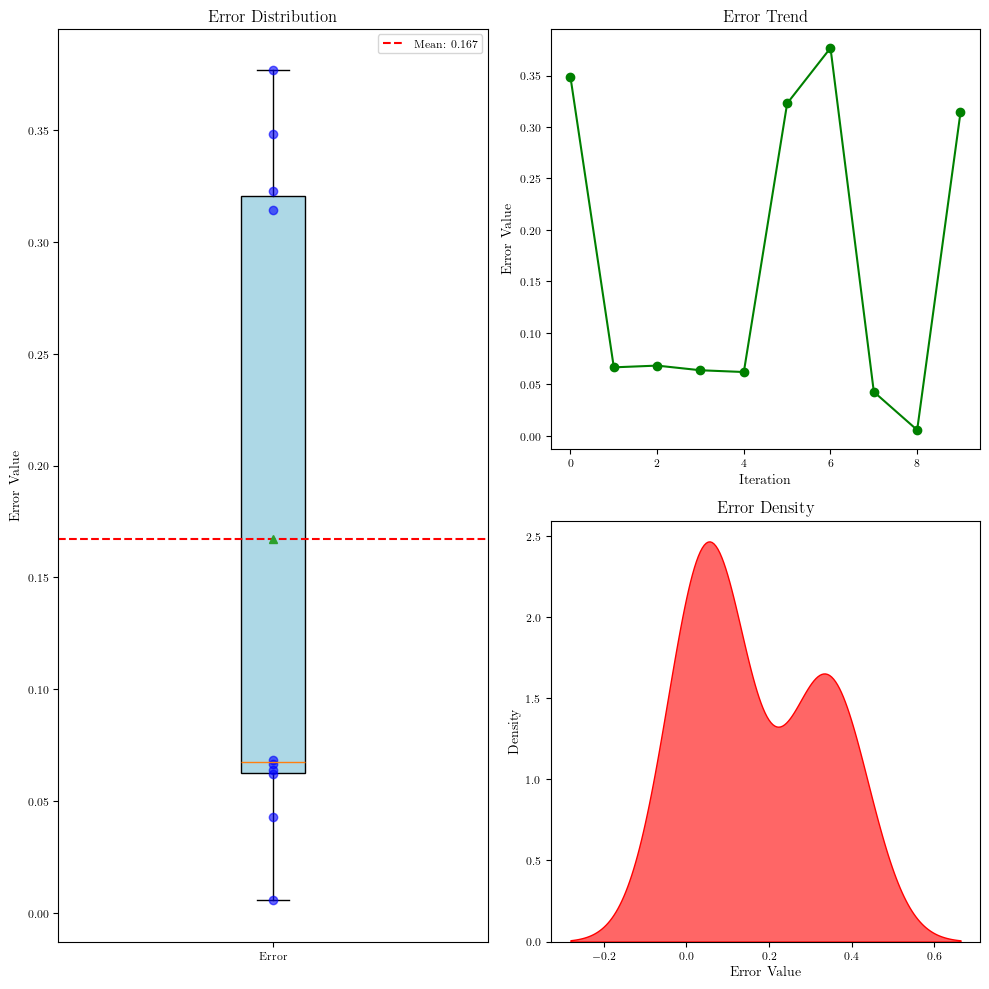

In [10]:

import seaborn as sns  # 导入seaborn库用于绘制密度图



plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列

mean_error = np.mean(error) #计算error数组的均值
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue')) #绘制箱型图，其中error是需要绘制的数据，patch_artist=True表示填充箱体，showmeans=True表示显示均值，meanline=True表示显示均值线，boxprops=dict(facecolor='lightblue')表示箱体的颜色为浅蓝色
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:.3f}') #绘制一条水平线，位于mean_error处，颜色为红色，线型为虚线，标签为均值
for i, value in enumerate(error): #遍历error数组，i为索引，value为值
    plt.plot(1, value, 'bo', alpha=0.6) #绘制散点图，横坐标为1，纵坐标为value（即error数组中每个数），颜色为蓝色，点形状为圆圈，透明度为0.6
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error']) #设置x轴刻度标签
plt.legend() #显示图例

# 右侧上方子图：折线图
plt.subplot(2, 2, 2)  # 第二个子图，现在布局为2行2列的第二个位置
plt.plot(error, '-o', color='green') #绘制折线图，横坐标为error数组的索引，纵坐标为error数组的值，颜色为绿色，点形状为圆圈
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

# 右侧下方子图：密度图
plt.subplot(2, 2, 4)  # 第四个子图，现在布局为2行2列的第四个位置
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()  # 自动调整子图参数，使之填充整个图表区域
plt.show()

In [11]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()

testerror = torch.stack(model.test_error).cpu().detach().numpy()

66967
[7.0084018e-01 6.1557686e-01 5.3981757e-01 ... 1.4668005e-05 1.4667457e-05
 1.4667357e-05]


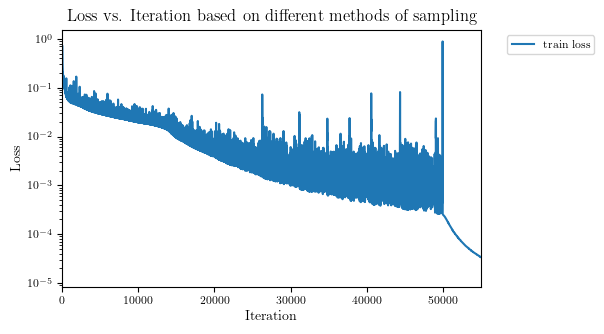

In [12]:
print(len(trainloss))
print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

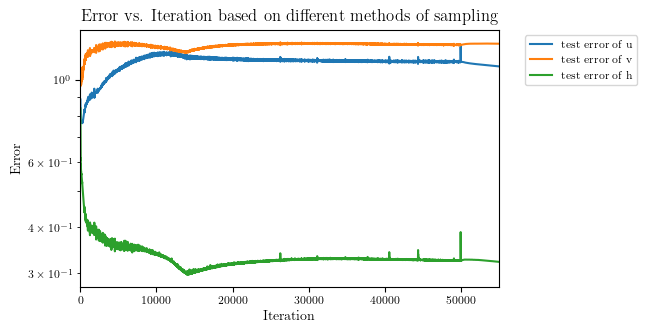

In [13]:
# print(len(trainloss))
# print(trainloss)
# 定义图例的标签
# labels = ["Grid"]

# 创建一个新的图形
plt.figure()

u_error = testerror[:,0]
v_error = testerror[:,1]
h_error = testerror[:,2]

plt.plot(u_error, label='test error of u')
plt.plot(v_error, label='test error of v')
plt.plot(h_error, label='test error of h')


# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,55000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Error') # 设置y轴的标签
plt.title('Error vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

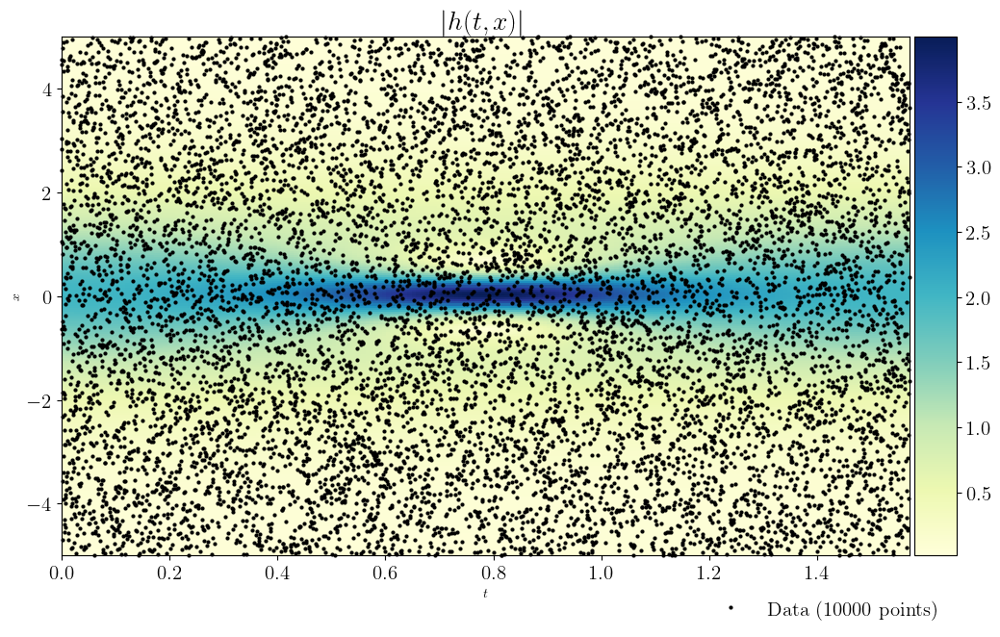

In [14]:


###### Row 0: u(t,x) ##################    

fig = plt.figure(figsize=(12, 7)) #这里figure是一个figure对象，是一个图形窗口，代表整个图形，设置图形大小为宽9英寸高5 英寸
ax = fig.add_subplot(111) #在图形的1*1网格的第一个位置添加一个子图

#绘制热图
h = ax.imshow(H_star.T, interpolation='nearest', cmap='YlGnBu', 
                extent=[lb[1], ub[1], lb[0], ub[0]], 
                origin='lower', aspect='auto')  #imshow函数用于显示图像，接受一些参数，第一个参数是图像数据，这里是H_pred的转置；第二个参数是插值方法（用于在像素之间插入新的像素），这里是最邻近插值；
                                                #第三个参数是颜色映射，这里是从黄色Yl到绿色Gn再到蓝色Bu；第四个参数是图像的范围，这里lb和ub分别是数据的下界和上界；第五个参数是图像的原点位置，这里表示原点在右下角；第六个参数是图像的纵横比，这里表示调整横纵比以填充整个axes对象
                                                #最后的结果返回一个axesimage对象，也就是h，可以通过这个对象进一步设置图像的属性
divider = make_axes_locatable(ax)  #使用 make_axes_locatable 函数创建了一个 AxesDivider 对象。这个函数接受一个 Axes 对象作为参数，返回一个 AxesDivider 对象。AxesDivider 对象可以用来管理子图的布局，特别是当你需要在一个图的旁边添加另一个图时。
cax = divider.append_axes("right", size="5%", pad=0.05) #使用append_axes方法在原始轴的右侧添加了一个新的轴。append_axes 方法接受三个参数：位置（"right"）、大小（"5%"）和间距（0.05）。在原始轴的右侧添加了一个新的轴，新轴的大小是原始轴的 5%，新轴与原始轴之间的间距是 0.05 英寸
cbar = fig.colorbar(h, cax=cax)#使用colorbar方法在新轴上添加了一个颜色条。colorbar 方法接受两个参数：axesimage 对象（h）和新轴（cax）。并记这个颜色条的名字是cbar
cbar.ax.tick_params(labelsize=15) #设置颜色条刻度标签大小，这里bar是之前定义的

ax.plot(
    X_f[:,1], 
    X_f[:,0], 
    'ko', label = 'Data (%d points)' % (X_f.shape[0]), 
    markersize = 2,  # marker size doubled
    clip_on = False,
    alpha=1.0
) #在ax上绘制散点图，前两个参数是散点的x坐标和y坐标；kx表示黑色的x（散点形状是x），label是散点的标签，clip_on表示散点可以绘制在轴的边界外
  #新加了一个alpha=1.0用来设置标记的透明度，1.0表示完全不透明  

# #绘制三条虚线
# line = np.linspace(x.min(), x.max(), 2)[:,None] #生成了一个包含2个等间距的数值的数组，这些数值在 x.min() 到 x.max() 之间。[:,None] 是一个索引操作，用于将一维数组转换为二维数组。这里其实就是[-5;5]
# #第一个参数是虚线的x坐标，line是虚线y的坐标，第三个参数是虚线的样式，k表示黑色，--表示虚线，最后一个参数表示虚线的参数是1
# ax.plot(t[75]*np.ones((2,1)),line,'k--',linewidth=1) 
# ax.plot(t[100]*np.ones((2,1)),line,'k--',linewidth=1)
# ax.plot(t[125]*np.ones((2,1)),line,'k--',linewidth=1)    

#设置标签
#设置ax子图的x轴的标签为t，y轴的标签为x。这里$t$和$x$是latex格式的文本，用于生成数学公式
ax.set_xlabel('$t$')
ax.set_ylabel('$x$')
#设置子图ax的图例，第一个参数用来设置图例的位置，这里表示图例放在上方中央;第二个参数用来设置图例的锚点，接受一个元组，表示x和y坐标，表示把图例的锚点设置在x坐标为0.9，y坐标为-0.05处;frameon=False表示不显示图例的边框;第三个参数设置图例的列数，分为5列；最后一个参数设置图例属性，接受字典，这里表示设置图例字体大小为15；最后返回的leg是一个legend对象，表示图形的图例
ax.legend(
    loc='upper center', 
    bbox_to_anchor=(0.9, -0.05), 
    ncol=5, 
    frameon=False, 
    prop={'size': 15}
)

#    plt.setp(leg.get_texts(), color='w')   #用来设置图例中文本的颜色，这里是白色，取消注释后文本会变为白色
ax.set_title('$|h(t,x)|$', fontsize = 20) #设置子图ax的标题为$|h(t,x)|$，表示latex格式的文本，用于生成数学公式，fontsize=10表示字体大小为10
ax.tick_params(labelsize=15)#用来设置刻度标签的大小。`tick_params`是`Axes`对象的一个方法，可以用来设置刻度线的属性。在这里，`labelsize=15` 是用来设置刻度标签的字体大小的。


#显示图片
plt.show() #显示所有打开的图形的函数


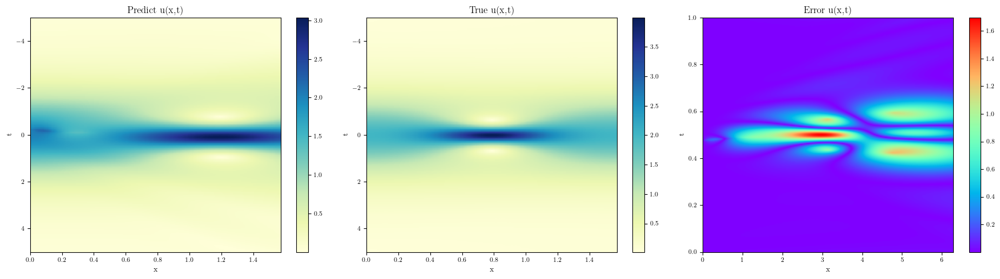

In [15]:


# 创建一个包含两个子图的图形
fig, axes = plt.subplots(1, 3, figsize=(18, 5))  # 1行2列的子图，图形大小为宽18英寸高5英寸

# 绘制第一幅图像
axes[0].imshow(H_pred.T, interpolation='nearest', cmap='YlGnBu', 
                extent=[lb[1], ub[1], lb[0], ub[0]], 
                origin='lower', aspect='auto')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Predict u(x,t)')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(H_star.T, interpolation='nearest', cmap='YlGnBu', 
                extent=[lb[1], ub[1], lb[0], ub[0]], 
                origin='lower', aspect='auto')
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('True u(x,t)')
fig.colorbar(axes[1].images[0], ax=axes[1])


# 绘制第三幅图像
axes[2].imshow(np.abs(H_pred - H_star).T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[2].invert_yaxis()
axes[2].set_xlabel('x')
axes[2].set_ylabel('t')
axes[2].set_title('Error u(x,t)')
fig.colorbar(axes[2].images[0], ax=axes[2])


# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()

In [16]:
#计算训练好模型的chaos（最后一个seed）
u_chaos = calculate_chaos(model, X_star, num_iter=50)
u_chaos_log = np.log(u_chaos + 1e-10) #对u_var取对数，然后加上一个很小的数，避免取对数时出现错误

#使用griddata函数将X_star、u_pred插值到网格上，得到U_pred
U_chaos = griddata(X_star, u_chaos.flatten(), (X, T), method='cubic')
U_chaos_log = griddata(X_star, u_chaos_log.flatten(), (X, T), method='cubic')

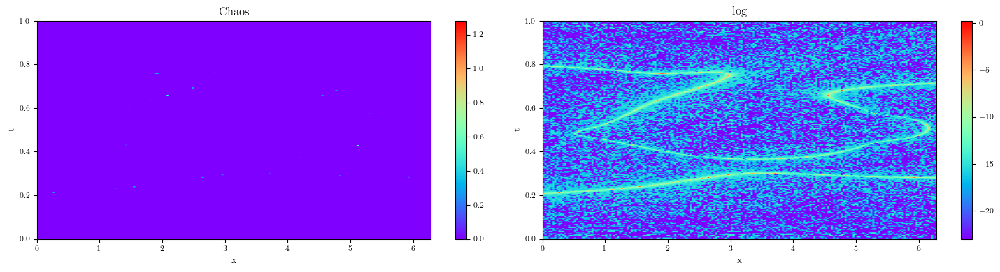

In [17]:

# 创建一个包含三幅子图的图像
fig, axes = plt.subplots(1, 2, figsize=(15, 4))

# 绘制第一幅图像
axes[0].imshow(U_chaos.T, extent=[0, np.pi*2, 1, 0], aspect='auto', cmap='rainbow')
axes[0].invert_yaxis()
axes[0].set_xlabel('x')
axes[0].set_ylabel('t')
axes[0].set_title('Chaos')
fig.colorbar(axes[0].images[0], ax=axes[0])

# 绘制第二幅图像
axes[1].imshow(U_chaos_log.T, extent=[0,np.pi*2,1,0], aspect='auto', cmap='rainbow') #第一个参数为数据，第二个参数为一个列表，用于设置图像的坐标范围，aspect='auto'表示纵横比自动调整
axes[1].invert_yaxis()
axes[1].set_xlabel('x')
axes[1].set_ylabel('t')
axes[1].set_title('log')
fig.colorbar(axes[1].images[0], ax=axes[1])

# 自动调整子图参数，使得子图之间的间距适当
plt.tight_layout()
plt.show()